# Women Clothing-E Commerce Reviews


## Table of Contents

 - <a id="Problem Statement">Problem Statement</a>
 - <a id="Overview">Overview</a>
 - <a id="Dataset">Dataset</a>
 - <a id="Models">Models</a>
 - <a id="Performance Metrics">Performance Metrics</a>

#### Problem Statement

Customer Reviews and ratings play a crucial role where an E-commerce platform of Women’s clothing has reviews given by customers which are helpful in identifying more about the data. Based on the sentiment of the customers we need to analyze the ratings that are provided.

#### Overview

This project revolves around employing sentiment analysis techniques to determine whether a product is recommended or not. Various machine learning algorithms, including Logistic Regression, Naive Bayes, SVM, Random Forest, AdaBoost, CatBoost, XGBoost, deep learning, and BERT, were implemented to enhance prediction accuracy.

#### Dataset

The dataset used in this project is sourced from Women's Clothing Reviews, available on Kaggle.

#### Models

##### Multiple models were explored and evaluated in this project:

 - Logistic Regression
 - Naive Bayes
 - Support Vector Machine (SVM)
 - Random Forest
 - AdaBoost
 - CatBoost
 - XGBoost
 - Deep Learning
 - BERT

#### Performance Metrics

 - Recall Score
 - F1 Score
 - Average Precision Score

## PART - 1 Exploratory Data Analysis

#### Content
##### Dataset Explanation
 - 1 Importing Libraries Needed in This Notebook 
 - 2 User Defined Functions (DEFs) 
 - 3 Reading & Understanding Data
 - 4 Feature Selection and Data Cleaning
 - 5 Missing Value Detection 
 - 6 Text Mining 
 - 7 Tokenization, Noise Removal, Lexicon Normalization
 - 8 Word Cloud 
 - 9 Sentiment Classification with Machine Learning, Deep Learning and BERT model 10

 #### Dataset Explanation 

__The data is a collection of 22641 Rows and 10 column variables. Each row includes a written comment as well as additional customer information. Also each row corresponds to a customer review, and includes the variables:__

__Feature Information:__

 - Clothing ID: Integer Categorical variable that refers to the specific piece being reviewed.
 - Age: Positive Integer variable of the reviewers age.
 - Title: String variable for the title of the review.
 - Review Text: String variable for the review body.
 - Rating: Positive Ordinal Integer variable for the product score granted by the customer from 1 Worst, to 5 Best.
 - Recommended IND: Binary variable stating where the customer recommends the product where 1 is recommended, 0 is not recommended.
 - Positive Feedback Count: Positive Integer documenting the number of other customers who found this review positive.
 - Division Name: Categorical name of the product high level division.
 - Department Name: Categorical name of the product department name.
 - Class Name: Categorical name of the product class name.

 __Importing Libraries Needed in This Notebook__ 

In [1]:
!pip install contractions
!pip install autocorrect
!pip install colorama
!pip install seaborn
!pip install nltk


In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import nltk
from nltk.tokenize import sent_tokenize, word_tokenize
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from nltk.stem import PorterStemmer
import contractions
from autocorrect import Speller


# !pip install termcolor
import colorama
from colorama import Fore, Style  # makes strings colored
from termcolor import colored
from termcolor import cprint

In [3]:
nltk.download("punkt")
nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('omw-1.4')

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\khara\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\khara\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\khara\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw-1.4 to
[nltk_data]     C:\Users\khara\AppData\Roaming\nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!


True

In [4]:
 pip install autocorrect

Note: you may need to restart the kernel to use updated packages.


In [5]:
import tensorflow as tf




In [160]:
from sklearn.metrics import precision_recall_curve, average_precision_score

In [161]:
import matplotlib
import sklearn
import autocorrect

# Autocorrect Version
try:
    import importlib.metadata as metadata
except ImportError:
    import importlib_metadata as metadata

print("Pandas Version: ", pd.__version__)
print("NumPy Version: ", np.__version__)
print("Matplotlib Version: ", matplotlib.__version__)
print("Seaborn Version: ", sns.__version__)
print("NLTK Version: ", nltk.__version__)
print("Scikit-Learn Version: ", sklearn.__version__)
print("Autocorrect Version: ", metadata.version("autocorrect"))

Pandas Version:  2.2.2
NumPy Version:  1.24.3
Matplotlib Version:  3.7.1
Seaborn Version:  0.12.2
NLTK Version:  3.8.1
Scikit-Learn Version:  1.2.2
Autocorrect Version:  2.6.1


 __User Defined Functions (DEFs)__ 

In [162]:
## Some Useful User-Defined-Functions

###############################################################################

def missing_values(df):
    missing_number = df.isnull().sum().sort_values(ascending=False)
    missing_percent = (df.isnull().sum()/df.isnull().count()*100).sort_values(ascending=False)
    missing_values = pd.concat([missing_number, missing_percent], axis=1, keys=['Missing_Number', 'Missing_Percent'])
    return missing_values[missing_values['Missing_Number']>0]
###############################################################################
def first_looking(df):
    print(colored("Shape:", attrs=['bold']), df.shape,'\n',
          colored('*'*100, 'red', attrs=['bold']),
          colored("\nInfo:\n", attrs=['bold']), sep='')
    print(df.info(), '\n',
          colored('*'*100, 'red', attrs=['bold']), sep='')
    print(colored("Number of Uniques:\n", attrs=['bold']), df.nunique(),'\n',
          colored('*'*100, 'red', attrs=['bold']), sep='')
    print(colored("Missing Values:\n", attrs=['bold']), missing_values(df),'\n',
          colored('*'*100, 'red', attrs=['bold']), sep='')
    print(colored("All Columns:", attrs=['bold']), list(df.columns),'\n',
          colored('*'*100, 'red', attrs=['bold']), sep='')

#     df.columns= df.columns.str.lower().str.replace('&', '_').str.replace(' ', '_')
#     print(colored("Columns after rename:", attrs=['bold']), list(df.columns),'\n',
#           colored('*'*100, 'red', attrs=['bold']), sep='')
    print(colored("Descriptive Statistics \n", attrs=['bold']), df.describe().round(2),'\n',
          colored('*'*100, 'red', attrs=['bold']), sep='') # Gives a statstical breakdown of the data.
#     print(colored("Descriptive Statistics (Categorical Columns) \n", attrs=['bold']), df.describe(include=object).T,'\n',
#           colored('*'*100, 'red', attrs=['bold']), sep='') # Gives a statstical breakdown of the data.

###############################################################################
def first_look(df, col):
    """
    Prints basic information about a column in a Pandas DataFrame.

    Parameters:
    -----------
    df : pandas.DataFrame
        The DataFrame to analyze.
    col : str
        The name of the column to analyze.

    Returns:
    --------
    None.

    Prints:
    -------
    column name    : str
        The name of the column being analyzed.
    per_of_nulls   : float
        The percentage of null values in the column.
    num_of_nulls   : int
        The number of null values in the column.
    num_of_uniques : int
        The number of unique values in the column.
    shape_of_df    : tuple
        The shape of the DataFrame.
    The unique values in the column and their frequency of occurrence.
    """
    print("column name    : ", col)
    print("--------------------------------")
    print("per_of_nulls   : ", "%", round(df[col].isnull().sum() * 100 / df.shape[0], 2))
    print("num_of_nulls   : ", df[col].isnull().sum())
    print("num_of_uniques : ", df[col].astype(str).nunique())
    print("shape_of_df    : ", df.shape)
    print("--------------------------------")
    print(df[col].value_counts(dropna=False))
###############################################################################


def duplicate_values(df):
    print(colored("Duplicate check...", attrs=['bold']), sep='')
    duplicate_values = df.duplicated(subset=None, keep='first').sum()
    if duplicate_values > 0:
        df.drop_duplicates(keep='first', inplace=True)
        print(duplicate_values, colored(" Duplicates were dropped!"),'\n',
              colored('*'*100, 'red', attrs=['bold']), sep='')
    else:
        print(colored("There are no duplicates"),'\n',
              colored('*'*100, 'red', attrs=['bold']), sep='')

###############################################################################

 #### Reading & Understanding Data 

In [163]:
df0 = pd.read_csv("Womens Clothing E-Commerce Reviews.csv").drop(columns = "Unnamed: 0")
df = df0.copy()
df.head()

,Clothing ID,Age,Title,Review Text,Rating,Recommended IND,Positive Feedback Count,Division Name,Department Name,Class Name
0,767,33,NaN,Absolutely wonderful - silky and sexy and comf...,4,1,0,Initmates,Intimate,Intimates
1,1080,34,NaN,Love this dress! it's sooo pretty. i happene...,5,1,4,General,Dresses,Dresses
2,1077,60,Some major design flaws,I had such high hopes for this dress and reall...,3,0,0,General,Dresses,Dresses
3,1049,50,My favorite buy!,"I love, love, love this jumpsuit. it's fun, fl...",5,1,0,General Petite,Bottoms,Pants
4,847,47,Flattering shirt,This shirt is very flattering to all due to th...,5,1,6,General,Tops,Blouses


In [164]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23486 entries, 0 to 23485
Data columns (total 10 columns):
 #   Column                   Non-Null Count  Dtype 
---  ------                   --------------  ----- 
 0   Clothing ID              23486 non-null  int64 
 1   Age                      23486 non-null  int64 
 2   Title                    19676 non-null  object
 3   Review Text              22641 non-null  object
 4   Rating                   23486 non-null  int64 
 5   Recommended IND          23486 non-null  int64 
 6   Positive Feedback Count  23486 non-null  int64 
 7   Division Name            23472 non-null  object
 8   Department Name          23472 non-null  object
 9   Class Name               23472 non-null  object
dtypes: int64(5), object(5)
memory usage: 1.8+ MB


In [165]:
df["Recommended IND"].value_counts()

Recommended IND
1    19314
0     4172
Name: count, dtype: int64

In [166]:
first_looking(df)
duplicate_values(df)

Shape:(23486, 10)
****************************************************************************************************
Info:

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23486 entries, 0 to 23485
Data columns (total 10 columns):
 #   Column                   Non-Null Count  Dtype 
---  ------                   --------------  ----- 
 0   Clothing ID              23486 non-null  int64 
 1   Age                      23486 non-null  int64 
 2   Title                    19676 non-null  object
 3   Review Text              22641 non-null  object
 4   Rating                   23486 non-null  int64 
 5   Recommended IND          23486 non-null  int64 
 6   Positive Feedback Count  23486 non-null  int64 
 7   Division Name            23472 non-null  object
 8   Department Name          23472 non-null  object
 9   Class Name               23472 non-null  object
dtypes: int64(5), object(5)
memory usage: 1.8+ MB
None
**************************************************************************

In [167]:
missing_values(df)

,Missing_Number,Missing_Percent
Title,3789,16.147454
Review Text,825,3.515875
Division Name,14,0.059663
Department Name,14,0.059663
Class Name,14,0.059663


In [168]:
# Checking Mixed Type of Data:
class color:
    PURPLE = '\033[95m'
    CYAN = '\033[96m'
    DARKCYAN = '\033[36m'
    BLUE = '\033[94m'
    GREEN = '\033[92m'
    YELLOW = '\033[93m'
    RED = '\033[91m'
    BOLD = '\033[1m'
    UNDERLINE = '\033[4m'
    END = '\033[0m'

def check_obj_columns(df):
    '''
    Returns NO PROBLEM or column/s which has/have mixed object types.
    '''

    tdf = df.select_dtypes(include=['object']).applymap(type)
   
    for col in tdf:
        if len(set(tdf[col].values)) > 1:
            print("Column" + " " + color.BOLD + color.RED + col + color.END + " " + "has mixed object types." )
    else:
        if len(set(tdf[col].values)) == 1:
            print(color.BOLD + color.GREEN + "NO PROBLEM" + " " + color.END + " " + "with the data types of Columns in the DataFrame.")

check_obj_columns(df)

Column Title has mixed object types.
Column Review Text has mixed object types.
Column Division Name has mixed object types.
Column Department Name has mixed object types.
Column Class Name has mixed object types.


C:\Users\khara\AppData\Local\Temp\ipykernel_16784\2692565269.py:19: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  tdf = df.select_dtypes(include=['object']).applymap(type)


In [169]:
for i in df.columns[:]:
    print("*" * 30)
    print("Column Name: ", i)
    print()
    print("Number of NaN values in the column: ", df[i].isnull().sum())
    print()
    print("What percentage of the column consists of NaN values?", (df[i].isnull().sum() / len(df)) * 100)
    print()
    print("Value counts for the column:\n", df[i].value_counts(dropna=False))

******************************
Column Name:  Clothing ID

Number of NaN values in the column:  0

What percentage of the column consists of NaN values? 0.0

Value counts for the column:
 Clothing ID
1078    1021
862      802
1094     753
1081     582
872      544
        ... 
776        1
668        1
633        1
734        1
522        1
Name: count, Length: 1206, dtype: int64
******************************
Column Name:  Age

Number of NaN values in the column:  0

What percentage of the column consists of NaN values? 0.0

Value counts for the column:
 Age
39    1267
35     905
36     839
34     802
38     779
      ... 
93       2
90       2
86       2
99       2
92       1
Name: count, Length: 77, dtype: int64
******************************
Column Name:  Title

Number of NaN values in the column:  3789

What percentage of the column consists of NaN values? 16.147453654378864

Value counts for the column:
 Title
NaN                                        3789
Love it!               

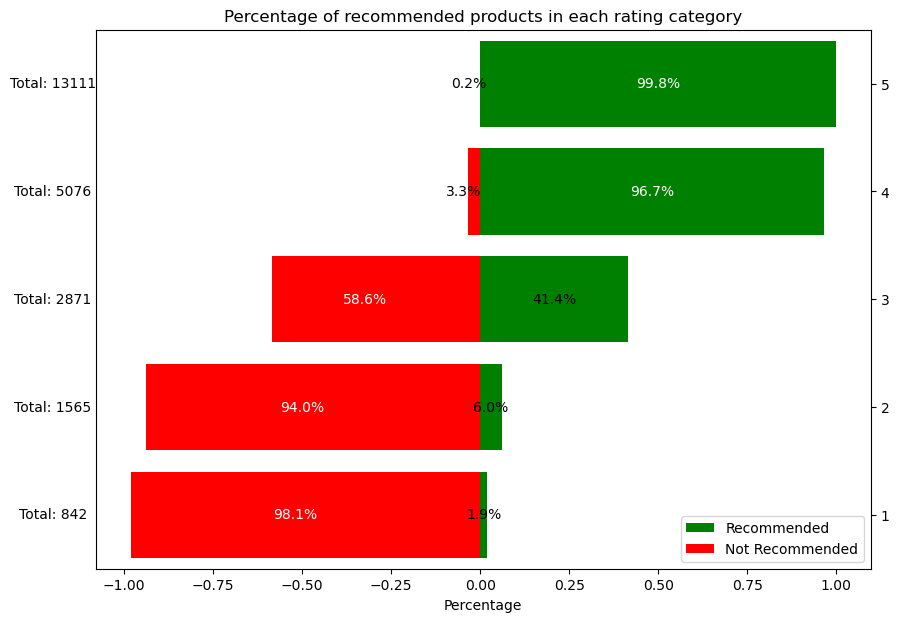

In [170]:
rating_recommended_percentage = df.groupby("Rating")["Recommended IND"].value_counts(normalize=True).unstack().fillna(0)
rating_recommended_percentage['Not Recommended'] = 1 - rating_recommended_percentage[1]
rating_counts = df['Rating'].value_counts()

rating_counts = rating_counts.sort_index()

# Butterfly chart
fig, ax = plt.subplots(figsize=(10, 7))

for i, (rating, count) in enumerate(rating_counts.items()):
    ax.text(-1.2, i, f'Total: {count}', ha='center', va='center', color='black', fontsize=10)

# Recommended
ax.barh(rating_recommended_percentage.index.astype(str), rating_recommended_percentage[1], color='green', label='Recommended')

# Not Recommended
ax.barh(rating_recommended_percentage.index.astype(str), -rating_recommended_percentage['Not Recommended'], color='red', label='Not Recommended')

for p in ax.patches:
    width = p.get_width()
    if width != 0:
        label_x = width / 2 if width > 0 else (width / 2) - 0.03  # Adjusted label_x for better alignment
        label_color = 'white' if abs(width) > 0.5 else 'black'
        ax.annotate(f'{abs(width):.1%}', (label_x, p.get_y() + p.get_height() / 2),
                    ha='center', va='center', color=label_color)

ax.yaxis.tick_right()
ax.set_yticks(range(len(rating_recommended_percentage)))
ax.set_yticklabels(rating_recommended_percentage.index.astype(str))
ax.legend(loc='lower right')

# Set ylim for better alignment
ax.set_ylim([-0.5, len(rating_recommended_percentage) - 0.5])

plt.title("Percentage of recommended products in each rating category")
plt.xlabel("Percentage")
plt.show()

<font color='purple'>It is observed that the most recommendations occur for products with a 5 rating, while the least recommendations occur for products with a 2 rating.</font>

In [171]:
df["Recommended IND"].value_counts()

Recommended IND
1    19293
0     4172
Name: count, dtype: int64

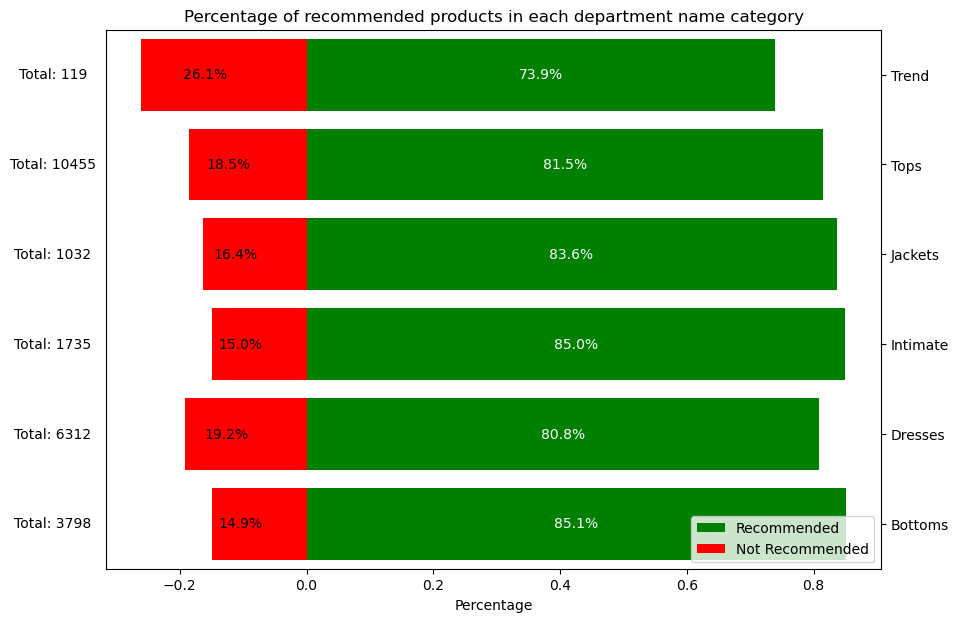

In [172]:
department_name_recommended_percentage = df.groupby("Department Name")["Recommended IND"].value_counts(normalize=True).unstack().fillna(0)
department_name_recommended_percentage['Not Recommended'] = 1 - department_name_recommended_percentage[1]
department_name_counts = df['Department Name'].value_counts()

department_name_counts = department_name_counts.sort_index()

# Butterfly chart
fig, ax = plt.subplots(figsize=(10, 7))

for i, (department_name, count) in enumerate(department_name_counts.items()):
    ax.text(-0.4, i, f'Total: {count}', ha='center', va='center', color='black', fontsize=10)

# Recommended
ax.barh(department_name_recommended_percentage.index.astype(str), department_name_recommended_percentage[1], color='green', label='Recommended')

# Not Recommended
ax.barh(department_name_recommended_percentage.index.astype(str), -department_name_recommended_percentage['Not Recommended'], color='red', label='Not Recommended')

for p in ax.patches:
    width = p.get_width()
    if width != 0:
        label_x = width / 2 if width > 0 else (width / 2) - 0.03  # Adjusted label_x for better alignment
        label_color = 'white' if abs(width) > 0.5 else 'black'
        ax.annotate(f'{abs(width):.1%}', (label_x, p.get_y() + p.get_height() / 2),
                    ha='center', va='center', color=label_color)

ax.yaxis.tick_right()
ax.set_yticks(range(len(department_name_recommended_percentage)))
ax.set_yticklabels(department_name_recommended_percentage.index.astype(str))
ax.legend(loc='lower right')

# Set ylim for better alignment
ax.set_ylim([-0.5, len(department_name_recommended_percentage) - 0.5])

plt.title("Percentage of recommended products in each department name category")
plt.xlabel("Percentage")
plt.show()

<font color='purple'>It is observed that, across all categories, Top category products have both the highest and lowest number of recommendations. Specifically, within the Top category, the products tend to have a higher recommendation rate internally.</font>

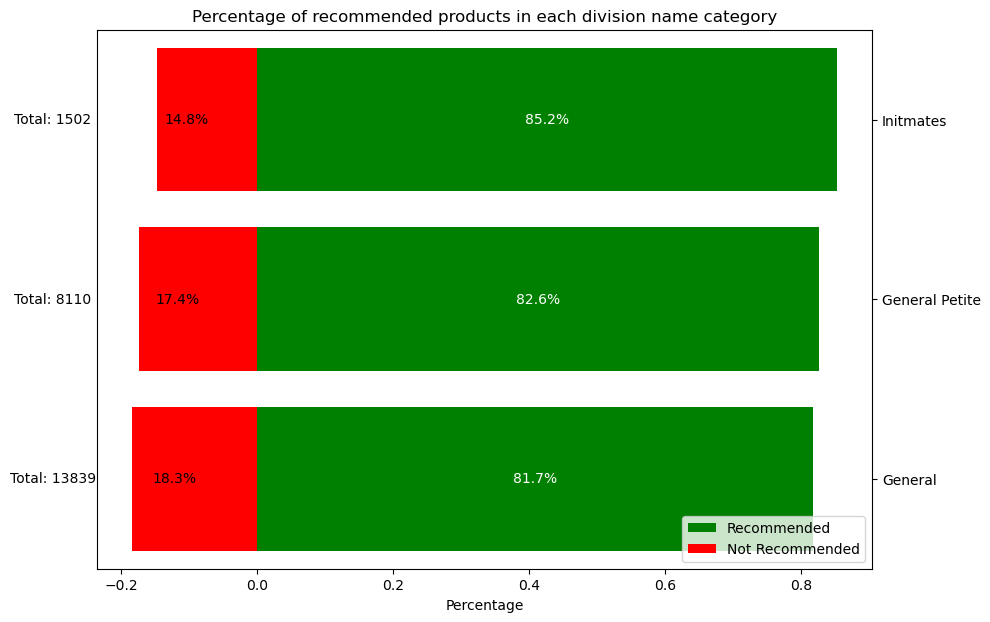

In [173]:
division_name_recommended_percentage = df.groupby("Division Name")["Recommended IND"].value_counts(normalize=True).unstack().fillna(0)
division_name_recommended_percentage['Not Recommended'] = 1 - division_name_recommended_percentage[1]
division_name_counts = df['Division Name'].value_counts()

division_name_counts = division_name_counts.sort_index()

# Butterfly chart
fig, ax = plt.subplots(figsize=(10, 7))

for i, (division_name, count) in enumerate(division_name_counts.items()):
    ax.text(-0.3, i, f'Total: {count}', ha='center', va='center', color='black', fontsize=10)

# Recommended
ax.barh(division_name_recommended_percentage.index.astype(str), division_name_recommended_percentage[1], color='green', label='Recommended')

# Not Recommended
ax.barh(division_name_recommended_percentage.index.astype(str), -division_name_recommended_percentage['Not Recommended'], color='red', label='Not Recommended')

for p in ax.patches:
    width = p.get_width()
    if width != 0:
        label_x = width / 2 if width > 0 else (width / 2) - 0.03  # Adjusted label_x for better alignment
        label_color = 'white' if abs(width) > 0.5 else 'black'
        ax.annotate(f'{abs(width):.1%}', (label_x, p.get_y() + p.get_height() / 2),
                    ha='center', va='center', color=label_color)

ax.yaxis.tick_right()
ax.set_yticks(range(len(division_name_recommended_percentage)))
ax.set_yticklabels(division_name_recommended_percentage.index.astype(str))
ax.legend(loc='lower right')

# Set ylim for better alignment
ax.set_ylim([-0.5, len(division_name_recommended_percentage) - 0.5])

plt.title("Percentage of recommended products in each division name category")
plt.xlabel("Percentage")
plt.show()

<font color='Magenta'>It is observed that, across all categories, General category products have both the highest and lowest number of recommendations. Specifically, within the General category, the products tend to have a higher recommendation rate internally.</font>

In [174]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 23465 entries, 0 to 23485
Data columns (total 10 columns):
 #   Column                   Non-Null Count  Dtype 
---  ------                   --------------  ----- 
 0   Clothing ID              23465 non-null  int64 
 1   Age                      23465 non-null  int64 
 2   Title                    19676 non-null  object
 3   Review Text              22640 non-null  object
 4   Rating                   23465 non-null  int64 
 5   Recommended IND          23465 non-null  int64 
 6   Positive Feedback Count  23465 non-null  int64 
 7   Division Name            23451 non-null  object
 8   Department Name          23451 non-null  object
 9   Class Name               23451 non-null  object
dtypes: int64(5), object(5)
memory usage: 2.0+ MB


C:\Users\khara\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\khara\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
C:\Users\khara\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
C:\Users\khara\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is 

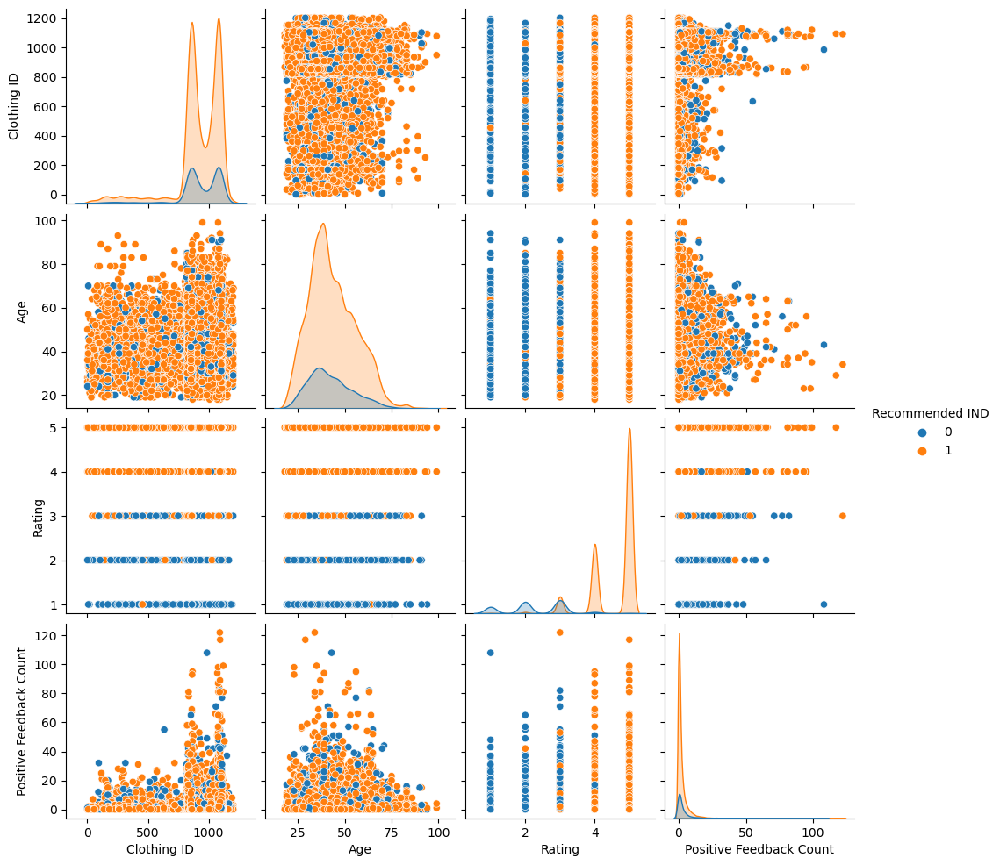

In [175]:
 sns.pairplot(df, hue ='Recommended IND')
   # sns.pairplot(df, hue = "Recommended IND")

In [176]:
df["Recommended IND"].value_counts(normalize = True)

Recommended IND
1    0.822203
0    0.177797
Name: proportion, dtype: float64

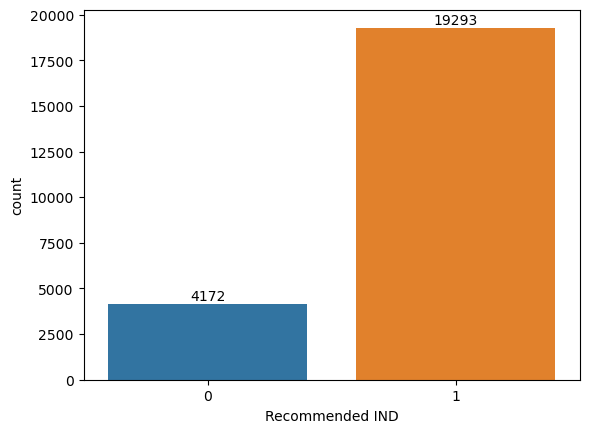

In [177]:
ax = sns.countplot(data =df, x = "Recommended IND")
ax.bar_label(ax.containers[0]);

<font color='purple'>The classes in the data exhibit significant numerical imbalances, forming an imbalanced dataset. To address this, certain parameters such as class_weight and sample_weight need to be utilized. Here, an attempt will be made to increase the scores of the 0 class. As algorithms typically yield results for the 1 class, using mapping, the 0 class will be relabeled as 1, and vice versa. This transformation enables easier tracking of what were previously the 0 class, now relabeled as the new 1 class.</font>

<h2 style='text-align: center;'> Feature Selection and Data Cleaning </h2>

In [178]:
df_rec = df[["Review Text", "Recommended IND"]]
df_rec.head()

,Review Text,Recommended IND
0,Absolutely wonderful - silky and sexy and comf...,1
1,Love this dress! it's sooo pretty. i happene...,1
2,I had such high hopes for this dress and reall...,0
3,"I love, love, love this jumpsuit. it's fun, fl...",1
4,This shirt is very flattering to all due to th...,1


In [179]:
df_rec.rename(columns={"Review Text": "review", "Recommended IND" : "recommend"}, inplace = True)
df_rec.head()

C:\Users\khara\AppData\Local\Temp\ipykernel_16784\2539035246.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_rec.rename(columns={"Review Text": "review", "Recommended IND" : "recommend"}, inplace = True)


,review,recommend
0,Absolutely wonderful - silky and sexy and comf...,1
1,Love this dress! it's sooo pretty. i happene...,1
2,I had such high hopes for this dress and reall...,0
3,"I love, love, love this jumpsuit. it's fun, fl...",1
4,This shirt is very flattering to all due to th...,1


<h2 style='text-align: center;'> ✨ Missing Value Detection ✨ </h2>

In [180]:
missing_values(df_rec)

,Missing_Number,Missing_Percent
review,825,3.515875


In [181]:
print("First Shape :", df_rec.shape)
 #pd.options.mode.copy_on_write = True `
df_rec.dropna(inplace = True)
print("Last Shape after drop:", df_rec.shape)

First Shape : (23465, 2)
Last Shape after drop: (22640, 2)


C:\Users\khara\AppData\Local\Temp\ipykernel_16784\3909664625.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_rec.dropna(inplace = True)


<h2 style = 'text-align:center;'>✨ Text Mining ✨</h2>

#### Text is the most unstructured form of all the available data, therefore various types of noise are present in it. This means that the data is not readily analyzable without any pre-processing. The entire process of cleaning and standardization of text, making it noise-free and ready for analysis is known as text preprocessing.

The three key steps of text preprocessing:

 - Tokenization: This step is one of the top priorities when it comes to working on text mining. Tokenization is essentially splitting a phrase, sentence, paragraph, or an entire text document into smaller units, such as individual words or terms. Each of these smaller units are called tokens.

 - Noise Removal: Any piece of text which is not relevant to the context of the data and the end-output can be specified as the noise. For example – language stopwords (commonly used words of a language – is, am, the, of, in etc), URLs or links, upper and lower case differentiation, punctuations and industry specific words. This step deals with removal of all types of noisy entities present in the text.

 - Lexicon Normalization: Another type of textual noise is about the multiple representations exhibited by single word. For example – “play”, “player”, “played”, “plays” and “playing” are the different variations of the word – “play”. Though they mean different things, contextually they all are similar. This step converts all the disparities of a word into their normalized form (also known as lemma). There are two methods of lexicon normalisation; Stemming or Lemmatization. Lemmatization is recommended for this case, because Lemmatization as this will return the root form of each word (rather than just stripping suffixes, which is stemming).

 - As the first step change text to tokens and convertion all of the words to lower case. Next remove punctuation, bad characters, numbers and stop words. The second step is aimed to normalization them throught the Lemmatization method.

 <font color='Blue'>Note: Use the functions of the nltk Library for all the above operations.</font>

<h2 style='text-align:center'>✨ Tokenization, Noise Removal, Lexicon Normalization ✨</h2>

In [182]:
list(df_rec.review.sample(2))

['Great looking shirt that i bought for my wife, but poor quality. the fit is great but the buttons literally keep falling off. first time my wife wore it two buttons just fell off. when she was sewing them back on she showed me and another button just came off with the slightest tug. its really too bad because it looks great otherwise.',
 "Very flattering fit. a little billowy but i'm okay with that because it hides my stomach. have to wear a camisole underneath as you can see through the lacey parts. overall i love the shirt design, fabric and fit."]

In [183]:
stop_words = stopwords.words("english")

for i in ["not", "no"]:
  stop_words.remove(i)

In [184]:
def cleaning(data):
    #1. Correction of text
    spell=Speller(fast=True)
    correction_data=spell(data)

    #2. Contraction of text
    contraction_data=contractions.fix(correction_data)

    #3. Tokenize and lowercase
    text_tokens = word_tokenize(contraction_data.lower())

    #4. Remove Puncs and numbers
    tokens_without_punc = [w for w in text_tokens if w.isalpha()]

    #5. Removing Stopwords
    tokens_without_sw = [t for t in tokens_without_punc if t not in stop_words]

    #6. lemma
    text_cleaned = [WordNetLemmatizer().lemmatize(t) for t in tokens_without_sw]

    #10. joining
    return " ".join(text_cleaned)

<h2 style='text-align:center'>✨ Word Cloud ✨</h2>

<h2 style='text-align:center'>✨ Detect Reviews (positive and negative separately) ✨</h2>

In [185]:
positive_sentences = df_rec[df_rec["recommend"] == 1]["review"]
positive_sentences

0        Absolutely wonderful - silky and sexy and comf...
1        Love this dress!  it's sooo pretty.  i happene...
3        I love, love, love this jumpsuit. it's fun, fl...
4        This shirt is very flattering to all due to th...
6        I aded this in my basket at hte last mintue to...
                               ...                        
23479    So i wasn't sure about ordering this skirt bec...
23481    I was very happy to snag this dress at such a ...
23482    It reminds me of maternity clothes. soft, stre...
23484    I bought this dress for a wedding i have this ...
23485    This dress in a lovely platinum is feminine an...
Name: review, Length: 18539, dtype: object

In [186]:
negative_sentences = df_rec[df_rec["recommend"] == 0]["review"]
negative_sentences

2        I had such high hopes for this dress and reall...
5        I love tracy reese dresses, but this one is no...
10       Dress runs small esp where the zipper area run...
22       First of all, this is not pullover styling. th...
25       Loved the material, but i didnt really look at...
                               ...                        
23449    I tried these on because the color is really p...
23450    I wanted to love this jacket. so soft and grea...
23460    I purchased this for a very good price and i t...
23478    I was surprised at the positive reviews for th...
23483    This fit well, but the top was very see throug...
Name: review, Length: 4101, dtype: object

<h2 style='text-align:center'>✨ Collect Words (positive and negative separately) ✨</h2>

In [187]:
positive_words = " ".join(positive_sentences)
positive_words[:1000]

'Absolutely wonderful - silky and sexy and comfortable Love this dress!  it\'s sooo pretty.  i happened to find it in a store, and i\'m glad i did bc i never would have ordered it online bc it\'s petite.  i bought a petite and am 5\'8".  i love the length on me- hits just a little below the knee.  would definitely be a true midi on someone who is truly petite. I love, love, love this jumpsuit. it\'s fun, flirty, and fabulous! every time i wear it, i get nothing but great compliments! This shirt is very flattering to all due to the adjustable front tie. it is the perfect length to wear with leggings and it is sleeveless so it pairs well with any cardigan. love this shirt!!! I aded this in my basket at hte last mintue to see what it would look like in person. (store pick up). i went with teh darkler color only because i am so pale :-) hte color is really gorgeous, and turns out it mathced everythiing i was trying on with it prefectly. it is a little baggy on me and hte xs is hte msallet 

In [188]:
negative_words = " ".join(negative_sentences)
negative_words[:1000]

'I had such high hopes for this dress and really wanted it to work for me. i initially ordered the petite small (my usual size) but i found this to be outrageously small. so small in fact that i could not zip it up! i reordered it in petite medium, which was just ok. overall, the top half was comfortable and fit nicely, but the bottom half had a very tight under layer and several somewhat cheap (net) over layers. imo, a major design flaw was the net over layer sewn directly into the zipper - it c I love tracy reese dresses, but this one is not for the very petite. i am just under 5 feet tall and usually wear a 0p in this brand. this dress was very pretty out of the package but its a lot of dress. the skirt is long and very full so it overwhelmed my small frame. not a stranger to alterations, shortening and narrowing the skirt would take away from the embellishment of the garment. i love the color and the idea of the style but it just did not work on me. i returned this dress. Dress run

<h2 style='text-align:center>✨ Create Word Cloud (for most common words in recommended not recommended reviews separately) ✨</h2>

<h2 style='text-align: center;'> ✨ Create Word Cloud (for most common words in recommended not recommended reviews separately) ✨</h2>

In [189]:
from wordcloud import WordCloud

In [190]:
wordcloud_positive = WordCloud(background_color = "white", max_words = 250, colormap = "inferno")

In [191]:
wordcloud_positive.generate(positive_words)

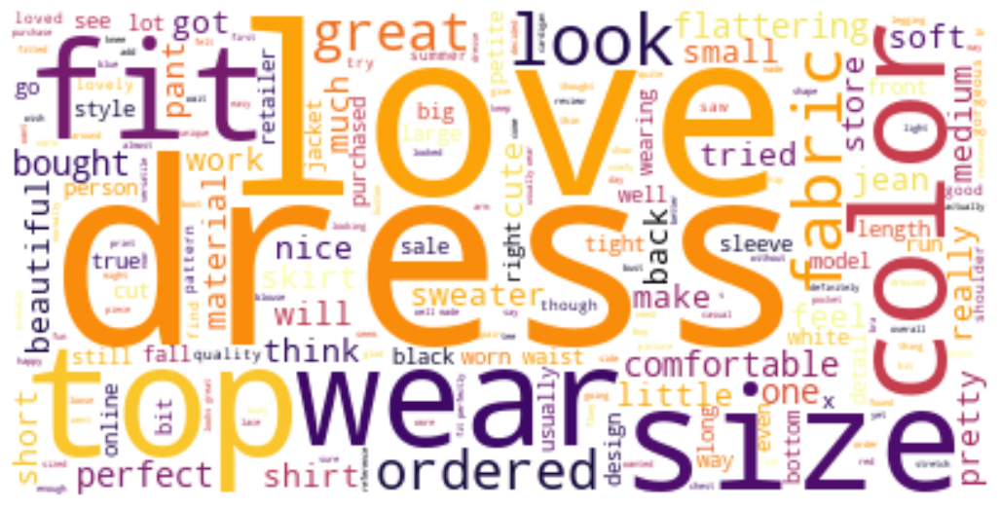

In [192]:
plt.figure(figsize = (13,13))
plt.imshow(wordcloud_positive, interpolation="bilinear")
plt.axis("off")
plt.show()

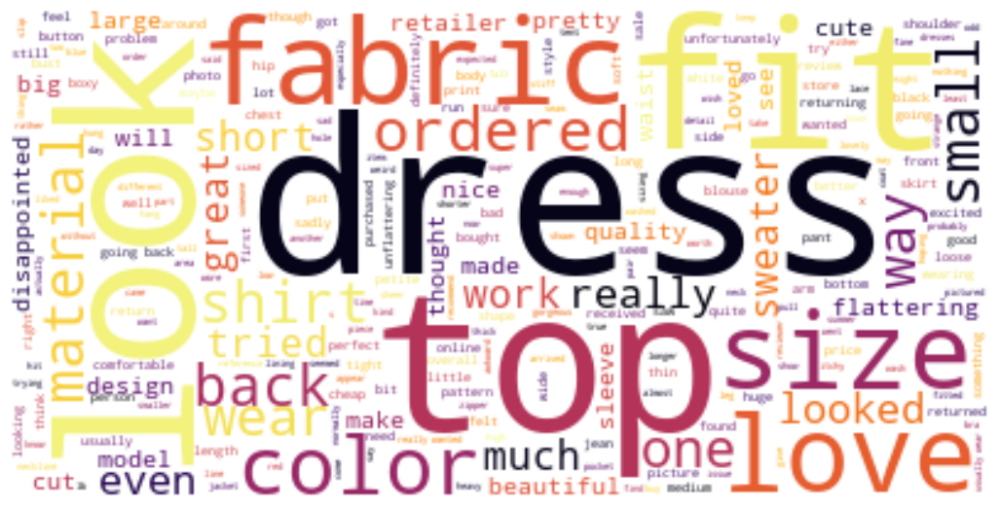

In [193]:
wordcloud_negative = WordCloud(background_color = "white", max_words = 250, colormap = "inferno")
wordcloud_negative.generate(negative_words)

plt.figure(figsize = (13, 13))
plt.imshow(wordcloud_negative, interpolation = "bilinear")
plt.axis("off")
plt.show()

In [194]:
pip install --upgrade ipykernel

Note: you may need to restart the kernel to use updated packages.


<h2 style='text-align: center;'>✨ Sentiment Classification with Machine Learning, Deep Learning and BERT model ✨</h2>

<h1 style='text-align: center;'> ✨ PART - 2 Machine Learning ✨</h1>

 -  Train - Test Split 
 -  Count Vectorization 
 -  TF-IDF 
 -  Eval Function
  1. Logistic Regression
  2. Naive Bayes
  3. Support Vector Machine (SVM)
  4. Random Forest 
  5. Ada Boosting 9 
 -  Catboost 11 
 -  XGBoost 12

<h2 style='text-align: center;'>✨ Train - Test Split ✨ </h2>

In [195]:
from sklearn.model_selection import train_test_split

In [196]:
X = df_rec["review"].values
y = df_rec["recommend"].map({0:1, 1:0}).values

In [197]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.1 , stratify = y, random_state = 42)

<h2 style='text-align: center;'> ✨ Count Vectorization ✨ </h2>

In [198]:
from sklearn.feature_extraction.text import CountVectorizer

In [199]:
%%time
vectorizer = CountVectorizer(preprocessor=cleaning, min_df=3)
X_train_count = vectorizer.fit_transform(X_train)
X_test_count = vectorizer.transform(X_test)

KeyboardInterrupt: 

In [200]:
X_train_count.toarray()

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=int64)

In [201]:
pd.DataFrame(X_train_count.toarray(), columns = vectorizer.get_feature_names_out())

NotFittedError: Vocabulary not fitted or provided

<h2 style='text-align: center;'>✨ TF-IDF ✨ </h2>

In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer

In [ ]:
%%time
tf_idf_vectorizer = TfidfVectorizer(preprocessor=cleaning, min_df=3)
X_train_tf_idf = tf_idf_vectorizer.fit_transform(X_train)
X_test_tf_idf = tf_idf_vectorizer.transform(X_test)

In [ ]:
X_train_tf_idf.toarray()

In [ ]:
pd.DataFrame(X_train_tf_idf.toarray(), columns = tf_idf_vectorizer.get_feature_names_out())

<h2 style='text-align: center;'>✨ Eval Function ✨ </h2>

In [ ]:
from sklearn.metrics import confusion_matrix, classification_report, f1_score, recall_score

In [ ]:
def eval(model, X_train, X_test):
    y_pred = model.predict(X_test)
    y_pred_train = model.predict(X_train)
    print(confusion_matrix(y_test, y_pred))
    print("Test_Set")
    print(classification_report(y_test,y_pred))
    print("Train_Set")
    print(confusion_matrix(y_train, y_pred_train))
    print(classification_report(y_train,y_pred_train))

<h2 style='text-align: center;'> ✨1. Logistic Regression ✨ </h2>

<h2 style='text-align: center;'>✨ CountVectorizer ✨ </h2>

In [ ]:
from sklearn.linear_model import LogisticRegression
log = LogisticRegression(C = 0.01, class_weight = "balanced", max_iter=1000) #class_weight='balanced'
log.fit(X_train_count,y_train)

In [ ]:
print("Countvectorizer LOG MODEL")
eval(log, X_train_count, X_test_count)

In [ ]:
from sklearn.model_selection import cross_validate
from sklearn.metrics import make_scorer
from sklearn.metrics import f1_score, accuracy_score, precision_score, recall_score


model = LogisticRegression(C = 0.01, class_weight = "balanced", max_iter=1000)

scores = cross_validate(model, X_train_count, y_train,
                        scoring = ['precision','recall','f1','accuracy'],
                        cv = 10, return_train_score=True)
df_scores_log_c = pd.DataFrame(scores, index = range(1, 11))
df_scores_log_c.mean()[2:]

In [ ]:
 !pip install scikit-plot

In [ ]:
from scikitplot.metrics import plot_roc, plot_precision_recall

model = LogisticRegression(C = 0.01, class_weight = "balanced", max_iter=1000)

model.fit(X_train_count, y_train)

y_pred_proba = model.predict_proba(X_test_count)

plot_precision_recall(y_test, y_pred_proba)
plt.show();

In [ ]:
y_pred = log.predict(X_test_tf_idf)
y_pred_proba= log.predict_proba(X_test_tf_idf)[:,1]


#log_AP_tfidf = average_precision_score(y_test, y_pred_proba)
log_tfidf_rec = recall_score(y_test, y_pred)
log_tfidf_f1 = f1_score(y_test,y_pred)

<h2 style='text-align: center;'> ✨ TF-IDF ✨</h2>

In [60]:
from sklearn.linear_model import LogisticRegression
log = LogisticRegression(C=0.01,class_weight = 'balanced' ,max_iter=1000)
log.fit(X_train_tf_idf,y_train)


LogisticRegression(C=0.01, class_weight='balanced', max_iter=1000)

In [61]:
print("TF-IDF LOG MODEL")
eval(log, X_train_tf_idf, X_test_tf_idf)

TF-IDF LOG MODEL
[[1514  340]
 [  46  364]]
Test_Set
              precision    recall  f1-score   support

           0       0.97      0.82      0.89      1854
           1       0.52      0.89      0.65       410

    accuracy                           0.83      2264
   macro avg       0.74      0.85      0.77      2264
weighted avg       0.89      0.83      0.84      2264

Train_Set
[[13645  3040]
 [  486  3205]]
              precision    recall  f1-score   support

           0       0.97      0.82      0.89     16685
           1       0.51      0.87      0.65      3691

    accuracy                           0.83     20376
   macro avg       0.74      0.84      0.77     20376
weighted avg       0.88      0.83      0.84     20376



In [62]:
model = LogisticRegression(C=0.01, class_weight = 'balanced', max_iter=1000)
scores = cross_validate(model, X_train_tf_idf, y_train,
                        scoring = ['precision','recall','f1','accuracy'],
                        cv = 10, return_train_score=True)
df_scores = pd.DataFrame(scores, index = range(1, 11))
df_scores.mean()[2:]

test_precision     0.504308
train_precision    0.512797
test_recall        0.851255
train_recall       0.868870
test_f1            0.633331
train_f1           0.644950
test_accuracy      0.821407
train_accuracy     0.826708
dtype: float64

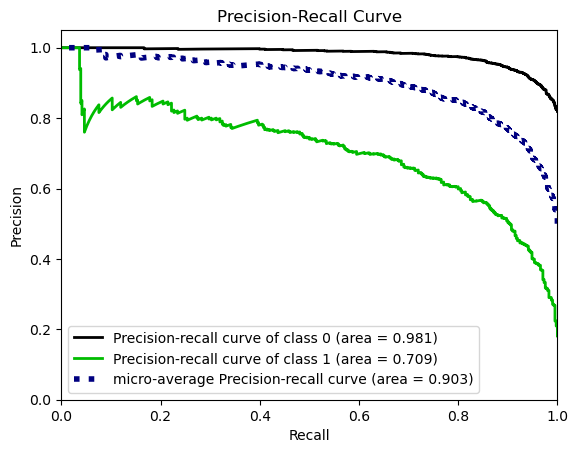

In [63]:
from scikitplot.metrics import plot_roc, plot_precision_recall

model = LogisticRegression(C=0.01, class_weight = 'balanced', max_iter=1000)

model.fit(X_train_tf_idf, y_train)

y_pred_proba = model.predict_proba(X_test_tf_idf)

plot_precision_recall(y_test, y_pred_proba)
plt.show();

In [64]:
y_pred = log.predict(X_test_tf_idf)
y_pred_proba= log.predict_proba(X_test_tf_idf)[:,1]


#log_AP_tfidf = average_precision_score(y_test, y_pred_proba)
log_tfidf_rec = recall_score(y_test, y_pred)
log_tfidf_f1 = f1_score(y_test,y_pred)

<h2 style='text-align: center;'> ✨  Naive Bayes ✨ </h2>

<h2 style='text-align: center;'>  ✨ CountVectorizer ✨

In [65]:
from sklearn.naive_bayes import MultinomialNB, BernoulliNB # BernoulliNB for binary model

In [66]:
nb = MultinomialNB(alpha = 2.1,force_alpha = True, fit_prior = False)
nb.fit(X_train_count,y_train)

MultinomialNB(alpha=2.1, fit_prior=False, force_alpha=True)

In [67]:
print("Countvectorizer NB MODEL\n")
eval(nb, X_train_count, X_test_count)

Countvectorizer NB MODEL

[[1613  241]
 [  47  363]]
Test_Set
              precision    recall  f1-score   support

           0       0.97      0.87      0.92      1854
           1       0.60      0.89      0.72       410

    accuracy                           0.87      2264
   macro avg       0.79      0.88      0.82      2264
weighted avg       0.90      0.87      0.88      2264

Train_Set
[[14651  2034]
 [  460  3231]]
              precision    recall  f1-score   support

           0       0.97      0.88      0.92     16685
           1       0.61      0.88      0.72      3691

    accuracy                           0.88     20376
   macro avg       0.79      0.88      0.82     20376
weighted avg       0.91      0.88      0.89     20376



In [68]:
model = MultinomialNB(alpha = 2.1,force_alpha = True, fit_prior = False)
scores = cross_validate(model, X_train_count, y_train,
                        scoring = ['precision','recall','f1','accuracy'],
                        cv = 10, return_train_score=True)
df_scores = pd.DataFrame(scores, index = range(1, 11))
df_scores.mean()[2:]

test_precision     0.586602
train_precision    0.619669
test_recall        0.837174
train_recall       0.872031
test_f1            0.689692
train_f1           0.724501
test_accuracy      0.863515
train_accuracy     0.879864
dtype: float64

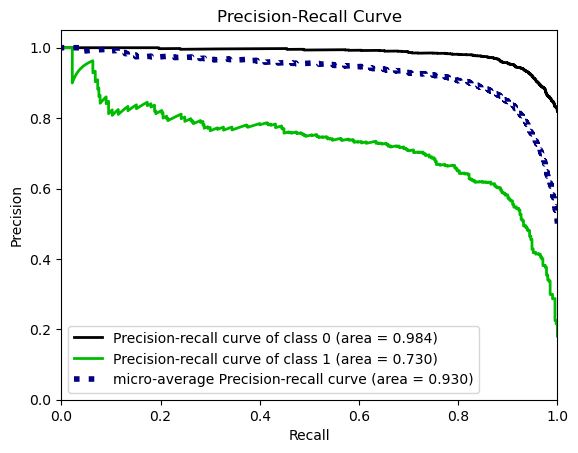

In [69]:
from scikitplot.metrics import plot_roc, plot_precision_recall


model = MultinomialNB(alpha = 2.1,force_alpha = True, fit_prior = False)

model.fit(X_train_count, y_train)

y_pred_proba = model.predict_proba(X_test_count)
plot_precision_recall(y_test, y_pred_proba)
plt.show();


In [70]:
y_pred = nb.predict(X_test_count)
y_pred_proba= nb.predict_proba(X_test_count)[:,1]

#nb_AP_count = average_precision_score(y_test, y_pred_proba)
nb_count_rec = recall_score(y_test, y_pred)
nb_count_f1 = f1_score(y_test,y_pred)

<h2 style='text-align: center;'> ✨ TF-IDF ✨ </h2>

In [71]:
from sklearn.naive_bayes import MultinomialNB, BernoulliNB

nb = BernoulliNB(alpha=0.7, force_alpha = True, fit_prior = False)#MultinomialNB(force_alpha = True, fit_prior = False)
nb.fit(X_train_tf_idf,y_train)

BernoulliNB(alpha=0.7, fit_prior=False, force_alpha=True)

In [72]:
print("TF - IDF NB MODEL")
eval(nb, X_train_tf_idf, X_test_tf_idf)

TF - IDF NB MODEL
[[1594  260]
 [  54  356]]
Test_Set
              precision    recall  f1-score   support

           0       0.97      0.86      0.91      1854
           1       0.58      0.87      0.69       410

    accuracy                           0.86      2264
   macro avg       0.77      0.86      0.80      2264
weighted avg       0.90      0.86      0.87      2264

Train_Set
[[14472  2213]
 [  388  3303]]
              precision    recall  f1-score   support

           0       0.97      0.87      0.92     16685
           1       0.60      0.89      0.72      3691

    accuracy                           0.87     20376
   macro avg       0.79      0.88      0.82     20376
weighted avg       0.91      0.87      0.88     20376



In [73]:
model = BernoulliNB(alpha=0.7, force_alpha = True, fit_prior = False)
scores = cross_validate(model, X_train_tf_idf, y_train,
                        scoring = ['precision','recall','f1','accuracy'],
                        cv = 10, return_train_score=True)
df_scores = pd.DataFrame(scores, index = range(1, 11))
df_scores.mean()[2:]

test_precision     0.565612
train_precision    0.603422
test_recall        0.850985
train_recall       0.893916
test_f1            0.679501
train_f1           0.720490
test_accuracy      0.854584
train_accuracy     0.874362
dtype: float64

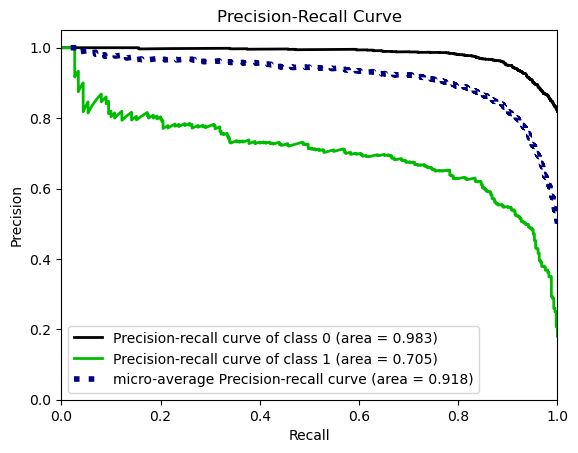

In [74]:
from scikitplot.metrics import plot_roc, plot_precision_recall

model = BernoulliNB(alpha=0.7, force_alpha = True, fit_prior = False)

model.fit(X_train_tf_idf, y_train)

y_pred_proba = model.predict_proba(X_test_tf_idf)

plot_precision_recall(y_test, y_pred_proba)
plt.show();

In [75]:
y_pred = nb.predict(X_test_tf_idf)
y_pred_proba= nb.predict_proba(X_test_tf_idf)[:,1]


#nb_AP_tfidf = average_precision_score(y_test, y_pred_proba)
nb_tfidf_rec = recall_score(y_test, y_pred)
nb_tfidf_f1 = f1_score(y_test,y_pred)

<h2 style='text-align: center;'> ✨ 3. Support Vector Machine (SVM) ✨ </h2>

<h2 style='text-align: center;'> ✨ ✨ CountVectorizer ✨ ✨ </h2>

In [76]:
from sklearn.svm import LinearSVC
svc = LinearSVC(C=0.001, class_weight = 'balanced', random_state = 42)
svc.fit(X_train_count,y_train)

LinearSVC(C=0.001, class_weight='balanced', random_state=42)

In [77]:
print("Countvectorizer SVC MODEL\n")
eval(svc, X_train_count, X_test_count)

Countvectorizer SVC MODEL

[[1574  280]
 [  48  362]]
Test_Set
              precision    recall  f1-score   support

           0       0.97      0.85      0.91      1854
           1       0.56      0.88      0.69       410

    accuracy                           0.86      2264
   macro avg       0.77      0.87      0.80      2264
weighted avg       0.90      0.86      0.87      2264

Train_Set
[[14267  2418]
 [  425  3266]]
              precision    recall  f1-score   support

           0       0.97      0.86      0.91     16685
           1       0.57      0.88      0.70      3691

    accuracy                           0.86     20376
   macro avg       0.77      0.87      0.80     20376
weighted avg       0.90      0.86      0.87     20376



In [78]:
model = LinearSVC(C=0.001, class_weight = 'balanced', random_state = 42)
scores = cross_validate(model, X_train_count, y_train, scoring = ['precision','recall','f1','accuracy'], cv = 10, return_train_score=True)
df_scores = pd.DataFrame(scores, index = range(1, 11))
df_scores.mean()[2:]

test_precision     0.552927
train_precision    0.572779
test_recall        0.849903
train_recall       0.884674
test_f1            0.669924
train_f1           0.695353
test_accuracy      0.848253
train_accuracy     0.859579
dtype: float64

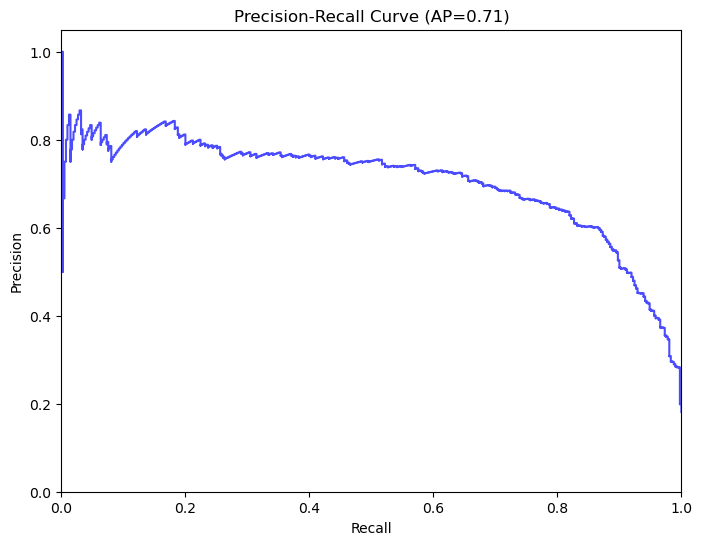

In [79]:
from sklearn.metrics import precision_recall_curve, average_precision_score
# Obtain decision function scores
model = LinearSVC(C=0.001, class_weight = 'balanced', random_state = 42)
model.fit(X_train_count, y_train)

decision_function = model.decision_function(X_test_count)

# Calculate precision-recall curve
precision, recall, _ = precision_recall_curve(y_test, decision_function)
average_precision = average_precision_score(y_test, decision_function)

# Plot the precision-recall curve
plt.figure(figsize=(8, 6))
plt.step(recall, precision, color='b', alpha=0.7, where='post')

plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title(f'Precision-Recall Curve (AP={average_precision:.2f})')
plt.ylim([0.0, 1.05])
plt.xlim([0.0, 1.0])
plt.show()

In [80]:
y_pred = svc.predict(X_test_count)
decision_function= svc.decision_function(X_test_count)

#svc_AP_count = average_precision_score(y_test, decision_function)
svc_count_rec = recall_score(y_test, y_pred)
svc_count_f1 = f1_score(y_test,y_pred)

<h2 style='text-align: center;'>✨ TF-IDF ✨ </h2>

In [81]:
from sklearn.svm import LinearSVC
svc = LinearSVC(C=0.001, class_weight = 'balanced', random_state = 42)
svc.fit(X_train_tf_idf,y_train)

LinearSVC(C=0.001, class_weight='balanced', random_state=42)

In [82]:
print("TF - IDF SVC MODEL\n")
eval(svc, X_train_tf_idf, X_test_tf_idf)

TF - IDF SVC MODEL

[[1509  345]
 [  45  365]]
Test_Set
              precision    recall  f1-score   support

           0       0.97      0.81      0.89      1854
           1       0.51      0.89      0.65       410

    accuracy                           0.83      2264
   macro avg       0.74      0.85      0.77      2264
weighted avg       0.89      0.83      0.84      2264

Train_Set
[[13596  3089]
 [  485  3206]]
              precision    recall  f1-score   support

           0       0.97      0.81      0.88     16685
           1       0.51      0.87      0.64      3691

    accuracy                           0.82     20376
   macro avg       0.74      0.84      0.76     20376
weighted avg       0.88      0.82      0.84     20376



In [83]:
model = LinearSVC(C=0.001, class_weight = 'balanced', random_state = 42)
scores = cross_validate(model, X_train_tf_idf, y_train,
                        scoring = ['precision','recall','f1','accuracy'],
                        cv = 10, return_train_score=True)
df_scores = pd.DataFrame(scores, index = range(1, 11))
df_scores.mean()[2:]

test_precision     0.500683
train_precision    0.509440
test_recall        0.852610
train_recall       0.869743
test_f1            0.630840
train_f1           0.642526
test_accuracy      0.819198
train_accuracy     0.824690
dtype: float64

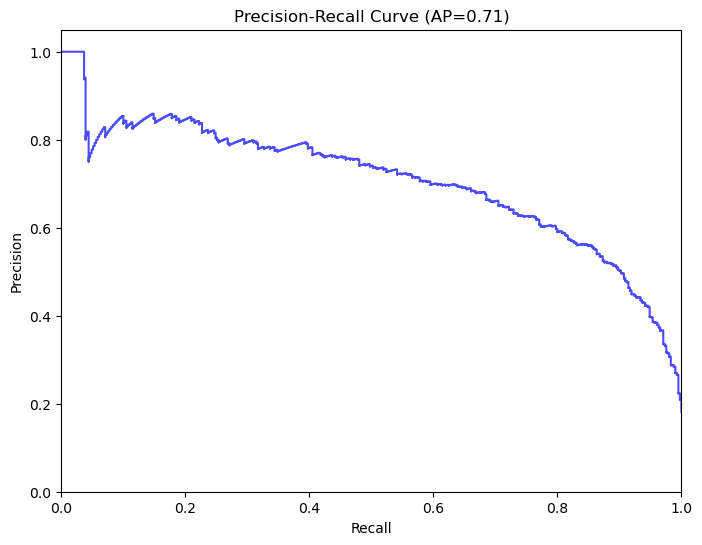

In [84]:
from sklearn.metrics import precision_recall_curve, average_precision_score
# Obtain decision function scores
model = LinearSVC(C=0.001, class_weight = 'balanced', random_state = 42)
model.fit(X_train_tf_idf, y_train)

decision_function = model.decision_function(X_test_tf_idf)

# Calculate precision-recall curve
precision, recall, _ = precision_recall_curve(y_test, decision_function)
average_precision = average_precision_score(y_test, decision_function)

# Plot the precision-recall curve
plt.figure(figsize=(8, 6))
plt.step(recall, precision, color='b', alpha=0.7, where='post')

plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title(f'Precision-Recall Curve (AP={average_precision:.2f})')
plt.ylim([0.0, 1.05])
plt.xlim([0.0, 1.0])
plt.show()

In [85]:
y_pred = svc.predict(X_test_tf_idf)
decision_function= svc.decision_function(X_test_tf_idf)

#svc_AP_tfidf = average_precision_score(y_test, decision_function)
svc_tfidf_rec = recall_score(y_test, y_pred)
svc_tfidf_f1 = f1_score(y_test,y_pred)

<h2 style='text-align: center;'>✨ 4. Random Forest ✨ </h2>

<h2 style='text-align: center;'> ✨ CountVectorizer ✨</h2>

In [86]:
from sklearn.ensemble import RandomForestClassifier
rf = RandomForestClassifier(n_estimators = 200,
                            max_depth = 4,
                            class_weight="balanced",
                            random_state = 42, n_jobs = -1) #
rf.fit(X_train_count, y_train)

RandomForestClassifier(class_weight='balanced', max_depth=4, n_estimators=200,
                       n_jobs=-1, random_state=42)

In [87]:
print("Countvectorizer RF MODEL")
eval(rf, X_train_count, X_test_count)

Countvectorizer RF MODEL
[[1514  340]
 [  65  345]]
Test_Set
              precision    recall  f1-score   support

           0       0.96      0.82      0.88      1854
           1       0.50      0.84      0.63       410

    accuracy                           0.82      2264
   macro avg       0.73      0.83      0.76      2264
weighted avg       0.88      0.82      0.84      2264

Train_Set
[[13619  3066]
 [  562  3129]]
              precision    recall  f1-score   support

           0       0.96      0.82      0.88     16685
           1       0.51      0.85      0.63      3691

    accuracy                           0.82     20376
   macro avg       0.73      0.83      0.76     20376
weighted avg       0.88      0.82      0.84     20376



In [88]:
model = RandomForestClassifier(n_estimators = 200,
                            max_depth = 4,
                            class_weight="balanced",
                            random_state = 42, n_jobs = -1)

scores = cross_validate(model, X_train_count, y_train,
                        scoring = ['precision','recall','f1','accuracy'],
                        cv = 10, return_train_score=True)

df_scores = pd.DataFrame(scores, index = range(1, 11))
df_scores.mean()[2:]

test_precision     0.492010
train_precision    0.505886
test_recall        0.826334
train_recall       0.850748
test_f1            0.616659
train_f1           0.634413
test_accuracy      0.813701
train_accuracy     0.822340
dtype: float64

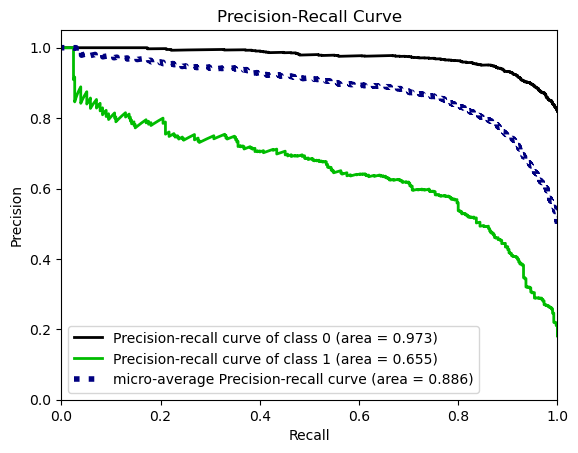

In [89]:
from scikitplot.metrics import plot_roc, plot_precision_recall

model = RandomForestClassifier(n_estimators = 200,
                            max_depth = 4,
                            class_weight="balanced",
                            random_state = 42, n_jobs = -1)

model.fit(X_train_count, y_train)

y_pred_proba = model.predict_proba(X_test_count)

plot_precision_recall(y_test, y_pred_proba)
plt.show();

In [90]:
y_pred = rf.predict(X_test_count)
y_pred_proba= rf.predict_proba(X_test_count)[:,1]

#rf_AP_count = average_precision_score(y_test, y_pred_proba)
rf_count_rec = recall_score(y_test, y_pred)
rf_count_f1 = f1_score(y_test,y_pred)

<h2 style='text-align: center;'> ✨ TF-IDF ✨ </h2>

In [91]:
from sklearn.ensemble import AdaBoostClassifier
from sklearn.utils.class_weight import compute_class_weight

ada = AdaBoostClassifier(n_estimators = 100, random_state = 42, learning_rate = 0.7)

# Calculate class weights based on class frequencies
 # Replace with your actual class labels

class_weights = compute_class_weight('balanced', classes=np.unique(y_train), y=y_train)

# Fit the model with sample weights
ada.fit(X_train_tf_idf, y_train, sample_weight=class_weights[y_train])

AdaBoostClassifier(learning_rate=0.7, n_estimators=100, random_state=42)

In [92]:
sample_weights = np.array([class_weights[label] for label in y_train])
sample_weights

array([2.76022758, 2.76022758, 2.76022758, ..., 0.61060833, 0.61060833,
       0.61060833])

In [93]:
print("TF - IDF Ada MODEL")
eval(ada, X_train_tf_idf, X_test_tf_idf)

TF - IDF Ada MODEL
[[1540  314]
 [  61  349]]
Test_Set
              precision    recall  f1-score   support

           0       0.96      0.83      0.89      1854
           1       0.53      0.85      0.65       410

    accuracy                           0.83      2264
   macro avg       0.74      0.84      0.77      2264
weighted avg       0.88      0.83      0.85      2264

Train_Set
[[13805  2880]
 [  545  3146]]
              precision    recall  f1-score   support

           0       0.96      0.83      0.89     16685
           1       0.52      0.85      0.65      3691

    accuracy                           0.83     20376
   macro avg       0.74      0.84      0.77     20376
weighted avg       0.88      0.83      0.85     20376



In [105]:
model = AdaBoostClassifier(n_estimators = 100, random_state = 42, learning_rate = 0.7)
# model.fit(X_train_tf_idf, y_train, sample_weight=sample_weights)
class_weights = compute_class_weight('balanced', classes=np.unique(y_train), y=y_train)

scores = cross_validate(model, X_train_tf_idf, y_train,
                        scoring = ['precision','recall','f1','accuracy'],
                        cv = 10,
                        fit_params =  {"sample_weight" : class_weights[y_train]},
                        return_train_score=True)


df_scores = pd.DataFrame(scores, index = range(1, 11))
df_scores.mean()[2:]

test_precision     0.502505
train_precision    0.524979
test_recall        0.811435
train_recall       0.852915
test_f1            0.620492
train_f1           0.649915
test_accuracy      0.820082
train_accuracy     0.833546
dtype: float64

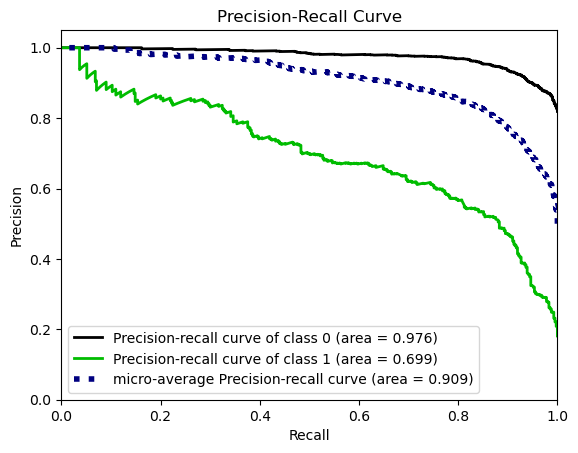

In [106]:
from scikitplot.metrics import plot_roc, plot_precision_recall

model = AdaBoostClassifier(n_estimators = 100, random_state = 42, learning_rate = 0.7)

model.fit(X_train_tf_idf, y_train, sample_weight=sample_weights)

y_pred_proba = model.predict_proba(X_test_tf_idf)

plot_precision_recall(y_test, y_pred_proba)
plt.show();

In [113]:
y_pred = ada.predict(X_test_tf_idf)
y_pred_proba= ada.predict_proba(X_test_tf_idf)[:,1]

#ada_AP_tfidf = average_precision_score(y_test, y_pred_proba)
ada_tfidf_rec = recall_score(y_test, y_pred)
ada_tfidf_f1 = f1_score(y_test,y_pred)

<h2 style='text-align: center;'> ✨ 6. Catboost ✨ </h2>

In [114]:
!pip install catboost

<h2 style='text-align: center;'> ✨ CountVectorizer ✨ </h2>

In [121]:
from catboost import CatBoostClassifier

# class_weights = compute_class_weight('balanced', classes=np.unique(y_train), y=y_train)

CB_model = CatBoostClassifier(verbose = False,
                              scale_pos_weight = 4,
                              depth = 4,
                              # learning_rate = 0.008,
                              l2_leaf_reg = 2,
                              # class_weights = class_weights,
                              # auto_class_weights = 'Balanced',
                              random_state = 42)

CB_model.fit(X_train_count, y_train)

In [122]:
class_weights

array([0.61060833, 2.76022758])

In [123]:
print("CountVectorizer CB MODEL \n")
eval(CB_model, X_train_count, X_test_count)

CountVectorizer CB MODEL 

[[1618  236]
 [  54  356]]
Test_Set
              precision    recall  f1-score   support

           0       0.97      0.87      0.92      1854
           1       0.60      0.87      0.71       410

    accuracy                           0.87      2264
   macro avg       0.78      0.87      0.81      2264
weighted avg       0.90      0.87      0.88      2264

Train_Set
[[14746  1939]
 [  443  3248]]
              precision    recall  f1-score   support

           0       0.97      0.88      0.93     16685
           1       0.63      0.88      0.73      3691

    accuracy                           0.88     20376
   macro avg       0.80      0.88      0.83     20376
weighted avg       0.91      0.88      0.89     20376



In [124]:
%%time
model = CatBoostClassifier(verbose = False,
                              scale_pos_weight = 4,
                              depth = 4,
                              l2_leaf_reg = 2,
                              # class_weights = class_weights,
                              # auto_class_weights = 'Balanced',
                              random_state = 42)


scores = cross_validate(model, X_train_count, y_train,
                        scoring = ['precision','recall','f1','accuracy'],
                        cv = 10,
                        return_train_score=True)


df_scores = pd.DataFrame(scores, index = range(1, 11))
df_scores.mean()[2:]

CPU times: total: 1min 25s
Wall time: 2min 22s


test_precision     0.582105
train_precision    0.630434
test_recall        0.813329
train_recall       0.886059
test_f1            0.678498
train_f1           0.736699
test_accuracy      0.860326
train_accuracy     0.885268
dtype: float64

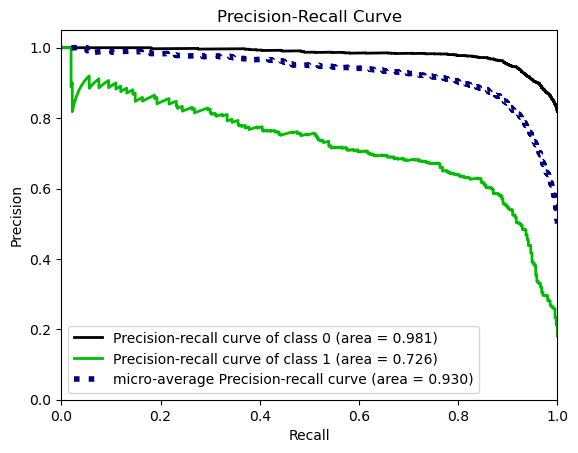

In [125]:
from scikitplot.metrics import plot_roc, plot_precision_recall

model = CatBoostClassifier(verbose = False,
                              scale_pos_weight = 4,
                              depth = 4,
                              l2_leaf_reg = 2,
                              random_state = 42)


model.fit(X_train_count, y_train)

y_pred_proba = model.predict_proba(X_test_count)

plot_precision_recall(y_test, y_pred_proba)
plt.show();

In [135]:
y_pred = CB_model.predict(X_test_count)
y_pred_proba= CB_model.predict_proba(X_test_count)[:,1]

#cb_AP_count = average_precision_score(y_test, y_pred_proba)
cb_count_rec = recall_score(y_test, y_pred)
cb_count_f1 = f1_score(y_test,y_pred)

<h2 style='text-align: center;'> ✨ TF-IDF ✨ </h2>

In [136]:
from catboost import CatBoostClassifier
%time
# class_weights = compute_class_weight('balanced', classes=np.unique(y_train), y=y_train)

CB_model = CatBoostClassifier(verbose = False,
                              scale_pos_weight = 4,
                              depth = 4,
                              # learning_rate = 0.0008,
                              l2_leaf_reg = 7,
                              # class_weights = class_weights,
                              # auto_class_weights = 'Balanced',
                              random_state = 42)

CB_model.fit(X_train_tf_idf, y_train)

CPU times: total: 0 ns
Wall time: 0 ns


In [137]:
print("TF - IDF CB MODEL \n")
eval(CB_model, X_train_tf_idf, X_test_tf_idf)

TF - IDF CB MODEL 

[[1623  231]
 [  58  352]]
Test_Set
              precision    recall  f1-score   support

           0       0.97      0.88      0.92      1854
           1       0.60      0.86      0.71       410

    accuracy                           0.87      2264
   macro avg       0.78      0.87      0.81      2264
weighted avg       0.90      0.87      0.88      2264

Train_Set
[[14766  1919]
 [  389  3302]]
              precision    recall  f1-score   support

           0       0.97      0.88      0.93     16685
           1       0.63      0.89      0.74      3691

    accuracy                           0.89     20376
   macro avg       0.80      0.89      0.83     20376
weighted avg       0.91      0.89      0.89     20376



In [140]:
%%time
model = CatBoostClassifier(verbose = False,
                              scale_pos_weight = 4,
                              depth = 4,
                              l2_leaf_reg = 7,
                              # class_weights = class_weights,
                              # auto_class_weights = 'Balanced',
                              random_state = 42)


scores = cross_validate(model, X_train_tf_idf, y_train,
                        scoring = ['precision','recall','f1','accuracy'],
                        cv = 10,
                        return_train_score=True)


df_scores = pd.DataFrame(scores, index = range(1, 11))
df_scores.mean()[2:]

CPU times: total: 3min 25s
Wall time: 5min 18s


test_precision     0.580776
train_precision    0.637023
test_recall        0.807099
train_recall       0.899877
test_f1            0.675392
train_f1           0.745968
test_accuracy      0.859442
train_accuracy     0.888976
dtype: float64

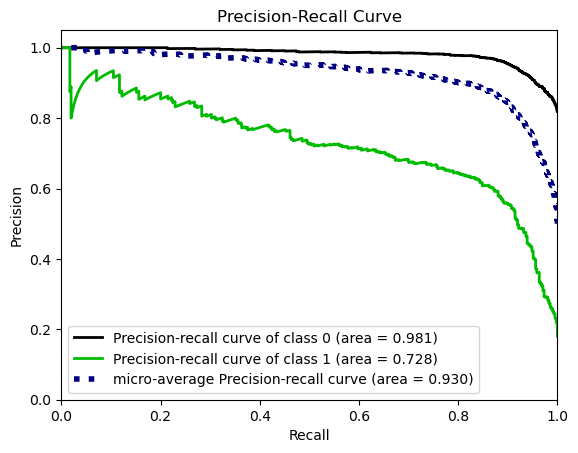

In [143]:
from scikitplot.metrics import plot_roc, plot_precision_recall

model = CatBoostClassifier(verbose = False,
                              scale_pos_weight = 4,
                              depth = 4,
                              l2_leaf_reg = 7,
                              random_state = 42)


model.fit(X_train_count, y_train)

y_pred_proba = model.predict_proba(X_test_count)

plot_precision_recall(y_test, y_pred_proba)
plt.show();

In [145]:
y_pred = CB_model.predict(X_test_tf_idf)
y_pred_proba= CB_model.predict_proba(X_test_tf_idf)[:,1]

#cb_AP_tfidf = average_precision_score(y_test, y_pred_proba)
cb_tfidf_rec = recall_score(y_test, y_pred)
cb_tfidf_f1 = f1_score(y_test,y_pred)

<h2 style='text-align: center;'> ✨  XGBoost ✨</h2>

<h2 style='text-align: center;'> ✨ CountVectorizer ✨</h2>

In [146]:
from xgboost import XGBClassifier

class_weights = compute_class_weight('balanced', classes=np.unique(y_train), y=y_train)

XGB_model = XGBClassifier(max_depth = 2,
                        #  class_weights = class_weights,
                          scale_pos_weight = 6,
                          # n_estimators = 180,
                          subsample= 0.5,
                         random_state=42)

XGB_model.fit(X_train_count, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=2, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, random_state=42, ...)

In [147]:
print("CountVectorizer XGB MODEL \n")
eval(XGB_model, X_train_count, X_test_count)

CountVectorizer XGB MODEL 

[[1457  397]
 [  36  374]]
Test_Set
              precision    recall  f1-score   support

           0       0.98      0.79      0.87      1854
           1       0.49      0.91      0.63       410

    accuracy                           0.81      2264
   macro avg       0.73      0.85      0.75      2264
weighted avg       0.89      0.81      0.83      2264

Train_Set
[[13041  3644]
 [  341  3350]]
              precision    recall  f1-score   support

           0       0.97      0.78      0.87     16685
           1       0.48      0.91      0.63      3691

    accuracy                           0.80     20376
   macro avg       0.73      0.84      0.75     20376
weighted avg       0.88      0.80      0.82     20376



In [148]:
%%time
model = XGBClassifier(max_depth = 2,
                        #  class_weights = class_weights,
                          scale_pos_weight = 6,
                          # n_estimators = 180,
                          # subsample= 0.5,
                         random_state=42)


scores = cross_validate(model, X_train_count, y_train,
                        scoring = ['precision','recall','f1','accuracy'],
                        cv = 10,
                        return_train_score=True)


df_scores = pd.DataFrame(scores, index = range(1, 11))
df_scores.mean()[2:]

CPU times: total: 5.47 s
Wall time: 1.52 s


test_precision     0.462881
train_precision    0.480466
test_recall        0.884046
train_recall       0.918029
test_f1            0.607549
train_f1           0.630791
test_accuracy      0.793041
train_accuracy     0.805327
dtype: float64

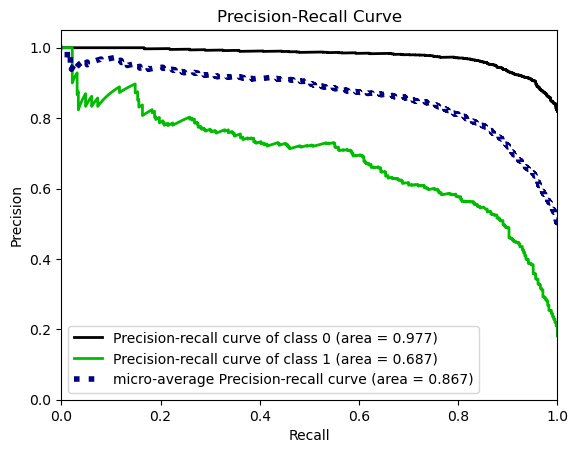

In [149]:
from scikitplot.metrics import plot_roc, plot_precision_recall

model = XGBClassifier(max_depth = 2,
                      scale_pos_weight = 6,
                      random_state=42)



model.fit(X_train_count, y_train)

y_pred_proba = model.predict_proba(X_test_count)

plot_precision_recall(y_test, y_pred_proba)
plt.show();

In [150]:
y_pred = XGB_model.predict(X_test_count)
y_pred_proba= XGB_model.predict_proba(X_test_count)[:,1]

#xgb_AP_count = average_precision_score(y_test, y_pred_proba)
xgb_count_rec = recall_score(y_test, y_pred)
xgb_count_f1 = f1_score(y_test,y_pred)

<h2 style='text-align: center;'> ✨ TF-IDF ✨</h2>

In [151]:
from xgboost import XGBClassifier

# class_weights = compute_class_weight('balanced', classes=np.unique(y_train), y=y_train)

XGB_model = XGBClassifier(max_depth = 2,
                        #  class_weights = class_weights,
                          scale_pos_weight = 6,
                          # n_estimators = 180,
                          subsample= 0.5,
                         random_state=42)

XGB_model.fit(X_train_tf_idf, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=2, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, random_state=42, ...)

In [152]:
print("TF - IDF XGB MODEL \n")
eval(XGB_model, X_train_tf_idf, X_test_tf_idf)

TF - IDF XGB MODEL 

[[1445  409]
 [  43  367]]
Test_Set
              precision    recall  f1-score   support

           0       0.97      0.78      0.86      1854
           1       0.47      0.90      0.62       410

    accuracy                           0.80      2264
   macro avg       0.72      0.84      0.74      2264
weighted avg       0.88      0.80      0.82      2264

Train_Set
[[13022  3663]
 [  297  3394]]
              precision    recall  f1-score   support

           0       0.98      0.78      0.87     16685
           1       0.48      0.92      0.63      3691

    accuracy                           0.81     20376
   macro avg       0.73      0.85      0.75     20376
weighted avg       0.89      0.81      0.83     20376



In [153]:
%%time
model = XGBClassifier(max_depth = 2,
                        #  class_weights = class_weights,
                          scale_pos_weight = 6,
                          # n_estimators = 180,
                          subsample= 0.5,
                         random_state=42)


scores = cross_validate(model, X_train_tf_idf, y_train,
                        scoring = ['precision','recall','f1','accuracy'],
                        cv = 10,
                        return_train_score=True)


df_scores = pd.DataFrame(scores, index = range(1, 11))
df_scores.mean()[2:]

CPU times: total: 1min 20s
Wall time: 19.3 s


test_precision     0.459330
train_precision    0.484946
test_recall        0.873754
train_recall       0.918932
test_f1            0.601975
train_f1           0.634848
test_accuracy      0.790586
train_accuracy     0.808495
dtype: float64

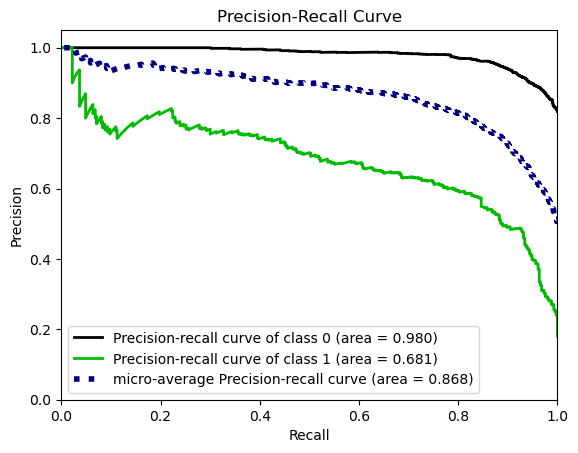

In [203]:
from scikitplot.metrics import plot_roc, plot_precision_recall

model = XGBClassifier(max_depth = 2,
                        #  class_weights = class_weights,
                          scale_pos_weight = 6,
                          # n_estimators = 180,
                          subsample= 0.5,
                         random_state=42)


model.fit(X_train_count, y_train)

y_pred_proba = model.predict_proba(X_test_count)

plot_precision_recall(y_test, y_pred_proba)
plt.show();

In [204]:
y_pred = XGB_model.predict(X_test_tf_idf)
y_pred_proba= XGB_model.predict_proba(X_test_tf_idf)[:,1]

#xgb_AP_tfidf = average_precision_score(y_test, y_pred_proba)
xgb_tfidf_rec = recall_score(y_test, y_pred)
xgb_tfidf_f1 = f1_score(y_test,y_pred)

<h2 style='text-align: center;'> ✨ PART - 3 Deep Learning ✨</h2>

__Train - Test Split__
 - 1 Tokenization 
 - 2 Word Index 
 - 3 Converting Tokens To Numeric 
 - 4 Maximum Number Of Tokens For All Documents
 - 5 Fixing Token Counts Of All Documents (Pad_Sequences) 
 - 6 Modeling 
 - 7 Model Evaluation 

<h2 style='text-align: center;'> ✨ Train - Test Split ✨</h2>

In [206]:
X = df_rec["review"].values
y = df_rec["recommend"].map({0:1, 1:0}).values

In [207]:
df_rec.review=df_rec.review.apply(lambda x: contractions.fix(x))

C:\Users\khara\AppData\Local\Temp\ipykernel_16784\3732639604.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_rec.review=df_rec.review.apply(lambda x: contractions.fix(x))


In [208]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, stratify=y, random_state=42)

In [211]:
!pip install Keras-Preprocessing

In [214]:
from tensorflow.keras.preprocessing.text import Tokenizer

In [215]:
# from tensorflow.keras.preprocessing.text import Tokenizer
#from keras.preprocessing.text import Tokenizer

num_words = 15001

tokenizer = Tokenizer(num_words=num_words)

In [216]:
tokenizer.fit_on_texts(X_train)

<h2 style='text-align: center;'> ✨ Word Index ✨</h2>

In [217]:
tokenizer.word_index

{'the': 1,
 'i': 2,
 'and': 3,
 'a': 4,
 'it': 5,
 'is': 6,
 'this': 7,
 'to': 8,
 'in': 9,
 'but': 10,
 'on': 11,
 'for': 12,
 'of': 13,
 'with': 14,
 'was': 15,
 'so': 16,
 'my': 17,
 'dress': 18,
 'not': 19,
 'that': 20,
 'love': 21,
 'size': 22,
 'very': 23,
 'have': 24,
 'top': 25,
 'fit': 26,
 'are': 27,
 'like': 28,
 'be': 29,
 'me': 30,
 'as': 31,
 'wear': 32,
 "it's": 33,
 'great': 34,
 'too': 35,
 "i'm": 36,
 'or': 37,
 'am': 38,
 'just': 39,
 'you': 40,
 'would': 41,
 'they': 42,
 'at': 43,
 'up': 44,
 'fabric': 45,
 'small': 46,
 'color': 47,
 'look': 48,
 'if': 49,
 'really': 50,
 'more': 51,
 'ordered': 52,
 'perfect': 53,
 'little': 54,
 'one': 55,
 'these': 56,
 'will': 57,
 'flattering': 58,
 'well': 59,
 'an': 60,
 'soft': 61,
 'out': 62,
 'back': 63,
 'can': 64,
 'had': 65,
 'because': 66,
 '\r': 67,
 'cute': 68,
 'bought': 69,
 'comfortable': 70,
 'nice': 71,
 'than': 72,
 'beautiful': 73,
 'all': 74,
 'when': 75,
 'looks': 76,
 'fits': 77,
 'large': 78,
 'bit': 79,

In [218]:
len(tokenizer.word_index)

14242

<h2 style='text-align: center;'> ✨ Converting Tokens To Numeric ✨</h2>

In [219]:
X_train_num_tokens = tokenizer.texts_to_sequences(X_train)
X_test_num_tokens = tokenizer.texts_to_sequences(X_test)

In [220]:
len(X_train_num_tokens)

20376

In [221]:
X_test[:5]

array(["I ordered a regular size s and it was way too boxy for my body type and shorter than the stated length. i don't know if the length stated is from a size m, but the small was definitely shorter (in the front at least).  if you're petite with curves like me, it's not a flattering cut.",
       "Love this t. i now have all the colors. it is so soft and comfortable. great with jeans or dressed up with leggings and boots. and when i feeling lazy i just keep it on and use it as a night shirt to sleep in. it's that comfortable! i found the size to be spot on.",
       "I received this coat as a 30th birthday present from my mother and i have to say, this is the best present she has ever bought me. the inside of the jacket is the softest sheerling i've felt and is pure bliss to wear around town. the coat is actually a lot warmer then i expected, which i'm not going to complain about. the print is lovely and i appreciate the faux leather edge on the cuffs, giving it a more finished look

In [222]:
np.array(X_test_num_tokens[:2], dtype="object")

array([list([2, 52, 4, 183, 22, 199, 3, 5, 15, 116, 35, 285, 12, 17, 172, 475, 3, 318, 72, 1, 1008, 85, 2, 126, 391, 49, 1, 85, 1008, 6, 106, 4, 22, 246, 10, 1, 46, 15, 152, 318, 9, 1, 158, 43, 501, 49, 460, 94, 14, 654, 28, 30, 33, 19, 4, 58, 120]),
       list([21, 7, 301, 2, 286, 24, 74, 1, 92, 5, 6, 16, 61, 3, 70, 34, 14, 91, 37, 307, 44, 14, 270, 3, 321, 3, 75, 2, 805, 2913, 2, 39, 259, 5, 11, 3, 552, 5, 31, 4, 571, 80, 8, 1373, 9, 33, 20, 70, 2, 218, 1, 22, 8, 29, 778, 11])],
      dtype=object)

In [223]:
# X_test.iloc[10]

<h2 style='text-align: center;'> ✨ Maximum Number Of Tokens For All Documents ✨</h2>

In [224]:
num_tokens = [len(sen_tokens) for sen_tokens in X_train_num_tokens]
num_tokens = np.array(num_tokens)


In [225]:
num_tokens.max()

116

In [226]:
num_tokens.argmax()

18565

In [227]:
max_tokens = 104

In [228]:
sum(num_tokens <= max_tokens) / len(num_tokens)

0.976148409893993

In [229]:
sum(num_tokens <= max_tokens)

19890

In [230]:
len(num_tokens)

20376

<h2 style='text-align: center;'> ✨ Fixing Token Counts Of All Documents (Pad_Sequences) ✨</h2>

In [231]:
from tensorflow.keras.preprocessing.sequence import pad_sequences
X_train_pad = pad_sequences(X_train_num_tokens, maxlen=max_tokens, padding="pre")
X_test_pad = pad_sequences(X_test_num_tokens, maxlen=max_tokens, padding="pre")

In [232]:
display(X_train_pad.shape)
display(X_test_pad.shape)

(20376, 104)

(2264, 104)

In [233]:
np.array(X_test_num_tokens[28])

array([ 56, 112,  27,  73,  34,  26,   3,  34,  45,  50,  70,   3, 674,
         2,  38, 323, 493,   3,  24,   4,  90, 404,  16,  33,  71,   8,
       219, 112,  20,  27, 179, 537])

In [234]:
len(np.array(X_test_num_tokens[28]))

32

In [235]:
X_test_pad[28]

array([  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,  56, 112,  27,  73,  34,  26,
         3,  34,  45,  50,  70,   3, 674,   2,  38, 323, 493,   3,  24,
         4,  90, 404,  16,  33,  71,   8, 219, 112,  20,  27, 179, 537])

In [236]:
np.array(X_train_num_tokens[11968])

array([ 3760,    16,     2,    50,    21,     7,    80,    10,     2,
          38,   593,     5,  1053,     9,     8,    26,    30,     2,
        1091,  1081,     3,    38,   264,  1644,   387,     3,    98,
          94,     3,     7,    80,     6,    35,   118,    11,    30,
           3,     2,    93,    60,    99,     2,   125, 11707,   115,
         440,     3,    38,   319,     2,   125,    66,     2,   100,
           5,    41,    29,    35,   113,    36,   173,     8,   259,
           1,    80,    10,     5,     6,    35,   118,    11,    30,
           5,  6331,    62,     9,     1,   158,     3,   153,     9,
           1,    63,    75,    40,  1015,  1763,   965,     3,     2,
         214,     8,    24,     5,  1053,     9,    37,   675,     5,
         367,    31,    58,    31,     5,   346,    29,     1,    83,
           6,   647,     3,     2,    21])

In [237]:
X_train_pad[11968]

array([   38,   593,     5,  1053,     9,     8,    26,    30,     2,
        1091,  1081,     3,    38,   264,  1644,   387,     3,    98,
          94,     3,     7,    80,     6,    35,   118,    11,    30,
           3,     2,    93,    60,    99,     2,   125, 11707,   115,
         440,     3,    38,   319,     2,   125,    66,     2,   100,
           5,    41,    29,    35,   113,    36,   173,     8,   259,
           1,    80,    10,     5,     6,    35,   118,    11,    30,
           5,  6331,    62,     9,     1,   158,     3,   153,     9,
           1,    63,    75,    40,  1015,  1763,   965,     3,     2,
         214,     8,    24,     5,  1053,     9,    37,   675,     5,
         367,    31,    58,    31,     5,   346,    29,     1,    83,
           6,   647,     3,     2,    21])

<h2 style='text-align: center;'> ✨ Modeling ✨</h2>

In [238]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, GRU, Embedding, Dropout
from tensorflow.keras.optimizers import Adam

model = Sequential()

In [239]:
embedding_size = 50

In [240]:
model.add(Embedding(input_dim=num_words,
                    output_dim=embedding_size,
                    input_length=max_tokens))

model.add(Dropout(0.2))

model.add(GRU(units=50, return_sequences=True)) # units equal to word embedding   - best practice
model.add(Dropout(0.2))

model.add(GRU(units=25, return_sequences=True))
model.add(Dropout(0.2))

model.add(GRU(units=12, return_sequences=False))

model.add(Dense(1, activation='sigmoid'))

optimizer = Adam(learning_rate=0.001)

model.compile(loss='binary_crossentropy',
              optimizer=optimizer,
              metrics=['Recall'])

C:\Users\khara\anaconda3\Lib\site-packages\keras\src\layers\core\embedding.py:86: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


In [241]:
model.summary()

# embedding_size * num_words ==> 50 * .... = 677300

# 3 x (n2 + nm + 2n) m= input, n= output # GRU

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ embedding (Embedding)           │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ ?                      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ gru (GRU)                       │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ ?                      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ gru_1 (GRU)                     │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ ?                      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ gru_2 (GRU)                     │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ ?                      │   0 (unbuilt) │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 0 (0.00 B)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 0 (0.00 B)

In [242]:
from tensorflow.keras.callbacks import EarlyStopping

early_stop = EarlyStopping(monitor="val_recall",
                           mode="max",
                           patience = 2,
                           restore_best_weights=True,
                           verbose=1)

In [243]:
class_weights = compute_class_weight('balanced', classes=np.unique(y_train), y=y_train)
class_weights = dict(enumerate(class_weights))
class_weights

{0: 0.6106083308360803, 1: 2.760227580601463}

In [244]:
model.fit(X_train_pad,
          y_train,
          epochs=10,
          batch_size=210,
          class_weight=class_weights,   #sample_weight= classes_weights
          validation_data=(X_test_pad, y_test),
          callbacks=[early_stop])

Epoch 1/10
98/98 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - Recall: 0.6992 - loss: 0.6224 - val_Recall: 0.7878 - val_loss: 0.3754
Epoch 2/10
 1/98 ━━━━━━━━━━━━━━━━━━━━ 14s 150ms/step - Recall: 0.8000 - loss: 0.5046

C:\Users\khara\anaconda3\Lib\site-packages\keras\src\callbacks\early_stopping.py:156: UserWarning: Early stopping conditioned on metric `val_recall` which is not available. Available metrics are: Recall,loss,val_Recall,val_loss
  current = self.get_monitor_value(logs)


98/98 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - Recall: 0.8770 - loss: 0.3542 - val_Recall: 0.8902 - val_loss: 0.3256
Epoch 3/10
98/98 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - Recall: 0.9280 - loss: 0.2460 - val_Recall: 0.7488 - val_loss: 0.2764
Epoch 4/10
98/98 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - Recall: 0.9293 - loss: 0.2385 - val_Recall: 0.8610 - val_loss: 0.3266
Epoch 5/10
98/98 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - Recall: 0.9562 - loss: 0.1985 - val_Recall: 0.8171 - val_loss: 0.3013
Epoch 6/10
98/98 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - Recall: 0.9630 - loss: 0.1593 - val_Recall: 0.7854 - val_loss: 0.3036
Epoch 7/10
98/98 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - Recall: 0.9710 - loss: 0.1476 - val_Recall: 0.8366 - val_loss: 0.3478
Epoch 8/10
98/98 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - Recall: 0.9733 - loss: 0.1402 - val_Recall: 0.8244 - val_loss: 0.3564
Epoch 9/10
98/98 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - Recall: 0.9817 - loss: 0.1191 - val_Recall: 0.7707 - val_loss: 0.3417
Epoch 10/10

<h2 style='text-align: center;'> ✨ Model Evaluation ✨</h2>

In [245]:
model_loss = pd.DataFrame(model.history.history)
model_loss.head()

,Recall,loss,val_Recall,val_loss
0,0.747765,0.529738,0.787805,0.375425
1,0.892170,0.322334,0.890244,0.325573
2,0.928475,0.251833,0.748780,0.276372
3,0.939312,0.227114,0.860976,0.326650
4,0.953942,0.200991,0.817073,0.301309


<Axes: >

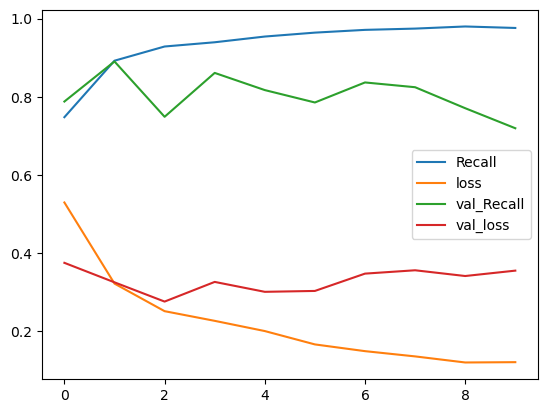

In [246]:
model_loss.plot()

In [247]:
model.evaluate(X_test_pad, y_test)

71/71 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - Recall: 0.7000 - loss: 0.3468


[0.35547080636024475, 0.7195122241973877]

In [248]:
model.evaluate(X_train_pad, y_train)

637/637 ━━━━━━━━━━━━━━━━━━━━ 8s 12ms/step - Recall: 0.9807 - loss: 0.0800


[0.08336660265922546, 0.9791384339332581]

In [249]:
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score, f1_score, roc_auc_score

y_pred = model.predict(X_test_pad) >= 0.5

y_train_pred = model.predict(X_train_pad) >= 0.5



print(confusion_matrix(y_test, y_pred))
print("-------------------------------------------------------")
print(classification_report(y_test, y_pred))
print("-------------------------------------------------------")
print(confusion_matrix(y_train, y_train_pred))
print("-------------------------------------------------------")
print(classification_report(y_train, y_train_pred))

71/71 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step
637/637 ━━━━━━━━━━━━━━━━━━━━ 8s 13ms/step
[[1728  126]
 [ 115  295]]
-------------------------------------------------------
              precision    recall  f1-score   support

           0       0.94      0.93      0.93      1854
           1       0.70      0.72      0.71       410

    accuracy                           0.89      2264
   macro avg       0.82      0.83      0.82      2264
weighted avg       0.89      0.89      0.89      2264

-------------------------------------------------------
[[16236   449]
 [   77  3614]]
-------------------------------------------------------
              precision    recall  f1-score   support

           0       1.00      0.97      0.98     16685
           1       0.89      0.98      0.93      3691

    accuracy                           0.97     20376
   macro avg       0.94      0.98      0.96     20376
weighted avg       0.98      0.97      0.97     20376



71/71 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step


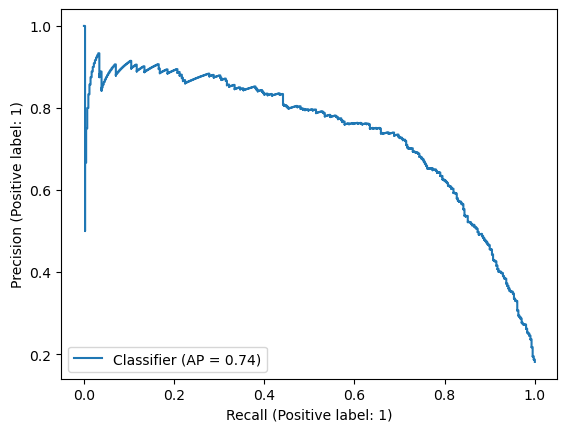

In [250]:
from sklearn.metrics import PrecisionRecallDisplay
import matplotlib.pyplot as plt

y_pred_proba = model.predict(X_test_pad)

PrecisionRecallDisplay.from_predictions(y_test, y_pred_proba)
plt.show();

In [251]:
from sklearn.metrics import precision_recall_curve, average_precision_score

average_precision_score(y_test, y_pred_proba)


0.740641087813683

<h2 style='text-align: center;'> Bert Modelling</h2>

In [252]:
!pip install transformers

__Read Data__
 - 1 Train Test Split 
 - 2 Tokenization 
 - 3 Fixing Token Counts Of All Documents 
-  4 Transformation Vectors to Matrices
 - 5 Transformation Matrix to Tensorflow Tensor
 - 6 Batch Size 
 - 7 Creating Optimization
 - 8 Creating Model With TPU 
 - 9 Model Fiting 
 - 10 Model Evaluation 
 - 11 Compare Models F1 Scores, Recall Scores and Average Precision Score
 - 12 Prediction 

<h2 style='text-align: center;'> ✨ Read Data ✨</h2>

In [255]:
df.head()

,Clothing ID,Age,Title,Review Text,Rating,Recommended IND,Positive Feedback Count,Division Name,Department Name,Class Name
0,767,33,NaN,Absolutely wonderful - silky and sexy and comf...,4,1,0,Initmates,Intimate,Intimates
1,1080,34,NaN,Love this dress! it's sooo pretty. i happene...,5,1,4,General,Dresses,Dresses
2,1077,60,Some major design flaws,I had such high hopes for this dress and reall...,3,0,0,General,Dresses,Dresses
3,1049,50,My favorite buy!,"I love, love, love this jumpsuit. it's fun, fl...",5,1,0,General Petite,Bottoms,Pants
4,847,47,Flattering shirt,This shirt is very flattering to all due to th...,5,1,6,General,Tops,Blouses


<h2 style='text-align: center;'> ✨ Train Test Split ✨</h2>

In [256]:
X_train

array(['Not flattering and not the color it appears online. this is really a pink shirt.',
       "I was excited to receive this top because i love the design, but was very disappointed when it arrived. i thought the embroidery would be striking but it's not. the material is a t-shirt knit which also added to the disappointment. it was not flattering at all.",
       'I saw this dress online and loved the colors and whimsical embroidery . i thought it would be the perfect dress to wear on the weekend with cute sandals. i was excited when the dress arrived in the mail as the colors were vibrant and the material was soft and cozy. unfortunately this dress is huge. it is a rectangle with pockets. i bought the xxsp, my usual size and this dress was so big my sister was able to fit in it with me.this dress was beyond alterations. too bad it was a great idea but no',
       ...,
       'I bought this dress as a surprise for my daughter. she was very happy with it.',
       "Great fit and ver

In [257]:
X_test

array(["I ordered a regular size s and it was way too boxy for my body type and shorter than the stated length. i don't know if the length stated is from a size m, but the small was definitely shorter (in the front at least).  if you're petite with curves like me, it's not a flattering cut.",
       "Love this t. i now have all the colors. it is so soft and comfortable. great with jeans or dressed up with leggings and boots. and when i feeling lazy i just keep it on and use it as a night shirt to sleep in. it's that comfortable! i found the size to be spot on.",
       "I received this coat as a 30th birthday present from my mother and i have to say, this is the best present she has ever bought me. the inside of the jacket is the softest sheerling i've felt and is pure bliss to wear around town. the coat is actually a lot warmer then i expected, which i'm not going to complain about. the print is lovely and i appreciate the faux leather edge on the cuffs, giving it a more finished look

<h2 style='text-align: center;'> ✨ Tokenization ✨</h2>

In [258]:
from transformers import AutoTokenizer #BertTokenizer

tokenizer = AutoTokenizer.from_pretrained("bert-base-uncased")

# For every sentence...
num_of_sent_tokens = []
for sent in X_train:

    # Tokenize the text and add `[CLS]` and `[SEP]` tokens.

    input_ids = tokenizer.encode(sent,
                                 add_special_tokens=True)
    num_of_sent_tokens.append(len(input_ids))

print('Max sentence length: ', max(num_of_sent_tokens))

100%|██████████████████████████████████████████████████████████████████████████████████████| 231508/231508 [00:00<00:00, 8242071.52B/s]


Max sentence length:  162


<h2 style='text-align: center;'> ✨ Fixing Token Counts Of All Documents ✨</h2>

In [326]:
sum(np.array(num_of_sent_tokens) <= 130) / len(num_of_sent_tokens)

0.9640263054574009

In [332]:
from transformers import AutoTokenizer #BertTokenizer

tokenizer = AutoTokenizer.from_pretrained("bert-base-uncased")

train_sentence_tokens =  tokenizer.tokenize(list(X_train),
                                  max_length=130,
                                  truncation=True,
                                  padding='max_length',
                                  add_special_tokens=True)

TypeError: unhashable type: 'list'

In [305]:
np.array(train_sentence_tokens['input_ids'])

NameError: name 'train_sentence_tokens' is not defined

In [306]:
np.array(train_sentence_tokens['attention_mask'])

NameError: name 'train_sentence_tokens' is not defined

<h2 style='text-align: center;'> ✨ Transformation Vectors to Matrices ✨</h2>

In [307]:
def transformation(X):
  # set array dimensions
  seq_len = 162

  sentence_tokens = AutoTokenizer.from_pretrained(list(X),
                              max_length=seq_len,
                              truncation=True,
                              padding='max_length',
                              add_special_tokens=True)

  return np.array(sentence_tokens['input_ids']), np.array(sentence_tokens['attention_mask'])

In [308]:
Xids_train, Xmask_train = transformation(X_train)

Xids_test, Xmask_test = transformation(X_test)

ValueError: Unrecognized model identifier in ['Not flattering and not the color it appears online. this is really a pink shirt.', "I was excited to receive this top because i love the design, but was very disappointed when it arrived. i thought the embroidery would be striking but it's not. the material is a t-shirt knit which also added to the disappointment. it was not flattering at all.", 'I saw this dress online and loved the colors and whimsical embroidery . i thought it would be the perfect dress to wear on the weekend with cute sandals. i was excited when the dress arrived in the mail as the colors were vibrant and the material was soft and cozy. unfortunately this dress is huge. it is a rectangle with pockets. i bought the xxsp, my usual size and this dress was so big my sister was able to fit in it with me.this dress was beyond alterations. too bad it was a great idea but no', "This is a great pullover. very cute for lounging at home or running errands. it does run large, i ordered an xs & it's pretty big. for reference, i'm 5'7'', 125 lbs & 34 b. it is also a little pricey for lounge wear but i am keeping it because it is so cute.", "This shirt fits really well- i ordered a size small and it's definitely a bit form fitting. i was a little bit hesitant to purchase this at first- for a tshirt it's a pretty hefty price. but the quality and cut are really quite attractive and worth every penny.", 'I purchased this in the "purple" which is more blue than purple, but you can definitely see the purplish hue depending on the light. it\'s a beautiful, rich indigo color. it\'s very comfortable. i usually go for more fitted styles, but i was pleasantly surprised at how flattering this top is even though the body of the shirt is more loose fitting. i\'m very excited to wear this top this summer. i haven\'t worn and washed it yet, so i am hoping the color and material will hold up after washing. i am', "I found this sweater to fit me just as pictured. i am 5'8'', 128lbs and ordered a small. it hits length wise the same as pictured and is just as flowy with a lot of fabric. super cute with a grey top, white skinnys and brown leather sandals. love it!", "This dress is absolutely gorgeous! love, love, love! i am 5'2 and the petite sizing was perfect.", "Love this blouse. it fits well with a slight flare at the bottom. doesn't wrinkle much and washes in cold water perfectly. have had compliments on the style and design. a definite buy!", 'This dress is amazing! i love the collaboration with rifle paper. it has a nice boho swing look. i sized down from my typical small and took an xs. both fit well but i wanted the shoulders to be more fitted.', 'This dress runs so large, why did they not make an extra small. the material and detail are great the flow in the back is different but is flattering. i wish wish that they made this in the extra small, i was swimming in it, there was no way to fix it so it went back', 'So glad i purchased this top! it has great style and can be matched with just about everything. the material is very soft and it seems really durable.', 'This outfit was online for months with no review so i was skeptical to order but very glad i did as it is better in person. \r\nit is beautiful, high quality tommy bahama inspired suit. i am 55 so short shorts are risky even though i am a typical size 4 or 6. i took a 4 in the blazer and i am typically a high 4 or low 6 in size so i would say the blazer is very true to size. i took the size 8 in the shorts as i felt they ran small and i wanted the extra length. they ride a bit lower on my waist an', "I was disappointed by this dress. i listened to the reviews and ordered one size up, a size 6 instead of my usual 4, and that was the correct size. fit like a glove. unfortunately, the style left much to be desired. this dress is very costume-y. i felt like a wench from the renaissance fair. not a good vibe. it is a beautiful dress, i'm not denying that, but not as a dress you would actually wear to an event. there's just too much going on with the tapestry look and the many types of fabric. i a", "Beautiful color and the fabric is very substantial and soft. but, they didn't finish the bottom hem! the dress is lined and the bottom inside has a ribbon sewn in as a type of hem, but the actual edge is just cut and not turned in on itself. because of this the whole bottom had a hundred little fabric frays. the rest of the dress is so polished it just doesn't make sense. also, while the fabric is beautiful my dress had a weird mark on the chest, almost like a water mark. just overall bad attent", "This is a sweet little jacket. i saw it in the store but was unsure because of the price. but after trying it on, i just fell in love! the cut is really flattering. the jacket does run small. i really enjoy the little pop of color on the sleeves. my only complaint is the buttons make me nervous, because they seem to be heavy and i worry that i'll lose one, but only on the front 2, the arms and back buttons seem to be just fine. overall this is a fantastic buy that is great for an office setting", "I was looking for a top to go with leggings that didn't look like a sack and this is perfect. the v-neck and unusual cut on the bottom makes it more interesting than a typical tunic and the fabric is so snuggly. love it.", "I got this dress today. i was super excited and hoped to use it. it runs so, so small. i'm returning and ordering up.", 'I thought this blouse ran a bit large-swinging wide at the hips. it does bunch in the bust area if you are larger. a correct undergarment fixed this problem. i am a 36ddd and thought the size 4 was perfect.', 'I loved the style so i ordered on line. it runs small and the arm inserts are so low its awkward to wear. i wish the cut was better cause i love the look but not the fit. i am returning this item..', 'I\'m 5\'3", 155 lbs; ordered the blue in a large. beautiful color and fabric. it\'s big and a bit wide and long, hitting below my knee. i might reorder in a smaller size because it has great potential. cute casual or dressy. i agree that it needs a slip but not so obviously sheer in the blue color.', 'This top looks great and feels great. got lots of compliments when i wore it for thanksgiving. i pretty plan to wear this for every holiday event this year and will layer it with sweaters and scarves to mix it up.', 'I purchased the teal/blue and the color is striking. though i put true to size the decorative top is slightly tight around the bust. and the bottom too is fitted and not flowy. for a looser fit you may want to size up. for a more fitted look it is true to size.', "Like others, i finally received my size 6p black pants after months of waiting.  for starters, these pants run small, so i ordered a size up but still in petite, because i adored the red ones i got this past summer.  when the black pants arrived, they were a full three inches shorter than the red ones (which were also 6p), and the fabric did not feel anywhere close to the same quality.  i'm debating ordering the regular length, but i'm not sure i'll bother, based on some of the other reviews.", 'At 4"11 i usually have to order items in petite and sometimes still have trouble fitting properly into items but i was able to buy this sweater in an xs! i figured with the high front and low back i wouldn\'t be able to fit it but it looks great on. not only is the fit amazing, but it feels amazing as well. it\'s such an easy wear and the high/low look is effortlessly chic!', 'This skirt is soft and comfortable, breathes and moves really nicely. great quality and fabric, just be careful in the first wear i snagged a spot with my rings. i ordered my usual medium, but probably could have sized down to a small. i plan to wear this all the time.', 'You guys, i love this so much! however, within one hour of wearing it, the back seam completely ripped. it fit me perfectly... sadly i&#39;ll have to return the damaged item. really sad it&#39;s all sold out too!', 'I wish i had read the reviews prior to purchasing. this skirt looks amazing in photos and lace appears black. the lace on mine is actually purple - at first i thought it was just purple due to lighting with red underneath - but nope - pull the netting away and it is purple. lace netting hikes up on the right due to poor craftsmanship. i ordered a medium and felt it was a bit large. will return.', 'I saw this online and wasnt sure and actually walked right past it in the store. but my usual stylist walked around the store with me and insisted it was a goodone. she usually knows what she is talking about... super soft nd comfortable, love the long sleeves (it has hidden buttons), cut is flattering on everyone. i ended up ordering petite size. turtleneck is not too tight, and the dress can pretty mjuch be dressed up or down. my friend also bought it (huhm twinsies)!! my favorite design was t', 'Adorable and amazing quality. true to size. i ordered a 6 and fit perfect.', "I loved the fit and design so much that i splurged and purchased all three! the lavender has a blue tinge to it that makes it really unique. the coral is a little on the neon side but i love that and it's a great color for summer. i'm waiting for the white to arrive and hope it's actually white and not ivory, as retailer colors are sometime a little off. i'm petite and order the xxsp which fits like a dream. not too tight or loose, super comfortable and flattering. easy to pair with white, khaki,", "Wore it this weekend and the compliments were overflowing! it's exceptionally flattering for busty women (i'm a 32dd). i had to size down from an 8 to a 6, but even the 8 looked good, just a bit loose in the bodice. v neck is just right, not too low, not too high. print is gorgeous in person - colors are much richer than the online photo. the flowy skirt is very slimming and forgiving for hourglass and pear shaped body types. but if you have slim hips, you might feel like you're swimming in fabr", "I liked this dress but wasn't sure about the color on me. i tried it on anyway. originally, i tried on the 0, but it seemed big so i ordered the 00. also usually i order petite, but this dress is already short (and i am not getting younger), so i went with regular size this time. color was not bad on my pale skin, i think the hue was ok (surprisingly). one thing that might bug the perfectionist in me, the zig zag isn't always aligned, the waist, for instance was crooked, but if it is like that e", 'I love these so very much! by far my favorite addition to my wardrobe this summer. i find they are the first thing i grab because i feel wonderful in them. they fit perfect even with a large bust which i was afraid i would not be able to pull off....but very tastefully do. i highly recommend these and i plan to wear them into the fall with boots and long sleeve t-shirt. worth every penny. if your size is available grab them...you will be happy you did.', 'Im normally a medium across the board for outerwear. (5\'8" and 135 lbs) this jacket looked giant from the photos so i bought a small. when i first tried it on i thought no way, it\'s gotta go back. it was enormous and the fit was rather awkward. i looked like the size of a house from all angles. ha! i was still in love with the color and print. as i wore it around the house it began to loose it\'s rigidity and form against my body in places. it is definitely a jacket you got to play around with. d', 'Great fit! no bagging and sagging and they fit true to size. very cute! for reference, i&#39;m 5&#39;2, 115 lbs and take a 26p. they look just like they do on the model. i highly recommend!', 'This tunic could be great but there is some weird construction going on at the armhole. first of all, the armhole is way too low! second, there is a totally unnecessary side seam zipper under the arm. since this is a tunic it slips over the head no problem. no need for the side zipper, it adds bulk and distorts the way the fabric should hang at the side.', 'Tried this one because the ruffled detailing at the collar and sleeves appealed to me, as well at the cute button details along the back and the overall color and look of it.\n_____________\npros:\n- love the ruffle trim along the collar, bottom, and wrists. it gives it a really romantic feel to it.\n- a definite winter piece. it\'s extremely warm and very thick and heavy, which i found covered any lumps and bumps nicely.\n- ran tts. i\'m 5\'9", 36c, hourglass, and 170 lbs and tried on the medium and fo', 'I had my eye on this skirt online but it sold it out in my size 2 so i ordered a 0 and crossed my fingers. before it arrived, i happened across a size 2 at my retailer store that someone had returned. it fit perfectly. i am 5\'6" and my waist is 25/26. it is high waisted but i thought that added to the fit and made it stand out from the usual black skirt. it fit my waist and hips./butt fine. it is quality material and has a structured fit and great length. it is unique and classic. i can see this b', "When i saw this top online, i thought i'd love it and immediately ordered it in both colors.  they arrived today and i am soooo disappointed.  i have never seen such drab colors.  the blue is a muddy grayish hue (like an overcast day) and the pink is a dusty shade of peach.  yuck.  and i was hoping the ruffle at the bottom would have a chiffon-like flowy effect.  instead, the ruffle is made of a cheap looking knit.  back these go...", 'I loved this dress and tried on the xs in the store and then ordered the petite. i thought if i ordered the petite it would not be as baggy. it is just way to boxy/baggy for someone my height and weight. however i would recommend to someone taller because the velvet is great quality and it would have been an amazing dress to have for fall and also for winter. for reference i am 5\'0" and weight 113 pounds.', "I think these jeans are amazing. they are very flattering and most of all comfortable. i often will go up a size when buying white but i didn't have to with these. they also relax very nicely as you wear them. buying white jeans has always been a challenge, often they are to thin and not that flattering. i don't feel the same about these, they are the perfect summer white jean. i think i need another pair!", 'I can understand the concerns of another reviewer about shrinkage. i have a few retailer tops made of similar fabric and they have shrunk a bit. this too fits very well, but once i wash it, it will likely get a bit smaller. i ordered a small, but plan to size up to a medium. for ref. 32ddd bust, and the small fit perfectly with a camo underneath...the shoulders seem to be cut small. so if you are busty like me, size up.', 'This dress is gorgeous as displayed at store. color is vibrant, but the one i ordered looked dull and wrinkles very easily. i wore it to a ceremony and the seatbelt left me wrinkled before i arrived. the top is very wide and best to wear strapless.', "I got this top in green and i'm overall happy with it. i agree with the other reviewers that the material is thin and the quality not top notch and it certainly is overpriced for what it is (especially with the shipping fee). however the style is really cute, love the lace up in the back and if flows nicely without billowing as is the case with so many retailer swing tops lately.\r\ni didn't find it to be so see through that it would need a cami (at least not the green color) and a nude strapless br", "This looks great on the model but when it arrived, i couldn't believe it was the same jacket. it looks a bit like a really loose garbage bag on me and no amount of adjusting drawstrings is going to fix it. i really wanted to like it, but even the xs/s was too baggy. also a bit worried based on other reviews that it isn't actually a rain jacket and wont keep you dry.", 'Unforgiving to even your smallest imperfections.', 'Beautiful top but the angles emphasized my widest fluffy bits in an unattractive way. i ordered size large. the material, fabric and lace are pretty and well done. my arms looked huge too. and the piece under the arm hit below my bra and it was clearly visible by a couple inches. i carry my weight in my mid section and am short waisted. think this would look best on taller, thinner bods.', 'Really cute top, the material is soft and feels like great quality. love the loose cut and slight detail to the simple shirt.', 'I\'m 5\' 0" and 120 pounds. this top is beautiful. it\'s high neck is so flattering. a nice switch it up for us gals that are older and like neck coverage sometimes. i purchased a small and it is a little longer, but since it has elastic at the waist it\'s no problem. i will tuck it in my jeans and skirts. the arm holes are perfect. the as far as it being a lot of blouse, i didn\'t find that at all. but i am busty, 34c or d depending on brand of bra. the color is ivory. omits completely sheer, no lin', "While i have to agree with some other reviewers that this is not the most flattering coat (as a size 12/14 with hips, it does my hips no favors), but the comfort and warmth make up for it. this coat is so soft, it's like wearing a puffy blanket. unlike typical puffer coats, it does not have any kind of vinyl feel to it- but nor does it have any wind or water resistance at all. with all that said, the comfort and cosy feel won me over. i've received several compliments as well, so maybe it's more", "But i thought this was lace or with texture, it is more a pattern on regular fabric.\r\n\r\ncolors are nice, there are subtle flowers with bright colors in the pattern, the fit is nice, the 0p fit snugly enough, i don't think there was much give but that was comfortable enough. petite length did end below the knee as shown. i think it would have been nicer shorter but don't want to have to pay extra to ehm so i left that one behind...maybe on sale :-)", 'These pants are perfect for any closet! they can be casual weekend or paired with a light top and heels. very comfortable. love the detailing around the pockets.', 'I just tried it on and it fits well, with no extra room. it seems like a nice fall piece to have in your wardrobe. the color leans more towards green. now i have to figure out what to put on top when i wear it!\r\ni think it will be cute with boots.', "I love wearing this blouse with jeans and my cute sneakers. this blouse is frilly and flirty. it has three quarter sleeves that have one cute fabric covered buttons that match the button front closure. i am 5ft 1 inch, pear shaped, and my bust line is 36 c. i ordered an xs and small regular. i ended up with the small regular, and it fits nicely and i get loads of compliments when i wear it. it's made very well and the plaid pattern is random. i wear a cute boxy sweater over it when its chilly, a", "I tried on xs petites as someone had returned it . i didn't find that it ran small, it was ok on me. i am not sure if the regular size would work but i didn't end up purchasing this today as the color was jsut so-so on my skin tone.\n\nlikes: contrast and detail in ruffle, romantic\n\ndislikes: the tag pulled on the fabric a bit and you could tell, so the fabric seemed fragile.", 'I was really looking forward to receiving this blouse in the mail. the color was beautiful in person and the photo does not show the nice beading around the neck. that being said, i was so disappointed in the fit. i ordered a size 00 and the arm length was way too long yet the body of the shirt was way too cropped. cropped enough where you could see skin on the sides. made no sense! hoping to order a few more sizes to see if i can find the right fit. order up for length, down for arm length ...', 'This is a stunning dress. fits true to size, very high quality, has a very flattering shape, and the lace embroidery is gorgeous.', "I ordered this in my usual size 0 and couldn't finish zipping up the top, but also couldn't fill in the boobs. i am 5'7, 116 lbs, 32a. it is very cute, but the top was pretty stiff and unless it draped on you correctly, could probably be bothersome. i was disappointed in the quality of the skirt- no lining, simple cotton/polyester. i will probably return, try the size up, but was disappointed compared to how excited i was for it. i did like that it had pockets, and would be a fun dress to wear f", "Love love this dress! i got the regular size, but the length is more on the petite side. it's shorter than what i'm comfortable with, so will probably return it.", 'Color is beautiful, fits perfectly, lace is lovely and cut is feminine and flattering. hoping to top with a sweater so i can wear it longer in the season.', 'This is a pretty, yet comfortable dress. perfect to wear to work or out to brunch with the girls.', "This top is super comfy and easy to wear. i found it to be a bit darker tan than it looks online, but still quite cute. it's flowy but still gives you shape, overall it was a great buy.", 'These are great pants, have them in the green holly color', 'I love this t-shirt. i fabric is soft yet has a nice weight to it. it is comfortable, yet sexy.', "I love this duster! i got my usual size and it fits exactly as pictured. the color of the fabric is a perfect neutral and will look good with anything. the knit is open and fairly see-through, this avoids the bathrobe look that a long length sweater can have. bought at full price and i'm not sorry because i bet it will be gone before long!", 'I have countless ag jeans but this has become my current favorite. i love cuffed jeans and actually ordered the two washes for this style. the lighter one which is getting rave reviews i actually returned because of too much distressing and stretch. i like this darkly uniform shade, slimming and more office appropriate for casual fridays. you need to size up on your usual ag size, however, to get the perfect fit.', "Soft cotton in very stylish yet simple style. regrettably, i listened to reviews that said it ran tts and ended up w a baggy long one that won't work even if i shrink it. that will teach me-- always order multiple sizes!", 'This is a super cute romper--very casual, very comfortable. i feel it runs a bit big because i tried on an xs (i\'m usually a small 4-6). it fit perfectly except for the inseam on the legs. i am 5\' 8.5" tall but mostly legs (as opposed to being long waisted). i wear a 33" inseam with flats. if the bottom of the legs were not elasticized, i could have just gone with a cropped look or rolled them, etc. but the elastic was digging into my calves after just five minutes. i think it might be very unco', 'Stumbled upon these in a size medium at the store and was initially very disappointed that they were too big. the sales associate found an x-small and suggested that i try them on. i was so pleased that they fit (but am definitely not an x-small at this point in my bottom ... i mean, life). \r\n\r\nwore these for a 4th of july party and felt elegant and comfortable all at once. they were just dressy enough with a white trapeze tank, long gold necklace, and gold sandals (i can only imagine them with', "This is a surprisingly cute faux-fur coverup! it's much cuter in person than on the model. i will be wearing mine over a little black dress, for the holiday parties. it's very glam! perfect for going out. it's also very soft, snuggly, and comfy. most faux fur makes me look gigantic and wide, but this one looks a bit like a little capelet or shrug, and very flattering. it flares out nicely in the back too, and it has a pretty lace-knit stripe pattern on the back. it does shed a bit though. also,", "I fell in love with this tunic on instagram, and couldn't wait to find it during the tops promotion. it was absolutely not a disappointment. as the other reviewer mentioned, the colors of the embroidery are brighter than they appear in the online images, and this actually makes the shirt more beautiful--they're rich and fallish, but not at all over the top.\r\n\r\ni'm thrilled with the quality and overall cut of this tunic. i would agree that it might be best to run to a larger size in a range--i di", 'Great jeans, great cut, great fit & i love the distressed look. the rise was higher than i thought but not a deal-breaker. i typically wear 26 in most brand of jeans & got these in 26.', "I love this cardigan! its fit, however, really depends a lot on an individual's height and build. i am about 150 lbs. i have slim arms and am larger in the chest. my typical size in retailer clothing is m. having said that, i found that in this top a s fit best. it made a difference with how the pockets and lapels lay. the pants you wear may affect the look when you snap it closed. wearing leggings or slim pants (ex. pilcro cords) gave a much more flattering look to my backside. jeans...not so muc", 'Beautiful and different material, like it a lot. very happy with the purchase.', 'I bought this at the retailer store the other day and i wore it to work and i received so many complements. it has the perfect amount of swing and hides your middle without looking frumpy. i got the blue color and wore it with skinny jeans and ankle boots. the red is really more of a bight pink color, not a rich red as pictured. i wish it came in more colors and patterns...maybe green or purple? it does run big, i usually take a large, but a medium was perfect.', 'These pants are gorgeous--the fabric has a satiny stretch that simply feels decadent on. i tried on the size 0 and 2 and though they both fit, the size 2 was more flattering (i\'m 5\' 8" 120lbs). compared to cartonnier\'s capris (which i love and wear a size 4 in), the fabric and construction on these is superior. and the color is knockout red.', 'This top is simple but super cute and comfortable. the bow in the back adds a feminine touch and it fits well (no gaping arm holes and not too tight or too loose). the white color is slightly see-through but not enough to wear a cami with my neutral racer-back bra. the xs fit me perfectly. for reference, i\'m 5\'6", small busted and 125 lbs.', "This dress is everything i love about retailer. a never-could-have-guessed-it, feminine, textured twist on a classic. it's beautiful, it's comfortable. the cut is true to size (for me) and figure flattering.", 'I really love this top, great colors, comfortable, long enough (always a problem for me), light but feels quality fabric and nice details.', "This sweatshirt is very cute on. it works well with leggings or skinny jeans. it's the perfect thing to wear when you want to be comfortable but still look feminine.", 'Ordered this dress online and hoped for the best, because there wasn\'t a size chart to reference. i\'m usually in between a size small and a medium, i ordered the size small and it fit well. for a more flowy look i would have gone with the medium.\r\neverything about this dress is soft, i love it! even the ribbon is delicate, soft and made of quality material. the lining feels like heaven. \r\n\r\nthis dress goes to the floor on me - i\'m 5\' 7" - i was expecting it to be more mid ankle length, but i sti', 'I love this top. it looks exactly like the picture except the sleeves are not full length; they are closer to 3/4 length. the color is vibrant and the material is light and comfortable.', "I absolutely loved this once i got it out of the package. it's a very vibrant print in the red print, almost a picnic vibe, and the material feels soft and high quality. it runs very large though, i usually take an 8 or maybe a 6, and am busty, and in this i am pretty sure i will need the 4. i almost convinced myself i had lost weight when i tried it on! but i will return the 8 and get the 4 in the red, as well as probably at least one of the other colors as i like it so much.", 'I am not sure where all of the other reviews on these pants went, but when i ordered mine, there were mostly all good reviews. i absolutely love these lounge pants. someone mentioned that they thought they were a little itchy where the lace is but while they may not be the softest pants ever, they are certainly very comfortable, not itchy at all. i am 5\'6"" 140 lbs and i ordered the medium. the fit was a little snug at first but, as i wore them, they stretched and loosened. i also wear them with', 'This dress is navy and neutral stripes. not black and white. it fits true to the size width wise but is 2-3 inches shorter than the picture. to gain the length you might want to size up but it will be wider. the knot at the hip is beautiful and very flattering.', 'This is my new favorite sweater. it is lightweight and drapey. very flattering. can be dressy or casual.', "Soft and cozy, not itchy at all, and it has pockets! i am 5'3, 120lbs, 34dd bra and take this in size small.", "I really like this dress a lot. the material is soft and comfortable. it is clingy but not in a bad way. the design can camouflage some figure problems. i thought it looked better with a belt so i added a skinny beige/pink belt which worked great. can't say enough about how comfortable this dress is.", 'Like the other reviewers i was disappointed to receive the gray dotted sweatshirt with a zipper down the center when it was not in the model picture. looks like this item has since been removed from this listing...would have been nice to have the correct item pictured in the first place.', "I don't usually spend this much on a top but despite the high price, i really love the style. i like that it's made out of cotton and it can be worn down on the shoulders or left up. looks cute both ways. i ordered the xs which is usually my size. it fits perfectly. i imagine the s would have fit also. it hits just at the hips. i have a long torso so i would have liked it a bit longer, but it's not a deal breaker. my one splurge this summer.for reference 123 lbs, 5'5', 32 d.", 'I ordered this in the orange color from online. they were sold out of petite so i ordered medium (regular). i liked it, but just not flattering. i am 5\'2" and the coat was too big. sleeves were past my hands. i think because i\'m "curvy" the straight cut of coat would not have looked good on me in a size small. it was a nice coat, just not for me.', "This is pretty and provides coverage with a bit of support for wearing around the house. i'm a 34b so i ordered the small- it still had room in it so i tightened the straps and used the tightest hooks on the back, and that makes it fit ok. i bought it just to wear at home since i was not expecting a great deal of support or shaping, and while it feels ok it is not super-comfy- it's a bit scratchy around the edges. i was going to buy another color if i loved this, but as it is i will keep the one", 'I ordered a size 6 and an 8 based on the review that said that the piece ran small. i fit both skirts but chose the size 8 as it was a bit looser at the hip and the length was better. funny though-the pockets on both skirts were sewn at very uneven areas on both. neither skirt had usable pockets as they were sewn shut at half inch intervals on one skirt (6), and very uneven intervals on the other (8). i liked the idea of pockets which is one reason i ordered it-it is described as having side poc', 'Let me start by saying this skirt is beautiful quality. it is a stretchy material which makes it very comfy. i ordered a large because i am a size 8 (sometimes 10) in jeans. but - i get the waist taken in on almost every pair of jeans i have ever owned. my tailor calls me "kim k" lol. i was hoping i wouldn\'t have that same problem with this skirt but the waist is enormous (but fits my hips, thighs, and booty like a dream). i\'m hoping a tailor can have the waist taken in. if i didn\'t have a small', "I love this shirt. the colors are just as depicted. the material is gorgeous and the top is very flattering. fits true to size for retailer small (i'm normally a medium outside of this store).", 'This top runs large for sure and reminds me more of a tunic due to the length. nice detailing around neck and sleeves and the paisley print on the side hems is super cute. size down!', 'This robe is incredibly soft! it is wonderful to put on right after a shower and it is very warm! the sleeves are lined with a jersey like material and they are so easy to get on and off. it fits true to size. i am so excited to have this robe!!!', 'Height: 5\'2"\r\nweight: 118-120 lbs\r\nbust: 34b or 32c\r\nwaist: 27"-28"\r\nhips: 37"-38"\r\n\r\ni like this dress a lot, but it would have required tailoring the skirt. i\'m petite, but for whatever reason most regular sized clothing fit me well, and petites clothes are usually too short in the arms or legs for me. the midi length is better suited to taller women. in the photo it looks like it hits just below the model\'s knee, but on me it hit below the fullest part of my calf.\r\n\r\ni ordered the 0 and the 2', "I love the design on this top. it's a little thin, but it's held up great with a few washes.", "I live in ny and bought his coat for the winter, thinking since it was made out of wool it would be warm. this coat is extremely thing, more like a spring/fall coat and therefore i don't think the price justifies the quality. i am going to return and consider repurchasing if it goes on sale. i also wish it had a button or way of keeping it closed rather than just hang loosely.", 'I\'m 5\'8" and 130 and this made me look huge. it was a small but too billowy. it is pretty, nice fabric and well made but i returned.', "I saw this on a mannequin at the store and was instantly drawn in by all the beautiful blue lace and the overall design. however, when i tried it on, i personally found a few things that just didn't work for me:\r\n____________\r\npros:\r\n- blue lace is lovely throughout, nicely done.\r\n- there's a little snap closure at the front of the dress where the fabric overlaps at the bra cups. i can only assume it's to make it easier to get the dress on. it's a nice little detail, although not sure if really", "I recently got this on sale after looking at it forever on my wish list. i'm so happy with it. its very comfortable and just long enough for my torso (5'3). the pattern on the front is very flattering.", 'I honestly never even tried this on - i ordered it and when it arrived it was not the kelly green color pictured, it was more of a dark bland green color. love the brand and very soft but had to return.', "This was on display when walked into my local retailer, it's just a beautiful in person. my mistake was trying it on, instant love! i tried on my usual size small & it fit perfectly. i would usually wait for something in this price range to go on sale, but i just had to have this. worth the splurge!", 'I tried these on in the store, and they are super cute but run small. i typically wear a size 25 (i\'m 5\' 5" and 108 lbs.) and they were too tight for me. i like the fabric and the cut; i think they\'d be great one size up. (my store didn\'t have them.)', 'I love this top and find it flattering, but the black and white polka-dotted motif that i purchased definitely has navy blue in it -- not black. kind of disappointing that the color description was so inaccurate.', 'The perfect flowy fall top! the material is thin so it may pick a little, but i love it.', 'This jacket feels like a throw blanket, but has shape and is appropriate to wear both casually or dressed up to make it profession enough to wear to the office. the jacket is bias cut and longer in the back to cover your rear. since it\'s fleece, the sleeves roll up easily and you can move around in it with ease. it has pockets big enough to carry your phone. i\'m 5\'7" 135 with a small chest and i got the jacket in my normal size small and it\'s loose enough for me to wear layers underneath. if i w', 'I originally bought the tan at the store. i loved it so much and ordered the red, but went down a size as it does run big. perfect for the summer.', 'This is a beautiful spring/summer dress, and the quality of the materials is great. i wanted to love it. but the sizing is ridiculous! i\'m 5\'3" and 115 and i think you could fit three of me comfortably in the xs. while the pictures of the model in the dress don\'t suggest it has a shapeless cut, it definitely looked like a sack on me. a sack with a lovely print, but still an ill-fitting sack.', "Best bathing suit bottoms ever. low-rise doesn't work forever, and this bottom is perfect if you want a little more coverage without being too mom-ish. the ruching gives it a really cute retro feel (as opposed to a granny panties feel). my usual size small fits great, and i definitely did not have the problem another reviewer did with it coming up past the belly button (it hits me right where it hits the model in the photo). i just wish they made it in more prints! there are some really cute top", "This is a beautiful blouse...sheer and feminine. i am small busted and slender so i need a size smaller than usual. it is a full top...can't tell exactly how full in the photos but with a small chest there is just too much under the arms. so if your chest is more ample you could prob order your regular size. this is supposed to be a full, shorter fit...i would say the style is going to look better on someone who is a little taller with a medium sized bust rather than someone who is shorter and b", "The reviews are right about these fitting perfectly in the fitting room, i knew right off i had to get them. i have a flat rear end and these make my rear look great! i'm 5'5 about 130 lbs. and i chose the 29. i initially bought both the 28 and 29' to make sure they would not stretch out and the didn't. i didn't want to be squeezed in with the 28. i think they are very well made and i'll love wearing them for a long time.", 'This elegant white lace dress attracted compliments everywhere i wore it. it is classic with just the right amount of quirkiness . i like everything about it!', 'I love the fabric and color (i bought the green one). my only complaint is that the base is wider than the picture shows. it looks more fitted on the model. it is more of an a shape (significantly wider at the hips.)', "Unlike the other reviews, i love this skirt. the lining is a nice stretchy material, as is the eyelet overlay, making it a really easy to wear, and comfortable skirt while still looking polished and professional.   \r\ni bought it so that its slim fitting, more like a pencil skirt. \r\ni've only worn it to work dressed up, with boots, but suspect i'll get a lot of use in the summer with flip flops and a tee shirt. \r\ni highly recommend it, and think it's a great price. \r\nit is longer than on the mode", 'Just grabbed this today! great find. i paired it with a white blouse with blue polka dots....will pair with anything though, with great neutral colors. white or blue jean jackets, sweaters....the skirt has a little stretch for my hourglass figure, but would work with any type body i think. a many season skirt, perfect for traveling.', 'Loved the fit and colors, but the fabric is very thin and see-thru. i tried a nude cami underneath and the cami was completely visible. it did not look appropriate for anything that i wanted to wear the top to.', 'Cute shirt but no worth full price for sure. runs small in the bust. and i am not busty at all. definitely order up a size. i am returning mine, however, because of size and price.', "Yes, this runs big but i sized down from med to small and it works. i like the gray/white pattern. received compliments upon first wearing and know i'll wear it often. i knocked off a star because of the rayon fabric which wrinkles so easily. this top always looks rumpled in the back from sitting. still i'm glad to have it in my fall wardrobe.", "Very comfortable dress, with a gorgeous pattern. it comes with a self liner in navy that is very smoothing - i was worried a figure hugging sweater knit would be unflattering. cut is perfect. i'm a size 10/12 on top and 12/14 on bottom, and the m was the best fit. the neckline is a deep scoop so if you are not busty it may come down too far for comfort.", 'I brought this shirt for a vacation, it fitted well and was flattering. totally a comfortable wear, however, after 1 wash on delicate & hang dry small holes appeared near the bottom. i am hoping i can return it. not worth the money.', 'Love the weight. something i can wear winter and spring.', "I purchased the navy breton stripe version of this shirt. it's chic, versatile, and soft, a great rendition of a wardrobe classic.", 'Purchased in the blue. the color is a little darker than it shows. more of a slate blue. loved the fit. i am tall so it covered perfectly.', "I love this t-shirt! it's a little bit dressy because of the lace but the t-shirt material is great for casual wear. i tried on the white but ended up buying the black because the white is so sheer. i'll still have to wear a layering tank with it but the black just feels less sheer for some reason. really cute and nice quality t-shirt!", "After reading the glowing reviews i was excited to buy this on sale. i'm tall and lean, but found the dress looked slightly awkward and off on me compared to the model pictures. firstly, the top has a strange transition to the skirt, with extra fabric you have to either blouse over the skirt or bunch together. if you blouse it and lay flat, it invariably gets bunched as you wear it. this bunching changes the aesthetics of the color blocks, creating less clean lines. i also found the blue, black", 'Love this top so much. it\'s very unique and one of those tops that\'s "effortless" to wear. i was expecting it to be boxy because of what other reviewers had written, but i find it to be flattering and comfortable. i\'m glad i ordered the small because i do think the medium (my usual size) would have been too big.', 'My skirt arrived this week and its beautiful! i\'m so happy i splurged on it. i\'m usually a size 6 and the medium fits perfect, although it is quite long (i\'m 5\'2" though;). i will probably get it hemmed, but went ahead and wore it anyway and actually found i like it a bit long and its very comfortable. the fabric is very high quality and the color is stunning.', 'The details on this blouse are so pretty. it is a bit wide, but it flows nicely. it is also a little shorter than a lot of tops, but i think it will work nicely with higher waisted flares this spring. the sleeve is very flattering. i got medium, my normal size.', "I didn't think from the photo online that the sweater would be quite so sparkly & gold! it has gold weaved in - so if the sparkly isn't your thing, beware. the sweater fit well although i didn't feel the neckline was quite as clean as in the photo above. also, you'd have to be careful not to snag on jewelry. it's a thin sweater material that may require a camisole underneath depending on the weather.", 'I bought this in the white, size m (140lbs., 5\'8", 34b) because i wanted a baggy fit, which i got, so this is tts. the white is more of an off-white rather than a bright white, which i like because i happen to be looking for an off-white tee. and the shape is good--even in a larger size, this tee nips in at the waist.however, the quality of this tee is lacking, as it is the typical, cheap, marled, slightly see-through material that seems to be everywhere these days and the band on the back of th', "These are really nice pants - color and style are perfect but when i first put them on they seemed like they fit perfectly on me then within 30 minutes they looked 2 sizes too big - they got loose due to the material not being firm or thick enough. i would go down a size for sure. the cons aren't unsolvable so try them out!", 'I ordered this as a gift and may order myself one. it is so comfortable and pretty.', "I am 5 6' and 130 pounds and ordered this in an xs. the sweater is enormous. the material is also scratchy and not soft at all. i'm disappointed with retailer's sizing this year. i've had to return a # of xs items because they are huge. really disappointing.", "Short and wide. the color and print are so pretty, but the shape isn't flattering, at least not to me. might work better on a teen?", "I ordered one size down and it's still plenty roomy. as others have said, the sleeves are a tighter fit, but there is a tiny bit of stretch to the fabric. i'm smaller busted and didn't want the v-neck to get too low, so i sized down one. very cute tucked into jeans or paired with leggings.", 'I usually find maeve to run tts, but i sized down in this. i am normally a 6p and got an xs regular (to make the length more work-appropriate). i think a larger size emphasized the extra room at the front tucks - making it look a little maternity-like.\n\nit is very flattering on - drapes nicely. i got the cranberry color for the holidays and will wear in with wine tights and light taupe over the knee suede boots!', "Absolutely love this dress! i ended up wearing it backwards to work for a more modest neckline, but flipped it around for an evening night out. can't recommend it enough - two of my colleagues ordered it that day.", 'I love holding horses and i am always be size 2 in their clothes (32dd, 5\'3", curvy). i ran into my local retailer to grab a shirt they had on hold and had to try this on because it\'s so cute. i couldn\'t get the 2 zipped and it seemed to be rather narrow in the torso. such a bummer!', 'Ok...so after reading the other reviews, i\'m sad to say i rated this as "runs small" only because i usually buy one or two sizes smaller in maeve than i settled on with this dress. it\'s actually an adorable dress but i\'m sure you have to have the right figure. i don\'t think any one woman has the same figure as another and this dress is made for someone with a very definite hourglass figure. i have a large chest, a moderate middle and large hips. i really loved both sizes but i chose to size up b', "Very sheer inexpensive material. even on sale i'm returning it", 'I ordered size medium in the blue color. the fit is true to size. however i am 5\'3" and the length is shorter on me than it is on the online model wearing the yellow color sweater. notice where the back sweater length falls on her. i checked the tags in my sweater twice to ensure i didn\'t purchase and/or receive petite sizing. the length in regular size hits me about the same as the online model photo wearing the ivory color. i am fairly certain the model is considerably taller than me so a litt', "I saw a review from another petite person who said this runs small, but i'm my case it ran true to size. it's a very flattering dress and easy to wear for any occasion.", 'True to size and lovely dress, except the arm pit area is tight and pinches. had to return.', 'An impulse try on that was immediately moved into the "yes i\'m buying right now" pile. the tunic is so soft. i have worn as a shirt dress with booties and knee boots/knee socks. the fabric (while not the most forgiving if you buy this tight) is so soft and cozy. i am 5\'5", 135lbs, 34c, and the small hands nice and loose all around the body. when this goes on sale, i am buying more colors.', "I've had my eye on this dress ever since i saw it in a fall catalog. my daughter's name is tegan and this is exactly the style i love - simple. when it went on sale i was lucky enough to find it in the green color i wanted at a great price. it is so soft and comfortable, yet flattering. it's a must have. now i want to get this in black!", "This gathered jersey dress is beautiful and flows in just the right places, however it runs large! i normally wear a small in many retailer dresses, however i ordered an xs petite in this dress based on other reviews. i'm glad i did because it fits perfectly. the dress is very flattering in the bust...and the rest of the dress hangs and flows nicely. this can be dressed up (with statement jewelry) or down depending on the occasion. i'm happy with my purchase, so much so that i bought one in", 'This is a beautiful long midi blazer that happens to feel like a sweatshirt. buy it! you\'ll look super classy and put together. i wear to work and going out. i\'ve been noted to also curl up in bed wearing this because it\'s so comfortable and i forgot to switch into a sweatshirt. \r\n\r\nnote i\'m on the short side so the "blazer" ends up being a little longer for me. i happen to like it because it gives it a little more formalness of a longer coat while still being spring weight (jersey/terry on the', 'This is a great top to pair with jeans to step a casual night up a notch.', 'I wore this dress for this first time today, and it is a head-turner. sure to be a new favorite! i received several compliments while out running errands. the dress is flattering to my hourglass shape (i tied it in the back). it is not at all clingy; it flows nicely. the top of the dress is bra-friendly and not too low cut. i am 5\'8" and found the length to be just right for me; the medium skims the tops of my feet, and i wore the dress with flat sandals. unlike another reviewer, the dress i rec', "These are colors i normally never wear...baby pink, lavender, light blue...but what drew me to this was the wine color mixed in. it's my favorite. i also adore a good poncho. this poncho is so rich and so heavenly. super soft, very oversized, incredibly nice fabric...its like a light weight sweater. lots of movement and such a statement piece, it will look great over a white tank top, or an all black ensemble with great boots. this only comes in two sizes but runs large. i'm 5'8 and curvy...and", "This shirt is exactly what i expected! it is just as cute as on the website and the fit was great! it's the perfect shirt for summer, loose fitting but in a flattering way. the design makes it very versatile since it can be matched with so many colors!\r\n\r\ni highly recommend it!", 'Very cute, and well made. fits true to size.', 'Nice skirt. texture pattern gives it character. does run a bit large.', "I got this cute tunic in-store in the coral color during a 25% off sale items promotion. it's a fun, quirky piece with mixed fabrics, and can be worn alone with leggings or layered with a jacket, skinny jeans and boots. a versatile piece, it does have a few issues. i found he armhole to be slightly large on my petite frame, even in the xs; not a deal-breaker, but a bit of a pet peeve for me. i'll probably end up wearing cami under it most of the time, since the top knit portion is a somewhat loo", "I don't mind loose-fitting clothing, but to say that this product runs large is an understatement. no amount of pulling, tying, pinching could help me get this jacket to fall the way it does on the model in the photo. the arm holes are a foot in diameter for artistic purposes, and the jacket itself is meant to flow far away from the body, i guess. if you try to taper it in with the strings, then end result resembles a rounded beach ball. very disappointed, especially since the design on the fabr", 'This top is so flowy and has a great fit! i can see wearing it lots of different ways. it could definitely be dressed up or dressed down.', "I love the way the mock neck style looks, but the shirt is cut very small. i realize it's supposed to stretch, but it's still very, very tight on, particularly in the shoulder area. if you like the style, i'd recommend sizing up.", 'I wish this fit more to the body, it really does flare out a lot,a adding volume to the person wearing it. the mustard color is beautiful, so is the pink (i ordered both to compare). but the 00 was still big on me (and p). so i passed.\r\nfabric is light for summer, so if you are thin, not muscular, perhaps that would look great?', 'Got the petite size. dress is swing style, so extra fabric is expected. can wear a nude bra or strapless. dress is beautiful in person, more so than online. very comfy and stands out without being flashy, just pretty and different. nice silk (matte, not shiny).', "The colors are beautiful and the fabric is very soft and comfortable. i will be returning because of issues with length and being low cut.\r\n\r\nfor reference i am 5'5 145lbs, 38-30-40, 34ddd. the dress was low cut and showed too much cleavage for my comfort, but this may not be an issue for women with smaller breasts (or if you don't mind some cleavage showing). this length was also a bit too long, so if you are 5'5 or shorter you may want to order the petite size.", 'The flower print really caught my eye. i like the unique twisted neckline. there is a lot of material here, but it hangs nicely without billowing out like some other unfortunate tops.', "Love love love the cut of this tank top. it's is super thin and see thru however. wish it was made a bit thicker. i got it in white and you can see right thru it. however the cut is so fabulous i can over look that.", 'This skirt is really beautiful and well made. the color is a cream/off white like other reviewers mentioned. it fits mostly true to size--i have a straight build with a wider stomach and no hips and my usual 4 fit a tad tight in the waist but perfect in the hips. i just love this skirt.', "I got the moss color in this cardigan. i'm not sure why these aren't sold out because it is pretty amazing! it is super soft and is a cute addition to a casual outfit. i would say that for this price it's definitely worth the buy!", "I think i wanted a skirt like this in the 1980s. with its aged denim and retro style, it looks like i've had it all that time. i couldn't zip my usual 4 but the 6 is comfortable if a bit snug, sitting right at my natural waist. it's flattering and shows off my waist with tops tucked in, something i never do with my other skirts, which all sit lower. i like how it flares a little oddly due to the horizontal seam. it's interesting and different. i will wear it in summer with sandals and it will lo", "I saw this in my local retailer store and thought it was super cute. tried it on and was delighted. the top fits nice and looks crisp and nice - a great nautical look. the brass buttons add a pop to the shirt that is very nice. i usually wear between a medium and large in retailer shirts and the large fit perfectly. i am a 34d for reference and usually a size 12 on top. \r\n\r\ni bought the top and didn't notice until i got home that it is dry clean only! yikes. i hate that. this is a casual top to me.", 'Bought this on a whim and am so glad! this is made of the softest fabric and the loose flowing nature of the tank make it perfect over a bathing suit.', "This is a cute, flattering dress, however the drop-waist, the short length and the odd-length sleeves (shorter than shown in the photos!!!) added up to me feeling like i was dressing way to young. it just didn't convey an elegant, mature vibe. this dress is perfect for a 20s-30s woman who wants a versatile dress to wear on many occasions. it's great because it's not too expensive and you could wear it with any type of shoes.\r\n\r\nmy big problem is the lack of transparency regarding the actual slee", "I love these pants! super comfy - fit well and a great color. i knew immediately when i put them on that i would love them. and the button fly? to die for. \r\nwore them and they did stretch out a bit by the end of the day but they didn't look awful and super baggy. i bought the other color in a size smaller so they might be better. a great pant for summer!", "Too much of a good thing is...still too much. there's too much flounce on this jacket for me--the waist sits slightly high, and the incredible amount of fabric beneath it (when you twill around, it's basically a full circle) makes my hips look huge. if there were about 1/3rd (not 1/2, but 1/3) the amount of fabric to the skirt, i'd be totally in love. \r\nas it is, i'll be returning it.", "And runs large. i'm always a size 8 in dresses and the 8 was too big. i would buy it in a 6 if the color was closer to what i'm seeing online.", "I thought this dress was beautiful, but i felt it was a little young for me. i am 55 and was looking for something to wear to my niece's wedding. if i had been the mother of the bride, i would have kept it, but....", 'I love pajama pants by this company. i have a couple now and they are all so soft and lightweight.', "This top is so pretty and festive. i am purchasing it for a holiday party. i debated between a m and l, but went with the m, and i'm glad i did. it is generously sized. finding bottoms for it has been a little tricky. i'm thinking i will try the velvet pants as shown.", 'Love this hoodie. i bought a large to fit bigger on me and it works well. love the color and embroidery.', "I love these jeans! they actually look better than the picture and you cannot beat the sale price. they are a boyfriend fit, but you can order your normal size. usually with boyfriends, i have to order one to two sizes down. with skinnies and more fitted jeans, i am a 29 and that's what i got. there is no sagging or stretching out after wearing them for a while. the wash is absolutely beautiful...very worn. hopefully the holes in the knees won't get even bigger. i have worn and washed them now q", "Love love love this in the pink! not as big a big of the off-white, but it's nice too.", "I love this dress! it's super comfortable and can easily be dressed down with a jean jacket and some sandals, or dressed up with leather and a good pair of heels. the fit is spot on and very slimming, and i like that the length isn't too short as well.", "I'm always looking for pieces that would good for either layering or worn alone. this looks cute on the model, but when i received it, it's actually very flowing. i wanted more of a straight cut. doesn't work very well on my body. i'm 5'3, 123 lbs., 34-d. it's going back.", 'A classy t-shirt - can go from work to casual.\r\nthe gray and mauve were both drab in color and hard to pair with neutral dress pants.\r\ni chose the white. it definitely runs large, so size down (i.e. wear m/l, chose s).\r\nthe fabric is linen, very itch, so tank is probably needed underneath.\r\nflattering fit for curvy figure.', 'These super cute leggings are comfortable and functional with a fun design!', 'I was looking for a cute going out top that was age-appropriate (40yo). i read other reviews that it ran large so i got xxs regular (xs not available) for reference, i am 5\'2" and 95 pounds but semi-broad in the shoulders.\r\n\r\ni was wary of the poly fabric but it is surprisngly nice and drapes well- easy care for sure. doesn\'t look cheap at all. when worn on the shoulders, the elastic is tightish, but maybe i could have gone to xs if they had it but at least i know the xxs won\'t fall/slide. \r\n\r\ni', 'This dress fits well and is comfortable. my only reflection is that i am 5\'9" and it hits at my mid shin, rather than where it appears on the model.', "Very cute top and so comfortable! it runs big i'm between a medium and large. i ordered the large and it's definitely a little big but wearable. i probably should've swapped it for a medium but it's still really cute!", "Happy with this top- slightly thinner material than i was expecting but that'll be fine with our hot summers. got the navy striped one- very pretty and extremely soft. washes well. i do wear an tank underneath though bc the armholes are slightly large and you can see part of my bra.", "These are absolutely fantastic! i love them!\ni stopped wearing pants about 4 years ago. i could never find any that would fit over my thighs/hips that weren't too loose on my waist. took a chance with these after looking at the measurements and they fit perfect. higher waist than i'm used (sits just above my natural waistline) to with any of my skirts, but i'll get used to it. they're also too long to wear with any flats. being that i bought them for winter, i'll be perfectly fine with heeled bo", "I tried a regular 0 in-store and it was more billowy than i would like. i'm usually a size 2/4 and 5ft tall. i ordered a petite 00 and i'm hoping the fit will be more snug and that the length will be more proportional to me (the reg 0 hit just above my knee, but it might be cuter mid-thigh). it's a cute dress that can be dressed up or down and i hope it will work out.", "These pants are so adorable and fit perfectly (long enough even on my 5'10 frame) but i was forced to return because the white color is completely see through, even with nude panties. you can still clearly see them. so disappointed.", 'I was so excited to wear this shirt, even after reading the review that it curls up i decided to give this shirt a shot, and i found that the same thing happened to me. it also clings tightly to the body. i would not recommend this shirt for anyone with broad shoulders.', 'I am a 6p (5\'2") and got this in a regular small as it did not seem to come petite.  my tailor is taking 5 inches off the bottom as the lower portions (it is an uneven hem) are ankle length.\r\n\r\nblack watch tartan is one of my favorites - so had to get this dress!\r\n\r\ni would say it fits tts.  it is on my shoulders and the sleeves are bracelet length; i have a little extra material around the waist.  the dress zippers up the size and there is an elastic section at the small of the back.  i find th', 'I am so glad i got these pants. the quality is great and the fit is perfect. they are very flattering and comfortable. i have worn them with flip flops on a casual day and have also worn them with black heels for a date night. worth the purchase!', 'Purchased this shirt for holiday photos and it worked great. very flattering and a fun take on plaid. more feminine than your classic plaid button down.', 'Top feels like pajamas but looks very classy. the sweater material is so soft. i wear it with a blazer over the top and i get so many compliments on it. wish they had it in more colors! must have!', 'I love this top. i also have it in blue! i wish it came in more colors/ prints! i would definitely buy it!', "I just bought this today so i can't say whether or not it will wear well but i think it will. i love it bc it's different and super comfy but also stylish. i know that when i wear this other people won't have it on. i think it looks better in person than on this model in picture.", "Love these shorts. they do run large, i wear a 29 in pilcro and the 28 in these shorts fit comfortably with a bit of room to spare. the turquoise is definitely green, and not as bright as what i see in the online photo, but still a nice color. they have a funny smell but i'm sure that will wash out.", "Didn't like at all. itchy fabric, looked good on model but on on busty girl.", 'I so wanted these to work. i am 5\'1" and 120# ordered an xs. they were just way too long. i love the look of a cropped jogger but they looked nothing like the model. i rolled the waistband and it brought the hem up to my foot/ankle but they were still way too long to be flattering. otherwise they were super cute and cozy.', "I am usually a size small and had to size down to an xsmall. as mentioned in another review, it runs large in the armholes and across the bust, which is why i'm counting off one star. the armholes are also cut in quite a bit, so i will wear either a strapless or racerback bra. i am fairly small busted and the gathers falling from the yoke lay nicely; however, i can see that it might not work for someone who is more amply endowed and that it might have a maternity look. that said, the detailing i", 'Very comfortable and cute. true to size. a look for three seasons.', 'I was excited to receive this coat for my annual travel to switzerland but hesitated to order it online without seeing it first due to the price. it arrived last night with the buttons falling off and a large hole in the front pocket. the lining inside is has a very cheap plasticky feel and i can also see small rips possibly forming in the lining. in addition, the collar on the coat is extremely bulky and the shoulders are padded underneath the fur which makes ones shoulders appear like a lineba', "These are my first pair of mother denim and certainly not the last. they fit true to size. i am a 26 in designer denim such as j brand, paige, ag. i bought these in a size 26 and they fit perfectly. they hug my curves nicely. i am 5'3 so they bunch up just a little bit at the ankles which i can easily have altered, but honestly don't need it. the quality is great - nice denim material with a lot of stretch to it. i love my skinny jeans tight and these were exactly what i was looking for!", "Very warm and snuggly, gorgeous color, nice fit. i have a little trouble getting the neck to lay right, but managed so it works for work. i can't say enough how toasty it is. very good quality and styling.", "Pilcro is an incredible denim brand and i've never been disappointed. these are no exception. minimal distress, perfect length (i'm 5'8 and they hit just like the model), great color and super comfy! they have some stretch to them and definitely fit baggier, so depending on how you want them to fit...i sized down for a snugger fit. these are fantastic!", "I passed over this dress online thinking i'd never wear it. but, then i found myself inside an retailer store and decided to try it on. i am excited to say that i love this dress. it is soft and lovely. the cowl is large and the whole dress has a really great drape. my favorite thing is that the buttons along the back are functional. opening up the back turns this dress into a long cardigan that is to die for.", "If you have a love for vintage, romantic, feminine attire, this is the dress for you. it evokes memory of days gone by. it isn't just beautiful, the quality is superb. make sure you check the measurements for this little beauty has so stretch to it.", 'I recently purchased this blouse in black. i love the soft yet crepe like fabric and the small bit of negative space trim just above the bust line gives it an air of elegance. comfortable and breathable, i see this becoming a "how did i live without this" staple.', "I was looking for something business casual when i ran into this dress in store. i was able to wear a petite small, but am normally a 4-6 in dresses. it does run large! its perfect with heels for work or dressed down with boots in the fall. it is very comfortable and still looks like you're trying.", "It's too hot here in ca to wear this yet but i can't wait for cooler weather. i tried it on with skinny jeans and it's darling. love how it's much shorter in front with the side splits and long back to cover the bum. perfect for leggings. nice slim, but not tight fit.", 'Wish someone warned of the navy one being not as pictured!! i ordered the navy because the crocheted part appeared to be more intricate than the ivory. in reality the navy knit is just like the ivory. it seems well made but very delicate. i\'m not a fan of tops (especially pricey ones) that require a camisole but this top is a very "retailer" piece so most likely i will keep it, just a bit disappointed.', 'Love this top!! i bought it for school and im dying to wear it. i could see how other people could dislike it bc of the loose frame, but if you like flowy shirts this top is for you! i like how the shirt is made of a really soft and sturdy cotton and the top part is more fitted so the fabric doesnt completely drown you out. also, this top looks super cute paired w/ a bralette and espadrilles!', "Love this jacket! saw it in the store and waited a few days before breaking down and buying it in the peach color. glad i did as it sold out super fast. it's soft, flattering, versatile, and has great detail in the stitching. perfect layer for fall. i'm usually a large, sometimes medium in hei hei jackets and the large fit very comfortably with room for light layers underneath. the style is a little boxy and slouchy but the fit in the shoulders and elastic ribbed waistband give it a flattering f", "I bought this dress to wear at a bridal shower and absolutely love it! the color was perfect and the petite-xs was true to its size. the top was a bit on the tight side with my arms but overall incredibly comfortable. i would buy more in this style and size, but not having enough occasions to wear the style. it's great for wedding guests, cocktail hours, or even work.", 'I really looked forward to receiving this piece, it was however extremely difficult to get on and off. you have to step into it and it is very narrow. it is difficult to get your arms in and i had to have my husband\'s help getting it off. i am 5\'9" 135 pounds. i have a fit figure. i ordered a medium, i wear a small or x-small for a top and an 8 in shorts or pants. once it was on i was not thrilled with the extra material around the hips and tummy area. it is not terribly becoming, it bunches up', 'Lovely dress. the beautiful colors are exactly as shown on the website. i\'m 5\'2" and it reaches about midway down my shin. i\'m normally a size 0 and i ordered the x-small and it fits perfectly. definitely a keeper!', "I am petite (5'). even the xsmall petite looked sloppy on me. i also disliked the nude fabric under the lace- it made it look cheap. i wanted this to be the perfect lbd, i  just couldn't make it work on my body.", 'When this appeared on line, i thought t would be a sure thing, color (blue), cut and style, this dress appeared to have been made for me, but i ultimately i ended up returning it for several reasons. fit: i was worried about the length on my 5\'5" frame but it was actually long enough. i have narrow shoulders and average arms but i found the shoulders or maybe it was the upper arms to run slightly small in my regular size which caused some strange poofing at the shoulders. not sure if going up a', "I was expecting a lot more, but this was disappointing. the material is thin and the quality isn't great. it also hung loose, just too loose, as it runs very very large i returned it", 'I love these pants! they are comfortable and dressy enough for work! the wide leg is the perfect size and the higher waist is professional! these are also nice and long for wearing heels. i ordered a size 27 and they fit great. i normally wear a size 6 in us sizing.', 'As usual this dress does not disappoint. looks great with boots and is the perfect day to date dress.', "This is a beautiful dress. the quality is excellent. the 3 layers and the embroidery are beautiful... however it just didn't look right on me. it looked like a maternity dress. i am very petite, short with a big bust and it just did nothing for me. i think this style would look best on a tall woman with a smaller bust. unfortunately i will be returning this dress.", 'The material is cheap and looks torn. not as nice as the picture.', "I bought this dress in the red option. was a little concerned when i read other reviews that said it looked like a maternity dress, but it didn't look like that on me at all. it falls nicely and fits me well - i am 5 ft, 107 lbs - in size xs. love the details at the neckline and hem. will be looking out for other dresses by maeve!", 'These are the most flattering pair of white jeans i have ever found!! people stop me when i wear them and ask me where i purchased them and the name of the brand! flattering, comfortable and perfect for a casual weekend or going out! highly recommend!', "The colors are amazing. so vibrant and plentiful. the arm holes are fairly generous but not bad. i think it just adds to the loose fitting nature of the dress. i got a medium.. i'm 170 with a small chest. medium is my norm for maeve. the buttons in the back are difficult, you need help getting on, but getting off you can do solo. this dress makes your shoulders look really good!! it sits in a very flattering way.", 'Material is a little think and they run a bit long like many other retailer pants. otherwise, a great deal if you get them on sale.', 'I bought this dress in gray in a size 4. i am usually a size 6, even an 8 in maeve, so i said this dress runs a tad large. it is soft and easy to wear--throw it on and go. i think it looks best with a belt but that\'s my opinion. i am 5\' 8.5" tall, and this is a midi length on me. plenty long. not sure how it will wash. i think a fabric steamer will be needed. all in all, very pleased.', "I adored this when i saw it online, paired with the leather skirt. i waisted impatiently for it to show up and, when it did, was happy at the price point but unsure of how it would feel. for the cut, i would say it runs tts. i am sometimes an xxs but in this case that size was tight across the shoulders. i am worried that the xs will be too roomy in the waist but time will tell. as for quality, well, you can feel the polyester in it, for sure. it's nice to have the lining, but i would not say it", 'I loved the colors and the feel of the fabric. it was a lovely dress but it fit weird on my 34 dd chest so back it goes. the zipper had one spot where it was tight, right at the widest part of my rib cage. it was fine every where else. too bad.', 'Beautiful colors. lightweight flannel, so a great pair of sleep pants that can be worn year round. i ordered a s, my typical size, which turned out to be quite large on me. hopefully the xs will fit better.', "I purchased both the coral and cream. the coral is more rustic than vibrant and to me, more orange than a true coral. but for summer, is probably super cute. i found this ran large. for reference, i am 5'8'' 128lbs and purchased a small, my usual size in retailer. i kept the small in the cream but if i were to keep the coral, i would have sized down to xs. you can adjust a little, but the arms were loose and coral didn't look as good if not fitted. super cute with jeans and a tee, with yoga pants,", 'This has lovely embroidery of good quality, and it is nicely lined in the embroidered section too. it is a very loose swingy shape, so size down.', "I love this top, it's not too fitted and falls in the right part of my waist giving me good movement. i wear it to work and everyone compliments how the back is longer the top doesn't ride up your back!", 'This top is really cute, but the threads underneath the shirt scratch your torso. i suggest wearing a tank underneath to protect your skin.', "I ordered this online and really loved the picture. when i received the dress, it was lovely, but the color was more purplish-plum than red, and the fabric was super thick and a little too stiff. i was still hopeful, but when i tried it on, it wasn't flattering. the lines of the dress are very sculpted -- for example, the waist nips in, which would be good, but the place it nipped in was not at my waist (i am very short-waisted with longer legs and often have this problem with dresses). often wi", "I really like this shirt overall. i'm 5'2 and the petite sizes were sold out so i bought a regular. if you are short like me, beware that the sleeves am be almost comically long. while the shirt is stretchy, the cuffs are not so pushing the sleeves up isn't really an option. also, it had lots of loose, hanging threads straight out of the package. but overall, it's a keeper!", "This was a nice surprise because it's a thick sweatshirt type of fabric. don't be deterred! it is nothing like a sweatshirt. it's comfy like a sweatshirt though. i'm 5 feet tall 120 pounds. i ordered my usual size petite small and it fit perfectly. what little height i have is in my torso. i didn't find that the top was short at all. it's without a doubt tts. order your usual size. if you have a tummy or bootie this top is the ticket! the description on the fabric details that the other reviews", 'The material of the shirt and the ties are two different materials. the shirt is a very soft cotton, but the ties are of a more dressier material. i expected the shirt to be of the dressier material. overall it is a cute shirt, just not what i expected.', "I honestly can't say enough wonderful things about this beautiful skirt. it is so soft and comfortable, very flowy and flattering, i have a smaller waist but wider hips, and this accentuates all of my best features! i highly recommend this skirt for any occasion! i wore it to my bridal shower and got soo many compliment and i really couldn't stop touching the material. what a wonderful addition to my closet!", 'Purchased as a gift for someone who needs to up her pj ante -- soft cute fun', "I was expecting a tee shirt, but the material is more of light sweater knit. in the end it wasn't the fabric that was the deal breaker...it was the fit. in my regular size it is too wide and boxy through the body. i also felt like the arms are too big as well. it's going back and i am not going to bother ordering it in a smaller size. it's a shame because the embroidery really is lovely.", 'If you know the meghan trainor song (and who doesn\'t?), you\'ll know what i mean! i could tell by the photos online that this skirt would enhance curves, and i am fine with that. however, it is very snug in the rear. i can honestly say i had made it to my 40s without ever once wondering or worrying, "does my butt look big in this?"--that is, until i tried on this skirt. however, i chose to keep it since we were going to hawaii soon, and i decided it would be fine as a casual skirt and cover-up. i', 'This has a cute aesthetic on the hanger but not so great on- at least for my body type. i am 5\'10" with broad shoulders and slim, and both the arms and dress length were too short. in addition, the size 8 was boxy and unflattering. sizing down to a 6 would have exacerbated the length issues.', "I love this dress and bought it in the store in the orange, without trying it on as i usually wear a 12 in this brand.  the over-dress is beautiful, however the under-slip is very tight and is apparently made for some one who has no bust at all.  i am so sad and am considering returning it or re-sewing the slip in some way so that it fits.  not sure what to do. don't want to spoil the color combo by wearing something different underneath, but it is so sheer you need something.", 'Gorgeous details great use of materials -- yet the diagonal seam above the knee at the quadriceps cuts off the muscle and looks odd if you are the least bit muscular.', 'Soft fabric, the blue is a nice color, rich. the drape effect is very flattering on the body. the length of the regular xs was fine on me, i often get petite but would not need it in this case. could wear this with jeans or dress it up with a nice skirt. good basic.', "I usually like coats and wraps with high-waisted belts, but this way too high, and the fit was really unflattering. i can see it being chic on a tall, slender person, but it's definitely not right for my short, curvy body. returning it today.", 'I am pleased with this modal cowl neck top; it is a very basic but is a nice addition to my wardrobe. the cowl is just right-not overly \'chunky\' or awkward; it drapes nicely and lies flat against my chest. this blouse \'softens\' the face-just what i was looking for-i needed a soft-looking black tee to go with a skirt i have and wanted a bit \'more\' than a basic tee but nothing overly frilly or ruffled. this blouse filled the bill quite nicely. it is a very soft modal fabric and fits tts. i am 5\'5"', 'Unlike one comment below a review on here who stated it felt childish, i didn\'t feel this way at all. i\'m a sucker for anything white with tulle and soft colors and a bit of bling :) here\'s my thoughts:\n-------------------------\npros:\n- very soft with good amount of stretch.\n- tulle bottom is exactly as pictured. i disagree with another reviewer who said the color was more of taupe; it is not. this is pink/nude shade all the way.\n- runs tts. i\'m a 36c, hourglass, 5\'9" and found the medium to be', 'I absolutely am obsessed with this poncho! it is the perfect piece for fall and so easy to layer.', 'This dress is very forgiving on my post baby body. i\'m glad i purchased the petite, it hits my ankle perfectly (i\'m 5\'5"). very versatile, i can see wearing this at work (with a blazer) or on a weekend.', "Tried this on in store and it runs very small. i am a size 4, but have curvy hips, so i sized up to a size 6 and i couldn't even button it. i was hoping it was more of an a-line, but it's fit more like a pencil skirt. not very flattering on my body type. overall, cute design, but not for me.", 'I bought this dress for fall and will get a lot of wear out of it! the fit is perfect - loose, but structured. plan to pair with booties over the coming months!', "Based on the mixed reviews about fit, i waited to purchase until i could try it on in the store and was not disappointed. i'm wondering if there are different batches of this dress? i'm 5'7 and the dress fit as in the photo. the side slits come above my knees but not too high. arm holes are a bit large so if you want more coverage this may not be for you. the material is cozy and soft. the cream color is gorgeous. size wise, it definitely looks boxy and marshmallow-like if too loose. i am usuall", 'This is an all-purpose outfit, well-made, good material. it can be worn many ways.', 'I got this top in white/rust and it is darling. the lining keeps it from being too see through. the bell sleeves add style without getting in the way thanks to the shorter length. i get many compliments each time i wear it. i am 5\'1", 103 lbs and take xs- fit was true to size.', "Very cute summer dress. it runs a bit large and it doesn't give you shape. but, it's good for me to hide my belly fat. the dress is so comfortable to wear. i didn't know that it has pockets, so that was a pleasant surprise (i always love pockets). overall, it's a perfect summer dress.", "I have an upside-down triangle shape. i am a 4/6 on the bottom and a 10/12 on top. i have a short waist. i have very slim hips and virtually no waist. so, a typical jumpsuit or romper really doesn't fit me. this one is the exception! likely because it ties in the back, but the s fit me perfectly. the bottom half is easy, but not oversized. the top half of the jumpsuit is adjustable, so there is no issue with size. i am 36c on top, but i think that i could pull off the top, without a bra. you can", "This shirt runs big, it's very long. material is very pretty and it is lined. i am keeping it for that spontaneous need to wear something sparkly...dinner party maybe?", 'This will be my third pair of hei hei shorts.  i was very pleased with the previous two shorts, sand city short and dobby beach comber.  all shorts have nice materials and not too tight, perfect for the summer.  i typically wear s or m depending with the material and design.  i bought size s and it fits nicely.', "What a wonderful find! yes, it runs big. .. and beautiful! love the quality, and design. very light and airy. this is great for me because i'm not short & i am busty & i love tunics. this item can be dressed up or played down with class. the lining is a perfect complement to the tunic as well and fits nice with the garment. i am usually to busy to write a review, but i felt obligated on this item. five stars!", "I got this jacket after being inspired by the looks from stranger things, and love that the fuzzy collar style is coming back! i tend to wear medium shirts and large jackets/coats to fit my long arms, and the sleeves are a great length for me. the lining has a gorgeous pattern on the inside too. the buttons were difficult to button at first, but became easier over time as the fabric softened. i also bought a pilcro skirt and it's comfortable too, so overall i&#39;m very happy with this brand.", 'I finally ordered this at this incredible mark downed price...but i see why. it is cute, but serious size issues, i have a bust but smaller everywhere else but i did order up because of it being a jumpsuit...i would have needed 6" more to even zip the top part! i have many trendy jumpsuits in my closet and this is a first! if you are flat chested you may want to try at this great price as it would be a great piece for sitting by the fireside next fall/winter...never too soon to plan ahead!', "I just couldn't resist this dress! it's blue, it's fun, it's feminine. the color is so vivid and beautiful in person. i was worried that the length would be an issue (i bought a regular size instead of my normal petite), but i feel that it is perfect. it fits great, and i know i will wear it a lot this summer.", 'I loved this sweater when i bought it. wore it a couple times then washed it according to the tag. it shrunk at least two sizes! and the tassels got all tangled (which i guess i should have seen coming). pretty bummed about it because this sweater looked beautiful on.', "This shirt is really cute and runs large. i am a true s and this shirt came as big as what i would call an l.\r\n\r\ni get that its a boyfriend t-shirt feel but it was still surprising. if you're an s i suggest xxs and so forth.\r\n\r\nthe color is yellow but not as yellow as the picture shows.", 'I have a pair of elevenses very similar to the turquoise and grey pair, and i get non-stop compliments on them. they are very flattering and drape beautifully. the fabric is also complete no-fuss and no-fade. this time, i went for the red pair, and i love them. they really go with the current upscale 70s vibe; they have the 70s attitude without the poor quality of most vintage 70s clothes.', 'I love this shirt and although it is see through a tank works great under it to wear to work. the buttons on the back are sewn on really well and it comes down far enough/ is not too short. i am about 5\'4" and 100 pounds. the 00 was tight on my neck so i kept a 0. otherwise the 00 would have fit fine since its a blousy shirt and would not have been too tight in the shoulders or armpits.', 'I am obsessed with peplum down coats because the ones you usually see have no shape and are extremely unflattering. i was excited for this to arrive. this is quite nice and it looks more feminine than the other down coats out there. the coat itself runs just true to my shirt size but not what i want for a coat. i will be returning this for a size up because i will want to wear a sweater or at least maybe a thicker shirt under this especially for winter or fall. the fabric is decent and the weigh', 'Great material that drapes nicely. super comfy, feels cool but it\'s a thick material--not at all see through. so happy i purchased this. and super easy with the snap buttons, but the shirt is very well made and high-quality material. would look great on all sizes and shapes. i\'m 5\' 4" and about 140, small chest. normally i\'m a s or m with tops but bought this in a m because i like a slightly oversized shirt, though it\'s also made to be looser and longer. still, at 5\' 4" i\'m not swimming in a m.', "I cannot wait for summer!  \r\nwhen i received this item i felt the same as the other reviewers. it may be a little pricey for the material.  then i tried it on.  i love it. just add some accessories and let's go!", 'This is made of soft, sweatshirt material. it is one of those dresses that you can put on with sandals or birkinstocks and go out to breakfast or throw it on to go to the beach or wear after yoga. this is not a "dressy" dress. that said, i love it. i used to have a sweatshirt dress from another brand that i wore out and have been searching for the replacement. this color is a pale celadon, a tad bit more vibrant than the photo, which makes it more flattering than you may think. i wear a 4-6 and', "I never noticed this sweater online but when i saw it in the store, it was love at first sight. i agree with other reviewers that the color description is odd. the brown is a very pale gray and the blue is a light mint green. the sweater is very delicate looking and fits true to size. the sleeves are very long, covering my hands, and i have long arms. it does have enough body to make a large roll at the cuff. i do have a couple of issues that aren't related specifically to this sweater: even tho", 'This is my favorite pair so far from cartonnier. the side zip dresses up the pants which is something i was looking for and i just love the print. so happy with the quality, i ordered a second pair. fit true to size for me. i plan to wear them with knee high boots as it gets colder.', 'Cute in concept, so large in reality. i am 5\'3", size 24 in jeans. i was swimming in these. i mean the seat is huge and the length of the rise is super long. don\'t even try if you are a little person. long and lean, yes, would probably look great on you.', "Based on the photos, i thought this dress would be very flattering on an hourglass shape. i ordered the faded reddish pink color. the color was true to the photo and very pretty and soft. the dress has an open neckline, fitted waist and skirt length that are all flattering, but the fabric is thin and clingy, making the dress overall not flattering on anyone not as thin as the model. it certainly doesn't hang. i believe it runs true to size. i'm generally a xs/s and i ordered a s and the fit was", 'Since i only wear midi skirts, love the length of this one. the regular medium looks as pictured on me. well made and the dot texture is sweet. bui will be returning as the skirt is literally very heavy and the gathered waist is unflattering on me.', "I bought this dress to wear as a casual summer staple. i like classic things with a twist, and this fits the bill. it is nice quality, and the colors are vivid. it is slightly tight in the bust line for me, but it is not retailer's fault that i am a bit too busty for this dress. i'll deal with it. otherwise, the dress is nice quality, and will come in handy throughout summer. the price is right, so grab it!!", "I agree that this blouse is boxy, but because it's not too long in length it evens it out. any longer or shorter would make it look too boxy. it's great for work to dinner during the week & goes great with jeans too.", 'The cut of this dress is gorgeous and it could be great if it were made of quality silk and was lined. although the color is beautiful, the cheap fabric has no variation, is too saturated, and lacks any sheen of quality silk. \r\nshocked at the price. i still have beautiful silk dresses from retailer pre 2010 . being back the quality!', "I absolutely fell in love with this dress in the store and immediately scooped it up in black. wore it 3-4 times on hot summer days and it was perfect! very comfortable, easy to throw on and dress up or down. i decided to hand wash instead of dry cleaning (as i usually do) and after hanging dry, it became significantly more translucent than it had been before! i can no longer wear this dress because you can see everything through it. it's as though the fabric completely changed after being wet.", 'This shirt was just really missing something for me. i originally liked the patter of the small dots all over the fabric, especially with the sleeves being more sheer than the rest of the blouse. i also am tending to gravitate toward clothes that hide my residual baby fat in my midsection. however, the tie is very high up on the neck and it made me feel like i was wearing a turtleneck. i rarely wear turtle necks because they make me feel like i am choking. in addition, the bow seemed to be too t', "This pajama-like dress is not worth $150 (full price plus tax in texas), so i can't really justify keeping it. i kept having to pull it over on one side so it would align correctly. it also runs big. i bought the m (which i am returning) and it bunches at the waist but the length was perfect. the s is too short on the bottom. i love the color, but it's going back. i'd buy it if it were on sale.", "This is a great t-shirt; i love it. it fits great, isn't too bulky and has a great length to go with anything. i love it.", 'Recently bought these on sale, though they were still a bit in the expensive side. i\'m 5\'2" and typically a size 4, the xs fits perfectly. the pants fall to my ankle and are not cropped as they are on the model, but i\'m fine with that. the piping on the seams helps them not seem too much like pajamas, and i was particularly pleased that the crotch was not too baggy, as sometimes happens with this style.', "I bought this dress after eyeing it up for weeks - it's really stunning. the red is incredibly vibrant, especially for linen, and the construction is very high-quality. since it's linen, it feels crisp and light, and you can layer it up nicely with a pullover or roll up the sleeves for flat-out hot days. the rayon slip is a really nice touch, too, since the linen is fairly transparent. it really drove home the sense of quality for me. i bought mine in size 0-regular, which i found slightly big i", 'I like dresses with sleeves as those are more appropriate for work for me. this dress is a smooth material and the asymmetrical bottom adds just a little extra something. i got it in my normal size and i do find it looser/not meant to be body hugging again making it work appropriate.', 'I have had this dress for a few months now and find it is super comfortable for the hot weather and can go dressy or casual with the right accessories. it does run large in xxs; the xxs petite fit a little better by was way too short for me. even better is that you can wash on the super gentle cycle and lay flat to dry. yes it says dry clean only, but its is made of cupro and you should be able to wash that material. i have washed mine several times and it has never shrunk or lost shape. the she', 'These jeans are so comfortable. they are well-made. they are the perfect pair of jeans. the only thing i do not love is they stretch out a little bit after wearing. i am going to order these again in the next smaller size.', 'Love the pockets! fits loose, but lies nicely. comfy but able to be dressed up or down. great versatile dress.', "This tank caught my eye in the store yesterday. i was taken by the design contrast of the front and back. the colors are beautiful and rich. i see this as the perfect tank to transition into the fall season. the top does run a little big. i sized down to a medium. i am just under 5'5 and am a 36g.", "Seafolly is my favorite brand in swimwear. i've collected a few over the years. i was so happy to find this print. the little umbrellas are so cute and fun. i am normally a size 8 in seafolly and this one ran true to size.", "I'm pretty petite and have small boobs so i should have gotten the xxs instead of the xs. however, since i'm currently pregnant (33 weeks) i figure i should buy the xs. it's a roomy dress and doesn't make you look like a boat if you're pregnant. which is awesome. since i don't have milk in my boobs yet, it's a tad roomy on the sides by my chest. not super noticeable though. i hate buying maternity clothes since they're pretty ugly and i don't like the fact that i wouldn't be able to wear it agai", 'I loved this top. loved it. the quality and color ( i got the red) are wonderful. the top fit perfectly through the chest and the a-line design was super flattering through the waist. however, i am long waisted and the top was simply too short on me. even when worn with mid-rise trousers, my belly showed when i leaned to the side or reached my arms above my shoulders. i so hoped it would be perfect with skinny jeans or leggings - as shown on the model - but on a long-waisted frame it is simply t', "I am 5'3 and weigh around 150 and the medium fit me perfectly, hit me just below the knee cap. it's cotton/linen but not as prone to wrinkles as i thought it would be. it's double lined, made from a quality fabric. thicker but still very much breathable. will see how this holds up in kansas city's 95 degree summers but so far mid-80's it's been just fine. i'd definitely recommend this skirt. the only thing that this skirt is missing is pockets!", 'Really cute dress for work. fits exactly as i expected. this dress is very comfortable and looks put together on days when you\'re being lazy and just want to "throw something on".', "Love the design and style of this dress when i saw it online, however, it falls a little short once in person. it was a bit boxier than i wanted and the lines didn't make it appear as a swing dress, highlighting your figure.\n\ni wish this could have worked, however, it felt a little too unshapely.", 'Great feature...perfect lacing...do not need to worry that it is too low since there is material behind the bottom of the lacing. like 3/4 length sleeve. gives top the right proportion.', "This is a great maxi dress for people that want a classic fit but nothing tight. it is figure flattering yet modest enough to wear to work. i am 5'3 (and a half!) and many maxis are so long that i must wear heels. this one is perfect length for me and can be worn with flats or heels.", 'It\'s relatively light material; even if you layered a sweater over this i can\'t see it being good for winter. i\'m in california so it\'s fine :) length is great - i\'m 5"4 and it hits just at the knee. i\'m a true size 2/small and this fit great, even though i have a curvier figure. pretty classic dress.', 'I ordered my usual size small in this top (34c) and it just fits across the chest. very cute top.', "I ordered this in size xl. the fit is true to size. it fits me as it does on the model. the draping is very flattering. i'm a pear-shape and this shape works well. it definitely needs a tank underneath. you could sew a bit of the top to keep it closed. otherwise, everything can show. i like using different colored tanks to pull out the colors in the pattern.\r\nthe quality of the material is outstanding. the print looks so much prettier in person. it's very vibrant. the photos online, at least on", "This tunic trumped any other i have seen this season. the style, with the delicate open stitchwork around the upper chest gave it quite a feminine appeal. i especially love the weight of the fabric being on the light side. won't have to worry about hot flashes like when wearing a thicker fabric! it's warm without being bulky. and to top it off, it was on sale and i was able to grab two colors. this tunic is also age appropriate and flattering for most anyone. extraordinary to say the least.", 'The stitching is why i like this dress. even though the arms and waist were a little large on me, i decided to keep it because of the beautiful pattern. (i think going a size down from what i normally wear would be too tight across my back or too short.) i will wear it with a cardigan, tights, and boots as the weather gets cooler.', 'I love  this dress. it is beautiful , feminine, and fits perfectly. i am a 4 in a dress size. i have long wait 5,7. . very happy in this simple yet unique dress.', "I bought this at my local retailer store. i bought the last one and when i walked out of the dressing room a lady asked if i was buying it..uh yeah! this is so cute with jeans or pants and booties. i bought the yellow. its lightweight and perfect for work or weekend. ive received many compliments. the arm holes were small for me, i bought a size 6, normally i'm a small or xs in most tops. i am 5-2, 130 lbs, petite and fit, the 6 regular was perfect for me, i was ok with it a little longer.", "Really loved this dress online and was excited to try it out. when it arrived it was heavy & bulky in the package which didn't bode well. taking it out of the bag, i was surprised at how heavy & thick it was. the picture really looks like it would be a flowy, grecian dress to throw on during a hot summer day ? but in the reality you might drown in sweat. the interior linings promised absolutely no breathing fabric.\r\n\r\nwanted to love this as the style is very cute but was disappointed by the mate", "I ordered the mustard shade in size xl. it is so well-made & comfortable. the patterned lining makes it extra cute and extra soft to wear. it's washed well too. i like the shorter length. it it fun to play with proportions when using it. i ordered the navy in xl since i've gotten such great use out of the yellow one. it hasn't shed/pilled either. well-made, quirky and useful for layering!", 'I bought this jacket in a regular and returned it to the store where they had a petite, it is lovely.  i live in ca so it is perfect for an evening out.... remember not to buy this for warmth but a light cover up.  it makes an outfit out of anything else you might want to wear.  looks great with black under it or off white.... also looks great with the beautiful soft pinks that are out this season... or cranberry.... you will love it...', 'I wear med or large in most items. the medium was huge. fit like a moo moo. size down by at least two.', "This blouse was exactly what i was looking for. perfect for those last balmy days of summer. fabric a bit sheer, but it flows beautifully and the pleating details and higher neckline make this top truly stunning. it is very flowy, so if you're looking for something more fitted, this might not be for you.", 'The buttons on the back are very tedious. you will need someone to help you. if you get past that hurdle, then you have the look of a little girl in a smock. way too big. like a nightgown. nice quality, but not practical.', 'I love this dress. it fits great on curvy girls. the armholes are a bit big (i had to get it altered) but its great. it had two pockets which are great. good length and comfortable fabric.', 'Ordered this in the neutral motif, size large and it\'s a great little dress. comfortable and cute, but modest enough that i\'m not worried about my bust (38d) hanging out too much. the v-neck hits at the perfect spot. the sleeves are the perfect 3/4 length, not too tight and it\'s not too short on me (5\'9"). i\'m a light blonde and i don\'t feel washed out in this. it hides a little belly well without being a tent. also, the lining is super soft and flexible. the only problem is the upper back falls', "I wanted to like this but it just didn't have much of a shape, not flattering at all. maybe if i was taller?", 'I saw this dress online and i ordered immediately!\nit has everything i love: my fav color, a peplum and feminine cut out details.\ni ordered my usual size medium, and it was too tight in the chest, and i am just average... 34c.\nloved it so reordered in a size large.\nif you are thinking of purchasing this beauty i would suggest going up a size if you are on the upper end\nof your size (medium 8/10 and i am usually a 10 so needed to go up)\nthe reason i gave the quality a lower rating is that the med', 'Love polkadots, love sparkle. these little socks are perfect for booties.', "In the quest to find comfy, cute, casual tops i took a change on this one. it's cute but quite oversized. it just overwhelmed me. i ordered the large and generally wear medium or large so you can safely size down at least a size or two and still get the fit shown on the model. the style and color just didn't suit my coloring or body type,  but i still recommend because it's comfortable and different enough to be a nice addition to someone else's closet.", 'Fun and elegant!\r\nthis cape is my favorite purchase in a long time! the juxtaposition of the black and red body against the grey faux fur collar is stunning! it has brass detail snaps up and down both sides as well as at the generous pockets at natural length on both sides. it is very well made of good quality materials, as all tracey reese pieces have been in my experience.\r\nit does run true to size as it is an oversized piece, which adds to its classy dramatic flare! it is comfortable to wear', "I orderd this product in a size large, because i was afraid of it being seamless would make it too tight on my larger chest (32ddd), however the opposite happened. because it doesn't have any kind of seams it is very boxy and not skin tight like i expected, however it still works because it does fit me around my chest comfortably and when worn under something it gives a nice blouson effect. also, the v is a very nice depth- not too deep or too shallow. overall, i'm happy with it because it's a n", "This sweater is super cozy and comfy and my new favorite sweater! the green is a dark khaki and really pretty. it's long enough to wear with leggings, but not boxy or frumpy.", "I purchased the bright red color of this bandeau top. the color is vibrant and the overall style is very cute. unfortunately it made my chest look too big... but the quality is really nice and i'm sure it would look gorgeous on other body types.", "I was so excited to order this top - it looked like it was made of more sturdy, soft cotton, but sadly after receiving it today i found that to not be true. it's incredibly sheer - you'd have to wear a cami underneath, which defeated the point for me. the pleating in the front hides your bra, but you can see it from all other angles (i tried it on with an unlined nude lace bra, which can easily hide under sheer clothing). i was hoping to be able to wear it on its own without a cami and for it to", "I bought this in blue and have worn it with jeans, khaki shorts, and camo pedal pushers. added just a perfect amount of feminine detail without being over the top. i'm loving that it shows off my shoulders (they're tan from my vacation and i've been working like a fiend on my arms in the gym). it's well made too!", "This is the first thing i saw when i walked into retailer and immediately snagged it. it is so flattering and true to size. pretty colors, unusual styling. there is nothing about this beauty that i don't like!", 'This is a great dress that can be dressed up or worn with flip flops. i also love that it has pockets :)', 'I tried the size 2, regular in store. they were a bit roomy and since i am 5\'3", i was glad that they were offered in petite. they did not carry petites in the store so they ordered a petite 0 for me. i tried them on when i received them and they fit like they had been tailor made for me. the rise was a bit short but not a deal breaker, however, they were very long and i hoped that i had shoes that were high enough. i often hem pants but figure when i buy petites there is no need. also, the hem', 'These run very large.  i wear a 25 or 26 in paige jeans, and the 25 in these shorts were way too big.  i fear if i got the 24 they would be a little short.', 'This top takes every other tee and blows it out of the water! it appears subtle on the hanger, but it looks so lady like on! the flutter sleeve are darling. the top does have a lot of volume, but the drape is so lovely, it adds some shape. it is perfect to wear everyday and dress up! i bought to wear with the bryden skirt. for reference, i purchased ordered the xs (though i am wearing a s in the photo) and i am 34c, 26" waist. the shoulder fit okay with easter size, but there was a little less v', "If this product was in petite, i would get the petite. the regular is a little long on me but a tailor can do a simple fix on that. \r\n\r\nfits nicely! i'm 5'4, 130lb and pregnant so i bough t medium to grow into. \r\n\r\nthe tie can be front or back so provides for some nice flexibility on form fitting.", 'As in super comfortable and a joy to wear. i saw it online and then went to the store to try it on. the moment i put it on i knew it was for me. i missed out on getting it in the other color. i hope you get more in other colors!', 'I do not know where to begin....this sweater exceeds my expectation! i ordered this along with the mes demoiselles fringed sweater and i thought that was the game stopper....as beautiful as that one is...this one made my mouth fall open. it is unlike anything i have. it is an oversized substantial chic piece that is all over the runways. not to mention the color that i can not stop staring at and it will go with everything! order your regular size as it is suppose to be big!', 'So pretty, but does run large. i am an 8-10 , got the 8 and big through the chest. had to return for this reason. if you are on the busty side it will look fab on you.', "I tried this on in-store. it is super cute! i am waiting for it to go on sale because i wasn't sure it was completely worth the price. if you are in-between sizes, take the larger size.", "I really love this dress. it runs very true to size and is nice and long, but could be easily hemmed. i am 5'10' and have room for heels. the waist runs just slightly high and causes a slight flare out of the fabric at the hips but it is not a deal breaker. the cotton is super light weight and perfect for summer. some jersey fabric maxi 's can be super hot. i was surprised by the cost for the actual quality of the dress.", "The model pose does not do this dress justice. it is super flattering, and the fabric is a thick light fabric, can't explain it.. the pattern is simply adorable, i can't figure out why this one is on sale while other colors aren't as in my opinion, this is the nicest one.\n\nfits true to size as in my lower range. i tried on both pettie and regular and went with regular. petite was too short for me. i went with size 0 and am 5'1.5 and weight about 115.", 'This is my third dress by this designer. i love his work. this will be the most versatile and classic of the three.\r\ni love how wearing his dresses makes me feel... my best and comfortable. unique and well made.', "I love this top! it's so hard for me to find conservative, comfortable and yet not mom-isn swimsuits. this top is amazing. it's comfortable and soft and great quality. i'm excited to use this suit this season!", "This is a wonderful one-piece swim suit! it's very flattering on, and the colors and design are just lovely. i also love the suit's vintage feel and that it's sexy without being overly revealing. i seldom pay full price for clothing, but this item is definitely worth every penny!!! i bought a size medium and it fit perfectly.", "I love how comfortable this fits and the fantastic pops of color. goes with just about every slip and tank dress i own! a perfect lightweight dress or layering vest with my hot weather wardrobe. can't wait to take this with me on vacation!", 'A beautiful combination of eyelet with a soft fabric which lays beautifully. this does not make you look bigger then you are and i kept tts so the eyelet did not pull. mine fits perfectly. i personally will wear a cami under it as it is a bit sheer for me. it has an almost peacock print to it in colors of brown and tan. the black buttons down the back adds interest and charm. just adore it!', 'I love the teal/aqua version. the colors are very pretty and look great with jeans. i got a medium. it runs a tiny bit small but a lot of fitted tops at retailer run smaller on me. i like the style a lot and the peplum is great.', "I ordered these without reading the previous reviews and i would have to agree with everything everyone has already said. these are the cutest cords i've seen in a long time! they're definitely skinny, bridging on way too skinny through the calves but i'm willing to stick it out. the thing that bugs me about them is how stinking short they are?? the description doesn't really mention that they're crops but at this length any ankle bootie is going to be too short. also, they aren't navy. they're", 'These are terribly unflattering the wash looks dirty and the rise is not 10.5 like the description says, which is the only reason i gambled on these it is 13".', "This bra is the one. i have been searching high and low to replace my worn out comfy bra, and this is it. if you are looking for a wireless bra with thin straps that can peek out from your shirt and not announce themselves as hello bra straps, a v-neck cut (none of that scoop cut nonsense), and you don't care about trying to boost your cleavage, this bra has it all. so comfy too.", "I'm glad i tried this on in the store because it runs very large. i usually wear a large and i ended up buying a small. the blue color is very striking. i plan to use it as a cover up and sightseeing dress this summer.", 'Loved that this was an 100% boiled wool dress but unfortunately runs very large. i tried the small and extra small - both were really large in the hips. i will maybe try the xxs - was hoping to make this is winter staple.', 'The online picture does not do this top justice. much cuter in person. soft and so comfortable. got this in my usual xs. paired with a white "fluffy" sweater and jeans to wear to a casual charity event. hope they do more of this top in other colors.', 'Love this dress. fits true to size!! can be dressed up or down. very flattering1 prettier in person', "Super comfy skirt!  can't wait to wear it to football games this season!", 'This dress is beautiful, i usually wear a 6 or 8 and i ordered a 4, it is huge, i will be returning.', 'I thought that it looked like it belonged on a 15 year-old. i can almost see why they styled the model in what looks like ankle socks....ready for cheerleading. for reference it fits true to size, but is very short. i am 5\'2" and tried on a regular small - it was at least 5 inches above my knee.', "I had ordered another retailer suit awhile back in an xl because my usual lg was not available, and lets say i was swimming in the xl, much to big. so when this suit came up for sale i snatched it up in lg. when i compare the two, the lg is over 4inches smaller than the xl, seems like quite a big jump in the sizing. the suit fits in the body quite well, however it's a bit snug in the side bust area. strangely, the suit has boning on the side of the bust, and also the silicone grip on the top edge,", 'I tried this jumpsuit on in the store and loved it but decided to wait on purchasing it. after it went on sale i jumped on it because i new i would regret not buying it. \r\n\r\ni am tall but most of my height is from my long legs, not in my torso. i seldom find jumpsuits that fit my frame but his one fits perfectly. the fabric is very "flowey" and does not wrinkle. the overall design of this jumpsuit is slightly but not overly baggy. the pattern and pleating make it a perfect item for spring and su', 'Fantastic and comfortable top. i had to buy in black and white, because it was too cute to buy just one. love it. great staple for your wardrobe.', "I just got this skirt in the mail, and i'm absolutely delighted with it. i'd ordered both my normal size and one size up, taking a tip from the reviewer who'd found it snug, but my usual retailer size fit beautifully. (i do have narrow hips, though, so maybe it's snug on more curvaceous figures?) the fabric is so soft and supple. and i've already tried the skirt with several widely varying shoe styles, so i can confirm its versatility: it looks feminine with heeled sandals (as in the pictur", 'This top is lovely! exquisite embroidery in a silvery-beige color compliments the deep plum. the fit is close to highlight your curves, while being just a touch comfy. very chic for a jazzed up outfit for a night out with jeans or black pants and your best booties. i wear a size 8 normally and the medium fits me perfectly. my body type is curvy and athletic.', 'This vest is a really cute idea for layering, so i ordered my usual size medium. and while it fit, it just added about 5-10 pounds onto my frame! ehhh the front just has this extra fabric that you are supposed to bunch up and then tie down, but it just made me look so bulky! sizing down wouldn\'t have helped as the back would have been squeezed in a small. it\'s a shame because it seems pretty well made and comfortable too. i\'m 5\'6", 140, and usually wear a 6 or 8.', "For a couple weeks, i debated making this purchase. in fear that my size would no longer be available, i ordered this lovely top. when it arrived, i was immediately disappointed with its colors...unlike the vibrant colors in the photo, the top's colors were dull...more a brown than orange and gray rather than lavender. had the fit been better, i would have kept this item despite of its color. it's cut weird! though it runs slightly large, i felt the top was ill fitted through the upper bust and", "I can't say enough good things about this romper. i am curvey on the bottom and have never been able to get on board with the romper trend because all the ones i had tried were too short or were clearly made for models and teenagers. this romper is a great length and style for all ages and body types. the material is so soft and is the kind of material that won't easily wrinkle. it can easily be dressed up for a night out with wedges and jewelry or dressed down for day with  flats (and maybe eve", "This a beatifully made top - it does run large so i sized down. it has a very floaty quality but it truly lovely so i kept it and glad i did - i've had many compliments! have run a ribbon through the holes around the waist once to pull it in and it worked really well - it's convertible!", 'I liked this top a lot when i saw it at the store - the cotton is soft and comfortable, the colors are good (i tried on the white, charcoal, and light aqua blue), and the asymmetrical edge really makes it. the subtle ruffle detail at the edge combined with the pieced asymmetrical hem takes it from a classic tee to a contemporary style. however, my store doesn\'t have petite sizes, and the regular size hit me at a point in the hip that wasn\'t super-flattering on me (at 5\'1"). it imay be an excelle', "What a flattering top! great with jeans or shorts. i'm a sz12 and l was perfect for me. love the colors - got lots of comments.", "I ordered this online, but i own the vest and i love it, so i took a chance. this is a super comfy, great quality jacket. the sleeves are some kind of knit material and that makes it really cozy and not constrictive. the color, i ordered the green, is perfect. i ultimately returned the jacket because i thought the lapels were just too wide for my liking. they look exactly like the picture so if you don't mind that, you will probably be very happy with this jacket. it just wasn't for me. i ended", 'These are nice, flattering short. however the colors and patters are not quite as pictured. i almost suspect they are slightly different on each short. exmaple: on the picture online the left leg seems to be mint green and the right one blue. the ones i received the left leg is a darker, bluishgreen color. the right leg is orange. i would hae prefered the colors on the photo but it is not a big deal i guess. i ordered the color block bra as well and it has the same issue: colors and patterns are', 'Size up i was surprised that the fit was small i always seem to wear a 6 in retailer pencil skirts this was tight!', 'I purchased this dress to wear to a wedding in june. i am 5\'4", 32d and 120lbs. i bought the size 2 and it fit like a glove, didn\'t even have to wear a bra. the quality is beautiful. the fabric, stitching and detail are top notch and well worth the price. the way the seaming hits you on the hips and but is very flattering, especially for girls who may not be that curvy. it accentuates your curves for sure. it reminds me of an old hollywood, wiggle dress. \r\n\r\nwith that being said the dress does h', 'I love this jacket. i\'m 6\' tall, 160lbs, 30" waist and a 34d. i normally go for an 8/medium and i bought a medium. i love it! slightly cropped, barely snug fit but i can still snap it closed. totally warm enough for california fall/winter. i like that the sleeves don\'t have sherpa in them... make it easier to layer! i bought the "silver" corduroy and it\'s less white than the photos, but it still fits the bill perfectly. love that it\'s machine washable, too. it also has pockets!', "I ordered the 00 p after trying on the regular 0, and that was better. it runs wide, the lining is true to size, but the overlay is loose. the colors are pretty, the design is nice, but i didn't love it as much as other ones.\r\n\r\nlikes: the studs add an edgier look to a almost dainty look (flow y sheer fabric). the cut is flattering if you get the right size (recommend one size down).\r\n\r\nno big dislikes...why i would still recommend.\r\n\r\n115 lbs, 30dd chest, 26.5 in waist... 00p", 'Beautiful tee and cut with a classic, simple silhouette. nice weight and true to size. i\'m 5\'7", 132# and the small fits me like i like. not tight at all, with room to allow for shrinkage. i really appreciate the higher cut of the neck as most tees i have purchased last several years i love for the overall fit and material but am a little self-conscious in due to the low cut neck. maybe if i weren\'t as small chested this wouldn\'t be an issue for me. i definitely recommend this tee.', "The front and back of this square sweater are the same, and the pattern of the stitching makes it look like it's on backwards.the lace would be nice, but it's itchy. and the sweater is cropped, so i think the layered lace look is odd because the whole thing is so short on the body. the 3/4 sleeves make it look small and fitted, but the body shape is bulky. just couldn't get it to work.", "Love this dress! wore it last night for a musical event... came home and put it on the hand wash setting in the washer with cold water...just as the label states. pulled the dress out and guess what? the design is completely faded!!! it looks 5 years old :( so sad. i'm going to call retailer and ask for a refund (i live two hours away)", 'This skirt has a beautiful style, cut and pattern. i am so surprised it is on sale - what a great price. it has a medium sweater knit that is not clingy and has a slight flair. looks great with boots!', 'I love this flattering and comfortable jacket- it has a nice stretch and the color is out of this world. i think it will pack a big punch this fall.', "Makes me feel like a sexy ice skater. true to size, i am 5'0 and 120 lb and both the small and medium fit. i kept the medium. love it!", "Really stretchy and therefore not a whole lot of compression. love the floral pattern and the color, but they're also surprisingly thin. they'll be good for yoga in the summer months, but i find them to be too thin to wear outside of the gym and i like a legging i can feel comfortable in running errands to and from the gym too. fit true to size.", 'Very sweet color , will go with everything . soft material . generously sized but cut is meant to be comfy .', "I sized down one size and it's still too big with the double v-neck style. this is going back.", 'I ordered this cutie before i read any reviews and i am so glad i did. mine does not have any weird smell at all. i ordered a medium and i wear a size 8. it fits perfectly and is long enough to wear with leggings ...with coverage. the detailing on the yoke is so pretty. i bought it with a discount promotion so it made the price better. i am really glad to add it to my wardrobe!!', "I bought this in navy and love the multi textures and look. i'm happy it was on sale because it is so cute but i would not have paid full price on it. it runs small. i plan on wearing it for casual errand days.", 'I purchased this in the black and received it today.  it is silky feeling and is a quality camisole.  the color is a muted black, not all shiny as some silks are (and they often look cheap) but this looks great and could be worn alone, under leather, or with a sweater/kimono.  i usually wear a medium in tops, and this fit true to size.  i am 5\'2" and it doesn\'t look too long, but i do wish it came in a petite.  still keeping it!', "I'm 5'3 130# with a 32dd bust. i usually wear small in retailer/ cloth and stone/ running horses. the small fit me fine, but with no room for layers underneath. the small was very snug. would be perfect for california evenings. but, i live in the north east! the medium still has a great shape on me, still fitted at the waist (27inches), but enough room to wear a light sweater or flannel under. the medium still also looks great over my maxi dress.", 'I love almost all tops from retailer, however this one was just enormous. it is beautifully designed, but it was so huge when i tried it on that i couldn\'t believe it was sized 0. i even checked the tag to see if maybe they placed a size 0 tag on an xl shirt. for reference, i am 5\'2" and 110lbs. i would have loved this shirt if it hadn\'t been so big.', "I'm not sure if it was my undergarments or not, but the top clung to me in a strange way. the colors are rich but in addition to the odd fabric, the sleeves did not flatter my upper arms.", "Lightweight, soft cotton top and shorts. i think it's meant to be a beach cover-up but i'm wearing it as a thin, light-weight summer outfit on these hot hot days. the top has a loose elastic around the bottom which i didn't realize when i ordered it, but i like it and it matches the look in the photos. and the shorts are very low-cut - don't expect them up around your waist. again, i like that. some might want to wear a cami underneath because it's a thin cotton but i'm fine as-is. i bought it i", 'I agree with other reviewers. it is beautiful but too tight around the chest. i am usually an xsmall and the xsmall was tight in the chest. i bought the small and it was still uncomfortable. sadly i had to return it. i am 5\'4", 134 lbs and a 34c, by no means i am considered big chested so this is highly unusual.', 'Love the material and how the back is longer than the front! adds style!', "I am 26 weeks pregnant and bought this in an xs to wear to my shower this weekend. i am delighted with how it looks on, but it really might be too big for someone who isn't pregnant.", "I love the color of this dress. it is not flattering, even though it should be. the weird panels of different materials makes it hang super funky. the lace is heavy but the silky panels aren't. so not flattering, it's just odd. and the fit is super huge, you are swimming in it in addition to a poor body drape. it could have been so cute, but was executed so poorly.", "I bought this top in taupe and love the style. it's not too boxy or long. cotton is always a plus and i just wish there were more colors.", "I was not a fan of these leggings. these were very unflattering. i could see that after wearing these all day they could start stretch out. i just didn't feel like they would hold up for even one season.", 'This dress is flattering and seems to be made well. the polka dots add interest. i am usually a 2 and did go up to a 4 in this. .', 'Nice warm long cardigan that can work for many seasons. works well over a dress.', "I ordered this in yellow after the size small in store didn't fit. it's such a cute summer top, perfect with cropped jeans! i'm a 32b and usually a size small but had to size down. i could still see the top of my strapless bra in the front so i wear a lacy bandeau with it and it's super cute. because of this though, i wouldn't pay full price so i'm happy it was on sale!", 'I absolutely love everything about this dress. it can be dressed up or down. no complaints.', 'I\'m in love, i\'m in love, and i don\'t care who knows it. i bought this vest on a whim and i\'m so glad i did. it\'s so soft and cozy. the medium brown color makes it highly versatile as well. i\'ve tried the faux fur vests and they are too bulky for my taste, but this was not bulky at all. warm and hangs well. i am 5\'5", 135lbs, curvy/athletic frame and the small was just right. try this vest on...i promise you will be in love!', 'Made for a straight figure - no curves. awkward bra situation as it has to be strapless because of the keyhole.', "I saw online and bought in white and moss! moss is darker in person. i am 106, 5'1 but a 30f and the top fits very well. it actually minimized my chest which i love! not sure how well this would fit on small-chested ladies. not super clingy in the midsection but will look nice with pants or skirts. super happy!", 'I loved these shorts; however, they seemed to be doomed! i received these on july 2nd & wore them at for a party we had on july 3rd, with the top shown. the fit was true to size, style & quality were nice. during the day i first ripped them on a low arbor gate latch, then later they were splashed with red wine when my husband startled me & i threw my red wine in the air. typically, i am very careful and do no have an issue with ruining my clothes. he felt so bad he asked me to get a new pair. i', "I wanted to love this shirt. it's not my usual style buy it looked so great online. unfortunately the actual shirt is much more brown in color and design than i thought looking online. i'm fair coloring & it just wasn't flattering. i'm thin but have a larger chest and this style just wasn't right for me. could definitely be cute on someone else but not a good match for me.", "Nice design but very wrinkly fabric that doesn't fall well. also, as has happened to me before, retailer sent me a dress clearly worn/used and returned by someone else with hair all over it. you would think they would at least look at returned dresses to make sure that the returned clothes were free of stains and hair before they send them out.", "I was surprised at how soft this sweater is. i thought for a brief moment it was cashmere. i'm a little worried it might pill. we shall see!\n\nit is a pretty and classy sweater. will look great with jeans and heels or boots.\n\nit looks somewhat long on the model. it wasn't quite as long on me, which was a bit disappointing. i'm 5'7 with long torso (not abnormally long!). it's still a great sweater and will be great for upcoming holidays parties!", "This sweater is absolutely beautiful. the shape is very flattering both tied in front and in back. the wool is nice and soft and the color is a nice neutral that will pair well with anything. the stitching is a nice added detail that makes this sweater somethig special. it is a great addition to any wardrobe and i'm thrilled that it is part of mine. i can't wait to wear it!", 'Super cute shirt. really flowy on the bottom - good if you want to hide your middle. great quality material.', 'This beautiful dress is the perfect style for fall. when i first picked this up, i was surprised by how heavy it felt. there is so much embroidery i thought the dress was lined with another layer. however, the fabric is not stiff. there are numerous exquisite details including a button up bodice, additional embroidery on the skirt and ladder lace on the sleeves. \r\n\r\n\r\ni sized up to l because of my heavy back/shoulders/upper arms. sizing up does make the bodice of the dress look a tad wider but n', "I was really nervous when ordering this dress because of the other reviews, but i couldn't get to a store during the mother's day event and really wanted this little number. it arrived yesterday and i'm already so excited to wear it, especially once i get just a tiny bit of a tan. i love the fact that it is yellow and white stripes with the dragonflies on top--the pattern is so much cuter in person than it appears online. the fabric is also a good weight, and it is lined, which greatly simplifie", 'Really pretty for summer, especially beach and pool wear. but i\'m only 5\'1 and even the petite is i think a tad long for flats (which is my preferred shoe for this dress). i\'m also "curvy and busty on top, so unless you are blessed with a nice thin waist it\'s not as flattering as the tall thin model shows. but still it looks nice on, and i though it might look good also with white footless tights i have too. so i\'m on the fence about keeping it, since it\'s really pretty for a summer party.', 'I love these jeans! perfect amount of stretch without sag. great color.  ordered my usual size 28. i wish they had these in olive and black!', 'I live in hawaii and always looking for a comfortable light and breezy dresses, this was perfect. the colors are gorgeous, the fit is true to size and it is extremely comfortable. dress it up or dress it down with a denim jacket and you will be definitely love it. i am thrilled i made the purchase!!', 'I loved the rich navy blue color with the accent pockets. the fabric was a nice weight, not too thin like lots of retailer tops. i liked the top from the front, however the back was way too long, especially with the looseness of the style. it would have been much better if it were not so much longer in the back and maybe a little more fitted. it might work on someone taller. i\'m 5\'3" and 120 lbs. and i tried xs.', 'There was. a blue one in my store sale room and i decided to try it on, as i had read great review. bummer is i really do need hte petite in this. cut is flattering, adn material softer that i thought. next year...', 'No lycra in this skirt says my label, ignore the website description. it\'s 100% cotton so no stretch.\n\nme: 28-29" waist and 36" hips. the medium is a snug fit on my true waist. i love it and will be tucking in shirts / tees when i wear it. otherwise it seems true to the pictures, dark and long. the slit opens above my knees (i\'m 5\'6").\n\nthe pockets are in a kind of odd position in the very front but the trick of that is they add no bulk to hips so...it\'s a win!', "I wasn't sure the shorter length in the back was working until i tried it on. this jacket totally worked for me. the brown color can be easily matched with other colors. i got the jacket in medium size. i usually in between size. the medium size allow more space on the chest area, however the sleeve becomes a bit too long for me.", 'When the top arrived and i tried it on; it was great. the length was perfect even though i am curvy. after one wash (done according to the directions), the top shrank in length considerably. i do not mind paying a higher price for something unique and something of quality.....i do have a problem with something that does not hold up to basic use. i will be returning this item.', "This dress is super comfortable and well made. i am 5'10 150lbs and the large was a little too big but with a belt it worked out just fine", 'This top was just not flattering. i\'m 5\'8" and medium build, and the m was very bulky and the fabric didn\'t fall in the right places. made me look very round and i\'m not, so it\'s definitely going back!', "I have an hourglass shape, so this skirt is winner for me. classic a-line fit but with a modern hem. it's subtly shiny, very stylish, and comfortable. paired with a tight shirt and heels it looks extremely sexy. a sale price makes it all the sweeter.", "The good: the sloths are cute because sloths are always cute. \r\n\r\nnow the bad: the material is wretched. it feels damp even when it's not... it's see through and unlined... it's scratchy and wrinkly... and though the cut of the dress would be fine, the fabric is so limp that the high-low hem looks more like a tail. \r\n\r\ni wanted to like this, but charging nearly 200 dollars for a see through piece of awful fabric with a passable cut was simple not acceptable. i returned it as fast as i possibly c", 'This is a very unique piece. it seems to be easy to wear and it is very comfy. but i normally wear a medium/size 8 and it was too big. i might size down to a petite medium of just go for small. it seems this might be a trial and error type of outfit.', 'Super soft and cute. the buttons add a nice touch. the color depicted online gave me pause, but when i saw it in the store it was more of a blue than that what you see in pic. great investment. beautiful sweater. 34c, 65", 135 and the small is perfect.', 'I love this shirt! the colors are more muted in the photos, so i was a little surprised to see how bright some of the colors were. still super cute! also has a looser fit--i\'m a small across brands (5\'7", 130, straight/slender build), so if you prefer a more true or tighter fit, size down. either way, get this!!!!', "I think the description and image might be slightly misleading and is giving this dress a bad name...it's not a drop waist dress as indicated in the description. it's a swingy a line silhouette- more fitted in the bodice and swingy as it its bells at the hem- which i find flattering. another discrepancy is that the brand is hd in paris, not glamorous. however i happened to find an online return at my local store and liked the print so i tried it on and fell in love with the 60s retro vibe and pr", 'I really wanted to love this top, but the fit was just off on me. the design and material is so pretty. however, i expected the fit to be more "peplum", but there was not any structure. i think this would be better on more slender women.', 'I love the look and fabric of this skirt. it also falls at a very nice, flattering length around the knee. what did not work for me was the waist. the stretchy waist looked cheap, and i do not have a flat stomach, so it made me look like i have a muffin top! i bet it would look great if you have a flat stomach.', 'I was thinking this was another maeve winner but this is actually plenty by tracy reese dress. i love the flowy fabric, the soft but vibrant colors and the gorgeous print. i wanted a size mp but that sold out so i purchased a regular m (with the intention to hem) and i find it too large in the bust. i\'m going to order the sp instead too see if that fits better. for reference i am 5\'3" 36dd 140#.', 'In the photo of the dress, you might have a hard time telling that the top half of the dress is the "lace" part, and is a stretchy knit fabric, while the bottom half is polyester and not stretchy at all.\nfyi: 36c (34d), short waist, broad shoulders/back, usually a 10/12 in a fitted top/dress\nthe navy lace of the top, as i said, is knit. therefore it was too stretchy, and the straps actually were already too long. it was so loose, that i needed the smaller size in the top half of the dress (10).', "I love all whimsical prints and shirtdresses and wanted so badly for this to work!  i'm an athletic person with more of a pear shape so a-lines really work for me.  i got my usual size 2 in this dress, and while i felt like the waist was true to size, the top gapped so badly (i'm a 32b) that i had to return the dress.  a tailor probably could have done something to it, but i decided i did not want to mess with the extra expense.  too bad, because the fabric is a lovely weight, the length was per", 'Love the fabric that c s uses--so very soft and pliable.  fit is tts with room for draping over figure flaws and great for layering while open.  but the high-low hem is far more extreme than the new "action shots" show.  i\'m kind of over this trend but at the same time love this shirt dress.  i\'m 5\'3" 140# 36d and tried on m but will order mp online because of length.', "I ordered the navy in an xl although am generally a medium or large in tops. i sized up because it looked fitted and i think it was a good choice for me. it fits just like the model but the back droops a bit and the neck is wider. my bra is still covered in the back.  it fits perfectly in the waist and the elastic allows for some adjustment in placement. there's 2 layers of ruffles in the skirt portion. i'm 66 and was concerned it would be too young looking but i love the look. it hits about an", 'Soft, comfortable, flattering, versatile--what more can you ask for? just wish it came in a long-sleeved version.', "I know what you're thinking- the review below this says 'runs small.' not true. i am a size 4 fitted top and ordered a size small at first. it arrived and was really boxy and so big it wasn't flattering in any way. i ordered the xsmall because i really wanted this top to work. the fabric quality is amazing. so soft and strong! the xsmall is definitely a better fit but the cut is still a little boxy by nature. it's an excellent high quality chambray shirt if you're in the market!", 'In the on-line picture this lightweight sweatshirt looked so inviting that i decided to order it. when it arrived, i could not believe how soft and comfortable it felt! it was equally comfortable on. the rayon, tencel and cotton content of the fabric created such a comfy feel, that this top is sure to be a favorite for a relaxing week-end or evening. i ordered the size 3 even though i usually order a small in most tops. this one seems to lend itself to the oversized look, and i was right about t', 'Beautiful shirt, hits me a little higher. i\'m not sure i\'m going to keep it just because i have something similar but its a beautiful top. i\'m 5\'6" and carrying a little extra baby weight right now so i\'m an 8-10 instead of my usual 6-8. i ordered an 8 and it fit well.', "I love this shirt. i have it in black and purple. i found the fit tts and looks great casually with a scarf or dressed up with a nice necklace. you can't go wrong with a cute long sleeve shirt that is soft. i like the length goes just past my bottom in the back but not overwhelming.\nit is more fitted than last years style.", 'Like one of the previous reviewers, when my jacket arrived, it was not in the great dark wash pictured online. it was in a basic, medium denim wash. i like the wash pictured online; i did not like the wash the jacket came in. additionally, know that it is just huge. i ordered my usual size (medium) and understood that the jacket was meant to be roomy and swingy, but there is no way that one size down would be enough to compensate for how swimmingly large it was. i never tried an xs, but it was s', 'I ordered this cardigan on sale and it was a wonderful fit and color. just the light sort of cute pullover i was looking for to keep and wear at work. unfortunately, it is poorly made. i wore it once and it already started to fray and fall apart. after closely inspecting the cause, i realized that the threads in the sweater are not fully sewed together, so the minute you put it on, one will start to unravel leading to a domino effect. it is a shame because the design and cut were truly a great f', "I tried this on in the store, and i found my regular medium to be a bit too boxy. i ended up going with the petite large because i found it just fit better. it wasn't too wide and fit just right.\nit is very soft, not itchy at all. it says dry clean only but it did great on my hand wash setting with cold water. laid it out to dry. great purchase.", "I ordered the navy in size xl and it fits me just as it does the model. this top is definitely one of my favorite retailer purchases. the cut is very flattering. i love how they designed the tunic to have a closer fit on top, the arms and through the top of the waist and then flow out. i'm a pear-shape and worried the bottom layer might accent my hips, but it all flows really nicely. the arms aren't tight. they're not loose but aren't too poofy.\n\nthe material washed well too, without static (a pro", "I loved everything about this dress. the fit, the style and the ability to wear in the fall. i wore it once, washed it in gentle/hand-wash cycle, in cold water and laid it out flat to dry- per the instructions- and it shrank at least a full size. it's going back. i am so sad, as i said earlier, i really loved this dress.", "Love these jeans, fit and style... the wash is a makes them almost more navy blue than blue jean color... but they are soft and fit perfectly. another reviewer described them as mid rise, but they don't fit me that way at all", 'I originally bought this jacket in a medium, but the sleeves were a bit long and overall fit a little big. i decided to exchange for a small and i am so glad i did!! this jacket feels great and the sleeves hit at just the right spot in the small size. i normally wear a 6.', 'Color is beautiful but looks like a maternity top on. i found i could tuck it in slacks and it looked fine. now for the cons:  it is supposed to be peacock design but i had only one peacock,under my arm, which could be seen, i guess, if i waved. the rest were parts of the bird. i would love to have the one in the photos!  next, who thought cheap white buttons on the back was a good idea?  if i had gotten a nice patterned top, i would have replaced the buttons. blouses that i like never seem to b', "I usually wear a s. the reviews were helpful. looking at the pic this shirt does look a little on the fitted side. i ordered a size m & it fits perfectly! the sleeve length is fine too! the colors are dark, not as in the photo. i do like the frayed edge look too. i have some skinnys like that. i had been looking at this shirt for months but thought it was a bit pricey. at the sale price plus the promo discount it makes it very much worth it. no regrets. hope this isn't tmi.. of note: the dark bl", "Got this in the moss color. i throw on a hoodie almost every day to walk my dog so i justified the high price. returned it because it was not cute on. the waffle fabric didn't stand out, and the bottom just hung straight. i thought it would be more ruffle-like. even on sale i won't buy it ~ it's just that blah", 'The problem with off the shoulder tops is that the neckline is totally elastisized , therefore upon any movement of your arms the top pops above your shoulders making it go from stylish to matronly . the only elastic should be right at the shoulders , the rest of the neckline should be a simple finished hem. .', "I love this blouse. it is perfect for a curvy figure. i think it runs true to size. maybe size up if you have a larger chest. i love how it is so feminine yet structured. the fabric is lovely, soft and structured all at once. love the knot, i tried it with the stevie ankle jean and couldn't leave the store without it. it is pricey but sometimes its okay to pay $$$ for a perfect fit!", 'Beautiful and comfortable, although it is a lot looser at the bottom than pictured, and the slit on the sides is quite high. not deal breakers though!', 'After a long wait for this dress to come in. i finally received it! the wait was worth it!\r\n\r\nthe colors and pattern are just like they are online. the length comes right to to the top of my knees...i am 5\'7". a couple of things to note: the sleeves are narrow,. if you have skinny arms, no problem. the fit across the bust is snug enough that if you have a large bust, there will probably be a gap at the buttons. there are gathers at the shoulder giving the sleeve a slight puffed shoulder. if you', "I've been stalking this top online and finally went into the store today to see it.  i'm so glad i did!  the colors are very vibrant and the material is soft and very lightweight.  the cut covers a regular bra pretty well (a big plus!) and makes my arms look good!  i can't wait to wear this, it will be a perfect dressy top for the higher heat days!", "This swimsuit is aaaahmazing. seafolly is an australian brand and their sizing is way off, luckily i already own a one piece by them so i knew what size to order. i am usually a 0 or a 2, chest size 34 d, and i ordered a 6 in this and it fits perfectly. taking it out of the package i wasn't sure if it would fit, but it did! the keyhole is pretty open, and the shape of the sides and high neck make some cleavage happen. i got it in black and it's really sohpisticated, but still sexy and cool. i ca", 'Saw this dress in the blue motif and thought it would be perfect for a summer outdoor wedding. i\'m 5\'4" 125 lbs and ordered a size 2. it fit true to size in the shoulders, bust and length, but did not fit as pictured on the site; it looks in the pictures like there is some shape to the waistline without being too fitted, which i like. on me there was absolutely no shape. it just billowed and looked really maternity. 15 bucks for alterations to take in the sides and now it\'s my favorite darn thin', "I absolutely love this shirt! i saw it in the retailer store and immediately knew i had to have it. all they had in stock was a size 2 and a size 8. i'm usually a 4-6 in button-up shirts, but i tried the 2 anyway and found it to be quite generously sized. i have a 32dd bust, so button-up shirts rarely fit me properly. this one was big enough to be comfortable worn out or tucked in, and was loose-fitting without being sloppy. when i discovered that it came in petite sizes, i asked the so to order t", "I got this version in the black and white and can't wait to wear it. it is very flattering on and will look great for those spring/summer events. the only thing that could have made this dress better would be side pockets like the fall/winter navy dress by the same designer had, but don't let that minor detail hold you back.", 'Just received these this morning and so happy. cartonnier always makes a substantial quality product. might run a little large,depends how roomy you want them, lovely colors and perfect length. wish they came in other colors.', 'The material is soft (maybe not the best quality) and the cut is easy to wear. i have both colors and love them...they wash nicely and i like the "baseball" cut at the bottom. i especially like the print at the neck line...very cute and feminine.', 'I love this tank. super soft and comfy. i wear with leggings, jeans, shorts- anything. longer in the back so will cover your butt- at least it covered mine. runs slightly oversized. love the asymmetry in the front- very flattering. very happy with it.', "I bought this top in navy and am so happy with my purchase. it's pretty and feminine. it looks great with jeans as well dressing it up for work. very happy with this purchase.", "I purchased this on sale, xxs petite and i'm glad i did. it's an adorable sweater, but i knew the moment i put it on - itch city! bummer. i wore it with a tank underneath and that helped. it's a very warm sweater and the style is really cute. looks really soft and cozy, but i would say itchy and cozy!", 'Love these jeans!! i ordered one pair and liked them so much i ordered another right away! i ordered the 26 regular.\nyes, they are too long (i\'m 5\'4 1/2"# for flats, but look fantastic with heels #i need 2 1/2" - 3" to wear with these).\nthe fit is comfortable, they stretch just enough to look nice and still move with you. they are not binding at all.\n\nthe first time i wore them i got so many compliments. i even had a friend tell me she did not understand why flares were coming back because she t', 'I\'ve been anticipating the arrival of these pants and was literally at the doorstep with ups. i have a birthday celebration visiting wineries and thought this would be the perfect outfit.it did not disappoint. fits like a glove....very flattering and comfy! i am 5"4 and ordered a small petite. not too short, but still have the option of wearing sandals. i hesitated because of the price - but so worth it!!', 'I love the way this dress feels and falls. . if you like a form-fitting bodice this is not the dress for you, but the drape and cut is flattering and comfortable.', 'On my screen this looked like burnt oranges were mixed with pink but this was all pink & very washed put pinks - looked awful on me as brunette. maybe will work for someone who likes pastels. overall style was also disappointing- just hung. this went back.', 'I love this top! was not immediately in love with it when i saw it on line but when i saw it in store the other day and got to try it on i fell in love!! the colors at a little deeper in person, which i loved! it is a traditional soft flannel top! it is fitted and flattering! a must have for fall/winter!!', "I love this blouse. it's a tad more billowy than i would have thought but looks fine. to wear to work i need to wear a camisole underneath as it's a bit sheer. and the button at the back of the neck broke immediately, but is still functional. the decorative part fell off. they give you a replacement button so if i decide it matters i'll sew that one on.\r\n\r\ni absolutely love the blue stitching on this and how crisp it is. i didn't realize it was dry clean only but that doesn't bother me.", 'This print is so cool! the shirt is just a little loose so order your usual size and it will fit perfectly.', 'I love the bohemian look and fell in love when i saw this dress when i saw it online. it\'s pricey but i am holding on to it because it\'s really beautiful. i got a medium. i\'m 5\'2", medium built. it\'s just perfect. i\'m tempted to get the petite but with petite, the top gets to be too short so i think i\'ll stick with regular size. my family loved it! the quality and detail in the dress is just gorgeous! you can easily dress this up or down.', "This top is so darling, the different textures are so elegant that you really don't even need to accessorize. it has a very flattering cut and a must for any figure.", "They have all the features i've been searching for:\nthe leg is straight, not tapered or fitted. the fabric is soft, with an authentic worn-in look. the overall look is casual, relaxed and cool. i love these chinos and definitely plan to buy more.", "Super soft shorts. i ordered them in the orange and it's a lovely soft orange. they aren't too short, about mid thigh. i found the 27 to be a little loose on the waist but i was afraid to compromise the length for a size 26. i may order the navy in 26.", 'It is delicate and soft. the sleeves fit great on my 5\'10", 130lb frame, but the shoulders on the size small were too tight so i am exchanging it for a medium. the lining is unusual -- the front is fully lined but the back is only lined to the shoulder blades which is somewhat noticeable on the model. i would choose to wear a cami underneath for extra coverage.', 'While these seem like interesting designs which i applaud!  the execution in the design of the fabric is not appealing.', 'Great sweater for any occasion. may be dressed up and/or worn with jeans. very versatile. love that it is short sleeves. size is true to fit.', "I grabbed this during a 20% off sale so i will state first that i don't think this top is worth full price, and even at 20% off i wasn't wowed enough to pay that much for it. the colors are more saturated in person and very pretty. however, the cut- both the length and the width- just made it too overwhelming on my size 14/16 frame. i ordered the xl and it was wayyyy too big through the chest but sizing down to a large meant that it didn't flow over my hips as well because it's so long. i think", "I fell in love with this online and i'm so thrilled that it's even more beautiful in person. it is a stunning, very dark teal velvet with the most gorgeous embroidery. perfect fit, quality, and nicely lined. a keeper for years to come! i think it's true to size (for reference i'm 5'1, 100 lbs and the 0p fits perfectly)", "I bought the umbrella print in the petite length. i'm pleased with the whimsical print and crisp colors. the fit is just right for me, although the style runs a bit wide at the waist. it's a casual loose fit, more fitted on top at the bust, shoulders and sleeves, and flaring out below the waist. i would wear it untucked over jeans or a narrow skirt. the only thing i'm not crazy about is the rayon fabric, though it is a substantial weight and machine washable.", 'This blouse is gorgeous, i purchased in two colors and absolutely love it. just a side note i normally wear a size small blouse or size 4-6 blouse, in this i went up a size and purchased the medium.', "I would wear this everyday if i could. the red color is so rich and the cut and structure of the top is perfect and flattering. i've worn to work, out, or dressed down with jeans and flip flops.", "This top is really cute online, but that's about it.  it runs large, but even if i sized down the ruffles were a bit much and the top was a little boxy surprisingly.", 'I just received this blouse and love it...more beautiful in person..i got the black one in a petite and it is perfect...if you want it longer in the front order a regular.', 'I ordered this dress online in 8 p in the orange color. the length was perfect but the dress seemed big. it was a lot of dress. so i went into the store and tried on a regular 6, but the dress was a little long. they didn&#39;t have petite in stock so they had it shipped to me and it fit perfectly! i am 5&#39;3 and 150 pounds. i don&#39;t think this dress would work if you have a big bust, i&#39;m a 36b so it fits nicely around the chest area. the length of the dress was also perfect!', "This sweater fits perfect and the pink trim makes it stunning! i was pleasantly surprised when i tried this on. i don't usually pay this much for a cardigan, but the quality and feel are better than usual.", 'I love this dress. it is beautiful and the quality is superb.. i too found it tight in the neck area. i had to untie it as other reviewers have mentioned. nice casual dress.. very comfortable and perfect for vacation this summer.', 'Bought this top at my local store and tried it on as soon as i got home. yikes! it was way too billowy, i looked like i was pregnant. will be trying the next size down on in the store to see if it is billowy.', "Fits a bit on the bigger side, but also being the style of the top. i would order down a bit. i'm usually a 4 on top( 34c) and the xs was perfect. the wine color is classy. it's a timeless piece...", 'I adore this shirt. like a previous reviewer, the shirt runs a little small in the bust. i got a 6 instead of my typical 4 and it looks great. the quality is great and the color is lovely. the feel of the fabric is nice substantial weight.', "My local store offered this dress in a navy colorway with sky blue and pink embroidery. tried it on and fell in love! it fits well while being comfortable. my favorite part is the skirt - perfect flirty a-line. already bought matching cardigans and can't wait to wear this to work. so perfect for spring!", 'I love this! i bought it in the red color. in person it is a deeper color than it looks online and it has some flecks of lighter yarn in it that just add to it\'s beauty. it is very soft and cozy. it is warm without being hot. i typically wear a small/sometimes medium at retailer. i bought a medium only because i wanted it to be a little longer so that i could wear it with leggings and feel comfortable. i am 5\'8" though, so if you are shorter than you may not need to size up. it looks great with a', 'These are absolutely fabulous!!! love them! comfortable great fabric! best buy of the year so far!', 'When ordering this product, i thought it was strange that the mediums were sold out. i went with the small which is generally what i wear. however, these run small and i see why the medium ran out. they are pretty, however, i wish they made them more true to size.', 'I was so excited about these pants but they were a total disappointment in person. the fabric is a rough gauzy texture. the bottom has a big hem that weighs down the pants and makes them hang funny like you are walking on stilts or something, they do not hang or move well on the body. also, they are very long but small in the waist and have a high crotch so the fit is pretty off. sadly, these are going back.', "I got the cream color and absolutely love the style and color of this sweater. however, when i tried it on at the store, the one i tried on was super soft and comfy. i ended up finding this later on sale and ordered it online. when i got it, i don't know if it was once worn or washed by someone before, but the inside was not soft at all! i was so sad! anyone else have this experience? size is great. i ordered an xs.", 'This sweater is even better looking in person. the body of the sweater is substantial - a nice weight. the lace is gorgeous. i usually wear a size large but found the sleeves really long. i purchased a medium and it fits better - sleeves are perfect.', 'This is one of those you have to try it on to appreciate the lovely unique design. it is a very unique, flowing, romantic piece. it is sheer and i would wear a nude camisole underneath. i am normally a size small and bought a size 2 (i tried on a 6 in the store just to see what it looked like, fell in love with the look and the retailer associate recommended i buy a size 2). love it!', "I love tracy reese designs because they are so feminine and figure flattering. this dress almost hits the target, it's just a bit off on the bodice, especially at the back and sides. the pleating balloons out too much. i'm sure a little tailoring will fix this, it's up to the buyer if that's worth the money to do it. for myself, i'm just wearing a thin cropped cardi to hide the billow. since petite was sold out, i took a regular size 8 which is the smaller of my size range. the length makes this", "You can't go wrong with these pants. as other reviews point out when they say skinny they do mean that this is a skinny fit so order accordingly. i ordered a 4 when i have been wearing 2s in many other styles and was glad for the 4. i thought the fabric was all season so don't agree with some other reviewers regarding the stiffness of the fabric. i think it's perfect. everyone is different. these are pretty close to year-round wearable.", "What can i say? it's like wearing a hug. it's so wonderful i have a hard time taking it off at the end of the day! it's extraordinarily soft and thick, and stylish to boot! the one thing is that the thread holding the pockets together was already coming unraveled when i took it out of the package, and i had to sew them back on right away, as they were starting to come completely apart. a small price to pay for being a new owner of the best thing ever.", 'This is s very comfortable cami with comfortable and nicely designed straps in back.', "Just beautiful! the details and the colors are combined in such an usual and chic way. the fit is really comfortable too--i found that the jacket runs tts, maybe even a bit large, but i purchased my regular size so that i could wear layers. keep in mind, i have a rather large bust, so someone with a smaller one could probably size down. please note, there are no closures in the front of the jacket, but it looks almost closed when you're wearing it.", 'This shirt has it all. great staple piece to add to your wardrobe. not only is it classy with a pair of black pants and booties but you can add a little spice to it by dressing it up with some funky earrings. found it to be a bit large in the armpit area so i sized down.', "I have thicker thighs and don't usually find that i can wear this kind of thing. these, on the other hand, are hot, hot, hot and are even somehow slimming for my thighs. i just adore them. i'm waiting for the green color to go on sale so i can buy them too!", 'As other reviews have mentioned, this top has serious craftsman ship flaws. strings hanging off embellishments on sleeves and they begin unravelling as you try the top on. i wanted to love but sadly, returned asap.', 'I am keeping these because the style is just cute as a button! ;) the button details on the ankle are so adorable. i would normally wear a size small but like the other reviews said they run small - i purchased the ml and they fit great. i wore them all day to work and they are slightly itchy....and during the day they would fall down and i would have to keep pulling them up. reminded me of when i was a little girl and my mom made me wear tights. however....they are too cute to not have. i will', "It's a cute topper. it fits nicely through the shoulders and arms, and because of the a-line, through the bottom. but the chest is 3 sizes too small and i don't have a big chest. the fabric is very scratchy, and mine arrived unbuttoned and unzipped, and i suspect it had been worn.\n\ngoing back. not tracy reese's best piece.", "I originally eyed this dress online - the lovely and comfortable weight of it can only be appreciated in person, however. it's a dress i'd be able to wear for hours on end.", 'Love the dress - i am having the slit up the front raised. love how it looks in the picture, but the dress is actually slit up just under the knee.', "I spend most of my time searching for the perfect pair of jeans (okay, maybe a slight exaggeration, but only slight). finally, the the ag stevie's are it. this is my third pair. now, for more colors...", "Cozy. soft. comfortable. a perfect transitional top that bubbles over with personality..it's a unique fabric design that makes you feel like you're on vacation ..love it.", "I am normally a 4, but they only had the white in size 2, so i tried it. i was pleased to see that it worked out just fine because it is meant to flow, therefore has plenty of fabric. it is very graceful and very pleasant to wear. i don't know how to explain it, but i had to take a second look when i saw it on the photograph because i was not sure it was the same blouse. much better in reality than on the picture.", 'I don\'t know how this dress looks on your monitor. on mine - it looks dark green. which it is! i was pleased with this aspect since i had hoped it would be as pictured despite the color description as "slate." that aside, it was a bit too large on me, and since i am on the shorter side at 5\'4", i looked a bit like a child\'s doll in it. i wish it had looked better on me because the color is beautiful, and so is the quality.', 'I must agree with some of the other reviewers--this sweater is so pretty! but the quality of the sweater is not great. my sensitive skin found it to be itchy. so sadly i had to return it.', 'First of all i need to state that i am 5,1". i usually get the petite size small but they were out so i took a risk and ordered the regular small which i can sometimes get away with. upon opening the parcel, it seemed bigger than i expected. the knit is very chunky (not a bad thing) but thicker than i expected. the fit was way too large for me. the shoulders were bulky and because it is a cocoon shaped cardigan, there was just too much excess fabric draping around my petite frame. i think if i c', "Pictures do not do justice to this beautiful piece of art. the embroidery and jewel detail is exquisite. just don't plan on holding any kids or pets, you won't want to snag it or them.", 'This is a great easy to wear summer dress. a denim jacket would look adorable to wear on a cooler night. it runs a bit small in the waist and i bought the petite because i wanted it to be above the knee summer casual. it is very flattering because of the pattern detail by the waist. it is the perfect summer dress and best of all it is machine washable!', "Love the top! it fits perfectly. i was a bit worried it would look like a pregnancy top on me as i'm a 34dd, but it doesn't. i've received many compliments on the top, its incredibly well made and has beautiful detailing. it is sheer so you'll need something under. the material is quite light as well which is nice.", 'I love this blouse. it is soft and has nice drape. even though it is very voluminous on the bottom, the true-to-size cut of the arms and shoulders as well as the seaming in back keep it crisply tailored and not overwhelming. thinking about buying more prints!', "I love this poncho because it's the perfect weight and it is softer than i thought it would be. i will get a lot of use out of it. getting it on sale made it even better.", 'My new favorite. i purchased the ivory in a medium, and the lilac in a large when it went on sale (medium was already sold out). i\'m 5\'7" and about 125 pounds, 34c give or take. the medium fits great, and i found the large only slightly bigger, but it does not look too big. i usually wear a small or medium in most retailer sweaters.\nas was previously noted, the back is cut higher than pictured. i actually like this, as it gives the sweater a unique look. i tend to layer with a button down for the', "I bought the red cardigan because i didn't have anything similar and was so pleasantly surprised by the fit and design that i'm going have to buy it in whatever other colors are available. it's very versatile - looks great tied in front, in back, at the side - and has a tiny bit of flare at the bottom so it's more feminine and flirty than your average cardigan. i have a few tops by this brand and have been really happy with the quality and design.", "I pretty much am in agreement with the first, original reviewer on here. big disappointment, especially if you have hips and are busty.\r\n_____________\r\npros:\r\n- great breathable fabric.\r\n- cute look overall.\r\n- sash in front brings it all together.\r\n- buttons are hidden under a panel of fabric, which is a nice touch.\r\n____________\r\ncons:\r\n- runs very small in the bust. normally, i can wear a 10 or 12 with most of retailer's stuff. i tried on a 12 and it fit everywhere with entirely too much room i", 'I\'d been eyeing this for a long time but couldn\'t afford the full price. when it came on sale, my size -- regular 8 -- was sold out. so i took a chance and went with the petite 8 (only difference is length). and am i glad i did!\n\nit fits beautifully, even a little roomy. but the length is perfect. the longer pieces are at/barely below the knee, and the shorter flap is about two inches above. (for reference, i\'m 5\'7", 135 pounds, measurements 38-30-38.)\n\nthe skirt is substantial, with high-qualit', 'This product is comfortable and stylish. i love the design and the color print. i can dresss it up and dress it down. it goes with everything and also fits great.', "I absolutely love this top. i'm always either an x-small or 0/2 in mauve. i think this top runs small. i tried on an extra small and it was too tight in the chest. i'm average in bust.", 'These are great pants. i was nervous because when i saw them at the store they looked pretty linty but after wearing them a number of times they are not bad. i have to run a lint roller over them occasionally but not more than other black pants. i wear these to work and they are very comfortable. kind of stretchy, but very flattering. the higher rise than the other stevies makes them work really well for work-allows them to look less "jean" like. i highly recommend these-can\'t believe they aren\'', 'These looked really interesting online and with the multicolor stripes i thought it would pair nicely with many tops. \r\n\r\nthe fabric is nice and sturdy. the colors are more vibrant than online. \r\n\r\nthe design however is terrible. when i put them on i double checked to make sure they weren\'t on backwards- the back is flat as a board but the front has these poofy pockets. the poor fit with the bright stripes gives a "1920s circus diaper" look which is not good. \r\n\r\nthey\'re also really tight compar', "I feel the same way about this shirt as i do about the sungarden tee. it's a lovely pattern and i like the fit (it's not clingy), but it's a bit see-though. it's not as bad as the other tee, but no contrasting or patterned bras can be worn with this shirt (unless that's your thing). that said, i'm happy with it because it's a soft and pretty shirt that will get a lot of wear in warm weather. i am very glad i got it on sale though. i wouldn't have paid full price for it.", "I went to the retailer store to look for an outfit for a wedding. i tried on a lot of dresses and the staff was super helpful with pulling items and making recommendations. after trying on their pulls, i browsed the store for myself and found this skirt. it wasn't in my size but i tried it on anyway and paired it with several different tops recommended by staff. this skirt looks great with every top-black, cream, white, long sleeve, no sleeve, short sleeve. i thought i had to get it for the versat", 'I was looking for a casual dress for quick errands that was trendy but comfy.  this dress had a lot of potential [i was drawn to the print]  but the material is awful. so thin and scratchy! immediately went back.', "Haven't decided if i'm going to keep this dress yet. it arrived torn at the seams, but was able to use two sided tape to fix and straps were sewn on twisted. in my opinion it is not worth full price. i would say it runs tts. i'm between and 4 and a 6 and the size sp fit perfect, however, the petite size runs pretty long. it says 47 inches from shoulder but i need to wear it with 5 inch heels. mine may have been a wrong size marked issue.\r\ndress looks exactly as in the picture.", 'This sweater was not as featured in the picture. the front is completely cropped while the back is regular length. the front barely reached the middle of my stomach. also, the color was not as vibrant as shown in the picture. this sweater will be going back.', 'Bought these over the weekend and i am in love! they are very soft, extremely flattering, and the rich green color is fantastic. i may go back for the black. i went with my usual size 28 for reference, and the fit is great. these will be a fall staple, for sure!', 'The fabric is breathtaking, both the jewel tone colors and the burnt velvet that would flatter any skin tone. as usual, eva franco clothes run small so i went up a size, size regular 6 (i am 5ft2in, 34b, 26 waist, 36 hips) fit well, the hem is below my knees, appropriate for work. but i think it would look better as a skirt or a sheath dress. the top part looks strange, does not enhance any curve and turns the dress to frumpy on short folks like me, thus one star off.', 'This suit was high quality, and a cute design. however, it is clearly made for a lean body type.', 'I am five foot tall, about 103lb and got the petite zero - it fits perfectly and i love the flower pattern! great for weddings, parties or work.', 'This blouse is very pretty, but the overlap in the front is a little "strange." it seems to fall open and will require either a pretty pin to hold it closed or a cami underneath. despite that "flaw" i am glad that i purchased this blouse. the trim at the shoulders gives it a romantic and special appeal.', 'I love the overall look and feel of the dress. my only complaint is that it was shorter and lower cut in person than it looked on the model and i\'m not tall. i ordered a small and i\'m 5"4 130 lbs bottom heavy. the skirt is perfectly flowy and hides my problem areas really well; however, i will need to wear a camisole with it to hide cleavage that will show otherwise.', "Yes, this top runs large and it doesn't show your curves, but it's still really cute and fun to wear. i first purchased the beautiful sage color, and after getting compliments, i also ordered the navy version. these tops are easy to wear, have an interesting detail at the neck, and could be layered. cozy, comfortable, stylish. love mine!", 'I am usually a petite 6 but since this dress did not come in petites i tried on 4 and it fit. i\'m 5\'1" -112lbs so dress hit rt below knee -will have it hemmed up a bit do not so overwhelming.\n\nthis dress looks stunning on! great vibrant color ( i have dark hair) makes this classic elegant dress look contemporary and stylish. when i tried it on in store, salesperson and others who happen to see it on me raved and told me to grab it! i did and am glad.\n\ni plan to wear it this spring for my daughte', 'Cute, basic top. it has really great detail at the top and it is a good length (it is not super long/too short). it does billow out a bit at the bottom, so i would size down (this is what i did after reading the previous reviews). i do not think i would have paid full price for this top, but on sale, it is a great deal and a nice addition to your wardrobe.', "My mother, who is not a dress person, ordered this dress for a summer wedding in the black hills. we'd spend 20+ hours searching for the perfect dress, and she'd returned three other options (different stores). after admiring this dress for awhile, she decided to try it, and is so happy she did! the color is just a slightly darker shade of purple than what is pictured in most of the images, but that's what she was hoping for. it fits wonderfully, and looks extremely elegant.", 'I actually love these jeans. i feel they run true to size. i actually love the button detailing at the bottom. makes them unique and different from the other jeans in my closet. i can wear them dressed up with heels or wear with sandals.', 'Very flattering suit. embroidery is unique and the cut flatters.', 'This top has a bit of a retro flare but so adorable on. looks really cute with a pair of faded boot cut jeans.', 'So soft!! such beautiful fabric!! it flows so gracefully and looks lovely with black leggings as pictured. one of my favorite retailer purchases to date...', 'These cords are so soft and snug on- like a hug for your lower half! i appreciate their lack of stretch: they don\'t seem to "bag out" like other cords can. i like that the fabric is soft but the shape is more stiff. the grey is slightly lighter/more silvery in real life than the picture depicts. for ref, i\'m 5\'2" and 103lbs and i bought the 24p.', 'This is such a cute top! i\'ve learned to size down in swing tops or else they look way too big - in a sloppy way. i ordered the xxs (5\'3" and 110lbs) and it fits well. it\'ll look cute with my black skinny dress pants or jeans. i definitely recommend!!', "Love this skirt. i love that it is pleated and sheer on the bottom. i'm so happy i found it online! love anything maeve, you can count on the quality and simple elegance.", "Although the material of this top is beautiful and the quality is nice as well, it really did not lay right on me. i'm a 34d, and i got my usual size in a small. the arm holes were a bit too big, the waist was too wide and it overall looked like a bib on me.", "This product looks great on the model, but for anyone with a normal body type, the band in the center is way too tight. i'm a 34a and wear a 27 pants and it was huge in the bust and too small in the waist and hips. the violet one looks much more blue in the photograph, it is truly lavender and purple. i really wanted to love this swimsuit, but instead i had to return it, pay for return shipping, and i am out about $20 now. very disappointed.", "This is a really pretty shirt - the colors are beautiful.  it runs large, and it's semi-sheer.  shape is loose and boxy, but because it's more sheer, it didn't seem as boxy.  i'm tall, and this was long enough.  only change would be to make the sleeves a little less bell like.  not tight, but lose some of the volume.", "The material is beautiful and as others said its a bit fuller than one might think. i am returning because it's high waisted with a thick elastic waist band. not my style - i suppose it would work with a thick belt. as i said its beautiful - just not my style.", "Very disappointed when i received this. the colors and ombre fabric are beautiful. beading and embroidery make it a even more unique top however the shape ruins all of that. first it is nearly a crop top. second, it is boxy and it's attempt to be a swing top only makes it bulky. third, need to size down 2 sizes. had to return this.", 'I have been looking for a nice, white tunic and i should have known when i saw this was one size fits all. maybe because i am petite (5\'2") but there was so much material hanging everywhere that it made me look even shorter and fat. who wants that? so sending it back.', 'Bought these for my honeymoon to hawaii- they will be perfect for lounging. very comfy, but a little see through so likely not to wear on their own.', "The color is a very dark mustard yellow, thin/light-weight material, and it has a pretty feminine drape. 0verall a nice twist on a classic plaid shirt. cute cuffs (complementary design). the top was baggier than the bottom though- i deducted a star for the tight fight on the hips. all photos show it unbuttoned or tucked in. i'm usually between a s/m, i recommend the size up for hip fit.", 'Great top but it runs smaller than other tops in this brand. the chest and arm area is small. otherwise this top is great. just plan to size up one or two sizes. length was nice. hit right at the waist.', "This blouse runs large, billows out slightly, and hangs in a boxy straight way. i'm normally a medium but can probably wear a small in this blouse. the blouse is lined with a light-weight material but i can still see through it just a little bit. although very pretty, the blouse can snag easily so be careful when wearing. regardless, i plan to return for a small because this blouse is beautiful and unique. perfect for fall with its warm colors or summer because it's light weight.", "I love this blouse! the colors of the little sunglasses are vibrant against the black background, the buttons on the front are also a coral/peach color and beautifully made. its thin enough to be worn in the summer or fall without making you sweat or freeze. i ordered a medium, which i usually wear in most retailer tops and it fits perfectly. i'm a 36b and can run from an 8 to a 10 in tops. i do recommend trying it on before purchasing if you can, especially for women with a larger bust. th", 'These are the most comfortable, happening pants i have ever owned! they are extremely flattering and slimming at the waist. i am a size 4 and bought the 4, and they fit perfectly. they are a bit long, but after washing and drying on low, mine shrunk enough that i can wear them with flats or flip flops, and not just heels. my 2 teenage daughters have complimented me on them saying how "modern" they look. i bought them in navy and just ordered the grey yesterday. i might go into my local store and', "The colors and print are absolutely beautiful and i'm quite heartbroken that this suit just doesn't fit. i don't have a long torso but the v was just so plunging that i wouldn't feel comfortable leaving the backyard lounge chair in this bathing suit. no matter how much i tied the halter it still revealed a v halfway down to my naval. the strange thing is that there seemed to be too much fabric on top, lots of ruching and thicker straps than i would normally go for, and while i'm only around a b", "I should have paid more attention to the reviews of this sweater before ordering. although the material looks soft and cozy in the photo, it's very scratchy and uncomfortable. i was also hoping the opening of the collar would be a little wider, which would have been more flattering on me. i never wear turtlenecks of any kind so i took a chance on this. i'm sure others will look fabulous in this sweater and may be happy with it if they don't mind the texture. i'm sending it back.", "I ordered this dress in two colors and i'm happy that i did!  very cute and great fit!  flattering too!", "First of all it arrived rolled in a tight ball the size of a large starbucks coffee. i don't know why they do that.... you're not going to be immediately impressed by something that is packaged like it's cheap! second, i'm usually a 0-4 in retailer and mine is no where near as loose-fitting as the photo. also, he sleeves and back are a very thin waffle knit... like a flimsy t-shirt. and see-thru. the sleeves form-fit to my arms so i couldn't layer under it, but i couldn't wear it alone with the fa", 'Just received this dress and i am in love! the colors are beautiful- perfect for both summer and fall. the fabric is very soft and the fringe detail adds a nice feminine touch. i was disappointed when i missed out on the first fringe stripe shift dress from holding horses at the beginning of this summer. it was completely sold out in my size 0. however when i saw they restocked the dress in a new color (and now lined yay!) i had to buy it. would defin recommend!!', 'I got this new dress for a work meeting and instantly received compliments. it has a very unique pattern that is perfect for the office or date night. it is a little long and falls below the knee, but otherwise the dress fits and feels great. the fabric has a nice weight, so it covers any imperfections you might want to hide.', 'The back of this top is very unique and the embroidery looked like it would hold up.\nit does have a boxy shape, but it really works with this piece. i found it to run true to size compared to other pieces i have from retailer. for some reference, i\'m 5\'5" and weigh 148lbs.', 'Love this dress. purchased in white. runs true to size. made well.', 'This is so pretty and 60s like. i tried on a return size 2 and it really fit. i am usually a zero so i was surprised. the regular size fit me really well. length was perfect. pretty heavy and substantial though. love the 3 d effect. 115 lbs. 30 dd. 26.5 in waist', "I purchased this dress in the store and then realized i could get a petite size. i ordered it in a pm but had to return it. i reordered it in ps and it's perfect. i love it for a casual evening out of wearing around town in the summer. it's supper figure flattering.", 'I took this into the dressing room for fun and wow so glad i did! i got the regular m and it fits perfectly. it is very slightly roomy but i think thats the design and it still looks great. as a petite, the regular m fit perfectly - heals or no heals. its comfy and lovely!!!!!', 'This is the sort of top i love to find at retailer. it\'s versatile because the fabric is comfortable enough to wear everyday and the lace gives it a dressy, feminine feel. i love the navy because the white behind it shows up the lace beautifully. the yellow behind the white is also very pretty. it\'s fuller than it looks in the product shots. even in an xxs, it\'s long on me at 5\'4" but it\'s fine. not sure i can wear with shorts because of the length but good with a mini. the neck is also a little h', "This may be one of my favorite purchases from retailer in a long time. i really appreciate the unique design, a quality that has drawn me to retailer for years. the cute little quirky owls are as rich in color as they are in personality. i'm don't typically favor cheaper polyester blends though the texture feels fine on my skin. this top definitely runs small and i had to size up to get the fit and length i desired. overall, i am very pleased and have received lots of compliments after wearin", "Once i tried this dress on i understood why the pricepoint was so high! it's very thick ( but not uncomfortable) and very well made. love the color and style of this dress, but as others have said, the model picture is deceiving. try it on in store to see if you like it for yourself! i'm curvy on top and bottom with broad shoulders and personally it was a no for me, i found other dresses that i loved more, this one was pretty but wasn't a hit for me.", "I expected this dress to be a much better fit and quality overall--the size small fit me fine--i'm about 140 and small in the chest, but the zipper was incredibly cheap and the dress could've draped in a more attractive way. if this dress could be in cotton and given more consideration to the fit and drape, it'd be worth it, but it's going back.", "I just go these socks in one of my beauty boxes!!! there is nothing like a new pair of socks. they feel amazing no matter what you do. these are ultra soft and in-line with other slipper socks i have tried with the grippies on the bottom. i like the color black style (actually, i like all the new styles at retailer right now), and i didn't think i would like the higher tabs in the back but it turns out i love them to make sure the sock is covering my whole ankle when i put my shoes on. the", 'I tried this on at my local store and immediately had to buy it. the picture does not do it justice. it drapes wonderfully in front and sticks out a bit at the pockets to give some added personality. fabric is very soft and light weight. highly recommend!', 'For the price, you can\'t beat this dress. i love the thicker stretchy fabric used for it - if you\'re a fan of some of the popular maeve pencil skirts (like the tearoom pencil skirt), you will love this! for me, it\'s the perfect piece for work with a black or white cardi or denim jacket over it. it\'s a perfect length (above the knee on 5"7"...similar to the model), armholes are the right size, and the overall cut of the dress is forgiving and flattering, even post-baby. super happy with the value', "I love love love this swimsuit! yes it's a bit pricey for a bathing suit, but i love the design and colors and the back detailing is sexy yet not all that revealing. i can't wait to wear it in hawaii next month! the only part to be careful about is not to stretch it too much when putting it on and taking it off, i can see the diamond cutouts stretching or even ripping if pulled too hard by accident. overall a great swimsuit for the summer!", "My husband bought me this set for christmas and it was hands down my favorite gift. these leggings, let me tell you about these leggings!! so comfortable, so cute (buttons/color/pattern), love they way they feel on my legs. as soon as i get home from work i put them on (well, a lot of days). i am ordering another pair. i am someone who doesn't do leggings. i would go as far as saying that this lounge set actually makes me feel sexy, that's how much i love them.", "I like this shirt. it's quite lovely. i ordered it in mint. it's nice to have a dressy t-shirt.", "I have no need for this dress but had to have it. i read the reviews and when there was a sale weekend, pulled the trigger on it. just as reviewers noted, it's very flattering. from the front. and, just as another reviewer noted, the back torso is widely misshapen, creating a hunchback look. but i figured a good tailor could make it right. it's going to cost just under 2 jacksons to do it. which is about how much the discount was for the sale. but i expect to have this dress for years and can't", 'Love the unique stitching on the shirt and the dye job.  i think it does run a little big.  the arm holes are quite deep even in a medium, but the fabric is thin so a tank underneath would probably work out well.', 'Just received my second pair of pilcro in the red. i loved the color and needed a back up pair. perfect fabric for year round wear. length is great for my height. love every pair i own. this is my 12th pair. love love them.', 'I\'ve purchased these in the past and found that they wear well, so i came back for some new colors this year. i ordered blue, holly (a deep olive-y green), and grey to try, and found that they all fit slightly different. the navy fit me perfectly in a size 27 (i\'m 5\'4", 120 lbs), but the holly cords were tight in the legs, and i couldn\'t button the top. the grey was somewhere in between. i also felt like the grey showed more lumps and bumps. the navy is super flattering.', "The dress had great potential, but the top sagged and made the dress look unflattering on me. unfortunately, i had to return it. the length was great, and the back and sides of the dress were nicely tailored and flattering. perhaps this would fit someone else better - i have a 34b/34c bust, and it didn't work for me.", 'This dress is very comfortable. i bought both the small & xsmall and ended up keeping the xsmall i am 5\'4" 125 lbs. 34c', "I couldn't be happier with this top. it is very flattering and not at all shapeless as suggested by another reviewer...least not on me. yes the materiel is somewhat thin but it is advertised to be a tee shirt type material. that is why it feels so comfortable on with nice stretch and softness . i love the pleated back giving it neat detail and a added feminine touch. i ordered the dark purple color and it looks just like in the photo.\nthanks retailer!!!!", "This picture doesn't do the skirt justice. i paired it with a creme colored cashmere cowlneck sweater and a silver jeweled belt. it is really pretty and flattering on.", "This is a really adorable top!normally i shop online, but ended up in a store today. i bought it instantly, but never would have purchased this based upon the pictures. as all the other reviewers have said, this does run small and you need to size up, especially if you are busty for your size. i am a 4 or a small  (34c) in just about everything, but had to go to a medium. the sleeves attach too far out on the front of the top, restricting arm movement. thankfully, i didn't see a significant size", 'This is a beautiful skirt that is extremely well made.', 'This is one fabulous-looking dress; however, the really scratchy neckline at the lace edge was a deal-breaker for me. i even tried sizing up, to see if that would help, but it was still too scratchy for me.', "The 'peach' color is actually a lovely shade of rose and the smocked detailing at the shoulder is exquisite - but there are bold stripes of gold lurex running through the plaid. if you like that kind of thing, you'll love this blouse. it hangs well and is a substantial but airy fabric.", 'I ordered a small and medium because i was worried about the chest being too tight (i am 5\'6", 140 lbs, 34d) but i was swimming in a size medium. it was huge. the small really fits me just fine. my only issue is that the very bottom of the sleeves is tight. i would like to push them up a little since they are 3/4 length, but they are tight. i am still keeping the small though....maybe i\'ll do surgery on the cuffs!', "This skirt is perfect. i'm a size 10 and i'm 48 years old. i've really been wanting a tulle skirt, but didn't want to look like baby huey in it a bip puffy tutu above my knees. this skirt is indicative of the quality that is bailley 44. the fit is great, the length is perfect. i plan to wear it with a chambray shirt and the burgundy colored obi belt.", 'So much to love about this dress! the color is exactly as pictured in the video, not photos. the fabric is substantial, beautiful colors. the dress is well constructed , back zipper and is easy to put on and take off. it is not only lined but has a crinoline built in to the liner! it\'s not super puffy, just enough to give it some flare. i am 36b, 5\'8", 155 lbs and bought a 10. it fits me perfectly! the shoulders are a smidge too big but not enough for me to have them taken up just yet. oh, and i', 'The shirt is great, aside from the fact that it runs very large. i ordered an xs when i usually wear a s and it is still very big on me. the color is great though, and the fabric is more comfortable than i expected. i still wear it occasionally with pants or skirts that i can easily tuck it in to.', 'It fits great! i love the material and how it fits and drapes.', 'I had been looking for an off the shoulder top (or open shoulder) as the trend is really in right now, but that proves more difficult for me (muscular traps and shoulders, not always flattering)... anyway, i decided to order this ( i saw it paired with a wide-leg jeans, tucked in)... that is how i like it... tucked in. it is otherwise a little boxy on me (wide shoulders means the whole thing shifts out. the fabric si a tiny bit wrinkle-prone, but not too badly. both colors are nice, but thought', 'I really wanted this shirt to work -- the fabric is really cool -- but sadly the cut was just way off. i\'m 5\'10", and the shirt was much shorter on me than on the model, and the cut was just too wide under the armpits.', "This is such a great casual fall sweater. it's so comfortable, has a bit of design too it, and it goes with everything! i bought it in the grey and love it! fits a bit big", "This is a light, so fun to wear shirt. it's delicate and can be worn to dress up jeans. i would very much recommend it. love it!", "Amazing color- true to picture. it runs a bit large, even with layering underneath. i'm usually a 10/12 / l / 34d in tops and i needed the medium for a nice fit. i'm long-ish in the torso, and this sweater fits just slightly cropped, so really perfect with a longer button down underneath. the buttons on the back are a nice detail.", 'I love this stylish sweater. i ordered black. it is very soft and comfortable. i wear it with snaps open or closed. looks great either way.', "I love this! it is comfortable, flowing and reminds me of glamorous women in 1970's movies. i especially love that is completely looks like a shirt (its pants) because i don't have to worry about my skirt flying up as i race around the city. bra// no bra doesn't matter, which i love. as someone with a larger bottom then top and am pretty tall, i usually have trouble finding one piece items that aren't too short in the crotch/waist zone. very roomy without looking like a sack.", "This material is a nice quality but the shirt is boxy and shapeless. it was not flattering at all on my shape. i don't think it would look nice on anyone with an hourglass shape or fuller chest.", "I ordered this for the colors, and modern geometric design. colors are as shown. a beautiful combination that works well with blue jeans, and my burgundy flats. it's casual and soft enough to wear all day. i wore it to the beach, then out to dinner the same evening! oh... i spilled red wine on it at the beach, and couldn't wash it until the next day. i used dawn dish detergent and hydrogen peroxide on the spots, then laundered in the washer on hot and they came out, completely. i air dried, and", "I so badly wanted this top to work. it looks so cute! but, as soon as i tried it on, i knew it wasn't a keeper. i didn't even need a mirror! it's not suited for those of us with a bust (i'm a 34d) and anything but a lanky model-esque frame. i suggest sizing up if you're busty and want to give it a try. it looked dowdy on me.", "If you've been an retailer lover for awhile, you have at least one of the left of center thermals. every single year they come out with them and they are best sellers - so when i saw this is couldn't believe it!!! it's just like the left of center thermal shirt, but a cardigan! soft, warm but thin enough that it would be a perfect layer for the summer. be warned that this fabric does grow with wear. definitely size down a bit. the body is full and the sleeves are fitted. lots of stretch and very v", 'This is the cutest romper ever !! very high quality.. \r\nit has always been a challenge for me to find and love rompers. but this fit beautifully.\r\ni cant wait to wear it this summer.', "This is a great sweater. it's lightweight and very comfortable. i bought a medium but really could use a small. medium still worked well though.", 'I got the dark blue print which is a really pretty pattern. the fabric has a nice crinkly feel and the cut is very forgiving. i thought from the pictures it would be more of a traditional button down with straight lines. it actually is a looser fit but without the trapeze shape of some "swing" tops which i have found to be less flattering for those of us who are curvier on the bottom half. it\'s comfortable and flattering, could be tucked in or worn out and likewise dressed up or worn casually wi', "This top is so pretty and easy to wear. the material is super soft, it's long enough to tuck in as pictured but looks fine untucked. the back is gorgeous and will prompt me to wear my hair up to show it off! great purchase on retailer weekend, i'd be surprised if it lasts long enough to make it to sale.", 'I know the photos for this dress show it as a very "casual" dress, but i find it very elegant.i really love this dress. it is very simple, but that is what makes it stunning. . the fabric is heavy enough to drape perfectly. it fits really nice on top - my bra fits just fine underneath and doesn\'t show. i\'m a short gal and i will have to wear a small heel even though i purchased an xxs petite. i\'m fine with that. nice quality, fits well - done deal for me!', "Love this tank! prettier shade of yellow in person. love the strap width and length. wish they'd bring back more in lots of colors. i sized up one from my usual size and will have to shorten the length of the strap myself, but it's an easy alteration and is totally worth it! especially good at sale price. i really hope they make more in the style in lots of colors. great find!", "I wanted to love this dress - it is gorgeous on the model, but unfortunately for me, it didn't fit right. i'm petite and ordered the xxs petite. it was snug in the upper body and looked like i was wearing a baby-doll dress. the material is high quality and i love the burnt red color. it just didn't fit right. definitely looks great on the model, but hung funny on me. i can see why it was highly rated, gorgeous dress - just not on me.", "This is an extraordinary blouse and it is the poster child of retailer. the embroidery looks beautiful online but i appreciate it much more in person. the details are breathtaking, especially the scalloped borders around the arm holes, neck, and hem lines. i grew up around embroidery art and this is very high quality work, not even one stitch out of place and no hanging loose threads either. i like the black thread on cream because it's classy and it displays the details. the blouse materia", 'I bought this a little ago in the denim color. it has become a favorite so much that i bought another in white.', 'I am normally a size 8 in dresses and bought this in a small. so if you are a smaller person, this would likely be a bit loose on you. the color was odd. i liked the navy blue, but the pink was a pepto bismol colored pink. i just felt like i would get sick of the color/pattern after one wear. the fit is cute and comfy.', "I bought this dress for my daughter for her birthday and she loved it! she tells me she has worn it many times and gets compliments each time on both the style and the color (ordered the orange). it's a lovely lightweight knit and is easy to dress up or down, plus it is so comfortable and flattering!", "From unique shape to feminine design, this cropped summer sweater is the kind of item that attracted me to retailer thirteen years ago.  it's also flattering, especially for this petite, who doesn't like to show her upper arms.", "Love this sweater skirt by tracy reese. i'm a huge fan of tracy reese clothing and this skirt doesn't disappoint. super comfortable. the colors in the skirt are amazing too. many different colors to pull from. i can see myself dressing this up or dressing it down with flat boots and a denim jacket. i felt it fit tts. i usually wear a small in retailer skirts that aren't numeric sizes. got this one in small.", "If i ever find something i can wear sans bra, i am pretty much going to buy it. just looking at this dress i wouldn't think it possible, but it is! this is a rare occurrence for me! honestly, the dress is a little tight a pulls a little bit across the chest (32d), but being able to go braless trumps that for me. hopefully it isn't too noticeable... i did find the straps to be extremely long, so i had them shortened. this dress is adorable and i've received so many compliments. it's so comfortabl", 'This blouse in the purple motif is lovely. unfortunately for me, it runs small.', 'I have loved the pilcrow hyphen chinos, and have purchased many pairs. however, the last 3 pairs i\'ve ordered are all a different cut now. they are no longer the chino i loved, although they have the exact same name. they are now "boy cut", and are much more narrow through the hips and thighs. nowhere on the description does it say "boy cut". it\'s not until the package arrives in the mail that i\'m saddened to find this changed product with the same number. it really should say this int he descri', 'They make your butt look great! very whimsical design.', 'Soft, comfortable, stylish. i eagerly awaited the arrival of this beautiful sweater and was not disappointed. the sizing was accurate for a perfect fit and i love the feminine detailing and shape of the necklne. the ribbons add an extra touch of style to a sweater that is both casual and elegant at the same time. very versatile.', "I love this jacket. it is a perfect moto style jacket without being overly aggressive looking because it doesn't have the silver hardware. instead all the hardware is black which gives it a cleaner minimalist look. it is not super heavy. it also has a cute blue and white striped lining, which if you turn up the sleeves adds a surprise. i bought it in a size small so that it was comfortable and i would be able to put a light sweater under it if i wanted to. i generally take an xs or sometimes a s", 'So happy with this jacket! i have looked for what feels like forever for a vegan leather jacket that is (1) long enough in the sleeves and (2) wide enough in the shoulders without being bulky through the body. i found it ran true to size. my usual large for well, xl was a little big. the material is beautiful and soft and the colors are great. i ordered the honey and cognac and love them both.', "Love this dress. i wear a size large, but had to return and order a medium, planning to wear with boots. it's a light dress, cute for work. the only downside is that it wrinkles easily.", 'This dress seems quite high quality and is wonderfully designed, except in the chest. the wrap style hugs in all the right places but the chest. i\'m slightly large chested (34c/d) but can usually wear a size small or size 4 in dresses and tops (5\'5", 122 lbs). the small in this dress was great everywhere else, but i couldn\'t breathe and it totally flattened out my chest. also, it is quite low cut, so another mark against it for anyone with a semi-large bust. couldn\'t wear it to work that reason', "The dress is extremely high quality! i purchased the dress in black. the white collared shirt that the model is wearing under the dress is not part of the dress. the dress overall is like a balloon. unless you're extremely tall and skinny this dress makes you look bigger! i ordered the small petite and am 125 lbs and 5'4. i really wanted to like this dress but unfortunately it's going back:( the petite hits 3 inches above the knee for reference.", 'This looks great on the model and is probably beat suited for someone that is tall and thin with small hips.', 'I bought this shift dress for a "black & plaid" nye event, and it fit the bill perfectly for a cold winter\'s night. looks great with tights and boots, has pockets, and dresses up nicely. i like a good shift at this point in the holiday season -- leaves room for that last bit of seasonal eating and drinking. looking forward to wearing this through the winter months.', 'This is a beautiful and fashionable blouse. it feels good on as it is made of viscose, it is pretty and feminine. color is great, of course it needs to be your color. i love it and recommend it!!', "This ia a great casual top...the design flaws mentioned in previous reviews are what gives it a trendier look...the length is perfect but i needed to size down from a large to medium because the fit was a bit loose on the body and arm...would like to add that while it is good quality it's still somewhat overpriced for a t -shirt material top, lace accent..", 'I really love this shirt. the cutouts make it unique and the fabric is super soft for a chambray style. i thought the fit was perfect - i\'m 5\'5", 120lbs and i ordered an xs. still enough room to be comfortable. super cute! glad i bought it.', 'This is a great throw on and go dress. it would work great with a sweater and tights or by itself in the hottest of weather. it looks a lot less awkward on than the picture online indicates.', "This blouse is a disappointment! it runs so large, it looks ridiculous. the cute is super wide and flared. they must have it pinned on the model. it is not flattering at all. i really thought this could be cute. not worth the money either! it's expensive and ill-fitting. for reference i am 5'3 and 123lbs and wear a 2 or 4.", 'These feel well made and so soft, but for me, they were just too low and too baggy...all i did was pull them up and feel uncomfortable. i wanted them to work! maybe in a smaller size they would feel better. i ordered my normal 25, in the light pink. they were very cute, i think i just have a hard time with pants with a rise this low.', 'I had to write a review on this one because i am obsessed with it, it is the softest and yummiest sweater ever and i plan on wearing it constantly!', 'Love this top! kept looking online, but really wanted to try on. so once i made it to a store, i was so happy they had my size! i\'m 5\'1", but prefer regular sizes in retailer for the length. i got the xs and it is a lovely fit, tts. love the colors in the pink top!', 'I never write reviews although i do most of my shopping online but i had to write one for this tunic. i got it in the blue and sized down from a small to extra small- although i ordered both to see. the smaller size fit better around the shoulders. it is a bit retro funky and elegant at the same time. great price for such a quality piece.', "I tried this dress on in the store and loved it. i am not a aize 2 (usually a 6) but the dress's a-line shape allowed me to get a size 2. the dress is well made and the orange beaded work is lovely. a very pretty dress that i will wear a lot.", "I'm dying for this skirt in the picture. where is it??", "I love this skirt!! it slips seamlessly from day to night, and looks great on those of us who happen to be on the taller side. it's super warm, so it's perfect with tights and boots on those colder winter evenings out.", "I highly recommend this top. i am busty and was concerned that it might not be flattering. but i find it flattering. i also don't have the greatest arms, so i wore a crisp white top underneath. see my pics below. hides any tummy pooch and is so flattering. runs tts. i ordered a small. i'm 5' 120 lbs. the petite might have been too short for my taste. don't hesitate!", "I had a feeling this might not work for me, so i decided to try it on in the store just to verify. i was quite right. i'm a tall gal with a size 36c, and it just billowed out and made me look wider. i normally wear a size m in tops and even this was a tad loose.\n\nif you're petite/smaller framed, this will probably work for you. if you're tall and busty, this doesn't do us gals any favors, in my opinion.\n\nit is a lovely top, and i loved the velvet trim at the bottom, the inner lining was decent,", "I really wanted to like this since i've purchased previous byron lars dresses and have never not been complimented on them. however, the picture on this one is misleading. the colors are extremely bright, which on my pale skin makes me look washed out. for example, the border on the collar is actually more hot pink where in the picture here it appears almost white. the brightness and business just didn't work on me. that being said it still fit like a glove. 5'11 and 145 pounds and the size 4 wa", "These are my new favorite leggings. they have everything i need - soft waist band that doesn't squeeze me at all, not overly long, subtle ribbed texture (black pair) that make them feel just a little nicer, and most importantly they are not see thru at all. so soft on the inside too. and this price is nuts too, i'm so happy with these!", "I love this sweater! pros: great shape (it's supposed to be a little oversized looking), great color (i have the ivory and it's beautiful), and fits well (the sweater looks boxy until you put it on and it flows in all the right places). the sweater is not soft. that is my only con. it looks so soft in the photos, but the sweater i received is not at all soft and cozy. it is warm. it will be great for the winter - great pair with leggings, skirts or just jeans.", "I love the pattern, but the color was not great on my skin tone. i tried on the regular size and it wasn't great. teh cut could work, but overall, i didn't feel like it was enough for me to order the petite to see, and i sometimes do. in a tall darker toned person, this would be gorgeous. what i like the most is the color pattern in the print, and shimmer.", 'Usually wear a small, sometimes medium. bought this in medium and am very happy with it. form-fitting but not too tight. would probably fit well in a small, if i was in better shape. it does show any flaws, so the medium is more forgiving. bought the black and am considering the neutral stripe. this is a great, medium weight top for cooler days. the snap collar looks nice open. i plan on washing on delicate and hanging up to dry. i never dry clean anything except wool suits and coats.', 'I loved this dress when i saw it online! i could not wait until i see in one of the local stores.  i bought it today! unlike other reviews, i think this dress runs large. i am a 4 and bought the zero. maeve tends to run large on me. i would suggest that you try a size smaller. it looks very flattering!', 'Very comfortable great quality with beautiful crocheted front top and lovely blend of colors', "I'm 5 feet tall, so dresses are hard to find for me. but, the petite sizes fit accurately. i'm very pleased with the dress!!!", 'Love these pants. very flattering. not much stretch. the rear waist band is elastic with minimal stretch and not visible to others. they are long but wearable with the right heels.', 'These shorts are really cute and are a flattering length. grey color has a silvery look to it. keepers.', "I love the feminine feel and look of this skirt. it is unique and matches many different shirts and looks great with a jacket. the only thing is it does run large. i ordered a 6 (my usual size) and it is very loose, not form fitting like the photo, but still cute and wearable. downsizing would've been better.", 'Love these shorts! fit true to size and the material is so amazing.', 'This shirt is beautiful and so soft. it would have made a wonderful long-sleeved tee except for the fact that it was so low cut. the only way this is wearable is with a tank underneath which, for me, defeats the purpose of this type of shirt. i am rather busty (34 dd), so maybe if you are smaller on top you might could pull it off.', "Straight out of the mail, this cozy soft adorable charming sweater was *full* of little pills. i love the embroidery, the swingy slightly oversized fit that doesn't overwhelm and the high snuggle factor. wish this came in other colors and was knitted with a less fussy yarn.", 'This sweater is a grand-dad style sweater. i love the pattern of the fabric. it does run a bit large, especially in the length of the sleeves. it definitely fits a more "oversized" sort of look. i find it very comfortable & perfect for a casual/weekend outfit.', 'This skirt looks and feels cheap, and the color is much more green than pictured. additionally, i comfortably wore a size 4 and then lost a few pounds, and this is still way too tight to be flattering.', 'I saw this online when it was full price and was tempted to buy it because i liked it, but did not. when i saw it on sale, definitely wanted to try it! i bought a large and it was too big in the torso area, so i returned and got a medium and it fit better and flattered my figure better. i so rarely wear a medium in anything retailer, so i would say this runs large.\n\ni have received 6 compliments on this dress the first day i wore it! it is comfortable, love the colors and design, it is fun. very g', 'This adorable dress has surpassed my expectations! i ordered an xs and s and am keeping the xs. for reference, i\'m 5\'6", 120 lbs, 34c, and the xs fits like a dream. it\'s not sack-like at all. the top is fitted, and the bottom flairs very flatteringly. the bell sleeves aren\'t too long like some i\'ve seen. the color and print are the epitome of fall! the length is perfect; it\'s long enough for work but short and flirty enough for evenings out. i can imagine wearing with heels or booties.', "Love this shirt! it runs a bit big, i ordered the (petite) 4 and its a bit long in the sleeves if i don't roll them up, and a bit long and big in the back. but i love the look and it is classic. great with skinny jeans.", "This is absolutely a 1-season top. the material is very thin and flowy, with the front v plunging pretty dramatically. i'm using mine as a swim cover, and i'm thrilled to report the mottled pattern on the cotton hides perspiration(!)\r\nthe first time i wore this top, i paired it with denim shorts, and the hemline completely covered the shorts, so it was way more of a mini-dress than a long shirt--which is ok. if i wear it again as a top rather than a swim cover, i'd just go with yoga shorts benea", 'Nice top that can be worn alone or underneath a sweater. can be dressed up or down and worn in all seasons.', "I consider myself fairly busty (34 d), but i didn't have any problems wearing my normal size small/medium.....i actually went with the small. the lace inset doesn't give, but it wasn't tight at all. i love the flow of the blouse....it is going to be a great transitional piece into fall!", "This tunic is perfect from the waist up. the problems comes in with the pockets. they make the tunic bulky around the hips and who needs bulk there? the tunic is a little more gray in person than what it appears to be in the photo. i usually wear an 8 or a medium. ordered this tunic in a medium and i think it runs just a little big. i may try this in a small. if that doesn't work, i may consider having the pockets removed in the medium. just wish is wasn't so pricey for all the extra work. but i", "This is beautiful. it can serve as a sweater or a coat and i can't wait to start wearing it.", "The top is gorge, it may look somewhat slouchy but it falls perfect and looks great, especially the navy color with white jeans. i liked it so much i ordered the ivory color too. beware the quality of this top is extremely delicate and if you don't want it to snag, do not wear a bracelet that can snag it.", 'I am a loyal retailer shopper, but find many items are hit or miss. this definitely is a hit especially in black! i am 5\'4" 125 lbs and 36ddd. i usually take a m or m petite in retailer tops. because this is flowy and long, a s petite fits perfectly. the style is one-of-a-kind, the lace is heavy and top quality, and when you try on the right size, it hits perfectly. the lavender is a dusty shade that won\'t work well in fall/winter. it would look wonderful in cranberry or forest green.', "I agree with the previous review that this skirt definitely runs small. i am normally a size 4 with rooms but this size 4 was very tight. i decided not to go through the trouble of exchanging and to keep it. my boyfriend seems to like the style more than i do so that's a good thing :)", 'I had high hopes for these as coh is my favorite brand of denim, and these crops were made specifically for petites. also, i was happy to see they were described as a straight jean, not a skinny. the fit and sizing seems to be a little off. i ordered my regular size in this brand, 27p, but they were too big. sized down to a 26p. they were still too large in the waist (seemed very stretchy) but fit well in the legs. i like the fact that these crops were made for petites so the length was perfect,', "I dig this jacket very much because i can wear it like a thick shirt or as a jacket, and the removable collar gives even more versatility. i am short so i opted for regular xs (i'm 5ft2in, 34b, 26 waist, 36 hips), the bit of spandex stretch helps me achieve the fitted look without looking too tight. i love military green color, it's a happier neutral than black or brown. without saying, it goes with everything and flatters all body types.", 'So to put this in some perspective, when i tried on this dress for my husband after bringing it home, he described it as "possibly the best dress you\'ve ever bought." so that\'s definitely a winner! i think what makes the dress great is that it\'s not clingy, but still had a good drape. on the skinny models, it looks large and flowy, but on my curvier body, it draped beautifully and is super flattering, without being clingy or too tight. i\'m usually a size 10, 36ddd, and i sized down to a medium s', 'I took the advice of the other reviewer and ordered a medium in this (32d, 31" waist, 38.5" hips) instead of my usual small. it fits perfectly--a tiny bit loose like on the model. i bought the beige. you need a camisole underneath but the layered effect is very pretty. it is a delicate material which is why i gave it 4 stars. i can\'t speak to the quality of it, but will definitely use a hand wash cycle and line dry it. very pleased.', 'I bought this dress in red for a wedding. i love the laser-cut design and the fit overall is good except, as another reviewer wrote, the psuedo-empire waste is likely not awesome for anyone with an average to longer torso. i have a super long torso and the dress still works, but a lower waist would have taken it from good to "wow". love the innovative take on a classic silhouette/design, though (and the red is gorgeous).', 'These are the most comfortable pants i have tried this season without sacrificing the style. they look best rolled up for that casual, chic look and can be dressed up or down. these do run slightly large. i\'m 5"1 and 102- 104 pounds and took the 24 petite size. i bought the white color and will probably try another color or two before my size sells out. love these and really recommend them!', "I just bought the grey, and now i'm coming back for the black and cream i lovethis staple item!! so soft fits great!", 'This velvet maxi dress is what fall dreams are made of. it fits very true to size and is the perfect length, about to ankles. the material is soft and had so much subtle details in it... gorgeous! once the weather cools a bit it will also pair nicely with tall boots, and an undershirt. i plan on rocking this all fall and winter!', "I loved this the minute i saw it in the store but left without buying it.  i called the store an hour later and asked them to hold it for me so i could get it the next day. :)\r\n\r\ni love it.  it's still a little too warm to wear it in nyc yet but i will soon. i'm thinking 40-50's is the perfect temps for it.  \r\n\r\ni rarely say this but i don't think the photos of the coat above do it justice.", "I loved this shirt online and ordered it in blue immediately even though i usually hesitate to spend over $100 on casual blouses. unfortunately, i was super disappointed when it arrived. the lace does not contrast as much as shown in these pictures and it just doesn't look all that special. having said that, it is super comfy and soft and the sizing is generous - it may run big on you if you have a small chest. all in all, i would buy it on sale but certainly not worth the price tag!", 'I loved the multi stripe pattern, buttons, pockets and a-line shape .  i agree it runs small. i sized up from my normal size 4 to size 6.  it sits at my belly button which i like.  i can tuck in a thin shirt comfortably.  the pockets kind of sag/pooch forward and don\'t lie straight through the course of the day but not enough to really bother me.  i  straighten the skirt by pulling up.  great buy on sale. i\'m 5\'2", 115#.', "Oh how i love moth sweaters but wow was this one a disappointment. the color is wonderful, the shape is unique and the stitch work is lovely but that's where the compliments end. it's an itchy, cheap feeling acrylic that is too short for my torso. i am truly disappointed that at this price point it was such a cheap feeling piece. so bummed. so so bummed.", 'This is a great shirt, fits perfect and super comfortable but you feel stylish and pretty', "Love the tee in the red. it's not too sheer and the metal detail on the shoulders turns it from a simple tee to a tee with a little more pizazz. fits true to size. i take either a medium or large in retailer and this in a size large fits well. it is a bit boxy, but not sloppy. on sale it's a great deal.", "These are the perfect high-waisted skinny jeans. they fit tts and don't stretch out. are the perfect length for cute falls or tucked into boots. i adore them!", 'This dress is perfect for any occasion, it looks great with every shoe and is flattering on.', "Cute summer/vacation dress. lightweight material but not flimsy. i'm normally a xs/s and i ordered the s petite which was right b/c i think the xs would have been too clingy looking. the regular length would also have been too long.", 'Very different. i love the unique design and it is appropriate for various settings .', 'I hesitated initially buying this because of the unique fit in the neckline and shoulders and because i have broad shoulders. but if you adjust the neck, sleeves and play with the overall fit of the shirt, it works. the boxy airy design has to be paired with something that flows with it (i.e. linen pants) or trusty denim. otherwise you may have a battle on your hands finding a complementary pairing!', 'This dress is amazing quality with stunning details. its flowy and absolutely beautiful.\r\ni plan on wearing it whilst im in the depths of the mongolian mountains while singing operatic arias.\r\ni ordered a size two regular, even though i am petite for the sole purpose of dress length.\r\n---->in the picture, the dress comes down to an awkward length on the model, the sleeves are 3/4 and it doesnt look as good as it could if the length settled down to where their ankles are, or if the sleeves reache', "Beautiful top but it didn't fit. i am small chested with wide shoulders, normally wear a xs or s - ordered the xs and it swallowed me.", 'I saw this top at my local store and tried it on a whim. it is so much cuter in person than it looks online - i wouldn\'t have given it a second look based on these pictures... it perhaps runs a tiny bit large, but i stuck with my usual size small since it hung nicer on my body than the xs did. if you\'re thin you may want to size down - i have a decent amount of "padding" that keeps me from wanting to wear anything fitted (5\'4", 130 lbs). the little dots are more prevalent in person and the peplu', "The blazer is boxy and less dressy that it seemed online. i could only really wear this in casual situations, and i was hoping to be able to wear it to work as well. it does have an interesting hemline. the shoulders are a bit too narrow for me (but i do have shoulders on the broader side). i don't hate it, but i don't love it either, but it is interesting enough that i'm going to keep it. i ordered a small.", 'I hesitated to spend the money on this sweater but somehow knew it would be my go-to sweater for the season. when i tried it on, i knew i made the right decision - it feels luxurious and fits like a dream. the pop of color on the pocket is perfect to make a statement and to add something different from all those other sweaters! the fit is tts.', "This top is much nicer than expected.....the fabric and style are great. i am a size small or medium, and got the small. from the front, it was great. not so much from the back for me. i'm larger on top than bottom and the 5% spandex made it too clingy around the dreaded bra fat area. i don't wear spanx. i wish retailer would be more specific with the fabric content. if i'd known it was 5% spandex, i would have ordered a size medium. i am thinking about doing this because the top is really", 'The color of this cardigan is beautiful, and the material is very soft.', 'I agree with the last reviewer this is a great cozy sweater. i took an xs regular and i am 5\'6" 108lbs. the pin is used to close the sweater (no button). plenty of hand-knit sweater vests,wraps,shawls come with or are given with pins for closure. you will find many uses for the pin but as it is shown in the photo..... not likely.', 'I saw this dress on the mannequin and wanted to try it on because it was so lovely. it was beautifully constructed... the lace is pretty, and the skirt is almost a grayish green, not quite black. however, due to my body type, it didn\'t quite work. the top cut in too high on me and made me look a bit short waisted. it was beautiful, just not quite the look i wanted. for the record, i\'m 5\'8", 125 pounds, and wore a size 2 in this.', "I spend a lot of time on the retailer website. it never occurred to me to try this dress. a salesperson suggested it in the store and i tried it on. it is really cute on. i bought a thrift store denim jacket to throw over it. the only con is the sleeves. i am 5'3' and my arms are not very long. the bell sleeves are a little crazy on me, but they will be hidden under the jacket.", "I wanted to love this top but couldn't. i am curvy (36/27/39; 32dd) and this accentuated my hips (which is not needed) and made my chest/whole shape seem boxy. i could only recommend this top to someone who is smaller chested with a straight build- the bottom would help give some shape; pleating on front would help chest seem larger. i did love the color and construction, lace details, 3/4 sleeves.", 'Absolutely love this top! yes it runs big and is flowy but i think it is very flattering, especially with skinny jeans. loved it so much i bought the navy and wine colors for myself and the green for my mom. for reference i\'m 5\'7" 115 lbs (33-25-33) and the xs fit well (falls just above my mid thigh).', 'Really cute top, comfy, with just enough flare that it can be dressed up a bit, or worn just casual. not clingy at all...in fact, maybe just a tad too flowy around the middle, but not so much that it kept me from going back to buy it immediately in a second color! i typically wear a large, but suspect the arms on the medium might be a tad small if i sized down.', 'These are comfy and cool. i got the blue, which is more royal than navy. in opinion, it goes well with almost anything! i can wear all the neutral colors, in addition to orange, red, yellow and patterns. they are flattering and like other reviewers, i went up a size to 28 in the blue. perfect length, not too short. got the same version last year in white, 27. 5\'4", 128lbs', "These are great wear- anywhere shorts. they are not too long and not too short. they are very soft and comfy. i ordered a size 6 and after wearing them a couple of hours i found that i should have gone with a size smaller perhaps. i will still keep the 6's for wearing around the house .", 'I initially walked right by these pants when i saw them on the rack. then i saw them on the fitting room attendant. they looked amazing . i ended up purchasing them and i love them . the great thing about them is the the leather is only in the front which makes it great for moving around and sitting down (the back is kinda legging like). i had to size down in these.', 'I received the pants and they are really nice. you can dress them up or down. i ordered a size 0 in regular and they did not fit me well around my thighs, as they were loose. i will have to return them as they do not have my size in petites. i am a size 0 in petites and ordered the size 0 in regular. the only downside to the pants was it was hard to undo the buttons and found it rather difficult.', 'This dress is so beautifully embroidered with really cool mix of colors. it is pricey but i do think it will stand the test of time and become an retailer vintage piece. planning to wear it now with wedges and in the fall with booties and a light sweater.', 'This dress is so flattering on, i was astounded. often the "waistline" in the petite dress are very high, even though i\'m only 5\'1" tall, but this one hit at the right place and the skirt made me feel slim and tall. the fabric feels silky and the pattern is nice, but it is a pretty conservative style and perhaps a bit dark for spring. would be great for work, or church, but unfortunately doesn\'t really fit my lifestyle and i personally prefer a more unique style for the price. i highly recommend', 'I tried in the usual xs but the arm holes were big, and the dress just looked too big for me. i am not sure bout ordering petite as it also may be too short. so i decided to leave this one behind. material is really soft though, and the cut flattering if it fits which is why i recommended. i do have a lot of grey dresses however. for reference i am 5\'1.5" and 115 lbs...', "Finally a dress that is not too short! i'm 5'11 and ordered two sizes. the small was too short and a little snug for my liking. but the medium was a perfect fit.", 'I was surprised how much i like this shirt. the fit is really pleasing. at first i thought it would be a "whatever" shirt, but i think i will actually wear it a lot more. it will look cute dressed up with a cute necklace and flats. the price is a bit high for this top, but i felt it was worth it since it is so hard finding a casual shirt thats not your basic tee.', 'I came into the store to try another dress on and was given this dress to try. it is perfect! i paired it with black tights and tall boots for a family photo. i got it in the wine color. highly recommend and very fun for winter. it does run really large. i usually wear a small but got an extra small.', "The top for this suit is great - i'm pretty small up top so it's rare that i find a suit that doesn't gap. however, the bottoms run so small. for reference, i'm a size 0 in dresses and 2/4 in pants. i ordered the xs and s to start, both were too small. with high hopes that i could keep this adorable suit (and well made otherwise!), i ordered a size m bottom. they were still small. sadly, i'm giving up and returning. \r\nonly order this suit if you're super, super tiny on the bottom.", "Ugh. this skirt is beautiful and so well made, but i sized up to a 0 from my usual 00 based on reviews, and it's too large, and now my size is all sold out! if it were the right size it would fit beautifully! i'm pretty much a stick, (5'5, 105lbs) and it does poof out at the hips, making me look a little curvier, which might be an issue for some. but the quality is amazing, and this piece will spruce up most outfits !", 'I love this tank, it is casual and comfortable, but has the little scarf attached to it, so sweet and styling. i tried on the xs regular, and would need petite, it was a bit long on me, but some people may prefer that. i also wonder about getting xxs only because it is a looser-fit tank. both colors are nice and neutral, good piece to add to a transition wardrobe. (115 lbs, 30 dd, 26.5 in waist)', "This is a cute tee but only if you get it on sale. i don't love the material. it seems flimsy and likely to get holes quickly. the pattern is pretty cute but nothing special. glad i got it on sale. as with all retailer tees, size down. xs works good for me.", "This blouse is super cute but oddly sized. i bought a size up and still i squeezed into the top around the bust. the front slit is too low and shows a bit too much cleavage, so this had to go back. i really tried because the fabric is wonderful and the shirt is light and breezy for summer, i just couldn't make it work\r\n.", "Despite other reviewers comments on size - i really wanted this one to work so i ordered it. i'm typically a size xs and d chest and instead i ordered a small. the body of the sit for well but the cups of the suit i'd said for more for a b. (if i lifted my arms i would literally come out of it)", 'I love this sweater.  i am 5\' 1" and tried on the petite in the store but ended up going with the regular size as i preferred the length.  the overall fit was the same.  i bought the blue which to me is the colour shown here, more a grey and purplish colour, beautiful for fall and much nicer than a straight blue.  i have worn it to work several times and always get a compliment.  this sweater is nice for all ages, it is soft, comfortable and versatile.  it might just be my go to fall sweater.', 'This is a very chic tunic sweater. i absolutely love it. fabric is super soft and is a good weight. not too thick or heavy, which for me is a huge plus as i tend to run hot and usually can\'t wear sweaters. being hot natured, the turtleneck was a problem for me so i had my tailor alter it. it is still beautiful without the high neck. \r\nthe fabric is quite stretchy and i found it to be tts. however, it is not as loose on me through the chest as it is on the model. i am just over 5\'4", and wear an', 'I saw this in the store a few weeks back and desperately wanted it. when it wet on sale, i grabbed it! i normally wear an xs or petite s, but with this one, the petite m was the winner! i am chesty and the top would not have zipped up had i gone any smaller. it is a bit wide on the bottom, and i agree with the reviewer who said it should be a bit more tailored on the bottom. still, with some awesome heels, this is a great summer piece! the lining is great quality. love it!', "This is such a pretty dress but it didn't do much for my figure.  i'm fairly long-waisted and the dress curved in around my lower rib-cage.  also, the beads were falling off everywhere.  i really wanted it to work but it is going back.", 'This dress drapes beautifully and fits tts. i purchased the green colour in a petite small. for reference, i am 5\'2" and 120 lbs. rather than feeling clingy, this dress skims the body and hides trouble spots while highlighting everything i like about myself. for that reason i went ahead and paid full price with no regrets. looks fantastic with black tights and black ankle boots or bare legs with cowboy booties. highly recommend!!!', "I love the swing and the pretty color of the dress. it's fun to dress up or dress down. the fabric is a little thin so you will need good undergarments if you have lumps and bumps.", 'Beautiful sweater, unique knit mix and i love the color, but the fabric is too itchy. i was wearing a long sleeve dress underneath but the yarn was prickling my arms, bum and thighs.  colorblock patchwork arrangement made me look extra top hefty and emphasized my trouble spots (upper back/arms).  i ordered lp but it was too large so would recommend staying tts.', 'This is an absolutely beautiful skirt from the front. gives a perfect hourgass shape with the strategic color blocking. however, if you have "shapely" hips and back-side, this will definitely emphasize that. had to take it back. a little bit much for work and other formal/professional events. however, if you\'re less endowed in that area, it might work well. gives a great shape!', 'I love this tee. it has a very flattering fit and the fabric is very soft. it runs small, especially in the arms. i suggest sizing up. the tee looks great on. it is slimming and super comfortable.', "The blouse is as shown in the picture. it falls nicely and is flattering to wear. the detail on the yoke and hemline is of good quality. i've received a lot of compliments on this top.", 'I didn\'t know what to put for "runs small, true to size, or runs large," but it required me to put something...i first ordered the xl, and it was ridiculously gianormous. the next time, i ordered a large. i thought the large would either be a perfect fit or still too large, based on how the xl had fit. the large was too tight! i could not believe it! it is too bad, for i love the design and color of this top! i ordered it in the muted red color. if you can find a size that works for you, go for', "I have been eyeing this piece for months now! i broke down and bought it when they finally had my size in stock. i am 5 '4 and 110 lbs and have a very small chest so i ordered an xs. i think the top is too baggy for me. yes, the top and bottoms fit overall, but it doesn't look as nice and form fitting like it does on the model. it is very sheer--which is the thing that discourages me the most. i love the concept of this piece but the execution could use some work, which i am willing to work on s", "I ordered this top because it was on a crazy sale and i'm really glad i did. it's super soft and comfortable but still very cute so its versatile. you can wear it down or dress it up with a great skirt or jacket.", "I saw the photo of the young woman wearing this dress in the reviews and she looked beautiful, i on the other hand looked awful. the fabric of the entire dress is quite stiff, so the dress didn't move with me; it sort of felt as if i was wearing a paper cut out. then to contribute to the volume, the sleeve is not set in, it is a raglan style, that on me looked more like a bat suit, than what i was hoping for, a beautiful distinctive dress for an important affair. also the belt didn't enhance the", 'Colors are vibrant (i ordered the blue color combo) material is light and feels great against your skin.', 'This skirt has a beautiful, flattering feminine fit. the floral pattern is delicate and a little different and, of course, the layers are what make this piece a stunner. i highly recommend it. can see wearing this all year, dressed up with jewels, or down with boots and a casual sweater.', 'This sweater was unflattering me, very boxy and did not fall on me like the model. soft fabric and looks nice off, however this one went back.', "Not only was it love at first sight when i saw it online, but i fell even more in love at first touch! everything about this dress is perfection. i got the black motif & the colors are just lovely. the weight & feel of the dress are nice, & the length is great. i added a skinny black belt for more waist definition, but it's cute with or without it. i am more than pleased with this purchase.", 'Size up!!! this dress is great quality and so flattering but tight in the arms and chest. ordered in my usual xs and will regretfully need to return it.', 'I read the first review on this and ordered both a small and a medium as i thought this would run small. i have to totally disagree with the reviewer! i find that this top runs true to size or even generous! the sky color is so pretty and this top can be dressed up with some nice heels and a necklace or it can be comfy casual! i usually wear a small in hh brand and this one was true to fit (5"2", broad shoulders, 120 lb)', "Overall construction/craftmanship of skirt is poor- the dots were sewn in on the seam- some dots didn't lay flat on side by seam- looked like some dots were missing around the top part of skirt in back- ( very disappointed in the quality from retailer- my last 3 or so orders have been similar complaints with their items- sad!!!)", 'It hangs very nicely on the model in the picture but when i put it on it fit tight in the sleeves and upper back but huge in the front. the sweater was also sparkly which made it look cheap. i loved the lace detail in the back but the sweater was returned. did not fit well and was not good quality. very thin', 'Love this shirt. great shape and lightweight material for hot houston weather. washes up nice but does need some ironing.', "This is a beautiful suit. was looking for a one piece. i ordered online. it is definitely high quality, but i ended up returning it. the colors seemed much more muted than the picture shows. i loved the fit, just wasn't as striking as i expected.", 'I wanted to love these great spring/summer pants, but sadly, they are just too unflattering for ladies with hips. if you have a ruler build, these pants will be fantastic, but these pants are not forgiving in the hip and thigh area for those of you blessed with a curvier build. i was really hoping for pants that had this clean, vintage inspired, audrey hepburn look re-imagined for the every-girl, because nothing is more flattering to an hourglass body than clean, non-bulky lines (something like', 'I am so drawn to baby doll and boxy shirts so i immediately tried this on in the store. i am petite and only 5\'2", so usually shirts with a lot of fabric swallow me whole but this one was still cute. there is a lot more fabric than the picture lets on, but i think it is still super cute and flattering. i would definitely check the size chart and read comments to see if someone with your same size description has recommended a specific size for your body type. i am petite and weigh about 110 lbs', "I really like this shirt. the design and colors are very good. i ordered the black one with cats, it was cool. however, in general i don't like high-low tops because they don't look flattering and you can see that it is asymmetrical from the front, makes it awkward. the shirt's design doesn't make the high-low aspect stand out much which is great. but it is a tad shorter than i would like in the front. it is also loose fitting. it is perfect for a slimmer frame, but on my curvy figure it just wa", 'This was a gift for a bachelorette. very pretty and sexy without being too over the top. love the print!', "I think it's prettier in person. the color is a little brighter in reality, and the beading on the lower half is in 2 colors (green and gray), which isn't apparent in the photo. although i would consider it true to size, it's a full looking top. i'm 5'8', and both the sleeves and the length are not as long on me as they are on the model. it's a bit sheer, but i personally found it to be fine with a nude bra. cute vintage look.", 'The metal detail @ the shoulders is the perfect touch to an otherwise ordinary tee. \r\nregarding sizing. i am 5\' 4", 36dd and i usually have to buy l in tops and make alterations. after reading the other reviews i ordered a m & s. because my shoulders are narrow the s fit better. front measurement shoulder to hem is 24" on both the s and the m. plenty of length for me. i also wasn\'t looking for a tight fit around the waist and tucking in just the front as shown on the model looks great. i saw thi', "I did like this top, but it was a little big- i bought a size 4 and i have a size 32 chest. the color is great, the fabric is amazing, but it just didn't fit me perfectly. i thought about trying a smaller size, but i just wasn't sure that i would wear it a lot.", "As another reviewer wrote.. this is not the same jean featured on the website. same cut and style but it's a light denim wash with wiskering and worn look at the knees. i called customer service to see if this was a mistake and they said there was not really a way to check it unless i exchanged them. i didnt want the same wrong jeans again so i opted out ... too bad they are cure.", "I didn't realize that the grey sleeves are attached (i assumed that was just an undershirt on the model). needless to say it looks cheap and poorly made. will be returning", 'Saw this on the sale rack and decided to try on. i looked like the dancing hypos in the movie fantasia. i am petite and not heavy but this is for very slim and tall people. too much fabric in the peplum part.', 'The shirt is very soft but it felt very large and unflattering. the back felt bulky and looked awkward. definitely returning.', 'I bought this sweater online as soon as i saw it. but like the other reviewers i agree it is shapeless and sticks out too much at and below the waist. if it were a softer fabric maybe the flair would work but not for this one. i am 5\' 2", 115lbs, 32d and got the xs. maybe if you aren\'t chesty it won\'t flare out as much. sadly i had to return it. i was so excited for it, o well.', 'This little number is really cute, i got it on sale, after i looked at it, went home, slept and decided i had to go ack for it:-0\ni will wear it with trouser jeans and a blazer for work, or jsut jeans and boots for casual wear.', 'Wow i have never owned a pair of pants that fit so well! this is my first pair of pants from retailer. i always have the "too tight in the thighs" and "gaping at the waist" issue but not with these at all. i was so surprised. i purchases size 26 in both tan and blue. the perfect amount of stretch and so comfortable. a bit long but flares look best with heals anyway;)', 'They fit perfectly and the stretch makes them very comfortable.', "True, this blazer runs small, so size up! beyond the beautiful depth of color from the herringbone black and dark blue, the stretchy fabric allows for flexibility in what you can wear underneath and for both your bloated and your skinny days. best of all this blazer could be worn 3-4 seasons out if the year and it's got a super-soft lining.", 'I love retailer clothes, but i\'ve often ordered shirts in an xs that i really needed an xs petite in because of the length and fit through the bust, but they didn\'t have any petites in the size i needed. i\'m at 5\'1", 114 pounds. i got this shirt in xs (not petite) and am thrilled with the fit. the material is formfitting enough to look like a petite, and it doesn\'t drop below my waist line. i\'m thrilled with my purchase!', 'I was hesitant to order high rise pants, seems they only ever look good on a tall person. but these worked out perfect, i\'m barely 5\'6", and the pants are just as long on me as the model in the picture, just barely brushing the floor when i\'m in heels, though if i\'m honest they do touch down a bit which will scuff them most likely, but to tailor 1/4 inch seems ridic. love them, super sexy, slimming, and elegant, the color is rich and the material is not too thick or thin, very comfortable stretc', 'I love this top. i wish i had more like this to cycle into my wardrobe', "I almost ordered this online to wear to a party later this week, but i'm glad i waited to try it on at the store (i wasn't sure if i'd like the length of the petite or regular better.) i was so disappointed and didn't end up getting either! i have two bailey 44 dresses from several years ago that are much more flattering and incredibly soft/comfortable. this fabric on this dress was much rougher and it really bothered me that the stripes cut off at the side seams and then don't match up from the", "This dress is nicely made and hangs beautifully. i did find the shoulders a bit too wide even though i have pretty broad shoulders. then again, i'm also pretty tall and the length on this dress is really nice, so i'll take the slightly wide shoulders. the low back and gathered waist are very flattering. a perfect dress to wear in the summer!", 'This is a tts basic tee with the added flare of the ruffled back peplum and the elegance of the beaded front neckline. the beading is lovely and mine was intact. i bought my normal small based on reviews and the fit was perfect. (34-b) the beige color is a classic neutral and can be worn year round by just adding a jacket or sweater. love it!', 'I decided to go shopping at my local co store and as soon as i walked in, i saw this skirt but it was used  as a top with green cropped summery pants on a mannequin. one of the lovely salesgirls decided she liked it better that way after she tried it as a top herself.  i tried it as well and love it as a top! she was small framed and my height and told me she sized up for comfort and she was correct. if used with a strapless bra, your regular size ( mine is a small) will be uncomfortable. howeve', 'Really liked this dress, but it ran too big for me.', 'Beautiful embroidery and good quality jeans. you can really dress up with these for special occassion.', "This sweater is very pretty, i love the knit and the cream color. for some reason it just didn't flow the way i wanted it to, and i didn't love the v neck. just didn't pull me in completely!", "I love the look of this bra, but unfortunately it is pretty skimpy and sheer. i need a little more padding to define my shape and i wish it had modesty padding. this wasn't for me so i returned it.", "This is a beautiful shirt. like many other reviewers stated, this shirt does not have a lining. but any white camisole works just fine. love it! i've already gotten tons of compliments.", 'Fits beautifully. perfect for spring and summer. the cut of this skirt gives your figure a wonderful shape. the quality of the material is excellent.  this item is perfect for to dress up for a date night or wear slightly more casually for a brunch.', "This is a cute top but it runs pretty big. order a size down. the material is like a thick gauze almost, so i'd definitely wear a tank under.", 'This is the perfect grab and go t-shirt. i love the fun design as it takes a simple t-shirt and makes it fun. i originally ordered the small but it was way to big for me especially at the waist. the bottom half of this top is much looser and if you want to have a more fitted look, size down. very cute.', 'Comfortable. flattering. i agree with other reviewers that this is great piece. i purchased the red one and it is beautiful. fits tts.', 'Very pretty skirt, makes me feel very feminine and makes my waist look smaller than it is.', 'This sweater looks way better in person than in this picture. the secret: try the petite size. loses a star for not having seamed edges , so it might fray or unravel easily-- but of course that clean unseamed cut looks super cute, especially around the neck. also a bit spendy. but let me say again: super cute on.', 'I absolutely love this top. i am short (5\'2") but curvy on the bottom with a 36dd bust. i ordered the xl, only because of my upper body. it fits great, as i don\'t like anything to hug my body. but it doesn\'t look like a tent. has a little a-line shape to it. another reason i go for the larger size is i like to dry all my clothes. ordered the grey and will order in the black, also.', 'I wanted to love this, was so excited when i ordered it online. the fabric (blue and white) was beautiful, but the cut was bad. it fit me like a maternity top, and made me look like i was 6 months along. i have a feeling that the models had theirs pinned back, in the back, because it does not lay flat like that in front, it has a lot of fabric with no place to go but up and out. returning.', "This sweater runs true to size. i am 5'7' and 125 lbs and ordered the small. it has a beautiful mix of colors that reminds me of a creamsicle. it is a well made, heavy sweater that will definitely keep you warm. if you like the feel of wool, buy it. if not, pass on it.", 'Love love love this tunic. it has panels that don\'t really show up in the picture but the panels make it lay really nice. it\'s great over leggings and skinny jean cords. could even wear it with opaque tights. it\'s great for work, play or evening. i bought the navy blue with the heart print. i love it so much i\'ll probably get the green and the red when they go on sale. this is a pricey top. for reference i\'m 5"3 128lbs. 32ddd fits great all the way around and the length is perfect - mid-thigh an', 'The only strange thing is the size. i used to wear size s (117bl) but this time the small is way too big. i still keep it and put a belt on. it is a very very pretty dress. i used to buy sale from antheropologie. but can not wait this time. i am very impressed by the design. can not praise more!', 'This was my first tiny shirtdress purchase after seeing the past few patterns/seasons. for me the last few were a little too busy, but something about both patterns this season felt right for summer. i\'m 5\'7", 128# and found my usual s to be too long in length and in sleeve length (the sleeves being a problem that i never have). going to try to exchange for an xs because it really is a lovely piece in both colors (though i slightly prefer the green because it feels more tropical/exotic for summe', 'This shirt is absolutely beautiful! the front is very thin and delicate, but wearing a nude bra underneath, you can\'t see a thing. i did need to add a snap between the top two buttons to avoid the chest "gap" but the back of the shirt offers enough stretch that it doesn\'t appear to "pull" at all. it\'s hard to find a button down that fits nicely when your short waisted and large chested. this one is it!!!!', 'I purchased this jacket as a gift for my daughter for christmas. i thought it would look nice on her and i love retailer. she was very surprised and loved it. she wore the jacket the next day and it looked lovely on her. a very unique and beautiful addition to her wardrobe.', 'This is an awesome shirt! gorgeous quality and design. can be dressed up or down! it runs slightly large i ordered a small. i would still order a small but if you are trying to decide between a small and an extra small i would get the extra small.', "I've been wearing these shorts for years, i work outside and it was great to have comfortable jean shorts that were just the perfect length. the fabric quality on these shorts (and many many other retailer items) has gone down. sure, they're great when you try them on in the store..soft, comfortable, flattering, but when these are worn for a day they get so stretched out that i feel like i need a belt to keep them on. i wore these several times, sat down on a relatively smooth concrete wall, and a", 'Runs big and looked unflattering. i am petite, might work on someone taller.', 'I wanted to love this but my hips interfered. it is a little on the short side also as one previous reviewer noted and is definitely made for a straight figure. beautiful details on the shoulder and could definitely see this as a staple in my closet if the fit was right. sadly it was returned!', 'I was a bit worried when i took it out of the packaging but once i tried it on, all was well. it is a cute and comfortable outfit with enough detail to be stylish. i love rompers and this one is a great addition to the wardrobe.', "I'm very pleased with my purchase of this dress. it is perfect for dancing or a spring/summer wedding or doing out. it is very flattering on my rather straight/slender/petite frame. i ordered a size 4 and it was tts. if it only had pockets, it would be absolutely perfect!", 'I am not a one-piece body type. this is the best best best romper i have ever tried on!! i have a large bottom and this is so forgiving due to the 1)perfect length of shorts 2) drapey fabric (not clingy) 3) asymmetrical cut of the top. highly recommend!', 'Saw this in store today and had to have it. the pink is a really bright pink - definitely more of a hot pink than it appears in the image online. i am a solid 10, and i bought this in an 8, so it definitely runs a size large. highly recommend!', "Lovely sweater! it's a new staple in my wardrobe. love the fit and styling, but what drew me in at first sight were the colors. it's warm and cuddly.", 'As a texas girl growing up with cheap hand embroidered tops from mexico - this is a treat and takes that style to a new level. quality fabric and workmanship in a unique sleeveless design! perfection.', 'This is too much fabric for me (115 lbs, 30dd, 26.5 in waist, short) even in the smallest size, but i saw another costumer try it on and it was sooo lovely.  the fabric has a shimmery thread, very pretty. the cut was super flattering on her curvier body, it was gorgeous. she tried it on with boots, and also put on a long vest over it every way was beautiful, jsut not on me, sadly. so i say give it a try, may work for you.', "I saw this dress in the store and absolutely fell in love with the fabric and just had to have it. i ordered it on line in my size and when it arrived, i tried it on (or tried to try it on) and it didn't fit some parts of my bday (mainly in the bust). i ordered the largest size, so there was no where to go from there except to send it back. others here have complained about a strange fit in the tummy area (i.e., too much material). i never got to find out because i really couldn't get the dress", 'I read the reviews and everyone loved them so ordered them online. for me, they are a no. i thought the fabric was cheap and the quality not so great compared to typical retailer items.', "Wore this dress for easter dinner and received many compliments. it is delicate and if not careful the diamond pattern can snag. i loved the comfort and ability to dress up or down. i ordered the regular instead of petite as i wanted the length at my knees not thigh high. and it fit perfect at 5'4.", "This is such a perfect tee to wear on cold days! it's a fall/winter/spring staple for sure. it's very soft and falls perfectly. i would definitely recommend it.", "I ordered this on-line. while it fits well before washing, the fabric is a bit thin. i'm afraid it might shrink in the wash, too. i haven't worn it yet because i'm trying to decide it i will keep it or return it. colors are a bit more muted than i would like also.", 'This top is so cute! it does run big. i am usually a small/med in most tops and i fit a xsmall. i am short waist with a 38c bust. it looks great with white jeans, boyfriend jeans or just shorts. dress it up or down! love it!', 'This is my second pair of pilcro chinos. their pants and shorts are so soft--even those who love to run around pantless might relent. this brand tends to run a bit large so if you like your pants form fitting you may want to size down.', 'Colors are much brighter in person, fits well (not frumpy like a lot of open-front sweaters). colors make it perfect for neutrals but maybe hard to mix with other colors. pricey, so still considering whether to keep it.', 'I love cloth & stone clothes and have this version in a long sleeved shirt. it is a little boxy, but the weight of the fabric helps with hang of it. i love the feel of the fabric and the weight of it for a summer dress, yet it is too sheer for a summer dress. it needs a liner or little cami dress to wear under it to keep it from being see through, however, for a texas summer, that defeats the point of a loose, easy dress to throw on. i sadly sent mine back.', "Great looking jacket with attitude. the color is more like a faded black or deep charcoal grey. i'm usually a large petite but this is snug in the chest. luckily it's a knit so i can make it work by zipping it partway and leaving the top half open.", 'I received this dress in the mail today, and while it is lovely and the drape is flattering, it will have to go back. i would need it in a xsp as the top is far too large for me, and the dress runs long for a petite.', 'Easy to wear and very cute, especially for curvy ladies. but, i think it looks best worn with a best, or a blazer on top, something to emphasize the waist a bit more.', "Finally, a white top that does not show every nook and cranny. this is a great fabric. many times white shirts are see thru and i won't buy them. this top is lightweight but has enough substance to cover everything. the online picture does not do it justice.\r\nit can be worn with anything and is made very well. this one's a keeper for your closet and will be worn over and over all summer long.", "This top is adorable in style and fit. which is why it breaks my heart that i can't recommend it. the embroidery snags so easily, when i wore it, i ended up with several tears in the threads, leaving the pattern a bit of a mess. it snagged on my rings, my watch and my purse. i returned it because of this. it's really too bad, and i wish the design were printed on instead of sewn, simply because it would last a lot longer.", "This tee is cute and unusual and i am sure i will wear it pretty often. i do wish i had ordered a size smaller than my normal large, but i am waiting for it to shrink in the wash a bit. the material is thin and it certainly doesn't feel like it is worth the price tag. i got it on sale and still think it is only worth about 20$.", "I purchased this top in the black and tan color, loved the fit, style and fabric. however, it is a loose weave and after just one wearing a hole opened up on the front, which could not be repaired. it was covered by the cowl neck collar but as the day wore on the hole got bagger and it can no longer be hidden. i was very disappointed in the quality of this top- i purchased it at full price and was only able to wear it once. i just didn't have the time to return it to the store.", 'It was just too big in the regular size and too short in petite.  the proportion was off.  i bought a similar sweater last year in a blue color that i wore constantly and was hoping this would be like it. i think if you are very tall you might pull this off. i\'m 5,4" and even the extra small regular hung below my booty.', 'The picture onlin does not do these pant jsutice, it makes them look wide and short. well, that might be why these are percect for me, but on my body type (muscular bottom), they are awesome. the material is stretchy, soft, and thick enough to keep shape and not show dimples. lvoe the blue and green color, so rich. i am keeping the green as they are more unique. at 115 lbs, i ordered 25p. the yfit perfectly, but my styllsit keeps insiting that they wil lstretch and made me order the 24p. we shal', "I ordered this in white. the material is similar to a polo shirt, which i hadn't counted on. it was also on the large size and just unflattering on me. still, the quality seemed to be good.", "I bought this a few weeks back. when i saw it (the blue one) in the store i touched it and it was extremely soft and even plush like. i tried it on and found it odd that this cloth and stone garment, like other viewers stated fit my bust and hips, typically they don't. i love the side buttons. i wear mine opened half way. my only complaint is i've washed it like the instructions state and my blouse is no longer as soft as it was before, and it needs to be ironed as it wrinkles easily. i still li", "Absolutely gorgeous.  i never have been a yellow person but today i am converted.  all the colors are vibrant and true to the photo. i'm 5'6 and the length is perfect for flat sandals and my wedges, so i can dress it up or be stunningly casual.  i range from 14-16/ l-xl in retailer dresses.  the size is dictated by my broad shoulders. since this one is sleeveless i went with the large and it's perfect.  the nude slip has clasps to keep the straps in place and its adjustable. the slip is als", "The colors and fabric on this dress are really pretty. the lace is a soft blue instead of white. i have other dresses like this from this brand and really wanted to keep it, but it runs larger than the others i have. also, it doesn't have pockets. if it fits you properly, i think you will love it!", "I'm sad i was unable to get an xs, as the small is somewhat big on my 125-lb 5'6 frame. i'm keeping it for the sale price though! when i put it on in the store i got so many compliments from other customers who went to find it! i think it is meant to run large, and honestly i still think even with it looking big it still looked better in person than the model. i would recommend ordering it if you can and don't mind pieces that drape like this!", 'Definitely cute and good fit but the distressing at knee is open and will probably get worse, worth it if price lower... maybe', 'This dress is huge. also, i was super disappointed in the fabric. i thought it would be silly like a georgette. but it was coarse, more like a poplin, and thin. i thought it looked cheap.', "This dress caught my eye because i don't have anything like it. i wear between a m & l and preferred the large in this dress because i have a large bust. i usually wear a 10 in slacks and 12 in tops. i love the lace on this dress because it looks very delicate in the picture but it is very heavy and well sewn onto the fabric. it is durable while still looking elegant. i also like that it is in navy and not black. it is also nicely lined. i plan on wearing a colorful scarf with this dress.", 'I was pleasantly surprised when i tried on this sweater. it is well made and fit perfect. the will really enjoy weather this in the fall.', 'Very comfortable, flattering, washes nicely- love it!', 'Love the design of the t-shirt but the quality is poor in my opinion. i got the white t-shirt and the material is so fragile i can see it tearing or being prone to rips after only a few wears. for the price i thought the quality is not up to par. the white t-shirt is see through but with a nude camisole underneath it is fine.', 'I would have loved this sweater if it were true to the picture but the stripes are gray, not white. either i got a strange one or (as happens to me sometimes with retailer) the pictures are very misleading. disappointed because i wanted to love this.', 'This blouse is great to wear almost anytime! it can easily be dressed up or down depending on the occasion and the accessories. it has a bit more volume around the waist then the picture shows - but that could be because i\'m bit more "well endowed" than the model. i\'m 5\'0 and size m/8. this shape looks great on my curves without making me look chunky or stout. the image makes the color look black, but in person the color can pass for a really dark blue in some light. the textile of the fabric is', "Just didn't look as cute on me as the pics online. the color blocking was kind of odd actually. returning.", 'This is so pretty for summer. it is very lightweight and flattering on. the color was a little brighter than i expected, but it is still beautiful!', "Amazing! they are like those cozy, wool socks. they are true to size. they don't stretch out (at least yet), even after i stretched, etc . i am going to get another pair since i envision wearing these often in the cold house.", 'Beautiful floral print and while i like the concept of this dress it was a total failure for me. where the knit meets the print hit me at the top of my bust, truly a disastrous look for a bustier figure since the fabric just drapes down and made me look much larger than i actually am. same with the arms, if the white knit had carried down to the elbow it would have elongated the arms instead of cutting them off mid biceps to make them look like giant hams. i\'m 5\'6" and a classic size 8 and this', 'Really great best.  nice substantial material and great fit.  will be able to wear with many things.', 'I received this today and will have to send it back. it is super cute and the quality is great. however, you need to wear a bra or a halter bra due to the style which is not a proble, but my 32d chest looked huge in this top so it is going back.', "Super comfortable while also being very flattering. i'm 5'7, 135 lbs and ordered a size small which fits perfectly. i get lots of complements on the color, which is as pictured. love these for yoga, climbing, and lounging.", 'But runs large. i tried on the regular 0 in the store and it was very pretty but baggy. would definitely need a tank if i were to wear this to work. lace is romantic and i do like the button details. i would give it a try but for me i will take my chance and wait for sale if it makes it there in my sie. i need 00. petite already gone sadly. \r\n\r\nreference 115 lbs 30dd and 26.5 on waist.', 'I just received this shirt in the mail, and i\'m in love. it isn\'t your average t-shirt in that it has character and class. i can\'t wait to wear it! another reviewer was unhappy that the embroidery in blue on the back wasn\'t as dramatic as the picture; i\'m not seeing it. i think the blue stands out very well. i know i should say, "hurry and get yours before they\'re gone," but in truth, i\'d rather be the only one with this beautiful shirt! :)', 'The dress is adorable and has a very nice fabric and a slip that goes underneath. it was just too big for me even as a swing dress.', 'Love this dress! i agree with some of the other reviewers, the arm holes are a little low but not a deal breaker. i\'m 5\'8" 120lbs. and ordered the xs and it fits perfect. would definitely recommend!', "I'm glad this was on sale because i would not have purchased it at full price due to the strange fit in the sleeve. the shirt has a slight raglan sleeve, but the sleeves do not fit loosely, they kind of twist under the armpit area. i do not have large arms, so i am ok with straightening out the knit sleeves, but they do not fit right. i also was surprised at the unfinished edge along the neckline. it is messy and tacky looking, but i think that is how it was meant to be. my recommendation to buy", 'This sweater is super cute and i so wish it worked for me. i am but i must like sweaters a little longer than everyone else because this just hit me at the wrong place. if you\'re still trying to work off that last little bit of your baby bump, even 2 years removed, this hits right there and emphasizes your waist, at least on me and i\'m 5\'5". it\'s so cute that i might have kept it to see if i could get it to work for me but it still has the ink tag on it so it has to be returned no matter what an', 'Great fabric, details, construction...but, it is not grey!! definitely shades of brown!! i do like the look & style of this top.', 'Corduroy fabric is historically difficult to fit well....even with stretch added. so imagine my surprise when i tried on the pilcro serif mid-rise corduroy pants in the saffron yellow shade and they fit great! they were long enough as well. i loved them so much that i ordered the aqua shade as well and when that pair arrived, it fit just a nicely as the yellow ones. how wonderful that there is finally a corduroy pant that truly fits well. these are not old lady pants either...how nice!', "I had been eyeing this top for awhile and decided to get it when it went on sale. it is a very nice top. i'm going to pair it with jeans and boots for our florida fall but could see it working with a nice pair of pants. it is roomy so if you're looking for something more fitted than i would pass on this top.", "If you have anything larger than an a cup, this shirt will likely not fit right. it is very pretty but the seem on the front runs directly in the middle of the chest. it literally runs right through the center of the breasts. what were they thinking? if it had been three inches higher or lower, it would have been perfect. for reference, i'm approximately 105lb and have a dd cup.", 'The small is huge on me and the sweater is very itchy. cute idea but not for me. i will return it.', 'This is such a fun pullover sweater! i\'m not much for sweaters, so i thought this would be a neat alternative. im between a small and medium, so i went with the small due to the swing style. it fit wonderfully! i\'m even happy with the length which completely covers my behind (i\'m 5\'6"). i choose the gray and it\'s a great neutral, but now i\'m contemplating going back for the red as well! hopefully a promo will come along soon!', "I get so many compliments with this skirt! i love almost everything about it. i gave it 4 stars instead of 5 because i find the slit a little annoying. i think it's maybe a little too long (or short, i can't figure it out) but i couldn't pass up this skirt because the pattern is so pretty.\n\nfits true to size, soft fabric, very cute.", "I tried this top on in the store and didn't buy it because i was in a hurry. obsessed about it and it was sold out when i went back. so happy i was able to get it online, it's beautiful. i got a medium and it fits perfectly, enough room that it hangs nicely but not baggy, i'm typically a medium in shirts at retailer. it looks beautiful with high waisted black pants. i wear a cami underneath. i own it in white and tried it on with a black bra only and it looked great, i just didn't feel comfortable", "This model looks like a bauble head. she is absolutely too thin and sends the wrong message out to retailer shoppers. this last catalog's models are anorexic and unhealthy looking.\r\n\r\ni ordered this shirt hoping it would fit, but it's too small for 34dd. i am tall athletic and have breasts. \r\ni think of my shape as average - and the top didn't fit. it's cut narrow and small.", 'I sized down as other reviewers suggested (usually an 8, went down to 6) and the dress fit fine--but it was not attractive. the cut was like a tent with an empire waist. really just not attractive. maybe it has to do with my body type, but compared to the model, this dress was so unflattering in-person. returned.', 'I love the color and the design of this pant....looks very bohemian. it runs large and it has sort of a "short" inside of it that is made of a silky polyester...so, it\'s not as "loose" on the inside as you would think. this "short" is not a bad thing...but, it\'s something that is good to know. i love them and will definitely be wearing them very soon...', "I bought this top in white. i wore it with black skinny crop jeans. it is very cute and flattering. the length is just so that it makes the swing top flattering without is bring too overwhelming. i received lots of compliments. the quality is great and the top washed up well too. love it. for reference. i'm 5'5' 125 lbs and bought the top in small.", 'I am wearing a medium in the photos, my measurements are 38-30-40 for reference.', 'Love this jacket so much! so comfy and great for traveling. i love the fit and the way it wears,', 'I bought this top in black. it is high quality material and i love the mock neck and zipper in back.  however, not only are the armholes are too large, the shirt is cut too short. if i size down for smaller armholes, it becomes a crop top, not a flattering look for 50-something me. i really wanted this to work, but alas, it went back.', "These pants are so comfy and perfectly casual without being sloppy. they're the perfect summer pants.", 'Such a pretty little sweater, gorgeous detail. i wish it were a bit longer, it was too boxy for my large chest. otherwise it fits tts. i wanted to lie inside of it and take a nap. so comfortable. please make more sweaters in this knit!', "It's a beautiful sweater but it is very wide (much wider than it looks on the model), even in the xs/s. it is also fairly itchy. just way too big for my small frame, which is not really the look i was going for.", 'I\'m 5\'8 - 38"?30"?38" - i bought these leggings in a size large (blue motif) to wear under a really cozy organic cotton tunic in an attempt to create a sophisticated-looking, comfortable look. when i first it them on they felt like compression leggings and i wondered if they were too small. i wore them for a day and now they are falling down around the waist and the crotch is hanging. i spend so much time trying to hike them back up - i\'m not at all comfortable and i doubt i\'m looking sophistica', 'Loved this top! bought it during the recent promo and thought the sale price more fair. i sized up because i wanted a swing-ier silhouette and more room at the neckline. the top is impeccably made and the embroidery is sturdy. i did not find the top see-thru and am wearing it with a racer back black bra and have no issues.', 'I love this jacket and have worn it to work with a deep chocolate brown t-neck and straight leg pants. i get a lot of compliments on it. i am happy that the double breasting does not bulk up my silouette as that can happen with the style. the boiled wool is fine quality without being thick. the color is true to what is shown. the fit is perfect and what i expected. i highly recommend the purchase.', 'Great dress - fits tts (i am a 6p and purchased a sp). looks good with boots or ballet flats.', "I love this sweater. it is so soft and the pink is such a sweet shade. it is large and falls of the shoulder, but that's how it is designed to fit. it is my new favorite sweater!", 'Fits true to size and rides the line between contemporary and retro exceptionally well.', "I absolutely love this skirt! i feel like the color works well for most seasons: you can pair it with a light tee or tank top and some sandals during warmer months, or layer it with a sweater, thick tights and boots in autumn. really nice staple piece for your wardrobe. i do think it runs a bit large: i generally wear a 6 (depending on the brand and style), but this 6 was way too large around my waist by at least a couple inches. i returned it and got a 4, which fit me perfectly. it's nice that", 'I have an athletic body 5\'6". i have no curves and this dress made me look so feminine and long and lean. on top of it being beautiful , the dress has a very comfortable "jersey knit type" lining. so easy to wear and incredibly comfortable sitting and /or dancing.', 'Fell in love with the dress at the first sign. yes, have to confess that i always love white dresses- but this dress is not only beautiful on the picture, but also very pretty to put on. material is natural, gentle on my skin; style is simple, romantic, and it goes well with almost everything to dress up or dress down... very comfortable to wear, good for a long moon-light beach walk.\r\nsize runs large, have to get petite xxs, and it fits perfectly (normally i go with petite 2 for a fitted dress)', 'I wore this sweater last weekend and received so many compliments. not only is this a very pretty style, the poncho is comfortable. i really glad i purchased.', "First mermaid-ish skirt ever that's flattering enough to pull off with a curvy lower body. the material is light-weight sweater knit that hugs in all the right places and its unique cut along the bottom make it very in the moment. the color is a rich, deep, gorgeous brown with subtle highlights that draw from whatever top you pear with it. runs large so size down.", 'Pros:\r\n- fits tts. i tried on a size m and it fit well for my 36c and hourglass frame.\r\n- the cowl neck gives it a nice touch of class.\r\n- love the pop of yellow. not too showy and yet cute and fun.\r\n- fabric has a great feel and stretch to it. forgiving fit. \r\n- will go with many outfits.\r\n-wore a nude bra and had no see-through issues.\r\n______________\r\ncons:\r\n- does seem a tad delicate, easy to snag due to being a knit, but otherwise solid construction.\r\n- unlined.\r\n______________________\r\nrea', 'This sweater is light gray, as shown in the photo, not dark gray as the description states. i went up from my usual size so would say it runs small. it is lightweight enough that i think i will get adequate use out of it this winter in fl.', "I ordered the orange version in size xl. it fits true to size. the fit on me matches the online photos. it's so comfortable to wear. i love the unique details of it. i've washed & air-dried it too. it retained its size. the color is outstanding. it's such a pretty shade that looks more red online than it does in person. there's more of a darker orange tint to it. i've gotten a lot of use out of this tee. hopefully it'll come back in the fall in more colors.", 'This sweater is adorable and comfortable, but the poms are barely secured so they just pop off whenever they rub up against anything. i cannot even imagine trying to wash it. unfortunately, i will reluctantly be returning it because the construction is very poor.', "When i first saw the bees embroidered pullover in the store, it instantly caught my attention. since it was pricey, i didn't get it. when it went on sale, it ran out in my size. so recently i was fortunate enough to get the same style embroidered birds pullover in the store for 20% off the sale price. this shirt looks so adorable on and is different than the typical sweatshirt.", 'It\'s a pretty, low-key, no fuss skirt. i prefer the ivory color because the details are more visible (there are different designs in the same hue). the zipper is very thick and sturdy, a bonus. size 2 regular fit me well, the hem falls right above my knees (i\'m 5\'2", 26 waist, 36 hips), perfect for work and play. a touch of linen keeps the fabric cool for summer, but it doesn\'t wrinkle. for the price and the name like "thera," i expect more flair to match its mediterranean name. for those who do', "I'm 5'3, i ordered the petite (nice to have this option), the length/volume doesn't overwhelm me as some kimonos do. this feels more like a fall-season kimono due to the fabric content. it is not a wispy fabric, there's weight and some stiffness to the drape, you can see on the model how the fabric stands away from her body. it's a different look from silky feeling kimonos that hug the body. a rich blend of blue, black, white, subtle tan, maybe some silver grey - hard to tell, the colors look li", "I am so happy i decided to purchase these. they are the only invisible socks i've found that actually stay on my feet. all others always slip off my heel... these are great!", 'This shirt is a very cute dressed up casual kind of top. the lace detail in the front and the back make a plain, long sleeve black top look elegant. the material on the shirt is pretty light, so it is for fall or spring.', "I've been searching for a velvet top or dress for awhile. this arrived yesterday and it's absolutely beautiful. the color is rich and the fabric is thick and feels and looks like a very expensive, high quality item. i got it with the 25% off promo but it's worth every penny of the full price. can't wait to wear for the holidays! get this dress!", 'I love clothing with elements that elevate them from basic to extraordinary. this tops does that for me: the black is a rich dark charcoal grey, the modal fabric blend has a nice feel and drapes well. however, the cut is very body conscious and i found both the medium and large tight in the midriff (my problem) area. since i love it so much, i will keep the medium since the sleeves are looser on the large. it looks exactly as pictured and would fit well on someone with a waistline.', 'This is a gorgeous sweater! i purchased it in black and purple.', "I wanted to love this, but instead of being a flowy kimono top as pictured- it was a thick blazer type garment. not at all what is pictured here unfortunately. also it was much shorter than pictured and i am only 5'4''. \r\n\r\nlove most retailer styles, but this one was a miss and a return.", 'The quality and color is great on this top.  the neckline just seemed a be pulled a little too tight on the one side of my neck to be a true off-the -shoulder look.  and to wear it as a cowl neck (or actually looks like a boat neck) just makes it too ordinary- since i love the off the shoulder look.  it fit me everywhere else and the slim waistline of this top is super flattering- so i think my size was right.  the cut of the neckline just needed to be more more definitive one way or the other.', 'Bought a pair of the gray and loved them, but after i washed them i saw the color was distorted as if bleach from a previous wash was still in the machine. \r\n\r\nso i ordered a second pair this one in green - same thing happened after i washed it. looked at instructions (finally!) and it says to wash in cold water - i washed in warm. could that be the problem? \r\n\r\nanyway - now they both look like there\'s discoloration and not a "washed look" that\'s on purpose. \r\n\r\ni\'ll still wear them, but an expe', "I had such high hopes for this blouse, as it looks totally stunning online. however, it's not as pictured/described in that it is totally sheer and the brand is not floreat, but rather hd in paris. for the price, the quality is just not there...i've seen comparable shirts at other stores for much less. i returned it without a second thought.", 'I love this dress! the beading gives it something special and the petite fits my 5" frame perfectly. lightweight enough to wear now and again later with layers for fall. very soft fabric!', "This dress is so cozy and soft. love it! the cowl is big in a flattering way. absolutely adore the buttons that run down the back of the dress. such an unexpected detail which makes retailer pieces so special. i would layer tights and tank underneath anyway so the see through aspect other reviewers mentioned wasn't apparent to me and also wasn't as big a deal.", 'This is a super comfy and adorable shirt. got the black motif - it could def. be passed off as a dark/inkish navy color, too, so it\'s very versatile. it runs typical/tts for maeve (if you\'re unfamiliar with the brand, order up one or two sizes if you have broad shoulders and/or large arms). this is super lightweight; feels "slinky" for lack of a better word. essentially, it\'s rayon-gauze- but it is double-layered, so it is not sheer at all (no need for a cami, although in the lighter version i c', "This dress is gorgeous in color and print; i think it can be styled as eclectic or elegant as you'd like. definitely runs big in the shoulder/bodice area, so i sized down.", 'This dress would have been perfect in a medium petite. beautiful dress, wish i had sized down', 'I love this dress. the colors are beautiful. i find it hard to find dresses that are knee length and with sleeves and flattering. this is all three. my only complaint is sleeves are a bit long but overall...awesome!', "Don't be fooled by the photos online. the color is a bright baby blue, not pale blue. it's a beautifully designed dress, however, the material is so bulky and heavy. it's so unflattering. i was afraid to try it on and my fears came true: this dress just hung on me and pulled me down. i wanted so much to love it, but i returned it.", 'Very comfortable, but ran small. great quality and great look.', "Love this skirt, i ordered a small, i'm 5'1, about 120, still losing some baby weight, so the elastic band is really nice because it will still fit once i get down to 110. really love the cut, it falls just above my knees in the front, longer in back. i wore it to church with a cream top with victorian lace around neck, tucked in, and added a belt for a nicer finish, although the band looks good without the belt too. i got tons of compliments from everyone. definitely a score.\n(p.s. shoes are fr", 'Tried this soft yummy jumpsuit on and loved the flow and softness of the fabric ...... will be able to wear into the fall with oversized sweater or wrap. just love', "Deep purple keeps it fall, flower design keeps it feminine, pockets make it fun! love it and can't wait to wear it.", "I purchased this to wear on the same day. it did have a strong smell ! i tried airing but didn't help much so didn't wear. tags are cut so will probably give a try after washing (by hand, my fault for not checking this part). it is a bit over my price range for a casual top, so hoping i'll end up loving it!", 'Snapped this sweet puppy up at my local retailer-in the sale room!!!!! it is beyond fabulous and the coral color is divine!!!! brightens up the drearriest of days-i did size down. i am short and the small sleeves were way too long on my 5ft3in frame. it runs a bit large but if you were to wear a heavier something under it i could see getting your "normal" size. the quality is great and the style is just lovely. great jacket-love love love', 'I expected better from this top, it is thin, will snack easy, and you have to wear a cami underneath. for the price, not worth it. definitely returned!', 'I ordered a size xl. it ran small, especially compared to other retailer xl tops. the quality of the material was great as was the embroidery. i wish it fit because i definitely would have kept it. very pretty tee.', 'Beautiful dress! it looks fresh, feminine and the quality of the fabric is very nice.', "The quality and aesthetic of this dress is wonderful. the fit and look are classic. i am 5'10'' and the dress falls mid thigh. this is a beautiful dress for a special event, simple but with sparkle at the neckline and an unusual print. i am very happy with this purchase.", "Such a festive sweater and i've received many compliments anytime i wear it. unique and fun to wear!", 'I love the layered look of this jacket. i got it in navy which matches everything. i think it\'s a little on the large side for me. i ordered a small. i\'m 5\'2" 130 lbs. super comfortable. the inner layer is very soft. once you wash it, the outside is soft too. i\'ve already worn mine several times. happy.', 'I like this sweater. i bought it in small and medium because it was 25% off and i didn\'t want my size to sell out. im keeping the small. im 5\'5" and 140 lbs and hourglass. the medium was way too much fabric. its still roomy in the small, but its lush looking and soft and will look pretty with jeans and high boots. i ordered the one in the beige as well but i think the lavender color is prettier in person. i think the beige may wash me out. hope this helps.', "This dress is absolutely stunning!!! i'm 5 feet & curvy. it's flowy, lightweight & has some sparkle mixed in with the gorgeous print. it fit everywhere except when i got the zipper up to my chest. i'm a 36dd & it wasn't going to finish zipping. i was very sad! i even tried the biggest size they had - a 12 & it didn't work. if that zipper had been able to go all the way up & would own this dress.", 'This sweater in the yellow caught my eye several times and i finally tried it on! so cute and perfect for transitional weather. threw it over the striped top that was hanging in the changing room. ended up with both!', "These pants are really beautiful. the material feels nice and i love the pull on style, however, they are much too long for me. i'm 5'3 and they literally hang to my ankles which is not at all flattering like the photos. i think if you are tall enough, these are a wonderful piece.", 'The dress is absolutely beautiful. the fabric is light, the pattern is not overwhelming and has a zipper on the side to make it more fitted in the waist. the top is blousy, but i am only a c cup and it still was perfect. the bottom has an uneven cut that makes the dress very interesting. i love it. i am usually a size 2 or 4 and the size 4 was perfect.', "Love these leggings & the color. i haven't been able to find a pair of great brown leggings for years. i was concerned the small might not fit but they are perfect", "If you haven't yet joined the jumpsuit bandwagon, now is the time! this jumpsuit is absolutely stunning! classy, elegant and a stand out piece. i purchased at full price. i have a hard time with jumpsuits as i am quite tall and they usually look like an adult onsie on me - this jumpsuit made me feel beautiful, put together and graceful. i cannot recommend it enough! fit is true to size, i am a 4 and purchased the 4. not too short in the crotch and i am almost 5'10. form fitting but still a bit f", 'After reading the reviews, i decided to size up to a m (instead of a small). so glad i did - the arms are a tad long, but other than that it fits perfectly. love this in yellow :).', 'I saw a lady trying this on in the store and fell in love with sweater. picture does not do it justice! there is so much detail. my usual size is small and it fit perfect. well worth price.', "I was so excited to get this dress. i saw someone try it on in the store and waited all season for it to go on sale. i loved it except for the seam that was right at the neckline in the front. they didn't even try to match up the fabrics. it was so obvious and cheap looking that i had to send this dress back. so sad!", "This shirt is super soft and comfortable! luckily it's a good length and not at all short!", 'I love the lacy details on the skirt. this dress is perfectly simple, yet can be dressed up too. as the evenings get cooler, it pairs up nicely with a cropped denim jacket or a cardigan.', 'Super cute blouse- great with a jean jacket, - sleeved or sleeveless. pleating is neat and a nice unique detail, without getting to full. usually a 4 or small in blouses, bought the xs. made this decision based on the arm hole openings, seemed a little large and set low on the small. .', 'A cute dress. i did not have the issue with the slip being too tight. i wish it had a little more shape to it. while flowy, it looks a tiny bit tent-like. i still like it and wear it into fall with booties and boots!', 'Perhaps i have gotten too used to flowy shirts, or the cut of this was not right for me, but it felt too fitted around the rear end and the shoulders didn\'t lay right on me. sizing up would have only made it too big in the shoulders so i returned. i am 5\'5", 135lbs, 34c, curvy/muscular frame and ordered a size small.', 'I bought this blouse after i saw my aunt wearing it. the color is lovely. i spilled soup on it during my first wearing and it laundered wonderfully. i am so glad! such an easy piece to throw on, very comfortable. fit is great.', 'I was so disappointed when i received this top. the color is some washed-out faded version of the picture shown and the cut is much fuller than it looks in the picture. the back is cute but not worth the awful, drab actual color.', "I loved these online and am even more in love since receiving them in the mail. the band on top is a great touch for these flowy pants! i'm 5'9 and they are still a little long, but other than that they are perfect.", 'A perfect little simple style summer dress just throw it on with some trendy sandals and off you go. runs true to size. just wished they would of made it in other colors and prints.', "I absolutely love this dress! i got it right after my first baby was born to wear to an outdoor, early october wedding. it was perfect! the fit is flattering and the dress is well made. it's a classy, elegant dress and i have worn it many times since.", "I ordered both colors in size xl and they're each now favorite purchases. the fit is true to size--it matches the photos. the orange/white/brown/red combo works great with the orange version of the indra tassel necklace.\n\nthe tops are sheer so i wear a tank underneath. the green floral version will have some variations because of pattern placement. both are so unique & charming! i've been pairing them with different retailer cardigans & necklaces. they've washed well too--in a mesh bag on gentle &", 'Very soft, cute design, great over leggings!', 'I tried these on on a whim because i liked the shirt that they were displayed with in the store and was surprised how much i liked them! they are a great lighter weight alternative to the pilcro hyphen chino. great for hot days of summer.\r\nthe subtle vertical stripes go with everything and help elongate the leg. overall a really flattering cut. the waist is not too low and does not create muffin top.', "I have this in the blue/teal color, and i love it, so far! i'm considering buying it in other colors. this tee is stretchy, comfortable, and soft, even after being washed a few times. it fit true to size on me (xs), although it's a bit form-hugging, so if you want a looser fit, consider sizing up. the only thing about the blue is that it's not quite as dark as in the photo on the website. i wish retailer would make these kinds of basic tees more often!", 'This tank top is comfortable and very cute. it hides my tummy, as well, which is a bonus! ordered in another color i love it so much', 'Very comfortable and stylish. can wear with tights, as a dress, or over jeans. cute any way! the material is not super thick, but not too thin.', 'As t-shirts go, this one has a flattering fit...shapely waist yet not so tight that unwanted curves show. i bought the striped one in my usual medium and it fits perfect now, so will have to be careful when washing. if it were available, i would have tried the large, so if you\'re a tad senitive about tight clothes i suggest upsizing. it\'s a nice weight fabric and the details around the v neck are great....the v dips just like the photo - approprialty sexy and age appropriate (i\'m 62, 5\'3" at 125', 'This skirt looks/lays exactly like the photo. i bought a size small and i usually wear a size 4. it was maybe a smidge big, but nothing that affected the look of the skirt. the material reminded me of felt/wool mixed together, almost like sunday school felt cut outs (but stiffer) (not a fan).. i was underwhelmed - it looked plain and simple, and the color washed me out. definitely not worth the price (for me anyways). good luck!', 'Had been eyeing this for a while. print is beautiful in person, just as pictured. tts fit (size 8, 5\'7", 150#, pear shaped). comes within a couple inches of my knees so long enough to wear to work.', 'The fabric on this dress is gorgeous. i wish it was tailored a bit more because as it is, it looks like a muumuu. i wish it would have fit better, but i returned it.', "I have the long sleeved version of this dress and was super excited to try on the sleeveless version, but it just didn't work nearly as well. the armholes are huge and will definitely show quite a bit of bra. the black pattern was also nothing special. i like the mock turtleneck and the dress has a nice swingy feel - would consider getting it if it went on sale. \r\n\r\ni tried on the small and the extra small - didn't notice a difference between the two. i think i have on the xs in the photo.", "I love this top! i originally bought the brown/purple pattern and wore it all the time so when i saw the blue and yellow on sale i had to get it. the fabric is really soft and breezy - perfect for the spring to summer weather. the sleeves are a little long on me but doesn't bother me. it runs a little large but works with my style. i would have sized down but it wouldn't have fit in the bust (i'm a 36d). i definitely recommend this top!", 'Looks so beautiful.... on a hanger. does not really do anything on a person. beautiful beading but the dress on is very sack-like. i will be returning it', 'I love the dress enough to go on a diet. i sized up but still have reservations about the integrity of the seams if i should sit at any point during its wear. i hate skin tight clothing, and wear a 0 in everything else - the 2 made me feel as if you could see my cervix. i own other byron lars dresses that fit in a 0 - something happened with this dress.', "This cardigan caught my eye and i had no idea how soft and wonderful it would feel so it's a win-win! it hangs a little boxy so i'll need to figure out how to style it so it's more flattering. the pockets are a pretty gold color (you can see it from the inside) and adds a nice touch of color. it's a keeper!", 'I wanted to love these jeans, but as a woman who is almost 45 there was way too much stretch in them. i am always a size 26 and i couldn\'t wear these, they were way too tight! they went back the next day. i will say, it could be my body type, i"m a runner so my legs are muscular. if you have very thin legs, these could be great and work for you. i loved the color, dark blue.', "This is one of my favorite pair of pants. they don't stretch out while wearing and wash well. no pilling or shrinking. they can either be worn like leggings or pants. i wear a size 2 pants but got these in a 27 because i don't like them super fitted.", 'Love the colors in this top. it\'s a shame it was so big and baggy i\'m not that big a person but really made me look big and frumpy . i am 5\'6", 130#. athlete. size small was way too much material for my frame', "Not sure who this is for but its not for me. skirt was long, stiff and puffy on my hips. i could not get it to lie correctly. maybe you have to be 6' to pull this off...", 'This is a fantastic top to wear with the paige high wasted flair jeans. love it', "I was hoping not to like this tee so that i can be $48 richer (lol). it's very cute. i would say runs true, but more on the smaller side. i usually wear xs and it's a good cut for me. it's not boxy at all. i love the strap detail on this tee. i hope the quality will hold up. for reference i am 5'3 and 123lbs (2/4).", 'This is a great quality top. it did not look great on me, since i am quite top heavy. but is lovely.', "I'm so upset that this didn't work out. i'm petite at 5'2 and ordered this skirt in petite, however, i felt like it swallowed me up. the fabric is thick and warm so this is definitely only cold weather attire. i'm the picture it looks like there is a little leg showing, but on me, i feel like a schoolmarm. sadly, this is going back.", "I love the way this looks on me! definitely flattering on curvy/full-figured girls. i am a 36-38c and bought an xl - i don't like things that are too tight or that cling to the wrong areas. if they had xl in other sizes, i would buy it in every color. can be dressed up or down. i'm very happy with this purchase.", "I am usually a 00 or 0 in dresses, and i ended up with a 4 in this one. i could barley zip up the 0, and while i could have gotten away with the 2, there is no elasticity in the waistband. the 4 is very slightly roomy, but more comfortable than the smaller sizes on me. for reference, i'm 109-111 lbs, 5'4, and a 30b. \r\n\r\nwhen i was finally able to wear the dress, i got compliments galore. it really is a beautiful dress! just be sure to size up!", "Once i saw this trench coat i thought it was so cute! i'm usually a small in retailer tops but can be a little broad so i decided to go with the medium (based on other reviews). when i received the coat, it was a little tight in the shoulders but still doable. i was surprised how thin it was (just a single sheet of cloth) and how full the skirt bottom was (however, there is a cute light blue seem lining inside). overall this trench coat is not really a warm coat, but more of a fun piece to dress u", "I tried this dress on in the store. it fit okay, but the orange is so bright, i couldn't bring myself to buy it.", 'The red of the cape is a deep garnet. really pretty with the beige lining. it\'s loose enough that it feels and flows differently than a sweater. the boiled wool isn\'t itchy but keeps you warm on a fall day. the one snap lets you easily take it on and off. i\'m 5\'5" and 125lbs. the xs fit perfectly without being too tight. i\'ve gotten a lot of compliments on it.', 'I bought these immediately after trying them on. i was totally surprised to see these very cool, edgy pants at retailer. the color and details are spot on! great quality. i wore them with a blaclk leather high platform boot and black top tucked in. i received a lot of compliments. these look like they should come from europe! i just wish retailer would buy better quality and more interesting things like these pants.', 'Loved it! i am curvy and it is very hard to find a dress that looks easy and at the same time shapes you. the various cuts of the different prints are placed in the right place in the body . easy dress and beautiful. there should be more dresses in this style in different color combos.', 'I love the perfect length of these! i am 5\'6" and i love subtle capris which are very hard to find (unless i tailor them of course) but these are the perfect length and the color is great i have worn them twice and was stopped over and over again by people asking who made them. new favorite!! the waist runs a little tight but legs and tush are true to size!!', "I ordered this top online in two colors, and kept the berry color. i liked it while trying it on. when i wore it an entire day, the top just didn't look that good. it wasn't flattering, and it focused on the bad areas despite being loose fitting. it didn't seem very flattering. i wore it for one day and am not happy with my purchase. i wish i could send it back but i already wore it. the fit just isn't very flattering. it is loose but focuses on the curves not in a good way if you are curvy.", 'The fit on these is amazing and the color is great too! sometimes the fading is too much on jeans but this is just right. the rise fits really well and the length is great! love pilcro!', "Can't love this dress enough. i have to force myself not to wear too often. i get stopped every single time i wear it to get complimented. i'm usually a size 6 or 8 in dresses. went with the 8 after trying both on. i found the arms fit better with the 8. i'm pretty athletic and 5'5' around 140 lbs.", "I wanted to get a couple tops for date nights that went well with skinny jeans and this hit the mark! as mentioned before, this top is translucent and thus would recommend using a cami as well. however the embroidery is beautiful. i have not had it cleaned yet and thus cannot comment on the durability. can't wait to wear it out.", 'This shirt was a little shorter than i hoped but definitely too boxy if i had ordered up in size. i ordered xs based on reviews i usually wear a s. it looks great with higher rise jeans or dress pants.', 'Saturday/sunday never disappoints! love this black cardigan. runs a tad large i noticed in the arm length for me. not a problem anywhere else though. good medium weight to the fabric. durable quality and waist flattering once tied. great for throwing on over a dress, wearing with a t-shirt', 'This dress looks beautiful on. it\'s very flattering and comfortable to wear. it runs true to maeve\'s dress sizing which for me means in these dresses i always get one size larger than what i normally wear. on my 5\'3" height the regular was just above the knee. great for giving you the illusion of the figure you want even if you don\'t have it naturally !', 'Very cute and comfortable dress. run true to size. i usually wear a 4 and the s fits nicely. stretchy and soft!', "Sadly, i returned this one. i'm a 36d bra size and this shirt could not handle that. it fit around my chest, so sizing up was not necessary, but my chest caused the straps to shift and sit funny on my shoulders. cute top and well made for those who can fit into it better!", 'I love how pretty and soft this shirt is. it falls well. i want to wear it everyday.', 'First of all a caveat, i am not curvy at all. i am average height but petite in terms of features and bones and such. specifically, i am 5 feet 6 inches tall and about 123 pounds and boyishly shaped with a feminine and timeless style. all this means that i can get overwhelmed by dresses/clothes with a lot of fabric or large prints and such. if you are shaped like me, this dress will be perfect for you! it highlights your advantages (slim and petite) and give you curves (that i wish i had natural', "I wanted to love this dress, especially because it's been given good reviews. i ordered the blue and tried it on. the fit was pretty good and the color is pretty and deep. i did not like the seam that ran around the drop waist. it created a weird allusion that the two pockets in front was actually a continuous pouch around the dress. i also did not like the neckline - there is fabric added on the shoulders that's in a different fabric and makes it look like you're wearing a t-shirt underneath th", "Great fit in waist, hips and butt. i wore them all day and they did not stretch out.\n\ni am tall but the length of the jeans with the cuff is a tiny bit past my ankle bone. i want it just above the ankle bone so i am re-doing the cuff slightly and then i must send these to my tailor to close the cuff completely. they look silly when the big cuff isn't at least tacked in place. perhaps by design they were left this way so each of us buyers could find the proper length and close the cuff ourselves.", "I love this sweater jacket! found it on the sale rack in a medium and fits like a medium would fit from my adored retailer! i am 5,4' inches and 34dd chest and curvy 145 lbs. the knitted detailed collar is a show stopper and what makes this item look like an an old school retailer item. the color is really not orange but more of a vintage rose with hints of rust and soft shades of pink. i love this color and i think it would look beautiful on many skin tones. i paired it with a pink blouse from anth", "I found this dress to be shapeless on (even when the belt was tied). i love the tshirt material and the fact it has short sleeves. it's just too boxy.", 'This dress has great details and fit well on my hourglass shape. it just felt too covered up at the arms/shoulders, though. if the sleeves had been shorter or it had been sleeveless i think it would have felt a little more modern. the waistband on the one i tried on was also twisted, so you might want to check that before you buy. \r\n\r\nfit is tts. a little on the short side.', 'These were as great in person as i had hoped; great color for fall, super comfy and flattering fit. happy with my purchase!', "This is such a great dress, i hate to return it. it's pretty, a nice material, and an interesting cut. but like other reviewers have said, it is just enormous. if there were a size smaller than xs, or if it came in petite, i would exchange it in a second. but since there's not, it has to go back.", "This is the jacket i've been looking for! i love the collar/lapels - they can lay flat or be worn up a bit. the material is really soft so the jacket is comfy and soft. the sleeves are of a ribbed material that makes the jacket even softer and more comfy. i got the black but it's really more of a charcoal black vs. jet black. the color/dye is saturated and dense so there is no sheen to the material ensures that it will be colorfast. when zipped it's form fitting but not tight (tts - i'm 120 lbs,", 'This knit dress is very comfortable. i liked the various colors used in the stripes. my only issue with it, is that the skirt of the dress flares out oddly and is quite short. in my opinion, this dress, with its sturdy fabric and long sleeves, would appear more proportional with a longer skirt. skirt length, along with horizontal stripes just did not work for me. regrettably, i sent it back.', 'Just a ginormous, shapeless shirt. runs extremely large. i am normally a medium to large in shirts and the medium was huge. i can only imagine an xs would work and i am no xtra small!', "This dress was gifted to me and is a perfect compliment to the holidays. i can't wait to wear it! the bottom portions shines (i am a devoted lover of all things sparkle and shine) but it really stands out with the darker background. the pleats hide imperfections in body shape and would make a flattering dress on most figures. i also like that the top layer extends below the bottom one, leaving little extra sheer to tastefully show more leg.", 'I loved this classic bomber jacket online and in the brochure sent to my house, so i was thrilled to see it in my local retailer store. i anticipated that i would need a large, but i was wrong. the m fits perfectly! \r\nfyi: 36c, broad shoulders/back, short waist, size 10/12 in button-up or fitted tops,and dresses (usually 10) and a m in a loose-fit or knit top.\r\nthe m fits me just like the model in the photo, so i would think that you are between sizes like i usually am, you should size down. the z', 'I absolutely love this dress. it is very body conscious, but has some "give" to it. the sleeves and lines are beautiful. very well constructed... sexy without being overtly so. i find it very elegant', "Tried this lovely navy dress on in the store in a size 6 and it was perfect. wish there had been a petite available to try since the hem fell below the knees on me and it would have to be hemmed. the crisscross on the front is very flattering to the waistline and i love the see through fabric along the shoulders and back. it's stretchy too!", 'I am a collector of clothes and textiles. that is a passion. this blouse meets all the criteria of something treasured from times past. the roses are almost charles rennie macintosh. i am so happy to own this blouse! it fits perfectly and makes me feel beautiful, stylish in my own style.', "I saw this dress and was immediately drawn to it. the pictures others posted of themselves wearing it just made me want it more. i knew the color said ivory when i ordered it, but i wasn't prepared for how yellow it was. there is a liner/slip and it was honestly a pale yellow. it made the whole thing look dingy. i was so disappointed. if this dress was white i would've kept it. sadly i had to return. i am 5'1, around 135 lbs and i ordered a petite 6. i probably could've gone a petite 4. very cut", "I ordered this sweater in xxsp and the sweater is still very large on me. it is definitely a sweater that is supposed to hang off of your shoulders, however, i'm finding that it wants to fall all the way off of me. the quality is nice. it is medium in weight. it has a cottony feeling, but it not super soft. it looks way better on the model shown than in person to me. i wanted to love it, but i only just like it. i think others will like this if you are looking for a fun, loose look in a sweater.", "I bought these yesterday and i love them! they are super comfortable, and are the perfect length and size. i'm 5'8 and 150. i tried on both the small and medium (small for kicks, but turns out they were a better fit!). the medium fit great too-albeit a little baggy on the thigh. these are now my go to pants for summer, and travel! i can't wait to start wearing them!", "Really pretty blue top. great for wearing around the house if you want to be comfy and casual yet look good in case your neighbor shows up at your door, of if you have to run a quick errand! if your wear it with distressed jeans it will add to the casual vibe. the blue is vivid and perfect for any hair color. don't get me wrong. the top is casual and cute. it is not sloppy and has an international, worldly vibe. i recommend it.", 'I received the sky color in m online.  am definetly keeping it as it is beautiful.  however i wish they had made it a little less wide and more long.  i am 5 3 and could totally size down to a s but even at my height it would be too short.  i like crop tops and waist hitting tops a lot.  but the shortness on this one just looks like it shrunk in the dryer', "This dress is so cute but it's going back. the zipper is horrible and all of the other reviews are true - you'll need to size up.", "What a delight of a dress! i saw it online and it piqued my interest in person too. with only one size available, i was limited to try on a dress two sizes too small, so i've factored that in to my review. the dress is very light and would be see through without the attached slip. the length fell just above my ankle with the design allowing for a movement and flow to the bottom. the colors are vibrant in person, perhaps even more so than online. the fit seems to be true to size, though i have to", 'It slips on easily, is soft & flattering. it will definitely be my "go to" dress.', "I loved the texture and look of this skirt. very classy. but it fits tight-- i usually take a 4 or 6 on skirts depending on where the waistband hits and i could barely squeeze into the 4 and could not get it zipped. i'd need to go a size bigger in this one but now it's unavailable :(", "Love this tunic. very comfortable and a perfect length to the knee. i wore it to a birthday party with brown booties. the green moss color is perfect for the fall in new england. can't wait to wear it again.", 'This is a gorgeous flowy top. i paired it with a pair of army green pants and have received a ton of compliments. you can dress this top up for a night out or for work, or style it for a fun evening out. you will be very pleased with this top.', 'Fits and lots nothing like picture. very wide like a tent dress!', 'Love these soft cozy leggings. fit like a glove. perfect for weekends, lounging, sleeping during cold winter weather. want more of the same!', 'Loved the fabric but returning because the armholes are cut waaaaay too low. unless you have 30" arms, all you get is an unnecessary showing of your bra', 'The fabric is super soft and litght. it hardly feels like you are wearing it. body skimming fit can disguise a less than perfect figure. can easily go from day to night. absolutely love.', 'Absolutely love these leggings - warm, comfortable - great way to relax after a long day? snuggle up in these...do stretch even longer after a while, but wash and wear again is easy - even wear out of the house...bought in green and love how well they go with sweaters, shirts, etc. -', "This is the 4th pair of ag stevie jeans i have bought from retailer. the petite sizing fit me great (i'm 5'1 and 112 lbs) the quality is fabulous and worth the price. i have 2 denim, 1 white, and just purchased these dark wave. i went to the ag store and they do not carry petities. this jean is made exclusively for retailer. love them!", 'Great green color combo, runs a bit large but, hangs nicely! really spruces up a t-shirt and jeans. wish i purchased the black and white as well!', 'Love these pants. got them in yellow- gold color. pair them with retailer anafa tiered top which also has some yellow tones to it. goes lovely. good quality. important for me - the color is soft, not overly bright yellow, fabric is soft as well. great fit.!', "This shirt runs gigantic and it's not even cute. i.'m done buying retailer online.", "I bought this in the sable green. you can wear this blouse tucked in, or out if you're wearing something lie leggings. it is comfortable and the color is very flattering.", "This will be a 3 season dress for me.. its well made, comfy and flattering . the suede skirt is risky i know .. but i'll be sure to put the napkin in my lap!", 'This skirt makes me look at least a size smaller. i love it! the sa was wearing it in the store and it liked great on her as well with just a plain white top. tts- got my usual 10 in green.', "I felt a review would be helpful for anyone between sizes. i am long, lean, and broad shouldered. i normally wear a m, but ordered a l. it still fits snug, so i've exchanged for an xl in order to get the drape, as pictured on the model. material and color of the red motif is darling; light as a feather & will take me spring through summer.", "Beautiful sweater, very delicate fabric, unique design, but it runs very small. i usually wear a m, but ordered a large based on the previous review hoping that would do the trick. the sizing, along with being long waisted isn't a good combination. unfortunately, i'm returning the sweater.", 'This dress is adorable and professional at the same time. i was worried that the print would overpower me but it\'s a nice fabric. i\'m 5\'2" and the petite small is perfect. i don\'t like to wear form fitting clothing for work and this fits right for me. plus it\'s hand washable. i haven\'t worn or washed it yet but i\'ll easily wear it to my "creative professional" workplace.', 'This shirt is incredibly comfortable. the material is so soft, and it fits so well. i am 5\'6" and 130 lbs with a 32b chest and i purchased a small - it is large on me, and i would have preferred an xs, but the small is just fine as well! it is a great shirt, especially for an oversized henley. 100% recommend. (one star off for the larger sizing.)', "I bought the mauve color and it's very pretty. i felt as though sizing up was a better choice. i'm usually an xs or a small and i went with the small. i liked the length of the small better. the shoulders add a cute look to it.", 'I love this dress, but i am 5\'7" and a size 12, so am a bit curvy. this dress was great on the bottom, but the way that he did the top of it made me look even more busty than i am. i returned it for that reason. however, if he would make that "skirt" as a stand alone, i would buy in a second.', 'I thought this was such a beautiful cardigan from the online photos. i ordered it in the small size but the fit is strange. the arms and wrist cuffs are so large it cannot be pushed up to stay out of the way for things i would like to do when wearing it (i\'m a teacher and my classroom is that kind of environment). i was also confused by the front "collar" ribbing and how it was supposed to lay - open, folded over, partly folded over - it just didn\'t seem to have a particular style to this area.', 'Going to alter shoulders straps by shortening for a better fit. petite size would have fit better, but was sold out.', 'Truly the only word that comes to mind when i think of this dress is dazzling! the pictures online just barely do it justice...if you have an retailer nearby, check to see if its available in store and go check it out in person. it does not disappoint! every year around this time, our beloved retailer seems to come out with this style of dress. in the years past they have all been different and beautiful, but i think they have truly outdone themselves this year. this dress is a deep emerald green...', "I have been eyeing these jeans the last few times i have been in retailer shopping but did not really need another expensive pair of jeans. today i finally gave in and tried them on. i fell in love and bought them. i sized down one size. they are so darn cute!! i ended up also buying the pilcro em jeans too. loving pilcro' new cuts and styles lately. the embroidery on these jeans is unique and they are really flattering. already planning to wear them out to lunch with friends tomorrow. highly reco", "I do not have an retailer where i live so i ordered this tunic online. the material is extremely soft & comfortable ( not at all itchy). tts. i fell in love with it immediately and can't believe how many compliments i received all day long when i wore it to work ( with some skinny ankle length pants). can be dressed up or down. this is certainly going to get a lot of use this fall", 'This sweater coat is a keeper. yes it runs large but if you wear it as a coat and not a sweater it works well. plus it is very warm. for size i normally wear a large 12/14 and i ordered a medium. great for layering soft winter whites. i wore this christmas shopping and everyone asked about it all day. this will for sure go into my retailer classic closet.', 'These are my new favorite pair of jeans. very flattering (particularly on the bum)! the wash is great - dark and slightly distressed, with a frayed hem at the ankle. the leg is straight rather than super skinny, which i am really enjoying as of late. fyi - i am usually a size 29 in denim, but went down to a 28 in this style.', 'I tried on the blue floral dress in the spring but found it too large on top. i liked the new red motif dress and sized down to a medium which fits much better.', "I purchased all the colors of this wonderful tee after receiving the first. it's machine wash and dry, and they've all held up well through multiple washes so far. the neckline and fit is flattering for a larger bust, due to the ribbing, but would be great on a more athletic figure as well. the fabric is soft enough that the 3/4 sleeves don't bug me, like some other tops do. all the colors are great and you'll want more than one! true to size.", "Just received this in the mail, and i love it! the fit is wide and flowy, but i wouldn't say it runs large... i don't think i could have sized down in the shoulders. perfect easy, breezy fall top. cannot wait to wear it!", 'Loved this top when i received it. unfortunately it runs very big. i ordered a small because it had come up but in reality i need an x small and maybe even that would be too big. im 130 pounds and 34dd. its a nice shirt just a little expensive.', 'The colors are more vibrant than the photo indicates. indeed, though, the dress is very short and does pair well with leggings and boots.\n\ni like that the dress highlights my hour glass figure, but with a generous nod to my curves with the accommodating skater skirt.\n\nlove it! will be easy to wear casually and work appropriate, too. the sale price was a huge bonus.', 'Love these leggings. great fit, great look. perfect with boots and oversized sweater. bought a couple of different fabrics. highly recommend.', 'Very pretty top. the fabric is wonderful! i enjoy the movement and the style. only downside is that it is cut a little low for me. but it does look great and the fit is, otherwise, perfect', "This dress is lovely.  it flows nicely and is extremely flattering.  also true to size.  unfortunately i do not care for a lot of glitter/sparkle, which this dress has going down the very front so it is going back.  wish i could pull off the glitter but can't.  i absolutely love this dress otherwise and very much recommend it.", 'A must have sweater with great details. it can be a star piece with leather tights or very long flare jeans. i recommend platform booties for perfect body proportion.', 'Like another reviewer mentioned, this shirt is way too short. i\'m only 5\'2" (xs) and there is no way this top would tuck in like on the model. also, the quality isn\'t great as it\'s very thin and there are strings hanging from some of the seams in the front. it\'s a shame b/c the print is really pretty and there is this cute little bicycle charm on the tag which makes it feel more unique. sadly, it\'s going back!', 'Fits great & super comfortable. i love this dress!', 'Quality was not what you expect from retailer, especially for the price. top is lined but skirt is not. material is tissue paper thin and see thru. there is a point at the bottom of the sweetheart neckline that does not lay flat, it keeps popping up. however the back is very cute and for that i wanted to love it but too many negatives. was returned.', 'The design and fabric on this suit are even more gorgeous in person than on-line. i am 5\'4" and between 138/140 and ordered a medium. the thing i especially like about this suit is that it has adequate cup size and support. i am a 36c or d depending on the bra and this suit is very flattering and provides nice coverage and cup support. the straps can be shortened if you want a little more bust support. the material and design of the suit itself feel substantial and even without the straps, it do', "As with other maeve dresses, the fit is great. i love the empire waist with stud details. the slip is nice and stretchy and i really like the flowy chiffon look over a fitted slip. i'm not too keen on the way the sleeves tie and find that the ties get in the way of everything. when i first saw this online, i was super excited to find it in the stores because i loved the big orange snake that is on the back of the dress shown online. however, only the smallest size had the great snake on the back", "This is a wow dress as far as fit if you are a voluptuous or hourglass figure  woman. i have \r\na 38inch bust and the medium fit perfectly...the whole dress fit perfectly. i'm so glad i took a risk and ordered it. i wish it was made from a better material\r\n like cotton versus polyester, but it has such a nice fit that i'll forgive the material choice.", "When i received this dress in the mail, i was thrilled. i loved the color and the style, although a bit too much material but comfortable. when i went to show my husband the dress, his first comment was very sexy. i can see your underwear and your skin!!! i don't understand why no one mentioned this in any of the comments on this dress. when i went into the light i saw that the dress was see through and i sadly had to return it.", "Let me start with: i love this dress --- but i'm totally confused. there is a pleat in the center of the dress, which if you look at the first photo on retailer's website, you can see that the model has the pleat in front, but when i recieved the dress, the tag is on the pleat side, meaning if you put the pleat in front, you're wearing it backwards. then other pictures show the model with no pleat in front, i tried it both ways and neither way felt wrong --- i thought it would fit funny if i flipp", "I found this at my local retailer. it is a beautiful unique sweater. it fits nicely a bit longer in the back and a tad loose on the bottom. i've gotten loads of compliments as it's truly special. i'm not sure why it's not sold out yet!", 'Loved the sweater and the sale price was great, but i could not take the shedding! even after just trying it on the first time, my jeans and top had shedding all over them. this was 2 minutes, i could not imagine what i would look like if i wore it all day. had to return.', 'This jacket is so comfortable and high quality fabric. i love the color and style and easiness of just throwing it on. the only thing that i wasn\'t completely satisfied with is that it is a little bit bulky around the hips with the pockets. however, i am 5\'0" so that may be more of a length issue for me. overall, this jacket is really nice.', 'These are great. they fit tts - i\'m a 26 in most denim brands & that\'s the size i got. the material has some give but doesn\'t stretch out. the color is not super white so you can actually wear them in the colder weather season as well. at 5\'4", they were a little longer on me than shown on the model. i find them very comfortable.', "I love the look of this dress but wish the bottom was lined like the top is. it's a little sheer without the lining.", 'I recommend this dress because it is beautiful, stylish and well made even though it did not work for me. i tried the small and extra small. the first - way too big, lengthwise (hit my knees) as well as in the shoulders - the latter to tight across the chest - not for me but worth a try. i am typically a small with usually never have a problem with length.', "Love the patterns and the length.  i basically would agree with all the reviewers including the person who noted no pockets. \r\nit's really a special piece and on sale, very worth it!", 'Love the muted pattern in the blue and spots of gray, front and back. i wore this with my gray legging/pants. the pleats allow for a relaxed fit; very comfortable over all.', 'I love this dress! it has pockets in front. timeless. fun. dress up or down.', "I saw this romper online and knew i needed it as i love flannels and i love rompers. it's super comfy. i bought with the intention of wearing it out, not just around the house. i think in the fall it will be cute with high socks and boots but as i just got it, i've been opting for tights. lots of compliments so far. i got a small because i didn't want it to be too short, it fits well.", 'I got this i n regular xs (i am xsp or xxsp), so it fit fine considering is boxy. it is very cute and delicate so despite being casual, it gives a nice "dress-up" kick to any jeans, shorts, capris. im very happy with this top and like it very much and definitely recommend it to everybody. just be careful since is delicate\r\n:-)', 'Love this top, you can really fess up, i ordered in a small i am 5 7 and 154 pounds', 'Birthday gift from my husband, and i have it hanging up where i can see it, the design is like a huge beautiful tapestry. although it looks heavy, the cotton has a nice feel to it. hand-embroidered here and there. i usually wear size s/m and the med. is very comfortable. gorgeous!', 'The top runs small, it is a very sexy and slimming top. i tried in l, it was too small so i have ordered it in xl. i hope it fits because it is very fitted and i am worried that the bottom will roll to the top with a fabric like this. but it is a very sexy, good looking, and slimming top. i love it!!', "In love! just wow. beautiful colors although they're dark you can still see all the variations. the flannel is light and not too heavy. there's visible black lace just below the shoulder. pretty buttons. ordered the large, my normal size and it's a perfect fit. roomy but not oversized. so well made i think this will be a favorite for years.", "For starters, the back pictured on the website is not true to the actual back of the shirt. the small traps are not there and it isn't gathered in the exact same way. the big bow is adjustable and overall i really loved the fit of the top, but the difference in design is not something i would expect from retailer. my shirt also got a hole in it along the seam in the back after washing once. although i liked the look of the top, the quality is not what i'm used to from retailer.", 'I wanted to love this top! on me it was weirdly boxy. it was too wide and too short, and it was more sheer than i expected it. the fabric is lightweight but wrinkles really easy and loses shape pretty quickly. i also thought the fabric would be heavier and have more structure than it has. i love the scalloped detail at the arms but after about five minutes of wear this felt super crumpled and just kind of sloppy. unfortunately it will be going back.', 'This dress is so soft! the dress hangs really well across the front and hides your stomach area a bit. you can wear a regular bra with this dress as well. \r\nthe downside to this dress is that is shows the slightest liquid and stains very easily. wore this on a hot day and the slightest sweat showed. in addition, the front drape across the chest can gape open and show your bra. \r\noverall, i really love the fit of this dress.', "It was bit on pricey side but it was love at first sight! i couldn't let go after i tried it on..it is soft, lightweight, moves with me, keeps me warm (not just from top up)..it feels silky to the touch and is very versatile and stylish..\r\n\r\nruns true to size and it expands a bit the more you wear it ...", 'I paired this top with pants and cardi from retailer and have really enjoyed wearing this outfit. i usually wear a large but due to how much material there is and how flowy it is i sized down to a m and it fits perfectly. only down side is getting the buttons buttoned behind your neck.', "Ditto what the first reviewer said, unfortunately. i was so looking forward to receiving this dress but the one received is not the one in the photos. the graphics are fantastic - still love the boats- but the top is not the same and they've added a fabric belt to the finished dress. the fit was perfect except for gapping under the arms (similar, i suspect, to what the first reviewer reported). i was also surprised by the fabric. based on the photos i was expecting something light and semi trans", 'The skirt that i received had very little blue or green in it, and was mostly white, yellow and some red. the fit was fine but the quality for the price was not there for me. the lack of quality and the disappointment in the quality equals a return.', "This button down is to die for! the material is incredibly soft and comfy. it looks great with my retailer leggings, and is also a great look with my casual denim, paired with a cardi and flats or booties. i've worn it several times for different looks and always get compliments on it! definitely a head-turning piece.", 'Easy to wear dress that looks polished and professional for work.', "This is a thick material, but it is also airy. i got the white and don't have to worry about it being see through. it is a little boxy, but the hem hits a good length and doesn't bother me. really great for work in the summer and going between really hot and really cold temperatures. a good basic piece that can be dressed up or down that is definitely worth getting.", 'I loved the idea of this dress and was hoping it would be worth the astronomical price tag for what really is a cotton jersey dress. unfortunately, this dress missed the mark. in the pictures this dress looks like the fabrics are navy blue and some sort of white. well, it is not white or whitish at all but baby pink! bright baby pink! even the light pattern on the navy background is actually pink. huge disappointment. my other issue is with the length of this dress. the description says that the', "This dress is lovely . i am 5' 1, athletic and busty (38 d/dd) - but not super slim so not easy to petite items that fit in the chest/arms. i ordered pm which usually works and it was actually too big in the chest. im waiting on the ps but think it will work since the cut is generous. material/item is so lovely and comfortable!! i never have extra chest room, so this was such a great surprise!! hope the ps is great but think it will be unless they went crazy on making it to small.", "Love the detail and the way it hangs. i sometimes struggle with blousy tops because i have a larger chest, but this one didn't make me look pregnant! i purchased this with the 30% off... i wouldn't have paid full price for it.", 'Dress runs very large. quality is great and the pockets are a great addition.', 'I love this shirt! it is classic and elegant. it is versatile and can go with lots of different things. be mindful, it is see-through so you must wear a tank underneath. i got it in white and it can be dressed up or down. i like how the sleeves are slightly longer than your average shirt. definitely recommend.', 'I purchased this for a recent trip with my friends and thought it was worth the price. the swimsuit is comfortable, yet flattering and all the patterns are really unique. i received a lot of compliments about the swimsuit! the one downside was that the fabric hook for one of the straps broke so i had to sew it back on. other than that, this was a great purchase! i recommend this to anyone who wants a very whimsical, but comfy swimsuit!', "I bought each color in three different sizes because the one i want was sold out. the lavender tile motif is the one i got in my ideal size medium petite and it fits the best. what i don't like is that the inside of the skirt is white, which features prominently because of the high side slits. makes the dress look low quality. my favorite dresses were the solid teal and solid black. however the small was too small on my bust and the large petite was too large on my bust. i'm wondering if wash th", "Very comfortable to sleep in. doesn't bunch up or twist. love this.", 'I thought i would need a medium in this top, but it was sold out so i crossed my fingers on a small. it fits very well, much like it fits on the model.. loose and length is good ( and i am not as slender as that model!). i am 5\'6", 140 lbs). the sweetheart neckline dips a little more than i would like in the front....but i will figure that out. the top is really unique and i love the shimmery dots.', "I am submitting this review because there were size issues mentioned in some reviews. i generally wear a size 4 but often size up to a 6 because i'm a d cup. i purchased an 8 in this because of reviews saying it was small. trying it on , the 8 is fine but it does tent out a lot at the bottom. i think i may have been fine with the 6 because of that; it seems a little big from the back view.", 'I really wished i had heeded the other reviews of this "dress". it is so ridiculously oversized i cannot imagine who this possibly would look good on. i ordered the sm/med and when i took it out of the package i thought i had accidentally been sent a bed sheet and said "are you kidding me?!"  by the time you cinch the neckline so the fabric is somewhat close to your body the neckline is almost to your waist and you look 50 lbs heavier. horrible design retailer. i don\'t know which dress the', "I love pilcro's jeans. they fit adults without being mom jeans. the quality is great. the legging cut is simple with just the right amount of stretch. they're a tiny bit short but i like to show a little skin in booties.", 'This tunic looks great in person whether you get the red, green, or navy. runs true and hangs well--the ruffle at the bottom is super flattering and the construction of this tunic is impressive! so good i had to get both the red and navy!', 'This is totally different. great addition to my wardrobe!', "Cute, simple top that completes an outfit all on it's own. it is pricey but i finally took the plunge and bought it.", 'This is a pretty blouse but everything else you wear with it needs to be sharp because it can be dowdy otherwise.', 'I was so excited to try these, it\'s hard to find cute bermuda shorts. the legs were so wide. my husband asked if i was wearing his shorts. they don\'t look that wide in the picture. i am 5\'4" and 130 lbs i bought my regular size 28 but the waist was huge i could have sized down one or two sizes. unrolled they came to my knee.', "I am on the fence about this top. i like the color but i'm not sure what to make of the style. the top part of it, around the chest and straps is lovely and flattering, but the bottom flairs out way more than i like. the back is longer than the front and it's almost a pregnancy top in how much it flairs. it's also quite thin and flimsy material given how expensive it is, even with the tag sale. the color, pattern and the chest part of the top is nice enough that i may keep this one, but, as i sa", 'I purchased the blue stripes and the black cat prints on sale and i\'m very pleased. they each fit me a little differently as the black cats fit tighter through the arms, the stripes remain a bit looser throughout. no complaints here! i like the variation. i ordered a size small as i\'m normally a size small (36c, 135 lbs, 5\'2").', "Loved this dress when i tried it on in the store and thought it would be perfect for a casual wedding. unfortunately, the day of the wedding the zipper split and i had to wear something else. it fit well, but was poorly made. based off other reviews, this isn't the first time this has happened with this dress! not worth the risk at all.", "I tried this in the store a few weeks ago when it just came out because i loved the neutral design and look of it and came back the following week to purchase it with my discount code because it really is worth it...\r\n_______\r\npros:\r\n- true a-line silhouette. if you have curves and hips like i do (5'9, 36c, hourglass, 165 lbs), then this skirt will flatter you completely. there's a lovely swing to the dress and it drapes wonderfully because it's a thicker fabric.\r\n- runs tts. i can normally wear", "I was very excited to get this dress in the mail. i wasn't sure about the sizing because there weren't any reviews written yet. i got the m which fit across my chest area and fit fine, but there was just so much fabric below the bust. i love that it's different, but i think you'd have to be a stick figure for this shape to work for you. it does not flatter your body at all.", 'This top is really great for the summer. the fabric is light and gauzy so it\'s perfect for hot days. i don\'t like to wear a cami in the summer and this shirt does not require one when worn with a nude bra. i love the window pane pattern- and the light pink color is very flattering and subtle. i\'m 5\'5", 124 lb. with fairly broad shoulders, and wear either a small or medium. i ordered the medium in this shirt and found it a bit large so the small would have worked as well. i would say that your re', "This shirt is beautiful, however i thought that it was made of a softer, lighter material. it is, instead, made of a thick, heavy material that was unflattering for my shape. ( short torso ann's large bust) it made me look boxy and chunky in the middle. sadly, i'll be returning", "I can't figure out if this skirt is supposed to be high-waisted (if so, it's too big but the length works), or if it's supposed to sit on my hips (fits well but too long). but the material is really comfortable, and the design is different in a good way.", "The dress is nice, love the embroidery, love the front cinch but why not all the way around? the back is fast flat so cinching makes the sides stick out..got petite and the sizing was nice. i just didn't love the overall look on my body type.", 'I bought this top in slate. it is very nice, looks so flattering and good with a light pant. it runs large though and is loose fitting, like a swing top. i like the design at the top. i will try the mauve in the store. i really like this top and recommend it for casual wear. very comfortable and soft.', "So happy to say this dress was built for my body type.  i'm heavier & wider in my upper body so the cut of the bodice/halter fits perfectly and comfortably.  going in at the waist and flaring out to a soft a-line, the skirt pleating lays just right since i have no hips or booty.  yes, the fabric is heavier weight, so i wouldn't recommend wearing in hot & humid weather.  i love the unique print & colors!  i do not own anything in this color combination.  the retro vibe is strong in this one so i", "I tried on almost every dress in the shop today, and this is the dress. as soon as i tried it on i started twirling around. i felt beautiful and i couldn't stop smiling. my mother said that it makes my blue eyes glow. it flatters my figure by hanging perfectly across my bust-line, floating over my curves, and camouflaging my little unappealing bumps. also, the dress is cut nicely under the arms which allows coverage for a strapless bra. i chose the medium size even though i usually wear a large", 'I bought the s; came with a tag saying "sz 8". it is in fact more like a size 2, if not 0. \r\n\r\nthe bust is probably a 34 a or b, or 32a or b - the cups fit me relatively well, but the rest was so tight that i could barely manage to put put it in. i can\'t imagine wrestling with this bathing suit each time i want to wear it, so i will return it. \r\n\r\nthe fabric, design is as spectacular as it looks though... very good quality.', 'The perfect summer top. paired with a small tank underneath and jeans and had many compliments!', 'Hands down most comfortable bra ever!', 'When i read car coat, i expect a little more weight. it really is just a thin, long blazer. also, the colors appear different online. i expected a red/maroon with bue and white stripe, so maybe i mis-read completely...? it is actually brown/mustard/beige combo. not what i expected, so it will be a return.', 'I love this dress. you can wear it for everyday or you can put some bling with it and dress it up. it fits very well. flattering. i highly recommend!!', 'I do think the fabric could be a little more substantial for the price, and was disappoitned that even petites, were again, too long... the color is nice enough (neutral), and they definitely look like work pants. they are true to sice, but i could do the low end of my size range.', "Dress is silk? it's soft and pretty. it's blue so you can wear brown or blue suede boots!\ni caught my reflection a few times and thought i looked really bottom heavy. dress is awesome. worth it.", 'After being tentative to splurge on skinny jeans (i\'ve always been a small flare jean-girl), i am thrilled to say i love these jeans. the rise is perfect in that it "holds in" anything you want "held in" and makes a slim shirt look even better. i have worn them with booties and regular boots alike and have no complaints. i was unsure of the jean\'s claim to not stretch out but have been pleasantly surprised at how they have kept their shape...even after sitting for many hours at a time. wash cold', "Oh i simply can't say enough about this dress... it's just so pretty! i've sometimes had trouble with beaded pieces from retailer but not this dress. it's a very flattering piece and the material is comfortable and soft. really flattering. you can dress it up or down as well - i'm glad i'll be able to wear this into fall with a leather jacket.", "These pants are 100% true to size (whatever that means anymore...i'm a 26 in paige and ag.  i'm 5''6, weigh around 115, have long legs and i ordered the 0p.  the zero petite are still a little long, with a slight heel they're perfect.  they don't have stretch in them, but do to the fit and fabric...the material does expand, because they're thin and breezy.  i absolutely love them.  can't wait to order other colors of the same style.  these are my new favorite pants.", 'This was so large on me that it looked awful. huge armholes and a baggy mess. material was nice and i loved the design. not sure a smaller size would even help.', "This skirt is so ladylike and light as air! the cherry red color is beautiful - just as pictured. i can imagine so many opportunities to wear this skirt. with a sweater and tights now, and maybe a striped tee and sandals in the spring.\ni'm sure i'll have this gorgeous classic in my wardrobe for a very long time to come!", 'Stylist at my local retailer recommended i try on this top. as soon as i put it on, i was amazed at how pretty it is. i\'m 5\'3" and curvy size medium and the fit is true to size. i would say if you are between sizes, you may want to size down. i didn\'t have any issues with the lace and the slight v-neck falls perfectly on me. no need to wear any cami. \r\nmy only concern was how wrinkled the top was. i requested to have the blouse steamed before i left the store so that i could see if all of the wrin', "I ordered these twice just to be sure there wasn't a glitch. the color is so off! the picture shows a dark blue denim, but they are not they are a light blue - with whiskering! retailer you need to have a better image of the color because this is so misleading.", 'I love the overall design of the top. the embroidery is very nice as well. i would agree with the past reviews that it runs large. i am between a small and medium, so i ordered the small.', 'Love this skirt! i did have to get one size larger than usual but the length was perfect on me and i love the color (i got the slate).can be dressed up or down.', "I was very impressed upon receiving this dress. i'm 5'3, 102lbs and ordered xs. fit perfect. i am also a 32dd, so if you are smaller than a d or big c, the top portion might be a little big for you. love how it is lined so you could technically wear without a bra. i bought the tangerine and have gotten many complements.", 'I tried on this dress in the portland, me, store today. so much good to say about it: the wine color is deep and rich, the fabric hand is similar to a heavy weight silk, the cut of the dress so flattering.\r\nbut, i didn\'t get it. i am 5\'2" and weigh 135 lbs. i can sometimes wear a medium, but my upper arms and hips can require a large, usually petite for proper length. the store didn\'t have a large (i didn\'t even realize the dress also came in petite), so i tried on a medium. nice fit through the', "I love this shirt. tried in on in stores. i'm typically a medium across the board. i'm 5'6, 137lbs, 34d. i went for the size 6 figuring the 4 would be too small. the 6 fit... but it's short like everyone else said. not crop top short but definitely raise your arms and stomach is exposed short. i didn't buy it for the $50 price tag because of the shortness. but now that it's 30% i might spring for it, regardless of the weird cut. it's super cute otherwise!", "Adorable skirt. thought the a-line and length were great. 5'4 and 135lbs. went up a size and it fit perfect. can dress it up or down. really happy with this wardrobe staple.  not too stiff denim of so moves well and feels comfortable.", 'The material on this dress is gorgeous. so soft! the fit is flattering and casual and looks great with booties or high boots!', 'This top is very pretty, but it fits funny. it\'s boxy and doesn\'t hang well. i feel like you could almost wear it as a 2nd-trimester-pregnancy-blouse. i tried the small & the small petite. they both fit the same (too big and too boxy), but the petite was shorter. i am 5\'2", 125lbs, 34b. i preferred the regular length, but if you like your tops to end at your waistband, then the petite would fit too. i still really like the top, so i may try it in a smaller size when it goes on sale.', "Fit true to size and very well. hit the leg at a good length. i'm 5'5. they were perfect.", "Nice, flowy, comfy top with soft fabric. there's a lot of fabric below the waist - it could probably work as a maternity top - but it drapes nicely rather than looking overwhelming. i do find that the buttons gap a little at the chest, despite the top fitting loosely on me, so i have to wear a layer under it.", 'Love this dress and the color', "I saw this top online, but i didn't fall in love with it until i tried it on in the store. the retailer salesperson told me that she owned this top and that she always received many compliments when wearing it, but she also warned me that the rhinestones on the sleeves were a problem as they kept getting snagged in the fabric on the body. i decided to purchase the top in the end because it is so beautiful and one of a kind, but i ended up removing all of the rhinestones on the sleeves and i haven'", "I love this blouse but my normal size didn't even come close to fitting me. i think i would have had to go 2 sizes up. too bad cause it is a beautiful top. not good for us busty girls though.", 'These jammie pants are quite beautiful and comfortable. the material used is great, very light and thin. i found these to run really big though, definitely order a size down!!', 'I hesitated to purchase this dress because of the color but it is a beautiful deep pink that i think would work with all skin tones. i ordered a size down as recommended by other reviewers and the dress fits perfectly. the feel is amazing - incredibly comfortable and not too short when you lean over!', "I tied this on a whim, thinking it was a big 80s on the hanger, but it is so cute and hip, i fell instantly in love. the material is amazingly soft and generally doesn't wrinkle. i wore it for my thesis presentation and it went flawlessly! it has a very light light-grey window pane print on it that looks great with grey pixie pants, white pants, and the blue is light enough you could even pair it with black bottoms and jeans. a total catch, and the fun layover in the back is just an added pop of", "I wanted to love this so much! i am 5'8 and normally do a size large in retailer, but based on the previous review i sized down. the top fit fine, but the bottom just sort of poofed out. not flattering. it does have pockets which are amazing, but overall, just wasn't a good fit. the top is t-shirt material, not denim.", "This would be perfect if only it were lined!!!! i have a high waist and hourglass shape so jumpers are very hard to find that fit my body type. this is a perfect fit for my body shape and when on, it looks like a lovely dress. however, it is not lined and the material is very light and ivory so you see everything. you can't wear a slip so that leaves the option of some sort of bodysuit if you don't want to show the world what you have. i am very tired of all of the light colored clothing not bei", 'Beautiful sweater coat! love that is easy to pop on & head out. i did have to go to a seamstress and have the button moved as it was to large and boxy around my waist area.', 'This dress is beautiful - the pictures do not do it justice. i love the fabric and overall feel of the dress - light and airy. i have very broad shoulders and i did not feel like it look good on me so i am sending it back. too bad for me! i think the dress is perfect for weddings, parties and even everyday wear.', 'I was debating getting the petite vs. regular sizing. i ended up going with the regular sizing for the addition couple of inches in length. it is very comfortable and not at all a sweatshirt but more of a heavyweight, wider long sleeve.', 'I saw this classic beauty on a mannequin with black trousers, and it looks gorgeous so i went back to try it on! looks better on vs on the table\ni have broad shoulders and the small worked', "This is definitely my go to top for work, weekends or night out with the husband. i've worn it with skinny jeans, black tights and skirts. it goes with just about anything. easy to accessorize with a simple long chain necklace or a statement piece. i think the gray combo was a bit more flattering than the green combo.", 'These are great-looking chinos and very comfortable. i\'m 5\'11" and--unrolled--they are long enough for me.', "This dress is great! it's perfect for a casual look with a denim jacket, comfortable for traveling, and can even be dressed up for a more formal occasion. i wore it on a cross country flight (toronto-british columbia) and was so comfortable with a sweater and scarf to wrap around me if i got cold. the only con i found of this dress is the back is a bit low leaving your bra showing and being a 32-d i don't feel comfortable going without a bra. i purchased a few of the bralettes to go with it to m", 'I would never have noticed this from the product shot, it was on the one of a kind rack at my store. the open work that shows off your bralette or a cami is sexy and it has just the right amount of slouch. super comfy. i loved it. bought a medium.', 'This tank/blouse is flowy and i love the design. it was immediately comfortable and seemed true to size. i wore it to a family event with a sweater, black leggings and boots. i\'m 5\'5," 36d and usually wear medium in retailer tops and this fit beautifully from the get go, just love it!', "Don't size down, as one reviewer recommended. you'll wind up trying to exchange. the colors are beautiful and the front panel has a lot of texture. it's a great find.", "Very comfortable, feels like you're wearing pjs while being dressed up. fits true to size. very elegant dress, rich navy blue color. versatile, can wear with heels, boots, or flats.", "I got this in blue and also in white, both size medium. it's a very comfy casual top and i love the horseshoe neckline and front facing seaming which makes it just a bit different. however....i can't figure out why the blue color fits quite a bit smaller than the white. but it does, so consider this when you order, depending upon how you want it to fit. i'm keeping both but will wear the blue in a different way, definitely not with leggings.", 'I\'m always looking for something that is unique and can be layered. this looks just like it does on the model. you\'ll need a cami underneath as it is not lined. a little shorter in front than in the back but drapes nicely. styled it with black denim ankle jeans, black loafers (or boots), and a blue denim jacket. i\'m 118#, 34d, 5\'4" and the s fit well.', "This skirt is adorable and has a beautiful pattern! it's also extremely comfortable. a total steal at the sale price!", "I was expecting these to be the normal thickness of everyday leggings, plus fleece. instead, they're more like thicker-than-average tights. still warm, though there's a weird seam on the inside of the thighs that takes away from some of the comfort. not so bad that i want to return them, but not what i was hoping for, either.", 'High quality, and worth full price.... but way too small. also a bit short in the torso.', "Gorgeous fabric. love the crochet back of top & cut out sides of bottoms. runs small. i'm 34a - small top fit. 26-36 - medium bottoms fit.", 'The dress is exactly as pictured. i bought it for work and it is perfect. the lining is the entire length of the dress and it hits just at the knee.  i would say it is true to size, however it was a bit tight in my shoulders but i have very broad shoulders.  i received compliments all day and remarked to myself it was so comfortable it was like wearing pajamas!', 'Love these pants, they do run small in the hip area and are not stretchy at all. so beware, if you are curvy, you might want to size up. great quality and style overall.', "I noticed this dress in the highlighted area and then read the reviews. i probably wouldn't have thought much about it just scrolling through the dress pages, and now i'm so glad i bought it. i have worn this dress several times and never fail to get compliments on it. i know i will wear it again come next fall. i am petite, but ordered the regular and find that length to be perfect. i'm a teacher and this dress helps me maintain a classy yet modern look. i purchased the small (usually wear size", 'I tend to peruse the sale section when i am avoiding my work (quite often). i came across this top, but had never seen it before it was put on sale. i was intrigued by the sleeves, but concerned that the pattern might be too ornate. i was happily surprised when i tried it on. the fabric was thick, which i find highlights curves and hides rolls. the detail was enough that i could dress it up, but not so much that i felt awkward wearing jeans.', "I am not usually one for super girly tops, but i could not resist this top. the material is beautiful and this top can definitely be dressed up or dressed down, i think it is extremely versatile. it is a little bit see-through but if you just wear a nude bra it's perfect! i usually wear a 00 or 0 but i got a 2 in this top because it is a little tight in the sleeves/across the shoulders. but if you size up you should be perfect! super cute and i definitely recommend you get before it sells out!", "They're the same quality and fit as my hyphens from last year. easy purchase!", 'Got these in the red brick color, and unfortunately had to send them back. these are really cute and i loved the color and pattern, but they ran very small, and the cut between the legs and hips was odd. this may not have been a problem had i gone up at least one size. best to try them on if possible.', "Has it been 5 years already. i too bought this 5 years ago. it peels and doesn't close but the horses make up for that. very very warm.", "Love the fit and color of this top. i love that it is somewhat fitted around the arm holes which doesn't allow for extra skin to show. it drapes nicely over my hips and tummy. got rave reviews from my husband!!", 'Poor quality, material looks much thinner and cheaper than pictured.', 'I have a closet filled with black lace dresses but this one is my new favorite!\nthe style is classic with an unexpected yet still elegant twist.\ni ordered my usual size and found it to run a little on the small side, especially in the waist.\nthis is one dress you need to have in your closet.\nif you are in between sizes i would suggest going up one size.', 'Beautiful skirt, love the colors. so glad i bought this. runs a little big', "I rarely write reviews, but this one deserves one. this top is completely, utterly, adorable! it flows so beautifully, which makes it perfect to wear with leggings/skinny jeans. i wore mine with a blazer for a work holiday party, and i received so many compliments. this top makes you feel so feminine and pretty. i love the maeve brand, and this is certainly no exception! i'd love to get it in multiple colors!", "I ordered xs/petite but i think i better ordered xxs which was already sold out at the time i purchased. i recommend one size smaller for this sweater. this sweater is designed very wide for your shoulder which could be fallen down for people who usually prefer petite size but it's really adorable!!", "I love the tie-dye look! i ordered the blue color in my usual size small. fit is tts. love it!. just a fyi: 1. on mine, one arm is a darker blue tie-dye, the other is very light (color variation). 2. the white band on the mock-neck doesn't give much, so be careful when putting on/taking off.  i think it's pricey, but ordered during the promo so that made it better. it came yesterday, put it on w/ my washed blue skinny jeans, out to dinner we went!", 'I am 5\'-7" and 135 lbs, i bought a medium petite as i wanted the dress to hit at my knees, instead of midi. this dress is easily 2 sizes bigger than expected. the pattern was not flattering on my although i\'m sure it would be for others. i was happy with the length...', "This precious skirt is a treasure chest of soft bronze fabric circles scattered like coins at the bottom of a fountain. the circles are a bronze color and cannot be felt through the skirt net. it's finely finished and simply a nice piece for dinner out or a day in the office. i received many compliments on my first wearing.", 'I had high hopes for this top based on the photos, but when it arrived it is a very thin cheap feeling top. the color is a dusty rose color that has a yellowish mottle throughout it, almost like a tie dye or slub effect.  not pretty at all.', 'I order from retailer regularly and am pretty consistently a 0 petite or xxs petite. i ordered this in a 0 petite and it was like 5 inches too small in the rib cage and chest area. even if i would have got it zipped up, the halter cut is cut narrow so you can\'t wear a bra for sure...strapless would be necessary. also, the actual neck part was tight. for reference, i am 5\'3", 108 pounds and a 32c bust. it seems you need to be flat chested to pull this one off and maybe missing a few ribs.', 'Really like this top. fun flair, nice quality shirt. great for dressing up with skirt and also would be perfect with boots for the rodeo. i paired it with a skirt and boots for church. wore white cami under to emphasize lace details. super cute. tried 8 and 8p. thought petite was too short in length on me (5\'4"). will send petite back.', 'I ordered the in the emerald green and it was sent to me with a dime size hole in the sleeve. i am very disappointed, because i love the sweater. by the time it arrived, it was sold out in my size. now, i cannot exchange it for one that is not damaged. if the sweater was not damaged, i would recommend this product.', "I am a big fan of ag, i'm sure i have 15-20 pairs. i will say that i have rejected some of their offerings in the past because the fabric has been weird: denim that is so stretchy it doesn't look like real denim, fabric is so thin it shows every lump or bump etc.. so i'm always cautious, especially with their stretch twill. that aside, these particular jeans in this gray color are awesome. ag nailed it: great color, supportive, slimming fabric, great length and rise. a job well done ag! \r\n\r\nhowe", 'This is really a cute top, nice fabric, the print (the version i bought) is lovely though the colors are different than pictured. the problem for me is that i am 5\'8", 36b with a longer torso and the proportions were just wrong on my body. the blouse does not have much shape at all and fell a bit too short for my liking, especially in the front. it hit at hip level, as in photo, but would look so much better if it had been a couple inches longer. looking at the other reviews i see that most of t', "This dress either runs large or just has too much fabric. ordered my usual size, but it is too long and too baggy to do a thing for me. embroidery pretty, but background is more of a muddy gray, then denim as shown. if the smaller size in petite was available, i'd have exchanged it, but it is going back.", "Runs big, especially if you're on the shorter side - very long on my 5'3: frame, even in extra small. material was thinner than i'd hoped, doesn't look as smooth as on the model. this top will really only look good with leggings - pants with any detail or rear pockets will show through and detract from the look. i do like the sleeve length and rich colors for fall.", 'My daughter tried on this shirt in new york & loved it so i ordered it for her for christmas1 i am thrilled, & she will be thrilled! love my purchase!', 'These cords are great--lightweight for fl winters, and the bootcut flare bottom is super cute with ballet flats or booties. i am 5\'10" and typically a size 8; the size 29 fit perfectly. they have a little stretch to them, which is great. very flattering--wish i could order in more colors!!', 'I usually pass on ruffles but this top is great! luckily i walked by this in the store and had to try it on. the material is very soft and can easily be converted from work to a night out. the v-neck is flattering and the ruffles lay nicely- i purchased this in the taupe but the green is beautiful too and will purchase it as well.', 'I ordered this dress in both a petite xs and regular xs and the petite fit the best. for the first time in my life i did not have to shorten a maxi dress and i am 4ft 10"! \r\nthe color is a beautiful dark blue( not sure why the color online says charcoal) and the opening at the chest area is a little low, but nothing that double sided tape can not fix.  another bonus, as other reviewers have stated,  is that you can wear a regular bra. lastly it does not wrinkle, so you can bring this on vacation', "This is a great little top. colors are beautiful and more vibrant in real life. ordered size large and the fit is the same as the model. you could probably size down. armholes are a bit large but am picky about that area and i can work with it. the body flows but it's not huge and is slimming. the high neck and tie are darling. will be cute under a sweater or jacket as weather cools. good buy on sale.", "I must be the lone dissenter, but i am in love with this piece! a dark cami underneath really make the eyelet pop. i probably would not have liked it if it did not have the clasp, as it does run wide. however, with skinny jeans or slim pants, this works b/c it's loose in the right ways. it may not be for everyone, but it's one of my faves right now.", 'Love this romper! once on, feels comfy like pjs but looks put together. i find bending forward at the waist helps to get it off and on. tiny complaint is that the top snap shows, even when closed. that is minor. the rest is all good.', "This jumpsuit is so, so cute. i tried it on in an xs in store but needed a petite. i ordered the xsp online, received it, but honestly it's still a little big. the xxsp is sold out, but i love the piece so much i think i'm going to have it taken in. trust me, it's just as cute as it looks, if not cuter!", "This shirt is so comfortable and flattering. the quality is really good but i would definitely size down. it's not too heavy and can be worn with skinny jeans/jeggings..", "When i read all these positive reviews i did not hesitated, as i wanted good basics which will be good investment in me as looking good is always investment. well, i love blue color as i am blonde wih blue eyes and this color makes my eyes brighter and matches almost everything but..the design of the shirt is made oversize fit basically the shirt should not be dressed as fitted it's more relaxed fit so if you wear medium go head and order medium even if the small fits unless you want to look lik", "This shirt flows beautifully and the fabric is almost wrinkle free. i also love that it's the perfect weight and not too low cut, and that the buttons are covered. however, the stitching started to come undone the first time a wore it! i didn't even wash the shirt yet. sadly, i don't think i can recommend this shirt, though maybe give it a try- i might have got a defective one. oh this shirt also seems to run a bit large through the body, but it still looks great. i hope this helps!", "I should have read the reviews first before ordering this top/!. ***buyers beware**: you will not get the same top delivered to you, as is shown in this picture. the top i got delivered does not have the little straps at all, and while there is a bow in the back, the back sides do not come together the same to form the bow. i hate to write a bad review, but come on retailer! i'd never expect this from you. it looks like any other peplum white top, not something special like the picture is o", 'The dress is too loose and runs too big', 'I love the pattern of this shirt but there is definitely a design flaw in the arm/armpits.', 'Love the silhouette and coziness of the fabric. for the first few wearings, i was in love. then it began to pill horribly . . . would not recommend. my mother said, "that\'s going to pill up." and i ignored her. and she was right.', "Love it! i am 125# and usually a size 2-4 or 26-27 in bottoms. typically size up for holding horses. based on other reviews, i ordered this in a 2. it stretched just a bit after wearing all day, so i'm glad i didn't get my normal 4. the fit is great, quality is great. it dresses up for a casual office day, wearing well with boots and tights, and i imagine pairing with tshirt and flip flops over the summer. i unique piece that quickly became a favorite.", 'Very cute coat but could not keep it for the price...just not sure it is worth almost $200,00 (with tax added to cost). when it goes on sale, i will most likely buy it.', 'Totally love this shirt as a basic with fun details. super soft great quality fabric, and the cutouts add the perfect bit of interest. can see this accessorizing well and looking good with jeans or skirts. really happy with it. fits loose, but tts.', "Just got this skirt in the mail today and overall i'm happy with it and will keep it. i was disappointed that the color is not really plum in person as it looks in the pictures. it's more of an ambiguous color somewhere between brown/gray/plum. the fit is good, the quality is good, although the skirt is a little longer than i would like (and i ordered the petite size). it's not really a mini skirt, just an above the knee skirt on me. i'll take it to my tailor and have him take it up an inch and", "This shirt is so stunning. the photo does this shirt no justice. what you can't see from the image are the tiny gold threads that are woven throughout the shirt. they run vertically.and are very subtle and seen only up close. so pretty. also the detail in the chest area is perfect. i love this shirt.", "Love the nautical vibe, perfect for summer wear. the knit top with cap sleeves is easy to wear and not clingy for those with limps and bumps. the asymmetrical skirt has a flare which again makes this dress easy and comfortable to wear.  i'm usually a size 8, 36-29-40 and the medium fit my hourglass shape perfectly.", "I liked the design and i didn't mind that is see through, but i couldn't put it on ! not size 8 what is my usual size , not size 10 or 12, even 14! my shoulders wouldn't go through the middle part and it is not stretchy , so disappointed. i really wanted to like it.", 'This is a beautiful swim suit! the overall look is lovely; the ruffle is sweet and the low-cut front keeps it just the right amount of sexy for a one piece. i didn\'t keep it only because i would have preferred the leg opening to be cut a little higher. otherwise, it fit very well. i\'m 5\'10" and 150, with broad shoulders and a substantial rack (nursing a baby right now) and i didn\'t have any problems with support. great buy!', 'I wanted this jumpsuit to work so badly. my regular size 2 crushed my "girls" flattening them and pushing them up over the top of the jumpsuit. unfortunately i had to go up 2 dress sizes to get it to fit around my bust but was then so big that the material in the front was gapping and folding over. for reference i am not overly busty, a 34 c with petite but muscular build.', 'So i ordered this because i like amadi dreses in general, and was curious how hte long one would fit. i do love it, it is really comfortable. color is pretty neitral, material is thick enough for fall, california winters and cold spring days. can be dressed up a little with nice heeled booties. i am less than 5\'2" (115 lbs if curious# and this worked on me #petite, xs). i say go for it!', "I didn't notice this online but it caught my eye in the store. the colors are bright and beautiful. i wear a 10/12 or m/l. i tried the 12 but the bust was too big (i wear a 36c). i ordered the size 10 and it fits perfect. i'm so glad i saw it in the store. i think it makes much more of an impact in person than online.", 'Love these! i wore them today for the first time and got tons of compliments. they are comfy and sooooo cute for summer. also, fyi, they make my butt look great.', 'This sweater has every special element i could want .... form fitting, feminine, and attention to detail. i ordered it in turquoise, which is a lovely muted turquoise that works well when dressed up or down with a cream cami. because i am petite, the fitted waist detail in back hits me just in the right spot. thank you, retailer, for another timeless addition to my collection of yours.', 'I did like this dress. it has a good simple shape, and is very comfortable. however, it\'s plain, and for the price and it being dry clean only, i\'ll wait to see if it\'ll go on sale. it\'s also worth noting that i\'m 5\'2" and was uncomfortable with the length of the petite, but the regular size was a good length (right at the knees).', "I live year round in warm weather and found these pants to be a great addition to my wardrobe. flattering and comfortable, the cropped look is a nice alternative to shorts. i'm 5.7 curvy but athletic.143lbs i usually wear an 8 or 10 in retailer but took the 10. i prefer my pants a little less fitted.", "As the other reviewers stated, it does run large, i sized down 1 size and it's perfect. great dress to wear so many ways.", "Like other reviewers noted, the pics don't do this skirt justice. it is truly beautiful with an intricate lace pattern and rich colors. can't wait to wear this to work!", "This dress is beautiful. it is even prettier in person than in pictures... i was pleasantly surprised when it came in the mail! i am 5'2, 125 lbs and went with a 4p, and it fit perfectly. (i typically do not like things to be extremely clingy). this could easily be dressed up or down. personally, i wore it to a wedding, and received many compliments on its uniqueness.", 'Bought the tan/taupe joggers today in asheville. so soft and comfy, will probably go back for navy ones. i found them true to size. will be a great, cute addition to my summer wardrobe.', "I purchased this in both the green color and the grey color and am in love with both. they are much longer than last years design and it has a pretty weave to the sweater with multiple layers that sit perfectly past the hips. the fit is true to size although the fabric is quite thin and i worry about pulls. also, the sleeves are a bit long, but this doesn't bother me too much at this point. very versatile!", 'The pants were true to size in the waist but they were a touch long for my 5\'5" 120 lbs frame (i got a size 0). they did stretch out a little during the day (i wore them about 10 hours), but not nearly as much as the other reviews led me to believe. however, they were a little loose on my legs when i first put them on, which i liked.', 'My sales assistant/style consultant watched the dresses i had collected to try on, and how they fit, and she brought this dress in, with a silk cocoon wrap for me to try on. i took one look on the hanger and made an assumption it would be too snug, highlight every bump, and i could not have been more wrong! this dress is wonderful on! it is the most flattering thing i have now in my closet. you must try this on to see how flattering it is. i am still stunned with how it looked and made me feel.', "This top also caught my eye in my local store, and being a devoted deletta lover, i had to buy. it is a straight, slim fit, so i bought a medium, instead of my usual small, to glide over my curvy lower half. it's thin, finely woven knit, with two cute little buttons at the top of the side slit; the cut and longer length in the back is very flattering. i bought the heathered black and have worn with my black pilcro leggings; it's a great top to wear over leggings or skinny jeans; no belts with th", "I had my eye on this for a while, and my store finally got it in (in tmie for the 40% off sweaters). too bad hte petite size was already sold out by then, however good thing isthe xs stil lfit me in a nice way. i wil lnever know about petite, decided to jsut purchase as is (they don't have xxs either#. the fit is on hte looser comfortable side. the red color is rich, and the design is subtle, adn will nto fall apart, so it add some interest to an otherwise typical pullover. will look nice with j", "Colors and patterns of this dress are beautiful and that's where it ends. cheap flimsy polyester and no lining. far too expensive for what it is. on me it bulked out in my chest area and did not look so great. i would say it runs a tad big but in my case ( i have wide shoulders) not big enough to downsize. too bad because i really love the colors and idea of this dress.", 'Soft fabric and hangs nicely. washes well. purchased in the orange /red and love with jeans.', 'I purchased this dress in black a few months back. i was so excited to see it back in multiple colors! the black dress went well with riding boots and tights for colder temps. the yellow dress will be great in warm temps with cute sandals. super comfortable and flattering.', 'I had to go up one size, but i love this blouse! dressy enough for work, and you can make it casual with jeans. tight across the chest, but the next size up fit perfect!', 'This tunic is flattering and high quality, just be sure you size down!', "Like other reviewers, when i saw this top in person i was struck by it. i would never have even looked twice at it online. i hardly ever buy things at full price from retailer but i treated myself to this one. the only thing i'd disagree with is that it runs true to size. at my store, there was only 1 left (in a size 10). i'm usually a 4/6 but i figured i'd try it on since the style is loose anyway. and the 10 fit very nicely. i did try a 6 in another store and found the slits came too high and th", 'I purchased this dress for a summer celebration. i am petite, but ordered the dress in a misses size (one size smaller) because i wanted it to hit right at the knee, rather than the shorter above-the-knee length pictured. i loved all about the dress - the fact that the colors are more vibrant than in the picture and that is has a beige slip.. i dressed it up with gold chandelier earrings and nude sandals and got compliments form almost everyone. i am planning to dress it down with espadrilles.', 'Love this top! i get compliments on it every time i put it on! it dresses up a pair of jeans perfectly!', "This sweater has potential, but it wasn't right for me. the collar isn't flattering on me...too thick, and my shoulders are already broad. my waist is high, so i need a longer look. the color is true to size, but it's s little see through...dark bra shows through.", 'I am 5\'8", broad shoulders,can sometimes wear a size 4 depending on the cut. i purchased the size 6 and was a true fit. just enough flow to give you room to move but not too much to make you look larger than you really are. the fabric us light and great quality. perfect for a summer night out. so happy with this purchase', "Like the last reviewer i saw these pants in the store and decided to give them a try. i'm glad i did because i absolutely love them and they were the last pair on the rack. the fabric is nice and light, perfect for warm summer evenings and the pattern is really pretty almost like a watercolor painting. this is my third pair of sleep pants by elouise and i absolutely love them all.", "This dress has really great features--the style is adorable, and i love the color. the contrasting color straps are a nice feature. the only thing i don't like about it is that it's a rather thin material. not quite sure yet if i should wear it as a dress or simply as a swim cover-up.", 'What a great light dress for spring and summer evenings. i love the length and the laid back style. this dress is true to size.', "There isn't a whole lot that i did like about this dress. the shoulders have large poufs, the fabric isn't very soft, and it's not flattering. maybe with a belt i could be tempted, but i wasn't too fond of the dress.", 'I decided on these last minute for a date last night and let me say...i looked hot. :) they are super cute and flattering (im slender, but hey, im also 53) and could be dressed up or down easily. the but is because when i got home i realized that i had ruined my new gel manicure from the black die! it comes off so easily that you should be cautious of your car seats, sofa, etc. i made the mistake of not washing first, but do! hopefully thats enough to help because these are great leggings.', "First, i was surprised that this skirt fabric felt similar to men's tie.  it is a thick weight silky feel.  next, i was surprised by the cut.... i wear a 12/14 petite, and the waist of the large is at least a size 10 if not smaller.  finally, the length was really long.  i realize i am 5'2 and buying non-petite sizes, but the cut was high ankle on me. i like the pattern and ruffles of fabric, both are unusual and good for fall/winter.  but i did not like the rest.", 'I love anything orange- when i saw this coat online, i ordered it as i loved all the features. the features of the coat are fun- however the coat came all bunched up in the package. i let it hang for a couple of days but the wrinkles were awful and even steaming and an iron would not take the creases away. i tried the coat on - the buckles were poorly made. i ended up returning this jacket.', "This is the perfect bralette for comfort; it's soft and fits to form really quickly. i wear a b cup, and it's enough support for me to wear daily doing everything other than heavy exercise. now, at 5 months pregnant it's pretty much perfect to sleep in too. i'm at 35 band, and i'm still wearing it on the loosest closure, but it fits perfectly there for me.", 'Shoulders hide bra straps well - relaxed, but flattering fit. comfy, but can be dressed up!', "I'm a b-cup who hates traditional underwire bras, so i was excited to try this one out. while i appreciate that this bra has more structure and support than other wireless comfy bras, the cups provided too much coverage for my style. if you want to wear a shirt with a wide neck, or do a cute off-the-shoulder thing with your shirt, the top of the cup shows. bummer!", "This vest looks exactly as in pictures which is a good thing for online exclusives. i love the fact that it's lined and the texture and color of the fabric is very nice. has a good, solid quality feel to it. it does not have any buttons or belt that comes with it but looks perfectly fine just left opened. i wore it with belt as well and it add to the structured styling of the vest. more on the conservative side of retailer.", "This dress is so beautiful in person. it is not overly flowy, well made and extremely feminine. i really have not a bad word to say about it. and on sale, it's a steal. i plan to wear mine with tall boots as shown and with my cowboy boots.", "I ordered this dress in my usual size and unfortunately when it arrived, it was damaged and also a little too big. the fabric had lots of pulls in it like it had been tried on many times.\n\ni called customer service and requested a replacement in a smaller size. it fit great and looked beautiful but there was a rip in the sleeve.\n\nthis is a gorgeous dress and very flattering and well fitting (if you size down), but i had to return both and wear something else to a holiday party.\n\ni'd only recomme", 'I got this because it was on sale and it looked like a fun design.  i like it so much more than i expected to!  the material drapes beautifully so the lower parts skims my body while the upper part moves nicely but doesn&amp;amp;amp;amp;#39;t stick out too much.  i love the green color too!  i tie the ties on the back of the dress--at the level of my shoulder blades--rather than on top as in the photo.  i think it looks cuter that way.  so glad i took a chance on it!', "Looks great on the model, but in actuality there is way too much fabric; what should be flowy and billowy looks like a tent (or a maternity top on a petite woman). it didn't matter which size, they all fit me disastrously. i love the look and i thought of keeping it and having it taken in, but there's too much fabric under the chest to make it an easy cut/alteration on the side seams. sometimes i wonder who comes up with these patterns, and if they pin the shirts back on the models. if you put a", "Love love love this turtleneck! it's soft and cozy, and i've already reached for it on several chilly days. it definitely runs large. i sized down and it still has an oversized, swingy shape.", 'Well, i just love this dress. great material. beautiful coloring! perfect length! true to size.\r\ni love the pleated neckline! i feel like an old hollywood beauty in this dress. great one retailer!', "Was looking more for a tailored, blazer like chino jacket. this was just too bulky. usually wear a 00p, ordered the 00, and could have put a chunky sweater underneath. 5'4'', 110 lbs, 32c for reference.", "Another great dress by retailer. i've worn it with tall boots with heels, riding boots and booties...all look really good. i've also added a cream/beige cardigan and even a fuzzy/furry vest. very versatile. the only few things that i would have liked even more is that design of the dress be actual stitching and not just a flat print and also the material does shrink a tat when you wash it. it's a staple and keeper.", 'Purchased on sale, would have never purchased at full price. runs small and runs short. will be returning.', "I love the style of this top, there's good stretch to the fabric so it's very flattering. the length is good for me, as the previous review stated, it's a little long but for me it's lengthening. the lace is lovely, too. i'll wear it with some white jeans for summer.", "This shirt has absolutely no shape. look carefully at the model and you we discover she is cleverly positioned to hide the sheer boxy-ness of this shirt. the print is beautiful but it looks like a maternity shirt. i even ordered the xs at 5'7 and 130 lbs but found it too baggy. returned.", "Cute and perhaps a little too innocent for my age because the petite was too high and wide on me.  fits great on my shoulders/chest and the flare can be controlled with a layer and belt.  i already have a few ivory lace dresses that look age appropriate first try.  i don't think i have the right personality for this one.  looks great on everyone else i've seen wearing it!", 'I ordered the black and it was a soft black, which i loved. i felt like the shirt was a little boxy (i was hoping the top would have been a bit more fitted (the arm holes are loose) and the bottom a little longer, but i like it enough that i am keeping it. works well to wear to work.', "So cute, so comfortable, so pretty - so i guess i love everything about it. it is not too short on me and i think you can wear it in many ways... thought of adding a vest - thought of boots - can't wait to wear it. i agree the material is substantial so it isn't flimsy for fall or winter. happy with this purchase. runs true to size. i went with the op. i sometimes chose regular length, but this one is just right in the petite. i have long arms but these sleeves are just right. i am 5 ft. tall, b", 'I love the color and style of this dress. and i wanted to love it too? sadly the fabric is truly inferior to the retailer brand and definitely not worth the price of the dress. checked it out in store and so glad i did as it would have been returned for sure.', 'This is a darling dress!  it is super flattering . . . except if you are a swimmer and have broad shoulders.  unfortunately i had to return it because it pulled so tightly across my shoulders/chest.  i ordered a size 4 and it was actually true to size other than failing to accomodate for an athletic upper body.  i\'m 5\'4", 118 lbs.  wish i could have kept this one!', "Liked everything about these but they should say in the description that they're ribbed.", 'This top is so pretty and feminine. i love how the design and quality of this top.', 'Beautiful dress. the details are lovely. it feels a little bit like a nightgown. i always wear a slip. bust does run a little small so i unbutton the first few buttons. armholes feel a little small also.', 'Great fabric but unfortunately it did not look good on me. maybe on a tall person, i\'m only 5\'4". really wanted to like this...', "I love this sweater!! i like sweaters that are narrow on top and taper out so it doesn't look like a sack on me. plus, it is the perfect weight. i wish i would have bought one in a different color because it is so comfortable.", "What a beautiful dress! a size 2 fit me perfectly- 5'5 120lbs. i have a small ribcage so it works on me but it might be too tight for someone with a larger one. the fabric is of amazing quality and i was so glad to see there is a liner under the skirt. the top has some delicate beading which looks great but i am concerned it will fall off at some point. i have found that retailer clothing tends to have loose buttons and beading. i have not washed it yet so i am hoping it holds up. otherwise, i am", 'I am reasonably petite, but i like sweaters very oversized and large, so i ordered this sweater in a large. i was very disappointed when the sweater came because while the sleeves and upper chest area were in large, the length of the sweater did not at all increase when the size did. because the lower part of the sweater did not increase in size, the sweater ended up looking very awkward, with the chest and sleeves very large and long but then a very tight and short (waist-length) stomach. i do', 'This dress was so lovely in person, but when i put it on...ooh la la! it is short! i am 5\' 3" and i would not walk outside in this dress without something underneath. it just needed one more tier and i would have kept it for sure. too bad!', "I have been looking for flares that are not tight through the thigh and these are definitely them...but for me they were so long that to hem them would ruin the style of the pants. i'm 5'5 and have long legs but i would need a high heel to maintain the intended style, and that's not what i was looking for. otherwise, beautiful.", 'Love this dress! very soft and easy to wear. i\'m 5\'4" and it hits the top of my knees which is perfect for me. can\'t wait to wear it with white leggings and boots this winter. i\'ve seen several similar styles and tried on a few at other boutiques but they were thick material and bulky denim. this is the perfect, light and soft to the touch. highly recommend!', 'Adorable, comfortable dress. the denim is super soft with a bit of stretch. please be advised this dress runs very large, especially through the hips. i normally wear a size 12 and the large was swimming on me. i will definitely be exchanging it for a smaller size.', "Was so excited for this top! loved the embroidered detail and the teal green color. i got it in a medium and it was swimming on me. it also had a maternity type feel since there is a lot more material (making it look blousy) than showing on the model (they must have pinned it back in the stock photo).\r\nsadly, it's going back.", "I really liked the style of this dress. the top was nice and stretchy and the bottom is so soft and silky. i love lace and thought that was a nice detail for the top. the colors are a little brighter in person, the red in the pictures here is more of a hot pink in person. i'm planning on buying some hot pink flats to wear with it at a wedding this summer! \r\n\r\none reviewer said she didn't like the placement where the dress fell, i have a short torso and long legs, so i like to try to emphasize a", "Yes, i bought this dress in anticipation of wearing it right away. it's not mean for everybody. it would look good on a stick figure. if you have some hips, they balloon out.", "Great print, terrible quality. the material is paper thin. not at all what i look for in a robe. it's going back.", "I never would have given these pants a second look online, in person they are much cuter! the stripes are brighter and the fit more flattering. the crop has a cute flare which is right on trend. this brand has always run small for me, i am 5'8 about 140lbs and carry some chubbiness in the belly. i paired it with a collarless loose navy blazer", 'I have these in grey and i love them! they are so comfy. i got them in m/l even though i am a s/m because i like the loose fit. they are very soft.', 'This is just the perfect sweater in my opinion. i got it in the rose, which is a gorgeous subtle color that will go with just about anything. i love the knit pattern and the buttons, and the sleeves are nice and long, which is crucial for me at my height (5\'11"). overall i just see myself throwing this on over everything, so i\'m sure i will treasure this for years to come!', 'This is a super cute t-shirt!  it runs a little big and not as long as some t-shirts which is good.   it hits mid-hip on me and i\'m 5\'7".    i got the gray at my retailer store and liked it so much i ordered the black one too.   warning:  the black one is actually a brownish-black which i didn\'t like so back it goes.', 'I tried on the xs in the store, and i don\'t need a petite in this, but perhaps a xxs. it is on the shorter side, so no great on my muscular thighs (if petite) whereas the regular size hit me just above the knee. the cut is away from the body, a bit "a-line", but not fitted. the colors are gorgeous, but i think this is more of a casual dress, like brunch with the girlfriends, for example. love it... it is now in my wish list for alter :-)', "I love this swisuit. it is very well made and super flattering. i've received so many compliments on it. i have 3 little kids (4, 2.5, and 7 months) so it is perfect for chasing them around at the pool or beach. i am still working on losing the baby weight, so the rusching in front works well to hide my tummy. i am 5'2 and about 116lbs and the size 4 works well. i'm hoping it will go on sale so i can buy another one, but i imagine these will sell out quickly.", 'I got this in the royal blue.it is absolutly beautiful.', "This skirt is great and you can't beat it for the price. it fits more like a pencil skirt on me, and looks sort of a-line on the model. very nice work appropriate skirt. though the slit comes higher than i expected. my thighs are tattooed so i put on some black tights and it looks great with a blouse and cardigan!", 'I bought this as a present and am very happy with it! the pattern is fun and i like the slouchy fit.', 'Fit, length and design were perfect. i took this skirt on a recent business trip and it transitioned perfectly from meetings to cocktail with an accessory change.', 'I wanted to love this romper, but it just wasted right for me. i am 5\'5", 135lbs, 34c, curvy/muscular frame and ordered size small. i may have liked it better with more room in the medium, decided to return. i still recommend trying this product, but it wasn\'t for me and my hips!', "This dress is definitely light weight and it requires a slip or you could wear a black tank and tights with boots. there wasn't a security tag in mine so no holes when i bought in store. i even accidentally caught it on a costume bracelet and it did not rip or damage. although, you probably wouldn't want to sit on concrete or rub against something rough. i would recommend this dress- its gorgeous on. for the price, i think it should come with a slip. fyi, the back half of the waist has elastic,", "Love these crops. fitted through hips with full legs. at 5'7 and 125, the 27 fit perfect. these look great with block heels and wedges. denim is lightweight, perfect for fall.", "These are so comfortable, it's like wearing jammies outside. i love the pattern and you really can't be the comfort.", "I had 3 shirts from clearance in my hand but put them back to get this shirt. it's perfect! great with skinnies/sandals for the spring, or boots/leggings for the fall. great for layering and so versatile...i will get more wear out of this than my 3 clearance shirts combined. i like the slit in the side, it makes flowy while also preventing it from looking like a maternity shirt. the only thing i would like is if the shirt was a little less see-through. it's not bad, but i will definitely have to", "I wasn't sure about these when i first took them out, but they are so cute! the fabric is super soft and skims the body/is not clingy. i got the black & the red. the red is more of a magenta, but i'm okay with that. i think these will be great in the fall and early winter too, under cardigans & light jackets. another bonus, they do not show a ton of cleavage, like a lot of tops out there. the arm holes are also very close to perfect. i hate how big the armholes are on tops that basically require", "Okay, i am not that tall and don't have legs for miles, but i loving wearing a wide-legged cropped pant with heels for a change from the everyday. these pants are great because they are 99% cotton. the cotton is a nice weight (not too light) and the barely there fringe bottom is a nice detail. i usually wear a 28 in pilcro and that's what i bought! i would describe the color as leaning more toward khaki than green, though it did look little green under the lights in the store.", 'I saw this dress online and drove to the store to try it on. i love it! i bought the tangerine color which is really red and blue (not black). i am 5\'7", 130 pounds, 34b and i got the xs. the small was too loose in the upper portion and the arm holes were big, like another reviewer reported. i have a long torso and the dress fit perfectly. it\'s a lovely, soft fabric and i will take it traveling with me as it won\'t wrinkle (and it\'s washable).the back is cut low, but surprisingly my bra didn\'t sh', "I purchased the purple motif in petite size small. it hits just the right length for me, but i can see that if i were any larger chested, it might be an issue. (for reference, i'm a 32d, 5'4, 112lb.) it's very forgiving on the tummy area, without looking bulky (other moms know what i'm talking about and understand my appreciation for this). the shirt is also a nice quality, really comfortable, and it's easy to wear with jeans, shorts, skirts, etc., making it a welcome versatile piece.", 'Love these new jeans. they fit perfect and are extremely flattering. they look great with a crop style top and flats!', 'I agree with previous review...looks so much better in person than online! i really do not need another poncho style sweater, but i could not resist. they colors and style are great!', "Very well made and comfortable with nice finishing touches and fabric. looking forward to wearing it many different ways either with jeans, pants or long dresses. i'm 5'1 and petite sizes were out of stock so i chose small regular which looks great, not too long so i won't have to shorten.", "This top when pulled out of the box didn't look like much, the contrast of the buttons, wrinkly, shapeless... but, when i shook it out, tried it on i fell in love. it's so simple and versatile. prob the best white shirt i purchased this year, i'd say it pretty flowly, but that's the style and i love it. i am 5'8'' 128lbs and purchased a small. i would purchase again, and in other colors if they had them.", 'I got both colors as i\'m not sure when a style that is so perfect for me will come around again. these are beautifully designed and very slimming. they are described as crops but i am 5\'5" tall and the length is perfect, approximately 1/2 above the heel of my shoe. no alterations required!!! usually retailer pants are extremely long for me but these citizens of humanity cords are the perfect length. the colors are just as pictured-i was surprised by another review that described the navy as', 'I feel both confident and comfortable in this dress. it runs true to size, though maybe just a little bit large. i enjoyed wearing it from the get-go!', "As soon as i saw this piece online i knew i had to have it. like other reviewers the black flower part on the shoulders can be itchy underneath. it does run large but that's my style. i love pairing pieces like this with skinny jeans or leggings and booties. can be dressed up or down. highly recommend :)", 'This will be a great summer staple.  good fit and very comfortable.  may go back and buy another color', 'Bells out to much i had to send it back', 'I ordered this in a size 4 and it is great quality. the only problem is the size of the slip. the top is very tight across my average chest, but fine elsewhere - odd fit. the dress fits great and i debated finding another slip, but ultimately decided to return it.', "I bought this shirt for my 16 year old daughter. it looked adorable on her! she loved it and can't wait to wear it. the fabric felt like a great quality and the color was quite unique.", 'I like it a lot - very soft, just enough detail to keep it interesting, but still a classic look. i got this in a small and it\'s a little short on me compared to the model. i\'m 5\'6", long-waisted, 34b (small side), 145lbs (carry bulk of my weight in legs.so trim on top). i will keep the small but also get a medium; the small ties a little high and i also want a sweater that can cover my shirt tails when i don\'t tuck them in.. i got it in black, so can\'t comment on the orange or red.', 'I\'ve been coveting the first edition of this top (pineapples) and was thrilled to find this same style with lemons. i called my local store and put a few sizes on hold so i could ensure the perfect fit. good job i did! the top is beautiful but it\'s super tight across the back - fine if you want to stand still & look pretty. if, however, you want to go about your usual activities, like eat for example, i\'d suggest you size up. for reference i\'m usually a 2-4 in retailer tops (34b, 5\' 5" and 130lbs)', 'This sweater is very comfortable and soft. unlike other reviewer, i did not find the lace to be itchy. i\'m 5\'4", usually size 6; decided to order medium to give it a nice and relaxing feel. this way i find it to be not too short nor fitted. it\'s easy and relaxing but the lace makes it a little more dressy. not sure how it\'s going to handle the wash.', "This is a really soft, nice, summery top. i love the criss-cross detail on the back, as well as the button down. it fits looser around the stomach, but not in a trash-baggy way. \r\n\r\nit mostly fits true to size; the only issue is that the top button doesn't leave a whole lot of room if you have boobs at all. i wear a 34b -- pretty normal, not large -- and usually wear a small. i've found that the top button buttons fine, and looks good when i'm not moving, but it pulls a little when i move around", "....that's what i look like wearing this dress. a sad, sad, sack. the fabric is less than ideal, and there is no shape to speak of. i love that it has pockets but that's about it. there was just way too much fabric for a petite person. this dress has got to be good on someone, sadly that person was not me.", "These are super cute shorts - great pattern, pockets (yay!) and really nice fabric. but, they're just a little too short for me, run a little small, and the side zipper is something of a pain -- i don't know if it was a construction issue on the pair i received or a stupid user issue but it seemed as if the seam with the zipper was just off -- not really a side seam but more toward the back. plus, the zipper sticks on the waistband seam making it even more difficult to zip. i wish i had read the", "I got the taupe and loved it so much i ordered the white and wore both this week alone! they are so cute and a great weight in this spring/summer weather we're having in the bay area. \r\nthe taupe is a normal medium and a bit roomy, so ordered the white in a medium petite and it's pretty great. just depends upon how you like to wear it - both are lovely. \r\n\r\nmy advice? get two - today! you won't regret it. \r\norder your regular size - don't size up or down!", 'I think the orange top will look great in the fall as well as spring. i\'m 5\' 7.5" and it\'s a great tunic length on me. it\'s really pretty and i love it. snap it up on sale!', "I'm always an xl in retailer blouses, and to be quite honest sometimes the xl are too tight to keep. however, in this blouse the size medium fits me like a normal size xl would, meaning i had to go down 2 sizes. even at size medium the blouse is still very loose and flowy. the body is cut like a trapeze a-line, so very forgiving. the fabric has a lot of stretch to it, so the arms aren't tight. the fabric is very comfortable and the lace detail is nice. just a heads up for anyone who would c", "An awful dress! retailer why didn't you post my last review. i would not even give it a quarter of a star.", 'Great piece. using as a night gown. slept in it last night. like a dream.', "This is a wonderful dress. i love the fit and feel of the fabric. i have been looking for a while for a 'fall' maxi to wear with a pair of free people boots i purchased. this dress is perfect with them. the colors are fall and fresh, can i say that about fall?", 'Beautiful skirt! dress up or down! colors are lovely and enable one to wear many different tops. lightweight. perfect for casual or summertime work.', "I have quite a few pairs of retailer pants and jeans. my favorites are the cords i got last year, similar to these, so when i saw this fun pair, i had to have them. i ordered both the 32 and the 33 to try on.\r\n\r\nthey are even more beautiful in person than online. and they are so, so small. it wasn't like they were a tad snug--i couldn't even get the button across to meet the buttonhole. on the 33.\r\n\r\ni've never had a problem fitting into retailer pants before. this was an extra-depressing first time", "When i first saw this dress i was in love. i adore mexican print clothing and i couldn't wait to try this on. unfortunately, it is not as described, and it looks better in the photo than in person. the dress looks like it is embroidered, and it is not- the design is printed. second, it is described as a stretch fabric-lycra spandex-there was no stretch at all except for the back waist which was elastic and the fabric was very stiff. it pulls on over your head and there is no zipper. i couldn't e", "I also returned this dress after waiting weeks to received it.  i had high hopes for this dress as i really loved it online but what a disappointment when i got it.  the fabric is made of cheap poly that's shiny, thin, and clingy.  it shows every lump and bump you have.  the zipper at the back won't lay flat and keeps bunching up creating an ugly bump.  the sewing and hemline is uneven.  there wasn't a lot of thought put in in the print placement where the seams was sewn together in the midline", "Super cute retro styling and i adore the pattern however i had some fit issues that were worth noting. i tried the standard 6 on at my local store but the bodice was so tight on my 34 b chest. i was determined to get this lovely summer frock and had the sa order an 8p to be shipped to me. i'm currently taking my 8p for a spin today but only after some alterations: even through the dress was quite large in the bust, there was still the dreaded button gaping so i added 2 snaps in between some of t", 'The is a cute dress with a great pattern and nice material. it would look great on the right kind of figure. i\'m 5\'7" and slim, but at thirteen weeks pregnant and not showing, the skirt made me look about thirty weeks pregnant, but the top fit just fine.', 'After reading all the reviews i figured at 40% off i could at least try it. i\'m 5\' 3" and typically wear a m or size 10. i ordered the m, but as other reviews stated the arms were tight. since i\'m expecting it to shrink, and want it to cover my booty, i ordered 2 colors in the l. it\'s exactly the oversized, slouchy look i wanted, without the neckline being too low, but will still be ok if it shrinks. i\'ll have these dry cleaned to minimize shrinkage. it\'s a wardrobe staple that looks great with', 'This is a cute top, especially the material design. i like tops that go over my bottom and this does. if i had a problem it is with the sizing. the fact that it was only online so i could not try it on made it difficult to know really what size to get. some reviews said it was true to size and others said go down a size. i did go down a size but it still hangs a little big. but i still love the overall look. i am also petite which is what i ordered.', 'This is a great sweater. it can be worn "wrapped" as on the model, or open like a cardigan. it is a lighter weight knit, perfect for how warm this winter has been. i love the deep purple color. normally between a small and medium and went with the medium in this sweater.', "I didn't plan to wear this off shoulder. sadly the neck is too loose and big if worn on shoulder. the fabric is nice. i liked the vintage looking design that's black with purple flowers. the body has a lot of fabric and although i ordered size large, i would size down to a medium if i were to reorder. don't think i will, though.", 'I bought this dress for an all white event. i had many compliments but it was the most fun dancing dress because the top layer spins out! it is loose and flowy but the arm holes are rather large and sizing down might have been better. i am 5\'8" and athletic and ordered a m and if i had time might have exchanged for a s. you must steam out creases before wearing.', "I'm pretty tan and i always have to be careful with white tops or pants. i love the embroidery detail but this top is practically see-through for me. it is double-lined, but i could still see my bra. very pretty though and i was disappointed that it didn't work for me.", "This skirt fits true to size and sits on the natural waist nicely. i've paired it with black, and the contrast is very nice. the material is thick enough for winter, but will also work for the fall months, too.", "I'm not much of a chino girl, but these fit like a favorite pair of jeans and with heels still look really polished. love them!", "This jacket is exactly what i was looking for! it is a lightweight and comfortable material that will be perfect for fall/spring (and for layering during a mild winter!). i am 5'3, 128 lbs, and generally wear a small - but i ordered a medium in this jacket and am happy i sized up. the jacket is roomy, but the cinched waist makes it flattering rather than shapeless. i'd definitely recommend this anorak to anyone!", "I bought these in both colors. i'm usually an xs or a small and i went with the small for the length. they are a comfy shirt great for the hot summer days.", 'I\'m 5\'4" and weight 130 and i usually wear a small in dresses from retailer. although this fits everywhere, it\'s a tad shorter than i expected based on the fact i figured the model was at least 5/7" and this looks to be mid-thigh.. it\'s mid-thigh on me so i\'ll be wearing tights and boots- can\'t wear without tights...imho. otherwise, so comfortable and cute...', 'I fell in love with this top online. i am obsessed with the little flounce detail on the sleeve and the slight a-line shape of the body. i was able to try it on in store and was glad i did because i ended up sizing up to a small from my usually x-small. i still put "true to size" because i think the forgiving cut allows the top to work in multiple sizes. i even tried on a medium and it still looked like it fit. the arms are a bit tight, as the other reviewer mentioned so keep in mind when choosi', 'I bought this on sale in all 3 colors. it doesn\'t look like much in the photos, but that\'s really the point. this is a staple, basic piece. layer on colors and prints, like a printed jacket, scarf or bag. i bought this in wine, along with the sweater knit boots and a bag with a print that ties the colors together. the shape of this dress is great - fitted through the waist and not a lot of extra fabric in the skirt. midi is usually a bad length for me 5\'2" but since the skirt isn\'t overwhelming,', 'Love the design and print. absolutely beautiful bathing suit. would size up on the bottoms. top is true to size.', 'Love the design and colors\r\nruns a but large through the middle', "I love this top! yes, it is quite transparent, but just needs a light colored cami (i like the reversible scoop and v-neck tanks at retailer)! it's incredibly soft and light for summer time. the black motif is more like a slate gray contemporary pattern. i also really like the sewn in v-neck line. it gives the shirt a more professional touch. i'll be wearing it for work with a dark blue blazer.", "I saw this blouse in the store a few weeks ago and thought it was really pretty- great colors and fun beading around the wrists & hem. went online to order the petite size and when it arrived i literally couldn't believe it was the same shirt! it was so washed out compared to the one in the store and the petite size is very short (and i'm only 5 feet tall so that's saying something!). the neckline is very wide and open- not even sure what kind of bra wouldn't show?? sadly i wasted the shipping c", "Wish they had more colors in these pants. the dark grey is very nice, but i'd definitely take another color if offered. very cute pants. a fantastic deal at the sale price. but size down! they run a full size too big.", "Love this blouse, it fits tts, and it accentuates all the right curves. the color is a lovely shade of pale peach, and while it's true that some of the buttons aren't cut, it's an easy fix, you just have to take a small pair of sharp scissors, and carefully cut the uncut threads--it didn't even take me 5 minutes to do, then you can button or unbutton in whatever way feels comfortable for you. it just makes you look and feel effortlessly sophisticated. busty girls, don't be shy--i have a 34 h bus", "I also expected this sweater to have more bulk to it per the images. it is very thin as others have said. the design is awkward with the sleeve placement and that makes it more flowy vs. structured. it is more similar to a cape or shawl design. if you;'re looking for a warm cozy blanket sweater design, this is not it. i will keep it though as a layering piece and because of the sale price and classic color design.", "This shirt is purportedly made of silk, but it is extremely low quality. the material is coarse and scratchy. it's not even worth it at the extra 40% off sale price. returned.", 'This dress is so comfortable, and i love the unique faux leather skirt and lace design. it really adds a special touch to the dress. i only gave it four stars because the top half is pretty boring...i wish the neckline wasn\'t so matronly. i\'ll definitely need a bib necklace or scarf to dress it up. i\'m 5\'5" and 115 and ordered the xs. i wish the dress cut in a little more at the sides to accentuate an hourglass figure, also. my husband loved it.', 'I was obsessed with this dress/jumpsuit after i read all the great reviews, even tho i had never seen it in person. it was already on sale and sold out online, so i called a bunch of stores and finally was able to track one down in the navy colorway in my size (it\'s tts). so glad i made the effort! it\'s as great as everyone says it is. i love how it\'s "party in the back." i\'m 5\'3" so it was pretty much floor length on me.', 'Love this shirt with leggings. if you are in between sizes- size down', 'I just bought this cardigan in black at the store and i love it. the tie at the waist is flattering and the fabric is soft and stretchy. the regular size fit me perfectly as far as where the waist and hem hit, although the sleeves had to be turned up (i\'m 5\'1" with more length in torso than limbs). i was so happy with the fit other than sleeve length that i bought the regular small rather than coming online for the petite. because the fabric is rather thin and the shape trim i can fold the sleev', "I fell in love with this dress online. i listened to the reviews and ordered a size up. i got it in the mail and couldn't wait to try it on! i was sad that to find, that while it was tight across the chest and the keyhole in the back seemed to pull, it was really large in the body. in addition, while the lace is beautiful it is very fragile. i still think this is a great dress but definitely for someone who is small chested. for reference i am a 32dd and size 2-4 and i ordered a medium.", 'Comfortable, stretchy fabric; both colors are beautiful', 'Super flattering! my mom and i both bought this, and we have very different body types. (we both had to size up a bit, as i have a large chest, and she has a large ribcage.) i got a size 10 (i\'m normally a size 8), and she got a 12. it was much easier to zip up without bras on, and it seems to have been designed to not need a bra. my mom is pretty short (5"2\'), so she\'s going to get her straps shortened. for reference, i\'m about 5\'9". hope this helps!', "I tried on the skirt today in the store and immediately fell in love with how fluid the fabric is and how it looks and feels on, but i had something really awful happen, the zipper was hard to zip up so i just left it partially zipped but close to the top but then when i try to take it off the zipper broke and split down the middle but it was stuck on me! it was the strangest thing that i've ever had happened, and really embarrassing because i had to come out of the fitting room like that to get", "This top is so cute it's my go to top. dress up or down looks really cute with skinny skirt. i have the ivory and just ordered the dark grey. one great thing this top has pockets. i would buy this in many colors if i could. yes it's full but a cute full. but i love full tops. i think this is true to size it's not tight and i don't think it would be as cute tight. i actually like mine on me better than the one on the model.lol washes like a dream and you can dry it in the dryer.", "Bought this shirt in the black. runs tts, very comfortable and flattering. past left of center shirts in this style/fabric seem to run a little large, but i bought this in my usual retailer m, and it's great. very similar to last years style, but perhaps a tad more fitted. i gave it a 4 for quality b/c i have noticed a little bit of pilling under the arm area, but overall, it holds up pretty well.", 'This jacket is well-made and smart looking. it gave me just the boost i needed today at a difficult meeting. thank you retailer!', "Comfortable tank, i'm short but it's a long tank, even in a taller frame.  i like that it covers my mid section.  beautiful blue color.", "This is an adorable piece but the fit is a gamble. the crotch hung way too low for comfort on these so since i got a great sale price, i had them altered. i haven't worn them yet but i'm sure i'll get compliments when i do. so if you want to take chance on the fit and/or alter them, go for it!", 'Great jumpsuit ! even better "in person"; elegant and stylish. i\'am 5\'7 and 165lb , m fits perfectly! material is not see- throug ( that was my biggest concern). sooo happy that i got it.', 'I bought the green, and it is a dark teal. the fabric is so soft and it can be dressed up or down. the detail truly sets it apart from your boring tee. great purchase, especially at the sale price.', "I got this dress in the mail today, and it's one of the best dresses i've ever gotten at retailer.. the material is of high quality and feels silky against the skin. the fit is true to size for maeve, and is so flattering. for reference, i'm thin (116 lbs), but curvy and usually order a regular xs. in maeve, i'm usually an xsp, and the xsp fit perfectly. it looks good with a wide cream colored crocheted belt (also from retailer), or on its own.", "This dress in the blue motif has a really flattering fit and look. the dress especially in this color, hides the belly area well and does not make you look wide if you are heavier in the bottom half. it is not too short and goes past my knee. i am 5'3'.'' the material is also really soft and the dress is easy to pull on.", "Ordered this dress in an xs, that is the size i usually wear. this runs small, but not only that it is the way it is cut, very small through the hips, thighs and legs. hard to walk in it. the material felt kind of cheap to me. i thought it looked really good on the model, but got it home and didn't like it at all! it went back!", "I ordered this because it looked to be a good fit for my casual lifestyle. and it doesn't disappoint! it's cozy, lightweight but warm, flows well and looks great tied or worn loose. i ordered my regular size large in the grey. it fits as shown, just a bit longer because i'm short. the color is more of a blue gray with white striations that are well placed. it's really striking for such a casual piece. very pretty. highly recommend.", "I purchased the blouse in both the ivory and black. the black i decided to keep because it will go with anything. i was hoping the ivory blouse would work but it's thin and see through. if someone could please tell me where i could find a casual, white or ivory blouse that is not entirely see through i would greatly appreciate it!", 'After reading the other reviews, i had to write my own. i think this dress is adorable. it is a tunic and advertised as such. i think the drawcord and the way it is styled is really different and gives the dress some pop. i am 5\'4" so the length is good for me. i didn\'t have trouble with the arms as some did. the slip was a problem , too small, especially considering the dress is a tunic and fits as a tunic. the dress fits me as it does the model. with a pair of cute boots, this dress rocks.', "I adore a good vest, so when i saw this one at my retailer i had to try it on immediately. i don't wear cream often, but the design and weight of this vest is dreamy. i tried it on at the store and i was on the fence. so i bought it, took it home and tried it on with everything. i am a curvy girl, and i wasn't thrilled with how this fit. now its part of the retailer athleisure line, and i could definitely see this being worn post workout with cute workout gear. girls who are tall and thin, or even w", 'The print and detail on this dress are so much better in person, especially the neckline! i agree with the previous reviewer in that it felt spring-timey to me. flattering fit and flare however the top runs extremely small. i am usually a 6 in retailer dresses and i could barely zip the 8 over my bust but the 10 was enormous. rest of the dress fit fine but if you are large up top you might want to size up. fabric does not stretch. overall too cute to pass up! for reference i am a 34dd.', 'I have a love hate relationship with this product. it is comfortable and cozy, yet unshapely. after the initial wear, the product begins to stretch out, and if you sit for a while your knees are demarcated in the fabric once you stand. the sherpa front is soft, but the waffle material in the back is in no way flattering. i purchased for sleeping so it does that job nicely, but i would never leave the house with this on. i am hoping that after the first wash it shrinks a bit too. i am typically a', 'I returned the dress because the color was not as pictured in the online photo. i did not like the color.', 'I adore this blouse. the colors are vibrant (see my photo below). this is one of my favorite purchases from retailer. the top is light weight. true to size. i ordered a petite small and am 5 feet tall 120 lbs. and curvy. i left it untucked and loose like in the photo and it was very flattering. i disagree about it being frumpy. i wore it with kelly green retailer brand slacks paired with the retailer yellow sweater coat with white piping, and the retailer moss suede cross bag and neutral color (nude) fl', 'Bought them in store and have worn them twice. very flattering! they have maintained their shape through the day. i\'m 5/4" and usually wear a 31" inseam, and these are perfect ankle length. i\'m tempted to buy another color!', 'Loved the shorts version of these so ordered the pants but not quite the right fit for my legs. no fault of the pants just too skinny in the legs.', 'I am so pleased with this product. it is a great staple for every woman. my one complaint is that it easily pulls.. something to be mindful of when handling the garment.', 'Love, love, love this piece! very flowy, but made of good material. glad i purchased this item!', "This is adorable! the sweater is light-weight and soft. please know that the sweater line falls right at my mid-riff, followed by the fringe, so for me, it's almost cropped. the fringe covers my mid-riff. the back is open and so this sweater will not be super warm in the winter, but it is stylish and cute. i love it! it's different and unique. i purchased xxs in petite. fits a little more cropped than the photo shows.", 'Wanted to get this sweater in the red but the size has been sold out for a long time, then saw the navy go on sale and snatched it up. great fit, cropped shorter than most sweaters very classic looking and perfect for layering into the fall.', "Ok because i'm petite i thought there's no way this was going to work, but it does! a little sheer would probably wear with a boyfriend cardi to work, dark undergarments a must. but flattering and comfortable.", 'I purchased this dress in black and love it. its hot where i live so i am always looking for a lightweight dress that i can throw on either after the pool or out and about. i wore it to an outside concert with sandals and a simple braid, it was perfect! considering ordering it in another color!', "This is an adorable topper for all these ballgowns when you have no top. that said, it was a lot shorter on me than i expected. i attribute this to the fact that i have a chest. the fit is true to size, but while not showing much tightness around the chest to any gape in the buttons in the back, it became more of a crop top. i have been needing a short topper so i'm definitely keeping this. the back button detail is adorable. the lace for me is soft and not stratchy or irritating but i only trie", "Such an adorable top. very flattering despite it's rather full style. just be sure you get the correct size since it does indeed run quite large. i normally wear a small, sometimes medium. i ordered both sizes to be sure but they were both too large! i sized down to xs and that fit perfectly.", 'Maybe it\'s because i\'m 40, but this top was underwhelming. i felt like it was a cheap tee with a big, obnoxious bow on the back. it does look cute on the model, so maybe it\'s a "younger" top. i would have felt silly wearing it.', "I first have to agree with other reviewers about the quality of this sweater: the stitch is pretty, but the fabric isn't nearly as soft as i expected. it has the look and feel of a cheaper sweater. that said, the fit is pretty flattering. i didn't have any problem getting the cowl over my shoulders as pictured by the model. i've been looking for this style of sweater, so i'll probably keep it. however, it really didn't meet my expectations for quality.", "I tried the green one on in the store, as my store only had the green. the lace was sort of fuzzy-looking and i couldn't tell if the items were shop-worn or if the lace was supposed to look like that. since they all looked that way, i decided it was the look of the original fabric and i tried it on. i do like the combination of the lace sleeves and v-neck. a bit dressy but casual also. although i sometimes appreciate a little forgiveness in the tummy area, in this case the design was too loose a", 'Would have loved this skirt, but the xl is closer to a size 12 than a 14 or 16. larger ladies beware!', 'Love the style, fabric and fit generally, but even ordering down a size, i could yank them right down. trying going down one more size, but not sure it will work as much as i want it to.', "I normally don't write reviews for clothing but this dress warrants an exception.\r\n\r\ni am a little over six months pregnant and have a shotgun wedding at city hall in a couple of weeks. with a limited amount of time to plan, i bought a bunch of pregnant wedding dresses online and rented the runway, to arrive just before the actual ceremony. out of curiosity, i walked into retailer today to see if they had any white or ivory dresses that would look cute and city hall wedding-ish. they did! so i too", "I bought this top in the black color and it's great! the lace sleeves are so soft- not itchy at all and it is very flattering.", "Just bought this in the store a couple days ago and wore it for the first time today. love the embroidery detail and i feel that the colors are more vibrant in person. i typically wear a 2 in most retailer tops but i got a 0 in this and it is great - seems to be a generous fit. the slits on the sides do come up a bit high, but i wore a cami underneath since it is sheer and the slits were not an issue with it. looks great with jeans. it is a great transitional piece for the fall as i'm sure i will", "I just got this top today. the print is just as beautiful in person as it is on the web. it is so incredibly soft and comfortable. i tried it on and it fits just like the photo. i am 5'8 so i can get away with the blousy effect, but, i think that is part of why it is so charming. i think you could dress it up or down really well. i am really pleased.", "I can't wait for the milder weather to arrive so i can wear this tunic. it is very stylish and elegant and one of those rare pieces that makes you feel good wearing it.", 'Just received this dress today. i bought it for a vacation we are taking to mexico. i wanted a nice coverup.\r\nthis is beautiful. fits nicely without looking like a tent.\r\ni would highly recommend. \r\nthis is one size fits all.', 'Despite the mixed reviews, i went ahead and bought this in my normal size. i am small-chested (34b) and found this to fit perfectly, so i understand why those with large chests were finding this impossible to fit at the top. the fabric and detail are stunning on this. there is not a lot of give to the fabric, but if you are smaller in the bust. buy it!', "I'm stunned by the bad reviews by others. i love this dress! it is an amazing, feminine, detailed, exceptional work of art, and lucky for me -- who usually takes 14s and 16s -- that it runs big. there is stretch to it, and it fits great! lucky, lucky me.", 'I sized down from my typical size small. beautiful detail on the back. slightly sheer in front but dark bra or cami fixes that. shorter in front than back but not too short. goes with jeans and pants plus a shorter cardigan or denim jacket would look great.', "These run very small!! they are also short, almost like a crop pant. the fit was so weird that i won't even exchange for a bigger size.", "I love it. the fabric is a heavier denim and it has a nice stretch. being tall i appreciate the length. the sizes run a bit large; i'm usually a 10/12 but the 8 is perfect.", 'Great sweater with gorgeous detail. fits tts. works best in someone with smaller bust like me. pink is peachy pink like other reviewers have commented. pairing it with gray ag jeans! will work great for fall/winter in louisiana.', 'Love this blouse--looks like a fp blouse yet a bit cheaper and well made! looks feminine and edgy on. may size out for taller gals b/c it is a bit on the shorter length. i am 5\'5" and the length is just right on me untucked. the lace on the sleeves are gorgeous and neckline is not too high!', "Great sweater. looks and fits as shown. if you're between sizes, size down as the shoulders are relatively broad.", "Never spent this much on a dress so it needs to be amazing for me to keep it.  i've never seen flannel patterns and colors like this. the details in the back are unique. but in the end, i decided to return because it's too long and although it fit fine in a size large it didn't look that great on me. the dress has an exaggerated drop waist that was too low for my short waisted frame. the fabric smells odd. i tried belting it but the pockets and back buttons created bulk.", 'Love the natural fabric blend and the natural style, also the unique color of the taupe. i am a size 4 to 6, and the small fit great. if you prefer a more fitted look, could probably size down.', 'This is a beautiful top, however it looks better on the 80 pound model. the shirt sits awkward on your chest if you have any cleavage and there is way too much fabric around the body. if you are any size beyond a 2 then it just makes you look bigger than you are.', 'This dress is super soft and really flattering. i\'m 5\'2" and i tried a regular size m in the store and hated it on me, but decided to order a petite m and give it a try and i love it. it\'s one i\'ve been wearing a lot with ankle boots and all sorts of jackets. it\'s great for these fall days that are still warm-ish. would be really cute with tights.', 'Maeve is hands down my favorite clothing brand so i am a little biased but this is just the cutest top! i saw so many pics of this top in the gallery that i had to have it. i waited for it to go on sale and ordered it in my usual size 6 which normally is perfect in maeve tops. this is just a little snug in the shoulders but not enough to send back for an exchange. if your on the fence, go for it!', 'I was fortunate to order the perfect size the first time. i am 5\'3" and 125 and ordered the size 4. it is a great fit. these lightweight pants are super cute and i especially love the way they are cut to dip a bit lower (not asymmetrical, just talking about the drape) on the inside hem so outside hem is perky and the bottom looks wide and is flattering. these zip up the back and the back lays flat which is also flattering. i love the look of the fabric so if i have a complaint it\'s that for the', 'I bought this dress in the navy stripe version and love it. the material is so soft it\'s like wearing pajamas, and the actual swing skirt is flattering (which surprised me when i tried it on). i wore it to work with burgundy heels and got a lot of compliments from my co-workers. i\'m 5\'9", 130 lbs and the xs worked best for me.', "Interesting and different cut. sleeves are very long as pictured and that goes for xs----and i have long arms---hit the end of fingertips. the orange is burnt orange and on the brighter side. didn't really work for me---didn't want to be bothered with the sleeve thang.", 'This sweater is a great, oversized, warm, and very soft cozy winter treasure. it is very comfortable to wear, and looks cute on. i really believe it would be flattering on almost anyone. i highly recommend it, especially now that it is on sale.', 'This material is quickly becoming a favorite of mine. i have two other dolan dresses made of the same material. i do wash mine - cold water, delicate cycle. i hang dry it. i am broad shouldered and heavy chested, and the cut of this dress is extremely flattering. you can dress it up or dress it down too, love that!', 'These pants run large than the true size. it is so comfortable and can be dress up or dressed down.', 'I wore this with a velvet moss-colored skirt (also sold at retailer) that hits above knee and received so many compliments. the neckline and sleeves are gorgeous. i like my sweaters comfy so i ordered a medium and love it. not quite cropped but it does hit a bit higher on the waist. sleeves hit above wrist as well.', 'This is such a fun dress. the linen and cotton mixture is very unique and comfortable. for reference, i am 5\'3" and about 110 pounds. the regular xs hits me exactly the way it is shown in the photo. the color is a true oatmeal which is so nice for fall and even though i am fair with strawberry blonde hair, it doesn\'t wash me out. the sleeves are a little long but i rolled them once and it is perfect. i love this dress and it will look great with booties or boots for the fall.', 'I ordered a regular size small. would have got petite small if available. still very happy!', 'Super soft fabric, however very short in the stride. i ordered an xl, normally wear 12/14.  i had to return it.', "Perfect substitute for leggings to wear with a long shirt skirts or shorts. and are thick enough to keep you warm and aren't as thin as some tights normally are.", "The sweater is prettier in person than online. great quality, tight knit, overall good purchase. however, it does run small. i would absolutely size up. i am a size 4 with a 34 c chest and i ordered a m and i would have been happy with a roomier l. i was going to return to my local store but they were sold out in the larger sizes.\ni will keep it because it's gorgeous and i'll make do with the less relaxed fit, but it doesn't look on me like it does on the model.", 'I am 5\' 3 3/4" tall, and usually wear medium in retailer tops. i love this top. purchased same style in sleeveless this past summer and was hoping the style would return, as i was complimented every single time i wore my summer version! i do wear a cami underneath. i agree that in the picture the yoke doesn\'t seem pink, however i like it even better with the more pink hue as it gives an even more eye catching piece the pizzaz i look forward to seeing in retailer offers! i love retailerpo', "The photos do not do this skirt justice! i'm so glad i picked it up in the store, as i would not have given it a second look online. it is soft, stretchy, forgiving, and one of the most versatile pieces in my closet! i dressed it up for an evening event and can't wait to throw it on with a tee and jean jacket! love it!", 'This dress is extremely comfortable and easy to wear with a bra. the back is great and the length is perfect for me. it\'s flattering, but the pattern (being light in color across the middle) isn\'t particularly flattering on your waist. that being said though, the gathering in front is great for hiding bumps and whatnot (after 3 kids that\'s important to me). lightweight and great for summer. 5\'8", 135lbs and the size s fit perfectly.', 'I love how soft, and substantial the fabric is. the fabric has a nice weight and drapes beautifully. the ruffle detail is very flattering. i have broad shoulders and this top looks great.', "I am two months postpartum and bought this top to have something to wear for a date night. it is so flattering and has a beautiful cut. loose but not baggy or unflattering. i bought a small but could have probably sized down... so there's a decent amount of wiggle room in the sizing. great length for jeans or leggings.", 'I loved these pants. the fit well and were flattering. unfortunately after three wears, they came apart at the seam. very disappointing and frustrating.', 'Amazingly soft, thin and super warm! this a classy staple with an amazing swing fit and worth every penny!', ".unfortunately it hit at the widest part of my hips, so it wasn't very flattering. the point in the back was also kind of odd, and off center. i had to return. pretty color, though.", 'Ordered this online in a petite 4. (i\'m 5\'3"/130#). fits very nicely but for the amount of fabric this dress has (3 layers total), i think a 2p will be a better choice and not look as full, maybe a little more fitted, which will be more attractive at the top on me.\r\n\r\nhowever, the detailing on the dress is really beautiful and high quality. the dress has quite a bit of weight to it with the top swingy layer, a tulle like layer for shape and then the sheath like slip. the colors are all very dark', 'I really wanted to love this, but the length of the pants was so awkward and dowdy. if they were longer or shorter, this would be a win. nice fabric, not too clingy so it is attractive on top and hips.', "I don't normally like how i look in rompers but this one was so cute i had to try.  i was pleasantly surprised that it fit great and was comfortable too!", 'Love the easy fit of this dress. great for work or family events. love the ribbed sleeves and pockets are a plus!', 'This shirt is semi-fitted. i like it because it is not boxy but not overly tight. it is not heavy even though it is a sweatshirt material. i wish the neck was a bit higher but i will wear a tee under it. the back is really cute. \r\nit is different and i like that.', "I'm small (4'11, 98 pounds and 34a) so the regular xs looks like a baby doll dress on me.  i just wear the tunic with a tank top underneath (or i can wear the tunic by itself) and leggings plus a pair of boots.  the top part is slightly baggy so if you want tight fitting, is size down to xxs.  i got the yellow flower and white + grey one and plan to get the navy one soon.  the quality is good and you can machine wash it with cold water.  i plan to use a tide sweater garment bag to wash it (i put", "I am curvy and this top, while stylish and i love the pockets, just didn't do it for me. it made my shoulders look wider than they are, which is a big no no. it would probably look better on someone with smaller shoulders or slimmer. the wool was also a tad itchy - not too itchy, just a bit. in general i don't wear wool without cashmere, i also don't wear non-italian wool because it is a bit rough and my skin reacts to it. so i stick to wool cashmere blend or loro piana soft wool. this sweater s", "I purchased this product online so wasn't able to try it on before purchase. it fits perfect. i am 5'7 and 160 lbs. the only thing i did not like was the fabric, it is very thin. you can see undergarment lines in the back.", 'I grabbed this on a lark because it look like a fun little "throw on" dress. it\'s a very lightweight sweatshirt material and fun and a fun flouncy design. run a bit large and regular sizing was still above my knees. if i were 30 years younger, i may have bought it just for lounging, but the over sized ruffly sleeves made me feel just a bit too silly and the color is pretty washed out. not for me, but cute for teens and early 20\'s.', 'This dress is perfect, length right below the knee, white slip lining adds to quality, smocking fits upper body perfectly.', 'It runs long for a 5\'1" woman like me:) other than that beautiful dress for vacation', 'Wanted to love this sweater for its beautiful colors and cute graphic, but the fit is uncomfortably small and it is so itchy i was yelling, "get it off" in the fitting room. bummer.', 'Absolutely beautiful. as soon as i saw the color i had to have it. looks great. i am 5 ft 2 in the color is beautiful. excellently made. very comfy. hood is not bulky', "Beware. white is not white. white is more cream, off-white, light beige. i was really looking forward to these shorts but was immediately disappointed when i saw the color. they are cute, but not white. i bought them to wear with the nautical look tops for this summer, but unfortunately, creamy colored shorts don't do much for navy/white tops.also, the button is very difficult to open/close.otherwise they are ok.", "I was on the fence about keeping but the more i tried it on, the more i liked it. i feel like it will be a great winter casual top the reason i was on the fence was because its pretty big. i'm 5'4 and 108 and the xs is pretty voluminous on me. it's just so darn different and feminine though that i'm going to live with the fact that there is so much material. i think it is still cute. the fabric is also really soft on the inside so it will be cozy too.", 'I bought these pants in yellow for an event where i had to wear yellow. i was weary about the color but it is so great in person. it\'s a very bright lemon-y yellow. they\'re high waisted and very flattering. i\'m 5\'11" and normally wear a 30 and they were a little too large but nothing a tight belt couldn\'t fix. they also hit a little bit above the ankle which initially i was worried about with the flare but it actually was a really cool look. i received so many compliments that day and am glad to', 'I really like how this looks on the model, but in real life this top is much tighter. i was hoping for a good layering top and have been playing around with the trend of lace up tops. i bought it without trying on figuring a small would work, but it was much too tight and the lace top reminded me of vans shoes. i returned it, a girl much tinier than myself has it and it is very cute on her. so, best works on a model body type figure than someone with even slight hips.', "Doesn't fit as tight/as slimming as you think it would by looking at the picture, definitely order one size down if you want it to fit tight!", "I know that some folks said it runs small, but i am usually a size small or medium in dresses and the medium feels big to me. that being said, it definitely works, and i think it'll be great. excited to dress it up with accessories- feels professional enough for me to teach in.", "I love the way these pants feel on. they are so comfortable and breezy. i love that i can feel cool in the summer without showing a lot of skin. i purchased both colors; both are very nice looking. that said, i'm not sure if i will keep them. they wrinkle something terrible. i'm pretty casual person and it even bothers me. it probably wouldn't be so bad if there weren't pleats in the front. after sitting for just a few minutes the pants look like a disaster in front. my husband said it's not ext", "While you can't count on the photo on your monitor to portray the exact color of an item, these photos are way off.  instead of the warm charcoal i see online, the pants are more of a dusty blue.  the material has very little stretch and i couldn't get into the size 24s.  the 25s were tight in the entire leg but huge in the waist.  for reference i usually wear a size 24 in brands like 7 for all mankind and citizens of humanity.", "So i almost returned this top without trying it on because i've been binging on tops with thin blue lines but so glad i didn't!! i'm busty like ddd36 and i weigh 170, but i got the 8 and it fits like a glove! perfection!! plus i got it on sale!! so fab!", 'Love this top.\r\nthe fit is perfection!\r\nthe fabric is wonderfully soft.\r\ni ordered the green, love this color.\r\nwill be ordering it in the grey also..\r\nfits very true to size.', 'I purchased this sweet little cami in all three colors (the black for some reason only available to order in store). the fabric is luxurious and smooth to the touch! i\'ve purchased other silk shells by eloise and would say this one runs small. i\'m 5\'2" 125lbs 34c and and typically wear an xs at retailer. this tank was too tight in the chest and i sized up to a small which fixed the problem. i can\'t wait to make my jeans and bomber jackets for fall just a little more special with these babies!', "I actually paid full price for this over the winter and i'm not sorry i did. great top w/lovely fabric. i usually wear a small but in this top, an xs, so it runs a bit large.", 'The quality and design of this top is great and it goes well with my skinny jeans and wide-leg linen trousers. only thing is that it does need to air dry or i imagine it will shrink up which would not be good for taller frames. i\'m slim, 5\'8" and got an xs and it fits just right. the carbon color appears to have hints of blue/purple on screen, but it\'s actually a plain dark gray.', 'Very good quality. love the length of it. i wore it with a belt, since on me without it looked a bit too big. i bought the blue one.', 'This top is a nice piece to transition into fall. it goes well with jeans, but it could also be dressed up with black pants.', "Absolutely love the print and quality is great too! unfortunately, for a well endowed woman like myself, it runs terribly small in the bust and hip region. it absolutely does not look as flowy on an hourglass body type. too bad because it's beautiful! might try sizing up but doubt it will work :(", 'I have a few pair of these from prior years and would like another in a dark color. every time i check, the size 24 regular are sold out! please make more size 24!', 'These pants are more like 9" not 10". i was very dissappointed. the color is great and so is the fabric.\r\nif you look more closely at the model the pants don\'t fit her either!! they are too small! i haven\'t decided whether or not to take them back because i am losing weight. i am a 31 so far but these pants are like a 30. i need the color because they go perfectly with a top i bought from retailer', 'I agree with the other viewers that this cardigan is significantly better looking in person. i am 5\'7" 126 lbs and bought the medium. it is more fitted than how it is on the model. it keeps its shape after multiple wears and is very comfortable. i\'m glad i have it!', 'Tried this on in the "onsie" area of retailer store. i usually am between a medium and a large. the medium fit fine. the material in this top is substantial - very thick and soft but it is very thick as a warning. more for a pretty cool spring evening vs the heat of the summer in chicago. not sure how much the material would stretch out either. as it seems like it could be the type. also, it is dry clean only, and on such a casual top, that is a real deal killer for me. \r\n\r\nregarding the style of', "Pros: pretty, nicely made.\r\n\r\ncons: the fabric is stiffer than i was expecting, and the blouse cuts in under the arms. (i don't mean that it is tight or digs in, but it cuts in; you can't tell in the angle of the photo.) the blouse is short as well, and, as i am curvy, it really stuck out all around at the waist. worth trying on if you have a straighter figure.", "I bought this in navy - it is absolutely stunning and looks like a dress on. super flattering and i don't even need to wear a bra with it", "As you can see from all the reviews, this dress is such a classic piece. my two cents below:\r\n____________\r\npros:\r\n- fits tts. i'm either a 10 or 12 in most clothes and bought the l and it fit really well on my 5'9. 36c bust and hourglass frame. it wasn't boxy at all and still left enough for movement and still held a nice shape to my frame without being clingy.\r\n- fabric is soft. it does seem a tad fuzzy, so just be careful what you wear. but the material overall is nice. i'm not sure how thick", "I really love this top. they show it's as a bathing suit cover up in the pics but i will wear mine as a top over a cami. it's beautiful and looks expensive. (it is). had to exchange my usual size for one smaller.", 'Got this in the white and it fits perfectly. just the right length and enough detail on the shoulders. i\'m 5\'6" and 120 (usually an xxs or xs for tops) and the xs fits just right, not too loose not too tight. i like the style since it emphasizes my shoulders and balances nicely with cropped jeans (i\'m pear shaped). material is slightly clingy but it adds to the drape nicely (wouldn\'t work well if it was fitted, but it\'s not).', 'The pattern and colors are very pretty, and the material is soft and silky. i returned it, though, because it is very low-cut in the front. it comes down to between my breasts, which is not going to work for me.', "I ordered a medium and it fit perfectly. i am anywhere from a size 6-8. 5'9, 155lbs.\r\nsadly, i am returning this dress because the horizontal stripes make my hips look huge.", "Super flattering cut and the material is like buttah! no seriously, it's like a 10-yr old tee soft! the colors aren't even close compared to online, though. the green is a brighter almost grass green and the pink is more like a salmon color. i didn't see the lilac in the store.", 'I just bought this dress as it went on sale recently. i read all the other reviews - and, imho, the dress is ivory not yellow as another reviewer suggested. i am only 5\'2" and weigh 115llbs - there were no petite sizes available so i bought a size 2 which is a bit long, but that\'s ok. the arm holes weren\'t too small and the neckline is large enough to slip over my head. the dress is very much a swing dress...i wish there was just a little less dress...it really is too voluminous for my taste. i', 'Beautiful dress for those with a large chest and small waist. sadly i am not one and needed to return the dress. fabric is heavy and the pattern is great.', "Just a warning, the yoke on this dress has sequins underneath. i'm not a sparkle kinda gal, so as soon as i saw that, the dress went right back in the package and will be going back to the store. i wish that had been described or more evident in the pictures, to me, it cheapens the whole dress, which would otherwise be adorable.", "This top is very pretty, but it doesn't make up for the problems with it. retailer seems to be suffering from quality issues as of late. the sizes are all over the place and items i have purchased don't seem to hold up to normal use and washing. i normally wear a medium in tops. the medium in this top was huge. i needed an extra small, which means a lot of people are sized out of this top. i hand washed this top in cold water as the tag indicated and it shrunk! it shrunk so much that i can", "I didn't think much of this tank while perusing sale items on the website. but after reading the reviews i decided to order it. and it did not disappoint. i ordered the green, which is more vibrant in-person than on the website. and i wore it the next day, which is always a good sign. i loved it so much i quickly ordered the white too. it is flattering, stylish and comfortable - an excellent combination! i highly recommend this tank as a summer staple. it goes with everything.", "I saw this online and didn't think twice about it but then i came across it at my local store and it's so much better in person! it is incredibly soft and cozy! i purchased the gray stripe version and two solid color versions (cream/forrest green.) i can see this being a great staple over the fall/winter with leggings, boots and a long pendant.", 'Super cute but the fabric was so thin & flimsy i was afraid it would fall apart once it was washed so returned it.', 'Beautifully made pants and on trend with the flared crop. so much cuter in person. love these!', 'This suit is so beautiful, and the quality is great. i wanted it to work out, but unfortunately my chest size is not compatible with this bathing suit. i am a 36c and there is zero support (which i assumed when i ordered it, but it was so lovely in the photo i had to give it a try). for those who have a smaller bust, or are more comfortable with a little sexy side profile, this may be perfect. i ordered the large, and the bottoms were a good fit. i am also very petite and the length was good one', 'This is an adorable dress. medium weight. i highly recommend.', 'Tried it on in store and found it cute and comfortable, it might run a little big since i was expecting to fit into small but found the xs fit and looked better. i will consider when on sale. i felt that it was way over priced.however if money is no issue i would buy it.', "This dress was really odd. i loved the quirky mixture of the blue stripe and the floral but that's about it. the shape was unflattering but honestly that could be because this dress ran large. i was just very underwhelmed with this dress. also the hidden button zipper at the front was an amazing idea but not the best execution. overall its okay just hated it on me.", 'Runs a bit small. very slimming. love these. when will they be available in moss again?', 'I gave this 4 stars instead of five because the picture really does give you the impression that this "cardigan" has sleeves but actually it\'s a cape with a few stitches above the wrist. it\'s also quite short, i\'m only 5 5" and it hits me above my waist. this picture was clearly shot with the front pulled down, i bet if we saw the back it would be high above her waist. also, one of the buttons fell off the first time i wore it. i heard it fall thankfully so it was easy enough to sew back on but', 'I tried this dress in store and was in love immediately! i had to special order a petite size, but fits wonderfully. for me, ran a little large. i\'m 5\'2" and 105 and ended up with a petite xxs and it fits great!', "I love this blouse on the model online. however, i couldn't get it to lay right and the material was a little scratchy for me. did not like the glittery thread.", "I love everything bordeaux so when i saw this one i knew i needed to try it and it's my favorite top from this brand ever. i hope they keep the style and offer it in all of the colors going forward. it's a very flattering style for anyone - accentuates shape without being tight or clingy and the stripes are lovely. also the material is so soft. i have not washed it yet so i hope it stands up to wash and wear well. overall this is an amazing top. it runs slightly large. i'm usually an xs in tops", "I tried this jacket on in store, both m & l. both seemed to pull a little at waist/pocket (notice the raised pleat on the closeup. i ordered xl on line. it fits better but still seems to fit like the other two when fastened. snaps seem to be misplaced. on the plus side, the style is cute and there is brown (taupe) mixed in with the grey which is more flattering to brownettes. there isn't much difference in sizing of all three. i am not sure whether this is a keeper. open, it is fine and casual;", "Like others, i was drawn to the collar, fabric and overall look to it....\r\n________\r\npros:\r\n- thicker fabric so it hides lumps and bumps well.\r\n- collar is so classy, but i am drawn to anything with a collar.\r\n- pockets are a nice touch.\r\n_______\r\ncons:\r\n- thicker fabric and polyester = got hot rather quickly in it.\r\n- runs a tad small if you have hips. there was only a medium at the store to try on and it fit everywhere but the hips; it just didn't flare out much for me being hourglass. a large", 'This is a nicely made and comfortable sweater that is fun to wear. i have worn it with jeans and a t shirt and have received compliments on it.', "I love this suit! the pattern is just lovely. unfortunately i have to return the suit because i can't wear it. there are no cups or pads or underwire for the chest. you have to look like the model wearing the suit to wear this. if you need any support than give up. who can wear an xl and not have some breasts at all? the neckline is also very low and ended up revealing the top half of my breasts.\r\n\r\nthe birds of paradise are just lovely, not exactly the same on every suit, but still nice. i just", "Great coat! lightweight, oversized, yet warm. just enough structure to flatter most body types. i wear an xl/14, but got medium as it's very oversized. light enough to wear with layers. got a million compliments!", "I am on the fence about this one. the length is great. it hits right above my knee at 5'1. overall it was larger than i was hoping. the waist is pretty loose, and i really had to tightly tie the back to get s good shoulder fit. the bottom is very voluminous making me look wide. i wish they had it in a petite size. for this price, i will probably return it. it's not worth the 300 price tag.", 'I bought this top in the purple color but i believe it to be more of a cobalt. it is a beautiful color! i wore it to dinner the same night i purchased it. my husband said he loved the color and style. i wear either a s or m in retailer tops, depending on the brand. with this one i chose a small and it\'s fits perfectly. i have a petite frame; 5\'2", 123 lbs., but with a 32f bust. it is very flattering, as with most off the shoulder tops. they say your shoulders never age :) the length is just right', "I love this brand and the material of these shirts and have a ton similar and thought this was adorable with the sweet detail but it is super short and boxy and i felt uncomfortable with the length on me and it also made it so it wasn't so flattering on. such a bummer cuz its a sweet spin on a plain basic tee!", "I loved this shirt when i got it. it fit perfectly, and was so soft. but when i washed it, following the instructions, it shrank up to well above my belly button. i'm talking 6 inches of shrinkage, at least.", "I bought this because i loved it online but in person there is another level to the shirt that i did notice in another picture. i didn't like the second level on me since i am a shorter person. just didn't fit my body quite right.", "This shirt runs true to size. i'm an xl and it fit perfectly! that is my first reason for loving it. it is super soft and so comfortable i don't want to take it off! the trim inside the cuffs and button line is navy with large white polka dots, which i love. the ruffle of the shoulders i'm not super wild on but it does give it a touch of different. the color of the photo is very accurate. i love the muted pink in the plaid.", 'Cute and comfy! i usually wear a small but bought a medium because it appeared to run a little small.', 'This cardigan is a beautiful - not too thin, but soft and versatile. the cutouts add a nice unique detail. i was worried that the cuts might fray, but they actually have a very thin bit of glue to prevent fraying. really beautiful piece for those of us with cold summer offices :)', "This is a soft, comfortable and flattering alternative to a regular t-shirt - not dressy, but a little more put together looking. it also doesn't wrinkle, so it's my go-to travel shirt for warmer months.", "I've been hesitant to try on rompers, in part because they seem complicated and i also too worry that i would look a bit like mutton disguised as lamb in one of them! however, i saw this romper and fell in love with the pattern and had to try it on! \r\nthe pattern and color are wonderful, and i instantly felt glamorous, like betty grable in a cute cheesecake photograph! i had to buy it, and have since received tons of compliments on it (and i have yet to feel that i am too one foot in the grave t", 'Tried on a size 2 regular and it fit well, felt incredibly soft and airy, and is handwashable. i\'m 5\'2", currently 33-25-37 or 38, with narrow shoulders and torso, somewhat long-waisted but petite from bust to shoulders. i often wear a size 0p or 0 in retailer dresses and tops. the arm holes were a tiny bit low, but not terrible. a petite would have been shorter, but also more of an empire waist. the pink really is more of a red like the online photo; great color.', 'Love love this piece! for the moment i saw it i noted anther catalog, i knew i had to try it on... im 5\' 9" and 130 and the xs fits me perfectly. i love the way it is tailored. it is also lined with a nice fabric. overall a very well made summer go to piece!', "I typically wear a size 16/xl in anything from retailer and i ordered this top in an xl. it's more of a t-shirt with buttons than a blouse and it was overall too huge. it's nice to have extended size options but even if i went down to a size l, this would have looked like a maternity top on me.", 'The photo of these is truly misleading - they are a beautiful vibrant print - see the close-up photo. they are much longer on a regular person - they come a few inches above my ankle and i am 5\'5"there is a neat slit off to the side on the front of each (like a pleat) that really allows a nice flow. these look great with boots, flats and do sit lower on the waste as i think they run slightly large. not lined, but drape beautifully. there are pockets (sewn closed upon purchase) and pack pockets.', 'This very unique dress is exquisite and so versatile ? suitable for daytime or evening, and will look great with a cardigan and tights for year-round wear. it fits perfectly and seems true to size to me ? i?m 5?2?, about 112 pounds, and got an xs. the description says the dress can be machine washed, but with the delicate trim around the neckline, i plan to hand-wash it carefully. so happy with this purchase!', 'I wanted this skirt to work! it is soft, comfortable, and cute! unfortunately, it runs to short.  i am 5\'8" and would not be able to pull it off at work. i ordered a bigger size and it still didn\'t work.', 'I want to love this dress. the colors and the fabric are absolutely beautiful. it is definitely a swing-dress. much wider than i expected...and i sized down. there is also a strange pooch in the shape around the middle. i am keeping it because i am in love with the the colors and print, and it looks very flattering when paired with a black denim jacket, just not alone.', "The material was thin, showed every lump you'd rather hide and clung to the body. even the sleeves were tight. looked inexpensive.", "I loved the colors (especially the pink) and thought this would be really pretty. however, when i received it, its much shinier with is a very thin material and is a bit of a retro in a not nice way feel to it. i also found it huge. normally, i wear an xxsp or a 00p (for reference i am 5'2, 30e and 24 in waist. i tried both the xxsp (fit better but was too short) and the xxs (too large). i had hoped this would have more shape and would be more fitted, but its definitely not.", "I loved the look of this top the moment i saw it in the store, particularly the muted red color. the crochet detail is very pretty and i found the fit to be quite flattering on me. however, part of the crochet detail on the one i received has a hole that needs to be repaired. since i purchased during the sale, i'm going to try and mend myself, but this may end up having to go back. if you see this in store and find one that is not damaged, i would recommend it!", 'First of all, mine arrived in a regular denim shade, not the dark wash shown. also, the style is more like a blazer, and it was huge. i am 5\'2" and ordered the petite xs but even xxs would have looked like a baggy blazer. as well, the sleeves came barely past my wrists, they are designed to cuff as the model has done? perhaps on someone taller and younger it would look edgy and chic! the quality is excellent with some nice details. this might be one to try in person, if you can.', "I went to my local store and they only had the blue dress in stock, i had seen it online and i didn't expect to like the blue one. i tried it on anyway, and it was adorable! i struggled to choose, but i ordered the gray one at the store and they shipped it directly to me. it arrived quickly and i love it!", "I'm surprised there are no reviews on this blouse yet! i've had it for a couple of months and love it! it looks great in the spring with my flora retailer infinity scarf. the color is beautiful...i've gotten many compliments on this too. it fits well and has a small texture, which makes it more interesting.", "This dress is perfect. i'm literally wearing it right now. it's crazy comfortable while still being flattering. it looks and feels high quality, and just barely doesn't hit the floor. it makes me feel like a goddess. plenty of room in the bust area, even for me (36dd), and doesn't show bra straps or underwear. highly recommended!", "This sweater jacket is beautiful!  i wasn't going to try it on because i am very sensitive to fabrics that are itchy, but i am so glad i did.  it's super soft and looks great with jeans and a t-shirt.  i have a petite frame, and it doesn't look boxy at all like some swing styles tend to do.  totally recommend this one!", "I received this in the mail and it looked beautiful but the zipper was broken just like one of the other reviews. normally i would just exchange but i don't know if it's worth getting another broken one.", 'This dress is comfortable and the pattern is really nice with some good attention to detail on the lace trim and pockets. i ordered this in my usual pxs (i am 5\'2"), but this definitely runs very large. it is a shirt style dress so i didn\'t expect it to be fitted, but off the hanger it was just too shapeless and sack-like for me. i really wanted it to work, so i took it to my tailor and she added a beautiful navy rope-like tie attached to both sides in the back of the dress. it looks amazing, an', "I'm heavier than i'd like to be and this fits. the rear emphasizes mine. my only compliant is that the faux fir collar is buttoned on in six places, leaving gaps that my fingers catch in, that can hook on things, and that require me to adjust it to be sure i've got it lying flat when i put it on. the faux fir is so realistic a veterinarian asked me what animal it was from! lovely color, not starkly black but dark. it's not at all a winter coat weight, but rather a moderately warm non-bulky sweat", "I tried this on in store in a small and then ordered the medium online i loved it so much! i generally run a small/medium with retailer so i thought this was pretty true to size. i'm also longer through the torso so the medium is better for me to cover my stomach when tied.  it is on the thinner side but not see through. perfect for layering and for a mild california winter. can't wait for it to come!", "Purchased this fun, feminine top right before vacation and wanted to wear it every single day. the peplum style isn't typically something i gravitate to, but this peplum is the perfect length and i love the sheer 3/4 length sleeves. i chose the ivory version of this top and it was adorable with jeans, oxfords & a cute hat. for how beautiful this top is, i feel like the price tag is an absolute steal!", "I'm 5'2 and 105 lbs; normally a size 25 petite for most jean brands but learned after receiving my online purchase that these jeans run large. i exchanged them for a size 24 petite and thought they fit okay at first but after testing them around the house, they kept stretching and i felt like they were going to fall off my waist! didn't want to wear a belt with these because it distracted from the relaxed style. sadly had to return my purchase.", 'I bought one pair last year and two more this year! i love them! they fit tts and the "red" ones look exactly like the picture.....more of a pink color. super cute color! buy these shorts!!!', 'Sleepwear is always hit or miss with me. i am 5\' 8" and curvy, and typically sleep pants hit right above my foot and aren\'t long enough. or they stretch out after a few wearings and look baggy or unflattering. however, this pair exceeded all my expectations! first, they are just plain pretty. the pattern and colors are lovely. the blue at the ankle is a cute touch. the fabric is soft and slightly drapey - but substantial enough for warmth and not see-through at all. i also like how the waist is', "120 lbs and i saw this while shopping with my sister who is 125 lbs. we both tried on the small and the fit was perfect. i didnot need a petite. it is so soft and i didnt notice other vests with different fabric from each other at all. the vest is just like the photo. its cozy. collar didn't bother me, i wear my top collar out or with a turtleneck. i waited until it was on sale because the price was a little high. but it is very soft and uniquely special.", 'I love the black and pale pink of this dress, the contrasting fabrics and the embroidery. my favorite kind of dress, creative and a little edgy, but elegant and can be dressed for the office too. ordered a size up from my usual size because i tried the previous dress in this style and it was a bit snug. the size up was a good decision, fits in the shoulders and waist better. the fabrics are nice and the finishing on the dress is well done. the mesh in the bodice is a little delicate and i will h', 'I had this in my cart for ages, waiting for a sale and debating the dress in general. i am delighted as it did finally go on sale, i bought it, and it is fabulous!!! my measurements are 36/28/39, i wear a 34d bra, and the small fit perfectly. the only problem i have had with it is that the lining in the front shows about 3/8" at the bottom of the dress once i have worn the dress. what seems to happen is that the dress creeps up due to its wrinkling, but the lining does not, hence the showing. i', 'Yes! i love the color, the fabric and the fit up top. the skirt, however, is very poofy. i am going to let it hang for awhile (it was an online order) and see if some of that relaxes. otherwise, i will need to return it.', 'This is beautiful dress with great fit. i agree with other reviewers that the top is small but works well for my small bust size. the fabric is heavy giving the dress a more sophisticated feel.', 'I\'m a 36ddd, and have a bust about 42" so when i tried this on in a size 12, i honestly didn\'t expect to be able to squeeze it on... and yet i had inches upon inches to spare in the bust. this really is built more like a tent than a dress. on the bright side though, if you belt it, and gather the extra material at the sides it\'ll define your waist and the skirt has lots of swing and flounce to it. i do love a line styles!! \r\n\r\ni found i had to roll up the sleeves otherwise the dress looked too s', "This dress is just lovely--i love the pattern and the cut, and it's very comfortable to wear. i like it because i can wear it just about anywhere, and it's appropriate. you can dress it up or down. i get lots of compliments when i wear it!", 'This is a gorgeous dress. the color is absolutely stunning and looks true to the photos online. the dress is a little too short and tight for a work dress, but too thick for a summer dress. it would be perfect for a date night, but since i have enough date dresses, and not that many dates...i opted not to purchase. it is gorgeous but i would suggest sizing up because i could barely zip in my standard size and the seams would definitely give after sitting.', 'This dress not only makes a statement, it is very comfortable and versatile. casual or dressy options! price is reasonable and i am anxious to wear it for the first time. true to size and has some give. i ordered xs. love it!', 'Beautiful dress. lots of compliments. will transition well from summer to fall.', 'Loved how this draped and im super petite 5\'1"(32b bust) and this was seriously one of the most ill fitting items i have every owned. i purchased the pxs and it was huge. i hope this has a better fit as the other reviewers seem to have a more positive review. i was just appalled as to how bad the measurements were off. unfortunately the straps are not adjustable so this went below my chest. too sad retailer, please get the fit right!!', "There'd a reason this dress is all over instagram and like. it's stunning and beautiful, perfect for a wedding or event. the beading is beautiful and the tiers on the dress are more flattering than you'd expect , especially since it does have a bit of pouff to it. love it, 5 stats! i sized up so that it would be longer", "Beautiful fit, love the style!  fabric somewhat thin, but didn't bother me. thought a little expensive however, but i'm keeping!", "...but it does have it's problems. the neck, although it has pretty button detail at the back, is very outsized on me. i would like to see it fit a bit more snugly as by not laying flat, necklaces bunch up and are hard to wear with it. it is just sort of 'floppy' if i'm making sense. the camisole liner is nicely made and attaches with snaps at the shoulders which gives this a definite plus. the fabric is sort of like chiffon with appliquã©d flowers. the color combination is beautiful and with the", 'This product is perfect for early fall wear. when the weather is a little cooler a shell worn under it will be fabulous', 'I was really hoping this dress would work out, as it looks like it could be a staple outfit for work! the material is very nice, but unfortunately the dress was way too big. there is a band right under the chest that i would think should be somewhat fitted to give the dress some shape to your figure, but it was wayyy to big on me (especially considering i am large-chested! i will be returning this.', "I had been eyeing this top for weeks. it's look so beautiful on the model, however, not great on me. material is fab. the tee is way shorter than it appears online and there is too much flutter material.", "Very cute in person, too. soft to the touch and comfy. as a person on the shorter side the roll up cuffs sold me on these pants! can't wait for it to get cool enough to wear them.", 'The only critique i have of this is that the zipper gets stuck at the waistband every time i try to zip it up (even when it\'s not on me - just trying to hang it up) the fabric is strange but really cool, and the fit is nice, although a little tiny bit big on me. i am 5\'5" with a 27" waist and i got a size 2. the pockets are awesome!', "I just bought this and tried it on on a whim and am so happy i did! it's so much more flattering on than this photo depicts. i think it'll be one of my summer staples this year! give it a try!", 'The simplicity of this t-shirt will go with jeans, shorts, or anything casual. the macrame and bead details give it that extra style. i bought the red and white, and love them both. the red is warm and bright, with pink undertones. despite the boxiness of the fit, it ran true to size for me. i did not think it was too big; its meant to be loose and slouchy rather than fitted.', "I usually love bordeaux so i was very disappointed with this shirt when it arrived. the fabric smelled plastic-y which is a first for me with retailer products. when i put the shirt on, i could see it had that sheen that comes from rayon spandex blend shirts, i hadn't noticed that it had spandex in it when i ordered it. this fabric looks and feels exactly like the cheap blends sold at discount stores. i can't believe retailer is selling this.", "I have many pairs of ag jeans -- mostly stevie's & harper's -- and while they're comfortable, i am always glad to take them off at the end of the day. these jeans are different. the fabric is very, very soft & feels like it's been washed & worn dozens of times. but the color & finish of the jean looks polished & spiffy enough to wear for evenings out or casual friday. and the fit is perfect, once i went up a size. slim and figure hugging but not at all constricting. my regular stevie's always fe", "Swingy and just the right weight for the office. the cream is ever so slightly sheer but looks really good with a darker bra, even for the office because you can't really see through it. i'm wearing this all the time this fall and winter with skirts, black pants, and skinny jeans", 'One of the more beautiful pieces retailer hags carried in a long time. i instantly fell in love the second i took it out of the box. the only problem is that it runs short in the torso. i ordered the xs and it fit perfectly everywhere except it gave me a wedgie. for reference, i am 5\'6" 120 lbs, and a 34b. i returned the jumpsuit and ordered it in a small. hopefully it\'s long enough!!! everything about it is true to size except torso length. i have an average torso, so someone with a large torso m', "I liked this top (in black), but it didn't fit me well. had to return.", "This is my new favorite white top in my closet - the loose fit, flowy quality fabric, and effortless versatility are spot on for anyone's wardrobe. i took my usual size s - i wouldn't size down in this because although it's roomy in the torso, the sleeves and shoulders fit perfectly on my thin arms. everyone should have this beauty!", "Let me start this review by saying, 75% of my clothing is from retailer and i love them. my husband bought this sweater for me recently and it's gorgeous, but when i tried it on one sleeve was longer than the other. i went to the store and tried on several sweaters even in different colors and had the same issue. sometimes is was extreme, sometimes is wasn't as noticeable. it was noticeable to me, however, as i am 6' and sleeve length is super obvious when its too short. love the sweater, as it wa", 'Great dress, can be styled up or down for more casual look. it ran a bit large for me, especially up top; the armholes were droopy unfortunately. i ordered the s but returned, the xs will hopefully be better. for reference, i\'m usually a s, 5\'5" 127lb.', 'This is a great top. runs tts. looks great with cropped skinny jeans and booties or wedges in the spring.', 'I wore these with high heels to a formal gathering. i received many compliments. perfect for summer. you can dress them up with heels, or wear flats or sandals and be casual. i have a pear shape, so i think they fit best for my body type. love them!', "These cords are soft, comfy and my normal size 32 for tts. the length was fine for my 5'9 height. i really like the bronze color, it is almost a yellow.", "This reminds me of the 1970's. the fabric is soft and it looks just like the picture. i'm ordering it in line in a petite. my store doesn't carry petites. it's typical moth quality and fit. perfect.", 'Love this jacket. it fits very well and is super comfortable. you can wear it to work or on the weekends. super versatile!', 'I just love everything about these jeans, and everyone that sees them on me seems to as well! i\'m short (5\'2") and was concerned about the length on me because they didn\'t have the petite in my size- but these seem to be just fine. i wear them with a bit of a heel, so that helps. they fit snugly (but not too tight) in all the right places, i have a bit of a backside so that\'s a plus for me! because of the higher waist, they also don\'t ride down.  except for the shorter length, they remind me a l', "This robe is warm, soft and i like how long it is! it's perfect length. my favorite thing to wear around the house!", "I got this shirt as a gift. it's cute and very comfortable. it is,however, a little thin so you may need to wear something underneath.", "Really really like this dress. expected it to be shorter based on other reviews, but at 5'6 it it was a great length for me. it is true to size and while it was a little bit of a loose fit, it was just enough to hide trouble areas. sometimes i struggle with dresses such as this because they are too big on top and snug in the hip area, but this one was perfect for me. great find!", "Very pleased with this top. i got the blue and white first and now i'm getting the red and white. the material is comfy and not sheer, and the slits at the side and the zipper in back add extra style.", 'Totally my style, i love how it hangs and is so soft and comfy. material is thin enough to be fairly lightweight, and i was worried about it being clingy -- so happy it\'s not! body skimming and very flattering for full bust (v-neck helps here) if like me you don\'t like tight chested clothing. also love the length of this top. i\'m 5\'4" and 36ddd, size l fits me just how i like it.', 'Great knee length, lovely twirl and drape. though a staple piece, the material and the blend of the navy and black bring this skirt up a notch. pull on styling. i purchased a small and returned it for an extra small as it was too large in the waist. i like my skirts to sit at the natural waist and with the style of this skirt, i think that would look most flattering and slimming. my waist is abt 26/27 for reference (34c bust and hips abt 35/36) and typically a 2/4 at retailer. the skirt is quite s', "This is the most flattering dress i have bought in years. the fact that it's machine washable was a huge plus. fabric is so comfortable and the length is perfect! i wear either m or l and went with the large for a little extra room, but either would have fit well.", 'This top is super cute, however the bottom hem is all frayed....couldn\'t really tell that from the pictures. the "flutter" sleeves are too big...looks funny with the fraying...runs a little large as well. loved the color! perfect with white denim!', 'Can be dressed up or down. details are pretty without being gaudy. i got an 00p which fits well - i can wear it with a belt to give it some shape too. love it!', "This top has the thickness and comfort of a sweatshirt, with artistic flair and a figure flattering, unique cut. it works very well on me as i'm a petite large. i only wish it was a little roomier, or that i was 10 lbs lighter, but it's stretchy and i really love wearing it. the color is a rich indigo with a slightly worn look which adds texture and dimension.", 'Love the material (more natural fiber than synthetic), the pattern, and the colors. also, it is cozy! the one con is that it is really big and crazy-long. so long, that it may be a show-stopper. on the fence about that.', "I adore this blouse, but the cut is a bit weird. the shoulders fit snugly and the body is blousy/boxy. the colors are super cute and the cutouts are unique but i don't think this top is for everyone.", 'Love this and wish it came in more colors. the fabric and cut are so comfortable. i bought my usual size and was a little sad to see that it shrunk just a touch in the wash. washed and then air dried but put in dryer for 15 mins to speed up drying process. i\'m 5\'7" so it\'s already short but now i\'ll probably just have to wear it as a cover up or loungewear around the house. super cute though and great price with sale on sale!', "I couldn't wait to try this dress on when i first saw it featured. it is stunning! i love the red lace over-layed with a blue slip. it adds a fun color contrast to the piece. i am usually a size 6 in retailer clothing and found this one comfortably true to size. this dress has a very renaissance chic quality which is very feminine, flirty and unique. a great find for fall/winter parties. i can't wait to wear it!\r\n\r\nif i had to find a fault with this dress, it's the lack of pockets. retailer d", 'Lovely, warm sweater. excellent quality, fits as shown on model', 'I loved the dog on this sweater, and i rushed into the store to buy it. once i tried it on, like others, i did find it to be itchy, but that i could deal with using a tank or something. what bothered me the most was the way the arms were cut. my arms looked much bigger than they are, so sadly i left it at the store. it really is a cute sweater though...', 'I purchased the moss color in this cardigan. i really love the texture of the material. it is very very soft. my issue with this is the arms. like other reviewers have said they are extremely small! i went up to a large rather than my usual medium and they were still tight. i really wanted this to work but i will probably return due to the arms.', "Should've ordered a larger size. it runs a bit tight around the top and the zipper isn't that helpful.", 'I purchased the turquoise in a petite- xs. normally items at retailer run on the larger side and this shirt fit just right (i am 4ft 11inches and 100lbs). the material was a little on the lite side which makes a great summer fit, but it is a bit weak (so it can tear easily). it looks great with all types of skirts and jeans. i just wish retailer would sell more of the petite sizes. i went back in to buy more in other colors and they are sold out already!', 'I love this dress. i bought it 2 weeks ago and have already worn it 3 times, each time receiving multiple compliments. it is easy, comfortable and cute. also love that you can tie it in the back or the front. great dress!', 'This dress is 100% rayon, not silk like the description says. that doesn\'t bother me that much because it\'s a really cute dress! it\'s also hand washable, which i like! i hate going to the dry cleaners! it fits true to size, and i know i will wear it for lots of occasions ? from casual to business. i almost always wear a small in retailer dresses and this one is the same. i\'m 5\'3" and the length hits me at the knee, so it might be too short for taller girls. the only other thing that was unexpected', 'I have many moulinette soeurs creations. all are true to my size, breathtakingly beautiful, unique, made well. i ordered this dress, and i am very excited about receiving it soon. the front neckline is round, and it becomes a v in the back.', "I have been searching for these pants my whole life. i have them in several colors. i wear the moss most often. i'd recommend your normal size or size down if in between sizes. they stretch a bit as you wear them. one other thing- after being washed and dried the color has lightened significantly.", "This dress is beautiful as pictured on the model. but on me, not so much. i am normally a size 0/00 with a 32b bra size. i ordered this dress in an xs and it was just too big and boxy. i also thought the material was going to be thicker, but it was very thin and didn't seem to fall right on my body. beautiful design, just not the right material or fit.", "Love this!!! 115 lbs thin arms, the xs fits perfect. it's very flattering and has a boho vibe bc of its length. the arms are a little snug but in a very flattering way. haven't worn it enough yet to experience any pilling, but crossing my fingers. the cream is a really pretty pale oatmeal color imo. the grey is a black/grey speckled look.", 'This dress was exactly what i was looking for- a rich, luxurious fabric, a deep neckline, and a tightly cinched waist. i have a full bust and, while the snug waistband was a negative for some reviewers, for me it is a little miracle. this dress fit like a glove and was flattering in my usual size. thank you!', 'Fun , flirty, feminine!! love this blouse with jeans or with a skirt or leggings! i bought both blues i liked the first and after wearing it i ordered the navy with dots along with santuary black legging pants... just love !!!highly recommend. easy to wear.', "I just received this beautiful dress in the mail after ordering my usual size petite 12. words can't describe how beautiful the fabric and embroidery appeared as i pulled the dress from the box. i quickly tried it on. the length was perfect. but when i attempted to zip the side zipper, i realized that i would never be able to zip it up over my size 38c chest. the bodice is simply too small. sadly, i have to return the dress. this is my biggest disappointment from retailer so far. if you have a ver", 'I purchased these shorts in a size 24. i\'m on the petite side of things and the shorts are a little big. the tie-front allows you to tighten the short. i actually think the photo does a good job showing this item. the color is a washed out gray and the shorts are not too "short." the fabric is light and this will be great for hotter days. i like them.', "This is a beautiful vest. i love the color-blocking, the modern and structured style, and its versatility.  i bought it with a defective item discount because there were some stains. i promptly took it to the dry cleaners and was informed that the black would bleed onto the white paneling if they did a full wash. they spot-cleaned it, and it did bleed. although the tag says to dry clean this baby, the black dye will bleed to the white fabric. i'll be taking it back into the store today for a ref", "I was disappointed in this vest, it was stiff and scratchy and seems too big, doesn't drape well fromm the armpit and bust line area. not very figure flattering, looks like i put a blue shopping bag on and belted it to try to add flair!", 'These tights are wonderful, exactly as pictured (but the shimmer is more apparent in person), definitely true to size, and super comfy! the only tricky part is finding the right shoes to pair with.', 'The shirt is beautiful, but fits much too small. the stitching limits the space in your shoulders, and the hem too short. a petite frame would be able to pull this off- but i am a 5.10" medium, and the shirt didn\'t work in every direction.', 'I love this sweater! it does run a little large though. fits beautifully. great for cool summer nights and early fall. dress up or down.', 'This sweater coat is so cute!! i agree with the other reviews it does run a little big. i always wear s tops from retailer....was a little hesitant to order this in a s since i would be wearing it over things....so glad i did the small is perfect so i would say it runs a little large. i do think it is is a little over priced but i did get it at 20% off and it was a treat for myself!', 'For the last two years, i have only purchased clothing for myself if it is secondhand, but then i saw this skirt and succumbed to temptation. first of all, the print is gorgeous! i\'m a sucker for blue and white anything so it wasn\'t that hard of a sell. as other reviewers have mentioned, the seams line up! this kind of quality is so hard to find in clothing items anymore and really makes the skirt seem much more pricey than it really is (if you\'re buying it on sale like i did). i\'m 5\'3" and will', 'These are not only comfortable, but so cute. they are something you don\'t see on everyone else, and people always comment. i get so many compliments or inquiries every time i have them on. the materiel is lightweight and flowing. i love these casual, beautiful beach pants. i got a small, my usual size and they fit great. 5\'3\'", 130 lb.s. i wear tee shirts, bathing tops, coobies, any kind of top looks swell. get them while you can. i got the peach and black color.', 'I had been searching for an almost 50s style dress and i saw this one and instantly loved it. i wind up sending back so many things i get through retailer but this dress was everything i hoped it would be. i got the green one with the white dots. very comfortable, it just out a little with the hips because of the cut which is very 50s styling--it makes the waist look more narrow...', "I purchased a size small. i usually always buy a petite. but this fit me just fine since it is a vest. the length in the back didn't fall too long. it runs true to size. it's soft and i wear it with long dresses, rompers, short dresses, skirts. it's a nice tapered vest. i'm 34d and it's fine.", "Super easy date or work dress. it's a little small in the bust so i had to size up but otherwise a great fit.", 'The sweater fits a bit awkward in the front. it draped more than i would have liked. also, the transition from the stripes to the solid gray felt non cohesive because of the stitching. returned the item.', "Flattering even for a 50+ year old body. the lavender is subtle and pretty (it's a blue-ish color) and the sweater skims the body nicely. i have a broad back and some delicate sweaters make me look unwieldy; this one is minimizing. sleeves are long, but not too much so. i usually wear an 8 and the m fits well.", "This is a beautifully designed jacket that everyone will love and won't want to take off! i went with the gray wool. i always worry about jackets that are too snug, as i am busty, but this fit is superb. the arms are unusually long (though maybe this is good for you). i had a dressmaker shorten my sleeves by one inch, so now it's perfect for me. i bought the regular medium, my usual size (size 8 or medium top, 34f). i tend to wear my blazers and jackets open, but it's nice to know that i can but", 'This is a lovely skirt that fits well, but it is much more of a yellowy cream color than white. also, it felt very static-y.', 'Fits pretty true to size, thick material, sits nicely.', 'I absolutely love this top! cute and feminine without being over the top. i basically love everything meadow rue puts out there...and this was no exception.', "The blue version of this dress originally caught my eye on-line, but wasn't available in the store, so i tried the green one, mainly for size since everyone said it runs a bit small. i did have to size up one or two sizes. i fell in love with the green dress and bought it. it is so comfortable, great quality fabric (not too thin or too heavy). looks great on. i have received several compliments.", 'Loved this blouse when i received it after ordering online! the cut and style of the blouse is so cute and looks great with jeans. it is well made but it is see-through so i had to wear something under it. otherwise, really flattering, unique design!', "I was running low on good summer shorts and thought i'd try these based on having a pair of the pilcro cropped pants i got a couple months ago. i tried these shorts on in-store to make sure they fit right and that i liked how they looked but then bought them online (more colors were available in my size than what they had in store). i bought these in 3 different colors and i absolutely love them all! they are my go-to shorts now, they look good with the legs rolled up or down, and i will be wear", 'I just got this top in store today. all the colors were "heathered ", pretty casual colors. the top is extremely soft and i would say true to size. love the flutter sleeves that give nice feminine details.  i hope it doesn\'t shrink in the wash and wears well! also, i found that the purple color seemed to run slightly smaller than the others? kind of odd, but i thought worth mentioning:)', 'I love these jeans. i am usually a size 27 or 28 in boyfriend jeans and i kept the size 28. i chose the baggier fit. the size 27 did fit, but it was a more fitted look. so i guess i would say you could definitely go with your regular boyfriend size and pick the fit that you prefer. i really feel like this is a jean that you should try on before purchasing, but the availability of these makes it almost impossible. i literally stalked the site so i could purchase both sizes and choose the ones tha', 'These leggings were way longer and darker then appeared on model. \r\nthey also were see through or beige color when stretched across hip.\r\nespecially for the high cost, there are much better althleisure leggings on the market.', "This sweater is so beautiful on. it is thick material, but does not make you look boxy. it fits so nicely and is flattering. the design is just gorgeous. if you are considering this sweater-- get it, you won't regret it!\n\ni'm normally a small (4-6) and i ordered a small. it fits true to size. the fit is *perfect* so if you want it slightly more relaxed, order one size up.", "In retailer's defense, silk chiffon in general is super fragile. got the top in turquoise and the color and design are beautiful!! i'm 5'3 117 lbs and took an xs, fits true to size. i'm able to wear a nude strapless bra with the top and looks great. i have worn the top a couple of times and by the end of the day i had a few snags. i was able to pull the thread back inside the top, never ever cut silk chiffon. i love the top so much, i bought a second one in the same color and size as a back up. un", "It's just ok. very thin and feel like it might say and stretch. color is very nice but much thinner and sheer we than what i wanted.", "I really love the fit of this dress. i said it runs true to size, and it really does--even with the stretch fabric around the back and adjustable straps, i would not recommend sizing down as i normally do at retailer--there is no stretch to the actual fabric on the dress. i'd never bought anything by this brand before, and i would say that the fabric is quite thin for the price of the dress, and it is not lined (i'm still hoping it's not see through). however, for me, the style makes up for", "I ordered my normal size 32. they were a little tight however i'm glad because they normally stretch out quite a bit so i'm assuming they should fit perfect after one wearing. the length is fine for my 5'9 height and they are very soft.. i'm so happy with the light red color, it's almost a rust which i love.", "This sweater looks heavy online bit is a very thin sweater. it runs tts however if you like the short length then i'd size down. i'm 5'4, 120# 34d and the xs was perfect. the sweater didn't feel too scratchy but it's not a soft sweater. very feminine.", 'I loved the way this top fit and i am a total sucker for floral prints. i took my normal medium (5\'5" 150lb). unfortunately the material was very thin, scratchy and had a horrible chemical smell. back it went.', 'I liked the design and the shirt did fit well enough, but the thin fabric does not justify the price. it looks like it will get holes in it after a wash or two.', 'Love this top, flattering on my post baby body. its feminine and soft', 'I really wanted to love this everything about this piece. especially after reading all of the great review i was so excited and looking forward to getting this dress. unfortunately it just did not work out. i ordered a large and it fit fine but the dress did not give me the faltering shape i had read about and was hoping for. it literally just hung on me and made me look wider. sadly i had to return this.', 'This shirt is amazing! the soft fabric, detailed embroidery, and gorgeous little beads/sequins..all fabulous quality and make this piece worth the price. i love the length and cut of this too - not boxy, yet not too tight or fitted; just covers my bum. can be dressed up or down.', 'I love the color blocking but dress hangs a little strange on me. love the pockets, thought about sending it back and decided it is very comfortable, i will wear it but not quite what i was hoping for.', 'Love this tank, i am petite and this was the perfect length for me, i wore it with white jeans and a blazer.  love the print!', 'I was looking for a navy top to replace an overused navy silk cowlneck that i have been wearing for years. this is perfect. light, versatile and classic.', "Due to the black sheath being out of stock in all sizes (for quite some time), i took my chances ordering an 8p in navy which was way too big on me. i also didnt love the navy. i wish i could try the 6 or 6p in black but out of stock and wouldn't arrive in time for my events. sadly returning.", 'I bought this top at my local retailer in a burgundy color. it is so beautiful and feminine. i want to get it in the other color they had in the store and also this black one available on-line. i bought it in a size 6 and i am 5\' 2" , 34d. i sometimes get tops in petite but i felt the reg size fit just fine.', "I got the dark purple color of this top and it is perfect! i wear it all the time. it's comfortable and it's cute! plus if it gets cold i can throw a warm sweater on top of it.", 'Soft, slouchy, and comfortable.\r\nwhat more could you ask for?', "This dress is one of a kind! i saw it on sale and immediately snatched it for a very reasonable price. i could not be happier. i've already had the chance to wear it at an event and felt like miss mary from downton abby. very classy and elegant.", "It is a beautiful dress,but didn't fit me.this is better for someone tall and thin.", 'I had been on the hunt for a plaid bomber to rock this fall and this retailer edition bomber surpassed all of my expectations! it literally pairs great with everything fall.. chokers, boots, dresses; you name it! it also fits very true to size. not too fit to your body, and a little loose, but not too loose.. just like a bomber jacket should! i highly recommend this product.', "The styling of this top is really cute. it fits perfectly on the shoulders and gets bigger at the hem for the baby doll look. my biggest complaint is the quality! it's really cheap and feels like the quality i would expect to see at a cheap retailer. it catches lint like crazy and because the hem is just a pearl edge, it curls really badly. i buy quite a bit from here and this is the worst quality item i have seen in a long time. not worth the $$ if paying full price.", "I've tried or bought nearly every retailer cashmere sweater this season. this one fits the best and the yellow is a bit darker in person, not quite mustard but a deep rich yellow. i wish they would offer more colors.", 'These fit me really well. i tend to have a problem finding trousers that fit my more muscular legs and my waist. usually, if it fits my legs the waist is too big. the trousers have some stretch for a better fit. the only downside is that i had go them hemmed (bought regular size).', 'I absolutely love this. i\'m 115, 5\'6" and the xs is roomy because of the style, but it drapes very nicely and it\'s a perfect fit. with my new loafers and cropped pants, i\'m all ready for fall! he slightly felted knit is a nice touch. it\'s also really soft.', "On me, this top is totally frumpy and boxy. i am 5'9, 34dd and the bottom hung on me like a bedskirt. not fitted at all. i ordered a large--not being sure of fit. i have a flat stomach and it just hung....yuck. honestly, for the price and fit, i wouldn't consider a medium. i think it would a tad better but not worth the price.", 'I love this. it is perfect. it is sheer, but i wear a black cami underneath and it looks great. so glad antro finally has something with a waist! the small metal buttons are a really nice added detail. i wish you would make more tops with a defined waist like this one!', 'I bought this top about 3 weeks ago& love it! i like it because it\'s better than a plain t-shirt so it\'s perfect for running around doing errands or shopping. i like the material and the length, i\'m 5\'8" and sometimes i feel like shirts are to short. i wash it and hang it to dry, no shrinking or pilling so far! i am ordering this in at least two more colors!', 'I might be the only odd person out there who think this jacket is not perfect at all. a lot of other reviewers said that the jacket runs small. for me, it\'s not true at all, i had to go to xxp petite to find the fit acceptable, but it was simply too short (rather than 20" as it states on the website, it\'s more like 18"), which is a thing i almost never experienced because i am a petite person! i don\'t even want to go regular size because it would\'ve been too big. i saw some photos that others po', 'I tried this top on in the store today and had to have it! i love the laces up the sides and the zipper in back. it is short - i found a really cute pair of "baggy" pants with a black pattern to pair with it.\r\nin retailer shirts i wear an xs or s - or a 0 or 2. i got this in a 0 and it fit perfectly.', "As others have said, this is even prettier in person. beautifully made, colors are really pretty. it's unique and special. in sweaters i go between sizes small and medium, depending on the cut. i went with the small here because the medium had a bit too much fabric around the hips where i don't need it. it doesn't run large, it's just that i wanted it to be closer fit as i'll wear it with skinny jeans or leggings.", 'This bra is beautiful. the lace is so lovely and soft and looks fabulous on. my only criticism is it runs very small. i am a 32 a and order the size 1 and it is snug... just order a size up (or two) and it should be perfect.', 'I love this dress in the fact that it isn\'t low cut, isn\'t several inches above the knee - and bam it has sleeves! the length is gracious and the all over print flattering for a full figure. the skirt has a wonderful swing to it. i\'m 5\'4" and 165, so i ordered the 12 regular. it does fit (and has stretch to the fabric), however it is too long in the torso on me. so much so that the low waist seam pops up and the zipper bumps out when i move around. i pulled up the top by an inch or two and the d', 'I was really excited about this dress. i had only seen it online and it looked like the perfect transitional piece, casual or dress up. when it arrived in the mail, the feel of the fabric was great and i slipped it on and it was so comfy i felt like i was wearing a nightdress. unfortunately it hung like that, too. the material sags in places it shouldn\'t. i have a 5\'8" 125 lb frame, and i ordered an extra small, and both my husband and sister said it was unflattering and urged me to send it back', 'This sweater is really pretty. it is a little itchy, but seems really well made. i also like that you have the option of wearing it open with the tie tied in the back for some shape. a nice alternative to the basic cardigan.', 'I love these pants. a dry cleaner lost my favorite black pair ten years ago. i have not used them since.\nif you wait long enough, everything comes back in style. i bought black and rust. these pants are comfortable, the perfect length, can dress up or down and are very, very cute.', "I really love this coat! it is beautiful and very comfortable. while the attached scarf does cover the cute buttons, i'm glad it is there! it comes in handy when the temperature drops quicker than anticipated. the only thing missing on this coat is a lining as soft as the exterior.", 'I ordered the romantic floral in s and xs to try on at home and just love the print! the fabric is so pretty and unique! others have mentioned how "thin" the fabric was but i thought it was pretty standard for a bikini/swimwear and had no complaints myself. there are removable cup liners so nothing can really show through the top. the sizing was tts and the xs fit me best. unfortunately this bikini will be returned because the fit is a little off. i love the thicker strap at the bottom of the ha', 'Great fit, can be dressy or casual, goes with everything, i adore tis jacket!', 'This sweater is incredibly soft and pretty, but there is just no way to get it to lay the way the model does in the picture. i found myself constantly tugging at the top to get it to stay off the shoulder - otherwise it just bunched up top and make a weird funnel neck. i really wanted it to work, but it was just so impractical.', "I bought these in 'vintage sage' and i grab for them as often as my favorite skinny jeans. if you are just dipping your toe in colored pants i would reccomend the same color, it is undertsated and easily paired with so many other colors. the legs run a little big but the waist is tru to size, so for comfort i went with my usual size.", 'I purchased this dress in white and am quite happy with the fit and design. not too fancy but definitely not casual either. easy to dress up or down and can be worn for various occasions. the fit is great, but i do wish it was not so lose around the belly (it truly is fine though). has more of the hanging feel than the fitted feel. very comfortable for an evening out.', "Super cute, flattering design but the material is itchy so it's going back:(", 'This is really a lovely top, but the color online is not quite what the color actually is in person. this was a find in my store today and it is a little more lilac than the picture shows. the cut is extremely flattering and the fabric is very soft as is the case with most one september items. the one recommendation that i have for this is that because the main fabric is a soft knit, the proper undergarments are really needed. i tried it with a lace bra and you could see a lot the details of the', "I've had my eye on this cute knit top for awhile and when there was a sale, i picked up both colors. they fit me like they do the model, a little loose and swingy, but not overly so. the colors look spot-on like the picture. i am rather top heavy, (34dd) but with the colors being darker on the top portion, i feel like this works without accentuating my bust too much. i am 5'4 and weigh 149, the medium worked out great. the knit is soft and it appears to be made well. the only drawback is a rough", "I really liked this top the minute i saw it online, long enough and elegant at the same time. i'm 6 ft tall and i like to wear my stuff loose & have my back well covered. i usually get m/l depending on the fabric and style, got this top in l. this top however turned out to be larger than expected, there is plenty of room on the sides, and that bottom part is made of a thinner cotton material. the fabric of the top is not as soft as it may look, but the pullover is still very cute, maybe after fe", "I have vowed to only purchase high-waisted bottoms from here on out because they are just more in line with my style! these shorts did not disappoint. i love that they're versatile enough to wear with a cute top + wedges or with a t-shirt and flats. great find! (i got my normal sz. 25 which is usually a tight fit, these zipped up perfectly though!)", 'I love the colors. originally purchased a large for my broad shoulders and it was too big and too long for 5\'4". exchanged it for a petit medium and it fits great. will have to wait for cooler days to wear it since it is a heavy cotton and the weather is still very hot intexas.', 'The skirt is comfortable and as pictured. it also ran tts. i\'m 5\'5" tall and weigh 140 lbs. i had the medium and didn\'t need to size up to a large. when you put the skirt on a normal body, it looks like you are wearing an easter egg... and not in a good way.', "This is a beautiful, well made skirt that flows over curves beautifully. my only complaint is that the picture shows the purple lining showing through the tulle and the waistband having a purplish hue. the skirt i received is completely black and the lining doesn't show through purple at all.", 'I like design of the dress, softness and color ( i got grey), the dress is shorter on me then on model ( 5\'6" 145 lbs) i got m fits ok but i don\'t like fabric quality it seems like it can be peeled and picks up everything and needs to be sprayed all the time. despite i got it with 40% discount it will come back as it\'s poor quality.', 'I loved the color of these but they bagged out with just one wear. they are going back to store.', 'I bought this as a "reward." i have wanted a leather jacket forever and i truly love this. goes with so many things; tons of compliments. soft, comfortable material.', "I really like these shorts. i'm quite petite and have a hard time finding shorts to fit other than high end denim brands. these are great b/c of the sizing, i wear a 24 in most denim and the 24 in these fit perfectly. also love the length, not too short or long! going to order a second color, i have the plum and love it.", "The dress is very comfortable and the fit is very flattering. i really like the colors and the design. the only con is that it isn't lined.", 'This simple lace top is beautiful and easy to wear, but do not wash it. the hem completely fell apart for me!', 'I have this top in 3 colors and am waiting for the black to arrive. very soft on the body. we live in fl so lightweight is appreciated. stylish fit that is not ordinary. great colors. will pack well and can be dressed up with a scarf. sleeves run long.', "This dress is stunning.  it may be my new favorite thing!  i'm not sure where you are to wear this as it is really fancy but i will wear it to work and church anyways--even if it is a bit on the dressed up side.  the fit it true to size.  i am 5'8 and the length is similar to that on the model in the photo. zipper troubles!  i can zip it off of my body--but when one when it comes to the thicker part where the zipper is i cannot zip it--decided could zip halfway and still shimmy in.", "This is a gorgeous top. it is a very soft fabric that drapes beautifully. i purchased the red print - i tried both on in the store. the red really pops. i've only\r\nowed this top for a week and i've received many compliments on it.", 'These jeans are worth every penny! they fit me perfectly as soon as i put them on, and i wore them the rest of the day! they are true to size with very generous stretch...if anything, i would size down. they feel durable, but not like typical denim. very soft. i am 5\'3" and about 117 or so, and my normal 25 fit like a dream. i did end up exchanging these because there was a small nick on the inside of the left thigh, and i was afraid they might tear right open. if the new pair comes without defe', "If i could get these in every color i would! these shorts fit so well and the quality is really nice. i wear them with t-shirts or dress them up with a blouse. i'm a mom in my mid-40's and its hard to find a decent pair of shorts that fit me without being too long or too short - these fit the bill.", 'I almost walked past this until i saw it on the display mannequin. the shimmer is very subtle, but there, the picture here makes hte shirt look more like a grey shirt, but it is more "sophisticated" in person. very soft fabric, fitted on the "wasit", but romier on top, cowl is super flattering. usual sizze fit very nicely. highly recommend, i won\'t hev to tuck it in everytime i wear it :-# i think it can be dressed up #skirt# or down #jeans#, almost a basic t!', 'So comfortable-so versatile-so perfect', "I was able to get this on sale. when it arrived, it was missing half of the rhinestones. i am very surprised that this top would be sent out this way. it also was missing the little bag with extra stones. i'm reaching out and wondering if anyone else has experienced this and is there a store that sells rhinestones like the one on the blouse? any help from anyone would be appreciated. i hate to part with this, but where was quality control?", "Looked really cute on the hanger, so i took it with me into the dressing room. the fabric is super soft, and the top is very flattering however the bottom is way too short! you can't tell from the picture but the sides are rounded and go up higher on your leg. the model has the waist band pulled lower than i think you'd most likely be wearing it making the outfit appear longer. i wish i could pull this off...maybe i'm just too old for it.", 'I loved this dress as soon as i tried it on, but... it bunched up weird in the front around my hips. i ordered a second size 4, hoping that it would fit better. but same thing. if i tried to go to a size 6 it would be too big every where else. fyi - i\'m 5\'8" 129lbs and i\'m a runner. it\'s not like i have a huge backside or anything. my guess is sizing is off. i\'ve tried another of his dresses and it fit perfectly.', 'I was hoping that this would be a nice neutral layering staple but it simply leaves a lot to be desired. it fits tts, length is fine...the inside is some, but the outside darker material is stiff and cheap (kinda canvas feeling?). the material is super stiff which makes it flare out like like a tent in a super unflattering way. it also is on the thinnish side - it looks in the model shot like it would be a little thicker and warm. this is definitely going back.', 'The material is soft. it looks perfect with ankle jeans or flare jeans.', "I've been eyeing this for months and finally bit the bullet and am so happy i did before it sold out! i love it. i was afraid i couldn't pull it off because i'm 5'3 and very petite, but i don't think it matters. it feels so light and airy and i can't wait to wear it at the pool and the beach as well as over some white tank tops and jean shorts. great piece.", 'This dress is gorgeous in person. it is so much softer than it appears the photo and the fabric moves well. what you can\'t see from the picture is that the bodice sort of overhangs the skirt by an inch or so which is really nice for accentuating a small waist and separates the top from the bottom in a cool way. \r\n\r\ni am 5\'6" 135 lbs and curvy. 36-26-39 for reference. i ordered the 4 and it is loose although still flattering thanks to the forgiving cut. wish i had gotten a 2 but now they are sold', 'I had been waiting for this skirt to go on sale as i fell in love with the style and print on the website. however, after receiving it in the mail i was disappointed to find that the cut was all wrong for my body type. i am 5\'6", size 4, hourglass/athletic. the xs was too big and made me look like i had no shape. would be cute on a girl with no hips/booty but unflattering on hourglass figure.', "This is a cute waffle t-shirt material is very thin and see-through it's a cute shape and style but it runs absolutely huge \r\n is not a shirt for petite people\r\n the extra extra small was huge", "Love this cardigan, ordered the red which is a nice tomato red, but not orange. sz medium fits perfect on my frame, 34dd, 145 lbs and 5 '4. love the style and finishes a pant, skirt or dress nicely. i just may order the black ! did not see this item in the store near me, but lucky to order it on sale. beautiful quality.", "Tried this blouse on in the store and fell in love with this top. i went down one size since i am a true petite. they were sold out of the petite small, but the regular x-small fit perfect. it is a little short so it's perfect for shorter people,", 'Comfy cozy!', 'I agree with the other reviews, this top runs large so size down. with that being said, this is a beautiful top, love it!', 'Love the clean lines, the texture, and the slight sheen on this skirt which does run a bit large in the waist. the online photos are very true to what the fabric looks like. it is a stiffer, but lightweight fabric so the skirt stands away from the body. the quality of the finish is excellent and i really appreciate the hidden zipper and pockets.\n.\nfit: runs large in the waist. the size 2 i have measures 27" on the top inside of the waistband, and i think the model is wearing a size too loose oth', 'What a let down. the sweater i received in no way resembles the product pictured. based on the original price point, i envisioned a beautiful hand-knitted sweater made of high grade yarn/ wool that i could use for travel. instead, i received something that is grossly oversized for xs/s, made out of weird crafting yarn and looks like an ugly holiday sweater. my kids could make something better than this on their toy loom. not the quality i expected from retailer. back it goes.', 'So so cute. i am 5\' 7" 150-155lbs and the 10 fit me perfectly. i expected the m or 10 to be too small. wore them the first day i received them. i have a large waist 34". hips about 39" and the 10 fits great, not tight. love the material and the workmanship is tops. i think they are a great buy especially on sale. wore them with a hei hei jacket also on sale, can\'t get much better.', 'I like to wear swing tops because they are comfortable, not confining. this is definitely true for this top- i have an xs and it is quite spacious and boxy shaped. this is a simple cotton shirt but the ruffle adds a nice detail, and without being too much ruffle either. great to throw on with jeans!', "This is a fun little dress, with a nice double seam bodice detail. i'm large busted and it's very flattering. also, in my size (12) the hem hit just at the top of the knee, which i prefer. great with tights and booties, or boots. cute with a sweater. all around very wearable and a nice holiday option.", "I'm in love with these tanks. so in love that i bought four of them (black, grey, blue, and the black motif). they are so flattering on. i love the low scoop neck and the wide straps. the cut is interesting enough to wear the shirt on its own, but also perfect for under a cardigan. i purchased a nearly identical one from retailer (which was made by velvet) several months ago and it was much more pricey. these are a much more affordable option.", 'These were not tts, imo. i am a 10 and ordered the m. they did not look bad, but b/c these have no stretch, they were not comfy, like joggers are supposed to be. i ordered the lg when they went on sale and while they are baggy, the comfort is spot on in the larger size. i got the navy after seeing the irl pics. happy with this sale purchase !', 'I read all the reviews about the fabric being see through, but liked the dress enough to give it a shot. it is soooo see through. this trally could only be worn on a beach. very disappointed.', 'These pants are really pretty and comfrotable, and i took a cahnce ordering them with a "31 inch inseam:, i thought perhaps they would work with a 4-inch heel...howeverm it is not the case, tey much be much longer than 31 inches. due to the cut out i will not be able to have htem hemmed, so htey must go back. if you are taller, i recommend, they are truly flattering.', 'I have never purchased this brand before at retailer and there were no reviews on it when i purchased it.  i bought my usual size medium and it fit perfectly!  i am 5\'2", 120# with broad shoulders.  loved the fringe on the top and i think it will be very versatile . . .jeans/boots, skirts/heels.   definitely a keeper!  as a petite gal, this was not overly long.  if you have larger hips, this will not hang well.', "I usually love maeve and generally feel like everything they make was made for me. sadly, this dress is a definite exception, which could easily have been solved by changing the construction of the dress. as other reviewers stated, the dress does run small, but even if you size up, if you have any breasts at all, the dress will pull at the buttons, causing them to gape (i'm only a b cup, so not on the large side.) i'm pretty sure this is why the model has her arms crossed in the picture. i love", "Great fit. i love the slightly cropped leg and the dark, unvariating stain. fits like other pilcros. one caveat...the stain rubs off. i can see it on the edges of my white kitchen countertops. i've washed them twice with mixed clothing, and there weren't any problems with color transfer there. still, i like them so much that i'll buy a second pair if they go on sale, and i'll keep wiping the edges of my counters down!", 'I am 5\'7" and wanted a swing type of dress that wasn\'t too short to be too young or too long to look frumpy and this fits perfect. it\'s very comfortable. it has nice quality in the fabric... not all polyester like many of the swing dresses out now. \r\n\r\nit\'s a bit longer in the back and has a very ethereal quality without being childlike. it\'s pretty, the sleeves are long enough and the elastic fits well. no pinching. i can wear a full bra with it and both boots and super sexy heels look great wi', 'I wanted to love this top. the color is wonderful in the pink and the material is silky soft. it is huge though, i am a 34 dd and bought my usual small! i am going to exchange for an xs and am hoping it fits.', "This is dress is great for an occasion - such as a wedding.\r\n\r\ni wanted to keep this dress for such occasion - but there were 2 drawbacks. i ordered the dress online and when i opened the package, there it had some sort of oil/petroleum based product smell. the other drawback is the hips - it just flared out more than i wanted. i think that a belt would have solved that, but i usually don't find belts in my size.\r\n\r\nas for the fit, it is true to size. i'm a true petite and the 00p fit great!", "Love it! can't wait for warmer weather to wear this sassy number!\r\ni'm not sure what kind of bra to wear if any but it it fits so nicely around my bust line that it looks tasteful.", 'This dress looks like it would be so much fun to wear. when i tried it on, i was swimming in it. i do have to admit that the movement of the dress (had it fit right) would have been very fun. i was also really disappointed with the lining. there is dark green piping along the neckline, which bled through the pink of the dress and make it look like you dropped something on your dress. returning it :(', 'This is a very pretty summer top. the detailing at the neckline adds interest, and the floral pattern is gorgeous! one note: in the picture, the top appears to have a white background, but it is actually more of an ivory/cream color. this is definitely a swing top style with a lot of room in the body. i am 5\' 8", 145, and normally wear a medium or 6 in retailer tops. i ordered a small in this top, and it fit great at the top but was almost too large in the body of the top. i am considering', "I snagged this the first day i wore it with my wedding ring. it is very delicate and i can't wear it when i'm with my kids because they pull on it so much! it will just me by night out wrap i guess!!!", 'Maeve has done it again with a fabulous blouse. i bought in the blue motif and the colors are so wonderfully fall. the length is great for skinny jeans and leggings. loved that it covered the rear end as well. i am 5\'5", 135lbs, curvy/athletic frame, 34c and the size small fit well.', "I tried these on when they were full price and waited for them to go on sale and was very excited when they did! i'm not the type to buy leather pants but these look like i can dress them up or down and dress them like jeans. i'm a size 26 in pants but i bought size 25. i highly recommend!", 'Hi, when i received this top i tried it on, looked in the mirror and packed it up for a return. the quality is excellent but it just too boxy. fits nothing like it appears on the model.', 'This is the most flattering shirt--love the fit and color!', 'I am pleasantly surprised by this purchase. i went back and forth on buy-in this, but ended up trying it out. so glad i did! it is very flattering and a very nice color. it fits perfectly and i look forward to wearing it with my distressed denim and boots for fall.', 'I tried this in my normal sp. i found it to run a little snug, but the neckline was way too low for every-day wear.', 'This is a comfortable pretty blouse. i purchased the neutral print and am very pleased with it.', 'This blouse does run large especially in the length of the sleeves (but the rest of the shirt fit well) pretty pretty blouse. hides bulges, runs a little long. super soft material. a must have for fall!!!', 'So this is a pricey tee but i ordered it on sale?still pricey. i?m really surprised how much i ended up loving it and wearing it. ordered it in the light red, size xs and it has become my go to tank for the summer?i wear it every week. the armholes are a tab long on me so i wear a black sports bra underneath and it does peak through but not in a tacky way. if you don?t mind the price i would pick this up.', "I love this dress! purchased it in pink and then in the blue color. it's perfect for any occasion and is very comfortable. i feel like it fits true to size and was not to revealing in the front however if i was to wear this to work it would need a cami underneath. it is not lined as well. love this dress! buy it in every color!", 'I ordered the dark turquoise skirt and it fits perfectly! the materials is a very high quality corduroy and the color is beautiful. i really like the buttons on the front as well. gotta love warm skirts for colder climates!', "Such a great classic top! very flattering! can be worn all year. i bought it in grey but think i'll need it in other colors!", "Absolutely love this dress. i saw it online and didn't give it much thought and then saw it in the store and it was amazing. the photos really do not do it justice. the embroarding detail at the bottom is beyond beautiful in person. i agree that if you don't want skin showing you will need a black bra or black cami to over the delegate lace down the front and back of the dress. got this for fall/winter in fl and cannot wait to wear it, perfect holiday party dress!", 'Wow, this dress is so incredibly designed and made! the style is a subtle showstopper - classic and beautiful like they don\'t make anymore.\nthe inside of the dress is so well constructed, it has its own beauty!\n\ni read that it ran a little large, so i tried the 0 and the 00, since i usually wear a 0. well the 00 looked like a lingerie commercial with the dress unable to zip above the waist!! the 0 fit and zipped, but i could not sit down comfortably. yikes!\nthe 2 was a winner. i\'m 5\'4 1/2", 110', "I was really excited to receive this dress. it's a fun concept and different from anything else i have. however, the dress was way too short on me. i'm 5 ft 6 in., and the size medium was way too short. given the thin nature of the material, i did not feel comfortable keeping the dress, even for wearing it outside the office. i will have to return this dress.", 'Ordered this dress for a summer wedding. it is so cute! true to size, well made with a hint of tulle. super comfortable for moving and dancing. winner!', "I ordered the dress on-line. this dress looked pretty, the material was soft and comfortable, the length was perfect, but the zipper was totally out of place. it bulged out in a weird way which made it look like the dress was torn. i had to return the dress. i normally don't see a problem at this level in retailer clothes.", "I love these jeans, they have a great high waist thats tapered and supersexy, long legs and some stretch but not to much. the distressing is perfect and the wash nice and dark. i'll be wearing these alot.", "Earlier this year i bought a pair of pilcro hyphen's as a birthday gift for a family member, and she absolutely loved them! after hearing from her how comfortable and amazing the pants are, i had to get some for myself! i usually only wear denim pants, everything else is skirts, dresses or shorts. so this was a big change in style for me.so far i love them, they are way more comfy than i had expected and made from great material!\r\ni'm 5' 2'' and 120lbs. they 27s fit perfectly. i do not have slim", 'I am 5\'8" 140 lbs and the m fits perfectly. it is flowy and feminine but the tie in the back keeps it from looking boxy. pattern is really nice. great dress!', "I'm 5'2-5'3 which is supposed to be the max height for pieties in retailer (former employee) and while the bodice hit right, the skirt was insanely long. not even with heels is this gonna be right. and no discount towards hemming? i'll wait until this hits the sale rack, which it will because concensus is, it's way too long.", "The pattern attracted me to this top in store and when i tried it on, i was pleasantly surprised it has a slight swing shape to it which i love. i'm a 36c/d and normally wear an 8 or 10 and bought this in a large. the front buttons don't peek open and actually lays flat which is unusual for me with button up tops. i'm actually wearing it today with some printed green shorts. the stripes on this top make it easy to mix patterns, too :)", 'A romantic find. light and airy. the color is slightly darker than shown. the soft, subtle ruffles give it just the right touch.', "I bought this dress on super sale and it was such a great deal. sadly it's going back although i sized down i still feel like the dress is shapeless and tent like. no wonder why the store had so many still at the price i paid. the details on the dress are pretty and it's high quality. just wish the fit was better.", 'This top is easy with nice hem detail.', 'Love this! fits great. warm and soft. would recommend', 'Love the lines of this tweed look jacket. pockets are a definite plus, as is the soft pleat in the back. this is a good piece to transition from winter to spring. it updates your jeans and soft t-shirt look.', 'I saw this top and loved the pattern. meadow rue is one of my favorite brands for tops at retailer. the pattern is lovely and the fit it tts. this top is comfortable for running errands and can be dressed up too. very versatile for spring.', "The length on these are great. they stretch but so far they don't stretch out. the material is a dark and soft. i am 5'6' and 135lbs. the size 26 fit great.", 'Most beautiful dress i have ever seen or tried on. i read all of the reviews and it seemed ladies with hips stated the dress ran small. so, after over a year of watching this dress and waiting for it to go on sale, i order a size bigger than i normally wear. i was devastated that it was too large. all sizes except 0 and 00 were sold out, so now i am stuck returning my dress or paying a small fortune to have it altered.', "It's hard to find a comfortable, attractive tee. this one is it for me. ordered a large. it skims perfectly over my back and lower half. no grabbing. sleeves are cut nicely for those of us who don't love their upper arms. the lacing adds nice detail and interest. it's soft and comfy. it's an unusual color that will go with almost any bottom. great now and under a jean jacket or cardigan as the weather cools.", 'This arrived this week and i was so disappointed. the proportions are all wrong--- from the empire waist to the dolman sleeves, to the weird texture added to the material. if i could sum up this jacket with one word it would be "weird".', 'The quality of this jacket is outstanding. color combination is very chic and sophisticated. jacket is warm but not bulky.', 'I bought this top in the store and love it. i was surprised to see negative reviews online. i am small chested, curvier on the bottom. this top does have a wide and short fit but the cut is flattering. all three colors are beautiful. i wear it with high waist short jean shorts and it looks very fresh.', "This arrived in my store this morning and it is as cute as it appears online!! i'm a curvy gal so i honestly wasn't feeling like this would look good on me. but it is thick and the fabric is sturdy so it lays on me exactly the way it does on the model! the fabric on the blue side almost has a vinyl feel to it...like it would be rainproof! the sherpa layer is super soft and in my opinion, even cuter than the blue side! the trim is all lined with a faux leather and the ties on each side can be adj", 'I love the color of this top but the style is not flattering. i normally wear a l or xl in retailer clothes and i ordered a l in this and it was massive! i went into the store to try on a medium and it fit much better but is still very bulky around the middle where the ruffles are and it is very wide. bummer', "All the reviews have said the truth. this shirt is absolutely adorable in terms of the top. but you will definitely need this tailored at the waist. give it a little more taper at the seams to suit a woman's curves. it seems almost funny they didn't do it to start with given the really feminine details on this shirt with the lace and the sleeves...", 'I really love everything about this cardigan. the detailing at the bottom part of the arms adds a lot, the color is highly versatile, it is a thicker fabric so it keeps you warm, and my favorite part is that it is long. i like longer cardigans that you can easily pair with skinny jeans. the only drawback is there is no way to close this cardigan, likely if i end up purchasing this i will also purchase some sort of broach to pin it with or pair it with one of the belts i have from retailer to', 'I purchased this is off white and it is a stunner! feminine? check! stylish? check! hem hits at a flattering part of the body? check! great with jeans or tailored pants? check! i cannot say anything bad about this blouse-well, maybe the button back is a little convenient but it sure looks pretty! i am 5\' 21/2" and 110 pounds and usually wear a 0 or 2 but i purchased in a size 4 and it fits perfectly! can\'t wait to wear this with my olive green skinny jeans!', 'I like the look of this sweater and i am keeping it. however, i found the fit under the arms a little uncomfortable. there is a large seem that goes under the armpit and is a little bulky and irritating. also would not recommend if you are busty. because of how the stripes run, it looks stretched out over my chest.', "I had really high hopes for this shirt after reading the reviews. first off it runs really small. i usually wear a small or medium ( 4 or 6) i couldn't even get the 6 on. i probably could have even done a 10. the fabric was extremely flimsy. i was almost afraid i was going to rip it taking it off. other than the sizing and the fabric, it just wasn't flattering on me.", "There comes a point where i have to draw the line with things i purchase... i ordered this as i didn't have a black skirt, but thought ti wasn't special enough, don't get me wrong, it fits nicely, and is comfortable, but i was wowed. 0p or xs p fir perfectly, 26.5 in waist and 115 lbs. if you want ta nice casual skirt, the sale price is a good fir for the skirt, just wasn't enough for me :-)", "These pants are a great fit. perfect for the in-between seasons. casual comfortable but look very nice and polished when worn. a practical steal at retailer's sale prices.", 'Like another reviewer, i really wanted to love this dress. everything about this screamed perfection: the length, the cut, the stripes, but the fit was really off for me. i\'m 5"10" and am usually between a size 8 and 10. i tried the 8 and the body fit well but the chest and straps were entirely too large (i\'m a 34d). so i tried the size 6 and chest and straps fit but the body pulled at the buttons. normally, i\'m all for tailoring to fit, but chest would have needed to be reconstructed which isn\'', 'This is not usually a top that i am attracted to, but it is so cute paired with jeans and sandals. nice, light-weight top for summer.', 'Comfy, but constantly picking pills off of it, from first wear.', 'I am so amazed that i finally found the perfect, straight legged denim! not too skinny nor too tight b/c i have athletic calves. i have been waiting a long time! for reference i took a size 26 and usually wear a 2. it is great and comfortable for someone my age! i love these and they are the best investment.', 'For sizing, i normally wear either xs or s in tops (i\'m 5\'7", 130lbs, 34a). i tried on both, and both fit, but the arm holes were a little too tight on the xs. i ended up picking the s because it felt most comfortable. when i tried on the ivory color, i could see my blue bra underneath, and it would require a cami. the black didn\'t. i love the embroidered design and ruffled neck. i agree the buttons on the back of the neck are a tad difficult to button, but it\'s not a deterrent.', "Beautiful summer top and so versatile! it's definitely worth it.", "These trousers are not lined. there is a wide elastic band that runs along the inside of these slacks that is not tacked down, which is a little cheap and probably to keep the price down but doesn't affect the overall fit. and they do fit nice. when your putting them on the fabric bunches at the crotch but then slims out after you zip them (zips up the back.) the fabric has some spandex in it but the lyocell makes them a great choice for work. they hit my ankle a bit lower than on the model. i'm", 'So happy with this top. i love the fabric, the colors and the flowy fit!  definitely recommend!', 'Loved the dress. loved the pattern and the cut. unfortunately it did not work for me. it is cut too low under the arm pits and therefore, showed too much breast. it is not made to wear a bra with either so that is not a solution. sticky boobs will not work either because it is the "side breast" that shows. i hated to have to send back but.....still looking for something similar and great!', 'I agree with the other reviewer who stated this sweater is very "80\'s"!! online it looks minorly fluffy with muted colors, but in person it\'s a bad overly-fuzzy christmas sweater with super bright 80\'s colors!! if you\'re going for kitschy / tacky / retro this may work for you, but if you are looking for the sweater in the photo you\'ll be disappointed... :( it looked to be true to size, but to be honest i hated it so much i didn\'t even try it on.', "I love this little vest! such an easy outfit completer. just throw it on over jeans and a tank or long sleeves and voila...effortlessly chic! the colors pop and it's the perfect length. if you're on the fence with this one, definitely give it a try. you won't be disappointed!", "I bought this mainly because i have a similar one in the mustard colorway and i love how this flows. the color is definitely one you don't see a lot of, which is what makes it special. i could see it running a tad large, but i think it's pretty true to size. now i'm debating about buying it in blush!", "I really wanted to like these. they're soft, long enough for 5'8 1/2 and a nice color cut the rise is quite low and the hips puffed out in a weird way. have to return ;(", "I love the way this dress fits and flares in all the right places making it one of the most flattering dresses i've tried in a while. for me, maeve dresses tend to run a bit big, so i sized down to a small (i'm typically an 8-10). the colors are a little deeper/richer in person, which made me very happy. i love the flounce in the skirt - it adds more swing to the dress. the only draw back was the v-neck came down a bit low. easy fix with a cami for work.", 'This is my first demin jacket ever as all the ones i ever tried were too stiff, and far too boxy and long on me. i need to thank all the reviewers who helped me take the plunge.\n.\ngot the size xs regular which is only slightly snug at bust when buttoned and a tiny bit long in the arm for me (5\'2", currently 33-25-37 with narrow shoulders and torso). very flattering look. if this jacket comes out in a new darker wash version i will definitely also try a petite size s.\n.\nthe one i got in the mail', 'I\'ve been looking for white beach shorts and these are perfect! as another reviewer said, they are in fact see-through -- because they are meant to be a cover up, not "real" shorts. the hem detail is very cute and they\'re super comfortable! my size small fit tts, and the 3" hem is nice for tall women.', "I agree with the previous review that this dress runs large. otherwise, it is a lovely dress, though i added a belt since the tie wasn't defining enough for me. brown leather looks great with it and i get tons of complements.", 'Finally received this in the mail today and was very disappointed. i am swimming in the xs (5\'4", 110lbs). the colors are much more vibrant that shown in the pics - the green is a bright kelly green, the red is much more red than rust colored, etc. and it\'s a sweater coat! for the price i was expecting it to be lined and higher quality. i don\'t doubt that it will be warm, but can\'t justify the price. it\'s going back to the store.', 'I ordered in this in the kelly green and loved it so much i wore it the very next day after it came in the mail. the green color is gorgeous and easily complements so many other colors in my wardrobe. the cardigan itself is super comfy and i love the full length long-sleeves! so many cardigans these days come with 3/4 length sleeves, which are fine, but sometimes you want a long sleeve. the fit almost runs on the larger side, but i think that a slightly looser look works well for this cardigan,', 'This skirt is so soft and warm! looks gorgeous with middi boots or ankle boots. colors are beautiful and the length is perfect to take you into spring!', 'Thicker than you think...the colors are gorgeous and remind you of the changing of the seasons. can not wait to wear when the weather gets cooler. retailer did not disappoint. plan to purchase in other color soon.', 'These are incredibly soft and comfortable. they are only for inside lounging, because they are a bit see through and have that long-johns type of material on it.', 'Really wanted to luv this top buttt it ran small in arm length & in the front, bottom...backside was perfect coverage...also most important this top is see-through! item as pictured is not accurate!', "Bought the green t shirt.  very pretty subtle floral detail near the shoulders.  love scalloped neck design.  this t is more sheer than the average t so i'll be layering it over a tank.  fit is true to size.", "It's okay for a coverup or beach dress and lounging around the house. it's comfy and i like the detail of the back. the front is very plain but okay. it's not too baggy and it's a straight cut. the detail in the back makes it a keeper for me but only as a casual dress too chill at home or quick errands to grocery store.", "I adored this suit - the style, the colors, the thick quality of the fabric...but unfortunately the bottom seams cut into my groin and backside so much, it was practically painful! i'm 5'7', 128 lbs, and usually wear a size small, but was advised to size up. even with the medium i tried on, everything fit well but the length, though i've never thought i had a long torso. sizing up to a large would make the bust way to large for my small b chest. was so sad to return this suit!", 'Looks wonderful with a pair of dark skinny jeans and cowgirl boots.', "I've been wanting to add some cords to my wardrobe and had to give these a try. i ordered the blue color on-line in size 31. i'm somewhat in-between size 30 and 31 in jeans right now, so i thought i'd be on the safe side and go up. i ended up keeping these and i'm happy with my purchase, although i do feel like the cut of the leggings is a bit off for me. i am a proportional hour-glass shape and i found these leggings to be quite snug in the thigh, while being oversized in the waist.\nin the end,", "Best jeans ever! it's so hard to find a good petite jean. you shop and shiop and then pay $30 more to get them altered. the fit and length on these are perfect. love, love, love!!!", 'I got the top in green, it is very soft and comfy. it does flare out a little if you wear it untucked but looks really cute tucked into jeans or a skirt.', 'This sweatshirt is very comfortable and the length of the sleeves is very generous! the bodice is short so you may have to wear a camisole or tank top to avoid exposing your tummy. i usually purchase medium sized tops but had to return for an xl! this runs very small.', 'Great boyfriend style jeans. run large, though - i had to order a size down.', 'This dress has a flattering and fitted cut which perfectly compliments the unique eyelet fabric. it is at once elegant yet casual, perfect for the office or better yet, afternoon tea in a far flung british colony of yesteryear. which brings me to the buttons - putting on this dress makes one wish one had a ladies maid, but the effort is well worth it for this stunner of a dress. as others have said, it runs small and tight in the chest and is not for the well endowed. i am a petite 5\'2" and fit', 'I purchased this sweater in the blue and i love the color. at first i bought the regular size extra small. i am 5/2" and 102 pounds. i had to return the xs for the xxs petite. i like the arms to be long so i don\'t usually purchase sweaters in the petite sizes, but this one in the xxs petite the arms are still plenty long enough. it is still very roomy. it is very soft and comfortable, slightly itchy, i wear a very thin long sleeve shirt underneath.', "Great quality top. i do wish it fit me...i'm really long waisted and this top was too short. had to return", 'Gorgeous dress. ordered the orange in an xs. i\'m usually a small in retailer but the reviews accurately assessed this dress to run large. i\'m 5\'7" about 140lbs and this dress is just above my knee. very flattering and feminine. only issue is that the bottom is a thin material that can be see through in the right light...', 'Love! highly recommend...usually i wait for sale price but this was worth the extra splurge. so flattering!', 'I adore these jeans! i bought them in a size 31 but probably could have gone with a 30. i decided to keep them anyway and have been very pleased. the fit is flattering. the color is perfect! i prefer these gray jeans to any other color for most outfits. the waist is a little higher than i\'m used to, but that makes the fit even more flattering and helps prevent the "sagging out" issue that my older paige skinny jeans have.\n\ni love these jeans and definitely recommend them for hourglass shapes. mo', "I drooled over this dress online, so couldn't pass up trying it on at my local retailer store. while i loved the unique color in person, & the drape of the skirt (good quality, fully lines), i was so disappointed with the top of this dress! it's very tight, ill-fitting, & just plain...weird. i can't imagine the fit of the top being flattering on anyone, regardless of chest size. it's a shame, because otherwise, the dress is adorable!", 'The title says it all. looks very pretty online though.', 'This is such a neat dress. the color is great and the fabric is super soft. i am tall so the long length was an added bonus. it definitely needs something underneath since the front gaps. i am going to pair it with a funky tank top, necklaces and boots. super cute!!', "It's beautiful, lovely quality, gorgeous bird. but the fit just doesn't work for me. i'm usually a medium, which is what i got, it's just too tight in the chest. for ref 36d. as is it already flares out some in the bottom so i'm not gonna bother w a larger size unfortunately", "Like a baby doll top, with almost an empire waist going on.  feels comfortable and super flowy. i got a size m and i swing between m and l in most brands. the button stitching are a bit loose and will fray after some wears, i can tell. but i'm borderline on taking it back still because there are hidden side pockets! crazy--like it was a fluke or something. would fit a piece of paper or tissues. not keys or phones though.", "I tried this on as a fluke.  i work at retailer and like to see the fit of everything so i can talk about it with customers.  \r\nit is so chic!  it makes your butt look amazing!  i tried it on with nude booties, but i could also see it with a great heeled sandal, or flats.  don't overlook this beauty!!", 'This runs very small and has a beautiful design but it feels very cheap. material feels like thinnest possible t-shirt material out there. surprised with retailer on this one. back home to retailer it goes!', 'Really enjoy this pullover\'s arm detail. i got the "purple" which was somewhere between aubergine and garnet. i think this will easily go with black pants to wear to work or a fun skirt/jeans.', "I ordered the medium, my usual size for flowing tops. it fits nicely, looks amazing from the front and looks slimming. then i turned to the side and oh my...my boobs protruded like two big balloons. i looked like wonder woman. there was plenty of fabric and it was billowy so it wasn't the size just the cut. i do have 34 g's but what the heck? the color is glorious but it has to go back.", "I was very happy to snag this dress at such a great price! it's very easy to slip on and has a very flattering cut and color combo.", "I love, love love this top. i've bought several over the years and they wash great and are very flattering and comfortable. i always pick up the newest color.", "Very comfortable and super cute. the top sold out, which i'm bummed about, but matched it with a funky black top.", "Must have - i splurged on the white style and red style; couldn't choose between the two. shape of shirt worked for me. the white style isn't too thin that you have to wear something underneath. costly for the quality of fabric, but i had a gift card, and it is retailer after all.", "I am 5'8 with curvy, muscular body and 36ddd boobs. the ruffle ends up hitting me right below my breasts and creates the look of being about 6 months pregnant. the beading is beautiful and i wish that it fit.", "I agree with the other reviewer the concept of this is fantastic. but sadly did not work for me. first of all it runs so small i normally wear a 6/8 and ordered a 10 and i still had a hard time closing over my 34ddd chest. but i am abnormal. anyways the peplum i wish was a little more subdued like in the photo. maybe its because im so curvy but it just didn't work for me. sadly its going back.", "I love everything about this jacket so much that i had to buy three colors (grey/rust/teal). not only is it figure flattering, it's warm, water repellent, easily layered and well made. the little pop of color contrast added to the stripe seam makes it unique. i would say sizing is tts to a bit large. the only thing that would improve the coat is better finishing of the hems.", 'I am 5\' 4 1/2", 125 lbs., and ordered a m in this. i\'m usually between a s and m. it was too big and didn\'t have any shape to it. i don\'t think a s would fit much better. also, i ordered the pink but it was really a coral. if my local store had a s i would probably try it on in a different color, but they don\'t. i\'ll have to return this. it looks so cute online.', 'I wanted this top in a petite xs, but it was sold out so i got the xs. i\'m 5\'2" with a 34b bust, and while the bottom comes down to my waist like on the model, the sleeves are a bit long...they seem a little long on the model, too. i wore this to work and constantly had to pull my top back as the scoop neck kept drooping down as i moved around throughout the day. really like the tie neck feature though.', 'I love this dress! perfect for both work and play and can be worn in all seasons thanks to the sleeves.', 'I love these pants so much and have worn them so many times in a week! they are comfy and causal, but still chic and presentable. these pants run true to size and are great for so many things- running errands, working out, lounging around, being casual and cool, etc., etc, etc! after buying these on sale, and loving them, i knew i needed more and purchased two more pairs. i definitely recommend these for anyone who wants both comfort and style.', 'I had been eyeing this top for awhile so decided to snag it when it went on sale. i\'m still on the fence. i love the material and pattern but it is really long, and i\'m 5\'10". it looks very roomy with jeans but i still want to try it with tights and boots to see if that looks better. overall i think it is a great piece.', 'These are simply the best of everything i love about charlie trousers. great fit, classic styling with the pop of the unexpected. the fabric is thinner than it appears--perfect for spring and summer. the pattern of the damask is not overwhelming, but it works very well as a neutral if you want to mix patterns (which i do a lot), or if you want to pair it with an ivory blouse and a simple blue sweater or jacket.. roll down the pants for a more professional look during the day, roll them up for ca', 'Tried the xs in store (and 115 lbs, 30dd, 5\'1.5"): fit like a glove, the chest part was fitted on me, the white is almost not see through, but nowadays, that seems acceptable (see though). the material is typical of meadow rue, cotton like, and airy. it is a basic white with styling. the top part also has some dimension, i overall thought this would look nice with my white shorts or with some nice jeans and blazer.', "To be honest, i bought this as a pregnancy top since i can't bring myself to buy actual maternity wear. it is gorgeously made of lovely light material, and i can actually see myself wearing it even after baby. i find the asymmetrical hemline to be really chic - overall a fave.", 'I liked this dress, but had some issues. i am 5\' 3" and a 34 d. with small shoulders. the dress was way too big in the shoulders in the 6 i usually wear, so just hung on me funny. otherwise i really liked it. if it weren\'t for the way it fit me on top (not an unusual problem if you are large busted but have small shoulders) meant i had to return it.', 'I\'d been eyeing this skirt on the website, and was pleasantly surprised to find one hanging on the sale rack in a local store. i couldn\'t leave it behind. the silver embroidery and the lovely, flowinng weight of the tulle layers make this a beautiful skirt. i\'m just over 5" 4" and it skims the floor on me with a 2" heel. can\'t wait to wear it!', 'I wanted to own this so badly! it ran really short, even with the adjustable slip and was incredibly tight in the shoulders. i could barely get the dress off!', "I have discovered that i'm really picky about t-shirts. it's hard to find a cute, flattering one that you can wear with whatever. this one is perfect. the neckline is different, the sleeves are short -- almost cap sleeves. it fits nicely everywhere. i am an 8/10 and the medium fit well. i love that it's a dark enough color and not sheer (why are so many of your clothes see through, retailer?!!!) , so i don't have to layer something under it just to wear it. it's thin enough that you can wear it in", 'Beautiful fit and true to size. highly recommend. they are long and you will need to have them hemmed but they are soft and feel amazing on.', 'I have been looking for a cuddly yet nice looking sweater like this one for a long time. i love anther as they always deliver what i am looking for.', "I agree with the other reviewer -- it's refreshing to find a top that isn't all baggy or sheer, which seems to be the current trend right now.\r\n_______\r\npros:\r\n- lots of stretch. this was so comfortable and the rayon lining inside really makes this breathable.\r\n- the ruched detailing, sleeves and overall length is great.\r\n- no cami needed with the white. i see in the pics on the model that appears to be cami underneath. i wrote a nude bra and didn't have an issue at the front because it's two la", "This shirt is nothing like the online pictures. it's a stunner in person. ended up with the black one though i was torn between it and the white. i would agree with some other reviewers that it has little to no give across the chest so i bought a l due to broad shoulders. the m fit like a glove and i was afraid it might tear if i raised arms or reached for something. not sure if a large busted girl would be comfortable. though i sized up, it didn't affect the way it hangs and it hangs beautifull", "I have absolutely nothing negative to say about this shirt. it's comfortable, the fit is excellent and flattering, and it can be dressed up or down depending on the occasion. i bought it in the brown and the black and have no regrets.", 'Have worn this top multiple times with jeans. neckline makes even those of us who are small busted look great up top!', "I just got this shirt the other day at the store.\r\nto my surprise i needed a size zero. i usually wear a size 4 or small never that small. \r\ni am 5'4 and a 34dd and it was still a little loose!! i bought the blue and brown color combination.\r\nit looked really cute on with a pair of white jeans for summer.", 'Haven\'t seen a top as fun and unique as this without being "too much" in a long time. i typically like a little longer with skinny jeans/leggings but this does the job of hitting at a good spot just at my crotch and the bottom of my behind. it\'s the right amount of swing at the bottom to wear out (not sure i could tuck it in and make it look right as in the photo), the "bell" at the sleeve bottoms adds just the right amount of detail as does the neck detail and ties. the color is beautiful and i', "I bought 3 of these tops in different colors, the blue one had one sleeve noticeably shorter. sent it back. now less than 10 days later they are on sale. the style is darling and get many complements on the two i have. fyi i'm a 36d 130lbs and med fit great", 'The top is cute, but when i received it, it did not feel like cotton. the tag says 100% viscose. i hope retailer can be more accurate with fabric content in the future! on the plus side, the return was no problem.', 'While i do love this sweater, it did not fit me as is pictured. the wrap does not lay as smooth and i had to adjust frequently when transitioning from a sitting to standing position. nice weight.', "Love it! this suit is high quality and comfortable. it's a little tricky to get on but once it's on, it's perfect. i have a small chest and the fit of the cups and twisted fabric makes me feel totally comfortable. i usually wear two pieces, in fact this is my first one piece since i was ten, and i love it.", 'Love love these jeans. they are just the right rise and the straight leg is perfect. the color of the demin is great to wear to work. the fit is great.', 'The fit is definitely more "straight-leg," and not skinny, as the photos seem to imply. at 4\'11" and 95 lbs, the size 25 fit my waist and butt wonderfully, and the length was great, but the jean lost shape at the knee. i would recommend these jeans if you are not seeking a skinny fit!', 'I love this dress because its very playful and bouncy. it puts me in a light hearted mood when i wear it. i originally wanted to buy the grey color but my store only had the navy, so i tried it on. the navy is brighter and more colorful than it looks on line and the stripes are more varied in color than in the picture - so its quite appealing and vibrant. the lines of the dress are also quite flattering. all in all, its a fun dress!', "I am so pleased with this midi dress; i've already worn and laundered this dress multiple times and i cannot express how comfortable and cute this dress is to wear. best of all, the fabric is just substantial enough that there are no posterior lumps or panty lines that are visible and the v-neck is just low enough to provide a subtle sexy dã©colletage. i love the length of this dress as i really dislike my knobby knees and this exposes enough leg from the sides and disguises the ugly knees for me", 'Comfortable, decent quality and very casual', 'I truly feel guilty wearing these outdoors. it is incredibly comfortable, so much so that i asked the sales girl if these were pjs or actually worn out. i\'m usually between a s and m. both fit fine, but i went with the m to have a bit more room and allow the top to be a bit more "flannel" flowy. the top has enough length that i can actually let it droop over the waist bet a bit. the length is definitely upper thigh on me (5\'8" @ 145), but rest assured, nothing is hanging out. it\'s actually the p', "This is a lovely little nightie. i am a size 8 and i bought the medium and it fits perfect. it's soft and lightweight and not as see thru as i thought it would be. very light and airy and the sale price was great!!!", 'This top is very cute, but i found it runs small in the bust, which is unusual for maeve. i will have to return it. you may want to size up, if you have a generous bust.', "I love all my retailer clothes! it's my favorite store! i even love the displays!", "I suppose i would have kept this top i hadn't been misled about the color. i don't like ecru or eggshell--\r\nthe description said it was black and white.", "This is already sold out in petites and the reason for this is asymmetrical stripes: this is the most flattering design for tops. horizontal stripes only look good on people trying to look bigger and heavier. do you know anyone like that, b/c i don't! vertical stripes, while slimming, generally look a little severe, modern, weird (occasionally great), while asymmetrical stripes knock 5lbs off a person. stock more asymmetrical striped tops, please!", 'Love the design of this denim dress. so unique! i did buy a size larger than i would have normally looked at based on reviews. if on the fence, go up but do get this one. it has no stretch, so a size 8 waist measures 15" flat, with 17 under the arms. not really for big busted girls. i am 5\'8" and the length is right at lower knee. worth the sale price for sure!!', 'I received this jacket in an 8. fits great with room . i am a 34dd chest for reference as i was not sure if i needed a 10, but the 8 is perfect. see my pictures as i feel the website photos are more bright as the actual jacket is more muted. buttons are very nice but the pocket flaps hit right at the boob area so it my bother some . very high quality, lined and will look great over some retailer dresses in the same color way i purchased last year. depending on the season this jacket would do fine', "This top is so much cuter in person. it's light and airy and very feminine. can be worn casually or dressed up. definitely not as full/baggy as it appears in the photo.", 'Cute but too thick and rough', 'I was looking for a basic tee, but this one was just ok...the quality is okay, but it us not as soft as i would have liked. unfortunately,  i will be returning this item.', "I wish i had read the reviews before purchasing online. i love how this top looks online but when i tried on the small that i ordered, it was comical. so so boxy. literally, shaped like a square. it must be pinned back on this model. maybe if i ordered an xxxxs it would have worked...or perhaps for a larger person, it may look super cute!\njust didn't work on my slim build. :(", 'This is a charming sweatshirt top with extra details to make it stand out! the front panel has lovely art nouveau style embroidery and cut outs. i\'m going to enjoy wearing this with jeans - it looks great with gray or black denim. the colors are fabulous for someone with "spring" coloring - the front panel is a very pale peach / peche. i\'m 5\'4", 128lbs, with small shoulders and 32c chest, i\'m typically a size 2-4 or size xs-s, and ordered an xs. it fits well, a little tighter than on the model -', 'Did want to love this jacket because i have so much black and white, but i saw it on my daughter and had to have it. i usually take a large, but i needed an extra large, and the fit is great. the material is not too heavy, so i know it can wear it year round by adjusting the weight of tee underneath.', 'I just got this in the mail and wore it for the first time today. it is a beautiful top, the crochet portion of it is very well made and overall the top hangs nicely. the linen though is a little bit rough and scratchy. the lining underneath seems a little delicate and is not stretchy so i felt at moments while sitting that i could have just ripped it with one wrong move. the linen also wrinkles pretty easy in the mid-belly section so there is an ugly line going across, a problem with a lot of l', 'Love the jeans! the color is listed as black for some reason but they are definitely blue like the picture. and what i love most is i\'ve always wanted somewhat distressed jeans but for me the ripped jeans look doesn\'t work. these are perfectly distressed without being hole-y. i also love the length. i\'m usually a 29" person because i love ankle length for boots (tall and short). these are listed i think a bit shorter than that i think but didn\'t feel cropped. they are also made of some special "', 'The shirt can be a little boxy, so make sure to order your size! the peplum is a great length in the back.', 'The photos online make it look like a comfortable, relaxed, lightweight early fall/spring cardigan. when it arrived it looked very wrinkly and there is no "shimmer" as far as i can tell. i tried using my steamer to get some of the wrinkles out, but it didn\'t work. it looks too rumpled and i don\'t want to wear something that looks like i just rolled out of bed.', 'This is a really cute dress, just did not look flattering on me at all. i suppose i could have gone down a size, however i just did not love it. i am 5\'3" 130#, athletic build, 36dd. i read the other reviews and everyone loves this dress. here is what i did not like. there are pockets, which i cannot figure out the purpose, that lay oddly all bunched up right at the hips. due to the shape of the dress, it bunches out. on my short frame, it made me look shorter and wider. the fabric is a lightwei', '1. i\'m 5\'5" tall, 143 lbs, and 38-32-40 and my normal size 10s fit me perfectly.', "I saw this dress on the girl working the fitting room at my local store. she had it knotted in the front with some cute cognac sandals. i immediately fell in love! i tried on the xs, my normal size, and it fit like a dream. so comfortable!! it was a little pricey so i held off but couldn't stop thinking about it. i went back the next day, caved & purchased. it's one of my favorite dresses for summer now. i love this brand so i wasn't surprised!", 'This is a beautiful color and nice heavier fabric. love the style. armholes not too big. the body is loose fitting at torso but chest area is fitted at 36 c size small . i love this top with skinny jeans or pencil skirt as shown on model. top looks just like it does on model as far as fit.', "This top does sit weird, feels like a circus outfit... but at the same time its unique in its own way. i ordered a large and it was true to size in shoulders and chest area but larger and wider waist down, probably because of the way this top is styled. i'm 6ft tall 160 lbs i have curvy body and small chest 34a and i felt that top was a little too cropped for my long torso but i kind of liked it anyway. material is nice and soft for both grey wool and white cotton.", "I was so excited about this top, and so disappointed when it arrived today. the lace part is lovely, but the skirt part is a crinoline type fabric that balloons out at the sides. it is gathered at the sides rather than pleated, and there is no way to get it to lay flat. the back center section is pleated. why couldn't they have had the pleats all around? this will be going back with much regret.", "Impecable workmanship (overseas). i usually wear a petite 2 but ordered this in a regular size 0 and glad that i did. since it curves up on this side, it barely overs the waistband on my jeans. ordered this in pink but it's more of pale coral pink. the style is more of a semi-halter sleeve but it have snaps on the inside shoulders to keep the bra straps from showing or you can wear a halter bra. it's a very light weight cotton and flowing and it will be great for the hot weather.", "This is the most intricate, delicate, beautiful dress i have seen in a long time! the pale blue, coppery brown, and dark purple tones are so complimentary of fair skin, dark hair, and light eyes. unfortunately my normal size was far too snug, especially on my hips, and this is now sold out. the fabric has no give, so i would say with any curves, size up if you can find this beauty. i'm heartbroken to be returning it!", "The color is darker than shown (i ordered the denim looking one). the flower things are not very visible as it all looks one color. it must be great for the tall skinny model , but if your 5'4'' and pear shaped like me, it's a no go! took it back to my local store.", "This is long--as it is shown in the picture. i am five 8, and it's actually too long for me. it looks a bit matronly on as it's just so long. i loved the fabric--it's not heavy and it's super soft. i think it runs one size big. it's made very well, and as i stated, it is a nice fabric with a soft hand. it would be nice for a crisp fall day. that being said, the length just isn't right and does nothing for me. i'm five 8 and slender . i definitely do not think a petite woman would like this or be", 'As soon as i opened the package, i knew that this is going to be my all time retailer favorite. many reviewers mentioned how puffy the sleeves are but i see it as quite proportioned with the rest of the dress. tts i am 5\'5" and 128lb, ps fits perfect. i am an addict of retailer dress <3', "Gorgeous print on light weight layers in a cut that's flattering, feminine & fun.  i sized up and ordered the the 12p to fit my large rounded rib cage & 36dds.  i agree with previous reviewers that the bodice runs small.  i will add that the neckline is tight if you have a fat neck like mine.  stats are 5'3'' 140# 36dd 8/10 on top, 6/8 on bottom.", "Really love this sweater. i am pretty crushed i'm returning it. the flair below the waist is too much. the quality is wonderful, the color lovely, the style great- i wore it around the house and every time i caught a mirror, it just was too much material, too big a bell shape. oh well, still looking for the sweater for winter 2016/17.", "I like the style, but i ordered an extra small (i am5'4' 120#) and it was still too loose fitting on me, had to return, hopefully exchange for xxs", "I usually wear a 2-4 in retailer dresses and i was surprised the xs fit better than the s. very pretty, really perfect color for fall. i like that it's not tight or constricting so you can wear it for every day and not feel like it's difficult to move around. the longer length is nice too for. bonus that it's not dry clean only. my only problem with this dress is it's all polyester, which is just cheap fabric. if it wasn't for that, i'd give it 5 stars.", 'Cute print on both sides, but far more "cheek" was exposed than i anticipated from the photos. the front isn\'t too skimpy, but the back is a bit too small for my taste. definitely narrower in the back than a standard bikini cut. too bad :( the matching top is my favorite top, so i guess i\'ll just have to wear black bottoms with it.', 'These chinos are the best.  the fit is always true to size. the quality is great and the new fall colors are beautiful. my favorite are the plum. these are my go-to pants', "I am so love in this top, i wish i had it in all colors and will absolutely be watching the sale rack for these ones. i love this top. i work out at a gym that requires tops, but that means i cannot usually display my awesome sports bras with cute strappy backs. this yoga top has an open back which will show these off, which i really like. the draped back keeps you nice and cool also. and the fit is amazing. i have some extra baby belly that i can't seem to work off-it was invisible in this top.", "This dress is magical. i wore it to a christmas party and felt like the belle of the ball. my dress swirled around me as i spun on the dance floor. later, i spilled a tequila-ginger all over the front. i was devastated, but it almost instantly dried and there are no stains!!! you can't even tell i spilled! it is hand-washable, which is great as well! i am 4'11 and 100lbs. the xxsp fit like a glove.\n\nhighly recommend! any other dress would have been ruined but this one was literally magical.", "I can't say enough about this jumpsuit. within 1 hour of wearing this shopping i had 4 compliments from strangers.   it is flattering. pretty. soft. comfortable. love love love", 'I bought the purple motif in size medium, my regular retailer size. the fit is true to size. the knit is soft and comfortable. this top can be dressed up or worn casually. it is a great all-around basic top for summer.', 'I love the way this dress fits and flows! it does run big. i normally wear size 6 in retailer dresses. had to downsize to 6p. for reference, i\'m 5\'10" and 34c. the pink color is 1 shade darker than shown in the pictures.there was a tear in fabric along the zipper. called for replacing the dress. the sales rep was very pleasant & agreed to send another one!', 'Soft, versatile comfort. what more could you want in a legging?', "I bought 2 in the store.  i usually order large petite but i was in the store which doesn't have petites, so i tried a large, and it was tight in the bust, but i loved the shape.  i ended up buying xl's and taking them up at the shoulders to make it a petite fit.  gives me a small looking waistline.", 'Love it! easy to wear, true to size. there is a slight texture which makes it very cozy', 'Great tee! color is vibrant, material is soft, fits great.', 'Classy tunic can be worn with jeans or leggings. neckline is small but stretches so it goes on easily. color is perfect for spring. my only word of caution.....the design can add a bit of bulk around the middle so probably not your best bet if you are tummy conscious.', 'Absolutely stunning top! love! what a great buy on sale! i wear a medium/large and purchased the size 12...fits perfect! beware that the bottom has somewhat of a flair! the material is light so i would say this top is something to be worn transitioning between seasons, late summer to fall!', "I love the lace on this top, it's perfect. it's great for my shape, i'm\nso happy with this purchase.", 'Fits well, super soft and very flattering. great for layering and for dressing up or down. highly recommend!', 'I bought this top in every color. the fit is so flattering and just flows so nicely - not too big. love!', "This runs a little big and falls off the shoulders a bit. i didn't like it as much as i had hoped.", "This sweater is beautifully detailed, however, it seems too spring like to be for sale before christmas. very pretty. the cut may not be for everyone. it is like a peplum on the bottom and looks best open, as shown, on my busty top (36d) it seems cut slightly large but i am keeping my usual size medium. i'll keep for early spring! colors are as shown, detail better in person.", "Never would have thought i would love it so much based on the picture online but saw it in person and it's so cute!!  colors are very rich in person - even the soft pink (not a big pink gal) works so well with the other colors.  great quality with full lining.  i lucked out and picked it up for a steal on clearance with another 40% off!  just love it!!", "I purchased the black tunic. as others have mentioned, this piece goes great with skinny jeans or leggings. when i'm rushing to find something to wear, this is one of my go-to's. nice coverage. not see-through.", 'One in every fifteen items of retailer clothing fits. this jacket is one. easy to grab and keep chill away. hood snuggles up as cozy collar when not worn up. model in photo must have orangutan arms, sleeves hit at wrist on this wearer with shortish arms.\n\nboiled wool fabric is light, which is great for layering. lovely transition fall to winter transition piece. statement jacket that will live on next season and beyond.\n\nthank you, rosie neira.', 'I just purchased this dress yesterday in the navy for my anniversary next month. i have to say its totally stunning on. the embroidery is beautiful, extremely figure flattering and the dress is very well constructed. i have to disagree with other reviews who say it doesn\'t or won\'t work for bustier women. i am a 34 d, 5\'8" tall and normally wear a size 4. the 4 fits perfectly and the deep v-like neckline creates a very nice bit of cleavage. maybe too much for some at the office i would say, but', "This is a cute top but i wore it for around 5 hours and lo and behold i had smurf skin. i did not sweat in it but the color transferred to my underarm area and bra and it did not come off in the shower!! i guess it's going to have to wear off. thank goodness it was not a hot day!! i hope that i can return it.", "Just received my second pair of pilcro legging jeans; having bought them last year as well. great for work, girls night out, date night. so comfortable, with lots of stretch; fortunately they hold their shape and don't stretch out. they feel like pjs, but are nice enough for work. my pair from last year have held up well (color-wise), however some of the leg seam stitching unraveled-- hence the reason for 4 stars in quality. hopefully, these will fare better.\n\nregardless, i highly recommend!", "I saw this at a store today and am so glad i tried it on. i'm usually xs in retailer tops, but for this shirt i preferred s for a loose fit. the lace detail is elegant and very pretty.", 'Totally agree with the other reviewer!  just got this in the mail today and it is a beautiful dress but it does run one size too small.  i am always a size 8 in maeve but couldn\'t zip this one up!  and at 5"7\' it is a tad short but i\'m exchanging it for the 10 in the hope that in the next size it will be a bit longer--and that it will fit!  but it is a super flattering fit!!  and the blue color pops! a stunning dress and love that it\'s machine washable!', 'I found this tee to run true to size with a comfortable relaxed fit. the neckline and elegant button gives this tee enough detail to dress it up if you wanted to take it in that direction.', "I love this coat, and wanted it to fit so badly! a 12-14 always fits well, but i can't even start to button up the large in this coat. so sad!!!", 'I love this dress! i will be living in it this fall and winter! the color is perfect, the fabric is soft, seriously it is so conformable and cute! i will style it with booties, tall boots, with vests, wear it as a tunic! i love it as a dress, i didn\'t think it was too short at all! i\'m 5\'7" so things tend to be short on my anyway but i thought this was perfect and hit in the right spots! love love love it!', "This skirt is absolutely beautiful. the design and organza are so feminine, and i love the length. it flows beautifully and it isn't stiff or anything, but it does hold its shape well. i ordered it through the store, and the wrinkles came out easily after it hung for several days. i think it would be easy to snag the material, so i will be really careful when i'm wearing it. the zipper is a little hard to pull all the way to the top of the skirt, and i worry a little about the hook and eye closu", "I am a size 2 and the skirt fit however it is so thick and voluminous, it looked like a pirate sack. it's unfortunately going back.", 'This hoodie has a lovely, flattering drape and fits true-to-size (m for me), and is light but quite warm. the cottony nylon layers along the front panels and hood add style. it will be warm enough as an outer layer on a slightly brisk day or indoors in cooler weather. i was going to opt for the blue, but in the store, the light gray ~ which is a bit darker and more marled than online (at least on my monitor) ~ looked really lovely and seemed more versatile.', 'This coat is absolutely beautiful. the fabric is soft and almost silky and the style is timeless. i ordered an xs and it fits true to size and has excellent quality.', 'Love the fit, i purchased a medium,and like the room it gives, not snug against my body. the waistline cut is my favorite. purchased three colors, black, white and mustard. all are very flattering for my age (60) and i wear with my skinny jeans!', 'I\'m on the shorter (5\'\'3") side of the spectrum and usually wear an xs in retailer. this is a lovely suit but it didn\'t work at all for me. it might work well on a taller person or someone who is longer waisted. the ruching and fuller cut leg was not flattering on me at all. it was very tight and pinched. sadly, i returned it.', 'This is a pretty basic black dress with a swingy silhouette. the slip that comes with it is much tighter than the dress. the transparent sleeves and open-work details help it look a bit airier even though the shape is loose. the neckline has a flattering v-opening. i was able to try on a petite size at my local store (i suppose it was a returned item). the petite was still a bit long for me; it did not hit me above the knee but rather at or slightly below the knee. the dress was cute and comfort', 'I was expecting a nice golden yellow color but what i received was very dull in color with greenish undertones. very disappointed. will be returning.', 'This is a favulous cape...in fact i would buy another if there were other colors! it is oversized, playful, chic, dramatic and simply put a true statement piece. it will not be flattering to your figure...it is not suppose to...but it will show your true sense of style! wish it had pockets...i may add them for more play.', 'I am 5\'8" 135 lbs, broad shoulders and normal waste to hip ratio. this jumper fits beautifully and material flows just enough to be forgiving but flattering. love love love, definitely happy with myself for the splurge. can\'t wait to wear it out!!!', 'Very boxy top, not flattering on. i will be returning.', 'I ordered this in a size 1 which i thought would be a small and it was very, very wide. it is very short too. i typically wear a small and am 5\'8" and 132 lbs. it\'s going back unfortunately. very soft material though.', 'Very nice design and color (beige). however, i am 5\'1", 118# (athletic# and i thought the petite small was a bit too short #even for this cut) and just a bit too tight in the upper arms when wearing over a light-weight long sleeve dress. may work well over sleeveless. will see if a regular small fits better, but then the sleeves will be too long and not easily hemmed like the petite sleeves can be. the fabric is a bit felty for a boiled wool, but not a deal breaker.', "I couldn't agree more with that first review. i would add that it does run large.the leg holes are big. beautiful flower watercolor design as it shows in the picture. soft fabric and thin elastic waist band. no fake string tightener or buttons. simple and romantic. yet still a good sleep short to prance around the house in:)", 'I have these shirts in the blue and green and they were great. i\'m 5\'4" c chest and athletic build - the small shirts fit pretty good and i love the fabric so i kept them. i really wanted these dresses to work but the cut was different even between the gray and burgundy. there was tons of room in the chest, but it was tight in the shoulders. i really wanted to love this, but there\'s just too many cut issues. it is a good length for work though.', "These are a different take on the white jean. thick enough that you don't see undies. cool lace detail on the ankles. i have very long legs, so they hit me a little higher than described. i did undo the laces a bit to give them a little kick at the bottom. i love the fit of the plico jean. i own a few pairs and they sit just high enough on my waist so when you bend over your bottom doesn't peek out. i usually wear a 27, and they aren't too tight and have a bit of stretch, but don't loose their s", "This is quite long on my 5'1 frame but it's wool and will be amazing in the fall and winter. so happy i finally ordered this", "This top is delicate and so feminine. it is beautiful. does run small. i had to size up. i'm usually a 6-8 m and had to buy l. it has no stretch.  so i needed room for movement.", 'The blue motif is a gorgeous indigo with an interesting pattern. a short tunic that drapes nicely and is flattering. very happy with this purchase. i plan to buy a 2nd for my mom to keep her cool and stylish.', 'This is a very comfortable shirt    great basic to have in the wardrobe    it runs a little high on the sides', 'I so wanted to love this dress. i bought it in a size 4 and in both petite and regular, as i\'m kind of in between and have a long torso and short legs. anyway, i\'m 5\'5" tall and 130 lbs. the regular fit my torso well, and length not was too bad. with heals it might have worked without hemming. here is where it all fell apart. while understand that only really expensive designer clothing can afford to seam a pattern perfectly, i felt that the dot seam in the front of the dress was in a bad place.', "I bought this dress for its green color and flowy design to wear at an irish fest held in the hot summer. it's perfect! being of irish descent with red hair and fair skin, i love all shades of green, and this green dress is no exception. the color is lovely and eye-catching and cool. as to the sizing, i usually wear a size 8, but to make sure due to the design, i ordered an 8 and a 6. there wasn't a great difference between the two dresses, but the size 6 top was a bit more fitted and looked bet", "Sometimes you have those days where you feel overweight and unattractive. this shirt is perfect for that. it has a chic cut, and it doesn't look like you are having an off day at all. so cute. and i really like the length as well. i usually wait until items go on sale, but this i had to buy right away.", 'I purchased this on sale. it exceeded my expectations. it is extremely soft and had a very unique construction and details. i love it. it does shed a bit, but that does not bother me as the sweater is stunning! ordered my typical size small. no camisole is needed if worn with a nude bra.', "This top is sooo cute. it does not look like pajamas as one person said, it looks like a top. it's a bit on the boxy style, so anything you want to hide below is well covered. has a nice length to it. is not just for lounging. paired it with a black pencil skirt and it looked great. i ordered the xl (i am a 40d for reference) and it hung very nicely. its extremely soft and very comfy. i only wish they had more colors.", "Love the color and length of these shorts! i have been searching for a pair of dark denim shorts that were not cut-offs and these pilcro shorts are winning! fit great like all pilcro denim and i'm sure i will be getting a lot of wear (i.e. every day) out of these shorts.", 'This dress has a very flattering cut for hourglass ladies. i am an 8/10 and got the medium. the sleeves are a little blousy, otherwise it is just about perfect. it will look great with boots or booties for fall. i will wear a thin tank with it to work because the neckline is a little deep.', 'This is such an easy dress to wear and it looks very polished! it is not a "cheap polyester" fabric as one reviewer wrote. it is a rayon and nylon blend. it does wrinkle easily. i love that the belt is actually sewn into the dress at the back. i don\'t typically gravitate toward warm color palette, but the burnt orange color is really lovely. it can be dressed up or down very easily. and it has pockets! i typically wear xs in retailer brands, and the size 0 fit me well.', "Like it; but it's quite short and rather boxy. i'll keep it because it's pretty versatile.", "These jeans are awesome, as most of the reviewers have already noted, they are tastefully aged to look modern but not so ripped that i look sloppy. they fit true to size with retailer's recent sizing. i used to wear a size 26, but in the last couple of years i have had to move down to a size 25 even though i am still the same size and weight??? anyway, i bought these in a size 25 and they are perfect! i have not worn them all day yet so i cannot comment on whether they stretch out after wea", 'This sweater looked so promising with the tie waist and pretty lacy edging, but turned out to be a disappointment. it was much shorter than it looks in the photos and barely came to my hips. and the plum color was much darker than i expected, more of a dull brownish-burgundy.', "This top is really cute and i think will be a great transition piece. i'm glad i tried it on in the store as it runs very small. i typically wear a 00 or 0 and bought this in a 2. they didn't have it in stock,so i ordered it and hope it fits.", "Love, love, love this shirt! much like last year's bordeaux shirt in this style, it's very soft, very flattering, and very comfortable. fits tts, and the fabric is a very soft, stretchy cotton, yet not too clingy around the mid section (it has a nice, flowy fit#. it washes great, doesn't pill #again, the fabric is fantastic), and holds up really well. i bought the black with white stripes this year, but i'm tempted to get every color. it's great for layering too since the fabric is nice and thin", 'I wanted to love this top. the neckline made it look strange on me. if i untied it, it looked sloppy. so, it went back. i love the print though.', 'These are so cute... i went into the store to buy something else and came out with these. i usually wear a 10 and bought a medium. these are also lower price than i expected. also, well constructed. thank you antho!!', "I wanted these jeans so badly! i originally ordered them in my regular size -a 27. they were too big even for a tomboy fit, so i ordered a 26. the size 26 order was backordered and then cancelled. i am so sad! i would absolutely buy these if i could get them in my size. they are so soft and beautiful. i love ag's quality.", 'Comfortable and great fit and color. high quality.', 'The overall color of this dress is more buttery white and the pale golden embroidery almost blends in.therefore i think the dress benefits from being styled . i tried bold colored scarves with fringes and big statement jewelry. this dress is more casual with its fringes , the jeans like material ( although softer than cotton) as well as the loose pullover style. it is easy to dress down with a blue jean jacket, casual sandals or even sneakers. \r\ni have a 38 c chest and the l fits almost too loos', 'My store got this great tunic in white and i loved it so much. perfect tunic length, swingy, detailed...but as soon as i saw the orange option i knew i had to wait for it. i just got it and im in love! the orange print is so lovely. the perfect fall color and the print is timeless. the fabric is light and easy. the fit is definitely bigger, but i usually wear a l or xl in retailer tops and i preferred the xl. i have a lot of curves so i love a top that has some room, but i needed the xl for room i', 'Love this top and will be wearing it for our fall family pics this weekend! it is lovely, soft and flattering.', 'This chambray halter top is a good summer staple from cloth and stone, but, it is better for longer waists than mine (and, smaller busts). \r\nfyi: 36c, broad shoulders/back, short waist - normally i wear a m in c&s, and that is what i tried in this halter top.\r\noddly the overall length was okay, but the armholes were very low. in the m, the bust area was tighter than it should have been for a easy summer top. i think that this is due to the overall length of the bodice. in other words, the top ha', "I bought this dress for spring/early summer thinking it was light and airy but the fabric is too heavy. because the color is dark (even with the flecks of peach), combined with the heavy fabric, it's too much for spring. this dress is perfect for early fall weather. the dress fits fabulous and very flattering. i love the side pockets. it hits all the right places. i'm hourglass shaped, full figured. i normally wear size 14/16 and i bought this dress in lg. again, it fits great, but too heavy for", 'Love the subtle pattern, i think it will be great for a number of occasions. the fit is very flattering. not lined, but high quality heavyweight fabric does not seem to make it necessary.', "This is adorable and unique. i've tried shawls and ponchos before, they usually swallow me up, this sweater has that type of feel but isn't so much fabric. goes with everything.", "Softest cardigan i've had in a long time! fits a little bit on the large side, especially in the sleeve length, but who doesn't love a big cozy sweater? this is a great way to add some color to any fall outfit. highly recommend this one. all i wish is that it came in more colors!!", "This piece fits true to size and is very flattering on. sometimes i worry about my stomach not being perfectly flat, but this wasn't an issue at all, probably because of the intricate lace details. the fabric is substantial enough that i don't feel like it'll get a hole in it after multiple wears.", 'I thought this was adorable on the model, but not so much on me. i actually didn\'t mind it when i tried it on with a long cardigan, but i didn\'t want to keep it for 1 look. the material felt inexpensive. the shape was very unflattering for an average sized women like myself. i\'m 5\'8" and about 160 lbs.', 'When i returned this the salesperson asked what was wrong w it bc it keeps being returned. i got the black w the white collar/cuffs. i thought it was terribly itchy material (which could be remedied w a shirt underneath) but the white collar part was such a dull ugly white-dirty color. maybe the other colors are better?', 'Love the dolman sleeves and its the perfect length. throw on a cute necklace and go.', "Very flattering ang comfy but they do run slightly big. i stayed with my true size because i am thicker in waist but if small waisted size down. fit ty's in legs and bottom. love color!", 'I didn\'t think i would like this blouse when i saw it on the website but once i tried it on i was sold. yes, it is see-through but with a cami underneath this blouse can be worn both casually and to work. the best feature? even though it\'s silk and the tag says "dry clean only", you can absolutely hand wash this blouse in cold water and air dry. i did and it came out perfect with no wrinkles! i took my usual small (i\'m 32c and 122 lbs) and love how versatile this blouse will be.', "I tried both the xs and s in the store. i am usually an xs, but ended up buying the s, because the xs was really short and i didn't want it to be any shorter after washing. the s fit more like a normal t-shirt, although the back is longer. love the color (blue) and the fabric is super soft. also happy that it's not too thin, nor see-through.", 'Soft and stylish - my usual large seems a bit too large, so i will try a medium.', 'Not much to say. fits tts. a beautiful top. colors are striking!!', 'This dress is absolutely beautiful! i love the colors and design however there are two issues with the dress for my body style: 1. it\'s not made for busty girls. i\'m a 34d/dd and the small would have fit well (i\'m 5\' 6", 147 lbs.) but my chest did not fit. so i tried the medium but then the overall fit was worse, which led to another issue: 2. the waist and pleating made me look a little heavy because i still have a small amount of baby weight/spare tire around my waist, which was highlighted wi', 'I ordered my usual size 6 from retailer and it fit perfect. for reference i am 5\'8" and 137 pounds. unlike the other reviewer i did not have trouble getting into or out of dress. it buttons down the middle so you just need to make sure you undo them enough to get past your chest;) i really like this dress. i think it\'s beautifully made. is it my favorite dress i\'ve purchased from retailer, no but still a nice dress:)', "The bottom part of this romper is easy to put on, but the top is very poorly designed. it needs a zipper at the side or less of a yoke along the back. you have to wrangle your limbs in somehow and i was afraid it might tear. once i got it on, it fit perfectly though. getting out of it was a disaster. i had to ask a saleswoman for help and was so afraid it might rip. overall, i was crushed that it didn't work out because the print is super cute and it is very flattering.", "This is such a lovely top, but so very big and billowy. makes me wish i were taller, then i think it could work. there is just too much extra fabric all around. so sad because it seems well made, and is very beautiful. too bad it doesn't come in petites or even an xxs. even with my hips, it was just too much.", "I love this fabric, it is comfortable and forgiving. as i prefer jewel tone colors the sapphire is great. i wish it would be offered in red, like the cowl neck long sleeve tee. with that said, i thought the sleeve length on this might be odd, and while i wish it were a few inches longer (3/4 sleeved). the only reason i haven't given it five stars is that i haven't laundered it enough to verify the quality.", 'I love this top.  the fit is great for me. i ordered a small. the color is a bit more peach than the pink in the picture,  but still very cute.', "Such a pretty blouse, drapes nicely though it is a little on the large side. i got my usual medium and had to fix the straps a few times, but a fun summer top that makes you feel super feminine. maybe i could have sized down but i got it online on clearance so i didn't have the chance to try on another size. still love it!", 'It was love at first sight when i saw this dress online. the color, cut and delicate details are perfectly balanced with a moderately sexy neckline! ladylike with a little attitude. the fabric is gorgeous and is a stunning shade of midnight blue. this dress is perfect for a summer beach party or to attend a wedding. cut is extremely flattering, and the halter tie top allows for adjustment for a perfect fit. \r\ni just received it today, and it is a must have for any closet. \r\ntried it on with a be', 'So, i bought 2 of these. first in xsp. it was actually the regular length not the petite one. it did have the problem mentioned by others regarding the arms, armpit, thighness issue. i thought maybe the dress was mislabeled and i got a regular xs by mistake. so i returned and order another xsp hoping i would get one with the right length, but no. the one i got has same issues as the first one. why 2 petite dresses with regular length/? i think the dresses are defective. the print is gorgeous and', 'I would give this top a 4.5. it is a very pretty top, i love the embroidery, but runs a little short for my taste. it still meets past the top of my pants, but barely. this is why i didn\'t give this top a 5. i am 5\'9" so i think for a petite person the length would be perfect.', "This shirt looked so perfect on the model, and i was so excited to get it! when i received it, it was so soft and the color was so vibrant. the only thing is, it's too big. it kind of looks like a maternity shirt. it will definitely have to be taken in on the sides for me, but i'm happy with it other than that. i'm normally a l/xl but m would have been perfect this time.", "I bought the blazer in the grey motif color. it is definitely a taupe color versus grey but it does look as pictured.i bought a small after trying it on in store. i think it runs a bit small as i mostly wear xs at retailer. the arms are very fitted in my opinion, so if you have bigger arms, it might feel too snug. you don't really see this detail in the picture but the lapel folds differently on each side, meaning one folds back higher than the other, so it isn't a symmetrical look. i actually lik", 'Like these pants and they were on sale--does not get better!', "I had high hopes for this dress, but unfortunately   was disappointed and returned the dress. it flares out with too much material under the gathered waist. it's so odd.", "I ordered this dress online. the colors are pretty (if you like pastels) and the fit is true to size, however, it fits very much like a maternity dress. for those of you rocking a baby bump, this is a good choice. for others who are not, it's just not flattering. my figure got lost in the dress and the high waist did not look good on me. i returned it.", 'Very cozy lounge tee, but runs large. i ordered a small rather than my usual medium and could of probably went down two sizes.', 'I needed a dress that was easy to throw on for summer days and this dress is perfect for that. it\'s flattering, light weight and unique. i\'ve received a handful of compliments while wearing this dress. i am 5\' 6" 150 lbs, hourglass figure and typically purchase a small or medium (8-10) and chose a small for this dress. i\'d say it\'s still loose on me- which is what i prefer. the scoop neck and cut out allows you wear a normal bra. however, i\'ve noticed i\'m more comfortable wearing a camisole or s', "It is so simple but elegant and beautiful! i am 5'3 and 120 lb and extra small fits me perfectly", 'I think this shawl is much more stunning on than on the hanger. i think it will be a great piece to transition into fall, wearing it over a black or white tee. it can be dressed up or down. especially for the sale price, a great piece!', 'This dress is really gorgeous, really fun and beautifully made. i\'m typically an 8petite (140lbs, 5\'4", 34dd) so i got this in an 8 and it was huge on me. there was so much extra room in the chest and the back and it was much too long for me. even if i sized down, it feels a little age inappropriate for me. i\'m 21, and it felt very conservative and unflattering.  i think this dress is excellent, just not for me.', 'I love this shirt. it is very soft and the lace on the sleeves adds an extra element. i liked this shirt so much, that i ordered a second one.', 'I purchased the grey jacket first and it seems to work with a lot of things and create different looks. so i purchased the tan jacket. i found it to less tan as an olive color. not my favorite color for me. but the fit is awesome and hopefully the color will prove to be versatile too. the blouse shown with it does not go with it as i had hoped.\nthe jacket seems very green with the golden brown in the blouse. so a black or ivory blouse with some great necklace should work. recommend. pretty true', 'I bought this coat shortly after christmas and am in love. it is meant to fit oversize but runs true to your natural sizing. i am a m/l in most retailer clothing and that is what i bought. it is great for layering for a dressed up look with a skirt or dress for work and also dressed down with jeans a t-shirt. and, although the arms are 3/4 length it is super warm! so happy i purchased!', 'I thought this dress was worth reviewing since my opinion differs from many others.\ni agree that the fabric is quite thin compared to what you may be used to with byron lars dresses, but the flattering fit and quality (has a nice built in slip) i found to be what you may expect from the brand. if you go in thinking it\'s more of a spring/summer dress, you will not be disappointed.\nhowever, i find the sizing to be slightly off. i usually wear a 2p (i\'m 5\'2"), or a 0 regular.\ni ordered several size', 'Very pretty blouse with nice detail. needs to be worn with a camisole however.', "I got the blue with polka dots. it fits more like a midi dress. it is a bit large, i'm usually a size 10 and got a size 8. it's gorgeous on. i don't think i'll be needing a bra underneath this. it's got a supportive band and the ribbon also helps. i might order the other bold print too, it just looks so good on.", "This dress has gorgeous fabric and impeccable quality construction! i'm 5'4 118lbs and large busted (32. dd). i am usually an overall size 4 but when buying dresses usually have to purchase a six to accommodate my chest. i ordered a size 4 because that was the only size left and was going to take a chance . it fit perfect across the chest but the overall dress is enormous! does not even slightly silhouette your figure. it is like a giant stiff triangle. i was going to return but was so hesitant", "This is a beautiful and super soft cashmere sweater. i found it to run large, so thankfully i ordered one size down, which was perfect. i'm normally xs, but the xxs was very flattering, still loose and casual, but fitted in the waist and arms. it is longer in length and hit mid to lower hip on my petite frame. the regular was fine, but a petite would probably be great. the sleeves are nice and long and have a pretty lace stitch detail. the cowl is nice, not too overwhelming. this is so soft and", "This dress was exactly what i wanted. great material. cute pale blue slip lining the dress. i ordered a medium and it was perfect. i am about 5'6 and about 145. i received compliments all day on how cute it was", "My title says it all. this coat is sure to turn heads everywhere you go. the colors in the coat are beautiful jewel tones and differnt then you will see anywhere. it is so soft and warm and makes me feel fabulous. i feel it fits tts i am short and the regular lent was fine on me. get this before it's gone.", 'Looks great! it is more off white/tan then white though', "I just got this at the black friday sale..... i may have passed it by had i not been in an adventurous mood ( i usually wear brighter colors). it feels wonderful....cozy and silky like expensive pjs!! looks very glamorous yet laid back... i feel like i am in a 40's romantic film.. i got a ps and it fits flowy. it was the only one so i was not able to try the xs. love it! it was cold today so i wore a cami under it with lace peeking thru the low neckline .", 'I love the look of this sweater, but just bought and put on at home and noticed 2 pea sized holes in fabric, near arm holes, but not on seams. not sure if i bought this way and did not notice or if fabric is just incredibly delicate. will try to repair but scated this will not hold up... look it over carefully before you buy, they kind of look like moth holes...', "I am normally a straightforward 10 - since i saw the other review i ordered down to an 8 - i am still swimming in it.i would say i have about 4 inches of extra fabric in the waist/hips. this is sized way too large. i love the softness of the checkers but i suspect this could get itchy fast on the arms where it touches the wool - but i won't find out cause i'm returning it?on the bright side i might fit a 6 which would be pretty nice.", 'Love this gorgeous off the shoulder top! very comfortable and stylish. you can wear it either off the shoulder or not!', 'Love this swimsuit. runs true to size. definitely recommend. very flattering. for reference i have a straight/athletic build, i\'m 5\'11", 150, 34c, and size 8 was great for top and bottom.', 'I love this summery blouse. it sits at high hip, so no tucking in! the sleeves are fluttery and flattering to the arm. i own this same pattern in a knit, and like it so much i got the woven when i saw it. the only downsides are that it has to be ironed and it the sleeves are too big to layer under a sweater.', 'I loved this on the mannequin and assumed it would look terrible on me. i tried it on anyway and was delightfully surprised. i tried a small and it was too roomy in the top so i opted for the extra small. i\'m 5\'6" and 130 lbs, (27 in jeans, 34a). my booty definitely fills it out but the rest of the fit is similar to the model. it is hard to get on and off but if you tie a looser bow before slipping it over your head it\'s much easier to get back on and you can tighten it up again fairly easily. f', 'Really cute version of a sweatshirt. fits true to size through the shoulders and bust line; however, since i am larger in the bust area than the hip, the lower half of the top looks slightly large on my body. the sweatshirt is cut very straight, so it would probably flatter a person with a pear or straight shape. the inside material of the sweatshirt is a little rough; however, the appliquã© design makes this shirt a keeper.', "You just can't go wrong with a perfect white top. i'm usually xs or s and got this top in xs & the fit is perfect. the bottom is a very subtle bubble hem that you can't really see in the picture. the top is boxy but not too overwhelming since the proportions are just right. thesis a great transitional top that will go with skinny jeans, pencil skirts or even a pair of utility pants. it can easily be dressed up or down.", 'Dress was a disappoint. very thin and cheaply made, not worth the money at all. pictures make it look much better than in real life. top area is also made small so if you are busty, this is not the dress for you.', "I was just at the store and purchased this cute top which runs tts for me. i wasn't expecting to find anything at the store but the beautiful lace and adorable tie at the front caught my eye so i bought the small which is my usual size at retailer (34d-27-35) and it fits perfectly. the material is a touch thin but that's okay with me since i don't want heavy clothes for the warmer months anyway. i also don't find this top particularly see through as it's black and will wear a full coverage bra wit", 'Fits like a glove and looks amazing on. it fits so many different body types but yet is flattering in all the right places! i got 00p and have a smaller chest and hip but it really gives a nice shape! got compliments all night when i wore this to a formal dance, but i could see myself wearing this again and again for holiday parties or other occasions!', "I ordered the yellow color way expecting it to be a mustard color. it seemed to have a greenish tint to it and didn't look right on me. also the pockets didn't lay right so the flower didn't look right.", 'This is a beautiful dress. it has great detail and is well made. the tassles are very heavy which is kind of funny because the dress is light and airy. it is pretty, cute and sexy all in one dress!', 'How could this not be flattering to every figure? bunching of fabric is awesome at hiding imperfections (i know, i have become a master at hiding some of my residual baby weight for years now). this, paired with a darker color (and not black, yay!) makes for a perfect combination in a dress. i love that this is a deep purple, it is a dark color which is slimming, but in addition it has more appeal being colored. and it is so versatile! wear it along or with a cardigan/jacket on top. heels or boo', "I really wanted to love this dress. the pattern is so much prettier in person. i typically wear a medium, sometimes a large in tops. the medium in this dress was too tight in my chest; the large fit my chest but was ridiculously large in other areas. the front of the dress goes up pretty high (for someone with a large chest) and flows down. there is a tie in the back but it doesn't do much to help with the shape in the front.", "I saw this jacket in stores, but did not buy it. i went home, but could not get this trendy jacket out of my head. i returned to the store the very next day and purchased this item. i am very pleased with the quality and think that the fit could go well on most body types. i got the denim color, which may not be the best color for all, but i love it because denim is timeless and very versatile. i would suggest this to anyone and could not be happier with this! go out and buy it now, you won't re", "I haven't taken this off since i got it. and since then, i've ordered two more colors. it's definitely sheer, but the blue isn't see-through, though i expect the lighter colors are. it is a distressed look, but super-soft, comfy, and perfect to wear over work out clothes or dressed up with jeans. really a nice summer top for hot days. i'm 5'4, 135 the and the xxs is perfect--drapey, but not baggy. very flattering straps too.", 'It runs a little large, i got a small and it was still a little large in the shoulders (but maybe that is just my body type). otherwise i love this dress!', 'I adore this maxi! the fit, style, pattern (black motif), machine washability, everything! fits tts (got my usual size s for 5\'7", 125lbs). i would say that the length is appropriate - some are super long on me, and i\'m not one to wear heels. i was also happy that the top fits nice and snug - my issue is usually that when i bend forward the top drapes open due to my small chest - no problem with this dress! i think it\'s perfect piece for spring/summer/fall and dressing up or down. my one slight', "I saw this sweater online and i fell in love with it! i was hoping to wear it for christmas. it arrived on time and it was such an amazing color. there is a touch of orange to the red color. it has a buttoned collar, and i like wearing it with one button open. it has to be one of the softest, most comfy sweaters i've ever worn. i wore it with skinny jeans and boots. it would be fine with leggings, too. the style and quality is superb, as always. i'm very pleased with this purchase!", 'Really beautiful dress, too special for me as a guest at a wedding. i think this can be used as a wedding dress in an informal intimate wedding. it is shift dress, so not accentuate your body which is to be expected. it is running small. with my athletic body especially up top, the chest/arms are tight. i could have gone a size up but the body might be too big. i unto lately returned.', 'I saw someone else wearing this sweater and had to find it! i\'m 5\'5"and 118 lbs and ordered the small. the back of the sweater hits a few inches above my back pockets. i\'ve been wearing it with a tank underneath and it\'s been the perfect sweater for fall weather. i was worried the poncho effect might make it hard to wear this sweater with a jacket but it\'s actually less bulky than other "real" sweaters i have.', "I love how this long sweater drapes. it's soft -feels great on - and looks fabulous over leggings or skinnys!", 'I have been searching for months to find a pair of top-quality, slim fit, high-waisted jeans, either straight leg or flare. my search has ended with these flare jeans from paige, thanks to retailer. the fabric is incredibly soft, yet has that little "snap" of stretchiness we have all come to expect in expensive jeans. i also like the dark wash and the fact that there aren\'t those odd color striations across the hips. i bought size 27, which fits me perfectly. (virtually all my other jeans a', 'This top is super cute and is very flattering. however, i have trouble getting in and out of it. there is one zipper on the side but it almost seems like it needs to go higher up in order to help you put it on and take it off.', "I love the colors in this top, but sadly i'm going to have to return it. the first thing my husband did when he saw this on me was just stare, and not in a good way. then he said it looked like a maternity top. i was so disappointed, and sadly will be returning this. for reference, i am 135 pounds. 5-ft. 4-in tall and do not want to look pregnant in a top. i normally wear size medium tops, but this one is huge. now i know why the model in the picture had her arms nestled in at her sides. this to", "This is a shift dress, which is a great dress for many people, in a kind of man-repeller way. by saying that, i mean, a really pretty dress that can show off amazing shoes, good legs, a beautiful face and hair. this is not a body con dress. however, when you do such a high neckline and boxy sleeves, you do no one any favors. everyone has a nice neck and decolletage and collarbone. everyone. the neckline needs to open up a bit....i'm not saying v-neck, just a bit lower than this, because it makes", 'This fabric is the same as the turtleneck swing dress by maeve. it\'s lightweight and stretchy. the problem with this particular dress is the pattern in the fabric will be a little different on each dress depending on how the pattern was cut when it was made. i had to try on 5 different dresses to find one that was cut so the pattern looked and fell in the right spots when wearing the dress. hence 4 stars. the bodice is lined but the skirt itself is not. it is not see through. i\'m 5\'4" and 120#.', "I just purchased this adorable, unique looking sweater at my local retailer store and absolutely love it. as soon as i saw it, i knew i had to have it! it is super soft, tts so i purchased it in my regular size small and it has the cutest pockets ever. the little black buttons also add to the look but the black snails on the pockets are what's really so sweet on this one. though i'm not a fan of snails in my garden, i'll make an exception for a couple of them making a guest appearance on this swea", 'I love how unique this vest is. i\'m still figuring out how to wear it in a feminine way, as it lacks shape at the waist and the collar sometimes doesn\'t behave. i think the sweater texture makes it more casual, but i could belt it and wear with fancier shoes to glam it up. it is a nice third piece to keep warm for fall or winter--hopefully i"ll wear it more once i figure it out!', 'I\'m 5\'7" 155lbs and ordered a large. it fit, but the arms were awkwardly short. the finish details on the end of each sleeve almost would have to be pushed back to the elbow for it to look right, which would be okay. however, the interior seam of the neckline is cut jaggedly and isn\'t even finished with any stitching. it\'s just tucked haphazardly inside the neckline and isn\'t sewn--it would unravel with washing. \r\n\r\nit\'s soft and snuggly and cute if you get it on super-sale and don\'t mind it com', "I purchased the blue and it's a wonderful deep blueish purple. i like the chiffon detail which makes it a bit more stylish than a normal tee. fits nicely, a bit big but not enough to go down a size. the material is not sheer and a nice light weight.", 'I ordered this dress in a size 6. for reference i am 5\'7", 145 lbs. i love it! the fit is perfect. unlike other reviews, i was aware the hem was unfinished, and i like the look. the top part does not seem to short. the style, to me is kinda retro. i wore the dress with flip-flops and a large chunky necklace. i received lot\'s of compliments, it is my favorite dress right now!', 'This looks just as good in person as it does online.   true to size.  definitely warm, but not too heavy.  comfortable as well.', "Just purchased this coral coat today. the color is beautiful. the quality is excellent and the coat itself is lightweight,great for travel. great purchase and would recommend buying. going to new york and can't wait to wear it . love, love this coat", "This shirt was better than expected. the fit is fitted but still flows. it's comfortable and the material is great. it goes with anything, ive tucked it into pants and skirts but i've also just worn with leggings. looks great either way! im going to buy more of this shirt.", "I love this dress! i was trying on some dresses in the store and the sales girl put this one in just for fun. i would have never picked this dress out. i didn't look awesome on the hanger. but i tried it on anyway and i ended up getting two other dresses at that time. but i couldn't stop thinking about how much i loved the way i looked and felt in this dress. so i did what any girl would do and bought it online. it took me a while to find it online because the picture on line doesn't do the dres", 'I love this dress, the only issue is i ordered on-line and it came from a store location not the warehouse so it came dirty on the bottom and wrinkled! \r\nonce i washed it (yes its washable) it looked fantastic!!!', 'A very versatile and cozy top. would look great dressed up or down for a casual comfy fall day. what a fun piece for my wardrobe!', 'A pretty blouse but the polyester fabric makes it incredibly warm and uncomfortable on after a while. had to return it.', 'I just think this dress is so cute! i love it with booties! \r\nhere are the fit details: i\'m 5\'4 1/2" and the front of the dress hits just above my knees. (i was concerned that it would be too short for my lifestyle based on the photo). the sleeves roll up and have a tab to button, however the button is very low. therefore, the sleeve rolls up not mid arm, but actually about three inches above my wrist! (it\'s still super cute, just nowhere near my elbow. just letting you know).\r\nfinal detail that', 'This top fits nicely, lays nicely, and washed nicely! i purchased the same shirt in other colors because it was such a great purchase! i am short and it was not too long and not clingy.', "My usual size 6 fits perfectly... yes the metallic fibers on the inside are scratchy. a cami solves that problem. when ordering, i realized i cld not go strapless & wld have to wear a one of my wider strap cami's in navy or black to cover the bra strap area. it was obvious some sort of cover-up swtr or jacket w/b needed & wld cover the strap area anyway. so, i also ordered the 'faux-fur cardi' in the ivory to wear over this top. it's a shrug-like cardi w/ 3/4 slvs. comes in the plum also if you", 'Pretty tee, but not worth the price.  lace is beautiful, but fit is blah.', 'It is definitely pinned back on the model in the photograph. it made my 5 foot frame look short and wide.', "I just received this top today, and as usual, retailer doesn't disappoint!! it's beautiful, runs a bit generous and has such pretty detail. i'm 5'2, 128 pounds and always wear a size small. this small fits well with just enough room to be a little generous around your waist. what a steal!! don't miss this perfect addition to any wardrobe.", 'This is such a great top! it runs huge though. i normally wear a small but bought the xs. it fits ok. i would prefer the xxs, but i bought it on sale and retailer is sold out. for reference, i am 5`6 and about 138 lbs. very flowy soft fabric, great purchase.', 'I bought the orange color and the pattern is absolutely beautiful. the fabric and style is very flattering and comfortable. well worth it. runs true to size (i am usually an xsmall 134 lbs 34 c and the xsmall fit perfect). perfect summer dress: soft fabric and light.', 'This hoodie was too thin. you can see right through it. i returned it.', 'Love love love this jumpsuit! normally i stay away from jumpsuits because i hate to have to completely undress to use the bathroom, but this was too cute to pass up. fits great, extremely flattering to my athletic build, super comfy. it sort of looks like a maxi-dress due to the wide legs. length was perfect. i am 5\'3" and did not have to hem it.', 'Love the tunic. rich color. longer than i thought. i am 5\'9", 140 and it almost comes to mid thigh. also ordered medium - it is roomier than anticipated. but looks good loose and flowing.\noverall love the tunic, the shape, style and will have big fun wearing it.', "This top is absolutely beautiful. i especially love the richness of the black and burgundy one! i am typically a size medium but purchased the large because i wanted it to fit a little bigger and longer - i was going for more of a tunic-style. if you're broad-shouldered like i am, you may opt for a bigger size as well because the sleeves can look a little silly if its too small.", 'I tried the gray pattern on in the store and it is very soft and pretty. the fabric has a nice drape to it. however the length was too long on me, so i came online to find it in petite, but most of the petite sizes are sold out in the gray. i shop at retailer because i like it that so many of their styles are available in petite, however the petite length sizes seem to sell out much faster than the regular sizes. i hope retailer will give us short girls a break and order more petite length sizes so', 'This blouse is so pretty and well made. it will be a new favorite with dark jeans and boots. it is very boho and a lovely blouse to feel dressed up a bit on a jeans day. loose in a flattering way (it does not look like a maternity top). very happy!', 'I love seafolly boyleg bathing suits. i find them very flattering and just universally appealing. this one has beautiful summery design as well. i found it to be running slightly smaller than plain colored editions of this suit. i normally wear size 6 (us size) of this suit, but this particular design 6 was too small and had to exchange for 8(us) which fits perfect.', 'The fox print is super cute and the reason i ordered the skirt.  sizing was true to me, i\'m usually an 8 and the 8 fit fine.  the waist is high and if you try to wear it low the side zipper puckers  out in a weird way.  skirt length is above knee (i\'m 5\' 6").  skirt is lined but the lining is dark brown/black same as the waist band in the photo of the model wearing it.  the lining does not show at the hem, it\'s concealed.  overall a fun a-line swingy skirt for late summer that will go into fall', 'I love this top. the wine color is beautiful, the fabric is soft, the details are pretty, and it fits perfectly. it is long, and will likely look best with leggings or skinny pants and boots.', 'Beautiful dress that is very flattering! wearing it to my bridal shower.  more appropriate for spring or summer!', 'First comment about this piece is that it runs unbelievably small, which is not in line with most retailer pieces. i had to size up two sizes to get the size to close, on top of being busty. the material is thin and mildly see thru, but i think the shape it cute and it had a unique look to it with the tiny gold buttons and non-collar top. i decided to keep it.', "Gorgeous top! very beautiful and easy. can be dressed up for work or just worn with a pair of jeans. note the fabric is semi sheer so a nude bra or cami is a must with this but it's going to be fantastic for summer!", 'I wanted to love this sweater but the fit is off slightly. i ordered my regular size xs and the chest/shoulder area fits nice but the waist comes very tight and not flattering to wear unless style similar to the model with a tucked in look. nice color and decent quality fabric but not my favorite fit. going back to the store.', 'This is a great long sleeve, casual shirt for spring - soft and airy. pairs well with jeans. i found that it fit me just right. i\'m not very tall, but my shoulders are a little broad for my height, which typically puts me in the "small/medium" range, so i got size 6 regular. this hits just below the hip and the shoulders are spot on. very flattering yolk that gives a little contour to the bust. gauzy fabric has wrinkled texture which gives it a casual look and feel. my only problem is there aren', 'Bought as a gift. really soft and cozy. i am sure she will love it!', 'This dress is short, but super flattering.  i was surprised when i tried it on in-store that i liked it as much as i did!  the lace detail around the neck is unique and beautiful.  i\'m 135, 5\'8", 32dd and the small fits perfectly.  it\'s easy to wear and can be dressed down with tights and boots, or dressed up.', "I love this dress! tried it on at the store. they only had medium. while i'm usually always a medium, it fit perfectly but pulled at the bust (i'm a 38). i ordered a large online the next day. i have it now and i am extremely pleased. the pattern is unique, the length falls just above the knee and has s sexy flirtiness to it. the back button is key as it gives some contour to the dress. the side pockets are an awesome touch. you can wear this dress any season. i'm wearing it with ankle boots and", 'I love this top! its so comfortable and light weight! it drapes beautifully, with an overall loose fit but a little slimmer at the bottom. so flattering! i only wish i bought them in every color before they ran out!', 'This is one of the best purchases f\r\ni have made at retailer recently. i got this in ivory in my usual xs. the pictures do not do it justice.  it has such a nice drape and i love the detail on the back.  looks great with black cropped trousers, as well as skinny jeans.', "I tried this dress at a store today and ended up ordering it online. i tried the red which is a beautiful, vibrant color. i wasn't sure how it looked on my skin tone though (pale like death), so i ordered the black. i do believe it runs small in the chest and shoulders. i am normally a size 4 in shirts, but the buttons were straining over my chest and my shoulders felt constricted. i tried the 6 and it was plenty roomy. for reference, i am a 32c with athletic shoulders. overall...\r\n\r\npros:\r\n-an", 'Love, love this top. fabric is nice and soft, looks great with leggings. love the way it falls in the front an long enough in the back.', "I'm 5'6 and between 100-105lbs. buying clothes from retailer is always a stuggle because i have a petite frame but i don't fall into the petite height range. i usually order a petite size and just deal with the shorter length, which is hard when you're all limbs. i purchased a 0r and i'm in love with the fit! the top of the dress fits under my arms perfectly! the waist of the dress also hits nicely. usually the waist of regular sized dresses falls below my natural waistline due to my short", 'Great dress for vacations!', "I really like this piece; the fit is great, the double zipper falters and cinched waist and 3/4 sleeves flatter. i will say, it's pricey for what it is (a cardigan) - but it's a great, versatile closet staple.", "I really like the skirt! it's very comfortable and i can wear it with  so many colors.", 'I almost ordered this dress yesterday online but did not. i went into my local retailer today and they had it in stock. tried it and completely fell in love with it and even my retailer lady in the back was amazed!\ni am 5"5", 115lbs. and went with the xs petite.\nexcellent price point.\n\ngorgeous in "neutral"....\n\ntts\n\nhighly recommend!', "This top us flowy, breathable, and feminine. the fabric is light so it doesn't feel like you're wearing a swing dress with heavy fabric. it is sheer so a cami underneath is best. with flowers, less structured tops, i size down to a small or 6. some other tops i'd go to medium or 8.", 'Fun pattern which goes with just about anything. cool for summer.  very comfortable.  fitted style but true to size.', 'This top fits well as expected for the size. i love the ease of the top and wear it both casually and a bit more dressed up. great styling on the back.', 'I ran into retailer to actually return a dress and saw this hanging in the petite section and had to try it. at almost 5\'4" i can sometimes go between regular and petite sizing. and thankfully i could grab the petite with this dress. (they didn\'t have the regular size) it\'s airy and summery, i love the design of the swing. it\'s loose, but not tent like. the length came to about 3 inches above my knee. it\'s not see though at all! i had black bottoms on and you couldn\'t see them. another plus it tha', "I purchased this shirt and was hoping to be able to wear it without a tank underneath (because of the lace detailing on the back). however, this shirt is a bit see-through, so i still had to wear a tank with it. it's very cute even with the tank though!", "The shape is awkward, too loose, not flattering. my body just disappears under all the fabric and the bird print wasn't as cute as online. returning this one.", "I don't own any peach outerwear because i didn't think it would complement my skintone. this cozy bomber proved me wrong. wonderful quilting pattern and a vintage dye job that's eye catching. great for layering and the color goes with my autumn and spring wardrobe. this is not a fitted style, it's relaxed and a bit poufy at the sleeves and waist, just like a regular bomber jacket. i chose medium petite and it fits just right. i'm a 36d, 135#, 38-28-35.", "I swooned over this dress when it first came online. i had never worn a petite size before so i wasn't sure about the fit. i am curvy (34dd-27-42) and normally wear a size 8 dress, but the 6p fit me like it was made for my body. i think this is because the dress runs large, but i really really enjoyed the fit. the quality of the lace is evident immediately and the color is more of a cornflower blue, which i adore. the lace feels like a soft cotton, but has a lot of strength to it. cannot recomme", 'I found this as a return in the store. i tried the xxs. i was so excited because it looked really cute on the hanger. it was so huge- looked like i was wearing an xl.', "I was hesitant to buy these jeans online because citizens are generally not very forgiving, being that they don't have much stretch.  they are always in the stack that i try on but haven't bought a pair of citizens in several years. these are totally different!  the have enough stretch to be sculpting without being uncomfortable while keeping the substantial feeling that comes with denim versus leggings.  i looooooove these jeans!!!", 'These pants are so comfortable and fit exactly as i expected. i love the variety of fun colors (i went with the gold). they are cooler than jeans, but just as versatile. i am 5\'10" and the length on me is the same as the model.', 'This top is gorgeous and versatile. i wear it with jeans and dress it up with a skirt. so happy to have this in my wardrobe.', "This is a beautiful top.  the detail in the pattern of the fabric is gorgeous and the color goes great with jeans.  love the design of arm holes, they don't show your bra!  the only con is price, but it's a keeper.", "This jacket is worth every penny! it is light enough to wear when like 55/60 out or good when it is in the 40s with a sweater underneath. the fit and design of the coat is amazing! i love the full collar look - that's my favorite detail of the jacket. loved the green so much, i bought the coral too! i normally wear a 12/14 in clothes and the large was perfect!", "Starts out crisp but not too tight. doesn't over-stretch through the course of the day. very comfortable but looks polished. front pockets sewn together like all verdugo jeans: good particularly because it eliminates the awkward brighter white where actual pockets would show through fabric on other white jeans. washes exceptionally well and holds its shape as well as softness; which is good because being white they pick up stains easily. be careful with underwear lines- thong probably best.", "Many complements today at work! comfortable even on days you don't want to wear something form fitting", 'This cute dress has a built in slip, so no need for a slip . i think it has a flattering fit and the colors are pretty!\r\ni feel like i could wear this dress to a shower, out to dinner, or just for a fun look to shop on a nice day!', "Was hesitant to order it as first since i was worried it might be a little too boxy in person. glad i tried it since that turned out not to be the case. drapes nicely (exactly like in the picture) and can be worn either on its own or layered with a cardigan/shrug. loose fit means i can wear it to work, too. am usually between a small and xs but the xs fit me well. also wanted to mention this hits me right under the waist and i'm 5ft4 so there is a chance it could be a little too short for someon", 'I just received this jumpsuit and was so excited.  unfortunately it is too small and will have to go back.  the top is so cute and the material is thick so no need for a bra which i really liked.  it runs short in the stride and also in the top.  i ordered a petite since i am only 5\'0" tall and was very surprised how short the stride was.  the length was great and would love to have been able to kept it.', 'The green color is beautiful. i love the cut and material - it feels luxurious. definitely needs ironing before wear but is a must have', 'I\'m usually a small (5\'5", 116 lbs, long torso), but the x-small fit well. the black does look see-through in the pictures, but i figured i could wear a cami with it. it is see-through in person if you are up close, mainly in the back and arms since the front has extra fabric in places. however, it is rather short, possibly because it is an x-small, and i\'ll need a short cami to fit under it or will have to have a cami hanging out of the bottom, which drapes nicely and a cami may mar that effect', 'This is a great shirt with cute details including the ruffled back. i am petite and needed to shorten the sleeves, but otherwise the fit was true to size and not too baggy or too tight. the material feels avergage in quality, but looks polished with navy blue pants. i received several compliments during my first wear. overall, a very cute shirt!', 'I wish that it had fit me better as the feel of the fabric and the color were great! regrettably, i am sending it back as the v opening is too low for my tastes and the fabric on the left of the first layer drapes weird on me. i am usually a s or m and in this top the s was plenty of length and room, would be swimming in a m. the fabric was soft and felt great against your skin and not thin as some fabrics can be. the color was just as shown and beautiful. hope it works for some of you out there', 'I love the detail on this shirt!  it is sheer, but looks great with a cami.  great unique piece .', 'Love these pants! super comfy and casual. i found they run true to size and are just lose enough to feel casual, not sloppy. my only complaint, the cuffs of the jeans were thoroughly covered in some kind of animal hair! very disgusting. but love the jeans.', "I love this jumpsuit! i'm 5'3, 122 lbs and the x-s was to big on me. i had to return and order the x-s in petite and the fit was perfect. you can wear it with heels or with slides. i wore it with a thick brown wide belt and some tan open toe shoes. i wore gold earrings and necklace. i got some many compliments and my girl friends asked where i had purchased it. and if. purse i told them retailer;)", 'I love this style. reminds me of what we used to wear back in the 70\'s. it\'s very cute, flattering, and material is a high quality. will look good with skinny or boot cut jeans. if you like this "baby doll" style, you\'ll love this.', 'I am tall, so this dress hits slightly above the knee on me. the peek-a-boo detail on the skirt and shoulders is flirty, but still modest. this dress is super comfortable and is going to be a summer staple for me. i also love that this dress is button-down, it is an easy piece to wear for new moms!', 'This bra is incredibly comfortable but not meant for practices that involve a lot of movement (i.e.: vinyasa) but is perfect for lounging and personal practice. the orange is a beautiful color', "This is my favorite shirt ever. i've had it for years and it still looks great. please, please bring it back!!", 'I wanted to love this top, but when i received the picture on the website is a dark charcoal almost black and the "grey" that you order is much, much lighter grey. in addition, this shirt is super boxy... thus why the model probably is pinning her elbows to her side to bring the top in. going back disappointed.', "I though this dress would be similar to the turtleneck swing dress by maeve. it's not. first of all, it runs very large. i purchased a small (i am usually a xs or small in maeve, i purchased a small in the turtleneck swing dress). the shoulders were very wide, you had to manually cross the fabric around your neck but it didn't lay as flat as what i wanted around my chest, and it was quite large around my rib cage and stomach making it rather shapeless. i really wanted this dress to work (i love", "So cute! i get tons of compliments whenever i wear it. very comfortable. i ordered a petite l and it's a little big. i usually buy the petite m, but due to the under slip i wasn't sure.", 'Yes, this is a bit expensive; however, it is made in the usa, so that is a very good thing. i appreciate having the opportunity to buy high quality, well-designed basic pieces that are simultaneously supporting my community and country. when you are considering this pretty top, please click on the gold so that you can see the detail. it is very well-made and flattering. i love how it has a slight shape at the back, very flattering and feminine. the feel and weight of the cotton is remarkably com', "Gorgeous blush color, soft flowing material made for a perfect outdoor summer wedding guest dress. the elastic around the waist could have been slightly tighter as the dress is a bit weighted but not loose enough to deter my purchase. i'm curvy and this dress was very flattering. i'm on the shorter side and didn't buy the petite (it wasn't available in store and i bought this the day before the wedding); i had to pick up the dress to walk up steps but was fine otherwise in 2 inch heels. i receiv", 'So comfortable! i wore it during my last airline travel day, and a complete stranger complimented me on it.', 'Lovely drape and design. true to size. more of a muted crimson/brick color.', "I ordered the neutral one with the fine stripe. it will layer nicely with neutral colored sweaters and blazers. the fabric is soft. the quality is good. the neck is cool that you can wear it two ways. overall, it is a good top. i think it's a little clingy, which highlights every flaw, in the back especially. i wouldn't size up. i still think it fits tts.", "Love this top! i'm 5' 118 lbs, purchased in a medium and plan on wearing it as a dress! it is so cute!", "The color is just beautiful. i've gotten so many compliments!", 'Purchased this should in the blue motif in size small. i am usually between a small and medium in shirts, 36c broad shoulders. the fit was fine in the small. however, i had a few issues with the top: 1) the blue motif looked actually like a faded blue (as if it had been washed quite a few times and looked worn), 2) the front mid/bottom section laid strangely and gave me a maternity look, and 3) the back has alot of fabric (see back of tank in white motif) and was very voluminous. for me, it wasn', 'I ordered the red and am watching for my size in the green to come back into stock. i was already expecting my bra straps to be exposed, not a big deal as with shoulder length hair it covers them so i found this top to be exactly as pictured/described. it fits like it looks on the model and i thought the color to be spot on. i have washed it once in the washer on cold and dried only for a few minutes on low as i like to do with delicate knits to regain shape and i think it looks as good as it di', 'I have been dreaming of the perfect overall that i can live in this spring/summer. these overalls completely fit the bill. i would normally wear a size 24, but i wanted the fit to be more relaxed with a slight slouchy look. i went with a a size 25 and they are exactly what i wanted. i feel like i can move around feely in these. they are extremely comfortable and the denim is pretty lightweight. i highly recommend these!', "I really love this dress! it's very flattering and comfortable, and all the buttons keep the wrap in check. i've gotten lots of compliments on it. also, it's got pockets!", "I am so in love with this skirt, but unfortunately it runs at least one size small...since i am a 16 there is no sizing up. the color, quality, and style are perfection but i would say this runs as more true to junior's sizing than a regular women's size. so sad because it will be going back.", 'This was a sleeper hit for me! it was on sale for a great price so i thought...what the heck! interesting diagonals in how the skirt is pieced together and i totally felt like a sexy mermaid! the only downside was that it was so long! i\'m 5/2" and expect things like this to be long but wow. luckily it was easy to shorten without loosing the cute flare at the bottom. i\'m 135lbs and the medium fit snug but not trampy. i could have probably worn a large too but i don\'t plan on tucking my shirt into', 'I tried the black cat pattern in the store and it was cute, but the sleeves tend to run quite slim while the bodice is loose. so be aware you may want to size up if you ever have issues with tight sleeves.', "Lovely holiday blouse, flows at the bottom but doesn't bell out like some tunic blouses. the arms aren't cut in to much and i found that flattering to my shoulders the velvet and trim is strong and solid while the bottom half has a sweet little polka dot finish. charming and romantic.", 'I love tunics, i love sweaters, i love turquoise. i ordered this in large, and it fits well, but the arms are very long. i don\'t like constantly pushing sleeves up so i wear it with the cuffs turned back. a previous reviewer commented on the length and another about the bagginess. i didn\'t have issues with either. it hits just above my knee (5\'5") and it is appropriately proportioned around the the body of the sweater. so what\'s my reservation? how the sweater is more delicate than it seems. the', "I love the lacey design of this top. however, it is very wide and doesn't fit well on someone with a small frame. i tried ordering a petit size. the width was better, but this size was too short. in addition, the lace didn't lay very flat, and there were lose threads all over. overall, not worth the price.", 'This is a love at first sight item! bought that home after seeing it on the model. very soft and lovely! especially love the tie back! i wore it with a t shirt underneath. i am 5\'4" and size small. i bought xs and still a bit long. wish they have petite at the store.', 'I absolutely love these sleepwear pants. they are lightweight, soft, good fit and quality and the design is really pretty!! a steal at this price.', 'If you\'re expecting a sweatshirt when you order this, you might be disappointed. it\'s actually more like a banded t-shirt, which i don\'t mind. i\'m 5\'2" and the length comes just below the button on my jeans. perfect length for us shorter gals. sleeves are quite long on me, but i like to wear them pushed up anyways (and they actually stay up). i wouldn\'t pay full price for this, but it\'s a nice top at the sale price. cute with destroyed jeans or black leggings.', "The weight of this denim is perfect, thin enough for a nice drape and wearability for all seasons but still thick enough to be structured. though there is absolutely no stretch, which is probably why so many are finding it to run small. i am a true size 6, but find that most retailer brands run quite large, therefore i usually wear a 4 and that's what i purchased in this dress. the bodice is a bit snug, but not enough to size up, for me personally. i know it's mostly a spring/summer dress,", 'The photos do not do this dress justice. i loved it as soon as i tried it on! it is good quality and the fabric is not too thin. definitely recommend!', "I am six feet tall and this sweater is a perfect fit for tunic length over skinny jeans. if you are shorter i assume it would be longer. i bought the green color which is a beautiful dark hunter green. the bodice is fitted and doesn't show any bra straps and the bottom is slightly loose and forgiving . love this sweater!", 'I love the color of this skirt, and the fabric is wonderful. it was a bit longer than anticipated, but fit well.', "I wish i had sized up on this one. you can't tell from the photo, but has kind of a weird taper thing where the sides are shorter than the back. the back is extremely flatteringly, but the front... not so much. the shorter sides are a little awkward. there is no attached way to fasten this cardigan, and it lays kind of strange. the material is a medium thickness and i think will be very versatile. very soft, of course. i got the blue/ teal color. i found the color to be true to the color on-line", "I purchased this top in the wine color and found it to be cute and comfortable. the sleeves are not tight which is nice, but it is very short and moving your arms away from our sides make this shirt look a little bit like a tent. the color is pretty and the button detail is nice.\noverall good purchase, but i'm glad i got it on sale!", "This skirt has a more dusty black background than the website lets on, which i love. the floral pattern is delicate and subtle, and the tiers give this gorgeous skirt the perfect amount of flounce. it is so versatile! the quality is excellent. the skirt is fully lined. it will take me easily through three seasons (the weight of it might make it a bit too warm for summer). i'm so happy i bought this!", "This top is a great neutral layering piece with some nice visual interest. the black-and-white pattern and tie-neck style will add a little something to a cardigan or blazer. the neck can also be tied multiple ways. it's definitely appropriate for work and i found it tts. i normally wear a 10/m, and took an m in this top.", "I have only worn this 3 times with no signs of pilling, yet. it is good for cool spring days/evenings. for me, it'll be the cooler 3-seasons sweater. i wear a size large and it fits properly. i have worn lightweight long sleeve knit tees under this with ease in the sleeves. i think a slim sleeved shirt/blouse would work equally well. while i like the idea of the pockets, i think they'll stretch out easily beyond a tissue or quick hand warming. i removed 1 star due to the high price and i receive", "This is one of those dresses that looks so cute on the model but doesn't look anything like that in reality. it has no shape and it fits weirdly all over. i am normally a m and i ordered the s and it is massive.", 'I love this skirt; but it is so long that i have ordered the petite as well to see which one i will keep. i am tall; but even pulled up higher than my waist, there is at least 3 inches too much in length and i want to wear a flat shoe or boot with it. if i keep this one, it will need to be altered. \nit has pockets which i love. it is an effortless long skirt which i will wear christmas day for sure. the pattern is stunning with the mixed prints. the fabric is silky. it can be dressed down with a', 'Tried this top on in store in a small and it was a bit snug in the chest (32dd) but loved it otherwise. the sales associate had it shipped to me in a medium and it is perfect!! a great length over leggings or skinny jeans and is lightweight enough for warmer days or can be layered with a tank underneath and a cropped cardigan for colder ones.', "I love the cardigan. it's super comfy and long enough to cover my behind. the pink and white stripe lining adds a softer touch. it's a little tight in the arms. i'm right between a small and medium, i wish i would have ordered the medium.", 'This sweater is way cuter in person. the picture online does not really show the adorable contrast of the snails to the rest of the sweater. also, it looks like they photoshopped out the fact that the buttons run the whole length of the front. really cute and soft (not itchy). highly recommend', 'I read the reviews before i bought this dress and had trouble believing that the dress literally fell apart at the seams so i bought it. first the good: i love the color, the fabric, and the design. it\'s very lightweight and loose-fitting and is perfect for hot days. the neck and sleeves are pretty on. i can wear it as a cover up or put on a necklace and sandals for everyday errands and things.\r\nnow the bad: it literally falls apart at the seams as you take it out of the package! i"m surprised a', 'Great fabric.  nice legging, substantial fabric, more structured than a typical legging.', 'This is my new favorite sweater. soft and comfortable and easy to wear to both work and play. being able to wear different things under this makes it very versatile and easy to change looks.', 'Coat is very soft and comfortable. runs large; usually wear an xsp, could have gone with an xxsp, if it came in that size. the lining is very soft. can wear a sweater or something heavier underneath, if needed.\nsome small, little pulls on outside fabric, but, might be part of the fabric. outside fabric is very soft. would not have paid full price; glad it was on sale, as i had been eyeing it for some time. it is cute, and felt like twirling, when put it on!', 'The fit is not as shown on the website. will be returning.', 'I\'m 5\'5" 120 lbs and bought this in size medium because i have long arms and was afraid that the cashmere would shrink even if i hand-wash and dry flat (because let\'s be honest--i doubt i\'ll ever send it to the dry cleaner). it\'s loose through the body and arms, but the sleeves are the perfect length. the term "bell sleeve" is no exaggeration. the sleeves are billowy and voluminous and i can see them getting in the way while washing my hands or doing dishes. i guess i will have to reserve this s', 'Light weight and cotton, great summer top. runs a little big but it suits me. i\'m short and find the straps a drop loose because they\'re a fixed length meant for someone a little taller than 5\'1" me, but they are not falling down so far. also, if you look at the photo of the model wearing the top in black, you can see through the lace to the bra underneath. if you just wear a bra the same color as the top it\'s not at all noticeable. great piece for summer.', 'It really is a beautiful sweater.  the material is super soft and feels luxurious.  unfortunately, it just looked too bulky on me and accentuated my width.  maybe if i were taller, i could pull it off.', "The top is a pretty and has a nice pattern. it does run large and is it a bit billowy. i am 5'4 petite and ordered a small ( maybe the xs would have been better). however, the top swallowed me up and was unflattering. the colors are true to the picture..not very bright, but would be a nice transition to fall top.\r\nthe feel of the blouse was nice and maybe if i was taller and ordered a smaller size it would have been better.", 'Love this jacket.  it is quite stylish and comfortable at the same time.  i was surprised at how affordable it was.  my only complaint is that it could wash you out if you have pale skin and get the peach color.', "Love the color! very soft. unique look. can't wait to wear it this fall", 'Love this shirt...got it in the "blue" but i will say the print is a very dark navy, almost black. i\'m 130 lbs, 34d and the size 6 fit me fine. so i would disagree with other reviews that says it runs large. this is perfect to hide muffin tops with the slight swing style that has a little flair!', 'I didn\'t end up keeping this dress...it just wasn\'t right for me. it is very cute and fit well but the fabric was very thin (partially lined which is a plus) and the hem line coming up on the sides made it just too short for me. i ordered the petite xs and liked the length in front and back well but the side slit/vent was just too high for my liking. the tie part hit at the perfect spot for me at only 5\'4" (~118#). i guess i just didn\'t "love" it and would rather save my funds for something i ca', 'Received this jacket yesterday...and it is lovely.\r\nvery well made with a relaxed yet feminine fit.\r\nthe cobalt blue accents are not as vivid as they appear online, was slightly disappointed with that, but being more subtle will make it more wearable...so no "oh she is wearing that jacket again"....\r\nthe forest green is rich and elegant.\r\nthe fit is true to size, but this is not a fitted jacket, it falls more straight, but the peplum is a gorgeous accent. \r\na classic with impeccable quality!', "The quality of this shirt is great and the colors are pretty. it just made me look super wide. i feel like the waist is too high - not quite empire and not quite at the waist. it just wasn't going to work for my body. maybe a different size would work but i don't like it enough to try.", 'This dress is really lovely. i purchased in the blue green color and think the pattern and ribbon detailing is gorgeous. it runs very small - i am normally a 00p in maeve, and in this dress, due to the length, ended up with a 2 regular. i like my dresses to fit and could have gone with the 0 - it fit well at the waist but was tighter than i prefer across the chest and wanted a more comfortable fit. as other reviewers have noted, it has a higher waist which i think contributes to the sizing issue', "This top is very nice. good quality, good design. it just doesn't fit me well. i have a large chest and this is a tad fitted at the top, especially around my shoulders, while the lower half fits due to the pleats. the fit seems inconsistent at the top and bottom. i am full-figured, perhaps it would fit a leaner person better.", "I tried these on in a 6 which is my usual size in bottoms that are not designer jeans and they fit ok. they were a little short waisted but i have a long torso. sizing up to an 8 helped but then they were fairly wide in the legs. they are meant to flare out a bit i believe but it was too much for me. i like them but i don't love.", "I tried on this romper when it was still full price and loved it, but wasn't sure i wanted to splurge at the time. at the new sale price this romper is definitely worth it for the quality and style. i am 5'2''/103lbs and the xs fits pretty well, but truthfully an xxs would have been better if it existed. the top part of the romper (above the waist) is a bit long--- the waistband hits maybe an inch or 2 below my natural waist, but perhaps this can be tailored. overall very happy with this purchas", 'This is definitely a cute top! i am 5\'1" 34a, and bought the extra small. it fits well, very flowy. a little shorter than i like, but it still looks cute. it\'s thin, but soft and comfortable. i wore it just like the model, with my long jeans and some wedge sandals and it looks great for a spring day!', "This is going to be perfect for my daughter's graduation. she is in love with it and it looks amazing on her!", "Retailer sizes are all over the place. i fell in love with this top, and tried it a couple of times to see if it would work. unfortunately i have to send it back. the design and colors are very good. the side slits are very high, right up to the waist, but the top still looks good. unfortunately it is very small. it still fits because of the long side slits, and is not that tight at the top due to sleeveless, but the fit just wasn't as flattering. it does seem to run 1-2 sizes small, so i a", "I'm glad i discovered this super easy to wear, flattering summer dress on a recent store visit. if i had only seen it online, i'm not sure i would have ordered it. i prefer it styled with flat sandals for an effortless boho look. i'm 5'5, slim and small chested and xs fit perfectly.", 'Bring back the old retailer timeless pieces! this cardigan is very flattering, the flutter sleeves add a romantic touch to the cardigan. the colors are neutral, and the vine part (black) is like velvety. the fit is super flattering, i originally bought hte xs in the store, but decided to also order the xs petite to compare ( i am 4115 lbs, 5\'1.5" and 30 dd, with 26-27 waist). both fit, but the petite was better fitted on my waist. also, the length would work better on top of dresses. i also tried', "I wanted to love this dress... and i did until i turned around. the back seam didn't hang right. it pulled towards the knotted side, across my behind. i tried on two different xs that they has in store and both had the same issue. one of the dresses hung much looser, i had to recheck the tag because i didn't believe it was the same size! disappointing because it really is pretty and showcases curves nicely.", 'Me: 5\'6", 130, waist 28/29, hips 36. bought the size 4. i\'m expecting a bit of stretch to allow a bit more room for the booty...3% spandex and they seem like standard cartonnier \'charlie\' fit.\r\ni love the kicky cropped flare.\r\nthey\'re described as grey motif but everyone in store (and i agree) called them green. the main diamonds are forest green with a grey/green inset and a blue/grey inset inside that. (whew!)\r\nthey come with an extra button, keep it as those tiny buttons are going to be first', "Sheer top, runs big, usually i'm a size medium, but got small in these. \r\nvery pretty! great summer top.", 'I love the great variety of fabrics and textures used in these joggers - you will also!', 'I love this unique shirt!  the only thing is is is really wide like a babydoll top fit.  i tucked mine into skinny jeans', "Very cute jumpsuit, especially for those who want to ease into the jumpsuit style. it looks very much like a dress but is very flattering as a jumpsuit because of the wide legs. the pattern is striking and bold but not garish. it has a low plunging neckline so you may need a camisole underneath (i did!) even though it has padding for those who want to go braless. i purchased a 2p and it fit my 5'3, 115 lbs frame perfectly. i would highly recommend!", 'Perfect fit! can be dressed up or down! more colors please!', "Beautiful crepey fabric, lovely color. i was surprised to see gold threading in the peach option; i'm not a big gold thread fan, but it's do-able. the ruching across the back makes the fit very loose and blousy. this is not a figure-defining piece. but it's comfortable (will probably be more so after a wash to get that stiffy factory fabric finish feeling out), and versatile.", 'Another really cute iop (i tried on the blue), but if you are short, you definitely ned a petite size. sofy fabric, and pretty pattern, like hte tie nexk. too bad they sold out in my size...', "This top is beautiful. everything about it is beautiful. it has lovely detail on the back as well as the front. i chose a size 12 which seems to run true. it fit. however, regretfully i had to return the top. i came back here hoping i could find it in ivory or black... but there's only one color. the dusky rose is lovely, but i'm blonde and true pink is fine; this shade not so good, although as someone else here commented, it is a stunning shade of pink, very unusual -- like old dried roses. i l", 'I love the details and design of this top- my only issue is the top is a bit too "flowy".', 'This rich color is so flattering!  i also love that it has pockets and can be worn to dressy events or can be worn in more casual settings.  the side stripes give it a young and interesting touch.  the elastic waste makes it comfortable so i know i will get lots of use out of this.  i knocked off one star because of the price.  i plan on paring this with tan sandals and a dark denim blazer to start off with.', 'I loved the look of this dress the moment i saw it but was ridiculously long. at 5"3 i can usually get away with buying regular length longer dresses and pants with the help of heels if needed but not a chance this time. this dress does not come in petite and the fringed bottom design of the dress would not allow for any type of altering either.', 'I saw this and the "giddy up" tees at the store, and it was so difficult to decide because they have their own uniqueness. unlike the giddy up tee, this tee has no embroidery, but saying it has just patterns is underestimating it. the pattern is a work of art, it has cowboys, ranch scenery, cacti, and the earthly colors are gorgeous for all seasons (especially for those who still have a leftover summer tan). the hem of the tee is a bit round which i thought is unique and versatile for tucking in', 'I liked the look of this dress online, so i called my local store and had them hold it in a small and medium because of the reviews. i am a 34dd, and had no issues with the bust on the small dress. it\'s a pretty, feminine dress and i\'m glad they had the 20% off sale when i decided to buy it. the reason i\'m writing a review is because the dress here is not the same as the dress in the store. the dress in the store is pictured in the "get the look" photo. the dress in the store has cap sleeves, wh', "I was really looking forward to getting this dress in the orange print, but when i finally received, i was a little disappointed. the print placement is not the same as shown on the model, so it doesn't look as a vibrant and colorful. my version of the dress has more of that muddy dark print and hardly any orange or turquoise. also the backside of the print is white and the dress is not lined. i do like the way it drapes on my body and the overall styling. the dress fits nicely in size medium on", 'Love this sweater! bought it in pink and grey and it looks great with jeans. great quality and true to size.', 'This top is awesome!! it is feminine and flattering at the same time! the color also makes it a little romantic. i will wear it with jeans or very a little dressier night out, black pants. buy this and you will not be disappointed!', 'Gorgeous top/tunic. runs true to size. i paired it with jeans, but i love the look of the white pants in the picture. beautiful and flows nicely.', "I thought this dress looked so cute and comfortable and was excited to try it on, and i was majorly disappointed. it was incredibly unflattering, in every way. as a few of the other reviewers mentioned, if you have any sort of bust the dress will not hang nicely, the waist band was too high up and made me look pregnant. i'm 5'2 and curvy and usually take a lg in retailer, but this...ewww! i will say the color and material are gorgeous, but i'm guessing this is the type of dress that would look bes", 'Love this dress! i can\'t say enough about it. comfortable, stylish, packable! doesn\'t wrinkle at all. i love it. i bought the neutral and the turquoise. only planned on keeping one but i love it so much i\'m keeping both. good dress for fall/winter to wear with flats or tights and boots. can easily be dressed up or worn casual. i am 5\'1" 115 lbs and bought the xs petite. perfect fit. a great price point especially with the 25% off dresses.', 'Loved the dress, but the white of the dress was neon white, way too bright and made it look terrible against my skin. i can imagine this looking good on someone with darker skin. but i"m my pale skin it looked bad. otherwise the fit was great, besides missing out on the petite sizes which are sold out.', 'Online this dress caught my eye but the reviews seemed to indicate there was something weird with the length so i did not want to order it online and have to send it back etc...because i am 5\'5" and did not know weather to get the petite or the regular! my local store had it and i bought a regular small and it is not too long. it comes just to the ground in the back like any other maxi. it is super comfortable and gorgeous! i am not sure where i am going in it yet....but it was just too pretty o', 'Can i tell you this top is amazing?! get it quick before it sells out!!', "I ordered this in two sizes and have only received one so far, but i think i really like it. that said, the one i got weirdly has pockets not shown in the images, which makes it seems more professorial than i'd prefer, partly because i am a professor and don't want to dress like one if i can help it. that said, i really need a floppy, easy cardigan, and this might well be it.", 'I bought a suit similar to this last year, and loved it! this year i bought the pineapple print, and it is beautiful (size 2). it is classy/sexy. i have a long torso, so i like that it covers me better than most one piece swim suits i try on. i highly recommend this product!', 'I find these to be nearly perfect. the quality is idea--soft, yet sturdy. the stitching is unique based on the color--which i love. and while they\'re super machine-washable, i never need to iron them for a business-casual look. i tend to like things on the baggy side, so as a 5\'7" gal with about 120 pounds on me, i wear a 28, but i\'m sure a fitted look would be more appealing to most. that said, i often get larger because they\'re a tiny bit shorter than i like, so i wear them kinda low. and if i', "Beautiful dress, but works best with a belt where the dress cinches at the high waist. it runs huge: i'm 5'6 and a m/l but the small petite is what looks and fits the best. there is a lot of unnecessary fabric and stretch at the waist. i received a lot of compliments on this dress! glad i kept trying on smaller sizes.", 'Fits like a maternity top. not for my age group or build.', "I love this top but make sure to size down! i am usually a small in blouses and the size s was like a tent! returned for an xs. overall, the fabric is a great quality and the colors are stunning. the orange isn't too harsh. a keeper for sure!", "These have been a staple for me the last three years. i have owned three pairs of them in black. i haven't been able to find them in black for some time and i need these back in my life!!! please please bring them back!!", 'Gave this to a friend as a gift.  soft, lovely.  she loves it.', 'Love this sweatshirt! i\'m 5\'2" 110lbs and ordered the x-small. it\'s a little boxy but very comfy. it\'s definitely light peach in color and not pink, as shown. very happy with this purchase!', "Do not buy these pants!  the first time i washed these pants i ended up with big faded spots, and i followed the washing instructions.  i bought another pair and the same thing happened.  i'm out a bunch of money!", 'Just loved it at first sight and waited for it to come on sale .. i am usually a size 0 or xsmall but this one fits perfectly with a size 2 .. i am about 122 lbs and 5 ft 2 and this size fits really well - - petite is too short esp on the arms -- the lining is really nice as well - the design and the cut of this coat is really flattering unlike some of the boxy designs -- absolutely divine - just loved it !!', 'Love this vest- it\'s so chic and pairs with so much.  i have it in the army green and it\'s prefect to wear over a romper or white jeans and top.   it\'s great.   i am about 5\'2" and an typically a small top-  the small was much to big but the xs was perfect. i would consider trying to size down if you are uncertain. i am very happy with my purchase!', 'I purchased the blue color and it\'s gorgeous. i\'m 5\'7" and the length is perfect, not too billowy and not too tight. the fabric is a nice gauzy, summer weight.', "I'm very happy with this sweater--it's very soft to the touch and comfortable to wear. i have the pink version and find the shimmer on the waist and arms to be a nice touch. the only concern i have for this is that it feels like it stretches out a bit easily. by the end of the day the arms feel a bit baggy.", "I agree that the color in the picture online is lighter but i bought it from the store and really like that it isn't just another off-white sweater. it fits true to size and i love the quality. it is really beautiful!", "I have purchased over 7 byron lars dresses. i'm addicted to his style and perfect fit for the curvy woman. whether you are a 2 or 12 you will feel beautiful and if you care to present yourself on the occasion as a most lovely lady that oozes of mystery wear this dress. throw your next day dirty hair up with any classic retailer pins, barrettes or headband along with a strong lip color with earrings only. or go nude lips, smoky eyes and heels. this dress carries itself. don't over accessorize with", "It does run a little small. my regular 2 fit but snug. the colors were drab and the material felt like straw. the lining is really silky and nice. just didn't work for me .", 'I usually wear a small or medium in meadow rue.  i am 5\'2", 120#, broad shoulders.  i ordered both the sp & the mp.  i tried on the small petite first and it was too tight in the shoulders/arm (that was without lifting my arms forward or up).  i tried on the mp and it was perfect!  i would have to say this is my favorite fall top so far!  the color is very pretty . . .more of a lavender than pink.  the lace detail is delicate and pretty.  the top is more like a tunic, get the petite if you short', "This lightweight sweater arrived within a few days of ordering and was packaged well. its fit is true to size and will be perfect for slightly cool days and evenings. the navy blue color is accurately represented in the picture. my only issue with this item is that one of the small lace panels at the hem on the hip is not sewn in all the way. i will keep it since it was on sale, but i need to decide whether to have it fixed or to just remove both of them as they are very small and don't add much", "I am so excited about this swimsuit. i have never felt so good in a bathing suit. it's sexy without being too revealing. the fit is perfect. i absolutely love it!", 'Beautiful and femine dress. it comes with a slip which is a big plus. it fits well and the sleeves are flowy and just at the right length. the only downside is that the bottom is not hem and being lace, it is delicate. you have to take care wearing this.', 'I ordered a xxs as i am a size 0. it fits very well, i am 5\'5" and the dress hits me 2 inches above knee. i would wear this with thick tights and boots. the sleeves are unlined, but because the material is of high quality, it does not seem too shear. you can belt this dress if you do not like the loose, swing style. i love the print and colors. i was not really aware of the silver sequence at the hem, but i do not mind it. however, i feel it does dress it up taking it out of the every day wear c', 'I ordered the small and it fits ok,i probably could have went with an xs but i am keeping the dress.it is a very beautiful dress.this dress can be worn for casual or dressed up for evening.very versatile dress and well made.i did get it on sale which made it very affordable. i am only 5\'3" and the length in the regular s is fine for me.', 'These culottes are adorable on....if you order up two whole sizes! they run extremely small. fabric is thick, high quality and a beautiful color.', "I have to agree with the first reviewer! i really loved the color of this dress and could almost have overlooked the lack of a lining, but when i felt the fabric expecting a nice lush silk, instead getting what felt like a polyster instead i couldn't justify it for the price. i really liked the fact that a maxi came in petite sizes as well, but just couldn't get over the poor quality for that price so back it goes! \r\n\r\ni hope the team members or buyers at retailer are reading these reviews", "I'm so glad to own this one. i just tried it today and fully satisfied as always with pilcro. true to size, perfect color.\nhigh waisted and flare just right. can be paired with cropped top or peasant top. looking taller on this outfit!\nbest of all i got it on sale!", 'Nice dark indigo with minimal fading. medium denim thickness, with stretch. i bought size 25 and it is snug, but doesn\'t squeeze. my hip is 34.5" and 28" waist. love these. i will be getting them hemmed up to ankle length. i am 5\' 5" and find the little kick out at the ankle (from getting them shortened) to be very cute and classy. if you keep them full length to your shoe, they will have a slightly baggier bootcut look. these remind me of my point sur hightower straight leg jeans, with maybe an', "This is a lovely jacket. i thought it was going to be thicker, but it's so classy and chic. i got several comments on it, and i've only worn it once! great jacket to have in my closet. i can wear it to work, to dress up an outfit for school, or to complete an outfit.", 'I purchased this jacket in a pxs, as i am 5\'2" and 110lbs. the sleeve length is perfect! the fabric is soft and lightweight, which is perfect for living in southern california. i don\'t feel any itchiness either. the rest of the jacket fits me perfectly and hits right at the top of my hips. \r\n\r\n\r\nthere are two cute grommets on each side at the bottom by the hem, which add nicely to the look. i like how the sleeves are ribbed, giving it a comfy sweater feel. there\'s also two zippered pockets, whic', "I liked this online but loved it when i received it in the mail. i normally wear a m/l and the medium fit perfect. it is gorgeous and flattering with a tie at the waist. the bottom is flowy. i knew it would be sheer from the reviews so that wasn't a surprise but i really wish it came lined. no one wants to wear a slip to the beach and i feel it's too nice for a cover up.", "Gorgeous color and great price, but too low cut and because of the design, a cami's wouldn't work. disappointed", 'I loved this dress from the moment i saw it! i ordered it immediately, after reading the reviews, and felt confident in my dress size choice...but when it arrived it was big! i am 5\'7" 140lbs with an athletic build and i usually wear a 6 or 8 in dresses, so usually a small but sometimes a medium...because if this "in between" that i am, i ordered a small...and it was really too big. so sad...incalled a bunch of stores to try and find an xs but they are sold out everywhere.\r\nstyle is fun and flir', "This dress is so pretty on! i almost didn't try it on because on the hanger it didn't look like it would have any shape. well, it is super drapey and flowy, and it looks great on, almost swing style. it is doubled up on fabric, and with the longer sleeves i was scared it would make me too hot, but the fabric is light and breathable, it will be a perfect transitional dress for fall and early spring. fyi, the eyelet strip on the front and back are see through, didn't realize that the first time i", 'Dress is much different in person. thin ribbed cotton.  a little tight for xl.    it looks like a throw back dress from contempos.  returned and would not recommend', "I was excited to receive this dress because it seemed like a beautiful, breezy dress for summer. unfortunately i didn't find the fit to be very flattering. as two other reviewers mentioned there is too much fabric creating an odd bunching especially at the back waistline. i also found the dress to be a little tight across the bustline, upper arms and shoulders. the bunching can be improved by pulling the fabric of the dress forward in the front but this creates more of a plunging neckline than i", "This blazer looks great on the model and i have a long torso so i thought it would be perfect. when i got it it looked like a big box and didn't fit anywhere. the shoulder pads were giant and the bottom of the coat was huge. i got a small based on other reviews, but it was way too big. sadly, i had to return it.", 'Absolutely perfect staple top to have in your wardrobe. fits very nicely. not see through at all. highly recommend this top.', "I love this shirt because it's casual yet fun! the first time i wore it i received several compliments because of the fun tassels.", 'This is an attractive, fitted vest. the tight belt on the back gives it a new look, great shape. the fabric is good quality. the neck is tight and high. i usually get a small at retailer, but this small is way too tight and there is no way you could put a sweater under which you usually do in weather cool enough for a vest. judging from the photo, i would guess she is an extra small wearing a small or medium. it looks good with taupe or brown pants/jeans', "I love this top!! in fact if it came in more colors, i'd buy a few more. it's just so soft and comfortable, wear it now in cooler weather with layers or later in spring and even cooler summer nights. the neckline is perfect, love the subtle details. it fits perfect in my usual size medium and is a good length to wear either with jeans or long enough for leggings with a cami peaking out beneath. yes, i love it, just wish there were more colors.", 'I\'ve been shopping with retailer over 10 years and this is my first review. i almost didn\'t order after reading negative reviews from petite ladies. i\'m 5\' 2" and these jeans are perfection! they look amazing with a 2-3 inch heel. i don\'t think they are meant to wear with flats since petite people look ridiculous in flats with boot cut or wide leg anyway. love these!', 'These shirts are fantastic; lightweight sleeves for summer wear. i go back and forth between xs and small, (i have broad shoulders) and ordered one of each. i like both. the shirt has give so the xs is fine but the variation in size gives the two shirts very different looks.\r\n\r\nthe color is fantastic and true to the photos! not always the case with online purchasing so i loved that.', "I got the sweater in red, (i'd call it more orange). it's a bit of a baggy fit, not tight which i love. i feel like this will be a perfect cover up for cool summer evenings. i got a medium. i go between small and medium and i love the fit. i could have gotten a small, but i liked it looser, the buttons are special too.", 'I love the color (mustard) and design of this shirt! however, the description says it\'s made of cotton and i was disappointed to find when it arrived that it\'s actually made of 100% modal ? which is a big difference to me. i also think it runs small ? i ordered a medium (5\'5", 125#, 34c), but would have had to order a large if i wanted the look pictured on the model. finally, the modal fabric is quite thin and i don\'t imagine it\'ll last too long without tearing. i\'ll probably keep it because i l', 'This top is beautiful. so beautiful that i am keeping it even though it is a little bit large and drapey. the fabric has a golden glow to it. the details in the back are darling. perfect for a romantic dinner out.', 'Well, the model looks great and i really like interesting unusual designs as it can be really unique for very long time. i tried and when i opened package it was funny looking tent with several beautiful buttons. fits like tent, long, huge, make me look like i am on military trials and i supposed to be some sort of target.', 'I ordered this in the white in my usual size 26, and these were too big on me (5\'5", 110lbs). the pants bunched up unattractively around my thighs because they were not form-fitting. i am hoping to exchange for the size 25 because i prefer a tighter fit. the style of the pants were very cute. i like the side slit detail and the cropped look. i\'m hoping these pants work out for me in the smaller size.', 'I found this skirt on the sale rack and apparently miss marked and i did not try it on. when i got home i tried it on to find it has this open flap in the front with a very short slip. the color is a dark navy. i love the brand because they claim on the label to be made in the usa, which is something i prefer. i am still on the fence about this skirt thinking maybe i would bring it to the tailor to see if the panel can be stitched to the faux leather material half way down to eliminate this full', 'Love this top! red color is a bit orangey for my taste but overall a fabulous piece.', "I love this comfy top, and if it couldn't get any better, the pleated back makes it extra special! it is easy to thrown on and still feel put together. i purchased this top in the green and i'm absolutely enthralled by the rich color! i do agree that the quality of the pleats could be slightly better, however i believe it's up to par with the price point. i typically wear an xs/xsp and ultimately decided to go with a small for a more oversized tunic top look, but otherwise i'd go for your normal", 'I ordered this online with out previously trying it on and it fit nicely! just love the colors, draping and material. nice and light, good spring or fall dress. i wore it with black flats but it would look great with booties too. very flattering. i received a ton of compliments!', 'I bought this online in dark green after trying on the burgundy. i usually wear a medium (5\'2", 120) but i looked better in the small in this jacket. the combination of very deep green, black and tan is beautiful. the cut is very flattering with the jacket open or snapped closed. it is nice enough to wear with black pants or skirt but looks just as good with jeans. i am in my 60\'s and this look is chic and fresh without being too "young" for my age. it\'s also very well made. i love it.', "This blouse is so pretty! i love the neck tie which gives it interest and won't look boring on it's own. i'll wear this all-year round. i ordered an xxs which fits perfect.", 'I bought three of these tees. i kept the turquoise one only though. the color was pretty - a little drab but not too bad. \r\n\r\n i love the style., the fabric is so soft and the one i wore was super comfy. the sleeves are cute without being too dramatic (like the ruffle sleeve tee - the sleeves were kind of ridiculous on me) \r\n\r\nnow - the cons - the colors are pretty drab. i normally look better in more vibrant colors. the "red" i bought made me look like a corpse. it\'s not pretty at all. can\'t re', 'I bought two of these in red and taupe. this is a great sweater for those of us who can\'t wear wool but need to stay warm. the cowl is adjustable with buttons, so not overwhelming even on a small person such as myself (5\'2"). the texture is yummy and so are the colors. softness factor is over the top, too. i wish it came in black. have not washed them yet, so can\'t attest to that feature, but i am very happy with the quality, so far. thanks retailer!!!', 'Fantastic top! fits, flatters and falls beautifully! i loved the white so much i went back for the black! i wear with jeans, leggings and with pant suits. lovely with all!', 'Let me begin by saying i own quite few pilcro jeans, the script, and hyphen to name a few, absolutely love them, they fit tts, super soft with just the right amount of stretch. the em jean have the perfect retro look, super soft, with just enough relaxed fit to still look stylish. unfortunately, i noticed that they have gone up in price a bit since they were introduced as the signature jean for retailer, andddddd, they are no longer made in the usa, but in china....so you may need to try on', "I stumbled across this dress at the store and fell in love. it's so bright and cheery but still sophisticated enough for most events. i love that the tulle that gives the skirt a slight flare and body is completely concealed. the dress is well lined and darling. i am small chested so i didn't have an issue with it feeling revealing nor did the lining hang out. i purchased this for my rehearsal and rehearsal dinner for my summer wedding. i look forward to wearing the dress many times after.", "I bought this in-store and it is much nicer than it appears in the photos online. the fabric is soft and drapey, making the top lightweight and flowy. this is not a fitted shirt, and i didn't feel it was overly large, so i think it runs true to size. i felt fine in an xs. t did feel the need to wear a camisole/ tank with it, but i tend towards the modest side. i bought it with the wide-legged linen pants and have worn it with wedge sandals with many compliments! i wish i'd noticed the navy blue", 'Love this sweater so much that i got it in both colors. got the size small, fits well and keeps me warm. the cream color is very functional. the blue color is beautiful and unique.', "This cardi is cuter in the stock photos. in person, the colors are a bit more drab. stock photos also don't show quite how much of a swing shape this has. it is very soft, though. returned it!", "Extremely cute sweater, but after having worn it twice it's already pilling up. i'd expect more for a $100 sweater.", 'This jumper is adorable and very well made! it is a bit tight in the ankles and it kind of gives me a hungry bum look but then i realized i ordered a 4p so it is actually tts. going to preview this number at my bachelorette party!', "I adore this dress. i wanted/needed to add a few velvet pieces to my wardrobe and when i saw this online i decided this had to be one of them. i'm 5'9 and ~128 pounds and ordered the x-small and it fits me perfectly. the color is so rich and the details are delicate, understated, and yet striking. i intend to wear this for a variety of occasions.", 'This cardigan is oh, so pretty! it does have a cropped length; it fall exactly at my waist.', 'Mes demosilles style incorporates lots of material. this cotton layered, voluminous dress is an eye catcher but not for all figures. i like this bohemian style because it is different and can be worn with a belt to show off more of your figure or loose fitting. \r\ni ordered a 36 size which fitted perfectly around the bust but i have broad shoulders and there is no zipper. i had to purchase the 38 size so i could remove the dress over my shoulders without too much trouble.', "I absolutely love this dress. it's flattering and feminine. you will love it. it runs large so size down.", 'Whoa! these are very high-waisted. but i think i like it! this is a very 70s style with the high waist and wide legs. the brown motif is kinda funky! i am a 70s/vintage lover though, so i was pleasantly surprised. the tall length is more than adequately long for my 6\'2" frame. i may need to take them up a little bit, in fact.', "In person the colors are prettier and it's more interesting than the front shot in the model. i tried on and bought my regular medium. got home and tried it on and realized it's too big:(", 'Looks lovely in the picture but looks poorly made in person, runs very small. i returned it.', "I sized up based on other reviews which was good advice. i am typically a size 6 but sized up to a 10. the pants are very unique and i think on the right body type would look amazing. it seems like someone with curves and a small waist might fit these splendidly...but that's not me. i had some extra material puffing about in the zipper region. i also expected the material to be thicker but found it to be more silky.", 'This is a really pretty top. the beading/rivet detail is really cool and it feels comfortable on. i think the lining is really silky and the lace feels gentle, not stiff. the top is kind of like a swing top, there is a lot of fabric, but it is just right. the fabric looks rich and lovely. great top!', 'This dress is just right for weddings and all-\nit fits nicely-the skirt makes it fun and it feels so comfortable-it\nis just a perfect solution for fun evening dress-\ni always carry a camera to weddings and this will be so great to\nwear while i am taking photos.\nit looks current but easy to move around in-', "Bought my 3rd pair of pilcro cords in the dark turquoise. the other 2 are from previous seasons. love these pants for fall because they are extremely comfortable and stylish. the dark turquoise was paired with the poppy tunic (in blue) at my local store. i liked the pairing and ended up buying both! i find these to fit true to size vs other items at retailer that fit larger. i am a 29 (8) while in most other pants at retailer, i am a 6. i am 5'7 and 135 lbs.", "I can't say enough about this top! absolutely adorable, the pics don't do it justice. it is made of a soft, medium weight jersey material. the lace makes the top more dressey and unique. the drop waiste elongatesy our torso and is loose pleated at the bottom for interest. i am 5'6'', 135 pounds, and long waisted. this fits me perfect (sz small.) the pleated bottom on me begins at low hips (below belly button) so it layes nice and is very flattering. no swing to the top,no bulky extra flare at al", 'I tried wearing it, however, i thought i needed courage to wear this tank.\r\nunfortunately, i did not purchase this tank although i liked color and design.\r\nfirst, it runs small than the regular size. \r\nit feels even smaller because my size is xs.\r\nin addition, it tends to exaggerate a body line.\r\ni am not quite sure why this happens, but maybe it is just the way this tank is.\r\nif you are confident about your upper body posture, then yes, it would look very cool.\r\nhowever, if you have thin postur', "This looks great on. i'm busty, so it's a little awkward to zip under the armhole, but not bad. a little bit tight in the bust, but the smocked back stretches to accommodate. \r\ni just wish the description had mentioned that it has silicone gripper across the front neckline. i have a sensitivity to this type of coating/elastic and generally avoid it, since it causes my skin to turn red and break out in blisters. the jumpsuit looks so great on that i will keep it and either remove the gripper or s", 'I just bought these jeans and i absolutely love them. they are my new favorites. i like them so much i am buying another pair. i am short but always wear heels and these are perfect in every way. slimming as well.', 'These socks were so narrow, especially on top, that they pinched my thighs and we\'re almost painful to wear all day. my thighs are pretty narrow, i\'m only five feet tall and my legs and hips are the thinnest part of my body. i understand that they need to be reinforced on top so that they don\'t slip down but these are definitely made for a person who is unhealthily skinny. "one size" is definitely not true. they also snag easily.', 'Oh look i have a booty and would look at that--i have a waist too!  yes this dress is way casual for its price point (soft stretch jersey in a heathered wine color) but it\'s all forgiven because it fits me like a glove.  i really love the gathered waist detail and what it visually does to my non-hourglass body. wish there were more colors available, i would pick them up in a heartbeat.  i purchased the medium petite.  my stats for fit reference:  5\'3" tall, 140#, 36dd, 28" waist, 35" hips, wide', 'Nice basic top...i will get plenty of use out of this! love the neckline.', 'I ordered the black & white, 00 petite. i\'m 5\' 2", 96 lbs. and i order petite sizes all the time. the length for the size i ordered is about 23" (on the back, from neckline) which is great for me; however, the length on the sides is way too short. the distance between the armpit on the blouse and the side hem is only 9.25", so my skin shows on the sides all the time when wearing regular jeans. not at all the way it shows on the model. i would order 00, regular length, but then the sleeves will b', "The fabric is super soft and the grey is pretty, but it is light grey not dark grey as described when you select to buy it. my biggest issue with the top is that the cold shoulder arm reveals the entire arm, so if you aren't completely toned with your tricep and all over arm, it will show... which is why i bought this to hide my blunders", 'Just got these mara hoffman classic bikini bottoms in flight azure print.today and love them: high quality, fully lined and reversible. the pattern placement is perfectly symmetrical and the colors are just like the online photos.\r\n.\r\ni think the size chart on the mara hoffman site is correct for where the bottoms sit on my body, above the widest part. i have a a-shape with smaller waist and hips, full behind and thighs (currently 33-25-37ish, 38" at the widest which is at my thighs). in these t', 'I never write reviews', 'Very comfortable. fits true to size. i also have this in white. fits snug in the top but hangs loose around the waist making it very comfortable. shirt is very flattering. the polka dots add a playful touch. super cute.', 'It was very pretty,but it ran very big , sadly i had to return it.', "I really wanted to like this dress and was so disappointed when it came in the mail. if you have any sort of hips, the light pattern in the middle doesn't do you any favors. this made my hips look soooo wide! and the seaming and gathering in the middle was just off. if it was one continuous piece of fabric it might look better. with the seam, the pattern was cut up and looked pieced together. that just drew too much attention to my stomach and hips. it had to go back.", "This shirt is so cute! i was unsure about how flowy the sleeves would be- as i'm not one for frills- but the sleeves sit nicely. also, i am between a size small and medium, i got the small and it definitely is flowy. runs big, so if you like a tighter fit you may want to order a size down. i got the red and it's a perfect autumn / winter color. the cut outs are not too showy- so it's not revealing for us gals who are a little more belly-conscious. it's the perfect shirt to just throw on and go a", 'I love this skirt. unfortunately, no petite sizing was available when it was affordable (on sale). i purchased the 6 regular (based on "small waist" reviews) thinking i\'ll just have it shortened. did not realize there are 4 layers and tailoring would have cost $60+. was considering anyway, but when pinned up, the skirt lost its fullness and i didn\'t care for that look. if anyone has a 6 petite they want to off-load or exchange with me for a 6 regular, am very happy to do so. this is one skirt i', 'Very lovely sweater - lightweight with cute detailing at the side of the waist, sweet but not saccharine bow at the back of the neck. i really wanted to love this sweater, but it had to go back because it looked, um, used. pilling along the arms before i even got to wear it? it got returned, sadly.', 'These are light and airy and pretty. they also tore the third time i wore them and not on a seam - a little above the knee while i was lying in my bed.\r\n\r\nthey also do not slim the figure and the fabric is slightly see-through as it is so thin, therefore if you are looking for serious lounge pants - great - i would not leave the house in them... or turn over in bed in them.\r\n\r\nwhen i sit, the slits fall down around my thighs. my son complimented my dress the other day because the slits give way', 'This dress is comfortable and a great go to dress to wear to work and then after for drinks with friends.', 'Fabric is soft, body runs a bit big but falls nicely. length is great for leggings or skinny jeans. overall, wonderful tee shirt!', 'I bought this dress as a pool/beach coverup but it is so cute i think i will also wear it other times as well. it is very comfortable and lightweight. perfect for the hot weather.', "I purchased this sweater after i saw it on a salesclerk at my local retailer store. i am usually a xs but based on reviews decided to size up considering the description of the fit of arms. when it arrived it was overall ok but seemed boxy at sides so i exchanged for my usual size. it arrived today and fits great-less fabric along sides but still good length for my 5'8, slender frame. the arms and shoulders are not too snug. the colors are beautiful and it is out of the ordinary-a statement piece,", "This dress was a 'maybe' for me online but when i tried it on i was totally won over! i got the raspberry, which is a really pretty color. i have 34dd chest and it fits nicely on me, fairly true to size and is super flattering on me- more so than most swing dresses. love it.", 'Very flattering dress but i think the black is more of a washed out navy/black instead of a true black which made matching this with other black times (cardigan, tights,etc) difficult.', "Just picked this up in black in the store. on the hanger it looks like just another v-neck tank, but it is quite flattering on. however, the v-neck is quite exaggerated and loose, i will be pinning it so it doesn't sag open. :)", 'These shorts are super comfy and the color is awesome!', "This dress is of excellent quality, made from fairly heavy fabric. the drape of the dress is beautiful - the dress definitely works if you're tall and slender. i'm 5'9, 32b, 125lbs, and i have the xs.", 'These pants are so soft and comfortable. i\'m almost 5\'6" and the hem completely covers my ankles but does stop short of bunching. the only thing i\'m not crazy about is the waist. it\'s pretty high and a bit loose so every time i get up from sitting i\'m having to pull my pants back up. other than that, love that it\'s something that can be dressed up or down.', 'The collar on this sweater is too stiff for my taste. the color and fabric is really nice. just wish the collar was different.', "Weird fit and the tie just add to the problems. i think i'd like this a lot more if it were just an open cardigan without the tie. the tie seems like an after thought. it's flimsy and it just makes anyone wearing this look like a house -- no matter there size. i ordered a medium black and it's already in the mail!", 'I am in love with this top! it is so comfortable and lovely. it runs a touch big like most items of this brand.', 'These are beautiful pants! the wine color is rich and they are very soft. they just run really small. i normally wear a 25 regular but often i have to roll the length up a bit. so, this time i ordered a 25p thinking it would be the same just shorter -- but i could hardly even pull them over my slinder size 6 foot. i am going to exchange them for a 26 regular. i so hope that they fit -- they are so lovely!!\ni totally recommend -- just order a size, or maybe two, up. though, to be fair, maybe peti', "The floral pattern on this tank tranforms it to a beautiful piece.  i usually tend to avoid top with full pattern because it tends to look busy, but not with this top.  i'm usually wear s/m with retailer brand depending with the design.  this tank has loose bottom section, so the s is tts for me.", 'I bought this sweater/coat as a gift for my mother. she absolutely loves.it. it does seem to run a little large, and the sleeves are especially long. the navy and grey color combo is very nice. it seems like it will be very warm too.', 'This jacket is a flattering although somewhat boxy. it does run large - i wear a medium and ordered a small. fits perfect. looks great with jeans and a t-shirt.', "Very feminine and romantic blouse, i love it. it runs small as other reviewer said. i had to go 3 size up, as i want to wear a cami under it. the fabric is soft and sheer. the design emphasizes the nature curve of a woman's body, in a good way. back is longer than the front part. if you like romantic, floral prints and soft fabric, this one is a winner,", 'I ordered this skirt in my usual xs. when it arrived it looked tiny. the xs was almost impossible to get on. i ended up returning the xs for a medium, which fit perfectly (and is work appropriate). my measurements are 5\'6" and 125. my recommendation would size up two sizes.', 'I bought this in green and i absolutely love it! the quality of material is very fantastic, a durable fabric that will hold up well over time. its a good quality too, so can be dressed up somewhat, and also does well as a very casual piece. love it!', "I am not particularly large but i have thighs! this pair of pants was totally unflattering! my butt looked fine but everything else looked bigger and my legs looked like stumps. i now understand why it's on sale. you may like these pants if you are tall and thin legged. but otherwise skip them. plus the material seems like it would discolor or stain easily. i had a pair from retailer in the same material last year that developed an odd discoloration the first time i wore them.", "It was love at first sight when i saw this dress online. i have several maeve dresses which i love so i thought this would be a sure thing. i was really excited when it arrived because when i opened the package the dress looked just as beautiful...until i put it on. fit is fine from the waist down but the upper part fits very poorly especially in the back.\nnot sure if it's the zipper that pulls the fabric or if there's just too much fabric in the back but the back of the bodice doesn't lie flat", "I ordered this dress in pm and it was very tight in the top. also, the dress is lovely but the undertones are very gray colored and did not go well with my skin/coloring. it had to go back but others may love it (i have dark hair/olive skin). it also ran a small on top (i'm 38 d). there should be a pm available soon lol", 'I love the color and design of this suit, however, the rise is too high on my derriã¨re and was not appealing on myself! i am 5\'7" 110 lbs., with a very small bust and a short waist. i think the suit runs very small, as i am a size xs/s in most of retailers clothing. i would recommend it to young lady with a very small derriere and is more petite!', 'Purchased this in the blue color in the store today. honestly, if i had just seen it online i would not have given it a second look. it really is beautiful in person. the bell sleeves are delicate as well as the pattern throughout the sweater. it fits true to size. i would wear it open with a colorful tank underneath. perhaps if you are very tall and very thin you may opt to hook it closed. the sizing is perfect, it flows and i really have to say you must see this in person to really appreciate', "These are a comfortable, flattering casual pant. i usually wear a 27 in skinny jeans, so i dropped down to a 26 to make sure they weren't to baggy. i love them and will wear the a lot!", "So i typically avoid jumpsuits, rompers, etc. but there is always something that still makes me try them! and every time i'm disappointed. inevitably. which is such a bummer! so i knew this time wouldn't be any different, plus there was only an extra small available to try. which i'm definitely not an extra small, usually a medium maayyyyybe a small. but i kid you not, it fit perfectly!! it was super flattering in every way!! the material is so soft, and light weight, but still thick enough. i a", "I seriously wanted to cry when this dress didn't fit me. i knew ordering it that it was a long shot. i'm a 36d and strapless rarely works. this was no different. the dress ran true to size and it is precious!", 'I ordered this after reading the stellar reviews and i was not disappointed! i ordered the black and purple floral motif and both are excellent. i have a rather big chest (36dd) and the shelf bra and halter support are just enough for me. look forward to wearing this on my upcoming vacation!', "I managed to find this huit eden lagoon fixed straps foam bandeau swimsuit in a size 32c and it fits perfectly. my current measurements are 33-25-37 or 38 hips, and i normally wear a 30d or 32c bra.\r\n.\r\ni have a longish torso, yet this doesn't ride up. fits like on the model. there is a thin strip of silicone around the back to keep it from sliding down. the v-shape is held by a hard wire, but it doesn't cut in anywhere. the soft black straps are sewn in and not adjustable but do hold their shap", 'I love these jeans, but they run small. i recommend ordering one size up.', "I was returning something to the store. before i stepped out of the store when this skirt caught my eyes. it's such a nice skirt, with the gorgeous red color, beautiful buttons and material that is heavy and thick but soft. i paired it with a white shirt that is currently on sale and fell in love with both matching together. it is tts, i'm 5'5 and 120lb and i usually get 0-2 in size. size 0 was sold out in the store so i tried size 2 and it fits me very well. the length is great, it falls 2-3 in", 'Love to just throw on this shirt with whatever accessories and skinny jeans. easy to wear and very comfortable', 'Just as beautiful as in the picture. it is warm and the best part is that it is not itchy! love it and cannot wait to wear it as the weather changes.', 'Three strikes and retailer is out for me! i am so disappointed. i really liked this dress and was looking for a fun, distinctive new shift dress. got it, tried it on, took it off, went back to look at the listing online...nowhere does it mention that it has a drop-seam in the shoulders. i guess you can see it if you zoom in closely on the image, but it\'s not mentioned in the text. who on god\'s green earth actually looks good with a drop-shoulder?! it hits every woman under 5\'10" right in the middl', "Love the luxury feel, so soft. perfect for day out. i'm 5'6 and the fit is just right. not too long or short. dalls right at the shoulders too.", 'Love, love, love!\r\nthis is true retailer! the color is lovely and it\'s so soft! i love the seams in the back and the overall "raw seam" style.', "This one is way better in person. admittedly, i put it in my basket only becasue it was on the stylists picks...well, it is great. a little sheer, adn super static-y when i received it, but oh so soft. the plunge is a tiny bit low for my liking, but this doe'n'tt come in petites,so i had to suck it up and keep the regular sie. teh coloring is nice too, neutral, event htough there is rust and navy and greay-ish, it stil lcan be worn with anything..", 'This is a simplistic beauty. the colors are lovely and as pictured. i believe it is tts but if your small busted you could probably go down a size. i personally stayed with my small and i lke the flow of it. the flannel has a nice weight to it so you can wear this fall, winter and early spring if you live in a cooler climate.', "This dress hangs like a sack. it really needs a belt to give it some shape. i tried to style it with one, but then didn't look right either. i did like the slip that came with it. i'll be returning it.", "I had this on my birthday list and was really hopeful that it'd work out based on all of the good reviews. when i got it, i was happy with the fit and fabric, but i was stumped as to what i'd wear it with. it hung in the closet for a couple of weeks because i just didn't know if i could pull off the length. i took the plunge today and find it pairs nicely with a flared leg pant and simple shirt underneath. it's so stretchy, warm, and cozy! the sweater does shed as another reviewer mentioned so k", "Love this top! bought the navy to be a cool matching momma for my kiddos baseball and loved it! bought the light pink and red too! fun off the shoulder tee... love how long it is in the back... one thing i will say is that one of the colors fits slightly different like the hem isn't symmetrical or something so i find myself readjusting but i'm sure i'm the only one who notices it... and it doesn't keep me from wearing it and loving it!!!", 'I tried this dress on and felt amazing in it.  i got home and showed my husband my purchases.  i told him i wasn\'t sure if i should have bought this one and told him to be honest with me.  he said it looked great and he was glad i bought it.  so great for a spring wedding. fits true to size.  i am 125 5\'4" c-cup and i bought my normal size 0.  this made my waist look really small.', 'I got this in the blue and love it. tts and the shape is very unique and classy- better than shown on the model. it can be worn alone or with a long sleeve underneath as a layer. considering the neutral as well.', 'As other reviewers have noted, this is a pretty top. i really love the design. alas, however, it is too big for my frame. for reference i am barely 5\'1" and about 105 lbs. i ordered my usual xxsp and the fit is just not flattering on me. it is looser than on the model and the flounce does not hit me in the proper place. the top is also too wide so that it has these odd gaps near the armpits. i highly recommend this top unless you are an xxsp. i am going to have to part with it, sadly.', 'I also found this blouse fits well and runs true to size. a size 2 was perfect, not too tight and not too full. the umbrellas and raindrops are so cute and bright. i will wear with jeans or dressier slim pants. what fun!', "I tried this on in the store and it was huge. i couldn't try on a smaller size because they only had a 2 and 4. i tried on my usual size 12. i don't think the embroidery is as pretty in person either. definitely not worth the price.", 'I on the other hand wore these once and boy did they stretch during the day! i really hope they shrink back up...', "I love this top! although it is a tad big, i expected this because the moth brand usually does run a tad big. however, i am still able to wear it without any nerves that it's too big.... hope that makes sense! the navy was more lovely with my skin + hair, but the yellow was so pretty too!", 'I initially tried this on in store and fell in love with the beautiful cut out details and fit. the star design is really cute and unique and the blue color is not see-through at all. i eventually had to buy the blouse online because i could not stop thinking about it. also machine washable is a major plus.', "This is a great shirt to wear with jeans or pants. i love the tucks in front with brass buttons. you don't have to unbutton all of them as the shirt slides easily over your head, i love the pattern and it is a great look for fall and later on winter . i think this will be my go-to shirt this season.", 'Easter ??mother\'s day tea??baby shower??\r\ni\'m 5\'2" 120# and ordered a 4p. true to size. beautifully made, flowy, feminine. i can\'t wait to wear this!', 'Fits great and super flattering', 'This shirt is cute. i like the pleated neck as it makes the top feminine, while still casual. it is made of very soft fabric and drapes nicely. the only issue is that the seam/pleat that runs down the middle is off center. i think the fabric was cut incorrectly so the seam twists to one side after i have it on for a few minutes and move around. i keep having to twist it straight which is very annoying.', "Love, love, love this top. it is everything i hoped it would be. i liked that it could be worn up or off the shoulder. what made me fall in love were the colors. quality is excellent as usual. it is quite full in bodice, however it's only an xs. i do best with xxs tops.", 'I found this cardigan/sweater in the sale room at retailer in navy. thought i would just try it on. the picture does not do this justice. it is a basic piece but it is so soft and comfortable and when on, it has a little bit of a whimsical swing to it. i loved the way it kind of came to life. i wear a m/l and bought the m. i have a 36d bust and it looked great. it is a nice weight for spring/fall. it is not a heavy sweater.', "A sales associate found this for me at my local retailer. i probably would have never thought to try it on. i am 5'1'' and normally a size 8 or a medium. the size small was still too large, so i ordered a size small petite. it fits perfectly, looks adorable on, and is so comfortable. i can't wait for the warm weather to wear it!", 'I bought the ivory sweater. lovely color and softness. the zipper is a great, unique feature that i love. the bottom has a wavy shape with extra fabric - definitely creates a bell shape.', "This shirt is just so easy breezy! i got the blue motif and love the pattern. the top is loose but it's supposed to fit that way. i have a feeling this will be my go to for the spring summer! i'm about 136lbs and ordered a small.", 'This dress is even more amazing in person. the beading and embroidery are quite intricate and add a touch of elegance. the kimono like sleeves have the same details - especially nice for toasting!\r\nbe aware that the dress is not mid calf but just below the knee- a surprise but still quite lovely. the lines of the dress and exceptional detailing should make this dress a timeless classic. i look forward to wearing it to many occasions when a lbd would be just too expected!', "It is a proper fitting oversized shirt. however, it is very flimsy and even see-through as a summer weight shirt. i returned it because i don't want to wear a tank or cami under it during hot weather.", "I'm pretty flat-chested (34aa) so it's hard for me to say how the sizing runs on this top for others. to me, it's a slim fitting but not tight, true to size t-shirt. i tried the xs regular (dressing room photo) and the small petite (other photo) and i'd say the main fit difference was in the shoulders. the small petite fit me better in the shoulders (xs petite wasn't available). also the neckline of the small petite came up a little higher. the white is a slightly dingy off-white but i think the", 'This dress is wonderful! word to the wise, it says that you can machine wash the dress on cold, which i did. the dress came out fine, but the slip is now basically a shirt. there are no washing instructions on the slip, but i assumed it would be the same. it is not. it still looks ok under the top part, but i will have to wear a half slip under the bottom.', 'Great basic item. can be worn with leggings or pants, dressed up or down, or layered on. fit and color are true to size and picture.', 'Not sure why this shirt is getting bad reviews. i am tall and have a long torso, so perhaps that is the issue for some who find it not so flattering? maybe if your taller it hangs better? i have to say... i love everything about it. it is a fantastic print, it is very flowy but i don\'t think it\'s too much in that regard. i think it is fitting with the romantic, girly style of the garment. in my opinion not too short, just right. i took a medium, i am 5\'8" and athletic.', "I love this brand, i literally live in their tops.. this one is a bit of a disappointment. it is made out of fabric that feels cheap, reminding me of a tissue tee instead of the normal thicker quality of all their other products. it's very thin, and see through. unless wearing a camisole/slip underneath, you have to have the perfect bra and pants situation going on underneath- no muffin tops or back fat!!i got the black, and am keeping it only because i love the design, need a black top desperat", "So this skirt is everything. the only downside is that it's not in a petite sizing so i'm going to have to get this altered (i'm 5'3). the sizing is appropriate (usually wear an 8 or 10 in pants and got a size medium for the skirt), the material is thick enough for spring or summer weather, the color is just right (not too light), the pockets are adorable and i feel like i'm channeling some 70's realness, sits higher on your waist, and is super comfortable. i know i'm going to get a lot of use o", "I didn't want to get the black carissima because i already own the mona, so when i saw this gorgeous marguerite for sale, i had to bite. the main colors are chocolate brown, copper and rose pink--such a beautiful combination. the hook", 'Ordered these in a size 32 and they fit perfectly!', 'This top did not look at all like it did on the model. i thought it would be slightly loose through the hips but instead it was snug on top and very very very loose. great for someone who is pregnant. which i am not.\r\nreturning.', "I ordered the petite in my size, since i'm well petite, but curvy. i recommend this dress if you don't have a lot of boobage. unfortunately, for me the waist line came up high an inch below my bra line and made the dress poof out at my hips in an unflattering way. its so pretty and i was really excited about ordering it. it fits, but just is not flattering because of my boobs. this is always my problem though with dresses.", "Good quality shirt. cute design and not sheer. not quite as loose and stretchy as most of retailer's shirt, but good fit.", 'This dress has a charming "carefree" look that invites fall.', 'Omg i am absolutely in love with this dress, i saw it on line and knew immediately that i had to have it! i decided to go into the store to try it and it looks even better on than it did on the website. the a-line shape is very flattering and the retro pattern and colors are amazing! the only down side if there even is on is that it is a little tight across the chest but i am a 36ddd so sometimes that happens, i just took a large rather than my usual medium. other than that, this dress is my fav', "This is a subtle, classy shirt. i'm 5'7, 122 lbs and an xs fit perfectly. shirts like these, that don't fit snugly on my back cover my poor posture (genetic) and make me look like i am standing up straight. nice!", 'This top looks elegant with my stirrup pants and feels like heaven it is so soft. fitted at the neck and arms; loose and swingy at the trunk with a beautifully finished hem. the yarn is two-toned heather.', 'Love at first sight (via the internet); upon arrival, i was on the fence.\n.\nthe fabric is slinky and loose; so much so that i should have ordered a medium instead of a large\n(perhaps then the dress would have then been more of an a-line fit vs. an over sized dress with no body).\nthe lower section of the sleeves is attached intricately to the upper arms;\nevery slight movement of the body is followed by a slight tug at the sleeve/arm cloth;\notherwise, when the arms are extended, the sleeves do hav', 'I\'m a fan of yumi kim dresses and consistently wear size small. so, i ordered this in a small, and the top was a little loose, but it was way too short. there\'s no way i would feel comfortable wearing this in public. i\'m 5\'7", and the hem was higher than mid-thigh on me. the waist is also billowy and has no defined shape.', 'I am 5\'10" 150lbs and size 8 fits me perfectly. \r\nthe print is lovely and the fabric has a nice flow to it. \r\nat this price point the dress should have a lining.', 'I really like the dress, the material, the print and the pleated skirt are totally fun. however, the neckline is a bit to low, and a cami is necessary, at least for me. the material is very sheer, which will be noted on the sleeves and the lower skirt where the liner falls short ( about 4 inches above the knee).the main draw back i personally have with this dress is taking it off. there are no zippers or buttons. getting it on is easy, not so when taking it off!', "I love the greenish option, beautiful color. the fabric super soft, and like the peek thru openings on the arms - they call it lace, but it's not really. i'm 5'9 and 140 lbs, medium was good. it is long, but it is what i wanted so works for me.", "This is one of the best date night tops i've seen in a while. i'm 5'6, 120 lbs and the xs is perfect. the fit is spot on and the fabric feels nice. i will need a teeny tiny safety pin to keep the front closed, but i do that often so i don't see it as a design flaw.", 'I love the asymmetrical style of this dress - so unique. also the cotton blend is appreciated in a sea of polyester. the body of the dress hangs nicely and is flattering to the figure. but it didn\'t quite work for me due to the sleeves- they are narrow and not stretchy enough to be comfortable. sizing up may have helped, but because i am also short (5\'1"), the sleeves were also too long for me. i wish it came in petite length. if so, i could probably just go up a size to make the sleeves more co', 'I love this beautiful summer dress! i am tall (5\' 10"), and this dress is a great length on me. sometimes with high/low dresses, the "high" is too short, but this dress is perfect. it does run large. i originally ordered a medium, but had to return it for a small. it is very voluminous. my only complaint would be the arm holes are huge. i am going to have to wear a camisole or bandeau top under it, or you can see my bra.', "Love it. got a lot of compliments with it.\r\nbuy it, it's worth it especially with the sale price right now.", 'Love the colors and design, however the sweather is much boxier than what the photo shows, and it is itchy. i am still deciding as it might be fine with a shirt worn underneath it.', 'This dress is so soft and comfortable. i love shift dresses and find them flattering. this one did not disappoint in that area. it is long enough for work and hits just above my knee. finally, the colors are great. the shades of blue, muted red and peachy pink are lovely.', 'This is a great summer shirt that will also transition into the fall. it is 100% rayon, so flows beautifully and feels really soft and cool against your skin. it is also washable. i think it looks much better in person than online.\r\ni opted to have a snap added just above the top button which makes the shirt stay more closed and even-looking, as it tended to gap slightly at the top..\r\nfor reference, i am 5\'5", 125 lb., but have broad shoulders, making my usual best size a medium in most tops and', 'This sweater is beautiful and well made, but i found the cut strange and unflattering. i ordered it in my usual size small, and it was too big in the shoulders and arms, with a lot of fabric bunching up under my arms. but it just fit me in the chest, and would be too tight if i sized down. this might work for you if you are not busty and order a size down from your usual.', 'Super cute dress but the waist band is very large and bulky.', 'First the good: what a beautiful, figure flattering dress. the fabric is stiff feeling, but the dress is well lined, so you can\'t see through it, and it hides lumps and bumps well. feels very quality. the lining also means it isn\'t scratchy. the stripes are very figure flattering for apple shapes like me (i\'m 5\'5", 165 and thick through the waist...this dress gives me the illusion of actually having a waist. l fit perfectly), and i love the saucy little cut out over the knee: not so high that yo', 'I\'m 5\'10", 140lbs and this dress fits exactly like shown on the model. hits right above my knees in front and an inch or so below my knees in the back. i didn\'t find it to be too blousey at all. i\'m more pear shaped so i like that this is flowey around my hips and bum. purchased a size 6 and it fits well over my chest and arms. if you\'re busty or have muscular arms i can see how this might feel more restrictive. great staple to my wardrobe!', 'Looks great on the photo and from previous reviews i decided to give it a try. the material seems cheap and stiff. would not fit my frame well.', 'I tried this blouse on and loved the style, comfort and color of the peach so much that i was preparing to buy it. when i pulled the sleeve the fabric came away from the cuff. i tested another spot pulling only gently and the same thing happened. too bad since the color would have been a great addition for me. \r\n\r\nbut--i also tried the blue and it gets 4 stars, as the fabric is much better. it too is adorable, soft and did not tear on gentle testing. the two blouse colors are made from different', "This was my first dress purchase this year, quite late. i've been disappointed with a lot of polyester/rayon/viscose dresses so far. if it's 100% silk or cotton, it's quite expensive. this dress meets all my tick marks: no synthetic, beautiful pattern, well-made, flattering to the figure. i have a silk slip so the absence of lining was not an issue for me. fits true to my petite sizing. it's a very easy to wear dress, no tugging with straps or a belt. it's slimming and skims the figure properly.", "It's the inverted invert ... not so obvious at first but then it shrunk and was harder to ingnore.", "I was intrigued by the pattern of this blouse (the purple version) but the design is terrible for me. it's boxy, i didn't like the fabric, and the arm ruffles are bizarre. it's going back tomorrow.", 'These are fab as always with pure good printed leggings. bright, beautiful print, great quality fabric, and flattering. goes with lots of color tops too! took my usual size s (4/27 in bottoms) and found them perfect.', 'This top has a comfy cozy feel while still being flattering. i especially like the generous neckline--adds a uniqueness to it. great shirt for dressing down, but still feeling feminine. i bought two! my husband always compliments me when i wear it.', "I was shopping for a holiday outfit today at my retailer store, and my sales associate suggested i try on this top. i have lo idea where it was on the store l, yet it's a very pretty top that stands out when you have it on. i took this in a small because it's meant to run shorter. i felt xs would have been too small. i purchased it to wear with jeans or dress pants. pretty detail. blouse shows off my arms and minimizes my waist. i love it!", 'Ordered the shirt online. beautiful print and good quality material. runs very large - size down 1 may be 2 sizes as the material on the body is very wide. i will be exchanging it in the store.', 'I got the purple color and absolutely love it. i am 5\'2" but decided against the petite size and i wanted it to be a bit longer. i also went with the xxs as the xs was a bit too loose on the arm. it was definitely a splurge to buy the sweater but it looked so lovely!', 'Very comfortable shirt, light weight top with lovely floral colors. great for spring/summer with white jeans. love everything one september makes!', 'Just purchased it in store - very soft and cozy, great neutral color too. i am usually s, but bought it m just to have it slightly oversized.', 'I went to the store to try on a jumpsuit and ended up with these instead. while the jumpsuit was really cute, i thought these would be more versatile. as far as i can tell they are the same style as the pradollano tapered loungers by hei hei. these were so cute and comfy i bought both. they can easily be dressed up with a jacket and heels or worn casually with a tee and sandals. i think these are much cuter in person than online. there is a little red design in the pants which is hard to see in', "This one will be going back. the color is really blah and the fabric wasn't a texture i was expecting--it is kind of thick and ribbed and i suspect it would stretch out over the course of the day. overall, the cut and style is cute, but i just felt like i was wearing a hospital gown with the combination of the fabric and the style. this may have been cute in a more vibrant color and lighter weight fabric.", 'Love these pants. love the fit. i can\'t wait to wear them, but i have to find the time to hem them first. i am kinda tall at 5\'9" and i wear a lot of heels, even tall heels. but these pants are even too long for my 3-4" heels, and i don\'t wear taller than that to work every day. only on very rare occasions. so they do need to be hemmed. they are a great cream white color so can carry on through the winter and will also get a lot of use in the spring and summer. good fabric and a nice fit!', "I love the print on these pants. they are beautifully flowy and flattering. the only downside is that they are see through so i'm going to take them to tailor to have a lining put in up to the knee so i can wear them to places other than the beach. i bought them on sale today in the store and bought a size small.", 'Very cute. a size small worked perfectly for me, fits like a glove. it has open sides so i wear a tank top under it.', 'I love this style of tank top with the wider straps. very flattering but yes the armholes are big and i noticed the sizing is different with each color. i normally wear an xs but in the gray and blue i bought s to have a little room. i also bought the black color but the s was huge! i exchanged for an xs so hopefully it will fit better. it had to be ordered. it definitely stretches out as you wear it though.', "So i'm not sure if its just my body type or what, but this did nothing for me. the bottom, which i thought would be too big was actually too small in both the small and the medium (i'm a size 8 bottom) and then when i sized up to the medium it was still too tight and then the top was loose. i just think this one is going to take the right body type. it could look really beautiful on the right person, just not me.", 'I love love love these white jeans. the crop style is great as i am 5\'1", so the fit is perfect for an ankle jean.\r\nthese fit the bill in every way. they are so comfy!', "Tried this little gem on in the store but they were out of my size. the ladies were so helpful, ordered it, shipped to me directly and i received it amazingly fast - not an easy task when you live off grid in north idaho!\r\ni wore it last night to a st patrick's day party in california and received a ton of compliments. paired it with black leggings and strap or black heels. \r\ni'm still smiling today, can't wait to wear it again. the fit is flattering and the quality superb.\r\nthanks retailer", 'This shirt had an overpowering vinegar odor when i took it out of the packaging.\r\n\r\nthe mint green color was appealing but the styling did not look good and the smell was too much.', "The fabric and its texture didn't meet my expectations unfortunately. there were too much fray and cast-off of edge yarns of a fabric... \r\nhowever this will fit if you wear over the swimming wears.", 'I love this dress now that it is on sale; sized down to sm petite, added a simple full slip. endless compliments and inquiries on where to buy it!', "I adore a well made and well fit tshirt. t.la always delivers! this one is no exception. fun, swingy and light. the tie on back is a fun little addition and the length is perfect. i'm 5'9 and always prefer longer tops. the swing in this one gives it a great length. love the colors but decided to stick with basic white. i'd love this in black too! highly recommend!", "I thought this would be a great dress for late summer early fall and i was right. it's light and flowy but the colors are darker. it's very cute and i can't wait to wear it with nice boots like in the picture.", 'I love this blouse with a pair of jeans. the neckline is fairly deep but very flattering and feminine. the detail is beautiful.', "Love this! easy to dress up and down, has a great length on the torso but the sleeves are about 2-3 inches from my wrist bone, i see why the model has them pushed/rolled up- which is how i wear the shirt now too. but then it's hard to layer under a coat.", 'Why does the lining stop at mid thigh when the skirt is long? makes product look cheap while wearing. love the color, the fabric, and the fit, but cant get past this less than quality feature - will be returning.', 'I like the skirt. that said it is going to the tailor to have some of the fullness taken out. just a lot of material going on, and heavier than you might have imagined. i will wear it fall & winter with white & navy cardigans.', 'I waited a long time to get this top. unfortunately i will be returning. the sides are gathered and stick out a lot on the sides. not as pictured. the sides should have been pleated. it runs smaller in the bust and when closed it was a little snug. afraid this might shrink with dry cleaning or washing. the design is unique and wish this top would of worked.', "I really wanted to love this dress, but i couldn't. it ran large and heavy. rather than a sleek cocktail dress, it felt more like a heavy sack once i put it on. there was one upside: the drape in the back did not appear to drop quite as low, so finding a bra to wear under the dress might be easier than if it draped as low as it appears in the picture.", 'I love this poncho. i would wear it to the beach or even for fun outing like wine tasting!', 'Loved the style and color/design but this dress was simply too short in the front. the slip was also slightly tight over hips. i wish this was longer!', 'Nice flowing summer sun dress. i was looking for something very simple and put a colorful kimono over. it. i put a bando under it. i think this dress can be for all ages as my friend in her 20s bought and loves this dress as well.', 'I was looking for a basic black one piece suit that sucked in the tummy, but with style and a little flair. this is it! the ruching is perfect, the material is great and the separation of the straps at the top give it more style. i am usually a size 6, but ordered an 8 because i have a 34d chest. i was right on. the 8 covers the top with a small amount of cleavage and the bottom still fits because the ruching is a little tighter in the waist. i plan to wear this to the local pools this summer an', 'This bathing suit is absolutely fabulous! it makes me feel like i stepped out of the notebook! definitely worth every penny!', "I bought this dress after i had overnighted a different one and it wasn't going to be delivered on time. i'm so happy that i bought this dress. its so comfortable and easy to wear. i got lots of compliments on it.\r\nit runs very large though. i ended up with a size 6. i initially tried on the 10, as i have a larger chest. the 6 still had plenty of room.", "Best part: covers my bum. perfect for teaching, casual girls' night or casual date night.  my only complaint is there aren't other colors. awful decision. i would have purchased at least 5 of these at the right price.", "The dress is lovely. the beadwork creates a nice accent. it runs big. i got a size 0, which should work out just fine for me, but oddly it is big and i wish i got a 00. now there aren't any in that size and i will either have to return the dress or tailor it. i would recommend this dress, just consider ordering a size down from your usual.", "I was looking for a comfortable top that looks put-together and cute for work, and this one fits the bill. i couldn't decide between black or white ? so i got both! if i had to choose, i would stick with the black, because it's more slimming, particularly for those of us with a large bust. it's not as heavy or stiff of a material as it appears in the pic, which i like, but it still has structure. great basic with some flair. i got the small (my normal retailer size), and it fit perfectly.", "I found this dress at my local retailer must be a web order return i feel in love with it once i put it on its better in person that online but it does run a little tight in the chest area  it was fine for me as i'm not big busted", 'Sadly, going back. ordered m, light color option, very difficult to pull over my head, not a good sign. got it on and neckline looked attractive (height w/o being a mock turtle), but whole thing a bit small around middle. could order the l, but i\'m not liking the feeling of the fabric, it feels tight with restrictive and nonuniform stretch: 33 cotton/27 poly/27 acrylic and 95 rayon/5 spandex "contrast", which must mean the stripes. combine w/fact that the two wide stripes are right at my middle', "I love this! i pair it with jeans or leggings and it works wonderfully. it's comfortable and stylish and a necessary addition to my wardrobe. it's a staple piece that i know i'll be able to use for years.", "I echo what the other reviews say - this is a tshirt but it's very flattering. i bought the black and dressed it with a bright turquoise necklace and received a ton of compliments. extremely comfortable. i've been just looking for this shirt when i get home from work or having to do errands because it is that comfortable.\r\n\r\ni'm buying more it's so comfortable and flattering.", 'The fabric is soft and the colors are bright. it fits well over the shoulders and the neckline is placed just right on the chest. the bottom portion of the tank is more of a swing style item than a form fitting tank. i am very pleased with the top and will wear it often.', 'I am glad to add this very versitile top to my wardrobe. it can be worn with a sweater in the cooler months (like i wore it today), a business jacket, or alone in the summer. i wore it with a fit-and-flare skirt today, but it goes with pants, jeans, shorts, etc.\nfyi: i am a 36 c(34d), short waist, broad shoulders/back, size m in knit tops, 10/12 in fitted or ones with buttons. i purchased my normal size m in this top.\ni have no real waist, so the shape of the top really does help to make one for', 'I was expecting this to be longer. nothing wrong with it, i will be returning it because it was a little short.', "I'm 5'5 and curvy body shape, bought size 6 because i want it to be a bit loose, turns out i could go with size 4 too, beautiful detail, and amazing fabric. this come with a crop tank top to go inside the lace blouse.", "And not in a good way. everywhere i went, i left a little of this sweater behind. within hours of having it on, i was picking balls of fabric off the couch, bed, and the sweater itself looked like it was molting. great style, fabric and fit (although a little on the long side,) but there's no way i can keep it.", 'This dress has a beautiful purple paisley print and reminds me of classic retailer from years ago. i wanted to love the dress but it runs extremely large. i usually wear a 00p or xxsp and got this in an xxsp but was still way too big. while the intent is to be flowy, i was overwhelmed by the bagginess and it changes the style from flowy to bag-like. while the belt helps cinch the waist, i had too much bunching in the waist area making it unattractive. very disappointed as its such a pretty', 'So much prettier in person! beautiful colors matched together! so light and relaxing! love at first sight!', 'The dress has some cute features. the little belt motif hits too high on me and the drop waist is a little awkward. but it is comfortable and looks best with some kind of shirt worn underneath', "They're great. i saw them featured in one of the marketing emails. they looked comfortable and cute, different with the leg warmer type bottom. i went to the retailer near me, but they didn't have them in store. this was a slight disappointment because i wanted to try them on for sizing purposes. but, i ordered them because they were affordable, in the $30 range, cute, comfortable, and stylish. they also ended up fitting perfectly as well. nice job!", "This top is gorgeous dress it up for work or wear with jeans for a more casual look. the top fits true to size and the lace is not overdone . i would recommend this and can't wait to wear it.", 'The navy blue lines on my dress on the very top of the interior layer can be seen through the upper layer at the very top and it looks cheap. for this price, i would expect more thoughtful patterning. the fit is amazing, so i am debating whether i should keep or return.', "I really wanted to like this top. in fact, i have put it on to wear several times then opted for something else. so i'm thinking it has to go back. for one thing, the yoke part is sewn onto the bottom so the stripes are crooked...that bothers me. i may get it in the white instead because i do like the style. i just wish it were in a solid color. but try it - it might work for you!", 'I ordered the top from a store to have it shipped. \r\nit is very pretty but once on, it fit the wrong way. i got a small because i know that this designer tends to run tight across the bust. \r\nthe shoulder was too rounded for this neck line. sleeves should have been either longer or sleeveless. the empire waist even on a smaller busted woman like myself was cut too high.', "I ordered this dress for my engagement photos and i am so excited to wear it! it's a gorgeous dress, a bit fancy. it drapes so nicely on the body. as previous reviews have stated, it's a little snug in the chest and shoulders so you might want to size up. i typically wear a size 4 in dresses and fairly small chested, and i decided to stick with the small in this dress. i probably would have been a little more comfortable in a medium as it's a little tight in the shoulder area still. overall thou", "The cut is on the boxy side and i'm not sold on the tiered effect, but i love the silk fabric and the print so much that i just don't care. the silk is deliciously light and breathable, and the print is neutral enough that i can pair it with several different cardigans and necklaces to mix it up. and the quality of construction is excellent--all of the seams were expertly sewn and pressed, and the print was lined up like in the online picture. given the material and construction quality, it's de", 'This skirt is hot. i love it and would marry it if possible. super pretty. the jewel hem looks awesome. buy it! we can be twins.', 'This is a nice sweater. runs a little larger than size.', "When i saw this top online i loved it, and in person i love it even more! so perfect for spring/summer and i can see it even transitioning into fall. the sizing is perfect - i am a size 12/l in tops, and the size 12 i ordered is just right. it's loose but not too loose or frumpy looking. the fabric is slightly thin but that's perfect for the summer, but it would be cute layered with a cami or a cardigan when it's cooler. the only thing is, if you a little busty, the neckline might dip a tiny bit", 'I ordered this in an xs and it fits well. however, if you have a bigger bust this top may be a problem. i wear a b cup and it fits me well.', 'Bought this dress for a wedding in petite. fits true to size. beading & embroidery is beautiful in person. only downside is that the beads & embroidery are very delicate and damage even when sitting on a chair.', "I just tried this top on in xs regular even though i generally wear xspetite in retailer and it fit great (34aa - 26 - 34). i think it's flattering on my fairly straight body with the halter neck, fitted waist and peplum. i would guess it would be flattering on many body types; it highlights shoulders beautifully. it was very hard to get my head through the small, not-too-stretchy opening so you may want to try it on without makeup. i knocked off one star because the neck band wasn't symmetrical,", "Comfortable and soft material, cute design and nice longer length..however, i'm long waisted and this looked ridiculous on my me, elastic came up right under my bra and not at my waist. would be cute for someone shorter.", 'I purchased this online without seeing in person and was pleasantly surprised. i have purchased clothing made from netting with embroidered damask design in the past and found them to be stiff and scratchy, however, this is soft with some stretch that makes it very comfortable to wear. the fit in person is more form fitting than pictured and is quite flattering. another nice design element is while the shell appears to be see through, there is a built in strapless nude cami attached inside. over', "The dress didn't look like much on the hanger but the rust color caught my attention so i tried. the dress fits beautifully. i did have to size down to a small because the medium was too large on my frame. i have a longer torso and the elastic waist did not quite fall on my natural waist, but corrected by pairing with an obi belt, which looks fantastic. the bottom is lined and flows rather nicely. the dress has a modified hi/low thing going where the front and back are longer than the sides, but", 'This dress is lovely - the soft material is prettier in person and the fit is perfect for me. i found it tts, wearing my normal s. i\'m 5\'8.5" and it hits me a little lower towards my ankles than pictured, but doesn\'t the floor. it will be perfect for an upcoming wedding rehearsal lunch and a go to summer dress after that!', 'The sweater coat is a must try on! it\'s a great fall to winter coat, that you can leave on all day if you need. i bought the dark green, which is very dark yet gorgeous and have the beautiful coral saved in my cart as well. i am 5\'5", 135lbs, 34c, ordered the size small and have plenty of room (did not want it tight and wanted to be able to wear over thick layers).', 'This is such a gorgeous tee with beautiful embroidery. the colors are exactly as shown and while i take petite sizes at 5"1, i like the length of the regular for myself. i\'m 104 pounds and tried the xxs but found it to be too fitted and went with the xs in the end. i do feel that it fits tts and that is just a personal preference.', "Very feminine! comes with a coordinating cami. i liked it so much that i'm going to order the other color, too!", 'This dress in orange is lovely. it\'s very light weight which i was slightly disappointed by, i prefer heavier dresses. but it\'ll be good for spring and summer. it still seems to be constructed well. i\'m 5\'8" and 170 and the 8 i purchased is a little too tight. so i\'m thinking it may run a little smaller than some other dress brands i have from retailer. 8 is usually my go to size. a 10 would have probably been perfect.', 'This top is so lovely. the fabric is thick and soft, and the drape is phenomenal. i did size down based on reviews, i typically wear a large and the medium is perfect, nice and flowy and very flattering.', 'This piece is very comfortable and feels well made. it is not slimming.', 'I have this wonderful sweater coat in three sizes (s,sp,m) in the coral, green', 'Beautiful dress. the dress appears more blue in the picture- it is actually green. made well- i love it!', "I bought these on a whim, patterned bottoms aren't normally my thing. i was pleasantly surprised. they fit well, look great and i had lots of compliments.", "I saw this peasant blouse online and thought it looked cute, but not really enough to spend the money on. i purchased a few other things instead. i happened to go into the store to see a different top in person and spotted this one. it is definitely cuter in person. as with most tops like this, it is baggy and loose. however, probably due to the elastic at the bottom, this one doesn't look overly big and shapeless. just a pretty top that will be perfect for spring. for reference, i am 5'6 115, a", "I read the other reviews that said the shirt ran small but i found that it fit fine and i chose my regular size in maeve. the only issue is that it's baggy around the middle which is a little off and i found that it was a little too short. i gave it four stars because of the print. i chose the cat print and it's just so adorable. i might try to have the shirt taken in at the waist and then it would be perfect.", "After the second wash, the stitching in the armpits completely fell apart. after sewing it back up, wearing it, and washing it a third time, the stitching in the other armpit completely fell apart as well. not sure if this was just a fluke, but it was very disappointing. now that both armpits are sewn and all other stitches are intact, i must say that this is a great dress. i would have returned the dress to retailer, but i've already washed and worn it, so again...very disappointing. i would say", 'I am absolutely shocked that so many people love this dress. maybe i should have sized up and reconsidered, but i still don\'t think it would have worked. the fabric is very soft but that\'s where it\'s qualities, for me, ended. the knot felt huge to me and definitely added unnecessary size to my already curvy hips. (for reference i\'m 5\'4" and 125, hourglass. 32dd .) the cut at the bottom also felt very strange and restrictive to me, like i would have had to take smaller steps to walk around in it.', 'Such a lovely shirt and even though it is white, flowing and delicate it is not see-through so you will not have to worry about wearing an undershirt in the summer sun. lovely top!', "Loved this as soon as i saw it. definitely darker than the photo; not as muted. since it was a jacket and i'd be wearing something under it, i chose a medium rather than the small i generally wear. the shoulders just fit and the rest was big making me look large. not a flattering fit and a major disappointment. nice that it works for the other reviewers but not for me. sadly, going back. the sweater shown underneath also runs loose and large so i'm exchanging that one for a small.", 'I really like this dress. i\'m 5\'8" and about 135 so i bought a small. i am small chested, so i plan on wearing a bandeau bra underneath it because the arm holes are a little low. the material is very nice though. perfect for dressing up with cute jewelry!', "I love this dress so very much! i wish i could keep it, but it doesn't look right on me. i am 5'2, 100lbs, 32b, 24 waist, 33 hip. dress fit me well except for the fact that it made me look very wide. i think the combination of the ruffles on the sleeves with the blousey-ness and my short stature was not a great combo. it will be amazing on tall slender women, but did not flatter my short frame :( \r\notherwise beautiful", 'What a great top!! unusual design', "This is very cute in person. i love the colors, a tiny bit brighter in person. it is very feminine, with the ruffles, but with an edge. not too foo-foo. i tried no the regular size and it was a little short even on me, i would have to wear with higher rise pants, or show some belly... no petite on this one. the size 0 fit me at 115 lbs and 30dd chest. the material is light and airy, so great for warmer days. love it but in my wish list, didn't get it yet,...though the day it showed up at my loca", 'Purchased for myself and loved the fabric and unique design. it runs very large and the size smaller was not available so it was returned.', 'Pretty color, flattering fit. the flesh-baring lace inset in the middle required me to wear a tank.', 'So different loose linen, i love the raw edge and the color i can wear with anything over a dress...great top with raw edges', "I ordered these in a medium and they fit but i wanted more coverage so i sized up. i wear a 26 or 27 and i took the large. the large isn't tight at all but the medium was. i like my bottoms to have a lot of coverage and don't mind them a little big. i like how much coverage they provide but still look feminine and cute.", 'Beautiful top!  had trouble with the buttons but i just slipped it over my head to avoid trying to get the buttons loose.  it will look great with dark jeans and mules!', 'Not bad- basic, simple, versatile. i wore untucked with skinny black pants. comfy too. cotton knit like materials.', "I am in love with this top! i saw it online, and i was a bit nervous to order it because it's a little pricy for a tank top, and i was worried it was going to be too short on me. i was so wrong! the detail on the top is so beautiful, and looks even better in person! it hit me right at mid hip, and looks so cute with jeans and sandals. i sometimes get frustrated with the cut of the arms with retailer clothes because they are cut so low that you see your bra when you lift your arms, but this top is", 'I have about 3 or 4 akemi & kin tops. i usually take a small. i think this one runs a bit bigger. the armholes are too deep and there is just too much fabric for me. (5\'6" 125lbs) i am going to try to size down because i really like everything else about the top. orange is not my color but this has enough white to compensate. the pattern, button detail and fabric are all very nice.', 'I love this dress and had so hoped to wear it to a wedding in june. the fabric is a perfect weight, very nice cotton, i only wish i could have kept it. i am 5\'3", 133 lbs and usually wear a size 6 which is what i ordered. it was fine in the skirt but the top was at least a size if not two sizes too small for 32 chest. i did not want to wear it open with a tee and so had to send it back. the wedding date does not allow for the new available date for the dress.', 'I bought the first skirt at the store. loved it so much i went online and found this one and bought it too!', 'This is an average top. i thought it would be a good work shirt (my office is very causal), but it was just too loungey looking. fit is true to size. the fabric is thin- a little see through. not worth $108 in my opinion. i returned it.', 'I am 5\'1" and curvy, and purchased this dress in medium petite, and it fits to perfection! i love how light & breezy it is for those hot & muggy summer days. the tie front makes this style very flattering for all body types, and the skirt is lined so it is not see-through! plus, the pockets. this dress is a winner.', 'A little shorter than expected. very billowy, so watch out for wind!\r\nit fits well on the arms and shoulders. not too see through', 'Despite being a knit, this skirt holds its shape and is absolutely perfect. it goes with everything and is extremely comfortable.', "I read the reviews and because this jacket is pilcro i took a chance. i was thrilled when i rceived this jacket. darker color of denim with weathered edges. i absolutely love it. don't let it get away. great jean jackets are hard to come by.", "Love it, so pretty! got tons of compliments. the white color makes you look tan but the red still gives it color. comfy, not body hugging though if you're looking for that.", 'These pants are very, very cute and high quality. they can be worn with a variety of colors and can be dressed up or down. they are also very flattering. i definitely recommend sizing up as they run small. my normal size was a tad tight in the waist and there is very little stretch - but the next size up was perfect.', "I purchased the poppy tunic in gold - it's a beautiful rich color - and overall am super happy with the cut of this sweater. retailer has been emphasizing oversized, flouncy tops for a few years now that do nothing for those of us with small waists/big booties - this top is just the opposite and i hope to see more like it. the wide neck is graceful and the sweater curves in nicely without hugging the body.", 'I find it very difficult to find office friendly yet unique designs and feel this one fits the bill and also has the ability to be dressed up for the evening. i am "curvy on bottom" so i sized up from my normal retailer 4 to a 6 and surprisingly the dress fit my hips just fine. i\'m 5\'8" 140 about 36-27-36 if it helps as i know it\'s hard to determine sometimes if this style will fit a more curvy figure...my advice is to go up a size if you are. the fabric i found true to the photo and the emerald i', "Love the rushed sleeves, and the flower pattern on the side. t shirt is, however, a little thin, hence a bit sheer. but i loved it nonetheless... i saw the loose fit and decided ot order a size down (xxs petite) ad it is so flattering. going to keep it as i don't think petite is going to make it to sale... i think it will look very cute with my denim pencil skirt, jeans or other pants for casual days!", 'This dress is adorable and well made. this brand runs on the large side. i ordered an xs and the tag says \'p" on it. it\'s not petite. it ran large through the hips and will need alteration. i\'m keeping it because it is really cute and is well made. the material is knit and soft - very comfortable. i\'m surprised nobody has reviewed this item. i probably will not buy this brand again only because it runs large.', "Very cute top but it seems like it won't hold it's shape very long. cheaply constructed.", 'This romper fits well and is flattering. i love the relaxed style. the quality is quite poor, though. one leg ripped the second time i wore it and the fabric, while soft and comfortable, is fraying and pilling like crazy. after only two brief wears, the romper looks cheap and old. i expect much better quality at this pricepoint. really disappointed.', "This poncho is perfect! the slits on the side may seem intimidating at first, but wear a flowy tank under neath it for a nice added detail. it's easy to wear over a fitted dress as well, or a high-waisted full skirt.\ni have red hair and the gold looks amazing with that hair color. but the grey and creme are neutral and go well with a lot of options.", 'Absolutely love this dress. it is perfect for the summer. yes it wrinkles but that does not take away from how cute the dress is. the style is so unique, love the pleats. i am 146lbs, 5\'6" 36dd and the size 8 fits perfectly. not tight through the arms holes or the bust area. the dress hangs perfectly, you can dress it up or where it to run errands.', 'This is my first pure+good piece. i am not disappointed. i am 125# and a 34c....ordered the small. fits like a dream. love the moss color. nice long sleeves (i will am picky about sleeves). comfortable fabric. the detail at the cuff is lovely. i can see this versatile piece taking me through the entire year.', 'Nice quality, soft fabric, sleeves definitely make a unique statement. the fit worked for me, although it could have more room in hips (for my hourglass figure). got m, size l was way too big. i am 34d, but the dress can definitely accomodate bigger chest. the color are my favorites in this season.\nwear it to stand out!', 'Like the style of a blazer but the fabric of denim. looking forward to pairing with dresses and black pants', 'Fits perfectly! super soft and well-made! love the 3/4 sleeves and back drop. i can expect i will wear a lot in this coming fall/winter season in ca. highly recommend!', "Looks cute on! not super form fitting... more of a flow fit. love the detailed stitching! so cute! floral pattern is fun not too busy! i loved the pockets... there is a bit of extra material but if you expect a flowy fit it's still totally lovely! i was worried about tightness in the arms but not a problem at all!!! i love this dress! lining makes it feel really well made!", 'I ordered the dress online and found it to be not as pictured.  the length hit several inches above the knee.  the sleeves are also 3/4 length rather than full length as pictured.  i found the cut to be much less fitted through the torso as well.  i tried both the small and xsmall, which are my usual sizes.  the small was very loose through the torso, the xsmall was better, but looked overall too short, as if it were a petite cut.  i am 5\'9", however the model is supposed to be 5\'10".', 'I purchased this top in both colors while on sale. it fits true to size. the material is heavier than i expected, but that just means it should hold up for a long time. recommend', 'This is great and very soft inside. i am wearing it around my house all the time. great over workout clothes or jeans and leggings.', "This is a very cute dress. it was perfect before i washed it. the problems i had after washing it was the outer cotton layer of the dress shrunk length wise while the inside black lining did not, so the black lining peeks out a good inch or two. and since the dress is shorter i can't really wear it without using biker shorts, especially for the back of the dress since it's shorter there and if i bent over you could see everything. i'm so disappointed in the quality because it is a very cute, ver", 'Love the color and design but way to small. i can wear a small in many manufacturers but certainly not in this one. the medium was like an extra small. sorry because i liked what i saw in the advertisement.\nas an older lady i love your well made, fresh, styles but need to be able to trust that a size is true to form.', 'This might be one of my new go to tops. looks cute with jeans and a sweater or alone. the arms are snug but not uncomfortable and i think it adds to the shirt.', "Not sure who named this dress, but it isn't a swing dress. it's a beautiful dress out of very soft fabric, with elegant embroidery design and pretty fringe detail. and pockets! i've worn this dress with tennis shoes, leather flip flops, and heels and been complimented each time. love this dress!", 'I bought this in a petite size s after trying on the regular size in the store. it was a good move because the proportions in length and width are more flattering. the pattern is busy but works well with patterns in the same color group. it has no finished seams on any edge but that makes it drape nicely. it is a soft, soft fabric, almost fleece-like but not plush.', 'I really love this top. normally i would not go for a lot of narrow stripes like this because i would think it is too busy, but this one is certainly the exception. both colors are fantastic and i think the design is alluring-not busy. i like that it buttons down which offers a lot of flexibility to display necklaces or have completely up to complete change the look. one of the things i absolutely love about this is that it has long sleeves. i think it is rare these days to find something that i', "This skirt was too big so i returned it but did like it well enough to re-order. quality seems average; my only complaint is the lining seems too short for the skirt. why, on a maxi, is the slip lining a mini? the first thing my husband said was that it needed a slip. he didn't think it had one as he could see through the skirt to my knees. this is very lightweight fabric but could be worn all year around depending on the leg wear that is worn with it. it is a very versatile piece which is why i", "Very pretty but runs tight - i usually wear an 8 or small/med in retailer jackets and couldn't zip up the 8 (am a 36c and thick/broad at the top) as there is no give. this is also more like a fitted shirt, made of lightweight muslin-like fabric. was looking for a summer jacket to wear over knits in a chilly, air conditioned office setting so sadly it didn't work for me. could be cute on someone with a smaller frame over a tank or cami.", 'This is my new favorite dress! i can\'t tell you how flattering it is. i just had a baby a few months ago, and it\'s the only piece of clothing i actually feel like i look like my old, pre-baby self in! i\'m on the shorter side (5\'3"#, very busty #because i\'m nursing# and about 118 lbs. i got a mp and it fits great. i could have gotten the small, but i feel that would have been too low cut. honestly, love the cut, the pattern, everything about it. would buy again!', "This is absolutely beautiful. the picture online doesn't do it justice. i slipped this on with skinny jeans in the store and was hooked instantly. fit was a little large. i would have tried a petite but this shirt doesn't come in petite sizes. love this!", "This is a beautiful blouse but it's gigantic. my bra size is 34d and i was swimming in a 2. the bust measured 42 inches at it's widest point. you can see the model is camouflaging the volume by holding her arms to the side. the fabric is pulled in an unatural way so the top is probably pinned for the photo. if you want this look go down 2 sizes. that much fabric is just not flattering on me so i am returning to the store. i'm passing on the 0 because the thin fabric seems like it will seriously", "I bough the blue color and love it. the neckline detail is fun and make you take a double take when looking at what is otherwise a relatively simple top. it drapes nicely, and paired nicely with dark skinny jeans and ballet flats for work (i'm at a tech company, so casual to business casual). the ombre color is gorgeous! (the lavender is pretty too but seemed to wash me out and not fall as nicely).\r\nregarding what other reviewers said: yes, it has a slightly vinegar smell when it came shipped, b", 'This is tee is so soft and the other one in the same brand is the same. love the details also and the color wash.', "Really gorgeous print! i purchased these to go with the top (also recommend it as well) and i love these! i have a larger behind, and it's nowadays it seems to find swimsuits with full coverage without feeling like a diaper - these are it. there is elastic at the leg openings, so that may be uncomfortable for some, but i found no problem with it. for reference, i am usually a 6/8 28/29 in pants, and i purchased a medium.", 'This skirt is adorable. i like it because its different and i like this length. the cactus look gray in the picture, but they are green.', 'Love the lace cut out detail on the sleeves which is initially what attracted me to this sweater. just be careful with the threads. the sleeves are long but are supposed to be, as in the photo. comfortable material with nice weave, flattering cut. i bought the ivory color in xs for my 5\'2" 115 # straight frame. not too long', "I've been looking for a light colored flowy cardigan for awhile and finally found this one is perfect. the materials is soft and has just the right about of details for me with the gently ruffled edges, tie front an some bunching around the sleeves. color is between ivory and tan. i am petite height and medium framed with broad shoulders and since they didn't have petite in stock, i bought regular s. it fits well enough, though i probably could have bought an xs. my new favorite card!", "As soon as i saw this blouse in the store, i fell in love with it. i thought it was a little too expensive for what it was, but, hey, that's antho for you. i luckily had a gift card and a 15% off bday promo, so i got it at a good discount. i love the fit of it. sometimes button-down tops like this are too tight in the arms or pulls too much around the chest, and this one doesn't. when i do wear it, i have to be conscious of the buttons because it can be a little gappy in between the buttons when", 'Incredibly soft and comfortable, not as fitted as i would like (this often happens to me with skinny pants, though). i want to wear these guys everyday!', "It's a beautiful lace designed tank top in a vibrant navy blue; however, the lace on the hemlines were snagged.  the top was much shorter than i had anticipated.  i'm returning it to the store, unfortunately.", 'Ordered a petite and it was not as dark of a denim like the picture. the pockets on the backside are wide and are not flattering if you have any curve to your rear. makes you look wider than you are! pocket on front are also large, which accentuate thighs. these were returned immediately as it did not work for me.', 'This jumpsuit is a classic!!!!! i read the reviews where some were complaining about the buttons i did not have these issues (maybe because i have short fingernails). i like this jumpsuit because the style of it will be around for a long time. you can dress the jumpsuit up or down. i rarely pay full price but this jumpsuit is so great/fantastic, that i did not mind doing so. i strongly recommend this jumpsuit.', 'Dress runs a little small, tight on top. so i had to exchange from a size 8 to a size 10. originally ordered a petite but petite wasnt available in the 10 so i will probably have to get altered for an extra expense. the material is light and soft, flowers are muted. maybe would of prefered a little sleeve but design is so cute.', "I love this sweater. i bought it in black and love the way the back falls gently and flatters my figure. i'm curvy on bottom w/ a butt and tummy so i like to cover them but i don't want to look like i'm wearing a moo-moo. this top looks chic. it's the right shape to flow gently. it's just the right detail to be different in an understated way. i wear it w/ leggings and jeggings because it falls low enough to cover my butt. neckline is good-- i'm a 34b and it's flattering. not sure if it will fla", 'Comfortable but if you put in the dryer, even on low it will shrink a little so beware', "I love everything about this jumper - it's so comfortable without being too warm. it's easy to dress up with booties and a hat. i suppose the only possible downside is that it's slightly tight at the ankles, but honestly - this is like a dream.", "First off, the other reviews are spot on regarding the quality of this top. the material is thick and pleasant feeling, the print is beautiful and the construction is nicely done. however, i just couldn't get past the fit issue, which was also mentioned by the other reviewers. i ordered a 14 for my 38 dd chest, and it was loose in all the wrong places. i'd be interested to see what a 12 looks like on me, but i'm afraid it would be too snug. this may look awesome on someone else, but i had to ret", 'This is a fantastic skirt and very flattering. i plan to wear this with boots as shown on the model as well as sandals when it gets warmer. i would say that it does run true to size.', "Really happy with this tunic. at 5'2 i am able to wear this as a dress or a top (with a belt). it's comfy, light material, and can be dressed up or down.", 'Love the high rise and stretch of this jean- i feel long and lean which is tough for a short curvy girl! i feel these run a little small for pilcro- i went up a size.', "I got this number in the turquoise and i hadn't expected the skirt to be ribbed! are they all like that? retailer was out of the petites, so i sized down in a regular instead -- yeah, that didn't work. i definitely needed the petite version and perhaps should have even sized up. the bust was scandelously tight. in the end the dress wasn't flattering on my figure the way this style usually is on me -- the proportions were off somehow. it's just not one of those dresses that curvy petite girls shoul", 'I was really looking forward to these tees working, after reading the reviews. unfortunately, they had slits on the sides that came up higher than i was comfortable showing my sides just above my jeans. trying to keep it age appropriate.', "I purchased the blue one - it's a very brilliant royal blue. nice color. the patterned portion is quite heavy, which provides a nice drape. hangs really well without being clingy or too loose. great top for jeans.", "I am in love with these jeans!! i can't say enough about them. they are so forgiving yet keep their shape great. they are soft, comfortable and are a great color. these jeans have the perfect amount of stretch while being substantial and durable.", "Didn't even wait for a sale on this top! so adorable and fits great. i bought a medium and wear a small in most things. i like that it is a touch big as it hangs better that way.", 'My size is 4 but because they did not have it i ordered 6. a little big but i can fix it. \r\nthe price was very nice. \r\ni thought it said gray but what i got is more brown.', "While i love the fabric and the pattern, this skirt leaves too much to be desired. the full price is absurd considering what you get.\r\nthere is no mention online that there is no built in slip, and as the material is extremely thin a slip is an absolute must. (see attached photo.) even in dim lighting you can see straight through. \r\nalso for this price point it is strange that the skirt is 'pull-on styling.' i would say that it is true to size, and i am usually a medium @ retailer, but i have a sm", 'I bought this late in the season and love the way it fits and looks.', 'Very unique, beautiful piece.  drapes well, accentuates curves in a classy way.  this is an eye catcher.  definitely.', 'Runs a bit small, but this top is super soft like all the cloth and stone tops. great for all seasons!!', "Looking for a stylish rain resistant coat to wear to ireland this fall and looks like this could fit the bill. the 30inch length is perfect. the faux fur lined collar and opening edges is a lovely touch, fur ends about 6 inches in so not fully lined, but great for weather in 50's-low 60's with a sweater added . ample room for that. i love the look, wish the pockets were just a bit bigger, i can barely fit my hand in. but overall i think it's a keeper.\r\ni ordered m/l and am usually a medium or la", 'These tights are so cute and can add some fun to any outfit. i paired with a mustard mini, denim shirt and desert boots! they do run small. i am a size 4 and had to get the m/l', "I'm always on the lookout for pieces that look polished, but aren't fussy. this is *that* blazer. i'm rather petite and bought the xs, though wish they had the petite in store to try on as xs is not very fitted on my frame. the perfect weight for 65 degree summer days.", 'I love this dress. i am an hourglass and found this dress to be super flattering and such a unique find. i usually avoid pockets in front like this, but it works on this dress. so happy i found it.', "I wore this to an engagement party and got compliments all night. it is absolutely gorgeous and very slimming! i got a petite 4, and it fit perfectly. for reference. i am 5'2 and 125 lbs. you ill not regret buying this dress!", 'Lovely jumpsuit. can be dressed up or down. i agree with the other reviewers that in my normal medium, the torso length is a bit short, making the garment pull. i sized up to a large, and with room in the hips and the correct torso length, the jumpsuit works. the bust is cut for a smaller gal. for reference, i am 5\'7", 36a, 155lb.', "I wore out a pair of level 99 shorts a couple of years ago. ordered these in the same size and they are huge. so i am sending them in for exchange and hope i'm guessing right. linen and tencel are my two favorite summer fabrics. love the length which can be adjusted by rolling. good pockets. gorgeous somewhat dusty plum color. belt loops if needed though i rather hope they're not.", 'I just received this today by mail, i am going to keep it as the reddish color is really pretty, it is very lightweight and will travel well for my summer vacations. however my first observation is the same as was noted in a previous review - not quite sure how to keep this dress in place - as soon as you move your arms around the dress goes out of place - and it slips back onto your shoulders . hopefully it will work out, will try a couple more times before i make a final decision i think.', 'I absolutely love these shorts! i wear a 28 in all pilcro and these are no exception. i would not have grabbed these to try on, but the person who put my clothes in a fitting room added them for me. first, they are definitely short when rolled twice, and i do not have skinny legs. in fact, i never wear anything that exposes my thighs because i really dislike them. for some reason, these shorts make my legs look great! i thought for sure it was the mirrors at retailer, but i still like them at home', 'In person this pattern is vibrant and lovely. i usually wear an xl in tops but in flowy ones like these i can size down to a l, which i did. the nice thing about the cut is it minimizes a large bust while maintaining a nice shape. it is a bit long which lengthens the torso if you are short like me. the bib portion is almost quilted and very substantial. all in all, a great purchase.', "Overall: a super comfy dress that you can wear anywhere. short, petite ladies beware though; the dress does not hang at your natural waist like it shows in the model's photos. in order for me to have it sit at my waist, the dress was folded over and did not flatter.", 'T.la makes the best tees. soft feel, sophisticated color layering, and a body skimming shape -- all retained after multiple washings. versatile, too. other tees fade, stretch out, shrink. not t.la. a gem.', 'Nice quality fabric and design, but found the armhole cut weirdly and fit of upper bodice strange. wanted to love it but sadly sent it back', 'I thought this top was adorable in the store and online. it just didn\'t work for me. although it fit, it flares out too much in the front and just wasn\'t flattering on me. i am 5\' 5" and 128 lbs. and ordered the small.', "I tried this on in the store and had to have it. this is the kind of sweater that you just want to cozy up with on a nice fall or winter day with a cup of coffee in hand. i love the neutral pink color as it will go with everything. i'm a dress and skirt girl and this will go well with those items. it will cover your bum and i love the dolman sleeves. i highly recommend it!!", 'This dress has a beautiful fit; eyed it for awhile--snatched it up at the dress sale! only drawback was the edging around the neck; on some, the cream-patterned fabric was used and it was distracting. hunted around at stores, but ended up getting lucky with online purchase.', "The sweater runs large, the sweater is designed in such a way that it looks very sloppy. i would never be able to wear it out of the house. however, the material is exceptionally soft and delightful. keeping as its a great stay at home & lounge sweater, but way over priced for this purpose. if you can get the fabric to lay correctly, you're a genius.", 'Purchased it in raspberry. first time it came in the mail, it was stained and the hem looked like it had been dragged through the mud! come on customer service, you need to be more diligent about checking out items before you ship them! i ordered it again, and this time it was a new jumpsuit in plastic, so pristine. \r\ni am a size 8-10, and the small fit me fine. the lining is a little tight in the crotch area, but i can put up with it for the style of this jumpsuit!!', "As soon as i saw this skirt i was in love. i like the fit it is very comfortable. i love the detail in the crocheted part of the skirt. i can't wait to wear it and i recommend this item.", 'I bought both versions of these tops. the print one has brown, pale pink, and cream colors. these tops look exactly like the picture. they are tts and come with a cami attached. i normally wear a medium and the size 8 is perfect and the arm holes are properly sized, not huge.', "I was hesitent to order this, was worried it would be too shapeless. i'm glad i ordered it as it is light and flowy though not so much that it makes you look like a shapeless tent. the colors are vibrant and the smooth fabric feels good against your skin. it is lined. i had no issues with the bust (i'm 38c). i wish it were an inch longer (i'm 5'9).", "The color of this dress is sublime. so is the fit. ruching in all the right places. made me feel glamorous. it's a dress that you can easily wear to a holiday party and then still rock it a couple of days later with a sweater coat, vest, or cropped jacket. the material feels so nice against the skin too. it's a must have.", "Quite possibly, one of the most flattering, beautiful, and effortlessly romantic dresses i have ever tried on. and, to top it off, it has a sweet surprise: the silk slip on the inside of the dress has the same print as the outside shell, and it is so lovely, that if you feel like wearing something short and sweet, you can wear the slip as its own dress.\r\n\r\nruns true to size, to maybe just a little bit big--if you have a smaller bustline and narrow hips, you might be able to size down.\r\n\r\nit's cr", "The color is as pictured. good quality. it's lined. the zipper in the back makes it look updated. i ordered my usual size. small petite size 6. it fit perfectly. i'm 5 feet and 120 lbs. hourglass figure. i had high hopes. i have hips and short, heavy legs. the skirt only emphasized my flaws. if you've got great legs you will do well with this. i do own other short skirts. but the fact that is less tailored in look makes it better suited for a younger gal. if you're on the fence give it a try. it", "Love this dress! it is very flattering and makes my waist look tiny. i don't care for the hem. it isn't terrible, but i wish it was cut straight across instead of curved at the bottom. i'll probably have it altered. comfortable, great for the office.", 'I am 5\'0", 109lbs, and the 00 petite fit perfectly. the length was great too. as one reader noted, the zipper can be a little tricky  but dont let that deter you from getting a pair of these sweet duds. it stretchs out a little as the day goes by but that is bearable.  it has a hint of pink to it too. can be dressed up for the office or dressed down.', 'Love this skirt length and the detail buttons. also great give to the jean fabric. looks great on and runs true to size.', 'This coat is so stylish and actually reminded my daughter of the "madeline" stories. she just got her first paid internship in the city, so i am buying this beautiful red coat for her to celebrate. after all, a girl has to make a good first impression...', "Love the quality of this material, and how the lines fall on the back. i got a a medium petite because the small was sold out, and i like how it fits. petite sits around the hip area and it's not too long which i like. the color is definitely more of an orange/tangerine color - not red. great cover up sweater!", 'I bought this sweater in the lovely lilac and black. the sweater is a typical cotton weave in the front with more of a t-shirt material on the back. the drape is lovely after a quick iron. swingy with a flirty neckline. my middle us still recovering from baby #2 and this does a nice job of covering the bump. interestingly, i think they went overboard on the fabric and pleats and i could easily have down sized  from a large (wear size 12) to a medium.', "I love how the white and beige were not see through and actually very forgiving to people with cellulite. love love the fit. highly recommend. i'm always a 30 but in these i even fit into the 29. i would say if you're in between, size down. i love the fit so much that i got the beige and white. highly recommend. hit at my ankle for me at 5'6", "I absolutely love these jeans! the rise is mid so it is perfect, not too low and not too high. the embroidered flowers are gorgeous and so unique. these pants scream retailerpolgie to me. i had to buy them as soon as i saw them because i know they will go fast. pilcro denim fits great! i ordered these online as my store didn't have them. i ordered my normal size 26 (2) and they fit great. i have an athletic build and they fit me like a glove with comfy room. i can't wait till the temperature gets", "This jacket looked so good and felt so comfortable on- i almost didn't send back the first one that arrived with a little bit of damage at the bottom of the inner zippered sweatshirt, but i did exchange it and am just as happy with the fit and feel of the second one. it hangs well no matter how you fasten the front, or leave it open. great looking, casual but stylish and neat. a good grey, and a good blue.", "This dress i received is stylish, comfortable and very nice to wear. i love the length, goes just below the knee and i am 5'2 so it is perfect for me. i can't say enough about this dress as i can't wear a lot of things because i am apple shaped but with this dress no one would ever know. thank you retailer for this beauty!", "I purchased this in the green color, and in person it does have a little bit of blue in it so it's a very flattering color. the blouse has a simple shape but the details are what makes this an interesting piece. it looks as good under a suit as it does with jeans and a leather jacket. fits tts.", "I am not generally a fan of sweatshirts but when i saw this on a recent retailer email, i new i had to check it out. the colors are more vibrant in person and not muted like the photo but this wasn't a deal breaker for me. because of the boxy shape, i went with a s. i love the cozy feel and that it is still stylish. i can see this piece getting a lot of use this fall/winter. in fact, i am wearing it right now!", "I am petite, 5'2, and i ordered the xxsp, i think it is so adorable on and looks great with skinny/slim pants or leggings. i do not think it runs that large, it is suppose to be loose and flowy and it looks on me exactly how it looks on the model. i got the gray print and it is quite pretty.", 'I am 5\'4" 120lbs, got xs. it was huge on me. had to return it. very trendy, great quality, unfortunate design. not worth the money.', 'Runs extremely large. i got an xs and am 5\'4" 115lbs and this would have fit someone who typically wears a size 10-14 and is 5\'6" and above. very disappointed with the size. the quality of the fabric wasn\'t great either. i wanted it to work so bad but just didn\'t!', 'Just a little scallop makes this top special. \r\nif your on the edge of a 10 i suggest sizing up. \r\nfabric crisp-well made and worth full price', "Really cute top! love the ruffle detailing and the pattern. quality could be slightly better since i slightly expected the material to be softer. either way, i'm happy with the top. got my usual xs and it fit perfectly. it's meant to be a looser top so i don't mind that it runs a little bigger.", "Absolutely wonderful! they fit like a dream. you could dress them up or down. i'll probably live in these jeans forever.", "This dress had a nice silhouette, but the armholes were cut a bit wide and made it look sloppy- too bad - it would've made a nice casual dress!", 'I don\'t know who this would fit. looks so cute on the model and i thought this was going to be the perfect between season dress . . . but just looked like a sack! i think the "knit" must have stretched into an unnatural shape - especially the arms!', 'I love this tunic. i am typically an xxs petite, so i should have known that the regular xs would be too large, but i took a chance on it. unfortunately it was, in fact, much too large. it is too bad because i absolutely love it. the fabric is soooo soft and comfy. i ordered it in the blue, and it is prettier than pictured. this is a great dress for the beach or pool-side or just knocking around. if you live in a hot climate or take warm-weather vacations, i highly recommend this. it takes up ve', "I love this top! shows off the shoulders but a normal bra works. no tank needed. not too boxy looking, all these things i have had a problem in some of the currant tops an retailer. i felt it was flattering and comfortable with some country chic. i found the colors to be a bit more rich than online. there was a tiny bit of puffy fabric around the back upper shoulder, but nothing to worry about. the neckline is a stretchy and close fitting, and that's the part of the top that i don't usually wear i", "I saw this top in the store and wanted to try it on but my 18-month-old son was getting cranky so i had to leave. i kept thinking about it and was planning to go back and get it and then i checked online and it was on sale! i purchased the pink and i'm ordering the blue as well. it's very comfortable and i received several compliments when i wore it. i haven't washed it yet but the fabric seems to be sturdy.", 'I always wear a small in retailer tops and this was very tight in the chest. had to return for a medium. cute top otherwise!', "Love these.  i bought the grey which is a grey/taupe/light olive chameleon.  totally depends upon what i wear with them.  the rolled up cuff is adorable and the material is perfect.  the fit is true to size - tight but not restrictive.  comfy all day long.   and best of all, they don't stretch out over the day.   i'm 5'10, a size 6 normally and a size 28 fit me perfectly.", "This is a nice style and pattern, but it is quite clingy around the hips, so beware if you don't like to reveal too much in that area. i do love the tulip-like hem.", "I love the patterns and the colors! easy to dress up or down.  i ordered a small and just ordered a can to compare them. the cut is great as the sides still meet even though there's no closure. it's a good weight for this weather and winter! i live in sweater coats where i am and this is a great addition.\r\nit's a little itchy, that's the only flaw.", 'Great dress, true to size....wore it to dinner one night while in a beach vacation friends, got tons of compliments! you have to be careful when putting it on, as it may snag! otherwise, highly recommended!!', 'I love these pants, they are soft versatile and stylish! great choice!', "I really wanted to like this but the fit was just off. it made me look like i was very pregnant and i usually wear loose and flowy tops too. this one was just too much material. i am usually an xs and that was the right size for me. i thought about taking to a seamstress and having some of the material taken in, but decided in the end to return because i just didn't love it. the pink color and the fabric are nice,  though there were several hanging threads too which is why i gave quality a 3.", "This dress was not what i had hoped! from the online pictures, i had high hopes, but the fit was really wonky and the material seemed cheap. the arm holes were too big and made the dress seem more like a bathing suit cover up than a classy summer dress. needless to say, it's going back!", "In a sea of dresses, this is the one that caught my eye in the whole store. i am a pear shape, and ended up trying both the medium and the large, taking the medium home. it was super flattering on, and was an appropriate length to pair with tights.\n\nhere's where the problem happened. i wanted to wear this dress for thanksgiving, i put it on, and as i tightened the drawstring to cinch in the waist - riiiiiiiiiip! the drawstring ripped through the fabric at the waistband. so disappointed.", 'Great piece just wish it fit a bit more blousy rather than cami', "I am very petite (5', 96-100 lbs) and find this to be pretty formfitting (not in a bad way) - a rare feat for petites! it is very comfortable - soft, sweater-like material and texture, which does make the dress feel slightly cheap to me, but it doesn't make it look cheap. it's also beautifully patterned in person, pretty true to the online photo, with the only difference being the dress is darker in person, so i don't feel the blue stands out as much as it does on the online photo. the length is", 'Fun, sexy underwear but rides up in the front. will return', 'I tried this on in the store and it fit like a tent on me. it doesn\'t help that i\'m 5\'1" and the store didn\'t have the petite sizes. maybe on a teller person it would work better. or maybe if i had been able to try the petite size it would have more wearable. it is a comfy style and the natural fiber is a plus. i have another holding horses dress that i love which also runs large. i did not mark this as "runs large" because the sleeves are more true to size while the bodice is very billowy. i wo', 'This is one of the lowest quality shirts i have ever received from retailer. i was so excited for the shirt, it looked so pretty and soft in the pictures. the flax is very scratchy, marring the softness of the rest of the fabric. the top half is totally sheer, requiring a cami. the shirt is cut in such a way that it flares out from the rib cafe in an unstructured way, unnecessarily adding visual pounds. finally, the sewing is done very poorly and the the side tag is literally three inches long--wh', 'Super soft. pretty blue green color. packs super well for traveling.', "Like the other reviewers said, it has a lot of bulky fabric if you wear it as pictured. i tried it on and tied the string around the back so it's an open vest. i love if!", 'Bought this for my 21 year old daughter, and she loves it. the blue color is very pretty and she says she gets lots of compliments and requests to "touch it" because the fabric is gorgeous. it\'s a bit boxy, and a little short to wear as a dress for her 5\'9" height - she says she risks showing her undies when she raises her arms. but she likes is so much she\'s just keeping her arms down. :-)', 'Got this poncho for christmas and loved it the moment i got it out of the box!! great quality and looks great cant go wrong with this purchase.', 'Really cute skirt, but difficult to get on! i had to shimmy it over my hips due to the lack of a much needed zipper. i am not very curvy, so if you got them, forget it! i sent back the xs - hope the small is a little roomier because it will make a pretty summer skirt.', 'Love it ! ...although i had to purchase it in 3 sizes before finding the right one. it does run large. i normally take a l or el ... but a medium in this had the perfect drape ! i am 5\'11" and 185 lbs and it is very flattering ! a perfect piece to be worn as a dress or as a tunic over skinny pants ... can be as sophisticated or casual as you choose to make it with accessories !', "These are such fun pants. it's a heavier denim without being so stiff. they run tts. i got my usual size 26 & they fit comfortably. i haven't washed them yet but once i do i typically wash in cold gentle cycle & hang dry.", 'Colors are great, the fit is flattering, but as soon as you raise your arms, the whole shirt lifts... there is no picture of anyone lifting their arms... be sure to wear something under :-)', 'I purchased this dress in the red color. overall quality is excellent. the zipper was a little hard to work because the lace kept getting caught in it. the neckline was also too high.  i\'m 5\'1" and 107lbs. the dress fit perfectly.  there is was too much nude fabric showing through the dress. i feel that this dress isn\'t versatile. to me this is somethings that would be great for weddings or bridal/baby showers. due to the lack of versatility and the fact that i wasn\'t in love with it, i returned', 'I tried this on in my usual xs (5\'5", 128lbs) and it fit like a dream. i was instantly in love. until i looked from the side and realized it was cut up way too short. i have a longer torso and shorter legs and this came up past my finger tips if i stood with my arms down. no way could i wear this as a dress. as a tunic definitely though, but i was really hoping to find a nice, versatile fall dress. it was a let down but i still may consider purchasing it because the material was so soft and it f', 'Great causal tank! the back is a bitter longer than the front - i\'m 5\'6" and the back-model shot was right on for where it his me at the hip/butt. the material is a poly/spandex/rayon mix that feels predominately like polyester and rayon and has a little bit of give.\r\n\r\n i go between a medium and small in most retailer tanks and like to achieve a look that is somewhere in between form-fitting and flowy (quick stats - 130 lbs, 34c) and the small was perfect without being too tight across the chest.', 'This dress is indeed so lovely in person. i am so glad i ordered 2 sizes (0p and 2p) based on the straighter-looking cut. i am 115 lbs, 5\'1.5", adn 30dd bra size. verdict, the 2p fit better. why, the cehst area is a little snug and hte buttons kept trying to open (and did# i would have ahd to leave it pen and wear a tank under this dress... not an option with such a unique piece.\r\n\r\nother things: color: wow, very nice in person, i was afraid that the colr would wash me out, but no, i have very p', "Ahh it's delightful! it's a little short in the fit, but it's so cute. and didn't cost an absurd amount like some more heavy weight or full trench coats. love it.", 'These pajama pants are beautiful but very sheer and very delicate.  not ideal for a mom with kids', "This seems to be designed to fit a bit loose, but not in a bad way (for me). the floral pattern on the collar with the polka dots on the rest of the dress are very cute, and i think this can look good with or without a belt. light for summer but still covers a lot, which is nice for the office. the sleeves are a little short, but it doesn't look bad. glad i snatched it.", "This coat is super yummy! i'm always in need of something stylish and warm at the same time. definitely was happy with the weight and lining on this garment.\n\n*highlight: i always get compliments on it when i'm out.", 'This dress is absolutely beautiful! i wore it in my engagement photos and it is so flowy and so beachy. you can dress it up or down and it\'s very comfortable as well. unfortunately, it got ocean water on it in my photos, so i took it to the dry cleaners and they lost it :-( hopefully it will come back in stock and i can buy it again. it is easily my favorite dress i have owned in quite some time. for tall people - it may be too short to wear with anything but flats. i\'m 5\'6" and wore sandals and', "After reading the reviews i decided to give this a try, but it just didn't work on me. i'm 5'8, smaller on top, and usually wear m in retailer sizes. this was ok in the shoulder and arm area but a little too snug for me in the hips. also, the diagonal striping made my boobs disappear and the pattern at the bottom emphasized my tummy and rear. not exactly the look i was going for. back it goes.", 'I ordered these in both colors. the red is much deeper in person, more like a burgundy than pictured here. these tees are very slouchy. if you wanted a more fitted look, size down. these are very soft and very comfy and will pair well with ponte leggings and skinny jeans. the overall quality seems very good, although they are thinner than i thought they would be (they seemed like they would be thick and stiff to me based on the photos).\n----------\noverall these are very nice. but there is one is', "These pants fit great, true to size, heavy enough to withstand winter, and the knees don't stretch out as some pants are prone to experiencing. the one problem is that the zipper is exposed on the inside of the pants so it tends to rub against my upper leg and can be quite uncomfortable. it's nothing wearing a pair of spanx couldn't take care of so i've kept them despite this design flaw.", 'Beautiful color and a great lightweight piece for fall layering. the petite sizing was perfect for me. more like a belted kimono. very happy with this purchase', 'True to size. length is perfect for 5\'8"-5\'9". soft fabric. not too low cut in the front, but not all covered up either. ruching is subtle and does not add bulk. skirt portion skims curves, neither clinging to them nor poufing out from them. strap design is perfect, covers bra while revealing a touch of skin. comfortable and effortless to wear, very very pretty.', 'I found this blouse to be just a lovely spring and summer top. the netting in back adds interest and the dusky peach floral print is extremely pretty. the tiered layers add a slimming effect and it can be worn casual or for dress. it could even be worn in the fall with the right sweater. i just love it and feel so feminine when i wear it.', 'This dress is just my style. i have been waiting for it to go on sale since it hit new arrivals. when the sale hit the extra 30% off, i pulled the trigger. unfortunately for me, it was a little snug in the bust and as a tall lady, the waist hit me at slightly the wrong spot. i am 5\' 9" and am a 36d. so if you are tall and busty, this will not be the dress for you just from the way it is cut and manufactured. the skirt section of the dress has a hook underneath the vest section that it is pretty', 'I bought the gray and it is so much prettier than it appears online. i agree with a previous post that it feels lighter but that works for me because i find wool terribly itchy and this sweater is not. i love it!', "Cute dress to throw on and go. fits pretty true to size except for the slip underneath. it's a little tight and i felt to short for the dress. i ended up wearing a full slip i had under it and that work great!", 'The large is perfect for me and is just my style - not too baggy but just shapely enough to where to the office with or without leggings, as the fall approaches. i bought the blue; the color is rich and saturated. the material is soft and all around comfortable, which is my number one factor in buying clothes. love its versatility too, since a jacket and scarf can dress it up. shoes also dress up or dress down the dress. all in all a bargain.', "I saw this dress several times and never try it. then i finally put it on. omg, i love it! it does run large. i am usually medium. but the small size is perfect on me i visually like the blue color. but the orange one is cuter on me. the length is great. i am 5'4''. it's right to my lower ankle. so i don't need to wear heel. the quality is very good. it's a great weekend dress.", 'This is the most perfect tunic out there. it is comfy, flattering and fits perfect. it can be dressed up or dressed down. definitely worth it to buy in every color!', 'I love this top - it has the pattern and detailing that i feel like retailer used to do consistently, but often skimps on now. tit definitely runs small - i usually wear a 6 in retailer tops (sometimes a 4) and the 8 is quite fitted on me.', "These pants fit the bill! they're soft and very comfortable. easy to wear day and night. these are a little higher on the waist, which i love. purchased two pair! i purchased the regular and they come to my ankles.", 'I decided to give these trousers a try, despite my reservations about the appropriateness of the flowered embroidery on the fabric, given my age. girls and younger women can wear these types of pattern in public, but not me. for me, it seems too much like pajama wear, so wearing them as house clothing also didn\'t appeal to me. i\'ll be returning them.\n\nthe length is why i took off one star. how many petites have a 31" inseam? i would need to have them hemmed. if you\'re looking for loose fitting,', 'I love this shirt. great mix of chic, comfortable and feminine! can wear for many occasions!', 'I absolutely love this dress! i purchased it in my usual size 2 petite and it looks as though it was made for me. the combination of the placement of the pattern and the cut of the dress was quite figure flattering. the only tiny issues i had were that the dress fell to the middle of my kneecaps and may need a hem; in addition, the dress takes a bit of maneuvering to get into due to the side zipper and the close fit. despite these issues, i feel that it is definitely worth buying and i will be k', "I love this top!!! i usually wear a medium but all that was left were larges, so i figured i'd take a chance. it is gorgeous, and not too big! the quality is fabulous, and the color is very soft and complimentary. i am so glad i ordered this. can't wait to wear it!!!", 'When i tried on this dress my husband\'s jaw dropped to the ground. it is so unique and so beautiful on. however the cut of the fabric fit oddly on me so i am exchanging for a small with fingers crossed. i am a size 6, 5\'8" and the medium just felt a little boxy over the middle section. my six year old son said that it was the most beautiful dress he had ever seen. buy this!', 'I am curvy/petite. this fits great, is true to size, is super comfortable and lined with cotton. very pretty and well made.', 'I am in love with this piece! i am long waisted and large busted so finding a jumpsuit to fit me can be challenging, having said that i sized up when ordering this, wrong ladies....no need....i had to reorder my normal size and even that was roomy, but in a good way as i prefer belting it with my huge concho belts. i purchased it in the rasberry and i am still scratching my head as to why the black sold first, the red is stunning and i find it more versatile going from casual to dressy. and this', "This dress is lovely fabric, generaly nicely tailored, but weirdly large around armholes, which gap. i'm sending it back. also this 'red' is more like a fuschia.\r\n dress was generally a a bit too big on top, oddly both too long in the torso, and the shoulders cut too far in--they didn't cover bra straps--as well as unattractively large armholes. you can even see it on the model. i i'm a size 10 to 12, fairly busty but not extremely, and with a slightly short torso, which is party the problem (th", "This dress caught my eye online and i had to have it. when it arrived it was still just as pretty as i remembered. beautiful, vibrant colors and a unique oversized floral on a flirty, swishy fabric. unfortunately the cut was really strange. after reading several reviews i went with an xs, but i'm not sure a s would have solved all the fit problems i was having. while everything from the waist down fit perfectly, the arms were cut too tight, the chest was huge and yet i struggled to zip it up. an", 'This was my favorite piece of apparel i have purchased in a very long time! fun, trendy and comfy yet dressy piece. dress it up or down based on the occasion.', 'I love this sweater. looks great with leggings or high waisted jeans. like most maeve clothing it runs a little large so i would size down. i get several compliments every time i wear this one. super comfortable too!', "I am very happy with this shirt. i don't like skin tight clothes. i bought this top a bit loose but it does not look like i am wearing a sack. it is tunic length on me so i have worn it with jeans and boots. i love the way it flows while i walk. very flattering on. would definitely recommend!", "I ordered this after reading through the reviews. i realize the reviews were mixed, but thought i'd take a chance. unfortunately there were more things wrong than right with this dress. right: i loved the various colors (yes, it shows black but is actually brown). i also loved that it was lined and the lining was semi-attached to the dress, with the same hi-to-low hemline. wrong: as said by others, the sleeves were very tight! the dress is roomy and does swing but unlike the model, it isn't real", 'This dress looks like it could be cute on but when you put it on its just blah. i saw someone else trying it on in the fitting room and she felt the same. not cute, not flattering, the model photo is deceiving. would not recommend, although it looks airy and comfy.', "I really liked the fit and feel of these pants except the bottom of the pant leg was more bell shaped than i wanted (bought white pilcro culottes last year and they weren't like this), but it wasn't a deal breaker. when i got home, i tried to pair the chocolate pants with something to wear in the summer, but it wasn't working for me. i think the color was just too dark and fall-feeling. they do run big, so i'd think about sizing down ... definitely worth giving them a try if you're okay with the", 'This piece is comfortable and easy to pair with leggings or denim. soft and not too heavy.', 'I bought this dress for a trip to the caribbean and really enjoyed wearing it.\ni was worried it might look like a "sack" but i think it is both slimming and flattering. i love the interesting neckline and rolled up sleeves!! a winner.', 'Really cute romper that can be dressed up or down. super comfortable and flattering. i ordered the xs and it fit perfect.', 'This sweater is very warm yet light. the pink color is very cute, and the buttons are detailed very nicely! it hangs a bit low under the arms, and definitely tightens at the wrist. i ordered the xs size, and i find that i am unable to push the sleeves up. this is so beautiful and has a subtle uniqueness.', 'So wanted great pair of sweater leggings...great for running errands and keeping the outfit simple. these are not that. these fit very poorly...i ordered the small, which is more like a large one in the waistline...there is nothing to hold these up and i could fit two of me in them. unfortunately, i thought all would be fine and i discarded the receipt and have worn them a few times~', "This beautiful blouse first caught my eye in the store. i thought it was a bit pricey, but couldn't keep thinking about it. walked away without it! then i went online and it had gone on sale! i knew i had to have it. the large fit perfectly! i got so many compliments on the blouse. i wore it with skinny jeans and little boots! i couldn't be happier with this gorgeous blouse!", 'This dress is seriously gorgeous, and even more so in person. the cut at the bottom is so flattering for curvy , pear shaped, and hourglass shaped women. i sized down so that the dress gave me more of a waist than you can see on the model and it was so much more flattering. love the fabric, fit and style of this dress.', "This dress is so so cute. i ordered an xs and it was a bit longer in person than pictured but that's an easy enough fix since i know a good tailor. the problem is that the dress isn't lined. it's made of thin, see-through cotton so it leaves nothing to the imagination. for the price of this dress i would have expected it to be suited for more than just a bathing suit cover-up. without a slip underneath it (if you can find a strapless one) it is unwearable in most social settings. it's such a sha", 'Wow... great top, i have all the colors now. wow like them all. great weight cozy but not too heavy. nice that no pilling either! love it.', 'I am so glad that i got this one.i wish i got the bigger size,but got it on sale.i am glad,that i have it for next winter.', "Dressed up or dressed down, this summer dress is perfect. the skirt is a lot of fabric, like others have said, but it's part of what makes this dress fun; and because the top is fitted, i find it very flattering because you can adjust the tie around the waist to make it fitted. that being said, the design sort of threw me off when it arrived in the mail because the waist as well as straps around the shoulders are adjustable; at first it looked like a sack, but when it's on and adjusted it will l", "I loved this shirt and attempted to buy it - however the armhole is so small i couldn't barely get the shirt off and almost had to call someone into the dressing room to pull it off of me. i'm usually a 6 and i tried on the 6 and 8, and both shirts had the same problem. it wasn't exactly the sleeve that was too tight, but the arm hole that was not big enough. it pulled across the top of my chest and was not roomy enough to slip in and out of. which was odd because the rest of shirt was fine. i d", "I have been looking for a nice white top to go with many of my skirts for summer, and this is not it. like others, it's just so thin and sheer. i live in the south. i don't need my bra showing and i was wearing a nude bra when i tried this on and you can see everything. this is fine to layer in cooler temps, but now in our horrible summers where that's the last thing i wish to do.\r\n\r\n- the only plus i can tell you is it's tts and the fabric is so comfortable and feels great on the skin. however,", "I saw this suit in the store and was immediately drawn to it. i did not think it was gonna work because i have boobs (real ones) and i was not sure it would provide enough support. it is the cutest suit ever. have enough support to get away with it but definitely couldn't go for a jog. ha. it will also look great with white jeans and double as a bodysuit.", "The fabric and cut of this blouse are beautiful, but the v was so deep i could never wear it without a cami and i think that would ruin the look. i have a large chest, but the similarly cut blouse (without the textured fabric - from the same designer) fit me fine. this one is just cut differently. i even tried sizing up and down - to no avail. the photo on the model seems misleading because i don't see how the neck would lay flat or stay that high on anyone - even with a smaller chest. i was so", 'I&#39;m 5&#39;3&quot; 118 lbs and the 26 navy fit great.  the gray i can hardly button and are less flattering.  i will order another size 26 in gray to see if it will fit better, but also try a 27.', "Love this vest! i am not a huge vest person, and was worried about finding something to go with this, but i have been able to match it to so many cute thing. the pattern and quality are great. it runs big. if you're between sizes definitely go for the smaller size.", 'Lovely colors and print. my problem with this dress was that the bust was on the smaller side (it will fit those with a smaller chest nicely!), and worse, the beading on the bodice was attached with black thread, which showed through the sheer netting layer on top. \r\n\r\nfor the price, this particular detail should have been addressed.', 'This is a great everyday top that is very versatile.', 'I tried on areturn at my store, size 26 (i am often a 25 in jeans) - because these are tighter fit, teh 26 was fine. length was long though, but fit comfortably and looked nice. the cutout was at my knee, which bothered me a tad (model, seems a bit above the knee). i decided not to purchase them as i found another pair i liekd better, but if you are taller and are looking for a distressed skinny, these are great. (i am 115 lbs and have thighs ad butt form working out)', 'It\'s a phenomenal wardrobe peice. quality, comfort, versatile. dress it up or down, belt it or not, boots or shoes. i\'m 5\'3", 115ish lbs, small fit my 34d chest beautifully. a great buy - have fun with it!', "The jeans are flatering and stylish. they are slightly distressed but will go with anything. the fit is like other pilcro stet pants i've purchased and loved.", "This dress is lovely and the fabric is sensational.\r\n\r\nthe slits on the two sides of center front are really cool too.\r\n\r\ni am 5'7 and it was way too long and i would not have it hemmed at it would remove the gorgeous\r\nlotus pattern near the base of the skirt. i only wear flats at 70 but hope this fabric appears somewhere else\r\nsometime. it is truly a gorgeous dress for a taller person.", 'I love this top! i love the detail in the front and the v back. it\'s simple and sexy, easy to dress up or wear casually. i ordered an xs and found it to fit perfect, i\'m 5\'5" and 112lbs. i ordered the olive green color which i love. i don\'t typically wear red so that wasn\'t an option for me, i do wish it came in more colors!', "Like the reviewers before me, this dress runs small in the rib cage. i normally take a 12 and am a 32b. the max size that this dress comes in is a 12 so i could only order a 12. it just fit but that is because i am a smaller 12 on the top. there is no wiggle room in the dress. \r\n\r\nthat being said, it is a really cute style and shape - rather like a 50's style dress if you will with a sexy back. i am curvy on the bottom and this dress hides the flaws there for sure. however, because it is a fulle", 'Love it- super cute. can wear it to work with blazer or out at night. i\'m 5\'3" and got a size small, a little shorter in the front but that seems to be style, fits great', "I love this dress! high quality dress in a classic style. the cotton eyelet detailing is my favorite part and really elevates this from just another black dress. it is a swing silhouette (as described in the product description) so there is a little more volume than a regular dress, but that's what makes it fun and breezy! great dress, can't wait to wear it when it gets a little warmer.", 'Nice, flowy dress... only thing is that it has the high low skirt which i think is getting outdated. beyond that, it is a cute dress.', "I'm not one for writing reviews but i thought i would for this absolutely beautiful skirt. i saw it in-store before it became available on-line and knew i had to have it. i don't like exposed zippers but in this case the gold zipper is a nice detail on the skirt. i'm curvy with a very small waist so the fit was fine. i would definitely recommend this product!", "The photo doesn't do it justice. the detail on the neckline is adorable and looks fantastic with jeans. texture is light and gauze-y, but i don't find it too see-though. sizing was tough- i'm 5'10 but thin on top- usually between xs & s, and went with the xs on this (ordered both to try), sacrificing some length for a more flattering width. great for the sale price!!!", "I've worn this top with leggings and straight leg jeans. looks great with both. it's almost like a t shirt but not as clingy and way more style. i'm 5'3, 165 and the large fit great. it hid my leftover baby belly and still looked stylish with flats or boots. only complaintbis that the armholes are cut low, so side of my bra is visible. but overall it's well worth it!", 'I fell in love with this shirt the moment i saw it!\r\nunfortunately, when i went to put it on, there was a hole running down the seam in the back. i went to store to exchange, wore the shirt, and someone tells me i have two holes in the back of my shirt. horrified, i went home, took a look, both holes along the seam! i will be returning this, i really liked this shirt!', "I don't think they are an easy fit cut, they are more like skinny jeans. as i was looking for something more relaxed i decided to return them. the quality of the material is good, the color is nice.", "I am a 32dd, 5'4'' and 125lbs and this top was way too baggy. it looked awful. this is shapeless and oversized. i would size down or just pass.", "I love this top, but i washed it once, in cold water, and hung it dry. it shrunk just enough that it's now too tight around the bust and gaps open up between buttons there. so disappointing! i will have to send it back.", "This is a beautiful dress. lovely fit. unfortunately, the fabric wrinkles easily. i had to return it because it did not accommodate my slumpy posture, and it was too much to maintain for me since i don't iron.", 'Purchased the xs blue. love the fit and light material. perfect casual tee for warm weather. no shrinkage after washing in cold water and minimal wrinkles when hung immediately.', 'Effortless and super cute! i\'m currently wearing my blue tunic for the first time with black leggings and booties - i absolutely love the everyday comfort of this piece! a few have mentioned length as being an issue - i\'m wearing a regular s (my normal size) at 5\'7" and find the length similar to the model\'s. the cut on this is perfect - i was worried that it would look like a plaid sack on, but it\'s a slim cut that looks polished without needing to be belted. this will surely be a go-to for me', 'My review of the pros : 1) quality made, not see through in any way, can wear with small bra straps 2) lace gives the top a \'different look", really liked it. my review of the cons, which made me return the top 1) runs huge!!! i am 5\'2", 36 small c, broad shoulders and my usual size medium looked like an xl. it was large in the bust area and almost \'puckered\' at the armpits? i would probably order 2 sizes down to an xs, which i never wear in any size top. 2) for petite gals (i am 5\'2"), this a a', 'This is a gorgeous jacket! love the softness and the style is unique and fresh. the color is going to keep me cheered through the winter. this will look great with a scarf and leggings.', 'Got this shirt in the map design - super cute! it looks great with jeans or chinos in different colors. fun and different shirt. fit just as expected.', "I love this tank! basic but super sexy! i'm an a cub and this tee makes them look a lil bigger so i'll take it!! i bought the dark grey in small and went back for the striped grey and purchased small. i bought the black one too but i feel like the small in black is too big and the xsmall is too small. i'm torn because i want the black to tuck in a pencil skirt.", "Ordered these in two colors( moss and bronze), same size (26). the moss fit perfectly and the bronze, i can't even button. so very frustrating, particularly when shipping fees are involved. i'm keeping the pair that fit but was hoping to have a couple pairs. perhaps i'll try on another pair in the store. its a nice lean slimming pant that will work from fall through spring. the material is a bit thick for summer. soft and a tad stretchy to allow ease of movement. looking forward to wearing with", "So comfy and stylish. love the color, i purchased the indigo/blue. nice fit, relaxed fit....not fitted. might have to get another color. it's fun to have a tee with a different design detail (neckline). i'm 5'7 145-150 lbs and ordered the medium. a smaill probably would have worked too, since my shoulders are a bit narrow. but mediumd is fine:)", 'I am currently wearing this dress. i wear it whenever i can get away with it. i have it in red and it works incredible on my coloring. the front is modest enough for work while the back is sweet and unexpected.', "I love the fabric, since it's fall wasn't expecting it to be light. but its not heavy either. just the right balance.\r\nthis is one of those classics. i love the collage like pattern of the fabric.\r\nthe fit is true to size and looks great with bootie/boots. (dressed up or down).", "This dress is so pretty and i instantly fell in love with it when i tried it on. i generally wear size 0 or 2 and opted for the 2 for more room. i know some reviewers felt that the dress ran too long at the bottom, but for me, i was sold on it because this dress is form fitting, i like a more conservative look for work. wouldn't want form-fitting and short dress. my favorite kind of dress is form-fitting and falls at or below my knees a little.", 'This jumpsuit is lovely and comfortable, with gorgeous embroidered detailing, but it really needs to come in petite sizes. at 5\'4" with a pretty proportional torso to leg ratio, i found the hem length okay but the top portion way too long. for the waistband to be anywhere near my natural waist, the shoulders would have had to be taken up several inches and the armholes shortened.', "It does snag easily which stinks because it's darling and i love it to pieces.... i just hope it doesn't end up in pieces!", 'After reading all the reviews i thought i would have to size up. went into my local retailer and found this dress in a size 4 burnt orange color (last one in stock). it was still marked $79 so i think thats why it was still there.. i crossed my fingers and tried it on, it fit perfect! not to short or tight in the upper sleeve. i\'m 5\'4" so maybe that\'s why the lenght was fine on me. if you can find this in your local store try it on. it\'s really cute and comfortable. i also have the front lace up j', 'Got the flower print and it is really a nice top. covers the butt!. i normally need a xl, but in this top i got a large.', 'Love this top! runs true to size. exactly as pictured.', "When i first saw this shirt online i was so excited! it reminded me of why i love shopping in the fall! unfortunately when it came i was so disappointed. in person the fabric and the colors are gorgeous. it's fairly lightweight for a flannel but so soft and comfy cozy. i love the navy/cream polka dot that is on the inside of the cuffs and collar as well, and the buttons are cute too! when i put it on it was so comfortable, but it made me look like i was pregnant! especially from the side it just", 'These pants run small by two sizes or so. nice material, color true to picture.', "Usually i'd wait for a sale on rayon loungewear but i would have gladly paid more if this was cotton or silk! despite the poor fabric, the design is light and beautiful with a high quality floral print that's distinctive and elegant. i can wear this with a thin strappy slip or a lacy cami bra or with a cardigan, jacket and lacy boy shorts. an retailer employee wore this chemise under a denim shirtdress and belted the whole outfit together--it was perfection. i purchased size m and my figure is 39-", "I ordered this in black and in the print and i am super happy with both. the fabric is very soft. i've worn it with denim and khaki shorts as well as with a cute skirt for work. very versatile.", 'I purchased this blouse because i love a 70\'s vibe in my tops. it is a beautiful, colorful top, but the colors weren\'t flattering on me. having said that, the cut is nice, the fabric is lightweight and flows nicely, and the fit was fine on me. i am a curvy 5\'5" with a 36 c cup. go for it if this is a style you like. one other note, i wish it had been a bit longer, but i am older and prefer a little more coverage. it\'s just a personal preference. i think the picture is an accurate depiction.', 'As the previous reviewer stated, this wrap is over sized but that is the style. the knit is soft and dense and the metallic accents are subtle and lovely. this is an heirloom piece that will last for many, many years.', 'These are very nice pants. good quality and as expected. however, they do run small. i generally wear a small or size 4, sometimes a 2 depending on the maker. on average a 4. these i measured were 0 to 2 sizing. sending back and going a size up.', 'Excellent dress for lounging in the house or for sleeping. very comfortable and a little sexy at the same time.', 'This would be a great blouse for flat chested person. i am a size 12 and busty. i ordered an xl and it was ridiculously tight across the chest and the fabric is see through. you would need to wear a cami under it.', "This dress is very pretty, versatile and high quality! i'm planning to wear it to a wedding. with the holiday season coming up, i will definitely get to use it as well. the fabric is very comfortable especially the top part; it's very soft. i usually wear an xs petite, this dress seems to be a liiiiiittle too long for me and the waist is a tiny bit too loose from how i like it but it's manageable. (i have this dress in ivory top)", 'I own the green version of this jacket and ordered the ivory as well because of the sale price and because i loved the green one so much. i highly recommend this jacket to wear over dresses, with jeans or skirts all year round!', 'Just piping in here -- ordered my usual size of small petite. the slip that came with the dress is about a size negative zero, it could hardly squeeze over my body and the dress itself is a bright pale aqua and it is a shift. and because of the smocking it hangs very strangely. i think it looks very cheap and is ill fitting. i would say if you are a person on which shift dresses look awesome you might like this, but mind the size of the slip in the petites range, and also it is aqua.', "I hoped to love this based on the prior review, but i didn't. it's a beautifully crafted top but the print didn't look good on me. and although i grabbed during the sale it's too expensive to keep when it's not perfect.", "I agree with the other reviews! perfect color and weight to the dress. should wear well in summer and fall. i'm 5'5'' 34c 140lbs athletic and got the 6 regular. fit well and the length was perfect with flats.", 'Great design & execution - this is essentially a striped jersey sleeveless turtleneck, made of a nice, high-quality jersey. with a delicate lightweight soft sweater attached over it. so you get this really pretty look where the jersey underlay means the sweater hangs beautifully, no clinging at all. and the sleeves are just the sheer sweater - so pretty.\n\ni got the lavender - looks exactly like the pic. and it is true to size.', "This dress is chick but funky! the material is knit but not the usual itchy knit. it's comfortable and cool. the colors of the stripes are cool - they're earthy and go well with black, brown, blue and gray. this is going to be a favorite for years.", 'The top is huge! i wear an xs and am not the bustiest of women, but the top part of this romper felt like it belonged on a medium or large, even though the bottoms and waist fit perfectly. i was really disappointed, as i loved it in every other way.', 'Saw this in store and knew i gotta have it! beautiful colors and slimming effect.', 'It feels weightless and is so feminine. great for layering or on its own. so happy i purchased it - know i will get tons of use out of it.', "I love this dress because it is everything i have been looking for. it is flattering because of the details and it gives the illusion of an hourglass figure if you don't have one. i love that it has sleeves because sometimes i just don't feel like finding a shawl or bolero or whatever in case i get suddenly anxious about my arms. the green is dark and shimmering almost like lace over jewel tone emerald. love.", "I loved these when i first got them. they fit perfectly and are the softest and most comfortable pair of cords i've ever owned. plus ag is the only brand of jeans i buy. unfortunately, they stretch out horribly within one wearing. for such a pricey pair of cords, i'm extremely disappointed. i'm not sure if i should've sized down, but now i'm wishing i had, although i'm not sure that would make a difference.", "I purchased the green dress. it is very comfortable and soft. is as pictured. highly recommend for a casual everyday dress. looks like good quality. which it is. i ordered petite small. it is perfect size. i'm usually a 6p.", "I absolutely love these shorts. i ordered a medium. i was nervous they would be too small, (my legs aren't the skinniest), but because of the slit on the side, they were fine. i do have a pretty tiny waist, and they were slightly snug but not too much to send them back. i am almost 5'7' and weight 145. i have a solid black one piece suit and they look great with it. i love the material as well, they are extremely comfortable. a little pricey, but i will definitely make use of them. i love the pr", 'Top is completely see through. i cant imagine if it were to get wet what it would look like. it is a cute design but not practical at all.', "Loved the bright pattern online and had hoped it had a similar fit to the tyla ts which i love. in actuality this was a lot boxier. the cut was shorter in length, too short for my 5'10 frame. the width was rather boxy and unflattering, particularly with the wide arm holes and flat cuffed sleeves. also the pattern looked a little cheap in person, way less spectacular than retailers typical gorgeous vibrant patterns. this is going back i'm afraid.", 'I ordered the orange color too. these are perfect for throwing on over workout clothes and then running errands.', "I agree with the other reviewer that the green is brighter in person, which was a happy mishap. the 8p makes this look just like depicted on me in terms of proportion, so beware that this borders on too long for petites. my not small chest made me look pregnant, but it fit well regardless. adding a wide belt made this dress look amazing on me and shortens it to a more flattering length. this is a miracle as-is because i'm very short-waisted. keeper!", "This top is lightweight and flows nice. i usually take a medium or large. i ordered a medium and it is slightly large. so if you are between sizes, i would go down. i will keep the medium because it isn't the type of blouse that should hug your body. the green is stunning.", "I saw these in the store and was smitten. ordered online and have not been disappointed. love the pattern, the feel, and the fit. comfortable, fun and interesting. the regular length ones are definitely full-length on me but not too long. i might have gone with the petite length except that they didn't seem available, but am perfectly happy with the regular length.", 'This top has so many details. i love the material. it adds a little formal to the casual jean. i am waiting to wear this come fall weather with slim jeans and some boots. it gives me that old victorian vibe without being still and formal.', "I bought the grey version of this shirt in-store because of the cute pattern, soft material, and versatility of wear; you can dress it up for work or wear with jeans/shorts for a more casual look. the beautiful purples, greens, and blues of the roses look like a water color painting, and stand out against the grey background. i've already received multiple complements from co-workers and friends, and liked it so much myself i bought the other two colors! personally i think it runs a bit large, s", 'When i tried these on in the store in my size, but thought they felt tight, but the person helping me pointed out that they hug you, but are not uncomfortable. i uncuff the bottom and wear them full-length. ended up buying one of each color.', 'Light and airy. runs really small. had to go up 2 sizes. a little pricy but overall a cute blouse. not your typical blouse.', "I didn't realize that there were sequins on the design. they kept poking my shoulders and made the top very uncomfortable. the white material was also not very flattering on me. it went back.", "Unfortunately, this dress did not work for me like the other reviews. i am 5'8, 130lbs, and the dress looked like a tent on me (size s). there was just way too much material at the bottom. also, while the dress is lined, both layers are quite thin- not see through, but i would not call them substantial either. for the cost of the dress and the material, it wasn't worth paying more to have it tailored to fit better.", "I took this sweater on a recent vacation up north. i wore it 3 evenings because the weather changed from hot to cool. loved the feel of being wrapped in a warm blanket. cocoon cardigan is an apt name. wasn't sure about pink but it is exactly as pictured. this will become a go-to in my sweater wardrobe.", 'Love this shirt. it fits great and can be easily layered!', 'Purchased this top in navy blue. it is versatile. appropriate for the office and to go out. i specifically like the look with white jeans. it looks put together. the quality is good and there are several nice detsils in the design. highly recomnend it.', 'I love this dress. i am wearing it for thanksgiving! i bought the black because the red was sold out, but would definitely buy more colors. true to size. i\'m 5\'6" 135 and bought the 6. only issue is i have to wear a slip underneath because it\'s not lined and a tiny bit low cut for me.', "These pants fit comfortably and are really nice on! they're not too bulky and can be worn in a casual way and/or with a formal look. i just wish black jeans didn't always have that odd rubber smell. other than that, these are great!", "This runs small, i got the size 3 which fits like a medium, not a large. its a bit of an aline shaped knit in a beautiful saturated navy. i loved the elbow length sleeves. i have a large 34g bust and although this fit, it came to the top of my waist and i'm short-waisted. it's a great basic for someone less busty or who likes a shorter length.", "I love the fit, feel and quality but i didn't realize these are the new improved fabric denim weave that has almost no stretch.  i usually wear a 28 and i wish i had purchased the 29 or 30 to accommodate my weight fluctuations.  the great thing about this style is that i will not stretch out at the stress points unattractively.", 'The retailer by me actually had this and i had to try it on. my thoughts below:\n___________\npros:\n- well-constructed with lining underneath to avoid the need of a cami or tank. no see-through issues whatsoever.\n- the fabric is great quality and looks nicely sewn. no fraying or strays seen on the 2 sizes i tried.\n- there\'s a back zipper that goes from top to bottom at the back. unusual as i don\'t see why that\'s needed since you can just slip it over your head.\n- front "v slit" isn\'t too low or reve', "I liked the jeans, but exchanges them for ag's stevie ankle jeans due to the difference in length. i love pilcro, but these were just a bit too long on me.", "I wanted to love this dress. the colors are heavenly and it looks light and airy. it isn't, it is very heavy, much too heavy for florida heat. the top layer is a beautiful sand color and while the fabric is nice, the heaviness of the top really weighs the whole dress down. i felt like it added ten pounds to my appearance, easily. back it went, boo hoo. if you are between sizes, i would size down, runs a bit big.", "Totally pretty but not crazy flattering. a bit wide in the hip area if you are not tall. good on sale but i wouldn't pay full price.", "Gorgeous dress! love that it's flowy, soft, and fits very well. it does run a size smaller. i usually wear a 4 and went with a 2p one this one. the sleeves are a bit tighter on the petite than the regular in the same size.", 'This top has a western look with lots of black and some burgundy shades.  it is very cute and the fabric is soft.', "I originally took a liking on the pink one, but my complexion indicated i'm better off with the gray one. this piece is so versatile that i am still able to wear it during my pregnancy (and post too!). this is a good investment.", "I am tall (5'11 and 3/4) and mostly leg with a shorter torso so i am always looking for longer shirts to balance my leg to torso ratio. i ordered this in the tan and blue colors in a large and so far have loved both of them. i am typically a medium in tops but tend to get the large for the extra length and have the top altered to fit if need be. however there was no need to alter these tops (making me think the tops typically run small). \r\n\r\nboth tops are sheer requiring a tank of some sort to b", 'I wore this top right out of the package i loved it so much. i am 5\'8" small busted and size 4 was great. the sleeves hit me perfectly. the pleated detail in the back is flattering as well. my daughter now wants her own top. it would be nice to have a second color option.', 'The design is very strange. the inner slip is quite form-fitting, but the dress on top was just massive, like a sack. on the sides were tassels that i could not figure out what to do with. they looked weird just hanging off the side, so i tried to knot them like a belt. overall, this dress was not attractive on. it looks much better on the model. the coloring on the snakeskin print dress is also different in real life, harsher red, blue, and white print not the dusty rose and plum pictured.', 'Bought this dress to wear to work. love it! great buy', 'This top has great lines and has a very flattering fit.', "This shirt is so great! i fell in love with it once i saw the back. if you're looking for a classic looking shirt with a little pizzazz, this is it. i have wide hips, and this tank if great because it's a little boxy without making me look huge. it's excellent quality, and i look forward to wearing this tank all spring and summer!", "I'm going through a blouse phase, and this was exactly what i wanted. i'm not svelte, and blouses rarely hang off my frame in a flowy flattering manner, but this one is perfect! it is just loose enough and just form accentuating enough that it looks amazing! i am petite with broad shoulders and a large ribcage/short torso, so flowy is a tough one for me.", 'I was interested in this sweater because i actually thought it was a tunic. the sweater is much shorter than i thought. i wish i could return it. i bought a size large which is my normal size.', "Just bought this today and i love it. so simple, and at the same time it's not. the fabric makes it casual to dress up or down, but the shape of it is incredible and what takes it above simple. the straps felt a little long, so i will likely get it altered to be shortened in the straps. got the red and it's gorgeous.", "I am a 10 m and got the 10. it fits perfectly and there is room in the bust (i'm 36/38 c). the shirt feels very nice and silky up to the skin. i'm just not sure about the print- i got the umbrellas. it's cute, but maybe a little too cartoonish? it does look good with a green or blue puffy vest for colder days...still trying to decide if i should keep or return, but only b/c of the print. i'd love this in some solid colors!", 'Great news if you missed out on this tank last year! this s the exact style and cut as last season\'s buttondown tank released by c&s. \r\n\r\nsuper flattering fit, not too poofy. it *is* semi-open in the back and the slit goes as high as the last button. super sweet for summer and goes with virtually everything. i reeeeally wish they had this one in more colorways. it\'s grrrrr8!\r\n\r\nfor reference i\'m 5\'6" 103lbs 34a 25 in jeans and i tried on an xs. last year i purchased an xxs petite and it fits exa', 'This top is so much prettier in real life than it is on the model. the pattern and texture are both lovely, and the peplum is surprisingly flattering. it is definitely on the short side, but i think that gives it a modern look. the fabric does not stretch at all, but i still think it fits tts. if you have a very large chest you may want to go up a size, but otherwise i would order your normal size.', 'My favorite pants, casual and a bit dressier by changing my top. comfortable, classic, well made', "I really wanted to like this top, just got it in mail today, but unfortunately it did not work well for me because i'm 6 ft tall and the blouse was too short. i like the look and how it feels and i haven't completely decided whether to return it, but here are the issues i have encountered with this top. the blouse is very pretty and has a nice refreshing style with good print and color, very soft too, unusual for rayon of this type, feels more like thin delicate cotton. i got my top in red, size", 'I love how soft and cozy this sweater is. the addition of some cashmere in the yarn makes all the difference. the red color is beautiful also, perfect for the holidays. flattering cut in the back (it dips down to cover your bum) and the pointelle details are very pretty. fit was tts', "Where o where did the old pilcro ankle stet go??? these are a cheap impersonator. the denim used to be thick which really did wonders for the fit and overall appearance of how the denim lays over your lower half. the last 3 pairs of pilcro stets i've ordered have gone right back because they are nowhere close to the greatness they were originally. the pockets on these jeans sit so so low- completely unflattering. the ankles are significantly smaller circumferentially. the old stet ankle jeans ha", 'I was so excited about this dress. but when i got it, there were several issues i had with it. the neck is just too high for me and the skirt is too pleated and makes my hips look wide. i was hoping for more of an a-line cut. gorgeous though! wish it worked.....', "Ordered this dress online, and i love it! i was looking for an understated but fun new years dress and this was exactly what i was looking for. the only minor qualm i had about the dress was that the velvet dots that hit where the seams met made the dress look puffier than it should some parts around the waist, but for the most part, the dress fit very well and was very flattering, may just need a little bit of ironing. i am 5'9 and usually am more conscious of how things fit around my hips, and", "Wasn't sure what to expect - but got this on sale, and glad i did.\nit is much prettier in person. soft and silky.\ngreat fit also - and versatile (mix and match)", "I wanted these leggings to wear under dresses during winter to keep my legs warm. they get the job done and for an incredible price. they are soft and lined with fleece on the inside. i'm not sure the ribbing on the black is necessary but it's subtle and i don't mind it. they are a tad long on my petite frame but since i intend to tuck them into boots, the length not a problem. my only quibble is that my first pair arrived with three snags on one leg. retailer kindly sent me a new pair for", 'Adorable fit. the lightweight madras fabric will be perfect for a hot summer day but not see-through. the slightly gathered bottom makes gives my petite frame a taller look. easy to wear, not fussy, no special bra needed.', "This is a darling dress at this price point. i tried some of the more expensive options in the off-the-shoulder dresses this season and this one is as flattering and as well constructed as the others. the fabric is light but it is not sheer. it is smooth with a bit of a sheen. it is airy but not drapey like a rayon would be. i would describe it as a lawn. upon arrival the packaging indicated that it is considered a 'cover-up'. the site did not describe it that way but it may explain the comparat", 'I have bought 4 of these, but after 1st wash on 2 of them and they were in a lingere bag, there are little holes on the front of each, now they are bum around shirts. if they go on sale i will purchase, but the material needs to be better.', "Cute, easy to wear dress. personally i think it looks better with a belt, or something to accentuate the waist. otherwise it's a lot of fabric in the middle. i didn't think the top was too low as others have mentioned. though, it is possible to wear backwards (with a v neck front) if that bothered you. nice length, long enough for work.", 'This was a winner retailer!!!!! bought it with my birthday discount. a bit pricey, but when i wore it (over and over again) i can see why. the material is so soft, flows beautifully and is just the right length on me. i am petite (5\'3") slender at 115 and i wear it with wedge heels, just like the model. i did iron it when i took it out of the package but have not had to iron it again.\r\n\r\ni have received many compliments on this dress. bought the washed denim look.\r\n\r\nthank you!!!!', 'This is a very nice top, however, it was too large for me. i ordered a medium and needed a small. i am 5\'9",145 lbs.i will try again with a small.', "Absolutely love everything about this dress!!! i'm 5'9 138lbs purchased a small. hits just slightly above the knee... has a fun flow to it! absolutely love the chest detail! cute buttons! and the embroidered detail is amazing!", 'This dress looks and feels classy and expensive! every time i wear it out i get compliments on the color and style.', 'Such a pleasant surprise. i saw this in the store and had to try it on. it looks and feels like a lightweight real suede. the color is a wonderful neutral-much prettier than what i am seeing in the pic here. fits tts. although i will wear 0-2 petites in dresses and some pants i found the regular xs to be just right.', 'Not my typical sleepwear, but glad that i took a chance, as it is super cozy for lounging. i was worried about covering my bottom (as i purchased the matching leggings), and ordered s based on prior reviews. ended up exchanging for xs as it was too oversized. could have purchased the petite probably as xs is still a bit long (5\'2"), though fits like in photos.', 'This dress is light, airy easy and comfortable to wear. i love the colors and pattern. it looks wonderful with or without a belt. i sized down from a 6 to a 4. i position the front of the dress material closer to the neck so it flows longer at the back. although i am a size 6 the under slip fits perfectly in a size 4. i prefer the dress without a belt but it also looks good with a belt or a jacket or long cardigan. \r\nthis dress is a keeper!', 'The sweater is comfortable and has a little 70s fabric flair...not quite as classically modern as it looks on the model. i am keeping it because it is a true fall/spring item. not a fabric weight for summer wear in california. the peach color is pretty muted, so it is not a show-stopping going-out piece.', 'I\'m: 34a, 125 lbs, 5\'8"\r\npurchased: small\r\n\r\ni was going back and forth between xs and s. i decided on small because it fit better in my arms, didn\'t feel as tight. the xs fit well in the torso area and didn\'t have as much fabric as the small. the small also had a longer shirt tail. \r\n\r\nif you don\'t have as much mass in the arms, get the xs. if you have some muscle or extra mass in the arms, it\'s better to go with the small.', "Love the material -- it is a thick cotton, but it is structured enough and thick enough so that it doesn't cling to me (in a bad way). its like wearing a sweater. my only beef with it is that the seam where the black material is stitched to the gray material creates a bump in the silhouette. (the black material is the same as the gray and it also has a herringbone pattern thats not really visible in the pictures) i would have preferred a uniform material rather than a panel sewn in. not a huge d", 'I want to love this top - it is so pretty, but i find the fit very odd. i think it runs big, but the arm holes seem to be cut really low. i would love to size down, but then i think the sleeves would be off. unfortunately, i will have to return it.', 'Tried this in store today and id say it is exactly as pictured (length is similar on me at 5\'7", colors as shown, cut is loose but not overly sacklike). my normal size s fit loosely, but not in an unflattering way. sizing down might have been too narrow in the shoulders. the embroidery seemed to be good quality, but the fabric itself was on the thinner side with no lining. i would have liked to see a liner at this price (and probably would have bought), but i think i\'ll wait for a promo or sale', 'Good quality; casual feel good dress. it can be worn as dress, or as tunic over the pants.', "The print on this top is even more gorgeous in person. the fit was great, and the removable halter strap is always a plus. this swim top, however, doesn't have padding, and the material is slightly thin, so this could cause an issue for some. overall, however, it looked great. for reference, i am an a cup, and purchase the small.", 'I read some of the other reviews and was surprised about comments that the color was off... i thought they were pretty dead on. i absolutely love this jacket, but do agree that it\'s more of a sweater-coat than a heavy coat you\'d wear in the winter. but, i live in california, so this will be just perfect for our winter. i was afraid it might be too "classic" and uptight looking... but it\'s so fun! the bell sleeves add some extra flair. the overall coat has some stretch to it as well... making it', 'The color of this top is a bit more vibrant than online. material is light, but i can wear a beige bra underneath and not need a cami. fit was true to size for me and detail at the neckline is flattering. a keeper for me!', 'Such an amazing shirt to dress down for a long day at school', 'I love these pants - they are very soft but the linen is thick and high-quality.', "This just wouldn't lay right on me. the top is really too big. maybe if you're really busty, this is great, but not for me. i know the top is supposed to be a bit blousy, but it was huge and droopy and unflattering (not like in the picture). the arm holes were too big and hung down so you could see my bra, which i really hate and which is way too common lately. the bottom half fit perfectly, so sizing up or down would not have helped. the material is super light and comfy, which i liked very muc", 'Let me start off by saying that i really do like this sweater. the texture is very nice and, if it does start to pill, the material is one where i don\'t think it\'ll show up much (the fabric is a little "bumpy", but still soft).\n\ni\'m only giving it 4 stars because the sleeves could be 2 to 3 inches longer. i bought this sweater in both the red and tan colors (medium) i liked it so much. i\'ve also never had a problem with long sleeve shirts/sweaters from retailer having overly short sleeves. however', "I picked this up unexpectedly and whisked it into the dressing room a long with a handful of other things today.\r\ni noticed right away how soft it was! so comfy! i have never owned a romper before so i wasn't expecting to like it--- i was so wrong, i'm sorry romper! i love you!\r\ni plan on debuting this little number with a cropped cream cardigan jacket and taupe booties and some layered necklaces for my brother in law's casual weddingrehearsal dinner. \r\nliving in las vegas though, i can definite", "This skirt fits my curves so well. the adjustable waist is so helpful for getting the perfect fit. it sits high on me, but i have a very long torso so that didn't bother me and actually made the length more flattering for my shorter legs. the colors are vibrant and versatile.", 'I usually wear a size 28 & the fit was perfect. highly recommend, many compliments.', "Finally saw this dress online. i have to say that it looks better in person. the model might be too tall for this dress. i am 5'4''. it's right to my ankle. the color is in a nice off white. the material is a good quality. the overall cut is nice. it's a kind of classic feeling.you could wear it for a long time without going out of style.", 'Was in my local retailer today and just had to try this on! it appeared to be a structured jacket, but it is actually a sweater-jacket! gives a very "chanel" vibe and looks so chic. i plan on wearing it with just about everything. i would probably wear it open most times, but i love the closure with the button detail. i am large busted, but petite, 119 lbs., 5\'2", and this was way more flattering on me than most jackets. normally, the sleeves are too long, but these were just right! i am sure i wi', 'This dress is way prettier in person than online. fits like a glove. a little tight up top as are most side zips. i did not have to size up, however.', 'Great with leggings.perfect with cold weather. hard to find if you have large calves .retailer is only place i could find leg warmers to fit. they are nice and thick and warm. and true to color.', 'Fell in love with this sweater the minute i saw it. the crocheted front is stunning. the small fit perfectly, 5\'5", 36c. i am usually between a small and medium so if a small is usually roomy you may want to size down. it\'s a medium weight, soft and comfortable, not at all itchy. perfect for dressing up or down. look forward to many years of use from this fun, classic style cardigan.', 'Great t. great lightweight, almost linen like fabric. a bit on the sheer side, but love the fit and the neckline!', 'I have been waiting for this poncho to hit my local retailer.  it was as good as it looks online. the perfect piece to put on over a tank or t-shirt. you can dress it up or down and i love that it has pockets. i wear a 10 and i bought the m/l, this is meant to be oversized so buy appropriately.', 'Love this dress. i bought is for a tropic vacation my husband and i went on and it was great. i got so many compliments while wearing it, and it was comfortable! dress is a little roomy in the top, but not enough to prevent me from wearing it. i ordered a medium.', "I love this! very comfortable & cute dress. true to size & picture. can't wait to wear it!", "Every so often the perfect pair of bottoms comes along. this style was it for me. i'm tall 5'9 so the length fits perfect for a crop wide leg trouser. i will be able to wear these in the summer as they are light weight enough and also into fall before it gets too cold. can't wait to wear them. extra bonus i got them on sale. if you are short these will probably be more like a long leg trouser on you. also fit true to size.", 'Like the other reviewer, i was super lucky to find this dress at my local stores. i tried both the medium and the small. usually at retailer, i wear a medium. however, this dress in a medium did not look flattering on me. it hung off my shoulders and the material was too loose in between the velvet tiers, making my bottom look bumpy. when i tried on the small, the dress fit and flattered me perfectly! by far the best dress i ever owned. i truly recommend you try this dress on before purchasing. fo', 'This is the most beautiful dress! so many beautiful patterns, the zipper across the front and belt across the front is so flattering and sexy. beautiful flower applique on the hips. everything about this dress is magnificent!', "This skirt is great! the fabric is so soft and light. i was hoping that the lower portion of the skirt wouldn't be too transparent, and it wasn't. the slip lining on the upper portion of the skirt is nice. the color is exactly as shown. i followed the advice of the only reviewer and sized up... i shouldn't have! the skirt was too big in the waist and too long. so i exchanged and the fit was right on. i think the skirt is meant to sit a little higher on the waist, so keep that in mind. the only t", 'I love this t-shirt - the moss green color is just what i wanted, cute fit and true to size. purchased the medium b/c i like t-shirts to be a little loose.', "If you're not a petite and are reading this, read on :) i'm always on the lookout in the petite section because many times us fuller girls can fit into these. \r\n________\r\npros:\r\n- tts for me. i'm normally a size 10/12 (m/l) in the regular sizes. i tried on the 12p and it fit everywhere perfectly, especially at the bust in which i'm a 36c.\r\n- fabric is on the thicker side, but that's what gives it this adorable shape, besides already being fit-and-flare.\r\n- pockets :) i always lean towards dresse", "Love this top! it's light weight and very comfortable! it's great for wearing around the house or going out for a casual dinner. would love to get it in more colors!", "I'm so glad i saw this in the store, as the online photo does not do it justice. it's elegant, detailed, and a beautiful shade of pink. it has a little silver sparkle which makes it perfect for a casual party when you want to opt out of the traditional holiday colors.", 'I got this top in a petite xs and it fit just as expected (i\'m 5\'2", 112lbs). the material wears like a tee, so it\'s comfortable, but the front details give it a special look. this is going to be on my go-to list all summer.', 'I bought the tiny brand "cassia" tank last week in a small, and it fits beautifully. i ordered this "sorcha" tank in a small as well and it is huge! i am very sad about the huge size difference. look closely at the photos... the fabric twists as it goes over the shoulders to the back....it is quite bulky. hard to tell if that would minimize in a smaller size. my store doesn\'t carry this item so i can\'t easily try another.', 'Love this dress! it is so comfortable and can be worn as casual or dress up.', "Great spring time dress that looks good with a thin top, a cardigan or by itself. the fit is a bit loose but not oversized in my usual size, so if you want a slimmer silhouette or you are not busty, i would size down. love the fabric as it has some give despite its thickness. i would have paid full price but i'm lucky to have purchased on sale.", "I loved this dress so much, but it just didn't work. i'm not particularly busty (36b) but it just did not work for me. i sized up several sizes from what i usually wear and it still was tight on the bust and then just looser around the arms as i went up. such a beautiful dress though - great quality and really adorable fit for someone who is built for it!", 'I really liked the fabric and the design of this sweater, but the sleeves hung at an odd length (no way to push them up like on the model) and the sweater was large on me. i have broad shoulders but am otherwise petite. unfortunately i had to return this. glad others are having better luck.', "This was a holiday splurge and combined with a sale discount, it was a good price. i love this coat. i agree with some of the shapelessness in the back. but it's not a deal breaker for me. the overall cuteness won me over.", 'This top was really cute but the side slits were just a little to high for my taste. maybe a size up would have worked better.', 'This was so ridiculous on me. i\'m 5\'8" 120 usually a 2/xs. so i ordered the xs. the inseam of the shorts are so short they barely cover my bum. and i mean barely. the romper itself was so wide that two of me could have fit in it.  love the colors, fabric, and the non-elasticized waist. if you are under 5\'5" this might work for you in non-petite sizing.', 'I bought this skirt in my usual xxs petite and the waist was way too small. i could not even pull the skirt all the way up. returned', 'Much lower quality than other robes i have purchased', "I love this shirt's color which is a lovely yellow. the fit is nice and flowing. i usually wear xs but intentionally bought s, so that it would be a little lose and i may wear with leggings. my one issue is how transparent it is. i opt to wear a spaghetti strap underneath it, however some women might be ok wearing it alone.", "I stalked this when it went out of stock for a few weeks and was so excited when it came back in stock. but when it arrived, it just didn't look as good. it's very oversized. and it's itchy and kind of synthetic-looking. i felt like it added bulk when i tried it on. the collar also didn't fold gently like it does in the pictures. returned it!", 'Went to the chicago michigan ave location and found this gem in the "take a peek" section... i think that\'s what it\'s called.  anyway... been looking for a plane white top to wear with a red lace pencil skirt and this fit the bill! wore it today with a grey midi skirt and sneakers and looks adorable!  it does flare a little and makes me feel like i\'m wearing a maternity top but i don\'t care i love it!  went back to another retailer location and purchased the lilac one! can\'t wait to wear that one', 'I paid full price for this cardigan and have not regretted purchase for one minute, having worn it almost every day this summer.  it is the perfect weight for cool summer evenings, seaside strolls, chilly restaurants, or  for a sunblock layer when you have to be outside.', 'True to size and lovely colors. bought this for my granddaughter and she loved it.', 'I am usually a medium/large and was pleased to fit in the small/medium that i ordered after reading some of the reviews. lovely piece, great to wear over a short sleeve t-shirt, 3/4 of a sleeve shirt or even a long sleeve shirt when weather permits here in florida. very happy i ordered this!!', 'I actually love the fit of this t. the photo of the model does make it look more of a straight fit - but i love that it has more of a flared shape. the armholes are high enough that it covers that bit of arm chub i hate, it swings out enough that it looks a little dressy and a little more special than your basic t, and it drapes nicely even over my curvy shape.', "I love this slip.. i am contemplating whether i can pass it off as a dress over the summer. the skirt is a subtle shinier grey than the top. it is flattering with or without a bra and i am not usually the type to go without. i am 5'3, 32c and the xs fits perfectly! also i think it looks better in person.", 'Ordered this in xl- i usually am between l and xl. i\'m 5\'9" and thought it was cropped, boxy, and billowy around the midsection that was not flattering. the fabric is light and is less like a blazer, more like a cardigan.', 'I love sundry clothing. this lightweight fleece is the perfect weight. it keeps you warm enough when it\'s cold, but not hot when it is milder. it\'s super soft with nice embroidery. size 1 is a great fit for my 5\'1" frame. wear it to hang at home or to go out.', 'I ordered this top in rose. (the color is actually more of a cream with navy and yellow stripes but i could tell that from the photo when i was ordering). the fit is true to size and the cut is very flattering. excited to add this gem to my summer wardrobe!', 'I tried this on in white and considered whether or not i wanted "just another cover-up". in the final analysis, even at $35 (30% off 49.99), it just hung there. if that\'s what you\'re after, then this is for you.', 'Very much liked this shirt for super casual days. its got a very flowy and boxy fit to it with side slits. it runs a bit big compared to what it looks like on the model.', "I was so excited to try this on--but this was a big nope for me unfortunately. i ordered both an xs and s (i normally wear a s), both hung horribly on me, they were just too big. i love a boxy, oversized silhouette but this sadly didn't flatter me in the least.", "I am now the third person to try this dress and return it for the same reason. the empire waist is too high and hits across the bust instead of underneath it. i can't imagine how they got it to fit this model so well. i am petite and i really love the idea of a maxi with sleeves, so i decided to try it even through the two previous reviewers reported this issue. unfortunately, i had the same problem. i am a c+ cup size. perhaps this would work on a very thin figure with a small bust. i ordered t", "This top is very cute! however, it runs quite large. i ordered my usual size - xs but it looked rather heavy on me. the construction of the top was boxy and didn't produce the same feminine look as it does on the modeled picture. it's a very cute design but i would order a size down for a better fit.", "Love the print and was looking forward to this dress. the length and bust are just right in normal sizing, however the 'swing' effect is all off. there's so much fabric. its like wearing a moo moo. not at all flattering. disappointed in this one.", 'Sizing is just getting unreasonable, and nothing fits unless it\'s a crew neck nowadays. this v-neckline would have been perfect if pictured as on the model, but on my 5\' 4" 115 lb frame, the xxs petite neckline came down so low my bra was exposed along the eyelet trim. additionally, the shirt looked like it shrunk in length, and wouldn\'t have covered a belt on my pants. it also did not match the product description and measured 22" from the hps to hem. i\'m unsure of how when pattern grading an i', "Fit is true to size, color is accurate. love the feel of the knit, it's weightier than if anticipated. i'm looking forward to wearing this to my pnw trips.", "I saw this on a girl at the winery where i work and i thought to myself - i have to have that top! it is perfect for the fall season. the pattern/print is very intricate and lovely. i think it fits true to size - the petite xxs is just right. the sleeves do not come to the wrist, but the photo here depicts that already. the elastic in the arms feel a little tight, but that would be my own negative comment. the fabric is beautiful and flows just right - it does not feel to big to me at all. i'm s", 'The dress is beautiful in pictures, but all the reviews are dead on...it was full of snags when it arrived! 8 snags to be exact. and the fabric was heavier than i expected. sadly, had to return.', 'First let me say i love the fabric and the pattern of the blue dress. but the fit is extremely loose. they could take out an entire 12 inches of material and it would still be a swing dress. the photo of the back of the model, where the blue dress goes in to her waist is not at all accurate. if it was, i would love this dress. the photo of the model wearing the other color is how the dress actually hangs - straight down from the underarms and then bigger as it goes toward the hemline. i am 5\'7"', 'This is a soft, light sweater that will take you through fall. i got the raspberry, which seems more like a cinnamon color to me. the design is really cute with the fabric inset in the back. i got three of these in different colors so obviously i really like them for layering and can recommend them! it seems tts. i am 5\'5" and 140 lbs. medium is perfect.', 'I love hte green color, it is so vribant. i tried it on in regualr size, thinking i could order petite, but they sold out... waht a bummer.\n\nfit is very flattering, and i find it comfortable.', "I'm not really sure what the designer was trying to accomplish with this dress. the fabrics and details are pretty but the shape is really strange. for one thing, the dress has a very straight cut so there is not a lot of room for movement and the thin belt makes the shape even worse. i felt like i was wearing a really fancy garbage bag. also, the way the bottom flares out is just strange considering the cut and length. i really wanted to like this dress but unfortunately it was a complete miss", "I absolutely love this dress! it's a great summer dress that's flirty and fun. i feel this dress runs pretty true to size except in the bust area. the buttons at the top pull a little bit on me unless i wear a bra that pushes the girls up and together. i'm a 32ddd just so you have an idea. i'm 5'10, about 145-150 lbs and i'm a 4-6. in dresses i'm usually able to get away with a 4. i have a bigger bust and bum but a super, tiny waist. i'm just barely able to get away with wearing a 4 in this dres", "Well made, versatile dress. have already worn it to a wedding and work - could definitely be dressed down for a more casual look. i'm 5,7 and typically wear a medium in dresses and the small was definitely the right fit with some room to spare.", 'For once, the dress looks better on me than on the model. mine is tight above the bow and black/grey. my bow isn\'t this big?not pulled so much and maybe it\'s not knotted in the photo. it\'s heavy canvas and doesn\'t show my flaws. i\'m saving it for summer?can\'t imagine wearing it as a jumper as in the photo.\n\nfor me (5\'3", 32e, 125 lbs) the bust is slightly tight in a 6 but the shoulders are a bit wide in an 8, but both look good. mine is not petite and hits me above the knee (6).\n\nthe dress is co', "Love the fit of this top, love the design. it does fit a bit small which was a pleasant surprise considering the sizes don't go as small as i usually have to. i got the smallest size and its pretty tight. its a revealing/low cut top, which is great for minimal tan lines. negative- threads are coming out all over after one wear. but i love it so much i will probably order again once it falls apart.. not so great considering the price though.", 'I absolutely love this tank. it goes great with a pair of jeans and cute booties. great colors and material. i love the nigh neck.', 'These have an amazing fit! i have them in three colors. they are not too low rise, they are not too high. they are the perfect length. the only thing i do not like is the rolled cuff is not stitched and comes down easily if you do not iron down.', "This is a lovely blouse. it has an empire waist type cut, which camouflages tummy and hips nicely (especially after a large holiday meal!). i'm usually between a small and medium (4-6) and didn't really notice much of a different between the two sizes.\n\n**note: it does not come with the camisole shown in the photo, but any black or white standard camisole would work.", 'I wear size 8 , ordered a medium, fits great. nice quality, like that you can wear open or buttoned at the shoulder.', 'Ugh.  i was so excited to get this dress and for 30% off.  this dress is adorable.  unfortunately the top part is super tight around my girls.  otherwise the fit was perfect.  very disappointed in the top of this dress.', 'This sweater is very pretty. the pictures online do not show the intricate knitting and the lovely details or how delicate the yarn is. i bought the light orange color and i think it will transition nicely into spring. the shape is very figure flattering as well. overall, i am very happy with my purchase.', "I so wanted to love this sweatshirt. it is very soft and seems like excellent quality and material. the pattern is pretty, and i envisioned spending hours cuddled up reading in it. unfortunately, the body of the sweatshirt (particularly the front torso area) was too big, and it popped out around me like a balloon. the arms fit well, so i don't think that i could have gone down a size. i was also not keen on the way the neck hung, which was either very stiff and tall around my neck when unfolded", 'Lovely print and colors. interior lining was so super soft, but it did lay right on me, felt very big and bulkly and i wasn\'t a fan of the single snap closure, esp being so low, so i decided it was not for me at that price and returned. 5\'5", 135lbs, 34c and the s was too big. it is beautiful and i will consider the xs if the price is cut further.', 'I loved this at first....but the quality is awful! it pilled like crazy and started to get little holes near the neck after 4-5 wears. second sweater from retailer this year with severe pilling issues. i love retailer, but will never again buy another sweater here.', 'Wow. i just love this dress. it hangs beautifully and is such a great length. shoulder straps adjustable, simple button closures in back. i wore it dressed up a bit with a sweater and then again more causal without. i got it on sale so it fit even better!! :)', 'It is the perfect shirt that looks and feels great. i wear a size 4 and it fits perfectly.', "This is a lovely blouse. i think is a bit roomy, but even so, i like the look. i have to dress business casual for work and this blouse fits the bill as it's not too casual.", "I normally wear a large to medium but due to other reviews i ordered a med and could've worn a small. i still love it and i'm so glad i ordered.", 'True to size if we take into account how some brands are making things bigger for hte size; i ordered both the xxs and xs, and xxs was more flattering (years past, xxs would be way too snug, my size didn\'t change). pros: i actually thought the cut was flattering on me, the top is very cute. hte bummer for me is the fabric, the grey part is not as sift as i would have hoped and the "shirt" part can wrinkle (did in the package). length was nice for both sizes, so overall, i would go smaller for a', 'Gorgeous, color, fabric, and cut. i ordered the blue in a 14. i always wear a 14p or large petite in retailer. i purchased a regular 14. it\'s a full size too small in the ribcage. cannot zip it up.. i\'ll be exchanging mine for next size up. even though i\'m 4\'11", the length is fine. if you\'re tall, it might be pretty short for you.', 'This skirt is beautiful! the green really pops and makes the skirt stand out. it runs true to size. definitely a great addition to your wardrobe.', 'The fabric , feel and design of this dress is sooo cute, but so large that sadly, it will need to go back. beautiful and softly flowing design but so full that not flattering.', 'I agree with the other reviewer that the belted part definitely gives some great definition for those with a defined waist and that it\'s a much lovelier color in person, but that\'s about it for me. thoughts below:\r\n_____________\r\npros:\r\n- tts. i ordered the medium for my 36c, 5\'9" frame and found it sufficient.\r\n- the color is much nicer in person, as the other reviewer mentioned. it\'s a richer brown. think "mocha latte" in terms of color.\r\n- the belt really helps tie it all together and keep it', "This is one of the best purchases i've ever made... i have had the black for over a year, and every time i wear it, i receive so many complements. i've dressed it up with a striped scooped back shirt, or a fitted sweater, and paired it with flannel with a belt... i love it. i'm 6' ft and slender, and the xs it hits me at the perfect length just below the knee. i recently ordered the silver in a small (it's a little big in the waist- but nothing a corset belt can't help) for nye. love this dress!", 'This is completely see-through and i think it would look awkward with a cami underneath because of the highly structured shape. fairly cute fit, but not as a layering piece.', "Best jeans! fit is amazing! buy them; you won't regret it!", "I love this top, the details at the neck and shoulders are lovely, both front and back. it's also very comfortable and soft, allowing you look nicely dressed while feeling like you are wearing a soft tee-shirt. the sleeves are a good length with some elastic at the cuffs so you can push them up. sadly, it's sold out in in my size online and in the stores, otherwise i would certainly snap it up at the sale price.", 'I purchased this sweater in a small . nothing on the web site states it has dolman sleeves! it looked sloppy and made my bust disappear! it went back i hate dolman sleeves.', 'This sweater was huge, it hung down to my calves! it also is really bulky and scratchy, it feels as if you are wearing an old wool blanket. i think it is only made for really tall and skinny people. i\'m 5\'2" and weigh 120lbs. and i ordered a size s, and i was swimming in it. the fabric is very thick, i may be great if you live in alaska or the arctic. it adds about 20lbs to your body frame.......', "The details on this are beautiful. i love the gold thread and white beads. i thought the medium fit too large and got the small. it seems to fit really well. so you might want to size down one size. the only thing that seems a bit off it the length. it's pretty long.", 'I bought this jumpsuit in both fabrics. i adored the fit and feel of both, but sadly, the graphic fabric was not handled well in the construction. three examples: a thin white piece along one leg seam made it look like a hole; mismatched large pieces of white in the crotch area looked sloppy and wrong; worst of all, a diagonal was placed on both breast pieces, but they were different angles, which again looked sloppy and wrong in a place where you really want it to look neat and right. too bad b', 'This jacket is stylish and unique. love the lines and the fit is very flattering.coral is a bit more orange/dk. peach than what i think of as typical coral. fun color for spring. i sized up from my typical s to m.', 'Finding boyfriend jeans that actually look flattering can be tricky. these fit the bill! not too baggy with a lovely side view silhouette and a front silhouette that does not make you look larger than you actually are - i instantly knew that i had to have these. look supercute with the legs rolled up or as shown in the picture. the denim is soft and the creasing and finish do not look too contrived. i sized down a size and the fit is perfect. highly recommend!', "Cute and simple.  nice fabric. it's a looser fit so if you're in between sizes i'd recommend the smaller size", "Found this lovely dress in store and wanted to try it on. fits true to size everywhere except the bust. i am a size 2-4 with a 34dd bust. i can normally fit most retailer dresses no problem though. this one was very very very tight just in the bust and squished my chest to be a very unflattering shape.\r\n\r\ni am 5'4 and the length was perfect just above the knee, for a youthful but work appropriate length.\r\ni am a relatively fit but hourglass curvy lady, but certainly not a 'perfect' beach body and", 'This jumpsuit is absolutely beautiful. it fit like a glove and made me feel incredibly classy and sexy at the same time. i am 5\'4" and ~120lbs and the 4 fit like a glove and right at my ankles and above my elbows, the 6 fit a bit more loose and below my ankles and right at my elbows. it is so different and easy to wear.', 'I love this sweater dress. i got the ivory color in a size small. i\'m a size 6 & 5\'5". i feel in love with it while shopping with a friend, who kind of rolled her eyes at it. i went back later because i knew i loved it. since the ones on the sale rack were covered with dust and dirt at the hem. i ordered it on line in m & small and the small fit better. it is so soft, and the color is great.', 'This skirt could not be more comfortable. and the colors are great--nice and vibrant. i got compliments on it the first day i wore it. the only problem is it fits larger than i thought it would--it\'s really stretchy fabric too. i\'m a little curvy on the bottom and am short waisted, so i opted for a medium. i should have ordered the small. but it still works.\n\nthe other thing that\'s nice is that for short people like me (i"m between 5\'2" and 5\'3") it doesn\'t drag on the ground; in fact it fits me', 'I purchased this sweater because of the cute unique diagonal design. however, i was largely disappointed by the fiber of the sweater, it is rather coarse to the touch and a bad fit. on the model it looks nice, but it was large around the torso, yet short at the same time creating an awkward and unflattering fit. i shall be returning it.', 'The dress is very beautiful and looks expensive. it will make a nice wedding dress. it does run quite small though. i am 5\'2" and 90-95lbs with a straight figure, but the 00p was too constricting.', 'Beautiful in pictures and i loved it before i tried it on. as the other reviews state, it is short and wide. i like the top so much, i am going to try to add some gathering across the back to offer some shape. otherwise it is an unflattering shapeless box :(', "I love this dress! splurged while i was doing my christmas shopping to get this for myself, and i'm so glad i did! it's such a comfortable dress - stretchy and not too thin or too heavy of a fabric. it pairs well with tights and a long cardigan in the winter, or on it's own with a statement necklace. style and fit are great - this dress is super flattering,", "I wanted to love this dress. i bought the cranberry color and it really is gorgeous. the cut was wrong for my body type. it is a bit roomier than expected. but i wear a size 36ddd so the seams on the chest hit at a very awkward spot. i'm sure it would look great on someone with a smaller chest", 'Not sure why this says "online exclusive" as i bought it in green in the store. i also saw it in a mustard color at another location. but in any case,\nthis is an adorable and flattering dress. fabric is kind of a chino. weighty but not too heavy. great color and design. runs a bit small. my normal size was snug and i thought that in the summer heat i would not want it that clingy so went up a size. i love it and would buy it in more colors!', "I love the fit of this sweater. i recently had a baby and am a little self-conscious of my stomach area. the sweater, in my usual size s, hides my problem area without being big and boxy. the weave seems like it will be prone to snags, so i'll have to be careful.", 'Bought both colors - nice quality top, but they do run large. for reference, i\'m 5\'4", 115lbs and xs is still kind of big on me. wish they have xxs.', "I rarely buy anything at full price at retailer. but, after trying this dress on last weekend i had to buy it because i couldn't handle the thought of not having this dress in my life! i'm 5 feet tall and a size 12, so this was definitely a maxi on me. but, there is just enough room at the bottom that i can safely wear it with flats. i'm very pear-shaped and this dress is extremely flattering on me. even my husband agreed that i needed to buy it even though he hates my shopping/clothing add", "Perfect fit and i've gotten so many compliments. i buy all my suits from here now!", "I honestly liked this little cardigan. it is a misnomer as a jacket. it really is more of a light sweater/cardigan, but i didn't have any negative issues like others on here.\r\n________\r\npros:\r\n- great feel on the skin and fabric. this really caught my attention. hard to find a sweater that's breathable for cool summer evenings or mornings.\r\n- color scheme will go with anything, elegant touch.\r\n- unlined making it breathable.\r\n- runs large, forgiving it. stretchy. i'm normally a size 10/12 (m/l)", 'I had this in my cart for a week before i took the plunge, because i thought it would make the cutest boho statement piece that could go from beach to casual evening outings. i\'m 5\'9", so i got the m/l to ensure length. maybe that was wrong? if the "laid flat width" was included maybe that would have been more helpful, but this thing was massive and looked like a potato sack. the side slits (of course hidden in the photos) came up to just over my natural waist, enhancing that effect. i loved the', 'I love this shirt. the neckline is flattering and the overall feel is very comfy.', "After reading the reviews i was hoping to be able to try this on in store. i was able to try on a xxs and a xs in the store on the sale rack. i tried both on and i usually will take an xs or small in sweaters. funny, but the xxs seemed to be a little longer in the front and the fit is nicer on me. after reading others review of this sweater i thought for sure it would be super short on the xxs but it wasn't. just goes to show you should always try on first! i did not feel that the sleeves were l", 'On the mannequin this looked adorable. it is made well but if you have any bustline it just billows out below like a tent and is not flattering. if it had less fullness it would have been really cute.', "I find that every year (or two at the most) i have to find a new favorite black dress or two (fading, etc.), and, this is definitely one of those dresses for this year (almost one to buy another, so i have one that looks good in a year or two)! the dress is all around flattering and comfortable... looks wonderful with high heels and flats, looks good at work and while out having fun! probably won't be able to count how many times i wear it this year!", 'Just buy this dress! the slip, the hem, the print. everything about it!!', "I was worried at first that the metal leaves would come off easily. i was pleasantly surprised after a day at disneyland, i don't think i lost even one of them. this dress is super fancy but very comfy.", 'I got this in black. it can be casual or dressy. very lightweight, comfortable and flattering. i "collect" black tops (since i rarely wear any other color) and this is now one of my favorites. i think it looks totally different in the black than it does in the other colors -- more refined, less casual. this runs quite large. i am a 0-2 but needed the 00 in this top.', 'I ordered the red motif in size m based on reviews this top runs small and it is too big. i\'m 5\'7"/ 34c /132 lbs and usually a size s in this brand. this top was large through the body and the arm openings were huge. i washed it and dried it but it still fits a bit large, it did wash up well though, no pilling.', "This top is totally adorable. it's one of my favorite retailer tops this season. i wear it with jeans or even red skinny pants and i get tons of compliments on it. it fits true to size and the material is washable and durable.", 'Very cute adorable shape tank top but extremely huge \r\n does not come in petite and is not even close to fitting me \r\n extra small is like a medium \r\n not a sky color , like the picture it is a black-and-white type of the shirt which needs a thin camisole underneath  shirt is definitely white but would look great with the black or gray camisole underneath \r\n better for taller larger sized people', "Got this on a whim and boy i'm very pleased! it's flattering and the material is perfect for spring weather. size up as mentioned by other reviewers.", "I wanted to love this blouse, but the peplum came too high up on my waist. i have a short torso and i'm busty, so the placement of the peplum just didn't work for me. it is a very pretty color and fit fine in my normal size, but the peplum just didn't work on my short torso. i think this would be a very pretty blouse for people with a different body type than mine.", "I purchased this jacket on pure impulse. to be quite honest it reminds me of a coat my dad used to wear, and i was halfway on the way to retailer when i decided to try it on. my goodness it's perfect. it's slightly oversized, delightfully 70's and makes everything look good skirts, pants, dresses etc. buy it, especially off the 70's have a special place in your heart.", "The floral print and colors are so pretty for summer that it's tempting to layer this over a seamless tank and wear it out!", "I wanted this immediately after seeing it in the catalog. i couldn't wait for it to get to my store so i ordered it and it did not disappoint! it is extremely flattering on my hourglass figure. the pattern and colors are amazing. the unlined lower half does not bother me. i will be wearing this with a denim jacket, light sweater, wedges, then booties in the fall! i fell like this dress will be able to be worn for years to come.", 'This top is very beautiful and the color is a dream, but wow is it short! i\'m 5\'8" and it barely hit the top of the waistband on my jeans. the fabric is oddly heavy and not light and airy like i expected. it seemed like an odd choice for a blouse. \r\n\r\nbecause of the seaming and gathered fabric at the top of this shirt, i wouldn\'t recommend this to women who are busty/curvy on top. it made my chest look huge! this styling may work for petite ladies, but tall & curvy ladies beware.', 'This is a great dress - nice soft fabric and the red is a nice, vibrant tomato red color.  i ordered a small - i am 5\'4" and usually wear a 4 in dressed.  this dress was so huge - it might be mismarked but labeled a small.  i will have to return it - not even my seamstress can make it fit!', 'This is an adorable little top. the tank has such beautiful detailing on the chest. the flowers are more red than pink. i found it to be tts on me.. the tank is flowy and loose.', "I saw this dress at my local retailer and passed it the first time. one week later, i stopped by and skimmed through the store and went back to the dress...and decided to try it on. boy oh boy! i grabbed a small and a medium (i usually wear a medium) and the small fit perfectly! the fabric is thick and feels so soft and nice. i love the pockets! worth the splurge and like the other reviewer said- it's not maternity like at all. i plan to wear it with brown boots or brown heels.", "Picked this up on sale - was on the fence about the bright reddish/orange coloration, but it really says summer and goes so easily with multiple summer pieces. it is generously cut and made very well. i've worn it on cooler/rainy days and it really brightens everything up. best part is that it launders well too.", "I purchased this dress in my usual petite size 2. it fit me quite well for the most part, a bit tight around the armpit area but the major issue for me was with the front of the dress. there was a weird pocket of extra fabric under my chest area (i'm small chested). also, the bow across the back did not cover my bra strap (below the bow) which made me think i needed to size up. i'm not sure if that would have fixed the weird fit in the front but i just decided to return the dress in the end. the", 'This was really billowy but not in a good way. i had to return it. looks great in the photo but not so much in person.', "I really love this shirt for its versatility. it looks casual with jeans and dressy with a skirt, or even jeans and heels. the shirt itself is super soft. it's boxier than it looks in the picture, but not to the point of crop-top. the shirt still hits at my hips.", "I bought this shirt in the turquoise color with the navy trim and love it! color is as pictured. shirt is very soft and flowy. the length was a little shorter than expected (the slits on the side almost reach the top of my jeans) so i'm glad i got the regular xs and not the petite. this shirt is unique without getting too crazy!", 'Got them in the light blue. i\'m 5\'0" so they\'re a little long. i like the texture and they are really comfortable! the only thing is the awkward seams around the crotch area so you really can\'t wear them alone with a cropped tee or shorter top.', 'I thought, this is nice, when it was a new arrival i put it in my wish lsit as i liked how the cut looked on the modl. but i dind\'t think i would love it as much on me (i ordered it when it hit sale#. the material is "fluffy", and has a shimmer you can\'t see on the online picture. one of hte thread will need to be cut, but no biggie, it is so ute. the beading is also very subtle, but pretty. my stylist #brught it in t try onin the store# loved it somuch she is ordering one for herself. the cut i', 'I purchased this shirt in the black and it looks great. it fits well and the design with the different color dots adds character. this shirt can be worn with anything and for just about any occasion. thanks retailer for another winner!!', 'I had to return this because the lining is super short and uneven. its shorter in the back and falls weird. i love the color even better than the picture. but quality is lacking for this high price. i ordered the 4 petite and it fit but the elastic waist shows any bump in your tummy too. bummer', "This is by far the cutest, most glamorous one piece i have ever tried on! it fits perfectly and is flattering in the right places, it doesn't show too much cleavage and is modest enough for family events. absolutely love this suit in navy. wasn't in love with the rest of the patterns, hoping they come out in more solid colors someday soon!", 'Lovely palette and and fabric but the cut did not flatter my shape. the flowy cut broadened my silhouette and hit at my waist making me look bigger than i actually am. the overall effect was quite frumpy in spite of the flamboyant pattern. perhaps a better choice for someone built exactly like the model.\r\ni will be returning it.', "I ordered this top in size xl. there is a lot of excess material below the empire waist so it flows out too much. this accentuated my pear-shape and was unflattering. the sizing on the top portion & sleeves was true-to-size. \r\n\r\nthe material is so rough, scratchy & uncomfortable. they should have used a softer fabric. the pattern alignment is terrible on the one i received. at $100, i hoped the plaid would have flowed in a continuous, matching line. i didn't notice the mismatched sleeves of the", 'Very cute shirt, well made, nice detail, but a little long for my taste but i did keep it', 'Really adorable and very retro looking.. fits true to size but i got it a size larger because i wanted to tie up the bottom.. have had it 3 days & have worn it twice already!!!', 'This top is too short, so much so that tucking it in would be difficult. the designs are lovely, but the short length is putting this top back on the rack.', 'I had been eyeing this coat for a few weeks after it appeared in the email, and i finally decided to purchase it to treat myself. i was very excited to get it, as it is a beautiful coat online. however, once i received it i was very disappointed. the material is much thinner than i would expect for something that cost $168, and when i went to button it the button slipped right off the thread it was sewn onto the coat with. i checked the other buttons and all of them were loose as well. \r\n\r\nperso', 'I loved the look of this shirt, but when i put it on it was entirely too billowy under the chest. it just ended up making me look larger and pregnant.', "I ordered this in a small petite and medium petite , and i am a huge fan of a*k. i put tried on the sp. while it fit, it was very long, even for a petite. what i hated about it was that the piping on the top made me look very wide. even a long necklace wouldn't help deter the look. on a positive side, the blue was a very nice, cool color. i am usually a small to medium in a*k (6-8 in tops) and the small fit well in the arms/bodice, just too much fabric for me. returning!", 'Fits perfect!', 'I purchased this item in the gray heather color and loved it so much i wanted to buy every other color. the fabric was cottony and felt very soft and cushy against my skin, and the gray color was from the combination of black and white fibers. i ordered the light gray and the red online and could not wait for them to arrive. but the other colors were not even in the same material, but a very shiny and synthetic feeling fabric, with just a single color weave that did not have the same feel or tex', 'I like these jeans because they are long enough to wear with any kind of shoe or boot and they have enough stretch to be comfy, but not too tight and they do not bag out :)', 'First of all, this is so much prettier in person. if i were looking online, i would have scrolled right by this beauty. i am usually a medium or small in retailer tops and dresses. in jeans, i am a size 8 or 10 but i always have to get the waist taken in (little waist, big thigh problem). this piece was tricky for me but i ended up with a medium because the legs are so roomy. also, there are little ties on the sides to pull in the waist more if necessary. the scarf can also be tied behind the neck', "I'm a little hesitant about the dropped-hem style but this drapes so well and looks utterly chic. i wore it to a poetry reading with some fluevogs and it not only looked good but it felt like i was wearing nothing. the material is beautifully soft and i love this particular shade of blue. will definitely be wearing this a lot.", "This tee is my favorite this year! it just looks great on! not fitted, but not loose either. i love it so much i have it in white, black, pink, light green, gray, slate blue and holly. the holly was my least favorite color (i thought it would look a little 'greener') it is so dark, you almost have to see it in the sunlight to be sure it is green. i ordered it online from the store and i kept it just because...\n\ni love the fact that it can be machine warned and dried without shrinking. i don't dr", 'For reference i am 5\'5" and 145lbs with an hourglass figure and bought a 8 petite instead of my usual 6 because i wanted it to be a bit shorter with the a-line design. the skirt fit perfectly, but the waistband is not stretchy like the rest of the skirt. the quality is great but the design and color is not. the skirt is actually much darker of a red than in the picture, more like a dark red wine. it is super a-line which was not flattering on me and the layers are all individual pieces of fabric', 'I could live in these. they are so comfy. i typically wear a 6 and got the medium. they are a little roomy. probably could have gotten a small..but i like them kinda loose and baggy. i will probably purchase another color!', "I got the off-white lace top and love it! quality is great for the price. comfortable and the lace isn't super delicate so it seems like it should last.", "Lovely top, very rich looking, i always get compliments. it's loose fitting but not baggy and the embroidery is well done.", 'Perfect way to add warmth in transition weather', 'I bought this cardigan online and loved it as soon as it arrived. i bought it on my usual small but it fit very big. this is a nice unusual looking cardi and has a very sporty style , so i wouldn\'t use it in the office. the material is very soft and slightly on the thin side. i am 5\'4" and 160lbs. i had to return it because the small was too big and couldn\'t find a xs at the store or online.. size down.', "Love this blouse. it has great coverage but is very light (yes it is a bit sheer, but with a nude bra you can't tell at all), so it's great for needing to look professional on hot summer days. the structure at the bust/waist creates a very flattering shape, and i love the bronze gold buttons with the black pattern. i got a 2 (usually a 0 but every once in a while i need to size up) and could've possibly gone with a 0, but am happy with the freedom of movement i have with the arms with the 2. ove", 'I had my eye on this dress since it fist came out, but hesitated to order due to some of the lower reviews. when i got a chance to try it on - i loved it! i did go up a size. i am 5\'5" so i had it shortened to above the knee, i didn\'t mind losing the unfinished hem - had the hem match that of the pockets. i am a 34c but the bodice is stable and even if i pull at it, it stays put! so happy to find this, especially on sale! i plan to wear it at our company party which is help on a large charter bo', "For reference i am 5'3 121 lbs and i usually wear a size 6 or 8. i got a size small and it was still at bit large. my bf said it was a nice dress to wear around the house ( like a house dress). a bit pricey for that but the way it hangs it does look like a house dress or a bit like a sack. i kept it only because i was looking for casual dresses. i wore it out and got a few compliments ( prob cuz i never wear dresses). good luck.", "It's a perfect maternity dress but i love that i will still be able to wear it with a belt once the baby comes.", 'I liked the understated colors of this dress, so i decided to try it on. i did not expect it to fit so well! i\'m 5\'3" with a large bust and large hips. the dress was super slimming and flattering, it skimmed my figure as if it was made for me. the only thing i\'d have to fix is the shoulder straps being just a smidge too long, but i\'m used to that with my height. the straps are positioned perfectly, my bra straps didn\'t even show. the material is very thin and light.', 'Regretfully, this dress is on its way back for an exchange. the dresss is beautiful and fits true to size, i ordered it in both colors, however, the black has a defect in the lace right on the front of the dress, and the white was tearing in a few spots under the arms and on the bottom. again, the dress is so pretty and i am hoping retailer will find me one without bunching, pulls , or tears for an exchange, but i can\'t pay 130" for a dress that is already torn.', 'Such a lovely, well constructed top. looks great on petite frames. free flowing but not too "peasant-like." the embroidery is gorgeous. while it is pricey, it is something you will wear for years as it is a timeless piece.', "I couldn't wait to try this on this sweater.  sadly, it was too large in all ways.  the sleeves are adorable, but the ruffle overwhelmed my arms. this was much longer on me than the model.  it stopped mid-thigh.  the quality seemed fine, but it is a thin sweater.", 'I had loved this on-line when i saw the pretty floral pattern. however, in person, it is such a disappointment. the quality of the fabric and the fit are just very poor.', 'I needed a legging to wear with boots. makes sense that if it is cold enough to wear boots in socal then it is too cold to wear thin leggings. try to find warm leggings....almost impossible until retailer put fleece lined leggings in their catalogue! the leggings have a vertical knitted stripe which elongates the leg and they are warm! perfection in garments is very rare but these leggings are hot.', 'Wow... i\'m in love!!! when i first saw this i put it in my cart... when i went back to purchase it, it was sold out in my size... i was so bummed. i kept checking back and saw it was restocked so i quickly ordered it... thank heavens!!! when i first took it out of the box i thought it might be too "grandma-y" of a design... but i was wrong. it\'s just gorgeous! can totally be dressed up or down. so flattering. love love love it!!!', "I love this dress. the pockets are great and the fabric is very soft and similar to other cloth and stone garments. i also love it's made in the usa. my only wish is that the chambray version was as great. (it's not - the pockets are cut bad, it's cut smaller in the chest, and made in china)", "Why do designers keep making crop tops??!! i can't imagine this would be flattering on anyone, especially someone average height and well endowed on top. i looked like a football player. the pattern and fabric are gorgeous, so if you are like 4' tall and super tiny and can fit xxs this may work? i am between a 6-8 and fit a small and it was huge on me and almost was bigger at the bottom than the top. such a weird cut. there is a cami underneath so if it rides up that will show but that is so 80s", 'When i saw this jacket in store, i fell in love with it. the colors with the quilting and gold studs are gorgeous. i am 5\'3" 130# 36dd with petite frame. i tried a m on in store and the sleeves were super long and wide. the s was too small across chest and hung open oddly. the jacket is a nice heavy weight and great quality. i ordered a petite m and it was no better. i literally looked like a big marshmallow...a linebacker! the sleeves were so unflattering where it looked like i was wearing pvc', 'I bought this top in lavender. this top is light and smooth on your body and true to size. i\'m 5\'4", 34dd, 150 lbs- m fits well. it hides the imperfections in the tummy area and i find myself going for this top a lot. it\'s a very easy to put on and take to it off.', 'Dress is made from a light-weight linen and is lined with a separate slip. high quality with nice details and tts. sleeves are average length. length of dress feels appropriate on my 5\'8" frame. hook-and-eye closure at chest area to keep buttons aligned is a quality detail. i think this is a lovely dress that can go from work to play.', 'I looked at this on the hanger and almost passed it up. i\'m so glad i didn\'t because it ended up looking so much better on. i wear a s or xs in retailer tops and went with the xs. i\'m 5\'6" and it still had plenty of room and enough length to cover my backside. i usually gravitate to reds but the red in this top, while pretty, had too much pink in it for me.', 'Great dress. fits perfectly. will be perfect in the winter and with leggings.', "I fell in love with this dress when i saw it. i am usually a petite, so i knew it would hit me just above the ankle, but it works! what is lacking from the description is the under slip that comes with the dress. it is a knee length, cotton jersey slip that is bulky and uncomfortable - thus the 4 star rating instead of 5 star. i won't use the slip, so this makes the dress fairly sheer when backlit. otherwise, the dress is well made and the addition of the piping at the seams makes it special. i", "I'm a 14 bottom and a 10/12 on top, so i'm curvy, which makes one-piece swimsuits hard to shop for. i ordered a m & l, and while the m overall fit me better, the cup size was still way too big on me. i'm a 34d, and i need another set of my 'girls' to fit into the cups. otherwise this swimsuit is so beautiful!", 'I have been looking at this sweater online since it first came out and i finally ordered it when it was 40% off. i ordered a size m petite, sadly when it arrived and i tried it on, it was very boxy, stiff like, and did not flow like it looked on the model online so i sent it back.', "Shirtdresses are a warm weather favorite for me, and this one will surely make its way into my regular rotation. the outer cotton eyelet is intricate and beautiful. the color, cornflower blue, is endlessly flattering for many complexions. the cut is classic with the twist of the handkerchief hemline, and the length is work appropriate. per a previous reviewer, i sized up to ensure a fit across the bust and am glad i did. overall, the fit is not totally perfect on me, but it's still great and gar", 'I bought this in both yellow and green. what a gorgeous and flatttering top that fits beautifully. i love this top!', "I'm 5'8 128lbs and bought a size 2. i loved this dress, but didn't expect to have to go bra-less or wear a tube top under. the top lands much lower than i expected but the rest of the dress was lovely. \r\n\r\ni ordered a size 2", "I am always on the hunt for a cute white t-shirt but this one was a miss. it is too boxy (short) and the material is very thin for the price. i gave it two stars because it has nice colors for spring/summer. for reference, i am 5'4 and 115 lbs and i ordered a small. bought it online so i ended up returning it to the store.", "I wasn't sure about this top when i saw it on line but it is actually nicer than the picture. it is very flattering and the color is perfect for the summer!", "I saw this dress online, and i thought it was perfectly cute! however, once i tried it on at home, it just didn't work. one of the buttons broke in half as i tried unbuttoning, and once i got it on, the dress was so small that the cuffs cut off circulation to my forearm. (i'm 5'7'' and ~126 lbs and purchased in size 2). i didn't even try buttoning all the way. i took it back, and i don't even think i want a larger size. the buttons are just too fragile.", "I love the button details on this top. i was expecting the material to be thicker, but it's quite thin. it isn't sheer, but i will layer it for the winter months. overall the fit is true to size. i am 5'0, 110 lbs and the xxs fit me well. the arms were more snug than shown on the model and the shirt was loose without being too flowy or boxy.", "I'm very disappointed in the quality. it seems more like a pajama than a tunic. definitely not worth 100.00 dollars. i plan to return it.", "I thought this suit would be the perfect solution of stylish but forgiving of my new mom bod. this one didn't work for me. i ordered the medium. the top is very small--i would recommend only for b cup or smaller. the full coverage bottoms did nothing for my shape. it seemed to make me seem rounder and shorter. sending this one back! i did find success same size in a faux wrap style retailer suit.", 'This is so thin and poor quality. especially for the price. it felt like a thin pajama top. the buttons are terrible little shell buttons. this could not have been returned faster.', 'Cute and pretty, runs a little wide and short, just slightly. i feel like i have that issue with all retailer clothes though. love the back.', "Very cute skort that fits tts. great length for us middle aged women as well! love the hidden front pockets and the modern color block design. my only issue is the side zipper gets stuck right where the waistband starts. i'm assuming this is because of the thicker fabric around the waistband. i usually try to wait for the sale prices, but i think this skort will sell out well before then.", 'I purchased this top in a regular small and surprisingly, it fits me very well (i\'m 5\'2", 34b, 26 waist, 36 hips). the hem falls about two inches longer than shown on the model. i like the v-neck the most because the ruffles are not too much, and it\'s not too low cut. i purchased the white color because i think the pattern is unique and it\'s brighter for spring/summer. i think skinny jeans and ankle boots or wedges would make the look very stylish. by the way, the fabric is super soft (but not w', "I have a dress very like this from retailer's fall line.  i love it, so i decided to try this one. the fabric is thinner than the other dress, which is good for spring, but it also seemed not such a great quality. i also didn't care for the texture. if this doesn't bother you, the pattern is very cute and the style is flattering. it is cute with a blazer.", "I was looking forward to trying this on after seeing it in the catalog. i wear an xs or small in retailer tops and tried this on in an xs. it was huge. reminded me of a maternity top. it was much more flowy on me than it looks on the model. the material was nice, thin but not see through. the macrame detailing seemed well made. i'd recommend this if you're looking for a flowy top but definitely size down.", "I was sooo excited to buy this top and it was such a bummer. this top hangs so poorly and is so droopy under the arms. it's clearly poorly made and the sizing was way off on me. i ordered my usual medium and it was so large and wide that i had to return it. it weirdly fit perfectly in the shoulders and arm length as mediums do for me but was so wide and unflattering for my figure (5'8 and athletic). i really wanted to like this top and considered ordering a small to see if it would fit better bu", "I've never worn a romper before but decided to give this one a try because i'm loving the colors/pattern. i'm so glad i did! it's even cuter on and very flattering! my only complaint is the buttons. i wish it was easier to remove and put on especially since this is a romper afterall. still, this is a beautiful piece!", "I just received this in the green color. it is a true medium jade green. my monitor shows a blue color and that is what i expected. the green is pretty but i would have preferred the blue that was shown. i found this to fit large . the pockets that are barely visible in any of the photos gape open and don't lie flat. i do like this sweater as a very casual jacket alternative on cooler days. the cashmere is a nice weight and is not too precious to wear every day with jeans.", 'This top is super cute...unfortunately it seems to run small so i had to return.', 'I was very impressed with the quality of the satin. this top can easily be dressed up or down. i purchased the white and love it! the almost full zip back makes for easy on and off. i ordered a medium and think it runs a little big.', "Very flattering, the material is not the softest but it's an easy one to throw on with jeans", "I'm not a blazer girl but this one is perfect in the sense that it's not overly structured and stiff. it is really soft and comfortable but still holds it's shape. i am planning to wear it with a tee shirt and denim or even some leather leggings (pilcro).i can see this being dressed up for work or church. a great piece for your wardrobe. i could have taken a small but decided on the medium in case i wore something a little thicker underneath.", 'I just got this sweater and it really is a great fall weight. i disagree with other reviewers that it is oversized and that the sleeves are long. i found the sleeves to be just right and it to fit normally. i almost wish i got a medium just so it would be a little baggier and the sleeves would be a little longer. i got the green and am really happy with the color.', 'I love this coat. i would definitely recommend it. i normally wear a size 6 or a medium. i bought my normal size and had to return it for a small. customer service was great and made for an easy online exchange.', "I was a bit apprehensive about buying the top, after reading the reviews.  surprisingly, i love the shirt!  it's very feminine; soft; light for the hot months; and, figure flattering.", "I love this top and wear it all the time. it's a gorgeous pale blue and feels amazing....it is a tighter fitting shirt so if you like looser clothes, size up", "So comfortable, fit just right, flattering, beautiful neutral color, but different, love the embroidery, nothing bad about it. that being said, i haven't worn them the whole day, i suspect they will stretch a bit. also have not washed them, so i hope the color stays the nice rich dark gray turquoise, the length is perfect too, i ordered the petite and they fit as on the model (for a change, i have pretty short legs). (115 lbs, 26.5 in waist, muscular legs)", 'I just ordered this item and wore it yesterday. received compliments from my friends. truly a great sweater. feels soft to the touch. i love the cut and how it falls around my hips. sleeves were nice and long. i am a tall lady with long arms. almost 6 ft, weighing about 155. i got the med which was a perfect fit for me. love the off white. almost thinking of getting the peachy pink too.', "I got this piece because it was so unique.. that's one of the things i love so much about retailer: not afraid to go where no woman has gone before, so i ordered it in a 4p, my usual size, and a 4. i am petite, but the 4 worked perfectly, i think. i am pretty voluptuous below the waist and medium to small on the top and the 4p was too small all over - so i would agree that it runs small.\r\n\r\nthe quality is excellent, the look is great. my husband liked it on me. it might work for the office with so", "I picked this up in the store during the retailer weekend sale. i used to have a similar long black stretchy skirt that i wore until it fell apart. things i really like about this skirt are that it's basic black, but has some interest in the small swiss dots in the top layer, and it's stretchy. the yoga-pant-waistband seems like it will be very comfy and also allows you to adjust the skirt length a little bit, depending on whether/how much you fold it down. it is lined, which is a big plus. i was", "Such a beautiful print. i sized up to a 14 because it looked like it has a high waist and it does. the waist comes almost to my bra line. unfortunately, there's a huge amount of fabric and it swallowed me. not slimming at all. i felt like i was wearing a curtain.  i loved the slits in the photo but due to the amount of fabric they weren't visible. i'm short and this literally pooled on the ground a few inches. if you're tall and thin, this is a beauty.", "Saw these in the store and had to have them. i wear them rolled up. they are lightweight. whenever i wear them i want to smile. the birds with hats are so funny. i wear them to run errands, have worn them when flying, etc. can't say enough good things about these pants. they wash well, no ironing needed.", 'Got this for my wife for christmas and she is very happy with it. the size is perfect for her and she regularly orders things as a medium from this store.', 'This cardigan is so pretty on the hanger! and it\'s a lovely color and the pattern on it is just beautiful.\n\nbut somehow it just doesn\'t suit me. i bought it twice, the second time on sale, hoping it would look better on the second time around.\n\nnope. the deep v neckline and the cut of the body just makes me look really flat-chested and "meh."\n\nback it goes. again.', 'This top has a really pretty pattern and is good quality, but was just too boxy for me. i also felt like the sleeves were a little odd/big. \r\n\r\nthe fit is tts, though slightly shorter then it looks on the model.', "Got the wine color and love it! the design definitely is slimming! 5'1, 120lb, got  size 4.", "I absolutely love this dress. i am 5'0 and 167 pounds and the extra large was way too big. the large was perfect. the fabric is substantial but the fit is loose and swingy so it is good for the atlanta heat and humidity. i want to wear this every day.", "Just a wonderful shirt -- fabric is so soft, it feels like pajamas, and the blue is just perfect. there's a different blue plaid as a lining, and i almost wish it was reversible. they're both great patterns! wonderful for fall...", 'This is a great summer dress. i bought this dress in both l and xl because this brand varies. i kept the l because the fit was better. the xl was wider and had larger armholes the fabric and colors are beautiful. lots of compliments, it is lined, highly recommend.', 'Since i could not find this jacket in the store, i ordered it online, and received it today. i would say it runs true to size to me. for reference, i am 5\'2", 120lbs, and size small fits fine. the material is a little bit on the thin side, it is not as thick as a typical denim jacket. i also found the color of the buttons to be different from the online images. the online images showed that the buttons are bronze/golden color, but the one i received comes with gunmetal colored buttons. i don\'t k', 'Great, flattering fit, lovely light fabric, classy with an edge. getting another one the other color! stripes on the taupe one are navy -', "The pictures do not do this dress justice. this dress is gorgeous, the color is beautiful, and it is so flattering on. even better, this dress is machine washable! simply hang it up to dry and it looks like it is fresh from the cleaners. i love this dress so much i don't even mind that i purchased it at full price, and now it is on sale. buy this dress for a special occasion -- it is so special.", 'Just as described by others. soft, great fabric and so comfy.', "This top does run large. i'm 5'8 142 lbs and usually a medium. i bought a small and probably could have gone xs. that said, i love this top. its soft and comfy and swingy. i bought the light red and its pretty true to the online color.", "I love the black and grey version of the vest but decided too try it in plum. the plum color is used only on the lapels and inside of the garment. it has no finished seams but it is like a soft boiled wool so it wouldn't ravel. the seam in the waistline area breaks up the design and adds more interest.", "This dress can be dressed up or down. it looks cute w/ a black open sweater and looks great alone. the fabric is very soft. although it isn't fitted, it doesn't have too much material either, so it is very flattering on. the back yoke also has the white embroidered flowers which finishes off a quality look. the pockets are nice and light inside. i usually wear a 10/12 and the large fit perfectly. i was also lucky to get it on sale ;)", 'Little boxy in the mid section; very very elegant and beautiful design!', "Beautiful dress. flowing but not too much volume, not too short but not dowdy, gorgeous deep jade color with chartreuse accents, flattering waist (not sure why the model is covering that part up, but it's a nice waist with a tie belt). i think it looks really smashing in person. not too formal, perfect for a daytime event like a bridal shower.", 'Bought this dress for an indian wedding- it was perfect!', 'This is the perfect dress! for summer, fall, winter or spring, it is flattering and looks cute with booties, flip flops, brogues or barefoot! runs a teeny bit large - i wear a small to medium and the small is perfect! i might just buy the other color it comes in!!!!', 'This top can be dressed up or down, very good quality fabric and colors shown as the photo (blue). i usually wear petite sizes but chose the regular version because i wanted to be able to tuck it in. i think it might be too short otherwise.', 'I ordered two of these in orange as holiday gifts this year. both were loved! great style and quality will hopefully make this a go-to sweater for both recipients.', "Cute white t-shirt different style but didn't work on my body type so i returned it \r\n good price point \r\n basic fabric", 'I bought this item in store, in the loden green color. i absolutely love it as a light winter dress or tunic. the material is thin, but provides a nice coverage nonetheless. it is super duper comfy, and very figure flattering! i wear it mainly as a dress, and looks great with tights and ankle boots. so pleased ordering the other color.', "I love the style of this coat and the way it fits on the model. in reality, the cut is more straight. i was hoping for some darting and a slimmer silhouette. cinching the belt makes the coat bunch unattractively. if i sized down, i think it would look better but i'm concerned that my shoulders will not fit. the fabric is 60% poly/40% wool and a bit itchy where it's not lined. the lining is a jersey poly blend. the belt has flimsy ugly string loops that cheapens look of the coat. other than the b", "I feel for the reviewer who didn't like this top. i tried on my normal size medium and it was not very flattering (just too short). when i sized up, everything changed. this top is amazing--super flattering and high quality. i love the material, v-cut, and subtle way the tassels hang. i wish they had more colors-i would buy them all! this top sold out in a day at my store. it's a winner-just make sure you size up.", 'Wonderful print and color. dress style is very boxy and oversized, fabric is great but has no drape.', "Lovely sweater that is good with jeans or a skirt. i ordered an xl and my only complaint is that i wish it were a bit longer in the front. i am heavy chested though so that's how most tops fit me. i ordered the gray/black and it's really nice. i receive lots of compliments.", 'I bough a green, size s (140lbs., 34b, 5\'8). the sweater is true to size: it hits at my low hip and, although it is cut generously, it is cut close to the body. the "green" color is very pretty and true to the monitor depiction of a bright turquoise. the material is very soft and definitely high-quality cashmere with no itch factor. however, the knit of the yarn is very chunky, which means that this is not a slimming garment. moreover, since i have long arms, the bell sleeves do not reach my wri', "Wouldn't have given them a second look but tried them on in store of a whim. love, love!!", 'I love this top!!! i just had a baby and it is difficult to balance classy with comfortable with out looking sloppy. this top is perfect. it may run a tiny bit big but for the most part it is true to size. great for busty girls (36dd).', "I had higher hopes for this top and thought it would be fanicer. but as a previous reviewer mentioned, the quality of the material and elastic waistband makes the top look a little cheaper in person. i'm glad i got it on sale with the extra 25% off.\n\ni was hoping to exchange it for a small, but it's sold out by now. the top runs a little large. normally i'm between a small and a medium, but i think a small might even be too big. i put it on this morning in the dark and by the time i got to work", 'I love the weight of the material; sometimes crinkled gauze looks cheap; this does not. the lace trim is more 2-tone than the photo suggests, but that is not negative, and the color of the dress is more salmon than peach, again, not a negative. the length is as it is on the model, just below the knee. i wore it to what turned out to be surprise party for me at the beach! i paired it with huge silver hoops and silver flipflops. i felt special, stylish and comfortable. it was a good dress for some', "I bought this jacket in the gray and couldn't be happier with it. it is loose fitting but not oversized. it will look great over a dress with boots, or with jeans. very versatile piece.", 'Pretty pyjama pants that can be worn running errands, dropping off kids.', 'Love this dress! accents your curves and slims you waist!', "Got this dress in the mail today, and it's definitely a keeper. the material is high quality, and i can see wearing this dress on all but the coldest days of winter. it'll be great to wear today in 90 degree weather, and with a cardigan and booties, it will easily transition into cool weather. the colors, patterns, and lace are all just beautiful. for reference, i always order xs for loose fitting dresses, and a size 4 for close fitting styles. the xs in this dress is perfect.", 'I do love sheath dresses and this one is very adorable!\r\ntrue to size and nice length.\r\nthe black and white is kind of a throwback to the 60s flower power era and really cute.\r\nnice weight so feels substantial not the flimsy wrinkly type material; more like a crepe.\r\nvery nice!', "I liked the simple styling of these jeans when i saw them in the store. the price is right considering what some jeans cost today. unfortunately, these are made in china. that bummed me out. they run a tad bit small but in the end i think they are more true to size because they give especially in the waist. the higher waist is a nice change. it's nice to be able to skip a belt. the denim is a bit rough after air drying so i hope it softens up.", "I really wanted to love this top, but there is way too much fabric. it looks nothing like the pictures. it was more like a maternity top vs. a swingy top. i'll be returning this one.", "I purchased the blue (a bluish gray), size medium.\r\n\r\nthe entire top, including the fluttery sleeves, drapes wonderfully and is sooo soft. i wish i could wear this top/this silhouette every day! it's versatile enough to do so, if only the other colors were flattering to my coloring. \r\n\r\nsleeves: i'm thrilled to find a shirt that fits/flatters my proportional curves and sports sleeves that don't grip my biceps. often, i must choose to fit my arms or fit my torso, unless i want the additional step", "Very pretty design. hugs the body correctly. it's a little tight in the chest for me - i'm a 34c (large c) and i have some back chub so i'm using this fact to motivate me to get in shape for the spring. keeping the dress and hoping for a better fit in a few months.", 'This basketweave bikini top in fractals red by mara hoffman is my favorite right now. soft, fully lined, and reversible to pale pink as are the matching basketweave bikini bottoms. the pattern looks like a vibrant watercolor painting with some fuzzy edges. \r\n.\r\ni got the size \'s\' according to the size guide on the mara hoffman site. i\'m 5\'2" currently 33-25-37ish without a bra on (bra size 30d, 32c, even a 28dd if i can find it). the front coverage is perfect. it also fits around the back, but i', 'I\'m 7 months pregnant and bought this dress yesterday, it is perfect! the wrap design makes it possible to expand the skirt and still look cute. i\'m 5\'3" bought the small and look forward to wearing this after i deliver as well.', "I like this shirt because it can be worn for dressy or casual. i like the weight although i wish it was just a tad less see-through. i can get by without wearing a tank under but i usually feel like i have to wear one. i like the link. i feel like it runs just a little large. i love the length of the sleeves and the detail/cut of the sleeve. i like the colors on the shirt too. it's a good, versatile addition to my wardrobe!", 'This skirt arrived today and i love it. the fabric is substantial and can be worn in the fall and maybe even on a mild california winter day. i plan on wearing it with tights and/or boots. the fabric will go with a variety of colored tops and sweaters. it\'s not "pull on styling". it has a side zipper. fits true to size, but is longer on me than the model, but then i am pretty short. got this on sale!!', 'This jacket was too wide and the length in the arms too short. i wear a medium in almost any article of clothing and felt like i was swimming in a short little jacket. the ratio of how wide it is to the length is not for me but might work well with other body types. the arms were definitely too short.', "It's a pretty dress, my only concern is the sleeve length. it's an awkward length and makes the dress look a little frumpy. i turned the sleeve up once and it looks so much better!. or, if you are a savvy sewer, you may want to tighten a little in the arms so the sleeve is a bit more fitted. overall quality and feel is very good. i usually fit into a 6, but for this dress i ordered both 6 and 8 and kept the 8. the chest is a bit snug and the button pops open if you don't order the correct size.", 'Really cute over my white cropped pilcro jeans. or as a beach cover up over a bathing suit. i want this in more colors!', 'I really liked this top but when i tried it on it was big and too boxy. i considered ordering it in petite but the sales person said that the cut would be the same, boxy but shorter so i decided to pass.', "I love the print and design, the photo does not do it justice. i fell in love with it in the store but could not find my size. i ordered my size online but it was still small and short. it came up to my waist, and was tight in the shoulders and waist. i really wish it wasn't so small. i love love this top, the colors are vibrant and shiny, totally my style. i highly recommend it if it fits.", 'I did not even pause over this dress on line - a white lace dress now? well, my local retailer at lenox atlanta - which has a petites department - had this dress in the window with a jean jacket. being a lace geek, i went in to find it. i am a big fan of the feminine and dressy, dressed down. great window display idea!\r\n\r\nthis picture does not "do anything" for the dress except wash out the true color. the lining is ivory - that vintage sepia photo look ivory. the lace is lovely ivory too, and the', "I got an xs in this suit.  i am 5'1, 100#, a32.  this was much much too small.  it was very tight around the chest and i am only a 32a.  it is, however, a good looking suit.  i suggest sizing up.", "The label says 100% linen, but it's so silky and drapey that it feels like silk and linen. it's not a scratchy linen at all. it's a very very fine knit, but the top is not sheer. i do not think you need a cami under it. \r\n\r\ni bought the xl and the fit is just as shown. it has a slight drape, but it's not really baggy at all. i bought the grey and it looks lighter on-line that it really is. it's a bit darker and has a silver essence also. i liked this so much, i just bought another one in mauve.", "I can't wait to wear this,but it has been to hot in the south.you can wear this so many ways.the material is wonderful, and the pattern better in person.", 'Love this dress! can be dressed down or up for dresser occasions. i did order a petite which i usually don\'t do but due to the length being so long but the petite is just right hitting a couple inches below the knee. i\'m 5\'4"', 'This is a comfortable skirt that can span seasons easily. while not the most exciting design, it is a good work skirt that can be paired with many tops.', 'I am so glad that i got this sweater.it is just perfect!', 'I picked up this t-shirt at my local retailer today, immediately drawn to the super cute, colorful graphics, and the unique stitching at the collar, saying "giddy up!" to go with the cowboys, horses, cacti, and movie camera, (unusually!). the graphics are way cuter in person, as compared to the weirdly wavy-distorted and unclear photos shown online. if all i had seen was these photos, i would never have even noticed or recognized the design. go to your local store to see this in person, and you wi', 'Love this jacket! it is incredibly soft and expensive looking. i love the details with the zippers on the sleeves and very cute lining inside the jacket which is not pictured. i ordered my usual size xxsp and it fit great. this brand does run small so if you are between sizes or prefer a looser fit you should order a size up.', "I love the pilcro serif legging jeans but these were a big disappointment. if you have any thigh at all don't bother.", 'I was very excited when this top arrived in the mail! it is so, so beautiful. i love the material and the brightness of the colors. it will be a perfect top this holiday season.', 'I love the feel and quality of this sweatshirt. however, because of the embroidery/lace detail on the shoulders, it makes it a little stiff so the shoulders look slightly boxy.', "Super soft, light fabric. this dress is perfect for work or the weekends. this brand is new to me but i'll definitely be checking out their stuff more in the future.", 'Saw this in the store, looked at the price tag and decided to wait for a sale. got it this weekend with the 20% off and love it! (thanks retailer) wore it for my birthday dinner and received a ton of compliments. as someone else noted, it does catch on itself so take care when wearing. also, the slits on the side are semi-high but as my husband noted, this makes it a touch sexy instead of just a tunic. i went with an 8 for this reason(you could also wear a tank underneath). and yes, even on sale,', "I like my clothes loose fitting but even for me this ran large, i am 5'7 134b and medium fit in the shoulders but was too big overall", 'This romper is fabulous! i bought it in lime, and the color is great and perfect for summer. i do agree with the other reviewers that it\'s hard to get in and out of the sleeves (hence giving it only 4 starts for quality#, but the struggle is worth it. the fabric is lightweight and silky, so it feels cool and soft; it feels like wearing pjs. it\'s also very flattering with the bow just at the waist; it hides a not-so-flat tummy. i\'m 5\'4", between 135 and 140, and curvy #very busty specifically), a', "Such a pretty dress and the colors are just so summery. it's very flattering on but i will have to return it unfortunately. i ordered the 6p because the 8p was sold out and although the top fits quite well, its just too snug on the hips. if the 8p was available i would definitely exchange it for that.", 'I bought this dress last week for a wedding next summer. it did not appeal to me on the hanger, but once i tried it on, i was so impressed. the green color is lovely and it is lightweight and airy, and it does have a lining which is a plus. i love the little ruffle sleeves and the tie in the back is perfect. there have been comments about the hemline being awkward but the length on me was perfect and has just the right amount of flounce to be feminine. i can\'t wait to wear this dress! (i am 5\'6"', 'I\'m so happy i decided to order this dress! i am 5\'3" 120 lbs and normally buy xs petite, but the comments said the dress is a little short so i went with a xs regular in navy. i am glad i did -- it hits me about 2-3 inches above the knee. the material is very soft and seems well constructed. a bit thicker than your average summer dress but i like that! very flattering overall, and for the price it\'s a great steal!', "The fabric of these pants isn't like regular denim, rather it's soft and velvety in texture more like a chino. i love the dark saturated olive green. the pocket placement is very flattering on the rear. normally i wear a size 31 in premium denim and size 30 in paige jimmy jimmy jeans, however in this particular pair i needed a size 29. i definitely recommend sizing down!", "I was able to try this on in store thanks to a return. it is a cool looking item and i thought the fit and aesthetic were spot on but the price made me leave it behind. even on sale, i this wasn't worth the price for me- the high-low hem and material combined exclude it as a work option for me. if this is something you can get mileage out of, i really do recommend it- well made, lovely colors, and nice style.", "First of all, the colors are really pretty, fabrics feel really nice. but.... the fit was no bueno. i think if you are tall and small chested, this dress would look great. but i'm short and large chested and it was very unflattering. when the fabric transitions from the stripes to solid, it doesn't hang nicely due to my chest. sadly this is a return for me.", 'This sweater just grows on me every time i put it on. it is so comfortable, flattering and literally the perfect winter sweater. the length is long but so comfortable with leggings or skinny jeans. absolutely love it. i have the cream color one and i have to wear a tank under but the material and look is perfect.', "It's amazing!\r\n\r\ni did size down on this one, but i didn't have to. that depends on the kind of fit you are looking for. sizing down did make the shirt more form fitting in my chest area, but also did make the garment somewhat less comfortable in the armpit area for being tighter (but not too tight). my normal size would have alleviated this problem, but also would have left the shirt with not a whole lot of shape. i opted to have a little shape and deal with the fabric slightly digging into my", "I'm 5'8 140 lbs and small worked perfectly. great dress!", "It is indeed cut to the shape of a trench. however, i think retailer should rename it as it's more like wearing a cardigan. it's soft and pretty which i like. however, i wasn't convinced to buy it since i have a gazillion long black cardigans already made out of the same jersey stretch material.", "Love this length, print and material! have already worn 2 times and wears and washes well! sleeves are short than pic shows but i don't mind...", 'I got a small mauve. the fit is great and the length is perfect for me, just few inches above my knees.\r\ncute and cozy! what more can i aske for!?', "I love this dress it is a little sheer so nothing that spanx won't cover. i have worn it a couple of times and have gotten many compliments.", 'Beautiful color; however, the fabric did not work for me. tight on top, large on bottom.', "Be aware that this cardigan runs small- as you can see on the model, it's a form-fitting style. it's not the kind of cardigan you would unbutton and take on and off as a layering piece. i would wear it more like a top with a button-up front. it is nice and soft and the black and white scalloped design is attractive. i would recommend it if you are looking for a more fitted top with this design. i'm not wow-ed by it, but it's nice in a 50's kind of way.", 'I own quite a few deletta tops, and this one nails it. a great staple in a pretty color (i purchased the green). peplum tops can be hit or miss for me and often come up short or balloon out too much. this one is so flattering. i initially ordered a medium (5\'8", 145) but exchanged for a small when i found the medium to be a little roomy on me. the small is perfect. the top is made of a medium weight material and is slightly fitted, nipping in at the waist. the "skirt" piece falls nicely and is l', "The stone color was nice, but the material is heavy and doesn't breath. if you are partial to more natural fabrics i would go with a different item. upside would be that i imagine this shirt will last.", 'Ordered on line and thought these are a great quality as i pulled them out of the box. tried them on and found minimal elastic for the waist. within minutes of wearing, the waist fell down past my hips...glad i was at home. looks cute but will not stay up.', 'I love this dress! my bra straps do not show in the back. you can slightly see them in the front but wearing black or nude gets you around this problem. i love the slim design-it is very flattering. i tried this is my normal size 4 but also the 4 petite. the petite did not work for me since there is a larger fabric cutout for the butt area-this was too high and above my natural waste. because of this, i opted for the slightly longer option where the extra fabric was surrounding my bum. this does', 'My friend and i bought the same dress we love it so much we get so many compliments great purchase', 'These tights are perfect. they seem like they will last a couple seasons with minimal wear. just the slightest texture and not shiny. i got the beige/brown to layer with dresses/skirts and boots. love.', "I love wearing this dress and have had many compliments. it's a great color and a fabulous fit", 'I\'ll start with what i loved, this dress is made with a really beautiful, quality material. the material is gorgeous in person and the dress is lined which is really nice. however the fit is just so very strange. i am 5\'6" and curvy. i tried both a medium and a small (for reference i usually take a medium or large/ size 8 or 10) the medium was so large and too roomy around the arms and chest (i\'m 34 d) the small was too tight. the v neck lay in a very strange way and i\'m not sure it would have b', 'I first tried this dress in my usual size 4, and thought it was a pretty fabric but boring and not particularly flattering.  i later read the positive reviews and the next time i was in the store i tried it in a 2, and it was so much better!  very pretty shape.  uiu might want to size down because the shoulders were set a little wide apart and bodice was gapping in my usual size.  for reference, i\'m 5\'6", 125 lbs.', "This tee fits true to size, not oversized. the material is super soft and the colors are delicate. the armholes don't show your bra which is hard to find. nothing bad to say about this top except that my size was sold out in every color but lavender (which was lovely!).", 'I sized down from a 27 p to a 26 p because i like a less loose fit. if you want a slight baggy look then go with your usual size. i love the style, contrasting hem color and slight distressing look. great for end of summer into fall!', "First off: kudos to the other reviewers for setting the expectation re: the color on these! they are not a dark rinse at all - not even close. they're a light-to-medium hue with fading down the front of the thighs. with that in mind, i do like the color - especially for spring - but would have been very miffed had i ordered these and they arrived so starkly different from the online photo.\r\n----------\r\ni typically wear a 27-29, depending on the brand and waist rise. these were an online return t", "I bought this to wear to work, but i pictured it as being fancier than it is. the fabric is heavy, stiff sweatshirt material. i bought a small but probably would have been better off with an xs. despite this, it's long enough to be a dress on me, and it is comfortable and cute. it will be nice in the winter and could probably be dressed up some.", 'Ordered these to wear around the house more as leggings and they did the trick. love the color and the fact that they are warm without being too thick.', "I was unsure about this dress when i first tried it on. the color is gorgeous, it is flowy and beautiful. it hits just below the knee (i am tall), which is something i am not used to. i hadn't decided on it, but my husband loves it and that's all that matters! it is very feminine and pretty. i normally wear a 0, but ordered a 00- it fits just slightly loose, which is the style this dress is going for.", 'They look good in the front as well the back i would go a size down in them though as they stretch out throughout the day! i love hei hei and would recommend this pant', 'Very comfortable. runs a little large. purchased a medium and probably should have gone with a small.', "I'm normally a size small, but the store only had a large. i tried it on and it still fits great as an oversized button down for a threw-on-my-boyfriends-shirt kind of look. i wear it tied in a knot with leggings.\n\nthe shirt is so so so soft and high in quality.", 'I was thrilled when this shirt arrived.  it is as cute in person as in the catalog.  it\'s soft, it fit perfect, and it looks great with shorts and pants.  it will be my "go to" shirt this summer.', "I was pleasantly surprised when this arrived. it hangs in a flattering way and the red has a nice soft hue. i couldn't believe what a great deal i got while on sale.", "I just received this in my normal petite xs and it fits perfectly! it's gorgeous in person, and i know this will be one of my most worn tops this summer.", 'I loved these pants. they fit perfectly. and then i washed them. like the other reviewers the pants came out with spots all over them. the color seems to have faded in splotchy patterns. so sad.  wondering if retailer will provide store credit or something to make it right?', "I'm a stay at home mom, always on the lookout for something casual, interesting, yet put together. it's preppy yet quirky with the embroidery. i love this shirt. great with jeans, can take you from shopping to playground and lunch without feeling under or overdressed anywhere. the sparkle from the embroidered birds gives it spunk to not make it look too boring and predictable. at the same time, it isn't something that screams, look at me! a perfect mix.", "Loved the material and the style. unfortunately, my fears came true when i received this swimsuit, and there wasn't enough support despite a review i had read. as a 36d, i thought the halter would be enough support, however, the material is too stretchy to rely on that completely. i am sad i won't be keeping this though. the material is heavenly!!!", "I'm so excited that retailer is bringing back some of the gorgeous fabrics and details they used to have. the all over embroidary is beautiful, the cotton/silk blend is delicious, and there's enough shaping that the top doesn't look too boxy. i did end up sizing down for a slightly more fitted loo and for a smaller armhole. i also picked through a couple of tops to find the one i wanted, since the embroidery pattern wasn't centered on some of them.", "These joggers are soo cute. they fit great!!\r\ni seriously love them!! i have worn them so often\r\ni may have to ban myself from them for a week.\r\ni am 5'4 and the length was perfect for a jogger pant.\r\ni got an xs because the small looked too baggy. \r\nthe xs loosened up a little after wearing them and are perfect.", 'The sides scooped up a bit too much on me. i was hoping to be able to tuck this into a skirt and wear to work, but there were definitely some gaps that showed the side of my midriff. back it goes. :(', "I tried this on at the store in black. the lace on the back is gorgeous and the fabric is very soft, but i would disagree with the previous reviews - i don't think this is flattering on all body types. i've got an hourglass figure and the top absolutely robs you of a waist. it drapes straight down on the front, so if you have a larger chest, you end up looking like a football player.\n\ni think for a narrow frame or a smaller chest, this would be very flattering.", 'I would have loved this dress if the bust and waist were just a little more fitted. i am 32c and the top was too big. fit perfectly on hips. the lace material means it cannot be easily altered, so i chose to return the dress. i would have definitely kept it if it were a better fit.', 'I ordered the skirt on friday and it arrived on monday. my expectations were exceeded. the fabric is great quality and there are subtle flecks of gold throughout. the fabric is substantial but not stiff at all - for this type of skirt, you need a thicker fabric. i\'m about 5\'4", 123lbs and i ordered a 2 regular. the fit - everything from the length to how it fell on the hips, is perfect. can\'t wait to wear this skirt!', "Got this in the gold and it's so much better than i imagined. runs longer on my 5'4 frame than on model but i love this extra long look with white fitted pants and heels. total classic easy elegance and comfortable too.", "My first review and first full price designer denim purchase....\n\ni recently lost weight and in need to replace all my pants and in search of a dark wash high rise jeans (preferably in black), finally decided to buy this at full price online coz of all the fab reviews. i decided to purchase the 25p, thinking that i may return after receiving it in the mail since i wasn't able to try at the store and not sure if i got the right size, also it's not the high rise denim that i was looking for. but t", "This dress is super sweet, but also unique with the reversed fabric on the skirt. it is true to size, unlike a lot of retailer clothes that seem to be boxy/run big. the fabric bunches a little bit at the waist though -- that's my only complaint.", 'Great shirt! i am a tshirt wearing girl so i like to have a lot of different styles. this is more than a tshirt- great style and thicker than expected. great fit, overall love it', 'The wide leg was fun, not too wide, but the long pocket seem to shorten leg so i returned. great for a taller person. bottom & trim cute', 'I find that this brand can be a little bit all-over-the-place with sizes. had i tried this on in person i may have bought it in a small instead of a m. despite being a bit big it still looks great and hides my flaws well. i bought a m in another shirt from them (the seamed scoop neck) and that shirt was a full 2 inches smaller in the bust than this. just something to keep in mind. still a great shirt, love the neutral color.', 'I sized down in this dress from a 6 to a 4 (32d-31-38). the 6 was too blousy in the bust and it did feel "sack-like". i sized down and suddenly it looked great--fitted enough through the bust and hips. be warned--this dress has to be pulled over your head. the fit in the bust will determine a lot. i am tall--almost 5\' 9" and the length was great--similar to the model in the photo. the cream and black print is gorgeous.', "I like the pattern on this shirt and the fit over all is pretty good. i wasn't sure if i liked the sleeves as they are very angled, much more so than i expected. still, the shirt is nice enough that i'm keeping it.", 'This is a very stylish and unique trench. it does run a bit large as i am usually a medium in jackets, but needed a small for this one. i am 5\'2" , 120 lbs., but with a large chest. i think it\'s very flattering. i have small hips, but the large pockets do not make me look bigger. it arrived very wrinkled, but i just touched it up with an iron. i think the color is more of a taupe-gray and will go with everything. love it!', 'Absolutely perfect for summer. great weight, lovely soft lining. love pockets in any robe. sleeve length is perfect. actually flattering, if you consider robes such a thing. i love it!', 'Nice fit, wish it was a little longer but i really do like it and feel good when i wear it', "I bought these pants to wear while riding on the back of my husbands motorcycle. i wanted something that was more chic than typical motorcycle women's clothing and these were perfect. they block the wind but are stretchy on the back side so they are super comfortable to wear all day. i also wear these to work on fridays! i bought a size 28 and they fit great. i usually wear a 6 in us sizing.", 'I love this pullover. i felt it was a little wide at the bottom but i received lots of compliments on it. i ordered a large because i did not want it tight around the bust (i wear a 36j bra) and biceps but i think i would have been fine in a medium.', 'I love these shorts. would buy them in every color! the colors are all fabulous and the fit is great too. not too short, not too tight. very soft comfy feel.', "I wasn't excited enough about this to purchase it, but i did like it. i am wearing a medium in the photos and for reference my measurements are 38-30-40.", 'I am 5\'2", 120lbs. and bought the 4 petite, which is what i normally wear, and it fits perfectly. the quality of the fabric and stitching is good, not great, and more what i would expect to see in a less expensive garment, but for me, the style, the fit and the fact that it doesn\'t seem to show wrinkles, at least not before washing, turned it in to a keeper for me. the drawstring ties in the back and i find it a little weird when you wear a belt with it. i tried the ada belt with it, but found i', "This skirt has no closure along the slit. i can't begin to understand how it could be worn as shown in the photo-you would be completely exposed. it completely baffled me", 'I love the fit and feel of this shirt. the fit is narrow but true to size. the stitching details are beautiful and make this shirt really versatile.', "I was disappointed when i got this romper in the mail. the picture looks much cuter than in person. although it's true to size, it looks pretty baggy on. also, i thought the grey (top) and blue (bottom) were too similarly colored; more contrast would have been nice. i'm returning this item.", "I love linen i know it's a pain with the wrinkles but it's just a very nice crisp clean feel. this vest is wonderful it fits very nice, once you size down, and can work as a bathing suit cover up. i'm using it with my linen pants and skirts and everyone has asked me where did you get that...i think they're all gone by now but if they aren't grab it while you can it's a must have for any woman's closet.", 'I loved the shape of this sweater. the way it draped from the waist was flattering and different. the sleeves were a strange length, however, between long and 3/4 length which made it look like they the sweater was just too short for me. the color looked peachy or pink in the photo, but in reality, it was almost skin tone, which was not flattering with my olive coloring. paler women might find it attractive. the real downside for me was the fabric which was thin with the flowers mainly printed o', 'Great top for everyday wear. runs a little large as i usually for size medium and i bought a small. a tiny bit see through but i think i can get away without wearing a tank underneath.', 'I want to like this top because the idea is cute but i ordered the small and it might have well been xxxl.  with sizing like this, one size fits all could just about do it.', "I purchased this blouse over the summer and it's very pretty. i love the cap sleeves with the lace and the detail in the front. it can be dressed up or dressed down, my only complaint is that it wrinkles very easily.", "I'll be wearing this to holiday parties this year. pretty, fashionable, not fussy.", 'I am very particular about jeans. it\'s not just the look; it;s the feel and the quality of the fabric that won me over. the mid-rise wide-leg crop is perfection. i\'m 5\'7" and a size 8. these are extremely flattering and versatile to go casual or incorporate into a more professional feel. great way to show off some of the fabulous fall footwear options as well. i highly recommend.', "Ordered it in small regular and xtra small petite. what was surprising was that the xtra small petite fit better (meaning more room) across the chest. i'm normally a medium or medium petite, but this runs large. if you're unsure of a size, get both and return the one that doesn't fit as well. it's much better in person and looks very rich in colors and quality. the only complaint i have is there were some loose yarn pieces just dangling off the edges. i trimmed up with scissors and they didn't e", 'This dress is my new favorite! the style is trendy and feminine while forgiving in the tummy area without looking maternity or too baggy. it is so versatile because it can be dressed up or down and it\'s a great transitional dress b/c once it cools down, it will look great with a denim jacket, cardi, booties, etc. i normally wear a m, sometimes a l (i\'m 5\'7", 36dd) but the m fits great. the slip is a little snug across the chest but i definitely couldn\'t size up b/c then the dress would be too bi', 'Gorgeous dress worth every penny--one of a kind twist on a kimono!', "I was hesitant to order this top since i didnt know how well the design would be made on the front. i liked it, but sometimes items are different when you get them. this shirt was as pictured! the design is well made and there are no stray strings and i think it's probably one of the nicer designs available. the top iis a dressier fabric but can be worn with jeans as well as dress pants. also, some shirts with this cut are skimpy in the front and leave more skin exposed than what you see here. t", "I was hesitant based on the reviews, but i'm glad i ordered this dress (in blue). the material is like a french dot texture that is soft but still a bit structured. i had no issues with the fit. it's appropriately just a little oversized. the styling is very mod!", 'I like this sweater very much. it\'s short but not too short, and soft but not fluffy. the design is a little interesting rather than plain and the colors (i ordered the tan) are great for me, a redhead. i\'m 5\'3", 125 lbs and don\'t like clingy tops so i took a m and it\'s perfect. really cutewith jeans.', 'I ordered this in my usual size small (36b bust, 5\'5", around 116 lbs), but the seam around the high waist stuck out and didn\'t cinch in at the waist at all, rather bubbled out a bit. the tunic "flaps" laid strangely as well, like they were too small almost. the high cut sides were indeed high cut...showing the waistband of my leggings. apparently that is a new style, as i have seen a few other tops like it around, but i question whether slits that high are appropriate for actual wear outside on', 'I wanted to love this dress - everything about it was so beautiful - except the fit , the length, the neckline ... i tried on a 4, 6 and petite 4. i\'m 5\'5" 130 32dd - the top of the dress runs small/tight - so i needed to try it on without a bra.\r\nthe length on the regular is to the floor/with the petite to my ankles. the print was beautiful and like in the photo, it flowed nicely but there was just too much fabric - maybe it was just the design for me - it did nothing for my figure at all', "I bought this in every color, and would probably keep buying it if there were others - the fit is loose yet flattering, quality is good, feminine pretty ruffles that don't add bulk, and i love that it makes me feel pretty and put-together post-baby.", 'I have come to scoop up basically ever elevenses jumpsuit that they release because they are perfection - always the perfect fit and quality fabric. i\'m on the taller side at 5\'7" and found this to fit perfectly, yet somehow it looks equally as perfect on shorter ladies i saw in the dressing room. awesome!', "If you are like i am and love coats that stand out......this is for you. there are many +++++++++'s first being the quality, embellishment like this coat has can easily go crafty and this coat does not, also the bead work and trim is sewn beautifully with no loose threads visible to me. it is hard to see the bead work but it pops just right, colors are wonderful and fit is tts. it also,looks great belted and much nicer in person.....", "For some reason they are not replenishing this shirt even though it sells out like wildfire. \r\ni got a small even though i was pretty sure i needed an extra small. this shirt is pretty wide, not prohibitively wide but not a fitted shirt by any means. i'd love to get this in my size if they ever opt to sell more in the ivory.", 'I really wanted to love this. sadly, the first thing i noticed was how tight it was in the arms and across the back (size up maybe even two sizes). secondly, it\'s see through! a top like this looses it\'s finesse to me once i can see my pant line and bra. it\'s very difficult to do the three buttons in the back yourself and finally, good luck taking it off without getting make up all over the neckline. someone dubbed it the "poor man\'s pineapple top." i couldn\'t agree more, sigh. i really did want', "I don't buy many jackets (retired) but i think they are still useful. i had my doubts about this jacket -- like could they really get the trim straight at this price? but they did. the jacket is casual but sophisticated. i got the grey and the color is just as pictured. i will probably wear with dark jeans and i see several creative mashups with things in my closet. i am pleased and i think you will be too!", 'The material is so soft and the design makes it a little more fancy so you can dress this tank up or down. its definitely an instant favorite. and the color blue is a beautiful rich blue', 'This top is absolute perfection. i don\'t think the photo does it justice as it looks so much better untucked. i don\'t even have great toned arms, but it\'s still so flattering. i got the gray one amd might get another color. great value, as well! i\'m petite - 5\'1" and bought my usual size small.', "Has to be one of my favorite retailer purchases! the shirt is so soft and can be paired with so many different items. the turtle neck will help keep you warm, although the actual material is a little thin. don't let that dissuade you though. you won't be disappointed by this purchase! i'm going to get the other color too :)", 'Super cute t-shirt keep in mind to is fairly long', "I saw this sweater coat in store and thought it was gorgeous! i was turned off by the price so i waited for it to go on sale. luckily, i snatched it up right away. as other reviewers have stated, it is meant to be worn as a coat/jaclket and for me the medium ( i am usually a size 8 or medium in retailer) fit was slighly oversized on my 5'9 145lb frame. i admit that this not an item that i would usually have in my wardrobe and was not sure how the sweater and the fit looked on me. i was afraid it w", "The fabric is super soft and comfortable and the look is cute, however the drape on the front crossover is not great and doesn't flatter well. the shorts will probably run a little on the short side for some - i'm very short (5') and the length is great for me but i'm guessing not for the average height.", 'This romper was so cute and with the great reviews i thought i needed to try it...but once trying it on i realized it was an odd fit, there is not enough fabric to make it look as relaxed as it does on the model. also, the sleeves were a bit wider than they look in the picture. would probably work well for someone with a petite figure.', 'I tried this on in a store and it was beautiful except the sizing was way off. i\'m 5\'11" and usually a 12 or 14. the 12 was skin-tight and the 14 was so loose it was comical - and even on my super long legs, the cuffs dragged on the floor. plus the lacy panels in the cleavage area are totally see-through and my bra was very visible. i was totally bummed. also incidentally, this didn\'t seem the best quality. there were strings hanging out of the lacy areas, and the waist tie ties way higher than', 'Great shirt. the neckline is super flattering. the fabric has some weight to it. right now i am in a "fat stage"...and it still looked good. it will look even better without the midriff bulge! i bought the shirt in black. i\'m thinking of ordering it in red...it\'s that good.', 'This dress is not form fitting and some might consider it a little "shapeless". however, the color is stunning, the quality is great, and its a great dress for a wedding where you want to stand out but not have to worry about anything too constricting. great for dancing the night away - the under layer and frill at the bottom are perfect. i am very pleased with this purchase!', 'These are the cutest pants ever. they are super soft and a nice lightweight material for spring/summer. sadly, i have to return them because they are huge. i generally wear an xs in retailer, and these literally fall off my waist and look like clown pants. i wish they made an xxs. if you size down at least one size, they are adorable!', 'Love love the fit and material. a must fall wardrobe.', "Loved this so much i bought it in black and in grey. it fits perfectly and it lays awesomely!! i ended up buying the black in medium and the grey in large for a bit of a different look for each. i usually wear a medium or large so i'd say it fits super true to size - just depends on how you want it to fit!", 'Love the color of this- a rich, dark green- it is super cozy and perfect to throw a long sleeved shirt under- it is roomy, not fitted. i ordered a small, then thought i should have ordered an xs,- so then i ordered an xs as well. i go between xs and small, but because this is not fitted, the xs is perfect. material is nice- soft and super cozy.', 'This romantic top has lovely embroidery and beading details. i purchased this in purple, which is actually more of a cranberry color. i like that the detail work carries over to the back on the cap sleeves.', 'Wanted to love this- i did love the color and thought the style would work for anyone. but i tried it on and immediately took it off with a definite "not keeping this." the side zipper- a complaint by many, really made it uncomfortable. also, the detail under the bust would not lay flat and just looked odd. loved the material and definitely the green print. but i knew i would never wear it. just looked blah.', "This top looked so cute in the picture, but unfortunately doesn't live up to it! the one i received, actually has the print shown in the photo on the inside of the shirt. it makes it much darker, and boring. the shirt itself is on the short side, and would've looked better if it hit lower on the hips, there's just too much fabric for it to land higher than that.", 'It is the cutest detailed little white top. i recommend this because you can wear it anywhere and dress it up with a scarf.', 'Ordered my usual size 28 in pilcro jeans but these are on the small side. fit is a little small in the waist area, & don\'t mean to be crude but the crotch area is on the short side for me. legs fit snug, & i have skinny legs! i\'ll have size up to a 29. the twisted seam look is really cute. 5\'3" abt 118# - too much ice cream lately.', 'I loved the idea behind this shirt but it just hangs around the waist with tons of extra fabric. i suspect the model in the photo has the shirt pinned. totally unflattering making the chest look small and your midsection appear huge. maybe if you size down it would be better- xs was not available for me to try. also the lavender color is really washed out...', 'This top is not quite what i expected, but it is good quality and very comfortable. looking at the tall, willowy model in the pictures, i thought the top would be about tunic length and hang straight down. in reality, the design adds volume to your frame by cutting out in a kind of a-line from shoulder to mid-thigh. in fact, the shirt is so long and has so much flare that i think if i had ordered the regular size rather than a petite it would actually make a cute dress. for reference, i\'m 5\'4" a', "The high/low hem is interesting, and the fit looks great. i did find that i needed one size larger than normal.  maybe that's bc these are high rise?  there is also absolutely no stretch in the fabric.", 'Cute pants, not for me. a petite size may have changed my mind. more like ankle pants on my 5\'2" frame and a bit large all over. that said, the fabric is stretchy and they would be super comfortable. love the snaps on the waistband, classy casual.', 'I just love this blouse! it fits well and is really feminine and pretty. i paired it with a skirt and received lots of compliments!', 'These pants are really cute but definitely run small - i ordered a large so they would be a little bigger for lounging and they are not very stretchy. the large fits more like a small in regular sweatpants. there is more blue visible in the top and bottom part of the pants as well, which i like.', "With all of the glowing reviews of this dress, i so badly wanted to adore this very special cocktail dress. it fit nicely, the quality was great, but there is a decorative (?) line of hook and eyes down the front which come undone with the slightest movement. i wore the dress out one time and was paranoid the entire time, kept glancing down to make sure i hadn't come undressed. i suppose i could've gotten out the needlenose and crimped them all shut, but decided to take it back. i didn't see tha", "This sweater is stunning. it is extremely well made. tons of tiny little embellishments that get noticed even by the most discerning eye! i've received so many compliments on it. if you want it to fit generously or with extra roominess, i recommend ordering one size up. it fits true to size.", 'The pattern and color of this top are beautiful. when i saw the pattern, i knew i had to have it. the fit is a bit strange, short (which is fine for me as i am petite) and boxy. i bought it on sale and think its good value for the price. its a good late summer/early fall piece.', 'Love love love these pants!!! super comfortable and fit true to size.', "I want to like and keep. at this price point i cant justify keeping. if it does go to clearance i will reorder. due to the thin material it seems more summery and casual than what i was anticipating. true to size. i ordered a medium and am 5'9 and 155 pounds.", "Just gorgeous . this is one beautiful top. the colors are pretty and vibrant. i wear either a large or xl and the large was great in this top. dress it up or down.this top flows and it drapes beautifully in the back. it looks fantastic with jeans. as a bonus it is lined so no need for any type of piece under it. it's an all year round top. throw a cardigan or wrap over it when the weather cools down and you are set to go. a great top for your wardrobe . i would not hesitant to buy it.", "I ordered the neutral in a 2p. i had to hem them. i 5' about 110lbs. i wore them to wore. they wore beautifully with some wrinkling to be expected with linen. but they didn't look like i slept in them. i ordered another pair same size right after the first pair came and tried them on to find the fit tighter than the first pair. a bit disappointed. debating if they'll stay or get returned. i see the notes about stretching. overall a nice pant for the money.", 'I love this dress as far as the fit goes. it makes my curvy figure loook even better with how it\'s cut. that being said the different patterns over each boob made the dress look crazy. it makes you look quite lopsided in the chest. wasn\'t just me, but my store people also agreed. had the pattern on the chest been the same it would be great, but even though my boobs are of "mostly" equal size, they looked too crazy. it\'s quite noticeable on. so sad:(', "I happened upon this one in store in my xs size. online it would not catch my eye, but in person i love it. it fits like a glove and is so soft and elegant with the knit detailing, pleats, and length in the back. i couldn't pass this one up. i also agree with the other reviewers about colors:/", 'I too will be returning this sweater. love the style, shape and fabric, but after one wearing it has pilled terribly and now looks old and cheap.', "This blouse is just so beautiful! but i do love white blouses, so that may influence my enthusiasm. however, once i buttoned it up, it was just dreamy. i have a long torso and am tall for a typical xs, so it's often hard to find something that's the right length. this is perfect! it may overwhelm some ladies who are on the petite side of height, but it's a rare find for me. paired with a pair of cropped pants because i'd come in a dress, it looks delightfully vintage in the best of ways. i'm sti", "This black dress is stunning...i've already worn it to a fashion show and a wedding and i received so many compliments!", 'This skirt is worth every penny! it appears slightly different than pictured in terms of color -- it is a cream/blue gray making it very versatile. the crochet work is beautiful and cream. it is not too bright to show every dirt mark; the cream coordinates perfectly with the leather color. it is a classic, elegant design and could be paired with a silk type or even a cashmere sweater in the cooler months to come. for me, it is tts mostly (i am usually a 4-6) and the six fits perfectly. it has an', "Great skirt! i bought the red and paired it with a casual white button down. i feel like the top definitely needs to be short or tucked in for the look to work. i am typically a 2 in bottoms, and went with the small in this. the xs probably fits more like it's intended to, but it is very curve-hugging, and i was more comfortable with the looser fit of the small (especially since i am tucking in a blouse). there is stretch in the skirt, and the fabric has a nice feel.", "I almost bought this tank online, but decided to wait. once i saw it in the store, i knew i had to have it. i bought it in the ivory color, which is perfect. the gold details are subtle, and so pretty. i don't find it too sheer, as some of the other reviews have stated. the cut is so flattering, and it is easy to wear to work when paired with a cardigan.", "Will be cute in the summer months and with a pair of sweater tights will work for holiday parties. doesn't seem to come in a petite which is a bummer so i sized down.\n.", "I liked the colors and the design but it's kind of an odd fabric, no give at all and no drape. stiff and kind of structured feeling for a casual cardigan. the sleeves are extremely narrow and tight. i ordered a medium and it felt like a ace bandage squeezing my arms. my arms are normal sized. if you have exceptionally narrow arms, might work for you. sending it back.", "This is a perfectly lovely jersey dress. it's really comfortable, true to size and the cut is flattering. you can wear it to work with heels or to the playground with your kids in sneakers or sandals. i didn't want to take it off. sizing is straightforward on this one: just order your regular size. there's nothing tricky about sizing. the xxsp (my regular size, depicted here), was just above the knee and not quite as long as the product description. great buy. waiting for boston weather to coope", "A culotte and basketball short hybrid. these culottes are heaven....very comfortable. the are great on windy summer days or walking around the city (between the buildings are like wind tunnels). the waist does run alittle large...i have a 29-30in waist and the medium petite fit my lower waist, but is large on my natural waist...a small petite would be better, so size down one size on the waist. plus the waist band is stretchy, so there is a lot of forgiveness in sizing down. plus the petite's le", 'I love the peplum tanks that retailer puts out, but sadly this one did not work for me. the print is vibrant and the colors are even brighter in person, the the material made it look cheap. the fit in the bust was off - i felt that it cut too much into the bra area. and the poof part of the peplum hit me at a weird spot on my torso. really wanted it to work, but maybe it would look better on someone more slender/taller than me (for reference i\'m 4\'10" and usually wear size l in retailer)', 'I like that you can dress this shirt up or down. go out, or lounge in it! very comfortable and i would recommend buying it.', "I ordered the large since the med wasn't available and it didn't complement my figure because it was too loose all over. i like the design detail with off-center buttons and the fabric is a nice quality.", 'I was obsessed with this dress from the moment i saw it online and was so excited to buy it for my company christmas party. i\'m 5\'4", 36c, 145lbs and i ordered a 6. the size was great but the whole cut of the dress was completely off for me. i have a fairly short torso but the top portion of the dress (which is a sweater-like material) hit me far too low on my waist to be flattering; the petite may have fixed it, but then the skirt would\'ve been too short. the pleats were cute but flared out too', 'Love the warm fuzzies of this sweater, did not love the unflattering cut. the sweater hung lifelessly from my bust line down. plus, it was a little short in the front. i have to send it back. :(', "I am short waisted and i still thought the pleats started too high on me. also, the whole thing was a little bit big. i always wear a medium, but in this top the shoulders and everything was just a bit large. since i bought it online, i couldn't size down. the fabric was a nice quality.", "Let me start off by saying i never write reviews, but feel compelled to so that no one else gets swindled into buying this beautiful one-time wear piece. i absolutely fell in love with this shirt when i bought it in the fall in black... perfect basic to wear under my new draped open vest from retailer! and perfect fit! i'm long torso-ed and long armed and always have trouble with fit. this being kind of oversized was just loose enough and long enough i could actually feel comfortable wearing it wi", 'Lovely pants, incredibly comfy fabric, but too short for 5\'11\'\' people. stated inseam of 31.5 is a bit understated, but it is clearly not 34" that i need. had to take it back to the store.', 'I adore this blouse. i bought it in the blue at my local store and ordered the white! so cute. be careful- i dried my blue one (i openly did not read the care instructions..haha) and it shrunk a little. still beautiful though!', "Great dress. the seaming helps add shape to the dress. it is flattering and super comfortable. this dress is so easy to wear, i'm sure i will reach for it again and again.", "I love this top and the relaxed fit. can be dressed up or down. i bought the bird print and liked it so much i purchased the umbrella print. now i'm contemplating getting the mixed dot! easy to just throw on with anything and the mix of colors keeps it versatile too!", 'I a looking forward to wearing this dress with a jean or leather jacket. the dress is well made and the fringe adds a nice detail to the otherwise basic design. be sure to order a couple of sizes smaller than your regular size because the dress is huge. i ordered the dress in both colors and am keeping the blue.', 'I was too late to find my size in petite. boo. i tried the regular sizing and it was huge...a total tent. i am 5\'4" about 118#. i tried an xs. it was gigantic to say the least. huge everywhere. i love that the fabric is thick but yet doesn\'t feel heavy or hot. i think it would be the perfect summer dress...could wear casually or dress it up. don\'t need a slip (what a plus for a white dress!) i definitely needed a petite size and most likely from the size of the xs a pxxs. really? i know i have w', "I was excited to see this dress as i'd bought the sparrow boiled wool sheath dress in xs last year and loved the fit. however, this dress does not fit the same way. the top fits fine, but the waist and the bottom are way too big. i laid it over my sparrow dress from last year, and the bottom is at least an inch wider (two inches, if you go by the total circumference). i'm planning to exchange for an xxs and see if that one fits better.", "As one would expect from boucle, this sweater is incredibly soft, warm and cozy without being heavy. i fell in love with it when i first saw it and got it in white color. it's beautiful, goes with casual and work clothing (belt helps with the latter styling), and it didn't leave lint on the dark skirt i wore with it to work! i usually wear xs or s and found this sweater to be still roomy in xs, with sleeves being a bit long. i hope it won't stretch with wear as boucles sometimes do - that's my o", "I ordered this shirt to wear with a pair of pants that i had to return - which is one reason the top went back as well. it really is cute and i like the exaggerated key hole in the back. i certainly could have found other things to pair with this top, but it came down to the price. i just didn't think it said $118. hopefully its still around when it goes on sale. its very cute. fits true to size.", "I normally wear a medium in retailer dresses, but ordered a small due to the reviews that stated how large this dress is. they weren't exaggerating!!!! the small was way too big for me, and the xxs and xs are already sold out. beware that you will have to size down at least 2 sizes to make the dress fit similar to the model pictured. it is going back for me!", "Very flattering! i am petite, but have large breasts. so, i expected this dress to look boxy on me. but the flowy fabric falls perfectly on the body and shows just the right amount of shape. the pattern is beautiful and perfect for the cooler seasons. the dress is also very versatile. it can be dressed up with heels and a jacket, or down with flats and a denim vest or jacket. i know i'm going to wear this dress over and over this fall and winter.", 'I love jumpsuits and was excited about this one because i liked the print/colors and that it\'s long-sleeved. i ordered my usual medium size (i\'m a solid medium). it was a tad tight in the rear/thigh area (not flattering when you have a thin material which shows every bump unlike jeans) but the length (i\'m 5\'5") and top fit well. i returned it and ordered the large but the waist was huge (and that\'s coming from a person with a bit of a tummy bulge) and there isn\'t anything to cinch the waist in.', 'This dress will be very useful. it fits loose, but it is suppose to. i plan to wear this to casual parties, out to dinner, and possibly a wedding at a winery. i weigh am 5\' 6", weigh 145 lbs, and ordered a medium.', "I received this skirt today and was very disappointed. i don't know what i expected but it is not as i thought. even though the quality is very good and the fit is true to size, i may return it. the fabric of the skirt is just too busy, at least for me. i am just uncertain and even though i have many tops, the colors are just not matching. white looks better than any colored top with this particular print. i am going to try it on one more time and make a definite decision.", "This top is beautiful - even more so in person. however, like a previous reviewer, the fit is very boxy. there is so much excess fabric that poofs out on the sides that you can't see in the photos due to the model's cardigan and arms. if this top had been a bit longer and more fitted, without all the excess fabric at the bottom, it would have been perfect. again, the color, the lace, the fabric and the pleating is all gorgeous. would love it if the designer took this into consideration and came", "I couldn't wait to try this on because i love the brand holding horses! this dress did not disappoint! although i detest the difficulty with side zippers (why can't they simply return to the back seam?) i was easily able to pull this dress on because it had some give to the fabric. once on, the dress has a very flattering fit over the bust (the wrap over bodice is already secured with a stitch) and through the tummy. i believe these were sized s,m, l so i took my regular medium.\nlength wise, par", 'This top fits a bit trimmer than the summer version of this top did. the lavender color is muted and a nice fall transition color.', "I usually buy xs or s in retailer clothing and the pieces usually fit perfectly. this time i purchased my first petite item because i was worried the length of the pant leg would fall at an unusual spot if i didn't. i'm 5'4 and i ordered a petite small. i was swimming in it. the elastic in the back was so loose you could see directly down my pants. i wanted to love this but unfortunately the size did not work for me.", 'Nice light weight fabric, drapes well.  awesome detailing.  have worn twice already with lots of compliments.', "I ordered the blue in size xl. it's even prettier in person. the fit runs a little smaller/shorter on me than shown on the model. i'm 5 ft. 5 1/2 in. for reference. i love the detailed stitching. it is delicate and can catch. my dog's claw pulled on it and i had to reweave the thread back. i've washed mine twice, reshaped & air-dried. it didn't shrink much at all. it's perfect for spring & summer. i've gotten a lot of compliments on the shade of blue. it's really so pretty.", "I'm so glad that i took a chance on these; they're fabulous! i wasn't sure about sizing since my local store didn't carry them, but as a wider-hipped 14 i went with the xl. it was the perfect fit and i couldn't be more pleased. the skirt is the perfect touch since it gives my flat booty the illusion of shape and provides a little coverage (not that you'd need it- there's no show-through whatsoever.) love!", 'This is a nice basic solid top with the extra appeal of textured detail around the shoulders and back. the v-neck is flattering. this top can work with many different outfits. i only wish my store carried the petite length, as the regular was too long for me.', 'The attention to detail in aligning the pattern is excellent as always with this brand.\r\n.\r\ni tried a size 2 and it fit fine, just above my long waist ( 5\'2", currently 33-25-37.5 with narrow hips and fuller thighs). i have several other cartonnier shorts in sizes 0 and 2, depending on my weight, and these fit similarly. i think the size 2 petite would be a bit lower but it\'s sold out now.\r\n.\r\nthe only reason i passed was that the fabric has a polyester fusible interfacing so that it keeps its s', 'I love this shirt for a throw on and go.  hangs nicely and fits great.  colors are more vibrant in person.  i love mauve, i think they do a great job with their designs!', 'This is just a fantastic dress! i bought it in my usual m in the blue and it fits like a glove. i love the varying lengths and the adorable sleeves and the substantial knit which feels amazing on the body without revealing any bumps and lumps :) i took the regular length and found it perfect. the front hits about two inches above my knee and the rest hits a bit lower. i\'m only 5"1, but i prefer dresses that hit closer to my knee than mini so the regular was perfect for me\r\ndefinitely a keeper!', 'This top is beautiful and i have received so many compliments on it. the fit is very complimenting, and i would continue to wear it often except that the fabric is unraveling. the bottom of the lace has raw edges so i would expect some fraying there but my top is shedding long streaks of material with each wear throughout the entire top, 1-5" strands of the lace unraveling isn\'t exactly a great look.', 'Beautiful. got several compliments when wearing it. does not hold up with washes though. threads unraveling everywhere. i am thinking of returning it for this reason. fits true to size. i am 5\'4" 118 lbs, xs fit. i am smaller on top.', "This is the kind of weather i want to wrap myself up with a cozy and soft blanket. but i can't really walking around with a giant bulky blanket. this cardigan is as good as i can get. it's so soft, comfy and well made. nowadays most of the knitwear are made of dominantly polyester. this one is mostly natural material with has a much better feel than the man made kind.\r\ni like how this garment is not too bulky and not too tight. warm enough for the breeze but not too thick. love it!", 'I love the sweater online and even more in person! i paired it with a long sleeve top with a bell sleeve and it looked great!! very bohemian look!', 'I bought this jacket in green and it is beautiful. the green is a true\nforest green. sizing is accurate. my only wish is that they offered more colors and the snaps were double faced so you could snap the collar back.', 'I hated to send this dress back, but my busty and curvy figure looked bigger and rounder in this dress. sent it back. it is meant for taller and more slender women.', 'This shirt was on sale, and it was a good price. that is where the goods ended... the shirt was not flattering. i sent it back asap!', 'I tried the yellow striped dress on in the store and it is completely sheer.', 'I went to my local retailer store on saturday to pick up some new cute things that i had my eye on.\r\nafter collecting the items i came in for i saw this romper! i tried it on and it was \'amazing"\r\n comfortable , soft and so versatile!!! bonus!!! i left so tremendously happy!! it will be a win for \r\nmany years to come!!!!!!!!!!!', "Great quality- this sweater runs small and not as long as pictured in the catalogue. it's perfect over a longer undergarment underneath or over a sleeveless dress. i love the color & quality. i ordered on line & decided to keep it, yet wear it differently than i originally thought.", 'I bought this stylish and cozy sweater in ivory. i find that cable knit sweaters tend to add bulk, but this sweater creates a long, lean look. it looks great with leggings and skinny jeans, and the buttons on the cowl are a fun detail. every time i wear this, i get compliments on it.', 'A great basic t, so very much cuter than most. i have black and white both and wish it came in more colors.', "Love the collar, cut is cropped but i'm wearing a tank under for hole coverage anyways. no complaints!", "These are my first paige cords/pants and they seem to run much smaller than the other brands i wear. i'm normally a 32 in all other brands but with these the waist is pretty tight. i do love the length (i'm 5'9 and they are plenty long.) i also love the bell/flare. i'm not sure what makes this brand so much more expensive as the quality though nice seems comparable to cheaper brands.", "I love joggers, best style to come along in awhile. i think these are well made and i like the fabric. i just wish the leg were cut a bit slimmer but that's just a matter of preference. i definitely like them and will keep and wear.", "This is well made and beautiful, but it sometimes slides off so i feel like i'm adjusting it somewhat regularly.", 'This vest is simply amazing. i wear all black and throw this on top and it becomes the perfect outfit. i love that the top portion of the vest is light weight and thr fur portion is so soft. tts', 'This top is so soft and luxuriously comfy! i love wearing it around the house, haven\'t really "dressed" it up yet with jeans or jewelry. it runs slightly big, but if you like the oversized look, this is definitely perfect.', 'This shirt is comfortable and looks just like the picture. my only complaint is that it is quite boxy so not very flattering. the colors and details are great. the material is good quality and thick. if you are looking for a light t-shirt this is not for you', "I like the detail in this cardigan. the shape is true to the fit on the model of the main picture, the sleeves are a bit long, however i am 5'2.5 and 107 lbs, i ordered and kept the xxsp. great staple item!", "This top is made from a thick, sweatshirt-type fabric, making it a nice choice for transitional weather. the details are quite unusual and lovely. i just got it and i've already worn it twice.", "I bought the extra small and although i love the style and unique color combo, it's pretty large in the collar area and without the right blouse/shirt underneath it makes my neck look really skinny. the rest of the coat is true to size, longer and straight. the design just doesn't have the right balance for me so i'm sending it back.", 'I like the style and the design of this culottes, but the texture of the fabric will caught on any rough surface. i had a few loose loops for just one wear... so it will be nice to wear for work or shopping , but not good to go to the park or play with kids...', "I love this blouse. it's really pretty and very flattering. it makes your waist look small. i usually wear a size 6 or 8. after reading the reviews saying it ran small, i ordered an 8 and a 10. the 10 fit perfectly, so i didn't even try the 8 on. it is a little difficult to get on and off due to the zipper on the side. that is my only complaint.", 'I was so excited to order this sweater. i thought that the moss color would make it a great basic for work or casual days. ordering it on sale made it all the better. however, when it came i was so sad to see how muted the colors were, with little definition. the sweater itself lacks definition as well, just shapeless and hangy. i also did not expect the angora like hair on the sweater which bothered by eyes as soon as i tried it on.', "I bought this top in the blue motif and loved it so so very much until i washed it. it came out of the wash (delicate/cold cycle) with 3 small holes. i am devastated because it was destined to be my favorite top for summer. it is flattering, lightweight, gorgeous color, cool raw edges, v-back detail...i could go on and on about all the things i love about this top, but now it has holes after one washing so it's all for naught. do-over please with better fabric qa.", "I got this shirt in the mail today and was really excited to try it on. other reviewers said that it ran large so i ordered a size down and it fit perfect. i looked in the mirror and noticed the ruffles were misaligned and obviously so. i want to exchange it in the store but seeing that the size is not longer available online, i'm not really sure i'll find another one in my size.", 'This is one of my favorite tops! it is comfortable and an easy "throw and go" top. i am a big fan of denim tops and the lace on the back gives it that extra detail and flare. very pleased :)', 'I was not sure if they would be flattering with the waistband, but i love them. they feel wonderful, yet they are so light. perfect for warm weather. the print takes them from day to night.', 'I originally bought this tunic in black, and loved it so much i bought the rose as well. normally tunics make me look like a box, but the tie on this one makes it super flattering.', 'I\'ve been searching for a pretty and unique "party top" and thought this was it. it is beautiful and unique but much too cropped for me and i\'m only 5\'3". sadly i had to return. maybe would be more appropriate on someone younger', "Love the colors and pattern. i am normally a m/l. i ordered a large as that's all they had in stock and it fits fine though the medium would probably have fit a little better for me. it is very long, even for me and i'm 5' 9.", 'I love everything about this dress, but the bust area. the bottom is so light and flowey with the pleating. makes you want to twirl. the color is light but not as light as the photo. it does not wash me out. the problem is the bust. it has pleats that billow out near the armpit area, making you look top heavy. the bottom is slimming, the top make you look buxom. the v neck is also higher than i would like, which again adds to the fullness of the chest area. i am still debating keeping this or re', 'This cardigan is super soft and comfy with nice big pockets and an easy feel. i am glad i read the other reviews before i bought it, though. i usually wear an xl (and they are often too small), but i ordered a large and even that one is a bit on the generous size. but i really like it a lot!', "I got this dress in the gray, size small and it fits me perfectly. it hides flaws in your figure and is nice enough that it can be worn to the office and then out later for a date or dinner. i did not try on the white/black combo because i thought the white top part might be too sheer. unlike other reviewers, i think the contrast of fabrics works. i'm not sure why there are negative reviews here, i must have the right body type for it because i love it!", 'Love these sateen jeans. they are a bit more polished than regular, flat black jeans, but not too shiny. i am 5\'9" and always wear a 27 in ag jeans and these were consistent with my usual size and fit perfectly. the mid-rise is very comfortable and the length on me is about the same as on the model (hits above my ankles). they\'re easy to dress up or down, and i have a feeling i\'ll be getting a lot of use out of them.', 'Very elegant feel and look. love the side zip, sliming feature. great all around pant to dress up with heals or boots for work.', "I tried this top on at store and didn't want to buy at full price even though it made my heart skip a beat with how adorable it was. it is even cuter on. so when i saw it finally went on sale and i got an additional 20% off i immediately ordered!!!! it is flowy, comfortable and fun. wore it today layered with a black turtleneck and long black vest.", "I am one month post partum and have had so much trouble finding jeans that fit. \r\nmy old jeans fit in the legs and thighs but not my new tummy.\r\ni love my old pilcro jeans but didn't want to spend the money on jeans in a size so much larger than my norm.\r\nwell after ordering other brands much cheaper i broke down...spent the money and sized up. i am normally a 27 and ordered a 30 due to waist size. they came today and fit like a glove.\r\ni am so happy! it's worth every penny to wear jeans that fi", 'Beautifully made shirt however the sizing is way off. the sleeves and across the chest are really tight while the rest of the shirt fits fine. if you get a size larger then the shirt in the body is to large. would recommend if you have really tiny shoulders, arms and chest. such a shame since i really love the shirt.', "I love to shop at retailer for tops that i can wear everyday. they always seem to have pieces that are comfortable, casual, and quite different from what you would find in most stores. this top is exactly that! it fits true to size and is washable. all you need are jeans, boots and a neutral necklace and you are good to go. you can't go wrong if you purchase this top!", 'This is a very lovely looking sweater. unfortunately, it runs incredibly small. i\'m only 5\'3" and the size small hit me above my mid-rise jeans. it doesn\'t fit at all how it\'s shown on the model. it\'s also a very delicate fabric. seems like it would snag easily. i was really hoping it would work as i used my birthday discount to purchase it, but i\'m sending it back.', "I'm in love with siyu! i saw this jacket/cape and the brilliant colors drew me in. i had to have it. i'm so glad i purchased it, it is wonderful. i would say that the colors are a bit more muted than in the puctures, but still a brilliant statement piece. i was considering getting the sleeveless golden mock turtleneck to go with it, but glad i didn't. the neck of the jacket comes up fairly high, and it probably wouldn't have shown. the wool material is very fine, not scratchy, and a bit stretchy", 'This dress may not be worth the full price of $138 but on sale it is one huge bargain! so easy to wear and so incredibly flattering! seriously, i don\'t know why it\'s not sold out at this price! it hides all flaws without looking oversized or bulky. i totally disagree with the reviewer who called this dress "sack" like. found this tts. looks great with pumps or flats.', 'I ordered my normal size and found that this top runs large. i wanted to tie the front ties tighter to accentuate my waist, but even so it was still quite loose. the fabric is very stretchy and thin, and the top was longer on me than pictured in the model. for reference, i am 5\'-7" 155lbs, usually wear a medium/8 in a top. this medium was too large.', "Wow, i got this top in blue and i'm in love. love the whole off the shoulder trend and this does not disappoint. i sized a bit down ( usually get a 2) and i got a 0. since it fits a bit snug and the back shows the fau- tank in the bank, i find it really classy.. like your on-trend but not trying to bare too much skin. i think it could even be worn in a professional setting because of that. its very upscale looking in the navy. \r\nwould totally buy different colors if it came in others, but i'm no", 'The shirt looks a lot less fitted on the model in the picture than how it fit in "real" life. size was not wrong, the material was just very clingy. i was not impressed and subsequently returned it.', 'Love this top! it runs very true to size, is not too boxy, and looks great on my 5"1" body (i bought a medium). i purchased the beige top first, then bought this one. great addition to my wardrobe.', "I love this top! the top has nice details and is not too sheer. it did have a smell at first but that's gone now.", 'I thought this shirt dress was adorable but i am 5\'8" with long legs and the sides of the dress were cut just a little too high. nice soft material and i would have kept it if the sides had been an inch longer.', 'I really like this sweater. it is surprisingly warm. it is not very form fitting (which can slenderize), but i enjoy layering with a lacy tank and don\'t have to worry about sucking in the guy either ;). i\'m 5\' 8" and typically wear between a 6-8, the medium was definitely baggy, i ended up with a small in 2 colors.!\n\noh, and the bow detail really does add a fanciness to an otherwise comfy/snuggle sweater.', 'I read the cleaning instructions label carefully. followed them closely. and still, the dye ran and stained some of my colored clothes. pi**ed me off! just after the first wash and even before wearing them, i have streaks of uneven color on the pants. bad quality material or dye is what causes this. now i have to go and see if i can even get out my other stained clothes. thanks a lot retailer.', 'I was so excited to see this shirt in petite sizing. for reference, i am 5\' 2" / 105 lbs / 32a chest, with a thin but athletic build.  i love the feel of this shirt. it is made from a tencil blend that gives it a nice weight and drape. because i don\'t have much of a chest, i do think it is a bit low-cut on me. i will probably wear a cami underneath next time. \r\nit is a pretty, versatile dress up or down kind of piece, which is why i chose it. i gave it a four star rating only because it is ama s', "I have this top with the red stitching and it is one of my most favorite items from retailer ever. i wear it with a tank top underneath so i haven't noticed any itchiness like the other reviewer mentioned. \r\ni wear it with slightly cropped slim boyfriend jeans and i get so many compliments every time i wear it.\r\ni wish i had it in the blue color too!", "I ordered this lovely blouse the moment i saw it, and i am very pleased that it is the quality and fit i'd hoped for. i bought the medium in pink. i am 130#, 34f, size 8 or medium on most tops. the medium fits me perfectly; i love the gathering at top back so that there is no pulling at all across the back or bust. i am mystified that all blouses aren't designed with a nice level of gathering to accommodate a bust and to give a flattering flow.. i am busty so awkward tightness can be a problem o", "I really love this shirt and bought it in several colors. i wish it came in white and in black because it's a great basic. i think it also works well for business casual attire.", "This dress is gorgeous. i bought it to wear to the ballet, and i know i will wear it to other formal events as well. it is really fancy---definitely wouldn't wear it to work! i had it hemmed as it was really long on me, and it is a bit tight in the shoulders. it has a beautiful shape and flows while you are walking---it felt pretty!", 'The fabric of this dress feels like suede, i couldn\'t stop touching it. here comes the "but": the dress is cut straight down, no definition. the rosette lace is sewn on, like an afterthought just to make the dress not to look plain or cheap. i tried it on with a belt and by itself, and i still feel like it\'s just a plain dress that i can get at a discount store. i\'m a big fan of tracey reese and own a lot of her dresses, and i feel that this is the most plain dress she ever designed. size s regu', "I usually try to buy things on sale but after trying this dress on twice, i didn't want to run the risk of waiting and it selling out. it is extremely flattering and i think it will be very versatile - i'll definitely wear this dress to work, out with friends, and you could also wear it to bridal/baby shower events as well. i bought the dress in blue and it is extremely comfortable. i do think it runs large - i am 5'9, 145lbs with a very straight (no hips) / athletic build (have an athlete butt)", 'I\'m a tunic lover so i\'ll usually take a chance on them. i"m 5\'4\'\' and usu a size 8 or medium. i ordered a small instead of a usual medium since other reviewers said it runs small. this hits about mid thigh which is a good tunic length but the overall fit is oversized. it\'s more like a swimsuit cover up rather than a nice blouse. that\'s really the best way to sum it up. oversized swimsuit cover-up like top. i\'m going to exchange it for an xs but i think even that\'s too large.', "I was lucky enough to hit retailer day in san diego and snagged this little number - it is truly better looking in person. the dress hugs in all the right places and actually fits tighter than the model shows, but the material is that soft, but stretchy and gently molds to the shape of your body. i was really surprised, i would have never tried this dress from the photo shown. so glad i went in - it's really adorable!", 'Such a pretty pink feminine blouse. love the sleeves! great quality and true to size.', "This shirt is so small. i am not sure who came up with the sizing but you have to go up several sizes to get a comfortable fit. don't waste your time on this shirt. such a shame, it could have been very cute.", "These jeans are super cozy!  the material is so soft, they feel like i'm wearing yoga pants. the color has a little more depth than in the photo, not just straight navy as it appears. my only issue is because they are so soft, they lose a little shape after worn all day. love mother jeans!", 'I tried it in the store but was not the true size so i ordered online. i wore it only once so far and got lots of compliments. very unique design.', 'Absolutely beautiful jacket...the craftsmanship is amazing, and the colors remind me of a impressionist water color. the jacket runs true to size (i\'m 5\'7" and 115 pounds with a 30e bust and the extra small fit perfectly). unlike the other reviewers, i didn\'t have issue with the bottom not lying flat or the collar bunching up. i wore it with a green leather pencil skirt and suede stilettos, but you can also wear it with skinny jeans as well.i got this very deeply discounted, and although it is i', "I admittedly watched this dress until it went on sale, then was lucky enough to find it! i couldn't find my normal size (8p), so thought i would take a chance with the 10p and it fit perfectly! i haven't tried on the 8p, but i'm guessing it would have been a bit snug. the dress is comfortable and feminine, and i absolutely love it. i know i will wear it all summer!", 'This sweater totally caught my eye online and when it arrived, it was even better than on the website. gorgeous colors---kind of a retro look, but more modern and updated. very happy with my purchase!', 'This is a great top. easy breezy and perfect for fall in miami. perfect top for spring too. love the whimsical pattern. a great addition to any wardrobe.', "I was pleasantly surprised when i tried this on. i tried it because of the detail but didn't hold out much hope because it looked frumpy on the hanger. i was very wrong. it fits beautifully. it drapes nicely, hugs the shoulders perfectly and doesn't droop open due to the embellishments. there is a tiny closure where the fabric crosses in the front so you are not exposed. i liked that feature very much. the sleeves are 3/4 on me, but i like it - nice change of pace. this is a very different style", 'I tried this dress on in store, and i realized it is true to size in every way. i am 5\'1 and needed a petite for it to land just above my knee. this dress was elegant- i wore it to a wedding and some thought it was a "rent the runway" dress! ha! i\'m way to classy for that. for all you ladies who want to look sophisticated in those cooler evening events, this is your dress! i felt so elegant and danced the night away and had no issues! the clasps go all the way down the dress, so i do suggest (li', "According to the label, this dress can be hand washed or dry cleaned. i hand washed and line dried per the instructions on the label, and all the seams have completely shrunk and gathered. it looks like there's a drawstring running through every seam. so disappointed in the quality and the labeling. awful! i gave it one extra star because it's cute.", "I love this feminine blouse and the gorgeous colors on! it's a fresh shape that is truly flattering. i like that it comes in specific sizes so the proportions seem accurate. i bought the 8 in peach; all the colors are very pretty. i am a usual 8/medium and am 34f, so the regular bra-friendliness is essential. this is a new, fuller shape for me. i'm on a quest at this time of year for clothing that feels comfortable in the beginning heat of summer, and this is a lovely choice. you could pair it w", 'Three tops for the price of one.....i fell in love with this top the moment i saw it online. i tried it on as soon as i received it with jeans and it looked just how i hoped it would. not too short, just right. then i tried it on with the buttons in front and just loved how it looked. this can be worn 3 ways......back buttoned, front buttoned and as an unbuttoned throw on over a tank and shorts. recommend this highly for just about any body type..', 'Well - i was disappointed in the fabric for this dress. it is a heavier material and i suspect will not be very cool / comfortable during warmer weather when i would normally wear a sleeveless dress.\r\non the upside - the pattern is really pretty.', "Every now and then a piece like this one comes along at retailer, and i quickly make the purchase without any regret.\r\nwithout being stuffy or old, this top is simply elegant. the floral is very high-end designer (think italian made) for a fraction of the cost. made of 100% bamboo, it is light without being sheer. there is no need for a cami with this one. the fabric has the body of a good linen, but it doesn't wrinkle nearly as much. it does require dry cleaning, though, if this matters to you.", "I immediately picked out this in the taupe color at the store. the black was pretty basic looking, but this color is gorgeous. it's quite flowy on me (i wear an xs/s most places but usually small in tops here) the sleeves stretched out a bit after a day of teaching too. one of my favorite tops at retailer right now!", 'Love the petroleum blue\nunique twist design\nlove the sleeve length\nperfect for work -- neckline not too low\ngreat by itself or with a bib necklace and black jacket\nabsolute winner', "Love, love, love this top!!!  love the ruffled tiers at the bottom.  love the longer length. the top does indeed run large.  normally i'm between a medium and small but bought the xs.  love the pockets.  the orange color seems like a nicer fabric, and is versatile with both jeans and leggings.", "This dress didn't do much for me on the hanger but it was on sale and thought i would try it on in the store. so glad i did, definitely cuter on than just hanging there. the back has a belt feature that adds a little structure. the colors are nice and bright. will be good for our hot austin summers.", "Online photos do not do this skirt any justice i agree with a previous poster. i normally never buy anything brown, but there are pops of teal and magenta throughout. you can't see the gorgeous shimmer and the interesting layered colors online. in addition, this skirt has a stretch waistband (plus for the holidays!) and is so flattering, not too tight, but shows just enough of your curves, physique. i like that the skirt is longer as well - will look cute with boots. i purchased the size medium", 'Great, comfortable tank. cool added detail in the straps. runs big so size down. i wear both a medium and large at retailer and got this in a small.', 'I loved the fabric and this print but it was just cut a little wrong for me. the gathering on the side made me look a bit wide. but the fabric is beautiful and everything else was nice. i did like the fact that it ties in the back so you can slim down the sillouhette (sp?) if you want to.', 'I ordered two colors of these in 25p.  i am keeping them because they feel wonderful on, but they definitely have to be hemmed! i measured the inseam on both pairs to be closer to 29 inches.  29 inches is not a petite length.', 'I found this top to be quite flattering.........the slight give in the outer straps is necessary to allow for arm movement without issue.\r\ni did not find it to diminish the aesthetic value.\r\ni purchased it in white and loved it so much that i ordered the black also....not much of a pink person or i would have gotten that one too!\r\nclassic with a bit of a casual edge.\r\na must get!', 'I tried on xs regular and xxs petite, i would need xs petite (115 lbs, 30dd chest, 5\'1.5").\r\n\r\nlove the cut, very cute and flattering, the tie back is styling... but this piece is very trendy, and so i decided to pass as i am not sure how often i could wear it to work. will wait to see if it goes on sale. patter is very fun, nice for the beach or casual brunch with the girls. i do still like it.', 'I know i will be wearing this a lot! i wore it on tuesday for work with some dressier pants and opened, i wore it on sat and sun for long walks :) great piece', 'The look is frest, crisp with a touch of romance. very retailer!', "Pretty detail, fits nicely. i feel it runs very tts. it's a lot, though. fuzzy and detailed. it definitely takes over the outfit. i wonder about shedding as well if you pair it with dark pants or jeans...? it would be gorgeous with simple winter white pants at a holiday event. still on the fence, i don't know if its for me.", 'I ordered a pair online, they came today and i am in love! the fit is great, i love the high rise waist. i will have to hem the bottom, i am a tad short (5\'3") and it is rare that i don\'t have to hem my jeans. they make my legs look longer and are a very flattering fit. i am very pleased with my purchase.', 'Love this skirt. i wore it to work after purchasing this, and i had at least 20+ people comment on how beautiful it is. many office ladies asked where i purchased it and one (who asked the cost) said it was worth the steep price. the green in this skirt really pops out, as do the gorgeous golden flowers. the pockets are a nice addition as well.', "Love retailer's kimonos and when i saw this pattern i had to have it! unfortunately, when i bought it the tag was already showing holes so they gave me 15% off... went to wear it for the first time, there was already a huge snag in it! i love retailer but for 98$ this is not worth your money.", "I love simple, comfortable tops with interesting details and one that i can easily throw on without much fuss. this top is made for people like me!!! the ribbed knit is super soft without being too thin, the lace is quite pretty without being too delicate. normally, tops like this have the lace portion sewn to the hem but this top actually has a whole layer of lace under the knit outer shell. so, it's like wearing a layer of lace and ribbed sweater on top of the lace. the good news is, the lace", 'I absolutely love this top and it looks absolutely fabulous (the first time you wear it). the details are impeccable and you\'ll get compliments all day long. i paired it with a jean jacket and my favorite "destroyed" skinnies for an outing in tx wine country. there are a couple of key things to note. when you pull this top on... mind your make-ups. you can and will get make-up on the collar... and so, apply this shirt on carefully... or your make-up (vice-versa). now, after the fist wear, which', "This very lightweight cardigan looked like an eggplant color online. it's brown with a hint of burgandy. not bad, but unexpected. i am very short -waisted, and this lies very high on my torso. the seams are unfinished, and it looks cheaply made. glad i got this on sale.", "This is a beautiful, simple, yet feminine top. a little tight in the bust on me - so i had to size up (and i am not busty). for reference, i am 117 5'3 34b. i'm probably in between a small and x-small on this - but went with the small.", "I have been eyeing these pants for about a month or so; every time i stopped by my local retailer store i would check them out but never actually bought them. well, today i finally went for it and i am so glad i did! the floral pattern is very feminine yet unique and the colors are uplifting and cheerful for spring. the material is very soft, light and flowy and i'm sure will be comfortable in the heat of summer. the only drawback i found was that the fabric is not very stretchy and i like to be a", 'This is one of my absolute favorite dresses of the season! fun, flirty and fashionable! i wore it with a chunky necklace, floppy hat and sandals one time and with wedges and dangly earrings the other time. it is a must own dress!', "This blouse is gorgeous, but as other reviewers have noted it runs small and it's very thin. the back is see-through, not the front, though if you tend to wear things a little large and order up a size, the back is fine. my real issue is that it shrank so much when i washed it (on cold, delicate cycle, hang dry) that it's pretty much unwearable now. sad.", "I love this dress because it's so comfortable and has this hippie peasant vibe that i don't generally wear. plus it's a three season dress with pockets! bought the medium but i should have sized down to a small. on top i'm a m/l girl and the medium is huge. i'm not going to exchange since i wear a sweater over it right now. this dress looks good with or without a belt, with long boots, booties and sandals. so happy with this purchase!", "I wore it for the first time this week and received so many compliments. i bought the white one and it's a tiny bit see through, but still love it.", 'Nice cut but 6 inches too long and no petite sizes available.', 'I love this, despite the split sleeves. the day it arrived i paired it with a black boucle midi skirt (from retailer) jewelry and mid high black slings and we to out to dinner with friends. several people complimented me so it must have looked as i\'d hoped. i have worn it one other time with straight legged pants and a cashmere cardigan and felt comfortable and a bit more dressed up than usual slacks, jeans and shirts. it is soft, feminine and comfortable...the ubiquitous "dress it up or dress it', "I thought this was love at first sight. the color and design are both stunning. and it drapes just perfectly over the body without looking like a tent. and the fabric feels nice, but the very first time i put it on, it snagged on my fingernail (and my nails are kept short and neat). this wouldn't have been a problem, except that the snag is very obvious. this material seems like it's going to snag on every single thing. i didn't dare even try on a necklace for this reason. i'm really undecided o", 'I love how elevenses fit and the length is awesome when i wear flats. this is one of the few brands that sometimes carries a longer 33-34" inseam. this style is a bit shorter- however, with the lighter fabric, i wouldn\'t want it touching the ground. pants are breezy and i love that they are lined to the calf. call me old fashioned, but all pants should be lined! the elastic waist is nice and flat in the front and works wonderfully since my butt is larger than my waist.', "And this one has a heavenly feel to it. i know it's not 100% cashmere, but it's soft and cozy. i love the understated colors and plan to wear it with a neutral/creme sweater. perfect to take from fall into winter.", "The first reviewer was right about this dress--checked her review before buying it. it's a beautiful creation and perfectly designed, and it's also slimming. i was worried that the fit might be too tight in the skirt, but it is fine. highly recommended.", 'This shirt is actually not as fitted as it looks on the model. the shirt actually flares out a bit and giving more room to large chested women, like myself. the arms and chest area are a tat small, but the non-fitted style accommodated that nicely. great color, great design with the butterflies and easy to wash. looks great with skinny bell bottoms or even jean shorts in the summer and some cowboy boots. very sexy.', "This pullover is a beautiful deep blue color with a unique, relaxed design. when i first bought it, i found a snag on it and had to exchange it. the new pullover didn't have any snags, but did have a hole along the seam. i really like the pullover's relaxed fit and unique design, but the fabric doesn't seem very durable and is prone to snagging. time will tell how well the fabric holds up.", "This is a nice shirt, but i can't keep it. i ordered a 0 and i do have an athletic build with somewhat wider shoulders given how petite i am (usually wear 00 petite in all pants) and i think this size was perfect (fit across the back perfectly) when you lift your arms the way it is cut makes it really tight across the chest and shows your stomach. at the same time, the high low styling makes for a really strange shirt-tail in the back. i'm sure this is the trend but it really does not look cute", "Really like these -- they fit really well and look great with a pair of chucks and a sweater if i'm dressing down a bit, as well as with flats and a nicer blouse. really versatile. i'm kind of pear-shaped, and these seem to minimize my flaws a bit, too, so that never hurts!", "Very versatile skirt that's suitable for any occasion or any season.", 'I agree with the previous reviewer - the color variation is much more subtle than what is shown online. i would not have bought it had i not seen it "in real life". this is a super cute, soft and comfortable shirt. it fits tts and can be worn with jeans, leggings or a skirt. for reference i\'m 5"7 and 122 lbs and i took a small but probably could have gone with xs as well but i like the extra room.', "This is a perfect change of seasons into cooler (colder!) months piece. \r\n\r\ncolors \r\nthe colors are muted, the pattern is modern and stylish, the cut flattering. \r\n\r\nsizing\r\nthe sizing is generous, and fit is easy. love length, which is true to the product photo- fitting at about the bottom of my fingertips. i love the coverage without looking too covered.\r\n\r\nquality \r\nit's soft, a great weight ---and the quality seems good. i have already worn it a few times and it is not one of those sweaters", 'I have a hard time with skinny pants due to my muscular thighs... but these worked. the length on the petite was a tad long, but i see on the model hers do a similar thing so perhaps it is meant to be that way... would look better with heels for me (below 5\'2")', "I love belted sweaters, but this was way too low in front. it hung almost to my knees in front. i'm not a fan of that look.", "I was very excited to receive this dress (online only so had to have shipped.) the colors are classic primary as shown. the outer fabric is heavy and canvas-like, but the lining is white nylon-ish. the length was good. the dress is nicely lined but sadly runs very small in the bust. i am a size 8 and a 34b and this dress was too small for me. i rarely have this issue. sadly, it's going back. i should have waited to read reviews and sized up. fyi the belt has a look that appears worn similar to p", 'Love this dress! the embroidery is stunning and adds to each detail of the dress. i love the pink undertone. it is subtle. it makes it more unique. this is why i love online exclusives. they have that "one of a kind" look to them. the quality is great and the style is that there really is no shape to it. it has a nice everyday feel, but along with its elegance, can easily be dressed up as well. priced a little high is my only complaint.', 'I purchased this dress for my 50th birthday bash!!! it was stunning!!! the fit was perfect. i did buy it a size up, but could have worn my regular size. it is incredibly flattering and elegant. very well made. one of my go to black dresses for the summer!!!', 'Trying the gray version on in the store, i found that the size of the armholes varied greatly within the same size. i am a 32c, 5\'6", 120 lbs. bought the size s. the top looks great with a faded denim skirt and is also appropriate for office environment. i also ordered the ivory in a s, but again, the armholes were so large that i had to return it. if you decide to try this top, order it in multiples of two sizes to find one that fits your arms.', 'This top is beautiful aesthetically, and i liked the tunic length. the bottom lace is cut out, so make sure things are adequately covered if you wear this with leggings. the fit is flattering.\n\nhowever, i had some issues with the sizing. i usually wear an xs or a s in tops. the body of both sizes yielded a boxy fit for me, which is seen on the model.. i tried the top with a belt, which looked nice. however, the thing that stopped me from keeping the top was the shoulder/armpit/sleeve area. the s', "So stunning, i had to have it for my spring wardrobe! fits true to size and fits well in the bust and is looser on the bottom. the model weara it just as it fits on me. if you have a large bust you may need to size up as the fabric isn't stretchy.", "Very cute and great fit. i removed the belt (it's removable) for a different look.", 'I recently purchased the reading room cardigan in the color pink. the color is beautiful, and very flattering with my olive complexion. i ordered a medium, and although it\'s not a traditional fitted cardigan, the shape was very flattering, good length for my 5\' 6" height, and is very versatile. great for transitional weather into spring.', "If i hadn't seen the description online, i would never have known these pants were navy! \r\ni bought them today and tried them on with a black tunic which looked fantastic. the style is very similar to cartonnier slim pant but the fabric is lighter weight and stretchier.\r\nsince i'm heavy around the stomach, i will wear the pant with a long tunic top (to avoid the drumstick look) which is a shame since the pockets are so cute. the colors in the pants mean that you can match and contrast with a wid", "I debated whether or not to order this dress. i love the cut and style, but i was afraid the color would not work for me. with dark hair and pale skin, yellow tends to wash me out. i was correct, but the dress was adorable. definitely size down. i usually wear a medium or 8 in retailer dresses, but based on other reviews, i ordered this in a small. might could have used an extra small. this dress certainly won't show off those 10 pounds you lost, but it is very comfortable and not overly boxy. als", 'I love this tunic, i wore it with black leggings and boots. it is well made and flowy. i wish it came in more colors.', 'I am not usually a khaki type of pant person but these are really cute and have interesting details such as the buttons at the ankles. they are also quite flattering and do not "bag" out after a day of wearing. i am 5\'6" and about 130lbs. the size 2s fit great. i purchased the "green" color and it goes well with a number of tops. these can be dressed up with heels and great to run around on the weekend. the material is soft which is always a plus for me. overall a great purchase.', 'Sadly, i had to keep only a few dresses, not all of them, so that one is in my wish list if my xs petite goes on sale in red and blue, i am pal so that is hte better color for me. i have not seen the green in eprson, but the neutral color is very nice too, if you are not into red.\r\n\r\nmaterila: thin-ish, strecthy, super comfortable, may be cool in a cold area though, brr.\r\n\r\nfit: xs petite fit perfectly everywhere, surprisingly, the shoulders are capped sleeves, i dind\'t exepct having them "fall\'', 'I purchased this dress to wear to a horse race but will also be wearing it all summer long! the material is light weight and has a vintage flare to the print. the button in the center of the dress add an extra detail that keeps the dress pretty and casual.', 'Last minute i needed a family-friendly top for a chilly night, so i tried on a couple of flowy sweaters at retailer and this was the keeper. while i found other styles a bit too boxy or bulky for my short torso, this has a nice a-line shape that gave me a slim profile while still being forgiving, plus the detail up top is feminine and i liked not having fabric piled up around my neck. i am usually a small but wanted this to fit like the model so i sized up to a medium and voila, i am a model. just', "The softest tank i own. even though it's a soft burnout fabric it's still not too sheer. great quality", 'I think this blouse would work for petites. it is super short and boxy. looked nothing like the fit on the model. sad to return it, love the print.', "Love these-although i'm exchanging mine for a size larger. they are definitely wide leg, have plenty of length (i'm 5'6, and there is a good inch of extra length), but i found the waist band to fit snug without a ton of give. i also am working off extra baby weight in the stomach/hip area though, but thought it was worth mentioning. i'm pretty curvey, probably a size 31 in jeans right now, and exchanged a l for a xl. great quality", "Love this top! i was worried it would plunge too deep, especially because i'm quite flat chested - but it is perfect. i think it would look gorgeous on a volumptuous woman too. that's the beauty of it. and the color is my absolute favorite right now ... :)", "I ordered the white in 0p (i wanted red, but was sold out and don't have a white one so thought why not). i really liked the fit, flirty, flattering, very nice (love the crossed straps in the back). as someone mentioned, the fabric is a bit heavy for summer, but since i spend a lot of time indoors in a cold environment, no biggie, i probably will have a seater on top of it too. the cut is flattering, chest area not too snug, and i can wear a strapless (more comfortable for me). 115 lbs, 26.5 in", 'This top is so pretty but runs small. i have a 34 dd chest and small back and shoulders . the size 10 was too full cut on the bottom and the 8 was better on the bottom but fit the same on top, felt like the seams under the arms with either size would rip. truly an odd fit and cut. this brand tends to run small and narrow. better for a smaller chest .', 'Art on a dress- belt on the back makes it interesting', "This is so adorable and flattering. dress it up or down with a denim jacket weekday to weekend.w/flats or pumps. love this cute dress. not all wool so it's not itchy at all. the colors are vibrant and would compliment any complexion!", "So disappointed! i couldn't even get it on. definitely order a size up!", 'This top is comfortable and yet with some stylish detail. the fabric is soft and the lilac color looks great. it hangs loose but with a nice drape. at the sale price it is not to be missed.', 'This is a very nice jacket in a pretty textured fabric. it seems to fit tts, and the cut is very flattering. however - the "white" is actually ivory. not a big deal, unless you were trying to match an outfit with pure white in it. still on the fence about whether to keep it or not.', 'I ordered this dress for my daughter. she wore it to a wedding and it was beautiful. looks just as it does in photo. fabric is a nice weight and hangs great. my daughter had her hair done and look right out of an retailer catalog. well made true to size beautiful dress!!!!!!!', 'The material feels nice and i love the flared arms.', "I am not really a fan of jumpsuits/rompers/etc. but i love this jumpsuit. very good quality and design. fits well, but i thought the 4 was pretty large for a 4. i mean, i probably should have gotten a 2 (which was sold out), but i don't usually have to get a 4 tailored. i did in this case, but it was still worth it.", "I finally was able to order the xs petite (my typical size), adn received it. i had previously tried on the xs regular, but that was too much fabric. (i am 5 foot 1.5 inches, adn 115 lbs)\r\n\r\nso the petite fit, but i still felt like the swing was a lot of fabric for me. classic cut, snug on the chest,so i wouldn't be able to wear a sweater underneath. overal, i did like,but decided to returrn it", 'This sweater is so soft and warm and i love it with the matching leggings. i say it is true to size, however i ordered it a size up so that it covers the bottom/crotch area when i am wearing the leggings. normally wear an xs, ordered a small and it works well. it is very well made. i absolutely love it!', "Great basic tee with just the right amount of extra detail. the length is perfect--not too long, not too short. fit is relaxed and comfortable without looking sloppy. i'm coming back for more colors!", 'I bought this skirt a month or so ago and only wore it for the first time yesterday. i thought the design was fluid, summer appropriate, and easy like sunday morning. i enjoyed wearing it so much that i went on to the retailer site today to order it in another color. and lo and behold i saw all the reviews on the sizing/fit. i totally respect other reviewers, so i questioned why that had not been my experience when i wore it yesterday, so much so that i went and put it on again, sans issues.i am n', "This top doesn't at all fit like it does on the model. the mid section is very wide and boxy and the material is thick and almost sweatshirt-like. i typically wear size small or 4, but perhaps an xs might've fit or looked better. sadly i must return this shirt.", "I saw this online and went to the store yesterday to find it. i tried on a m, which is my normal size, and a s, which, if clothes are baggy, i'll buy for a more fitted look. the s was too small in the shoulders and my arm movement was restricted, so i bought the m. this is definitely true to size. it has a blousy waist to it, so no amount of downsizing will make this a fitted jacket. notice the model is pushing the jacket down with her hands in the pockets to make it look like it has a more defi", "I feel like snagging a pair of these was the equivalent to standing in line for black friday, as they always seem to be out of stock. now i know why. these are soft, comfortable, and slimming. they're somewhere between the hold of control top pantyhose and spans--they don't fall and sag throughout the day and are nicely slimming without being pain-inducing.", "I love the design and pattern of this top. it runs big so an xs was roomy on me but still cute. the neck is wide. i returned it bc the material of the top isn't for me. the texture is too soft.", "I have an hourglass shape and a large chest, so it's difficult to find dresses that don't like i'm wearing a sack or are too form-fitting to be appropriate. this dress is prefect for accentuating my waist, while still looking appropriate for weddings and other nice events! the color is perfect", "I love the look of this jacket. it's incredibly soft and fits tts. i love how it's a little different and fun. however, it's already pilling after 3 wears. probably have gotten a total of 15 hours of wear out of it. i am so disappointed. for this price point, i would have expected better quality.", 'Just got the small peach in the mail; love it. also got the black small petite; works great as this shirt is pretty long. great boho tee.', "Love these lightweight pants... they're beyond comfortable and the print is darling! hope this designer has additional pieces next season!", 'Cute cute. simple tank with a little something to add interest.', "I really wanted to love this sweater. the quality is good and it looks beautiful - until you need to lift your arms. i did end up keeping it but it is limited to when and where i can wear it due to the arm restrictions. i can see it in the picture but didn't notice until purchasing - the arm holes and right next to the bottom of the sweater. slight design flaw.", 'These socks were very thin and the elastic at the top was very rigid. i could not get these socks to go any higher than half-way up my calf. i would not recommend this product. it felt very cheap and not of good quality.', 'I bought this on sale. the cools on the bird pattern are beautiful and i liked the detail on the sleeves. a little see through, but ok with a nude bra or tank underneath.', 'I love this jacket and always get compliments when i wear it. i have the green version, and the color is lovely. the sleeves are the perfect length ( i got a petite size) and it is very flattering. the jacket is not warm enough for a really windy, snowy day, but is perfect for cool fall days.', 'Very pretty dress. the color is much brighter in person - a little too bubblegum pink for me. i love the way the bodice fit but there was just too much material in the skirt which made me look hippier than i am. would have preferred the skirt to have more of an a-line cut', "I'm so glad i bought this. the picture doesn't do it justice. it's lightweight, flowy and super comfy. i'll be wearing this all the time. very lightweight so it doesn't get hot. love the material, it's soft, light and flattering! color says light grey but it does have a bit of a blue/lavender hue to it as another reviewer said. i love cloth & stone and this is one of my favorites! well worth the money!", "Love the asymmetrical hem. waist fit snugly as in perfectly. it ties in two spots with a hidden zipper as well. a little stiff in the fabric. classic colors but decided not to keep only because i didn't feel like we could wear it all year round.  can't petite or 0p was great (115 lbs)", "I love this sweater. as others have mentioned, it's not the softest acrylic in the world, but i can overlook that for the simple fact that it's adorable. i like the cropped fit- pairs perfectly with high waisted jeans/skirts. the embroidery has a sort of handmade feel to it without looking cheap. the slit up only one side makes it unique in my opinion. i did expect it to be a bit heavier, but it's a great layering piece and ideal for transitioning into colder weather. i may be biased because of", "I love pilcros! i have a few pairs and all in 28s, so that's what i ordered, however they are so tight i could even button them! i haven't gained any weight and all my old pairs fit fine... i liked the color and length so much i'm exchanging them for 29s. hopefully that will do the trick!", 'I loved this tunic. dress up or down layer it with a cropped leather jacket and booties. i bit on the long side so if you are short it might make you look stumpy but really cute with leggings or skinny jeans.', 'I love fitted top dresses like this but i find them hard to fit well on my body. this one fit perfectly, straps can be let out or taken in easily, and i get tons of comments on the print!', "Uhm no. oh dear, no. i was initially drawn to this blouse's lovely fabric, the color and pattern are truly stunning. i decided to give it a try because it seemed somewhat boxy, oh boy was i right. sadly, this is one of the least flattering tops that i've ever tried on at retailer. it might be a great maternity top, though.", "Having read all the reviews, i still (bravely) ordered in a size 2 (i can be a 0 or 2 in this brand)...first reaction? adorable style. second reaction? who was the model for this? i am pear shaped, and not short waisted, but the waist is low, and the top is snug...afraid a 4 would be too much top, but don't relish constantly pulling the dress down to keep the waist where it should be. am going into my local mall store, to see if they do have a 4...perhaps that will be better. really hesitant to", "It's a great light jacket for early spring. ideal topper for jeans or denim skirt.", 'This skirt is a really beautiful print and made of a lovely silky fabric. i didn\'t have the "see-through" issue that the other reviewer mentioned, my main concerns were the length (i\'m 5\'1 and it almost goes to my ankles) and that it poofs out a little right below the waist band. i\'m between a small and a medium and went with the small. it fits but i wonder if it would lie flatter and be more flattering if i had gone with a medium instead.', "Yes, it is big. but it is also amazing. so soft, the colors are great, and the hood, well, the hood makes it. great colors for fall. it's a poncho. it's not supposed to be fitted. i'll be wearing this all fall through winter. love it.", 'This is a very pretty blouse and i like the mix of fabrics. i bought this in my usual size and it fit nicely except for the fact it is much too long. i have a short torso, and all this does it just cling and sit on my butt. perhaps this would work very nicely on someone that was athletic or tall and slender. sad to say, i had to return this because of the length.', 'I saw this dress worn on the street and thought it was lovely, the perfect work dress. i then found it in the store and my size was already sold out, so i visited another retailer, and another to find it. unfortunately the color blocking on the chest was not very flattering for me, it seemed to overly accentuate it. i am 5\'9" a 36 dd size 12.\nthe colors, the fabric are all wonderful. but this dress is not for me.', "This top is a departure from my usual style, but i had to give it a try because it looked so comfy yet structured. i wish the material was less sheer as i have to wear a cami underneath when i wear it to work. i'm 5'3 / 135lb and the 6 fits just fine.", 'Purchased because i wanted a deep red sweater, and this one was the perfect color. unfortunately i am on the curvier side, with 34g chest, 155lbs 5\' 5", and the med was too big, (i usually wear m or l at retailer.) also the fit ended up being boxy on my body type.', 'I love wide neck & off-shoulder tops. i think they are very flattering. at first i thought the fabric was too thin but then realized since i want to wear this with a fuller party skirt, its nice that ir is not too bulky.\ni actually think it will be really cute with white jeans in the summer and great way to dress up a casual outfit.', 'I purchased the washed-out blue color. it is lovely with blue or black jeans. medium fit great. it is heavier cotton, and ever so slightly stretchy. this is not the kind of cotton to eventually come out of the dryer with tiny holes around the bottom of the tee. it is very comfortable. the embellishment on the sleeves is a nice touch, and i like the yoke with loop closure on the back. a fun addition to my casual wardrobe.', 'I absolutely love the look and fit of these jeans. i did have to size down. i ran into problems after washing. the fraying on one leg was twice that of the other, looking very unbalanced. after looking closely i found that one leg had a top stitching very close to the fray to prevent further fraying. the other leg did not have this stitching, thus the fraying double in size. i have sent a request to customer service for a replacement pair. these are adorable jeans just be sure to check for stitc', 'Frumpy - looked like a nightgown on me; maybe  better on someone younger ...', "I am an hourglass figure with a d cup. i rarely wear trapeze tops, as they make me appear larger. this is a very lovely top! fits nice (i was a medium) and hits nicely around hips (i'm 5'4). perfect for a special night out.", 'What a great little find. it is so soft, and the color blends with everything. a great way to get a few more weeks out of your summer sleeveless dresses, and ease into fall. great with t shirts and pants as well.the collar is flattering over any neckline. it also looks great as a shirt. it really can be worn all year round. i usually wear a size six on top, as "my girls" are large. the medium was a perfect fit. and there was no billowing in the back. worth the price, as it will become a go to ja', "This is a beautiful kimono but just isn't made well. the one i received already had a couple small holes and a pull in the thread that was very noticeable. after reading the additional reviewer who wore it an hour and it was already pilling, it is going back for good. such a shame!", 'Very fun and comfortable pants that will bring you many compliments. they do fall open when you sit down, though they have liner shorts inside for coverage. they are not appropriate for work but will become a wardrobe favorite.', "Everything about the dress is worth it. it's true the buttons are loosely sewn on, but that's easily fixed. i'm a slim person but broad in the shoulders, so i had to exchange the small for a medium because it has a narrow, fitted construction. large-chested ladies or athletic types should size up.", 'This top is beautiful in design, but sadly, i will be returning. it is hand wash, and even after doing so, i had 2 unraveled threads resulting in large holes. unfortunate since it was so flattering before washing.', "I love this top! it's perfect for casual outings like a picnic or a movie in summer. it's material is thick enough to feel sturdy but still is very lightweight for summer. it's a little baggy in the front so if that bothers you then i'd size down one size from your normal. i bought my usual size of xs and it seems to fit perfectly. i'm tempted to buy this in more colors.", 'This product was very disappointing. fabric was thin, it has no shape and hangs like a pajama top. so it\'s not flattering at all. at $78, it\'s really overpriced for what it is. it might look good on someone who has the perfect body shape (what wouldn\'t?), but they would probably still look like they went out in their pjs. i\'m 5\'9" and not well-endowed (a b), so it did nothing for me..\n\nalso, the online picture of the moss version looks like it\'s a grey/black combo. it\'s not... it is really green', 'This is such a great work wear piece for me. it\'s form flattering, well constructed, comfortable and truly elegant. this is probably my 5th or 6th dress from the moulinette soeurs line and i am consistently impressed with the quality and wearability of these clothes.\n\n5\'7" 127lbs 34b wearing a size 4', 'Beautiful detail in the bodice... but i\'m either too short or it\'s a bit too long for me. ;) have not yet decided if i "can" keep it. material is elegant, details are beautiful.', "I didn't give this dress a second look for the longest time. when the summer tag sale came about, i decided to pop in and see if i could find a versatile summer dress. i was in need of a piece i could easily dress up or down. the burnt orange color variation caught my eye first, though i also tried on the neutral and it is also fabulous. this dress is amazing on! i am an hourglass shape, 5'8, size 6/8, 34 d chest, and i tried on both the small and medium. the small fit much better on me, and i r", "I love this shirtdress. the lace and collar design pops off the black. super comfortable and love that it has pockets! a keeper, this one not going back ever. i am 5'9 and 140 lbs and the 6 fits perfect. the length comes above my knee, so most likely i will be wearing tights or skinny's underneath.", "If you're very small-framed and/or petite, i would size down in this. unless you want a really slouchy look and fit. \r\n----------\r\ni have very broad shoulders and very large biceps, and typically wear a m/l in retailer tops. sometimes if a top is a pullover style (as opposed to button-down) i have to size up to a 12 to get the top to accommodate my shoulder width and biceps. so i was leery the size 8/italian 44 would fit, but it does, with room to spare, albeit it is not as loose or long in the ar", "I bought this as a birthday gift for my daughter, and i am so glad i did. the colors are beautiful, and the material is so soft. i'm sure she's going to love it!", 'This product is the best if not the most excellent garment i have purchased in years i feel like a model even though i am full body lady what gorgeous piece of clothing', 'Comfortable top. would have been nice to have it a couple inches longer. pretty colors (the floral pattern).', 'The blue dress is lovely, fit true to size and a good all around, comfy dress.', 'Versatile and comfy. can be worn with shirts underneath for multi-seasonal wear.', 'I am beyond pleased with this dress. photos do not do it justice and no, it does not look like a gown. it is comfortable, forgiving, and will be a staple for years to come. i am 5\' 11" and the large worked perfectly for me in length and size. this is my first maxi dress and i\'m thrilled. do not miss this piece, it is special!', 'This sweater is beautiful, especially in the bordeaux color. the cable knit in varying directions makes it interesting and unique and the length is great for us short waisted ladies. my big issue with this sweater is the sleeves. there really are no sleeves, just arm holes at the same level as the hem of the sweater, so you feel as if you need to keep your arms pinned to your sides to keep from lifting the sweater up to expose your midsection, or pushing the sleeves way up, which then results in', 'This dress is perfect for spring and early summer. it has some weight to it and so it drapes beautifully. it is very well made and the fabric is good quality. the color is a medium color gray; much prettier than in the picture. i wear a small in most retailer dresses and this fit perfectly in a small. it hugs in all the right places and skims from the hips just like in the picture.. the length was just as it looked on the model. i am 5\' 5".', 'Fantastic price right now and very flattering!! cute and sexy dress that hugs but its forgiving!', "This skirt is super cute and versatile. dressed up but still pretty casual with a sweater, tights, and boots. i'd say true to size or maybe runs a little on the large side; definitely doesn't run small. love it!", 'This top is my favorite of the season! planning to order in black too.', 'I had been on a white jeans hunt for some time. pilcro is one of my favorite brands, and i can buy online with confidence knowing they will fit. if petite had been available, that would have been better in length, but it was not so i had them hemmed.', "This immediately caught my eye in the neutral pattern, and the fabric is actually quite nice. the fit is at least a size or two too large though, with the bust being way too large for me even sizing down. my normal 4 was big everywhere, and the 2 was still big in the chest, but fit everywhere else. the belt is handy for cinching in some of the loose areas, but the top section just didn't work for me. maybe better for someone better endowed?", 'Quite cute, it feels good on. the fit is tts and the colors are bright and just as depicted. i am a medium in most of retailer clothes and this fit nicely.', 'I really liked these pants! they are so audrey hepburn. i especially like how they come up high on my waist. i actually bought 3 different pairs of "essential" pants and kept all of them. (essential taper and essential slim). i stated that these run small but they just seem to run smaller than the other two. i\'m 5\'3" and they are a touch longer than i\'d like but that is an easy fix. for reference, i\'m 110 lbs and bought size 2 in these and 0 in the others', 'Gorgeous design, but it was just so heavy. i felt overwhelmed by the amount of fabric, although this is my fault for thinking i could get by in regular sizing as petite was sold out. will be returning', 'I love this jumpsuit. i\'ve worn it twice and received many compliments both times. absolutely gorgeous. i couldn\'t be happier. 5\'5", 135, 34c-6.', 'I think this dress is adorable . it fits great. wear it with heels or cowboy boots. you will not be disappointed', 'I sized down in this and it fit perfectly! i normally opt for petite in skirts but i stuck to regular for this skirt and it was much more flattering . adorable and well made!', 'These are nice, flattering bra with light to medium suport. however the colors and patters are not quite as pictured. i almost suspect they are slightly different on each bra. exmaple: on the picture online the left side seems to be a light blue and the right one orange. on the bra i received the left side is a darker, bluishgreen color. the right side is orange and light purple. i would hae prefered the colors on the photo but it is not a big deal i guess. i ordered the color block shorts as we', "This is a nice dress, but i'm glad i tried it on in the store. not for women with bigger breasts. i'm 36d and size 10 didn't fit me on top. lace part was too short to cover the whole area. other than that color is great .", 'Fabric is so comfy! color is gorgeous! fit is flattering for large chests.', 'I\'d say these are exactly as-pictured and i\'m happy with them. they run a little big in the waist; i most often wear xspetite in retailer sizes, and can often wear xs regular but these are a bit loose (i have a 26" waist, 34" hips). the drawstring tie solves that of course but it\'s only in the front, it doesn\'t go all the way around the waist, the rest is elastic. i\'d also say these are high-rise, or long in the crotch (but i\'m only 5\'3" so they\'re probably mid-rise on tall people). i have them hi', "Even in my usual petite small size, this looked bulky and made me look stumpy. disappointing because the style looks so good in the picture and the material looks to be good quality. i don't even know if going down a size would have helped. as others have mentioned it looks like a frumpy house robe.", 'I\'m surprised i\'m the first to review this dress! it is a must for the holidays and any special occasion! it is absolutely gorgeous! it is so feminine and seductive; it\'s one of those dresses that would be stunning on anyone! it is a quality dress, beautifully made, looks just like the photo. i\'m 5\'9" & the hemline falls at the top of my knees. the neckline is exquisite & really "makes" the dress. i purchased the black version but if i was younger i\'d get it in red as it would garner quite a bit', "Bought this shirt on-line. wanted to love it but just couldn't. i ordered the xs and it was huge and way too unstructured for my style....just didn't have enough shape. had to send it back.", "This suit is so flattering on! great support and slimming for my post-three times baby body. i ordered this suit and the skirted maillot by swim by retailer in the white floral. i loved the pattern of the floral more but don't think any chest size larger than a c cup would be supported in that suit.", "The length of this dress is bizarre.  i can't decide if it's supposed to lay on the floor or not touch it at all - i'm not sure if i like it either way.  also- at this price point, i would have hoped to have the included under layer to not be so transparent.  if you buy this dress, be prepared to invest in a slip and then have the slip tailored to match the high low hem line so that people cannot see your underwear.  the netting and details in this dress are beautiful but delicate- the one i pur", 'I loved this dress as pictured online and when i received it i fell in love with the look as well as the fit. it is such a perfect dress for the day or night. i am so happy i ordered it.', 'Ordered the navy and aqua in medium. the aqua fit a lot tighter than the navy seemed to be a different fabric and less stretchy. loved the color on both but returning the the aqua. normally wear size 6', "I own another dolan dress which is virtually the same as this but has long sleeves. i wear the long-sleeved one whenever i give presentations or readings. the material is absolutely genius for travel. just unpack, shake it out and you're good to go.\r\ni love the sleeves on this short-sleeved version. i'm fairly fit but at my age i'm not excited about showing off my arms! the drape is beautiful and i can wear high heels, bootees or flats with it. i bought the red. sometimes you can't tell if the c", 'I\'m obsessed with the perfect" leather look " coated jeans.. i have another high end denim brand in black.. i may like these better.. they fit perfect maybe a tad big?\r\nhigh enough so potential bottoms shows when bending .. perfect stretch ..\r\nnot to leathery looking just enough. the ties at ankle are different ...\r\ni would love these in black! but this color is awesome, and this cut very flattering . for reference i\'m a 16 bottom, smaller waste bigger booty .. size 33 fit perfect ..', "Love love love this mock tank!!! goes fabulous with everything! it's flows nicely the mock neck looks fantastic! you can probably go one size down.", "Love the color and the design. it is slightly see-through which i don't like but it still works wotb a nude bra. very comfortable!", "This vest kept catching my eye online. i was ordering moth cashmere cowlneck sweater, (which is fabulous,) when i noticed pictures posted of women wearing both the vest & sweater. the more i looked at these pictures, the more i fell in love with the vest. needless to say, i purchased the vest in my usual size xs which fits tts. it's incredibly soft & a great piece to add to your wardrobe!", "I got the burgundy color and i do have to say that the color looks a little better online than it does in person, but it's not too much of a difference. this is a really cute thong, and if you're just trying to be sexy/romantic, then i think it would be fine and there's nothing at all wrong with it. however, i like to wear thongs just in general because i think they're comfortable and i like not having to worry about panty lines, and this is definitely not the most comfortable. the front pattern", "I'm happy with this sweater! a few things that may help others: 1) the detail on the yoke is made from a silky taupe-colored fiber, 2) it is ivory, not white and 3) although the fit is true to size, the sweater runs short, so if you prefer a longer fit you may want to size up.", 'I\'m 5\'7", 34c, 28 jeans, size 4 dress. one of these beauties ended up in our store and i had to try it on. the sleeves are no joke - serious bell sleeves that could have looked comical with the polka dots, but is surprisingly chic. the one i purchased was a medium - never had an opportunity to try a small, which i suspect is my actual size. buying it oversized made this magical. it feels modern. i actually think because the whole sweater is oversized on me, it makes the sleeves less cartoonish.', 'I tried on these jeans in the store because they were so soft, but had to order my size. when they arrived, the wash on the jeans was worn enough that they looked a little dirty. i prefer to have a dressier jean in a dark wash so i am returning them. my normal pilcro pant size is 27 and these were a little large in the waist. not sure if they would shrink with washing.', "On the hanger, this dress looks a bit boxy, however once on, it has a beautiful flow and elegance to it. it's super feminine and cinches in at the waist perfectly. my one (major) complaint that prevented me from purchasing the dress? there's no give to the dress. i wasn't able to lift my arms up past 90 degrees and that's sort of a problem. it's a shame though because the outside shell is gorgeous and so structured, and it would have been a nice contrast to the shape of the dress on a body.", "I love ag jeans to begin with but even still sometimes certain styles miss the mark (at least on my body type). i was pleasantly surprised with this pair and even though they are pricey, i couldn't pass them up. they miraculously stay on my hips and i don't find myself pulling them up every few minutes. hallelujah! other than that they are  stretchy and soft with out losing their shape. they hit right at the ankle for me (5'2). the hem is frayed which i'm hoping doesn't unravel too much with was", 'Picked this up yesterday in the muted teal. great shape, great color. the pink one is way brighter in person and the green, i think, is more of a forest green. each one was a little different. super cute. good price.', 'I cannot speak more highly of these jeans! i am a standard size 2, 5\'3" and have never been able to purchase a pair of jeans and wear them right away. i *always* have to hem them by massive amounts. these jeans are so flattering, the wash is amazing. i have worn them with cute ballet flats and tall boots so far, but i think the possibilities are endless. i am petite but in a curvy way and i haven\'t felt these great in a pair of jeans in so long. the wash is great for dress up/dress down. i have', "This is a very pretty top - flowy w/o making you look larger, a nice blue, and a good transition piece. but, the upper arms are so tight on me! i'd say i have pretty average arms - definitely not super thin, but not large either. i keep staring at it and hoping the fabric will give a bit so i can keep it, but sadly, i just don't think the material will be very forgiving. if you have truly thin arms, i think it would be a great top. maybe sizing up would also work, but for me at least, i think it", 'I absolutely love this skirt! the picture does not do it justice. it is absolutely beautiful and fits perfectly. i received so many compliments when i wore it!', "The dress has a partially sewn-in slip, which really didn't work for me. no matter how much adjusting i did i couldn't get the slip and dress to sit properly.\r\n\r\ni ordered a medium, and if it hadn't been for the slip, the fit would have been good. the length was as pictured. for reference i am 5'5 145lbs, 38-30-40, 34ddd.", "I saw this dress in the store months ago and never forgot it, so when i saw it on sale i nabbed it online. so sad to see how this dress fits: just right up top, just right along the hem, and then it's a hot, potato-sack-frump mess in the middle. it's a shame because the fabric is beautiful.", "I really wanted to love this dress! the quality is great, and the overall look is so lovely. however, i tried two different sizes (petite s and petite xs) and it still looked too baggy/big. the upper part is wider than it appears. also, the photos shows the bottom two buttons buttoned up. however, the dress doesn't actually have any loop holes or button holes, so it just hangs open. very sad to have to return both dresses.", "Beautiful white denim pants. the fit is perfect. fitted on the top with a nice flare on the bottom. very classy and versatile cut. paige denim runs long for me and these are no exception. will be getting them hemmed but i don't mind because they are perfect!", 'Love this skort. bought it in green in store and am now going to get it in black on line. fairly true to size maybe on the lightly larger side. soft, well made and comfortable! bought size 4, am 5\'5" 110lbs', 'The colors on this sweater are cute, the fabric is good quality and not too thick for spring. the fit is tts.', 'This is such a cool top/sweater. i like simple designs with a twist and the sleeves add that. great with skinnies and heels', 'Loved this skirt. it reminded me of the styles that i saw visiting paris this past summer.', 'This vest is sooo cute!  i bought the red (really a dark burgundy) and it is perfect for fall.  i wanted to buy the other color but it\'s sold out online.  i\'m 5\'3" and the length is fine.  i\'m usually an xs 2 or 4 at retailer and the regular xs/s is the perfect size.  i am on the busty side and doesn\'t make me feel too heavy like some vests.', "I was so excited to get this classic-looking retailer dress- i love the ladylike shape and whimsical print. the popsicle print on this dress is really, truly adorable. unfortunately, the dress is cut really weird and it made me feel like screaming: i bought a size two and it was snug and gaping at the chest (and i'm only a 32b, ladies, so be warned!) at the same time, the arm holes were huge, i mean massively big. i think if you have a swimmer's body this might work. otherwise, you'll for sure nee", "This is a great dress that i was eyeing for some time. i bought it after new year's with the 40% off discount. unfortunately the dress arrived with a defect so i have to have it fixed.\n\nthe quality of the dress is amazing. the details are truly unique. one could tell that the dress is very well made. however, it does run large. i bought the xs and feel that i could have downsized at least one to two sizes! it's very comfortable and it could be dressed up or down.\n\noverall, im happy with the purc", 'When i saw this tunic dress, i knew immediately that i would wear it and it would become a favorite of mine. the cut is unique and it is versatile enough to mix and match with many different things. it is also very comfortable, true to size and very good quality material. i highly recommend.', 'I love this dress! i\'m 5\'5", and it\'s just long enough to be dramatic and graze my feet without dragging on the ground with flat sandals. the print is lovely and the beading is subtle. as some have mentioned, the neck is high. it\'s definitely noticeable, but i didn\'t find it uncomfortable.', "I purchased this jacket in my usual size s, but wish i would've chosen the m. the small works, but the sweater sleeves are tighter than i would've liked, making it hard to layer other clothes underneath. the sleeves are also just a little too short.", 'It is a little boxy, but it?s not unflattering in my opinion. the sweatshirt material is soft, the ruffles keep their shape and position, and aren?t too overwhelming on my small frame. i like the small slits on the sides, they allow the sweater to drape nicely. it also hit at a flattering spot, a little below the hip. 5?1??, 100 lbs, and got the xxs petite. this fit true to size for me.', "I have this in the beautiful spring green/pink combo and i this gorgeous blue/maroon tapestry combo, which is prefect for fall. unfortunately, i bought the green in s and it's still pretty big in the bust area, but they sold out of xs. i was able to get the blue in xs and it fits perfectly. i usually order m", "I'm not sure what it is with ag. i own at least a dozen pairs of their jeans, in blue, black and white denim. i wish i could say they're all great, but unfortunately there's a big variation in how they wash, depending on the fabric content. i just purchased these because i love the lighter wash for spring, but after washing them once i can see they won't be a favorite pair. even with cold water and hanging them to dry, the fabric bunches weirdly and the shape of the leg changes. at this price po", "This was the best purchase of the summer. it's cute and comfortable without being too baggy/loose. i get compliments every time i wear it. fits true to size. i bought the floral (orange) one. couldn't be happier!", 'I should have known with the combined sizing, but this is very wide, even in the xs/sm. it\'s a beautiful sweater, a thicker gauge of yarn than it appears to have, and the pointelle "holes" are also larger than they appear. it is fairly itchy if you don\'t mind that. just way too big for my small frame--almost falling of the shoulders, which is not the look i was going for. if you want a wide and boxy look, or have a larger frame, this could be great for you. it is pretty and quite unique.', 'I got the honey colored and love the color. they are very comfy and soft. i look forward to wearing them all summer', "The arm slits are actually subtle, and don't gape open. the chiffon type pleats are lovely, but the cotton material they overlay appears cheap and isn't dressy enough for my work.", 'It\'s cute. it works with jeans, linen pants, flip flops. but i wouldn\'t say it is a "must have". but i\'m keeping it because it works!', "Bought peach online, but exchanged for other color. there is a metallic gold stripe that i didn't expect in peach option. i thought i would mention as it wasn't so apparent in photo. interestingly there is no metallic thread in the other color option.", "I'm glad i listened to the other reviewers...i ordered a large instead of my usual medium. it's roomy enough for a sweater underneath. i love the denim! it's very soft and has some stretch. my other denim jackets are stiff even after years of washing. i also love the darker denim.", 'This sweater is unique and really pretty.  i got so many compliments and i felt really girlie wearing it - it is so fun.', 'Was drawn to this dress in the store. my location had it displayed well (one mannequin with the dress & a jean jacket...another with the faux fur cardigan). the dress is a very vibrant red. but the fit is not for me. i am busty (34c) with a short torso, and the dress made me look like dolly pardon on top. but there was a lot of room on the bottom. i tried on a size 6 and felt like i needed a size larger on the top and a size smaller on the bottom. having said that, the material is a very good qu', 'I\'m 5\'3" and 110 lbs. i usually have a hard time finding pants or leggings that are short enough and fit just right. i ordered an xs, and these fit like a glove right away and i was so pleased! i ordered the brown and blue motif. i have only received the blue so far but love them. they hit just right at the ankle and aren\'t too loose at the bottom. it seems like they are made well but will wait until after the first wash. i\'m someone that wears leggings all the time but love that these look like', 'I ordered a medium, as i like my shirts a bit loose. it is a beautiful shirt, and looks great in person. however, this shirt is cut more wide and short than it is long and lean. exchanged for a small!', "The front material is soft and cozy, but i was surprised to find that the back and the arms were a waffle knit, like long john material, very thin and tight in the arms. cannot wear a shirt underneath it, only tank top. other than that, it's a great deal", 'This dress was pretty but had a weird fit. the waist droops down in the middle instead of going straight across, which i found unflattering. i ended up returning it.', 'Love love love this dress! but, if you are not wearing a slip...you should be! please wear a slip, you can see right through this dress.', "The fabric on this tee is a very very soft thin cotton knit. it's perfect for those hot, muggy summers esp. in the southern area of the us. \r\n\r\nthe sizing runs larger. i am normally an xl and because of the other reviews saying it ran big, i got this in a l. and, it fits me fine, and there's room to spare. so, if you are a size 16 or 18, this will fit in a l nicely.\r\n\r\nit's thin but i don't think it's immodest or too sheer. a white or beige bra would not show through this easily at all. the leng", 'I wanted to give this a try but unfortunately disappointed with the fit and styling. i\'m 5\'6", petite build and it consumed my slim figure. i loved the soft and coziness and the color is sweet too. i just felt like an awkward butterfly with the sleeves. pinning them back would have been alright but the execution didn\'t fit my frame. i would have liked it to be a tad longer too. i really hope they use this same material throughout the fall season because it\'s so cozy.', 'I wore this dress on thanksgiving with black tights and black flats and it looked great. the dress is forgiving if you\'re trying to hide a chunky waistline because the belt doesn\'t go all the way around. it\'s just in the front so it gives the illusion of a waistline and doesn\'t look like just a sack. if you have a great waistline, you may not like this! i wish it were a bit longer but with black tights, it looked fine. (i\'m 5\' 5", no where near as tall as the model, and it was about 2" above my', "Picked this up in the store today, but didn't try it on first. it is even more gorgeous in person than the photo, but sadly this did not work for me when i got it home to try on. there is wonderful detailing, but somehow the bulky knit fit was just not flattering on. i think it is the thick knit and slightly shorter length. the knit was bulking up in all the wrong places and visually added about 10l bs to my frame. such a shame---really wanted to keep this beautiful sweater but it just did not l", 'This dress has a nice flow and it is simple but versatile. you can pair it with a jacket or cardigan for the winter and use it year round. however it runs one size large.', 'Ordered this top in navy with white irregular dots since it was not available in smaller sizes in the store. i took a chance and ordered an xs and the size and fit are perfect! love the scalloped edge, small side slits and the crocheted detail on the top. great addition to my florida wardrobe!', 'Normally wear a medium in most retailer tops (5\'9", 150lbs).  would probably need an xl to fit more like a tunic.  right now, in the medium, fits more like a tiny shirt, but more for fitting.  arms are also tighter than i expected.  will be returning.', "I now own this shirt in 4 different styles. although i don't expect it to last forever, thus far, they wash really well given how thin they are and light weight. i love the simple cut, and how good they look dressed up or down. it is so hard to find comfy tees, and this one fits the bill! my only wish is that they sold it in solid print colors like white and black. then i would own 6 ;)", 'Loose fitting and comfortable without losing its shape. \r\nlooks great on. the tie in front adds to the dress. \r\n\r\ni love to wear with tan knee-high boots.', "I just love these! i ordered these in both the lighter and darker denim in my usual size 28. they fit just right, just like my other pilcro jeans. i'm only 5' and the petite version was not available so i will have to get them altered but that's typical. i love the wash in each of them and the distressing is good, not over-the-top. i'm so glad i got these! and the sale price was a bonus!", 'This color is gorgeous. this could be dressed up or down. great buy!', "I have been looking for a skirt like this and love this one. it does sit a little high on your waist but i like that and think it's more flattering (at least on me it is). i marked that it runs try to size but may run a tiny bit on the larger size. i usually wear a 4 but a 2 fit great and it's been a long time since i've worn a 2!", 'Love this skirt because of the colors, the unique style, and for a knit skirt i\'m very impressed that it maintains shape throughout the day. great skirt to own. received several compliments. had to size up from a 2 to a 4. 28" waist and 36" hips. the size 2fit snugly and not very appropriate for work, but great for a night out. the size 4 is still form fitting, flattering and work appropriate. very comfortable going up a size without compromising the form fit.', 'The dresss is much shorter than described. very see thru, though guess you can tell from picture. expected more for the price.', "This skirt for sure was the most disappointing thing i've ever ordered from retailer. it looks like an all white skirt that has a little stiffness to it but looks are deceiving. it has this weird checkered patten and there is no shape to the skirt at all. there are also weird stitching lines. one more thing that i didn't like about the skirt was that it's a cream-ish color. not even the cute flamingos will make me keep this skirt. it's going back.", 'The sweater is as cute in person as it is online.', "This is a perfect late summer into fall top! you can easily pair with shorts and sandals then transition to jeans/booties for the fall. it's slightly on the roomy side (i am usually a medium and i had room) but i think that's just the structure of the shirt. off the shoulder style stays perfectly in place!", 'This is cuter in person, more of a brown than a cream like in the picture. it runs a little smaller than i was expecting, but that\'s actually good for me as things usually are a little loose up top. i\'m 5\'6", 120 lbs, 32c, and an xs fit well for a sexier look, but if you\'re wanting it a little looser, i would go up one size.', "Nice soft jeans, cute style, and i wish i could keep them...they just are too small on me. :/ not sure if i've gained weight (which i don't think i have because i had on a size 28 pair of pants today) but i ordered a size 29 in these jeans and they zipped but just too snug around the waist. i would honestly need a 30 or 31. looks like they are selling out quickly so i doubt i'll be able to get the size i need. \r\nif you have a small waist i think they would be fine but they don't fit my body type", "I ordered not one but two sizes of this dress to try on and was hoping to ultimately wear to an event - one 00 petite, one 00. the style, color and cut are all perfect. one not so minor downfall, however. the zippers on both dresses were faulty - they both broke in the same spot, both during the first time just trying them on. i can't get either of them to even budge now - will either need to take back or get fixed. very sad about this.", 'I bought this in the store without trying it in the black. when i put it on, i loved it. so much so that i went back and purchased the black patterned one. equally as nice.', "I like this top, and while it doesn't look on me like it does the model, i think it will be good for work purposes. would say it runs big and does have the maternity look risk (i bought this two months postpartum, so i need tops that cover the post baby belly and this works for that purpose). the grey is nice. bought on sale, but wouldn't recommend paying full price.", "I love the way these jeans look and fit, but they have a chemical smell. i assumed the odor would go away after i washed them, but it doesn't seem to have helped.", "In the photo, this looks like a heavy knit top, but it's not. the fabric is very light, thin, and soft. it's like a knit nightgown material. i said this runs big b ecause i'm normally a size xl and i can wear this. it actually fits me a little less flowy than on the model and i think looks better. so, to me, you can size down if you want this not to have so much flowing fabric.\r\n\r\nthe front criss-crosses over and it will stay together at the top area with movement. the two fabric pieces sort of", 'If your looking for a nice quality basic tee, this is it. nothing special, but the fabric is a nice soft cotton with a little stretch. the cut is long and lean so i would highly recommend sizing up. i sized up from my usual medium to a large and it\'s still quite form fitting. i\'m 5\'2", 35a/b bust, 28 waist, 39 hips.', "This whole order was disappointing. the main piece i ordered was cancelled and the two remaining items - this sweater included were poorly made. there was a snag/thread hanging out in the middle of the front of the sweater - tried to tuck it in but it wouldn't stay so i'll be returning it.", 'Received these in the green holly color (beautiful color) for christmas', 'This is huge. i thought it would be oversize but with a bit of shape. there is no shape to this and is a lot of material. i ordered an xs and typically wear an xs or s in blouses, sometimes medium in sweaters.\r\nit seamed like 2 sizes too big. the material is very soft and the collar is nice. there is a ribbon tie at the waist. the tie is wimpy and could be nicer. when tied, there is so much fabric the is gathers and looks like i have no waist.', "This is way shinier in person than i expected, but i like it. there are gold threads throughout which stand out. i love shiny things so i was pleasantly surprised. i agree that you could size down if you wanted, but it looks cute roomy and loose i think. really soft. i will wear this to the park or dressed up for dinner. love the double duty aspect. i'm a little bummed about the fabric content, but that's it.", "They look nice on the page, but they didn't work on my body. made me look big and boxy. maybe if you're super-skinny, they'll be fine.", 'I\'m in love with this dress and first tried on the petite size in the store. if you don\'t have enormous shoulders (which i do) , i think the petite would fit someone in the 5\'6" range. what i\'m trying to say is the dress is pretty long. the cut is beautiful and patterns perfectly complementary. i\'ve been reading marie kondo\'s book and this one "sparks joy"!', 'This denim dress is best worn by someone over 5\' 8". i had to spend a lot to have it taken up and it still doesn\'t look that great. so if you don\'t want to pay over $200 once altered, do not buy this dress.\r\n\r\nthe best part of the dress is the top. it was true to size on top.', 'My only con would be these are long...even in petite they are long. otherwise i have no complaints. i love the comfortable fold over waist band! ah. i am planning to wear these on a long flight...they will help me look put together and keep my legs warm (i always freeze on airplanes) plus they will feel good! i am 5\'4" and must wear more than a flat sandal...i tried on with a wedge and it worked well. not sure if i will hem or not. might wait till after washing. lovely. ordered my typical pxs (d', "I tried on a size 8 in the store just for fun... (i am a 0 petite) and then decided to take a chance and order my usual size. i was a little worried as many reviews said the dress was small, but it was on back order and decided to wait before ordering a size up. the 0p was actually fine, yes, it is a little hard to zip up, but once on, it is totally fine... not even too snug... but i didn't sit and eat... we shall see. i don't plan on ordering the size up. i think the zipper needed some wiggling", 'I tried this on in the store on a whim. it is so flattering, soft, and pretty. i generally wear a size 12 and bought a l although the m might have fit, also: it\'s got plenty of room. the chiffon yoke is not particularly sheer and a nude bra strap is basically invisible, the jersey is adequately opaque so no camisole needed. my dimensions are about 40"  bust x 33" waist.', 'I seldom buy prints and almost never buy a traditional button front blouse but this shirt is my favorite purchase of the season. i chose the skier print as it was whimsical and subtle. rather than wear it buttoned and tucked i use it as a jacket over solid tees. i bought it a size larger for this reason. i like the layered look and the fabric is flowy and drapes nicely. i have been so pleased with every piece of "maeve" clothing i have purchased. once again thinking slightly outside my comfort-z', 'I love retailer sweaters! always great quality and design, this one is no exception. i have the navy blue one and it fits well, true to size.', "The fabric is beautiful.  didn't wrinkle so much after 8 hours in a suitcase.  as opposed to the other reviewer mine arrived neatly, stripes match nicely.  i am kind of thick waisted and the size 6 was still perfect for me - i am currently 130 lbs, 34-28-35.  love the colors and the fabric, a nice cotton twill, lined, pockets, pretty bow belt.  i am not a fan of the size zipper style but it is not a deal breaker.  glad i have them !!", 'Dress it up or go casual - this dress has it all. well made and comfortable where other "lace" rubs the wrong way under arms - this is super soft. cant wait to pair different shoe colors and jewelry.', 'I keep trying to find a peplum that works for me, but so far i have been unsuccessful. i just do not think that my shape and the peplum shape play well together?aside from the peplum issue, this shirt had a massive amount of material and runs large. the material alone is thick, making it a bulkier shirt, then add the volume of the peplum and i looked (and felt) huge. needless to say, this one was returned, sale or no sale.', 'I was so excited bout this top. it looks adorable on the model but was not as flattering in person. the white is see through so you will need a tank underneath which looks off with the mock neckline. i bought the two other colors which are so pretty but the length of the top hit me at my hips. it def. does not have the length as described or measured in the description. i"m 5\'5" and wear an xs and the size was right but length hit at my hips which is my widest part of my body. if you have tiny h', "This caught my eye straight away and it hasn't disappointed on either. really unique and i imagine it will suit many different occasions. high quality and slimming vertical stripes too.", "Well made dress, but too much fabric for my taste. it lays a little heavy on the body & does not give a slimming affect. the colors are vibrant & pretty, but the dress is too long, as well. as other reviewers have said, the front is too low cut, but turn it around and it looks & feels better. didn't work for me, sadly, i'll be returning it.", "Great blouse for curvy women. i'm always an xl in retailer tops, and even then sometimes the xls can be too tight to keep. however, i was so happily surprised with this blouse. the arms are usually an issue for me, but the arms in the blouse are perfect and loose in the bicep area. this blouse fits beautifully and is really high quality. the blouse lays nicely everywhere. i plan to wear it with a pair of gray pants so the lace cut out at the bottom shows up more. the lace is heavy duty and doesn't", "I have been on the hunt for a replacement cargo jacket for about a year now. i thought this one was going to be it!! ordered it right away. i got it in an xl as retailer coats always seem to run small on me (i am very busty so sometimes the more fitted styles won't even close without a big gap). this is not the case with this jacket. it runs really big - it looks like it could be an xxxl...but the design is great with a zipper and button closures, pockets and cute back cut...the color is slightly", 'This is a beautiful piece--and a really great deal on sale. it is sheer, but with a simple slip underneath it will work well for a comfortable but special-looking summer outfit!', "I got this on sale. i sized up from my normal 10 to a 12 based on reviews. the 12 is too large for me and i'd need a 10 which is sold out. the straps are very long. i think even if i sized down, i'd have to have them altered. also, the dress i got is missing the bottom button. sending back. i'm not too sad, i ordered the pink pippa swing dress with the same order and love it.", "This top is really pretty. it's a very strong embroidered lace all over (front and back) with small holes. but, the description states there is a polyester lining, and this is unlined! so,there are holes. but, i do not think this is immodest and needs a cami. just wear a nude bra under it. the holes are not revealing at all.\r\n\r\nthe sizing is tts, and is as shown in the photo. i bought an xl because if a top isn't stretchy i need to wear a 16 or 18. this fits me, only it's not as loose in the bac", "It is very hard to find a great midi denim skirt. pomona's is very stylish, well made, and looks great on. i had to exchange my size 10 for a size 12 and am awaiting its arrival, remaining hopeful it will provide a better fit. first time in my life i have purchased a 12 so can't say for sure whether the skirt runs small or i am now running larger. i recommend this skirt.", 'This is a beautiful dress. it\'s a great weight, unique pattern, and has gorgeous colors. it\'s fairly forgiving because of the heavy fabric but may run small on bottom. i am a 10 or 12 in pants, 10 dress right now and i bought the 12. i am 5\'8" and 175 lbs, and 36c - also in the last stretch of a weight loss journey so if that helps anyone choose sizing... also i have to buy long or tall pants and this dress was not too short and did not show my smooth wear underneath. i love it and bought it at', 'Love the fit, feel and colors of this tee. looks great with white jeans, blue jeans and is so springy. longer in length than most tees which is a plus for me. may run a tad small since i am usually an xs in most tops but i bought a s and love the fit.', "The material and design of this beach dress is so pretty. i was hoping that this could be worn as both a dress and a swim suit cover-up, but it is only the latter. you can't see it from the photos (the model or mine), but it is very sheer.... it can really only be worn over a swimsuit. whatever you wear (or don't) will be completely visible. so if you are looking for just a lovely, unique beach dress, this is it! unfortunately for the price i need more versatility! i will consider it on sale!", "This dress is absolutely amazing! i am an retailer addict, a good portion of my wardrobe is from retailer. that being said, this is one of my all time favorite purchases! this dress is a beautiful statement. i am tall and curvy and this dress fits like a glove but is very comfortable. the quality of the beading and the fabric is very good. i wore it on my hawaii vacation, and got numerous compliments! don't pass this one up! five stars!", 'Lovely top that will be a great year-round staple to my wardrobe. peplum and pleats are flattering and not bulky. good weight for spring and beautiful for fall with a cardigan. looking forward to wearing it with high -rise jeans and and pencil skirts.', 'These bottoms are very cute but defiantly cheeky! i would recommend sizing up if you want to have more coverage.', "I thought it would be heavier than it is. it's thin and more delicate than what i would expect for a winter sweater (it contains wool so not really suitable for spring/summer). it's also shorter than it appears on the model and a little wider/boxier too.", 'I\'ve eyed this dress forever and finally decided to buy it. i literally read every single review to make sure i ordered the right size. i\'m 5\'4-3/4", 36c-32-37 with a drop-waist that measures 34. based on the reviews, i ordered a regular size 6. i tried it on with a bra and also without, and the dress fits so well and beautifully both ways. but for complete comfort, i\'ll probably go without the bra (the lining and design don\'t show anything you don\'t want seen!). sitting in it feels great too. i', 'I have never looked good in a legging. stretchy denim "jeggings" are usually the most i can get away with. but i am amazed how flattering these are! the fit is great (i got a m cause i\'m small, but curvy in my hips/butt), the material is thick enough not to reveal too much, and the faux pocket in the back does a lot to make one feel less exposed. the length seems like it would be a great compromise between short and tall girls too -- i\'m pretty short, but they aren\'t too long on me, there\'s a ve', 'Call my corny but this dress inspires me to run barefoot through the lavender fields in provence.  the flowy layers and dreamy prints are mesmerizing.  fit is ideal for my body type as long as you size down.  i had no weird sagging, bagging or poofiness.  and i love the macrame belt!  i tied it offset to the side but the dress looks good unbelted too.  i purchased the small petite. \r\n\r\nmy stats for fit reference:  5\'3" tall, 140#, 36dd, 28" waist, 35" hips, wide rib cage, size m/l tops, size s/m', "I'm glad i got this skirt because it's prettier in person than in the picture. fiance loves it so that's a bonus. it's tts although it's longer than shown on the picture. very high quality and looks expensive. i'm very happy with this purchase.", "I love pairing this skirt with edgy tops, it plays so well with the detailing! i'm usually a size 8 but sized up to a 10 so that it didn't pull, other than that,  absolutely love it! beautiful all over", "Very pretty and a nice fit. lighter weight than i expected at this price but as long as it holds up i'll be happy.", "Per the other reviews i sized up and got the medium. it was still tight around the girls (and i'm not that well endowed), but too big in the armholes. the fabric is a kind of thin tee shirt material. i kept it (because i'm lazy) but not sure how much i'll wear it given the strange fit.", 'I love this coat. it was a great purchase and i would reccomend it to others. it looks great with layers and is comfortable for 30-50 degree temps. definitely size down when buying.', 'Super cute and comfortable. has a shape, not boxy.', "My title perfectly describes my attitude toward this sweater. the print is super cute and the price point is great, but this sweater was so itchy that i couldn't even keep it on for longer than a minute. it may be okay with a long sleeve underneath, but don't even think about wearing it by itself!", "I ordered the blue in size 16. it ran at least two, if not three, sizes too small compared to my other retailer 14 & 16 blouses. it was too small through the body, other than the peplum. the arms were tight too. the waistline and length matched the online photos. it's widening. the material they chose was also scratchy and rough, especially around the neckline. i returned mine after trying it on and seeing there was no way to make this work. the blue color was gorgeous though. the patterned lace w", "I was a bit hesitant to purchase because of the other reviews but so glad i did! i usually wear a 4-6 and the 6 fit great. it feels like high quality and i think the shirt will work well for both work and casual events. i have a long torso and don't find it too short at all. it is a tad tight across the shoulders, so if you are broad in that area, it might not work for you. overall, love!", 'I disagree with reviewers who said the dress looked cheap, cavernous or stiff. quite the opposite. i wore this to my 32nd anniversary dinner, and two women stopped me to say i was stunning. i am an average medium hourglass. the dress arrived in 2 weeks and was true to size. i wore a nude lace strapless bra underneath. the hem reaches the bottom of my kneecaps. the lace sleeves were not tight on my fleshy arms. the neckline lays flat. the dress zips in back, and the silver hooks in front are most', 'This dress is gorgeous! it is a little sheer even though it has many layers.', 'I stumbled upon the blue version in the store. i immediately liked that it was easy, chic, and just different-enough. after wearing it for a birthday dinner, i saw it online and realized that i had styled it almost exactly the same way the blue one is shown. black sandal wedges, silver cuff, silver earrings. it is flattering in an unexpected way, which may be partially because i am really small-chested. the front v is deep compared to what i usually wear, but double-sided tape easily kept my bra', "What i like about this is the yellow color peeking through the white, it makes the tank look sunny/happy.\r\nsoft tank, fabric is really comfortable, fit is loose and casual, i was undecided but thought i have so many nice pieces, i don't need this one,. xsp was a good fit. i am 115 lbs, 30 dd.", "This top is so comfortable and better quality than i expected. ruffles fall nicely over your sholulder and there is a fabric underarm, i don't have to wear a tank top underneath like i normally would with tops with wide opening around arms. color is beautiful too, i really love it. true to size.", 'I was really hoping to like this, but it did not look the way it does on the model, at least not on me. the sharkbite hem is much more pronounced and looser. the one in the photo looks like it was pinned back. i am 5\'8" and usually wear a medium or large. i got a medium and there was a lot more material on the bottom half than the photo shows. it made me look bigger and was not flattering. material has a nice weave but it\'s thin and delicate. i bought the (holly) deep olive and the blue. colors', "I bought this top thinking i would wear this and feel like i was part of some fashion week, but it's cut way too large that i felt like a football player. this top is made for women with small shoulders and a super petite frame. also, the cut is way too big. i was swimming in this.", 'Super cute, great for a casual summer day. fabric is nice and light and honey color goes well with denim, kaki  or olive green. runs a little large but still looks good especially with fitted jeans or capri pants.', "I loved this t-shirt in the gray motif so much, went back to get the yellow:-) both go great with pilcro hyphen chinos. while the fabric is a little thin, it's super soft and just the perfect length.", "This dress does fit small.. i am generally a size 10-12 in maeve but purchased this in a 14. i have a large chest (34g) which contributed to my need to size up. the green color is beautiful and the dress looks darling on. i have a little trouble with the zipper but nothing that required me to return the dress. my biggest complaint is that the straps are a tiny bit too long and don't lie flat on my shoulders. other than that i receive a ton of compliments every time i wear it!", "The design on the blue sweater is actually a dark navy (not black, as i thought it was), but it still looks beautiful with black underneath. rather than jeans like it's shown, the v-neck is a nice change from other cardigans i have - looks great with a cami or another v-neck underneath it. soft, nice medium-weight and not at all itchy. happy with this as an easy everyday sweater.", 'Looks great with jeans for a more bohemian look.  i normally wear a medium but went large to accommodate a 6 month pregnant belly.  the blouse is loose enough i probably could have stayed with the medium.', 'Love the colors and top part but it runs extremely large and there is way too much fabric it is almost like a moo moo. had to return', "Love these pants, i am 5'2 and these fit in length nicely!", "If you're a little afraid to rock a jumpsuit this one's for you. the palazzo leg makes it look a lot like a dress. a light shelf bra was very supportive even for my d/dd cup. it does run large. i'm typically a 14/16 and was easily able to fit in the 12, although the look it a bit racier on me due to cleavage. hides any tummy you might have very well due to the flowing cut. the fabric is light and comfortable. my only complaint is i wish it was a tad longer. i can not wait to rock this at a weddi", 'First of all i love retailer, i am 67 yrs old and my whole closet comes from the store. this jacket is way cute. the color is very nice and the fabric is nice. only complaint is i wish the cuffs were just a bit tighter/smaller.', "I love bows,\r\nthis dress is very cute and flattering, while being comfortable. it may be sleeveless, but i think with the right boots and cardigan, it can be brought into fall easily. color is a nice green. i tried on both the 00p and 0p, and though i loved the fit of the 00p better (width), i preferred the length of the 0p - otherwise, not much difference there... i think it is well worth keeping it, even though i don't need yet another dress... material is pretty comfortable too. back is lower", "Tried this after missing out on the very similar terra max dress where petite sizes sold out. the medium is perfect and the style can be dressed up. wore it on a day out and two strangers complimented me on the 'great dress'!", "The fabric is incredibly soft and has a good weight to it. this is also pretty warm. it's not a down jacket, but it's as least as warm as a sweatshirt. it fits close to the body in typical bomber jacket fashion. i'm 5'6 155 lbs and went with the large, which fits well. i always find myself wishing bomber jackets were just a tad longer and this is no exception, but i can't really fault the jacket for that, it's true to the style.", 'Huge! normally wear a medium and this was huge and very unflattering.', 'I loved the look of this blouse online. i really wanted a cute eyelet top for summer. the blouse looked great out of the package but the fit was not good. i am a 00p and 32 b bra size, this top was too tight across my chest but billowed out in the back. its as if the armholes were too far forward. it is fairly short but i am short waisted. i really wanted this top to work but i had to return it. if i went up one size the back of the blouse would have been ridiculously large and the top was too e', 'This is a super cute jumpsuit that is also super comfortable. the only thing i wish was different on this jumpsuit is that the pants would go all the way to the ground. but it is still super cute and a keeper !', "Lovely top with details and a unique color. i have read some other reviews and i honestly don't know why it is getting bad reviews. it is linen but not scratchy by any means, like linen it does give with wear, so i recommend sizing down as it does run a little large. with a nude bra you won't see your straps and i would dryel this, no washing of any kind, linen shrinks! overall great top and i was glad i snatched one up.", 'These pants fit great. the velvet material is a sleek look . these pants can be casual by day and are easily dressed up in the evening.', "It took me a while to finally try this on after seeing it in store for a while, i wasn't sure about the color. then i saw it matched with the brush stroke charlie trousers (which i had just purchased) and loved the combination so much i had to finally try it. i love the fit and feel of this top. i agree with a poster before that the photo does not do this top justice. my only wish is that t was a touch longer.", 'So comfortable and warm! so nice to lounge in a cold day and be cute!', 'Nice sweater, just did not look good on me. sorry, going back.', 'Really cute, really comfy, great color, love the oversize buttons! all around just a great skirt. nice shade that goes right into fall. i have several of this style skirt and love them all!', 'This was my favorite shirt before i ordered it .... i absolutely couldn\'t wait to wear it.  but i was so disappointed.  at 5\'2" and 120 i have a athletic frame ... the small was tight in the shoulders but had so much extra fabric that i felt lost.  i wasn\'t wearing the shirt .... it was wearing me.', "For me this is the perfect blouse. alone or with a cardigan it's a winner. not too low cut, armholes are perfect. i would buy other colors if they were available.", "I love this top, the beachy print is very cute. my only complaint is that it does run large, it is definitely not a fitted t-shirt; and bought the medium and it's a little baggy on me. i'm hoping that a wash and dry will shrink it up a bit. if not, that's okay, still very cute.", "I was very patient with this dress. i was waiting almost forever till this dress gets on sale. when i tried my usual 6 size it was way too tight but i could zip it. ( i am 5'6'' 145 lbs). the dress covers my knees and it's a perfect length, so when i sit it does not show too much of my length so it's a work friendly. it has side pockets, which can be very comfortable as well. the cut is great, it's a line,the thickness of material makes belly look great (in case if you care). i also like color a", "This too is easy to wear, skins the body nicely & the color is very pretty. some of the retailer tops have issues for me because i find the necklines too low. not this one. the placket lays flat & doesn't expose excessive cleavage. the details on the blouse are pretty & subtle. the top washed well in the delicate cute. just hang it to dry and it looks great!", 'This top is exactly what i was looking for. rich olive color and very versatile. great as a lightweight jacket, casual or dressed up button up. i purchased a medium and it fits great. 5\'7", broad shoulders, narrow waist, and full hips.', "If you like a slightly heavier, non/clingy basic tee, this is it. i wore the long sleeved version all fall and winter, rotating colors, and i've been wearing these with shorts and leggings since i got them. the colors are great, fabric is quality, and the ribbon detail in the back gives these a little flare.", 'This dress is so gorgeous! it fits perfectly, is stretchy, wonderful, comfortable, and the fabric is nice and thick with beautiful texture. i absolutely love it! i\'m 5\'6", 125 lbs, with a pretty athletic build, and it fits like a dream! i love the color, the fabric, the fit, the stretch, the comfort, the sexyness of it..... it\'s my new favorite! highly recommended!', "First, the good parts: these are adorable in person and (i think) the colors are prettier in person than in the pictures. the green isn't too army green, it's a pretty nice mellow neutral that you could wear with reds, whites, blues, pinks...virtually any color.\n\nthe tencel fabric is super soft and comfortable and the drape is nice. they do seem to run a little large, so i'd size down if you're between sizes.\n\nand now, sadly, the bad: these stretch out virtually an entire size after just about a", 'Really soft and perfect for work or leisure! fits a little large but ok. i usually take a small or medium (size 8 or 10) and the small in this jacket fits nicely but a little big. very comfortable. will be great for travel.', "This is an amazing swimsuit. i had been on the hunt for the perfect one piece. i wanted something a bit on the modest side, but still sexy, and i hoped for a unique print that would make it stand out. the icing on the cake would be a suit that is functional enough to either lay poolside or scuba dive. enter this swimsuit from retailer. i fell in love with the teal dot print as it's unlike anything else i've seen - it's absolutely spectacular in person. i love the vibrant blue and the chic d", 'I was pleasantly surprised by this beautiful sweater! being that it\'s a wool blend, i thought it would be itchy against my skin. to my surprise, it is quite the opposite. very cozy and soft, with plenty of "wiggle room". i\'m very tall and having enough length for my arms is always a concern. the sleeves are long and comfortable. this sweater is quickly becoming one of my new favorite "go to" pieces!', "I looooove these. the styling makes me wonder if i could even wear them to work on casual fridays with the right top they are so great. i am a little concerned about how they will hold up over time since some of the stitching looks a little shoddy, but they are still worth it at this price. i am going to order another pair just in case they don't hold up, i love them that much.", "This is so bulky and itchy...could not stand to have it on! i'm a 6/8 & ordered the small, but it was still gigantic.", "I don't know what took me so long to pull the trigger on this item...probably because it wasn't in my store for very long so i didn't try it on in person. i decided to order this based upon the reviews, and i was immediately obsessed. this cardigan is magical. i first wore it to work with black trousers and a plain crewneck t-shirt underneath with a bib necklace, and everybody in my office thought i was wearing the cutest blazer. i had all the ladies come feel it to prove it in fact feels like a", 'Perfect for dressing up or dressing down with a pair of jeans. this pullover can be worn during all four seasons of michigans weather, which is a bonus for me. it can also be paired with heels, booties or flats making it extremely versatile.', "I was looking for a dress for my engagement pictures and once i saw this dress i knew it was the one! i ordered the white in a small (size 2) i am 5'4 130lbs. it fits perfect and the length is just right. some reviews said it's boxy and has too much flow to it but if you have the right size it won't be an issue! yes, it's a lace dress so it's going to be delicate and you'll need to handle with care. but it's worth it, absolutely stunning!", "I just received this dress wadded up in a bag. it is nothing like the colors shown on line. in the picture it appears blue and white. in actuality it is teal and a funky color of beigey pink. the top is see though but it does see have a slip under the skirt. will be sending it back and again remind myself why i shouldn't try to buy a dress on line.", "This sweater is really pretty (and soft!) in real life, but if you purchase the coral color, be ready for a little bit of a surprise when you open the package. while it looks more orange and subdued online, it's more like a hot pink coral in real life. definitely more pink than orange and far more vibrant than pictured. still pretty, but not necessarily my taste so still deciding if it will go back or not. the cut and fit of the sweater is wonderful, though. it's so soft and airy, but definitely", "I like the retro look but these seem to run large to me.  i get they are ruched on the sides.  yet, the bottom has a saggy look.  i got the large but i feel like i should have gotten the medium to fill out the bottom. i already took the strip out and washed so i'm keeping them.  very cute with a bikini top.  maybe i just need a bigger butt.", 'This tank fit well and i loved the ruffle in the back and how it layed. but the front was not a good look and i will be retuning it.', 'Lovely top, flattering and dressy, would definitely get another color if they have it.', 'I bought this dress for a couple fall weddings to hide my postpartum belly. it was only available in a size 8 -- which is my typical size. i was nervous based on the reviews it would still be too big, but it fits perfectly. i am 5\'10", so i assume my frame can handle the drappiness well!', 'I have been hunting for a pair of high rise flares that have significant width at the bottom and these are perfect. i love the vintage silhouette and how they make your legs look a mile long and i adore how they open wide enough to cover my shoes, not to mention being long enough for me to wear a 3.5" heel and still skim the ground. for reference, i\'m 5\'8 140lbs with super long legs and straight athletic build. i sized up to a 30 which is usually for me in ag jeans so for the brand, they run tts', "I tried this on in the store. i'm usually a 6 in tops but it was tight across the chest. i sized up to an 8 and it was still tight. i would have considered the 10 but with the 8 there was too much fabric on the bottom. overall design and material were good but the sizing was off.", 'Wanted to love this top, and could imagine lots of outfits with it. the wide shoulders made my arms/shoulders look big. the ruching and extra flap landed at an odd place, accentuating my belly. it did arrive very wrinkled, although a previous reviewer said she found it to be a wrinkle free garment. maybe that made the look worse. overall i felt that it made me look 15 lbs heavier than i am, so back it goes. i am 5\'7", 160lbs, 34dddd, and the size large was the correct size.', 'Saw this jacket online and decided to search in store for it! i found it, and although it definitely looks more mustard in the picture online compared to the bright yello it really is, i felt it fit very well! it runs large, i usually am a size 6, however, i ended up buying a size 4 for a more fitted cropped appearance. the material is heavy but made very well, and feels great on! i recommend this blazer for any female that wants to brighten her closet up for spring!', 'Gorgeous sweater, very unique, given as a gift so not sure how well it will wear', "Got the blue & white striped in xs. fits perfectly. the arms are a little snug but it stretched to a comfortable fit. it's very comfy and good quality fabric.", 'Oh such a classic retailer look for summer! a vintage pattern on a crisp cotton fabric. i was immediately drawn to it. but wait- there is a sort of wrap around tie at the waist, creating the look of an apron. yes. it looks like one is wearing a full apron. or scrub dress. \r\nwhy?? this would have been sooo much better as a simple shift or a skirt/blouse combo.', "I saw this dress in the retailer store and fell in love with it. tried it on, and even though i was wearing jeans and desert boots, the dress looked terrific! it's great, can obviously be dressed up or down, a wonderful addition to my wardrobe! thanks retailer!", 'Love the print so much!! it is a bit boxy, but for the length i needed to size up to a s from my usual xs with my long torso at 5\'7", 111lbs. i\'m thinking that sizing up will also save me from any potential dryer accidents. but it doesn\'t really matter what size you get-just get it for the cute print scene!!', "This is a beautiful shirt. the back is a few inches longer than the front which makes for a cool effect.\r\nthe only thing that i didn't like about this shirt was how fragile the buttons on the back are. i was taking this shirt off and one popped off. when i went to hang it, another one popped off! so i had to return it. such a shame.", 'This dress has rich color, excellent quality fabric and wonderful style. you can wear it now for fall with boots and jean jacket or in the summer for a great sun dress.', "I almost did not buy this dress because of the poly/rayon construction but i saw some sweet styling on instagram that got me hooked. the dress is silky soft and a bit oversized as i purchased the smallest of my size range. looks very swingy and free spirited when worn loose. cinch the string tie or add a wide belt for a defined waist and beautiful full skirt. i have many outfits in mind for this perfect fall dress, i'm excited to start wearing it! my weight has been fluctuating, so right now i'm", 'Beautiful color and soft texture. this piece is flattering and can be worn in many seasons.', 'Stunning! i got about 6 compliments the day i wore it. 2 different men i barely know said "you\'re really rocking that outfit." \r\n\r\ni wish they made this in petite as the xs is slightly big (i\'m 5\'3" 106 lbs) but i kept it anyway since i\'m both a little underweight right now and also since i was able to roll the top so that it was an appropriate length to wear with flats. \r\n\r\ni paired with a denim shirt- perfection.', 'I have been lusting after this dress and though tit would be great for thanksgiving. the fit for me, however, is totally wrong. for reference, i\'m 32dd, 5\'8", 140 lbs, and am a s or 4. the small fit well in the body area but felt a little small in my upper arms. the arm length was more of a 3/4 sleeve on me which looked terrible because the sleeves are baggy. the quality felt like it was lacking, too. the material felt like it would pill easily. order with caution.', 'I had been eyeing the maroon one and i snatched it as soon as it went on sale. when i pulled it out of the package, i could not believe how soft it was. literally, as a cloud. think of the softest, fluffiest baby blanket. also, the cut is extremely flattering. i am 5\'7", 135 lb and the medium fit me perfectly, flowing, but not boxy. love it!', 'This looks so gorgeous on the model on the site, so i ordered it online. it was incredibly frumpy when i tried it on. looks like i took a floor rug, cut a hole in the middle and slipped it over my head. the sweater itself is so pretty, its just too bad it falls so awkwardly on me. i normally wear a small so i ordered the xs/s and the sleeves still fall past my thumbs. its kind of itchy too. will be returning this asap.', "I ordered the pink, and it was gorgeous. the color and feel were so soft, i would have kept it if it were a blanket. but i did send it back because as a sweater, it just didn't lay right. it has a sort of inside layer that just didn't fit right with the outside sweater layer, so it ended up puffing up on the sides at the waist. that was not flattering. and the hood was too large and floppy looking. too bad.", 'Very pretty top with beautiful lace detail both front and back. love the way the material feels and it hangs very nice....actually slimming. i purchased the black & would highly recommend.', 'Love this sweater, do wish i sized up for a little longer length, but works great with high rise pants.  comfy and great color', 'I just bought these shorts in the gold color. the fit is just right and the material / quality matches up to the price you pay. totally worth every penny.', 'This dress is so cute in the photo and fit true to size, but the material is slinky and felt cheap. the stitching was also poor quality. i am so thankful that retailer will let us order a batch, try on and return in store...this went back.', "I love quirky and unique sweaters/ cardigans, and this is no exception. it's not obvious in the photo (at least it wasn't for me), but the cardigan does have buttons all the way down, and not just at the top, something i appreciated. those buttons, however, are not easy to un-button. the snails are adorable without being childish. i'm 5'4 130lbs, often between a small and medium when it comes to cardigans. i chose the medium for this one, which fit exactly how i wanted it to (a.k.a. sleeves were", "Amazingly soft jacket! tried this on and three sales girls all said they wanted it! the other reviewer said there wasn't any pockets but yes there are- they are sewn so you have to undo the stitching but they are there!! perfect jacket at a great price. first time i wore it, i received several compliments.", 'I tried this dress on in store. i loved it online, but in person....not so much. it looked and felt like a cheap halloween costume. the fabric was bad. really bad.. the mustard color was beautiful.... boo', "As stated in my review title, they're amazing! they're incredibly well made, have just the right amount of stretch, and are so flattering. i think the boot cut makes them look like pants rather than leggings. they can definitively be worn to work, or at least where i work, where the dress code is business casual. my only issue is the length, which being at 5'3 isn't surprising. they're about 3 inches too long. i'm a size 8-10 and got the large. i couldn't recommend these enough", 'I saw this in stores and ran right up to it because of the gorgeous embroidery work and vivid colors - unfortunately those bright colors are totally washed out in the online model pics...barely recognizable! the fabric itself is super soft and not at all stiff, plus it has pockets! i can see this looking great with leggings and boots, but the sleeves flared a little too much which i think would add bulk under a cardigan, so it might not carry as far into cooler months as i would like. my usual s', "I love the deep v - very flattering. bummed that it's made with polyester, but it's light and easy.", "This dress is soft, comfortable, beautiful and drapes so nicely - not tent-like at all. i wasn't sure about sizing, and went with some reviewers who recommended sizing down, but the small in the strap/underarm area so i am exchanging for my usual medium. as another reviewer noted, you cannot adjust the straps, they are stitched together not tied together. i considered having it altered but was assured there are plenty in stock. i cannot wait for it to arrive! perfect for summer, or fall with a c", 'I need to start by saying i\'m 5\' 10". i think that\'s why i love this dress so much. it\'s not too short on me like so many. it is a classic fit that is flattering on me. the raw edge detail makes it a little more fun then just a strapless denim dress and the pockets are the best! i love dresses with pockets! they don\'t stick out weird or anything either. the only negative which prevents the perfect 5 star review is the bottom is fuller than i would like. a-line is a little misleading. it\'s defini', "I wanted to love this warm dress because the colors and the material are beautiful. unfortunately, i couldn't make the fit work. for reference, i am 5'3, 110 pounds and usually wear an xs in retailer clothing. like other reviewers, i found the xs to be a bit tight around the arms, and i don't have particularly large arms, so i ordered the sp, hoping it would be roomier and shorter (the regular length came down to mid-knee). unfortunately, the sp was enormous; it was in no way a petite. it was as l", 'I bought this in white and coral. i usually wear xl, but both l and xl fit well. i bought coral in l and white in xl. it is a tad see-through but not a lot. the top is comfortable and looks very good on, coral is so dreamy and white perfect for a casual day out. i am not crazy about linen fabric though, it can be a bit scratchy, i would have preferred if the top were in a softer fabric. for now though i plan to keep both.', "Second to shopping for a swimsuit, i hate shopping for jeans. so difficult to find a pair that are both comfortable and stylish. the good news is that this pair is both. the length hits slightly below my ankle which is the perfect length for me (i'm 5'5). they are a slim fit with a slight bit of stretch. i ordered the size 27 which is my normal size and they fit perfectly. love the wash for a casual look. wish they also came in a darker wash for a dressier look. all in all, i am quite pleased. w", 'I ordered this dress in 0p since i am 5ft. it fits great its not too short just above the knee.', 'Fabulous dress for both quality and design. the embroidery is gorgeous and the long sleeves make it practical to begin wearing immediately. true to size and flattering. looks darling with booties.', 'This is a great pant to wear to business and when you just need something more than a jean. not so skinny a 50+ woman can wear comfortably..', "This shirt is a simple but versatile top. it goes anywhere with anything so it's a great travel piece. i'm curvy on top but short waisted and this shirt does a good job of disguising that figure flaw. i got loads of compliments from men who liked the femininity that stops short of 'sugary' as one guy put it. it's quite comfortable and doesn't bunch up when one sits down. i wore it with copper jewelry and that really made it 'pop.' a great piece for one's wardrobe.", 'This top is girl-next-door sweet. i\'m mad about plaid so it was love at first sight for me! i love a blouse with a touch of spandex because i like the fitted look but not tight or loose, and spandex gives a bit of a yield. size 4 regular fits me well (i\'m 5\'2", 34b, 26 waist, 36 hips), the hem falls at mid hip and the sleeves fall about 1/4" pass my wrist (i plan to wear this top tucked in and the sleeves rolled up since the weather is warmer now). the color honey is versatile, blue motif has a', 'I\'m 5\'1" and this top was too long for me. it\'s pretty but expensive for what it is.', "I love this dress, it's flattering and a nice a line cut that is comfortable to wear, however there are 2 issues with this dress as mentioned by others. the dress is cut at least 1 size too small and the zipper is very difficult. typically i'm a 0 in mauve and i went up to a 2 as the 0 doesn't fit my (petite) rib cage. the zipper is annoying, but i can deal with it for the half off sale price i got with an additional 30% off.  i wouldn't have purchased this dress if it were full price, however.", "Ordered this on a whim while taking advantage of a promotion, and now need one in every color! the weight and cut is perfect for fall/winter/summer - not too heavy, but not sheer/tissue thin; fitted enough to look super cute with leggings or skinny jeans. fabric has a nice quality feel to it - i have similar shirts from the past that have held up well in the wash. i'm anticipating the same with this.", 'The dress has a flattering cut and is a nice color. but, the fabric looks like old, matted carpet. i will be returning.', "This print is beautiful and the design is unique and great for work. my only complaint is that it runs huge and the torso fit is extremely boxy. i'm normally in between a size xs and s at retailer, bought the xs in this shirt and it still almost too big.", 'Love the wash and fit of this jean. the perfect summer go to for me.', 'Great skirt, fits as expected. very cute, can be dressed up or down. i love the pockets!!', "My normal size m fit well but i wouldn't want it to shrink any. hangs well.", "I'm a short girl, but i usually wear tops in a small or medium at retailer. for me, i would have needed this shirt in a size at least one notch smaller than even offered. this shirt is adorable. love the details. i wanted it so bad, which is why i paid so much for a basic t-shirt. still, it was large to the point of frumpiness and could have used some sort of scoop or v-neck to break up the dots.", "Ignore the nutty negative review because this sweater is beautiful and really looks like a hand knit sweater. the quality is excellent, with two side pockets that are lined. it's really soft and so comfy and thick. just perfect for my southern ca evenings all year long. \r\nso comfy you can wear it as a robe!\r\nlooks just like the photo; i got the m/l and it fits like an extra large, which i like in a bulky cardi.\r\nsuper gorgeous! what a steal at the sale price.", 'I\'m happy the other reviewers made this dress work because it looked terrible on me. i\'m 5,9" and 128 lbs and it made me look like i had gained 25 lbs. as others have said, the pockets make the dress even worse-it\'s very hard to get them to lay flat. the material is lovely, soft and i liked the gray color, but this dress made me feel like i was wearing something from an asylum.', 'I saw this online and was pleased they had it in blue at the store. the blue is more of a gray, but it\'s a great color. i tried on the small and my daughter said "you look pretty, mommy." i was sold! i love the cascade on the side.', 'I loved this top so much, i ended up buying both of the designs. they are so cute and eye catching, and the layered look is really fun. it fit me very well.', "I loved the look and feel of this shirt the moment i saw it. it would be so versatile with jeans, skirts, and black slacks. i was contemplating wearing it with a tulle skirt for nye but it wasn't meant to be. usually my issue with these tops is in the bust and strangely that wasn't the case this time. this is great news!! also they made the sides adjustable so wide hips are not a problem either. however i have muscular arms and well cloth and stone are not thinking about that. they make the uppe", "I really wanted to like this dress, but it just didn't suit me. i have others in a similar style, and they are a bit tight in the bust but not too much for me. the print is adorable - very quirky, but subtle. in the end, it's the bright white that doesn't work for me. it made me look incredibly pale.", 'The tunic shown here (black and white) is the style i purchased, but not the color scheme. the one i got has a navy background with colorful large dots. the top is very cute, but has one drawback. it has covered buttons all the way down...and the top area gaps a bit so you can see your bra. i remedied the situation by sewing down the area on the placket around the top two buttons. worked like a charm! my new favorite top.', 'Saw this in the catalog and had to have it.  i paid full price!   while the buttons aren\'t functional, it is not too revealing.  i work in a casual office and it will be perfectly appropriate especially paired with a jean jacket!   the length is right above knee.  i am 5\'6" 122# and went with the xs', 'I have seen this dress for a while and was holding off, but then i decided to try it on (the regualar) size in store to keep in mind for my next binge :-).\n\nthe cut is flattering, length is jsut above my knee so i would not get the petite on this one. i would, as others have mentioend, wear it with a belt. overall it fits like a nice comfy t-shirt with comfy skirt, but as a dress, very nice.', "Cute to wear with leggings. i like that it's easy to just throw on. it's fitted at the top and easy to chase kids around but doesn't look too momish or sloppy.", "I really like this dress! i wasn't sure what to expect when i ordered it, but was pleasantly surprised when it arrived. it fits well and it's very cute and different.", 'My favorite pair of ags. i normally wear sz26 but i have awkward proportions when it comes to finding jeans that are actually "ankle" length on me. i orders these in a petite and went a size up to be safe. it doesn\'t seem like they\'ve stretch out any and they fit exactly how i want. i love the dark wash bc they can be both dressed up and down.', 'Cute top. not sure about the tassels at the sleeves. very flattering in the waist area.', 'Fits great and goes great under cardigans and jackets', "Love this dress and so does my boyfriend. took my usual size 2 and it's a little snug but the 4 would have been too big.", "I love this dress for day and night time. the back detail is cute and works well with a racerback bra. it runs big though. i'm normally a small in dresses and the arm holes are too big in the size small on me. it was also generally too big all over. i like the length and the weight of the fabric. i purchased in the off black color.", 'This dress is so cute and comfortable! it can be dressed up or down, super versatile. love it!', "I lost my favorite denim jacket on a trip a few years ago and haven't found one i really liked again...until now. great quality - just heavy enough but not too heavy, just stretchy enough but not too stretchy, great color/design. no complaints. i read the other reviews and was happy to have ordered one size larger than my normal. i typically take a small but the medium in this is perfect. it is possible i actually like this jacket better than the one i lost several years ago, which is a big endo", "If you've been searching for red crops, gotta give these a try!! i bought my normal size 6 and they fit perfectly! they're a little more snug on me in the butt and thigh than on the model, but they're super flattering and the color is wonderful!! fabric is a tad thin, really stretchy (in a good way), and the weight is great for summer. i haven't worn them yet, so i'm not sure if they'll keep they're shape. fingers crossed!", 'I agree completely with the previous reviews suggesting that this top is much prettier in person! i failed to notice this top online, but was drawn to it in the store (the green color). it is perfect for early fall weather. although i could probably wear the xs, i ordered the xxs online after trying on the xs because i wanted it to be a bit shorter and have less extra fabric in hopes that it would be just that much more flattering.', "I purchased this top in white. it is see through so i wear a tank or cami underneath. i usually wear xs or s in retailer tops and in this one, i purchased the xs, but wish i had bought a s. the problem is the top is just small enough to pull slightly between the top two buttons. for reference, i am 5'6, weigh 128 lbs, 34b bra size, 28 jean size, and small boned. i currently carry most of my weight in my hips and waist. my normal weight is 110-112 lbs and i add this to point out that i am out of sh", 'Everything about this top is perfect! quality is great which is number one in my book. color is awesome! perfect color for fall, summer and spring! a must have!!', "I'm so in love with these pants. they are so flattering and made of thick material. they do run a bit large though so i'd suggest you size down. i also like they they're high waisted. the gold button details are gorgeous as well. great pair of pants.", "Love, love, love this jacket! i'm able to dress it up or casual. the hint from a review i read to button the lapels back worked awesome. good quality, has a bit of stretch for bulky shirt to wear underneath. would definitely recommend if like the military jacket style.", "Love love love...the fit is amazing and truly well made. this jumpsuit is a classic and it fits perfectly. i just wish the button was a little bit more secure but other than that it's a 10", 'Fabric felt and looked cheap.  hem was completely frayed, all the way around, perhaps purposely, but ratty looking, all the same.', 'This shirt is not what i expected. i ordered the "green" motif, which is not green at all but black. in the product photos the drawings appear to have a white outlining but its brown. the shirt is made of a good quality cotton and fits great. i ordered the medium. which gave me a lot of extra room to where i could have sized down to a small. for reference i am a 36b and usually wear a medium in most retailer tops. i don\'t plan on keeping this because i was really hoping for a white background to t', "I don't know why i didn't pay much attention to this tee (the yellow), but i didn't. i saw it in the store, thought it was interesting and kept on going. then i really looked at it online and suddenly i had a bad case of the wants. so when i was in one of my local stores i asked about it, and no surprise, it was sold out. at the suggestion of my sales associate i tried on a solid one just for the size. although i'm small, i have several tla tees in medium, so i tried on a medium and a small. as", 'This sweater is huge! i usually wear a small, ordered an extra small and i was still swimming in it. i like big sweaters, but i ended up returning it because the sizing looked ridiculous.', "This dress is breathtaking in person: the back tie, the lace on the sides, the hem, the sleeves, the pleats at the chest, and the liner is opaque so it's not see-through. but it's very white, baby doll cut, and very short. in order to avoid the maternity, wedding-ish look, a few rules must be applied (thanks to retailer stylist ): buttons all the way up, a belt is a must to break the monotony of the all-over white and lace look. i purchased size 2 regular, and it still falls about 3 inches above m", "I got the small even though i usually order a medium for sweaters because i prefer them bigger and i'm glad i got the small. the sleeves are very long (which i love) and the sweater is also loose fitting (also, love). the color is gorgeous and it is thick but super soft. i wouldn't wear anything underneath it unless tucked in because the front just comes to the top of my pants. overall, it's gorgeous and i would definitely recommend this!!", "I wear this vest a lot for it is really cozy and goes with a lot of different types of outfits! it's is versatile and figure flattering. i only buy timeless pieces that i know won't go out of style and this vest fits the bill!", "These bottoms run very small! i'm 5ft 3in and 100 pounds with a 25 inch waist and both the xsmall and small were too small. i think i'll need a size medium.", "Kinda a boxy looking sweater. it definitely made me look really large and just couldn't see myself wearing it very often. ended up returning it.", 'I\'m 5.5", 128 lbs, 34b cup, slender throughout, size 2 fit perfectly. lightweight, flattering dress. bought on sale to wear next year to baby/bridal shower type event.', 'This is a perfect dress for work or fun. flattering and flow with lovely little subtle details.', "I loved this top online but it arrived very wrinkled which raised a red flag as to how it would look after wearing it. seemed high maintenance. also, didn't love the fit. color is vibrant but overall not a fan of this top.", "Some of the reviews about this being cheap fabric made me nervous about purchasing...but i did and i love it! the material isn't super thick but i like that as i tend to run hot. it's super soft material and feels good on!!", "This swing tee is amazing! i bought the blue one and the color is true to what it looks like online. the material is so soft and cozy. i am typically an xs and bought an xs, however it runs ever so slightly big. if i had purchased the xxs, it seems like the arms would have been to tight and i'm definitely not a fan of that. whatever the case, i highly recommend this tshirt and love its versatility and that i can wear this all year long.", "I saw this online and thought, hmm, no. then saw it in the store, touched it, and the fabric felt so soft. i am normally an 8 petite in cartonnier, but the only sizes available were 4 and 2 regulars in-store. the 4 just looked promising. i thought i'd try it on for laughs. but it is soooo cute i ended up taking it home. the 4 regular fits perfectly on my curvy on the bottom, 5'2, 145 lb figure. my measurements are 34(b)-29-38, and i was shocked how well this fits in a 4 regular! perfect length a", 'This top is everything it promises to be. i read other reviews and purchased a small (i\'m typically between an x-small/small depending on the day of the week) and was glad i did. a medium would definitely have been too big but the small fit perfectly. i have a shorter torso (5\'3"/117 pounds) so i didn\'t experience any apprehension about my stomach showing. i paired it with a pair of skinny black ankle pants and a pair of navy and grey d\'orsay heels. it worked wonderful and i can\'t wait to pair i', 'I bought this in my usual size small (i\'m a 4-6, 27" waist, 32b), and it fits perfectly. it\'s a little loose and boxy but still structured and cute (it fits me like the model). i don\'t find it itchy at all, and the embroidery is just gorgeous. this is perfect for transitioning from summer to fall!', 'I loved the fit, color and style, but the fabric seemed very thin and cheap. i was worried that it would tear easily. this is getting returned.', 'Glad i got this on sale. it is more yellow than the photo & short. it is also heavy with a sueded interior. would have given more stars if it was less boxy & longer.', 'Absolutely love this skirt. it is well made and fits as normal. i love the fact that it can be dressed up or down.', "I've been looking for a great long, loose, versatile vest for some time, and this is just about perfect. it's slightly heavier than i would have preferred (i'm in a warm climate), but it excels in every other way. it looks so much better on than it does on the hanger, and can be dressed up or down. definitely a steal on sale!", "Bought this on sale and wore it to work yesterday with black skinny pants and leopard flats with a big gold necklace. i'm busty and have to be careful with peplum styles, but this one does well.", "A good sweater but something about it was just not right for me. just didn't feel like i would wear it.", "Love this jumpsuit, i was rather apprehensive as i didn't think it would look as good on me as on the model but i am totally smitten with it. very flattering, especially if you have some bumps and rolls. i ordered in a medium (5.7 and 145 lbs and it fits perfectly. definitely recommend to order down. \r\nas i'm wearing it to yoga i wear a sports bra underneath, that also helps with the very deep and open back to cover up a bit more. highly recommend, the top hits in all the right spots to make one", 'This sweater is super cute. it has nice weight to it and is just a nice casual but attractive piece to wear with jeans or white pants. love that it zips and just a really cute pattern of marigold, mint/teal and grey/dark gray.', 'This is the most beautiful dress ever! i\'m very short and petite with an hourglass figure and a rather large chest. this dress feels like it was made for me. i often have a difficult time finding a dress that flatters my figure and is slimming. i was shocked that it was even a little roomy in the chest. the cut is so beautiful and it is very well made. while the lining might be too short for tall girls, being only 5"1, the lining is perfect. the length in the back is just a teeny bit too long so', 'I had to order this dress in three different sizes to get it right. i\'m 5\'6" and 125, but have a petite frame with curves, so i ordered the small petite; the sleeves and length were too short. then i tried the small regular, and i swam in that one; way too much fabric. the i tried the xs and it fit perfectly. it does stretch around the bust line, so wearing a red bra would look tacky as you can see through the lighter fabric, but black or nude is fine, or even a slip or a tank would cure that is', "Quality, length, size, design are all perfect! i'm sometimes a picky person, but i can't say one thing less about this cardigan. it's all wool, but it feels so soft and comfortable. and it doesn't wrinkle. i put it in my purse for a couple of hours, still great when taken out. thin, but don't you plan to wear something underneath? it goes with everything!", "The blouse is beautiful. the quality and design are spot on. but it runs quite large. i normally wear a small or an extra small depending on the cut. i ordered this in a small based on the way it seemed to fit the model. it's huge. i'm going to have to reorder in a smaller size, but i'm not sure if the xs or xxs will fit better. i'll probably drive to my retailer store and try it on in person. for comparison, i am 116 pounds, 36-26-36.,", 'I actually love this dress.  the colors on the dark gray are mesmerizing.  the design of the placket adds a special touch to the look.  my issue is the way it looks on my body--not flattering.  i already have a squarish apple (squarple?!) body and the cut emphasizes this more.  i was hoping the fabric would hang on me the same way the ivory dress on the curly haired model does, so i sized up.  all this did was make me look wider, especially at the shoulders.  the drawstring at the elastic makes', "I was so happy to discover that my size (00 petite) had suddenly become available again online--probably someone's return. and i wasn't disappointed when i tried the tunic on--it fit great (unlike other recent online purchases from retailer.) love the plaid and the style. the cut should flatter many body types. definitely worth the money!\r\n\r\nplease, retailer, expand your inventory in petite sizes. the cute stuff sells out so quickly.", 'I\'m 5\'5" and 140 lbs - hardly super-tiny and the xs was swimming on me. the shoulders are oddly large and this beautiful sweater/jacket just hangs off the body. believe it when they say "oversized styling" - unfortunately will have to return.', 'It is my favorite piece in my closet right now. it is cute. it feels like a pillow. i just want to sleep in it, but i also want to wear it out so that i can show it off.', "I was sad that this was only online because i wanted to try on the xs and small to compare. i usually wear an xs in most antrho clothes, and i decided to get an xs because i was afraid the peplum part would be large. however, when i got it in the mail, the xs is too small! i tried to get it in a size up, but i couldn't find it. it's a cute shirt, but it runs small. even the length of the shirt is shorter than i would have liked. if they had the correct size, i would have gotten it, but this shir", 'This dress makes me so sad...the textured stretchy fabric, color, length, and overall swingy fit are spot on. as another reviewer noted though, the armholes and neck totally ruin the dress. the neck is tiny, which i could have gotten over once it was on, but the arm holes were just awful - too big all around (too tall of a cut plus too wide of a cut). basically, you could see my bra plus from the front there was unflattering exposure near the armholes. it could have been so good, but alas, but t', 'Love the shape and flow of this dress. but i was sent a dirty stained dress so this is going back.\n\nwould not recommend', 'Great casual weekend pants and super comfy and great color.', "I loved this top when i first saw it. i tried on my usual size l, and there is no stretch through the bust, so it totally flattened my chest. a few weeks ago i noticed there were some xl's that must have been returned. i tried them on and they fit perfectly! i suggest sizing up if you have a chest, this is a very flattering top and it looks great paired with scarves as a wrap, skinny jeans and boots.", 'The price is high and i have to dry clean this? no thanks.', "Thin for this late in the season, but the colors are so pretty. i'm going to layer it over a long sleeve t, top with a cardi and pair with leggings. runs large. love the the unconnected slip. 5 stars.", "Love this striped top! it's perfect to throw on with black skinnies and a denim jacket or long grey cardigan. it also pairs well with camel. it is super soft. runs big imo, even though other reviewers said small. like most bordeaux, i took an xs, whereas i wear a small in most other retailer brands. similar to the photo, although much looser on me.", 'I tried this on today and loved it. it is so well made and stays down off the shoulders without any struggle. it is lined in the front and the back is billowy and gorgeous. a timeless and well made piece.', 'This skirt is gorgeous. i love the dots, the heavy fabric, the slight metallic in the weave. it also has two exposed zippers, one on either side of the waist, which gives it an edgy vibe. a perfect counter balance to the 50s circle skirt cuteness. however, not knowing my size in tracy reese, i ordered my usual retailer size 4. i cannot even zip it. i measured it and the size 4 has a 24 inch waist. there is about an inch of give in the band, but the elastic is so heavy it would not be flattering to', 'This looks cute on the model but was way too big, loose and sloppy for me. i probably needed a petite size. i ordered a regular xs, but returned it. it is an okay black top, nothing great.', "The top is adorable, but probably better to wait for a sale as the full price is a little high for a simple top like this. i got the print one and it's very true to size.", 'A truly unwearable slip: scratchy fabric, bunchy skirt, teeny bodice. it feels like you are wearing wrapping paper--the foil kind.', 'I received this tank today and i fell in love with it immediately! i am petite (5\'3"/36b/108 lbs) and purchased this in the only size left, which was a small. yes....it is very billowy (but i do a half tuck into my pants and that solves the problem perfectly and looks great!!) i have very well toned arms and the way this is cut just accentuatea this! yay!! the fabric is soft and the overall look is super feminine!!! so very happy with my purchase! plan on wearing with jeans shorts/cropped jeans/', "This dress is lovely. the colors seem a bit more muted than as reflected on model; otherwise, looks very similar to photo. it has a slimline style and is very flattering. the dress has a more casual appearance than as is reflected in the photo. its really more of a day dress than a special occasion dress, notwithstanding another reviewer's opinion to the contrary.\n\ni ordered up a size due to reading other reviews. i found it to be a bit larger than i wanted so i washed and tumble dried it on low", "I was quite surprised to find the background color of this dress was grey,not the stone/linen that i was expecting. it still works beautifully against the citrus. fits true to size; the 3/4 sleeves are slightly narrow around the forearm but not tight. i'm 5'4, fairly slim, 132 and i'm in the process of exchanging the petite m for a regular medium as it was just a bit too short for me. i'm very short waisted/long legs, so the straight design is perfect for eliminating the issue. i also found no p", 'Just got this dress and am very pleased.  fell in love with the bright color in the store and then came home ordered it at a great sale price!!  color is as shown...beautiful lace trim at the bottom.....back longer than front as described and pockets!!  i am 5\'2" and length on a large comes to just below the knees..in front....i may wear leggings under it...dont like the slip as it is far too tight...will wear a tee or turtle under it..  quality heavier fabric. roomy... linen and cotton.', "Gorgeous fun dress, but the cut in the armholes (6 petite) is really low. so low even a strapless bra peeks above it. there are also lining issues (could have been with just my one choice) where the lining is not stitched well around the armholes so it shows too much. back is stunning. i would say that if you can go bra less this could be so awesome. it didn't work for my body because i have to wear a bra, but i think its a winner for someone.", "This sweater is really pretty. i love the way it looks on but it is a bit itchy and scratch if you don't wear something under it.", 'I tried the red version at store, it fit really good and i loved it. then i found the blue version online and liked even more. it can be worn for business and casual.', 'This dress is absolutely beautiful! the grey is more vibrant in real life than the picture suggests and the maroon red is perfect for fall and winter. seriously, this is not your typical sweater dress; the sheer sleeves elevate it to a whole other level. it comes to just above the knee on my 5\'7" frame. it is a bit looser on top (i\'m 32c) and more form-fitting around the hips but not tight or clingy. and so comfortable! i am 122 lbs and took my usual small so i think it runs true to size. the sl', 'I have the blue and gray and love the look and feel. however, the gray within days ripped at the seam and other areas.', 'Love it! i usually wear a small but i just went to our local store and they only had a medium. i tried it on just in case and it fit perfectly. it is sitting pretty in my closet now. :) so if you are a size small, try ordering a medium and i hope it works for you as well.', 'This skirt sparkles when you wear it- beautiful in winter. it is made well, great design and fit, true to size. it is a beautiful fabric with deep blue flowers stitched in, as well as soft silvery gold thread sewn into the background. great length too. fabulous.', "I have been searching my entire marriage -- 11 years -- for the perfect christmas and valentine's day dress. it had to be red, it had to be the right red, and it had to be my style. there were several i saw over the years that were either too burgundy or too matronly. when i saw this dress, i knew my 11-year search was over! this is the most beautiful and elegant, red, special-occasion dress i have ever seen! i cannot wait to wear it for christmas! i think retailer should have reordered thi", "I think this jumpsuit is different! the xs fit well and the material is a pretty color but very soft. the store had it styled with a metallic scarf that really accessorized it well.  i thought it would be great for my date night but stopped short of buying because i just can't picture this worn to other outings.  it is very unique though so i just might be back to purchase.", "Let me just say that this material is awesome!!! when i first took it out of the packaging i was afraid that the top was too thick of a material but after wearing it around the house it seems light enough. (i live in a warm area). i will say that i find the top to be a bit larger. i ordered a medium in fear that the small would be too small on the bottom. i could have taken the small in the top---even though it is meant to be baggy \r\n\r\n the bottoms on the medium fit me great- they shorts don't b", 'Ii loved the idea of this summer top flowing in the breeze... then i got it and the selves did nit give as much slack as i would have hoped #spandex so #returned!', "I just can't get past how different the blouse i got is from the photo. mine has dark colors, really dark colors.  this top fits a bit large and the neck is quite wide. i thought it flowed well and fit nicely in my regular size large. i liked the length and the fact that it's shorter than shown. it still covered my bum.  the back has a cute peplum ruffle and there are little bronze colored beads along the bottom edge in both the front and back. i would have kept it had been the blouse shown in t", "This is what i'd been looking for without even knowing it! it's long without being too long, and most importantly - its soft, not scratchy the way so many winter clothes can be. i wasn't sure if i should order the small or the medium so i went with the medium, and it fits great. the weave is just slightly wide, but not to the point where you have to wear a cami or tee underneath, but the fit is loose enough that you can, if you want to for added warmth. i really like it.", "Great sweater, beautiful detail, warm and cozy. i will wear this well into spring because it's a nice weight for cool spring evenings. the knit pattern is beautiful and will be great for casual wear and dressy occasions as well.", 'My new favorite piece of loungewear. super cute and comfortable.', "The pink version of this top finally arrived -- nearly 2 months after ordering.  the expected delivery date kept slipping.  the color is not as shown online.  online it looks like a light pink.  the actual top was more of taupe color.  it's a basic tee with pretty ruffling at the bottom.  not enough to keep.", 'Was not expecting to like this - tried on and super cute, comfy relaxed fit. looked good with leggings i had on but color will be great with jeans too. will wear both unzipped and zipped.', 'A good part of my closet is filled with retailer clothes. i mix them with my basics, scarves and jewelry. so, i immediately thought of a dozen ways this kimono could jazz up anything from skinny jeans to slip dresses, even though i felt it was pretty pricey. when it arrived, i was more than disappointed in the cheapness of the fabric. it does nothing for any of my intended clothes, so it is going back asap.', 'I was excited to see this top on sale as i had been watching it for a few weeks. unfortunately, i was very disappointed when i received it. it is, as a previous person said, very much like a pajama top. it is very loose and boxy, and in my opinion, did not flatter my shape at all. sadly, i will be returning it. i would not recommend this top to a person who is athletic, or straight and slender, as you suggest.', 'Saw this on line and decided to "splurge" for the holidays. arrived today and is going right back. runs very small especially in the waist. trim is a cheap ribbed fabric with a zipper. fabric is not elegant looking as in the picture, appears cheap and very itchy. sooooo disappointed.', "Slightly disappointing. i wanted the picture -- the full-on flare. it has very little flare. that said, they're still comfortable jeans, so i'll keep them.", "I understand this is a pencil skirt, so it's gonna be more body hugging. however, this really did seem to run small. i only tried it on because it was on sale and there was a promotion. my thoughts below:\n___________\npros:\n- great design that will match with a lot of things.\n- very soft and comfortable overall due to being part modal. lots of stretch.\n- no dry cleaning here. hand wash, which is a plus for me.\n- it's a thicker knit, but it's breathable, too. no issues with being see-through.\n- re", "One wash wonder...i'm a s to m and went with a m but could have gone with a s with ease. after washing it was way shorter. it shrunk more than a whole size in cold water! i assumed everything came preshrunk but sadly disappointed. great for one wear.", 'Very adorable skirt.  looks just like in the picture.  can be dressed up or down.  unfortunately, the shirt shown with it is a little too short but a longer shirt that can be tucked in will be very cute.', 'I saw this jacket in the store and thought it was really cute..and finally a nice length!! ordered the xl because l and was afraid of shrinkage and it is no larger than the l. runs at least a size small with not alot of give. i will unfortunately have to bring it back.', 'Ok, here is the story: i am 5\'5", 118 lb, 34c. i got a 4 and a 6, both are s tad tight at the chest and shoulder area, but i have big shoulders; i am keeping the 6. there is plenty material at the waist and below, but the dress does not look frumpy, at least on me it does not. i like the picture with the belt and i will wear it that way too. i also like the sleeves, they make it easier to wear at work. the material is lovely and so is the embroidery and cut-out. it really is a sweet summer dress', 'Beautiful material, great design. get a bigger size.', "I was so excited to order this dress. i loved that it had a normal neck, nice length, and there wasn't a hole in the back. but this dress is just plain awful. the top fit tight across the bust, it flattened me out like i was wearing a too tight sports bra. then the back zipper puckered and bumped up like there is too much zipper for the fabric. i could not get the zipper to lay flat. the fabric is itchy and very cheap feeling. on top of it all the colors are much brighter than they appear in the", "I love this turtleneck! it's soft (cashmere blend), is sexy with the lace design and loose but form fitting style, and the 70s inspired sleeves are really flirty. i purchased it in two colors because i got so many compliments the first time around!", 'These leggings are great because they are comfortable, stylish and can be dressed down or up. great pair of fun leggings to wear. i\'m 5"3\' and 180 and so i\'m not a skinny girl, but they are flattering on me. i love them!', 'Absolutely in love with this dress! perfect to wear to work or for a casual brunch or cookout. i\'m a 34b, 27" waist, and 36" hip and 5\'3" and went with the xsp. very impressed with the quality and well worth the sale price.', 'I love this tunic! the fit is ttt and the quality is nice. i will get much use out of this piece!', "For reference: 5'3, 130#, athletic/muscular body type (broad shoulders, slim hips)\r\ni'm a bit confused on the sizing for this, especially based on other reviews mentioning they needed to size up. i ordered the xs, and i was swimming in it. i usually am quite comfortable in size small, so i'm not sure why the xs was still too big. perhaps you need hips for this dress to work, because it was really just hanging on me and not figure flattering at all. i'm not sure if ordering the xxs would make thi", 'Wow this dress is very flattering! i have a fairly small waist and not-so-small hips and this dress is slimming. it is also soft, light, airy, gorgeous! exactly what you need on a beautiful spring day! i wore this dress yesterday and have not felt that beautiful in a very long time! thank you so much retailer for the brilliant design:)', "It's true to size but as an fyi for fellow pilcro high rise wearers, don't size down like you might with them. i had my regular and my high rise pilcro sizes and my regular size fit in these. the down side for these is they are clingy and a bit prone to a camel toe effect until they stretch out during the day", 'Love the fit of this dress! i\'m 5\'2" 120 and the petite extra small fits perfectly. the waist is slimming and the cut is not too low. also great pattern.', "This dress references that it is off the shoulder in the description. but i did not find it to be so; it fits me as pictured on the model - sort of a ballet neck or wide scoop neck. in any case, the fabric is as pictured. and - it's lined! yay - not see through. the varying sizes of stripes give it interest despite the neutral colors. it is cute with a denim jacket and is really comfortable.", 'This top is very pretty and looks so good with the blue flower skirt. unfortunately it runs very small. it fit my bust but would not go down. i imagine it would look better on a much slender frame, but since it fit my bust i wonder if the armholes are too big or it maybe a bit loose at the top. i like the style and design a lot, very dressy, but the buttons at the top are a bit hard to put on and remove. since this is turtleneck, every time you wear it the buttons have to come on and off. the bu', "I have featured photos below. i'm 5 feet and 120 lbs and 34 d. i purchased a small petite. the fabric is cotton, i thought it would be rayon. it is lined with cotton fabric. the skirt has major poof. it falls like a midi on a petite. the waist runs high, which can not be a  good thing for a busty gal. why do i love it? the pattern is one of a kind. the colors are so fall. i wore a vest to accomplish a tapered look. i can't resist this skirt. if your tall, this is a dream. if your petite, you can", 'Very soft and comfy tee. like the interesting neckline. wish the petite neckline was slightly higher, but sleeves are right length and have great cuffs.', "Love these.they are a lovely gauzey cotton so they actually feel light. they do have volume however i don't believe they make you look bulkier though i suppose that depends on body type and how they are styled on top (i first wore with a form-fitting sleeveless chambray button down). that said, i sized down which meant the waistband was really too snug and so i sewed the button over to allow more room, which is why i gave them four stars. they have an elegant retro feel, versatile for spring and", 'I purchased this top in the white and love the contrast between the stripes and floral pattern around the neckline. it fit perfectly, however i\'m concerned that it might shrink because then it would be too short. i am 5\'3" tall, 120 lbs. and small busted. it draped really nicely. small would give me a little more length but may be too loose.', "I've had my eye on this for awhile, glad it was still in stock.  really great deep wine color, soft.  more texture and detail than i had appreciated in the picture.  love.", "I'm normally a 12/14 and ordered my normal size 32 which fit perfect. i purchased both the red and beige. the quality fit and color are great. i'm 5'9 and the regular length was fine.", 'I am 5\'1", 32-26-36 and 115 lbs and got the xsp in the neutral motif at a great price. shipping was quick as well (2 business days). the dotted swirly lines are more beige than they appear on the model. great shape and easy jersey silhouette that will be flattering on all body shapes! will look great with a long statement necklace.', "I'm a pretty solid 10/12 in this brand. i went with the 12 since some thought the top to run small...and i agree. while i can wear it and think it will actually stretch out with wear, it's tight in the shoulders and chest. for the record, those are 2 areas i never have problems with. i'm a 36b and it was flattening my chest. it was also quite short on me. i have a short torso and it was barely hitting below my belly button. the shirt felt more like a size 8 than 12.", 'Following the advice of other reviews, i ordered a size larger than normal, since the reviews said runs small in the bust. the dress ended up being much too big everywhere, including the bust.\n\nthe dress was beautiful and great quality! sad i ended up with the wrong size.', 'This dress is fabulous with attention to most details. 5\'4" 103 lbs the 00 fits perfectly. overall fit is excellent, sleek, but not form fitting so very appropriate for work. length is also great, another plus.for work, many times the dresses are just a tad short, but this is great. arm holes are also great, not overly long as they often are. very nicely lined, substantial fabric. the only lack of attention to detail is they did not include the bra strap holders. why can\'t more dresses be made t', 'I wanted to love this dress. it really has no style. i was expecting the smocking to be fitted but it just hung. i considered going down a size but i think the lining would have been too tight. had to return it.', "These pants are so great. i am 5'10 and the talls are actually a hair too long. but no complaints! just wish they made every color available in tall. i had been waiting for new colors to get a second pair and was disappointed they are only offered in regular length. but overall these pants are super comfortable and great for work. as far as sizing goes, i wear a 29 in the pilcro cord leggings and wear a 12 in these.", 'I adore the feel and cut of these culottes, but the quality has diminished my faith in retailer. picks, piles, and serious wear and tear after just one day. i feel as if i wasted my money.', "This runs huge, not large, huge; and hung in quite a baggy way. bought a medium ( 5'10, 150 lbs) and i could have gotten an x-tra small. maybe if there were free shipping i would have reordered, but now its just too much of a hassle", "This dress is elegant and really lovely. it looks like a throwback to the 20s and 30s. it drapes nicely and i think it would be flattering on most body types. and this is why i am recommending it. but be warned: it runs large.\n\nthe problem with the dress is that the slip might as well not be there at all--it is completely sheer. for example, i have a couple tattoos and you can see them right through the fabric, which is not the look i'm going for. this might be a deal breaker for some. for me, i", 'Very cute dress, just way too big. i ordered it online, wish i would have gone a size smaller.', 'I wanted to like this top, as i usually adore a cute peplum feature. when i tried it on yesterday in the store, i was disappointed by how wide and bulky is it. i am petite (5\'2", 110 lbs), and i tried my usual xs. the fabric was substantial and of a high quality, but unfortunately in this design, that became a bad thing as the bottom of the shirt balooned out around me. it was very unflattering and i felt lost in the shirt! definitely try it on for yourself before purchasing.', 'I purchased the dress on a promotion.  the dress i received had the sleeves end about the elbow.  i added a 4" black cotton lace to the sleeves.  i love the result.  it makes the design richer and brings out the lace running down the front of the dress.  the sleeves are a much better length for me now.  dress runs tts.  i purchased a medium, am 5\'7", 150 lbs, really am large boned, straight up and down.', "I originally saw the sweater in one of the stores. it really is much nicer in person than online. i decided to try it on while there but was looking for other items, not sweaters then. i normally wear between xs and s depending on the brand. well, even the xs was too big. i thought i'd order it in a petite size since i am short but forgot about it once i got home with some other retailer items. i eventually did search it out but the xs petite was already sold out. i ordered the xxs?this fits but i", 'I wanted to love this sweater but the fit is just awkward. it is very short and box and ends up being very short in the back. i am going to return this item.', "I took a chance on this top because i loved the color and print. it is mostly as pictured, but because i have a larger chest, the peplum didn't hit me in the right place. it would probably work fine for someone thinner with a smaller chest. i was surprised that it was also somewhat sheer, which was disappointing considering the price. i returned it.", 'Love the fabric of this shirt even though it was thinner than i expected. it is soft to the skin and flattering. however i returned it because it is made for women with long torso and shorter shoulders.', "I wasn't sure the color would be good on me (pale with reddish hair) but it is great for my complexion. on to the fit...it fits small, imo. i'm a 10, sometimes 8. i got the 10 and it is very form fitting. don't get me wrong, it does a great job of holding it all in and giving a great overall silhouette. but, it's not that comfy to sit in and i have to suck in to have a flat belly in it. trying to decide if i should send back and try a 12??", 'These jeans are perfect in every way. i found that i took one size smaller than i do in the pilcro chinos. they are comfortable and have a small amount of stretch to them. i knew i was buying them the instant i put them on. they look great - highly recommend.', "Saw this tunic on line and loved the color combo. tried it on at the store and found it to be true to size for me - i'm a 34 dd, 5 ft 4 and the regular size 10 fit fine. i was curious to see if the petite size would fit best with the loops for the tie belt being a little higher, but none were available. still the regular 10 works well. excited to wear when the weather gets warmer like the model with white skinny or cropped jeans, and wearing it open as a duster with a tank or cami. seems very ve", "I'm taking this to hawaii for the holidays, i'm wearing it with black calf length tights and a black belt. it is fine without tights, i just like that look. it is a really great dress.", 'I need one in every color. so super soft.', "This jacket is surprisingly soft and comfy. i'd been debating getting a leather jacket in this style but when i saw this it seemed a great option. seems to be very versatile.", "Lovely sweater, good quality fabric, pretty color. \r\nas the reviewer say, it is very thick wool pile, if warm is not what you're looking for, you may want to think twice.", 'I haven\'t worn these yet but i wouldn\'t wear them just to "lounge" in. i wear an xs & they fit good & tts. they have an elastic waist but it drapes nice & doesn\'t bunch like some do. the material is soft & hangs nice. & doesn\'t seems like it will wrinkle. love the pattern of the black print ones. it\'s black, tan & white & kind of a paisley print. i think it looks better on than in the picture.', "I received this dress yesterday and it exceeded expectations! i was not expecting the fabric to have a slight stretch and felt that the fabrication aided to the overall comfort of the dress without losing any of the quirky elegance. due to the stretch, however, i immediately ordered a size down for comparison. i'm a pretty solid 2 with eva franco dresses but with this cut i had about an inch of fabric in the waist. regardless, i'm keeping the dress - jury is just still out on which side!! measur", 'This is such an incredible jacket. total show stopper and well worth the investment.', 'This top is simple but beautiful. i am either a large or xl but purchased this in the xl. it is a swing top, but has a beautiful flow to it which is not overbearing. i am around 5\'6" and slightly on the broad side and do not feel overpowered by this shirt at all.\r\ni love a top that can be worn everyday with a pair of jeans or dressed up with a pair of slacks. the plus to this top is that it can born worn almost year round which i like.\r\na great staple for your closet.', 'The burgundy and black dress is stunning on. beautiful cut and colors. i think\ni do need the petite however. the material is not as stretchy as other dresses, but the dress does keep its shape.', 'This is a great top! i love the color of the pink... it is the perfect color of pink; not too bright or too light, but a pretty pink-coral spring color! i am fair skinned and this color looks great on.\r\ni got the 0 regular and it fits perfect. i am 5\'2" and 110lbs. i usually get petite but i can\'t imagine this shirt being shorter... it\'s a great length. i can wear it slightly tucked in or out without it looking sloppy. it also hides any belly issues for those mamas out there. love it! perfect fo', 'Loved everything about this sweater but the short length.  didn\'t notice in the pictures but the last one of the back of the model shows the length. it barely reached the very top of my jeans so would have to wear something under or i\'d be flashing my stomach all the time.  worked a bit better with skirts, but still too cropped for my frame. wish it was 1-2" longer in length and would have been a new fall favorite. really great color and design besides that. just make sure you are wanting the sh', "Overall, i was pleased with this dress. i didn't love how the front wrap transitioned to the back. it is comfortable and versatile... it can be dressed up or down.", 'I tried on the regular size at my store (wish stores close to me carried petites), and it was jsut too overwhelming (aka big). i wanted to purcahse the petite, however, as i really like it (striked out as they are sold out in my size, bummer).\n\nthe cut is otherwise flattering, and the sweater is really comfortable. i like all the contrasting "colors" and patterns too.', "First of all i love cashmere so by default i love this sweater shawl. the photos are a bit odd because you can wear it two different ways. if you wear it so it's long in front then the back comes up a bit higher and vice versa. my only big complaint is that i've worn it twice and there's already a large hole in the arm seam. poor construction which is disappointing. hopefully mine was a one-off.\ni'd recommend it but definitely wait for a sale.", 'I have ordered many black and white dresses and end up getting cream and black. not this one! this is truly b&w! i love the stripes, the length (at the knee, 5\'5") and the pockets! time will tell in terms of fabric as rayon is not the most durable. the collar seems to stay down which makes it look 70\'s but fabric tape easily fixed it. overall, i love it!', "This caught my eye in the store last week, and i decided to try it on. it's the perfect lightweight jacket. the photos here show it as activewear, but i think the details on it allow it to be much more versatile. it's very flattering and i found it to run true to size.", 'I usually take a small in retailer tops. i did have to order this in a medium though because it is slightly more form fitting. the material seems a little thin so i hope it holds up well over time. i love the green color though. i am curvy especially on the bottom and this was very flattering on me. i do think it is too expensive for what it is especially with the material being thin (even at sales price). overall though, i thought it flattering enough to keep.', "I absolutely love this sweater! first of all, it's extremely comfortable. i have been wearing it around the house all day and have no desire to take it off. it's cute as a casual around the house top, but also adorable dressed up with jeans and boots. it drapes beautifully for an effortless chic look. the color is pretty close to the photo and very nice in person. the possibilities are endless for colors to accessorize and match with. this sweater is definitely cropped in length, which i normall", 'I ordered this on a whim during the 40% discount upon sale price. i was a bit worried it looked like a burlap sack initially, but after trying it on with an under tank and leggings i decided it was a keeper. its quite soft and is flattering. i usually wear a medium, got the m/l and fits well.', "This dress is really fun and easy to wear all winter. the colors are really easy to pair and like the last reviewer mentioned, i love the sheer sleeves. i was very worried about the comfort of the fabric because most sweater dresses always fail. this dress is extremely comfortable to wear. it is not scratchy at all. it is soft and comfortable for winter even indoors with the building's heat blasting away. the dress will fit the size you normally wear, however it may show lumps and bumps. i would", 'Like the idea of this longer tee/tunic to wear with leggings but i found it not flowly enough in my regular retailer size ( small). fit on top but not really on the bottom with the side slits. unflattering how the slits hit me. maybe for some one taller ( i am 5\'3").', "I love the design of this dress, but found it to be an odd fit. the bow in back didn't cover my bra, and in fact, though the overall fit seemed right, the bust was tight unless i removed the bra (which is not an option in my book). i'm not large-chested, so this seemed like a design flaw to me.", 'This dress is absolutely stunning. i did agree with other reviewers that the skirt is very full. i had it taken in, and it fits exactly like the model.', 'So comfortable and soft but starting pilling after one wear! sending back.', "I was planning on wearing this at the office but it looks like a maternity blouse. not flattering at all. i loved the concept.. silky, loose fitting, professional.. but they didn't succeed. its a big mess. return.", "When i tried them on, i didn't want to take them off! they are so soft, so stylish, they drape your body just the right way, they are stretchy, so even though i am wearing 30 in jeans, i took s regular! run hone and tried it on with moss cowled side-zip tunic, 2 different booties and aquaflora reversible vest, all variations and combos looked really cool and great! i even tried with high heeled booties and dressier sweater top (warm-up pullover in charcoal), looked like high couture! the color i", "This top is cute! it adds a pop of color to my day and seems to be of high quality. the colors seem more vibrant in person and the material is quite soft and stretchy. as another reviewer pointed out, the peplum is only in the front! it sounds really weird but i don't really mind the look because i'll be wearing a jacket over it. i'm usually a size 12/14 with a 36dd bust and the large fits beautifully.", "The fabric was nothing special (i usually like a cotton/silk blend woven fabric, but this was stiff feeling) and the pattern was cute. but what made me return it was the fact that 1) the rose gold glitter dots are puffy paint. literally. puffy. paint. and 2) the dots were not quite dry on my top when it arrived. parts of the paint came off on my fingers and the top was stuck to itself because of it. i could barely unfold it.\n\ni'm sure this could have been cute, but who wants a top that looks lik", 'I bought the gray and white to take on a trip. i wore it nearly every other day. looks good layered with a cami or short sleeved t-shirt. also threw on a blazer one chilly night and it looked nice enough to have a dinner out.came home and bought it in red and white and solid white. true to size. not clingy, not baggy and comes down just long enough to cover the tummy.', 'I\'m a little on the fence about this dress. it doesn\'t do much for my fairly straight/petite body type; i.e. it\'s not fitted at the waist which i think would help even though i don\'t have much of a waist to begin with. but the low v-neck is flattering and the flared skirt is too. it\'s just that it probably looks better on an hourglass shape... i was fine with the fabric type, i\'d describe it as a mid-weight ribbed knit blend. i\'d say it\'s true to size, i got my usual xspetite and i\'m 34aa, 26",', 'I got this skirt because its elegant and can be worn in three seasons. it is stylish and can easily be dressed up or down. i usually wear an xs in bottoms and this runs about one size large in the waist area. still, i am keeping it and plan to have it altered. it is cute and completely worth the extra effort', "I tried this on at the store and had to buy this dress. it's adorable on and the fabric is really soft. very flattering too!", 'I am in love with this tunic, i wear it with everything, jeans, leggings and just tights! super comfy, quality design. runs a bit large but i like that.', 'I usually do not like three quarter sleeve shirts and i do not like tie necks of any sorts. this blouse has both and i love it! i loved it in pictures and, against my two dislikes listed above, i gave it a chance. i am glad i did. the shirt is lined in the body which means the white one is not see through...yey, no need for cami underneath! the lining also adds extra warmth as this is a very thin fabric shirt. the sleeves are loose enough so that the 3/4 length does not restrict me. the tie some', 'This dress is really cute and is a lightweight knit that is great for warmer days. the color is a lovely dusty rose that looks just like the picture. since it is a knit material and does tend to stretch out, i did go down one size so that it would be more form fitting. the length on the petite size is perfect for me.', 'Great dress, comfortable to wear and flattering, with the stretch cinch waist and the soft flare of the skirt i feel flirty and fun with its open scoop neck and dipping back. plenty of space and simplicity to accessorize or not. i bought it in black/white and red, each with its own feel.', "I saw this top online and had to buy it immediate (which is rare for me). it looked loose and forgiving but had a polished look. it didn't disappoint when i tried it on. however, the straps are a bit loose and will need to be altered. the linen fabric can be rough or itchy, but still a gorgeous top!", "I fell in love with this dress when i saw it in the catalog and ordered it immediately. i was a bit disappointed that the dress is a little lighter than the pink showed in the catalog but it didn't deter my liking it because it's still a lovely shade of pink. the fabric takes a bit getting used to though - i thought it would be silkier but it's really a thicker fabric. i ordered a size small and i usually wear size 4. the dress drowned me. so i returned it for an xs, which fit me beautifully. so", 'When i unwrapped this a chemical "stink" hit me that amost knocked me over. it was really unbearable and i m not overly sensitive to smells. second it was way too large with a boxy unflattering cut. the waist sits very high at elbow height and every below the waist the material balloons out in a rediculous manner. i wonder if they had it pinned down somehow on the picture here. with a more flattering cut i might have decided to wash it a few times to get the stink out. i do not recommend this fo', "I first got the coral one and was so in love with it that i ended up getting the other colors. it's just so cute, flattering, so cute with a long necklace and i just love how the back dips down and covers your butt. i've been heavily contemplating getting a second coral one i'm so worried if something happens to it lol i'm weird like that. it's always the good stuff that can't be replaced", "I ordered this online, and was pleasantly surprised when i received it. i'm about 5'5 and 140 lbs and the small fit perfectly. it is very flattering, and i can't wait to wear it!", "I love this top! i typically wear a size small and this is very true to size. it's loose fitting but does not make you look large. the pattern on the material is also fun without being too busy. perfect for fall!", "If i could tell you how many compliments i got on with this coat, i would end up writing a book. this coat is beautiful, fits like a glove. i got the size 4, went into the store to try it on to make sure it fit right and tried on both the 4 and 6. i'm typically a 2, so i guess i went a size up. this coat is striking and the colors are beautiful.", "The fabric and detailing of this dress is of superior quality, but unfortunately it runs huge-- you definitely need to wear a tank or cami underneath. i am 5'9 145lbs with massive shoulders/smaller bust and i got the xs petite!", 'Loved the red and white stripes and soft fabric, lays nicely has a nice cut. pairs well with jeans and a cute casual jacket or dress it up. nice quality and color!', "Gorgeous suit! one of the most well made suits i've ever owned. sexy yet provides great coverage. do note the sizing is per australian standards. i had to order a size up.", "Amazing, beautiful dress that is very slimming and elegant, while casual. but it is only for smaller busted women! i have a medium and am a 34c - it's tight and pulls strangely. i've seen that comment elsewhere. i tried on the large and it was too big everywhere but the bust.", 'Like another reviewer, i initially passed by this sweater and thought nothing of it until i noticed it on display... super cute and ultra comfy... the kind of sweater that just beckons to be warn in the fall. i purchased this in the olive color and just love it. very cute and flattering for a poncho-type sweater. i do think it runs a bit large so i sized down for the perfect fit. i highly recommend this item!', "This top is super comfortable and has a great preppy casual look. i have been wearing it on weekends with jeans, but could also pair it with a skirt and tights to have a more work type look. i don't usually like the shorter length shirts, but the fit on this works for me.", "The print and fit of this dress is perfect! it's very flattering and slimming.", "I had this dress in my basket for a long tiem waiting for free shipping. i liekd how it looked on the model. read the reviews, and wasn't sure, so waited... then my usual size sold out, so i decided ot try the smaller size (in petites, otherwsie i would have gotten it in the store :_)) i needed pettie and the smaller size is perfect! the color says black, but it looks more mifnight (aka blue), my friend even said (when i tried it on), you know i laways love anything blue... so don't expect dark", 'I bought the black and gray fleece lined leggings. i thought the price was great. too good to be true. you get what you pay for. once i opened the box they smelled awful. it was a chemical smell. i washed the black pair twice and it was a little better. i have washed the gray 5 times and it still smells.', "This dress is really beautiful, but the fullness of the skirt made it a bit too precious for me. i liked that the neckline isn't too low, i could wear a bra with straps with it, the knee-length hem is perfect and the back is beautiful. but the skirt is really princessy. might work for a bridesmaid or an evening occasion but i found it too shiny and girly for less formal events.", "Every year around this time, our beloved retailer comes out with a wool sweater coat. i've seen every style over the last five years and this year they have outdone themselves!!! this coat is a dream. not too thin and not too thick...it's the perfect layering piece. the fabric has perfect stretch in it. the colors are lovely (i ended up with the cream color, but i loved the green too!!) in many sweater coats i prefer an xl, but because of the stretch the l was just perfect. i'm 5'8 and it hits wel", 'Bought this dress online and it came in missing a button. the dress is really pretty, and comes with a tan linen slip. i bought a size down because the dress runs a little large. also the sleeves are kind of puffy but overall the dress is elegant and pretty.', 'This is the best! i have the black and striped version and wear them weekly. great layering piece and also for fitting so they look great with skinny jeans. i love the snaps. i saw this at full price but waited for the sale so that i could get more than one!!! now i just need the gray one...', 'I love the way this t-shirt fits. the horseshoe opening in front is deep enough to add interest, but not too revealing. will look great with layered, dainty necklaces. the sleeves are nice and long - and i have long arms. the length of the shirt itself could be an inch or two longer, but overall the design is nice. not too tight, not too loose. i\'m 5\' 5" and 125 lbs - 34c and the small fits me well. fabric is medium weight - could be a little thicker. the brick color is nice and works great with', "Everything that pilcro makes for pants fit me great! i am not skinny but these pants fit me in a way that you can't see my belly. i love when pilcro goes on sale because they are a great quality and getting their stuff on sale is a bonus.", "Bought this dress in the blue and absolutely love it! it looked big in person, but when i tried it on it fit perfectly. i'm 5 foot 120 lbs and got the petite small. the colors are vibrant and will really stand out. cant wait to wear it!", "I love this dress and was hoping to get it in more colors. i was bummed when my size xs regular was out of stock. i would've even ordered it in a s regular but that was out of stock too. please get more in...love the deep red color!", 'This top is beautiful! it drapes just like the picture with gorgeous details in the back. this is what i expect from retailer! i am 5\'4", 120# and 34b and took my size small so i would say tts. i tried it on with a strapless nude colored bra and it was not visible. give it a try you won\'t regret it!', "Made by dawn suits are the bomb. the bottom is a tiny bit cheeky, but not thong territory- just enough side leg to be seriously sexy. the quality is fantastic, soft with nude lining. love the retro feel to the high neck top- enough support even for my 36d's. so comfy, i forgot i was wearing it at lunch. the normal triangle tops cut into my shoulders/neck, and this style does not. amazing quality and well worth the price.\r\nfyi- large top fit perfectly, but i needed a medium bottom.", "I absolutely love this pullover and am so glad i purchased it. it is the perfect weight for fall/winter, super soft, true to size. the diamond shape opening in back looks great with my strappy yoga bras, i have received compliments every time i wear it. i am 6', 144lb, slim/athletic build and often have trouble with sleeve length. this however is perfect & i can use the thumb holes as designed without stretching the sleeves in an awkward way. wish it came in more colors!", 'So disappointed! beautiful dress in the photographs but the cut was incredibly strange. loose and baggy through the top and mid-section but tight around the buttock and thighs.', "I just received this in the mail and really enjoy it! it's a nice color and very gauzy/ airy. the only think i didn't love is that it's a little bit in the chest area, which is rare considering i'm usually a m in that area.", 'I never buy prints.....but this was so understated and elegant i could not resist!\r\njust received and it is lovely!\r\nbeautiful soft hues with the softest of pattern that will look fantastic with jeans.\r\nthe buttons are beautiful and a special touch!\r\nwill be wearing this top often........pretty, soft fabric, comfortable fit and a "goes with everything and everywhere piece!"\r\na must get!\r\ni wear a medium and ordered my usual size and it fits beautifully.\r\nlove!\r\nreminds me of a monet watercolor..', 'This is a beautiful sweater. the color is not bright red, rather a dark coral. nonetheless it is much better looking in person than in the web photo. i only have one complaint which may be reason enough for me to return an otherwise perfect sweater. i wore this for approximately three hours today and could not believe the pilling under the arms and side of chest area. some pilling is normal and expected on any sweater but if this continues at the rate it appears to be going, i will contact retailer', "I just got this in the mail & had to immediately write a review. i love it!. i took a risk & ordered the xxs, which i assume is a 00. it fits me perfectly so i would say it runs large. i'm a true dress size 2 but usually wear a 0 or xs in us sizing. the shoulder length from seam to seam is about 14 inches. i'm 32c-24-34. hope this helps!", 'I got this at the sale price and it fits great. the bottom was wrinkled so it was not as open at the end like the picture but i am sure an iron will help.', 'I recommen only becuase i like it on other people, but not on me. the pull on style didn\'t work, i need xs petite to fit lenght and waist, but the waist wasn\'t elastic enough to "pull up" (i have let\'s say a booty#. i kept hearing hte stiching give... it also looked a little too poooofffy on my frmae, i am 5\'1.5" and it stuck more out than on the model. nice idea, btu not for me. #i am 115 lbs#', "I loved the details on the top of the shirt but was especially excited by the length of the top - it comes just over the hips and gives a flattering fit, as well as the sweet little micro sleeves. the color is kind of worn looking but it is so soft. i will definitely wear this a lot. \r\n \r\ni bought a medium but probably could've gotten away with a small.", "I was attracted to this sweater because of the pretty fur collar and the color, which is a gray-black that seems to go with everything. the cut is a-line so it drapes over what you are wearing underneath. since the fabric is soft it doesn't add a lot of bulk and keeps the fit flattering even though it is not fitted. i have worn it many times since purchasing because the color and fit make it easy to throw on over your outfit for some additional warmth. personally i found that it runs very large.", 'T.la got it right this time. love the fabric. the color is perfect for summer and the color is a great shade of green. exactly as pictured. the left side has a slight cut with silver buttons. exactly as it looks on line. i certainly recommend this top. love it.', 'For reference i am 5\'5" and 118 lbs. the small fits nicely. the style is flattering. i have a big rib age, so as with many back zip styles that area is a bit tight when i sit down. not too bad though. ican wear it to work and out for a date both. colors are a bit subdued but i will enhance the pink or blue floral tones with a sweater, jacket and jewelry.', 'Love,love, love this. it is so different and unique. definitely not something you will see in any other store. wore it last week and have never received so many compliments on one piece. so retailer!!!!!! it was very warm and comfortable. i did wear a turtleneck under this, because of reviews of itching. i did not have any problems.', 'I agree with the other reviewer that the color of this top is more burgundy with purple undertones rather than a deep red like shown online. the fit was very boxy on me and it did not look flattering. i was not willing to to have it altered so i returned it.', "This is a very pretty dress and looks just as it's pictured.  however, there is a lot of fabric - the lower half is very full and runs very large.", 'This shirt is so cute in the picture but not so great in person. i bought the short sleeve version this summer and loved it! this runs really big so maybe a smaller size will help.', "This suit is super cute! i think it will be too short in the body for taller girls. i am 5'4 117 pounds 32c and bought the medium. very cute fit, but it's almost slightly too short in the body. maybe if you are smaller on top, you will get more length in the body? i really want to keep this suit. i might consider the large, but the rest of the suit fits perfect.", "I ordered this online in the cream color and because some of the reviews mentioned the shorter back, i went with a medium, but that ended up running too big. i typically wear between a 4 and a 6 / small and medium so i'm always on the fence about which size to get. i often order both online and return the one that doesn't fit as well, so i wish i had this time too! the detail on the front is super cute and i didn't even mind the plainer back, but the sleeves went well past my wrist and i felt li", 'These trousers are wonderful. the fabric is comfortable and does have a little give to it.', 'I love byron lars dresses, and this design is on-point. the ruffle at the neckline is so pretty, and the dress fits like a dream. however -- the fabric!!! i would have loved it if this dress had a heavier feel. this is, sadly, going back today.', "I really liked this dress. i agree with the others that say the side seam comes up pretty high. i think i'd wear as a tunic or open like the model. i can't justify full price though. tts. my normal med fit.", 'Wow! love this skirt! and i totally agree with reviewers--this item runs a full size small. i am normally a true six on bottom and it was a bit too tight considering i would wash/dry/shrink. the size eight is perfect. fabric is very good twill and forgiving... $19.95 and 40% off!!! cannot wait to wear my bargain skirt next summer!!!', 'I am 5\'6" and run between a size 9-10 pant. i ordered the size 10 skirt and the waist fit perfectly and so did the back of the skirt, which i was afraid might be loose (i don\'t really have a butt but it fits nicely). looks like the picture so the skirt goes straight down, it does not taper to smaller width like some regular pencil skirts might so the bottom part will not be fitted, for your reference. the denim actually has quite a lot of stretch so it\'s very comfortable as well as the waistband', "The wine color is beautiful, and the idea of a knot front with different back is a good one. however, both fabrics are thin, and the back is quite see through. the knit shows every single bodily imperfection. so, if you are the quintessential tall and thin, and you don't mind showing your bra, go for it! otherwise, i suggest skipping this one.", 'I loved this skirt on but just the other reviewers, it runs small in the waist throwing off the dimension of the skirt. i ended up getting the 0 despite the fact that it was tighter in the waist because the 2 at this length (with my height) and amount of material became overwhelming on me. it would have looked better in a slightly shorter cut as another reviewer stated as well.', "I loved this top when i tried it on. i'm usually a small or medium and ordered the medium based on these reviews. the only problem with this for me was that you can see through it in the back. it showed every lump and bump around my bra. reluctantly, i am going to return it. if you don't have any lumps and bumps i think this is a great top. i wish it had worked for me. i debated about trying it on with a camisole to see if that would help, but don't really want to have to wear a camisole in the", 'This dress is adorable. the material is thin and wrinkles easily but it is so flattering. the cut is a little flowy like typical off-the-shoulder dresses but this one is cut in at the waist so your figure is not swallowed up. it combines the sexy summer vibe of an off-the-shoulder look but flatters like a fit and flare dress. it is fairly short. while i am only 5\'4" in an xs it falls just a bit further up on my legs than the model pictured (makes no sense to me). the color is a rich coral pink a', "Super comfy and longer than last year's version minus the hood. love it!", "I ordered the red/navy and i love that its a true red and navy. the subtle ribbing adds the right amount of texture. i normally order size small but i felt the top was a little big and has a very long hem line. i'm hoping it shrinks in the wash and i might alter the hem if its still too long after washing.", 'I had read a few reviews on this shirt before ordering that said it ran small and was shorter than it looks. i thought it was worth finding out because i really liked how this shirt looks in the pictures on the store site. unfortunately, when i got it in the mail and opened it up i found out that all the earlier review were right.\r\n\r\nit is much shorter than the dimensions implied in the pictures of the model. i was expecting a tunic style shirt that could be worn over leggings or skinny jeans th', "Pretty color, but i was hoping for a thicker, higher quality material for the price. the material is lightweight and isn't tailored well. looks kind of sloppy.", "Great shirt, the material is lightweight without being see through. i didn't find the cut to be all that flattering, but it was a cute enough style and comfortable enough that i wanted to keep it. definitely see it becoming a staple in my closet.", "This shirt is so pretty and casual however with a nice scarf, it can also be worn to a nicer restaurant. it also hides all my flaws. the only concern i have is, it's a bit thin material and not sure how long it will last. having said that, i love how the material looks and falls on my body. i love it so much i bought a white shirt as well as the lavender.", 'I thought this top would be a little more form fitting than it is. there is so much extra fabric near the bottom it is almost like a swing style top. the fabric will most definitely snag, as it is not a linen or cotton top material but rather a silky type and also very thin - not very good quality. i got the smallest size possible and it was absolutely huge, everywhere but the neck.', "Cute top, i actually got a lot of compliments on it.  the white is slightly see through, which doesn't bother me but could bother other people. all around cute casual piece.", 'I am in love with this dress. the colors are amazing but also is the fabric. it is soft and supple. i am a curvy girl and this dress does all justice to my bust, waist, and hips. this is truly an amazing dress. you can dress it up or dress it down and the best part it is professional enough for a causal office look.', 'This is a beautiful dress except i expected it to be more flowy. the fabric is much more stuff than i thought it would be.', 'This top is so soft i want to wear it every day. the orange is beautiful in person. great fall color. perfect amount of swing.', 'The shape was not as nice on model, seemed like a lot of extra material.', 'Absolutely perfect and worth every penny! i am 5\'8" and normally between a 4 and 6 in jackets. while the small fit, i ended up purchasing a medium so i had more room in the arms. insanely comfortable and truly stunning on. expect compliments when you are wearing it!', "So despite reviewers saying this was too short i decided to try it anyways. the dress is adorable the print t g e pockets so cute but the description is incorrect. the petite falls 30 from shoulder which means it's right under your bum so you move anyway and someone gets a show. it's unfortunate because this dress is adorable. it would fit tts except length. unfortunately this one has to go back.", 'I love this top. the quality is excellent. the blouse is lined and falls nicely.. i like to wear it with a pair of dark gray jeans. the color is described as "orange", but it really has more of a bronze tone. looks very rich and exotic. it\'s perfect top when you want to wear jeans, but want to dress it up a bit.', "Bought these for the color however these just did not work for me. the 26 was too small and the 27 was baggy. i'm 5'3 and typically wear a 26. beautiful color and good denim. if you are looking for a looser fit, more of a straight leg fit...this is a good jean with a fun pop of color.", "Agreed that the pictures do not do this top justice. it's got shiny threads woven in the fabric and gives off an iridescent, colorful sheen. it can be dressed up or down, worn with a number of various styles - jeans, dress pants, skirts. the back adn arms are a tweed sweater knit, the front is an unforgiving acetate - dry clean only - hand wash will ruin this piece! i normally wear a small, but it was tight in the chest (34c) so i went with a medium and it worked fine.) no stretch in the acetate", 'This is a lovely sweater but i wished i had ordered the xs (only the small was left).', "I bought the red motif for my summer wardrobe; i'll be on the road for most of the month of august and wanted to create a super comfortable capsule wardrobe that would launder without ironing. this top is well made, super soft, and works well with jeans, capris, skirts, and leggings due to its longer length over my posterior. i should have read the other reviews first though, this is a tad large and i needed to us invisible tape to keep everything from hanging out the front. i ordered a medium a", "This dress was so pretty on the hanger but a saggy sack on. even the sz 0 was too loose and shapeless. there is no waist as pictured. the hi-low hem, loose fit and wavy waist seam (see in the third close-up picture) make it look like the dress shrunk oddly in the wash. it's really too bad, it's such a pretty combination of patterns.", "Saw this in the store and had to have it. i got the green because its different. i am typically a 4 or xs in most dresses, sometimes a small. i bought the small in this dress until i realized it was a little too loose. if you like that look, the small could have worked too.the xs didn't look like a bag on me and could be dressed with a belt for a more fitted look. i like the knee length and fabric is super soft. definitely recommend!", "I love this blouse. i wasn't sure if i was going to like the high neck but it fits the style. the quality is excellent. i bought a size small and i wear a size 2-4 or xs-s in retailer most of the time. i could have worn the xs if i was a little smaller busted (34c). i'm 5'9 and i didn't like where the gathering hit with the xs. very flowy without looking like a maternity top. it's also lightly lined so i don't have to wear a cami. warning - this shirt is long. if you are on the short side you may", 'Perfect length and colors. i get asked where i got it on the reg, every time i wear it. mostly a casual vibe with flat sandals...', 'Super comfortable; great with jeans or leggings. i would definitely order a size down.', 'Very versatile top! i feel like i could dress it up or down. fits very nice and the material is soft.', "I love floreat and was excited to find this top on sale. i received multiple compliments the first day i wore it. it is true that it might be better with a bit less fabric but it wasn't a deal breaker for me. the flowy shape it ideal for summer.", "I recommend zooming in on the fabric as there are like ink streaks on it which at first i thought was a flaw but it is clearly shown--and is actually a nice touch to make these different!  the fit is true to size or a tiny bit small if you are curvy in the hips.  i wear a 10-12 and the l is fine but i wouldn't want them any smaller.  super lightweight the piping detail on the sides is really cute!", 'This dress hangs horribly. unlike the photo, the waist does not cinch. too bad. the colors are great and the quality of the material is nice. because i bought it on sale, i may try to tailor it to work, but unless you are willing to do that, its a no go. :-(', 'The cups on this suit are  ridiculous.  unless you are going to a nudist beach i do not recommend.  the construction of the suit itself was also vey poor. seams were messed up, a big pull right on the front-- i brought it back. sad because the design was adorable- just poor execution.', 'The most beautiful top in my closet and i have a huge closet of beautiful clothes! hope retailer carries more peasant top by this brand...stunning', 'This dress was a gamble for a nautical them wedding next year. could not be happier. fabric was surprisingly stretchy which made it move like butter. the dress was stunning on and very comfortable which cannot be said for many gowns. i am so glad i took the gamble.', "I love this dress - originally ordered the medium, which is my normal size, especially because i am tall. the arm holes were gaping, and so i returned for the small. the small is perfect. it fits exactly as on the model, and i didn't have a problem with the color being see-through. it really is so unique but so simple. the color is perfect. \r\n\r\ni took a single star off because it is not lined - for the price, this would have been nice.", 'Purchased to speak at an event. not only is it very eye catching and i garnered many compliments it fit like it was made for me and was comfortable to wear. i questioned ordering a 4 and possibly could have worn a 6 but with the elasticity to the material there was no problem with movement or sitting and i felt hugged in in all the right places!', "This is every bit as lovely as shown! the shade of blue is delightful with the pintucks, lace embellishment's and covered buttons. for me, tts. i bought the size 4 (34-b) my normal size. i can see where it could be a problem for bustier women because the pin tucks tightened the upper chest area and it is fitted in the shoulder area. going up a size may help some but if your smaller like me it is tts. i think it's a wonderful rendition of a denim top. this would work in any season of the year.", "Bought this shirt on sale. it was super cute in the dressing room, and for the first time i wore it. washed it per the instructions (wash delicate with cold water, lay flat to dry) and it shrunk so much i don't think i'm going to be able to wear it anymore. it was oversized and loose when i bought it, so it shrunk a lot. there is also a small hole all of the sudden, that i have no idea where it came from (wasn't there when i put it in the washer). very disappointed.", 'I am floored by the amount of positive reviews on this dress! when i received it, it looked nothing like it does on the model. the bottom looked like dirty sand and was completely wrinkled. if you have anything above a c cup, the top looks completely unflattering. i looked so top heavy in this dress! definitely not worth the price. so disappointed.', "Read all the reviews i didn't really understand that it really had real shape wear in the skirt. i live in florida and found the dress to be too confining and hot. i would never get any wear out of it. much better for someone up north. had to return it.", "This is one of my favorite tops! i have it in two colors. it's almost like a swing look, yet it still feels like it gives me a shape to my body. very easily paired with a skinny jean. i paid full price for th two, but now i'm sure i'll buy the third on sale!", "This is really a gorgeous blouse. the design is very feminine and elegant, and fits true to size. i didn't think it ran short and the material is light and airy. it sold out so quickly so i had to wait awhile and managed to get my hands on a 4 when it was available for a quick second. it was def. worth the wait. a gorgeous top.", "The rest of the reviewers are right about the color being in accurately pictured. i ordered the dark orange color and i recieved more of a dark cedar brown colored jacket. the print is great, i love it! it's so different than any other jackets ive seen. while the jacket is ã¼ber cute, it is a bit bulky (though the waist tie helps with that) and its not heavy winter appropriate ( it's not waterproof or heavily insulated). for your average winter day though, it will be a fun option! the removable v", "I bought this shirt in a size 10. i am a 32 4d and it fit perfect, but wanted it to fit flowy as it does on the model...so sizing up to a 12. very nice quality fabric...not sure how it will be after it's washed. looks just like the picture. i bought the ivory color.", 'These pants fit great!! i ordered my normal medium and they fit perfectly. i was worried that they may look too much like pajamas and lot look right with my stomach but no issues there. i think i will get a lot of use out of these!', "This dress is like a piece of art. absolutely beautiful on. i wore it to a charity event and received several compliments. it's just so gorgeously different!", 'I love pilcro and this pair is another proof why i love it! i bought a pair in light red - the color is so pretty. the fit is perfect. i normally wear petites, but this time bought a regular length, and i love it. it is not too long, as the pants are cropped, and not too short as the petite cut might have been.\r\npilcro never disappoints me, as i have many different pairs and love each one of them. may go for another color in this same style. they are awesome!!', "When i saw this shirt it bought back wonderful memories of ice skating on wheatley's pond as a child where i primarily grew up in the northeast. just loved it!! i tried my normal size 4 on but it fell off my shoulders and the cuffs fell mid hand so, i tried the size 2 and it fit perfectly. i see where many say it runs small and for full busted ladies it may but i am only 34b and 116 lbs and the size 2 worked fine. it is slightly blousey in the mid section but not overly so, the fabric and stitch", 'Wore it a couple of times, it is cool and comfortable. washed it and the raw edges are starting to fray. i might get one or two more wears out of it. hand washed and hung dry.', 'If it\'s a knock off, its of the "poise" dress, and a pretty good one at that. this is a beautiful dress that took my breath away the moment i saw it. when i saw such a poor rating i just had to see why. the erin fetherston dress is over $100 more and they look just about the same. i\'d rather have the $ and the look!', 'I love these pants but they run super big and still stretch after wearing. i am usually a 2/ 26 and had to get a 0. also the pocket flaps stick up on the corners and ironing doesnt help.  still comfortable but i would have never paid full price for these if i had known.', "Was really excited for this dress but should have paid more attention to the material it was made with. for the price of the dress, it felt very cheap. i didn't even end up trying it on after i opened the packaging. the colors were not as vibrant as the picture. as another reviewer mentioned, it was more similar to something you would purchase off a boardwalk. very disappointed and will be returning.", 'This is a beautifully made sweater. i bought this sweater in ivory yesterday; i wore it today and received many compliments. i think the sweater is adorable. it?s soft and warm; the neck is perfect, i like that it?s not as restrictive as a turtleneck. the long sleeves add character and help to make it interesting. i highly recommend it?i?m looking for a black one,', "I am a big pilcro fan. i have a really tough time finding pants that fit, are comfortable, and flattering all at once, and these didn't disappoint. the colors are beautiful and saturated, and just like they appear in the photos. i got my usual pilcro size, and the colors give me endless styling ideas. i also got them in the black and ivory print.", 'I ordered two colors and was happy with them both.  i wear tanks under many tops in the warm weather as so many are sheer.  i like a layered look, and having layers to peel as needed.  these tops are great on their own as well!  i recommend them to anyone wanting swing and extra length.  really love the fabric too!', "I've been eyeing this top up in the floral pattern for a while and finally ordered it when i had 15% off. i really don't think it's worth the price and it's not very flattering. i think it would look better on someone less busty - it seemed to accent my bust. it's definitely not my favorite piece and unfortunately i will be returning.", "A great addition to any wardrobe. can go with nice trousers and dressier shoes for work or jeans and trainers for a casual look. i didn't find it to run small and indeed thought it fit as i'd expect.", "This sweater looks alot better in person. the picture online doesn't do it justice. this can be used both as a sweater or even like a lightweight jacket. a very versatile piece added to the wardrobe. definitely worth the markdown price!\nonly con, is that it has some fluffy pieces in the yarn that comes loose on wearing and sticks to other fabric. so wearing it with black pants might cause a problem.", 'Perfect summer pants until i wanted to pet my dog and they ripped first time wearing them.', "This blouse is so pretty! i love the design, the material, and the pattern is so unique. i love the sleeves and how they billow out just above the elbow and come in at the wrist. i think the amount of fabric is perfect and would not be nearly as nice with less. the cut around the top where it starts to gather and fall is so feminine and modern princess-feeling. i hope they make this same style in other colors and prints!!! i adore it and feel so good wearing it! if i could change anything, i'd m", 'This is a really nice top, especially for the price. i am 5\'6", 34dd, 140 lbs and normally wear a medium in dolan tops. in this top i purchased size small since the gathered front provides ample room for my bust. some reviewers have found this top to be on the "boxy" side. i can see that if you don\'t size down as i did. i found the medium to have too much fabric and look very baggy whereas the small was perfect. i do wish this top was a tad bit longer and less sheer, though. white tops should be', "As another reviewer mentioned the quality isn't here.  they pilled in the thighs after wearing once and stretched out so much at the end of the day i was pulling them up constantly.  such a bummer because i love this brand.", "I'm not usually a fan of simple crewneck sweaters but this one has some nice added details that make it a keeper. the dark red oxblood color is really nice (it manages to be a red sweater without feeling overly holiday), the detailing at shoulder/chest is interesting yet subtle enough to not be distracting and doesn't feel bulky at all, the dropped shoulder seams are done correctly and without the body becoming boxy. it does feel like it might run a tad bit large, but only very slightly, not eno", 'Okay this shirt is soooo comf. it is super fun and flowy. but it runs large. get one size smaller than you would usually get! so worth the sale price!!!', "I really liked this cardigan when i saw it online. when i received it, i liked the quality of the yarn and the tie on the back, but the color seemed dull and i didn't like the huge safety pin on the lapel. i tried to remove it, but it was sewn on and was worried that if i snipped it off the thread, it might unravel the yarn. had to return it.", "The slubbed palette tee fits perfectly. it's very comfortable and looks cute with jeans. i'll be ordering more in other colors. i really like that its made in the us too.", 'I had reservations about this top based on other reviews, but it looked cute on the model so i took my chances. i have an athletic build--not model-thin, but not dumpy either--and this top made me look very frumpy and matronly. the sleeves were especially unflattering. i purchased it in an ps and might have done better with a pxs.', "Purchased this in white specifically because i loved the back detail-- (i don't know why most designers overlook the back??). huge disappointment-- the back is totally plain, not at all like the picture of the white top on here and the fabric in the back isn't even the same material as the front. it's almost as if the back is made out of leftover lining from another garment. it was a very sad return! i usually love this brand, this was just a quality control oversight i guess.", 'I have many sweaters but i bought this during the sale and it is very soft and comfortable.', "Agree with other reviewers that the dress doesn't look like the picture so retailerpligie should really change it out. however i'm keeping the dress since it does look cute on. definitely more yellow in it than you can see.", "I love the concept of an airy, flowing sweater that has great detail. this item stole my heart online. however, i am fairly petite (5'3'') and it looked like it was drowning me. the neck line is decently wide and my small frame couldn't hold it up; it kept falling off my shoulders. i ended up returning. i think it would look and feel fantastic though if i were taller and had broad shoulders.", 'I bought this cardigan to take on a trip to the middle east. it turned out to be a great purchase. the weight of the sweater is substantial enough to add warmth and not just style. i am not a huge fan of light-weight sweaters as i tend to be chilly all the time. i was concerned that the design of the back might accentuate my rounder backside, however it drapes very nicely. i am petite 5\'1" with moderate curves. i typically get the xxsp and this was perfect. the neutral color is great with almost', 'Besides the beautiful print, i found the fit to be extremely flattering. i\'m typically a medium, but the small was a better fit. this dress hangs beautifully and the unusual waist "band" gives the dress (and me) a great shape. i felt so wonderful wearing this dress!', 'The fabric on this shirt was beautifully woven and so soft/cozy. but the shirt was so wide! i\'m 5\'2", 103lbs and got an xs. there was room for two of me in there. it draped very well, but instead of looking slouchy and cool, it just looked too big. so, back it goes.', "This cardigan is lovely, casual layering piece. it's a very thin lightweight knit and pairs well with a tee or tank under it. i really like the color and the style. the longer front can drape or tie for multiple looks", 'I bought this in coral, it is soft and the fit is flattering. the perfect top for transitioning into fall here in the desert.', 'First, i\'ve been in love with this dress for months. when it went on sale i absolutely had to have it! i\'m 5\'4" and 150 pounds and typically wear large stuff from retailer but after reading other reviews i decided to get the medium. it\'s more generous than i expected and wonder if i could\'ve even gone with a small. i might try a belt. either way i\'m very very happy with the dress. the sleeves are not too long - and i didn\'t get the petite because i wanted the length in the skirt. the lining makes', "This romper is cute. i won't deny that. however, the rayon fabric made me really feel like i was wearing pajamas. i was afraid it would wrinkle horribly. however, the real problem with this romper is how hard it is to get on and off your shoulders. i'm short, but have a little wider shoulders, so, perhaps that was the issue. it seems like another reviewer had the same problem. there are only two snaps from the waist up and nothing to open it further from the waist down, so, i had to do some cont", 'Cute everyday shorts. run tts to maybe just slightly small. not too short for this mid 30s mom.', "This is a beautiful dress with so many interesting textures and colors. it is form-fitting yet modest enough to wear for so many occasions - i plan to wear it for my son's graduation, but i think there are many potential uses for this dress. be aware that, like many byron lars sheath dresses, the bottom part is very tight- makes it hard to fit for more pear-shaped people. the top is a tad loose on me while the bottom is quite snug. however if i go up or down a size it will be too big on top or t", 'I love the look on this dress - feels great for a romantic night out or for a party.', 'The "movement" in these culottes when i walk makes me feel like i should have some, "yeah, i can wear these attitude!" not only is the quality exceptional but the fabric is "thick" enough to hide flaws. i am 5\' 120 lbs and i ordered the 4petite. i am usually a 6petite. the size 4p fits perfectly. i ordered the apricot color. great neutral. i\'m so happy i was able to get a pair -there\'s a reason most sizes are sold out! i have short legs, and my legs are medium in size. i worried about the thigh', 'I am 5\'6" and 140b, i\'m usually a s and that is the size i bought. i loved the fit of the top and wore it immediately. then i washed it just as the instructions said and the liner shrunk about 3" (just as another reviewer stated) and the sleeves were much tighter and a little shorter. however, i loved the top so much that i took the top back to the store and exchanged. the store was super understanding about it and i was able to order the same size. it\'s back ordered, but once i get the new top', 'As other reviewers have stated it is hard to see in the photos that the dress has iridescent blue/pink/lavender sequins. i was surprised as well but in a good way. i think it has a unique look and is so pretty and romantic. its a vision of shimmer when you are walking. if you have somewhat of a bust i would size up because the triangles run a little small. other than that its a beautiful dress.', 'I was a little wary of this top but decided to try anyway. so glad i did. the style is great and the fabric is lightweight and comfy. i debated between the blue and the honey and ended up with the honey. it is just so different yet such a nice neutral. i am normally a size 10 (or maybe a large 8) in tops and purchased this in size 6. it definitely runs large. for reference i am 5\'6", 145 lbs, 34dd. not sure why another reviewer said this top isn\'t for large busts. it was very flattering on me an', "I love this tee! the material is thick but not too thick. it's highly flattering- i love that the sleeves are a longer short sleeve to cover up the bingo wings. the shimmer on the front adds something special.", "I just bought this dress in the store and i love it. i'm in my 50s and it does every thing i need a dress to do. it has sleeves, it's modest enough and shows my shape. the colors are great and go with most shoes. i'm heading to italy soon and this one will see me through many museums and churches. great buy!", "Yes! this dress is so lovely. i wear a size 6. a size 6 in this was perfect. under slip over a delicate overlay. heading to italy and this will be so perfect. drape is so flattering. colors are feminine. cut is lovely. effortlessly elegant and reads much more expensive. don't hesitate. a special one.", "The dress didn't meet my expectations, specifically the color, the texture, and the cut of the dress. although the dress was very well made, it just wasn't right for me.", "The material is soft and the pattern is pretty, but it fits like a sack. it's too bad that this wasn't more form-fitting, with some stretch and a zipper, because its fit is just not beautiful. for tall, very slender ladies, this will be pretty, as it is in the photo. it fit me just fine (with a little extra room on top), but it went right back into the bag without a thought.", "I had eyed this simple yet stylish dress for awhile but hadn't tried it on yet. i managed to snag the orange version during the tag sale - $40 for maeve?? it is super flattering and will be a wardrobe staple for years.", "Thought i would splurge on a tracy reese coat. i got a size small, (120, 5'6) felt huge on me and i looked like a wooly mammoth. very unflattering. another reviewer also mentioned on how it flairs slightly at the bottom?.adding to the overall bad look. i had it on for about 20 seconds and put it back in the bag to return. din't have to ponder about it at all.", 'Oh my goodness! i just received this coat tonight. i love it! it is beautiful and stylish. i got the green which is amazing. i\'m 5\'2" - weigh 115. ordered both s and xs. i\'m keeping the s - more room in case a heavier sweater. get this! it\'s a classic! you will smile!', 'The fit of this sweater did not flatter my body-type. the top half did not fit well; the armpit area was loose fitting and the neckline was awkward.', 'I was hesitant to try this on because honestly, it looked so short. however, i just bought this at my retailer store and it is very flattering on! 1st of all, it runs big. my normal size (12) was way too big and i had to go down a size. i could have gone down 2 sizes but the length became problematic. in my regular size (that was too big), the skirt hit me a few inches above my knee. perfect! in the size smaller, it was a tad higher; wish it was the same longer length as the 12 but still acceptabl', 'I loved the print and fabric of this dress when i first saw it, but trying it on was a very different story! the photo seems to show a wider, more well-defined waist, with just a small amount of "blousing" on top, but this was not the case. yes, the waist fit, but it is a narrow band that was covered completely by the hanging over of the ill-fitting top, turning the entire look into a shapeless and very unattractive fit. sadly, this is going right back!', 'This has quickly become my favorite dress. i bought the turquoise dress and the color is so lovely. the fit is perfect and the lines are flattering and classic. this is one of those dresses that will never go out of style.', 'I was a little hesitant when i ordered this dress, but needed something for my husband\'s company dinner. this dress is perfection! i\'m 5\'9", about 160 (i got it in medium), definitely on the curvier side and this dress hugged all my curves in the right places! love the ruching, hides all the imperfections. the color is gorgeous, paired it with a black cardigan and black heeled shooties, got so many compliments! on a plus side, my husband couldn\'t keep his hands off me all night, kept going on an', 'I washed this on the delicate cycle and air dried - very happy to report that it washed very well and still looks new!', 'I bought this yesterday and love it. it drapes beautifully. it\'s a little fancy but versatile enough that you could wear it for semi-casual occasions. the first tier hits at the natural waist, while the second tier hits at about hip height. this is very flattering for the waist, while still being drape-y and a bit loose. i thought this fit a little bigger than to size. i am currently postpartum boobed so i am 5\'4", 135 lbs and 34dd and the s fit great. (i am currently a s in other retailer tops).', 'For a special occasion, but i didn\'t keep mine:\r\n\r\ni ordered petite and it was short on me, too short for my comfort \r\ncolor is nice, rsty burgundy, i expected it a little more \'red"\r\nfastening is a little more complicated, though you don\'t have to make it complicated, it has hooks at each end of the hole in the back,.\r\n\r\nbut: it is a nice cut, flattering to the silhouette, i might order a regualr size if i needed it. the body is structured, mateiral is not stiff, but also not soft. the arms is', 'I love, love this wide leg pants! they feel beautiful on and fit like a glove. i do think they run a bit small in the waist, because they were a bit too tight in my regular size. typically, cloths are a little too large in the waist on me (i have a curvy/athletic figure). as other reviewers stated, they pants are long, but they are great length for wedges. otherwise, i would recommend having the length tailored.', "Lovely statement shift. sweet and sophisticated at the same time. the lightweight knit drapes nicely over one's figure. my store showed it paired with a collared cream-white blouse for alternative styling. i know i'll be experimenting with solid tees.", 'Nice non clingy cut. has details so more than a basic t-shirt.', 'I bought this in the olive green and blue a while ago, both in the small. great jumpsuit and true to size. i accidentally washed the blue one in the washing machine (in cold) but caught it before the dryer. it still fits, although it seems a bit shorter in the legs.', "This shirt is awesome. i absolutely love the style of this shirt! it's super flowy, and is a really breathable fabric. i've been wearing this shirt a lot lately with printed pants. the only downside is the quality of material. it kind of feels like this shirt could have been made myself with a plain t shirt and some basic sewing skills. it also feels like it's going to start falling apart at the arm seams. nonetheless, i adore the shirt, and will be getting a lot of use out of it this season! no", 'Bought this online to get something in the purple family. it\'s a deeper hue than pictured and, as others have noted, there are variations in the color all over. cute with jeans, definitely an upgrade from a boring old t. one word to the wise--saw the "pink" in the store today. definitely not pink--it\'s orange. i\'m 5\'6", 127 lbs., and 34b. bought xs and it is perfect.', 'This is a bit pricey, but i think the akemi and kin quality is worth the price. this photo is quite inadequate to let you see the gorgeous dye color and floral detail. the sleeves are upturned and tacked; the curvy hem is very flattering, and the designer added a small triangle of cloth at the top of the curvy side, just to add to the careful, custom detail. the 60% cotton/40% modal is deliciously soft. the fine detail in cut, fit, artistic design will make this not simple tee a divine pleasure', 'Maybe it\'s my curves or the way i\'m only 5\'4" but this was a hot mess on me! it is soooo long and cut to low for my 36d chest. it is slim and the cut usually is flattering but somehow this dress was anything but! it is really shiny and the material is heavier than anticipated for warm weather. if you are super tall and skinny with no boobs, go for it! had to send back!', 'The quality and fabric are fabulous but it\'s just too voluminous for my figure (5\'8", 155 lbs), would look great on someone more slender.', 'Beautifully constructed tank--but the bodice isn\'t fitted and hangs straight down on me--perhaps better for a full-figured individual (i\'m 5\' 8", 34b, 120lbs and the xs had no shape on sides). could\'ve been longer too. size of armholes is perfect though (often they gap/show bra).', "My hips are very narrow and i don't have much of a waistline. in a-line skirts and anything that sits below the waist, i wear a size 6. skirts like this with a defined waist almost never work for me because of the waistline. if this is typically your style of skirt, i think it will run large because the waistline is more generous than usual. \r\n\r\n i tried it on in the store today and bought it in a size 8. it's very comfortable and cute and will be easy to pair with different things.", "This dress has way too much material. the material is really soft and beautiful but there's too much of it. it feels like you're wearing a big sack. sadly i'll be returning it.", 'I saw this and was hoping to try it so i went to the closest retailer.. the design of this dress is fantastic but if you have curvy hips this is going to cause you problems. i am 32c-24-35... i have a definite curve between my waist and hips and it totally interfered with the line of the dress. i think if you are straighter between your waist and hips or you are long waisted then this lovely dress is for you. the waist line was simply too long. i needed the dress to flare out higher. the to', "Lots of stretch in fabric so pants fit well. length is perfect for me. i'm almost 5ft 6 in and they hit at bottom of ankles with slightly extra fabric so flats, heels, or boots work great with these pants. i bought size 29 and i'm 135 lbs.\ncolors in pants are beautiful. many different colored tops go well with them", "I fell in love with this dress immediately. gorgeous print and colors. light and breezy. classic and comfortable. the petite length is perfect for my height and hits a few inches above the knee. i have a small bust (34a) but a wider rib cage so the petite small was a perfect fit. couldn't be more pleased with this purchase.", "Purchased these in both colors today. (great sale price.)\r\nhei hei is my favorite brand of pants, especially their pull on prints.\r\ni am always a medium, these ran slightly large in the waist and stomach. i tried on a few mediums and luckily found the smallest in each.\r\nthe beige motif is beautiful and can really be dressed up. the material is soft the color scheme is gorgeous. they have a lovely silky feel to them. i always wear an over top so the little bit largeness won't bother me. being on", 'I am not a fray fan but this dress has a modern vintage look, and it looks tailored. check out the ruffle sleeves, surprising detail. size regular small falls right above my knees, perfect at the chest (i\'m 5\'2", 34b, 26 waist, 36 hips), but the sleeves are 2 inches pass my wrist. the ruffle sleeves are too pretty to be rolled up, so i got the petite s, sleeves at perfect length, torso fits better but length is an inch shorter (thank you, cloth and stone for finally making petite sizes).', 'As others stated, it was a tad bizarre to have a mock neck on the spring dress, however, i would wear this in the fall with boots and a nice moto jacket. another "but" is i wasn\'t sure about the color. i am very pale and the pale color is pretty much my skin color... however, the blue flowers and black lace make up for it as far as colors, and everyone liked it on me. lastly, cut: wow, this was just really nice on, very flattering,. i usually try on regular size in store and order petite, but th', 'This dress has a marilyn feel to it, felt like a dream', 'Incredibly soft, great to dress up or dress down. i must have summer tee.', 'I am 5,7" 135 lbs the small fit well in the bust but no shape . it was just big and frumpy . it went back .', "These are super comfortable and with heels can be very flattering. i like the fact that you can wear them with or without the belt. \r\nhowever i wish that the color was the same darkness as shown online. they are lighter and a bit duller. i look at a few pairs and they are all the same. still love them but i'm sure they would have been even more fantastic if they looked like the picture.", 'Love this shirt! i bought the light blue color and its amazing, fits well i love that its long in the back. very comfortable and loose. thinking of buying it in both pinks.', 'I am a petite size 10 and 5&#39;1&quot;     i love the fabric and style of the dress, but found it to be too much dress for me.  the skirt is very full and with the top i feel it would look better on a thin, taller person.', "Such a beautiful and unique design - i only wish it fit! it is so, so boxy - i'm thin, but would have needed almost a foot of fabric removed in order to make it look right (and i don't mean making it super tight). the seaming and button details on the back are such that it would be tough to have a tailor refit it appropriately. so, i had to return this, despite really wanting to find a way to make it work.", "I ordered in blue. so excited at arrival; it looked gorgeous...then i tried it on! i'm 5', 106#, 34d and my upper arms are a little muscular. i normally order 2p (sometimes 0p)...and never a problem. this top was sooo tight under the arms and at the upper arms...if i tried any movement would have probably ripped out the seams! maybe i just received a product that was mis-sized, or defective. all i can say, if you have skinny arms, you'll love it.", "Maybe it's just that it's a bath robe, but i'm not crazy about how this falls. it is very soft, cozy, and cute, though.", 'Beautiful dress! excellent detail! loved everything about this dress except for the weight. this dress is very heavy which limits my wearing options in fl. given the fabric, this is a great special occasion dress.', 'I loved this dress. i\'m 5\'6" and wore the small and even in heels it was a bit long. i have a larger chest (double d) and the chest was slightly snug but otherwise fit perfectly.  i got compliments from everyone, gorgeous dress.', "This dress by dolan is my go to favorite for work. it gives a polished look with a pair of booties.i purchased it in an xs. i'm 5'1 and c-d cup. fit me perfectly. i can't wait to team it up with a sweater for chillier fall days. you will get a ton of compliments with this dress. love, love , love.", 'I like this top, but it does not fit me correctly. i am 5\'1", and have a larger bust, 34 c. this shirt fits in the length, but is tight in the bust. i would have to buy this in a medium. i normally wear an xs or s. the quality is better than most t shirts, and i ordered the red. the red is a deep and striking color, and one of the better reds i\'ve seen this season. the biggest problem i had was the cut of the shirt. the top cuts in and doesn\'t provide coverage, my bras are not covered by this to', 'The color of these shorts is even more beautiful and vibrant in real life. the detail is wonderful and they are so comfortable!', 'I\'ve been buying and returning several denim shorts lately searching for the right pair. these are fantastic. they are so so soft and comfy. i\'d say they run slightly big but not to the point where i needed to size down like i do with the hyphen chinos. love that they are not so short but not too long either and can be adjusted by how you roll them. these are a nice medium wash and i am 5\'5" 110 lbs and went w my normal size 26. seems like they may stretch out a little but that\'s ok bc then they', 'I was looking for something to wear for an event at an art gallery. i actually really loved this dress! i think it hides body flaws. i tired on the xs, but the small was a little more flowing. it was comfortable and very fun to wear.. i am short, so the length was great for me i wore a different full length black slip under it which was more comfortable for me. go try it on too see if it fits for your body style. it was great for me', "I liked the idea of this t-shirt dress for a great basic wardrobe staple; however, i feel that it was overpriced for the quality. it's a nice piece but i would wait for it to go on sale.", "The picture makes the shorts look structured. i assumed they were made of a heavier cotton material. i was disappointed when they turned out to be a light weight polyester. \r\n\r\nalso, this runs way too big. i am busty and did not fill out the top of the xs.\r\n\r\ni wouldn't even buy this at the sale price.", 'Love this top for casual days. fits perfectly, fabric feels quality and color is bright but not too bright. good length, just touches top of my thighs.', 'I bought this dress in ivory and then bought the navy on sale, i loved it so much. i\'m 5\'4", 117, and the petite medium was perfect. love the kicky flare, and the lining makes it so comfortable. an effortless, fun dress - perfect for hot summer lunch.', "Gorgeous color, flowy fabric, unique design - this top is a winner. i don't even mind that i'll have to wear a strapless bra with it! a little bit on the larger size, but not too big in my opinion.", "I've admired the various iterations of this dress and finally found one in the sale room, much to my delight! i'm generally a sale shopper, so this doesn't mean i didn't think it was priced well. i have the oatmeal top with yellow/gold/orange pattern on the skirt in xs. the small fits comfortably up top, but on my petite frame, the top just looked too big, so i went with xs. i suppose the straps are a bit confusing, but their easy to figure out if you just look at them for a moment before puttin", "This fell apart after wearing it once. for the price, it should hold up better. it's too delicate.", 'This is a really nice white button-up top. per usual, the cloth ant stone material is awesome! ... and a machine washable blouse! the side buttons are a really cute feature as well. i found this top fit true to size, and i took my usual xs.', 'I was a huge fan of these lovely swing dresses from last year and bought all 3 colors. when i saw this new one, i was thrilled and ordered it immediately. what a disappointment! why did isabella sinclair mess with a good thing? the fabric is a very loose weave sort of "homespun" look, which wouldn\'t be a deal breaker, but i could see it would be very vulnerable to snags. last year\'s styles had a removable light knit full slip that allowed the airy fabrics to move. this version is fully lined. yo', 'Beautiful detail. sweater is warm, soft, and very comfortable. fits perfectly. i was worried without having seen it in person that the lace detailing would be fragile, but it is knitted into the underlying sweater material. i have worn it no less than five times already and not a flaw or a pull in it.', 'Really love the pattern and color combination. the dress has an attached lining to around the knee. i would say this is tts or a little big. i\'m 5\'8" and around 135 and size s fits well with a bit of extra room around the waist. print and fabric cover any perceived flaws and create a long, lean look. i love the feeling of effortlessness--with cute sandals this is an outfit.', "I ordered the green/teal in size xl. the fit on me doesn't match the model. it looks looser on her. i think it runs small, at least in size xl. it still is a comfortable fit since the material has stretch. the pleat at the top helps the drape of the shirt. it's a beautiful color of green too. i think the v-neck is too low so i wear a tank underneath. this also helps with the transparent panels at the shoulders/back. my other dolan tops have held up well and retained their color through washing s", "I tried the pink color on in the fall and liked it but wasn't sure how much i'd wear it for the price. i ordered down a size in the maize for the holidays when it went on sale. i think i prefered the subtlety of the pink/blush color. the maize is a goldenrod yellow, not as light a shade as it looks in the online picture. i'll still keep it because it is super comfy, though the sequins don't show as well as on the blush. it will look cute with leggings and boots or high heels. i didn't find it to", 'Fit and style very nice. returned because way too long and bottom detail interfered with hemming. they were at least 4" too long. i am 5\'8" so heels would fix the issue but i don\'t want to wear them with a comfy pair of pants.', "I saw this skirt online and loved the vibrant colors, pattern, and style. it looks even prettier in person. the material is light and soft. the skirt is fully lined so you don't have to worry about it being see-through. also, the skirt is a good length for me and won't drag on the floor. happy with purchase. recommend.", 'Very pretty color (slightly darker than on my computer), a bit like a light periwinkle/lavender... embroidery is lovely and the dress has a fresh spring-like quality. the style is a basic shift, but the color and details make up for the straight shape. great dress for the spring/summer months. good quality and was a nice deal on sale!', "This velvet t-shirt is perfect for the holidays! i usually wear a size 12 top, or a l, but i ordered up and got a size xl. it is very tight around my chest (36c) and armpits, and the v-neck sometimes spreads apart a lot if i move my arms around a lot. but other than that, it looks great, just runs small. if you are a size 14 or larger, i don't think that this will fit.", "I ordered the medium pink in a size small. the color is more of a hot pink. it runs small through the shoulders and bust (i'm 34-d). i like that it covers your bum and the detail down the back. but it is going back, i may try a medium petite in a different color.", "I love these pants and wear them all the time. i wish they hadn't been discontinued", "This top has a lot of potential (comfortable, easy to wear) but it's cut too small in the area above the bust. i tried the top in small, medium and large (i usually wear s or m in retailer tops) and couldn't get that area to not look tight or like it was pulling. you can see it on the model, too -- that space right above the bra near the armhole. i think you'd need to order a size up to get that space to work but then the top will start to look too big on the bottom. \r\ni tried the green in the sto", 'I wanted this tank to work so badly! it was a great deal and so beautiful. unfortunately the top fitted portion ends right below my chest then the shirt flares out so i looked like a cupcake. my belly also showed slightly because the shirt is short. if you have a short torso, this would work great. if not, unfortunately, its not great - tear', 'I really liked this dress when i tried the navy on in the store. i am 5\'4", 140 lb. and the medium fit me really well. unfortunately, i am not comfortable showing a lot of leg so the dress was just too short for me. if it had come to the tops of my knees i would have gone for it but it was well above my knees. the fit and color were great though, i loved the neckline and the material was very soft and comfortable. i tried the large but, while it was a little longer, the larger size made it lose', "I bought the tangerine version of this dress for my brother's summer wedding in the south, and i can't wait to wear it. cotton material has a touch almost like linen, but not rough. nice and hearty fabric. tangerine color is beautiful, more salmon than coral. wearing it with a little shoulder shrug and the laika inca shoes?the shoes aren't on the retailer site anymore, but i found them at my local store. just perfect.", 'These cuff jeans are very good looking! 4 stars bc of price. they run small too. i wear 29 in pilcro for ref and these were best for me in a 31. the rise is very short so if you are tall, beware. i\'m 5\'9" and the 29 i tried was super uncomfy in the crotch area. i haven\'t worn them all day yet so they might stretch a bit.', 'I love the idea of this shirt-- the embroidered pattern is fun and summery! the fit of the shirt is a little strange. i saw that in other reviews, but i had to see for myself. it is rather boxy. i think i may keep it, though. i will look cute with super fitted skinny jeans to balance out the boxiness of the top.', "I tried these on to compare with a different style and didn't like this one a much (also ag brand). these fit better at the waist, but seemed long on me and made me look frump ear. i think they are really comfortable, adn on the longer legs would be great. buy f you are taller than 5 foot 1.5 inches:-). (reference, i am 115 lbs and tried on the 25)", "I received this in the mail a few days ago, and was so pleased with it except that it was huge! i am normally a 10/12 in most things so i ordered a large. i was swimming in it in all areas - shoulders and bust bothered me most because i need a waist on shirts so i don't look larger than i am. i liked it enough to o ahead and order a size down. i ordered a medium and medium petite because the top is quite long and i think i could get away with wearing it with leggings or tights if i were looking", 'I am very happy with this poncho/sweater. it is my first cashmere sweater and it feels so soft and luxurious! true, it does not have full length sleeves, but if you adjust the sweater so that it comes down lower on your shoulders, it will come well past your elbows, covering most of your arms. i feel very elegant wearing it. looks great with skinny pants or leggings and boots. would recommend,', 'I bought the xs regular and it was a little too long and wide. i was unable to find a petite version in the store or online. the ruffles were also bigger than how they appear on the model. i am 5\'1" tall and weigh 110 lbs. i believe the petite would have been a much better fit. i regret not discovering this top sooner when more size options were available.', "The shirts fits well. it is very soft and stretchy but thick enough that it's not see through. the collar is the best part. i wear small and i'm 5'3.", "I really wanted to love this coat. it is well made and unique. i usually buy the petite versions but they were sold out.\nhowever i went ahead and purchased a regular size because i wanted a second winter coat.\nsadly, it looked more like a cocoon coat on me. it stuck out at the back. probably because it was not a petite. it pulled across my chest, like shoulders were too short. for reference, i am 5 feet, 109lbs, and a 32d.\ni didn't mind the fluffiness of the top portion and the tie is useful for", 'The back of this t-shirt looks cute but the front looks really weird. the material in the back is quite stiff but the grey material is soft, so the front gray area ends up hanging weirdly and looking uneven and messy. i appreciate asymmetrical clothing but to me it looked like a patched up rag from the front. it fits true to size.', 'This is an awesome tank top, comfortable, great fit, casual but with ruffles a bit dressier than an ordinary tank top. i loved it so much i came back and bought it in the cream color. this runs a bit larger and i typically take an extra large but bought this in large and its perfect.', 'I loved this top; it reminded me of one i have from retailer from circa 2008 in black and white; however, on this one, the chest area is too big, in both the 14 and 16, and i even found myself tugging downward on the fabric to keep it in place because the waist is elastic and also too big. i probably need a size 12, but then i fear it would be too short-waisted on me, for i am 5\'10". unfortunately, it is not for me. also, the sleeves are much bigger and flouncier than they appear in the photo on t', "I get that it's a swing tank, and it's supposed to be loose but i got a 00p and it's huge! too much material. with that being said, it's such a cute top that i decided to keep it. i got it taken in about 2 inches on each side and it now looks great.", "This is a beautiful top but the fit is odd. it's roomy and flowy in the bust and waist but the arms are disproportionately tight. i wear a size 8 in all hd in paris tops but this one didn't fit anything like the others. i wouldn't even know what size to recommend because it's almost too big in the body, while being too tight in the arms. the lace and mock neck is beautiful though so i'm hoping to find someway to wear it comfortably. otherwise, it will be going back.", "Although i love retailer, this product isn't the quality or presentation i expect from them. the dress arrived stuffed into a small plastic bag and was a crumpled mess. the fabric wasn't soft and fluid as i expected, but rather was stiff and a little scratchy. i purchased the ecru version, which was also slightly darker than the photo showed. i returned the dress and will keep looking.", 'This had a cute design but an unflattering fit for me.  it was boxy and made my boobs look droopy.', 'I tried both the xs/s and the m/l and found the larger size to be more roomy in the shoulders, and just swish a bit better around the hips. this is a change from many long vests my closet, which tend to be size small or medium, as are my blouses and tops. however, could happily live with either size and color, gorgeous.', "I found the material a little stiff, im asummig linen is stiff at first. i got an xxs and fit tts in my case (34 b, 5'7, 120 lb).", "I ordered the chelan wrap coat in the beautiful red color. it's artsy and will be fun to wear with jeans and other casual clothing. it's super comfy and fits true to size.", 'I ordered both the petite and regular in the olive green motif. the regular fit more as i was hoping so i returned the petite.\r\ni am only 5\' 4" but my legs are long for my height. i wasn\'t ready to have the side slits "up to here" and whereas they are not they are still quite high it is modest enough to be worn any place i might wear the dress. i think i will likely wear a belt with it as shown at least part of the time. i just bought some print fabric sling back shoes which go beautifully with', 'I so loved this dress online. not so much in person. first of all it didn\'t fit my build. i\'m 5\'4" with a 32f bust and the waist line was just a bit too high to be flattering. mainly i\'m returning it because of the fabric. the petticoat netting does rustle as another buyer pointed out. my main fault is that the top fabric is synthetic and cheaply printed. basically it\'s the lining fabric of a better made dress or coat. if it were cotton voile or silk it would have been beautiful. why they made i', 'Pretty color, great details, awesome stitching.. aaaaannnnnnd it actually not only goes out a line but ballooned out above the hem and then came back in - just too much fabric down below. nice at neck, arms and chest but disastrous anywhere below that.', 'The model must have this sweater pinned at the back. the sweater color is true and the material soft as anything, but the fit is ??!! at 5\'9" with a long torso and broad shoulders, the large was still shlumpy. didn\'t hang right at all, bunches oddly and is not the least bit flattering. my 5\'7" uber fit daughter had the same issue, and she usually makes everything that doesn\'t work for me look amazing. returned.', "This top is extremely well made. the fabric is so soft. the style is very stylish. it is very figure flattering and chic. a keeper! i'm petite and the style is not overwhelming.", 'I would have loved this top if it were the length pictured on the model, but it was a cropped length on me :(', "What a perfect summer dress! after reading the previous review i ordered a size up and it's perfect. the slip is a little snug on the hips, but most dresses are on me so i think on most people it would fit very well as long as you ordered one size larger. i can't wait to wear this while traveling through europe next summer!", 'This sweater is pretty, the cut is very flattering, both colors are nice (i ordered both), but i decided to reutn both only because i have enough sweaters and live in southern california... otherwise, say go for it. it is well made and woud definitely keep me warm. i also like the mock neck, the long sleeve "hem" and contrasting colors... i tried on petite xs, which was perfect for me #5\'1.5", 115 lbs#.', 'This is a nice sweater. very soft and while cardigans are not normally flattering on me, i found this one to be slimming. for reference i am 170 lbs 5\'8" and a size medium or 10.', 'I just got this tank and love it. it has the perfect amount of swing, but does run a little large. the underlay was more yellow than i expected, but i think it adds a nice amount of brightness to the top. this will be a summer staple.', 'Love this white jean jacket! love the stretchy fit.', "The sweater is very soft. it has an interesting pattern. i purchased the neutral color in size xs which runs tts. it's definitely a cozy sweater to wear this winter.", 'I love this shirt! the pictures do not do it justice. intricate detail. lovely.', 'I tried this on in my usual size and it was tight through the chest because of the lining. i would have preferred to wear a cami beneath and then it may have worked. the color and pattern are gorgeous, the fabric feels a bit weird, kind of dry and rough? would have liked to see this in a longer length, and more tapered. it is an absolute pregnant top. so sad its so pretty!', "I really love this top; i got the ivory and now i will probably get the black too. if you get it in your normal size (i'm almost always an xs and got this in xs), it's fitted and flattering. the seam across the sternum makes it feel like an empire top which always seems to look good on me. it is fitting in the chest and arms. it's really lightweight and has 1/2 sleeves so i will wear this even in summer.", "I got this tee for a great price online and i did like it a lot. i got it in medium and i might have liked it better if it was just a bit bigger or if the material wasn't quite so clingy. i decided it had to go back.", "Great as a beach coverup. i paired it with a slip underneath and a belt and it looks amazing! can't wait to wear it on the beaches of the bahamas soon!", 'This is such an adorable tee. the stripes and lace up details are super cute and on trend. i usually take a xxs and that is what i took in this tee. i tried the xs and at 5"1 and 104 pounds it looked a bit loose and long on me. love this tee and highly recommend this one!', "Similar to others here, these pants were ruined after one wash. the first pair i bought simply faded after one wash, which was okay, but the second pair got weird splotches on the backside. i'd rather not call attention to that particular area of my body;) could've been a great addition to my wardrobe if they were better quality.", "This is way cuter on the model. it runs so big that it is very unflattering. perhaps on someone tall it would look better, but sadly it looked dumpy on my 5'2 frame. it also arrived with some black stain on it. it is going back.", 'I got to try this on today and i really like it. the fabric is a normal t-shirt kind of fabric (i was hoping it would have been kind of special) and the v-neck in the front does go down a ways so that some cleavage is showing. i would feel comfortable wearing it as-is outside of work, but would have to pair it with a cami if i would going to wear it to work. normally, i am not a huge fan of v-neck in the back and it drives me crazy thanks cami\'s these days are often made with a "versatile" v and', 'This jumpsuit is gorgeous...on the right body. if you have a tiny rib cage and a flat stomach and an average to short torso, this may fit you beautifully. on me, the defined gathered area you see in the photo was very tight and hit me in an odd place. the fabric is a great weight and it is a beautiful and rich looking. i really wanted this to work out for me. as for size, i found it just a little tight in the hips, waist and rib cage.', 'I have this in both the black and red. great design. very flattering and soft. the red is the perfect color. will get a lot of west from these for many years.', 'Unfortunately this piece has a very boxy cut and the white layer is stiff and billows out - i am tall and thin but this made me look pregnant - very unflattering. i considered trying a smaller size, but i did not like the material too much either so i just returned it.', 'The dress is  very feminine and very flirty. i love orange/melon-colored dresses. this one does not disappoint. it does run extremely small around the rib cage. i had to size up to a 6 when i typically wear a 2 or 4. my bra size is 32 b. nice quality fabric, lined, with built-in bustier.', "The sweater and skirt are so pretty! they're really soft and have such an easy, comfortable look together. really love this gorgeous outfit.\n\ni am borderline small/medium and kept the size small after trying both on.", 'This is a great cardigan to wear buttoned or open. the fit is perfect; it is fitted and looks great with jeans, skirts or over a sleeveless dress. love the little detail of lace to show skin. fabric has lycra so it hugs your bodice just enough!! love it.', 'I do like this top. i bought the cream color and it is flattering, but it is a little shear. i need to wear a cami underneath it. it also seems to be a little on the large side.', "These pants are gorgeous! they are not a denim material, more like the softest khakis you've ever felt. they're very flattering and hug all the right places. i am a 4-6 in pants and the 27 feels great. a worthy investment!", 'This was way too big on me, so i gave it to a friend. not only does it fit her really well and look great, but it has become her new favorite sweater! love the casual everyday style, and am tempted to order one in a smaller size for myself.', 'Size down, runs a bit large, sleeves are cute and overall a pretty piece', 'The lace detail adds a nice spin to an otherwise plain tank. looks great under a cardi, jacket, sweater coat... for the most part it fits true to size. it\'s not as fitted as i hope it would be. at 5\'1", 115lbs, i got my usual xsp. my biggest gripe is the very deep v-neck--its shows my bra. eek. it\'s like the strap could be shortened to help remedy it but then it may leave the arm hole too small or bring it too high up. perhaps it may shrink in the wash or i just need to get bigger boobs. maybe t', 'As the other reviewer stated the dress is not lined and the fabric feels very cheap. i tried the sp as well and felt i could have gone down to the xsp. i like the style and coloring but given the price and lack of quality this is going back.', "I had been looking for a chambray shirt, but am not a fan of the typical button-down style. this shirt is very versatile, but is far more interesting with the lace up neckline. i received multiple compliments the first time i wore it. the material is incredibly soft, but i haven't laundered it yet, so i am not sure how it will holdup.", 'In both senses, it is pretty and big and pretty big. i ordered the xs as the xxs and xs petite were both out, and it is to big on me. i am usually xs petite or xs, if shorter. i definitely need xxs (petite or not).\r\n(115 lbs, 30 dd, 26-27 inch waist)\r\n\r\nthat being said, it is really cute and fun and flirt, but not romantic flirty, just girl next door flirty.\r\nthe navy and white stripes are classic, so will last over the seasons. the cut is flattering, i really love it, just not on me being that', 'Went to the store in search of a butter dish. tried this dress on a was shocked at how comfortable, versatile and all over appealing this dress is. i\'m 5\'10" and the medium hits at my knees.  as always i think the quality could be better. it\'s not something that will last for years.', 'Beautiful jacket for a light day. fits a little large., so if you want it to fit a little more tailored look, order down a size.', 'I just purchased this top in the store. it is definitely not tunic length as shown here, but rather hip length. also it runs a little small in the bust and had to go up a size. but it is adorable.', 'Gorgeous colors and great shape for a mini dress. stunning on. the only con is how low the back goes. a bra alone underneath is not possible. will need to wear with a finer shirt underneath.', 'I loved the style and shape of the dress . it does run small. i had to return it because some of the black dots pulled and looked like it might be more of a problem as i wore it', 'I bought this unique beauty in a size 0. the fit was superb and without compromise. the ascetics are incomparable, as well as the quality. the most stunning dress i have purchased from retailer in quite a while!', "I think this romper is super stylish, kind of dvf-ish and it's as-pictured except it's more colorful in person; the vines are pink and pale aqua, and the flowers are deeper yellows with white & beige parts and pink dots in them. i see what other reviewers mean that the fabric is thin, it is, but i wouldn't say sheer. it's a lightweight woven fabric. the problem is there's no stretch, so when you reach up, the whole romper hikes up. i think it's true-to-size. i got my usual xspetite and it fits g", 'I have been unable to find a jumpsuit that looks good, likely due to my long torso. this is the first one that doesn\'t make me look like i am a tall five-year-old (easy to dress it up with a statement necklace) and fits perfectly. i am 5\'6", 120 pds, and bought my normal xs. highly recommend, especially with the current extra % off promotion!', 'As soon as i saw this dress online i loved it and ordered it! unfortunately it just didn\'t work for me, i tried it in a small, medium and large. for reference i\'m 5\'2", 145lbs, 36d. the dress is really pretty in person, but i looked like a little girl in it. my daughter who is 4\'9", 100lbs, 34a, also tried it on and she too looked like a little girl in it. the material is beautiful along with the detail at the neckline, however the neckline is not open like in the picture, it\'s more pushed toget', "I was really drawn to this burgundy color on this sweater, but wasn't all that impressed with the style. as soon i tried it on, wow it is very flattering. the color is gorgeous, i can see myself using it with jeans, pencil skirts, pants. for reference it does run large, i am usually a x large but i got a large and fits beautifully.", 'Love the cute print and texture of fabric. perfect casual t-shirt.', 'Pants fit great. true to size. did not stretch like some of the retailer pants that you need to buy in a smaller size. love that the calf is bigger than most of their pants which are usually too narrow for my bigger calves. very comfy look great with a white shirt and tie die is subtle. they will be a staple summer pair of pants.', 'Fabric was a little more shear than i thought it would be - while not a big deal - it was missing a few of the silver beads along the front line of the top. returned', "At the altar of bailey 44!  all hail the 'gathered stripes dress' because it can do nothing wrong, especially to my body.  i got the mp and this piece totally enhances what little i've got.  so happy!", 'On a positive note the dress was very well made, great quality as usual from retailer. however. this dress looked like a sack, i believe it may have been the combination of the drab color and the sack like shape. very plain and unflattering. for reference i am 5 5 140lbs 34c ...so i do have a shape it just did nothing for me. it had to go back.', 'Beautiful dress, skims the body perfectly and flatters. the silky and breathable fabric is everything-- it\'s made of cupro (used as a silk substitute but breathes like cotton-- uniqlo uses it in their "airism" products which makes it perfect for summer weather!). i wore it to a summer barbecue, dressed down with a denim shirt tied at the waist and simple jewelry, but can easily dress it up with a chunky heeled sandal and statement jewelry. it\'s gorgeous-- get it! \r\n\r\n\r\nthe colors of the fabric a', 'I followed the reviews and bought a larger size in the blue stripe. i am usually a size 8 but ordered a 12 (ok, maybe overkill). i usually have problems with sleeves being too tight, but this was way too big and tent like. i will be hopefully exchanging it in store for a smaller size. stay tuned for an update!', "This is a beautiful top, the pattern reminds me very much of mola designs stitched in panama. i love the contrast of the red stitching against the white background. i'm not as crazy about the buttons on the back sides- not sure what that detail adds to the piece. it is a boxy shape, so be aware it's not going to hug the figure. the cotton is soft and medium weight. overall, it's a stand-out!", 'Comfy, cozy, and great bargain for the sale price.', "This is the perfect fall/winter sweater. i bought it in red and i would get another one in the green color if it weren't sold out in my size. love it!", 'Very quick delivery. ordered sunday and in my mailbox tuesday before noon! nice fit, length is perfect. i\'m 5\'3" and the regular size 6 hits just above the knee. one thing is the nice little button in the back fell off just as i was going to try it on. found on the floor and i will just sew it back on. other than that i love the print and everything about the dress. true to size. ?? retailer', "I love this tunic! it runs slightly large. i ordered my usual size small (i am 5'4'' 125lbs) and it is a looser fit but falls nicely. i wear it as a dress, and the blue/gray color is so pretty!", 'The navy version of these pants are beautiful. the contrast gray stripe is subtle and slimming, and continues through details in the pockets.\r\n\r\ni am 5\'6", 34-26-38 and i wore a size 4 regular and 4 petite. the regulars were very long, and even heels couldn\'t help them. the pant leg covered my foot, covered my toes. the petites were much better (and i rarely order petite). they hit the bottom of my foot with no heels, so i think a heel would make them look right. i\'m just not sure if the petite', "I'm 5'2 & the length is fine except i'd probably hem if i used for yoga/pilates. but i prefer cropped for those activities, so these are just knock a round lounge pants for me. they are thin, but not in a cheap way. i don't understand why they're called french terry became that's not what i see/feel; but they are sumptuous & soft. i like that the fold over waist part is stitched & keeps its shape. for size reference, , i got the black xxs- i'm 115 lbs, athletic apple & they fit/look great & clin", 'I bought this dress online and have to say the material is really soft, has a great weight to it, and i bought it in the red motif. i just wore it to work this past week and received a ton of compliments on it. i wore it with black nylons black heels, and a cropped leather jacket. it is so figure flattering and so comfortable to wear. i typically range in size from an xs to a s, and the s fit me the best. i\'m 5\'9" and 130 lb. it is truly a lovely dress!', "This coat is so gorgeous, it's true to size, fits perfectly, warm and flattering.", "No only is this a beautiful update to a basic white top it is incredibly soft. i couldn't pass it up and wish it came in more colors!", "Love the style and fit. great buy! my legs aren't as long as the models however so it falls a bit lower on the knees.", 'The beautiful bold print drew me to this top and it did not disappoint upon receipt. however, the bottom ruffle belled so far out on each side that it was laughable! the actual fit is nothing like the picture; clearly the model\'s arms are placed in front of all the extra fabric to hold the ruffle back.\r\nhowever, the fabric is beautiful, the fit was perfect (size 2, 5\'4", 106 lbs.), the quality is great and i love the print so i decided to take it to my tailor to "sew away" the "wings" on both si', 'Oh my! this dress fits wonderfully on! so ready for autumn! i have a big bust, this dress does not split at the buttons.', 'I have a large cup size and year after year i am in the search of the perfect suit that supports, but doesn\'t look matronly. this year i had a baby and wanted to move to a one piece, but still wanted to feel sexy and youthful. i thought there is no way this suit is going to look good and/or support a 34ff, but gave it try because of all the 5 star reviews. i tried it on and my husband just said "wow!" this suit hugs you in all the right places and actually supports - i don\'t know how, but it doe', "Lovely, but i am sensitive to some fabrics and i couldn't bear the feel of this lace. wish it had worked, so pretty in the picture!", 'This was pretty to look at: nice weight, lining, colors. i tried it on and whoa. ridiculously bad. i have broad shoulders and a small waist and this accentuated the broadness of my shoulders and eliminated any hint of shape below that. the model photo looks great, so i imagine this will look great on anyone with slim shoulders and narrow hips. definitely not for me, though...', 'Does not say ribbed. did not want ribbed. would not have bought ribbed', 'Got this shirt in black so i can wear it to work.  more personality than a plain t-shirt but still comfortable.  got lots of compliments.', 'Love the shape of this top. i bought in white and a friend bought in the neutral pink. we both required a tank/cami to layer under it. i am 5\'5", 135lbs, 34c, curvy/muscular frame and ordered a size small.', 'I loved the design of this blouse and ordered it the first day it was available. unfortunately, i was disappointed on arrival. besides being more muted color-wise, the sizing is way off. i ordered the xxsp and it was huge on me. on the model, it looks like it skims the body, when in reality, it falls like a tent. i tried tucking it into a skirt, but there was just too much fabric.\r\n\r\nthough the neck worked for me, i can see how it might be too small for some people as it is very narrow. also, it', 'These jeans are so cute! they are perfect for petites too! i am fit, look way younger than my age and get so many compliments when i wear these jeans. i\'m. i\'m 5\'2", 115 libs and they definitely fit tight in a good way. just like the photo pretty much. they are not small like the white mother ankle fray jeans for sale on the site now. those definitely run smaller so these are true to size with a tight fit.', 'This dress is comfortable and stylish at the same time. it runs true to size. i\'m 5\'1" 113 lbs and got the xs petite. wore it once so far for a few hours and got a few compliments on it!', 'While being stylish. the dress is well made and comfortable.', "Where i live it's warm enough to wear this dress with tights through the winter. the dress is super comfortable with a unique shape. only downside, the arms and chest run pretty small so if you usually have a hard time fitting sleeves, try a size up.", 'I got the pink version. it is a pretty color, but the metallic border is painted, not a metallic yarn. the weave is wide and it looks like it would snag easy. it looks cheap to me--not what i expect from retailer. am returning.', 'Soft florals on light as air chiffon layers--what\'s not to like on this romantic dress?  i appreciate the elastic waist and the tie at the back of the neck, as it gives me flexibility during my weight fluctuations.  my only regret is that i\'m too darn short for regular length and will have to wear platforms since the back of the hem drags on my 5\'3" self.  purchased the size 8 and i am 140# 36dd.', "Beautiful bohemian maxi that feels like soft woven cotton/poly but it's unfortunately viscose. the print is as vibrant & detailed as expected from hemant & nandita. color contrast not as bright irl. body of dress flares out to an a-line after the arm holes and the hem is a shark bite to show off your footwear. there is no lining, but it doesn't seem see through. very relaxed fit that feels tts but if you prefer a slimmer cut and are of slender body habitus, size down. otherwise, if you are busty", "It's a t-shirt. a very cute print, nice cut, very soft--but a t-shirt. therefore, why is it almost $50???? tried it on in the store and loved it, but i just can't justify $50 for a t-shirt.\r\n\r\nfor those who will not be deterred by the price: i normally wear about an 8-10 dress size at retailer, and the medium fit well.", 'This jacket is a great fit and feels like a nice, comfortable addition to a professional/work wardrobe. it is very lightweight and fits somewhat loosely. i am 5"7 and 125 lbs and the small fits nicely. the only con is that there is not a way to secure down the top payer of the wrap )no snap, button, etc.).', 'Great sweater. long and warm, but not too thick. i am 5\'4" and ordered a medium. fits and hangs nicely.', 'The fabric is soooo thick. the pattern is very spring/summer but the heavy thick and lined fabric says otherwise. the pockets are great and the fit was true to size but that fabric killed it for me', '1. i\'m 5\'5" tall, 145 lbs, and 38 (36d) -32-40, and a solid size 10. the size 10 fit me perfectly, but if it shrank it would be too tight across the bust. the size 12 also fit me well but was an inch looser all around. the darts on the 12 hit me in exactly the right place, so i decided to go with the 12, even though it looks a little big. it makes me look smaller.\r\n\r\n2. the fabric is a soft ivory color, and the fabric is soft but thick. it\'s not see through at all. \r\n\r\n3. the lace on the sides a', "Oh elevenses, i love your pants..the fabrics, the details, the length. i've found elevenses to be classic work pants. reliable, professional, well made. these are none of those things. the cardinal trousers are thin and the rise feels much higher that's it appears in the picture. the red pair are thin, stretchy and cheap. both pairs have to go back. i'm truly sad.", 'I finally tried this on now that it went on sale, and it was surprisingly flattereing. love the blue color, and i assume the purple was equally nice. fit is true to size as in i tried on the regular xs and it was great, long but ok for me,', "You want to buy this! it's so comfy and stylish, yet casual. the sale price is amazing. if anything, the arms of the coat are a bit thin compared to the body of the coat. overall, it fits well though. i ordered an xs. i almost want to order the other color i love it so much. i will probably wear this year round but it will be especially cute in autumn!", 'I love this blazer so much i bought it in both colors. i\'m 5\'7", 120 pounds and bought the size 4 which is perfect. initially when i tried it on in the store i thought i needed the 6 because it was a little tight in the arms and shoulders. the 6 was too boxy on me and i\'m so glad i went with the 4. it stretched, especially the arms, and fits perfect. i love how i can dress this down (with a graphic tee and jeans) or dress up (with a blouse and cropped black pants).', "I have been looking for a button-down denim skirt that would be short enough for me, and was glad to see that this one came in a petite. i ordered it in a 2p and a 4p with plans to return the one that didn't fit. 99% of the time, one of these sizes will fit me. in this case, however, even the 2p was slightly too big. i'm going to exchange for a 0p. for anyone who normally wears a 0, you might want to pass on this, as it will probably be too big.\r\n\r\non the plus side, it's quite lightweight and so", "I saw this dress a few weeks ago in the store, tried it on but didn't have anywhere in mind to wear it so i passed. noticed it on sale online and had to order. it is so comfortable and flattering. the material is thicker therefore it keeps a nice shape. not slinky at all.", 'This top was gorgeous and fit perfectly right out of the bag, with only a quick ironing. unfortunately, the first time i washed it (cold water, hang dry), it shrunk so that it no longer fits across the bust without tape where it was once roomy, is much shorter, and feels rougher to the touch. like another reviewer said (unfortunately, after i had purchased and washed!), i wish the label would have just said to dry clean only, because i regret washing it and would have done otherwise if i had kno', 'I purchased this in the green. nice print, not overwhelming. slips on, hides a bra, and was simply comfortable to wear. can easily be dressed up or down, but i was looking for a dress that i could slip on at the last minute to go out to dinner with friends. i took it on a trip to florida, and it did not wrinkle in my suitcase. what more can you ask for?', "Been on the hunt for jammie's so gave these a shot. ordered my normal size large. fit well in the waist but i don't like the super wide legs. and they're too long. pretty color and pattern, however, the fabric isn't as soft or cozy as i hoped. i'm retired and wanted pajamas to lounge in all day. these missed the mark for me.", "I love the print of this dress; the deep blue really is striking. i agree with the other reviewers that it has no lining and therefore, it's hard to justify the price. i can't seem to part with it yet due to the lovely print and the off the shoulder style is romantic and flattering. still on the fence. . . it would be better as a sale piece.", 'This shell can be worn casual or dressy depending on what it is paired with. enjoy!', 'So cute. modest length. perfect with a flowy top and wedges for date night or t-shirt and flip flops for a little dressier daytime. love the colors', "I love this dress.\nit is so cute!\ni have another dress from the same brand (hutch) in almost the exact same shape/style so i was excited to see this one is so similar to the other dress i love.\ni am 5ft 8in and 145lbs, and medium fits perfectly.\nit's snug at the top (but not tight) and the skirt is full but not too full.\nthe fabric is slightly thinner than i expected, but still like it a lot. if i could change one thing, it would be one inch longer....hits a tiny bit more above the knee than i t", 'It might look a bit stiff from the photo, but this fabric is so soft and really is a fashionable sweatshirt!', "So much cuter than the picture. i bought a m and i'm a 34c i thought it was comfy n flattering", 'This dress is very pretty and feminine but was unfortunatly much too large for me. i ordered my regular xs and it was swimming on me. i also found the embroidery to be imperfect in several places (unraveling) and the placement of the embroidered designs were uneven at the bottom of the dress, which threw off the flow. the largest medallion was off center in the front of the dress and gave it a crooked effect. the material is nice and the pockets are a plus but i returned it.', "I like the red color and the border detail at the neckline. i'm not crazy about the way the zipper on the back is emphasized. i'd rather have a less visible zipper. overall it is a cute and comfortable dress. the fabric is soft and substantial and has a nice texture to it. the shape is basic so it can be dressed up or down.", "I've rarely met a maeve item i didnt like. initially looking at this dress i thought it was suede but it's a structured cotton, making it a little more stiff than i'd like. i feel that making it suede would've been perfect for this dress. i am 5'2 140 lbs. usually a 4-6, i tried on the 6 and it was a great fit except for the chest area (34d) and the butt/hips area, making this dress a little less shift and a little baggy in the abdominal region. i then tried on the 8 and it was way too big all a", "Wow! this sure is close fitting, as in suction cups to your body! yikes, definitely not forgiving for those of us with curves. to me, it seems like the material will wear well. i bought this for a great sales price so i may keep it, not sure. it would work fine as a layering piece but if i gain even 5 lbs, it won't work. i ordered the medium and am usually a small. the large might have worked best but probably still pretty clingy. i do recommend this if you are thin with no problem areas.", "I love shift dresses and i love t linen so this one was a must for me. i had it in my inbox as soon as it came out on the website and then i found it in the store and had to try it on. i took the six and the eight to the fitting room because i run in between, and the six fit better so i guess it runs a little bit large. really it just depends on how you want it to fit. the length is great too, about 3 inches above my knee, i'm 5 foot 5, which is exactly where i like my dresses to hit. i got the", 'Sits at waist, length is perfect for petite, quality is very good, looks very nice on me, very recommend', 'Super cute. 5\'9" 135 lbs and the medium was perfect to wear with a long sleeve shirt underneath. good quality and lined too. perfect for daytime when a leather moto might be a bit much.', "I bought this in late august and have been wearing it ever since. i love that you can wear it either on or off-the-shoulder. the second option adds sexiness even though the top is flowy, comfortable, and easy to wear. on the shoulder i've even worn it to work on casual friday. the print is versatile, and i like that the fabric has a little heft while still being soft and drapey. i definitely recommend, especially since i notice it is now on sale!! it is generously sized, so i'd recommend erring", 'These jeans were a pleasant surprise. they are comfy, stretchy and fit right at the ankle. i have skinny legs and i love that these are a slim fit .i am normally a 27 waist but the 26 had a better fit. the dark demin and the gold buttons give it a dressy look. they also give my derriere a nice shape. i am 5?2?, 116 lbs and i have slim hips. to top it off, the jeans were an additonal 30% off the sale price!', 'This sweater is really cute, and comfortable - but the color is a tad off from the picture. it\'s a deeper blue than i was expecting, and the pocket is not a "rust" color as depicted online. it\'s definitely closer to red. other than that, i still do like it - the speckles are a nice touch, and it is true to size, and not too short.', "I have a racetrack bra that works with the arm holes (a bit large - like you see on the model), so i am not concerned about them. i may or may not have my tailor tack them in. length was good, knee length (some of retailer dresses are a tad short for my 40-yr old self). shape was flattering. i've some weight on my bum and things, even though i'm small. the back of the dress hung well, not clinging to the derriã¨re. the swing shape didn't overly accentuate my hips. i really love the dress. it's a kn", 'The adjustable tie is really nice and adds a nice style twist to a black suit.', 'Perfect! wanted a dress for a mexican vacation. this fits the bill exactly. fabric has enough weight to hang well and cover any "flaws". love!', 'I kept the size 8 of the dress and had to return the 10 as it was too roomy at the arms and chest (which is great!!!). material is nice and not too much material, hangs nice (its a swing). another win!', 'These pants are super comfy and fit true to size. i went up to a size large because i wanted them extra roomy and longer. i\'m 5\'10" and 140lbs and generally wear a size 6-8 in pants. i highly recommend them for stylish and comfy lounge pants!', 'I love this jacket! works so well with business casual outfits, and the color goes with almost everything! great over blouses or t shirts. by far my favorite purchase in quite a while!', 'Very pretty dress and a bit different than what we see in the shops!\r\ni found the material to be very nice, despite one of the reviewers comments.\r\nit is a sheath that is not skin tight but shows curves - great for dancing.\r\nalso i did not find the neck too tight - fits fine.\r\ntts as normally a petite 6 which is a wonderful fit and sometimes a petite 4 or 8 depending on the cut. the 8 was too large.\r\nall in all a feminine uncommon dress.\r\nlooking forward to wearing it to one of the 6 weddings th', "This is an amazing dress. beautiful fabric and color. comfortable too. it's like wearing air. sorta chameleon like because this print  literally goes with anything and looks unforgettable on. it's slimming too. i got the large and it flows so nicely over my body. the back is completely open. it closes with a tie at the neck and the waist that drapes beautifully and looks great from the side view. the fabric is a bit sheer so i ordered the white cotton slip by this designer, which is slightly snu", 'Fabulous colors, great fabric, super comfy and extremely versatile. i love, love, love this skirt. although i\'m only 5\'1", the regular 2 was still above my knee so it might be a bit short for really tall gals. the waistband is a bit wide, but with a cropped top or tying a button down as shown, i found it very flattering. love the texture of the fabric and the slightly retro print and it doesn\'t seem to wrinkle (after getting out the original packaging creases). it honestly goes with everything a', 'Loved the style, ordered my normal m- fit tts though i thought i would potentially taper the sides to make less boxy (with a larger bust and shoulders, boxiness is unflattering). the slight boxiness looked perfect with stretchy, fitted business slacks. midday, i held my ipad up to my chest and the velcro from the cover pulled an entire lychnis delicate threads. not just snagged- i had to gently separate the threads from velcro grip. needless to say, it pulled the threads out by at least 1/2 an i', "Love the wear of these jeans but they run small! designed holes have grown much larger-i don't dryer dry them.", "I know this is labeled under activewear, but the fabric is a dream, it's incredibly flattering and could absolutely be worn in any outfit! i just bought the moss and may end up getting the other colors too. i generally am a l or xl, and the large fit well. it's alined and has a bit of stretch to it. it's so comfortable! highly recommend!", 'This dress is beautiful and very flattering! i bought the 8 and am 5\'3" and 138lbs. it fits right at the knee and is flowy, but still gives some shape without looking baggy. i love it!', 'I really like the appearance of this item, and it looks pleasing with many different styles of leggings. it does run a little large. i am a "true to size" small, and this hangs on me a little, but i love the design of the back. it is so soft and comfortable!', 'Some reviewers found this skirt to be on the smaller side, but for me, it was big,,, too bad the smaller size is sold out (well, all peittes are sold out). the length is also pretty long, below the knee, but in the narrow part still...so able to keep it. the colors are great. i brought it in the store to try on in front fo the stylists, adn they all loved it and told me to keep it... winner for sure!', "This multi-season dress fits beautifully, the colors are vibrant and the skirt has a nice weight, drape and swing to it. the skirt is slightly asymmetrical as some reviewers noted but it's probably not noticeable to anyone but the wearer.", 'Such a unique mix of prints but it totally works. much better and more vibrant in person. true to size. fits more like a maxi on me since i\'m 5\'1"', "Love the crochet detail on the back. yes, it does show the bottom band of your bra. i think i'm okay with that. i had on a magenta colored bra when i tried this on and it was a nice pop of color. i think the top runs tts to slightly big. if you're in between sizes i would go down. i am a 34b and i ordered a size 4. so i haven't tried on the 2 but i think it would fit too and not be quite as loose in the arm hole area. i'm sure this top will sell out before it hits sale.", "I was drawn to this blouse because it was silk and looked so well made. the color palette is an added bonus. i knew for my height to size up because it looked short. i tried on the 12 & felt it was still to short. i would have to wear a 14 or 16 to get the length i would like. i think overall this would be a great buy for a person with a smaller bust or shorter. i am 5'8 1/2 & a 36d.", "I love this little jean jacket! i am petite and usually get a xxsp , but went for a size up. i'm glad i did. it fits a little snug. the color is true to the photo and the material is a medium to heavy denim. the arm length in the petite size is perfect for me. i love this - over maxi dresses, tanks, etc... adorable jacket - great buy!!", 'Just had to review this dress because it is so beautiful. the fabric is light and soft, and is really perfect for this flowy tiered design. the colors are really pretty, not too bright, and it fit perfectly. i would say that it is much more dressy than it appeared in photos. the bodice has some beading, and it was much longer on me than on the model, though still a perfect maxi length. it would be perfect to wear to a wedding or formal affair.', "I looked forward to this dress.  it's a lovely design.  it's a heavy material that doesn't have the most flattering fit.  the green lace has snags along the hemlines which is a disappointment.  i'm returning the dress.", "I love the cut and fit of this t. it's soft and has just enough flow to be comfortable without being unflattering. the gray floral print is very pretty. it's perfect with jeans or shorts in the summer.", "This sweater is thicker and darker than it appears online. i thought it would be more of a blush color, but it's more dark gray and brown. it wasn't that flattering on me as a cardigan. looked a little cuter all buttoned up, but ultimately i am not keeping because of the color.", 'I loved the design of the top! it looks great in person too. i am typically a size 12 top, and i ordered a size l. i could barely get the top on, and once on, it was super tight around my armpit area and waist. i am going to exchange it for an xl and hope that that will fit. the fabric has no give or stretch; it is tight fitting. underneath the ruffles the top looks like a halterneck tank top style.', 'Bought this in the store and fell in love with it. very soft and flattering to wear. however, after wearing it one day it is already starting to pill. this truly is a beautiful sweater, but i fear it will not be beautiful for long. i am willing to take the chance as i got it on sale.', 'I tried these on in my local store and immediately loved them! they are so flattering on my hourglass shape. the flare leg balances out the hips. great quality and very comfortable. i know i will get so much wear out of these. i bought a size up from my usual size and they fit perfectly.', "So this is still a pretty cute shirt, but my xs is missing the ruffle in the front and has layers on the bottom front of shirt. it doesn't seem to be defective, just a different version of the shirt. i'm curious to find out from others if they have gotten the same shirt as i have. still deciding whether to keep or not. no more left in xs to place another order and see what's up. i do wish it had the ruffle in front, as that is what caught my eye.", "The lightweight knit and flattering colors made this top so perfect for me that i bought it for full price. it's big, so i'd size down. you'll still get a forgiving shape, flattering colors and just a really nice option for work or off hours.", 'I tried this dress on in the store and ended up ordering it online during the dress sale. it is extremely flattering and really accentuates the waist. it is very comfortable, and made of a nice, soft fabric. i am a 34a and it just barely reveals a tiny bit of cleavage so i don\'t find the neckline too low. i plan to wear it with tights and booties. i am 5\' 4" and the regular xs comes to a bit below my knees. going to enjoy wearing this lovely dress!', "Love the style of this dress (length, hem, waist details, material)! i think it looks best on curvy women due to the waist detail only going part way around. it doesn't give the entire waist definition, which is why it would look best on someone who has a naturally defined waist. this is a pretty unique dress, which is one of the reasons i liked it. i agree with one of the previous reviewers about it being hard to conceal your bra straps. unfortunately for me that is a deal breaker because i rea", 'This skirt is a nice medium weight and is lined. my normal size 4 fit perfect. i only wish it was available in petites. if you are petite, the skirt is ankle length. but this is a good skirt to wear to work.', 'Well, i totally disagree with the previous reviewer on this one! i think this top is very pretty. yes, it does hide any flaws in the tummy, but it is not wide nor does it make you look pregnant (side or front view). i am 5 ft, 2 inches, broad shouldered, 36c and the small fit nicely (i usually wear a small to medium in retailer tops). i am thinking of purchasing the xs as there is still plenty of room around the chest/arm area. the lace is pretty, looks good worn with a dark colored pant. the only', "I wanted this so badly, to wear as a dress over a slip. but it is not cute or flattering when you put it on. it made me look 20 pounds heavier than i am, and the fit was awful. i usually wear an xs in dresses at retailer and this swallowed me. i am petite but this is just waaaaaay too big. so disappointed because it's so pretty.", 'Bought this dress for my boho bridal shower and loved it! it was perfect for the season and fit like a charm. i normally wear a 4-6 and needed the 2 so heads up that they run a little big.', "I loved the look and feel of this tunic. the fabric is soft. it has pockets!!! i felt like it ran a little small in the bust. i'm a 34d and rather than my usual size medium i took a large in this. i took off one star because when it was shipped to me the shoulder was coming apart. i will have a tailor fix it because i do plan to keep it.", 'This sweater is very nice. i bought it online recently with a discount on the discount and felt i got an amazing bargain. it is not larger than expected, but is not exactly the fit the model\'s picture implies. it is a roomier design. nonetheless, it is well-made and all wool, instead of that mystery mix of fibers that sometimes is the case with things described as "wool". the one thing that might be more discouraging to online buyers is that the color is not the lovely blue the picture depicts,', 'I saw this online and thought the idea was super cute, but was not sure if it would be worth the money because it looks typical. but, when i went to the store to try it on, i saw it was anything but typical. the fit is perfect and the fabric so soft. i wanted the dress in the green, but they were already sold out in my size at the store, so i had to order it online. i cannot wait until it comes in! i will wear this often during the summer.', 'This dress is most definitely not a maxi! barely goes below the knees. also you do not get the cute detail shown on bodice. there are no folds which were an added plus on picture. waist is higher, not at natural waist. very pretty silk though and still cute. just not as pictured.', "I bought about 20 dresses online in an attempt to find a few dresses for derby week in kentucky.  this was one of the 2 that made the cut. i'm usually a 6, and i bought a 6. it fit like it was tailor made for me. i questioned if it was too tight at first, but decided it was just right and felt great in it for a full day at the track. it was comfy. it almost felt like it had built in spanx. i didn't have to wear a bra and it gave me great lift, almost like a bustier. i got so many compliments, mu", "The sweater has a substantial weight to it. i ordered xs which is my usual size and i didn't find it ran big at all. the sleeve length and hem length were perfect. very cute with jeans.", 'I bought this to give room for an expanding tummy - i\'m 6 months pregnant and this completely conceals the bulge.  i suspect i will appreciate that in the spring when i\'m actually trying to hide my leftover belly... it\'s incredibly soft and the top is wide enough to cover a bra strap.  the arm holes are small enough to cover my parts but large enough to be comfy.  i\'m 5\'5", medium build and normally wear a medium but got a large given my circumstances.  a medium would have probably worked normal', "I wanted to love these pants since i hate super-fitted skinny pants. but they are really oversized. i'm 125lbs and 5 foot 2. so i'm petite but not considered skinny and have well endowed thighs and legs.but the xs was way too big for me.", 'These are very comfy and can be worn casual or dressed up. love the pom poms.', 'These shorts are just beautiful. with that said, they were expensive, but made reasonable when i snagged them in the online sale! they do also run large, and they seem to be made for short-waisted bodies. i will be bringing them back to my local store to (hopefully) exchange for a smaller size. fingers crossed that they still have them in stock!', "I loved everything about this dress except the length. that fabric is great, the width of the dress was great...not too slim but not too baggy. but the front & side length was the problem. it is longer in the back which was great. i could have even dealt with the front length, but for my age, the way the sides came up fairly high, just couldn't work for me.\r\ni you are younger and okay with showing lots of leg, go for it! its really cute!", "Love this top! tried it on in store...so glad i did since it runs large and i had to size down to a medium. the color is a beautiful camel and the material is soft...very grateful the fabric content did not contain dreaded wool, lol! therefore leaving it soft and comfortable to wear...the price tag was a bit much considering it is only a sweater vest but with retailer price equals quality so i don't mind spending the extra $!", "I was very disappointed in the quality of this top. the first time i wore it it snagged right in the front. i had to pull the thread under so it wasn't exposed. i put it in the wash in the gentle cycle and it was destroyed with several more snags when i removed it from the machine. this top is extremely delicate and doesn't withstand normal everyday casual wear although it's s casual lightweight sweater. now it's just a wear around the house ratty throw around shirt.", 'The lace inlet sleeves on this comfy top add unexpected detail that dresses it up. you can wear this with jeans or skinny cords, as well as a fitted skirt. the material is comfy and the neck is not too tight, nor too loose.\ni usually wear a small and the small fit the best. i tried the xs and medium and although they both fit, the xs seemed a bit too short and the medium was too long in the arms.', 'I bought this dress as a consolation prize when another dress i wanted didn\'t suit me. i was shocked by how flattering it was, because on the hanger it was just "meh". the material is soft jersey, heathered, and it hangs well. it has a simple lining, but that doesn\'t interfere with the fit. it is a little low for my personal taste, so i wear a cami or scarf, but for those less well endowed, you\'d probably be fine without one. for the record, i typically wear a 2-4, 125 pounds, 5\'8, and 32 ddd br', 'It\'s navy and red--the photo looked black to me. so i couldn\'t use with black skirt that i had planned to pair it with, but it\'s cute with jeans and maybe white shorts next summer. the front gapes open when you sit down, so i\'ll either have to pin it or sew a snap there unless i want the world to see my bra. also a little short waited for me--i\'m 5"11", so i wish the wrap hit a little lower, but not enough that i didn\'t keep it. it is flattering blouse. the shoulder ties add a little extra flair', 'This top is beautiful and special. the burnout velvet (so nice and soft), the flowers, the pretty metallic threads and even the back closures make it wonderful. i took my usual size 0. it is a bit more fitted on the bottom of the top (hip area) than i was expecting but not snug. i will wear this during the holidays and beyond! happy with my purchase and looking forward to wearing it!', "Buy it. buy it right now! this dress is gorgeous, and would be on anyone. i don't care what size you are, it's so pretty, that you feel pretty in it! i loved wearing it, and since i am in florida, i can wear it all year long. so it's worth it. happy, very happy, with this purchase!", 'This is a unique blouse, it reminds me of the unique items i would find at the store many years ago. it is a gorgeous item. it does have a boxy fit, but it is not unflattering. i am very pleased with this purchase and would recommend this product. \r\nthe quality is nice and it is an item that people will notice.', "I loved this but couldn't believe how small it was.", 'These are the second pair of paige jeans i have purchased, and i have not been disappointed! jeans are great for casual dress or a night out on the town. fit stays true even after first wash. wish i had a pair of these in every color.', "Very pretty and soft, love this designer. be warned it definitely runs large. it's supposed to be loose-fitting, but i ordered my normal size and it looked as though i was wearing my husband's shirt.", 'Beautiful pattern and shape! however i had to send it back! it is extremely see through and ran very small! i even sized up and it still pulled in the bust area! maybe someone with a smaller bust might fit them better!', 'I used to walk by this dress, thinking not much of it. but one day i realized it had a bow which im a complete sucker for. tried it on. fell in love. tried on the 4 and 6 - went with the 4, runs tts. if the dress is too large, the bow flips down and you can see too much gaping between your back and the dress. somewhere between a shift and a sheath is this silhouette. with my hair pinned up in a teased out japanese bun and great black heels, my valentine date fell for this dress too. he said it r', 'I am an avid yoga fan so when i saw this tee i had to have it. i am usually a m/size 10 but as this tee is fairly sheer, i did better exchanging for a large. the fabric is so soft and it is very comfortable. a must have for yogis!', "I read the other review that said the shirt was boxy, i didn't think it would be a terribly big deal. unfortunately, it is. normally i wear a size s, so i sized down o an xs. the shirt fits in the sleeves and neckline, but the shirt is still very box and now super short. unfortunately, this is going back. not a good fit. adorable details but the fit is terrible.", 'I love the fleetwood style...very trendy...fit like a dream - very long for you leggy gals. me, i need to hem (these would also look cute as cutoffs for us shorties)...true to size - slim fit!', 'This shirt is more beautiful in person. it has a lovely hand feel (soft) and the blue is as shown but a bit more vibrant. i bought it for my 13 year old niece. she loved it! she may have to return for a small, but i do feel the size ran true to size. it depends on how you want to wear it.', 'Adorable peasant fitting top.  not too voluminous, just right for over jeans, and really cute with shorts.  the detail makes it wearable for dress up or down, and the cut is classic!', "When i tried it on, it was a bit shapeless, but it was on a promo so i decided to get it. i kind off like shapeless. i've worn it three times and washed it gently in the machine as recommended (in a lingerie bag, always) and air dried it. it now has a huge rip on the sleeve seam, and i cannot see how this happened. the inner lining is soft and substantial  but the outer gauze layer is thin.", "So disappointing! everything i've owned from bordeaux has washed well and stood the test of time. one wash and this was ruined! shrunk terrible even after washing in cold water on delicate and laying flat to dry. completely ruined. returned it.", "I loved this dress so much i bought in the cream/pink as well as the blue/teal. it is so light and easy to throw on. the slits are higher on me (i am 5'2) but not in a risquã© way. it's very flattering and gives it a little sassiness.\r\n\r\ni wish they had even more colors to choose from. that is how obsessed i am with it!", 'Love this top! perfect for fall/winter! it does run large but it looks great! love!', "I was a bit confused with all the reviews here. some said this runs small and others said it runs big\ni decided to go to the store and try it. i'm 5'6 and 112 lbs. i'm usually size 2 or xs.\nwhen i tried the blue one, xs is very tight on the arm and i would have to size up if i ever want to wear a sweater underneath.\nhowever, when i tried the beige one, xs fits me well with some room for sweater.\neither one is beautiful. great quality as you would expect from this brand.", 'True to size until it met the laundry! let my disappointment be a lesson -- $80 for a blouse that i no longer recognize. i washed this item as indicated by the care instructions and it shrunk by at least 30%. dry clean this garment, or spot clean at best.', 'This dress was very boxy and unflattering. i really wanted to like it because the blue and white details were so pretty but it had to go back.', "This is the cutest poncho style sweater (but the arms aren't attached like a true poncho. it doesn't work for a petite customer, unfortunately, but on average sized it's gorgeous. so pretty.", 'I just tried these on at my local seattle store and ended buying a size up. i feel they ran small as i am usually a 29 in most and got the 31 in these. the 30 fit tight but it looked nothing special just like a very high rise mom jean and i was bursting the top button so this jean is made for hourglass bodies for sure. the 31 is loose and slouchy and it looked really different in a good way so it came home with me. they are a washed out black grey color with some tie die effects. did not care fo', "Noticed all the 5 star reviews online for the latest pilcro stets- so due to the past 2 years of dissapointment of what was once a great pair of jeans....i was hopeful that retailerpologist listened and went back to the original pilcro stet formula- thick denim, just the right amount of give and a flattering 10 inch rise. walked right in and found them- and i knew right when i touched them- they were still the thin denim that's nowhere near the quality they once were. consumers pay attention and t", "I really like this skirt but unfortunately there is no lining, so it's a bit see through under the light. also there is no hook at the top of the zipper to secure the skirt. i just think that with this kind of price, the skirt should come at least with the lining. otherwise, it's beautiful skirt, flowy and very feminine.", 'I love the embroidery detailing on the top. i think this shirt looks better in person than online.\r\n\r\ni\'m an hourglass shape, and this loose style for shirts often tents out away from my chest, but this top drapes down nicely. however, loose shirts like this aren\'t my style, so i belt this at my waist, and it looks even better. the top flatters my broad shoulders (meaning that it doesn\'t make them look wider), and it hits below my hips (i\'m 5\'10"). i also appreciate that the armholes are small,', "I am of average height, but these pants are so long!! i considered altering them because i like the print, but i don't think it's worth the effort for workout attire so they're going back. shame!!", 'After reading the reviews, stating that this dress was a tent and only fit for the tall and small chested, i kind of had a battle of wills in my head over ordering it. it is very "me," but me is also 5\'5, curvy, and possessing a 36g bust. i had to post a review, because i received the dress today, and i actually love it. i ordered a 16 and i love the fit. i know it\'s flowy, but on me, it\'s far from tent-like. i think it\'s great now as a pre-fall piece with some sandals and a jean jacket, and as', "The fabric at the trim and shoulders is crepe, which isn't clear from the photo. much nicer in person than online. runs large. i wear a large in knit tops (36d and to hide a soft belly) but this large was too big. armholes showed my bra and it was rather wide and boxy. i'll exchange for a m because i think i'll get a lot of use out of it this summer. a casual tank with a little spunk. cute!", 'I wish it was a little bigger.i kept this,for it will be wonderful for summer.', "This top looks just like you see it on the website - design is super cool and color is awesome, almost acid washed in areas. but know that this top is super, super thin and will not provide any warmth. i wish it were a bit thicker in fabric, it would have been perfect for the cool fall and going into winter especially for the price. the medium in this one fit me better than the small. i am 5'9 and 140 lbs.", 'I ordered a size down as the reviews suggested and i love them!! they are so cute and snug enough in the calf that i can wear boots with them in winter.  great buy!', 'This shirt was great for one wear. after just one wash (followed instructions to dry clean) it lost all shape and now hangs like a bed sheet. terrible waste of money on a pricey top.', 'I love this shirt so much i bought it in another color. it looks like it does in the picture, loose and flowy.', "I love this skirt - fits great, snug but comfortable and the length is perfect for wearing with ankle strap sandals. the material is soft and hangs nicely. my new favorite skirt. i am 5'8 and curvy - got the large, which was perfect for my fuller figure.", "Love this gorgeous fox skirt. i typically wear either a size 4 or 6 depending on cut. i bought the small and it fit perfectly. i wore it with a black turtleneck sweater and black tights/boots. other colored tops would work, as well, due to the various flower colors around the fox - pink, yellow, blue, white or brick red. i'd prefer it to be a little warmer/lined.", "This is the widest sweater i have ever seen. i laughed out loud when i opened it, and then showed it around my office and everyone else cracked up too. it is comically wide. \r\n\r\neven when i was 9-1/2 months pregnant, the m/l would have been pretty roomy on me. now that i'm back to about a size 10-12, this looks like jared from subway's pre-weight-loss pants, in sweater form. ridiculous!", 'Cute black t-shirt that runs absolutely huge \r\ni ordered  the extra small  because the extra extra small  was sold out \r\n the extra small  was not even close to fitting \r\n\r\n so disappointing very cute t-shirt for very big people do not buy if your petite', "I was feeling defeated in my search for a dress for some upcoming holiday parties while shopping today. i saw this dress in the dressing room as another customer was trying it on. she was a shorter petite woman and this dress looked amazing on her. it instantly caught my eye and it looked great on her! i went and was lucky enough to find a size 10. lately i've been closer to a 12 sadly and was worried this was going to be another bust. i'm 5/11 and much curvier than the woman i saw in the dressi", "I bought the denim ch rocket high-rise crop last spring and had so much fun wearing them that i had to scoop up these babys when i saw black!! same fantastic fit only i had to size up so i assuming they run small in black? i could sleep in these they are this comfy and so flattering! i've got a flat behind and the placement of the pockets really give that lift i need in back! i'd buy one in every color if i could, so worth that price tag!!!", "I purchased this early in summer and have worn it a lot. you can dress it up or down, and since it's comfortable you will want to wear it a lot. i can wear it for everything from walking the dog to going out to dinner.. i bought 2 jumpsuits this summer and this is by far my favorite. the fit is flattering, fitted but not tight and the self-tie belt gives your waist definition so the overall look is hourglass. i am tall and i normally take an xs or s. i went with the s to ensure that it was long", "I was so lucky to find these jeans in store yesterday and they are the most comfortable jeans i've ever had. the fit is amazing and wish they weren't sold out online or i would buy more!", "My husband bought this for my birthday. i love that it can be dressed up or worn for a more fun occasion.\n\ni'm a tad small up top, so it fits a little too loose up there, but other than that it fits great. i'm considering getting it altered just because i love it so much.", "It's is an absolutely gorgeous dress, one of a kind . you must have it in your wardrobe . my seamstress needed to adjust it just a tiny bit but it's truly fits to size and is emphasizing the figure.", "I snagged this top with the 25% off sale and it's adorable. i got the white, and it goes great with some skinny jeans or tucked into a skirt. i found it ran true to size. my only complaint is that like some other reviewers have stated, it does wrinkly very easily. and i would say for full price i don't think the quality is worth the cost, but on sale, it's a great shirt.", 'I have been looking for a fall/spring coat to wear when the weather is between 30 and 55 degrees. this "coat" looks great in the pictures, but so disappointing in reality. the best thing i can say is that the fabric is soft. it is unlined, so i\'m not sure why you\'d even wear it -- if the weather\'s warm enough to wear a thin, unlined jacket, why not just wear a sweater? the weight is not what i would expect at this price point. even worse, the design is terrible; my husband (who has a great eye)', 'I bought this for my girlfriend with the hope that my presumptive intuition about her style preferences and the fit itself would prove successful. fortunately she loves it and looks amazing in it!\n\nthe colors are vibrant and the unique texture really lends itself toward a clothing item that is special- even for retailer.\n\nrecommend it highly!', "I bought this top in both colors. the fit is perfect, the styling is very cute and it also is very comfortable!!\r\nthe only bad thing is that it snags on my jewelry !! :(. if it weren't for that i would rate it a 5!!", "I love the colors in this top. the black tie makes this top different from anything else in my closet. the cut accentuates my shoulders, which i like. i usually wear a petite small, so i ordered this in an extra small and it fits nicely. the fabric could be a bit softer, but i still really like this top. it's unique and very feminine.", 'I fell in love with the dress when i saw it but i was worried about a few things before ordering it. one comment mentioned that the slip underneath was tight in the hips, yet as a size 30 in pants the slip was still fine. the other concern was the length. i was worried that the dress would be very short compared to my height, however, it was a good length in the front and the back was came down longer than the front which helped the overall length. overall, i ordered a size 6 and it fit well in', 'First of all, i\'ve noticed that maeve is running big, i\'m normally a size medium or 6 and two occasions now i\'ve needed a size small and this is no different. of course i ordered the medium and would need to exchange it if i want it to fit better. it\'s loose allover. the only reason i\'m not exchanging it is that the color washes my olive skin color. other than that it\'s a beautiful dress, it hist at the same spot on the leg as in the model\'s pictures. for reference, 5\'9", 36b, 29", 38".', "This is such a good dress to just throw on and go! the inside is lined with fleece so it's basically a giant sweatshirt. it does run large. i normally wear a medium and i bought the small but could have bought the xs if the difference in length between the two hadn't been about a foot. (i am tall). the color is actually a light mint, not the grayish blue it appears in the picture. overall a great purchase though.", 'Most flattering and perfect dark skinny jean! obsessed is an understatement. i am becoming a big fan of mother denim! just enough stretch to be comfortable all day, sit a little bit higher on my waist, which is wonderful (post babies) and sometimes hard to find in jeans. if you are in between sizes, be sure to size down! these jeans are stretchy to begin with and will stretch out a whole size. i have never been happier with a pair of jeans!', 'I love this sweater, so why a lower rating? while i love the material and the color, it lost all of its shape before i even left the house! i am a size 6 / small and it looked clownish on me before i ever got to my dinner party.  i plan to wash it this evening and i really hope that this brings it back to its original shape and keeps it.', "I ordered this in white and it's quite sheer. as others have noted, it is really full and it hits at mid-hip which doesn't work on my figure. if it had been a few inches longer and more of a tunic, or less voluminous, it could have worked but nope.", 'This sweater is beautiful! not only is the lace front gorgeous, but it is incredibly comfortable and so well crafted. definitely my favorite cardigan now.', 'This is a beautiful dress. it fits true to size. i have some issues around the middle and this just flows away from the body. i am 5\'5" and it falls to the knee on me, longer than pictured on the model. the fabric is a nice weight that can be worn three seasons. the print is pretty and romantic. i\'m planning to wear this to my daughter\'s very informal wedding and know i\'ll be comfortable and look put together. this was a lucky find!', "I really love this top. it's cute, whimsical, and comfy. i received many compliments on it. it's a really good length and good quality. happy i purchased it, especially during the tag sale.", 'The embroidery is breathtaking. it is more flattering and interesting in person. i would highly recommend it!. it is true to size, figure flattering, and unique. the only reason i gave it four stars for quality is because the neck is a little itchy. if you are looking for a show stopper and conversation piece, this is it!', "This dress did not impress me when i was browsing the website online. when i went to a store, though, the colors struck me as really vibrant and earthy, and i wanted to give it a chance. i tried it on and it fit like a glow! i am a 5'1'', 100 pounds, and got an xxs p which was a perfect fit. the length was great for me (petite size) and did not need altering. the online photo may not do justice to the little details on this dress. definitely a very high quality dress that i would categorize as a", "I love the colors and pattern on this dress, and it's nice that it has a lining so no slip needed.  the cut works perfectly for my big booty figure however, i'm pretty small up top, and the neckline comes pretty low, so i either have to wear my craziest push-up bra, or get the top altered. i haven't decided what my plan is yet, but will keep the dress for sure.", "I got a medium as i usually wear that in everything. i am a 36d and this pulled a bit across my chest and back. it is a cute idea, but the fit is off for my body. i am 5'6 and hits me shorter than shown on the model, so hits at an odd length. i may try to order a large and see if it is better on me, because i am so hopeful for this to look cute on me! the teal blue color is beautiful, the pink is more a blush and washed me out, the grey is just grey. i bought three thinking this would be my go t", 'I tried this skirt in my usual size s, and although it fit, it was too short for my liking and made my hips look wide b/c of the way it billowed out. the size m looked much better- hit me right below the knee in the front. (i\'m 5\'2") my skirt is much more high-low than the picture. also, it sits much lower on my waist, which i like. i bought the blue, and with the color variations, it is gorgeous- reminds me of a chambray or denim coloring. i rolled it up to take on vacation, and it traveled rea', "This dress is really cute, it's not a complete bag on you. i read that other reviewers complained about the fact that it is see-through. and that is the case, but i own multiple pairs of skin-toned underwear and did not find this to be a problem. the fabric is lightweight, but perfect for the summer. it does wrinkle, but a steamer is your best friend.", "I got a m in this top and was a little scared but i absolutly love this top, i was debating on it and then caught it on the 30% off sale, my first retailer purchase and it definitely won't be my last! great quality, so comfortable, and very cute!", 'This dress is really beautiful, cheerful, the color lovely, the fabric soft and beautiful. i wish it had worked with my body because i really liked the style, fabric, and color. i am 5\' 5" with long legs and a shorter upper body, so i needed to buy this dress in a petite size, but they were sold out of petite smalls and mediums. so i tried the small in a regular size. the armscye (depth of arm hole) is so low that my breast was completely revealed! i thought about shortening the straps entirely', 'I purchased this top in the xs and was so excited to receive it as i love the layered look snd the back of the sweater was so cute online! the sweater itself is lovely, but it was a tent on me! waaaaay too big for my 5\'3" frame. if you\'re a taller gal or someone who likes more volume in their swing tops, this is for you. unfortunately, i had to return it.', "The quality and fabric of this dress are lovely, but unfortunately i found it to be very unflattering and shapeless. it fit me like a sack, i ordered the m and i suppose i should've sized down, but even in the s i'm afraid this would be far too large. for reference, i am 5'7 and 135 lbs. i have a curvy build so this shape dress just wasn't right on me. i imagine it will look cute on more of a boyish figure. returned.", 'Top is very cute and wearable, fit is boxy but nice.', 'Love the rifle print on this dress. the fit is relaxed and very comfortable and can be adjusted with the tie in the back. the fabric is a nice weight, great for year-round wear.', "I never buy anything at retailer full price, but had to get this when i tried it at my local store, especially since it's back ordered for so long. it's very flattering, and super comfortable. fully lined, not see- through at all. elastic waist that's hidden under the sweater top. will be so easy to throw on and dress up for an evening out, or lounge in after a day at the pool or beach. looking at the model pics, i was concerned the arm pit holes came too low, but on me that is not the case. the t", 'A little boxy but will be a go to basic. the off set ruffle gives interest', 'This dress you will want to try on in the store. it is very thick and stiff fabric. the whole front is embroidered and the big drawback for me is that waist seam. there is absolutely no give in that waist. this is not stretchy fabric and not easy for just any body type to wear. sad because it is very pretty on the rack!', 'The material that was used to make this top is very thin and poor quality. it feels like the type of material that will disintegrate after one wash. i normally wear an xl and this top is huge and not flattering. returning asap.', "This thing sheds so much it's almost unuseable but i used an entire roll of sticky roller and got it to the point where i could wear it with only a glob of fuzz on my underwear not other people's couches. it's cute and fits well other than that. buy a sticky roller!", 'Such a gorgeous top, the detail and fit are amazing. however, after wearing the top for about 8 hours, 7 of the center rinestones fell off. the beads on the sleeves also snagged the embroidery where the sleeve touches the body. but, i love the top so much, i exchanged it for another and hoping i have better luck with quality this time around.', 'Great quality, flattering cut- could even be used as a little day dress for warm weather! love the detail of the buttons on the back and the delicacy of the straps.', 'I love this dress, but it is too short to keep. i am 5\'8" and weigh 124lbs. most of my cloths from retailer are either a size 4 or a small, but this dress is substantially shorter than other dresses purchased from retailer. it looks adorable on, but it is just too short (about 3 inches above my knees) to be considered professional enough to wear to work.', "This jacket is so adorable on! i have no idea why retailer styled it with a chunky cream turtleneck under it considering the jacket is also cream and it's hard to tell what it even looks like?! i've been searching for a coat like this to give my leather jacket a break. in my opinion a lot of the faux coats look like they have cheap itchy material. this definitely does not! it is super soft and the faux fur is of high quality. the inside is also lined and feels like a very thick soft jersey sweater", 'This dress is made well; the construction/sewing details give the dress a beautiful shape. it has a nice zipper at the back, and fabric feels light. pockets are a good size. skirt flows, but doesn\'t feel heavy. fit is comfortable. i typically wear somewhere between a size 4/6. i ordered a 4 and it fits just right. i\'m 5"6 and it falls below my knee--length is nice. armholes are a bit lower than i thought, but not too low. it\'s a classic/modern look. it was sold out when i first wanted to buy it,', "I got this in a petite xs; it's gorgeous and incredibly soft, great quality as well. my one little caveat is that it's very short; i'm 5'1 with a short torso and it still didn't get very far on me, but if you wear it with high-waited pants/skirt it's not a big deal", "This top is beautiful, really special. i am a 32dd and this type of flowy top sometimes doesn't work for me but this one is fine. looks great with skinny jeans and boots or flats.", 'I have tried this on several times now and have yet to pull the trigger. i like the coral color the best for its versatility. the detailing on this cardigan is fantastic. i especially like the back, the stitching is already very flattering, but then the pleats really add an extra touch. the only reason i have not bought it yet is that i wish it was slightly longer-especially with it being a cashmere piece. i am slightly worried about it shrinking in any way, which would make it much too short an', 'The print is very pretty but the fabric is stiff and it runs way too big.  looks great on the model but awful on me.', "You will need to get these pants hemmed if you are not six foot tall, as they are quite long.  but they are so cute that the extra alteration expense is worth it.  imagine wearing pants that feel like pajamas but that look like a million bucks.  is this not every woman's fashion fantasy?", "I love the look and feel of this tulle dress. i was looking for something different, but not over the top for new year's eve. i'm small chested and the top of this dress is form fitting for a flattering look. once i steamed the tulle, it was perfect! i ordered an xsp. length was perfect too.", "This is a really nice dress for the money. i definitely had to size down. i've always taken a 4 in hd in paris tops, so i initially ordered a 4. but it was a little too big in the chest area. (i wear a 32dd so normally this isn't my issue.) i replaced it with a 2 and it fits great. i also have a long torso, which can be an issue for me with dresses. but this one works on me! this is definitely a good dress for taller girls. the material is high quality too. i'm going to wear it to my friend's we", 'I agree with the other reviewers about the versatility and the fit of the dress. i am 5\'9" and yes the pockets hit just a tad high, but the fit of the bodice and bust is so great that i am willing to overlook this small flaw. the only thing that has really bothered me about the dress, that i haven\'t seen anyone else comment on is the slightly strange odor from the denim. maybe it just happens to be my particular dress, but i have noticed this strange smell from a pair of seven jeans i had purcha', 'As another reviewer noted, the upper portion (back, chest, shoulders, etc.) fit nicely. however, the body of the dress was enormous and did, indeed, make me look much heavier throughout the middle. back to the store it goes.', "This tunic has nice, soft fabric and nicely done embroidery that make it stand out. it's comfortable and the fabric is very nice, but it is not flannel as advertised. the tunic is made out of a double-gauze cotton, which is a great fabric with a casual look.", 'Looks and fits just like the picture. fabric is nice and soft. looking forward to wearing this tunic as soon as the weather cools just a little', "I'm happy with the sweater. while one reviewer reports returning it for being too small, i agree with another who found the sweater- especially the arms- too roomy.", "Loved pattern,  quality and fine details on this dress but  it ran large. i ordered petite small and it was way too loose/baggy .i had to return it.  i went bsck to order a petite x/small, but it was no longer available in this size on- line. so disappointed! \r\n\r\nfyi ,  i'm 5' , 112-115lbs and small boned -always wear size petite small . but not fir this dress! \r\n\r\nthis dress is comfortable , well made, lined and pattern is extremely pretty with nice border ( which is hard to find for petites -a", "Fit was very tts.  it looks more lightweight in the photo than it is in person, it's a fairly medium weight sweater.  i'm 5'8 and curvy, and it is nowhere near as long on me in the front as it is on the model.  i still liked the look, mostly because of the look from the back of the shirt.", "I love this top so much that i ordered it in second color. it is shorter but still works with skirts and pants. the material is a fun texture. i didn't have any problems with the arm holes, but this may be due to being less full in the bust area.", 'On the hanger, this looks like a great lbd. on me, not quite. the bell shape of this dress made it appear that i was carrying extra weight in the middle.  for reference, i tried a 0p, and i\'m 5,1", 102#, and 34a.', "I love everything about this dress. cute, comfortable, easy to wear. it does wrinkle a little and it's not lined but otherwise, i love it.", 'This is a great fall shirt. great for dressing up casual wear!!!', "I love the off the shoulder trend but don't like having to wear a strapless bra so this style caught my eye. it is cute and different and people compliment me on it. swingy but flattering and i got the turquoise but i like it so much i just ordered another one in the black and white stripe.", 'I\'m obsessed with the cut and style. being 5\'11" i don\'t have a lot of good jean options to wear with heels. these jeans are amazing fit beautifully but the fabric quality doesn\'t seem to be there. after 2 wears the seam started separating at the crotch. and thus wasn\'t the case where i was trying to wiggle into pants too small. i ended up returning but may give them another shot at some point.', 'This one is perfect for the taller ladies (or those looking for a longer fit). i was a little discouraged by a few short-fitting tops recently, and this one finally works for me (at 5\'7" with a long torso). awesome quality, not overly delicate, and beautiful detail.', 'So.. i saw this dress like a month ago and i fell in love. utter i-have-to-have-it love. before dropping $200 superfast, i gave myself some time to think it over. well, of course i decided to order it, and of course my size was sold out. most of the sizes were sold out, actually. they did have a petite left, so after i dried my eyes, i decided to wing it. the petite actually fit. the mid section is a little snugger than i am normally comfortable with (although the top is so structured that it ac', "I have 7 pair of pilcro denim shorts from retailer and for some reason the colored ones (white, yellow, pink) hold their shape but the denim blue completely stretch out. i went down a size in these and they still stretch to the point of sagging. i really want the black ones...hoping they don't do it too.", 'I have been looking for leather or faux leather pants for a while, and these look great. they are more expensive than other faux leather pants, but the quality is much higher. i\'m glad i didn\'t buy the cheap "leather look" pants i keep seeing. the only caveat is that they do run small, like the other reviewers said. i am a 27 pretty consistently in this brand, but i got the 28. they fit perfectly. because of the material on the back, they do not lose their shape, either. highly recommended.', "This top reminds me of something out of the 40's. it is super comfortable and just makes a very clean look", "I just received this top and love it. the fabric is soft and comfy. it is just as pictured, no surprises. lace-up fronts are a hot item for spring. for reference, i am 5'7 and weigh #127. the xs fits perfectly.", 'Bought this shirt in red in my usual size small. it is so comfortable and easy to wear. i am 5\' 8.5" tall and it fall on me similar to the model in the picture. not sure if i can wear with leggings--may be too short in front. i\'m looking forward to layering it under sweaters and sweater vests for a pop of color.', 'It is easily paired with a nice tip for work and feels great to wear all day', "Online this top looks fabulous, but in person, not so great. great color, nice quality for a lightweight top, but when i tried it on, the neck does not lay nicely. too much sloppy wrinkled material just hanging awkwardly around the neck ( and i love cowl neck). i found, for me, it dipped very low showing cleavage and i have a large chest, so didn't work. for reference, i'm 5'4 118 and usually wear a small in retailer tops because it seems the majority of their clothes run large. i purchased a smal", 'This dress arrived today, and it is both flattering and comfortable. i am just a smidge under 5\'4", and i ordered a regular xs. in the front, it hit me about 3" above the knee. it is office appropriate for a business casual environment. the red was deeper in color than i expected (it seemed a little "brighter" on my monitor), but this is no problem for me; it is still a great color. i tried it with clogs, knee boots and ankle boots - all really cute. and, as and added bonus, it looks good with b', 'I\'m 5,4", 135 lbs. i got the petite xs (normally would be petite small) and love the fit. it\'s soft weave and the length exudes the feeling of comfort and warmth.', 'The dress arrived with a few snags and the fabric already pilling. the fabric will only get worse with wear. return. cute concept; poor fabric quality.', "Bought this based off the reviews here but this was a miss for me. the colors weren't as vibrant as pictured and the waist in this dress is huge. not flattering and it went back. i buy an retailer dress every week so i just exchanged this one for another one i loved. not hard to do at all", "Love the fit and feel of the fabric. says to dry but i found the leg seams did bunch up a bit so next time i won't dry them, i'll hang to dry. very cute style. super comfy.", 'The material was a little itchy in my opinion. the fit was pretty big. almost a night shirt. i\'m 5\' 3", and i will probably only wear this around the house with tights. i got a small. i purchased the orange color online. stay away if you have an olive skin tone! it\'s the pinkish it appears to be on be on the website. i\'m 130 pounds 34d', 'This is a cute dress. the quality is very good for a dress of this type. the fabric is not too thin and the stitching is perfect. i do think it runs a little small. i typically wear an xxsp or a 0p and i purchased this in the regular xs. regular xs is typically way too big, but i took a chance on this one because i really liked it and i also like my dresses a little bit longer than shown on the models. surprisingly, it fit well in the chest and the armholes were not too big, as is often the case', 'Woah, these jeans looked ridiculous on me. i felt as though it was 1987 and i was raiding my mom\'s closet. the combination of the light wash, the crop leg and high waist with the odd stitching around the midsection make this a no. it really accentuates any pouch you may have. i was looking for a high waisted denim but these are very unflattering. i am 5\'3" / 140 curvy. no, no, no!', 'So there weren\'t any product reviews to go by when i ordered the last small. i had no way of knowing if it ran big, small, or tts. i\'m usually a med, but to my surprise the small worked due to the fluid pleating. it sits right on my natural waistline similar to the model and not too short in length (i\'m 5\'8"). i also like the med weight of the fabric it moves freely when you walk, but not too light. it is similar to a double weight georgette or crepe.', 'Cozy and beautiful - everything dreamy sleep pants should be. great for gifting. make bedtime feel a little more pampered.', 'I really wanted to like this dress. the material, design, length and fit all over was perfect, except for the armholes- too big and the ruffles came right upto the nipple line. not comfortable with that. sadly, had to return.', "It's impossible to tell, but this dress is made from very fine wale corduroy. the neckline is very flattering for a smaller chested woman, with a sharp cut (that makes a strapless bra required for peace of mind). the dress does have snaps to hold your bra straps in, but i went ahead with a strapless. the back has a neat square cut. the skirt is slightly longer, on both sides, which gives the dress movement, even though the material is heavier than typically used for this season or cut. i wore it", 'I loved the color of the top and the faded look but unfortunately had to return it because it was too boxy and just looked frumpy', 'I likded this but tried it in two sizes and it was still too big in the armpit. my bra showed. i am about a d cup, smallish in other proportions (125, 5\'6") and no bra worked with this so that i wouldn\'t have to worry about my bra showing. nice fabric and drape. maybe good for someone who doesn\'t need a bra?', "I love this dress. it fits like a dream and is incredibly flattering. i vary between a 4 and a 6 in dresses, and the 6 was too large on the bust but the 4 fit great! the dress is longer than in the picture, the model must be wearing heels, but it doesn't quite hit the ground with flats. the fabric is light and airy, it comes across a little more formal in person but is versatile enough to be worn more casually as well.", "These jeans are well-made, the cut is decently flattering, but on more muscular thighs, it would look nicer if the cuff was a bit higher. the petite on me was just below the ankle, so it just looks like i folded my jeans because they were too long. if you are taller or have longer legs (mine are short on my short height), then i think these would be great. i dind't find them particularly small, but htey were snug (muscular thighs). overall, ok but returning them. (25 p ordered, 115 lbs, 26.5 in", "I had such high hopes for this dress, but unfortunately it misses the mark completely. the design is flawed in that you cannot raise your arms to shoulder length. for someone who is 5'3, 105lbs, the dress has no shape and looks like something from zoolander's derelict campaign. i think one must have a specific body type for this dress, but regardless, they'll have to keep their arms at their sides.", 'I ordered a size 10 in the neutral motif and it fits perfectly and it looks great. i am 5\'9" 145lbs with 38" bust. the sleeves are the perfect length. i couldn\'t be happier with this purchase.', 'If you have any curves, avoid! it is not flattering.\r\nthe striped side panels look odd with the flow of the dress.', 'Great strapless maxi. purchased for a late august wedding being held at a yacht club, will fit the nautical theme perfectly.  i\'m typically a size 8 and ordered the medium size -- fit is a little snug on top for my 34dd chest but waist and hips are spot on.  length is long, totally skims the floor for my 5\'6" height.  i plan on wearing it with red patent leather wedges so it\'ll help keep the hem off the floor and make me look longer.  quality is outstanding, strong zipper, quality fabric, excell', "I wasn't sure what size to get in this and how it would fit since there weren't any reviews but i ordered it in a size 10 and it fits really well. i usually get dresses in a size 8 but those flow a bit more and this on my waist (am curvy on bottom) i needed to get the 10, it sits well on my waist and i don't have to hike it up. the material is chino like so it does get a bit wrinkled but it has a nice weight and the pleats give it a pretty flow not too boxy making my hips look bigger. it has bel", "This dress looks so elegant and perfect for transition from work to night. it looks great on the model but it looked terrible on my. it's a lovely material but the middle added girth to my stomach area which i did not care for.", 'I love the flowy-beachy look of this jumpsuit, it is very comfortable, and super cute, my only "gripe" is that the hip part is pretty wide, hands in the pockets, you can\'t tell, but if i were to get this, i would want a xxs. length was ok not petite since it is a flowy look. colors are very nice too, kind of "70\'s", but i love it. i think i will get this if it goes to sale, even if it is a little big on me... i am 115 lbs, 30d chest and tried on xs.', "It's simply a super cute and versatile jumpsuit. you can wear it as is or over a shirt or t-neck. drapes well, hangs well. looks good from the front and the back. i am 5-5, 120 lb, size 4 fits perfectly. only drawback, has to be dry cleaned...", 'This little jacket is so soft and perfectly lightweight. the color goes with everything! more money than i wanted to spend, but i am so glad i took a chance and ordered online. it is exactly what i was looking for!', 'Right out of the bag, this top didn\'t really match the one pictured here (it is the right top, though). the fabric was heavy and felt "damp" -- the way something feels coming out of the wash. very odd.\r\nand the fit is nothing like what\'s shown on the model. the "v" is not fitted or nicely wrapped (or even tacked in place) -- it was just two loose, droopy pieces so most of my bra was showing no matter how many times i put the pieces back where they belonged (i\'m neither "flat chested" nor "busty"', 'I originally ordered the regular xxs (loose fit = xxs nowadays) and the length was right above the knee... it looked great and classy/classic but i felt like perhaps the chest height would be better in petite. so i ordered the xxs p as well... decision time:\r\n\r\ni decided on petite because the overall dress fit my body better, though it is now shorter (a couple inches above the knee0. still looks classy with a boot, but flirtier. embroidery is beautiful, as others mentioned, fabric is comfortable', "I don't typically write bad reviews, but this dress is so bad and i want to save someone else from buying it. i read the mostly bad reviews and still purchased anyway (my fault i know). the dress is super stiff ( i know denim can be that way and it is possible it would soften up after a few washes). i'm typically a 6/8 and the size small swallowed me, and the xs was big everywhere except through the bust (i ordered both sizes to try). i wouldn't recommend buying this if you are a size 8 or small", "I bought this in xl and it fits just as shown. i could size down to a l and it would still fit because there is a lot of flow to this top. so, if you want a more tailored, but loose fit, then size down.\r\n\r\n but, it isn't boxy. and, the deep v is sexy, but not immodest. and the pocket looks like silk, but it's just polyester. the pleating in the back gives this movement or move-ability, like when you drive. there isn't much pull. \r\n\r\nit's a thin light material and very cool for hot, humid summer", "I love this romper. it's really flattering and well made. at most stores, i wear a medium but normally at retailer i wear a small. i had to exchange the small for a medium, but other than i really loved it!", "The issues the other reviewers mentioned didn't bother me as i don't have the prior years version to compare. i love the color and feel of the fabric.  a little heavier and great for early fall layering. the armholes weren't big for me but i got a small and would normally be a medium. the cut works great for a very curvy petite frame. it doesn't add bulk but does flatter a larger chest. i can see why this doesn't work for taller ladies as the pockets and hip do flare with the heavier fabric but", 'This is a go with everything throw on sweater coat that is very soft and flattering on. the fit is true to size for a swing coat. being a heather black helps with the no show of lint. i will wear this no doubt for years to come. thanks retailer.!!!', 'I got this top in white and really like it. its soft, comfortable fits well but it is a little see through.', "This is one of my all time favorite retailer purchases. this dress is perfect in every way - mine fits me exactly like the model and i was lucky enough to purchase it in black. if you're on the fence, take the plunge and buy this dress - you won't be disappointed!", 'Even though i\'m currently at a 34f in the bust the size 12 works for me, although i did install 2 snaps between the top 3 buttons to keep everything in line. i\'m 5\'5" and my torso is often too short for regular sized clothes. the straps were too long for me, but to my delight i discovered that this particular dress is designed to unstitch and tailor the strap length with ease. with those small alterations this dress fits like it was made for me, plus the pattern and fabric are top notch. i tried', "This tunic fits exactly as shown and is so comfortable. the fabric is soft and buttery, and the lace up front is a awesome detail. happy that i went with the non-denim color because it's a gorgeous rich color that i think will transition well from season to season. love a good, cutr machine-washable tunic!", "I love, love this trench! i bought the grey, and it goes well with so many other pieces! i can dress it up for work or wear it out for brunch on the weekend. it's a great layering piece for the san francisco weather i'm adjusting to!\r\n\r\nit does run a little big, but i don't mind because it gives enough room for layering. i'm short at 5'3 but still stuck with a small-- a small petite probably would look great as well!\r\n\r\nhei hei consistently makes great jackets/trenches :)", "Like other reviewers have said, this item runs extremely long and large. i could have fit my body in one pant leg they were so wide--much wider than any standard wide leg pant i've owned. sadly had to return.", 'I tried these on in the store and they are super cozy. at 5\'1", they hit me just above the ankle in the regular length. i came to the website to get the petite length, hoping for a better fit in the rise as well as a slightly shorter leg length. these pants are comfortable without looking sloppy.', "This dress has been in my inbox for a long time and when it went on sale i purchased it right away. i am a size 4 petite in everything retailer and have not had a problem with fit, if anything i might have to size down. i purchased a 4 petite in this dress and i couldn't zip it all the way up. it was as if i was trying to get into a 0 petite.  i don't even think a size 6 would fit. there is something not right with the make of this particular dress i received. even if the fit was perfect i didn't", 'I love this dress ! my husband loves this dress on me !\ni ordered on line, it did not come in my usual 4, and it was only in petite. i ordered the 0petite. it fits fine, a little shorter than expected, but i am 5\'2" so it is fine.\nvery well made and lined.', "I ordered this on a whim and didn't expect to like it as much as i do. it is very flattering on and seems like you could dress it up or wear it more casual. the back is all lace, in the photo she must be wearing a cami because it is see through in person. some people may be able to pull off a black bra but i am wearing a cami, which also helps with the low cut in the front. it has sort of a flirty a line shape to it, my top is a bit shorter on me than the model photo. the top is also well made,", "I've never had a problem with pilcro jeans. i own several pairs. however, i ordered my regular size 28 (i'm 5'3, 120 pounds) and not only were these jeans thin, they had zero stretch and after 1 hour of wear stretched out horribly. they fit really loose and hung around my knees and legs which is very disappointing for a skinny jean.", 'This tank is really thin and airy without being too flowy. it was perfect for my soul cycle workout, and i am thinking about getting it in different colors for working out. i don\'t know that i\'d normally wear this top on its own because it\'s very casual, but it\'s perfect as part of a workout or vacation outfit. i sized down one size to make sure that it wasn\'t too flowy, and it fit perfectly. i am 5\'2" and 130lbs., and a size xs fit perfectly.', 'Very flattering, sliming and feminine. i particularly like the flutter sleeves. the fabric is a nice weight for fall.', 'Very cheap looking material. looks cheap to cost $158.', 'I ordered this shirt in the purple stripe and was happy when it arrived and i really liked the color and style.   however, like the other reviewer, when i tried it on, the little circles on the front line up perfectly with your bra straps.  i even tried a different style bra and had the same result.  sadly i returned it yesterday.', "I absolutely love this sweater and the color is beautiful! i read through the reviews and purchased a medium as i read that this sweater ran large - i'm very happy i sized down.\ni haven't yet worn it and hope that it does stay off the shoulder, as pictured, without having to constantly re-arrange.\ngreat sale price!", 'I stumbled upon this dress yesterday at the store and fell in love with it! i wore it today with boots and received tons of compliments. it is light, comfortable and flattering. i love that it is machine washable, too!', 'I really wanted to like this top, but unfortunately it is not as pretty or flattering in person. the yellow looks dirty in real life, not pretty like the picture. it is also a strange fit/shape when it is on. i tried it on in the store and did not like it at all.', "This dress is beautiful, but not made for someone with a 36d. i ordered a 12 and i could get my chest in this dress. i really wish it fit. it's well made and very beautiful. belt does not come with the dress.", 'After reading the other reviews i still took a chance on ordering this dress becasue it looks so cute on the model. the dress they sent me is not this dress. it is the same material although the one i received had only one stripe down the canter, like a cross. there was no v back as stated by the other reviewer. it was scoop and if you pulled it down, the neck went up. the dress i received is branded as holding horses while the brand listed on here, is rava. the length measured at 39" not the st', 'I originally bought this in a petite xs. i am 5\' 4" tall on a good day. sometimes longer sweaters can overwhelm me. but the petite was almost a bit snug and short in the arms. i exchanged it for a regular xs and while i now have to cuff the sleeves, the overall look is much better. i bought the gray but really liked the blue and moss too. will be very nice for the frigid days we have in ohio. looks great with leggings tucked into boots i think. a winner!', 'I just received this in the mail and i was so surprised how flattering it is!  i ordered the print and i can see wearing this to work, out with friends or for date night!  perfect summer tank!  comfortable and flattering!  a great addition to my wardrobe! it fit true to size for me!', 'One of the best tops i have ever bought! i love he material and the style. the satin trim around the edges adds a classy touch. i wore this top with yoga pants and then with jeans and it was perfect for both outfits! the shirt is true to size. i wear a size small and it fit perfectly (5\'7", 145lbs, 34b).', 'So cheerful and colorful! love these cozy pj pants!', 'I really had high hopes for this dress. i had several issues with it, though based on the high ratings other customers did not experience the same problems. \r\n1- it was to short. i am 5\'8" and it was really really short on me. i could not sit down in it. \r\n2- i found that it ran large. i\'ve lost some weight recently, so perhaps i\'ve gone down a size, but the medium was like a sack on me. \r\n3-the waist was really roomy. it ballooned out to the point that it was comical. \r\n4- as others have noted,', "I saw this in the rockefeller store and picked it right up. i don't wear red so this shade or burgundy was more my color. the fit is perfect (sometimes buy a m at retailer but the small was perfect, which is what i'd wear at in most brands). i was slightly shocked it cost more than the other tops i bought, but it was too pretty to put back. wore with dark flare jeans to dinner that very night!", 'I am 5\'9" and 138 pounds slender, but with a tummy. the small fit great ,and i agree with the other reviewer that the elastic waist band is complimentary. the dress flounces out a little, but in a cute way, and it\'s not too short compared to so many other baby doll dresses out there now. i didn\'t think it looked that great on the hanger, but when i tried it on it looked so much better than i expected. got the brown. thank you to the other reviewers for the bootie, boot, moto jacket transition to', "These shorts are very well made and the embroidery work is beautiful. the dark yellow is a little bit more orangy looking than in the pictures, but is still a pretty color. don't expect any give or stretch with these shorts.", "This dress is so much more stunning in person than in the photos. it's incredibly flattering, and i like how it pans out at the bottom. it also has pockets! although it has a built-in slip, it is a little see-through, so keep that in mind, otherwise, i can't wear it enough.", "I ordered the green version in size xl. i knew it was cropped and it fits me as shown on the models. so, i think that's true to size. the knit is very soft. but, it's the color that's amazing--such a rich bright emerald green! i love the look of it. it's awkward fitting on my pear-shape. i layer a long tank underneath with this on top. but, the hemline of the sweater cuts at an unflattering place. still, the softness and the beautiful color make it a staple in my closet. when i'm staying at home", "This is a precious! it's a little thin, as i prefer a thicker fabric. however, wearing a tank top under it works perfectly. i have it now in both colors! great price on sale!", 'I loved this dress when i saw it. however the fit was way off. i am 5\'7" 120 lbs and the small was way too big from the waist down. when the xs arrived i was sure it would be perfect. unfortunately the waist hit way too high, above my rib cage and the dress was too short. it was as if it was a petite size. i was very disappointed as this is such a pretty, easy dress to just throw on for school. unfortunately neither size looked right on me and i had to return both. the material is also not the s', "I picked this up during the bf promo and very happy to find my size 10. i was watching this coat, i call this really a topper, because it is not heavy and finishes an outfit, i went up to a size 10 because it runs slim as noted in the description and the reviews. i find this piece to be a reminder of the old retailer pieces i have collected over the years ( since 2001!) my chest is a 34dd and even then the 10 is snug. i can't wait to wear this bold statement piece, i purchased the bailly 44 navy p", "I'm usually a maeve fan. i found this top to look cheap and fit poorly. it is also very thin material and showed everything.", 'I like this top. it is a nice casual top. i think it looks better on the model because it looks a bit dressy. when i tried it on, it looked good but not as dressy. the embroidery on the side gives the top a nice look. i also like the tie-dye look. the price is high, i got it on sale price. the fabric is a simple t-shirt, the embroidery makes it stand out. i am keeping it.', "I ordered the xl and the colors are just as pictured. the material is so soft. the problems: too short and too small. i'm a little over 5 ft. 5 inches and this top ran so short on me. i wish there were three more inches of material and then it would have been great. it was cut a little tight along the shoulder line too. i was so disappointed that this couldn't work on me. i like a romantic style, especially for comfortable basics. but, this was a pass for me. i had to return it. the ruffles on t", "What a find! this skirt is so soft and fits like a dream. perfect shape and length. i've been looking for more pieces to match a couple of fabulous pairs of purple shoes i have, so this is just the ticket!", "I absolutely love this top!! i bought the ivory color, and i am definitely considering buying the black as well! it feels true to size, but i did size up only because i like my tops to fit a little generous and flowy. i can't wait to wear this top all season long!", 'The front of this top is pretty thin and you can see through it', 'I usually have a hard time with the sizing as retailer carries so many designers but this dolan top fits absolutely true to size. i am an xs and it fits perfectly, drapes exactly as shown and overall, looks exactly as pictured. the color is an off-white with gold beading and tiny white sequins on a mesh overlay which is lined so there is no show-through which i was concerned about. it is not boxy due to the fabric which is very soft and drapes nicely over your curves. there is just enough b', "This is so close to perfect, but there's a seam down the middle of the back and they didn't bother to match the polka dots. you can see the mismatch in the second photo. i was about to buy the jacket, and totally in love, when i turned and saw the error. i hoped it was one bad match, but nope, on every one. couldn't unsee, didn't buy. very disappointed.", "I've worn citizens for almost 12 years now, i keep going back because i have an athletic figure (my thighs and butt are bigger than my waist), and usually citizens fit and hug all the right places and are made with a certain quality expectation - these did not meet any of those standards, the ripped as soon as i put them on. the material seemed cheap.", 'I love this coat! i purchased the size 6. i am a size 6 petite, but they were out. plus i wanted the coat to be a little longer. i wasn\'t a fan of how high it was on the model. it fit as i expected. i will have to take up the arm length, and it hit a little longer than it did on the model. i am 5\' 120 pounds. 34c\n\nthe quality is what i expected. it\'s excellent with lining. color is as shown. this coat will go with everything! i plan to dress it up and down. i purchased the "orange" pants and the', 'I ordered this shirt through the website hoping it would look like it did on the model, it does! very nice, thick fabric. fits true to size, no complaints at all.', "Soft, comfy, flattering, just a beautiful dress. it works for any occasion. i can't express how much i love it!", "I ordered this top in all 3 colors, love the peplum.look..\r\nreturned the green, which is actually my fav color but it wasn't a pretty shade of green and i don't think that it was a flattering contrast with the cream,, especially going into spring/summer..\r\nkept the yellow and the navy and love..\r\nthe navy is classic and the yellow is soft and flattering.\r\nit's a very cute top, runs a little large, but is very pretty.", 'I really love this lace-up shirt, but i only liked it in black on me. i like it open like the model is wearing it, but i had to have it a little more closed because the lace part does go down a ways-and i felt like i was revealing a little too much. i would likely wear it open, but then have to pair it with a cami underneath to feel comfortable. i absolutely love the whole outfit as-pictured, and also reviewed the polka dot pants. i wish the laces were a little longer than they are-if you have i', "With a skirt so vibrant, it's hard not to feel happy wearing it. i tried this on in store, following a spring fashion show. while i usually need petite sizes for length/proportion purposes (i'm 5'4, slender build), the regular size 2 was a great fit and length. any shorter and it may have taken a bit of the elegance away from the skirt (and i don't necessarily mind a shorter length, but this was beautiful as it was). the price is a bit steep, but the quality of the material justifies it. the one", 'The material of the lace is nice and soft, it is not a stiff lace. i am 5\'6" 36dd 146lbs and ordered the small. it fits perfect not tight through bust or the arm holes. i wore today for the first time and everyone that sees the top loves it as much as i do. i ordered the white and in the pictures it looks like a bright white, it is not. it is more of an antique white and i am wearing a nude colored camisole and it works perfect. i think it will be really cute with a colored cami also. this will', "I'm undecided about this shirt. this design is absolutely beautiful. but the shirt is very very sheer and the front comes down so low in a curved hem line. so, when you wear the necessary base layer, the shirt extends several inches beyond that and it looks kind of odd. i really wish tiny would make some beautiful shirts like this that aren't sheer and have a shorter front. i purchased my regular size and it fits a little smaller than other tiny shirts i have purchased. since the shirt is so bea", "It's a very pretty top. a little tight in front at the bust. i'm giving it 3 stars because the fabric is very flimsy and looks cheap.", "This dress didn't work for me for several reasons, but i knew i wouldn't keep it as soon as i saw the ribbing on the neck and arms, which makes an otherwise flexibly styled dress (dress up/dress down) into super casual only (plus it looks cheap). it is also not for the long waisted or tall.\r\n\r\non the plus side, the fabric feels great, and it hangs well.", 'Found this dress at my local retailer. . it was one of those dresses that just catches your eye.. very,very, beautiful print. . the dress is loose and flowy and feels so comfortable on. i purchased it without a second thought. i am 5\'1" and usually wear a 0 or 2 and the 2 was a better fit for me. so breezy and cool for summer.', 'This is an absolutely gorgeous dress that stands out everywhere i go. it runs true to size and has a slimming effect because of the detail running down the sides.', 'I ordered the cream colored duster after purchasing the grey one in store. i loved the grey one so much i had to get the other color. i love the length of the item. i am 5\'9" and don\'t feel like it is too short for me to get the look. it is light weight so i did not get too warm in it and will be able to wear it much of the year. i did wear it open as i feel that it runs a tad tight on the arms and torso when buttoned. however, i prefer the look of it worn open so that was not a problem for me.', "Initially, i bought this because i liked the color and style of this trench coat. i thought it could look very chic and polished. the problem was it was too large and too wrinkly. i'm 5'2 (115 lbs) and ordered an xs because petite sizes were unavailable. but i realize that a petite xs would've been a better fit. also the sleeves were too long even with an xs. i've already returned the product.", 'This top was very pretty when i got it, but i was hoping it would be a bit longer. the v neck design was nice, and the fabric very soft. i liked that a simple t shirt was so feminine.', 'They were too small for me. i loved them other than that.', "I'm thinking that this might be a hit for the petites out there, but it didn't quite work on my long torso. the seam across the bust fell a little too high making the shirt ride up and the sleeve ended at a weird spot (not quite 3/4 sleeves, and also not long sleeves...but there is a band that makes it feel weird). the v-neck in the front is low, but offered full coverage on my 34a bust, but i can see it being pretty revealing on someone better endowed. fabric and color is nice, and it's a prett", 'First, i love wool. if it\'s 100% wool, i love it. if wool isn\'t your thing, then this dress isn\'t for you. i ordered this dress online in the burgundy. it is not itchy. it falls above my knees and i am 5\'3". it is warm and cozy with pockets, which i love. with the sleeves being short, i am wearing a long, frilly cardigan over it. i ordered the small (did not notice a size chart with this product). i am usually a size 4 or 6. it fits great in the bodice, but runs large through the hips. however,', 'Light but cozy enveloping sweater. i\'ve worn this with an evening outfit, as well as to a preschooler\'s birthday party. it is an odd cut, but now that i have figured it out it is an easy piece to throw on and look put together. tons of compliments every time i wear it. it is quite long (i\'m 5\'4"), so it would work for someone taller, too.', 'This is so soft and has wonderful drape. i want to love it. it is not gold. not in my opinion anyway. the "gold" parts look like muted lime green to me. it\'s true to size and looks similar to the picture otherwise. i just don\'t know about that color- especially on me.', "I really loved the look of this dress online and couldn't wait to try it on. based on my measurements i ordered a petite medium, following the petite size chart. the dress was the perfect length for my 5'5 frame, but it was just way too loose and not flattering on my figure. i'm 36c-32-37 and i looked like a sack of potatoes in the dress. the fabric and lining feel great though. i just wasn't the right fit for me.", "I usually don't even consider this style of shirt, but i was intrigued by its soft fabric and texture. honestly, i love this shirt! it is so flattering and a perfect staple for any closet! i can wait to wear it out and about!", 'I usually wear a medium in tops from deletta so i would say this top is true to size. i personally loved the fit. in the front, the seam goes up slightly to follow the bust line. there are some gathers in that area as well so that any little bulges in the tummy area are hidden. the fabric falls nicely there. the seam at the waist on the side and back hit exactly at my waist. i love both of the prints. the tops seem to be well made. time will tell.', 'I am 5\'3", 118 lbs and fit perfect in size s petite. good material and flatting!', 'Got these in 28 and they fit like a dream.  the best medium wash, so versatile for all seasons.   i love the rise because it sucks in my pooch.  sometimes i wear 29 or 28 in paige.  i have a wide waist, slim hips, flat bum--these jeans help me look shapelier.', "This dress!!!! i had to try it on. of course i fell in love with it. it is so gorgeous in person, like a piece of unique artwork. you'll never find a dress like this!", 'Although seemingly simple, this hooded sweater top is actually versatile. wear with jeans or leggings, even a skirt. wear over a cami, tank or even sleeved top. i do like the delicate nature of this piece and it does appear to be made well enough to be durable. would recommend.', "My experience with these have been great and the colors are even more beautiful in person! they're easy to dress up for work and going out and easy to dress down for hanging out on the weekends. i am typically a size 31-32 and 30's fit me like a glove. i also typically wear petite but don't like the just-above-the-ankle cut of these so i purchased them in regular and wear them as pants. i can un-cuff them with heals/wedges or keep the double cuff and they hit me perfectly as full-length pants wi", 'This product was offered in a pink color which compliments many color palettes. perfect for layering.', 'I really wanted to love this dress.... \r\n\r\ni absolutely love the fabric and the bottom of it. sadly, the top was just too "balloon like" and poofed out way too much. i tried putting a belt with it which helped a little bit. if the top had been just a little more fitted this would be awesome. i don\'t know if a smaller size would have helped the issue... i ordered a small and considered an xs but in the end just returned it.', 'This dress did not work well on my figure. i have a small waist and broad hips, and the dress (size m for 140 lbs, 5\'8") was too boxy. i didn\'t have objections to the fabric, like other reviewers - honestly, even if there were a snag or two, the fabric is kind of rustic and i don\'t think a snag would look terrible, depending on where it is. i should note that one of the ornamental buttons immediately fell off the dress upon arrival. my friend got the same dress in a size s and it worked better f', "Beautiful color and flattering design!\ncons: tends to get wrinkled and you have to be careful about ironing. i ended up buying the shirt twice because i burned a hole in it while trying to use a poor quality hotel iron. i didn't even have a chance to wear it, but i loved the shirt so much that i bought it again since it was a good sale price.", "I really love these jeans! they are so comfortable and are very flattering. i am 5'10 and a size 6. i bought the 28 regular and they fit perfectly. i have high hips, so i appreciate the mid rise in these. the length was perfect too, so i'm glad i did not purchase the tall. the length was the same on me as in the picture. the jeans arrived uncuffed, and they look just as cute without the cuff as they do with. i will definitely wear them with and without a cuff for different looks. i am very happy", "Very flattering dress in a comfortable material. the cut is perfectly placed. this is very long. i'm 5'11 and in flats this touches the floor. easily dressed up or down with the tight accessories.", 'The color is nice and the material is what you might find used by a high school drama club with a low budget - a very cheap polyester. on top of that - it is unhemmed and unfinished in any way - so you can bet, that about the second or third wearing there are going to be runs all through the thing. i\'ve attached a picture of the "hem" below. on top of that - the ruching is awkward (as mentioned by another reviewers). all in all - kind of terrible.', 'While the blue color pictured is stunning, i purchased the white poplin in store. two best features? the ruffle on the neckline continues across the back and dips into a small "v" ( a great detail, especially for short or swept-up hair during summer months). next, this white fabric\'s crisp finish is coupled with a "just right" weight (solid enough to be opaque, but light enough for warm days). plan to pair it with skinny jeans throughout spring and summer. thrilled!', 'I purchased this dress before reading any of the reviews. i ended up reading them the day the dress was to arrive---and they worried me, since i was so excited for this dress! i put it on and i feel like it is not much different from the photo here online. it is meant to be roomy. it is more fitted on top, and the back is cute to give it some shape too. but it is meant to be loose fitting. i personally love it. i have added a belt to give it more shape when i want, worn it on its own, or with a', 'This picture does not do this skirt justice. it is gorgeous. however, the waist was so small that the sequins dug into my waist making me think of a medieval torture device. unfortunately, it was the largest size so i can\'t size up. i\'m 4\'11" so the length was perfect - it came to right above my knees. i love the skirt so much that i\'m considering liposuction.', "I ran to the store to try to this on after seeing it online. i'm usually between a small and medium on tops depending on the shirt; the 6 fit true to size. everything about this shirt fit perfectly and it is beautifully designed, but it is just soooo sheer. i had a nude bra on and you could see every detail of it through both the front and back. i couldn't wear this comfortably without a cami. disappointing as i had the highest hopes for finding a crisp white shirt for the summer!", "I was a little skeptical to buy this dress at first because of the pattern. in all honestly, i am so happy that i did. it's so unique and truly a one of a kind design. when tried on the dress is very slimming.", 'I bought the deep maroon which is beautiful. absolutely love the softness, length and the casual look. you can dress it up and dress it down. it does run big. i got the medium but could wear the small easily enough. since i am 6 feet tall, i wanted to length to be where it is. the only part i did not like is the 3/4 length sleeves as it is tough when wearing a jacket over it.', 'The title says it all....this fabric of this top is both the best and worst part of the design. the colors are vibrant and the combination of materials (shoulder is a knit, sweater-like navy fabric) is interesting. however, that is where the positive comments end on this one. the top is so scratchy,, stiff, and, frankly, uncomfortable. i cannot imagine wanting to wear it. it could benefit from a lining, and that might have solved the problem of scratchy, itchy fabric.\n\nthe stiff fabric of the bo', "This shirt aesthetically is very pleasing. i love the overall design and colors. however, when i tried it on i was immediately itchy! the material is not soft like a cozy sweater ought to be. in addition, though i ordered a size medium, it fit very large - almost too oversized. the sleeves were extremely long on me and the overall body was too big. it's too bad, i really loved the look but i'm not the type to layer. if you are, go for it, but get a size smaller than you normally would!", "If you're a curvy girl like me this shirt is very flattering. hangs nicely in the front, not too clingy. also has that accordian back which is very nice because it hides my back fat. the plum is gorgeous! was king it for the first time so can't yet comment on how it holds up with washing or whether the back retains its accordian loom with the hang to dry recommendation.", 'This romper is one of my favorite purchases. the material is great, the fit is very forgiving, and it is very comfortable. it is easily dressed up or down. i purchased a size smaller than i usually wear and it fits well.', 'Just got this vest in my store yesterday and i was immediately drawn to it. the outside of the vest is this thick knit in an oatmeal color and a bright cobalt blue (even brighter than it appears online). the inside is a jersey knit fabric in grey. its an eye catcher for sure. i knew i needed to try it on. the vest is longer in length (like it appears in the photos). my only gripe is the fit. its great around the neck...nice and full. but i wish the body of the vest was larger. it fits very much', 'I was so excited for this top! it looks exactly as pictured. material is soft albeit slightly see through but if you wear a nude bra, it\'s fine. i love the ruffle details and it\'s very comfortable. i\'m 5\'7", 140 with an athletic, hourglass shape, 32dd chest. i bought the small and it\'s perfect. the medium would have been a little looser fitting with more drape but i enjoy the fitted look. don\'t pass this up. great price point and sure to be a staple.', 'Beautifully cut and styled!its versatile and can be paired with trousers or a skirt', 'I am six feet tall so this will definitely be a tunic with jeans or leggings but if you are shorter it could easily be a dress. lovely pattern with soft cozy fabric. nice weight and hangs well. definitely a keeper!', "Thin rayon material. see-through and unlined. size down as this runs large. for reference, i'm 5'4, 124lbs size 26 in jeans. in retailer clothing, i wear sz small or size 4-6. i ordered this in small, but the body and shoulders are too wide and unflattering especially with the shorter length of this top. that is why sizing is key. i know it is meant to fit loosely, but you will have to order a size down otherwise you will look larger and the dark piping details on this top will not fall in the rig", 'I fell in love with this top on the spot and paid full price for it, which is a rarity, since everything goes on sale. it\'s a beautify top, well made and sits well on me. i am 5\'6", usually wear a size 10 but got away with an 8 in this one. i do have short torso, so i can see it having a problem for someone with long torso or someone who\'s tall. what\'s even better is that it went on sale and the store was nice enough to give me the difference back. i\'m thinking about getting the other two colors', 'I sized down to an xs based on reviews and the fit was perfect. i am 34 b and usually take a small. i like the classic lines with the sexy edge. this is a heavier sweater but perfect for our houston fall and winter. if you size down the sweater has a much nicer fit to it and is not at all loose fitting. it just skims your curves.', 'Very trendy and very cute. i love how it fits perfectly without being too tiny on the backside. the material is a bit flimsy for the price.', 'Fun take on the white shirt- it is flattering and fun. and yes- very soft material so comfy!\r\nbut as others have stated, the material is very thin so your full bra outline will show- or you throw on a cami.', 'This skirt is beautiful, i even have the perfect shirt to wear with it, sadly, though, i have to decide between too many nice things... what to do! i tried on the 0, and it fits me perfectly. above the knee, waist just right (26.5 in). colors are fun and great for fall, but could also summer-ize the skirt.fabric is thick, however, and well-made. i highly recommen, but leave a 0 for me!', 'I ordered both colors in the xxs p knowing that size goes fast. i used to wear xs or xs petite consistently, but this last year, i have found myself needing the smaller size (vanity sizing?) in this case, the xxs p was perfect for me, length was around mid-thigh (could almost wear as a dress if i were younger and not as muscular in my thighs), the waist and chest are fitted but not snug (fitted in the sense that it follows my natural curves). the flower patterns are so cute, it does cut at the p', 'Saw this top on-line and thought i would give it a try. i am glad i did. there is not a thing wrong with this top. cute design, nice weight fabric,(no cami needed underneath) and it fits very well. for reference i am 5\' 1", 120lbs. and 35c. and of course it goes with literally every piece of clothing you would wear on the bottom half of your body!\r\nthis is a keeper.', "My kids gave me this blouse for christmas in my usual size 6. it was so tight through the chest, shoulders and arms. i ended up having to exchange it for at size 10! there was barely any difference in the size 8. unfortunately, i now need to have the sleeves shortened, but as this blouse is so cute, it's worth the effort.", 'The fit on this skirt is flawless. i usually need alterations at the waist but this one was perfect for me. the buttons are so adorable and the color (orange) is vibrant and perfect for spring and summer. will wear this a lot!', 'This cardigan is very cute. but after 1 wash and no dryer the back has a bunch of pulled threads! very bummed with the quality.', 'I bought this dress for an october wedding in savannah, ga. i love it! can be dressed up or down. i\'m 5\'3" and 112 lbs and bought an xs. like other reviewers said, it\'s a little tight through the arms. i probably could have done an xxs but wouldn\'t be as comfortable. i\'d recommend this dress to anyone looking for a versatile dress for fall and winter.', "I love the ease of style of this dress. perfect for summer and to wear for a cruise. the only problem with the dress is that it comes unlined. if it was lined, it'd be perfect. if you plan to wear this over swimwear, it's great. if not, make sure to wear neutral underwear since it is partly see through. would need to get a slip along with this dress. \r\n\r\ni'm 5' and got a s p. i could have easily gotten the xs. the dress hits in slightly lower on my thigh than what is seen on the model.", "I love this tunic. the fit is just lovely for me--i'm a large busted, muscular shouldered woman who wears a 4-6 on the bottom. the 8 fit perfectly across my chest (34ddd) without horrid, gaping armpits. and the gathered back gives just enough extra fabric so that the buttons do not pull at all in front--not easy to achieve in a button down for a big chested girl! i also love the cut and flow--it is fabulous and hip with skinny jeans and platform heels, but also cute with flat sandals for a day o", "Just received my dress today and i am pleased with the quality of the dress. i am small on top , small waist with hips and a heavy bottom . i normally. wear a size 8 dress , so i ordered this dress in a size 8 and it was a perfect fit . the material is soft and so comfortable . the zipper was not a issue as mentioned in the other comments . i can't wait to wear this ! my new favorite dress .", "This top is very cute. it looks good with leggings, boyfriend jeans, and flare jeans. be careful, it will shrink. i bought an xs because other reviews said it runs large. it fit great, but i accidentally put it in the dryer and it shrunk. the sleeves that were already were fitted and not loose like the picture shows, shrunk so that they are a little snug on my arms. thankfully, it's still wearable because i do love it and have gotten several compliments on it.", "Very charming, well made and comfortable. it is a heavier material with a slip so it's a great spring dress if you have cooler days but i could see in the summer if you have 80f + temps it could be a little warm. i have a 34c/d chest and i didn't find it too snug like the other reviewer. pretty tts for maeve.", 'This top was very cute but super short- and i am a short waisted petitie person-the waistline hits above your belly button- looks very silly.', 'I finally found this dress in store today and wow! i cannot believe this cheap looking dress is from ms! they have been among the top at retailer and this unlined, baggy, cheap velvet sub is a shock! what happened? only the color is nice. please get back to yourself ms!', "This top could've been one of my favorites ever. i ordered the rose option and was planning on ordering another color. the fabric is super thin but i was able to wear w/o an extra tank. unfortunately after 2 wears, several small holes appeared around the neck/under the ruffle. i washed this top on hand wash cycle and hung to dry. when i came to read the reviews, i noticed i wasn't the only customer with this issue.", "Great shirt to wear with white pants and wedges. i'm a teacher and this is perfect for warmer months for school or for casual evening out. it runs big but falls in such a way that it doesn't make the wearer look big; it falls elegantly and in a flattering way.\r\n\r\ngreat, versatile shirt.", "Absolutely stinning dress! statement piece for sure however i will agree with other reviews that the bust is small and has no give or wiggle room with the side zipper...one if those dreaded side zippers that you always fear breaking as you dress. sizing up would help but the waist then appears too big or bulky.. i am on the fence about whether or not it's a keeper ...definitely perfect for the smaller chested. i usually wear xs size 2/4 the 6 zipped the 4 nearly did but would've smashed. neverth", 'Fit is true to size but keep in mind this dress has a "box-like" fit. i am debating whether to have mine taken in a little under the arms.\r\nthe material isn\'t what i expected but i still love it. the dress has a more textured/thick fabric instead of the light, somewhat silky fabric that the photo portrays.\r\ni am very happy with the color!', "Love this tunic, it's super comfy & cute. i have in cream and love so much i ordered in mint. looks great with jeans and boots", "Love this vest. it is super soft and cozy yet fits and lays well. not bulky, so it's a great piece to layer over flannels. it has a bit of stretch.", 'I love the tiger print. its subtlety is the perfect added quirk to an outfit.', 'I recently bought this blouse, the soft fabric drapes nicely and the stitching is wonderful. love it!', 'This skirt is a great fit for curvy women. i highly recommend it.', 'I love this top! the fit is perfect and i particularly like the longer back. there is a split between the shorter front and longer back which is brilliant so you can move and sit without it pulling around your bum. looks great with skinny jeans or with leggings. it is very light weight and is perfect for spring. the sleeves are slightly fitted and very comfortable. the quality and construction is great. i am 5 feet and got a petite xs which is perfect.', 'I love these socks! they are super thick and comfy. the quality feels great and they were cheap!', 'True to size on the neckline and arms but extremely large and puffy in the torso. very unflattering cut!', 'Pretty and unique. great with jeans or i have worn it to work with slacks and heels. the colors, print, and embroidery are lovely. reasonably priced!', "So soft and comfortable ? i wish i'd bought the other colour too!", 'This is a timeless top. i loved the overall look of the top and after eyeing it for several days decided to purchase it. warning, the shoulder area is cut small due to the fabric at the top. i am usually a size 12 (because of ddd chest) but i bumped up to a 14 and it was perfect.', 'This sweater dress is very beautiful in person. the colors are very "fall", i actually decided against it only because i felt it was too busy for my personality. as for the fit, it runs fairly true to size, maybe slightly small. i tried on my usual medium, but i think i would have sized up for a more relaxed look. for reference, i\'m 5\'6", 135 lbs, and wear a size 6. this could be quite a stunning piece on the right person!', "This is baby soft and a great basic. i ordered my normal size large and it clings in an unattractive way so you might want to size up for a better fit if you're not going to wear it as a layer. the black color is saturated in a good way. it's also very long but i'm short so this would be perfect for taller frames.", "This is a beautiful knit dress, however it runs large, so be wary. for reference i am a 34d, 28 inch waist, and 41 inch hips. i ordered a medium because dresses usually run tight around my bum, and it was very, very big. i'm hoping the small is much more flattering because the quality of the knit is very nice.", 'This dress is beautifully constructed. it is very fitted and does run on the small side. it will be a perfect derby dress. the lace is lovely and the pearl buttons are great touch. age appropriate for anyone..a very \r\npretty dress. simple, classic and gorgeous!', "Dress runs a little small in the arms but flows nicely on the body. see through and comes with slip but slip is stiff and doesn't give. was hard to get on so i wore my own slip. other that that, dress is feminine and looks great on!", "I was so excited when i ordered this, i love comfy clothing this looked perfect! when i received it, there was a weird smell with the top. convinced that this could be from storage or something, i washed it. the smell did not go away. i have washed it 3 times now and the smell will not disappear! i have not yet worn but as i have washed it, not able to return it. the top looks and feels great - just the weird smell. now i am 'stuck'!!", 'This top is an amazing go to piece, and yes i have all the colors i could grab my hands onto. i will say, that under the arms small little balls of fabric begin to appear with wear. therefore, it will need a quick once over with your sweater shaver from time to time. good staple for a great price.', "I had my eye on this jacket (in moss) for awhile. i was afraid the vegan leather wouldn't feel natural or soft but i was wrong. it's wonderfully soft - so much so that every time i wear it and tell someone it's vegan leather, they feel compelled to touch it and can't get over the quality. the detailing is great and the back adds a special, interesting touch. it's become my go-to jacket and works just as well with jeans as it does with a nice dress. and who doesn't love getting a compliment every", "I usually wear a small, sometimes and extra small, so when i ordered this skirt in a small, i wasn't worried. when it arrived, there is no stretch whatsoever and i'd have to wear it really it high in order to zip it. not necessarily a bad look but it is a little uncomfortable (no give, stiff material). it is really pretty, bright color and the eyelets and slit are unique. might try the next size up.", 'Love the tee but it is very thin. best for layering', "I got this tank because it was on sale, thinking it could be cute, but i didn't have high hopes. once i put it on, i loved it. i have a long torso and it's the perfect length. i have worn it with a jacket over it also to extend its life into cooler weather.", 'I saw this in-store, tried it on, and was sold. it is not just super soft but very flattering on. i am petite, 105 lbs and bought the xs in black- the sleeves are short enough that no petite size was needed. i will wear this a lot with both skirts and jeans.', 'I\'m typically a 27. this 27 seems snug but there isn\'t a 28 in petite so i\'m keeping these 27 petites. i ordered 27 regular also and they are too long. i\'m 5\'4" 128lbs. they are very comfortable. hope they stretch just a tad.', 'This t-shirt does a great job of elevating the basic t-shirt in to one with a touch of flair. i typically wear a medium but luckily read earlier reviews and went with the small.', 'I accidentally found this gem at my store today. i adore layering my style, and this is a perfect edition. it\'s light, but has enough weight to it that it has some movement and doesn\'t stick to other fabric. i wouldn\'t quite call it "gauze" since its heavier than your typical gauze. it\'s super long. i\'m 5\'8 and it definitely went to my knees. when worn buttoned up, it\'s clean and classic. when worn open, it\'s cool, bohemian and edgy...while still looking totally put together. i adore this. wish', "Overall, it's a beautiful dress, and i really wanted it to work. but the material feels cheap (at least not what you'd expect for the price), and as other reviewers have mentioned, it's just a tad too short. for reference, i'm 5'5, 125 lbs and the 2 fit well, but hung well above my knees. there's no way i could wear this without unintentionally flashing a few people. sadly this dress will be returned.", "I'd been wanting the blouse for quite a while but hesitated based on reading reviews. when it went on sale i thought i'd try but it was like a tent on me. the fabric was pretty but just hung without any resemblance to photo. too bad because the color was gorgeous & could have been a favorite of looked like photo.", "I got one of these tanks, and went back and bought two more online. i have the gray, green and white. the white requires a undershirt for me, but that's no problem. the shirts are darling, they're under activewear and i think they could be used that way, but i definitely don't. they're simple but have a nice flow, and the front and back are perfect. i love the material and the colors. i would buy more if there was more in more natural tones, i don't love bright colors but i love the green, white", "My only problem with the skirt was the length - it appears shorter in the pictures, and i can't take it up since it would mess up the front slit. i would have returned for the petite, but it was not available in the green color which i loved. even though the length is longer than i usually wear, i get non-stop compliments on the skirt. and, it's very versatile.", "This dress isn't as fitted as it looks on the model. it appear to be more of a shift dress. as gorgeous as the print and quality are, it doesn't look great on me. for reference, i'm 5'5 105lbs and bought xs. for whatever reason, the high neckline isn't flattering on me. i do personally think this dress is perfect if you have broad shoulders.", "Incredibly flattering and going to be useful for multiple occasions - i needed a 'default' black dress and this is it.\r\n\r\nonly downside - it's pictured with a beautiful grosgrain ribbon at the waist, but does not actually come with the ribbon. i'll be trying to find something similar at a ribbon/embroidery shop, as the dress would really benefit from a slightly cinched waist.", 'This coat looks great, but the fabric is thin--only partly wool. the snaps also don&amp;amp;#39;t stay shut very well; i&amp;amp;#39;ll probably add a hook-and-eye closure for security. despite its flaws, it looks good enough that it&amp;amp;#39;s a keeper (when purchased on-sale).', "I was very hesitant to purchase this with such a high price tag but i just received it in the mail and it is absolutely beautiful. feels and looks high quality and i can't wait to pair it with the top the model is wearing in the photos. definitely worth it!", "I've never spent this much money on a sweater but took the plunge using the retailer day discount. still painful but hopeful it would be worth it. i ordered the xl hoping to compensate for the shorter length. and it fell just below my hip bones so that part was okay. while this looks like the cashmere is on the thinner side, so the garment flows nicely, it's not. the weight of the sweater is substantial, heavier and much thicker than it looks. the color is different too. it's tan and grey, not whi", "This is a super cute, adorable and flattering maxi. it's very comfortable and soft. i stayed tts in this dress... the length hit just right .. ...perfect for summer", "This is such a comfy top, and the fabric is really great. more supple / flowy than i expected. it does run larger than i expected. i typically wear a large, and it's almost more billowy than i would normally prefer. i would love to try a medium to see the difference, but since it was purchased online, i'm just going with it. this will get lots of wear this season.", 'This top comes in 4 lovely colors, too bad only one of htem looks decent on my skin tone (purple), though i might have gotten away with the silvery grey.\nfit: nice falttering line, flares at the bottom and is loose aroun d the waist, so if you ahve a problem area, nice coverage.\nfeel: super soft - nuff said ;-)\nversatility: i am not sure it will look great with everything on my body type, but definitly a nice pair of jeans (flare or skinny with boots),a and may try the pencil skirt look like the', "This is a beautiful shirt. dressy, imo. it's tts, i would not size down in this shirt. can wear w/ black, white, moss, khaki, jeans, etc... love it.", "I ordered this in size xl and ended up returning it as soon as i received it. the color was just as pretty in person. the thick eyelet panel was well done. the problem is the whole tank was much smaller/tighter than pictured. i have several tops from this maker and was surprised how this was cut too small compared to their normal fit. i'm pear-shaped, so the hip area looked terrible. but, the whole top just wasn't up to the typical fitting standards for xl. retailer has done much better in the pas", 'This sweater was so itchy i immediately was turned off. it looks cute in pictures but another problem was that the knitting in the shoulders looks like a kid made it. it was uneven and stretched out. it looked like it was not well made to me. it also shed so much that just from me trying it on my pants were covered in orange fuzz. i returned this one.', 'I am typically a 14-16 and the dress is true to size. (xl) i live that the embroidery runs the full length of the dress. i also like the shimmery side seam detail. the front cut near the shoulders is very flattering on. one minor issue is a gap in the bosom area due to button placement. however, i plan to add a snap t i fix. i often have this issue as i am large in that area. the length is flattering as well and provides great coverage in the rear. lightweight and flows nicely. the color is wond', "I like this top. i received a ton of compliments when i wore it to work, but the material doesn't feel as high-quality as i had expected from the pictures online. it wasn't worth it to me to send it back, but i doubt i would have bought it if i had tried it on first.", "This is a very comfortable top -versatile in that you can dress it up or down. i'm happy with it!", "The blue was a great color and i like the idea of a reversible top. however the xs was just swimming on me. this looks much more fitted in the pictures. my favorite workout top is from this brand and it is fitted and held up for 6 months. where are the fitted tops?? i'll keep looking.", 'I purchased this sweater since the design immediately caught my eye. i love it. i am 5-03 fit and trim, but chose a large/regular to accommodate my shoulders and chest. the fit is close but i do not look "poured" into it. i do have a long back-waist length--not a true petite. the wool is soft, substantial; but not bulky. sleeve length is flattering. i plan to wear this sweater to the office on casual fridays with well-fitted dark-wash jeans--an appropriate look for anyone, not withstanding an ad', "Loved the design and print of this blouse.  however, every time i put it on or took it off, i could hear the seams ripping.  definitely wasn't because it was too small either.", "This sweater is soft and comfortable. it's the perfect transition piece from summer to fall and in winter can be easily layered. at 4'11 it's a little large and could have sized down to an extra small petite, but still love it.", "I stared at this dress for a long time online and finally went into the store and tried it on. it is a beautiful quality and material. note that it is ivory, not pure white, which is exactly what i was looking for. the fit is more of an a-line and it is slightly long which is part of the style of the dress. i am taking it with me to a beach vacation in mexico but i plan to wear to many more occasions because this could easily be dressed up or down. just don't wear it to a wedding since it is a w", "Ordered this in white, thought would be really cute. but didn't like, and returned it. i am big busted and it was unflattering teh way it draped.", 'This jacket is well made and the fit is perfect. it is quilted and will work well three seasons of the year. it goes with jeans, cords and flannel, and would work with skirts and dresses. colors are a bit more muted and darker than my display shows, but only slightly. studs and black trim really punch up the look of this jacket. i am very pleased with it!', 'These are beautiful pants - pretty basic, but comfy and you can dress them up. they definitely run large in both length and waist. i\'m 5\'10" and having a little bit of a platform or heel is helpful.', 'I am totally in love with this sweater!! it is lightweight, comfortable, and very versatile. throw on a pair of jeans and it is casual. throw on dark slacks or a skirt and it is dressy. the design does not become the focus of the sweater but rather takes it up a notch making it a fun piece to wear. the color is not a light red, but rather a rich cabernet wine color. this sweater is well on its way to becoming one of my all time favorites!!', "This is my 4th pair of these printed cords and they are beautiful- the color says navy but these are definitely black with a grayish print. very stretchy all over except for the waist band which is a little uncomfortable but it might loosen up some. i wish the rise on these was a little higher. also worth noting is that the design on larger sizes won't look exactly like the picture- my size 33's have the floral scroll print up the front and the back, but also the cut has the scroll print running", "Knitted and knotted makes such gorgeous sweaters:  this is bathed in lovely, almost impresssionistic color, and the deep ruffle at the bottom is feminine and flattering.  i adored the way there's enough wrap-around to get cozy in it, as i wore it through my day.  i went with the green in a regular medium, which is my normal size:  size 8, 34f.  the 27% mohair enhances the soft feeling and lush look.  as i wore this piece today, i felt that i was wearing something very special.", "I wasn't expecting to like this tank as much as i do because of the other reviews...i thought i would send it back if i didn't like it, i appreciate the design, fabric, and construction! i plan on wearing it out to dinner with some friends coming in from out of town tomorrow night...can't wait!", 'The look, quality, and feel of this jacket is perfect. it does run a large so i would order a size down. i definitely worth every penny.', "I agree with those who thought this material looked a little cheap. i ordered the white knowing about the sleeves and thought i'd like the slits, but the material + sleeves definitely gave an undesired pirate vibe.\r\n\r\ntrue to size.", 'The color is perfect for fall.  dressy enough for work, and looks great with a pair of jeans.', "These pants are lovely and comfortable, but they are entirely too delicate. i wore them once and nearly any time something touched them, they snagged. i was worried about it when i saw the fabric, and thought i'd give it a try, but i didn't think it would be this bad. for the price, i expect better quality. also, they run a little large- unless i pull the waist down low, it gaps in the back and these look better worn a little bit higher, closer to the natural waist. i'm usually a 4/6, 28/29 in b", 'I wanted to love this top. i wanted to love it so badly i bought it twice. the design and beading are beautiful, but the sizing is off. as another person mentioned it does run short, but that was not the issue for me. i ordered my usual size in this brand and the arm holes were too tight. because i really love it, i decided to exchange it for a larger size. i did not try it on in the store because i never wear that size, and just assumed the arm holes would be larger. sadly they were not. still', 'I just purchased these jeans on-line in my regular size 27 (5\'4", 27/35, 116bs) and they fit me just perfect so they are tts. they are super soft and there\'s just enough stretch in these that i\'m able to bend easily yet they retain their shape nicely. the pockets in the front are super cute in person and the back gives a really cute look. the color is just as shown in the picture, a nice shade of blue that\'s in the middle plus they are really incredibly soft. i\'m only 5"4" but found the regular', "I wear a size 4 and i ordered the small for this top. it is huge and gave me a maternity-look that i wasn't going for. i was hoping for a loose, body-skimming fit as shown on the model in the picture but that wasn't happening with this top.", "I tried this one on twice before i committed to it, but i'm so glad i did!! this top has a lot of volume. it is fitted in the arms (but stretchy), has quite a large neckhole (but lays beautifully on my neck and shoulders), and has a lot of volume on bottom. what i love about it is the variance in length at the hem. it's long in the front and back, then comes up on the sides. this makes the top really feminine and lovely! it's the perfect top for women who carry weight in their belly or butt...i", 'My usual size was a bit large and baggy in most areas but the bust was sooo soo small. the button popped and i had barely moved. do not recommend this one for anyone with a bust. the detailing is very pretty though for someone that can make this work.', "Gorgeous dress with a slimming pattern and flattering waistband. i would say the bust cups are a little floppy on the medium petite and i have 36dds. like others, i wish the skirt was lined but it's not a deal breaker. tracy reese did a great job creating movement in the skirt and flounce without the bulk. i can wear a little heel but wearing flats makes the hem drag.", 'This shirt is perfect! bought charcoal and ivory. compliments galore, super cute with jeans, workout pants. love it!', 'This top is not bmeant to be super fitted, it is flowy and "romantic". i have ordered the petite to decide which size to keep, but my usual xs was fine, wil ljsut compare length. i was also curious about hte smaller size, but didn\'t order it, so i wil lnever know.\nthe only color i saw in person is the black on, and it is calssic, so i went with it. shall wait for petite verdict!', "Love this blouse. per the previous review, there was no problem with my tailoring. it is exactly as shown. i plan to handwash this and take super good care of it. you can tell from the picture it could be an excellent wardrobe staple and absolutely timeless as well as the kind of sexy and elegant you can get away with in the office.\n\ni do think it runs a tiny bit small. however, it is not short. it's just quite a fitted piece. i would consider sizing up. i love the look of the medium on me, 5'10", 'This dress is a beauty. i am 5\'11" and plan to wear this as a tunic over leggings or straight leg pants. the embroidery is really pretty, even though it does run a bit big. i would have liked a size 12 or less but it was completely sold out except for a size 14. it is so nice, with gorgeous high quality denim that i will make the best of it - may need to get some tailoring but in my mind, this dress is so worth it.', 'Love this tank! the purple motif is gorgeous, and the carbon color is a rich dark gray with a slight blue tinge. at 5\'4" / 130# with a fairly proportionate torso to leg ratio, i sometimes need a petite in tops like this to avoid the armholes being too long. in this top i found the petite small too short, but the regular small was perfect. the waist hits right above my natural waist, the hem is just a skosh lower than the model photo, and the armholes are the right length. beautiful flattering cu', 'I tried this on in the burgundy color in the store, and hoping it goes on sale soon! the fabric is not too thin like some of their tops. i run the gamut in retailer sizes , but lean towards mediums. this top fit beautifully in a small! it drapes nicely and doesn\'t hug the body, nor is it too flowy, looking maternity-ish. i am 5\'4" 140 and 34dd for reference . it looks like it will hold up well and the bit of lace makes it dressy casual. if it doesn\'t go on sale soon i might have to get it anyway b', "I don't know why i never reviewed this beauty. i love the colors and pleats and contrasting embroidery. i'm busty", "I tried this on in store yesterday and didn't buy it due to the dolman style sleeves and the scratchy lace.  dolman sleeves look terrible on me, so this was a no go.  beware the scratchy lace...i had this on for about 2 minutes and was itching.  otherwise, this will wok for plenty of people - the color can be a nice neutral.  it does run large - i usually wear a large and sized down to a medium.  it didn't work for me, but i'm sure some will find it a nice part of their wardrobe.", 'Delighted with these. made in the usa was a big selling factor. great quality and fit. will look out for more active wear from this brand.', "I love this coat. i bought it in 2012, and it still looks great in 2015. i only wear it a few times each season, but it makes me smile. it's tailored, feminine, and a bit flashy. it's fairly warm, too.", "I cannot keep my hands off this gorgeous kimono - i want to wear it every day! it goes with so much of my wardrobe. it's thin, and cool (both meanings of cool apply). i like to keep my arms covered (i think my upper arms are too fat) and this kimono does just that, while keeping me cool as a cucumber, i wear a sleeveless white or gray cami under it and it is soooo comfortable, i could sleep in it. it would also look great with lime green cami and white pants. so far, i wear it with blue jeans an", 'Not long ago, i bought a pair of hei hei pants that i love, so when i saw these, i immediately tried them on. i love them too. they are pretty and comfortable, and i am so happy to get away from tight jeans! they are also very flattering. size wise, i find that i have to size down with hei hei, perhaps because they have a looser cut.', 'I wore this dress for the first time yesterday... i have never received so many compliments on a dress before! several people even stopped me in the streets of nyc to tell me how beautiful this dress was!\r\nit is an absolute must-have!', "Ok, so by now, we know this is a cute top that is basically true to size but a little clingy. i prefer to wear it with a tank top or tee shirt underneath. it would also do well layered under something. for refernce, i am 5'7, about 120, and xs was the best fit.\n\nbut what i really wanted to mention is that i washed it in the machine on cold delicate and dried it on low, and it survived just fine!", "This is a beautiful sweater with deep rich colors. i purchased the blue motif. the problem is that the model(s) are small busted, which allows the side panels and front panel to lay nicely and swing in a flattering manner. i am 5'6'', 135 pounds and a 36d. i usually wear a small in antro tops. i purchased this online, and was excited upon it's arrival. when i tried it on, i was horrified. it looked like a babydoll maternity sweater on me. the front did not lay well (flat) at all from the chest d", "This blouse is so beautiful and feminine. it fits loosely and is see thru, so you do need to wear a cami underneath it. it is very comfortable to wear. i got many compliments when i wore this blouse. all the delicate lace on it just makes you feel very pretty in it. however, be extra careful when you do wear it. i'm still not quite sure how it happened, but the lace in the front got a small hole right in the front on my first time wearing it. it's so pretty i just hope i can get it fixed so it w", "Wish this worked for me! i am 5'9''. it is much shorter than it looks in the photo and the pockets did not hit my hips or torso in the right spot. the neck was kind of tight on me too. i love the idea of this dress but need it longer. the dress is very roomy overall.", "I really wanted this to work. for me the arm cutout was too wide. a cap or lace flutter sleeve would've worked . also expected a little more length felt like the petite length.", "Fell in love with this dress when i saw it. beautiful design and flow. although it needs an underskirt, because it is a see through. also it is a bit tight on the chest section. i haven't wore it yet, so more to come..", 'I\'m always thrilled to find a piece like this at retailer - just received my dress and couldn\'t be happier! beautifully made and fits absolutely perfectly. i\'m 5\'5" 118 lbs. and am very comfortable in the small (with a little breathing room). length is perfect with heels. planning to wear it with sandals to a birthday party this month and then into fall and winter with boots and a top layer. if you\'re hesitating, go for it!', "This sweater is very pretty. i had my concerns being that i don't normally pay $300.00 for a sweater but i found the material to be extremely high quality and the details really make it a beautiful piece. i literally got a little tired of people telling me all day how pretty it was. this is definitely a piece of clothing i will cherish for years to come.", "Let me talk about the fit. i am a size 6 petite. i weigh 120 and am 5' tall. i am curvy and have short legs. what little height i have is in my torso. that being said, i ordered the 6p and the 6. no doubt about it! the 6p fits like a 4p. the 6p was tight in the hips and thighs. the size 6 regular was a perfect fit. if you want the pant to have s cropped look like in the picture then order up a size and stay in petite. so i would have ordered a 8p i'd i wanted the cropped look like in the pic. bu", "The design and workmanship of this dress are outstanding. the fit may be tricky for some. i am small busted and the bust and even the neckline are very tight and fitted. still flattering, though. i typically wear a 0 or 2 in dresses and purchased this in a 2. i could have worn a 4. 5'8 127lbs. the length is perfect as i purchased this in navy for a wedding. the navy cami slip underneath is top quality with adjustable straps and snaps to hold them in place at your shoulder. overall a sweet and dr", 'The material is more like a great tee for the sleeves and the back, so it is so comfortable. i agree with the previous review, i am not thrilled about the hook and eye, but it still looks cute with a tank under it. i bought it in black and i am ordering it as well in white. it looks great with skinny jeans or pants.', 'I absolutely love this top, i purchase this brand frequently because the designs are simple, yet unique and cool. i\'m 5\'7" 170 lb.s curvy/athletic and i got this in a medium, it fits perfectly and looks really great on! i love the asymmetric cut and raw hem... wish it came in more colors!', "This shirt is so soft and buttery! it fits tts and just as shown on the model. for the sale price, this shirt is a gonga! good go-to shirt on those days where you're just not sure what to wear. one thing that slightly bothers me about this shirt is that the arm holes are a bit loose, so you can see your bra. i think if you wear a black bra with it though, it would be fine.", "This blouse if very pretty and feminine. i agree with the other reviews that said it emphasizes the size of your hips. i don't have any so it was great for me!", 'Purchased this item on sale-received it and it had two huge holes on the side.not possible to repair. very disappointed in lack of quality control. :(', "So this top is kind of short, but that is pictured. it hits right where it does in the photo, which i like. it is a sheer material, not terribly so, but you will most likely need a cami, which you could pair a long one with to offset the shorter top if you don't like the shortness. i love the top, it's very pretty detailing, cute, just as pictured. i ordered a size 2 and it fits great. i usually wear petites, but you really don't need to get a petite because it's short as it is. i have broad sho", "I bought this and like other reviews, agree that the quality probably could be better, but i still love it enough to keep. the buckle fell apart, but i was able to fix it and the zipper seems a little weak. it has pilled, but the fabric is textured, so i didn't even notice until i read the other reviews and then looked back at my jacket.  it is a perfect medium coat for 40's & 50's before i am ready to bust out my ugly down north face for winter.  i get compliments every time i wear it!  love!!", 'I love this top. it\'s so soft and the cut is so flattering for a sweater! the sleeve holes are low enough so that you could easily layer underneath it but high enough to be work alone. the knit is a perfect fall thickeness...warm but not too thick. i am 5\'11" 130lbs and i got the medium for the extra length.', "Based on previous reviews, i sized up to size 4 - i typically wear xs or s. while the length was okay, the body was way too wide! the neck was almost like a mock neck & higher than i expected which made it very uncomfortable for me! overall, i didn't find it flattering or anything special.", "I'm fussy about robes. i'm fairly small (size 2 or 4) and a lot of robes swamp me. in the smaller size, this robe fit well and was flattering. the material is soft but absorbent. the pattern is lovely and feminine without being dowdy. the wrap is generous--i wear this robe just out of the shower and don't feel exposed.", 'Surprisingly flattering and so very soft and comfortable. have had many compliments on this. super cute paired with skinny jeans and boots. also purchased the ausaria infinity scarf in navy which contrasts nicely with this top. and a plus--no signs of pilling yet.', 'This is my second pair of these because they fit and fell so good. pricey, but worth it.', 'I just love this top, it has a flattering cut, fun summer colors! i purchased the white and paired it with the plata chevron skirt. both pieces go with everything and can be dressed up or down. perfect for traveling. only tricky part for me was reaching all the buttons in the back. highly recommend!! stock more pieces like this retailer!', "I bought this tunic over christmastime at full price. i absolutely adore it! in my opinion, it isn't too thick or too thin. i got my usual size large and i think it fits perfectly! there are side slits, so it's perfect with skinny jeans or leggings. it's flattering because of the vertical stripes in the fabric. also with the grey color, there is a difference in the two fabrics that are used in the construction, so this adds some additional visual appeal. i haven't had any problems with snagging", "This sweater is quite lovely. the yarn is light and delicate and the sweater is over all very feminine and figure flattering. i bought the light red color which is quite attractive and i'm not usually a fan of reds and pinks. this sweater can be worn casually with jeans or more dressed up for the office. anyone that is looking for a sweater that can be worn with almost anything should defiantly consider this one.", "This is a cute dress, but not for me. 1. i think it runs very small, 2. it is super textured so if you don't want to add bulk (aka pounds) to your frame, this probably isn't for you. it's too bad it's online only because i would have benefitted from trying this on first. i'm sure it's probably adorable on smaller, thinner people. unfortunately, mine is going back.", 'Love love love this dress! i was worried the velvet would look cheap, but it absolutely does not! i bought an xxsmall and it is a little tight in the chest, but everything else fits perfectly ! i bought this in the slate color, but am seriously considering buying the lighter color as well!', 'I love charlie trousers. i must have 8 pair. i sometimes have bought a particular style in every color. that being said, i love these for the fabric, and general overall fit. pattern is on trend in color and versatility. i wore them out on saturday to a casual restaurant, and today at work with a business like blouse and cardigan. but, i hate the side zip. i generally hate invisible zippers period, because they tend to get caught at seams, and i have had them break on other garments. this one is', "I liked the idea of the scarf tie, so i tried on this top in the store. it was so cute on, that i ignored that it was a bit overpriced for the quality. the material is more of a t-shirt with elastic at the bottom, so it poofs a bit rather than laying flat. i'm not sure how durable the fabric is. it's still really flattering and the scarf color adds a bit of a pop to the navy color. i think ti would look great with jeans but, with the right pants, i could dress it up a bit and wear it to work. it", 'This top is gorgeous and i exchanged it 3 times hoping it would work. i originally got the size a would normally wear (a 6).and the arm holes and top were extremely tight and the top was short so i sized up and still had the same problem. i then went all the way up to a size 14 in order to get the length of the shirt log enough but now it is quite large around my hips. i love the detailing of the shirt but unfortunately if you have any chest at all it will not fit', "I thought this was so cute online, sweet and feminine, but when it arrived and i tried it on in my usual 12p i felt like i had just stepped back into freshman year of highschool - it is very early 90s - not the bohemian i was going for. it is also very high waisted, even for my little 5'1 frame. i truly felt like they pulled this out of someone's closet, dusted it off and said, ta da! as much as i love rachel and monica i have moved on from their clothing :)", 'If all the tops i ordered from retailer this summer, this top is my fav. it is a crowd pleaser! my friend called it my "art shirt." the fabric is nice and the cut hangs nice on my 5 ft 5 170 pound frame. the armholes are a little big, so i just wear a red bra with it and it\'s great.', "I purchased this on a whim and i'm so glad i did. this is a gorgeous piece. fabric is soft very feminine and stylish. quality is outstanding. it can be worn with a dress or jeans. lovely shades of pink and soft gray. i live in florida, so it's a bit heavy for hotter weather, but will be great on a cool spring day. love it!", 'Super soft fabric! the opening in the back makes it very chic.', "I felt like a 12 year old wearing my big sister's dress. it's a bit too roomy and long for my frame in my normal size large, hitting below my knees. the top part fits my large, 34g chest nicely but it becomes a wide a-line through the hips. the fabric is a bit thick like a sweatshirt knit so it doesn't flow softly over the body. the fabric of the lace vee insert at the hem is thick and looks awkward.  i love the black and white stripes. very striking. would love a top in these colors and fabric,", "These got me so excited for fall. the teal is a color i'm really into right now and was the real reason i decided to order these. when they arrived though, i was delighted to find that they are light weight and have the perfect amount of stretch. the fit is snug, but hugs all the right places and are so comfortable! these will be a staple in my wardrobe. i want to order more colors!", "This looked so odd on me! i decided to give it to someone with a different body type and she found it really odd too. the sleeve are a bit too long to be short and they are tight at the bottom. the top is really large, as to be unflattering. perhaps it's just that it doesn't work on someone who is petite, but this one is a return.", "This is a super cute top. the online image does not do it justice. the scalloped edges around the arms give it a flirty and feminine look. i got lots of compliments when i paired it with the shorebird pencil skirt. the material is thick enough to not make it see-through and it's pretty tts.", "I just bought these in store. so great looking. however, i bought the petites and they are still incredibly long. like 6 inches too long. so, i'll hem them, though based on the review that mentions shrinking, i might wash them first to see what happens. great for summer in the city.", "Beautiful top... the print is really unique and already received compliments on it when running my daughter in for school. it's a little fuller on the bottom and flows out so i think i may pin it but it's beautiful. definitely worth getting!", 'This was sold out in an xs when i first saw the email. i ended up seeing in my local retailer store and tried on my usual xs. i am 5\'3" with a longer torso and about 108 pounds. my chest size is 32c and the xs was just too tight. it buttoned up beautifully and the length was as it is on the model, even though i am much shorter. however, when i tried to move my arms, the jacket constricted all movement. this is a huge disappointment and i imagine going to be an issue for many girls who order online', 'I am 5\' 4" and 128 lbs and could have worn the 4 or 6 but took the 6. it does run short and the length in the 6 was better than the 4 with arm hole size being the same. the bees are embroidered making the fabric high quality and normally i would run from a print like this but not this one. it has great style!', 'The fit is incredible! the print is very subtle, but makes them a little bit edgy and easy to pair with many things i already have in my closet.', 'Pilcro has my heart! their cut and style are perfect for me - no more squeezing into skinny jeans! dear retailer, please always sell pilcro and maeve brands - they are amazing!', 'I tried on the xs in the store and decided to size down (and get xxs petite). it looked much better. the length was flattering, and as others mentioned, the bottom is nice and flowy. it is comfortable, and the orange color is flattering and i love the striped detail on the sides. good casual dress, but i can dress it up with a bejeweled belt. i am 115 lbs 30dd chest for xxs petite...', 'I bought this in black and i can already tell this is going to be a staple this fall and winter. the unusual hem and extra long sleeves are really flattering.', "True to size and fits great. the sleeves are the perfect size and it's so versatile.", 'I\'m 5\'1", <100 lbs. xs fits surprisingly well. the sleeves were rolled up when it arrived so i didn\'t noticed they were long. the wrinkled appearance looks fun and casual. \r\n\r\nthe big drawback is that the interior seams poke and scratch my skin when i wore it over a halter top. even over a tee it was irritating in one spot. despite that, love it enough to keep.', 'I am hippie and always worry about coverage. this was a nice fit, good coverage but did not look old-ladyish.', 'I love these shorts, the subtle floral pattern is even prettier in person. the drawstring waist allows me to customize the fit for my newly pregnant belly.', "This a heavy cotton which is great for fall. design is cute and pockets are interesting. the fit is boxy and can look bulky. i only recommend if it's on sale.", 'I just purchased this velvet top in my regular size small (34-27-35) so i\'d say it runs tts and i couldn\'t be happier! the designer, moulinette soeurs is one of my very favorites here at retailer and always seems to come through for me when i need something really special. it\'s is a vintage style top that reminds me of something miss fisher from "miss fisher\'s murder mysteries," the "downton abbey" ladies or the designer sisters from "the house of eliott" would wear and that\'s a major compliment.', "I like the fabric and aesthetic of this top, and really wanted to like it, however i wish it were longer. i am a size small or med in all retailer clothes, but even the medium felt short and clingy. however that might be because i'm curvy with a long torso, so i'd definitely recommend trying this on rather than buying online!", "First things first: these are not black and white as the photos suggest, they are beige and black, which was a disappointment when they arrived. i can still wear white shirts with them, but had they actually been b/w, i think they'd be more versatile in terms of possible shirt colors. that said, they are well-made, and the waistband and pocket detailing is nicely done. i love loose-fitting rayon pants and these are just that (mine fit a little looser than the model's fit). i ordered a small and", 'Fabric is a little thinner than i expected, but just wore a camisole. the waist is a little short. nice batik-like pattern and feel.', "This dress is a potato sack! from the picture i thought it was going to be a cute drop waist dress but the tailoring is so weird!! and it's huge on me, so maybe it would be better if i sized down but again based on the tailoring i think not. also the fabric is strange, not at all what i expected. i'm so sad :( i was really excited about this dress.", "I'm just ordering my 3rd pair!! i first got the grey,,,just about live in them! super comfy and flattering! then i got the off white and now i ordered the green which i cannot wait to get. great pant!", "Gorgeous dress, soft + silky material, and flattering on most body types. best purchase i've made at retailer in a long time, i get compliments every time i wear it!", 'I love the way these shorts fit and look; very comfy, but after laundering one time, the lavender color became blotchy. used regular detergent in gentle cycle and it looks like someone poured bleach on them in random areas & they are unwearable! i have several colors, but the only color that was a problem is the lavender. $58 for one wear was a waste. i hate to leave negative feedback, but be careful with laundering.', 'I ordered a 6p in this dress so it wld fall above my knees & be slightly smaller than a regular 6. sometimes a regular size 4 works, sometimes a 6. typically a regular size 6 is big on me. i am 5\'3", 118#, 36c. just recd the 6p in the mail. the first thing i noticed is that it\'s s a knit fabric that looks & feels like polyester although says \'cotton\' on the inside label. i think it wld be a bit warm in hot weather, but that is just my observation. the main problem is that it is too big on each s', "I tried this on in the store and thought the flowy fit and asymmetrical hem were great. the fabric is thin, which is nice for summer, but lined at the top half so it's not transparent except below the knee. the waist is quite high and has flexible elastic for an easy fit. i liked the skirt a lot and came online to find it in petite. sadly, it is sold out of most sizes in the petite length. i wish antrho would order more of the petite sizes because they seem to sell out fast!", "It runs large. loose or oversized tops don't bother me so i thought it would be fine, but this just made me look wider then i am. is thin and too sheer for me as well. it was just so unflattering. i had to return it.", "Citizens of humanity jeans are excellent!!! i prefer high rise & this brand is my favorite. i like the clean lines & plain design. the material is comfortable- substantial with just enough stretch in the material which makes them super comfortable. i'm not constantly pulling these jeans up, they hold their shape really well & wash well too. they run tts.", "It's hard enough for women to find clothing that will make them look as beautiful as they feel but add a bigger bust size (i'm a 36dd) and it makes it this much harder. i ordered this top because of how beautiful it looked on the model and the price. when it arrived i was so excited! retailer does such a beautiful job with the way they handle their items! it was wrapped beautiful and no damage. i ordered a size 8 knowing that my chest could be a potential problem. the too itself is gorgeous! i did", "I fell in love with this dress online and went to try on in the store. i'm 5'6, 128 lbs with some boobs, usually a s or size 4. i tried on the s and xs, and ended up buying the xs - and i've never worn an xs in my life. it is long and loose, hanging right at my knees. the body is roomy, and i am thinking of having it taken in a couple of inches at the waist. there is pleating in the front that begins just below my natural waist and extends out to the hips, plus pockets (!!!). the sleeves are lon", 'This sweater is very comfy and looks great with tighter leggins. beautiful color', "I never write reviews, but i just purchased this top at full price last week in the store. it's not a have to have top just to look at it, but once i put it on i had to have it. it's extremely comfortable and i am able to wear it while running around with my boys and still feel as though i'm put together. \r\n\r\ni've worn this top now 2 times and after the 2nd wear i have 3 holes in the area where the waist line of my jeans sits. the first time i wore this top it was for only and hour or so. what a", 'The material used is soft and breezy and good for summer.the design is unique and catchy. the two cons its dry clean and runs very large. i normally wear m from retailer and this top in "s" still too roomy. since its for summer, i\'m keeping it as it is.', 'I have a small collection of retailer pants for work, and this pair fit neatly into a hole-- i don\'t have a fun, patterned pair. i am short (5\'2") and definitely needed a petite to get the crop to land in the right spot. my usual 0p fit perfectly up above. the flare seems a bit more pronounced on me than in the picture. the fabric is nice quality, smooth and medium weight with a bit of stretch, and i like the fact that these are machine washable. this gal has other things to do with her life besid', 'So soft and comfy.  fits great, love the length.  i am sure it will get much wear, great addition to my wardrobe.', "Pretty! can't wait to wear this in the fall. design is understated yet pretty. nice poncho:swing style. haven't worn it yet so i can't rate the durability or wash experience yet. glad i got this on sale!", "I'm obsessed with this top! i got it for christmas and wore it to dinner with black pants and flats and got lots of compliments. the fit is cute and fun and the detail is about even prettier in person.", "I was looking for a dress that had a lot of color. since i usually stick to neutrals, this was out of my comfort zone, but i found this one and loved it. it's comfortable, not clingy, and i can wear a regular bra (bonus!). i wish the waist wasn't dropped, but i think it worked well. i plan on wearing it more in the spring/summer, dressing it up or down will be easy. \r\n\r\ni'm usually a size 12 and this fit true to size.", 'This is a sweet, lightweight top that i will wear again and again. nice touches in the front and back. little keyhole opening with two buttons at the neck in back.', "My measurements: i'm a 36b so i got the medium. it fits perfectly. i originally purchased this in the gray to wear during the day in winter months, but i loved it so much that i came back and purchased the black for evenings with skinny jeans and heels. it's so soft and pretty, can be dressed up or down, and now i'm thinking about getting the wine color too! i *love* it. i washed it in cold/gentle and let it air dry and it held up fine. i wouldn't push it though. treat it delicately. it's a smar", "This shirt seemed to run really small, especially in the chest. i'm debating exchanging for a new size bc this was really cute but i'm not sure if i need to go up 1 or 2 sizes it was so tight", "This skirt is adorable. there is no give to it though. i usually wear a 4/6 and got the 4 and i can't gain a pound or it won't zip. it is perfect for spring and summer. i'm 5'8 135.", "Bought this today and i'm in love!! very flattering, great fit!", "This dress is incredible. i saw a sales girl wearing it in my local retailer and loved it! i bought it in the navy color, it's gorgeous in person, very bright, vibrant colors. i am 5'9 34 c bra 27 inch waist and the s was quite big on my waist. i kept it anyway because the xs has been sold out, and got it taken in a bit. i wore it while vacationing in mexico and it definitely turned heads, if you're thinking about buying this dress, do it, you won't regret it!", "Fits well (true to size), very stylish and comfortable. i'm going to have to buy these in more colors!", 'This is the ideal easy-breezy sweater to throw over leggings when you just feel like being comfy, cozy, but still stylish. i love it.', 'Very comfortable dress and cool for our hot summers. i ordered in my normal size medium. neckline is cut a little low, but not enough to change my mind on the purchase.', "Love the material, pockets, length (i wear petitie - i'm 5'3) etc. i usually wear a medium, but this dress runs incredibly large. i was drowning in it and sadly had to return it. size one or two sizes down if you want to purchase!!", "I am curvy on bottom. i am 5ft 9 and this is very long. it's ok to wear with jeans or leggings and the longer tunics are stylish these days. however it's long enough to be a dress. i bought a large my usual size. i gave it 4 stars because it is sized bigger then a large.it is 100% cotton so maybe it will shrink a little. i am ok with it though. it is very loose and a relaxed fit. the embroidery on the neckline has pretty little beadwork all over the stitching. very cute detail. i love the patter", 'These are soft, silky, and super comfortable, the fit is very flattering, especially with muscular legs. beautiful pattern and colors, fit like a glove. however, unfortunately, they felt like pj pants, i know they are beach pants, but they were pretty see-through. for the price, i decided to return and wait for potential sale... \r\nps i needed heels as they are long if you usually get petite.', 'This print/color combination is really pretty. i think it\'s a little muted compared to the picture, but still very pretty. it is definitely longer than expected - i\'m 5\'-5" and it almost touches the floor. will definitely need to wear with heels. colors will actually work in the fall with boots and in spring with heeled sandals. it actually has a shorter underskirt, so there\'s no accidental show. i really like the dark blue wrap #extra fabric at top# - sits below the waist and will help hide imp', "I loved how soft this dress was, as well as versatile. however, i only got to wear it one time because after the first wash, a giant fabric tear happened on one of the seams. unfortunately, the fabric is so soft, but rather thin, and it didn't hold. the care instructions say machine washable but i wouldn't put it in the washing machine again. especially since i often have to wash clothes twice in the washer i use because it's so old and barely agitates. would love this if it was made a little be", "It didn't work with my frame at all, but is very nice!", "But-the problem is i cannot get the color to stay below the shoulders. the large appeal of this top is the over the shoulder look-but in just trying it on it would pop off the shoulders and make a cowl neck kind of top that didn't lay right. if it would have stayed it would have been a real win for me. i like the quality of the fabric and the longs sleeves, but i can't get the desired look to work out so this is going back.", 'This top is really pretty and flattering. i bought my usual size and its loose and flows without being too boxy. the pattern is beautiful and the band on the top stays up well.', "I usually wear an 8, which wasn't available, and sized up to the 10 which fit just fine as there is no stretch and it's a set-in waist band. the fabric is pretty, the skirt is fully lined, the length is not too short, and the only thing i don't like is the big bronzey toothed zipper - it looks ok on the beige version, but on the black it stands out.\r\n\r\nit's perfect for summer but i could also see wearing the black version during holidays.", "This dress is truly a work of art, and i've received many compliments on it. \r\n\r\nbe warned, though, that it may require extensive tailoring to fit you. i'm 37-28-40 (so pretty darn hourglass shaped) and 5 feet 3 inches. i ordered the 8p. the dress was still huge in the the waist and not flattering at all. the neckline, also, was too low for my comfort. (if you're busty, necklines get pushed out and more things show.) my tailor was able to bring the neckline up by adding seams in the sleeves and", 'So pretty and flattering. it\'s my new favorite blouse. it\'s also really comfortable. i do not tuck this one in. i love the knit material makes it extra comfy and breathable. the colors are very pretty and wearable. the quality and cratsmanship are impressive. it has a straight bottom hem and slight boxy cut which i like. i am 5\'3" and weight 126 lbs. i ordered the small , but i was going go a slightly bigger comfy fit. i couldn\'t be happier with this purchase.', "Retailer is my favorite store!  they always have everything i want and more.  these pants are absolutely beautiful and intricate in design and the quality is fantastic.  it's stylish and a pair of pants that i will always use and that will last for anlobn time. and how can i forget, these pants are slimming", 'Wanted to like this top but it looks terrible and does not lay right. the bust line is not tight enough to contrast the rest of the top being flowy. does not give any shape to the body. do not recommend for anyone with a medium to large chest.', 'Love this dress! i\'m 5\'4", 110 lbs. i ordered 2p. the dress is stretchy at all the right places and accentuates your curves. it\'s very well-made. i usually like loose fitting clothes, but i feel this dress needs to be snug but not tight. i tried 4p and it was just a bit loose. this dress is well-worth the price.', "I would buy these in every color! they're incredibly soft and stylish and feel like wearing pj's in public!", "It's like a work of art, but sadly, not flattering on me. i absolutely loved the look, and even considered taking it to a tailor, but the material overall is very stiff. if you're teeny tiny and need something to give you the illusion of hips, you might love it. very sad to return this.", 'I am 5.6", 138 pounds. i purchased this in a size small. it is flowy and not too short. it has a comfortable, but still feminine and beautiful fit. one of my favorite new blouses...the red print is gorgeous', "I recommend this product if you are tall. the pants fit great but they are too long. im 5'7' and they drag on the ground.", 'This dress is even prettier in person. i\'m 5\'5" and usually a 4 in fit and flare dresses and got this in a 4. fits like a glove and hits right above my knee. the hook and eye closure does get caught on the delicate lace, so be careful of that. otherwise, this dress is perfect for summer weddings!', "I bought this for an upcoming late-september seaside trip because it looked like it would be warm enough for cooler nights, but not too warm because of the open weave. i just received it yesterday, and i adore it. i got the pink color and was really torn between the green and the pink. i was hoping the pink would look more beige from far away (per one of the other reviews) and i was happy that it does. up close you can really see the pink, but from an arm's length away or more, it looks beige wi", "I really loved this top. however, i couldn't get it on. i tried on a medium (my usual size.) it's not that it was too small. something else is wrong with it. the large was way too big. too bad, i really wanted this look.", "So many things to love about this top. if you're a fan of peplum tops - which i most definitely am - this is a great one. slightly shorter in front than in back. nice flare, but doesn't stick out too far. and overall, i thought it was well-made. i tried on the red in stores, and it looks a lot like the color in the photo. however, i'm a 36dd, and unfortunately, the top was just not large enough. totally squashed the girls, and there's basically no give in the fabric. i'm normally a 10/12, and ot", 'This top is cute and comfortable. i did order a size larger than i would normally wear. i usually wear a size small but i had to buy a medium (5\'7", 145lbs, 34b).', "I wish we had cooler weather in california so i could wear this more often. i bought this sweater/coat on sale plus an extra 20% off so i got a great deal on it. i love this sweater! it looks matronly in the picture but it looks very chic and sophisticated in person. the sleeves hit above the wrist as shown on the model. it does have pockets. it's the right weight for chilly weather.", "This dress is absolutely gorgeous. every time i wear it, people just don't stop admiring it. great material and great fit.", 'I love everything about this top. first, it\'s super flattering, especially if you have a tummy. i am small chested, and it makes me look a little chestier than i am. i tried on both the xs and s in the black (it\'s really a charcoal gray) but preferred the fit of the xs. note: i\'m 5\'8" / 136 lbs and typically wear an xs or s in most retailer tops. the small seemed too drapey and the armholes were a tad big. my store didn\'t have the wine color or i would have purchased it too.', 'I love these pants! for reference i am 5\'1 1/2" and 104lbs. so definitely petite. i ordered the extra small petite- way too long and huge around the hips.- i checked to see if maybe they sent the wrong size. hemming would not have been a problem and i even considered having them altered - but it would have been too difficult with the pockets and the pleats. unfortunately they do not come in xxs p so sadly they are going back. order a size down.', 'Marking down one star because these pants do gape quite a bit when you sit down, though i appreciate the shorts underneath that prevent any indecent exposure. these could have done with a little stitch in the front or side somewhere on the leg to limit that. that said, my other similar (non-retailer) pants that are much worse and are also are bulkier on top, which does not look great at my size/with my body shape. these are more flattering (i love the band on top) and comfortable. i am normally a', 'The shirt was soft and very flattering on. got multiple compliments.', 'I got the shirt, the cami, and the shorts and they are all great. super comfortable fabric, really well made, and really cute. love them all!', "One can't tell from the picture but the top shoulder part is sheet and transparent. it also is very long almost dress length.  feels less quality than what retailer usually carries.", "I couldn't tell on line this top has gold metallic thread running throughout. i find metallic thread to be itchy. when i first put it on i thought it might be o.k. i can tolerate a fair amount of itch in fabric. after about 5 minutes i suddently couldn't wait to get it off. seemed like the longer it was next to my skin the more irritating it became. it is also a bit thinner fabric than i expected. i was hoping to use it as a layering piece. it would work well for layering if it was comfortable.", 'This tank is so light and made with great fabric. i bought this to wear over pants - black jeans, classic denim, this fall, maybe with a jacket over. \r\ni purchased a size medium, and it is loose and comfortable.', 'Probably not for everyone but boy do i love it and i\'ve gotten loads of compliments on it! looks best with skinny jeans, would be good with leggings also.\n\ni am 5\'7", 155# and bought a size 10, fits perfectly!', "Disappointed with the fit and color of this sweater. more of a rusty red then bright cherry red. i ordered a small and found the sweater had no shape and just hung lumpy on me. i am 5'5 120 and usually a small in retailer sweaters.", 'I took a risk on this dress despite the multiple reviews about the pouffy skirt and revealing neckline, because i loved the look of the blue motif print. alas, the adorable print, the handy bra-strap holders, and super-soft fabric were the only things that worked for me. i\'m 5\'3" and 120 lb, small up top, not especially curvy but not straight either, and i ordered my usual 2p. yup, the pleated skirt was much too full (i felt as though i was wearing a cheerleader\'s skirt) and the neckline was way', "I got this shirt in an xxsp, and it has a great slim body. the front ruffle isn't overpowering, although i don't love the ruffles on the sleeves. i think it's just a little too much, but they aren't visible under a sweater or jacket. the length is just right, so the shirt can be tucked in or left untucked without looking long and messy. the silk is just a touch sheer but not too see-through. it's a good shirt.", '5"5\', 130, 32dd. i saw this dress online and thought it was beautiful, but considered not buying it because of other comments that the bust was too small for women with more curves. fortunately, the lovely blue dress was in my local retailer store and i decided to try it on in a size 4. i think the dress fits perfectly and i have gotten many compliments, including from random strangers. i have had no problem with a tight zipper or a low back, which is perfectly able to cover my bra in the back. th', "I definitely recommend this shirt. it's lights and airy, something you can wear everyday.", "This is that one special, whimsical beauty that you hope to open on christmas morning. super comfy, not at all itchy and the pattern and colors are super stunning. even more vivid in person. i've never seen anything quite like it! very eye catching and oozing for compliments. can be dressed up or down, quite easily. very warm, and surprisingly true to size, even with the m/l combo. i'd say definitely worth the price..it is expensive, but this heirloom worthy piece is worth the splurge.", 'It is one of my favorites from retailer. i received so many compliments while wearing it! i usually wear a 6 but i sized down to a 4 and still had plenty of room.', 'I originally purchased this dress in a petite 6. i am 5\'3", 125lbs with a 36" bust. the petite 6 was a bit too tight so i returned it and went up to a size 8. so happy i did! this dress drapes and flows beautifully and i find it immensely flattering to my hourglass figure. i also adore the floral print! one reviewer objected to the way the bodice drapes and the very small hook closure which seemed insufficient. i did not object to this characteristic. it fit me beautifully throughout the bodice/', "I was hoping this dress was a bit thicker, but when i tried it on the fabric was very thin and sheer. because of the body skimming design, this dress likely won't work on many without some serious spanx or body trimming hosiery. if you work out and are very fit, you might like it, but i don't so i'm not that brave! lol", "Gorgeous laser cut top layer in a true vermillion red, oh la la! style is feminine, elegant, and appropriate for all ages.  i plan on wearing this for the upcoming holiday season as well as valentine's day 2017!  quality is top notch and fit is true to size all be it a little snug in the sleeves.  for reference i'm 34e-30-40 and the size 8 worked, i would have like to have tried the 10 but the store only had an 8.  the arms are a little snug, nothing uncomfortable, just snug. length is below kne", 'Dress is so comfortable. great for town or resort. 5\'7" size 6 34a and i got a size small.', 'It was huge. material looked good but was too bulky. will be returning it.', "The dress looks great both in winter and summer, either paired with tights and a light jacket or on its own. it runs true to size--was able to buy it online. the fabric is great for all day wear--doesn't wrinkle too much.\n\nthe only con is that the darts over the breasts are a little pointy for my taste, but i still love the dress.", 'Very pretty cardigan but it is huge! i ordered a large (normally xl or large) and it is so big! the shoulder seam comes to middle of my upper arm. i wanted to exchange it for a medium but they are out of stock. bummer.', "I tried it on at store and went back to buy it once it hit the sale rack. not the kind of dress that grabbed my attention online, but once i put it on i knew that it would find a way to my closet. the fabric is high quality, and there is lots of it. the color, the weight, the pockets- i love everything about it. i see how it might not work for everyone, but for me (5'7, 135 lb, 36b) xs is a great fit.", 'Great quality. very versatile design and super cute. runs small - i ordered up a size which was perfect.', "Fabric is soft and comfy, color is true to photo. the arms are a little tight now and i haven't washed it yet so i am a bit worried but still a keeper.", "This is an amazing summer dress! so pretty it stood out even though only a few were left on the rack. it's light, airy and perfect even for the hottest summer days. the straps are not adjustable but for me the dress was not too low and it fit just like on the model pictured. a very thin belt comes with it but adds nothing ,only detracts. i am usually a s or m in retailer sizing and the s was perfect. \r\n ( for ref. 5'7', 140 lbs) this dress is so flawless and beautiful and i feel wonderful wearing", 'I ordered this top in the pink in a medium (i usually wear a small or medium in retailer shirts). it fit tts with not being too short. the embrodiery is very pretty, better in person than online. my only complaint is it\'s a bit blousey, so you would need to either tuck it in or wear with skinny jeans/shorts. for reference, i am 5" 4.5"\' 135 lbs and a 32c.', 'Retailer sleep pants are my favorite...the only sleep pants i will wear. fit is perfect. flowing shape and ultra-soft fabric feel like a little bit of luxury. first thing i put on when i get home from work!', 'Oh my god - i love this skirt. i first order the size 4 and immediately called customer service and had them send me a 2. i found it be be both plenty stretchy (great for moving, sitting, etc) but runs on the large size. but the fit is amazing. i love the length - a perfect knee-skimmer for me (5\'9"). i love the color (green) and the pockets and button fly are so fun without being too much! i\'ve tried it on with several tops and sweaters in my closet and this skirt is going to be one that i can', 'My daughter loved this tee the first time she tried it on. since then i have purchased the white, yellow/lemon and rose pink colors for her. the material is soft, it washes well and it looks great. she says these tees are some of the most comfortable she owns and it looks good with shorts, jeans and leggings.', "I've worn this dress to two summer weddings and i couldn't be happier with it. this dress is extremely flattering. i usually wear a size 12, but i returned the dress for a size 10 which fit perfectly. the exact same dress, but in a different color was being sold at another major store. the other color wasn't nearly as flattering (but still cute) and the price was comparable.", 'I generally wear a small or medium in tops, and decided to get the medium/large. it\'s over-sized, but it lays very nicely and doesn\'t look "frumpy". the back of the shirt is exactly as it looks in the picture. the front of the shirt is more of a solid blue than is shown, but still lovely.', "The color of this dress is gorgeous and i really wanted to love it. but, it was awful. i am 5'9'' and the length was fine. the problem is the lack of shape which made me look 50 - 100 lbs heavier than i am. it would make a great maternity dress since that is what it already looks like.", 'Great chinos, but they run a size large. i ordered my normal pants size and had to return them for one size down. i actually like them so much after finding the right size, i bought a second pair in store. i have the grey and mustard yellow. love them! just order a size down!', "This is a very comfortable bralette- the silk covers one's most sensitive parts, so it feels like you are wearing almost nothing. it's very pretty, too. i wear a 34b bra and the small fits me. it doesn't have a lot of support, but it's very comfortable for wearing at home or on errands. the cups are a little far apart, but it still works. if you're looking for something pretty and comfortable for casual wear, i would recommend this at the sale price.", 'Comfortable and loose fitting- perfect for summer weekends when you just want an easy dress to throw on. can go from home to running errands to going out for lunch. good color, too!', 'A great everyday tee!! dress it up a bit with a great gold necklace!! looks nice with jeans and brown boots!!', 'This is a great top, not cheap but funky! it would look nice on any figure. the two blacks on my top are more alike than the picture shows. great value for a pretty party top - but it can go anywhere!', 'This shirt totally exceeded my expectations -- the detail and colors are wonderful, and the shirt itself is quite comfortable. the shirt is a bit boxy, but there is enough structure and detail so that it looks quite flattering on. plus, it looks great with jeans or with a skirt -- it is very easy to style!', "I love this tee but there is a lot of swing/ fabric so it can tend to make you look wide. also, i have a short torso to begin with but this tee is on the short side. i'm still undecided on whether i'm going to keep it b/c it's rayon/ poly and it's hand wash only. and i'm worried that one wash will make it shrink in length and it's already short. rayon knits have a tendency to shrink in length when washed so beware!", "This is a great piece to help ease on in to the chillier days of fall and winter. it's versatile- i can see myself wearing it with plain short or long sleeved tees or even tops with more elaborate padderns or button downs! there's so many options i cannot wait to put this gorgeous piece to use! just as an fyi, the sleeve openings are slightly unfinished and have a frayed effect to them. this may not even be noticeable if you're not looking right up close. for me, this adds to the unique quality", "This is such a gorgeous and unique turtleneck from retailer. my favorite color is the nude and buttoned neck is really pretty. i'm 5'1 and 105 pounds and i got the small since i liked the longer length and did not want it too clingy. it is a personal preference but you may want to go up a size. as for the dry cleaning, i washed this on delicate cycle without dryer and it came out perfect. love this!", "I love the soft, slouchy feel of this draped yet constructed jacket. don't expect a crisp fit. i'm not a fan of the menswear look so this jacket is the boho answer to a classic blazer. the one-button closure is easy to wear; the hem curves for a more feminine look. i hesitated before ordering (hoping it would turn up at my local retailer). by the time i was ready to order, the green version had sold out. as it turns out, the copper is even better. it was 86 degrees today, but i wore it anyway!", "The most important thing to note about this skirt is that it is a true blue color- not black! it's also perfect for spring , summer and early fall. super comfy, casual yet elegant. size runs a tiny bit small as the waist is not elasticized. a staple of a cozy chic wardrobe.", 'Love these pants! thank you retailer for making "tall" really tall! i am 6 feet and have to wear heals keep the pants from dragging- love it! i got the black- not \'shear.\' they run just a tad small. i am a 4/6 in pants and the 6t just fit me. \r\ni wear with a tank for casual, beach look; colorful silk top for a dressier look- very versatile. \r\n\r\ni just may have to buy this in the green. (i would get the white, but some reviews say they are pretty shear.', 'I have mixed feelings about this dress. the color is fantastic. not too bright, not too dark. the material is super soft and comfortable and the length was perfect. i did end up returning this item though as no matter which bra i chose, the straps showed. it just was not hitting my right on the shoulders. i do not like having my bra straps show or constantly be trying to tuck them away (especially at a wedding or work?). this is what ultimately led me to return the dress ? even though it is beau', 'I absolutely love these tees! i have them in almost every color - i find i can wear them with almost anything (can dress them up or down)....\r\ni feel like they are true to size. i purchased the small but i probably could have worn an xs too - i wanted a looser fit.\r\nalso, they wash and dry well too!\r\nfor reference: 32d, 27, 35', 'J brand is by far the best premium denim line retailer sells! the fit on these jeans is amazing..worth every penny..also, considering it is a crop jean - warm weather wear - the denim weight is light and not too thick...the color is different from ordinary regular denim blue..lighter wash for spring/summer!', 'I was bummed about this dress! i saw it online and loved both colors. i tried it on in the store, and it did not work for me. i am 5\'8" tall with an hourglass figure, and it was too shot and too loose. it looked like a babydoll nightgown. i wanted to love it, but i think this one only works on smaller frames. onto the next...', "Very cute. love the animals on it, especially the bunnies! however not sure about fit. fits perfectly at waist but fabric expands a bit further down; it seems to billow/puff/bag in lower part, not at bottom but in the stomach area, like there is too much fabric. so it fits, but also looks like there's something slightly off. interested in hearing other's opinions about this. also i am slightly und 5 ft. there'no petite option but the standard stops slightly above my knees so length seems ok.", 'Should have listened 2 a previous review! while this is a very well made garment, it really does remind me of a bathrobe, and will be returning :( too bad because the fabric and stripes are really great. also...this runs very large. the extra small was more like a medium.', 'I buy pretty much every tiny top retailer carries and so of course i grabbed this one online. i would say size wise it\'s consistent for tiny, which in my opinion is in the "runs small" category as i\'m a large in basically every top ever except the tiiny brand where i always have to take an xl. anyway, the print is beautiful but the neckline is strange- there is a very flimsy button keeping it tacked shut at the very top, and if that snap pops open it\'s open all the way down to the waist area where', 'I wanted this sweater to work but sadly it failed. first, the pink was way to sheer for my liking. the sheerness caused a weird color overlap on the stomach area. then the band at the bottom was too tight causing a weird ballooning affect. a shirt underneath could work but it takes away from the beauty of the knit. the soft pink is gorgeous but not good for medium to light skinned folks.', "This shirt is really quite cute. it can be dressed up or down depending on the occasion. it's also forgiving and quite flattering. my only concern is that it is a bit see through in certain lighting but it is very subtle. i definitely would recommend.", "The fabric is nice and the color is a rich jewel-tone. i have a couple of very similar shirts from a similar store that are several years old. those fit a bit more loss sly around the stomach (not baggy, just body-skimming) which made them more flattering for more body types. this shirt works if you have a little padding because of the gathered folds, but it probably wouldn't be great for someone carrying a lot of extra weight around their middle. the knot also has a tendency to twist exposing t", "It's so hard to tell exactly what this sweatshirt looks like from the online photos. it has a white and pale sky blue tie dye look all over with a sea foam green floral print. runs tts. the floral print isn't centered on the one i received, but for $11 i'll be keeping it.", "A while back the moss ikat print appealed to me online but sometimes these style tops look maternity on me so i passed up. well abt a month ago i spotted the 'moss' in the store & had to try it! it really is cute & love the print even more in person. the size 4 was fine but the armholes exposed the bra a little & i wondered if it wld be a little too short after washing. well, the size 6 was a little longer & a tad more flowy, & oddly the armholes covered the bra (the 4 didn't). i went w/ the siz", "I was urged to try this on by my usual stylist as she thought it would look nice with shorts i purchased or jeans or pencil skirt i own (she knows a lot of what i own). it is truly pretty love the embroidered cut outs makes the tank look stylish. the cut is also flattering, though i think i'll have to wear a strapless bra. color is also warm enough to work on pale skin like me or a golden tan. i purchased the 0 regulr, tried on petite but i found it was short and flared too much. i am 115 lbs 30", "I wore this dress yesterday for the first time and got several compliments. its unique and super-pretty in person. it hides flaws well and the material is nice. i must have bigger arms than the model because you can barely tell from the picture what the arm slits look like. i don't mind the way they look, but..the way the piece of fabric there grazed on my arms all day kept making me feel like my bra strap had fallen down. speaking of bra straps, the neckline is wide and i felt like i kept havin", "The mustard colour was much stronger than it seems in the picture and it wasn't pretty on me. plus the sleeves were very wide so that makes this not good for petite frames in my opinion. it does run big - i ordered m (and i usually take m or even l in retailer clothes), but i could have tried a s to make it less boxy. too bad though, because it's a pretty shirt and different.", 'I ordered this dress in a xs petite. i am 5\'0" 105 lbs. the plaid looks more drab in person and the fit was very frumpy. the wrap style is typically flattering but on this dress, the dress tied above my natural waist and the fit made my hips appear larger. i was pretty disappointed in this little number and will be sending it back. it might work on taller people, like the model, but i would steer clear if you are a petite.', 'I liked this so much that i bought it in all three colors, but send berry color back. the top is flattering and looks good. i did wash it at home, it seems to shrink a bit. but i ordered up for longer length. i really like the style. it is perfect to wear by itself or as a layer. perfect for fall and winter.', "The perfect cardigan for transitional seasons! i live in southern vermont and i can already tell this cardigan will be in heavy rotation during the summer to fall and spring to winter transition times. has such a cute back detailing that gives you a break from your common cardigans. great quality. i'm 126 lbs 5'4 and i got the small petite and is perfect if you want it to be slightly loose but not swimming in it!", 'So i tried this on in the store and ended up with the size 8 (almost could have gone with a size 6) even though i\'m 135lbs 5\'6" and 34 c. the dress is beautiful! the color is exactly as pictured - brilliant red. the linen is nice and summery. it does make it billow just a tad in the back because of the fabric but not anything to complain about. if i could change just one thing on this dress it would be the length. it just feels a little short for being such a classic and classy dress; just needs', "This top works very well with a white or green cardigan for work. the color is more green than in the photo and it is wider on the bottom. it hides a non-flat stomach very well without looking matronly. i ordered a small petite, but i am heavy on top so i did not find the armhole problem that the other reviewer had. my only con is that i don't love the high-low thing that every retailer top seems to have these days, but i can live with it.", "They ripped on the inside upper thighs of both legs less than two months after purchase. i've washed them once, and wear them a few times a week, so they're certainly not worn out. i've never had a pair give out even close to this early. i loved the cut of the jeans and the softness, and they hold their shape well after multiple wearings. the color is lighter than pictured. i paid full price (the most i've ever paid for jeans) because i'd heard good things about jean shop quality. even at sale p", 'The color and design/style are cute but i found this to be too oversized. if you want to layer it, then it might be for you, but i was hoping for more of a tailored look.', 'Love this top, runs true to size. looks cute with in style army green cargo pants.  great buy at sale price.', 'These pants are amazing.  material on the thicker/heavier side.  the pants are very comfortable and very cute for the fall.  fits perfect', "I've never bought a tee at full price, in so many colors. i love this tee.it's quite possibly the most perfect fit ever. the material is thick and hangs well without being stiff or bulky. i'm 5'2 -117lbs usually a small petite or 4p but purchased the regular small so i can wear this with skinny or regular jeans. i purchased the purple, navy and black and may go back for the yellow. the white is still a little too sheer fir me otherwise i would have purchased it. wish they had a light grey versio", 'I was hoping to wear this dress on my wedding day before the ceremony. i\'m 5\'5", 130 pounds, usually wear a 6. i ordered this dress in medium and it hangs off of me. it is not straight as it looks on the model, but bells out from the waist. the sleeves are so long that they covered my fingers.', 'This dress is more lovely in person than in the picture. the lace details show beautifully against its nude slip. i\'m 5\'1" 130# and regular size 2 fits perfectly and hits at my knees. it\'s a very flattering dressy-casual dress. it\'s a bit pricey for a cotton dress but worth it at the 20% retailer promo.', 'I bought this dress for a christmas party and received lots of compliments! at 50, even though i live in a cold climate i was looking for something (not black!) stylish, and comfortable that i would not roast in at a party! it is a beautiful green color with nice embroidery front and back and the shape is very boho. i like my dresses a little more fitted so i bought the xs (and i am usually a small ...so size down!) and had the waist nipped in a bit by my seamstress to give it more of a flatteri', "The print caught my eye. then i felt the breathable cotton fabric and had to try it on. i am only 5'2'' and have a small waist but sized 32dd bust with hips and have a hard time finding clothes that fit well.. this dress fit me perfectly! i have dressed it up and down and always get compliments. this dress was on the pricey side but has turned out to be worth every penny.", 'Wonderful shirt, soft and flattering... usually wear a medium, but got the large to layer over tanks and leggings. could have easily worn a medium, but large is not frumpy at all', "Another beautiful retailer top.  i ordered a small (5.4, 112 lbs, broad shoulders, athletic build) and it looked really large when i pulled it out of the package.  it's a bit large, but i wouldn't want it tighter through the bust (34c).  the colors are vibrant and the print is really beautiful.  although it can be hand-washed, i will be taking this to the cleaners to preserve the color! i love retailer because their clothing is so often  unique.", "I tried this shirt in the purple motif, it fit true to size, my normal small worked well. all was good on the front turned around to admire the slight detail of the neckline in the back and all i could see with the red thread the designer used to sew their tag in. really? on a white shirt? it annoyed me so much i didn't buy the shirt.", 'This is a beautiful dress! the color is really great and i love the cut - flattering around the neckline and loose and flowy. \r\n\r\nthe one downside is that it is pretty long. i am 5\'6" and usually somewhere between and xs and s for dresses, so went with the xs. the size is great but it\'s just a tad long for wearing with flats. i actually think if i was bustier the length would be fine, but since i\'m pretty flat there\'s nothing to fill the dress! i wish i had been able to snag a petite, but they w', 'I\'ve been trying on "boyfriend" jeans for more than a year, finally found a pair that fit and were comfortable. many of them had no stretch at all and were very uncomfortable. these have just enough stretch, but not too much. i usually wear a 29-30, tried on the 29 which were comfortable but too loose at the waist. the 28 were a perfect fit.\r\ni\'m 5\'8", 140lbs.', "These are the best fitting jeans i've ever owned! no puckering near the crotch, and i don't need to have the waistband taken in. they probably run small.", 'This sweater is warm and cozy. it has flattering lines the way it closes, the banded detail at the hem and sleeve details. please remember it is wool so right next to your skin my be itchy. however it is the best sweater for a slim flattering warm look.', "I'm a maeve fan and i really like the design, fabric and details of this dress. unfortunately, the skirt flares out too much and ends in an odd area on my legs. i'm not sure why the silhouette doesn't drape on me as it does on the model. it's like a cut-off a-line flare. have to agree that this dress runs large. i usually wear a m, ordered the s and it's still too big.", 'Well made embroidery, held up well in the wash. love the unique green color pattern! comfortable.  got a size 4(115#, 5\'2", 34b).', "I ordered this online. it's fine. i am usually a small in tops and it fits true to the size. good material. no complaints. looks good layered.", 'I have bought other leggings at retailer and they were fine. these run small. i have to return.', 'Great soft basic. low scoop neck makes this tank flirty while the thicker strap keeps it modest. i absolutely love this top, easily dress up and down!', "It's hard to go wrong with the charlie's, especially in this fabric, keep them coming!! i wrote a review on the brush strokes as well. they fit pretty true to size, i'd say try both your usual size and one size down as well, they stretch out a little, so if they feel a little tight keep that in mind. because of the texture of these pants you can wear so many more colors than just usual black and white trouser fabric. try wearing a burnt orange, green, or pink (the isabella sinclair grid wrap but", "I love this sweater! i ordered the dark gray and wasn't expecting fabulous but that's what i got. the skirt below the waist tie is actually pleated so that it falls perfectly. the seaming detail is beautiful. i am between a size large and extra large and the extra large fit perfectly. the sweater is short, half way down my hips but looks good over a long tank. this a medium weight knit and will be wearable all year with skirts, dresses and any kind of trousers. this is one of my favorite purchas", 'Very cute, very comfortable. for me aesthetics and comfort must go hand in hand. this dress fits the bill.', 'Looks fitted on, but this just turned out to be an oversized muumuu on. the fabric also felt cheap.', "I have to say, this sweater is gorgeous!!! i bought it in the green motif and absolutely loved the variety of colors used. i just didn't like the fit. it was so... blah. i felt like an old lady wearing it... it really had no flare to it... it was pretty boxy and boring :( so, very unfortunately, this one went back. way too much $$$ to not be in love w/it!", 'I ordered my usual size 8 but this run huge, i had to exchange for 6 or even size 4. the fabric is nice and airy. it seems to easily wrinkle though. just have to either iron everytime or dry clean i suppose. unique design.', 'I love this piece, it fits well and is comfortable. you can dress it up or be more casual. i have received many compliments already and it goes with many of my outfits.', 'I have a mixed feeling about this cardigan.\r\non one hand, i like it; on the other hand, there are some minor things i do not like.\r\nfirst, i love its knit pattern; especially the pattern on the back.\r\nsecond, i like a soft color of this cardigan.\r\non website pictures, two motifs look almost the same.\r\nin reality, brown motif is light pink-ish while blue motif is light blue-green-ish.\r\nthird, texture.\r\nthis cardigan is made of linen and cotton, so it feels comfortable to wear.\r\nif there are flaws', "This dress is beautiful. very vibrant and rich looking...however, after wearing it to work the back of the dress was completely stretched out from sitting in my office chair. when i stood up a little bubble remained around my butt. not attractive. i wanted to love it but it's going back.", "I was looking for a new pair of pajama pants/around-the-house pants/occasional-quick-errand pants to replace a pair that i bought from retailer six years ago and i fell in love with the look of these.they are truly comfy and are flattering on. the lace adds a nice feminine touch that makes me feel pretty even on my laziest days. i'm hoping these will last me another six years.", "Not sure if it truly runs small as i didn't have an xs to compare with, but i picked up the s at the store and that fit really nicely. had a loose flow about without it looking big on me. i'm 5'0, 32 d 110lbs and have a petite but athletic build. and i normally wear xs. the sleeves were a snug fit, not in an uncomfortable way because the material is stretchy but i would wonder if an xs would have been too tight around the arms, and the chest not creating that flows look. very feminine, sweet and", "I normally take a small or medium in antrho tops, i ordered the xs/s and i'm kind of swimming in it. i think it's a good look though, and will complement shorts or skinny jeans. i could wear this through all seasons in the pnw so i expect to get a lot of use out of it! i was afraid the embroidered shoulders would be stiff and stick out but that isn't the case at all. the sweater is all soft and flowy, drapes nicely, and can be easily dressed up or down. worth the price.", 'This is a pretty everyday piece to add to your wardrobe. the color is a little less pink and more peach than depicted in the photo and the top is just a bit on the short side but i was afraid that if i sized up, it wouldn\'t give me more length but maybe look boxy instead. i\'m 5\'7", 140lbs, 32dd with an athletic build and ordered the small.', "I love, love this top! it's the perfect peplum tee! i would get more if this was offered in more color combos! the stripes add a cute effect to the tee and it's a perfect soft cotton. can't say enough about this one!", 'These are my favorite jeans. the fabric is soft but has a good amount of weight to them. all the details reflect a high quality jean. i usually have a very hard time finding jeans that fit my backside and thighs well without a huge gap at the waist. these sit lower on my hips, no gap, and plenty of space for my butt. they do run a bit large though. i have a 29" natural waist and think a 28 would have been even more perfect.', 'This dress is so unique, and is high quality. it came nicely packaged, and unfolded with no wrinkles. i bought it as a cool summer dress for events, and it fits the bill. i wore it once, and received many compliments. the only issue, is that you cannot take even medium size steps wearing this dress. a side slit would have solved the problem, but that would not have deterred me from buying it. the straps for the slip underneath are great, so that i could adjust it so my bra would not show.', "They were fine. i had hoped they'd be more like begging a though... more structure. they were very much just leggings and rather unflattering in the crotch area. they felt well made though. might work for someone else. not a bad legging.", 'Beautiful top and beautiful bright color. this does run 2 sizes small in arms and chest unless you are very narrow in stature and flat chested . i am usually a size 6 and a 36c and broad shoulders and size 10 just its in underarm area. i have short torso so love the length but those with very long torso may find this blouse too short. if you get the right size this topics really adorable. my husband also gave it a big thumbs up.', "I love this top. the design is beautiful and the fit is flattering. it's so pretty. the top has great movement and pairs well with so many things. the top hits somewhere around my waist but wasn't too short. i highly recommend this top.", 'So great! soft and a great sweater but still gives you a shape to your body.', "I love it! it's cute and short and shows off my legs. the material is thick and great quality, so great for the fall. the color is great for florida!!! brightness year round. it's fits perfectly. i purchased a 14 and it fits like a glove. i am going to wear with my booties and a jacket like the model. hey it works!!!", "I ordered down a size based on other reviews. i am 5' tall, 110 lbs and a size 26 is a great fit. i ordered both the navy and turquoise colors. my only complaint is the turquoise color is not the vibrant blue in the photo but more of a green tone.", "This sweater caught my eye while in the store shopping for a gift. i am on the shorter size so i was worried that it would drown me. it didn't! it hits me mid thigh. the sides are cut up high. i will wear a cami or shirt under it. super soft material. flattering fit. i have put on a little weight and this hides all the problem areas without looking frumpy. thanks", "I love this dress! the fabric feels amazing & is super flattering. i am 5'4 with broad shoulders & a 36d chest and went with the small petite. i originally purchased the regular extra small which looked great, i just think the sp was slightly neater though the shoulders & length. it hits me above the knee as shown in the photo of the light colored dress with the long vest", "This skirt is definitely not what i was expecting. the material is stiff and rough. the skirt is also loud. you can hear it swishing when you move, and not in a classy way. it feels like you're wearing a very long tutu. also, the pattern isn't quite as pretty in person. they must have used magic in order to make this skirt look flowy in the photos - it does not flow.", 'Nice dress fits true to size. beautiful mustard yellow and soft corduroy.', 'I can not speak highly enough about this shirt. i originally bought the navy one and then went back to purchase the other two colors. the material is soft and thin without being flimsy. the fit is very flattering.', 'Adorable skirt. the eyelet part on the bottom is cut-out so see through but cute and subtle. found it fit a little snug on me- could just be my build, but i ordered it in normal size and 1 size up. the size up fit best.', 'I\'m 5\'5", 125 lbs, 34c and the xs fit perfectly. very soft, feminine top. i got many compliments the first day i wore it. wire it for business casual, but looking forward to wearing it with flare jeans for a more 70\'s look. highly recommend this great sale on a wonderful top.', "I saw this dress in the new arrivals in red, and it caught my attention, but not enough to order it (the pictures online for other colors didn't look that great). well, i saw the black in the store and decided to try it on as it looked like hte cut would be cute. it fit like a glove and i actually love the pattern. i ordred the peite to compare, and also the red to see in person... we shall see which is the winnrer!", 'As other reviewers have said ~ the colors are more muted but good fall colors! quality top with lining and bead detail on hem and sleeves. flowy, loose fit ~ very cute with skinny jeans and booties. i would size down if you are small chested. great boho top.', "This top looks exactly as pictured, it is a little more billowy but i liked that about it. i found that it ran true to size and i am 5'8'', 128lbs and ordered a small. i am going to order the white because the cut is super cute.", "Let me just say the ski pattern is the cutest thing i've ever seen!! i literally bought it as soon as a saw it. i got a size 2. i'm usually a 0 or 00 in most blouses and shirts, but i wanted this to be a litter looser so i sized up. it's definitely not oversized even though i sized up. the fit is a little boxy and a little shorter in the front - really flattering in my opinion. the material is really nice and it can definitely be dressed up for work or dressed down with jeans and a chunky scarf!", "I love this tank. i got it in the turquoise and just ordered the blue. this tank is indeed linen and does not wrinkle. it's fitted without being too tight. i have a somewhat shorter torso and narrow waist and athletic build and this looks great! i'm not a fan of flowy tops in general so thrilled to find this easy, casual piece. i ordered an xs but am usually either xs or s in retailer.", 'This dress is beautiful. swingy and fun, and the floral pattern is just stunning for fall and winter. i am planning on wearing it with black tights and ankle booties. could be dressed up or down- very versitle. fits my tall curvy frame perfectly. love.', 'I love this tee. as others have noted, the "pink" is really more of a coral orange, which is what i was hoping for. i wish they had another good color for a redhead because i would buy it.', "Don't judge the sweater by the model. it's an unattractive ensemble. the sweater is very pretty on. it's lightweight with a cute design on the back. i wear with skinny jeans or leggings. it runs a bit wide at shoulders but i'm petite so it could just be me. also, it says dry clean i think. but i put in a mesh bag and washed on delicate cycle by itself. then laid flat to dry and it was fine.", 'Great with a tank top underneath and jeans. i also wore with a delicate gold necklace. charming!', "Just not cute. i don't know how else to describe this top. i am a 34dd and ordered a large. it fit and was comfortable but the peplum had way too much fabric it actually made me look much bigger than i am. i would possibly have tried a medium but it wasn't in store so i returned.", "Echoing others' remarks, this top runs large/wide (wise to size down). the embroidery is beautiful and for the volume of work, this arrived with minimal to no loose threads. however, i was bit disappointed by the mixed cotton textures - most of the top is a knit, tshirt like textures, while the bottom hem (with the horizontal stripe embroidery) is a stiffer, thinner woven cotton that i had thought would be the material for the whole shirt. the mixtures of textures and predominant knit textile ma", 'I absolutely love this bib tee! it\'s probably my favorite retailer purchase of all time. i\'m 5\'7", 140 pounds and the small was a perfect fit for me. i typically wear either a s or m tops.', 'Interesting, slightly transparent fabric. neckline is not so open as pictured. body is boxier than pictured.\r\nwould recommend as a maybe.', "This skirt manages to be both sophisticated and whimsical. it's well-made, classy, feminine, and timeless. love it!", 'I love the navy blue color. they are a fun alternative to skinny jeans. the fit is great and they are super comfortable!', "Delayed for a month on back order, this dress was worth the wait!  the beautiful design and colors are just as shown in the pictures.  the length and cut is slimming, more fitted at the bodice with a subtle flare after the waist.  detachable liner dress is a stetchy tank top that goes to the knees.  pullover style with a closed-end side zip that's needed because the knit band design under the bust does not stretch at all.  \r\n\r\n\r\nif your skin is sensitive--this dress isn't for you.  both the line", "Spotted this beauty in my local store - hanging (grrr) which made it stretch out. note that it's made of linen, cotton, and acrylic, so it's not heavy, it's weighty. anyways, it seemed to run large just due to gravity, so i ended up ordering it so it wasn't all stretched out. it's got a beautiful a-line cut - perfect for us bottom-heavy gals. love the colored thread woven throughout. worth the extra $.", 'I bought this lovely silk/velvet shirt in the &quot;sky&quot; color but it is more on the teal blue side than sky blue, which disappointed me. it is definitely darker than appears in photo. still a luxurious well-made beauty with sassy appeal. it drapes like a snake slithering down your body. it comes with attitude.', 'Nice fit, stretchy fabric, but they do not stretch out of shape or so much that they are too big after wearing for a few hours. very true to size and great length. i am going to buy another pair because i know once i wear these out i will want a back-up!', 'I live in these shorts all summer long. they are so comfortable, soft and practical. i have purchased a couple of these every summer but this year they were so many pretty colors i ended up with 6 new pair.. they go with just about everything and are soft and perfect for texas heat. i stayed true to size on them.', "I bought this sweater on sale and love it. it's very sweet, comfortable, and unique. it fits true to size.", 'The gorgeous coral color of this skirt makes it a great all seasons skirt. the slightly heavier weight of skirt makes it extremely adorable for fall/winter. pair it with some tights, chunky knit and booties, good to go. very flattering one. has a slight a-line cut to it. i love love this one.', 'I\'m 5\'10" and have athletic legs. these jeans are so comfy, long enough, and look good on the booty. the photo is deceiving as they are much longer. i wish they carried more colors. it\'s hard to find a jean i really like and i really like these.', 'Super cute pants, fit and color just like model picture. i fall between a 28 and 29 waist, and all that was available was a 29; so i ordered it online. however, when they came it was just a bit too big/loose so i had to return them. if i had been able to get just the right size (maybe size own a bit if in questions) i think i would have kept them.', 'Beautiful top for summer. love the yellow under the thin white fabric. the photo is good representation. running big.', 'This top is cut too short & wide with too much light material in between. to be truly slimming & flattering, it needs to have more of the rayon/spandex blend, to make it heavier & bouncier. then it would "hang" appropriately and "swing" and (hopefully) not add pounds to the wearer. unfortunately this top is too lightweight & has too much material. pass.', "Just purchased this yesterday in the store and i can't wait to wear it! it is a perfect spring/summer top when you just want to wear something pretty and comfortable! i agree that it is big but that is the style of this shirt. so if you're ok with this look, you will love this shirt! i took my usual medium and the prints are adorable! a great addition to my wardrobe!", 'I am a shorter woman (5\'3") and typically a size large. i purchased this dress in a large. it is flattering and fits well. good length as well.', 'Thylo strikes again! this dress was magic the second i put it on - flowy, polka-dot magic! this baby can transform itself as you go from a casual day out to an dressy evening, with plenty of customizable options in between. to dress down, it looks great with a denim jacket, then take the jacket off and you are ready for some dressed up fun. you can pair it with tall boots or short, sandals, pumps, you name it. the ties at the neck look great undone, loosely tied, or done in a bow. leggings or ti', "I love this top. lovely, light, airy material, though i don't think i'll wear a cami under it. i'm usually a small petite so i ordered this in an extra small. i love the way it fits.", "I've only worn the sweater a handful of times, but i'm already in love with how soft and comfortable it is. it's a bit on the baggier side, but that doesn't stop it from looking great. i've gotten complements on it every time i've worn it. i would highly recommend it to people who don't like the typical scratchy/itchy textiles.", "This is a cute top that has a nicer texture and sheen to the velvet in person than the pictures do justice to...it's just simply richer and prettier in person.\n\nthere's a nice drape to the fabric, but it's cut pretty short and wide, which isn't flattering imo, unless you are very petite and have a small bust. i say this as someone who is small enough that i usually welcome a shorter cut top because most normal length tanks and tops are tunic length on me.\n\ni would have given it a higher star rat", 'Everyone should have this blouse, amazing! simply love it! it does run large, so purchase down 1-2 sizes.', 'Loved the fabric and details. the cut was a tad looser/bigger than i expected.\r\nperfect dress for fall.', "It's a rather boring tank. i thought it'd be perfect under a cardigan for work, but decided against it. the fit is boxy, and does not look good on a girl with curves.", 'Lovely color and fits nicely. only problem on mine, the front stitches were not properly sewn.', 'Tried this lovely with high waste, wide leg, black flowy pants. everything i could hope for and more, but not quite!\r\n\r\nsize: blindly ordered size 6. i\'m usually a small, occasionally xs in retailer brands like floreat and akemi+kin. i\'m 5\'5" tall, 130 lbs, 34d, 35-29-37, long torso, narrow shoulders, and short arms.\r\n\r\nfit: size 6 had just enough space through the bust. the lace edged sleeves were roomy and just reached my wrists. the shoulders were just right. extra fabric ballooned out around t', 'I tried this on in a m - it fit tts aside from the fact that there were super long. very form fitted and flattering.', "I saw this in the store and decided to try it on. it is so pretty. the fit is perfect. i didn't think that i would like it due to the sequins on the front. when i put it on, i didn't mind them at all. it really is a beautiful dress with beautiful colors. dry clean only is the only drawback to this one.", 'Bought this today - cant speak to wear - but overall design is so incredibly cute and flattering. i am usually a small or medium, but went with a medium. so different and wearable! white is sheer so opted for a denimy blue color that i dont see listed available online.', 'I wanted a nice, well-fitting top that would work with trousers, jeans, and skirts alike, and be a nice wardrobe staple. i got two of these tops - one size s (black) and one m (turquoise). the size m is gigantic and i have to return it. the size s is also a whole lotta shirt. the top is really long and has a multi-level bottom, as well as the pocket, making it not just a simple top but a rather "loud" top. nevertheless, i\'m keeping the size s (black) as a versatile shirt that i can hopefully tuc', 'This is my second dress from this designer. it is very comfortable, stylish, and looks great with sandals/wedges. i would have given it 5 stars but the neckline was a little lower than i expected and the length was a little longer. i am still keeping it though and expect to wear it spring, summer, and fall.', 'This gem is beyond lovely! i saw this 5 years ago and regretted not buying it 5 years ago and then i was looking on here as i do on a weekly basis and bam it was there, i gasped hahahaha but really this is an amazing statement piece. i am usually a l but got the m as it is a bit big and its your preference on how you want to wear it. i will be wearing this to death for autumn winter and forever its just one of those. soft and not itchy and i have sensitive skin.', 'Great dress with just the right amount of movement and flow everywhere. perfect to dress up for a night out or wear it casually during the day', 'Love this dress!  i sized up from a 6 to an 8 because of the small bust issue and it fits perfect.  perfect casual summer dress with a vintage feel.', 'This dress is beautiful, it just swallowed my small frame whole! the colors and design are gorgeous, just not a good fit for me, even at a 0p.', "This was a christmas gift to my sister. she liked it so much she wore it the day after opening it. very cute design, lovely deep red color. only thing to look out for is the potential of fabric to snag - looks like it may do so easily if wearing long jewelry. may run a bit large, but the medium for her well (slightly loose fitting garment). she is 5'7 and would probably wear a large in a typical shirt.", "This sweater is lovely! i have worn it every other day since i got it. it is soft and warm and elevates everything that you wear it with. i have gotten compliments every time i've worn it. my daughter, who rarely likes the style of clothes i wear, said i looked like a winter princess in this! it is so flattering and comfortable---a winning combination!", 'I second that above review who states "worst blouse i\'ve ever ordered"', 'Our store only had one petite dress in my size in stock. i\'m 5\'4" and so can sometimes pull of petite sizing. no in this case. it was a tunic on me. however the dress fit beautifully everywhere else and the quality was beautiful so i\'ll probably order my size in regular to give it a try.', 'Had a feeling when i saw this that it would be a great top. love the way the elasticized neck hugs tightly and has two little back buttons. the beading is elegant and subtle. the body flows nicely, not overly billowy. definitely true to size. interesting ocher color; a yellowy-green. this is one to own.', 'One of the reasons i avoid skirts at all costs is because i have a bigger tummy and don\'t like the extra tight feeling i have of a skirt around my waist. i like this skirt because of its stretchiness. even wore it to a bbq where i could eat my heart out and not feel constricted at all.\r\n\r\nreceived many compliments including: "you look like you\'re vacating in the caribbean!"', 'Love this so much! i have received so manu compliments!', 'Loved the idea of this - unfortunately, it disappointed all around. it\'s way too short and ran small. the fuzzy collar was also different than pictured in the stock photo and looked a bit tacky and cheap. the pricepoint is also way off the mark for this piece. usually an retailer small (5"7" 140 lbs 32dd) but ordered a medium (small would not have fit in this piece). do not recommend.', "I love this top, the detail and embroidery make it great for during the day or at night. the small fits me perfect and i don't wear it with a camisole like some have mentioned, but might if i wore it to work", "It's a unique piece and feels very comfy for casual wear - lots of compliments.", 'These were a little baggier than expected and the petite size ran long.', 'It\'s not totally apparent in all of the photos, but this dress does have a very noticeable a-symmetric hemline. i have read other reviewers that have said this dress is "forgiving" and a good choice for people with an hourglass frame. if you are truly an hourglass (small waist, larger shoulders and hips due to bone structure rather than weight,) this dress is a poor choice. the fabric of this dress tends to cling to the outermost hip, and the a-symmetry of this particular hemline not only draws', "Love marrakech for their jackets! this piece is wonderful! i usually wear an xs or s in this brand in jackets. i went with an xs as the sleeve are a little loose. the body still fits buttoned up- nice and tailored. the stretch keeps in comfy with the tailored fit in the trunk. looks great worn open too. i think the best part is the cut and material. i am 5 '4 and 125 lbs, curvy.", 'These truly are tights and not leggings. they could not be worn alone but definitely great under skirts or dresses. they are thick and warm. i thought they ran a little big.', 'This was a fail for me. although i ordered size large it barely fit my midsection when tied and was too small in the waist. the fabric is nice though. best on thinner frames than mine.', 'I am not in love with this top and will be returning it. from the front it looks like a basic tee (which i expected) but the back "x" is too loose and slumps to the side so that it doesn\'t look like an "x" as the picture shows. so basically the focal point of the tee falls short.', 'I got 2 of these dresses, one in the navy with small flowers and the gray/yellow print. i am 51 and the navy looked a little old fashioned on me. i think if you are younger it would be super cute. the gray/yellow diagonal stripe is super cute! it\'s a more modern design in the fabric and i love it. it will be my favorite go to dress for the summer. i also think it will pack nicely for trips. i am 5\'7" and wear a small or medium with retailer clothes and i got a small in this dress and it\'s p', 'This skirt is a must have!! it is very classy, and the pockets are perfect for holding lipstick for a little refresher throughout the night. it is high quality and definitely worth the price. i paired this skirt with a more casual black top and some pearls for a fancy banquet dinner, and got a lot of compliments. comfortable and classy.', "This dress is so lovely in person, with more muted colors than pictured which will transition nicely into fall.  the overall cut of the dress is really flattering, especially for hourglass/ pear figures.  sadly, i had to return the dress because the arms were insanely small.  i after putting the dress on, i was worried i wouldn't be able to actually get it off.  if you have teeny, tiny arms...you'll probably be okay with your regular size.  if you have any kind of muscle (or squish :)), size up.", 'I love this with white leggings that skim my legs b/c it is a looser top that you can cinch at the waist. one small complaint is that the tie is awkward with the side slits, but for the sale price, i can overlook this.', 'The quality of this sweater is excellent. it is well work the money. i am 34d 5\'4" and purchased a medium. fits perfectly for a fitted look and hits right at my natural waistline.', "So, i want to start off by saying, the quality of this shirt really was great. as was the pattern, unfortunately if you're going off the picture know that they definitely pinned in the sides on the model. this shirt has a full on triangle shape and flares significantly towards the bottom, it's not a straight fit as the picture would suggest. i'm sure this works for some women but if you're muscular with an already v-shape to your body (meaning your shoulders are significantly sized and you have", "Perfect for day at the beach! i'm 5'6 and the length is just right above knee not too short. fresh and cool cotton. comfortable feel.", "I was very pleasantly surprised by the beautiful, intricate threaded material of this shirt! it takes the shirt from a casual top to an intricate and unique piece in my closet that can be dressed up or down. the top is definitely larger than i expected - i wear a size small (ordered a small) and it's very wide (lots of extra material) as it falls! i checked it to see if i had accidentally received a large when it first came. it looks like a baby doll shirt, with the shirt getting wider and more", "I am not someone who normally wears overalls (this is actually my first pair!) but i'm so glad that i took the plunge and bought these. they fit amazingly while being both perfectly trendy and perfectly timeless. if you are on the fence about overalls in general, these are a perfect first pair.\r\n\r\ni'm a 25 in most denim brands and was also a 25 in these. the bottom portion fits perfectly and doesn't look sloppy (like i assumed overalls would be) at all! the top is perfectly casual. \r\n\r\ni'm so ha", 'Warn and super soft. love it !', 'Non-stop compliments! i wear this with dresses at the office, and denim on the weekends- super versatile.  this is one of those pieces that you keep forever.', 'I was looking for the perfect july 4th weekend dress, with enough room to be comfy (and eat!) while also being chic and feeling cute.\r\n\r\ni got countless compliments on this dress.. the design is adorable, and the fit is really flattering. i\'m 5\'4" and i weigh about 128 - i normally would have worn a small, but i had to spring for the petite xs. the design is a bit big and billowy, and anything else would have swallowed me up.\r\n\r\noverall, great purchase. i am in love! :)', "Lovely dress that i recommend, just not for those with my body type.  i'm broader and rounder on top so i assumed the vertical stripes would slim me down.  from the front everything is awesome--from behind it was less flattering.  made my flat bum look flatter.  also the stripe patterns do not match at the break.  other than that the quality is fantastic, the fabric is a great transitional weight, the fit is comfortable, and the style is classic.", 'I love this dress but i will return it because the sleeves are too tight. i have never had this problem before. i ordered a petite 0 and petite 2. for reference i am 5\' 4" tall and 117 lbs. the length is perfect and i really like the style. if the sleeves had not been so tight i would have kept the petite 0. the petite 2 sleeves were no looser. sorry that this did not work for me.', 'Soooooo cute. fit like a dream. look like regular pants. could dress up or dress down. i bought the grey and the slight herringbone pattern was so adorable. going to buy in the black as well. normally wear size 4-6 got the small and fits perfect.', 'This dress is gorgeous yet sturdy, it is all about the lace. size regular 4 fit my chest area well and i like the midi look (i am 5ft2in, 34b, 26 waist, 36 hips). whether regular or petite size, when i walked or turned, the pleats added too much volume and looked overwhelming and no shape. i tried it with a belt and it looked better, but looked odd because the pleats poofed at the belt area. i tried with a sweater, jacket...then finally gave up. it would look gorgeous on a tall thin gal.', "I love this vest-it is a work of art in its design and construction but extremely wearable, absolutely gorgeous on, and perfectly warm and functional. my favorite thing i've ever bought at retailer.", 'Soft and cozy, the orange is vibrant, the green is more subtle and has gray tones. usually wear a small, bought the xxs ! too full and too sloppy in the xs ad small.', "The fabric wrinkles so easily and any slight moisture or liquid immediately turns into a dark spot on the blue grey...condensation drips from a glass, gel deodorant, etc. i tried the cream but it's very sheer. i had to return this dress-- not practical!", 'I do not love these pants. while the fabric is nice, they make me look rather dumpy. i highly recommend the essential taper pant instead, which has beautiful tapering legs and made me look more slender. these pants make me look like i\'ve put on 20 pounds and they also make me look rather squat. perhaps they would look good on someone tall, but at 5\' 6" these are a miss for me!', "This sweater is beautiful! it fits/drapes nicely, is a gorgeous color, feels soft, and is comfortable to wear. i'm generally a s or m in this brand and opted for the medium. the sleeves are pretty long--i have to role them up a bit or they cover half my hand, but that's all right--they look fine rolled. i highly recommend!", 'This blouse fit better than i expected. looks great with jeans and is an easy go to top!', 'Lost some extra weight, and decided to venture into styling territory i haven\'t tried in years. bubble hems will never flatter my thick midsection, but the drawstring with tassel ties make the hemline easily adjustable.\r\n\r\nsize: i\'m currently between a small, and xs. the armholes appeared to be on the small side, so i ordered a small. i\'m 5\'5" tall, ~130 lbs, 34d, 35-29-37, long torso and narrow across the shoulders. \r\n\r\nfit: the top is tts. the length hits slightly above hips. i didn\'t need to', "This dress fits well and the material allows for hiding lumps and bumps. material is heavy, yet soft. i could see wearing it with sneakers as the model is, or dressing it up with jewelry and heels. this will be a perfect dress to take on vacation, as it won't get wrinkled and it is so versatile. i'm normally a size 4-8 depending on clothing item, and i bought this in a size small. fits perfect. for reference, i am 38-26-38.", 'I was so excited to receive this shirt and so disappointed when i tried it on. it\'s a lot fuller than it looks in this picture or maybe it\'s because i ordered a large? i\'m 5\'8", 180lbs, 36d bra size and can fit into a large at retailer just fine but it made me look huge! not flattering at all and it was so full that it looked like a short dress!', "I'm petite, short waisted and slim hipped but with broad shoulders. the byron lars pencil dresses fit me perfectly so i was hoping this pencil dress would too (though with this brand my sizing fluctuates). \r\n\r\nunfortunately, the cut of the shoulders made me look like i had hammy arms. it was a little tight around the waist area and i could have probably gone up a size for a better fit width wise. length wise, however, it would have been too long for my torso, which i run into a lot. \r\n\r\ntoo bad.", 'Love this dress! perfect length and i love the construction and where the seams hit (not too long, not too short). i got so many compliments with this dress!', 'I purchased a large and it fit perfect. i\'m a size 12- 36dd. the material is very forgiving and flows over my curves. thick enough that it doesn\'t need a slip and will stretch to fit size 14 ladies, maybe size 16 too. i\'m 5\'7" and the length is great on me with flat sandals. doesn\'t show my bra either.', "I love this romper!  i am 5'2 and the medium fit great and wasn't long.  i'm short so i thought i would have to hem this!  it's comfortable and, although, i'm not a huge fan of gauze, the fit was perfect.  i had to\r\nsnatch it!", 'The fabric is very soft, love the purple floral color. the top is very flattering with the ease and comfort of a t-shirt.', "So i fell in love with the print without even noticing that it had horses on it until after it arrived! i was sooo excited! but really the length and fit are the best part about this shirt. with my long torso things are generally too short on me. i'm a sucker for spending money on clothes but still i wish retailer could make cute tees for under 40 bucks:/ i say that, yet i'm not sending it back:)", "I was excited to try this on in the store today. the zipper details on the shoulder are really cute and the ribbing pattern is flattering. i was disappointed when i put it on though because it fits like a baby-doll / pregnancy top. it's snug around the bust, and then flares out pretty widely through the lower half. you can't really see that on the model. i was hoping it was more of a fitted tee, but sadly, that wasn't the case.", 'Lovely silky top (100% poly). i typically look better in more cool tones. this top is neutral enough that i could pull it off. it really has three very pretty, complimentary patterned fabrics. the front v is very deep and the arm holes are quite roomy so either size down or plan on wearing a cami to conceal cleavage and bra.', 'This color rich pattern will transition nicely into the fall season. it wears well with a bare leg and will look great with opaque tights later in the season. the higher waist and gathering work well on my figure.', 'I bought this recently after trying on both the small and xs. for reference, i\'m small-framed, 5\'3", 120 pounds, size 4 in most clothes, but can\'t wear petite sizes, usually a small or medium in retailer tops. i liked the fit and length of the small but the armholes were so big you could see the whole side of my bra. no one wants to see anyone\'s bra, not even their bra straps. i\'d worn a white cami in under my tee that day, so i put it on and it improved the side view, but i didn\'t like the white', 'First, this sweater drapes beautifully and has a unique look. \r\nhowever, there are several items to note. primarily, this sweater is very expensive. the wool has an itchy feel. the &quot;drape&quot; is a second layer under the cardigan so it creates a liner but it is not sewn in at the bottom. so it is annoying when you first put it on. it is at least sewn in on the inside of the cardigan at the top. i also notice that the seams are sewn white or are falling apart already on the sleeves.', 'Ordered this vest in both the xs and pxs. i liked the length and overall fit of the xs, however, i ended up returning both due to how the vest draped. the outer fabric is a bit more stiff which made the vest balloon out more then what i liked. overall, it?s not a terrible vest but just not for me.', 'I love this more than my pineapple top. i am 128lbs and wear between a size 2-4 in tops got this in size 4 (same as the pineapple) and fits perfectly and comfotably. the color is white and has a lovely lace pattern. i would say it runs a litle on the small side. material is a bit more stiff than my pineapple top but i love the way it feels. in my opinion this is a staple top you can dress it up for a wedding or just going out its super lovely. they were so popular at the retailer near me tw', "I tried this on in the store in a size 4, and it was too tight. i'd need a 6 or possibly a 8, if i wanted a little room. (the store didn't have either.) though it was too tight, it was very flattering and more comfortable than i assumed. the neckline is a little awkward. the front straps of my racerback bra peeked out the sides. this might not be an issue with a bigger size.", "I've been looking for an off the should sweater like this for over a year! looks great on and doesn't itch! can't wait for fall so i can wear it!", 'Love this shirt so much. it is comfortable and a beautiful print. i sized down because it is very flowy! it is ivory instead of white, but still looks beautiful. one of my favorite tops.', 'The button detail on the sides is a unique design detail. i had fun playing with different looks that came with unbuttoning and buttoning the sides. but i decided against purchasing this top, it appeared shapeless on me. i have a curvier/athletic figure, and a straight up and down cut is not flattering on my figure.', "A slip underneath makes this dress substantial. it's a good 'weather' transition dress-fall/spring. the lace is very pretty and it's an overall great dress that will take you anywhere. i plan to wear burgundy tights and brown boots with ti next weekend.", "This is not your traditional moth sweater, in that, it is not soft and cozy. this sweater is great for upcoming summer nights at the beach while fireside or out on the boat! i haven't been the biggest fan of the lace up trend but this one is more traditional nautical feeling than others which i did like. it's pretty true to size, so i wouldnt size up or down for any reason. they paired it with a cloth + stone white button down underneath at our store and it looks great layered too!", 'The color is a very soft peach, and the knit top over the gauze is a very light, summer-weight knit. i can see this being worn casual, or dressed up with a statement necklace and nice skirt / pants.', "Intrepid soul that i am, i washed it in the machine in cold water on a 25 minute cycle, then put it in the dryer for 8 minutes, shook it out, hung it up, and it is just the same as when it went in. doesn't need to be ironed and didn't shrink. yes, the swing is vast, but that is part of its charm. pair it with a fitted piece on the bottom and no one will think that you are actually needing that much material to cover anything! i think it is fun, something i will use for years, wonderfully comfort", "The beadwork is gorgeous, but the sleeves are so puffy, it looks as though you're wearing shoulder pads. the fabric of the shirt isn't that fabulous either.", 'I paired this gorgeous top with a black v-neck cardigan, mother lookers and black booties and felt and looked so totally feminine and amazing...i honestly lost count of the compliments that i received!!  beading is sewn on tightly, and the stitching on the embroidery has no loose ends.  i am 5\'3"/108 and took the regular size small.  highly recommend!!', 'I love this dress. i think it will be awesome to wear this summer but also a great transition piece into fall. very boho!', "Feels a bit more tunic than blouse but it's a lovely piece all the same.", 'I bought this top in the black with the dobby 4" shorts in grey and wore them as a set 2 of the 3 days last weekend.\r\nmind you, i am tall, but the neckline is lovely, the smocking creates a nice close drape, and the length and the fullness in the bottom, perfectly offset the short-short concept. got lots of compliments with the 2. \r\ni generally wear a 12 and ordered a medium which was fit nicely with enough room for a wash and dry going forward', "I loved this but hesitated to order since i'm petite and busty and assumed it would be an awful mess in the chest area (too tight, gaping etc) but it is great!!! it fits perfectly! there is plenty of room in the chest and the dress is not too long! i ordered a pm and its wonderful. the dress is not see through at all. love it!!!!!", 'This jacket has cute details. i like the front pockets and color. it has no shape and is about 1 size bigger than marked. i felt like a sack of potatoes in it.', 'Love this dress...light and comfortable and fits true to size. i have larger shoulders and the halter design is really flattering. you can dress up or dress down which is a huge plus for me!', 'A great staple to pull out on chilly mornings. i am 5\'9" so the arm length was perfect', 'This is the perfect dress to transition into fall, either dressing it up with wedges or down with a leather jacket. i have never purchased this brand, ranna gill, but needed to size up which is rare for me when i shop at retailer. it is comfortable and lightweight. i marked it down one star on quality because for the price, i have already noticed some of the black lace stitching coming undone.', "I love this top! it is a perfect summer staple but for me it was too short. i sized up to fix this problem because i prefer the boho, flowy look. it is flowy on it's own but i felt it lacked length so went up a size. waiting for my retailer mail with anticipation!", 'Did not notice small hole and stain on the bottoms until i had the tags removed the return label shredded.', 'Loved the idea of this but content felt too thin and sheer.', "So this shirt is adorable. soft, fun, lays nicely...\r\nbut you should have your arms amputated and replaced with a barbie's before you put it on. \r\ni don't even have large arms, the medium fit me perfectly, but then like i hulked out the arms and there are now little tears at the seams. this was all very confusing and vexing as this shirt is otherwise perfection. \r\n\r\ni mean, i'm not a large? but i guess if i want this shirt, i will need to take it back and get a large, otherwise, it will be sleev", 'The fabric has a smooth feel, and the shape is perfect over skinny jeans. i like the yoked v neckline, a different take on the usual buttons of a popover. i wear a white cami under it from retailer to bring up the depth just a little. great with blue jeans, white jeans, and shorts. i bought this shirt in red, size 2. i\'m 5\'6", 125 lbs.', '1. i\'m 5\'5" tall, 145 lbs, and 38-32-40. i\'m normally a size 10, but i took a 12 in this skirt.\n\n2. it\'s comfortable and has pockets that you can really put your hands in.\n\n3. sits at high waist. hem hits below the knee.\n\n4. i didn\'t like the buttons. they are very round and stick out quite far. they are also mismatched. i would have liked them better if they were flatter.\n\n5. i also didn\'t like the mustard color. it\'s unflattering to me.', 'I purchased this in gray and it is proving to be quite versatile. it is softer than i expected and not heavy or bulky. i also like that the side slits are a bit higher than i expected. i have paired it with knit pants and with a maxi dress. i think it will work pretty much any time i need an extra layer.', "This dress fits really cute. i actually think it's cuter in person than on the site. really flattering. the skirt hits a few inches longer on me than it does on the model, so it's appropriate for work and networking functions. i'm 5'3, 110lbs. i got the 0 and it's great!", 'This is just as cute in person. i wear it with black jean shorts, boyfriend jeans, washed out jeans like the model, or khakis. the colors are great and so is the fit. love it.', 'I purchased the dusty rose. i thought the picture represented the color accurately. the shirt material had a nice thickness and drape. it felt very luxurious. the opening in the front is cut a little low but workable.\n\nin the end i am disappointed in the care information provided by the site. it listed the garment as machine washable but the care label in the garment states it is dry clean only. i would not have purchased it if i would have know that. i am going to have to return it for this rea', 'I really, really wanted to love this jacket. unfortunately, i have a long torso and it was a weird length on me. it hit touching my waist and i wanted something a little longer. i am 5\'6", but long waisted. this probably fits beautifully on someone more short-waisted or petite in stature. it was beautiful (although the buttons were cheap...)', 'First of all, i am only 5\'1", so this adorable tunic does fit me like a dress. i am also pear shaped, and this dress is flattering to my shape. but my biggest issue, it that the dress came in very wrinkled, especially the ruffles.\ni took the dress to my retailer store, and they were able to steam some of the wrinkles out, but not all of them. it seems that the fabric used for the ruffles is suppose to be a little crinkly. but it will most likely look worse after you sit. therefore, i am uncertain', "I ordered this in a petite online and i usually wear petites.  it isn't see thru in a way that shows a lot and i love the light weight fabric.  i get a lot of compliments on it.", "Great colors! somewhat odd fit but it works. don't love the bell on the tassel so i need to find some way to get that off, but otherwise i love it and i am definitely keeping!", 'Wore for the 4th with white jeans super cute love the ruffle', 'I tried this on in the ivory color because it was on sale and i thought it "might" be sort of cute. a comfy, flowy, warmer to cooler weather transition top. little did i know how much i would fall in love with it! i tried it on over like 3 things in the fitting room, including a black strapless maxi dress i wore into the store, and it still looked great! it is comfortable, loose, and goes with pretty much anything (i\'ve tried and still haven\'t found anything it looks bad over). it\'s not super dr', 'I purchased this dress in "yellow" in a size 8 and 10 since i\'m between sizes, and the 8 fits like a dream. i love this dress. it\'s a nice length, hitting just below my knees, and i can pull off strappy sandals as well as wedge heels and it all looks great. i also like that the top is situated so that i can wear a regular bra with it. i was concerned that the pleats would look tacky in person, but they give the dress a nice amount of movement and swing. highly recommend!', "I am 5'3, curvy and wear a size 12 and these pants look amazing! often i struggle with wide keg pants bc they make me look short and plump, however, the material is buttery soft and hang in an elegant way and most important they are quite flattering. even if you don't think culottes will work for your body type- i suggest you give these a try.", "I ordered both the green and the pink and needed the extra extra small petite in the shirt to make it work for me \r\n nice light material cute fit \r\n unfortunately didn't like the pink color was too bright for me  ( and although i ordered an extra extra small petite they sent me an extra small petite which is just slightly too big )and saw the mango in the store which i also didn't like the color", "Cute, comfortable, easy to wear, even on my hourglass figure. can't decide the best shoes to wear with this - so it doesn't look frumpy.", 'A really great basic that can be styled a number of ways. i bought it in tan and white and received many compliments on it. the slightly off the shoulder look is really flattering and perfect for a spring or summer look.', "After reviewing the comments for this dress i was really hesitant about buying it online, so i finally went to the store and all of the reviews are 100% true. this dress is amazing in terms of quality, but the sizing makes zero sense. i'm normally a size 12, but based on the reviews i initially tried on a medium. even that was huge, arm holes so long you could see my entire bra. so i tried on the small and that fit perfectly. unfortunately, unless you're normally an 8(maybe) or above in sizing,", "I ordered this as it was either in stylist pick or top rated, cant' remember which, but i must say, ti was very nice on. a little loose, but the petite sizes are sold out, so i ordered the xs (petite might have been too short...) the cut is feminine, not figure hugging, but still flattering. i can see wearing this in the fall with boots and a cardigan, not just summer with sandals, so i decided to keep it.\r\n\r\n 115 lbs, 30dd, 26.5 in waist.", 'When i saw this, i ordered immediately thinking it was similar to the popular colorblocked stripe sweater from last year. the knit is stretchy and textured and feels like great quality (would wash well), but it\'s pretty lightweight. the fit is huge...could easily size down. i\'m 5\'7" 128# and found the small to be loose everywhere, including the arms. the length was at my knees, and the stripe fell awkwardly across my chest. no idea what i\'d wear this with even if it fit better. sadly, it\'s going', 'Another keeper! this top is just beautiful, it is so well made. worn with a black cami, chunky necklace and skinny jeans-perfection. the back drapes longer in the back which i liked as well!', "I love this dress. it is very cute and comfortable and great for football games / everyday wear. it is a little long, which is great for me since i'm taller.", "I have a number of mother denim items (jeans, skirts, etc) in a variety of sizes and, unfortunately, i find mother sizing very inconsistent. this skirt is no exception! it is, as expected, high quality: primarily cotton with a fair amount of stretch; very soft; frayed at both the hem and the waistband; and, it runs a little small, i have another mother pencil skirt in a size smaller that is actually wider than this skirt; still not sure if i'lll keep it.", "These jeans have been the best pair of jeans i have ever worn. you could practically sleep in them, they are so comfortable, brushed softness, and stretch easily. they hug your body in a flattering way, that these jeans are worth the money spent, as you'll have them for a while.", "I love this duster. it's really different and interesting. i wear it with the dress in the picture but i have the green dress.", "Swing dresses are the holy grail of comfort. whatever's going on underneath doesn't matter because you're all arms and legs and billowy fun and this dress doesn't disappoint. beautiful, light and silky fabric with a pattern and color palate that can easily work all spring, summer and into the fall with some layers. a great, unique dress!", 'I loved the moss so much, had to go back to get the gold. these chinos look wonderful on. they can be dressed up with pumps and a blouse as well as dressed down with sneakers and a t-shirt. very versatile.', 'When i saw that these were on sale, i was actually going to order another pair as i have really been enjoying them and wear them quite a bit. unfortunately, the large that i take is sold out otherwise i would own two pairs. although these are called lounge pants, i put them together with white or black accessories and have worn them everywhere. since my legs are not long, i did have to shorten and they are still a bit longer on me than the model. however, it was well worth it.', 'I love this dress so much, very detailed and comfortable. looks great with the pilcro vest.', 'I thought this shirt was really feminine and elegant. only downsides is some of the punched out holes had fabric still attached which you have cut off with scissors- otherwise the shirt will snag. and the second issue of bigger importance are the low armholes. lots of bra showing- not really sure how to get around that so i always wear it with a cardigan. but it would be nice not to have to. \r\nother than that it looks nice and pairs nicely with almost anything.', "Bought this back during an retailer event, because i was in the market something long & oversized to wear over leggings. so when i saw this, i thought it could fit the bill. i read the reviews & knew it was more of a soft, t-shirt-like fabric and is short when belted, so, because i'm 5'10, i was sold!\r\ni bought the xl, because i have wide shoulders & a dd chest size. \r\n\r\nwhen i got it home -- i was in love: rich garnet & so soft & comfy. then i tried buttoning it. it was just a bit too small & pul", 'These are great for summer except you need to size down! unless the pair i received was an anomaly, these run very large!', 'Simply awesome. wonderful fit and flatters any body type. looks great booties, flats, or flip flops. must have ...', 'I love this sweater! timeless--classical with an edge! i will have it until the end.', "But i didn't like the fit. maybe because i ordered petite and the length threw me off, but they weren't flattering in any way. the color and material were unique and pleasing. had to send them back though.", 'Like the other reviewer said, the print is more beautiful in person. i am usually a small in meadow rue, and this fits well in a small. my only issue is that the lining hangs out from the bottom, and hangs out unevenly! hopefully i can exchange it or get it sewed up evenly.', "Love this dress, i've already worn it many times. i started off with a small but had to go to xs which is smaller than my normal size in order to get the fit as pictured. the length is great and works with tights or boots.\n\ngreat unique dress!", "I was so bummed when this came in...the colors and print are beautiful, but the neck is super itchy because of an elastic/ruffle combo. there is also a liner which is a nice touch, but it's significantly shorter than the top layer which drove me nuts. definitely going back.", 'Absolutely loved this top but after i washed it the underside color ran at the stitching. it is all white on the outside but at the bottom hem it has a really cool 1" lining in a mustard color. i did a cold water wash and flat to dry. i noticed around the stitching at the bottom the mustard color has bled through just at the area of the mustard color stitching. \r\n\r\ni am so disappointed b/c i loved this top.', 'Wow! this skirt blew me away out of the package! i almost had to wonder if i received the right skirt i had ordered! i thought the skirt was mostly an oatmeal isth color , but irl the skirt is predominantly purple with real and beige colors weaved in! the skirt itself is also a fine sweater knit which makes it look more luxurious! i\'m thinking this skirt will look awesome in the fall, but might be a bit heavy for some in the summer weather. the skirt is also longer than expected... i\'m 5\'6" and', "I ordered this online and was so excited to try it! unfortunately it didn't work for me. maybe its the style but i had issues with the fit. maybe i'm too long waisted, it just didn't seem to fall properly. i liked the fabric, loved the length, could see getting a lot of use from this. i would definitely recommend trying it on!", 'I also agree that this piece ran very small. my normal size did not zip up. i sized up a size, and it pulled across my thighs. i sized up two sizes, and it fit as i had hoped it would. if you get the right size, it is beautiful on. the colors are so fun, and i love the side slit. i bought it to wear to work with a blouse or blazer, and it is definitely a statement piece.', "The top on the model in the photo is a true ivory, but the top in reality is more beige. well, i'm blonde with fair skin, so i'm not sure this is going to work. it also looks more dressy in the photo than it does in reality -- i think the ivory color on the model and the pleats only down the front make it look more dressy -- but in reality, with it really being beige, having pleats everywhere, and being a crinkly fabric, it looks more casual. i had wanted it to be more dressy to pair with skirts", "I bought this with the intention of taking it on a very warm trip - and i think it'll do just fine! it's a wonderful open-gauge knit - delicate and light, but substantial enough that i don't fear snagging it constantly. the cloth has a nice weight and drape, and while the fit is on the loose side, it does look intentional. wonderful as a pullover or by itself. i have the minty blue-green color, and it's divine. definitely worth the price.", 'This dress is wonderful and the petite sizing is really for petites! (i have recently returned two dresses and a skirt that were way too large in the petite offering...so i was not really expecting this dress to fit so well!) i ordered in the 2p. i am 5\'4" about 120#. it fits beautifully...even though it\'s a tad bit loose in the arm openings and i think i could have sized down to the 0p (it is no longer available though). but this dress drapes so lovely and the material is so thin that there is', "This top is very cute. the fit is great and the material is very comfortable. i am a 5'7, 135 lbs and wear a 36d and the medium fit great!", 'I tried this on in my regular size and was able to get it on fine, but the cup portion of the suit was just crazy! with the straps tied tightly around my neck, it was like the cups just flipped out and open. i am a regular b cup, and i don;t think it was sizing (though i did not have the opportunity to try multiple sizes). the cup did not right and, for this reason, would make this absolutely impossible to wear. unfortunate, because the design is so pretty.', "I tried this skirt on in the store, it fit like a glove (that doesn't happen very often for me) but couldn't find the right top to pair w/ it so i passed on it, but when i got home i found the perfect top already in my closet! so, i ordered it online, it doesn't seem to lay quite as nice as the one i tried on in the store, but i'm keeping it regardless. highly recommended this skirt! fits tts.", "I thought these would be nice, and they are but then i started thinking that the bejewels will eventually be out of style and these can't be as much of a classic... also, the jewels make the jeans feel heavier. \r\nfit is like most boyfriend/girlfriend jeans, slightly loose (not as much on me due to muscles) and length on petite was close to what is shown here (typical for me that it is still a bit longer, as not only am i short, but i have short legs for my shortness!)\r\n\r\nso if you want that styl", 'I tried this sweater on in the store, regretted not purchasing it, and ended up buying it online. the fabric is soft, seems to be good quality, and hangs nicely. i purchased the taupe color and it is a rich, pretty color.', 'Super cute but order at least one size up', 'This top fits perfect everywhere except the sleeves are a little tight. not uncomfortably so but i wish they had just a little more room so they looked like they did in the picture. other than that, i love this shirt! its super cute and comfy and i have gotten a few compliments on it!', 'I am 5\'0" tall and i have decent legs. these shorts are pretty short! i am sending them back for a small to see if they\'ll give a little more coverage. i should mention that they are absolutely darling and i bought the top that is shown with them. it\'s going to be a great little summer outfit. the quality of this brand is always very good.', 'Love the mara hoffman basketweave bikini bottoms in fractals red. i went to her website for the size chart and got these in a size \'m\'. very good fit, just a bit cheekier than her classic cut bikini bottoms. i got them with the matching basketweave bikini top.\r\n.\r\ni\'m 5\'2", currently 33-25-37 to 38 depending on where i measure. upper hipbones are 34"; fuller thighs and bottom, so i never know what to order. i think a size \'s\' would be too skimpy so i hope these hold up well in the waves. \r\n.\r\nco', "I bought these in light grey and navy. they are both beautiful. high quality,very flattering, and so comfortable! i love them! they're a perfect long length. i have long legs and it can be challenging finding a good length in pants. the pockets are deep and functional, which is rare in women's pants. they are more than i like to spend, but i will get a lot of wear out of them. they look and feel fantastic. i highly recommend these!", 'I ordered this in grey first but didn\'t care for the black lace ---- so, decided to try the cream/beige/neutral and i just love it. i have areas i am trying to "cover up" and this really fits the bill without looking too much like an oversized tunic. the back is the clincher. different and surprising. washes excellently, but i did line dry as i was afraid of shrinkage. if there are any left you won\'t be sorry and the neutral color looks good on almost everyone!', "I wish i had purchased these earlier in the winter season because i could wear them every single day. they are phenomenal, plus i got them during a great sale. the reviews i read said they run small, so i went a full size up and they fit perfectly. (i usually wear a 4, bought a 6.) one of the best winter wardrobe purchases i've ever made. totally versatile and because they're black, they can be dressed up, or down.", "One of the most beautiful sweaters i've ever seen. i love it!", "This is a great dress for summer and very flattering!  i am 5'4 and could have pulled off the regular length but chose to go with the petite so that i could wear flats.", "Great turtleneck, very comfortable and not tight around the neck at all. the material is super soft and washes well. i ended up getting all 3 colors. my only regret is that there are only 3 colors! i absolutely love this top. i also like the many complements i've received while wearing them. i am full figured and the fit is very flattering.", 'I love these pants. they fit great!', "I was so looking forward to wearing these pants on an upcoming trip. i already had my outfits planned! when these pants arrived, however, they were very different from those shown in the pictures online. firstly, the pants are, in actuality, quite cropped. i am 5'9-- the model in the pictures is at least that height, if not taller-- and the hems were several inches above my ankles. secondly, the pants appear to be an even wider cut than what's shown, although the width of the pant legs may have", 'Great fit, wonderfully made, and priced just right.', 'So sad becuase i like the design. i would not recomend the lack to anyone that does not live and work and shop in a completely immaculate environment. i wore this to work the day after purchasing and within three hours i honestly looked like i had slept in this sweater for three monthe straight. i had to take the sweater off and work in a t-shirt. \r\nthe marigold color may be better than the black abut showing lint but something intrinsic to the fabric really attracts lint like nothing i have eve', 'I walked right by this dress until an associate of mine asked me to try it on. i am so glad she did. this dress is far more flattering on me then i expected and it has pockets! after assessing it further, i decided i liked the material it is lined and will not make you look like a wrinkled up paper bag after sitting down. i bought a small, i compared the medium and both would work on my frame because of the tie waist. i am 5ft 3" 137 lbs 36b chest and i have a proportionate athletic figure. for', 'I really like the style and cute stripes and i love the versatility of the design of this shirt. fits true to size and hides my stomach just in the right places', "This top is gorgeous in both detail in color. it fit great and true to size, but then i hand washed it as instructed on the label and it shrank substantially to the point that it's now too short and needs to be returned.", 'Such a beautiful top, i understand why other reviews suggested wearing it out. personal i love pretty sleepwear, so i will be wearing this and matching shorts to bed. i ordered a small in both and they seem to run true to size. i am 130lbs and 5\'5". my regular size is small or a size 4. i love the embroidery and the pink!', 'I tried this on in the store and immediately loved it!  it is "diaphanous," but that is the intended look.  the dress is meant to be a cool, breezy, cover-up.  the design would have been slightly improved with slight tapering at the waist and sleeves, but not everyone can carry a fuller dress to begin with.  anyway, i purchased so many things that day that i had to narrow my picks down a bit.  i left this dress behind, but kept thinking about how very pretty it was.  when retailer offered an addit', 'A bit wide in the torso, but the detail at the bottom of shirt makes up for it.', 'This shirt is very comfortable and i received a lot of compliments when i wore it. i bought the neutral print and everyone wants to get close to see what it is . i would buy another if it came in this type of pattern.', 'I\'m a m/l size in most things....depending on the maker and design. i tried this vest on with the paired top in the photo and couldn\'t believe how big and boxy it was. very boxy. it looked dumpy on my 5\'3" frame. i thought it might work because i have broad shoulders to hang the vest off,but noooo. i have breast and that ruined it. well there you go, a size 36c wasn\'t going to help with this one. but i\'m going to try sizing down to a small to give it a chance in fitting better. it runs at least', 'This top is beautiful! it is comfortable - soft and relaxed without being "baggy." colors are just as seen on the website...if not prettier. it is a versatile and flattering top; tucked in or not; sleeves rolled up or not; i love it!', "This style of shirtdress usually fits me perfectly, however, this did not fit me one bit. the waist was too large, the length too short, and the hips too small. i was really hoping this would fit, since it's a unique color and the material is substantial but soft. i will be returning this.", "This top is awesome! it fits well and has a flattering shape. it's true to size and i love it!", 'This sweater i bought to go with a navy dress. it is not ivory. it is sortof a blush color???? not at all what i had in mind. the sweater itself is pretty. the back is shorter as someone else described which looks slightly awkward when wearing it. definite return. :(', 'Mom loves these and she looks great going to the gym! the cut-outs are so cute!', "Omg, i am 5'8 size 14, big hips and i simply love love, love this dress! when i first saw myself in the mirror i just loved the way it fell and gypsy style of it. the material is rich and soft. i caught it on sale under a hundred bucks and it is more than worth it!", 'I bought this shirt along with a matching vest and duster........love it!', "My daughter got this dress in the 10 and i got it in the 6 - we are both tall. also, she's a redhead and got the butterfly version and i'm blonde and got the pink. also, both of us are small-chested - and since there is no give in the fabric, i don't know where one would fit boobs if you have them. one thing i noted (and i am not happy about) is that the back is puckered up along the zipper. this has to be on purpose, and i don't really understand that detail, as it doesn't flatter me and it loo", 'It fits great. it is super comfortable. have gotten many compliments on how this skirt looks on me!', 'I have to agree with another reviewer - this blouse has an odd fit! the small petite (my usual size) was a good length and there was plenty of room in the body, however i found the shoulders to be quite small which made the neckline pull. since i definitely do not have broad shoulders this may be a particular problem for those that do. i also found the gathered seam above the bustline and across the upper back resulted in an unflattering maternity top effect. the blouse i was sent had one sleeve', 'Looks nice and\ni did like the button detail on the collar. colors are nove and the feel is soft. i would probably have to get a petite smaller size.', "This dress is simply beautiful and stunning. it is so figure flattering and i can't wait to wear it. size small worked for me, and since i'm tall it fell right to my ankle which is perfect for me. i could not be happier with the purchase and the keyhole in the back is a beautiful detail.", 'I sized down to an xs from my usual size small, and it fits perfectly. it is cropped but i like the swingy shape that will work well with high-waisted bottoms. i did have to get a replacement because my first top had some beading coming off when i received it in the mail, but this new one seems much more sturdy.', "Absolutely amazing! a must staple in every one's closet this season. i purchased the dress in a medium for a more relaxed look/feel. the silhouette is comfortable and makes for the perfect put on", "Love this vest. to be fair i've never met a vest i didn't like, though! this color is so versatile! i have tried it with many retailer dresses and it looks awesome with each one. this vest has made my bailey 44 gathered stripes dress church appropriate :) i am happy with my purchase at sale price.", 'This dress is very feminine and flattering on, especially for hourglass figure gals. i usually wear size 4 regular in this brand but i sized up to 6 regular (i\'m 34b, 26 waist, 36 hips). when it\'s very fitted on top, i like my dress to be a bit longer. the bottom hem falls about 2 inches longer on me than shown on the model (i\'m 5\'2"). it feels tight when first zipped because the dress is cut to fit the curves of a woman, but it loosens up after a few minutes of wear. the design of this dress is', 'I really like the look of these socks, and have become obsessed we over-the-knee socks for winter this year. they are very tick which is nice for keeping warm and for durability for a long lasting product. my only complaint is that they are very difficult to get over the knee. this can be a great thing, because they certainly do stay put-which is a huge problem with over-the-knee socks. however, by the end of the day i was pretty sure i was going to lose a leg from poor circulation.\n\ni am still', 'Just got this top and i love it! it\'s color is more saturated in person, which i like. more of a pinky-purple. very sweet and feminine. i still have a bit of a "mommy tummy" and the style hides that pretty well. it\'s very soft and comfortable as well. overall, happy with this top :)', "I ordered this on line first, but i really recommend getting to a store to look at them closely! due to the fact that the first dress, the embroidered lines were not sewn level on the bottom horizontal stripe areas, and the fact that they didn't meet made me feel it wasn't worth anywhere near the price! i feel you can sort of see this in the stock photo, although it may be just the way it's hanging. also, many of the center areas of the embroidered flowers and designs have a loose, unfinished th", 'I just ordered this top and i love it! it is a perfect top for fall days with a cute leather jacket.', "I got it in tangerine. beautiful, soft material, very flattering and cute dress. i am petite, so i will have to do some alterations to make the top port shorter, but other than that it's a perfect dress.", 'Agree with other reviewer that this is massive even for a cape. unflattering overall. i normally wear a size 2 of 4 and bought this in an xs and two of me can easily fit into this with room to spare. unlined and it itches!', 'Super soft and comfortable with a flattering fit. love the tiny buttons and the 3/4 sleeves since many times the sleeves are too long for me. already my favorite fall top.', "Like this top. it's not too thin but still remains cool. too bad it has to be hand washed.", "Love this dress. it is airy, lightweight, and comfortable - the kind of dress i'm sure i will wear all summer long. from the pics online i thought the sleeves would have embroidered detail, however it was just the print of the fabric. i like it just the same. it comes with a slip underneath so it swings nicely. i ordered it in both a s and xs. there is plenty of fabric and it is not at all cling-y so the xs was fine. excited to wear it!", "These shorts are comfortable and are just the right length. i have the blue and it isn't as bright as shown in the pictures, but it's a great color nonetheless that coordinates well with many wardrobe items. when i tried on my usual 25, i found the waist fit a bit snug so i bought the 26 for a comfortable fit. i should've stayed with my usual size though, because after wearing for an entire day, the shorts loosened up quite a bit and developed a saggy look to them. i'm so disappointed with this", 'These undergarments are comfortable, streamlined, and well made. this bra holds up well without wires. i am a 34b and wear a small. it is a bit tight at first, but form fits after one wear. . after trying one bra and i ordered 4 more. then i researched the brand and bought camis to match. i love how all the colors and styles are interchangeable.', "Can't say about fit just yet since it is a gift; color is soft green and versatile. finishing touches around edges and in back make it a stand out sweater that dresses up jeans but also nice over a dress or with skirt", "I am 5'5. 125 pounds, size 4-ish (sometimes a 4, sometimes a 6), athletic build. these pants fit great except they are pretty large around the waist, about 2 extra inches of space. i don't think the problem would be fixed by sizing down since only the waist was large. i will need to get them tailored.", 'I bought this dress to wear for our upcoming family pictures. i don&#39;t think the image does the dress justice - the fit is so flattering and slimming. i feel like it can easily be dressed down too, with a cute jacket in either denim or leather. the material is thinner, and it does wrinkle a bit. the price tag is a tad high also for a thin maxi dress, but i just had to have it. :)', 'I love this faux-fur coat. i wear it both dressed up & down. i usually wear xs but bought s so i could wear sweaters under it and the arms would still be long & i\'m happy i did (5\'4" 103 for reference). the faux is soft & comfy. it\'s warm, but not blizzard warm. i get loads of compliments on it when i wear it & "where did you get that?"\r\ndefinitely worth the purchase on sale.', 'Cute pattern, but the shirt is very thin and runs small and short!', 'I had a hunch that this would run big based on the style and brand, so ordered an xs instead of my normal s and it was perfect! the fit on me is exactly like the model shot - swingy but still cute and falls nicely. i am 5\'7", 128#, 34a for reference. i got the orange color and would say it is a little more on the reddish/burnt orange side than what is pictured. it\'s very cute - i\'m happy to keep it at the promo price.', 'This shirt is amazing. i bought it in white and found i was wearing it with everything...so i went back to get the gold (which is yellow). the dit runs big so order a size down. love the riffle around the sleeve and the little dot trim. very cute!', "I love this dress! the design is simple, colors and patterns are eye-catching but not over the top. cutting is perfect for me and very flattering. the material is flowy not clingy. it is a piece of easy, no-hassle garment that i would love to wear everyday and make it my uniform. seriously, it doesn't get better than that. if they make more of this style with different colors and patterns, i will just buy them blindly.\r\n\r\na word of caution: the dress does have slightly bigger armholes so some pe", "I love this shirt! it's such a beautiful striking color, yet still simple enough to not take the spotlight. the peekaboo shoulders are totally cute. i bought another one of these when it went on sale. so now i have two just in case;) haha", 'I agree with some of the other reviewers; this dress runs very large. when i tried on the xs in my local store, i loved the color and thought i could work with it with the right bra or camisole, but it was just cut far too low in the front and when i tried it on at home, it was just too roomy and not fitted enough. i ordered both an xsp and an xxs today so we will see if they fit better. it is an adoreable design, cut and color. it just runs way big so size down if you decide to get it.', 'These are fantastic, great fit, super comfortable material and perfect length (petite). i ordered the carbon to have a neutral pair, but i also want the other colors! 0p fit 26.5 in waist, 115 lbs. length on petite is enough to have a small heel) i have short legs).', 'I wanted to love this dress as it seemed perfect for spring and summer, but it just didn\'t work for me. it made me feel a bit frumpy, honestly. i purchased the neutral color. maybe the "red" would have been less... grandmotherly. something about the elastic waist just didn\'t work for me either. i tried this with boots, booties, heels, clogs, flats, sandals and i just couldn\'t make this dress work. sadly sending this one back. i\'m 5\'7", 140 lbs and tried the medium.', "So i actually loved this skirt (the tea rose color and coppery gold buttons were perfect together) and it's rare to find something that's simultaneously so form-fitting and comfortable.... but i hold a lot of my weight in my butt and thighs, and i just felt like it was a little too sexy for work (especially with that long slit - i might feel differently if it didn't have that slit, because then i could at least pair it with a cute oversized cardigan to tone things down a bit for the office). if", 'The fabric is so beautiful that i am tempted to buy in a large size and have re-made. the waist is tiny. the hips are wide. when it goes to half price, i may be tempted to take it to my favorite alterations lady. the fabric is that exceptionally beautiful.', 'The black and white photo of this sweater makes it look absolutely beautiful. the color photography looked to be a beautiful rich burnt red color. it simply did not match. it was more of an almost faded version of the rich color. the fit was "ok". just didn\'t love it.', 'So glad to see high waisted jeans again! very soft, very comfortable, and the raw edge hem makes them just edgy enough!', "Hard to find longer shorts that i like. these are really cute. i thought from the pictures that the backside would be faded and lighter which i wasn't thrilled about, but willing to order and give a try. great to discover this is not the case- nice regular color on back and no fading. really cute shorts.", 'I loved how this looked on the model, however, once i tried on in store, i was greatly disappointed. i usually wear a meduim and the small and extra-small were huge on me. there was so much extra material that i was swimming in this. i had such high hopes for this. there were no petite sizes to try on in the store but i am not sure it would have helped.', 'The orange version is very nice, bright but not tacky. the fit is super flattering, and i love the crisscrossed hem. the top part is also flattering on the shoulders (halter), but need a strapless bra. the 0 fit me well, no need for petite on that one, might be too short for me.\r\n\r\n(03dd, 26.5 in waist, 115 lbs).\r\n\r\npattern is also gorgeous. recommend...', "In my opinion, the quality and uniqueness of this piece far definitely warrants a full price purchase. adorable cut and style, comfortable and cute. it's the perfect flexible top to wear to work with a skirt or more casually with your favorite pair of jeans. love this!", 'This top is so much better in person. i do not agree with some of the other reviews about the fabric being scratchy. it is not and i have sensitive skin. i love this top and have got lots of compliments.', 'This wool jacket actually feels more as a cardigan, its a little too thin for a jacket but looks about the same as pictured. its very pretty. i ordered a l and it was true to size. sleeves are cropped. the wool material is surprisingly soft and comfortable. very nice and colorful addition to my closet. recommend! :)', 'I really was surprised at how much i liked this top. it is, as others pointed out, a poncho type overlay with a tank connected underneath. it is very comfortable and forgiving of any body boo boos. looks great with skinny white pants.', 'Loved these in store when i tried them on but was in between sizes so i ordered them in the larger size. boy do i regret that! these stretch out so much i have to wear a belt with them and it gives me this saggy bunchy front when i sit...not attractive. wish i could return them, but i took the tag off and wore them not knowing this before hand!! if in between sizes definitely size down.', 'I expected to love this, since i usually look good in this style of jacket. it\'s definitely comfortable and the fit was fine, but i really don\'t care for the wooden buttons and the overall look was just "meh." it\'s going back, unfortunately.', 'As a lazy one, i have to confess i barely leave any reviews even though i rely on the reviews from others to make my online order decision. yes! i owe a big "thank you" to anyone who wrote a helpful and honest reviews here :) and thank you!! now it is my time to pay back to the community. this pair of jeans are just perfect - perfect design, perfect fit and perfect material, soft, cozy and hip with a good spirit.. i don\'t want to take it off once i put on! i am 108 pounds and 5\' 3" ordered size', 'This top is very interesting, has delicate knitting pattern, feels very soft but also very thin. i ordered a purple size large, and it was true to size, but a little shorter in the body than looks, sleeves are long just as other reviewers have mentioned. i am 6ft tall, 160lb and i have long torso & curvy body, so this sweater turned out to be shorter than i hoped but with all that underneath layering it could be manageable. overall look of the sweater is about the same as the photo, the only mat', "The dress arrived with two large buttons missing from the front complete with unraveling threads. the rest of the buttons are sewn on loosely, and in general, it's poor quality. ridiculous considering the price, very disappointed.", "Cute dress- flattering and seems to be well made. however, when i received it it seemed that it had been worn. the bottom was all dirty and it had a white mark at the top. called and rep said they would send new dress if i send first back, so hopefully that gets here quickly and in good shape. the other dress i place with my order hasn't even shipped and the rep couldn't tell me when/if it would.", "After missing out on last year's similar dress, i am so glad i finally purchased this one! it is beautiful in person. i bought to wear to a wedding, but i am curious if others think it might be too white? i bought the peach color. i will keep this dress no matter what. hope they come out with more next season!", 'A comfortable shirt that has a touch of dressy to it.', 'Cute sweater to wear over a dress or tank top. looks better on than in the pictures.', 'Love love love this skirt. i walked into retailer in august not looking to buy this skirt even though i saw it in the catalog and thought it was cute. once i tried it on i fell in love. i purchased both black and blue. super flattering and true to size. its a must have for sure.', 'I bought this cuz i wanted a plaid shirt that didnt have too much plaid..this is true to size and adorable! i will be wearing it out and not to bed or for lounge. adorable detailing on back and on shoulders...its a keeper!', "This really is a beautiful blouse. it's much prettier in person than in the photo. the embroidery is delicate and the blouse is feminine. is has a nice drape that isn't boxy or flowy. my only complaint is that it gaps widely right at the bust. and i am not busty at all. there is no pulling it together and smoothing it out. it is just too tight and it has to be returned. boooo", "This vest is perfect! i live in florida aka where it is hot almost every day of the year. it makes a great layer piece, but isn't too warm!", "I tried this on in store in blue, and it's so comfortable. it's just the right level of loose to be flattering. for me, the cap sleeves were a little strange. they just didn't sit in a way that was flattering or seemed purposeful--not sure if that was the design or my body.", 'Love these pants - they are a perfect color, are of a good weight (i sometimes worry that light-colored pants are going to be see through), and fit wonderfully. they are true to size and are narrow down the leg - perfect for flats, boots, booties, or sandals for summer!', "I agree with the other reviewer who said there was too much hardware and such. this really does have a lot going on. i usually wear a 4 in skirts, and based on reviews, went up one size. it still saw way up near my chest - i think even an 8 would be too small! it's sooooo tiny at the waist. probably buy 2 sizes, 2 and 3 sizes up from your own. also, the skirt flares super wide at the sides, it doesn't sit the way in the photo or maybe the model is holding it down with her hand. it's like a skirt", 'This cardigan is made of nice materials and is lined, but it is boxy and totally un-fitted. i swim, which means i have large shoulders, and this thing makes me look like a boxing champion, well a fat boxing champion as it has not waste-line. the sleeves are too long, and as usual, retailer saves on money by using little cheap hooks instead of buttons as a closing system, so if you choose to close this cardigan, it just looks awful.', "Very chic version of a turtleneck/tunic. material more substantial than i expected. ultimately it wasn't really flattering on my body type but otherwise i would absolutely recommend.", 'I love paige brand pants-they are soft, comfortable, and forgiving. i love these, and want them badly. the are still tight all the way to the knee and then go out into a flattering flare-it is difficult to find the perfect fit on something like this-and paige has done a wonderful job for my body.\n\nmy store does not carry petite so i tried these on in regular length. they were significantly too long for me (5\'3") probably 3-4 inches to long. i am hoping for a sale so i can buy them in petite for', 'I have three pairs of these, so i must like them. the fabric is soft and comfy right from the start. i think they might run just a bit large or small depending on the color you get. i tried on a pair of pink ones in a 29 in the store. i wanted the moss color, so i had to order that and decided to order my usual size (30). they fit pretty much like the 29\'s in the pink. but this fabric stretches, so i\'m happy with them. they\'re not too "boyfriend-y"", so not sloppy, and you could dress them up wi', "I live in los angeles and this is the perfect beginning of fall jacket! i've worn it with dresses and with jeans. definitely has enough extra room to slip a hoodie or small seater on underneath when it gets colder. it's soft and stylish. the only downside is that the pockets aren't really deep enough to put anything in.", 'So lovely.  perfect print / graphic.  want to buy in both colors but the yellow is perfection.', 'Maeve consistently nails pencil skirts - i always know exactly what fabric and fit to expect, and it is flawless! the fabric is soft, lined, and has stretch. it feels as close to wearing sweats as you can in a skirt! the colors are beautiful on this - i\'d say in person the colors are a bit deeper and richer than they show in the model photo. length is about the same on me as it is on the model at 5\'7" and got my usual s with no issue. this beauty will go with lots of different colored tops too,', "I haven't worn a halter dress in ages and saw this one and wanted to get it, hoping that it'll fit me. \r\n\r\ni love the swing skirt and the halter. this dress can be easily dressed up or down depending on your mood. there is a side zipper. \r\n\r\ni got s p and it hits me exactly like the dress on the model. it is unlined but with the color of the dress, i don't mind it.", 'Love this coat. it fits very well - i\'m 5\'6" and typically wear an 8. it is a bit broad in the shoulders like the other reviewers mention, but that\'s part of its tailored look. this gorgeous coat breaks up any boring winter outfit. so happy with this purchase.', "I ordered the xx petite on this one, and unlike last year's version of a similar sweater, this one is a bit longer and looser. last year, i kept the xs p, but it was shorter too. the fit is loose, not snug or form-fitting, even as the smallest size available, it was loose but not large or unflattering. the length was also appropriate. love the colors, and pattern too. the material is soft, and the button detail in the back is fun. i am 30dd, 26.5 in waist, 115 lbs, for reference.", 'Loved the material, but i didnt really look at how long the dress was before i purchased both a large and a medium. im 5\'5" and there was atleast 5" of material at my feet. the gaps in the front are much wider than they look. felt like the dress just fell flat. both were returned. im usually a large and the med fit better. 36d 30 in jeans', 'I expected the waist to be cinched like it appears on the model but it isn\'t. i ordered the xs and i\'m swimming in it (i\'m 5\'4" and 120 lb). would suggest ordering a few sizes down to avoid looking like you\'re wrapped in grandma\'s table runner.', 'These are darling. love flannel and pattern which is very upbeat. wish they were a little more pegged/slim/tapered at the bottoms.', 'I bought the red motiff in my usual size of xxs petite and it was huge. at first i thought they had mistakenly sent the wrong size but this was sadly not the case. the fit is definitely "sack-like" as other reviewers mentioned. i had to return.', "This is the most comfortable beautiful dress/cover up. i can't believe the sale price. when i ordered, my reg m was not available so i ordered a small. it fits except the top button (36c). i just called and got a m since there was one available today online. hoping it ships! so impressed with this! i'll wear in summer and spring with a white slip underneath.", 'These pants are attractive but their material is stiff and feels like canvas. i like them, but am not sure that i "love" them. perhaps they will get softer with wear, but only time will tell.', "Love these jeans! they fit great, they feel great. i am 5'9.5 135 pounds. they fit everywhere you would like them to. unroll them and they are long! love love love!! so wonderful i just bought my second pair.", 'I bought this dress when i saw it go on sale, and i am glad i did! love how it fits the length everything about it. it is true to size and it looks very flattering, i will be wearing it for my anniversary date with my husband. highly recommend! i am 130 lbs, 34d, and the size 6 fit perfectly!', "I'm a 32dd, so i wouldn't normally wear a bralette out of the house (not enough support). this bralette is actually very supportive and comfortable. i'm probably going to get at least one more. for reference, i'm a 32dd (small back, big boobs) and a small fit me extremely well.", 'Love the pattern, i thought i would be hosed and need a petite, but the regular xs fits nicely. it is on the thiner side, so great for summer (office is cooold)\r\nlove subtle squares, glad they still had my size at sale! :-)', 'These pants pair well with anything - dress up or down, boots or sandals....but beware, they run big and rear end stretches out when sitting at work all day. if you have a booty these pants will be perfect buy one size down tho. if you have a flat rear like me, then buy two sizes down. length is good to leave uncured, just above ankle or roll up to perfect height. great color - fabric is amazing.', "Great color and fabric! a bit on the sheer side but not completely see-through. perfect for spring, summer and even into fall. wore it on a weekend trip to the beach with capris and then to work with a cropped blazer. planning on ordering it in additional colors if it's still available. a good staple for your wardrobe!", 'Easy to wear! cute, comfy...will be a go to for summer.', '1. i\'m 5\'5" tall, 145 lbs, and 38-32-40 and the pilcro hyphen chinos and stet chinos fit me perfectly, if a bit loose in the size 30. the size 30 in this flare pant was snug in the hips and waist and loose in the thighs and legs. i could not tuck a shirt in.\n\n2. the front pockets with the leather trim are sewn shut. i\'m fine with this, as it keeps the pockets aligned properly. however, there are still pockets on the inside incase you want to unpick all the stitching that\'s keeping the pocket clo', 'The blue lace with the white top underneath is very pretty. unfortunately i did not like how billowy it was below the bra line.', 'I like the contrast of the skirt with the bodice, the length of the sleeves, adn the subtle cut out at the neck. the cut is very flattering, adn i am glad the daker color is at the top, hte bottome color would wash me out. i tried on the regular size nad i would not get a peitte in this as the size was the perfect length for me. petite would be too short for my liking. (regular hit just above the knee)', 'This skirt is a show piece! the design is beautiful and the fit is flattering for different body types. i got my usual size, even though i have a smaller waist and larger hips and thighs. the skirt looks cute with the split-back buttondown by cloth and stone. you will not regret buying this piece!', "I'm wearing this top today at work and i feel very cute walking through the hallways. it's a little long in the back, because i'm short, but overall i enjoy wearing it. it's comfortable, casual, girly, and well made. i'm happy with it.", "I liked the color of this top but i didn't really like the ruffled stitching around the middle. it looks like someone just tacked on the bottom half. i bought this for my daughter and she likes it. i think it is comfortable and a good top to knock around in.", 'I absolutely love this top. i thought it was going to be to big but it fits perfectly. fitted and flattering.', "I love this dress! i generally wear size 10 and the medium fits perfect. i'm a curvy lady and this dress fits great. i've received many compliments on it and might even get another pattern because i love it so much!", "I got this top to wear with shorts as the color goes with a lot of different prints. the quality is excellent. this top runs very large, as in three (3) sizes too large. for the record i am a 34.25.35 and ordered my regular size the xs and this top makes me like i'm pregnant with twins. also, the layering looks nothing like it does on the model, it looks sloppy, unkept and a general. i think this would still be great for ladies who are bigger in the chest and waist, otherwise it just doesn't wor", 'I got these in the brown and the red in my usual xspetite, and love both. the length is perfect for my 5\'3" height and they\'re not skin tight, but fit like a glove (i have a 26" waist and 34" hips). the elastic inside the waistband can get flipped fairly easily if i\'m not careful, but it\'s easy to flip it back. i think that\'s the only thing that might stop me from attempting to wash them in the machine against the instructions, which say to hand wash only. i wish they had been made machine washa', 'This top has a beautiful pattern, and the color is gorgeous - just like the photo. it is very thin, but under a sweater or blazer in the fall/winter would be perfect. it is a little big! i would order a size down.', "This dress is a lot of fun and would be great for a party or a wedding but unfortunately it didn't fit me right. i ordered a small since i usually wear a size 2 but the waist was just a little bit loose while the dress was too tight across the bust. this caused the dress to pull up in the front and make it look too high in the waist. i guess i'm just too busty for this dress. too bad because i really wanted it to work. it is a lovely dress.", 'Wanted a cooler weather casual weekend errand dress and this is very confortable to wear with artistic leggings and tall boots. pockets are always handy and it is easy to style with a contrast scarf or long necklace. for added warmth can add a full slip or wear alone in spring with sandals. received numerous compliments wearing the first time, so purchased the navy one several weeks later. anticipate wearing these dresses often and when the cotton finally wears down will use as a nightgown. love', 'Very cute dress for special occasions or even work. dress is comfortable, excellent quality but does run slightly large.', "I've never owned a romper, and never had any desire to. but the classy design in black, soft, flowy fabric reeled me in, prompting me to push my boundaries a bit. i'm so glad i did. i don't think i have any other piece of clothing that makes me feel so classy or so fun, and certainly not at the same time. i wear it to work in an office environment with a cardigan, and the cardigan goes off after work as i run errands or play with the kids. i love it!! (and it even has pockets - i'm a sucker for", 'This looks awesome with leggings / jeggings and booties or slip ons. great buy. its a wee big, but there are slits up the sides pretty high.', 'Bought pink and cream colors on sale. arm holes on my usual size medium were large so bought smalls and like them a lot. i\'m 5\'9" and longer front and back worked well. fabric weave nice weight and good for summer or cooler with sweater or jacket over it.', 'I love the pattern and flowy design.  i also like the peach liner but i will use that on other outfits i own and replace it with a slip that has a designed hem.  this top is too long for me to wear as a top. so i will wear as a dress with the a longer slip.  i\'m hoping that the sequins will remain intact for the most part as the construction of everything is too delicate.  bought the size s and i am 6\'3" 140# 39-28-35.', 'Tiny are experts at making busy bohemian shirtdresses that look casual but retain a feminine drape.  it skims over my trouble spots without adding bulk.  this is my fourth dress from this label and it does not disappoint.  for my frame and style i chose tts but those of slender & petite builds may want to size down.  for reference i am 5\'3" 140# 36dd.', 'Loved this top, but had to return it. the collar is gorgeous but terrible quality', "I ordered this dress in a size 8, my normal size at retailer. it is a lovely dress and so feminine, but it is incorrectly sized. i couldn't begin to button it. i reordered it in size 12 if that tells you anything. buyer beware. unless you are itsy bitsy, you need to size up. i will say that as pretty as the photos are, the dress is even more lovely in person.", 'I really wanted to love this dress but it was not right for me.   made my curvy body look shapeless.  also had a button crack before i even put it on.  returned it.', "Great fit. smooth, comfortable material. wrinkles, but nothing an iron can't fix. beautiful colors, i got both the teal and the black.", 'I went a size down on this top. it was to billowy in my regular size. it has the elastic waist but it was bunching up too much in that area. i love the embroidery. . it is gorgeous. . will have to hand wash for sure.', 'Love the softness and the length. the color was perfect. but you have be be a very skinny almost boney person for you to not show imperfections to your body. the fabric is not thick enough and does not have the give to over shadow normal imperfections. will be returning the sweater.', "It's hard to tell how you will like this top unless you try it on first. 1. yes, it runs big and wide but not long, which i like. 2. yes it it is fairly sheer, but the design allows for a fitted tank. 3. i found it adorable once those first two issues were corrected. it's a cute late summer top, easy breathing for humidity. \r\ni like this top as well because it allows for a normal bra strap, so you feel covered but the sexy shoulders peek out. it also is a bit longer in the back than the front wh", 'Love these chinos, super soft and amazingly comfy.....and quite flattering for wide-leg pants!', 'I purchased this skirt on a whim as an option for the up and coming hoiday party season and was plesantly surprised. it is very well made,a medium weight taffita material, and best of all, it has pockets! i just love the combination of colors in the skirt; navy blue, grey, and ecru stripe. i paired the skirt with a taylored white dress shirt and statement necklace for a classic look but also imagine it combined with a dressy t-shirt cut as well. buy it while you can!', 'I just received this sweater last week and love it. the material is so much softer and lighter than i expected, but plenty warm. the neck is slightly itchy, but not bad at all. i wore this sweater to church over a navy dress on sunday and received tons of compliments. it is such a unique piece.', "This is a lightweight sweater...good for the office and summer evenings.  here in so. cal it's a good weight sweater year round.  love the lace trim.  runs a bit large but not too bad.  color is a light cornflower blue, not lavender.  this works for me but if you're looking for a lavender sweater, you might want to think twice.", "I tried this on in my regular size and a size up. just didn't work in either. the attached slip bunched underneath and the material was rough. i did not purchase it.", 'The dress is well-structured and refined enough to wear with a cardigan to work on casual fridays but fun enough to wear on its own to a summer festival. because of the length, i would suggest wearing with heels, as it hits below the knee. i would suggest a size down, especially if you are smaller-busted.', 'Very happy i purchased this jacket - although to me it is really a coat. it fits wonderfully and is so soft. i appreciate the uniqueness - not the usual dull winter shades of black/gray/navy. although i live in minneapolis much of the winter & it will not be warm enough once the temps drop beyond 20 degrees, it is perfect for the in-between 21- 50 degree days. i am a size 6 (5\'5", 135 lbs). tried the small & medium. the s was a bit snug in the hips so chose the m and it is just right.', "This dress fit so oddly. i tried on two different sizes and both did this super unflattering poochy thing at the belly. the dress wasn't tight at my hips in either size, it was just that there was weird extra fabri right around the midsection that stuck out. maybe i was too short? couldn't figure it out. \r\n\r\nthe color and detailing are beautiful though! a little tight in the bust.", 'Great top that can be worn so many ways. i bought the top in gray because it is way more interesting in person. it has just a touch of sparkle in it and lots of texture. i have seen this top on several people and it seems to flatter lots of different body types.', 'I ordered this dress in small, my usual size (for reference: 5\'7", 125 lb). it is too wide. it looks more fitted in the pictures and hangs loose on me. the belt does not help much; it still looks like a sack and i feel like a girl wearing her mom\'s dress.\r\n\r\nalso, i found that the material crumples easily.', 'Runs large in arm holes. have to wear bandeau. love this print and flow of dress. loose but still flattering due to arms and shoulders . love the overall look. midi length for this 5\'6.5" gal. size s worked best -36c-125lbs', "Got this dress for a party.  it was a last minute purchase and i was nervous if it would fit.  it not only fit, it looks great and is very comfortable.  have to love an a-line skirt and a top with short sleeves.  it covers everything while looking sexy.  and i didn't have to spend a second worrying if something was showing that shouldn't be.  got compliments all night.  i got it in red and black but went with the red based on feedback from husband and bff.  buy it now.  its perfect for holiday p", 'The color of this is beautiful. i\'m 5\'8" and had to order the s because they were out of the m, so it\'s not as dramatically long on me as on the model, but otherwise fit - sleeves a little shorter too. the m would have been better. but it is a little scratchy wherever it touches my skin, so it\'s not worth the $$$ to me. going back :(', 'This is a beautiful sweatshirt. that is a sentence i\'ve never said before! mine arrived with the sleeves rolled up, which made me think they probably pulled it off a mannequin or something. it made the sleeves sort of loose at the bottom, so i am hoping that they will "draw up" a little once i wash it. kind of bummed about that: for almost $100, they could have at least steamed it out or something so i could see the authentic fit. the sweatshirt is a little more square-fitting than it looks in t', 'These jeans are very comfortable, with the higher waist. they have a slight stretch and keep their shape. i also like that the inside is a darker color, which looks good when rolled up.', "I love every other byron lars dress i've bought and this was a no brainer for me. when it arrived i was really disappointed. the fabric is very stretchy which makes it super forgiving and very thick. with all the buttons planted on this dress i was expecting it to open easily from the front as one of my other dresses by his does. nope. only the back buttons open. thick stretchy fabric and back buttons...not an easy thing to navigate. i was also very sad to see that the length was all wrong for m", 'Originally bought the plaid version and retuned it to order this one in the store to get free shipping. the fit is completely different. i am a consistent small, particularly in dresses of this style. will be exchanging this for a medium, which i hope will fit. love the color and pattern.', "This dress is beautiful and extremely well made... if you can get into it. the only way to close the dress is a line of difficult to button buttons up the back. it's form fitting, so you'd better be on your yoga a game or have a loved one or hand maiden to lend a hand. i thought about taking it to a tailor to install a hidden side zipper, but it's soooo form fitting i'm afraid i wouldn't wear it.", 'My bridesmaids gifted this to me at my bridal shower, and of all the lingerie i received that day, this was the most memorable. it is equally romantic and sexy as it is subtly sheer. the delicate eyelash lace detail adds so much flair. i have this in size small and it fits tts. love this piece! i plan to wear this for my boudoir shoot.', "This top is lovely but also a little bit itchy. the detail around the neck is beautiful but it's very annoying. i can't decide if i will keep it or not.", 'Love this jacket - got it in the charcoal color. i especially enjoy the collar and the handy pockets.', "Based on reviewers' comments, i sized up and ordered an 8 (normally i run 4-6). and while the waist fit pretty well, the bust was too large and roomy (i'm a34b bust). i eventually got ahold of a 6 and the waist still fits and the bust is much better. so for me, at least the two dresses i got are true to fit. and the dress is very pretty and i'm excited to wear it!!!....i guess since it's fall i may have to wait until next year...", "Love the fabric of this button-down. runs really large, however. am usually a small or xs - so bought a 4. it's ok, but is incredibly boxy and stands away from the body -- & not in a good way. i think it probably works well tied at the waist, but, alas -- i am too old to be showing off that part of my anatomy. returned reluctantly! hope others will enjoy!", 'These leg warmers are perfect for me. they are long enough and thick and warm enough to keep me from freezing in cold weather. great for people with large calves.', "This is a gorgeous top. very well made with a classy design. it fits true to size from the lower chest up. however, at about the mid-belly range, the shirt widens out and basically allows a 5 month twin pregnancy to comfortably fit in. size xs. i was so sad. for the price, i can't justify taking it for alterations. it would have been the perfect top.", 'This dress fits pretty much how it looks on the model. the fabric is soft and the stripes are a goldish color. i bought this because of the other reviews and glad i did! perfect dress for work and going out. the petite hits me mid-thigh like in the photo.', "This dress was overall cute, but you have to have an olive/darker complexion or a nice tan to really pull it off because it is such a pale pink. i'm very fare, but normally can do light punks, but this one just clashed. it does run pretty true to size. if you're on the edge between a smaller or bigger size, i recommend the smaller size however. hope this helps y'all!", "As other reviewers have said, this is the perfect summer maxi dress! i'm tall, just under 6 feet, and while the dress could be just a bit longer it still works for my height. i do wish the skirt was lined, but other than that the dress is excellent. worth buying at full price if you're worried about it selling out!", "I'm really pleased with this jumpsuit. it has great detailing not visible in the online image and the fabric is so soft and comfortable. the navy is lovely. i'm normally a medium or size 4-6. i ordered the medium online and it was far too baggy, especially on top. i tried on the small and x small in store and the x small fit exactly how i wanted (as worn by the model) and the pants were still long enough. i'm glad i didn't give up on it.", "I love these shorts. i don't understand why they aren't sold out yet! they are buttery soft and fit great. i usually wear a size 26 and these are true to size. they are my go to run around shorts but because they are a dark wash so i feel like i can wear them out with a cute top to dinner even. love!!", 'This top is very pretty, i ordered both xs p and xxs p not knowing (someone wrote the word boxy in the review) - i tried on the xxs p first, and that was fine. did the trick to not look too boxy. teh fabric is stretchy, and soft/comfortable, not scratchy lace. the lining is soft as well. color is ivory and the embroidery is nice and fiery colors. the sleeves are fairly flattering, even on bigger arms. arm hole was just right too, never know with fluttery sleeves. \r\nfor reference i am 115 lbs, 30', "The skirt is lovely, has beautiful colors , and the touch of lace takes it to that ultra feminine level. it's a lot of skirt---yards of material and i like that it is fully lined, but this creates a problem, the source of the only negative thing i have to say about it. the only criticism i have is with the waistband---it's much too flimsy to stay up on the waist because of the weight of the skirt. i had my seamstress add a heavier weight elastic band inside the one it has or the skirt would star", 'I originally purchased a small after reading some of the reviews. although it did fit, i felt it was just slightly snug across the chest and upper arms. i returned for a medium (my usual size) and it was perfect. it had the same look and flow as what you see in the model pics. i love love love that it is long-sleeved and has pockets!!!!! i went ahead and ordered the other print as well! i wore the first one to work with some knee high boots and got many compliments. highly recommend!', 'This blouse is lovely. i ordered a large because so many blouses run small for me, but am returning for a medium, as it fits pretty loose. i love the tie. its unique and feminine.', "This jacket is very well made. the denim is quality and very soft. the other fabric isn't as heavy as the denim, but not so much that it feels like a mismatch when wearing it. i was surprised to find slash pockets by the side seams. on the interior, the slash pockets are sewn down and deep so that you can use them as pockets too. handy for your phone. fits true to size maybe a tiny bit on the generous side like a jean jacket should be. love it.", "Wish i would have read the reviews before i purchased and wore two of these. washed as directed and same outcome as everyone else. basically unwearable unless i maybe use it for a nightshirt. the shrinkage lengthwise was ridiculous. glad i didn't buy every color like i had planned to do!", "Color is not like photo and fit doesn't work if you're busty", "This is one of my favorite retailer dresses - it's flowy and makes me feel beautiful. i loved it so much that i bought it in two colors! it does run big, so i would size down but when you find your size, you'll love it!", 'Love this top. it is exactly as pictured online. it\'s a beautiful coral pink color - perfect for summer (i think the description says "red" but it is definitely pink). i love the swiss dot material, the bell sleeves, the ruffled bottom. they all work perfectly together to make for an adorable top. it almost seems as if it can be worn off the shoulder, due to the elastic neckline, but i prefer it on, as pictured on the model. \r\n\r\nthe fit is tts. i ordered an xs and that is what i usually wear fro', "The fun colors drew me to this but it sure fit weird. the top was fine but it became a bit tent-like in the waist. the material doesn't feel great either.", 'When i saw this shirt, i knew i had to have it! i got the white with yellow flowers, and the pattern is perfectly charming. i\'m 5\'2" and petite with a short torso. the petite xs fit me perfectly! the material is pretty thin, so i hope it stays in good shape. until then, i can\'t wait to dress this up for work and dress it down for casual summer days.', 'This top is super cute and colorful. admittedly, i have not used it just as a pajama top because i think the world deserves to see this piece of art. super comfy and i recommend this for everyone in most shapes and sizes!', "Agree with other reviewers that the sweater might swallow you up unless you are tall. it's soft (not itchy), well made, comfy and stylish. i want it to get cold out so i can wear it!", "This sweater is a lovely color and very soft. however, the sweater 'sheds' terribly and the color is very large distracting from the overall appearance. it's also thin and whatever shirt is worn underneath will show through.", "I got the brown one and i'm very please with the softness of the thread and the light weight feel of the fabric.", "This sheath is extremely well-made, and the fabric is even more vibrant and beautiful than it looks in the photos. my only complaint: it does run a little small in the bodice. my usual size 4 fit like a dream everywhere but the top, which borders on uncomfortably snug. for reference, i'm a full 34b.", 'Only worn this once but had multiple compliments! such a cute pattern and style. only complaint is wish they would have done the sides with a split. it kind of wants to hug the hips and then be too wide in the middle. still, love it!', "This dress has a beautiful color and design. however it runs too big. i'm usually between size 2 or 4 on antropologie's cloths. i had to size down to size 0 to get a more fitted look like the model.", "This is baggy on me in my regular size. this happens to be a good thing because it's also very thin...tissue thin... material. the reason that's a good thing is i can wear another t- shirt under it with all that extra room and it hangs nicely. i'm hoping it shrinks a bit when i wash it in hot water.the design on the front is the only real reason i'm keeping it.", 'I bought the orange in xxs petite, and the cream in the xsp as it did not come in xxs.\r\n\r\ni like a swing style, but this is a tent. the material in the cream is fairly sheer, and i found hanging threads that came from suspect seams. the overall effects was being lost in all the fabric. they rather skew old school maternity in summation. mine are going back.', "Vibrant colors and birds. what's not to love? these lounge pants are so cute, soft, and comfortable. they do run a little large.", 'Gorgeous skirt. received so many compliments. the colors are perfect to match with many tops/jackets/sweaters....as well as different shoes/boots, bringing out the colors. i unfortunately ordered a large thinking it ran small and the large is too big in the waist so i will try to have it tailored. i like my skirts fuller in the hip area. i hope retailer offers more of this type of item. just adore it! for size i am a 8/10 in bottoms but since the skirt looked slim with out lining i ordered a large', "This jacket is a perfect, lightweight cover for dresses as shown online, but will also look great with jeans and tops. the embroidery looks amazing and is high quality. the tie in the back can make the shirt a little more form-fitted. while its a masculine style, its has feminine details and fit. this is my third hei hei jacket, the sizes between them are consistent (i'm 5'4'', 125lbs. 34c and i wear an xs in this jacket) - each one i've worn a million times!", 'So bummed. i was really hoping this top would work for me. i got the black in regular size 4 and the pink in petite size 4. both hit my breast too high and were too bulky in the mid section. i have a sort of short torso, wear a small 34c, and am have a defined waist. when tops are bulky, it gives me no shape and just looks terrible. i am having the hardest time finding pretty tops that suit my figure. they did not lie flat like on the model but had so much extra fabric they stuck out.\nthe constr', 'If you have any cleavage this dress will look awful. the ties drop pretty low & look trashy over cleavage. recommend otherwise - good fabric cool look', 'This top is very flattering on my torso (my "problem area"). the sleeves are adorable and i love the navy with purple tints and the touches of gray. i would say this product could work on most body types. it\'s very comfortable and i could wear it for a long time. i would suggest considering a smaller size than one\'s normal size, but i would look into both sizes and see which one you prefer. i ended up getting my regular size because i just liked the way it looked better.', "This is indeed a very flattering dress and looks great - unless you move in it. the fabric shows every little lump and bump on your body as you move and clings to tights (only a little but just enough to make it annoying). if you have any jiggle at all, i'd steer clear. would have definitely kept it if the fabric were different because the cut is amazing but alas.", "This is a great jacket for fall layering. love the color and cut. it wasn't appearing to me in the photo that the sleeves were knit, but it actually works. i wear the sleeves pushed up as i have really long arms and they are a smidge short. now my go too for casual work days and weekend wear.", 'This top is very airly and swingy.  definitely need to wear skinny jeans to off set the volume on top.  it is a pretty top and also unique so i kept it.', "Huge with bountiful amounts of extra fullness....not like represented picture. and it snags very easily. i have a 4 mo. old puppy that jumped up on me as i was trying it on and snagged it in several places. 'i'm going to see about returning it with the snags.", 'I\'ve been looking for a mid-weight, shrug-on cardigan for a while now and i\'ve finally found the one! as a petite (5\'4", 130 lbs) lady with big boobs, i hate clingy cardigans with buttons since they are just so unflattering. \r\n\r\nluckily this cardigan is warm without being stifling, fitted in the sleeve without being impossible to wear over clothes with different-length sleeves, and perfectly cut to slim even thought it is shrug-y. i especially like the back details, which are even more curve-fla', 'Recently wore this lovely dress during business trip - was stopped four times while walking thru orlando airport. the design is extremely comfortable, the print will make you and others smile. so elegant and fun. the beading on the flowers is elegant. such a unique piece', "The peplum for this time hit me in the middle of my rib cage, not at my natural waist, so it looked very odd when it flared out with the peplum so high up. i am busty so it's possible this would not be the case for everyone but i generally can wear peplum tops with no problem. i was disappointed to return it, the fabric was very nice and the concept behind the shirt was a good one.", 'The bra is comfortable and the design is good. however, the sizing is way off. i am a 34c and the small fits well with minimal support. not sure about quality. this one might have to go back :(', 'The fit and feel of this top is lovely. great shirt to layer. fits great, i get compliments every time i wear it.', 'This dress is versatile and cute! i purchased the xxs at 5\'4" 115lbs and it fit perfect. a steal at the sale price!', "I'm so short that this could be a dress! runs a little big, but very forgiving. the green color is so vibrant! love love love!", "High quality, great color, loved the neckline. unfortunately a little too snug on me so it showed my bulges on waist and back. not too snug if you don't have that problem. i loved this shirt but had to return it.", "I recently bought this top in both the black and blue motifs and love it! i'm currently 7 months pregnant and this top provides great coverage for the bump. i agree with another reviewer that noted that it is a little tight in the bust as i had to go up a size for that reason.", "I didn't look close enough when i ordered and failed to see that this was a peplum top.  it did not do my post-pregnancy body any favors.  but the collar area detail is quite nice and this would look great on the right body.", "I'm tall and small chested so the dress didn't fit me perfectly. i adore the color and pattern, but wish it was less revealing in the chest area. i definitely have to wear something under. otherwise high quality and unique dress!", "I really wanted this swimsuit to work and it looks really nice in person and good quality as well, but sadly the top is cut really strangely. in the photo shown of the model, it looks like a v-neck that kinda gives your boobs a little push to the middle for some slight cleavage. however, that's not how it fit for me. the cups have removable padding on this suit, and when left in, my boobs didn't even fit in the thing and it just looked really awkward in general. and with the padding taken out, m", 'Bought this for the beautiful fabric and easy fit which it has. fits nicely through the shoulder area and is a little on the baggy side in the legs but the draping fabric makes up for that. i bought it in petite small and it is definitely long enough for a dress.', "It was way to heavy and big for someone with a petite frame like me.\r\ni really liked the design and thought since it came in petite, i'd try it.\r\nit would probably be better on someone much taller but the material is still too heavy.", "I think the model photo doesn't do this dress justice. it's comfortable and perfect for a summery day. i wear it to work with a light grey cardigan, and of course it works well causally. i'm busty --d on a small frame -- but there's not gapping. the colors are pretty with blues and pinks without being childish.", "I sat on this top for about 2 weeks waiting for more reviews to see if it was worth buying.  i finally took a chance on it and i'm glad that i did.  this top is really cute.  i love the asymetrical pattern.  it's long enough that it goes great with my black skinny jeans.  the v neckline is perfect...not too low.  i got this in my usual size large and it fits perfectly.   i wish that the sleeves were slightly longer, but that shouldn't be a problem for someone not as tall.  it's a quirky and ador", "I tried this on in-store and would have purchased if it have been a better price, it wasn't something i could justify spending $100 bucks on. it's cute and was surprisingly comfortable but again, not worth the asking price. i will buy when it goes on sale.", "I bought this b/c it looked exactly my style and i was right! i've worn this once and it is so comfortable and the fit is great. i can see this being a shirt i wear again and again all summer. i bought the black and am thinking about buying the peachy-plaid color...", "I'm one of those people who is juuuust right between being regular and petite sized, so i have a hard time with some longer tunic styles. this tee is pretty fitted though the shoulders and bust, which makes the rest of the top kind of skim over the body. i like that, especially for those days where i feel a little bloated or like i want to hide out a bit. \r\n\r\nthe fabric is very comfortable and not sheer. the little stripe down the back is a cute detail and it's in a slightly contrasting fabric w", "Debated for a while about this dress...love the flower embroidery but i was worried the nude colored top would look drab on. it actually looks nice on my skin (tan-ish, yellow toned), surprisingly. however, there is a noticeable amount of extra room in the waist (i have a 24'' waist. it wrinkles a bit in that area when i move around. i'm not sure if that's a deal breaker or not...i guess now i have even more to debate about. the length is a tiny bit longer on me than on the model #5'0'', 100 lbs", 'Looks professional but wears like a sweater! so comfy!', 'This is a gorgeous piece-the pattern and color combination are classic fall. the sleeves for a xs/s are slightly short (i am 5\'8") but the rest of the fit is great. with the type of fabric and poncho-style, i would recommend wearing something underneath.', 'This is a very nice turtleneck. the variations in the ribbing are a modern (and flattering) touch. in some of the photos online it almost looked to me like there are color variations - fyi there are not. all the ribbing areas are the same shade of black.\n----------\nunless you are very small framed, i would recommend sizing up; or, if you typically wear a m or a l, go with the l. as reference i have wide shoulders (wider than my hips), large biceps, and a 34b chest, and i went with the l because', "I initially saw this sweater in the store and it really stood out. the rose pink color is absolutely beautiful and i love the glimmer band. it adds a beautiful detail to the sweater. the fabric is very soft. the only downside i see, is that lint did get all over the tank top i was wearing underneath. though i think that will change over time as i wear it more. it wasn't a huge inconvenience, which is why i still give this 5 stars. i am always a small at retailer, which is what i ordered, so", "I bought these on a whim on mother's day when i was out shopping. i didn't try even try them on at the store. i got them home and couldn't believe how great they fit and how comfortable they were. the length is perfect for me. not too long or too short. they did stretch out a bit upon wearing them but i like the comfortable, relaxed look. i washed and dried them in the dryer. they came out perfect. i bought the coral color. will be buying more as it is hard to find shorts that work for me. i rec", 'In the photos i have a different tank underneath than the one that comes with the shirt. i am wearing a medium and for reference my measurements are 38-30-40.', 'Received this top as a gift from a friend with great taste. found fabric to have high quality feel and texture and it fit quite well. love how the flutter layer creates a different look.', 'Cutest dress i own. very flattering, makes your waist look tiny.', 'This is a very flattering dress that is perfect for those little black dress occasions. two other people in my family own this dress and love it, it\'s now my turn to add it to my collection. the dress is quite long for my 5"6" frame, so i have reordered it in a petite size for a little better fit and length. the lace is very detailed and the nude slip underneath keeps the lace from being too revealing. very elegant, a little chanel like. and by the way, the belt is included, as another reviewer', 'This is such a fun dress to pull out during the summer. it is beautiful and i receive numerous compliments whenever i wear it. also, it is pretty lightweight, so it stays cool.', 'The skirt has a great cute design and great colors and great shape. but it runs very small and short. this company needs to provide a better fit, and large sizes if they run small.', 'This anorak is perfection! perfect weight, color, and the style is super easy to wear. i found this to fit true to size and not oversized at all. i\'m 5"3, 130lbs, 32d with an average build/frame and i took a size small. i can comfortably wear a long sleeved shirt underneath or even a thin sweater. i think xs would have been too tight in the shoulders/bust. it fits perfectly and i love the inner drawstrings that you can pull to give it a little more shape. i got this during the 30% off promo!', "I'm 5 ft 3 inches, 130 lbs. this dress fits perfect! i bought a 4r. the petite 4 probably would have fit and been a inch or two shorter but i don't the regular looked bad. it hits an inch or two below my knee. medium thickness of fabric is forgiving even though the dress hugs in all the right places. beautiful dress!!", 'There isn\'t much shape to this dress. it\'s fairly straight from top to bottom. i\'m smaller on top with a small waist but slightly pear shaped. the top half was somewhat loose but the bottom half just clung too much. i\'m 5\'2" and 107 lbs and bought a pxs for reference. also, i wore a tee shirt underneath and the dress shed all over it.', "This definitely runs a little large, but i love this tee.  i actually went back and bought it in a second color. it's perfect to throw on with shorts this summer.", "The print was what attracted me to this dress. and the material is soft and comfortable. however, the fit was all wrong for me. it had a great belt in the back, but hung very loosely in the front. it reminded me a little of some of my maternity dresses. maybe sizing down would have helped, but then i feared it wouldn't fit my hips right. this dress may look better on someone who isn't as curvy. it really looks great on the model, but not on me.", 'I love this top. i am 5\'8", 135, 36d, ordered a small and it fit perfectly. length is long, but i liked it. i paired it with grey jeans and black wedge boots...love this top!', 'Great skirt, can be dressy, work or casual, love it!', 'I am 5\' 8", 145 pounds with a 32 ddd bust. i typically purchase a small or a 4 to 6 in blouses. this blouse was small across the chest and therefore, i purchased a size 8. it is a nice fit. however, the button placement on the blouse does not work well for someone who is chesty. one button is placed slightly above bust line and the other slightly below. this causes a peek-a-boo space between buttons. therefore, i wear a bright white tank top beneath the blouse and wear the blouse unbuttoned to j', "Shorts don't fit me like they did the first time and i've only worn them twice! the material isn't what is use to be. it stretches out to fast. i don't think i will be buying these again. wish i could take them back.", 'This cute dress highlights some trouble spots and emphasizes good parts too, so i\'m happy but not ecstatic.  for myself, the sleeves are tight and  so is the fit across the back and shoulders.  sizing up makes the voluminous skirt overwhelming.  the skirt is already a lot to handle in my regular size.  the good part is the pattern, swingy silhouette and it covers my tummy.  i have thick arms, wide bust, round back and meaty shoulders.  140# 5\'3" 36d and purchased size 10.', "This dress is comfortable and cute. i wear xs and this is true to size. the only thing i don't like is the neckline. it is very low cut. will have to wear a cami underneath.", "This is like wearing an afghan, but i get cold really easy so for me that's a good thing. and it's super soft and not itchy. i could easily never take this off. runs a little large, but that should be fine when it gets layered. ...only thing i didn't like was the one long stitch that holds the wrap in place. i worry it will snap and the whole thing will unravel.", "I'd been eyeing this dress for a while, wondering if it could work for me. i wound up ordering the sp size when it went on sale. its pretty perfect-i am 5'4' and currently 130 lbs. it fits well, if a touch loose in the waist, but i think if i had purchased the xsp it might be too snug through the bust, as it's fairly fitted there. the neckline comes a little lower than i usually wear, which is part of why i wanted to order the petite size rather than the regular (that and the length), but i can", 'I love this top...i waited for it to go on sale, and it was well worth it. it has a peplum bottom and it is slightly longer in the back. i found it to be true to size but if you are going to but reaching up, the arms do run a little tight. overall, the mock neck, button closure on the back, and the feminine flare of this top create a beautiful classic look', 'A little treat for me. i work from home and am sick of all my boring tops. this is a comfy little updo number.', 'I love these jeans! you can dress them up or down.', 'I love this top, wish they had it in more colors, i would buy more!', 'I like the feel, stretch and softness of this dress, it\'s very comfortable. sadly, as others have commented, the armhole openings are just too long causing the dress to fit and look a little off around the chest area on me. i considered sizing down to a 4, but it fit beautifully other than the armhole area. unfortunately it will have to go back. i am 5\'7",120 lbs, 34d and ordered a 6.', 'Size 2p is perfect for me (32a, 25" waist, and 32" hip) with a lot of room left for a big dinner. the design is exceptionally creative and attractive, and the fabric is of very high quality.', "Can't wait for the weather to get warmer so i can wear this one. as others have said the material is heavier but i think that's a positive as it is very structured and slimming. i'm a fan of maeve dresses and this is no different!", 'Great layering top! love the color- grey striped, matches almost anything. the sizing is perfect and the material is nice and think but not so chunky that it adds pounds to your frame. interesting detail with the snap neck looks sporty and jeeps it from being just another basic turtleneck.', 'Saw this in the store and had to have it after i tried it on. it\'s shape is unique, it\'s very "floaty" and looks awesome with skinny cropped jeans & chunky sandals. \r\nthe "empire" does hit across the breast line, not below. i thought it added to the different shape, & didn\'t look odd on me. i am 5\'6" so it might overwhelm a petite frame.', 'Bought the green in the store. wore them every week for 3 weeks so i bought the bronze color too. i usually wear a 26 in pilcro because they do give a little during the day. i had to go up to the 27 because the thighs were a little too snug for me. there\'s a zipper at the ankle so getting you foot through isn\'t a problem. the fabric is sturdy. it almost feels like a brushed cotton (soft to the touch). they zip up the side so are very slimming. i\'m 5\'4" 120# for reference.', "I am 5'3' and 120 lbs for reference, and pear shaped and this dress in a 4 petite fit like a glove. granted, not a dress i would want to gain weight in, but fit perfectly. usually i am a 2 in retailer dresses but read other reviews and definitely made the right choice. it hits at a very flattering length even for someone as short as i am.", "Stunning cardigan--i love it :) they only had a size l on sale so i purchased--i'm so glad i did. could have gone with a m though; maybe even a s, but that would be cutting it, especially since i'm 5ft 11in, 133lbs. compliments keep coming and such a great piece to have in my closet.", 'This is a beautiful dress! blend of materials give it a great feel, the cut and style are very flattering. colors allow it to be carried over multiple seasons either on its own or layered for colder weather! very happy with this investment!', 'Perfect spring transition piece-- saffron yellow but medium weight and breathable. this color is in for spring and the perfect blend for a not too warm cover up!', 'I like this sweater. i am 5\'4", 125 lbs, and bought the xs. if i had to do it again, i\'d buy the xxs. for a fitted cardigan it ran slightly big. it\'s a thin material- you would layer it over a tank or tee.', 'Perfect fit for my size. it elongate my petite frame.', 'I wish they would have shown this belted as it is beyond striking if you slip you belt thru the top of the slit.under the fabric and bring thru the front belting only the front leaving the back full...stunning and chic! because of the colors this will be incredible in the fall...i plan to wear with all my on trend overalls and booties...madly in love with it. i am certain if all these 1 star reviwes played with it in the fashion they too would have given 5 stars. the knit is beautiful and again', 'Can be dressed up or down. the top part is tight, while the bottom has a beautiful skirt. i\'m slightly busty and about 5\'6" and the size 6 is perfect for me.', 'Lovelier in person! fit tts; i tried this on, walked away without it and returned to my store to purchase because i couldn\'t stop thinking about this dress. most definitely can be worn now, but will layer well through the winter - dress it up with heels and accessories or make it casual with a denim jacket and booties :) perfect floor length at 5\'3.5" in the regular 0; tiny bit of room in the bust for a 32b', 'I tried a size x small on in the store and i am 5\'4" 120 lbs. i had trouble getting my head through the dress, and once i did it felt so tight at the neck, as if it was chocking me. the dress color is very nice but the tight neck and odd arm holes were a no. i would not recommend this dress for those reasons.', "This is a very flattering and comfortable top that can easily transition into fall. i can't wait to wear it (i have the black and white one) under my new leather jacket! the store was out of my size, so i had to order the top, which came with a small snag. i trimmed the thread and wore it anyway! it is also long enough to wear with leggings.", 'I love this dress! it is comfortable and pretty, well made and classic. it edges toward the larger size however it is supposed to be big. i got a small and at first it looked too big but the shoulders are perfect. i feel like sissy spacek in this gown and you will also!', 'Nice fit and color and i love the tall cuff but you will need to size up at least two sizes.  as the previous reviewer stated these jeans do run extremely small.  i usually wear a 27 ag in jeans, sometimes a 28 for the ag legging jeans but the 28 in these were still very tight all over, and uncomfortable.  i don\'t like my jeans skin tight so i had to go up to a size 29 but they fit and look great.  sizing definitely off on these.  i am 5\'3" 115# for reference.', 'Great tank! i really like the black and white striped one! very versatile .', "Love! the perfect go-to black legging! i bought two pair! comfy waist band/not too tight, no muffin top! you won't be disappointed. buy them!", 'I fell in love with this shirt in the store and it has become one of my favorite items in my closet! the bright pink contrasts perfectly with the white peplum bottom and the fit is wonderfully flattering!', "Ordered these pants in an xs (5'5, 110lbs) -- they fit well in the waist, but are quite long so i roll the waist band down once. they are super fun & funky - i mainly plan to wear them around my house so i don't mind rolling the waist band. if i were going to wear them out, i'd probably have to pair with heels as they are a few inches too long. light & airy material perfect for summer, & cute detail on the pocket seams too.", 'Very attractive and easy to wear. i wore it the night it arrived and wore it again the next night! i love the colors, the pattern and design. this is a stylish tunic sweater. the sleeves are not full length, which i prefer. the sweater is dense - the weave is tight, making the sweater quite warm, but not too warm.', "I had four weddings this fall and tried this dress on but ended up not purchasing because i already had dresses to wear. but, i told myself i would purchase the dress if it ever went on sale. i don't have an occasion to wear it yet but i can't wait! the dress is so lovely and the details are beautiful. the only thing i'm worried about is the possibility for some of the embroidered parts to pill. it looks very flattering and hugs all my curves beautifully.", "I wanted so badly to keep this dress :( the print is beautiful in person, and the fabric feels pretty nice for a polyester. the waist silhouette is incredibly flattering--the way the waistline and pleats fall made me a look a lot slimmer. it'd be a great dress for dancing, since it flares wonderfully when you twirl. but the puffed sleeves looked a lot more poofy on me than they did on the model, and i wound up looking exactly like a picture of my mother from 1982. which isn't necessarily a bad t", 'This hoodie is really cute-i got the polka dot color and it is very soft and roomy. i am normally a small but got the medium and it fits exactly how i wanted. however-it is not a pullover and instead zips up. so odd that the pic of the hoodie is a pullover. debated returning because i wanted a pullover, but have decided to keep it because of how soft it is.', "I purchased the black in the store and wore the next day. so soft and lays nicely, pretty sleeve detail. quality and fit as expected. the arm holes are a tad larger than i prefer, but i typically wear a camisole under tops so it doesn't bother me. for reference, i'm 5'8, 36c and purchased the medium.", "I purchased this blazer in both striped versions for work. it's basically a blazer/sweatshirt hybrid!\r\n\r\nwhile it does run true to size, i can wear a small or medium in retailer; i purchased medium in this. don't size down if your size is ambiguous!", "Definitely size up...possibly two sizes. i can often wear an xs and the s is skin tight on me. other than that, it's a nice neutral piece.", 'This is an adorable top. i had to have it in both colors. it has a unique shape to it, and the simple details give it so much appeal. the beautiful fall like colors can be layered easily into the cooler weather of the season.', 'I got these in the mail today and to me, they look exactly like the pants my mamaw used to wear in the 80s. they were super comfy but not cute at all on me. they do run large like other reviews say. i am usually an 8/10 or med and these in the small were the right choice. going back because they just look horrible on me though', "This skirt is so cute!! highly recommend, super easy to dress up or to dress down. it isn't shown as well in the picture but it has really intricate and pretty detailed stitching throughout the skirt. i have gotten so many compliments on it, random people have even stopped to tell me how much they like it and where they can find it. it runs a little small so i recommend buying it a size up. also, if you're taller like me it is a little short in the back. overall, a great buy!", "I've been hesitant with crushed velvet comeback...but this dress is adorable! first, it is not a tent; on me it's the perfect fit for the style - not too swingy but definitely not fitted. this is the dress you can grab on a day you don't feel like sucking it in, throw a blazer over it if you need you look professional, wear to a girls brunch with booties or a night out with the hubs. the little extra detail i didn't see online that was a pleasant style surprise is the almost strap-looking piece", 'This dress looked great on the hanger, but once on, it did absolutely nothing for me.\r\n\r\nnavy is one of my most flattering colors, but the navy in the dress did not make up for the yucky second color that was so blah it just reminded me of dirt. that second color made me look drab.\r\n\r\ni am 5\'8" with a long torso and wear a size 12 in tts tops and dresses, but the waist on this dress hit at an uncomfortable spot between by waist and ribs. i really needed the waist to be dropped further. or higher', "Tried this dress on in a s and it fit very nicely.  it's a very unique dress and i loved it, but i just didn't know where i would wear it!", "This is the weirdest, greatest material. it feels as soft and as buttery as leather, but doesn't look like leather. it looks more like coated denim. only lighter. and stretchy. so you don't get the vibe you get from the vast majority of vegan leather--thick, rubbery junk trying to masquerade as the real thing.\n\nalso gorgeous: the cut. it's straight and slim, but with pleats so hip-less ladies like me look like we have some shape.\n\ni got my regular size, and they fit beautifully, but they are not", "I loved this top! the cinched in waist is so flattering. or i'll leave it un-cinched for a super relaxed fit. it's comfortable and light weight so i'll be wearing this into late spring/ early summer. i've worn it with the green pilcro slim pants, i've worn it unbuttoned over a basic black knee length jersey dress, i've worn it over a bathing suit in west palm beach. i can't wait to find more fun ways to wear it!", 'The waistband is reminiscent of yoga pants except looser. i think these pants are a little large and wide-legged. i have a bigger butt and i like my pants on the looser side overall so maybe that is why they were super loose on me. i think they are a great way to get away with wearing casual pants when you need to dress up. i feel like they would look best on a taller person. i need to get them hemmed.', "I'm a 110 lb, shorty with a short torso and long arms so the standard xs was huge. i had the opportunity to try on both the xxs petite and xs petite. the xxs petite was almost perfect but i wanted it more flowy - probably best for those that are even shorter and more lightweight than me, othewise, it looks a little too boxy. the petite xs fit me the best and draped nicely, similar to the model in the pink. i had a sweater with this exact silhouette 5+ years ago and wore it to death even though i", "I could seriously sleep in this--it's that soft! i dressed this with a white tee and holey jeans then i wore it to work today over a blue midi dress. love this jacket!!!", "Dress is cute and comfortable to wear. i bought the black motif in regular size 0. it fits perfectly and falls just above my knees. i have washed it in the washing machine placed in a large zippered mesh bag and hung it to dry. as mentioned in previous reviews, with the exception of it being unlined, it's a wonderful dress and am so happy to have it.", 'I wore this suit for the first time yesterday and the black inner lining is leaking and causing stains on the white sections. seriously bummed as this is a super lovely suit.', "I ordered this on a whim, not sure what to expect. i'm petite (5'1, 110) and ordered a small petite. i usually wear xs-s in anthto tops but wanted a little extra room for layering in the cooler months ahead do i opted for the small petite instead of xs. it fits beautifully and is very cozy too. the collar is gorgeous and very soft. i think this is a beautiful and unique piece for any fall wardrobe.", 'Was scared at first to order this product, when i tried it on i was amazed on how good it looks. fits just like the model picture, and the material is awesome.', 'The skirt is not as form fitting as i had hoped. it is a lot of material that is flowy and billowy, not straight and pencil-like as shown as in the pictures. the material and design is just okay- not super wowed by it. i did size down but feel like i might need to size down even more to get more of a fitted look.', 'This is a great sweater/poncho. is a little short so i wear a t shirt underneath. great color and looks good with black pants or skinny jeans.', 'They fit me great, are super comfortable. they are casual, yet also stylish thanks to details like the colorful waistband and the zippers on the side of the legs. they looks great and i think i can wear them for many occasions. i love them with booties :). i think they look better in person than online, too', "I am a shopper....i shop a lot. this is one of my favorite dresses of all time! so unique, and, as others have said, like a piece of art! the fit is tight through the middle but that's what makes it look so perfect. i wore with tall brown suede boots and got compliments from ken and women alike. i love it!", 'Actually you would think just another tshirt but actually with the wide straps it changes it up enough to really be cute.  i like the look it adds.  i really want to get more colors.   i normally wear everything from retailer in small , and even though this fit it was small for a small.  i will keep it but i think i will buy others in medium.', "Tried this dress in two different sizes and just couldn't get a god fit for me. i found the upper arms a little snug and unforgiving if you don't have slim arms. it is a beautiful dress in person, probably more so than in the photos, and a nice thick quality feel. it didn't work on my frame, but i definitely recommend you give it a try.", "This dress has a great design for any frame. it looks great with a belt to accentuate the waist but the dress stands great alone and doesn't require a lot of styling.", 'I was looking for a red and black plaid top with a twist, and this tee definitely fits the bill! i plan to wear this shirt with a long sleeve tee under it for extra warmth for casual holiday events, and can see it with a skirt and cardi for work. fabric is soft and comfortable. fit is loose but not too boxy.', 'Great jacket. love that the hoodie insert is removable so i can wear just the outer jacket for work.', "I liked the details on the front a d back of this top. while i was pregnant i purchased the white color in the small. everything fit, suprisingly, the top even covered up my pregnant belly. i returned it since i didn't want a top with so much room in the waist area post pregnancy. i recently got this top in the xs thinking that it will be a great stylish breasting top. while everything fit in the hips, and waist, the chest area was too tight. this top did not work for me as i am in between sizes", 'Purchased this top in the store on sale. love the material. very soft and comfortable. love the black and white combination. i am petite so the top is a great length on me. i can see that if you are tall it might be to short.', 'I have been looking for an off-white vest and thought this one would be perfect, except it is going back. i am 5\'9" 150 lbs. medium is my normal top size, but this medium was tight even though the design looks relaxed in the picture. no buttons, so no way to close it. unlined and the design and fabric look more casual than the photo. not worth the price.', "The petite was a little bit long on me (i'm 5'2), but it otherwise fits true to size and is very soft and comfortable, breezy. covers enough that it is work appropriate or for something outside. a keeper!", 'Ilove this dress even though it does run big i put a belt with it and it looks stunning.', 'Tried this on and loved it except for one thing -- the sleeves are split, so any movement reveals most of your arm, shoulders. which also makes it fairly impractical for winter/the office (yes, i could wear a sweater or blazer with it, but that defeats the purpose of having an all-purpose cute top.) why, retailer? this is a perfectly cute top and looks great with jeans etc., but the split sleeves make it a no-go.', 'I bought the mosaic pattern in a small. the pattern and colors look much better in person. the design and quality are solid. the top runs small. it is difficult to put on, but stays in place. i would recommend.', "I like this tunic. it is quite long and print in blue looks good with the butterflies. it feels very hot though! maybe better for winter. the sleeves are linen, i usually don't like linen much, it feels scratchy. this top works better in colder weather due to the sleeves and length of top. more like a tunic. i recommend it but am sending it back because i need something for summer.", "This sweater sold out fast at my local retailer store. you know that stuffed animal that you owned when you were a kid, and you would never let it go because it was so soft and snuggly? yeah, it is like that for me. it's a bit pilly but that's what sweaters do. size petite s fit me perfectly (i am 5ft2in, 34b, 26 waist, 36 hips), hem falls 4 inches above my knees, sleeves fall right at my wrist, and it gives room for wearing a sweater or turtleneck under it. hood lays flat, horse print is so cute.", "I ordered this top (black) in both small and medium; i can get usually away with small at retailer but am size medium in all other stores. as soon as i received the package and opened it up, i knew i would keep this top. it has a gorgeous texture to it, a slight sheen, and is well made. it's extremely comfortable as a t-shirt would be, but has more structure and looks very chic. the waist nips in just enough to give the flutter hem a little flare at the hips and is very feminine. i have a long tor", 'I ordered this shirt in the grey/blue color choice; the creamy grey is perfectly heathered and the blue silk-like bottom is a classy touch. the fit of this shirt in the arms, torso, and back was flattering with a little room to drape. love it!', 'I returned this item. it was soft. very blah fabric. nothing special.', 'Good design, comfortable fit. however, sizing is way off. i am a 34c and the small fits with minimal support. agree with the previous review. not sure it is a keeper.', "I own this shirt in dark green,\nnavy, and white.\nit is perfect. it drapes in such a flattering way, nice weight.\nit shows curves in all the right ways but does not fit too snug, emphasizing every flaw.\nand finally... the buttons are placed perfectly so that you don't have to choose between extremely conservative or way too provocative (bra showing).\nwell done!", 'Have had many compliments on this tee! feels dressed up without feeling too fancy', "I love retailer sweaters, in fact, i believe all my sweaters are from retailer! this cardigan is really nice and i'm so glad i bought it. it will work well with skirts, dresses, pants... it's well made and soft and comfy. highly recommended!", "It's a beautiful top but not for bigger busts. ordered an xl and the top part would not button. i recommend for those with smaller busts.", "I wish i had read all the reviews before purchasing. the sweater looked liked everything i would be interested in online. once i pulled it out of the bag, my first thought was how could retailer send me a used, washed and shrunken sweater. it is nothing like the picture. it fits like a midriff top, not exaggerating. i'm 5.6, ordered the m, don't waste your shipping money on this.", 'I love this top!!! it is soft, flattering, and beautifully cut/designed. i get so many compliments every time i wear it. i have the blue and the green, and wish they had the white in my size. beautifully elegant and can be dressed up or down. best purchase i ever made at retailer!!!', 'Flattering, flirty, bright, beautiful romper. i wish it come in other colors because i want more!!!!', "I had been to the retailer store several times in hopes in finding the perfect top for my upcoming reunion. as soon as i saw this, i knew it was perfect for the occasion. i'm sure i'll get a lot of use out of this top as you can dress it up or down.", 'These are nice dusty rose pants. they have a great textured design on them. they will look nice with a plain white tee or chambray shirt for brunch! i will say they are not soft like sweatpants, definitely feel like a poly-blend but the look makes up for it. the material is a little on the thin side and they are not lined....but not see-through either.', "On me this was not good at all. couldn't get it off fast enough. the thick, stretchy fabric instantly added bulk to my frame and the leaf pattern over my mid section emphasized my belly (and i'm a size 2). also, the color is a dark, brick red and i think if it had been a true red it would have been much more attractive.", 'The fit on this dress is super flattering! i am not normally able to wear a sheath but i felt great in this one. i am definitely a pear shape, bigger on the bottom than the top. one of the things i really love about this dress is that the size that fits me through the hips fits me on top. this is not often the case. i am not sure how this would work on someone with a large bust or an apple body type but i felt great in it. i also love the colors. i bought the green and blue. i have worn it once', 'Ooo la la! sooo chic! sooo retailer!!', "Love the length, color, and rise. new favorite jeans! they're a little loose around the ankle and the way they hang is the only thing i don't like.", "I've been looking for a great white blouse for awhile, and this is it! the tie waist is especially flattering for hourglass figures, but i'm sure it would add some curves to any body type. the fabric is soft, not crisp, and drapes beautifully. you definitely will be doing some ironing, though. it's a bit sheer, but i always wear nude bras and felt no need for a cami. i did buy the regular, rather than petite sizing and usually wear a 0 or 2, but had to size up to a 4 regular to avoid gaping in f", "This top runs a tad big. it's beautiful in person and sooooo soft. definitely an retailer staple top. material and cut is great", 'I agree with the other review. the fabric and pattern are adorable and well made. the fabric is not sheer at all and great quality;however, the shirt is very wide. i am a 34/26/36 and the small is way too big. the arm holes are perfect but the bottom is uncomfortably large and awkward in appearance.', 'This is one of the most special dresses i have ever owned -- and i am kind of a dress person. this one has beautiful detailing -- sheer sleeves, but the bodice and bottom half are lined. fits beautifully -- i am a little busty, so i was worried about all the buttons in the front not buttoning or popping open, but in addition to the buttons there are hidden hooks to ensure it stays closed, which is unusual and a reflection of the quality of the dress. i am 5\'6" and the length was just right, abou', 'Originally ordered a large but it was huge. the medium fit perfectly. i\'m 165lbs, 5\'7". lovely material and interesting side details. the sides do come up quite high but a camo or tank underneath does the trick. lots of compliments!!', "I got this top in white and absolutely love it. the top can be tucked in or worn out, it is very elegant and will go well with skirts as well as pants and even jeans. can't wait to wear it.", 'Such a fun and beautiful skirt, absolutely love the cut and the way it flows when walking ! it is very very bright in my opinion and not so much my style so i will be wearing it sparingly! got a ton of compliments the first time wearing it', "This dress is extremely feminine. the liner is the unsung hero here: it's cleverly designed to be fitted because on a windy day and the dress flies up, it's a saving grace; it has snap buttons and can be detached, the fabric is opaque so the dress is not see-through. the fabric of the dress is sheer, soft and smooth, and i thought it was silk until i read the tag which listed as viscose. the details of this dress is breathtaking, from the flower design (check out the bottom horizontal lines of t", "I love this dress. i wish i had ordered a size bigger because now its out of stock. if you are between sizes order a size up. i'm in between a 4 and a 6 petite and ordered the size 4 and the dress is too tight in the bust. the dress has no give so it has to fit perfect. it is so lovely i don't want to return it. i will try to find a seamstress to help with the fit. my favorite part of the dress are the side pockets. they're big and adorable.", "I have been looking for a summer dress with a bit of a chic flair to it- i was thinking black, tank top dress. after weeks of hunting for the idea in my head, i started to branch out. i reluctantly tried this on thinking it would be 'baggish', plain, and possibly too short. wow was i wrong!! this dress is everything + more. wear with some wedges, belt it (although it doesn't need it at all!), layer a high neckline lace top over it, the possibilities are endless. although i loved the green, the b", 'I love these pjs! i thought $100 for the set was a little too pricey for me but as soon as they went on sale i knew i had to have them! they are so light and fresh, perfect for the texas heat! it helps that the print is absolutely precious as well!', 'This dress is absolutely beautiful! and, had it been just a little longer or a little shorter i would have kept it. but, the hem hit me at just the wrong spot! alas, i had to send it back :(', 'I read all the reviews and they were very helpful the waist does run small so i sized up which was perfect. i love how this skirt is lightweight and swingy. i cant get enough comfortable denim skirts. so size up and you will love this, i am a slightly hippy girl and the skirt did not make me look big at all.', "I bought this dress with my birthday coupon, i love the design of the fabric, and i think the length is great. it's a lightweight dress, which makes it a nice for more seasons. sandals in the summer, light sweater in the spring/fall, and tights, slip, and heavy sweater in the winter. the underarms wrinkled a lot the first time i wore it, which makes sense because i was wearing a sweater. the rest of the dress did not wrinkle at all. very satisfied!", "I'm pregnant (2nd trimester) and really wanted a beautiful, non-maternity dress. i got this in ivory and it's just perfect. the lace on the sleeves is really comfortable, i love the fit, and i love the length. i got tons of compliments on it. my only regret is that i didn't also get it in slate and i really wishing it would get re-stocked.", 'Love the quality and fit! it runs small so i got one size bigger.', 'I\'m 5 \' 5" and 132 lbs., 34d and the size m is perfect. i will probably wear a thin, long cami under it as it is slightly see through. it doesn\'t gape under the arms like some sleeveless items...it fits smoothly. as the other review mentioned, it would be a perfect swim suit cover up. but i\'m going to wear it more as a casual, very versatile, perfect for a hot day summer dress!', 'These are my saucy, fun jeans.  when the ps brought them over, i wasn\'t sure about them but at 5\'3, they make the perfect ankle jean.  they look great with boots and are so comfy!  i typically wear a 26-27 but i sized down in these because they\'re a lower fit on me and i wanted the waist to be tight.  as the darling fiance says, they make your derriere look "great!"  i\'d snag these on sale ;)', "The design is loose and forgiving, and it is very comfortable. the fabric is soft and light weight, and i love how the sleeves are full cut so even those without stick arms can fit in them! it drapes beautifully and is quite lovely on. you can easily dress it up with jewelry or wear it over jeans for a great go-to top on the weekend. i also bought the purple version - it says it's mauve in the description, but it's really more of a pale lavender color. still very pretty, but i wish it was mauve!", "I was so in love with these when i saw them online. they arrived today, and while the fit was great, i was disappointed. the colors are definitely more drab in person than what's pictured in the photo. the material is very thick. it's soft and they'd be warm in cold weather, i'm sure. i liked them, but they were underwhelming. if they were less expensive, i would probably keep them because i liked the fit and they'd be a quirky alternative to what i usually wear to work, but sadly, back they go.", "I wanted to love this shirt. i like the style, the material is soft but it was so short on me. perhaps i just have a long torso but it fit everywhere else. i wasn't even able to tuck it in because the sides just were so short.", "This dress is so cute, and i received so many compliments on it! i wore it on a gameday, and it was so comfortable. i love the skirt of the dress because of the trendy v's. the top was too loose for me, so i had to get it taken in. this is surprising because i have a decent sized chest and broad shoulders. other than that, this dress is a real winner!", "As other reviewers have pointed out, this jacket is way prettier in person than it is in the photos. i can wear it with just about anything. the fabric is soft and lightweight, and drapes really nicely. my only complaint is the photos make the taupe jacket look like it has just a hint of peach/mauve, but in person it's a pretty standard beige. i would have liked that hint of color.", "I normally avoid white tops because they usually don't have that pop,but when i saw the 50's styling on it i just had to try it. i came in to buy another top from their catalog but it was such a wow i walked out with it instead.", 'Always get compliments when i wear these pants (my mom has the exact same pants and loves them too). they are great for work and transitioning to go out after. i like my pants tight, but these run a little small.', 'Love this vest. fits very similar to the pilcro denim jacket. the fabric is softer, and not too heavy. the wash on mine is pretty close to the one in the picture, maybe half a shade darker. can see myself wearing this with summer maxi dresses, skirts, and pants, a very versatile piece that will go into fall. i usually take a 0/2 and the xs fit perfectly.', "I bought a medium, my usual size, and had to exchange for a small. i love flowy sweaters, but this one truly fits one size big. the arms and body of the sweater fit larger. beautiful sweater with jeans or legging- can't wait to wear!", "I haven't worn jeans in a year because i felt uncomfortable and constrained. these are as soft as my leggings. they have so much stretch, you could do yoga in them. if you want the jean look w/o the stiffness/structure, get these. flattering to the booty too.", "Ok. love this top. i'm 5'4 106 34b and the 0 reg fits perfect on the top half. i am going to have the waist taken in because i love the top. it is very short. i usually need a petite but the regular is just barely long enough. i thought it was red and white but it is red and beige. great with jeans or navy for work.", "Just bought this jacket on sale and i love it! it's like a soft compfy sweatshirt , love the longer length. i feel like it runs pretty true to size. i usually buy an xs or small and the small fit fine. the sleeves are a tad long but not too bad, the model has them scrunched up but i find they are too snug to do that. i would highly recommend this jacket, just love the feel and look of it.", 'I ordered a large and despite wearing a large in many other items from antrhopologie, this item was too small, especailly across the bust. it was very well-made and the color green is beautiful, but unfortunately, i will not be able to wear it. so disappointed.', 'I ordered this tank, and was very pleased with the quality. each of the stripe colors has a different knit, adding an unusual and interesting look. it has a trim fit. i wear s and sometimes xs, but this fit perfectly in the s. i agree with the other reviewers that that armholes are the correct size- so nice not to worry about a bra showing in the armholes!', "You've probably read through the other reviews, so i'll try not to repeat too much:\n__________\npros:\n- it is lightweight and flows beautifully, flattering every sort of shape and frame.\n- the leather circles throughout are darling and seem to be fairly secure (some of mine were a bit bent upon receipt).\n- the color is subtle yet not understated. it just works. not sheer, lining throughout that isn't itchy and some tulle on top of the lining to give it a bounce and fuller shape.\n- color is more t", 'I love this tee so much i bought in every color available. i have received so many compliments on each one! so soft and comfortable and easy care.', "The silhouette and length of this skirt and length are flattering, classic and comfortable! the colors and weight of this skirt make it versatile - could be worn year-round (so long as it's not 100 degrees out - there is a bit of weight to it). it's one of my favorite pieces in my closet. can be styled 20 different ways. pair with a higher-end tee, tank, denim jacket or body-hugging sweater. i sized down.", "The drape of this shirt is flattering, and i appreciate the longer tail in back. the fabric is light, and that is perfect for our fall transition here in so. california. with a sweater, it will be great in winter, too. so far, i've worn it with jeans and booties, and have accessorized it in different ways to dress it up or down.", 'Tried this dress in a small. i am 5\'6", 135lbs, 34c. the small was huge - the sash helped some, but looked like a potato sack on me. also, i noticed the fabric was piling slighly in the store. i had high hopes for this dress but left this one in the store.', "I loved the design of this suit. the zigzag pattern is great at covering up any tummy issues but the print is still fun and not frumpy. i got a compliment the first day i wore it. it is a great one piece that gives great coverage and yet is still fun. the only thing i don't like about the suit is that the top of the suit slips over showing the lining. i read this in other reviews and it is true. while that is annoying, i liked the suit enough to keep it.", "The collar on this jacket is amazing; there is so much you can do with it to create different styles and looks. it gives it a glamorous edge with a classic uniqueness. the print contains vibrant colors - perfect for holiday parties as well as for work and other occasions. when you snap it, the material gets bunchy and awkward-fitting so it's best to wear it as a wrap. it is a little pricey in my opinion and i am guessing it is due to the perfect and flawless design that stands apart from some of", "Well fitting bra, comfortable (not itchy), lace doesn't show through tops.", "I love this dress because it is different and unique. i agree with others that the torso runs tight. i got lucky and it still fits snuggly. i think that's the look the upper part should get with the bottom more a-line and flowy. \r\nit's super cute though. the material is truly jeans material, therefore quite heavy and think. maybe not a dress for summer. more spring or fall with a little sweater.", 'The top is made well and has a strap holder to keep your bra hidden which is always a nice feature. however the amount of fabric made it unflattering on me. the overall design is fun and i probably would have purchased if it had been more fitted and flattering. i have a medium on in the photo, my measurements are 38-30-40.', "I love this jacket. let's be clear though...it's not for warmth just for style but it's perfect for fall in california. i love the detailed work and have already tried this with so many different layers, a light blue tank, off white shirt, tshirt and it looks great with lots of things and truly makes the outfit. love unique pieces like this and i will be wearing it often. i bought my usual size small. sleeves are a bit long for my 5'4 frame but they didn't have in petite and it looks great.", 'I have been eyeing this dress online for a while but never could justify the price. well, when it went on sale, i couldn\'t pass up the opportunity. it arrived today and is even better than i expected. very flattering cut, long enough for tall people (i\'m 5\'10") and beautiful colors. \r\n\r\ni ordered s (my usual size in retailer dresses, i\'m 145 lbs, 36c) and it fits perfectly. this will definitely be my go-to dress for the rest of the summer. i love all my retailer dresses but sometimes find them a tad', 'This is the prettiest little sweater with such nice details. but it will not work well on a person like me with a full bust (38d) even in a larger size than i normally wear. it is also very, very short in the body. i would recommend it for a petite person with a small bust though.', 'I love it! i was hesitant to spend so much on a suit, but it\'s well worth the money. i\'m 5\'3", 140 lbs, and my stomach is my biggest problem area. i ordered a size 8 and it\'s a perfect fit and very flattering.', "The fabric is so soft, but it was too roomy in the top and miid-section so it didn't flatter my body.", 'I love the shirt and it runs true to size everywhere but the arm holes. i bought a size small and the length was great, the fit was great, but the arm holes were gappy and big. i had to return it and was bummed because i loved it otherwise.', 'The skirt looked orange online, but is more of a nice red (i do like orange too though).\ni had orginially palced this in my basket as a to order later to see, but my store had it. glad because i would have ordered petite, adn i do think that would have been too short for me (not appropirate for work or (in my opinion0, my age). the skirt (size 0 regular), fit my waste, and fell about one inch above my knee. i am 5\'1.5" (115 lbs if it helps#... so petite would have been short.\n\nthe only thing tha', 'Super cozy! now that the colder weather is coming i will likely be wearing these every night relaxing at home!!', 'Definitely shorter than expected, but a super light, airy, and comfy dress for summer nights. a must for summer dinner parties!!!', 'Cute and great fitting pant. love the pattern and it fit tts for the brand. i normally wear a 10/12 and i took at 12. flattering.', "I don't understand the low rating. the head opening in my size (2) is perfect and i don't have a small head. \r\nthe style is both flattering on many shapes and very comfortable. the embroidery is gorgeous and the blue hue can be paired with many colors. it be worn with jeans on the weekend and also dresses up beautifully for the office if worn with a jacket and a pair of slacks. i wore it with an olive jacket and jeans last week and received compliments! \r\nthe caveat is that it wrinkles.. a lot.", "Super cute! very light and flowy. i ordered the black. packs well wasn't wrinkly when i took it out of the suitcase.\r\ni ordered the black. so happy with my purchase.", "A beautiful, comfortable dress with it's own unique style. a must to add to your wardrobe", 'After reading the reviews, i had high hopes for this dress but was disappointed that it wasn\'t flattering on me. \r\ni\'m 5\'4", 126 pounds and generally wear a size small, but the small of this dress looked more like a maternity outfit on me. it squeezed the bust a bit too much, and left open some of the areas just under the arms that could probably have used a teensy bit more coverage to be truly flattering.', "I would not wear this to bed - it's almost too pretty! i've been wearing this top under sweaters and shells as the weather is moving from winter to spring - i think it transitions the comfort of plaid into warmer weather perfectly! it dips a little low on me in the front (34b/c), so it's probably not for more professional settings. i like to wear it with a lacy bra-type top peeking out underneath.", 'This is instantly one of my favorite dresses but please note it runs large, size down! i am 5\'10" and regularly a size 8-10. i tried both of those sizes on in store and picked the 8. it was perfectly form fitted and the perfect length. when i got home i realized i had been reading the uk sizes on the tag and really bought a size 4. no idea how it fit me, i have never purchased a size 4 in my life! i am adding a photo so potential customers can see what it looks like on an average sized person :)', "Was so excited to get this dress because i thought it was cute and i love flowy and big dresses - however this looks huge. the material is not soft so it doesn't fall well. it just stays proofed out so from the back you look like a giant!!", 'As previously mentioned, this dress runs very large. i ordered accordingly, and the small was the right size for my frame, but it was just not flattering. i\'m pear shaped, and i found the shoulders to be large, the neck a bit too high, and the overall cut to hug my figure in a very unflattering way. i\'m 5\'4", 140-ish, and maybe if i were a few pounds lighter and a few inches taller, it could\'ve worked. i so wanted to love this, because it\'s soft and comfortable and cute, but back it goes.', "The design of this dress is very cute, but if you have an average to large bust, don't even think about it. returned, unfortunately.", "This dress is gorgeous. it looks exactly as it appears on model. the model must be wearing a petite because the regular size dress is maxi length on anyone 5'8. the petite is midi length and is perfect every where else. i am not petite, but this petite worked perfect on me for midi length.\npros of dress\nthe dress has nice light float fabric, with colorblind on bottom for a touch of modern.\nthe dress looks very dowton abby and the vintage look is hard to find now days in dress.\nthe dress looks fa", 'I\'m in love ... with this super cute dress!!! the material feels so good on my skin and it has more \'body\' than it appears on the pic ! i\'m 5\'2" 115 lbs - i bought the s petite and it\'s perfect for me - slightly loose - i could have probably fit in an xs but i like the freedom that the s gives me! it my official spring dress !', 'Love this top- great for summer- unique in the print. feels great on, a little loose but great for a hot texas summer.', 'This is an awesome go to for dressy or casual! wore it with booties for a dinner and flats for temple and was perfect for both! lace is a little delicate but worth the extra care!', "After reading the previous reviews i thought sizing down would be a great idea. as soon as i pulled it out of the bag i knew that the xs/s was still wayyy too big. for reference i am 5'3 and a 34ddd and usually wear an 8 but this thing was enormous. it was shapeless and boxy but done so horribly it looked like i was pregnant. it has an adjustable draw string at the bottom which helps to make you look like a balloon. such a disappointment. the design was lovely and it looked very high quality and", "I ordered this in size xl. the ivory was as pictured. the lace details were well-done. but, the length was much shorter than on the model. i'm 5 ft. 5 1/2 in. for reference. even the sleeves were on the short side, above my wrists. the main problem is how much it shed. just in trying it on, there was fuzz everywhere so i returned it. i love when retailer mixes lace into the knit of sweaters. this one just didn't work out.", "I love the unique design of this dress.  it also has a nice thick material.  the top part runs small.  i'm normally between size 6 and 8.  i bought this dress in size 10 and the top part is still snug, whilst size 12 is too loose.  the bottom part has a nice flowy material with pockets.  since the top part is snug, it will best not to wear a bra plus the thick material will provide a nice support.  the down side of this dress is that the straps are running long.  i have a short torso, so there's", "The design and quality were great. i really wanted them to fit but they ran large. i'm 5'4 and 120 lbs and orderd the small. unfortunately the fit seemed off as well and i won't be trying a size down. the waist and hips were huge but the thigh area was fitted enough that a smaller size would have been awkward. sadly these went back.", "I'm surprised by the negative reviews and i'm here to come to its defense! i love this dress! i'm solidly a 0 petite in tracy reese and this fit perfectly. the top isn't snug but it's not roomy enough to say it runs large. just perfectly comfortable. the belt was a little tricky because it has to thread through several loops, but it stays put nicely and fit perfectly without being too snug or uncomfortable. the fitted top with the belt offsets the fit and flare style of the skirt. lace is beauti", 'This is a great little top. the tie sits right at the waist and loose enough to slide over top of pants or shorts. the detailing at neck and shoulders is very eye catching. i received several compliments when i wore it.', 'Love the colors for fall, feels good and perfect for work. size seems to run a little large but overall works really well and can go to work and out at night - perfect!', 'Beautiful fabric, great quality, fits true to size. love them!', 'This dress is amazing. based upon its rack appearance i never would have tried this dress on but the fabric was irresistibly soft so i gave it a try. i was amazed to see it fit so well. i\'m very curvy (125lbs, 5\'4", 32dd ) so normally a dress without structure doesn\'t work on me but this one somehow does. the elastic waist hits right at the smallest part of my waist (i\'m very short waisted if that helps) and flows from there beautifully. i think the v-cut at the chest area help reduce the appear', "Love the design!! it's screams retailer and is form fitting, flattering, and super cute!! however the material has the itch factor for me. it's not lined and therefore quite scratchy along the collar as well. what a shame.", "I loved this sweater as soon as i opened the package. it was soft and the colors of grey peach and white were perfect for this to were into the spring time. i am 5'3 102lbs and purchased the xs. the arm length was perfect. the sweater length hit slightly above my hips. the style of the sweater is a bit boxy, but not so much that it looks like your wearing a tent.", "I was definitely wearing retailer colored glasses (my term for when something looks great on you in the dressing room but leaves you wondering what-was-i-thinking when you try it on later) when i bought this. once i tried this on at home, i basically felt like i was swallowed up by this thing -- there's so much fabric layered in front and around your shoulders that you can actually feel the weight hanging down around your neck, and it naturally sticks out rather far in the back. i wanted to love t", 'I found this in your store and had to have it! i wore it on a date night and received more compliments than i can count!!!! the attention to detail makes this jacket special. i am 5 ft 5 inches 124lbs and a 4fits but a 6 is perfect for a sweater underneath. i actually went back a bought the other color. worth every penny.', 'I\'m so happy i decided to take a chance and order this top. it is gorgeous! so flattering on, the perfect length, beautiful colors. i could go on and on. peplums can be tough but this one hits perfectly on me. runs true to retailer sizing so stick with what you normally order. i\'m 5\'6" and 125lb and the s was for me.', 'This sweater coat caught my attention online, so i went in search for it at my local store. it\'s a flattering fit, across the chest and shoulders. very well made. the length is mid thigh. i am 5\'4" 125lbs. i went with the small, with the thought of wearing nothing too bulky under it. it does have an attached belt, that can easily be knotted together or each on its own for another look, if you opt to leave it open. it\'s light weight enough for cool days or evenings, but also warm enough for colde', "Color was a perfect match for the linen slacks i wanted to pair it with, however the top was way, say too big so i'll be sending it back.", '1.) if you look at the 4th photo of the grey shirt and zoom in you can get an accurate view of the back: this shirt is attached in not one, but two places in the back (in the photos of the black shirt it looks like it is only attached, or "knotted" in one place, and that is not the case). disappointing. \r\n----------\r\n2.) unless you want to wear this as an off-the-shoulder shirt with a strapless bra size down. caveat: sizing down will become problematic though for those with large arms as the sle', 'I love that this top is double layered so it prevents any sheerness. the cream colored trim on the white top is really pretty- great combo. has a shabby chic feel. the fit is nice through the shoulders and eases up through the body - not fitted which i like.', "Love the material and style - a very versitile skirt. however, doesn't fit well for those who don't look good in the slimmer looking pencil skirts.", "I've been looking for a navy shirt for some time and this is it. it's soft, drapes nicely but it's not as dressy as silk shirt would be. the navy is really blue, not a black-navy like so many. i've washed and dried it in the machines and it came out well. shrank just a little, but that made it perfect. for me it was true to size because i liked the slightly over-sized boyfriend fit, yet it still has shape. if you want a fitted shirt, go down a size or look for something else.", "Ags are the only brand of jeans i wear. they fit beautifully and last forever. i like the slightly higher waist of these angels... very comfortable and flattering, with the perfect amount of stretch.  be warned, unless you're 7 feet tall, you'll probably need to shorten these. typically i buy the angelinas, but they're hard to find nowadays. ag, please don't stop making petites! one more thing... try them on before you cut off the tags. i bought 3 identical pairs and returned one, as the fit was", 'I was so excited about this top, super cute and fit perfectly but as soon as i washed it (cold, hand wash, air dry) it shrunk! now it is too short and tight. i did not expect the material to shrink so very disappointed.', 'Love this dress. from the great fabric (soft yet substantial) that\'s similar to sweater material, to the amazing detail of the flower design (it\'s really so unique and i mean that in a good way!), to the color (a tan with gold flecking), and lastly to the really flattering fit, not to mention those retro bell sleeves!  all around a fun dress! it was true to size and not too short, hitting my 5\'4" height about 2" above my knees.', 'The linen fabric is elegantly thin feels and looks lovely', "The lace detail on this blouse is beautiful. i love that it is cotton and it has a detachable camisole which is a nice touch. unfortunately, this didn't work for me as i found it extremely unflattering. the gathered material just doesn't work if you have a large bust. it made me look enormous, which is never a good feeling. i recommend, but only for tall, slim types with a small bust.", 'Although true to size, i sized up to improve pocket placement and for a longer and slouchier fit like on the model. the pockets in my regular size were almost too high up and made my midsection look bunchy.', 'The dress fit fine, with two exceptions. first, i am 5\'1", and i ordered a petite 4. the dress was dragging on the ground, so it would need hemming if i were keeping it. but the deal breaker was that the gathering of the outer fabric over the bust stuck out an inch beyond my 34d figure, which made me look like i had very oddly shaped nipples. i made the assumption that the dress i received was defective, so sent it back, but unfortunately, the replacement fit the same way. the lining fabric fit', "This dress is amazing! the color is a little darker then what's pictured, but the dress is great. very delicate. you have to be careful how you handle it.", "I'm a size 4 all day everyday. but, these pants wouldn't even meet around my hips. sadly, i'm returning them tomorrow.", 'Great dress. looking forward to wearing it with tights. fits great.', 'I love the way that this suit looked, however i found that it was lacking in support. i was disappointed to discover upon trying it on, that it just does not cover my butt. it fit elsewhere just fine, but the slim cut up the sides left it a little too revealing for my liking. in addition i found the top to be awkwardly fitting around the chest area. i am a 34b and ordered a small and it seemed to be too baggy at the top.', 'Soft, elegant, beautiful and makes me feel special! what more could one ask for? fit is true to size and has various styling options. best retailer purchase in some time.', 'This is my new favorite top! looks and fits as described.', 'I tried this on in the store and loved it. it is very comfortable. i sized up one or two sizes. i am very thin and somewhat petite but wanted a little more length. it will be a great dress for fall as the fabric is heavy enough to wear into fall. i think it looks better in person than online. would recommend it if you like this kind of dress. love that it has pockets too. great quality.', "I bought this tank on a whim without trying it on in the store, in black. the detail on the front is cute and the peplum is really cute without being frumpy at all. i am usually a small, ocassionally a medium in retailer shirts and i bought this in small. it fits but i feel like i could have gone up to a medium, it's just a little tight across the chest, but i do have more broad shoulders than most so maybe it's just because of that. the fabric is nice and stretchy, so i might be able to get away", 'This dress is a beautiful cut, and thankfully, it comes in petite so it fit my frame. i ordered it in my usual size in both 2r and 2p and will be returning the r. checks are cute and can be dressed up for work or for social event depending on goal. fabric is a little scratchy but texture and cut are great.', 'I thought this dress was beautiful and the quality is amazing. i thought it was going to be black and gold, but it has a lot of brown in it as well. i ordered a petite. i\'m 5\'61/2" and the petite was just above my knees whereas the regular came below my knees. this is a dress i can wear to many events.', 'In agreement with all the reviewers before me, this dress is gorgeous!\ni am 5\'4" 120lbs 34a and got this is in a size 0 and it fits perfectly but i would be in a little bit of trouble if i were significantly larger up top, so if you are, definitely size up.\nthe material is thick, structured and very well made. every time i wear this out i get a ton of compliments!\none of my favorite parts about it is the intricate embroidery on the neck-line that gives the illusion that you are wearing a necklac', "Loved the look, quality was great, but didn't work for me. too busy and off-fitting. i did return.", "I'm 5 ft 7 125 lbs true size 4 and these pants made me look like i had boy parts. super disappointed!", "Really pretty color, light, breathable fabric and i love the high neck on this tunic! i wear this tunic with black leggings, a black tank and black sandals. i'm not the smallest girl so i love that this tunic is a bit longer and has a bit of a belt. wonderful pick up!", 'I ordered both colors and my usual size (in eptites) and one size smaller... definitely true to size as in not smaller size. \r\n\r\ni am 5\'1.5" and the best size was xs petite. \r\n\r\ni ordered both colors and msut say they are both gorgeous, so can\'t go wrng there, as long as it goes with your skin tone, for me the red was better, but i did love hte neutral color as well.\r\n\r\ncomes with a lining #bude color#.\r\nwasit is elasticized, and comfortable, love the sleeves, this is light enough for spring and', 'I really loved how this top looked and was really excited it to get it on sale. i was worried that it might be too small/tight (i ordered a m and would consider myself a m) but was relieved to find it fit just fine. i was extremely disappointed to find that it was too sheer to wear by itself and still showed my bra with a layering tank on underneath. it was also more like a crop top for length, which does not work with my mama belly.', "I purchased these on sale. one thing to say, i had to return the first pai r (xs) as there was a missing section of stiching on the sema, creating a whole you can't really fix neatly. so i ordered a new pari. i usually like petite, but regular size was fine, they jsut end up being to the ankle (longer), not bunchy. i also ordered xxs peite to compare, but that was smaller on waist, almost not comfortable), and the laced-up part looked a little weird/overstretched. i have not used htem to work ou", 'My friend and i both bought this in the "white" color in our usual sizes. the fabric is soft, the neckline is flattering and the drawstring is cute. hides a tummy beautifully. the store had the white and the green. the green color looks very different in person than it does online. in person, it is darker and more of a soft emerald green--not the pale green-gray pictured online.', "Definitely pj quality. i have a fairly thin frame and this hung on me like a tent. and it's very thin, so it works as a swim cover, but definitely not a dress for anything else.", 'This is the second sweater i\'ve purchased recently that i overlooked online, but fell in love with once i tried it on. it is extremely flattering and the length is perfect. i will be wearing this a lot! i am 5\'-7", 138 lbs. and the medium fit perfectly.', "I really wanted to like this... it's soft and cozy and a nice shade of blue, but that's where the positives end. i ordered the xs and it was huge. wide, shapeless, and way too long (i'm 105lbs and 5'1). even if it came in petite, i'm not sure it's worth the price, because i can imagine the thin material losing its shape and getting stretched out.", 'While the white version is a tad more twee, this one in black is edgier, more sophisticated. tts for my 33" chested, broad shouldered self in a 4. all the unique details add up to an outstanding, versatile piece: how it blouses out in back; opaque enough to wear without a cami; the scallops?i may keep both colors!', 'This dress fits perfect! the material is so soft and hangs so flattering. long enough to cover the booty, but short enough to show off my legs. and the color is beautiful (i got the wine color).', "Love everything about this dress! it's true to size , flows nicely, great quality. it's just amazing.", 'I know you cannot tell from the pictures, but the fabric on this is incredible. it is very light and extremely airy so that it flows when you walk. i am a rather petite individual so it would require excessive tailoring for me to wear this-both in length and in the top. i think it was true to size with this exception-and i wish they offered this in petite. i would have tailored the length if it was only that, but on the top (i am not large-chested) there was a bunch of extra fabric that just lai', 'Most peasant tops have a lot of detail at the chest, such as gathering, yoke inlay, ties etc. i like this peasant blouse because it has a simple top part, so it does not add volume to the chest. good for busty figures. pretty top, though colors a bit more autumnal than pictured.', 'When i wore this dress i got tons of compliments! the quality is great along with the style.', "I thought this top was so pretty and airy, but it just didn't work out. i typically wear an xl in retailer and was able to size down to a l in this top. i ended up returning because the front is pretty sheer and the black tented out in a weird way about half-way down (there is a seam across and without this it would have hung perfectly). disappointed.", 'I agree with the other reviewer-- this is classic retailer old-style quality. the lining inside is soft to the touch and the colors are vividly magical. the only reason i am not pining for it is the odd balloon-fit of the waist. i usually choose s/m in cardigans (for ref, 5\'8", 135 lbs, 34-b), but even the small of this sweater-coat dwarfed me. i think it just depends what you are looking for. unique it is, and certainly lovely.', 'I tried yellow motif, but unfortunately, i did not purchase it.\r\nit was quite difficult to explain why it did not work for me...\r\ni liked its floral pattern and shape of sleeves.\r\ntexture was ok.\r\nusually, i like a cool touch of linen.\r\nbut this t-shirt was not as comfortable as the other products made of linen.\r\ni was not quite sure; it just was not right for me.\r\nonly word i could think was "average."\r\npersonally, i do not recommend it, but who knows, maybe it is right for you...\r\nso, try wear', "This is a beautiful top, however, my top did not match the one in the picture, it's so odd, the stripes are completely different, it's ok, because it's very pretty, but i do like the one pictured better. it's too short on me for leggings and boots, but it's great with skinny jeans. very pretty and soft material.", "I've been a fan of the pilcro chinos for years but the jeans have not been the right fit for me - usually wind up too big in the waist to accommodate the hips. well the em is aptly named as they are made to fit a girl! ! i usually wear a 29 and the 29 fit comfortably and i could probably even go down a size. thank you retailer - please make more in this style!", 'I am so happy i took a chance on this jumpsuit! i am post-baby (six weeks) and although i intend on slimming down more i would say that it is flattering even at my current size. and it will only get better! \r\nthe quality and color are great!', "This dress is gorgeous. it is somewhat fitted but i didn't find it to run small. i am top heavy 36d and usually wear a size 10, but i bought this in an 8 and it fits me great. i will say the zipper is a bit tricky. at first i thought the dress was too tight but it turned out the zipper was stuck. after fiddling with it, i realized the dress fit but the zipper was a bit tricky. i wore it to work and got so many compliments. also the picture makes the background look burgundy but it is mostly blac", 'Love bailey 44. this dress does not disappoint. the blue is beautiful and the fit is very flattering. the material is really soft and the dress is very comfortable.', "Totally out of my style range but am totally enamored by this tent dress/shirt/coat thing! ok, so yes it's very very tenty, but fits on my shoulders (size down 1x or 2x if you're narrow shouldered) and i use one of my leather belts to gather the material and make myself a nice western fit & flare! like the model shots, this looks great with a tee and skinnies. if you have tried the marvelous silk santee swing dress, the escalante has the same amount of fabric that reviewer either love or hate. i", "Very comfortable. super cute! my husband says it's the cutest bathing suit i've ever owned (and i've owned a lot)!!!!!", 'Everything about this dress is beautiful except for the hemline. the color is beautiful; the old-fashioned, wispy femininity is beautiful. the dress probably could use something better at the waistline besides elastic, maybe ribbons to tie, but the hemline is what kills it. it is half a normal-length dress (in the front) and half maxi dress (in the back). the designer should have chosen one or the other, not both, and it would have been much better. for the category of aesthetic/design, i would', "The top looks like an oversized shirt in the model photo but as you can see it's not at all in person. made with what feels like hospital scrubs-meets-crisp-poplin, this shirt is stiff and does not lay flat against the body. the cut is almost triangular or bell shaped causing it to jut out - think of a flared wide leg pant - but as a shirt. the sleeves have a similar cut as well. i, too, am a 34c and found it made me look much wider as your bust will cause the shirt to move away from you. it's s", "I feel in love when i tried it on! i'm 5'2 an usually have to hem long dresses - but this on fits perfectly. it's full length on me -it's shorter on the model but i think it looks better full length. and it's a gorgeous burgundy. soft and comfortable. can't wait to wear it!", 'I really liked the top once i saw it, but it needs to be worn with a cami underneath. the fabric is a little stiff. it runs true to size and it fits like a peplum top with extra space around the waist. the top is not really crocheted by hand it was done by machine, but it is a nice top.', 'This is a perfect outer layer for chilly mornings or nights. the detail on the back and sleeves is definitely retailer quality. the sleeves do run a little long though.', "I love these pants. the material is so nice and well made. i love the glittery threads within the pattern. the waistband is elastic which is good for me as my waistline fluctuates. these pants can be dressed up or down. the length was perfect and hit at my ankle (i'm 5'3). the only flaw is that i wish the pant leg was slimmer around the ankle. it would be a more flattering look. . \r\n\r\none thing to note: if you have a big butt or do not like to emphasize that part of you, these are not the pants", "I absolutely adore this top!!! i got it in the blue and went back a few days later and got the gray as well. it's super soft and casual but still really cute. it's a little long (i'm 5'4) but i tuck in the front or tie a knot on the side and it looks good. i wish they had more colors so i could have a few more of these!", 'I ordered it with a particular outfit in mind as i liked the purple (burgundy) color. ordered xxsp, as with most t-shirts at retailer, they run a little big. xxs seems to be my new xs (which used to be s!).\r\n\r\ncolor was nice , fit was good too, i just felt not "special" enough... but if you are looking for a tshirt, then i say give it a try, as it was comfortable and the shape at least is unusual.\r\n\r\nfor reference, 115 lbs, 30dd, 26.5 in waist', "Super cute dress, the material is not what i expected. it's stretchy and the slip is tight fitting too. the look is super cute though!", "The reason for the title above is this skirt doesn't wow me. i felt like i could find this anywhere, and i don't go to retailer for such things. they have definitely mainstreamed more and more over the years....\r\n__________\r\npros:\r\n- tts. i tried on a large (and i'm normally either a 10 or 12) and it fit well and hung well on my hourglass and wider hips without billowing out.\r\n- flows nicely! it does have a great movement to it.\r\n- a good everyday skirt.\r\n- not sheer at all. it is lined.\r\n- when y", "I like the quality of material of this top but it's too long and wide for my frame. the high neck feels odd for my broad shoulders. too bad as i really wanted to love this.", 'I purchased the orange version (definitely orange - not red) before heading out on vacation and it was perfect for hot summer weather. the swingy shape keeps you cool and the print is much better in person. the fabric is very soft and hangs well. look forward to wearing to work also with a cardigan. i own a few akemi + akin tops and always get a s. this one seemed a bit large even in s but i liked the length so kept the s.', 'It is polyester but seems good quality. looks like a girls nightgown with the pattern combined with the baby doll dress silhouette and the overall width of the dress. i usually wear a small but, to look like it does on the model, 6-8 inches would have to go in the width.', "This coat is so beautiful! like others i wouldn't have even considered it online but i tried it on in the store and absolutely fell in love with. it is the softest material ever and is so flattering on.", 'The top was very nice and i liked the material. my problem was getting it on with the cami being attached to the top. it took me a while to figure it out. and for that reason alone i returned it.', 'Stunning, beautiful, elegant, comfortable and all silk!  the print is very mesmerizing, as are all the hemant & nandita pieces i own.  i\'m shocked that there aren\'t more reviews.  i found this fit perfectly on my body, skimming over my flaws and keeping my temperature moderate.  i am 5\'3" 140# 39-28-35 and purchased size mp.  please retailer, offer the other versions of this dress as shown on the uk retailer site.', "I love the quality of this little gem. it's going to be used as an under a sweater top and also to fill a v-neck line dress up that's too low for me. it's made very well in my opinion but it runs a bit too full so if you are between sizes you could easily go down a size.", 'I am very surprised by the low reviews of this dress. this dress is obviously a very loose fitting style. it is a bit of a man repellar dress.the quality of the fabric is beautiful and the pattern stunning. i find the loose flowy style liberating and comfortable. i love it with otk boots and tights for winter but also planning to wear with sandals in spring. i am 125lbs and purchased the petite small.', 'I saw tons of people raving about this piece so i had to check it out for myself. i love the vibrant colors and the design and while the fabric is delicate it feels amazing and light. i sadly had to leave it as the store as i am a girl with a larger chest and big hips. i looked huge and it was not flattering to my shape. if this dress came in a maxi with a high waist like i would be all over it. it is beautiful.', "I just love this dress! the color, the quality, the design - all great! sizing can be tricky however. i sized down due to reading the other reviews, and i'm glad i did - it fits perfectly! this dress does not have a zipper on top, so if you have broad shoulders it might be a little harder to squeeze into.", 'Bought this dress as a winter dress. it looks amazing, and even more so with some boots. love it. also, its more gray than blue, although i like that.', 'The sweater is comfortable and a good weight. the zipper is very difficult, but i do not have to unzip the sweater to pull it on.', "I ordered the xl and it fits me the same as pictured on the model so it's true to size. the peplum is very comfortable. i love the mix of colors, especially for fall. i've always had great luck with the fit & wear of this brand. i'd love to see this same style done in lighter colors for summer.", "At the beginning of summer, i first ordered one of these tops in size xl. i liked the colors and the material was such a soft, open weave. i thought it would be perfect for the hot weather so i ordered a 2nd on sale. unfortunately, even though these are made of mesh, these tops ended up being really hot. i wore them in texas, new york, new jersey, and florida. i thought they'd be a good, pretty choice. but, the material with the gathered waist & wrists, trapped in the heat. it was just too sheer", "Love this dress!!! i agree with the other reviewers, i had to size up one size, but then it was perfect. i'm 5'5, 125 lbs. and the size 6 worked great.", 'I am always on the hunt for jeans and regularly buy paige - these jeans are different than the regular paige styles, in all the best ways. they are made with super soft denim that is comfortable and very flattering; the waist is high, so my tush doesn\'t hang out when i sit - i love them. i am 5\'8" and 140lbs and these are long. i can only wear them with heels, but i was looking for a dress up jean and these are it!', "The dress arrived wrinkled so i washed it and pressed it. it looked beautiful until i sat down. the entire dress was wrinkled and it looked terrible all day. can't wear this again.", "I love the fit of this dress! the fabric is thick and the shape of it is so adorable. i usually don't like bright colors, but i got it in red and it's just so charming. can't wait to wear it out!", "I've been searching for the perfect gray cardigan and i knew i had to have this one! unfortunately, the first cardigan i received had two obvious pulled threads so i returned it. i took a chance and ordered the cardigan again and i'm so glad i did. it is so comfy and goes with everything! my only concern is how it will hold up as it is already showing some fuzziness after two wears. if this makes it to the sale price, i would highly recommend.", "I bought this yesterday in store in the red color. normally i wouldn't spend this much money on an everyday dress- but there was no way i could walk out of the store without it! the fabric and fit are amazing. the dress has a chic-ness about it that makes you look completely put together but doesn't make you look like you are trying too hard. perfect balance of comfort and style. i'm seriously thinking i need it in black as well!", "I really wanted to love this dress. i thought i might be able to dress it up for a wedding i'm attending, but it was kind of a serious no go. first off, i ordered a petite size, but it was still longer than on the model--i'm 5'5', so not even technically petite, but i thought it might be a better length for me that way. it was not a great length, and the pleats and pockets (which would be great in theory) make the skirt fully (and pouffier at the waist) than i would have liked. i love the way th", "This is a great, effortless top. you can dress it up or down and fits true to size. it's forgiving and the straps draw your eye to the most flattering part of the body. the fabric is stretchy and and comfortable.", 'This socks are very comfortable however they do feel a little big around the top so for people with a small lower calf might find them a bit big. that being said they are very comfortable.', "Perfect party dress - well constructed, bra hidden at arms and on top, what more can you ask for? i felt like betty draper the moment i put it on. i'm normally a 6, but the 4 (while fitted) looked amazing and didn't pull.", 'I ordered these joggers in holly size m. for reference, i am 5\'5, 138 lbs, i have a small waist with *thicker* thighs and bum. i was worried that these would make all my "flaws" stand out as so many joggers in the past have, but these are not that way at all! they are so comfy and just right! they could easily be dressed up or down. these joggers could quickly replace your everyday jeans or black leggings habit to add a new, more stylish twist!', 'I got the black in an xs and it fits wells. its a bit warmer than i expected. i love the design of this sweater! perfect with leggings.', "I had been looking for a new plaid shirt for fall. this one is perfect! the yellow is muted, but i really like it that way. other reviewers have commented on poor quality, but it doesn't seem that bad to me. definitely recommend!", 'Well made but strange fit. the medium was long and narrow, waaay too small.', 'I bought this top on sale - very glad i did not pay full price for it! i wash everything before i wear it. when it dried i saw that there was a grease spot on the back and a small hole on one upper arm - i will probably be able to take care of the grease spot, but the hole will be a little trickier, as the material is kind of filmy.', 'I must admit that i was a little hesitant to try this top on, largely due to my shape.\r\nfyi: broad shoulders/back, 36c, short waist, 5\'3" \r\ntypical size: dress or button-down shirt 12, knit or not fitted top, m\r\ni purchased the heart design in a size m, since the upper part of the shirt is oversized a little bit (not too big and baggy, though) and then narrowis to the waist. think "upside-down triangle", as the shape of the top. since this is also my shape on top (6 on bottom), i worried that th', "This is cute! i've been so looking forward to it, but it's big!! i'm usually a small in retailer size, medium most of the time otherwise. i ordered the medium, but it's way too big. doesn't fit at all like the pictures. sadly, it's going back, hopefully for a much smaller size. but other than this, it's lovely", "This top is perfect!! i am small chested and it actually makes me look like i have a chest! plus for me!! it's also great for work and casual.", 'I am 5\'7" and 36a cup. i tried on the small and it fits perfectly. i can see how if i was bustier it could be a problem. it looks better in person, dressy enough for the office but comfortable fabric and nicely shaped. i love this with jeans and can\'t wait to wear it to work!', 'This is such a cool military jacket. when i saw it displayed on a table at my local retailer, i knew it was going home with me. this is my 4th marrakech jacket, i love their style. i bought the black in my usual size large, and i agree with the previous reviewer, if you have a chest this is a very flattering jacket. i usually wear my jackets open, and i discovered that if you button back the lapels at the second button down it looks amazing and not so sloppy. it kind of bothered me the way', 'It\'s an adorable take on the "casual" sweatshirt. i love the layers, but i wish they were just a little different. they hang a little strange. perhaps if the bottom one was a smidge longer? i\'m not sure. or if the sweatshirt layer was a little longer and the blouse bit was therefore longer. it all hangs just a little...off? but, it\'s not so off that it looks bad. i\'m petite, so it\'s cute on, but, i think if you were tall, it might hang a little weird. a warning though, i ordered a small, and the', 'I wear a typical 25 in coh jeans and i ordered these in a 25. they fit but they feel more like jeggings than skinny jeans. the wash isn\'t as faded out as in the picture. and at 5\'2" the rip is right at my kneecap. i bought these for the distressed wash, and will probably return this pair as it looks darker and less faded in person. i look nothing like the model does in this pair of jeans.', 'I loved this jumpsuit. it fit well on my curvier/athletic frame. i did prefer a belt, which emphasized my shape. unfortunately, it is not lined and a bit sheer. this was a deal breaker for me.', 'I ordered this in a regular medium even though i am short i never order petite pants as the crotch is always too short...but this crotch is very long.....i have exchanged for a medium petite and hopefully that will work. i have last years short denim romper by the same brand and did not run into this issue.', 'Tried on the xxs petite and still felt that it looked too boxy and baggy on me. cute concept but poor execution', 'This coat is very soft and flattering in design. good quality and very comfortable. i usually wear a small which is what i got and it fits well. if anything, it is a little snug across the shoulders when i reach forward, so if you plan on wearing a heavier layer underneath, go up a size.', "This is a really nice suit. it fits well and is slimming with the cross waist. it's also supportive in the bust even, and maybe especially, because it doesn't have moulded cups or underwire, which allows for flexible sizing. the back rises high enough that it supports around the chest as well as from the halter straps. the straps are wide too so they don't dig in and are comfortable. the look is subtle and feminine in the black and the quality is good. it is true to size, but might run a tad lar", "I ordered my usual size small. i din't notice any fit problems after taking a quick look in the mirror the first day i wore them to my muscle training class. (this garment is more skin revealing than i really like, but i need to stay cool in the summer heat.) during the work-out i noticed that the leg edges of the shorts showed fat bulges; this was ugly, embarrassing, and unnecessary since i do not have overly fatty legs. later i noticed that the low-waist line of the shorts showed bulging fat a", 'I ordered 5 pair of these pants and the dye ran everywhere when i washed them according to instructions and then it came out with weird lines and splotches in the pants. i sent them back and retailer was very nice about replacing them. i have yet to wash my 2nd pair but we will see.', "Soft, comfy, great fit. this is the perfect cozy item for fall and winter. looks really cute with the sleeves rolled or cuffed slightly. the fabric is patchworked with linen and a terry/jersey material. i'm usually a medium and the medium fit great. slimming lines and does a great job of being swingy/flared, without that tent look.", "I saw this top in my local store and almost didn't try it on solely because i hate split-sleeve/cold-shoulder tops. but, the peplum style and pattern were so cute that i took it into the dressing room anyway. after trying on probably 6-8 items, i wound up buying this top and one other. i really like the fit, as i am high-waisted, and it defines my waist really well . the wide neck is also super flattering. and i love the pattern. i went ahead and purchased, despite the fact that i wasn't thrille", 'Just purchased this in the lilac color in the store in my usual xs size. the cut and shape are very flattering, with the waist sitting lower than my natural waist. in person, the color looks very different than on the website. it is more a lovely neutral taupe to me. one thing is that the snap at the neck is placed about one half inch off in order for the neckline to lay flat. since this jumpsuit is so cute, i decided that this is an easy fix i can do myself.', "I was so excited to find this shirt on sale at my local retailer store. but, i did not notice the high percentage of rayon in the fabric, which caused the shirt to shrink significantly in the wash (even when following washing instructions). i washed it on cold with woolite and it is about half the length it was initially! i'm so disappointed. how can you make a shirt that can't withstand washing?!", "I really wanted to love this romper and couldn't wait to try it on.   it's super cute and love the material but once on the top portion is way too baggy even after cinching the waist.   if i pulled the waist all the way down it looks smoother and nice,  but if it sits at my natural waist,  the back balloons out and it's unflattering.  it's too bad,  i love the print and ease of this design.", "I just received this and wore it immediately - it is cute even under a cardigan because the pattern 'peeks' out, giving some depth to an otherwise plain white shirt. the material is soft and sort of on the thin side but not see-through. it is a fine knit, and has a satin-like thread to it which makes it soft and cool - perfect for a summer day! it is not as slim on me as the model but i am very petite (51 100 lb) and i think this would run closer to tts.", 'Very slimming, lovely dress.\r\na nice addition to your fall/ winter wardrobe.\r\nthe embroidery is lovely, fabric soft and comfortable. sized perfectly. \r\nso happy with this beautiful black dress!!!', "I bought this top to add some more color and pattern to my summer wardrobe. it is really cute and a flattering cut. i just had a baby, so it's perfect for showing some curves without clinging. if anything, i'd say it maximizes my bustline more than i expected, but is still very flattering. i think i'm still getting used to my new bustline ;) soft, comfy fabric. not too hot. i get compliments when i wear it!", "This is one of those you can tell from the hanger that it's not going to work. too boxy. too short. and the girlish ruffle makes it look like an over-sized child's shirt that got all messed up in the washing machine.", "This dress fits true to size and is great to wear around on a warm day. you can dress it up or down so there are many uses for it. this brand has always provided great quality too. i'm excited for warmer weather!", 'I so wanted to love this top. i ordered the "blue", which is blue and orange. i thought the orange would be brighter, it is not. it is a dull color. also, i\'m usually a medium, this top fits fine on my shoulders/bust 34c, but it was huge around the waist, making me look a lot larger. if this top were a bit smaller around the waist, i would keep it, but it is going back.', 'Has anybody washed this shirt a second time? just curious if it continues to shrink.', "It was a little shorter than i expected i am 5'8 and 125 pounds. i ordered the extra small and it was a perfect fit aside from length. at 42 yrs old, i can't wear mid thigh dresses to work. hit hit me at the same length it hit the model in the picture.... even though she is 5'10. if you are 5'6 and below this is a beautiful dress", "I bought this shirt with the intentions of using it as a nursing top. to that effect, i'm happy with the purchase, and will get a lot of use out of it. i bought two on blush and one blue at the same time. however, i was surprised that the shirt was so open and loose. i thought it was just a deep v-neck, but the design actually really opens up once the hook and eye is undone at the top. you are then very exposed, there is nothing but an opened front shirt. this is convenient for a nursing mother,", 'The fit on these is good for my hourglass shape, and the fabric quality and comfort is good too.i think the rinse is just not as nice in person- the orange stitching is pretty bright too. i bought. a pair from br a couple months ago that are almost identical in quality, fit and color that i got for less than half the price of these. i am going to return these and see if they have something better , but will only buy in store from now on.', 'What a great sweater! the pale pink is sweet but the grey was more my style. i\'m 5\'5" 120 (34c) and the xs is perfect. i know everyone is saying this sweater runs large but i believe this style is meant to be a bit oversized, so i would call it true to size with that in mind. the arms are long, the shape is boxy (but not short) and i love the way it hangs on my thin frame. it\'s super soft & cozy; will easily be a go-to sweater this fall.', "Let me start off my saying that i hate pants. i will wear dresses and skirts whenever possible to avoid them. however, i found these at my local retailer and just had to try them on because the pattern was so adorable. i have another pair of pilcro shorts that i love because they are so comfortable and have so much stretch to them that they don't make me crazy like other pants do. these were no exception! i love everything about them and am going to have a hard time not wanting to wear them every", "Deletta has done it again, designed a top that is unique, flattering, and comfortable. the blue is an intense peacock blue. the only draw back about this top (and with other deletta tops) is that they leave some of the fabric with raw unfinished edges. for this top it is located at the hole the twist creates. it's hidden but i worry about it fraying after a few washes. not sure why they couldn't continue the zigzagging at that opening. perhaps it wasn't cost effective to sew five more inches of", 'I am so happy with this! i was pleasantly surprised upon receiving it as i expected it to be of lesser quality than what i found it to be. it is a medium weight weave, grey sweater with a beautiful design and texture; one of those pieces that you will tire of long before it wears out! it is a great layering piece but not over bulky or structured tops as it is very smooth fitting without a whole lot of give. that is to say it is not loosely woven so it is better over a snug fitting item. the colo', 'This skirt is a great length and nice piece for fall/winter. i love the color. it fits like a high waisted skirt would which is why i purchased the next size up.', 'I was so smitten by this shirt when i saw it online. i love embroidery and purple is my favorite color. i am a size 10 and decided to order an l. the shoulders fit well, but the rest of it was huge...like another reviewer said...like a maternity top. i would also concur with the reviewer who said " [what] takes away from the lovely purple flowers is the blotchy moss dye finish on the fabric." this is so true. the embroidery does not stand out / is not highlighted like in the photograph; they hav', "I love this blouse! it's very flattering- gives the illusion of an hourglass shape. the fabric feels soft and flowy, and the pattern is pretty; it does need a camisole underneath because it's kinda sheer. it does run small! i usually wear a size 0 in retailer clothes, but i bought a size 2 in this shirt and the sleeves are still very snug around my forearms which is unusual for me.", 'Cozy, soft fabric.  love the snails on the pockets and the cute buttons.  size down if you want a more tailored fit.', 'This looks great with the pilcro lace bottom white jeans. i bought the yellow and blue and it is flattering on. longer in the back. i love the style of the sleeves. very flattering style and fun, flirty and feminine. slightly see through. depending on your modesty level a nude bra may be just fine or else a nude cami. a really fresh look for summer. i do not think it looks cheap. i do think it is overpriced but i have a hard time finding tops that hit me at the right length in front and are not', 'To my knowledge this dress looks great on everyone. the fabric is light and of moderate quality, the finishing is acceptable. a great basic.', "When i got this top in the mail i was impressed by the colors. they were very vibrant and i loved the feel of the material as well. however the top did not look good on. i have an hourglass figure with a dd+ bust, and the peplum just made me look like i didn't have a waist. the arm holes were also very big and showed my bra. overall i think this is a very cute top, but would probably be better on women with more athletic figures.", 'This dress is amazing! love the fit, quality and design. so unique and is perfect for dressing up or down. wore it to a wedding and plan on wearing it to work. also, i\'m a tall girl (5\' 11") and this dress was such a good length for me. no one likes a dress that\'s too short. i ordered a size 8 and it fit perfectly around the waist and chest.', 'Very happy with the fit of this sweater, which is flattering and unique. the ruffle elevates the piece. very soft and a good length for me (i got a medium) in both the sleeves and the body. the hole at the neck gaps a little, which may bug me as time goes on, but otherwise i am so pleased with this sweater that i am willing to put up with it. i ordered this in the red, which is more of an orangey red, which does not suit my skin tone. i will exchange for the blue/gray version.', "I loved the styling of this dress the first time i saw it. i ordered it and i slipped it on and wow! it is super comfortable. the darts at the waist add shape and interest. the shape highlights the waist. the fabric is cozy without being weighty. i did find it ran large and wish there was an xxs available. my husband loved it and he doesn't like anything! it is likely that the reviewers who think that t looked like a nightgown may have needed a smaller size. i think this one is a diamond in the", "I ordered a bunch of clothing from retailer last week, and this is by far my favorite purchase! the detail is gorgeous, it's very soft, and figure flattering.", 'I just received these jeans and the fit it good. but they smell like moth balls and i have washed them twice already. i hope it will go away, otherwise i wasted $100.', 'I love this dress. the pattern is fun, the style is relaxed and breezy for spring/summer, and it is well-made. a steal at the sale price! also, it has pockets :) a huge plus for me. since it is a loose-fitting style, i would say it run just a tad big. i bought the s petite and i am 5\'4" 115lbs. i could\'ve gone xs petite ...but the s fits well and looks great. the pattern is stunning. a great addition to my summer wardrobe. i thought about pairing it with a fitted white pant, but it hits me right', "I absolutely love this piece. it's a beautiful and chic piece that is perfect for any occasion", 'I am 5\'2" and 125 pounds and wear a 4p. i ordered the size 4 with the willingness to hem them; my goal was to get this true high-wasted style, which is extremely flattering. when the pants arrived, i was first struck by their high quality fabric and the top notch tailoring. the fabric is substantial yet it drapes beautifully. the true high waist flatters, but the buttons and slant pocket details further whittle the waist. i am so happy with my purchase!', 'I was looking for a good navy top for the spring/summer to wear with white denim for a nautical look. this top is perfect and i especially like the neck for when its cooler in the evenings.', 'I never write reviews and i do a ton of online shopping but i had to write how amazing this dress is. so happy with this purchase. totally worth every penny! it fits like a dream- the rouching on the side is so pretty and i love the full coverage at the top. such he pretty colors too. perfect dress!!!', "I ordered my usual size 6 in tops at retailer in both the orange/blue print & the pink color. fit is tts & looks pretty much on me as in the pic. lightweight & cool for these hot days. the 'pink' really is not pink - it's a true orange so i returned this one. i didn't really need an orange top. if it had been as in the pic which is a pink/coral-like color i wld have kept it. the orange/blue print is really appealing so that is a keeper. this top is a little flowy but not tent-like which is perfect", 'Bought this at sale price. pretty in person and soft / comfortable. runs really big. size down.\r\ni got it in my usual size l, but will have to exchange for an m.', "Absolutely love this suit. the bottoms are very comfortable and covers everything id like it to. it does not ride up at all, which almost never happens with swim suits. i'm going to order this in a different color next season. i paired the bottoms with the peplum top and received many compliments.", "This is a charming dress, with lots of quality touches, and something which is easy to wear and appropriate for many occasions. however, the dress i received wasn't quite like the dress pictured in the catalog and main website photos. the bottom buttons of the over-dress do not have matching holes, so you can't button it. this makes the v lower, and the bodice looser. it is like the photo with the brunette model on the website, rather than the primary photos with the blonde lady. personally, i w", 'The skirt on this trench has tons of fabric. it goes on and on, and drapes and twirls beautifully. as a trench, it fits well and does the trick. i believe the skirt is heavy enough not to blow around too much, but i haven\'t been out in extremely strong winds yet. it fits true to size, at the knee (i\'m 5\'5"). i sized up because i assumed i would be layering it over clothes. my regular size fit fine over a lightweight cardigan.', 'Very flattering cut. only con is that is seems to snag easily. extremely comfortable and don;t need to wear a cami under it like i originally thought i would.', "This has quickly become my go-to cardigan! it's light which will make it great for the spring and summer nights. i got it in the rose... and loved it so much i bought the olive too. bought a small- fits perfectly! arm length is great too.", "I tried this dress on in a 6 and a 4 (a 4 is a little small for me but it looked so loose and flowy i thought sizing down would be a good idea). the 4 fit in the outer layer, however as the previous poster mentioned, the lining is super tight. i couldn't even pull the 4 lining down over my hips. the 6 was far too big in the shoulders and arms and still too tight in the lining. not sure what when wrong here but it's a shame because it's a really cute dress.", "Love this coat! beautiful pattern and thick enough to keep you warm with a lining inside. i am short so i got the petite and it fits perfectly in the arms and overall length. i read other comments about the button being too low but i didn't find this to be true. i liked the lower button as it allows you to show some of what you have underneath.", 'I\'ve had a hard time finding the right jumpsuit and haven\'t ha a lot of luck with retailer clothing lately, but this is perhaps my favorite retailer purchase of all time. i\'m petite and busty (5\'2", 34c/d) and was pleasantly supposed at how well this fits. the pattern is a bit faded (like the best kind of vintage find) so it works for someone short like me. and because the back has a tie closure, it can adjust as needed -- i\'ll be wearing it with a sports bra that crosses in back with 4 straps, whic', 'This vest is very warm and soft. it is actually a fleece that almost appears as wool. the plaid is beautiful-a pretty soft pink with the black and charcoal colors. i ordered a size large and the fit is okay. an xl would have been too big under the arms and in the bust area however, i would have liked it a little looser in the bottom half. i kept the large as there is no closure to the vest. it just hangs open.', 'I haven\'t gotten a dress from retailer in a long time that i like as i do this one! this is the old retailer-quality, extras, and unique design! fits like it was made for me-tts, i am 5\'5", 142 lbs and the 6 is perfection! no enlarged arm holes or funky fit...it has lining as well as a tu-tu slip underneath so you can create your own fullness in the skirt. it is very fitted at the bust and waist and will hide numerous flaws at the hips. this dress is spectacular so don\'t wait...press the button!!!!', 'I got the size wrong, and the right size was ot available - so sad! i really loved this.', 'These jeans are so adorable and so soft--i really wish they fit! unfortunately, even the next size up was too snug for me.', "This is a great basic shirt. it has room in the midsection so you can tuck in or not. it is also extremely soft. i am 5'9, a 10 and the m fit just right.", 'So this is a gorgeous dress, but it seems to have too many elements. i wish they had left off the white lacy decoration at the neckline because it seems to make the dress more "girly" than "sleek." i am short, so perhaps the multiple design features would be better on a tall woman than on me.', "I was sorry to miss the original offering of this dress when it went on sale, so i jumped and ordered the gray/blue/green/black stripes when offered. i purchase almost all of my retailer clothes online, the dresses i am interested in are not generally offered in my local store, so there is always that moment of truth when i get to find out if something i fell in love with actually works for me... as everyone else has said, this dress is fabulous! i got my usual size 10. i am 5'5, small busted and", "I bought this dress for a dinner after my daughter's wedding rehearsal. it is perfect. it is dressy enough for the occasion. it also has a casual look to it. i think it is very versatile. i fell in love with the colors, material and the quality. i am more excited about this dress then the dress i am wearing to the wedding. buy it you'll love it.", "This dress is stunning in person, though the pictures do it no justice. it was overall a very clingy fit. i'm 5'3 with long legs and it was too short for me so i did not purchase, but would recommend it for those with short legs.", 'This is a beautiful dress! not too interested in yellow but needed it for a wedding this summer. i usually wear a large but returned it for a medium - the large armhole was a little too big. super comfortable and easy.', "Whatever happened to sizing! pretty print and color but has enough fabric for 2 tops. it is also unlined which is not a huge issue. i wore it with a cami. the arms weren't too gaping for me, thankfully. i tried to make it work with a wide belt but i will have to get it tucked on the sides. i am 140 lbs and got the small. should have gone 1 or even 2 sizes smaller.", 'I bought this in both the taupe and ivory. the beading on the neck line, the tie at the neck and the pleats make this a fun shirt. i bought a size 2 which is normally what i wear at retailer, so i would say it is true to size. i really like the length of the top. it hits mid-hip on me. it is a tad shorter on the sides than i would like but it is still long enough to cover my waistline. i also think the arms are too long so there is kind of a balloon look at my wrists because of it. i bought it to', 'This is a very sexy suit. it took some time to figure out how to put it on. it needs instructions, but it is well worth it.', "This gorgeous dress arrived today. the color is beautiful, but the sizing? way off. i cannot move my arms -- it is extremely snug across the shoulders. but, the rest of the dress is loose, as shown in the picture. if i went up a size to fit my shoulders, i'd be swimming in this dress. so, all you gals out there with anthletic tendencies: beware of this dress. it is for women without shoulders/with tiny arms. too bad. this is otherwise gorgeous & would look great worn over a sexy slip with the bo", "This tunic was a surprise - the navy color and the knit material and the colorful designs on the front just accentuates the tunic. however, i agree with the previous reviewer about the high slits and it's pretty wide, better if it was a 1/4 or 1/2 inch less. fits tight on the arms and shoulders but a bit loose below the bodice.\n\ni cut the tags to wear it and found out that part of the embroidery on one of the designs had unraveled!\nsadly returning.", "I love this top. i got it on sale and am so glad that i did. it is a short too but still super flattering. it isn't too boxy on me.", "This is stunning. it's almost snug for a 2 (i'm 5'6, 123 lb) but that might be because it's strapless. it's constructed with a bra inside so you can get away without wearing one. i can't wait to wear this and i'm going to have to find an event good enough to deserve this dress. i feel like audrey hepburn in this.", 'I bought this top in black, and it fits my body type really well. it is probably one of my favorite purchases from retailer recently. the black top is really slimming and is a great cut. i usually have trouble finding tops that are long enough for me, but this top is definitely a great length.', "I love this fabric, it is comfortable and forgiving. as i prefer jewel tone colors and the red is beautiful. i thought the sleeve length on this might be odd, but it's fabulous. the only reason i haven't given it five stars is that i haven't laundered it enough to verify the quality", "Fabric is not as rich as shown in photo. dress much shorter than shown in photo. shoulder area is tight and really doesn't blend with the material below. this isn't going to work on very many people - pear shape...just not what i've come to expect from retailer.", 'These pants are nothing short of amazing! they have a great wide leg with plenty of beautiful flow to them. i am 6 months pregnant and can wear them under my bump, but they are by no means maternity pants (i have only gained 8 lbs). they have a nice silky material that will be great for hot summer weather and will be great, comfortable travel pants. the only downfall is the length. i am 5\'6" with long legs and will have to get 2-3 inches chopped off.', "This dress first caught my eye online. due to the price i resisted. then i saw in store and tried on...i decided to hold off for a sale, but my will was getting thin. once i saw it start to sell out online, i had to take the plunge. i knew this dress was a must have. it is super flattering and comfy! the best of both worlds. i'm small-chested so both the s and m fit, but the seam on the s fit a bit higher, which was more flattering on me, so s is what i got. it can be dressed up or slightly down", "I was on the fence about this cardigan. once i got it in the mail, it's cute! it will go great with a long tank or longer t-shirt. worth the sale price! i ordered a small and is true to size.", "These pants are comfortable and cozy. great for lounging around and cute enough to wear out of the house to coffee or running errands. i'll be wearing them a lot.", 'These pants look beautiful when you first see them. it goes downhill from there. the waist is very small in relation to the rest of the pants. it felt fine when pulled up, but it is a struggle. i could get past that, but when i looked in the mirror, i could see right through them. no lining and not very thick material for this price!!! a real bummer, especially since it was a birthday gift.', 'I loved the look of this dress online, and it\'s everything i hoped and more in person.\r\ni\'m 5\'10", 155# and pear-shaped.\r\nwhile the bottom of this dress is voluminous, it definitely did not have a pregnant fit on my body shape.\r\nthe length was absolutely perfect, it wasn\'t scratchy in the least. i got compliments on the dress all day long. wore with a pair of cowboy boots while wine tasting in napa.', 'Very old color and item. a little full, but comfortable.', "Love this top. the material is light, soft and comfortable. one thing to note. it runs very large? this feature is perfect for me as i was worried it would be too tight around the middle?this style would not look good if it didn't fit loose?..so i was pleasantly surprised to see that it fit me with plenty of room?.something i need for my full figure. if you are trim around the middle i recommend going down a size or two.", "This jacket fits just a tad big, but it's quite comfortable. it's the perfect touch to dress up jeans! i've gotten lots of compliments.", 'I am writing a review even though this is currently sold out (and was just released). what i love: the fit: snug, not too tight, and xs is true to size in the sense of historically. the wasit is cinched in, ample room in the chest. the fabric is substantial (thick and sturdy) and not prone to wrinkle, based on me having it in the bag in the hot car) and no false pleats was created. the sleeves are fun and different, may be a bit much for some. it is in multiple pieces, why it flutters so nicely.', "Bought this for my daughter. it's adorable on her. we're going to take it in at the waist so it doesn't look so sack-like; then it'll be perfect!", "As soon as you get up close to this sweater, you will notice that the bird on the front is of an interesting kind of material-almost like carpet that has been shaved waaaaaaaay down so that the little fibers are sticking straight up and a fraction of a millimeter high. i was not excited about this texture and can imagine it will be a huge magnet for collecting lint and dust throughout the day. the fit was way off on this one for me and was not flattering at all. it wasn't for me at all even thou", 'I feel fabulous in this plum and charcoal vest. i am 5/9" and the m\'l is the perfect length and size. i was initially attracted by the external seams (and color) and was delighted with the silhouette and soft structure of the wool blend fabric. it is versatile and yet a kind of signature piece that i will wear with joy. .', 'This cardigan is so much more beautiful in person. i thought it would be very lightweight, but it has a nice weight to it. this will go with absolutely everything and looks lovely on!', 'Love this product; got them in the coral and they are comfortable, easy, flattering & versatile.\r\ndressed up or down, they always look good, they hang beautifully, and their ease & comfort make them my go to staple in this southern heat!', 'Warm, cozy, can dress down/up, and is perfect for traveling. a great staple. as other people noted, the dress (if you buy your regular size) is a little more fitted than it looks on the model. size up if you prefer it to hang looser.', "I got this top planning to wear it with the sleeves up rather than off the shoulder, like in one of the photos. my regular size (medium) was way too large so i went down to a small. however, the collar was still too wide for the sleeves to stay above my bra straps. back it goes. if you're looking for a strictly off-the-shoulder top, you might like it. color is deep blue and the cotton is a nice weight.", "I love this jacket. it's the prettiest and most stylish jean jacket i've ever owned. the sleeves run small. i'm an xs but chose a small so i can button it and wear thin sweaters underneath.", 'The quality of this top is quite high. it feels like silk. the print is lovely, showy without being too over the top. i love it and would highly recommend it.', 'Love this blouse in yellow! fit is true to size, and it looks a feels great.', 'A whim of a purchase on a tops sale. i spotted the black, but went for the mauve. it\'s great in person, fits loosely and hangs nicely for layering. i will buy the black too when in goes on sale. 5\'5", 135lbs, 34c, curvy/muscular frame, and the small was perfect (and every a little roomy) on me.', 'I saw this piece and fell in love with it. the print is beautiful and is well placed on every piece! it is a little boxy, and is a bit warm for indoors, but it is unusual enough to overlook the flaws. i am 5\'10". usually a small, but sized up to a medium with this one.', 'Ag jeans are the only brand that fit my body type. for reference, i\'m 5\'4", short-waisted with larger athletic thighs, smaller waist, bigger behind (or pear-shaped) and shorter legs. this is first time i didn\'t have to cut off several inches in length, though i may need to hem a few inches as these jeans hit right below ankle (not above like model photo). i usually wear a 29 in ag, but went up one size based on other reviewers comments. ag jeans are worth the price: great quality and made in the', 'This is a very cute and unique cropped jacket. the attention to detail is excellent. i am normally a small but had to size down to an xs as the style is a bit boxy and to make it more fitted/tailored, an xs looked better. i am 5\'5" 118 lbs, 34c, slim athletic build. it is a chic alternative to a cardigan on a cooler day.', "This ia very pretty dress. however, it is a unique design. i like the design of the dress, but i can see where some may not. i can't see a younger person wearing this. it is more for an older woman. the dress is so soft, does wrinkle easily, but just a beautiful pattern and comfortable. i can see some of my friends thinking this is too much like a nightgown, but i really love this dress!", 'After reading all reviews, i didn?t know what to expect, but i really loved the design so i ordered it any way. how positively surprised i was! this dress has a structure. the fit is great, just right in all places. the length hits right at the knee. i was afraid it would be too heavy for a denim dress, but it is actually thin and soft, not hot at all. for better understanding of the fit, i am 5?7?, 144 lb. and 34c. i?m between s and m in tops because of my wide shoulders, but size 8 in this dre', "I received this dress as a gift and it has become such a great addition to my wardrobe! i love that i can wear it to work and then out with friends. a great value if you're looking for one special piece that you can get miles out of - you can wear the two pieces separate or together. i love floral and felt this non traditional take on a floral was very refreshing.", "I love this skirt... i have it in black, and when i saw this color i was so excited to add another one to my wardrobe. these skirts are made  well... it's not flimsy at a all. the actually color is more of a light aqua blue, so if you are wanting a baby blue might not be for you...", 'I love the teal color of this t-shirt and the macrame design at the top is beautiful, however, the top is way too large.  i usually wear a size xs or s in retailer tops, so i ordered the size s, there is so much fabric below the chest it fits like a maternity top.  i know if i order an xs, i will have the same problem.  below the bust, the top is not flattering and it&amp;#39;s a shame.', "I love this shirt. i bought the ivory color. it's incredibly comfortable and an easy style.", 'I bought this on a whim because the colors were so me and fell in love with the bows and button back. i wore this over a lace peplum and opened up the bottom buttons of the button back for a fun layered look. true to size, as i was in my normal size small (5\'5", 135lbs, 34c). definitely check this out in person.', "I love everything about these pants- the color, the fit, the detail. oh, and these have a button fly. i didn't realize that when i ordered them, but i love it. i haven't had a pair of button fly pants in so long. these have a nice stretch to them as well. hei hei knows what they're doing. and i got them on sale. thank you retailer!!", "This coat is just as nice as the russian one from a few years ago, and fits the same. it is stunning! i swear, life is way too short to wear only average coats. if you are a parks and recreation fan, think back to the treat yo self episode.....and you'll know what i mean! i can't say enough wonderful things about this one.", "I was so pleased to see this in the store, and i am glad that i had a chance to feel the knit. the combination of wool, cotton, and nylon creates a really soft, luxurious feel to the sweater. i was shocked that it didn't have cashmere in the blend, it is that soft! but, it is equally substantial. this sweater can surely be worn as a piece of outerwear, and it can be used as a layering piece. i consider this one tts because i typically wear a m in a knit that isn't fitted. i disagree with an earl", 'There was nothing i liked about this coat. it was definitely not designed with a chest in mind. the pins on the straps were already coming off the first time i tried it on. i usually like oranges too, but even this color turned me off.', 'I love this dress, it is very photo friendly which is a big plus for me. i am not the tallest person, 5\'4" but i had to be careful not to get my sleeves in the food i was preparing. perhaps the sleeve length is a bit longer on me, but i had to be very cautious while trying to put the finishing touches on our holiday feast. it\'s just something to be aware of. i suggest sushi or a nice cheese plate if you want to wear it as the hostess.', 'The moment i saw this dress, i knew i had to have it. the plaid is beautiful with tones of red, blue and periwinkle. the photos on the website are very true. the unexpected pockets make it even cuter. i also got the sandals as pictured because i love the whole look. i an 5\'5" and usually wear a 4 or 6. i got the small and then wondered if it were too big. i ended up going back and trying on the extra small, but it turns out the small was correct. it should hang and drape and it not meant to be f', "This is a great pair of trousers for work but can also be dressed down. they are very flattering and runs true to size. they're also a bit highwaisted which i love. my only complaint is that they are unlined. i'm not sure why a nice pair of wool trousers would be unlined. however i'm still giving them 5 stars because the fit and quality outweigh the one con.", "I was looking for a classic, white t-shirt that wasn't too big (i.e. a tunic) or too fitted. this was perfect! i love the irregular hemline and the fit. it's not too tight, but not too big either where it looks messy. just a perfect little tee for any wardrobe. runs true to size. i'm a 34d, size 10 and ordered the medium - it fit great!", "Very pretty and has potential. only down side - i thought it was more like a cardigan with sleeves but it's really more of a shawl and the photos and descriptions are misleading", "I ordered an xxs and it is extremely short in length. another customer had a similar review, but i still took a chance that it would fit well. the sides of the shirt have slits, and because the shirt is too short, it shows the skin on my hips. the rest of the shirt fit fairly well, but i'll still need to return this top.", 'I love the print on this. it\'s a super cute sweater, but i didn\'t think it worked so much for a 56 yr. old with a thickish middle. the med. was a bit snug but expect the large would\'ve been too big (5\'3", 150 lbs). a great statement piece for anyone with the figure to carry it.', "This fabric and quality of the skirt are superb- there is a pretty metallic thread detail in the fabric that isn't easy to see online. however, the skirt is quite puffy, which i suppose could be good for someone with a boyish figure looking to add curves. but for many of us the extra puff might not be welcome. one would want to wear it with a tight fitting top and emphasize a small waist in order to counterbalance the volume of the skirt. could be a nice buy for the right person, just be aware o", 'The softest cotton gauze but, not see through. relaxed but, the sleeves & neckline make it flattering. a gorgeous blue in person. so in love with this dress, going back for it in white!', "This dress is perfect! i just bought it yesterday in store for a wedding i'm going to next spring. i got it in red, which is normally not a great color for me, but it's a darker red so it works. i love anything with cutouts so i was drawn to it immediately. i normally wear a 10 in a dress to accommodate my (rather wide) shoulders, and the 10 fit well. i can see it working for a variety of occasions. one big plus is the quality--this isn't even remotely flimsy.", 'Nice print and comfortable shirt.', 'I love these pants. saw them in-store & couldn\'t do it at full price but they\'re a steal on sale. super soft & comfy. love the wide leg. fits true to size. i\'m 5\'2" 125 lbs & ordered the xs bc no petite. waistband fits a bit tight but i prefer that to them slipping down. would buy again,', 'I purchased this sweater in camel and love it. the fabric is very soft and lightweight (perfect for warmer climates with chilly but not cold weather). i\'m 5\'9" and got a medium, but the sleeves seemed a bit long to me. it\'s also a bit boxy due to double breasted the cut, so if you have a petite frame it may overwhelm you. otherwise it\'s definitely a great coat for the money.', 'A little thin, but overall very cute. i like it with waist high skirts.', 'So i love this top. i got it in black and red. both are amazing and go with about anything. they run a bit large. i sort of forgot to read the label and thought it was just a cotton turtleneck. i threw it in the washer on regular settings and cold water and hung it to dry. i would say it shrunk 10% at most. beyond that, no difference. in fact, it fits better after it shrank since it was a bit big. obviously, if you do not dry clean this, you are going against manufacturer recommendations, but i', 'Exciting design, beautiful fabric. love this dress', "Cute skirt and print, but high waisted. also was more snug so think it runs a tad small. i wanted to tuck in a shirt like shown in picture, but it looks goofy because the waist is so high. also there is no flexibility there so size up if you want to wear it lower. the model's arms are covering her waist so hard to tell what proportion looks like on her. i'm 5'4 so might work better on a taller person. sending back.", 'It gets a little old to receive products over and over that do not match the photo or description of the product, retailer! the photo shows a black pant with blue colored striping. the pants that i got are black with green and brown striping. i find the color combination in the photo to be what i wanted and since the fit was nice (albeit short and i\'m only 5\'5" tall) i would have kept these. unfortunately, the pants that i got are nowhere close to the description so i will be returning them. the f', "Had to send back for exchange. way too big. i'm very excited to get a smaller size because they are really beautifully made.", "I'm 5'4'', between sizes 12 and 14. i ordered a size petite large, and it's a bit loose, which is acceptable, but i'd like to try a regular size medium to see if it'd be more fitted like i see in the model.\r\nmy problem is with the length. i read the description and it says petite = 40.5'' of length. the large petite i ordered is above my knees, this is not 40'' of length by any means, it's 36.5''.\r\ni'd really appreciate if the size info was correctly available.", 'Absolutely beautiful dress. i bought a size 8 and found it tts. i typically buy 6/8 in retailer dresses. the print is gorgeous (i am a sucker for anything with poppies) and i love the silky material; hugs your curves and flows nicely. i was worried the torso would be too long based on prior reviews, and because i am of short torso, but it fits well. would definitely recommend.', "I didn't have as much of a problem with the sheer fabric as the other reviewers, but this dress is incredibly long and large, especially compared to the picture. for reference, i'm usually a 4/6 in retailer dresses and the small was huge on me, particularly on the bottom half. i was very disappointed because this dress looks so cute online!", 'On the hanger i thought this had a chance, but oh geez... puffy sleeves, itchy, metallic thread, lace... what a mess. and thin. and uncomfortable. no, no, no.', "This is such a cute design, but it's so short! it barely hits at my hips. you'd have to wear a layer under it to keep your tummy from being exposed. i'm also not thrilled with the buttons - i am a 34c bra size and the second button was gaping open on the size 4 top. i wish they'd been sewn shut - the neckline is so big, it's not like the buttons need to function. i got the burgundy with pink flowers and the colors are great. too bad it's so short and gapes open at the bust. going back.", "This tshirt hits at a great length not too long. so it doesn't make me feel top heavy! but it flows enough to hide any imperfections !   i ordered a medium.", 'Love this piece. it is warm and attractive and will set any outfit off from a dress to jeans and a t-shirt. i look forward to wearing it often.', 'I love these cords! soft and great fit. bought three colors!', 'I have not had any sort of shedding problem with this jacket. i have worn it open with black jeans and a long necklace, and buttoned with a scarf and jeans. it is really cute! i am 5\'4" and 115 lbs, and i got the small. i wouldn\'t hesitate, especially since it is now on sale.', 'Beautiful dress! perfect mid length dress for the colder months. i tried a size 2 regular first (my normal dress size) but it was a little baggy, so the 0 fit perfectly.', 'I saw this in the store in a display and tried it on. i got it in the sky color which is a lavender blue color. the front and back are both cute. this top can be dressed up or worn with jeans.', "I ordered these hoping they would look like the model - but they didn't. i am small but curvy. it hugged too tightly in the hips so sadly, these pants are going back.", "Other reviews are correct. but this has potential to look as good as on the model - structure and quality of the cotton are very flattering. makes legs look miles long. however this fits very tight, allows no room for extra tummy, hips, booty, or thighs. i ordered a s (i'm usually a 4) - was able to get it on (step into it from the top), but felt a little self conscious about how tight the fit was. if there was an m, would have definitely sized up, as i really liked the look.", "Love this tee! it's stylish and comfy. i ordered the white and it's a thicker fabric, so i don't have to wear a camisole underneath.  i want to order more colors.  it does slightly big.", "I love the color, it has a lavender hue. it's slightly see-through, but breathes nicely and is very soft and comfortable. it falls long in the back and fits slim through the torso.", 'I was on a mission at retailer to find a versatile and comfortable jacket/cardigan. this is perfection. the detail and pattern in the wool make it unique and the zipper and snaps are great quality. i bought it in the green and is great for the office and out in jeans as well.', 'If you think you can pull this off by all means try it. the fabric is excellent quality--thick yet soft, and the floral print is lovely (unlike a lot of the prints this season). i am not exactly short (5\'6") and not wide (34-26-36), but this made me look like a houseboat. too bad, as it is such an interesting cut. i ordered down since i can sometimes wear an xs, but the bottom was still voluminous.', 'This is a great up-to-date twist on a must-have staple - a black (or grey) cardigan. easy flowing and flattering style and warm enough for fall weather.', 'Don\'t wait. get this dress now before it disappears. it is gorgeous, it is well made. it is like butter. the fit is perfect and the workmanship is stunning. everything about this screams, "lets go party!." oh yeah... and the skirt part kind of swishes around as you dance. you cannot get more charming than this.', 'This dress runs a bit small. the large arm holes were unflattering to my small chest. also, this dress seemed to make my belly protrude. it kind of made me look pregnant in a way that no other dress has! i could see this dress being flattering on someone with a very flat stomach or a large chest. not me!!', 'This shirt is way too flowy and the pink color is extremely washed out- will definitely be returning!', 'The suit is beautiful, however the white it is slightly see-through on the bottom front. even though it is slight, to me that is inappropriate...so i returned it. regarding sizing, i ordered a medium, i usually wear a size 6 (135lbs) and my body is evenly proportioned throughout. the medium was not tight at all but the back bottom region seemed cut just slightly less than "full coverage". i feel that i would be in-between sizes small and medium but did not try a small due to the slightly transpa', "I just received this in the mail today! fabric and construction are beautiful and high quality. my only concern was that it ran short on me all around. i am 5'2, 100lbs, 32b, 24 waist, 33 hips. the dress was an appropriate length all around but ran very short in the arm holes, the back cut-out, and the waist. i felt like i was trying to wear a little-girl's dress (and i tend to be short waisted and long-legged as is). i may exchange it for a regular size because it is such a beautiful dress!", 'I really liked this dress online and i loved it in person. the print is different, the waist is synched, skirt is full. has a very feminine shape. definitely a special piece. runs large. i\'m usually a 6 in dresses and an 8 in skirts. i\'m 5-5" 136#s, 34c and then 6 was noticeably too big. size 4 fit perfect (and i\'m no size 4). no sleeves will make if easy to add a denim jacket or a cardigan. it hits approx 3-4" above the knees, but has a conservative high neckline and back is covered. good quali', "Doesn't feel like cotton jersey. feels like a thin version of the seamless cami. it's not soft as i expected. it's much thinner than expected too.", "I ordered ths thinking it was likea blazer, but it is soft and not structured, like a t-shirt. however, it is rather flattering on. i had a har dtime deciding whether to keep it. the regular size was fine on me, i usually require peites, but this doesn't come in petites, and it was really nice with the fitted cowl shirt i was wearing. i am definitely putting it back in my wish list (as i did end up returning).", 'Love this dress. i have it in white. just washed it in cold water in the machine and it still looks like new. very cute and comfortable. i stitched up the slit a bit, i am older, but otherwise, perfect.', 'So i ordered both sizes in this, small and xs.  i\'m 128 lbs. and 5"4 and the xs fit me.  at first i wasn\'t sure about this piece but after getting it on it starts to grow on you.  the top part of the jumper fits really cute and the bottoms are very wide and can be long.  i did get this at a great price so i\'m going to keep it, don\'t know how many times i will end up wearing but thought it would be really cute to wear out on date night with my husband.', 'Light weight jacket, perfect layering piece . short enough to be the right accessory over a dress or skirt without getting a sloppy look. versatile, - also great over a long tee with skinny jeans. well made, fold cuffs back for the classic look.', 'I was so excited when this dress went on sale.  it is very soft and the print is so distinctive.  it is super comfy but not slimming or flattering at all.  i am a curvy girl,  wear a medium 8/10 and this made me look so wide!  the skirt is quit full,  a small would have fit but the top was tight.  so disappointing.', "The moment i saw this, i knew i had to try it on. it's a definite power dress - made me feel like marvel's agent carter! i could take over the world in this dress. planning to wear it to work, more casually, and as my holiday party dress. it's easy to dress up or down and is incredibly comfortable.", 'As you can tell from the pictures, it\'s nothing fancy; i think this dress will get a lot of wear for everyday living. simple and comfy. reviewers said it ran pretty small so i sized up but wished i hadn\'t. it is not very "fit', "I bought this t-shirt in pink, blue, red, grey and black over the past year. every one of them except the grey, has gotten little pin holes in the front of the shirt below your waistline. i've returned them all. the fabric is thin and the quality of the t/shirt is terrible.", 'Got a ton of compliments.  great tee with beautiful print.', "First of all, the one that looks white is actually a powder blue color. this isn't necessarily bad, but i would have really liked a white one and i was disappointed when it arrived blue. i should have looked more closely at the picture and paid attention to the very unreliable color button on the website.\r\n\r\nat any rate, i like this skirt a lot as a causal everyday piece of clothing. in the summers, i tend to wear skirts rather than shorts and am always on the lookout for something that is not t", "This piece is a winner solely b/c of the sleeves. otherwise, it's a plain, large tee. however, the sleeves are gorgeous and so unique! had they had my size left, i would have purchased in other colors (i got pink). it runs large, so size down.", 'I love this blouse, it looks great under a blazer dressed up and great with boyfriend jeans.\nit is loose and flowy, the neck line is low. i bought a medium and it is a little large but fits with the style of the top.\ni happen to love the fabric, it is soft and feels great on the skin. one of my favorite fabric combinations is rayon (viscose) and cotton.', "I can't believe i waited so long to get this. it is truly soft and well fitted. the deails in the sleeves and neck are just great. kuddos again angel of the north!", 'Loved this top and was really happy to find it on sale!', 'Not sure why this is considered a top--it\'s an open front cardigan. also the the maker is monogram/hwr, not knitted & knotted. soft knit, inverted pleat at back yoke, slight flare after the armpits, slightly fitted at shoulders but not restrictive. pretty much looks like the picture! hand stitch elements seem to be the random embroidery sprinkled throughout the sweater. colors are dark blue-black, navy blue, gray, blush, ivory and turquoise. i am 5\'3" 135# 36d 38/28/35 and i purchased size mp.', 'This sweater is very pretty but the material is extremely thin. the blue was ok but the white is nearly see-through. the design is unique but unless it fits really well, the bottom hem where it criss-crosses can bunch out in a weird way. i got my usual s and it was rather loose, causing this to happen. i suggest you size down if you want it to look smooth like it does on the model.', "I am a lover of jackets and coats; this is my new fave! \r\ngreat color, versatile (i.e. work, weekend). fun accent piece to shield yourself from a brisk wind, while maintaining full fashion status. \r\nmy first day wearing and i've rec'd many compliments. love the combo of trench coat and poncho. my one issue...i wish the sleeve strap actually buckled, it keeps slipping out of the faux buckle and i'm afraid i'm going to lose it. i usually wear a medium/size 10, but medium was sold out, so i ordered", 'Very feminine, fun and if you like this style i highly recommend. i am a 6/8 and both fit the same so i went with the 6- 36c bust 29 waist-short torso. fabric nice and light and i need no cami! very attractive blouse and very retailer.', 'I was on the fence about getting this maxi because it\'s a tad pricey but ended up scoring an retailer coupon that took a bit of the sting out of the price. i\'m so glad i went ahead and ordered it! it\'s absolutely lovely! i\'m 5\'3", 117# and got an xs petite; it fits like a glove and is the perfect length to wear with either flats or a higher heel. love, love, love!', 'I just purchased this cardigan, it is better in person than the picture. the fit is fabulous, it is very versatile. it can be worn with many different options, definitively be wearing often.', "I love this shirt except that the hook that keeps it close doesn't work a lot, outside of that i love it. i typically wear a small or extra small and with this shirt the extra small was perfect.", 'Much softer fabric than i expected. wrinkles easily.', 'For reference, i\'m 113 lbs, with a short torso so i was thrilled when i saw this jacket on-line. i was expecting a soft, comfortable and polished piece. i tried on a standard size xs and the color of the khaki is muted on line, it\'s a little darker in person and the finishings like zipper plackets are much lighter in contrast. also, it is a "mixed-media/material" type. for example, it\'s linen with soft leather accents, which also have varying tones on the inside of the collar, on the wrist area,', 'I just received this dress in the mail today. i ordered an xs and it was huge! there is no way that i could wear a bra without it showing due to the size of the arm holes. i\'m 5\'2" and 117 lbs with an athletic build for reference. i love free flowing dresses, but this was over the top. i ordered the plaid version in an xs petite and that fit much truer to size. i reordered this in an xs petite to see if that will work better. the dress itself is lovely. the green color is vibrant and the embroid', "I bought these in the store today. they're a great jean. none of the pairs i saw had as much distressing as the picture. there were no holes, which i'm actually grateful for, i don't like holes in jeans. anyway these had a great fit for me. they fit more like a slim straight jean on my curvier figure and really flatter my backside- they aren't baggy, as pictured on the model. they're a great casual jean which i know will be my new staple! (even better- my husband gave them a big thumbs up!)", 'This is a cute casual dress that could be worn with flip flops or boots.', 'Like many of the other reviewers, i thought this ran a little big. i am a 5\'5", 110lb pear and xs was perfect - i also ordered the small to be sure. it is not quite as close to the body as the picture. the color is gorgeous and saturated. it hits me mid thigh in a good way. the fabric is crepe on the outside and silky on the inside and it has a beautiful, high quality drapey-ness. it is unlined but not see through. it arrived wrinkled and sad, but a warm dry iron really brought out how gorgeous', 'Material is hard to wear a bra under it', "I love the ethnic colors & the creative woven design of this garment. that's what attracted me in the first place. however, some of the metallic threads had snagged & i thought the loose weave & acrylic yarns would lead to more snags & it would eventually stretch out of shape. also, it's very big. too bad it doesn't come smaller. in the online picture, it must have been gathered & clipped behind the model because it really doesn't fit close like that & the long armholes are not visible online as", 'I bought the silvery blue tunic. it is very light grey with a hint of blue. it is so shapely - coverage without being boxy or maternity-like. it covers your bum perfectly and looks great with a dark pair of skinny jeans. the color can really take you through autumn, winter and even spring depending on where you live. i love the sleeve length, too.', "I liked the product shots of this cardigan, but when i opened it up out of the package i was kind of ...unimpressed... the green wasn't quite the color i was expecting, the fabric was rougher, the lace was scratchy, the fit was boxy, and the sleeves are very dolman... none of which translated through the pictures online... i still think it's cute, but it has a much more casual look to it than i was expecting. i might reconsider if it hits sale, but for now it goes back...", 'This dress was stunning on the hanger -- on me not so much. i am 5\' 1.5" and typically a sz 2. the smallest size at the store was a 4. i felt it was baggy about the waist and the length would have been better in petite sizing. the print is gorgeous with beading accenting different flowers. there is a tinge of green-yellow to the background fabric and the color did not look good on me. i hope to try this in a 4p.', 'Great top! very easy to wear. looks great with jeans or dressier pants.', 'I understand the style of this dress is "swing", but there is just so much fabric, and it looked a bit like a tent on me. i ordered the s and i just found it to be too loose all over. the fabric is great and the colors are rich and lovely. this style would probably look better on someone smaller-chested, because there is no waist, it falls out from the bustline. cute dress, but i would size down.', "This is a very pretty, particularly youthful dress.  but, do be forewarned, it is gigantic.  size down even if you never do, and get a petite if you are even a little short.  i didn't size down enough and it was both wide and long -- it looked ridiculous.  i am petite, and the hem went way below my knees (and the dress was considerably longer than the slip).", 'Like the other reviewer said it&#39;s hard to get on and i had to size down like i often do at retailer. but it&#39;s so pretty and it&#39;s not too short like most rompers. we host thanksgiving every year and i&#39;m so excited to find an alternative to a dress/pants so i can work &amp; cook in style.', 'I love this flirty, well fitted dress! quality material!', 'I saw this top online and fell in love with it, as i live in white cotton comfy tanks, but i was concerned that it might make me look like i was wearing a tent from the side profile since i am top heavy - 36d, and i happen to have this problem with some tops and dresses. so i went into the store to try it on in a size l and i was shocked how not only did it not look like a tent it had a slimming effect! i felt so attractive in it i had a hard time looking at myself in the mirror (believe me this', "I... love... this dress. the fit is incredibly flattering (and i'm currently carrying more weight than my normal size). i selected a 6, which is about a size larger than normal, and it was a perfect fit. i tried on a larger size for measure, and the 6 provided a (perfect) fit and flare. i've worn the dress on three occasions, already, and each time friends remarked on their admiration for the dress, itself and flattering style for me, i have no issues, at all, with the cut, and to me, the bias a", "The material on this dress is so soft and wonderfully drapey. super flattering; defines waist enough to not add bulk but also hide a tummy. the purple color is lovely, perfect for fall. for reference, i'm 5'1, 32dd, 118 lbs with hourglass figure.", "Great peplum top, beautiful whine color. very thick material. i'm hourglass figure, 36d top so it was very flattering", 'The color of this top is perfect for summer, it is a light lilac tone. the fabric is also light and super soft. great cut too - even my husband liked the cut of the shirt. \r\n\r\ni ordered a large based on other reviews but found the arms to be a little tight, but not enough not to keep the top. the shirt does run slim, being a 36d i do have to keep the top buttons unbutton but i am okay with wearing a little cami under the shirt.', 'This dress has special written all over it. the poms at the hem and bodice, as well as the rows of black seed beads push are the kind of details that stand out. i like all the varying textures. it looks great with sandals or short boots. fits true to size. a nice sassy length.', 'As a busty but small-waisted girl, i normally would not wear a loose shift like this. however, it turned out to be perfect for hiding my early/mid pregnancy belly. the dress is extremely comfortable, and it will also come in handy in the postpartum months. in fact, it looks so cute that i might just add it to my regular wardrobe after all.', 'I saw this dress online first and suspected i would like it, but the price scared me away. then, while visiting in portland, i saw it on sale at an retailer store. when i came out of the dressing room to look in a bigger mirror the store clerk said, "well that\'s a no-brainer!" i thought the same thing. i love this dress so much i actually would have paid full price for it. it\'s super fun and easy to wear; i paired it with navy blute tights and suede ankle booties. i\'m 5\'6, 138 lbs and the m', "I love this jacket. the color is what drew me to it and it looks just like the picture. as far as sizing goes, i'm usually a medium but i ordered a small and it fit well. i feel that if i had ordered a medium it would look a little too puffy for my taste. the small gives me a more fitted look.", "I splurged on this pajama set for myself and now regret it. even though the design is adorable, the knitted fabric contains acrylic and started pilling a lot within the first week of wear. after a month and a couple washes, it looks horrible. it may be the worst case of pilling i've ever seen in a fabric. so so disappointed. it initially fit true to size but has stretched out a bit over time.", 'This skirt looked absolutely beautiful in store and took my breath away. i immediately headed to the fitting room to try it on, but was disappointed by the awkward ruching. if this skirt has removed that upper portion and kept a normal waistband (thereby also shortening it to knee length), it would have been lovely. it should be noted that this is midi-length, which is awkward on me. i was unable to find a cute way to wear this which is disappointing since it could have been lovely.', 'I got this sweater with high hopes to wear it with some leggings for christmas. it looked adorable (and long!) on the model. however, it doesn\'t even cover my butt, that\'s how short it is. if you\'re anything over 5\'4", i\'d say it\'ll be too short for leggings.', 'I tried this on in a different retailer a couple of weeks ago... ....tried on a different one last night..same size and it looked baggy, sleeves way too long, etc.  let me add that i am usually a xs/s petite but some regular extra smalls will work also.  this was a xs reg.  even the sa could see that one looked like it fit smaller ( i showed her the photo in my phone) while this one swallowed me.  bottom line, you will need to try this one on as the sizes seem to vary.', 'I wish i had read the other reviews before purchasing this product. label says that you can wash and dry normally. however, upon washing, the outer layer shrunk and the inner lining did not. the robe will now not lay flat; the fabric pulls at the edges, and results in the inner lining being revealed when the robe is tied shut. extremely disappointed. for a $100 garment, i expected much more. i wish i could return this.', 'Don\'t pass this one up ladies....the fabric is casual and relaxed, but the drawstring-like collar gives it class and flirt all at the same time. i paired it with a jersey mini skirt and the way the banding at the waist falls on this top made it look like one whole dress. i can wear this with cropped jeans, shorts, anything! truly a homerun. i\'m 5\'10", 138lbs and small fit perfectly.', 'I ove the interesting details on this pullover. it is super cozy on and i love the arched hem and extra long cuffs. the crew neck is wide and comfortable but not so wide that you need another shirt underneath. great easy pullover with jeans or leggings.', 'I loved this vest from the moment i saw it. sadly, though, it runs way too large. i first ordered it in a small and then an xs when it popped back. even the xs was too large around my shoulders and waist. the color was also a bit more beige than in the photos, which was ok, but i had to return it because of the size.', 'I love this top. it was cool on a summers day. i did get one of the strings of the design snagged but it worked out just fine, not ruined at all.', "This sweater runs a bit large/bulky around the bottom area. you can kind of see in picture. i purchased this online in medium as i'm 5'9 so normally wear that size. i could probably have ordered a small but will keep the medium, just a little too full around the hem. also, the v neck is somewhat low cut. pink color is nice and pale pink.", 'I wore this dress for christmas and agree that it is beautiful (i received many compliments), while i agree that this sweater dress is beautiful, i\'m a little worried about the quality. after just a day of wearing it, it seemed to have lost it\'s shape. the bottom hem of the dress looked stretched out and it sagged slightly all over. i\'m 5\'7", 135lbs and my typical size is a m/4 and the dress fit perfectly initially, but not so much by christmas dinner. i\'m not giving up on it because i was still', 'This dress was cute in the photos but wore like a sack when i put it on. great quality, fabric was lovely, just a little sparkle at the hemline, scallops were great but i put it on, i immediately took it back off and put it back in the sack to return. love the look, it just was terrible on me. i\'m petite, 5\'0" and weigh 110# so i\'m not large but the dress made me look like an oompaloompa.', "I have 3 pairs of these chinos i love them so much. they come soft like a well-worn favorite but are high quality at a great price. i'm typically a size 4. i bought the 26 size but think i could have gone down to a 25. otherwise very happy with this purchase!", 'This is truly a beautiful dress! the delicate fringe-like fabric throughout makes it unique and and the column silhouette with slight blouse-like top is elegant! perfect for summer with comfortable stretchy slip that comes with the dress! the material on the waist line stretches and is very comfortable. the bottom is pretty narrow so you need to take smaller steps. it does run large, i am 5\'3"/135lbs/34b and an xs fit perfect throughout as well as the length! only not so positive feature is how', "Really fantastic shirt. ordered multiple colors and will keep them all. the gray especially looks a bit boring online, but is gorgeous in real life. it has different shades mixed together and is really pretty. neckline is interesting. wish the front was a tad shorter, (i'm 5'4) but don't think petite will work. really, really great shirt.", 'I love this dress. it\'s cool and comfortable in this crazy heat! the fabric has a great feel to it. i do wish it was just a little longer.. \r\n\r\n(i\'m 5\'8", 145#, and bought a medium)', 'I agree with the other reviews - great dress. i got a ton of compliments on it, but i had to take it to a tailor to get it taken in. not a fan of belts with dresses, but definitely wanted it so had quite a bit taken in. not sure why this seems to be a reoccurring issue with retailer. i was bummed i had to spend money to get the dress to look even somewhat like the photo.', 'I love this dress. so simple yet beautiful. very excited to wear this spring and summer, perfect for easter.', "I love this vest and could not leave without it. the color and lining just make it perfect, so stylish and comfy! i'm always a 8/10 and a m in this was perfect. the color is so beautiful and its so easy to dress up and down. i am big on the bottom, the tie in the back adds a nice shape to your whole profile and makes it a less boxy vest! love love...", "This was a bit of a disappointment. the colors are beautiful, but the shape was not flattering on my petite frame. it is somewhat wide and boxy in the shoulders and body. the fabric is stiffer that i expected, and therefore it doesn't drape nicely on the shoulders and through the torso. if you look closely at the model, you can see what i am talking about at the shoulder. the shoulders stick out a tad, and the gathering at the neck contributes to the larger, boxy look. this might look nice on th", 'Ok, so to be honest i just bought these two days ago so as far as wear and tear i\'ll have to get back to you on that but i seriously think i will just live in these. first they are so so comfortable, soft material, stretchy but not so thin that they accentuate every little curve but also very flattering. i\'m 5\'4" 127 lbs, curvy in the bottom with a smallish waist and purchased size 28. there is a little bit of room, which i\'m happy with, so they don\'t squeeze the love handle area or make it unco', 'This is beautiful and fits perfect. it\'s even prettier in person, and extremely comfortable and high quality. i\'m 5\'3" and it hits right above the knee. the straps are adjustable and fits true to size. i bought an xs and it fits perfect. must buy for a sweet little night gown!', "I bought this top and it ran huge, i had to get an extra small. well then i wash it according to the instructions and it shrunk horribly! like its so small now my 3 yr old could probably wear it! i'm so sad, i really liked this top....but for it to shrink after one wear is not acceptable.", 'I love the look of this dress on the hanger in the store and in the pics on the model. but i purchased my usual size 0 in petite ( i am 5 ft 2 in.). it was very form fitting-too much for me- and had little gaps near the waist that i attributed to it being tight the hips. i exchanged it for a 2 petite and that was too large and gaped in the top and waist. for reference my measurements are 32-26-35. so i am going to deduce from my experience and the other reviews that this dress might be best sizi', "Love the color, ordered the plum. it is very nice in person, not quite as burgundy, more purple-y... i don't typically go for the plain dresses, as i feel at the price, it should be a statement, but i don\r\n't have a dress like this:\r\n\r\nwearable as casual or dressed up\r\nsolid plain color\r\nsoft fabric\r\nlong sleeves, yet sexy enough without being too much\r\nflirty (it is on the shorter side)\r\n\r\ni decided to keep it as dolan makes a similar dress every year, and i pass every year... this is the year", 'This dress is super comfortable. it\'s s bit long, but i\'m 5\'3", so that\'s to be expected. i wanted an everyday dress and i can\'t decide if the full skirt makes it too formal looking.', 'The jeans are the perfect high-waisted jeans. they do not stretch out and fit perfectly. the perfect length for a heel. love them all year round.', "I saw this in the retailer catalogue and knew i had to own this dress. everything about it speaks to me on a cellular level. the colour, the shape, the drape, the hem, !!!! and the little side stripes. be still my heart. i went into my local store and picked up the dress in xl and l to try on. i'm.... currently a new body shape because of too many burgers, a sports injury, and not enough cardio, so i figured i should size up for a moment. uh no. the xl was like a tent. fabric everywhere. i pulled", "Excited to get this sweater! i'm a 38c and usually wear a size 14 blouse so i ordered an xl as i don't like clingy sweaters. this was perfect; fitted but not tight. i'll be able to wear this with jeans and cute boots for lunches or nice slacks and heels for a dinner date. wish i could've gotten it for the 25% off + free s/h but glad i didn't wait - this size was sold out first.", "Love pilcro jeans and really hoped these would work for me. lovely soft material (98% cotton/2%, which you don't see often anymore!), great length, nice medium rise but for me the deal breaker was the lack of belt loops. the braided detail at the waist is a fun design touch, but as someone with a small waist and wider hips, i almost always have to wear a belt with jeans and that's just not possible with these. if you don't usually wear a belt or have a straighter figure, these might work better", 'Being 5 ft, long/maxi dresses are usually not what i buy, but i tried this dress on and it was the perfect length for me. i wear size 2 or 4 and i tried on both sizes in store. the 4 i tried on had a shorter length for some reason than the 2 (maybe it was a petite and was mislabeled?). i ended up getting the 4 and i love the dress!', 'I love this shirt so much i am ordering the coral too! the weight of the material makes it hang nicely. there is a lot of material but it lends itself to the flowy style. i got many compliments of this top!', 'I thought i might like the look of this oversized odette dress but after i tried it on i felt it was not a flattering style on me. the color was pretty and fabric was nice - just not a fit for me.', "This shirt is so cute with the cutout stripes and it goes with everything. it's easy to wear and true to size. you can dress it up or dress it down. the fabric is soft but also light weight. i am so happy to own this classic piece.", 'This dress is so pretty. the tulle underskirt was a fun surprise and the subtle striping in the dress so classy. the dress is true to size. my main concern was making sure the top part would fit around my chest. it fits perfectly.', 'Love this romantic girlie girl dress. so pretty.', 'I am usually a size o and ordered and xs ...due to the band in the center (not much give) it was a little difficult to shimmy over my hips but the body fit perfectly when i got passed that part. that being said the cup design is a hot mess. i am a b/c cup size and the top on this could not handle it. i felt fully exposed. i thought maybe if i went a size up i could get a little more coverage. the body felt ok on the small but the cups were still just too small. i still felt to exposed. they are', 'I saw this dress in my local retailer store and had to try it on. i cannot say enough good things about this dress! i love it!\r\n like other reviewers said it runs very big. i am 5\'8" 138 pounds and usually wear a size 6 but got this in a 2. fits like a shirt dress should once i sized down.', 'This top is adorable on. the online picture doesn\'t do it justice. a sales girl in my store had it on and i loved it and had to try it on. i got it in xs - black. i am 5\'2" and 115 lbs. it has the perfect drape to it. it might be too cool for winter but will be perfect when it warms up a little. this was my favorite thing i found in the store in months. love it.', "I love this dress.   i believe the picture on-line doesn't show the unique pattern and design.   it does have an interesting design.    add a long vest, statement necklace, and boots - you will be quite fashionable.", "I buy everything that retailer sells in chambray. this top did not disappoint. it is so comfortable and the back the way it is slightly lower than normal is very sexy without being revealing. the straps fall off of your shoulders a bit but i do not find it annoying. i am not big busted so i didn't have the sizing issue that others seemed to have.", 'Love, love, love this skirt. perfect for the holidays but it can also be dressed down. pair it with gold, burgundy, black or a more casual chambray jean shirt. a great price point and i was able to grab it when it was 20% off.', "Love this jacket! this picture shows the sleeves rolled down, but in the stores they have them rolled up and i have to say that is how you'll most likely wear it as the sleeves might be too short if you rolled them down. however, it is still a fabulous fall coat! it does run slightly large, but it depends on how you want it to fit. i am typically a medium, and i bought the m/l because the xs/s was a little fought in the shoulders. i bought last weekend and already wore twice because it looks gre", "This is a really cute top. it's boxy but it's cotton eyelet so you shouldn't expect form fitting. if you are in between sizes order a size down. i'm a 36 ddd and usually have to wear large with retailer brands, however, the medium fit fine, it doesn't pull in the back or shoulders. the cotton material is thick enough that you don't have to wear a cami underneath if you don't want to. it's also long enough that your stomach won't show through the bottom eyelet band.", 'Love this - bought in camel and cream in xs. runs large. cute with jeans & thigh high boots, leather skirt and booties or just casual. so many compliments... great for wearing a sweater but showing off arms....', "This dress is very cute and well made. unfortunately it was too short waisted for me and runs small in the bust. the arm holes were too big yet the bust small, very weird fit on me. i am six feet tall with 38c bust, maybe if you are shorter with smaller chest this dress will work for you. it has a thin lining and is not see through even though it is white fabric. i love the dress it just wasn't made for my tall figure.", "I got this top in black and didn't realize until i got it that it has velvet accents. it is beautiful, sophisticated and can be a great party, work, or play top!", 'I ordered my usual medium. the tops length came only to my waist  and was wide and unflatering.   the armholes were right under my arms. too bad as this looked so cute in the picture. i returned.', 'I saw this blouse and had to have it. i ordered my usual size large and was shocked at how big it was. it looked like a maternity top on me, so i sized down to medium. it fit much better and i was able to fully appreciate how gorgeous the colors were and how feminine and pretty the mock neck was. i definitely recommend it, but suggest to size down for a better fit.', 'Looks much nicer in the photo. i expected a much higher quality fabric. this fabric truly felt cheap. i expected a nicer dress for the price. the fit was unflattering on me. sent it back', "I really like the soft, flowy satin fabric and vibrant color of this dress! i am 5'5'' 125lbs, the s was too large, so i ordered the xs instead. things to note: pockets, elastic waistband with nice detailing on the sides, slip underneath, and large flutter sleeves. i think that women with smaller torsos should consider petite sizing.", "I love the fit of the peplum top. it's flattering without being too full on the bottom. the print is lovely and great for summer and spring!", 'These are some of the softest most comfortable shorts i own and wish i had them in more colors. i like that i an adjust the length of the cuff since it\'s not "hemmed" to a certain length. i ordered the pink/salmon color and they go with so much!', 'They were way way too small! i bought a 32 and they would probably fit someone that usually wears a 28. i was so sad to send them back because i loved them.', 'This is absolutely adorable and so flattering! i have the patterned shirt, and i just purchased the white one and the orange one because i like it so much. i am 5 ft. 9" and 155 lbs. and the medium fits nicely. hope this helps!', 'Adorable & comfortable. i\'m 5\'3" and 115 lbs and ordered an xs. it hits at my knees & is loose fitting, but not tent like.', 'On any given day, i can usually find tons of stuff i like at retailer, but every once in a while comes an item that is extra special.\r\n\r\nit has adorable details, lovely print, fits beautifully and can\'t be found anywhere else. oh, and the quality is good. \r\n\r\nthis top is it for me!\r\n\r\ni love the print, and the sleeves remind me a bit of a kimono except that this top\'s fabric is smooth and flowy.\r\n\r\ni tried the top in the store in a small, and i felt lost in the fabric (i am 5\'4", 115# and small on', "Im short (5'2'') so it's a little long on me! but it's super cute and i love it!!", 'The sweater material was fragile. there were already two picks in the fabric when it arrived. i felt like it would not wear or wash well. i was also disappointed in the shaping or how it hung on my body. i am returning the sweater.', "I bought these about a month ago in the sky blue - gorgeous color! i was a little disappointed because they fit bigger than i normally wear my pants, but i decided to keep them anyway. they are the most comfortable pants i've ever worn - butter soft. i have dressed them up with a nice top and suede booties, and also worn casual with a baggy sweater and toms. i highly recommend these pants!", "I purchased this top on sale and was really excited about the style. it fit great the first time i wore it. i washed it once, according to the care instructions. after washing it in cold water and allowing it to air dry, it was basically ruined. it shrunk up in length widened out about two inches. i'm pretty bummed about it because it was cute.", 'I like this dress. i did have to return one for a regular from a petite size 8. normally i wear a size 6 in retailer dresses but since i have a large bust (34dd) i wanted to account for the needed room. with the petite the bust was not so much a problem as the ribcage, which was too tight. it is still fitted in the regular size 8, but doable. the 6 would have been impossible. i am aware that i have a slightly larger ribcage so i was not completely surprised. the other reason that i did not give th', 'Yes, like the photo suggests, this piece has a lot of the features of a jacket. but, i bought it to also wear as a dress. let me explain...\r\n\r\nfyi: 36c, broad shoulders/back, high waist, dress/top size 10 (without buttons, etc.) or 12 (fitted at the bust and waist), bottom size 6 (upside down triangle), 5\'2"\r\n\r\ni bought the small in this piece, because it is big enough to wear as a light jacket while also being fitted enough to wear as a dress. on the inside of the piece, there are strings that', "I love this dress for it's unique design with the crochet features. it is super comfortable, great for being layered without see through. i ordered a small though and it is still too large for me. i have been trying to decide on returning it since i love it so much. i'd recommend sizing down for this dress. i'm 5'6'', 135lbs, and still needed an xs which seems a bit off. i guess i'm used to retailer running a bit big, but i miss judge this one and hate to deal with the mailing and worrying", 'I also wanted to love this top but sadly had to return it because it is very short and the peplum piece is very wide. it was not flattering at all.', "This is a great dress from moving to summer into fall. it's great right now with the warm temps, but a throw on a jacket and some booties and you have a fall outfit. it's very comfortable also. there is a slip underneath which is what you see with the buttons open in the front. i wish the slip was a little longer and the dress is see through. maybe, you can adjust it at the straps some. at any rate, it's a nice dress and i'm keeping it.", "This dress just feels and looks amazing. i love how it isn't too short like a lot of new styles. i think it will be wonderful with leggings or tights in the winter. i also love the plaid cuff detail. the only drawback is the buttons need to be reinforced. i got home and realized one button was missing. i went to the store to swap for a new one and when i went to cuff the arms, 2 buttons popped off!", 'So i tried on the regular size in the store, and love the top, but looked too big on me.\n\ncolor is gorgeous and rich, the sheer adds a little whimsical to it, and i love the tie-neck trend of lately. would go nicely with jeans (skinny or flare) or trousers, not sure about a skirt though,.', "This is a beautiful dress. the lace top is stunning! the fit is true to size, and there's no stretch. i had the same problem as other reviewers... that darn zipper. it's so small and gets hung up easily. i could see it eventually failing in the future.", 'This sweater is super cute with the mock neck. i love all 3 colors. i typically wear either an xs or s in retailer sweaters, and purchased a s in this one. now that i\'ve put it on again at home, i\'m wondering if i should have sized up to a m mainly due to the sleeves and hem of the sweater being short. i\'m 5\'6" (and 126 lbs), so not overly tall and don\'t typically have this issue. i feel like the model (who is likely taller than me) has to have on at least a size l and have the sweater pinned back', 'Probably one of my favorite turtle neck sweaters! it looks so chic and cute on!!', "I ordered this top in my normal size medium, and it was very large. i am 160 lbs, 36b, size 8 top and 12 bottom. it was so pretty, that i took a chance and reordered it in a small. the small on me fits just like the model in the picture. it's pretty lightweight, but is not see through. it is a very wide v-neck, but i am small on top, so it does not bother me. it's such a comfy yet sexy top!", "Fits like a dream: not too tight, not too loose. arm holes aren't too big (a common problem for me in sleeveless retailer tops/dresses), the sweater material isn't itchy, and the pattern is unusual and eye-catching. i felt confident in this dress and received many compliments. great addition to the spring wardrobe.", 'These pants are exactly what i expected. true to size and color were perfect! they feel so good to wear and love the detail in the sewing. perfect office attire or night out for dinner. just add a fancier blouse. ta da :)\r\nwould highly recommend them.', 'Grabbed this top because i loved the color and to my surprise i loved the style too! it is longer on me than the model (and i\'m 5\'10") and it looks great with a long pendant necklace and white skinny jeans. i also wear a white tank underneath just in case, otherwise i think i\'d be showing some skin. i like that the front and back are two different materials.', 'I love this shirt! it is so feminine and comfortable! will be on repeat!', 'So i bought this, even after seeing the other reviews. because i love the designer and their things are normally cute and different. this fits just as others describe. it was not flattering to me at all, 5"2. had to go back.', "What attracted me to this beautiful piece is the lure of angel of the north quality and design. i know that this sweater/jacket will be worn and enjoyed this fall / winter and years to come; it's a classic beauty. when i put it on, it has a comfortable vibe, high quality, medium weight, dark black wool, and beautiful lines. i love the deep collar, slightly lower back hem, and inverted pleat at back waist to give a slight flare to the drape .it accents a feminine look and will be an invaluable st", 'I love this and instantly felt sexier when i put it on, yet with the longer sleeves and looseness felt i could wear it casually. \r\n\r\ni will say that i have to often keep adjusting/pulling the top neckline down. it seems to want to revert to above-the-shoulders position. \r\n\r\nthe fabric and quality feels nice and it was a great purchase for me!', "I've been shopping at retailer since 2007, and floreat used to be my favorite designer, but for the past year or more, floreat mostly misses the mark. this blouse looks nothing like it does on the model. \r\n1. it is long on her, not so in real life. this is probably the worst part about this blouse. if it were not for this, i might try on a size m and give it another chance.\r\n2. it runs very large. i usually take a l or xl. i think i would need a m in this, as mentioned above.\r\n3. in the picture, t", "I love this vest. i think it is heavy for a warm spring/summer day so kind've surprised it was featured at the store early spring. i waited for it to go on sale and purchased my normal retailer size medium. i agree it may seem big or loose fitting but i am a vest girl and the fit for me is perfect. size 34 dd, 145 lbs and 5 ft 4 in height. it is a great finishing piece for causal or office attire. this vest will definitely stay in my closet for a long time. beautiful quality.", 'Gorgeous sleeves, flattering neckline...and a voluminous torso. i loved the fit of the top portion so much, i decided to buy it, knowing it would require alteration. the seamstress removed a *significant* amount of bulk and added vintage buttons to clasp the inverted pleat. i find many of these "easy breezy" tops create a shapeless look. extra volume in both the front and back creates a needlessly rotund profile. despite excellent posture, i looked both hunched and pregnant in the unaltered silh', "I loved this shirt! flattering and pretty. it's hand wash only or dry clean. i hand washed it and the blue t-shirt part of the shirt shrank, and now the front of the shirt is too short for me. would not recommend due to shrinkage... too bad.", 'I typically wear an xs to s in tops and purchased an xs for a less flowy fit.  this top has a luxurious feel and the green color is really beautiful (more matte than shiny).  perfect piece to wear under a jacket or blazer.', 'I was so pleased to receive this dress after purchasing it online -- the color is vibrant, the lace is beautiful, and it is fully lined! fit is true to size, and its a fit and flare dress so flattering for most body types. i could dress it up or down for lunches or weddings so overall, i think its a great dress for a great price!', "I bought this dress as a back-up for my bridal shower and loved it when it arrived. it does run large, so definitely size down. there isn't a lot of shape to the dress, but the quality is high, the color is really vibrant and it's a comfortable fit. i'm 5'5 and it fell to my knees. i paired it with black tights and booties and plan on wearing it the spring with wedges.", "This bra is very cute and pretty comfortable. i usually wear between a 34d in elle mcpherson and this fit perfect. i got it in black and while it's really cute i was surprised how different the color looked in person vs. online. online it looked to me to have some purple to it, but it is definitely 100% black in person (just an fyi). i also thought the tassel was cute, but it does look a little cheap and flimsy in person. still a great bra.", "This is a swingy shape which means a lot of fabric on the bottom half. so many retailer tops could be maternity wear for this reason, i'm ready for the trend to die out! that said, this print is very pretty and the fabric is great - not sheer for a nice change. i'm returning it because the arm holes are large and my bra shows at the sides. this is a pet peeve of mine. i don't want to wear a cami under a tank. almost a home run, i'm tempted to try one size down but i wouldn't like it shorter so i p", 'I ordered these with high hopes. i have 2 other pairs of joggers by a different brand that i adore. i was disappointed. the fabric isn\'t soft as i expected. the pants pucker out strangely under the waist band, but this might be due to folding while packaged. i tried these on several times - wanting to like them but just couldn\'t. i am returning them. the colors are beautiful - especially the bands on the bottom. they seem made well. it might just be that i am between sizes. i am 5\'4", 115. i tri', 'These pants are fabulous. the flow and feel made my mind up easily to purchase these. i have a long torso and short muscular legs. the style complimented by body type. being culottes, the hem should probably fall higher up on my legs. i will probably have them hemmed. the pleat has a nice kick to it. now off to find the right pair of shoes...', 'Nice quality and feel to the fabric but they are super lightweight and do not come down to the ankle. they fall at a strange place on the calf - a better cropped summer pant, perhaps.', 'I love everything about this sweater. it\'s well made, the color is lovely, and best of all, i can wear it with skinny jeans without feel "overexposed" in the back. i think my husband thought it was rather shapeless, but i like the look of a bigger sweater with a skinny pant. a must buy at this great price!', 'Great basic but with a little something special to it. great t all around!', "I want to address that with lightweight but not too skimpy for the summertime, and the stress works perfectly. i got the red in a small, and although one reviewer said that she did not like that the top and bottom are two different materials i actually think it's super cute. not sure if i would pay the full price, but the 20% off sale made it worth it.", 'Measurements: 30aa / 24" waist 5\'4"\n\ni historically wear 00p in jcrew and most retailer brands. i purchased a 0p and it fit well with a little room. i really hated that the waistline is almost a drop-waist. the ivory brocade panel comes low on the navel, so it makes you look shorter than you really are.\n\nthe most impressive part of this dress is the neckline/shoulder. i have pretty narrow shoulders, so it\'s a quasi-boatneck and it\'s quite lovely.', "This dress is so beautiful it makes me feel like a goddess, lol. i'm normally a 10/12 or m/l and took a 12. i think the 10 would have worked too. everything from the colors, fit and flow of the dress is wonderful. i didn't have any problem with there being too much fabric as some of the reviews mentioned.", 'Love this top! pretty details and true to size fit!', "Bought this top in white and blue motif. it fits me great and looks adorable. the only comment is that the holes for the buttons are a little too big but it's an easy fix.\r\nthis top looks great dressed up or down. would definitely recommend!", 'This top is so cute, but it is massively babydoll shaped (a- line) which is not apparent from the pictures. i measured the xs i have and the chest is about 42" and sweep is over 70". i would definitely keep this top if it hung straighter. the craftsmanship is lovely and fabric is so natural and handwoven looking. i\'m thinking about asking my tailor if she can take the sides in, but that might ruin it as the fabric layout is cut and proportioned to this swing style.', "I tried on 4 different dresses and every one of them had a slightly different, awkward hem line. they were asymmetrical but only a tad bit so it just looked crooked. finally found one that wasn't so bad but decided not to purchase because the perfect fit for my arms was too big in the boobs. i am a curvy, athletic build, with broad shoulders and small waist, for your reference.", "I'm a curvy size 8, and these pants fit \r\nbeautifully. \r\nthey're a fairly narrow (cropped) leg, with a slight flare. i'm happy and ordering another pair.", "This is exactly the same cut as the breton peasant blouse, which i also ordered. it's extremely tight thru the bust and the sleeves are very wide at the top which adds width to the look of this blouse. it added 20 pounds! the print is beautiful. the ruffles are trimmed with a golden colored thread which is a beautiful detail. i ordered size large and am well endowed. steer clear if you have a bust.", 'I thought that this dress would be perfect for my 60th birthday, however i was disappointed when i received it. it is extremely heavy from the beading and i just did not find it pretty in person. it did nothing for me. also, it runs small and was tight.', 'I got the small petite and this fits beautifully, as on the model (i am 5\'2"). i do think that it flatters a flat belly more than it would flatter a fatter one! it would certainly hide any belly, but the drape works best if you\'re streamlined, i imagine. if you\'ve got a tapering torso, go for it! depending on your bust, you may want to pin the overlapped fabric just to be sure of hiding the bottom of your bra. not that i\'ve found it a problem.', "This sweater did not flatter a sz 12 with 36d chest. it's very well made but not for the curvy girl. this is my very first review and felt compelled to share my thoughts since i heavily rely on others' reviews before i purchase.", 'Great jacket for a cool morning. not too heavy and i found it to run true to size. nice little details.', 'What a cute top! it\'s a little on the short side for me (5\'7") but i\'m keeping it because it is so pretty. the lace is lightweight and delicate but seems like it will hold up pretty well. trying to decide what to wear under it, but i think it could look cute with a cami for work, or even a cute bra that has some coverage for super casual days. the lace is completely sheer but doesn\'t feel as revealing as i would expect. would be super cute over a swim top with jean shorts and sandals...wish i li', 'This dress ran large on me. i am a 10, sometimes an 8 but went with the 10. it just hung on me, giving me no shape. the colors are pretty and the dress was nice, but i expected it to wow me more for the price. sending back, may try again if the next size makes it to sale.', 'Because of my body type, i never thought i could wear a romper. i tried this on out of curiosity and am so glad i did. it fits well (i did size up because of my thighs), is comfortable, and an alternative to a dress. the patterned bottom did not accentuate my lower body, which was a worry. i got compliments when i wore this to dinner with a pair of sandals.', "I ordered this dress the instant it appeared online, hoping that 'tangerine' would mean red, and not orange. and, what luck! it was the perfect red for my coloring - nothing orange or bricky, it was a true red. the background color is actually a deep navy, but it looks almost black in some angles. the fabric is super comfortable. it's long enough for work, easy and fun enough for a date, and perfect for spring-summer months. \r\n\r\nmy only problem with it is the top is too large. i am a 34-a, 5ft-3", "Great buy. i bought the cream jumpsuit.  i'm small on bottom and larger on top. this was perfect, shouldn't fit tight, should flow, has lots of room, it is linen, adjustable buttons on front and adjustable on the back of jumpsuit. legs are wide and flowy. casual but classy. both sides have about 3 buttons at hips. great addition to any closet. unique in its own right.", 'I love this sweater because it is so versatile! it looks casual with jeans, but i plan to wear it to the opera with dressy black slacks. the beautiful black embroidery is unusual and asymmetrical in back.', "In love with this. as soon as i received it in the mail i ordered another color. super soft and easy to wear. i imagine i will live in this top the rest of the summer. felt pricey, but worth it for as much wear as i will get out of it. i am 5'10, 160 and the large is a great fit. perfect fit on the shoulders and just a hair loose throughout the rest of the tank, which is what i wanted.", "When i walked into my retailer store i was immediately drawn to this top. the online photo really does not do it justice. in person, it is stunning. i'm petite and usually a size 4, but the only sizes available were a 0 and a 6. it looked large so i tried the 0. it actually fit much better than i expected, considering i have a 32dd bust, but the seam across the chest was too tight. however i did not have a problem with the armholes, even going down two sizes. i have narrow shoulders, so maybe that", "I agree with the other reviewers; this sweater was strangly shaped in the waist, in an unflattering way. the rest of it was beautiful though. looks too much like maternity, even in a petite xs, so it's going back.", 'The second this dress arrived in my store i knew it was a must have. i am all things bohemian and this dress encompasses everything wonderful about a free fitting, feminine bohemian dress! first off the sleeves are not fitted. they have quite a bit of fabric to them (big armed ladies rejoice!), but have an elastic cuff so you can wear them high or low. the only fitted part to this dress is the lace panel (which still fits true to size), and the slip underneath (which appears to have a bit of str', "It's a perfectly cute simple summer dress, but the only reason i'm even considering keeping it is because it was a gift. the material is fine but for this price, i expect something more exciting than what is, really, just a modified t-shirt dress. at least more exciting colors or a print or something. the top piece is 2 full layers which could get warm in the summer, and the ribbing is tight enough that you have to wear a bra even if you're small-chested (i'm a 32b and super thin and still neede", "I purchased this dress online and it just didn't fit my body very well. it also arrived with a pretty sizeable hole so i can't say that i'm impressed with the quality. there were other areas too where was a loose thread which i'm sure will develop into another hole eventually. returned.", "I recently purchased this vest and unlike other reviews, i found it to be tts. with that being said, i am typically a medium in retailer tops or 8/10. i have broad shoulders (5'9, 145lbs). i purchased the medium and it fit perfect through the shoulders. it is meant to be flowy and gives some volume in a good way. if that's the look you are going for this is the top for you. had i gone down a size, i would not have been able to hook the top. i am going to be wearing this with blue jeans and white s", 'Fyi the neck does have a hook and eye closure so there is room to get it on and off. the fabric is not stretchy. the lining is a nice navy. however, the sleeves are not lined. the cut outs have a beautiful blue lace behind it. it hit me at my waist. i\'m 5\' 3" , 118#. i loved this top. worked with a pair of the new essential skinny trouser by retailer, and the nansen pointelle cardigan in yellow. this also paired well with a pair of rust colored skinny pilcro with a long necklace.', "Boxy, unflattering, and large.\n\ni'm 5'2'' and a curvy 135 pounds. this top (size s) swallowed me, had no shape, and the material didn't feel great either. i wouldn't even purchase it on sale--there are other graphic tees that are much nicer. i'll be sticking to splendid and sundry.", 'The material, deep color and design are gorgeous. however, the dress is just too bulky for my 5\'2" and 110lb frame. i ordered a 0p, and it just wasn\'t flattering on me. it\'s somewhat tent-shaped so the fact that it\'s not at all fitted and has a thick lining made me look larger than i actually am. i\'m so disappointed because the dress really is beautiful otherwise.', "Really unattractive shirt. nothing good i can say about it. horrible fit. i can't imagine this would look good on anyone.", 'This looked nothing like the picture on me. was long and very unflattering. belled out greatly at the bottom also. the material was thick which is why i give it three starts for quality. but overall awkward.', 'I bought the burgundy color in this shirt dress. usually wear a size 4 and xs in most brands. purchased the xs in this dress. i\'m 5\'4, 118#, 34d. the fabric is rayon however it feels more like a light flannel or soft brushed cotton. like you\'ve worn it forever. the length says 40" long but i found when worn with the belt it rides up substantially. about 2-3 inches above the knee. felt like i was squirming to pull it down. i normally wouldn\'t be drawn to something so simple but when i walked out', 'Love everything about this dress except - it runs huge.  i am busty and usually wear a 12 in dresses, but the large was completely shapeless on me.  will try medium and hope it is better bc otherwise i love the dress!!', "These pants look nice and are comfortable but the quality of the fabric is terrible! i should not be surprised because i bought another pair of pants by this same label at antro earlier this year and they did not hold up at all either. but i thought i'd give it another shot. never again! i'm on my 5th wear and the crotch and inner thighs have worn away completely...i mean huge holes in the fabric where it's just disintegrated. even at extra % off the sale price it's not worth it. the full price", "I bought this in a large, i'm normally an xl. it is a very large on the bottom. i really like that style so the extra fabric was good. i tried on the white and orange. the white is sheer and i didn't like the fabric as much. the orange way really cute though!", 'I like the color blocking of this top, but it was too large and billowy on the bottom. it felt like a pregnancy top so i had to return it as it gave me no shape.', "This maxi is perfect! the neckline is sexy but not too sexy (yay for normal bra!), and the waistline is flattering. the skirt isn't very full, but the ruffle effect at the bottom gives it nice movement. it could easily be dressed up or dressed down. i can't imagine that this wouldn't be flattering on anyone. it fit totally true to size for me.", 'Love this henely, the lace-up is cute. the shirt is comfy. so versatile. beach coverup or over jeans', "I ordered this in the pink color. the fit was fine, but i didn't care for how thin it was. there is lining, which i suppose is there to combat the thinness, but it's only in certain places. the lining should have been all over. maybe if i had gotten this in blue, it wouldn't have been so bad.", 'Skirt is made well and beautiful colors. runs a tad small. i am typically a 4/6 and i ordered the 8 (based on other reviews) and it fit well.', 'The fabric clung to my body i expected it to flow and be breezy, it was too flimsy, the arms were too wide and overall for $100 this dress didn\'t cut the mustard. i\'m 5\'7" 135 the dress was long enough, just didn\'t flow very well.', 'Pros: soft, quality top, true to size, and would look great (a little tucked in) and off the shoulder\r\n\r\nreality: it will be hard to keep the shoulders from sliding up, and (on me at least) it looked really meh...kind of dumpy.\r\n\r\ni\'m 5\'6", normally a medium/8, and i bought the medium here...fit was good. it\'s billowy and accurately displayed in the pictures, so as an hour-glass shaped gal, i\'d need to tuck in the front (or all) or accessorize to give it a little shape. i really liked the feel a', "Nothing wrong with the dress, sadly it's the body i'm putting it on that's less than perfect. fits fine and tts, but just doesn't do anything for my bit wide hips, other than adds to them. hangs nicely, but jersey top and nylon bottom add to the wide hip issue. that said, i think i may still keep it as its a great length (not too short) and a nice, simple dress. really versatile.", "I bought this sweater in the navy blue and love it! it's soft and not itchy, and the tie back detailing gives it that extra something special. i'm 5'7 and 38 d, waist line 27/28 inches, and the size m is a perfect fit! wore it yesterday to my son's 3rd birthday party with jeans and received a lot of compliments.", 'Super soft comfy underwear. i sized up and they fit perfectly. normally wear xs and bought m for most comfortable fit. they don\'t ride up. i ended up ordering 5 more pairs. super comfy without being too "mom" like.', 'Fits great! love soft material. love with skinny jeans brown boots', 'Very unique, cute top. i had to order up a size as i thought it ran a little on the small size.', 'I cannot say enough about these chinos. i hope retailer will keep them around for a long time despite the news that says retailer is going the way of jcrew. these pants are more stylish and comfortable than any other chinos i have owned. i am a teacher and being comfortable and stylish at the same time is important. i am a 10 to 12 and a 30 fits me fine. please please retailer keep making these every season in fun colors!!!', 'I was lucky enough to get a hold of this intarsia sweater dress after the sale and i wish i had purchased this the first time round. it is absolutely stunning, flattering, comfortable and unique! i am 5\'3" and the regular hem fit me just fine at the ankles. i think this dress runs both tts to a bit large so i would size down if your small framed and stay your usual if your busty or broad shouldered. perfectly complements my taupe booties that i already owned and a my taupe maxi sweater that has', 'I received so many compliments on these pants! these are not only classic, they fit amazing...look great with heels and/or booties. match both black and brown.', 'This product fit perfectly. the color is as pictured or slightly bigger. perfect for a day or night out', 'Very comfortable, well made, great with leggings or skinny jeans.', 'I have been looking for a soft turtleneck that can be my to-go piece in the cold weather. this fits the bill as far as the material goes. the material used is very soft and even though it seems light in weight, it is actually very warm and not see through at all. i like the feel of this top. it would be pretty accurate to say that it feels as if i am wearing a blanket around me. it is that comfy!!! however, the one detail about this top that i am unsure about is the cut. it is very boxy to the e', "I have to disagree with some previous reviews -- i think the buttons on these ankle jeans really set them apart. they look absolutely adorable with booties, flats, wedges, heels, anything! and they're extremely comfortable and flattering, as most pilcros tend to be. i got my usual size 26 and the rise and fit is great. i think maybe they stretch out a bit; i've only worn them a couple times and by the end of the day the waist seems a little loose. but overall, great and a good price (at least co", "This sweater is a perfect transition piece!  the material is really soft. while it has the shape of a poncho it is cut nicely and doesn't make you look like a big blob.", "These make your rear look ah-maz-ing!!! i mean, seriously good. every time i wear these, my husband cannot keep his hands off. usually, i'm 27/28, in these i took a 29. perfection. i also got them in the black and blue washes. i may not be wearing any of my other jeans at this point. so good. awesome price point too.", "So i ordered a 0 and p0. when i received them i could tell right away that i'd prefer the 0 and it looked to be the perfect size. then i tried to slip it on over my shoulders...it was tight. it was the right size but it was so hard to get on over my shoulders and then to take it off i needed my husband's help. it fit great otherwise. i loved the feel of the fabric...the design of the bodice. going up a size would not help me as then it would be too large in the bust area...i'm a 32b but i do hav", 'This dress had my attention immediately online, but in person it was even prettier. i would not say the colors are very "pink" as the color selection indicates, rather browns (with possible pink undertones) and yellows, and even a splash of dark green in the print here and there. there isn\'t a ton of give or stretch to the fabric so a larger chest may need to size up. i am 5\'5", 135lbs, 34c, curvy/muscular frame and the size 4 fit just right (though i don\'t have a ton of extra room in the chest', "This tee is a great everyday staple.  it is comfortable and it also drapes very well.  i am 5ft 2in, 100lbs, 34b and i got this in xxs regular.  the length is perfect for leggings/skinny jeans, and it also looks really cute with a side knot in front. i have this is navy, green and black.  the navy color is brighter in person and in my opinion, looks better.  you can't go wrong. planning on getting the grey and pink one as well.", 'I am a proportionate 5\'4" 39 year old and thought this dress would look great. it\'s a-line and looks a lot like the kind of dresses that usually fit me nicely. i bought it in an 8p, which is my normal size. the hips were a little too big, but not bad. the top part, however, was enormous. the cut in the shoulders/neckline was way too wide, the lace sleeves were way too big, there was too much room in the bust (my c cup was inadequate), etc. this dress would look nice on someone who is thicker/vol', 'I really love the fit of this classic scoop neck tee. i am 5\'8", 140 lbs, and 34 a/b. i am typically a size xs/s or 2/4 in all retailer tops. however, this brand (velvet) runs small. i had to order a size medium. the fit is slim to your body and is a little sexy with the low scoop neck! the fabric is very soft and a little thin. i am a little concerned how it is going to wash, it seems a little delicate. but i will wash it on the delicate cycle and line dry it. i ordered the black (classic', "I'm fairly petite and was not expecting this to be as long as it was on me- it's actually great for leggings or skinny jeans though- good quality material too!", 'I got so many compliments from friends, i bought another one in different print. packs and travels well. i\'m 5\'6" and a heathy 160 lbs, carry my weight in the middle. this dress is very flattering and fabric feels like pj\'s. also east to wear with regular undies and racer back bra. living in a warm humid climate, it\'s my new go to dress. the fabric is so stretchy that i found the medium a better fit instead of my usual large.', "It's definitely not a $100  blouse, but i took advantage of the sale on sale and gotta say i love it! it's slightly sheer, but with a plain nude bra it's fine. beautiful details, very retro, light and breezy. wearing it to work and with jeans.", 'This dress is the best casual find. goes with everything- flips flops, tennys, jean jacket. feels little sporty and the orange was a cool addition to my closet.', 'I was looking for a flannel-y buttondown that i could wear with leggings or skinny jeans, and this definitely fits the bill. i like the cute details like the contrast collar and cuffs, and also the slight back pleat and the curved hemline. i\'m not crazy about the colorways that are offered, but the pink is cute enough, and as other reviewers mentioned, i find the quality a little lacking. i\'d be very happy with this shirt on sale, but not sure about it at full price. i got a size s (5\'4", 120 lb', "Ordered navy in a medium and it is wide. sometimes that's a good thing, but not this time. am short waisted and hoped this would be more fitted at the waist on me but it isn't. it just looked frumpy with lots of see through parts. obviously it needs a cami but wasn't attractive on me at all. seemed well made and probably better on someone taller.", 'I tried the xs in store (white) though it is sold out online, guess i was lucky... the top is pretty sheer, i could wear it with nothing underneath, like on of the sales people did, however, you can see my innie... like a big shadow. i like the look, it is a little boxy, but feminine at the same time. mine fits wide, like the model, why i put as true to size... if there were still some xxs, i might have ordered it. it is a bit edgy, not romantic as some other pieces i have. overall, i like. the', 'I love the style and quality of this skirt. the material is a bit heavier than anticipated, so it works well in cooler months, and the thickness makes it easy to wear a shirt underneath. it fits true to size - my usual 6 is form-fitting without being overly snug or pulled.\n\ni am on the taller side, and the skirt is fairly long - it comes to the bottom of my knee.', 'I fell in love with this romper and it was my go-to for any given day, but as soon it got wet the blue dye bled everywhere, so i had to return it.', 'If you like the way this dress looks pictured, you\'ll love it when it arrives. the patterns and colors are vibrant, the fabric is of high-quality, and the dress is lined with a black slip. for sizing, i"m a size 2 or 4 and the xs is a great fit. while i often order petites for dresses - this petite was short enough on me to be mistaken for a tunic. (i\'m 5\'3).', "I fell in love with this piece when i saw it in store a few months ago. when there was 25% off dresses, i decided to pull the trigger and ordered it online. since i didn't try it on back then, i ordered my usual petite size 10, but found it to be too big. it's too bad i had to return it because it's a beautifully designed dress. i like the neckline, rouching on the side of the bodice, the lining and slim silhouette. the dress is very stretchy. i found that i could take big strides comfortably in", "I ordered a six 6 petite. the pant leg was still very long. and if i have it tailored it will not preserve the whole point of these pants having a flare. this is a slim fit. i have heavy thighs and this was not for me. i'm 5' 120 lbs. also the tag warns that the fabric may leave color on lighter clothing. which i don't get, because it's spandex blend. also wasn't too hip in the zipper on the back.", 'This jacket feels like quality and has beautiful detailing. one thing to note though, the proportions are a little odd - it is cut very high in the back (at the waist) and the sleeves seem over-long.', 'I bought the moss, which is more of a pretty pastel green. they are very nice in that they aren\'t tight, yet stylish and i can dress them up. the only drawback is that they stretch a lot. i can get two wears out of them, maybe a 3rd, if not worn for hours and hours or all day each wear. i\'m getting the light yellow pilcro hyphen chinos, now. all the colors of both styles in the store are very nice. i\'d like to have each color. for reference - i\'m 5\'2" and size 27. i would say that they are tts b', 'This sweater is the reason i shop at retailer - unique, cute & comfy! the yellow really isn\'t \'one of my colors\' but it\'s so different that i had to get it. and the cut is so flattering, that i had to go back to get the purple! it may run a tad bit generously; i\'m 5\'4", 124 lbs, 34d and originally got the small. i wound up returning and getting the xs. that sizing was slightly more form-fitting, without being clingy.we had a hint of fall weather in colorado, so i immediately threw the yellow versi', "Walked into the retailer store in new york, while on vacation, and saw this on display. had to try it on immediately and loved the look. received several compliments from customers in the store. it's beautifully made, soft on the inside and makes a great statement piece that i will enjoy for years to come!! you will need to size down cause it runs large. i love it............", 'I saw this and had to have it!  it is so beautiful.  it has pops of color that can be paired with so many options.  i like the uniqueness of the flowers being on the backside.  it is thinner fabric, so i will have to wear a black cami underneath but i have no problem with that.  especially, going into cooler weather anyway.  it is very flattering on.  this one will go fast.  thank you retailer!', 'This is the perfect casual top to wear alone or layered with a cardigan. love it!', 'One of my new absolute favs! so elegant and flattering. the dress is as appears online and it is true to size. i purchased my usual size 4 with 27" waist, chest 34 b/c. note, that there is not a lot of give to the fabric, so busty women may need to size up. purchased with the minuet necklace!', "I bough this in the blue green color and it's absolutely beautiful -- just as it appears online. actually the shirt in general looks just like it does online -- it's fitted up top and flowy everywhere else. this may be because i'm fairly straight-figured -- it's possible it would be less flattering on a bigger bust. i agree with the other reviewers who say the fabric wrinkles too easily. i am sometimes an xs and sometimes a s, and i ordered the s in this and like how it fits. note: in meadow rue", "I wanted to love this dress--a throw-on-and-go outfit that was casual enough with sneakers for errands but stylish enough with dressy sandals for a brunch date--but didn't for a couple of reasons.\r\n\r\nfirst, it is way too short for me, especially on the sides because of the war the ruffled bottom lay, to wear as a dress. it was more tunic length- but i wouldn't want to wear pants underneath because it would take away from the overall aesthetic. also, the ruffled sleeves give me unwanted volume th", 'Ordered this top the second i saw it!\r\ni wear a small or med. depending on the cut and fabric............noticed it is cotton and went with a medium.\r\nso happy i went with the larger size.......runs very small, especially in the chest, and there is no give in the fabric.\r\nstunning top but would go up one, possibly two sizes.', 'I bought the skirt in green in size 6 (i am 5\'4" and 143 lbs). it fit very well and was very flattering and the length was perfect. i can see myself wearing it a lot this spring and in summer.', 'I bought this to go with the pants they had online & i love them together. the sweater seems thin for the price but i still love it.', 'I love this dress?sophisticated and amazing?fabulous fabric. however, if you are petite and take a 0, it will be enormous! i am trying to decide if i send it back or have it altered.', "I like that i can wear this over anything, only drawback is that it's short-sleeved so it semi-defeats the purpose of having a cardigan but- it's so pretty i can't return it!", 'I picked these up the other day looking for a good jeans alternative. i love them. they are the perfect fit of slim but not skinny. i went with my normal size (26) and so far after one wear, they are still in good shape. a little bit of stretch, but not too much. the moss color is so crisp and goes with a lot. they will be perfect for transitioning into fall.', 'The design and colors on this sweater arguably make it a "statement sweater". it has a modified raglan type sleeve. i found the sleeves to fit just fine. for reference, i am 5\'9", 150 lbs., 34dddd, and the medium fit perfectly. it is not a long sweater and, with my height, i wear a long tank top or cami underneath. i love the way it looks.', "I love this skirt!! i'm trying to find the perfect place to wear it :)", 'I purchased this top in the purple. it is much prettier in person then in the picture. the color is rich and vibrant. i am usually a large or xl but only needed the large in this top. \r\nthe combination of fabrics is what makes this top special and the sheer bell sleeve really sets it off. \r\ni felt that it flowed perfectly, not as full as some of the fall retailer tops. (which are too full for me.)\r\ni am around 5\'6" and a little on the broad side, so perhaps on someone smaller it might be overbeari', 'Such a cute skirt. it has a touch of whimsy with this tropical flare that makes me feel pretty. it fits well and it is true to size.', "This dress is very pretty and we'll made. it runs pretty big though and i would suggest going a size down.", "I was walking to the fitting room and i saw two of this dress on a rack- an xs and small. i could tell by looking at it that it runs small, so i grabbed a small to try on. i didn't want to love this dress (it's expensive), but i did. it is so pretty and flattering. i wish it were an inch or two longer, but it's ok. with tights in the fall will be fine. not sure i would wear this to work, as i am a teacher and it is too short for me. it definitely runs small. i am between a 2 and a 4, so i took t", "I find myself gravitating towards comfortable items currently. this one caught my eye because of its length (tunic) and because, unlike many of the items right now, it actually appeared fitted. only after that did i notice the pretty detail on the sleeves.the price point is too high for a casual item such as this, but the sleeves do make up for it.\nthe cut is really great for my straight and slender body type. perfect! a great weight for those in-between temperatures that we'll be feeling as we", 'I loved this top from first sight and finally bought it this week. i am usually a six or a small. the small was so tight on the top that the ruffle rolled up across my chest. i ended up with a medium.', "This dress is so different from any you normally see and its gorgeous. the blue on bottom is actually a much brighter blue in person than in the pictures on the site. the dress pleats along every blue line, so when you walk, it's as if the dress changes colors with every movement. it's fully lined so nothing shows underneath and it's just really beautiful. i also like how the back opens, but not all the way down, so you can wear a strapless bra without the back showing. \r\nbut the sizing was a bi", "I got this in the wine, which is a beautiful color. the design is nice and looks expensive (but i'm not sure how it will hold up), the fabric is very nice, medium weight and drapes well. it is a little boxy but would be nice to layer over a button down.", 'I purchased this online because i just loved the gorgeous designs and embroidery. it has a unique cut to it as it has wrist holes but is otherwise open. i have a difficult time keeping it from falling off of my shoulders when i wear it over bear skin. i hope it will stay in place when i wear it over long sleeves or a sweater. overall i am happy with it, but i think it may run small as it hits the model at her wrists but hits me above my elbow. i am not very tall or long-limned so it seems strang', "It looks adorable in the picture... but just not flattering in real life. too much fabric in the skirt that flares from the waist in a bunchy, unflattering way. makes a slender but curvy figure look boxy, rather than enhancing curves. it's a pass. love the blue print, though.", 'I love this top! the unique neck detail is awesome! i dress it up; i dress it casual. works for every adventure. more!!!', "I purchased this blouse in black. love it. this blouse goes with everything from jeans to work to cocktail. it is perfect! my only wish is that it came in a colors. i would add navy, red, green, white. i'm tempted to purchase another one just so i never have to worry about the one i have wearing out. buy it - you won't be sorry.", 'Every year i\'m excited when the weather gets cool enough for sweater dresses. i love this one, with the longer length, slimming fit and pattern placement, and cozy soft fabric. delightful, inspires reveries of castles and legends (yes i looked up what "eira" stands for and went with it). highly recommended. fit is generously tts.', "My favorite shirt!!! i wear it when i don't want to be in the sun too long, it has breathable material in the armpit. i loved so much ordered in other colors. i wish they would make in more colors!", 'I have worn these exclusively for the past couple of years. they fit great (tts), stay put, and wear very well. these are well worth the price.', 'I initially purchased this shirt in the grey motif color, size l (my usual size, i\'m 5\'8" size 14). unfortunately i found the shirt very roomy, but loved the pattern and style. so i ordered a medium and much to my surprise it fit much better. i\'m very happy with my purchase.', 'I almost never take the time to write reviews but this shirt is amazing... it\'s a super soft, stretchy, substantial fabric that is incredibly flattering. it falls perfectly and is insanely comfortable. i am 5\'5" 120 lbs and usually wear an xs or s in retailer tops... i went with the xs and it is a perfect fit. love it so much i bought it in 4 colors... i am now completely broke but these shirts will be in constant rotation.', 'Love these pants. also ordered them in blue. great fit and style.', "Very comfortable. love the built-in lining. it fits loosely, but i don't like anything binding so it works for me. length is fine, i could easily wear it to work.", "I like the pattern and material on this top but the bubble hem isn't flattering on my figure. i would recommend this top if you are tiny and petite.", 'I normally wear a size 2 so i ordered a small and an small petite, i will be keeping the small because the small petite looks like a shirt on me, my height is 5\'4". it runs very big underneath the arms as well. the design is so unique i will be keeping it.', "Super thick material and it's lined with cotton so as not to be scratchy on the skin. it looks cute on, hopefully it will soften over time. almost thick like upholstery fabric.", "Unless you have the body of the model - tall and very thin and wear a really small size - don't even think about getting this dress! it's literally a heavy sack. it hit right above my knee in the front and basically mid-calf in the back. the material is nice but it's an awful shape!", "The regular length i tried on in store definitely didn't work for me. for reference in the photos i have a medium on and my measurements are 38-30-40.", 'The shirt is mostly a thick sweatshirt material and is very short when trying on - undershirt required to make up for length and the see through mesh in the pattern.  felt about 1 size too small as well', "This blouse is a great transitional piece. as other reviewers have noted, the sleeves are split and that's the only reason why it gets four stars instead of five. i wore it with a 3/4 sleeve black top underneath to eliminate this issue for the cooler months. overall design is good and the print is classy and creative. this will be a lovelyt go-to blouse to wear with denim. fits the budget too.", "These are literally the most comfortable and the softest jeans i have ever owned. i just got them a few weeks ago and i'm already obsessed with them. they have the perfect amount of stretch that makes them flattering and comfortable but they don't stretch out like all my other jeans do. i ordered my usual size 28 and they fit great! can't recommend these enough!", "I got the green one. as the other reviewers commented, yes, the fabric is thin. however, i wear it with a nude bra and a nude cami and i've had nothing but compliments!", 'I tried this cute black dress on in the store and even in the xs it was a little too big. i\'m 5\'3", so if they had petites available in the store maybe they would have fit better. just found too much material around the middle even though it is meant to be a loose fitting dress. the material is heavy weight, very stretchy, but not a thick fabric. could be great in the summer.', "I stalked this blouse and when the price dropped, i pounced on the black. sadly, it did nothing for me. i'm a large, sometimes medium, but decided on the large. you'd think it came with its own cami at this price, but no. completely sheer. unwearable without one. the lace is nothing special. the collar is wider in the back, uncomfortable and pulls on the lace in the front. the high/low hem fit me oddly in the back. i'm returning this one.", "This fit perfectly. i am 5'7 , 138 pounds and ordered a small. i was very pleased with the way it draped over my body. i bought the black one.", 'I get so many compliments when i wear this... colors are great and print is unique. perfect for fall.', "I bought this top in the stripe and i'm ordering the black now. it's a nice top to transition from summer to fall (even though the temp. doesn't change much in texas...#. it does run a bit large so size down. held up nicely when washed #hand wash cycle).", 'I saw this dress on someone and knew immediately i had to have it.  it is stunning in person.', 'I was so excited when this dress arrived today. as other reviewers have mentioned, the fabric is lovely, soft and drapey and it feels great on. it felt great, that is, until i looked in the mirror. while the dress fit fine, i have a large bust, and the fabric stretched across the bust, causing the print to appear washed out across the bust. not a good look. sigh. another return.', "The cutout design of this suit looks cute on the model but didn't flatter my shape. i think it would work better on someone very thin. the criss-cross fabric portion was a bit baggy and didn't sit right. even worse, the bust portion made me look flat (and i'm a full c cup).", "This is a dress worth paying full price for, based on the good construction and lacework. i got it for an office event, and although it is low-backed, the high neckline makes up for that! no jewelry necessary with the high collar. i am 5'10 and 135lbs, built like a column, so i got the 6. definitely not for full-figured women, unless you want it long. very cool orange lining and buttons on the back vent.", 'Rompers are usually tough for me. i am petite, especially on top (5\'2", 110 lbs, 34a), but have a healthy butt and hips, which can make sizing difficult. in this romper, i tried a regular xs, and found the fit very flattering. the top was blouse-y on me, but not overly so, and the arm holes didn\'t gape, which is usually an issue for me with non-petite sizing. the elastic waistband is also great, as you can adjust it to hit you in a flattering spot and keep the shorts from being too short (which', 'High quality fabric and lots of bottom/ back coverage. also, it did not cut into my hips (which is fabulous!) ...so, if you\'re looking for a little more coverage this is your bottom. i found it true to size...i\'m 5\'8" and 150 lbs and i got a size 8 :)', 'This dress is beautiful! \r\ni am on the short side so i ordered in regular and petite and due to the length the petite is better. \r\nthe material is soft and comfortable to wear.', 'I love my new blazer! the material is very soft and comfortable, and very nice quality, but not too "wooly" to wear into spring. the cut is very flattering, and the patterns and fringe details are very eye-catching. i am 5\'6" and usually wear a size s in retailer and this small fit perfectly. they grey/cream color combo is gorgeous and looks very versatile, and can be dressed up or down.\r\n\r\nthe one alteration i suggest is moving the button; at the shoulder it gives a wide boxy shape. my tailor wil', 'I purchased this dress on super sale and i\'m so happy i did. it looks better on me than on the model and that\'s never the case. the material is soft corduroy with comfortable give. it moves with me. true to size (i ordered a size 8 and for reference, i\'m 5\'2", 140lbs, 36c). love this staple fall/winter piece. i wore it to a conference for work with footless tights and a black cardigan. i can\'t say enough how comfortable it is on! it has a structured give if that makes any sense. love it!', 'I wasn\'t sure how this was going to look on me, but it was so darned cute, i had to give it a try. and i love it! i\'m 5\'4" around 130lbs and i bought both a small and a medium to try. the medium fit best. the length is perfect. hits just a little bit longer than the model but almost the same. the material is light but nothing see thru about it. it is slimming and looks so cute on! so glad i gave it a try.', "I'm usually a 12, or size l in retailer and when i tried this on, buttoning it up from the bottom, i was so excited...until i reached the chest. it was way too tight in the bust and i am not that big in that area - it was painfully tight on my 38d chest. it's also unlined, which makes it not very useful for anything other than the warmest times of year. it's a shame because the skirt is swishy, and a good length - many trenches are too short, or not wide enough on the bottom for a fuller figure. i", 'I really like this top. it is made of cotton and linen blend, so the fabric is not as soft as i would have expected. however, it did not bother me at all, and i am really liking it.\nthe fabric is on a sheer side, so it is a bit see through. nothing too revealing, however it is a thin fabric.\noverall, i am happy with this top!', 'Love, love this dress! the fit is perfect, the cut is feminine and flirty but not too showy and bare. there is the perfect amount of swing and it\'s a great length, i can\'t say enough about it. i think it\'s worth the price, which i have to admit, i was hesitant about. so comfortable and versatile! i see it being worn quite often!\r\nkeep dresses like this coming!\r\nbtw, the neck line is flattering on every body type!\r\nfor reference, i\'m 5\'3" and weigh 110 lbs and i purchased a size 2, but i think a', 'Very comfy with cotton and lots of stretch. can be dressed up or down. i wear it with blue denim jacket and also with cream cardi. 5\'4" 135# and the small is perfect.', "These jeans fit like a glove while being flatteringly stretchy. i am 5ft 7in, 125 lbs and i have a size 26. these are my second pair of ag stevie ankle jeans and i can't wait to get more. they are a beautiful deep/dark blue. love them!!", "I was surprised when my friend tried this on (they dind't have my size in store so she did), how ,uch materil there is on this top. it is very beautiful, but might be too much on a petite frame. the back is almost like a mini train, which is pretty ocol in my opinion. great colros in person too, yes, a tiny bit of shimmer :-)", 'I didn\'t end up keeping this, and i feel like i might regret it. ;) i have a similar sweater. this jacket is super streamlined with a sleek fit. the bummer for me was that it didn\'t have snaps to hold the collar down to the jacket when it was unzipped, so the flaps seemed to flop around. the s was perfect. not too tight. i\'m 5\'8", 140 lbs, 34c.', 'We were at dinner in provence at sunset... and in walked a young lady wearing this lavender? dusty blue? lilac? creation- just swingy enough to be perfectly comfortable, yet lacy enough to be elegant. the color struck me as "south-of-france". they were american by accent. i was too shy to ask the brand of her dress, but knew by the powers of the internet that this dress would one day be mine. magnolia lace dress- i found you!!!', "Cute sweater, i really like the grey color. unfortunately, it was boxy and a little short on me. almost worth keeping, but even with a t-shirt underneath, i wanted to scratch my skin off. it's very itchy. mine is going back.", 'Well...this is "on me" as i saw this hanging in the store, but way off on my size which is xxs petite.\r\n\r\ni looked too quickly and got a nice sa to order it for me.\r\n\r\nboth pieces are transparent - no opaque lining at all is inside. both pieces are made of fragile clingy materials. there is no "flow," just cling. the size is much too big so the resulting look is of two bad pieces hanging oddly without any real shape.\r\n\r\nthis may be the first time i really just not recommend a piece - at all. bes', 'This is the most beautiful bathing suit ive ever owned. it is so unique and comfortable. the fit and everything is just amazing. so happy with this purchase.', "These are the cutest prints, but the cute simply doesn't work for me. this is longer than the conversationalist shirt, which is an improvement as far as i'm concerned. nevertheless, both my appropriate size, which i still felt was too short, and the size up, which hit at a flattering spot, were twice as wide as as my midsection. so while the arms and shoulders seem true to size, the shirt runs very wide.", 'I just bought these last week and have had a hard time wearing anything else! they are super comfortable, with great pockets. very flattering and wash up great. wish they made more colors...', 'This tee has the cutest details and the green is actually a beautiful, deeper green. the shirt has a great fit and looks so much more flattering on than the pictures show. (5\'4" 109# got an xs, slightly loose, exactly how i like it.) the somewhat mottled/dye type color makes it a casual piece for me; great with jeans. nice fabric, thickness.', "I ordered a size xl in ivory. it's prettier in person. there are great details. it shrunk a bit after washing and air-drying. i cut off the layer of chiffon around the neckline to make it more comfortable. a cute summer tank.", 'Love this! i sized up to xl from large.. great pattern. very soft. i am thick legged and big booty. this romper is the perfect length. the only issue is when i need to use the bathroom. hard to unzip from the back in a hurry. i had my husband unzip for me in order to pull down.', 'I ordered this in a size small for a pre-wedding brunch in dc in october. i am 5\' 4" and usually wear a m in dresses and a s in retailer tops. this dress is full and flowy, but the top is less generous if you are full-busted.. i am a 34 dd and the top of the dress is almost too small. i love it so much and it is so flattering and fun, so i decided to keep it. i can see wearing this on many more occasions.', 'Cute comfortable top. fits well and will look great with skinny jeans.', 'I like this dress very much. the colors are great and the style cute and casual. its perfect with a pair of cognac riding boots and tights.\nit really is depicted well in the model photo, although i think it may be cut somewhat shorter than it appears in the photo. i am 5\'9" and its shorter on me than on the model who, i imagine, is taller than me.\nthe dress is made of a substantial, tight knit material. i found it to be a bit boxy so i washed and tumble dried it, hoping to tighten it up a bit. t', 'I thought the sweater itself was beautiful, but found the fabric to be stiff and itchy.', "I bought one of these tees and i washed it a few times and luckily no holes yet like other reviews have stated. i just got a 2nd tee as they are quite comfy. i bought these both in-store but the petite size might have been better for my frame. i wish retailer would look into having petite sizes available in store and not just online. sometimes i do get lucky on finding petite sizes in-store, but it's usually from a return.", "I wished these fit a little better. unfortunately, they were a little tight in the thighs and if i didn't pull the waist of the pants up, i had sagging crotch and the pockets hung out. needless to say i made a return.", "I bought this in two colors : the green which i love and the washed out look adds some interest to make this other than a plain tank. i also bought this in white and it is completely see through. i will never understand why designers don't pay attention to how fabric would look as soon as you put a bra on. if you want to wear a tank under your tank then get the lighter colors otherwise i would stick with the green.. honestly debating on whether to buy the bright blue color but i fear it's just n", 'I love this dress!', "These jeans are my favorite skinny jeans. they are expensive but so worth it. i had nordstrom reinforce holes with patches so they still look distressed but won't rip further. i wear these at least once a week.", 'These looked so cute and colorful! very sad to receive them yesterday and having to return them today. cute overall, but run large. depending on cut/style, i range from 2-4 in bottoms. i ordered a 2 in these, and they were just way too big. i would exchange for a zero, but i bought them for a trip this weekend. oh well.... consequence of online shopping!', "I really wanted to love it but it was way too maternity on me. i love flowy but the flow on this dress hit me in all the wrong places. but i must say i have a 34ddd bust and wear a medium regularly. well i sized down and ordered a small and it just didn't work. it just flowed right off my chest to what looked like a dress concealing a baby bump. overall its cute just not for me.", 'Super cute well made dress. runs very small. order at least two times your typical size.', 'My favorite leggings. they are feminine and perfect with a long tee. the colors are vibrant, the material is high quality, plus they\'re comfy! i ordered an xs. i\'m 5\'4" and 115 lbs.', 'I absolutely adore this top! it is so versatile and looks equally beautiful with jeans as with dressier, skinny pants. i bought this to wear for our holiday photos and have gotten so much use out of it. worth every penny. i have just ordered the blue version and cannot wait to get it.', "This jumpsuit is great. i recently had a baby and am still trying to get the last 10 lbs of baby weight off and this jumpsuit is very forgiving and super comfortable. i'm usually a medium & i wasn't sure if i should size up. i ordered the medium and it was the right choice. great light material for summer and nice neckline.", "I was very excited to receive these pants and wished they had worked out as the fabric is structured and yet comfortable. however, while stretchy they looked very tight on the thigh and yet were too big in the waist. i will acknowledge i'm a runner with somewhat muscular legs, but was hopeful these pants wouldn't cling to them. for reference, i'm 125 lbs and usually wear a size 25-26 in pants.", "I received this top in white, last fri., and have already worn it twice. it is the perfect top for hot weather because it doesn't cling to the body. the top layer is flowy and breathable. i plan on buying the blue one next to get me through the warm weather months.", "I took these out of the package and wanted them to fit so badly, but i could tell before i put them on that they wouldn't. these are for an hour-glass figure. i am more straight up and down. the waist was way too small for my body shape and even if i sized up, i could tell they would still be tight in the waist and too roomy in the hips - for me. that said, they are really nice. sturdy, linen-like fabric, pretty color, well made. i hope they make someone very happy!", "I have worn this beautiful sweater with all kinds of outfits! i love to dress it down with ripped skinnies, booties, & some long layered necklaces. i did not have as big an aversion to the itch factor as the other reviewer, but it is definitely not super soft or anything. it fit a little larger than true to size in my opinion. i should've ordered a small. i think it's a very unique winter staple that matches almost every single thing in my wardrobe. it's versatile, snuggly, & warm i'd recommend", "I bought this top in white and my usual size large based on other reviews.  the sleeves are wonderfully long enough for this tall girl, which means that they are likely very long on shorter gals.  i love the style of this t.  the white is slightly see through, but with a nude color bra works ok. i do wish that it didn't cut up so high on the sides.  this probably isn't an issue with shorter people, but i need to wear something under it to avoid showing skin.  i've tried a white camisole under an", 'Just purchased this skirt. it is absolutely the most comfortable skirt for every season......every color imaginable will go with this skirt. great with denim shirt too. lightweight cotton knit makes the skirt comfy with any temperature. waistband is wide and slimming to the tummy. i stand 5 foot 10 inches, 174 lbs and it is perfect in length. platform or flats, dress up or down. my favorite is a v neck tee with a couple necklaces and your good to go......', 'I had this on my wish list but saw it as a " on of" on black friday....and it just happened to be my sisz p it fit me perfect... if anything it runs a little big but it is great to layer. it can be worn sipped over a cami with lace showing .... or as a regular cardi/jacket over first layer! the detailing is loely! even tho it is 40% off today ( i got it with the 25% off store wide sale), my size sold out before this promo so i am very glad i got it when i did. just in time for all the christmas', "I love this dress! i have an hour glass figure and the dress is very flattering on me. i didn't encounter a problem with the colors or pattern as others have stated.", "I ordered the navy/gray combo in size xl. it was too heavy and uncomfortable to wear. it also attracted so much lint. the one i received must have come from a store because it already had a lot of fuzz on it. it added weight and was unflattering for my shape. the colors do match the photos online. the length also matches the model's photos. it just didn't work for me.", "I bought this top on a whim - it's not 100% my style, but wanted to try something different. the fabric and print are amazing! so unique, soft, subtle, and delicate. great fit as well. my only complaint is not the fault of the top, but if you have a bit of tummy, the fold at the peplum really brings it out so you'd have to wear high-waisted bottoms or suck it in. the hem is also really flowy, more so than shown in the pictures. theres a lot of fabric so it kind of ruffles more at the bottom rath", 'Since several reviews said that this dress ran small online, i decided to go to my local retailer store to try this on in person. i am 5"6", 120 lbs. and normally a 0 or 2. the 2 worked perfectly. i loved the red version online but thought the green was better for me in person (the red is a tomato red and was more overpowering on my fair skin). the green also has light blue in the detail print so maybe good if you have blue eyes. no problems with the zippers on the ones i tried at the store.', "First of all, the fabric's summery pattern of blossoms, honeybees and butterflies is beautiful and absolutely unique. i love it so much i wish i could afford to keep the dress as an art object. also, with one important exception, the dress is well made. the underslip is the right length and opacity. the dress is not transparent,\r\nwhich is a big plus. there is a slight greenish cast to the background instead of the pure ivory shown\r\nin the pictures. this makes the color a bit harder to wear. and", "I purchased another top, same brand, in the same style from retailer and really love it. the fabric is lightweight, which makes it great for multiple seasons. i travel extensively and these tops hand wash and hang to dry very nicely. i wear a gray tank under this one and love the look. i also like the long length. as usual, i will probably tack the neckline up an inch or so, so that it's not so low - just my thing. overall, the pattern and the fabric are very nice. i usually wear an xs or s; i pur", 'I visited my local retailer store to purchase a dress and left with two of these tunics.( i love browsing the retailer store, its a feast for my senses)the pavin buttyondown tunics are much more appealing in person.all three feel different due to their color and pattern. to me the burned orange feels like country and fall, the pastel grey one feels spring like and more elegant and the white one feels like summer. they all look very cute on.i did size down and still got the oversize flowing look.this', "I love this blouse. the color is very cheerful with it's small white polka dot design. i usually wear a medium but went with the large because the shirt is slightly sheer and i will likely wear a cami underneath.", 'This top would be perfect if not for the large gap in the front where it wraps. the hook and loop just do not work to keep the top closed. love the pink color and the fit otherwise. i am almost always a medium but the small was perfect for me. for reference: 5\'6", 145 lbs, 34dd.', "This top is really cute. the fabric is soft with a little stretch to it. the lace shoulders with the denim cutouts add so much to this top. i was afraid it might make it too stiff & bulky around the shoulders, but it doesn't. very cute. the armholes are cut on the bigger side, but not so big that it shows your bra strap or anything.(just comfortable) the cut is also very nice and the pleats make it more body slimming. runs pretty tts. i ordered my usual medium and it's not quite as form fitting", 'This top is great. it hangs in the perfect way to hide imperfections. the orange/red is a great accent and i received compliments when i wore it.', "My favorite of the season. i purchased the grey sweater while shopping with girlfriends. i love it so much i'll be purchasing the brown as well. i would normally wear a m/l but tried it on and purchased a s. i don't like very fitted items. however, a small fit perfectly on me. this item runs big.", 'I wanted to love this dress - and did from the picture online. when it arrived, the black already looked faded and old. also, the embroidery looks like a grandma, but not in a cute vintage way. the fabric is stiff, which causes a boxy, unflattering look. had to return it.', "I love this jess. i got it in the blue gray color, and i think it's going to be great for spring and will work into summer as well. cloth and stone is always one of my favorite brands and this dress is so soft. i'm thinking that i'm going to belt it to give it some more shape but i like how it looks unbelted as well", 'Looks great from the front, but from the side it looks like a maternity top.', 'This top may be labeled as a part of a sleep set but i threw a cami under it, styled it with skinny jeans and a top knot and this became a very effortless/chic so cal look. love that pop of hot pink too! i went up a size for a little extra wiggle room across my shoulders. overall this is a great summer top!', "This is a gorgeous dress... great print, comfortable fabric (very wrinkly, though). runs very small. i'm usually a 00 or even sized out at retailer and will need to size up to a 2.", "I thought this shirt was really interesting online and it doesn't disappoint in person. i love the uniqueness of the shirt but wish the quality of the white fabric was a little higher. overall though this was a great find and i know i'll wear it again and again.", "This piece didn't make sense to me.  maybe it's bc i'm a yankee fan but it reminded me of a high end baseball jersey that was sheer.  i didn't think it was office appropriate but too dressy for casual wear.  it went back.", "I really liked this dress. it's so comfy, i could sleep in it plus it's quite flattering. however, if you have a tummy, which i do, you have to really suck it in. the dress will show bulges but the layers make it a little more forgiving that the typical fitted dress. the length is great and conservative enough that i wore it to work today, though it does ride up as you walk. the blue is dark enough it could almost be worn with black shoes, almost. the top is really cut well with the perfect neck", 'Nice and colorful dress but runs very oversized. material mutes the colors not as vibrant in person.', 'I bought an retailer cami 10 years ago and it is still in good shape so i looked on the website to see if they still carried them and they did! i bought 3 i was so excited!', 'I ordered this dress in the black motif and a petite size. the color is slightly more washed out than depicted probably because of the stretchy fabric used, but it is still nice. the dress does run large. the length is a bit too long and the pockets which i was surprised were even there are several inches too low for my 5\'2" frame. overall though, this will be a good dress for hot summer days and should travel well. i wish the blue, floral one was available when i ordered this dress as it looks', 'This shirt has an incredible softness to it and the purple print is so lovely, i did end up returning it simply because the flowiness was a bit too much for me. i had tried the 2 and 4 and went with the 4 due to arm restrictions in the smaller size. too bad because it really is a lovely top. definitely worth a try in store!', "I love the idea of this top. it's made really well. the only issue is its a bit shorter than i thought and the neckline rubs on my neck.", 'I love this dress! it is an easy throw on and go dress. the fabric is very soft and the cut is faltering. fit is true to size.', 'I was very happy to see these longer length shorts (i have 2 pair of the shorter ones and loved them last summer) so i ordered them immediately. i am curvy and wear a 29 in pilcro and ordered the navy, which is a lovely color and will go with everything. i think they fit great and i like the fact that they are a looser style. i will buy more when they go on sale.', "I can't say enough good things about this piece. high quality in structure and design. when i initially put it on i worried that i might have ordered a size too small. so i was pleasantly surprised to realize this dress fits like a glove but has enough give in all of the right places to let you eat, dance, breath, etc. i received tons of compliments.\nof note, i am 128 lbs and 5/5 - i wore a size 4.\nwanting another event that i can wear this to as i wore it to a work xmas party.", "Love this shawl/wrap! was looking to purchase the white & warren cashmere poncho (but available online only), and then saw this in the store. tried it on and fell in love. love that it's 100% cashmere -- super soft and warm. would recommend!", 'I saw the "blue" version in my store (a return) in size 0. i decided to try it on and i loved it. it fit nicely, was comfortable and soft and the colors were flattering (and cut). (115 lbs, 30 dd, 26.5 in waist), i contemplated purchasing, as i thought it was a bit pricey, but usually i order petite versions. and it wasn\'t available in that size, until it was. and i ordered it. it came and the fit of that one was great in the legs, much nicer than regular, but the top part was a bit small. the a', "I bought the ivory in my usual size xs and the fit is flattering and quality is good. it is a good weight for spring, summer and fall. i love that it is a natural cotton/linen blend. the turquoise was not available in my size initially but when it restocked for a short time i ordered it, also! i know i won't be disappointed. beautiful sweater with great details.", 'Cure pants --- just bought them ---\nthey look black but the description says "blue motif" - does anyone else have them and know\nif they are black or blue?', "This is a gem. stretchy, graphic, easy to wear, lightweight and so fun! the best thing about this is it can be worn as a jumpsuit or as a higher waisted pant! i've seen it paired with a pilcro denim jacket and cute sandals, and then worn as pants with a black tank, jacket and silver belt. i love that this can be dressed up or down...you could even throw it on over your bathing suit as a coverup. i would go true to size on this one since there is some room and the top has great stretch.", 'Cute, but very itchy! have to wear a long sleeve tee underneath!', 'Love this sweater! it feels so soft and it slides right on over the head and neck. easy to wear. this is my favorite sweater. i wear it all the time. the lilac is a really nice subtle color as well. meant to be roomy.', "I love this top. i'm wearing it today. i bought it to wear under blazers and it works perfectly. i knew it would be slim fitting and while i normally buy med or sometimes small i bought the large and i'm glad i did. it's still form fitting without strangling me the color is very nice as well. nice fabric and well made. a great layering basic.", 'This top was surprisingly very flattering. it hugged my curves in just the right way and the slits on the side are a nice touch. i\'m 5\'2" and about a 34c and the xs was tight (in a good way) around my chest and then more flowy after. soft material and the red color is beautiful!', 'This is a rare review for me, i usually love my retailer purchases, even at times when other reviewers aren\'t fans, but this top is terrible. 5\'4" 103, 32 b for reference, small frame, athletic, bought the xs in black. the length could have been longer, but i could have lived with the length. the arm hole area, however, a different story. because it\'s boxy, and the fabric is stiffer bc of the large flowers, the top sticks out on the sides under the arm holes leaving a gape, it did not fit snuggly', "I wanted to love this top to go with a pair of red flats i also bought at retailer. but it's almost like a peplum crop top because the cut is short. the peplum piece also flares out rather dramatically. had to return it even though i love other tops from maeve.", "This was really cute and fit true to size. the only thing i didn't love was the dip on the top left side of the tank near the cleavage. i probably shouldn't have been surprised since it actually shows up in the picture on the model, but it doesn't lay flat correctly there like the right side. either way, it's still very flattering and cute.", "Love this brand and i keep coming back. i don't have the most tone tush, but maaji always gives a cute little lift. i order a size up (usually a small so i order a medium).", "I'm so glad i tried this dress on to see how lovely it is. definitely a keeper!", 'This tunic is perfection! this tunic will be perfect with jeans or leggings and can be dressed up or be worn casual. it does run big. i am normally a medium/large in shirts and took a medium with room to spare. i probably could have worn a small too, but smalls tend to be tight on my shoulders. this is a must buy!', "Agree with other poster. this shirt runs very big. i'm all for a flowy, shirt that hides my belly but this is just a tent. i'll be retuning it.", "Tried this on in store with red ag ankle jeans and the only thing i could do was chuckle. it looked like a sleeveless lab coat or butchers coat. take your pick this styling was not for me. the fabric is nice not flimsy. you can see whatever pants your wearing underneath but i guess that's a moot point since it does have a substantial side slit. it does run tts. i'm 5'3ish, 118# and the size 2 fit ok. probably would have sized up to the 4 because a slight pull at the chest (34d-dd). in the end i", 'This dress is amazing. it is comfortable with great fabric and very high quality. if you have a lot of curves it may not be the best dress as it has no give and flows straight down from the shoulder.', 'I am petite and so ordered this top in a petite size and found that it ran large. i am also pretty busty to boot, but found there was more than enough room. the length was still a bit long for me, however it does hit on my where it does on the model. the top is wonderful quality, thick and not see through at all. i am almost tempted to get a regular size and try to wear it as a dress.', "I'm 5'2, 105lbs and bought xsp. seems a bit too short for my taste especially since this is a popover, but not bad enough to return. everywhere else fits tts. nothing stunning about it, but is unique enough to add to my everyday casual. it would be better if there are more colors to choose from.", 'This dress will unfortunately be returned...so cute online and looks like a sack in person.  runs very large, arm holes are very low.  not flattering.', 'I love this vest, bought it in green and want to order white. its very flattering, and i wore it with a black tank top, ripped faded stevie cropped jeans, and gold gladiators. i would like to mention the care. i dripped something on the lapel, so i tried cleaning it off with a wet towel. it made a lighter mark, so i washed as recommended in cold water on gentle in the machine. i hung it to dry, and it dried stiff and a little wrinkled so i threw it in the dryer to soften it up. it lightened up a', 'These pants are flattering and comfortable, plus they are cute, cute, cute. i\'m a little too conservative to wear them with a striped top, but with a solid black or ivory/off white top they are perfect. can be work appropriate with a blazer or twin set or "girlfriends\'" lunch appropriate with a tee or turtleneck. highly recommend', 'I&#39;m taller (5&#39;8), so it&#39;s not uncommon for things to be too short on me, but this was really short for the style.  it was very wide and loose all over in my usual size - both up top and in the wavy part below.  the style really just did not work with the length.  it looked very odd.', 'Super cute. cotton is substantial enough not to show bra lines, but light enough to be summery & breezy. i misread "xs" and tried it on, thinking it was a medium, & oddly there\'s barely any difference among the xs, s, and m sizes--the buttons didn\'t even buckle out across my bust on the smaller sizes--so, this top could be a nice ego boost if you want to size down (i got the m anyway). armholes not too big, ruffle hides any tummy flaws. great with jeans, shorts, and skirts--like a perfect white', 'I purchased this dress because i have a similar one with a linen skirt from the spring. the skirt on this dress is a heavier fabric and it lays very nicely. the top provides good coverage for my larger chest and i took my typical xs size. i would definitely recommend this purchase.', 'Love the look of this poncho - which is not as large/billowy as i thought it would be. i tried it on as a whim in the store and fell in love. the colors are more beige than gray, for those of you with pale/blue underdone complexions. it may wash you out. love the orange knit running through to give it a little pop. i\'m 5\'9"/132 pounds, and the hem was a bit cropped on me. may want to consider a tank top or t-shirt underneath.', "Living a casual life style in key largo fl. i love a fitted t-shirt instead of a boxy shape. i'm 67 years and am very active and fit. love your store. classy", 'I am so glad that wide leg pants are coming back! i love this style - so flattering! the color on these (blue) is rich and unique and the fit is exactly what i was hoping for. i wanted them loose and low waisted and they are perfect. i am 5\'4" 122 lbs and ordered 27 petite. the length (listed at 30") is spot-on with flats, no tailoring needed. i previously ordered these in white in 27 r. they also are good but a little too loose and will need hemming. def. recommend and hope retailer keeps this st', "These pants look nice and they are comfortable too! the relaxed fit isn't sloppy, and the colors are great.", 'I can\'t get over how fabulous this looks on, how well it fits, and how flattering it is. i\'m 5\'8" and size 8/10 on a good day. seriously - i\'m so happy about it ! i plan to get a lot of wear out of it - works for a wedding, evening out, or the office.', "But, it just doesn't measure up. first, the slip/lining comes unattached if pulled slightly and it is very difficult to actually get it on - either stepping into it or pulling it over your head. and, once on, the top was a big snug and there was too much material at the bottom which made it look really bulky. unfortunately, i am finding this to be the case with so many of the items i buy from retailer lately. the material is really cute, but the dress isn't worth the price / effort.", "I stumbled upon this as a return to our store. at first, i was a little put off by the change in stitching to add support and shape. but once you put it on, it's perfect. it's very flattering and very comfortable. there are snaps in the crotch, but i wore it for a full day (8+ hours) and had no discomfort. if there were more colors, i'd buy them all lol.", 'I ordered size small. i am 5\' 6", 32 b. the fabric is super soft and the fit is great. there\'s an adorable little quote on the pantie\'s lining, and the bra has a beautiful print on its inner lining. the feel of the lace and fabric is divine. love it! one more thing to note...there is very little lining in the bra; really nothing more than an extra layer of fabric. it is enough to protect modesty, but not much else.', "It's thin knit with a unique and pretty neckline, but unfortunately it's scratchy will not last. i just received it and it looks like it would fall apart after a few wears. it's a nice shade of offwhite at least. for me it's a no that will get sent back straight away.", 'The reason i gave this an overall rating of 4 stars is because of the sizing. the jumpsuit runs big and the black does not have a petite option; otherwise, i would give this 5 stars. this jumpsuit is so gorgeous that i had to buy both colors. i bought the black in medium and it looks absolutely beautiful on but i will have to take it to get it altered; it is way too big on me. i really need a petite in this but i still bought the black and am getting it altered. \r\n\r\ni loved this jumpsuit so much', 'As other reviews noted, this runs large--huge is more like it. it\'s great quality, but i\'m wondering now if the s/m would take me through the third trimester of pregnancy (which is why i ordered a m/l). i\'m 5\'7", and if i were any less, i don\'t think this would work for me at all.', 'I ordered the xxs because it seems like a flowy top, and glad i did, it fits perfectly. love the blue color, very rich. material is super soft, cut is very flattering, and i love the back. i tried it on with my strapless since that is what i was wearing, but not sure if straps show on a regular bra. (30dd for info)', 'Could not let it pass at a sale price. got the 0p and its a bit snug on the waist (25 waist, 34a, 102lbs) otherwise its perfect. will keep the size. dress hits me just above knee like in the picture. its beautiful in person. the details, the quality, the flattering fit...perfect', 'I am not sure who would look good in this dress. it is extremely oversized with tons of fabric that will not flatter anyone!', "I love this dress. it's beautiful and flattering. not to mention that it is also comfortable with a bit of stretch. i couldn't see it in the picture, but the black parts on the shoulders in front and on the back is sheer, so you have to be careful with underwear choice. i have an apple shape and yet this was flattering and the perfect length. i am short and apple-shaped and it was a great choice.", 'So nice. lightweight flannel with precious contrasting gingham cuffs. will look stylish on all heights. very impressed with the styling and construction. fits slightly larger than tts but figured that was to account for potential shrinkage.', "I really wanted to like this, but like other reviews say, the knit fabric pills easily and i don't think the tank feels or looks as good as it would were it cotton. a good deal on sale, but i don't think it will hold up very long. i got the teal/white, as black/white and coral/navy were sold out.", "I was hesitant to purchase this because of the price, but the design really spoke to me. i've been waiting for an off the shoulder piece that i love, and this was it. great, light fabric and beautiful design. i love it. worth every penny. can be worn on or off the shoulder like pictured.", "I ordered the light pink version in size xl. the details of the top and the shade of pink are pretty. but, the shirt fits me much shorter than on the model. i'm not quite 5 ft. 6 inches so it should have worked. the material is thin so i was able to stretch it out to give more length. it does look stretched-out now though. i washed it and it shrank a bit so i stretched it again. this is a top that i kept to wear under vests. the pretty colors and the softness of the material make it worth keepin", "Just tried this on in store. the color in the photo is wayyyyy off. it's a hunter green and dark navy zigzag. for maeve it runs large. i am usually a medium or a 10 and a s worked best. i'm a 36d and there was no pull at the bust. will pick up when on sale (bc a hundo for rayon is laughable).", '5\'7", 135, 34c, 27-28 waist. love. a thin pullover (early fall weight) great for layering or on its on. darling with a skirt or jeans. buttons down the back for looks. bought the small. tts. fits like in the picture - hits at the hip. colors in photo are accurate. would be darling oversized too. it has just the right amount of fun without entering the stratosphere of crazy-cat-lady level. no bows on the back. i\'d hand wash this one. if you still love bows, but don\'t want to be mistaken for being', 'I bought this for the office and received many compliments about it. it puts the outfit together just right and the material is very comfortable. it fits my need for comfortable clothing that still looks good enough for a business setting. this jacket is more comfortable (almost slouchy) than it is structured.', 'Beautiful piece that i loved from the day i received it in the mail. lots of compliments, just a fun, pretty outfit.', "The cut of this piece is great, the quality of the fabric is terrible. i used it under another layer the first day i wore it and it pilled across the bust. after hand washing in cold water and hanging to dry it shrank in length- so much that i can no longer even wear it. i always happily pay a premium for quality staple wardrobe pieces. this didn't hold up to one wearing, let alone one season. i recommend strongly against it.", 'These run really small..almost 2 sizes up. so if you order these, i would order a few sizes to cover your basis. otherwise, good quality, good coverage. hopefully sizing up will fit me.', 'This skirt is a real "dress up" piece. it is simply stunning and indeed appears to have been designed by an artist. the aqua blue lining adds a definite pop of color while the shimmering knit outer layer is simply lovely. i plan to wear it out to dinner with friends this weekend and know that i will receive lots of compliments', 'Super cute and flattering!', 'Nice fit, very comfortable if you wear a thin shirt underneath.', 'This is a beautiful dress. the dress is a lighter blue when compared to the picture, and the fabric is thick but the shape is beautiful. the waist is very fitted but it didn\'t feel uncomfortable. i didn\'t think the fabric was itchy as others mentioned. i do think it is a bit short on the front (it is a high low dress), but at 5\'4" that is not a problem for me. it was true to size for me (135 lbs, 34c).', 'I\'m a tunic girl--have to admit that. for me this top is fab.  i love roomy, swingy tops and this is exactly that. as others have mentioned, it is quite roomy at the bottom, however the weight of the fabric is so light it lays very nicely.  i love how it fits in the arms. i hate when arms are too big. the sleeve fits snugly. for reference i am 5\'5" 140 lbs. the small fit perfectly. i have already worn several times to work. perfect in the a/c.', "I have this shirt in more than one color! i totally disagree with the first review i find this shirt to be super comfy and unique! i personally feel the material isn't scratchy at all! also, i love this designer they are one of my new favorites!", 'Usually an retailer dress in a large fits me perfectly however not this one. i am larger busted and this dress was way too tight on top. possibly better on smaller chests. the dress is cute and the rest of the fit was good. not for me could barely pull it down over the boobs. going back :(', "This tank caught my eye when it first came out couple of months ago, love the colors and the embroidery especially. the colors on top beautifu and it will complement any skin tone and the bottom is neutral so that this top will go with any bottom. this flows too goes great with skinny jeans and flats or put a strappy heels on and it's perfect for evening outings.", "Lovely cut, pretty creamy color, great top for strong shoulders, however. the upper section of this top is way more sheer than it appears in the photos. there is no bra that would really work with it--unless you want to embrace the undergarment visibility and go with one that has really pretty straps. just be sure the bra fits especially well, because any back fat will absolutely show. if you go without a bra, though: headlights. so there's that.", 'I loved this dress as soon as i saw it online. but the price was high, and i was nervous about taking a chance on a knit dress. would it be too clingy, too stretchy, too scratchy, too...wrong? i took a chance on it after reading other reviews, and as soon as i tried it on, i knew i had found the perfect dress for winter. it is super comfortable, and the quality of the knit is very good. the material is soft and warn. the dress looks fabulous with bright tights and high boots. in the two weeks i', 'This dress looks great online with boots as shown. when it arrived and i tried it on, it fit great on my arms, wasn\'t too tight on my neck, but once it went down over my chest (36c), the dress never came back "in" to show my feminine waist/shape. it just looked like a big trash bag on me, very disappointing! similar to a mumu.', 'Cool color, great feel to this sweater. nice with jeans, skirts, etc. very cozy to wear. i just want to keep grabbing it every morning.', 'This top is perfect to dress up and dress down. pair it with high wasted pants and you are set!', "At first, i thought this sweater might be too boxy, but fastened at the waist, it's very flattering and the collar is face-framing, and the coral in particular (really more of a mango sorbet shade) is unexpected but cheery for winter.\n\nbut the big selling point is the warmth and the giant pockets. brought a new puppy home just after christmas, and this sweater is perfect for layering for late- night trips out with an easy place to stash my phone and treats. bought it in coral and pink.", "I wanted to love this skirt. i love high-waisted skirts and the length seemed flattering on the model; it was not so flattering on me. the fabric is so lovely--truly the photos online don't do it justice. it's heavy and luxurious, wonderful for fall or winter, and the gold, gray, and navy floral pattern is not too flashy or bold. plus, pockets! however, the midi length did not work for me, despite the product's suggestion that it was a universally flattering length, just above the knee. i'm not", 'This dress is extremely comfortable and the material is very soft. i was worried it would be too clingy but it hangs nicely. the length is just right, although the pockets hit below my hips. i was a little unsure of the bold pattern but i liked it better in person. i bought it to wear on an upcoming beach vacation but now i plan to pair it with flats and sweaters for the fall.', 'I purchased the red color in august after seeing it in the store. it is cozy and stylish-love the coordinating pattern in the cowl neck. i am 5\'7" and 135 lbs and the s fit great. noticed that it is now on special promotion and would advise you purchase now! it is completely worth full price but if you can save and buy say a coordinating pilcro pant, all the better, right??', 'I ordered this vest in xxs, since i am usually an xs and was looking for a bit of a tighter fit on such a loose vest. even then, the vest looked like a large. not only was it incredibly loose - much looser than in looks in the picture - but the arm holes were huge too. it just looked too big, not artfully drapey.', 'This skirt is gorgeous, sturdy, well constructed. i was afraid the midi length would look frumpy, but it was beautiful. it has a nice lining, flares into a pretty a line, and has a pull tab belt around the waist to cinch it a bit. i am normally a 2-4, and i bought the 4. it was a bit big, but the belt helped with that. i wore it for my bridal shower and got many compliments!', "I love the cold shoulder trend, and this top seemed to satisfy. i bought it in the blue, which is really more like a very light mint green. however, i think the material is pretty thin (though soft), and the keyhole sleeve area, right by the twist, is not substantial so it looks a little cheap. i ordered the small, but i think i could have definitely sized down to the xs (110 pounds, 32dd). it's very loose fitting but i wouldn't say it looks bad. it's just a very relaxed fit. for the price, thou", "I fell in love with this dress when i saw it in the catalog and was so bummed to see it on backorder online until may! i went to my local store and they had it in stock so i immediately tried it on. i'm not usually a big fan of maxi dresses but this dress is so pretty and the quality is amazing! the fabric is light and airy but not too delicate and the subtle beading on the top adds an extra special touch. the waist is a little high (it's similar to the picture online) but i'm also 5'10 so it mi", 'The fit is true to size. the quality is nice. i am happy to having this basic wardrobe staple added to my closet!', 'I love this tunic. i am 22 weeks pregnant and the large fit great. i wish it were a little longer but will be great with leggings and perfect for the fall/winter seasons.', 'This is the best item i have gotten form retailer. the quality is amazing. soft, covers my butt, classic piece!!!', 'I ordered this on the black friday sale. one reviewer mentions that the fabric is thin, and i ordered it anyway because the design was unique. besides, i have another bailey 44 dress and felt that i knew what to expect on quality. when it arrived, i was pleasantly surprised. while not thick, the fabric is a better quality than my other dress. plus, the style is unique and flattering. i am 5\'4", and it hits 2-3 inches above my knee. i will definitely wear it to work with knee boots!', 'I liked the quality of the top and the design. but when i got a top that fit well across the chest, it was shorter than i usually like my tops, so i will be returning it.', 'This is the best little romper i have ever tried on. i don\'t typically love myself in shorts but these are so flowing and the pattern is so pretty i couldn\'t resist. the material is nice and the length is great. i\'m 5\'6" and 135lbs and the small fit great.', "I was desperate to find a dress for an upcoming wedding. i basically tired on every dress in the store. this one was by far the best dress i tried on. the outer layer is delicate, and has great stitching and embroidery. the only problem is that the slip is skin tight and too small. this dress is so awesome i'm willing to overlook that and find my own slip. when i came out of the dressing room another couple stopped to tell me how amazing the dress looked. this dress is beautiful!", 'These jeans not only fit well, i love the way the fabric feels. for denim the fabric feels soft on the skin. i am 5\'8 and the inseam of 30 inches was perfect. they call them "hi-rise", but them seem more like a "mid-rise" to me which i prefer. i am going to buy another pair in a different wash.', 'Love all the colors in this skirt and that i can wear it with a tee and flat sandals or a black jacket and heels. easy piece to wear many ways. great quality too.', "I ordered this top in the pretty, sea glass green color. it is adorable on! it's constructed from a nice thick cotton and has a billowy swing look if you are into that, which i am. the cut of the neckline gives it a cool 60's vibe. my only issue is that the arm holes are cut small. also note that because of the wider neckline, i found putting a necklace on squashed it in a strange way. i'm still keeping it because it is awesome in every other aspect. most likely i will just jazz it up with fun e", "This top is lovely; great colors for spring, light material, flow-y, and the cinching below the bust line creates a super flattering silhouette. i did have to size up to a 2 (i'm almost always a 0) to make some room for the girls (i'm a 32 c/d depending on the brand), so larger chested women may want to size up, but it's well worth it", "I usually try to avoid paying full price for items but saw this in the store and couldn't pass it up! tried it on in my usual size, 2p, and had to have it. i bought the white/black one, and it looks great with black capris. fabric is lightweight and airy; perfect for hot summer days.", "I agree with the reviewer that said this product photo is misleading! you can't possibly wear this sweater off the shoulder as pictured! it does however provide a great fit, i sized down from large to medium...and the brown color is really pretty!", 'Super easy and cute. i received lots of compliments!', "Timeless skirt. just don't like the placement of the slit, so maybe i'll sew it up.", "These are my all time comfiest shorts and i am obsessed with the lavender color. sadly, using free and clear detergent on a cold, delicate cycle made the color turn splotchy, and they are unwearable. this happened once and i exchanged for another pair, but i'll be returning this pair. i'll be sad to see my favorite color go, but there is obviously a defect in the dye used. maybe i'll try another color!", 'I ordered my typical 6 petite and found that the buttons were pulling at the bust ( i\'m 34 b) and at the waist. i\'m returning and ordering a size 8 petite because i\'m a sucker for a shirtdress and a cute novelty print. the quality is nice and the length was perfect for my short 4"11 frame, now only to wait for it to be shipped! oh how i wish petites were available in my local store!', 'I am 5\'8" and 130 lbs and bought a size s. it fits, but is not as roomy as it appears in the model and the sleeves are not as long. the collar fits strangely on me. the deal breaker was that the sweater is not soft, but is itchy and kind of coarse. i am returning this one.', 'For my body type, this top looked ridiculous! i am small-busted and thinnish on top. this seemingly very pretty top look like a big rectangle on me. very unflattering. hard to tell if it was true-to-size because it hung so wide. i think for a gal with more substantial upper body (i.e., boobs) this would work better.', "I got this shirt in a medium, my normal retailer size and while the short fit, the front is cropped! i am a fan of the tops that are shorter in the front and longer in the back, however this was just too short in the front. my belly button was exposed, and that wasn't the look displayed on the model. unfortunately this top is going back to the store.", "I just got this tunic last night and was excited to try it on. i could barely get it over my shoulders and once i did, it was immediately apparent that it was very tight under the arms and in the shoulders. i usually wear a 12 but listened to all the other reviewers and sized down to a 10. the 10 shoulder seams were significantly narrower than i would have expected. i don't think even a 12 would have been large enough in the shoulders.\r\n\r\nvery bummed, but yet i wasn't drawn to the colors in pers", 'Spied this dress in my local retailer and figured i would try it on for overall fit before ordering the petite on line. for some reason retailer has eliminated in-store petite items (so disappointing). i was pleasantly surprised the xs regular fit well and was soon in my checkout pile. the dress is very soft although i suspect it will wrinkle when packed in a suitcase. the color blocking is great and makes this dress so versatile for spring, summer and fall. the xs regular fit my 5\'1" 115 lb', 'I ordered this sweater in green, and it was a lovely soft color. the style of the sweater was nice -- really deep side splits made it feel trendy. the sweater is a great length, nice fabric and the side splits are appealing. however, it was just so, so big that i couldn\'t pull it off -- i just swam in it. i am 5\'8" and 118 lbs, fairly wiry?.even the xs didn\'t work for me. perhaps it would look more suitable on a curvier woman. i even considered having it tailored, since i\'ve had a hard time find', 'Love the distressed look and linen-like texture. the back ties cinch in for a custom fit & the knit hood is a nice touch. the length is great! fits tts (exactly as depicted) if not slightly roomy, which i like. absolutely fabulous!', "I stumbled upon this vest in my local store and i'm so happy i did. i was looking for a classic staple that will be on trend but pass into classic season after season. i wore this with a black 3/4 sleeve top, dark skinny jeans and black booties....perfect look for most seasons in dallas. so happy about this purchase!", 'This jacket was a gift for my daughter,it fit like a glove and she loved it !', 'This was way better than i expected it to be. tts and flattering. the material on the top section is on the thinner side, but is very soft and comfortable. the skirt section is a little on the shorter side for me, but with tights i think i could still make it wearable for work.', 'I am not sure why the first reviewed hated this dress so much. i personally like that it looks a tad retro. length is shorter, but not mini or too short. i ordered the xxs p and it looked ok on me (and i am older). the colors are fun and appropriate for fall, or winter, the sparkle (golden thread) can bring this dress into the holiday season (and beyond). i love the turtleneck part, only thing is it is really high, and the embroidery gets a little lost in it (top of the design) feel is thick, no', 'I really wanted to like this dress and was encouraged by the positive reviews. the dress itself was very comfortable but was very unflattering. the top fabric hit my ribs funny and made me look really wide.', 'I had my eye on this for a while and finally picked it up on sale. i got the darker blue in xs. great piece, fits well. very cozy but the cuffs add such cute detail.', "The dress is pretty and like retailer it is nice quality, i just didn't keep it because it had no shape on me and even with a belt didn't look right. i would have gone down a size in this dress also.", "I love this skirt! it's a denim material, so it's structured, but not too heavy for warm weather. the colors are bright. it may run a bit big, but i didn't have trouble with my usual size. the pockets are actually usable. great for casual and easy to dress up.", 'But i stil ldecided to pass. i would need the petite as it seemd long. also, there are other items i loved more, but if you need a cozy sweater that is different, this might be the one for you. the contrasting detaisl on the sleeves/collar are very nice.', 'Love this top. comfy, soft, and a great length. slightly longer in the back, and works great with leggings or jeans. i love that is has long sleeves. i wish it came in more colors.', "Thought this would be great for a laid-back wedding in new mexico, but didn't fit. i am a 12-14 and the 14 barely fit my chest and arms. not flattering. material did not seem very breakthable. had to return. better luck next time.", 'Comfortable and true to size. it fits more fitted on the top and very swingy/flowy on the bottom. i got a petite and the length was perfect. if you like to wear very high heels you may want to go with a regular as its a tad short.', "This is a beautiful dress. all that's missing is a bonnet!", "I can tell already that this sweater is going to be in heavy rotation in my closet. it's a bit oversized and cozy, but the ribbon tie makes it neat and not sloppy. great with skinny jeans, flares or leggings. super cute with a cami underneath.", 'This top is cute. i got the mint coloured one and like it. with that said, the sewing however is a bit off. the bottom of the top is angled. there is no mention of that in the description so it is safe to say it is not part of the design. it is not tremendously noticeable,  but i noticed it. i will still keep this top, coz i can camouflage that defect with a cardigan.  it is sheer, so if you are wearing it for work without cover, a camisole would be required or a nude bra. i am 5\'0", 109lbs, and', 'My favorite pants! they do run slightly large so i sized down. i have 3 colors and will continue to add more!', 'Super cute pants but pleats fan out too much when you are pear shaped. i would also need to shorten pants too look like the picture.', "Love the lattice inserts, makes it feel like you have ventilation which is nice on a hot summer day. i purchased this in grey and in xs. i normally wear m for a looser fit, s for a more fitted look, so i was really surprised that an xs worked for me and was fitted. i haven't worn it since i washed it though. decided to buy the white but in a small, pretty but very see thru. will need to wear a shirt underneath, a little bummed because i liked the breeze! one other comment, this shirt is long! wh", "So this is actually a holding horses dress, its mislabeled on the website. tts, a stunning vintage inspired piece, very 40's but timeless. the keyhole isn't too low cut, this is appropriate for work. beautiful drape and great lining - this dress can twirl! i am usually a xsmall/small and went with the small, fits perfectly though a bit loose in the waist but still very flattering - the xsmall would have been too tight in the shoulders. lovely dress!", "I bought these in pink and added taupe to my wardrobe because one pair is not enough. i found a tiny variation in size between my two pairs, but for the most part they are true to size. i love the just below the navel rise. they pair well with strappy or fringe sandals. i haven't worn them with boots yet, however i think they'll be great since they hug in close to the calf and ankle without being tight. buy them in the size you buy jeans or one waist size smaller if you're sometimes this or some", 'Great, comfy shirt! long enough that i can wear it with leggings!', "Very disappointed. ordered two sizes, the fraying of the embroidery was so bad on one of the dresses i wouldn't have worn it and the zipper was sticking. the second dress had fraying and loose threads as well and the seams at the shoulders were not properly sewn which made the lace at the neckline completely crooked. some of these issues would maybe be acceptable if the dress was under $100 but at $228 they are not. returning both sizes.", 'I have purchased many dresses from retailer for weddings and events.  this is the first time i have been disappointed with the quality.  however, the sleeve on this dress ripped after lifting up my toddler son in the middle of a wedding.  the size 4 seemed to fit perfectly, but the fabric had no give.  it was not overly tight in the bust as i am bra size 34aa.  for the price, i expected better.  the color and style of the dress is gorgeous, so perhaps ordering one size up is the answer. . .', "I really wanted to love this piece but it was very large. i'm 5'2 and ordered xs/s and i have return due to size.", 'This has a classic tunic style silhouette with delicate gold threads. it looks even better in person than online.', "Bought this in the turquoise color and it is awesome. for those worried about it being see-through, i'm wearing a black bra and you can't see it. it's the perfect weight. super bummed that the green is sold out but may check in stores.", 'I tried on the xs in store, and loved it. stylist said i need xs petite, but otherwise, it looks great. the cut is flattering, the neckline is a tad higher and almost has a mini cowl. the colors are neutral and would love to wear with a nice pair of dark flared pants. or skinnies. so at 115 lbs, 30dd, i would go with xs petite( i am below 5\'2"). fabric is very soft too...', 'I originally ordered the peach stripe tee in my normal size, medium. after going to the store and trying another color on in a small i realized i should have sized down. i have since purchased the blue stripe in the smaller size. i love the fit and the colorful stripes of both. great light-weight, casual tee. i love the button details on the shoulder.', 'The fabric of the pants is a great thickness so the pants have a very nice look. the fabric is smooth, not jean material. for me this is nice because though they have weight to them, the pants are not hot and can be used to dress up or down, much more versatile than jeans. these pants are very fitted through the hips but then fall very nicely. i am not a big fan of capri length yet i really love these! i have already enjoyed wearing these out and they look fabulous with any type of wedge or heel', "I loved the color and the style of the sleeves.  it was a bit too short on me and i thought it made me look boxy so i didn't end up keeping it", 'I loved this shirt so much i bought it in 4 colors. however, two of them shrunk. i was very disappointed.', 'Purchased this in the wine color and love it! the detail at the neck at the bottom hem gives it an extra flair. i went with a small so that it was more fitted. love that it is stylish and comfortable. paired with knee high boots given it length but could also work well with short boots, like the photo.', 'This top is just darling!  the body of the top is lightweight "sweatshirt" type material that\'s dyed to appear well used.  the ruffling along the bottom is color coordinated and beautifully textured.  great to wear with leggings!  the back hangs lower than the front so your rear will be covered.  extremely comfortable, machine washable.  an unexpectedly "nicer than it looks online" garment.  i bought the blue version which looks more lavender irl.', "My husband saw this in the store while shopping with me and asked me to try it on. i don't normally go for patterns like this, but i thought it was cute and springy.\r\n\r\ni tried on a large first, since i prefer to cover my belly and allow for my broad shoulders. (i'm tall, big boned and 175 pounds) the large actually stuck out funny at the bottom and didn't do much for my shape.\r\n\r\nthe medium, however was great! it was long enough to hide my belly and cover enough of my waistband that i wouldn't", 'This might look good on you if you are very tall and slim. i am a curvy medium and this was not at all flattering, it is a straight cut and hugs in the wrong places. the color is not true: it is black stripes on gray (not cream). i thought the stripes might flatter my shape, but alas, i did not look good in this.\n\nthe material is very nice, soft and stretchy.', 'Based on others\' reviews, i knew i needed to try this beauty on to be sure of my size. as others mentioned, it runs 1-2 sizes large. but, unlike others, i don\'t feel i need a belt at the waist. i am 5\'2" 140# 34d and with my body style (super short and not super slim in the waist but also busty) this is the perfect boho fit and the perfect drape!!!  and the design and quality are superb to boot!!!', 'Someone returned my size so i got to try it on in store. the cut is very flattering, the material is stretchy. the lace part is nicely made too. overall great piece. the petite waist did hit me a little higher than on model, i have a regular torso and short legs (and overall usually need petite)', 'This dress is perfection and i bought the blue one. please make this in black or other dark colors.', 'Saw this in store in coral color and new i had to try. love. it\'s the perfect, cozy cute sweater, color is beautiful and fit is great. i am 5 5" 135 lbs and i tried both the small and extra small. i went with the xs for a more flattering fit. i love it.', 'This is the perfect sweater for early spring; lightweight; but not too thin. i"m 5\'2", 125 lbs. the medium fits perfect.', 'This sweater is thick and does cover the bra well. i did not find it to be well made. the ribbing seemed to be attached loosely in places. i am a size large with a b cup and a bit thicker through the middle to my middle age dismay. putting this sweater on in coral made me feel like a giant peach. for those with larger breasts it is likely more flattering.', "The style and color is very nice but the fabric is a bit stiff. the fabric doesn't have much give and isn't as comfortable as most of my other retailer t shirts. still a cute top for the cooler weather.", "I ordered the mustard yellow in 10 and found the shirt to fit true to size. it works great with a skirt and with jeans but i did need to wear it with high rise jeans otherwise it came right to the top of my normal jeans and i didn't want to risk showing any skin at work. \r\n\r\nthe color is amazing and looks good with just about any color bottom so there is a lot of room to have fun with the top. \r\n\r\nbeing larger on top the ruffles did not bother me at all, but rather act like an accessory - i find", "I love wearing this so much! i wear it with leggings, jeans and i also like to pair it with is a long linen skirt that i have. i purchased it in plum and then went back for a second in moss. i got them before they went on sale for fear they'd be out of my size. i am very happy with my purchase! i highly recommend.", "I've gotten so many compliments. i'll never buy a bathing suit anywhere else. i buy all my suits from here now!", 'First off, i adore this jumpsuit.  i love the mixed stripes and i love that the fabric is structured, textured and substantial.  and for me, the xs fits perfectly, however the sizing is way off from standard sizing. i\'m 5\'2", 110, 24.5 waist, 32.5 hips, and usually 00p-0p, and this is fitted on me.  the wide legs aren\'t too wide like most wide legs (which wear me instead of vice versa) and the structure of the fabric make this piece so flattering for petite ladies.  if you are petite, this jumps', 'I love these jeans! their fit is fabulous and they are very comfortable! my new favorite brand of jeans!', 'Great shirt, more of a stretch to it than i thought it would. very flowy, looks great with jeans & leggings.', "Fantastic signature retailer styling with this unique statement sweater. the pattern placement has a slimming look on the front and a rear enhancing look from behind. i've been using the super soft removable fur collar as a scarf and stole for my other outfits as well. the length is almost tunic on me, so it looks great with leggings and skinny jeans while buttoned up. if you choose to remove the fur collar the v-neck is very open, so i keep it unbuttoned when i style it that way. knit fabric is s", "I loved this dress when it came out this summer but it quickly became impossible to get. i snagged up this one as quickly as i could when it came out. i don't really love any of the fall colors it was offered in, but for this one - i would say it is much more rust and less orange in person.", 'This is a beautiful cardi. the cutouts and the full front panels all make it stand out. that said, there are 2 minor flows imo worthy of mentioning, none diminish my satisfaction toward it though. the sleeves are slim, meaning no long-sleeve shirts under it, for me at least. the fabric is a bit "catchy", meaning you\'d better wear something silky or slippery under so the fabric doesn\'t crumple up behind your back. nevertheless, i will have so many uses for it \r\n\r\nlast, but not the least, is my sa', 'How can you go wrong with soft cotton top that is neither too snug nor too loose? expect will wear these as layers under when really cold and by them selves in early spring and in the fall. great colors and love the multiple textures.', 'I love this top! it is sheer, so wear a cami, but it so pretty, i will wear it a lot! a winner for sure.', 'I purchased this lovely blouse to go with slim cropped stretchy pants. good for bum coverage while still looking sleek and tailored. i purchased the medium instead of small as this is a true fitted button up style and i wanted to avoid the gaping at bust. the arm holes are fitted nicely as well, no bra exposure. looks very nice on. on point for sure?.\r\n (for reference i\'m 5\'5",34dd, ruler shaped figure,narrow shoulders and usually a small or medium at retailer.)', 'The color and fit is amazing on this dress. i am 5"7 and went with the small and the length wasn\'t too short either.', 'Love this dress! it can be dressed up or down and its very comfortable. i got the ps, but could have probably fit into a pxs since the style is rather loose.', 'Looks better online than in person. material makes it look a little puffy', "5'7 145# (athletic) 34c. as info, got my usual m and this is everything the previous reviewers have said. the sleeves run long, a bit bunchy at the wrists & cuffing makes them look normal length . maybe it could be just the one i've received & i know its a tie waist, but when i move it opens as if the body is a tad small. it does fit like the photo but opens with ordinary movement. pull it tighter & double-knot it you say? it only reinforced my belief that i needed to size up. i re-ordered in a", 'I am rarely disappointed by maeve and this was no exception. i am a 32b and broad shouldered and my normal size 6 fit like a dream. the white print is opaque so no bra see-through. such a cute, fun print! the fabric has a really soft hand too.', "Beautiful patterns and colors, but it sits very high and runs small. i'm normally a size 4 and got the small. zipped all the way, but on the snug side. the skirt sits so high that the fabric coming down was a bit awkward. such a shame because it really is beautiful and looks great on the model probably because she's wearing a belt to hide how high it rides and flares out.", "I bought this top to wear this fall, and it does not disappoint. it's a heavier light knit and the pattern is subtle but really pretty. i ordered a size smaller than i usually wear so that i can wear it on or off the shoulder, making this great for work.", 'The detail on this top is beautiful, love the embroidery ! i wanted it to work so bad, but it is much too wide, bells out and makes my size 8/10 body look wider than it is, another reviewer mentioned the model must have it pinned on the sides, because the top does not lay like that. it runs large, especially under the arms. too bad......', 'So, i bought these pants in mid-september while at a local retailer store - i thought they were a bit short but the salesgirl assured me they were fine. wore them soon after and then discovered they came in tall sizes as well. anyway, one they came on sale i rebought them nabbing the last tall in my size. while that is a testament for how much i love them - the fit is true to size other than the length issue. i am 5\'10" with long legs - the 28t fit me perfectly. of course they cost me more than th', "I love the feel and drape of silk. this dress has lovely drape, and fantastic color. i think if paired with the right sweater and leggings, this will work well into the fall, and also transition into other seasons if you are savvy! the only awkward point about this dress is that you must wear a belt with it if you have an hourglass shape, otherwise it's a beautiful swing fit.", "I read other reviews that there was extra fabric in the stomach area and knew it'd be perfect for me to wear to a wedding at 20 weeks pregnant. and it was! i got tons of compliments. it accented my baby bump perfectly, fitted but not too tight.  the pleats at the top create a nice shape for the bump. very comfortable for an outdoor wedding. my only complaint is that the armholes are rather tight. after pregnancy i will try belting the dress.", 'It is an expensive panty, but so worth the money! it is so unique and flattering!', "I'm petite and pear shaped so i'm small on top and curvy around the hips and love the way this dress fits. it's a relaxed fit so it's not super fitted and it's loose around the waist which is great. it's a wonderful casual dress to wear with a pair of tall boots. i adore it!", 'I ordered these in a size small on sale, thinking that because of the material, they might not fit. they are actually very cute, and fit in the waist/legs, but in the crotch area, as another reviewer mentioned, they could fit a little better. they look fine with a longer top so i decided to keep them.', 'Usually the whole boho style looks funny on me, but the cut and print were subtle enough for me to pull it off. the colors are beautiful - probably flattering against any hair or skin tones...i took my usual small because the shoulders were generous enough. word of caution - this is dry clean only.', 'I found this top in my local store. there were two colors available, this coral color and a deep teal color. i purchased the teal in a m, which is one size down from my normal size. it drapes beautifully. it is a tunic length, but not too long. i love the way it makes my shoulders look. i have athletic shoulders, and halter styles are best in the summer for me. this tank will require a strapless bra, i plan to wear a bandeau but i am not very big up top. anyhow, love this top. if it gets release', 'After reading the reviews about this top being really clingy, i decided to order up a size and purchased a medium. when i took it out of the box today and held it up it looked huge and i thought i had made a mistake. however when i tried it on it actually fit really well! i could see if i had ordered my usual small how it would have clinged to my body in a unflattering way. very happy with the top and thankful for the reviews.', "Love the cute cat pattern and quality of the blouse. unfortunately the front was too short and the back didn't fall properly. also, i found the arms to be tight. i'm usually an xs and a size 2 in maeve blouses. i would've ordered the the 4 but it's sold out. definitely size up if possible.", "These are thicker and don't have as much stretch, needed to go up from my usual 26 to a 27. good for late summer to fall transition due to the wash.", "This is the perfect tank. it's super soft, great colors and with a shape that allows you to wear a regular bra. best of all, it was offered in petitie sizes. for me that means i finally have a tank that doesn't gap at the arms or scoop too low or flood me with excess length. thank you retailer for remembering us petitie girls with this wonderful tank!", 'Very soft color and soft to touch. the material is light and airy and it feels great on. i wear a medium and bought the small. i would definitely buy this in another pattern if they made it as cute as the flamingos.', 'I have been watching this skirt and only scooped it up on sale plus promo. it runs small and the size 10 fits like a size 8 would fit . 145 lbs and curvy figure, flat tummy but have hips and tush. the quality is just ok and not worth the full price but on sale it was doable. i love a-line styles and this skirt is different with the fabric stitching at diagonal pieces. it is light weight so i can really see this being worn more in spring and summer and a go to skirt that looks sharp . website pho', "It was love at first sight. the only problem was that it didn't come in my size. i took a chance and order a size smaller and it worked out great. its a great item that can be worn in the spring and fall. exactly what i was looking for.", "This is my new favorite dress. it's a lovely fall mustard shade. the design really accentuates the waistline. i would buy the other colors in a heartbeat. on my petite frame the dress hits just above my knees.", 'This dress is too short for me to wear as a dress, at 5\'7" and over 40. however is is great with leggings and boots.\nit drapes nicely not over sized like many dresses this style. the color is more earthy than pictured. it\'s actually nicer in person than online. and it has a wonderful texture to it. i was drawn to it when i walked in the store they had it on display under s short cropped jacket and boots.', 'I have gotten so many compliments on this blouse! material is very comfortable and the fit is great!', "This top is amazing!! i thought it looked really cute in the photos but it's even cuter online. the material is great and you can't go wrong with the fit. i love tops that are loose and flowy, so when i'm feeling a bit bloated i can still look cute in tops. this one is definitely a must!", "I love this sweater coat. i just put on a pair of leggings and boots and i'm good to go. it's warm and flattering and comfortable and i can wear it anywhere, it works at the office, out to eat, shopping or even just hanging around.\n\nfit: some of the other comments mention the small waist. this is a fitted sweater, not a roomy piece for layering over other pieces. i like the fit because i get the warmth of a big sweater without the bulk. the fit is similar to dresses that i have purchased at anth", 'This is a beautiful blue color and a fun swing design. it is very short so will be limited with what you can wear it with. looks very cute with higher waisted jeans and pencil skirts. it is wide but has a lovely flow/swing to it. love the fabric and it is a nice change to everyday style in wardrobe. so if you want something fun and flirty and feminine and you do not mind short this is your top.', 'Ok so when i bought this in every color there were no negative reviews. i loved this shirt. it was amazing. fit perfect was so comfortable. then i washed it. ahhhh. it shrunk so bad my3 year old could wear it. i washed it according to the tag. then the second color i just hand washed in ice cold water and laid flat and it still shrunk. man. i wish i could return these shirts. they are so bad. and i typically love bordeaux quality. these are horrendous.', 'I ordered this dress in my usual sz 2 it seemed to be tight on the hips , then i tried the next sz 4 and it was tight because ,i realized that the lining was very sticky, and would bunch up underneath making the dress look defective on me, not for curvy on bottom. i think if you are more slim down below this will maybe work but i had to return for this reason. i was considering cutting out the lining because it was so cute, and i really liked the look of the dress, if it goes on sale i may purch', 'I received this in the mail today and i liked it from the minute i tried it on and looked in the mirror. it is a unique piece to compliment black pants or jeans. i hope to be able to wear it with leggings if it covers my bum so i will have to try it on with leggings to see. the fabric is nice and it fits well and compliments my figure. it is longer as it appears on the model. i do recommend you give it a try especially at the sale price!', 'This dress is really beautiful in person. it comes with a spaghetti strap clingy cotton slip underneath. it runs at least 2 sizes large. i tried my usual size 6 and needed to go down to a zero.', "This was going to be my go to top. i loved the look of the billowy shirt, especially in light blue. when it arrived, i knew it wouldn't work for my body. i'm athletic build with muscular upper arms and a d cup. i tried it on anyway. i really wish it fit. it was snug in the upper arms and pulled a bit in the front. i knew if i ordered a size up the arms would still be tight. it's just the cut of the shirt. this top is best for someone that isn't busty and has slender upper arms.", "This dress looks nothing like the photo. the sequins are dull, no sheen at all. the faux leather panels and straps look and feel like cheap, shiny plastic. i didn't even try it on, because it was so hideous, when i pulled it out of the box. not remotely worth the price and wouldn't buy it on sale for $20 either. skip.", "I tried these on as i needed bottoms to try on some tops (and i was wearing a dress), but ended up liking them. the fit is snug but comfortable, they didn't ride up and the denim is supple. color is nice too, looked really nice with a swing tank that i half tucked. i have muscular thighs, so shorts are not an easy thing for me... anyway, recommend (tried on 25: 115 lbs, 26-27 inch waist)", 'Love the fit of this sweater! it almost fits like a sweatshirt and definitely not as long as on the model. it hits me just below the hips( for ref. im 5-3"). im considering getting all the other colors because its so cute and comfortable. could be dressed up or down. runs true to size-im always a small and this fits perfectly roomy.', 'This is a pretty dress. i bought a size 0 and the body of the dress fit, however, the sleeves were too long. had to return, as the loose and longer sleeves made the dress look too big on me.', "It's very pretty. i purchased mine in the floral. romantic floral. the peplum is true to photos. it isn't short as many are. the print is gorgeous and the fabric is soft and comfortable and the styling is perfect", "These are the perfect wide legs.  they aren't overly wide (a common problem for petite women like myself, who cannot pull off the really wide styles), and they are nicely fitted in the top.  the fabric is a great weight, neither too heavy nor too light so they lay nicely. (the similar level 99 linen wide legs with the waist ties have a much lighter fabric that doesn't lay right, and i like these hei hei pants much better.). i said they run large because i tend the fluctuate between 00p and 0p, a", 'I was looking for a stylish spring/fall jacket and this one seemed to fit the bill. i was shocked by the quality and softness of the material and construction of this jacket. i could honestly not believe how comfortable and cute this felt and looked on me. i can\'t wear it enough! i am a short 5\'2" but 36d and have 31" waist so i ordered a size m and l to see which would work best. as it turned out the m fit with plenty of room! i am normally a 12/14 so i was surprised by this. if you are on the', 'I wanted to like this romper, it is very cute and colorful, but to top was overywhelming for my size and made me look even shorter.', 'I am petite but chesty and this dress is flattering. it is a loose fit but not tight across the bust line. i tried it on with nude shoes and it dresses it up. i ended up buying this dress in a regular cut (s) because i wanted it to not be so short which made it look more like a casual dress to wear with the ocean behind you. i think it is a perfect day dress to go anywhere and by changing your shoes or adding a thin sweater or short jacket you can go out to dinner or theatre. the picture is a tr', 'The picture makes it looks like it has rich brown yellow and orange colors. when it came, it was more black with some orange that popped. much different then i expected. the material was nice and silky but i was not willing to keep something that was dry clean only. i sent it back.', "I ordered a petite small. i'm 5'3, 135 lbs and 34b and the length was perfect and the fit was great. like the previous reviews. love you can wear a bra with it.", 'I so wanted to keep this sweater but the invisible metallic threads that give the sweater its crinkled appearance are super scratchy and irritating. it definitely requires a long sleeved top to prevent the irritation as shown in the online photo. it is lightweight and i planned to wear it over sleeveless summer tops/dresses. i have averaged size arms and there was plenty of upper arm room. in fact extra room is designed into the sleeves. one plus for those with upper arm fit concerns. the lower', 'Love this tunic. i bought it in black and wore it with skinny jeans and flat black boots and received many compliments. can be dressed up for work or worn with distressed jeans on the weekend.', "I just tried these jeans on out of the box and they fit like a dream! i'm 5'0' 100lbs and the 25petite (my usual size) fit me exactly right as full-length skinny jeans. they taper perfectly. no hemming required. they are super comfy and nice and thick. they feel durable and high quality.\r\n\r\ntwo suggestions for improvement: 1) i wish is that they were a uniform dark blue wash (but the fadng and whiskering is barely noticeable). 2) i also wish they'd place the butt pockets a little higher, especia", 'The picture does not do it justice. this dress is beautiful on. it is fitted on the top and flares on the bottom. it is also a very soft denim. the person helping me at the store brought a sparkly belt that made it even more spectacular. truth is it looks great with or without the belt. it fits true to size (5\'4", 135 lbs and 34c and my usual size 2 was great).', 'Beautiful print and a flattering cut. however, the proportions are off. based on other reviews, i ordered a petite (i am 5\'4" and don\'t normally need a petite cut). i also ordered a size down. even the 0 petite requires that i wear 3-4 inch wedges and pin the top in the back to keep it in place. i am going to take it to a tailor to have the hem shortened and the top sleeves adjusted...then maybe the v neck won\'t be almost to my belly button.', 'Purchased these in the blue motif. love the hei hei silky pull on pants. i got hooked on them last summer and was thrilled to see them for the upcoming spring. they run true to size. they are beyond comfortable and wear well. everyone should have at least one pair of these comfy pants in their closet. dress them up, down or wear them to the office. versatility and comfort, what more could you ask for.', 'I *loved* the brown color on the model, and i love the wrap style in general. however, i\'m not sure if the color looks as goon on me. i first ordered my standard size small (5\'7", 137 lbs 32 b), which fit, but exchanged it for the looser fit (medium) shown in the pictures. i really like that the material is a thin, but not see through cotton. it has an extra cotton layer lining in front which is nice. the v isn\'t too low on me, so i don\'t *have* to wear a cami under. not really crazy about the s', 'This dress is the absolute best. it is comfy, flattering, cute - pretty much the best dress ever. as a previous reviewer said, ti is a 3 - even 4 - season dress. throw it on with boots and a wool cardi in the winter and youre all set. i didnt even think twice about buying it. perfect length- a little longer in the back but not too short in the front (and i do not like short dresses/skirts). dont think about it... just buy.', 'This appealed to me online & it came in petite. during the promo in july i decided i shld order the petite small while they lasted although way too hot to even consider wearing until fall. glad i did. i am short & the regular length wld be a bit too long. great color & quality. not too thick or weighty. like that it\'s a cotton blend. will go well with the many skinny jeans/cords/leggings i have. love the blue. now i have to wait a few months to wear it! 5\'3", 117# & usually wear a size small in', 'Soft material, lays nicely. got an xs but usually wear a smaill. got it in the mail and it is wrinkly so will need to steam it.', "This tank (in black) is nice quality, most of the fringe hangs straight and seems to be attached well. it's just too short and too boxy for my figure (curvy/hips). would look good on someone who has straight hips and is not long waisted. since that doesn't describe me, it has to go back.", 'This blouse is romantic and timeless. the tonal print is lovely, the peplum cut flattering. i followed the advice of other reviewers and ordered one size up, which fits perfectly. it has a hidden side zip to make for easier off and on. i love the mix of cotton and silk which makes it breathable and lightweight. thank you, retailer, for finally making a blouse with natural fabrics that do not need a cami underneath! perfect for warm climates.', "I ordered this in xl and the fit on me matches the fit on the model. it's meant to be loose & flowy so i think it's true to size. everything matches the photos--the sleeve length, hem, neckline, etc. it's not a slimming look but doesn't make me look bigger than i am either.\n\nthe material is a very soft cotton. the pattern of the lace on the top portion is very pretty. there are sequins mixed with the embroidery on the sleeves. the thread they used for those cutout areas is soft. it's washed well", 'This is so soft and really cute. would be a good bathing suit cover- must wear a cami under it.', "Pretty top online - okay in person. runs small, especially on bottom hemline. thought it would have a swing to it. it does not. more sheer in person than i thought it would be. that wouldn't stop me from keeping it though. it was the way it laid on my chest that was unflattering. looked like i was wearing a bib. i don't have a large chest, just weird look on me. unfortunate, because it is an adorable print. top made for thinner or a petite lady.", 'The material and construction of the pants are great, but the length is just plain awkward. i\'m 5\'4" and the regular came to just above my ankles, and looked as though they had shrunk in the wash in a really bad way. a couple of inches longer and they would\'ve been fine, or i could\'ve gotten them in petite and worn them as true ankle-length pants, but the regular just didn\'t do it for me. also i\'m usually a size 6 (5\'4", 125lbs) and these were a little baggy around the waist and hips.', 'Beautiful and good quality dress. the pictures nor the description really show or mention the keyhole cut at the front neckline.  you really have to look very closely at the model photos to see it.  unlike the model, i have curves and this dress showed way too much cleavage for me.', 'Unique jacket..... but when i put it on i felt and looked like charlie brown. this will be going back.', 'I ordered this dress in the green ,and i love it. it does run a little large so i went down one size, which was ok by me!! it is super cute!!', 'Love the sweater. the knit has a rich look and the fit is perfect. i paired it with a printed pencil skirt for an eclectic look. strongly recommend to your wardrobe.', 'This caught my eye in the store because of the beautiful bell sleeves so i had to try it on. i tried on an xs and small to see what fit better. for me, i am 5"3\' and about 120 lbs, the xs fit better. i usually do take an xs in tops. i wore it out recently with a pair of distressed jeans and it looked great. as with most of the items you see online it is always better to see it in person as the pictures do not do it justice. the material was nice and flowy. i did not feel the neckline was too low', "This dress is very versatile - it will be cool and comfortable in the summer, but one could also wear it with leggings or skinny jeans in the winter with a sweater or jacket. it can be worn casually with a belt, or dressed up with a statement necklace and earrings for a night out. the black color is more like a charcoal grey, which suits me fine. grab it while you can - it's a good deal for the current sale on sale price!", 'Cute design for a casual top. however it was a little snug on the bust for a medium. i returned it', 'I really love the feel of the fabric on this dress. when you first take it from the package it resembles a tent, but once you figure out how to scrunch the front and back around the straps, it resembles the photo. the fabric is very soft and the indigo colors are amazing. this dress is perfect over a swimsuit or for casual gatherings. you can even dress it up with a belt. it is somewhat sheer, but does look cute with a cropped jacked over it.', 'I tried this on in the store and was pleasantly surprised at how cute it was! i\'m 5\'4" and the large fits me loosely but is still shapely. because it\'s a little longer on me, it\'s great to wear both to work and on the weekends. just wish it came in more colors! you can\'t see the color in the photo, but there\'s a sea green lining which is a cute touch!', "I so wanted this skirt to work, love the design! but, it's way, way too long... i am 5, 5, 116lb, and the small is 1 inch on the floor. i step on the skirt as i walk.", "I had high hopes for this cool top. i ordered it in xxs because no petites were available at the time, and i think the size is just right (i'm +/- 105 lbs, 34aa). i just suspect it looks better on people with broad shoulders, like the models'; mine are kind of narrow. plus, crew necks aren't the most flattering neckline on me. i would say it's fairly short, just barely covering my belt, so on taller people it may be cropped, and the waist is kind of fitted, as shown. i love that it's cotton, mad", "I'm so happy to add this lovely and unusual dress to my fall wardrobe. i absolutely fell in love with it the moment i tried it on. i wear a two or four, depending on the designer, and the two fit me perfectly. another reviewer said it's special occasion only, but i like it so much, i'll wear it more often. with that said, it's a wonderful go-to dress for the holiday season.", "This is not my usual style, but the print is gorgeous and the dress is really high quality. i'm glad i purchased. it definitely runs big- i am usually an xs or s depending on brand but i ordered an xs p. it fits pretty well and falls at the perfect length just above my knees (i'm 5'3, 110). it's a little shapeless still but that's the look. i'm still sort of wondering if i should have gotten an xxs but the xs p definitely works especially for the length. can't wait to wear this. amazing sale pri", 'I ordered size medium. the fit is true to size. the color and pattern work beautifully with the delicate yarns and design of this sweater. as other reviewers have stated, it is very thin and lightweight. in my opinion, it serves more as an accessory rather than it being functional as a cardigan worn for warmth. when i tried it on, i considered whether it would provide any warmth at all...summertime air conditioning, etc. the answer is no... if i decide to keep it, it will be for its aesthetic...', 'I love these pants - the color is great, the style is comfortable and easy but can be dressed up. like other reviewers, i washed these according to the care instructions and they shrunk horribly. however - after some googling, i was able to find a fix. soak the pants for 5-10 minutes in warm water mixed with 3-4 tsp hair conditioner. gently wring them out and start to (gently) stretch the fabric as much as possible. hang on a drying rack and continue to gently stretch the fabric as the pants dry', "This is an adorable top, but it just wasn't my style. i'm 40 and felt silly wearing a big bow, but if you can rock this look i'd recommend it. the top is a thin sweatshirt material, not a knit sweater or a thick sweatshirt fabric. it is a cotton rayon blend. the sweatshirt part is cropped, but the striped shirt details come to a good length. the shirt trim is 100% cotton. the fit was true to size. it is a bit loose, not overly fitted, but true to size. it nips in a bit at the waist and then flar", 'This is my favorite kind of neckline. it is very flattering & cool for summer. my only complaint is the armpit scoops down a little too low. but i will just wear a bandeau underneath it. its super cute. will be great for vacationing & next summer.', "I ordered:\r\nxsp\r\nxxs\r\nxxsp\r\n\r\nxxsp was the better fit, some people loved it some didn't like as much (thought it was baggy and are not used to seeing me in baggy clothing. but that being said, ti was comfortable, the cutouts fell right on spot on my shoulders, and it is a nice casual embellished look half tucked in some boyfriend jeans. i reordered mine as it had something stuck on it and it bothered me (like sticky white) i will re-evaluate when i get the new order only because there are sooo m", 'I\'m in love with this jumpsuit! i\'m 39 y/old, 5.5", 140lbs and ordered the 6 petite (my legs are a little challenged in the length department). it fits perfectly, and i get complimented every time i wear it. simple, yet elegant and stylish.', 'I love, love this dress except for the armpits. if they had just made the armpits a normal round shape with normal openings, the dress would have been perfection. so audrey hepburn!! but i had to say no. i really wish they would redo this dress with normal arm openings. i think it would sell like crazy.', 'I love this short. i normally wear size 10 this short just bit larger than average 10 .it is not to short not to long just perfect.', "I was so excited to see this yellow dress online but was disappointed with the color when it arrived. the yellow us much darker than pictured. i felt the dress ran true to size but if you're short you definitely want to go with petite sizes.", "I purchased the 0p online and it was so incredibly short on me it wouldn't even serve as a tunic!! it was also so tight in the bust area that i could not pull it down because there is absolutely no give in the material. the berry color was not as bright as it had appeared online but in fact was a very muddled color that seemed to make the material look even more cheap. i would need to size up considerably to have good fit without give in the bust and arms and judging by the structure of the dres", "One of the best maxi dresses i have ever found! i needed a dress that could accommodate a large bust (36g) and camouflage my postpartum belly. the dress did it all. i ordered the large (5'7 and 155 lbs) and it is so flattering. it has just the right amount of coverage up top to prevent looking too busty. and the band around the midsection makes me look much slimmer. like i said, best maxi dress ever. price is pretty high, but it was worth it!", 'I was looking for a pair of ankle jeans to wear with booties. i love my regular length paige hoxton jeans but they are too long me (5\'4" 120) if i want to wear booties. i decided to try the petite size and.... perfecto!!! just the right length and the rest of the fit was just like my other paige jeans. i love when you can count on sizing to stay true across styles.', "This dress is slightly tight on me and i usually wear petite 00 or xxs (5'1 100 lbs) the quality of the fabric is thick and texture, colors are just like the photo, and it has a nice satin like underlining in a dark navy. the snug fit of the dress makes it so i don't need a bra, which is nice especially for a day dress !", "I have a number of sweaters from moth, and they never disappoint. the ones made with this ultra soft and warm yarn are my favorite. i bought both colors :) i wear it with jeans or dressier clothes-- i'd say it's very versatile.", "I love this shirt! red + navy is one of my fave color combos, and the vintage feel is fantastic. the fabric is a little thicker and more sweater-like than i was expecting, but it's a good thing. the top isn't heavy, but the knit gives it more texture & interest.\nthis is the perfect thing to throw on for a casual sexy look...covered, but form-fitting and flattering.", "I would suggest trying this on in store. the xs would've worked (that's my normal size), but i ended up preferring the s. it does have low armholes. the s in the yellow was just right for me, but the s in the navy was too low in the armholes and the shirt was cut a little crooked. still, a very cute and classic top that i know i'll get a lot of use out of.", 'This top is very pretty and you can definitely wear it without a cami with a nude bra if you\'re an outgoing person, especially for a summer evening. my only confusion is the too high neckline. if it was just a little lower, it would look and feel less "chokey." i keep wanting to pull it down. i\'m a size 0 and needed the xxs which fits like most people\'s xs\'s as sizing continues to get bigger. really lovely except for the neckline. looks great over white or colored shorts and is a nice mix of cas', "This color came out after i had purchased the same in the gray motif. when i saw this one, though, i simply had to have it! it is such a happy print and different color scheme from anything else in my closet. i had purchased the gray one in regular only because the petites were all sold out, but i was able to get this one in my usual small petite size. it is most definitely a better fit/length for me. i don't usually like to pay so much for a t-shirt, but i will splurge for something like this t", 'I am so glad i did not miss out on these jeans. i am new to pilcro and am finding they fit me so well!', "I love the quality and colors of this romper; however i have a long torso and the top part was just too short for my body style. it made the bottom part pull as well. overall the fit just wasn't right for me. i did love the material and it is a very nice piece.", 'The pullover is very light weight material so great for fall or spring. it hangs nicely in front and back and is slimming. i ordered a medium other than the sleeves are not as long on me as the model it fits perfectly.', 'I ordered this dress, along with several others, for an upcoming wedding. this was my favorite of all of them as far as style; unfortunately it just didn\'t fit. i\'m 5\'2" 116lbs and my regular size 2 was slightly too long, the waist a bit too low, the shoulders a tad too wide. as a result it hung on me like on a hanger. i guess i would need a petite but alas does not appear to come petite...', 'I love these jeans. they are very comfortable and do not stretch excessively after wear. i found the cut to be very flattering and the material to be heavy enough to hold its shape while still having enough give to move around and chase after little ones. they look great paired with a v-neck and flats or cute blouses and heels. a great buy! like another reviewer i, too, found these ran a little small and went up a size.', 'This is a very beautiful and well-made skirt. it looks a little like ribbon material. it is very think and lush, and the pockets add a little extra special to it. the waist band is very sturdy and it wears very flattering. even putting my hands in the pockets feels very thick and silky. i am 5\'1" with a 27in waist and the size 2 fit really well, just above the knee.', "The blue is a very flattering color. the fit is not. it does not lay in the back like in the photo on the model. instead, there is a lot of fabric that falls in horizontal folds because it does not fall straight because the sides at the bottom are narrower than the mid section. i think i'm going to return it. the neckline is very nice and faltering. the sleeve at the wrist is kind of constricting, though, and long. it doesn't run big at the chest section, just the mid section, then tapers in at", "Adorable fall dress. but it runs huge -- i'm an hourglass 8 or 10 usually and the 6 fit best in the top and full skirt (36d, 30 waist) but sadly each size the sleeves get like 2 inches shorter. since these are blouses sleeves they look off. so sad bc this dress is adorable otherwise. if you always find sleeves too long for you, snap up this gem, this is for you!", 'I bought the "here comes the sun" version of this shirt. i had to have it. i\'m a cervical cancer survivor who is still dealing with some health issues. i recently attended a cancer survivor event where a women talked about her life with cancer. she said that you no longer counts the years of her life, instead she counts her sunny days. i was inspired to do the same. so, i love this shirt. i got it on sale, but it still could\'ve been cheaper.', 'I picked this top hoping that it would go with the dipped horizon skirt and the color was a perfect match! i love the irregularities in the dye, and the woven back. the cut is boxy, but the fabric is soft and drapes well so very flattering. looks great with white jeans', "I'm glad the previous reviews had mentioned the dolman sleeves so i was better prepared for how it would fit. you do have to do some rearranging of the fabric, but it generally stays put and isn't bothersome. the neckline is a bit more structured than shown in the pictures, but it only adds to a more sophisticated look. great fabric and color as well.", 'I love this dress and would have bought it on the spot without hesitation if i just had an event to wear it to! i am plus sized (18 pants, 16 dress, 5\' 7", 36-38 ddd) and i never size down but i was able to with this dress because it is so flowy. the dress hit just below my knee and the only fit difference i saw when i tried on the petite is that it was slightly shorter (still no thigh showing). this would be flattering on absolutely anyone! if you are worried about bulges this dress will give y', 'As much as i loved the fabric and lace on this top, the cut of this blouse was not flattering for my body shape. also i thought it was shorter than it looked online. i had to return this piece.', "I've been looking for a nice affordable robe for awhile and this is the one! it's so soft and the design makes you feel fancy when you wear it. perfect for lounging doing my nails or wearing a face mask.", "I always chuckle when i see this dress because it looks so busy and so crazy with all the mixed prints, i think it's a lot of fun. not so fun to put on, but it's worth the trouble. i swear my shoulders are sore after manipulating this on myself. i also own the mona dress in 8p, but i had to size down to a 6 for the melodist because the hips were not fitted enough and the back bloused out too much.", 'Fit great and cute. cannot wait for summer to wear with sandals.', 'I thought the dress was ok, but was surprised by the cut away triangles of material right under bra band on the sides of dress. i will send back, also a bit too high waisted for me. other than that, the dress is as it appears.', "This is my new favorite top! it's so comfortable and looks great. i wish i could order it in more colors!", 'I found this to be true to size (m fit me well - 5\'7", 140 lb, usually a size m for tops). it does have a straight fit, and it hits at the waist. i wouldn\'t call it cropped, but if you prefer longer tops you may want to layer. it looks cute with a collared shirt underneath, and you can pull the shirt\'s cuffs over the sweatshirt. the sleeves were a great length.', 'Matronly and unflattering. i think this may work on a very tall and slender body type.', "As much as i wanted to love this top, it was too flowy and and i felt like i looked bigger than i am (i'm a size 6). maybe a smaller size would have made a big difference.", 'Absolutely adore this dress. details, fabric and deep pockets. here is the caveat at least for me. i am a typical size 6 and ordered the dress in a size 8 for a little looser, casual fit. the 8 is so small i can barely place over my shoulders and cannot button. i have reordered a size 12 and 14. perhaps the dress i received is not tagged properly. so disappointed as the item is on backorder.', "I stalked this sold out product for weeks hoping my size would become available. when it did, i was very excited, in fact i ordered both a s and xs to be sure one sweater would fit me! unfortunately, neither did and i felt the actual sweater was not as pictured. the sweater has an overall baggy fit and the cutouts don't fall as neatly and as evenly on both shoulders as the picture shows, making the look a bit sloppy in my opinion. it is such a shame as this look is very of the moment and the mod", 'I think this dress is cute! it caught my eye in the store and i got a bunch of compliments when i tried it on. i like the sunny yellow. i plan on wearing it to an outdoor wedding on the amalfi coast of italy in the spring. i am petite - 5\'-2", 105lbs and purchased a size 2. i think it may run a little tight in the chest, so perhaps consider sizing up if you have average or larger breasts. i love the pockets! the fabric seems to wrinkle easily, so hopefully i won\'t be too rumpled after having it', 'Perfect sweater to throw on with anything. it is fairly thin, i wore a cami underneath. the sleeves and hem are rolled. you have to be careful and it can snag easily. happy with my purchase.', 'This dress is lovely (albeit darker than it appears on the website), but i had to return. it runs way small?i usually comfortably where an l or xl in maeve (this brand), and could not even get this l on. would really only recommend for xs or s ladies (maybe m) who have the possibility of going larger. if you do purchase, absolutely size up 1-2 sizes.', 'I did not have the same experience as the other reviewers. found the color just as pictured - a dusty pink (made to look worn - so may not be your thing). fabric hangs nicely and is slimming on me. long enough for leggings but great with jeans, booties and long necklace (needs accessorizing). the aged look may not be for all, but overall i love it.', 'My favorite jeans i have ever purchased! they fit just right. i wear them everywhere.', 'I love this shirt. it is soft, romantic and flowy.  i love the material it is probably one of the softest things i own. great quality and lightweight.', "I'm always scared of rompers because of my height and long legs. but this one was perfect. it didn't ride up or hit in a weird spot on the hips. it's very flattering.", 'This top is great for those days when you have nothing to wear. just throw this on and get ready for the compliments!', 'I absolutely love this dress. the pattern is gorgeous and it is so comfortable. i have received many compliments every time i wear it. i will definitely start paying more attention to this brand when shopping retailer.', 'This is one of the softest shirts ever! i agree with another reviewer about the shirt not worth the original price but once this shirt hit the sale item, totally worth it.', "This shirt is much more flattering in person. if i hadn't seen it in store, i don't think it would have caught my eye. i like the mix of casual and dressy this top has (i got it specifically for teaching). the one thing i noticed, however, was that the first xs i tried on looked very big on me. i tried a second on and the fit was much more flattering! i highly recommend that you try on the specific blouse you plan to purchase before you actually buy it. i'm glad i tried a second on, because i th", 'This dress is beautiful and would make an excellent party dress for winter. it is well made and the details are pretty. however the waist is cut in sort of a scallop shape, so it is higher on the sizes and dips down in the middle over the stomach. i wear a size l or 10 in dresses at retailer, and it just did not flatter my body type at all. for a thinner, narrow silhouette, i suppose it would look better, like it does on the model. i had to return it.', 'This shirt is wonderful! i love the styling and the print. sure to be a favorite!', 'The only problem with this top is that it only comes in two colors.  this is a lightweight easy to wear top that surprises you with the cute design details.  it will be easy to wear in the heat of my hometown.  i don\'t think it is too thin and i won\'t need to add a camisole.  i am 5\'2" and weigh 120 and i got a small.  perfect.', "What a beautiful, comfortable material and the colors are stunning. i'm so disappointed at the unflattering cut. it fits like a shapeless tent, even the arm holes have big gaps that aren't snug. i am 5'2, 105lbs, and ordered the xxs petite.", "I got this dress and think it's just great. it's a bit formal, but a bit whimsical at the same time. i really disagree with others said about the opening along the arms. i think they are barely noticeable but are nice surprise. this is a perfect california winter dress. i could see how a woman in colder parts of the country might not appreciate the slits on the arms but i think it's nice to show a little skin in a conservative way. i plan to wear it to a classical music concert soon. and i got i", 'Once again, retailer delivers a beautiful, quality dress. i love it! it is comfortable and flattering. the material is light-weight enough that i will be able to wear into spring.', 'I was please with how well this shirt fits, and how flattering it is, while adding a bit of visual interest with the unique neckline.', "I saw the tank at the store and was so glad to try it on. i got the small?i'm in between xs and s (34b) and try to get petites when i can but the small fit great with a longer cut. i bought the green and did not find it sheer. i actually thought it was thicker than most tanks and tees these days. i found the arm holes were fine. i usually need to go with a petite just for this reason but no need to this time. planning on getting a couple of more colors!", "I am 5'9, very long waisted, generally a size 10-12 or med, but ordered the large to ensure it would not ride up.\n(and this brand has run small in the past)\ni am keeping the large but also ordering a med to compare as i have room to spare - length and width\neither way, this is a keeper!!\nit is adorable on, comfortable, my t-back bra works perfectly, very flattering, and way better than expected\nthe shorts length is a little longer than pictured, but there is an elastic waist with a cami under an", 'I loved this tunic the first time i wore it. i ordered it in the red and it was very flattering on my post-pregnancy figure and extremely cute with leggings and boots - just what i wanted. it fit true to size, even with a few extra pounds around the chest area. imagine my horror when i pulled it out of the wash - having followed the directions on the tag exactly - and discovered it had shrunk and no longer fit properly. in particular the sleeves became incredibly, uncomfortably tight and much sh', 'This blouse has a very cute style. the ruffles are really nice but why does it have to be so sheer? there is no way i could wear this to work without a cami. it also felt slightly on the small size - almost too tight for my normal size.', "This is the perfect tank for everyday but it looks like you've dressed up a bit. i love the flow and the ruffles and it looks super cute with a pair of skinny pants. really comfortable and it is good quality.", 'While this top has a lovely design, neckline and color the metalic threads made it too shimmery for me. i actually think it looks better in pictures than in person because of the metallic threads.', 'At 5\'5" (almost), 122lbs., i always wear a size small. however this dress runs large (no, i am not smaller than i was 6 months ago) and it looked like a dumpy sack on me. too bad, i really wanted it to fit! it is a slightly heavier fabric than anticipated, and would be an excellent travel dress. i may try the xs. . .', 'I was looking for some comfortable but still stylish shorts for the weekend. these hit the mark!', "Unlike the other reviewer, i found this skirt to run small...very small. i am pear-shaped and always wear a 12 or size 31. the size 12 in this could barely go over my hips and was very snug around the waist. another inch in the zipper would be nice! there is no spandex in this skirt - just cotton - so there isn't any give to the fabric either. i ordered the size 14, which fit like a glove, but i would really like to see if the 16 would be better. embarrassing but i am just worried that with 100%", 'Love these pants. very figure flattering and fabric stretch holds up well. no sag at end of day. i am 5\'6.5" and size 6 hits ankle bone. i love these so much i went to order a second pair and size 6 sold out so i ordered an 8 . will see how a size bigger works. i think may give a looser look but be comfy. so happy to have these. wear with booties and my tunics, peasant blouses and much more. highly recommend.', 'I really love this dress, it hangs well and clings in all the right places. i ordered this online and the store that sent it had left the security tag in. i sent it back. the tag was taken out and the dress returned very quickly, and without cost to me.', 'This sweater is just as pictured. the fit is true to size, though it is a looser style rather than fitted sweater. it is short, though not cropped, and the sleeves are 1-2" too long, but it is still flattering. it hits at the top of my hip and it looks great with high-waisted flares. the scallop detail is perfect, just enough interest, but not overbearing. the material is soft and heavier than expected. it is a good weight for fall. i wish it was made of natural fibers instead of synthetics, but', 'This dress has the same bold, great color as the picture. although it has a big "swing" to it, because the upper portion is a bit fitted, i don\'t feel like i look pregnant. the material is extremely well done and i like the above the knee styling. i\'m very happy i bought it.', "First i ordered a m. i'm normally a 8-10. the m was too small so i returned and ordered a lg. the lg fits great but there is a huge area of distressing on the shoulder that will turn into a hole. i love this jacket but cannot keep it in its condition. hopefully i will make it to the store soon (there are none w/in an hour of me) and look before i buy.", 'I really like how this shirt flows and feels. the details are super cute (double buttons in front, pleats in back). great shirt to transition to fall.', 'This top is lovely! i wanted so badly to make it work for me, but it is just too short and makes me look broad. i am 5\' 11" and have a long torso, and the keyhole where the tie is gapes (fixed that with two safety pins, though - and would have stitched it shut if i was keeping this lovely blouse).\r\n\r\nthe fact that i cannot lift my arms up without flashing my tummy to the world didn\'t even deter me enough to return it.\r\n\r\nbut the overall fit was just boxy on me. it made me look larger overall. fo', "I wanted to love this dress so much! but unfortunately it fell a little short of my expectations. the overall quality of the dress is great! it's very light, flowy, and super comfortable to wear. i just wish it was a bit more flattering. i debated on returning it since it didn't really give me any shape but the material was so darn comfortable and such an easy outfit to thrown on that i couldn't part with it.", 'I absolutely love the look & style of this piece! perfect for summer evenings. only complaint is that it feels maybe a bit too delicate. fabric is quite lightweight, and may be easy to tear. i will be taking special care of this & hoping to keep it looking great for the season.', 'The design and style of shirt is quite cute -- but the mountain pictures is not mont blanc, nor does the mountain find itself near chamomix.\nit is an unmistakable image of the matterhorn and the small town of zermatt is at its base.', "This skirt is gorgeous- the picture doesn't do it justice. it has beautiful sparkle and glitter in the material. i received tons of compliments on it. the biggest downside is the material- it seems to snag and pull so easily. in a short 2 hours of wearing it, the material was already pulled in two different places. i will keep the skirt because it is so pretty but have to not get upset when the material gets worse over time.", 'I fell in love with this blouse the minute i saw it in the store. the colors are a little deeper than how they appear in the catalog, but the greens and browns are beautiful and will be great for fall! it fit very true to size, i usually wear 8-10, and the m fit perfect. the gold beading on the sleeves and neck are a nice extra! love this top!!', "Another maeve maxi to add to my crowded closet! i adore the print, it reminds me of morocco. i went with my usual m based on reviews about the waistband. i will have to disagree as i should have chosen s instead. i'm not going to return it, but i think this will really stretch out because of the knit and weight of the jersey.", "Yep. this is snug, so maybe you might consider upping your normal size. but here's the annoying thing for me...the buttons fell off. not kidding. the first i wore this blouse and two buttons came off. when i looked at the other ones i saw that they all needed to be resewn to keep them attached. what a bother. but i'm doing it because the cotton poplin is nice and the little ruffle is a nice touch that i really like . where am i going to find another? so i'll fix it up the way it should have been", "This top is spectacular. intense and color soaked. i got bleu. super stretchy and comfy. the twisty part hugs and emphasizes your curves...even size 34a like me. the v neck is not too wide and low cut. it is narrower, close fitting and attractive. the seam in the middle thorax is a tad strange but it needs to exist due to the twist design. overall this top is cute, long and let's say men and women of all ages will enjoy it. it will make you beautiful on the outside and inside. it is not my usual", 'Love this dress! it is super-flattering, and the embroidery is beautiful.', 'This dress is really lovely. it looks so fragile online but in person is rather structured and substantial. it runs very large i just returned mine for 2 sizes down. i also like the zipper up the back so that the eye hooks on the front are not necessary to use to put on. the interior lining is affixed so there is no slipping like a typical under slip. if you are on the fence at least try it. i am glad i did.', "This is a great piece to add to your wardrobe! the flowy and light feel of the fabric is great. i got the pink, which surprised me because i wear so much black. the length fits longer than most rompers, which is great. it makes it a classic fit. i definitely recommend this and suggest trying a size up- the waist has elastic, but it's snug.", 'I love this!! great quality and super cozy. perfect to throw on for casual summer nights.', 'Lovely top that seems to flatter all body types. fit is great, fabric is soft, style is lovely...great to dress up or throw on with jeans.', 'I love this sweatshirt! i truly did not pay much attention to it on line but while in my local store one was returned and it caught my eye immediately as the flowers are embroidered in a nice substantial rope type yarn to give it a more demential effect. the torn holes here and there give the appearance of being the most loved garment in your closet...and it has become mine along with the jacket with the same embroidery...funny how 2 pieces i did not give a second thought about have become my li', 'Ordered online, hedging my bets on size (chose xs/s) because i have broad shoulders and muscular arms and wear anything from 2-8 sizes depending on brand. my gamble paid off - it&#39;s a beautiful sweater. soft, comfortable, nice drape.\r\n\r\n(i suspect that finer-boned more petite customers might complain of swimming in this, but it worked well for me!)', 'I knew that the cut of this shirt was boxy, but this is huge.  i wear a l or xl at retailer, and i got the m/l and was swimming in this top.  sadly, this will be going back.', "I really loved the colors in this dress and was looking for a long sleeve dress. this style may just be big fitting but the sleeves were way too long and the dress was just shapeless on me. i usually wear a small or a size 4 in clothing and the size small in this dress was way too big. the x-small may have been a better fit but this dress was on backorder and i just received it right before we are going on a trip. there's no time to order the x-small but maybe i can look at it again when we retu", "This dress is great! it's easy to dress up or down and is comfy!", 'I ordered these along with the regular ag stevie jeans and there is a definite difference in fabiric and cut. i liked the darker fabric but it was thinner and stretchier that the more "denim" version. the cut was also looser in the thigh and seat area which made for a looser, less flattering fit. returned it and kept the regular ag stevie.', 'This is a nice lightweight summer top to wear with a pair of shorts. it is low cut though - lower than i expected so i wear a tank underneath it. the layers are flattering.', 'Absolutely wonderful - silky and sexy and comfortable', "This is such a flattering top. i bought it in green. the green is a cooler version of kelly green, not the muted green i see on my computer screen. i'm fair complected and that color looks great on me. i love the elastic at the waistband, which helps camouflage my mom belly. i wish they made more tops with blousy, elastic waists! i bought several new tops this summer and this is probably my favorite. after wearing it for a couple of weeks, i decided to remove the tie string, which hangs low; it", "This shirt is a steal at the sale price. i've received many compliments. it is a swing top- so not a lot of form. i wear a cami underneath & have found the style to be comfortable for work.", "When i saw this item online, i ordered it right away. loved the color and the oversized, comfy look to it. the pros: very soft,the color a deep cranberry as pictured. the cons; the low back - in the photo, the model's arms cover it up. when i put it on, it looked like an oversized flap that stuck out on the sides and was very visible from the front -- and because the material is unstructured, that made it look worse. i loved it except for this one feature, but because it was so detracting, i had", "I'm returning this cardigan. it doesn't fit me at all. it's shapeless and loose.", 'Too thin at bottom where lace is.  couldn\'t sit in the dress without worrying i was "hanging out"', "I just tried the blue polka dot one on at my local retailer. i'm 5'3ish, 117#, 34d-dd and usually wear a size 4 or xs in most retailer brands. i tried this in size 2 and had a better fit hence the runs large rating. this is a very plunging neckline. not work appropriate and i'm fairly notorious for being out there. the band in the back didn't hit right at my bra in the back so not sure what to tell you there. the shoulder straps are adjustable. there are 2 buttons so you can tighten it up a bit so y", 'Absolutely love the diagonal zipper. it is extremely flattering for the office, and comfortable. a great layering piece with a simple blazer, or alone. looks high quality. my only one minor complaint is that the bottom tends to move away from my body, as the top is wide on the bottom. hence, gives you a lot of leeway in the stomach area. may not be a good thing, or may be a good thing. still, overall, a keeper.', "I ordered this online and i love the style, but didn't like the print as much as i thought i would.", "In retailer dresses the petites usually fit me better, i'm short, but this regular fit well. looks super cute, i've gotten so many compliments on it. comfortable, and the pockets are always nice.", "This dress is amazing. i bought it for an afternoon wedding i'm attending, it's perfect! it fits like a glove and the lace is so delicate. the nude sheath really allows the lace and all the details to stand out. love it in the black!", 'The shirt is a very cute cut. it "poofed" out a little more than i thought and kind of looked like a tutu. but, i wore it with white jeans to work and got a lot of compliments!', 'I just got this in xs/s at my store and i love it. i have a petite frame (5\'3", +/- 105 lbs) so it\'s much longer on me than on the models. and the one i got is much more saturated with dye on the front than what\'s shown in retailer\'s pics, so that may vary a bit. however, the back of mine looks exactly like what\'s shown above. i love the drape and the way it falls on me; super casual-chic in my opinion. i\'d say the color is deep teal. wish it wasn\'t hand wash, but sometimes that\'s worth it.', "I'm an xl in all retailer tops, and sometimes the xl are still too small to fit loosely; i don't like to wear tight clothes. having said that, i had to purchase this top in a size small because it was just cut so large. the sleeves hang a bit odd if you don't get the correct size. i love the feel of the blouse, the fabric is a nice quality. i recommend giving it a try but have patience during the process of figuring out the size that will look best on you in this blouse.", 'Love these jeans for summer! i followed the advice of previous reviewers and sized down to a 26. after wearing these for a few hours they stretched a little and fit great!! they look sweet with the palo alto blouse and the embroidered edessa top. highly recommend!', 'This dress was adorable. i found it to be a little too short for my taste- i\'m 5\'9", and it hit mid thigh. i think you would probably see my rear if there were the slightest breeze, but it would be perfect on some shorter. embroidery was beautiful, and i loved the collar.  also a little sheer, but with nude colored under garments, it would\'ve been fine. definitely try it out!', 'Super cute basic top but after washing it once according to tag instructions, it is pilling like a well-worn sweater would.', 'Loved the fabric of this dress, and the slip that comes with it. i wish the waist line fit a little better though. i am 5\'4" with an athletic build and it looked really boxy on me. i was so disappointed. thought i could synch it in to make it work, but think this is a return.', 'These pants are amazing! i usually have a hard time finding ones to fit me due to my small size (5\'1" 100 lbs) but the 0 fit me perfectly. they are not too tight, just slim enough without clinging to you like a second skin. love the length , hits just above the ankle bone. versatile and comfortable. however, if i were any heavier, i cannot say these pants would work. i am fairly thin, in most cases i would size up.', "Gorgeous dress. perfect for something special. paired with black heels. runs a touch large. i normally wear a small (5'6 and 140 pounds) but i'm expecting so i sized up to a medium and it's very roomy. the sleeves do cap out a little too much but it's just so pretty i don't care! def a keeper.", 'Great dress that can be casual or dressy. well-made and comes with.a built-in slip.', "I purchased this for a very good price and i typically love maeve... should have been a win-win. the fabric is thin and slinky in the most unfortunate way. it made finding appropriate undergarments very difficult. i had to add a slip (that helped) and figured that since i'm losing weight, it would look better when i'm down a few more pounds. that being said, i didn't find it to be figure flattering. i have a tummy and there was at least one photo from the bridal shower i wore this to, where i lo", 'I really like this top. is casual and easy to wear with short right now and will be super cute with jeans when it gets cooler.', 'Bought this skirt in the light plum color. nice soft corduroy fabric.\r\nit fit well. not too short. \r\nwill be cute this fall with a sweater and boots. \r\nmy only complaint. i wish it had pockets.', 'I am 5\'4" about 120# with an athletic build. i was so excited for this dress to arrive. when i removed it from the package i loved the way it felt and the weight of it. the color was as pictured on my computer. i ordered the xsp and was concerned it would be too small in the shoulders or too short. it was huge on me -- too long -- too wide -- too frumpy -- too loose all over. i checked to make certain it was a petite that was sent and it was. boo. i do like the cap sleeve better than the flutter', 'This top is really comfortable but dressy enough for a business/casual office. the fit is nice and loose without making you look larger than you are. i get a lot of compliments every time i wear this.', 'This is a very lightweight, comfy sweater jacket. i wanted to love but didn\'t find it "special" enough for the price. i am usually between a small and medium and tried on both sizes in the gray and the navy. the small fit snug in the shoulder but i liked how the layering showed at the bottom of the front. that look was lost on the medium, though the general fit was better. in the end, the looked medium too sloppy for my taste, and the small felt too small.', 'I am 5\'4", 100lbs, petite frame, i bought this dress in xxsp. the fabric was good quality and thicker than i have imagined, good for fall, maybe a little warm for the hot humid summer days, but perhaps a cooler summer day. unfortunately this dress runs pretty large, much too large for my petite frame, so i had to return it. i would recommend sizing down. this dress is very beautiful and would be great to wear to work or out for after work drinks, also maybe a bridal shower or other brunch event.', "I purchased this jumpsuit in the store and i am so pleased with it. i am usually a 10 or 12 top and the large was good. the med was too tight on my bust. love the print very feminine without looking like pjs. cream background is beautiful. fabric is light and cool and i love the pockets. i was hesitant about the short length but i like it. this is a special piece. it's hard to find jumpsuits like this.", "This dress got my attention in the store due to the bright color. it's like a tangerine orange that absolutely shouts summer. loved the asymmetrical hem and another plus was the pockets! they look completely hidden so the dress does fall flat. i thought this ran a little big in the chest area, which doesn't happen often. a size 8 worked for me, can't wait to wear this!", "I tried these on at the store and thought the color, texture and style was very nice, but i needed the petite length. so i came online but was disappointed to see that the style is sold out in petite! darn. the regular length hits me just above the ankle, so i suppose it is still do-able, but i hate to pay full price for something that doesn't fit quite right. maybe if it goes on sale i will consider it.", 'I purchased this dress in the navy and white stripe. i did purchase the petite since i\'m 5\'2" and it worked out great. very nice style, comfy and flattering. looks great with a pair of boots. one of my go to dresses for sure.', "I've seriously been on the hunt for a olive green military-ish style skirt for a couple years now and i think i've found it! the color is great! the finishings are cool(rose gold buttons!) i actually like the a-line, it give me room to sit down without riding up. the waist is pretty fitted, verging on tight and i ordered an 8. i'm usually a 6 or 8 in bottoms, but i need to trim off a few pounds from a recent vaca! so i'm keeping the 8, it will probably be perfect soon enough! the length is just", 'Cloth and stone has been getting a little shotty lately in terms of quality. they used to be a pretty consistently high-quality brand, but lately i\'ve been left a little bummed. i got this in "yellow" which is really a muddy orangey color. i think i would have gotten over the less desirable color if the fabric were better, but it is actually two very thin layers of fabric that are stacked and snag easily (sort of like a soft cheesecloth). the shirt is definitely comfortable and cute, but the qua', "I love maeve dresses but there are several issues with this one (for my taste). 1) the fabric and color closely resembles my medical scrubs, 2) the zipper is cheap and barely goes up or down, even when it's just on the hanger. 3) the bow is really cute but doesn't make up for the other shortcomings.", "This top feels great on. it just drapes well and isn't clingy. i refused to buy maternity tops, because i wanted to wear the tops after pregnancy. though i bought this top post pregnancy it would have worked great because of the length.", "Love these basic t's because there is always a unique cut out which makes them more interesting. fit and wash well.", 'This suit is the most flattering suit i have owned in a while, as well as the most comfortable! though the suit is not lined, the light wetsuit material holds me in and is supportive, despite the open back and the slight looseness of it. if you do any water sports, i think this is a perfect suit. i did purchase some silicone covers for myself, however, to avoid looking like a farrah fawcett throwback.', 'Super cute and comfy, perfect for fall and winter (apre ski!). great with skinny jeans or leggings and ankle boots.', 'This is a cute sweater that can be very versatile. i love to wear it to work with a dress pant as well as with jeans on the weekends. it is soft and looks great on. would recommend.', "I thought the sweater was pricey until i saw it on me. this sweater is really flattering! i chose the grey colored one. i'm smaller on top and this sweater is perfect with the v neck cut out the fabric is also really soft.", 'Cute and simple top. a little tight through the bust. looks great tucked or out, and super cute with a simple jacket. easy piece to dress up or down.', 'This is a cute shirt, but it has slits at the bottom of the hem so that the front bottom of the shirt has this small rectangular "flap." it\'s not visible from the photo. i think it\'ll have to be returned for this reason.', 'I tried on this jumpsuit on a whim thinking it be a great throwback to the 70s. it is actually very flattering on, with the lines running down vertical, giving a slimming look to any figure. it is also very soft and comfortable on, and has nice, large pockets on the sides. it doesn\'t look dated at all once on, and i\'m sure will get plenty of use as the weather warms up. for reference, i\'m 5\'7" tall, and weigh close to 130 lbs., and found the small fit well. the only drawback was the pice, but i', "Love these pants! i'm 5'10 and the length is perfect. could even wear a little heel. the fold over waist is so comfy, they feel like pajamas but look very classy. i bought the navy and silver (more of a khaki color) on sale for a great deal. the washing instructions say line dry but i threw them in the dryer on low and they came out fine. just need to remove and hang quickly for less wrinkles.", "Love this dress - haven't worn it yet but wow the design / artwork of the fabric is beautiful !! waiting for weather to cool off a bit so can wear with my off white suede gogo boots ....", "This is a beautiful skirt. great, soft, draping fabric. fringed along the edges. i ordered size large, which was an okay fit, perhaps a bit wide but the drawstring helps at the waist. because i carry my weight in the tummy, this made me look wider than i am. as an elder, i just couldn't handle the length which hit me right at the top of the widest part of knee. i have great legs but my knees aren't their best feature. so sadly, returned but i do recommend.", 'Nice work top! i ordered the slightly yellow ivory print, which is beautiful, and the print placement perfect. even better, it\'s work appropriate. the cotton/synthetic blend has stretch without stretching out.\n\nsize: i ordered my normal size small for retailer brands like meadow rue. i\'m 5\'4", approx 140 lbs, 35-30-37, 34d, narrow shoulders, short arms, long torso.\n\nfit: the sleeves are slightly long, but the buttoned cuffs rest at my wrist. the fabric blend allows this top very good drape. i like', "This top caught my eye in store because of the fabric texture and light gray color. i wasn't too sure i'd like the cut on the bottom, but the neckline was so lovely i thought i'd try it out. i went with a small which is my usual (if not extra small) and loved it as soon as i put it on. the shape is very flattering, even with my post baby figure. i definitely think that it's better in person than in the photos online. and the price seems very good for a lovely sweater that's both classic and mode", 'I was so excited to receive this in the mail. it fits true to size and is extremely flattering. so glad that i made this purchase', 'I purchased this tee in the blue and it is so very cute. its such a soft thin tee and a delight to wear on these hot summer days. i went with xs on this one and i still have plenty of room.. i have paired it with jean shorts, capris and it goes really well with the pilcro hypen chino shorts.', 'Colors washed me out, i need more vibrant colors. so cute on the model', 'Awesome fabric, wonderfully flattering cut. love the blue and green colors.', 'I have loved ag stevie ankle denim for awhile now and have never been disappointed with the fit or quality. this pair is no exception to that. i am 5\'5" and about 113, slender with athletic thighs and the 26 fit great. buying them on-line, i wasn\'t able to check how distressed the denim was. the pair i received in the mail was indeed slightly different in the distressed locations from the on-line image. mine had no distressing on the upper thigh and one medium and one small spot on each leg. onl', 'This dress is gorgeous. it swings beautifully, it\'s soft, it\'s incredibly flattering! i would say it runs big. i ordered an xxs petite, normally i would wear xs petite, and it fits great. for reference, i\'m 5\'1" and a 32dd. finally a loose fitting dress that doesn\'t make me look pregnant!', "I was aware of the split sleeves when i purchased-- hoping to try something new. they're not attractive. the slit stays open with any movement. i don't think it would be appropriate for work . overall the fit is true to size. i otherwise liked the design, but the sleeves made this a quick return ....", 'This is the cutest cardigan. i purchased it in the red. i wish there were more colors', 'This blouse is stunning on the website ;however, it is totally sheer which you cannot tell from the photo. i was very disappointed and will be returning.', "I'm surprised other reviewers loved this one so much. it's completely different then how it looks on the model. it's much shorter, which others do mention, but it flares a lot. enough to feel maternity-ish on me. it looks fitted on the model. maybe it's my shape, i have a short torso and carry weight in my hips. i ordered an xs too. i will say the material\r\nis very nice and it's well made, but it's going back.", 'This is a wonderful style.', "I purchased this top in the navy. the picture makes the top look like an interesting blue with some purple in it, but in person the top is just... navy. the lace and fabric are soft. it fits true to size; i almost always wear a small and the small fit fine. it wasn't quite my style, but it's a pretty top that will be great for spring and summer.", "I saw this online first and didn't care for it. then i saw it in-store and purchased it with little memory of the online experience, because the dress is that much better in person: it's (nearly) seasonless, looks great with fall boots, and has garnered many compliments. this is one of those that the internet can't really do justice to. i withhold a star for quality since the snap-in keeps for the slip were confusing (and maybe it's just the one i bought): one of the keeps was detached from the", 'I followed the other reviews and sized down. normally, i\'m a small/medium in retailer (5\'8"/135 for clarification) and i expected the garment to be a bit roomy. i ordered the small and when it arrived i almost called the corporate office to ensure i didn\'t have to pay rent on the romper, given that you could comfortably fit a small family of five in it. oddly, the arm-holes were normal sized? i returned this mess.', 'The price was worth the splurge, free shipping and a special discount helped. the minute i laid my eyes on this sweater i was hooked. light, airy weight and that handmade texture make the overall design something special. this is the kind of sweater that has enduring style. the big kangaroo pockets scared me a little, which i have determined to be not a distraction after trying it on.', 'This dress is extremely flattering on and looks a lot better when worn than on the hanger. the cut drapes very nicely and is true to size. i am 5 feet tall / 95lbs and the xxsp fit perfectly. it is a bit short however, so i would caution that it may not be work "office" appropriate if you are taller. like most hd in paris dresses, it is also quite thin although lined. this dress would look lovely with a either delicate jewelry or a bold statement piece and is casual enough for a lunch outing or', 'This is a gorgeous top; however, it is very sheer and see through. maybe the fabric would have been better if it was a bit thicker?', "This sweater is exactly what you think it is. \r\n\r\ncomfy! \r\n\r\nit doesn't have much shape (it's pretty boxy), but that's the point. it's not one of those figure flattering kind, but it's also not shabby looking. \r\n\r\nit's so darn comfortable and soft and the colors are so upbeat and beautiful. \r\n\r\nsince it's a fuzzy yarn type of fabric, i think the fuzz might start to fall out eventually and i have to be careful not to snag anything on it because i don't want to pull the knitting loose. \r\n\r\nother t", 'If you like looking like a giant square and hide things this is the way to go. for me, it completely irradiates my shape, including my neck. this will be returned.', "This turtleneck is already wrapped and it's soon going under the tree for me! i bought it when i saw it in the store and tried it on. it's fitted but not too tight or snug... just fitted and flattering. the lace cutout area is so flattering and unexpected. i love this top and think it will be a wardrobe staple - both for dress and casual. (i'll wash it carefully just in case. it seems well made but i'd hate to snag the lace.)", "This is a beautiful top. it's unique and not so ordinary. i bought my usual medium and i found that it fits tight across my chest. although i had a baby this year and i am nursing, so that could be why. if i bought again i would size up.", 'I tried on these pants and was instantly in love. they are very flattering and stylish, but also incredibly comfortable. i am 5\' 6", and the length is perfect to wear with 3" heels. i highly recommend these!', "The front cream panel is completely transparent.i didn't purchase because my bra showed and it would ruin the look with a cami underneath.\n\ni wish the fabric were translucent - not so see through.", 'Love the colors in this autumn designed sweater that i just received but it has to be returned. i disagree with one of the reviews that it is not as pictured as far as the green being "off." i think it is just as pictured. i love the texture of the large pockets and belt with the suede feel. i love the flap on the back. what i don\'t like is how large it is. i have never worn an xs from retailer and i should have listened to the advice from the previous reviews but i didn\'t. \r\ni could send it back', 'I was not expecting to like this. i tried it on in the store on a whim. it happened to drape beautifully. this will be a great work dress for the summer with something underneath the bring up the neckline. the blue color is soft and pretty.', 'I almost bought this skirt yesterday in store, but decided against it because the fabric was subpar. the skirt i tried on was snagged and unraveled. i selected another skirt, which i purchased. as the sales associate was folding the skirt, i noticed that this one was also snagged and unraveling. despite loving the style and fit, i had to be realistic with my lifestyle and decided to return it then and there. if there were two severe snags on two skirts before even leaving the store, how would th', 'I was a bit unsure when ordering because of the cut of this blouse. i have a lean athletic torso but i am a 32dd. sometimes tops like this can make me look heavy or pregnant. love the fit though. it fits lovely and comfy. it goes well with jeans or cream colored pants and will be a nice addition to my spring wardrobe.', 'This is awesome multi-season dress.', 'Love this top! so soft, fits perfect.', 'I have been looking for lace shorts for years. yes, years! finally found these shorts that are perfect. the lace is sturdy, not flimsy, so they are not see-through. i purchased both the cream and the blue when they went on sale. my skin is a bit tan, so lighter-colored clothing can be see-through for me. both colors are fantastic and i get compliments on them all the time, especially the blue shorts. plus, they complement either a t-shirt or a blouse. i love the eyelash fringe at the hem - such', 'I love the dress!  i purchased this dress to wear on my honeymoon to paris.  it made me feel like a princess walking around the gardens of versalles while wearing it!', 'Was excited to receive this dress, as it had some great reviews. however, of the love was coming from the 5\'5"+ set. as a petite, this didn\'t work well for me, and the fabric flattened me out in the bust in an awkward way. returned.', "Beautiful dress...appropriate for sunday, and special occasions. grab a 'honey slip' to compensate for the sheerness, and you're set! one star off for static cling. otherwise, no regrets with this purchase.", 'I loved this dress, i usually wear a petite but went with regular based on the reviews. i workout and it was snug on my arms.. fabric felt great, loved the fringe.. just a but snug in the arms for me.', "Yes, $48 may feel like a lot to pay for a tshirt, but this is one is worth it -- i can wear this with *everything*! i bought this in grey, and the quality and style are just right to pair with a high waisted skirt or black skinny pants to wear out at night, or wear with regular jeans and a cardigan during the day. one of the best retailer purchases i've made in a while!", 'I am 5\'2" 125 pounds and i bought the 4p. the fabric is high quality and does not cling at all but instead drapes and in a very flattering way. add that to the cut of this jumpsuit and you have elongating, very flattering lines. i could not be more pleased and regret not having bought this item earlier, since i would have enjoyed wearing it during the holidays. as other reviewers said, it is adorable and a winner.', "I got m in black with white. it's ok. material is soft and nice. classy. plan to return it since color is not flattering, makes me look old.", 'Such a lovely skirt. i plan on wearing it to a formal event, but could definitely see dressing it down with a jean jacket. it is so feminine and beautiful. well made and fits fine.', "I love this top, it is a cool style mix between mensware and women's. the collar is gorgeous, making it feminine and beautiful. i normally wear a size large in retailer, i would size down. returning my large for a medium. a beautiful shirt for many occasions.", 'I purchased the moss green version of this sweater in a m petite. i"m 5\'3, 135 lbs with a full bust. i love it! it fits beautifully, and i have received many compliments on it - from both friends and students (and for a high school teacher that\'s high praise).\r\nwhen i saw the purple version i debated...two of the same very distinctive style? the answer was a resounding yes! can\'t wait!\r\nthe only minor warning about the sweater - it was very itchy on me the first time i wore it. second time - ok!', 'Just got both today, skirt and top, and i love how soft the material is. and btw, i learned a valuable lesson from past moth sweater purchases, dry clean; even though the "how to care for" tag states hand-washing, d.r.y. clean. the last moth sweater i washed was not in the same shape it was when i first purchased, but i never made that mistake again ;) and it was one of my faves!\n\ni bought this particular top in the large as i wanted the "boyfriend" oversized look, and i love the way it drapes o', 'Runs very big.  i ordered a l and need a m.  unfortunately no medium left!  great top with lots of character. hate i missed this cute top', 'Love this zip cardigan with removable faux fur. it did not look like much on the hanger but once on it is soft , rich and just adorable, it can be dressed up or down, perfect for a finishing piece over a dress to wearing with jeans and skirts. the fabric is soft but substantial . the only negative for me is the zipper sticks a little. a plus it is a ivory shade and is a good basic. i chose my typical medium and fits perfect . 34 dd chest for reference. sale price plus promo made this a winner. i', "Loved the version of this loc top that retailer carried two years ago (or was it three?). was thrilled to see what looked like the same top and was called the same name ... but it's just not the same. length is too short, body is too wide, and even the fabric seems to be lower quality. disappointing, but i still bought more than one color.", 'Great jeans by pilcro, too short and snug around my knees for keeping though.', 'This should have been cute, but the fabric choice + ruching design made me look like i had elephant skin rippling around my waist -- super unflattering.', 'This is an eye-catching top and cute design. the xs fit but was extra-billowy for my taste...if you notice on the model it also shows that the back is not fitted and flows behind wider than is normal...a great and breezy style, but for me, sadly it overwhelmed my short frame. the bottom of the ruffle hit me just at the hips which made the top also a tad too short for my taste. i am sure on others it will work and look amazing.', "I purchased this sweater in red, it's a deep, rich color and although i usually opt for black, you can see the beautiful details on this sweater much better in the red. i love this item!", "Lots of embellishment, striking magenta color, feels great on, with a flattering neckline that isn't too low. i recommend it!", 'These jeans fit great, but i think getting the right size is key. i bought my usual denim size 26 and at first i thought they were too tight. but as the day wore on, they softened and conformed to my body and fit like a glove. if i bought them in a larger size, i\'m afraid they\'d bag out like jeans tend to do. i think it\'s the "legging" style that makes them so form fitting. i wish they were ankle length like on the model, but i\'m 5\'5" and they are quite a bit longer on me than the model.', 'Love this dress so beautiful embroidery is lovely....well worth the price!!!', 'I\'m 5\'10", approximate size of model pictured, however this dress is at least 3 in shorter on me. the fabric is a bit thin and the v-neck is quite deep...\r\nbut i happily wore it on the beaches of puerto rico, added a jean jacket and epice scarf and wore it in paris. last week i wore it  belted ( as i saw a sales associate in antro do) with an open weave sweater and flip-flops on a warm boston day. don\'t count it out yet, it really is a chameleon piece that you can wear so many ways.', "Great quality, i didn't expect the neck to be so wide but it still looks nice.", "I didn't think i'd like this due to the high neck, but i was in the store and it was so soft that i tried it on in the black motif. this dress is so comfortable and flattering. it's definitely a versatile piece: dress down with a denim jacket or dress up with heels. and it has pockets!", "The shirt is nice, but not as nice a material as i was hoping, but i kept it anyway. but after washing it, it is even more disappointing, not very soft and now kind of an odd length. hopefully it will grow on me, but wouldn't recommend it especially for the price.", "Every once in a while, i randomly pick something from the sales floor that really knocks it out of the park. print is subtle and pretty, crochet neck really lightens up the look of a long top with a lot of coverage. it's cut perfectly--beautifully drapes without being so flowy it's mistaken for maternity. worth full price! word of warning, i saw one top on the rack with a small amount of crochet that was unraveling, so may need to check before buying. i'm usually a size 6-8, purchased size small", "I wanted to love this blouse so much. but try as i might, it just fit so oddly on me. i'm usually a petite s so i purchased the xs in brown. first. the color was more gray-brown but it was still ok. but second, the fit was off. maybe i just got a bad one, but the center of the blouse was so offset, that the slit in the front laid so far to the left and the v-neck was so low that you could see my bra - there was no adjusting i could do to fix it. the material has a lovely soft silky feel to it an", 'I love the colors of this top. it does run very large though. when i received my usual small i felt like i was swimming in the top, not fitted at all. the material is a bit funky too - seems a little lower quality because of the fabric. will return and try a smaller size if there is one available at the store and see if i change my mind.', "Purchased today at the 30% off summer tag sale. 5'7 and bought the size 6 - fits perfectly. a lovely combination of feminine and boho. will wear with dark jeans a a white tank. fabulous light, pretty summer topper...", 'As others have said, this dress does run large. i ordered the xxs petite, and ti isalmsot big on me (hips are wide, so at least, it is comfortable in width). material is a bit scratchier than i am used to s well.\n\ncolor is great, and it looks nice when i see it on my stylist, who convinced me to hold on to it for a little... thinking about it.\n\nmy zipepr was also a little hard to work.\n\nshorter than some other dresses...', "This is such a pretty top.  i love the mix of patterns. the colors are beautiful!  it really looks great on.  the peplum is very minimal in this top.  the entire top itself is somewhat oversized, but in a pretty way.  i bought this in a large and probably could have gone with a medium, but didn't want the length to be any shorter, so i'm sticking with the large.  for reference,  i'm 6ft and 175lbs.  i usually wear a size 10/12 or medium/large.  also, i didn't notice a puckering between the two m", 'Love this vest! since i am 66 years old i was hesitant to try on this vest because it was out of my comfort zone as to style, but my daughter convinced me to try it on. it is absolutely darling and looked so chic on. my 27 year old daughter bought it, too, so it is stylish for any age. the fur collar is fun and the fabric is very nice and the vest is well made. it can elevate jeans to a dressier look but still have a casual vibe. having a coupon the day we shopped made the decision to buy this e', 'These shorts are so cute and comfortable! you can wear any color top and they are very flattering! they fit tts.', 'Nice jacket, good quality, flattering design. i\'m 5"4", 115 lbs, bought a size s and fits well. love the hood. a little snug in the arms if you want to wear a long sleeve underneath. overall a good buy!', 'I saw this dress on the cashier at retailer and had to order it. it is, as one of the reviewers said, like having two dresses in one. the bottom dress is a full dress, and the top lays over it, not quite skimming but not quite loose either. i love the dress as i am a pear shaped, size 14, and this helps to camouflage some bumps nicely. this dress reminds of the dresses some peasant women wear in rural countries.', 'I\'m going to be straight out... this dress is very flattering and will get you a lot of male attention. so be warned!\r\n\r\ni am a 34c and i got a size 2p. it fit\'s tight, but just right. i have no trouble with the buttons, at all. i am 5\'4" and it comes above my knee. the material is very quality and seems as it will last a very long time. i get complimented very often when i wear it.', "These shorts just didn't work for me. i loved the embroidery and the color, but i just don't have the curves for them. try these if you have an hourglass or fuller figure.", 'I love this tunic the natural color is just that, this is a tunic so the fit is a little large. i kept it and had it altered because i really do love this top', 'I have worn this sweater many times, i have received great compliments!', 'I love these overalls  but they run very small?i had to return and reorder.', 'I bought this online to wear in my engagement photos, and its absolutely perfect! i typically wear a size l or xl and could have easily worn the l in this top, runs a tad big. keep in mind it is on the shorter side. i will be purchasing a white tank to wear underneath it.', "Great quality and extremely flattering. bonus that it is on sale. i felt like this dress was a godsend. i am five months pregnant and needed a dress that made me feel comfortable but not frumpy. i think i'll get a lot of mileage out of it, as there's enough stretch to get me through the next few months and then (hopefully!) i can wear it after too. also can be dressed up or down, so appropriate for many occasions. i believe it runs true to size (i sized up, from xs to s, for obvious reasons, but", 'The lace on this top is pretty, and i liked the way it was styled in the product photos, but did nothing for me on. between the loose sleeves and the boxy cut of the front, it just sort of hung shapelessly on me. i also found the back to be much shorter than 30.5"--it came to a few inches below my hips and was not tunic length like i expected. the shoulders fit me well, and because the top was boxy already, i didn\'t want to size up for length. for reference i tried on xs (i\'m 5\'4", 120 lbs).', "A lovely sweatshirt with mesh front and back cover with soucotache (sp?) handwork, with a touch of sequins for some pop! the knit sleeves are thin, but the top has some weight due to the detailing on the front and back.\n\nthe fit is tts and as shown on the model. it lays comfortable but it's not really baggy.\n\nreally lovely. glad i bought one before it was sold out.", "The material of this swimsuit is amazing. the swimsuit is expensive, but it is high quality in person. definitely one i'd recommend buying!", "I absolutely love this shawl/jacket! i usually use it as outerwear and it is the perfect piece for those in between weather days in new england when it's too cold for winter wear and not warm enough to go without a jacket. the black/brown works great with whatever you're wearing. so versatile and i love that it has pockets!", 'This top is very comfortable and really cute on. the material is super soft. i bought the white and am very happy with it, but it is a little sheer so i have to wear a cami with it. i would definitely recommend!', "Lovely color and sweet top, but the fabric was so itchy i couldn't wear it.", 'This is comfy and casual and fun to wear.  moss ombrã© is darker and less ombrã© than pictured, so i wish i had gotten the other color way instead.  i can see myself wearing this for running errands, grabbing take-out and other important things like hanging out on my couch.  definitely size down or this will look too wide & boxy.', 'Very flattering and flowy dress. would pair this dress with cowboy boots or navy wedges.', 'This is a cute blouse. i get lots of compliments. i bought the natural color. super flattering. i bought my normal size in most retailer stuff and had to return for bigger. the chest area is a bit snug. had to send back for a larger size.', "I loved this when i saw it online. tried it on in the store, and though it is beautiful, it's a lot of sweater. its a a bit heavy in weight, the buttons on the collar give you the option to wear it up or open as shown in the picture. the problem was that when it was open the big button loop hung down right in front. that was probably the determining factor against purchasing it. if it goes on sale i may reconsider.", "This is one you just need to see in person! stunning, detailed embroidery everywhere, gracefully oversized, very bohemian, light, airy and dreamy. this kimono was mine the second i saw it! white on white is classic...and this cream embroidery is beautiful. the kimono is very oversized. i'm normally a l or xl and this was plenty roomy. it's also quite long. nearly came down to my knees and i'm around 5'8. if there is an option for petite i'd recommend it to shorter gals! can't wait to pair this w", "This is such an amazing take on a white blouse. it's fun and still polished! the fabric is so soft and so easy to dress up or down!\r\n\r\nthe arm holes run a little small but the cut of everything else is amazing.", 'I love this top, it is a very soft material and it looks very classy.. i have worn it with a skirt for work and skinny jeans. i have a bigger bust and i wear a small, it is true to size. very classy!!', "This is an adorable top that i find to be extremely comfortable. i don't usually buy prints but this one is so feminine and looks great with dark wash jeans. i am a 36d and the medium was a perfect fit.", 'I am an retailer employee. i immediately fell in love with this dress. i tried it on and it was way to long, as always with regular store sizes...i am short 5\'0". i wanted to order but it was backordered for about a month, i ordered it anyway. my husband and i took a mini vacation to chicago over easter weekend and in the miracle mile store they had the dress in my petite size. i was in heaven as they had an awesome petite area in the store there. i purchased a 2 petite which is the size i', 'This sweater is heavier and has more of a swing shape to it than i had expected. but it is fitted enough at the top, that it still fit the bill. the pink is woven with a taupey color, and the effect is great. almost a little retro.', "I really really like this tunic. it is gorgeous! but it runs small. i tried in l, usually wear l/xl, i may need to try the xl. but i sent it back because it just too expensive. the fabric itself is thick and heavy. i didn't like the fabric much, i wish it were softer. especially for such a gorgeous tunic. it was hard to send it back, but i may try the larger size in the store. i think i need 2 sizes up, it runs too small.", 'Great transition into fall for layering. easy breezy dress up or down-is thin so it does need a cami', 'Like the color and romper style. this runs extremely large. i am normally a petite small and it was too large. with the wide- leg style and overall length you may need to alter this piece.', "I find that maeve shirts tend to run a little small. i'm usually an 8 but needed this in a 10. this shirt is reallly just perfect. great sleeve length. just the right amount of v neck. beautiful pattern with a vintage feel. i love the combo of stripes, polka dots and sweet flowers.", 'I\'m thrilled with this purchase, and looking forward to spending many years with this classic. on the subject of fit; i generally wear size medium for tops, but my broad shoulders occasionally have me in larges. since the thick-textured fabric is mostly cotton and minimal stretch (with a mix of linen), the larger size will provide more room and comfort. i\'m honoring my "tts" choice for folks who prefer a more "fitted" look. overall this piece wears well!!', "I think this is the perfect fall dress.  i did not have the cleavage issue because i am going to wear the little button buttoned at the top.  i like the sleeves can be pushed up or down depending upon your weather.  i thought it be very slenderizing.   i am thin on top but curvy on the bottom. i'm going to wear it with closed toe wedges but if my legs were thinner i think tall boots would be pretty.", "This dress is adorable. i wore it one time and got so many compliments!\r\nit's very light and comfortable. it fits like a shift should - a bit loose. i love it. wish it came in more colors!", "I love these pants! first, they are super flattering. for a new mom, the waist comes up high and tucks everything in without rolling over. second, they are versatile. you can pair them with pointed flats, boots or casual with sneakers. i am wearing mine with cream flats and the cream moth boucle colorblocked pullover sweater. also - normally i am an xl (especially for length!) but the large fit perfectly. i didn't want to say that they ran large, because they aren't too loose.", 'I fist saw this dress in the window in alexandria, va olde towne and i immediately said that i have to have it. upon receiving it in the mail, i was surprised by the quality of the dress. this dress is made very well. after trying it on it did look like i was going to be dancing with the hippies in woodstock. but i love the dress and plan on wearing it soon. good quality', 'As soon as i pulled these pants from their packaging, i feel in love with them. the fabric was so soft - i could not wait to get them on...yeah, that was not going to happen! i could not pull them on - not even a little bit! these pants run incredibly small. i ordered them twice: once in my regular size, and again in a larger size. unfortunately, i am sized out of these beauties.', 'This jacket is as cute as it looks in the picture, color is very close too. i normally wear a 4-6 top (sometimes s sometimes m). the small looked great until i tried to raise my arms - the cut runs a bit small acrossed the back). i love this jacket though! the m fits nicely and i highly recommend it!', 'Absolutely stunning dress. true to size and flows like a dream.', "I wanted to love this dress but the sizing was too large for me, overwhelming my frame. i am very petite; for reference, 5'2, 24 waist, 30, and usually get an xxsp or 00p but even the 00p was too large in both the waist and especially in the shoulder area. at minimum for fit, i would have had to have the dress taken up but required too much alteration. the skirt is not lined which i found disappointing, given the price. the colors and handkerchief like hem is really cute though but i returned.", 'Boxy, short & wide! luv this brand but super disappointed with this design...', "Other reviewers have pointed out that these tops (i have both colors now, spoilers!) run long- and i am happy to agree. basically, there's a lot to work with here. i'm always looking for longer tops to traverse a larger bust, and this is a great hip-hitting length for me. plus, the neckline can be style multiple ways. all in all, a flattering better-than-basic sweater.", "I'm not in love with this, but the husband thinks it looks cute and the sale price isn't bad so i'm keeping it. i got it in s, and am usually an xs or s in retailer tops (34b, 26 inch waist, 120lbs). if i had gone with xs it probably would've been too tight in the shoulders. however i could be 6 months pregnant and you wouldn't know it. it is very boxy in the torso, and i realize the design is for it to be flowy, as the back is partially split. but it looks relatively fitted on the model, which is", 'I love this t-shirt, i feel classy, stylish and comfortable wearing it. as other reviewers have noted, it is bellowy in the peplum, but that is the design and i love it. it looks great with skinny jeans and can be dressed up or casual. another terrific purchase from retailer!', 'Love this jacket. you will definitely want to size down though. i am usually a medium/large, but i was swimming in that size. i opted for the xs/s, and it is perfect.', 'The structure makes this fit perfectly. the details are also lovely, and it is soft and well-made. it is a little sheer, but i felt comfortable enough to wear it with just a black bra underneath. if you are between sizes, i would probably size up.', "I don't know what the problem with this sweater was on me but it just didn't work. it was too wide across the breastline, i think, creating a boxy shape that just didn't look flattering. outside of that, the sweater was lightweight and seemed well made. i was sad to send it back, especially at the sale price.", 'Bought this in white and the golden embroidery makes this piece very elegant looking. it is a bit sheer, but with a lace bra definitely very nice. that is the only con, i wish it would be not sheer at all. but it is too beautiful to send it back for that reason.', 'It is such a cute dress. the mulit-colored aspect allows me to wear many different color shoes with it. the dress can be formal or informal, and it works for a myriad of occasions. please purchase it!!!!', "I wanted to love this sweatshirt, but alas, it is going back. upon opening and unfolding, the first thing i noticed: the dots and not solid. they are sort of distressed looking, with parts of them missing. secondly, it doesn't have a lot of structure. it's soft and kind of floppy but in a weird way. it's just not flattering on me. it looks more like a pajama top than something i would wear out of the house. for reference, i ordered the 3, and i'm usually a 10/12 in tops.", 'I ordered my usual xs petite, and it fit like a glove (115lbs, 5\'1.5"). the v cut a little low, making this dress almost too sexy for work. cut is extremely flattering, and the coloring being so neutral is a step away from basic lbd. the length was pefect. material is stretchy, amking this slim fit comfortable.', 'So much prettier in person than online. the animal print isn\'t in your face, but subtle enough for almost any occasion. the button-up collar and slightly past knee length make it work for a casual work environment. the pleats and airiness of the dress remind me of kate middleton in anita dongre. \r\n\r\nfit: 5\'4", 140 pounds - i bought a six, but the four would probably work as well. because of the lightness of the fabric, the extra fabric doesn\'t overwhelm my small frame. goes slightly past my knee', 'I ordered the white "denim" online and was very disappointed by how thin the material was. i had tried on the light blue denim in the store and it had a nice weight to it. the style is wonderful and the fit is very flattering, but too sheer for me to wear outside the house!', 'And the bottom looks like a tutu. first, i have high tolerance for scratchy fabric but this one i could feel it even through long sleeves. there is no way i could wear something that makes my skin itch so badly. second, the peplum part is huge and looks like an exaggerated skirt. finally, the color on the "green one" is darker than in the picture and it does have more of a green than blue tint. back it goes.', 'Love these jeans! they are the perfect relaxed fit; not too baggy, and a straight style. i did size down, because i wanted to wear them as shown. i was afraid that they would ride too low on my hips. glad i did! i usually wear size 29/6 and took a 28 in this pair. the color and denim weight is also great.', 'They have some stretch, so if you are between sizes, order down. they are very long, which for me is a good thing!', 'Women who want some flutter without too much fullness', 'The longer back makes this one of my favorite pieces for fall. the navy blue pairs well with the floral accents on the back. this blouse is a little too sheer for my liking, but nothing a cami cannot fix.', "I order this shirt because it looked like a shirt you could dress up or down. when i got it the shirt was really wrinkled. therefore, i knew it would have to ironed a lot. it was quite boxy and was shorter in the front then in the back. i didn't realize that this shirt was two different fabrics. overall i think this shirt would be more flattering on a woman that was petite.", 'I love this jacket. it has great structure and lays nicely, while still have knit arms and a lining. don\'t try this on if you aren\'t prepared to buy it because it\'s amazing. color is more of an olive than a khaki to me as it appears in this picture. i am 5\'5", 135lbs, 34c, and the small fit perfectly. definitely consider this as an investment piece across many seasons.', 'I love this shirt! lightweight and versatile! perfect for all seasons', 'Love, love, love these pants! i have yet to remove the tags and wear them, but that shall happen over this weekend. the fit is comfortable, and while the pants are not oversized, they are very generous in the m\r\nthat i purchased. the colour that seems to confuse more than is few is really a great combination of a black or navy stripe (depends on your lighting and opinion here...!) with tobacco/khaki on a white ground. the pleats at the top\r\njust add to the great design, and i like that they sit', 'Tried this on today at my local retailer and had to have it. it is so comfortable and flattering. it\'s too bad the picture online has the model tucking it into the skirt because you can\'t see the ruching across the front. a little dressier alternative to a plain tee and reasonably priced for retailer. 5\'8"" and i generally wear a 6, the small fit well. will probably be back for the black!', 'I love it!!! i can wear out to dinner or just out to lunch with\r\nfriends!', "I have the pineapple dress from last year. when i saw this top with the lemons, i was in love. i don't usually pay this much for a top, but i had a special event coming up. i searched and searched, but nothing compared to the lemon top, so, with my birthday discount, i bit the bullet and ordered it. my first thought was that it didn't seem very substantial for the price. i decided to keep it though, because it is such a unique piece. i wore a beige cami underneath along with a beige skirt and it", "Love everything about this. the color is gorgeous - great fall addition to any wardrobe. the tassels are cool - usually don't like things like that.\r\n\r\ni wear a small or medium in retailer, usually small, and i purchased the small.", "Ranna designs richly detailed dresses and this is no exception.  looks just like the pictures (colors/cut/drape) with the exception of a modesty hook at the deep v-neck.  sleeves are sheer with an elastic cuff.  this dress does not stretch--the bodice felt very fitted and tight, especially at the waist band.  runs tts or small; if you're busty/broad shouldered, size up.  it has a dreadful side zip, is fully lined and all synthetic fabric (boo!)  i purchased size 10p, my stats 36c/38-27-35/135#.", "I'm really looking forward to wearing this skort on vacation in hawaii. it's a great color, soft, flowy, fun, practical.", "These pants are so soft and comfortable!! the colors are great too. can't wait to buy more in other colors!", "This is an easy-going weekend piece. it wrinkles a bit easily but it's comfy and swingy. i was a little confused about how to wear the shirt due to the open lace pattern (nude bra or nude cami?) i'm still not sure if it's appropriate to wear without a cami", 'I ordered the floral blue dress. i am a size 8-10 and ordered the medium. it did not find that it was large on top as others had mention. i love the smoking but would also look great with a belt and boots. it makes a great all weather dress.', "I wanted to love this, as it seemed like a fun and carefree take on a little black dress.\r\n\r\nbut how did i not see that this has tassels? but they're there, a whole row of them - look hear the bottom of the skirt part, between the colorful stripes and the lacy area. that's a deal breaker for me - i really can't stand the way these look, and they're not the sort of thing you can easily remove.\r\n\r\nthe fabric, though nice quality, has no stretch at all. i wasn't expecting stretch, but i'd just say", 'First off, this shirt is a hd in paris brand, not floreat. i love floreat clothing so that is why i initially bought this blouse. i like the idea and the coloring of the shirt. the biggest drawback for me was that it is completely see through. i just bring myself to get a strapless cami just to wear this one top. please change brand name.', 'Love this chinos.  they fit tts and the blue is vibrant.  bought them in pink too.  for reference i am 5&amp;amp;amp;#39;5&amp;amp;amp;quot; and weigh 122 lbs and bought size 27.  the fit is a bit slouchy much like in the photos.', 'This tunic is very nice. flattering, good design, worn in winter and spring, and fits well. i have a curvy figure, and this fits well. i wish it came in more colors.it does show flaws slightly but fits well and is stretchy.', 'I\'m 5\'4" 120# , 34d. this dress did nothing for me. the seem on the side with the knot doesn\'t look right. it\'s almost on the side but not really. there\'s a seem down the center of the butt from the waist. it looks weird from the back because it\'s such a fine striped print. not flattering at all. the dress is comfortable due to the stretchy knit and it has a stretchy knit lining. hit me just a bit lower than on the model.', "I really feel in love with the details of these joggers and they did not fail me when they arrived. i haven't worn them yet but tried them on and they seem like nice little relaxed wear with a tee shirt. i can see them being worn with a cami in warm weather or a relaxed tee shirt in a variety of colors. all in all , very versatile , and i recommend them.", 'Cute colored jeans.  ordered the sky color & when it arrived,  the color was a medium moss green color.  the color was beautiful but was expecting a light blue so sadly i returned them.', 'I tried on a returned 24p in my store, they were almost the right length, but the fit was more snug than pictured here (i have muscular thighs/butt, and 115 lbs). they were nice though, kind of a skinny pant. the carbon is a dark grey, can go with anything... only gripe is the waist height is low, at least on the behind... i would certainly show if i bend down without a long top.', 'I"m not crazy about maxi dresses so when i found this fun print with fringe-it spoke my language. love this dress. feel this dress will work with many seasons. dress falls nicely and feels comfortable. i was worried it would be too long but with a 2 inch heel-its perfect. have paired it with some red dangled earrings that spice it just right.', 'To be clear i am not built like your models but the biggest problem was the way in which it tented out from the bustline down', 'Easy to wear with black or grey. i will wear as a work jacket, not necessarily just an outwear piece', 'I love these pants! typically, i have a difficult time finding pants that fit my smaller waist and curvier hips and legs, but these fit well enough. all i need to do it have the waist tailored and they will be perfect. the pants are also soft. the only downside, and it is not a deal breaker for me, is that they run a little large and seem to stretch out a bit with wear. considering this, i would downsize one size.', 'These tights are awesome! i bought three pairs. they give a nice casual look to some of my multi-season dresses.', "I love this dress. i think the cut, fabric and embroidery are all flattering. this dress is comfortable and can be dressed up or down. i am 5'1 and weigh anywhere from 108-113 lbs. i at first tried on the xxs petite and liked the look but found it to be tight in the arm area. they didn't have an xs petite so i tried on the s petite to see if there was any major difference. there totally was! so i ordered the xs petite online and can't wait to get it!!", 'This seems like a great top! i have only worn it once, but it is super soft and comfy, yet stylish. sleeves are fun. color is vibrant as shown.', 'I love this jacket - can dress it up or dress it down. over a dress, skirt or jeans. very soft and flattering!', 'I was expecting to love this based on the reviews and my prior experience with this brand, but i\'m a little unsure. the front part hangs a bit too low on my 5\'4" frame, yet i think a petite would have the slits too high on the sides. i\'m just not sure it hangs right on me. it\'s fitted through the arms and shoulders nicely, and looks great with the front loosely tucked. just not what i was expecting.', "I just bought this shirt on sale. i'd been eyeing it for a bit and when it went on sale i had to get it. its really cute and comfortable and fits really nicely. it's not too short or boxy and the detail on the sleeves is great.", 'This says online only, hwoever the balc one was in my store (and some other colros too). anyway, i actually liked this top, it is more flattering than the model shows, i think i could wear this with pants or legginss in botos. on me, the regualr size is almost a dress (should i be younger), but i do like that (i did debate ordering petite, and decided not to). it is thin enough to not be too hot indoors, and sublte stripes on the black version.\nnoyte: previous reviewer mentioend something about', 'Pilcro runs one size smaller this year - i compared with pants that i ordered last year and sure enough, one inch difference in waist. i did not notice difference in other dimensions of this garment, so my best guess is that pilcro decided to make tighter waist due to some complaints last year about waist being ?too lose?. i personally prefer sporty silhouette and am not thrilled with this change, but pants fit and are nice color and quality, so they stay. however, i am not sure i would order th', 'Loved this cute dress. so easy and simple to wear. i wore it with tan/nude sandals to keep it casual for the race track in saratoga. so comfortable. for this price it is a must have.', 'I wanted to buy my usual mp but was sold out and so was normal m. i got the regular l and it fits like a shift dress and does not enhance my curves. it looks like a luxurious knitted sack but i mean that in a good way. it is very comfortable, does not cling, and reaches just below my knees. i do worry about the stretch factor as other reviewers have noted but since i just received it we will see. i do not like the sheer sleeves. i wish i could take them off. i do not like the button loop at the', "I've been looking for a more polished edgy alternative to my jean jacket and this is perfect! it's super soft and comfortable. will look awesome over a dress or with jeans. love it!", 'Flattering fit, true to size, i ordered 31 which fit perfectly. i am 5\'8", 145 lbs. wish it came in off white,sand and black. great with boots, and more substantial than some leggings. also extremely comfy!!!', "I've returned multiple pairs of trousers this fall because they were low quality/ wrinkle-prone wool and unlined.  the material on these, however, is high quality and weighty, wearable in fall, but also great for our much colder winters. the herringbone is gorgeous - dark grey and black with subtle flecks of red, dark pink, and gold. they are also beautifully lined so will keep their shape and not itch! true to size for cartonnier: got a 2 and tried a 2 in the monica flannel trousers. gorgeous!", 'Have not worn them yet, but they are so soft and pretty. seems like a good item to travel with.', "I was excited to see these on sale in the honey color i wanted. unfortunately, they were really more of a yellow than the golden color in the photo. also, they were so baggy in the rear that i looked silly, which was surprising since i don't have a small behind. unfortunately all the smaller sizes were sold out. had to send them back.", "I think this top is great. it does show cleavage. also, it's very romantic. i can't wait to wear it. if only the store had had the red and wine colors in stock too.", "I missed out on the sherpa vest in caramel last year and didn't want to miss out again - can't wait to wear this when it gets chilly. i am between a s & m but the small was very comfortable. it could be easilly layered over a thicker item, or a t-shirt as pictured. so glad i picked this one up.", "Beautiful dress that is easy to just throw on and go. i bought both colors. though it is loose it is still flattering. it has a good length and movement. i'm normally a m/l or 10/12. i took a medium as it is pretty loose fit.", "Loved how this top looked online and couldn't wait to get it. i ordered the xs and it was huge and also very short in length compared to the picture online. i love the fabric and design but the fit was totally off. this is going back!", 'This top is very versatile. i wore it out to dinner with skinny jeans on a friday night, but it can easily transition to a saturday afternoon stroll around town top.', 'Thank goodness i packed this on a recent trip to adirondacks because it kept me warm in the cool mountain weather. i love gray so i was drawn to this open stitch sweater. it is a boxy bulky look but a great layering piece. most bulk is in front, so it can camouflage areas. i wore this over a gray and black flannel plaid shirt. perfect!', "Facing the mirror--near perfection. high waist emphasizes the narrowest part of the frame--pleats nicely hide any stomach flaws. color is an eye-catching deep mustardy perfection and the interlocking button pattern is creative and beautiful. the problem is the walk away. from that view, the skirt waist finishes just where there's a bit of extra flesh. the cut is more of a long a-line--fairly boxy--and the heaviness of the cotton maintains that structure, so while the look as you approach walking", 'This jumpsuit is cuter than it looks online. my store displayed it with a brown belt, which dresses it up. it is perfect for our hot summers with brown or silver sandals. i will wear it with a short sleeve white cotton tee. i\'m 5\' 7" and bought the extra small. pricey but worth it, so stylish. so retailer!', "You would expect anything woolen to be slightly scratchy. this is incredibly soft. i couldn't belive it's veltevty soft texture when i pulled it out of the carton. i had to check the content ag immediately to comfim. the cut is not too fussy but slimming and the sleeves are nice and long. it was a little dissapointing that the usual attention to the styling on the back of the piece was missing here. it's a straight, plain back with no darts, plackets, peplums or ruching.", "I have been wearing tankinis for a long time and haven't worn a one piece in years. i'm 40 and, let's be honest, things don't look the same in a bathing suit as they did 20 years ago. this suit is very flattering - i'm not obese, but i do have a bit of a jelly roll in the stomach area and the combination of the polka dots and the ruching, as well as the construction of the suit itself with the side panels, really camouflages my stomach area. although there isn't underwire, which i prefer, i do f", "I am a true size small and i ordered this dress and it was way big. it's meant to be a relaxed fit, but it sagged under the arm-holes because the bust was way too big. some folks are saying it ran small and they are essentially the same measurements as me, so it makes me think there is possibly some variation in each size. i got on here to reorder in a smaller size, but now am not sure what to do as i need a dress with in the next three days!", 'Don\'t know why but i didn\'t have high expectations for this dress. turns out it\'s uber flattering! makes my waist look tiny, accentuated bust. perfect for those of us with straight figures looking for a little more curves. bottom half of dress has heavy silky linking. top half unlined and a bit thin. color is almost pearl -- very very light gray. i\'m between xs/s (33b-26-36, 5\'8" 120lb) and went with a small. hits an inch above knees. sleeves slightly loose through upper arm which is always bett', "What a great purchase (especially on sale!) as this tank can't get more comfy. the material is soft and great to wear during those warm weather months. love it!", 'I saw this online and went to the store to try it on. so glad i did! it did not work on me at all! it is so wide - just did not look right. it was also not flattering at the neckline either. i thought it was beautiful until i had it on! too bad - wanted to love it!', "I agree a few others, it may be a little bit boxy but i don't even care because it's so beautiful! definitely a top i'm going to love long after this floral craze the fashion world is in begins to fade.", 'The top is really pretty. it is sheer and needs a camisole. wish the material was a little softer. think it fits true to size.', "I'm a 0/2 on top with 32d's and i purchased this top in a medium and it fit perfectly. pretty colors go with a mix of bottoms. design is both functional and attractive, which usually isn't the case with swimwear. love the underwire cups, adjustable ties and straps. and the fabric is really soft and comfortable.", "I am a 10/12 and ordered the m/l. it's very large! i normally take a large in retailer, but i can't figure out my size in this. it's very wide. i love the denim patchwork detail so i will order the s/m and see how it is.", "What a pity! this blouse has a beautiful design, however it doesn't fit well on the body. it's not really a size problem, it's just not a well fitted blouse. the color is very deceptive, it looks white on the picture, but it's actually pink. i'm probably going to return it.", 'This initially caught my eye online and then i immediately tried it on when our store received it. the dress is simple and well structured with a tight sweater weave that almost has a" hold u in" feel. therefore, it fits like a glove on!!', 'As a long standing retailer shopper, i have seen the beginnings of retailer great quality and detail and somewhat over the years disappointed of quality going down; this vest is so my style and executed very well as being fully lined and sewn well, hooks to close are substantial; the fact the faux fur collar can be removed is a real plus, but though the colors are delish, the fabric is a bit questionable.  the one i ordered on line and sent to me is fresh and not petted, but looking at the same vest', "It's a cute idea, but it's so low cut and the material is very thin. i was hoping to wear it as a cool, flowing summer top, but i'll have to layer it since my whole bra basically hangs out of it. i'm only keeping it because it was such a good price. also the buttons are super tiny and a little hard to fasten.", 'Order yourself a pair today! my new favorite jean, especially for spring/summer. good color and very comfortable.', "I like this dress. very nice easy to wear everyday dress. the top is lined but the bottom is a bit thin and unlined. i don't think it was too sheer though. it seems much of the quality of retailer is going down a bit. disappointed overall in the quality of their dresses this year.", "I've been looking at these online for a while now, and couldn't decide if they'd fit me or not. i have large, muscular thighs and pants always run tight. when i was in the store today i decided to try them on anyway, and boy am i glad i did. the fabric is super soft, as everyone else mentions, and they are nice and loose, but also look like ankle pants. i actually sized down! (who doesn't love it when they get to do that?!) i loved the way they fit so much, i bought two pairs. i love the pastel", "Love this jacket! really wish it came in real leather as well but can't beat this price point. great cut, fit. and love that the zipper is black. looks like it is worn in leather, most peoppe can't tell that it's vegan!", 'I got this top in white and it is cute. the fabric is a weird kind of polyester, and kind of shiny. i got the medium and it pulls a little around the chest. overall i like it.', 'Love this flowing, cute top! casual, but can be easily dressed up. great fit.', 'I was initially attracted to the colors', "I fell in love with this dress online, but it just doesn't look as nice in person. first of all, it's huge. i usually take a 4-6 in dresses. i ordered a size 4 in this, and it was like a sack on me. i would have needed at least two sizes smaller. however, after seeing it in person, i didn't love it enough to order a smaller size to get a better fit.", 'I bought this in my usual size small, and love it. looks great with skinnies or pencil skirts. not sheer enough to need a cami, but enough to look cottony and breezy. very elegant. it falls flatteringly on my shape - 34c, 28-38, 5\'3". it has an elegant, arty vibe. if you have a long torso or big chest, i would say try it on in the store to make sure the chest area falls well for you.', "I am a sucker for a peasant dress. i love anything i can toss with a pair flats and head out the door, but this dress is ridiculous. i look like a schoolmarm. the white bib collar takes this dress into costume territory. i love one september and have many items from the brand that i wear regularly, so i'm bummed that this wasn't what i expected. i knew it would have flow, but it's more billowy than i wanted. stay away unless you want to look like a little girl on the first day of school.", "I love tiny button down tops. this one didn't work at all for me. i was excited about the mix prints but on it looked like i was wearing a vest over a striped shirt. also the arm was frayed on the shirt i tried on.", 'This dress, like all byron lars dresses is a work of art. it has true quality of workmanship. and fits like a glove. i always get compliments when i wear any of his dresses and i have 5!. this one is somewhere between casual and dressy. perfect for a dinner out on a saturday night!. order a petite if you are under 5 5"', 'This is one of the most comfortable swimsuits i own. i purchased it in the turquoise dots print and found that it was colorful and perfect for a beach getaway. the adjustable halter style makes it really comfortable, yet cute. i highly recommend this suit to those looking for a unique, yet whimsical swimsuit style.', "I've been adoring this online and while in store i happened upon this blouse and tried it on. the material was sturdy and the beading oh-so lovely, but on my frame it looked terrible. (i normally wear size m/10 in retailer clothes). as another reviewer mentioned, this blouse has rather puffy sleeves which aren't evident in the photo of the model. as well, i also didn't love the collar, which doesn't quite lay flat. if i were to buy this i would have to wait for it to go on sale and then get the po", 'I love this top. i bought it in the blue but loved all the colors. i fell in love with it on-line and hesitated ordering it only because i was afraid that the arm holes would be too large (based on what i saw in the picture). fortunately they had it at my local retailer, so i was able to try it on. my usual xs fit perfectly. great flow, soft and casual. perfect for those cool nights in the summer or layered with a cardigan in the winter.', 'I absolutely love this top! i own it in coral and white. it is simply beautiful and the linen fabric makes it comfortable and breathable. i am so happy i bought this top!', "This would be one of my favorite shirts if the neckline were straight across instead of cut, or if it at least had a button. it runs large so the low neck plus bagginess makes it feel too loose for my taste, even though i ordered the xs. the back of the sweater is also really long. it's a comfortable fabric and nice quality though.", 'I love this tee s much i bought 3 different colors! the back is beautiful. it is so comfy and soft but its added spice makes it perfect for those times you want a little more style.', "I tried this top on in the store before i ordered it online. i'm a size 2/4 (varies), and i ordered it in a size 2. i've been searching the perfect, fitted, white, button-down blouse for weeks, and i love this top! it's figure flattering, true to size, and a cute, classy alternative to your basic white button down. i can't wait to wear it! =]", "This top is very pretty and figure-flattering because of the way it nips in under the bust. the neckline and color are also flattering. however, it runs a bit small and you need to get the right fit for the bust, balancing the band under the bustline with the roominess of the chest area. there is a side zipper but it can still be a little tricky to get on and off. i wound up not buying it due to the price, but i'd probably snap it on sale.", 'I\'m in love. the cut, fit, and fabric of this jean have made it my favorite, everyday pair. they\'re mostly rayon, followed by equal parts polyester and cotton with a touch of spandex thrown in: the right combination for fit, softness, and durability. these hold their shape well, so i don\'t have to wash them every other time i wear them. the ankle length hits me at the top of my ankle bone. perfect. i\'m 5\'6", 125 pounds. ordered size 27.', "This is a very comfortable dress. i absolutely love the design, the feel (structured and has weight), and the 3/4 sleeves. perfect dress for brunch and work. the fit is not giving in the chest area. i needed to go up a size due to the inflexibility of the material; even tried it without a bra.... nope, wasn't a happening. i ordered a size up and love it!\r\n\r\nthe only con are the buttons. they are very thin and not a good choice for the heavy fabric. broke one in the fitting room!", "This runs super big and it just wasn't flattering--way too much fabric. i wanted to love this dress.", 'Get this while you can. it will not last to hit the sales. it is a beautiful top, with very unique colors and pattern-reminds me of key west. it has a slight tent shape at the bottom, which is not how it appears to be, but the cut is very nice and well done. i wouldn\'t size down, as the armholes are not huge, and then it would be too tight. i will have to cut them about 1/2" to not bug me, and i\'m typically a med, which is the size i got. i could take the sides in about 1" on each side, which is', "I really loved this in the catalog. the fabric and details are very pretty. however it's a lot of fabric without much form. my husband suggested it for maternity (not realizing it has fitted slip). not for curvy/ hourglass.  had to send it back.", 'Billowy top - perfect for casual comfort. the topic is definitely not raspberry-- it is a sunset orange. disappointed as i was going for a match. i should have gone off of the picture and not the color name.', 'I sized way down and this top was still shapeless and tent-like. the sweatshirt fabric overpowered the cute, feminine details.', "This is a nice and comfortable shirt. i'm 5'7 and i have triple d size bra and i got my shirt in size m. it fits perfectly and my breasts are not showing too big and the shirt is not too tight. it's more of a casual style, possibly because of the fabric that was made of. nothing fancy but a very nice every-day shirt to go with skinny jeans or a skirt. it covers belly really well and it does look nice and slim around the waist. i'm pretty pleased with my purchase.", "You can't exactly tell from the picture, but this dress has a skirt that bubbles a little at the bottom, and it really adds interest to the whole piece. i think my favorite part about this dress, though, is the weightiness of the skirt--it's not so heavy that it's hot or uncomfortable, but enough that it feels more quality, more special.", "I bought the red and white. both tank tops were a nice, thick material- definitely high quality. i was hoping there would just be a little bit of swing at the bottom, just enough to be loose and flattering. but there is a ton of extra fabric at the end, which with a larger bust wound up edging into looking a little maternity. but i think it'd be great on you if you tend to do well with very drapey or swingy tops. it runs a touch big- im normally between a small and an xs, and the xs was not even", 'Just love this sweater, have it in both colors. can be dressed up or more casual!', 'I loved this color and ordered it online because i thought it would work for both casual and work days dressed up a little. ummmmm, no. it\'s weird and boxy and does not look at all like it does on the model. i think maybe if you have no bust whatsoever and size way down it would look okay. i\'m only a 34b, weigh 110 pounds, 5\'3" and it made me look huge and awkward. this is going back!', 'Beautiful, flattering dress. love that you can where a bra without having to be concerned about straps showing. very happy with purchase. highly recommend.', "This blouse fits true to size. i carry alot of weight in my mid section and this blouse easily covers and hides my mid section where i'm not having to tug or pull down. i have this blouse in the olive green in xl and it fits perfect. i wore this on christmas with my family.", "I have 2 of these now by the same designer. it's comfortable and will be a staple in my closet for summer, early fall and spring. it is a little on the long end but with platform heels, it's perfect.", 'I love the concept of this dress. i love the stripes, ruffle hem and little cut up detail. but it runs huge. i\'m 5\'3", 148 lbs, and typically wear a 6-8. i went with the xs in this dress. it flairs out significantly near the waist and hips which makes it super comfortable, but not the most flattering. i wish they had tapered it in slightly to give it a slightly more fitted look. i\'m keeping it and think it will be cute with booties in the fall. but i\'m not 100% on it', "The quality of this top does not disappoint; but it does run very large. i wear a size 14 and a 40d bra size; & the xl fit more like a xxl and was too big. i am exchanging it for a size smaller. i can't wait to enjoy it!", "Although not the highest quality of clothing i've ever received from retailer they are still comfy.", 'This sweatshirt is a very nice staple piece! i think it can be easily dressed up and down. the quality is quite nice and should hold up over time.\n\nthe sizing of this really depends on the desired fit. i elected to go with a size small because i felt that it fit a little bit closer to my figure and the length seemed to go better with skirts. but honestly, i tried the medium as well, and it was much different... just a bit more slouchy and looser in the arms if layering is desired. for reference,', 'I am 5\'2", 110 lbs and i ordered my usual size xs and they fit perfectly. they are so soft and comfortable and keep me very warm. i can\'t wait to take them with me when we go to the snow next month!', "Love this jacket. it's soft and a beautiful shade of ivory. perfect for casual wear with a pair of black jeans, while still maintaining an elegant look.", "This runs tts - maybe a little on the large side. i typically wear between a small and a medium (or 6 and 8), and the small was a perfect fit. this is my second jumpsuit and i always worry about how easy they are to pull down for restroom breaks. (i drink a ton of water) this one is relatively easy - it has a button at the back neck that you have to unfasten and it's super easy and not awkward at all. i love how you can dress this up with heels for a night out or pair with sandals for a more cau", "I've been looking for a wrap cardigan for a while and this totally fit the bill. it fits well, is soft, and made of good materials. i love the versatility of using it with all my dresses. this is a great staple piece.", "The liatris floral top is a comfy sweater knit with floral accents on the front and sleeves. the back has a row of buttons though the top easily slips on over one's head. it contains wool but is not in the least itchy. in fact it has a silky feel to it in its finely knitted fabric . it would be cute with a patterned bottom, like a plaid or dotted pants as shown. doesn't seem to be easy to snag.", 'This shirt looks just like it does in the picture, and my favorite detail was the buttons. i was a little disappointed in the stitching of the front tucks, as it looked sloppy at the ends, but you might find that rustic/charming. this is a great top for spring/summer. i ordered an 8p, and it fit well everywhere except the chest, so i\'m returning it. my bust is about 37"(32ddd), and it was slightly too tight. if i go up a size it will probably make me look bigger than i am, nevermind the horizont', "This dress is very comfortable. the fabric is really nice and the dress flows when you move. classic and pretty. i ordered a xs and i'm 5'3 135lbs 34b and the fit was great.", 'This vest is well made and a very flattering cropped silhouette. i typically wear a 0p and ordered an xxs--it fits perfectly. it looks awesome with the shirt pictured underneath.', 'This top reminded me of a maternity top. cute, but better suited for someone smaller chested.', 'I got this in blush pink and the details are very pretty. the dress is wide, might have a tailor bring it in on the sides, but its very comfortable and i like that it covers my arms a bit, but still keeps you cool.', "I caught a sneak peak of this beautiful dress on a local retailer instagram page...and i was so excited when it arrived at my store. i love this dress! i went with the black because i loved how bold it was. it's ultra feminine and flowy. the slip underneath has the prettiest embroidered print and the overlay is light and airy. the bottom is hemmed with a little lace peekaboo and it is wonderful. i tried this on in both a l and an xl. the xl fit well but the dress was a little long on top, so i wen", 'I loved this dress when it came out last spring in gray. this year, i got the red and sand color. it wears so easy and can be dressy or casual- depends on how you want to wear it. i would say each color fits differently, try them on. the dress is worth the price.', 'These pants fit true to size. i have a small waist and curvy hips, and while i have always loved the low rise ag stevie, these offer more coverage at the back with the same great slim fit through the leg. the length is also great for those of us who are not super tall. the have some stretch but i wore them several times without washing and the never got baggy in the knees or other stretch points. i own two other pairs of ag stevie in traditional denim and they still look great after years of wea', "These pants are so great, light, comfortable and reasonably priced. they are very well made, and the soft fabric is perfect for summer traveling and hiking. there's a bit of elastic in the waist which i like since pants usually gap at the waist on me. they're like classier lounge pants.", 'The embroidery is actually navy blue, not black like it shows in the photos, which was even better for me. these are so soft and feminine looking. love love love! please make more decorated and embroidered hyphens like you have in the past retailer :)', "Bought this dress in store after trying it on. loved it. it's sexy with the lower cut front. the fabric is flowy and breathable. runs true to size. usually wear a 10 with my hips but the 8 fit better on top.the sides are well designed so your bra doesn't show. i'm 5''6' 32g size 29/30 jeans and athletic/hourglass built. i can't wait to wear it out. the pictures don't do it justice.", "I purchased this blouse in the kelly green the other day and i love it. the color is beautiful and i like how it hangs/flows- especially the sleeves. it's not warm enough to wear by itself when it's really cold but would be beautiful layered with a cardigan in the winter months and by its own when it's warmer. looks great with skinny jeans, flares and just about anything including the right skirt. i'm so happy i purchased this!!", 'I found this dress delightful! i have worn it numerous times and though quite long (for some girls) fits me well. my only complaint is that if the wind blows it tends to fly open as there is only on clasp at the breast. the fabric is light and comfortable, i wore it in costa rica and it felt refreshing. i am 5\'9", 155 lbs and a 34a cup; i would suggest a larger size for girls as the small fit me very well.', 'Simple pull-on pant with a great design. they look flattering on and can easily be dressed up. i wear between a 4 and 6 and the small fit perfect. i have washed them and worn them several times and they still seem good as new. the wide elastic waistband ensures that they stay in place.', "The cut of this top is cute. it's a great basic t with a little flare. it's pretty pricey given that the fabric is so thin.", 'I bought this dress for summer celebrations. the fabric is beautiful and the colors are soft and enhance the flow of the dress. the fit is true to size and i especially like that it is not too low cut in the front. i will pair it with a light sweater or denim jacket. definitely a dress than can be dressed up or down. very feminine and has a romantic feel.', "I get a lot of compliments on this dress, it's bright and cheerful for sure! it runs maybe a bit large but is a great summer dress!", 'I bought the rose and the sapphire during the xtr 40% off clearance. i\'m just under 5\'4", curvy & usually wear med petite in retailer dresses. i ordered a mr because, being sale items, only regular sizing was available. a sp would have been much better! the dress hit about 3" below my knee and the crisscross top made my bust look matronly. a snugger fit would have been sexier. the rose was darker than pictured & pretty, but eh on me. however, the sapphire was gorgeous. i\'m sad about returning it.', "I love this top in peach! i usually wear a size 8 and ended up buying the large because that was all they had in store. it fits well but loose. i usually front tuck it in. what i love the most about this top is the perfect way it slouches off your shoulders. very effortless but doesn't feel like it is falling off. a few other off the shoulder tops i tried are either falling off or rising up (and you constantly have to pull them down over your shoulders) due to elastic in the shoulder. this top h", "I really like the design and colors and the material is so soft and comfy. the top is a little on the short side so wearing a tank underneath is an option if you don't want your stomach to show when you raise your arms.", 'This is interesting material- very heavy and smooth. it is fits great, i was able to size down. the color is a brown/copper and should match most things. overall, it is a great skirt for colder weather since it is thick material.', "I'm a big fan of level 99 jeans and linen pants. these are great-- good quality, flattering fit, lovely color. i got the coral in size 26/petite, and that works for me. they do start out just a bit snug in the seat when i first put them on, but they'll pretty quickly stretch out just enough to maintain shape without becoming baggy, like my other level 99 linens-- something to keep in mind when trying to find your right fit. i was a little worried that the drawstring meant there wouldn't be much", 'Soft fabric and long, flattering, perfect for leggings', "An interesting design in a high-quality garment.  fits true to size on me and is great for layering.  very soft knit with the drapey attachment and a collar you can adjust to look the way you want. i feel lucky that i got this on sale but i would've gladly paid full price since this is a three season piece.", 'This is a great summer skirt that is good for work or casual wear. the fabric is soft and the colors go with most anything. one downside is it wrinkles easily.', "I found this piece very boxy and not very feminine. i tried to make it work but i just wasn't feeling it the material is thin and the design is boring. unfort, it wasn't for me.", 'These pants are perfect! they are amazingly comfortable and soft - i could wear them all the time. i\'m 5\'2" and have been looking for shorter jeans to wear with ankle booties, which has been pretty tough. i ordered 29 petite and the description said the inseam would be 24". i don\'t know if that\'s true since they fall right at my ankle and usually that\'s around a 26" inseam, but definitely a great length and i don\'t need to hem. the leg opening isn\'t too big, so i can roll it up/cuff them to get', "Absolutely beautiful dress. i'm 5'11 and this dress works for tall girls:))", "This dress was an adorable a-line in the front and a shift dress (no pleats) in the back. tack onto that a high-low hemline and it's just trying to be too many things. would've loved to see this dress as a true a-line/fit-and-flare. it would've been perfect. fits true to size.", "Tried this twice in yellow because for the price it seems like it would be such a useful piece, but the quality is below average for an retailer dress. it's just a shapeless, thin, beach cover-up that i could've picked up anywhere. the yellow color is so cute though. if you're looking for a light, breezy, go-to-the-beach dress that you can shove in a bag with your towel, this might be good for you, but it's too thin for just about anything else.", "I love this shirt, love love love it. i am a curvy girl and it accents all the right features and hides the ones that need to be hidden.\nbut i've owned it for 6 months and there are already 4 holes in the shirt. and not holes in the fabric but holes on the seam lines. the stitching is not sturdy enough for the shirt to not fall apart. the whole point is to be able to wear it. but now i have to bust out my sewing machine to reinforce the seams that split so that i can wear it again. :(", "I'm not sure why this skirt is described online as having a blue motif. the background is black and the blue in the pattern could pass as grey. the material is a strong polyester which should be nice and easy to clean but it almost feels like silk. i love the aline and even with the ruffles it looks very slimming on this pear-shaped gal. i can see wearing it with strappy sandals and a light blouse in the next few weeks but pairing it with a sweater and boots well into the fall and winter. i thin", 'Love this timeless piece, but it was a bit looser fitting than i expected. i consistently wear xs, so i had an idea of how i thought it would fit. i still kept it though, because you can dress it up or down and it will never go out of style!', 'Really wanted to love, the top was very flattering and loved the material: very swingy and forgiving. but way to much material, i was drowning in it. sized down to x small but no go.', 'Love this top-i love the colors, flow and that you can wear with a regular bra and straps are covered. i was torn between the xs and s but went with the s due to length. have already worn several times with a casual white jean summer skirt and crops. love love love.', 'I ordered these as i was curious of hte fit on my body type (shorter, thighs)... well, it was ok, but in the end, i dind\'t keep them as i would be better off wearing jeans on casual day, or "real" joggers (as in jogging material).\n\ncut was ok, not super flattering, but tapered pants only suit stright legs in my opinion.\n\nmaterial was nice enough, din\'dt notice wrikling, but i didn\'t wwear them, jsut tried them on.\ngrey color was nice.', 'I am returning the dress. it has too much volume and is not flattering at all', "I probably would have never purchased this blouse is i had only seen it online. but i was at our local store looking for something else and spotted it hanging all the way on the other end of the store. a salesperson encouraged me to try it on and it is beautiful! it can easily be dressed up or down. you can tie the bow in multiple ways or leave it hanging. it is sheer but the pattern obscures the transparency so no camisole is needed. it embraces the 70's vibe in a modern way. i absolutely love", 'This is a great dress!  very different and light but cute details', 'Adorable! great for yoga or everyday use. can even fit a strapless bra under with no showing(i purchased the black). i\'m 5\'4", usually a 6-8 and it fit great.', 'Noticed this sweater as soon as i walked in the store. i am 5\'5" 135lbs, with an athletic build so teeter between a small and medium in tops. i spent a long time trying to decide if i preferred the small or medium fit. the sweater is a bit boxy so ended up sizing up, as the longer length seems to off set some of the boxiness. i am looking forward to wearing this with skinny jeans and boots. as another reviewer suggested, i think a denim shirt will look great underneath. rated a good in quality b', 'Im 5\'1" and about 110lbs. ordered the small because i do have some curves- it was huge- more like a large and didnt have much structure at all. the wool was very soft and stretchy. and like others have said- kinda orange- not true coral color. it fit me like a throw blanket- its going back for sure. might purchase again if the petite xs is back in stock and on sale- this should def be under $100.', 'The photo does a disservice to this beautiful sweater it is truly special with a lace scallop pattern down the front and across to the back. it is absolutely beautiful!! the sweater is lightweight, perfect for a cool day or in an office on a cold day.. i snapped up the grey and may purchase the green if it goes on sale.(unless they can show this sweater off better i am certain it will.) i am usually right between a small and a medium and needed the medium in this sweater. the small was bit tight', "I ordered the cream. the fabric is unique. similar to a waffle but with a dressy quality. you definitely need a cami or tank underneath. its form fitting without being too snug. i like to wear it with distressed jeans, front tucked in and kind of ruched to hide my middle, (my trouble spot) with chunky accessories, belt, necklace and a block heel. it's a little pricey but decided worth it.", 'I read the rave reviews, but tried this on with low expectations. i am curvier on top so i thought the dress would make my chest look huge and show my tummy budges. the dress was the exact opposite - so flattering and a piece i could truly dress up or down. i am 5\'6", 135lbs and a small fit perfectly. i rarely purchase anything at full price but plan to circle back to my local retailer to pick this up today.', 'Love love! beautiful, soft, great color! very comfortable!', 'This shirt has a great fit and a nice change from the swing style. short in front and longer in back looks great with the higher waisted pants and traditional skinny. nice details on buttons and trim', "I love pilcro jeans and usually wear the stet fit. this is the first pair that i've owned that had so much stretch. they stretch and do lose their shape slightly, but bounce back after a wash. my main complaint may be stretch-related: after the first wear, the inner thigh area was covered in pills. granted, my inner thighs touch when i walk, but this has never happened with any other pair of pilcro that i've owned. i still have a pair of black stet that i bought 4yrs ago and they've never shown", 'Great transitional top.  comfy and great fit.  i like my tops to be somewhat roomy and this was great in a small.  i usually buy medium.', "Sorry, but i disagree with a previous reviewer who wrote that this buttondown is sheer and runs large. as for sizing, i purchased my usual size small. the fit is intended to be a bit slouchy, and it fits perfectly through the shoulders and the bust. love the high/low hemline, and the back isn't too tight across my bum. i'll also note that i'm 57 years of age and might tend to be a little more modest when it comes to sheer fabrics. the see-through factor is not an issue with this buttondown. i'm", "I wear cardigans pretty much every day since my office is chilly and i need something a little dressier to be able to wear that will keep me warm. i love the design of this cardigan which makes it very flattering-the longer in front is a style i gravitate toward and i like that the back isn't just straight but it has that little flair-this is not something that is commonly seen in a cardigan (unless it is short all the way around) and it was great attention to detail by the designer. i like the", "I wasn't sure about this shirt at first glance, it's difficult to see in the picture but the top of the shirt and the peplum are two completely different fabrics, with the top having a much looser weave. however, it looks great on. the blue color is very saturated and pretty. the fit in the shoulders and arms is stretchy and comfortable. and it hangs in a really flattering and comfy way on my hourglass frame. i'm pretty busty, 36dd i think....i usually have to wear l in retailer tops unless they'r", "I ordered this top in white along with the meadow rue lace sleeve top. while they are the same price, they aren't even close in quality. this top is one of the sheerest tops that i have seen. the trim, pocket and the lace-up tie are made from sheer type material that was twisted and didn't lay right, and the tag sewn inside, was sewn with red thread and showed through, very visible. i don' t think it would hold up after many washes. i returned this one and ordered another color in the lace sleev", 'I saw this on a model in the house and home catalog. it looked very comfy but with an edge of elegance. i saw it in store in the navy and loved it. the other color is very washed out, not good for me being a blonde. i didn\'t try it on, and got a small as it looked as it ran a little large. i\'m 5\'4", 130 lbs. and it fit perfectly. it hits above knee, a little longer than on model. it hangs beautifully and the blue color is stunning, looks expensive. i received a few complements the first time i w', "This is a bit more jacket-ish than i expected. the material is kind of scratchy, and it was heavier than expected. it has a lining in it, like a jacket lining. i wasn't a fan of the clasps on the front. i guess they are meant to be invisible, but they are literally little metal clasps. it is more cropped in the length than i expected, and i don't have a particularly long torso. i like the embroidery. the pattern is lovely. the fit is about spot on. i am about a 12/14 with a 38c bust and the l fi", 'This shirt was very cute. i ordered it as something to be able to wear to class with leggings and it is perfect. the colors are great and the length is very nice. it will be a nice piece to layer with a jacket for the the fall.', "Another reviewer mentioned this was maternity-ish. i am currently almost 5 months pregnant, and i have to say: this is a wonderful maternity dress, even if that's not what it was made for. when not pregnant, i think this might have been a little overwhelming (and i guess we'll see next year if that's the case for me) -- there is a lot of fabric here. i am usually a small or medium in antrho dresses, and i am wearing a small in this now with room to grow as my stomach grows. the colors on the blu", "While there us no clasp and this bra does require you to pull it over your head, i did not find it to be too difficult. i love that the bra stays in place and that i do not have to constantly pull it up throughout the day! it's quite comfortable too. i wish i had ordered the same bra with the straps too before they sold out of my size!", 'This dress has very pretty colors on the embroidery, there is nothing wrong with the dress, other than the fact that there is nothing special about it. very blah fit. the fabric feels very polyester. no real shape to it. the embroidery on the dress i tried was lined up like the photo, so no problems there, just nothing about the dress made me want to wear it. perhaps at a much lower price point, but at this price point, its disappointing. size 2 fit perfectly, and i am 5\'2" 112. in general, just', 'This is a beautiful dress, but the fit was strange. i have a small waist and larger hips. i generally wear a 0-2 in a fit & flare style, but styles like this i generally wear a 2-4 for my hips. even in a 4 this was catching on my hips and looked kind of dumpy on my top half.\n\ni really think this dress would be great on a frame that had wider shoulders and smaller hips. it really is pretty.', "Great staple item. i have it in multiple colors and like them all. easy to add statement necklace to change up the look. wear it under cardi or jacket to make it not look 'tent' like.", "I bought this in black last year and i love it. i also like the two prints offered here but unfortunately the matching tops aren't really my style and these prints wouldn't be so easy to mix and match. please offer in other solid colors! i would buy all of them, this skirt is really that fabulous. \r\n\r\nnot only does it fit well and run true to size, it also comes up a bit further than other swim skirts i have tried on, and gives a little more tummy coverage. but not too much! somehow it hits me a", 'Very comfy and flattering. cool on a hot day. slightly difficult to use the restroom, though.', "I love this top! i ordered the print, and it will go perfectly with blue or white jeans, and even coral shorts. very flattering. i did go up a size (from xs to s) based on other reviews, and i'm glad i did. the larger size fits perfectly at the bust and falls just below the hip.", 'Love the top! this is an attractive black top with a unique back which will match pretty much any thing in ones closet! yes i would say it runs a size bigger however it does not take away from the quality nor design', "I love this tank top - it is perfect for work and dressing up a more casual outfit. the fact that it has small cutouts is cute and doesn't make it so you absolutely have to wear a tank under it in more casual situations. i love the colors and the boxy fit. great purchase!", 'I was surprised at the positive reviews for this product. its terrible! it cuts you in a weird place to make you look wide. the skirt is also not like the picture. its darker and heavier. the material isnt great. i had to return.', 'Beautiful color and super comfy. it runs large but the gathers still allow for it to have shape on the top.', 'Bought this dress on sale - i haven\'t decided if i\'m going to keep it yet or not, because i\'m not sure if it\'s flattering to my bubble butt. i normally wear a 6-8 in retailer (5\'6" 135 lbs thin limbs 38-26-38). i ordered this dress in a size 4 regular and i find the length perfect with flats or with heels. i also find the bust area, waist and hips accommodating without being tight, which usually never happens. for this current sale price, this is a gorgeous dress made with beautiful material.', 'If there ever was the perfect feminine dress, this would be it .', "I bought this dress on clearance and think it will be cute next summer, on a super-hot day with ballet flats. i have no idea what it's doing in the fall collection. am looking forward to wearing it 10 months from now!!", 'Sticker price was a shock but it is so worth it. it is the best little black dress i have ever owned. the lace is so soft and the dress is flattering. it is fun and flirty. this is a closet staple piece for sure!!! love this dress so much!', 'I looooove these pants. i was looking for a cool pair of white pants since last summer. i tried them on and they make my bootie look great. they are also not see through which i love. i love this brand and these pants will be my new summer staple! ps. they were a bit snug then relaxed a little after 2 wears.', "Ag jeans have become my favorite and these didn't disappoint. ridiculously comfortable! i think they run a tad big, but maybe not enough to size down. just enough to where i'll need to wash them more often, maybe.", "I love the neckline with the pleated ruffles and tie. it's graceful and distinctive yet still understated.", "I ordered these jeans on sale based on the great reviews, but when the arrived the color looked different from the online pictures. i don't love the color but decided to try them on anyway since i've never tried ag before. well they are so soft and comfortable and fit great! i didn't want to take them off, so i ended up keeping them. now ag is my favorite brand for jeans!", "Really interesting, beautiful colors. i found it to be short, even in the regular size (and i'm 5'1 with a short torso). wish the fit was slimmer, but i could see it working with jeans, or being stunning with a black ball skirt.", "I already have some dresses similar to this, but i couldn't help getting this one, too. i love the flowers, bees, and ladybugs on the print! there is some shimmery beading on the neck and a few spots. i think i can wear this at work with the right cardigan/jacket, so i'll get more use out of it. it's a lovely light, floaty fabric that's nice for warmer weather.", 'Love the color and style, but material snags easily', "Great shirt. very soft and comfortable. the elastic on top to keep it off shoulders is not too tight--just tight enough. the colors are pretty. it's give a rustic city vibe. love!", 'I purchased these leggings to match the top pictured with the outfit. i love the top, and i wanted to love the leggings since the combination of the top with the leggings has fantastic style. alas, the straps around the ankle got bunched because my legs are just not long enough. even though these are very comfortable leggings, i will be returning the leggings due to the length issue.', 'I love this sweater. the green is soft. the fabric is light enough for year round in my area. i thought it might be too young but it works nicely for me. i bought it in two other colors when the package arrived today.', "I tell everyone i know to try these jeans, that they are so worth the price tag. i've been an ag super fan for years, but i fell in love with paige the moment i tried these on. (i still love ag for their colored and patterned ankle denim and cords.) i have worn these over 50 times without ever having to wash them. (i never understood the idea that you're not supposed to wash denim, but now i realize that it's feasible.) they don't stretch out and still hug me like a second skin - without feeling", 'I absolutely loved this the minute i saw it. the quality is impeccable, and the fit is amazing. i will agree with the other reviewer in that the fabric is very thick (back to the quality of this piece, amazing!!) and some women may not like the extra "bulk" to that part of the body. however i\'m still on the hunt now for the perfect white top to go with it. thank you retailer for always providing unique, quality pieces :)', 'I like the design and the size/style but the fabric is different than expected and not quite as comfortable as possible. but i still like it and will keep it.', 'I typically wear a 26 or 27 in jeans, had to size up to a 28 in these. the legs felt fine in the size 27, but the waistband was a bit tight, so i went with the 28s. i am 5\'2" 115lbs. i\'ll also be hemming or possibly just cutting these off, they are about 4 inches longer on me compared to the model pictured.', "I'm sure there's someone out there who will look good in this but it certainly wasn't me. admittedly, i'm a less than ideal body type at a curvy 5' tall. still for a taller person this shirt runs short, for a curvy person this does nothing to accentuate a waist, for a short person this pattern is very busy even if the colors are beautiful, for a busty person the gathers around the chest make for a very frumpy look, and even for a short and thin person this shirt runs too big to get a good fit. c", "This top is absolutely gorgeous! it fits true to size to slightly large. i'd say size down if you are between sizes. it has a nice weight to it - not too heavy, but for a winter season top - it is not too thin. colors are as pictured. i can pair this with black pants or with skinny jeans. it is a top that i will wear for years to come.", 'This sweater is so cute and seems high quality. i would love to keep it but it is way too cropped for my taste, going down just below my mid section. i wish it had been cut longer- i would have kept it.', "I'm either a medium or large in retailer tops. i was able to wear a medium in this top. the color is vibrant and the material is soft and light. it will be a great spring and summer top. can't wait to wear it.", "Bought this blouse to wear with high wasted jeans and pants. it lays beautifully and can be dressed up or down. it's somewhat sheer, but i don't plan on wearing a cami under it. perfect for work or going out.", 'Really liked the color but the style was too cropped and boxy for me. this sweater was short, wide and unflattering. however, i like this designer so i ordered another style with a different silhouette.', 'These pants are amazingly soft and comfortable. they can be worn with cute flats and a dressier top/accessories to work or with a simple tee or tank with tennies for running errands or lounging around. these are great for multiple seasons. i\'m 5\'2 so they are a little long but the ruched ankle makes that look by "by design".', "The color of this dress is amazing! even though it's not lined, the fabric looks and feels like silk charmeuse and is so light and comfy on your skin. more of a maxi than a midi on me; i'm considering shortening it. elegant and breezy at the same time - love it!", "I've wanted a vest for the past few years and could never find the perfect one until now. the material is perfect and the colors are amazing. it's definitely a vest that you can wear all year. i would 100% recommend this.", "This dress is lovely! so flattering. i'm 5'6 and 140 pounds pre pregnancy and just into my second trimester. purchased a 4. will work for many more months and again after baby.", 'The pictures of this dress are terrible compared to seeing it in person, and i instantly fell in love with this dress when i put it on.  the fit is very flattering with a touch of 1920s flare. the colors are better in person too, with the lightest color being pink, not white as pictured.', 'Love this dress - "swingy" is definitely the right descriptor. as someone with a large chest i was worried it would be boxy and make me look larger, but the cut is flattering even if it is on the loose size. it runs slightly large so if you\'re between sizes i would size down.', 'Saying that these pants are comfortable would be redundant. they are over & above in comfort. i wear a size 8; and they are right on in sizing. i want to comment on the color/print. to see the green, i had to take the pants by a window with natural light and look closely. that being said, i think the pants take on the color of top one chooses. i walked through my closet with the pants in hand. they match with light grey, periwinkle blue, light sky blue, navy, white, your choice. i do prefer a so', 'This shirt is very flattering to all due to the adjustable front tie. it is the perfect length to wear with leggings and it is sleeveless so it pairs well with any cardigan. love this shirt!!!', 'I am very self conscience of my tummy and this covers it up without being too baggy! there is plenty of room. i originally bought a small then went to an extra small then went back to a small. i wear a small in most things. great nicer looking tee!', 'Soft and unique. love the sleeves. my usual size medium fits perfectly. per the other reviewer, i guess my bust is large enough for the flowers to be on the side and not directly on breasts! my only wish is that it has some embroidery on it....love!!', 'Loved this jacket so much i bought both colors! this jacket is simple yet adds so much to an outfit. the lightweight material makes it perfect for the florida seasons. as for the snaps mine work perfectly i usually just keep them undone for my hands. the sizing i think runs a bit large. i usually am a medium but ordered smalls and they fit perfectly even with the perfect amount of breathing room. highly recommend', 'I&#39;ve been looking for comfortable pants that i could wear to work and at home.  these fit the bill.  i bought these in the holly color for the fall and winter.  they are super soft and very comfortable.  i was worried that they would like dumpy, especially around the seat area, but they fit fine.', "I bought this dress in a store, and it suits the body better than on the picture. the pattern is exquisite and beautiful, i receive compliments every time i wear it. it is made of silk, which is a preferred alternative to polyester. but as other reviewers mentioned, it needs a slip, and for an expensive dress it should come with one, or should be fully lined. it is only lined on top. the peep hole is deep, but on my body, it doesn't gap much (i'm 5'7'' 142 lbs). a keeper for me for its beauty!", 'I am 5\'7 and 125lbs w a muscular bubble butt from climbing and biking. usually have trouble w shorts fitting right because my legs and waist don\'t match my butt. these shorts run large , i got a medium which should have been okay but they stretched out quite a bit after one wear so am returning for a small. it\'s crazy for my butt to be in a "small"anything. so- if you are a skinny minny, or have a flat butt, these may not work for you in that you don\'t have anything to hold these up besides the', "I picked this dress up from the sales rack at retailer and immediately fell in love when i tried it on. the colors are prettier in person. the cut on the top is a little snug. my bust size is 32b and i got the size 2. i can see the top being an issue for bustier women. overall, wonderful quality and design! i'm wearing it today to combat the 90 degree+ weather.", "I really wanted this dress to work out, but i was slightly disappointed in the fabric for the sleeves. the fit was accurate. i'm 5'7 and ordered a 6, however, my husband said it looked too little girl like. i did end up returning it :(", "I like this sweater but i'm not in love. the rib knit on the sleeves are too form fitting (not restrictive) on my chubby arms so it doesn't look flattering when i wear long sleeves. i do appreciate the mixed patterns and the soft moss colorway, it's very pretty together. i purchased the medium petite and the length looks good. maybe i need the large because of my body type. i'll give it another chance when my paquerette gets here", "Received a lot of compliments when i wore this sweater. quality is wonderful. only thing i noticed is that it's a little shorter in length then what i was expecting.", "This dress is more beautiful in person than it is online. during the fall/winter i love to wear dresses with tights and pair them with boots. this dress is so cute, the material is pretty thin, but lined and flowey, i am 5'9 34 b bra 27 inch waist and a size 2 was great. the dress itself is pretty shapeless but string around the waist is adjustable to make it fit you the right way (giving it some shape) the v neckline is definitely more attractive in person than in the pictures, and the stitchin", 'I bought this jacket recently and i actually had been watching it in my retailer. store, but, they didn&#39;t have my size.  someone must have returned a size small and i scooped it up.  i probably would have bought the xs but, it was gone.  i went with it a little oversized and love it!  great quality and workmanship on the embroidery.   more like the items that retailer used to sell in 2004 and 2005!  super cute, love it!', "This shirt is so comfortable and looks very nice with jeans or work pants. it's a great shirt!", "This was such a nice surprise. it's way more sweatshirt than i thought, and maybe a touch bigger than i thought, but it's super cute and comfortable. i've worn it a bunch of times already.", "Love this tank. it's nice and loose and looks great with all kinds of bottoms. it's very forgiving if you have a midsection. it's soft, and great colors. really nice for spring casual looks.", 'Like the previous review said, i was excited to receive this top. i had grand visions of all the ways i could wear it! to my chagrin, when i put it on, it just fell right down and pooled around my waist. i wish there were smaller sizes to order. sadly, this is going back.', 'I am so glad i did not wait to order this dress. the fit is great and is made with great material. i am 5\' 7", 110 lbs and ordered a 0. often i have to have a dress altered but it is not the case with this dress. the length falls right at my knee. it is not shown in the photos of the dress but it has a buttoned back slit that has two buttons with a bright orange trim along the slit. a very cure feature. the bright blue back drop is hard to see on the photos as well but is nice.', 'I love this shirt but it was huge! i ordered a small and i was drowning in it. unfortunately i had to return it.', 'This blouse is beautiful and i saw someone wearing it and she looked great. i went and bought this to wear for a holiday party and it is not for people with any sort of chest! it looked ridiculous on me as the pleats started right at the bra line and caused the blouse to tent out in both directions! however - looks super cute on those more on the flat-chested side!', 'Looking forward to wearing this on a beach holiday !', "Cute skirt but i agree with the other reviewer. you can't get it on! i tried my skinny daughter tried no go!", "It's nice material but the design makes you look like a pregnant lady", 'Nicely designed romper with an wide elastic waist band that can be worn on the hips or around the waist. not too short for this 60+ body and very comfy. i wear either a med. or large and went with large for this. a good buy.', 'I got this shirt 2 weeks ago and have already worn it 4 times! i love it and every time i wear it i get compliments on it. it is so flattering with jeans or nice fitted black pants. if you are wavering about getting this shirt.... get it. i promise you will love it.', 'I found this dress on sale recently in store and it was in my size- a 2p! i tried it on and it fits perfectly for my 34 d and 5ft frame. since i found it in store and it is an older dress, there are some frays in the threading (probably from being shipped, handled, etc). i still bought it for the sale price. i look forward to wearing it out!', 'I purchased the green print which has so many patterns and colors which makes this dress have a very interesting look. i love that it has a drop waist because it is so flattering to most body types.the other thing i liked was that this dress came in petite sizes, perfect for me.', "I love everything about this skirt! the fabric is super comfy and it drapes wonderfully. fits great. a bit long for me as i'm 5'6 but totally worth it. i don't wear heels so i might need to alter the length, but i knew it would be long when i ordered it. i purchased the grey, but i might have to order the taupe as well!", 'I love this dress. will be wearing it for the first time tomorrow. it fits well. the neck line is a bit low on me. i think it would look best on someone with more of a chest than i have. i will be wearing a winter white infinity scarf with it (as shown on model). i am 5\' 6.5" and 120 lbs and the small is just right.', "As soon as my eyes touched these pants i knew my body had to. not only doo they look great, they feel great. the material is very soft with just enough stretch. they've quickly become my favorites. i loved the first pair so much i immediately bought the other color.", "This dress is to die for.  the picture doesn't do it justice. so pretty and dainty.  perfect dress for a wedding.", 'Cute staple in classic style overall.  fabric weight is good, will be able to get by with nude bra.  many wardrobe options with this staple.', "This sweater is so much cuter than the online picture makes it look! i think the model is wearing it too large. anyway, this runs kind of big, so size down. it's kind of short in the front, but it hits at a nice, flattering spot. love it.", 'This is very large.  i normally am a s/m and i took this in an x.  it is a beautiful dress in color and fit but picks up any stain and i have had to have it dry cleaned after every use.', "I'm keeping this blouse anyway. i purchased the olive and it's such a great color. i live in a warm climate and really don't need long sleeves, but since the color is so great and pairs well with a lot, i will keep it.", "Just love sweatshirts & ponchos, so what an unusual twist of style! ordered my usual size s during the promo. looks pretty much as in the pic. oversized arm openings are created by a string attached to the sides of the garment. it's ok but may eventually break off. maybe i'll secure w/ snaps or just sew it on by hand. wore it yesterday w/ just a tank underneath to lounge around. later wore for casual dining. it turned cooler & changed to a grey t-shirt underneath along w/ dark blue denim skinnys", 'This top is very cute. but the middle seam in off center near the bottom and cause the top to twist while wearing it. that is annoying.', "Cute skort but seems to run big. it's also sort of long for shorts (the model must have much longer legs than me). i may try a size smaller since i love the print but i'm not optimistic.", "I got this shirt in black, and it's perfect for the office. i ordered a medium, which i thought was a little on the larger side. well made, the details make it an interesting top.", 'Unlike other reviewers, i found these pants to run true to size (in my case, my usual 6) or even a tad roomy. the red pattern is just festive enough for informal holiday parties. i appreciate the belt loops!', "This pullover blouse is a real winner. it is soft and figure flattering, but not too clingy. the neck looks good open or closed with the small button. all in all, it's just a very good design. \r\nnote that the notched thumb holes are completely optional. the holes disappear, without being visible, into the sleeve when they are not being used. also, the sleeve pulls down when the thumb holes are used, so there is no extra length in the sleeves (as may be suggested in the photo).", 'This dress was too cute to pass up! i loved it online but when i got it home, it was so tight i couldn\'t zip up my normal size. the length was perfect on me being 5\'7". the fabric and detail was beautiful. if you have a bust, order a size up. beautiful dress just really snug up top.', 'I just got this in the mail the other day. i was really excited and then crushed. one, buttons go all the way down and not what is in the photo. it takes it from hip whimsy to granny old lady sweater and then the minute i put it on it started pilling. it looked old and i wore it about 6 hours. i also used the roller lint remover on it and it pulled off one of the eyes on the snail. it is soft and felt comfy but look raggy and therefore it is going back. too bad but not what i bought and then not', 'I saw this in that postcard "catalog" and it drew my attention immediately, so when i saw it at the store, i knew i would try it on.\r\nthis dress is gorgeous - the lace is sturdy and won\'t easily be caught on things, the chambray is substantial but light. it\'s put together well and the slip covers greatly. the material isn\'t stretchy, but it keeps it shape and i like that. i\'m 5\'7" and it hit me right at the knee, so it\'s a good length if you wanted to wear it with a cardigan to work as a spring', "I absolutely love this dress! the fit is great and the elastic waist helps to show off your shape. it's great for the warmer fall weather we have in the south, but i can put tights with it when it gets colder. the dress is thin, but not sheer so there's no need for a liner. i'm 5'8, weigh 144lbs and ordered this dress in a size 10. i think i might have been able to wear an 8, but the 10 fit so well that i kept it.", 'I tried on te regualr size (xs) as that is all they have in my store, and decided to get them anyway, even if a little long on me. why? because htey are so cute rolled up with the yellow color showing!\n\nsuper comfortable, have not washed htem yet, but hipefully they remain a decent wuality.', "So soft and pretty, but the fit is off on me. i'm an xs/0 and the seam on this hits right across my bust. with the 3/4 length sleeves it makes the whole thing look like it shrunk in the wash. on my pre-teen daughter however it looks perfect, so i guess i'd say size up if you have boobs!", "Tried this dress on at my local retailer and just fell in love with it. it is a sleek, almost '90's style design that is so comfortable and flattering at the same time. and it has pockets! i will be wearing it all summer with flats or sneakers.", "Pictures don't do this dress justice, color in store is much more vibrant! embroidered flower is more orange/coral colored. also, at certain angles (depending on the lighting) this dress looks navy blue versus black, which i enjoyed. sizing - while i could have gotten away with my usual 8 the side view was too voluminous and somewhat unflattering so i ended up sizing down to a 6 for a more tailored look.", 'I am 5\'8", 140lbs, pear-shaped. i ordered the s and it fit perfectly, just skimming the floor. the material is a beautiful gauzy metallic material that is lightweight with a beautiful drape and wonderful sorbet-inspired colors. the waistband is elasticized but not elastic, and there is no unflattering poofing, which can happen with skirts like this. the flaw, however, is in the decision to only half-line this skirt with an off-white jersey material. the half-lining isn\'t horrible but i found it', "Loved the print on this dress, however the fit wasn't for me.  i feel like it exaggerated my belly, and just overall i didn't feel great in it.  the sleeves were also really big.", 'I am 5\'4", 145 pounds, 34dd and ended up with the size small for reference. it fit well but definitely roomy - in case you\'re not into that style. never tried the extra small, but i would prefer this dress not to hug onto me so i stayed with the small. \r\n\r\nthis dress was really nice and comfy, soft material. the pockets are low and my phone stayed in while i walked but i wouldn\'t recommend anything heavier than a phone to go in the pockets. \r\n\r\ni wore this to a family and friends function and re', "I normally get a small in this style shirt but it didn't fit at all so i had to send it back. too bad", "Don't listen to other reviews- this runs large not small.  i have a 34d and i usually wear a 4 in most retailer dresses.  therefor after reading the reviews, i ordered a 6.  i was swimming in it.  just ordered a 2p and 2 to see which will fit.  the design is stunning and it's very well made.  i'm hoping for the perfect fit once the dresses arrive.", 'I was so looking forward to receiving this in the mail! when it arrived, i was very disappointed. the color is more mauve than dusty pink, and the fabric is stiff and wrinkled.....not at all what i expect velvet to be (flowy and soft). the fabric seems very cheap for the price point.  i usually like floreat, but this one is headed right back to the store!', "The detailing on this dress is beautiful. the cotton fabric is good quality and has a nice weight to it. i love the print.\nas for the fit, i sized down one size because of the reviews, and the s fit perfectly. i am a 34 d, and the dress is slightly snug in the bust and perfectly fitted in the waist. i line dried the dress because of that. the zipper does stick a little at the waist when zipping. i can't wait to wear it.", "I thought this was a fun piece to have, but didn't realize how versatile it was until i got home and started mixing it with either casual shoes, or dressing it up with fancier accessories.\ni love this jumpsuit!\nit is well made, and the fabric is of a quality that lends itself to both casual and dressy", 'Ok you had me at the western scene. soft and comfortable. true to size. you can dress it up or down. just a great t shirt. recommend it! get it!!', "I was really pulling for this dress to work because it's beautiful, however the neckline is cut so extremely low that i had to return. it's much higher on the model than in real life. the petite length was still far too long, so additional hemming required, otherwise fit was true to size (5'3, 130 lbs, size 6p)", "I thought this dress looked cute online and was excited to try it on at my local retailer. it fits so well and is very flattering! i really like the material. \r\n\r\nthe only thing for me is that i have long arms so the sleeves have to get pushed up, but it looks like that's how it's supposed to be.", 'After reading every review, i was certain i knew exactly what i was getting with this dress. wrong. i sized up from a small to a medium and the dress was still uncomfortably tight on my rib cage. the top is very exposing of the bust, and i\'m small busted. i can\'t stand wearing camis, so there no way i\'d be able to wear this dress even if i sized up again to a large. for reference, i\'m 5\'6", a straight build 134 lbs, and wear a 6. pluses on this dress are, i loved the green color and length of sk', 'I tried this product in store in red and fell in love with the fit, it fits in the most beautiful flattering way, red looked gorgeous - rich glossy fabric, this could easily be one of those effortless summer transition pieces that can go from a day dress into incredible sexy night outfit. the fabric was very lush and had this rich gloss to it, i have never seen a fabric like that, it almost looked coated. red being such a statement piece was a bit too much for me, so i decided to order the produ', 'Loved this sweater coat the first time i saw it online......then the price....yikes! the style, color and fabric design is beautiful. waited for it to sale and then hurray an extra 30%. off to my local store for a try on as i would not have wanted to even try it at the regular price. it is wonderful! it runs very large. i went down two sizes to achieve the fit i was looking for from a large to a small. in my opinion the product shot model is wearing a size too large. even sizing down it is not t', "Beautiful. did not look like much on the hanger, but this is a beauty. give it a try!\r\ni am 5'10; normally a size 6 and the small fits perfectly. it should be loose fitting, with a dropped, not so obvious flounce. the colors are subtle and it will go nicely with many lightweight summer pants and shorts!", "I wasn't sure i'd like the sleeves but they are very cute and just the right length. i really like how the top fits and is very flattering", 'This shirt is beautiful. it is flowy and light, a perfect piece for transitioning from winter to spring. however, do not follow the washing instructions on the tag. it says you can machine wash, tumble dry low, and despite going one step further and washing on my gentle cycle in cold water and drying it on extra low, it came out of the wash so small that a child could barely wear it. it went from being a tunic to an inappropriate crop top i will never wear again. if you do order, please take the', "I was a little apprehensive about getting this dress without any reviews, but i am really glad i did. first, it looks exactly as pictured, maybe even more beautiful. the material is nice and flowing, and very light, so it's going to make a fantastic summer dress. there are two layers- an under layer which can be completely detached from the pink silk top layer.  the reason why i say true to size is that even though the pink silk layer is pretty loose, the bottom layer conforms more your body. i'", 'Purchased these pants that i had quickly tried on. when i got home, i re-tried them and felt they were too snug and the material had an odd feel and did not lay right. i took them back and tried them in the next size. they fit much better but the material did not lay well on me. i think that they are a bit too stretchy and ended up not buying the larger ones either. i would definitely recommend trying these in a store rather then ordering online.', 'There is so much going on on this dress - it\'s fantastic. hard to tell from pics - but there is a peek-a-boo lattice detail going down the front and back of the sleeves. the beading is plentiful but not too much for work. dress is significantly longer on me than the model - i\'m 5\'6", but still a tad above the knee. with tall boots or booties and tights, this will go straight from work to out for the evening. i\'m real long waisted - originally ordered m, but exchanged for l. much better fit overa', "I don't normally write reviews, but i love this shirt!  it's sooo soft and hangs perfectly. not to mention it takes what could be a boring t-shirt and makes it anything but that with the cute flutter sleeves. it's beyond comfortable. i purchased one and went back immediately to get another! i can tell these will be some of my go-to tees. plus, they are a steal on sale!  i am 5'5, 135 and medium is perfect.", 'These pants are much cuter on than in the picture. i love the fit, snug legs and normal waist. will order again in another color.', 'I ordered the moss green color. i love it! the color is really cool, the length is longer, and the fabric is soft. great summer option!', 'I love this dress, i disagree with the review saying it was too sheer. this is a thicker material and doesnt need a slip, it is beautiful and is so comfy. it looks good with heels or sandals. i definately recommend this dress, it would look good on any body type.', 'Great sweater coat! i bought the camel color and it looks so good over all black. it runs large. i usually buy a medium in sweaters but his one i bought the small. it is very unique and a cool take on a peacoat.', "This dress has a great design and fits very well and looks great. although the material is not cheap it is very warm and doesn't breath very well which is good in the winter. the only complaint i have is there was a small snag in it, but i was able to fix it my self.", 'This shirt is more stunning in person. the color is a brighter turquoise than shown & the details are beautiful. fits true to size & is very flattering/slimming. love it!', "I purchased this top over the weekend and absolutely love it. i am currently 9 months pregnant (due in a week) and this top is perfect bc it has plenty of length. it is super soft and comfortable for the texas heat. i am 5'6'' usually 115 lbs currently closer to 140 lbs.", 'If you are over 25, this top probably is not for you. it is absolutely see-thru. great style and beautiful light fabric, but you can see right thru it.', "I have to agree with people who are saying this dress runs small in the hips. even a size 0 is typically roomy on me when it comes to dresses at retailer, but a size 4 in this would have been best on my hips. the size 2 was just a smidge too tight looking and loose on the upper half of my body, which made my waist look thicker than it is, i thought. my boyfriend disagreed and thought it looked nice, but i still didn't buy because my life would not give me many opportunities to wear this thing anyw", "For once i found a peasant top that wasn't a balloon. i'm 5'1 and curvier on top and the small fit great. the blouse billowed a bit but it didn't make me look like a hot air balloon. the pattern of the blouse, a mix of various floral swatches, is very pretty. the blouse will look great with black skinny jeans and boots for fall. i can't wait to wear it!", "This is a perfect dress for summer in florida. it does run larger than it needs to be, even for a swing dress. no problem, i took in the sides several inches on each side, and it looks great. it's very easy to pick the stitches on the straps and make them adjustable.it has a nice, lightweight full lining. my new favorite dress.", 'I\'ve been wanting to buy a romper that was easy to wear and take off and i like this one for many reasons. the elastic waist "holds" the romper in place when you take the top off, the top comes off easily bc it\'s a halter and the design is very chic and sophisticated. the only down side is the tie is really heavy if you tie it in the back. it\'s better to tie it in the front like the model in this picture. it is a bit long (comes down to my ankles) but looks good with heels.', "I absolutely love this jacket. as a 36 year old woman, i want items that are on trend but don't look juvenile. this jacket hits the nail on the head for me.", "It first really run small exactly, rather if you size up one, the zipper works a lot better. it's beautiful in person! i normally wear a 2 or 4 but i tried a 4 and 6. i bought the size 6. for reference in 5'10 130 lbs", 'These are true to size and photo. i wore them to the opera and cant wait to wear them with sandals and a tee this summer!', 'This is an awesome piece and i got many complements while wearing it! it is that rare combo of super comfortable yet amazing look all in one. it does run a bit big, especially on top but the stride is short so i had to keep my regular size or i would have had a wedgie all night.', 'I ordered the correct size due to reading other reviews who gave their height , weight, and chest size. thank you all for that! i am 5 feet 5 3/4 inches tall and fluctuate between 135 lbs and 139 lbs. i wear 36b in bras. i ordered an 8. fits great! the coverage is adequate on my backside. the rouching is very nice in the mid section for self conscious women like me. the color is fun and beautiful. the quality is excellent! i love the bra support! there are real bra cups sewn in! it was pricey bu', 'These are super cute on. they shorts-length lining inside, which is great.', 'The malabar moto vest is made of a beautifully soft fabric and is lined on the inside. the added details - pockets and epaulets - are a plus. the vest has snaps and a zipper. the length is just right and the vest has a flattering shape.', "Runs almost two sizes small. i plan to wear as a jacket over a sleeveless dress / skirt / trousers like a suit. the material is sturdy. i recommend for early autumn or spring weather. once again, a collector's item with unique colors and design of pattern.", "I tried this on in the store in a regular medium and the size was fine, just the length. fortunately retailer will ship for free if you need a petite! i'm so excited to get this. i'm 5'1 and a bit busty, and the medium fit perfect. its very flattering and so comfortable! perfect for a hot summer day. or as the cute clerk in the store had it styled with a cropped jean jacket and a fun necklace. the styling idea's are endless. i'm waiting by the mailbox for it to arrive!", 'This dress is simply gorgeous. the slit is just right, the colors are great, and most of all the fabric is very comfy! i highly recommend!', "Don't pay attention to the less-than-flattering photo. these jeans are super cute and very flattering. they are actually long, not ankle length as the photo implies. high waisted with a 70s bell bottom vibe. nice light denim for year round wear. they fit like a dream.", 'I loved this blouse, but had to return. i am 5\'2", 127 lbs. 36d. i found that the blouse was tight in the bust and very wide in the shoulders. the sleeves are puffy, which is fine, but the wideness is from edge of the bib to where the sleeve is attached and therefore the top did not lay flat. if you have wide shoulders and a small bust - this blouse will be perfect for you. i liked the material, it was thin but perfect for a summer nights.', "I bought these pants for a planned trip to southeast asia, where i want to look put together but also be very comfortable. the lightweight fabric is perfect for traveling in warm climates where one shouldn't necessarily be wearing shorts in certain public places or when visiting religious sites. these pants can also go to the pool, out on errands and to brunch. i bought the navy and would considering also buying the beige. great find and very reasonable sale price!", 'A very nice fall into winter tunic. length is long enough to wear along line as a dress with tights and tall boots. i found it true to size. the color of slate blue is beautiful!', 'After reading reviews, i ordered a medium instead of a large even though i am typically a size 12. it was definitely the right decision. a very flattering dress in a beautiful color. if you order in the right size, it is not at all dowdy. it is forgiving in the belly area, which is great for me. it can be worn with tights or without tights, so really quite versatile. i am sure that i will wear it a lot. also, it is very comfortable.', 'The reason i purchased these pants is because i don\'t have anything like it. they are fun but nice enough to wear in the work place. well constructed, too. the only thing is they are very long. i am 5\'4" and these are probably 3-4 inches below what the picture shows. i had purchased a pair of platform shoes from retailer awhile back that will go perfect with these pants; however, i my still have to have them hemmed. other than that, they run pretty true to size. i usually wear a size 10 and the pa', "I ordered these in a xxs, a little nervous about them being too small, and i was very pleased with the fit. for reference, i'm 5'2, 98lbs. these are great for all seasons, the lining is warm, yet adds a pop of color when cuffed. the crowns on the birds are pretty nifty!", "I was nervous about buying this without trying it on, but i followed the size chart and wasn't disappointed! it's flattering thanks to the fitted upper-half and the forgiving peplum bottom-half. overall, it's thin, light, and airy.", "I was hesitant about buying this at first because i'm busty (f-cup), but i love this top and have received a lot of compliments on it. and then i tried it on again at home with leggings and loved it. it's a great spring time top to wear with leggings and boots.", "Just purchased this on sale. will be perfect for summer on those days you wear dresses and don't want your skin to touch the subway bench! love it!", "I fell in love with these bottoms at first site. i was a little worried they would not work for me because i'm a curvy size 12/14, but to my surprise they look great! i tried on the large as that is what i usually wear at retailer, but i was able to size down to a medium - which was great cause it minmized some of the fullness for me. they are light and breezy and will be the perfect alternative from shorts - which i hate. they are so worth trying!!", "I was in love with the green print, so i ordered this despite the reviews. i wish i'd listened. the fit is incredibly weird--huge at the top but tapering in at the hips. so sad this didn't work.", 'Love these pants. the design is totally different and that is what i love! i paired these with the velvet red shoes from this site - also on sale. for me these ran true to size.', 'I like the way this vest looks: it\'s flattering and the color is nice, just like in the pictures (i got the orange one). i am 5\'7", 125 lb, got size s, and i am very happy about the fit.\r\n\r\njust keep in mind that the material is very soft and thin. it is good for summer, but i expected the material to be more... firm... something to be worn on cooler windier days. also, the vest does not close - i would prefer the vest to have a zipper or buttons.\r\n\r\nbut if you need a fun and cute summer accesso', "The title says it all...\r\nperfect go-to tank for underneath tops. smooths out lines. purchased in a large, so if you're between sizes, may want to size up.", 'Another reviewer said it best, "i love the way this dress makes me feel." i couldn\'t agree more. the lines are perfect and effortless. \r\nwith all the different reviews on size, i went into the store to try it on. i am usually always a s or m at retailer and a s fit perfectly. i think sizing down any more takes away from the casual look of the dress. i am 5\' 5", 130, and have a small bust.', 'I\'m trying to buy more basic, versatile clothes and this dress in gray is great for that. definitely runs large-- i usually wear an 8 and it fits in a 6p. i\'m, 5\'5" and the petite falls where it does on the model. the regular was unflatteringly long and sack-like. quality seems ok for the sale price.', 'I was trying on the cream knit turtleneck midi dress in the store, and wanted the shearling vest shown with it to work for me. the dress is sleeveless, very good looking on, but the vest on me was too much, looked like i was being swallowed by a huge shearling taco. i wanted and needed something to stay warm in without the bulk of a full coat. the stylist brought me this jacket, and it was just the thing for me. its classic and modern, warm without bulk, and the two tone complimented the dress a', "The cut of this dress is designed for any figure! the back hem sweeps as you walk, and the pleats prevent the material clinging to places you want to downplay, such as bulges. even flat chested women can look curvy and lovely in this dress. only downside, if any, is the lavender coloring which doesn't do much for impact if you are pale skinned and fair. i'm blonde, and while i got lots of compliments on the becoming flow of the dress, even i can see it doesn't say wow because i kind of fade away", 'Dark burgundy sweater, cable pattern in front (subtle; hard to see online) embedded with panels of brown tweed in peplum section. beautiful fall sweater.  soft and comfortable. looks great with skinny jeans, would also look nice with a casual skirt or pants.  beautiful color.  slightly roomy fit (not fitted, but not boxy)...true to general size. love this for fall and winter.  flattering, comfortable, unique.', "This top is soft feeling and i appreciate that it's lined. it's light weight and feminine, but no camisole is needed. when you take it off the shoulder area feels tight, so you need to be a little gentle but it's gorgeous and you should get it. i'm a 32c and i got a 2.", 'Pros: material is amazing, super soft and quality thickness (but not like uber this, just enough, it will last). also seems like it won\'t wrinkle much which would make it a great dress to throw in a bag for a trip. fits well in the shoulders, chest and the length is good.\r\n\r\ncons: the "waist" line is really tight and really really high. i\'m 5\'8", 150lbs and my usual medium is pretty tight. of course it hits me on the rib cage too, which is so weird. it\'s way higher than it should be.\r\n\r\ni\'ll pro', 'Like the crossover design of this sweater. the v-neck is not low cut and can be worn without cami. sweater is thin but not find it to be see through although i always were tank tops under my shirts. did not find it to be itchy.', "The pattern is very adorable. unfortunately the design is flawed. sizing is great at the waist and hip, and the length is spot on, but the top is wide. it's strange because i don't think it would fit someone that was bustier than me either.\r\nwill return. i'm considering buying again on sale and having a tailor correct it.", 'The small, zipped and laid flat, measures 16" across at the bottom of the armholes, 11" at the waist and 18" from shoulder seam to bottom edge. it\'s too small for a size 0, and not by just a little! too bad, because it really is very pretty.', 'Great fit! for reference, i am 5\'7", 160 lbs and bought a size medium. there is a piece of fabric that acts as a cami underneath to prevent any unwanted reveal with the lace up. soft fabric and falls beautifully!', 'This top is absolutely gorgeous, but i followed the care tag to a t and it completely fell apart in the wash. will be returning.', "This cardigan runs slightly large as it is boxy, which i love. the color is exactly as pictured and it is soooo soft! can't wait to wear it with a t-shirt and jeans!", 'Classic design with nice details. stays in place for those active bikini wearers.', "I didn't realize it had a tie around the waist. it seems too much material hanging in the front to tie at the waist. unfortunately the sash is attached and cannot be removed. it's very cute; just not for me.  i will have to return (but sure i can find something else)!", 'Got lots of complements on this one. worn to work with skinny pants and a chunky necklace. classic look with a twist. would also look adorable with jeans as shown.', 'I love the look of this dress on model but sadly, fit didn\'t work out. very short waisted and tight across chest with very ample arm holes. i\'m 5\'8", 155, 34c, reliably a size 10. this dress seemed at least 2 sizes off for me. my daughter, usually a size 2, could wear it except for the arm hole size (and the fact that it\'s 158 dollars and she\'s 13....going back.) btw, "novelty print" means "ice cream novelty", little popsicles with bites taken out - cute but more juvenile than i expected.', 'Got these on sale...absolutely love eberjey! fabric is super soft and easy to wash. more "normal" than other eberjey styles (not lingerie). i\'m 5\'6", 125 lbs and small fit well. i am small busted and there is definitely extra room but doesn\'t make it fit weird at all. highly recommend!', 'Great fit and dark color; thick yet very soft denim. only surprise for me was that the lacing is in the front (i was expecting it to be on the sides), but i love them anyway!', 'First i think this dress runs a bit large - i am 5\'5" and about 140, athletic build. i tried on a l, m, s and ended up keeping the small. it is also a bit longer than i\'d like, hits me in the mid-knee in the back hem, and barely above my knee on the front hem, not mid-thigh like on the tall model. i probably would have preferred a petite size but they were sold out. anyhow i decided to keep this dress because it is super comfortable but still stylish enough to wear to work. the slightly fitted a', "From the photos, i thought the design was embroidered. in reality, it is stamped on. there is a tiny bit of embroidery and a few sequins, but overall, the design is just printed on the fabric. i didn't feel it looked good, in fact it looked kind of cheap to me, so i returned it. the overall style of the jacket was great and it would have looked equally good for work or casual. i was disappointed it didn't work out.", 'Cute and comfortable. paired with tights and boots for work, will also look cute with flats or sandals in the spring. the fabric is a nice weigh, not too flimsy. might be a bit short on a taller gal.', "A nice comfy sweatshirt. i do wish it was just a tad longer; tends to run a little short and therefore looks a little boxy and i'm only 5'3! (i purchased the regular size not the petite)also the front wool insert is a little scratchy as it is not lined on the inside.", 'This sweater is much more cropped than shown. the sweater i received was only 24 inches long. the color of the trim is black, not the navy or plum that i expected. quality does seem good.', 'Ordered two of these and they fit great and will be perfect for layering.  true to size fit.  cute detail in the back for a racer tank!', "This is a cool, fun sweater but beware of sizing! i started out with a small - which looked like i was wearing a child's sweater. i ended up with a large which fits fine but is by no means generous. to get the look of the model i'd need to be in at least an xl.", "This sweater is great i bought the black version on sale. my complaint is the pulling factor though. you don't expect retailer sweaters to pill after a couple wears. overall i love the fit and look though so i continue to overlook it and use my sweater comb as needed!", "It's a beautiful skirt. the color is vivid and the skirt is flattering.", "For those of you that don't care for stretch jeans you would probably like these. they feel like 100% cotton but better. no stretch at all which i'm glad. i'm not a fan of the stretch. to me these are those comfy go-to jeans. i got my usual size 28 which i perfer in these because i can use the pockets with ease. the pockets are lower side pocket which are great! you will likely need to hem them unless you are pretty tall. i hemmed mine and you can't tell it. i'm not sure how much these could be", "Absolutely gorgeous skirt! so feminine and curve hugging. wish i hadn't found this so late! want it in every imaginable color, but i will settle for the off white.\r\n\r\nplease bring this style back!", "I love love love this dress! it's comfy, light weight (but not see through!), and transitional. it drapes well and accents all those parts of me that i like accented. it's good for lounging with the kids, a run to the grocery store and then sipping wine at a beach. would buy more if there were more colors!", 'This is a cross between a sweater and a sweatshirt. not a heavy weight but very warm. the color is vibrant. many compliments.', "I fell in love with this poncho at first sight. the colors are neutral so it can be worn with a lot. i'm a typical m and it does run large so i went with a s and it's perfect. long enough to cover leggings and great for the in between seasons. i've worn it at least five times since purchase and get compliments every time.", 'Luckily i found this in the store though it is on backorder online, so if you really want it - go to/call the store. it\'s effortless, fun, beautiful, and nicely detailed. love this top. i\'m 5\'5" and usually wear size 6, and i bought a small. really worth the price b/c you can just throw it on and look fabulous. layers well. so happy i got this.', 'I am 5\'5", 145 lbs, a cup. depending on the style of the shirt i am between a medium and a small at retailer, in this case i purchased a small. even in the small the body has ample space which adds to the relax look without appearing sloppy. and because the shirt is wider i would say you can easily size down. the shirt is definitely flirty and fun with a great print, and easy to wear off of the shoulders. i invested in another retailer top that is also an "off of the shoulder" design but it does not', "Agree with the positive reviews. this fits nicely with my casual lifestyle. i ordered an xl in the grey although i generally wear a large. it's a bit oversized with plenty of room for layering. it does bulge a bit in the back but the knit waistband still hits just below my waist. the only drawback is that the sleeves are a bit wide, long and loose at the wrist. it's lined in the body with a soft fleece. the sleeves aren't lined but have a soft silky fabric in the cuffs so easily rolled, adding i", "I read all the reviews and was hoping that this top would work for me, but it did not. i ordered a size smaller than usual and it was still way too big. it was not flattering at all on my curvy frame. overall, it looked more like a maternity top on me then anything else! if you're tall and slender, i think this top would work!", "I'd hoped these would be cozy and warm. the fabric is thin and slinky. it grabs and emphasizes every bump and roll. couldn't wait to get them off. just horrible. and that price is very steep. can't recommend.", 'I found this in my local atl store that carries petites before seeing it on-line. the materials is lovely and silky with a full lining. the top lace detailing is a nice touch and will make the dress stand out under jackets or sweaters for cool weather. this is great with any shoe type. very versatile year round piece alone or under layers. should be good for all body types.', 'Love this dress.  the color is beautiful.  runs large so size down', "I saw this in an email and loved it but by the time i tried to order it that evening, some sizes were already gone. the medium was back-ordered but didn't have to wait too long to receive it.. i especially like the design with the full skirt. the material is light weight, which is prefect for my florida climate. the design and fit were beautiful!!! i love it and will get years of use out of it. my only complaint is the material wrinkles very easily. i tried to get them out myself but ended up se", "Love this top.. very flattering and form figure.. i dont see the issue with the buttoms, has elastized back enough to pullover in and out. material is thin yes .. but not so see through. i'm so keeping this .", 'This skirt is a beautiful fabric, heavy and soft, and fully lined. it has two sets of snaps on the inside so you can adjust the waist size. i purchased a medium, but found that there wasn\'t enough of an overlap in the split to be decent (it flaps open when i walk, revealing nearly everything!), so i will be exchanging for a large. for reference, i typically wear a size 10 or 12 in pants and skirts. the color is true to the photos, with a matte finish. i am 5\'8" and length hit me below the knee.', 'Make sure to get the whole outfit. the skirt sits high enough so that it avoids the muffin look.', "I like the casual look of this top.\nlike previous review - it doesn't have buttons or zipper, so a little difficult to fit into - pullover your head.", 'This is a beautiful dress. figure-hugging but covered up in places that need it. color is flattering and soft. wore with bainbridge layered necklace. bought for an afternoon function and wore with pumps. so versatile, will work for church or cocktail party.\ngreat purchase!', 'I loved the shirt until i washed it! awful fabric quality. cheaply made.', 'These pajama pants are dreamy in all ways! incredibly soft, with a soft and not binding elastic waist. plus, the print is evocative.\r\n\r\ni am 5\'8" and a size 2/4. i bought these in the store. the only size left was one pair of xs. sure enough they fit.\r\n\r\nthe length is perfect. \r\n\r\ni just ordered a pair for my sister.', "For fuller busted folks, this top may not work as it's unstructured and results in a tent from the boobs down. it's a shame--i found the gold embellishment beautiful.", 'I love these jeans. the wash is nice enough for work. they fit well around the waist and have just the right mid-rise height, to make them stylish- not mom jeans at all. i am a pilcro convert. very comfortable too.', 'I would have bought this had it not been for the way the pockets are sewn in. they are attached on the inside by a string. if the string broke the pockets would dangle. for the price you would think they would have sewn pockets in to the vest. too bad.', "Unfortunately, this is a lot more boxy in person than it shows on the model. it hung on me like a potato sack. also, the color isn't the rich red it shows but more of an orangey rust.", 'I knew i would keep it as soon as i put it on -- comfortable, beautiful fabric, cute gold buttons!  as well, due to the cut, it feels roomy, but has a slender fit around the arms.  the "denim" color has beautiful detail, but i don\'t think i would like the maroon solid.  i wish there was another nonsolid color -- i would buy another one!', "This sweater caught my eye months ago, and i recently picked it up on sale at a great price. it reminds me of something betty draper would wear on mad men; it has a fabulous 1960s feel to it. and, everyone loves pockets! i love the combination of peachy pink and cream, and the sweater it quite warm. the fit is good, although on me, the buttons gap slightly (this is easily remedied by wearing a shirt underneath, as shown on the model). i'm already dreaming up lots of fun outfit combinations!", "Love the look, beautiful color, great length.  but with many of retailer's lace skirts, dresses and shirts the zipper did not eat to cooperate.", 'This is my new favorite sweater. it is a great mid-weight sweater, that hangs beautifully with an interesting bottom hemline. im so happy with this purchase. im 5-9, 155# and the m is perfect.', 'So stylish. i have gotten tons of compliments on this sweater. i absolutely love it!', 'Loved the flared style of this cardigan. i first choose the yellow and returned it for the navy. the knit pointelle design is interesting and the cardi is so soft. have used it many times already - always makes me feel great.', "I purchased the one marked with the red dot (the one with the larger pattern and orange in it). i spied it in the store as soon as it arrived. i fell absolutely in love with it immediately. i am normally xl but this piece runs large so i tried the l and it's perfect. very bohemian, which i adore. first time out i folded over the top and wore it as pants and it looked fabulous with a black top. it can also be worn the way it is shown. i have also belted it and worn it with a black jacket, as show", 'I absolutely adore these shorts and pick a few colors every year. like last year, these do run big so do size down. the length is perfect to roll them as much as you like. they look great after washing and wish they came in more brighter colors. love these and highly recommend these!', 'I was lucky to get these on sale with free shipping(my major lucky shopping moment of the year); however, they are worth every penny of the full price. i\'ve waited years before shelling out this much for a pair of nice jeans, but now my skeptical opinion has done a 180 turn. these paige verdugo ultra skinny jeans are superior to any denim i\'ve ever tried. they look and feel fabulous on me. i bought my usual 29/size 6 and am 5\'1", 130#.', 'Casual dinner out dress love the color, mine is navy.', "I really liked this tshirt but unfortunately the v-neck is just too low for my taste. it fits really loose and even buying the xxs i just felt it would stretch out and be even bigger. really cute style just not sure it's worth the price. great colors though.", "I have one in every color, that is how much i love them! i love that they zip on the side and are high waited. i am 5'4 and got a 4 and they hit me just right.", 'I loved the look of this tunic. it is made well and very pretty. it was so big and heavy i had to return it. i think the small in this would be too big.', 'I had such high hopes for this top. it is beautiful but it is very uncomfortable! the lace/beadwork is extremely itchy. the button at the neck seems cheap and i was worried it would fall off. the beadwork and lace puckered on my shoulders making the fit off for me.', "I couldn't even figure out how to wear this sweater the fit was so odd. the arms cut off short and the seams don't hit your shoulders where they should. all the extra fabric around the collar is just confusing and unflattering. moving around in it was not easy. i will return this one!", 'This dress looks better when wearing, i am 5.8 regular size s or 6. cup 34 d and fits perfect. length and width. in the front is shorter while the back has that pretty extra length. the video that is showing here is pretty much the full length.  but in case you need to adjust you can shorten easily. i wish the slip is the same length as the dress. i want this dress for a wedding anniversary by the beach so i will need to add some extra fabric. i hope it helps.', 'I love this top. it is comfortable and different from other tops in my closet!', 'Really wanted to love this top but it was too boxy for me! really pretty deep wine colors and a great plaid, but overall it did not give me any shape and it was returned,', "Lovely dress, fits great, very flattering, flirty, loved it so much ordered another one in a different color, can't wait for warm weather so i can wear these dresses", '5\'7", 34c, 28 jeans, size 4 dress. fell in love with the pattern in particular, knowing the design might not work best for my body. ordered the size small - it was not unflattering - but it did nothing for my body type. if anything, the excess fabric made me appear wider and made my waist non-existent. the trouble was that the skirt portion has the elastic band starting high - approximately right under your chest - almost like an empire waist (this is hidden by the flap of material hanging over', "Just note the pink is different than in the photos. much hotter/more saturated. apart from that surprise, overall i'd recommend. nice design.", 'This top fits so well and looks much better on than in the picture.', 'I love this dress so much...what an excellent purchase! i wear this with white leggins and love the look. this dress has a sheath underneath the flower pattern that is form fitting, which i think is way sexy from the back. the front part of the dress is very flowy and moves nicely. i love the high neck on this piece and the beautiful colors. a wonderful pick up from retailer.', 'I ordered this in a 2, but returned for a 4 because the arm holes were a little tight. other than that, this is a absolutely flattering dress. u will be wearing it for an outdoor garden wedding shower. the beading around the flowers makes such a different accent. just be careful zipping it up. love it!', "I wanted to add my two cents because i was worried when ordering the pants from previous reviews that they would be to tight as it had been suggested they run small. i didn't find that to be the case and think they run true to size", 'The jeans are soft and comfortable.  they are the perfect staple in my closet.  more colors please!', 'Just got this shirt in the mail and i am absolutely in love! i paired it with jeans and brown boots and got so many compliments. the shirt is light and flowy. it very flattering for any body shape.', "I love this fabric, and the design details of this top. but i am only 5'3, and this top ends above my waist! shoulders and sleeves fit perfectly and the neck and back details are very flattering. i ended up keeping the shirt because i love the fabric so much, but i am trying to find a way to wear this shirt with how short it is. tucking in or wearing with high-waisted bottoms are all i can figure out, for someone without a perfectly flat tummy.", "This sweater is perfect for fall...it's roomy, warm, super comfy and the color really pops.", 'I just bought this and really think it is a great dress! it is conservative, and i will be able to wear it to teach or play the organ at my church. i am a church organist and college professor and need conservative clothes, yet i do not like to look "frumpy." this is cute and chic, yet conservative. also j got 25% because it is black friday. thank you retailer!!!', "I saw this online, and liked it but then tried it on in a store a few weeks later, and the pictures truly do not do this gem of a dress justice. the fit is flowy but tts as the cotton lining underneath fits closer to the body. it's an incredibly comfortable and easy piece to wear. the first day i wore this i received so many compliments! the colors are vibrant and it's really just a unique piece with beautiful detailing from the embroidery on the top of the dress to the beads on the ties on the", 'I usually have to order a size up in ranna gill dresses because of tight bodices. i did this time and it\'s too big, so i would stay tts or size down depending on your bust size. color is more moss/olive (green with a gray undertone) than shown online. no liner and the fabric is a smooth polyester that feels more summer weight than autumn. gorgeous embroidery on the chest. teeny tiny neck button closure and fussy side zip. i am 5\'3" and purchased petite but it is still too long unless i wear my f', "This is a great shirt but it was big for its size. i'm also short so maybe the petite size would have fit me better", 'This top is great to wear under a blazer when cool or alone on a warm day. i rated it as runs small only because if you are a little busty as i am, it is a little snug across the chest. otherwise fits great.', "They fit over my fatty belly and make my legs look good. comfy. nice and not cheezy with a bunch of 'look'. more than i would normally pay, but i like them.", 'This is probably my new favorite bathing suit. the colors are a tad different than in the picture, but still really pretty', "Without seeing the 'online exclusive' notation, i went into my local retailer store to try on this sweater because sometimes i wear small and sometimes a medium. once the very helpful retailer employee looked it up and advised they don't carry it in stores, i ordered it at the check-out desk in a size medium. i was so excited with anticipation because i love stripes and i love the color gray... this sweater was right up my alley. i was very disappointed when i decided to return it. first of all, i d", 'Tried this is my normal 4, and it fits exactly as shown. i can see how this could give issues to someone with any curves because the lining is definitely more fitted than the loose overlay, especially in the bust and hips. i found the quality to be very nice, length was slightly above the knee on my 5\'7" frame so it feels work-appropriate. my only wish is that the colors/pattern could transition better to multiple seasons. it definitely feels very springy and not much else.', 'I am a 36dd, 10/12 in tops and 12/14 in bottoms.\n\ni tried both the navy/red pattern and the green polka dot. color and patterns on both are gorgeous. the fabric is very comfortable and a nice fit on the bottom half. size large fit perfectly in the waist however i had gapping across the bust. size xlarge fit ok in the front of the bust, but was loose in the back, gapping at the neck, and the waist was very loose. cute and comfy but only recommended for smaller busted gals.', 'I decided to try this dress on based on the other reviewer\'s positive words, and i wasn\'t disappointed! it\'s so cute and stylish. i plan to wear with black boots. i\'m 5\'6", 120 lbs, 34c, wear a 2 or 4, and i got a 4. one thing - at the waist, the pattern breaks a bit and doesn\'t match perfectly. i tried on a second dress and liked its pattern more than i did that of the first i tried.', 'This is a great layering tank that is super comfy! the sale price is a bargain!', 'I ordered this skirt online in a size 8 but returned for a 10 so it could sit a bit lower.\r\n\r\nthe fabric is so beautiful and a bit heavier so it can be worn all year long.\r\nso glad i made this purchase.', 'I have always been a pilcro fan and these are so comfortable and fit well in the legs. i\'m 5\'6" and 128 and the size 26 fit very well.', "This dress is as cute as i hoped it would be. i love the pockets and length and flattering cut. it looks great with boots and is perfect for fall. only con is that it is dry clean only. it seems like the fabric would do just fine with hand washing, and i will probably go for it. i just don't have the patience or organization for dry cleaning.", 'When this dress first showed up online, i liked it, but didn\'t buy it because i wasn\'t in love. retailer weekend popped up, so i decided to take advantage of the 15% off and ordered this dress. it shipped to me in no time! the dress is beautiful. the fabric is soft and airy. this is the first "off the shoulder" dress that actually stays off the shoulder. no riding up, no fussing! i suggest sizing down because this dress is slightly flowy.', "These are a great versatile pair of black pants. they look chic without trying too hard and they work well dressed up or down. they do run a bit big as others have said. i generally wear a 16 and thats what i got in these but they're definitely big and bag out by the end of the day.", "I ordered this top online and was hoping to love it, however it didn't fit me properly...the arm holes were much too large (i'm typically an xs or small) i ordered the small and based on this fit i don't think the extra small would've fit either :( also i thought the material seemed very delicate and somewhat thin....and with 3 kids always hanging on me i don't think this top would last very long...", 'I am 135 and went with a size zero. it was very cute on but a little tight on my hips when sitting. the fabric is beautiful, and very soft and silky. the length was great, comes to just barely above my knees and is long in the back. great work outfit.', "This blouse is a perfect creation: perfect-weight cotton, many, many details, and color, all perfectly executed. there's fullness to the body, so this will definitely be easy to wear in hot, humid locations this summer, and it would be easy to pair with many things you have already for a casual yet collected look. there's no mistaking quality when you look at this piece! i bought the medium for my 130#, 34f, size 8 blouse/tee frame. this is the blouse you will have for years, and you will enjoy", "This dress is very versatile and flattering on-- i've already worn it out to casual cocktails with friends twice since i've gotten it. i'm 5'3 and 125 lbs and the 4 petite worked perfectly on me.", "I recently noticed that my trusty black cardigan, that i've had for years, was getting thin in the elbows and just kind of ragged, so out i went on the long journey to find the perfect cardigan with detail. this cardigan fit the bill, with a perfect fit and lovely texture, making it not just your average sweater, to go with my style. can't say anything bad about it!", "I really had high hopes for this sweater however, unfortunately it is not as nice as i expected it to be. i own a few angel of the north sweaters and i really don't feel like this particular sweater meets their usual standard. first of all the yarn feels very cheap and is not very soft. secondly, the actual knit also appears to be very cheap. i ordered the white sweater in my usual size medium and while it fits, i really can't see how they were able to get the neck of the sweater to go off the m", 'These pants are awesome! very light weight and will be great for spring/summer. now if only the sunshine will get here and melt away all of this snow!\n\ni also purchased the top pictured on the model, it is super cute with this outfit and can work with so many different looks. check it out!\n\nthey run big, i would definitely consider sizing down or ordering two sizes to try on.', 'I really like the look of this jacket, but i think it runs small and i must return the one i received. i am debating about ordering the next size up because it is so cute. it can go with jeans or khakis and bright or white shirt underneath. it seems very versatile. will be a good transition piece between seasons. i also like that it is made in the usa.', "This is a great lightweight jacket. i really like the olive color as it goes with so many things. it can be worn with dresses or skirts which is what i mainly wear. i'm an anti-pant person. the only downside is the price. it's a nice stylish jacket, but not sure it warrants the high price tag. it also doesn't look to great buttoned up; has to be worn open. i do recommend it though.", 'Love this top! tried on a small in the store as it was the only size the had. the sales person ordered me a medium on line. i am wearing it tomorrow for my birthday! the stretch fabric is very flattering.', 'These tights are amazing! if i care for them well, i know they will last me seasons upon seasons.', 'I love this top. other reviewers have mentioned the softness of the material and the cozy, perfect for fall/perfect for the sf bay area "winter", but i would like to call out my favorite element of the top being the scoop in the back. it adds just a little bit of soft sexiness while being just right for a comfortable weekend sweater to a dressed up office appropriate shirt.', "Love these pants. the perfect cuffed crop pant for the summer. lightweight, cool, and comfortable. fun pocket details. i typically wear a 26 and bought a 2 in these. within a short time, they were slipping a bit low on the waist. that's my only frustration. they are a loose fitting pant but they shouldn't slip off the waist. perhaps a 0 would fit better. these weren't in my local store (an hour away), so i ordered online. perhaps i'll try ordering another color in both the 0 and 2. i would sugge", 'I absolutely love this sweater....it is perfect for fall', 'Only negative thing is that it sheds. and even that is not really very negative! i would buy it again in a heartbeat.', "First saw the jacket online and liked it so i went to the store to check out. the color looks nicer in person.  it fitted me really well and looked really nice on me. the jacket is very soft and well made.  the only thing is the sleeves are a little longer but not a big deal. can't wait to wear it when the full is here!", 'Love this shirt, the material the design... but....i have not worn it yet... the side openings are strategically placed to show my least flattening angles, if you know what i mean. i will be sewing these two openings and hope the shirt still looks and fits beautiful.', 'I\'m 5\'8" about 134, somewhat of a pear, and these jeans in size 28 fit like they were made for me. plus, the fabric is really soft and comfortable and i love the color. ankle opening is more straight than skinny, which is a change from my usual skinny jeans, but i like it.', 'I was leary about ordering this but absolutely loved it when it arrived!  i found out the front could be the back and the back could be the front - reversible, right?  and the styling of the shirt was very complimentary to my body.', "This is a darling little sweater. it is well made and the fit is true to size, however, it's just not long enough on me to be a top, which is what i was hoping for.  i thought it would be pretty with some high waisted trousers in a sort of 40's style but it's way to short on me for that. even with my highest waisted pants and skirts, it shows skin.  i think it can really only be worn as a shrug over a dress or something.  that explains why the model looks hunched over in some photos.  i'm still", 'First, this is thermal ,so naturally i didn\'t expect super sheer, but it is. really sheer light fabric. i like it, but be prepared for considering who you might run into if you walk around the house in it. second, it is large. i ordered the size 0 and it\'s a nice oversized fit for my 5\'3" 125 pounds. i wouldn\'t want to go larger. along with being sheer, the fabric is easily stretched, which i don\'t mind in this case. finally, the color. it looks white on my monitor and shows a colorful blue dot', 'Love this top. the beautiful and delicate details are wonderful. the cut is a loose fit which is great. it works with tailored trousers and jeans', "Super soft and flattering fit. i'm 5 feet 4 inches and petite was the perfect length.", 'I love this dress--i saw it on the way out of the store and was struck by the gorgeous color and rich velvet fabric and had to touch it and then try it on. i did not find it to be tight in the shoulders at all, nor do i think it looks cheap--on the contrary. the shape is indeed boxy, but it is still very flattering and comfortable. i wore it to a christmas brunch and got a ton of compliments. the only drawback for me is that it has to be dry cleaned. for reference, i am 5\'6 1/2" and usually wear', 'This is a really unique jacket. the suede-like darker fabric is so soft and brings great character to the jacket. i love the neutral color and the fit is true to size. the only minor complaint i have is that the band at the bottom of the jacket flares out a little, making it wider and a little odd looking. but i have learned to ignore this because all of the other features are so awesome! would recommend.', "I did not intend on buying this dress, as i had taken two others that i had seen on-line into the dressing room. i actually saw the black version of this dress first, and was a bit disappointed that it wasn't available in my size. so, i thought i would try this on just for size. i was totally shocked as to how cute it looked on! i had taken both the xs and the s into the dressing room. the xs was very tight fitting in the arms and chest. i am very small busted, and normally wear a xs in tops and", 'The fabric is absolutely lovely on these, but very thin. the top part was tighter than usual (and i sized up from my regular pilcro jean size) and they flare a lot. so the thin, tight top was not a flattering look. the rise also felt short. \r\n\r\ni\'m 5\' 4" with a 30" inseam and the regular length just hovered above my ankles. my husband burst out laughing when i tried them on, which is never a good reaction!  even if i hemmed them, i think these are a miss for me. will be returning.\r\n\r\nbetter for', 'As is true of a bunch of the fall clothing photos, the colors are totally washed out in these model images which is such a shame. the embroidery is bright and vivid and totally unique on this! the bib area is actually a soft corduroy which i think is nice to transition into fall and winter. in terms of fit, i do feel like this is maybe geared more towards the slender build - it is a slim cut which i found really flattering for me since i sometimes swim in tunics. at 5\'7", 128# with a very small', "Awesome pants. they look a lot better in person than in these pictures. i got it in dark blue. they are very comfortable, and can be used day to night. if you like cropped pants and wide legs this one is a good option. it's a bit more dressy than other models, still look casual and fun. i may end up getting a couple more for myself...", 'I love this top! it flows nicely and fits perfectly. i\'m 5\' 4 1/2", 125 lbs. and ordered the small. i love the little bit of sparkle in the blouse, too.', 'Beautiful lace detail and very soft material. runs a little big.', "I was so excited to try these but was really disappointed in the fit. i found the legs and butt to be tight but the waist to be really big. if you are normally a size 24, i wouldn't bother with these.", 'This jacket is so great! i\'ve gone through a few seasons now trying to find that one perfect little olive green jacket. this one wins! the color is nice and saturated. the fabric is soft and drapey so it\'s still flattering to my shape. it\'s slightly relaxed and i think it creates an "easy" look. i\'ve already worn this with a dress, and it will finish off many other looks in my closet! yea! i\'m 5\'6", 138 lbs and took a medium.', "Love this fun print. one of the most complimented items in my closet! i ordered petite after trying on the regular - regular was a bit too long for the look in the models photo. i am 5'5, size 0/2 usually. the blue has faded a little bit the pants have maintained their fun and funky vibe.", 'This dress is the perfect combination of beauty and comfort. the quality is excellent with a forgiving fit. it could be paired with black heels for a formal look or flats for a an easy date night. i just cannot say enough positive things about it!', 'I thought this top was purely elegant. i\'m 5\'4", and 135 lbs. i ordered a small and it fits perfectly. i thought the fabric was soft, but somewhat sheer on the top. it goes great with just about any pant.', 'This top is so beautiful! whenever i wear it i get lots of compliments. i have washed it a few times on delicate and it still looks great. i do have to wear a cami under it, but the way the straps of the top are made, you cannot see see my bra or cami strap.', "I saw these in the sale section on line and just loved their look. they fit great and have a cute little flare at the bottom. i like the reinforced inside seams which means they will last longer. i've been wearing them with my shorter boots and booties this winter. i have slim legs and they aren't too tight and not too loose. my inseam is a 33 so they may be a tad short on me, but i love them.", 'I never would have thought to choose this, but an retailer associate suggested the black sweater as a topper while i was trying on the camellia dropwaist dress, and it made a sale, i bought them both! the sweater, while not decked with beads or embroidery, adds an incredible definition to any outfit that is overly flowy. i would say the photo above showing the grey sweater says it all. usually a size 6 in retailer dresses, the small fit well. i appreciate the cotton fiber content, as well as the ver', "This shirt fit really really big! i ordered an xl but think i could get away with a l, if not a medium. sadly, it's going back :( otherwise, it's high quality and a beautiful design.", 'I recently purchased this dress in the yellow, which is not advertised online, but glad i saw at the store because the color is vibrant but not too loud and really compliments my olive skin. the dress ran a little on the larger side so i had to size down. also, you will have to either wear a strapless bra or go without because you cant hide bra straps as this is more of a halter look. i\'m 5\'9" and the length was perfect for me, will be able to wear with heels or flats.', 'Bought this shirt in mid-july, washed twice (cold, delicate) and hung to dry. already holes/falling apart', 'I was thrilled to find this in a store to try it on. the fabric is light weight and the cut of the sleeves make it very unique. my only gripe is the length. it hits the very top of my pants. so if you lift your arms in any way because of the cut of the sleeves - the whole shirt lifts up and shows belly. but i loved the elegance of it so much i decided that i can live with the shortness. i will just wear a tucked in cami underneath. this fit true to size.', "The fabric felt cheap and i didn't find it to be a flattering top. for reference i am wearing a medium in the photos and my measurements are 38-30-40.", "I bought this sweater in dark grey in the store. i really loved it at first - it's very soft and cozy and fits really well. i especially like that it's long enough to cover my tummy and butt when i wear skinny jeans or leggings. however, the other reviews that mention it gets fuzz all over the place are accurate. i doubt i would have bought this if i had read them first. it even has dark grey fuzz in the inside of the sleeves. however, my biggest disappointment is that after just one wearing, th", "I love these jeans. i bought my normal size 28 but after just two hours of wearing them, they had stretched out so much that i could take them off without un-buttoning them! (i probably could have gone two sizes smaller but i wanted them to fit loose). my local store was willing to offer me an exchange. kudos to retailer's wonderful customer service and standing by their products! i actually wear mine un-cuffed with boots and it looks super cute.", 'Beautifully embroidered dress.  it\'s loose fitting, not meant to be tailor fitted, so it would run large to you if that\'s what you were expecting.  the colors are gorgeous and the skirt has a really beautiful flow.  if you are hoping for a fitted look, size down one size.  there is plenty of stretch to this dress and plenty of room in the bust and waist.  i generally go between 00p and 0p, and got this in a 0p (though either would work).  it comes to just above my knees at 5\'2", 110, 32-24.5-32.', "I bought this in my usual size small.  it is really light and airy--very pretty.  as the other reviewer noted, it is longer in front and shorter in the back.  the back hit my waistband, as it does on the model in the picture.  it hid my bra very well (always a plus).  i wouldn't describe the fabric as soft and i did get a static electricity issue, but the top stayed put.  overall, very pleased.", "Very pretty dress! wearing it for a family beach portrait. it may run a little big but not terribly. it is also not super long as pictured. i'm 5'6 and it's perfect with a flat.", 'I love this dress even more in person than in the photo! it is more sleek and fitted than it appears on the model. the seams are flattering and the fabric is lovely.', "I love the fabric of this shirt -- it's super soft. however the fit is off -- i'm normally a medium and the buttons across the chest were gaping open when buttoned (never a problem for me, i'm a 34b and not very busty). it is also a bit on the short side, especially when the general trend is toward longer shirts/tunics. i would recommend sizing up (in fact i'm going to try this in a large, fingers crossed...)", 'I really love this dress. i cannot believe how many people have complimented me on this dress and ask where i bought it. the color is so soft and pretty. the dress is comfortable as well. it looks great with a light pair of wedges.', 'I found this dress to be beautiful. only down side? you\'d need to size up two sizes if you have any breasts or butt. i\'m usually size s/m in maeve. i bought this in l and looked like a stuffed sausage. i\'m 5\'1", 140lbs, 36d, 39" hips. i\'d need an xl.', "This top is just adorable. i'm usually between an xs and a small and i went with the small and it's a little more roomy. i wanted it to be long enough. the colors are beautiful and it's a must have.", 'Fit great with moving room. colors very vibrant. just right for a house with lots of cool air conditioning!', 'Surprisingly versatile and figure flattering without being too clingy and revealing like so many "bandage" dresses. the navy color softens the stripes. great piece for travel as it is light and does not wrinkle. i am 5\'7" and 125 lbs. with a smaller chest and curvy hips. the small fits perfectly.', 'I tried this skirt on in a size medium. i am usually a small (4-6, 39 inches around the hips and butt) but there were no size smalls. the medium looked good but the waistline may have been a tad loose. the texture of the skirt is wonderful and it is lined! overall, the quality seemed good and it had a nice heft to it. the only thing i might say is that is is quite long--closer to my ankles and i\'m just shy of 5\' 9" and leggy to boot (i wear a 33" inseam with flats). with tall boots on, you saw j', "Just got this yesterday and i'm wearing it today! super comfy for running errands with the kids and going to and from the gym...or just to lounge around the house. i go between a m and l and went with a m since its flowy and it fits great.", "Omg i love this sweater. it is minimalistic yet romantic. my mother in-law bought this for me last may when she was visiting and one for herself. i saw it today at the store in white and i snatched it up. i will wear this for years. i did not see until now that is is meant to be worn with the ties in the back. i've been wearing it with the ties in the front. what a bonus that there are 2 ways to wear this wonderful sweater. i will wear these 2 pieces for many, many years.", 'I tried this tunic at a store and loved it. i had to buy a much bigger size because the sleeves are so narrow.\r\nthe 12 fit ok but the sleeves are so tight it hurt. i have normal arms and i am so glad i was at a store to try a bigger size.', "This dress is stunning! the quality is impeccable and the craftsmanship is stunning. i ordered my typical size and it was snug but sizing up would not have worked. this may be the most beautiful high quality piece i've ever seen at retailer!", "I bought these leggings for yoga. i love them. the material is so soft and also seems sweat wicking which is a plus. the back detail on the calf is a nice touch of flair compared to basic leggings. the waistband is wide and did not fold over during practice! for reference, i am 5'4, 130 lbs and i purchased a m. fit was great. i normally wear size 27-28 in pants. would recommend.", 'I opened the package and loved this skirt immediately. i held it up and the waist is tiny. i\'m usually a size 6 but sometimes go for a size 8 at retailer (i\'m 5\'6" and 126 lbs). i would have needed at least 4 extra inches in the waist band to close the zipper...i wonder if this is a british size 8 or something. this 8 is closer to a 4. really disappointed.', 'Beautiful print, however as the previous reviewer mentioned it is very sheer, much sheerer than the product shot shows. i was expecting to be able to wear a nude bra under this without a cami, however my nude bra was completely visible.\r\nthe top also ended at the middle of the zipper of my jeans, so much shorter than the tunic length shown, and the bottom half of the sleeves ballooned out much more noticeably in person (the top half of the sleeves are slim, and the bottom half are looser).\r\nover', "This dress was returned to my store and i was immediately drawn to it. i love absolutely anything with a full shape, and this dress has it! its cut like a circle...so ladies this dress has a lot of fabric. i'm 5'8 and wouldn't be able to wear it as a dress, but it made for an adorable tunic with leggings. the arms are a tad more fitted (though i have larger arms) which helped make the dress feel super cool and feminine. if you love a cool quirky piece, this one is a winner!", "This is a great layering piece. took it on a trip and wore with both a long sleeve and tank under it. is more 'khaki' color then the photo shows - which was a goo thing for me.", "I was excited to order this sweater. when it arrived, the green didn't stand out as much as the picture here. it also felt too itchy. i usually wear either very soft wool or wool with cashmere because i can't stand plain thick heavy wool. this one was just too itchy for me, it is going back.", 'I saw this online and loved it. plus after reading the reviews i thought why not. but if you have a big chest beware. i am a 34ddd and a pretty solid medium. the volumous front of the vest added way to much to me and i sized down to a small. had to return.', "Bought this and tried it on in the store. when i first tried it on, i thought it was off the shoulder but the elastic is so tight, it hurt within a minute of having it on. i got my usual size xs and it fits fine if i wear this as a regular top and not off the shoulder. it has a thin elastic, not the thicker band. maybe some could pull this off for off the shoulder but in my opinion, it's not comfortable that way. i bought the other white off the shoulder top from retailer last month and it's fine", "I was a little hesitant about this dress at first because it looks a bit baggy on top on the model. but decided to order it online anyway based on reviews. well i must say, i'm so glad i did! i really love the shape of this dress. i'm heavy on top but it somehow minimizes that and it also accentuates my waist. the dress is very well made. if you order the right size for you, the slip dress will stay in place. i'm going to style it with high black platform heels, but i also like it with boots as", 'Beautiful beautiful beautiful! goes great with pilcro stet big rise grey jeans and deep green hei jeans. i wear this on shoulders vs off. so lovely . beautiful rich earth tone colors and live the lace bottom. can dress up with black skirt or black skinnies and heels. highly recommend.', "I got lots of compliments!\r\nfabric is thin but not too thin, perfect for summer and fall. you can roll up higher or even down to full length or ankle (depends on your leg length). \r\nfit is relaxed but not too loose. these pants are stretchy and very comfortable. i have bigger thighs & calves with small waist and flat butts, i am definitely not a fan of skinny pants/yoga pants, so i often have problem finding the perfect pants that don't show off the silhouette of my bottoms. these pants solved a", "I own many retailer dresses but the sizing can be odd. i usually wear a size 4-6 and i have a floreat maxi dress size 4 that works well. i am 34c and based on the reviews i decided to order a size 6. the dress fits well except for he bust area that is very snug/couldn't even get the zipper up. i will probably have to order a size 10 to be able to close the zipper on the bust area but it will be huge everywhere else.the fabric seems very delicate and may develop runs easily. it's a shame because th", 'The blouse is lovely - but after washing it exactly as specified, it shrank more than a full size. this is an expensive hand-me-down for my daughter...', "I love ag jeans and these are fabulous! i can't say enough about how well ag jeans fit and hold up over time. i have several pair. i purchased the royal blue color in the store. they held their shape all day and were super comfy. i decided to purchased two more pairs with the online sale because i know i will be wearing these for a long time.", "I really liked this cardigan when i saw it today. the cut and detail in the back is slimming and very flattering. i love the idea of the safety pin closure, and i really like how the model wears it in this photo-open with the pin on the side. when i saw this in-store, it was closed in the front with the pin, which i also like. i thought for sure the cardigan was also pinned in back when i saw it in the model, so it looked fantastic. however, when i tried it on myself, it wasn't quite the same.", "Material is so thin this shirt ripped in three places after wearing only once.\r\n\r\ngot a size larger than i needed as i have a larger chest and even though it's a bit lose the thread has ripped material on my chest and in the armpits.", "This trench is beautiful, with a lovely, swinging skirt that adds a romantic sense of drama and movement - you'll feel as though you are starring in your very own film noir movie. i wish i could have kept it, but i couldn't justify paying full price on a coat that had to be hand-washed (the label specifies no dry cleaning!).there is a lot of fabric on this trench, and i imagine that all those little pleats will have to be ironed too. i don't have the time for that, and for this much money, i wou", "Super cute skirt. i decided to return it because i felt like i did't have enough tops to go with it.", "I probably have 10 pairs of pilcro jeans and pants and most of the jeans are the skinny fit. i wanted something that wasn't a skinny fit so i thought i would try these straight fit jeans thinking they would be skinny but they also wouldn't be loose. just got them today and when i tried them on they were tighter then the skinny jeans i just took off. i guess i agree with the other reviewers that they fit like a glove. so if that's what you're looking for these will be great.", "I typically wear either a 2 or 4 and had to size up with this coat. the 6 fit, but i decided to go with an 8 to ensure it'd fit with layers. the sleeves aren't lined, so it's a little itchy against bare arms. it's really flattering and i love the pattern!", "Bought this tank on a whim, but i'm so happy i did! so flattering, comfy and well made.", "This jacket runs very large. i usually wear an xl but probably could fit into a medium. i have long arms, and the sleeves were way past my hands. i love the jacket, but it's just too sloppy.", 'Nice piece. the fabric is very stretchy with that heavy luxe kind of feeling. the neck snap placket is genius because when it is snapped up the neck stays up without restricting the throat. nice long lenght too.', "I have been thinking about getting this dress for a while, but was holding out because i was concerned it would look like a sack! but i am so glad i got it, and so glad my usual size was not available! typically i'm a m or a m petite but i ordered this in a s petite. while still flowy, i think it would have been overwhelming in my usual size. i think it will be great for many occasions as the solid black can be dressed up or down. i can't wait to wear it! definitely consider sizing down.", "This top is super cute and comfy! just wish they would have made more xl's - ran out fast! i am 5'10 and usually wear an 8-10 top in retailer, so i purchased a large in this top to get the length and look of the model in the picture. it was too short and didn't fall like the picture, i tried to exchange for the xl and it was already sold out! bummer! was looking forward to wearing this all summer! 4 stars for running out of a size so quickly! please make more!!", 'Just bought this top in an xs and i can&amp;#39;t wait to wear it.  i&amp;#39;m 5&amp;#39;3 and 115 pounds. i usually stick with the petitie tops but the regular one fit me perfectly. you might need to wear a cami as it is a little see through.  a great addition to my wardrobe.', "This swing dress is very cute and easy to wear. i ordered the orange print and the black because i couldn't decide. the orange looked washed out against my skin color but the black was a keeper. i am usually a small but ordered one in the small and one in the extra small since it is a swing dress and they usually run large. the top is mostly the same fit so i think i may keep the extra small. even still there is a lot of extra fabric. the rayon is a little on the cheap side but it is so comforta", 'I read all the previous reviews and wasn\'t sure what to think. when i saw it on sale at my local retailer store, i decided that, despite the thin fabric, it was worth getting. i love the quote spoken by audrey hepburn in the movie "sabrina" and knew i just needed to add a cami underneath. i bought it two days ago and wore it yesterday with a short sleeved open sweater, so the quote showed. i got two compliments on it within a short time! for reference, i am 5\'9" and 150 lbs. i bought a large and i', "I love this shirt and have received compliments each time that i've worn it. there is a lot of visual interest from the vibrant colors, stitching and mesh panel on the back, and it is a great transitional piece from late summer to fall and into winter. my only complaint is that the threads pull easily, and there are no laundering instructions, so i had to log in to the website to learn that it was machine washable. i would definitely recommend using a lingerie bag, washing on delicate and not pu", "I love this top and was so happy when it came out in black! i'm typically an 8 on top and sized up to a 10, and it still feels slightly small across the shoulders and arms. it also requires a under tank because it's very sheer, even with the lining. worth it though!", 'Eva franco has done it again by creating another fabulously flattering, unique, and compliment grabbing skirt. it runs true to size and is very easy to move in and wear. this is my 10th skirt of hers and i love them all.', 'Beautiful dress. when you look at it on the hanger you think this could be really good or really bad. but it is absolutely beautiful. would highly recommend it - can dress it up or down.', 'I really love this this dress, but i agree with the previous reviewer about the belt around the waist-it is a draped piece of fabric that is very figure flattering where it wraps, but one side of the dress has no belt and it shows muffin tops/bulges.i would have loved this if the belt went all the way around. one other point i would like to make is that bra straps are hard to conceal. i bought this dress because of the gorgeous color, but ended up returning it because of the belt and bra strap i', 'I was hoping this top would be a nice architectural piece to add to my wardrobe with its straight black line accents. sadly, in the end, it is just a t-shirt. a large t-shirt. i ordered my normal size (medium) and this shirt ran more like a large. i also did not like the way the neck was hemmed. the fabric folds over itself, when i think a better design would have been a more simple hem. i ended up returning this item due to its size.', 'Gorgeous!! get these while you can. tts. has a lot of stretch. these are so much fun and will sell out! so happy!', "I actually found this blouse to be quite nice. i'm not sure that i'd wear it as a tunic, though. it looks great tucked in and the print is fun but nothing exhilarating. for the price, i expected more.", 'I tried this on at the store and am coming online to order it in petite. i\'m 5\'1" and the length hit me just below the knee in the regular length so i\'m hoping it will hit just above the knee in petite. it was very cute, might run a bit large but basically true to size. size down if between sizes. it has a little bit of sparkle beading around the neck which is nice.', "Took another reviewer's advice and sized up to an xl. unfortunately it grabbed around my midsection and wasn't attractive. love the color. and it's dreamy soft. the sleeves are attractive on less than toned arms. my problem was with the side view which emphasized my tummy (it clings) and you could see a lot of my bra because in the larger size the armholes are large. sadly returned.", "I had purchased the black color of this sweater at full price and loved it so much that when i saw the burgundy color go on sale i knew i had to have it! this sweater is very comfortable and elevates any look with its lace down the sleeve, mock neck collar, and slightly flared silhouette. it's so fun to find different shirts to wear underneath to get a whole new look. highly recommend, would have gotten all colors!", 'I am an retailer employee and this top just screamed my name when it arrived in our store. i love the colors and the feminine flair of this top. i am short and this top is a little longer on me than pictured on the model. i like the fact that it is a bit longer, it helps cover up some of my extra assets. the top is to big at the arm holes which is the story i have heard from my customers who did not purchase the top even though they loved it. i should have purchased the xxs online, it would', 'I am 5\'6" and the neckline barely covers my bra -- would have to wear a cami with it. the fabric is soft, and the colors are very pretty. but the neckline is too low for me for a casual top.', 'I love this pant. it is so soft and has some stretch in it. the first pair i tried in a size 10 and the sales associate suggested trying a size 12 as ithis pant should not fit tight as it is a trouser. tie 12 is perfect. it reminds me of a "retro" pant,which i love.', "This sweater is very long, could be worn as a dress at 5'3 !", 'The photos do not do this gorgeous dress justice. the iridescent material makes it perfect for a fancy date night and i received complements from complete strangers. would also be great as a wedding guest or bridesmaid dress!', "The pattern and fabric are very nice! i'm usually an 8/m for dresses. it was very narrow across the top (and i have a small chest), but hung very low in the armpit. i guess if you're small up top, this might fit better.", "I read the previous reviews and ordered down a size knowing that the shirt runs big.   i really wanted to love the shirt however it was a tent. with all of the extra material in the back, it billowed out in all the wrong places. the material is comfy and it's a very cute concept, just didn't work for me.", 'Such a beautiful dress with my favorite print! it does run a size small if you ask me. the size 10 i got fits more like an 8. the corduroy belt really sets the waist off.', 'Love! the detailing is so pretty! and finally!!! it\'s a top that\'s comfortably long. retailer has been making all of their tops so short lately! i\'m 5\'7" and a dd. i ordered a large simply because it\'s a cotton tee and i didn\'t want a fitted look, per se. my only criticism would be that the material is a little thin in the front. i just ordered it in black too!', 'This is a super cute tank, received compliments when i wore it to work.', 'If i stopped eating for a couple of months or jumped into a time machine and set the dial for 1990 i would really enjoy this beautifully made delicate blouse. the problem area is evident looking at the photo --the tiny tight fitted gorgeous bodice. i will keep this piece becasue i love it so and the apocolypse is apparently imminent and i have hardly any food in the house.', 'The material is wonderful and the dress is lined. plenty of room in the bodice area for a 36d bust. will be wearing a lot this season.', "I love these jeans! i really like the way they fit and haven't had problems with them stretching out like other reviewers have.", 'I bought this dress in three different patterns, i love it so much! i am 5\'7" and around 135 pounds. usually a size six or eight in dresses. ordered the small and fits perfectly if a little bit. curvy frame. great for women on the busty side. fits beautiful and is stretchy but not too clingy.', 'There may be no inner lining, but it is a gorgeous bra! and so comfortable! the straps and well make and sturdy and the detailing is stunning. it is absolutely true to size. 34c fit like a glove. a winner!', "This sweater is fine for the casual days. i bought this in cream and i have to say after one wash it looks old. i'm a huge retailer lover and buy a lot of clothes from them. this is just not the best quality and looks tired after a few wears. very soft, but poor material. not my favorite purchase.", 'I love rifle paper, and when i saw this dress online, i knew that i had to have it. this dress is even prettier in person than it is in the picture. it\'s pretty and delicate, and can easily be dressed up or down. i found this dress to fit true to size. it definitely has that "baby doll dress" fit to it, but i love it! this is a dress that i\'ll feel beautiful in and pull out of my closet over and over again.', 'I don\'t know that i\'ll keep this, although i really want to. i love the style and the fabric, and the length is perfect for me (i\'m 5\'3" and i ordered the petite length - it hits me below the knee). as another reviewer mentioned, this dress runs small in the chest area and does not provide any stretch. luckily for me, that wasn\'t an issue.\r\n\r\nmy trouble is this: the liner stops just above the slits on the side, and it\'s way more noticeable in person than in the photo. the liner is sewn in and yo', "This romper originally caught my eye in the beginning of the summer with the sweet back bow detail. i had originally planned to purchase for a trip to paris in june, but waited until the last minute and my size wasn't immediately available at my local store. i had honestly forgotten about the romper until i noticed it recently in the sale section ... at that price i couldn't pass it up. again it wasn't available in my size at the store location, but they were able to ship it w/in a few days. i p", 'This dress is casual enough to throw on as a cover up and dressy enough for a night out. it so comfy and versatile. will never go out of style. it does run large, but that is just the style of the dress. it really is the perfect summer dress.', 'I knew i would love these pants because of the cute sailor styling, but the unusual green color. i am 5\'5" and thought i would be stepping on them, but i am fine. they are longer than the picture with the model on the website which i expected, but they are fine. the fabric is beautiful and i can\'t wait to wear them with my white-on-white sneakers. i will also mix it up with sandals. i wrote below that my style is bohemian, but truthfully i dress in all the ways listed below...classic, romantic,', 'Love these pants. i have several pairs of the pilcro scrip (and formerly super script). these do not have quite as much elastic as some cuts, but they still fit well and look great.', "I bought this in black. it's a great long length. i have long arms so the sleeve length is great. it's really soft. only issue is seems to sag a little in the middle instead of being flowy. overall a good tunic.", 'I have a gala to go to wear i am a board member. i had been eyeing this dress online and tried it in store! lurve! i got the black one which is a black lace over a sheer cotton nude, i also got the regular when i am petite as it hit longer for a black tie event. i have a large bust at 5\'2" size d, but small and short torso and the large just hugged the girls just right. i love the it can be worn fancy with block heels to a gala or wit ha jean jacket or espradilles for a casual summer night. this', 'Bought this dress for engagement photos and was a little worried about sizing, but when i got it it fit perfectly and was very comfortable. it runs true to size. my only complaint is that there was a missing button on the sleeve, but because there was an extra it was easily fixed. definitely recommend!', "I bought these shorts last week in the cobalt blue color. they are super comfy and the color is beautiful however after wearing them for only a few hours i noticed a pull in the fabric that all the way down the front of the right leg. i'm extremely upset about this because they were relatively expensive for lounge shorts. i love the shorts otherwise.", "What a huge dissippointment when this arrived home.....\n\nthe sleeves are very long and very boxy...\ni have no idea the condition of this on store, but came with damages on sleeves also, we can tell that was something wrong and i was surprise that retailer sent me something like that, i'm a customer here for a very long time!!!!\n\ndissipointed!!!! ;(", 'This top was always on my wait for sale list, now it is and i had to pass. i love the look on other people, the laec up is super cute and trendy, but the cut was just too big on me. it left me blah. i think if you are tall and are looking for a nice white shirt, then go for it, it looks so nice half tucked with skinny jeans...', 'I got this in black. will probably get in the purple print too. the purple is a bit more casual, while the black can be work appropriate if with a nice top. very comfy.', 'I love the colorblock color combo. the colors are neutral enough to go with so many things yet still be unique and stand out. the fit was perfect. i took my normal size medium.', 'I saw this shirt and it was love at first sight. i have never had so many strangers randomly compliment me until i wore this beautiful top. fits great, looks even better.', 'This blouse is a beautiful color and i love the dot design and texture. however, it is a much baggier fit than i expected based on the photo, and it looks a little bit like a maternity shirt on me. i usually wear a size 8 or 10 and i bought a size medium.', "Beautiful dress; i ended up getting it in both the red and the green. the fit is absolutely perfect and it flatters pretty much any figure. one thing i would say is that you should get your exact size if possible; i ordered it online because it was so pretty in the 4p. i happened to be in the store the next week and i ttried on the 4r in the store just to see how it looked and it was awful! i was so disappointed but then my dress arrived in the mail and the 4p fit me perfectly. i'm so glad retailer", 'So cute, great for over a swim suit or walking around town. got these on sale. xxs fit perfectly! fabric is very soft, pom poms add fun styling.', 'Adorable, true to size and just as pictured. there is no hook and eye clasp as stated but still cute. light weight and will be perfect over dresses and summer tanks. wish there were additional colors. i love the white though.', "This dress is adorable but sadly not for me. i had to size up from my normal 6/8 to a 10 regular to make sure all my curves fit in comfortably. sadly i wasn't in love. the bow back hit me right to cover my bra but the fact mine didn't come with pockets as shown was a disappointment. it will be going back.", "I purchased this dress in white and i love the color! i think it's a great casual look and it's really fun to wear. my experience has been that this runs true to size, i'm 5'4, 120 lbs and i ordered a size xs.", 'Nice jeans, but had to return. too tight in hips/thighs and big in waist.', 'The dress is beautiful, i wanted to like it and could hardly wait to reveive it. it fits beautifully, and snug except around the arms where it is huge. i could only wear it with a tshirt underneat.', 'I bought this in aqua. the color is beautiful. the quality of the cashmere is great. i have worn this 3 times since purchasing! this can be dressed up or down. the cowl neck is not overwhelming and looks great with a shorter chunky necklace or even a scarf. flattering hem line. very versatile.', 'Love the fabric and it seemed warmed. but as other reviewers mentioned, the neckline was awkward.', 'I got this top in the "brown" color, although it is really more of a burnt rose, or light sienna shade and it is just lovely. i love the color. the fit is just right, comfortable and a good length. it feels very well-made and has beautiful details from the pleated collar/neckline to the slightly sheer upper back panel. i have only one tiny issue with this top: in the very front where it buttons, there is no lining or fabric behind the crocheted lace panels. in retrospect, i can see this slightly', 'I\'m: 34a, 125 lbs, 5\'8"\r\npurchased: small\r\n\r\njacket fits well and is not too heavy. didn\'t feel tight in the arms. great to wear on a cool spring day! i bought the white and grey jacket.', 'I absolutely fell in love with the design of this dress! the colors and cut are easy to wear but unique enough to stand out. i was between the medium and the small and ultimately went with the medium. the dress hits right above my knee, fits nicely at my waist, and is well made. the top does seem a bit loose (as pictured on the model) but i prefer a slightly more fitted look. a padded bra would probably have filled out the extra fabric but it was an easy alteration and will allow me to wear the', 'Runs large. very boxy. white fabric on lower portion of the shirt extremely thin. it did not look as good as in in picture. very disappointing!', 'My first pair of pilcros and i am in love. i am 5\'5" 125lbs and bout size 25 in the moss green. i have a skinny/athletic build, and even though i have a small frame, i have thick legs (soccer player) and big butt and hips but a skinny waist. it is hard to find pants that go up my leg, over my butt and don\'t have a huge gap in the back where i have to wear a belt.... these pants checked all boxes and the best part was the fit around my waist, it is like a glove, no belt required. they have a litt', "I've been looking for the right swing dress for a long time and this one is perfect. one of my favorite features is the design at the hem of the dress (it looks even better in person!). the material is a thicker, almost canvas-y type of fabric, which i love because it makes the dress feel higher quality to me. i love how comfortable the dress is and it's so easy to throw it on and look amazing. i tried on two sizes at two different stores and received compliments from staff and customers both ti", 'I love swing dresses and normally order l , but this one turned out to be way too large. and as other customers said the sleeves are short , so the whole look is out of proportion. the colors are much brighter than they appear in the photo. the dark patches are a bright peacock color and the hot pink is just too much for my taste.the material design is not as classy looking as it comes across on line.so sad because i love this dress pictured on line and this is not it. \r\nthe quality of the slip', 'I meant to order this online and forgot. i was very happy when i was able to get it in one of the stores yesterday. it\'s everything a summer dress should be: flowy, lightweight and a great print. i can\'t believe there\'s no reviews and that it still available in every size. for reference i got a small i am 5\'4"  135. this dress i thought would make me look wide because it\'s all straight across but in fact it really has a great flow and is cut well. grab it while you can.', 'I waited so long before trying this on because i have a bad addiction to white/cream tops that i\'m trying to get over and branch out, but after seeing someone else wearing it i decided to give it a whirl. i was also trying on the black and white charlie\'s with the leaf print at the time and fell in love. it hits me a lot longer than the modeled photo (i\'m about 5\'7" for reference) and the shoulders were a little tight for me in my usual small, so i got a medium. the sleeve length is perfection,', 'I have somewhat sensitive skin and this fabric is awful! in addition to it having no give, feeling like it will stretch out, and being slightly see-through, it is super scratchy!! it has little bits of what look to be tree material in the fabric.. awful!', 'Very disappointed in this top. i have a short waist, and it was still too short for me. :-(', "I love ag stevie cords! i'm 5'4 and pear-shaped and the 26p fit great, the length and mid-rise are perfect! very comfortable and can be dressed up for casual work environment or down for weekend. the material is a bit thinner and not as soft as versions from previous years but still very nice and perhaps more versatile. wish petite had more color options.", 'After reading many of the reviews stating the dress can have the potato sack look, i certainly had concerns. particularly since i am petite, hourglass, athletic, and approaching 50. i decided t give the blue shade a try. the lighter shade is beautiful but was afraid it would wash me out with my darker hair and olive-toned skin. let me start by saying the blue is so beautiful and rich looking. the velvet has such dimension and is no ordinary velvet material. it is also lined. when i first tried i', 'This has such a beautiful shape, goes with so many things and has gotten a lot of compliments already. my favorite new piece.', 'A nice rayon peasant shirt - like the sleeve length. good for a fuller figure, covers all the bad sports and very comfortable.', 'Kind of silky, but to a point where they almost look like pj pants. i am not sure if i will keep, but overall nice feel. i tried on a xxs p as it was a return, xs sold out, so went with it, stretchy enough to fit me... (115 lbs)', 'This is a very flattering / soft sweater. the pockets make it so much cuter & do not make me look "thick". highly recommend!', "I agree with everything the other reviewer stated. this top is very billowy and runs large, it would be nice if i didn't have a chest! the other issue with this top is the macrame detailing is made more out of a satin like material and i wanted it to look closer to natural raw fiber. the pink is slightly more pink in person but it's not that far off. had to return.", "I tried on this jumpsuit in black and it was absolutely beautiful. i liked that it looked sort of like a tuxedo, i wore it one time and received so many compliments. when i washed it, however, it shrunk almost 1 size! the pant legs were high water. i even tried washing and restretching it because i loved the jumpsuit but it wouldn't budge, i think because rayon is not stretchable material. to my disappointment, i returned it. i really wished it would have worked out.", "Listen up gals - buy every color before they disappear!!! this top is amazing. so flattering, incredible fabric, the colors are divine and the price is amazing! i am not one who wears peplum tops often if ever. a coworker of mine spotted this one in our store and told me as soon as i came in. i'm curvy - generally a l or xl on top and i have hips and a toosh. peplums can often either sit on my hips in an unflattering way, or look like a maternity top on me. this one is magic. hits a big longer,", 'Horrible fit. i do not understand why they but a aline dress with a skin non aline camisole under the dress.', "I have a short torso and this works well for me. 34c, bought the 0. there's not much stretch to the fabric so it is fitted to my chest, but not in an uncomfortable way. definitely doesn't hang and have extra fabric like on the model. \r\n\r\nzipper goes almost all the way down to the bottom so it's easier to get on and off which makes up for the lack of stretch n the fabric.\r\n\r\nunlike another reviewer, i found it went really well with navy pants and i wore it to a business meeting under a blazer. wi", "This unit is gorgeous as a dress or as a top with a cami, skinny jeans and boots. i'm wearing it to my cousins wedding and obsessed. i bought a long delicate necklace at retailer with a gold pendant and it falls perfectly with the neckline. my only slightly negative comment is about the quality. the material is beautiful but i noticed the elastic coming through the ends of the waistband where it snaps shut. still keeping it though!", 'This top is perfect for a weekend casual look. you will love this, it fits true to size.', "Wanted to like this type. cute print. something about the width and length of this top didn't work on me. was a little boxy. i'm 5'4, 135lbs, size xs-s. might be cuter on different body type, i'm hourglass and athletic.", 'Love everything about this dress except for the elastic waistband. it\'s a dressier style, and the elastic cheapens the look--definitely needs a ribbon or belt to cover. otherwise the cut and fit is very flattering, the fabric is nice, and the floral pattern is lovely. i found the dress tts (size 4r and i\'m 5\'4", 120 lbs).', "These pants are so comfortable. they're very flowy, and provide so much airflow to keep you cool during hot days. i actually bought these pants for work (i'm a teacher). i like to pair them with a white top and a cardigan. the waist band is elastic, which is super nice. the only thing i would like better is if the waist line was higher. the pants come up right below my natural waist, so they're not quite as high waisted as i would like. but other than that, their silky material give them the ill", 'The cascadia cardigan is a flattering piece that is perfect for fall. arms are longer, which i appreciate being 5\'8". the backside is on the shorter side. overall really love this piece.', 'This top is so soft and comfortable. i bought it on sale, so would i have paid $60 for it . . . . not sure. fits true to size, what can i say its a simple top, well made and so soft.', "I really wanted to love this shirt. the fit was great, and the fabric just felt beautiful. luxurious, soft and flowing. but the collar was frayed... in addition, the little keyhole area fabric also had to be carefully handled to make it look smooth and not like bad workmanship. i put it aside to return it, then this morning went to have another look at it, wanting to talk myself back into it. but i can't overlook the fact i'd be ordering a new shirt that would look time-worn. it may be only this", 'This jumpsuit is great dressed up or down. the only issue i had with it is that the straps are very long (but that was an easy fix).', 'Wanted to buy this dress, but the bust area was way too small. as i went up sizes, the torso began to be too long, and i would have to have it altered, i guess. what a shame.\r\nbut, if you are small chested, then this is your dress.', 'Just didnt like the fit. it "puffed out" in front, so that wasnt very flattering. i have an hourglass shape, and this was not a good fit for me.', "This dress is an absolute attention getter. it's incredibly unique, and fits beautifully. i'm very short, and often have problems pulling off this much pattern, but this dress was just right.", "The cotton silk blend fabric is beautiful and breathes well. i wouldn't have given this dress a thought based on the online pics, but in person i found it femine, pretty and comfortable for an outdoor garden party i'm attending. it isn't too short when i sit or bend over and with some funky, colorful jewelry i really liked it. i enjoy the slightly puffy, gathered shoulder. i did size down so the dress wouldn't be too blowzy but mostly b/c i wanted a tighter fit and it still hides my belly.", "This is such a great top - it can be easily dressed up or down. i love my tops flowy, and this is just that! i have a larger chest (34d) and the flowy nature of it keeps it from being too short up front. even though it has eyelits in it, it can be worn without a cami underneath as long as you wear a good nude bra. it'll be a great sweater for all seasons. i'm even able to wear it to work. highly highly recommend.", 'Bought both colors in xs and soooooo glad i did. this dress is absolutely gorgeous in either color... will have (do to the nice quality) and wear (very stylish) for a loooooong time.\r\n\r\na must have for the summer!!!!!!', "I love this as a lounge-at-home top. the colors and pattern are really pretty, it's soft and warm. very comfy and cozy. but it's also boxy and thick so not a flattering cut.", 'Bought these jeans after reading others reviews and was not disapointed. these are the most flatering jeans! they give you legs for days, while providing amazing shape. oh and did i mention their soft as butter. huge win for me as jeans are one of the most difficult items for me to my as my waist is 1-2 sized smaller than my hips and thes stretch marvilously to fit your body. they are on the pricier side and well worth it.', 'Many thanks to all previous reviewers that convinced me to try this blazer. i bought it in navy and it is absolutely perfect. i love its simple lines, softness, and quality of the material. it transitions easily from work to casual. i paired it with mirabella lace top and skinny jeans for a look that is both practical and beautiful.', 'This swimsuit completely exceeded my expectations! \r\ni\'m 5\'2", 140 lbs with an athletic build, and the cut of this swimsuit is ultra slimming! with the way the top wraps it makes my torso look much longer and leaner than it actually is :) i bought the top in a small and the matching bottoms in medium. \r\n\r\nthe material is thick, high quality, and the colors are exactly the way they appear online. \r\nthe top is reversible and the alternate side is teal and nude. i feel like i got 4 tops in one sinc', "I got my normal size and unfortunately the moment i tried it on the details on both shoulders ripped. the dress fit fine and i basically have no boobs so i don't think it was a case of it being too small. i guess it just wasn't reinforced enough. there was also a miss-stitch in the shoulder on the back which causes the back of the dress to bunch funnily. lastly, there's a slip on the inside which i don't think was necessary. it hugs tight to the body and makes the whole dress feel oddly clingy.", 'Very well made dress but runs extremely small! definitely size up!', "I had really high hopes for this dress based on the reviews. i'm on the curvier side, but was surprised to find that my usual size 12 was very loose and long - the hem hit just below my knee. instead of feeling sexy, the weird fit just made me feel matronly. i'm going to exchange for a 10 petite, which will hopefully be a little more figure-hugging and not as long. despite my fit issues, the design is stunning, intricate, and unusual. i'm hoping that the new size will do it more justice.", "I received this today and totally bummed it's not cold enough where i live to where this yet. this style of sweater is what initially hooked me into retailer. it looks like one you'd have up in your closet for years. good quality, feels nice, and i love the detail on the sleeve. kind of wish they'd put a little detail on the back, maybe a peek a boo detail of a small flower or another ladybug but overall i'm very pleased.", "I wanted to love this dress. i saw it in the catalog in blue, and wanted it. however, for some reason i took my sweet time in ordering it, and by the time i did, only the orange was available: but on sale. i was so excited when it arrived, and as i was trying it on, i thought, this is a bit shorter in the skirt than i usually go but it's so pretty... and then i couldn't get my right arm in the sleeve at all. i wondered if i had caught some of the lining as i was putting it on or something, but n", 'This top is full of amazing details. the photos really don\'t do it justice. it is very flowy and does run large but is so pretty and soft and in beautiful shades of blue. i bought a small and it is fairly long in back on my 5\'5" frame but because of the detailing...it just works.', "I purchased this based on previous reviews. the quality of the dress and the print is excellent. the dress fit me perfect in the front however there were so much extra fabric in the back that it made me look extremely large. i understand it's a shirt dress however the back would need to be taken in like 6 inches. for someone who is looking for a more boxy full coverage dress this is more for them", "Love my new top! i wear it casually with skinny navy pants and dressed up with new wide leg winter white pants! it's funky style garnered lots of compliments. as a mother of two teens i love to dress cute and appropriate. it really pairs well with so much and the bold flower makes it stand out!", 'Although it was a bit of a battle with my bra straps, it was completely worth it for date night. hot shirt! very comfy and quality fabric. next time, i may just pin or tape my straps...', 'I am 5\'10", 130 pounds. a medium is a perfect fit for me. i love it! not so sheer that i feel that i need to wear a cami underneath, sleeves are long, and it is so, so, so soft. the scoop neck shows just the right amount without being too revealing. i am buying one in every color.', 'So soft. a casual tunic, yet polished and interesting enough for work. darker blue than the photo, and the colors are much brighter and prettier in person.', 'This top is really cute and true to size. i like the color and the nice details.', 'I\'m usually a petite, but bought in regular xs. perhaps a petite would have worked better, but this was way too low cut in front and back. i did not like the way it hung on me at all. i\'m 5;2" and 105 lbs, but regular xs normally fits better than this did. i could barely keep the shoulders from slipping off. sorry, it\'s a return for me.', "No need to be on the fence about this top, it's lovely! what you see pictured here, is exactly what you get, even the color of the top is 100% accurate. for reference i'm usually an xl/16, apple shape, 40 c bust, and this xl does not cling at all to me, so you may even be able to size down. the drape of the clipdot fabric is flattering, and thick enough not to need a cami. all of the fabrics used are nice and soft... and the details! it's going to be a beautiful spring!", "I tried this dress on and convinced myself that i didn't need it. on another visit, i tried again and couldn't resist. it is amazingly comfortable and a great alternative to shorts/jeans/pants. you can dress it up a bit with sandals vs athletic shoes but the fabric does tend toward more festive picnic or outdoor concert vs wedding. i prefer wearing dresses so this is a wonderful addition.", "This blouse ran so short in the body it has to go back. it would not cover my stomach untucked or tucked in. it's unfortunate i think it would be very beautiful and flowey.", 'I love this cut of shirt. the stripes are fun. i did have to go up a size due to my bust (34dd), which made the lower part a little bit more flow-y. regardless, i still love this top. so much that i have bought 3 of the prints available.', "I've ordered a pair of these from the catalog and loved them. on my next visit to a store, i picked up another color. i'm now considering getting another pair while the free shipping deal is going on. they are great pants with a great fit.", "The shirt was cute. i'm very petite and it ran very wide so didn't fit me well.", 'I have been searching around for new and unique clothes to wear to work. this top is cute, comfortable, and well made. these are all qualities that i look for when purchasing clothes. also the shirt is flattering for the stomach if you are like me and had a baby.', "I tried this dress on and thought it was stunning. the cut was just right, it fit all my slight curves. i'm 5'8 and 145lbs- a slender build and bought the size 8. it is lined and the material is high quality with an illusion of sheer. the length hits me just on my knees and the look is so audrey hepburn. the belt is made of a grosgrain black material and adds another elegant touch if used; it looks great without it too. of course this dress comes at a high price point, but with the 25% of full p", "I bought the navy/ivory patterned one in size 16. i loved the details of the faces so much that i ordered a second one in the same pattern on sale. now, i see they're still available on clearance so i have a 3rd (the ivory with pastel stripes). the length is perfect. it's comfortable, washes well, and has personality. i love these. i should have bought the other whimsical prints. i've had good use out of them this summer and will in the colder months too.", 'Very unique shirt-- you will get a compliment! the material has a great feel and weight. beautiful color. it runs true to size.', "Such a cute skirt- but impossible to get on. ordered in an xs (i have a 25/26 waist) but could barely get it past my knees to step into. if you have any hips at all, unfortunately this skirt won't work. i was tempted to size up but once i got it on it fit great in the waist and already had too much material to size up to a small.", 'I was hesitant about this one since i\'ve tried cloth & stone shirts in-store and found them to be tight in the shoulders and arms. i have athletic shoulders and arms, so i didn\'t have high hopes for this one. i tried it on in-store and it\'s surprisingly true to size. i always wear m in tops and this fits perfectly. it is long, but i like that there\'s enough length that i can tuck it in. for reference i\'m 5\'3", 130 lbs, a cup, 17" across the shoulders.', 'I saw this in the store and it caught my eye right away due to its bold color and pattern. i tried on an extra small and it was large, especially in the sleeves. i ordered an extra small in petite and it fits perfectly. i love the velvet and jeweled detail along with the cris cross tie. i wore it to work today and received so many compliments. one lady said how artsy i looked. i paired it with burgundy velvet tie up boots to complete the look. totally worth the money ladies!!', 'I didn\'t realize when i ordered, that the hem is unfinished below the seam.. i\'m not a fan of this look, especially in a more expensive skirt. the fabric is nice and flowy.. but i do feel there is maybe too much of it(which may be a plus if you wanted a fuller skirt) and that the waist runs slightly small. i am normally a 10-12 and ordered the large and it fit at my natural waist, rather than hanging lower and looser like other styles in this shape. i am 5\'7" and i do like fuller skirts, but was', 'I love this dress. the length is great and the dress just feels great. the material is raw silk (which i love) and the sizing does run a tad large, but with the make of the dress. i can lose weight and still wear the dress. well made and the buttons in back are super cute.', 'I bought this dress online because it looked interesting and on sale for $30 why not. i think it looks unassuming on the hanger but on it is fantastic. i am 5\' 3", 150 pounds, 34d and the 8 fit me perfectly. it accentuates the curves without revealing anything. will be perfect for fall/winter but am going to wear it to a wedding in june where the bride is a vintage loving person so i think with the right shoes and jewelry it will be perfect.', 'Stevie styled ags are my favorite! love the waist! love the length of the short! not to long and not too short', "I like the fabric - very smooth and feels nice on the skin. i like the handkerchief hemline too.i didn't realize how much i would not like the neckline. it feels too tight and too high to me and i'm not sure i could wear this for long without pulling at the neck. also, the fit is loose, maybe a bit too loose for my taste. but it's the neck fit that makes me have to return this dress.", 'This top fits like shown in the pictures. however, i bought the rose color and thought it was a little "off". would have loved to find the ivory in my size.', "This is wearable avant-garde fashion! yes, the swing is oversized...it's supposed to be. that's the design! fits perfect at arms and across the chest. i'm 5'3, 127 and orders a 2p. it's perfection! just understand what you're buying. high fashion. high quality.", "I normally wear a large or extra-large; the medium is still very billowy on me. this blouse is ethereal and lovely, though - pretty and funky at the same time. it's sheer but somehow not revealing. perfect for when you want to look composed and cool on the hottest day of the summer.", 'I originally ordered this in green, and unlike another reviewer, i thought the color was perfect for spring. it is trendy, flattering and fun in green, but perhaps not a color i would wear long-term, so i decided to return it and order it in red and black. i also noted the boxy cut, and if that is what you want, it runs true to size. however, if, like me, you want something a little more form fitting, consider ordering down a size or two (depending on your chest size,) and just carefully shimmy', "I loved this top from the first time i saw it online. i ordered a size 10 ~i'm slim with broad shoulder & 36c~ the top fit perfect. when i opened the pkg i thought it would be too big since it looked wide but that was not the case at all. its a little longer in the back & a little shorter in the front. on me~it looks exactly like it does in the picture.its really a cute top & it looks lovely over shorts. makes a cute, casual summer outfit. i cant wait to wear it.", 'So this top is adorable light and airy and i like the loose fit, i think it will nice and cool for summer. the red is very flattering color, i have fairer skin and feel like it gave nice color without being overbearing. love this top. my only complaint is that i feel like the the arm hole is a bit snug. not enough to not keep, just wish there was a little more room.', "Very nice material, soft and feminine colors. however, the waist sat higher than my natural waist and was uncomfortable. unfortunately it's going back", 'I fell in love with dress immediately! it runs small, but is very flattering, even if you have a little you want to hide. i went up 1 size. so comfy and beautiful! love!!', 'This top is both cute and flattering. it is also soft and the colors are gorgeous. i highly recommend', "I bought this is the orange/red motif and it is a beautiful print, although in person it is a more rich reddish color than the washed out model image. the entire shirt is sheer, so i will need to wear something under, but that doesn't bother me. i have a small chest (34a) and find that the front of the shirt is noticeably longer than the back, but that wouldn't be an issue if i was a little better endowed. this looks gorgeous with black pants and a blazer. not sure that it is worth full price, b", 'This jumpsuit runs large so i sized down perfectly one full size down. i have a size b chest and was very comfortable with no bra, as the built in cups gave me the perfect coverage. it looked like a dress standing, but had such a flattering and fun shape when you move. everyone loved it!', "Fits perfect. i'm 5'3 and the size 2 regular fit perfect. not too long it too short, just perfect.", "This is a really great bathing suit top. i haven't purchased a bikini in about 4 years so i'm glad this is the one i finally purchased. the floral pattern is dainty and gorgeous. the fabric itself is soft and comfortable. i listed it as a 'true to size' fit, but if you're on the larger end of your size spectrum i would get the size up for better coverage. i'm a size 8 through and through, and so ordered a m per their size standards. the size m was comfortable and fit but the size l covered bette", "Was actually looking for something completely different and then walked into this dress. i have already a few events lining up for the summer months, and i could see this working on those hot summer days. i'm short and curvy so i tried on the large in store (i'm busty) and ended up ordering the petite l online. the top part fits proportion wise better with petite while a l gives my larger bust size enough room. i love the 3/4 length, i feel a great length when you're only 5'1, will look great wi", 'Love the overall design especially the tie on the back. i know it will become a favorite. i do wish it were a tad longer though.', "This jacket is made well and looks great but sadly i ordered the size 00p and it was still too large! if it had of been smaller i'd love it but it wasn't so i had to return it....", 'I ordered a petite medium in black, and it fit great great. some of the other reviews said it was tight, but i found it pretty loose and flowy. also felt it was plenty of coverage - wore it to work (casual workplace) and transitioned to happy hour beautifully.', "This top is amazing! i originally ordered it in small, which fit, but opted for a large for the option of wearing it more off or the shoulder. the large fit perfect! great length for leggings and can wear both off the shoulder or just one... can't wait for fall! for reference, i'm 135 lbs, 34b.", "I did not have the same experience as the reviewers. this shirt is not what i thought. the front is low cut and i would have to wear something under it. i could not wear this to work, and i would not wear it in public. the fabric isn't bad, but feels flimsy.the fit is tight. i wear a small, or xs in most shirts, and this was ordered in a small and it was tight. i did like the green though, and the color in person is nicer than what is pictured.", "So i now own three sparrow wool sweater dresses (shyle, bressay, this one). they all have the same problem...hips cut large/wide past the waist! everything from the waist up fits great. i'm not sure who they are using as a fit model, but she must be curvy in that j.lo way (which is nice but not my shape). i love the green color, the warmth, the neckline, and the easy fit. i will wear a coat to hide the body of the skirt. and do more squats", "I purchased the poppy pocket tunic in yellow. the color is perfect and looks great with my dark grey leggings. cannot wait until it's cold enough to wear.", 'I tried this on in the store - i tried regular medium which was way too big except in the chest where it was really tight. the material was a little itchy on me (but maybe its because the chest was tight). the color is lovely (pink). im sure someone will love it but if you are petite, i would order the petite and maybe size up if you are busty.', 'I ordered this in a petite small; a petite xs would have fit too. fits just like on the model. i\'m 5\'2", currently 33-25-37ish with narrow shoulders and torso. the regular size proportions would have been off on me. lovely pattern on a milky white background.\r\n.\r\ni\'m returning it because it feels so scratchy, much more than a linen tee i got from retailer a few years ago and that i love, especially in hot weather. with this one i would also need to wear a cami under it, as even my nude bra showed', 'Love it. goes well with a lot. super soft', "This sweater dress was incredibly soft, and i loved the button detail down the back. unfortunately, i'm an hourglass figure (32dd with 26'' waist). this sweater did nothing to flatter me. i tried it in 2 different sizes; the ps looked far too big on, but the pxs created an awkward baggy area in my midsection while fitting nicely elsewhere. the petite length was great - i am 5'1 and i would not have wanted it any shorter. wish this was a little more tapered in the waist, because the quality is lo", 'This is a great blouse. the fabric is a fine rayon which is soft and has a lovely drape to it. i have found rayon to be a good fabric all year and quite cool in the summer. i am 5\'7" long waisted and 127 lbs with a slender build so i usually wear a size 6--this fits perfectly as well as being quite flattering. it can be worn loose or belted with a contrasting or black belt over skinny jeans. it would also be swell with a pencil skirt. it will cover any fashion flaws! i usually like to shop the s', 'I found this to be a very feminine and flattering dress. it is prettier in person. i have the ivory and black print. i agree that it takes a bit of effort to get the slip positioned properly. i might wear a different slip, however i was able to get the slip to stay in place. the print and fabric are a nice quality. i typically wear an xxsp or a 0p. i bought this in the 0 regular because i like my dresses a little bit longer. i think it runs just a little bit small.', 'Super cute and flattering shirt, the long tunic-style makes it so you can dress it up or down, so cute and comfy!', "Just bought this weekend and had to size down. i'm usually a small in jackets and went with the xs. retailer has had this style for the last few years and i've missed out so finally was able to buy before they sold out!! well worth the price point. i think it will be a very versatile jacket. for sizing reference i'm 5'7 and 135lbs.", 'I did like this coat, however the material was just not what i expected. i was hoping for more of a traditional wool material, but this had a fuzziness to it. not fitted in the waist either, which might just be the style but not what i was hoping for.', "This dress was beautiful in person and the blue is almost electric in color. i wanted to wear this to a party for a club i belong to, however the bust on the dress is to big. i'm 5 ft tall and 115 lbs with 32b bra size. i got the 2p as i was worried about it being to tight. it fit perfect except for the bust. the way the top is cut and the black sheer fabric allows part of the bra to show in the cleavage area. not worth they one to have it altered. will return. sad because it's a fun dress to tw", "I bought this dress at my local retailer store on friday and love it! the dress is well made, with some heft to the yarn. the colors of the yarn, blue, white and grey, seem to shimmer a bit due to their weave, but there is no metallic thread in the dress that i can tell. i know some have written that the dress is a sack, but not on me. i toyed with buying this online and then didn't due to the negative comments about the dress; i bought an extra small and it fits well (i usually where an x small,", 'I saw this top online and loved it. i wasn\'t sure about sizing and because i don\'t live near a store i decided to order two sizes. i\'m 5\'8" and typically wear an 8 or medium in tops. the 8 in this top though was much too tight in the shoulders. i sized up to a 10 and it fit beautifully!', 'After reading the reviews, these leggings seemed to be the best leggings ever. i\'m usually not a leggings gal, but decided these might be the ones to take me through winter with long cozy sweaters. i read the profile of those who purchased and were happy with the fit before making my purchase. i\'m 5\'2", 134lbs and bought a medium. while they fit nicely through the waist and thighs, from the knees down they\'re baggy and really don\'t fit like a legging. in the photo you can see some slack around t', "I wanted this romper so bad, after buying (and loving) a shirt from madewell made with the same fabric earlier this year. i wish this romper was just a little bit longer and roomier. i normally wear a size 10 or 12 and bought the large. it fit me ok but i felt like i wanted it to be just a little bit more oversized around my hips and definitely wanted it to be longer in the legs. (retailer please stop with the capri lengths! it's tired!!) if you are narrow-hipped you will fare much better. the fab", 'A cute top. the peplum seam hits me at the right spot on my waist. for my curvy figure, this isn\'t always the case. i also am drawn to tanks that i can actually wear a bra underneath without showing bra straps.\r\ni usually vary between a medium and a large in deletta, but definitely needed a large.\r\ni ordered the "lavender" color, which is disappointing; a dull gray. i\'ve decided to return and order the coral instead.', 'The fabric is very soft and the fit is formed to the body. low cut, so may want to pair with a cami. great basic for work!', 'I bought this outfit online on sale - so i only paid $70, but i think if i saw it in person first, i probably wouldn\'t have purchased it. while the design is cute, the fabric is beyond cheap. it\'s not just polyester - it\'s like a plastic polyester. i think if you dress it up with high heels, necklace, armful of bangles, you can probably distract from the fabric. \r\n\r\n5\'5", 120lb, purchased xs and it\'s a little big still.', "Detailed beading was beautiful. it's too boxy, way to much fabric in the waist/bust and tight on the hips. it doesn't fall boxy/boyfriend like. the grey fabric is not soft and is lighter in color than the picture. was hoping this would be my go to sweater for warmth on casual days-bummed.", "The skirt is a little longer than i expected, it hits me at my calf, i considered having it shorten knee length but believe that may takeaway some of the aesthetic so i'm going to wear it as it. the quality is quite nice and the color is lovely, very feminine. nice skirt for a picnic", "I really like this blouse. you could wear it tucked, but the pleats would disappear. my only complaint is that it's a bit too full round the waist. it would be a good choice for thanksgiving dinner!", "Really cute stress! i love the pattern and feel that this dress you can easily dress up or dress down. the neckline is the main reason why i bought the dress. it is a dress that hits above my knees so i like how modest it is. the slightly open back is also a nice touch. it's a dress that can easily be dressed up or dressed down. perfect spring dress!", "Cute top & well constructed. was surprised at the various gatherings i hadn't noticed before ordering, really like the billowy aspect on the bottom. received lots of compliments.", "I love my blue dress, i'm a pear shape to the top fit fine on me. i know reviewers complained that the top was too tight, not so on me. it was also not sheer on me because it has a cotton lining underneath. got a lot of compliments!", "The red is so pretty in-person. i love the details on the sleeves... only complaint is the fit is pretty boxy and couldn't size down because it is borderline to short in length. did buy it today and we will see if it work out!!", "This dress is amazing! i have a b cup and didn't quite fill out the top enough. but that is a small tailoring fix. i am completly in love with this dress and recommend it highly", 'Fun, light weight sweater for fall or sprint. love the vibrant green color, maybe for christmas? the tie-back makes it unique.', 'Super cute and flow. mine had a bit of stitching problem so i am exchanging it for the same thing. fabric feels great. def recommend', "I like this dress because it's the perfect shape on me and i think the design is modern and cute. i got the red and i really like the pattern and the subtle tulle edging. the material is a little stretchy and substantial and there's also a lining. i wore it with little booties like the model and tights and a cropped moto jacket and loved the outfit. i am short, small chest, but somewhat broad shouldered, the empire waist would not work on larger chested women with hourglass figures.", "I love this robe and can't wait to wear it while i'm getting ready for my upcoming wedding. the only con that i can see is that the sleeves are a bit baggy, but other than that it's perfect!", 'Saw this in the store and immediately liked it. when i tried it on, i loved it. colors are muted, and the style is very flattering. the fabric drapes nicely but is not too heavy, which is perfect for me to wear all through winter in the south. length is perfect for me (5\'8"). it does look great off the shoulders, but i also think it can be worn up on the shoulders for a more work-appropriate look. it does run slightly large. i wear a large, but went with a medium in this one so it wouldn\'t be to', "I went into the store to try this one on bc of my broad shoulders and muscular build (in arms) as sometimes the open shoulder pieces fit snug. this dress was perfect and so soft!!! fit me like a glove! i have a long torso and am 5'8'' so it's a little short - but throw on some tights and booties and it's perfect! i'm a size 10/12 and got a large :)", 'I had really high hopes for this dress, and i am still unsure if i\'ll keep it or not. i ordered both a small and a medium because i was unsure of this brand. the small fit (i"m usually a 4 s/m at retailer - 34b, 140 lb, 5\'8") just like it does on the model, only the photo online gives the illusion that this is a slight fit-and-flare dress. this is a shift with pleating subtleties on the bustline that bring it in slightly. also, the colors should be more like "blue multi" because there\'s a bright a', 'I was so disappointed with the quality of this dress, especially because it looks so beautiful on the model. the fabric was so thin that after one hand wash, it\'s already developing a tiny hole and pilling. also, it is definitely not a "day dress"--i wore it as a swim coverup, but it is much too thin and pajama-like to be worn as an actual dress. the color is much different in person--the blue is brighter and, for lack of a better way to describe it, cheap looking. the white banding around the t', "This was too big in the arms & i didn't like how there was only one button toward the top so that it made your body look hippy. little too itchy too. best thing about it was the look of the slouchy collar.", "I bought this blouse in plum. it is very beautiful, and is a gorgeous color for fall. since i bought this in-person i decided to try it on. i am normally an x-small in retailer blouses. i tried on the x-small, and although it did fit, there isn't much room. this could be a problem for women who are bustier and fuller in the chest and arm area.", 'This bodysuit will be a staple for me this winter. i wear it own its own and under just about everything. i just ordered another one!', 'Just received yesterday & i love this skirt! it\'s crazy soft, very flow-y and the higher slits on each side let it be more sexy than hippie-looking which i appreciate. great to pair with a funky pair of tights underneath. sits nicely on your body - hugs your curves.\n\nonly annoyance is it\'s a bit awkward to walk in as the material moves around your legs & gets caught a bit. you definitely have to be conscious of it as you walk.\n\ni bought a m in gray which fit perfectly (i\'m 5\'9" & usually a 6). t', 'This top is fun, in a soft fabric - i got the navy ad bright - great for summer. but top does run large, i usually get a medium, but sized down to a small.', 'I really thought from the picture that the dress would be more fit for a curvy figure. it is, unfortunately, more well suited to those women with straighter lines. the color was more flat than the picture as well, but i bet it is lovely in navy.', 'This dress runs waaaay small. i would have too size up at least 2 sizes. while it is a beautiful color, it is an extremely stiff dress. returning!', 'I am just over 5\'8"and i found that these pants hit me in a weird spot on my torso, almost creating a muffin top that i don\'t normally have. in addition, they were too short on me to give the chic and modern look of cropped ankle pants. on my frame, they fit more like capris from the late 1990s. both the construction and execution of the pants are otherwise fantastic.', 'I really like this blouse a lot. very very easy to wear!! i wore with pencil skirt to work and with skort as shown similar on model with sandals on weekend. very flattering and great blue color!!! very happy with this purchase. highly recommend. i am 5\'6" short torso and my usual 6 worked.', "Very cute dress but the skirt flares out more than it looks in the picture. this made my midsection look unflattering from the side. also, for some who is on the flat chested side, you need a good bra or alteration (at least for me). despite what i listed above, i kept the dress since it's a versatile dress for many occasions.", 'I absolutely love this dress! beautiful prints and design. i would say to size down though as it is rather flowy. i am normally a small and went to an xs, and it fits much better. this is definitely a keeper!', "Gorgeous dress. it was designed to accentuate a woman's figure. lovely material, holds everything in place without being too revealing. the dress does not lose its shape. definitely a head turner", "This dress is so much better in person. i would say it is tts but it was oddly baggy around the chest/armpit area which didn't deter me from keeping it. the biggest negative i have is that it is rayon but i don't think that'll change with retailers anytime soon.", 'I ordered this because the reviews were outstanding. i am returning it. although the embroidery looks fine on screen, in person it looks cheap and tacky. moreover, the high ruffled neck goes a step too far -- into over-the-top victorian cutesy.\r\noverpriced, to boot.\r\nobviously, mine is a minority opinion.', 'Cashmere is soft as a feather, yet warm, easy to wear and the pointelle stitches are lovely. i feel lovely wearing this and i\'m really not that kind of "lady". so, if you imagine a side of yourself wanting to try out feeling lovely, bite the bullet and buy this cardigan. it does run small in my bust area, but all the rest fits well.', 'I am obsessed with the off the shoulder trend this season. i were mind on the shoulders so its work appropriate, and you can still tuck it in. the length is perfect. the colors are awesome. t paired it with a pair of pilco cords. it easily work with a skirt or dress pants.\r\ni would highly recommend!!!', "I agree with another reviewer that these are not ankle jeans. however, even as regular jeans they fit great and the color is lovely and very versatile. i normally need to have my jeans hemmed but the length on these is perfect for my 5'4 frame", 'Flattering fit and design, but the material is thin and they are semi-sheer. great for lounging and the beach! very comfy!', 'I am 5\' 2" about 118 lbs. thought this fit really well. very comfortable material. i wish the skirt was a different color-feels a little bland.', 'I\'ve worn this twice now. the first time was after trying it on and realizing it was perfect. immediately purchased and never took it off. the second time, wore it to my internship (office) followed by museum and a concert. incredibly versatile. constant compliments. 5\'7", 135 pounds, 34 c, 27/28 waist. meant to be loose, carefree, incredibly modern. does wrinkle after long periods of sitting, but not enough to dislike. the biggest complaint for me and my retailer coworkers is that it is an incred', 'I was so excited to purchase this dress; i love all shades of grey for winter clothing, i love knits, and i have loved other maeve dresses. however, i simply cannot fathom how poorly this is designed--it fits absolutely nothing like it appears to on the model, to the point that i wonder if i might have received a defective dress.\n\nfor reference, i am 5\'5", slender and small-boned but also curvy (hourglass). my bust is 36 c, hips about 37-38. i normally wear a small in maeve dresses. maybe it\'s j', 'Perfect for the weekend, purchased the purple, it is a nice soft purple, great with jeans. xs petite was perfect. (115 lbs)', "Pros: versatile summer weight t. perfect with jeans. flattering cut. nice color palette. made in the usa. reasons for not giving 5's for overall rating and quality... shirt is a bit short overall (i'm 5'4). fabric is thin and a mixed blend of poly, cotton, and rayon. will have to be careful with washing. better if you can purchase on sale. regular price was steep for a t-shirt.", "Got them on sale in blue and love the color! they are flattering and i like the waist and pocketed area bc it is also comfy- waistband and hips are loose but not too loose. tts. i'm 8/10 and took a 29.", "I wound up returning this shirt, because i ordered the wrong size! so sad. i should have sized down. i'm tall, and long waisted, but slight on top. \r\n\r\nthe shirt is gorgeous, and the detailing is perfectly done. i'd definitely recommend trying this one. just choose your size carefully..", 'Great jacket for night time in the south this time of year ... very nice fabric, great classic style with a little twist... love retailerplogy ... being an older female, sometimes things can look boring ....i love to dress in fun clothes ... finding something that will work for all ages and that is a "little out side the lines " is very nice!!!!', 'This is a great piece, which has flow, grace, and charm. the blue is a beautiful color! i love it and received numerous complements after wearing it one time.', "I love charlie pants. i've bought a few in the past, and i've never been disappointed with quality, style, or fit. i love the side zip on these and the nice flat front as a result. i wish more pants were side zip- so much more flattering than having that part stick out under fitted shirts. i got these in a 4, my usual size, and while they fit a little more snugly than my other size 4 charlie pants, there is enough stretch that they don't look or feel too tight. i also got these in the regular, r", 'This was a lovely skirt. the colors are beautiful, and the style is not too poofy like other ball skirts.\nit is very high waisted, and at 5\'8" the length was similar to the model.', 'Love! this tank?everyone should own it in every color?it is soft, has a great shape, and is super cute. it goes great with so many of the pants/shorts from retailer as well. summer staple for sure.', 'I love these jeans ~ the are so soft, so comfortable, nice fabric weight...not too heavy or stiff at all, very flattering, best of all they move with you, but do not completely stretch out by the end of the day ~ i am on retailer site now to purchase another color~', 'These pants are flattering yet comfortable. i am thrilled that they are available in tall sizes because i am 6 feet tall. the 36 inch inseam is perfect and for me prevents the problem of "high water" pants. the zippered pockets are flattering yet useful. the high rise waist is wonderful. these pants are perfect for wear in a number of occasions. they are great.', 'Flattering fit and neckline. too thin to wear without a cami or tank underneath (for me), but i was expecting that. great go-to tee.', "I bought this shirt to wear to work (i'm a teacher). this shirt is so amazing. i'm able to pair it with work pants to dress it up, and in denim to dress it down. the cut is incredible, with the peplum waist coming right below my breasts a little above my waist. the length is perfect, and it just seems to create the most perfect shape. the material is high quality, and i just love the fabric texture. it's very soft, and gives a tiny bit of stretch, but not much. i did size up in this shirt (i'm u", "I hesitated to buy this skirt even though it was love at first sight. i was afraid it would be to heavy, and add weight. i'm so happy i ordered this one, it'll be a closet staple for me. i love skirts, and am blessed to live in a mild climate in california. i can wear it all year long. right now i can pair it with a slim turtleneck tucked in, with high heel boots, or heels, later can pair with crisp white button up tide at the waist, and strappy sandals, or a tank top, and sandals. it goes with", 'I got the pilcro hyphen chinos in a size 25p and they fit, so i assumed i would be the same size in the pilcro stet chinos...nope. the 25p was way short and way tight. i\'m 5\'3" and about 113 lbs. my mom is 5\' and 98 lbs and they fit her so i gave the 25p stet chinos to her to keep. disappointed!', "Didn't notice the zipper in the back when i ordered this so it was a nice surprise", 'I\'m between sizes in deletta (m to l, 5\'4", 34g).\r\ni ended up purchasing the large in both black and sapphire.\r\nit does fit a bit tight in the arms and torso, but it\'s a nice basic top for work, and does well with changing seasons.', "This shirt is everything i wanted it to be! lightweight, easy style without being shapeless. it is sheer, but perfect with a tank underneath. i'm an extra small, and it fit perfectly - not tight, not too loose...honestly, if it came in more colors i'd buy it in every one. definitely going to be a fall staple!", "Love the detail of the white with yellow underneath but agree with the other reviewer that the material is very thin in the back. also, it is a flowly top so you will need to size down. however, because of the shape it will fit snuggly around the chest/arms. this didn't work for me as it accentuated my normal body type (as in not the model type). i am not overweight but it definitely didn't flatter my chest area. seems like the top worked for others so i suggest trying on first.", 'Fit is okay, the style of the shirt and the purple flowers are beautiful!', "I loved this dress and it fit perfectly. i did not have any issue with the camisole being tight, and i am really curvy. i did however have a problem trying to take it off. it has no zipper and in order for me to get it over my head i had to stretch my shoulders to the point where i ripped the back. i went to the store and tried on the larger size and ripped that one too. i tried to take it off more delicately but i couldn't. maybe it was me, but this dress is too much hassle. if i went any highe", "Swing dresses can be so iffy but this one is fantastic! i sized down to an xs due to the chest area (i'm usually a s/6 up top 36b) and it fits perfectly. the dress is so comfortable and stylish without feeling like you're wearing a tent. this is the most i've ever spent on a casual dress and it is worth ever penny. could not be more happy with my purchase.", 'I wanted to love this dress.....the reviews were great, the price was right and i needed a simple black dress. the fabric (jersey) is lovely and drapes nicely and the print was pretty. unfortunately, the armholes were way too long and low for me and even with a black bra, i was sharing more of my lingerie than i wanted. perhaps someone with a slightly smaller chest could size down and avoid oversharing!\r\nfor reference, i am 5\'5", 145 and wear a 30gg bra. i ordered the m.', 'I was a little hesitant to order this dress because of the a-symmetric hem. being very petite i thought it would be too bold for my small frame. i loved the colors though-- i ordered the one in red--and the the way the dress twirls and flows so i took a chance--and so glad i did!\r\nthe dress is beautiful and unusual and so very flattering. the top portion is of a heavier fabric,so no see through at all. the slanted cut of the white and tan portion is very slimming and flows beautifully into the r', 'What a cute top! i would say true to size. it is a pullover so i went with a 6, for easy dressing. the scalloped tank around the shoulders is unique and lays nicely. i would say the top is a lined in cut. not too swingy at all. a great length to be left out or tucked in. i can think of so many uses for this top, i may grab another to keep on hand. will be adorable with skirts or shorts.', "Can't wait to wear this top!! i found it to run tts for me, but i am a dd bust and need the extra material. happy with this purchase.", "I wasn't expecting much out of this when i was in the store, but liked the colors and thought i'd try it out. grabbed a s and xs (i'm usually a s in everything but maeve is weird sometimes) - the s fit perfectly (tts), and the xs felt tight in the shoulder seam as well as in the armpit. it does have a detachable slip/liner that may be too fitted for some of you are prone to that issue. in the model shot i think the horizontal seam at the swing portion looks higher than it was on me...falling low", "I'm super happy with this dress! it's extremely well made, very light and comfortable and the shoulder cutouts are tastefully done. this dress is cotton but doesn't look cheap or too casual; it's one of those rare finds that will look great dressed up or down. this will absolutely work across seasons, with leggings and boots/booties or bare legs and sandals when spring comes around. i do feel like it runs a little large, but again it's 100% cotton so i know there will be some shrinking when wash", "I liked this top even though it was a definite 'swing' style. i ended up altering it to remove some of the fullness.\r\nlooks great with jeans as well as black pants for a dressier look. very soft and comfortable fabric. wish it was just a little bit longer.", 'So, this is just the most lovely romper. beautifully made, flowey. very comfortable, until you have to take it off.\r\nthis is the review i posted on facebook. \r\nso, no man i know has ever ever ever experienced the abject terror, or maybe has not shared with me, that moment when you cannot get out of, because it has turned into a straight jacket, that otherwise cute romper. and again, maybe a man invented it!', "I wore this dress to a couple different summer parties already, and i love it! it looks better belted on my curvy frame. i really like that the straps are adjustable and the versatility of this dress! \r\nperfect lightweight material in this summer heat. \r\ni'm not sure why reviews say its sheer- its not sheer at all! the fabric isn't hugging your body at all and you just need nude colored undergarments.", 'This blouse is perfect for semi dressy occasions silver ribbon adds a nice, subdued sparkle accent and no need to add a camisole due to the nice lining.', "I recommend this topper but with reservations. it is beautiful looking, especially the lace portion. \r\nit is also very wide. the gathered portion is a complete design fail, it balloons up right below the bust, making one look wide and pretty ridiculous. it's obvious that the model is hiding the gathered poof by placing her arms close to her body. but i knew this from the other reviews posted here so it was no surprise. \r\ni ordered size s, the smallest available, and it fit very wide more like a", "This dress is so soft, and fits like a dream. i'm a new mom and the tie perfectly masks what's left of my mummy tummy, while still helping me feel stylish for fall!", 'I loved the color of this shirt but it does run big. i even sized down and it was still large on me and the ruffles flare out a bit which was not flattering one me. it looks pretty on the hangar.', 'This is a a great piece.   i tried it on in denim and went out and ordered the red checked print.  this was so cute!   i loved it in the red checked and then ordered the denim.   it can be dressed up or down.  it is comfortable and there is an edgy quality to the look.  you can wear heals and a statement necklace and it really is dressed up.  order a size down and it works well.  thank you retailer!!', 'Lightweight and cute. these pants do run on the larger side, which is fine is you like a more relaxed look. i usually wear a 10-12 in pants and i had to exchange the large for a medium which fit much better. great for summer weather!', 'The top itself is beautiful and colors are like pictured. my only issue was the size. i went for medium ( i\'m usually m or l) and i\'m 5\'4" so i can get away with regular and pettite. this top was way too long. looked like dress on me. i\'m sending it back for exchange', "I absolutely love this blouse. it is so soft, easy to wear and can be worn with so many things. i'm 5'3, 135 pounds and got a small (regular). i could've gone for the petite but decided to do regular. love it!", "I was a bit concerned that the top would be too small on top, (ordered an xl) but the a line design is very flattering and it fit well. it is a biit see through, so i'll be wearing another layer underneath - personal preference.", 'I fell in love with this top when i first saw it on the retailer website and was pleasantly surprised when it was every bit as beautiful in person as it was online (even more so). the bronze colored threads are to die for and the fit is perfect on my 5\'4" (129 lb) 34c frame. if your on the fence on this one, get it. it\'s worth the purchase!', "I love this kimono, it's so soft, very beautiful and delicate. so flowy just like picture... gives your outfit such a beautiful addition!", 'I wanted to love this sweater but it is a return. it is a very weird fit, very thick, rug-like material and unfitted. the shoulders are bulky, the top is big and the booty is small. i am 5\'2", 34c and typically wear a small. the arms were very long, way too long. i will say other than that the top was true to size, may look okay on someone who had a larger chest and a smaller bum!', "I feel slim and comfortable in these cute trousers.  got compliments at work.   they are definitely more of a work pant, due to the material.  i think i could wear them outside of work (look-wise), but maybe wouldn't feel as comfortable in them after the hours of nine-to-five, due to the material.", 'I loved this but it made my stomach look a lot bigger then it is. i would recommend going up a size in it', "I love this sweater, especially the sleeves. i'm 5'2 and athletic so i don't' feel that it is the most flattering for my figure but i love it so much that i kept it!", "I ordered this online, and took it back the day i got it. i could not fit the neck hole over my head, therefore i couldn't even see how it truly fit. i had high hopes for this dress.", "Purchased this t-shirt in white. it's lightweight and slightly sheer. perfect for layering. looks cute with a poncho, blazer or on it's own. really wish it was available in black.", 'This is a nice looking skirt. the corduroy has a little sheen to it. looks cute with a sweater, tights and boots. length is slightly longer on me than the model in the photo. there are small slits at the side seams and the hem is curved at the slits.', 'I love this dress! i bought the blue one and i love the designs. i recently had a baby so my body is still recovering so finding clothes is a bit difficult, but this dress looks awesome and it makes me feel like how i was before i was pregnant! it flows nicely and is super comfortable.', 'I purchased the navy size small and was delighted with the fit. the waist line is perfectly proportioned for a petite. i think this means that the waist line will be high on a woman who needs regular sizing. i like the lining, it adds a substantial look to the dress.', 'Great structure', 'Its just ok. the bodice is fitted and this dress runs tts. it does have a little more poof on the skirt part of the dress than it looks on the model. at this point in my life when i buy a dress i have to say right away "i love it" and i just didn\'t. my husband looked and said it is just a "blah" color on me. so that maybe part of it. the fabric is nice, doesn\'t seem inexpensive and the lining is soft and falls nicely underneath the lace. i am 5\'(" and the dress does fall exactly as it is shown o', 'Love these tights. fabric feels great, soft and comfy. took large so they fit perfectly at true waist for 5\'6 height. some retailer tights i have bought in large, but they are too short for 5\'6" person.\nthe color of this paid is a subtle green. looks great with black skirt and green sweater.', "I fell in love with this top online and was even more pleased when it arrived. it's pure romance in a top. i went to the store and they didn't have it in yet, so i ordered it at the store. free shipping if ordered from store. i was extremely thrilled with everything about this purchase.", "I love this dress! i rarely pay full price at retailer and couldn't take the risk of loosing this waiting for a sale. i tried on two different size 4 and a 2 and they all fit the same; a little large in the bust and the straps a tad long on the 4's. i typically can go between 2 and 4 at retailer, and with this dress the 2 was a better fit, i'm 34b and i had room in the bust on the 2 and the 4 was loose in the bust. i did t have any gaping issues others commented about. i'd have given it 5 sta", 'Everything about this dress is exceptional. the fit, material, workmanship, and style are wonderful. the dress even has 2 petticoats to make the skirt stand out. the dress is modern in style, yet classic.', "I bought this on a whim, and i love it. the colors are much brighter than the photo would indicate. it's definitely a poncho - oversize is the name of the game - but it's cozy, gorgeous and i wish i could wear it every day.", "I took a chance on this in green, extra small (one size smaller than my normal size) because that was all that was left and i thought i could wear it under another sweater. no, it's too awesome to waste as a liner. it's the most amazing cut and fabric. it so flattering and so soft.\n\nplease bring back this top!!!!", "I bought this top in black n moss. they are of a great quality n love that u don't need a cami under. i do like them very much except that they're a lil too billowy in front for me. when i gathered excess material on the sides it looked much better. the black didn't look as large...black is slimming. i love the neck and the material. haven't decided yet if i'm keeping or returning.", 'Classic and stylish. trendy with the blocking...rich colors, soft and comfy. i typically wear s and s was perfect. i love this sweater.', "If you're pregnant, congratulations. this shirt is for you. if you've ever dreamed of being an xxs, this shirt is also for you. i'm a 34d, normally a small or medium, but often size down to xs in swing tops. the xs is ginormous on me, although it fits through the shoulders. i can hold onto the bottom and stretch my arms straight out at the sides, it's that wide. think flying squirrel. what doesn't show in the pictures is that it also has a slight dolman sleeve, which makes it look wide at the to", "Beautiful sweater - cool enough to wear on a florida evening and it will be perfect for vacation. the sleeves hit right above the wrist bone (exactly as shown on the model) and i really like that. sheer fabric but still a sweater - you will need a cami or tank underneath. can't wait to wear it!", 'The fabric is so soft and completely lined; the straps are adjustable.\r\nthis is the best summer dress ever!!! so comfortable and easy to just throw on. goes with a multitude of colors for your sandals and bags. i love this dress!\r\ni\'m 5\' 7", 137 lbs., and ordered a size medium, with plenty of room around the bust; no worry about arm holes being too big because you adjust the straps to suit your body. i love the below the knee length. i like comfy but you could easily size down.\r\nnice embroidery', "I purchased this on one of retailer's 40% off sales, and got it for a great price. if you're looking for a pretty, comfortable t-shirt that's a little beyond the basic, this fits the bill. unfortunately the neckline was just a tad wide for me in the xs. i felt like it might show a peek of my bra, and when i adjusted it higher, the soft, stretchy material showed bra lines underneath. that issue, and the fact that the shirt is on the flowy side made it less-than-flattering for my small frame, but i", "I know you've heard it before, but this dress is so much more beautiful in person! i'm petite, usually size 4 but busty, so i tried the 4 and the 6 in the store. the 4 fit perfectly except it was a bit snug at the bust so the the slit pulled open, revealing a bit more cleavage than i wanted. the 6 fit perfectly through the bust, and although it was a bit loose through the body, the cut was still very flattering. i also tried the 6p, which fit but i preferred the longer length of the regular 6.", "I did the happy dance when the dress arrived, but the very sad dance when i tried it on. unfortunately, instead of following my instincts, i took the review here (and reviews from some other sites) to heart and ordered a size bigger than usual . huge mistake, as in this dress was huge -- much too big to alter and keep the integrity of design. for reference i'm 5'7, 130lbs, 34c. i usually wear an 8 dress (due to a very large rib cage). i ordered the 10 but was literally swimming. i think a 6 woul", "Perfect for when you're a guest at someone's home , having guests or just lounging !  prettiest set you'll ever own... you'll feel as if your on vacation even if you're not. i wouldn't travel without this set !! highly recommend. love.", "What the picture doesn't show, is that there are pockets on the side seams that do add a bit to the hip area. also, the dress runs very large, in my opinion. i ordered a medium (my usual size) and everything was loose. i am going to exchange it for a small and hope the proportions stay the same because it's very pretty.\n\nit is very boxy, and kind of nightgown looking when it's big, so if you wouldn't want it to cling a bit this might not be a good dress. the fabric is gorgeous and soft, but be a", "I'm glad i bought this dress with a discount. it's a comfortable staple, but not a showstopper. i love the plush fabric, which has great weight, and the skirt. the top is cut to be a little revealing, which worked well with my full bust but wouldn't be work appropriate. the keyhole at the back is large, but did not reveal my bra.", "Love this vest! the color looks a little more brown in the picture than it really is--it's a deep forest green that goes great with jeans or black pants. a great piece for polished but casual style, and the fabric has a nice, soft suede-like finish.\n\nif only the was *slightly* higher to hit my true natural waist, it would get that fifth star (but sometimes i wear petite sizes, so that might be the issue here--still looks good tied).", "I bought this for our daughter. i tried it on when it arrived and the material is fabulous and feels soooo good against the skin. the purple is a stunning color - very subdued and classy. if she does not like it on christmas after gifts are opened, guess who is going to keep it for herself! if she loves it as much as i think she will, then i'll just have to get one for myself. the pleats in the back are very flattering. best of all is the fabric. it is luxurious. thank you retailer for yet another", 'I loved this look! it\'s s great light hoodie to throw on. comfortable, nice color, and unique with the plaid later! i\'m 5\'3" and the xs fit well.', "I bought this dress to attend a couple of summer weddings. it seemed like it would be a nice, light summer dress that i could wear all day. i do think it fits that qualification, however, it wasn't as flattering as i hoped. i'm generally pear shaped - small waist, larger hips. this dress does fit well over my hips, but does very little to show off my waist. overall, it is just ok.", 'This is a beautiful sweater -- soft, lovely color and easy to wear. the current photo is more true to the length. i am 5\'2" and 128 pounds and ordered the regular sm and it fits just below my hips.', 'An absolutely gorgeous, but poorly fitting blouse. the bottom part is way too billowy and inconsistent with the fitted top half. got it on sale and still returned it.', "I was really intrigued by this swimsuit when i saw it online but i wasn't sure how it would look on me but the reviews convinced me i should get it and figured if i didn't like it i could just return it. i love this suit, the color is beautiful and the high neckline is off-set by the open back. for anyone who has a large chest, which i do (32g), this is one of the most secure/supportive swimsuit i have ever tried on. do not hesitate to buy this suit, though i would go a size up if you have a lar", 'Very pretty dress, perfect style for my build, bigger busted, muffin top. the material/pattern is really pretty.', 'Google "mr burns see my vest". because that\'s me wearing this vest, dancing around the house singing because this vest is wonderful. my three year old nephew declared it "cozy" and anytime i wear it he cuddles up to the vest. bonus! it\'s flattering, comfortable, warm, machine washable, and goes with nearly everything. i would like a onesie made of this material.', "Looks exactly as it does in the pictures. very comfortable, loose flowing, and has a slip underneath it. i'm personally a little hesitant to buy clothes online because it's always a guessing game when it comes to figuring out what size. with that, i have wide hips/big thighs so i tend to vary between medium and large, but thankfully the medium fits like a glove!", 'This reminds me of a kimono or poncho rather than a "cardigan" but that aside its a beautiful sweater. the feel of it is luxurious and is soft and comfortable. i would size down at least one size. i\'m usually a medium to large and i bought the small. i gave this piece 4 stars because it is a touch boxy. it\'s seems like a piece i\'ll throw on with jeans and wear to a casual dinner in the fall. definitely a fall/winter item.', 'I recently purchased this cardigan and got so many compliments the first day i wore it.  the detail is so exquisite, it will be worth every penny.', 'I was so excited about the arrival of my maza dress. much to my surprise the material was not has structured as i thought it would be from the photos. the fit was very tight and did not fall as nicely as i anticipated. because i loved the classic design i decided to give it another chance so i returned it for the next size up and fell in love, the open sleeve was a nice surprise with a touch if elegance. the front buttons added a bit of old charm and feminine\nappeal. while the material was not v', 'This top is very cute. got it in the lighter color. the fit is great and it will go with many things. if size medium were not out of stock in the blue color i would have purchased that one also.', "I liked this as soon as i saw it. the cross stitch embroidery on the front adds a lot to the usual striped top. the fir is good, not too right or lose. i took a size medium, which was good for my 5' 140 lb frame. the 100% cotton was a plus for me, also. the thing i like the post about retailer is the uniqueness of the clothing. i don't feel like i see myself all over town.", 'Very soft, clean feel. i got this in pink and received so many compliments. perfect to layer on top of your favorite tee or tank. i wish they had it in navy as well.', "Love this skirt. the detail is amazing. runs small i ordered a 12 i'm usually a 10, but still a little snug.", 'I ordered this in black and loved it so much, i ordered the \'red\' color too. it hasn\'t arrived yet, but i\'m hoping its tan like it appears to be online. it fits tts (5\'3" and 110lbs) - the xs fit perfectly and wasn\'t too long.', "This is my very shirt i have ever bought at retailer! it's very comfortable and fashionable.", "I bought this on sale in black. it doesn't look like much online but it is very flattering and super thin and airy which is great for warm weather. tts- i'm an 8/10 38c and the 10 fits just right.", 'Honestly, the sweater is really beautiful...i usually buy a small in retailer tops, and this seemed to run on the smaller side. it&#39;s pretty short, but the issue i have is that the sleeves are much shorter in person than on the models in the pictures. it looks like i&#39;m wearing a 3/4 sleeve shirt. still deciding if i&#39;m going to keep it, because it is really a lovely top.', 'I ordered the black 2 months ago, it was on back order, and i jsut received it finally. the fabric is super soft, itried on both xxs and xs and could keeo either one. the "v" in front where it crosses is low, so most people do need a cami underneath, but you could probably do without for ultra sexy look (not my style, but could be done). i plan on wearing this with skirts, deresses and slacks... i saw a commet on the lighter color, not sure, but love this one in black for sure@', 'This skirt is going to be perfect for the hot texas summers. super lightweight and floaty, and the pattern is so gorgeous. will go great with my favorite purple shoes!', "Yes, this is a sweatshirt, but one that you can wear in a a variety of settings. it's a little boxy, but i can fit a bright colored t-shirt underneath during the cooler season. be warned, the band around the bottom runs snug, which wasn't a problem for me because i have narrow hips.", "I wanted to love this top- the pink color is wonderful and vibrant. however, like many tops lately, it is short waisted and ended up looking a bit boxy. i am 5'8 and found it about 1-2 inches too short.", "This blouse is very flattering. it drapes well and i love the textures. only problem is the head hole is a little small so if you buy the white one, put your makeup on after you have it on and remove your makeup before sliding it off. i bought an extra small even though i'm usually a small. lovely top. a lot of people have commented on it.", 'I\'m a 5\'7"and curvy, these pants fit well and are so comfortable. i think everyone should own at least one pair!', 'Skirt has lots of stretch and comes up to waistline so i am not sure yet how i will wear it but tucked in or out it looks very stylish and the dark denim is of course slimming.', "This tee is very pretty - i purchased it in the grey/purple combo. i usually wear a medium in this brand just because i don't like my tees to be fitted but i found this one to be a little too loose for me so i should have sized down to a small.", "I thought this dress would make me look washed out, but absolutely doesn't--beautiful pop of color, and unique design. i've received many complements, this one is a keeper.", "I wore this dress to work the other day and got so many compliments on the fit and the design - the wrap on the top. i got it in grey and it's a beautiful color for winter. the dress is very comfortable to wear.", 'I love these shorts!!! they are thin lightweight and not see through. however the reviews are correct. i am usually a size 2 or 4 in shorts. i am 5\'1" 112 pounds and i had to size up to 6.. i was able to zip the shorts up but the fit wa a little tight. the 6 offered me the comfort of more room.. overall nice shorts..', "I got two of the shirt am totally in love with them. i didn't get the one in black only because i have too many things in black. the shirts look awesome with leggings or skinny jeans. i'm very happy with this purchase!!!", 'This tunic dress is an easy "go to" outfit. it looks put together immediately. it is soft and comfortable. i ordered the regular xs even though typically i prefer petite sizing. this dress is above my knees in the front. i am 5\'4" and weight about 118#. i would have ordered a petite size but had previously tried this on in the store and knew the regular sizing was a good fit for me. in the store i tried the taupe color which seemed a bit see through. i ordered the green and it is a lovely shade.', 'I paid full price for these gladly (the olive ones) and was delighted when i was able to purchase the black on sale. they are midweight, soft, flattering and stylish. they stretch a little (belt needed) but not much. pilcro are my go-to pants and these hit it out of the park. i wish they would come in a lighter weight version for warmer weather !', "This sweater is so lovely, i bought it first in navy and then came back for it in grey. very soft and comfortable. the back doesn't wrinkle the way you might think it would from the pics alone. very flattering. i highly recommend it!", "I read the other reviews on this skirt and tried the 4 and the 6 (i'm between the two sizes, typically) in case it ran small. technically it does. the 4 is tighter, but it looks better sitting higher on my waist. the 6 is looser, but doesn't look as good. likely sticking with the 4. the colors are gorgeous and the fabric is light and high quality. it can be dressed up or down.", "I absolutely loved this dress and when i received it, it was exactly the way it looked/fit online. the material is so pretty and the fit was amazing. it was a bit wrinkled, but i'm used to ironing things, so that didn't bother me. unfortunately, i had to return it though because of the color. i'm filipino, and this yellow just isn't flattering on someone with dark/tan skin. yellow is a tricky color for me to begin with, but this was more of a mustard yellow and just totally wrong for my coloring", "This cute dress is swingy and chock full of fun little details.  love the embroidery, colors, crochet lace, tassels, wide sleeves.  don't like that it's all polyester and some embroidery is unraveling so i don't know what to do about that.  size down if your petite or slender.  i'm a med-large (135# 36c 38-27-35) and medium fit great at the bodice/shoulders.  hem hits my knees in regular size.", 'For reference i am wearing a medium in the photos and my measurements are 38-30-40.', "I'm usually a small but the skirt of the dress was a bit loose and added love handles to my figure when i wear it. a smaller size would work better. it's cute and i love it but the material is form fitting and do a larger size isn't flattering. an xsmall for me", "I love wearing this. it is a little slice of summer, which i am desperately hanging on to. the color pops, it's so very comfortable, & the back is a work of art! can be dressed up with a pencil summer skirt, or down with capri style pants.", "I'm 10mths post partum so my belly is still flabby. the elastic is too tight on my waist. i wish this was looser with a drawstring to tighten. i have to return it.", "I ordered the gold in size xl. it fits true to size, matching the online photos. the color & details are prettier in person. such a comfortable tee. it's washed/dried well too. i hope they make more colors for this fall. it's been a great basic!", 'I ordered this dress, expecting a cool lightweight summer dress. i believe it says cotton in the description.however the material is a very heavy cotton-linen blend.would have much preferred a better quality fabric.the color is a nice green and is well made.it runs large, except in the bust which fit well.', "Again, bought this while wearing my retailer colored glasses. i loved the flowiness and color of the dark pink, and was convinced in the dressing room that this top made me look like a chic goddess, mid-vacation on the amalfi coast. i tried it on at home, and it straight up looked like i was wearing a maternity top. since i'm not with child, this one's going back!", 'I have been in love with white lace tops lately. i saw in the description that there was a "polyester lining" - i\'m really not into wearing a cami all the time as it takes away from the lace (my personal opinion). so i\'m a little disappointed there there is no lining. very pretty. styling is a bit more "swing".', "I need t-shirts, these seem cute. a small runs loose, but it's comfortable and it does fit. i am turned off by the little side slits on all of this brand's printed tees. if i want to do a partial tuck to give myself a waist, because these shirts are cut generously, the little slits just throw the whole look off. i tried a few in the store, but left them all there.", "Like other reviewers have said, this is very sheer, look at the sleeve in the picture and you'll get an idea of how sheer the body is as well. the material posed challenges for it's creater because one top i tried on in the store had a sleeve that was smaller than the other, tight enough that it would have ripped if i weren't careful. tried on another identical top and the sleeves were a normal somewhat loose fit. bodice portion is much more intense pink in real life. loose, billowy, and perhaps", 'I ordered christmas presents online this year. they arrived very quickly and were well received! they are ferry pretty!!! i will order online again!!!', "The concept of this top is cool and the outer fabric is nice. the inner layer is sheer but as long as you're wearing a nude-colored bra, no big deal. however i did find the inner layer to be scratchy. they must've photoshopped the fit of the top on the model or altered the top, because it looks like it hangs straight on her. i ordered an xs and when you pull it out of the package, it clearly flares out & is a-line. so as a previous reviewer stated, it looks huge from the front. if it had fit the", "I am in love with this dress. not too dressy, not too casual and hugs the body in all the right spots. i am 5'7 with curves and this flatters well. i also bought (and adore) the velvet taupe ankle strap shoes they show with them, super in-love with the whole look. dress will look great with booties too. just hope i don't snag the sweater dress, which looks easy to do, because i want to wear this all fall and winter long.", 'When i saw this dress online - it was a must have. i preordered immediately and had my fingers crossed that i\'d get it! thankfully it did! this dress has blown me away. it exceeds all expectations!!! i ordered an xl which is a normal size for me and i\'m glad i did! the body is very swingy but the top is true to size. the print is magical. whimsical, bold,  bohemian and transitional into every single season. i am 5\'8 and the dress hits just above my knees. i feel gorgeous in it. the "woven cotton', 'Love this top. yes it is a swing top so you have to be prepared for the extra fabric. fits true to size thru the shoulders and chest. body of the top then flares for the "swing" effect. great top. plan on ordering it in the other colors.', 'After reading other people\'s reviews, i was afraid it might be too long. i ordered the regular xs as all the petite a were sold out. i found the length to be perfect and i am only 5\'2".', "This has a unique style and feel to the fabric which i like. however, the color is not orange as advertised. it's more or a reddish pink tone which was somewhat disappointing because orange is what i was looking for. i will still keep it to pair with other outfits in mind.", "Ordered this jacket on line. it is picture perfect. does run a little big. thought i would take a small but i'm exchanging for xs.", 'This dress is gorgeous, but i should warn all the tall ladies out there that it fits quite awkwardly. i\'m 5\'10" and tried both the petite (thinking it would fall more like a midi), and the regular, hoping it would fit like a maxi should. both hit at a very awkward spot on my mid-shin... as much as i loved and wanted it, it looked too weird to justify buying.', 'Love this top! simple, yet so stylish.', 'I just love this dress.  took me ordering a number of sizes- petite and regular to find the best fit.  i might still have the top altered.  i received a lot of compliements.  work it with some black leather wedges for daytime/work.', 'This sweater works on many levels for petite frames. the length is just right, hitting at the lower waist. the design is very pretty, feminine and with flair.', 'These pants fit great, are soft, comfy, and flattering. i\'m 5\'7" and the length is perfect in a medium. they wash well.', 'This romper was not what i expected when i originally purchased. it is much more casual looking in person, and as soon as i got it out of the bag, one of the buttons fell off. it did look good on and fit well, but i will be returning because it is too casual for the occasion i bought it for.', 'I bought the blue and the white - the white is very sheer. the fabric is more scratchy on the outside than the inside - i wore it the whole day and it was not an issue for me.', 'What a great top! i am 5\'9" - 136 lbs with a 34d chest.. and this top looks and feels great on. i am usually a 6 and the small fit perfectly. i purchased the grey and it is a nice medium grey color. the v in front hits in a great spot.. not too low, but just low enough to look feminine. i haven\'t washed and dried the top yet, so i hope it looks as good after washing as it does brand new. i was hesitant to order because of the earlier reviews, but i find this top really works for me, so i am glad', "I was so excited for this to arrive. at the end of last summer, my favorite shirt (you know the kind - dresses up or down with ease - it's your go to for work or a night out with friends) was ruined and i have been searching for the perfect replacement. i thought that this would be a good contender, but i was ever so disppaointed when i opened the bag...\r\n\r\nfirstly, the base color is not accurately represented in the photograph - in person its more of a peachy off-whte instead of white. still pr", "I love this dress so much i bought it in 2 colors, it's so soft and cozy, i want to live in it!", "Fun transitional dress for fall that can be worn with ballet flats, boots or booties. true to size. for reference i am 5'9, 138 with an athletic build.", "I like this top. it went well with my olive pant. i tried in l and xl. l was a tad fitted around my tummy. xl armholes were too big and neckline was too low. i really wanted to keep this top but the low neckline just didn't work. i am busty, perhaps it may work better for a slender frame. i recommend this top because it is pretty, but the fit is selective, so its best to try out a couple of sizes first.", 'Frustrated that retailer tops have been so short lately! i\'m 5\'7" and it hits at the top of my pants. makes me look a bit boxy. so disappointing because i wanted it for family photos. otherwise the design is gorgeous. having a hard time returning it but for the price point, it probably has to go back :(', 'I wore this for the first time this weekend and loved it. it is long and lean but not baggy or tent like. i\'m 6\'0" so i appreciate the length and fit. \r\nwill get a lot of use out of this. good w/ skinny jeans and i can\'t seem to have enough black tops.', "Love the sleeves - good length and fit. it's a basic tee that has added flare.", 'When i saw this blouse online i thought it looked like a great combination of casual with the elegance of an intricate print. i was so disappointed when it came. the print is not centered in the front or the back. it looks like they were trying to save on the material and just cut it out wherever with no thought to symmetry. for this price the detail of centering the design was expected, especially because this is how it appeared in the picture. loved the blouse, but i will be returning it becau', "I ordered the coral, size small, it's a beautiful peach color and the linen is very soft. it is longer, and roomier in the waist than i was expecting, however, with skinny jeans it looks great. the detail makes this top very eye-catching, i'm very happy with my purchase!", "I wanted this dress in wine for a holiday party. but it just has no life whatsoever. unlike prior reviewer, i found nothing to dislike about the fabric. the fabric is fine and the fit is fine. i'm sometimes an 8 and sometimes a 6; took this in an 8 and definitely would not size down. it's relatively close- and well-fitting, but the sleeves and neckline further ruined it for me. the sleeves are shapeless, long and baggy. the neckline is just blah. it needs to be neater, trimmer, more cut. the ruc", "I purchased this skirt on super-sale but i'm hesitant to keep it. it's not poorly made, just not as sturdy as i would expect a skirt of its price. that said, it's cute and comfortable. i wish it came in numbered sizes because the m is snug but i expect the l would be too big. has a good amount of stretch. shows underwear lines. love the style!", "If you have any curves at all then this will look like a sack on you. i wanted to love it because of the material and i've been looking for a blazer/ jacket that was heavy in weight. this just looked awful on me. maybe for someone who is very slender this will work but i was highly disappointed in the cut.", 'I love this! seriously would buy again. i wish it was warmer out so i could wear it', "This wears nicely, and is true to photo. flattering in the waist, and on a petite, everything fell in the right places. i also like the lightweight creppy skirt fabric. just one design note - the tie is sort of strange. essentially, there's a long tube of fabric coming out of each side of the bust - and it looks very odd when the ties are undone.", 'Beautiful and stylish. looks amazing with my new black suede over the knee boots! i am 4-6 on top and curvy 6-8 on bottom so aline skirt is great (interior slip is tight straight skirt rather than a-line, which dropped one star).', 'This lounge robe is the most fantastic, dramatic and comfortable wrap dress!  to the reviewers who posted pictures--you styled this to perfection.   a slip dress underneath is a must have since the opening basically unsecured.  i purchased the medium petite and i am 5\'3" 36dd and 140#.', 'I really love this piece. it\'s so different from anything else i own! the material has a lot of fine details to it that are hard to see in the photos. easy to dress up with a bit of jewelry and heels. the only downside is the upper body fit. i\'m 5\'6" and 130 lbs with more of an hourglass shape. i did not fill out the top at all, although the shorts fit fine around my waist.', "I went to my local retailer store in kansas city,mo at country club plaza and let me tell you when i saw this sweater i mediately fell in love with it. i bought mine in the red color in a size medium and it fit me perfectly. i would definitely recommend getting this sweater because it's so soft and very flattering on my body type. i also love the pattern and definitely worth the money!!", "This dress looked amazing in the picture. i am 5'10 and since the model was 5'9 with the dress dragging on the ground, i assumed it would be long on me as well. even with flats, this dress is an awkward length. the description says it is 62 in length but i measured it and the dress i got was 52. i will say that it's a beautiful fabric and the quality of the dress is great. it just doesn't look like the dress in the picture at all in terms of the way it hangs and the length.", 'Ok, so first things first. i\'m 5\'4", 125#, 4/27, 32g and i took a small in this. it\'s your typical cloth/stone fabric and feel sooo good!\r\ni do agree that this romper is on the shorter side but i liked that about it. it is far more flattering than the modeling photos online. it doesn\'t look that "oversized". i can see where taller ladies won\'t go for the shortness but at 5\'4" that\'s just not an issue for me. the bottom is very flattering and doesn\'t do that "long grandma butt" that some rompers', 'The teal color is beautiful. the fit is wide leg with a low waist. i have been wearing so many high waist pieces lately they felt really low. the material is really soft. they fit tts.', 'These socks feel amazing-i have them in both colors.\n\nyou would be surprised at the softness of these socks, yet they are slightly thicker than normal dress socks. i have weird toenails that tend to pierce through the tops of socks so a thicker sock is something that is very attractive to me. i feel like these would last a long time, with the bonus of making my feet feel like they are at the spa-these socks are soft?\n\nthese socks do not stay on my thigh so i have to use a garter and wear them li', 'Very comfy and warm! i love this! i bought the xs even though i am usually a s or xs.', "I was so excited to get these. i paid for two day shipping and ordered medium and large . sadly they did not fit. i usually wear medium but ordered both just in case. i'm very disappointed that they run so small and are not true to size. they are super cute from someone skinny.", "Yay for the return of shirts that show your form but don't reveal the flaws! i bought this in cream which only seems to be in stores right now. the stripes on the cream version are vibrant and beautiful. the weight of the top is very nice and really hugs your shape. i did think it ran a tad small. i bought the large but also could have worn the medium.", "Putting my two cents in regarding how fantastic this dress is! i bought the medium petite in navy stripe. it fits great, it's not too clingy and it's flattering to my disproportionate figure (makes me look more hourglass).", "Great fabric, not too clingy and provides a forgiving sillhoette. very comfortable. perfect skirt for summer get togethers or shopping. may be a little long if you are on the short side. one thing i liked is that the skirt draped well and doesn't hang open or slide up. recommend particularly on sale.", "I loved this top when i laid eyes on it online, and in person, it did not disappoint. it is a beautiful and unique top. the color is striking and the style is adorable. i can't wait to wear this with some flare jeans and espadrilles.", "This is a great, easy-to-wear dress with lovely beaded detailing all over the front bodice and ladder lace trim running the length of the sleeves. easily dressed up or down. i usually wear petites but ordered the regular size based on previous reviews, and the slightly longer length was perfect for me (it hit just above the knees). there were a few beads that were coming a little loose, so i did have to secure those but it wasn't a big deal for me as i'm pretty comfortable with light mending, et", "This sweater tee is made from a fine but substantial knit which hangs beautifully and flows over imperfections in your figure. the cut is very 1950's through the sleeves and neckline. it's a little cropped and boxy, just so that it hides your belly and accentuates your hips. it looks phenomenal with a crinolined a-line skirt.", 'I really love this shirt - fits just like the picture shows and runs tts. the color is a beautiful red - a bitter richer/darker in person than it looks online.', "I first saw this vest displayed in the window and admired the colors and weave. i couldn't get it out of my mind, so i had to make a special trip back to retailer to buy it. it is soft and drapes well. looks amazing with denim and boots. i think it will be my favorite fall purchase.", "This was exactly as expected. i ordered my usual size medium. fit well. good quality fabric. it's one of my comfy weekend go to items.", 'This dress is very cute and screams summer. the stripped skirt adds dimension. true maxi length. effortless and fun!', 'I was so pumped to see a slightly different version of last years, military swing shirtdress, because i loved the idea of it, but it was just was too voluminous and short for me... well, this year, i ordered a size up, remembering that last years dress ran right in the chest and shoulders. i guessed right! this time, in a size up, i had breathing room and was much more comfortable. this dress is also a lot less billowy. there is sting definitely a swing but a much less dramatic version! my issue', "Got this dress in the mail today, and i am blown away. the fit is amazing! normally i would get an 8 in dresses, sometimes a 6, i got a 6 in this one and it's perfect. hugs in all the right places. everyone needs this dress! i feel like with the style and fit of this dress, it should be a little more snug so i recommend sizing down. cannot wait to wear this one!", 'I think this is a really flattering dress. i like the length of the sleeves (they\'re not long like in retailer\'s very first navy photo but all the other pics are accurate in my opinion.) in my photo, i\'m wearing an xs regular so i\'d say it\'s shorter than 35" because i\'m only 5\'3" and it\'s above my knee. it may run slightly small because i\'m a 34aa, with a 26" waist, 34" hips and usually wear xspetite in retailer but this xs fits me fine (although to get it to be fitted at the waist, xxs might be bet', 'These leggings are gorgeous. soft suede feel, perfect fit, great look, especially for dressing up and going out. love them.', 'This dress is so beautiful in person. i actually am currently wearing it with jeans and i get so many compliments on it. this picture on the website does not really do it justice. very flowy beautiful top/dress.', 'I bought this shirt in every color. i look sexy and the best part is how comfortable it is. it is very versatile. i wear it at networking semi formal events/ dinners/ going out with friends, and everywhere. i feel awesome with it.', 'Very flattering on. i\'m 5\'4" /145lbs and took a small. i love how substantial the fabric is and how slimming it looks on. the only weird thing for me is getting it on?you had to step thru the opening on top, there are no zippers, buttons and if you have larger hips or butt, it will be a challenge to get on. once on, it looks great and believe it or not, roomy.', "I have this tee in every single color and love it. this shirt is so soft, airy, and comfortable, and the ribbon embellishment on the back dresses it up a little. i love wearing leggings or skinny jeans with it and accessorizing with an infinity scarf. i normally wear a size small, but i sized up to a medium this time. there is very little difference in the two sizes, but i liked the modest increase in length. i'm glad that i did this, because the tees shrunk ever so slightly after being in the d", "I ordered this skirt in both colors and they are just to die for. the fun fabrics make it a playful and trendy take on a timeless essential, and the fit is incredibly flattering. an added bonus: the fabric has give so it's also extremely comfortable. i hope they come out with more color options!", 'I really wanted to like this dress. the color is perfect, the design and cut are cut (not always the case at retailer). however, the fabric quality was terrible - a shiny acrylic with cheap nylon lace. it looked like something from a discount store and had to go back.', 'I like wearing leggings with this sweater with its blanket like proportions. so soft and comfy! have only experienced minor shedding, nothing problematic.', 'I bought this cardigan in both rose and nude and i absolutely love both! the weight is perfect for spring and fall and i love the details in the back and the pockets. i thought the rose would be hard to match for tops but i have a number of things that work with it. it fits true to size in my opinion.', "This is a great lounging dress or a great beach cover up. i ordered up a size after reading other reviews. although, i feel like my normal size would have been fine probably. i ordered the black and it is not see through. it's very light weight and comfortable. i may even order in another color just because it's so great to wear around the house.", "Really cute piece, but it's huge. i ordered an xxs petite and it was unfortunately extremely wide and not flattering. returning.", 'This dress is extremely comfortable. the dress is slightly loose under the armpits, but the other than that the overall fit is great. can be dressed up or down!', "I love the color combo, and the design make me feel tall and thin. i know this is going to be very cool to wear on a hot day. i like it with my white jeans, and you can wear it a number of ways. i love this brand, i still wear the plaid from last spring. it's a got to have.", "Quality is excellent. i agree with another reviewer that the top runs large. i am usually a medium, but i was swimming in it. i live in alaska and would not know how to return it so i am just keeping it and wearing it on those cool lazy days. i'm sure it would still look classy because of the design.", 'This shirt is so comfortable, soft, and super cute. definitely recommend!', "I hate to be so negative but i can't believe this shirt has so many positive reviews. it is stiff, silver lace and hangs funny if you have a chest. adding a cami undnerneath makes it worse. looks cheap.", "Am typically a size 0 and could barely get the extra small on, which is a first. was very cute in theory, but i'd suggest sizing up (maybe 2x).", "Love this top. i have it in several colors and i'm waiting for the black to be restocked. it's somewhat sheer. perfect w my kimonos", "This is a dress for a princess. i admire this dress so much, online and in person. i tried on this dress a few times every time i visited the store. the beads throughout the dress provide a low-key surprise sparkle, especially in the sun. the colors are much more vibrant in person, which is breathtaking against the light cream background. the fabric is soft and flowy. unfortunately for me, it doesn't fit right. size 6 fits well but the arm holes are too big and the midi part makes me look frumpy", 'Ordered the "white" tee, but when it arrived today, i was surprised by how cream it looked.the cut is nice and as other reviewers mentioned, it is on the sheer side. still on the fence of whether or not i\'ll keep it.', 'Got this in gray, pretty good quality, all around good basic.', "Love these pants, and will wear them all season like a uniform. but, the quality is a little low. made in china, and the black dye may be coming off on white clothes and my skin. i haven't washed them yet, and a little scared to. super comfy, stretchy and still classy despite the quality issues.", "These pants are very cute for spring/summer, and i enjoy having the option of a looser silhouette with a bit of length (nearly all of my pants are a cropped skinny these days!). i agree with the other reviews that have described the leg as being less straight-legged than they are pictured. on me, they have a subtle flare -- nothing major, but just enough to break perfectly over my shoe. they fit tts on me, but i did need to have the hem taken up. i'm 100 lbs, 5'0 and the 0p fits perfectly. i hav", 'Big bust, smallish waist... this top is so cute and flattering! absolutely love it', 'I absolutely love this sweater. it is a great quality sweater dress and a beautiful color. so comfy and warm too. i never want to take it off. definitely one of my favorite purchases from retailer.', 'Great winter maxi. soft and comfortable fabric. good quality. stretchy but not too clingy. fitted in all the right places and very flattering. petite was unavailable so will need hemming.', "For me, this top ran true to size. i'm so glad i ordered it in my normal size, because the spandex would have made the top way too clingy for me. i am normally a 8/medium on top and 12 bottom. i ordered this in a medium, and do not find it large at all. if you are going for a fitted look, sizing down may be best, but i didn't want it tight. on me, it's a little looser than what is shown on the model, but it still fits very nice, and not sloppy. i am not a fan of baggy tops. i have no issues with", "This sweater is so cute and classic and i've gotten so many compliments it's so gorgeous the wool is sooo warm 10/10 recommend", 'Couldn\'t resist this jacket! it\'s perfect for business casual dress code, for staying warm in air-conditioned offices and goes with many colors and styles.\r\n\r\nmany times jackets are too tight on my shoulders or not long enough for my arms and this fits perfectly. (i\'m 5\' 7" and i bought a medium)', 'Woke up this morning to an email from retailer showcasing this gorgeous jacket. i knew i had to have it. trying it on in the store, it did not disappoint! hei hei is a really wonderful brand, and me being a more plus sized gal, their sizing is always wonderful. i normally do an xl in most retailer jackets and tops,..but i was able to do a l well. the arms have plenty of room and the body of the jacket has a room as well (like your typical bomber would). the fabric is soft and the blush color', 'I love the idea, and color, very flattrering and easy to trhrow on, however, i need the petite in this one, and they sold out in the neutral color. it looks too big in eregular sizing, and since it combines xs/s, it is made slightly bigger. material is soft enough.', "So, so cute. totally flattering. but the seams don't lie flat and there are loose threads all over the place. i've had issues with quality from retailer for a while (random holes in things) and was disappointed this fit that bill. i'm keeping it anyway because it's so cute!", 'This is the second dress i buy at retailer this year and this one is spot on!! exactly what i was looking for: feminine, dressy yet can be dressed up or down depending on the circumstance. the fabric in this dress is particularly gorgeous, very comfortable on the skin, very flowy so it doesn\'t have a "heavy" quality to it and the design is amazing with the navy ribbon on the front. i completely fell in love with this dress! this is a little number to keep for many years.', "I am powerless to resist hot air balloons and had to get these the moment they popped up! the pjs are charming and comfortable. the material feels very satiny. it's hard to tell, but there are small white dots in the midst of the champagne colored background. true to size.", "I was skeptical about the contrasting color details on this blazer, and it turns out i was right to be. this blazer just looks like part of a prep school uniform, both in the colors and the fit, which is very boxy. maybe this is someone's style, but i just don't think it looks good.", 'I bought this skirt in my local store when it first came out. i have to say it is one of my best retailer purchases ever. fits beautifully. works with a tee, tank, denim shirt, and more! i get so many compliments every time i wear it. will be wearing for many summers to come! runs tts. i am 5\'10", 155 pounds and the 8 fit perfectly. it is not too short for work, but my legs do need to be tan to wear it.', 'I like this sweater, but it was like others i owned so i returned it. it is good quality and fits well.', "Per baily 44's usual, no visible lines, hits in all the right places, extremely flattering, washes well, all of it. fo this price especially you'd be fool to pass this little number up!", 'When i saw this dress the model was standing in an outdoor setting and i fell in love with it but then i noticed the model in an indoors photo the dress looked different. as i studied the difference, it was the way the plaid fell on each dress. the one i liked fell more vertically giving it a slimming effect and the others were horizontal giving it a widening effect so, i went to my local retailer to see. they had the one i liked on a dummy. it is tts and the plaid matched perfectly. the front flo', 'Adorable skirt! thought it would be snug so ordered up, but had to send back and re-order in normal size. fits perfect. found it to be slimming on the backside, yay! :) this will be a wardrobe staple for many years to come!', "Adorable! very pleased with the quality of the fabric and the very comfortable fit. i'm sure i'll wear this with jeans, as pictured, but can also see it with a breezy summer skirt.", 'I wanted to wait until i could give this dress a thorough wearing before i reviewed it.  it exceeded my expectations!  i wore it at an outdoor wedding (the red) and received so many compliments on it.  it is well-constructed and the cutouts are gorgeous.  no danger so far of them ripping or tearing.  the zipper in the back is a little bulky for the dress, but not a major deterrent.\r\n\r\ni\'m 5\'6" and about 145lbs, and the size 6 (my usual retailer size) was perfect.', "I really like this pullover. the design is beautiful, and i love the asymmetrical hem. my own complaint is that the fit is a bit boxy on me because i'm large-chested. it's more drapey than tailored. but it's not overwhelming and doesn't cancel out how much i like it overall.", "Love this dress. the fit is amazing. i wore it to church for my brother's wedding and got so many compliments. it looks great in photos too!", 'I went out on a limb ordering this romper. it\'s not really in my "wheelhouse" the whole romper thing. but it was a home run! i was afraid it might look too young and that i couldn\'t "pull it off," but the long sleeves and overall style was perfect. and my twenty something nieces were obsessed with it as well. as far as fit, i\'m 5\'7" 134lbs and ordered a size 4. i have a long torso and was concerned because some people said it ran short there, but i didn\'t have any trouble with that. i just took', "I loved this skirt. the material is so fun and a love the pattern. unfortunately they didn't have the size i needed so it had to go back to the store", 'Cute denim shorts that roll up or down. perfect with everything.', 'Weave on the sweater quite open and easily snags . the first day i wore it the seam on the sleeve began to unravel. needed to use a crochet hook to reweave after the first wearing. not confident that it will hold up well to its first wash.', "I l o v e this sleeveless blouse for is soft tranquil print, wearability from day to night, comfort and fit! the design is flirty yet sophisticated-i wear it with skirts for work and jeans by night. can't say enough good things! everyone should have this beautiful piece in their wardrobe!", 'Nice color and great work but runs little large.', 'This is the worst shirt i have ever tried on from retailer. it is basically a big shaggy box from the front, and from the side it looks like a tent. it is also short.', "Took a chance on this blouse and so glad i did. i wasn't crazy about how the blouse is photographed on the model. i paired it whit white pants and it worked perfectly. crisp and clean is how i would describe it. launders well. fits great. drape is perfect. wear tucked in or out - can't go wrong.", 'I bought a pair of these a month ago and first time i washed them they came out with light spots all down the leg. i figured i did something wrong so i bought another pair in the same color and one in sage. just washed both pairs according to care instructions (no spills, stain remover, or anything but detergent) and both came out with light spots all down the leg. very sad to have wasted all that money.', 'I am not a model shape but this dress looked so light and beautiful i had to try it. it wasn\'t available in my local store so i risked it and ordered online. i\'m 5\'6" and about 175 lbs; the medium fits perfectly. i will say that the skirt fabric comes much more sharply pleated than it looks in the photos, maybe this hangs out/mellows over time. the lining to the knee is going to be great for warm summer days. can wear to work with a shrug and some flats or to a summer wedding. the pattern is bea', "The jacket runs large so size down. it's a good jacket to throw on the go. but i don't see this lasting long bc after he first wash, it started piling. the quality of the material isn't great!", 'I love birds', 'Stunning sweater for cooler weather. i think it runs a little small so returned first one and ordered one size up which fits perfect.', 'Just tried \'layered sadie top\' and it felt so nice on. good hand feel for both materials but note that the knit on top is a little too delicate for machine wash but can be hand washed. this item is definitely "vanity-sized". i\'m 5\'1, 113lbs and the xs looked nothing like how it does on the model. it was flowy as depicted but it came down much lower on me and looked a little maternity-esque. highly recommend because it\'s gorgeous and well made but i would definitely come in and try it out for you', 'This is a great dress that i wear to work, but would also wear to a cocktail party or wedding. it rides up a tiny but, but is long enough that i feel completely comfortable. it is tiny up top so i\'d recommend ordering up if you have any chest - i\'m 5\'4", 100lbs, bra size 32b and it was a two-person job to get the bodice zipped.', 'I love the look of this top. my original order was returned because of a defect but the customer service was wonderful. they took it back at the store and sent out another one right away.\r\nthe style is very flattering and the quality of the denim is excellent.\r\nlove the back zipper as well.', "I am still in love with my ribboned denim dress from earlier this year. so, when i saw this dress i was super excited and ordered it right away in the same size. it just came and... i'm kinda disappointed. the fit is... shrunken?? kind of like i'm wearing a petite size. it's around 3 to 4 inches shorter, the tie at the waist hits instead right under my bust, and there's some weird bunching happening above my rear?? i kept wanting to pull the whole dress down more, but that's just the way it was", "Ok, the material is great, light & airy. the thing they don't show you is the waist line is tucked in the photo, that's why you cant see the bi level hem line. the hem line is fantastic. the waist is the problem, the whole dress just hangs huge from bust down. the material is so light i would caution against darting the dress. i created a button loop cinch under the outside corer of the pockets, on the seem of the waist. this worked for me.", 'I purchased this dress in the raspberry for my best friend\'s bridal shower and it was such a hit! i got it for the $60 sale price with the additional 40% off sale items that retailer loves so much- it came to $41! i paired it with a chunky gold necklace and it was adorable! so many compliments! i\'m typically a medium through and through and this fit me true to size as well. 5\'6", between 135-140lbs. the cut of the dress fit me perfectly and the material is amazing. i\'d definitely purchase this!', 'I bought this shirt in the teal/navy and loved it so much that i went back and bought the white/navy too. it is so soft! the shirt runs a little tight but is stretchy and not uncomfortable. the sleeve length and neckline dress up this shirt a little bit from being a standard t shirt, yet it is just as comfortable. overall very cute and flattering.', "Really, this top feels like a wonderfully expensive soft silk knit. it is just so very soft. the drape is really nice and there is stretch to it, making it very comfortable. it does have a tendency to fall towards the body, even though it's loose. so, i'd buy your regular size.\r\n\r\nit's a thin material, but i don't think it's sheer at all. i bought the dark red/wine color and it's so classy! i love it. this will fit taller women easily because the arms and total length are on the long side (i sup", "I didn't pay much attn to this online. i'm not much on front hook & tie closures. well, saw today at the local store & decided to try on both the s & m. i am usually a s in tops, but the m was only a bit more roomy & longer than the s, so i went with the size m. i thought the styling of it paired well w/ the pilcro cord skinnys i had on. looked much better than the pics online. i have other pilcro skinny cords & jeans in vs colors so i think this top will work out well for me. love the 3/4 sleev", 'I bought the green motif and the colors are beautiful and look just like the picture. as others have mentioned, it does have a high slit on the side that has a tendency to separate and look bulky. i just put a couple of small hooks to keep it together. i normally would wear a medium or large, but based on other reviews, i ordered down to the small and it was perfect. since i live in the south where it can stay quite warm through fall, it will be a great transitional piece.', 'This skirt is beautiful. fabric is gorgeous,with perfect amount of shine and luxury to it. there is a "life "in this skirt; it is well made and follows the body lines in a perfect way. or,i better say, it did fit me perfectly first ten minutes of wearing it. unfortunately, it stretched more than a full size, and generally lost its shape. now, the skirt is two sizes too large and not really wearable anymore.', 'You have to give this dress a try - yes, it runs small - i\'m usually a 4 in retailer dresses. / 32dd 5\'5" 130lb - i couldn\'t button the top button with my bra on but i could without it on - it fit perfect every where else. it is very flattering in every way. it\'s 100% cotton, lightweight, and soft. the flare does not have too much fabric and is actually slimming unlike other fit and flare dresses. the sz 6 fit more comfortable and i could wear my bra which looked better and gave my breasts a lift', 'I adore eva franco but these are just not thoughtfully designed regarding fit. i wear a size 12 and took the risk of ordering the 12 as a popback, but they do fit 1-2 sizes small. i could get them zipped but it\'s not a good look. i feel like the waist would fit if the rise weren\'t so short. for reference, i have a 33" waist and 42" hips.', 'The photo does not do this top justice. if you pull the tie a bit, it shapes the blouse a bit. i have a few work tops from retailer that i treasure -- they look good, wear well, wash easily and drip-dry perfectly. this top fits the bill too. and it goes with navy, black or even wine-colored pants. grab one!', 'Bought this in navy in the spring and this fall in green. i am 5\'10" and 57 with very long legs and they are too short to be work appropriate as a dress, at least for me. i wear both with leggings, short boots and a variety of jackets and love them. they feel like butter against the skin and are incredible comfortable. recommend. for reference i\'m about 157# and an athletic/straight build and bought m in the blue and l in the green. go figure.', "I was extremely excited to receive these pants, given the two positive reviews. i'm a petite woman and have trouble finding jeans with the right proportions. i sized down from my normal size (27 to a 26) and was swimming in these pants. i would have had to go down three sizes to make these work. i'm not sure if i received a defective pair or what, but be cautious ordering these pants.", "I really like this romper and i ordered it to fit my bottom. i'm a 6 on the bottom and 4 up top. i ordered a mp to cover the bottom and a petite for my height. it's a keeper but i will be belting or adding something to cinch it at the waist so that it has more of a shape.", "I love charlie pants. i've bought a few in the past, and i've never been disappointed with quality, style, or fit. i love the side zip on these and the nice flat front as a result. i wish more pants were side zip- so much more flattering. i got these in a 4, my usual size, and the fit is perfect. i also got these in the regular, rather than petite, but the length works just fine for my height. i bought these in the grey stripe, but like them so much i think i'll order another pair in the orange.", 'Terrible fit for a longer torso.  runs small in hip and lining, huge in the waist.  not good for an hourglass figure!', "Amazing dress! i'm a pear shape, and this dress is a very complimentary cut for me. it's also not too short. the color print on the dress are amazing. i'm very happy!", "I tried this on when i saw it hanging in the dressing room. i was pleasantly surprised by this piece. the color is beautiful - not too yellow - not too brown. i have not worn it yet so i'm assuming it will hold up pretty well considering my other pieces from this designer are still looking good with several wears. i bought this in a small size so it does not hang down like it does on the model. perhaps that's why i don't need a cami underneath.", 'This is so cute and i love that it is not heavy or bulky.', 'This boiled wool jacket is warm and cozy. it does run a little big. i have to fold the sleeves twice! but it looks great and i got compliments immediately.', "I'm usually wary of light colored knits because they can often be thin and see through, but this one had nothing for me to worry about. this had an adequate thickness which does not leave me freezing and i did not consider it sheer. i find that the sleeveless turtleneck design can be versatile for the seasons. i plan to wear it with a cropped denim jacket and boots for colder days and sandals on warmer days. the material is very soft. the cut is true to size to large. i went true to size because", "These are adorable and very very comfortable. i'm loving the flattering mid rise.\nas stated before there is no flare as depicted in the photo but still super cute!\nnice with flats, easy to dress up with some sexy heels.", 'My only complaint is that there is no lining. it also came very wrinkly and i need to figure out how to steam it.\r\n\r\nhowever the fit is perfect (tts) and it is so very flattering!', 'I like everything about this shirt except i wish the embroidery was on the back too. gives it a cheaper look by only having it on the front. you will look prettier coming than going for sure!', "Dress is actually very cute - i like it better in person than online. the color is a very pretty deep denim blue color. it is cut very roomy/swingy. length is a bit too long in the back for my taste but still like the way it flows. i am very slight of frame and on me there is a lot of extra material but nothing a good tailor can't fix in a jiffy. perfect for a summer day/bbq or casual party.", "I am normally a small or xs with retailer clothing. i saw the previous review that this dress runs small, but the medium was sold out. i am heartbroken i have to return and can't get my size since they are all gone! was aiming to wear this to a high school reunion.", "I am always searching for effortless items. this is a cute and classic shirt that meets all those requirements. i actually really like the sleeves. it take a basic tee and elevates the style. i bought the teal but am also thinking about ordering the white too. can't go wrong with a classic white tee.", "I love this dress! it's so comfortable and perfect for the summer fall transition. it fits true to size and isn't to boxy or tight. i love the colors as well!", "I had been looking at this dress on-line hoping for a pop-back and when i went into my local store today there were two on the rack and one was my size. i found the colors and print a bit blah (i felt like it could use a little detail for the price...bead detail or embroidery) in real life and i didn't love the fabric, in my opinion it is a bit too stiff and doesn't drape particularly well. things got worse in the dressing room...it was a disaster on me. i'm busty and while the top fit, because", 'Love the shirt and style. shirt looks better in person than online picture. i would get a size down because it runs a little big.', 'I saw this shirt online, loved it, but unfortunately it was sold out in the regular size small. however, retailer shirts tend to be long on me, so i ordered a petite small. it fits great! i am actually happy i got a petite because i feel a regular would have been too long. the shirt comes to my hips. for reference i\'m 5\'8" 145 lbs. and my measurements are 34-27-38.', 'Love, love, love these leggings! a soft, colorful, comfortable way to show your artistic flare.', "Love these! loose and comfy everywhere. delighted to have found a 32, and delighted that they are roomy, even at the waist. i exchanged another pair of pilcro's and was afraid of a shipping/pricing conflict, but as usual, retailer customer service was excellent. earlier sale price was honored, easy returns in the orignal shipping bag.. \r\nretailer design, fashion and company attitude excels!", "Rompers are my fav so i'm biased writing this review. although they are a little tricky with the fit i definitely can say that this beauty makes my body look amazing! the cut of the fabric makes for a great shape. yes, the first couple of buttons  are tough to get on but i'm guessing that after a couple of wears it will get easier. i got my usual size 4 and it fit like it was made specifically for me. i'm very happy with this purchase.", 'I usually wear a 4, but ordered a 2 & 0 because of the previous reviews. the 2 fit perfectly. the 0 was too snug across the shoulders. both sizes were the same length and width except the shoulders.the material is beautiful and seems very well made. i am thrilled with this purchase.it looks exactly like the photo.', 'Very much in love with this ethereal, delicate dress. the silk is very light and slightly clingy, so take caution when wearing. the belt can be adjusted as modeled or you can get creative as there is length the play with. the liner finishes above the knee on me in medium petite. those of slender torsos and small busts may want to size down, otherwise tts. for reference i am 5\'3" 36dd 140#', 'This dress is comfortable as well as flattering, which does not happen very often!\nlooks good with navy tights too!', 'This sweater is really cute, great fit and unique style. unfortunately the ivory color was more yellow than i like. not the right shade for my skin tone.', 'Love love this sweater/shirt. i have worn it out to dinner and work with leggings. it is soft and comfy. the pleats in the back are beautiful and do not require constant ironing. i even bought it in the pink.', "If you like loose flowing tops, embroidery, and fluttery sleeves, you'll adore this top! i went a size down and it's a perfect fit.", "It's comfortable and easy to wear with lots of styles.", "Beautiful dress! i usually wear a size 4 regular, or a 6 petite (if the dress has sleeves). i ordered this in the 6p and it is too big. wish i could exchange it for a 4p, but it's no longer available.", "I purchased this beauty in the sophisticated dark green on black friday and it has been in constant rotation. it looks chic and classy, feels comfortable and warm. i only wish it was about 2 inches longer, i'm 5'5 and it hits at low thigh, i prefer just above the knee for a winter dress. very practical for walking around city all day and then being ready for a dinner or drinks in style. love it.", "My store had this and i was so intrigued with its nearly $400 price tag that i decided to play dress up. the colors in person match the colors online, so that was nice to see consistency. overall though, i feel like a dress of that price would need to make me feel like a million bucks, which it did not. most items that fit my slender frame are too short, and this was no exception. the xs fit but i wouldn't be doing much moving, walking or dancing in this dress, which brings me to the question of", 'Cute suit over all. cups are lightly padded, which is nice if you\'re concerned about modesty. it runs really small in my opinion. i am 5\'7" and 125 lbs. i almost always wear a size small, but i ordered a medium in this suit, and although it fits and i\'m sticking with the medium, i\'m wondering if a large might fit even better. it\'s also too tight on the leg openings, in my opinion. i like that the straps are adjustable. the pattern is flattering, and i like the suit well enough to keep it. but i', 'These pants are my new "go to" . i am 5\'6" 122# and the 25 fits perfectly. they do give a little. \r\n\r\nlots of colors to choose from. i have the washed blue and am thinking i need to get more colors!', 'This dress is cut perfectly to have a lot of movement. love the colors. i went with my usual size 2 and it fit generously. i am 5.4 and the size 2 hit about the same as the model. \r\n\r\nmy only complaint: it came really wrinkled and will definitely not make a travel dress.', "I love this dress! i wore it to my friends bridal shower and got so many compliments! i can't wait to wear it again!", 'I love it! the fit is very flattering. i read in another review that the top runs small, so i got a small instead of an extra small and it fits perfectly.', 'I have a closet full of dresses and very few have the quality and attention to detail as this gorgeous dress!\r\noften times when ordering online the dress that you actually receive will have a different fabric placement than the online photos.......and it can detract from the overall look.....but the one that i received is exactly as pictured. the gold details hit in all the right places.\r\nthe quality is shocking! looks like a $2000 dress.\r\ntrue to size however, the chest/bust runs a little big.', "This is a very flattering top and the details are spectacular. it is very comfortable to wear and the the appliquã©s and embroidery make this very slimming. as the other reviews noted the side slits go up quite high. i won't be raising my arms much wearing this. the small rhinestones in the center of the black flowers go around the entire sleeve and they catch on the rest of the shirt sometimes. i have to be aware of it and more careful not to make very fast movements until i'm sure i'm not tangl", "The shirt is beautifully made and very comfortable. i'm a medium though, and i ordered as such- but it's way too big for me.", 'I absolutely love these shorts and have them in 3 colors. they are a great price point and comfortable fit. be careful with washing as the darker colors seem to bleed.', "Absolutely stunning design with the eyelet lace top!  it's a very romantic, comfortable top that has a flattering fit. i'm so glad that it has lining so i don't need to be concerned about exposing myself to anyone.  it has a light fabric so it's very comfortable in the summer heat and humidity in florida.", 'This structured sweater is beautiful and timeless! gorgeous seasonal color and style is classic! i typically order medium but wanted a more flowy look and got a large. great purchase. great fit!', 'Unfortunately, this dress is shaped like a sack and has no shape to speak of. i have sent it back for a refund :( too big, too shapeless.', "These leggings are amazing. by far one of the most comfortable pairs that i own! i should have ordered more. i got a m/l and they fit perfect. the detailing is awesome, and they even stay opaque when you sit, so you don't have to worry about them being see-through. great buy!", 'I sized up to a medium from a small and was glad i did. the top drapes nicely and the fabric is soft. \r\n\r\n5\'7" 140 lb 32 b, usually a small on top.', 'This is a really great dress - especially for the holiday season - you can do work and post work events with it easily. i ordered a large but it fit me more like a medium. it is very comfortable and the quality feels great. boots give it the day look and a nice set of beige high heels gave it a great evening look.', "I purchased this sweater in my usual xs, but found the silhouette to be way more tent-like than pictured on the model. the knit is pretty stiff, too, so the sweater didn't lay flat but hung on me in kind of a triangle shape. also, the sweater knit was heavier than i expected from the picture and seemed to be more of a fall weight piece. i am fairly small, but lately i'm finding that retailer pieces are huge in an xs and i have to size down to xxs. i know i'm not that tiny ... maybe this wou", "I fell in love with these trousers as soon as i saw them online. i am a big fan of essentiel antwerp, their designs are unique and bold. these trousers definitely fit their aesthetic. the print is darker compared to the picture, making the green more of a dark olive and the blue almost looks black. they have an elastic waist so that helps for some of us who have a wider bottom. they cinch back in once they are buttoned at the waist, so it doesn't make your hips look wide. the fabric is soft and", 'This vibrant colors in this dress are beautiful, but the fit is very off. you would assume a fit like this would be slimming and flattering at the waist but it somehow squished down my boobs, and made my waist look wide. it also ran small.', "I'm 5'1 and 110 pounds and i ordered the 26 petite. the jeans are fabulous...flattering....comfortable...i could go on and on. the fabric is super soft and the fit hugs in all the right places. it is a nice flare bottom. i will have to wear these with heels or wedges, they are too long for flats.", 'I ordered both the black & the dark grey, the dark grey arrived first! they are very comfortable & flattering! there is a nice thigh slimming effect. i purchased the size small, regular length & they hit me at my ankle (5,5", 130lbs), i can\'t wait for the second pair to arrive!', 'Love everything about it but had to get a size bigger to be long an off/ to short for a mom. if i was 20 would be fine.', 'The colors and design of this skirt are beautiful. the fabric hangs nicely. the color i more burnt orange than red. i ordered my usual size (6), but it is too small.', 'This is a beautifully designed and made sweater dress. really love it. however, there\'s no way that model is 5\' 10" in the photo because i\'m 4 inches shorter than that, and the dress is 2 inches shorter on me. it\'s really not a dress, it\'s a tunic. i\'m happy with it because it\'s so pretty, but i did think i was buying a dress. i just wore it with leggings and i\'m happy with a beautiful tunic!', 'These are amazing! wide slits on out seam show off your cute shoes! runs large! i\'m 5\'7", 140, size 6, hourglass. small was quite loose at waist. xs fits my actual waist and makes length right for flatter shoe <3" heel. or small petite sits on my hips and makes length right for flatter shoe. both fit. there is ease through entire pant leg. beyond comfortable! doesn\'t wrinkle. looks great with the roll-neck sweater in ivory and a silver wedge shoe!', 'I agree with the previous reviewer that the length is not at all what is shown in the picture. much shorter than that. and while the overall detail of the skirt is very nice, the elastic waistband makes it look cheap considering the price...', 'This top is soft and comfortable without being some shapeless drag with too much fabric. i did size down as did the other woman in the store with me. i can see many more wears out of this top. wish it had been made in other colors or white would be beautiful!', "This cozy sweater has the feel of cashmere. it fits loose and has a similar look as a wrap or poncho. looks better over sleeveless or short sleeve tops. i'm surprised it isn't one size fits all b/c it is very generous in the xs/s, which i got and i'm a 6. i can see wearing this all year long, even summer cool nights. very classic style. the picture on website looks frumpy to me, but on it is very flattering.", "As much as i had wanted this to work for me, it didn't. fabric is not as soft as i had expected and quality is just bad. i purchased this online (on sale at $29.95) and i had envisioned this to be comfy stretchy and swingy with a flow. i sent this back to the store as it didn't seem fit even at the low price.", 'I love this dress (i bought the navy with white stripes). it is comfortable, flattering, and versatile. best of all, i received a complement from my husband, who never comments on my clothing! the drapey knit fabric fits closely (but not tightly) in the shoulders and bust and then skims over the lower body. the fabric is soft and stretchy, not too thick, but still substantial enough that i did not need to wear support garments underneath (i am 5\'4", 123 lbs). i wore this to a christmas party and', 'Beautifully made, gorgeous colors. i wanted to love this, but it just wasn\'t flattering - too "a" shaped, not enough drape to flatter.', "I am in lust with this fabulous dress. it's a feast for the eyes. it's so busy and detailed, yet it all works. fit on me is perfect. i did not have to size down or up. my upper torso is larger (m/l) than my bottom half (m/s). i also have a square waist. this dress makes me look like i have an hourglass figure. i love it as much as the mona dress. another point goes to ease of putting it on. i own six byron lars dresses and this is the *easiest* one to put on! just zip up and go.", "Great dramatic cardigan, wearable art, and not for the meek. i'll wear with a leather skirt and boots, jeans and boots, or a dress and boots. if the lack of closure at top bothers you, attach something --be creative. i like the movement that alternately hides and reveals the statement jewelry worn.", "I was so excited to purchase this dress for my masters graduation party. it looks beautiful on but i could not get over one little detail. the structure of the top falls funny on your chest - a bit too high from the rest of the pulled fabric. it doesn't look right. if you have a necklace that falls perfectly on the piece of fabric, like the main photo shown, you are good. the third photo with the short necklace shows this issue best.", 'I love the weight and drape of this vest; it adds a finished touch to even the simplest t shirts. i plan on wearing it into the cooler months of fall. however, it runs a week bit small across the bust. i normally wear a medium at retailer but large would have been a better fit. sadly the large vest in the dark blue was sold out.', "This is a cute top that can transition easily from summer to fall. it fits well, nice print and it's comfortable. i tried this on in the store, but did not purchase it because the color washed me out. this is not the best color for a blonde. would look much better on a brunette. if this was in a different color i most likely would have purchased it.", "Contrary to some of the reviews posted the dress is not excessively sheer. you can't see black underwear thru the fabric, but you can see the body's silhouette in front of a light source. it's not lingerie sheer, but more like a medium weight gauze (without the wrinkles). if you're older or modest the sheerness may bother, otherwise (due to the print) it shouldn't be much of a factor.\r\n\r\nnow on to the size... i'm a plus size girl (size 18) and based on reviews saying the dress was huge, i ordere", "I bought this lovely cardigan in the orange color. it is so beautiful and feminine. i wore it buttoned over a slim tank and got several compliments right off the bat. it is a sweet and unique take on the classic cardigan in a way only found at retailer. i usually wear a small and it fits true to size. i did have to return the one i purchased because it had a hole in the sleeve, but thankfully was able to order another. on sale, it's a no brainer!", 'I wanted to love this dress so much and am so sad - it just didn\'t work for me. i am 5\'2", 138 pounds (still trying to lose that last 5-8 from my third daughter) and the chest/back of this dress was so tight i was afraid if i hugged someone it would split up the back. i am normally a size 6 and tried the 6 p, 8 p and 8 and they were all too tight in the chest/back. it sounds like this is common for these holding horses dresses. :(', 'I thought these pants had a great fit and the color is fabulous, i would have preferred a 30 inch inseam, but 31 is by far better than 34, that many designer jeans at department stores run.', "I like the light fabric and embroidery on a otherwise hard look (bomber). feminine can be worn casually with jeans and a t-shirt, or over a dress. lovely on every note. fit: i ordered botih the xxs p and xsp. (had tried on regular xs in store) tried on the xxsp first and kept it (didn't try on xs p). since the fit is loose (bomber) on me i like it a little more fitted. there is enough room for a sweater. \r\n\r\ni am 115 lbs, 30 dd, 26.5 in waist. arms were not too snug either...", 'The material of this dress is really thick and substantial. very soft and it has good movement. the cut was not quire right for my body, unfortunately. but on the right person, this would be very nice. i think a lot of different body types would look great in this dress, depending on where the waist hits etc.', "I saw these in my local retailer and loved them on the hanger. when i tried them on, not so much. the material is a pretty substantial white denim and very stretchy (i didn't find them to be that smooth of a fabric, but more of a traditional denim texture). i am a 6-8 in pants, and normally wear a 27 in pilcro denim. when i tried on the size 27 in the store, i found them to be very tight in the thighs - and i don't have big thighs. i also found the pants to pull conspicuously across the crotch are", "I love these little socks ? and the dots sparkle. i wear them with my heels and leggings or jump suit pants when i don't want a higher sock or knee-high stockings.", "Not keeping this one. the fabric is a bit tacky-looking in person, the cut is odd and it's just not me. fit is fine and there are snaps to keep the neckline flat and shaped, the colors are as shown and it is a good length (falls to top of hip). i simply did not like it. too metallic looking maybe...", 'These are really cute pants. nice flowy fabric - perfect for dressing up or down from spring to fall. the only problem for me was the sizing. i tried my usual xs/0, (5\'7", 115lbs) but they were huge - as in, pulled them on without realizing there was actually a zipper opening! i then decided to try the petitie in the xs and those fit perfectly but unfortunately they were too short. the regular length were too long and would have needed hemming but that would not have bothered me as it would have', 'I absolutely loved the look of this top and had to try it on, so i ordered it in xs and s because i own a few other tylho shirts and know they can run large. when they arrived, i could tell with just one look how huge this top runs. i didn\'t even bother opening the s. for reference, i\'m 5\'4" and 135lb, 32c, and the xs is slightly too big through my bust. it\'s barely snug underneath my arms and not at all fitted down the sides of my ribcage, but i\'m okay with that since it allows more room to wea', 'This tank seemed like it should have been a maternity top. way too much fabric, not flattering for those of us with a larger bust. i am wearing a medium in the photos and for reference my measurements are 38-30-40.', 'This top has a nice design. i love the lace up back which makes it much more adjustable in shape. if you lace it lower it is more flattering to your waist. however the fabric quality is very poor on the white tank. it arrived with a small tear in the front hem area, which i could have easily fixed. it is very sheer; even with a nude bra, my bra was too visible for my comfort. plan on wearing a full camisole underneath, tank, or bralette you are fine with being on display.', "I was really lucky to pick up these shorts during the tag sale, and they are great! lightweight, roomy in the legs (way more my speed, i prefer shorts that don't cling) and really soft. they also weren't too short. i am usually between two sizes at retailer, depending on the brand, and ended up going with the smaller size. they're not really a size too big, but would've been a little too roomy/baggy in the waist, had i not purchased the smaller.", "I really love this sweater. beautiful color and nice texture. i can't wait to wear it.", 'I was not impressed upon first taking it out of the package, it was a wrinkled mess,lighter weight than i imagined and i felt like it hung like a potato sack. however after i gave it a good ironing and used the inside back tie to sinch in the waist i was in love. it draped beautiful, the blue has beautiful embroidered detail and i love the full length sleeves that can be rolled. i feel iike i will use for many seasons.', 'A little more see-through than you would think, but has super cute smaller details! also needs to be ironed, a lot.', "Sized up due to my 36ddd breastfeeding bust and the 14 for perfectly.  i am 5'6 and 165lbs, just fyi.  dress is super flattering on my post 4-baby body.  it's very slimming.  looking forward to wearing to a casual wedding,", 'I purchased a petite size which fit great except for the slip. the slip is at least 2 inches shorter than dress. super comfy and flattering! perfect for fall with at pair of booties.', 'This is a really unique floreat top. unfortunately the petite sizes sold out so i went with an xs. this was too big?too wide in the shoulders and chest, all around actually. my other issue is that it\'s a heavy material. i just feel like if i was wearing it around all day, i might burn up in it. it did not feel like it was breathable. and finally, i\'m 5\'2"?even the xs was too long in the back. \r\n\r\ni could see how this could look really cool on the right person?i\'m just not that person to pull it', 'Comfortable and flows well, does run large, order one size smaller.', 'Velvet always has made quality clothing and i had purchased the same shirt in another color and i wanted to see if they had other colors, they did and i got 2 more. i received in expected time and they were wrapped nicely. thank you for great choices of unique clothing.', 'I had no idea this was considered sleepwear until after i bought it. i saw it in the store and promptly tried it on, it is really flattering. i wear it as a sweater dress on a regular basis. it is really comfortable, and is something you could dress up with booties or be more casual with cute tennis shoes like keds. i get compliments on it all the time. i also like the slit a lot.', 'So glad i finally bought this! love it!!! and have received many compliments. wore it with brown over the knee boots. one of my fave all time outfits right now.', 'This jumpsuit looked so great on the model, and looked so hideous on me. i\'m 5\'4" and in great shape, and this jumpsuit looked absolutely ridiculous....not to mention it rode right up my backside in the worst possible way. i\'m so disappointed!', "The colors on this kimono are amazing and i really loved it, however, i too noticed the 'delicateness' of the material. it is so delicate that parts were starting to fray - including next to the kimono's label. so sad.", "The cream color in this dress is divine. such a stunning dress that can be worn with a vest, jacket or alone. it looks very luxe and expensive in the cream color. because it's a knit, can go smaller in size. i tried on both the x-small and small. opted to go with the x-small. found it fit better.", 'I really love this dress. it\'s very flattering for all body types - i\'m 5\'4", 120 and i purchased a small. it also looks really cute with a stretchy belt. in the picture - it doesn\'t show this, but it has these cute snap sleeves that adds some great detail. it\'s also very comfortable. it is a thin material, so for those looking for a thicker fabric - this may not be the right dress. loved it!', "The velvet isn't as soft or plush as i thought it would be but these are comfy pants. i won't wear them until next winter, which is fine.", 'I purchased this top in the oatmeal/beige color. i love it. the material is very soft and it fits true to size. i would have purchased the black color too if it was still available.', "This is a very cute tunic, but it is slit so high on the sides. i really like the fit, but i think i'm going to return it because it is slit so high.", 'This is beautiful tunic for the spring and summer. great paired with jeans or white denim. runs large and is a true tunic length. very pretty fabric and built in camisole, too. only downside is that it probably needs to be hand washed/line dried to keep it looking like new.', 'This tank is perfect. it fits close to the body, but does not squeeze. it is super soft, smooth, and comfy. it layers perfectly under blouses. this is by far my favorite basic tank!', 'The design is graceful and both my kids said it was a keeper "pretty," even the boy child.\r\n\r\nsomehow i feel it makes my tummy look bigger than it is, maybe with the belt on my jeans.', 'I bought the skirt in the green color and it is beautiful. this skirt is curve hugging, but in a sexy way. very comfortable as well.', 'Thanks for the tip to size down. i am typically a m or a l (36d) and i sized down to a s. it is perfectly structured and warm and soft and beautiful. got it on the 40 percent of sale items so the price was right. absolutely a classic. i got the plum color. thanks retailer for another wardrobe staple.', 'I got these jeans on sale and have been very happy with them. they seem to go with everything - just a really nice basic skinny jean to have. lightweight with a little bit of give. they fit tts for me, and hit about an inch and a half longer on my legs than the model in the picture (i\'m 5\'6"). i\'ve had them for a couple of months now and keep expecting them to show some wear in the knees bc of how often i wear them. not yet! any marks on them have come off easily in the wash. overall, very happy', "Man, this dress is the worst. i don't understand how it looks the way it does on the model. agree with previous reviewer - there must be a minimum of 200 pins pulling the waves and waves of extra fabric back. this dress looks so cute , but is so, so, so disappointing in person. sweater collar and cuffs - stiff and bulky. dress - billowy and sack-like - not sure how they got a belt to pull it all in. save yourself the return and do not get sucked in by the sale price and extra sale discount like", 'First tried on a large but wanted a little more room which an xl gave me. it is just what i wanted to update my wardrobe.', "This top would be great if it were longer and the neck wasn't so open. even for a boatneck, the neck was too wide. for those that don't mind showing their stomachs this top will be okay. the material is nice and stretchy and i like the stripes but just way too short for me.", 'I bought this top in 2 colors -- white and light green. i really like them both. the shirt is a nice weight and texture and the soft green color is really nice. the fit is true to size. i am 5\'-6" and 145 lbs. and the medium was perfect. i like how the back dips in a slight v as well.', "Love everything about the dress! my only issue is when i washed it (cold water and hand wash cycle) is shrank about a half a size. i only washed the inner slip portion and let it air dry as well. so its fits a little snug, but fortunately the outer part is very flowy so it doesn't look too tight!!", "So i notice most ladies on retailer love to say how tiny they are. so some of us that are busty and have a hip--this is nice. i actually could've done a medium but the large was the only one and on sale. it's meant to be loose! it's kind to ladies that aren't all size 2 :)", 'I love the pattern and colors of this dress. the quality of the fabric is great. i initially ordered my usual size xs, but found it a bit roomy so i ordered both an xsp and an xxs. the xxs was more fitted and the xsp was too short in my opinion. i am still on the fence about the xs and the xxs. the xxs has a tighter fit, but it is also tight in the bust and i wonder how it will be if i have to reach for something - will it be too tight? even though the xs runs slightly big, i can still work with', "I am usually an xs but ordered an xxs in this because it looked like it ran large. glad i did. it's still roomy but doesn't look too big. could be a swim cover-up or would look cute with jeans. very pleased.", 'I really was excited to get this dress. the design is great. very nice quality. it does seem to run small on me in the booty/belly area. that or it is just tighter than my liking. overall it is a nice dress. i plan to get a mint cardigan to top it off and a thin cognac leather belt.', "Perfect semi-dressy summer top, that could definitely go year round. love the buttons up the back. it's flows but the slight peplum keeps it from looking tent like. love this so much i ordered another in black.", "A fabulous light weight jacket. love the detail and fit is perfect and comfortable. the jacket was not so interesting on the display table but once tried on it became mine and i suspect this is going to sell out. i really love the light color denim trim on the lapels. a keeper!  i purchased a medium and that is my standard size in retailer jackets.  for reference: 34 dd  and 145 pounds and 5'4 height.", "After seeing this top in the catalog i also spotted it in the retailer store. the peach color is even more perfect in person and compliments my skin tone perfectly. the style of the top is unique and flattering. now that i see even more colors, i'll need to buy more. my one reservation is that the material is super soft but very thin, so i hope it doesn't get holes - i want to wear this one all summer!", 'Ordered online in white, just received it, love i! i wear m in most clothing, size 6 dress, jacket fits perfectly. would love one in the peach color shown in the pic but from the reviews stating it is much deeper in colour decided against it.', 'I bought this in the pattern in a size medium. i am a size 4-6 (38" around the hips/butt). the small fit but felt very clingy to my curves. the medium gave me a little more wiggle room and didn\'t outline every curve of my butt. the material is very soft and comfortable, but it didn\'t feel thin or cheap or see-through. it has a nice weight to it. i am tall (almost 5\' 9") and it fit me just as it appears in the picture.', "I got this jacket thinking it was going to look different on me. while i ended up returning it, it fit me nicely and was good quality. it just wasn't the look i was going for.", 'I was hesitant to buy this dress with all the reviews regarding poor fit, particularly in the bust area, but it\'s so unique that i decided to give it a try anyway by ordering a petite size. i was pleasantly surprised to find that it fits beautifully in my usual size. i did not find the bust to be small at all, and the overall fit was very slimming and flattering. for reference, i am 5\'2" 110lbs 32dd, and the size 2p looks great and is very comfortable.  the 0p might have worked too. the material', 'Classic retailer piece that i am so happy to have in my wardrobe. high quality all wool felt jacket. unlined, stretchy comfortable knit. i wear mine as a knit blazer and love it. it is not merino soft, but soft enough to wear over a long sleeve tee. the neck does not itch. \r\n\r\nfits tts, i wear a l and that is my normal retailer size. i am tempted to get the cream as well!', "Picked this up in the white, and it's adorable. i'm a 2 in maeve blouses, usually just to fit my bust. i picked it up in the 2 because that's all my store had, and it fits. it's definitely tight across the bust, but not constricting. the shirt has no give, but it's still comfy, and to be expected from 100% cotton. the peplum is very dramatic high-low, and poofs out in the back also a little dramatically but gosh that's what makes it so gorgeous! great blouse, so precious.", 'Perfect.\nthese cords are soo soft, but hold their shape\nlow rise is great for shorter people ! regular rise comes just between navel and bra !', 'This jacket is totally adorable. i wore it with a man tailored shirt with the color up and the sleeves poking out.\nit has a great swing to it and is very comfortable! it is sized perfectly. and i got it on sale!!!', 'Softest denim -- they feel like they\'ve been through the wash a hundred times already! i\'m pleased that the belt is removable as it adds just a bit too much bulk for me. i\'m 5\'4" and bought the petite for a perfect fit. these will become a go-to pair!', 'There is some confusion in the first few reviews over the image, but the dress has a medium green lace and does not have a cut out at the front of the neck. it runs more true to size than some dresses at antrho -- my size is a small 6 petite (meaning that i often end up in a 4) and the six is perfect. \r\n\r\nthe dress hangs gorgeously and fits fabulously. the zipper is a bit hard to get through the seams and lace, but worth it.\r\n\r\nit has a formal feel, but i think it can be made casual with shoes a', "I ordered this online which is always a gamble when it comes to fit. i was pleasantly surprised. color is true white and lace is not flimsy which i appreciate. good coverage of the girls so i don't have to layer over a tank. also arm holes don't gap and they're not too tight. beautiful with trousers, jeans or a skirt. i've already worn it twice to work. i know i'll be wearing it a lot. fit seems true to size. i usually order a medium and i ordered a medium which fits me perfectly.", 'First of all, i\'m not a "navy" person at all. i much prefer black or other bright colors. i received an e\'mail showing this trench last saturday and i pulled it up online and noticed how darling it looked. i didn\'t order it, but i went back the following day to check it out again. it was nowhere on the website. then a few days ago, back it popped up online again. i noticed it wasn\'t in my local store so i thought i\'d go in and look this weekend. i just had to see it. i actually made it to the st', "Like others reviewers mentioned on here, this dress is extremely well made. but there were too many cons for me, as well. this would most certainly work on a petite/shorter frame, but for tall, busty, and curvier girls, it just sits wrong on all places unfortunately. the color is lovely along with the nice collar that ties in the back really made this dress stand out.\n\nhowever, i'm a 36c and found that the arm/shoulder part so large and bulky that is made me look bigger on top. there was entirel", "If the dress fits, there is nothing not to love about it. the color, of mine, is exactly like the catalogue and first photo online (deeper and richer than the studio photos). it is not too sheer, as another reviewer reported. it has a slip, and the fabric is beautiful.\r\n\r\nthe issue i've had has been sizing and style. i wear a size 2. i ordered an xs. the dress i received was not the style of the catalogue dress or the first dress in the online photos. i was looking for the very floaty, full dres", 'I loved the cut and style of this shirt, so was very disappointed when i put it on and it was very tight and slightly see-through. if you do order it, get it in a size larger.', 'I loved the look of this dress online, so i was excited to order it, but when it arrived i found it was not at all how i expected it to be. i thought the material would be more lacy, but it seemed pretty cheap. there was also some boning at the waist which is nice in theory, but it made the material poof out just under the waist, making me look like i had a belly. no matter what i did i could not get it to lay flat. returned to the store and bought the embroidered perennial dress instead, which', 'This sweater is super cute and perfect for a fall day. however, i am 5&amp;#39;9&amp;quot; and ordered a small which was way too long in the arms (the sleeves came down to my fingers). wish there was an xs i could order because i do love it.', "Love this top, it's a 100% cotton and looks amazing with jeans. you should consider ordering a size up, i am usually an 0, 32d and 107pound. tried the 0 in store it just didn't feel right the size 2 fit just right.\nlove the shirt, and got tons of complement:)", "I love this shirt but have 1 issue- that darn pocket. it's so awkward. it even looks awkward on the model. then, i bought another t-shirt by the same company from elsewhere and guess what? same awkward weird floppy pocket. it's so odd, i can't even explain it.", 'Great fun pattern. sexy styling. the other reviewers commented on how the trim is white and the body is ivory- i actually liked that. i am 5\'4" and 120 lbs. i usually wear a 4 and ordered a medium in this suit. bottom was super small and is sold out in large so i had to return it', "If you love the boho style then this too is for you. it is very pretty and pairs well with skinny jeans, leggings, sandals, boots, and booties.  i bought it in the orange color which is more of a burnt orange which is perfect for fall. it does run big which is the style so you could size down and still have room to hide flaws. for reference i'm 5'3 and bought the pm but needed the ps. i have recievied tons of compliments and i'm thinking of getting the silver one too!", "I love these jeans, cant believe i never purchased them earlier. i'm always a 30 in paige and ag and this was no different. i will say that i did fit into the 29, so it could be that they run slightly large. the fabric is amazing!! and the white is perfect. love that it is not see through and fabric is substantial.the length for me at 5'5 was at my ankle. i loved them so much that i bought them in white and beige/cream. highly recommend.", 'I was looking for an oversized silhouette but this is more like a beach cover-up. the waist does not have elastic or any structure. the top fabric is crossed over but not sewn closed, and because the fit is so loose it just gaps open. the fabric is nice quality but i am returning.', 'These menswear inspired trouser and beyond cute and comfy. great color and fit. soft interior. dress up with a blazer or go casua with a tee. adorable.', 'I love white blouses in the summer. this one is perfect. bought one size down and it is perfect. the lovely tailored neck is very flattering and hard to find. i do send it to the cleaners just to make sure it keeps that crisp cool look for hot summer days.', 'This is a very nice, flattering thing which can be worn as a dress or a shirt. therefore decided tiokeep it.', 'I have a pair of mih jeans that are the only jeans i own that i absolutely love. everything about them. this jumper looked versatile, useful and fun, so i splurged during the 25% off dress sale.\n\nmy experience with mih is that the sizing runs true, or european, and thus small. i ordered this in a medium and it is gargantuan as well as virtually shapeless. it looked horrible from every angle: front, back and sides. i cannot imagine it having more fit even in a smaller size.\n\nthe fabric is nice, p', 'I am not going to keep this dress, just because i am a little too old and need a little more structure for my figure. but it is a very cute, comfy throw-on dress. you could wear tennis, bootles, etc. \r\nespecially great for a pretty slender person,..then the loose flowy style is still attractive', "I am so happy with this jumpsuit! it is the perfect comfortable and casual summer outfit. the fabric is super soft. i was unsure about the length at first because it's shorter than my other jumpsuits, but if you scrunch up the bottom of the legs and add some sandals, it's a great look. \r\nhighly recommend!", "I ordered a size large and it's so big i couldn't tell how it would look in a smaller size. the waist cinched but there's too much fabric in the hips to be slimming. the floral pattern is beautiful with light blue and lavender flowers that are generic enough to match with a variety of colors on top. it's too long for my frame. the slip falls above knee so it's sheer from there down. i decided not to try a smaller size but recommend going down one or even two sizes.", 'Love this dress. very comfortable and stylish. wanted my size. but they only had a size larger available. still bought it, but feel good in it. glad i purchased it.', 'When i wore this the two times i did, i got a ton of compliments. it runs small, and is a bit tight when sized correctly but its really stunning. after the second wear, the fabric under the arms frayed and its now unwearable. i have to return it and am so disappointed. sadly, i would not recommend buying it for that reason.', 'This shirt can look very elegant thanks to the nice duffs and hidden button line. the material is pleasantly substancial and very soft. the only thing i did not like is that the bottom button broke it two pieces the tirst tme i buttoned it. no spare buttons included, but as the buttons are not visible i think i can find a similar one to replace it. not big enough of an issue to return,', 'I am normally between a size 0 and 2, so i ordered these pants in both sizes to make sure i would have a nice pair of black crops to wear to work. the 0 seemed pretty tight all around, so i returned the 0 and kept the 2 even though there was a little bit of room in the waist. of course the size 2 after a few hours of wearing had completely stretched out, was bagging in the crotch area, sliding around on my waist and creasing badly behind the knees. i doubt i will wear these pants more than the o', 'Love the color, cut, and weight (its like a fleece-weight coat, but longer and more appropriate for an office.)\n\nwithin two wears one of the buttons popped off.\n\nwithin three wears, one of the back shoulder seams had split.\n\nthis coat is lovely but shoddily made. worth it with a discount and if you know how to hand-sew, because minor repairs will be in your future. it is so beautiful but not worth full price at this build quality.', 'I saw the cream top online and loved it, but it is even prettier in person. i typically purchase petite sizes online, but i tried on the 0 in the store and it fit nicely-- not super fitted throughout the waist as others have mentioned, but the length was just right and the arms/chest fit perfectly. for reference, i\'m 5\'2", 100 lbs, 32b. this will look great with skinny pants or jeans.', 'I ordered this in the peach color and it is a beautiful pale color. the underside of the cuff has a pretty pattern on it, so if you roll it up once it adds a little something extra! it is extremely see through though so you might want to wear a tank under!', 'This top runs huge. not only in the torso/chest area but the sleeves on this were enormous and the shoulder area was very puffy. i am normally between a m-l but would have to get a small or extra small to make it work.', "Love, love, love. i have both colors and wear with leggings. it's not a heavy sweater and has a great drape, super flattering. i'm usually a medium and it runs true to size - not supposed to be tight. i find it a little low in the front,but a tank underneath takes of it. washes well.", "This is my favorite dress i have ever purchased. as a 6' tall woman, it's hard to find flattering dresses that are long enough for my legs. this dress is classic, comfortable, and truly flattering. i love the blush color and did not have the issues that other people listed for the color being see-through. i can't get enough of this style...i'll be buying it in black too...ooopss :)", 'I love this skirt and wish i could keep it. but it is not for the vertically challenged. i am 5\'0" 130 lbs and the medium petite was about 4 in too long, even with wedges. my intent was to wear this with sandals so i have to return. boo.', "I have a collection of this artist's paintings throughout my home. she is a favorite. i was so excited to see the first clothing item offered at retailer. i ordered it at full-price. it looks the same in person as in the photos. the fit was true to size--it fits me as shown on the models. the knit was comfortable. the problem was the printed fabric. it was so flimsy and kept attracting static. no matter what i tried, i couldn't get the static problem solved. it was unwearable because of how messy", "This dress is a staple. if you don't feel like getting too dressed up and want to be comfortable. this is it. will be great for travel as well. i like to pack light. so i look forward to traveling with this dress.", "This sweater/jacket looks just like the photo in real life, but the inside is so scratchy. i physically recoiled when trying it on as the interior of the sleeves feels like sandpaper. unlined and uncomfortable. no thank you!\n\nshould you choose to proceed, i found the fit tts. i'm 5'8, wear an 8/10 and the medium worked for me.", "Stumbled upon this dress which had been returned to a store and was encouraged to try it on by the sales staff, and am glad i did. it's a beautiful dress that i didn't need and have no idea what i will wear it for, but bought anyway. i got a size 8 and it fits perfectly though i will need to shorten it a bit. i am busty and prefer a bit more coverage so will add more tulle to the v neck. i agree with the other reviewer about the tulle underlay but it looks easy enough to remove from the lining o", 'Prior reviewer nailed it with the summary of this dress. it definitely needs heels. i\'m 5\'4", 120#, 34d and this is a size 36. i usually wear a size s or 4 with most retailer stuff.', "As another reviewer pointed out, although the tag inside the dress says that you can machine wash in cold water, the color around the popsicles will bleed! this is extremely disappointing. i'm hoping it can either be fixed with dye remover, or that retailer will take this item back. would only dry clean this item.", "This looked beautiful online, but the skirt isn't 100% silk - the strips of fabric have different fiber content levels, with most of them containing some level of polyester. parts of the skirt felt like plastic to touch, and one strip has a very prominent gold sheen that looks cheap. overall very disappointing - this is not at all the beautiful silk skirt that it appears to be online.\n\na definite return. i wouldn't even recommend this at first or second cut.", 'Was excited to find an retailer pkg awaiting in my mailbox. ripped open the package and immediately tried on the sweater. it did not disappoint. i bought turquoise in size medium. my regular retailer cardigan size. i am 5\'3" medium build and i find the regular size fits me true to size. it isn\'t too long on me at all. i think the way the sweater drapes in a curve shape as it flows downs to the length of sweater makes it very accommodating for various heights, figures and is a flattering style for cu', 'This polo shirt has just the perfect amount of feminine detail to make it a great addition to my wardrobe. i love the shorter version, and it looks great with both jeans or skirts.', 'Very very cute. bought in store yesterday. put it on today to wear and it is huge. i normally buy a large in tshirts. i will return for either a small or medium but will try on in the store. oh well.', 'I love this dress! i ordered a petite size and just love how it fits. i would highly recommend this dress, too cute!', "I have several of goodhyouman shirts and i get so many compliments on them. especially the one that says forehead kisses are underrated. don't hesitate. buy this shirt. you won't be sorry.....", 'Perfect dress for hot, humid, sticky weather.', 'Dress is very pretty, but very short, almost tunic length.', 'Cute top! the bright red crochet shoulders and back add the perfect pop of color to the light blue pinstriped front. it\'s a little loose and boxy around the bust area but overall i think it\'s a flattering shape. i got the regular s and don\'t find it too short. for reference i\'m 5\'2", 134 lb, 34b. i often wear petite sizes but due to other reviews mentioning that the top is short i ordered the regular size and am happy with the length and fit.', ".... it sheds on my cloths something fierce! not much i can do as i don't want to return it because i love it so. i love the longer panel in the back and the side slits. nice weight and feel, i just wish it didn't shed so much!", "I absolutely love this sweater, very comfortable and flattering!!! i'm thinking of buying it in another color!!!", 'I love this top!! i got lucky and found it returned at a store (always always check the "found and collected racks ladies!) it was a 6 and i was a little worried it would be much to large, but it fit great! i like that i can wear something under it or on its own. i didn\'t fit it too short, but i\'m a little under 5\'7" and roughly 127 lbs, 32/34a. highly recommend!', 'This skirt is absolutely beautiful and in my opinion, totally worth the price. it\'s very, very well made and fits perfectly. i usually wear a size 4 but with skirts that are supposed to sit right at my waist, i size down to 2 so they fit properly. i did that with this one and i have to wiggle a bit to get it past my hips but once on it fits like a glove. i\'m 5\'11" and the skirt comes to mid-calf on me which is exactly what i was looking for. love love love this skirt, i totally recommend it.', "Love, love, love this top. i want to wear it every day! not only is it striped, which is super chic, but also, the peplum hits lower so it really accentuates your waistline (in a good way!). plus, its soft, like so many wonderul bordeaux tops are. i wish they had this is solid colors because i'd buy them all. for reference, i bounce between an xs and s at retailer, more along the lines of s...and i got the xs in this and it still has room (5'7, 135 lbs, 34a/b chest).", 'This is beautiful - the colors are rich (though the pink is slightly more noticeable than the model image. the length was just shy of my knees at 5\'7", and the fit was overall swingy. i am happy with my normal size s, though i would be curious to see how the xs fits too. i suspect that it would be too tight in the shoulders but fit everywhere else better. one major difference that slightly annoys me is that the sleeves are not long as shown in the model shot. the flared portion starts at about m', "The embroidery on the side is cute, and they're nice and airy for hot days. however, the stitching on the legs unraveled after only two washes. also, they're extremely long; i'm 5'7 and had to take them up around 3 inches.", "It just isn't that flattering on me. it looks kind of old and dingy, even though it's brand new. it fits fine, but doesn't do much to highlight my curves. it just kind of hangs there. the length is somewhat awkward (i bought the petite version). maybe it would look good on someone tall and skinny, like the model. it's gathered around the stomach area and longer in the front, which reminded me of maternity wear. it does appear to be pretty well made; top part is lined. overall it's not terrible,", "I bought both colors based on the reviews and really like the prints. however, they are too sheer. i don't want to wear a tank top, but you have to with these tops since they are so sheer. i can also see the fabric tearing easily, it is too delicate. i sent both colors back. what a waste because the prints and colors are good. these tops are also not for busty ladies. i have a big bust, and the top part didn't cover my entire bust and was awkward because the division between the fabrics would st", 'This dress pops! gorgeous colors and simple, classic flowy design. i thought it ran a little big, i ended up with xs for best overall fit in chest and a more streamline flow. 34b for reference.', "Perhaps it is the 69's vibe that hit me, but i had to check this out with the free shipping week. i am so glad that i did!\r\ni fear wool as i have sensitive skin but this is soft and snuggly. the structure will allow for fit over many different types of under-layers, but unlike so much offered lately, it is not huge or tent-like, but a perfect fit. it is a heavier weight - light coat weight? this is perfect for me in the south. the color is as pictured, golden. in my xxs petite, the sleeves are p", 'Loved this sweater but too boxy', 'What a great, easy to wear jumpsuit! i love that the sleeves are a relaxed fit...sometimes they make these jumpsuits so unforgiving who wants to wrangle your way in and out? anyway i totally agree with the other reviewers that this is very stylish, comfortable and it looks amazing on.', 'Love this color! when i saw this beautiful blue color in the store i had to try them on! so pretty! if you love pilcro chinos--you will be happy with these! same great fit and an awesome color!', "It's a cute top but once i washed in cold water and laid flat to dry it shrunk and lost it's shape. very disappointed. i am going to return top.", "This dress is really beautiful. i was looking for something to wear to a summer 6 o'clock wedding, and this dress will work perfectly. the fabric is smooth and has a tiny bit of sheen to it which makes it look a little nicer and more formal. however, you can easily dress it down. my only issue was the length. i'm 5'4 and this dress was way too long. definitely need to take off about 5 or 6 inches! i also had to size up. i could have tried the petite, but it fit so well everywhere except length,", "This dress is so beautiful, the color is even more vibrant in person, a stunning emerald green. it is well made and doesn't go too low under your arm, which sometimes happens with halters. the halter material is a thicker band that gives nice support. the skirt does a little poof near your hips at the top, look at the back view photo online, you can see it there. at first i was surprised by it because i didn't see that on the front view, but then i decided it was fun and flirty. i received numer", 'This dress is perfection it is extremely comfortable and versatile. great for dressing up or down. i am large busted (36g) so was delighted that it stretches as this is a problem for me finding clothing to fit allover. i am petite 5"1 with a curvy figure and a regular medium fit great!', "I ordered this top in small petite but wished i had exchanged it for an xsp because it's wide in the arm holes. but i love it nonetheless and wear it with a cami underneath. i love that while it's sleeveless, the straps are wide. this type of wide top is not for well endowed women up top. i don't have that problem so it looks really cute. i also love the length. a lot of tops tend to be really long and for a petite person, shorter tops look best.", "I tried this on as it was on sale and my size was on the store. i didn't end up buying it as it felt jsut meh compared to so many cute cardigans. i do have a couple of grey ones and tried on grey, so perhaps i jsut dind't need it... pros: short so would work with dresses and high waist.", 'Beautiful warm vest. originally bought small but had to exchange for extra small. i love that it reversible and has a hood.', "This dress is super cute and sexy. i bought the taupe in a size medium. for reference i'm tall (5'11) and weigh about 152. i don't know how tall the last reviewer is but this was not too short in the front for me. i really like it.", "I really love the style of this top. it's a great lightweight, breathable top perfect for summer. it is slightly sheer so i have to wear a cami underneath. it is definitely a flowy top, but flattering. i'm 5'0 115lbs and ordered the xxs. a petite size would've been better as it is long on me (it covers my butt in the back), but it looks good with a longer short or pants.", 'I originally bought this from my local retailer in an xs petite. i think it was a return. i brought it home and decided it was just too big for my 5\'4" 116# frame. i ordered it in an xxs petite and am keeping it. the colters are just so pretty and it is machine washable which is an added bonus. it is still flowy but not objectionably so. it is meant to be unstructured and bohemain i think. looking forward to wearing this on my upcoming trip to italy.', 'So much extra fabric. not something i would recommend buying online.', 'These leggings are beautiful and different. the material is very stretchy, sort of a spandex feel. panty lines definitely show in the back. i found they run true to size; i wear a size 6/medium/28 in pants or jeans and the size medium fit me great.', 'This skirt is perfect-it can be dressed up or down depending on what you wear with it. it is a thick fabric so it keeps you warm (being a freeze baby i really like that). while the fabric is thick, it is soft, and it is moveable rather than being super stuff. it is not at all itchy. it is a little longer than i would prefer in a pencil skirt but i ended up keeping it anyway. this was somewhat compounded with the fact that i did end up sizing up on this dress. my normal size tending to stay at my', "The blue color is beautiful and what attracted me to this sweater. the draped front is very flattering and the fit is true to size. unfortunately the banded hem creates a pouching effect that is very unflattering. i really wanted to love this sweater, but just can't figure out how to wear it without poofing. i think this is the reason it is tucked in in many of the model shots. it is still a pretty sweater and it may work with for some.", "I bought this top in my usual xs size in black and it fit just right. it's very flattering and i love the strip of buttons down the back and the tucks at the shoulders. two things that i did not (could not!) notice by looking online is that this top is actually knitwear! it's still very lightweight and it has a fabric strip that runs along the back strip of buttons. the second thing is that it's a bit transparent. i would definitely prefer to wear a camisole underneath if i'm wearing this top to", 'Just lovely!  gift for my daughter who has two other vegan leather jackets from retailer!', 'Super cute on.  i love the print and the tie detail and the fact that the tie actually tightened which makes the waste adjustable.    the slip is a tad tight, but it doesn\'t bother me, its stretchy so it\'s not uncomfortable.  i bought size xs-i usually wear a 2 in dresses.  i usually buy petite because of the length but this fell about 2" above the knee on me which is perfect for work so i didn\'t need the petite.  i am 5\'3", 125 lbs.  i loved the soft fabric-fine for year round in southern cal.', "I decided to order both the black & sand colors in the m/l. very soft & fit is perfect. has adjustable straps. wore under my racerback tank today for my usual walk. the bra & straps were not exposed. it did not rub or irritate at all. it will work well under other tops i have & some dresses that are racerback style. i have other racerback bras but they just haven't worked out - either too uncomfortable or the straps show anyways. this one is perfect! it's soft & lightweight. it has some moderate", "Received this dress for christmas and fell in love. the detail and fit is perfection. the buttons go all the way to the bottom of the skirt so no concern for pesky flyaway exposure should the wind blow. the detail on the arms w the buttons is also cute and i personally loved the longer sleeve that almost comes to my elbow - it's very flattering. overall a great little dress!", 'This dress looked super cute in the picture and on the model. i ordered the petite style and it was still so big and way too loose. no shape whatsoever! i unfortunately had to return it. i love loose dresses but this one was way too big, loose and had no shape at all.', "I liked the top, it is cute, but i didn't keep it as i have similar tops like it and i had better options. however:\n\ncolor: it is true that htere are differentials in the coloring of fabrics in this top, but that is not necessairly a bad thing, it kind of gives t personality.\n\nlace part (this is where i have a similr one, tank all alce like that): darker ivory, drkest part of hte shirt. cut to neck is flatetering, and different from the low lunging things we see a lot of.\n\nbody: true to size, i", "I am petite with somewhat broad shoulders. iusually wear 2 or 2p dresses. i ordered a 2 and it was tight in the shoulders & hip. otherwise this is a cute dress, looks better on the person than in pictures. the tie is an interesting twist on an otherwse basic shirtdress. the fabric drapes nicely on the body, i reordered dress in a 4. inever wear size4. hopefully it's not too big or long.", "I am a huge fan of cloth and stone tops as they are very versatile.\nthis particular one didn't disappoint. the combination of plaid and tie dye is so fun and fresh, yet the blue makes this piece an easy one to match with many bottoms.\n\nnow for the fit:\nthe cotton is very soft and lightweight.\ni bought my normal size medium and it fits perfectly.\n\ni look forward to wearing this piece often.", 'I really wanted to love these because i love my other steps, but they did not feel or fit the same way at all. i was also disappointed to see that they are cream and not white. these jeans feel stiffer than other stets i own and the waist was huge on me. sadly, these will be going back.', 'The color was very different and vibrant. chose to size up for extra room and length', 'Love the shirt! fits great and is so cute! a must have for fall!', 'This is a very cute dress that i did not keep. mainly because i did not like the neckline on me. if it had been different i probably would have kept it. i liked the fabric, the top is a little thin, but i did not think it was sheer. the bottom part is sheer, but there is a lining. it drapes beautifully. it is a little like a maternity dress, but not enough to dissuade me.', 'Love just know the embroidery is navy blue wearing them today, size down', "Yes, this is a thinner bra, it's almost sheer when you hold it up to the light, but it fit perfectly (36d) and is seamless under even the thinnest tops. i love that its not padded, i feel like it just slightly enhances my natural shape without adding anything more, and i really wish i had bought multiples before they sold out! i can't speak to how it will hold up since i just got it yesterday and i'm wearing it for the first time today, but i'm keeping my fingers crossed that it will last as wel", "These jeans fit well and the stretch makes them comfortable. i can't recommemd them though because they're see through. wish white jeans were better lined so that this isn't usually a problem!", "This caught my eye, purely by accident as i was in the dressing room. immediately attracted to the pattern, the color, the quality and the shape of the skirt. lo and behold, it turned out to be maeve, one of my favorite designers at retailer. this skirt does not disappoint at all. i normally try to wait for sales to make a purchase, but this is well worth the full retail price. the skirt is very well made. the material is structured but not stiff. i also don't normally like high waisted ski", 'Love the colors!! i\'m 5\'2" and the regular goes down to my ankles like a petite dress would normally. if you get petite, it would be as high as it is on the model. the material is comfortable and i can see this as a pretty versatile piece.', 'I think these are amazing for anyone over, say, 5\'5". the way these hung on me (at 5\'2") were very unflattering in the front. they had an unfortunate masculine effect to them. that\'s all i can say without being crass.', 'For some reason, the cream colored cords are sheer. the material is quite thin. you can see the pockets through them, as well as the seams. i have other ag cords and it seems the material they are using this go around is substandard. too bad.', "I am 5 feet and 120 lbs. i ordered the honey. quality was excellent. no button issues. fits true to size. i ordered a small petite. my issue was the chino fabric was too casual. it's okay. if it were on sale i would keep it, but not at full price. color is as shown in the honey. no issues on arm length. but i like mine a little longer. it's kind of menswear. which some gals would like. i am a 34 c and it only looks good buttoned up on me. i'd say if your on the fence give it a try. it's tts.", "High quality, soft, thick fabric that drapes well, keeps you warm, and figure flattering. i'm 5'4 and the length is perfect. the color is a great neutral that goes well with everything. love the design detail throughout. this cardigan does not have a button or tie closure so if you are between sizes, go with the smaller size for a tailored fit.", 'Purchased this in two sizes because other reviews said it runs small. i found that it was true to size for me .cant wait until it is warm enough to wear it!', 'I am usually drawn to more color but the vertical and horizontal lines of this dress made me curious. the fit is absolutely incredible! i like the fact that it is very easy to put on without any zippers or buttons as well. it hugs your body in all the right places. i had no issue with the dress riding up and the way the designer placed the lines makes this one even more flattering. gorgeous dress!!', 'I guess this is a true to size, i am usually a 30dd and ordered 32d, fits great. the back is really pretty, so even though it is a tiny bit looser, i decided to keep it...', 'I knew i had to have this shirt when i saw it online. the embroidery is almost like english smocking. i was not disappointed when i opened my package. the only flaw i\'ve noticed is that it does "pucker" slightly around the shoulders and chest area due to the tight embroidery not allowing it to stretch. it is not terribly noticeable though. lovely shirt all around.', "I was worried the green might be on the shiny side, but it's not. it's a really nice color for fall and the stitching is gorgeous. like in other tiny tops, this top runs small, so order up a size. in most of retailer tops, i'm a small or medium, but in this, i take a large --- a perfect fit. i'm a 36c. is a little on the pricey side, but got on sale, so all smiles here.", 'I ordered this 3 months ago, and it finally came off back order. a huge disappointment. the fit wasn&#39;t so much the issue for me. the quality of the wool is subpar. someone else mentioned a &quot;felted wool&quot;...i guess, is that what you call it?  it does literally feel like felt! super thin, itchy, doesn&#39;t drape very well, and feels cheap (made in china). i got it on sale, but still not worth what i paid. definitely going back.', "I love this top! i've already worn it 3 times since getting it about 2 weeks ago. it is beautiful and has a lovely, subtle pattern to the fabric that i didn't initially see in the photo, but then did and still wanted it. it has a nice drape and is comfortable and flattering. my only critique is that it comes up a little shorter on my torso than i expected. i am a medium/size 8 with 34d bust and the top comes to maybe 2 inches below my belly button. i think it's still flattering and comfortable,", "I like this top. it provides a nice pop to the fall/winter dark wardrobe pieces. the picture gives off a blue hue, but the top is black, kind of a dusty black. the picture also gives the impression that the leaves are turquoise, but they're actually more green. at any rate, it is nice addition to my very dark winter wardrobe. i cannot wait to wear it with white denim like the model and something in the green family. i definitely recommend it.", "I saw this dress in the catalog and immediately ran to the store to purchase. then i realized the dress in the catalog is slightly different, but the small differences is what makes the catalog dress so much more unique and worth the money! look at the top, the stripe colors are different. and the stripes flow different on the skirt part as well. and the dress was short on me and i'm two inches shorter than the model. bummer.", 'True to the verdugo style. love the fit, stretch but holds shape...super comfy!', 'This was returned in store in an xs. i tried it on and it fit. shorter so it was probably meant to be a mini. i will hold on to it for now. on sale so worth the price. colors are nice and bright', 'I ordered this dress on a whim because of the lush colors and the sale price. to my amazement, it has become one of my go-to dresses. it is far more handsome and flattering in person. i ordered a m for my 5\'9" and 36c frame and the fit is perfect. contrary to how the back of the dress is shown on the model, the back is not straight, but flows whimsically thereby adding to its famine appeal. at this price, it\'s a no-brainier purchase.', 'I saw an outfit post of a gorgeous lady in this dress so i had to try it. it\'s so flattering and well constructed, if a little longer than i usually prefer. i\'ll just have to wear pumps with it. i don\'t have the right bra so i just pinned the straps to a bit of ribbon in front to pull them underneath the dress. it does have pockets, also. i ordered the 12 and it fits beautifully. for reference i have a 40" bust and 33" waist.', 'The ivory color needs a little camisole or tank underneath. the sweater is beautifully knit and has a soft and nubby texture. hope it washes well. maybe size up if you want a looser, relaxed feel. hits me right around the hip bone and i am 5\' 8". can easily be dressed up or down with accessories.', 'This dress is very flattering, comfortable and made me feel pretty!', "Absolutely love this jacket.initially wanted to buy the melita draped jacket, which looks similar to this one, and tried them both on in store. the latter just didn't drape properly and looked more like a bathrobe on me, but this piece is amazing! it falls nicely and the pockets jut out a bit giving it a unique look. the fabric is fluid and soft and it has a tie waist with another tie in the back of the jacket,middle bottom, which is a bit of an added but subtle flair, the color is a bit more 't", "These are the perfect light weight relaxing summer pants!\r\nthe fabric is soft and light, and has some stretch, so i think they can be worn more fitted way, too. \r\ni don't want to show off my bottom half of my body shape, so these are perfect ones to be a bit loose to covers the silhouette but still looks feminine & not too loose. \r\ni''m 5'3, 115 lb and usually wear 25-26 jeans, 25 petite gave me the perfect relaxed look without losing the feminine look. i think 24 could fit as well, but would sn", "Adorable jacket. i ordered the medium (5'4, 135 lbs). sleeves are long and have to roll them up. ordering the petite medium to see if it fits better. pink color is great.", "This is a heartbreaker! love this dress's colors, length, flow, beading, and style but its extremely tight in the shoulders and bust. hate to see it go back....", 'I really like this jumpsuit, it is long waisted on me so i hope that washing it helped. love the material and washed up nicely. should be really comfortable.', 'These ultra-slimming jeans are so comfy. the rise is a little higher than i am used to but it covers those little muffin tops perfectly. the color is very dark - almost black which adds to the slimming effect. i have really long legs and these have a little extra at the bottom, which is great. you could wear with flats, booties, boots - just about any type of shoes. these are my new favorite jeans.', "This is a skirt i will wear every day in the summer...great green/khaki color, casual. fit me like all the retailer size\r\n8's do...perfect... only one thing...it is not as short as it looks on this model. i am going to have to have it shortened...but that is not biggy. the skirt is everything i hoped t would be and i know i will wear it to death.", "I had high hopes for this top but it didn't work for me at all. it shows your bra straps perfectly. plus, it was so big and boxy that it made me look about 10 pounds heavier. no thanks!", 'I love this dress! i do agree with the other reviewers - it does come up higher on the sides. it has a hi-lo hem style on me, but i\'m short (5\'3") and got the petite xxs and it\'s not too short to wear as a dress. it\'s super cute!! if you\'re short(er) and don\'t mind showing a little leg, i highly recommend it :)', "I'm not sure if i only received part of this dress as a mistake, but i received the chiffon shell, but there was no slip as pictured. it makes it kind of difficult to wear when the entire thing is sheer. i had high hopes, but sadly, this is being returned. the xs is out of stock now, so i can't even reorder. bummer.", 'Size 8 always, 36c and i have broad shoulders...i found this true to size. the colors pop more and there is a cleavage alert, just letting you girls know. this is very figure flattering, especially with my body frame, it accentuates the right spots.', "I bought this in the sky color (and sized down from my normal medium) and absolutely love it. i don't think it's boxy at all. on the contrary, i love the way it hangs (i don't find it to be short either, though i do tend to layer with a longer cami underneath). p.s. the ruffle detail is precious!", "This vest is so cute and flattering. these pictures don't do it justice. you must see it in person and try it on. it only has a small percentage of wool in it, so it could easily be worn in the spring/summer with a tank.", 'This top is on the boxy side but the design is cute and i love the pink color. the problem i had with this shirt is the huge arm holes. one side you could see the top of my bra, the other side was below the side of my bra. you could also see the inside back of the shirt through this arm hole, it was that big. this went back, will not re-order. i usually order xs or xsp, this was an xsp.', 'I bought the navy version of this dress in the store and thought it looked pretty nice. i am 5\'10" and 145 pounds, and the small fit me great. i think that the dress looks exactly like it does in the pictures, at least for the particular color that i bought; the length comes about mid-thigh, as shown, and i would definitely have worn it to work. after looking in the mirror for a few more days though, i decided to return the dress, because i didn\'t feel like the shape of it was especially sensati', 'This cover up has great potential. i love the embroidery. the colors and design are great. however, it has a number of loose strings. it makes me wonder what might happen when i wash it. the fabric is on the thinner side, but it is not see through. the fabric would be nice for a hot day by the pool. i caught it on sale, so i am keeping it.', "I was so stoked about this swim suit.  i bought it for mine and and my husband's anniversary trip.  it didn't disappoint.  it was gorgeous.  amazing quality. fabulous on.  unfortunately in my case though - the bottom is incredibly low cut and showed my c-section scar. so it had to go back :(", 'This dress is horrible. i can\'t believe they can get away with calling it a "dress". it should have been called a tunic or shirt. it looks like it is a soft flowing dress made out of nice material from the pictures, no way. it is made from sweatshirt material it is lifeless and is kind of stiff. it came to the top of my thighs. i can\'t find one nice thing to say about this dress and i do not recommend it. the picture does it so much more justice that it is worth.', 'I really liked this top-- the red gingham is adorable, and it looked great tucked into the pencil skirt i was also trying on. sadly, it had two things going against it:\r\n- when i didn\'t tuck it in, it looked like i was hiding an early pregnancy (it just hangs from the chest, and my bust is relatively large-- 34dd)\r\n- the material is awfully thin, and i don\'t know how it would hold up (that\'s a concern when you\'re spending $90 on a "casual" top)\r\ni would certainly consider purchasing this on sale', 'I\'m 5\'4" 125 lbs ordered small. fits perfect. super soft denim. love the color love the worn in feel', 'I purchased this in both the black and the turquoise and wish they made more colors! this top is perfect for our florida 90 degree weather! i am usually a medium in tops (size 6-8), broad shoulders, size 36c and i purchased this in a 6p and a 6 (as they were out of petite in turquoise). i do prefer the 6p as i am 5\'2". i would say this runs generous as there is ample room to move. i wear mine with a nude bra on the turquoise top and the bra straps show a bit, but they are almost covered by the s', 'There were just too many pleats to this thing. it was not flattering. it looks fantastic on this model but not on me. oh well.', "I had been eyeing these for a while, but as they didn't seem very popular, i figured i'd wait for a sale. i finally bought them at the 40% off of sale price (yay!) and i love them. they're extremely comfortable, and very flattering. i'd say they run true to size, but maybe on the smaller end of the size for the waist. the blue pants are more greenish in color than the picture shows, but still beautiful. i'm looking forward to wearing these now and into the spring.", "Pants were super comfortable. a little too large. and the fabric was a little too heavy. i sent them back, and i'm regretting it now that they're completely unavailable.", 'I was so looking forward to an awesome maxi dress.  this was not it.  completely see through.  i guess you could wear it as a bathing suit cover up.  but be prepared to knot the length or you will trip.  its an odd design. absolutely not worth the price.  i purchased the sm/md and i could have for two of me in the dress. returned this piece without looking back', 'Gorgeous blouse, but a touch too large. i may return and try a small.', "I was immediately drawn to this top in the catalog. when my local retailer had it in stock and in my size, i tried it on. it fit so well - the front wasn't too low and the back was fantastic with its multiple straps. i wore it the same week to a dinner with friends. i like the multiple prints and the navy blue edging. i bought the turquoise necklace too because it topped off the look so well. the fabric is silky but washable. the top is very well made and fun to wear.", "Nicely made, pretty details, but it's cropped fairly short and is rather boxy. wore with orange linen pants and it was cute!", 'I wore this sailboat dress with blue wedges to a wedding and received tons of compliments from men, women and children. i love the material, pockets, and flattering cut. definitely iron it beforehand because it wrinkles.', 'Beautiful dress, wonderful fabric, very well made, just runs really small! so sad, i wanted this dress for a special event!', 'Very happy with the fit, sizing, and look of these shorts.', 'I was looking for a layering piece to go over leggings or skinny jean to cover my backside. i really like this swingy top. i agree that it does run large but i was looking for something flowy so i love it. the cream is a litttle more sheer than i expected so i\'m wearing a cami underneath. maybe being taller 5\' 8" helps it not seem so much like a tent. well made and just what i thought it would be from the website model photo. (i used a 20% coupon so help easy the pain of the price of this top -', 'I love the unique design and the fit. they are very flattering. they might be a little too thick to wear in the summer but the rest of the year they will work out great.', "Very cute and comfortable!does run big, i used the size chart and it's very generous-would order down a size next time.", 'I love this blazer because it feels like a sweater but has the formal structure of a blazer. great for fall!', 'I saw this jacket in a store and wanted it right then and there. i bought a shirt and scarf instead but it was on my mind. when i saw it on sale i grabbed it. the fit is a little boxy but the length was perfect! not too short. the small amount of spandex is so comfortable. it is versatile because the green arms can go with colored jeans well. i am 5\'4". i can wear a med or large. i bought the large. it fits perfectly to layer short or long sleeves. not a typical denim jacket. looks great over a', 'Beautiful dress, just like wearing a night shirt!!  great flattering fit for most figures!! wonderful color love the bell sleeves.', "I love the skirt! the color is beautiful, but i didn't love the fabric. it's too delicate and not great for a mom with two busy boys.", 'Hi, i bought this top in a couple of colors. i wear a 12/14 or xl. i bought these in a xl. they are huge. but i liked them well enough and returned them for larges and they fit beautifully.', 'When i received this tank, i ordered the blue, i almost returned it because it seemed really thin, almost see through. however, once i tried it on it had a good fit, not see through, just lightweight and breezy. i especially like the twisted details on the straps. i would suggest a bralette with a cross back for comfort, especially because it is on the thin side.', "I happened upon a pair of these shorts that someone had returned. they are the perfect length. they are very well made. i have worn them to my son's baseball game and the sec tournament. they are tailored and have an interesting design. they make me look as though i have lost ten pounds. i am thrilled with them.", "I don't normally write reviews, but i purchased this dress in white in 3 different sizes and each dress had the same flaw. the hems were very uneven on all three. this dress was poorly sewn. it's a shame because it looked awesome online. i was very disappointed!!!!!", "I'm so glad the other reviewer also found these small. literally, the largest size i have ever bought. but the style is really cute, sort of dapper british boy...", "The fabric and design are gorgeous so i was hoping the top would work for me. sadly, it looked ridiculous on me. i wouldn't recommend the top for busty girls. it looked like a bell on me. fyi, it doesn't come with a camisole underneath.", 'White and silver threads made fabric look grey. almost dirty. fit was nice and price is great. villa to pool to restaurant would be great. colored fabric would be better.', "This shirt was a cute print, but it was too boxy and hit too short on the thigh. i considered having it taken in the waist but ultimately decided it wasn't worth paying the extra $ on top of the $88", "The cut and color of the dress is awesome. however, the biggest flaw is the zipper. i only got to wear this dress once until the zipper broke..sad day especially at the price. there also were a number of loose threads. i recommend waiting until it goes on sale. you'll want the extra money for a tailor to fix that zipper.", "The item i received was not distressed. i bought one size larger thinking they'd be super slouchy, but they just looked sloppy. also, the hips puffed out in a very strange way. i wanted to love since they are so cute and soft, but i look like a man with hips in these jeans. returning this weekend.", 'This top has really beautiful lace detail. the color is much deeper pink than the picture online. i ordered the xs petite and it fits fine but i like my tops longer so i wish i had gotten the regular xs instead. it is very pretty!', 'Was excited to receive this dress as i got it at a great price on sale. the colors are great and it fits pretty good, but it came without a slip!!  so disappointing to not receive the entire dress!!  hence the 2 stars. may send it back for this reason.', 'This is a great sweater. i gave it four instead of five stars because it runs unusually wide and is a bit boxy. if you like your clothes a little big, this is the sweater for you!', "The moment i laid eyes on this beauty, i was mesmerized.  there's so much going on with the print but it all works.  it's so fun and flattering and versatile since the variety of colors go with just about every thing i own in my closet.  it can be fancied up or casualed down depending on your shoes and accessories.  like the first reviewer recommended, size down.  i bought an 8 instead of 10 and my bust is 36dd with a wide rib cage.  i really wish this was a midi on me but alas no petite sizes w", 'Very cute top, just as pictured, nice soft material, color is bright and true to size. wore it to work today on casual friday and received many compliments. highly recommend!', "I love, love, love this skirt. it's comfortable and attention getting. i receive compliments whenever i wear it -- and i feel great wearing it. colors are much more vivid than on the website -- that's a plus!", 'I love the 2 straps details, funny thing though is thsi bra is giving me rounder boobs... a little cleavage, nto waht i am sued to with a sports bra. lvoe the color (ordered the purple).', "I like the unique design and it's warm and cozy. i wear a medium 95% of the time, but had to exchange this for a small, but the sleeves are still long enough. it sheds a bit, but i'm guessing it will slow over time.", 'I\'ve had my eye on this poncho for weeks and finally scored the olive green one over thanksgiving/black friday special. i would say the color is more mustard yellow, which will go well with a variety of jewel-tone tops, etc. the poncho is a nice weight, but not too heavy. i am 4"11 with short arms, but i went ahead and bought the regular xs instead of the petite sizes and the length is perfect. i am seriously considering getting the cranberry one as well. a classic buy for winter which i\'m sure', 'I first saw this sweater coat in the retailer catalog that i got in the mail. i thought it was beautiful. so ethereal! i never thought that i would own it, though because of the initial price. i never thought it would make it to clearance. to my surprise, it did, and then went the extra 30% off! i took the plunge. i followed the advice of the other reviewers, and ordered a size down, a small. i am glad that i did. i still feel like i get the oversized, wrapped in warmth feel. it is not a figure fl', 'So after ordering this dress and trying it on myself i was able to make sense of the previous reviews. this dress is constructed very oddly. the top seems to have no room for any hips. it is a straight construct so if you are like me that has an hourglass shape but has a pair of hips i would size up. i bought this in a 6p and in all colors. first off the colors/ patterns are amazing in person very adorable. this fit my 34ddd bust without any problems and no problems in torso either. it was reall', "I purchased the cedar one. not sure where they got color name from since i don't see any cedar in it. the picture of the model is accurate in coloring and fit. tts, the sleeves are a little wider and longer at bottom but in a good way (to me). the pockets and belt are a suede-like material which makes for a lovely detail. it's not a slender-izing piece but not a frumpy fit imo at all. soft material and nicely made, but for that price i would hope so.", "I'm in love with this top! looks just like it does in the photos, except the colors are maybe a little more vibrant. it's definitely boxy, so you may not like it if boxy isn't your thing, but i think the pattern placement really works with the boxy shape. i usually wear a small in tops and the xs/s fits great. it's also machine wash and tumble dry which is a plus (although i haven't washed it yet). unique, chic, and effortless...order before it's gone!", "I like this shirt, want to love it. i am keeping this shirt hoping to have better arms by summer when i can where this top with black shorts. this shirt does cling, it's a draping sort of fabric; i love how it drapes in the front. only because i am not happy with my arms do i where a cardi with it. also, the underarm area is rather open so i'll wear a bandeau when i wear this without a cardi.", 'I ordered size small and medium because i can go either way depending on brands. and both look great! there is no significant difference except medium fell about 1 inch longer. i am 5\'4" and size small hem fell about 1" above knee. size medium felt tab bit more loose but i thought fabric may stretch a bit after wear so i\'m keeping size small. what a beautiful dress! although the body of dress is jersey material, it is lined so there is good coverage. i tend to not like "faux leather" since they', "The style was really cute but the fit was huge. i ordered an xs. i don't think going to the xxs would have helped. i ended up returning it.", 'Gosh this is beautiful but it is way wider and puffer than i imagined it would be. in fact it almost looks like a costume or something you would buy handmade. i would just feel silly wearing this out to dinner with a group of friends. i gave it high ratings on the quality however because it really is beautiful but the design is just not what i had hoped for.', "Love, love love this top. it's got a little bit of a native american vibe without being over-the-top. i tend to wear a small in retailer, but the medium was the way to go for me. it's not long, and the style errs on the not-tight side. if you can go between two sizes, don't get the smaller one. and i love the shade of yellow!", 'This cardigan was a keeper for me. i love the pin that pulls the two sides together or worn open is just a nice decoration. four starts only because i felt like the arms ran a little short.', "Very comfortable and love the color. i'm a bit curvier on the bottom and the small still fit me fine.", 'This is a very beautiful dress, with the detail of the inside lining, with a very beautiful fabric as well, creating a double layer effect, it creates a great flow. i am not sure i would use it with the belt (which is beautiful, a part of it is crochet), but if i don\'t, the dress would be too long. i am a size xl and 5\'6", so if you are shorter than that, i would try it before buying it. since it\'s getting cold here in colorado, i\'ll have to wait for next year to really experience going out with', 'Everything about this blouse is perfect - the color, the drape, the detail. so flattering and easy to wear. i just love it!', "My favorite white blouse ever.\ni was hesitant, but really love it. it makes me think of summer, flowers, paris.... it's so soft and comfortable. yes, the cut is different and took a moment to get used to... but i like that. and it looks better on. imo. i can see this getting worn a lot on hot summer southern days. i've been on a hunt for a great white blouse for a long time. tres chic!", "I ordered the shirt bc it looked soo cute despite the fact many said this shirt was see thru. it's true.. had to return it", "Like the previous reviewer, the biggest problem with this shirt is how short it is. i'm 5'4 and ordered a 12, which is usually what i wear at retailer. even only being 5'4, this shirt is much shorter than i anticipated. it fits everywhere else, though. i'm obsessed with the back so i'm going to keep it and wear it. i'd say it's worth it at the sale price.", 'I don&amp;#39;t write many reviews but i loved this dress and had to share! i&amp;#39;m normally about a true 6 and have been finding a lot of retailer dresses running rather large. i tried this on in the store in a 2 and because of the stretch in it, it fit my hourglass shape really well. i have a melodies that pencil dress in a 6p that fits great so this style i think runs a bit larger. i wore it to a date night and it helped make the evening special.', 'My daughter and i both purchased this vest at an retailer store. this vest is so flattering on and is so much cuter in person than in the online picture. it is chic and stylish and will definitely be a staple for fall and winter.', "Really nice, substantial, fully lined sweater coat. i love the structured look and the faux-leather piping around the zipper and the pockets. quality seems to be very good. it runs true to size, maybe slightly on the small side (especially for larger hips/busts) so if you are in between sizes, go up. i chose small and it's just right; i wouldn't be able to zip around my hips with xsmall. besides the price, which is why i dropped one star, i cannot really find any fault in this sweater coat.", "Took a chance without trying it on and ordered online...i love everything about this sweater!!! fit is on the spot, details are pretty and wonderful! try it, you won't be disappointed.", "I am truly heartbroken that this dress is sold out in my size -- it's is incredibly flattering, glamorous, and interesting. and it has sleeves! this is such a hard combo to find and i wish more than anything i can find my size to wear to a wedding. retailer, please please make more dresses like this one that flatter all figures and are classics.", 'Tiny collar and short bodice length. lovely fabric, soft and silky.', "This dress is very cute and is made well.  i bought up a size from what i usually where as one reviewer mentioned the dress is small in the bust. this is always a problem for me therefore i ordered a 14. i was surprised that the 14 was sung in the bust. and then understood why the 16 was sold out. i was 30/40 lbs heavier when i wore a 16..never would have thought i'd have to order up that high. i've been running a 10 or 12 depending on the level of my activity. i'm keeping the dress because i kn", 'Nice quality. too big for my taste. really liked the style but sleeves were very long.', 'I am wearing a bodysuit and long skirt from bhldn for my wedding, and i bought this skirt to change in to for my reception. it is perfectly elegant, yet simple. i cannot wait to wear it on my big day! it can be dressed up or down so easily! love it!', "Saw this in the store in pink....very cool dress but i want black so i'm ordering it. the fabric was almost lace-like & it comes w a slip. it was sort of swingy, and designed to be a-line. loved it. the bell sleeves totally make it.", 'The details on this dress were pretty, but it was super poofy and i felt like it made me look bigger than i am. maybe if you have a straight body and want to create curves this would work for that, but not great on an hourglass/pear shaped figure. fits tts.', 'This just arrived and it looks exactly like the photo. very well made, crisp and lovely. not see thru at all which is a plus. a bit overpriced but going to keep it.', 'Purchased the blue motif colorway which (as other reviewers mentioned) is cream, mushroom, black (heavier lines) and very dark navy (grid part). looks good with both my cropped and duster-length black cardigan. print is a nice balance between neutral and interesting. a lighter weight knit but still opaque and skims over (versus clings to) the body\r\n\r\nthe fit is very flattering and forgiving. the rushed midsection is cut higher and lower on the side seam to give a more hourglass line. the scoop b', "I love this brand! they produced a number of incredibly cute blouses in 2006-2010 and i've missed their quirky designs. this shirt does not run small. i am usually a 6 and have a little extra room in the chest area, even though i'm a 34dd. the arms are the perfect length as well which is nice as i have long arms. the only reason i did not give it five stars is that i wish it was a bit more fitted through the stomach area. its very billowy. i may take it to the tailor... so cute though! on a side", "Love this tee! lightweight, airy and comfy. i think it fits true to size. so soft and summery. can't wait to wear it this summer!", 'I bought the yellow pair on vacation last week and loved them! i wore them home on the plane and had a pony tail holder in my pocket (basic goody binder), and there is a circle stain where the binder was! so strange! i sprayed them with spray and wash and washed them. the stain is still there and now it is discolored in the area i treated them! they are ruined! i am so disappointed and i only got one wear out of them!', "I tried on the white top at the store. the quality was very good and i loved the overall concept of the design. the dark stripes on the back are slightly raised, giving it a nice texture. the fabric was soft and comfortable. however, the shape just didn't drape as well on me as i had hoped, so ultimately i didn't buy it. perhaps a petite length would have fit me better.", "Tried it on at the store. (must of been a return) at first i wasn't thrilled with this dress.. have a little bit of a pouch and would never think i could wear a tight dress like this. the cut was perfect for that imperfect belly. went to a 5 hour dinner that night and was so comfortable. not itchy and i felt very pretty in it. husband loved it and was happy for me to show my curves again. would not of ordered this online, so glad it was in store. much more vibrant in person . try it you will lik", 'I adore this sweater!  is it a bit itchy? yes.  do i care?  certainly not enough to send it back. great length, hangs nicely. unique without being gaudy. great purchase.', 'This is one of my favorite.it is timeless for sure.', 'Love this top.  i get compliments every time i wear it.  got the medium. fits perfect. 5\'4", 138#.  even at my age it looks great.', "This is my second pair of these jeans (i ruined the first pair and immediately ordered a replacement). wear them all the time. i did go up one size to get a better fit (i don't exactly have slim thighs--ha!), but other than that, they are pretty perfect!", 'I like the soft green color, the chino fabric and the casual vibe this dress exudes. perfect for spring and early summer. runs tts but may be snug for bustier gals. wish this had pockets.', "This is my fourth amadi piece from retailer.  i love their signature fitted crossover top design which i am finding in many of their pieces (like the lola jumpsuit, crossfront lola dress and others).  this dress has the same crossover top design, with a slim maxi silhouette.    the fabric is 97% rayon and 3% nylon with a neat texture that doesn't come through on the product photo but adds to its appeal in my opinion because it hides wrinkles.  it fits tts and the same as the other amadi pie", "I love this dress! picked one up in store at 20% off--even better. i'm 6', 160lbs and 40-29-41, and i did find the waist runs a bit wide. because i'm tall, i think the length was a plus, but a shorter person would definitely want to go with a petite. i usually wear an 8-10 but bought a 6 in this dress, so i think it runs a tad large. the fabric is weighty enough to hide minor lumps and bumps, but i'll be wearing shapewear anyway. the pattern is perfectly aligned (just like the online images) and", 'I am very pleased with this skirt! you can tell it is very well made and is just beautiful! very true to size!', 'Love the color (cedar). love the style. sleeves are long and wide but that is the style. biggest surprise is that this sweater is not cropped. the length given in the product info is very short. but when i received my normal size (l) the sweater comes to my hips. just right. the fibers are man-made (acrylic) so that makes this sweater not too warm and not itchy. the weave is close enough that i do not need to wear a cami underneath. when the weather gets colder i will add a nice cami under the s', 'I absolutely love the fit and look of these jeans. i am 5\'4" and they fit perfectly. but oh my....the smell! it\'s like burnt chemicals. i don\'t know if it\'s just this pair, or a problem with this dye in general. any one find any solution to this? doesnt seem to go away with washing. may have to return these jeans if i can\'t get rid of the smell. :(', "This dress is cute!! i ordered my regular xs which was too large but liked it enough to exchange for an xs petite and hopefully the fit will be better. (the xs was much too wide and came past my knee. i'm 5'2' and 123 for reference).  the grey is very pretty and is blueish gray... very misty and unique. the pockets are awesome and i like that it's lined in a fine poly that shouldn't cling to tights, etc in the winter. if you can find a size that fits you, buy it!", "This dress is super cute - and fits tts for retailer. i ordered my usual size small and it fit me great everywhere, however the arms are much shorter and hit me either wrong, or the model in the picture is just very,very small. i'm 5'10, 136#, 36aa, slim built and the dress fits, but the arms bunch up -- if i ordered a medium the entire dress would be too baggy (and it is a loose fitting shift). bummer, bc it is super cute! also, the material is loose crochet - my dress arrived with a pull. sad fa", 'I was very excited to receive this dress. i ordered my normal size small, which i should have realized was a mistake. you could fit two of me in that size small. i realize the dress is supposed to be "flowy" but it would have been baggy on me at nine months pregnant. the fabric is soft and comfy and the pattern is cute, but order at least one size down. i\'m going to exchange for the xs in hopes of it not resembling a short muumuu.', "Ok, so who likes to buy bathing suits? apparently i do, because this one arrived today in the white and rust, and i'm buying the black one in a second! i can't pass up such a flattering suit. the ruched bottom gives just enough extra so it's not skin tight to your bottom. and the top has just the right amount of cover. the whole suit is easy to wear, nicely made, and flattering through the roof.", "I bought three of these this summer--a mint, ivory, and yellow. when i received them, they looked nice enough in person. i liked the heart motif and the peplum. the problem is the knit was on the cheap side and stretched out. the arms were tighter than i liked but loosened up through the day. but, then the look became more matronly. i wish they had been 3/4 length or a vest. the cheap, outstretched look just didn't work. i ended up donating all of mine after a few wears. they also pilled conside", "It's stunning in person. delicate beading detail on bodice isn't visible in the photo but really dresses it up. fits lovely but runs small. i am usually a 6 or 8, ordered the 8 and it just fits. fully lined. bought it to attend a wedding and i'm very pleased with it.", "I love this! i will sport it in the spring with white capris/ leggings and awesome for a beach cover-up! the fit is comfy the embroidery gives it a feminine touch. i purchased the large but could've gotten away with a slender fit in medium. i am 5'4 170 lbs.", "I purchased this in purple, and agree with previous reviewers who've mentioned that it looks more casual in person. it can be dressed up with the right accessories, though, and the fabric is really excellent quality, soft and durable. i really like the contrasting plaid back, it's a subtle but fashionable detail.", "I received this dress in the mail yesterday. right away, i noticed the coloring wasn't quite the same as it appears in the images online. in person, the hints of brown appear more bronzy and shiny, as opposed to more muted. i was willing to look past that, but then i tried it on. i ordered a small, which is my typical size in retailer dresses. it ran quite large and was way to long for me (i am 5' 4''). overall, between the coloring and sizing, this dress wasn't a hit for me.", 'Absolutely love this little shift!!! i bought it on a whim really. it just harkened back to my crushed velvet loving days of the 80\'s! crushed velvet then was just something fuzzy that had been run over by a car and maybe thrown up on a few times at a punk rock bar :-) this is not that sort of velvet. it\'s also not some cheap polyester looking knock-off of true velvet. i always find those to have a somewhat "plastic" sheen to them. that is exactly what i was worried about judging from the pictur', 'This shirt is unflattering and boxy. it does not look cute at all on me. i am returning.', 'This is an awesome blouse! it is well made. the fabric is thick and soft. it drapes beautifully. i love the tie at the top. i wish it came in other colors - other than the denim offered. i am 5\'4", 115 pounds, flat chested. the xs fit well.', 'I originally bought the white lace version of this dress, but it felt too "bridey?" then i snagged all three of the velvet blazers and spotted this black version. i like that it is not all lace, with the pleated chiffon "center." the under slip is straight and fits with the outer layer sheer enough to give the appearance of there being a shape under the flow. it is so versatile as i can do it with the velvet blazers and booties or classic lbd with black pumps. well worth the price as this will f', "If you're looking for a sweater that's super soft and comfortable, you've found it! you could wear this almost anywhere except for a dressy occasion, but then, of course, you wouldn't wear it with a dress anyway. i wish it came in other colors because i'd buy several. it's on the thin side but not too thin. the only thing that i should mention is that it's not a black black but more of a faded or brownish black which is really obvious with black leggings or jeans.", 'Really beautiful pants but run a very large-i usually wear four and am 5 10-the media was way too big in the waste and elsewhere and very long.', 'Great dress.  fitted but flowing.  i like the colors and think it will easily grams iron to fall.  i am 5 ft 32 d 27 waist.', 'I am in love with the pilcro brand. this pair is gorgeous. i love the how versatile these will be in my wardrobe. i can dress them up with a nice blazer, sweater or dress them down with t-shirts or tanks. these will be a staple in my wardrobe. they are a nice navy blue.', 'The dress i received is adorable, however, the color is much more subdued than shown in the catalog.', 'First of all, this doesn\'t come with a belt of any kind. that\'s a good thing, too. i am surprised that the stylist put one around this kimono. it looks odd, and, frankly, takes away from the shape of the piece. having said this, though, it is a nice accessory for basic tanks, t-shirts, and other tops and dresses that need a little umph...\nthe kimono is blue, mostly, but it really doesn\'t appear to be "striped". it is sort of a line of small dots. it is sheer, but the polyester fabric has some bo', 'This shirt is so comfortable! the fabric is amazingly soft and it is very well made. i liked the top so well that i bought one in grey and one in blue, and both in different sizes so that the smaller (xs) is a little closer fitting and the larger (s) is more blouse and casual. i had originally purchased both in m (which also looked fine, just larger and even more roomy), but exchanged for the smaller sizes. this is a wonderful casual weekend top to pair with skinny jeans, flats, leather boots, o', "When i saw this online, i wondered why this dress cost so much. i have been keeping my eye on it for some time. loved what i saw, the design and colors and details at the neckline and waist along with pockets but was skeptical. i was waiting for a sale to take a dive and here are my thoughts when i got it:\n___________\npros:\n- the colors you see online are exactly the same in person.\n- the jeweled neckline is lovely. it's one thing that drew me to it. this dress had a very sophisticated appeal wh", "Too wide! the design is cute but the wideness of the overall piece and arms made me lose my shape. you can't see your figure underneath at all. i don't like pieces like that. this went back.", "I'm always looking for easy casual items that will withstand being washed a million times, and i think this one will fall into that category. it's a nice thick knit - durable yet soft and sooo cozy. length is fantastic for leggings. i'll basically live in this on weekends!", 'Soft and sweet', 'Nicer twist on the casual tshirt. soft, comfy. love the purple.', "I have quite a few of these tiny henleys because they are unique and comfortable. the color and details of this one are beautiful. if you are a fan of these too, you won't be disappointed with this one.", 'This swimsuit is so beautiful and fits wonderfully and is very flattering. comfortable fit as well. love it!', "Rec'd so many compliments on this.  absolutely beautiful, comfortable and versatile.  try it with white crops and cute heels!", 'Love this coat - great fall piece! i bought the green color and it looks as shown in the picture. great retailer purchase!', "Very lovely print and fabric, there is more gray to the print's background than the photo shows. the shape is feminine and flattering, although the sleeves are more fitted on my arms. i bought this to wear to an early fall rehearsal dinner. very happy with the purchase!", 'Note: if you have a large chest, the seams hit in an unflattering spot. nice shirt, just not great for the price.', "I ordered this in tan and white, but ended up returning it. the material is a bit thin (but soft). the shape of the top was decent, i didn't think it was too boxy but i didn't like how the seams looked on the sides. ultimately i didn't think it was worth the price.", 'I love the design and color of this jacket. when i saw it pictured, i thought it was a vest. the sleeves and collar are made of a contrasting type of fabric; the sleeves are a knit but fit in very well with the design of the jacket.\r\ni ordered a small because i had ordered a small in a vest made by the same manufacturer. \r\nthis jacket runs smaller, the sleeves were very tight , and overall it was just too small. had to return it.', "The cut, fabric and detail on this dress is incredible. it runs a bit small though, usually i wear a 00p, but the 0p is plenty snug. 5'4'',110lbs,32c, fits just as on the model, looks much like photos, but slightly more yellow in tone.", "I love the front of this shirt but i really should have paid more attention to the details of it. i would have realized the front and back are different materials, which i am not a fan of. i would have preferred the entire thing was made of the dressier front material instead of the jersey back. it's like a mullet, business in the front and party in the back. it's got great drape and is a beautiful blue though, so into rotation it goes.", "I really love the look of this jumpsuit, casual but classy. shapely but comfortable. i'm 5'4 and, similar to another reviewer, proportional torso to leg ratio. the legs were longer on me than the model in the picture, but no problem there because they're cuffed.however the arm holes are too big. my bra shows, and the particular one i got came damaged with some of the embroidery coming unraveled on the back. it's also supposed to be dry cleaned and that's annoying for casual wear. returning it.", 'Love the pattern. the pants are really cute! perfect for pajamas or casual outfit to go to a fiends house in. they do have a funny seam above the knee but i still find them comfortable', 'It is a beautiful dress, light and delicate. i got my usual xsmall ( 5\'4" 34c, 134 lbs). it comes with a slip and the slip is a bit fitted. it worked for me, but i can see this being an issue. it can easily be resolved with any other ivory or nude slip. it is worth it. very cute dress.', "Loved this dress until i tried it on! it was too big in the body and tight on top in the arm area. from the reviews already posted stating the guy was great, i'm wondering if i just received a defective dress? i also wish the dress were a truer orange/mango color instead of a burnt orange since this dress is for spring/summer.", "This blouse is so cute...casual but still stylish. the problem was that is is a little short for someone with a long torso and it is almost too revealing...the v is so plunging you would have to either pin it our wear a cami. the beads on the ties on the sleeves are also rather heavy and they swing and roll around on your arm...maybe wouldn't bother some but it was a return for me.", 'If you\'re like me and wish you could carry on downtown boho dressing when the time to take out your puffer comes to pass, this tunic is essential. though the silky alpaca-wool knit is thicker than gauzy cotton, it drapes just as well and keeps one\'s self warm and cozy without the bulk of a sweater. i was concerned with the elastic banding at the bottom of the tunic because i\'m only 5\'4", but high-waisted, and banded hems tends to always hit me at the wrong spot. luckily, it\'s not very binding, s', 'This is a comfortable tunic piece with ample rear coverage. it is lightweight and there is room to layer a thin tank top underneath.the ivory is a marled heather with ivory buttons. it is not anything special in terms of style but it will serve the purpose of being a casual separate for around the house or for a quick errand.', "This top is adorable, especially the grey check. timeless staple, with a modern & cute update. i agree with 2nd reviewer; i don't think this blouse pulls or is tight in the chest. i'm also a 34d, i got a small, it fits perfectly & i wear it all the time - i think it's great for every season. very flattering, the peplum hits at just the right spot and defines the waist. i get compliments all the time. i pair it with cropped sweaters when it's cold. the grey does seem a bit higher quality; the blu", "This black dress with raised white embroidery is lovely and flattering. the fabric has a nice texture and is medium-weight cotton, and machine washable. the dress is unlined. it's a bit hard to get on and take off even though the buttons can be undone, which helps. there is a tie at the waist, drawstring-style. i only wish my store had the petite size, as i am wondering whether the xs that fit me in the store will still fit as an xs p.", "Lightweight warm in cold nice as a day jacket. works well as a casual coat. very soft but a little wooly. it's really nice color. thinking about buying another. i got the dark one.", 'This is a fun and classic dress. the dress is well made, as others said, it doesn\'t have much "give".  i am a 36c, 29", 39"- and the size 8 fit perfectly. i didn\'t experience any gapping between the buttons. it is a nice fun summer time dress! it is also very flattering!', 'I sat on the fence almost too long on this piece and finally ordered one when it popped up as a return...so happy imwas able to snag it. it is incredible. i put it with my favorite closed jeans and chanel work boots and wow! i also have tried belting it where the fur begins and that looks equally fabulous. imput true to size as it is suppose to be roomy, to many people ruin styles by trying to get them to fit in a way they were not meant to...embrace the uniqueness of this piece and roder true t', 'This top is comfortable and flattering. i really like the simplicity- a wearable basic summer top, with a cute twist, just enough to make it contemporary, but not overstated.', 'This is one of those "why we shop at retailer dresses."\n\nthis dress arrived today - via lasership - in an actual box! both deliveries from this service far surpass fedex, ups and certainly usps which crams an expensive item in an unprotected plastic bag into the mailbox!!! okay - off my soapbox and thanks for the free shipping weekend!\n\nraspberry is quite beautiful - truly as pictured. the lacework should be more resilient than many. the shape is reigned in by the bodice (not elastic btw) and the', 'This is a gorgeous print, but i found it too fussy for my taste.  it is quite shapeless so i tried doing a half tuck. it looked cute for about 2 seconds, but then i had to worry about keeping the shoulders down.', "This didn't work for me. it looks better unzipped. the piece made me look extremely top heavy, and i am by no means overweight, but i do have a larger chest on a small frame (36c, 5 feet, 115). honestly, it just made me look fat. the design is cute, but this is going back..", 'This wash fits differently than other pilcro jean leggings. the rise is higher and the fit is larger/bulkier through the waist and hips. i love pilcro legging jeans, so the fit difference is kind of disappointing. i recommend trying this wash on first to see if you need a smaller size. i got the same size i always get in this style and this wash is definitely not as flattering as other pairs i own.', 'I just purchased this cute dress on sale and made sure to size down one size so instead of my regular small, i ordered an extra small which fits me perfectly. i\'m a petite yet busty 34d-27-35 and 5\'4" and think the dress looks adorable on especially since i\'m a huge fan of all things plaid. it\'s a lighter weight dress so it\'s perfect for spring or summer but can be worn in fall/winter with this color scheme by adding tights, boots and a sweater or jacket. i also love that it has pockets. i don\'t', "This top is beautiful! but the fabric is really stiff and itchy. in addition, it's rather cropped or short. the real disaster and heart break for me was when i washed it. the tag recommends dry cleaning, but allows for hand washing. i should have dry cleaned - it shrunk even more when i washed it on delicate setting in cold. too bad, because this looks so cute the first time you wear it. if you're up for a dry cleaning bill and don't mind a little stiff scratchy material, you'll be fine buying t", 'This swimsuit is very well made and even prettier in person. i\'m 5\'8" and about 145 pounds. i usually wear a size 6. i wear a 34d bra. i found the suit to run a bit small. i returned it because, despite how much i liked the style, it just wasn\'t flattering on my body type.', "This skirt is beautiful...the color is definitely more a greeny-gold then a true yellow gold...nice quality fabric, has some stretch, big pockets with cute lining, buttons are adorable, perfect knee length, sits higher on the waist. because it's not lined and the pockets are big, the pocket line is visible on my thigh area, so i am going up a size just so i don't see that...if you have less curves, your regular size should be perfect. it has so much character, but it!!", "Ugh. i wanted to love this dress so much. i ordered it for a fall wedding and was so excited about it. unfortunately the cut is so very different from how it is pictured on the model. the color and print are the same, the detailing around the next are even more beautiful than pictured. the length, however is so much longer then pictured. and it's not just an issue of the model being tall. the slip is the perfect length (and it's actually the perfect slip), but the overlay comes down way past my", '1. i\'m 5\'5" tall, 145 lbs, and 38-32-40. i\'m normally a size 10, but i sized up to a size 12 in this skirt and while it fit fine in the waist, it was just too snug across the hips.\n\n2. the fabric is heavy weight, and i agree that the zipper should be longer.\n\n3. the length is a bit long and dowdy for a pencil skirt. it\'s very straight. it does not taper like pencil skirts normally do.\n\n4. i would have kept this if it fit a curvier figure.', "I really love this dress and want to buy it, but i won't buy it in white. it is just too easy to get dirty. i would love a pretty blue or even a darker yellow.", 'Best "jeggings" ever! they look and fit like skinny jeans but feel like leggings. soft but substantial fabric, nice dark gray, worn in color.', 'This is a very awkward and unflattering shirt. i am very petite--90 pounds and 5\'2". the arms fit--length and width, but nothing else about this fit. the scoop was so low and wide that i would require a shirt underneath. it fell exactly like a tent and made a bell shape around my thighs. yikes! it looks cute on the model, but not on me. the material is also very thin and felt sort of like it should be a pajama top.', "I ordered this dress online in order to get a petite size and am very disappointed. as other reviewers have mentioned, the fabric overlay is very different in person than it appears in the online pictures. the dress is much more casual and looks cheaply made in person. \r\nas for sizing, i ordered the 2p based on other reviewers' comments about it running small. the 2p fit me fine, although it was very fitted in the chest and i am very small chested #32b#. i can definitely see that being an issue", 'I purchased this sweater in the grey and loved it.\nmuch prettier in person, the photos do not show the delicate details, which are lovely.\ni found that it fits true to size and has a very flattering fit.\nit is also a very versatile piece depending on what you pair it with.\ni love it so much that i purchased the peach and wine colors as well.\ni found all 3 colors beautiful and each gives this sweater a different look.\nthe grey is sophisticated and works well with almost anything.\nthe peach is del', "I'm in between a medium and a large and i ended up with a large because of the sleeves, which are fitted. the sleeve looks loose on the model, but i have some muscle on my bones. the v-neck is a little low and i will probably war a cami underneath, something i would have done in a medium as well. overall i like the top, i got the green. it has a nice style and will stand alone in warmer months without a jacket or sweater over it.", "I was looking for something for a spring wedding that wasn't too billowy, but not overly fitted either as i try to hide leftover postpartum pounds. this offered the perfect solution with the slip underneath the looser netted overlay (i got the black). the overlay is not delicate, but not stiff either - just good quality that falls beautifully. so happy with this dress - comfortable, attractive, unique...and versatile! can easily see wearing this to work as well as a wedding :)", 'Absolutely love this top. it can be worn with jeans or a nice pair of pants. material is so soft.. love the length , little longer in the back. definitely would buy in another color', "This dress is adorable. thanks to everyone who commented that the dress runs small as that's definitely true. i ended up ordering up two sizes and got a perfect fit. i was afraid the wrapped skirt might emphasize the hips too much, but that isn't the case. it adds a bit of quirky style and makes this different from the usual shirt dress. it's great with booties or chunky wedges.", "I'd describe these as a hybrid pant/legging. they are very comfortable flattering, and versatile. i got the large because medium was sold out, but they fit nice, not super tight.", 'These shorts are perfect. not too short, but can be cuffed so not too long either. the fabric is soft and gets even softer after washing. bought two colors in the late spring and then recently added to my "hyphen" shorts collection. you can dress them up or pair with a casual t and flip flops. note - if you like your shorts loose, order true to size. they do stretch at the waist, so if you want them to fit true to size, order one-two sizes down.', "Great job from the fabricators in creating such a gorgeous print on light-as-air silk! i'm so happy with the dress and can stare at it for hours, that's how pretty it is. the fit is perfect on me and disguised my figure flaws since it's an a-line skirt that doesn't cling. yes, the skirt is sheer and unlined and for the price a slip should have been included. fortunately i own a silky half slip that complements nicely. i'm a top heavy 36dd, large rib cage, 140# with a square waist and no hips and", "I adore these little joggers. i was immediately drawn to the color (army green) and the little details. i carry all my weight on bottom, so i don't often wear many retailer bottoms (i'm usually a 16). i tried the xl on just to see how they would work and i was pleasantly surprised! they are absolutely perfect. they fit a little baggy, as joggers do, and go with just about everything! mine did loosen a tad, but not like the previous reviewer. i highly recommend these! can't wait to wear these throu", 'My new go to skirt. great color for transitioning from summer to fall. i love the pockets and detailing, and yes, oh so soft...', "I'm a slightly pear shaped girl. a c chest with size 14 hips. the dress fit great around my waist and would have been perfect except the space in the chest area was too big. it looked odd on me with all the extra fluff in the chest. fabric is nice and flowy. the dress is lined.", 'This jacket is extremely soft and comfortable, with a heavier textured fabric. i think it is expensive for what it is--$138--probably best to wait for a sale', 'This is a great top so beautiful with bright colors and sheen. my only complaint was i am dd and it was tight so i had to size up!  otherwise my brests would spill up and out!.', 'I love this shirt so much that i bought a second one even though they are exactly the same. the cut and the fit are free and easy, so comfortable and how many shirts are all cotton anymore? washes well, hang dry, easy to care for. i recommend this shirt for a casual look with style!', 'Really flattering cut, this shirt is perfect for fall. got so many compliments the first time i wore it!', "This can take you from office to casual afternoon. i got the plaid print in store. it is much nicer in person than in the picture. very cute neckline and detailing. i'd say true to size, slightly large. i wore my regular size and it fits fine without looking too large.", 'This was an impulse purchase for me. a year ago i would have never considered a jumpsuit but they are growing on me. i had yet to find one that fit without too much need for tailoring. this one did the trick! i like that the cut is in such a way that you can wear a normal bra underneath it without it showing. the fabric itself is very lightweight so i would recommend a bra for some support. i like that the fabric is incredibly lightweight so you can wear it on a hot summer day. the jumpsuit is l', "...there's enough room for a small family to live under the chest and trunk area of the blouse! sorry-had to say that! all kidding aside-since it's been thirty plus years ago since we were wearing these, many of us have forgotten what peasant blouses truly fit like. this is no exception- it is very billowy, flouncy, and roomy-more so even than today's peasant styles, i think. it is lovely and quite fitted across the chest -so that's how i ordered my size and it worked. i think if one sizes down", 'What a fun print to have on a dress, let alone a sweet off white lace confection like this one. i really love the design and all the nice high quality touches. because i am busty and there is no stretch, i sized up. my only wish was that the look of the skirt wasn\'t so innocent..the flounce looks a bit juvenile, especially at my age. i\'ll try to figure out how to flatten it , maybe wet the skirts like a regency lady ;) here are my stats since i purchased 12p: 5\'3" 145# 36dd.', 'I really wanted to love this shirt! the colors are gorgeous, very vibrant and just as shown. the fit was all wrong on me. i ordered the petite xxs and it was still too boxy. and, it kept shifting so the front collar of the shirt would ride up into my neck. it looked like a sack on me. for reference- i am 5\'2", 112lbs...with a small frame.', 'I like the way the skirt of the dress swings when you move. in order to get the arm holes to not be too low, i ended up with the smaller of the two sizes i usually buy. i also appreciate the dress has pockets and the soft fabric. the tag says you can machine wash cold gentle which is also a plus!', "This is a lovely top! sooo soft, very flattering draping if you have a bit of a tummy. i wasn't sure about it on the hanger but was pleasantly surprised when i tried it on- very glad i have it a chance!", "I often find wearing anything described as 'slim' difficult, but these pants are absolutely wonderful. i bought in a size 12 regular length. they are perfect, both in fit and quality.", 'This dress is timeless. so cute on and fits easily. i like that it has long sleeves yet it is a light fabric. comfortable and stylish. that is for me! i am taking it this weekend to nyc for a trip. i think i will fit right in!', 'The design of this dress is darling and so unique, and it\'s very well made. but i agree it\'s very boxy and overwhelming for a petite frame. i\'m 5\'3" and ordered the 2, and it was like wearing a hospital gown. if a petite were available i\'d have tried that, but this one\'s going back. shame, too, because it\'s adorable. the gap in the neckline could easily be stitched or sewn shut, but that\'s an inconvenience when this dress is already priced so high.', "Reference: 100#, 5'1, 32a... ordered size xs.  the suit is pretty.  under the neckline, where the two orange panels meet the white center panel, that corner puckers a bit.  this will not happen if you have a larger chest than my 32a or have a longer/broader torso so that the fabric can stretch out, thus pulling that merging area flat.  the sides (cut out) lays flat when you stand up straight and gapes when your turn/bend to the side.  i think this is expected.  the bottom section, on the back, c", "Bought this somewhat on a whim during a promo in yellow, which is a lovely light cheery yellow (didn't make my pale skin look terrible). i love the detail of the dress and the swing silhouette. the slip is also of good quality. i don't love where the slip falls in the lace panel near the bust because it looks a little funny to me in a distracting way, but i'm keeping the dress. it's cute and fun :)", "This dress is black and white as pictured (as opposed to actually being cream), and it fits true to size. i've found that this particular brand runs tight in the shoulders for me, but that isn't the case here. the cut is very flattering, and it's great that this has functional pockets.\n\ni was excited that the skirt is fully lined, but the top is ridiculously sheer. even with a nude bra, this dress needs a camisole underneath it. it's so flattering, but i'm not sure if i'll keep it.", "Cute and very soft, but the elastic wasn't sewn in right. i took them out of the wash and the waistband was a twisted mess. disappointing for more expensive loungewear.", 'Since this sold out so fast i ordered an xsp which is too short (i\'m 5\'5"), it also is too big! the empire waist has no shape or flatter, the sleeves are huge, the neckline was falling off my shoulder, i put it on and instantly knew this was all wrong.   the print is very fun and my guess is that\'s what is attracting everyone to it.  it looked like a big floppy mess of cute fabric on me.  back it goes.', 'Amazing jeans!! without pockets on the front there are no weird lines like there are on other white jeans with pockets. the high waist is extremely flattering! perfect for spring and summer!', 'This pjs are adorable!! they run tts and are extremely comfortable!', "I am so glad i read the reviews for this before i purchased it. i am 5'5 and 135 pounds and normally wear a size 6 in dresses. i would normally buy a small, but sized down to an xs and it was perfect! it's a beautiful dress and very flattering!", "I really like this dress. i tried it on in the store and i had to take it home with me. the print is fun and bright and interesting, without being over the top. the grommets give it a little bit of edgy balance to the sweet, flowy shape.\r\n\r\na note on the the fit: i am a 12/14 and the 12 fit well. it is a bit loose in some places, like the waist, but it certainly doesn't look like a maternity dress. i think the looseness is a good part of the overall look. i am high-waisted, and the waistline hit", 'I have been looking for a basic ivory sweater. i waited for this one to go on sale. the style is cute but the sweater itself is very stiff and heavy. unfortunately i decided to return it.', "Cute fit but... split in the thigh after two weeks. and i'm not a big gal. poor quality.", 'I knew i had to have these when i saw them on one of the retailer store instagrams. i bought them in the blue color combo and they are very comfortable and can be dressed up for work or paired with more casual clothing because of the material. they run a little large and have a lot of stretch so i would size down.', 'But like other reviewers said, it looks nothing like the picture of the model. i am 5\'3" and 110 lbs, i usually wear an xs in maeve and i ordered the xs petite - the straps are not adjustable so the top part of the dress is up too high and then there is just so much material, it looks like i\'m 6 months pregnant. and i usually love loose dresses like this, but the way this falls really does make you look like you are hiding a sack of potatoes. so bummed, because the material is beautiful and i lo', 'This is even nicer in person than it is online. i absolutely love it. i am 5\' 5" and 128 lbs. and ordered my usual size small. i probably could have worn an extra small, but don\'t feel like the small is too big. this could be my favorite purchase of the season.', 'The fit on this jean is amazing, they just run large, and then they also stretch quite a bit after 1-2 wears. i am usually a solid size 30 (and have other pairs of dl1961s) but i am buying in a 28 - so i would say one or two sizes down from your usual size.', 'Not what i was expecting, but pleasantly surprised.  was envisioning a more structured/tailored trouser, but these are closer to leggings, albeit very substantial ones with "real pant" touches like a zip/button front and (faux) pockets.  they\'re form fitting, soft yet supportive, stretchy, incredibly comfortable, and tts.  i\'m a pretty legit 10 in pants (30/31), and the 10\'s near perfect, with the rise coming right to my belly button.  think i\'ll grab another pair now while they\'re available.', 'Such a cute skirt! the fabric is comfortable and light, and the the tie in the front helps conceal some of those "tummy issues" a lot of people want to hide. :)', "5ft 6inches\r\n135lbs\r\nshort waisted, small bust (30dd)\r\n the color is more watermelon pink than that slightly orangey tone that's shown on the website. i  ordered a six petite because i wanted it to be kneelength. the four petite also fit, but was a little constricted in the bust. the dress is weightless--100% silk! i agree with the other reviewer about the bust of this dress --it's probably not great for large chests because of the ruffles", 'I am usually a 28/29 in skinnys. mih usually runs small so i ordered the size 30 knowing the length wld be too long. well the fit is great. i am a little curvy w/ slender legs. the size 30 sits just below my navel, snug throughout hips & thighs, then gradually begins to flare below the knee to the bottom. super long, will have to cut off abt 4-5" to suit me. i don\'t wear sky-high shoes. i wear low to flat sandals in summer & medium heel booties in cooler weather. maybe i\'ll cut them & try them a', "This dress is beautiful. the fabric is light weight but textured and interesting, and the purple is gorgeous. the soft pink was a bit more orange than i expected, but not a deal breaker. the problem i had with the dress was fit around the arms. i sized up and was glad that i did because it runs small up top, but because the straps come in a bit around the arm holes, it creates armpit fat, which is not a problem i usually have. i could wear the dress with a sweater, but you wouldn't be able to se", "I love this jumper!  it is absolutely gorgeous and also quite possibly the most comfortable piece of clothing i've ever owned.", 'Dress is nice but can\'t be worn without tights or you are at a risk of indecently exposing yourself. it is around 30" in length so is more of a tunic than a dress. i\'m only 5\'1 and it was too short . can\'t imagine anyone taller even trying to wear this !', "I had a really, really difficult time reviewing this dress. the instant i touched it, i wanted to love it! in theory, it should have worked for me. fit and flare is usually a really great option for my pear shape. the silhouette shows off my thinner upper body and camouflages my thicker lower body. best of both worlds! however, as you can see for yourself in the photo, this dress makes me look pretty big. i'm a solid size 8 and i feel this dress makes me look like a 12. it really makes my middle", 'For a now feel, that comfy and well made, this was a great choice!', "I was so excited to see this on sale, with an extra 25% off! no brainer. i bought the cream color which is the most beautiful sand color. just as shown. it is super soft and thin. a good quality thin knit. it's just too long for me. it just doesn't quite look right on me. i still have to give it a high rating because it is truly exactly as pictured. i'm 5'9 and it hits just above my knees and the slit runs up to my belt. if i could knock 3inches off this i'd have it in every color.", 'I bought this dress for an early fall wedding, i usually wear a size 14 and bought a large. it was loose and swingy, very comfortable, almost too big. i would size down if you are in between. this dress was so easy to wear, i would definitely bring it on vacation. you can pair any type of shoes- flats, sandals, heels, wedges would all look good.', 'Loved these culottes! flattering fit and nice drape. the fabric, though poly, is of a nice weight and swishes nicely as you walk. the length (just below knee length) works for me too. the color is lovely for the fall - rich copper and easy to pair . i\'d say these are tts but if in doubt, size down. i"m between a size 8-10 and the 8 works best for me.', 'This dress is stunning! my sister-in-law was hoping to use it as a bridesmaid dress for her wedding and i ordered it for fitting purposes. it fit beautifully on my 5\'10" frame. unfortunately she decided against it due to availability and because of the length on the shorter bridesmaids. while it fell to a couple inches above my ankles, it made the shorter girls look shorter. i ended up returning it but am regretting not keeping it now!', "I was so excited to get this robe in the mail but was beyond disappointed when i opened the package. the fabric is extremely stiff and thin. the fabric felt like something curtains would be made out of and the white background was see through. the robe is very short and cut small in the shoulders, therefore it looked like i was wearing a piece of children's clothing. i also ordered the matching pj pants but didn't even take them out of the package after seeing how rough and see through the mater", "What a sweet shirt!! the ski pattern is adorable and they have a cute cat pattern that i've only seen so far in the store. the fit is small. i sized up from my normal 8 to a 10 but could have even gone to a 12 as there wasn't much difference between the 10 and the 12 except in length.", "They are beautiful! they fit amazingly! they ripped on a seam the third time i wore them. i kept wearing them, because again, the fit! the style! alas, about the fifth time i wore them, the other leg ripped at the knee seam. they are just totally falling apart. it's so very sad. i would wear them alllll the time if they could bear it. i'm actually thinking of buying another pair because i love them soooo, but it would likely be wasted cash as i believe there is a real manufacturing issue here. w", "I wasn't sure if this dress would hang correctly on me and make me look shapeless but i'm so happy with it! the fabric is so comfortable and the tie in the back really helps draw it in so my waist is defined. the length is great and it's super comfortable but looks polished!", "I purchased this dress for my graduation. the colors are much more intense and bright then they appear online. i'm kind of concerned that i look like a carnival tent. i like the style but the fabric feels cheap for the cost of the dress. the fabric is 100% synthetic.the fit is great. the dress is true to size", "This is, like many reviewers stated, a very flattering and nice dress. the sleeves were particularly great, because they are slightly longer than most of this type and went past the meaty (for lack of a better word!) part of my arm, only exposing the slimmer bits. it looked great on me, and i imagine it would on most people. i just did not like the handkerchief hem....too young, too trendy? i don't know, when you're in your 40s, you start to feel ridiculous in certain styles! i just didn't feel", 'I love ag for their soft, stretchy denim and flattering fit. bought these today and couldn\'t be happier! i usually order stevies in the petite ankle size, but the "regular" capri length fit perfectly skimmed my ankle.', "This ribbed henley is incredibly soft. you'll love the way it feels, but it does run a little small so i'd recommend getting one size up if you don't want it to be too form fitting.", "I consider this to be a flattering dress that is a good wardrobe staple since it can be dressed up or down and worn with a variety items (i.e. cropped denim jacket, oversized knit cardi, leather moto.) the twisty knot in the front is very cute and slimming and doesn't add bulk to my squishy squarish waist. this dress is tts to a bit large. the colors and material make this appropriate for autumn through spring. my only upset with this dress is the raw edges which cheapens the quality and makes m", 'I love, love, love these jeans! they fit like a dream and the fabric is so soft and giving. the waist comes up higher and stays snug, which means no muffin top. plus they look awesome! i truly hope paige comes out with more like this!!', "I can never resist a peter pan collar, so i bought this top in the ivory. it's so cute! i wore it for the first time today and received many compliments. it's very comfortable, fits well, and looks expensive. highly recommend it!", 'I bought one of each color. love them all! they fit well and are very soft. washing and drying them are not a big issue either. i didn\'t notice any shrinking. i wear xs and s depending on the fabric and cut. for this, i bought a small. (i\'m 34a, ~125 lbs, 5\'8".) it\'s loose and flowy without being overly baggy. the tail of the shirt reaches just below my butt. if you\'re going to wear this with a pencil skirt or low rise jeans, the buttons on the side might get in the way a little. but that doesn\'', "I understand what the previous reviewer meant when she says these are great for around the house. the yarn is thick but the weave is open so they are nicely springy but not very warm.\r\n\r\nthey look perfect with my birkenstocks so i'm getting then in all colors.", "I thought this top looked adorable. and the material was soft. tops like these don't usually look great on someone who is a little bit busty, it can make you look fat or like you're wearing maternity. but the real issue was the arm holes were large and seemed to gape a bit. it just didn't look flattering. even if you wore a cute, lacy bandeau bra, the way the material sticks out around the arm holes would still look awkward. too bad, since it is a cute top, and well made.", 'Was excited to try this interesting skirt, as a mega bailey 44 fan. however, this skirt didn\'t fit well. the waist was fine but it then was boxy and shapeless on me in an xs/size 0. my piece also had a wrinkle from folding and i\'m not sure how it would easily come out but the main thing is that the lines weren\'t flattering to the body. the "vegan" quilting isn\'t luxurious. i thought the diagonal zipper style was cool but it doesn\'t lay to advantage when worn and i\'m an easy fit. length is so-so,', "I just scoured the other reviews to see if anyone mentioned this, so maybe i got a defected item, but on my size 6 dress (eagerly awaited), there is a big bulge on the upper back. my husband suggested it was designed for a hunchback - that's really the only explanation. the back seems tall in general, like 2-3 inches above a normal neckline. i tried pulling it down a bit, spreading my shoulders out, folding the top over - all with minimal results. i have a size 4 coming too (20% off discount arr", 'Fun socks you will want to show off. design is printed on a relatively thin (trouser sock).', "I ordered the white solid & the white w/blue stripes versions in size xl. both fit me true to size. the fit matches the model's photos. i got these on sale and they're worth that price. they're great basics to have. the white/blue striped one is my favorite. it such a pretty combo. i love the unique neckline too. fun details for a basic tee.", 'I had high hopes for this sweater and when i found it on sale online, i jumped at the opportunity. i am 5\'11", slender and always wear a small in retailer tops. i purchased this in the mint , size small and as soon as i opened the bag, i had doubts. the fabric is terrible, thin and scratchy. it is not soft and supple as i had imagined. the mint color looks faded and the shape is awful. the length of the arms hits in a bizarre spot, the overall length of the sweater cuts me off at the torso and the', 'I expected this dress to be pretty, but was happily surprised at the level of beautiful detail. it\'s hard to tell in the pictures, but the dress has a black background with tan embroidery all over, and white embroidered eyelets. the full lining is bright blue and it peeks through the eyelets, with the slit on the back and the inside of the neckline lined in bright orange. the slit on the back has two buttons closing it - a really cute detail. it fit me comfortably (i am 5\'7" and 130 - got the si', 'The shirt fits loosely, but not baggy. beautiful detail on the back and shoulders. very soft and lovely material.', 'I love these jeans. the fit is much better than the white pilcro hyphen slit jean which is cuts lower. nice weight. not to heavy and not too light in weight. these look terrific with the vanja peasant top in the yellow print. a darling outfit. the lace give them flair and dress them up so i can wear them to work. highly recommend!!', 'I loved the color (it is different than in the picture) and texture of this cardigan. it was very soft and comfortable to wear.', "I want to like this sweater. the color is lovely, more of a grayish blue, and the design is nice. the quality is amazingly good, as it's thick without being too thick and very soft. but the design is odd and quite unflattering! i got the xsmall but it's two big. the sleeves have a very low shoulder so they almost have a wing like look. it doesn't look like it does on this model. the waist area is a lot bigger, so it does sit on your hips, however the sweater isn't slimming cause of the odd shape", 'This cardigan is just the right length, i.e. not too long as so many are these days. but the sleeves are ridiculously long. will have to shorten them for sure. fabric is definitely not heavy. pretty color. i do like it overall..', 'This sweater is a pretty color and style and is really soft and comfortable - i really wanted it to work. a small fit my 5\'7", 140 lb frame well (32dd) but the ruffles on the hips were not a wanted addition unfortunately. . tried it on three separate times to try to change my mind but in the end, it\'s going back. i would not suggest it if you have an athletic or hourglass figure with even a little hip.', "As the previous reviewer mentioned, the pockets ruin this dress. pockets, usually such a good idea! but here they're misplaced (right on the hips) and made of the same thick ponte fabric as the dress, so they stand out far from the body and completely ruin the line of the dress... not flattering to have huge gaping hip pockets. this makes an otherwise good dress a total loss.", 'I love this dress! perfect with high boots. and the quality of fabric looks and feels great. fits just like it shows in the picture.\n\ni am size 6 and i ordered the medium and its flows well on me. i like it a little looser for that boho look.', 'I love all jeans by mother, they are well made, fit great and look so cute with any type of shoes from heels, to flat to boots. these jeans are perfect to wear out or when paired with a blazer can be worn to work. i love these and have them in almost every color.', "Based on the first person's review, i ordered a l at first... then i got it and it kinda fit like a maternity shirt and looked a bit too baggy/sloppy, not as flattering as the picture. i tried using the measurement guide below, based on the bust measurement, and i'm at the low end of the m size, so i ended up ordering the m and s just in case. the s size fit like the picture. i'm glad this isn't slim in the waist and fitted nicely in the shoulders. the blue color is beautiful. if you are more of", 'The tank is very structured, thick yet breathable, not see through. the coral is much brighter in person, and the white is more like a light cream color. the white is versatile for all seasons but i like the coral because it\'s such an unusual color. size regular xs is fitted on me (not too tight, not too loose, but over the course of the day, it stretches a little) and the hem falls at the upper hip (i\'m 5\'2", 34b, 26 waist, 36 hips). my favorite part is the arm holes are not too big. the knit a', "I absolutely love the retro look of this swimsuit. i first saw it on blogger amber fillerup-clark (barefoot blonde) and i knew i had to have it. this is the first one piece suit i've purchased in about six years. i've avoided one pieces because most of the ones i tried made me feel frumpy, and the mono-kini look just looked odd on me. i have a smaller frame and a larger bust (32ddd), so finding swimsuits that fit properly is a challenge. i am a size 4 but i ordered a size 6 after reading reviews", "I usually don't do jumpsuits because i'm 6 ft tall and the torso is usually too short. i saw this one in a store though and decided to try it on. it's very light and soft cotton and fit great lengthwise! overall, the fit is way too large though. i'm usually a size 12 or 14 and i was swimming in the xl - as in the waistband was at least 4 inches too big. the back of the waistband has elastic so if you aren't sure what size to get, size down. i got a size l and it's still a bit too big - the back", 'The sleeves were very tight in the upper arm area but the body was blousy, too blousy so to go up a size for the arms would mean it would be very oversized in the body. i like the fabric (nice and thick) but it did not work for me.', 'This jacket looked adorable on. it was also quite comfortable. however, it sheds and left fuzz on every dark surface it touched. sadly, this is a deal breaker for me.', "I was eyeing this one for a while. based on the style and other reviews, i did order one size up. i think it would have been too small [catch on the hips] in my regular size. i do wish it was a little longer, too. the back is fine because it's longer. it's definitely wearable though. i wouldn't recommend it for a work function if you're a bit taller. despite all of that, i really do like dress. it's a new favorite. i ordered the blue --- love the dot pattern. i wore it with brown booties and it", 'This dress is gorgeous, but if you have a larger bust size, i would not recommend it. unfortunately, it was not available in any nearby stores and i had to order online. the low cut looks cute on the model but realistically with a chest it ends up looking a bit too revealing. i am bummed because the dress really is beautiful!!', "I know it's a bit of a moot point since the chemise has sold out - but on the off chance any come back in stock, or if you see one at your local store - i urge you to try it on! the fabric is incredible. so luxurious. it fits me amazingly. i have a hard time with the whole tight chemise/slip/nightie category of clothing, as i'm fairly skinny, but still curvy, and while i love my curves, i do have a muffin top that can get real awkward when you're trying to look sexy. this, however, is a godsend.", "This is a great everyday top for pairing with jeans or a nice skirt. love the wine/maroon color. super comfy. i took other reviewers' advice and ordered a size up and it was a little too big.", 'I have worn this with a tank and shorts and know it will be a great fall piece over a long sleeve tee. the pattern is pretty and the fabric is soft and warm. it can be casual or dressed up. this product is true to the picture- what you see is what you get.', 'I bought this dress in a regular xs. i am 5\'3" and 108 pounds. i have a long torso so the regular would fit better than the petite. although the overall fit of the dress was good, the straps could have had about an inch taken out and the pockets gaped open! in the photo, the mode\'s arms are laying over where the pockets would be, which fall on the seam and when i tried this on, the dress fit beautifully but the pockets gape open on the sides and it looks like little wings from the front. the dre', 'I have received so many compliments on this top from both men and women. it is so comfortable and cute, i never want to take it off. :p', 'This dress is only suitable for a beach cover-up: it is completely sheer. expensive, even on sale, for something with such a limited wearability. i returned it.', 'These jeans have definitely made me an ag convert. the fit is perfection and at 5\'3", it is so to buy jeans and simply wear them (without the typical extra 4-6" of length).', 'I saw this dress in the catalog and on-line and it looked so lovely on the models. i took a chance and ordered it in my normal size small. when it arrived i was a little disappointed with the weight of the fabric, it was a bit light in my opinion. it did have an interesting texture, (suede like) so i could overlook the weight of the fabric if the dress fit well. unfortunately it did not, it rather just hung there and was not flattering on me. it looked wonderful on the model but i keep forgettin', 'This is a very well made swimsuit with soft foam cups and fully lined. the shoulders stay put with thin strips of foam that are sewn in. very comfortable and easy to move in; my arms have full range. the color is like the online photo, and to the teal close-up i posted of the shoulder area.\r\n.\r\nthe size \'m\' that i ordered fit my bust very well with smooth lines and decent support. i\'m 5\'2", currently 33-25-37, 30d / 32c bra, with a average to long torso with a full bottom and thighs. i think the', 'This jacket is cute and comfy!', "I love the way this dress hangs straight down on the model, but on me it looked tacky.  i'm 5'6 and 130 lbs, and this dress hit me in all the wrong places.  i got a size small- sizing up would be huge in the top of the dress (and the arm holes are already dangerously large).  i wish this were just a little bit a-line.  instead, it's literally like someone just extended the length of a t-shirt.", 'As always, these ag stevies are perfect. i was worried they would run small, but they are true to size on me. i\'m about 5\'2" and ordered the petite length and the length looks like the model on me. just above the ankles.', 'This blouse combines two things i love - swing tops and bows. just received this and am very pleased. the blue version is very pretty. i recently purchased another top by the same brand and ordered a 6. for this, i ordered a small and am glad i did. i would suggest ordering your regular size (the top is fitted, the bottom is very fluid).', "This top is my favorite spring item. the color is a soft petal, but it doesn't wash me out (i'm a sandy paleface), and the details make it special. the cut is a little wide (i sized down), but it's also forgiving and perfect with slim pants or a pencil skirt. it's really a find.", 'I ordered the dusty pink color and love it. works well with many colors and tops. i am 5\' 6" and 121 lbs. with an athletic lean body. i do have a butt however and a small waist. i vary between a 26 and 27. ordered both because i could see this was a very slim pant. i could barely get the 26 up over my hips. the 27 fits like a glove, with just the right amount of stretch. i can\'t see these pants bagging after wear, which is something we all hate. love these pants and i know i will wear them often', "I love these shorts! i know reviews say to size down and yes you very well could. but i like my shorts a little bigger so they hang on the waist and can wear a belt. they are so comfortable and the length is perfect! i love that they are loose around the thigh so they don't ride up while walking. i think they might look silly rolled down because they are so wide. i wish they had black, army green, and a dark wine. i would be in heaven!! i got the dark grey and the navy and am very happy.", 'This style is very pretty and flattering. i love the flow of the material and the open shoulders are nice for the design', 'I bought this top in the store, which was good because i ended up wearing a size smaller than i usually do. i loved the flowy fit of it. the washing instructions say machine wash cold, tumble dry low. i washed it on cold and hung it to dry. it shrank to the point of being unwearable (the dreaded button gap!) and lost its softness. i hope the store lets me return it.', "I am here online to buy this pant in both colors. i tried it on today in store in regular lengh,, but am opting for petite size. i am 5'2. i could have purchased the regular length, which hit me above the ankle, but i think p will be more flattering and better for summer.\r\n\r\nthe pants are a woven material, and kindof shiny!? the pants also may be a bit see-thru in sunshine due to the structure of weave. that said, i am buying them anyways because they are that comfortable and professional. i may", "This top is really cute - a light sweater with a feminine lace detail. i would recommend it if you're looking for a flowy, feminine top to wear before it gets really cold out. the only reason i didn't give it 5 stars is because the material is a little prone to pulls and snags. i wore it once and got a pull from my cross body bag. thankfully, i was able to manipulate the threading and the pull is almost unnoticeable. but just know that it's a pretty delicate sweater and you'll have to be careful", 'Got this today and highly recommend it! it fits perfectly and is very flattering! i can see wearing this all wear round! perfect date shirt!', 'This dress is beautifully made, but it does not flair slightly as in the photo, it stick out like a tent. it might be a good maternity dress. the fabric is somewhat stiff andheavy with a slight texture.', "I have another sanctuary vest similar to this one and decided i needed to snag this one in the moss green. it's so pretty and it's extremely versatile. i'm 8 months pregnant and it's been a fun vest to wear over a tank with a necklace. i can see this piece working for all seasons. if the other color would have been available, i would have grabbed it, especially at the sale price. you can't beat it! the only downside to this vest is that compared to my other medium sanctuary vest, this one is a b", "This is a cute jacket, nice materials, comfortable, and feels very well made. i read some reviews about sizing and went with a small when i am usually an xs or s. the small was too big and boxy feeling, i think i would have liked it better if it felt like a more tailored fit. the design is definitely different and i played around with the collar drape thing but it felt a little awkward to me. overall, i think it's a cute jacket, but i sent it back, not for me.", "I ordered a size small (usually i am ps) but wanted the extra length. usually i can get away with a regular small but not this time. such a cute style but made me look short & wide. unfortunately it's going back", 'This dress is absolutely fantastic. beautiful, high-quality, and fits like a glove. even better than i could have imagined.', "Went to the local store today for something else and left with this in the cream color. it is just simply awesome. i could have worn the s but felt that the m would be a little better. i'm between a s and m most of the time. can't say enough good things about the quality and versatility of this sweater. great piece for cooler summer nights and for a cover up for pilates/yoga. can't wait to wear it and now i'm tempted by the teal.", 'This top is gorgeous and better than the web photo. i love that it goes with the off-the-shoulder trend while allowing for a normal bra - in fact, it even has the little snaps at the shoulders to hold your straps in place (awesome detail). the ruffled portion looks good over or under your arms, length hit at about my hip (5\'7" with long torso; 125lbs, 32b) and, and it has an overall flowy but not sacklike fit. i found this to fit tts (bought my usual s). beautiful vivid print looks great with wh', "I was really hopeful that this top would work on me because it is so cute online. however, i was very disappointed when i finally received it. the sleeves look soft and snuggy in the picture but are actually a bit stiff and scratchy in person. i could almost get over the sleeves, but the white part of the shirt was horrible. i am 5'10 and a size 6. i wear a size small at retailer, and i got a small in this top. the bottom of the shirt was a tad short on me and hit just below my belt line-- which i", 'This romper is so cute and comfy! the fabric is soft and a beautiful shade of blue with light blue dots (true to the photos). i sometimes have issues with rompers due to my long torso, but this fits great, with shorts hitting about the same as the model image (i\'m 5\'7"). i really love the v-neck on this too - it\'s simple, but a really flattering cut that i don\'t think would expose even ladies with a larger chest. definitely a nice everyday piece - excited to wear it on a hot summer day at the pa', "In my opinion, for this amount of money, the dress needs to be something really different. and this one isn't. it has several structural issues and it seems to have a split personality (summery material, dark color, flirty and fun...but overly conservative up top.)\n\ninitially, the top portion is extremely sheer. you're saved (a bit) by the extra fabric at the front, but it still seemed odd that the top isn't lined - particularly for a dress meant for winter.\n\nthere's too much going on up top. th", 'This is a such a cute top. can be dressed up for work or worn more casually. very flattering. i\'m 5\'6" and 125lb. i was borderline between the xs and s but ended up with the s because it was a tad longer and more \'tunic-y.\' bought two colors!', 'I ordered my regular size l in black. i loved the fabric and finish on the neckline. i feel that in order to have the loose look as on the model, i would have to size up to xl. i might reorder it in xl, but really, it is a hassle and will most likely wait until another free shipping promotion.\n\nruns a bit short in my opinion too. maybe the larger size will have a bit more length.', "This is by far one of my favorite dresses i have tried on in a long time. i am a 2-4, the small was tts and so flattering. i think this would be better for someone taller with a lean frame, though its not super tight and the material has a great weight to it, it isn't lined and could definitely show figure flaws. for me it skims my body elegantly and was very comfortable through the bust, waist and hip (34c/26/36). it fits me like the model in the image. the one down side is that it is pullover", "Maybe the softest sweater that i own. buy it, and you won't regret it!", "Color is pretty true to pic, a bright blue red.  sleeves have more volume than pic.  so does the body.  in my opinion.  maybe if i looked like the model.  i wear a 27 in jeans and it doesn't look so cute on me.  also i'm a brunette.  angles?  pinning?  i have to wonder.  probably just pics at good angles.  it looks really cute on the model though.", 'I agree with the other reviewer about the great colors, but when i took this off the rack to try one, you can see through both layers of fabric. i thought, insulting quality, for the price. i imagine the holes would start after one wearing.', 'Perfect except a little snug around the hips. very forgiving silhouette.', "Short of calling it dark gray- which  isn't dark, but that's fine because i saw the picture. it's everything i wanted it to be. i just wish it was chiller here in georgia so i can wear it more often", "This is such a unique and fun dress. i'm so glad i found it and it fits perfectly!", 'I like the color and design of the pullover sweater, so i bought it as a christmas gift for myself. it arrives almost the same as the picture. the only complain i have is that the size is a little larger than i expected. however it still look good on me,', 'Super cute!! will be buying another color of this tee.', 'I tried it on and it fit like a glove. i\'m only 5\'2" and i can wear with heals or flats. great built in bra. i\'m a c cup and i\'ve got a bubble butt. very flattering on my figure. quality worth every penny. many compliments. work appropriate or a luncheon! my fav retailer purchase by far.', "This is a modern version of the peplum top and very flattering if you don't mind flowy cuts. the material has a nice heaviness to it, and i love the black pebbled effect. 34 d, 130 lbs fit small perfectly.", "Pleasantly surprised with how cute and flattering this dress is. i'm about a size 12 and the size l fit perfectly. the bit of a line to the skirt is very flattering. and the knit is not too clingy.", 'The top does run large around the upper waist area. arms fits perfectly for athletic shoulders and biceps! the sleeves come about 4 inches shy of the wrist. the embroidery is lovely and the material is very soft but is pretty thin. overall i am very happy that this tunic is actually a tunic! the length goes below the butt and is a very cute buy.', 'Love this blouse, however upon every time i wear it, a new button pops off. i have had to replace every button!', "Great shirt that runs true to size. i got the turqouise color which is very pretty. it cuts lower, but doesn't show much cleavage.", 'This top is beautiful to look at but did not fit me like the model. it was tight across the bust but very poofy at the bottom, which normally i like, but not this time. sad.', 'For a brand called "tiny"--this dress was really big. i ordered my usual m and it was like a sack--virtually no shape to it at all. i haven\'t been a small in many decades, so i\'m really hesitant to order it again. i\'m afraid i\'ll be like goldilocks--"too big!", "too small!"--but i\'m probably going to give it a whirl because the green print is so pretty, and i l like that it has sleeves to protect from sun. and pockets! lots of good qualities, just putting them together in a wearable size seems t', "I was so excited to buy this coat, since i missed out on buying the last one. i snagged it quickly before heading out on a trip because this is the perfect plane jacket (i've borrowed my friends). i immediately noticed that the fabric was lighter and softer than the original, and after a few days noticed a lot of pilling on the coat, and a snag on the seam of the shoulder where the arm connects to the body. it's disappointing considering the price you pay. i would return if it still had tags on.", 'I love this dress which for me will double as tunic over leggings/tights. the fabric is very comfortable for fall into winter for southern california and looks super cute with booties or boots. this will be a mainstay of my wardrobe.', "I ordered this bra in my normal size 32d, and it fits me perfectly. this bra is beautiful. the material seems to be very high quality, and the comfort of this bra is amazing. it's definitely a keeper.", "I tried these on in the store because the pattern of dots caught my eye and it looked like a nice easy style to wear. the waist hits a bit low. i wasn't crazy about the rayon fabric and would prefer it in cotton. i decided to pass on it for now as i don't really need sleep pants; but i might be tempted if they go on sale.", 'Beautiful color and flattering fit on me. i bought the size 4 and it fits my 5\'5" 125 lb frame perfectly. i love that it has sleeves!! no worries about upper arms. it is light and silky even though it is not made of silk. it is elegant and casual at the same time thus versatile. i will wear it to three different weddings this summer and can make it work for the office too. love it. worth every penny..', 'I had my reservations given that i\'m petite (5\'2", 108lbs) and it\'s midi style. i\'m glad that i took a chance. i bought the red motif and it\'s beautiful. it\'s wrinkle-free right out of the package. the color is vibrant and the style is classic and effortless. fits true-to-size. great for work with a black tee as shown in the picture.', 'I would give it a 3.5 if half star possible. like other reviews said, the material is a little cheap and back zip got stuck when i tried to unzip it before trying it on. overall, nice color and flattering look that could be dress up or down. i am 5\'8", 155lbs, 36b and m is a little snug for me on the top.', 'I chose to ignore the other reviews saying this shirt was too wide thinking that my wider shoulders would fill it out, but that\'s not the case. the shirt is adorable and soft and cute on, but just too wide around the armpit/chest area and with the horizontal stripes it just didn\'t look attractive. i would love to try the next size down to see if it works, but the black and white xxs is sold out so back it went. i am only 5\'4" with a shorter torso so the length was fine for me.', "I have been shopping at retailer for years and this is my first review - that is how much i love this dress!\r\nit is so incredibly comfortable. it is like wearing a cozy blanket. you guys, it twirls. :) i never received as many compliments on an outfit as i do when i wear this dress. (i bought the orange one). i am plus size and i don't wear a whole lot of knee length dresses. dresses in general are hard to find because they don't fit right so i was thrilled to find this. i am also thrilled that it", 'This super cute skirt has a beautiful drape and overall fit. i was afraid the tie at the front would emphasize my slight tummy, but to the contrary, the skirt is flattering and slimming. at 5\'3", the front of the skirt hits at my upper to mid knee. 118 lbs., 26" waist, 36" hips, size 2 regular is a perfect fit.', "Sexy, yet sweet and demure? all points checked with cute little number. this is the third byron dress i've bought and like the melodist, i purchased the 8p and had the same issue--too loose in the hips", 'Super cute and comfy. bottom of the legs have about a 8in slit that is not shown in pictures. also the hem came unraveled after the first wear. worth the money on sale! received many compliments. not see through!', "As another reviewer mentioned, maeve really needs to get their sizing under control and more consistent. i ordered a 4, and while it fits, i think a 6 would be more comfortable in the arms and shoulders (and i'm a thin build). the length on this was also a little weird to me...a little swingy/flared, but also short, making me feel like i'd always be playing with it while wearing. the orange print is absolutely adorable, i just wish the cut were more similar to past buttondowns that maeve has don", 'This is a really beautiful top. the colors are lovely a subtle. it is larger than i expected. i ordered a small which is my usual size and it is more of a baggy tunic. it still works because the material is so sheer, but does not fit me like the photo size down', 'Like the swingy fit. looks nice with a long fitted tee underneath and skinny jeans. the color online says black but it looks more like a faded black like it has been washed too many times.', "I was really excited about this dress- the style looked like it would be a spring/summer staple in my retailer-heavy wardrobe. i was really surprised when i received it in the mail. the dress is quite thin cotton fabric and feels cheaply made. for the price, i could purchase a much higher quality dress elsewhere that would hold up better. i've been an retailer fan for more than an decade, but this trend of higher prices for lower quality is disappointing and insirpring me to leave a review for the f", 'I tried on an xs and it was boxy/roomy in the torso and the pocket on the wrist/forearm area made my arm look too bulky when i rolled the sleeves up like the model pictured. i love the idea of a relaxed fit cropped leather jacket in a versatile taupe color but when i tried this one on in person, it took me back to my childhood. i used to help my dad wash his cars when i was a kid and he used a leather chamois ("shammy" for short) that was awesome for soaking up water. and that\'s what it felt lik', 'Beautiful colors. lovely style. feminine and has a nice flow. fiattering fit in back also. nice holiday blouse. really very pretty.', 'This lacey dress fits well and is very comfortable.', "I ordered this dress in both colors. i'm very fair and blonde and the darker dress just swallowed me up - looked really messy on me. the lighter one.....love it. it's very flowy and not form fitting, of course, but something about the lighter color just seems less overwhelming.", "I'm writing this to warn others that these run small. i ordered my usual small and then because of the elastic waist i also ordered the medium. neither size fit me. even the medium was not only too tight in the elastic to be worn at the hip as shown, but too short waisted to be worn at the waist. they are generally smaller everywhere, which just seems wrong in this style pant. also, take note, these are slit up the side, which i could not see in the photo. it's not a high slit, but still, does c", "This dress is not what i expected. the bottom half is wool-like material-looks like someone has worn it. the top snags easily so you must be careful when wearing jewelry. when i received the dress i noticed there were two small holes under the arms. i wouldn't of paid full price but for the amount, i sewed up the holes and packed it away for winter.", "This coat is absolutely beautiful - an instant stunner. the style is very classy and timeless. it is definitely more of a lightweight coat than true cold weather wear. yes, it does run large, but that is the cozy look of it. it is not meant to be form-fitting. my one gripe is that - especially at the price point - if it's not going to be especially warm, it should at least be otherwise functional. the coat i received has pockets cut on the outside, but they are sewn shut. a coat without pockets?", 'Perfect fit. did not lose its shape. thicker material. great quality for a great price. definitely  a wardrobe  staple. can be dressed up or down. work (business) appropriate. fits tts. for reference,  i am 5\'0", 109lbs, and the 00 petite fits perfect. falls right above ankle like pictured. if they had more colours, i would get them too :)', 'I haven\'t owned a skort in years! this one is super cute and so soft! i love the details, the asymmetrical cut and the buckles. i bought it in olive green. it fits really well. i\'m 5\'5" 119 lbs with an athletic frame and i purchased a size 2 (my normal size). it fits comfortably around my waste and thighs/but with some wiggle room. \r\n\r\ni\'m wearing it today w/ a navy blue/cream floral tank top, white/navy striped vans, and a gold dangly necklace. i love that its a versatile item and i\'m looking f', 'Beautiful top, loved the color but shoulders were totally messed up and not sure if it was from\r\nhanging at store or the way it was sewn.', "My preference is clothing made of natural fibers, but i couldn't resist trying this on once i felt it! the cut-out pattern in the fabric, the color,  the buttons & the design of the back all add to make a dress i'm going to wear with leather flip-flops during the day or wedges & a denim jacket at night. it's perfect for southern california fall (& likely much of winter this year) weather. i'm a 32d (& won't need/wear a bra) & although i usually wear a 6, i bought a 4. maeve, i like your style!", 'I just received this top - it is stunningly beautiful, however, i will be returning it as it is very large. i am tall at 5\'8" and typically wear a size 4. i purchased this in the size s but it was very large. i should have read the reviews about sizing before ordering, although i think both the xxs and xs were already sold out.', 'Really like this dress but.....\r\nthe dress is lined in a heavy fabric and weighs a lot for a summer dress\r\nworst of all there is no chance at all of getting the buttons through the button holes.\r\nimpossible!\r\nhas to go back', 'I ordered top and pants online as seen. pants are of good quality and hang beautiful.  i love the color and quality of the fabric. nice and vibrant. nice fit at the top into a flowy drape. the top runs big and glad i ordered down one size. love the outfit for my upcoming island trip.', "I am 5'7, the length is perfect, i can wear it with flat. normally the wide leg pants are so long, i have to wear high heels. the flow is perfect too.", 'Love the colors on this adorable, flattering style!', "The other reviewers are right, this runs huge. why have a number of cute tops been running so large lately?! i'm 5'1 and 100 lbs and was drowning in the xxs petite. it also almost reached my knees. i thought it'd be a cute little tunic to wear in the fall but it just looks ridiculous because of how large it is and how there's no taper or shape. maybe even order 2 sizes down. the quality is pretty good if you can make the sizing work for you.", "I don't have anything like it in my closet, really excited to wear it", "This is a unique color, and a lovely dress. i have the yellow, and i didn't find that it ran large. it definitely has a loose, flowing fit, and you can wear with or without a belt for different looks. the pleated fabric near the waist does fit differently than the other fabrics, but i don't think it looks odd. you have several pictures of people wearing them, and you can see that it looks amazing on everyone!", 'This dress is more beautiful in person.\nthis dress fits well on top for my broad shoulders, chest(40c)and through my straight hips. note. the side bottom panels are very stretchy. i will have it tailored slimmer. so if you are bottom curvy, this dress is awesome!', 'What a huge disappointment! i was really looking forward to wearing this top but it is very tight and awkward around the bust. if you have any semblance of a chest, this is not for you! i am a 38c and this was a no go. the quality of the top seems to be top notch but the fit was just no. it felt restrictive and it was hard to even move my arms and i have slender arms.', 'Loved it. i have receive so many compliments when i wear this. it fit great.', 'This is a very comfy dress/tunic. i like to wear it with leggings. washed well, nice color, looks nice with boots. nice find!', 'I purchased this top in the taupe color, and it is much prettier in person than it photographs online. it runs about a half size too large, and sits slightly off the shoulders. fun casual top for the fall.', 'This dress is very flattering on and can easily be dressed up or down. i was nervous it might be too flowy, but it lays very nice and is so pretty on!', "Love! i always used to wear skinny jeans until i discovered these!!! highly recommend. they elongate your legs and curve in just the right places. super flattering! plus, they are extremely comfortable. however, i'm 5 ft 2 inches and i have to wear a good 2 inch heel with them!", "I'm seriously in awe of this fun dress! the beading, fuzzy flowers and embroidery on the peachy dress make me very happy. it's nice to wear by itself with a simple necklace but i love it more with my cropped jackets--my dark denim for a casual air or the tailored tuxedo black for date night! like others have said, this dress has many layers and is surprisingly heavy. definitely not for hot humid weather or i'd melt and cry. \r\n\r\n\r\nthank you so much to the reviewer who advised sizing up for the ar", 'I received this jacket in the mail today. i wasn\'t sure of my size so i ordered the s & m. i opened the medium first and found that to fit me well. i never tried the small on. fyi, i am 5\'5", 125 lbs. & 34a in the chest. it allowed some "give" room for layering, like the picture of the model. this is a very cute jacket, no doubt about it. i like the combo of the linen with the leather. the outside of the jacket is well constructed. the reason i put 4 stars and said "but" is because of the unfini', 'I tried this on in-store in white and in grey. it is so super comfy and really cute. i love the wide straps! i ended up getting it in white and black. the grey looked a tad bit more casual than the white and black tanks.', "I love this dress. so cute and easy to wear. with sandals, flip flops or tennis shoes. the material is a bit thicker than what i prefer for warmer weather, but very comfortable. this is my new favorite weekend/errand/summer out and about dress. can't wait to take it on vacation!", "Looks like a pregnancy top. a lot gathers in front and back. added 10 pounds to me. not flattering on, much longer than on the model. and the color is not white. it's white with a weird tan/ taupe stripe.\r\ni returned it same day i received it, which was disappointing.", 'For my 5\'9", 36 c bust, hourglass frame, and 170 lbs, i got the medium and found it fit well. a bit snug but i didn\'t want to go to large and have it too loose at the top. my thoughts below:\n__________\npros:\n- lots of stretch and comfortable due to being part modal.\n- the pleating on either side on the shoulders just drapes so lovely with the cowlneck. it just gives it an edgy look that i really like.\n- this "grey" has actually a minuscule houndstooth-like or checkboard-like appearance that\'s ha', 'I saw this online yesterday and i was in the store today to try it on. i assumed it would look average or below average on me and i could just walk away no problem. by no means am i in the financial bracket to be spending this much money on a jumpsuit, yet here i am at home wearing it as i write this review. it is surprisingly flattering. i am 5 feet tall and have a petite frame so wide leg pants never work on me, but this somehow did without making me look bulky. given my height, it comes to ab', 'I love flowers! i love flowers on my basic tees even better! simple,comfy,but different from your every day plain old tee!', "I love this sweater and don't think the pics do it justice. i ordered the light blue/lavender color and couldn't be happier. it's great with leggings or jeans and booties or boots. i received many compliments the one time i've worn it so far. so glad to have snagged this on sale but i wouldn't have hesitated to pay full price!", "I am 5'9 135lbs, small chest and narrow shoulders. the 6 fits me perfectly. i love the fact that there is a hem, if i decide to let it down just a little. being over 60 and tall, it is so disappointing to find a dress you love but is just a little too short. the fabric is not too heavy for our moderate summers and i think i will wear this often.", 'Versatile piece to finish out your look. love how it goes with so much of my wardrobe. simple, comfortable, and classic.', 'I ordered these culottes because they looked comfortable yet elegant. they are indeed both!', "Love this sweater but it's too large. will exchange for smaller size because i really want it.", 'This dress was returned to our store and i was intrigued the second i saw it. the dress is definitely oversized. so much so that you could probably size down a size or two. but what i love about this dress is the style. its meant to be oversized...and with the print, the asymmetric cut and the oversized look...its very unique! the color is exactly as it appears and the material is wonderful. thin but soft and comfortable...really easy to wear! you could do this as a dress, or with leggings and b', 'I adore this sweater coat! i first bought the green color in my normal size online on a whim mostly due to the positive reviews. i was not disappointed at all! this sweater coat is soft boiled wool.. the green color is a deep forest that looks incredible with black, grays and berry colors.\n\nthe fit appears to be magical. it manages to be both roomy and figure flattering, which is tricky with my figure (hourglass). i tend to need a defined waist, but somehow this coat manages to be very slimming', "I tried on the xs in the store (115 lbs, 30dd chest, short). fit: i think it is a little big, i would tend to go for a xxs petite in this for me, the length was ok, but would look more flattering in petite. also, the waist was on the looser side. the green color is amazing though, very flattering and springy/summery. the flow of the dress is also very nice. the weird thing is the belt at the waist, it starts a little off from the seam, and doesn't go all the way around, not sure if i love it or", 'This brand has odd fitting of late. i normally wear a m in retailer tops but i had to size up to 12 on this shirt as it was tight across my chest. i am a b cup and had a sports bra on when i tried it. brought it home and tried on with a regular, non pushup bra and it pulls slightly. i might return it because my guess is that it will shrink when washed. otherwise, its a cute tunic style top.', 'I bought a petite, size 2. i am 5\'3", 111 lb - it fit perfect with a tiny bit of room. looks just like the one pictured. length on me was about 1 inch lower than the model. very bright with multiple colors. has a nice stretch. very cute.', 'More of an a-line rather than tunic shape--which makes this a great, flattering, spring-through-summer party and barbecue throw on. true to size, washable. the indigo and purpley-gray pop with the mix of rose stripes, and the fringe and length keep it from being dowdy. i\'m 5\'5" and this hit mid thigh. i keep pulling it out of the closet and trying it on! can\'t wait for the weather to turn in earnest to wear this sassiness out.', "What a nice sweater! i just received this in the gray and i think it is one of the most flattering sweaters i've gotten in a long time. the fit is true to size. the sleeves are very long and tight halfway to the elbows and fit well in the upper arms. the stitching on the body gives an illusion of height and is slenderizing. the weight is perfect for every season. i am very happy with everything about this sweater.", "I loved this dress on way more than i expected to - the pictures don't do it justice. the fabric is soft and is a really nice weight - heavier than i expected, which makes the dress hang in a really flattering way. the belt doesn't go all the way around, as other reviewers said, but i actually kind of like it that way. i almost didn't try it on based on some of the other reviews, but i'm sooooo glad i did. it's a really cute dress - will look great as is, or with a light cardigan if it's a littl", 'Loved this online and it did not disappoint. lightweight and super flattering. fabric is sheer with a lovely windowpane pattern. top front of the bodice is lined. looks great with a pair of jeans. super easy to care for. toss in washer in a mesh bag and it comes our perfectly. will likely be a go-to summer piece.', 'This dress makes you feel like a bohemian goddess.  falls in the right area and absolutely adorable.  the dress is very fragile, handle with care.', 'I tried this dress in my usual size 4. the slip underneath was a big snug but the dress was fine. i sort of looked like a little girl in this dress. it is very pretty but more for the younger girls~not for the over 50 group.', 'Adorable print! just picked these up in the store yesterday! the print is so pretty and it caught my eye! surprisingly they fit in my usual size for workout pants!', 'This is one of the best things i have ever bought from anrtho. it is very flattering, and i always get compliments when i wear it. must have!', "This is a very fetching little dress but the details of the fit, as described by other reviewers, is slightly off. i am 34d 5'5 and 140 lbs. the top fits perfectly but has an odd gap at the button placket. the fabric is nice enough but not exactly as i expected. one must have a very flat stomach as the top of the dress is not forgiving at all. the dress just wasn't me, i guess, so this one is going home to retailer...", "I really wish i could keep this top. the material is okay and i have noticed with this brand, shirts made from this material do not wash well or look that nice after a wash. if you have the time to dry clean then i would 100% recommend this top. another tip if you buy this (since i didn't read the description) the top has buttons all down the front. i am not a fan of button tops because i have a larger chest so i wouldn't recommend this top to someone who is busty.", "Normally a 28, and on a fluke i dragged the 27 to the fitting room. the 27 hung better that the 28.\n\ni have a belly, but not much in the hips, so this was surprising. most things are too tight in the waist.\n\ndenim feels very soft. they may not last, but it's like butter.", 'These fit much better than expected. they are made of a very comfortable lightweight fabric. not very substantial, but they will be great for the summer. i was worried that they would be too roomy in the hip area, but the cut is rather flattering. such a great deal at the sale price.', 'This garment has the most beautiful and detailed embroidery on the front and across the top of the back. i purchased this blouse in pale pink in a xs for my daughter-in-law who is an retailer fanatic. i am sure she will look stunning in it. my only negative would be the silver accent thread across the front is overkill.', "This is theoretically a great summer top addition to your wardrobe. i love the floral print - it's bold and lively primary colors on a black background. i'm usually a size small in retailer tops and neither the small nor the medium fit me very well. the small was a bit too fitted everywhere and strangely, the medium gapes at the front when i'm sitting but not standing (i'm 34b otherwise height-weight proportionate with broad shoulders). another reviewer mentioned a design flaw - the floral print i", 'This knit shirt is too thin, as most knit shirts i find are. i got this in the white, and was excited to try it on due to the fitted cut and cap sleeves. the upper part was great but the waist was too large for me, and was actually too long. had to return, especially for the cost. i purchased the xxs , which normally fits me.', 'I ordered this dress in the green color. the dress did not look like the picture. i returned the dress since it looked like something to wear to a farm barnyard dance. i returned the dress.', "Love this tee, purchased the blue and white, i usually wear xs in many retailer items but opted for a medium in this tee so it would fit loose. works good not fitting too tight. i like it because it's a tee shirt but it's a little dressy, great for going out to dinner, etc...", "I bought it to mainly wear as a coat but i think it'd be great with some leggings and boots as well. if you want a more structured look go a size smaller. i plan on wearing this more as outer wear so i went with large. the coral is beautiful", 'Warm, asthetically pleasing and super comfy. i love the combination of style and comfort together. this sweater is a must have.', 'Extremely flattering. an easy dress to wear - good choice for both day and evening', 'After trying several sizes, including petite and regular, i am sad to return this dress. the regular sizes were too long on me (i am 5\'4") and although the petite fit me just a little short, the biggest issue was how tent like it fit me. i wanted it to look like it does on the model but i just couldn\'t get the fit. usually i have great luck with cloth & stone.', 'Love the blue color, different than many blue tops i own. i thought it was going to be a thicker knit and perhaps more stiff, but it is soft and a lighter knit and it makes the shape once on much more flattering.', "Beautiful dress appears well-made, but unfortunately i wasn't able to get it on! about 6 inch gap in the zipper over chest area. first time i've ever sent something back to retailer for not fitting.", "I got this skirt earlier this week and wore it for the first time today. i love the color and the shape. everyone else loved it on me. it looked great with a buttondown. but, i will say that it's short. i'm usually a petite in bottoms, and i wore tights so i wouldn't flash anyone when i bent down. i can only imagine how it would be on a taller girl. it also fits at the natural waist instead of the hip. i'm usually a size 6 in bottoms, but i bought the size 4 because it sits higher up.", 'I fell in love with this dress in the store and have been so excited to receive my size in the mail, but the proportions are all off! even the petite size is too long in the torso, and the regular is laughable for anyone that isn\'t an amazon princess. and i\'m not even that short (5\'4")!\n\ncurvy ladies, also keep in mind that though the rest of the dress stretches nicely, the grosgrain ribbon detailing in the midsection does not, and will cut into any extra flesh hiding out on those hips. i would', "Cute skirt! i bought it to go with boots (tall and short) and looks great. if you pair it with the right top, it reminds me of the funky eclectic retailer look that this retailer is famous for! i usually wear a size 2 or 4 and i went with the 2 because it didn't hang so low. but that's just me.", 'When i first saw this in the store, i loved the idea of this shirtdress with a twist. i tried it on in my usual size 4 but could not get it over my 32d bust. i wrote it off and moved on. back in the store shopping for a party dress, i saw this was now on sale. although not right for the party, i decided to try it in a bigger size. a size 6 was not available but a size 8 was. perfection! if you are willing to size up, you will be rewarded with a comfortable, versatile dress that can be super casu', 'The top is quite lovely and good quality. i ended up getting a size 4, which fit similarly to the model photos. i am smaller up top and wide in the hips, but the shape worked well for my shape.', "Literally the only reason i am giving this 4 stars is because of my history with this brand (holes developing after minimal wear). i will do my usual wash but don't dry and hope it holds up!\r\n\r\nmaterial: super soft and comfortable, almost slubby. i haven't seen the yellow in person, the purple/grey is lovely. \r\n\r\nfit: moderate scoop neck as pictured (almost oval) that's a nice touch as it's not too low or high at the neck. not overly fitted over the chest or stomach - without being oversized - j", "This dress is made of a wonderful, thick material that is flattering. i think the photo doesn't really bring it to life- it's a great dress that can dressed up and is at least a 3 season dress thanks to the colors. the v-neck is a little deep if you are bustier but not inappropriate for a slightly more casual office. it runs a bit large and the fabric has some give so i would potentially size down. i also think if you are more narrow shouldered it might not be the best fit without a nip and tuck", 'Size down! i love this item. it goes perfect with leggings but if you are typically a small you would need to order an extra small and so forth. hopefully once i wash this it will shrink some.', "I ordered online and wear xs- m. i ordered a small but it seems big. i have to drive 1+ hour to a store so i do a lot of online ordering. i'm thinking of returning for smaller size. may make a road trip- have several items to return! i hate paying shipping to buy and shipping to return if it doesn't work!", "I had high hopes for this tunic for an upcoming ny trip - to look stylish and beat the heat. it is huge. the tunic swallowed my whole. it came down nearly to my knees (i'm 5' 6) and it was gigantic - shapeless and did not look stylish at all. on the model it looks like it hits mid-thigh. i am a size 10 - and the l was like a giant trash bag on me. if i had time, i would try the medium,...", 'This bra is extremely comfortable and surprisingly supportive considering the lack of padding or firm material. it also runs large.', "I ordered xs/s. i usually wear medium in tops and coats. the next size up would've been too big so this cape does run large.", 'I fell for the charcoal one and bought standard size m/l. on first wearing with slim jeans, booties and a long sleeved t, the body of the vest was fine. but with wavy shoulder-length hair, i found the large, wide collar overwhelming at the top. i tried folding the collar under, as in the photo of the gray one, but still too much. i altered it by paring it down by 7 inches at the back neck, and tapering down to meet the lapel at mid-chest. the fabric looks like boiled wool, but is actually a tigh', "This top is gorgeous!!! the picture just does not do it justice. i bought it solely based on the one review that said it looks very good. and it does! the velvet work at the top makes it look very dressy. the sleeves are not with big holes that show too much, the top and sleeves are perfect. i really like this top. i can't believe that the photo doesn't show it's gorgeousness, it looks so much better in-person. i so wish it came in more colors!!", "I want to wear this skirt every day - it's so much fun to wear and versatile and i just feel great wearing it!\ncan dress it up or down - it's pretty darn fabulous!\ni highly recommend it - you'll be grateful and feel pretty!", "These jeans are my new favorites! very flattering cut and color, and very high quality. i've worn them a ton since i got them, and they haven't stretched out or lost their shape at all. only thing i would caution is that they run small... for reference, i wear a 26 in paige denim, a 27 in citizens, and 28 was perfect in these.", 'These pants lived up to expectations. the fabric is very soft and did not wrinkle in the dryer. i am normally not a big fan of cropped styles but love that these have the gathered leg and can be styled dressier or casual. i thought the cargo pockets might stick out too much but they lay nicely. i feel i will get a lot of use from these and the best part is they are not constrictive and they are super comfy.', "I love this peasant dress! i have worn it twice already with black lizard cowboy boots/frye jane boots, black tights and silver sparkly earrings -no need for a necklace because of the beautiful beading at the yoke.\nthe fabric is 100% rayon and has a beautiful drape, so it doesn't poof out like a maternity dress. it is lined, has 3/4 sleeves with an elasticized cuff, and hits around my knee. this dress could have definitely supported pockets in the side seams or patch pockets on the front. i have", 'Gorgeous color (plum) and is very comfy. the lace at the top is just enough to be feminine, but not too much to be trashy.\r\nlike many of the other reviewers, i sized this down and am glad that i did. i think the larger size would have been "tent like".', 'I\'ve been looking for a black off-the-shoulder dress and found this baby in store today. for reference, i am 5\'8", 34b, 140-150 and took a small. this dress is a shift/swing style, so if you\'re looking for something fitted this isn\'t your dress. as another reviewer mentioned, ladies who are busty may not like this as the ruffle at the top could add unwanted volume. if you are extremely thin or petite, i might size down, but i like my clothing loose vs. fitted so i kept the small. the fabric is g', 'With the pleats, probably need to tuck in shirt. these were too big for me, so need to return.', 'Does not look like the picture. lined with a cheap denim fabric inside that shows when arms are rolled up. i normally always fit in mediums and this jacket is so small in the arms as well as body that it fit like a xs.', "It's way more distressed than it looks in the picture and that was a no for me.", 'Love this skirt - it looks precisely as the photo depicts. the metallic stitching may be a little bothersome for some in terms of itching/scratching. i&#39;m 5&#39;8&quot; 135# and the 6 fit perfectly (pear/hourglass).', 'Love this dress! the colors are a smidgen darker than the photo shows, which i like even better. super comfortable, nice flow, great fit. definitely will be a favorite of mine for this summers', 'This is a great looking top but the sizing is way off. in the photo it looks a little oversized. i am normally a medium but this one was very small, sleeves several inches too short and it is more like 25" long instead of the 35" listed on the description. in the right size i think it will be great but i\'m not sure whether to go up one size or two.', "I agree with the other reviews that the side slits are not at all represented in the images. thankfully there was an instagram photo of the coat posted by the time i ordered it that showed the side panels very clearly, so i was not caught off guard. i like that the panels allow for ease of movement, but when there's a cold wind it would be nice if they were not there. this coat is a great statement piece for a night out, just not as much for day to day wear if you're looking for something warm a", "I bought this in both the navy (a more saturated blue in person - gorgeous!) and green, but both are going back. it fit everywhere but in the upper arms, even across my chest, and i usually encounter the opposite. i think it might just be the way it's cut across the shoulders that don't allow for much movement. so, while beautiful and so incredibly soft, it has to go back. (if you have slender arms, i think it would be a great fit.)", 'This dress did end up working out for me. however i am very narrow in my chest and shoulders and i can see how it would be too tight on anyone with a med-lrg chest and/or broad shoulders. the fabric is light weight, nice for summer. it will need to be ironed and will wrinkle easily but it still looks well made to me. the slip is smaller than the dress but i feel that the dress is supposed to be "drapey". i kept it.', "Well-made, gorgeous bra! the 'red' is more wine in person, which is great. this bra runs quite small--go up at least 1 band and 1 cup size. i got a 36c and it fits great! (i'm a 34b across brands like vs, etc.) \r\nyou'll feel extra saucy and a bit mischievous knowing you're wearing something this sexy.", "I just bought this in the yellow and am very pleased!!! the sleeves are super long but i'm happy about that! usually, they are much too short, this is much cozier! this will look cute over dresses and with jeans and a longer/tunic style top. nice quality too", 'I purchased this in my usual small (size 4-6) and it fits just the way it shows in the photo. it is very flowy which is th point. i wore it over a black romper and it looked great. i can also wear with jeans and a simple black tank. keep the vest open or use the hook and eye and close it up. seeing the black through the sheer white is simply dreamy!\r\nglad i purchased it during the sale on sale promotion. it is a classic piece for sure.', "I thought it was only me and immediately assumed i needed to go on a diet when i attempted to put this adorable skirt on. it got stuck at my hips. i'm a very consistent size small in dresses and skirts. i actually thought about putting it on over my head but that was impossible. its going back. now i see the other reviews and am relieved that its the skirt and not me! wish i had read them before purchasing. retailer is going to get a lot of returns on this one.", 'I was so excited to receive this top!!! the material and design is gorgeous but it is way way way too short!!! i\'m 5\'7" with an hourglass shape/average build and it barely hit the top of my pants! it otherwise fit true to size. so disappointed!!!! and for the price, it really should be cut better.', "I love this shirt, bought it at the store. i have a few shirts from this brand so i knew how it would fit. i love the colors in this short, it's very spring and light weight! love it very much!", "I love these jeans. they're incredibly soft, super comfortable and hold their shape. i can wear them for hours on end and i don't get that droopy, snagging look jeans can get when they stretch out. \r\n \r\n\r\nfit: i am normally a 29/30 depending on the jean. i took these in the 30 - i usually have a difficult time finding skinny jeans that fit my legs and don't fall off my waist. these have enough give to accommodate my larger legs, but the material holds well, so i don't need a belt to keep them up", 'I bought this sweater the minute i saw it, and waited for over six weeks for it to come off of back order (it was further delayed from even what i was told when i first ordered it). \r\ni was beyond excited when it finally arrived and wore the sweater the day after i received it... i had a long flight and thought it was the perfect option for keeping comfy on a plane. \r\ni was so disappointed that by the time i got off my flight four hours later, the sweater had not one, not two, but three differen', 'Runs a size big unless you want it really boxy. felt the matl was flimsy and would prob pill soon. turquoise was a pretty color but returning this one.', "I purchased this in store and the red motif is short sleeved as pictured. the pattern is fun, vibrant and great for summer months. it's a more substantial weight fabric, not sheer or clingy. the fit is tts and it is a slightly longer length which i loved.", "This tunic has really cute detail. it is hard to see in online photos, but there is dark brownish beading over the embroidery. the fabric is not as soft as i would have liked, but it's still a keeper because of the two patterns, embroidery and beading. also, it is long and does run large, but i think the measurements given in the description are accurate. it is a tunic after all! i ordered an xs petite, and it will be very cute with leggings and boots.", 'So, this is a super soft comfy sweater. the color is great and i really wanted to love it. but the dolman sleeves sort of annoyed me. that being said, all of the good things about this sweater almost made me keep it. the neckline is also really neat. it drapes nicely, and stays that way. if you are on the fence give it a try!', "I love the sweatshirt \r\n clay color is very different it's a nice light fabric with nice detailed edges \r\n although it is an oversized piece it hangs and fits well although i am petite\r\n great light sweatshirt for spring and summer", "After reading the reviews i sized down to a 6. once i received it, i loved the fabric and color, however it was so ill-fitting. it's like the designer didn't even use female measurements and used a box to make this top--too wide. i liked it so much that i sized way down to a 0 and it still fit horribly. it is too wide and not long enough. both are going back!", 'So i got this on sale and the only size they had was a xs petite. i didn\'t have my hopes very high but i thought i would give it a shot. the dress came today and it fit great. i am 5"6" so the petite came just above my knees but the dress is still adorable. the material and cut is great. this is not what i was looking for but it is a welcome addition.', "I own this tank in three different colors, and have been wearing them since the weather warmed up! they are soft, good quality, and wash up well. i've taken them on vacation as they take up no room in my suitcase, and also have used them as little camisole shirts. they don't fit too tight on, just right. i think you could also use them with pajama bottoms to sleep in.", "I am always on the hunt for a white shirt that is not too sheer, so that i can wear it without a cami underneath. on that count, this top is a winner!\nregarding the fit, it is a shorter top, so i am not sure that it would be able to be tucked in a bottom for most people. i am short waisted, and i wouldn't be able to tuck it in.\nin fact, i think it is really meant to have an almost cropped fit.\nfyi: 36c (34d), broad shoulders/back, short waist - in a fitted shirt i take a 10/12, but i tried this", 'I got this sweater in navy and it is much cuter than online! it is a great transition sweater and also i can see it used on cool nights at the beach. i have worn in professional environment to work as well as with a tee and jeans. i love it!', 'I love the color and style of this sweater and was very eager to wear it, which i\'ve now done on two occasions. but now i\'m concerned about the quality and also wondering if there is a long version of this sweater and a shorter version i am 5\'6" and thin, but the sweater doesn\'t hit me mid thigh - only goes to upper thigh and i measured 25" in length on my sweater rather than 30" which seems to indicate a shorter length than on the model i wish it were longer. more a problem is that the fuzzy pa', 'Oh how i love this dress! i was pleasantly surprised at the texture of the fabric, it is a wonderful feel of cotton and not that poly that sticks to your fingers. it fits like a dream...true to size...romantic and flirty...i can see this with cowboy boots and hat as well as with evening sandals...the possibilities are limitless. i am so happy i was finally able to snag one up as a return because it sold out. just love it! i also plan to wear it in the fall with a jean jacket. it is a winter whit', 'This dress is very well made and the fabric hangs beautifully. i weigh 125 and usually wear a small but sized up to medium for a longer sleeve and hem. the print, fabric and style make it appropriate for daytime or evening. it should transition nicely to fall and will look great with boots.', 'This henley has a lot of very nice details (lace, embroidery). the material is soft and a little bit sheer (more so in the lacey sections). it is made in india and the style strikes me as a bit indian looking. the only thing i do not like is that there are two buttons along the v shape decolltage..but there are no button holes on the other side so they are purely for decoration (you can see those buttons in the enlarged detail view only). this irks me a bit, because i would like to button the sh', 'This skirt is very comfortable and moves well. i\'m 5\'4" and ordered a 2p, which fits perfectly. the length hits just above the top of my feet. the patterned chiffon is sheer and the skirt has a short black slip underneath that ends just above my knees. i have a small waist and wider hips, but found the inner slip to fit loosely enough so that it doesn\'t ride up when i walk or sit. the two slits on either side were a great length and make this skirt both flirty and quirky. you\'ll get tons of comp', 'I bought this top in hopes of getting a lot of wears out of it as we transition from summer to fall. the color is a pretty rust color perfect for fall, but also great for late summer. i love the leaf print, and the dark buttons on the sides really take the top to the next level. i love wearing this top with my high-waisted flare jeans, i get tons of compliments when i wear this top! it is definitely sheer, which i like, so i wish that it came with its own detachable camisole (the reason i took a', "I purchased my wife this shirt for christmas and she loved it! the quality of the shirt is amazing and now she wants them in every color! even though she says she's kidding, i really know that she isn't.! :#\n\nthe information i fill out #below) is about my wife, not me!", "I love the fit of this tee for everyday wear. it's forgiving on my late 30s mom body and looks much more stylish than the average tee. my only complaint is that the fabric started pilling on the second wear. otherwise the fit, style, and fabric weight are great. it fits tts. i'm usually a size 4 and the small fits perfectly.", "The weave is very loose and chunky which i like but isn't so apparent in the picture. also the sleeves bell more than it looks like on the model. the color is a great caramel and it fit tts. i think it will be great on cooler days.", 'Loved the look of the blouse online but the one i received has weird pattern placement that i\'m not a fan of. mine was mostly cut from the "mum/sunflower" patterned fabric and none of the pretty teal and red pattern. the shirt online as a good combo of patterns-- mine is a solid mrs. roper-all-over-flower print! way overboard!! that said-- the cut is cute and the yoke at the back is a nice detail-- hoping i can exchange it for one that looks more like the online pic!', "I love this dress! i was actually able to fit in a l versus my usual xl due to the style of the dress. a bigger chest person (i'm a d) may not find the dress as well fitting as i do. overall great fit can easily dress it warm with a scarf, boots, hat or best. a great dress for fall-spring", 'This is a full swing top. because the top is so full, it should hit at or slightly above the waist (and it does on me) so that a pant or skirt waistline can be seen and balance out the proportions. will look great with a pencil skirt or any pant that as a mid or high rise fitted waist and flat front (no pleats or draw string, for example). the fabric has weight and hangs nicely. color is true to photos. easy way to look a little dressier during summer. 5\'3" 120lb 34b - small regular fit me perfe', "I wear stuff like this a lot so naturally i got this one. i love it and i think it's flattering however it wrinkles easily and also when i hand washed in cold water it shrunk a little which super irritating, but i'm going to wear it anyway. i think it can be worn with many things so it'll stay in rotation a while.", "This is a heavier weight shirt. it is fitted through the bust and shoulders and very loose below so, if you don't like loose fitting clothes, this is not for you. it is well made and looks cute with jeans.", 'This dress is gorgeous. the quality is high, runs true to size, and is very flattering! my only issue is the tule. i already have hips, so the tule makes the dress over-flare. i am going to have the tailor remove the tule and it will be perfect. for those who are not an hourglass shape naturally, this will help provide the extra shaping.\n\noverall, i love this dress and will be keeping it.', "I'm an hourglass shape and on me this dress didn't give me any shape at all. and i felt the bell sleeves were a little much. the lining though is really soft and excellent for colder weather. and the print is very pretty, just as pictured.", 'I rarely order pants on line...as the size often varies so much. took a chance on these as they were on sale and they are just stink\'n adorable! i am so glad i did, i love them. i ordered both colors, haven\'t got the neutral pair yet but the green plaid fits me like they were made for me!! for reference i am about 5"3\' tall, my weight is around 137.5 ish. i ordered the 28 regular, and they fit perfectly. i hope they don\'t stretch to much when i wear them. if so i will update my review.\ni just lo', "After reading all the reviews and sizing down one size. i got my top size m, i usually wear m/l depending on the style. i'm 6 ft tall, 160 lb, i like my clothing loose but not as loose as this top. i should have gone to xxxxxs if such exists. no wonder there is such a low leap in price. it is a good quality though, and very nice pale peach color. no would not recommend, unless you wear 3xxxl", 'I can\'t believe the reviews this dress has gotten. i ordered it and was so excited to get it. when i tried it on all of my excitement was gone. while i love the color the quality just isn\'t there and its not worth the money even with the 25% discount i used. the fabric is not thick, in fact it is quite sheer for "velvet". i honestly wouldn\'t feel comfortable with out a slip on underneath this. second is the fit. i\'m 5\'6 32a, xs on top 4 on bottom and i ordered an xs and the way this hung on me w', "I'm extremely pleased with the quaiity of these leggings. the material is comfortable and supportive without feeling too restrictive. the pattern ans styling are slimming. most importantly, they don't slide down during your workout! i'm 5'8'' and a size 12-14 and the large fit perfectly.", 'Although beautiful colors this eyelet dress is quite heavy and the buttons have no give- one of them literally cracked when i tried to unbutton it. unbuttoning it was difficult due to the tight weave. it just misses the mark and will be going back.', "I am in love with theses! they are incredibly comfortable and flattering. i have an hourglass figure, and they hug my hips perfectly. they perfect for the gym, but also look great with a tunic and booties for fun weekend wear. good + pure are my new go to legging brand. i'm going to order the solid black and other patterns retailer has.", "Cute style, flowy fabric. it runs big i purchased a medium and could've definitely gotten a small.", "I had purchased other sanctuary black petite leggings in the store and found these on -line. they are very flattering and well-made. runs a little small, i am 5'0 and 97 lbs; small fit more loosely which i prefer so i can wear them to work. thanks retailer for carrying great petite selection!", "I love dark colors and i loved the summer touch to this top that i feel like i can wear it year round! the little anchors on the buttons are such a cute touch (very retailer). it does run slightly smaller, but not in an extreme way. i'd love to see more styling options for this top because i'm a little stumped at how to wear it outside of my white high waisted shorts, haha.", 'I bought both black and white shirt. white is see through completely. black is ok. but the material is still too thin. i feel like it is going to tear after the first wash. not worth the money. i bought plenty of similar shirts from the same brand and this run is way too cheap.', "This is a wonderfully-made top. i love the colors! if you are busty you must size up! this fabric doesn't give (stretch) at all.", "Saw this online and ran over to the store to try it on. so lovely! i thought i would want it in the cream color but the blue was so lovely in person. it's like a muted blue that makes it so versatile. the detail in the back is gorgeous and so flattering. the safety pin is such a unique touch. it's nice and warm, just not super soft, but not scratchy. i do think i will be extra careful with it because it seems like it could get caught on things easily.", 'I discovered this top folded on a shelf and loved the material and this brand so i decided to try it on... even though it\'s super hot right now in ar. i\'m so glad i did and ended up finding the other color and buying both. i am 5\'9", 127#, 34b and long waisted. it is difficult to tell in the pictures how this top fits around the waist... it is snug fitting but the material is thicker so i feel like it\'s very flattering. i tried it on as a boat neck look, then saw online it was off the shoulder a', 'Love it, super cute, super comfortable. watch those bra straps!', "This dress is especially beautiful in person. the tulle doesn't snag and lays nice and flat, not point. this dress is easy to dress up or dress down, fits comfortably and has some stretch to it. the bodice does run a little high, higher than what is shown in the model picture, but lovely nonetheless.", 'I am short waisted, and generally a petite on the top, so a lot of these sweater vest toppers i find to be too long in the torso for me. this one, however, is the perfect exception. it is soft, but with some structure, comfortable, and not too hot for warmer weather climates during the spring. i bought it in seattle, though i live in dallas, and found it to be a perfect layering piece with a 3/4 white t-shirt and a jean jacket, while walking around the rainy city. \r\nfyi: 5\'2", short waist, broad', 'I loved the way this sweater was made.  my arms are really short so the sleeves were way too long and looked silly rolled.', "I saw this initially in the store and thought it was nice but did not purchase because i thought the price was too high.  i saw it again and it was on sale but the store had sold out of my size.  i checked online and my size was available so i ordered.  i was afraid this cape would be to long and make me look frumpy but it wasn't and i didn't.  it looked great. i tie the belt a little higher than the model to make me look taller.   i can't wait to wear it on cool fall days.", 'This top is everything i wanted it to be. the fabric is beautiful, and the fit is flowy and comfortable. i would love to own a u-neckline version.', "I purchased these in january and today i am going back to retailer to request a refund; the fabric on the inner thighs are absolutely thread bare. i am 5'6 and wear a size 28. they fit comfortably with great stretch, but apparently the fabric is so cheap that if your thighs should happen to touch, you will wear holes through the thighs in very short order.\r\n\r\nfirst they started piling, which i had never a pair of pilcro pants do before, and within 2 washes i could actually see through the f", 'I just received my duster . i love it! the coat is as pictured. the fabric is medium weight denim with some stretch. it feels like a denim coat that you have worn for years. i\'m 5\'8" and the duster hits mid-calf. i\'m a curvy size 14-16 and the xl fits perfectly. the only issue that might arise is that the sleeves are long; they fit me perfectly but i have long arms. this will be my new go to coat for fall.', 'I\'m 5\'7" with a 36 b bra size and a size 4 fit perfectly and could not have been more comfortable. one big plus for me is that it is virtually wrinkle free. i purchased the orange which is a lovely muted orange, not neon or too bright and received multiple compliments when i wore it to work the first time.', 'This is a beautiful coat nicely constructed and very warm. it was just too bulky for me and i looked 10 lbs heavier in it. i am 5\'7" and 140 lbs. maybe it would be better suited to a more slender frame.', "I thought this was a pretty and unique top. the material looks and feels like a basic t-shirt made into a striking fitted top. this isn't apparent in the online pictures: the side seams are slitted open nearly up to the waist, so it is a bit revealing. my only problem with this shirt was that the bottom part flared out too much away from my body, and there is a lot of material there, so i wasn't sure if i could get it tailored to look good on me.", 'I must disagree with some of the other reviews! when i first saw this dress online, i loved it and couldn\'t wait to try it on. i didn\'t order it online because i read some of the other reviews and so i wanted to try it on in the store before i bought it because i was nervous the fit wasn\'t going to be good. they were so wrong! maybe it just takes a certain body type. i have an hourglass figure, and i\'m 5\'8" tall, i tried on a size 10, and it fit beautifully! the waist is very form fitting, and t', "I had my eye on this piece since it came out, but thought it was a little pricier than i like spending... but it finally went on sale. alas, all the petite sizes are gone, but i decided to order the regular xs anyway. (the length quote is long, but i figured maybe with heels?). then the xxs became available and i snatched that too...so glad. the xxs fits better and isn't as long (i have to wear heels, don't get me wrong, but the xs was still long with heels). it is soft and lovely, the xxs linin", "I went to retailerplpogie today to try this piece on and it was adorable. i really liked the lace part that lightly shows off the legs. this does run true to size. i am 5'5 and 116 pounds and wear a 34b and i was able to button up everything and be comfortable in a size 0. there is no stretch at all with the materials that they have used, so that might be an issue for some. the material was actually a bit thicker than what i would have thought for dress like this, but i really liked it overall and", 'I love these shorts. love that the inseam is longer than 3". the pattern is awesome, perfect for spring. my thighs are always going to be bigger than most, so i sized up 1 size like i do in all cartonnier pants. these are a must have for spring/summer!', 'I just purchased this cute top at my local retailer store and definetely the size is way off! in blouses i wear a size 6 (small or medium) with a 34b bust, tall and slender and i had to purchase a size 12 (what????).\r\n\r\noverall so cute and could not pass it up. good luck. try it on before purchasing.', 'These are a comfortable and fashionable pair of shorts!  they run true to size and look great!', 'For those who are wondering this sweater coat is 50% lambswool and 50% acrylic. the original version of this coat was 100% lambswool. 50% acrylic yet the price remained the same???i would have payed more money to have this sweater coat made in 100% lambswool like the original version. this is another example of declining quality and a high price tag for synthetic materials.', 'This skirt is true to size and very comfortable on! the colors are beautiful and deep! so glad i snagged this on sale! it will be a great piece to dress up or down depending on where i am going! love it! get it while you can!', "Already got a lot of compliments on the first day i wore this skirt. great fun shape, very flattering. however, the 2 panels were sewn using some type of hard/plastic thread which becomes very itchy when you sit down (you can literally feel it through the liner and i'm concerned that over time it might actually rip it). very poor attention to details...", 'I got the orange dress and find it super comfortable and flattering. i dress it up with a one-inch taupe belt and taupe wedge shoes. it moves beautifully, i can wear a regular bra and it doesn\'t show. i got an xs regular and the hemline hits 6" above my ankles. i\'m 5\' 3", 33-26-35 and normally take a size 2 or 0. i\'m long waisted, so often a petite will be short-waisted on me. the seam actually comes just below the bust line on me, unlike on the model. on days when i\'m a bit bloated, i can wear', 'I loved almost everything about this skirt. thick and lined and love the buttons. comfortable. the only problem was that the two sides flared out at the bottom, presumably from the buttons. i was torn, but in the end it just looked too silly and it was sent back.', "This is a cute top but the sleeves are super long.  they swallowed up my entire hand when i put my arms down to the side.  i also found it to run slightly large.  i ordered my usual medium and i had too much room under the armpits.  the sleeves weren't as fitted as the model shot either, which i would of preferred.  i probably could of shortened the sleeves, but didn't think this style top fit me so i sent it back.  this does not require a cami underneath.", 'I love this dress. the fabric is creative...checked lace. the silhouette is figure flattering. work appropriate and can wear it for dinner with a change of shoes and jewelry.', "This is my third pair of ag primas - i love them! the higher rise is nice to keep smooth lines, they're made of such soft material that moves with you rather than restricts you, and the cut of the legs is skinny without being skin tight. absolutely my favorites jeans - retailer, sell more washes and i'll buy 'em!! :)", "The design of these ankles pants is very cool and the rise is perfect. however, the fabric, despite 2% spandex, has absolutely no give from the knee down. the extensive stitching probably contributes to the lack of stretch. while i was able to pull them on (size 27 for 110 lb/5.4'), i could not bend my legs at the knee comfortably. with longer wear, i think they would cut off the circulation.\n\nplease post if these stretch for you enough with wear and become softer.", 'These are very comfy and look great on! i would like to get a second pair in the lighter color.', "I ordered this in the mauve and it's a really pretty lilac color. unfortunately, the fabric is very thin and you can see your bra right through it. my usual size fit great in the shoulders and bust area, but goes downhill from there. the top is cut wide under the armpits and just hangs funny in front. based on the model picture, i thought this would be a little more form fitting in the front. it's also very long. completely covers my butt in the back and then some. could of been a beautiful tank", 'I was not so sure i would like this dress as i was afraid it may be too boxy looking. per other reviews i took a chance...i love it!\r\nso sweet with my grey boots and just dressy enough...but still casual and fun.\r\ndetail work is very nicely done.', 'The embroidery on this dress is beautiful in person. perfect dress for fall.', "I love love love this print and had to have it when retailer had their 25% off sale. i think regular price is way too much for this dress as the dress isn't even silk or a better material. but once i got this i was so disappointed, i ordered my usual size and it was just a balloon/tent on me. i felt like i was wearing a maternity dress. plus the ruffle at the top which i thought was a sweet feature felt really awkward and like it was grazing my neck and chin in an annoying way. i don't even want t", 'I absoluty love this dress! it hugs in all the right places, giving a sexy yet very classy look, very much a "mad men" look. the quality is fantastic and could easily pass for a vintage dress that has been kept safely preserved. i would recomend every lady has one of these in her closet, especially when you need to feel just a little bit prettier!', 'I loved this dress on. the material was quite different than expected, almost a canvas-y feel to it. ran a little large, but so cute.', "This is a beautiful, well made jacket. also, it's very cozy and warm. unfortunately for me, it was too short and wide. i ordered the petite, but it was still too wide which also made it look too short. not flattering for my small frame.", "Love everything about the top. it's very versatile wear by itself or with a cute jacket. it's a great staple to have in your closet.", "The fabric and design of this piece are so unique.  i am skeptical of wide leg designs in product photos because the fabric is often much more voluminous irl than it appears, which is the case for this jumpsuit.  despite the extra volume, the fabric weight gives it a structured look which makes the wide legs look fantastic on.  there is a silicon grip band around the top that allows you to wear it strapless, though it doesn't seem very functional to me without boning or more structure to the sid", "I love the relaxed flattering fit of these pants but the navy die runs..a lot. the first time i washed them t did so per instructions on the label. i did my next load of laundry and everything turned blue/ grey! i tried washing them again with vinegar to set the color and hopefully that will help. lots of color running still though, so to be safe wash and then run washer with nothing in it to clean it before doing more laundry. i'm keeping them because i like the pants, but wanted to let you kno", 'Love the simple non-fussy style of this dress. note that the color is not ivory, as described and expected (not the first time retailer makes that mistake), however i still found the oatmealish-warm beige color to be flattering to my skin tone (warm tones look best on me). like that the shoulders are covered while still feeling sleeveless, gives it a dressier feel. the fine texture is lovely. this does drape up top, while the bottom clings a bit, but not overly much for me to feel immodest. i am 5', "I never buy shorter shorts, my legs are so muscular that most are unflattering, but these were actually ok. they didn't look loose like the model, but hit a nice spot on the leg, and they have enough stretch to fit me nicely. i even bought the white color... unheard of! i weigh 115 lbs, all legs...", "This top is beautiful. i would say the pink stands out more in the print in person than in the picture, and it's gorgeous. the adjustable strap is nice. there is just enough padding in this swimsuit to feel protected without being bulky or worrying about it moving around in the top. this is seriously my new favorite, could not recommend enough!\r\n\r\nfor reference, i am a 34a, and purchased a small.", "I absolutely love this dress. i feel it's the perfect year-round piece. looks super cute with boots or booties. even with a cute baggy sweater over it. i am usually a small or medium, depending on brand. i'm a small with this one. and i actually like it worn without the button fastened in the back, it just worked better that way. it is not see-thru, though is a light material. i live in fl so i can wear year round. but up north, with tights and boots, you can too. so worth the price!", 'I would not have purchased this had i not seen it at my local (2 hrs away!) store. as the previous review mentioned, the red is gorgeous! very saturated color, just lovely. it does run large. i am 5\'10", 135lbs. i typically wear medium but chose small and could possibly have done xs but i wanted the extra length.', "I was in love with this top from the moment i put it on. it is of high quality, with layers to ensure the top isn't sheer. the embroidery is so pretty and the top looks way less grandma in person. i ordered the petite xxs and it fits perfectly. i really appreciate that the underarm holes are just the right size and don't show off any of my bra, which sometimes happens with sleeveless tops. i can wear it with jeans and boots or with a pencil skirt and heels and it looks great with both outfits. o", 'I love this dress (from the moment i saw it online), and now that it is on sale, i ordered it (green). i do wish the flesh color was a little more pink, love the color in person, but not as flattering on my pale skin (i ordered a different similar dress in teal and purple, that oclor was better).\r\n\r\nso, fit: like a glove: i am dd, in waist, lbs short = 0p. length was sexy, and overall great flattering fit. similarly to other dress, i wanted the length of this one, however. nice slightly above th', "I bought these a great alternative to black jeans but they are headed back.  the texture is nice but let's call them what they are- thin, leggings.  not worth the price in my opinion.  honestly, i can't seem to find a pair of pilcros that i like so i'd spent the extra money on a better pair of black jeans.", 'I love the lace up design and bought the red xsp, fabric is a bit thin and mediocre quality, but over all happy with purchase. wish this top came in navy and white as well. even a navy/white stripe would be a fun option too. thanks you for offering this top in a petite size. :)', 'Great fabric and color but fits like a potato sack -- so sad bc i would have loved it', 'I love this sweater! the wool is soft and not itchy. it can be worn tied in the front as shown or tied in the back. pretty embrodering and very flattering.', 'The quality of the fabric these are made from is wonderful- they are soft yet structured and i was so bummed they didn\'t fit me. i usually wear a size 28 in premium denim so i ordered a 28 and i could barely pull these up over my hips. once i pulled them on i was about 1-2 inches from being able to zip them closed. the pants fit in the legs but they were very close-fitting, which is not the look i\'m going for. i am 5\'5" and was worried they would look too long since usually pants are for me, but', 'The stylist at my local retailer recommended i try this dress and it did not disappoint!  the material is fabulous and it looks exactly as pictured on the model.  it also has pockets which is a bonus to me.  i normally wear a 4 but bought a 6 in this dress - i am a 34c and i felt the 4 was a little tight across the chest - otherwise i feel the dress is pretty much true to size.', 'Great, light weight sweater. very simple and soft from the front and the back is adorable.', "This dress has the perfect amount of swing to it that it hides a stomach - which i looooove! the blue chambray color is beautiful and it is lined partially. so here's what i don't like - this dress would have been so much better fully lined. now it could just be that i am extra sensitive to fabric and find it to be a bit itchy where the ruching is on the upper back of the dress. but i somehow can't get myself to take it off the hanger to wear it....i may just be returning this dress.", "The details on this dress are lovely. the embroidery is wonderful. but the fit on this dress is just not for me. it is very baggy and shapeless. it doesn't have any curves at all so it just drapes down me and looks formless. really unflattering. sad but it's going back.", 'Retailerpologists has always carried the best sweatpants. i wish they sold these in more colors. very flattering!', 'I just bought this and i really disagree with previous review that it runs big - i wear an 8 in skirts and bought another retailer skirt last week that fits just fine - this one does not even zip up. i might exchange for bigger size, as label is just a number to me and sizes are really inconsistent - or it may just go back.', 'I think i\'ve made a hobby out of trying on jumpsuits & rompers this season. i now own three (including this one in my usual size small: 32d-31-38). i passed right by this on-line but it drew my attention in the store. i didn\'t realize it was chocolate brown and ivory (i\'m a sucker for brown). i tried it on on a whim and it looked great. i am tall--almost 5\' 9" and it looked great. i will say it shows off my bottom (for better or worse) more than other jumpsuits. it doesn\'t give me a wedgie but a', 'So a bit of a bone to pick with retailer. i am normally a petite xs (32b chest). however the petite sizing was not available online so i ordered a regular xs thinking i could always have it altered. i could barely button across the chest. huh?! when i went to return it at the store, i noticed they had xs petite on the rack so decided to try it. it fits perfect - like how it should! i can button fine across the chest and there is a little extra room.\n\ni have no idea why the sizing is so off between', "This top is lovely and so perfect for this time of year when you want to look fall-ish but when it's still too hot to wear long sleeves. but i'm pretty sure it's navy, not black. very dark navy, yes. still, not black. compared to every other black top in my closet it looks navy. so that was a little disappointing. but i'm keeping it because i'm a sucker for a flowy top, and i can wear it right now.", 'The image does not show but the front of the dress has a heavy 24" utility zipper hidden with 5 snaps. the zipper pull, when closed, sat right on my collarbone, which was he height of discomfort. it felt heavy and awkward. the dress was very high waisted for me (i\'m 5\'6" and it was 3" inches above the navel)) also to the point of discomfort.\n\nan invisible side zipper would have made the difference for me if the proportions were better suited for a non-petite sizing.\n\nthe fabric is quite beautifu', 'I ordered a xxs petite based on previous reviews but it was too short and snug in the shoulders. i then tried on the regular xs and it fit nice.y. loose but it is the style (shoulders fit). i usually need xs petite so kind of true to size to me. i am 5\'1.5" and 115 lbs. color is nice, i liked the blue polka dot with flowery tie neck. the tie. neck is a. nice. on trend feature, can. be tired at different heights for different looks, i think i will keep the xs regular....', "Lovely feel to this almost-cowl neck turtleneck. it's quite thin, and has 3/4 length sleeves, so it won't keep you warm. but the fabric is soft, the ribbing is flattering, and the fit is loose without feeling frumpy. overall, a good staple that's a bit more interesting. the mauve-ish color looks great with grays.", "The pattern is cute. it's a little more subtle than in the photos. the problems were the skirt are 1: pretty sure it will wrinkle in two seconds and 2: it has buttons down the front of it with no lining behind it. which means, if you sit down wearing this skirt and it doesn't lay quite right, it gaps and you can see whatever is or is not underneath! the buttons are like two inches apart, so it's not a tiny little gap. no thanks. also, this skirt fir true to size, it wasn't tight, just gappy.", 'Received this dress yesterday, love it!\r\nmy initial hesitation in ordering this dress, even though it is my fav color....was rather bright for sept..\r\nbut loved it and decided to order and wear it next spring.\r\ndelighted to open the package and see that the dress is much darker than in the pics...more of a jade green.\r\nit is still a summer fabric/style, however the darker color will be perfect for the warmer fall days ahead.\r\nthis dress is beautifully made, superior workmanship, and the fabric i', "The breast and arm area is too tight. best to size up two sizes. the blouse runs too small overall. the color is a darker blue than pictures in the photo. it's a pretty blouse, and great quality.", 'This dress is beautiful. i cannot begin to express how pleased i am with the design and timelessness of this dress. in my mind, it takes me back to the 20s and 30s more so than a flapper dress as it exudes the simplicity yet elegance of the early 20th century. the champagne color is light and airy and it is incredibly comfortable to wear. i am wearing this to a musical at the tuts theatre in two weeks with pearls.', 'I was returning some things when i saw these jeans and had to try them on! they must be magical pants, because they are slimming and very flattering! amazing jeans!', 'This was surprisingly more complimentary and easier to wear than i though it would be. i love vix bathing suits and the quality is exceptional!', 'This is an adorable basic & i should have been wearing it once a week this summer, but instead the fabric developed noticeable holes after the very first wear. this brand makes some of the softest, cutest tees, but unfortunately more often than not are unwearable after the first or second wash. i wash on gentle & hang dry. not worth the cost.', 'I love this jump suit.. sorta. looks great on but the dye rubs off on your skin. i washed it and its still happening. when you put your hand in your pockets, they come out blue, knees are blue, thighs, etc. i looked dirty by the end of the day. wish i could return it. fit and look great... not great after wear.', "I was surprised by the other reviews. expected to live in this all winter but found the style bulky and awkward. the hi-low cut with so much bulk just wasn't flattering. i wish the armholes had been larger so that the body of the shirt would have fallen closer to my body. the armholes are the size of a fitted shirt which pulls the shirt wide rather than allowing it to drape a bit more. it is incredibly soft but just not as comfortable as i'd hoped. it went back.", 'I want to be the person who lounges like the model...but this was huge and more wool-feeling than the lightweight shawl i was hoping for. i am an 8, got the xs/s it was the right size....i returned it.', 'This  is more of a cover up than something you would wear out .', "I had been looking at the dresses and jumpsuits from this designer for a while and decided to order this jumpsuit. i'm usually an extra small in jumpsuits, and wasn't sure to get the 0petite or 2petite. i'm 5'3 and about 115 lbs and the 2 petite is perfect in the legs and waist, but a little wide across the chest (i'm a 32c). the material is soft and feels very nice and like good quality. it's perfect for dressing up a little in the summer and i'm going to think of ways to transition it to the f", 'While i love the design and shape of this blouse, the fabric was of very poor quality. i will return it.', "I am floored by all of the positive comments about these culottes! i can see that they would work for someone who is rail thin and has no hips... but for those of us with curves (i'm a size 12, hourglass), these are very unflattering. they made me look like i was carrying an extra 20-30 pounds, just around the hips! so bummed because they look so cute on the model.", "What is going on with maeve sizing this season? in the past two months, i've purchased two maeve dresses that run very small--particularly at the waist.  having many maeve items from past seasons and other recent retailer purchases, it's impossible to ignore that maeve's sizing is quite off. that aside, the vibrant summer colors and material quality are great. the skirt is lined but billowy and fuller than ideal. strangely, it's a lot of dress yet not enough at the same time. there bodice h", "Ordered this in white and the peachy color- the armholes were gaping. not well designed. i don't recommend this tee at all.", "Feminine but not too fussy tee is a nice linen-like material. i got the white one which will go with a lot of my skirts, pants and shorts. unlike other reviewers, i didn't find it too short for me at all, but i am high-waisted. casual but with extras.", "I cannot begin to tell you how much i love these jeans. i have been searching everywhere for the right pair of black jeans, and this is it. they run a little small and don't have as much give as regular pilcro jeans: i am normally a 28 in pilcro and i purchased these in a 29. the fit is wonderful and they keep their shape beautifully.", 'I love this dress so much. it is more comfortable than any of my pajamas and the best part is it is very work appropriate, especially paired with chambray shirt buttoned and then tied at the waist.', 'I purchased this in both colors the neutral and grey. i love them both but the grey is by far my fave. this is a nice soft beautiful tee. the burst of flowers are just adorable. i found these ran tts on me. cute little top and such a good deal at sale price.', "Like another reviewer said, the pictures do not do this fabric justice. it's lightly textured but still soft! i love the fit of this--just the right amount of oversized/flowy.", 'Beautiful just like the photo. i love it. the length is fine, as i got the l. the quality is very good.', 'These corodorys are considered mid waist but i interpret them as the perfect height for the low waist or regular rise. other than that, they are beautiful so comfortable not stretchey yet not constricting. i\'m 5\'6" 107lb got a size 25 and i need a belt in the waist but the butt and legs are perfect and the waist isn\'t too big just not constricting. i always get urban outfitter corodorys but this year their quality is bad and these made of up it 100% plus the length is perfect', 'Love this dress!  it\'s sooo pretty.  i happened to find it in a store, and i\'m glad i did bc i never would have ordered it online bc it\'s petite.  i bought a petite and am 5\'8".  i love the length on me- hits just a little below the knee.  would definitely be a true midi on someone who is truly petite.', 'This beauty caught my eye online and i was excited to see it in store. the coloring is lovely, but it was too short for me (5\'7") and just meh...and it was only on for a second before it started itching. sadly, too, the sleeves were all stretched out from the way my local store merchandised it, which looks cute on the hanger but kind of ruins the clothes (i wish they\'d stop doing this). if it works for you, great because it\'s a decent price for a timeless sweater with an interesting color patter', 'I had such high hopes, but they are just slightly off. they run a tad large, so i suggest sizing down. (i usually wear a 28 or 29, and the 28 fit nicely through the hips and thighs.)\r\nunfortunately, the color is off- i thought they were going to be a dark midnight blue, but they are actually gray. and they have a button-fly closure which causes the pants to protrude a bit in the area where no woman wants protrusion. i will be returning them.', 'Looking for the perfect camisole that smooths the flab, keeps you warm or cool as appropriate, doesn\'t ride up, and looks good? this is it! it takes a bit of extra effort to get this cami over your head and pulled down, but once you do, you say "ahhh!" it feels good and is a blessing--a seamless bit of control of middle-age, middle-body flab. for sizing: i wear a size 4 in most clothes, and in this cami, i can wear a small/medium or a medium/large. the former pulls in more, but the later gives m', 'The design/pattern balances broader shoulders/narrower hips and gives my straighter waist definition.\n\nat 5\'1", size 2 ended mid-knee, but overall felt a little too long (torso length). i normally take 0p or 00p in retailer dresses.\n\ni like the feel of the fabric and the overall playful yet chic look.', 'This dress has potential, but it didn\'t work for me. it runs true to size to a little big, i ordered medium, my usual size for maeve). as for length it fit me as the model (5\'9"). the reason i\'m not keeping it is that i wish it had some darts in the back to help define the waist a bit,', 'I love the look of this dress but the length feels a little awkward which might be my height (5\'4"). i\'m thinking about having it altered, not sure if i will do that or return it. i love the colors and the back cut out, it may be a better length for taller individuals.', 'I chose this dress to try to flatter an hourglass figure, but was disappointed. the fabric is a beautiful soft, fine silk, but unforgiving. the cut is not truly a wrap, and, with a fixed thin elastic waistband, was too short waisted for me. while the model looks elongated, the thin line under my bust created two poofy sections... not flattering at all. while i was drawn to the shape for my body type, it may be better suited to another. happy hunting!', 'Love these jeans! runs true to size and has a bit of stretch. can uncuff them and have a longer straight jean. very versatile.', "I thought this dress looked really cute and many people gave it great reviews. for me, there were a few key things off for it to work. i thought the material was soft, although not thick as you might expect with a turtleneck style dress. i ordered a small and the top fit ok, the arms were a little tight. then the larger problem was the body, it hides everything which is great but the way it fell and just sort of hung there, it didn't do anything for my figure and was not flattering around the wa", "I've been waiting to purchase this top for some time, thinking it would be perfect weight for fall/winter. i'm pretty disappointed. since i don't live close to an retailer, i typically order a size up to avoid returns and usually end up with items that fit just right or a little loose which is no big deal, this sweater however i was swimming in, like a child in an adult sweater! it was huge! and not to mention unflattering on my short fuller shape. i wasn't impressed with the material either, it f", "This skirt is so cute. the fix print is really nice. it's a great piece to add to the fall wardrobe.", "This is a lot shinier in person, and the elastic band is really tight but i still selected true to size.\nthere is a hi-lo hem going on that doesn't flatter my legs but it looks fantastic from the side.\ndue to the stiffness of the material and the tightness of the band, it can get crumply on the side if you don't get the right size. the material feels a little thin and scratchy.", "I carry my weight on my lower half, usually a large in bottoms. this one in a large was too big throughout especially since it doesn't have a waste band. returned.", "Cute top. definitely sheer so need an undershirt. really love details on it, especially back and fringe at bottom. 5'4, 135 lbs, ordered s.", 'I bought this top in the store where i found they had a beautiful mint color not shown here. i think the length is perfect. so many of the tees, etc. are extra long, so it\'s nice to have a variety to chose from. i\'m 5\'5" and this little tee hits right where my legs begin. it is very free flowing and cool. i own several similar tees and tanks from this line and they are great when the weather gets hot.', "This jacket is a real treasure and i could never have seen how substantial the embroidery is from the photo. also from the pic the jacket looks like a thin cotton, but on the contrary it is a wonderful weight with a feel like denim. the embroidery is a wonderful texture like heavy string or thin rope so it really has dimension... . i loved it so much i got the sweatshirt also by the same designer. can't wait until cooler weather so i may live in it! also when you have it on for a bit it seems to", "Dig this top but a little different from what i was expecting. the outside is indeed a bit stiff and scratchy but it is lined ... but definitely would've appreciated a softer fabric. however, the cut is cute and flattering and the pattern is adorable so it's staying in my closet. perhaps not the thing to wear to snuggle up with someone though!", 'I am a jumpsuit convert. i tried it on "just in case," but was amazed at how easy and effortlessly adorable it is. i purchased the black, petite 4, and love that it is super versatile in terms of seasonality and styling options. i have an hourglass figure and the draping and fit of the piece work very well.', 'I love the pilcro stet pants & want them in every color, every season! please retailer, never stop making these\r\npants. i also love the "new addition to the family": the pilcro capri pants & would love every color of these too!', "I'm glad that i went with the other reviewers and sized down on this one. i bought this in a medium (usually wear a 10/12) and it fit perfectly. the colors and pattern are beautiful and will definitely look great with dark jeans/pants/shorts. the lace detail is just gorgeous! the bottom flows more loosely, but just enough to cover any midsection flaws and pairs nicely with dark skinny jeans.", "Runs small. i'm usually a size sm for retailer clothing (for reference, i'm 5'4, 129lbs, 36b). the tie around the waist of this dress is not a functional tie that you can relax a bit to give yourself more room around the waist. i could not fasten the buttons to close the dress on the size 8. the size 10 fit enough to fasten the buttons but there was a lot of extra fabric and the arm holes were very large. pretty, vibrant colors but size up and be warned of the large armholes.", "This top is the epitome of late summer and getting into fall mood. it's soft fabric falls nicely on top of skinny jeans. the open shoulders are trendy and flattering!", 'Feels great, flows nicely, and love the pockets that hide pretty much everything from a lipstick container to a phone.', "This is a beautiful tunic. i wanted it to work so much but i couldn't get past the itch factor. also, the sleeves were shorter than i expected. when i wore a light tee underneath, it didn't move well and looked bulky so sadly it went back to the store. if the material doesn't bother you, buy this. would look great w/ tights/leggings and boots.", "I'm upset. i ordered the grey sweatshirt and while the description says the sweatshirt has a zipper, the picture of the grey does not have a zipper. i prefer no zipper, so when it arrived in the mail with a zipper, i was disappointed. it's going back. why have a model where an item that you're not offering???", "I bought this in size xl and it initially fit me similarly to the model. but, once i washed it (in cold in my machine, reshaped and air-dried), it was so much smaller/shorter. i loved the embroidery on the top. the mix of pattern colors is great too. i like when blues and blacks are mixed together. i don't know how i could have prevented the shrinking. i now throw on a shrug or jacket over to hide the shorter length. still stylish and fun.", 'Great mock neck fits well and looks great with pants and skirts!! also love the dark grey color!!', "I ordered this in a large and its a super cute dress but this time the large ran super big! i usually wear a 10 so sometimes mediums are too small. i'm going to exchange it for a medium and see if that fits better. the beading detail is beautiful but just had too much fabric down below.", 'I am torn about this top. on the one hand, it is beautiful in all aspects:\r\nflattering cut\r\nbeautiful detail at neck, victorian neckline\r\nivory color, flattering on most skin tones, including my very pale skin\r\nspeck of gold in fabric, it is lines with gold thread\r\n\r\nbummers: it is see-through, as in you can see through the neck part. the picture online shows a more covered look, i think the model ash a shirt underneath. on me, you really see the skin through. so i will have to try with a nude b', "I love this shirt, it's easy to belt. i just wish it was tighter.", 'I really like this top. bought it in "purple" but i would not call it that. it is more maroon or burgundy. color is exactly what it shows in the online photo. really like the green also. crocheted arms are super. i found it ran slightly small, so if you are between sizes, order up. one slight personal problem for me is that there is cashmere in it and i live in florida. even though we do get cooler weather here, i am not sure i will have that much chance to wear it; it will be too warm for me. t', "Tts. i'm wearing a small. the black goes with so many of my charlie print pants. washed nicely. layers flat to dry. had to iron the shell underneath. great for casual office.", "This is a very pretty dress. the previous reviewers helped a lot when it came to deciding which size to order. typically i am a 0 or 2, sometimes a 4. in this dress i ordered a 6. that was the perfect size. \r\n\r\nthe coloring is cute, unique, and very versatile. for me it wasn't a keeper because the material was soooo heavy, feels like canvas almost. if you're looking for a dress to layer under a chunky sweater on a cold day i imagine this would work. but for me it was a no.", 'I love this dress. i bought this dress in both a m and a s. i was worried about how "loose" the dress would fit and also how short it would be. the information about the model wearing the dress only said that she was 5\'10" but not what size dress she was wearing. i am 5\'11" and am in between a dress size 2 or 4. the medium was way too wide, but the small was still long enough with the perfect amount of flow. i purchased the green/slate color, which is more green and has very faint stripes. very', "I absolutely love these shorts!!! everything about them is perfect!! i have them in almost every color. they wash beautifully. i don't dry my shorts in the dryer. they fit the same as last years'. i'm thin & pretty straight with little hips. i wear them in a size 28. i tried the 27 & they felt a little snug. i don't like my shorts tight & i like when they can hang down a little with a belt or not (like the model in the picture). i don't find that they stretch out much after wearing but that coul", 'This top fit me great across the bust - true to size there, however, it was very loose other than that (outside of the peplum of course). it did not seem flattering for my body shape/did not give me much shape on top. i was wider than i should be/am. this may work on some body types, but did not work for me. it was a nice feeling, comfortable top however.', 'I agree with others that the shape is not perfect, it does billow a bit by the hips. but the xxs petite (someone returned) was good on me. length was perfect, sleeve were not too tights. (30dd, 26.5 in waist, 35 in hips, 115 lbs)\r\ncolors are subdued, making the jacket more neutral. keeping in mind for later...', "I love this top so much online. i received it yesterday in the mail and unfortunately i am very disappointed.  there is nothing wrong with the quality but i do think it looks more appealing online. also, this top is probably not for anyone with a large chest. it looks nice and drapey on the model. when i put it on it just makes me look fat and the top (thanks to my 38dds) looks more like a swing top. i'm sure it's a lovely top on very thin people with a smaller chest.", 'I ordered this last week and received it yesterday and have to say it is a lovely dress. the fabric is light but looks quite rich, making one want to touch the textile. the dress pattern reminds me of a missoni. oh, the dress is lined. i purchased the blue pattern, and am planning on wearing it to work on friday.', "I splurged on this dress when it was first in stock a year ago and haven't regretted it for a minute. it is my go to dress for work, cocktails, and once, two weddings in one day! the print is gorgeous and the fabric is super comfortable. i love twirling in it as the dress has just enough stretch with a little flounce. the length is ladylike and the sleeves provide perfect coverage for my arms. the seam between the bodice and the skirt hits right at your natural waist and the look really flatters", "I purchased this in the ivory color in store and liked it so much i ordered the plum color on-line. i am almost always an xl, but this fit better in the l size. it's very soft and comfy and i love the swingy style. will be wearing it a lot!", 'Comfortable, great fit and beautiful colors. the interesting thing is that in this picture, it shows the dress just below the knee. i am 5\'5" so totally average height, but the dress falls just above my ankles., which i personally think is way more attractive. not sure if there are two versions of this dress, but be careful if you buy online. i got mine in the glendale store.', 'I fell in love with this dress from the moment i saw it in store. i tried it on immediately and knew i had to have it. it fits a little big -- definitely size down. but other than that, i have never felt more beautiful than when i wear this. the color is a perfect blush pink and the drop waist/tiered skirt make you feel downright bridal when wearing it, despite it being the perfect fabric for day. i find that this dress is perfect for those days at work when i have an event later.. it can be dre', 'I love these pants! i ordered mine in green and retailer definitely offers vanity sizing. but i love them super cute and comfortable. i wish they had more colors available. these were a great buy!', "This top is very pretty on the hanger. however, i have a curvy bust, and it was incredibly unflattering on my body. boxy, too high of a neckline, unattractive. the plus sides to it are that crochet detailing is lovely, and the color is nice as well. maybe if you have a 1920's frame it would work.", "These are such quirky pants! they're a lot of fun, well made and i love the wide, cropped legs. they do run small - though most reviewers say they are true to size. i wear a 4/6 or 28, and in these i had to get a size 10. very tight at the waist, even though the rest of the pant flows easily and is loose. great color, they'll be perfect for spring and fall, and you can probably pair with boots in the winter. just a fun staple to my wardrobe.", "The only reason i gave this top a 4 star, is that it didn't have enough room around the bust area. i'm a d cup, and the front didn't button properly. but for the price i paid (40% off sale price), i have no coplaints.\r\ni would recommend.", 'Not only is this dress incredibly comfortable, but it can be accessorized for any occasion. i jazzed it up for a wedding, but a cardigan and flats also makes it easy saturday perfect. only way this dress could be improved.... pockets.', "I am normally a medium and i would take an xs in this top - i actually tried a m, s and xs and the xs fit but was still big. yes, this is supposed to be a loose draped piece, but for me, i didn't want it to make me look like i was huge through the waist line. the red is really pretty, the white is see thru.", 'Very comfortable, material is good, cut out on sleeves flattering', "I loved these pants. loved them so much that it pained me to return them. but, i used shout stain remover on them once, and it drastically faded them in the spot i used the stain remover, that i had to return them. i'm grateful to retailer for standing by their product and taking the pants back for a full refund. i'm tempted to buy them again if i can't find similar pants elsewhere (and just stay away from the stain remover). but, i'm still undecided.", 'This top is absolutely gorgeous!! i ordered in xs and unfortunately could not button it, too tight. for reference i am 5-3", 120 lbs, 34b. i will definately be exchanging it for a size s, i just love how classy and glamorous this top is. i do wish it were a few inches longer, but it still looks so nice. i agree with other reviewer how nice it will go over a cocktail dress. hoping the size s has a better fit on me!', "From quality, to design, and overall comfort...these leggings have it all. they are so so soft and feel and look amazing on. i bought the black and i love the ribbed detailing. it's just enough to add a little something. i ended up buying the other two colors and another pair of black! for the price it's more than worth it.", 'I am a short frame with broad shoulders and a large chest which means peplum tops typically look horribly unflattering on my frame. not this top! the cut is very flattering due to the lower peplum. not too much fabric to add to the waistline, truly a perfect fit. if this top came in any other colors, i would buy them all.', 'Amazing pants! i saw them at my local retailer and knew they would be great addition to my wardrobe (in-person is even better than photo!). they are flattering and i love that the pattern lends itself to many options...could be an ivory sweater or blouse or perhaps a mustard jacket...so much fun! i am 135 lbs, 5\'7" and went with the 6.', 'I love this shirt! great fabric, nice quality, flattering fit. i have gotten this shirt in 4 colors. my only complaint is that the color names do not match the actual color.. not sure who named these. the orange is a lovely burgundy, and the white is actually oatmeal.', "I wanted to like this top, especially because of its comfortable material and color, but the asymmetrical shape didn't hang well on me. it also runs big - i got a small, and although the bodice fit okay, the sleeves were long, and the bottom of the top looked mishaped and dumpy. this top will be going back.", 'I love an all cotton shirt! feels great and has a bit of quirky styling without being over the top', 'I opened these when i got them yesterday and immediately tried them on. the knees were totally stretched out and due to the panel at the knee, it looked like i had growths popping out between my legs at my knees. someone had received these before me and sent them back after they tried them on or wore them then returned them. they were obviously too small for whoever did that. these never should have been resent to another customer. they are obviously very misshapen. they are going back. on a bet', 'I was pleased with the fabric and lace, and the arms fit me nicely. the only problem was that the bottom of the sweater was very boxy and not flattering. i am having the sides taken in to fix.', 'I never write reviews but this dress is so fantastic i felt compelled to write one. it has unbelievably gorgeous detailing, from delicate beading and sequins on the bodice to the three layers of the skirt: slip, floral pattern, pleats. i literally feel like a princess/ greek muse in this dress. can\'t recommend it enough. true to size; i\'m 5\'7" and 133 lb and got a size 4.', 'As others mentioned, the arm holes are a bit large- but i didn\'t find this too much of a problem. possibly that\'s because as a smaller chested woman i run into that issue regularly. i\'m 5\' 4" 130 and the size 8 fit perfectly. the length is at the top of knee.', 'I love the coral color! allows me to add color to my neutral wardrobe! very flattering!!! i get a lot of compliments on them!', "I find that petite gals with short (,muscular) legs can have a hard time finding cropped pants that fit right. the flare on these makes the pants oh so flattering. the material is nice and thick and holds you in. the colors and patterns are beautiful fall colors, quite lovely and subtle, there is a nice stretch to the pant, the waist has nice closures, can't wait to weer these! i ordered the 0p and htey fit perfectly. (115 lbs, 26.5 in wiast)", 'I ordered this online, having never seen it in person. i loved it as soon as i touched the soft material. it fits me perfectly...i almost invariably wear a size 6 in retailer dresses and tops, which gave me the confidence to order online, and this dress is true to size. the detailing at the bosom is so flattering. the fabric is supple and hangs gracefully without clinging to my not-so-perfect waistline. i have worn this twice already, having received it only a week ago. the blue/black combi', "This top is very soft and well made. for my short and curvy figure, it is very unflattering. i considered altering it, but there is no way to do it. it gapes in the front and if you have a waist at all, it won't show because this top is boxy and full in that area. if you are tall and slim, it might be perfect, so give it a try.", '/my friend and i both tried on this shirt just to see how it fit and because it was blue. we were surprised how pretty it si on. a little see-through though, but hte cut hits in the right places (i guess we are not too endowed). she ended up buying it so i passed but very feminie work piece.', 'I love the bright floral print flanking the solid white middle in this top. with its swing style and large arm holes i think i could have sized down and been ok, but i usually wear a cami with my tanks so the arm holes are not an issue. also, it has a touch of spandex in it which make it extra comfy. overall, a darling top!', 'Such a cute jean! got these specifically for the tie up lace ankle (and price)! also love the shade of gray i bought.', "My personal opinion is that i am not a fan of this top, the material of the fabric doesn't seem as nice as delettas other tops and it had a really boxy fit on me. i wanted to love this top but i did not.", 'Great fit, perfect length! so happy with these jeans. the fabric is pretty stretchy but definitely still has a denim feel. very soft - love these jeans!', 'I purchased this top at my local store this past weekend, and i have to say i already know it will become an easy, go-to top. it does run large, so consider that when choosing what size to order. i generally wear a medium, but purchased a small in this top.', 'This is a nice top! it is dressy and cute, tts. i am 8 or 10 and got a med. would look great with jeans, pencil skirts, slim cut pants. very happy with this purchase.', 'This dress runs very large. i am usually wear an xs but i had to get xxsp-runs large through the mid section and arm holes. very comfortable and super cute on.', 'This may be the ugliest dress with the worst fit i have ever tried. the blue stripes are brighter than they appear in the photo, absolutely garish. the top is baggy with awful beads on the back ties, it just looks cheap. the skirt is an antebellum nightmare.  \r\ni did not even want to try it on, it\'s that bad. i considered adding a photo, but was too horrified.\r\nfor reference, i\'m 5\'10", approximately the height/ size of the model, but it was shorter than the photo depictes. i wanted to like it,', 'The dress i received has a blue lining under the patterned chiffon, unlike the white lining that is pictured. the back of the dress is more open than it appears in the pictures so the blue lining and the large exposed zipper is a significant portion of the dress design. also, the arm holes are cut short which makes the dress feel awkward on. the quality of the dress is very high.', 'I love this dress. it is exactly my style, which is probably why i love it: girly, frilly, flowy... i love how much material it has. it flows and twirls in such a nice way because of the amount of fabric. it\'s the right length that the amount of material is not overwhelming - i\'m 5\'5" and it hits just above my knees. i am currently 6 months pregnant, and it\'s plenty roomy to fit now, and will also mask the post-baby belly this summer. the only 2 cons, and the other reviewers touched on these as', 'Super soft and the trimming on the neckline and sides adds character to the shirt. runs a bit shorter than i expected.', "I ordered a size 4, my usual size is a 4 or 6. the tunic fit well through the torso, but the arm length was too short and hit just below the elbow. the sleeve interfered with arm bending and moving. i have petite proportions so the arm length of regular size garments is usually too long. i don't want to go up in size because the body of the tunic might be too roomy.", "Has quickly become one of my 'go to' tops. comfortable, cute, looks just like the picture.", "I bought a similar top by same manufacturer in fall in xs. this time it ran huge and had to order xxs which fit fine. it's very cute on.", '1. i\'ve been waiting forever for these to finally arrive. i was a bit disappointed.\r\n\r\n2. i\'m 5\'5" tall, 145 lbs, and 38-32-40. my normal size 30\'s fit me perfectly, if a bit loose. they fit a lot like the hyphens.\r\n\r\n3. the legs are short and wide. they hit me at the ankle, which made them look like high waters on me.\r\n\r\n4. the legs are very, very wide, and i didn\'t think that was flattering on me.\r\n\r\n5. same comfy fabric and fit as the hyphens, except the front seemed to dip low at the waist i', "Love the cut on these cords as well as the fabric. it's a somewhat thin corduroy with a nice little stretch which makes them very comfortable and very flattering. they are true to size. i got the grey which is a pretty, light grey without the heavy blue undertone you often get in grey fabric.\n\ngreat cords!", 'This sweater is amazing. color is vibrant. quality is high. but i have a super long torso and it fell short on me. if you are shorter this will be amazing. sad to send it back.', 'This was exactly the item i was looking for. simple, black, stylish.  unfortunately the fit is terrible and proportions completely off.  the upper arms, chest and hips were ridiculously tight and the whole look was uncomfortable and flattering.', "Absolutely adore this jacket. i'm typically a true medium at retailer and the medium fit perfect. the small actually fit really well to and had a little room for sweaters under it but i decided to stick with the medium just so i could bundle up if need be. so perfect and beautiful, the embroidery is gorgeous, i feel so feminine in this coat", "Color is very nice and dark, with just a little fading around the knee. i sized down to 25 from my usual 26-27 (5.4' 120 lb).", "I just couldn't resist the western scene and it doesn't disappoint. i ordered size large and although it's a bit long for me, it flows nicely over my hips. i had to try it on with several different bottoms and find it looks great with shorts and skinny or boyfriend jeans. just darling under a jean jacket and cardigan too. the fabric isn't thin or heavy. wasn't it goldilicks who said: it's just right! i love the uniqueness of the print that is just edgy and different enough to translate to great,", "I love this top! it's classic and classy but with a fun update being a henley. the gingham is super cute, the texture of the fabric is really nice and soft and thick (it is fully lined). i plan to layer it for winter and can't wait to pair it with white capris come spring. i bought my usual size xs and it's a little snug at the hips (where i'm more curvy) but perfect overall. highly recommend!", 'I wanted to comment about the wash. yes, these jeans look really ?dirty? when you\r\npull them out of the package. but after a few months of washing, the dirty color has really\r\nmellowed. also, i am a usual 26 in jeans, purchased these in 25 and could have fit into \r\nthe 24. i may purchase another pair, these jeans are really unique, comfortable, great \r\nfor the summer with sandals or converse.', 'I love this jacket. runs true to size. plan on wearing this a lot this spring and summer. perfect for our weather here. looks just like a jacket but has the stretch and give of a sweater and not heavy like other pea coats. can be dressed up or casual.', 'I love wide-leg linen pants and i\'m always in the market for them. i\'ve purchased these in two colors and have been happy with them so far. the waistband is fold-over and snug. not too tight or too loose. the length is longer than advertised. i\'m 5\'10" and typically take a 33.5 or 34" inseam. these are long enough for me so they have to be a 33" at least. others may complain, but i\'m happy!', "I am 5'8 154 pounds and ordered a medium. the coat is a bit bigger than expected and should have gone down a size. i'm keeping this size however because it is incredibly comfortable, roomy and perfect for mild winters. the wool does keep you warm in 50 degree weather.", "This top's subtle golden shimmer from the metallic thread used in the detailing is really nice. flattering, a bit special, all in all nice. but the white is see through, and the green somehow reads much more casual, at least to me. so a good top for times when your top being sheer isn't such a big deal but probably not for the office.", 'I purchased the orange tiger print and absolutely love it! the colors and pattern are rich and vibrant and can easily be dressed up to be worn for work or a night out!', 'I found this top really flattering on. i originally ordered a 6 and found it a little too big. the 4 fit perfectly, it falls around your belly button area so a little of your stomach will show. it has a flattering scoop neckline and the ruffles give it that extra flare. very light weight for the summer, colors are brighter/better in person.', "In the photo and from far away this top looks more elegant than it truly is. wearing it feels like something better suited for sleeping in. it's a sweatshirt with the sleeves torn off and raw edges, which looks rather cheap and sloppy.", "I love the color and the style, however it doesn't look as well as the model as i don't have a small waist like the model does. still overall, i love this dress and it is well made and comfortable", "This dress is exactly what i needed.  it's so easily dressed up or down.  heels and jewelry for cocktail this time.", "Great jeans in a lovely shade of grey. they are longer than shown in the picture, however, which i love. i haven't worn mine yet, and i wonder how stretched out they'll get, but overall the fit is quite flattering.", "Love the top. love the color. love the back detail. as a larger chested woman, the shape was lost a bit. but i just couldn't resist.", 'This dress did not disappoint. it fits great. i\'m 5\'3" and weigh 114 and i got a petite xs. length was perfect, i have a longer torso, so the waist was a bit higher than mine, but it didn\'t sit strangely and hung well. i am small chested, and the top fit me very well, i think if you have been blessed in that area, you may want to size up. \r\noverall, it really is beautiful, the pattern and the unexpected transition from one pattern to the next is just what i hoped for and why i buy from retailer. i', 'I ordered this dress on a whim in my normal size 8 and if fits perfectly! i felt so pretty when i put it on. i love the volume of the skirt with the tighter top. it was very flattering to me. the linen thickness was nice but not for summer in florida maybe spring. but its lovely!', "I ordered this turtleneck in white and was very surprised to find that the material is so thin and gauzy it's sheer. i will definitely have to wear a white camisole under this every time i wear it, even when using it as a layering piece. it seems to run true to size if not a little small. the neck is interesting because it is so light and floppy...you can adjust several ways. it doesn't hold form well, though. i will most likely keep it but will never wear it without something both under and ove", 'I bought this in the white and it is super cute. more fitted at top, slightly belled at bottom and thankfully not see through', 'Bought this dress on sale in the orange as i feel like everything i have is black. it is a pretty orange not too bright, more of a rust color. it is very soft as stated in other reviews and has a nice built in slip that is very comfortable. i worry about pilling down the road but will have to wait and see. i am not crazy about the seams down the chest area. i think they could be more flattering but overall the dress is comfortable, cute and easy to wear, a perfect dress for the fall/winter with', "I love the feel of this shirt. from a distance it looks like flannel but close up it appears more like muslin. i find the fabric very soft and the colors are fab--more vivid than the photo. the buttons do not go all the way up the shirt. for me the top button is right at the top of my cleavage so i can wear it alone or with a cami or other scoop neck. if you want a more refined flannel look/feel, this is it. i find it tts. if you're in between sizes, i would order down.", "Following another reviewer's advice, i ordered up to an xl. it's huge. stick with your normal size or go down one. it's a one of a kind piece. soft, lightweight, yet cozy and adorable. sadly have to return mine.", 'I saw this vest the week it came in the store. i was hesitant, thinking, "what do i have to go with this?" i left the store and had to go back and purchase it. i\'m so happy i did! it really does go well simple tops (dressy or casual). it is also perfect for the "winter white" trend happening this year!', "Mine was slightly tight across the bust area, but i'm able to leave it open with a light tank underneath. it still looks great!", 'I ordered this dress online but it turned out to be too small. i loved the color, fabric, and overall quality. i should have ordered one size up.', "Loves it!! this is my new favorite top. it's pretty...it's perfect:-) cannot find any bad to say about it.", "Dress looks awesome when your arms are down like the model. but don't you dare lift your arms. i'm kinda tall and the dress barely covers my bum when arms are raised. keeping the dress but will have to keep my arms down ;) maybe?", "I usually wear either an xs or a small and i went with the small because i wanted it flowy and long because i am 5'9. it is a great fit, but it is a little sheer. i will probably have to wear a cami underneath.", "Another tent-like tee. this shirt is thin but not in a bad way and the color and design are really nice. but...it is really boxy and i'm just tired of that look. the longer sleeves are a plus for fall.", "This dress is truly a no brainer purchase! it is a stunning dress with gorgeous embroidery, beading and  the color is just perfect for fall! i am only 5'2 and i went with the regular size since i don't like to go too short. that said, you can totally rock this dress with leggings and boots if it is too short. i weigh 103 lbs and i am normally an xxs but i'm glad i went with the xs since it would have been too tight at the top and should even  be slightly loose fitting on the bottom. love everyth", 'The tag on the jeans said "won\'t stretch out", and i\'ve already returned one pair to size down when they stretched out by the end of the first wear. ive been wearing the smaller size for a week, and it\'s stretching out as well. the crotch ends up dropping two or 3 inches and i keep having to hike the pants up in public, after just a week of owning them. i love paige jeans, and the cut and color of these are amazing. i\'m going to have to size down one last time just to get them to stay up, i hope', "This suit is better than i expected. i'm a large d cup and with this type of top style, i typically size up. i'm a 4 bottom but would normally would order a large top because this type of top runs small...not here. i ordered the large and, much to my suprise, it's too big. i'm sending back. i may order a small and medium just to be safe, but the cups are definitely not cut too small here. the bodice is very flattering with the black and white contrast. so pretty!", "I loved this dress the minute i tried it on and am actually really sad that i had to return it. however, the embroidery was unraveling in several places before i'd even worn it, so i thought it would probably only get worse. too bad because it's gorgeous and flattering!", "The dress does run large. i'm 5'4 and 135 and the xs fit great. it's a very comfortable summer dress. have had many compliments on it.", 'Clothes generally tend to look great when you\'re svelte. hence thin models. i\'ve recently put on a few pounds (normally a 4-6, xs, small in retailer, 5\'6" and i have boobs) and when i get lazy and eat a little too much i get it around the middle. i already have a chest so that makes finding clothes to look flattering harder bc the boobs create the apple effect. all that said just to make the point that this is a flattering sweater. i grabbed it last minute on the way to the dressing room, but i ne', 'I loved this top when i saw it online. i was able to go in the store and try it on and sadly, it is not the top for me. if you have a large chest, then this top will gather at your cleavage and give an awful appearance. the fabric falls in and even the sales associate agreed that it was unsightly. if i were an a or b, this probably would have worked. i should have known to stay away from a pleated top.', 'Wow, this sweater is, as other reviewers have said, perfect weight and the colors are vibrant and will work well with fall colors! i\'m 5\'11" so i\'m always hoping the length works and in this case it does! i am very happy with this!', "I just received the top today, and will send back for a larger size. i am i between a 4 and 6, so tried the 4 thinking it would be boxy. it is very fitted with no opening to assist in pulling over shoulders. i am hoping the 6 is only slightly bigger. the shirt also had a slight musty odor. it's a rather thin chambray....with 3/4 sleeves. the top came to just the top of my jeans, which should work for higher waisted skirts or layering.", "I read the online reviews that the dress ran large so ordered size 6 and 8. i'm normally an 8 or 10, and the 6 fit perfectly. dress hangs beautifully and lining is really soft. appears that it will wrinkle somewhat easily but i am keeping it anyway since it's so beautiful. the bell sleeves are really cute! i highly recommend the dress.", 'I cannot say enough good things about this dress. as a petite person (5\'0), it is so hard to find things that fit well without alterations, but this dress fit perfectly. it\'s also so well-made: the fabric is soft, comfortable, and gorgeously detailed, and the dress is lined which makes it feel durable and gives the skirt some volume (in a good, flattering way)! i got it shortened by about 2", but this dress fits like a dream.', 'I love this shirt! it fits great and looks awesome with shorts or skinny jeans. i love the beads on the shoulders. i liked it so much that i ordered it in 2 colors.', 'I love this top! fits great n is elegant. great for the workplace n a night out. absolutely beautiful! quality fabric. love love love!', "Love this top! you can definitely wear this out with jeans or with dress pants for work. it can be dressed up or down, so it's very versatile. the red motif is a gorgeous color for spring and summer. received lots of compliments!", 'Love the unique details and neutral color scheme. top is boxy but i liked the way it looked on my 5\'2" 115 lb. frame. it\'s comfortable and well made. thicker material.  seems to be holding up fine after one washing.  looks great with skinny jeans.  highly recommend!', "As a tall girl, i was thrilled to see that these pants come in longs! they are amazing for dressing up (or sassing up) and outfit. i anxiously anticipated their arrival and wore them the very first night i bought them. however, as someone previously mentioned the quality is poor. after wearing them to they symphony, the knee tore while i was sitting in my seat! i really don't see a way to avoid this from happening since i had not moved. i'm sooo upset because i absolutely loved these pants!", 'I wanted to love this dress! the material is beautiful! but sadly i agree with other reviewer. the model definitely has this pinned back! i am on the small side (5\'5", 120 lbs, straight figure, very tiny "girls") and this dress looked awful. totally swallowed what little shape i have and the swing did make me look prego in front and back. the fabric is stiff so i think that adds to the sticking out oddly. as far as sizing the arm jokes fit great. xs ordered and length was good but wish the "swin', 'Beautiful design and perfect for warm days. it has a lovely open back with the perfect amount of loose fitting flow.', 'Personally i love cloth and stone. . this top however sheer is still a nice top to have in my rotation. it is thin, lightweight, and sheer but with a cami or nude bra can be pulled off nicely.. i did find the top to be tts for me but the sleeves were snug. i purchased this on sale with extra 30 percent off so i was justified in getting it..', 'Simple, classic, figure flattering, and reasonably priced!', "I love this sweater, i bought the grey and the neutral one. it is very soft, has great color combos and seems to have minimal pulling. even though it's lightweight, it keeps me warm.", 'I laughed to myself  as i pulled these jeans on in the dressing room, expecting them to look ridiculous. instead, i was amazed at how well they fit, how cool they looked, and how comfortable they were (two sizes smaller than my usual).  yes, this 66 yo woman rocked these jeans!  i love the intricate whiskering, raw leg opening, and worn, dirty wash.  usually i do not like the dirty look, but this is good dirty. try them on:  you may just fall for them.', 'It actually is a pretty good t-shirt, but i wish that i had known that "white" actually means oatmeal with bits of grey and beige. i bought three and will now need to return them all. hopefully i can find it in other colors i like.', 'I wanted to love this. i have been looking for a poncho-type sweater for our cold midwestern winters. the cream colored one that i really wanted sold out instantly and i missed the window for the xxsp. i ordered this in the xs/sp (smallest size available). i am 5\'1" and 108 lbs with small shoulders. the neck opening is huge. my collar bones and a seciton of my upper back were exposed. this would not keep me warm due to so much exposed skin on my neck, back, and shoulders. i suppose i could get a', "Beautiful dress but the fit was off for me. overall this is good quality with beautiful lace detail. as the other reviewer mentioned the cutout in the back is very cute. i wanted to love this dress but i found it to run large in the top. i'm 5'6 130lb with 34c and i ordered the small, the top just hung off of me. perhaps it would have been better with an xs.", 'I purchased this top in a size s. it is lovely but way too wide. i am 5\'8" and 140 lbs. so it\'s unusual for me to have to size down to an xs. i am going to see if sizing down helps, but i am worried it will still be too wide. the fabric seemed of high quality and i loved the faded color so i am going to give it another chance.', 'I love these shorts!!!! i usually have a really hard time finding shorts that fit my pear-shape, but these are great. i bought in a few different colors and i definitely will get a lot of use out of them this summer!', "This dress is adorable in the photo; however, in reality, it fits like a tent. the top would be okay although i would need a smaller size if i were to keep it. it flares out in the skirt to become an a-line and it's just not very flattering. if i had read the reviews before ordering, i would have sized down, but i ordered before any reviews had been posted. sadly, i must return.", "Nice top. armholes are a bit oversized but as an older woman, i'm picky about that. the print is pretty and unusual. it just didn't look great on me. there's a slight peplum in the back that hangs nicely. it's a lightweight tee fabric that's opaque. i tried it on with a black bra which was barely visible. great for warmer climates but there are so many gorgeous tops out now, that i decided to return since summer is winding down. i do recommend.", 'I ordered a regular size xs and the length is still fine for me at 5\'2". i love the color and the fabric is super soft and comfortable. i\'ll get a lot of use out of it this summer and the sale price is a great bargain!', 'These jeans! i am obsessed. the perfect boyfriend fit with an easy, relaxed feel. i feel instantly cooler when i slip into these. do yourself a favor and buy them!!', "I wear this vest two ways - over a long sleeve shirt when it's warmer and layered over a shirt and cardigan when it's cooler. it's the perfect amount of warmth when i'm running errands and don't want to wear a heavy coat. love it and plan to wear it a lot!", "I like these pants. they fit nice but they are sheer which is not a problem for me. my only issue was that the print is not symmetrical as shown in the picture. the print is what drew me to these pants. the pattern is all over the place in the ones i received. they are nice so i will keep them at the sale price but i don't think they would be worth it at full price.", "This dress fit me like a glove and it's very pretty on, but the fabric looks and feels very cheap in person. it didn't look like a dress i spent this much money on. the lining is a very silky thick polyester that doesn't seem like it would be comfortable in any sort of heat. the lace overlay has this strange fusing kind of material between the pattern that looks so cheap. i love the idea of this dress, but it just isn't worth the money (in my opinion) so i returned it.", 'I received this jumpsuit today in size medium. i am normally a size 4-6. overall, the jumpsuit fit. i am 5\' 8.5" tall and the length was fine if i wore flats. the issue with this jumpsuit is the bottom half. the top jersey wrap part fit great--nice and stretchy, fit nicely on the curves. the problem is that the wrap part stops at your rib cage and the pants begin somewhere way up high, definitely on the rib cage. the gathering of the pants gave me a pooch where i don\'t have one, but the deal kil', 'This dress fits perfectly and is travels wonderfully through the seasons! the color and cut is really flattering and flows nicely!', 'This dress looks and feels cheap. the white material is stiff and does not iron nicely. the grey sweater is super thin and very cheap looking. overall, a pretty horrible dress. save your money,', 'I love this top. i purchased it in an xs and feels it is tts. it can be dressed up or down. i recently paired this with the cloth and stone chambray drawstring shorts and it was the perfect summer outfit. the button details in the back are such a nice touch. i got many compliments on this top.', 'This sweater just arrived in my mailbox and it\'s already my favorite piece of clothing. it is the softest thing i own... and it feels so luxe. as the reviewer below noted: yes, it has pockets. they are slit-style pockets (probably why you can\'t see them in the photo) and the opening is trimmed with the same cable detail featured on the front of the sweater.\n\ni\'m also a professor... but i still get mistaken for a grad student so i don\'t mind appearing "professorial."\ni\'ll probably wear this to th', 'I usually wear a size small in deletta. i am 5\'5" and 140 pounds. the small ran true to size for me. saying that i am a size 8 so usually everywhere else i can take small or medium, so i can see how reviewers say it runs big. love the ruffles on this tank. makes it a little more special. super comfy and easy to wear. will be great for hot summer days in florida!', "Love everything about this jacket its super soft, thin, and looks great! it's versatile and a great layering piece for someone that lives in a very warm climate! prefer the sleeves to be worn rolled up and the inside belt definitely helps give the piece more shape and dimension!", "Can be a bit itchy sometimes, i guess depending on your skin. haven't had a problem with the sweater up to now!", "This top is very cute and is made out of soft material that isn't clingy at all. and you don't have to be stick thin for it to look good. i don't like to show my arms normally but this top is very flattering all around. i love it!", "I bought this online in the grey and blue and had high hopes. it runs big so size down at least 1-2 sizes. i didn't realize that the sweater looking part on the forearms was part of the coat. that part of the coat is really nice and comfy. unfortunately, the rest of the coat (the wool part) is very itchy. it would've been awesome if it was lined on the inside, but it's not...so i'm taking them back.", "I love this dress. however, it's not what i expected based off the pictures. \r\n\r\nthe modeled photo indicates that it's a shirtdress with a drop waist. no. it's a smock dress with more of an a-line silhouette that begins at the shoulders. the waistline is more of a detail, like the button placket, than a structural quality. it's very youthful and whimsical. \r\n\r\nthat said, it is quite beautiful. the fabric does not wrinkle easily, as another reviewer guessed. my daughter wrinkled it sitting on my", 'Cute top for jeans or capri pants. love the sleeve length.', 'I was disappointed when the dress came in the mail. it was much shorter on my than on the model in the picture. (i am 5\'5") the detail of the dress and fabric shown in the picture is not as prominent in person which was also disappointing. the dress is just average. i didn\'t not return the dress...it looks much better on my younger sister (who is the same height) so i gave it to her. i guess it\'s just not the right dress for me.', 'My new favorite cozy and stylish "go-to" piece for everything from park with the kiddos to mat class to impromptu financial meetings.', "The sweater had a square fit it has a chiffon ruffle at the bottom which i didn't see in the picture.", "This top is absolutely gorgeous in person. i am usually a size 12 in everything..pants and tops but this one i ended up getting a size 10. definitely size down otherwise the top will slide back on you and the arm holes will be crazy big. but it's a great top for summer. very cool and light. and the v-neck back and front is just so pretty. great buy!", 'Highly recommend this top. received lots of compliments on the day that i wore. recommend wearing with a tank top.', 'Love this dress! it can be worn in cold or warm weather with tights and boots or sandals and bare legs. the fit is roomy and a little longer in back. it washes nicely without losing length.', 'I loved them on when i got them, but they literally frayed apart on my body as i wore them, and i had them on no more than 5 times. it was not a fit issue or a seam issue; they literally just frayed apart in two areas.  while flattering and incredibly comfortable, the fabric was not at all durable...they are not your typical  denim,  they almost kind of a knit feel them.', "I am 5'5, 150lb, generally size medium shirt, size 6 or 8 pants and bought a size 8. i have had two c-sections so my stomach has some problem areas, which can be easily highlighted in a swimsuit- not this one! i felt good, it hid my problem spots, showed off curves and stays in place! i can't speak to the durability of it yet, however, it makes me feel great, and that is tough when i am in a bathing suit. that in itself makes it worth the price! try it!", 'I love the way the neckline is open not too low ! it also falls on your hips just right.\r\n\r\ngreat buy', "I love the dresses by maeve and this one is no exception. i was pleasantly surprised upon receiving this dress because i wasn't sure about the print size and colors when i saw it online, but the print is beautiful. it's a very simple but elegant style and the ruffle on the back adds an extra touch of interest. i like that it has enough coverage at the top (front and back), the underarms do not fall very low, and it is lined. the a-line skirt will flatter most body types. the fabric and overall q", "This dress is very comfortable and casual, but in a high quality fabric that makes it great for a summer dinner with dressy sandals. i don't think a bra can be worn with it which i don't mind at all but might be a problem for others.", 'This great weekend staple is the perfect lightweight jacket. it has a roomy, comfortable fit but the drawstring helps you create a bit of a waist. got lots of compliments on the embroidery.', "I love how this sweater fits. i was reluctant to get it because i thought it would be boxy, but it's a perfect length, especially for a higher waisted pants or jeans. the fabric is super soft. i only gave it four stars because i thought it was going to be grey, but it's more like a marled black/white, 80s-style color.", "I love these leggings! the material is a bit thicker than your typical leggings material so it hugs without being too clingy like spandex. the fit i's somewhere between leggings and skinny pants. the suede fabric feels soft and looks to be of good quality. the petite fit works perfectly for me as well, no bunching at the ankles. i can see these being a staple in the upcoming months.", 'I\'ve been searching for a pretty & soft faux fur coat - finally found it hanging there in retailer! there was only one - a size small. it looked gorgeous, but thought i could use it a bit roomier. i\'m a size 2/4, 5\'5" & about 118 lbs. i ordered a medium but it was huge. stayed with the small and am loving wearing this in our mild northeast winter. lots of compliments. lightweight and luxe. get it.', 'Interestingly, the description said this was blue, but as it looks on the picture, it is more grey. that being said, about the zippie: love. my stylist (i brought it in for a try on session at my local store), said, "you know how i feel about sweats, i won\'t like it"... joke on her, she turned around and was ok, i shouldn\'t have looked, love the ruffles at the bottom...it makes this "sweater" much more special. it is actually really cute for casual day, jeans t-shirt, kids... or over sweats. any', "I get so many compliments every time i wear this dress. friends, strangers, younger, older and even the pharmacist at my drugstore wanted to know where i bought the dress. it has a 70's vibe to it, fun and swingy. perfect for fall in florida with sandals or when it gets cooler, i think it will look great with leggings and boots. i purchased the orange and dark gray in a medium petite (i'm 5'4' and 135) and it hit just above my knee. my favorite dress right now!", 'This is a gorgeous blouse. the quality is on point. i was so disappointed because i had to return it.\nthe blouse was just a few inches too tight across the bust.', 'I wish this dress was more fitted.. the dress looks more fitted and more vibrant in the picture. i bought this dress in an xs, but i am not sure that going smaller would take care of the amount of material in this dress. it was shapeless and did not fall as nicely as it appears. i think someone with a fuller figure would look very nice in this dress. sad to say that it is going back.', "I ordered this in black and red. i had high hopes based on the reviews this received, but it's just ok. i will be returning.", 'Nice dress to wear while seasons are transitioning', 'I love the style and quality of this blouse. it can easily be dressed up or down. the blouse is completely see through and delicate. still, it is so romantic, feminine, distinctive and timeless.', "I was looking for a holiday dress to wear to the nutcracker and what is more appropriate than a tulle skirt?! the tulle lays fairly flat so it's flattering rather than being poufy. the top is a thick material, but not quite sweater material. since the top is warmer, it should be fine for winter even with short sleeves (and a cute cardigan or furry coat#. i'm going to sparkle it up a bit with a necklace or belt, but it also looks fine without extra accessories. fits true to size, i'm typically a", "This is the first hd in paris top i haven't loved. high hopes for this top since i love the brand and the color. this was an online only item so i guessed at the size, typically order a 4 petite. ordered the 4 regular since the length was already quite short in the regular length. it was oddly constructed, small in the arms but boxy and oddly bell shaped bottom. the lining was tough to keep straightened while trying to put it\non. too bad, but it went back", "Ordered size 12, it fits but pulls a tiny bit in the midsection. also way too long, hits below my knees. the dress is beautiful: crisp black color, nice fabric, great neck. it's also the kind of dress that must fit well to look good. i had to return mine.", 'Great cut and high quality fabric. the top gives you a nice hourglass shape and i love the way it hangs half-way down your butt.', 'I really wanted to like this top but unfortunately it was short and the sleeves were just too puffy. it did not look flattering and will be going back.', "I loved the look and style of the dress but was unsure how it would work with my body. i'm curvy but slim and usually a size 6 or 8 in retailer. i went with the m in the navy color, and i'm happy i did! \r\nthe floral pattern is vibrant and the ruffled skirt is flirty and fun. as far as fit goes, i'd say this runs mostly true to size but is rather short in length. i have a large chest so the top part looked more baggy than blousy, and the skirt portion was just comfortably fitted. however, the cuten", 'I have a short torso and short arms, so i purchased this in a petite medium. i probably could\'ve worn the ps, but i do like the little extra room. it is a classic shirt dress with just enough of today\'s trendy "frayed edge" to make it contemporary. the fabric is super soft and lays nicely. i can imagine wearing this through the seasons with a variety of shoes/legwear & accessories! looking forward to it.', 'I love this dress for fall. it is slightly sheer, so i would recommend wearing tights or a slip underneath, but it is lightweight enough for fall that i can transition the dress into the season as it gets colder. one note -- i am 5\'1", and was required to size down to an xs in this dress due to length. the xs is perfect for work, as it hits me slightly above my knees.', "On the hanger i thought this would be a great work dress, but on my curves it was pretty scandalous. really low cut--will need to pin it, and hugs curves (if you have them). it's comfortable and i like the pattern. i have a number of maeve's jersey dresses so i'm not expecting it to last incredibly long, but at 25% off it was a good deal.", "I am amazed this is still on sale. it's so comfortable and fabulous!!", 'I loved the design and material of the test, but unfortunately it just did not fit me right. it was tight in the hips and did not have the relaxed look i was hoping for. \r\nalso the pattern did not look good on me. \r\nunfortunately i had to return.', "Bought this for my girlfriend and she couldn't be happier! she's a size 4/34c and the small fits perfectly and is so flattering and comfortable. highly recommend.", 'The fit of the dress is fabulous! it is so flattering and true to size. my only complaint is that he lining can be seen at the neckline. it might just be that the one i received is slightly defective. even with this problem, it is a keeper.', 'Love this maxi! gorgeous print, flowy and romantic. in my opinion runs a bit tight in the chest- i sized up from my usual 6 to an 8 and it was perfect. i am 5\'7" and it was floor length without tripping me up. looks great on darker skin. i am on the fair side (winter skin!) and the beige color down the middle looked flesh-toned and washed me out a bit, but with a tan this dress will be perfect!', 'I ordered a medium as the large in the store was a bit too big. i wore this dress to a casual dinner at the grill in the country club and felt so cute, but also comfortable. i think it is a flattering dress shape and fabric. looks just like pictured on your website.', 'Picked this darling vest in a medium. i have been eyeing for sometime but really did not want to pay full price, after checking other manufactures i came back to this vest at retailer. as the other reviewers mentioned, the softness, spec of colors which enables you to wear the vest with so many colors in bottoms and tops; the pockets, the belt, which i love as much as the pockets, though the faux fur collar i do wish was removable. the faux fur will limit me in getting away with wearing this vest', 'I bought this tunic today because it paired well with patterned slim pants. at 5\'2" the tunic felt like it added height and even though i\'m a 34f the top fit well across the bust. i tried on the large first, and it felt very comfortable but a bit big. the medium fit a little more snugly, but was more proportional in the arms, so i purchased it instead.\r\nthe neckline is not too low and does not require a camisole under and the buttons add a nice weight so that the top drapes towards my chest inst', "Such a beautiful pattern on a lovely fabric. soft to the touch and flows beautifully. i love the lacing and even the butterfly sleeves - which i'm usually not a fan or. i have a feeling i'm going to wear this to death once the weather warms up! my only complaint is the slip, which is a scratchy material that is also completely see through. it's also very short, at least for my comfort. i have a plain black slip i'll be using instead, which is fine with me as i bought the dress for the outer shel", 'This top is so pretty! i love the lace details and the embroidery which really makes this top something special. it\'s true that it is on the shorter side but that seems to be an intentional aspect of the style. i didn\'t find it to be too short sitting well below my waist line (i\'m 5\'10"). i usually wear a medium in retailer clothes and this top is no exception it fit perfectly! i know this will be one piece i wear quite often!', 'I\'ve always had great difficulty finding a pair of shorts that i like the fit of - most are either too short, too thin, too low, or too tight. i have athletic legs that "mainstream" fit doesn\'t work well with, for the most part.\r\n\r\nfortunately, that was not the case with the neda shorts. i was first drawn to them because of the striking but subtle pattern - and they also fit well, with a good length and a structured fit. they have a medium-high waistband and a slight stretchiness, and the fabric', "Love this comfy, breezy dress. so easy & cool to wear around the hood or casual dinner out. i gave 4 stars for quality because of a small gap in seam near one of the pockets, which i'll fix next time the sewing basket is out. i think the double layers of gauze-like material makes the dress a little delicate if you have animals, so be a careful around claws & paws. the back side is straight which isn't as interesting as the front but for my use, the dress is darling.", "This is a really cute top. yes, it is dry clean only but i plan on hand washing it. one negative is that it is extremely short in length. i'm 5 feet tall and this top barely goes past my bellybutton. it's extremely soft though and definitely different.", 'I am an retailer employee, i love this romper and suggested it to several of my regular ladies the day it arrived in our store. they both loved the piece before they tried it on...the jumpsuit is so cute and has the special flair of a piece you would expect to find at retailer. the piece is lined which is an added bonus but there is where the issue with the jumpsuit arrives. the lining is to short makes it feel awkward. i ordered the xxs petite, and it fits perfect, except the inside l', "I love this peasant top! i didn't expect it to be made from such nice fabric. usually, i have to wear a camisole under a lot of retailer tops, but not this one! i bought a petite xs and if fits perfectly. thank you to retailer for selling petite clothes.", "The pictures don't do this justice. it's so beautiful on. drapes incredibly. the cream color is a warm, creamy bright off white. looks really nice. incredibly comfortable. i could see this being an excellent item to wear on planes. super cozy and chic. a must have.", "This vest is soft, flattering, and versatile. but both pockets were sewn incorrectly, with broken seams on the bottoms so if you used them, things would fall out. i'm keeping it but had to pay a seamstress to fix it. for the price, i'd expect better quality. recommended conditionally..", 'This is the perfect dress to wear casual or dress up a bit - perfect for fall and super comfy!', "Such a cute shirt! i picked up the white-with-flowers that is not being shown online yet. the straight white looks like it could wrinkle and definitely needs a tank underneath but the white with flowers was not see-through and seems like it will require a bit less steaming (the detail masks wrinkles :)) the flowered-design also has a small tie at the neck that i don't think was on the solid color design (can't totally remember) - cute extra detail but not overly obvious, it blends into the shirt", "Tracy reese always pleases. this coat is absolutely awesome. it is gorgeous! the faux fur is soft and cozy. this coat is warm. i love the snap closure. this is the sort of attire that makes you feel lovely and is cheerful for those dull winter days. so happy to have in my wardrobe. a collector's item, for sure.", 'I\'m always nervous about length on ponchos, and this one was perfect (fit like the model and i am 5\'7"). it is definitely a thin/semi-sheer knit, but it looks so classy and elegant with a black long sleeve under it and jeans. i love that this doesn\'t require dry cleaning and makes me look put-together for an easy day to night look. i\'m 25 weeks pregnant and love that this works now and later :) very happy with this purchase!', 'These jeans really look very nice on. they are 99% cotton and 1% elastaine. if you want the look that you see on this model, order one size up. i am 5\'9"/136 lbs. bought both 27 and 28. decided to keep the 28. mainly because the lower part of the leg was fitting too tight in the 27, looked more like a skinny jean but bunched up at the knee -- they are tapered. (i also own a pair of 100% cotton levi\'s wedgie in foot hills in size 27 which fit a bit different than these -- the foot hills definitel', 'This is the perfect summer dress. it can be dressed up or down. the quality of the linen fabric is very nice. i\'m 5\'1" and it hit right below my knees. i found it to run true to size. those with a smaller bust might want to go down a size, but the tie in the front can be adjusted. it\'s lovely.', 'Extremely comfortable t. fits tts. bought in black & teal. can be dressed up with a scarf or worn with just jewelry. fairly lightweight so probably not a good choice for cold winter months. great price too!', "Huge bummer. this top is definitely a crop/midi-top. plus, it's cream, not white like shown in the photos. i'm returning it today.", 'Beautiful dress!! i love this and am tempted to buy it in more colors. fits true to size, in a flattering way. love the cut of the back and the flow of the bottom.', 'Wasn\'t sure about sizing so i ordered the xl and they fit my 5\'3", 153 lb frame. they\'d work for any height because they gathered quite a bit around my ankles but easily adjusted to look like they fit. amazingly, they don\'t show the squishy bits at all. it\'s a substantial thick knit. i\'m returning because i don\'t have the body for these and i\'m short waisted so the top, wide, slenderizing part of the waistband starts well above the area where i carry my weight in my tummy, mid section. i highly', "I absolutely love the color, cut and style of this maxi. the high neck and drop waist are both so flattering! the color and design is gorgeous as you'd expect from rana gill. i got my normal size 8 and it was perfect. i would have expected the fabric to be a little heavier but it works as a late summer early fall dress", 'This is a super cute dress and i get lots of compliments when i wear it.', 'Loved this dress and was even happier to learn i could order it in petite!!', 'I bought the wine color. typically wear med or large., med was plenty big.... the color is deep and beautiful. is so soft and flowing. i love it!', 'I was not sure about ordering this dress, but i\'m glad i did! i love the cut and all the details...very unique! i am usually a 10 and the medium fits me perfectly. love, love! if you\'re on the fence about ordering this dress, i say go for it. for reference, i\'m 5\' 6" and the hem hits me mid-calf.', "Love the design (i got the blue and green one). it was more see-through than i thought but the pattern covers it so it doesn't matter what color bra you wear.", 'Love all things mes demoiselles and these do not disappoint! the gold does not show in the picture but they sure do sparkle...in a great way. the fabric is rich and can be worn all year as they are light weight for summer but carry a look perfect with sweaters. i love them and with the sale on sale they were a steal and happy to have them...they will be that one piece that i will grab again and again. i love the look of peasant blouses and shorter vests...in a contrast print would be incredible', "I just bought this skirt in the store and i'm happy with it, it can be dressed up or down it is made of washable silk so it doesn't require dry cleaning (but it should be hand washed or on delicate cycle obviously). it fits through the hips without being overly clingy. the waist is a wide stretchy smocking style so there is some give.", 'I absolutely love this bra-it is the most comfortable, aesthetically pleasing sports bra i have ever owned. i love the straps! they take some patience to get aligned properly once the bra is one, but afterward it looks amazing. the bra itself is soft and the padded inserts actually stay in place without much manipulation so they are aligned properly. when moving, i do not have any areas that rub or get irritated uncomfortably. i absolutely love this bra. it gives me the support i need for a high', 'I love the cut and aesthetic of this shirt, but the fabric unfortunately shows even the slightest hint of sweat, which makes it difficult to wear without being self conscious', "I had been admiring this dress for over a year and finally treated myself to it for the holidays. first, it is gorgeous and very thoughtfully designed to make you look amazing. where things fall off the rails for me is the fabric choice for the sleeves...they are sooo delicate and evidently snag far too easily. the dress that i received in the mail had two large snags (one in each sleeve) that were already running a bit. to me that was a huge red flag that i shouldn't be spending so much money o", "The neckline is very tight and itchy. the arm holes are deeply cut. the length is not as long in person as it is on the model in the picture. it's short-waisted. it's too bad because the embroidery is very pretty.", "This dress is everything i hoped it would be. it is soft and comfortable, and flattering even though it's not tight fitting. true to size as well.", "This is a great throw in your weekend bag summer dress. it runs a bit large, especially on the top, but i'll make it work. back is a bit low, so a cardigan would be required for office wear.", "Darling jacket/coat, similar styling as the beige with big flowers and lace-up back that i bought a few years ago and still love. i was considering this one, but the description says to hand wash. seriously? a coat? that's simply not practical. not sure if i will buy this one.", "The photos don't do the top justice. the split back is very unique and adorable. i typically take a size 8 in tops, but ordered a 12 since a reviewer suggested it was narrow in the shoulders. the 12 shoulder fit perfectly, but the body is way too big -- i was swimming it in. i like it enough that i'm going to visit the tailor to take in the body. with the sale price, it is worth tailoring.", 'I am not particularly fond of this skirt - it is good quality and nice color but i expected material to be little bit more substantial, it is too "limp" for my taste, but if you prefer very soft and "worn in" feeling, it might work great for you. also, i prefer wearing my ts over the skirt (not inside) and since waistband is very elaborate and is followed with thick buttons right below, it just looks funny under thin summer t-shirts : /. overall, just not working for me, but skirt is cute and tr', "I purchased this amazing tunic in-store in the plaid pattern, and couldn't be more thrilled with it. i can already see myself overwearing it, because it's so pretty and easy. i typically wear an xs, and sometimes petite styles. the regular small fits very well. i'm sure the xs would have been alright, but i like the way my forearms don't feel constricted where it buttons, and sizing up seemed to help with gaping by the button holes. i love the way this looks with a variety bottoms and shoes. it", 'Not sure why this dress was once backordered? if you have a big chested basically falls from your chest straight down and gives you know figure. disappointing. i will be returning it. not meant for big chested fit woman.', 'The print, colors and fabric of this sweater are lovely. the design is quirky to say the least. i ordered a small, as i usually do. i am 5\'2" and weigh 120lbs. this sweater somewhat gathers or balloons out at the hip area and is so huge that it looked like i was wearing a giant table cloth or stadium blanket. it looked like i had a pillow stuffed in my backside because of how the sweater gathers up at the waist. it\'s not flattering at all.', "There's just the right amount of billowy grace in this dress. the fit is perfect and the material moves and breathes with you. cute with a jean jacket on chillier days too.", 'I read the previous reviews and had hoped that the exclamations about the color being inaccurate were exaggerated- however they are sadly very true. let me be clear that this is a beautiful, comfortable piece of clothing- when you put it on it feels thick and of very good quality. and while the pattern is interesting and pretty, the "dark orange" color i was expecting is actually a mud brown. i think it\'s unfortunate that retailer misrepresented such a key element of the jacket, but i digress. the', 'I didn\'t mind the "scratchiness" others proclaimed this garment had, but it is made very tight in the arms and across the back. looks great from the front, but uncomfortable.', 'This top is so pretty and feminine. the different floral patterns work very well together and add an interesting flare to this unique blouse. the fit is very comfortable yet still very flattering due to the empire waist and flared sleeves. the fit is true to size, i usually wear a size medium or 10 in retailer tops and the size 10 fit quite nicely. this top is a great addition to any spring wardrobe and should transition nicely into summer as well.', 'Like the first reviewer, i love the color and look, and agree that it is much longer and wider than it looks in the photo. i am 5\'3" 116lb and ordered a small. i was planning to wear it tucked into palazzo pants as the model seems to have done, but they must have used some other way to gather up the sweater in back because there is no way such volumes of material can be tucked into anything. and the metallic threads are itchy, so i had to finally layer a full sleeve tee under it to be able to st', 'I love this tank! its something you can dress up with a skirt, or wear over jeans. i like loose fitting tops, although i have a slender frame. this is also so comfortable. i went with a size medium, and it fits perfect.', 'Very pretty & shimmery. suitable for slightly dressier occasions. comfortable fit.', 'As others mentioned, love the little buttons, and the cut is flattering. i ordered the "denim\' one (multicolor). i didn\'t end up keeping it but will order again if goes to sale. likes: colors are fun, material is soft, buttons are beautiful, cut is decently flattering. what i didn\'t love is it looks wrinkled.\r\n\r\ni ordered the xxs and xsp - only tried on xxs as i didn\'t think i would keep it anyway, but thinking of it, is should have still tried the xsp. arms were almost snug on me (i lift weight', 'Slouchy relaxed fit. well sewn together and hangs well on the body. bottom hem hits upper thigh. good length and soft, easy fabric. light layering option as well. good spring jacket, can be kept on indoors without getting too hot.', 'Has i read the reviews would have realized the t-shirt looking sleeves in the pic are attached to the sweater. based on the pic and site description i didnt realize they were attached. i thought it was part of the styling of the undershirt. i think this very much limits the versatility of the sweater. i ordered the white which is a beautiful color and very soft. i am returning it cause i do not like the t-shirt sleeve. would rather have the flexibility to layer whatever shirt i wanted', 'I ordered this in a small and medium hoping one would work, but the previous reviews were exactly correct, the bodice is way too small in proportion to the rest of the jumpsuit. the bottom has lots of fabric, which wouldn\'t be bad except you have to go up a size to make the bodice fit, then the bottom becomes overwhelming. i am 5\'5" and 115 so i have a slim build and couldn\'t get the bodice to zip in a small. the medium would have needed altering, which wouldn\'t have fixed the extra fabric on th', 'I found this in-store when looking for a dressy, slightly boho dress for an upcoming wedding. i\'m really happy with it -- the a-line cut disguises some recently gained extra pounds but it doesn\'t feel like i\'m hiding in a muumuu because the shoulders and chest are relatively fitted. the flowy hemline offsets the short length (maybe 4-5" above the knee for me). the pink color is very light -- lighter than in the photos, i think -- but it will work nicely for the wedding. as the first reviewer sai', "The quality and material of this dress is very nice! it's true to size and very pretty.", 'Beautiful shape and colors but the fabric felt heavier than i imagined. sort of like heavy drapes. also, the length (as others mentioned) was too long. i am not normally a petite but the regular was too long. unfortunately, it has to go back.', 'Beautiful lace shell! great with jeans for a night out, or with a skirt for a more formal affair. good quality, not itchy.', 'This skirt fit, but is very body con. if you are not comfortable with such a tight fit, consider sizing up. overall, the design is beautiful and the fabric is heavy (hides bumps). i plan on ordering one size up, hoping that the waist is not too big.', "Pale pink is a hard color to find these days. very happy with this purchase,\r\nthis dress is sweet, and a perfect transition piece from summer to fall in socal.\r\ni have a number of maeve dresses and they are all oversized, so the 2 fit as expected. i'm normally a 4 in every other brand.\r\nit can easily be worn with flats or wedges, or i imagine booties as the weather cools.", "The lace on this looks like it would be stiff, but it isn't. it's soft and drapes nicely. i normally buy an xl (if it's not a knit) and so i did. the top will fit up to a size 18 in the xl because it is boxy and generous. it fit me perfectly and just tapered my body. it looks looser in the photo.\r\n\r\nit's as see through as the photo. and, i wouldn't wear a cami under it. that defeats the purpose for hot weather imho. i think a nude bra works just fine. you can see the model is wearing a white bra", 'I bought this dress for the kentucky derby. i was worried about wearing navy to an event known for bright colors, but the gorgeous lace and rosettes are light and beautiful. i paired it with a lavender hat, and i was ready for a mint julep! i usually wear a 2 or a 4, so i ordered both. the 2 fit best. i will be wearing this dress to a wedding in the fall and for many events for years to come. stunning!', "Quality is fantastic but i feel like a 14 would have barely made it's way around one leg! this pant is way small in terms of sizing and not a style fit for anyone over a 6. a lot of fabric in the legs. nice pant but not for this girl!", "The material is awesome and it's a super pretty dress it just didn't work on my body.", 'I can wear this top with jeans or a business suit. the cowl neck is the best part. it gives this garment a little pop. yesterday i combined it with a black business suit and white pearls. i had so many compliments!', "I am giving this dress 3 stars bc it's pretty and i bought it, but i'm going to need to get it altered big time. i got the 00 and it's too big on top, but this is the type of dress that should be fitted on top. i am a small person, but this fit more like a 4 or 6. print is beautiful though. wayyy prettier than the pic. i suggest getting 2 sizes down. i could see it being extremely gorgeous if it fits correctly!", "I got the blue and love the color. it's bigger than it looks here! almost like the model has it pinned in the back...but it's swingy and super cute and fun!!", 'This blouse is stunning. it\'s ultra feminine but has a bit of bohemian feel to it. i am 5\'3" and 108 pounds. i ordered an xs at first in both colors but they were a little big in the bust area and under the arms. my bust size is 32c. i ordered the xxs in both sizes (not petite, as i have a longer torso) and they fit perfectly! they are not too snug anywhere and it makes the blouse look even better - obviously - because it fits better. the hem of the shirt in a size xxs hits right below the hip b', 'I love the length of the dress and the fun swing the skirt has. the print is wonderful.', "This top definitely drew my attention when i walked into the store. i loved the back and the fabric is super soft/silky. i tried it one and the usual 0 - fit nicely, i don't have petite to compare, or 00, but i decided to stick with 0. it will look so nice with white shorts (or navy# or jeans or even my denim pencil skirt... why i decided to buy it #i really must avoid the store!)\r\n\r\n115 lbs for reference...", 'Beautiful, unique, colors perfect for winter. i received so many compliments at two holiday parties. and on sale, this is a no-brainer', 'I really love these leggings. the different textures that all the colors have make them interesting. quality is great. i am 5 1" and 125lbs. the s/m fit pretty well but i wish there was a xs option. but still would not hesitate to buy again!! i actually went to retailer tonight to purchase all the other colors,...that\'s how happy i am with this purchase!', 'This is such a soft, comfortable and well fitting blazer. i love the structured cut of a material that is usually used in more casual designs. i look forward to wearing it very often in the fall. so glad i purchased this one!', "I love this dress! it is so comfortable. the material feels nice and the print is beautiful. the only reason i didn't give this a 5 overall rating is because this fits a little big. i bought a petite medium and the elastic around the top is not as tight as i'd like. it still fits and stays on but it would feel a little better if it was a little more snug at the top. i love this dress because it is casual enough to walk around in but still feels somewhat dressy. i will probably take this dress wi", 'Loved the material and the feel. however, it does run a bit large on the shoulders so i had to return.', 'I really wanted to like this dress. i am 5\'3" 125 lbs and this dress was about 4 inches too long. the hem created a puddle around my feet. i\'ve bought other maxis from retailer without this problem. sadly it went back to the store.', 'I really love these pants as "loungers". not sure i would wear them outside the house, because the legs are very wide.. yes, the elastic has the problem that others have mentioned, but i just hold it in place when i pull them on and it stays put. but the fabric is so soft that i put them on every night after work and sometimes don\'t take them off before bed. pockets are a nice touch - something i have come to love about retailer pants.', 'Such a cute top. does run slightly big, depending on how loose you want it to be. for such a simple design, the quality is great.', "It's embarrassing to admit but i am buying this top for the second time because i've misplaced the first one and i fear that if i wait too long trying to recover it that it will be a sold out item and i'll never be able to have it again... hence the decision to repurchase. i just love it that much. i'm sure that now that i have the second top the first one will mysteriously show up, lol!\r\n\r\nanyway, this top is a very flattering off the shoulder style. one of the things i really like about it is", "Tried on today, this dress has the most soft dreamy fabric i've ever felt. unfortunately for me, strapless dresses are not flattering on me, but for anyone looking for the perfect summer strapless, this is it. i am sad that it didn't work for me.", "As stated by others, this is the type of unique retailer product that i love and that makes me return to the store again and again. i would have given it 5 stars if the sleeves were lined and the body length was longer. the sleeves are indeed long, although this adds to the coziness. but i would have loved the body a bit longer like other cardigans have been. i'm looking forward to wearing it as soon as we get a bit more cool here. congratulations, retailer, for a winner!", 'I ordered the red motif online in my current size 10. the fabric is so beautiful, even prettier than the online photo. the fit is not great on me. it made me look wider at my chest area and almost catches at my hips (i\'m sure shapewear would take care of this). the dress looks really good with a jacket or vest but just weird by itself. i agree with the other reviewer who said it was a little short - i\'m 5\'9". it looks good standing up but is very short when i sit. there\'s no real stretch to the', 'Gorgeous dress, colors as appear in picture, thick material- quality is good. sizing- im usually a size 2 or small, got a small, and it is big in the chest/ length is below the knee. would recommend a size smaller than normal. not a huge deal- small alteration job.', "This is cute! i was hesitant to buy, but glad i did. it has a unique cut. the fit is tighter to the body, but it's very flattering. i purchased a xxs petite in the blue color. the blue seems more on the gray side to me, but it is mottled and really pretty. the neckline comes all the way up - as shown. the detail on the neckline and the ruffle shown at a bias is really cool. i love it. pair it with a skirt or jeans. adorable!", "I needed to size down to a small. it's very flowy. but the color palette and the open stitching around the neck and hem are really sophisticated and pretty.", 'First, let me say that the photo does not do this exquisite print justice! the fabric is worth framing! on a white ground, the tones of rose, pink, purple and touches of blue make it even more fabulous! the fit is a tad large, as i am 5\' 3" and usually an size 6, but must size up to 8 or m because of my chest. even zipped, it is a tad big, but nothing that i cannot deal with. i don\'t really see the swing in the dress, as it does not flare out in any way, but is certainly is loose and flowing, bu', 'It\'s not them it\'s me. so sad. ordered two sizes 25 r and 24 p. nothing about them worked for me. i loved the colors (blue and green). i loved" the fabric (heavy washed soft cotton). i loved the style. ah but there is the rub. i am so small that the width of the legs just swallowed me up. whereas the 24s fit around the waist and the length, while longer than i\'d have liked was doable, there was just so much fabric around my skinny legs i felt as though i was wearing huge balloons on each leg. (t', "I would highly recommend this top. i usually wear a small petite. but returned the top for an xs petite which fit perfectly. there is a lot of fabric, but if you size down it wasn't an issue for me. i weigh 120lbs and am 5 feet tall. also, i'm busty, 34 d. which worried me with this type of top. not a problem. i will wear a blazer or leather short jacket with this. i am very picky and i was happy with the quality. the fabric is not heavy. it's a fantastic purchase!", 'I got this dress in a petite xs. i\'m 5\'4" and 110lbs. it fit just right. i usually wear a regularl xs in most brands, but with retailer, i noticed i always have to go to the petittes. anyway, the dress is super cute. love the diagonal striping and the draping is not too poofy which is great. the material is very lightweight on the bottom - which is good for spring/summer.', 'I bought a size small (5\'6" & 130lbs). it was baggy everywhere so i added a belt similar to the model and it did help some but the pockets stuck out too much. i ended up looking "hippy" with no butt. the material is nice and it is a nice quality. i just didn\'t have enough to fill it out anywhere and i felt if i got a xs it would have been too short in the crotch area.', 'This dress looks amazing on-line. in person the arm ruffles are much larger and stick out, and the dress at the bottom makes you look like strawberry shortcake. too much all over ruffling at the chest and is not flattering. pattern is dizzying in person. \r\n\r\nvery thin multi layer dress. should be better material and quality for this price. save your money and shipping.', "I'm always on the hunt for good white blouses to pair with business casual attire or everyday wear. this was a great tank. i love the fabric. it's nice and sturdy and you don't have to worry about wearing a cami beneath it. this fabric does wrinkle some so bear that in mind. i really like the shape of the top near the shoulders. it's a great conservative cut. the little criss cross detail on the back adds a bit of charm to the top. i would definitely recommend this to others.", 'The blue is a beautiful color, rather unique and it is really soft being cashmere. although, for the price i do feel it should of been a bit more "special". i also feel it\'s loose lower half feels a bit maternity. all that being said i do like the overall sweater and am keeping it as the color and feel win.', 'This is a great light weight tank. true to size, but size up if you prefer a baggier fit, size down for a closer fit. your preference for fit should be your guide. (i prefer a closer fit, so i choose a xs, i am a 6-8 in tops) the arm holes are slim and high so you are completely covered in all sizes. excellent drape, the twist in the front is just perfect! looks great with jeans, print joggers, and even wide leg pants. i imagine it would be fantastic with a pencil skirt - denim perhaps. hope it', "These ran true to size, but the fabric is very stiff and unforgiving. i'm athletic and have lean legs, but these seemed to cling to and roll on every dimple on my thigh. and sitting down was uncomfortable at the knees because of the stiff fabric. i loved how they fit at the waist, but the legs just didn't work for me. sadly returning these.", "I was hesitant to get this piece but for the price i couldn't resist and i'm so glad i got it !! it is beautiful in person and can be worn so many  different ways.  it really makes you look slim too ! i got the size small and i am 5'4 and 130 lbs and it's a perfect fit !!", "This is my favorite dress purchase so far in 2016. the fabric feel and thickness is wonderful. it flares out a little but not too much. order the size that matches your largest measurement on the size chart for bust and waist, - or if you have broad shoulders, the larger of your typical size range. i'm typically a 00p or a 0p, with a 00p hip measurement, a middle range (00p is 24, 0p is 25) waist measument (24.5) and a 00p bust measurement, but my shoulders are broad and athletic. 0p, the larger", 'I purchased the blue with white dots. the shape was awful, but looked like a sack - returned', 'Nice quality, beautiful colors. so nice i bought another as a gift.', "So simple to throw on with jeans, or you could dress it up. the ruffles give it a little extra flair. nice and soft, really comfy. i haven't decided which size i am going to hold onto. i ordered in a small and a medium. small fits me great, and i am usually a pretty standard medium. i think it just depends on what look you are going for.  wish they had it in a lighter color, like an ivory or pink.  i think the ruffle detail would look nice with a lighter shade.", 'This skirt is figure flattering and stylish, while still being work appropriate. i like the length as well.', 'First, let me start out by giving a reference. i am 5\'1", 138lbs, 34dd, 30, 38. i usually take a size 8 in maeve, esp if there is no give. i bought a regular size 6. \r\n\r\nfirst the good: the design. it is classy. it will keep boobies (the ones of the larger side) in place. this is amazing as there isnt really a way to wear a bra with with dress. it is slimming and i have hips. \r\n\r\nthe bad: surprisingly, the fabric gets dirty super easy. i have no idea why everything clings to it. i got my dress f', "Wow. bailey 44 knocks it out of the park with this sensual, i-am-woman-hear-me-purr body-slimming dress. we all have our hang ups. this dress forces you to see all the beauty that everyone else sees. the rouching covers up any dimpling or rolls you think you have. the body conscious structure lets you see those curves you knew existed but deny yourself from loving. oh - you hate your arms? me too! guess what - you don't even notice them because you're so focused on how amazing you look. the cut", 'Bought on a whim, on sale.  i am a small in 95% retailer but got these in m for comfy casual looseness--perfect.  i am 5\'8", and these hit the top of my feet--perfect.  fabric is substantial but not heavy--perfect for cool so. cal evenings.   color is rich denimy blue--beautiful.  buttons are pretty. i have nothing negative to say about these aside from their price (even on sale).  oh, and the knot.  as i sit on my squishy leather sofa, i feel the knot in my back.  hmmm.  oh well.  still love them', "I just got this in the mail today. it's really cute when i put it on, but it's definitely meant to be worn slightly off the shoulders like the model is showing. i was hoping i could wear it both ways, but then the v-neck becomes way too low. i would recommend sizing down unless you're bigger busted. however, the torso is cut very true to size which might make it hard for some to size down without it becoming too small. a larger bust might help to keep this from falling off the shoulders. i'm not", 'I fell in love with this piece the moment i saw it. unfort they were out of the s, so i went with a medium. fortunately for me, this piece runs true to size and so while slightly large, i will still keep it. the material is sturdy and of good quality, the buttons are large and noticeable and the ties by the shoulder are not flimsy. great piece!', 'I love these pants. i vary between 10 & 12, the 10 fit perfectly since they are designed on the fuller size, perfect for my body type of small waist and a bit of bottom. so many colors to coordinate with these pants. teal green, "retailer" yellow, black...i am not fond of ankle pants, prefer longer pants. i took the cuffs down and lengthened the pants. the only problem is that these pants are so exquisitely made, removing the cuff tacks was a challenge! perfect pants for those of us who have shape', 'I love this sweater dress and get compliments every time i wear it.. i bought the navy in size xs. the pattern and colors are just fun and youthful, although you don\'t have to be young to look good in this dress. the dress is fitted, but the skirt flares, making it flattering if you have hips like me. the material is not too heavy so you can wear this 3 seasons fall, winter, spring. as other reviews have mentioned the dress is short. i am 5\'9" so it does hit well above my knees. this isn\'t an is', 'Love the blouse and the best part is the back side ! this brand never ceases to fall short for fit and style. try it on to see', 'Wish i would have bought them in every color. love', "Unlike some of the other reviewers, i found this dress to be true to size. post pregnancy i am a 6 on top and an 8 on the bottom. ordered a 6 and it is perfect. (140 lbs and 34c) perhaps that's because i'm long waisted and the waistline hits right below my rib cage?\n\nthe colors, materials and quality are wonderful. i can see wearing this in the winter and summer. in fact, it will look lovely against sun kissed skin.\n\none thing, the top portion appeared to be a knit in the pictures online, howeve", "Love this cost! runs large. usually wear a medium or large, ordered a medium and had to exchange it for a small. fits perfect now. not very heavy so don't buy if you're looking for a warm coat.", 'I love t-shirts by t la, but unfortunately this particular one was different. the sizing was off. it ran small, although i ordered my usual size medium for this brand. i think the shirt is cute though;)', 'I absolutely love this dress. the color is beautiful and saturated, the fit is spot-on and so flattering. i ordered my usual size 10 - for reference i am 5\'9", 170# 34f bra and 40-41" hips. i love this brand!', 'I got this top in my typical size medium and wanted to love it...it is such a good idea and i loved it on the model! however, it failed in translation for me, and i will be returning. the bottom of the top is very loose, but the top clings to my chest (36dd), pulling awkwardly and gapping on the sides. not worth exchanging for a large, since the bottom of the top is already to loose..', 'I am so in love with this dress. i think it is made of high quality fabric and very well designed. i am 5\'6", about 145lbs, 34d and the 4 fit perfectly! i bought it for my upcoming bridal shower and could not be more excited to wear it!!', 'Love this piece! i hope to see more cute, fun dresses like this from retailer. the greatest feature is it is super comfortable! it could be worn to a great number of events, dressed up or down for any occasion.', 'I bought the pink one. i like this salmon pink color! not too girly type of pink.\nthe material is super soft and light. i have skinny torso, so it looks really nice on me not showing thin body...\nthe only thing that disappointed me was it shrunk after the first wash... it shrunk one size! when i bought it (size s), it covered my flat hips, fits just like the picture, but now my hips are showing :(\ni recommend getting a size up if you are too lazy to wash cold & air dry.', 'I was so excited to get this dress and could tell right away it was beautiful. the fabric and detail are perfect and seem great for summer. then i tried it on ....to say the bust area is tight and not proportioned correctly would be putting it very nicely. it was a total joke. this dress is for very small chested only.', 'I purchased this dress for a black tie optional wedding in the mansions of rhode island. it was comfortable and appropriate. i received so many compliments from strangers. wonderfully twirling dress for dancing too!', 'I bought these cords in navy. the color is beautiful and the fit is great. it is a very slimming fit. i am usually between a 27 and 28, i ordered the 28 and they fit perfectly!', 'So bummed... i ordered this in the raspberry color then actually saw it in a store before it arrived to my house, so i tried it on. while i agree with the other reviews, it runs big in some areas, something about the neckline just wasn\'t right on me. it seemed to ride up higher and wasn\'t what i wanted. also, the "raspberry" color is almost more of a burnt orange. when i think of raspberry, i think of pink or red, this was neither of those. the top itself is cute though and super comfy. if it we', 'These jeans are amazing. they are so comfortable.  they have a great amount of stretch but do not sag even after wearing them all day. i am 5\'4" and 135 lbs and purchased  my usual size 27. i did have to have them shortened \r\nbut only b/c i bought in store and did not have the petite online option. i have worn them on several occasions. great purchase.', 'Upon entering a local retailer store, i saw this top almost instantly and decided to try it on. \r\nfyi: 36c, broad shoulders/back, high waist, 5\'3" (almost), and i normally wear a 12 in a fitted, button-up shirt. i can go down to a 10 in a loose-fit one, but with the buttons i wouldn\'t expect this to be "loose-fitting". i wear a m or l in a knit top. i tried this on in 12, but it was too big in the armholes and chest, causing the top to stand out too much from my body. when i tried on the 10, these', 'Purchased this today at my local retailer-been eyeing it a while-thinking i would wait until on sale-until the salesgirl whom i know said it was their second shipment and all have sold out. knew i needed to splurge. i tried on the small and x small and wound up going for the small. i did however try on 3 smalls and two of them were way to roomy, but the third one fit like a charm-it was quite a bit slimmer in body than the two smalls, strange but true. i do have room in it-i am a 32 c to 36 b and', "This really is a pretty top. i do wish it was a little thicker but it's not as see-through as other tees i've seen.", "Like everyone else, i ignored this vest in the store. my mom actually gave it to me to try on and practically forced me to buy it. it wasn't until  i got home that i discovered its versatility. i got it in the beginning of june so haven't been able to wear it much, but fall is quickly approaching and i already have at least ten outfits to wear with it. it's classy and can dress up any outfit.", 'I love this top, beautiful soft fabric , much prettier than picture, can be worn on or off shoulders. extremely flattering, falls to a perfect length , great with shorts, pants or a long skirt.', 'Other than the color (i got the rose color), which is great, i think my favorite part about this jacket is that the sleeves are actually long enough. i am 5\'7" and the sleeves come right to my wrists, if not just a tad longer onto my hands. it\'s also got some stretch to it so it doesn\'t make you feel to stiff as you wear it; you can move in it :) it\'s very comfortable and pretty.', 'I honestly, have to give these jeans 5stars.  i loved them when i saw them in the store and had to have them and when i wore them, i got tons of compliments. they are super comfortable too!  i read some of the other reviews and thought that their comments were a little strange.  these jeans are obviously not classic and they will go of style but, if you run a little outside of the style box you will welcome them in your wardrobe.', "This dress is really sweet and flows well. i love the fabric, and the colors are soft. this dress is perfect for hot summ days and is so comfortable. you could dress it up with fun sandals or simple wear flip flops. i love how the seam around the bodice drops lower in the back, it's very flattering. i bought a small.", 'I strongly disagree with the previous reviewer. the shirt in our store was featured in all colors.  i chose the burnt orange color to try on and it is was incredibly soft!  i felt like i was wearing a t-shirt with an easy on and easy off feel. the flow of the shirt allows you to wear out or tuck in.  i paired with teal velvet crops and tucked the shirt in for more structure to the outfit. love!!!', "This top is cute for fall. it is a gauzy material and so it's not too warm . it's longer in the back for coverage . fits true to size .", 'Just received these pants today and i absolutely love them! the material is super soft and the fit is true to size! i ordered the tan color. i really like the wide leg and the frayed bottom!! i may order the gray too!', "More importatn, super soft matieral and comfortbale, hwoever, when i put it on, ilfelt like i was wearing a robe... i do like the detial in the fabric, but jsut dind't feel right as cardigan. maybe purchase if you are looking for a light robe.\r\n\r\ntrue to size, tried on xs, maybe petite would work too.", 'Usually wear s and xs, tried this in s at store but the sides were still lumpy after zipping the size zipper up. if i tried xs it would have looked better but may be bit too tight. the sides of the arm holes were also cut very low. it also has a dusty grey sheen to it that makes it look like old velvet in a bad way. two layers, green on outside, and a polyester beige layer underneath.\n\nbut definitely a showpiece that can be paired with a short jacket.', "This dress hit my waist in a weird spot and was too short. i would not have felt comfortable bending over. it was a tad too full which wasn't flattering either.\r\ni really wanted to love it bc they design is adorable.\r\ni need to return it!!", "Beautiful design and soft, warm wool. warm enough to have on outside in the fall (i live in pdx), and also stylish enough to keep on inside. buy the right size (not too big) because it's meant to fit on the waist and the skirt swings out from there!", 'Great color but frumpy fit. if you have any bust, it looks a bit like maternity', "I love this top- it's loose and flowy, yet flattering, and the colors are fun. the armholes are cut a little low, so a cami is necessary. after one wash and lay flat dry, the wrinkling is substantial. hope i can steam it back to its normal shape.", 'It\'s a fine dress, but it definitely runs small, and it\'s actually a lot shorter than i was expecting, especially since i\'m only 5\' 3"', "As other reviewers said, this top is rather boxy. but i assumed it ran big, ordered a size down, & i love it. i ended up buying it in both black & white. personally, i don't find it too short. it hits (on me) just below the waist of my jeans - it covers up my tummy - which no one needs to see - but still looks youthful. the little ruffle detail & front seam take it from boring basic to something special enough to feel put together by just pairing with cute jeans. i generally wear a 14 & 38dd bra", 'I love this sweater especially the color. i never would have order this sweater on line but when i saw it in person the color was more of a burnt orange. the fit was perfect. i can wear with skinny jeans or leggings.', "I just got these leggings yesterday and honestly they're amazing. they look just like the picture, feel great on, don't slip in the waist. zero negatives. i can't wait to wear these bad boys out.", 'When i tried it on it looked like a stiff bathrobe. straight, too boxy.', 'I have been wanting this sweater and decided to order. when i received it, there was no tag on the product. it was not in a typical clear bag from retailer and it wasn\'t packaged nicely. it came from reno, nv. most products i order do not get shipped from there. it is short, and i\'m 5\'1". most clothes that are short fit me with no problem. this sweater might hit me at the waist, or maybe shorter. i think the color is nice and the sweater is soft but not what i wanted. i am going to return it', "I feel that for this price, i should love this top (and i wanted to). however, the price is on the high side for a relatively basic top, and there were a few things about it that could be improved.\r\npros: i ordered a medium and feel that it's pretty true to size. additionally, the fabric is nice and light (but also *sheer*) and, generally speaking, has a nice pattern. overall, it's a very pretty top.\r\ncons: there's a cute criss-cross ruffle thing happening in the back but the model has cleverly", "I do think this blazer is comfortable and looks decently cute, but wasn't sure about the fabric. hte coloring is fun too. i decided to pass on it only because of the previous review regarding shedding.", 'Loved the way these felt but like the previous reviewer said it did run slightly large. i am usually a size 6 or m and the legs were a little baggy w/the medium. since the m is sold out i\'m going to try and see if they shrink in the dryer. the color and design of the ankle is different from other leggings which is a plus. i\'m 5\'7" and they are the perfect length.', "I love everything about this tee. it has wonderful detailing that makes it different from other tees. the fabric is soft, and the tee is very comfortable. i disagree with some of the other reviews about the colors. i actually love both colors. the red is a nice slightly brownish red. i wore that color with a pair of plaid (white, teal, & taupe) shorts, and i got compliments on my outfit. the color will go with more than one might think. i haven't worn the green one yet. i hope this tee comes bac", 'This sweater is a must have for fall!! super comfy yet stylish fit make it fun to dress up or down. i plan on wearing it with leggings and high boots!', 'I love design of this top! it will look beautiful on many body types. the black material is thin, and for my personal level of comfort i will definitely wear a cami under. the details are gorgeous and the neutral colors easy to combine with casual or dressy bottoms. the top ran true to size for me.', "This top is exactly as pictured and the fit is perfect. the knit is a nice quality and the embroidery is striking. i can't wait to wear it. it will look great with skinny jeans.", 'This dress is the best of all worlds: sophisticated, modern, and flattering. i was surprised that the "dress" is actually two separate pieces: a navy blue slip and a bold magenta lace overlay, which will be perfect going into fall and the holiday season. i had two babies back-to-back and am not back to my pre-baby shape, but i was pleased to see how flattering this dress was. i will be wearing it to a wedding in a couple of weeks, and i know i will feel comfortable and confident in it.', 'I am 5&#39;4, 125-130lbs, c34 bust. i ordered this dress for a wedding in size 2 and it was too big! exchanged for the size 0 and it fits perfectly. order 1 size down, ladies!', 'I am very disappointed with this order. the shirt looks and feels cheap, is not flattering in any way. i am sending it back right away.', 'I think this will work well on very busty hourglass figures,or very petite frames; but on my athletic build this shirt did me no favors. i have one of those body types where my biceps are very muscular, and my shoulders are broader than my hips (w/a 34b chest). i typically take a m or a l in most retailer tops, and, had i kept this, i would have gone with the m.\n----------\nthis shirt hit my arm at the low point of my bicep (~1" above my elbow) and made my arms look huge. fyi, the v neck is very de', 'Beautiful top but runs very small. based on some of the reviews that i read i ordered two sizes up from my usual size and it is still a little tight in the chest and around the ribs. i would like to exchange for the next size up but it is sold out in that size. considering how small this blouse runs it would have been nice if retailer had ordered some extra tops in larger sizes as i am sure that many people will have to size up. regardless, i love the blouse and would definitely recommend it to an', "I bought this dress to wear to my low-key backyard rehearsal dinner. the dress it's self is beautiful, good quality, and a perfect summer maxi. however, it was way too big. i'm 5'6, 118 lbs, i typically wear an xs/0 and felt like i was swimming in fabric. i loved the style and make of the dress, so i choose to get it tailored.", 'These are form fitting and have a great wash. the size runs large so i would say consider to go down one size than you usually wear. the bottom tapers so they are great to wear wtih flats or can easily fit into boots.', "Just got this dress in an xl. i've never ordered from retailer before so i expected their clothes to run small. i was wrong. it's a beautiful high quality dress but i think it's just too big. i may end up exchanging it for a l. definitely size down in this dress!", 'Due to the prior review, this top came without any surprises.  i had read about the open sleeves and actually have a dress with a similar design.  this top can be dressed up or down and is perfect with skinny pants.', 'This has become a go-to work staple in my closet. soft, with a relaxed fit, makes this a very easy piece to work the day away in while still pulling off a dressy casual appropriate for my office. highly recommend', "This top looks pretty much like it does not the model. the sleeves are a nice length and are not too tight. the fabric is light weight, but not see-through. it does not wrinkle a lot. i've gotten several compliments on it and it goes with lots of different bottoms and will work under jackets too. the v-neck is pretty deep, but doesn't show so much cleavage that you couldn't wear it to work.", 'Really cute fun print. nice summer dress..', "Bought this dress to wear for my engagement brunch! it does run big, but it's a laid back dress to wear?i never had to adjust the dress of myself while wearing it.", 'I bought this shirt in blue (because the store was out of gray and i had to have it right then) and it is my favorite. it is comfortable and durable. i also appreciate the length of the shirt. it is long enough for me to not worry about putting my arms up. it is an overall great buy. i want one in every color.', 'I love the look and design of this piece but the fit is awkward. the m gapes open and is much boxier than it looks on the model but the s is too tight in the elbows. i think i might have to return it :(', "I bought this dress in store today in a size 4, i usually wear an 8 (so i was thrilled) the print and details are gorgeous but it's a very wide swing dress, there is a lot of fabric and it has no waist. i'm going to wear this with a belt so it's fine but the images online are a little misleading.", 'Loved this online, but the xs was too big and the material was too bulky.', "This top is very strange. i agree with the other reviewer in that i think it's not cotton. it clung and got bunched up around my chest. like in a static cling way. there's just something about the way it hangs that is not flattering. too bad as i was really looking forward to wearing this but alas, it's going back.", "I ordered this dress looking for something to wear out for an evening. after seeing the other reviews i wasn't sure about it, but i was very pleased when it arrived. i find it is elegant and sexy, but also modest enough when i sized up by 1. i normally wear an xs in dresses but found the small fit perfectly. it is form-fitting particularly in the waist and back without being too tight. i'm excited to wear it and think it would look beautiful with a long necklace.", 'This is a beautiful dress. fits true to size. very flowy and comfortable. the color looks just like the pic.', "I bought these on sale for a great price online without seeing in person and was pleased to find that they are very versatile, could be very casual or great for weekend shopping, etc . the purple is a great shade and the fit is great. i'm 135 pound for reference and i purchased the size 28.", 'I bought this top in the black motif and it is easily one of my new go to tops. can wear it to brunch, work, and happy hours, it always looks good! such a great buy.', "While this is gorgeous in person, if you have a larger bust the v-neck will look really weird. because its so deep, it gets skewed(i'm a d cup). if only the v were 1 or 2 inches higher! unfortunately it's going back.", 'I love these jeans! the perfect amount of stretch. very figure flattering. perfect for lounging around or a night out.', "This is no exception to the rule! i love turtlenecks and this one is going to be a favorite. do know that this is not lightweight-even though this is sleeveless it is definitely a substantial knit. the color is a beautiful nutmeg and can be dressed up or down. i purchased a gorgeous neutral beaded necklace to go with it and it is simply stunning! it does 'bell out' a little at the bottom which, in my opinion-is the only design flaw. i normally wear a medium in most retailer tops and the small is a", "I would highly recommend this top. it is beautiful and it helps to hide problem areas. much prettier than the picture depicts. i am very happy with this purchase. can't wait to wear with black or white capris this summer.", 'Falls nicely. pretty peachy pink color. darker than pictured. bought sz l, 5\'8" 175lbs, am busty. very nice fabric, prone to wrinkles.', "I remember the first time i walked into an retailer store: like walking into a dream of all my favorite things. i've finally found a store whose products help me to express myself. as a writer, i love whimsical & out of the ordinary. i have found my honey hole. every time one of the pastel bags w/ribbon handles is past over the counter or i push 'add to cart' on my computer, i do a little happy dance in my heart. my closet is like a candy store filled with sweets & treats. thank you retailerp", "Very flattering, not too short, beautiful. i'm 5.6, 36d, usually wear m in dresses, wide hips. the 8 fit very nicely.", 'This skirt is a keeper. great quality. beautiful color. great fit!', 'Saw this skirt online and ordered immediately!\r\nit is even more beautiful in person.\r\nstunning hemline and a gorgeous shade of teal!\r\ni ordered my usual size and it fits to perfection.....very very true to size.', 'I\'m 5"1, 115 and bought the small. i buy most retailer tops in xs but the small fit well - not too tight and is flattering. the colors are as seen and are a soft muted color. the material is thin which is fine for hot weather and i haven\'t washed so can\'t say how colors will hold and how well material will hold but have high expectations for retailer apparel. this will work well to wear with shorts or a navy maxi skirt. adds a nice touch of color for spring and summer.', "Not for shorties. i'm 5'3 and will need to get them hemmed.", "I bought yellow one, and i'm very happy with this purchase. the flower print is beautiful, and the material is light, but not too thin. i love wearing this top with a pair of blue denim or a pair of white bottom.\r\ni'm pretty short in height and size 36c. i bought a m in regular size because i like my tops roomy, and it fits really nice, i just tie a small knot on the bottom of this top or tuck the shirt in a little bit, it works perfect.", "I love this dress but the zipper is definitely defective.\r\nits a flatering style and i love the fabric and fit. im normally a 10 but the 8 fit perfectly. \r\n\r\ni'm nervous to wear it because of the zipper. i would return it but dont have the receipt.", 'I ordered these pants after seeing the good reviews, but i don\'t agree. these are going back. i ordered a small. i\'m 5\'5" and 135 pounds. i am usually between a small and a medium in pants, but the small in these pants is huge. i could definitely fit into an xs. but i also don\'t think they are very flattering and don\'t like the feel of the fabric. it\'s too bad. i love the idea of these.', 'Super cute. was really pleased with my purchase of this sweater. runs just a little big.', 'Product was exactly what i wanted. very soft, but very wrinkled upon arrival. will wear it with skinny jeans or even leggings.', "I tried this on in store but didn't purchase it due to price, then kicked myself afterwards when my size was sold out online. i really wanted the gray. i finally was able to order my size when it was restocked very briefly and am so happy i did. this is such a cute poncho.\n\ni also have the angel of the north poncho from last winter, and don't like that one nearly as much. that one was too long; this one is the perfect length. it curves down in the front and back, and then comes up at the sides r", "Loved this shirt when i saw the picture. unfortunately fit was not what it needed to be to keep it. you can't really see in the photo but if you have any chest at all (i am only 34b...so would say of average size bust) this shirt will not fit well. there is a seam in the bust area that cuts across the bust which is not flattering/doesn't fit well . the sleeves were also a bit more tight than i'd have thought from the photo.\n\nreally wanted to love this - but unless you have a smaller chest it lik", 'I got the blue print and i love it. easy to match with any bottom really. i like that it can be made strapless.', "This top turned out to be better than expected! i'm a large girl and the length is enough to cover my hips and the shirt it not tight at all. the embroidery details are lovely too. i bought this for a trip to italy this summer because it is cotton and because i consider it to be a classic piece being that it is black and white. one nice feature is this top does not have to be worn off shoulder. it looks just great with the sleeves up.", "The length is lovely, the color is nice, the fabric feels like silk but isn't (so you can wash it), and the cut is flattering if you're a b cup or below. for me, the pleats on top made my chestiness look like fattiness.", "This shirt is really cute but a little stiff. it does come with a slip, but the slip was tight, but the shirt fit, maybe even a little big. i used another cami under which was better. i think think the sizing is off in terms of slip vs. the actual shirt. i got it in the store with the 30% off, so it was a good deal. it does stretch out as you wear it, so it will get bigger and it did make me look a little bigger, but still cute on and for a summer shirt, it's thin, so it does work well in that r", 'Tried this on in the store in a small (i\'m a size 6 in most retailer dresses) and it was enormous. i\'m short (5\'2") so i knew i\'d need a petite size. ordered a petite small and the length is better - still a lot of fabric, but i think a petite xs would be too small if you are curvier up top (i\'m a full 34d and the petite small is just slightly tight in the bust). definitely size down in this or you\'ll be swimming in it!', 'Loved the styling, versatility, fit & quality of this top! length was good, not too fitted, perfect piece under cardigans & jackets. will look great with jeans, leggings or skirt. very happy with this purchase.', "I got this sweater in white and i love it. the photo online doesn't do it justice, it's not frumpy at all and looks looks great zipped up because of the slanted zipper. my boyfriend calls it my claire underwood sweater.", 'I bought this dress for my bridal shower and it is perfect. the pattern is beautiful and very similar to the image shown online. the fabric is much lighter than i anticipated which is nice for spring/summer weather. i had to get the top altered slightly to better fit on top but it was a very easy alteration. i am normally a size 8 in dresses and found this to fit very true to size.', 'I have been looking for a cute raincoat forever. they are usually "just a raincoat". when this raincoat arrived - i was happy to finally have something that was fun to wear. only issue is a little tightness across the shoulder area - hoping this will just slightly stretch over time. the rest of the raincoat fit perfect and i wouldn\'t go up a size because of the shoulder issue. i purchased a light pink tie belt to use with it so i can keep the front closed when it is raining. it looks really cute', 'I wore this out to a dinner-party that was thrown for me, and people loved the surprise back. i have a few lace back shirts, but this one is gorgeous and sexy. i am incredibly cautious about the lace, however. it is so delicate. no issues, but just be careful!', "Love this dress! it fits perfectly, is flattering, and the fabric is high quality. i ordered the blue print, and it is a vibrant turquoise. i may order in the charcoal as well, as this is a comfortable, cute dress for everyday casual. i am 5'7, 135 lbs and the size 4 was perfect, even a tad bit loose, but i prefer a bit loose to tight, especially with the design with the buttons up the front.", "I absolutely love this suit and was very disappointed to have to return it! it is really well made and the fabric colors/design is beautiful in person. unfortunately it just did not fit my body type. i am athletic build with a smaller chest and thicker behind, 120lbs, 5'4. the small was definitely the right size for me, but the back of the suit cut way high up on the butt so that a lot of the rear is exposed, which just did not work well for me. this will work great for someone with a smaller bu", 'Tried the blue motif, size 6, regular.\r\ni\'m 5\'6" and if i were shorter i\'d go with petite sizing.\r\nstats: 34a-28-36 with broad shoulders, sometimes i go up to a size 8 in blazers but this was a perfect fit. side pockets, dress is unlined and quite lightweight. the tie has to be tied in back and i liked the clean lines this gives in front. nice and simple for when it warms up!', 'I love the feel and design of this pullover. it is extremely soft and comfy to wear. however, i did find that it runs slightly large, is a bit boxy and the sleeves are a bit lengthy. probably not the best for a petite frame. i am trying to decide if i should keep it though simply for the softness and ease of wearing that it provides.', 'I have been watching this dress online since it arrived, finally decided to order it online. it is as great in person as it looks on the website. the fabric, cut and finishing of the dress are high quality and my usual size 10 fits great. it falls about 3" above the knee on my 5\'5" frame which is a little short for the office, but i could do it on a friday with a cardigan. the fit is comfortable and flattering for a gal with broad shoulders and small curves. when i tried it on friends raved. thi', 'The pattern is very cute!  from the front i liked it, but when i turn to the side, you can see just how voluminous it is.  it ended up looking a bit tenty.  if it had just a bit more shape it would be perfect.  in the end, not the most flattering.', 'I tried these on in the store in the small and needed to xs, so i ordered them online. they are perfect! i wore them last night and got so many compliments. for reference, i am 5\'2" and 125 lbs.', 'Very soft material, length is great, a little more loose than i would have liked.', 'Love this top! it is super flattering with a long floaty body. i usually wear a 4 but sized up to a 6 due to the reviews and am happy with it but think a 4 would have fit as well.', 'I saw this dress in the store and immediately grabbed it. i think that if i\'d only seen it online i wouldn\'t have looked at it twice. in person, the fabric is so beautiful, a shining and classy velvet crinkle that could go way way dressy with the right accessories. this dress runs large, like all of floreat\'s items. i am 5\'2" 110# and normally wear an xs or 0, but had to size down to xxs petite for the right fit (like on the model). the only drawback is dry clean only. based on the content of th', "I get a ton of compliments on this. cute and comfortable. you can't go wrong.", 'I had high hopes for this top. really boxy, short', "This dress is such a lovely thing to have in my closet- it's so easy to pull on, but adding a nice pair of shoes, a piece of jewelry, and leaving my hair down reveals a gorgeous outfit that takes next to no time. i must admit, my local store didn't stock this dress so i wasn't quite expecting the texture of the fabric (i was expecting it to be smooth but it's almost ribbed?). it's soft and comfortable though, so that's certainly not a deal breaker. i only wish they'd had it in petite as i feel t", 'It made me look extra thick in the middle--could pass for maternity wear. pretty colors. fabric is fine. it\'s just too shapeless and not flattering on me. i\'m 5\'11" and it was also on the short side for me. even if it fit better, probably too short for my age (40s).', 'Someone recommended to size up if u have large breast and i am glad i did! it fits like a dream! this is the cutest dot dress i have ever tried.', 'I like this top. yes it is very cropped and fitted but that\'s the style as shown on the model in the picture. but its true this style may not fits everyone. it probably flatters those of athletic or petite figure more than a full figure. i am 5\' 6" 110#. my usual size is xs. the top looks small to me at first so i tried both size xs and s. i took the xs cause i like it look fitted than loose. i wear this top with high waist fitted skirts or pants and it looks great. if this top can be an inch lo', 'This is beautiful on. it flatters the figure nicely. the material is a rougher cotton which seems oppressive for summer even though thin. it is very low cut but it looks wonderful.', "More flattering than it looks on the model. comes in at the waist on me. i ordered it in blue, and it's very pretty; will go nice with a business suit but requires a cami underneath for work occasions.", "I'm a little on the short side, i was afraid it was going to be too long in the back. the sweater is perfect all the way around. i like the looseness in the front and like the way it lays in the back. the color is great.", "I opened the package and the dress is two pieces. it is the skirt part with an orange cami top that the sweater goes over. the sweater was too short for me, as i am busty and would not work. i ordered my normal size and the band around the rib cage did not go from side to side so i didn't try it on.", 'I ordered a small, but it was way to big. it was very soft.', 'This top has a nice quality feel to it with natural fibers and i love the pom poms. however, it does have a roomy fit, so you might want to size down. as a petite person, i have a tendency to get lost in very billowy styles. overall, comfortable and cute and a nice rich blue color.', 'What a pleasant surprise! hugs in all the right places and a nice substantial material!', 'I love the fabric, texture mix and length of this top. i gave it a four stars because my usual size is a medium but had to go with a large. a medium felt a bit too snug through the shoulders. very happy with this top and look forward to wearing it a lot.', 'This is a very pretty top with a nice flow. i love the delicate pattern. it fits perfectly and is great for work or the weekend.', 'I love the paisley print, very soft and comfy, flutter sleeve look is cute,perfect weekend wear.', 'Love this top. got xs fits perfectly. wish it came in more designs', 'The fabric and cut of the dress is beautiful.  i am writing a review so i can share my experience regarding size. i ordered the dress in size 2, my normal size for this designer. it fit ok but was a little large in the bust area. for reference, i am a 34 a. i i returned it and ordered a size 0, which fits perfectly.', "I love this dress but the top runs very small. i am 5'5, 102 lbs, small frame and the 0 was tight. 0 is my go to size at retailer. i had to return it. i wish i had bought the 2 now.", 'This dress is fantastic. super flattering and unique. i get a compliment every time i wear it. i encourage retailer to source more dresses from this brand/designer. lovely. i am picky and nevery give a perfect rating, this dress got all 5 stars.', 'For the last few seasons,bordeaux releases this top in different materials and a slight variation, but same off-the-shoulder theme (the winter merino wool version was always sold out as soon as it hit the store). this is my third top in this version. it is very flattering but it must be styled right, which an retailer stylist taught me. it must be turned to the side a bit in order to fit correctly (but not necessarily have to be pulled off-the-shoulder). the bottom hem has to be placed at the uppe', 'Not a huge fan of this dress, will be returning it.\nfits too big and not flattering.\nfabric is thin and shows any lumps and bumps you may have.\ncolor is not as pretty in person as in the photo - the photo looks like a nice rust color but the dress is actually a boring brownish olive.', 'This top is gorgeous in person! i got the small because at 5\'5", 127 pounds and a 30f chest, you never know how a top will fit. however, this one is big. i definitely needed the xs which is now sold out. i\'ll be taking in the sides because the arm holes show too much bra and there\'s a ton of extra fabric that makes it way too blouse. love this shirt though and am not willing to part with it!', "This dress is easy to wear, lined and feels like it could be a wonderful summer staple. i love that it's so colorful. but for some reason, the pops of color on the white background did not look great on my very pale skin. i'm sure on someone else this will be beautiful. i also thought it ran just slightly large in the bust (although, to be fair, i am small-chested).", 'I love denim and this tunic/dress/shirt is soft and fits really well except its almost too long to be a tunic/shirt but too short to be a dress - at least for me but i have a long torso - still not sure if i should keep it.', 'This product fit well and was soft and beautifully made.', "I love wearing sweaters when it gets cooler out but hate the bulkiness that comes with them. this is a super cute sweater that isn't too bulky and gives you the sexiness you're looking for! great material.", "This is the tiniest blazer i've ever purchased in a size 10. i usually wear an 8, but sized up based on other reviews and it was still too small. it's very attractive but please size true to size", "I thought it was the perfect dress by the picture but it ended up looking like a grandma muumuu. the color is nice, the neck is cute, but the form unflattering. i'm trying to decide if i want to taylor it or take it back.", 'Super soft and comfortable. runs a little large. very cozy.', "These are really great legging style cords. you can wear them without worrying about covering your bum in my opinion! they are not too bulky at all which you might expect in a corduroy pant. they are a tad loose in the waist area unfortunately but fit me well in the thighs, so i don't think sizing down would work for me. i bought the bronze, and it's a very versatile color! darker than the picture, but still a good color. i feel it will be perfect for fall and spring especially. i'll wear it all", 'This dress might be the most comfortable article of clothing i own, especially for the hot summers. it is attractively loose, and so light that you barely feel like you are wearing it. love it!', 'Bought this shirt because i loved the cut and the stripes. had little to no shape to it. some may think it runs big but it appears that is the look this top is going for. i feel like being short, i just looked kind of dumpy on me. fabric is nice but borders on see through. it was just ok....nothing exciting.', 'I just bought this shirt last week in stores and i love it! it looks different on me. i bought an xs, though i\'m 5\'8" 135lbs. not typically an xs( though i\'m pretty small on top). it\'s 3/4 sleeves on me and tight at my forarms. i love it! it so cute and you can\'t see in the picture but the design has a tiny bit of shimmer. the detail is cut out but not really see though so i don\'t feel like i have to wear a tank or anything under it as long as i wear a nude bra. did i mention i love it! i hope i', "These are lovely, dressy pants, but they act larger than they need to (even for the model above, see photos). i usually order size 8-10 in pants, and size 10 in these fit at the waist but felt bulky below, partly because of large pockets made of the same material. another detail to note: there is metallic thread running thru out the material, glinting more than the photos show. the golden vertical leaflets don't show as much, because of the overall shine. so i will return these lovelies, because", "The stylist had me try this top on off the shoulders, but that was kind of snug, perhaps why it didn't fit right, it is not off the shoulders on this picture. the cut is loose, so it looked big on me, but going smaller would not have worked the way i had it on... may give it another try on. xs was big, so would need to try the xxs next time. but off the shoulders looked nice on the lady who was smaller built next to me!\r\n\r\ncolors are nice, light, but appropriate for fall (or summer!) light fabri", "I was thoroughly underwhelmed. it did not hang well, and the fit seemed off. the tie waist just sort of hung there. i could have sized down, but i didn't even want to bother. it was pretty boring and flimsy for $138.", 'I love these pants, but they are a bit too long. like the reviewer below, they hit me right at the ankles. i am 5\'6". i am going to hem them a bit. also they were a little bigger in the waist than expected--could have ordered a size 28 instead of a 29.', 'Love the pattern and material (not thick) for spring and summer.  like the fit and style. i\'m 5\'2", 115#. i\'ve purchased regular (not petite) front and side zip (with internal button) charlie trousers earlier this year and last year.  got a size 4 (i vary between size 2 and 4) in the front zip trousers and they stretched out and got a little loose after fitting perfectly.  so i got the side zip in size 2.  those were tighter initially and stretched out but are still snug.  with this particular p', "This jacket is the best! definitely my staple jacket for the spring. it is so comfortable and soft. i usually wear a small in retailer clothing, but i opted for the medium in this so there's a little room for layering. even with the extra room, it is so flattering. i absolutely love this jacket!", "I purchased the dress with the bow-back shift in peach because i loved it's nautical theme pattern.  when i recurve do the dress, i found it to be stiff and boxy.  being a petite, short-waisted person, the top portion of the stress hung on my body awkwardly.  my bra strap was showing in the back, and the dress needed to be pulled up about 2 inches to properly sit on my frame.  \r\ni returned the dress", 'Love, love, love!\r\nthis is true retailer! from the style to the mix of sweater types and the "surprise" pleats in back! \r\ni wore it for the first time yesterday and received compliments all day! \r\nso glad i bought two colors!', 'Goes well with lots of skirts and pants, including the culottes shown. only downside, and not a big one, the sleeves are finished with elastic instead of a fabric band, which looks a little cheap', 'I bought this dress as a birthday present to myself which i wore to a recent weekend vacation to dallas, texas and i absolutely love it. i love the color and the design of the dress as i think it is timeless and i will get a lot of use out of it for years to come. \r\nhowever, this dress is tight in the chest area and i would recommend sizing up. i am 5\'10", 156 pounds, and usually wear a us size 6, but when i tried this dress on in a size 6 the dress stopped buttoning up underneath my bust. i end', 'I just bought this tee in red. i have worn it and washed it once. i noticed that there is a hole already by the top of the pocket. considering the price, i would hope that it lasts for more than one season.', 'This coat is beautiful in color and design. we could have been great friends but it was waaay too big so i had to return it. i bought the smallest size possible yet i could have been 9 months pregnant and still would have had room to spare. i also was disappointed that the sleeves were not lined like other coats in this price range.', 'I wore this unbuttoned with a moss green tla tank top, faded, ripped, rolled up stevies with gladiator sandals and turquoise jewelry and it looked great. this is an amazing piece for your summer wardrobe that can be worn so many ways.', 'Tried these on several times in store and never bought them, but was able to get them with a 20% email- seemed like a better price for the product. the color is rust and a little odd for my wardrobe - wish they also came in black. love the style and they are very comfortable, perfect for late summer- can wear on errands or dress them up a little with shoes/accessories for casual dinner out. happy i finally purchased them!', "Fell in love with the look of this top in the store but they didn't have it in my size (0) -- thought i'd try the 2 as the 0 was sold out online as well. alas, the fit is rather tentlike -- it did not drape as i had hoped. a beautiful and unique pattern on the right body, but on my slight frame it was not flattering. it's going back to retailer.", 'This is a great skirt and i have received so many compliments wearing it. it\'s soft as butter and adorable with the ruffle on the bottom. i do find it runs small. i usually wear a 27 in jeans or a small in various tops and bottoms (and occasionally find i can fit in a 26 or xs) but i purchased a medium in this skirt. this is a very versatile piece. so far i have worn it to work (i\'m 5\'6" and it\'s not inappropriately short at all) with tights, heels, and a jacket, but i\'m excited to style it for', 'Such a pretty fall sweater. nice fit. wore it once out shopping and it snagged :( had to return, sadly.', 'Everything about this dress is just right! the hand of the fabric is soft and drapes beautifully, the cut is slender but forgiving, the length is short enough to be chic but not skimpy, and the fringe and hemline keep it from looking like every other denim shirtdress out there. i am 5\'7" 125 lb and got an xs. i love the versatility too--as a dress, jacket, under layer, with/without a belt. yay!', "This top is fabulous! the color is amazing and the back is just beautiful! i would recommend this sweater to anyone i absolutely love it! my only concern is getting it snagged on something other than that it's a score!", 'This is a beautiful dress. however, it looked awful on me. i ordered the medium and it was huge. also, i looked 7 months pregnant. not a good style for the short person.', "I wanted to like this so much. it's a great good girl dress, church dress. however, it makes no sense. it's a summer dress with massively thick lining that snags i'm petite and busty and it made me look and feel very wide.", 'Very flattering. fits tts. love the colors. does not give any lift up or support to breasts.i am a 36 c and i was fine with this. it is so flattering to back and overall a flattering fit i was ok with my breast not being supported and uplifted. if you want support this is not for you. it does look exactly as it does on model in regard to coverage showing some cleavage but very little. i am 5\'6" 127 lbs and not very fit and took a medium. my husband really loves this suit and gave it two big thum', "I really love this coat! i usually wear a size 8 but ordered up a size because i just wanted that look. it is a very warm coat, wasn't expecting that! it is very soft and i love it! one problem, it sheds like crazy, bummer. i wore it over a black turtle neck sweater and when i took my coat off it looked like i had a white cat living in my house. my sweater was covered. i'm hoping it will shed less as i wear it longer. having said that,, i still love the look and warmth. i will just need to plan", 'This is such a lovely top. it is a bit sheer but i wear a cami under it. i wish it came in more colors because it is just so pretty!', 'This sweater has beautiful colors & cute fur collar which can removed (nice).  i bought it impulsively.  when home i tried it on with a tee as sweater is warm. i had to take it off immediately as it is scratchy & itchy.  i could not wear this without a long sleeve tee underneath, but i would be too warm.  in the store, several sweaters had thread runs in them and from the weight of the sweater.  given the itchiness and potential to run, i am returning the sweater.', 'Overall i like this sweater, but it does have a couple flaws. the sweater looks better snapped. unfortunately it only has one snap on the front--there should be another one inside. after a couple wears, my snap started to come loose, probably because it pulls so much. the sweater is a bit oversized and i probably ordered the wrong size. i\'m 5\'7" and 140 lbs. i ordered a medium, should have ordered a small. all that being said, i still love the look and color (moss green) of the sweater and would', "Ok. so this coat is amazing! it's high quality, soft, great pattern. the knit lining helps to make this more of a light weight coat than a sweater type coat. it's been warmer this season so i've worn it as a coat and received many compliments. it might not be warm enough for january in new england but i bought a size up so i could wear it over a sweater and still use it as a coat. this was purchased on sale w 25% off sale code, so for me, that was a steal. so happy it went on sale! give it a try", "No complaints about this top. i like that it's very soft and the length is good as a tunic. would recommend.", "Beautiful neutral color in a comfortable fabric. fits tts. i am 5 ft 2 in and went with the petite. it is a midi on me. i have other skirts from retailer from past years in similar fabric and will say that overtime the waist will stretch even if hand washed carefully. so that being said, buy your size in this skirt, don't go bigger to get a longer length. you can wear it lower on your hips if you like it longer which i think actually looks more flattering. in any case, it's a great piece that no o", 'The sweater is a great fit and the styling is very original and wonderful. it will be great with leggings, jeans, or even a straight skirt. i would definitely recommend this sweater.', 'These jeans are extremely soft to the rich, as well as stretchy and flattering. they do not lose their shape after a whole day of wear. i am 5\'3" and the ankle length fits me as full length. i am a big fan.', 'I love clothes, and my mom raised me to look for styles that are different, and unique. these pants are it! they fit beautifully, but run slightly big. i\'m between a 4 and a 6, actually kept both. the 4 fits great in the hips and legs, plenty of room if you have curves (i do not), but it\'s a tad tight in the waist, if that helps. these are a perfect length, at 5\' 7" they hit above my ankle bone, and look perfect w a pointed, closed shoe. i love the colors, and am bored to death of black and grey', 'I wore this dress to work with a tan pair of booties and the compliments started upon entry and did not stop till the end of the day. very feminine and comfy all at once.', 'This ruffle tee is adorable on. the fabric is light but not thin and the styling is very flattering to any figure. i look forward to wearing it as a transition piece as it stays warm long into fall in the south.', 'This sweet little number in the mustard yellow has become my fall and winter "go-to" sweater. so easy to wear, understated and a bit retro. looks great tucked into skirts or high-waisted jeans, or out, and the subtle shift in textures is a nice detail. highly recommend, and a great price point!', 'Love this button down, but i couldn\'t make it work. i\'m 5\'4", 32b, and usually buy tops in a regular xs or s. i bought this top in a small and it was loose fitting which i liked, but too long for me causing the pleats to flare out more than i liked. the shirt is also pretty sheer, wear a skin colored bra unless you want it noticed. the material was soft and looked like good quality.', 'I love this! the contrast in much prettier in person.', 'Precious tee, washes well, runs large', 'I saw both of these blouses several months earlier and anxiously waited for them to go on sale. definitely worth the wait. the quality and designs are superb true to size', 'I liked these as soon as i saw them. the are very comfortable and the fit is great. well constructed and the material is soft but thicker.. easily worn into the cooler days. i am so happy i made this purchase!', 'I am a huge fan of all things "mother" brand now. they fit great and are true to size! they have just the right amount of stretch, but maintain their fit all day.', 'The fabric is great. the design is fun. i thought the dress would be perfect for work and also wear for a fun night out. the fit was perfect up top but the bottom part was to full and a lot longer then i expected. so i had to return it.', 'I am a 5\'10" size 4 (or 28 long - i need a 33-34" inseam) woman. i bought the s/m and they fit perfectly (with all the excess length bunching at my ankles, as designed)! i\'m thrilled. i bought the light color. one thing, wear nude underwear and lighter (or just short) socks - these are definitely see-through! however, i only plan to wear these with long tunics and sweaters anyways - something always reaching down to my upper thighs, at least. so comfy and cozy!', 'This long sleeved tee is soft and beautiful. the swing design is so pretty and flattering. the seams along the front and back are a lovely addition. i also appreciate the higher neckline, which is increasingly hard to find in these kind of tees. would love it in more colors. i bought the black. i tried the white as well, but it was too transparent for this particular style and the tank top underneath gave it a sporty appearance. not horrible, but not what i wanted, so the white went back.', "Love this tee! the fit is true to size, and very flattering shaping. not too tight, not too baggy, good length. i love the stitching detail on the top. the material is thick enough that you are not forced to wear a cami under it. my only concern is that it says to hand wash, dry clean acceptable. i have had some bad luck with retailer tops shrinking. i'm not going to risk it and dry clean it. normally i would not want that expense or hassle.", "I absolutely fell in love with this dress when i saw it online, but unfortunately, it just didn't fit right. the bust and bodice not designed for curves, and the dress just didn't fit correctly, i think it would work better on very slim figures.", "This jumpsuit is absolutely fabulous. i normally don't wear jumpsuit but i like this one very much. it can be dresse down or dressied up. i really recommend this to everyone any shape who have. very relaxing and beautiful.", 'The button fell off when i took it out of the bag, and i noticed that all of the thread had unraveled. will be returning :-(', 'I love this top. it looks as great in person as it does on-line. it does require some adjustment while wearing because it slips up onto the shoulders more than i prefer. the quality is nice and it is very pretty. it is great with skinny jeans and heels for a fall look.', 'I loved these pants and purchased them in three colors. like another reviewer, within a few weeks, having worn them no more than a couple of times, the fabric in the crotch area started to wear thin and two pairs developed holes. i was not hard on the pants - just wore them to the office - and line dried them. so disappointing, as i really did love the pants. total waste of money.', 'This was a nice dress, but it wasn\'t quite was i was looking for. the cut made me look too "hippy". maybe for someone that has no hips at all?', 'This is probably my current favorite dress. it is beautiful, comfortable, and flattering. i wear it with swept up hair and delicate earnings.', "Just a warning. i am always a 6 or 8 and even the 8 was so tight in the waist i could barely out this on. if you don't have a super tiny upper waist, this won't fit well. too bad, because it's super cute, if a bit sheer.", 'Love this! so colorful and cute! will look great with shorts this summer, and will keep me cool in the city in the summer heat. thanks retailer!', 'I purchased this dress in 4 colors...beautiful and so comfortable. highly recommend', "Super cut but easily wrinkles. eg. i ironed it, got dressed, then bent down to tie my daughters shoe and the whole front bottom was super wrinkly. i thought that it'd go away but it didn't... just got worse by the time i got out of my car at work... front and back were noticeably wrinkled all day.", "Now this is a summer staple! love the design of the bib of this tee. super soft, great neutral charcoal color and can be dressed up or down. it is loose, i'd recommend sizing down.", 'Love the dress. runs a little big. i ordered a size down than i normally wear and it fit. versatile too--i even wore it to the office with a black blazer over it and got lots of compliments!', "First, i must agree with the other reviewers who said that this jacket is short, because, well, it is. that being said, it is a perfect length for someone who is petite, like me. i am not a fan of lengthy tops or jackets, which tend to make my short body look like a blob. i love the length (or shortness) of this jacket! aside from that it fits true to size, is wonderfully warm and cozy, and makes me feel fabulous when i'm wearing it. it is my new favorite jacket!! :)", "This is such a cute sweater! i wouldn't really call it a poncho since it has standard sweater sleeves. it has a wide circle hem which is very flattering. i would have loved this even more if it were available in other colors besides white.... red, black, or navy would have been perfect!", 'The pictures of this blouse simply don\'t do it justice. the floral details are gorgeous. i liked it when i ordered it, but loved it on. i am 5\'5", 135lbs, curvy/athletic frame, ordered the size 4 and it fit perfectly.', 'This is so flowing and perfect to hide any flaws.i adore it!', 'Love these wide-leg chinos. they are super comfy and the fabric is incredibly soft. the size fit true for me. i would buy these again.', 'While i wanted to love this dress, i did not like the scratchy lining. i also did not like that the scratchy lining was considerably smaller than the overall swing of the dress; so it clung to my curves uncomfortably. i wish this had been done in silk, would have been a much nicer material. i returned it.', 'Bought this as "transitional" wear post baby #2 & i love them! will probably end up wearing them all winter long! i love that i\'m 6 foot & they still are scrunchy at the bottom which i honestly wasn\'t expecting.', 'So, i\'m really surprised that reviewers said the fit was too small and too tight in the arms. i\'m 5\'7" and 183lbs and my husband (god bless his soul) bought me an 8 for my birthday. i tried it on just to see and was pretty impressed i could button it across my chest and get it over my arms as those are common problem areas for me. regardless i need to exchange the shirt for a larger size because even though i got it on its not how is supposed to look. the shirt is loose around the midsection whi', 'I was looking for a really warm, but stylish coat that i could wear when the weather is frigid as it sometimes gets here in the dc area. i tried on a size small, which is my usual coat size. while the coat fit, it was not flattering. for reference i am 5\'9" 128 pounds and usually wear a small/xsmall in retailer tops. in this coat i looked like a linebacker with pads on. the front material is doubled, which makes you look like you have a large protruding stomach. the shoulders are bulky and', "I've been wanting to try the cropped pleated pants style and i like these. the material is nice & comfortable and the bow adds whimsy. compared to other brands i've tried, these pants fit the best. the waistband goes up higher in the back so there's no gapping (a big plus for me). just one thing, i find cartonnier to run small so i would suggest ordering one size bigger.", "While this is cozy and well made, the problem lies with the unavoidable exposure of the inside of the poncho, which looks unfinished. had the inside been lined or had the hue of the stripes continued through the material, the draped look of this piece would be gorgeous. unfortunately, the faded backside of the pattern (a glimpse of it under model's left hand), viewable through the very large arm holes (and impossible to hide), disrupts the effortless, fluid feel that a poncho should have. i was", "This dress intrigued me a bit online, but not enough to order it to try it. even on the rack, i wasn't so sure about it, but decided to try it this afternoon. i couldn't have been more pleased. it is fresh, flattering, flowy, light and beautiful. even though there is quite a bit of fabric, the vertical stripes and nipped in waist make it extremely flattering. i didn't realize this came in blue as well. i may add that one to my wishlist, but the red one is a definite winner. it will make a great", "Love this dress!! i ordered the blue for some color and it is nicer in person than in the photo. the fabric and color are beautiful. can dress this up or wear for work. i am 5', 110 lbs and 35/26/35 and got the size xs petite. it is a loose fit but not too loose. very unique dress that i can wear all fall and winter.", 'Love peplums and love this top! the quality and fabric is beautiful. i did have to size up because it ran a little too short on me, but otherwise great top. really cute to pair with a statement necklace as well!', 'I tried this in an xxsp. i am normally an ssxp or xsp. it fit me well everywhere except in the crotch where i was given a slight wedgie. not the look i was going for. if i sized up, the rest of the jumpsuit would be too large on my frame. \r\n\r\nalso, i don?t feel the quality matched the price point. the one i received had a lot of loose stings already and it was unopened previously. that being said, it is a beautiful color and on the right body, the style would work well. it just wasn?t for me.', "This is seriously a beautiful dress. it has such gorgeous colors. it's lined so no slip needed. it is flowy and just the right length. i went with a petite and it is perfect.. can't wait to use it at the beach.", "I love the pilcro pants and so when i saw these level 99 shorts i just had to order. they arrived and are as good as i hoped. the fit is great, the length is great (i don't like shorty shorts) and i love the color. the photo is very true to life in regard to color. i will definitely get a lot of use from these this coming summer.", "First saw this poncho on a petite blog and after reading reviews happily paid full price. i followed the petite reviews and purchased the xs regular. the length hits right below my bum so it's perfectly structured to wear with leggings. the cable knit is super soft and very warm. wore this for the first time last weekend layered over a long sleeve tee and was perfectly cozy outside for a fall day in chicago. this item will not last long and is well worth paying full price.", 'These pants are wonderful. they are very flattering, the color is gorgeous, and they are incredibly comfortable. got tons of complements!', 'I bought these on sale and love, love them! they are comfortable and super cute with the print detail on the calves and around the waist. i am waiting to receive the matching hoodie. don\'t know it i will wear them together since i don\'t like to be too "matchy". i have worn the leggings with a long black tunic top and grey slip on sneakers. very happy with this purchase!', 'Several reviews have stated this dress is embroidered with a popsicles. it is not embroidered, but an attractive popsicle print. i usually wear a 2p and after reading review ordered an 8p. a bit roomy in waist, but with tie at waist it works. length great, but arm holes large. will have altered as this fit/flare shirtwaist dress is so flattering.', "Yay, i found it: my go-to dress for this summer! it's perfect for casual day-to-day stuff, as well as summer festivals, nights out, travel, etc. i love the design, length and fit. it's a bit snug in the chest area but i went with the smaller size as the shoulder straps sagged a bit in the larger size. the lace-up front gives it a sexy corset-type bodice, but in a very casual, appropriate way. i think this dress will work well with many body types and ages, it's flattering for us curvier ladies,", 'The perfect summer pants. i will be ordering more colors and possibly a smaller size. i think the slim fit would look just as good in a less slouchy size. i bought a size 31 petite in the dark blue (not navy) and they fit perfect and the color is amazing. very high quality, feel very soft and comfy. for reference, i\'m curvy, 5\'2", 146 lbs, usual size is a 31 (10-12) but i\'ve recently been losing weight so my sizing may be off. the pants do stretch out like most pilcro chinos.', "It definitely smells like vinegar but it went away after a few hours. i don't think its itchy. its kind of baggy and kind of has an ombrã© look to it fading down to darker. it looks casual in the pic but i can wear it out at night with cute earrings", 'I really love this top, but am afraid i may need to return it, because the fabric is so delicate that little snags began to show up within hours of wearing it, and they show really badly as black spots, because the fabric is made with light and dark delicate threads. it feels so good on though! you must be super careful with it. i have no idea how the little snags even got there!', 'I had just bleached my hair really blonde and was in the mood for something pink, so when i saw the rose color of this sweater in the store it fit the bill. nice and easy to wear, a wee bit scratchy but not too bad.', 'I am usually a regular xs with retailer tops. i took a chance and went with the xxs in blue and am not regretting it. super comfortable top. fits perfect and will be great for work.', 'I don\'t normally like "lace-up" details, but for some reason, i don\'t mind it on this top. it\'s a bit shorter than it looks on the model (and i\'m not especially tall). the fabric is nice - not too heavy, not too lightweight. great for fall.', 'Love, love, love this dress! the color is a beautiful blue grey, and the peach embroidery has just a tiny bit of sparkle. can be dressed up or down.', 'This is adorable!  lots of compliments on color.  great fit!', "Well made gorgeous skirt that can be worn with heels and lace top or tee shirt and big jewelry. true to size. i am a 2/4 and the extra small was great. poofs out a bit but not like you're a fairy. i would say the blue (which i ordered) is more of a seafoam / mint green which is also lovely and spring time.", 'It\'s always sunny when i wear this sunshine yellow tee.  love the color and they way it was pieced together.  has a flattering feminine fit whole still feeling relaxed and casual.  it\'s slightly sheer but not obscene.  all linen and a little scratchy so if you\'re sensitive, be aware.  i purchased medium and i\'m 39/28/35 140# 5\'3"', "I really loved this skirt on the model. i ordered it in my typical 0 and it fit well. the green was adorable, and the buttons are rose gold, which is quite pretty. i did exchange this skirt for a 2, only because the 0 was just too short for me. if the 2 is a bit longer but not terribly huge in the waist, i will probably keep it. i was surprised by how large the a line felt, but i think i can get used to it. it really is very fun, and very easy to dress up or down. i'm really hoping the bigger si", 'I love this dress! it is beyond flattering! i tried the south shore dress on earlier this year but found it too short for my taste. this however.. is the same cut on top, but longer in the skirt! yes, please! i purchased the turquoise, which is exactly as pictured! just beautiful! hits at my shins. for reference, i\'m 5\'6", 136 lbs and ordered a size small.', "My normal size 30 in the hyphen chinos fits my size 10 body very well. these selvage jeans were too tight in the hips, too loose in the waist, and too tight in the knees, and i don't have big knees. also, the cuff was down to the floor instead of ankle length. cuffed, they seem to have a 32 inch inseam, and these were regular, not tall. basically, i think you need to have a straight up and down shape with no curves, and very long legs for this jean to work.", 'I love the fabric and pattern of this dress so much that i decided to keep it (got it on mega sale), but i would have never paid full price or anything close. the armholes are enormous, showing bra and all. i am not particularly large chested (34c), and the buttons are stretched to gaping on me, even with the huge armholes. i have a cute red sweater coat that i will wear over it all fall, but i could not recommend it because of the poor cut design.\n\npros: great pattern, fabric, pockets, true to', "The top is indeed a bit boxier than i was expecting, as the other reviewer found. it still looks good tucked in if you're concerned about it. the fact that it's sustainably produced in ghana was a big part of my desire to keep it too. really great to see designers producing clothing responsibly! i wish that how a garment is manufactured is highlighted more on this site because it definitely contributes to my purchases.", 'This is one of those stunning retailer pieces that keep us coming back for more. it reminds me of the lithe dresses from the earlier retailer days. it fits tts. well made with side zipper that zips both the inner sheath and outer tulle overlay ( as opposed to those obnoxious linings that you wrestle with). the inner sheath has a fabulous lattice work pattern while the overlay has beading and embroidered detail.  sure to sell out.', "Love the detailing around the neck of this top looks great under cardigan or by itself. i sized down to an xs. seems to be of good quality although to lengthen its life i don't plan on putting it in the dryer :)", "This is about the cutest thing since...well i don't know but it's pretty cute. yes, i agree with the other reviewer who said it looked better in hand than on the web! has cute, soft ruffle just above hip and the stripes are soft pastels. the buttons at the nape of the neck are sweet. there's the word-sweet-that's the perfect descriptive for this quirky, laid back, feminine piece. tts-nothing weird or uncomfortable about the fit but it does seem a bit shorter than the picture shows. i am 140 lbs", "This cozy sweater looks great with skinny jeans or leggings. as a 55-year-old woman who loves retailer i'm always on the lookout for cute clothes that don't make me look like i'm trying to dress too young. this sweater is comfy and stylish and looks really classy. i wore it to a holiday party and got many compliments, which is unusual for what is basically a simple ivory sweater. it breathes, has just the right amount of room in the sleeves, and was a great purchase. i wish i had bought other colo", 'I should have exchanged it for a smaller size, but i wanted to wear it, so my mistake. i tend to wear size 12-14, and the large is entirely too big. it also had piling right out of the bag. but it is just so soft that i tore the tag off and wore it anyway. if you get this, size down for sure.', 'I initially bought this dress to wear to an interview that required something casual, yet could be dressed up with interesting jewelry. although i ended up wearing another black dress, i kept this.  paired with interesting black booties and a great necklace, this dress is easy to wear  - and stylish. most importantly, comfortable. i could see myself wearing this on days that i feel inspired to dress up, but want to wear something that is not fussy. and, the pockets!', "This piece is a great, easy throw on that allows you to still look polished. it's heavy weight is a perfect substitute for a coat on those in-between fall weather days when you don't want to lug a jacket around. lining is super soft and makes it so comfortable to wear.", "I loved the delicate and feminine print of this blouse at first sight. the fit was perfect - just enough room to be flattering and comfortable, without adding any unnecessary bulk. the style and print could even be paired with a more classic skirt and pumps and go to the office. the length was also spot-on - it's not too long to be a tunic, yet long enough to wear with skinny jeans or even leggings on an errand-running day. the blouse is very lightweight and sheer, making it that much more comfo", "I wanted to love this dress..and it did not disappoint! true to size, not too snug but doesn't make you look shapeless. the material is soft and has great movement. looks great with boots and booties. i know i will be wearing this one often!", "Love the color. love the design. at the hem this top runs wide. i'm still deciding whether to keep this as i think the wide hem may be somewhat flattering on me.", 'This looks like the perfect easy sweater with the white shirt appeal to it, but sadly the fit of this number is really off. it looks more like a tent. it must have been clipped in the back or something. i cannot see any scenario in which this would look good...', 'This skirt looks cute online but, it has several issues. 1.) the slit is very high, this photo is deceptive, look closely...the slit is actually to her finger tips. you cant wear any kind of spanx or control top tights. 2.) slits on both sides so when you walk they fly away. 3.) the micro mini "slip" bunches. 4.) the fine knit is very snag-able. 5.) the skirt is very long. it is going back.', 'Gorgeous color and fit, but fabric is not great. i ordered this to wear with leggings and booties. i returned as i could tell it would get baggy in the elbows and rear end. just not a good fabric. bummer!!!!', 'These are a lovely neutral to slightly warm grey pair of jeans from a great line. i wore my usual size without issues.', "The fabric design of these shorts is so great. i don't adore the fit, they are a little short waisted for my long torso and the leg openings flare out more than i prefer and are about 1/2-1 inch longer than i would like but i can fix the inseam issue by hemming them. i may still pick them up just because i love the fabric so much.", 'T la is such a great brand for t shirts! this one is so soft and comfy and the yellow color is a great neutral yellow.', 'Shortened it to knee length and it was perfect. material is soft. comfortable to wear. can be paired with wedges or pumps or flats. fits true to size.', 'All the colors are beautiful, the white is a true white. i got the gray one. it runs large, so i would recommend sizing down, unless you plan on layering using thicker fabrics underneath.', "This top is so pretty. the fabric is absolutely gorgeous and the lace on the collar and back add an elegant old world vibe to this beautiful blouse. it is very light and flowy and i can imagine it will be nice and cool for those hot summer days to come. i am rather large chested so it does look a little tent like from the side but that is not the case fron the front and honestly i really don't care because it is so comfortable and pretty. i know i will wear this top quite a bit this summer.", 'I usually wear a small or medium depending on the cut, but this one only worked in a large. with or without a bra, it was not too low and covers all the middle area flaws beautifully. bust size average and i have muscular (not sticks) arms and a fairly wide back. nice and drapey, pretty green color. great sale price.', 'I usually wear 26 or 27 in pants, but i sized up to a 28p for these. the waist is a little big but better fit overall. i ended up buying them in the white also.', 'Wore this dress last weekend in nyc. wore it from lunch until late night drinks after dinner. walked for hours in the dress. comfortable but dressy.', 'I love this jumpsuit! it runs a little large but still works for me. it makes it super comfy and a great piece for every day!', "Disappointing, back is yellowish and looks strange. the front view is cute but doesn't match the fabric on the back at all. can't imagine why you would do that?", "A great sweater to throw over just about anything. i love it, but the only reason i couldn't give it 5 stars is because you must be very carful with it, as it can snag on anything. the fabric is similar to intertwined ribbons. the first time i put it on i got a snag right away, but it was easily pulled trough to the inside. now i am just super cautious. i do love it though. very comfortable and super casual. not heavy at all, but just enough to be happy to have to throw on when the cool spring/s", 'This jacket is absolutely beautiful. the color is a much deeper navy than it appears in the pictures, and the brocade with the contrasting lining is lovely. however, as another reviewer commented, the back across the shoulders is incredibly small. i ordered up from my normal 2 to a 4, and it was still too tight. there is no way i could even lift my arms over my head without ripping out the back of the jacket. i fear a 6 will be too big. this one is going back, sadly.', "Love this! i am 5' 118 and the medium fits like a dress, not a tunic. i opted for the medium because i didn't want the fit to be tight. it is thin so you'll need a slip.", 'I like the color and design. it looked super cute when i tried it on, but when i brought it home, i washed it in the washing mashine and hung it to dry and it shrank before i even got to wear it. be careful with washing it!', "I tried this cardigan on today at retailer and i absolutely loved it! it's much cuter in real life than it looks online. it's a perfect sweater for my skinny jeans--long sweater--tall boots winter uniform.", 'Strange fit if you have a short torso. i ordered a medium petite and the drop waist looked strange, so i tried using a belt and it bunched up. returned the dress. why should a nice simple dress like this create such hard work?!', 'Beautiful spring dress. perfect for luncheons or any occasion. so very pretty, lovely fabric and good fit. you will definitely feel pretty in this dress. y daughter is 5\'3" and the length was perfect.', "This is a cute top although it runs fairly large. i have washed it once and the fray did ok; however, i'm a bit concerned about how the shirt will wash over time with the frayed edges.", 'The colors and fit of this suit are even better than described. it is the most comfortable and flattering one-piece i have ever tried on. \r\n\r\nas noted by other reviewers, there is limited support in the chest; this suit will keep you covered but does not provide lift.', "Saw this in my local retailer and thought it was stunning. i usually wear a size 8 because of my broad shoulders but ended up taking a 6 in this top. it was not tight in the arms (don't have super skinny arms) and the fabric flows nicely (not too much). the embroidery is amazing and am sure this top will be in rotation quite a bit!", "This is a great sweater that i know i'll get a ton of use out of! i've already worn it three times, and i've had it a week. i typically wear small or medium in tops and sweaters, and ordered a medium in this one to ensure the arms were comfortable. the nude color is perfect.", "This white shirt is a perfect canvas. i can dress it up with a scarf for work or wear it with my favorite jeans. it's perfect for all body shapes with the a-line. i love how comfortable this shirt feels. i like wearing this shirt with my black knit pants, and my retailers braided collar vest.", 'I saw this online and ended up driving over an hour to pick it up from a neighboring retailer store that had 1 more left in my size! it fits true to size for me with the waist band fitting my 27" inches perfectly with no real give- so keep that in mind. the top does seem a little blousey, which i typically avoid (34d already) but this was still super flattering. overall it is a gorgeous dress that looks good on- one of those dresses that makes you feel good wearing it!', "I see all the amazing reviews and on one hand, i agree with them. but these pants do run huge and they don't fit tailored like on the model. on me, they fit loose around the legs and thighs and they're super wrinkly. you'll have to iron these after every wear and every wash. i'm surprised to see the comment saying they're wrinkle resistant. they aren't. also, the kahki is more grey which i don't love. i got these on sale, but even at $50 i just can't justify keeping them. they're super comfy but", "This is the perfect cool day, cozy, teacher sort of sweater or if you're having a mr rogers sort of day. the material is soft and comfortable and the color is just as it appears in the photo. looks great with a button down shirt underneath.", "I bought the blue/green color. it was absolutely beautiful...i paired it with a green sweater jacket for inside and took the sweater off as it warmed up. very comfortable, versatile, flexible and the color is rich. i am 5'5 and 147 pds and the m fit perfect.", 'Great fit, very soft fabric, and the sleeves are long enough!! great length in the body too.', 'I love the fit and the color. i would buy this t-shirt again in other patterns and colors. the fabric is thin and lightweight, but i knew that when i bought it. ( apparently, nothing this is a problem for some others.) i do choose to wear a camisole or a tank top underneath it. to preserve the fabric, i hang dry after laundering. the colors have not faded, and the fabric is holding up well. i am 5\'4", weigh 134 lbs, and do typically wear size medium.', "This silk skirt was not the best look for me, but may work for others. i purchased the med, which fit fine. i just wasn't in love with the print/colors. the skirt has quality material and is well made. it's very light and airy. i did return it.", 'Great dress for fall! runs slim through the hips and neckline is a little low.', 'I love the print and quality and safari look to me. it does run tight across the shoulders i would size up.', '1. i\'m 5\'5" tall, 145 lbs, and 38-32-40 and the size 30s fit me perfectly.\n\n2. i love the hyphen chinos, and these fit almost the same, just a bit trimmer. they are not tight, and just skim my body perfectly.\n\n3. i love all the colors. the red is darker than the two hyphen pinks.\n\n4. the pants are comfy enough to be really casual and dressy enough to wear to work.', "Loved this shirt but it runs pretty big. i'm normally a sm/med due to bust size (34ddd) and ordered a small based on other reviews. could have gotten an x-small. debating going to exchange. i ordered it in three colors bc it was on sale. better quality than some at retailer.", 'Love these pilcro jeans, my usual size fit nice like skinny jeans. i know if i had gone down a size they would look too tight in the legs, they are not supposed to be leggings. they did not stretch out too much all day - slightly in the waist, not enough to size down. the dark color is perfect for winter! they are very comfortable!! love pilcro jeans!', 'This top was really cute on someone else, but not on me... on me, ti was too big and the color washed me out. the fabric is nice and the pattern and colors are nice too, just not on porcelain skin... like many tops this season, it is a bit boxy, but looks nice with jeans, white shorts or half-tucked into a skirt. i would probably size down a bot...', 'This was such an impulse buy- i bought it online during a sweater sale- and i am so glad i did! this is definitely one of my favorite recent purchases. it definitely seems more like a coat than a sweater, but it is lightweight. i ordered the red and it is beautiful. it looks great buttoned or left open and i think this could be dressed up or down (though it does have a hood, so that gives it a slightly more casual feel). it fits true to size- and it is definitely shorter in the front than the ba', 'I love this poncho! it is flattering (who would have thought i would use that word in the same sentence as a poncho?) and offers enough room for warm clothes underneath.\n\nit is stiffer and thicker than i had originally anticipated, and the material is somewhat itchy so i would recommend long sleeves and clothes with more covering underneath.', "Retailer has the greatest pencil skirts. i usually get 1 every year. the pattern on this one makes it very eye catching with blue birds on green or tan background and black and white flowers in a tree pattern. so it is versatile to wear with many colored tops.\ni bought a large because they didn't have medium in the store. it is a bit loose in the waist but comfortable . the rest fits nice and slim. i am usually an 8-10 in jeans.", 'Love the fabric and the casual way this jacket drapes. the color is nice, i bought the blue. usually wear petite sizes but they were sold out so bought the misses in medium and it works perfect. like i can layer it for summer/fall since its very light weight fabric.', 'This shirt fits very true to size, with very soft and comfortable material that hangs just right. wears well and is versatile for many occasions. please come out with more colors so i can purchase them as well!', 'I absolutely love this top, it washed up nicely and is perfect for body style. short waist nice soft colors. i ordered another top that is this style. perfect first time i wore it i received so many compliments.', "I absolutely adore this dress. i took my time buying it and when i was ready to purchase they were sold out of my normal size 6 but the 8 was still available, so i snagged it. i'm glad because the dress runs small and the size 6 would have been snug around the waist. the style is perfect and the dress is well made. the material is a heavier cotton and the white banding accents it perfectly. i don't think it's too white, like some reviewers have stated. you can't wear a bra with this dress, but t", 'I got the purple motif and loved the colors and the feel of the fabric. i am 5\'6" and 107lbs., 32d. the small was too big and there were no xs or xxs.', 'This dress is flattering, but size up. tight through chest in my normal size.', 'The one i tried on had something wrong with the pockets... one was regular height,t eh other was so low, i could barely put my hand in it. however, the jumpsuit itself is really pretty and soft. color is nice, but hard ot pull off on pale skin like me.  i tried on the xs, but that was big. i would need xxs p if it was made in that size, so i let it go... (looked nice with pinched fabric in the back.\r\n\r\nfor reference i am 115 lbs, 30 dd< 26.5 in waist.', 'I went back and bought this dress after a sales associate told me that it was super cute on but didn\'t look like much on the hanger. i\'m 5\'3" and curvy and the s fit great. it will look great with boots or booties. it\'s very comfortable and nice quality material.', "I bought my usual size medium and it's huge on me. if i sized down, my chubneck wouldn't be comfortable. the buttons are frustrating. the color, the pattten, the style are 100% gorgeous! i think i will belt mine", "You won't break the bank with this cute tee. loved that it's not a thin fabric. the variation in the stripes adds interest, too. i ordered a large, my regular size, and it fit well. i returned because it was a bit on the long side on my short frame, the colors didn't suit me and i need long sleeve tees now that we're heading into the colder months.", 'Runs a little big, but cute and comfortable. also shows bra straps a bit on each side, even when i ordered a size smaller. overall, very happy with it.', 'I wanted to love it - the color is great, the embroidery pretty, but the stiff scalloped sleeves were just too much. if you have broad shoulders this is not the shirt for you. i think personally it would have been better had the material been softer.', 'Gorgeous but just too short in length for anyone with a long torso.  i sized up to get more length, but then the neck opening was way too big and hung open to expose - well, everything up top.  wearing a cami would be an option but would take away from the dressiness of the top.  i had to leave without this item, but was disappointed because i love the colors and cut otherwise!', "These leggings are so warm and comfortable. they're thick enough to wear as pants, and they don't stretch and slide during the day. i wish they came in more colors!", 'This dress is the opitome of summer! day or night, running errands during the day to a casual night out this dress will be that go to favorite. i feel it runs small on the top, i am large busted and i sized up for this reason and it still could be roomier...i wear a size 10 on top and for referance i got the 12. i will keep it as it is not uncomfortable but for a drees that lends to a drape on top i wish they would have made it roomier....imhave never had this issue with mauve as it is one of my', 'Omg! so comfortable and feels like wearing nothing at all! i wish the blue print was still available in my size. tried them on at the store and fell in love! they say the length is 31.5, however i am on the tall side, usually wear 34" in jeans, but these are perfect. i see from other reviews that these pants have been around for a while. please don\'t change them, and i will be getting another pair or two next year!!!', 'The girls at the local retailer are big fans of coh, & i\'ve been thinking maybe i shld try them out. i ordered these online in the size 29, as i am usually a 28/29 in skinnys. i am a little hard to please, or say hard to fit in skinny jeans. i like a snug good looking skinny but not so much if it\'s uncomfortable. paying full price it is expected for the look & fit to be perfect. even if on sale, i won\'t go it if i think something is not right for me. at 5\'3", 117#, slender legs, skinnys are either', 'It just didn\'t work for me. i don\'t know if it is my fair complexion and untanned legs, but this dress was a strike out. the orange floral design and beading is beautiful and the fitting i would say is pretty tts. for reference, i am 5\'7" and 145lbs with 36" 30" 40" measurements and i purchased a medium. the chest and arms were not too tight like other reviews stated. the length is about the length in the picture and a lot of fabric to make it very flowy. overall, very good quality and beautiful', "L space is frustrating. i wear a 0/2 top but with 32d's i tried a large in this bikini top because from past experience with l space they run small. there's just zero support. the tie design helps secure the girls in place, but also flattens them out if you tie it tight enough so you don't spill out.", 'I love this top. the seam does go across the bustling but if you are small chested like me...it is perfect. very bohemian and an almost classic look with a very contemporary twist. there are splits up the side that show off a great pair of leggings. i wore this today with some lysee black and grey patterned leggings, a long grey camisole, and some cute short free people booties...i may have gotten 20 compliments. love it.', "Tried it on in store, it's more of a cornflower blue instead of a true navy. if you zoom in you'll also notice there's a pattern to it. i think it gives it a little something extra. i may put gold buttons on it as the plain black buttons are a little boring. \r\n\r\n didn't buy it right away and came back with a survey coupon and it was out of stock. had them order and free-ship it to me from the store. \r\n\r\nfit is nice and relaxed. i like how it goes up in the back so it pairs well with dresses and", "This is a relatively cute top when you try it on. however, i don't think it will hold it's shape after even just 1 wear. it also doesn't seem like you could wash it without ruining it (like a shirt form a 'throw-away' cheap clothing store). i checked the fabric tag and it is a very high % viscose - meaning, it won't last long at all. i'm returning and feel frustrated with how cheap the fabric is.", "I wasn't sure i would like this top, but wanted something different, than what i already own. i ordered it in an xs (my usual size) and it is slightly loose (which i knew it would be based on the cut). it looks great with jeans or shorts. i purchased the black and white striped one because it looks more interesting. the ties may drive me crazy- we'll see. i like the weight of the fabric, i just hope it doesn't pill. for reference, i am 5'3 and 123lbs. i usually wear a 2/4.", "This dress looked really nice on the hanger but when i put it on it was shorter than expected. i am 5'9 and it hit way above the knees. too short to be a work dress which was what i was hoping. might work better on someone shorter.", 'I was really excited when i ordered this dress for na upcoming beach vacation but was very disappointed when i finally saw it in person. it reminded me of those christmas nightgowns from the 90s with the red and white ruffles. pass!', 'Super large and a very weird cut.  the sides were much shorter than the front and back and this just looked awful on me.', 'I am a true size 6 in virtually everything, pants or dress. i was swimming in these! i am reordering a size 2, they were so big.', 'I bought this top in black and love it! the crossed straps in the back give it a stylish twist. i also tried it in white and found it to be a little see thru.', "These jeans were not for me. they are very straight...hence the name 'parallel'. i'm have more of a straight athletic build so for me it was too much straight and didn't flatter my shape at all.\r\n\r\nhowever, very nice jean once again from pilcro.", "Very nicely made sweater which fits well. i bought the black with white accent and am very pleased with my purchase. the small fit me perfectly (34d) can't wait to wear it this fall!", 'Love the blue color, and the bit of sparkle gives this otherwise casual piece a bit of flair. the hem is cool. love the big cuffs. but i looked like the liberty bell in the small. it is huge through the hips! not at all like on th model. i also worried it would shrink and i would lose the length in the arms. returned :(', 'Wanted to love this dress - pretty fabric and colors. i think it would be more flattering on a taller woman (i\'m 5\'3", ordered a s), this just looked like a nightgown on me. sorry to say it\'s going back.', 'The colors on this top are very bright & cheery. i love wearing this top. i get a lot of complements on the combination of the pastel colors. it reminds me of a warm summer day. i wear a pink tank under neath and it really brings out the pink colors of the top.', 'I love the design of this cape. most capes are coats which can only be wore in the fall months here in the midwest since winter is too cold. this cape is more like a layering piece for indoors similar to a cardigan sweater, which i like. it can be wore in an office setting or out on the town with jeans. the constructions is well made as well', "This dress is adorable, but fit a bit large through the waist. i ordered the 6 and am exchanging for the 4, so hopefully it will work better for me. for reference, i am 5'7, 135 lbs curvy. the fabric is soft and swingy and the striped under-layer is feminine and adorable. love.", 'I read the online reviews and thought this dress would be a winner. it is tight in the chest (i am not busty) and i would have exchanged it for a larger size but i just didn\'t like the style. the material is beautiful but between the neutral colors and the style, i felt it was too "little house on the prairie". pretty but not the look i was going for.', "This blouse is exactly what i wanted and the fit is great. silk is always light, and can go with jeans or dress up with a skirt. i'm wearing mine to a baby shower in a few weeks.", 'These were very nice, but had to return. i have a hard time with jeans as i am big and curvy in hips and butt. these were tight in those places and big in the waist,', "I tried this on in store and since my usual size 6 wasn't available i tried on a 4. it was a little snug in the upper sleeves and shoulders but was lovely otherwise. i passed on it and waited for it to go on sale to order it online. i got it in my usual size 6 but it seemed to me like it was 2 sizes bigger than the 4. i have decided to keep it but i just wasn't thrilled with the fit.", 'Just got this in a 2 petite (5\'4" 120lbs 34b) and it fits perfectly. the length is right at the bottom of the knee. it is fitted tight at the waist and the belt is even more beautiful in person. this dress has some weight and the quality seems excellent. there is a scalloped nude lining that is attached to the dress and the dress can be unzipped from the bottom as well.\nthere is a darker lace fabric under the armpit which i like since it hides your armpits much better than the sheer red lace fab', 'I really like the look of this dress, but i ended up returning it because it was too short. the shoulder area was also too big on me.', 'Great top to dress (further) up or down. it does, however, run large and the straps seem (too) long. if you are a petite you will not be able to wear a regular without alterations.', "The top is a pretty design. it's a low v-neck. but it would be nice for layering. it was just way to tight. runs small. order up a size.", 'I wanted to love this sweater and it has some nice distinctive features that make it more interesting than your average cardigan. unfortunately, however, i found that flared in an unflattering manner over my stomach. the chest fit well - though it was very low cut - but then if i buttoned the sweater it made me look like at least three sizes larger.\n\nthe quality seemed okay, but a bit thin and i was afraid that this would not hold up for long.', "The xxs petite fit great except in bust and shoulder area. i'm a 32a and it was really tight.", 'Very flattering and comfortable - doesn\'t show undie lines. i am 5\'7" and it hit me at same spot as shown in photo. a keeper. can dress up or down. i typically wear a medium but typically steer away from body-con styles. l was perfect fit for me - form fitting but not skin tight.', "Wish i'd noticed that the sleeve cuff and hem were 'cut' to look hippie-casual. i'm taking this back with great regret. it's soft and the prettiest pale lime-sherbet color; made for a cool summer look. i don't like 'tattered,' though - so back it goes. sigh. it's soft, true fit, and beautiful. i'd buy it in many colors and in the lovely lavender print if it wasn't for the 'cuts.'", 'I bought this top in ivory and love it! i\'m 5\'5" 125lbs and 32dd. i usually wear a small or 4 but sized up to a 6..i have no issues with the fabric!! this is a steal for the sale price.', "In the photo, this sweater is very appealing but in person very disappointing. i am 5'7, always take a size medium but on me, the sleeves were far too long and the sweater just didn't fit properly. the collar doesn't fold right in the front and it hangs awkwardly. if you try to use the button, it stretches and looks terrible. in the back, it falls short. it's going back.", 'There is simply a ton of fabric on this tee. i am a size 8 on top, with a fairly thin upper body but still an 8. at retailer i often order small for swingy tees, medium for more slim-cut. this tee in the small was huge. the shoulders fit well, but the body was so big and was a weirdly long length. just odd, especially for $78...', "I disagree with the reviewer that says these are more straight-legged. for me they fit tight throughout. sits perfectly on the waist with just enough stretch, but they still look very structured. i'm 5'0, 110 lbs and the 26 fit me perfectly. the length was perfect for my height. often pants are too loose in the ankle for me, but these are snug and perfect to wear with booties.", "This is a pretty jump suit, true to size, looked flattering on me, lovely soft tencel like fabric and pretty design fabric. however, the sides are cut too deep and it's impossible to wear a strapless bra or any kind of bra without the bra showing. i tried without one and that definitely doesn't work, so back it went to the store.", 'It is such a cute design and very soft and comfortable, but the picture for this product is very deceiving! it looks like the sweater is fairly long in the pictured product page, but it is considerably short. i am nearly six foot tall, but thought by this picture it would be lengthy, not at all!\nit is a beautiful sweater, might work better for a shorter stature.', 'This is a lovely dress, the shape is really flattering and it\'s light and easy to wear. the only problem i have is it runs a little big - i\'m normally a 6-8 and i\'m sizing down to a 4. otherwise it\'s pretty perfect, the length is good for taller women (i\'m 5\'11") and the bodice is sturdy enough that smaller cup sizes won\'t need a bra. definitely recommend this!', 'I\'ve been buying from retailer for the last 15 years and this is the first time i\'ve ever posted a bad review. first of all the fabric is scratchy, thin, and looks very cheap. second of all there is no v back, it\'s more of a slight scoop. and lastly i\'m 5\'3" so i ordered the petite small and it\'s still comes 4 inches below my knee. i am very disappointed in the quality and am definitely sending back. the only thing i think this could possible good for is a swim coverup.', "I bought this in size xl. it is so much bigger than i expected. there are panels of material. it really is huge. not flattering at all. still, i kept it. the material is so soft & flowy. i've gotten good use wearing it around the house, doing chores, resting, etc. i wouldn't wear it out doing errands. but, around home, it's perfect for feeling cozy. such a strange cut. i don't know who would look good in it since it can look sloppy. i think many would enjoy wearing it at home.", 'The design is unique and stands out.  goes great with a black pair of jeans and can be dressed up.  i found the fit to be decent - not unflattering on me. however, i suspect that it could run short / tight on others.\r\n\r\noverall though - a cute white top for winter.', 'This shirt is easy, breezy, comfy, and stylish - everything i want as a busy mom. all the patterns are beautiful it i went with the blue motif as well as the floral print because they felt fun and easy to wear with jeans or white pants. this definitely fit a full size large for me. i tried my usual s plus xs thinking the shoulders might be too tight, but the xs was perfect. happy to have this beauty in the rotation!', 'I love western motif so i had to try this t shirt. quality is great..material is high quality. also the length is long..perfect with jeans and jacket or sweater!', "Fits well, comfortable and flattering. i wouldn't call this pattern fabric purple though. it is definitely multi colored and purple should not be called the dominate color.. the picture is an accurate representation of the color.", "When this poncho first came online i ordered it in the xs/s, my usual size. i was a little disappointed that the point in the front oddly hung low & was off-center. the back was centered. i returned it. when i spotted them at the store recently, i tried on a few in the xs/s to compare & see how others hung. i found that one of them hung fine in the front (centered), the back was a little off center which was fine. it's soft & comfy, love the soft white color & border trim. it's just perfect!", 'The fit is gorgeous, but i didn\'t realize it was completely transparent. when it says "mesh" it means "mesh"! i was thinking the "mesh" part was on the bottom. because of how it is cut, high on the shoulders, you can\'t wear a cami underneath to provide coverage. very cute, but not practical.', "I bought this mostly to wear around the house, so i'll keep it because i got it on a pretty good sale.\n\nthat said, this runs really large. the sleeves are really loose, and it doesn't really hang well over my hips, which is a shame. it's very soft and cozy, which is nice, but i don't think i'll leave the house in it often. it also arrived with a hole in the ribbing on the bottom of the front panel. i was able to tie a knot through one of the loops that i think will prevent further unraveling, bu", 'I was unsure about this top at first because of reviews saying "maternity"and this shirt can have that feel if you look at it from that point. i tried it again and the arm holes fit perfectly. it has a swing cut and a peplum style which brings lots of fabric and swing. it\'s not that it runs big it\'s supposed to swing/flow from body like many styles but the peplum adds bulk because it\'s a little thicker fabric. so i can see how some may think maternity because of all the fabric and cut, but i lov', 'I tried these on in-store not intending to buy them (was trying on shirts and needed to see how they would look with jeans!) and loved them! great "medium blue" color and they fit me so nicely (i am 5\'2" with actual hips and thighs :) ...the price is a bit high for me though. hoping to find a pair at some point when they are on sale!', 'I tried this (black motif) on yesterday in my local retailer store and fell in love...after sizing down! i do have to agree with previous reviewers that this top runs large. i am typically a s, but sized down to xs, and the fit was not even slightly snug. the material is soft and comfortable and i love the asymmetrical draped "skirted" bottom..very funky and arty-looking. i am 5\'5" and the regular length was great on me. as much as i will enjoy wearing it all summer, i also can\'t wait to layer it', 'I love the look of this tee, casual, but with some interesting details that make it more flattering and wearable than a plain tee. i tried on my regular size xs and it was large and frumpy, so i was initial disappointed. however, when it was on promo i decided to try the xxs, and it made a huge difference. if you size down it is great and looks like it does on the model. i ordered the coral and it is a beautiful color. the dye seems to be uneven, as it is darker in some parts. for this reason i', "I almost never buy anything full price here and usually wait patiently for a sale + promotion :) however, this really struck me and i decided to buy it, telling myself it's an investment piece for years to come. it's just so unique and beautiful -- the things that makes retailer unique that aren't as common anymore.\r\n\r\n____________\r\npros:\r\n- very comfortable. i was skeptical because it's all polyester, but it's light and thin and breathable. it feels wonderful on the skin. the lining inside is ver", "Like the idea of this shirt so much. but the neckline was still way too low- the top of my bra was visible. wishing the under layer really covered as no way i'm going to another layer to an already layered shirt. might just be my body type, so might work for someone else, but sending back.", 'Absolutely adore this dress and plan onwearing it to a wedding. it is so well made and luxurious, i feel amazing in it! even more gorgeous in person', 'I live in south florida so i\'m always looking for sundresses that will be flattering (but not too clingy or hot), and that i can take from day to evening with accessories. when i pulled this out of the box and walked around in it, it met all my criteria, and as an added bonus, my husband said, "wow! you look great! where\'d you get that dress?" i\'m shocked because as an earlier reviewer said, this dress doesn\'t seem like much - it\'s not even lined. but it\'s comfy, flattering (in all the right pla', 'These jeans are one of my all time favorite ag jeans. comfortable denim, dark rinse. wide cuffs are fashionable but still classy. wear them all the time!', 'I was originally looking for a denim skirt with a fit and flare shape. i then saw this skirt and decided it was much more versatile than denim. it is a mid weight skirt, lined, good length...just above the knee, and the swingy shape is perfect. i will wear it now with boots and a chunky sweater. when it warms up, flats and a short sleeve sweater will be cute! i ordered a small, but i really should have paid more attention to the other reviews because it does run large! i ordered another one in e', "Beautiful dress.  the  printed material under the tulle however hung 3 inches lower than the tulle skirt. i had to take it to the cleaners and have it hemmed to match the length of  tulle skirt because it looked awkward. even after paying full price for the dress i didn't mind spending the extra money to have it hemmed because the dress is that beautiful.", 'I love these pants. i have them in navy and carbon. the navy color seems to run bigger than the carbon. they are very loose like a boyfriend pant in navy. they loosen up as the day goes on as well. super comfy and great for running errands and taking my little one to the park. i can look cute and feel comfy and i can give my yoga pants a break.', 'I love flowy pants like these. pattern looks different, the green is pale, like on the far right. smocking is a beautiful touch and they are a nice weight and well made. had to hem them up about 2" and i\'m 5\'8", about 180. xl fits perfectly.', "This dress is gorgeous! the colors are deep and rich and the fabric is super soft. the top part is lined but still avoids feeling like it would be too hot when the temperatures warm up. bonus-- a regular bra works perfectly underneath without anything showing, even with the deep v neckline. while the waist does sit a bit high, it works perfectly on my body-- emphasizes the smallest part of my waist and then flows away. it drapes nicely, not too full and not too clingy. i am 5'7 and a true size 6", 'Love the fit and feel of these. and super stylish too. i want in more colors if i can get it.', 'I bought this in store without trying it on. bought my typical size xs. the armholes are cut very low, as is the front neckline. it has an overall slightly slouchy fit. i definitely could not wear this to work without a camisole underneath. otherwise, i really like the style, and the black and white striped color way will go with alot.', 'I have to send the skirt back. i agree with other reviewers who say the slits are extremely high, the "underskirt" bunches and the fabric snags easily. additionally, the yarn was already fraying at the top of the slits, and the label was stitched on the outside of the waist band. disappointed in the quality of this skirt, given the pretty steep price.', 'This is so much better than wearing a grey sweatshirt. i love it and it makes me feel pretty.', 'This coat is wonderful. it\'s boxy and drapes really nicely. the colors are beautiful and versitile. i love the pockets. the fabric is sturdy, but not heavy. i have nothing but good things to say about this coat. i had to return it, sadly, since it wasn\'t flattering on my hourglass shape. (i am 5\'6", 34dd-27-42 and the small fit well) if you\'re confident enough to hide your waste, go for it. your won\'t regret it.', 'I bought navy in my usual size s, and the color and fit are exactly as pictured. very good quality cotton. the pocket can lay funny on the hips but a little adjustments does the trick. i wore this chemise at home and hubby noticed it (never happens), i wore it to study in coffee shop with boots and scarf and felt comfortable, warm and stylish. great staple, well made and well priced.', 'This dress is so comfortable and so sexy. hugs your curves. probably would not look great on an athletic frame. i bought on sale and was a good price. i usually wear a 2 or 4 in retailer, and the xs fit fine. the small was much too baggy.', 'The back of the shirt has a tag stitched in with red thread that goes through to the outside of the shirt. it is very visible and looks terrible - especially since the back is the focal point of the shirt. do not recommend', 'Such a cute dress but it runs large. i\'m 5\'4" 130 lbs and am typically a size 4 can wear a size 2 in certain clothes. i tried on the xs and it was still too big. i would of bought it in an xxs but they are sold out. really a comfy laid back dress that would be comfortable in summer. if they get more xxs i\'ll buy it.', 'I live in a hot and humid climate so this tank is perfect for everyday use. you can dress it up or down and the lightweight material keeps you cool. i bought it in 2 colors and may go back for more. i wish i would have found them sooner.', 'Gorgeous color! salmon not pink though! lovely soft drape fabric but the itty bity thread and hook in the center is awful! i am a size 2/4 d cup and ordered a small and the closure is not adequate at all! it looks terrible closed and is too revealing without a cami underneath. does not fit like the model!', 'Glad i went in to buy this: in store i was surprised by the texture which was much more cotton (almost gauze-like) than most cloth & stone shirts made with tencel. the blue looks like demin online but in person is a rather ugly dark blue, the pink was almost red, but the yellow was beautiful!\r\nit is double-lined which is one of the best things about it. \r\ni\'m usually between a s and m and could have gone either way but choose m because it was a little longer and "flowy-er".', 'Very cute, easy to wear, and looks professional! great for work or a weekend. love this top!', 'Love the way this looked online/on model. would not recommend for a shorter or curvy person such as myself. it just ended up looking like a very chic potato sack on me, and was not flattering.', 'This shirt fits very closely to the body. it has a very strange fit in the shoulder, though. the arms themselves are really long, far past my hands, yet it\'s very tight in the shoulder and under arm area. for reference, i am 5\'10", 130 pounds and ordered a small, which is what i usually need.', "This top is adorable, but is shorter than the 27 inches they say. i bought an xxs and mine measures 22 inches in the front and 19 inches in the back. still cute if u don't mind shorter tops..", "I was excited to see this top in person, but once i got a close up look at it (and also tried it on) i was disappointed. first, the color is much more persimmon orangey in person and that's a hard color to pull off for a lot of people. it just pulls any pink or red in your skin and highlights it. \r\n\r\nsecond, the top was poorly finished. i had to pick up two to try on because the lace was wonky across the front of the first one i grabbed. so much so that the lace was puckered because it had been", 'I purchased this and another eva franco dress during retailer\'s recent 20% off sale. i was looking for dresses that were work appropriate, but that would also transition well to happy hour or date night. they both seemed to be just what i was looking for. i ordered a 4 regular and a 6 regular, as i am usually in between sizes. the 4 was definitely too small. the 6 fit, technically, but was very ill fitting. not only is the dress itself short, but it is very short-waisted. i am only 5\'3", but it fe', 'I received this skirt today and am absolutely thrilled! as a short and curvy lady, i feel most comfortable in fuller skirts (but not too poofy), and this one lies perfectly (does not make my hips look wide!). the colors are soft and very feminine, which also suits my style. it may seem like a springtime skirt, but i will start wearing it with tights and a sweater right away.', "I am a little retailer obsessed and have a lot of clothing from here....this has to be the best thing i've ever purchased. it is so soft and beautiful. i am 5'11 and 150lbs and got the m/l ...fits perfectly and doesn't swallow me up but it does hide my bottom and the sides come up but not to wear my side stomach is showing. it does sit at an angle on the body but to me that's so perfect, a little different and not a defect. it is not itchy whats so ever. i love this with skinny jeans and brown boo", 'This is a great summer maxi dress. i am 5\'4" 120lbs, about a size 4 in dresses, 32dd. i got this in an extra small. i was really happy that on someone my height, it\'s just a few inches above my ankle, so did not shorten me at all. the straps were a good length, and the waist hit at the right spot. i don\'t think the waist detail not going all the way around is a big deal, there are the little snaps in the straps for your bra, and skirt is lined. the turquoise color is really pretty and the fabric', "I got this as a gift and one for me. the medium fits my mom but i got the large because i'm 6'1 and it was large enough but so short waisted. i wouldn't recommend it for women over 5'7", 'Unique design. love the collar and broad cuffs. the xs regular fits me better than the s petite, which is a bit short.', 'Though i am a true size medium, i do not like fitted tees, so generally i buy a large. based upon other reviews, i decided to give the medium a try, hoping that it would be loose enough. though i am on the cusp of petite (5\' 3 1/2"), i decided to go with the regular medium since i prefer longer, tunic length tops. the medium does run big, imo, and fits me like a large would. it is loose, flowy and long enough to cover my entire backside. the sleeves are long and i do have to roll them up, perhap', 'I love to layer and this is a great layering piece. it is wonderful for cool crisp mornings . this cardigan looks great with skinny jeans and a cute tee. the model in the photo shows a super way to look great for a casual day. so soft and comfortable, i did not want to take it off on the cloudy day it was worn. very happy with this purchase and delighted i was able to get it on sale.', 'Love this top! i kept eyeing it online and wavering on size, since my post-baby body is a little wonky. i went with the xsp, and miraculously, it works perfectly! so, i would say it does run just a little large..... i love the length, and usually do not go with petite sizes at retailer because i like the longer lengths of the regular. but this is perfect on me, and there is give up top, so it looks lovely. and it is very soft and comfortable. this will be a go-to top this season!', "I have been looking for a tan color skirt so i ordered this as soon as i saw it. so glad i did the deep camel color can still be worn in late summer as styled in the product photos and transition to fall staple. the material is nice weight , and has a stretch. the cut has a little 60's vibe that i love. i think it should keep it's shape hopefully launders well. i think it runs slightly large, as my waist is large in comparison to my hip proportion and there is no pinch for me. i will rebuy this", 'Very cute top. flowy and feminine. love that it has the little clips on the shoulders to attach to your bra strap to keep the sleeves from falling down.', "I ordered this in large since it was the last one available. i normally wear a med, but i do enjoy the oversize look in silhouettes like this one. the armholes are very low, but since i have hyperhidrosis (excessive sweating) this does not bother me one bit. i'll just wear a super lightweight tank underneath for coverage/protection. also, the oversize fit allows me to wear a long sleeve for layering if i desire. i love the flow and fluidity of the material and will be wearing this one a lot.", "The fun coloring of this tee gives what would otherwise be a basic tee it's flare. it is a very soft shirt and will be cute with anything. the length is good too - you can tuck in or leave out. i believe it is tts. it might be a little sheer in some lights, but i think you could pull it off with a nude-colored bra. it's not sheer enough to me to warrant an undershirt.", 'I ordered these because of the side zipper, but they zip in front, even though the order listing and bag label called them "wine, side zip pants." they were also at least two sizes larger than marked and very flimsy material. what bothers me is that i was charged $5.95 to send them back, even though the product description (and the name before someone changed it on the website) were wrong.', 'Not up to retailer standards! fabric quite thin(you could see nude-color bra through the white one) and thin fabric, wide bottom hung sloppy; no way i would feel "well dressed" in this top. i returned it.', 'I bought this top in the brown /white combo although i really wanted the red /white but haven\'t had any luck finding it. i am never sure of my size in retailer but run anywhere from small to large depending on brands. i\'m 5\'4", 140, 34 ddd. i wish other reviewers would state their sizes to help others purchase.. i got this shirt in size 8 which usually never happens to me. i wear a white tank or cream cami underneath since it is very sheer and dips low at the cleavage area. it is still flowy but n', 'Tried this on at the store after falling in love with the color scheme and cut. tons of compliments from the dressing room ladies-this is a hot item in colorado apparently! was surprised that my regular size-small-was too tight in the shoulders, armpits, and upper arms, and i\'m not big! (5\'7," 140 lbs., 32d) ended up with with a medium. 100% cotton so i won\'t be machine drying this cuz it looks prone to shrinkage. too casual to wear to work but it\'ll be fun to run errands, etc. in this for at le', 'Not sure what to think! i had great plans for this dress', 'This shirt is not near as nice as it may look the fabric is just ok it runs large i ordered a xs and the neck line was huge and gaping not worth the money even on sale', 'Love love this sweater vest! quality is wonderful and the fit is great. highly recommend!', "I typically wear a small or x-small in most brands from retailer, but decided to order a small and medium in this dress since it's a non-stretchy fabric. i'm glad i did because the medium was a good fit and the small would have been very snug. so i would agree with the previous reviewer and say that this dress runs at least a size small. otherwise i really like the fit the fabric.", "I'm always on the search for a comfortable shirt with style. this does not disappoint. super comfy and flattering. love.", "Retailer consistently provides unique, sophisticated and quality made clothing. with the exception of an occasional purchase at their sister companies, i shop with them exclusively. i suppose that i can't expect 100% perfection from retailer-but 99% of the time-that's what i get. this is that 1%...this sweater is truly awful! i cannot (or find it very difficult at least) begin to describe what this sweater is like but it is so unlike retailer that, had it not been for the distinct pattern on the front", "Beautiful blouse - the material is great. long enough to wear over leggings but i've also worn with my flare jeans. somewhat fitted at the top and then drapes out in a gorgeous way. one of my new favorites.", 'Love these pants. they are so easy to wear and look really polished and put together. i bought all 3 colors but i had to go a size up so that they draped correctly on me. i am usually a 4 but bought a 6.\r\n\r\ni also love that they hit above the belly button so they work with longer crop tops.\r\n\r\ni do wish they came in more colors.', 'These pants fit tts and are ask pictured in length on me (5\'5"). i can go between a 4 and a 6, and tried the 6 and they were fine. that said, the fabric completed turned me off. it is that sort of stretch fabric with a sheen to it. i did not find them to be the wonderful wardrobe basic i thought they\'d be- the fabric is just too stiff, and the sheen made them feel cheap, unfortunately.', 'Love the color pattern, tiny gold buttons, flattering fit, quality of fabric and make.  i got size 4 petite, which fits perfectly. my husband said they looked really good on me and were keepers! i\'m 5\'2", 115#.  highly recommend .', 'Its a beautiful print and design. the shirt overall is a little short but untucked it can work. i dont know why everybody is making these short square little tops. overall, i am intrigued with the whimsical print and i like that enough to overlook the length.', 'I ordered the floral version of this swimsuit - what you can\'t really tell from the images is the darling, lavender stripe design that is in set opposite the floral. it\'s truly a darling suit, and very well made. the fit is very flattering, with oddly enough a conservative yet sexy appeal. i ordered a medium after reading the "size up" recommendations from other consumers - but, i\'ve exchanged it for a small. the cup size was over-exaggerated in the medium - and, i had plenty of breathing room i', "Like other reviewers have mentioned, i was hesitant to spend so much money on a swimsuit. after lots of searching and reading reviews to try to find a bathing suit for a newly postpartum body, i went for it. i am so happy that i did - it fits perfectly. snug in all the right places, and makes my extra baby pudge seem nonexistent. before baby i was a bikini-only kind of girl, so i wasn't sure how i'd feel in a one piece in this style. it really is better than i could have imagined. i highly recom", 'All i really need to say is this is the perfect layering piece. i love that you have a choice in the neckline that you want to wear. form flattering and is true to size.', "I love paige jeans and these are no exception. the wash is so so great - a faded black/charcoal grey. it's like having two pairs of jeans in one! i am normally a 26 in most jeans and that's what i took in these. highly recommend!", 'I ordered this online with fingers crossed, in my usual size m. it fits well, albeit a tad snug (although very flattering on my curvy frame). it is an unusual color for me, but i ended up loving it in person where you can really appreciate all the detailed woven patterns in the fabric. there is a slip underneath which ends several inches above the hem.', "This wash is so beautiful but i found the rise too long for me. so happy i found them in 24p here on the site. they are wonderful but i'd like to caution with respect to proportions:\r\n\r\ni have long legs (for a petite, ha!) and a petite upper body. these jeans almost entirely differ with respect to length. so id say if the your torso is fairly true to a regular fit, and your legs are shorter, you totally save on hemming the regular fit jeans. like another reviewe noted, hemming will reduce the fl", "I have a love/hate relationship with these jeans. when i first put them on, i felt like i had finally found my favorite pair of jeans. everything about how they fit and looked was just perfect - and they were offered in a petite size! but then two hours later they were sagging. the fabric is so cozy, but it just stretches too much, too fast. i am not willing to give up yet, so i ordered another pair in a smaller size. i'm less than thrilled about having to shell out the $$ for two pairs, but i r", "I love tiny's aesthetic--sweet, feminine, yet always with a slightly sexy edge. this dress doesn't disappoint! during 90% of the year, i'm always cold. finding cute dresses with long-sleeves is almost as challenging as finding a unicorn. this dress is near casual perfection. i plan to wear it on breezy summer nights on a cruise to greece i have coming up. it would also be a perfect spring/fall dress before the seasons change or could be worn in winder with tights and a cardigan. see, near perfec", 'Very flattering cut.  very loose & flowy.  runs a little big for a small but fits well for someone who sometimes fits medium depending on the cut.  i need to wear a bralette with this top.', 'This is the dress that i have been waiting for all season. perfect color. the material is also "firm" without being heavy or thick (if you know what i mean). it lays flat and smooths out any bumps without being overly stiff. the v-neck is also not too deep and the sleeves are not too short. overall, a complete win. now go and make it in gray and navy blue please.', 'Hi, i bought these in both colors. the material is very nice. for me the only part of the pants that stretched was the waistband. sadly i had to return them.', 'These jeans are buttery soft and very flattering. unlike many jeans these do not ride down my waist as i wear them. i am a bit concerned about them long term as they list rayon as the primary fabric, which means they have to be washed very carefully. still, i highly recommend.', 'This skirt fits me like a glove, you must get the matching top and orange jacket that makes the whole outfit high\nfashion fun chic. i am 5\' 8" and 145 full figured and imlove this out fit. very cozy too.', 'I saw this top online and fell in love with the overall casual look.\r\ni ordered all 3 colors, and they just arrived........love love love !!!\r\nthey are soft, comfortable and a have a very flattering casual fit.\r\nthe understated ruffled details add the special "something" that is so retailer.\r\nthey are sophisticated yet pretty.\r\nthe orange is more vibrant in person and is a beautiful shade.\r\nthe plum/purple is a rich, unique and pretty color.\r\nthe navy is a perfect "denim" color.\r\na fantastic basic', 'This is a cute,somewhat dressy top-- it has a bit of a sheen, ties on the sides, and a zipper down the back. it\'ll go great with pants or skirts. the fit, though, is huge-- i\'m normally an 8, but i got this in a 4! machine-washable even though it says "dry clean." if it doesn\'t say "dry clean only," you can wash it.', 'I purchased this jacket in the beige color from the black friday sale and have already worn it several times. it is comfortable, warm. and stylish. i love it so much i got it as christmas gift for a good friend and my sister. as for sizing, i do find saturday/sunday brand runs a little big. i typically wear medium or size 8 in tops and bought the jacket in a size small.', 'I love these pants. i bought as basic pants to dress up or down and they look good with flats or heels. also i like you can wash instead of dry clean.', 'I wanted to love this top, but it unfortunately did not work for me. the material has a nice weight and feel to it, and while i love the pattern, the shape leaves something to be desired. the cap sleeves were a little tight on my arms, and the cut of the sleeves made my arms look big. the body of this shirt reminded me of a loose maternity top. for reference, i am 5\'10" 140 lbs and typically a size 6. i wear a small in retailer clothes, and got a small in this top. i think an xs would have been to', 'I just received this in the mail today. first of all there was no slip included and the fabric is totally sheer. the description says "viscose lining" so i assume there was a slip and from the picture it looks like it was a beige color. second of all, it was obviously sent from a store where they lost the slip and it was squished into the smallest possible retailer envelope. the fabric is beautiful but the dress is humongous like the previous reviewers said. i ordered a size smaller than us', 'I spotted this dress at my local retailer. to be honest, i saw it on a rack with a sale sign on it and didn\'t think much of it. then i saw it on a salesperson...wow! i think this dress looks much better on someone than on the hanger...so i recommend trying it on.\n\ni am 5\'3", 32b...and i bought an xs. it fits really well...right about the knee, similar to how it is shown in the photo so taller women may find it to be a little shorter.\n\nthe ruffle/fabric that comes down the side adds an interesting', "Super cute version of your standard chambray shirt. i'll be adding more of my own patches to this one!", "I ordered the xl in the blue version and the fit is true to size. it matches the model's photos. the material is very thin. definitely need a tank/cami underneath. the pattern is adorable. the colors are much brighter in person. it's such a fun tee for summer. i just wish they hadn't sewn the sleeves in the various places. it's a little awkward. it shrank while washing & air-drying so it needed to be reshaped. if you get it and it's running a bit big, washing it will help with the fit. i like pa", 'For me, the v was too deep on this one, but the colors are beautiful.', 'An odd top.\r\nfor my curvy figure (34g), the seam did not enhance, but rather made me look wider.\r\nthe material is...interesting. foam-like is all i can think to describe it. the fabric and design are not as elegant looking in person.', "I really liked the style of this top but it's way oversized! i'm petite and drowned in this top even though i got it in an xs. the material is nice but i can't see i had a feeling for the cut because it runs so big. this one is going back to the store!", 'This is absolutely gorgeous cardigan! the pictures don\'t do it justice! it\'s comfortable and soft and very trendy at the same time! i bought it in teal and in medium, i am 5\'3" and usually wear 10-12! even though i think it runs tts, but for more fitted look, medium fits better ! i am blond and this color looks great! i also loved it when unzipped the upper part, it looked even better! it is perfect with leggings in grey, blue, green and black, also beautiful with aqua flora leggings and with re', 'This is an interesting skirt. the fabric is comfortable, breathable and flowy. it is eye-catching. but the pattern is not one i would say i love, although i do like it. the lighter color in the pattern is more pink than off-white, which is fine, but that did surprise me a little. overall, i kept it for comfort and because i liked it enough for the sale price i paid for it.', 'The romper is well made and just plain cute. i bought it the second i saw it and don\'t regret my impulse buy one bit. 135 5\'5" and the small fit perfectly.', "Quality is great, fits very well at waste, i am 5'4 135lb bought size 8p and it's good... i would require wear heels as it reaches and sits on the floor. they are more fall/spring/winter pants as material quite thick. overall, i am happy with them", 'These are the softest jeans ever! i love the way that they hold their shape, and make my bum look amazing!! i am 5\'3" and they do come much longer than shown on the model...right below my ankle bone. i actually prefer this because they will be wearable right through fall if i pair them with booties! the fit is true to size...108 pounds and i got a 25. highly recommend!!', "This dress really was huge, and not at all flattering. i don't know how they got it to look good on the model in the picture. material was nice and soft, but i really don't see how anyone could look good in this, no matter what your body shape is.", "The pictures are not showing how absolutely spectacular this caftan is. it is very delicate (even says so on the tag) and lightweight so that you won't dread wearing it in the heat of the day. by what doesn't show up is that this caftan shimmers-there is gold string woven throughout the entire garment which gives it a slight sheen. it adds significantly to the impact of the garment, and i love this detail. i love the way this caftan drapes, and i love that it is longer than a normal caftan. the", "This is truly a lovely dress. the colors are beautiful and i love the contrasting but complimentary fabrics which add interest to an already elegant dress. the material is substantial without being stiff so that it flows gracefully and it flatters the figure.\nin my opinion if fits true to size, i'm 32b, 5' and 103lbs and i got it in a 2p which is the size i normally get in dresses. it is slightly more loose than other retailer dresses in the same size but it still follows your curves without being", "This was a cute design, but didn't work for me. the fabric was slightly see-through, and too tight around the bust.", "Really cute top! the embroidery on the collar & bib of this top is beautiful and unique, received lots of compliments & questions about where i got it. i'm rather busty up top and the medium fit well, a small probably would've fit better but it's still super adorable.", "I originally bought this dress in navy and i absolutely loved it! so i bought a second one in the neutral color. they both fit perfectly and are very flattering! i love how i can dress them up or down. i wear them out to run errands and look cute while being comfy. i also wear them to work! i am an np so business casual is a requirement for office days. when i'm used to wearing scrubs, i hate wearing true dress clothes. these dresses are a happy medium. i only wish my size was available in the t", 'I tried on the red xs in the store and the v-neck was way too low. showed at least an inch of my bra strap in the back, which was unfortunate because i really loved the dress otherwise. i decided to purchase the xxs online hoping the v would not be so deep and would cover my bra. it did, but the xxs was significantly smaller! it still fit, but took this from an elegantly flowy and loose dress to one that looked more empire cut and tight in the chest. maybe the xs i tried in the store was just st', 'I agree with the previous review, i too would not have purchased it if i had not tried it in the store (which is 2 hrs from my house!). the colors are much more saturated but not gaudy. the caveat, it is quite short. i am 5\'10", 135 lbs. i purchased a medium as it gave me the length i needed.', 'This tank is soft and flexible. great fit with wonderful material. very pleased.', 'Ordered in the orange and they are so cute i had to order the other two colors. my normal size 12 fit tts. i am happy with the fabric, fit and color. i have an athletic build and had no issues with the side zip, waist, hip or thighs.', "I just received this dress and i'm glad i read previous reviews and ordered a size up. i normally wear an xs or s and ordered a medium it fits perfectly. the color is beautiful and the dress is unique. can't wait to find a special event to wear it.", 'For myself it brings out the playful side of me. it is flows and just looks lovely. i wore it with a white denim skirt, and booties. i know white, and it looked great. the fabric is beautiful, and in the sun it is breathtaking', 'Bought this top in black and i love it! fits true to size with arms a little snug but because of the stretch in the fabric it is fine. the top is very flattering and looked like the model. the front is shorter but very flattering! love it.', "Loved this top from the moment i saw it. i was bummed that this top wasn't available in petite sizes, but since it was my birthday i thought i would treat myself. i purchased the xs. after receiving it and trying it on, it was big under the arms and waist area, i kind of expected that since i am always a 00p in most retailer clothes. i had the top altered at a local tailor and now it fits me perfect.", "I had high hopes with the other positive reviews, but it didn't work on me. nice stretchy fabric and nice length but it was bunchy in the front and didn't lay well, and didn't do my bust any favors. maybe better on those less pear shaped. hopeless on me.", 'This sweater is classy and comfortable. it has an underlay which makes it truly unique.', 'I was disappointed in this shirt. the color was not the pretty blue pictured, but rather a grayish blue which may look good on a brunette, but not on a blonde. the fabric felt like linen and wrinkled easily. normally, the quality of the fabric is one of my main reasons to buy holding horses, but this one felt cheap. the detail and craftsmanship was beautiful, and i wish this shirt would have worked for me. i waited for it to go on sale and was very excited to receive it. holding horses is one of', 'Is not a place i want to be, even if the style of a sweater is great.  yes, this sweater is very cropped, but i think it&amp;#39;s definitely intended to be worn off the shoulder to drop the waist a bit.  it&amp;#39;s the itchiness that makes it an immediate &amp;quot;no&amp;quot;, and that&amp;#39;s coming from someone who has serious fiber itch tolerance.', "Mine came smelling like gasoline. not sure why, but i would have kept it otherwise. it's a smell that will be really hard to get out. looks like the picture.", "So the other review complained that there are slits on the sleeves of this blouse. yes, that is true. however, i love that about this blouse! i tried this blouse on in the store so the slits were not a surprise to me, but i can understand how they may upset a customer who wasn't expecting them. i think the slits are elegant and are in no way obtrusive or revealing. you could totally still wear this blouse to work or a nice dinner. i love it because its unique enough to be worn alone and simple i", 'This dress is adorable. the ruffles are a very cute detail. the top is a bit transparent. for the price it probably should have included something to make it less transparent, but it is so cute i will just put a cami underneath. runs true to size, my usual xsmall fit perfect (5\'4", 34c, 135 lbs). i didn\'t find the top to be that blousy, i thought it was perfect for me.', 'Love this blouse and stunning color. the ruffles make it special and different!', "I received this as a gift. it is a very pretty top, but the material is sooo delicate that the cutout areas were torn in many spots and where it wasn't torn completely you could see it fraying. the sales associate said they get many returns on this item.", "Got the small petite. length is perfect, love the color, super comfy, very pretty. the problem is that you cannot wear a bra because under the armpits is so low that either shows your bra (a lot) or if u wear sans bra you may show your breasts (it's loose all around on top, so very easy to show everything. if i adjust the straps it works but then the waist goes up and it looks like i have a belly. i'm taking to a seamstress to see if she can take in under armpits, if not it's going back. i'm 5',", "I love this poncho/sweater. it feels cozy and looks really cool. can't wait til the weather cools down so i can wear it.", 'I am a petite girl, 5\'2"/105 lbs- i bought size s and it fits me just right. i love the way the fabric feels on my body. i tried this dress with flat shoe and it doesn\'t make me look short. the colors are vibrant but not too bright which makes it perfect for any time of the year to wear.', 'This dress is very pretty in person, and perfect for warm and hot weather. the material is comfy and breathable, and the length is perfect. for reference, i usually wear a medium in retailer dresses, and ordered this in a medium as well. at that size, it does not bunch up around the waist as much as it would if i had ordered a large, but then the fit would have been baggier elsewhere on my body. i am fine with it being a closer fit across my waist, so i would say it fits true to size for me, but w', "I am 5'3 and tried this dress on in both a large and medium petite. the dress is supposed to be a lose fit but i found that i was swimming in the large but the medium was perfect. i bought it in a petite which is shorter for my comfort to wear alone but looks great with leggings and sandals for spring or with boots in the winter. the embroidery is beautiful plus it has pockets. first time i wore it i received tons of compliments.", 'I saw this in the store and immediately loved it even before trying on. the style is classic and the fit is perfect. the material is soft and comfortable. it hugs without clinging. i tried on the black in s and the green in xs and went with the green. different shoes and accessories will dress this up or down. i plan to travel with it several times this summer. it will be a great option to wear on the plane and arrive looking chic.', 'Runs a little small, but is very chic!!! you can wear it with jeans and a white t-shirt and you are going to look awesome!!!', "Purchased the navy/green and the red/brown. ultimately exchanged the red for the black/gold. the charlies tend to run small, so size up one. i normally wear a 26/2, but needed a 4 in these. the side zip makes for a slimming fit. i'm 5'3 and it is an ankle fit. i've paired a sleeveless silk navy blouse with the blue pant when the weather was warm and now i pair with a white oxford and navy cable knit sweater. i see many more possibilities for both pairs. fun print and fabric that can work through", "This tunic is a lighter weight knit that isn't bulky to wear under coats, etc. it has grey shades running through the natural color which gives the knit more depth. it has a flattering fit. i bought it in the petite size and the length is perfect. i like the way the knit pattern runs two different directions in the front. it adds more interest to the look.", 'I tried this dress on in the store today, and the armholes were so wide, it showed my bra under the arm almost to the bottom, and it showed part of the side cup of my bra at the front. while the dress seems like it will be really comfy, the arm cuts are so unnatural, i had to pass. i did try going down in size, and petite, and neither of those options worked to fix the situation.', 'These leggings were everything i expected them to be. they are well made, and the material is thick enough that i can wear them outside in the colder months of the year. the pattern on the website is accurate, and the waistband is comfortable and flattering. would definitely buy again!', 'But the back of it, by the waist, bunches just a tiny bit. if i get bigger, it will be too long. but i love the skirt, it is flattering and cute. not itchy for me even if the title says wool. i ordered the 00p and the length is pretty much as pictured, just below the knee in front. the waist is snug, bigger it would fall more on my hips (hence the too long comment earlier. (115 lbs, 26-27 in waist, short legs...)', "These pants are very comfortable. the material is light, so they will be perfect for a warm spring day or a cool summer's night.", 'Really great shirt, i made the mistake of ordering normal size (xs) and it was way too small. this is more like ordering in dress shirt size- so think 4, 6, 8, etc, definitely going to have to send back and order up to s or m. will be a keeper once i get the right fit!', "I think this is adorable and am so excited to have bought it. it is really flattering. i love how it hangs-- it's loose enough without being unflattering at all. it's a little retro. it feels really soft! i hope it holds up well. \r\ni'm 5'1 and and 103. i got an xs and it fits perfectly.", "I wanted to love this. the color in the picture is pretty true-to-life. the top fit well, if a bit smaller than usual, but the skirt piece was way too flared for my petite (5') frame. it was too voluminous compared to the top of the dress. the material is very soft, but thin, and is lined, which was a pleasant surprise. sadly, a return for me.", "This skirt fits like a glove. i'm 5'6, curvy and it is very flattering on my shape. its a good length and the material has some stretch in it so it's very comfortable.", 'Made of casual materials, perfect for drinks or to be used as a vacation top. has a very flattering cut and pretty design with chiffon trim on top.', "I was attracted to the colors when i first saw it...then i saw the back of it! the largest sz in the store was an 8.i had to order it, and got a sz 10. i then returned it for a 12 in order for it to drape properly in front. shorter than i usually wear, but worn with a higher waist bottom it fits nicely. and that back! not only is is striking, i am able to wear my regular bra under it, and the straps don't hang out.", "Love this dress in the orange print! i do agree with one reviewer who said the high neck is bothersome--it is! but i'm willing to overlook that because it is the style of this dress. and it is adorable! easy and comfortable to wear--and i just love the orange pattern print! took my usual size!", "My favorite features of this sweater are the flattering neckline and the bracelet length sleeves. it's a heavy-weight cotton with a beautiful line. my only complaint is that it seems to pick up lint and things very easily and needed a lint roller even straight out of the delivery box. still, a small issue for an easy to wear sweater that looks great with jeans and boots as well as leggings. a new favorite!", 'I didn\'t have a problem anticipating the fit of this dress. i felt with the drawstrings on each side i could make it work. i usually take a large and even ordered a medium as i had read all the reviews of it running big. when i got the dress, i was beyond disappointed. it is a heavy, itchy polyester-like fabric, not a thin rayon looking texture like the picture shows. it is also a deep black, not the plum color in 4/5 photos. but most importantly, i am 5\'8" and the dress is very short on me. it\'', "I ordered my normal size large and it fit well although a bit on the long side. the fabric has a waffle texture that's lightweight but warm and cozy. i got the blue and the color was a bit intense in combination with the tie dye affect and waffled texture. my favorite part are the lighter striations on the neck. that opening is really small. it just didn't suit me, so i returned but recommend giving it a try if it's calling your name.", 'I love this top. i got the blue, the colors are deep and just beautiful\r\ni\'m normally a large, so i feel this top runs large. i got the medium and it fits perfect \r\nit is long, i\'m 5\'6" and it hits the bottom of my butt. \r\nyou won\'t be disappointed, try this top', "There's something special about this tank that makes it uber-flattering. the fabric is perfect, the colors (green and fuchsia) are spot-on gorgeous and brightening, and the cut (length, wide straps, and scooped neckline) make this the perfect staple. it flattered my figure, skin color, and really hid my flaws. i wish i could get away with wearing this every day...", "This item is pretty, the print on the fabric is nice and reminiscent of embroidery, but only the top portion has a few embroidered accents. my issue with it is it's very impractical. the fabric is extremely thin, and you wouldn't want to wear it in any weather below 75 degrees. it's ridiculous to advertise this product for a fall/winter season. the tube top underneath doesn't work very hard to stay up, and isn't a very practical way to hold up the jumpsuit (why wouldnt they just stitch a lining", 'I am a big fan of maeve tops. i love the beading and structure of this top. despite the fullness of the design, the fit is flattering', 'I ordered this sweater in black and thought it was a pretty design and something different in a cardigan. when i tried it on, it was an odd fit and very boxy and unflattering. i wanted to like it and keep it, but i knew i would not wear it so, unfortunately, it went back.', "Just recd the neutral & navy in the size s, my usual size in tops at retailer. just a heads up - it's way oversized under the arms. in the fashion world probably falls under the category of a dolman style sleeve. also the fabric is nubby like/pilled look. similar fabric is the 'warm-up pullover' that i recently saw at the store. i have a feeling this may be a new trend. if you are ok w/ the oversized underarms & nubby fabric then order up. if hesitant, wait & visit the store... i love the look of", 'I ordered this online and the colors are prettier in person. the blue and gray contrast nicely and have a beautiful sheen to them. i am usually a 2 at retailer and while that fit, i felt i could size down. i am slender and since it is a shift, there was little room in the waist/butt area. i ordered a 0 and that fit perfect! if you love blue (like i do), this dress is for you!', 'Tts and comfortable. this t shirt brings flair to everyday wear and i purchased on sale for a steal!', 'This shirt ran small and was more sheer than i expected. had to send it back.', "I ordered these pants in black and green. the fit of the pants is perfection. they feel amazing and are so flattering. they do run a full size small. i'm consistently a size 6 in all pants (typically wear paige, joes, and frame and always a 6) but i had to get these in an 8. the 8's feel great though so i think they're just a full size small. \r\n\r\nsecondly, the green color is not at all what's pictured. the green is hunter, not olive, and much less versatile. i'll be returning the green pants.", "Love this shirt. i am actually pregnant and this shirt ties right over my baby bump to make for a very flattering pregnancy shirt. i will definitely be wearing it post pregnancy as well since the tie is an actual tie and you can tie it however tight you want for a more fitted or loose look. i am 5'4 125 lbs (not pregnant) and got a size small. and it fits perfectly. covers problems areas of butt and upper thighs, yet accentuates the waist. and thinner area of legs. very soft fabric, a bit stretc", 'I think i will really love this skirt. it is comfortable and has a lovely sheerness to it. it does have a bit of a weird, long drop waist, but it is very comfortable and still manages to be flattering. i think this will be a great piece for transitioning to the fall and winter seasons. i can wear it with short sleeves now and sweaters soon. i am happy with my purchase.', 'Comfy sweatshirt with fun polka dot details. soft and not baggy. a little on the shorter side so i think i will layer a lace cami underneath and it will look even prettier. i\'m 5\'7", 140 pounds with an athletic, hourglass shape, 32dd. i bought the "2" which equates to a medium since i wanted it a little looser being a sweatshirt (i\'m normally an retailer small but i don\'t think that would have worked in this case as it would have been too fitted). great comfy weekend piece!', 'This is a super cute peasant top. super light weight and perfect for summer, looks good with jeans or shorts, perfect for summer, spring, or fall. colors are super pretty and bright.', "I absolutely love the print. it's what caught my eye first when scrolling down the page. the fabric is very soft, single layer. the model definitely makes this shirt look slimmer or tighter to the body than the shirt actually is. the slimmer fit was the next thing i was looking forward to, but like other reviews, it is very flowy and the fabric falls away from the bottom below the bust (which i'm not mad about when wearing this in the summer--the occasional breeze will feel nicer with a loose to", 'I purchased this dress in my regular size small as soon as i saw it pop up on-line and found it to be tts (34d-27-35), it hits just to my knee (i\'m 5\'4") and it actually reminds me of the way maeve\'s devery dress looks and fits which is really, really nice. i\'m finding this dress by floreat to also be quite slimming and the embroidery and colors set against the black is just absolutely gorgeous! the material is super soft, the v-neck isn\'t too low and i love the pockets so i\'m very happy with my', 'This shirt dress has the right amount of body skimming drape and length to flatter my short potbellied square waisted self, i wish they made more versions more colors more sleeves!', 'If you happen to get a size that fits you, you will love these leggings. they are true to size when the quality control works. i got 2 pair, both in size 28 - one fits perfectly and the other fits like my mothers high waisted jeans! the material is very soft and comfortable. also, not sure who named these colors, but the grey is really light purple and the dark grey is dark purple.', 'I absolutely love slips, and i like the grey tone of this one-and that it is not super shiny. it adds to the versatility of the slip-which i wear many ways. i wear them as under layers for long cardigans, i wear them as a real traditional slip under other dresses, and i also have been known to wear them to bed. the fabric on this one is absolutely comfortable and lightweight. i like that the fabric is cut in a babydoll format and the straps are wider (an a different color) which adds just enough', "I tried this on a whim last week even though it was a bit above my budget, and i couldn't resist taking it home. the photo doesn't do the textured sheen of the silk justice--the metallic tones of the flowers are really vibrant, but still subtle. my husband (who usually hates anything with a bow) loves this, though i have been tying the bow a bit lower than shown on the model. go one size down--i usually wear a 14 in blouses but took a 12 in this.", 'This dress could have been great but for me there was too much design on the top part/ front. i wish the neckline was different or just less beadwork/ design near my face.\r\nall in all its a maxi dress and was returned because approx. $250 was too much to spend on this.', "This would be great on someone with a slim build. it's very true to size, it hits above the hips and runs pretty straight through the body for a boxy look. i loved the color and pointelle detail but on my thicker build it just sort of hung in a too-casual way. note that it is the kind of cotton that is likely to stretch with wear (and spring back with cleaning).", 'This is a very nice bra, upset though because this is the second time i have ordered something from retailer and the place that the product was made was incorrect on the website. bra was made in peru and website said usa. makes it very hard to be socially responsible on this website. not sure i will continue to shop retailer in the future because of this.', "This has a wonderful texture and feel to it. the leather dots are supple, and the tulle is soft and flowey. it's long, more like a midi skirt, and the color is more towards taupe than ivory.\nwith a shimmer, this skirt is very fun to wear.", "I'm 5'3, with a 32h chest. ive always had a hard time finding clothes that fit well because i'm chest heavy. this fits perfectly without making me look bigger than i am and hides my post pregnancy pooch well! \r\n\r\ni usually order a medium at retailer and ordered a medium in this sweater.", 'I so wanted to love the striped peplum top, however i have a petite frame with a large chest and there was absolutely no support in the top. not flattering in the least for a d-dd cup. will be returning. i imagine this would be perfect for someone with a frame like mary kate or ashley olsen :)', "I ordered my usually size, xs, and it's just so wide and unflattering. looks like i'm wearing a tent. i don't understand why tops anymore are either huge or skin tight. why not something in between?!  the pink color is really pretty and the details are nice but it's just blah in terms of the fit.", "This lovely skirt absolutely hits the mark for quality. it is a substantial weight for fall, a deep vivid blue color, and just the right length to wear with boots.  it was a trifle snug in the waist. i would have kept it anyway, but the oversized pockets stuck out on either side in an awkward way.  at this price, it just wasn't right for me.", "These tights have a nice pattern and color. they look just like the photograph. they are warm and because they are warm they have wool in them and they are a little itchy. but, that's the price you pay for warmth. i own several pairs of retailer tights and love the patterns (foxes, scotty dogs, and now trees). .", "This top is very nice heavier weight linen. i normally wear a small or size 6 in retailer but this seemed a bit on the larger size than normal. it's still great quality and i'll probably keep it. a great item to wear for a long time!", "Just bought the patterned and gray. the small fit perfect. i do have a short torso though. chest size 32dd. i tried the medium but then the underarm portion was too wide. i might have gotten a medium petite but small petite would have been too small i think. i hope the quality holds up which was the only thing i wasn't sure of. great summer tank to throw on with jeans or shorts.", "I waited three months for these pants. when they finally arrived, i was mostly pleased. they seemed like the staple pant everyone is raving about. and they should have been.\r\nproblem one: they bag out. i got one wear out of them before i needed to wash and hang to dry (regained shape then).\r\nproblem two: the crotch split! in the front! i'm a teacher. i sincerely hope no one noticed! i read other reviews about this problem and don't know if i got a bad batch or if a similar fate is awaiting other", 'I really like this shirt. it runs somewhat big but i love the oversized effect as seen on the model. i normally wear a m in shirts and the s was spot on. the only quality issue is with the buttons..they are a bit flimsy when you unbutton them. other than that, this is a great shirt and the price with the promo is just right.', "So soft and comfortable and flattering on! run small. i'm a 25/0 pant and a small in these is as small as i'd want to go! otherwise, excellent.", 'I bought the red and it is gorgeous. i love how it hangs - heavy but fluid. i usually wear a 4 but i bought a 6 and it was perfect.', 'Super flattering fit. i am generally a large, large, and the medium of this shirt fit really well. the drape of the fabric was very forgiving of my tummy. great look. also my 1 year old son loves the colors and flowers!', 'I love this sweater. it\'s heavy, with a rich texture that feels like very cool grandma. the cut is straight, and the collar feels natural. a small wraps closed across my chest (usually a s/4/6) without being baggy. falls to my mid-calf at 5\'6".', "Here's an example of lowering a hemline and slapping the term 'petite' on it. too much fabric, was bulky, and ran too small. the fabric was thin and pulled awkwardly over the bust. returned..", "I adore maeve tops, and this is no exception. i'm small on top (32a), ordered my usual maeve size 0. i'm 5'3, 105 lbs, ordered regular (not petite) because the front of this blouse is already short. fits appropriarely, but take note it is much more blousy than it appears in the photo. you have to try it on, either you'll love it or hate it. i do love it's slightly oversized blousy fit, so i was not hesitant to put it in the dryer on low for about 15-20 minutes. well... it shrunk up like nothing", 'I bought this dress in both colors. it has an easy fit, is very comfortable and works well for a day dress, running errands, play time, and general casual. i am small framed and somewhat slender. i ordered the xs. the fit is easy loose, the fabric just right for the type of dress, like a favorite summer sweatshirt! i wish it came in other colors', "I want to live in this sweatshirt. it's so comfy, but also well-cut and lays nicely, not boxy at all. i'm typically a 10-12 or l in tops and the 3 is roomy without looking sloppy.", "This would have been a perfect jacket for a trip i'm taking, light weight and very stylish. however the jacket runs huge, the arms are long but it was the shoulders that were too big. i wear a size 8-10 mostly 10 in retailer clothes i ordered the large and the shoulder seam was about 2? past my natural shoulders. i won't return for a smaller size because the fabric being wool (i should have checked) its unbearably itchy esp around the neck, you could wear a long sleeve top and a scarf but then it", 'Loved the design but jacket looked like 20 years old because of a lot of piling even brand new jacket at store. i wish they use better quality fabric so i would have purchased it.', "After seeing this on anthto's facebook page i was so excited to order. i ended up going to a store and trying on. i couldn't believe it was the same shirts when i first saw it. i thought this ran quite big. and the shape was odd. lots of material in the middle. i am a mom of 3 young kids and didn't want people to think #4 was on the way.", 'I loved the actual design on the fabric. the flowers are gorgeous and i was really looking forward to wearing them, but the fabric was much too thin for me. i was surprised because another review said they were thick. to me, it felt like tights material, almost. however, they were not see through, which is great. overall, they just didn\'t look great on my body. 5\'9" size 6/8 curves, medium was a bit too loose.', "This is a very cute and warm dress. it is flattering, yet appropriate for work. but i had to send it back for two reasons. the zipper didn't work well. it just wouldn't zip without someone helping me and even then it was very difficult to zip. perhaps it was just the zipper on my dress?\n\nthe neck felt like it was strangling me was the other reason i sent it back. if i am not comfortable i will not end up wearing it, so even though i loved the style of it the pragmatics were lacking.", "This is a beautiful blouse however it runs big. i order the small and had to return it. my measurements are 5'4 135 34c-28-38 for reference. you will not regret buying this blouse but it has to be the right size if not it would look like it did on me, frumpy. i kept taking it off and putting it back on trying to make it work (because i liked the material that much) but if you look at the model she has her arms straight down. when i lifted my arms i had 3 inches of extra material on both side. th", "This dress is beautiful and flowy but flattering. the colors are vibrant. the slip is tighter than the dress but i don't mind. it is a half slip and the bottom is sheer. i'm normally a 10/12 in dress and the 12 fit well. the length was good for my 5'9 height.", "I absolutely love this dress... tried it on one size down from my usual...it fit but my size would be perfect and 8 and 10 are out of stock. it's stunning and i love it... i badly have to have it... please bring it back retailer:)", "This is a super flattering, cute tank! i've purchased it in several colors because it's such a great fit. somewhat thin material and slightly sheer (especially the white). i like that it has good coverage on the sleeves so that bra straps nor 'side boob/armpit' fat shows. looks great with pilcro capris for a cute, casual summer look! i wish they would come out with even more colors!", 'This shirts dresses up anything-tights, jeans or a skirt. love the color and the length', 'I love jumpsuits for their style and comfort. i loved the look of this blue silky piece, and the review that said it was like lounge wear you could wear out of the house. i agree that it is like lounge wear, but for me, there were a few challenges.\r\n\r\nfirst, the fit was small. i am usually anywhere between a 2 and a 6 depending on style, cut and brand. i tried the small in this and it was not a flowy look or feel. it was restrictive in the hip area in a way that would make me not want to wear th', "This is such a great piece. throw this top on with a pair of skinnies and some booties and you're dressed. it walks the line between too tight and too loose beautifully for my figure. love the contrast lining. it washes beautifully (i hang to dry). i wore it twice the first week i owned it. size s was best for me. i'm 5'4, 140lb, 34b, and generally a size 6.", 'I bought this top in a size 6 - i\'m 5\'5" with a longer torso. i thought at first that this would be too boxy and cropped but it fits very well and it still covers my stomach when i raise my arms up. the material is on the thicker side so it\'s a little more structured which i think gives it a nice look and drape. i feel like i could wear this shirt out on a casual day or to work with a blazer over it to dress it up more. i highly recommend it especially since the material is linen and cotton whic', "These pants are so perfect, i bought 3 pairs. perfect for casual friday's, a night out or the weekend.", 'Very cute print! love the mix of the colors on this sweater. looks great with jeans!! throw it on over a tshirt and you are set.', 'Long enough to wear without leggings but also great with them. i also purchase the belt pictured and it looks as good in person as it does in the photo!', 'So comfy, great quality, not see thru at all, has a liner that you cant even tell is there. wish it was a little smaller- got an xxsp but going to keep it anyway, dont need a bra.', 'It is a beautiful shirt and fits perfectly. i purchased it in ivory and although not a true ivory, it has some pinkish tones to it, it is absolutely beautiful. looks perfect with a long necklace and jeans.', 'I was so excited to try this dress, but after ready the reviews,i though they were all over the place! i descided to order my typical retailer size small. i\'m 5\'6" , 134 lbs, and wear a size 6. well, it was a snug fit! i have a slim build and this was just to snug for my taste. i imagine a medium would have been better. however, i was very surprised by the length and slit... the dress hit at my knee cap with the slit going all the way up to mid thigh... .!?? i\'ve seen pics of this dress on instagr', "This blouse is very versatile. it can be worn with jeans or dress pants. great fall color. \r\nit is very sheer and you will need to wear something under it. it's pretty in person with an original print design.", 'This shirt is versatile for work and fun. my sister has this shirt and thought it was so cute, i ordered it too.', 'The jacket is great, the quality is very good and the fit too, the best part is how it looks !', "When i spotted this online i just knew it was a 'must have'. holding horses brand usually runs big on me, but this is a more fitted top. i ordered the size 4 & 6 so i cld compare. well, the 4 is a little snug in the bust area & the bodice seam falls high across the mid-bust area. except for that the fit is good. being cotton i realize it will probably shrink some when washed so i don't think the 4 works for me. the size 6 is much looser overall & the fit is much better in the bust area. the armh", 'So cute, warm and fashionable. i ordered a size down and it fit like i was in a sausage casing. gave that size to my daughter and i will order my usual size. the arms are small and the rest is true to size. love the quality softness and style of this. with a hood, for the win!', "This shirt is so soft and lovely, i will be wearing it a lot...after i make one little adjustment. i don't mind some cleavage, but the bottom of the slit in the middle of this shirt goes all the way down to my bra and i feel like i'm showing a lot of side boob...inner side boob?...cleavage? i don't know what the word is, but it definitely feels out of place in a professional setting. however, i'm going to sew a hook and eye onto the top of the slit so i can close it and it will be more like a ke", "Ordered it because i am fan of floral dresses.\ni found that colors are not as bright as pictured, overall color looks beige in real life. fabric has nice weight, not too heavy nor too light, it is not itchy, but not very soft either. good dress for colder weather. the sizing was right, i got my usual m and i am 5'10'' 145lb. the dress has a side zipper, but i did not need it. the dress is slimming and close to the body. the cut did not work for me: sleeves were too short, i had to pull them up t", 'Girls, this dress is gorgeous.  but if you are an a/b cup, there is just too much fabric in the bust.  the entire dress is pleated from the shoulders down, so a curvier figure would be shown to great advantage in this beautiful number.  alas, i had to send it back and was very sad to do so.', "This dress looks so beautiful on the model and i couldn't resist ordering it on-line. i have an athletic build -- read small hips -- straight. i'm 5'5' and 135 lbs. i was very disappointed when i put on. it's made for a curvy build. the dress was just too big, especially around the hips. i think this dress is probably beautiful on a curvier build!", 'This dress is adorable. it\'s easy to wear, really comfortable and i think looks great on. i\'m 5\'4", i probably should have gotten a petite - the shortest part of the dress meets my knees. the fabric is quite soft, flows like jersey - it does seem to be a little cheaper and i can\'t speak to durability yet...hoping it holds up!', "I got this for my daughter (teen) who had been wanting this plaid look but didn't want to look like a lumberjack! this is feminine and can be dressed up or down. it has the high low look that she loves and it is comfortable and machine washable! she will get a lot of use out of this purchase! new item but black friday discount! yay! purchased in red color.", "This shirt runs large. i ordered it before it was sold in stores so i didn't return it. the style is really cute. the shirt does pill.", 'Very pretty top. however you absolutely need to try it on before ordering. fit well in the chest area but way too big in the sides - i looked pregnant. had to return.', "This top is very nice. i ordered it in black, it looked very good. the embroidery and pleated details give it a very nice look. the fabric, however, feels like heavy cotton. it didn't feel very soft and comfortable, it was a bit hard for me to wear because i usually prefer soft cotton. while i think this will retain it's shape and not stretch like softer cotton, i am sending it back. it felt a bit heavy to wear.", 'This is a nice flowy dress that i plan to wear in the fall with long boots. i love how light it feels.', 'I agree with the first reviewer exactly. beautiful fabric and "idea" of dress (looks stunning on model), but huge and shapeless in person like a tent. not at all what i expected when ordering a 2 petite. sadly, has to be returned.', 'When these shorts arrived i loved them and was so excited to wear them on my upcoming trip to the beach. the high rise waist is very flattering and the material was extremely soft. the floral detailing was a little more orange than in the picture but i still loved the contrast. the first time i wore these i immediately noticed threads coming loose throughout the day. it was minor but still concerning for an item that was so costly. the real problem arose in the evening when i put on a jacket on', "I have several tiny tunics in m. i received this one today and it is very cute but too tight in the chest. i'm returning it for a large.", "This is a beautiful top if you size way down. i normally wear a small in tiny tops. i had to buy an xxs petite in this top. even still there is a little extra material around the sides, but i've received a ton of compliments on the top.", "Bought the dress online and it only has an eye and hook at the top. the waist has no stretch and their isn't a zipper. you have to be a contortionist to get it over your head and shoulders. so cute in the pic but not realistic. going back.", "I buy almost ever top tiny puts out and so i grabbed this one in the last tops sale since i'm a sucker for embroidered flowers. everything about it is gorgeous except it is so flimsy i can't even believe it. like when i held it up in the dressing room, i could see through the entire shirt, front to back, before even putting it on. once on, i could see everything through it. i actually thought i was going to tear the thing to pieces trying it on, it's so frail. i own so many tiny shirts and while", "5'1'' 43-31-43. i really wanted to love this coat: the material is nice, the green color is dark and rich, it has a hood. however, the cut is bad for me (and probably a lot of other people). the shoulders were cut too wide and impeded movement, and the bust and hips were cut too tight, overall it was just boxy. i have another boiled wool coat that i bought at retailer about 7 years ago and though it's cut oversize like this one, it has a much fuller sweep, so the proportions still seem right. also", "This blouse, with a scalloped hem, is a good blouse to wear by itself. it goes well with higher waisted bottoms. it is very boxy. i like that but did buy a petite instead of s regular to compensate (i swing both ways on oetite/regular sizing). i'm so-so about the patch pockets, the material is fairly heavy, but they do add to the look of the top. it's well made and nicely finished.", "I wear this top all the time! perfect with jeans and can't wait to wear with a skirt in the summer.\r\ni am 5'2 and have the xs which hits in a great length, just as pictured. i bought at full price, so for the sale price you are getting a great deal!", 'I\'m a rather small person--5\'2", about 100 lbs, 32a bust. i typically take a 24p/00p/xxs. knowing how retailer\'s sizing is a bit all over the place, i ordered this tee in both xxs and xs, planning to return the size that was less preferred. imagine my surprise when i try on one of the tees and i barely can get it on; imagine my further surprise when i realize that the xs is the tee that was so clingy. now i realize that this is supposed to be a body-skimming tee, but even as petite as i am, i coul', "Love this top. looks great on, not uncomfortable. it's the right length, the fabric is nice and it feels good on.", 'This dress looks way better on you than sitting on the hanger! the design really flatters your body and the waist area, makes you look very skinny! highly recommend! the length is also perfect, just the right length for a maxi dress, long enough but short enough to show off your shoes as well!', 'The dress is lovely. my only knock on it is i didn\'t really feel like the top and the skirt matched in terms of level of dress. i guess the top just wasn\'t "fancy" enough for me. but it is a very beautiful skirt. i wish it was in a tea length. the fit was spot on.', 'I love the contemporary style of this piece, but i returned it because the side slits were too high even for a short person like me (5\'1"). but if you don\'t mind showing a little skin at the waist when you raise your arms, it might work for you. the fabric has a nice texture and the muted colors would mix well with other pieces.', 'I wanted to love these. the fabric was soft and they were good quality but they fit differently than the hyphen chinos and were too small. sadly, i had to return them.', "I ordered the black and red check leggings thanks to the suggestion of the retailer stylists online. there is no way in a million years that i would have picked these out due to my body shape. i'm petite size 6 and 120 pounds and 5 feet tall. i ordered a petite small. i do not have skinny legs and ordered these anyway. they are so flattering that i'm thinking of ordering the grey pair. the red pair are kind of darker. the picture makes the red look so much bright than they really are. trust me, yo", 'Material is very soft and the cut is flattering. i got the yellow and pink. yellow is more of a brown color, but i still like it.', "I ordered the orange plaid version in size 16. it fit me like it does the model. it's true to size. the peplum is very comfortable. the plaid isn't see-through so no extra layer of a tank is needed. the neckline isn't too low. very well-made and a great choice for summer!", "Love this sweater! i purchased both the green and gray versions and will wear them constantly this winter. although some reviews were critical of the feel of the yarn, i do not find this to be a problem... so happy with these products! for reference to size, i bought the m and am 5'11... the sweater hits me exactly where it does on the model.", "I've been searching for a brown top/dress/tunic forever and i finally found the perfect one!! i stumbled across this adorable tunic while browsing the clearance room at my local retailer and you can imagine my excitement when it was my size (small). i tried it on and almost asked to wear it out of the store. it's sooo soft and has a beautiful rib-like pattern/texture to it. you could wear it as a top with pants or a dress with tights/leggings.", 'I tried the b&w one in the store. liked the look and feel of it. fabric is soft and comfortable. for reference, i\'m 5\'4" and 115 lbs. this dress runs large. size 0 was too big on me - armhole, waist, length, etc. i\'m ordering 0p online, hoping it will fit better. not a huge fan of the black belt, otherwise very happy with the dress.', "I'm wearing lots of these long cardigans right now. this one is comfortable but holds up well. the blue color is a lovely wedgewood blue. the little tie detail on the back of the neck is cute, but doesn't get in the way. it's great for casual or casual work wear.", 'I was pleasantly surprised by this dress. it goes perfectly from work to drinks and i receive tons of compliments on it. i pair it with a thin belt and heels or booties depending on the occasion. i ordered a small, it is a little big, but the fabric is stretchy (i am 5\'4" 125lbs). this dress accentuates my upper half, while disguising my lower half--thanks, dress!', "I saw this top in store and immediately picked up the red one. i am usually a 6 in tops sometimes an 8 but ended up with a 4.  feels a little snug in the armpit area but doesn't look it. i ended up getting the honey color one which looks great with white and army green pants. i loved the red one but felt like i was wearing a picnic blanket. it is a little flimsy and probably won't last that long so if you want to wait for it to go on sale and hope they have your size i would do that.", 'I wanted this dress in yellow from the moment i first saw it on instagram. i waited for it to be available online and once it was i ordered it. i am usually a size medium but sized down to a small petitie (5\'5") -- and the fit is off. i am a 34b so its too roomy in the chest. because i love everything else about this dress i am going to re-order in an xs petite but that will be two sizes down for me. not sure if it will fit. length was good. looks great with a dark denim jacket . the dress is li', 'This dress is gorgeous. the fabric is thick and layered with well designed lines. since the fabric is thick, it gives very little around your body. i have wide hips, a big butt and bust so this dress unfortunately was not a good fit for me. i usually fit in a 6 petite and for this one i got an 8. it fit around my bust and hips, but was bunched up in the back. i would definitely at least give this dress a try because it was very beautiful.', 'Beautiful overlay runs large had to return for a smaller size', "This was such an adorable print that even though it was a bit pricey i decided to splurge! alas, the fit just wasn't good. it didn't look good on me and bunched up in all the wrong places. sadly, i had to return it. i've bought swimsuits from seafolly before and recommend the brand due to the high quality, unfortunately this particular style just didn't look that good on me.", "This dress is great, and looks even prettier in person, the colors are more vibrant. the ruching is very forgiving for the belly and the length is perfect. most maxi's are too long on me, but i ordered a ps and it fit perfect. my only complaint is that it is very low cut, which i was unaware of standing up, but when i sat down at a dinner party, well, let's just say i gave everyone a show :(. recommend wearing a cami or something underneath.", 'This top is even more beautiful and vibrant in person, but you definitely need a racerback cami underneath it as the laser cuts are big. the first time i wore it today, i got a number of compliments. a definite keeper.', 'I love this little topper. it is very comfortable. it looks elegant.', 'Perfect fall accessory and transitional piece for cooler days. classic red and black check with a fashion flair. great with jeans or dress it up with jewelry. a great find!', "This is a lovely dress and exceeded all of my expectations. very unique and well-made. swing dresses can be a hit or miss, sometimes, but this one is perfect. couldn't be happier!", 'This is such a pretty dress. light and flowy. i got it to wear on hot summer days.', 'Love this dress so much! i bought the cranberry color first, and i loved it so much, that i also bought it in black. i think it runs fairly true to size. i am 5\'3" and about 110, and the xs petite fit perfectly. i tried the xs, and it was pretty large on my frame. i love the fabric and flow of this dress, and i love the pockets.', "I am very happy with this suit! it is gorgeous and very well made. my only suggestion is to use your normal swimsuit size when ordering rather than their recommendations. i am a 4-6 in dress size but am curvy with a large bust. i went with a medium because i thought there was no way i would wear a small! the medium actually fits great in the waist and bottom, however is small in the top for me. i'm ordering a large to compare coverage.", "This dress overwhelmed me. i'm 5 feet tall and the print and material just took over.", "I love love this top. i was on the fence about it since it runs large and is loose fitting, very loose. i tried m, l, and xl. i usually wear xl but bought an l in this. i tried m, it was loose around the mid-section but fitted at the top. i wore them with fitted skinny pants and the top looks amazing. perfect for summer. the armholes also look flattering - not too big. i like turquoise. i didn't find yellow in the store, so bought green and white. it does need some ironing.", 'The dress looks better than the pictures online. it also arrives quite quickly after i placed my order. i am about 126 lbs and 4p fits me perfectly. the embroidery is so radiant in multiple colors against the navy blue dress. i am very please with this purchase.', "I just ordered this top and so far really like it, it is pretty and feminine and comfortable. the one thing i would note is that the lace running down the center has holes which you can see through, unlike the lace to each side. it's not extremely noticeable, but i am planning on wearing a cami under it. i ordered a small and it fits pretty well but is definitely on the looser side, i wonder if possibly the extra small would work for me, but i'm fairly tall so i went with the small.", "I love these pants so much i had to write a review! purchased the carbon color recently in regular length - the length stated is pretty true and there was minimal shrinkage for me. size was also tts (typically wear size 2 and got 26). i've been wearing them often! they look great right out of the dryer and drape nicely. i've been purchasing the pilcro linen trousers for years but these are my favorites this season --- i also think the quality is much better. i will be getting them in more colors", 'I ordered this skirt because the 4 i tried on in store was huge and the 2 was way too small. the sizing was an issue so i thought i would try another 4. the skirt that arrived by mail was so wrinkled it was obvious that a day of wear would turn it into a nightmare of unflattering creases and stretched out areas. i like the concept of the design with the button front and a-line "princess" seams in the front and back, but i just feel the fabric in this skirt has too much stretch. i returned it.', "I really, really wanted to take this home with me but decided against it. from the front this dress looks amazing when it was belted and i love the colors in it. however, it bunched like crazy in the back. i tried it without the belting and it just hung like a sack and was completely unflattering. if there were some way to get rid of the bunching in the back then i would have taken it home. but with the cost of the dress, i can't justify taking it to a tailor so it stayed. sigh. so close.", 'I\'m usually a small or medium in retailer tops, however, jackets i tend to wear a small......liking a more fitted look. this jacket i also purchased a small, but there is plenty of room, so might have even worn an xs. anyway, the material is great, is well made, wonderful pocketsi, super comfy, but maybe a little too warm for summer nights. i cuffed up the sleeves......had no issue with the length. i\'m 5\'6", 36c and i couldn\'t be happier with this purchase. happy mother\'s day to me!', 'I love these t.la tees, and i buy them often. i find them to be very versatile and super soft. i have several colors and they hold up well if you wash and hang dry. i am a small in most retailer tops and these are no exception. they wear well under jean jackets or even a long-sleeve button-down shirt.', "Tried on standard xs and the photo on-line is slightly misleading as i thought that there were more colors involved in the embroidery pattern. in person, the pattern is not as intricate with only 2 solid colors. the body of the shirt is light, airy/billowy, not as form grazing like on the model..which i don't mind. i still love the top but would have to go for a petite xs or even a petite xxs so that it would be a little more fitted all around. note that the embroidery on the dã©colletã© feels lik", 'Sweet leg warmers that are fun and cute too! kept me warm when out in this frosty morning!', "This arrived just in time for the winter snow storm.\n\ni was glad i had read previous reviews advising that it ran large, and that the gray sleeves are surprisingly attached to the sweater, and do not represent a separate top beneath the sweater.\n\ni got a size small, and it fits perfectly. it's big and boxy but doesn't make feel like i look fat. with slim-fitting trousers - it's super stylish.", 'This top really is lovely. i had high hopes of it looking smashing with black jeans. i wash everything before i wear it. though this garment says it needs to be dry cleaned, there was nothing so delicate about the fabric that it had to be dry cleaned. so i hand washed it with delicate soap. when the lighter colors came into contact with the black, the black immediately stained the light color. i tried putting some stain remover on the black stains, rinsed and hung it above my bath tub. it is cur', "I had the same problem i usually have with button-front shirts when i tried this on: gapping at the buttons over the bust. i tried on the striped motif in my usual size. it was also a little snug in the underarms, but fit very nicely everywhere else. i just can't justify sizing up to fit my bust when it means i'll have to have the shirt tailored to fit everywhere else.\n\nthe stripe pattern and navy pattern (the one with the birds) are true to the online pictures. the black one was disappointing i", 'Wow! great find and a true fit. i totally dislike pant shopping and these are a gem.\r\nslimming, flattering and so comfortable, the style is great. great basic summer pant!', 'Nice length in tall.  order up one size: cut slim in body.  fabric lightweight bordering on flimsy.', 'Ordered these online and they fit perfectly. i was looking for lightweight pants for hot and humid summer days and this pair is exactly what i needed. the striped pattern is cute and adds some color.', 'So happy this came back into stock! beautiful trench! love the flared skirt. the coat is perfect for the warming weather here on the east coast. it adds elegance and sophistication to any outfit. a must!', 'I bought this in store on sale and absolutely love it.', 'I\'m 5\'6", 125 lbs, wear size 2 or 4 normally, and small or extra small. 34b bra. i tried on size 2 and it fit great. this dress rocks! i live the soft material and side pockets. not a lover of a line skirts, but this one is subtle. i do need a strapless bra, but if you are more endowed than me, you won\'t need it. the hem is unseamed, leaving it a bit edgy. since the denium is light i can wear ghis dress now and into summer. i live in texas so probabley won\'t be wearing it after june. covering my', "I was really wanting a nice white summer blouse to pair with patterned skirts. unfortunately, this fell short as it was huge. not only was it big, it flared at the bottom. it would be perfect if i was sporting a baby bump, but not what i am going for right now. if the tank was a bit slimmer i would have kept it as a tunic.i'm sad that i'll have to return it.", "I just got this dress in the mail today and it is even better in person! the description didn't give as much information as i wanted so i'm going to be very detailed in this review. i did take off one star for quality because some of the beads are already loose (two fell off when i picked the dress up for the first time), and i'll have to hand sew others on more tightly. my usual size is a pxs or p0, and there were no petite sizes available. however the size 0 fits perfectly, no alterations need", 'So pretty, love hte design on this one.\ni tried on hte regualr size, adn will not need a petite, it hit me jsut above my knee. younger gals may oprefer shorter, however.\n\nthe aottern is also nice. the cut is flowy and flattering, nothing bad to say about htis dress...', 'I got this online in a sale and couldn\'t wait to try it on at home! it\'s so cute, the fabric is a great print and the fit is swingy, which i love. i have a larger bust than waist and i\'m 5\'8", 160 lbs. i ordered my normal size 10 and it fit perfectly. i can\'t wait to wear it with booties this fall!', "This is way cuter in person than on model. it is a super soft and fluffy sweater. the colors are so pretty and feminine. i received it as a christmas gift and have already worn it twice. it's perfect with skinny jeans and ugg boots. i vary between xs and small in retailer sweaters. this is a bit boxy so i sized down with the xs and it fits perfect!", "Love this romper. fits perfectly, and looks like the picture. i'm 5 ft 7, 125 lbs, and usually am a size 4 or small. i ordered a small, and it fits beautifully. i've worn this a lot this summer in florida, and am getting a lot of compliments. don't be put of by the long sleeves for summer wear- the romper is loose enough and has a nice flow to it.", "I love this shirt. i wore it once and it is so cute on - the problem came from washing. i washed once and made sure i washed on gentle. i took it out of the washer and hung it to dry and noticed that there was now a tiny hole in the body of the shirt. i am planning to exchange this and hoping it doesn't happen again!", "This dress is a bit longer than photographed but i was totally ok with that. the skirt is also a bit fuller which makes the dress more formal. it's really well made and great material. i'm 5'6 123lb and bought a size 4.", "Love this preppy sweater for fall. only detail i wasn't crazy about was the deep slits in the sides, it gapes a little oddly then around the pocket but not enough of a distraction for me to send it back.", 'I love this sweater. it\'s sort of like a tunic and sort of like a vest. i am pairing it with leggings and a white long sleeve tee underneath. i\'m 5\'3" 109 lbs and the xs fit very well. i love the versatility and design of this.', 'This dress is flattering, comfortable and beautiful. it hides my imperfections too. currently my favorite dress!', 'I saw this in my local store last night and was instantly drawn to the color. it is more greenish than yellow. i say this alot but this was so much prettier in person. i would not look twice at it online- the picture does it no justice. i am not a pancho person, but this looks very luxurious and expensive and it feels so soft and warm. i tried the xs/s and it fit perfect - i am typically a medium in other brands at antrho. it is boxy, but that is the point of a sweater of this type. it will be p', "This dress is so pretty!! the second i saw it i knew i had to have it. make sure to get a smaller size because it can be a little big towards the waist as a result of the dress' design.", "The top i received was large, really long in length, pockets in the front along the seam, and lots of volume in the back without any princess seams to give it shape. the id #'s matched, but that's about it. returned!", "I debated forever about ordering this and so glad i did! the colors are so pretty. i got the yellow and it's slightly sheer but ok w/ a nude bra. regarding fit- completely tts imo. i'm a 8/10 and 38 c and the med is perfect. i am so happy i did not size up.", 'This top flows so nice. i get so many compliments when i wear it. plus the color is an interesting blue', 'I bought a pair in both black and green. i sized up one size because of previous reviews. i am happy with the fit. they are very comfortable, look good and keep their shape. the only negatives are after two washings, (following the directions-cold water, no dryer), the black has faded and the hook closure on one is difficult to close and the other was barely attached. overall, i would still recommend them.', 'These are *almost* perfect. the fabric feels great, and it\'s a super cute print. the only downside is that the rise is really long and high. i wish they\'d stocked more petities, because the petites are all sold out, and only the super long regulars are left at this time. if you are above 5\'7", they\'ll be awesome on you. if you are below 5\'4", you may be getting them altered.', 'Extremely well made tank top. great for work or a night out.', "I saw this in my local retailer, and was blown away by how soft it was! the minute i tried it on, i didn't want to take it off. for being a boxy cut, it was surprisingly flattering. i have a large chest and normally wear an xl in retailer clothes, but i could easily zip the size large all the way up. this is the perfect hoodie to wear running errands on the weekend, or with a pretty blouse on under it at work. i know i'll get a ton of use out of it, so i recommend it!", "It is a pretty dress but not what i had hoped for (i ordered it online.) i like slits on sleeves but the dress doesn't fit me well, so i plan to return it.\np.s. it has pockets! :-)", "I ordered this attractive top in my usual size and tried it on with great anticipation. it fit perfectly except across the shoulders, a problem i haven't encountered before. i've tried it on twice more (do i hope my shoulders will shrink?), only to see that it pulls across the top of the back as before. otherwise, it is so pretty and flattering that i'll be truly sad to send it back.", 'This feels so nice and light and summery. nothing like a crisp white top for the season.', 'I really like this top. perfect underneath cardigans or on its own. the fabric is a bit thin so light colors may be see through. love the wider style so there is no bra show. versatile. i see myself purchasing more of these!', "I think this top would have been amazing if it was in a jersey or cotton club but the gauzey fabric is so wrinkly and so sheer i don't know how i would use this top. i don't mind most of the slightly sheer retailer tops (if people see my bra slightly so be it) but this is really sheer, unless you are madonna you are going to want to wear something under this, and in my mind, that defeats the purpose of a lightweight, sleeveless top. i returned it and was sorry to have to do that.", "Usually retailer's designs run small for me, but this large fits great. super comfortable, long enough to wear with leggings. love the back cutout design and fabric choice. depending on bust size, it may seem to sit funny, but it's not meant to be a true baby doll design that sits under the bust. mine looks great :-)", 'I love the color patterns and fabric.  it has full lining!  my biggest problem with the dress is the swing style - makes it more like a maternity dress and so unflattering?  a straight (shift) style would have been much better.  dress runs large, however the arm/shoulder area is tight.', 'I admit i have a soft spot for a most anything from maeve. this dress is no exception. i had overlooked it online due to the white shirt they show with it online. but the material, design tex are great. the colors are very me and i can see this being a great fall, winter and early spring dress. the material is very soft ( i have sensitive skin) and i love the little pop of color that the front piece adds. the only draw back for me is the lack of pockets and it runs big. i got this on sale so siz', "Bummer, i fell in absolute love with these gems until i realized how weak the stretch is by the end of the day. i purchased them on the 13th of feb and can't bare to wear them anymore.", 'I usually wear a size 8/10 and i needed a large in this skirt. it flows so beautifully!', 'I normally wear 0 in retailer dresses. the bottom is roomy but top from band up runs small. i bought a 2 and love it. i plan to wear it to a wedding.', 'I love this caftan! it can be worn belted as a dressier look or unbelted down to the pool or beach as more of a caftan. this is the perfect, versatile piece to have for the summer', "Dolan is my go to for comfy, pretty, practical dresses. i'm 5'0 125 lbs and i consistently wear a petite small in this brand. i bought the taupe - not my favorite color, but i had too many lbds and the green was not a summer color. i chose taupe to wear with my bronze and turquoise jewelry. summer must have.", 'A gorgeous and vibrant print! love the ruffles on the bottom and the detailing of the straps in the back. perfect for a beach day!', "This dress is very pretty but only the bottom is lined. the top is completely see through and you would need to wear a tank or slip underneath. i wanted a dress i could just throw on and not have to layer so it didm't work for me. but if you don't mind layering or your bra peeking through, it's still a very beautiful dress. i'm usually a petite in most things but this wasn't available in p so i ordered an xs. the length was good (not too long, not too short) but it was cut way too low for me. on", "I'm 5'1 and a tad busty and this sweater i found to be most flattering. i saw it i. the store on was drawn to it. i love the shimmer but perhaps that's because the holiday feel is already in the air in nyc. the m fit great in both length pans width. it looked great with my straight black jeans and boots. i felt it made me look thin. thankful i bought it on a discount day! it's a fabulous sweater.", 'Great quality, fit and fashion! retailer went back to the days of old with this piece and i am so glad! the piece is classic yet modern - real statement without going overboard!', 'The pattern of this skirt is adorable and looks better in person but the fabric isnt the best. it feels like an elastic fabric and is way to volumous. overall not my favorite.', "Just not my style. it is light and the color is lovely and summery. but the cut of the sweater just did not work at all for me. and it wasn't overly soft - though that wouldn't have mattered if it fit me better.", 'I have been self conscious about a recent weight gain going from a size 6 to a size 10-12, but this dress makes me look & feel skinny again. i know people have suggested that vertical stripes help if you want to elongate your figure. it is true. thanks to this dress i look like my old self, and i am super comfortable wearing this all the time. you can wear this dress from day to night, you can dress this up or down. it looks great with a jean jacket and high-tops, or high-heeled booties with a n', 'I ordered this in the burgundy and am in love with the print and color, very feminine without being over the top.\r\ni\'m 5\'4", 123lbs, 34a and the 2 fit perfect. the cut is drapey without being maternity like and i appreciate that\'s it not as long and full as many of the other tops out there, making it easier to wear with some pants or skirts. it even has little snaps to hold your bra strap in place, although i doubt i would use those. this top is appropriate for any age without looking too girly', "Usually can just buy tiny shirts knowing that they will fit me!  and this one is beautiful but if you have any type of chest it will not work.  i'm a 34d and it\r\nwas way too small in the chest area.  it is a beautiful shirt though and i'm very sad that i have to return it.  it will work better on someone else for sure.  so i recommend this beautiful shirt for someone with a different body type from mine!", "Agree with the others. when i saw this jacket in the store i really liked it, and when i tried it on i had to have it! it looks great, drapes beautifully and the color goes with so many things. my first instinct was to size up to a medium to maximize the drape, but it wasn't necessary. runs a tad on the large side.", 'I bought in white. great for a lightweight cover up. well made and cozy!', "I gave only 4 stars because i really wish the fabric was not so sheer. unless you are very unmodest, you will need to wear a slip. \r\ni am 6 feet and it hits just above my ankle. slits on side and front. i know it is 'supposed to' be use as a beach cover-up..but forgot that! this is way too pretty not to wear out at night(with a slip {:>). \r\ni am not a fan of the tie waist, so i at wear a belt to cover it. \r\noverall, i recommend. enjoy!", "This dress is very sweet and summery. i disagree with all the other reviewers who complain about their not being enough room in the chest. i wear a double d and i didn't notice any pulling, which is definitely a problem i've experienced in other button down dresses. i also appreciated that the straps were wide enough to cover a bra - though i definitely will have to have them shortened. the color is not particularly vibrant (kind of a soft yellow thoat might not be flattering on every skin tone)", 'Great material. a bit loose in the middle / lower half. doesn\'t belt well. it could be 3" shorter, considering alterations. i\'m 5\'7" the model is 5\'10", so yeah 3" shorter would be cute!', "I absolutely love this dress! very well made, fits like a glove, and very flattering! the fabric is stretchy which makes the fit perfect and comfortable. i will be wearing this to a graduation and i'm sure i'll find many other occasions to wear this dress.", 'The dress is very pretty, however the description is deceiving. i purchased it not just for the look but because it was listed as "silk" but that is not exactly true. the under-slip is silk but the outer dress, what you see is definitely not. it is a cheap, thin material on top, skirt is stiff,, not loose or flowy as the picture would have you think. i will keep it, very happy i did not pay full price.', 'I was so excited for this dress.. but sadly it did not meet expectations. the gauze fabric already had several snags/pullers in it. the underslip was very short and just cleared my derriere.(i\'m 5\'7") i normally take a 10/12 and ordered this in a l.. it was somewhat clingy in the hip area but yet bulky on top. also, i like to have the first button open, but you could then see the v neck of the underslip and it looked hokey. it\'s definitely a thicker material than the previous plaid tunic holding', 'Wish they had more colors avail in my size when i bought this one. you can easily dress it up or down.', "These are great jeans and worth every penny. they hug every curve and have just enough give in the places that you need them. i find them to be very figure-flattering and dressed them up with high heeled boots and a nice blouse. even though i'm petite, i ordered a regular in my size (26) because i wanted the length of regular jeans as opposed to ankle length.", "Well, it's the snails that really make this cardigan special. the buttons and the open work stitching are nice too, and the fabric is soft and warm. a note on the sizing though - the style runs short in the torso and long on sleeves. so if you are petite like me and considering buying the regular size because the petite is sold out - you'll be fine with the torso length but will have to roll or scrunch up the sleeves. that's not too bad because the fabric is soft and easy to push up at the sleev", 'I bought the blue dress, though the "blue" dress was a little more like grey according to my husband and i. the quality of the fabric was quite nice.\r\n\r\ni have to return the dress because it does not fit me around the bust. i consider myself to have a good size bust (not huge), but the dress seems to expect quite a bit smaller. \r\n\r\ni was initially attracted to the dress because it looked a little more casual, which is what i wanted, but i guess i just wouldn\'t call it at all pretty.', "I love the design of this top - short and swingy, with a cute mock turtleneck and interesting textured pattern. definitely runs large - if you're between sizes, definitely go for the smaller one. it also has pretty large armholes, so you can kind of see your bra from the side.", "I'm 5 feet 120 and hourglass figure. i literally burst out laughing when i opened the package. i ordered my usual small petite. the dress is so short and small you would have to be 4 feet 90 pounds. returning.", 'There are darts that are not shown in this picture that make the dress ill fitted. not sure why they are not in the picture and on the dress. i wish the pictures shown were more accurate.', "The material is different than i expected, but i like it a lot. the dress is extremely tight fitting, i will be returning it if i can't figure something out. i'm a 36d and wear a 6, very very restricting in the chest/shoulder area. unfortunately, it may just not be designed for my body type. getting the dress on was for sure one of my hardest workouts...and i crossfit. oh, and the bow does not come off at all, so good luck with that. the red color is gorgeous, i hope it works out.", 'This top is so cute! love the stripes in the red print and the detailing of the buttons. however, it does run slightly big! i\'m 5\'8", 145 and got the medium. it\'s so low in the front that i do have to wear a cami underneath. i see why they designed it a little larger since it comes up on the sides and it\'s supposed to be more of a relaxed fit. i typically love when shirts are long since i\'m a little taller and this one hits perfectly in the front. it does dip down in the back and covers my bum (', 'Wonderful sweater and fashionable for autumn. the only thing i do not like about the sweater is that it sheds very bad. bring a lint roller with you when you wear the sweater!', 'Cute details but not happy with the fit. runs wide and short. the peplum fabric on bottom is stiff, wrinkles easily, and lays funny. returning this one.', 'This is a fantastic maxi -- it is very flattering, you can wear a normal bra with it (for me, very necessary) and the added ruffle makes it perfect. its a casual fabric but because of the contrast in fabric can be dressed up easily. \r\n\r\ni am 5 foot 1, 123, and curvy on top and ordered a small petite. in many antrho maxis i go down to an xs, but in this one the small felt the best -- more comfortable around the waist. \r\n\r\nwill get tons of wear out of this -- have already taken it on a trip and wo', "This is gorgeous! i absolutely love it but i need to return it. this is the second time i've ordered this dress/tunic. the fit is amazing, the fabric is so soft and it looks so fabulous on. the issue that i've had twice is that the back of the dress was not cut in the same direction. this means the sheen is different on one side of the middle seam in the back than the other side. unfortunately, it looks like 2 different colors. i returned the first one and i reordered but i have the same thing a", 'Really cute suit but way too small up top. not enough coverage under arms and across bust.i wish retailerpolgie carried bathing suits in the stores so they can be tried on. this is the 2nd suit i have ordered that had to be returned. i wont order a bathing suit again as its just to much of a risk.', 'These jeans are very comfortable. i really like the high waist. just what i was looking for!', 'Bought this dress without trying it on but listened to the previous reviews saying this ran small and wow does it. i usually wear a 6 but ordered an eight which was hard to get on even with the upsizing. i do have a 34ddd bust so i do have a difficult time when dresses have no stretch over give in that area. overall beautiful dress, fabric is not stretchy which killed it for me.', "I am in love with this skirt! it is the most flattering thing i have purchased in a while. the fabric is a beautiful medium weight knit with a good amount of give. it hugs your curves but doesn't cut in anywhere! i was able to easily go down a size from my usual. i love it so much that i am going to order the other color as well!", "I ordered this in size xl in the multi combo. the fit matches the photos. it's a strange sweater but i like it. i'm glad i got in on sale though. i'm pear-shaped and the curved hem fits me oddly. i like the longer length and the mix of blues/whites/peaches so i'm keeping it. it's not scratchy but also not soft. this is one of those purchases that i probably should return because i don't love it but i know i'll get enough use out of it to justify the sale price.", "I stopped into a store near me specifically to try these on given how adorable they look here. while i liked them, i didn't love them. i love some stretch, so that part was good. however, the denim was much thinner and lighter colored than they look to me online here. \r\n\r\n\r\ni really want to love them, though their light color has me less enthusiastic. another reviewer also mentioned a butt-flattening effect, which i noticed also. i might have sprung for them anyway, they do have a cute shape, bu", 'Ordered this as a gift.  she said it is great!  nice fabric, great fit.', "I love this dress, even more when i ordered it. its really flowy and flattering. i was worried it would make me look a bit frumpy with the seam right under the bust, but its so flattering. it also has little ties on the sleeeves in the back, a detail i'm in love with.", "I agree with the other reviewers. i ordered 2 of these but had to return both because the zippers didn't work. when i returned them, the saleslady said many people had problems with them.", 'This is a really cute style of t-sihrt. i totally disagree with the reviewers who thought this was too short in the torso and/or overwhelming. i\'m 5\'8" and about 145 pounds and this fits just fine. (i ordered a size small.) beautiful drape and (i thought) relatively slim cut. the only reason i\'m not giving this 5 stars across the board is that the fabric is a little too thin (not sheer or see-through, but not as substantial as i would expect for the price.', 'In contrast to the other reviewer, i love this dress. worth the sale price at least.', "This dress is beautiful in person. i am 5'1 and was afraid it would be too long but it was perfect. i only need 2 inch heel and it will be fine.  details on the flowers are really nice. one more plus it machine washable.", 'I really wanted to love this but the cut was very wide, short, and crooked. after it was washed once, it was completely unwearable because it hung all wrong.', 'I am a big tracy reese fan, she knows how to cut a dress to flatter the best and hides the worst of a woman\'s body. i\'m 5\'2", 34b, 26 waist, 36 hips and size regular 4 fits very well, it makes my waist look tiny which is awesome and the length is right at my knees. the v neck is a bit low cut so i would need a camisole if worn to work. i like the 2 layer skirt slip, but the ruffle part at the hem needs to be steamed straight or the dress would look too bumpy. colors are rich and unique!', "Love this, it's a great update your basic tee!", 'This dress is so cute. i love that it has pockets. it looks great with sandels, and also ballet flats. it is airy, and run true to size. i wear a small, and it fit perfect. i even bought the other navy, and cream dress. you will wear this dress over, and over. just roll up the sleeves, and throw it on, and your ready. just love it!!!!', 'Sooooo soft! not a ton of shape but very versitile and warm!', 'Easy and fun jumper. runs slightly large. i ordered a medium and returned for a small. can be dressed up or down for a variety of occasions. would be perfect if it had pockets.', 'I just received this. it is adorable! well made with attention to detail. the cotton is soft and it hugs the body well in the right places. the pattern is actually sewn into the cotton. very cool. it has a sophisticated, elegant and urban vibe to it. this one is a winner.', 'I love this tee, i own it and wear it nearly every other day in black and purple solids and ordered 2 of the prints. wish that the purple/gray floral print would restock since it sold out before i could purchase it. only possible negative is that i am careful not to tumble dry it due to other reviews of its vulnerability to tears or holes. so i hang it up to dry after machine washing. i read that it runs a bit large so i ordered and am thrilled with my medium.', "The rocket by citizens of humanity are my favorite jeans. perfect high rise and still makes the butt look good. they are incredibly comfortable. no more hiking up your jeans and bending over. love these so much. am very happy that j brand and citizens are making some good high rises now. won't buy anything else.", "This is a steal at the sale price. medium is large on me and i'm generally a large at retailer. so soft.", 'Ordered in my normal size large and i love it. beautiful fit. striking pattern that\'s quite slimming. the stripes are deep chocolate next to a mauve purple gray on a white background. it looks black so lots of colors would work on top. the fabrication is a soft rib knit and it has a substantial elastic waistband. it overlaps in the front and the opening falls a bit  high so that may be a deal breaker for some because it does expose some upper thigh. i like the look but i\'m 5\'3" so it works well', 'I wish summer was longer so i could have the opportunity to wear this more. much more eye-catching and unique in person than the photo. 5 stars.', 'This dress is very pretty and would be nice for a summer wedding. you will need to go braless or wear a strapless bra. i am sending it back because as it runs very small. i am a 34a and the size 2 was too snug across the top.', "Ok. stop everything, take out your credit card & order this blazer immediately! i'm obsessed with blazers, but was on the fence about ordering this one (i mean, how many black blazers can one girl own?!), but after reading the outstanding reviews, i decided to go for it & i'm so glad i did! the online pictures do it no justice whatsoever, & i was afraid the polyester blend & gold buttons would look cheap, but, boy, was i in for a surprise when i opened my package! the black fabric looks high-end", 'I finally pressed \'go\' on the orange dress during the weekend sale. the dress is terrific. i am a busty (36dd) size 8/10 and the m fits perfectly. based on the reviews, i had planned to take this to the tailor to take in the armholes, but it is not necessary at all - no bra showing in front or back. i am 5\'6" and the shortest part of the hem is about 2" above my knee. there is no lining, so i might add a short pull-on slip depending on where i wear it, but otherwise this is an easy dress to be w', 'I\'m a big fan of paige jeans. these are perfect for my petite frame. at 5"3\' they were ankle length. i tried my normal paige size and ultimately sized up for a better fit at the waist.', "I had different expectations for this shirt in blue and when i received the item it didn't met those expectations. the material is very good quality but there is nothing extraordinary about the shirt, it is jus very plain. this item is being returned.", 'I\'m 5\'8" small 115 pounds. ordered the xs. this dress is gorgeous! my husband loved it! i tried several sticky bras... nothing worked. i\'m 32dd \r\ni gave up. if your ok with no support, you\'ll love this dress. sexy back, perfect length, so light!', 'I have trouble finding pants that are long enough and also narrow enough on my hips. these fit like a glove and never stretch out.', 'So i have had to return this once so far because the stitching ripped out when i sat down. the little slip thing that goes underneath if cheaply made. i really wish this were just lined dress. i wear it with a blank tank top and leggings underneath. not worth the money, but i needed something to wear that was transitional.', "I bought these in the navy stripe and they're soft and comfortable. i'm between a small and a medium and the medium works here -- i could not have worn a small in these. the narrow stripes make the pants flattering and the drape is lovely. i wish they had pockets but i guess i can't have everything!", 'This chemise is very pretty in person. when i tried it on, i was surprised to find that it looks more like a sundress than a chemise. the material is kind of thin, but if you wear a nude colored bra underneath it, it won\'t show. it looked super cute with a denim jacket on. i took my normal size s and it fits perfectly (for reference, i am 5\'2", 34b, 120lbs). i am very happy with this purchase, and i can\'t wear it as a chemise, a coverup, or a hot day sundress. highly recommended!', 'I had been eyeballing this for a very long time because i loved the look of the skirt and this top (of which i snagged the skirt when it went on sale). i was delighted to finally take a chance and buy this when it went on sale, too. thoughts below:\r\n______\r\npros:\r\n- it is well made and on the thicker side. \r\n- for a peplum, it is actually slimming. i am an hourglass and with hips, which usually means such tops flare out so much making me look wider in all the wrong places. so i was skeptical abo', 'This a lovely piece. you have to see it close up to appreciate the subtle details. i typically wear xxsp or xsp, so i did not expect this to fit, but decided to try it because i liked the style. as a petite, many poncho styles overwhelm me and look like tents. not this one. the xxs fit nicely - just the right length and width. i am 5\'1" and 108 lbs. i think one of the reasons this has not been popular is because it only shows up when searching on ponchos, and not when you search for sweaters. it', "Beautiful fall colors, perfect with work pants or jeans. i'm tall and was a little worried it would be too short, but it was a good fit.", "I wanted to love this top... it's gorgeous w/the beading and velvet. however, it really goes with nothing. i'm tall and slender... the top felt a bit cropped when i tried it on. very wide flare shape... but that wouldn't make me return it. what is making me send it back is the color. the grey is gorgeous, but the fabric is a buttery yellow color. i think i was picturing it more cream. i don't know what in the world you could wear this with... grey pants?! a grey pencil skirt?! it looks terrible", "I really wanted to love this t and was excited to receive it in the mail. i thought i was being realistic in assuming that is would be somewhat sheer given that there doesn't seem to be a woman's white t on the planet that isn't these days, however it was really sheer. the fit was also short and boxy (this coming from a 5'3 woman who is short-waisted) on the plus size the material is extremely soft and the design is cute. maybe if you are younger and don't mind the sheerness it's worth the gambl", "Beautifully made, designer sweater. and it's soft and comfortable. i decided to return because it's just too much for my body.  the fringe, which is quite long, overwhelmed my shape and i looked much larger than i am. the color is true white. the knit itself is fuzzy. it closes with a single button on the placket at the neckline. although not for me, i do recommend.", 'This is a darling white top. the juxtaposition of the simple front and the beautiful lace back makes this a unique piece. definitely size down.', "I love this color blue. when this item went on sale i had to grab it and i'm glad i did. it feels medium weight to me so i could throw this on, on a cool summer night and also in the fall. there is some sparkle to the fabric which i think is really a nice added touch. feels comfortable on and looks adorable.", "Love this sweater and it is so soft and cozy cause it has a little wool in it...not scratchy at all.  5'4 138# usually wear size 6.  i got a small regular (not petite).  looks great with leggings and skirts not to long for a shorty like me.", 'This is the perfect top. it is adorable, and the fit and cut of it is forgiving.', 'This is a really nice fitting sweater knit skirt. the knit is soft and comfortable, heavy enough to smooth out some bumps but definitely shows your curves. i got medium and it\'s a little snug at the waist (i\'m about 29-1/2") but not so much to return it, and it fits the rest of me great. the only thing i wish was that they\'d made the slip full length, it only goes about mid-thigh and sometimes when i get up the slip stays up while the skirt falls right, but not a big negative.', "I ordered the xxs p, but the actual cardigan is a xs p.  i was bummed as the xxs p are sold out. well, it fits ok anyway. (115 lbs, 30dd, 26.5 in waist)\r\nbeautiful sweater but oh so itchy. i think wool should be listed first (like ingredients) it is really itchy. why i so torn. i want to keep it because it is nice, but it is itchy. i will have to try it with a long sleeve shirt underneath, i don't think i can hang with ah short sleeve or sleeveless. colors and pattern are warm neutral, not red.", 'I don\'t think it\'s possible to say enough good things about this dress! the fit is beautiful (i\'m 5\'6", 130lbs, and am a 32h,) the material is soft and swishes around your legs in a delightful way, and the length has all the positives of a maxi dress without dragging on the ground. it doesn\'t show bra straps. it looks good with either heels or a trusty pair of birkenstocks. the pattern is fun. essentially, it\'s the perfect summer dress.', "The fabric is really itchy, i felt like i was wearing a carpet, and it reminded me of the 70's fabric crimplene. this will not be comfy in humid weather. the top also had a strange synthetic odor.it was returned.", 'This is a very soft and comfortable jacket but it has holes in the pocket area. it was returned to the store and the other jackets had the same problem although not in the same area. the store was considering pulling the product off their shelves. it is unclear if the holes are just the beginning of a pocket or what. but it was flawed by everyone who looked at it.', "I love this designer so i grabbed at this shirt immediately. unlike their other items, this shirt is linen. it's a great cut and very flattering once you iron it. the only problem i found was that as i wore it throughout the day, she shirt became wrinkled and misshapen to the point where it ballooned out around my stomach.", "I am a fan of these designers and their gorgeous fabrics - most of which are heavy brocades. this is so pretty and fun. the print is playful, and colors are gorgeous, and the fit is floaty but not too full or too tight. i love the bit of beading, and that i can dress it up or down.\r\n\r\ni am petite and not usually a bigger print or long dress fan, but i know that i will wear this one for years. \r\n\r\ni did get a 00 petite as i know that only this small size fits me at retailer - 0's swallow me. this i", "Saw this online when it first came up and thought it looked lovely. i purchased a different pleated dress and decided i didn't need a second pleated dress. was at my local retailer and they had one pink dress in a size 4 and a blue in a 0. decided to try them both on. the zero actually fit perfectly and at the sale price i had to have it. the material is beautiful, little details like the ruffled hem are lovely. one i will wear for years. thinking about getting the link but the blue is lovely. i'm", "Great dress - the hardest part was picking which color. the dress is a slim swing silhouette and very flattering. the fabric skims the body without highlighting my problem areas (lower abdomen and hips). the dress is modest enough for work (it ends a few inches above the knee in the middle, comes to my knee on the sides). i am always a xs or s in maeve - i went with the small on this dress. the sleeves aren't as long as the picture shows - they ended where they should. i went with the navy and w", "The shirt fits nice and has a classic cut. i would imagine this to look good on just about anyone. the shirt is soft and comfortable, but is rather thin and see through. the stitching is coming undone a little bit in some areas. wouldn't pay full price for it, but it's worth it on sale.", "This is not a kimono. it's a cocoon. there's a huge difference.\n\nit's also not made very well.", "I ordered this in cream during the 25% sale. i had seen one at the store and thought it was very pretty, but it was not my size, so i didn't try it on. when it arrived, it was a wrinkled mess. it was so wrinkled that i don't think i would be able to iron it satisfactorily. i was also disappointed in the fabric of the dress layer. it almost looked flocked and i wonder if something is wrong with this dress in particular. it was also way too short for me. i'll be taking it back very soon. i do plan", "Lovely knit and so soft, but the bottom curls up underneath, similar to the bell sleeves. runs oversize too, got xs and it's too bulky and unflattering since the bottom doesn't lay flat. returned!", 'I had to return my original order to size down - the bottom half was fine with either size, but the medium was baggy in the back torso area. (i\'m 5\'8", 150#). i bought the "tangerine" version, which really is more red than orange. it\'s versatile and can be paired with various third pieces and shoes. i do have a long torso and this waist is a bit short on me however.', "This item is huge. i'm normally a medium, sized down to a small, still massive. couldn't go too much smaller because the buttons would pull at the chest. but the sleeves are very wide, as is the waist. way too much fabric. i had high hopes for this one but it just doesn't work. for reference i love billowy and flowy tops, but this was a tent.", 'I love this shirt - it is very soft, and has a nice cut and drape. fits true to size. wish there were more colors!', 'I\'m a petite girl, 5\' and 100lbs. ordered regular size xs since others mentioned this being "short" or "cropped". this sweater is adorable, not itchy in my opinion, and the lenght is just right, not short, not long, however it may be a bit short for tall girls...still think it\'s worth a try.', 'Unlike the first three reviews, i loved this sweater. the colors were beautiful and i paired it with green cords. i did not find the sweater to be itchy but very comfortable. fits trus to size.', 'This is a beautiful, artistic piece for your wardrobe! seriously, rosie neira is a talented, london-based designer, who will thrill you with her vision. she is expert at making a woman look amazing from every direction; these knits are stunning, the materials and workmanship flawless. the medium fits me as expected (size 8, medium top, 34f). i was drawn to this by the rosie neira label, the flowing front drape and slightly longer back, the gorgeous knit quality and design, and the way it makes m', "The material is very nice. not flimsy at all which is nice. the problem was the fit around the arms. i am a petite person with a small chest but it still didn't cover me bra. i'll be returning it.", 'Such a cute dress it was just way too big in the back of the dress, too much fabric, it just hung with\r\nno form around waist. it appeared more fitted on the model than the one i received. dress was quite\r\na bit longer in the back so i felt like the front was riding up just in the minutes of trying it on. \r\nsadly i have to return it. it did come with an underneath slip which was necessary as the fabric was very\r\nthin.\r\nrecommend with caution to sizing.', "Don't think the photo does this skirt justice. it's a very flattering fit, the kind of skirt you'll wear all summer!", 'I love this dress so much. absolutely beautiful true to the size. since i start wearing it i got so many good compliment. the flowers is very spring and summary. very sexy to the bottom....', 'This poncho is so comfortable. fabric soft and not too hot. this goes with so many things. my favorite purchase this fall!', 'I ordered the yellow. i love this shirt it such a happy print. can match a lot of things.', 'I found this dress to be perfect for the winter season. its warm, sleek, and classy. this dress is made in the usa so it is worth the price. i love the opening on the back and find it be flattering. it can be worn with tights for the winter and easily worn without in the summer. a wise investment for my closet!', "I was eyeing this blouse when the catelog was mailed to me earlier this year. i never got a chance to try it on in stores, but when i saw it online and on sale i snagged it. what i didn't realize was the intricate design of this blouse. ithas really pretty lace all over the top and then fine beading securely sewn on. the blouse has crochet sleeve designs and also a very pretty neck bib area. it fits me tts and very comfortably. i love the airy feeling of it and it actually also isn't too long on", 'This sweater is very cute! it looks great with a blouse underneath and open the zipper or it is great with a camisole. you will need something underneath especially if the temperatures are low as it is a wee bit shear. i am a small/medium ordinarily but it depends upon the designer. this runs a little large but keep that in mind if you plan on layering. the price is right and the zipper is aesthetically pleasing. i have the blue and oatmeal/beige color both are great pieces to any wardrobe.', 'This picture does not represent these jeans .. the color is way off. they are more yellow toned and look much more worn than in the picture. they also run very small.', "I splurged on this top and was sadly disappointed. i'm a 36d, and the l was so tight i couldn't get it over my chest. also the arms were super tight and the length is nearly cropped.  and the fabric is shiny, the picture makes it look like it's matte. if it did fit like the model i would've loved it. the print is beautiful though. bummer", 'I agree with the other reviewer who said she cannot believe it\'s not flying off the shelf. this looks gorgeous on and the fit is perfect. i ordered my usual size m. i am 5\'3" 34dd and it looks amazing. it is breezy and flowing but without the baggy look. it is so cute with jeans or leggings. the fabric is the perfect weight- light but still thick enough that it\'s comfortable and my light bra is not seen underneath. love this top!!!', 'I read the earlier reviews on this, and though i agree that the photo here does not show how wide and swingy the top is, i love it! it is so adorable and comfortable. i bought the petite s, and i am 5\'2", 118 lbs. it fit true to size in the shoulders. the petite hits just a few inches below my waist, so you might want to keep that in mind if you do not want it to be this short. the sweater part is soft, not itchy, and the poplin sleeves and ruffle are crisp but soft as well. because this is very', 'Love this coat. the colour is vibrant and it is well made. it does however run small. for me it was two sizes. i am usually a 00p and ended up purchasing the 2p. glad i tried it on in a store. it is a good spring/fall coat as it is lightweight. if i had purchased the 4p i could layer it a bit more. good but though. just be sure to size up.', 'I love lace dresses and this one is no exception. great construction and color. i paired the dress with a plum colored blazer and i really was pleased at how well it all went together. i\'m about 5\'8" and 170 i\'m normally an 8 or 10 at retailer, my 8 fits great and is not tight at all, so i\'m thinking it may run a tad bit big.', "This top is cute - nice fabric and design. pretty flattering for such a loose cut. my one concern though, was that when i was moving the peplum part kept riding up. i felt like i would constantly have to readjust the shirt to make sure it was lying flat. \r\n\r\nthe shirt runs large. i'm usually a 6, and the 2 was plenty roomy.", "I received the vest and it was pretty much as pictured however, the color isn't quite yellow; it has a little green to it, kind of chartreuse.\r\n\r\ni returned the item because it didn't look as good on me as it did on the pictured model. this would probably look better on someone taller than me.", "Oh my! i love this tee. it is super soft. i love how it doesn't look like a sack with no shape. i can't wait to get more colors. i am tall plus have a long torso and it still is long enough for me so this is definitely a win!", 'I thought i was getting this nice light weight white sweater but not the case.\r\nit is a pretty heavy, nice thick cotton and beautiful made. it does run large. i got the small and love the oversize feel even on my 5\'9" frame. \r\nbut - it is not white, it is beige, and it is not light weight. i have enough beige sweaters in this look so this one is going back, even though it was a great buy on sale.', "I love this shirt because when i first saw it, i wasn't sure if it was a shirt or dress. since it is see-through if you wear it like a dress you will need a slip or wear it with leggings. i bought a slip, wore the tie in the back, and rocked it with white wedges. you could also wear it as a vest. be careful with the buttons. i haven't had any fall off yet, but i feel like they will. overall it's great for any occasion and it's fun to wear!", "As you can see, there is an array of differing opinions on here, and i share sentiments on both:\r\n_______\r\npros:\r\n- the texture and feel of this is great; it is very comfortable and is different.\r\n- tts for the most part; i normally can wear sizes 10 and 12 (m and l) with most retailer and got the medium and the fit was overall fine but more snug at the hips. if you're more slim/straight, it'll probably fit you like on the model. \r\n- good length, not too short or too long.\r\n- the mock collar is ni", 'This top is beautiful on, it has very feminine detail and is very flattering. the first time i wore it i got 4 compliments on it. i would definitely recommend!', 'Definitely size down it does run large however, it is a sweet floral print made of rayon so i would dry clean as rayon shrinks. i love tunic lengths and this one is a bit longer than most tunics but for me still works. there are 2 small pleats on the front and the ruffles on the neckline are a nice touch. it is made well. i have a long black sweater that will make this work right into the fall and winter.', 'I was expecting an ivory/white cardigan with some lace along the sides with a more slim fit. i am 138 lbs, 36b and normally wear a s or m so i ordered a m. the sweater is at least 1 or 2 sizes too large in my opinion and not at all a slim fit but more of boxy fit.\r\n\r\nthe lace edges need to be trimmed up due to raw edges and strings hanging from them. also the color is difficult to detect online but i was surprised to see that it is ivory with gray stripes. not unpleasant but not as pictured. as', "This is a very cute top. my only reservation is that where the elastic is on the side sticks out a little more than i would like. it's not that big of a deal though.", "I love these pants the only thing i would say is that they don't run small! i read reviews saying they are small in the waist so i ordered a size up and ended up regretting it. other then that i love them", "This is so cute...i love the stripe and fringe combo.  i took my typical size, 4. kind of short for a 5'7 frame, but love otherwise.", 'I purchased this in blue. it has a soft fabric and seems well made. i have worn it several times and think it is quite comfortable. i bought one size up due to comments on the site, but my daughter thinks i should have stuck to the size chart.', "I have these pants in navy and they're amazing! i cuff the hem in half and they look like joggers. they're ridiculously comfortable and tts but are not very thick so i'm pretty sure ivory would be see through; especially if you wear them during practice.", 'This top is cute, but i found issues with both the fit and the quality. i tried on an xs, but found it to be boxy on my petite frame (5\'2", 110 lbs, 34a). even worse, though, was the feel of this shirt. it\'s not lined, so you can feel every bit of the beautiful stitching on your skin. it was so itchy, and i only wore it for a minute in the fitting room. it\'s a pretty shirt, but not worth actually wearing.', 'This spandex top, in my opinion, is workout wear. it is not the tank i expected to receive, but my bad. it is super stretchy tank like most folks use with leggings or workout shorts. it does seem small but perhaps due to the kind of tank it is, it should fit like this. 5\' 5" 142 lbs medium is skin tight. color is nice but, as i wanted a tank to wear with skirts or jeans and this is not what i had envisioned-it has to go back to retailer. quality seems fair.', 'Although it kind of ran big and the material is stiff causing some protrusion off my shoulders, i decided to keep it only because it was unique and still looked cute', "Maxi dresses are always my summer staple and moss has been my favorite wardrobe color lately, so this dress was a must buy! i'm petite and this came about two inches above my feet. i would be cautious if you're more chesty, i wear a c cup and typically am a 0/2 at retailer, but the extra small's bust line didn't hit under my bust properly and was too high up. i'm hoping sizing up will fix the problem if the small comes back in stock online. besides sizing issues on my part this dress was nice and", "I really wanted to love this blazer...i've even tried it on several times hoping it would look better the next time around. (spoiler: it didn't :( ). overall, it makes me look pretty frumpy and not put together. i really love saturday/sunday brand and was hoping for a nice comfy blazer to wear to work. will be returning instead.", 'I am 5 8", 130 and i usually wear a 4 in tops like this from retailer but the fit of this one was not good for me. though the styling and details of the top are lovely, it was small through the shoulders and very large everywhere else. looked too much like maternity. i love the shape of this kind of top but to be flattering it actually needs to be fitted through the bust and upper body and then flare in the right places and this was pretty boxy all around. too bad - so cute!', "I ordered one of the xl in the red version. the fit is true to size. it matches the model's photos. the color is much prettier in person. it looks washed-out on my computer. but, in person, it's a nice light red. the quality of the material is okay. not as good as with the floral version of this style (florascura tank). the layers are flattering for my pear-shape. it definitely needs a tank underneath though. not worth full-price in my opinion but worth getting on sale.", 'I love this dress. it is so soft and comfortable, perfect for summer!! i wish it came in more colors because i would buy everyone!!', "Wanted to love this dress as it's perfect for transition. i'm a curvy gal who usually sports an xl in dresses at retailer, and unfortunately this one was way too big even for me to pull off. my boyfriend actually guffawed when he saw me in it. i would implore the maker to try this style again as it's a good one, unfortunately the sizing was it's downfall.", "Wanted to love this dress. the fabric is very nice, pretty colors, great quality and style. it just didn't work for my body type. it would fit great on someone with narrower shoulders. probably want to size down.", 'I love this dress! i was worried it would swallow my petite frame but it is flowy yet flattering. i have worn it to several different occasions. it looks great with tights and boots and just flats. the lace detailing makes it unique.', 'This is a very pretty color. loved the flow and the length of this top. however the neck hole seemed too small for the top. all the embroidering is at the neck and makes that part very stiff. going back', 'First off - i love these jeans... they are the exact look i have been searching for, and the bands around the hem are what really sold me on this specific pair. the only problem - which i found with a previous purchase - is that they hit me at the ankle, rather than what is pictured. since i liked everything about these jeans, i decided to so with plan b and had them altered to be about an inch shorter. this involved cutting the hem at the top of the bands and reattaching... the stitching blends', 'Love this top.\nperfect under a jacket for work or on its own for date night. i have a long torso and the length is perfect. so dainty and different!', 'Great alternative to yoga pants, these pants are stylish and on-trend but also easy going. dress them up or throw on a hoodie and your look is instantly transformed with very little effort!', "Loved the print/pattern and the light grey.....i think it might have been better if reversed (it has a v in the back, and the front neckline was very intrusive and scratchy to me). i'm normally a small but got this in a medium and it was very short on me. wish it could have worked but returning it.", 'I followed everyone\'s advice in the reviews and ordered up one size. i have a 32 inch waist, but size 10\'s (and 30\'s in pilcro hyphens) usually fit me. i ordered the 12 in this skirt, and it fits perfect. it\'s form fitting at waist and hips and then flares out, but i\'m curvy. if you are straighter, it will be looser around the hips. i love the length. it hits me mid calf, so a bit lower than it does on the model. i\'m 5\'5" tall. the fabric is soft, but has no stretch. it\'s 100% cotton. there is a', "I didn't pay much attention to this shirt on the website...when i was in the store yesterday though, i grabbed the green color because it's so pretty! i went back home to see which shirt this was on the website and was surprised. the picture here really doesn't do it justice. it's very soft, has a beautiful and flattering necklace and the flutter sleeves hang nicely rather than puffing out (like snow white...which isn't my goal!). also, because the sleeves drape nicely, you could wear it under s", 'I gave this top 5 stars for the embroidery and fit around the chest/shoulders. i wish this top was a little longer as the xsmall was just too short. (i\'m 5\'6" and run long-waisted.) the small fit better in length...the way it does on the model.', "This is my second pair of pilcro jeans and the second time i am totally impressed. these jeans have a comfortable stretch and rugged wash that is trendy & fun. they are the perfect everyday jean and look great casually with a pair of birkenstocks or converse low tops. the only thing worth pointing out is that i am pretty short (5'4) and the regular length fits me perfectly. this may be an issue for ladies lucky enough to have some extra inches on me.", 'I hoped, from the picture, that this would be more of a "straight down" sort of fit. retailer is usually really great at selling tops that flatter hips without having an obvious bell shape to them. however, the top had too much of a "flare out" bell-shaped vibe. i need to be able to wear this with maxi skirts in the summer, but this top would be too sack-like and billowy with those. i think it would only work with jeans/trousers. my final objection was the arm holes - the way they are cut,', "I'm tall with long legs, long arms, and a small chest, and the medium fits me almost perfectly. i love the long sleeves (sleeve length is always a challenge for me) and how the coat accommodates my broad shoulders. my only problem is that the belt wraps around my lower ribs and looks odd. if i can get the belt loops lowered 1.5-2 inches, it will be perfect. if i can't, i'll return it because the coat looks much better with the belt tied if it's buttoned up. one small point: the coat arrived incr", "This is the little black dress i've been looking for for years -- great slim fit (runs small -- i usually get sized out but the 00 was a snug fit), eye-catching design. like the other reviewer, i think solid black panels rather than floral brocade would have been classier, but overall a chic dress.", "I loved this dress and the color. i wanted to wear it to my niece's wedding. i usually wear a medium but couldn't get it on. the large was perfect in the top but too tight in the hips for a wedding even with spanks. the xl was perfect is the hips in that it didn't cut, but the top was huge. i really don't understand the sizing of this dress at all.", 'I was at my local retailer this weekend, needing a bathing suit for an upcoming trip and this set was sitting in the "get it while it lasts" section, in my size. i tried it on (top in two different sizes 32c and 34b and a bottom), and it was literally the only time in my life i\'ve ever tried on a bathing suit and been happy with the results! great material, the design is retro but with a modern twist with the fabric, supportive top without squishing (went with the 32c...same as my regular bras), t', 'I have this color also in the grey - flattering, interesting shirt. i have think hips but a fuller waist, the vertical lines of this shirt design suggest otherwise. great to pair with torn up skinny jeans! love the petite line now in portland.', "I just got this in and i love it! it's happy, super soft, and will be perfect for the fall season in new orleans, since it's not too light but also not heavy. i see myself wearing this often!", 'This sweater is a nice addition to a fall or spring wardrobe. it must be layered as it is sheer. i read a review about snagging but i have not had this issue as of yet.', 'On shopping trips i try to try on at least one thing that i like but don\'t think will look that great on me. this dress was that item today. not only did i like it, but i liked the way it looked on me. i\'m 5\'3", 140 pounds and purchased the medium. i loved it, the clerks loved it, and my very honest daughter also loved it. i will wear it as a dress and also as a tunic over skinny jeans.', 'This coat is gorgeous but it runs huge! i am typically a s so that is the size i purchased and it was swimming on me. i sadly had to return for an xs so fingers crossed it fits. the coral color is gorgeous and looks nice with my olive skin. very unique coat and as long as the xs fits i will be one happy lady.', 'Ordered this with my bday discount - the small felt a bit roomy so i took it to the store so i could possibly exchange for an xs. i literally could not even get my arm in the xs! tried a different small which was more fitted than the small i had received - so i would say the sizing can be inconsistent', 'I love everything from retailer but this top did not fit all that flattering. the neck line fits a little weird. too bad. color was nice though. i returned the top.', 'I have athletic calves from running, so i really struggle with straight/skinny jeans. but these fit me just fine (and don\'t look like jeggings). i think the slit helps. i have a 29" inseam and these hit just above the ankle. great find - especially on sale.', 'This shirt looks and feels fabulous. i got black and white and received a ton of compliments. wore with boots and leggings and fun jewelry.', "I absolutely love this tunic and was pleasantly surprised when it arrived in the mail. i thought it looked really cute in the photo here, but it's even better in person and is extremely flattering on. so happy.", "I ordered these pants in my usual size (xl) and was shocked when i received them. the waist was huge and there was nothing in the way of an elastic or tie to keep them up. i couldn't keep them on so, of course, back they go! too bad! the sweater quality is great.", "I bought this in red and wear it a lot. it is so soft and comfortable! i love all the fabric and the design. the longer sleeve length is amazing! it is a perfect tee! you can tell from the pics there's a lot a fabric and it's supposed to be loose and drape like that. it fits like in the pics and is true to size. wear a tank underneath in case there's a strong wind.", "Bought this on a whim and it exceeded my expectations. i didn't know what to expect with the quality of the fabric but this is incredibly soft and warm. haven't worn it outside yet but i can see this already as one of my favorite items. i'm usually an extra-small but the xxs also fits. it's a great buy especially since it's on sale now.", 'The quality is there. these pants are just as pictured. very wide leg, romantic pants. the pockets lay nicely inside so as not to be bunchy like some pants do. these fit perfect and look great.', "I love this tank. i didn't find it to be see through at all. it runs true to size. it's super comfy and the lace up detail makes it more fun than a plain old tank top. it's a great basic and i love the lilac color.", 'Just received pants and even though they are labeled "petite" they are not. the inseam is 28 for a waist size 26, which is not what the description states.', 'I wear jeans so much, therefore i love to a variety in color. these jeans are so comfortable. they are like wearing sweat pants, but they truly keep their shape so well. i bought the red, which is a year around red, kind of a bright apple red. i will definitely be buying another pair of these ag jeans.', "Super comfortable and flattering casual jeans. i'm 120 lbs 5'7 normally size 26 and the 26 fit perfect.", "I love the colors in this dress, it's very feminine. however, i wish it came in petite because even the xs is too overwhelming on my frame.", 'I tried this on in the store and the colors and fabric are terrific. it\'s very light-weight fabric but isn\'t see-through. the colors are medium in depth, not too bright. if you typically wear "cool" colors and avoid browns, you may be able to wear this because the brown is very muted. there\'s two strings inside that you tie around your waist to pull the bust of the dress in. i\'m 5\'4" and 125 lbs, so there\'s simply too much fabric in the dress. i would have bought a petite. the tag says it\'s avai', 'I love the fabric and details of this dress!! i was thrilled to see it in person. i plan on wearing it when the weather gets colder because of the styling of the dress. i am choosing to keep the hem where it is, and thus prefer it as a "colder months" dress. the poppy flowers really "pop" in this dress- love!!', 'The dress is really frumpy standing up. something about the bottom tier of lace just turns it into a frumpy maw-maw nightgown. the lace is really pretty, though', 'This is a nice top but it runs very large. the small was still too large for me. hoping they have this in xs.', "This blouse is beautiful, and very versatile, as others have said. i seem to have been buying many maeve prints lately, and got used to that fit. this blouse fits slimmer, but not tight, and ends up extremely flattering. the arms are also a bit slimmer in cut but not too tight -- the fabric has a little give/stretch and so even f they aren't totally loose, it's still comfortable. the lace detail is subtle but pretty. i am going to wear this to death, i can tell.", 'This shirt is a great deal on sale,i would not pay full price.i got it in the honey color and it is really cute. this shirt does run very large. i normally wear a small or size 4 to 6 and i was lost in a size 6. i went with a size 2 and it was perfect for sizing purposes i am a 34c and 5\'3" 112lbs..shirt is a bit lightweight so it is nice for summer or year round.', 'I bought this jacket based on how it looked on the model, and from the reviews. i found it to be super big, and unflattering to say the least. i\'m 5"10, 155lbs. i sent it back.', "I saw this dress and had to have it. it is very cute and comfortable. i have fuller hips, so i'm not sure about the stripe across the widest section of my body. the arm holes are a little gaping as well as other reviewers have mentioned. i bought the medium which fits well everywhere, but the arm holes. i think the small would fit me everywhere, but the hips. so, i'm on the fence of whether to keep it. i do like the dress and it is of good quality; it just may not be the right fit for me. i'm a", 'I really love the color of this item. it is very generous in cut. i would suggest sizing down as i like my clothes more fitted. i received many compliments among my colleagues who wearing.', 'I like the tunic but there are no care instructions in the garment. if i wash it once and it shrinks or the dye runs it will be going back. please send care instructions.', 'This is a great bikini bottom. i purchased this along with the matching top, and you can definitely tell a difference in the quality of the material for these. the print is beautiful, and the cut is very flattering - my only "issue" is a matter of personal preference - these were much "cheekier" on me than the photo of the model (i have a larger behind). for reference, i am usually a 6/8 28/29 in bottoms, and purchased a medium. sizing up would have only presented an issue in the waist fitting.', 'Fits true to size. good quality, style and length.', 'The top looks exactly as pictured and i liked the fabric. the fit is classic and i will be able to wear this top many different ways. i was hoping that it was long sleeve but it is actually 3/4 sleeve.', "This is a great dress! it's comfortable, easy care, and it looks fantastic. i love the bright green color, it's easy to wear alone, casually, or dressed up with cardigans or jackets. for my climate, this is a year-round piece. i can tone down the color and layer for cool seasons, and wear it alone in warm seasons.", 'Nice to have colors rather than a solid top. i actually bought the pink also because i like the fit so much. i\'m 5\'8", 140 and wear a size 6, tts. i like the cut and it\'s long enough, which can sometimes be a problem for me.', 'The stress is a simple basic. i got it in the navy stripe and have worn it with the long gray scarf, similar to pictured. it is very soft and comfortable.', 'So wanted to love this top. love the look entirely. but the medium was beyond snug, so i sent it back for a large. hopefully the bigger size will make it a keeper!', 'I\'m 5\'4", usually a small in retailer sizes, 6-8 pants, i purchased the 8 petite', "Love these jeans however they get a little saggy in the front while wearing which i don't like :/", 'This dress felt small in torso and waist and suffocating in sleeves ( i do have average athletic arms). but the shoulders were cut so wide that one side was falling off, as i fix, one shoulder, another will slide down.\nthe material is nice but since it is not lined, it feels inexpensive, disposable.', "This dress was huge!! i'm normally an extra small and i was swimming in it. the xxs was sold out, but i think it would of been huge as well.", "Really beautiful skirt. unique print (red) and stylish. keep in mind this is knit, stretchy, form fitting. as mentioned the skirt is very comfortable and a heavier texture fabric. i purchased a large (i am 5'7 and 154lbs) and don't like skirts too tight so i sized up. the large is fine however, i noticed at the bottom of the skirt it doesn't quite fit as slim as i would like. i suspect the m would be better. if you have a stomach it will show! i also noticed that the skirt seemed much longer on", "I think this t-shirt is so cute. simple but cute. i originally ordered this in medium. i washed and wore it once but realized it was really too big. my normal size is small so i reordered it. it is slightly shear for my taste so i do wear a cami underneath. i plan to wear this to my 2 year old's gymnastics class. it is little yoga people but close enough! i normally hang dry all my clothes from retailer as they can be quite delicate but the first one i washed did wash well.", 'I received these as a christmas gift. they are really cozy: warm, soft and super comfortable. however, they stretch out a lot, as there is no drawstring or elastic on the waist band. this leads them to poof out a lot and i have to keep pulling them up. this is fine for hanging out around the house, but not if you want to wear them out and about. i\'m keeping them because they\'re so comfortable, but beware how much they stretch. (i am 5\'6", 130 lbs and the size small fits well).', 'I just received these pants and they are really cute. they are casual but i think with a cute top/jacket and heels they can be appropriate for a fun night out or casual date. they are really comfortable but they do stretch so size down for sure. i am 5\'5" and weigh 130 lbs and wear a 4/6 in antho. pants that aren\'t chino fabric but wear a 28 in designer jeans. i ordered a 26 and can probably wear a 25 when these stretch out. i will keep the 26 but they will be baggy. i ordered the kakhi and the', "Ordered this online in the pinkish color. the material is a little thin. as a busty, curvy lady this one just didn't sit right, ran a tad large, and looked boxy. if you have a thinner frame, may be a better look for you. detailing is nice.", "I've been looking for an off the shoulder trend item and this one fits the bill perfectly. the denim is a nice color and weight, love, love the pockets! the neckline is not too frilly, the sleeves are fluttery but not over the top ruffled. i wore this dress to lunch with cute flat sandals and i must say it looked adorable! sad i didn't find this earlier in the summer, but will wear when i can. my only concern is that it will shrink in length, i'm hoping not. this one will def be taken to the dry", "Love love love this pair of underwear (yes, i'm writing this about underwear). they're comfortable, flattering, and no vpl (visible panty line) without having to wear a thong.", 'This is much cuter in person than in the picture. in person, i am much more aware that it is also a lower length in the back and it flairs just a little so that the design really stands out. i bought in the white and blue dots and can see wearing it in the now, spring, and even summer! it is just a tad tight in my size 10, so i went up to a 12. thank you retailer - this will be timeless!!', 'From the images, it looks like a basic black cardigan. look again because it\'s a beautiful fabric and can be dressed up or down. i\'m 5"1 and always wear an xsmall at retailer however i thought it to wear over other articles vogue clothing i\'d size up. it fits perfect i did an xsmall petite and couldn\'t be happier', "I picked this dress up off the rack on a whim, and did not expect to love it. i was so delightfully surprised! this dress is made of a lovely, thick, starchy cotton--i found i didn't require a bra. which is great because the back is a gorgeous feature of the dress. the white band across the midsection makes the waist appear small. the dress has sort of a retro feel with the tea length and looks best with heels. i did note a little bit of gaping under my arms but not enough to keep me from buying", 'This top can be dressed up or down. i got it in the blue motif. it is so cute and that wearable, washable fabric. i am a medical student so it is important for me to be able to wash my clothing and not wear things too low-cut (i.e. professionalism). this top fits the bill while still being fabulous. of course it is loose-fitting on the bottom, as the image indicates. it is a swing top. i recommend with skinny pants.', 'This dress is more beautiful in person. loved it . fits true to size . i had to return it because it was to long for what i needed.', 'I loved the romantic look of this robe and gown set, but the material was very thin and wrinkled and needs to be ironed. the m/l was uncomfortable and i normally wear only a m. sadly, i returned the set.', "I fell in love with this sweater as soon as i saw it in the store. runs tts. the medium fit perfect. i am 5'10, 160lbs.\nvery versatile...can wear with jeans or dress up with all black.", 'Just bought this at the store. just to be safe, i thought i would try it on before ordering just to confirm the size. that was a good idea. ( i am a 38b, 5\'9", and have variable results with trying to order with the size charts.) the large looked nice but was slightly too large in the chest. when directly compared to the medium, it seems the major difference is the length-- the large was > 1" longer than the medium. i did not find either to be itchy and the construction seems totally ok.', 'This is one of those dresses that is just "nice" and can be one that you go to in a pinch.... it flows very nicely and you can dress it up and down. it\'s not the best quality in fabric...but if it was all silk you would have paid 3xs. i like it, it fits well...it\'s not outstanding or unusual. i think it is a bit pricey for what you get...but, it\'s a "work horse" dress...it will do you right whenever you need it to!', "This top runs a little bit larger and if you have bat wings you might want to stay true to size. i haven't washed or dry cleaned yet although most retailer shirts i have come to find new to be dry cleaned. otherwise fit is great so is the overall aesthetic.", 'I love the way this loosley falls and is so light you barely feel it on you. it is very sheer to you need to wear another tank underneath.', "Tried on my normal size in the store and i was swimming in it. the sales associate suggested i order the petite in store. perfect! i just wish there were more opportunities to try on petite sizes in store.\nthis coat is soft and roomy. when it's buttoned up it has a great shape too.", 'I wore this skirt immediately when my delivery arrived. nothing but compliments. i went right back to order the green and it has sold out. bummer - i would buy every. single. color. this skirt is that great!', "I got the navy blue pattern and i absolutely love it. it's soft and cozy and just dressy enough to pull an outfit together.  i initially sized up to a 10 based on other reviews but exchanged it for an 8, my normal size. it's flowy so the bigger size was way too much fabric. in the 8 it's just right for the style.", 'I love this dress. very comfortable. soft? absolutely!', "I had my eyes on this top ever since i saw it online. i couldn't be happier with it. it is very comfortable, flattering and unique. i think it will wear well into the fall with black skinnies.", "Beautiful top, i love the peplum. the color is actually cream with blush accents in the lace. i gave it two stars for quality because the hem was uncut and unfinished so it's going back.", 'I love this top! i was hesitant about purchasing based on the other reviews but i\'m so happy i decided to order this beautiful top! i\'m 5\'4" 115lbs and the xs fits great. it does run a lititle big but i like slightly over-sized tops with skinny jeans. the xxs probably would have worked as well. i definitely reccomend giving this top a try but size down if you are going for a more fitted look. the lace detail give this staple piece a nice added detail!', 'Hi,\n\nlike the other reviewers, i expected the price to be much higher. it is so warm, yet so flattering and cute. this will sell out, so buy now if you want it.', 'I have loved this dress from the first time i saw it. but the price scared me away until a sale came to be that meant i could justify buying it. honestly it\'s worth it\'s original price, i\'m just too much of a scrooge to pay it! the details are adorable. the length makes it very versatile. it seems well made and pretty weighty. fits nicely due to the elastic in the back; i got an 8.. i weigh 170, 5\'8" with a small chest. most of the dresses i buy are just as much art as they are fashion and this', "I was so pleasantly surprised when i received this in the mail, because it's much more substantial than i thought it would be. it's perfect for fall and spring and the lining is very soft. i thought it'd be more difficult to wear but it goes well with everything! i ordered my usual size small and am happy with the fit.", 'This top is really cute. my daughter tried it on and tried to take it.', 'The dress is true to size, but has generous stretch to it. i absolutely love this dress, i compliments where needed and hides what needs to be hid, for me the tummy!', 'A lovely skirt and i\'m so glad i found it before the medium sold out! having said that, i expected the medium to run small and that i\'d have to squeeze into it but having tried it on this evening it\'s not the case at all. i nice fit. i might even have fitted into a small, which i think is the only size remaining. the skirt is very spain inspired. very flamenco! i love it! i will say that you\'d need a bit of height to wear this skirt due to the length at the back. i\'m 5\'6" which is tall enough fo', "I usually wear a medium but in this top probably could have pulled off a small however i was afraid the neck would be too tight.  was considering the small because the arm holes were a bit baggier than i would like.  no issue with my bra showing though.  i wasn't able to try on the small to test my theory since i purchased online.  overall i love the color (blue), the fabric is comfortable, definitely loose but i'm okay with that on a hot sunny day.", 'This is such a unique piece and could be dressed up or down. i can see myself wearing this with skinny jeans and a tee and adding a statement necklace or wearing over a dress. i tend to get hot so i like how light weight this is even though it is lined. it is of excellent quality but may run slightly small (or at least smaller than other items i have purchased through retailer). the drape is extremely flattering and i think that would be true for every figure. my favorite feature is the oversized', "Beautiful print. agree with other reviewers that the small snap at the bust is inadequate for anyone with a d or greater bust size. the dress was a perfect length on me with heels - even after i kicked off my heels i didn't find it too long like other reviewers. wind does open op the front so i may get it altered so it's no longer a true wrap dress", 'Fits great and the material feels great on! going to buy a second one in a different pattern.', "There's no doubt that this tee is sheer. i found that a nude bra is sufficient in overcoming the issue. the fit is true to size, with just enough room for drape without being too oversized. the beachy theme will be perfect come warm weather!", "I really love this camisole, but it's shorter than i expected.", "Love my mother jeans and these are super cute for spring! they fit tts. i'm 5'7 and i bought my normal 25.", 'The retailer stylist had showed me this on my way out of the fitting room and i\'m so glad she did. i went back in to try it on and loved it!! it almost has a "spanx" like stretch to the material which perfectly keeps its shape and is so well made. i also really liked the open part in the back because it adds an extra something to the dress but you can still wear a strapless bra if you desire. i plan on wearing it at the beach on the 4th of july:-)', "This top is very flattering, the fabric flows and moves. it fits perfectly (slim cut), but hides tummy bulges and other imperfections. and it's slimming too. can be dressed up or down, goes with everything. i ended up buying all three colors, and if there were more, i would buy more!", "Very nice casual corduroy skirt for the fall. it sits nicely at the waist and the asymmetrical cut gives it some visual interest. it has a slightly a-line shape and the side seams round up a couple of inches. i took a point off for it not being lined, and the closure relies on the zipper alone instead of having a hook along with the zipper. i took my usual small and like how it fits. my only concern is that it is a little on the short side for me but since it's a fall skirt and will always be wo", 'Beautiful - ordered a s, i wear a 2 in most retailer items. hand washed in cold water, shrunk inches, yes inches! love maeve clothing, this shirt is gorgeous. before hand washing in the sink, it was large and flowy. now it barely fits.', 'This is such a beautiful dress. fell in love with it at first sight. it is very pretty. can be dressed up or down .. comes with an attached slip that is a tad longer than the dress and it shows on the bottom.. darling dress that will get lots of use this summer.', 'This sweater is actually so cute on, i had no idea, nut decided to try it on, since it was on sale. what a msitake, i had to actually buy it!\n\nthe grey part is very soft and warm, the design part is nice and\nflattering. nothing wrong with this sweeater!\n\nnote: i a,m petite (5 foot 1.5 inches) and decided to buy the regular size for longer length...', "This is my favorite top! it is gorgeous, soft, & oh so comfortable. it's not too tight & works with leggings, jeans, or as an over-shirt. love it!", "I got the m/l and it's huge. usually wear a large. so size down! it's a striking top. but i decided not to reorder because i don't really need another short sleeve top. i tried it under a cardigan and of course it looses its appeal because you can't see the floral design. had to return.", 'So i wasn\'t sure about ordering this skirt because i couldn\'t see it in person first but i\'m so glad i did. the skirt and design is well made and doesn\'t look or feel cheap. the color isn\'t blaring, offensive red so it worked with my pale skin better than i anticipated. i wore it to my daughter\'s dance production with tall boots and a sweater and i got numerous compliments. fit is true, i am 5\'2" and i picked the petite length. the skirt has a slight a-line rather than a tight pencil fit but the', 'Very graceful, long skirt. runs true to size and looks great! this is the kind of dress you will wear all summer long.', "So, i really like this sweater, as you'd expect for this price point, it's stylish in a very single way. so glad i read the review before mine to size down. the xs is great and i wouldn't want bigger. i love the length: how it goes long and cones in a little at the bottom, and the pockets are higher(i always need pockets for my phone). the stripes are well draped as the sweater transitions from shoulder to arm. the cuffs are fun, too. \r\nbottom line:  i'm really glad this came on sale and i snatc", 'So cozy and warm, great for the cold nights!', 'It is a little pricey for what it is, but i love it so much that i am keeping it. i am normally size 4-6 and the s fits great. the rope straps are just adorable!', "I didn't expect the fit to be as cute, i am not sure i like how the model is wearing this top, but untucked, or more tucked both look more falttering on. the color is more vibrant in person, still light turquoise, but richer. i don't think i nbeed petite in this as it is blousy, but not oversized or boxy.", "I didn't really understand the other reviews until i received mine in the mail. i love cloth & stone and this is just not up to their normal quality. i bought the blue and yellow colors of this blouse. it's very soft, but the blue already had strings coming from under the arms and i hadn't even tried them on yet. material is super soft, but thin. cut is weird under the arms and tight. sleeves are also tight! i am usually an xs or s in cloth & stone so i ordered smalls. i just fit the arms, but t", 'This shirt is made of a thicker material, so you are able to wear it through multiple seasons. i also liked that it is a bit longer. however, it runs a little large, so i would order a size down if possible.', "This top is true to size for me, i'm 5'8'' 128lbs, and i ordered both a size 4 and 6. the six was too big, i could tell because the shoulder seem was in the wrong spot and i couldn't lift my arms, the shoulder seem hung too low. the 4 was perfect, i had full range of motion for my arms and was easily able to bend down and touch my toes without any pulling on the buttons of the shirt. i always order a small or size 4 in tops. the bigger size didn't add any length in front just added a boxier feel", "I purchased this about a month ago and its a great piece! it goes with just about everything from dresses to jeans and a long sleeve t-shirt. i love how it drapes around the front, and the material is very soft. it's a great piece for fall weather that will be a keeper in my closet!", 'I purchased the yellow and i am quite happy. it matches a lot of things that i already own. nice summer tee.', 'It is a great sweater that is soft but also warm i love the pretty design', "Just picked this up at my retailer and i just love it. its totally different than your typical tee. the bottom is more of a blousy silk material and the top is a super soft knit. it lays really well and is long enough to wear with leggings! my favorite part is the t strap in the back. such a beautiful detail and so much fun. my only criticism with this top is where it hits on the bust. im a little more full figured, so the top looks better on me when the silk part isn't under my boobs. kinda have", "I was nervous about this dress due to the reviews saying it was odd and the colors being different. but these weren't issues for me. the color is navy. it has the loops at the sides of the dress to hold the belt on, but it also has a loop in the front center of the dress, which i think is nice, no one likes a limp bow ;) the belt is nothing to write home about, but it ties the dress together nicely.\nthe front pocket is different, but i really like it. i had a hard time conceptualizing it before", 'The fit of these jeans are so great! they look syllish and feel great at the same time. this brand does a fabulous job of creating a jean that feels like you can wear them dressed up and casual. a+', 'Picked this up at the local retailer in both colors. the red version was styled in the store with the adorable blue snail cardigan - which i also bought. highly recommend.', "I was extremely disappointed when this arrived. it's nothing like the red color shown, rather it's a very dull reddish color. as other reviews have suggested, it is very thin and runs large. i have to return.", "This dress is very beautiful - great fabric and colors - but it looked terrible on me because i have large breasts. i am 32dd and this dress made me look pregnant. if you have the right body type it would be a great breezy summer dress. i'm sad because i can't wear it:(", 'I was unsure about the color when i got it in the mail but it is very flattering. it is roomy for sure. with a pair of slim shorts or pants it looks great though. creasing may be an issue. 5ft 6, 135 lbs 36 d...the xs looks good with room to spare.\r\nnice weight fabric for fall.', 'I am so glad i returned this dress for a size down. i am 5\'10", and 160 lbs (curvy and muscular build), and the medium was surprisingly much too large on me. i returned it for a small, and oh my, it is perfect. i plan on wearing this to two summer weddings this year, and will then wear it for work. it really is a go-anywhere-do-anything sort of dress.', 'Overall a very nice and unique dress. it does have too much going on, but can be worn in a versatile way, and if you are small chested, without a bra. i am not a big fan of the material, i wish it was softer. it definitely has a gypsie/bohemian look if that is what you are looking for!', "I love this dress! the pattern is unusual along with the mesh cutouts. i'm a sucker for mesh cutouts. it does look a little bit like a maternity dress, but eh, who cares. let them think what they want. i recently wore it to a casual outdoor wedding and received many compliments. i knocked off one star for quality because the back of the dress where the zipper stops needed to be reinforced by hand to keep it from ripping. this is a common problem i have with retailer dresses, and no i'm not trying", "Great casual pant for the summer. wish there were more colors. white or beige would be great. comfortable. great fit. sizing is consistent with my normal designer denim sizing; 26. i'm also 5'3 and the regular size pant is just right for me.", "I tossed this in my bag (online) at the last minute thinking i'd give it a shot. so glad i did. this is dress is so simple and so much more flattering then i expected. you can dress it up or down. i wish it was about 1/2 inch longer but still a good length for me (things are always too short for me). the material could be a little thicker but then i suppose it would lose the bounce that is so key to the flow of thing with this dress.", 'Soft and comfy without being too thick or too warm. flattering cut. quality material and construction. fully opaque, so no show-though. true to size (i\'m 5\'8", 140 lbs, my usual size small is perfect). could not improve upon these joggers. love, love, love.', 'This dress is very small in the bust and maxi length on short people (5\'3" 36dd). i can\'t wear a normal bra, i have to use adhesive pasties. the fabric is very smooth, thick and satin like, but fuzzes easily. mine came with minor thread pulls and one strap was sewn on twisted. the pattern in real life is very pink as opposed to the model sample which has more blue landscape. i\'d like to hem the dress but i would sacrifice pattern. still very pretty dress. be sure to size up one or two depending', 'Very nice quality!! awesome style, the fabrics is so soft but very durable!! this top will be great with jeans or a denim skirt!!', 'Great fabric. soft and easy to wear and goes from day to night easily.', 'This top is so beautiful! looks even better in person. i was hesitant because of the price, but i am so happy i bit the bullet and ordered. i am a 36c and the bust is slightly snug.', 'Super comfortable..great layering piece or by itself...got lots of compliments at work.', "I rarely write reviews on here, but this coat deserves a mention.\r\n\r\ni have wanted a trench coat for a long time, but my build and coloring are not flattered by the traditional beige/khaki coat or cut. i leapt when i saw this one and immediately ran to my local store to try it on.\r\n\r\nit is not *really* a rain coat, but more like a charming layer in the style of a coat. it's lightweight, soft fabric that swings really well - but also gets slightly wrinkly. the color is lovely and the buttons are", 'This cute top is made in the usa- yay! it is a flattering cut and looks great under jackets. i prefer the ivory color and feel of the fabric. the black and white was cute, but hung strangely and felt stiff. i am size sm/med, 34c and went with the small. cowl is cozy and can be styled to keep you warm.', "I had been waiting for this dress to go on sale and when it did it was only available in a petite xs. the only reason i said it ran big is because it was a petite and i usually wear a regular. i am 5'4 size 2. the length is perfect and i have really narrow shoulders so the petite fit perfect. the details on this dress are just beautiful and extremely comfortable.", 'I love(d) this top. it was my go to top even in the heat, the fabric is light and breathes. however, pulled it out of the washing mashing to find that the sleeve has shredded away from the body. it could not be repaired. i am so disappointed as i really loved everything about it.', "This is beautiful and the leather metallic circles are sewn on really well, i checked a bunch of them because initially that was my concern that one would get caught on someone's clothes. the 6 fits perfect (5'9 and 140 lbs). goes really well with the dark denim shirt that they displayed in store. definitely a fun piece for the holiday season.", "The best shirt to throw on with a pair of shorts and it's effortlessly adorable!", 'This cute dress was very nice on. however my only reservations were the thickness in the arm sleeves. the dress has this thick curtain like material on the sleeves that seemed to big and cut way to wide for my skinny arms. i thought about bringing this to the tailor but i feel it would be a lot of work and the bulkiness of the arms would just be the same.\n\nother than that the colors and dress are beautiful.', 'I returned this as it was way too boxy/loose. ordered a size small but probably needed to size down.', 'Beautiful sweater. i first bought it in black and loved it so much i bought it in burgundy. the burgundy one is longer and slightly bigger than the black one and they are both smalls. nice thing is i can wear the burgundy one with leggings. love the lace on the sleeves and the sweater is a nice weight.', 'These shorts are super soft and comfortable. i am normally a size 27 or a 2 in shorts. i got a size 26 in these shorts and they are still large. i exchanged them for a 25 and they fit perfectly. so these run 1-2 sizes large. other than sizing, these shorts are perfectly comfortable and functional.', 'I really wanted to love this top the material and pattern are lovely but the fit is strange. it looks like a maternity top on me and as another reviewer said it is right across the back but loose at arms and midsection. for the price i returned it.', "Totally bummed. the pretty print doesn't outweigh the very odd fit of this dress. makes you look really top heavy and even the print, which looks so cute online, looks muddled in person. sadly, went right back.", 'I disagree with the most recent review! they are legging style fit but not leggings at all! they are a jean style with a patterning on them a texture.\r\ngreat colors!', 'I\'m curvy on the bottom, and i think this is quite flattering for curves. i\'d definitely advise sizing up on this one. because it\'s flared, i can wear it higher up on my waist. but that\'s not ideal, and i think a bigger size will fit better. it\'s a very lightweight fabric and does wrinkle easily. the color i got was a faded denim blue. this is a lot lighter than what i\'d call "dark denim".', "When you order online, you can't always be sure of the quality or sizing you will get. like the other reviewers, i found this piece to be beautiful and well made. it's made from rayon and not sheer. the coral, cream, green, and light gray flowers really pop against the black fabric. this piece is meant to be swingy and loose. however, i started with a large but exchanged for a medium. it still feels a little loose so if you're undecided about sizes, order down.", "I tried this on in the store. all of the dresses in the store were misshapen and pulled long in the armholes (and i love all of my local retailer stores!) i don't think these should be hung on a hanger. the knit is too heavy for hanging. the hem on the dress i tried in the store was dirty from dragging on the floor. i went home and ordered it online with the 20% dress discount and free shipping. the dress i received was clean, unstretched in the armholes and not oddly short like some review", 'I purchased this tank in white. the material is very soft, but it is very thick, which i was surprised by, but i still like it. the fit is a little boxy. i have an xxsp and it fits a little large. hangs perfectly - just like the photo. i almost sent it back just because of the boxy look, but i think i make it work this summer. going to keep it!', "I didn't have any problems with the fit, i love the puffin pattern, the material is nice---it's just so short. i really haven't decided if the print is worth the awkwardness of the length, or if i'll just keep it and only wear it when it's cool enough outside to wear a tank under it, so i can avoid flashing my stomach every time i lift my arms. but, yeah...it stops right at my waist in front. way too short--stop making these great shirts so short, please.", 'I tried this one and actually liked it more on me when the shoulders were slightly covered, so i decided to leave it back as it would bug me eventually... but the style is very feminine and the colors are gorgeous... if you like off the shoulder look, i say definitely worth it. the fabric was soft enough too.\r\n\r\nthe xs (or 0) was great (regular size) for 115 lbs, 30 dd.', "I like the idea of a skort, and how it is different than everything else out there. this skort is a bit dressy--perfect for a summer party or drinks on the patio at a city cafe. i love that it has pockets. the fabrics used in the patchwork are quality and the tailoring is nice. it fit me true to size. i can't wait for warmer weather to wear it!", "Beautiful 100% lambswool sweater with all these gorgeous fall colors arranged into an eye catching design. i agree with reviewer numero uno, she is correct on all counts: pretty colors, quality construction, ultra long bell sleeves (look at model wearing cedar/neutral colorway), oversized fit. sizing down will still have those ridiculously long sleeves but i'm fine with that. i ordered size m and will exchange for a s as the cardigan is too large overall. wool is soft and just a bit itchy which", 'Let me preface this by saying, im totally keeping this dress!\r\n\r\nit is kind of a weird design, but intriguing. i received it in the mail yesterday, i am 5\'6", 125 lbs and have hips. as a previous reviewer mentioned, this dress is more fitted than a swing dress as it appears. fortunately the xs fit me just right - but i cannot gain another lb.\r\n\r\nmy husband said that i looked like i was in a choir because of the higher neck design and bell sleeves, but he too found the dress somewhat alluring.', "Love the high waist, prewashed softness, and relaxed fit. i normally wear a 27 in pilcro but sized down to a 26. for the first time in ages i have a pair of jeans that won's slide down because of the high waistline. i would never tuck anything in so it doesn't matter that it's high waisted but i don't have to worry about them sliding down over my muffin top. worth every penny.", 'The shirt design is very nice, but it fits very loose. it will not look good if you are heavier as this shirt will make you look wider because of the baggy fit. the sleeves though are fitted and feel a little tight. the material of the sleeves also is very itchy and feels like some wool material.', 'The green is vibrant and beautiful, and the sweater is very soft.', 'I was worried about ordering this top after the first review, but i was very pleasantly surprised. the sweater is a nice weight on the front panel, and a lighter weight knit on the back panel, which gives it a "flowy" quality. it looks slender and trim in front, with the unexpected surprise in back. the transition between the front and back panels is well done, which doesn\'t really show in the photos. i purchased the yellow sweater and had many compliments on it\'s uniqueness the first time i wor', "I've been looking for a black sweater just like this with this comfortable material, weave", "They are as comfortable as sweat pants. i can wear these all day and then some and be comfy. i love the fit (skinny's can be hard for me - i have athletic thighs) and the length is fantastic. i want more pairs in different washes!!", 'Perfect little summer tunic that is very flattering. paired with a skirt, jeans or cropped black pants- this top is perfect! the cut in the front is not overly deep- so a cami is not necessary. i am usually a l or xl or 12 in retailer tops and i have a 10 in this top. so it is sized slightly larger than usual.', "Wow was this top huge on me! i am usually a large, but lean towards xl when things don't have stretch. i sized up out of fear that my bust couldn't squeeze into a large (36dd) and i didn't want the buttons in the back to gape. when i took this out of the package (i purchased the blue) i knew right away it was way too big. looked like it could fit my husband. the sides poofed out so far, i looked ridiculous (if you look at the photos, the model is trying very hard to control the poofiness with he", 'I desperately needed some new work clothes, so i ordered this and a few other shirts online. this was the only one that fit me really well and that i really liked! it\'s a bit pricey for a tanktop, but it feels really well made. the material is soft and comfortable and the ruffle details and the print are beautiful. the small fits me perfectly (5\'7", 150 lbs, 36a) and it\'s not short like a lot of other shirts i try on, (which my coworkers probably appreciate since no one wants to see me flashing', 'Lovely embroidery with a classic look, great addition to your wardrobe.', 'Spotted this in the local store last week & just had to try it on! it is a soft cotton gauze texture which is slightly stiff but in a good way. my usual size small was too big. the oversized look was fine from front & back view, but in the side view the bottom stuck way out. the xs was much better so i took it home. its very comfy & looks great with dark blue denim. 5\'3", 118#.', "This dress was hard for me to get on but once i did...my oh my.  i am quite top heavy including my upper arms and back, so forcing the waistband over my shoulders made me panic a bit.  after the struggle, it fits like a glove and skims over all my yucky parts!  can't stop caressing the fabric and i hope my date (aka the hubs) feels the same.  dress is not lined.  i would've liked a soft mesh type lining similar to what plenty uses.  petite was sold out so i bought medium regular and it skims the", 'But, saldly, no....i tried the multicolored version in a size m and l. the fabric is almost good, though a touch sheer and perhaps problematic for washing. the real issue, though, is the fit.\nfyi: 36c, broad shoulders/back, high waist\ni typically wear a m in a knit top, but the waistband was tight and not forgiving. i think that the problem was that this is a top with a long waist. when i tried to put the waistband where it wanted to be (longer) it made the peplum stand out in an odd way from my', "Just bought this today in xl and i like it a lot. i am very busty so if i see an xl in most things i will try it on. i probably could have fit into a large though. this will look cute with leggings as it is long enough to cover your butt. i didn't know about the emerald color as it looked in store lights, but it is more blue-green at home. i like it even better. well worth $48!", "Love the feminine styling of a classic tunic tee! i'll wear it with black leggings this fall. super cute to wear casually or dress up a bit with some jewelry and/or a scarf.", 'I love this shimmer tank-in both colors! it is a very thin fabric-thinner than i would have expected, but i think this is okay since i would use it for layering and probably never wear it as a standalone tank. i think you can never go wrong with sparkles, especially in a layering tank-it dresses up or fancies up the outfit. the straps on this tank are not adjustable, and if you are large chested, i think a lot of cleavage would show in this tank. i would have preferred the sleeves are very sligh', 'I fell in love with this top the minute i saw it, best of all, i was not disappointed when i tried it on. the fabric is soft and looks classy, the color is a rich and deep emerald green and the quality is really nice. you can dress it up or down depending on the occasion, this top will look gorgeous with a nice pair of jeans or a dressy skirt. true to size :)', 'This top had potential, but the cut is very boxy and not fitted at all like the front picture shows. the picture from the back is much more representative of what it looks like. i\'m 5\'7", 135lbs and normally wear either an xs or s and the xs in this was still huge and boxy, but very short with tight sleeves (i have small arms so hardly ever have an issue with tight sleeves). the small fit better as far as length and and sleeves, but still very boxy. the pattern and cutouts are very cute, but thi', "I had a few pairs of these high-waisted beauties last year and love them so i was thrilled to see them in this adorable pattern which is even cuter in person. unfortunately, the cut is different. the sides, covered here by the model's hands, flare out a bit which is the function of the sectioning that the piping accentuates. the top is not the definitively high-wasted height from last year. i don't own anything else high-wasted, being an apple i'm generally a low-rider owing to a small hips/butt", 'A must for every closet. very flattering fit - although i think the white is slightly boxier than the chambray.', "This jacket is really pretty and unique. unfortunately the material around the waist area does not lay flat like it does in the picture. i'm 5 ft 6 in and a size 6. i ordered the medium. it fit well but the material around the waist area jutted out making me look really wide. disappointed to have to return this.", 'Love this dress so so much! the wearability of it isn\'t much since it\'s such a "wow!" dress, but if you have a wedding that it would be fitting for, itso perfect. if it were a touch shorter i\'d be happy wearing it to the park. i\'d suggest hemming if you want to make it more casual buy why go there when it\'s so stunning long. the sales associates in store kept telling me i looked like a princess ( although that may have been my doing as i kept twirling for them saying " look how cool this is!") .', 'I have the blue version. i love the bold, pop art pattern. the colors are strong but neutral enough to pair with a myriad of different options for the top.', "Superb quality and design. i am a 34d and 120lbs. i am a size 6 to 8 but mostly 8 due to my hips and top. i am pear shaped and 5'6. the dress was a little loose but i just need to get it a little fitted but you can hardly tell. i love the floral patterned so intricate. it truly looks like a princess dress. it is little heavy and at least it's not too tight for dancing.", 'This dress is exactly what i hoped it would be! super sexy and great material.', "This is a great dress for all body types. the fabric is substantial and soft.  i sized down for a closer fit, but i could have also bought my usual medium and had the extra space to belt it and wear a looser fit. i busted out the boots, a little early, and the outfit was done.  super easy to wear, dressed up or dressed down.  totally worth the price, i'm glad i didn't wait until it went on sale for fear of selling out.", "I actually had no problem with the neck hole of this shirt, even with the xs size. however, i had a huge issue with the bottom eyelet section. it's so tight! it stretches across my thighs and looks so funny, as the top part is still loose. i tried moving up to a size small and still had this problem. maybe just not for girls with thighs ... very strange fit.", "The dress ran big but is tight at the bust, material is sooo sheer and the shape of the dress is off. you can't see the ruffle/ flounce that runs the bottom of the dress.", 'I was very impressed with the fit of this sweater dress. i am a 4p, 5\'4" and the length and general fit of this is perfect. the fabric is so soft. love it!!', 'The print is beautiful and the detail on the chest is so pretty. th fabric is a soft t-shirt martial. i ordered a medium and it fits like a large. it is supposed to be flowy and loose though. overall i feel beautiful in it. great for our hot humid charleston summers!', 'Cute spring dress. fit can be a little challenging if you have a full bust. however, print is so beautiful. the material is soft. i liked the puff in the sleeve. it made the look more unique.', "Let's begin with the fabric....it's heavy, but not in a burdensome way. as soon as you put it on, you feel like you have a quality piece of clothing on. next: aesthetics---this dress is flowy and feminine. and a bonus, it made me look bustier than i am; perhaps because of the stripes. i didn't find myself pulling this dress up all the time. once i put it on, it stayed in place perfectly. bottom line: this dress goes from dressy to casual without a second thought. and it's on sale--grab this one", "I love these jeans- they really added something special to my wardrobe!\r\n\r\nsize: \r\ni purchased my normal size in the store and was worried they wouldn't stretch out. the sales clerk helping me order the larger size alerted me that these will stretch a full size as i wear them but i wanted to be sure so i ordered the larger size just in case. \r\n\r\ni received the larger size and when i tried them on i could feel them stretching out right away and feeling too loose. i kept my normal size and wore th", 'The shirt is very comfy and is slenderizing in the waist area.', "Fits true to size, soft material and unique look. the sleeves and overall cut of this shirt are flattering. i was worried it might look boxy or baggy but it didn't at all. the dark gray is a gorgeous color and can be dressed up or down. definitely going to be a staple in my closet.", "Cute little sleep mask! the elastic band is wide so it doesn't ever feel like it's digging into your head. does a very good job keeping out light.", 'This top is really cute for the right body shape.\r\nit is tight around the bust area if you select your size and sizing - you lose the shape.', 'Great shirt.  love the detail in back.  feminine and different than the average t', 'Like the color and the dotted fabric. the length is good. the fabric on the back is a nice touch. fits well and hangs well.', "I got this when it went on sale (in navy and coral colors), awesome dress for any occasion! as far as complaints go about the straps, its meant to be low-cut! i really like the basket weave bodice although that does make it more difficult to zip up, but i found it was easier to just slip the dress on zipped up since the stretchy fabric gives quite a bit rather than deal with the zipper. i normally wear about a 0-2 in most retailer brands and have the dress in both sizes (didn't notice a big differ", "Comfy easy dress. i bought the black version. fabric is so soft. i wear this around house, but don't hesitate to run out in it if needed. i bought medium so it was roomier and for length since i'm tall. small also fit, but was shorter than i wanted.", 'Thought i\'d love this top; i\'m a sucker for lace anything from retailer.  but i found the lace, while pretty, to be quite rough, which to me indicates a lower quality. and i guess i should\'ve known that it would be very swingy (photos show that) but it really overwhelmed me.  for reference, 5\'5", 125 lbs, 34d. sad, but this went back.', "I love this vest! it is a great color and the inside is very soft! i will definitely be able to dress it up or down.\r\nif you are in between sizes i would definitely size up if you plan on wearing this with a little heavier turtleneck/blouse underneath.\r\nit's amazing! i feel so confident in it!", 'When i first saw this i thought it was a bit boxy but i was drawn to the colors. the arm-holes are a little large and i got an xs (normally wear a size 2), so i will probably wear a tank underneath, but overall the fit is relaxed and comfortable. i love the colors. it has a little longer length (i\'m 5\'5"). i see this being cute with white jeans, blue jeans. love it!', 'Tried this dress on in the store and could barely button at my chest but the waist and length were perfect. ordered a size up and two sizes up online. went with the two sizes up because it did not pull as bad across the chest, though now it\'s a bit "blousey" around the waste. fabric is a little thin. similar to other reviews the slip is a little weird/wonky. i\'m keeping it because i like the idea of the dress but i\'m not sure about the lifespan with how gauzy the material is.', "Really cute dress and i cannot wait to wear it for my wedding rehearsal dinner. the buttons on the back are my favorite part about the dress since they add something different. it fits tts, but it is more fitted than a regular shift dress, which is nice. i am 5'9, 145 pounds, and the size 6 fit me perfectly.", "This sweater is so cute!!! i intend to wear it as much as possible. the little elbow patches are a cute detail. it's warm but classy.", 'I\'m barely 5\'4" and rarely find a maxi that isn\'t far too long or the other extreme. i prefer mine to just barely reach the ground as opposed to rising 5 inches from the floor for example. this one is perfect with flat sandals. i tried on the 4 and chuckled b/c it was 6" too long. tried on the 2 and not only was it the perfect length, the bodice fit like a glove. i would say i\'m average bust size, always fluctuating but not generally flat-chested. i prefer more conservative sleeveless dresses an', 'This is a high-quality swimsuit that can be worn inside out. easy to wear colors, fantastic pattern placement. the other side is an intense blue. i would suggest going by the size chart on the mara hoffman site. \r\n.\r\n i think this should look great on athletic figures. the back is low-cut and the bottom has medium coverage, not as skimpy as brazilian cut bottoms. not ideal for hour-glass figures as there is no bust support, and you will show quite a bit from the side (it is cut in at the front w', 'Love this sweater! warm, cozy and and not ordinary!!! fits great too! no surprises!', "I had been eyeing this top for a while so i was so happy to see it go on sale! i was so excited that i went to my local retailer to try to purchase it right away. unfortunately this top did not fit me right. on the model it looks adorable, on me it was frumpy & ugly. the petite is sold out so i tried a regular medium (i'm usually in-between a medium & a large) & it fit me big & just didn't do anything to my figure. i agree with the other reviewers that the bow was too thin & flimsy & needed to be", "I normally wear a small and sometimes a medium. even the extra small feels large all over and in the length. it's gorgeous though.", "I loved this top. i paired it with he ag stevie short and jasper and jeera beaded sandals. look was super cute and casual. i love the fact you can adjust the fit in the back with the lace up detailing. flowly tank without the maternity look. i went with the lavender color and it looks great with my olive skin. i had no problem with sheerness when wearing a nude bra. for reference i am 5'6'' 132 lbs and went with the small.", 'These white jeans are super cute. the longer length is perfect for tall ladies who can still roll them up. you can also adjust the height of the cuff since it is not pre-attached to the jeans. i will wear them all the time.', 'I found this in the returned section of the store in a large. i am normally a m but the fit would have been too small in the shoulders. it is very light weight and the color is much lighter in person which means it will go right into spring!', 'Im a busty gal at a 34ddd and this was pretty flattering. it showed off my curves and hid my unfit belly with ease. i usually am a small to medium and i ordered large in both the grey and gold stripe and i love them both. they fit flawlessly. very flattering and i like the high neck line', "I ordered the red motif in size xl. for me, the fit matches the model so i think it's true-to-size. the only larger area on me is for the armholes. i use a cami so my bra won't show when raising my arms. since it's made of rayon/spandex and is a longer length, it's a little clingy along my hipline for my pear-shape. but, overall, it's so soft and comfortable. the colors in the floral pattern are beautiful. prettier in person. there's no problem with pattern placement either. a great top for summ", "I ordered this in a size s, my usual size and it fits great. i love the color, style and fit of the dress. the only criticism i can think of is the braided trim on the skirt hits right at my hip and kind of, ever so slightly, poofs out a bit and i wish it had pockets. other than that it's pretty darn cute and i got it at a great price of under $40. so i will wear it as much as i can until it gets cooler. because of the rich color, i can probably wear with cute sweater and booties into the fall!", "I ordered this sweater in the pink color in a small and xsmall, in order to see which was the best fit. i was really looking forward to getting it because it looked so great online - like it had a nice flow, the cute zipper and was a good match for a pink and grey skirt that i have. i was really disappointed, the sweater doesn't flow like it does in the picture - it kind of billows out in the front and back and isn't flattering. i have a small build, and, frankly, i usually look good in sweaters", 'I am in love with these. bought the regular length last year and loved them despite the shortness (hit right above the ankle). that length looks good with ballet flats or tucked into boots. this year i bought the burgundy and the teal in the long length. i am 5\'7" and the long fit perfectly! they come to the bottom of my ankle without extra fabric. \r\nplease restock the "carbon" in the long length! i want to buy my 4th pair!', "My favorite new dress. i love the feel and slight weight of the fabric. it's very flattering and easy to wear.", 'This top is super flattering and comfortable. perfect summer wear!', 'I do not know if this item is worth the full price but i love it. very soft, good length, and comfortable to wear. the stripes are a perfect width so as not to be overpowering. the fabric design is unique and i think the weave added to the cost of production. for many it may not be worth the cost but i am glad i purchased this top. it is not a sheer fabric. try it on if you see it in the store.', "I ordered size large and find this to be way too oversized, wide, long and unattractive on my frame. the print is just okay but since it doesn't wow me, i'm returning.", "I love lightweight coat-jackets, of which this is a great example. they effortlessly pull an outfit together and give real personality to simple staples. the unstructured linen, while indeed lined, gives this coat a casual drape for spring/summer. i see it paired with bright red joggers and a white t, with chambray or white linen pants, even as a chic beach cover-up. i un-tacked the cuffs to give the sleeves a simpler look, but it's decidedly day and casual as opposed to evening or work wear. fu", 'One word: obsessed. feel like a carrie bradshaw bohemian queen. sturdy and luxurious, pretty fancy, definitely queen-worthy. i&amp;amp;#39;m walzing around my house in this dress listening to john mayer and feeling fab', 'This is probably the softest, most flattering hoodie that i have ever worn. i can dress it up or down and it has drapes really beautifully. great for spring & summer, love it as a coverall at the beach. my partner rarely compliments my clothes and actually told me how much he liked the way it looked on me. highly recommend.', 'I was really suprised when i received this top. it was a knit (more like a t-shirt material), which i really like. this way you can wear casual as well as dressing it up. it is not see thru at all and it stay off the shoulder. the one thing i dont like is the elastic band at top is too wide. but overall ita s keeper!', 'I really wanted to like this dress, but where the skirt meets the top of the dress in the back creates sort of a hunchback effect in the back. will be returning.', "I just discovered this dress a few days ago and it's simply dreamy!! i'd been searching for the perfect summer dress to wear to a wedding in june but had been highly disappointed in the selection of pastel colors from other shops. this dress is the perfect summer shade and will be perfect for the texas heat in june! i absolutely love how it flows and is elegant yet modest. the lace cut-outs are gorgeous!", 'Love this dress! it\'s a little roomy on me & i maybe should have gone with the medium. i\'m 5\'11" and about 165 so usually wear a large. my problem is with the length. i knew it was a gamble, but the other color images on the 5\'10" model gave me the hope that the dress would come close to being near my knees ... nope. it\'s a good 6" above them, and i couldn\'t wear this to work. so being the crafty sort, i\'m pondering adding a few more lace layers to the hem.', 'I wanted this top to fit. i ordered a large and was swimming in it. i returned it to the store where they had it in all sizes. i tried on a medium and it was still too big and then a small that fit but i just did not love it. i did not have trouble with it being cut too low. i think it might look best on someone who is straight up and down and not hourglass since it blouses over the waist. this print is soooo pretty!!', "I'm actually surprised no one has reviewed this yet. i took the plunge because it seemed like a classic wardrobe staple, nothing too flashy or fancy, that would go well with many outfits. my thoughts below:\r\n__________________\r\npros:\r\n- fits tts. i'm normally either a 10 or 12 and got the large. it fit well and the elastic isn't too tight. fit very well for me because i have wider hips. so if you're straight or slim, you could probably size down.\r\n- exactly as pictured. it does have a nice flow", "I ordered these pants in black and brick. the pattern is great, but the sizing and fit are way off. i usually wear an 8 or a medium in retailer. i ordered these pants in a 10, 12, and 12 petite. the 10 actually fit, but there is no stretch in these fitted pants. they were very uncomfortable to walk or sit in. however, if you're standing up all day and not doing much moving around, these pants are perfect! the print is great in both black and brick. i couldn't decide which one i liked best. wish th", "I received many compliments on this top. it's very cute and versatile. a pair of jeans or a skirt or capris all can work well with this.", "I purchased this sock in another print before and wear them all the time. i was happy to see a new pair on the website and purchased them again! these liner socks actually stay on my feet... others brands i've tried before slip off my heel, but these stay hidden and stay put. plus a fun design!", "I usually wear an xs and in this i wore a small because on the bottom of the sleeve, it was tight. it's a great piece and i get a lot of compliments.", "I was checking out at my local retailer when one of the salespeople held up this top and said someone had just returned it.  they were talking about how cute it was (they didn't have it in the store).  i asked what size it was and it was a medium, so i said i want to try it on.  after trying it on, i fell in love, it is so cute, the cut fit great.  it is a little big but the small might have been too snug in the bust.  if you are in between sizes, you can probably size down.  i wore it yest", 'This cardigan is defined by comfort. it is of a lovely knitted like material and is very warm. the pockets are great for holding your phone and the billowy sleeves make you feel like you are wrapped in a blanket.', "If you know one.september and you know what's good for you, then size the heck down. maybe even two sizes if your particularly slim or want the dress to fit tighter. any way, this dress is simply scrumptious! the embroidery at the bodice is so detailed and pretty. the layers are light and soft like silk (but it's rayon/poly) and the sleeves are sheer and voluminous. i actually prefer the sleeves rolled up because they are too long. neckline features a slit-v with two hooks to close if wanted. co", "I purchased this in the ivory color and love it. very comfortable and agree with reviewer who said it looks good with 1 button or 2 buttoned up. my one complaint is that i found it to be such an open weave that i feel it necessary to wear a cami underneath, which is not the end of the world. the other issue i have: the back is definitely longer than the front, as pictured. i'm not sure why retailer feels compelled to have almost every top they sell have this styling, i don't think its necessary an", "Let it be known that i hate shopping for jeans. i recently had my go-to skinny jeans rip by my back pocket and new i needed to get something new & better stat. i have a pair of black ag sateens that i got a few years ago, and i decided to try out this pair. i got them in the mail yesterday, and i never want to part with them! they are perfection. they hit perfectly on my waist; they're incredibly comfortable and basically make you feel like you're wearing the jean equivalent to yoga pants. they", 'These jeans have the good, classic 501 jean construction with medium weight fabric, tight french seams, and grommets at the ends of seams through the torso. however, the construction was not an ideal "boyfriend" slouchy style from my small hipped perspective. on me, these jeans were very large through the hips.\n\nanother odd fitting (assuming we are talking about "boyfriend" jeans) issue is tapered lower leg. i can imagine the jeans would fit a woman with average to slightly padded hips, but that', 'I love this dress. my favorite retailer purchase in years. it is perfect. looks great- no need for ironing and is really sexy for the length and amount of material. i would buy it 10 more times if i could. \r\n\r\nyes!', 'These are fabulous leggings for cold days. i am a teacher who has to do crossing guard duty in the mornings and finally i have something stylish that also keeps me warm! love them and i highly recommend. only con is that they are about 1/2 of an inch shorter than i would like.', "This dress is fantastic.  i can't help but think the other gals who gave this a low rating were perhaps more petite and didn't size down.  i am 5'8 and usually a 10-12.  purchased the 8 and it is great!  fits wonderful and looks so nice for the price.  i like clothing that doesn't touch me and this does a great job, without looking sloppy.", 'I love this tee. i am long waisted and so many tops right now that are on the shorter side look silly on me so i was happy to find this. i\'m 5\' 5" 118, 34b and bought and xs. it fits perfectly. the asymmetry is darling and the stripes are perfect for spring. it is a nice weight and i felt totally worth the money. it looks great so far after three washes and hang dries.', 'I am 5\'3" and 34c and bought the regular xs. it fits exactly as on the model. soft and light and comfortable, but very sheer. cami required (have to try this with both a tucked in cami and a cami bra). great with midi skirts and culottes and maxi skirts and palazzo and flared pants. love!', 'This fits tts.  it is body-hugging as shown on the model.  the knit is thin, soft with tons of stretch.  i bought the "navy" which is the color shown in the photo.  as you can see, it\'s not really navy.  it\'s a strange blue that\'s more like a faded dark mallard blue.  but, it\'s still blue.\r\n\r\nthe sleeves are long on me. so you taller girls won\'t have issues.  the ruffles move and are so fun.  the fabric, however, is not finished off.  it\'s raw cut material, which is why i gave it 4 stars.', "I ordered the red/orange but it was much brighter than i expected (felt almost neon). and the dress felt much more casual than i expected from the pictures online. that said, it's a great dress and i am keeping it - just adjusting my expectations/what i plan to wear it for.", "Its a pleasure to wear this sweater! it feels like you are wearing a hug! it's that cozy! yet, it's almost weightless, which is nice for me because i get overheated easily. the only slight downfall is that it is dry clean only. i got this in charcoal but both color options are so pretty and you will be pleased how dressed up and flattering they look without giving up comfort!", 'Flattering cut, the tie neck is very nice, but definitely needed the petite for me, regualr size went too low. the striping is a nice flowey thin fabric in grey and navy, with a bit of texture in ti, not sure it is obvious from the picture. length in eptite went right below my knee, but in a goood spot. overall, loved it, but returned in hopes it hits sales one day (jsut spending too much latetly)...', 'I have never loved denim jackets because they always have seemed kind of basic or boring. this one is edgy and the design is amazing. it can be worn with anything and will go through many seasons. i found the fit to be on point. my normal medium fit perfectly.', "This dress is amazing ! the colors in person are so vibrant and yet organic somehow at the same time. perhaps this is because the fabric has a really nice depth and texture to it. i got this dress for a summer wedding and it's casual yet dressy at the same time. \r\n\r\nre: fit - the best thing about this dress - is a fit ! it's so incredibly flattering on, it fits like a glove. it just hugs your figure in the most flattering way, especially if you have an hourglass figure. the fit is true to size -", "Don't buy this dress unless you are normally a medium or larger. order it one or two sizes smaller than your normal size. i ordered an xs and it's more like a medium or large.", 'I ordered the black and white shirt thinking it was polka dots, but turned out to be stars instead which was even cuter. fits true to size and is very soft and comfortable. my first thought after trying it on was that i should have ordered another one!', 'This blouse is very pretty, but it does gap at the top button. darn! such a hassle to have to return it, or exchange it. but i love it and otherwise it seems to fit.', 'I got this dress and the material was super fuzzy and itchy. the prior reviews stated it was "warm and cozy" and not itchy at all, but i found it to be uncomfortably so. the dress was true to size for me and the length was good. i loved the plaid in the material just wished the material had been more soft and not rough. the material reminded me of mohair.', "I was expecting a tunic with a bit of structure and weight to layer over leggings, with boots, etc.\n\nthis is just an oversized turtleneck - there's nothing special about it. it's thin material. nothing to justify the price.\n\nthe sizing seems odd. i'm normally a 2 on the top and 4 on the bottom. the xs was huge up top (i was swimming in it - much larger than it appears in pictures on the model) and spanned across my hips (more than the model).\n\neven if i could find a size that worked, there was n", "This is such a pretty dress. it will look beautiful in the summer with a tan and lace up sandals for a very effortless look. fits very fitted in the top and loose throughout yet still slimming. i am petite 5'2 about 105 pounds and for reference i went with the xxsp. it looks expensive and well made and the yellow color is stunning and cheery. the yellow will look beautiful on darker skin tones as well as lighter skin tones who have a warm undertone. if you are on the fence order it and you won't", 'Love this t-shirt. the weight is great for the impending heat and humidity of summer. it looks positively fabulous for casual occasions with pilcro chinos in moss and fuchsia suede pumps.', 'I thought these were pretty on the website, but in person they look like a work of art! the colors are vivid -- bright reds, pinks, greens, blues, yellow -- with flora, fauna, houses, writing, type and so many other things on a white and cream background. they are very soft, medium-weight flannel. for me they run true to size. i wish they had pockets, though!', 'This shirt is so very pretty in person. the detail on the neckline and the lace up on the back are so cute and give the shirt just a bit of whimsy, making it more unique than your usual flowy t-shirt. it lays perfectly and the material is very soft and comfy. you can wear it casual or dress it up. i may get another one because this is the kind of shirt i will wear constantly!', "The smallest size, xs, was big on me, i was overwhelmed by the sweater. it is a bit of swing shape, doesn't hug the body. sleeves are interesting though, but not flattering on a petite frame. color is a pretty green, made me think of wintergreens. fabric may be itchy to some. just ok for me.\r\n\r\nfor reference xs bog on 115 lbs, 30dd, 26.5 in waist.", "I bought this (because it looks beautiful, is well made, and a high quality piece). when i got it home and tried it on, it did not achieve the look i was going for (boho). instead, it was very drapery and full and big and i felt like i was wearing a ghost costume on halloween. i do love retailer's kimonos and thought i'd love this one. but it's going back. i don't need any more clothes in my closet that i do not absolutely love and want to wear again and again. that is my new criteria for purchasi", 'I just wore these for the first time and they are so comfortable. the mid rise waist is not too tight as many jeans are on me and the fitted hips keeps the wide leg crop cut from being frumpy. i wore them with sandals and i think they will wear well with booties and boots as the weather gets cooler too. they are a substantial weight jean not just for summer. these jeans will be seeing a lot of wear.', 'I purchased these pants in blue, they fit great - only problem is that one leg is about 1/2 inch longer than the other. i got them on sale with a discount so i will keep them and take them to a tailor to fix. bummer.', "I ordered this shirt online and didn't even try it on... it is super see through and i would need to wear a tank underneath and i don't want to have that extra layer in the summer.\r\nit is cute though!", "It was cute. i didn't keep it because it wasn't soft and hung a bit different than pictured. i thought it would be softer material. it was itchy", 'Adorable top, but it runs very small. i usually take a 4, but thought it may shrink up so i ordered a 6. it was a bit tight through the bust (34a), so i sent it back for an 8.', 'This is a pretty sweater that is great for transitioning to fall. wear it sleeveless on throw a leather jacket over it for cooler nights. fights true to size. the gray is a very pretty color. great addition to my wardrobe!', "I really was uncertain when ordering these because linen can be difficult. these are actually very flowy and soft. i do think they run a bit large. the petite sizes sold out so i ordered a regular 27. it stretched out a bit too much by the end of the day. if that's the case, you need to be careful because the hook and tiny belt are going to struggle to keep up. you should consider ordering down if you are in between sizes. otherwise, the rose color is beautiful, accurate to the website, and work", 'The cut of this dress is what drew me to order it, but it is so much more! first, the fabric is more of a raw silk, which is more like a soft linen than silk.. it\'s also got a very soft lining that feels great on the skin, and it has pockets! love a dress with pockets! i also love that the design is on the front and back. i am 5\' 4", 133 lbs and a 36c, and ordered a size 6. it\'s a little big on the sides, so i probably should\'ve returned it for a 4, but it wasn\'t big enough to make it annoying o', 'After eyeing this online several times, i saw it at my local store. in person it is just so pretty. it does have a romantic look to it. i wasn\'t looking for it... the sa was wearing it! she is much taller than i & it draped nicely over her denim jeans. says she loves it & just had to have it. well, of course, i was going to try it too! at 5\'3", 117#, it was to my knees in the front, longer in the back. a little on the overwhelming side. love the crinkly fabric, embroidery detail, short sleeves &', 'These culottes are fun. i bought the neutral color with the black stripes in xs. in my opinion, they run big. i am usually a small (4-6), 31" waist, 38" hips. pleats at the hip and low waist area are not always my friend, but with a longer tank or shirt, they looked fine. the fabric moves in a graceful way and these culottes can be dressed up or down. so far, wrinkling isn\'t a huge problem but we\'ll see. i am 5\' 9" tall and these fall about the same place on the model--mid calf. they looked grea', "I love this shirt so much that i bought it in both colors. i purchased the xs regular which fit perfectly. the material is incredibly soft yet thick enough that i know it has some durability. the neckline is very flattering and comes up higher than most tees but not so high that it feels constricting. i also love that it is slightly tapered and comes in towards your waist at the sides and is slightly longer in the back. it's an absolute staple in my wardrobe now.", 'This tank is perfect for summer since it pairs so nicely with shorts! jeans work well, too, and during cooler seasons, i can wear a cardigan over it to stay warm.\r\n\r\nthe fit of this top is not true to size, for it runs large, but is flattering on the body nonetheless. the stripes and miniature circular openings, i noticed, add beautiful detail for formal or informal events.\r\n\r\nas a whole, this shirt is perfect! the one aspect of this top that may need to be carefully attended to is the material', 'This sweater has a fun big bold flower and a nice blue color and is quite roomy. the fit is larger around the arms and chest, which might work well for people who are very curvy on top. it seems to taper a bit to the waist. the roomy fit to the arms gives it almost a bat wing shape. it was too overwhelming on my petite frame, what with the bold flower and the fit, so i passed. but if you like the big flower and color and want a roomy sweater, this could work well for you.', 'The print is unique and fun. however, the longer length and heavier weight of the fabric was not the piece i needed in my closet.', 'When these cords went on sale i bought a 2nd pair. they are great work week pants (i teach) - comfortable and machine washable. the fit is relaxed-trouser', 'I ordered this on sale in blue as i had missed it online. i wore it this week during our heat spurt in cali and was shocked how incredible comfy and cute this was with my skinny jeans. it was perfect for the warm day, as well as the snapping evening meeting i had to attend on an outdoor patio... i will love wearing this from spring into summer. i do hope they bring it back as i would love the beige too!.', 'I pretty much love any sweater by moth. this one is no exception. soft, lofty, and a pretty shade (i bought in pink), this will be a cold weather staple.', 'This runs a bit on the large side. i ordered my usual m and had room to spare. the green color was lovely, but between the fit and the scratchy fabric, this is headed back. too bad!', "I didn't expect to love this dress.. i assumed it would be something i'd return. this dress is so cute on! i love how well it fit me and that i could dress it up for work with booties, or pumps and a cardigan or dress it down for happy hour or a baby shower. i ordered a small ( i am 5'4 and 130 lbs) and it fit me like a glove....good job maeve you did it again!", "I want to love this shirt, i really do, but it's huge! the top is tent-like, which would be adorable with skinny jeans, however the length of the back dips so low, the top kind of reminds me of pajamas. the color is beautiful, more like a light grey heather, and the white piping is like a shimmery ribbon material. overall, the top is cute, but it dips too low in the back and the bow weighs down the back of the shirt, so it makes it hard to adjust it in the front. sadly, it's a return.", "This dress is a great weight and it's very comfortable. i'm glad i tried it on when i saw it in the store, i probably would have passed it by online. great detail, lined and not see-through! i'm 5'4 and 115lbs and it's still the 0 is still a little baggy, but that is the style of this dress!", "This top in the remaining blue - green is not the top pictured.  it's like the photos posted in a recent review by inwonderland.  the color is deep and beautiful.  the neck is high, the lace is floral, there's a seam under the bust with a center pleat falling from it.  there's no reason for hesitancy at the sale price.", 'The inseam is advertised as 28", but they are more like 38". i was hoping they were for short people, but they are for someone with very long legs, event in my tallest heels, i\'d have to get them hemmed! just a warning to my short friends out there. the quality, fit, look was great, but way way way too long.', 'These run small in the thighs and behind just like most of the other cartonnier pants. i have four pair of cartonnier pants that are all size 10...which is a size or two up from my usual 6 or 8 in other styles. print is great! fabric is super lightweight and great for summer.', 'This is a very pretty blouse with a vintage, romantic looking fabric. the tiny pleats near the neck and shoulders are lovely. i love the colors...black, brown, and cream. it\'s hard to find a top that can be worn well with both black and brown. the long tie adds a romantic feel. this blouse is totally sheer so requires a cami or tank. i actually love the blouse, but returned it because it is super blousy. i am 5\'2", 140 lbs., and the small was fine. it is just so blousy, that even belting it didn', "Thank goodness i looked at everyone's reviews beforehand because i ordered a size up (4) and it fits perfectly. i am usually a size 2 but can definitely tell it wouldn't have fit correctly had i ordered a 2. the orange color works well for either a fall dress with leggins or a spring dress by itself. i love it!", "Got this to wear on a beach vacation later in august. i was hesitant to purchase what is essentially a light weight cover up at this price, but is is really cute. the only problem i have with it is the slits on the sides are a bit high up. it is a good color and feels very nice. i will wear this on tropical vacations and running about since it is so hot! i bought the medium and it is a perfect fit and comes to my knee in the front. for reference i am 5'8' and 160#.", 'Gorgeous! purchased in red; color is glowing if you have warm complexion/cool undertones.', 'Beautiful sweatshirt top that can be worn to work.', 'Love these funky jeans. they are a little baggy, like boyfriend jeans. i wore them with a linen white tee and wore them dressed up with a silk top and boots for "casual" friday. they are versatile. love these jeans!', "Love!! so comfy! i wish they came in more colors. i'd order every one!!", "I was on the lookout for a denim jacket when i found this beauty on line. i fell in love immediately and didn't think twice about paying full price. i wear it with moss green chinos and it looks really good. the little dots in the jacket are actually a pale green, which gives it extra character. very well made. i was a bit skeptical about the hook and eye fastenings, but they are very secure. \r\n\r\ni ordered my usual xl and found it roomy enough in the bust and arms. i would definitely call it tru", "Color, style, adjustability, easy fit, flattering!  yes on so many levels!  oh wait it's on sale!  fantastic, magnificent and pretty!  i bought medium and in 39-28-35", "These feel so soft and amazing. i especially love that the length work for me, just a tiny bit long and i am 5'4. i did find that they ran smaller than my pilcro and other jeans.", 'I love these laid back, causal pants. they have a draw string, very comfortable and can be an alternative to sweat pants, lounge wear, etc. i am petite, 5\'2", 100 lbs or a little less, and i got the xsma?l size. i am pretty proportioned, but my upper body is a little thinner. meaning, i don\'t have a straight, rail body. my petite frame, has curve to my hips, tush, so it isn\'t easy to find pants, jeans, etc that are automatically flattering. these trousers are cut well, of good quality and nice n', "I was very excited about ordering this top as i'm tall girl (6 ft) and i like my back well covered. i liked both style and design of the top on photo but when the package arrived i was very disappointed with the material. this top is incredibly thin and see through. though fabric is nice and soft, it feels more like a pajama top. all curves & bumps immediately stand out and it doesn't look flattering. i ordered 2 colors grey and black size large and returned both, although they were true to size", "What can i say? this is a winner! it is stunning, gorgeous, a perfect summer dress that looks like sunshine and orange sorbet. it is classic, early 1960s look, which is exactly my style! i am usually a 14 or a 16, so i went with a 16 based on the reviews, and it fits divinely. i don't need another orange dress, but this is a keeper!", 'I ordered this shirt in both white and coral. i absolutely love the design and coral color. the white was a bit see through, so i returned it. it would be cute with a cami under, but i just wanted something that did not require an extra layer. overall, it is a flattering fit and i love the detail on the back.', 'I just bought this nice dress on sale as i love the dolan brand and purchased my regular size small (34/27/35) and it fits me perfect so i\'d say it runs tts. the material is nice and soft, not see through at all and a good length (i\'m 5\'4"). i bought the regular and didn\'t seem to need a petite. it\'s a slimming dress that\'s not overly tight too. i also really like the mock neck and don\'t find it constricting at all as the material has a bit of stretch. the short sleeves will be nice when it\'s sp', "Searching for blazers that don't look stuffy? this one fits the bill! mine is at alterations right now getting the sleeves shortened. other than the long sleeves the fit is very nice. this will be a versatile addition to my wardrobe. can't wait to get it back from the seamstress so i can wear it!", "I'd recommend getting this top- but only after understanding its limitations. it's beautiful and i bought it even after reading the other critical and accurate reviews because i so loved how it paired with the skirt. unless you size down the rigid form of the embellished straps will lie funny, and the rest of the top fits bizarrely as it is both short (it could almost expose the bottom of your stomach) and has lots of fabric so it almost flows out all around you (accentuating your stomach and ma", "I saw this online and couldn't wait to get my hands on it. my only problem was choosing a color. i got the black one. it is a bit hairy, but soft and smooth as well. it feels very high quality. it has two nicely placed buttons if you'd like it kept in place, but it's just as nice loosely draped. it will work well dressed up or down. it runs large, but clearly intended to.", 'I love the unique design! the details are wonderful. it runs a bit large but it works. a great piece.', "I wasn't sure how this top would look on me but i tried it on and i love it. plus it is very comfortable. i would highly recommend it!", 'Love everything about this: the length, cut, look, etc. i wear medium/large... went with medium and it was perfect.', "This top runs very large. i am a size 12/14 & purchased the size l. i could have easily fit in the size m. it's a pretty top in a comfortable knit fabric , but the size was overwhelming so i returned it.", 'I got this in the teal and the color is beautiful and i get so many compliments! definitely size down. i am athletic and usually a m and i ordered a small.', 'I really love the look and style of these. i am not a fan of thong underwear; definitely prefer these bikini or "hipster" styles, but sometimes it\'s hard to find them in attractive design. this pair is definitely attractive and i like how they fit and look a lot. i\'ve only worn them once and they held up well for the day -- i often find lace can rip on the first wear, so i was wary. they did okay, but i do worry that they seem delicate enough i could accidentally stuck a thumb through it and rip', 'Gorgeous dress! fits true to size with high quality material. the colors are stunning.', "I ordered the 0p, in red and love these pants. the only problem is even in petites, these are long on me (maybe ok with 4 inch heels). the cut is comfortable and flattering, i have muscular thighs and these fall nicely on me. the color is also nice for this fall. i purchased last year's version (grey and turquoise, but reverse from what is offered this year) and they are very comparable (although i bought them too big last year). fabric not prone to easy wrinkling, highly recommend. (reference 1", "Yes, it's a swing top, just like many of the other swing tops retailer is offering this season. i find this silhouette unflattering on me, being top heavy, so i was frustrated to discover the swing-ness only after i ordered it and it arrived at my house. it also runs huge, with big gaping arm holes. the sleeves are cute and fluttered. the black panels on the sides are semi-sheer. it is a pretty boxy top, which the photo doesn't seem to capture. order at least a size smaller than usual.", 'This top is cute love the ruffle sleeves. the store i got these had both colors so ended getting both colors because the top is cute. does run a little large i ended up going a size down.', 'Great cut and fit. tts. size 6 fit my 5\'5", 135 pound frame (34b/c bust) wonderfully. my sister and best friend loved it on. but i\'m returning. the color is more of a very bright orange than red. i would want to wear this in the middle of summer but the all-polyester fabric is hot. i have too many dresses in my closet. cute as it is, i\'d just never pick this one. love to see this design in lighter fabric and different color options. 1-2" longer would also be a slightly better length.', "I bought this shirt to wear under a black skirt suit. the fabric does have some stretch to it however if you have a normal to above boob size ... beware! i have a 36d chest and the front of the shirt hit me to the point that i then looked preggers. it was one of those situations which reminded me why i do not buy empire dresses. in addition the fabric felt like something my grandmother would have used back in the 60's. it was a thick polyester type material. i think this shirt would still work f", 'I am fortunate to work in an environment where i can wear jeans just about every day. so, i am always looking for a good pair to add to my collection. i bought this style on a relatively quick shopping trip with not a lot of thought. well, 2 weeks later i was back buying a second pair.\n\nthe color is great, a little darker with that warn in look but no whiskering with a fit that is tts. i like the higher waist to cover my mommy-tummy and my butt looks pretty fabulous. but, the best thing about th', "I decided to order this on a whim during the promotion on tops, why? because it looked decent and i like the other tops from the same brand. i am so glad i did, it is even better in person.\r\n\r\ncolor: nice ivory with subtle speckle in it. very neutral in color, but also on the warmer side. the fabric is a little sheer, you could definitely see my bright colored bra, but a nude one will do the trick.\r\n\r\nthe length was a little longer, and the sleeves were a bit long too (doesn't come in peite0, bu", 'The picture does not do this swing sweater any justice. first of all, the colors are much more vibrant in person than in the picture. the description says it is a "yellow motif"; there is absolutely no yellow in it. a bit of khaki in two rows of plaid, but no yellow. the predominant colors are a rich maroon, which is so popular this season, some bright blue and salmon colors, which does not come out in the picture. rich and beautiful.\r\n\r\nsecondly, the sweater is sassy on -- just plain fun. i am', 'Unusual design and striking color make this the perfect dress this winter season. the fit is flattering and the design makes it perfect for work or play.', "This dress is super cute. good quality. from the front it is very flattering and hangs well. from the side and back it looks huge. i ordered a size 4 and i am a normal 6 or 8. i have re-ordered the 0 and size 2 to see if there is less material (others have mentioned that the arms are smaller in the smaller size. my trouble area is my hips so i don't think this will be an issue as i am quite small on top). if not i will have it altered because it is so cute and can be worn many different ways.", 'Loved this dress online, but my small pettie stature made me looks like an orphan from the prairie.', 'Had to have these when i saw them online. usually an ag girl, but loved the button fly and boyfriend fit. originally ordered a 28 and returned for a 27. after a couple of wears, wish i bought the 26. a must have!', "The style and fit are excellent, doesn't make you look frumpy or larger. just can't get into the pattern combo--the white is too stark and i feel like it was slapped on my chest like a dickey. i have the paquerette and that's a mixed bag of patterns that works really well. i'm not sure if i am keeping. i may have to bleed it out to soften the white. purchased size medium for my 36dd chest and wide rib cage.", 'The jacket is cute, it runs small but looks good. i like it even though it feels tight on my arms.', "Love this top! i'm 5'7, 145 pounds, athletic build, and the medium falls slightly loosely and very nicely over my hips. it is quite low cut, so i wear a tank under it in a professional environment, but it's fine to wear sans tank top in a more casual setting. i really love the back, as the straps are sexy and show off my shoulders. the material seems to be good quality, and i would order this in more colors if it were available!", 'This is the reason i doggedly fight for items at retailer as there are often maybe 6 made in my xxsp.\r\n\r\nyou really have to see this in person. even the slip could be worn as a chemise alone with the double layer and dots. the colors are gorgeous. i wanted this to try with my burgundy velvet blazer (and it works withe the copper color - too). \r\n\r\nthe dress is really a swing shape - not close fitting - no "waistline" so it is very comfortable. the sleeves are fitted, but stretchy so should not be a', 'Bought on a whim as a gift for my mom, fit perfectly and she loved the details. did not complain of itching as with prior review. it is more blue than gray appearing the photo.', "I am a curvy woman and leggings are new to my world. i am sorry that i did not discover these leggings sooner because they are lovely. they are comfortable and cozy with a great fit. i am 150 lbs and 5'7 and the m/l fit perfectly. i have the black and plum colors. great purchase!", "Liked everything about this coat but the length! it is beautiful and good quality. first, ordered a medium because the fit seemed slight (i'm a 4-6), returned it for a large. unfortunately, the large will also be returned -- the body length is very cropped, not at all as it appears in photo to meet the top of a waistband. i'll hope to find a similar coat with just a bit more length.", "I really wanted to love this shirt. the snowflake and stripe design is really cute, and the fabric is of nice quality. it's a very loose fit, which i would've been willing to work with, but... as mentioned in previous reviews, the shoulder seam rests in an odd place on your upper arm, and there are little bumps in the fabric on the arms that appear similar to what happens if you leave a shirt on a wire hanger too long. it looks like you have nubby little wings coming out of your arms. not attrac", "I purchased the floral patterned version and get complimented every time i wear it. i found it to be pretty true to size, even after washing. it's a little sheer, so you'd definitely want to wear a camisole underneath for work. it's a great top for spring/summer!", "I really like these but my usual size 29 did not fit. i always wear that size in pilcro but these were at least a size two small and i have to return them. regretfully, they are out of size 30 so i lose out. wish there had been previous reviews to let me know, so i'm doing so now for anyone thinking of ordering.", 'Almost the perfect skirt! great colors,super cute fit,very flattering,great length,very versatile. only issue was size; normally a solid 10, i ended up a full 2 sizes smaller. very stretchy and comfortable,just try it on first or order a couple of sizes. go down at least 1 size. as others have said...pilcro strikes again,its such a great brand with the most flattering shapes and fabrics.', 'Wore this poncho and received 5 compliments before the school day even began! love the pockets and hood. bought three at the sale price - one for me, a friend, and my niece - different ages and sizes but everyone of us love this poncho.', 'I wanted so much to love this dress, but unfortunately the fit was so poor i had to return it. the color of the dress (green) was lovely, and i liked the fabric and the overall design very much. i read the reviews and decided to order an extra small petite given that reviewers said the dress ran large; but even at that size the dress was too large, especially around the hips (which, for someone with an hourglass figure, is saying a lot!). the extra fabric around the hips belled out some, making', "Okay i'm short, so this tent dress is seriously huge on me and not flattering. the fabric is so pretty, but this dress must be for a tall girl. no shape at all!", 'Love this top. work appropriate and dress down worthy. i also like the fact that it is not clingy around the waist. comfortable fabric.', 'When i first saw this top online, i thought it is very common beach like cover up, give or take. the main point of attraction for me was the cobalt blue silk trim. very vibrant looking color and very attractive. cough my eye for sure. however, when it arrived i was really surprised, how the top turned out to be. 1. much larger than expected, very roomy. 2. cobalt blue turned out to be not so bright, in fact, not even that interesting as it stands out in the photo. not too bad, but unexpected, i', 'This gorgeous sky blue sweater was already in the dressing room to try on; i was not shopping for anything like this whatsoever. well, i tried it on and decided it was a must-buy. i usually need a petite in sweaters and coats, but this one, because i prefer a longer length, fits just fine, and the sleeves are not too long. the color is beautiful. it seems to be warm enough for sf evenings. it think the price is quite reasonable for a sweater/coat like this. a great purchase!', "Overall the top is cute . what doesn't show in the photo are the pleats on the shoulder/neck area. the placement of the pleats makes you look like you have a football player neck . the neck area doesn't lay flat but comes off as puffy at your neck. i've never seen pleats placed in such a spot. ruined an otherwise cute top", "I am 5'4, so i feel i'm on the cusp of petite/regular sizing. i ordered 2p, (about 125-130lbs), and the dress fit perfectly. it's so pretty (i got blue), i ordered this for my upcoming trip for our anniversary...i feel like i can wear with sandals or heels, with leggings or no leggings. beautifully made. kind of pricey, but worth it.", 'I got the red, which was short sleeved. the shirt itself was so cute, but the fit is very boxy. i got a small and it was way too wide. far wider and shorter in the waist than the picture shows. i am sad to return, but it makes me look like a square. (shape that is)', "I would never had bought this top if i hadn't seen it previously in the store. the look in the picture is not flattering at all (too frumpy with the wide pants). the many details work well with pastel tones. very bohemian look so make sure you balance that with modern bottoms and edgy shoes. might be a problem washing it because all of the details: mini pearls and golden thread but you got to do what you got to do...", 'Love the crochet and and it is a great feel with a liner underneath that comes with the dress. a little boxy but another beautiful retailer dress overall :)', "After reading the reviews, i was hesitant to purchase, but glad i did. i'm usually an xs or s depending on the brand, but i got this in a xxs. it fits perfectly and is so cute. does not look like a bathrobe at all. i love it because it's almost like a cardigan blazer...looks like a blazer but feels like a cardigan!", 'I always go w/ black, but deviated this time & so glad i did! quality fabric, not sheer at all. a great layering piece and new staple for the wardrobe. fits tts, sm (i\'m 5\'2", 109lbs)', "I'd been looking for a replacement for my faux leather jacket and this has surpassed my expectations. well-made, lovely color, very soft, flattering cut. it runs small so i sized up from my usual petite xs to a petite s. it's warm and the lining is very pretty. hopefully it'll hold up to daily wear. i'd definitely recommend it as a great jacket to take you from fall - spring. i got the plum color.", "This is my first maxi skirt and i am pleasantly surprised! i might not have purchased this had i not tried it on in store, but did for the fun of it and loved the shape and swing of the skirt. the material is a comfortable and substantial stretchy jersey fabric with an inner lining that keeps it from being sheer. though it is kind of a dark navy, i would agree with one of the previous reviewers that it could pass for a black and white pattern. for my sister's graduation, i paired it with a white", "This dress' style and color is very flattering. i think i will wear it in the spring and fall as well as the winter.the m fits me and i'm 5'8' and 140 pounds.", 'I see other reviewers are like me. we are wondering why antho has so many waistless, big, flowy tops! please! more tops with a defined waist! please!\r\ni love this top. it\'s a gorgeous color and a lot of work to it, very retro antho, not just a t-shirt like so many are these days. to my delight, it runs large. i usually wear a 14 or 16, but the store had a 12 in the sale room, and not only did it fit, but i plan to have my seamstress taper the waistline and cut off the "wings" that flare off on t', 'Classic dress with a twist with split colors. very comfortable without looking like a bag on. can be dressed up or down. i am 5\'7" 118 and bought th extra small. perfect fit for me. not form fitting but still has shape and style.', 'I am generally a size l, and after reading reviews, sized down. the inner layer was a little snug, but this was not an issue because of the outer layer. great dress!', "These sleep pants are very pretty, soft and comfortable. unfortunately, after washing them once i noticed some small holes in the fabric which is very disappointing considering the price. i don't mind paying a little more for clothing if i feel like the quality is there but in this case i'm not so sure. i guess if you don't really sleep in them or wash them then they would probably be ok but then what's the point of buying them?", 'I bought this dress in the orange and it is great for summer. even though i am normally a small/size 4 at 5\'5" & 118 lbs, i opted for the 6 because i am busty (34d). this was the right call. the dress is comfortable, flattering and i got lots of compliments. it\'s a keeper!', 'I like these jeans. when i wore them, i received compliments. they do run large. i sized down one size, but probably could have sized down two sizes. they feel tight when you first put them on, but as you wear them, they loosen up and i find myself pulling them up to meet my waist. my other complaint is a small one. the embroidered flower on the knee rubs against your knee as you move. after awhile, my right knee felt like it had a carpet burn on it. that is why i gave this only 4 stars for desi', 'Very cute top. does require a strapless bra as the straps are further out than most tops, and they also tend to fall down. also, while the top fit well, the top button gaps are far apart and tended to separate to show my chest. easy fix with a snap sewed in.', 'Very pleased with the fabric and design of this. it is thick, but not heavy, and the cutouts in front fall so that you don\'t really have to wear anything underneath (there is one cut out pretty low in the middle that i didn\'t initially notice, but wasn\'t really a problem). i\'m 5"4/b cup and i bought the small but would have been better with a medium as the small kinda pulled through the chest. i couldn\'t wear anything over it without it pulling the whole top up. it\'s also a bit shorter than i th', 'Love how these fit! they are warm and such a good price! i got 3 pairs. i washed mine in a garment bag and it washed just fine. i hung them dry.', "I purchased this poncho online in the cream color. when it arrived i tried it on to decide whether or not to keep it. i immediately went on line and purchased the taupe color , as well. thank goodness it didn't come in 5 more colors! this sweater is so versatile and beautifully detailed, plus it is very soft. you take one look at it and you know the quality! i think you could wear this dressed up or down and it would be perfect either way. i do agree, it is not quite as long as pictured , but pe", 'Love this top! wore with jeans, comes to about mid hip so good coverage. fit was perfect for me!', "I was surprised retailer decided to ship this sweater. the sweater looks like it's falling apart and it is huge. i would not recommend this even at a clearance price.", "I was not impressed with this dress online but when i tried it on at the store i fell in love. it's a great summer / fall dress. i love the sweater top and linen bottom. so many compliments on it!", 'This sweater looks great with chambray colored denim. i wear it with jeans, shift dresses and even leggings. definitely one of my go to sweaters for the fall.', "The denim is soft and very comfortable, the color also is very dark and goes well with most anything. the style is 'oversized' for baggy look and for that reason the sides of the over-alls gape open requiring a long top. i usually wear a size 4 in citizen jeans, and ordered small in the overalls and had to return for an xs. i do recommend for comfort and fun. they look great with booties or flats and hit just at the ankle.", 'I love the style of this dress, comfortable but chic, and it feels great!', 'Really nice thick fabric, yet lays really nice. scarf included, love the poncho style. will get me throught the end of pregnancy and will look great after as well!', 'Received this dress, the sleeves are very pretty, the drape was just what i was looking for, but the overall dress was not very flattering on me. i am a little busty on top so it pulled in a unflattering way. i would say that if you are tall and not on the busty side this could be an amazing dress on. this one had to go back', 'Got this in the black when i was in greenville nc. i had seen it online for a little while and didn\'t think much of it until i tried it on in the store. it\'s surprisingly comfortable and it isn\'t too heavy. its the perfect "staple" black shirt in my closet. it is also very forgiving.', "I have been looking for a vest this winter and i saw this one online. i am a huge fan of swing tops. i don't care for super fitted clothes. the knit says part wool so i was expecting it to be a little scratchier, however when i got it, it is so soft and more cotteny feel to it than wool but has the warmth of wool when wearing it. i really have to try not to wear it everyday. just love this vest! it's my favorite purchase this season. i am a size 10 in tops and i can either do a med or a large. i", "It's hard for me to find dresses that look good on me since i have more of a straight build and tend to carry a little extra weight in my middle. however, this dress was super flattering, giving me some curves and hiding my tummy. i got the one with the red skirt (it's definitely an orange-red) since that looked a little more polished and less casual than the green one i tried on in the store. the full, fluttery skirt is feminine and fun, and the knit top is very soft and comfortable. every sing", 'I almost passed this in the store, but i am glad that i tried it! i really like that the fabric is so soft and has a "blouse" feel... and is machine washable! yay! love nice blouses that don\'t need to be dry cleaned! i would describe the material as thicker, so some may not like this for warmer weather. looks great with a long necklace like the minuet! i am typically a small and purchased this in an extra-small and still have plenty of room.', "I've been looking for a nice summer maxi dress and after reading some positive reviews, i decided to get the dress. the fabric is soft and has a nice flow to it. however, i had to return the dress because the cuff of the sleeve was too tight on my forearm, which make it impossible for me to raise my arms.\r\n\r\ni ordered size petite xxs", 'This dress is made very well and can be dressed up or down! it can be worn with open toe wedges in spring and summer and cute booties in the fall.', "I was looking for a dress that would make me feel as special as i would feel when i attend my daughter's baby shower. this design, featuring a variety of spring influenced flower motifs embossed upon an eyelet fabric, was exactly what my mind's eye envisioned! the use of the solid colored shirtdress button line and cuffs softly pulled all the elements of this unique work beautifully together. i found the fit to be almost costumed made for my figure. the number of compliments i received on the da", 'This shirt fits true to size. i love the cut of the shirt which adds some edge to a basic tee. i know i will wear this all the time throughout the fall and winter months. perfect to wear as is or layer with cardigans, jackets and scarves in cooler weather.', 'I tried this dress on in the store. i loved the fabric and color, but the fit was huge, no matter how much i sized down. there are full dresses and tunics that are supposed to be loose, but this was shapeless in an unflattering way. i was attracted to the style and color, but the execution left much to be desired.', 'Love the suit! i ordered two sizes, and this 6 ended up being too small. i\'m 35x27x36 and 34d, and there wasn\'t enough support in the bust. read a lot of mixed reviews regarding sizing on the seafolly suits, so i\'m glad i got two. suit is flattering and i love the coverage in the bottom. some boyshort suits are "cheeky," but these are not like that. only complaint is that while there is a pocket for the cups, they are sewn on top.', 'I love this dress. i get so many compliments from strangers every time i where it. must buy.', "I got this in the color listed as pink. it's not a usual pink. the fit is good--not too tight and not too loose. the length is good for a tee.", "I bought the white in my usual xs size, i don't agree with some of the other reviews that say it is thin, because it is not a sweater. it is a pullover in a kind of waffle weave fabric , not a sweater knit. very cute with a flattering fit. casual wear.", "I tried hard to make this work because it is beautiful, but ended up returning it. first, it is very delicate material - i was terrified trying it on. second, i just couldn't make the drawstring work for me to achieve the fit i wanted. third, it was too low for me and would need a cami over the slip. while i didn't think the colors were as deep as the picture, it was still pretty. i could have possibly gone down a size to fix some of my concerns, but then i know it would have been too short for", "This vest is adorable! i love the color, it goes well with almost anything. the drawstrings work great, some days i cinch them a little tighter for a more fitted look. honestly, i wear it at least once a week - out with friends or even to my job as a nanny. i was a little worried about the length of it because i'm tall, but it works perfectly with my build.", "Was super excited to try this on, but had to go up 3 sizes from my normal 6 and the waist was still too tight - i was swimming in the top as well. just a very strange cut and unflattering. such a bummer because it's so pretty.", 'My local retailer store didn\'t have this item in stock so i ordered it online. maybe it\'s my perception of color, but in the photo the top block of color seems to be more of a muted blue/purple while in person the color is navy and the other stripes are far bolder than the muted colors of the photo. i still really like the look overall (even though i usually go for more neutral tones) and it running a little large made the sleeves of the size small long enough for my 5\'10\'" frame so i may end up k', "I ordered this in blue, and loved the color. i'm not typically into the flowing top style, but i tried a few items on my last order, this being one. it's unseamed at the bottom, which was my primary reason for returning it - i couldn't see that in the photo online - but if that is your style, this item is good quality, soft, comfortable material, and a great spring or fall blue.", 'My v-shape figure (broad shoulder, narrow hips, waist not well defined) looked completely square in this. not flattering at all. perhaps better for other figures.', "The first thing i noticed upon receiving this dress is how soft it is and the fact that it wasn't wrinkled coming out of the packaging bag- an excellent quality! my next surprise was to find that it is fully lined with a very nice soft knit and felt awesome on. i ordered a size small and it fit perfectly- it was fitted through my waist and hips (37 chest, 28.5 waist, 37 hips) and dropped straight from my hips just like i like. i was afraid it would be too sheath like for my figure but it is perf", 'This is absolutely beautiful.  but i am only 5\'6"and the dress hits my thigh about the same place as it does on the model. one lean over to pick up my purse off the floor and i will flash everyone.   so i am going to wear it with dark denim leggings and tall boots.   likewise i did not detect even a speck of black. to me it is navy and purple. i was wishing it had black because those are my favorite leggings but quite honestly i think you\'re going to have to do navy or denim.', "Got this today and am really pleased. beautiful detail and i love how the cowl neck hangs. it's not itchy at all. overall, a great find for the colder months ahead. i got a small and probably should have ordered xs  instead. runs a little big on my petite frame.", 'I was thinking this would be a straight up terry cloth athleisure top, but the subtle metallic thread woven into the cloud gray fabric elevates the style. really loved the top because of the cut and interesting hemline, but i adore it for the bit of sparkle.', 'This sweater dress is beautifully unique in that it has lovely sheer sleeves to dress it up, but it\'s made of a soft sweater material that feels comfortable, warm and wintry at the same time. it does run true to size, i ordered a small (5\'5" and 118 lbs). knitted and knotted has come up with some killer sweater dresses this season!!!', 'I love this dress. i would have never picked it off the hanger in the store, in fact i went right past it. however, when i was in the dressing room trying something else on i saw two girls wearing it and it was adorable. i immediately tried it on and loved it. i think it runs really big. i am normally a size 8/athletic build and i bought the x-small. i small also fit but was a bit too baggy. most tops/dresses at retailer also run big so it makes sense this does too but there is no way i am a true', 'I\'m 5\'2", weigh 120 lb.. i ordered p6 and found the torso too short. if i bent forward or kneeled down that fabric would ride ride up into my butt big time. the top was a little loose too. i\'m 35ab cup. i love the colors and geometric design. sadly i have to return.', "I saw this very shirt online & thought it was so pretty. in person, the shirt seems flimsy. the buttons look as though they'd fall off. i also didn't like the cut of the shirt. it seemed to be tighter on top & looser on the bottom. had to return. i couldn't justify the cost with the quality.", 'This shirt is really cute. it\'s shorter than most - and it\'s supposed to be that way. if you don\'t want your midriff showing if you stretch - this shirt isn\'t for you. it has slits on the side also. the material is super light so will be great for summer. i just loved the way it fit and that it\'s different. i ordered an xs and i\'m about 5\'5" and 120 lbs.', "I love these pants! waited for them to go on sale and totally worth the price. i wore them work and received numerous compliments. great for casual friday at work or sunday brunch with the girls. can't go wrong with antro!", "I love these pants. they are very flattering and comfy, and look like real leather. they are also machine washable which is great. i've worn mine 5 times already.", "I loved this dress from the moment i tried it on. so flattering to my postpartum body without being a huge tent. soft fabric, and for a white/lightly striped dress, not sheer. i'm bummed because after washing only twice (followed the instructions to wash) on gentle cycle and low tumble dry, holes started appearing everywhere, both on the cream ribbed hem in the front bottom and all across the chest, in the white part of the fabric only (it looks like the black stripes are holding the holes toget", "Wow, i can't believe there were some sizes left at my local store. it was on sale and i maxed out with additional discount for black friday week-end. the size 6 fit perfect and i can't wait to wear. this is a gorgeous skirt and will sell out for sure.", 'I ordered the sapphire.............it is simply beautiful!\r\nlove love love.\r\nsuperior hunter style and quality which never disappoints!', 'When you look at the online pictures of the navy colored dress, the stripes are diagonal. however, that is not the case with the dress in person. the stripes are all horizontal and not that flattering. such a bummer because i love maeve dresses and thought this would be a great addition to my summer dress rotation. alas, not very flattering, so back it goes.', "This dress is so well made, but it's a lot of dress. i think i would have liked it if it were shorter. it felt a little too 50s housewife to me, and i was hoping for a flowing material. it wasn't worth the price to me so i sent it back.", "$78 for a pair of sweats seems like a lot of money, but not when you consider the amount of wear you will get out of these pants. they are thin and a little on the long side, but very flattering. plus, the thin material makes them perfect for summer nights. i love the pockets. not a big fan of the tie on the front, but that's just a personal preference. i won't just be wearing these on the weekend. i found lots of fun tops and jackets in my closet that will turn these pants into something i'll b", 'I found both colors and jumped on this shirt. then i got it home and realized that it was pretty much useless. there is no way to put a sweater or jacket over it, it is too hot to wear in the summer, putting a tee under ruins the look.\r\ni am very flat chested so it hung well, but there is lots of shirt. both went back in exchange for two wearable items.', "This truly is a dress and not a tunic. i normally wear a medium but they were sold out so i thought i would try a l petite. i am only 5'4 and the large p was really long. i could definitely wear as a dress with tights. i am hoping it comes back in stock so i can try a medium p. unfortunately it is going back. cute sweater as pictured on the model!", 'Very flattering tee. nice details & quality.\r\nmy first time purchasing this brand, but will look for similar items from them.', "I love this top. it has a relaxed fit without being frumpy, and it looks great with boyfriend jeans or skinny jeans and boots. it's a great, soft fabric that doesn't require a cami underneath. wish there were other colors.", 'Comfy and different. almost like a sweater fabric.', 'Obsessed with these pants. i have them in the green color and was looking for them to go on sale ! great fit very comfortable', 'Just, you know, in front of my mirror and around the house. i bought this piece because i found it to be a bit funky - so you can wear it with jeans for a night out - yet with classic elements so it could be worn to work with a skirt. also, i live in florida, where it is hot hot hot, but i still like to layer my look. it has an excellent weight to it without being to heavy, so it flows well and can be worn even on the warm days instead of a suit jacket. \r\n\r\ni am usually between a small and mediu', "I just adore these shorts from art dept. they are casual, yet slightly structured. the length is just perfect (for me), no ride up, no wrinkles (i can't stand wrinkled shorts), and the fringe gives these shorts a fun and playful look just perfect for a stroll on the beach or shopping with your girlfriends. i know these shorts are going to be a staple in my summer wardrobe for years. can i have these in more colors and patterns too????", 'Bought these in store and bought another on line. super comfortable and great for a casual look. great length as well! love the pilcro line.', 'This top is beautiful in both colors, it was a difficult decision at the store. i went with the black, and my usual size s fit well with a little room, but in no way overly baggy. i tried on the xs which also fit but was a little constricting. the quality is excellent and i highly recommend this top. 1 question i have however, is that the online description says machine wash, however my tag states dry clean only. just curious if anyone has hand washed this yet? otherwise, it is a beautiful, comf', 'This shirt drapes beautifully. forgiving fabric in a beautiful taupe. it is a bit low cut, i wear a camisole underneath. true to size.', 'I have mixed feelings about htis top, it is a nice shape and comfortable, fits triue t o size, but hte fabric is thin adn sheer. i decided to keep in mind if it goes on sale. the 0 fit me perfectly. (115 lbs, 3-dd chest).', 'These shirts are perfect for a casual day. basically t.la shirts are my daily go to. i usually wear a small but i buy these in medium because i like the looser fit. a little pricey so after buying 1 at full price i waited until they were on sale to buy more.', 'I loved this top but it runs small so i had to send it back, unfortunately.\nbeautiful styling and color blocking. just wish there had been a larger size available to have been able to exchange for.', "When i saw this online, i knew i'd have to order it fast--it's just gorgeous. i got it in the mail today and couldn't be happier! i'm usually xs in angel of the north sweaters and this was no exception- it fit great. colors are as pictured.", 'Just purchased this lovely sweater over the weekend during the 25% off sale. i went in to buy the rona sweater in grey (which i think is the same style with different name) but it was all sold out! the sa pointed me to a rack of these sweaters and i am happy with this choice! the back print is really cute and the sweater design and color is very flattering. it goes well with pants or skirt, and the front is not as short as i had imagined the rona sweater to be.', "I tried on this dress in the store and absolutely fell in love! i'm a bigger gal who is busty and have wider hips. this dress made me look and feel slimmer, and is light to wear. the dress is a perfect length too. i'm 5'11 and this dress hits me right at the ankles. if your looking for a long dress to wear that can be either formal or casual, this one is perfect!", 'Adorable with black pants or jeans. covers the part of your arm you might want covered :-)', 'I love this dress! it is a very casual and loose fit, which makes it super comfortable. i highly recommend it since it is versatile for fall and spring and can be styled quite a few ways.', "This dress is everything. i'm 5'4, athletic build, 36d and the medium fit me perfectly. the colors are really understated and beautiful and can easily be dressed up or down. i wish the elastic around the waist fell a little lower but that's one of those things only i notice and definitely didn't keep me from falling in love and buying it. can't wait to wear it on vacation next week!", "This piece was so gorgeous that i bought it despite how impractical it is to wear it in honolulu. it's honestly the perfect little number to wear if you want to go for a late autumn/early winter stroll in the city. it's incredibly comfortable and versatile. i've worn it on cool mornings in honolulu as a dress with booties, and a few months ago, i wore it to minneapolis and added leggings and a warm pea coat. depending on how you choose to accessorize the look, it can be casual or professional. i", "I tried on the dress that was returned at my store in xxs p, i would not have based on reviews but my stylist asked me to try it on. it does look nice, you just have to cinch it all the way. perhaps most people do need to size down. for my 115 lbs, 30dd, 26.5in waist, i wouldn't go up to xs p... to give an idea. \r\nmaterial is nice and sturdy. give ti a try!", "The sleeves are a bit too voluminous and the solid color collar stands out a bit too much.  but it's a cute pattern and style.  very comfortable.", 'This tunic is a great length - i\'m 5\'4" and it hits me mid/lower thigh. it\'s so soft and flowy which i love. i got a medium which is my normal size so i would say it runs a little big given that i\'m almost 5 months pregnant with my second but it will still look and feel great post baby. arm holes are big but a cami can fix that. i got both colors available: the ivory and light red.', "This dress looked ok in the hanger, but oh my on was so much better. quality is great, i love the fabric and that it has pockets.\r\ni'm 5'8 and normally a ddd usually a large too...so i worried about the size - the medium fits great everywhere", 'Love these pants. super light and great color. they are a bit long though', 'I was so excited about this skirt and pairing it with a cute blouse for the warmer weather. as i took out the skirt out of the package and flipped it around, the back has mesh strips that are see through! there is also no lining to go with this skirt. if you go back to the "back view" picture on the website and zoom in closely, you can see the model\'s black underwear.', 'This dress is so flattering and comfortable. i got the green which is not too green. this is the perfect dress for a spring day and can be dressed up or dressed down.', "I love this! great quality and flattering. i'd definitely agree that it runs true to size, as i had to size up because it was the only size available, and it is a little large in the stomach and rear, but it works well in the chest area. the v neck isn't too low and the sides provide good coverage up top. also, it covers the rear end well! material is nice and thick and the seams are good quality. super happy with this purchase, just wish it was in stock in the smaller size so it held me in more", "I saw this dress in the window at the roc center nyc store and knew i had to have it. the one i chose has muted earth-tone colors of tan, green, gold. looks stunning with my complexion. the blue one was nice too, but the earth tones were more flattering on me.  the fit is loose and flowy, very comfortable, but not baggy. i'm 5'5, 34c, 115ish and i took my usual xs. i plan to pair it with a muted green leather jacket and brown boots for the fall. can't wait!", "Love this top, the flutter sleeves are really pretty and give the top a bit more pizzazz than just being a regular tee. it makes it easy to dress up or down. the length is great, not super long but not too short. i ordered a medium and it fits well, not tight and isn't baggy, the material allows it to float away from the body a bit and doesn't feel stretched over my belly :) or anything. nice silky weight.", 'Love these shorts. i purchased them in the peach color. the color is perfect, the fit is perfect, they look great. highly recommend!', "I am so sad that this romper didn't work out. it's just way too billowy and huge. i am usually between a small and medium so i ordered this small. i'm petite and somewhat curvy and i was absolutely swimming in this romper! might look best on taller girls. i am 5 '2 and about 125-130 lbs and this was like wearing a tent. do not recommend. such a bummer because i was a believer after treading all of the great reviews!", 'This top is super comfy and casual. the slit/design in the front gives it more of a stylish look than your average white long sleeve tee. would definitely recommend.', "I ordered these in my usual pilcro petite size 6. they were impossible to button, which is interesting 'cause i also ordered the pilcro wide leg chinos in the same size and they fit perfectly, as usual. but it ended up being ok because i don't care for the speckled, slightly rough material or the contrasting piping. back they go!", 'I usually wear a size medium in angel of the north but this was very small. i would need to have ordered a size large or xl to have it fit. pretty but returning.', 'My daughter tried this on in the store yesterday and loved it. it fits perfectly; true to size - the quality of the fabric and style is lovely. a fun jacket to layer with.', 'Love, love, love this dress. you can dress it up with high heels, or down with sandals . a mid weight material with seperate slip that serves as a lining . i am athletic , 5\' 7" and 132 lbs and bought a size small. i have broad shoulders , average waist , short torso , small hips and long legs. in the spring a denim jacket would look perfect with this dress.', 'This is a lovely pencil skirt that is well-made and really brightens a work day. like a lot skirts with multiple colors, a lot of tops feel like they should match but you have to try a few that really work with the skirt and your look to get the right impact.', 'I tried this dress at the store and it made me look 10 years older. the fit was tts but a bit odd around the waist. i am 5\'4" and 160 lbs and tried a small.', "Just not the right color for my skin tone (though lovely pink). i didn't see the green in person, but probably nice too.\r\n\r\nthe cut is well fitted at the waist, elastic band. i will say, however, that it was almost hard to pull the shoulders over (doesn't unbutton past waist). fabric is soft and flowey, length on the regular was mid-though for me, i am a tad oder, so it was nice... if i were younger, i would get petite.\r\n\r\nfor reference: 115 lbs, 30 dd, 26.5 inch waist", "I carefully read the reviews and decided to order a medium since that size works for me generally with floaty styles. the neck was a bit small but once over my head it fit and looked nice. the deal breaker for me is the huge droopy armholes that showed half my bra. the colors are deeper than shown. but the pattern and length overwhelmed my shape feeling a lot like a maternity top. i liked that the sides are shorter but overall it's just not my style. better suited i think for taller, slimmer bod", 'I look like i put a baggy bag over my head. also, the material really seemed like fake velvet to me.', "I love this tunic! it has an unusual neckline with decorative stitching and beautiful buttons,.i like the slight sheen of the fabric as well. wearing it makes me feel elegant without sacrificing comfort. i'm going to wear it for work with black leggings and on weekends with jeans; i suspect it will also be great to travel in. the only potential downsides might be the deep side slit and the fact that it has to be dry cleaned.", 'I absolutely love the dahlia bell-sleeve blouse. this blouse has a lovely flow. perfect for fall. sleeves have a slight bell that hang nicely. i would recommend this blouse to everyone!', 'This top has too much fabric! i would of liked it more if they had a smaller size but the small seemed like a medium or large!', 'This top looks fantastic on. definitly great when you want to look a little more dressed up! the fabric is a bit sheer so i will wear a nude camisole underneath. the design has the perfect amount of shimmer to make it dressy. it is so silky and feels great on! the neckline has the perfect plunge too.', 'This tunic is true to size, i ordered the xxs as i am 5\'5", 110 lbs. it fit perfectly and hit me about 4 inches above the knee. similar to model photo (i have long torso). it has a very sparingly done cluster of sparkle sequence. the draw string waist has a tie on each side to adjust length. i actually returned it only because it seemed a little to young a look for me. i was sorry to do so.', "I try to find something to like about everything i buy, even if it turns out to be a disappointment. for me the neckline of this shirt is absolutely beautiful and super flattering. it was one of the only things that made me want to keep the shirt, but unfortunately it was not enough. this shirt is super boxy and runs large. i would recommend sizing down for those who want to try this. if you have a larger chest it might be worth ordering your regular size so that the buttons won't pull at the ch", 'I really like the soft and very wearability of this vegan leather jacket. my only wish was for the jacket color to have a bit more rose tone to it as the color description implies. overall a definite keeper!', "I can't wear this without getting dozens of compliments. plus, it's comfortable! it's very soft. it is perfect with skinny jeans and boots, with pants, or with skirts. i have paired it with pretty much everything in my wardrobe. everyone wants to know where i got it! it's very well made and the embroidery is well done. it doesn't look like it is going to come undone anytime soon.", "This is a great little top. a wonderful basic, but the crochet/lace detail adds the perfect amount of uniqueness. it's a soft jersey material that doesn't cling. falls very nicely over the body, flow-y without being too flow-y. i ordered my usual small, and it fits tts. for reference i'm 5'1, 125 lbs, and 34d bust. i did not order the petite since i have a longer torso, very happy i orderer a regular small. will be a great spring and summer top.", 'I was on the fence about this dress because even on the model, it\'s a little bit frumpy, but it was so pretty that i tried it. however, on my short frame, it\'s even frumpier. the quality is very good, the fabric is soft and it\'s lined. the pattern is really pretty and delicate and i wish it was more flattering. i think the only way this dress will look good is if you are quite tall and thin. i am 5\'4", 110 lbs with large-ish hips and i ordered a 2p, but even the petite was too saggy. i needed a', "I must be one of the rare people that this dress did not work for.  i adored it online and even on the hanger.  putting it on, it just looked frumpy on me (i tried my usual small first).  decided i must need a smaller size, so i sized down to an xs.  this one looked much better on, but was nearly impossible to get in and out of, the built in slip got twisted and i had to start over twice).  i decided i wasn't willing to work up a sweat getting dressed and undressed when i wore it.  i passed.", 'This is really cute - with a statement necklace or without. jeans or shorts. love it.', "Love! adds texture and femininity to a basic sweater. ordered a small so i could layer. if you're busty or between a s and m, you may want to size up.", "This dress is very cute. the material is high quality and as others have mentioned it isn't jet black, but more muted. the cut of the neckline is very flattering and the pockets are definitely a bonus. you could dress this up or down with flats or heels - it's very versatile. it will be perfect for summer and in the evening you can throw a sweater or even a moto jacket over it. definitely worth every penny.", 'Great long cardigan! i wear this with a simple tank', 'I am very frustrated. i ordered the pxs and pxxs back in may...at the time they were both on back order until early august. last week i received an email that the pxxs was no longer available. i emailed customer service and got the reply that the shipment of pxxs was damaged and so that\'s why they were no longer available. i did receive the pxs and while the length is good for me at 5\'4" it is enormous through the entire body (shoulders down to the hemline!) i know the pxxs is the size i needed', 'Perfect fit. though it is shear i found that i could wear it without a cami. i absolutely recommend this shirt. it fits tts.', "I was so excited for this to come in the mail, once i got it and opened it up i actually went back to verify this was in fact pajamas! it is great quality and super soft! some positives were that it has pockets! (who knew?!) and like stated before it is super soft and comfortable. the only negative is that it is not physically attractive, it is very baggy and it a-lines out. it's fine its pajamas but if you are wanting something cute for bed and you have a straight body this may not be the answe", 'I was hesitant to buy this due to the price but so i glad i did when it came in the mail. great quality and surprisingly thick silky fabric. very comfortable and the shimmery thread detail is beautiful. could be very warm in the summer due to the thick tweed like fabric. fits and looks true to size just like it does on the model.', "The pattern is pretty subtle, almost looks like one color, so it is more versatile as i would have originally thought. the fabric is so soft, the collar is removable, but i love the look with it on. the way it closes is 3 lobster-like clasps, so you can wear it closed or open. sizing is a bit big, as in the xxs p fit me perfectly (didn't even try on the xs p. this will keep me warm, and looked nice with a pant outfit i tried on as well as a dress... recommend (sizing reference: 115 lbs, 30dd, 26", 'This is my first pair of mcguire jeans, and i like the fabric and fit.  thank goodness for petite sizing!  these 32p fit just right on my hips, with no gap between the waistband and my body.  fits through thigh and hips and pretty slim all the way down.  nice stretch.  of course, the proof will be after wearing a few times and washing.  i will update my review if i do not like them so much after that,', 'Dress is awesome and makes you look skinnier.', "Most of my jeans are ag. love the ankle length and wash on these. not too distressed either. tts. really soft denim! size 27 like my other ag's", 'Perfect fit. this dress is super flattering, the criss-crossing fabric at the bust looks awesome on. the fabric is a little bit thicker through there which is nice for coverage. the skirt is light and airy and the pattern is so pretty! the perfect spring to summer dress!', 'This top runs large... an entire size. i am on the fence about it.. it is quite *stylish* and well made. it is fairly heavy and seems like it would be very warm. the burgundy color is nice. the issue i am having with it is the way the lower black arms are sewn in the upper arms. it just seems somewhat *odd*. overall though, it is very *forgiving*,especially with the black border around the entire bottom. it is the perfect top to showcase a great long necklace and it would be great with leggings', 'It is hard to believe that this is called a chemise! it is a fabulous dress! this dress caught my eye in the store and i had to try it on. i went with the navy, which is beautiful and has a great pattern. i had to order a petite xs because the regular xs was loose in my shoulder area. i am petite and narrow and 5\'1". the petite xs was perfect for me. it is quite form fitting and does show curves, lumps and bumps so i wore my dress with spanx tights. it was such an easy dress to wear, looked styl', "I loved these on the hanger when i saw them in the store. i liked the fabric, but found the full cut of the pant added a ton of bulk to my hips (and i don't have big hips). i also thought the waist was a bit snug while the rest of the pant ran tts. they went back.", 'Really pretty. not very itchy and a great sweater to dress up or down.', 'I love this top! the length is just right and i love the flow of it!', 'I love these. the white actually has a more pronounced look between the top and bottom with a little but of shading. since they look a bit different because of that i got both white and black. perfect wait and not to giant, and perfect for year round work. the shawl color is a tad flimsy in how it sits but overall these are fabulous.', 'I could wear this every day, it is stylish and comfortable', "It was lighter weight than i expected but that's perfect for me considering florida winters are mild. it's more like a wool sweater than coat. the design is gorgeous, however, ran bigger than anticipated. i'm hoping an exchange to the xs will work otherwise i'm not sure i can get the fit i expect from this sweater coat. the buttons are plastic and would have made a much bigger impact if they were wooden but they're still nice. overall i love it and am hoping for the right fit so i can flaunt thi", "I love love love these bright red jeans. they fit great, they're super soft and comfortable, and the bright red is a great punch of color. only sad about how expensive they are. at that price point, i decided to return them, but am hoping they get marked down!", 'Love the draping on this top - covers the stomach area, and looks great on curvy girls.\r\ni am between sizes, and ended up purchasing the m. fits well. i chose the mauve, which is more of a light gray/purple.', "I saw this in the store and fell in love with it, i didn't buy it at first but i couldn't stop thinking about how comfortable it was so i went back and purchased it, its soft and very comfortable, im glad i went back for it.", 'I am five four and one hundred and twenty pounds and the small fits me perfectly with enough room in the arms and chest. i am a 34c. the red is gorgeous and sweet. got it on line sale and worth it', 'Great fit and very cute design. goes great with jeans.', 'Better than a regular boring cardigan. goes with short sleeves and dresses!!', "Fun versatile top for casual wear with capris, denim, or shorts/skirts. purchased both striped versions. love ballet necklines. the 3/4 length sleeve is wonderful for spring, summer, fall in california. the top is fitted yet it runs small. be sure to sized up. i normally wear xs, however this was way too tight. so i've ordered a small in both. hoping it works perfectly.", 'I ordered this online and was disappointed with the fit when it arrived. i ordered the xs and it was still oversize to the point of being unflattering. i am tall 5\'9" about 130 pounds and have a fairly thin torso and look best in cloths that have some shape. if you like a loose fit this might be for you. the material is thicker and warm and comfortable. i would suggest ordering down a size.', 'I had high hopes for this top but once again it is just a big boxy too much material top. i get the style but if it adds 10lbs to your middle area its not for me. it is a thin material so it does hang nice.', "These are a perfect staple piece: you can dress them up or down, and they're insanely comfortable! even if you hold a lot of your weight in your butt and thighs like i do, i feel like these pants do such a nice job of being form-fitting and flattering without squeezing the life out of you. i have always loved any and all retailer pants in this style, because they just fit so well and last a really long time. i will continue to buy these for many, many years!", "I own this in the dark blue and adore it. i read reviews later as i was pondering buying the white (why is it so hard to find a white shirt anymore that isn't see-through?!). one of the first reviewers raved that it wasn't see-through. i ordered it and ... nope, it's totally see-through. i tried it on and immediately saw the entire outline of my nude bra, and worse still - my belly button. back it went. i got the green instead. bummer about the white - fabric's different than the others.", "I love this top! it's easily both day and night-worthy with a splash of sexiness in a front peek-a-boo design. lovely embossed design all over.", 'Iordered hte petite after trying the rregualr size in the store, and i will have to wear heels with the pants... or get them hemmed... the color choices are all great, i wanted navy, but i have a pair of grey ones that look similar, so i deciced on the netural if my size is stil lavaialble in yellow at sale time, i will be grabbing those as well.\r\n\r\ni went with 25, my typical size lately (115 lbs)', 'Ordered my regular size s early this week and was thrilled to receive them yesterday. they fit just as expected and are quite comfortable. i would definitely recommend them as a nice alternative to pajamas or even as a slip.', 'This top is very well made. nice heavy material for those in between days. the back is slightly longer than the front and it is well finished inside. i ordered a 00 which fits great in the body area, but a little tight on my arms. still a keeper!', 'This dress is exactly what i was looking for for fall events. can be dressed up or down, flowy, suede-like fabric. i normally wear a small in most retailer pieces and even though i am pregnant in my first trimester i bought a small in this since it is stretchy and will fit me at different stages.', "I was happy to see this top come back after being sold out. the cream is a pretty color....not too warm toned. the cut is true to size, although very fitted in the arm hole area. the sleeves rather fitted. the fabric of the sleeves is fairly fragile but should be doable if not overly worn. the chest fitted with an aline cut. rather loser in the back. it is also somewhat see through, although not as bad as some i have tried. overall it's a really great top, but would need to be worn with care. gr", "Purchased the cream color in my local store. it looks great with jeans or leggings. i've worn it with a bright cami underneath with a couple of buttons open and it looked really cute too. it is very comfortable, runs big, but it's meant to not be fitted. the addition of pockets, (that don't stick out), makes me love it even more! i will be wearing this from fall to spring. great design, retailer!!!", 'I bought the dress that has the cream skirt with large flowers. i wore it for a wedding and was not only very comfortable with the pockets and the cotton top, i looked good. i got a lot of compliments on the outfit. people thought it was a shirt and blouse rather than a dress. i loved the high low skirt. the sizing was accurate and the dress is easy to clean.', "I was very hesitant about this. i read the previous reviews and thought oh no. the first time i saw it in person i was mildly disappointed because the material wasn't how i thought it would be. then i saw it up close, and i realized it was better than i thought. however, i didn't have time to try it on.\r\n\r\nit wasn't until later when i saw it on someone else that i realized i was looking at a must have. i am so happy i purchased this. its beautiful and flattering and the colors are bright yet und", 'Definitely a great silhouette. overall, it\'s just a really classic look that can hang around in your closet for years before it looks dated. that said, it runs small. i often have difficulty with clothing like this since i\'m a 4-6 on the top and a 10-12 on the bottom (5\'7" --- 35" 28" 41"!!!). my booty is definitely pushing some limits in this dress, but it does fit wearing a 6. shapewear to the rescue. conversely, my shoulders are petite, so the shoulders are a bit large. try this dress on in m', 'Fabulous with leggings. i am 5\'1", 105 lbs and always wear pxs. the pxs was too large and fit like a ps, so order a size down. i really like it, and going to exchange for a smaller size.', 'Cute, cool dress for hot summer days. very roomy. has pockets!', "I wanted to love this dress, as the length, cut, and color are exactly what i've been looking for. but i was terribly disappointed in how thin and see through the material is.", 'I hate buying dresses because i rarely find one that fits well. i\'m very petite on top (xsmall) and small/med on bottom, 5\'8". usually dresses are tight on my hips & thighs and loose up top. this fairly lightweight yet warm dress is such a winner! form-fitting yet stretchy and forgiving in all the right places. the x-small and small both fit pretty well but i decided to go with the x-small on this one. i think this will be a staple winter/fall dress. loved the fit so much i bought it in the peac', "I think i'm on the opposite side of the fence when it comes to fit, because i love this dress. it may be because i don't have much hips or curve to my waist that this dress is not tight as it is on others. it does make me look like i have some shape down there because it doesn't cling. i ordered the holly green and i adore the shoulder detail. confused as to why that same detail follows along around the inside of the dress across the shoulders because it itches a little. i do have to wear a cami", "These looked so fun, i had to have them! i usually wear a 14 in pants, but the large fit well. despite a lack of thigh gap and walking in these all night, i didn't lose a single sequin. they're comfortable and get a ton of compliments. if you're considering them, i definitely recommend going for it!", "I absolutely love the look and fit of these pants. what is even better is that they don't stretch out while wearing them. i will get a lot of use out of them!", 'And lovely color, just not on my pale skin hue unfortunately. i tried on the xs in store, and that was a little long on me, so i would need petite. the cut was very flattering, and super feminine, i love the color and pattern on the dr4ess too. sadly, not for me, i looked sick in it. (115 lbs, 30 dd and xs petite would fit)', 'Beautiful shirt for a great price. i love a good striped shirt and i got it on sale!', "I honestly just love the hanky panky brand. i know it sometimes feels a little extravagant to purchase their lingerie, but the quality, fit and style are so good that it is absolutely worth it. this piece is no exception. i don't normally purchase lingerie like this, but saw this chemise and decided to try it. just as the other pieces from this brand, it's comfortable and gorgeous- so high quality and classy. it's a great cut, the fabric is clearly lace, but beautifully done. and the feel is lov", "This romper checks off all the boxes! it's beautiful and the fit is perfect!", "This is a great dress for me to wear to work, lounging on a sunday and everywhere in-between. i'd even wear it over a bathing suite on a chilly beach. highly recommend it!", "Super soft, cozy cardigan! i have a long torso and this is just the right length to cover my behind! i wish retailer would carry more sweaters with this shape. the sweater is soft and light - perfect for every day and you could wear it year round, although with its lighter weight, it might not be as perfect for winter. i purchased this in the kelly green color and it's gorgeous. i have it on right now!", 'I bought this shirt in white, i have worn it 2 ways so far and love it. i wore it under a pull over and had the tail ends stick out and it was great that way, and i wore it with a long cardigan. i received a lot of compliments on it. i will be buying it in red!!', "I love this jacket. i have worn it twice and gotten compliments both times. the details on the sleeves are so unique and interesting. it fits tts. i am typically an xl and i ordered that size- i can wear a long sleeve collared shirt underneath so it is perfect for me. the pictures on the website don't do it justice. it looks much nicer in person.", "I saw this tee and was unsure about the print, but decided to give it a try. i'm glad i did, as it has become a weekend staple.", '......not for the long waisted. i immediately ordered this top when i saw it online. the embroidery is beuatiful (although it will require extra care). the soft lavendar color was a breathe of fresh air. however, i felt like i was wearing a maternity top as it hung oddly on my slim, 5\'9" frame. i am long waisted so perhaps petites will find this top works for them. i agree with the other reviewer that indicated the arm openings are a bit large and deep. sadly, this one went back....', 'The style and material are nice, but what i love is that it does not give me a wedgie! and i think it would still fold nicely on shorter frames.', 'I loved this on the cover of the august catalog. when i saw the pictures online, i was a bit hesitant because the background of the dress looked white, and i wondered whether it would be too washed out for me. not so. i love it! it fits beautifully; the waistline is very flattering. it looks like a dress a model would wear in the 1960s -- not a hippie, but a model in a high fashion magazine. it looks great with boots. the fabric is soft to the touch, so luxurious. i am of polish and lithuanian d', "Very happy with this online dress purchase! it fits tts and i love the ruching. i've already gotten compliments on it!", 'The material of the dress is gorgeous, but the armholes droop much too low under the arms. in addition, i am fairly broad shouldered and the cut across the chest is too narrow, exposing your "chicken wings" in an unflattering way. this is gorgeous on the model, so i would say narrow shouldered girls should order a size down and give it a shot!', 'I bought this dress in the green color and i am absolutely in love with it!! it is very figure flattering and looks great even though i have a larger bust. it is also a great length, hits about an inch or two above the knee. highly recommend!!!', 'Comfortable jacket that your can cross your arms and your back is not stuck.  it is stretchy.', "Love this! it's loose and easy for summer, fabric is not too sheer. the asymmetrical ruffle is such a cute feature. washes well. i got the pink for myself (though it's a deep coral color - perfect for me) and the gray for my daughter. wish they'd had the powder blue when i bought ours; i'd have bought that color for her instead.", "Very comfortable and attractive pullover. not too long or bulky, although i find myself rolling the sleeves up to keep them out of the way!\n\nbut it's a keeper", 'I have a few pairs of pilcro pants and they have yet to disappoint. the fit, the style and the quality is just perfect for me. i know i can go to my size and expect a perfect fit every time.', "I can't believe how much i paid for this top~got free shipping special; so worth it. i ordered the blue and i love it! size small fits perfectly. i am into peplum tops lately, they are so flattering with highwaisted jeans. i usually wear a size 4-6 in retailer.", 'Pretty white pants with nice design at the bottom of the legs. had to have them hemmed a little.', "This is really a nice piece. briefs have nice coverage and more of a hipster but you can also easily pair the top with just black briefs. i only sent it back because the tankini style pushed up my love handles and didn't look quite right but for many others it would work nicely.", 'These pants fit well, are cute, and are comfortable. they are a nice alternative to jeans.', "Wonderfully soft fabric and gorgeous pattern. the background color is a more standard gray than shows in the on-line photo (which looks more pinkish gray on my screen), but it's just lovely -- looks perfect with jeans or a skirt. i will be wearing this a lot this fall, and will keep a lookout for additional patterns!", 'A finely laced sheer bustier along with a gown split along the sides makes for a lovely sleeping garment. the material is cooling and the lace is not itchy.', "One of my first rompers, it's super cute. i need to get used to the puffy sleeves but my husband also really likes it and he's definitely got an opinion about these things.", 'Cute swing tee! fit for me is perfect. i am 5\'5" and 140 lbs and i bought my usual small. length is nice. fits me just at my hips. i can wear to work and on the weekends. a little concerned  the fabric may pill so i\'m taking extra care. receive compliments every time i wear either color. love.', 'I tried these on in in a 27/4 in the store and they were a bit snug. they graciously offered to look online and found the 28/6. they arrived in less than a week and are perfect. a note was enclosed saying they actually ran out of this size but another store was able to find them and ship...i love that retailer did not even call and worry me over it, they just fixed the problem. thank you!', 'Great dress, fit perfectly warm for the winter, i live in florida it will be great if we get a winter next year. very comfortable and easy to wear.', 'I love the color of this top. it is a dark olive green and elegant. i mostly wear it under a blazer with my jeans. it fits true to size and the smocking detail is casual and elegant at the same time.', 'Love the pilcro brand! size down!! super soft, well fitting, great length. great darker color for fall. awesome rise. not too high, not too low. will be grabbing these a ton this fall.', "There is simply no way to wear a bra with this top. that being said, the cotton is substantive and crisp, the embroidery striking, the coral color bright and summery. it hits me exactly where my hips begin to broaden, which i honestly kind of hate, but the top is so lovely no one's going to be assessing your hips. if you have narrow hips and perky breasts, though, what a perfect summer top (although, i suppose if those are your features every top is perfect!)", "Soft and pretty, but way too big and wide. love the bell-sleeve detail. i'm exchanging for one size smaller.", "This is absolutely huge.  it felt like it was at least 2 sizes too big - the empire waist wasn't even semi- fit.  36d chest and size small was like a tent.  however, the embroidery was beautiful", "This dress is very soft and comfy but transparency is an issue. having said that, i think as long as you wear flesh-colored undergarments you'd be fine in a casual situation. the natural fiber is especially comfortable and the detailed stitching around the neck and chest area is pretty. my store didn't have petite sizes and the regular length was too long for me so i passed on it.", 'The pattern "camouflages" my curvy figure :-) . the fabric is very soft, great for lounging. i wish the fabric offered a little more support though for working out.', 'I just love all pilcro pants. they are great for any occasion, any type of weather. i am 5\'5" 125 lb. and i wear a 27 in all pilcro pants and they fit perfectly. only bummer is that i have to iron them, but they iron easily. length of these pants is just a tad long, but i can wear wedges with them and that solves the problem.', 'In the fall, i purchased every single color of the left of center swing top. long sleeve, great colors and very easy to wear. when i saw these, i swooned. these are very similar knit to the left of center, but the swing is bigger and the linen insets on the side make this easy top even more beautiful! these run true to size...basically you are only fitting your arms and chest. this top will definitely has a little give with wear, which will just add to the shape and effortlessness. the linen ins', 'Love this cardigan! it is a really a sweet and sexy top. so flattering to curves and yet conceals too. the material is wonderfully soft and stretchy.', 'While the styling is cute, the fit was poor under the arms and there was quite a gap. i returned this.', 'The sweater is light and very soft. the silver banding on the neck, sleeves and hem make it easy to dress up.', 'As everyone said, the fabric weighs and therefore the romper is flowing gracefully. and it is real soft. you can wear it without bra. it looks so flattering but still feels so comfortable. it is the reason that i placed an order online and it is also the first piece out of the package that i paired with excitement and went out full of contentment. the only thing is that i received mine with the place where the two bands meet with the back broken. i had to sew them all together. it almost felt li', "The lower part of dress bunches where buttons are, so the dress doesn't look flushed from top to bottom. i ended up returning it.", 'I love layering this over basic tees (or graphic ones like the wild west tee) - it adds just the right amount of edge. currently building my pin collection to add on (vintage turquoise and rock music to be exact).', 'The detail and design is gorgeous on the tank. my issue however is that the yellow is pretty bright. the website makes it look like a butter yellow but it is actually a lemon yellow. i do not care for that shade and would definitely limit what i paired it with. bummer!', "I ordered a small from the online shop knowing it would be drapey, but it's much more than drapey. and the front draping looks like halloween costume material - not chic or sophisticated. sadly, i will be returning this top.", 'Would buy this again in a heartbeat. so comfortable and fit is great. color will look good with jeans or a dress. bought it for a cruise in the spring and it is perfect!', 'This dress is unusual. it can be dressed up with wedges and dressed down with cool sneakers. if you have any under arm excess fat it will show...but you can hide it with a cropped cardigan. i am 5\' 1", 105 pounds, lean athletic frame with a 32b bust and it fit well and snug.i bought an xxs. i am relatively lean under the under arm but this dress does show any flaw in this area and it does not look good. minus point. super cute and made well. i wear it with a cardigan.', 'This dress is lovely. i tried it in the red and the black. decided to keep the red, as i have so much black. going to wear to a spring wedding - i will feel so comfortable and appropriate! just looking for a great statement necklace!', 'I wanted to love this turtleneck. i read the reviews before ordering. i love the color, the weight of the knit, the ribbing. the small fit me perfectly; i am a 34b, not broad shouldered, and on the thin side in my upper body. however, this item has a strange "blousy" fit. the picture of the back view hints at this but it\'s worse in person. it\'s like a bell shaped top or even slightly trapezey, which simply doesn\'t work with my shape. plus, i\'m long waisted. i could have made this work had it not', "I tried this on in the store in a medium by accident, thinking that it was a large. i loved it even though the front was way too short on me and the elastic waist was way too tight. the store didn't have the next size up and after reading the other reviews i decided to order my standard xl online. its a keeper! i am plus sized and have an ample mid section and this was still flattering on me. i plan to wear it with a black duster sweater, leggings, and boots all winter long and then when the wea", 'I?m mad for plaid but usually for smaller pattern and winter colors. somehow, this top was love at first sight. it looks simple but it?s not. it?s unique in its own way (look at the back, the slightly puffy sleeves, the side slit), and the colors are such a great mix that go with everything. the stylist opened up a couple of side buttons and tied the material to a knot, so cute. i purchased the xs and the fit is the same as shown online (i?m 5?2?, 34b, 26 waist, 36 hips). i know the price seems', 'I was so excited to order this sweater but was so disappointed when it came. the knit is somewhat stiff and the sleeves are not as bell shaped as pictured on the model. overall i would of kept it if it were much less money, for the price it is just an ordinary sweater with no style.', "This is a beautiful skirt. it is exactly as pictured. the colors are bright and vibrant and the skirt is very full as expected. i feel like it does run a bit small. i'm usually an 8 in skirts and dresses and bought a 10. it was a bit snug at the waist but not too tight so i decided to keep it for now. my one complaint is the horrible noise that the skirt makes with my every movement. anyone and everyone can hear you coming from a mile away. the skirt is beautiful but a little stiff as well. i do", "This dress looked adorable online, but unfortunately, it's not flattering at all, and it's completely see-through. completely. the material is so thin that i can't imagine it would hold up very well over time. this one is definitely going back.", 'Green- feminine and flattering, love this dress!!', "I loved this jacket! it's exactly what i was looking for. i set out to find a lightweight sweater or jacket that would keep me warm and also versatile enough to wear with different outfits. this definitely fit the bill! in addition, it's really soft and not at all itchy, which was a concern i had since it was wool and i ordered it online. i have received a bunch of compliments! i definitely recommend it!", 'The color and pattern are so cute and fun. they are also very soft and comfortable. most important, these pants still keep everything covered when i bend into a forward fold.', 'Love this dressed up casual tshirt. perfect casual friday shirt or going out for happy hour with the girls.', 'Comfortable & the color was great. just as it looks in the picture. nice design', "This is a beautiful dress. the detail is amazing, but it runs a little small. i'm usually size 0, but i had to go up a size in this dress. its cut a little too tight, and there is no give in the fabric. otherwise its stunning!", 'As cute in person as the picture shows. good quality, worth the money!', "I went to the store specifically to try this dress on, because i was captivated by the photos online but worried about the fit. it was just as pretty or even prettier in real life, but unfortunately i couldn't fill out the top. there was gaping even when i went down to a size 0, even though i mostly wear a 4 and sometimes a 2 in retailer dresses. (the 0 fit me everywhere else, which is why i'm saying this dress runs small.) would it have worked with a padded bra, or for someone with more cup size?", 'I really wanted this to work. the embroidery detail is very pretty. however, the inside of the sweatshirt is a bit scratchy from the embroidery so i would recommend wearing a cami or tank. the sweatshirt is also on the short size. the small hit the top of my jean waist. in the end, i decided to return it:(', "I'm 5'9 and 150 pounds and got a medium. the cut is very flattering on me and i have received many compliments when i wear it. it is lined, so no need to wear a cami underneath.", "This is a very pretty sweater and the neutral color works well with everything. the detail in the back makes it unique. it runs large though, so size down. the sleeves by the cuffs do tend to stretch out easily, but it washes well, so it's not a big issue..", 'This top is so cute but after i added my tank top under neath it made me look frumpy. however, if you pair it with the right tank and bottoms it could be very cute. i think my problem is that i am not long wasted enough. i wish that it had worked because it is so unique.', 'I have been dying to try a mara hoffman bathing suit, so i went for this one. unfortunately, the design of the bathing suit is not like what they sent me. the middle where the tops meets the bottom, is squared off, not like that v that it looks like in this photo. it also makes for major side boob/sagging on each side. i was very disappointed.', "I was really excited for this top to arrive and was really disappointed once i tried it on. i am sure this is a gorgeous top on someone with a straighter or more slender frame. it is good quality and looks fine on the hanger. i think the color in the picture online accurately shows the color. ladies with hips or a booty, beware...this looked horrible on me! it clung to my butt and didn't hang nice and straight like it does in this picture. i expected the fabric to have a little give to it but it", "I can't believe that i'm the first person to write a review. this top is so cute. i tried it on in a store and loved it. the sales person in the store said that it had been flying out of the store as soon as they got it in. the color and print are pretty. the fabric is sheer and cool and comes with a cami.", "I bought this top in the caramel brown and white. i'm blonde so the color combo is super cute. matched with a lower rise faded, worn jeans rolled and caramel leather slip on gym shoes and it makes such a cute weekend outfit. the top is very light and sheer so a camp underneath. it's a loose fit but not too much. do a little quarter tuck in the front and roll the sleeves and voila! super cuteness!\r\nthe fit was great for me as a slender but athletic build, small bust. true to size.", "I love the look and the simplicity of this top! it's very casual, but also super cute. my only issue with it was the fabric started to ball up after a few wears. but i still love it!", 'Love the lightweight fabric! looks great with skinny jeans. it is flowy, but flattering.\r\nwearing it on my shoulders for work -', 'This skirt looks exactly as pictured and fits great. i purchased it a few weeks ago and got lots of compliments on it. however, on the third wear, the side zipper split wide open. needless to say, it was returned.', 'Even on my 5\'1", short-waisted, 100 lb body, this was super short. it was also super boxy. not flattering at all. the blue was a good color but this is going back.', 'This tee shirt is just adorable. i found it at a local retailer and decided to try it on - and just loved it! i happened to walk out of my dressing room while wearing it, to talk to my daughter who was shopping with me and three customers in the hall said" that is so cute!" and went to find their own. i bought the ivory color, but the other colors are really nice as well.\r\n\r\nthe fabric is substantial, soft and thick. the little ruffle at the shoulder makes a cute statement, but is just fun and not', 'The jeans are even better in person. great fit and the color is nice. my new fave!', 'This top is the perfect combo of function and flair! the style of the top makes it easy to wear and the back detail is just lovely. i love that it can be worn as either a buttoned-up top or a light over-shirt with a t-shirt or camisole underneath. i would pair this with blue or gray skinny jeans.', "It's hard purchasing clothes online. i was hesitant on this shirt wondering about the size and that it might be too plain or boring. when i received it i was pleasantly surprised as its texture adds a nice bit of upscale to this basic tee. if your debating on whether to choose a larger or smaller size, i went with the smaller size as its a looser style and fits perfect.", "I was so excited to try these on at my local retailer. i'm so glad i did before i ordered them online because i found the fit to be totally off. the pants bulged around my hips and looked very awkward. they were also not as soft as i expected them to be.", "This sweater vest is the best! it is so versatile! i've already worn it over a dress and recieved compliments all day. the knit is substantial without being to thin or heavy. i love the little flecks of color in the yarn as well! it makes coordinating easy. i thought the faux fur might be too overwhelming or hot, but thankfully it's not at all. runs true to size. worth full price!", 'Ag jeans have been a main stay for me. they are the most comfortable and best looking jeans on my body. however this pair was too tight and shorter then i liked. the fabric and color is beautiful. i wear the same size for ag no matter the design. but this one ran too small. i have to return it. i will try the next size up if they still have them.', 'This jacket was a little shorter than i had expected, but i still really enjoy the cut and fit of it.', 'This is a great casual top. it is true to size and a light weight cotton blend. i am an xxsp which fits me perfectly and the tan and white looks crisp and clean. i keep finding myself choosing this top to wear with jeans, cut offs and white shorts. i am frequently chilly, even in the summer and like the long sleeve which i can roll up or keep down. i wish i bought the other two colors before they sold out in my size.', "I love the ruching on this hoodie, which is why i ordered it. i'm typically a size small, 34b, 130lbs but the hoodie was a bit tight in the waist and around the bottom band. i might order it in a medium (although the sleeves will likely be too long) the only thing that makes me hesitate is the color. it's more of a brown gray (instead of just gray as you see on your computer screen.).", "I coveted this blouse for weeks and finally pressed go during the recent sale. it is truly lovely - the textured silk and its lining combine to give this blouse the weight it needs to flow perfectly when untucked. it is a-shaped and fuller at the hem. when tucked, it is neat as a pin. the colors are almost metallic and it looks as if the flowers have been painted on. this is an elegant casual look with white jeans and heels, or i've dressed it up with a black pencil as well as a skirt almost ide", 'I bought this in navy, medium, after looking at it online and reading all of the reviews. i am so glad i did. it hangs beautifully, and i have worn it nearly every day since it arrived. i am 5\'3", and 34 dd on top, with narrow shoulders and a short torso, so not easy to fit. this is very well made, and a medium to heavy cotton perfect for spring and foggy evenings in california. in fact i am wearing my new sweater over my friday casual tee at work today. if you ware hesitating the purchase at co', 'This dress is beautiful. i am happy i chose the sky blue color. i read a review before ordering that said it was more beautiful in person. it certainly is! i can\'t wait to wear it. the only issue is that it runs a tad bit too big. i am very thin, and usually an xs in retailer clothes. i could\'ve fit an xxs. good thing the straps can tie and be adjusted. also, it is a little longer than i thought it would be on me (i am 5\'7"). other than that, i love this dress.', "I thought it would have been heavier, surprised it was so thin but it works. i live in the deep south so it doesn't get that cold. i wore it to dinner with a black top and jeans, it was super cute. i'm happy with my purchase.", "I wanted to love this skirt but i got it today and i just was a little disappointed...i read all the reviews but i found it ran small and really fitted not straight pencil like on the model! it is a knit...and it looked like cotton...has a lot of give but it hangs a little weird. the panel in the front doesn't lie flat and looks a little funky! the colors in the skirt look exactly like the picture on line so that was good... i liked it but didn't love it and for $98.00 i want to love it! i am be", "I bought this top for my sister's birthday so the review is based on her opinion. she loved it and told me the embroidery was beautiful. she said it was tts. she also stated that the blouse was so versatile and could be worn dressed up or down.", "This dress is even better in person than in the photos online. the colors are vibrant, the material has a nice, warm weight to it, and the buttons give the whole dress that something extra to make it special. i only wish the dress came with a couple of extra buttons, as the first time i wore it one of the buttons came loose and i had to sew it back on to make sure it didn't fall off.\n\nthe dress does run a little small, i think - i normally am an extra small, but the small fit me very well.", "Loved the color and looked super cute in the photo but when i got it home it was way too big in chest area, waist area & too wide at bottom. i'm pretty small but i'm not sure what the right body shape would be for this.", 'Great tee! i usually wear an xs, but ended up getting this in xxsp. it is very long but the petite worked perfect on my 5\'9" frame.', "These are gorgeous and not too short or too long which is oddly hard to find! they're mostly tts, but if you're between sizes i'd go up a size because the small was slightly snug on me and i'm a 4/6. i'm hopeful that they'll stretch a little with wear because i think the medium would be too loose.", 'Caught my eye at checkout, and had to run back to the dressing room for a quick try-on, which ended up being a great call! the dress is super easy and flattering, as the lining keeps it skimming over my hourglass shape. the fabric has a sweet floral texture, and the gathering takes a basic shape and makes it interesting. i\'m 5\'4" and it came just above the knee in front, while the back was a bit longer (another flattering feature). this is going to be a summer go-to!', "I do recommend this dress with some caveats. 1: it'll be difficult to find a bra that won't show straps, and 2: it's very figure flattering so if you're body conscious, particularly tummy", "This top light and airy, which is perfect for spring. i'm usually into these types of blouses; however, this didn't quite fit right on me. it's a little too boxy and too low cut in the front for some reason. i loved the design and really wanted to like it... i just didn't love it enough to purchase it.", "I feel like i'm cheating when i put this on it's so comfy almost like wearing cozy pj's but with my black belt and boots and a cute scarf i can easily wine and dine looking like a million bucks and feeling like i'm lounging at the same time. i wish this came in more colors!!", "I purchased this in the cream/beige color and love that it will go with everything. i can add details with long necklace or scarf-even a belt but it also stands alone and looks great with leggings or skinny jeans. i would also wear with a neutral skirt as shown on model. the fabric is not too thin and with a bit of cashmere will also add some warmth. it may shed some depending if you wear a nylon cami underneath. i purchased the xs, my usual size and fits great. 5'8-slender. love my purchase!", 'This dress is gorgeous in person, soft and wonderfully comfortable with two large pockets. it also comes with a cotton knit slip for added swing. i bought at size 6 which was two sizes smaller than my normal size 10 in retailer dresses. i have worn twice and each time 2 random strangers have complimented it. it dry cleaned beautifully and it is really fun to wear. the model is shows the neck wide open but it is very cute tied in a little bow. expensive maybe, but well worth it.', "This dress was as pretty in real life as the picture. flattering also. unfortunately it is definitely not appropriate for office work. even though it appears so in the picture, the back is very low cut and there is no way not for bra to show (unless you don't need one) also it was much tighter on top than the model picture, even though the rest fit perfectly.", 'The skirt is very pretty, but it\'s not as dark as the street pictures which i like those colors better. it\'s also super long. it will have to be hemmed if i decide to keep it. for reference, i\'m 5\'7" and it was sweeping the floor (size medium). given the price, i\'m not certain i will keep it. i\'ll try it on a few times, then decide.', 'Love the fit....not so tight you can wear a short top with these, but not slouchy either. color goes with everything. for wrinkles, i hung them and sprayed with water...wrinkles gone. bought 2 pair for traveling.', "Love everything about this dress -- i ordered the 'red' which is more of a 'red orange' / with cream and beige - as pictured, colors are beautiful. the dress has a nice 'drape' / great feel, love it !", "As much as i buy from retailer, this is my first review. the pictures do not accurately show how large this dress is in person. i wanted something that was a bit flowy, but this was a reminder of little house on the prairie. the most unflattering dress ever and since it's only available online, i'm not interested enough to try a smaller size.", "I love the material of this shirt and i love the design; however, there is just too much fabric. it felt very boxy and gave me no shape at all. for someone who is petite this just wasn't flattering. i love the design idea though!", 'This skirt is very comfortable and fits tts or even runs a bit large. i was able to dress it up with a great white shirt and statement necklace. great find.', 'Bought this in my usual size small and it fits well. i wear it around the house constantly to stay warm this winter. it is so very warm and comfortable. very easy to wear. could be worn out, but i prefer it with lounge pants due to the comfort and warmth it provides. it is a nice neutral and can be worn with many other retailer casual clothes. highly recommend!', 'This vest is awesome - the photo does not do it justice. you can dress it up or dress it down. great materials used. does run big, so select one size down!', "The only thing i didn't like about this is i wish it was a little bit shorter, but otherwise great! throw it on with pants and add a bit of color and spring/summer'ness to your outfit!", "This is a really pretty print on a decent top. the only reason i returned is because it didn't look good with my skin tone and the fabric is thin. i'd planned to use it as a later under cardigans.", "I'm not really sure what the big to-do about the buttons is all about - i was able to slip the blouse on over my head without undoing any of them with no problems. yes the buttons are difficult, but unless you're breastfeeding, they shouldn't be a deal breaker! the blouse is exactly what i was expecting. so pretty, feminine and flattering. also, though it is a tiny bit sheer, i plan to wear it with a nude bra and no cami.", 'I love how you can wear this with a t-shirt or blouse.', "I purchased this top in the store, intending only to go in and return two tops i purchased on sale that did not fit. i had been looking for a red top to wear with navy, and this one couldn't have looked more perfect on the hanger. from the front, it looks pretty traditional, but the back is just gorgeous! the multi-colors and the pleating give the top a lot of interest and depth. the fabric is also super soft and comfortable. the top does run quite large, though, as i purchased an xs and still h", 'I purchased this dress for a baby shower and it was just perfect. i am 5\'3" and 110 pounds and ordered the petite xs which fit great. the dress is supposed to be a tad oversized and flowy so this size worked out great for me! it will also be a nice transition piece into spring with a pair of black fringe booties :) overall, i recommend this dress!!', "This is an amazing dress! it did stretch out a little, so although i got the large, i probably could've gotten the medium. beautiful feel, fully lined, on the really hot days, this is what i grab and i stay cool all day. i get so many compliments on this dress! the colors are gorgeous!", "I initially bought this in the stone color and loved it so much the first time i wore it that i went back for the red. without a doubt my favorite purchases of the season. have gotten so many compliments on both and despite the fact that the style isn't form fitting, it is still somehow very flattering. would highly recommend this sweater to anyone!", "Beautifully designed to flatter a women's figure. i love the fit and feel of this classic, but modern cardigan.", "I grabbed my typical size (8) and found it fit snug in the bust. the fabric has plenty of stretch, so the snugness was fine, especially because it meant there was no gaping along the neckline in the front. it's lowcut, but i didn't feel particularly exposed. i ended up not buying it because i don't think it fit my body right. the distance between the top of the shoulder and the bottom of the arm hole was too long for me - a significant portion of my bra was exposed at the bottom of the arm hole", 'Super soft and comfy, with stylish look', 'Saw this top online and hoped for the best. my hopes were rewarded! lovely lightweight summery top but i think with a cardigan it could be worn in the fall also. i asked 4 friends if they liked it and they all agreed it was very flattering so i decided it was a keeper. have worn it three times since purchasing and have received lots of compliments.', 'Gorgeous, soft (yak hair, whaa?), versatile sweater. lean fit, not bulky. runs maybe a little large. i\'m generally between a s/m in tops, so i ordered both. the s fit really well. the m did too, but a bit bulkier and wide in the hips. i\'m 5\'8", 140 lbs, 34c. i\'ll wear this with everything, mostly with leggings or tight jeans with boots.', 'Love this suit. i ordered up a size on the bottoms, and am so glad i did. the style fits true to size, is beautiful, and vibrant. i thought it looked like ribbing vertically, but it is just part of the design. it is not padded at all, but is thick enough to be seamless.', 'Cute jeans, but they hit me a little higher on the calf than i would like so sadly i will be returning them.', 'Purchased this top at my local store and it is very flattering! not to boxy, hits at the hip and drapes nice. great for work or with jeans. i purchase the navy faux fur scarf to wear around the neck and wow!', "I tried these on at my local retailer, and was like, no way am i spending almost $300 on a pair of jeans. alas, i could not stop thinking about them. the pictures really don't do them justice. they are a more substantial jean, have a distressed look, without being fragile. and yet they are so soft, so comfortable, you really just don't want to take them off. they do have a bit of stretch, but hold their shape all day long. the length and taper are perfect, in that you can wear them with boots, san", 'I was glad that i was able to get this shirt which is really more of a spring/summer item, but i found it wide in the body and the shoulders.', "Perhaps i should have gotten two sizes smaller, but the knees on these were baggie by lunch.\r\nthey are very soft and comfortable, but i wouldn't buy them again.", 'Good quality material. i got size 10 which is a little too big - size 8 would probably be better. very pretty, feminine top. a little too full in the waist/skirt area.', "I bought this in the store because it was irresistible. generally i only buy sale merchandise but this item is unlikely to ever hit the sale racks. the colors are delicious - they go with everything in the grey-rose-blue pallet. the fabric is superb, heavy and glossy, good for cold weather. the size is generous in the upper body (not so much in the hips). i usually take a small or medium. there were only smalls left in the store so i couldn't try an xs. the reversible inside fabric is a complete", "This sweater was far better than expected. very soft, and flattering. it's light to wear, but keeps me cozy in my freezing office. looks super cute with jeans and boots.", 'Great style and fit. will look great with jeans, skirt or leggings!', "When this dressed first debuted, i pretty much ignored it because i was not looking for a sleeveless maxi dress for fall. then i went on instagram and saw all the marvelous ways retailer employees were styling this. this can be worn as a long vest over jeans or a long sleeve maxi. and the rich autumn colors go well with boots and sweaters. add a wide leather belt when it's opened or closed, works great either way. when i bought my dara vegan leather moto in plum, i knew this would be an ideal pair", 'Love this dress, very flattering fit and the fabric does not feel heavy but is sturdy - i wore it for first dinner out with my husband after losing most of my baby weight and felt great and confident in it.', "I've been wanting a higher-waisted, button-front skirt. this one was perfect because of the texture on the denim.. it makes it dressy enough to wear to work if you are in a business-casual setting. i think it has a ton of versatility for multiple seasons. i'm normally a 0 or 2 in dresses (5'6, 118 lbs) and i ordered a 0 in the skirt, as the natural waist is a little on the large side. i love it!", "The shape is flattering on my postpartum body. even though the material is stretchy cotton and the shirt fits well across my shoulders and chest, the swing shape hides my stomach area. the material doesn't seem particularly breathable, so you might want to avoid wearing it in really hot, humid weather; but for my summers in the pacific northwest, it'll be fine.", "I wear an 8-10 and these are a little big on me, which is surprising. they also don't lay really flat in the back. the pockets are inside in the back, in side two layers, and don't lay very flat. the crotch is low and rides up when i walk.\r\ni'll probably wear them again, but i'm not totally thrilled by them.", 'Comfortable fabric and beautiful print! light enough for the summer but is also great for fall.', 'Wore this dress for my bridal shower and got a ton of compliments! it fits great and is very well made!', 'I so wanted to love this suit! it is so unique and cute, however it does not wear well on a short girl! i am 5"4 and the torso was much too short for me so the cut down the middle looked really wide and odd and the suit just made me look stumpy instead of sexy. also, for how expensive this suit it i also thought the material was pretty thin for how expensive this suit is. i\'m sad to say it is going back.', 'Hangs terribly off the chest. tent-like. looks maternity. no thanks.', 'I ordered this dress in two sizes, pxs and ps. they both arrived in a timely manner but the pxs was snagged upon arrival. there were a few other reviewers that stated the dress snagged easily but i loved the classic look of this dress so i thought i would take the chance. unfortunately i had to take both back to the store because the potential for snagging the fabric was too high even considering the sale price. also, the dress comes with a cotton slip but the slip for the pxs was tiny while the', 'Color of the dress matches color on my monitor. the neckline is sheer. i am 5\'4" ,125 lbs, 32d and ordered a size 6. i thought it fit perfect. this is a great spring/summer dress and can be worn with dress heels or flats for a dressier look. it can also be worm with tennis shoes (white converse are my choice) for a more casual look.\r\n\r\ni think this dress could also transition to a fall/winter piece paired with tights and a suit jacket or cardigan. \r\n\r\nalso, i love the pockets, though i do see ho', 'Great style but not so great quality:(\r\nstone fell off right away.\r\nbut they still look great', "If you're on the fence about this dress - go for it! i am a huge retailer shopper but haven't ever been compelled to write a review until now.  this dress fits beautifully.  the materials is so soft and comfortable and the design of the dress is very flattering, with or without a belt.  i am 5'2, 118 pounds and i purchased the pxs. it's perfect!  i wore this with booties and received a ton of compliments. the fringe and hemline make this dress really stand out.", 'This tunic only barely resembles the photo in person.\n\nfirst, the color is much less saturated and more orangey than it appears in the photos\n\nsecond, it\'s huge. i\'m 5\'4" and typically wear 2 or 4p in retailerpolgies\' shirts/dresses. i ordered the sp and the dress was at least 1.5 times wider than it needed to be. it hung off me completely boxy and shapeless; and the style doesn\'t really lend itself to use with a belt.', "I loved this dress and i really loved it more after i bought it on sale. i am 5'3 100lbs and the only thing that bothers me is that the arm of it are somewhat tight when i reach out to get something. other wise the dress is great and get a lot of compliments on it. i paired it with black nylons and black plain leather booties and it looked great!", 'This shirt is thin and shapeless. the quality is h&m esque. unflattering. not a fan', "I loved this top on the mannequin, so i had to try it on... i am a 36c and normally wear an 8-10, i tried on the medium and it fit great. i have to agree with the other review that the pockets make you appear curvier.. but you can always take to a tailor to have them removed..i just folded the bottom part over for a slouchier look.. i've already received tons of compliments and plan on ordering the blue as well..", 'It is a really cute sweater. i thought it would be a little longer based on the picture. on me it hits at my waist but i am still okay with it. the design is unique and i am happy with the purchase.', 'I ordered two pairs of the red cords, one my typical size, one a size smaller in case i found that the pants stretched out. they run true to size and have a nice fit with a high(er) rise waist. the color is beautiful. i did not find that the pants stretched out but they do seem to bunch somewhat which may come from the thickness of the material.', 'Lightweight silk with sweet details (ruffles) fits comfortably and nice for workplace with suit or more casual.', 'I ordered  flora nikrooz for my daughter for her wedding.  it is beautiful. the delivery was quick!!! very happy.', "I ordered an xxs online and it's still massive. the only thing i can use it for is a beach coverup. the embroidery is pretty but i will be returning.", 'Love the unique look of this coat. living in the northeast, during cold weather i wanted something warm that wasn\'t your run-of-the-mill wool coat. i agree with the other reviews about the somewhat "bulky" nature of the coat, but i\'m not wearing a coat of this nature to look thin. i\'m fairly thin, 5\'4" 102, i know i\'m not bulky, so i didn\'t care if the coat made me "look heavier" than i am, it\'s a winter coat, get over yourself, no one really cares how much you weigh. so, if you can get past tha', 'I have now purchased these pants (online) three times in the ivory. i first ordered them in a 28 as it was the only size available, and i thought that size would fit me in this brand. wrong! i was swimming in them. great pants, but too large in the waist. i kept checking online and they popped back in a 27, which i thought would fit. wrong again! they arrived a couple of days ago, and still they are too large in the waist, but since 27 was the only size available, i thought that i would keep the', "I may wear these every day! i am obsessed. i am 5'8 125ibs normally a size 25/26 in jeans. i ordered these in a 26 and they fit like a glove! they do not stretch much at all and keep a really nice vintage fit and feel. i am extremely happy with this purchase. these are a must have staple in anyone's wardrobe.", 'Basic ribbed white tank with a little character in the back. could easily be dressed up or down, material is soft and light and has a slight stretch. i will be getting a lot of use out of this piece.', "This is a great top. soft and cozy fabric, nice and sturdy feeling. it's heavier than i though it'd be so its perfect for the cooler days of spring, and even a chilly summer night. i love that it's long enough in the front for me to feel comfortable wearing leggings. the body is nice and roomy but the arms are a little snug, however, i like that because i think it makes it look less like a slubby sweatshirt. the best part... it can be cleaned in the washer and drier! thrilled with this purchase!", "My first complaint is, this dress is pinned back so obviously in the video that when the model turns around (not all the way), you can see the pin in the back.  that should have been a clue that this dress isn't meant to fit anyone properly if it doesn't fit the model. i agree with another reviewer that the model in the still product photos sized up and up because the dress does not fit loosely in regular size nor is it that long.  you have to have a longer torso to pull off the top, or the fabr", 'This sweater came in just as expected . . . adorable. as others have said, it is soft and comfy. i will wear it everywhere (including work). i love it! :)', "I feel in love with the dress when i saw it hanging at the store. usually, i feel bailey 44 dresses make my body look really round and short. i've passed up a few because i didn't find them too flattering. i almost even just passed this one up because of my past experiences, but i tried it on and felt like i had the body of another person! it hugged my body very nicely and i felt like it gave me a shape! i also saw all the possibilities it had. the store had it styled with a denim jacket. i can", "This fits me more like a tunic so i wear it with jeggings. i am 5'4 and usually a 10-12 petite and the s fit well.\r\nthe arms are stretchy which i like since i have an athletic build. love the butterfly pattern !", "I originally purchased this sweater in a size small (5'4 125lbs) and i was swimming in it! i went into the store and exchanged it for a size xs and it still runs a little big. i do love the quality though and its so soft! it's made of a sweatshirt like material which gives it a lazy sunday feel. it is definitely more casual than your typical cardigan but is so cozy! this is quickly becoming a go to for after yoga or just lazy sundays at home. great product!", 'Perfection.  fits like other pilcto jackets and vests.  tapers in slightly at waist for flattering fit   weight is light for summer but substantial and good quality.  silver buttons, not bronze or copper.  slight stretch, super comfy.  no regret!', "I bought this dress for my sister's bridal shower, and it was a hit! i was a little bit surprised when it arrived because i did think it was going to be actual tweed - it is not. it is simply a tweed pattern! i think it makes a little bit more casual, but it was a fun dress for an afternoon bridal brunch! one thing i wish it had - pockets!!", "This top is really comfortable, and the details make it easy to add interest to an outfit. i was worried all the details together would be a bit overwhelming, but it works. i wish the design was on the back as well, but it's fine. the material is a nice light weight, but the pleats do fold up a little after washing, so ironing is required.", "I ordered these leggings and loved them, for about an hour- at which point the belt loop ripped off of the pant, leaving a hole. i called customer service and they sent me a 2nd pair. same thing happened. i never even pulled on the belt loop. they are just so flimsy. it's a shame bc they are cool looking.", "As a teacher, it's so great to be able to find dresses that are modest and beautiful, that i can wear to work, as well as on the weekends.", "This green dress seemed more fitted and tailored on the model. i ordered a small and medium in the green and mint (even though it says mint, it's a grayish blue). usually i'm a medium but even the small seems a bit big. it fits more like a loose boho dress rather than how the model wears it. the colors are vibrant and the embroidery is nice. i will be keeping both colors in small and just have to accept that the fit is similar to a looser casual summer dress. if you look at the pics that other c", "I love this shirt so much that i've now bought it in 2 colors -- the olive green and the red. probably would have bought it in black too if i didn't already have enough black shirts. it's both a plain and simple tee, but with the fun lace-up detail at the neckline that keeps it from being boring.\n\nit runs true to size but is very fitted. however, due to the thickness of the material, i didn't feel like any unflattering bumps or lumps were being highlighted, despite how close the shirt fit to my", "Yes it is boxy, but by design. because it is a shorter length and sheer it isn't an issue for me even as a petite. it has a bit of an ethereal look on as if it's just floating on your body. what doesn't show well in online pictures are beautiful chartreuse, charcoal & white threads running throughout the design. this adds to the classy look of this top.\r\ngreat to dress up jeans or with a dressy pencil skirt for a night out.", "I love the fit of these pants. i bought them in several colors, but unfortunately when i laundered the teal blue pair, the places where the liquid detergent touched them (not bleach, detergent) look like they've touched bleach. i washed them in cold with regular detergent but will be unable to wear them after one wear. i was confused and even checked the detergent to make sure it did not have bleach in it, and it does not. very disappointing and i hope this is not true of the dye in the other co", 'I bough this dress in blue and i cannot tell you the compliments and the looks i get on the street! no kidding! this is a beautiful dress which has a very feminine/romantic quality to it. i bought size 4 and it sits perfectly on my waist i completely fell in love with that dress and especially with the lace work and the design. this is a classic piece, that is always going to be timeless in my opinion. no regret at all to have bought it!', 'I like the look and fit of this shirt. can be dressed up or more casual. i got the purple motif, although i also like the brown and think that with all of the black in there (on the brown one) it would give a dressier look. i usually wear small from retailer, although this is my first blouse from this brand -- ended up getting an xs regular. i wanted the sleeves to fit at 3/4 as shown in the pics, but still be loose. i had a ton of extra room in the small, and the sleeves hit at wrist bone', 'This is a beautiful blouse. great colors and detailing - i absolutely love the design in the back. will look great with white skinny jeans. it does run a bit on the short side but i have a long torso and it still works. i waffled between the 6 and 8 (am usually an 8 and a full b cup).  in sleeveless tops i really like the arm holes to be snug enough to cover that unattractive part between the underarm and breast, so i was considering the 6 but ultimately decided the 8 did so with a bit more comf', 'This will be my favorite fall acquisition! looks better in person. very flattering. does run large. love the combo of tan and grey.', "I bought this to use over the holidays. it is extremely comfortable and i've received multiple complements. you can dress it up or wear it casual.", 'This is a very nice quality t-shirt. i loved the material & colors. i got it on sale and the only reason i had to return it because it was small on me. due to the nice sale, another size was not available.', 'These are so comfy! mom of two boys on the go! great for running around and then can be dressed up for a night out on the town! not mom jeans!', 'This is a very sexy skirt. very slimming...a great basic long skirt to have in your wardrobe. dress it up or down.\nthe slits are high, so you are exposed like a short shirt.', "Love this sweater. bought this with the matching leggings. couldn't be more comfortable. cozy fabric. cute details. loving them both. please bring more of the same in different colors, patterns.", "I love the concept, and it fit nice and looked cozy yet a bit sexy. however, the material was a tiny bit scratchy and warm. so with no long sleeves, you would have to wear a sweater or something on top and i was looking for a simple one piece. i would have loved this and not returned it if the fabric was soft. it should be, it's all about being cozy.", 'I love pj\'s and other assorted lounging pieces, and this one is exceptional. in fact, i plan to buy the pj bottoms made with the same fabric. i tried them both on in the store, and ultimately decided on the chemise because it is very special.\r\nthe fit is tts. fyi: 36c, short waist, broad shoulders, 5\'3"\r\ni normally wear a m/l in a chemise, and i chose a m in this one. there is plenty of room, but it is more fitted to my shape as a chemise should be. the piece shows curves, without showing bumps', "This will be perfect for the mild fall weather in texas. it's light weight and i love that the top is a little more fitted and the bottom swings out.", 'Very pretty fabric and beautiful color, but i agree with the other reviewer here, the fit is a bit strange. the waist is very small - need to size up at least one size for that to fit - while the rest fits nicely. it\'s also a little longer than i had expected...sort of looks like it should be a couple inches shorter (and i\'m 5\'11"!).', "The image online doesn't depict this blouse well.. my complaint is that the sweater portion looks crooked and shrunken where it has been cut at waist level and the ruffles have been attached at the hips. maybe i received a flawed piece, either way, i'll be sending it in for return.", "I hadn't seen this sweater/jacket online or in store before shopping today. i purchased the ivory. it fits without being bulky whether or not it is zipped. great fit- true to size.the asymmetric zipper is a stylish detail. the pockets are well placed also. it is a perfect spring weight jacket or, i suspect, a comfy fall to winter sweater.", 'Love this dress and its versatility! great design concept. fabric is pretty soft, cozy, and warm, as well. i found the dress to run large. i ordered a medium in the gray and small in the rose. i did like both colors irl, but the size small was the best fit. for reference, i\'m 5\'6", 135 lbs, and wear a 6. the size small hit just above my knees and the sleeves reached down to my knuckles. i wore this around the house for awhile and realized that while the knit was nice and tight when i first put i', "Retailer is known for their unique designs and this one does not fail to disappoint. i usually wait for items to go on sale but knew i had to have this one in my collection due to the fact that it can easily be worn with a pair of pants. the actual shirt is a bit shimmery which you can't tell by looking at the photo. i didn't mind it and thought it was actually a plus! i just think it is a bit too expensive, because although it is nice quality, i don't feel it is worth the price tag. pretty", 'This top is very light weight and comfortable. i am normally a 8/10 in tops due to my bust size but ordered a 6 based on other reviews. it fits great. i really like the fit and the pattern. it has been a great summer shirt and i can see myself grabbing for it in the fall paired with skinny jeans and a cute bootie.', 'These could barely fit over my calf and did not even broach my knee. i have big calves but i am otherwise i slim and normal sized woman. these are way too tight and narrow to enjoy or to get much use out of.', "I got this in the green color. it's a beautiful color, soft to the touch. i agree with other reviewers that it seems very delicate. i don't mind dry-cleaning my sweaters, so that's not the issue. the problem is that a. it runs huge - i got the small and it swims on me. i tend to run between small and medium in tops - very unusual to have a small be so big on me and b. the slits go even higher than they look on the model - they come up to the top of my waist. even with high-waisted pants, the sli", 'This shirt is not awful but not anything pretty. there\'s a reason the main photo has the model with her arms crossed over the waist! it runs good on top and then you get to the body of the garment and it runs straight down yet the pleats even make it manage to expand a little but then you get to the lovely detailed hem which reins them in. so now you are left with a bit of a poof effect making you rounder in all the wrong ways. it\'s one of those, "i\'m too lazy to send it back it\'s not that awful', "While the cut, drape, and shape of this dress are very attractive, seeing the fabric in person was disappointing to me. it's clearly well-made and there are abundant high-quality details. however, the combination of a large-ish pattern and the wrinkly, thin cotton still felt kind of limp and cheap. i sent it back.", 'I think the shirt is supposed to be a relaxed  fit, but i could have definitely gone down a size', "I bought this dress to wear to a pre-wedding event at an out of country beach wedding in late fall, so i bought it a size smaller than normal, but it fits, so i could say it runs a little big. very cute though and i thought even more flattering than i thought it would be from the picture! i'm more top heavy, and it kind of camouflaged that, which is always great!", 'A perfect go-to top. looks great with jeans - dark , faded or bright white. top it with a cardigan or wear it bare - it offers a flattering fit with its high-quality, textured fabric. i normally wear a small or medium top. an extra-small fits me perfectly.', 'Denim, faux fur, flannel... hooray! i absolutely love this jacket and i\'ll wear it all winter (even under my warmer winter coat). i\'m 5\'6"/130 and usually a 2-4 in retailer and the small in this coat was plenty big in the waist/chest and even had room underneath to add a second shirt or light sweater. it seems a little shorter on me than in the photo... maybe that\'s the only drawback.', 'I tried this on today because when i touched it, it was irresistibly soft. i like the orange, it was a loud orange-and i almost would have preferred some sort of design to it. i did not purchase this because at the end of the day it did not suit my style-it was very plain. i think you could dress it up with the addition of a belt or the right necklace, but i am not usually a fan of buying pieces that do not stand on their own and require an accessory. that said, it was very comfortable and soft', 'This dress is so much better in person! i got the petite size (i am 5\'2") and it seems to run a bit smaller than the regular size- i have a fairly large bust so i went up a size and it seems to fit perfectly. love the colors and vintage design! i can\'t wait to wear it for a wedding i will be attending!', 'Twirly full skirt!\r\nme: 5\'6", 130lbs, 34/35a-28-36. tried and pictured the size 6, a perfect fit with a bit of give in the bust for a larger cup size.\r\ni\'m not particularly curvy and i felt this added a waistline to me, i think this is an almost universally flattering cut.\r\nmaterial was soft and an easy wear.\r\nsimple enough that i think it will wear for quite a few years.', "This tee is so soft and comfy. it looks nicer than a regular tee but still casual. fits true to size, and not too loose, but not too clingy. i know i'll wear this one a lot!", "This was all wrong on me. the puffy sleeves made me look a foot wider. i'm thinking this will look good on tall slim ladies. it is extremely comfortable and the material is very pretty though. tts", "Saw this in store and could hardly wait to try it on! the print is adorable and colors are vibrant. the material is heavier than i'd like for hot phoenix summers but decided to get it anyway. will be great for work. i noticed that there is a little more room in the chest area of this dress but not a deal breaker. seems to be well made in general and i love the pockets!", "I liked this blouse very much the minute i first seen it, it looks exactly as pictured but sits much better in person. i'm 6ft tall 160lb ordered a 10 which was true to size with a little more room to the bottom. i was able to see my belly button through the sheer part of the bottom fabric, but as soon as i sucked my belly in, it was fine. the quality of the fabric is so-so i had some threads hanging out here and there, but this top looks very good in person and the design is unique, you can hav", "I probably should have gone with petite. this dress was just awful on. the waist was nowhere near where it was supposed to be. it hits me about thigh level. it's very unforgiving, clingy, and shows every bump. i found the material tolerable but if worn for long periods of time, i have a suspicion that it would begin to irritate my skin and be scratchy. it's going back.", 'Perfect denim top! the fabric/material is great and of good quality. there is a structure to the top, but it really makes the looks. the quality is amazing and the top can be styled in so many ways. for the quality, a definite must buy!', 'These culottes run very large--more than 2 inches of gaping waist band in my usual size. i would have kept them if they had fit, although sitting in them on a hot day might cause major wrinkling', 'These leggings are some of the softest i own. i ordered both the black and the moss and each has a distinct pattern. they are perfect for colder climates and fit me like a glove.', "I specifically bought this dress for my bridal shower and loved it! i'm small on top and have hips that don't lie. i purchased the size 2 petite. the waist portion of the dress came up a little higher which was ok since it fell at a small part of my waist. the length was just above my knee, which i prefer. the dress has a nude lining which compliments my tan skin tone. i wore a regular nude bra that didn't show beneath the liner. i received many compliments and would highly recommend it. \r\n\r\nthe", "I wanted this dress so much, i ordered it twice. both times the zipper was defective--it would get stuck midway up, at the waistline--so i had to send it back (there isn't an retailer in my area). this is a shame because it's got great colors and looks flattering on, and i was looking forward to pairing it with a cardigan/boots for fall. i even thought about taking it to a seamstress to have the zipper replaced, but the cost didn't seem worth it. too bad, as it seems like it would be a nice", 'I love and live in these but the recent scoop tanks i purchased were thin, not as great. so i want to recommend them because they are really versatile but the quality has deminished.', 'I was in search of a few sweaters that were functional for the winter, but also fit my style. i will have to wear a camisole underneath, but i love the feel and the fit! i always have a problem finding sleeves that are long enough. the sleeves are an appropriate length.', 'This is my 4th byron lars dress and i just love this designer. his dresses all fit the same as far as i can tell. i had bought this dress as my sister in law recommended it so much and she was right it is stunning!', "I am on the fence about this dress, as you'll see the reasons below, but it is really breathable fabric and extremely comfortable!\r\n_________\r\npros:\r\n- tons of stretch to the top part. i'm a 36c, so a lot of retailer tops are too snug for women with some bust. however, i fit into a medium here without it being too snug. you could actually go down or up depending on how loose or tight you'd like it to be on you.\r\n- the bottom half, the skirt, feels so nice on the skin. very breezy. it is layered an", 'Oh how i love this dress! i was worried because i am very busty and sometimes that translated to looking pregnant in swing dresses, but this.... incredible! i am wearing it with either blue strappy sandals or red heels and it is quite the perfect summer dress! the material is thick, and feels elegant, the colors are vibrant. today is my first day wearing it, and i have already received 4 compliments! no kidding! wonderful! maeve clothing... i love you!', 'I loved this dress especially because each flower appliquã© was so beautiful. however, each attached to one another by single threads. given that i wear lots of rings, i could already tell that i might snag these beautiful flowers. additionally, the appliquã©s are sewn so close to the back zipper that some of the flowers were already getting damaged from the dress being tried on. overall, if you are very careful, this is an amazing dress, but i did return it because of its delicate nature.', 'First i found the picture of this blouse stunning because the colors caught my attention . with that said, i found myself thinking of all the many events this could worn to, dressed up or down. so.... i found myself ordering it asap, paranoid that others were thinking i was thinking the same thing. well , i received it in the mail , and it was better than i thought!!! the colors and cut of this blouse is just as in the picture. i personally love this article/pattern of art, as i see it as an exp', "With a rather large chest, i am always having to size up in tops like this. the l fit well all over but the arm holes were just too low. even if i wore a navy bra (i got the navy version) it would still be cut too low. it's too bad because it is a beautiful and unique piece", 'Based on reviews, i got the medium pink size: 8 petite because some said it was tight in the bust area and pulled at the buttons creating a gap. i\'m 5\'6" and 32d. i figured the 8 petite would be big enough in the bust area and the petite would be shorter. it was too big and even though it was petite, still too long. wanted to like it, but at full price, decided to return.', 'After reading previous reviews i definitely had to give this a try since i have broader shoulders than the average woman. my regular size (small) was not available anymore so i went with medium and i have to say it worked out well. the small would have not given me the slouchy factor that the medium gives me. this top definitely has no problem staying "off the shoulder" since i have broad shoulders it doesn\'t completely come off me. loving the boho-chic vibe of this!', 'I knew i needed to have this shirt as soon as i saw it and luckily for me, it was already on sale. i read the other reviews and ordered a s (usually order xs or s, but went with s for this one because i was worried about the fit of the bust). overall the shirt is huge on me. i considered returning for an xs but suspect that would also be too big and maybe too short. i decided i could get it tailored instead for the cost of exchange shipping. so i will be doing that. otherwise i love everything a', "I loved this shirt when it first arrived and i couldn't wait to wear it. after one day of wear, i went to hang the shirt back up and it was ripping on both sides of the middle back seem. this shirt was not tight on me at all. very disappointed.", "This shirt is very pretty in person, although more orange than it appears in picture. i got it for 25% off the sale price, which was definitely worth it, but i wouldn't have paid more than that. the back has a soft tshirt jersey material with a gray and white print. the neckline is a little weird, gathers kind of strangely, but other than that, a really pretty top.", 'The arm holes are a little large but not to a point i can not deal with them! it hits just at the right place on my body and is very flattering. i love the print and it is going to be a staple with jackets and alone!!', "Just as pictured, this little top is just too cute! the fit is exceptional, and quite flattering. another very feminine top, and the yellow color is perfect! i love pairing yellow with black, of course...but also with reds, blues...and it looks great with white 'pedal pushers'!!! i think they call them 'cropped' now a days! at any rate...this is a first rate top that i highly recommend!", 'I got this dress in the mail, and while i loved the concept of it, it really is too boxy. the tie is very superficial and does not really nip you in at the waist, it is more so for show. it is fully lined which was interesting, and to me, made the dress seem boxier. the quality is good, but i am an hourglass and this was completely unflattering. i would have had to size up to make it look like the model shot, but it would have still been a shapeless dress, just bigger. it does fit true to size,', "This sweater/tunic is very poor quality - the seams looked like they were about to come apart as soon as i got it. and, without a chunky statement necklace, it looks like your grandmothers apron. there just isn't any style to it - has to go back.", "Before i ordered this i noted the other reviews that said it was sheer but thought i would just wear a layer underneath. unfortunately it was one of the sheerest fabrics i've ever seen. would love it if it could have been a more substantial fabric. to me it wasn't worth the money even on sale.", "I love this sweatshirt! new favorite! it has a comfy meant to be oversized fit... love the little inspirational quote... and it's the kind of sweatshirt you want to live in! so stinking soft! got lots of compliments at the gym and the pick up line at school!!!", 'I love the way this top fits and the way it flows. i have it in two colors.', 'Purchased the petite size of these jeans and the length is perfect for my 5\'3" height. the description doesn\'t mention what length the petite size is but i believe it to be 31 inches. the jean is cut small in the hips and snug in the thighs so consider going up a size if you are curvy. great color and style. i may be 60 something but these jeans bring me back to my youth. love them.', 'I first ordered this in the patterned denim. the online photo looks washed out in comparison. the blouse has very pretty detail all along the body and cute brass buttons. the pattern unfortunately looks more vivid in person and as result, i did not like. i brought it to the store and tried on white but it was very sheer (all though the pleating in front helps). i ended up exchanging it with plum which is also beautiful - not as much sheen as shown on the photo, but still beautiful.', 'This is such a lovely piece. i usually wear a medium in moth. i am 135 pounds and 5\'4". the quality is exceptional. i highly recommend this sweater coat.', "Love this dress! the color is gorgeous! what you don't see until you see the dress in person is the beautiful detail of the stitched flowers on the dress. i received so many compliments when i wore this dress. the sleeves are sheer and the material light weight. you can wear this dress year round. i love these kind of dresses! retailer knows how to do this right! love this store!", 'This is perfect if you are looking for comfort and style in the same bathing suit.', "Color and style was pretty but the sleeves were so long i had to return it. cuffing the sleeves wasn't an option because you would lose the cute piping detail and see the inside seam.", 'I\'m so pleased with this cropped chino with all its lovely colors. i have bought 3 colors so far and i love the fit and comfort of these. i\'m 5"1, 104 pounds and took the 24p since this runs a size large. my favorite is the lovely moss color which really a brighter mint green and i also love the honey color for spring and summer. these fit slightly slim yet still feel relaxed. love them and highly recommend these!', 'Contrary to what previous reviewers have said, i think this top fits really well, and is very flattering. i also don\'t find it too long at all. i normally wear a size small, and got this in a size 4. no gapping at the chest, and i\'m a 34d. (5\'4", 124 lbs, 36-27-35). and the colors in the striped version are really pretty. i plan to wear it now and right through spring. i did have a quality issue, however. the first one i received had bunched up stitching where the pleats begin right below the po', "I took advantage of the summer tag sale and bought a few tops including this one. i've been eyeing this online for quite some time, so i was pretty excited to get it at such a good price. it came in the mail the other day. it's like christmas morning when you see an retailer package at your door, however, this time wasn't so great. the top is fine. average at best. the top fits true to size. maybe it's the pattern or the cut, but it didn't work well on my body. i recommend trying this on first.", "I love this top. i typically wear small in most retailer tops and decided to size down in this to an xs and i'm glad i did. well made and cute floral design that can be worn year round.", 'Highly recommend these jeans! they are ultra-soft and fit your body like a dream. the wash is flattering on them as well. i was looking for a pair of jeans to be my go to and ultimately landed on these. they do runa little big but they do not stretch out much so i went with my usual size.', 'I ordered this dress and wow , this is one really pretty dress, my only drawback is that the dress is not fully lined. for this price i was expecting a full lined dress. the flower detail and beading is amazing, but this one is going back hopefully it will be on sale soon, i might reconsider', 'I did not notice this dress on the website. it was not until i saw it in store (was an online purchase & returned) - i was immediately in love. i love the color, texture and rosettes. i feel like a million bucks wearing it and have received so many compliments on it. before buying it, i actually ran home to gather a previous purchase and return it so i could buy this dress and not feel guilty! i am usually a 2 or 4 and the 6 fits perfect through and through. so happy with this lovely dress!', 'This sweater is so much better in person. it is a heavy, soft knit that fits perfectly.i am petite and thin and took the reg xs. it is very flattering and drops just below the hips. the bottom is a bit flowy. i bought the beige and bright pink color. the pink is very dark and bright and has an orangy tint to it. i wear a dark beige cami underneath. super cute with cuffed dark jeans and black booties.', "This is a cute swing top. tts but generous. best thing about it- the color. i got purple and it is so pretty and saturated. i think it'll look great with big gold hoop earrings. alone or under a cardigan or denim jacket. i'd consider other colors at sale price.", 'It was purchased as a gift but truly amazing! the quality is fantastic and the owner of the sweater is truly happy with it!', 'Just bought red today to wear to a conference to stay warm over floreat peasant blouse and pilcro serif jeans. love love!! very flattering and plan to wear with skirts, on airplanes for warmth and for travel. very versatile . highly recommend .', 'The fabric is a nice weight jersey. i prefer to wear the dress backwards as the back of the dress has a moderate v and the round neck (which is actually the front of the dress) makes for a very flattering back. the skirt part of the dress is full but the jersey fabric falls in such a way that does not cause the silhouette to look "hippy". this is not a dress that fits close to the body through the torso, so if you\'re looking for that you might consider going down a size.', 'I"m going to a wedding in dec and looking for something different.. thats where my retailer comes in...their is this beautiful lace jumpsuit staring me in the face saying im what u r looking for! i\'m 5\'4 117 and the petite size 6 fit perfect!! love the navy blue color!. all set,i am ready!!', 'Really great tank. fit runs a little small if you are tall.', "I am not a fan of sweater dresses and did not pay attention to this one when looking at it on-line. however, it immediately caught my attention in a store, i decided to put it on and the dress looked amazing. soft, warm, skin hugging material, long skinny sleeves and more importantly, i looked amazing in this dress.i think colors are more vibrant, design is more lively in person than in picture. i am 5'10'' 145lb, so i loved that intricate dress pattern, broken lines in front made me not look li", 'Just got this in the mail yesterday and i want so badly to love it but it\'s just a little too big and boxy. i\'m 5\'5", 125lbs and ordered a small but i really wish i\'d ordered the xs. not sure if i\'ll exchange or just return. seems high quality and the pattern is gorgeous. it\'s basically exactly what i\'m looking for until i actually put it on and then it just kind of looks like i\'m wearing my grandpa\'s old sweater.', "I waited patiently for this dress to arrive in my local retailer store and loved the design immediately (the green motif). as others noted, it is on the flowly side. for this reason, i went with a size s. i wore it on easter and can't wait to wear it again. i did not have any issues with wrinkling or putting on the dress. it is a simple over the head, no fuss kind of dress. you get to be supremely comfortable and look like a goddess. this is one of those retailer pieces that you will have for years", "I bought this dress for a wedding but decided it wasn't dressy enough and ended up exchanging it even though i really wanted to keep it? i ordered a xs and it fit like a glove, the gathering makes for a forgiving and flattering look and the color is absolutely gorgeous! very classy length for such a form fitting dress, too. i probably would have cut down the neck if i ended up keeping it bc high/tight turtlenecks aren't my thing which is reason for only 4 stars.", 'This dress looks better in person. nice navy with subtle pattern - looks super cute with a really lightweat pale yellow sweater! i thought that wiastband area would hit in a funky spot (my problem area) but it doesnt and looks great. super comfortable and i love this neckline. also has a decent lining so no bra necessary if youre cool with that. i have packed on some "after 50" lbs and wear a 12-14 shirt and 10-12 pant and the large is roomy enough.i received a number of compliments and let\'s fa', "This dress is just absolutely adorable! you can dress it up and wear it to a wedding, or you can dress it down and slip on a pair of sandals and use it as a casual summer dress! this dress does run a tad bit large - i'm usually a size 4 but the size 4 was slightly too big for me. best purchase yet!", "Beautiful color and softness, very warm, but the front is way too much material. it just wasn't flattering the way i wanted it to be. perhaps on a taller woman this would work.", 'Love love love! i\'m 5\'8", 122 lbs, 34b, and have an athletic frame (fairly narrow hips) and i bought an xs (in red.) usually i am a s with retailer for dresses (although occasionally a m for slimmer dresses), but i found that the top part of this dress required me to size down to an xs as the low back-design of the dress fit too loosely with the size s--it hung so that it showed my bra straps and the sleeves were a tad baggy under the arms, showing about 2" of bra underneath. my guess is that if y', 'I absolutely loved this dress, the style is flattering and the mix of fabrics and lace make it truly feminine and unique. the only problem is the bust runs really small. i normally wear a 4-6 in retailer but i ordered a 6 and and 8 and both were way to tight in the bust. very disappointed because i really wanted to keep this dress.', 'I love this top it is easy to wear fun and very comfortable. i was thinking about it for weeks and kept coming back to it after i read a review about going up a size i decided to go for it and i am very happy i did!!! my new favorite!!!', 'This top isn\'t so much on the hanger but very cute once you try it. the neckline is really cut low so a pin or stitch is necessary. the length on the regular is perfect for my shorter body. if you have a long torso it might not work for you. love how the layers conceal but do not overwhelm your body.  i purchased my regular size medium in black. for reference: 5\'6", 145 lbs, 34dd.', "Very flattering fit. a little billowy but i'm okay with that because it hides my stomach. have to wear a camisole underneath as you can see through the lacey parts. overall i love the shirt design, fabric and fit.", "I don't normally write reviews, but this shirt was so terrible, that i felt inspired. \r\n\r\nfirst off, the seam that is in both the front and back of the shirt is much more pronounced than in the photo. secondly, there is no shape whatsoever, unlike in the photo. it bells out like a tent. it honestly looks like a shirt you would buy if you were trying to appear pregnant when not. overall, this shirt is an insult to the female form. \r\n\r\nretailer, what is with all of these shapeless, frocks in cheap f", "I was nervous about this purchase, but it turned out to be a new favorite. the blue color is stunning on and i can easily see this taking me from work to dinner. i am normally a size 2 or 4 in dresses. after reading reviews about how this dress runs large, i ordered a 2 and hoped i didn't have to return it. the 2 is perfect and roomy. the drawstring can be let out or in for more figure definition. this really is a beautiful and modest dress.", "I purchased this tee in the neutral motif. i love it, it is comfortable and it's linen (my favorite fabric) it drapes well and the birds on branches with blossoms and fruit on the side are a beautiful understated touch.", "This one didn't work for me. there is no zipper, you climb into it from the very large neck hole. it was very low cut and the shoulders kept sliding off but the bottom half fit snug. the tie and waist seam didn't hit at my waist but the largest part of my middle. i tried other belts and it wasn't much better. the fabric and print were great. i love jumpers but this one went back.", "This dress looks so plain on this model you'd never guess it looks so adorable on. i saw it as i walked into my local retailer and tried it on quickly over skinny jeans i was wearing with grey suede boots and it looked amazing! it's a perfect teacher dress. wear it over tights or jeans during colder weather, chunky sandals during warmer weather. it has side pockets i absolutely love. you must try it on to believe it. the fabric is soft and of great quality.", "Super soft, super cute but too short for a dress, too long and too overwhelming for a shirt, and didn't like the look with leggings at all so sadly i'm returning. love the colors, feel and style but no way will sizing up or down fit in a way that was functional...having said that..fits tts i guess.", 'This top is very nice, very pretty. i thought the design on the top is more shiny but it is embroidery-like threads. it looks quite nice but is very very short, like a crop top. it came just down to the top of my tummy. i wish it were longer, i would have kept it. but it is a nice top, flattering for curvy figures.', 'This dress fits perfectly. the cut is so flattering. i am tall but the length is great. not too short.', 'I love the way this fits and feels on. it is a beautiful piece and makes me happy to wear. i ordered my usual size medium and it fits well. the only con is that it is dry clean only.', 'I am a small, athletic build and typically wear an xsmall in tops. naturally, in something with a more straight fit and blousy shape, an xsmall would be appropriate. i ordered it and was super bummed. the lace detail made the collar lay funny and the shoulders were too tight. i liked the sheer fabric though and the lace details and decided to order a size up. i am so glad i did because everything laid like it was supposed to. this top is beautiful with a sexy, but refined look. i plan to dress i', "Very comfy versatile skirt. the fabric is soft and stretchy that feels really nice on. i live in hawai'i so i like having skirts to wear that work well with the climate but not typical of the fashion out here. the pleating is very flattering and the skirt layer underneath makes it wearable to work.", "Purchased this dress at the sale price, with an additional 20% off sale, not exactly sure what to expect-- the print is so different than my usual style preference. so glad i did! while the dress is way oversized (for reference, i'm 5'4, 132 lbs) ordered size sm but prob should have gone with xs) it's stylish, yet effortless. today is the first day of wear (at my office) and already received many complements.", 'Love this top for spring - great with athletic leggings, regular leggings or jeans. it is a lot longer in the back, which i like as it covers my butt and makes leggings work-appropriate. great quality. true to size - i am 5\'9" and 128 lbs - xs fits perfectly. fabric is a little wrinkly but that is intentional. lighter material so it is good for spring weather, but sturdy enough not to be see through at all.', "What a great fit! it is casual, but can be dressed up. i could have done the extra small, but the small isn't too big and is still flattering.", 'Great top! i\'m 5\'7", 135lbs and normally wear either an xs or s. i ordered the white to start with and decided to go back for the other 2 colors. it\'s a great basic to wear with pants/shorts/skirts, but the side slit and slant set it apart from a regular tank. i opted for the small in this top just because of where the side slit hit.', "When i saw this dress online, i immediately passed on it. but i was drawn to it's faint shimmer and soft feel in the store and decided to try it on. i am usually xs - s in dresses and tried the xs (5'4, 34b, 27 waist). it fit beautifully. it comes about a couple of inches above my knee and makes me look slim from the side - which isn't typical of shift dresses. i plan on wearing it with flats now and tights and booties when the weather gets cooler. would be a great holiday or new years eve dress", "This is such a great top that when my cat snagged it i bought a second version to wear in public and kept the snagged version to wear around the house or for working out. it is super comfortable and can be worn with so many things. definitely on the more casual side but you can dress it up slightly w/ jeans and booties, or it can be worn w/ leggings, jeans and tennis shoes, etc. i also bought the coral color in addition to the blue. if you're on the fence i would say you can't go wrong with buyi", "I purchased the coral color. i'm usually between an xs and small in this brand, and i felt the top runs a tad small, so the small fit much better. simple and flattering top.", "I absolutely love this light, soft cardigan. i don't think the pic does it justice. the black longer blouse takes away from it. i wore it to work with a white button down and received so many compliments. only wish it came in additional colors.", "This reminded me of big bird in person and just adds volume to your body. i'm thin and usually wear a size 0, so i'm not sure who this may look good on.", "I have this top in the blue print and i love it. i'm super tempted to buy it in the black as well since i love it so much, but it might be a little pricy to have two of the same top. the only thing i will warn women about this top is that if you are busty then i would recommend going up a size. i wear a small in most retailer clothes but i went for a medium in this top. while the small did fit in al other areas, it looked like the buttons were going to pop at my bust.", 'I received this blouse for christmas and it is just gorgeous! it fit true to size, and goes with my whole romantic, feminine style that i have without being overly girly. not too sheer, so no need for a tank underneath, and being that it is neutral, it will go with just about everything i own! love it!', "I absolutely adore this skirt! sadly it was a lot of skirt for me- i'm 5 feet nothing and it would have been too much fabric to hem. wish this skirt came in a petite size. great color and a fun option for the fall wedding season!", 'Adorable top, but i have to agree with what two other reviewers said... that is is boxy and unflattering. i have a similar patterned top, also by maeve, but the sizing on that runs small, medium, large. the s petite that i have doesn\'t fit quite the same as the 4 petite in this blouse. this is definitely more "square" in the torso, and the ruffles do stick out more - very flouncy. it just made me look frumpy instead of the sexy date night look i was going for. i am 5\' and 120 lbs. also, i didn\'t', "I have been needing a perfect go-to white tee for layering purposes and this one met and exceeded my expectations. it's the perfect weight for year-round use, love that it's 3/4 sleeves (again great for year round), and the slight front v adds a nice special touch. fell in love with the first one i bought online, so ordered a second for backup. it's a winner (and great price)!", "If the sweater looked as it does in the picture, i would keep it. however, it was very boxy and short, a style that does not work for me at all. i'm 5 ft. 6 in. and ordered the medium. i suspect the sweater on the model may be clipped back to make it look more form fitting. unfortunately i will have to return the sweater.", 'The design of this sweater is odd. it made me feel very "round" when i put it on. the sleeves were wide. the other reviewers were correct in saying that it\'s a thick sweater, which i thought i\'d like. the torso was slimmer and longer than i expected. it really was the odd design of the sleeves that made me not like this sweater.', "This top fits exactly as it does on the model! it's flattering and comfortable. i wore it to work with dress slacks and got a lot of complements. it's easy to pair with pants or jeans. my only complaint is the material it's made of is a bit rougher and thicker than i thought it would be. but that's minor. i am a petite but this fit me well even though i got it in a regular size.", "I love these jeans! i am always reluctant to change brands, but these are the best! i was pleased from the minute i took them out of the package. the fit is perfect: very skinny, but not too tight! they retain their shape over several wearings, too. the color is a great dark navy. looking forward to a long relationship with these! it's love!", 'I was really looking forward to this dress. i tried it on and it does not wow like the picture. it came wrinkled, but i think even pressed it would fall weird. the side swoop falls funny, and you can see the seams underneath. and the top front falls funny, not quite sure what to do with it. it almost looks like a mock turtleneck until you fold it down. again, maybe if you get it pressed that would be better. the back is still beautiful though. i\'m 5\'3" 115lbs ordered a 0.  maybe on someone talle', 'This is a great everyday dress. i bought it in black and it looks cute with wedges. it\'s a little boxy but that also makes it super comfy so i don\'t mind that too much. definitely order one-size down if you\'re between sizes. you may want to consider petite, if it\'s available, becuase i found it to be a bit long for my taste. (i\'m 5\'5" and it hits at the knee). i\'ve already worn it a few times and have had received several compliments.', "I was lucky enough to see this in store when it went on sale and although i rarely wear leather/vegan jackets i tried it on. i am torn on sizing i'm normally a m or 8/10 in retailer but the m fit slightly tight in the waist and the l was slightly loose. i ended up with the l in the moss color, since i can layer and don't really want the jacket too cropped. i also saw the brown and tried that on but for me the moss color was much richer.", "These run so small!! i was dissapointed with having to return my pair. i'm hoping they are replenished back in stock so i can get the proper size.", "I love the look of this dress and the material - the problem is that when i tried it on the fit was a bit off. it seems that the arm holes hung down way too much and pulled the dress so it is uncomfortable to wear. i don't think i could have gone down or up a size to make this dress work. it is a shame because i really liked the look of it.", 'This dress is just as it appears. it is very well made, lined and falls in heavier but fluid waves. the bodice fit snug and the zipper worked almost perfectly (!). the color is very pink, like pepto bismal but not in a bad way, if that\'s possible. my husband loved the dress on me but my 22 year old daughter thought it was too pink, too girly... i think i decided it was just too young for me- i\'m 53. . alas, i am returning it but i still think fondly of this piece. i am 5\'4", 110 lbs and i bought', 'This skirt ran short, small, and boxy. if you can get the right fit, the skirt is great quality and super cute, but i recommend trying on in store for sizing.', 'These are so comfy. i will wear them for 3 seasons. so worth it - especially on sale.', "The color on these are amazing. i am 5'2 and these are really meant for that long lean profile. note they have very little stretch.", "This fits like a regular top for me. i can take petite on top most of the time. i bought this in a medium regular and it fits like my regular high low tees or tops. i think it's so cute on. it's light weight enough for warmer weather. i'm going to love it this spring/summer and into fall with a jacket or cardigan. another plus is it doesn't gape at the armpit which i get sometimes with regular cuts. it's not so low cut on me either, but i have a 32f (37-38ish inches) bust so that may be why? it", 'This skirt is a great addition to my wardrobe. the print is sophisticated and style flattering on any body. it can be dressed up or down and could be worn most of the year. maybe not on those hot summer days, but mild ones, for sure with a pop of color tank or t.', "This is a 3-season item that can function as a cardigan or a jacket and will look equally good with jeans or with work slacks. the seaming gives it a bit of structure. the asymmetrical zipper gives it a little twist. the texture gives it interest. i bought it in navy and i'm considering the ivory.", "I was under the impression that the blouse is lined however i'd need to buy yet another tank to go underneath which may be an issue due to how short this blouse is. i returned it.", 'Great basic skirt to have.  it flows beautifully and the print is a classic with a twist.  it can be dressed up or down, with heels or flats.  a great addition to my wardrobe!', 'These are really nice jeans (i am a jean fanatic). some "patches" are faded others are dark with still others with stitching across them. very distinctive and nice. they are truly a boyfriend fit...so, if you them big, they are. ag makes very nice jeans both in fit and quality. i buy other brands, but not often...', 'This is a great cold weather alternative to a coat especially in warmer climates. it is lightweight but dense. love the color.', "I ordered this dress after seeing it styled with a beautiful cape.  when it arrived, it was incredibly soft and the color was a pretty, muted pink.  however, once i put it on, it clinged to all the wrong places.  having a larger chest made it show a lot of cleavage and if i can't wear a standard bra with it, it's too complicated.  in a regular tank dress, it would have been a yes. overall a great dress, but probably for another body type.", 'I saw this dress in the catalog and had to have it. when i went to the store it was sold out so i had them order and ship it to me in two sizes - my regular and one size larger. when i got them, i tried on my regular size first and it was just perfect! beautiful pattern and material. light and airy. sexy with the low-cut "keyhole." i am sooo happy with my purchase.', "I followed the advice of the other reviewer and went 2 sizes up, i'm so glad that i did. i'm usually an 8 and i ordered a 12 and they are just right. the pleats made them very flowy in the hip, so it gives a little wider look on me than i really want, but i really love these shorts, so it's not a deal breaker. overall, i am happy with them, but definitely size up!", "This cardigan is very cute in the picture and i really wanted to love it but it just didn't seem worth the price. the material is kind of itchy to me and i wasn't a huge fan of the wide edges in the front. the colour is very nice and feminine.", "I really wanted to love this cardigan and did until i tried it on. the arms are so tight! i ordered in a m, which is my normal retailer size, but couldn't move my arms. took it back, was going to try in a l, but store didn't have any. for the price, i need to be able to move my arms!", 'I found this to be a comfortable, stylish, no-fuss look. bought my normal size 4 (5\'7", 128#) in the orange, and it fits like the model. it\'s a nice lightweight linen and is machine washable, which is always a plus. you can\'t tell from the photo, but the lace-up portion actually has a bit of fabric in it, so you aren\'t revealed if it isn\'t tightly laced ;)', 'Super long even at 5\'7" and a little too voluminous for my taste. incredibly comfortable and beautiful pattern though. i\'m having a hard time imagining there getting much use for me, so even at the sale price they\'re going back.', 'The back of this dress is stunning. i am usually a petite but could get away with regular. tried on xs (115 lbs, 30dd chest) and it was good length and not too low cut. colors are really fun, the mango one has a tiny bit of sparkle in one of the lines. flory and airy.', 'Cute shirt, it looked big so i ordered a size smaller. worked fine. would have liked the option to go even smaller so i would suggest ordering down. ultimately too baggy on my frame so sending back. fun shirt though!', "Tts. i'm 38c, 8-10 and m fits just right. nice and fitted at the top, flowy skirt. i got the cream and love the skirt pattern.", 'Perfect for work or going out. i layered this with the reversible tank in medium pink so it would be work appropriate. it did not feel scratchy to me, maybe because i layered it. great buy especially with the discounts. feel like i lucked out.', 'I ordered this to arrive at my store and was so excited to try it on. it was soft and cuddly, but a little baggy under the arms, and it shed everywhere. underwhelmed.', 'This dress was sooo cute online and in the store - i hands down would have bought it but i had an extra few minutes so i decided to try it on- terrible! the dress looked awakward on me- the strings lacing strings had town on a few spots and it just was not flattering for a curvy girl. now i know why there were so many in the store! which is a rarity for my location.', 'I run 170lbs., 36 d, 5\'4" and ordered a regular 14. probably could get away with a 12. i didn\'t order a petite because i wanted the length. however i ordered the 14 because it is cotton hand wash and thinking there might be some shrinkage. it fits to perfection everywhere - but the waist. it\'s very loose. they must have clipped it in at the waist in the back of this shot on the model. the picture doesn\'t clearly show the hi-low concept of the hem. i like that so it isn\'t a problem. very unique a', "Tis is a soft, soft cotton shirt that is comfortable and cute. it's a great top to use put on and go. i'm looking forward to wearing it often!", 'As a mom, items in my wardrobe that are easy to throw on in a flash, comfortable to run around in with my kids, and still look like i took some time putting together my outfit are priceless. these fit the bill on all counts. they look fantastic with a pair of booties and a light, flowing top.\n\nthese have to be the most comfortable joggers ever made.', 'I adore this dress, the perfect summer dress that you can dress up or down. the color is vibrant and the fabric flows and feels fantastic against your skin. i love that you can still wear a strapless bra with it, but with the adjustable shoulder ties you can have it go as low as you want for a more sexy look. the bottom hem is this super cute fringe, so fun and feminine. and while it is a loose fitting dress i did not feel like my figure was drowned out by the fullness of the fabric. this dress', 'The review above titled "so disappointed" couldn\'t have said it any better. the dresses from last year are perfect. i probably wear them at least once a week. i was so excited to see this vibrant blue color and fully expected the same quality as last year. i\'m generally an xs or s in dresses (however i have xxs from last year\'s version), and the xs in this one is lifeless. it\'s heavy, hot, doesn\'t have the same nice shape as last year. i may cut out the integrated lining just to lighten the dres', 'Ok so this top runs extremely large. for reference,i am a typical medium but i ended up purchasing an extra-small!!! besides the sizing issue, the style is super cute and perfect for any summer occasion whether casual or more formal. i definitely recommend! (ps. beware it does wrinkle easily lol...)', 'It was hard for me to pay full price for basic white button-down but i am so glad i did. the high-low and split back detail give the shirt a unique look. it looks cute with jeans and wedges as a dressed down option. i bought this to go with the shoreline skirt and it looked really good together. this is a staple that can be worn multiple times and for many years.', 'I wanted to like this dress, but it just did not work for a bustier frame. the fabric is quite loose, does not nip in at the waist and is not particularly clingy, so if you are well-endowed, your assets create a bit of a shelf from which the rest of the dress just hangs. as a result, the swing comes from the apex of your chest as opposed to from your hips (as on the model), and the asymmetrical hemline makes the look even more awkward. on smaller curves, this would likely be very flattering, but', 'I love this top. of course i love most things that are denim, or look like denim. this is a fun twist on a denim shirt, the flutter sleeves and side panels make it different and eye catching. i have gotten so many compliments on it when i wear it! pairing this top with white or black pants or a skirt allows me to wear denim to work and still look professional.', 'The embroidery details on this top are beautiful. the material is soft and a really good quality. my first time wearing out and i received so many compliments! i love it!', 'This dress is gorgeous with fine detailing, and even though i\'m curvier than the model, it still fits well and is flattering (please see attached poor quality photos). i\'m 5\' 8", 32dd, i usually wear a 6, and the small is great. my only complaint is that the bottom of the skirt around the ankles is super tiny, and i feel like i have to take itty-bitty steps. it\'s a bit off-putting not to be free to stride normally. i recommend the dress, but you may consider (like i am) having a professional add', "I am somewhere between a size 6 or 8, so i ordered this dress in a size small. mistake. too small. the color of this dress is so lovely. it's between red and orange. will probably order it in medium.", 'So first off, yes, these are almost mind-numbingly expensive. however, i think the design and quality are absolutely there. the label "low-rise" always makes me wary (as someone who is curvy, low rise often = muffin top danger and bad early 2000s flashbacks), but the low rise design of these is actually great. they are mainly low rise in the front, angling down slightly toward the button, and in the back they are, not super high, but more of a mid rise, so you won\'t have to be really careful ben', 'The style, plaid colors & cotton fabric really appealed to me in the pics. looks like it will be very cool & airy for these brutal hot days. ordered both the blue & purple in the size 6 for length. did not disappoint at all! looks pretty much on me as in the pic. a little surprise is that both tops have a thin metallic pinstripe spaced abt 3-4" thruout the plaid. it\'s a silver metallic on the blue, & raspberry on the purple plaid. not obvious from far away but noticeable up close. a cute feature', 'Love this top. a little heavy but looks great with shorts or white jeans.', "I bought this in the grey as shown in the photo as i'm not fond of horizontal stripes and i felt the striping would distract from the floral accent of this tee. the gray is light and as pictured in the photo.\r\n\r\ni bought an xl and the fit is tailored, with some loose flow to it. it is not boxy or big on me.\r\n\r\nthe fabric is a soft, soft, thin cotton knit and very cool for hot, muggy summer days....esp. in the southern us where it can be pretty intense. since i bought the gray, it's not sheer, al", 'These pants are just as beautiful in person as on the website. the fabric is luxuriously soft. two things to note: they are very lightweight jersey material, and they run a bit small. if you\'re in between sizes, you might want to size up. it\'s possible they\'ll stretch while wearing. i also wish they had pockets, but they just have a one small back pocket that\'s not sewn down and seems made for perhaps a tissue but nothing else. all of these "flaws" are made up for by the fact that these are abso', 'I really liked the design. ordered a medium which was huge. also thought i would not be able to tolerate it because of the material -- a bit itchy. returned it.', 'I purchased this dress in pink. it is absolutely beautiful. the shimmery detail around the neck is gorgeous! it is so flattering and looks amazing with boots or sandals! this dress will not disappoint!!', "I tried on a regular size at the store, and definitely need petite (5'1.5', 115 lbs). the dress is comfrotbale, and the ivory color gives it a victorian feel. the sleeves are nice a cover the shoulder in a flattrering spot, where hte muscles meet. there is alining, so not see-through. length was too long, why i need petie, also loose-fitting, i would like it more a little more fitted, jsut a bit.", "This is an awesome vest - so soft, cozy, and i cannot wait to wear it through fall and winter. for sake of not repeating all the positive aspects that the previous reviewers did, i'll mention the one flaw...no pockets :( still totally worth full price in my mind though.", 'Even following the care label exactly, it shrunk ~3 inches in the length and overall in the diameter. i had to return this since i am tall and it looked more like a work-inappropriate mini after the first wash.', 'What a beautiful flowing top. i am either a large or xl in tops but only needed a large in this top. i purchased it in the neutral color, but will probably get it in plum. if you have some flaws in your middle, this conceals everything. the material is so soft. you can dress it up or down and wear it from now until late fall. the plum color was beautiful, but i have more to wear with neutral. a great, versatile top.', 'I\'m 5"5\' and 125 lbs. i ordered the s petite to make sure the length wasn\'t too long. i typically wear an xs regular in retailer dresses. if you\'re less busty (34b cup or smaller), a s petite will fit you perfectly (snug, but not tight). i love that i could dress it up for a party, or down for work. i love that the tulle is longer then the fabric underneath.', 'I really wanted to like this top. in person though, the fit was too large and boxy. i did order a smaller size based on other reviews but it was still too sacklike. i got the grey motif pattern which i thought was quite pretty and interesting. the material was nice and lightweight. perhaps it would look better on someone with a straight figure and small bust.', 'Really love the print of this dress and the eyelet detailing around the neck! very flattering!', 'I love this suit. it is a really cute color way & stripe and the fabric is nice, but... i ordered an xl. i have 20-30 extra pounds on me leftover from my last child. i am currently wearing a 10 or a 12. this suit would be great for a thinner girl, but i could not wear this suit to the family pool. the bottom is cut kind of skimpy and the breast area does not have much support. this xl would be a better fit on an 8-10. it will need to go back.', 'The color, design and fabric of this top (got it in the red) were just as i expected, but as the owner of several deletta brand tops, i was very surprised to find that my usual size small runs very large in this tank. not only did the front dip too low but so did the arm holes, and the top just hangs on me. it was so big for a small that it almost made me think it had been mislabeled and was really a size large. \r\nbummed to return it because i really love the color and the style. will try an x-s', 'Very comfortable to wear, love the overall look of this dress.', "Love the design and the gold color, but the seams between knit and lace were a little weird and bunched/weren't smooth. maybe the one i tried on just needed to be ironed or something...", 'Dress is lovely - the sleeves were shorter than i thought but otherwise nice fabric and very pretty cut!!', "Beautiful suit. i had been eyeing this one for weeks and finally decided to just buy the darn thing. \r\nit is tiny, just beware. as in it doesn't cover much, especially on the booty. not a bad thing, but buyer beware :) if you are looking for more coverage, size up. i wear a 32d and ordered a medium top. good thing i didn't get a small. i have to get the band taken in a bit, but i need the coverage in the cup. \r\nfor the bottoms i also got a medium and usually wear a small or medium in swimwear bo", 'This is adorable but if it truly has to be dry-cleaned that is deal killer', 'I was hesitant to buy but this tee is easy, light, and fun to wear.  the fabric is light but not see through in the slightest.  the construction is perfect.  it is tts for an oversized tee.', "I love this blouse, i've received so many compliments on it. unfortunately i just got it back from the dry cleaners and the color completely changed to a pale yellow! it also ate away some of the fabric, so now it's completely transparent... and i go to an organic cleaners! \r\n\r\nretailer: if you can fix the fabric quality this blouse would be a classic.", 'This is a beautiful, richly-colored top. fits well. very pleased. only negative is the button is covered in same material & can be easily nicked with your fingernail.', 'Great swim top. good coverage and very comfortable. be advised this is not reversible like title suggests.', 'This blouse is pretty sheer, but perfect for a summer day. good coverage in the front and under arms on the sides for limited bra exposure, and a very cute opening in on the lower back.', 'This dress is my personal introduction to talented indian designer, ranna gill. i just love this gorgeous, free- spirited dress! i bought the regular medium for my 5\'1", 34f, size 8 figure. it works very well. i will want to wear a black cami, as i\'m not comfortable with some cleavage showing (maybe 3/4") and the open lines of lacy, small holes down the front and back. you might not mind showing more skin though and not need a cami. the top is not very see-through, and the skirt is lined. the re', "This shirt is very comfortable. though it's casual, its uneven seams and asymmetry give it a little\r\nmore edge and character. fits true to size. i'm 5'5'', 125 lbs and was happy with the small.", "This sweatshirt is beautiful and a step beyond the ordinary. the white is crisp and the lace is just beautiful. the black striping is subtle and really attractive. i had a problem with the fit. it just grabbed my mid section in an unattractive way. i wear large in more fitted items and that's what i ordered this time. i'm well endowed and it fit nicely over my bust, shoulders and arms so afraid the next size up will be too big. although it didn't work for me i highly recommend this beautiful top", 'Super flattering and lovely material. dress-up or down. they run true to size.', "This an absolutely beautiful quality stylish coat but through no fault of the coat, i had to return it because i looked like a bear in it. i'm too short and too round around the middle for this type check and this type material. i wouldn't want to discourage anyone from trying it.", "I think this dress is very pretty and i like that it's made of silk.  i also like the way it fits since it skims over my figure flaws without being too poufy.  what i don't like is the sloppiness of how the print was stitched on my dress.  the print frame is offset and details are cut off in both the front and back (you can see similar in the model shot from behind).  for the price i was expecting a little more quality control.  i also do not care for the lining.  i do not think the off white is", 'Tried and bought this in the store! loved it. my normal size 4 worked great. little word to the wise, be careful zipping it up, which is a little tricky. the first one i grabbed had a broken zipper. just takes a little work getting it up bc the fabric is thicker.', 'Bought the green/blue - colors are bright, fabric is so soft. the neckline is just right for a small chest. the top is structured nicely, giving you a figure flattering fit.', "This jacket is really cute! however, the mesh is really fragile. i've had the jacket for a month and noticed a huge tear down the back shoulder. it doesn't fit me tight so i'm not sure how it happened. every time i wear it i'm super paranoid about snagging it on something. like i mentioned before, the jacket is cute. it's lightweight and the design is unique. but if you want to get more than an occasional wearing out of this then don't bother. i'm hoping i can return it otherwise that's a lot of", "I had my eye on the umbrella print shirt for a while. i was able to scoop it at a small discount. i typically get a 2 in maeve tops but per the reviews i got a 4, i definitely could have done with a 2 but i'll probably stay with what i have. adorable print, comfortable, well made.", 'I originally purchased these in a size 27 and they were big. i returned them and got a size 26, and they did stretch out after wearing them once - to the point where i could probably have gone done to a size 25. the cut, color, fabric and distressing are great. i am 5\'3" and the pants are a tad too long for me to wear them with ankle booties without looking odd. overall, i love these jeans and wear them a lot!', "Super cute jacket .perfect for fall i can't stop wearing it", "This shirt runs large, so order down a size. it is comfortable, cute and great for transitioning from summer into fall. adding jewelry really dresses this top up. can't wait to layer it with kimono, vest, pashminas or wraps. great with sandals or boots. glad i bought both colors. it looks much better on, than in the photo/on hanger. great purchase and can't wait to wear!", "This suit is really flattering and comfortable. i love the pattern and the removable strap. the only downside is the top of the suit folds down easily showing the lining at the top. this has been the case with other suits i've bought from retailer, but it's so flattering that i can live with that flaw.", 'This blouse is easily one of the nicest i have bought in recent times. the quality is excellent, the design demonstrates that design and nature are extremely compatible. i have worn this blouse with jeans and in a more formal situation and with a little more jewelry, the blouse fits in perfectly anywhere. i highly recommend it.', "Love this cream sleeveless top....it goes with everything and you can dress it up or down! this will be a go to top all summer long and probably wear thru the fall as well with a layered sweater, if needed. i typically wear small or medium size and got the medium hoping for a little longer length. i am 5'7, 34c, and overall wt. of approx. 128 lbs...it fits very nicely . thank you retailer!", 'Love this top! made with 100% cotton, a vintage look, and flattering details this top is a winner for me. i think it fits true to size (got my regular size 0) and i did not need the petite and i am fairly short (5\'3"). it is somewhat see through, but with wearing a nude bra and not wearing it to work, i think it can be worn without a cami. the perfect lightweight, comfortable, standout piece for the summer time :)', "This is cute with the shoulder detail. i ordered a medium- will be returning for a small. i'm kind of in between small & medium.", 'Love this sweater. fun for fall. soft fabric and runs true to size. will look great with jeans or dress pants.', 'When i received this dress today i was really excited to try it on. it is a pretty dress. looked good in the pictures. however, when i examined it and proceeded to try it on, i was really disappointed. the quality is ok, but not expected for the price paid. and the cut is off. it is extremely small at the top. i am not big by any means( 32d,109lbs, 5\'0"). the bottom part fit. sadly, not impressed. this one is going back :(', 'The shirt does have a weird yellow tinge as other reviewers have described. i could get over that if the shirt was a flattering fit which it was not. not worth the money so i returned it.', 'These little shorts have become my favorite. they are so sweet and feminine and very comfortable. the fabric washes very well', 'The collar from a distance looks like it has seen better days (very scruffy), but it is so silky soft. and the slight sheen to the jacket is a nice twist to an ordinary army type. the fabric is definitely thinner than i expected, but it&#39;s also softer and better for layering.', "I bought these in the ivory and love them so i decided to get the taupe. imagine my surprise when i got them and they were grey. if you hold up the pant that i received to the taupe shown online you can see how different the colors truly are, the grey color is nice, but i don't need another grey jean. i am disappointed that the taupe is so off as that's the color i really need. i would buy the ivory as it's true to color. not sure about the green. the jean itself is soft and fits perfect. i have", "Saw this online and had to try it on when i found it in the store. i usually wear an 8 or a 10 depending on how things run, (i'm a 34 dd), so i tried on both sizes. i really could not see much of a difference between the two and was torn as to which size to get. the 10 was just a tad looser so i went with that one, but seriously i could not find or feel much of a difference. it is a very figure flattering top, and a plus that you can machine wash it. simply awesome!", "While shopping with my daughters, i bought this tee in white. i immediately felt guilty for spending too much on a white tee that was thin and see-through enough that i'd need to wear something underneath. i returned the white, but then retailer had a sale weekend, so i ordered the blue with a discount, so less guilt and the color is beautiful. i don't need to worry about wearing anything underneath - the fabric is very thin and super soft and feels so nice.", 'This is a perfect casual too to pair with jns and shorts for spring!!', 'Fits true to size. i am a size 4 and it fit perfectly. nice quality. fits like a glove.', "Such a gorgeous weight, cut and style! the button detail is adorable and the fit of the sweater is fantastic. the hem style, (not sure what you would call it), is incredibly flattering for an hourglass figure. i am 5'4, 133 and 34dd. fit is tts, maybe a bit large but nothing crazy. love", 'I think of tracy reese as running small, and usually size up, but the 8 was the only size left so i grabbed it and it fits perfectly. i got a million compliments on it and got rid of my other jumpsuits because this one is perfection. please note that if you are busty it will show cleavage, so you need the right bra.', "I really try to avoid hand washing so i immediately checked the label when i found this dress in-store. and despite the fact that retailer lists this as hand wash online, the label says machine wash. (it also says lay flat to dry.) so i was happy about that. i tried this in xs regular (first photo with camisole) which was too low-cut and then ordered the xspetite in the second photo (i'm a 34aa, ~105 lbs.) which was better; higher v-neck mainly and shorter length, although i could've gone with eit", 'This dress is absolutely charming. i could not find the petite size, so i went with the 0 regular. it was too, too large for me. felt more like a size 4. i am 5\'2" and 112 pounds, thought the 0 would fit. the fabric is soft, the style charming and it is easy to fold and take on a trip- it didn\'t wrinkle in the package it was shipped in.', 'It runs large but thats okay, its great quality and super super soft! i love the way it makes you feel so comfortable. very disappointed the clip fell off.', "The previous review was right: this jacket/coat feels and looks expensive. nice weight, very soft. pattern is better in person. i normally always wear a l and in this, i can't decide between the s or m.", 'I tried this dress on in the store, prepared to buy this lovely piece. i feel that it should have been a few inches longer, it would look more proportionate. next, the tie is really difficult to place, but it creates some great detail to the front and back. it wrinkles easily, i can see it would need to be ironed before each wear. lastly it is not lined, what a bummer, at least the skirt could be lined. but, it does have pockets, that is sweet.', 'This is such a lovely blouse! the color is true to the picture. i am a bigger girl--5\'9" and size 12, and i bought the large. the fit was beautiful--it was forgiving on my less-than-perfect midsection, but wasn\'t billowy at all. it did not pull around the shoulders or bust the way some button-up blouses do.', "The cut and print of this dress is beautiful. however, the armhole is way too low, which is a reoccurring problem with anything sleeveless from retailer these days. please don't drop the armholes so low, most women do not want their bra completely showing every time you lift your arm!", 'I really wanted to love this. i kept refreshing the page so that i could order it as soon as my size was in stock. i love the colors and struggle to find cute dresses in natural fabrics for the summer. unfortunately as another reviewer mentioned the cut of the arm holes is strange. it cut my off in the most unflattering spot.', 'This tank top runs big. i?m usually a xs and i ordered the xs and pxs due to reviews and the pxs is still big. i kept the pxs because it?s very cute and i love the color (ordered the canton). i?ve been taping the tank to my bra so it does not slip too far down. however, not sure if i will order this again.', 'I really wanted to love this dress because i like the lacing at the neck.. the dress is high quality and comfortable but it runs very large. also... the sleeves on the model are gathered. the sleeves on the dress i received just hang loose and big at the wrist with no gathering whatsoever. they\'re so wide at the bottom you can\'t really roll them up without them falling down the next second. it also runs quite long (longer than on the model) and i\'m 5\'9". unfortunately, i guess i\'ll be returning', "Beautiful jacket and i got lots of compliments. true to size. it's not thick but it's very warm.", "This top may be right for some, but it did not work for me. i've been looking for a nice black top and loved the flutter sleeves on this one. however, it didn't do much to flatter my body. i ordered the xl, but it was huge. i'm not sure a l would have solved my problems if it had been available. i found it looked boxy and and agree that the arm holes are too big. \r\n\r\nthe quality is great and style so pretty, though. i wish it had worked for me!", 'This is a really beautiful dress, the pictures don\'t capture it well enough. was looking for a comfortable shift dress that is versatile, this fit the bill. for reference, i am 5\'3" and weigh around 113 lbs, i got an xxs...and it was a bit baggy, but shift aren\'t supposed to be tight. also has some fun details! look forward to wearing this!', 'Extreme comfort for travel and out door activities.', 'Vibrant, lovely and quite long! this maxi works for leggy bettys - i stand 5\'11" in my stocking feet, and the dress hem grazed the floor. not quite as voluminous as the photo suggests, but stunning nonetheless. runs a bit small. i normally wear xs to s, and i tried a xs in-store, but it fit just ever-so-slightly too snug. i didn\'t try a size s, but i suspect it may have fit ever-so-slightly too large.', 'This is an amazing looking skirt. it has such an exciting pattern on it and is very flattering. it is very light weight though....almost flimsy. but...it is not a deal breaker. i wear it and love it!', 'Perfect summer dress: feminine, cool, with just the right flow. hides the bad, and has a nice shape.', 'But when i saw this top in person, urged by my stylist when they got it in, i decided to try it on. they had xs in store, my former normal size (xs or xsp). that was too big though. not being sure how the petite would look, and not sure if smaller would work, i decided to order all three: xxs, xsp and xxsp!\r\n\r\nverdict on size: xxsp was pulling at the arm holes, kind of small there. xxs regular was almost right, but arm holes were a little high, not as comfortable.\r\nxsp ended up being the right c', 'I always end up walking out of an retailer store with something very different than what i thought and this was one. it drapes beautifully and the red color is rich and vibrant, cool tone not orangey. i fell in love with this one in person. it jumped at me in the store, but online i think the outfit that the model is wearing is not my style at all and does not do the item justice. if you like to cover your assets, you will love it.', 'This dress is a beautiful vibrant color and a classic fit and flare fit. it does seem to run a bit large, i am 5\'0" and 120 lbs. and wore a 2 petite. it fit nicely and was flattering but still a little roomy. \r\n\r\ni added a beaded belt to dress it up for my maid of honor duties and despite all the running around, dancing, hugging, buckling the brides shoes and holding my children the lace did not fray and the shape held up beautifully.', 'Very cute everyday tee. usually run between an xs or small with retailer and was happy i chose the extra small. a great updated on a classic strip tee.', 'Beautiful, washes well in a garment bag on delicate. has little clips in the shoulders to hold bra straps which is crucial with the scoop back if you have sloped shoulders like mine. i normally go for a large, but was definitely a medium in this dress. 32" waist, 32f bra, \r\nonly minor complaint is that the pattern (at least on the red, though probably also on the others) is just printed on the outside and the inside is faded almost white, so since the sides of the dress are slightly longer than', 'This coat is gorgeous. the minute i saw it online i ordered as fast as i can type!\r\nwhen it arrived it exceeded my expectations in every way.\r\nthe lace detail is exquisite and the fit is so flattering.\r\ni have the beatrice coat of last year and i so love it and this is equally beautiful.\r\na must for retailer shoppers. \r\ni ordered my usual size and it fits to perfection.', "It's really crazy how much i like this sweater. i am surprised by the weight of the sweater. it is a medium-light weight that will be appropriate year round. it fits perfectly and is very flattering open or zipped. i will wear this as a stand alone top with a tank underneath for now and in place of a spring jacket when the weather is warmer. this is a nice find.", 'This is truly the best black dress...you can wear to sooo many things. a long time keeper for the closet. i felt it ran a little bit big...i am normally an 8-10...i bought both sizes (8 and 10)...kept the 8...but felt i could even get away with a 6...but didn\'t want to pay shipping again for another size. i am 5\'7" and 155lbs. it is truly a flattering dress for any figure.', 'I tried it on while out of town. i was concerned about getting it home but i kept thinking about it. i purchased it online once i got home. the colors are beautiful. it\'s a swing dress with quite a bit of "swing". this is perfect for me because i\'m sensitive about my mid section. i wore mine with 3.5in brown sandals. my husband said i had "legs for days". i\'ll take that as a great compliment. i usually wear a medium but could have worn the small in this dress. i preferred the medium because it w', "I am in love with this top. flannel shirts are a fall staple, but i don't own any. any flannel shirt that i have come across has been a button down, which simply does not work for me, given my chest size. i hate button downs that gap or that i have to leave unbuttoned and wear a tank underneath. it's not flattering. this top is flannel, no buttons, and off the shoulder, which is such a unique and fresh style. the off the shoulder feature stays in place thanks to tiny straps sewn in that you put", 'Very cute top. i went down a size because for me it was a little large in the back, but that was just my taste. i purchased the denim print.', "This coat is very nice. it's soft and the colors are great. the only reason i gave it a 4 stars and not 5 is that it runs huge! i normally wear a size small to medium in tops and i like a bit of moving room in my coats so i ordered a medium. when i put it on i just started laughing. it was so huge. i wanted to exchange it for an xs to see if that would have been small enough but it has already sold out in that size. i think this could be a big win for larger sizes but unfortunately for me it did", 'This dress is beautiful. fabric is thin but the details are perfect.', "This hoodie is beautiful, soft and flattering. but the soft fabric pilled badly after one wearing and it's probably going to look ratty after a few washings. i might accept pilling in a $30 sweatshirt but not at this price. i don't really want to take it back but i will. (i've complained to retailer employees in the past about other clothes pilling and poor quality, and they've always said i could bring it back)", "I love this blouse, but after i got it i decided i really didn't need another white long blouse. it was more of a want than a need. very stylish and comfy with nice neckline. i love retailer anything. i'm obsessed with this store and every single thing in it. even the smell just makes me happy when i enter the doors.", "I love this top! i debated between an xs and a s, but i'm usually an xs in deletta so that's what i got. it fits perfectly and is beautiful.", "I love this top (so cute and comfy!), but i wore it twice, washed it once on gentle and layed to dry.....now there are 2 small holes in the front. for as much as it cost, i would have expected it to be more durable. very disappointing, especially since i don't live near an retailer and can't take it back easily......", "Was excited to receive this top in the mail, and wasn't disappointed when i tried it on. beautiful colors (true to image) and pattern -the blue back does extend into the front, but does not look unflattering in the least or leave for an awkward fit, imho. very happy with this top, it looks so cute from the back, too~", "This shirt is simply pretty. it's light and dresses up a distressed pair of jeans.", "Bought these in 2p and i'm normally 0p in most pants. for reference, i'm 5'1 and 107 lbs and the 2 fit perfect! got many compliments on these pants", 'I really like this vest. personally, i think it is difficult to find vests that fit properly. this is a good one. fabric and color good. the photo is very representative of the color. no surprises there. arm holes are not too big which is often a problem. the detail on the back gives it some added interest. the only thing i would mention that could be a negative is that it is short, especially in the back. again the picture is representative but do pay attention to the length and be certain that', "Have been looking for a motorcycle style sweater for a while and hit the jackpot with this one. i have a large 34g bust and it's hard to find one without overly large lapels. these are perfect and they stay down, which is hard to find too. perfect length, beautiful color. not too long in the back. it has zipper pockets and the photos don't show the silver grommets on each side at the hem. the body of the sweater has a different knit than the sleeves so it has a bit of that vest over sweater look", 'These bottoms are comfortable, soft and fit perfectly. the pattern is exactly the colors online.', 'As most have already commented, runs small in upper body. i\'m always a 2 or 4 petite (5\'1", 120# max, 36aa, athletic build). the petite s was exceptionally small in upper body and no chance of it stretching enough to be comfortable. since i read other reviews before purchasing i also ordered the petite m. pm was too big under arms. i exchanged both and purchased a regular s in store. fits great, though would have liked it a mere 1" shorter.\nthe sizing should have been 2,4, 6 etc.\ni\'m keeping the', 'This vest is cute. the colors are as pictured, and the lace detail on the back is adorable. it is summery and versatile. however, it was really big on me. i usually wear and xs, but it just swallowed me. now i have to consider whether to exchange for an xs petite.', 'I finally found these jeans!! love them and have been wearing them almost everyday!', 'I cannot believe this t-shirt is on sale! the colors and the design are beautiful and soft. the shirt is an average t-shirt weight, and the fit is nice and loose on the body like it is on the models. i am 5\'3" with a petite/athletic build and the xs fits comfortably (with some room...washing may make it even more perfect). i cannot wait to wear this with jeans on the weekends or with a grey skirt to work.', "I loved the design of this suit when i saw it online.\r\n the material is definitely high quality and the bottoms i knew would stay put, if they had fit me in the first place. i ordered a size medium in both top and bottom. the bottoms were much much too small and the top was just ever so slightly too large. i should've known something was up with sizing because all of the larges were sold out already. i think i could've used a large bottom and a size small top.", 'I love this brand and their different styles of tshirts. extremely soft, washes well and wears well! the shirt runs a bit large and i usually wear a medium, but in this brand i am a extra small or small.', "I have this dress in white and i have worn it twice for completely different events. i wore it with red heels for a dressy look and then with boots and a jean jacket for a more casual look. i am only 5'4'' and it hit above my knees. it's a soft white that is appropriate for winter wear. love it!", "Love this shirt. i am 5'8 and have a slender torso and the small fits perfectly. i love that it's long so you can wear it as a single shirt or use it as an extra layer. i also have a grey druzy necklace to dress this puppy up. purchased it in black and this will be a new staple.", "This has a nice vintage cut and soft feel with the metal detailing of a blinded out rock n roll tee. it's perfect with jeans, a leather skirt or even lounge pants. it's a great top to throw in an overnight bag for a weekend away because it's so versatile.", 'This dress is everything i wanted it to be. i bought it to wear to a winter wedding and the material is perfect for that! i initially ordered it in a 0 regular and ended up having to exchange it for a 0 petite and it fits absolutely perfectly! the detailing on the shoulder is beautiful.', "I honestly bought this shirt on a whim the other day in my local retailer. i was drawn to the color and the swing. first of all, this shirt is incredibly soft and lightweight. i love the flow of the loose peplum. the straps are nicely placed, because they're wider and accentuate my arms (and cover my bra straps). i love the little v neck detail. it shows a little cleavage when bent or hunched over, but the top stays conservative when truly upright. i wore this shirt 3 days in a row last week, and", "This is basically a poncho with arm holes. but it looks great and is well-made. \r\ni got this in the wine, which is a beautiful color. the design is nice and looks expensive (but i'm not sure how it will hold up after washing), it is oversized and a little boxy. i'm a medium or large on top and i ended up purchasing an xs and it fits just fine in the shoulders and arms. the rest of it is still roomy (though short) but perfectly fine. i got this on sale, so it was well worth the price point.", "These are fantastic jeans. true to size but know that if you are average height, you'll need to wear heels with these. imo flare pants look much better with heels anyway.", "I love this sweater, it is well-made, the colors are great, adn the feel is very soft. i just love troubadour, never knew of it before this season,but already own a few pirces.\ni tried on the blue version, fits true to size, i don't hink i need the petite. the nexl ;ine was more falttering than the pcture shows. i love hte sleeves too. i think overall the shirt is a bit of flared out style, which i love.", 'Love the red color. bought the small because left of center usually runs big. however, i could use m in this style.', 'I recommend this product, but with the following reservations. \r\n\r\nthe dye from the product colors my skin every time i wear this outfit. i love the fit and make of the jumper, but i hate that my skin looks blue by the end of the day. this is still happening after several washes, which makes me feel disappointed. it will dye your undergarments so choose wisely.', "I had this on my wish list as soon as it came in. i just bought it last week and i'm so glad i did. i bought the purple print and it is really pretty. here in northern cal i can wear this almost year round. i am often right between sizes when it comes to deletta tops. this one is a little bit big i'm hoping that the extra room will help keep it cool during our 100 degree days.", "I love this top. the material is soft but good quality and not flimsy. the cut is fitted and flattering. the color of the fabric is ivory, not bright white. the embroidery is a good quality and doesn't easily fray. the fit is true to size. i highly recommend this top. i wear it with jeans and it looks really cute, always get compliments. it's very comfortable too.", 'This brand generally runs small but really this skirt is exceptionally small in the waist. i usually take an 8/10 in retailer bottoms and i had to go up to a 12! i love the details and uniqueness of the skirt. i like the shape and very much my style in a skirt. fabric is soft . i waited for sale plus promo and it was then worth the purchase. it reminds me of an old school retailer style .', 'I will find myself reaching for this top time and time again', "I tried on this top and it looked fine until i tried to move. you can't lift your arms. i tried on a larger size but still felt like the movement was limited in the back and arm areas.", 'Loved this online and even better in person. inner lining is like a cozy sweatshirt!', 'This top is so pretty in the photos, but it just did not work out for me. it is more of a pale pink color than off-white like in the photo and it just hung on me weird. i felt like it was true to size, but made me feel very boxy. i can say it was very well made, so maybe i\'m just not the right body type for it. for reference, i\'m 5\'5" and 135lbs. the small fit perfectly, but was a bit too wide at the bottom for my taste. i was willing to spend the money if it would have been perfect, but i\'ll sa', 'I am 5\' 10" 135 lbs, normally a size 4l and ordered both a small in the navy and a medium in the beige. the elastic waist on both is not a tight/ muffin-top producing elastic like on some thinner banded leggings. in fact, the elastic is very loose, not very stretchy on either of the sizes. i think the s had been previously tried on, given the state of the packaging and the fact that the seat of the pant was already a bit stretched out. the m is definitely too large so i would say that these run', "First, i love moth clothing and own many, many of their pieces. this is very cute and i purchased it to go with the jules tank. the other reviewers are spot on with the cute factor and that it runs a little larger than the cropped sweaters. the snails are very cute, buttons run all the way down...\ncaveat: it began to pill after only a having it on a few hours - and i wasn't doing anything to cause extra friction- just sitting and lounging mostly. i noticed pilling on the inside of the arms when", 'One of the best retailer pieces i have ever purchased!  high quality and fits true to size.  i have a large chest, and this minimizes and creates a really nice silhouette.  i highly recommend, got so many compliments i bought both colors!', 'The models pose and description are misleading. this top has absolutely no shape to it. the front of the shirt is kind of like a slub shirt texture, plain black. the back print is nice,just more faded than shown in picture. the entire design has no form. it is huge. also cheaply made.', 'I just received this dress and i feel like a goddess in it! it is perfect for graduations, weddings, romantic dinners, tropical va cations....heck, i\'ll wear it to the grocery store! i love it that much!\r\n\r\ni am 5\'7" with a 34c bust.....i have this dress in a size 4 and it fits very well. this dress is slim cut from the shoulder down to the waist. the dress length hits me at the lower calf, just like the model online. i think the armholes are cut a little high...this being said; this dress would', "I just received these sweaters............couldn't decide which color i liked best....blue and green are my favs.\r\nand so i ordered them both!\r\nthey are a wow !\r\ni am totally in love with both of them.\r\nthey are sooooooooooooooo beautiful!\r\nbeyond my wildest expectations!\r\ni wear a size 8 and ordered the size 2 and it fits perfectly......a 2 is a size medium per call to retailer before i ordered.....and 1 is small, ad 0 is extra small.\r\nthis is a bulky, cuddly winter sweater with a touch of glam w", "I am a size  14, and tall.  i was afraid that it would be too short.  the sales clerk grabbed a large,  and it fit! it's airy and lightweight and hugs nicely around the back.  the big surprise?  pockets! love it!", 'I\'m 5\'9" and this is a nice pencil-fit sweater skirt that is soft (not scratchy) and long enough. fun bias cut sweater pattern and pretty dark blue and black color.', "I ordered these a size up because i'd just had a baby and knew i needed a bigger size. my pre-pre baby size (chubby phase) were size 8/29. these fit like a size 4. way too small. very disappointed!", 'This has quickly become my favorite sweater. i am thinking of getting another one in case mine wears out! it\'s comfy-cozy and soft. love it layered over t-shirts or long sleeved collared shirts, and am looking forward to trying it with a dress and bare legs once it\'s warmer out. it runs kind of big. i\'m 5\'8" and usually a size 6/8 and i got an xs. the s fit too.', 'This dress is very striking, especially in the green color way i purchased. flow and loose, very feminine but not "cute". well made and very much in style this season. i returned it because it wasn\'t quite suitable for me-1 size up would have been a better. fit overall.', 'They are beautiful in person, until you put the on. the fit was a bit weird; tighter in the waist, roomy in the crotch. the fabrics work 100% against one another. the vegan leather, especially the detail pieces at the outer side seams, is too stiff. the back is thin and has far too much elasticity. at $150 i passed. these will only enter my closet on sale.', "Just received and tried it on right away. really flattering fit and comfortable! unusual neckline that you can wear plain or accessorize. i'm so happy i decided to take a chance on this one!", "Love this cardigan! i've been searching for a comfortable lounge type of sweater and this is perfect. the sleeves are a bit tighter than the body. but i would wear it over a tank top so it is comfortable. i am 125 lb and 5'5' and i ordered my usual m.", 'I returned this dress because the material is so flimsy and thin. i was expecting higher quality, especially for the price. i was disappointed. it is a pretty dress and fit great, but i felt like i was wearing tissue paper.', 'I wanted so badly to love this sweater. the colors in the blue motif are fabulous and the yarn is soft and warm. but it does not fit me in a flattering way. i can\'t recommend a size, because the s and the m were exactly the same size and fit. the neck is broad and bulky and overwhelming, the sleeves have bulky cuffs that come down to my fingers, and the sweater slides across my shoulders. i\'m 5\'6". it appeared overstretched, and i feared it would only stretch out more over time and not be worth', "This dress is a great dress for spring and summer (and early fall) events. it's surprisingly light weight and comfortable. you can pair different shoes with the dress due to the various colors which makes it easy to dress up and down. i definitely recommend if you're looking for a fun, floral, feminine dress.", 'I am so glad i waited for this to go on sale! this shirt is incredibly soft, with great detail on the fading. i ordered a medium (5\'10", 160 lbs) and it fits perfectly.', 'Runs really big. i usually wear small and this was falling off my shoulders. very comfortable and soft material. also looks brighter in pic than in person.', 'This is such a cute vest. nice and cozy. so cute paired with a long sleeve tee, statement necklace, jeans and booties. very happy with my purchase!', "I took a chance and ordered extra one for my daughter-without ever running it by her first. i'd first seen the sweater in the store when another customer was tracking it down. it looked so nice and unique i couldn't forget about it even though i didn't try it on at the time. very happy i got it on sale-and so i got two-luckily we go to our different workplaces in different towns!", "Was so excited to see that this colorful top came in petite sizes! it fits perfectly and so happy that it doesn't fall too long. looks great with a longer cardigan sweater. very happy with this find .", 'I really wanted to love this, but it had so much fabric around the waist i looked like i was about to deliver twins. for ref, i\'m 5\'3" 105 lbs. the top area fit fine (had a little extra room on either side under armpit area, but not so much it would\'ve deterred me from keeping it). i adore peplum and flouncy tops--it wasn\'t that i didn\'t realize that was the intended style here. it was very cute from the front and back, but when i turned sideways it was just omg huge. like tent huge. i kept look', "I fell in love with this on-line and when it arrived today i think i love it even more because the white portion of this sweater is really a medium pink color which looks so chic. although i am not usually into pink, this looks so stylish with the pink instead of the white. this is a piece you might find in a vintage store in the village in nyc. can't wait for it to get chilly so i can wear it. for reference, i am 5'1, 36c chest and the small fit perfect. the quality is really high end as well.", "This is a really pretty top. the yellow underneath is a very pretty shade and the tank itself is very soft and comfortable and just loose enough to hide any bit of tummy. the armholes are large, however, so they are low and make the front look almost like a halter with the way they come in. i would order down a size as a result. you'll be able to wear most bras with it but be aware that anything that spills out under your arms will be visible.", 'Ok ladies, i love the whole idea behind these pants..cargo, corduroy, what!!!!?? and in a cool different navy color, had to have them. i got my usual size but in petite (i\'m 5\'5.5" with shorter legs longer torso, usually don\'t get petite in skinniest, but for some reason did this time) and i have to say the calves of these pants are like compression stockings! the waist and boodie are perfect, but the calves, yikes! but you know how when you want something to work so bad....i ordered my usual si', 'This is a great dress; good quality fabric. the pattern & color are spot on. the silhouette is divine & would work on many body types. i also love the length!', "I ordered this jacket to complement the larkin dress by moulinette soeurs, which i planned to wear to a funeral. the pair together were perfect. the jacket added just the right touch in fashion and practical warmth on a sunny but chilly february morning in alexandria, va. i ordered my usual size and it fit perfectly, if not a tad bit large. but then i'm not very tall so occasionally items have more material than i need. but i never worry about that since it doesn't usually affect the lines of th", 'A great skinny jean, these grey beauties are flattering and light weight. they fit true to size, but seems a bit on the long side, bunching oddly at the ankle when wearing them with booties. hopefully they hold up to some heavy wear.', 'This tee is such a staple for me. i bought it in the green and it is such an elegant deep emerald. the perfect shade. the shirt has some detail that is not shown - there is stitching/seaming along the side in the front and back that give the shirt a good structure. the shirt also has a great weight to it. the knit is sort of a vertically ribbed knit but thicker than a classic ribbed tank top. the edges of the material are also open, almost-frayed edges. the additional detail on this shirt defini', 'I normally wear a medium with these types of fabrics but this one was oddly proportioned on me. the skirt was also not very flattering to my hourglass figure, but it at least fit well. the top was baggy and gaped at the armpits as stated by others. i really wanted to like this dress but it made me look 20 pounds heavier even in the places it looked too big on me. i could have tried going with a small but the skirt would have then been too short.', 'I am 5\' and 3/4" tall. too "tall" for most petite pants and too short for regular pants. these ran a little big. i weigh @140 lbs. and have been wearing mostly 28s and 29s, which is what i ordered. the 29s were a tad too big around the waist. the 28 fit but were so long that they looked like clown pants on me. i am in the conundrum that i can never find cropped pants that fit because i am in between petite and regular height sizing. these were a perfect example. they both went back. loved the qu', 'This is a very cute shirt with great details. however, it runs a little bit small. not as full cut as it seems.', "This dress is an absolute win. i was won over on the hanger by the linen fabric's lightweight nature, and then i tried it on. such a good fit for my high waist, and the tie was super flattering. i love this with booties as i was wearing today, but think it will be adorable with espadrilles as well for a more summery look. it's also the rare three season dress, with its cut and coloring working most of the year.  for sizing, i'd say it's true to size. i got my regular size s with no trouble with", 'This is quite large for akemi & kin i typically wear a medium but will be returning for a smaller size.print and flow of top are stunning.', "I wanted to love this dress, it looks beautiful on the model but it isn't the flattering, even on sale i am not sure if it would be worth it, it it runs pretty big.", 'A beautiful blouse;however, i assumed from the photo that it had a lining. it does not and the blouse is very sheer. it seems to run a bit small also, and if i add a camisole it might be too tight. the length is adequate. i may be returning it although it is very lovely and feminine.', "I love this dress! it's so flattering and the length is perfect for me now that above the knee dresses are no longer flattering.", "Smooth to the touch and body skimming, this dress drapes over my figure flaws without drawing attention. it's a great base layer for many accessories and outfits. i love this fabric dolan uses, i already own the sleeveless and cap sleeve versions of this dress. i would love if retailer would sell me a long sleeved maxi or midi version. i'm 135# 38/27/35 and purchased size m regular in green.", "For years i've eyed these printed pilcro cord leggings. every single year in every single incredibly cool print - i've always wanted them. finally i decided to try them on after we got this green and navy print, and i'm so glad i did. these are dreamy! they are so stretchy and so comfortable! they hold snug against your leg for a very streamlined fit, but plenty of stretch so movement is no issue. the print is my favorite part. the colors are extremely fun, but still classy enough to not feel to", "I like many of you had the same issues. i tried my normal size of xs and s and couldn't get it on. the sales associate looked at it and went and got several size small and they all fit differently. some fit normal and others did not, so i would try on first. i love it when it fits correctly", 'I had been looking for a tee to wear under a kimono i bought last year at retailer. the cut out slub tee was the perfect tee. the slate color goes well with the colors in the kimono, along with being a good neutral. this is also a good tee to wear alone with a pair of jeans as it hangs nicely.', "I like flowy tops because i have a bit of a belly and i like to camouflage it but this top was really flowy. the fabric is great and the embroidery is beautiful, i was hoping for this to be a holiday staple this year. it has to go back though, just too large. i don't love it quite enough to order a size down.", "If you look closely at the pictures this dress is shown 2 different ways. one with a lace covered v-neck and one with a rounded neck. which is it retailer? don't know about the size but i had to answer the question. i won't order the dress until i know exactly which style i'm ordering.", "It's a nice drop-waist, embroidered, lightweight dress for summer. my problem was that the armholes were too large for me and i found that to be unflattering. it's a swing style so it's forgiving in the hips and belly.", 'Comfortable, flattering, one step up in formality from jammies, what more could you want?', "This dress is so versatile. the knit top is nicely structured and the flowy skirt is forgiving and flattering. i bought the white, gray and poppy colored one, and i think it's smashing.", 'So cute and comfy. great fit. i bought them in green and they look great with wedges, sneakers or sandals. dress up or down. pair with a t-shirt and cotton blazer--adorable!', 'This shirt runs boxy, but the print is as cute as it looks online', "I absolutely love this dress. i'm always leery about buying lace and white, but i love this off-white color and style. i was able to stretch the sleeves a tad to make them more fluttery, but they aren't as fluttery as the photo looks. definitely more of a cap sleeve. got so many compliments!", "I'm a 36ddd and although that's pretty large, i don't generally have trouble fitting into most retailer clothing. (the tracy reese amoret dress, for example, fits just fine in my regular size.) so, i ordered this dress in my regular size. well, i tried it on, and the right and left sides of the front closure on top were literally about 10 inches apart. there was *no way* this would fit, even if i went up 3 sizes. it's crazy!\nthis is a terrible shame because it's really a lovely dress and it fits j", 'The ruching on this suit is super flattering. i ordered the medium -- i am 5\' 6", 150 lbs, and usually a solid "medium" in most retailer items -- though i would definitely recommend sizing up with this guy. i was able to get it on (and it certainly held everything in place), but since it is a one piece, pulling it on was a bit of a struggle and i certainly could have used about an inch more fabric from top to bottom. i will be returning and exchanging for a large.', 'I had such high hopes for this top! the colors! the peplum! the ruffles! the price point! the fit was terrible, unflattering, and laughable! please try again with this one, retailer. you could have a real winner with a little tweaking!', 'These pants are great! the color is beautiful & the fabric super soft. fit is slimmer than expected, but sill nice.', "I love this dress! it feels great on. it's very light. the color is absolutely gorgeous! the only thing i was disappointed in was that there was no lining, for the cost of this dress, it should at least be lined.", 'I loved this dress so much i got it in 2 colors. i had to send it back twice to get the size right. i ended up with a medium. the fabric was pretty wrinkly on arrival. it is dryclean only. overall it is an easy and relaxed dress appropriate for work but still very cute.', "I saw this dress and i thought it would be perfect for that night that you don't feel like wearing just jeans yet you don't want to be overdressed. the dress is 100% cotton and is extremely comfortable. i paired with an open toe wide heeled bootie and a long necklace. the dress has a slight a line bottom but fits close to the body in chest and arms. extremely flattering for all body types and the color is a pretty blue. a dress for all seasons!!!!", 'I finally broke down and went on a christmas shopping spree at retailer for myself with hubby in tow as they are gifts from him.\nthe skirt is a beautiful dark navy, super soft knit. very long with a texture pattern. i am 5\'9" and have put on a few pounds lately but typical wear and 8/10 and bought the large because i didn\'t want to try it on. it works for me because i don\'t like skirts to cling to much. even my pencil skirts i like a more loose fit. normally id say a medium would probably f', "I have more of an athletic figure, and the sleeves tend to come in closer to the body than pictured. i didn't like that cut on my arms/torso. the shirt is really cute, otherwise! i am usually a size 4/small and this was a little short and snug.", 'I love this blouse! the details are beautiful and and it is so versatile! i can where it with jeans and boots or slim black pants and strappy sandals and get tons of compliments every time. one of my favorite retailer purchases ever!', "I absolutely adore this dress! the beautiful details and shape make it so much more unique and special than your typical linen dress. it's effortless, yet still a showstopper. i am a size 4 with hourglass shape and my normal size 4 it fits me like it was made for me. it's not too tight in the ribcage, yet it is slimming and flattering. not matronly at all! the laces can be worn tied up for a more modest look, or worn untied for a breezy, casual, a bit more sexy look. i will be wearing this dress", 'I bought this in the green plaid for travel since i don\'t wear long pants of this fabric weight here in honolulu. it is styled so that you can roll the bottoms up for a more casual look, showing some ankle and wearing dress flats . would be a perfect casual work look with a navy tee. since i\'m only 5\'3" and this is travel-wear, i got it in a regular rather than petite because i wanted to keep the cuffed-look but cover my ankles. i tend toward adventure travel and these held up well on a recent t', "I was a little worried this top wouldn't look quite as nice as it does online due to the price, but it is super cute in person too. tank underneath is attached but does not get in the way. great top! cannot wait to wear it!", 'The colors are vivid and perfectly autumnal but the fit is a mess. it was overall too large, the waistline curves up in the front and then falls into small pleats which was maternityish, the waistband was thicker than the dress and sat away from my body and the material was a cheapish poly. had the outer dress been made from the same material as the lining, i would have liked it better. the modesty closure was a plus but the dress was already unraveling when i took it out. #returned', 'Love this poncho! purchased xs in gold/olive color and the length is good. i could have sized up for extra length but thought there was too much fabric in body. for reference-5\'8". slender. love the diagonal cable pattern and curved design. the sleeves are more comfortable for me pushed up a little but if left long works well and are about wrist length. the color is great for fall but could easily transition into winter.spring. the gray is a lighter gray and is nice, too, but size xs not availab', 'I\'m 60+, in relatively decent shape, 135 lbs, and size 6 is perfect. i went for the regular rather than petite sizing, which came well below my knees, and although i would usually have a sheath dress like this hemmed up to that slim part right at the bottom of the knee, the slim silhouette shape served to lengthen the profile as a longer dress, so i left it about 3" below the knee. the stretch allows it to hug the body, and with the right undergarments, it is super comfortable and attractive. go', 'Bought the gray online just to try it and i\'ve already worn it 3 times! very soft, love the flowiness, and the scoop in the back gives it a slightly less casual touch without losing comfort. the only concern i have is that it may pill up a little and not sure how it will hold up in the wash. i\'m 5\'5", 135lbs, 34c, curvy/muscular frame and the size small was perfect (true to size).', "Super simple top that's comfy. i like a looser fit and its boxy- both things i like. seems like it will be a staple piece.", 'Skirt fits true to size, i bought a regular size 2 even though im only 5 feet because i didnt want it too short. the size was perfect as it hit right above the knee. bold, vibrant color and great quality! also very unique, which is what i look for at ahtro. recommend, give it a shot!', 'Flowy, comfy plaid dress perfect for the fall or winter. front is much shorter than the back - at 5\'8" the front is nearly too short on me, but works with a pair of tights. dress has a cami slip underneath, which is needed as the blue detailing across the chest and down the center is sheer, adding to how special the dress is. can be made more or less casual based on accessories and footwear!', 'I chose the petite small for the shorter length & fits perfectly. it falls abt 3" below my knees. normally i am a small in tops. waiting for some cooler weather to wear with some of my swing style turtlenecks i have & jeans. 5\'3", 115#, 3c. looks pretty much on me as in the pic.', 'I fell in love with this dress as soon as i came across it online. ordered the dress in a large and it fit perfectly. i\'m smaller on top and larger at the bottom (pear shaped). the dress fit well and hid all of my "flaws". only problem was that it wrinkled very easily and im wondering if i received a dress that was sitting around for awhile since it was covered with lint and white fuzz when i received it in the mail. other than that the design was absolutely beautiful with incredible embroidery.', "I absolutely love this jacket! it's one of the best things i've bought this season. the interior is so unbelievably soft. i just want to wrap myself in it with nothing but a tank top on underneath so i can really feel the texture against my skin. the fit is beautiful, as is the pattern. it's even better in person than in the photo. it is pricey, but for the longevity and pleasure that i can imagine myself getting out of it, it's well worth it.", "I'm a size xl, so my review might not apply to all people. i purchase my retailer tops in size xl and sometimes they fit great and sometimes they don't. when i put this top on it looked like i was wearing an open cardigan; nowhere near buttoning. i have some sewing experience, so i removed all 4 box pleats which gave me an additional 8 inches of fabric. after doing this i was able to easily button up the blouse and have it lay nicely. but i literally needed that extra 8 inches of fabric in the mid", 'I\'ve been looking for a comfortable summer dress with a fun print that i can wear to a variety of occasions, while being able to wear a normal bra. this is it! \r\n\r\nit\'s a cotton/ linen blend, so the fabric has a slightly heavier body to it, which holds the swing shape beautifully, but may have contributed to what some reviewers said makes them look pregnant, and the "scratchiness" (from the linen, which doesn\'t bother me). i\'m 5\'7", and find the length to be perfect to show off some legs while b', "Snagged this dress in store today. the only reason i didn't give it 5 stars is because it is dry clean only although i will probably attempt to home wash. it runs very large. i am usually a medium but currently nursing a baby so need large to fit the chest but i bought this dress in a small. also, it can be elegantly worn backward so the zipper is in front to provide nirsing access. i don't think anyone but you would know you are wearing it backwards. very heavy fabric which makes it drape nicel", 'I love this top! the arms fit slender but the rest of the top is a nice loose fit. i love the navy blue one with the print, i normally don&#39;t like long tunics but it&#39;s so flattering even for my short frame! i&#39;m usually a medium on top and bought the medium which was perfect.', 'I love deletta and regularly search for their items here on retailer. however, this one is a miss as i think it runs small or you need to be taller and thinner then i for the gathering, opening to hit you right. i did really like the color ( ordered the brown) and material but back it goes.', "I was hesitant to order this but i am really glad i did. it is just beautiful. the quality is excellent. i would like it to have more snaps so i am going to add them. i can't wait to wear it.", "I had high hopes after reading all of the reviews, but as you can see, the dress didn't live up to them. i ordered a size 8, and maybe a 6 would've fit better, but i'm not going to find out. the sheer area on the model really stands out; it does not in real life. there were loose threads throughout, and there really shouldn't be at this price point. i was going to wear this to a wedding, but as a member of the wedding party, i don't think it would picture well at all. i'm sorry that it's headed", 'I slightly balked at the cost, but i am completely satisfied and glowing about the product, and it is made in the usa. in these times, that means a lot. 100% supima cotton and the perfect design with reasonable deep v-neck, front and back and the slightly lengthened sides, very ultimate design for a tee. i bought the dark grey; the tag says "wash before wearing", which is one extra step... still, i find this supima cotton tee pretty much divine. i bought the dark grey in medium, my usual ( size', "When i tried this top on, i started laughing. the two rows of ruffles are made of a starchy thick cotton, which, instead of falling by the hips, juts out like wings. it's also huge. cute idea, wrong material and placement.", "Super cute dress online on the model. what you can't tell from the picture is the slip underneath is not true to size of the dress and the outside layer of the dress is more sheer than the picture shows so you can tell the slip underneath is very tight. it might be my body type. otherwise, it's super cute in person and i wish it would've fit better!", "The sales girl added this to my room, it's so darling and it came home with me.", "Thick, soft, awesome quality - what's not to love?! i've had an awful time finding a new black warm cardigan this year to throw over anything from a tee to a casual dress, and this finally fits the bill! while it is soft like a sweatshirt, i would definitely not say that this is purely loungewear. nice enough to replace my old ratty sweaterknit!", 'I own 4-5 other cloth and stone tops and always love the softness of the material. this one missed the mark. not soft and very thick. not what i was expecting.', 'I saw this in the store today, tried on a small and a medium and a medium fit me better which is unusual. usually i am a small. this top is fitted around the chest and flowing at the bottom, a little longer than usual but the pattern is so pretty that i got it. i am 5\'4" 135 pounds and got a medium.', 'I wore it belted with a close fitting cami beneath because the sweater is open down both sides. be creative and wear it different ways.', "This caftan is very light and well-made. i love the colors and designs on this fabric. i was worried that it might make me look boxy, but it accentuates my figure surprisingly well. the fabric is so soft!!! i'm amazed at the price because this is a really beautiful cover-up.", "I love this coat! it is exactly what i was looking for. it is unlined (with cute fabric edging on the seams) and a lightweight wool but it is roomy enough for layering and that is what i like about it. also like the length as it can conceal a long tunic sweater without it hanging out the bottom. it is very versatile in that it can be worn with something dressy or jeans and leggings. also like that i can add any fun scarf to dress it up or down. it's a great contemporary shape. i would say this c", 'I wasn\'t sure about the color but ordered based on how much my stylist loved it. my usual xs petite fits perf daly, no chest problem (30dd) and the length is quite nice. romantic look, the drawstring in the back helps making sure the dress fits properly at the waist. it is a high low style with flowy skirt. overall great. i need to stop going to the store"', 'The dress is too big. i got size 4, after checking the measurements chart (for reference: 5\'7", 125 lb). it is too wide, not as fitted as in the picture. the cut is too deep (might work better for a bustier lady, but looks pathetic on me). \r\n\r\nthe pattern is too bright, much brighter that in the picture (i got red pattern). it\'s not that the photos represent the colors inaccurately, it\'s just... the colors are much more vibrant in real life.\r\n\r\nthe material is heavier than i expected.', "This is a cute top. not perfectly made, a little boxy, but also not a crop top on me (5'5). it looks cute with high waisted jeans.", "I fell in love with this dress from the moment i saw it on various mother's day weekend insta posts by retailer stores. i was worried that it would not be a great cut for me, as it's pretty straight up and down, and i wasn't sure the waist would hit at the right place, because i'm super high waisted and this didn't appear to be so. in truth, it isn't, and i'll be tying the ribbon (or wearing a slim belt) at a higher point than where was originally intended. however, what struck me was the ability", "I received this coat today and i'm ecstatic about my purchase. i am a true petite, and the petite large in this coat fit perfectly. i was a little worried about the sizing based on the other reviews. yes, the button is low, but that is the style. i strongly suggest ordering a petite if you are short. otherwise, the fit may be completely off.", "I normally wear a medium in about everything and i bet an xs would've maybe fit me in this top. it's so billowy and not fitted at all.", 'I really wanted to like this top, but couldn\'t seem to find the right fit. i tried it on in 3 different sizes and none of them were right - they were either too wide in the hips, or a little narrow in the shoulder. it is cute overall though - and a good way to do a short top, without feeling like you\'re in a "crop top"', 'I so wanted to love this tank, and was so excited to get it in the mail! i got a size small (my usual) and it ran so large i wasn\'t even sure an xs would\'ve fit properly. the material looked lighter and blouse-y on the model, but in person is much thicker and sort of "hangs". underarms run large and are gaping from the body. i am sad to return this top because i love the color and idea of it, but it just can\'t work on me!', 'This cover-up is perfect for the beach or the pool. it is see through.', "I have been looking for a cold shoulder dress for a while, but haven't been able to find anything i really liked. i ordered this and picked it up at the local store. it is very comfortable and seemed a little big at first, so i washed and dried it and it seemed to shrink just a little to fit well. i love the open shoulders. i wore it with gray tights and gray boots for valentine's day and it was perfect for the cold winter weather. i think it is a bit overpriced, but i still love it! it's a nice", 'This lovely cardigan is just that much more special due to the lining on the body and in the pockets. they peek out and make the sweater more interesting. i wore the black one with a lace dress with cream underlayment and the cream details on the lining worked perfectly to offset the formality of the dress and make the whole outfit casual but chic. the sweater washed in the machine and kept its shape when i hung it to dry.', 'Lightweight and comfy fabric, very flattering on, except runs a bit big through the body. i normally wear a 12/14 and a l at most stores, but retailer seems to run large on me, so i needed to exchange this for a smaller size as the fabric width on the body was just too much.', 'I\'m 5\'5" and got the m. i thought i\'d need the petite but i decided to try on the regular m in the store and the length was fine (mid calf). i gave a 3 for quality though because all the ones in my store were tearing in the back where the shoulders meet the back. i bought it anyway because it looked like an easy fix and it was so darn cute and comfortable on!', "After seeing this dress online and noticing how quickly it sold out, i was curious about it, but thought i was out of luck. it just so happened that i ran into the store and they had one returned in my size. i tried it and wasn't sold. however, i loved the color. it was snug across the shoulders and arms. the rest was somewhat flowy, but boxy at the same time. i ended up bringing it home to think on it. after trying it on again, i realized the snugness across the shoulder really caused the top t", "I do a lot of online shopping and, consequently, a lot of returning. when i saw this shirt online i was really excited about it - it just looks very elegant, nice and airy. when the shirt arrived, i almost thought that i should return it, because there was blue lint all over the body and sleeves. turns out that this is part of the shirt; if you zoom in, you can see the blue specs woven in. i didn't end up returning the shirt, because it's extremely comfortable, and i still get a lot of complimen", 'I loved this top so much i bought it in both colors. i have not seen anyone complain about this, but on me, the mock neck collapses in and looks messy. unfortunately i returned both. i sew, and i do not understand why this happened.', 'Oh how i have searched for a mid-rise bottom that was not matronly, and finally i have found one! they cover just enough of the back without looking like my mothers bathing suit butt, and the ruched sides add just enough interest to not be boring in a solid color. and speaking of the color, the blue is beautiful. i am happy with these and hope they hold up for several years. i am 125 lbs and the small fit perfect.', "I love the raw edges on this t-shirt and the marled pink is a pretty color. the fit is not as oversized as you might expect from the photos. order your usual size. it's very soft and lightweight.", 'Very intricate detail with stitching. love the contrast of black on cream. has slits on each side. bought it for holiday parties! just what i had hoped it would be.', "I really like the sundry brand. however. this is thin and to me out of character for an retailer tee. it look adorable in picture. however the coloring is way off. the navy is almost black it's so dark and the kaki stripe is a green. it's nothing like i had hoped it would be. fabric in very thin and more like a pajama top. so disappointed. it will go back. i do not make it a habit to bash a product. however with tax, shipping and 83.00 price tag. 103.11 is absolutely terrible.", 'Got this dress in the mail today, and will have to say that it is not the most figure flattering dress i own. my 5\'5" athletic frame looks pretty boxy in this. that being said, the fabric is a soft, shiny blue/green. the garment swings nicely and has a slightly lower hem in the back (on me, anyway) and i think that\'s fun. who needs close fitting clothes during the holidays ? i\'m keeping it. i plan to wear it with hot pink tights and boots.', 'Light and flows so nicely. a great length--not to short or long. great with shorts. material is lovely.', 'Knitted midi skirts are part of my daily uniform so i was drawn to this one. its high quality showcases intricate details: the pattern on the front is different from that on the back, the hem is asymmetric and is reverse high-low, the flat waist means the skirt is not too voluminous. the colors and pattern are reminiscent of missoni. it should be easy to coordinate with solid tops. wonderful quality and machine washable. i\'m 5\'5" and the petite medium fits me as pictured. since i want the back t', 'Just picked this up at a store....had a terrible time deciding between the plaid and the chambray but went with the chambray. super soft fabric and not too short for a 55 year old. i\'m 5\'5", 135 lbs, and 34 d and the medium is perfect. sometimes i wear a small but have broad shoulders so need the m in this. i\'ll wear without a belt...it falls nicely and is very flattering!', 'I love this top which gives you the look of a blouse but the ease of a t-shirt! the sky blue color is spectacular. the details of this top are beautiful and very flattering! i am tall at 5\'8" and it was plenty long enough. i ordered my typical size s and it was perfect. it is cut to follow the lines of the body. i can\'t wait until the spring so i can wear it! it would be great if it was available in more colors.', 'This sweater is beautiful but runs large all over. i ordered a m and returning for a small. hopefully that works.', 'I just love this. well made, nice fabric and looks just great over pants or jeans. im very pleased with this quirky piece and got it on sale too!', "Sits slightly below waist, i bought size 30p, length is good no alteration required for petite height 5'4 and 136lb. material is good and i recommend them.", 'The photos really doesn\'t do this sweater justice. when i saw it in store ii was really drawn to the colors which are a bit brighter than they appear in the photos. this will be great over jeans or slim pants. i usually wear a l or xl and i went with the l which is still roomy enough to layer but not too big. at 5\'5" it drapes nicely and covers my rear end. the arms are a bit long on me but it is a common issue for me as i have short arms. others have mentioned the arms being big but i think the', 'I agree with the other reviews that these jeans run big. for my body, straight up and down, i ordered 2 sizes down, but would have ordered one size down had i been able to try them on in the store. the jeans i received were lighter, not blue, and more grey with very noticeable white whiskering. i need a new pair of jearns and i love the cut of these so i am keeping this pair, but, for me, because of the color they are just ok compared to the wow i was expecting from the picture.', 'I bought this dress online after a long search for the perfect dress to wear to my daughter\'s fall wedding. i did not want something full length or too formal. after modeling several dresses for my boys this one got the thumbs up. i do love the design and that it is different enough from all the other mother-of-bride dresses out there. i will wear this with black nylons and wedges (since this wedding is in a meadow). i\'m completely satisfied! for reference i am 45 years old, 5\'10", 160 lbs with', "This dress is so pretty, a true cinderella dress, that's why i can't find a reasonable explanation for such an amazing dress to be made out of plastic. i don't understand much about fabrics, but the dress feels like a waterproof camping tent. i bought a size 14, which is what i wear in moulinette souers (i usually go one size up since i find the rib cage small in this brand), the fit was perfect and the cut was very flattering. i will anxiously hope for a remake of this dress with a better fabri", "This shirt is cute, nice cut, but i don't love it. best as a sleeping tank.", "Beautiful color. emphasizes a small waist; top is fitted, so if you're curvy, beware. i'm a 32 ddd and size 10. skirt is roomy. agree with other reviewer that zipper is not smooth. reminds me a little of a prom dress i had in 1987... which could be good or bad ;)", "It broke my heart to have to return this dress -- the fabric is simply gorgeous, very high quality, and i love the contrast between the yoke and the rest of the dress. but it was simply not flattering on me. i am 5-4 with a relatively large bust and an overall medium build. the small size fit me perfectly, but the cut just didn't look good on me. i have other tunic dresses that look great on me with tights and boots. so i am not entirely sure why this dress just didn't work for me. it may be tha", "I couldn't wait to get this top in the mail since they didn't have it at my local retailer, but i was so disappointed in both the quality and fit. the white is completely see-thru, i can't believe how sheer the material is - especially for the price. even as the shirt is lying down, i can see through both layers of it... the fit runs small, and short.", 'This runs very short. i had to size up so i could wear as a dress. still too short to wear to work with a cardi but adorable to wear to daytime summer events and date nights with hubby. i am 5\'6". length may work better for shorter women. love the style and fabric. very feminine, float and easy to wear with sandals on a hot summer day.', "I ordered these because i loved the wide cut and overall look. but returned them because they fit weird. too tight around the too high waistline (and normally, i like a high waistline). fit ran small. and the overall quality of the fabric wasn't as nice as i was hoping for. pretty disappointed.", 'This is an amazing jacket! it fits perfectly through the shoulders, with enough give to make it comfortable. i love the color and the feel of it, as well. it will be perfect for the spring and summer evenings.', "Trying to hold back and not purchase this beautiful sweatercoat but 20% off on retailerday and reviews saying it ran large, i ended up getting it. my store stock only went up to l (i normally wear xl in retailer tops) but read that they ran large. i did try it on and it seemed to fit and is gorgeous, but once home i saw really it was too tight in the upper arms and i don't want to order the xl which might be baggy, so i'm exchanging it for 2 walking on snow sweater/jackets which are very flattering!", 'Adore these jeans! great length, cute cuffed details. could do cartwheels in these :)', 'Love this t-shirt! i live in miami and have a 5 month old so i practically live in shorts and t-shirts, and this shirt fits beautifully and adds a little extra pop to your everyday t. love the material too!', "This jacket is soft, a beautiful color, the perfect length, and incredibly versatile (a fleece jacket that doubles as a blazer) but i was swimming in it! i wouldn't have minded the larger size, but the sleeves looked ridiculous. i wish i'd ordered early enough to try a petite size, but i'm not sure that would've helped. sad to send this back!", 'These are cute...nice overall fit (tts) and length was like model on my 5\'7" frame...quality and comfort were also nice. for me the issue was color...when they came in at first i did a double-take wondering what i had ordered and if it was the right item. the colors are very bright, most notably an almost neon orange. the colors plus the diagonal lines/blue hem combo felt a little clown-like to me. i try to pick versatile items that i can wear multiple ways, and i just couldn\'t imagine many ways', "...maybe i would've kept this top. i love the print, colors, and design. however, i feel like i had too much of a bosom to wear it. since my bust and torso seemed too large for it, the peplum ruffle bottom lining and top straps did not look good.", 'Got this 4 days ago and have worn it 3 of those days. it is a perfect, beautiful autumn dress. the fabric is textured and slightly color-varied in a way that gives the black a more charcoal depth. the fabric is a thin sweater knit -- because of the texture it looks thicker than it is and i had hoped it would be thicker but i actually think if it were thicker it would not have the movement it does, nor would it be as figure-flattering. despite its thinness, it is still warm. would buy this in oth', 'I recommend this dress for women wth a small bust. this is an absolutely gorgeous dress, but it runs very small through the bodice and is almost empire waisted. if you remember the coral dress from spring by the same designer, it fits the same but this one has a tiered skirt. so sad- i love this dress-the colors and design are beautiful.', "This top is one of my favorites, i can't get over how much i love the design. the dots are adorable and i received a ton of compliments. the back of the top quite a bit longer, and it looks great. my only complaint is that it runs a bit small on the top. even though the shirt is perfectly sized on me, i bent over to slip on my shoe and one of the buttons popped off after less than a minute of wearing it.", "I saw this top online and read the reviews that it was running small. i am normally an xxs in most retailer clothing. i am 5'6 110 for reference. found it in the store and took both the xs and small in to try on. the reviewers were right! i tried the xs on first and it was quite snug and short. the small fit perfectly. it was a bit longer too. great style and soft fabric. once you size up, you'll love it...", 'I decided to take advantage of the free shipping despite seeing no reviews yet. i received the dress today and it is exactly as pictured, only about 3 inches shorter. i am usually between an xs and s but chose the xs because of late, everything i seem to order is huge. this was an exception and i could have ordered the s. color was as pictured, a nice green. fabric was a gauzy cotton. the dress was just "alright". nothing special to warrant the price tag. it felt like a little girl\'s dress on me', 'I was leery of purchasing this blazer online without any reviews to read...and now i know better. the color and fabric are nice and what you would expect from the photos. the sleeves, however, ran small compared to the body. the shoulders also pulled and felt narrow compared to the torso. the body the opposite...too large and not flattering on an hourglass figure...no darts, no fitted places, nothing making it tailored to fit. open it hung wide with an unflattering silhouette. buttoned, it sprea', 'I wish his dress would have worked. it is beautiful!! however, the waist and bust runs very small. the bottom of the dress does flare out a bit but the waist is so tight that unless you are a stick, everything at your waist and hips will stick out.', 'I love the color, which is eye popping without being gaudy. i am 142lbs, 5\' 4" and got size 4. it goes beautifully on my slightly brown skin. the length is just above the knee and the fold of the dress in the front adds that extra touch of oomph. it does have wide arm holes so a bra, even a strapless one, could be tricky, although it wasn\'t a gaping hole for me. i think i could wear it over a green bikini-like halter bra and take care of the arm issue.', "I bought this to wear in the warm climates, when you go indoors it is always freezing. i also travel a lot and wanted something light weight to wear on the plane and airport. wore it the first day all day with jeans and top. lots of compliments. i was worried that driving in the car, it would get torn or snagged. didn't! loved it so much, going to by another one similar and have on again!", "Great, easy to wear addition to the wardrobe. i wore it all day today and no pilling! plus the pockets are really convenient...they are a good depth for car keys or a small wallet. i'm pretty busty (32ddd) and have a curvy body...with that said, the small fit well. i prefer wearing it with the zippers opened because my behind and hips look odd with the sweater fully zipped...(for ref 36 inch hips). give this one a shot...it's a nice surprise.", "These are fabulous pants.  they can easily  be worn to work.  best jeans/pants ever for women with no butts!!  they stay up, and they're comfortable. \r\ni can't  speak highly enough for these.  don't  ever stop  making them, retailer!!", 'This sweater looks great in the picture but when it came in the mail turned out to be enormous. i tried it with a belt on like in the picture but that just made the whole sweater bunch up everywhere. the quality is nice. maybe sizing down would help. but the medium/large is going back. i am normally a medium.', "With my 5'9', hourglass frame, wider hips and having a baby, i wear normally sizes 10/12 (m/l) in most retailer skirts and dresses. however, with this, i was able to fit into an 8; it just sat higher up and was too form fitting for my liking. here are my thoughts:\n_________\npros:\n- lots of stretch and comfort.\n- pockets! always a plus in my book :)\n- will go with any top.\n- nice length. fit me as in the model.\n- very slimming.\n- you could probably go down a size if you are slender with not wide hi", "This tunic is amazing. i'm not usually one for turtlenecks but it's not too tight around the neck and very comfortable. i love the versatility, it can be worn with pants/leggings or a skirt,  you can layer it with a shirt or blouse underneath or throw a jacket over it.", "This is my favorite purchase so far! i am in love with this jumpsuit. it it fitted on top and has a flowy dress feel on the bottom. i got this on sale recently and if you can grab it do it! you won't be disappointed.", 'Love this blouse! its so darn cute. the fabric is soft, flows nicely and is just absolutely stunning without being over the top. it falls at the lower part of my hip. the softness of the fabric would make this easy to tuck in. the body of the shirt, sleeves, cuffs and placket are contrasting florals in black and creamy white. the top part is a brownish burgundy color and the flowers/butterflies are embroidered in goldenrod yellow, peach, creamy white, two mauve tones, turquoise and brown. the li', "The colors on this are beautiful! i have wider hips and thighs and this blouse just looks too boxy on me. i ordered a size down and from that aspect it fit. however, it is too flowy and boxy for my body type. i considered keeping it for layering but even on sale, it is too expensive for this purpose. i'm so bummed because the colors are so pretty!", "Love this sweater. comfy and trendy. can't wait to wear with my new retailer knit leggings!", 'I have had my eye on this dress since the spring (in yellow), but it sold out quickly. i jumped on this dress as soon as i saw it come out in different colors this fall! i purchased the peach color and it is really lovely. i will be wearing this dress for family photos. the lace and the details are so very pretty! i am usually a size 0 or 2, and purchased in size 2 since there is no stretch to it. it is a beautiful dress and i highly recommend it! wish it came in white!', "To my surprise this sweater is heavy, chic and stylish. its well made and fits tts. i'm looking forward to wearing it. i would recommend this tunic to everyone. it looks better on me than the model.....event though it doesn't look bad. you need curves to enhance the look of this tunic sweater. i really like all the different textures in this sweater.", "Perfect for the summer weddings that i am attending. i am 5-1, 119#, 32dd and usually a sp. i tried on a regular s and xs in the store, and the s was huge. i ended up ordering the regular xs instead of the petite xs when the 20% off sale hit because i liked the extra length. great bra coverage...it is not too long at the armholes, or too low in the back. i will take it up a bit in the top seams just so it doesn't have quite so much decolletage, but it is wearable as is. this is much more of a ro", "Everyone else who reviewed felt the dress fit quite odd.  i have an oddly shaped body, so this dress was perfect on me!  the bigger bodice fit on my large broad rounded upper body, skimmed my true waist and flared out to complimentary skirt that wasn't too twee.  the silhouette evens out my odd figure.  the fabric is a gorgeous pink/orange/teal pattern on comfortable cotton.  i do have to agree with the lowness of the neckline, it's a bit immodest.  i wear my cropped denim jacket and a simple la", "This dress is so short! i double checked to make sure i didn't get a petite by mistake.  i'm 5'10 and ordered an extra small because of the deep v neck. it fit well on top, but  you could see my underwear in the front. seriously, i dont even think miley cirus would wear it that short. the lace was really beautiful so i was disappointed that it didn't work out.", 'It does run large. i got it on sale and it is a great sweater / coat for $200.00. i would not have paid the full price of 450.00 but i do love it. every time i wear it someone complements me.', "I haven't worn the top yet nor have i returned it. still not sure if i want to keep it! i bought the slate color and it is a bland color. also, not sure if i like the fabric because the material feels like it could be a pajama top! however, it is a comfortable loose fitting top so for that reason, i may keep it.", 'I ordered this online in a sz 4, perfect fit and very comfortable. the side slits make it even more interesting since jeans or leggings will show!', "I bought a 2p when i should've bought a 0p. i was swimming in the 2p. however, it didn't matter, because everything was itchy, and i'm not even allergic to wool. the beautiful buttons are oddly placed to achieve that cool design, and just like other reviewers commented, you have to twist and contort them to get them to button...which, inevitably, will lead to them popping off. and i didn't see an extra one in case that happened. the coat is stunning, there's no argument about that, and i welcome", 'I absolutely love this skirt! i purchased both a medium and a large. i found that it ran big. i typically wear a size 10-12. i ended up keeping the medium and it was perfect!', 'I was not going to purchase this jacket thinking it was too pricely but i am glad that i did. true to size and made with great craftsmanship. it looks very delicate but made strong. very pretty .... true too picture. it works out perfect for after yoga!', 'Love this! perfect in the summer with bright, strappy heels or sandals or booties in the winter.', 'I have purchased a lot from retailer but lately, some of the items have been disappointing in quality.verses cost, this being one. the picture is nice but the actual blouse is nothing like this. the size was not accurate so buy a size bigger because of the sleeves.', "I had been hearing about this dress for months and was so excited to see they brought it back in more colors. the reviews i read claimed it runs small in the chest area. i'm a true pear shape (23b, i normally wear - size 2, xs, on top and size 4-6 on the bottom, but with dresses i almost always get size 2) because of the swing a nature of the dress i decided to size down with this one. i was nervous how tight it would be up top but i also didn't want it to look like inwas wearing a sack! so i to", 'Very cute and comfortable! can be wear with tights and boots or into spring with flags! very flattering fit for someone with smaller upper body them bottom half!!', "I thought this top was absolutely beautiful! i couldn't wait to get it in but unfortunately it was very big on me. (i'm 5 ft, 105 lbs and got the pxs) the arm holes were so big as well as the overall fit. i'm very disappointed, i really wanted this top to work.", 'Very cute top. the sleeves were more quarter length on me. looks great with jeans', "I read the existing reviews, before purchasing, and a few mentioned that this sweater ran large. this has been my experience with most tops i have purchased from retailer. i figured by ordering a medium, i would receive a slightly loose to moderately loose fitting sweater. this was not the case! the sweater is short, does not look anything like it does when you view the model from behind (and i assume the model is taller than i...as models are usually tall). for reference, i am 5'6'', medium build", 'I ordered this dress with great expectations after coveting one in a store, but unfortunately it did not work for me. the fabric is a stretch cotton jacquard which is absolutely beautiful, and the colors are gorgeous. i do not think it runs big, i sized up and it still fit me like a sausage casing. if you are tall and thin with no bulges, this dress is for you.', "Yay hei hei! love these pants. thanks to the roll-up, they show a nice bit of ankle. lightweight but sturdy?i've been reaching for them when it just seems too hot for jeans. they're a little poufy toward the top (below the waist), but the tie waist makes them sufficiently cinchable. i expect to get a lot of wear out of these this summer. i did experience some stretching/sagging after a full day of walking, moving, and sitting, so i bought my second pair in m instead of l. (got navy and went back", "This top was originally way overpriced. so i ordered it on sale for half price. still overpriced. it arrived yesterday and frankly i am disappointed. the quality is not great. it is like a jersey type material. doesn't look like the photograph at all. i like the color, but frankly, that's about it.", "I saw this top online and ordered immediately!\r\ni loved the color, lace, and unique details.\r\nsadly it just arrived and it is a disaster!\r\nthe lace is stiff and doesn't lay softly, and is very rough against your skin.\r\nthe style ( and i like shorter style tops) is extremely boxy and the sleeves protrude outwards in a funny way.,.....\r\nthat although i am so in love with this color, i would be embarrassed to wear this top in public.\r\nit could have been fantastic, if the lace was softer, and some a", 'This sweater has the perfect slouchy shape for fall. i wish it were a little bit softer and heavier - the fabric is pretty lightweight - but it layers beautifully and will be a staple for me this season.', "I should have looked more carefully at the description of these before i made the purchase. these jeans, unfortunately are very stretchy which i don't like at all. i was looking for 100% cotton with no lycra-love rigid denim so these are not for me. they have a very nice design and fit tts. they are very long so expect hemming if you are not 5'10 at least! the 29 was perfectly sized and will be flattering on a curvy figure, i would imagine. rear pockets are placed very low on the bottom giving t", 'These corduroys are comfortable and fit true to size. (i am just over 5 feet tall, 106 lbs, with long legs for my height, and the 25 fits really well.) they wash and dry well, with minimal (if any) shrinkage, as long as you use low temperatures. i gave them 4 stars, instead of 5, because i feel the material could be more substantial than it is. the green is actually a very attractive mossy brown.', "I was on the fence about ordering my normal med, but so glad i did. it fits sooo well. i do think its more suited for warmer days since the material is very thin. its sort of a cropped length and looks great with sandals and heels. i don't like showing off bra detail and will add some kind of closure detail to hide bra or wear a very lightweight top underneath. this was a great buy especially with the sale.", 'I bought this top in all colors as i love it so much! it is lightweight and perfect for our hot/humid summers. i actually wear the top backwards because the front of the top is longer that the back. to me it looked stranger to have it longer in the front! size wise, i think this top runs pretty large. i am usually a medium in most tops, sometimes a small, and i purchased this in a small petite. it fits great. i even tried on the xs petite and while it still fit in armpits and chest, it was just', "The neck is so big on this sweater, i couldn't make it lay right. the shape of the sweater is odd. it is really wide on the upper torso, but tapers near your waist. it did not look as depicted on the model. the sweater is a lovely color, i liked the two-tone, but overall the fit was too weird for me. material is soft and it felt really nice on, but just too oddly shaped and a crazy big neck.", 'I found this dress to be a perfect flowy fit for the super-hot tail end of summer. this definitely is not a form fitting dress, but i bought my regular size medium (size 6) and think it fits perfectly. i have a pretty small chest and find that sometimes these a-line dresses look better if you don\'t have a lot on top making them "tent out". just my opinion. personally do not think it has an abundance of fabric. in fact, it is a lot less roomy than a lot of others in this cut due to the embroidery', "This top caught my eye right away and i had to have it! i am obsessed with everything off the shoulder and this is a great transition piece to wear that off the shoulder look well into fall. i was expecting the fabric to be a little lighter and i did't realize there would be a ribbed texture to the fabric. the shirt is also very long and i feel as though it runs large. that being said it looks super cute on and i intend to style it just as shown in these pictures with zipper accented skinny jean", "I loved this top when i saw it online, and i still love the idea of it. unfortunately, the execution of the design fell short. i'm 5'4 w/ a long lean torso. i ordered my usual small, and the arms on the shirt were so long! b/c of the way the sides of the top cut up and my 34 d chest, i don't think a petite would work for me. such a cute top, but it just won't work for me.", 'Love  this dress, beautiful!', 'I love rompers and this one is really cute. i usually wear size 12 but should have got a 10, it runs big. it seems too long, and i\'m 5\'9". the prints cute but a little blah. i paid $158 which is too much, since i haven\'t worn it yet, i should have waited for it to go on sale.', 'I bought this impulsively to wear to a wedding, and i&#39;m so glad i did. it is so soft and comfy and gorgeous--and has pockets. it&#39;s loose but really really flattering somehow. i would typically get a size 12 in a fitted dress but the medium was perfect for me.', 'This jacket has a nautical look which is a refreshing change for this year. it is double breasted & a stretchy cotton, which i love. i am a big fan of cotton. it appealed to me so much that i ordered both the white & the navy in the regular size small. i am of small build at 5\'3", 117# & expected that the sleeves c/b a little long. i avoid ordering petite size jackets b/c sometimes they are snug in the shoulders. ok, so the regular s was a good length at the bottom of my hips, but arms were bagg', 'Beautiful detail. fits likes a glove. i have a short torso and design hits perfectly on my waist. may not be good for those with longer torsos. very flattering . arm holes well fitted. no open gaps. i plan to wear this to a november wedding.', "Flattering to the figure. i'm bustier and slightly thicker waisted but this jumpsuit hugs and drapes in all the right places. normally i wear a medium petite but the regular small fit better (win!) i'm disappointed in the dye quality- my hands were blue from trying on the different sizes and i'm now on my second wash before wearing.", "Really cute everyday dress. love the fabric and material, it's super soft. a great dress to just throw on and go.", 'I absolutely adore this top! it is super soft. i purchased it in the wine color. i would recommend this for anyone! if they have other colors i plan on buying them. i am going to wear this with jeans and my furry vest in the fall/winter.', "I love this jacket. it is great for lounging because it is loose and comfortable, and it's great to have pockets to stash stuff in as i shuffle cozily around my house on cold, lazy days. it's not the world's most flattering fit (it's kind of boxy) but i bought it for comfort and i am delighted.", "I love the beading at the neck of this top and also the half-length banded sleeves. it is a dressy top that is nevertheless very comfortable to wear. it looks like silk although it is synthetic. i do wish it came in a petite length because it is a bit long for me, but it is one of those pieces you can just put on over a variety of pants or skirts and you're done and ready for work or going out to an event. it requires little in the way of accessories because the beading at the neck acts as built", "These are so soft and cute and i could see myself wearing them a lot. however, my normal 25 was just too baggy and the few times i tried to wear them around the house, they just bagged out and all i did was pull them up every 2 seconds. i ordered the black, mostly because i wasn't crazy about any of the other colors. if there were any colors left in a 24 that i could see myself wearing, i would re order them in a smaller size and see if they were any better for me. i think if they fit you well a", 'I\'ve been looking at these for some time and i finally pulled the trigger. i\'m glad i did because these tights are such a fun accessory to add to my wardrobe. they add just enough whimsy to classic dresses and skirts. these are not your everyday thin stretchy tights. they remind me of the tights i would wear in the winter as a little girl; they are really sweater tights. i think this aspect is great, but they do not have as much give as other tights. i am petite, about 5\'3" 112 lbs and the small', "These are as comfortable as any other leggings. they are thick enough that they are not see through (such a pet peeve when i see people with see through leggings). the front panel is so soft and i feel like it gives more of a professional vibe. they are a bit cropped/short but i'm tall so i'm used to this.", "I've been on the hunt for the perfect dress to wear for my daughter's first birthday party. since we are throwing a traditional korean first birthday, i was looking for a dress you might wear to a daytime wedding or a fancy brunch. i just purchased this dress today in the store and it fits my needs perfectly. \r\n\r\ni disagree with the first reviewer who mentioned that this dress was too sheer. this dress is a thicker fabric so i do not think i will need a slip when wearing it. it does drape nicely", 'I adore this sweater. it is so soft and cozy. i ordered two because i really need some good winter sweaters that are forgiving on the pooch but not wool (darn allergies). so i ordered this in the white and black (camel is a bad color for me).\r\n\r\ntried on the first sweater when they arrived and it was so comfy i didn\'t want to take it off. then i looked in the mirror. i\'m a tall gal, 5\' 11" with broad shoulders and i weigh about 165, and this sweater was so unflattering! it just made me look big', "This top is very easy to wear. it's a great, versatile, and unique piece. the textile is really soft and i found, quite special. it is pretty lightweight and the sleeves have some great stripes of more sheer fabric.", 'Comfortable, relaxed fit. i am very top heavy and the generous cut of this dress worked well!', 'Really like this blouse but am returning for a larger size. much too tight in the upper arms and somewhat tight in the chest - overall i like it.', "I'm so glad i splurged on this sweater coat! wow! this is the kind of product i come to retailer from! very unique, good quality, flattering, and surprisingly soft! i wore this over a sleeveless dress for a few hours and not only was i very warm, my arms weren't itchy or irritated at all... on the contrary, it was quite comfortable and soft. this is a bit pricey, but i will definitely get good use of it. i found it to run true to size. i typically wear a 6 and ordered a small. my only quibb", 'This is a casual, flattering off the shoulder float dress with pockets! perfect for sunday brunch or a casual night out. and, as other reviews stated the fabric is lightweight but you cannot see anything through it, except perhaps a glance of the outline of your legs but that is it. definitely not a reason to not buy this adorable dress!', "I vacillate betwixt saying this shirt runs large and small. i usually wear a small in retailer items, but the xs was all that was left in the charming bee print. the fit is flattering even though it's smaller than my usual size. conclusion: runs large. however, when i went to put my head through the top of the shirt, it was like being birthed. conclusion: runs small. bottom line: i'm in love with this shirt and so i'll just have to get used to the faux birthing feeling every time i put it o", "Dress looks beautiful, but the fitting is very off. i ordered a size 2 which is the dress size i usually wear ( i'm 5;4 and 115lbs). the chest area fits perfectly, but the hip area is extremely tight and the lower back area was lose. i exchanged it for a 4, the hip area was a bit tight and the shoulders were too lose. if i ordered the 4p, i have a feeling it would be too tight. it feels like, it's meant for someone with very small hips and a large abdomen. also, this dress is very stiff, can't d", "The top fits nice, but after one wear (didn't even washed it) the fabric was all fuzzy. would not recommend it.", "Cute design. details on shoulder make the tshirt more special but it runs large so that kind of takes away from the styling. got it on super sale, so i'll keep it. maybe a wash will shrink it a bit...", "I love this shirt! it's gorgeous! got it last night, wore it today, and received compliments all day long.\n\ni don't normally look good in tunic length tops, but somehow there's magic in this one. the seaming on the front totally hides my post-baby pooch. too bad the baby just turned 3 and my pooch isn't going anywhere ...!\n\nadore.", 'Fun top for day or evening.', 'I was stoked to get this dress, and it is truly beautiful, but the fit is so awful. it was like being swallowed up by a bag. i ordered my usual size 6; i\'m 5\'7" 140 lbs, and a bra size 34dd, but the dress just fell on me like a sack. i was so disappointed!! had to return.', 'Got charlie trousers last year in a different print in my usual size 4 (5\'2", 115#). they initially fit perfectly but stretched out in the thighs and waist and now are loose.  this time i bought a size smaller (size 2). they were snug but i felt them stretch during the first wear and they fit fine now.  i recommend sizing down because they stretch out. love the print for summer (i love anything beachy) and had to have it!  nice comfortable material which isn\'t hot for summer.  got the regular si', "I love this top! i gave it a four star because i wish it were a tad longer. i am short... 5'-1 and it does work for me, but i do tend to like my tops longer. very cute and airy in the back!", "36dd, size 10/12 top and 12/14 bottom\n\nthese tank tops are literally the best thing i have ever purchased from retailer. the colors and patterns are gorgeous - i have four of these (yellow, green, navy birds and the white with navy flower)! the top layer and middle liner are heavy, high quality polyester. the bottom layer is a comfortable knit. the extra layers make this top warmer than most tanks - it's perfect for layering under a sweater or jacket. it's very loose and flowy. i could have", 'I liked the idea of the diagonal color block but the fit of this tee was odd on me.  too tight around arms and way big and boxy around the mid-section.  going back.', 'Omg - wish it came in more colors,,', 'I love the feel of the fabric and design of this dress.  i look forward to changing the look with cowboy boots or fringed booties. i also like the option of wearing it opened over a white tee and jeans. worn loose or belted, it can be different every time you wear it. it does run large so you may want to size down.', "This was just what i wanted. a simple design (so many of retailer's suits have way too much going on) and this one fit the bill. sexy, strappy and clean. i can't wait to live in this top this summer.", 'The design of this dress was very off for my 5\'4", 120 lb, 32d frame. it\'s low-cut and tight in the bust, but then very voluminous and unstructured around the hips, making me look wide there. a belt didn\'t help much. the fabric is nice, but the overall effect of the dress was frumpy.', "Got this in medium (5'6', 36c, 120 lbs.). many of retailer tops i'm a small but this was a good fit for the m. got the white. not really see through but need to cut the side tag out as it shows through. i'm not sure about the other reviews - this was totally not boxy on me - falls very nicely and drapes slightly. a really sweet but simple tee shirt to wear in the summer. you can wear this dressed up with heels, stacked sandals or just with flats - ballet or strappy sandals. looks great with rolled", 'I think i ordered this in an xxs because of the other reviews making it sound like it ran large. and i\'m happy with the size and overall look of this tee on me. i\'m 5\'3" about 105 lbs and 34aa (i generally order xs or xspetite). the cuffs of the sleeves are pretty tight and the v-neck is higher than i\'d like but otherwise i really like the loose, casual fit. there\'s no armhole seam, they\'re dolman sleeves. the tee i got translates to "the beautiful coast". it does say made in usa on the label. a', 'I am a huge pilcro fan. however, these were beyond large. i am not even sure that the next size down would work. keep this in mind if you attempt these pants.', 'This top is a joke unless you are really into expensive clown wear. i thought this looked whimsical, fun and a well-designed piece when i saw it on line--especially at this high price. i started to laugh before i even pulled the entire top of out the bag when i got it in the mail today. it is not expensive looking at all, and the pom poms look like a sad craft project rather than a special detail. it is a bit juvenile too. even if you wore it and were going for "ironic", it would be difficult to', 'I took a leap and ordered this top in both colors. my style is bohemian and flowy so i knew this fit the bill. i purposely bought these blouses because i read the reviews and being a 16/36h, i knew i needed then to run on the larger side. i love both colorways equally, but that said, the blue and yellow pattern runs a whole size smaller than the brown patterned blouse. the fit and fabric even feel different! the blue and yellow is thicker and less flowy and fits exactly to my body instead of bei', 'Really cute and comfortable. i have worn these a couple of times and get several compliments! worth every penny, and now they are on sale!', "This is a gorgeous sweater but huge. and when i say huge, i mean gigantic. i'm usually a size large and i don't even think the small would be small enough. the cowl neck and fabric overall is great (although stretches out, which is why it becomes so overwhelming) but the sweater just hung on me like a short blanket. the armholes are very big - deceiving on the model. returning.", 'This is a really lovely jacket - silky soft fabric in a pretty color and quality construction throughout. i am so sad that it runs very small - especially in the arms and across the chest. i will be returning it .', 'Sometimes "swing" styles don\'t work on me - i\'m on the busty side so they often make me look like i\'m wearing a tent from a side view. not so this sweater. it\'s more of an a-line shape than a "swing" style and is very flattering - i would think on all body types. i love that it zips up and has pockets. the plaid is really pretty and the overstitching detail and ribbbed bottom elevate the styling. super soft too - not an itch in sight!! \r\n(don\'t know why they call this coloration "yellow". it\'s n', 'These are very cute but very, very stiff. have washed 3x and still not relaxing. not a bad thing but they are a little uncomfortable the first hour of wear. my waist is smaller and generally, have gap in waist to get fit right in hips. super cute with sandals, mules, duck boots.', 'It seemed to stay in place and did not require constant readjustment. however, i found the band to be extremely small and tight. it is not the most comfortable bra because of the way the band just presses into your skin.', "Beautiful summery dress with bright fun print. i think this was well worth the sale price i paid. it lays nicely and is flattering. i went down a size from my normal 8 to a 6. however as other reviewers have said, the arm holes/halter top is too blousy and no matter how tight i tied it or type of bra i wore, you can see bra on the sides. i'm going to get this tailored and then it will be perfect. can't wait to wear this on my vacation!", 'Great color and fit and feminine', "I wanted to love this sweater. the lavender color and design with the pleated back was beautiful. however when i put it on, it added at least 20 pounds to my frame. unfortunately it's going back since the cut just doesn't work on my frame.", 'I love this dress .\r\nperfect fit and very good quality.', 'I got this before the winter. so i could wear it for summer and fall. it is light wave material for summer and fall. i think it would be good for spring time too.the color of this pants is more natural so it is easy to march any color of tops.i really enjoy it.', 'I had bee struggling to find a romper with longer length shorts, it seems like so many of the rompers have short shorts for the bottom half and i wanted something to hit upper mid leg, something like a 4" inseam on a short. on a whim i ordered this and hoped it would be long enough and sure enough it is perfect. still stylish and still "short" for summer without it being so short on the bottom. well made! nice closure at bust so there is no gaping.', "Gorgeous, but the trim detail on both in-store coats was already trashed and falling apart. for $218 and it can't even make it out of the store intact? i love the look but didn't want it to fall apart. they should've done an extra reinforcing stitch on the trim. such a shame!!", "This was really big on me. i am usually a 10 and even the 8 wouldn't stay up around the chest. i would need to have straps sewn on to make this work. on the plus side, the material is absolutely gorgeous. rich, saturated color. too bad about the fit. maybe really busty girls will have better luck, but this is going back. too expensive to justify keeping it if i need to spend money having it remade/tailored.", 'Love this dress! really comfortable and flattering. the arm holes are a little big but not too much for me to return the dress or not wear it. love it!', "This dress is cute and the a line style is quite flattering. a few minor issues: fabric is linen not denim as the name states, petite sizing is still a little large and back zipper doesn't zip down far enough to step into so has to be pulled over head (not that big of a deal). for reference i'm 5'4, 120, 32d and i ordered a petite size 4 and it was a bit large and fell bellow my knees. will be returning for a size 2. fingers crossed!", "Unfortunately i had to size down twice with there pants. great feel, they're soft and the grey is a soft color.", "I ordered the red and the the fit is great but the red is actually magenta, not red at all. i'm returning and ordering in a different color.", 'This product is incredibly comfy and perfect for getting cozy however the sleeves were sort of loose and did not look cohesive with the grey. props on the draping though, that was lovely.', 'I can only review the ivory as that was the only color in my local store. this sweater is very flattering as it is fitted on top but has a nice flow over the hips plus the zipper allows for more room or to show off an underlying top. the material is soft and the ivory is very pretty in person.', "Run to purchase this jacket. i am in love. it surpassed my wildest expectations when it arrived. beautiful coloration, comfortable fit, fantastic fabric and gorgeous collar. i am so glad that i ordered it. please use this exact same design and offer this same jacket in other colors and patterns. i can't say enough good things about this item.", "I couldn't wait to try on these shorts after reading all the positive reviews about them. my local retailer had them in the bright blue and coral in my size 26 and 25. i purchased the 26 and am content with them. they are a very lightweight cool pair of shorts. they do have a little stretch to them and the length is perfect.. i have to note they do wrinkle a bit but perfect summer staple. .", "The cut of the top portion of the dress is off. i tried on the s in-store & it bunched up in the breast area. i ordered a sp hoping the petite would fix the problem - nope - still bunched up. for reference i am a 34b. i would have kept the dress and given 5 stars if it wasn't for said flaw.", "This is really my favorite top! i wear it all the time, like every day. it's so soft, a beautiful rich color (blue), has nice detailing, and so flattering on a hot momma like me who still has a little tummy from my three lovely children. snuck it in to my dressy office on a friday as well - with a conservative skirt and high heels. only downside is the lack of other nice colors. the stripe isn't cutting it. got my regular xs and it fits perfectly.", 'This is a super comfortable and flattering dress and i get compliments every time i wear it! highly recommend!', 'These fit beautifully and are very flattering. they are true to size but may be a little long. i am 5\'5" and wear these with 2 in. heels. i have already had numerous compliments on them.', 'I was worried this sweater would be too tight, but it has a very flattering fit. i am a librarian and this sweater makes me feel like a quirky librarian. i love it!', "I tried this sweater on in-store in grey. from front it appears like a nice, normal sweater, even a little boring. but the side and back are *wow* really fun! the colors and swing of the back material look great, especially with jeans. the front is short, making you wonder if it's supposed to be a crop top. also, the style of the sweater lets isn't very warm because the back is so loose and flowy. i couldn't decide whether to buy it or not. maybe i will wait for a sale.", "I am currently studying at a university where i am constantly reviewed on how i dress. if i'm underdressed i get comments and if i'm overdressed i get even more comments. the other day i wore a plain navy blue blazer and people asked me all day what the occasion was. for me, this blazer is a nice solution to the standard uniform blazer. the stripes and light grey color make this blazer more casual for me, but i still feel put together for class. the fit is also excellent and doesn't feel boxy at", 'Delaine blazer so many little details with a slight bit of ruggedness. loved the unmatched buttons, checkered back and fraying that gave this piece personality making it appear less stuffy. easyily dress it up or down, that being said it seems to run true to size except the arms and shoulders were very tight. i would consider going up a size if more of an athletic build. ordered a 4 but i think a 6 would have been perfect!', 'Not usually one for a turtleneck, even a mock turtleneck, but this so soft and did not fit super tight around the neck so i bought it. then i bought the other one because i loved it so much. my only gripe is that i wish it was a smidge longer. i am 5\'5", 135lbs, curvy/athletic build, 34c and the small fit perfect.', 'Beautiful victorian look blouse. runs large and overly blousy on me.', "I wanted this top ever since i saw it online, it is so me. it's a nice mix of feminine and masculine, you can pair it with a nice pair of jeans or even business pants to dress it up. this will make the perfect summer shirt and it hangs so nicely! i highly recommend this shirt, i would get it before its gone!", "Love this skirt. very comfy. looks like it's very expensive material but feels comfortable.", 'Wow this is a keeper. love how soft and special the color feels. the knit for back and arms makes it very comfy and easy to wear. not really easy to layer it since arms pretty fitted. love it with jeans since the back ends at waist.', "Bummed out.. this is super cheaply made and very expensive... the design is different , the color is beautiful, but the material is a different story.. it should be priced at the most 30 bucks.. not 128.. i'm returning them. also, they run very big..!", "I am all for a cute flowy tee but this one felt like i was swimming a bit. if you're a true xs, i'd skip this one. however, if you are able to size down i think it would look really great!", 'While i agree with the previous review that the peplum hits a bit high, i like this top. it has other features that i really like. the dip in the back of the peplum is great and i love the longer sleeves. i have it in both the black and the mauve and they are becoming quick staples in my wardrobe. i have a fuller figure and feel good in this top.', 'Confortable and looks great how ever you wear it.', 'Love, love, love but alas had to return. gorgeous fabric and elegant design, i purchased for an evening summer wedding. however, the cut of this dress is more suited to a small bust line and a short waist. i felt like it hit at my rib cage and not my natural waist and my top half was spilling out of the neckline. it was slightly loose so i don\'t think sizing up would have helped. maybe i needed to size down? i\'m 5\'6", 145 lbs and had the 10. loved but it didn\'t fit me properly. also noticed the', "The knit collar and the color and the drape is what makes this lilitz cardigan so wonderful and an excellent addition to my signature retailer sweater collection. as previous reviewers stated, the color is not orange but more of a marled rose yarn. the body of the sweater is lightweight, draped, stretchy and warm and the knit collar is much heavier. because of my body type (36ddd, heavy upper back, rounded shoulders) this cardigan doesn't look great on me when left open as the collar doesn't fall", "Great top for day to night. fine for work (i'd think large breasted girls may find it too gaping for work as mentioned, but b cup and below doesn't gape so very work appropriate.)", "Fabric quality is good, pattern is pretty in person. very comfortable! i'm not sure if it's because i have an ample chest, but unfortunately it looked like a maternity shirt on me. it looks good from the front, but from other angles it looked bulky. i tried in both white and black, and i think the white looks better?the smocked top is more visible.", 'I really loved this top online and wanted to love it in person. it is soft and the patter is okay in person. the neckline is higher than i am used to. also, there are two buttons in the back that must be unbuttoned in order to wear the top. it is difficult to button them behind your neck with the top on. unfortunately i had to return this item...', 'This skirt is great, a classic. the little dots on the skirt give it some character while remaining a simple black and flattering skirt. the material lays nicely and flat. it does not make me look like i have a stomach. the skirt fits tts. i am a little afraid that the waistband will stretch out over time so i might exchange it for one size smaller. overall, i love the skirt!', 'It\'s a lovely and unexpected sweater. a few things to keep in mind- \r\n\r\n- the knit details are beautiful- the pictures don\'t do it justice.\r\n\r\n- it\'s pretty lightweight.\r\n\r\n- the color is a little darker than the picture shown- it\'s a very dark plum\r\n\r\n- it runs bigger- this is the only retailer sweater where the sleeves of a m are a little to long. \r\n\r\n- the style is decidedly casual and "slouchy". it looks great with jeans, but don\'t plan to dress up an outfit with this piece.', 'This is an intriguing looking skirt, with it\'s sharp diagonal and the "quilted" optic pattern front panel. it\'s a nice twist on a black pencil skirt. i\'ve been wearing it with a longer, wrap sweater in the cold, but imagine that i\'ll be able to wear it into the spring and maybe even year round with lighter weight tops. the fabric is a little thin in the back and the diagonal doesn\'t lie as straight or look as sharp as i\'d like but for the sale price i paid, i really shouldn\'t complain. it\'s also', 'Love this shirt. tried it on in 2 of the colors and both were very flattering. the quality of the shirt is great. worth the price for sure!', "These were perfect in the legs, nice and stretchy, but problematic in the waist. i'm generally a 31/size 12, but i had to squeeze to get them to close.\nthey've already gone back. if you have a tinier waist they'd probably be fine.", 'I have been waiting for these to go on sale for some time now, and so happy to day they still had my size...in both colors. i don\'t usually buy 2 things the same in different colors, but in this case, i did...\r\n\r\nfit true to size for me, almost had a hard mite buttoning... but they are stretchy, so don\'t buy a bigger size, they will stretch. could not decide which color to keep so kept both... i ordered the 25p (0p) - i am 5\'1.5", and 115 lbs... i think these are vanity sized, but my usual vanit', "At first i didn't like the way this skirt hung -- the fabric seemed stiff and it stuck out at the sides where the straight front seam meets the dipped back. but i ran it through a wash and dry, and it softened up and hangs much better! you have to love a polished looking skirt that you can launder with all your other clothes. i am also very pleased that although it looks bulky in the pictures here, it isn't at all, and it doesn't wrinkle - perfect for traveling light. note also that the front pl", 'I got this in black and have no issue wearing a solid black bra under it. i felt it ran a little big. i\'m a 34dd and usually have to wear a medium due to the "girls" but a small fit me and fit well. i didn\'t find it boxy and it fit me perfectly in the shoulders. i paid full price but i loved it so much i didn\'t mind. the sale price is amazing!', "This is a great tee.... i bought this in the green in a size m. i'm normally a small but because of the fitted look, i opted for the medium. i probably could have sized down to the small, but the medium is still fitted just not too tight, which is actually a nice look. the only thing i wish was different are the sleeves. the sleeves are just a little too puffy for me, but it's so cute that i'm keeping it.", 'Cute shirt but it is very hard to wrap my head around being an xxs. sizing is ridiculous. and now that i have an xs that is too big, the xxs are sold out. typical.', "The sweater material was really soft and seemed well-made. the back is an interesting twist, but the material creases easily; i can see it looking messy by the end of the day. the main reason i returned it though was because it runs very large. i got my usual s, and i could have sized down 1, maybe even 2 sizes. i didn't like it enough to try a smaller size.", 'Seen it online so i ordered it is so cute great fit patchwork is so pretty very vintage looking runs large would be cute with some skinny jeans and some booties', "I'm baffled why none of the other reviewers have mentioned how large these pants are. i ordered the petite small, and i'm always a small. these are huge. i felt like i had on a large. i like the thin material and color, and i'm sad that they are so large.", 'This top is so cute and i immediately had to purchase it when i saw it. i am usually drawn to boxy, cropped shirts, but i find this is harder to wear than i anticipated. it may be because i got a small size, but it is boxier than i anticipated and is almost hard to wear with even jeans. i recommend you buy because the detailing is so pretty and perfect, but try on and make sure you have some good bottoms to pair it with!', 'The fabric and color is stunning. very well made. i\'m 5\'8" and this romper works fine. it is long enough in the body. true to size. love it!', "I agree with the other two reviews that this shirt runs large, or something? ! i ordered an xs, my usual size, xs-s. the body of the shirt is very loose, the upper arms are a bit snug, and i don't have large arms. the shoulder seams are in a very strange place, but when you look at the model, it doesn't look so bad. with the shirt i received, and another reviewer, the seam was puffy, making for a strange look. in theory, the shirt should have worked, but didn't. i loved the pattern, not the fit.", 'This is much prettier online than on me. too much dress, even though i sized down.', "So when i saw a sweater with a big llama face on the front of it, i knew it must be mine. i ordered it and eagerly awaited its arrival. while the llama print and color of the sweater are ah-mazing, the fit of the sweater leaves something to be desired. i'm a 36 dd and mostly a size l, so that's what i ordered. it wasn't snug, but it didn't have the cut to pull off the oversized drapey look, so the areas where it was loose looked...strange. the sleeves were really long too, but i could have rolle", "I'll admit, i had a lot of sticker shock when i saw this was a moth sweater coat at this price point. but i was immediately drawn to it. this is a one of a kind piece for sure. the colors are vibrant, the design is stylish and it is beautifully unstructured. it has a cocoon shape, wool on the outside and a soft knit on the inside. its a bit heavier (as you would expect a wool coat to be.) my absolute favorite part is the print. very classic on top, and very boho on bottom. it is gorgeous. i woul", 'I found these to fit odd. i am also use to wearing the skinny jeans so trying a wide leg was a bit weird anyway. the placement of the pockets and the way it hit my waist was awkward and not flattering. i am usually a 8/10 and the 8 fit but just did not look good.', 'Just received and sorry to return. i am 5\'9" i wear a size 8 i ordered the m/l . it way really big and to wide', 'I\'m keeping this cute and fun dress but i agree that the top is tricky if you have a larger bust or shoulders. i got my tts 6 and am a 32dd with broad shoulders and can wear it but it\'s snug. the top would probably look better in an 8 but there\'s so much volume below, i kept the 6. i\'m 5\'7" and thought it was short but just fine for anything other than a professional setting. i have toddlers, so not the best dress for bending over, but fun for when i\'m out and about on my own.\r\n\r\nbig compliments', "I ordered this in the navy and the red/blue plaid. fit- i'm usually a 10 m. after reading reviews, i ordered a l and it was the right choice. it's silky and covers up my postpartum middle nicely. i was worried the pleats would accentuate that part of me, but it does not at all. print- love the plaid. not sure about the navy with diff color dots. that one is probably going back.", "Beautiful, comfortable and attractive sweater! my neckline doesn't stay flat as the one in the photo does, but i love the sweater anyway. great quality, attractive, and comfortable.", 'This sweater is much more brilliant in person. the photo online doesn\'t do it justice. a couple of things, the faux fur collar is removable and it is attached with buttons of the same color as the sweater. the color is also more buttery than it appears. it hits right at the hip, which is so nice for wearing with dresses or skinny jeans and boots for a night out. i am 5\'3", 108 pounds and the xs hit me at hipline and was roomy without being oversized. it\'s really fun and festive with the collar,', "After promising myself never to buy another a-line skirt that makes me look shorter, i caved in because this one is so cute. the material is soft but holds its shape. you do have to have a long narrow waist line to pull this one off and size up one as i'm usually a 2, but took a 4 in this beauty. vintage perfection. pair with turtleneck or form fitting sweater or tee and clogs or heeled tall boots. it's a must!", 'I am petite and ordered size small, and it came looking like gym sweat pants. the material was very nice, but in terms of the waist and length size, both run incredibly large. the cuff of the joggers are also not elastic at all, and hangs loose widely. will have to return this item, unfortunately.', 'Such great detail great beautiful in red and white.', "This blouse was just right for me. 5'3' and in my late fifties. not too frilly so still age appropriate yet feminine and fun. i have largish arms from working out and the sleeves fit with give. and at this stage of life, the boxy look that falls just below the waist is flattering. i took a 10 regular (i'm usually a medium r or m-petite) and the fit was comfortable and right. both colors are unusual and it works nicely with pants and skirts.", "This dress is amazing! it's perfect for a casual family or friend get together, or a fall dress with boots. the back ties to make it more flattering than just a shift dress. quality of the dress is great, and the material is very versatile.", 'This is a great dress, i feel like it hides any imperfect spots including some armpit fat or belly fat. i have gotten several compliments on this dress because the stitching for the flowers is very high quality!', "This coat is so lovely, it is the embodiment of 1940's classic movie star style. the color, the style, the collar add a subtle flair of drama that you definitely want in your wardrobe .... if only it weren't for those pesky buttons!\nlike other reviewers, i am disappointed to note that within a month of owning, the top button popped off in the middle of a dinner date on a rainy night in a french restaurant. that same night, i noticed a button was missing from one of the sleeves. alas, i am as yet", 'I am 9 months post baby and still have some body self-confidence issues. i am just not ready nor do i think i want to ever wear a two piece again so i was looking for something that was still made me feel attractive. this swimsuit does the trick. makes me chest looks awesome and my tummy super flat. love this suit!!!', 'I just tried these on today in the store. i\'m 5\'5 and found that they were definitely the right length for heels. the 33" inseam is correct. however, i had them ordered in a petite so i could wear them with flats. these are super cute jeans!!!', 'This dress fits true to sizing for this dress designer (i.e.: a little on the large side as compared to other dressmakers). it is very flattering on and is made of cotton sailcloth, so it is not "flowy".', 'Very nice top, like the linen fabric. i ordered my regular size m and its huge. makes me look larger than i am, and i will be returning it. i would like a size s i think, just not a flattering oversize fit for me', 'This skirt fits in a strange way. there is one pleated area but it is on the side so it is not flattering and i kept feeling as if i wanted to straighten the skirt.. the elastic looks frumpy. unflattering.', "This sweater is extremely roomy. the cut is very wide - wider than it is long, the sleeves are dolman style, and the neck is a little loose. with a lot of manipulation i managed to convince myself that i wasn't wearing a tent, but i would suggest sizing down and also being tall and thin, if you can. i'm keeping mine despite a funky fit on my hourglass frame because i'm exploring funky town lately. join me at your own risk!", 'Great bra. fits well. works under tighter t-shirts. just be aware that the straps do clearly read calvin klein. more mauve than pink.', "I needed a white denim pant and this one fits fine. it isn't as slimming as i had hoped for because it isn't a stretchier denim. but, my husband says he likes how they look and they do fit. pants are not easy for me. i have a generous booty and thighs and a small waist. quality is good.", 'Oh yes. another sequin top to add to my collection. it is sparkly without being glittery- if you know what i mean. can definitely dress down as it is tee shirt- like. lots of options for this one. tts.  much better in person than the online pics.', 'Great tights with good color and quality. i got a lot of compliments on my head to toe retailer ensemble!', 'Very cute top. i ordered the white & it is thin so you might want to wear a cami with it. will look very cute with jeans, shorts or skirts. love the back! wish it came in more colors - would definitely order it in black.', "Great top for all seasons. hides imperfections, flatters hourglass shapes. and great thickness/weight to fabric. i'm wearing it to a concert with skinny moto jeans and booties! side zip is excellent feature and great quality.", "Love the multi textured look of this top! to me it's like a modern take on a classic sweatshirt. i'm 5'4 and loved the length. to me it is tts, but bigger busted girls may want to size up. i'm a 34b for reference.", 'I agree with other reviews.  this is perfect to throw on for running errands or just hanging out at home.  super soft and comfy.  got the blue and now want the grey.', "Love! received so many compliments! it can be dressed up or down and is so comfortable.  i did order a l  based on the reviews, but found it to be big.  i would've returned for a m, but it was sold out and i didn't want to risk not having it at all so i kept.", "Maybe i'm hanging out with my grandson too much because this appealed to the kid in me!  looks great under a jean jacket and under a leather jacket - oh, and cool under a silk bomber jacket as well.", "I'm bought this dress at 16 weeks pregnant and am loving it! the top drapes, but is still form-fitting enough to show off a little bump. i've received so many compliments. the skirt is short, but i love it, makes legs look great with tights! i sized up a little to allow for room to grow.", "This top was supposed to be 23 1/4 inches long in petite. it's actually 28 1/2 inches long.  it's also large in width. hard to believe it's an extra small petite.", 'If any of you have read the book or watched the movie "sisterhood of the traveling pants" then you will understand this analogy. i am convinced that this dress hugs everyone in the right places. it looks kind of boring on a hanger, but has an incredible fit that complimented my waist so much. i instantly felt tinier in every trouble area of my body. although the design of this dress is casual, i feel that it can easily be dressed up for a nice brunch or meeting. i love basic clothing designs tha', "Such a cute take on a henley/button down shirt! i first bought the green and blue version in my typical size medium and while it was bigger than i expected it to be i kept it because i liked the oversized/tunic look i got with some skinny jeans and boots. i decided to order this color in a small to get a different look. i'm just as pleased with the fit of the smaller size! i think this size will work better for tucking in and more tailored looks. yea! these shirts are so soft and made of substan", "It broke my heart to return this shirt. the pattern is just the kind of quirky that i crave from retailer. the quality is really great but in the end this shirt was just way to big. i don't think the xs would have made enough of a difference. sad face.", 'Most casual tops are so sloppy now - not this one! great cut, wish there were more color options.', 'As other reviews stated, this dress runs very large. it was a big potatoe sack on me. added to the fact that the green is much brighter than the online photos, it is going back!', 'This is such a cute top. i like it both off and on the shoulder. easily tucked or left out depending how you want to style it.', 'I love this dress because it is amazingly feminine and easy to wear. i put this dress on and immediately felt elegant, sophisticated, and flirty all at the same time. a few tailoring uniquenesses i want to mention; stretchy, form fitting, sexy sheer upper and front back panel, you can wear a bra and not see it thru the sheer front and back portions of the dress, the waist is exactly tailored to show off back side. it is true to size.', "This dress is probably the most comfortable dress i've ever had! the fabric is very comfortable and breathable, and it flatters my straight body type.", 'I was so excited to get this dress; i ordered the red, and it\'s a beautiful, vibrant, festive color. i am small-busted, 5\'3" and 120 lbs, and i got the regular xs, which fit very well, fitted but not too tight. i normally order petite, but i wanted the dress to hit a little lower on me than on the model; it ended up just above my knee, and i was happy with that. the shape is very flattering and i really like the scallop detail on the back v. the fabric looks substantial but isn\'t super heavy? an', "-i normally don't go for these tops because with my hourglass frame and wider hips, it only makes me look wider. however, like others, i was drawn to the fabric and feel.the bottom half really is lovely and looks expensive, and the top half is stretchy an", 'This dress is amazing! i have to say when i picked it up to try it on i thought it would just be an ok dress but i thought might as well try it on. to my surprise it was more than perfect! the waste cinches in when it is zip it up and the blousing in the chest fits lovely.', 'Soft. fitted without being tight. flattering neckline. nice embroidery.', "I am a fan of flutter sleeves, always have been. however, at 42 years old i sometimes feel as if i can't carry them off. not the case with this shirt. bordeaux has found a way to balance just sleeve with femininity and maturity. i'm a size 12 in jeans and tops. i ordered s large and it fit beautifully. very flattering.", "Love this turtleneck! it's perfect for fall and to layer. i'm usually an xs in things from retailer and this is no different. i definitely recommend.", 'This top is large like with free people i got an extra small and washed it right away and put it in the dryer and it is soft and perfect. so comfortable and will be a go to top with jeans, pj bottoms or leggings/ i love the pocket and my cell phone fits perfectly. i am now ordering the other color. for reference i am 5.5" and 125 pounds.', 'This dress is perfection! very flattering and pretty.', "I have never bought the mother brand before, but at close to 200$ i was expecting something fabulous. at size 29 (my usual) i couldn't even get them on my leg. i can't imagine how many sizes i'd need to go up to even get them to fit!", "It's not as form fitting & hour-glass shaped in real life as on the model. i think they must have clipped it in the small of her back so it does not look so boxy. otherwise it's nice.", "I really love this sweater. it is very flattering-especially in the back. and the color is very versatile so it can compliment virtually anything. the tie does not go all the way around the waste which took me a little getting used to, but it is not a problem for me. it is comfortable and keeps to the quality of other boiled wool products. just be careful washing it, i washed mine on hand cycle which is usually fine for everything-even cashmere. but this one didn't survive it. lesson learned, an", "I am addicted to these dresses! as usual, the detail is amazing and the shape is so flattering.\nas some reviewers mentioned, the dress is much more brown than shown on the picture so if you're looking for a black dress, there are others in the collection that are much better. otherwise, gorgeous dress.", 'The textured marled stripes on this top are so soft and give this pullover the edge it needs. a few people have asked me where i bought this from and i\'ve only worn it twice. fits like the photo- i\'m 5\'2" 115lbs and bought the xs.', "I love this shirt!  it's super comfy and i love the design and detail.  it does run large, so order a size down.", 'Love this sweater!\r\nsoft and cozy and the ruffles are not overwhelming.....just a touch of pretty!\r\nit will look pretty with a turquoise necklace for a pop of color!\r\nclassic, comfy and classy!\r\nan anhtro a ++++++++\r\nruns very true to size, ordered my usual size an it fits perfectly.', "I agree with the other reviewer, this is a nice piece. i felt so-so about it when i tried it on though. see below.\r\n\r\n___________\r\npros:\r\n- not too heavy or warm due to being part linen/cotton blend, making it breathable and great for more milder temperatures.\r\n- soft floral arrangements with lovely pattern throughout the sweater.\r\n- lovely collar giving it a sophisticated feel.\r\n- ran tts. i'm 5'9, hourglass with some meat on my bones and found the medium to be an ideal fit.\r\n___________\r\ncons:", 'I ordered this shirt last week, and i wore it as soon as it arrived. it is a beautiful shirt with an original design. it is rather casual, but you can dress it up with the right accessories. the print appears to be navy (it was advertised as black), and it looks great with jeans. i would certainly recommend this item.', "I just got this after ordering online and i was pleasantly surprised. the cardigan has the structure of a lightweight jacket, so it creates a flattering silhouette. i ordered it in a medium, and even though i'm curvy on top it fits really nicely.", 'I really like this top. while it looks somewhat like just a t-shirt, it is not. the fabric is light and soft, it has a great texture feel, it dioes not feel like a regular cotton shirt. the print is lovely. i am very pleased.', "Likes: colors, the design of the flower is very pretty, the color-blocking is a nice touch and in this season, but, it is pretty short.\n\ni bought thh petite right off the bat as i assumed i would need that, but i really dind't. it ended up beign too short.\n\n#/4 sleeves always flattering, but hte cut is meant to be comfy, i think it would have looked better on me if it was a little more hourglass hsaped (if that makes sense#.\n\ni am usually xs, and that was fine, so buy your usual size ok #one siz", 'This top looks even better in person! the fit is very flattering and the fabric is comfortable. i highly recommend it!', 'The colors on this jacket are a murky blue with a pale mauve tone for the lighter color. size is a bit on the large size. i did not feel that the jacket was that well-made and would hold up to much wear. i was looking for a jacket to dress up jeans, black pants etc and this did not fit that need. it would be a warm jacket if that is a need.', 'This is a really flattering tee for my curves. pretty lace details. i purchased the gray and ordered the wine. the pink looked more peach to me in the store. only reason for 4 stars is that the back material wrinkles easily. true to size (large) for me.', 'The blue is not see though at all and the length is perfect. so many tops now are on the longer side or have the high/low hems. this one is great....love it. kinda want the white one now!', 'I love this blouse. it reminds me of something out of europe with the swiss dot and crochet delicate sleeves. i ordered the xsp and it fits perfect. i\'m 4\' 11" so the shortness of the top isn\'t a factor. the material drapes nicely and doesn\'t make me look wide or boxy. i was afraid that the sleeves were going to be overly puffy put luckily they are not. the only thing to note is that the color is more on the tan / beige side rather than pink. i find with a lot of retailer tops that the colors are', 'Got the black but the orange it very pretty too the black fabric has a sheen to it; almost like snakeskin. as other reviewers have mentioned, it does run small and the armholes are cut in a bit. overall it is a more interesting than a basic lbd.', 'Absolutely beautiful!! quality is worth it...i agree with other review and also sized down from large to medium for a more fitted look ....the color is gorgeous..lighter shade of brown...so thrilled material does not contain dreaded wool lol!', 'I love this sweater! i have gotten so many compliments. it is so comfortable and unique. i am planning on ordering the same sweater in another color. i wear a small and ordered a small. it fit me perfectly. i shop at retailer for a lot of my clothes because they are well made and different.', 'Looks great, the material feels great but when i put this dress on for the first time today it fell apart at the seams in the rib cage area. total disappointment! i had purchased this on sale for my graduation and was getting ready to walk out the door when i saw two holes on each side!', "I was so excited to get the dress, it's extremely beautiful and comfortable. the size i picked was unfortunately too big for me though, i just had a baby so it's hard to figure out what size i am now..details were exquisite.", "These are beautiful pants, especially when you walk, they are simply beautiful and flow nicely. however, they are soooo very long (i am 5 5 1/2) and even with a big wedge's i would have to get these altered. the waist seemed very small, i am a sz 12 (10 in some stores) and i got the large and it was way too tight in the waist and have no stretch or give at all. . probably a sz 10 at most. so unfortunetly they have to go back.", "The sweater is thinner than i expected but very cute so i'm keeping it. it seems well made so i'm not expecting easy snags, it washed well.", "I love this top! it's very delicate and pretty. flattering cut. the fabric is sheer, so wear with a cami or a pretty bra.", "I wasn't sure how the fabric would be since i ordered it online but i wasn't disappointed. its got a lot of movement which makes it really comfortable while still being cute. it's a little longer than i anticipated but i don't mind that. it just gives it a little more versatility. also it has pockets!! i love pockets so maybe i'm a little biased.", "Love shorts that i can dress down w/ a chambray top or that i dress up w/ heeled sandals and a blouse. this is perfect!\r\ni found them to run a tad big.\r\ni have thin legs but don't have a small waist at all. i took a 0 in them, i'm usually more like a 2 on bottom.", "I initially liked the feel and quality of the top but once it was on it was much shorter and looser than the picture of the model. it flowed out from my chest with one central pleat in the front and my husband said it made me look pregnant. then came the tedious task of taking it off with such a snug fit in the shoulders. i'm regularly a size 2/xs, 32d and 120 lbs and both size 2 and 4 did not work for me.", 'I can\'t stop rubbing the faux fur. faux fur can be cheap and tacky but this looks and feels beautiful. it has two hook and eyes and comes with a third which i used to add another hook on top, above my bust. its roomy so size down if you want it fitted. i\'m 5\'1" and 120 with a 34 c bust and a short torso and i got a small. i could have worn the xs but i like the fact that the small allows for a good weight cashmere sweater underneath without feeling tight. the hood is the best part. it\'s so drama', "I fell in love with this trench when i first saw it online but ended up returning it once i tried it on. i'm 5'9, 140 lbs and the m fit true to size. but the belt hit above my natural waistline and the skirt of the coat was much fuller than i expected, making me look heavier. the material also wrinkles easily and the stitching was poor quality with lots of loose threads. disappointed, as the color and concept were great.", 'I am 5\'1" and 120lb with curves and muscles. i am tiny and slim but i have t & a in spades, a 34c and a bubble but. that said. this dress made me look tall and lithe. i took the xs petite because the xs the fringe was too long on the bottom. there is plenty of blouse on the top to accommodate the "girls" and you can pull the dress up or down to make it more blousy or more of a fitted column dress, to your preference. it\'s more of an antique ivory color and beautiful with gold or silver sandals.', 'Let\'s face it, this dress isn\'t perfect for all body types, but fits mine perfectly. i"m 5\'5" 120(it) lbs. i love the cut and the unfinished bottom feels very causal when need be or a little more refined when needed. the zipper has a long denim piece attached to help with zipping up. the denim is soft and lays nicely. i suppose the fact that i got it on sale does make me love it that much more, but i keep putting it on. with a closet full of clothes and sun dresses in particular, i still keep pu', "This dress fits beautifully. the fabric is thick enough to feel significant and not flimsy, but the dress doesn't feel heavy at all. the detail is gorgeous, but still subtle. it's a little too nice for me to wear to work, but the perfect special occasion or party dress", 'This top is an easy, classy staple for summer -tts and drapes well, great shape', "This is the perfect peplum. it floats a bit but doesn't stick out and is super flattering. that's why i kept mine even though the front seams were like an inch off, and the peplum pleat is crooked. geeze retailer. this is why i can't justify buying much of anything unless it's on sale. quality in recent years has gone wayyyy downhill.", "I recently bought this is a medium black and it is a perfect fit.  it's a beautiful top and the peplum portion is perfect and long enough for someone with a lon torso.  for reference, i'm 6ft 175lbs and usually wear a 10/12 or medium/large top.  i went with the medium based on other reviews. i  i was lucky to find this on sale.", 'I love this sweater combo! as a larger woman, i am always looking for flattering tops. the draping in front covers all the right areas! i wish they made them in more colors!', "I like this top very much. i love the color and the embroidery makes it very dressy. it fits right for me however the picture doesn't show it well but there's a bit too much fabric on the sides.", "This shirt feels so special. it is mainly t shirt material so i will be dry cleaning to make sure it keeps\nit's shape and delicate feel. the stitching is so beautiful! i'll wear this with jeans and even my navy pencil skirt for work. so cute!", 'I love this t-shirt! it is so soft, fits true to size and great with jeans or shorts. i purchased in yellow and plan to purchase other colors!', "This dress looks cute in the picture and i was hopeful since it was actually silk. i'm tired of paying close to $200 for dresses that are polyester or viscose. that being said, this dress simply had too much going on. the fabrics aren't only mixed, but there is also a faint underlying pattern on the fabric that is the same shade of the main color of fabric. it was simply too much and the black lace trim made it look kind of cheap. my real issue is that although the dress itself ran big, the uppe", "It's beautiful, but more sheer on bottom than it appears in photo. size up.", "I ordered the green top in store after trying on a medium that was huge. the small fits me well and i love the flowy style and softness of the fabric. i like it with skinny capri jeans and the color will transition well into fall. i'm in florida where it is still very hot in october. if you typically wear either a small or medium, order the small in this top.", 'Had my doubts and ordered on sale just to try. am amazed how often i have worn this jacket!! goes with a lot of pants and skirts. great buy on sale. am 5\' 6 1/2" 150lbs and medium is perfect..', 'I agree with the other review that the dress runs big and long, but i love it! it\'s very flattering and i have super high wedges that work great with it. i don\'t think it runs "super big" but it\'s slightly big. definitely size down if small busted. i wore it out and got a ton of compliments. it\'s classy, different and hot!', 'It breaks my heart to say this but i had to return for shape issues. i am not a fan of dolman sleeves (they make me look big and bulky) and i wished i would have known that prior to purchasing. it is unfortunate because it is a really beautiful knit and quality. i could see this working better on someone tall and thin.', 'Very well made, wonderful fabric. fit perfectly everywhere but the bust.', 'This dress is incredibly soft! with sleeves that can be rolled up or down, it is extremely versatile. while the dress is very comfortable and mostly fits true to size, i found it to be ever so slightly snug through the hips at first. however, i am somewhat difficult to fit with an accentuated hourglass figure. overall, i am very happy with this purchase and look forward to wearing it during my travels!', "I feel so lucky to have caught this as a popback--this dress is killer! it's casual style and simple design can be found at other retailers, but the quality and details and fit can only be made by retailer and dolan. it's body skimming but lined so it doesn't cling to flaws, the knit itself is substantial and it's a mockneck, not a turtleneck. i would say this dress runs small because i usually buy medium and this fit in a large. because of weight and lining, this is a spring and early fall dress", "I ordered this in the tangerine and it is so cute. its very comfortable and flattering. i wore a tank under it, but didn't find it to be as sheer as other reviewers. i paired it with slim pants, brown suede ankle boots and a long necklace and it was one of the cutest outfits i have worn in a long time. i got a lot of compliments! i want this in tons of colors/patterns!", 'These are the perfect higher waisted skinny jeans. high enough that there is no muffin top, but not so high they look like mom jeans. typical ag super soft fabric. they are like wearing sweat pants. so worth the extra money for the ag jeans. love the length too.', 'Very comfy and easily could dress down or up!', "The raspberry color is really stunning! i have been looking for colored tights for a while and had difficulty finding really rich colors. i was thrilled when i saw these! i've worn them once so far. very comfortable and seem like they will last.", 'It looks so cute and i love the detail on this dress but it was not flattering on me. light summer dress and that was exactly what i needed but i had to exchange it with something else.', 'Loved the color. the fabric is soft and comfy. ordered in my normal size large but it clung in the stomach, hip area where i carry my weight. would have liked the slits to be higher. overall just not a good look for me so returned.', 'Love these pants i bought them in two colors! flattering fitting!! im 5\'4 120lbs 36" hip. i bought these in size 25. sometimes i don\'t like petit sizing but these petite at 30" long inseam still gave me enough length to wear with heals. there is the usual good and bad with linen - after you wear them once you need to iron because they look too wrinkled and worn. the linen is light and washed - unfortunately i don\'t think these pants will hold up for more than a two years. i\'ll love them while i', "The top as with most of ap's tops is well stitched. material is very uncomfortable. if you have large bust it is a little divulging. this may prompt you to wear something underneath to look modest and change the shape of the top!", "I bought this at the store today and it's the perfect summer top! i'm not going to pull it off my shoulders, so it's a little shorter than shown here. but it goes great with capris and skinny jeans and i plan to take it with me to italy. it will go with so many things! very well made, thickish material.", 'Love the versatility of this dress. looks better in person!', 'This jacket is adorable.. it is very flattering and different. can easily be dressed up for work or dressed down as shown. note: it is unlined and very light weight. these are huge selling points for me as it makes the jacket seasonless. love it!!!', 'This is a great "go to" top. it isn\'t too low, too tight, too dressy or too casual. i\'m 5\'1 and ordered a small petite. it fits perfectly, especially under the arms, (where tops always show my bra) & it doesn\'t go "too" low. i have to admit, i purchased the dusty rose color, i\'m not sure how great it complements my olive skin, but i love it anyway.', 'Despite retailer\'s claim that they have "fixed" the button issue on this coat, beware. they haven\'t. i ordered this coat november 18th, feeling safe that the issue that scores of other reviewers had noted was fixed, because retailer indicated "rest assured, this issue has been fixed" (as noted in the item description). feeling confident that i\'d get a non-defective coat at this late date in the quality assurance cycle, i was severely disappointed to open my shipment tonight (nov 24th) immediately di', 'I did not experience the issues the other reviewers mentioned. wore this to a wedding last month and received many compliments. beautiful, comfortable dress. the bust fit well -- slightly large on me (i am *just* a b) in the size i needed, but not horribly so. love this dress!', "Purchased the gray patterned top. seemed to fit tts, but it didn't fit me. i'm an athletic build with a 34d bust and it just wouldn't fit right around the shoulder/neck area. i'm pretty confident it would fit someone who is less busty than i. the double-sided fabric was soft and felt like it would wash/wear very well. nice length all around...top and sleeves.", "I'm 5'2 and bought the dress in a petite medium. i like to buy clothes that i can wear to work and this dress was almost too short. if it were any shorter, it wouldn't have worked. if i were to buy it again, i'd probably go with a non-petite size. also, i ordered the dress online and i found two snags in it as soon as i pulled it out of the box. i don't think they will be terribly noticeable, but just beware that this dress will apparently snag easily. i plan to wear it with a purse without meta", 'This blouse is very cute and will be great for summer casual wear! so cute in this print - it looks great with colored crop pants!\r\n\r\nit is a bit tough to get the right fit in this top, depending on your preference. i usually wear a size 2-4 in tops (26" waist, 34b/c), but went with a 0 in this because it just felt wide otherwise. also, i am fine with it, but this blouse seems to be somewhat short in the torso. if you are particular, possibly buy in store because the pattern of bees varies quite', "I bought this dress online and was hoping it would be a great comfortable staple.. it may be the most unflattering piece of clothing i have ever tried on ever! i let my sisters try it on too, to see if they wanted it or liked it better, but it was awful on them as well. i ordered the xs in blue. it was beyond enormous and was just plain and unflattering. i am 5'7' and 115. i love swing dresses,i just don't think is cut well.", "This is a great swingy tank for summer and the smocking adds a nice design element to an otherwise plain white top. i typically wear a l, sometimes xl in tops from retailer, but the l in this is pretty loose - i am hoping it will shrink down quite a bit in the wash. otherwise i really love the top, and now that it's on sale, the price is definitely right! i wish the black one was still available!", 'I have this top in both the green and blue and live them both. the back of this top is so cute and makes the whole top.the embroidery  is cute too.', "This is a gorgeous buttondown. the colors are stunning - i love the mix of blue and brown. the fabric is super soft and drapes just right. i feel the this shirt runs true to size. i'm an xxs petite and it fit perfect. this one is a winner!", "Paige denim has done it again with this version of the hoxton high rise. no matter how many times i tell myself that i will find a less expensive pair of jeans, i never can find jeans that fit as well and last as long as my paige jeans. this is a sleek pair of skinny jeans with the added benefit of being high waisted. as a mom who hates always having to worry about spilling over the top of my jeans (no matter how thin or fit you are, i'm sorry ladies, this problem is real!), the hoxton high rise", "I was very excited about this product. when i saw it the pattern was beautiful in the romantic floral and the bottom band looked like the bathing suit was a little longer so i felt it would be good for a large chest. when i received the package i knew instantly it ran small. i tried it on and it barely covered half of my chest. also the band at the bottom is actually very small and not what i expected. the print is just as lovely in person as it is online. i don't even know if sizing up will mak", 'I bought this after eyeing it for months, when it went on sale! the colors are bright and so pretty! the blue very warm, flattering in intensity. this pattern is very unique and the suit is well made. there is some stretch, making it not a chore to pull on.  the bust padding is minimal (like a tshirt bra) best for a & small b cups. no underwire no shaping in cups. the halter has enough room to be comfortable and secure. i felt this fit more like a 0 on the bottom (hips) and a 2 for top portion,', 'The material is great!! got them in both colors and went with a tall size for one. everyone compliments them!', "I bought this tank in gold, and the color is a beautiful ochre. i love the length and the side slits, which elevates the tunic from a simple basic. the material is good quality and very comfortable. i'm hoping to get a lot of wear out of this purchase.", 'I debated getting this dress for over a month and finally purchased it on retailer member day for 20%off. i wore it on a chiller night with a denim jacket and booties for a more casual feel. constant compliments from friends and strangers. \r\n\r\nonly complaint about the dress is the slit. it does not go as high like on the model, stops right at the knee.the cross over is not too revealing (which is nice). overall the fit is great! im 5&#39;6 and usually size 12 and 36dd, the large was perfect!', 'I was disappointed in the blue color of this skirt. i was looking for white. also felt it ran a little big.', "Read the reviews and thought i would just remove the label asap to prevent snags since i loved the item! \r\nhowever, the item came with unrepairable holes, not just snags and they are either on the neck or front sleeve which forces me to return the item asap. didn't even try it on. so sad, but i still love retailer!!!", "I'm 5'7 and 137 pounds and i tried on this dress in the store. i got the small as it has a little more material in the medium and the small fits like a glove. this dress is great quality and feels good, looks good and can be dressed up or down. like the model in the picture i like the flats with this dress. high quality fashion and total comfort on a hot summer day. go anywhere with this dress and you look like a million dollars. one more little hidden detail it has a detachable slip underneath", 'I am 5\'2" and i typically wear a 2 or a 2p. lately i\'ve been finding that petite is just a little too short to wear with wedges so i often order a 2 as i did in this dress. it fits well and it\'s flattering. my two complaints are that it gets wrinkly fast and looks sloppy. yes, linen is a wrinkly look and that\'s normal for linen but somehow this dress just looks sloppy to me. more importantly, while wearing for the first time, i realized that the seams on the side were very lightly sewn and there', "Lovely assemblage of prints, looks great in motion. but the waistband runs a touch large. if you're between sizes, maybe size down.", 'This dress does indeed run large like the other reviewers mentioned, but it also runs small in the shoulders. i\'m 5\'3" and usually a size 6. the xs fit perfectly in the body, but was a little too small in the shoulders. i liked the dress enough to size up to a small to fit the shoulders, and then just had the sides taken in slightly. i did purchase this dress during the 20% off sale, so that helped justify the cost of alterations.', 'I love these! they are a perfect addition to my fall wardrobe, and just like all other pilcro jeans, they are a great fit and true to size.', "I saw these in an email and immediately went to the web to look at them. they fit well and have nice slim look. the bottom of the legs seems to fit a little slimmer on me than in the picture, but they aren't too tight.", 'This is a gorgeous dress that while it runs quite small ( i normally take a s or xs ). i had to exchange it for a medium. i am 5 4" and it falls below the knee which is how i like my dresses. it is a gorgeous pattern of color which could be worn for 3 seasons. i look forward to wearing it for many special occasions.', 'Overall, very nice pair of boyfriend style jeans. super comfy. i asked one of the in store stylist for help styling them- she was very helpful and showed me lots of possibilities for these pants. also good for a post-partum tummy :)', "I would have never purchased this jacket based on the photo displayed here. it looks like something my grandma would wear. in person, however, this jacket is so versatile. the fabric moves with your body,and the ties at the bottom in the back and inside at the waist can be cinched to give it the look you want. i purchased this to wear with the weekend widelegs (which i also adore), and it's absolutely perfect. color goes with everything. i'll wear it with boyfriend jeans in the fall, too. great", "This shirt caught my eye because of how beautiful it was. i love the shape, design, and and the color. it's perfect for spring and summer with some white pants. unfortunately, i don't see any possibilities for this shirt to be worn any other way. so far, it doesn't work with any of my jeans, skirts, or shorts. i usually prefer items with more versatility for outfits, so i'm still on the fence if i'm going to keep it or not. with that aside, it seriously is a great quality shirt with a beautiful", 'I got he green color with gray accent stitching, looks awesome with gray tone leggings. super soft, definitely runs a little big (5\'6" 140 lbs i ordered the small) but not in an unflattering way.', 'This is a great alternative to a vest. it does have some blue in it, as the other review mentions. i gave it less of a rating due to the potential for snags. i am keeping it though for the sale price!', 'Fit is perfect! very flattering. they are very long, so i will need to shorten.', 'Love this shirt! looks great with a pair of black work slacks or with jeans. very flattering with the banded hem, and the material is soft.', "I bought this top in two colors--i think it's a really cute, easy top to wear, but the fabric is extremely thin and poor quality. i tucked the front into a pair of shorts and i can already see a small snag forming, which i'm sure will be a hole in no time. two stars only because i really do like the look of the top generally, i just wish it was something that was going to last beyond a couple of wears.", "I like this layer for fall for many reasons. first of all, the color is a beautiful fall color. the design of the vest is flattering when wore with skinny jeans or leggings. the weight of the vest is perfect for the cooler weather. it is not too heavy, it's fairly lightweight. i am a size 6 and the small fit perfectly.", 'I was initially drawn to the shade of blue that these were as i was looking for a lighter late summer denim. after trying them on, i found that i did not want to take them off. they fit well and did not squeeze me anywhere. no muffin top as another reviewer noted. they are definitely a looser fit so size down. i probably could have even sized down again because i found them to stretch out after a while leaving a less flattering fit but certainly still s comfortable wear. absolutely worth a try!!', "Omg so i never pay full price for a t-shirt because it's just a t-shirt but there are exceptions for every rule. i can't believe i am saying this but this shirt was worth it! it is true to size (a relaxed fit) so if you are in between sizes, you could comfortably size down. the colors are just so darling. love this. not disappointed.", 'The fabric is very comfortable and soft.\r\nlove it - great fit.(tts)\r\nwould recommend', "This sweet dress is perfect for fall and spring because the knit is not too thick, the drape allows layers and the colors are very versatile.  the style is loose if you stay tts but will be a slimmer fit if you size down.  if your body habitus is super slender, definitely size down.  the liner slip is soft and the back side of the knit is a bit scratchy.  i think this dress is beautiful and best of all, forgiving.  i'm happy to have tried both colors--the problem is picking which one to keep!  m", 'So this shirt is very cute, i like the drape (if you can get it arranged properly), but it is not black, more of a charcoal bordering on heathered navy. i wear all black so it quite obviously stands out as a different color in my closet. i am keeping it, thinking i will wear it with leather, since it is flattering and the keyhole is something different. i am a true medium and bought the medium and it fits fine. a little shorter in the back but not a deal breaker.', 'Slighty fitted, flattering, very soft and not itchy. the orange is a very nice color.', "These are really cute and done in a substantial knit type fabric that drapes well and doesn't cling. i ordered my normal size large. so i'd say they're true to size. the leg isn't too wide and bells out nicely toward the bottom. the color variations are striking but on me they made me look wider than i am. i'm short and the hem hit at the top of my ankle instead of the cropped look shown. think they'd look best with shorter tops. i decided to return but still highly recommend.", "This skirt is of the highest quality. the fabric and cut is that of a much higher priced item. the fabric at the seams matches!!! no one mentions any longer when fabric seams are mismatched as if that is nonconsequential. to me it means the difference between good and great. this skirt is great except for the sizing. as other reviewers have mentioned....it runs so small. i wear a size 6 skirt. could not zip the 6. ordered the 8 - it zips yet puckers and while it could work - i'd be exhausted fro", "This was my first choice as one piece suit after having 2 babies, the minute i put it on i just loved how confortable it felt and very flattering in all the right places. the fabric is great. i'm 5'4 and 155 lb i ordered a 10 and it fits great.", 'I never would have thought that i could wear a jumpsuit and it actually look good on me, but this is it!!! the fabric is weighted some so it lays very flattering and is very comfortable. the sash can be tied several ways-front, back, or side. i will be traveling in this to the beach and pairing it with an retailer wrap, and then wearing it alone with sandals once we exit the freezing airplanes. a racer back bra works great with this piece and the pockets are an added bonus. it looks like a d', "I love this dress. the fabric is butter soft, the strapless top stays in place and it hangs beautifully. it is such a wonderfully comfortable summer dress. as previously stated, i'm in love.", "This darling dress has a fun boho vibe to it and the color/pattern would flatter a variety of skin tones. a long necklace is a must with this dress. it has a flowy drape below the waist so it's a generous fit. i purchased the medium.", "I saw this in the store and loved the feel of the fabric but did not want to pay full price. i was very happy when it went on sale. the top clings nicely without feeling tight. i got sp (5'5, 125)as i worried the neckline would slip off. fits perfectly. fabric has a very slight sheen. i just hope it holds up to washing and caution is needed as you may create pulls with jewelry if careless.", "Picked this up at the store in my usual size small. it fit perfectly. i am a 34d and the buttons closed with no gap. the length was just above the ankle and the fit is slim. so comfy. my guess is this is going to sell out because everyone including the sa's wanted to buy one. loved the color too~very versatile.", 'So gorgeous! the details make this tank so special! the subtle sequin around the neckline are just enough to make this a dress-up or dress-down top. perfect with skinny jeans for an evening date night or a black cardigan for the office. the fabric is soft -- almost like a very light weight knit sweater, but so light that you can wear it for summer.', 'Every single time i was in a store, this dress caught my eye. there was never a large or xl to try on; however, so when a free shipping offer came up, i took a chance and ordered both. the xl was too large; the large was much better, but a little snug, so if it shrunk, i would have been out of luck. if i would have kept one, it would have been the large; however, they are both going back. a plaid dress sounds like a good idea for the winter when you look at it on the hanger, but on a body, it is', 'This top is great - lightweight and flattering.\r\ni can wear it to work with skinny white pants or to the grocery store with jeans. \r\ni purchased another color because i love the first i got so much.', 'Very cute top but runs very very big ! im5 ft 5 in tall, 120 lbs. i ordered the xs but it was so big it looked like a maternity top.. sadly returned the top. otherwise the top was made of good quality fabric.', 'I loved these and wore them once (i bought the red ones) and the stained my furniture and my shirt so i washed them a few times in hopes of getting out all the extra dye- ruined yet another chair!!! so annoyed. i loved them but they are not worth it.', 'I have been looking for a black dress for a few events i have coming up this winter and have not been able to find anything suitable! i have tried a few things from free people but being 5\'8", everything there is just too short for these particular events. when i saw this dress, i had to have it! it has the same feel as some of the free people dresses but the length is so much better! the dress itself is sheer and not intended for extended outdoor wear, but really beautiful on. dress up with som', "I ordered this top in ivory in 2 sizes, because i'm in between and it looks so great in the photos and didn't want to risk it selling out while i debated sizing. i really loved the larger size because the material is not stretchy and i didn't want the sleeves to be tight when i move. it is somewhat boxy on the seam at the waist so i'm having it taken in a little so it fits more like a peplum and flares. adding a skinny belt just didn't distribute the excess fabric as i envisioned. it really is a", 'Material is thick and warm. print is very pretty. i received complements from all age groups. fits a little boxy but it works.', 'I love sweater dresses and was excited to find a dress that would be long enough for me to feel comfortable in. i am petite, but at my age i am not comfortable in things that fall more than an inch or two above my knee. this dress is much shorter than stated, and much shorter than it looks on the model. i measured the petite xxs (my normal size) and it is 31" from the shoulder seam to the hem, not 36" as stated. five inches is a big discrepancy. the color and style were lovely, but i just can\'t', 'Love this jacket!!! it is soooo soft and goes with everything. you will want to wear it every day. loved it so much i bought my mother one, too.', 'Love the idea of this but it ran short and boxier than i would have liked. material is soft, cute design but not flattering. returning', "I'm so excited about this dress! it's perfect for the summer. the material is so soft and lightweight, with a great lining. i ordered a small petite and it fits great! the ruching in the front isn't overdone, so you don't have to worry about adding bulk in the midsection. no problem with my bra (32dd) showing in the back either.", "The first reviewer said it was small in the bust, but the 0p i ordered fit everywhere, rib cage and all, but was gaping at the bust (in the back). i would say overall it was true to size but if i sized down, it would be too snug in the rib cage. i am 30dd for reference there and waist is 26.5 inches,\r\n\r\notherwise, the make is very pretty, i like the texture in the fabric, the color is very pretty as well. embroidery seemed high quality, but i decided to pass on it, even on sale, since it didn't", 'The top of this dress is very flattering. there is a lot of fabric on the bottom half of dress. if you want something which hugs curves ,this is not it. however, one of the things i like about this dress is, it can be dressed up or down. i wore to a wedding and got several compliments. very comfortable', 'Love this shirt! so comfortable and the style is really flattering.', 'I bought this is a size small, i\'m 5\'8" 140 and the fit it perfect. it is a very pretty red and looks very cute on. i\'m very happy i bought it but i did buy it on sale otherwise i may have hesitated because of the price.', "I've been stalking this suit online for months and i saw it in store yesterday. i never knew what size to order because of the australian sizing. i went with my pants size (8) and it looks great. i carry my weight in my butt and thighs and the boy legs are flattering! i found the size up (10) was loose in the bust for me. go for it, it's the cutest suit ever.", 'This is a nice shirt and very flattering. the ivory is actually more of a tan/brown- i would not call it ivory or off white. the material has a nice texture to it as well. it does run big and long so keep that in mind when purchasing.', "I'm 5'4, 115 and the xs swallowed me like a snuggie. i suppose the tons of fabric might drape nicely if you're 5'8 and above? it drooped and hung comically large from every angle under arm, body and skirt. a belt was no match for that much fabric. the colors are gorgeous and it appeared well made, but the design was awful.", "When i first tried this top on, i didn't like it because the chest just spilled open. i saw it on someone else and it was so flattering i gave it another try. i bought it in both the red and the black, and plan to put a stitch or safety pin through the top to keep it closed. it is very slimming and hides tummy/muffin top issues. i plan to wear it with the stretchy knee length maeve pencil skirts all summer, along with shorts and pants. give this one a try!", 'I loved this top but the cut was too short in the waist for my 5\'8" frame. wish it came in a tall size!', "I like the color and the plaid pattern on this top. the material is soft to the touch and despite being petite, i bought the regular length to pair with tights. it has the feel of a baby doll because of the longer length on me. i quite like the feminine cut of the top which makes it slightly unique as far as plaid tops go. the material also doesn't feel too flimsy or cheap and the top feels well made. it will not be hard to reach for this item as it is a versatile piece, as many reviewers have n", "Long-time ag jeans fan. lately though, i'm finding the material is much too stretchy. i wanted a good pair of jeans. if i wanted pajama jeans, i would've ordered them. i found the same thing with the steve capris i ordered (same review there).\r\nso back both pairs went. \r\nit's a shame because the color was as pictured and just what i wanted. if only they had been made out of actual jeans material.", 'I received this romper last week and have already worn it twice. it is soooo comfortable and the material is really soft. the romper is loose, yet fitted and very cute. i love the open back and the shorts are just the right length. i wish there were other patterns or colors available, too. i would definitely buy again!', 'These pants are great, as is the case with most c of h jeans.  they are a perfect length if you are 5&#39;5&quot; or shorter (i.e. you don&#39;t need to cuff them several times).  i love the relaxed but chic look.  they run large so definitely size down at least one size.  so happy they were on sale!', "I was not expecting the material to be as thick as it is. it has a wonderful drape and hand to it. i love the string tie straps so i can adjust it to fall on my chest a little higher. it seems that everything is too low-cut for my modest taste, but the ties let you decide how much cleavage to show. finding the right bra is always a little bit of a challenge with a cami, but i usually wear them under sweaters and jackets, so i'm not terribly concerned.", "I love the pants and it's so soft and they're great. today was the first day i wore them for more than just a try on and i noticed a hole. that's super disappointing but i'm hoping it was just bad luck ;(", "I tried on the petite in the store and loved it it's just the color kind of washes me out a bit... nut i did love hte fit and style...", 'I saw this on sale, and it looked lovely online. i really wanted to love it when i received it. it looked great, but once i tried it on, it bunches up in the back. it looks awkward. the lace and small details are pretty, but the fit is just off. returned it in the store.', "I went to the store to buy the transcend verdugo ankle in blue. however,i left with it in blue and black. the black is perfect. absolutely amazing fabric that shapes your behind, and no ones is more imperfect than mine. i cant say enough about these except paige rocks! i'm a fan!!", 'The colors are richer than shown- very vibrant. this piece is very unique and everthing that i love about retailer! i usually wear a medium in jackets and vest. i tried the small and there was very little difference from the small or the medium fit, so i went a size up, just for a looser look. it is very flattering and will be a great addition to my fall wardrobe!', 'I already have this in white. i wear it all the time and get tons of compliments because it\'s so unusual. the only reason i didn\'t give it 5 stars is because my white one is a large petite and this one was not available in petite (i bought a m). i\'m 5\'2", 135lbs and am a little thick in the middle so the large petite gave me that extra room. this material is stretchy though so i am able to kind of pull on the sides to widen it a bit. i put it in the dryer and it shrunk a little in length too. th', 'Nice fabric, great color, would be lovely ... on someone with a straight-and-narrow body type. for ladies with curves, take a pass--too much like maternity wear, and not in that elegantly slouchy kind of way. the straight-up "is she or isn\'t she" kind of way.', "This top looks just as it does on the model and it fit just as they said it would. i needed a nice shirt to wear with jeans and camouflage my new-mommy tummy and this was perfect! it's really comfortable and fun, too!", "The fit on this shirt is bizarre--it very much resembles a nursing top (but wouldn't actually work for that purpose). the side visible in the picture is nicely draped, but the other side can flap open and is completely different. i tried two different sizes and both were equally unfortunate!", "I love the metallic colors of this top and figured i could wear it under a ruched jacket and circle skirt for work. welp, that's out the window. this design is poor. for one, this is not a piece for a petite woman with no torso and i don't know how anyone with a longer torso wears t his. this hits above my belly botton on and i got apetite 2. i have no torso. so, without a jacket, i would never wear this. it's very low cut..the back is very low..it's a little loose but i run between a 2 and a 4.", 'This dress has a great shape and fabric - but the v neckline is too deep/low and the arm holes are also cut too low. would loved to have been able to keep it but had to return.', 'This dress has all the hallmarks of a classic. the fit of the bodice is form enhancing but modest and the flare is very feminine and swingy. i love the soft denim fabric though it smelled funny out of the package and i had to air it out. i am 140# 36dd and bought the size 8.', "When i walked into the store, this tee instantly caught my eye. it's light weight, not too low cut and longer in the back. great with jeans, skirts or shorts.", 'I usually wear an xxsp in retailer brands. i bought this jacket in a regular size 0 and it fits like a glove. even the sleeves are the right length. it really accents my narrow waist. i imagine it runs very small for those who wear regular sizes. if you are petite this is the jacket for you. the jacket is unlined so i cant wear it in cold weather. it is very nice over a dress with black boots and with skinny jeans. i receive complements every time i wear this item!', "I'm surprised to be unhappy with this... reading all the rave reviews. but, i had a different experience with it. the cut is funky... and seemed much more tapered on me than on the model in the picture. i think if you're very slim, this may work well, but for any curves or hips... not so flattering... imo. i think it's a pretty jacket... but not for me... it's going back. and ps... i paid $448 for it and see it's on sale for about 1/2 that just a week later. the discounted price may be a good de", 'I like this coat, especially the collar and cuffs. but the buttons were too eye-catching for me. i wanted something more subtle. still, i recommend the coat.', "I was looking for the full legged pants with a slit, light enough for the beach. they have my size finally! i'm a regular 12 and m worked well for me. can't wait to wear these with a nice top.", 'A cute top. slightly tight in the upper area. debated returning but decided to keep as the top is unique and i know that i will wear it frequently. aleardy thinking of way to wear all year around! runs small', "I am still on the fence with this one. i got it sort of as an impulse buy when i was buying some tops at my local store the other day. the piece is gorgeous and looks great over a black tank top. it is very versatile in that you can wear it so many different ways; as an accent piece over a t-shirt, bathing suit cover up, over a dress. it is a delicate material so i'm sure you have to be careful washing it, but it has a feminine, flowy style that is very unique. the only thing that i'm not sure o", 'I really like this jacket! it runs big, so you may want to size down. the fabric was softer than i was expecting, but i really like it. very cute fall jacket!', 'This top runs 2 full sizes large. had to send back and didn?t want to bother with getting a new one.', "This cape/poncho item is totally amazing. from the moment it whispered over my head as it slipped past my hair, i knew i had to have it. this piece is magical. it feels like you're wearing a blanket (the warmth factor), but the length is so perfect that it doesn't overwhelm you, nor does it make you look like a tank. the colors are amazingly saturated and the quality is so worth the price. the model is wearing it with light brown, but i tried it on over black leggings in the store and it works w", 'This sweater is super soft and comfortable. runs very big. i usually wear a large, i purchased a medium and it is almost too big.', 'This top is just amazing. it does run large so size down but fit and feel is wonderful especially if you would like to hide some lumps and bumps this is the perfect top.', "I bought one of these in store and then ordered two more online! i love this top. it's loose and hangs just right. i have gotten so many compliments on it. very comfy and cute. pockets too, which is always a plus.", 'Such a great dress. fit is flattering. the small v cut in the front and beading around the neckline keep it from becoming a boring lbd. classy enough to wear to a funeral but can be dressed up with some killer shoes. thrilled with purchase!', 'I love this sweater. i bought it in navy at this sale price and now plan on ordering it in the cream color. it runs a tad large and it might even stretch just a teensy bit (but not a lot), however i adore sweaters to be a little too big so this is perfect for me. whenever i wear this sweater i get huge compliments, to the end that the friends wants to go online and order it for herself. tkhe only problem with the sweater is that i love it so much, i want to wear it every single day (which is why', 'This price is amazing and goes with everything! fits great! so glad i made this purchase.', "I love the look of this dress when it's on. the only issue i have with it is that the inside of the dress is white, which shows through on the chest slightly, but it's such a pretty dress and such an overall great fit, that i'm keeping it anyway!", 'I love this sweater. comfortable and flattering. great for going out causal and staying warm!', "This sweatshirt is really nice!  it's oversized so best worn with leggings or skinny jeans. it's very warm, without being too thick. it looks almost exactly like the picture.   the quality seems pretty good, but we'll see how it holds up after it's washed.", 'I had high hopes for this top but sadly it was not meant to be. it was tts (i\'m 5"3 and usually wear a small). but the material was horribly scratchy. both the body of the top as well as the sleeves. and the design isn\'t all that flattering. it made me look really wide at the bottom and i definitely am not in real life!', 'I liked this top okay but i did not think it was worth full price. i thought it was only average.', "I like the idea of the pullover. the quality of is nice; the material is very soft and feels pleasant to the touch.\r\n\r\ni expected this sweater to be more flattering though. it is true to size, but the length is strange. it seems a bit too long, yet is too short to look like a longer tunic. or maybe the waistline is a little low... whatever it is, it makes me look like i have short legs.\r\n\r\nalso, the collar won't stay down, the way it is shown in the picture. but it may work better for someone wi", "I love these with tunics and little dresses! they hit at a funny place on my hips, though; i wish they were a bit higher-up. since the waistband is thick, they show through tops unless they are pulls up above my hips, and they're a bit too short-waisted for that. but i was able to stretch them a bit, and i love them!", "This blouse is an all season winner.i bought the taupe and can wear it with or without a cami, under a sweater. alone, with skirts, pants, jeans. i am 5'7, 135# and a medium was perfect although i normally wear a small.", 'These shorts are great for warm weather. they look great with a navy top. the pattern is very attractive. they are on the baggy side, but the style is very flattering.', "This top is very cute. it is a high low top that i wasn't expecting, but love it. the picture doesn't do it justice it fits closer to the body than on model. fits true to size usually a small and this one fits well in small. got at a ridiculous price which is an added bonus. will get a lot of wear out of this top.", 'This top has slightly more of a burnout effect than i realized. i like it and its great for layering, but you must wear something underneath as it is quite sheer.', 'This dress attracted my attention with its victorian inspired print. the details are to die for. the blue is not the same as the picture. slightly darker and more muted.', "I'm very surprised by the review given that said this was frumpy. it it absolutely adorable, and the classic plaid is timeless. as first reviewer said, the styling of this on the model does it no favors. it is in reality form fitting but in a very flattering, forgiving way. the waist nips in nicely underneath the top section, then flares out on the bottom section. that bottom flare can sometimes add inches/pounds but this top does it in a very modern, subtle and flattering fashion. and the mater", 'This top is so pretty in person. it bells out at the bottom just the right amount.', 'I have a hard time with jackets fitting because i have chubby arms compared to the rest of me. i like the way this fits and it doesn\'t pull when i try to cross my arms in front. i feel like it\'s good quality and hopefully won\'t flake the way \'vegan\' (i.e. fake) leather can. and i think i can throw it over a top with jeans or a dress and it will be cute and versatile. i also like the length that hits right at my hip. i\'m 5\'2" and don\'t like when jackets like this are are too long.', "Like the other reviewer said this top is extremely wide and boxy. it must be pinned in the picture online. it's very frustrating when they do that. thank goodness i didn't pay for shipping! for reference, i'm 5'2 and 135 pounds and bought the xxs, it's going back for sure. i'm trying to lose baby weight, not trying to look pregnant!", "I picked this maxi up in navy to go with my summertime capsule wardrobe that i will be doing extensive travel with this summer. this dress is well made and fits my frame in a size m perfectly (5'4, 125lbs, 34c). it is substantial enough to disguise any backside indiscretions and the halter style front does not expose the girls. i do wear petals with this dress to ensure that i don't put on a show especially in air conditioned rooms. this launders easily and doesn't look rumpled and wilted after", "There's are just what i was looking for! these are perfect in texture and thickness...not too thick but not too thin. super soft fleece on the inside. i both both the black and green...i will most likely but the grey soon enough.", 'Very soft, comfortable piece that can be worn casually with jeans and a tee or over a blouse or sheath dress for work. i like the 3/4 length sleeves and pockets', "These are so cute and the colors are great, however, they stretch out about 2 sizes. they fit me perfectly and i sized down and they stretched out about a size 1/2 to 2 sizes too big. i'm bummed out because they are perfect in every other way. didn't think they would stretch out as much as they did. and they look awful once\r\nthey've stretched out. wish i didn't take the tags off or i would have returned them. size down at\r\nleast one size, i could have sized down two sizes. hoping they shrink lik", 'These are the best leggings i have ever worn - and i wear a lot of leggings. i am 5\' 8" tall and 127lbs. i bought a s/m. they very soft and warm. they stay up perfectly, and do not pinch or make any lines. i am amazed that they are so inexpensive. i am buying 2 more after this review!', "I looked at this top online & thought abt wearing w/ shorts (later) & saw that it's cotton which i love. decided to order my usual size small in the black & the moss. arrived yesterday... happened to have on a pair of leggings & tried on the tops. wow, really cute w/ leggings... looks like i can wear w/ skinnys, shorts, or leggings so i'm happy w/ that. may even go w/ a skirt or slacks.\nthe cap sleeves are cute & the top flares some but not over-whelming or maternity-like. plenty of room on my s", 'I purchased this top in the black color and absolutely love it! it is very fun and can be either dressed up or down. i would wear this to work as well as out and about around town. it is worn loose, so i ordered a size down. i cannot wait to wear it through spring and summer!', 'I ordered the xxs p and it is almost big, so between true to size and big. it is both flattering and stretchy. the waist comes in nicely, the sleeves are not annoying, and the sparkle add to the lbd in my opinion. length was right above the knee.just. i am 115 lbs, 30dd, 26.5 in waist for reference...', "I'm a 12/14 and i got a large and the dress fits nicely through the hips/seat. i'm kind of pear shaped so it's a bit large through the top, but i intend to layer another knit top under it so that's ok. \r\n i didn't want the knit dress to be too tight or else it would stretch out after sitting. i like the colors and the fabric. the weave is loose and after snagging it on my glasses taking it off i'm careful with it. it will be nice into fall with a sweater.", "I have to admit, seeing these tops online, i wouldn't give them a second glance, but at my local store they were displayed in a gorgeous summery fashion and were so light and airy and flowy (my summer checklist!) i bought both the blue and rust color in an xl. i am a 16/xl/36h and this is one of the few button up shirts that actually fit! i think i might go in and add a snap between the bust line anyway since the buttons are spaced too generously, but there is no pulling. this top does run long,", "Ordered these in 31p last year, prob could have worn a 30p, ordered 30p and 31p this year. the past couple of years the pilcro stet jeans in white fit me because they were cut straighter and not as curvy. this year neither size fit. \r\nthis year the cut changed and it has a curvier fit. it's the waist that doesn't work for me. if you're curvier this is probably a good fit change.", "I loved the look of this top when i saw it online, however, when i received it i was kinda disappointed. the color of the top was different than what i perceived initially. .it's way more off white. ..not my favorite. the texture/pattern of fabric on the body of the top was too near hanky for me. the sequin detail at neckline is wonderful, but not enough for me to keep. unfortunately i will be returning this one. not a hit for my desired as the tic but some one else might love!", "Love this top. it's everything all the previous viewers said....except that the white isn't white but a creamy white.it has a yellow under tone.. this restricts my over all plans,but i still like it.", 'I adore the tiny brand blouses! this one is lovely, and i feel new and beautiful in the navy with the sheer sleeves and bumpy, embroidered material, very pretty indeed. this probably is equally stunning in the nude color, but it doesn\'t show well somehow online. the navy is certainly amazing, and i was so proud to wear this blouse today for work with jeans. i always find the tiny sizing to be one size off. the large fits me perfectly, although i am a medium in most all other tops. 5.1", 130 #, 3', 'This dress definitely runs large, so i ordered it through my local store, in order to get a size that would fit. i ordered one size down, but could have gone down 2. i love the embroidered design. i just wore the dress to a slovak festival, yesterday, and it fit right in :-) very comfortable, and fun to wear.', "Well first off i knew a jumpsuit was going to be a gamble for me- i have a long torso at 6 feet , but i just loved the print and the style and typically all things sactuary so i was willing to risk it.\nsadly the torso length was an issue and it seemed to run small to me-i ordered a small which usually would fit fine, but ended up pulling across my hips and with the patten being what it is... well on me it just wasn't flattering or comfortable.", 'I love the style of this dress, but unfortunately, it runs very small. i normally wear a size 8. i ordered a 10 and the dress was closer to a size 6. disappointed that i had to return it. also, the seams were poorly done and threads hung out everywhere on the hem.', 'This dress was so cute and comfortable! i said it runs big, but i think that may also simply be the style of it. i paired it with some cute boots and received many compliments! love it!!', "I have nothing but positive comments to say about this sweater. i'm 5'6, 130 pounds and i got a medium because my shoulders are a bit wide and my sweater fits me just as it does the model. it's not bulky but it is very warm, and the colors are out of this world! a very high quality and unusual piece that will be in my wardrobe for many years.", "Yes! yes! yes! \r\ni buy a lot of dresses from retailer, and about once a year i hit the jackpot with a dress that hits all the marks! this dress is it!\r\n\r\ni bought the white linen version on a whim. i never buy white dress because, 1. i don't want to look bigger than my pear shape already is, and 2. i like red wine and i that's risky in a white dress! \r\n\r\ni don't know how this designer did it, but this dress is amazing! it's slimming and flattering and summery and current. and i am two sizes bigger", "Love this blazer - it's a heavy jersey fabric, which is comfortable all day, with no wrinkling. and it has a cute light grey jersey knit trim around the pockets which adds visual interest and keeps it from being a boring navy blazer. the sizing is correct - i wear a 6, and the 6 fits perfectly. it's got a slightly athletic 'boyfriend' fit - it's not boxy, but don't look for a really skinny tight fit around the waste.", 'These pants are great, super cute and comfy. the price is too high but i do love them.', "I saw this sweater online and had to try it. i went to my local retailer to try it on and i'm glad i did. i am usually a xs - s in tops and i thought this fit best in a medium. it's very chunky which is what i was looking for and so soft - not scratchy at all. it has wide bell sleeves, but that's very on trend right now. i am 5'4, 34b and it falls about an inch below the top of my jeans. it's not form fitting but so snugly. i plan on wearing it with dark denim skinnies, booties, and simple jewlery", 'I bought the dress in navy stripe in december and it became a favorite, so i jumped at the opportunity to buy the "blue" (pink/purple/blue/black stripes) when it went on sale. this dress is very flattering and feminine, i love the fitted top, fitted sleeves with a cute button detail, and the asymmetrical hemline. i use the navy for work, whereas the colorful stripey one is fun on the weekends. it washes well and holds shape (i hang it to dry). i like it best with boots, but it would work with fl', 'I was worried this skirt might look too much like a bedspread. but it is so gorgeous on and the cut is so flattering. i ordered a petite small and it fits perfectly. great fall/winter skirt.', 'I definitely would recommend this top. when i put it on i felt it was true to size, and fit me very well. sometimes my retailer tops tend to be a little roomy, but not in this case. the fit was very nice and its embroidery details make it a special look that i can throw on with my jeans and still look put together. i know this will be a top i wear often.', "I love the color and shimmer of this dress. it is very unique and one of a kind. the slit is not as high as the photo online but that can be adjusted if need be at a tailor. it's a great dress!", 'Top of the line! very well made and on sale to boot. i love the style and received a compliment from my sister when i wore it. i love the layered look.', 'I am short (5\'3\'") and have a short torso so the empire waist line was really flattering. i got the petite size small and it fell just above my knee. loose skirt portion led to an easy look to the dress. overall, super cute!', "This shirt is gorgeous. i bought it for my engagement party and got lots of compliments. the only thing negative was that the particular shirt i bought had one of the stones on the sleeve that the prongs were bent so it snagged the beautiful embroidery on the front of the shirt.. of course my local retailer exchanged it for a perfect new one without hassle. it's an expensive shirt but perfect for a special occasion.", 'These shorts are extremely cute! i usually have a hard time finding shorts i like, but when i saw these the floral and brocade was too nice not to try. the length is good and they are not tight on the thighs, but not too loose either. the material makes them friendly for work as well as outings and running about town. i got my usual size 8 and found that to work perfectly!', 'This is a wonderful vest! i love the lining!! keeps you nice and warm! i love the muted green color! the pockets are sewn closed but can be cut open at the stitching without ruining the vest!!', "Love this top, looks really cute with a pair of high waist jeans. it is a nice thick cotton fabric that does not stretch out after wearing. it is short, so for me the high waist pants were a must, but if you don't mind showing your belly, then it would be cute with anything, the boat neck collar is not so wide that it shows your bra straps as with some. overall it was a good fit.", 'So flattering! the length is perfect and hits just above the knee in front (slightly longer on sides).  i was looking for a versatile dress that could be worn to church, work, luncheons, or casual evening events.  this one fits the bill. i love that it pays homage to the boho/peasant trend without being shapeless or making me look too wide. i am 5\'6" (long torso) 132 lbs, 32d and the small fit perfectly. i got the black motif print.', "This cut and shape of this skirt is very flattering. i am normally a medium but the small fit and looked much better- less bulky. the material is nice almost sweater like but not so heavy. it's a very versatile skirt. highly recommend.", "The pants are pretty and run true to size, but the fabric is bathing suit like, very thin and sheers in the butt when you squat. i wouldn't recommend for anything but waking.", 'Ref: 5\'4", 125# 27/4, 32g. i don\'t think this is for us shorter women. this hits you right where you don\'t want a vertical line to hit. it flares out at your hip and makes you look shorter than you are. the fabric is like a double gauze and very soft and the colors are beautiful but i couldn\'t even dream of making this work. i thought maybe with my larger bust it would create shape but it looks like i just wrapped a bunch of fabric around me! glad i tried in-store and didn\'t online order.', 'Great top! a little large, but i shrank it a little in the wash, and it fits a little better now. i love the structure and pattern of this top, as well as the lovely coral/orange color. it can be dressed up or dressed down! love it!', "I grabbed this immediately when i saw it in the store - the details are beautiful - beading, embroidery, and small opening details on the arms. from a practicality standpoint, it has pockets, it's machine washable, and it can easily be worn as is, with black leggings or tall boots in fall, and then throw an additional chunky ivory cardigan on for winter. for sizing, i am usually a size s and found it to fit loosely, but in comfortable slightlyyyy swingy way. if i had sized down the shoulder seam", 'The fair-isle details are gorgeous and the wool is thick, but not itchy. the neckline is a perfect crew cut style- not too tight, but compliments the neck itself. the stitching has a lot of beautiful neutral colors so you can wear this with jeans, blue or gray cords, etc. so many options!!!', "I love it but i don't at the same time:\r\n\r\nsheer, so sheer, you can probably get away with a nude bra, but not sure... i tried on both colors, and love them both. love the shimmer... i ordered btoh xxs p and xxs regular...i think i would go with regular, the petite seemed cropped on me, so if i lift my arms, hello belly...\r\n\r\nso overall, i would probably get this if it goes on sale, color is either way, but since i don't have an immediate need, i passed. nice turtleneck, though.\r\n\r\nreference: 11", 'I have a shorter torso and so i usually love dresses that hit right at my waist- so this dress seemed perfect! \r\ni ordered a size 2 petite, which fit very well. the regular two (in picture) was not as well made. the straps didn\'t fit as well. they were less of an "x" and way more fabric. petite fit great. i think this dress is really fun but not very mature. i returned it because it didn\'t feel adult enough for the event.', "Unlike the other two reviews , i found this dress horrid. i ordered a xs since i am between that and a s. it was just too much fabric for me. . i have a small frame, so it was just so overwhelming, the armholes were big and i felt like i had a bag on me. colors were nice and fabric was soft and light.. the belt made no sense as others have said. length was good. i tried it on as soon as i got it and couldn't take it off fast enough. i literally ran to the post office and back it goes. this is my", "The essence of femininity. simply beautiful. if you begin with the pattern of the dress, you become drawn to it. then, as you look closer and see the slip with its creamy detailed embroidery, and immediately you see how the dress opens at the bodice with tiny, set buttons, you soon realize, that's not all... the bottom of this fine piece of art continues with soft, delicate, chiffon trim with a bonus layer of the most beautiful lace to finish it off. i bought it on sight and just love it. i was", "I agree with a prior reviewer who stated this seems overpriced - it is. it's very lightweight and not quite the quality i would expect for the price (the washing instructions tag was sewn in all crooked - really?). i ordered the black as i was hoping to wear this to a dressy (though not formal) event but i am not sure it works on me. i think it would be a really fun summer dress option in either of the 2 colors (the blue looks really pretty online).\r\n\r\nit is very cute but definitely runs large.", 'I just purchased this adorable drop waist dress on-line and personally found it to fit tts in my regular size small (34d-27-35). the length in the front hits right to the top of my knees, perhaps a tad longer so it\'s not too short for me (i\'m only 5\'4") and the back is longer in length. there is also a detachable matching cotton slip that snaps on or off the dress that has adjustable straps that hit just above my knees. i love that this dress was made from cotton and the color is just as picture', 'Beautiful color, gorgeous chic design and great material', 'Great for layering and staying warm in the winter. definitely stay on the larger size, the fabric has very little give but is comfortable.', 'This is my new favorite sweater and i want it in all sizes. i have the ivory and now the taupe-totally would have bought the green had it been in stock. the red is a more rust color, but it is still gorgeous. although the knit looks and is looser, it is still very warm. i wore it today and was a little too hot for this mild day. it is longer so it can be worn nicely with leggings and still look great, but it has a good fit and shape so as not to look frumpy. love. tts, but could also size down i', "It's rare for a dress to completely not work on me, but this dress completely did not work on me. i'm tall and have an hourglass figure. i got this dress in my usual size s. this dress somehow made me look ridiculously pear shaped. the empire type bust of the dress made both my bust (32c) and my waist look pretty much non-existent. it looked so bad on me i actually laughed. it's a shame though, because i had been eyeing this dress for a long time. and it is a beautiful dress, but i would not rec", 'I love the style, easy to wear to work or out for an evening. great quality.', 'Although i bought 2 sizes down from my regular size, they were still big and, made my derriere look flat. i would have kept them as weekend kick-around jeans, but the flat behind just made them a must return.', "These are very cute leggings. i love the ribbed bottoms. as far as design and comfort, they are a five. but after only two wearings, they are pilling like crazy and look shabby. i'm very happy i only paid $23 for them. if i paid full price, i'd be more upset.", 'I just recently purchased this skirt and i love it!\r\nit\'s cotton with spandex incorporated, so it\'s soft and not stiff. it hugs your waist and accentuates your butt nicely. the lace up is unique in design, so it can be dressed up with a sparkle blouse or dressed casual in a t-shirt. i\'m 5\' 1" in height so the length is very flattering and it zips up in the back. great color cream and excellent quality.', "I found this top to be very beautiful and well made.\nthe fabric is on the lighter side, however for me that is a double plus.\nit is great for layering with a cami underneath and/or a heavier sweater on top.\nand going towards spring it extends wearing time.\nthe lace on the sleeves is beautiful and a pretty peek a boo effect if layered under another sweater.\nit 's a subtle sexy top with endless possibilities.\ni found it runs very true to size.\ni purchased the aqua and after receiving it i rushed t", 'Perfect in every way- easy to wear-very feminine, comfy and goes with everything. only problem is color is not like picture. it is a mauve not a light pink. i still love this top and the color it camre in. brighten up with lipstick- necklace- earrings- whatever your pick. highly recommend. a winner!!!', "Purchased this maxi dress in blue print, size petite xxsmall. even in that size i have some difficulty finding dresses that fit. but this one does perfectly. no complaints at all. length is a bit longer than pictured on model, but that's fine for a maxi summer easy style dress. i am quite short besides being petite so this fits the bill. am sure it will be worn quite often for many different occasions.", 'This sweater was just okay. i am happy to pay $100 or more for a sweater but this one was somewhat itchy, and not the quality i expected for that price. i may have kept it if it were at about half the price, but it just was not worth it. retailer prices seem to be going up and up and the quality less and less. i had similar experiences with a couple of shirts that i ordered over the summer. looked great in the photos, but unfortunately in person were not quality garments.', 'Was in dire need of black high rise skinny jeans. bought these in a moment of "treat yo\' self" mentality. absolutely do not regret it. at 5\'7", 27-28 waist, typically a 28 in denim - i got the 27s as i found that they not only fit in the waist, but were more slimming. black "denim" typically stretches out in jeans as they are not of the same fabric - these have a great weight, perfect ratio of thickness:stretch, look incredibly sleek paired with anything. high rise keeps my belly in check, and a', "The reviews i read scared me a little about this top being super cropped. it is on the short side, but will be adorable with shorts and pants that aren't low cut. the multi-textured fabric is gorgeous!", "I love pilcro jeans.  i have many pairs and usually i'm a 31.  the sales girl said to buy them a size smaller because they stretch out.  i should have listen.  wore them one day and totally bagged out.  hopefully they will shrink in the wash.", "Beautiful in white, and beautiful to look at, but as the other reviewer mentioned, the fabric is very sheer and see thru. not a deal breaker if worn over a cami; however, the reason i am returning it is the fit. there is too much fabric flaring right at my waist. it looks like a tent on me. in addition, some of the beading is already coming off, and i can't imagine what it will look like after one wash. that's too bad, but i can't justify paying this much money for a sweet top that is beautiful", 'This jacket is a neutral color with a subtle print that adds great character. the stitching around the edges is cute. the shape is very flattering and not too boxy as some open jackets can be. a perfect layering piece!', 'I love this shirt! i received many compliments on it when i wore it to work with a skirt.', 'I tried this on in the navy/white combination and loved it, except it is cut rather full or large through the waist especially. if you can size it down so it fits you, you will love it. it is very soft; an easy top to throw on, feel comfy, and look fantastic! i sure wish it was smaller :/', "Well, this top just did not do anything for me - it's a very conservative style with the high neckline and blousy fit. you'd need to go a little lower in size if you want any of your figure to show through. i guess it might be good for a church function or some other conservative event, but it was too buttoned-up for my style. i also had a hard time getting it off even though the size i tried on was large for me. i didn't care for the feel of the fabric either, although the lace is nice.", 'Charming dress! fit perfectly with great movement through back and chest area. flattering length(s) with just the right amount of fabric. inside dress sheath or slip dress. zips to waist for fit. i am smitten with the dress - just love it!', 'Cute dress but not for me.  the waist is too high and the sleeves are tight.  maybe on a different body type this dress would be perfect.  i returned it.', 'Love these chinos! they are so soft, have the right amount of stretch for a curvy figure, and the colors are great. i have purchased the khaki and blue so far. the blue color has the perfect washed/faded look. i love that they have petite sizes available. i will be stocking up on the other colors.', "This is a beautiful top, the fit is very flattering. i'm tall with broad shoulders and the sleeves hit just above my elbow. i wear it on the weekends and to work...very versatile. i washed it in the washing machine and hung to dry, it's the same size and no fading..not sure about the others below with shrinkage issues. highly recommend it!", "This is a beautiful, high-quality little black dress. it actually has a little weight to it, but nothing bothersome. i usually take a medium across the board, but i had to size up to a large. this is dress has more of a straight line versus a-line and i have wider hips, so the large fit really good. it's beautiful and versatile. i just wore it to my high school reunion and got compliments : ) great purchase, i would highly recommend.", 'I normally wear a 4 or 6 at retailer and bought this in a 6. the size 6 is even a tad small in the bust area but not small enough to size to an 8. i am 32d for reference. for ladies larger than a c cup, i would recommend sizing to your larger size. definitely try on at the store if you can.', 'Received this product with a gaping hole in it. very disappointed in the quality and the quality control at the warehouse', "I ordered the purple in size xl. the fit on me matches the model so i think it's true to size. i wouldn't say there's much purple to this print. i can't really find any. the areas where the blue/red overlap just look navy. the photos show how it really looks. it's a great mix of light brown, peach, white, red and different shades of blue. there will be variations because of pattern placement. i love this style--it's very comfortable.", "I saw this today and decided to try it on, it fit perfectly! i have a generous bosom 36e, and a large fit without gaping or the button issues a previous reviewer noted. the fabric is comfortable, no itching. too bad it's 90 degrees, i'm ready to wear this.", 'Love this sweater. i wore it to work with leggings and a long sleeved shirt underneath. it lays nicely.', "I bought this dress in green and i really like it. the bodice is a substantial knit - light enough for summer but thicker and sturdier than the typical jersey tee - and the skirt is a lightweight woven fabric with good drape. true to size and extremely comfortable. it's a great work dress. the striped colorblocking is not very flattering on my frame (broad shoulders, larger chest) but it's not bad. you'll probably want to try it on in person.", "The prints are very cute and flattering and the material is thick. i'm 5'2 107lb and 32c and got the xsp, my usual size. the shoulders and sleeves fit perfectly, the neckline is a little low (questionable for work). the fit however is off on the waist -- which is not as pictured. it is more of an empire waist ad barely even clears my boobs, so i doubt even a regular xs will change this much. it isnt a flattering look on my frame altho the prints hide it somewhat, except from the side view. also,", "This bra is so soft and comfortable i feel like i'm not wearing a bra at all, except i have the gentle support i need. the material is very thin and the pink color is see through, so not recommended under a white or see through shirt. perfect for sleeping or lounging in!", "I wanted to love this top so badly. between the beautiful photos and the good reviews, i didn't think i could go wrong with it. unfortunately, it just didn't look great on. the bust area sagged on my smaller chest, and then the top flared way out from the waist down. it doesn't lay even remotely flat like the photos would have you believe. maybe this would look better on hourglass or slim types. the quality does appear to be good -- the material is weighty and soft.", 'I bought this tunic is blue. it is now one of my favorite tops to wear with skinny jeans or even leggings. i have always love rayon. this top did not disappoint me. it feels very soft and silky which makes it perfect for warmer days. for reference i am 5"1\' 125 lbs, the xs p fits me just like the model...lose and not too long. i love it so much that i am considering another in different color.', "This dress is beautiful and timeless. i wore it to a wedding and received so many compliments. i love how i can also wear it to so many other engagements. i plan to wear it for mother's day brunch, a friend's wedding shower, and know that the clasic cut will be a staple in my closet for years to come. the quality is what you expect for the price and is well worth your investment.", "It's hard to tell how jeans will fit when shopping online. i was very pleasantly surprised. they are super soft, very high quality and look even better in person. i'm 5'3 118 lbs and i ordered the 27p and may have to get them taken up an inch, but they fit perfectly through the hips and come in at the knee. i'm big in the hips and small in the waist and they fit perfectly. highly recommend for petites out there!", 'I was a little bit afraid to purchase this because of the price, but i am so glad i did because this is a gorgeous swimsuit. the quality is amazing, and the colors are exactly as pictured. i have a small-ish frame with a big bust, and this style keeps my figure very flattering without making my chest look too big or heavy.', 'I bought this for an upcoming conference and was grateful that it shipped very promptly.\n\nit runs quite large, in my opinion. i\'m 5\'7" and about 130-135lbs. the small was huge on me in the chest and shoulders/arms. the stomach also wasn\'t very fitted. the material is thinner than i expected (you can see through the dress to some extent when you hold it up to the light), but i don\'t think this is a problem, necessarily. had it been thicker, it probably would be too warm. but you might need a slip', 'I really loved the fabric of this dress, however, it had a weird fit and the pockets made the front hang funny.', 'Fun fun fun. love the polka dot, but also the cut on this skirt is very flattering and retro. it is perhaps a little yellower on the ivory side, but neutral nonetheless... te fit is very flattering, 0p fit waist, hops, length (115 lbs, 26.5 in waist) i think i will have to keep this lovely item as i doubt it will make it to sale in my size!', 'Soft and romantic. i love it! just like pictured and i wear a cami under. dress up or down', "I love this dress!!! it's comfortable, flattering and stylish. looks great with flats or boots - awesome with a chunky scarf and tights.", 'Finally a dress that ticks all the right boxes: mostly natural fibers, lovely details, fantastic pattern placement, and an easy fit that doesn\'t require alterations. \r\n.\r\nthe dark blue cotton is similar to my embroidered floreat \'sunless skies shift\' from around 2008 which looks like new after so many years (but required alterations even in petite). \r\n.\r\ni\'m 5\'2", currently 33-25-37 (30d/32c bra). the size 0 regular fit me and ended just below my knees. a bit low cut, and a tiny bit below my nat', "So sure from the online shop & images that i ordered two pairs. the package arrived in less than 2 days and immediately i could see how the cords were everything i expected them to be. so incredibly soft and body forming and has a classic cord texture only softer. i love them ! this look works both daytime as well as evening - it's geared to work with any casual to couture look. my 22 year old niece wanted to buy the second pair (sz 28) from me so i gave them to her. she's a nice niece : )", 'So soft that i bought in 3 colors. i love wearing them. it is comfortable yet tailored. i highly recommend.', 'I bought this shirt in black and green and now bought the orange. it is casual and stylish at the same time. material is soft. great shirt!', "I got this dress in the holly green and it's a lovely shade - perfect for fall and winter. this is why i gave it the high rating. however, be warned that the lining is very form fitting. i thought the dress had more of a fit and flare design to mask flaws like a belly and larger backside, but that's not the case. i had to return it, but for more slender-shaped ladies, the dress is likely a winner.", 'I ordered this dress in a petite but it arrived in a regular, the rest fit and in the meantime the petites ran out in my size.  the dress is too long but it is so beautiful i will get it shortened.  the fabric is lovely.  i am blonde and the green is so nice with my hair... which is a good thing since the other colour was totally sold out.  try not to miss out on this lovely purchase.....', 'This dress is adorable. i found it to be true to size, but i do have a small bust so perhaps that helped with the sizing issue the other reviewer encountered. i love the embroidery throughout, it beautifully constructed and feels lush. i\'m 5\'9" and the dress falls to my ankles, but that\'s ok because it will look beautiful with heels or flats. i love the dress and cant wait to wear but gave it a 4-star rating because of the side zipper. it is extremely hard to zip up past your waist because of th', 'Love, love, love. like another chambray item i have, they feel stuff and rough after washing, but once you put them on, they soften up and look great.', 'I tried this dress on in my local retailer and was pleasantly surprised. it fit!!!...and looked cute. as other reviewers have mentioned, it runs small, but it is super stretchy, especially in the top portion. with that said, it accommodated my bust! i have a 32g bust, and it possess a problem for me when i try to buy dresses. the top of this dress is pure elastic, so it works. the dress stretches on top, but comes back inward on the body?so i can show off my curves. i have no idea what bra i can w', 'I ordered these in the pinkish color, and i love them! i\'m 5\'8" 140 lbs. and the size small fits perfectly. they are definitely sheer, but they\'re advertised as a cover-up so that was expected. these will be super cute paired with a bathing suit top - bikini, bandeau, or even tankini. the price is great, especially for the type of pant and detailing with the pom poms. no pockets is the only negative.', 'I tried this on from the sale section, and they only had a 2 (i usually do 0), and surprisingly, that size was the right fit. it is fitted, with just enough room to eat :-) \r\nte blue is a light blue, almost neutral, with the white embroidery, i think it looked stylish, and decided to keep it. the peplum part hit just in the right spot, i am short (petite) but my torso is normal size...', 'Wanted to love this colorful romper. the fabric was suuuuper thin and very cheap feeling and looking. no way would i wear this.', 'Got the green one', 'I just purchased this beautiful printed blouse in the pink color and love it! i almost always wear a size small at retailer (34d-27-35) and the fit and length are both perfect on me. if you are smaller chested you can easily go down a size. i absolutely had to have this whe i first saw it at the store and noticed how popular it was as i had to order it due to it selling out like hot cakes there. what i like about it is the texture and the ruffles at the front plus the length of the sleeves stop ri', 'This blouse drapes nicely. the 8 in the store was too big which is not what i usually find with maeve. i wear a 6 or small in most blouses. i ordered the 6 and it was still too big, so i hope the 4 will work.', 'I am so surprised this was not styled properly in the photo! if worn the way it should be worn it would have sold out before going on sale. yes it is open down each side but you need to slide a belt inside the back so the back is left full and bring the belt out into the front on sides cinching in the front...making this a dramaticly gorgeous piece! i love it and will wear it with my leather jeans to pencil skirt. i am a personal stylist and designer and if you are thinking about this piece jump', 'Perfection! i am 5\'3"/108 and the size 25 fit me like a glove. beautiful color too!! highly recommend!!', 'The length in the front is too short and the bottom flares a lot which is really unflattering. i love the top half of the shirt but the bottom half should be more form fitting.', "I can't believe these aren't sold out yet.  i had no problem getting this over my head.  this top has such beautiful colors and embroidery.  quality is good.  flattering on.  at this price, it is probably the best deal i've gotten on anything from retailer.  i would recommend this top, absolutely!", 'Very comfortable nightgown, love that it had pockets. fit is as expected.', 'I recently purchased this tunic on sale. the cut of this top is flattering on my curvy figure as it has a cinched in waist. the embroidery is lovely and very bright with several shades of colors. i wore this with black leggings,boots and a green cardigan and received many compliments.', "A beautiful silk dress - light and cute but not worth the price. this dress is extremely thin and no lined at all. it's very light and i'm afraid would be completely see through.", 'I have to be honest, i wear this away from the pool more than to the pool. it is extremely lightweight and comfortable, making it the perfect loungewear to tackle this california heat, and the style is fabulous- love the hassles and beads on the ties.', 'Comfortable, cool-perfect summer tank. ordered  one for my daughter(small), had to get myself one too(medium)-both tts. great for errand runs, around house, lounging, sleeping. seems better made than more expensive tops ordered as of late. good job retailer', 'The fabric is very light weight, more of a shirting material.  this surprised me because the dark flowers almost looked like flocked velvet in the picture.  the flowers are actually printed on cotton that has woven stripes.  it is so soft and light!  there is also a little webbing detail in the front yoke but nothing shows because there is a simple sewn in lining.  the skirt is not lined but the hem is weighted with a trim so that the skirt will hang right.  very flattering.  it does run big tho', 'I ordered this coat online without trying it on in person. the pictures on the models are stunning. i have a long, mostly rectangular physique with long legs and a little extra love around the middle. i like wearing long sweaters and drapey things that accentuate the positive. i thought this was right up my alley. but, it person it has a weird bunchiness around my middle due to the hidden pockets. the sleeves are a bit too long and the lapels and shoulders make me look beefier than i am up top.', "Such a beautiful pattern - i think you could wear it with a skirt and it wouldn't even read as a bathing suit. love the lacy pattern in front. great fit. i bought a medium, when i usually wear a small in retailer. it fits a little loose, so i'd probably buy a small if i bought another one, but it all depends on how you like your suits to fit.", 'I got these in gray and ultimately returned them only because i already have a similar pair of pants. they fit true to size and the quality is fantastic. i usually do poorly with pants that zip on the side because of my small frame, but i had no problem with these at all. i may go after the other colors!', 'I received this sweater in last week, when i opened the package i thought for sure that this sweater was going to be itchy , it is not , the styling is great and very flattering for the price this is a great value.', "This sweater is beautiful, but is definitely more for looks than warmth. it's very soft, but very thin. i prefer the way it looks open rather than buttoned. i got the moss green color on sale, and i am glad i didn't pay full price for it--it's lovely, but certainly not worth $88.", 'This sweater is gorgeous...it is of great quality and very warm. i was very excited and wanted it to look great. however....i have a large bust and am full figured...so it was not appealing and just kind of "hung there". i feel that it would look great on thinner women...and it is a gorgeous sweater...just not for me!', 'Really cute and very comfortable. material is thin and sheer. i wear tanks under things anyway, but especially in pink, you would need to. but love the style.', 'Cute, but didnt realize it was sweatshirt material. due to that, returning.', 'These literally are more comfortable than sweatpants. they are definitely "relaxed" and look a little baggier on than in the photo, but still cute and flattering.', 'I was uncertain about purchasing this dress. wow so glad that i did. i\'m 5\'5" and 138lbs. i can wear a small or medium so i ordered both. the small was plenty big enough. wore it to a family event and received numerous compliments. so different from anything else and classy with the longer length. thanks for a great dress! i hope that it cleans well!', "I tried this on in the store and was sad that the small was a little unflattering around my mid section.  couldn't stop thinking about the dress though, so checked reviews online from home...many said to size up. i ordered a medium and it is perfect! fits so nicely now and the fabric is so cozy!! i thought the top would be too big in a larger size but it still looks good.", 'It has been a long cold winter and spring...but it is going to get hot!\r\nand this is a perfect dress for july.\r\ni tried this on and did not feel the need for a slip or a cami, yes, it is lightweight, no, i would not consider it for work, but when it gets hot in the summer, i feel like this will be a perfect slip on and go dress for days or casual evenings.\r\ni wear a 12, and the medium fit perfectly\r\ni considered ordering the small, since i had some extra space, but again, it is going to get hot,', 'The color is as pictured, like a deep coral. very comfy and great drape.', 'I read all reviews and i decided to try as the price was great. first of all i am 5\'6" 145 lbs, athletic build (not skinny but have muscles). the sweater fits great, just like glove, it does not make me look fat. the quality is great,sweater is warm, cozy and well-made. i am not sure about color as it\'s brighter as it shown. it is not quite coral, it\'s a little bit darker which will make it difficult to match it with. the sleeves run small so if you are taller then me just keep it in mind. th sw', "I'm happy to say i got this on the sale rack but had been eyeing this long before.  it is a flattering fit on me in size large.  i just love the colors in the print!  also, the style is not a basic shell but a very feminine cut.  the skinny straps are also a very nice touch.  i plan on wearing this with my long white linen skirt, denim capris or with shorts.  i think i will also opt for a solid cardi or scarf.  this is just so pretty!", 'True to size, nice unique shoulder/neckline fit and blousey/full on the bottom and arms which taper in. for me, i prefer to wear it tucked or partially tucked in to add waist definition. though a vest or belt can also be used. sheer, you will need a cami. lovely flow and colors., the collar,pleats and neck tie add a romantic interest. just beautiful.', 'First off the prints are gorgeous - i ordered three. i wanted to love them but unfortunately i found them short and wide. so back they go..', "This. this you have to buy! i just tried it on in our new store the other night and am in love. gorgeous details went into the sweater coat. it's thinner than most, which is nice when you want to look lovely but don't quite need to bundle up! i plan on purchasing after christmas if it's still around!", "I am a pretty consistent size 2 or 26. ordered these in my usual 26 and, yikes, right out of the package knew they''d be way to small. they have a lot of stretch in them so i was able to get them buttoned but they were wayyyy too small and looked awful. i returned them for a 27 which i am still waiting for. i'll update this review when they arrive. other than the size issue, they were just as pictured/expected.", "I loved this skirt. they didn't have my size anymore so i tried on a few others. i really needed a small p. otherwise i totally would have kept it!", 'Love this tank. fits true to size & looks great with jeans or shorts. a bit disappointing that the back does not have the lace like the front (only on the top back).', 'This dress hits all of the high notes for me. it is crisp, elegant, and it looks like something a european coutour designer would create. i am so glad i have this dress in my wrardrobe. it hits me just above the knee which is super flattering. wear this to a fancy party when you want to look feminine and classy. it is a dress that will serve you for a lifetime.', "I only tried on the ivory one, but it was so see-through, there was just no way. i can't speak for the other colors. seemed true to size, maybe a little large, but that's the style. very cute design, loved the back. too bad.", "I bought this dress in a medium petite. i'm 5'2 and 140#. it fit great and made my waist look really tiny. i cannot wait the dress with heels or else you would see the entire shoe. it works perfect with flat sandals. i've received tons of compliments! you can also wear a normal bra with the dress. love it!", "You know how sometimes you put something on and don't even have to look in the mirror to know you like it? well this is that piece of clothing. i bought a jumpsuit last year at retailer and wore it all the time so i wanted to get a new one this year. i saw this on the website and liked it all the way through when i put it on at the store. comfy, casual, not too young for my 56-year-old self, the right length, and i can comfortably wear a regular bra with it. perfect on all counts.", "The sweater and skirt are so pretty! they're really soft and have such an easy, comfortable look together. really love this gorgeous outfit.\n\ni am borderline small/medium and kept the size small after trying both on.", 'This is a beautiful dress but unfortunately it is only for women who are not well endowed - it is extremely well fitted in the chest. the high waste also poufs out due to a lot of extra material and the double lining. a beautiful dress but a very very poor construction. also there are bright blue and yellow beads in the chest area that are a bizarre combo to the corals and browns of the fabric. i am normally a 4/6 at retailer and the 8 was extremely small.', "This dress runs very large. i am 5'4 and 120 lbs, hourglass, curvy build. i ordered a size small and its enormous on me. the description says fitted but it is not fitted at all. it's like a big wool sack. i'd have to gain 30 lbs for this dress to come close to fitting. i'm very sad that the fit is so far off and the dress is now all sold out in all smaller sizes, including petite. (i never normally buy petite clothes but i think i would have to get a petite xs if it were available). the dress lo", "I generally don't spend this much on jeans but wanted a nice black pair so rolled the dice during the sale. who can wear these? i'm an average size 12 and struggled to get these size 32s over my hips, buttoned and zipped. i looked like a stuffed black sausage. best for thin frames and even then, size up.", "This body suit is super flattering and super comfortable. i'll probably order it in the other color.", "The top is more of a cream color than an ivory. it's also a bit boxer than anticipated. fit is true to size.", 'Love this top and the fit is very true to size. i am 5\'3 and 144 and ordered a medium. the fabric weight is just right and not see through, the top did not gap and the length falls just over tummy without being too tent-like too snug or too long so can be worn inside or out. wish there were more color choices to order from. it was touted as red motif but i would call it more red-orange. i cannot wear orange but it is "red-enough" to pull off on my skin tone with the white background. the sleeves', 'Everyone has said it, so i\'ll just add my two cents - this is a great, soft, flattering top. i bought two, one in white and one in black, and i have never worn them without getting compliments. i sometimes wear them buttoned up, and sometimes completely unbuttoned to expose tanks or bathing suits. (i live in florida, and these tops make great beach cover ups). i am 5\'7" and over 160 but not busty, and the medium was swimming on me, but i think this particular shirt is supposed to be that way. su', 'This dress has a nice soft fabric and pretty details in the stitching and there is a matching slip with adjustable straps that snaps onto the inside shoulders. i found the length in petite to be fine but the loose fit to be unflattering for me as a short person (5\'1"). however, the photos here on the website with the model are quite accurate- you can see exactly how it fits loose through the waist. if that\'s what you are looking for, go for it, but personally i didn\'t find it to "do anything" fo', "These pants are so comfy i'm getting a second pair. i ordered the olive color in a small/reg, im thinking of ordering the xs next time since they do stretch out a great deal as the day goes on. would definitely recommend these for sure. hope this review is helpful as i struggled with ordering petite or not. glad i didn't!", "This tunic is way over priced for the style and quality. it fit comfortably (runs a size larger) but it's not really flattering, it jut kind of hangs there looking ok. it is a little too deep of a v cut for a work top as well. this top does not support the price at all. it felt like something i could find at department store for way less. i will be returning it.", "I love the look of peplum tops, i think they are very forgiving, and they do a fantastic job of hiding my residual baby weight while still allowing me to look like i have an amazing figure (not washed out figure). i have several peplum tops, but most of them are made out of a thicker fabric and they don't have much movability. i absolutely love this one because it is a more casual design and much more comfortable than i am used to while still keeping the integrity of the peplum design. the fabri", "The fabric feels and hangs nicely. it's very versatile, you can dress up or down. i purchased the navy stripe one and wear with brown boots. thinking i might need one of the other two as well, perfect for texas winters!!", "The fit and style of this dress are beautiful. it's a bouncy fabric that is light and comfortable. i really wanted to love it, but the color just didn't work for me. the pictures make it look like it's a nice cream color, but it's very tan and i can't pull it off with my coloring.", 'Dress just arrived and i was a bit nervous of the fit based on the other six reviewers stating it runs small. i actually found it to run exactly true to size. i\'m 5\'6" 38-26-38 slender, and on average i wear a size 6, which is what i ordered - 6 regular and it fits as though it was custom made for me. this dress is made very well - looks tailored and hits me right above the knee similar to the model. i feel i scored big by purchasing it at the sale price.', 'This is a really nice quality dress. it is a low-cut v-neck but the fabric is form fitting so its not revealing when u move. i love the top part of the dress but the skirt just did nothing for me. it\'s a soft material but the skirt almost resembles a bath towel in look and feel. i am petite in size (5\'0" 100lbs). i will be returning due to the skirt being to loose on me in width rather than length. also, the center pleat of the skirt makes it look a bit odd. the skirt hit right at knee height.', 'I love the designs of tiny blouses. but i wish they could make them more durable. i have owned several blouses in the past where i have to use a little pin to secure the button line from pulling at the breast area, or that after a few delicate washings have come apart at a seam. and ironing or steaming them is a must. this blouse was no exception. it went back because of pulling at the bust. i\'m willing to take some extra care of my clothing out of my busy schedule, but i shouldn\'t have to! 5\'7"', 'Love this tank! i ordered a small and it fits beautifully. i am 5\'5" and 140 lbs. . tank is sheer so i wear a cami underneath. length is quite long but i wear it with skinny white capris and it looks chic. my only concern is the raw hem edge. worried about how this will hold up with some washings. other than that i love it. i received many compliments when i wore it.', "Purchased this for new years eve and an early january wedding. can't say enough good things about it! the lace fabric is soft with the perfect weight. the style is slimming and flattering. although i am short, i have a full bustline and ordered regular rather than petite and it fits perfectly. pants are very easy to hem if needed.\nneeds very little by way of accessories because the lace edging is so beautiful.4 seasons appropriate!", 'I was so excited for another fun white shirt. this was fits the bill! its cute, it does run alittle boxy maybe a hair large. it is also not white, white, has a touch of ivory. still, is a great top with skinny jeans. received a compliment yesterday while getting coffee, the lady was going online to get one for herself!', 'Gorgeous sweater - such a simple design, but really stunning on. seems to be true to size. definitely a nice winter piece that\'s got a hint of "dressy" to it - maybe for date night. my only wish is that it didn\'t flair so much at the bottom (wish it was a bit more straight) - but other than that, i love it.\ni\'m approx 5\' 5" and about 125 lbs. i purchased the "small".', "I ordered this on-line. i love the sleeves and the pleat in the back, but the top runs large. i ordered a small, but it is too big. other reviews say that the top shrinks when you wash it. however, i'm not sure if the store would let me return a washed item if it doesn't shrink enough for my taste. i think i will probably be returning this top.", 'This dress is even better in person! the attention to detail and craftsmanship are amazing. i received compliments all night from total strangers.', "I really love the look and feel of this top, perhaps this was mentioned in previous reviews, but it is unlined, which i hadn't realized when i ordered it. so the eyelet details are will expose skin unless you wear a cami underneath.", "Boy is this a winner. the fabric has quite a bit of stretch, so it is form fitting but with enough structure that it doesn't make you bulge out in weird places. i can wear it with a blazer as a (admittedly dressy) day-to-evening look, and i can tell i'm going to get a lot of mileage out of it for the season's holiday parties. i am bigger on bottom than on top, and sometimes that can end up with weird bagginess around the bust for me, but not with this dress. i'm tall #5'8) and so the length is g", "As most other reviewers stated, the skirt does run a bit large and long. however, it is nothing a tailor can't fix! i plan on getting it taken in to fit higher up on my waist to make it both smaller and hit closer to below my knees rather than mid-calf. the elegance of the skirt can be dressed up or down depending on what top/shoes you pair it with. it feels well made and the coloring is much better in person than in the picture!", 'Love the movement of the blouse and how it falls. great quality material.', 'This is the perfect duster! transitions you perfectly from summer to fall without being an overly heavy piece. simple and classic! i know i will get a lot of wear out of this item!', "Such a great dress! it is super flattering. i love that its not too short on me(i am 5'11).", "I am kicking myself for listening to an earlier negative review and not ordering this dress months ago. i finally took a chance on clearance and i love it! the knit fabric is soft and beautiful! so is the design and construction. the fabric is very light and delicate. all the details on the dress are just top notch. the body of the dress is lined, but the sleeves are not - so there's a slight see-through effect on the sleeves, showing the lovely and delicate knit. it fits like a dream, and i've", "I saw this in the store and wanted to try it but couldn't justify buying *another* denim shirt at this price. then it went on sale! as others said, this does run a bit small though the chest/shoulders, so i sized up one size. it's still slightly fitted, but my broad shoulders are used to that. i was afraid that the pleats would give a maternity look (although my chest size is not that large 36b)-- it doesn't do that on me. it's loose but not overly so--kinda like the current swing top trend! the", 'This is more of a sleep shirt. the fabric is too thin and see through. a camisole would not look good under it.\nwill be returning it.', 'Love this shirt! looks perfect with a pair of jeans! makes the outfit with out any effort!!!!', 'From the website picture (in particular, the gray one) this may appear to be "over-sized." i can assure you, it is not. i have to return the small i ordered on the over-size assumption, and hope the medium (my usual size) fits because it\'s a really nice top. the sleeves and the pattern of the weave give it good pizzazz.', 'I was very excited about this dress but when it came i saw it had too much going on. it either needs the ruffle taken away ( my first choice) or the halter part taken away. in the end i think it needs to go back.', 'I saw this at the store today. very excited about it but i had no idea how to get it on! there is a side zipper so i attempted to step into the jumper through the collar but could never get my arms through! from what i could see on my body, it would have been too short in the crotch. i decided not to fight with it to put on entirely. i gave up. cute shade of green though.', 'This dress is gorgeous and feels so soft! looks great with booties and flats! can be paired with so much! jackets, scarfs, long necklaces! so glad i bought it! i did down size to a small from my usual medium! and got the regular instead of petite! fit great', 'I really liked the beautiful fabric, design, and length of the piece.', 'Dress is darling and well made. however, it runs very large. i tried to size down but then it became a little short in xsp. would be great for taller slim women. the style is so cute. the online picture does not do it justice.', 'Very pretty top! the fabric is super soft. i ended up sizing up from my regular xs to a s because the chest area was just a bit snug.', 'This is the perfect dress for going out and wearing to work (with a jacket or sweater and boots). it fits perfectly across the bust and waist and then has enough room to glide over the hips.\nthe material is structured enough to give me a nice curvy shape and the embroidery is well done and beautiful. my husband picked this out from the catalog and loved it on me as well.', "This over-sized sweater is light-weight and scratchy. i knew it would fit big, but the neck is overly bulky. the color is a bright blue as depicted in the picture. fits a little larger (on me) than on the model. i'm petite so it overwhelmed me.", "This vest is the best!! even though it has no sleeves it truly keeps you warm. it feels like you're wearing a soft blanket around you. it is my favorite!", "When i saw this online, it looked like a regular cardigan with a hood, but with looser arms and a generally looser fit. just be aware it has bat wings or something (not sure what it is called). there isn't one picture included with an arm lifted, so without a really close look, the arms look loose, but normal. i returned it :(", 'I saw this in the store, not on sale and loved it. was so happy when it went on sale! it is beautifully made and is soft and cozy.', 'This dress is beautiful and extremely flattering- i have an hourglass shape, and this dress highlighted that perfectly. the pictures online do not do it justice.', 'This is a nice everyday jacket to wear with dresses, jeans, skirts, anything. i ordered the only color that had petite left, the plum. i liked it, but the fit was a little boxy, even as xs petite. length was nice, however. color was also a nice neutral, though it says plum, it is a darker brown. for reference, 30dd chest, 26.5 in waist, 115 lbs - review on xsp.', "So soft, comfortable and warm! i ordered the black and think i'll buy the grey and lavender, as well. the material is a little synthetic/almost shiny looking, but definitely not a deal breaker. these are my new lounge pants. recommend!", 'I ordered it in two colors because of excellent reviews. nice material, but fit is not for me. i will be returning them.', "You know when you're shopping and you don't buy something you like, but later you can't stop thinking about it? that was the case with his sweater! i saw it paired with a cute top in the store so i tried it on on a whim. i'm so glad i eventually got it! it's toasty, soft, and thick with the perfect amount of quirk.", "3 tags - one quite huge (about 2'' by 3'') - very itchy. so i cut out the tags and they are sewn with some kind of hard poky plasticy thread - now even more itchy! i will have to wear these inside out.", "This is a vary cute blouse. i ordered both colors in my typical medium, intending to give one to my sister. i couldn't decide what color to keep but went with the black simply because it fit my style better. looks great with dark jeans. the tan stripe is very cute, a little more summery and looked better on the sis than me.", "I bought these about a month ago and i love them! great fit, not too tight for legging jeans, which means i can dress up with a tunic and boots for work. so stretchy and comfortable, but still made out of a jean-type material. love the color - it's a bit of a gray black, so looks great with everything!", "The fabric is very nice and it is completely lined, except for the sleeves, which are sheer. i expected the dress to be lighter, so wearing this on a hot day won't work. i ordered an xs because of the former reviews it said it ran large and it does. it's roomy, straight, and quite flowy.  i wanted a casual non clinging dress and it's just like the picture. it hits below the knee.", 'Bought this for my daughter who is graduating this year. looks much better in person then it does in the photo. she is 5\'7" and 135lb. we bought the size four. great length on her. green adds a nice pop of color. she loves it.', "I love this top, it's long enough to to wear with leggings and the ribbon in the back really dresses it up. the only negative is that the material pulls easy and only on the space dye color, not the solids but i still love it! for reference i ordered xs and it fits perfectly i am 5'2 125lbs", "I love the desi blouse! i got it in white and it's a little more off white than pure white, but it is a great flowy top. the touch of lace across the bust is a nice accent. the only down fall is that the sleeves are a bit puffy, but the rest of the top makes up for that.", "I saw this jacket on the sale rack at my local store but the size was extra small, and needed a medium. the store was able to order since it showed back order . i do miss the charge send option, but still love retailer! normally i wear a medium in this brand. i received my order today and it's a beautiful jacket however there's a few things that could have been done in the manufacture that would've improved it. one, the jacket is not lined and it would be beneficial if the jacket was lined or even", "Perfect fit and i've gotten so many compliments. i buy all my suits from here now!", 'I love how comfortable this dress is! i ordered an xs and it fit perfectly (i\'m 5\' 4" and it falls to just above my knee). it holds its shape and is very flattering. pair it with a cute denim jacket and ankle boots for fall, or a light scarf and ballet flats for spring!', 'I typically wear a 4/6 but am a little bigger right now, so i went with the medium. was so excited to get these but was very disappointed when i tried them on. they look beautiful, but there is no lining, leaving the fabric uncomfortable. they were also huge! definitely make sure you size down if you d', "I absolutely love these sleep pants. they are very comfortable and the cute tea cups print makes them fun. i have washed them and put them in the dryer and they didn't fade or shrink. grab a pair while you still can you won't regret it.", "I absolutely love this top. i managed to snag one that had been returned to a store, so i didn't have to order it. i love the cute and the overall boho feel to it. i feel like it's true to size, as i'm normally a medium in retailer.", "This was disappointing to me. i love how this looks on the model. unfortunately it made me look huge. it was all bunched up after i buttoned and put it on. i didn't find it was tts, i am a 10 m and got the m. it was too tight in the waist. before i'd even put it on, i noticed the waist looked very small. i don't even think the sizing issue caused the material bunching. it's like the buttons didn't match up or something.", "This is definitely again, a bit big. i'm usually a med, that is what i got, i could have gotten a small, but the arm holes might have been a tad tight then. i'm keeping the med, in case it shrinks, as it is part rayon, and rayon always shrinks if put in the washer. it is a great casual piece that will go with most anything. i love the tie, as you can then tighten the waist up a bit, or leave looser. the material is soft and not clingy. this is why i love a rayon blend. it hits me below my waist", 'Oh how i wanted this skirt to work.... the fabric - both pattern and color - is beautiful. the style is very nice. the knit is comfortable. but... the knit was so soft and pliable that it lost its shape right away. after wearing it for an hour, the front slit was curling in weird directions. the fabric around the hips got sort of crooked and hang-y. i would have loved the fabric to be one notch more substantial for a more defined waist and better integrity around the hips.', "Excellent quality! i love this camisole with it's muted shades of black. based on other reviews i sized down from my usual 4 to a size 2 and the fit was perfect and no problems with the straps being to long. a keeper!", "I am always looking for a shirt that's a little different yet as comfortable as a normal t-shirt (running after a 1 year old i need comfort). i bought two colors and love the vibrant pink/salmon and the dark purple (which i think it said was blue for some reason). the material is nice and the cut is feminine.", 'Buy these, they are a keeper. sturdy fabric, not too thin and they do not sag or stretch after wearing (i tested them before taking the tag off by sitting in them on my couch for several hours). comfy, soft fabric. i will be ordering other colors, hoping that black will be available.', 'This sweater is gorgeous - the colors are beautiful and the piece itself is soft. i do think it is a bit shorter than i would prefer, and i tend to wear petites. the sweater is nice enough that i do not mind!', 'These pants are awesome - please make them in other colors besides black and navy!', "This is so so soft and has a nice stretch to it. the fit is great, love the side zippers. i wore it today for the first time and before i even arrived at the office i noticed a crazy amount of pilling where my purse rubbed. nothing i cant get rid of (till next time i carry a bag!) but if this keeps up there soon won't be much of a shirt left. very disappointing for the price. was lucky enough to snag this on sale but it was still pricey for the quality.", 'I purchased this dress for myself. however, when i tried it on at home the length was too short. i gave the dress to a relative who is petite and the dress fit her perfectly.', "I was on the fence about purchasing this dress for a while and finally took the plunge. glad i did because this dress is stunning and very comfortable. i ordered an xsp and it was the perfect length. originally, i had also considered xxsp. while it fit well above the waist, it was slightly too short. for reference, i'm 5 ft 3.5 inches, 105 pounds.", 'This top reminds me of the special tops i got "once upon a time"...when retailer adopted a more curatorial approach to their store. this is a beautifully-made top...quite dramatic but comfortable. i\'ve received many compliments each time i\'ve worn it. it has wonderful drapery and movement.', 'I absolutely adore this dress! i was nervous to try it because i just had a baby, thinking that the waist tie looked potentially bulky/stiff based on the images. i am so glad i gave this a shot - it is actually one of the few dresses that i am comfortable wearing right now. the tie helps make me look like i have a waist, even though i don\'t right now, while covering up some of the leftover baby weight. i grabbed this is my usual size s (27 / 34b / 5\'7"), and found it to fit perfectly, plus the t', 'I recently purchased this tunic and love it! its not to big, hangs just right, arm holes are not to big and the material is very comfortable! looks great with white jeans, shorts, or just jeans. i will get a lot of wear all year round! fits true to size. oh, slimming too!', 'I love this sweater but i\'m on the fence about keeping it only because i haven\'t figured out a way to layer and wear it. it really does appear best with a plain white top and jeans. i\'ve tried it with several other things in my closet and just haven\'t found another combination that sells it for me - i really like my pieces to be more versatile so i can mix and match them into other outfits. this piece is just enough of a "statement" that - for me - wearing it with more simple clothing staples is', 'This dress was so comfortable, i wore it all day - to church, out to brunch and actually slept in it. it would travel well, too.', "Lovely crochet lace tunic. also very comfortable. doesn't wrinkle and the cotton has a lovely feel.", "I bought this top in my usual size in a small. i'm a 34 d 26 waist. i absolutely love it. i pair it with a red cardigan. very cute.", "I thought the design was adorable. i ordered up bc of reviews and i am glad i did. i am a size 6 so i ordered a size 8. the upsize is needed so u can get into the top part of the romper. otherwise it would be mission impossible. it's a pain to get on and off as all rompers are but it's soo cute it's worth it. had compliments on it the first day i wore it.", 'Love all pilcro, this is no exception. very flattering. slim fit but not skin tight. comfy!', "Very versatile tank.....i will wear it with slacks, skirts, culottes, jeans. it is soft; and the pattern is more noticeable than in the picture. i ordered the white; and i may order the black too. i am 5'4'', 130 lbs. ordered in small. the armholes are perfect - no gap at all.", "The picture doesn't do this justice. this top is amazing in person. i purchased my regular size 2. it is very versatile and the colors are perfect as well as cut and material. worth the money", 'This dress is one of my recent faves from retailer. the fit is great. i\'m 5\'8" and 145. i ordered the small and it\'s perfect.', 'This dress is fantastic! it\'s super flattering and very versatile. for reference, i am 5\'4" and 155 lbs, and usually a size 8 - 10 in retailer dresses. the size medium fit perfectly. highly recommend this item!', 'These shipped fast!!! the fit is good. these shorts have some stretch to them, which is nice. there is a green/blue color in the fine detail making them versatile with a few different colors of tops. true to size. the length is perfect for my taste. i am 5\'7".', 'Love that this is comfy, with a subtle yet sexy vibe. had so many compliments when i wore this to work, with everyone asking where i got it! fits true to size (110lb, 5\'4") and xs fit perfect. took off a star because it may look like it could get that "fuzzy" pilling over time.', "Fyi-the model is wearing the top with a cami tank under. on it's own, it's lace and has holes throughout. i prefer it that way, so you can layer to make it more conservative, but also wear with a nude bra for an edgier look. material washed well and has a pretty raw lace edge seam on the bottom!", "Love this dress. sooo comfortable and flattering. i typically wear a 4-6 in dresses or can be between small and medium depending on style and cut. i went with xs on this dress and it's still very comfortable and loose fitting. the small size fit fine but seemed like too much fabric on the skirt.", 'Lovely top, well made and feels wonderful on. attention petites - i highly suggest you go for petite sizing because the standard xs is ginormous and looked nothing like it does on the model pictured.', "I ordered this a few weeks ago on major sale. im quite tall (5'11) so i went with the m/l to ensure that the length would work. its definitely long enough, almost a little too big, but i like the slouchy look. my only real complaint is that its a bit itchy. other than that i think its a great buy!", 'Lovely dress ,comfortable fabric and great cut .\r\nthe combination of the alignment of stripes works beautifully and is very figure flattering.\r\nversatile to keep casual or dress up with a great pair of shoes.', "Do not waste your money on this.\r\nat first, i bought pilcro hyphen chinos short and i loved it. so i bought this pants in store too. i laundry them yesterday and they both came out colorless. i was so shock. \r\nfyi, i did not use bleach or chrolox, i mean i don''t use them.i will return them both.\r\nstill mad. this is bad quality enough worth it.", "Knitted & knotted are my new bff. their sweater dresses are amazing and i'm now tracking down sold out versions of their apparel to enhance my closet and have a party. i adore (and drool...just a lil bit) this dress. the colors and styling and warmth make me happy. i sized up to a l because of my linebacker shoulders/broad bust (thanks retailer user reviewers!) i am comfy as long as i don't flail or flap. my one teeny tiny little complaint is right out of the factory cellophane bag, i had a loose", "No, but i'm not a small person. i'm 5'8, a size 6 on top, 8 on bottom. i don't love this on the model online, but i saw this on naomi's blog, love taza, and thought it looked amazing. i tried it on in my retailer, and while they only had a m/l, since i'm tall, i figured that'd be fine. oh. no. not fine. it's huge. like, it could almost cover a twin bed. it was a couple inches longer on me than on the model, and doesn't arc down in a drape nearly as well, so just looks, huuuge. i thought i was bein", "This is a great staple for laid back weekend wardrobe. the inside of the pullover is soft, like sweatshirt material, and its comfortable enough to sleep in. also cute enough to wear out with jeans. i would definitely recommend this sweatshirt. i'm typically a size 0 in retailer - i ordered this shirt in a size 1 and i love the fit.", 'I ordered this online expecting more of a heavier sweater. its really more like a t-shirt which is actually fine. its super comfortable and it\'s really cute. my only complaint is that it is pretty short. i\'m 5\'7" and i would love it if it were just an inch or two longer in the torso. other than that it\'s a great shirt.', 'I could not tell from the picture but it is see through. it will be fine with a tank top i just was not expecting to need one.', 'I really liked the color and style of this dress, but the proportions were off. the top was too small and the waist was too large. if you are more uniform in size/shape and less of an hourglass this dress may be perfect for you!', "Perfect dress for the hot late summer/early autumn weeks! this beauty is flowy and rich in color. the tie back is adjustable which i love due to my weight fluctuations. because of the tie, length can be adjustable too! i'm short so the decision lies on what shoes i want to wear and how high i want my hem. this dress looks cute belted or with my cropped moto jacket thrown on top. all in all, i really like this dress and i see it staying in my closet for a long while if the horrid viscose construc", "Full disclosure, i'm six months pregnant. as such, this dress is perfect for me. it's soft and flown, and i look like i have a cute bump instead of like i'm wearing a sack. i ordered my usual medium based on other reviews, and t fits perfectly--so it would have been too big normally.", "I bought the stained glass top/bottoms. the print is very pretty. however, the tankini top itself is not well-made. the front of it (chest area) turns out so that you can see part of the inside of the suit (which is white). it doesn't lay flat around the top, and so it shows more of your chest on one side. for the price, i don't think it is worth it. i don't like to wear it because it makes me feel uncomfortable.", 'I love, love, love this top! it is beautiful and very unique. the first day i wore it i got so many compliments! highly recommend!', 'This top is a perfect example of why retailer is heaven. the attention to detail is stunning and it drapes beautifully. i am 5\'6" and 140lbs with an average build. an xs fits me perfectly. this top is very flowy. i could wear it until about six months into a pregnancy, yet it is flattering even though i am not currently adding to the human race. it\'s an investment, but it\'s high quality and worthy of the price tag.', 'I\'ll start by saying that i loved this dress. i tried it on in the dressing room and knew i had to have it. the colors and design are beautiful and the fabric is soft. i did have to size up but it fit me perfectly once i did. i\'m 5\'1" 130 lbs 34 d size 6 fit great. \r\nthe first time i pulled it out at home, i was gently pulling up the zipper and once it hits those ribbon areas on the side, the zipper seam split. i tried for a half hour to get it to realign. i finally decided to go exchange it for', 'This dress had so much potential. the top was absolutely gorgeous. my issue was with the bottom half of the dress. the bottom is made from a heavy quilted material that is stiff and has no movement at all. the dress is supposed to fit like a modified mermaid dress where its more fitted around the hips and flares out, the dress i received had so much material on the bottom that it actually made my hips look bigger. i though about having the dress altered but decided to return instead.', "I thought this would be a cute business attire skirt. i hate to say it, but i felt like it flared out as if i were amelia bedelia or some whacky children's book character and not retailer. the fabric made it look bulky. i sadly had to return it.", 'Love this sweater. the hi-low length is fun. the elbow length sleeves are great. wish retailer offered more colors! low part of the sweater is a touch clingy at first but stretches well. works well with jeans or leggings. overall perfect layering piece for all seasons.', "Beautiful, detailed sweater. when i tried it on, i felt it made me look a tad bit boxy, but once i pushed the sleeves up about six inches, i loved the way it looked! i'm wearing it tomorrow and know i will get lots of compliments!", "I tried this dress at the store and fell in love with it but they only had the red dress (my size). trust me, the red is absolutely beautiful but i needed a black dress so i purchased it online. i just can't wait for it to arrive!\r\nit fits perfectly and it's so classy.", "I've got the post-baby bulge and this dress makes me the hottest i've looked in a long time! fitted, but skimming where i don't want to be accentuated - it's a rare dress that can pull this off! the cleavage is there, so i think it's more of a night dress, but i'd wear it with a sweater during the day. very comfortable.", 'Love this substantial pieced suede skirt by leifsdottir. the photos i posted show the color in daylight on a cloudy day. a bit more muted darker turquoise than the online pictures. imagine a mini pencil skirt made of non-stretch polyester with a suede front panel. over this is the longer, open skirt, which is attached at the sides to keep it from flying up when you walk.\n.\nsizing: based on the reviews i risked ordering this in a 00p. i\'m 5\'2", currently 33-25-37ish with narrow hips, fuller behin', 'These leggings are wonderful. they are incredibly soft, and stay in place when working out.', 'The straps are long but work ok for me. the material is very soft and the color (pink) is very nice. this is a tank you can wear under almost anything as the soft silky fabric will allow whatever you wear to glide right over it....no sticking!', "I love wearing this to bed and it's really pretty! the lace is thin and delicate, so it can get snagged easily, but it's pretty comfortable. the only thing that could make it more comfortable is if the material underneath the bust was looser, though it wouldn't be as supportive. overall, i think it's a very beautiful chemise!", "Was so excited to order this beautiful shirt!  and the color sky is gorgeous!  but as another reviewer said--it runs small.  it was also way too short.  so sadly i will be returning this.  i gave it 5 stars because it is beautiful and great quality--it just didn't fit me.", 'I love this sweater coat! the buttons make it more structured and practical when the weather is cool.\r\nthe colors are even nicer in person; the neutral yellow is sure to compliment a lot.\r\nyou would be disappointed with this purchase.', "I bought this dress for my bridal shower. it's beautiful, tts. i usually wear 2/4 in retailer and the small was perfect. i tried on in store and the dress had a few snags and defects. they ordered me one to be delivered to my apt and it was perfect. the back is pretty too!", 'Love these pajama bottoms. they are so comfortable and the print is fun and unique. i highly recommend. they run true to size and have a great length. they look short on the model but mine are perfect.', "This dress is comfortable, hugs and skims at all the right places, and sports a perfect length for a shortie like me. wish the other patterns weren't sold out.", 'Based on other reviews i was hesitant to order, but i loved the colors and design in the blouse. it was on major sale so i took a chance and could not be more pleased. it is very sheer as other reviewers have noted so i was expecting that. i wear a cami under nearly everything so no problem for me. the colors are tdf and i can wear well into fall down here in south ms. there were a few strands of thread hanging from various seams but i gently clipped with scissors. if you are attracted to the to', 'This is a great dress that looks better in reality than it shows on the website. the style is very flattering, fitting snug at the waist with just the right amount of flare. i am 132 pounds, 34dd and i bought a size 8 and it fit great. the material is soft and flowing and the cut was true to size for me. the first time i wore it a woman walked across the restaurant to tell me how much she loved my dress. this one is a keeper.', "I wanted to love this dress! i ordered it when there was a 20 percent off special and couldn't wait to get it. the colors are as depicted and the dress fit true to size. i also liked that it wasn't too short. what i didnt like was that the dress is lined in white, which you can plainly see in the picture, but i didnt notice before ordering. i just think it would have been much prettier lined in black. im disappointed and the dress is going back.", 'I had bought the pull over in the same fabric and now this zipper jacket style. so fun and love the texture. i waited for markdown plus promo and it was worth waiting.', "I don't even know where to begin--this is a dress for all seasons, but especially the holiday season! i bought it specifically for the guise of a holiday part, i can't tell you what a (black) velvet blazer and (black) patent leather heels did for it! the amazing part is that i wore it to work with a cardigan and booties with no problem. my coworkers were amazed but its transition. i have a slim velvet belt with a antique-ish looking clasp that i wore all day with it, too, and that was the cherry", "I kept this one because it was different enough and good to wear casually and to work. i'm not sure how this material will hold up with washing, since it's basically a thin cotton material. it fits perfectly, so i'm worried that it will shrink. i give it a thumbs up for the design, but sale cost and material is like something you would find at forever 21.", 'These have a very interesting cut. it seems like they were made for someone extremely tall. i\'m about 5\'5" and the size 4 fit in the waist, but fell way below where they do on the model on the picture. it\'s hard to imagine who they would look good on, they\'re also very poofy right below the waist.', 'Want to combine super comfort with super style and quality!! stop here and buy these!!!! you will not be disappointed!!!', 'So cute! a definite add for this summer. sizing and pattern are both on-point. would be cute with so many bottoms', "I nearly always wear a size small, and sometimes even a small is too large. not in this case; this top is extremely snug. i would not be able to wear this, and i would've returned for a larger size but the ivory color was a little too yellow for me. in the online photo. the color is more of an off-white than ivory yellow. i'm guessing also that this fabric may not stand the test of time and easily snag. but that's just conjecture.", "This dress is my new best friend. i've been looking for work dresses that don't require much effort in putting together an outfit, and this is just it! the pattern is fun and unique (i got many compliments), the cut is comfortable, flattering and feminine. the dress really speaks for itself, and all i have to do is throw it on and run out the door. the only negative is there was a loose piece of thread at the bottom (fingers crossed this doesn't lead to problems later on) and the sleeve buttons", "Just got this dress in the orange print and i can't begin to say how much i love it!! looks even better in person than online and it's super flattering. love the neckline, armholes are perfect and show off toned arms and shoulders ( this is the kind of dress that makes time spent at the gym worthwhile!). the fabric is light and stretchy and the pockets are an extra bonus.\r\ni would say fit is tts but keep in mind that it's very loose at the bottom so i would go down in size if you want a less loo", "I know i'm going to get a lot of wear out of this t-shirt this summer. i have it in white, and it's not too see through, which is what i always worry about when i wear white shirts. it's basic but then it has lace on the shoulders that adds something extra. i love its drape--it's not too form fitting. on me (i'm 5'2), it tends to be a bit long, but i like it. the shirt being cotton means that it's super soft. as far as washing goes, best practice is to machine wash and hang to dry--i'm afraid of", 'I saw this in the store and wanted to try it on, but ran out of time (a week or so ago). i thought i would need petite, but surprise, it does not come in petite...so i started obsxessing that i had to try it on, whcich i did yesterday. mistake, because i love it, and even if it is not peite, it workedc (with heels), and online it already says only a few left, so my size will not make it to sale... so i bought it full price.\n\ncut is very flattering, and colors are great. also can be worn any seas', 'I really like this blouse. it\'s hard to find a short sleeved button down that the sleeves don\'t stick out and look weird. this one does not have this problem. it is a bit sheer, but i don\'t mind wearing a cami with it. it is flowy... but not boxy/baggie. has a very nice, flattering drape. i\'m 5\'3", 110lbs., 32c, petite frame. the 00 regular fits great. i\'m often a petite (especially in pants and long sleeved tops)... but went with the regular size here bc i wanted the longer length.', 'I\'m 5\'4", 130 lbs, curvy and fit. i\'m usually a size 6 but when i tried these shorts on, they were tight. i sized up to an 8 and they looked better. but overall the fit was not flattering on a petite, curvy frame. i think these shorts would work on someone taller and a bit thinner in the thigh area.', 'I tried these on in the store and was unsure about sizing. once they went on sale i bought the xs and have already worn them twice.good transitional grey colored short into fall. need to be ironed or steamed after wearing for a while but comfy and smooth out easily.', "I am a big fan of trench coats and i love that this one is navy. i typically gravitate toward blues because it brings out my eyes and my wardrobe tends to fall in a blue-ish category. i love that the color of this coat will compliment other pieces of clothing in my closet wonderfully.\n\ni especially love the design of the trench with the wider, pleated bottom which allows for fluffier dresses but also creates an illusion that is slimming for anyone's figure. this is a fantastic, unique design for", 'I ordered this dress online and i love it! i\'m only 5\'2" so it\'s always a challenge for me with maxis but this one fit the bill. not too much fabric to be overwhelming on a shorter frame and the length was perfect. the fabric is very comfortable and moves with you. also the quality is great! i ordered a small petite but i probably could have gone xs petite. this would dress would be flattering on most people. need same dress, more colors!', "This dress is a new favorite! the cut is great for most figures and the fabric has a nice drape around the curves of the body so it sort of has a slimming effect - which i love! i'm petite and curvy and so the hem lands closer to top of my knees than it does on the model in the image. the color in person is slightly more purple and less brown/maroon, but it still works for a fall/winter wardrobe. if you are uneasy about the colors, i recommend looking at it in store before purchasing. i love thi", "I bought this in the plum & love the color. i got this in xs which is my usual size & it's a little bit baggy but i think this is the style of the sweater. the front on me is not as long as pictured but just covers the top of my pants. my daughter liked it so much she bought the exact same one.", 'The online pictures do not do this dress justice. the materials between the top and skirt are different with the black part being a soft, sweater feel and the bottom part being an appropriately thick knit feel. the contract is stunning and is largely washed out in the online pictures. this is not the kind of dress you see on a rack and think "oh my gosh, that\'s the one!" but if you try it on, you will have this moment. it is comfortable, flattering, and slimming-a prefect everyday dress.', 'I wanted to like this coat so bad! i loved the bright red color and design, but when i received it, it seemed very cheap and just too large. i returned it.', 'Love this easy caftan short dress so soft easy and so stylish', "I got this sweater in the neutral color, which is very versatile. it is truly, beautifully soft and the design is very pretty -- i really like the different material of the arms and v-neck. the length is good, too, if you like longer sweaters, as i do. the downside: it sheds so badly! sweater is just everywhere after putting it on. i don't think i could wear it out of the house for this reason. another reviewer suggested taking a tape roller to it to make it wearable, but i think that would take", 'I own a couple of bailey 44 dresses and am a huge fan of their comfort and ability to flatter my figure. when i saw this one on a special promo, i knew i had to try it on. once i did, i knew it had to come home with me. i wore it to a work event last night and look forward to wearing it on a date night soon. i am a s or m and took a s in this dress. i went with cobalt and paired it with gold jewelry as in the photo.', "This is a great shirt. the ruffles are strategically placed and hide any stomach flaws. i get that others are surprised by the arm slits but a couple of well placed stitches will make it very work appropriate or if you're worried about arm waggle. the color borders on black/navy", "This sweater is really lovely. it doesn't look like it does in the picture. i got the xsmall as i was worried it would run big. it's much shorter than i though, fits more like a petite size. the sleeves are 3/4 length, which i wasn't thrill with but accepted. the color combo is really lovely! it's very comfortable and well made and it was perfect for work but lovely with a pair of jeans too!", "Let me start by saying that i cannot wear wool. it doesn't matter what type it is or if it is combined with cashmere, it makes me itch so much that i just can't do it and i didn't not find this as itchy as others stated. that being said, you definitely need to size down. i am a standard small and purchased the xs and there is still a load of fabric. i still don't know what to think. i think it is okay but i am not sure it justifies the price point.", 'I got this shirt in red and black. both colors vibrant and material of shirt is nice cotton blend. will get lots of use from both shirts.', 'I really like this dress. it has a very flattering cut and a stretchy forgiving fit so you could go your normal size or up a size and both would fit great. i got the red (orange) and i have worn it once and got 3 compliments in the few hours i was out.  great buy! especially on sale ;)', "I actually ended up buying two of these dresses. i took the first one to the dry cleaner and they chewed up the slip and put a hole in the dress. i was so sad that i went and bought a second one before they could sell out. the good news is that it was on sale! this is an awesome light and airy dress that is great for those hot summer days. i pretty much wear it every opportunity i get. for reference i purchased the small. it's loose but the shoulders, armholes and slip all fit perfectly. i weigh", "This top runs a bit small, but it's very pretty. i got the ivory and it's beautiful, very form fitting. it is a bit see thru so i will probably wear a tank under it. it's simple tshirt material, so i feel like it should be a bit less $.", 'This is a beautiful piece. the fabric is a nice weight and the cut of the lace across the shoulders is flattering. the sleeves are dramatic, but not overly fussy. sadly i returned the dress because although it is a swing style (no waistline), it has a very straight cut. i was hoping it was more of an a-line silhouette to accommodate my hips, but alas. if you self-identify as a pear, this may not be the dress for you.', "I ordered the blue stripe and white in size large. i didn't like it worn off shoulder but it does stay in place, which is a good thing. and it looks okay worn on the shoulders. i find the fabric so uncomfortable and itchy that i couldn't wait to take it off, immediately. i tried them on again a second time, still hopeful, with the same outcome. sadly, returning.", "I love this dress. it is loose fitting so be prepared for that. i ordered an xs. i believe the dress was intended to fit this way though and i do not think it looks too big on me. i typically wear a 0 or 00 in dresses. this would be a great dress to wear if you were planning on eating a big meal, ha. i can't wait to wear this dress in the summer and believe i will wear it often. it has more of a boho look to it. i do think it could be worn with heels though. i will probably wear it with flat gol", "The color is perfect for fall and into winter. only the inside collar on the photo shows the subtle plaid lining. the lining was an unexpected bonus, and adds even more dimension to the shirt if the sleeves are turned up.\r\nthe fit is true to size and the 'stressed' velvet fabric is current for this season.\r\ni'm going to enjoy wearing this shirt.", 'This top/jacket is less red than it appears in the pictures - more of a wine color (as it is labeled) but it is pretty and the gold details are nice.', 'These pants are very soft and comfortable.  great for lounging around the house and for sleeping.', "Although i wish this was not so dark blue for summer, it is the most fabulous cut, super sexy with the tie neckline and love the side pockets... and did i mention the fabric is ridiculously soft? i just wish it was more of a blue denim blue but nonetheless, i could not walk away from the store without this. i am 5'9, 142 lbs and medium fit me perfect for length in the leg.", "This t shirt is huge. i am 5' tall, size xs and i am swimming in this xs. i'm trying a size down. it is meant to be oversized but this is extreme.", 'This shirt is really lovely. the fabric is soft and comfortable and the embroidery is very well done. it looks great with jeans and adds a little feminine touch to the look.', 'This top has great detailing and color. does run a little big, but adds to the style and movement of the tank. the stitching around the bottom makes it cute for layering.', "This dress stunning for the hourglass figure. the hips may be a little narrow. i bought the 6p and 4p and the 4p fit best. i read some reviews that said the hips were snug. it's true- a little difficult to sit down haha but the dress is so flattering. shoulders are a little loose, and i have pretty broad shoulders and a full chest. i'm 5'4, 32dd, waist 27 and 130 lbs.", "I love this top. it's not just an average tee due to the asymmetry in the seams. it's super soft and comes in some great colors. i wish it was slightly longer on the sides but otherwise perfect tee!", "This shirt has much less color variation in person (online it appears vaired, imo). in person it is a darker classic charcoal grey with little to no color variation.\n----------\nthis shirt is very soft, of medium weight, and fits tts. the buttons down the back of the shirt are functional, and the backside pleating ensures you don't show too much skin if you opt to leave one or two unbuttoned.\n----------\nthis is just a nice all-round staple shirt. there is no high-super low shirt tail hem; additio", 'The quality of the shirt is top notch. the fabric is lightweight and comfortable.\r\nnow the cons:\r\nthis top is cut like a square and fits wide which is not apparent in the photo. definitely not for me.', 'Nice feminine pattern with a thick fabric. it\'s great having pockets! the white is ivory. i\'m a size 4, and the small fits nicely. it would be nice, if the pant length was a little longer. i have a 31" inseam, and they end up being a couple of inches above my ankle, but that\'s just my preference. overall, very happy with this purchase.', "Love this shirt. i have it in black.  i have a larger chest, but i don't feel like the seams hit me wrong.  this is super cute and swingy.  i however think the price is way too high for a think cotton tee.", 'I love this turtleneck so much!! got it in black. looks great with skirts and under sweaters. love that you can wear the collar two ways. drapes and clings perfectly. the silver snaps along collar are such a nice detail. details like this is what makes retailer pieces so unique. love it! i am usually an xs or small in tops. 34b bra size. i ended up with the xs.', 'This dress is a beautiful classic ! i am 5"3 113 size 0 fits perfectly !', 'Well made & lined. great find for the fall!', "This top is so pretty. i would say it's probably  about 1 size smaller than normal, but i like the cropped fit.", 'The other reviewers have already adequately praised this very attractive sweater, but i\'d like to add that the sizing is large. i fit perfectly into a regular small, although regular medium is my usual size. i am 5/1", 130#, 34f, size 8 top. the medium swamped me. the shoulders and sleeves were comical, and the body too big. i imagine many of you are scoping out this lovely, comfy piece; you\'ll want to hit the right size the first time. my store didn\'t get the coral, so i can\'t speak for that, b', 'I ordered this sweater in green in petite large. the color and knit is beautiful and the shoulders and body fit comfortably; however, the sleeves were very long for a petite. i roll them, and it looks okay but would have rather had a normal petite length sleeve.', "This dress had an odd fit. very loose on top with pointy darts, very tight on bottom. fabric was stiff so it didn't move well with me", "This shirt feels amazing, it is the perfect length for leggings. i have it in long sleeves also. i don't love the pink color i bought, it looks very different from the color pictured.", "Gorgeous top, and generous to fuller figures. i meant to order an xl but somehow ended up with the l. was positive i'd have to return it, but it was perfect. went back and bought the white. it's one of those wonderful pieces that feels classy and fun at the same time. very flattering fit.", 'I wanted this dress in the turquoise motif, but it sold out so quickly! i tried on about 10 dresses in my local store and this was the clear winner. i got the blue and white motif, which has enough visual interest with the way the pattern flows across the dress. i found the dress to be slimming and very comfortable. you can throw it on and not think about flashing anything when you bend over, or the skirt flying up in the breeze, or needing a strapless bra. the skirt flows really nicely and over', "These days i am more like a 6 after gaining some weight. when i was in my local retailer the other day i happened upon this dress only in a small/petite. i tried it on and it actually fit me very well. i am 5 foot 6 so i thought the petite might be too short or wouldn't work, but surprisingly it fit my body type. i think i'll like wearing it best with a pair of wedges or heels. like most other reviews i'm inclined to agree that the regular size has too much fabric going on and probably is s", 'This cardigan is utterly gorgeous. way prettier on than i feared. my only issue is it felt a little itchy in the arms, and so i finally looked closely at the tag. the tag says the *back* section (which looks exactly like the weave on the arms) has a measly 5% wool snuck into the fabric content. why, retailer? why wool? i am so sensitive to it! my eyes have been demon red and itchy all day, classic symptoms that led to my getting rid of anything in my wardrobe with wool in it.\n\nnow i have a problem', "I bought this dress to wear to a wedding and it is a stunner! really one of the most gorgeous dresses i've ever owned. it is very very fancy and really i'd say most appropriate for a black tie event, an evening wedding or a mother of the bride or groom. superb quality... just amazing! i have a few bryon lars dresses and this one seems to run about true to size. the others i own seem to run a little large.", 'I loved the layered look without all the bulk. the different textures make it so interesting.', 'This top is really pretty and nice quality. runs big - i went down a size, and its perfect. coloring is more subtle in person than in the photo.', 'I am 5\'6" and wear a medium. i ordered an 8 and a 10 and am keeping the 10, which is a little large but, importantly, is a full 2 inches longer than the 8. this is important to me because several of my casual pants begin a couple of inches below the waist and, as noted by another reviewer, and as is evident on the model, the top hits just below the waist. also, it is cotton/linen and may shrink (since it is ivory, i assume it will see a few washings). i don\'t want to worry about the "gap", but i', "I ordered this blazer so i could look more put-together for work, but still feel comfortable. it checks both of those boxes, (it's almost like a sweatshirt material with more structure) and has a great cut/style. my only word of caution is that i thought this jacket was white with blue stripes, but the white part is actually a light heathered gray. i think i would have preferred white, but i still like it enough to keep. got my normal size small, which fit great.", 'Saw this hanging in the store. it is cute front and back.  it is flattering as well. i plan to wear under a jacket for work and without a jacket at night.  looks amazing with a denim jacket', "These look nothing like the picture! they are super high-waisted & longer than they look in this picture. i felt as if i was wearing a pair of jeans from the 90's that just fit terribly. i thought they were going to be a pair of cropped wide legs & they are far from it. the color was also much lighter than shown in picture. super unflattering & just not for me. they're going back...", "I knew from previous pilcro purchases to size down. went down 2 sizes and they fit perfect. this dark wash doesn't have as much stretch as some do which i prefer because they stay up all day.", 'I love this dress! it is equally pretty in person too. sometimes i will order things and when i get them the colors are totally different than what i anticipated. not with this dress. i love it and will get a lot of use out of it over the spring/summer.', "Pretty disappointed in this sweater. should have sized down because it's quite wide. i also didn't like the stair step. the back clung to my rear. not attractive. the colors seemed to be striking online but in reality are not. returning mine.", '"vegan suede" makes these sound fancier than they are. i love them and they\'re super cozy and a nice change from plain leggings, but they\'re just a microfiber legging which makes the price about 20 too high even for retailer. still... i\'m sure i\'ll wear them plenty. i usually wear a 2-4 and the xs fit me, which makes me think they\'d be too large for a size 0/xs.', 'These pants are adorable. i am a petite lady with a small waist and have a hard time finding pants that fit and look good, but these do. they are both cute and elegant. and they have pockets. i have had many compliments. the one drawback is they need dry cleaning.', "Fits perfectly and is quite adorable. too keep in mind is that where it's cut off on the leg is a bit awkward if you're not wearing heels.", 'I just received these jeans today after buying them online last week. i wasn\'t sure how they would fit, but i am so very happy i got them. and on sale too!! i am 5\'2" and about 128 pounds. athletic and curvy but petite too. i bought the size 4 and they are a perfect fit in the length too. they are button up, boyfriend style but not too baggy. the detail on the cuff is perfect and they have a unique, unusual but expensive look. what a steal !! i would have paid full price for jeans that fit this', "I'm a consistent size 6 (ordered a small) with a pretty athletic build (wide shoulders and strong arms) and this dress simply did not fit with those proportions. the sleeves and back were far too tight. additionally, the bow did not cover my bra strap, likely because it isn't made for someone my height. had to return.", 'This dress is pretty and is somewhat fitted in the bodice. it does have an a-line fit in the skirt. the stitching is beautiful. honestly the stitching was a little too bright for me. some may like that, but i was hoping for a little more toned down or muted. the colors are so vibrant in my opinion it almost cheapens the dress. the fabric is cotton and it is not lined. i am 5\'9" and it does hit right about where it does on the model. i am sending it back, because i didn\'t say "wow, i love this" w', "This shirt is not a good look for a gal with hips. the fit at the top is tight (i ordered a small) but there is so much material at the bottom and if you are a little taller (i am 5'7), it hits at a place that is not flattering. i was hoping for something that hung straight down and would be good with leggings. this is not it...also the material is a little stiffer then i was expecting.", 'I love this top and cannot wait to wear it. the material is a nice weight, the color is pretty, and the fit is very flattering and comfortable. be aware that it does have an elastic waist and the design is very delicately sewn and could tear easily.', 'I\'m 5\'3" with high waist and some booty. this dress has a fantastic, flattering fit. i paired it with the elita belt as opposed to the thicker belt on the long waisted model. (love the belt too, btw).  the fabric is soft and will pair well with tshirt or cami underneath. i plan to wear with brown booties as well as sandals. looking for a suede jacket now...', 'Look closely and you will be surprised at this awesome print!  the shirt is very soft and comfy.  be warned that it runs huge.  i usually wear a medium or large in this brand.  after many tries, i ended up with a small and it is roomy.  this looks so cute under a jacket too.', 'Agree with other reviewers: this runs narrow in the skirt. the top is also quite low-cut, and it\'s already lined so i can\'t see wearing a cami or slip. i like the black-and-white print and the shape, and might have tried a size larger in the store. finally, it\'s an awkward, unflattering length. i\'m 5\'4" and it hit below my knee.', "I wanted to love this top. it was huge and i didn't like the material. it felt like it should have been much less expensive than it was.", 'I was pleasantly surprised with the fit of this top! at 5\' 6", i\'m rather busty, short waisted, and full-figured. i ordered my usual size 16, and the fit is a flattering, \'almost\' empire silhouette. i was worried about the back being too long for my body shape, but it works great. the embroidery and construction make this a really special piece.', "I thought these were very nice bermuda shorts. i have skinnier legs and i didn't see a problem with them being too baggy there. the olive color was nice, very comfortable material.", "I really wanted to love this dress, but it just didn't fit in anyway. i ordered an xs petite, and it was very large. the lacing in the back is completely useless, and that's what i liked about the dress. i was thinking it would be unlaced more at the top (because of chest) and then lace more tightly near the waist. it was completely closed off and the dress was still very loose and unflattering. beautiful fabric, great color combo, bad fit.", 'I received this yesterday and the fit for me is so strange...to tight in the bust and the arms were to big for me..i am so bummed...the arms do not stay on my shoulders. i have many tops but maeve and they fit me well..this is the first one i have to return. this top is made well and i do recommend, but it should be tried on before purchasing as it is pricey if it does not fit you!', 'Appears much more sleek in the photograph. in real life, this shirt looks more like a pajama top. thin, extremely casual, not worth the price i paid- even in black. will be exchanging it tomorrow.', 'I bought this blouse in a size 4 (my normal size) to pair with winter white slacks and gun metal pumps. it was a hit. i felt beautiful and professional. and received many compliments at work as well as at an after work gathering the quality is surprisingly sturdy given the lace work. the collar and cuffs really set the design off. this top is much more impressive in person.', "A serious joke. i struggled with the buttons for a good 10 minutes and gave up after the 3rd button. i'm not sure what they were thinking.", "I'm not sure i recommend this shirt but i did purchase the plum yesterday. i'm always always a m and had to size down to an xs on this one. that's how large it was! even the xs had plenty of room; i'm 5'6 145 lbs 36b for reference. the material look like it will stretch out even further but i got it anyway. it was on sale plus 25% off and for that price i can use it for casual days on the weekends. it's comfortable on and loved the lace detail.", "I love this dress. i'm 6' so it's a tad bit shorter than what shows on the model. it stops right at my ankles, which i'm okay with. it's a heavier fabric so it's maybe not good for those really hot, humid days. all-in-all it is super flattering on my hourglass figure. for reference, i'm a 38dd and normally wear a large in dresses at retailer. i ordered the large.", 'I was very disappointed with my recent retailer order. i ordered the meleri eyelet tank and it had a stain on the front. i also order a dress that came with a tear in the fabric. sale items should not be damaged unless the customer is aware of the damage and accepts it in that condition. very disappointing.', "This dress is cute and i will wear it to work. i only decided to keep it because i got the sale price and an additional 40 percent off. the print is cute, but a little bit odd, it's a swimmer in a cap. the tie is fun.", 'This tunic is a perfect length for leggings. the mauve color got rave reviews on my first wearing. and the mixed media and asymmetrical styling gave the garment a unique appeal and made it quite flattering. however, when i wore it a second time, i noticed two micro holes in the sleeve. one near my wrist and the other at the shoulder. since i take extreme care when laundering my clothes, it seems this will have to be a return as the jersey knit is not strong enough to hold up in the delicate cycl', 'So small! i was a solid size 12 in skirts but recently lost some weight. i was still nervous to buy a size 10 so i bought the 12 thinking i can always take it in if i have to. the 12 - which should have been big on me was tiny. this skirt is built for someone with non-existent hips. returning.', 'I love this in the red motif....looks great with jeans or white. for maeve, this runs a little larger. at 5\'8" 130 lbs, i typically need a 6 to keep the front from pulling/gaping. the 6 in this was roomy and the 4 was also good. took the 6 for a little extra length. the shirt hits be about like the model in length, and while a little cropped, it won\'t show your stomach.', "The first reviewer summed up many of my thoughts exactly. i don't like to go without a bra and this dress with its slightly wider, almost cap-sleeve straps solves my problem perfectly. i love this neckline and wish i'd see it in more maxi dresses! the crossover and cutouts in the back mimic the lines of a traditional indian sari blouse and skirt, again without sacrificing bra coverage. just a beautiful and inspired design - definitely a standout in the sea of summer maxi dresses i've seen. i lov", 'I really wanted this dress to be perfect, but the skirt portion flares out in a way that was not flattering. the other reviewer is about 8 inches taller than me, perhaps it works better on a taller frame.', "I just need to write a review on this sweater because it's the best!!! i currently own the cream/blue stripe sweater and have recieved many compliments. what i was most happy about it was the fact that i have washed it several times and the sweater looks like new and has held it's shape. i have ordered the gold one as well and it's still on backorder, waiting for it to arrive :) don't procrastinate, it's worth the price.", 'This was a near miss for me. i love the concept of the asymmetrical shoulder cutouts and the contrast of the beadwork to the simple gray crewneck, however, with some of the beads bulging out about 1/4 inch from the shirt, i have to say it almost bordered on gawdy christmas sweater status... but still cool. i actually thought this piece felt fairly sturdy and well-made, but the thing that got me and led me to return it was that even in an xs it was indeed cut wide. if it were a little shorter it', "Customers beware, there is no lining on this dress. i love the pattern however it would be a nightmare trying to find a slip to match the dress! i ordered it on line but i'll take it back to the shop.", 'I loved this purchase. the dress is beautiful. it?s classy, very feminine and rich-looking. the colors and fabric are exactly as shown on a picture. it is tailored and non-stretch, so size has to be right. i am between 6 and 8 and my size m dress fits well. had to spend time shopping for a belt as the dress definitely needs one. gorgeous dress!', 'Love it!! it does run big so i had to return for smaller size. fabric is nice very true to picture', 'I love this bralette. i have it in other colors as well and it is always the one i go to when i want comfort.', "I love this tunic, super flattering + long enough (if your no super tall like me) to wear with leggings! it does run a little big, i like tops a little looser on me so i didn't mind that. i ordered a small- if your typically a small and prefer more fitted tops i would suggest sizing down. \r\n\r\ni bought the blue tunic first (the pictures don't do the textile design justice!) i loved it so much i went back online and purchased this tunic in black!!!\r\n\r\nthanks retailer for being awesome!", "It pills a little under the arms and picks up lint, but it's totally worth it. this is a fabulous sweater coat. i receive compliments on it wherever i go. so cozy, warm & delicious. not too hot to wear indoors either. it's breathable. love it. bought in green during black friday sale. highly recommend.", "Cloth & stone has to be one of the best brands at retailer! they consistently produce versatile, comfortable and quality pieces time and again. off the shoulder is back and here to stay, and without a doubt, this is one of the best i've tried on. the denim is a perfect, summery shade, but will transition well into fall with some darker denim or black jeans. i am 5'7, shoulders that are neither narrow nor broad, and a little busty - i got a size m and it fits great. i absolutely love my shir", "Love this dress. great lightweight fabric, bold colors, and lined to the knee. the lining makes sure the dress lies smooth, but it breaths well so it doesn't add extra heat. i found it ran true to size and it's a good length for tall girls. i like that you can tie the belt in the front or back. looks great on it's own or dress it up with a statement necklace. there is also a nice girth to the skirt giving it lots of movement. great find.", 'True to size for petite person; bought in blue - subtle shading, looks great; paired with your blue straight leg blue "jeans"; perfect outfit for almost all occasions.', "Adorable sweater with a loose knit that helps slim down my man-back appearance. cut is tapered to the body but with a soft flare at the bottom hem. not clingy, very soft fabric doesn't accentuate bulges so i am happy about it's forgiving silhouette.", 'The colors in the green shirt are beautiful, however the cut looked like a maternity top on me. i\'m 5\'6" 120#, not very busty. must try it on to match the right body type; i\'m thinking very tall, wispy , less curves...', 'I bought this when it first came back a number of years ago and loved it because it is great for travel! it actually can be kind of a blanket when you are on airplanes that tend to be cold and it is so hard now to get a blanket. it is also great coat for me as i live in southern california and it is not too heavy but does help the evening chill. i went on a trip with this a few months after i originally bought it and i accidentally lef at the hotel i was staying at. i am so glad it is back so th', "I ordered this in an xs, which is my normal size in retailer tops. the stitching and detail on the straps is beautiful, but they were also somewhat tight across my bust and across my back. it puckered in a strange way that wasn't flattering. back it goes, unfortunately.", 'Really wanted to love this top...it is beautiful with very good quality but...ran small and tight...also the bottom sides flare out as if it was stitched with too much material looking awkward...', "This top is adorable and has a looser fit (as shown on the model shot), so i would have liked to size down; however, the arms are extremely fitted/tight and there's no way i could have fit my arms into the next size down. if you have slim arms, maybe you could size down and make this work.", "I technically measure to a medium in both regular and petite sizing, but i took a chance an ordered the regular small in red. it is as depicted, and i agree that it is soft and can be clingy, but the regular size fits slightly too big on me. this is fine since it would show lumps otherwise. i bet this would be perfect had the petite size have been available. nonetheless, the fabric is substantial enough that it doesn't show the fact i carry weight in my upper body and stomach, so i'm keeping it.", 'This was a return in my sale room and i just decided to try it on. love it! fits true to size thought kind of hard to zip up all the way. colors are great. got the petite size. the pattern is different for each one so each is unique. mine has. lot more navy blue.', 'Great cut & fit! the length is perfect, too. i like the weight of the skirt overall. good for all seasons.', 'These are great, but unfortunately ran small for me in comparison to my other pilcro jeans. i returned and the size i need is sold out now.', "This looked like such a cute, casual skirt when i picked it up but like other reviewers have said, it runs small. i'm usually a xs in retailer skirts but they only had a small to try on. i was able to get it on but did notice it was snug pulling on past my hips. however once on, i couldn't figure out how i'd wear this. i wouldn't pair this with a flowy top but tucking something in didn't seem like a good idea either. between the pleats and elastic waist it will make almost anyone look like they ha", "Love this t-shirt. i rarely pay full price but love this and it's already out of stock. fits perfect. i tend to be short waisted so the length is perfect.", 'Love this top - on sale, i bought two of this color, a grey and the green, i never buy more than one of anything unless i absolutely love it ! complimentary to the body, and the colors are beautiful. i\'m 5\'2" there were no pxs so i opted for xs, perfect... thanks retailer ??', 'Agree with the other reviewers. this top is excellent. great length, weight & bounce to it, flattering without being clingy. i\'m 5\'10" with a long torso, so i\'m always in the market for tops with longer hemlines and decent material without being too tight or clingy. this one i love! i bought it in black, then went back for the turquoise, then two more... if that doesn\'t tell you what a great shirt this is, i don\'t know what will.', "I bought the lavender one and i'm so glad i did. the sweater looks prettier in person and it's super soft! the back detailing makes this one not your average v-neck sweater. i highly recommend this to anyone!", "I actually like this top, but i am wearing it as a cowl neck rather than off-the-shoulder. i found it at the store, so i didn't even know it was supposed to be that way. i have the ivory color, and it it does have some tan/beige specks in it, but i don't mind this at all, it adds some texture and warmth. i think it is a great neutral top for work. it has a double layer of fabric, so not sheer at all, and this keeps it smooth over my middle without a tank or cami. \r\n\r\ni am an xs in most retailer to", "This top is great! it looks much better in person. it's still kind of a faded look but it's not as light as shown here. also, the exact location of the plaid is different on each top. it runs just a tiny bit large but i liked it loose so took my normal size. there is another fabric lining the front in a very cute print. will be a nice, loose and cool top for summer. love the tie in the back as well.", 'I love this dress, is perfect in every way. no complaints. very pretty colors. will wear it with a belt.', 'I\'m only 4\'11" and this top comes to the top of my knees. i could wear it as a mini-dress. lol! so, it is definitely a tunic for us shorter gals. now, it can be shortened. the underlayer can be cut and rehemmed shorter. then the over-lay lace has to be very gently snipped around the scallop pattern a few rows up. i\'m debating whether i should do it or not. the bottom is simply a snipped off row from the fabric to create the scallop lace trim anyway.\r\n\r\nas far as sizing, it\'s tailored. i didn\'t f', "I love the colors on this dress, very nice on a pale skin. i ahd this in my wish list for so long, and it finally went on sale. i ordered it and was very pleased. only drawback is the collar was a little irritating (but i am ok with it). it fits like a glove (o), i didn't think it would as there are no petites, but that worked for me, the lace pattern is classy. and the hem is totally fun. great purchase (maybe petite would not have bothered my neck).\r\n115 lbs, 30 dd, 26.5 in waist", 'An retailer associate gave me this to try on since i love white clothing and lace. i tried on a large for my 5\'9", 36c. hourglass frame and found it to be a tad large and probably could go down a size. my thoughts are....\n_______________\npros:\n- breathable and comfortable fabric due to cotton/linen blend.\n- lace detailing at the top is lovely.\n- runs tts except i found the arms ran a tad small (and i have smaller circumference). but there\'s enough stretch.\n_______________\ncons:\n- extremely sheer!', "First, the product arrived in a very small bag that made for many, many wrinkles - almost impossible to determine what it might look like. shame on retailer for sending their items in this manner. secondly, i don't know how individuals wear this with a bra. the back is cut so low that my bra back band partially showed - not my idea of a good look. third, the front necessitated a cami, and there is no way a cami can be worn due to how it is cut in the back. returning now, and i just received it.", "Love tanks and this one is sweet and flowy. great with jeans/shorts or slacks with a jacket for the office. beautiful yellow floral with fun straps in the back that you can wear with a bra. front neckline is cut narrow so bra straps show but with nude or plastic straps it's not that big a deal.", "This is an awesome t'shirt and i'm so glad it finally went on sale. i had been eying it for a while: it's true to size, can be dressed up with nice slacks or dressed down with boyfriend jeans. washes great and looks different from other shirts -- the ruffles on the bottom really make a difference. gotten lots of compliments.", 'I love this shirt!!! the front is a little shorter than i thought it would be, but overall, it is so cute and comfy!! wish they had it in more colors!!', 'I saw army green pants similar to this in the store, but then found these on line and ordered them instead. i love them. they stretch out a bit so i am glad i sized down. i could possibly have sized down even one more size. i got a 27. the waist is very comfortable, so maybe this is just the fit...after all, they are basically stylish fatiques. either way, they are casual but on trend. i have planned a ton of outfits in my head already because these pants will go with so much! i think the cuff w', "These weren't what i expected, but i kind of really like them. they have a very high rise, and so they end up being high waisted. the fabric is stretchy so they are extremely comfortable. however, the fabric is very stretchy, and i'm not sure i can wear them to work. but they're a little fancy for the weekend. the color is more of a washed out coal than pure black. all things i can work with, but they are a little different than i imagined. they are quite long -- i'm 5'8 and will likely have to", "I saw this skirt online and went to the store immediately to try on. i was a bit disappointed. the size is tts but the prints were prettier online. the material is ok. the regular is long so probably won't look good on a shorter person\r\nif it is still available when the price comes down, i might buy it.", 'I am obsessed with this dress. i wore it on new year\'s eve. i felt stunning in it. i can\'t wait to wear it again as soon as possible.\nvery good quality. my regular size 6 fit me but i cannot gain not even a pound more :) i\'m 5"7\' 144lb. i\'m between slender and curvy.', "A really beautiful, well made dress. runs extremely big though! i'm not petite by any means and ordered a large but i'm positively swimming in it. an oversized look works for this particular dress, but i think it's supposed to be more fitted so i would recommend sizing down from what you might normally expect for a piece of this style.", 'This dress is great! the fit is perfect and very flattering. the two colors and asymmetrical hem on the front make it different than you average sundress. looks great with flip flops, sandals, wedges or booties. will be a great piece for summer but the darker colors also make it the perfect transition to fall dress.', "My heart's a-flutter for this top. the fabric has an excellent weight and feel to it, and the little, fluttery cap sleeves are to die for. i've ordered this in almost every color because it is such a great staple. it is a gorgeous pairing with the marala knit skirt (especially in green,) and the double stripe jacquard skirt, but i'm certain it would be a perfect choice for any pencil skirt. it's so flattering and comfortable, with a neckline that is perfect for single strand pearls or similar le", 'I loved the color and lines of this jumpsuit, but found it to be far too short in the torso. (and about 8" too long in the leg, but that\'s a lot easier to fix.) i tried sizing up, but it still wasn\'t working for me. i\'m only 5\'7", and while i\'m long-waisted i can usually make jumpsuits work. if you have a short torso and long legs, this is a beautiful option. otherwise, i can\'t recommend it.', "I tried the red/salmon color on at the store. it's a very bright color, but a nice one. the top is form-fitting, with soft stretchy material. there are two small buttons at each shoulder. the sleeves are a good length. the boatneck shows a little bit of bra strap, but not too noticeable. the only thing i didn't care for was the somewhat synthetic look of the material. if you're between sizes, size up as it's a snug fit.", "I can't wait for it to get colder so i can wear this out. love the ochre color paired with the maroon faux fur lapel. i especially love the detail at the pocket edges. very well made. the faux fur is luxuriously soft and removable. this will go great with denim and long skirts. the wool is a bit stiff in my opinion but that's okay. this will make a great addition to your autumn and winter closet. most of my outerwear are blacks or dark blues or dark greys so it's nice to be able to wear a bit of", "I wore this top recently and received several compliments. it's a great top with the off the shoulder trend, plus you can wear a normal bra underneath! runs large so i recommend one size down.", 'Love the contrast of fabrics, thick and thin. comfy like a favorite sweatshirt but with style. can be worn both, on a night out or curled up on the sofa watching a movie at home.', "This tee is amazing. it's light weight and perfect for the summer heat. the detail of the cross and tie back is perfect to elevate the style. this is going to be a solid staple in my tee collection. i wish it came in other colors because i would buy them all.", "This white blouse is absolutely stunning in person. i wore it with a nude strapless bra. note to self: remove makeup before blouse, otherwise it's all over your blouse.", "I'm 5'5, 145lbs and i'm usually a small/medium depending on the vendor. i bought this shirt in a red, medium and love it. yes, it's boxy and a little big but lays nicely and i think it's meant to be a bit big. i've worn a black cami underneath and the shoulder hangs off a little to the side giving a little extra sexy look to it. this shirt washes well per instructions, didn't shrink or loose it's shape and i've washed it three times now. i've had many compliments on how cute this shirt is, love", 'This t fits perfect and looks great with just about anything. my only concern is the fabric is super light. not enough to be see through, but just enough to make me question the quality. i like it and i have worn it a couple of times now with no issues though. the drape is nice and not super revealing; discreet enough for work. i ordered the white and if it holds up i will certainly order another color because it is very versatile.', 'Love cloth and stone. this dress looks and fits exactly as pictured. soft and casual, with great design details.', 'I ordered this in xxs petite, and it fit nicely, the green color was nice, the cut was just above the knee, flattering, but not wow. it is nice if you need a casual dress to hang around, go to the beach, playground with kids, etc., but there were just better options for me. so i returned it. the size fit me well at 115 lbs, 30dd chest. i say go for it, if you need a nice soft casual dress, ok to size down.', "I'm so disappointed with the fit of this top. it is extremely short, even for my 5'2 frame. sizing up will not fix the length. too bad, because the shirt is cute.", "I ordered this in a small and i am 32b and the fit is perfect. lovely details and very well made but the online pics make it look like a soft periwinkle blue, however when i pulled it out of the shipping bag, it was more gray-blue. dare i say...country blue. even the pictures i took in this top make the color look different than it really is. i almost sent it back and i love the color blue but it was soooo not what i was expecting. it grew on me so i'm keeping it in spite of it.", "Love love love this jumpsuit. i can't wait to wear it in the tx summer. it is super fun and elegant. you can dress it up or keep it casual. i am 5'9 155 and wear a 10. it laying quite nicely and doesn't require you to wear heels with it.", 'The length hit at the wrong place for me. lovely knit though so i am very disappointed. it will be going back to the store. interesting muted color that strikes just the right balance. very warm - perfect for fall and winter.', "I saw this on one of the gals at my local retailer and fell in love. it is the coolest bomber and i instantly fell for it. i went with my normal l and i will be wearing this all fall and winter long it's just so unique and eye catching", 'This gorgeous dress arrived today and i can\'t wait to wear it. based on other reviews i ordered a 6 petite even though i\'m 5\'6" because i wanted the skirt to hit just above my knee. it\'s perfect. i usually wear a 4 or 6 and the 6p fits well, not snug but not big either. maybe a 6r would be larger, i don\'t know. if you are worried about the skirt being too long then definitely try a petite size. \r\n\r\nthe dress is risquã© because it\'s faux "see through" but still very classy and elegant. it\'s sexy w', 'Great, really soft hoodie. i got an xxs petite and it\'s still a little big, but it works. i\'m 5\'1", 95lbs.', "I was so excited to find this dress in the store! i immediately headed for the dressing room to try this beauty on....what a disappointment. the fabric is stunning, but the fit is extremely voluminous . i am normally a small to medium, so i grabbed a small......the only way to describe this dress is tentlike!  it was huge from the waist down. i don't think i could size to an xs because i am a 34d and the top half of the dress fit perfect!  i was sad to leave the store without this dress.", "I know it's for warm weather, but i am more excited to use as a layering piece for fall/ winter. i bought 2 sizes a 4 & 6, because i wasn't sure on size. the 6 was way big on me, but the boxy cut of the 4 left enough room for a shirt or light sweater underneath.", 'I tried this in the store after looking at it online. the material was soft and flexible which was nice - i had been concerned that it might be stiff. however, it was a bit difficult to get on and off with the zipper on the back and the high neckline. overall, as a petite person, i felt the spots were too overwhelming for me. but if you like the spots, and have no trouble with back zippers, go for it.', 'Just beautiful dress! it dits perfectly, tts and i feel like princess in it! highly recommend girls!', 'Very nice fabric but disappointed in the stitching on the knees. it looks nice but makes the pants very uncomfortable and tight around the knees. too bad because i love the style and hoped they would work!', 'I passed this over on first sight because it looked like it might be on the short side in length. after seeing a few other photos and reading the reviews, i opted to give it a go. the store did not have my usual xs or even a size small, so i tried on the medium. it was too wide as expected, but the shoulders are adjustable so i fiddled with it a bit and decided it was really cute. there were no more xs available to order so i asked if the store could order the small. it arrived and is absolutely', "This dress is so much prettier in person! it will be great both for work and play, can't wait to pair with booties into fall.", 'This top arrived by mail this morning, it is beautiful even prettier than the picture. fits true to size and is wonderful quality. cannot wait to wear it when i leave on vacation this weekend.', 'This shirt is nice in theory but you need to have pretty long arms to make it work. you also need to be average to tall in height.', 'What a great jacket. love the subtle windowpane design and the color blue is a nice denim hue. i chose my standard size i wear in retailer jackets on this in house brand. i wish though it was made in the usa as i have several other jackets by cartonnier that are made in the usa. thus jacket looks so polished with jeans to a denim skirt to a bottom that is similar in fabric and texture. very happy with my purchase.', 'I purchased this tee last week in white and love it! as soon as i saw that it was on sale i ran to get a price adjustment and to pick up a few more colors! i had every intention to grab up the blue today however i tried on four larges and all were cut way shorter than the other colors. i ended up purchasing the red which fits exactly as my white one does. perfect light weight, easy, but adorable tee for summer!', "Long-time ag jeans fan. lately though, i'm finding the material is much too stretchy. i wanted a good pair of jeans. if i wanted pajama jeans, i would've ordered them. i found the same thing with the prima jeans i ordered (same review there).\r\nso back both pairs went. \r\nit's a shame because the color was as pictured and just what i wanted. if only they had been made out of actual jeans material.", 'I usually wear a small or a medium in tee shirts, and i had to get a medium so that it fit comfortable throughout the shoulder area.', 'For me, this skirt runs a little large. my waist is smaller than my hips so i was able to order a small, which fits perfectly. i\'m 5\'5" and the length hits at the right spot, too, so there is no need for hemming. i have yet to wear the skirt, but i anticipate that it will be a great piece to transition from summer to fall with an easy switch of the shirt and shoes. can\'t wait to get a lot of use out of this one!', 'These look great on my wife. very versatile and go with like 80% of her wardrobe. she raves about them and they look great.', 'I purchased a small in this dress. 5\'6" 34d. i could have gone with a medium if i wanted to wear a bra. this dress is not meant to be worn with one. it fit much better without. i liked the regular length as the dress is supposed to be a midi. this dress screams "summer" to me.', "I just got this shirt the other day, and already love it. it fits like a basic tee, but the details on the sleeves and back are really cute. the shape is loose at the bottom, which makes this really comfortable.\r\nmy only complaint is it's a little tight across the back, but this does not hurt the overall fit and comfort of the top. this is a little thicker than a tee shirt too, so the quality feels nice.", "Super cute with skinny jeans. true to size. i'm size 4, 138 pounds and 34c got a small", "Love these. wearing them today with a longer tunic style denim shirt and cardigan and boots. nice subtle print. i think they run about 1 size small. i'm normally a size 0/25. the xs was a bit snug and the material stretched so you could see white around the seams where the print pulled. size s fits great without any pulling and waistband comes up far enough. incidentally, i like them so much bought the same leggings in plain black elsewhere and the size s was the best fit in those too. love love", "I loved the design of these pants, and got them to go with the matching jacket. the problem with them is there isn't enough stretch to keep them up. i found that thru out the day i was pulling them up, as they would slide down. the pant fabric should have had more stretch or they should have put stronger elastic at the waist.", 'These jeans are perfect in every way. the rise is perfect, the stretch is perfect. we need more washes in this exact fit. i wish there was more consistency between pilcro denim washes of the same style!', 'I bought these cords in another color last year and they are my favorite pants. they are so comfy and keep their shape very well. when i saw they were back i had to buy another pair. i purchased navy and the color is beautiful.', "I knew i needed to buy this trench from the moment i saw it on my computer screen, but something prompted me to stop by my local retailer and try it on first. thank goodness for that.\r\n\r\nat first glance, i knew i wouldn't be buying this. the construction leaves much to be desired. from the flimsy, single layer of unlined, unstructured fabric, to the thin strip of fabric serving as a belt, i could easily see this being sold at a cheap store for teenage girls where throwaway clothes are a dim", 'I purchased this top on 2 colors...a great go to....stylish, soft and very comfortable.', 'I ordered this online, with a little hesitation due to the negative reviews.\r\nit arrived and it is beautiful!\r\nthe beading and subtle cut outs are gorgeous.\r\nthe colors of the beadwork in contrast to the nude tone of the fabric is stunning and elegant.!\r\nthe fit is very very flattering!!!!!\r\nruns very true to size.', 'This shirt is very soft and fits nicely. as with a lot of maeve tops, the arms are a little snug so if you have muscular arms you\'ll definitely want to size up. it won\'t make the shirt too "blousey" because it will still look really cute tucked in in the front with ankle jeans and a trendy belt. i wish i had gotten this in the blue before it sold out because it is lovely!', 'After reading some reviews about it running small i decided to order the 8 instead of my regular size 6 and bingo! i\'m 5"7\' 144 lb. dress hits right above my knees. i\'m between slender and curvy.', 'This top is so lovely, i was worried of the color on my pale skin, but it is complementary, nice warm tones. yes, it is a tank, but i can see this as a transition piece into fall with a nice blazer, jeans, boots... the xs regular is perfect for me, length is adequate. if i were to go with petite, i might think it is too short. it is flowy, but still has shape, more than a swing top, so very flattering. the back is really cute too, definitely need a strapless for me, due to the thin straps...', "I'm an xl in retailer tops, and purchased this in the size xl. it fits very nicely; not tight. i usually have problems with peplum blouses hitting me oddly since i have a short waist, but this fit beautifully. i like the feel of the high quality fabric. the color green works so well with my red hair. i highly recommend this blouse.", 'This dress is just too baggy overall. i am 5\'6" 140 lbs and a size small was so unflattering. i can\'t go down in size because the waist detail will get too high on me. it was already a little high on the small.', 'I so wanted this blouse to work. the lacework is beautiful, and it is a substantial and well made top. the neck fits well, which is not a given for this style top, and i really like the 3/4 length sleeves. but the top billows out like a tent on me in all directions, and it was an awkward length on me (not quite hip length, not quite tunic). wish this were cut a little straighter and longer. i\'m 5\'4", 120 lbs and tried a size s.', 'Usually i am a huge meadow rue fan, but not this time. the print is okay, but the shirt seemed stiff and the material was not soft. if the print was just okay but the shirt was super soft or vice versa i would have probably kept the shirt, but since it was neither it was returned?', "Love these jeans!!! they are the perfect fit from waist to ankles. their first wear was like i'd been wearing them for years. i paired them with the pintuck button-down tunic.", 'Absolutely love this in blue. the cut and fit are flowy while still having a flattering shape. the colors and pattern are accurate on screen - vibrant and rich. the tie front is a pretty detail allowing the top to feel a little dressy. very happy with this purchase!', 'Tts - bought my usual pilcro size. enjoy the fit of these better than the serif style.', 'Very flattering suit. runs large. i stumbled into this in my local store. must have been a return. i tried it on even though it was a size small not my usual medium. fit like a glove!! covered my 36c chest. i have tried many suits and this is best on my curvy shape. flattering to tummy. i am 5\'6" 127lb.  not very toned at 59 years of age. this suit is amazing. highly recommend!!!!', "Fit tts, very flattering and slimming with fitted thighs and slight flare. can be dressed up given the beautiful and classy dark wash. the hint of stretch makes them super comfortable. the only thing is, they are very long, will have to hem unless you are 6 ft tall. in my 5'5 case i'm afraid the hemming will take away some of the flare effect. ag, please make pants with realistic length! still, very happy, especially since i was lucky to get my size during a promo.", 'Have had a hard time finding comfy dresses appropriate but not too long for my 15 year old daughter. purchased this tunic in a regular xs and she loves it! she wore today with suede booties-very soft, cute and longer than many dresses sold for teens. she initially thought it was a winter sweater dress but i explained it is mostly cotton and would be a great transitional piece for spring and fall.', 'Very nice but thin materal. very sheer. i paired with the palmarosa wide legs. loved the way it looked. i do think the sale price is a bit high for this shirt, though.', 'I had been searching for a swimsuit that flattered my baby bump and this is it - i\'m in love! for reference, i am 5\'6",170-180, 10-12 or m-l depending on the item. however, i\'m currently 19 weeks pregnant so im about 185 and growing - so i went with the xl swimsuit. i have a 36c/38d bust and although there is no true support in the top of this suit, it holds the girls in and the deep plunge is just the right amount of sexy. the bottom has modest coverage, showing just a little bit of cheek. i go', 'Oh what a disappointment! i was looking forward to wearing this as a layering piece with the shawl cardigan. the material lacks serious quality and it was ripped on the seam. so, back it goes. and, i am flabbergasted at the price retailer is charging almost $60 for this top!', "I completely agree with the other reviewers this top is easy to throw on with jeans or trousers and so comfy! i'm 5'3 with a 34ddd chest and i ordered in my normal medium which looks fantastic. and if i wanted to i think i could have sized down for a more form flattering look but i love the ease of this top.", 'Although the dress is heavy like other reviews mentioned, it is sturdy enough to not be see through and the material is extremely soft. i am currently an xs or small in nearly all retailer clothing however a d cup bra, i think that if you are a smaller person the dress may be too much to carry, but for those of us that find it is sometimes hard to get a great fit on top and still fitted through the waist ...it is perfect! many compliments & the hem is so fun...also other reviews mentioned the bow', "This poncho is dreamy. the colors are divine and appear a little bolder in person. there is a gorgeous leather trim around the edges that elevates the look so much. the belt minimizes how big the poncho is and really makes it feminine. its everything you dream of when it comes to a third layer for fall. my only gripe is that the fabric is a little itchy. it being wool i can't say that i'm surprised and the truth is that its heavy enough that you would definitely be wearing long sleeves underneat", 'This is a beautiful dress. i love the bohemian style and flow. works well with dressing up or dressing down. very quality.', "I love these jeans. they are flattering and don't sag after wearing them for a hour or two. they look great with flats or booties.", "I loved this dress immediately.  i got the blue and orange and love the combination of the top fabric and the flowy skirt.  only one complaint.  it's a bit short on one side so i'll have to wait for cooler weather to wear it with tights (if i want to wear it to work).", "I'm upset because for the price of the dress, i thought it was embroidered! no, that is a print on the fabric. i think i cried a little when i opened the box. it is still ver pretty. i would say it is true to size, it is a tad bit big on me, but i am very tiny, but i can still get away with it. the color is vibrant. the style is unique. skirt portion is pretty poofy. i keep going back and forth on it mainly because of the price, although the quality is definitely there. except i wish it were emb", 'This was completely different than i expected. the xs/s was so large that it looked messy. unfortunately i had to return it.', 'I loved the beautiful print! the sleeves were beautiful as well and added a unique quality to the shirt. i also liked the longer length of the shirt. i ordered online and kept it!', "I love these socks so much! i ordered the beige and red pair with the polar bear design and they are my new favorite socks. these are comfy, with great stretch and just the right amount of cushion. however, the best feature is the cute little frill around the cuff! i want to order more, but i don't care for the other designs as much as the pair i ordered. instead, i will be keeping an eye on this brand to see what they come out with next!", 'I saw this coat online and loved it. the blue collar is great. the length is great, fits over bottom. it is quite warm. the arms are a little tight but they loosen up. the sale price plus 40% off was the ticket.', 'I\'ve been buying pilcro for years. they are good quality, comfortable and wear well. my only complaint is (and this a general complaint of all pants today) is that these are cropped. i have a 35" inseam. these stop well above my ankle but i love the color and the general fit. i\'m used to having most of my pants (even those labelled tall) be too short so i don\'t mind it too much. i feel as though it runs a little big due to how much stretching that happens as you wear them. it\'s pretty much a tra', "This tunic is flowy without having too much material to make you look bigger.  i love the way it fits.  i'm 5'4 125 lbs and got a small.", 'Very nice long-sleeved shirt. the fabric is soft and warm. you can wear it on its own or easily compliment with a jacket.', 'This dress is absolutely gorgeous. the fabric is light and comfortable. the colors are even more vibrant in person. it has a keyhole opening in front, which might not be for everyone, but which i really liked. the only things i would caution buyers about, is that it is not lined, and for shorter buyers (i\'m 5\' 3") it runs a bit long, so if you can pick up the petite, that might mean a better fit.', "These jeans look amazing on! hug every curve in just the right way....the long length with flare...add a platform heel and i look like i have legs for days!! and my booty will definitely turn some heads! total splurge but for a great pair of jeans, totally worth it. ordered my usual size 27 and they fit like a dream. hope they don't stretch out after wearing a few hours. the amount of stretch feels nice, so i think they'll continue to hug your body. if you want 1 pair of flares in your wardrobe.", 'Was so thrilled to receive my dress in the mail. its just what i was looking for, for my staple summer dress. i love how i can wear it with or without the sweater top, and even can pair just the sweater top with my high-waisted shorts!', "This definitely works for you - think fabric, great quality, and i'm 25 weeks and i think i'll be able to use this to the end. got my normal-ish size. would never have kept this if i wasn't pregnant, cause you can definitely accommodate a pregnancy (or maybe go down two sizes if not). this is not my first baby either! love for my pregnancy.", "Absolutely love this cardi! it's perfect with nice jeans and boots or my black pants. i am nearly 6' tall and a medium is plenty long in the sleeve and overall length. it adds warmth but it's breathable so it doesn't give you the super hot effect when going inside. they only reason i gave a 4 in quality is that it is loosely stitched so you can get caught on things :) otherwise it is a great addition to my closet!", 'I love this shirt, very comfortable and has a nice drape. i originally bought the size i normally wear but found it to be a little tight across my chest, so i returned for the next size up.\n\nvery well made and not sheer so did not have to wear a tank underneath.', "This dress is so soft and comfortable. great winter staple. i purchased the blue motif, which really doesn't have any blue on it. the stripes are fun and make this the perfect dress to throw on and feel great while staying comfortable.", 'Beautiful and chic. so glad i tried it on!', "This shirt is pretty but wasn't worth the price in my opinion. the shirt does a pretty decent job of staying closed at least, and the embroidering is pretty, but i could tell the material wouldn't last very long.\n\nalso i like my shirts loose fitting, but this one looks more boxy than flowy. i'd probably still buy it if it were cheaper.", 'I tried the size small on at my regular store, and thought the subtle, sophisticated color and the embroidered pattern were beautiful, though the dress was clearly too long for me in the shoulders, neckline and armholes, and the lower hem.\n\ni ordered the small petite online, hoping that it would fit perfectly, but the top of the dress fit the same as the regular size had in the store. the only difference was that the bottom hem was a little shorter and a better length for me.\n\ni bought the dress', 'Great fit, easy to dress up or down, lovely shade of blue--this will be my default dress this summer.', 'This dress is gorgeous in person and so comfortable. i wore this to a business meeting and got several compliments on it. i am 5 feet tall and it does run a little long on me, a petite small hits me slightly below the knee. however, the dress is so nice that i am keeping it.', "I love this cardigan! i ordered the pink and it's a really pretty color. i wish it didn't run so big but xs will be cozy all winter.", 'I waited for this dress to go on sale and when it did i bought it right away. i am disappointed!!! the lace fabric is very stiff. i should have listened to the previous reviewer. i feel like it is poking out on my arms and neck. although i appreciate the careful placements of flowers on the dress, had the fabric been different, i think it would be a great dress.', 'Like the look of this tank, ran a bit larger than expected at the neck but overall happy with the purchase', 'I love this dress! it is more of a thick cotton linen than actual denim. it fits true to size in the sense that i am usually a size 6, but i would say it is smaller on top than normal size 6 dresses. i am 5\' 8", small busted, and a "pear" shape, so i like the more fitted style of the top with the a-line skirt. i love the length hitting just below the knee. it is flattering for my body type. seems well made and at a good price point.', "This is a very well made top, i like the cut and it fits true to size. very nice quality and the colors schemes are unique. i'm happy with this purchase.", "This top completely fell short for me. i was so excited for it to arrive yesterday and upon opening the package i knew immediately that it was not what i was expecting. in the images online there seam up the middle of the shirt isn't even noticeable but in person it is very prominent...and not in a good way. the peplum is a lot fuller then pictured as well. did not work well with my large bust (34d). returned.", 'I really wanted to love this sweater after reading the reviews but when i received it i was sadly disappointed. it is pretty boxy and not much shape. could be cute for casual outfits but i was looking for some dressier sweaters.', 'Great fit, runs maybe a tad big but overall great fit/quality.', "I loved this dress and purchased it in my usual m. however, i agree with another reviewer that it is too long for me at least, so i returned this and will buy it in petite instead. if you are shorter (i'm 5'2), the regular length doesn't fall right, the shorter front section falling right at the knee and the longer section falling halfway on my calf . but great style! looking forward to seeing it on me in the petite.", 'I like this raincoat but it runs large. exchanging for a smaller size.', 'Order a size down. i ordered a small from catalog and returned it to the store for an xs.\r\nrun large in the chest and down. the fit is more flowing than form fitting. nice material, not itchy at all.', 'This just did not sit well on me. while the length was fine and the fabric was a nice thick weave with a flattering amount of stretch, the twist at the shoulder just looked odd. it did not sit flat at all, so it just looked like i had gotten dressed in the dark and had not managed to sort out my sleeves. given the spot-on quality, i would definitely look into other items from this brand, but back this dress went.', 'I totally disagree with previous reviewer on sizing. i am usually a medium (sometimes small) in various retailer tops and i purchased this top in a small. i could barely get it over my head. i then ordered the medium and large. i tried the large on first and it fits perfectly. (like the model shot). so i would say this definitely runs small. i never wear a large. for reference, i am 36c, broad shoulder. the gold beading on the top is very pretty and the gold embroidery thread really pops. t', "Omg! where have you been all my life? this t-shirt is the best....not see-through, perfect length, perfect v-neck (no cami required), amazing colors, perfect shape, not tight (body skimming), doesn't poof out or look weird on larger busts and goes with everything from jeans to dress pants. i want every color, but for now i ordered the moss and blue which goes perfectly with my fair skin and long silver hair. oh and did i mention the sleeves are perfect to wear with or without a cardigan! no slee", 'The geometrical pattern of this sweater is slightly asymmetrical, with nice geometry to it. the colors are more muted and subtle as compared to the picture. i was very excited to see it through its transparent bag. unfortunately my delight faded after i pulled the sweater out. first, it weighs a ton. a thread for each color runs around he whole sweater, hence much more thread went into it than in a typical sweater. second, it runs large. i am usually an xl or 16-18, but this sweater has lost of', 'Soft and feminine, pretty pastel colors, very romantic. the fit is flattering and feminine, the fabric is light, the lining is soft. color is pale and i may need a little brighter colors, but i might let that pass... i am on the fence only based on color, otherwise, gorgeous dress. the 0 fit me well, but the back touched the ground, so i would probably order petite (front is higher, so no issue there). \r\n\r\n30 dd, 26.5 in waist, 115 lbs for reference with 0', "Love this dress! great for dressing up and down or just to throw on for the weekend. the fit is very flattering but i will say the fabric is very thin so you must use a slip, it's totally see through.", 'I love this kimono. it fits great. and is gorgeous!!', "I saw this dress on sale online and it was available at my local retailer. i tried it on and went with the xs, i'm 5'4 130lbs, 34c and it fit great with some room. tts the material is fabulous and it comes with a matching green slip which is great.", 'Beautiful blouse in theory, however, on my 5\'9" frame it came off like a costume. i truly had a nice chuckle as i looked at myself in the mirror. had to sadly return it', "I got this top in the black and i love it. the bottom is a silky material that's really beautiful, and the cutout details are really pretty. so many of retailer's sweaters are enormous, but this one fits tts. \r\n\r\nmy one complaint is that the bottom white part wrinkles really easily.", 'This is as pretty in person as it is online, good quality (except one item i\'ll get to), and fits true to size. i\'m 5\'6", normally a medium/8, and the medium fit great in this top.\r\ni almost kept this shirt...so close, i had it on a hanger, but i kept trying it on. the shirt is well displayed in the pics online, but unless you get close it\'s hard to see that the top button is set a little wide. every time i put it on, my eyes went to the top button (i did get a second opinion and they agreed)...', 'I wear this out, but it\'s also a super comfortable to lounge around the house in. i measure 35" 28" 40" (6 through the top, 10 in the bottom). i ordered a medium based on comments from other users concerning the top and it being constricting. i didn\'t find that to be true, but for a closer fit i probably should have ordered the small. overall, this is a fun dress to wear.', "I didn't go with the intention of even looking at a dress, but decided to try this on. once i did, i knew that i had to get it. it's so cute. i got the one listed as green motif, which is actually a royal blue bodice. the colors are vibrant and it's so comfortable.", 'I am normally a m-l (170 lbs, 5\'4", 34dd). i ordered this top in a medium knowing it ran big, and it is huge. seriously, i could wear it as a dress. i like the whole loose and comfy top thing, but this is so massive it looks sloppy. i\'m going try and return it for a small. hey, i like that i can wear a small! the green color really is pretty, and it\'s so soft. just need a much smaller size.', 'Love this top and wish they had more colors in xs, but the sale was too good so they were sold out. i\'m 5\'10" 140 lbs, an xs fits great. will go with jeans or leggings.', "Unlike other reviews i find this top to run true to size. for reference i'm 5'3, 117 lbs, 34 b cup, and took an xs. top fits comfortably, no tightness around the chest, and sleeves' fullness isn't overwhelming. the lace is see through, so a cami is a must. top is of excellent quality and craftsmanship. i have not laundered it yet, so i can't comment on that. so happy with my purchase! a keeper for sure!!", "These are very soft and fit well. at first i was a bit put off on the stone wash of the fabric; each pair is different. but it adds character and given the color and the soft fabric, it's a nice difference. i love the pockets, they are deep enough for anything you want to put into them. i love good deep pockets and my cell fits nice into my back pocket. take notice makers of woman's pants, there are some of us who *like* deep pockets!\r\n\r\nonly one negative... i have noticed hei-hei is not sewing", 'Love these! i am a medium in shorts or 29-30, and the medium fit perfectly.. true to size, very soft, flattering cut and color. love the embroidery. great for travel, very light and can be jazzed up a little with nice sandals, almost like a flirty little short skirt. the fullness and non fitted look is great for a less than perfect tummy.\r\ni am very happy with this purchase.', 'I love this shirt! it was a great price and very high quality. it has different material stitched in the inside', 'I am 5 \'4", 124lbs, and 36 c - usually take a small or sometimes a medium in t.la tops. this top seems to run particularly large as i ended up with an xs.', "I love this top--the fabric, the color, they way it hangs. i'm glad i tried it on in the store though because the v on the small went waaay too low, so i sized down to an xs and it was perfect. it basically fit the same as the small but with a higher v so my bra wouldn't show.", "Love this! saw online, didn't place the order and when i came back it was gone. retailer restocked so i got it second time around. ordered the red option. this shirt is beautiful! sometimes the online photos don't do the piece justice, but this time, it's even better in person. the embroidered detail is gorgeous, the fabric is light weight, and the back of the shirt has button down panels that are almost linen-like in look and feel. the fit is just as pictured imo. bringing this on vacation with m", 'I love this dress. be warned that even at 5\'4" it is right on the edge of the shortest length that i can get away with wearing. i probably will not wear it to church but for a special event, dinner, or the theater it will be an eye catching statement piece without being over the top. it has a quiet appeal. both layers of fabric are thin but that helps it to conform to my figure without hugging it. it softly drapes showing an hourglass while being extremely comfortable. i think some reviewers int', 'I love this top! the sizing was great, and i have already worn it so many times, and received so many compliments! it is great to dress up or down! such a great purchase!', "I absolutely love this dress. beautiful, flattering shape with flowing light weight fabric. i'm so in love with this color. a great dress for a special night.", 'I\'m 5\'2.5" and petite and had originally ordered s but decide that it was a bit large for me so i returned it and ordered the xs and it fit like a glove with breathing space. i love the conservative style. i can easily move around in it when i\'m in the water with my baby. i don\'t have a large chest but i imagine this would great for big busted girls. it\'s lightly padded around the bust area. the skirt detail is very cute and the print is unique. i\'ve already gotten compliments on it.', "This is my favorite find of the fall. i got the mustard color and it is wonderful.   very soft, nice shape, unique design. i am usually between a medium and large in tops, but i found that the medium was a little too short for my liking.  (i am  5 ft 8 in tall).  even sizing up, it's far too short for me to wear as a dress as some others had mentioned, but looks great with jeans and boots. the large is perfect!!", "I found this at my local store on sale and immediately snatched it up. i did not think of the wrap flying open until i got home and tried it on again. luckily, i was able to sew it up enough without compromising the drape and movement of the dress and without causing anyou pulling or puckering which isn't always easy when working with jersey.\n\nthat said, i really like the dress otherwise. it's super soft and i think i'll get a lot of wear out of it when i want something cute and comfy to put on.", 'Comfortable and warm. i will wear this a lot this winter.', 'This dress (i ordered the ivory) is stunning. it is fully lined, the belt adds a needed accent, and the print on the fabric is gorgeous. the fit, though, is another issue. i typically wear a 2-4 depending on the cut and fabric of dresses, and am pretty proportionate with my hips/bust. i ordered a 2 in this dress. it was enormous on the top and painfully tight on my hips and thighs. the fabric has absolutely no give - it needs to drape perfect or it looks awful. if you have any type of hip, thigh', 'I had high hopes for this top. i love the plaid and design but found it too boxy and short. the front was cut too low as well.', "This fit well, but the top was very see through. this never would have worked for me. i'm glad i was able to try it on in the store and didn't order it online. with different fabric, it would have been great.", "I knew when i bought this bralette that there was something special about it...the intricacy of the design is really pretty as is the style...but seriously - every single time i wear this bralette out (paired with a cute top or dress) i get tons of compliments from all of my friends. i never thought a bralette would spark so much conversation! aside from that it is super durable...i've had it for a year now, have washed it several times, and it is not stretched out at all or frayed aka it is gre", 'These joggers are super cute and comfortable in addition to being stylish.  they have beautiful colors and design. if these were presented in other colors, i would buy those as well. 5,5 135. small fit perfectly.', 'I really wanted to love this dress, but i think the proportions are very weird. i\'m 5\'7" and usually go for an eight in unstructured dresses and a 10 in more structured dresses.\nit runs small throughout, and is too short for me to feel comfortable wearing to work. the front is nicely detailed, but the back looks weirdly forgotten and could use more detailing. i tried on three different sizes (8,10,and 12) and they all pulled weirdly at the chest. there\'s a little slip that goes with the dress, w', 'These pants have a really cute design. however, they are a bit short (and i\'m only 5\'4"). i\'m still happy i purchased them, but i thought i was purchasing full length pants (as shown on the model) and not capris.', "I went ahead and ordered a size up based on previous reviews, but i should have ordered my own size, as they're a bit loose around the waist. the pants are adorable and the pinstripes very flattering, so i definitely recommend them!", "I ordered this dress when it was briefly on sale with an extra percent off. i was very excited to receive it in my usual size large, and wear with a jean jacket and cowboy boots. when i took it out of the package, i could tell it looked really small. i didn't even try it on. i had my daughter who wears a size small try it on, and she couldn't even get it over her hips. if you are tall and thin like the model, it will work for you. it is made of cupro, looks exactly like the photo, the color is g", 'I would have liked it but it was too small for me.', 'Amazing style, great fabric and a dress for all occasions. bought the black and love it!', 'I thought it was going to be so pretty. it is ugly on. the macrame is thick, stiff and rough. the top fits awkward on top where the macrame is and the rest is shapeless. yuk!', 'I bought 3 shirts in gold, black and red. they arrived larger than expected. after the first wash and air dry they shrunk. i would have been thrilled but they shrunk to be shorter while staying too wide. also my black shirt faded a lot with one wash.', "This is another item i've been stalking that i thought miraculously made it to sale with my size still available. i ordered online but when it arrived i have to be honest i didn't even try it on because i knew it would be going back. the beautiful print online looks really cheap irl on the flimsy fabric. the beaded detail on neck is basically a low grade sequin trim. so much potential just executed poorly.", "This top arrived today, and after trying it on, i wanted to leave a review to say that the shirt is 100% without a doubt pinned back on the model in the product picture. the fit is designed to be loose, so i don't think anyone could possibly get the same look as the model even if they sized down. i've included a picture of how it fits naturally, and a picture of how it fits the model as i hold the fabric back. it's still a cute shirt, just not the flattering top i was expecting. i'm debating on", "I have other pilcro cord leggings & the black ponte knit leggings in my usual size 28 in this brand. they fit well & have a nice stretch - very comfy. i ordered these velvet leggings in the 28, the blue & the wine, & they just don't fit the same as the others. these are a little short in the crotch area & the legs feel restrictive & not much give. i have skinny legs! length is perfect though at the ankle. these same exact pants were just in at the store in black & fit a little better, but i don'", 'Probably the most comfortable jeans i have ever owned. they are more comfortable even than yoga leggings. they look and fit like real jeans while feeling like loungewear. i have nothing negative to say about them.', "I have been wanting to incorporate button down blouses into my wardrobe for months but hadn't found any that caught my eye. leave it to retailer to supply the best alternative to a classic look. i love everything from the bottom flare to the way it cinches my waist. i would say this is perfectly appropriate for a business setting while still giving you individual style.", 'I am 5\'3" 130lb and i bought this dress in a petite small which fit perfectly. the dress hugs my figure nicely. \r\nunfortunately, i found that the neckline is cut a bit too low to wear to work, at least for my own comfort level, but i just wear a camisole underneath it for work and without for a date. i was really pleased with the purchase of the dress.', "This dress fits true to size. i ordered an xs like i usually wear as a small was falling off of me when i had tried on in store. the colors are more vibrant in person. it's a really pretty dress and is very well made. the fabric is solid and light weight. i don't think it would work for someone with a lot of curves unless they sized up though as it is a really straight dress that is meant to lay free.", "This dress is completely versatile and great to wear as is or add a vest or chunky sweater for a layer. i bought it late last week and love the fit and comfort of the jersey knit fabric. also, you can't beat the price for an retailer dress!", 'I love this shirt, in fact, i love all bordeaux tops from retailer. i followed the instructions to hand wash only and after it was wet and then lay flat to dry, it may fit a child. it is a belly top. i want to love this, but it shrunk so bad even with the hand wash only instructions.', 'My bra size is a 36 c. i got the medium and the dress buttoned looked nothing like the model... the top button barely buttoned....', 'This top is so gorgeous! the color, the embroidery, the neckline, are all perfect. this can be worn casually with jeans or dressed up for a special occasion. i wore this to a thanksgiving part, but also to take final exams in (because it is comfy too!). this piece definitely runs small. i ordered a large despite being a medium in almost everything else at retailer and the fit is perfect.', 'This top is another winner from left of center! i love swing tops and this is just adorable. fitted through the sleeves and top portion, it drapes nicely in a very flattering way without looking "maternity". i love the rayon on the upper back which adds interest and a slight contrast. i purchased it in the gold color which is beautiful and the fabric is light and very comfortable. in my opinion it runs large. i\'m usually a sp but ordered an xsp for a more fitted look but it still looked big for', "The linen makes it a big wrinkly mess. i tried it on and just the act of trying it on, made it so wrinkly. i would have bought it in a second had it not been for that. love the mango color..i am in-between a 2-4 and went with the 2. i'm 5'3 and the length was a few inches above my knee...there is also a separate slip attached.\r\nbummer.. maybe this won't bug some people but it would drive me mad. :-)", "I really like this shirt. i almost didn't order it based on the other reviews, but its cute and comfortable! i didn't get the white color, so that may be why mine is not see through. i just wear it with a bra and its good to go!", "I love these jeans and have been wearing them a lot now that the weather is turning a bit cooler in my area. i like that the cuff is not sewn in, so you can wear them with a cuff like pictured, or fully unrolled/down. they are a bit higher-waisted than i prefer - kind of an awkward waist height in my opinion. and they are very stretchy. i was torn between two sizes so i went with the larger. i wasn't sure of how to mark how they fit because they are somewhat fitted/slim in the thigh area, but th", "T.la has another winner in my book. i decided on the blue and thrilled with the tee. it's a soft blue almost light periwinkle. fabric isn't so thin so it not see through. thank goodness. i actually love it so much i'm ordering the other color as well. i absolutely would recommend this cute tee. love love t.la.", "The fabric is lovely, color was great, but unfortunately it ran a bit large. this might be a case of girls with boobs vs. girls without. i have a small chest so for me, this just didn't stay in place. i was worried about the arms squeezing me so i got a small rather than my usual xs. bad choice. the diamond in the middle pooches out rather than hugging your body (which was what i was hoping for). when i raise my arms the whole shirt ends up riding up. pretty awkward. there's also a lot of fabric", "Always love getting pilcro pants and these are just as good as previously purchased ones. i got the grey in 32 and i'm glad i did - i've ranged from a size 30-34 so i wasn't super sure which size would be be best.", 'I really wanted to love this dress. i bought it for a photoshoot that will be outdoors, and thought that the green color would be perfect. it is well made, but the fabric is lighter than expected. the biggest issues was the size. i am 5\'7" and typically a size ten. i ordered the ten and it fit like a 14-16. it was huge. if you order this, i would say size down two sizes.', "This top is beautiful and i'm in love..but.. it'd huuuuggge! i'm always a large in retailer tops. im going to return for a med or maybe even a small ( which is unheard of for me) .... quality is great!!! get it just size down", 'I bought a size 8 a few years back not my regular size but when used it tend to sag. so this time i bought a size 6 my regular size.', 'I love these pjs! the sale price finally made the set affordable and i could not be happier! so soft and comfy!', 'I knew i wanted this top the moment i saw it, so onto my wishlist it went until it went on sale! it fits beautifully in my normal size and i love that it already has a coordinating tank top. i get compliments whenever i wear it- think hd in paris might be my new go-to!', 'Beautifully constructed and designed, this lovely sweater coat from rosie neira makes me anticipate fall weather more than i should. the fit is perfect for light layering and has a feminine silhouette. the wool feels like all my other boiled wool pieces--it\'s soft, slightly itchy, but tolerable. i wear a layer anyway so i hardly notice. just be aware for those that are extra sensitive. i purchased size mp and my stats are 5\'3" 135# 38/28/35', "These are a wonderful trouser style pant. i love fitted than flared denim so this fit isn't my top pick but it's a cute style! thick quality denim fabric with a medium rise cut.", 'This pullover is great for lounging! so warm and cozy!', "I highly recommend this dress!!!!!! i was a little nervous about purchasing this dress online because previous reviewers were saying that it creates static, but nothing that a little static guard couldn't prevent! :) i purchased a medium petite and i am about 5 feet tall, usually a size 8 in dresses and it fit perfect! (wore for thanksgiving) the fabric and style are very forgiving and the dress sort of flows with you when you walk, which i love!!", 'I bought this shirt in 3 colors. soft, comfortable fabric, as other reviewers have mentioned, and nice detailed sleeve. i am gravely disappointed in the fabric quality since after wearing this one time with a necklace (as shown in the picture) it developed tiny pulls. i should mention that it was a very plain necklace, nothing sharp, pointy etc. i will most likely return all 3 shirts.', 'The way the back came down so much made the top look weird. i do like some tops that hang longer in the back but this one was just too much. also the material was kind of blah it was thick polyester which would not be very cool during the summer and the color looked better in the picture. so to me it was just a over priced odd top.', 'Bought this dress for my daughter (teenager) and it is perfect. it is a cute dress, perfect for summer parties, special occasions. it seems to run a little small and  wrinkle easily, but over all, she and i both are happy with the dress.', 'I love this tee, i bought it in white and the bright salmon pink and wished i could have bought it in all the colors. the v-neck is low enough to show just a hint of cleavage without being too revealing. the rough edge of the hem is a nice touch. i like the double-v neck in the back as well as front; it adds a little interest to the back and is not too low. the label is sewn on with red thread which shows up on the white color in back but in a nice way. overall the length and cut are just ideal.', 'Love this skirt! the material is so soft and flowy, but holds a nice a-line shape. i do agree with the other reviewers that this does run a bit small. i am a 26" waist and purchased a 4... and i could probably have considered sizing up to the 6 easily as well.', 'This is a stunning top but it did not work for me because it looked like a maternity top on me.. i think a person needs to be thin with a small bust to carry this off. this would look good with many things, from ripped denim to leather pants, and is not necessarily just for holidays.', "I just bought this dress on the half off sale price which is practically a steal and i must say i absolutely adore it! it runs pretty tts but all they had available was one size up from my usual 6 so i bought the 8 and it fits just fine (34d-27-35). the color is beautiful and the look of the dress is very vintage 30's/40's and so cute. i didn't find the sleeves to stick out at all on me so maybe i just got lucky and the print is just adorable on this. i highly recommend!", 'This wasn\'t for me. i have a short neck and am 5.3". the length was fine on the one i tried on, but other proportions were off. it was too big around, in the middle, yet tighter at the bottom. on me, this made it resemble a large bag. the neckline stood up on mine. even when i pushed it down to resemble the picture here with the model, it still felt like a whiplash collar (coming up over my chin). i gave it four stars for quality since the material is so soft.', "I put on this t-shirt and my husband said it makes you look old. he was right. i'm not sure if it's the cut or the pattern but i found it completely unflattering on my petite frame and it looked cheap too. perhaps on someone else it would look different. the pattern is overwhelming and the sleeps are a bit too look and ruched for my liking. it may look better on someone taller.", "I was eyeing this dress for some time and was undecided about making the purchase. at a reduced price and 40%discount, i had to succumb! i was surprised by the fabric, a bit flimsy. however, the design makes up for the style. i'm anxious to wear at the first opportunity of spring/summer!!!", 'I usually wear stevie\'s in ag, but when i saw the prima was on sale i decided to give it a try and i"m so glad i did! they came today and i tried them on, i will say the rise feels a little higher than mid-rise, but it\'s so soft and stretchy i didn\'t really care. they\'re definitely skinny but with so much stretch they feel like a comfortable legging that doesn\'t fit quite so tightly. the color/wash is great too. for this price, these are awesome. i ordered a 29, same as my stevies and it fit per', 'Although this is not my husband\'\'s favorite (he prefers things a little more tailored). i absolutely adore this! i got this in the ivory/cream color not realizing they had it in two more colors. i just ordered the blue. i loved the way the size small fit (not as wide), but the medium for my height (5\'7") fit better and was longer. if i want to wear it as a dress, i could. i highly recommend this!! well made and looks great!!!', 'The fabric of this dress is warm, soft, and comfortable. it is versatile and can be worn at both work or out for a casual evening date. it is cute without a belt but, i prefer one just to give it more shape. i plan to wear it often this season. i am 34b/28/37 and purchased a size small.', "Saw this dress in the retailer catalog and tried on in store. didn't need a dress but ended up purchasing as will be wearable for summer/early fall. seems like a print dress cut and style that will be used for many seasons. outer fabric is a bit delicate/may snag, and a bit wrinkly as another reviewer said, but works with the dress.", "I seriously love this top, and at the sale price it's a steal! i ordered the ivory color and it's just as beautiful in person as in the product photos. i thankfully read the reviews and knew that the sleeves would be slit. i think the slit sleeves add more interest to an otherwise basic blouse. it can be dressed up or down and is great for work (at least in my very casual office). the fit is perfect; i ordered my normal size medium and it's definitely true-to-size.", "I wanted a casual but special summer dress and had high hopes for this one. i normally like to try things on as it is difficult to tell fit online. when it arrived i was disappointed with this dress. it is very full in the skirt, the top fit a bit odd, not a lot of shape and not especially flattering. the fabric wasn't very exciting either.  unfortunately this one went back.", 'The suit is lovely, but it is very long in the torso and gaps at the leg. i was told that it runs small and to size up to a 10. i did, but i do not think the smaller one would have done better. the bust is fake and it turns out when untied. worst of all it emphasizes the tummy. all in all not a good look for me. i am not heavy but i do need tummy support. normally i wear an 8 and in garnet hill a 6. sorry but it went back. i really wanted to like it.', 'I bought this skirt for an end of summer "caribbean" party. the floral detail is even more fun in person. it looks great with a red top or black tank.', "I ordered this in the blue, it's a beautiful shade of blue. love the lace up detail in the back, but the size small was just short and very wide. i understand it is a swing top, but this was not flattering on me. i'm short waisted, 34-d, 5'3, 125 lbs.  i'm sure it would be cute on a very thin person.", 'I have a few pairs of the stevie ankle, so i thought i try these. they have very little stretch and feel tight in the waist. the distressing near the front pockets is really apparent...like white stripes. they make the jean look overall cheap. not worth $198, in my opinion.', "Retailer, take me away! this dress transports me to an island. i ordered a small and exchanged for an xs, i could have probably even done an xxs (thank you vanity sizing). i'm not tiny. i'm 5'4'' and 130lbs with lots of baby left overs. \r\ni love the details of the dress and so many people stopped me to compliment it. and, while a few people thought i was pregnant while wearing this dress (because women obviously only wear flowy dresses when they're pregnant), i welcomed the seat offers with wide o", "After seeing the picture online, i was coveting this top for a while and then retailer days happened! i immediately ordered it, but i'm still not sure if i'm going to keep it. i ordered a 2p (0p was sold out) and i was assuming it was going to be a little big, but i like flowy. the sleeves and chest are perfect but the top is cut so generously in the back (and it's a bit longer in the back as well) i feel like it looks like i'm wearing a wedding dress. i love it from the front. i'm going to try to", 'I tried this on, left, went back, put it on hold, then finally took the plunge. i had a hard time justifying the price. not really a functional coat, too warm to be a shirt. but so unique, i had to have it!! i got the s/m. boxy, in a good way. got it yesterday with the antro members 20% off.', 'I love this tunic.  it is so comfortable and looks great with leggings and boots.  perfect fall look.', 'Beautiful dress. not lined, but the fabric is sturdy enough. i do prefer a slip under but that is my preference for most things. great for dressing up or down. so comfortable.', 'Saw this top online and immediately had to purchase it! the first time i wore it i received many compliments... even my husband commented how cute it is. as shown in the photo, the back is longer than the front. i am 5\'6" and my top fell as the model\'s does. love this top and so happy with my purchase! i bought a size small, i normally wear medium or small tops. fit runs a little large, but small fit perfect!', "This top has a nice print and material.  being a full figure, it helps when a material stays put instead of being too flowy.  not very keen about the straps.  they're a bit longer for me, so they don't stay on my shoulders.  i'll keep it and adjust the straps.", 'This is a beautiful dress (and my husband agrees). i\'m 5\'5", 114lb and the xs was long on me and a bit baggy on top. i looked in to having it taken up, but i think that will be hard to do without damaging much of what\'s elegant about the dress. i hope that someone with more curves and a bit more height is able to enjoy this one.', "I ordered a size xl. it's flowy so it could be running larger but since the fit in the shoulders/neck/sleeves matches the model, i think it's true-to-size for the design. it is so comfortable. i love the softness of the material. the problem for me is the color. on my monitor, it looks like a light ivory or white. but, the embroidered lace bib portion is a darker ivory shade that doesn't work for my complexion so i'll be returning mine. everything is well-made though, especially the vintage-styl", "So you're thinking this is a red and black skirt right? nope. it's an obnoxious cherry red netting with cranberry crushed velvet insets overlaid on bright red actual spandex. spandex that shows every wrinkle and panty line. it's really god awful.", 'The colors of this top are even better in person. the blue is easy to pair with denim and there is no need to accessorize -- the print does all the talking! it is a bit wide on the bottom and the print material is pretty thin. it definitely looks like something not everyone else has - worth the splurge.', 'I tried this on in the store yesterday and i wanted to buy it very much. the jacket would work well for many sleveless tops or dresses all summer, and would work in an office. but, on me, the unusual cut of the arms emphasized the worst part of my arms (saggy or fat area) in a comical manner. if they tried to design a garmet to make arms look bad, the couldnt have done it better. further, the extra material against the body added bulk at my narrowest point (i am hourglass). again, not flattering', "I immediately loved the rich royal blue color of this sweater with its pretty flower, nice fabric and medium weight. nice warm sweater.i have an retailer skirt just like the photo, great outfit. i am happy i ordered it, but hope it shrinks after washing.the small is very big and boxy, sleeves long. i am 5'6 medium build. small usually fits me well.\ni recommend downsizing or you will probably take this back.", "I can't wait for the first signs of fall so i can wear this! the fabric is a nice light weight and the fit is very flattering. as another interviewer commented, it can also be worn as a dress. well worth the investment!!", "This dress is beautiful. i love the collar and tie neck detail. i decided to order up a size and am very glad i did (i normally wear a 0 or 2 petite and ordered this in a 4 petite). it fits perfect with a little room...not snug at all, which i like. the description says its a slimmer fit so i'm happy i ordered the size i did. i'm excited to wear it and add it to my wardrobe.", 'Saw this online, but it said the store was out of stock. imagine my surprise when i went to my local store and found it in both a small and a medium in white.. i tried them both on, but not a lot of difference in the sizing. the small had a smaller head/neck opening causing it to be a bit tough to remove without getting makeup on it, which the small did. the medium fit very very close to the small, but a smidge bigger at the neck. the shoulders of both seemed to fit the same, with maybe a tad mo', 'I loved this top so much i bought both colors! soft and warm without being too thick or bulky.', "I love these pants. they are beautifully made and appear to be very comfortable. now if i could just get them buttoned! i am a size 8/medium. i bought the large after reading other reviews. i'm not joking when i say i can't button them. i am in such love with them (and still hoping to lose some baby weight), that i am going to keep them in hopes to wear them!", 'I am 5\'3" 28/38 and i ordered the regular s. if i left it the way it came, it would have been low-waisted and too long, so i am having the waist taken in a couple of inches so it is now high waisted and the length is fine with heels. i did not opt to exchange for a smaller size as the derriere fit fine. it anyway does not define your shape much in the rear. agree that fabric is lighter than expected, but the color and drape are nice. it has stitched-in shorts that fall above the knee. i think wi', 'Love this piece. can be worn casual or fancy. runs slightly big, but that seems to be the style. size down if you are in between sizes. the color is unique and organic. really comfortable and fun fabric.', 'I purchased this romper over a month ago and love it! i ordered a s and would say that it is true to size. it falls well and i love the blousy look on top. it is expensive at full price, but i purchased it with a promotional discount. luckily, before i washed this (as the tag says handwash only), i read the reviews in which some reviewers had said that they followed the directions and it still shrunk. i let it sit in my hamper until today after i read online about using dryel and rayon. dryel in', "A great casual top for warm weather - the linen ensures its structure stands out, and the structure gives it more interest than a plan tee. does a fine job of hiding minor midsection lumpiness. can be dressed up a bit if worn with linen or cotton trousers. i bought the yellow and was pleased to find it wasn't too transparent. i bought the small and found it tts for an american small (bigger than a uk or european small). a versatile keeper.", 'Beautiful top. works wonderful on hourglass figures.', "I got this for my girlfriend and was happy they had additional sizes online as we were not able to find this in the store. we loved that this could be worn stand alone, with leggings, or as an over-shirt. it's very versatile and is perfect for your fall wardrobe.", 'Love the fabric, so soft and comfortable. it gives a very flattering silhouette. love those pants.', 'I thought this top was so cute but when i tried it on, it is so big on the bottom, it looks like a tent. i normally wear a l or xl and took it back to the store to try on a medium and that one fit better but the bottom was still too big. sad.', 'The neutral color was at my local retailer, which is a rich brown/mocha, much nicer looking in person. like others, this is quite sheer and thin. however, it is so stretchy, breathable, and comfortable that i would use this for layering instead. for my 5\'9", 36c, hourglass frame, i found the medium to be rather body hugging. it was not at all loose like on the model. for me, this is fine because i will layer, eliminating issues of sheerness.', 'This top is beautiful in person, love the buttons in the back, fits a little boxy but i like that style', 'This romper was cute and short but not too short. the fabric is soft and elegant.', 'Love this dress! so cute and comfortable! good for all seasons, has a very nice under slip. only issue is that it will snag very easily. great color and i get lots of compliments!', 'I bought this dress with a specific occasion in mind. i could not turn it down because it fit like a glove. i love the cut and the length.', "I get nervous shopping online, but this top fit perfectly - wasn't too long or too short. it has nice flow and dresses up or down depending on the look you're going for. i got the off-white with blue polka-dots and love it!", "I bought this tee for the cute print. otherwise, this tee is nothing special. i usually wear an xs, but bought an xxs, based on how loose the tee looks on the model. it's pretty thin and more like a slub cotton. i think i will hand wash it, just in case.", 'So comfy. i\'m 5\'8" a-cup & it fits well. i bought a small. an acquaintance of mine has it & she\'s petite w boobs & it looks great on her too. she has black & i have lavender. great purchase!', "The color and fabric of this item are so appealing and i think this is a great piece for the right person. the fabric is beautiful but also much thicker than i'd imagined from the photos. it has a quilted quality so doesn't drape very well and is just too much fabric for me around the arms. i typically wear a size 12 and ordered the large. i think a medium might have been better. haven't decided yet whether to exchange for m or just plain return. has an artsy, cool professor vibe that i like.", "I'm 5'3 and ordered the small. as soon as i saw it in person, i knew it was an item to return. the material is too transparent, and designed to wear with undergarments or swim gear that you want people to see. it was way too long for me. i think it would work for a taller person. i just didn't feel it was worth the money for the quality and transparency.", "As all the reviews say it is completely sheer. it's a very cute top other than that.", "Bought this in the silvery grey color in the store yesterday, and i have to say the photos don't do this top justice. it hangs beautifully, is nicely lined, and is well made. i will leave the ties hanging rather than tied. it isn't too long, but long enough and has a nice swing. i'm short waisted and large breasted and this top is super flattering on me!", "I really wanted to love these, i bought them in a rush because i needed to replace my skinny jeans asap. they were a little long and didn't quite hug my calves but i figured with hemming they would be fine. i was told they wouldn't stretch out much. well, they fit great at the waist but the legs are now huge on me and i can't get them to shrink. wish i spent a little more on a different skinny jean. too late to return, so my hoping to be going out jeans are now lazy day jeans.", "These flares are so soft and comfy they just may become my favorite go to jeans.\r\ni loved the higher rise because they don't feel like they're will fall off like many low cut jeans do.\r\nthe material might be the softest jean fabric i have ever owned.\r\nlove the braided styling around the pockets.\r\nthe bell bottom may be a bit too wide for my liking but the other aspects make that one thing ok.", 'I just purchased this blouse in store! the fabric has a nice weight and drape, feels nice to the touch and is opaque. i\'ll be wearing this one as a dress and a top. i\'m 5\'2" and this fell a couple inches above my knee. i typically wear an xs at retailer and opted to go with a small for the extra length and because i hate when off the shoulder silhouettes pop up and become not so off the shoulder. i laid the xs and small out to compare sizing and didn\'t notice a major  difference width wise. i typi', "Love these! i call them my work overalls because thats pretty much what they are. the pictures of course don't show it but the sides are cut all the way to the waist band at the beginning of the pant. they were very flattering and quite comfy. these are just something easy to throw on and go to work in. i ordered these in a medium and they fit me perfectly. i do wish the top area was slightly wider to accommodate larger busts.", 'This dress is extremely body conscious. so if you want to make an impression, wear this dress. the fabric is thick and best worn on a cooler night. the pattern is gorgeously done, pieced together like a garment three times the cost. the cut of the armholes might not be flattering on those with broad shoulders or chubby upper arms (like myself). for me this dress is tts but way too long, so i will have to hem.', 'This skirt is a rare find. slimming, flowing, and best of all, it finally sits on my waist and not on my hips, while hugging the hips in all the right places for the streamlined and sexy look. the fabric is substantial, yet soft, so no weird sticking out sides. the color is delicious very pale-tea-rose, better in person that the picture here, and is fresh for summer. nice length for office. easy to pair with either fitting or loose top/s and jackets. i also got a distressed denim pilcro west to', "This robe is exactly what i was looking for.  it's perfect for lounging around while getting ready and also good for post-shower while i'm still drying off.  it is a little shorter than it looks on the model, but that's fine for me.  only downside is that it has to be hand washed.", "I actually rather like this top, i ordered a size smaller than usual, based on how flowy it looks in the picture, and was quite pleased. the pink color is rich, and i love the cut work... it has a bit of a sparkle in it, and is very pretty and flattering on the back. it does swing out a lot, but i ended up half tucking it. the pink color is very nice. it is gauze material, so of course, it is thin. i usually buy 0 but this 00 was great. also, there was no petite in the pink, so can't comment on", "I had the seafolly garden suit last year (same cut) and loved it. i decided the light blue color didn't look great on me so i decided to get this one. i found that the garden suit was cut smaller than this umbrella print one. right now i'm a 10 m and got the 12 in this, just like last time. i probably could've gotten the 10 but i'll keep the 12 for comfort. note: the leg holes are not tight and do not make upper thighs/butt squish out like you might imagine. try this suit!", 'May look better on someone tall. thin, and straight.', "I purchased this dress as an easy option to throw on after the gym or on a weekend trip without fuss. the fabric is soft, hangs well, and it is well-lined. but it's also a little more bilious than perhaps necessary to be beautiful and flowing. as in, i'm very comfortable in this dress, but it's not a dress i receive compliments while wearing. perhaps it reads as maternity wear without the belt.", "This is a beautiful coat. no one has mentioned how beautifully the pattern matches, even across the arms coordinating with the front. i love the lower button as it allows for arm movement and contributes to the casual slouch. the only complaint i have is there is a slight dark spot above both pockets. this appears to be a sewer's mark for placement. i think i have figured out how to disguise it without marring the fabric; but second item from retailer with marks (quality control?). i am keeping th", 'I received this shirt in my typical xs and it fits perfectly. i?m not crazy in love with it but i also don?t dislike. the shirt is on the thin side. do i need to wear a cami underneath it, no. my concern is holes. it does remind me of a material that could develop some holes after some wear and washes. with that being said i?ll wash this shirt in cold water and hang dry and hopefully that will prevent holes from developing. the length is fine and i do like the slits in front?it adds a little dim', 'These fox tights are so very cute and fun! how can you not smile when wearing these tights designed with the cutest foxes all over! they are warm too! these go great under dresses or tunics and i always get compliments when wearing them! they are a real attention getter!', 'I loved this dress. it fit perfectly everywhere except for the sleeves. the dress has an overall relaxed fit, but the sleeves were way too tight. i had to send back because of sleeves.', 'I\'ve been eyeing this dress for a while now. i decided to purchase it in the rose color, which has absolutely beautiful embroidery. here\'s why i will most likely return this dress: i\'m 5\'7" and it is very short on me (almost like a long shirt), it is extremely roomy, so it doesn\'t flatter me in any way. if it belt it, it gets even shorter, and the embroidery gets a bit lost in the folds. i\'m sad to return it, but i will wait for the next wow piece rather than have this sit in my closet.', "I was excited about this - - such a lovely look online. but on me...it was just meh. i'm a little heavy right now so that could be playing into it...but i will say i loved the top part of the dress. very flattering and subtly sexy. but the bottom..it just hangs like a rag. it needs either more material for a swishier effect...or it needs to be a different material. or maybe knit just doesn't work on me in the form of a dress! the knit is nice but i kind of also feel like it is chintzy...i can't", "This coat is a perfect fall to winter transition coat. it is surprisingly warm in 50 degree weather, so i'm sure it will be warm enough in 30-40 degree weather with some added layers. the only thing to note is that it is unlined and the material is soft so it may be prone to pilling. can be worn casually, to work, and dressed up.", 'I wore this dress to an outdoor farm wedding and it was perfect. it runs small (i\'m 5\'5" 125lbs with 34c bust) and i got a size 6. i tried on blue and pink, both were great but the blue won me over. it wrinkles easily so i had to use an iron on low to medium beforehand. will wear many more times!', "I ordered this on a whim as i though, hey, i don't have off the shoulder tops let's try ti, looks cute...\r\ni ordered the nude after debating, but glad i did, it is a bit warmer in color, and i need warm colors to complement my pale skin. teh nude almost has a slight pink hue to it (maybe i am seeing things). it is soft, not sure there is wool, i am not that sensitive to wool, felt soft to me.\r\n\r\nsize: i ordered the xxs as i think lately, retailer has been making things baggier, and on a shorter pe", 'Disappointed in the quality of the dress. love the style and especially the colors. the fabric of the body of the dress is very very thin and just poorly made. the top bodice is more substantial. not worth the price tag of $148.00. dress does run short.', 'I am short (5\'3") and very curvy. i usually get petite in dresses. something about this fit was strange. it was definitely a little shorter than most petites. the lace detail on the front of this dress is really cute and it is a color you don\'t see often so i kept it.', 'I wanted to love this dress but it was too large... and once i washed it (which is recommended) it shrank so i had to return it.', "I loved this shirt from the moment i saw it on the table. i am always too tall for a peplum blouse because they hit my rib cage instead of my waist, but this shirt doesn't have that problem! i have the white one, the polka dots are a really pretty corn flower blue color. i usually wear an 8 in maeve blouses, but this one i took a 6. there is definately no give though. i have a very flat chest and only wear a lacy bralette under this shirt because there is no room for anything else. i am sad thou", 'I purchased this when it was on sale and it is a great, comfortable, and forgiving top. this top again runs a bit large, so i ordered a size down and it fits great. i think that they are off a bit on their description of the color. i ordered ?pink? but i would consider it more of an orangish red color. not my favorite but not terrible either. overall it is a great shirt.', 'This was my first time to purchase and wear a tunic and i was very hesitant about the look, but i love this design! it is beautiful and seems to be very well made. i agree with a previous reviewer that the slit is high (it comes to my waist, but i don\'t think it is a problem. i always appreciate this in other reviews, so hopefully it helps: i\'m 5\'2", 117 lbs, and a small 32b. the xs works well for me.', 'I bought this top on sale in the store and immediately came home and ordered it in another color online. i love the length even in the xs which isn\'t always the case. i am 5\'9" and a size 2 and the xs fits me perfect even after washing and drying a couple times. looks cute under sweaters and vests. can wear all year round. lightweight and good neckline.', 'The material is thin and of poor quality.  it snagged the first time i wore it. the arm holes are very low as other reviewers stated.', "The fit, once you get it on is as flattering as can be. its beautiful quality is undeniable. the problem and it's a big one...you can't get it on without destroying your nails. the beautiful little buttons running up the bodice are impossible to get done and undone. 'dear designer, you forgot the zipper. sincerely, women everywhere'. i loved it so much but just couldn't buy an outfit that was going to take me 20 minutes to put on and since it is a jumper it would be a process throughout wearing", "I wanted to love this dress because the fit is so flattering and the color is so great however i could not get the button along my bust to lay flat. normally this can happen if the fit is too tight around the bust but i promise there was still plenty of room. the fabric just bent in a way that left a gaping hole at my bust. unfortunately it's going to have to go back.", 'I\'m very pleased with this jacket! i\'ve never owned a "vegan" leather anything, so i didn\'t know if it would show up cheap looking or smelly.. but to my surprise, it didn\'t have a "smell" or that shiny cheap look. i\'m so glad i headed the other reviewers advise and i sized up, my typical size would have been to tight and short! i\'m excited to wear this with dresses and jeans this fall! i bought the "honey" color and it\'s more like a cross between beige and blush(a slight dusty pink hue)! i love', 'Although it may not look like it takes on a shape - what a wonderfully flattering jumper. was intrigued from seeing it in the catalog and had to try it on in the store -- i was unsure how the middle would appear. but it fit, wonderfully feminine, looking forward to the summer.', 'Love this top. have two of them. they are comfy, light-weight and extremely flattering. love!', "This is a beautiful and versatile skirt. i love the layered detail, length, and flattering cut. \r\n\r\nthe fabric is a 80% cotton/20% linen blend. it's a thick weave with tiny nubs here and there. the skirt was made in turkey.\r\n\r\ni usually wear a size 4 in retailer skirts, but i sized down to a 2 in this skirt. the size 2 fit at my natural waist and looked as pictured on the model, whereas the 4 looked bulkier on me,", "I found this dress to be very short waisted, much closer to an empire waist than shown in the picture. it was also an inch or two longer in the skirt than other maxi dresses i've gotten from retailer. it really could have used those inches above the waist. just a strange fit overall.", 'I love the length of this top and i love tops that don\'t cling in the tummy area. it fits well and the crochet detailing is nice. for reference, i\'m 5\'.4.5", 150 lbs, 34dd and the m fit me well. since i\'ll be wearing this with leggings mostly during colder months, this top is a little bright and the material is not meant for cold days. since i live in texas, i can get away wearing it even in colder months.', "While i wouldn't normally look at this piece, the price was unbeatable. i was even more impressed when it arrived and i tried it on! the design is reminiscent of an old time patchwork quilt fairy tale- more beautiful in person than in the pic. the covered buttons at the neck and wrists are just lovely and feminine, and the dress falls and flows around me in a fun and flirty way. i paired it with charcoal heather tights and dark gray booties- super cute! you won't regret it.", "Omg. i also bought this years ago. i have worn it every year and get compliments on it every day! i'm so excited to buy it again! i might actually buy 2. just love it!!!", 'I was planning to order it online but someone returned it to my local store and i tried it on.............. my regular size is 6. i have another byron lars dress size 6 that fits me like a glove. this dress fits beautifully from the waist down. the top part is very loose and at least a size too big. very disappointing. i am not sure if it is just me or this particular dress, but it was not flattering. :(', "I loved this sweater when i saw it online and ordered right away. i purchased a s and the fit was very off. the arms were long (which i don't mind) but the sweater was also super heavy and bulky so it was not at all flattering. i really wanted to love it and it seemed to be of good quality but it i had to return it.", "I tried this on at the store in the regular size it came in and thought maybe it has some potential is i ordered it for me in a petite since that's what i am. i ignored the package when i first got it thinking it wouldn't really look right but omg, it's 100% amazing and flattering. wear it with skinny jeans, leggings, jeggings, whatever and it's just super awesome on dressed up or down. i'd buy this over and over again without a doubt.", 'I got the orange motif skirt in s. i\'m 5\'3" and 130 so it fits snugly but doesn\'t need hemming, which is great when you\'re petite. i love the design and that it has pockets, but it\'s a very full skirt and seems to visually add a couple of pounds to your middle if you have a shirt untucked over it. but it\'s beautiful worn with a tighter shirt tucked in. the color is more red than orange to me as well which is a plus!', 'Ok, received this in the mail yesterday and tried on this morning, i ordered the size 2 snd it is really big. i notice that the armhole sag and there is a lot of extra room everywhere. i am a 32d on the top so that is why i ordered the size 2, but i will return this and order the size 0 and i hope that will take care of the sagging arm area', 'This is a great skirt that could be worn to a wedding or worn more casually with a cool tshirt. it is not too puffy and the inner skirt is stretchy and more fitted. i had to size 1 size down. really nice.', 'Excellent dress. usually i wear a oop, and this did fit great. a little snug in the chest (im a 32c), but the buttons are covered by material so it doesnt show. the waist hits perfectly. there is the right amount of skirt material to make a dramatic silhouette without looking silly. awesome dress! wish the blue or white with icecream were still available! the hot pink is a wonderful summer color though.', "These do run small for pilcro which i think runs large overall. after reading other reviews i decided to get the size i would order in ag or coh and the like. thanks fellow reviewers because i'm pleased. when i first put them on i said no. the waist was a tad big (but comfy# and the legs seemed tight. with the slits at the bottom going right to my ankle (29 inch inseam) i thought these looked ridiculous. however, once i had them on for about 10 minutes they just sort of molded to my body and loo", 'This is literally the most unflattering thing i have ever tried on from retailer. the sleeves are so weird and ugly. they get really fat at the top, like a dolman sleeve, but it looks really strange because they don?t flow into the rest of the top, which is very structured. it made my shoulders look huge even though i have very narrow shoulders. this is not apparent in the model picture at all. the thick black seams at the shoulders are also placed in a really awkward spot which also contri', 'This shirt fits beautifully, though might be tight for the large chested. the fabrics is very soft, and the look classic and feminine.', 'I tried this sweater on in the store. i wanted to love it so badly as it is soft and feminine, and would be a great causal layering piece. however, there are pockets in the sweater that are right on seam, and they actually bubble out from the natural drape of the sweater. not to mention, unless you\'re built very narrow, the pockets will fall at, and accentuate hips, and not in a flattering way. the nice details are the feel of the knit, the layered style, with a cottony lined hood and "faux" lay', 'Great fit and style. the color is perfect for spring, they have a nautical feel to them.', "Love the design of the fabric. i actually bought these in both colors. i gave only 1 star due stitching on the fabric, it's very scratchy.", "I have this in black and red. it's a great and flattering dress that is a worn a bit large. you can wear it out on a date or more casual. the fabric is super comfortable as well.", 'Love my jeans, fit great and very flattering. they are a tad snug in my usual size but i think with time they will stretch a bit. receive compliments every time i wear them. if they go on sale i will buy another. :)', "These are truly slouchy leggings. i am short (5'3) so they do bunch quite a bit for me but when paired with a long chunky sweater they are perfect! unlike the other review, i felt that they ran a little on the larger side. i am typically an 8/10 and ordered the m/l. they sit nicely on my lower waist and do not sag but the length is long long long. i recommend these for wearing out or around the house.", "I love this poncho. it' so soft and cozy!! looks great with a pair of tights or jeans. just adorable.", 'This tee was meant to be loose and swishy, but as it runs large, sizing down means the sides come up really high, as they curve a good 3-4" higher up. so your waistband is exposed, and it just doesn\'t look nice:( returned an xs and small.', 'Absolutely love this jumpsuit. i am 5\'2\'\'/103lbs and the xs fits perfectly (i am typically an xs/00). when i read previous reviews i was quite excited to read that most people found it to be "short waisted"-- the waist band actually hits my natural waist (just how it is pictured on the model), which never happens! great quality, thick fabric and the pleats in the front are beautiful. can\'t wait to wear it!', 'Received this blouse to wear for the holidays and was not disappointed. the design of the shirt is to be relaxed and flowing. i usually wear a medium which is what i ordered. the shirt fit fine but i probably could of managed with a small if i did not want it as relaxed. so if you are between sizes, you might want to size down. if i did order a small, the sleeves might of been a tad short since i have longer arms. the shirt is sheer, so you will need a cami underneath. i wore a black one which w', 'This is a beautifully made dress and i couldn\'t wait to put it on. i was disappointed. i am 5\'5" and a size 4- 6. i ordered the 6 and it was too \'long and heavy\' looking on me. but the waist and upper body fit tightly. the zipper up the back was very heavy looking and the cut away shoulders didn\'t work for my body type, making me look bulky on top. the torso is really built for someone with small breasts - i am average and the way the darts are, made my breasts look flatter and lower than they a', 'I agree with almost everything the previous reviewer said with one notable exception: probably because she and i have very different figures, i am able to wear the sweater fully snapped with the belt cinching my waist creating a peplum effect. i wore this jacket to a party as a top over a black band aid skirt (code for tight-fitting and tastefully short) with black semi-opaque tights and black booties. the look was classy, but edgy having paired a delicate floral pattern and unusually feminine n', 'I\'m 5\'3" 115 lbs and ordered an xs petite. i have other dresses from maeve in xs petite and xxs petite that fit really well, but this one was weirdly big at the top', 'This dress is absolutely beautiful. i wear with with a flat shoes gold. i got a lot of complaints. i was witing the fall season finale antro bringing what i want.', 'Have kept my eyes out for a jacket like this for several years now. and this one is more than i had hoped for.  in the store i was between a l and m.  so went with the large.  after getting home and trying on a couple more times i decided to order the petite large.  jacket is roomy warm and so so soft.  added bonus w the hood.', 'I absolutely love the fit of these jeans! they are perfect in length and fit nicely on the hips. they are fitted and look nice with boots, but they do not feel tight at all because of the legging material. legging material, while comfortable, typically feels thin, but these do not and they are quite warm.\n\nthe one major drawback is that the pants have pilled on the thighs. i have had these pants for about 1.5 months now and i have washed them (and have hang dried them) about 4 times. i have neve', 'I ordered this top in the purple color and was pleasantly surprised that it was more of a soft periwinkle. the weave is quite open and sheer which is what i had hoped for. the fit is great and the bottom flows quite flatteringly. overall the sweater is soft and very feminine, but careful, it snags easily.', 'The fabric and color of this dress is beautiful. two problems with the dress that the picture does not show. 1. it\'s long. i\'m 5\'5". this model must be over 6 feet tall as the length hit 5 inches above my ankle and that is not a flattering length. the other issue is that there is toile underneath making the skirt extra puffy. i\'m 42 and the puffiness reminded me of prom. color and fabric great. but had to send back.', 'Love these shorts! not too tight and not too short! they match so many tops! tts for my hard to fit figure! great for weekends, vacations, and just to be adorable in!', 'I ordered a m and l based on the reviews - and both were too big. this is a drapey top with large arm(pit) openings.\ni have since ordered a small and hope this fits well.\nin general, this top is beautiful.\ni usually wear a 4/6 or s/m top/blouse and am 5\'8" with a slim build. the m should have fit better than it did.', 'My mom pointed out this dress in the store a while back and i said "cute, but no way i could pull that off. "i am a short curvy and busty lady and have never been able to wear strapless dresses. i ended up ordering it for a wedding and it was a perfect fit!!! i got the petite small and the fit up top is snug but comfortable and holds the ladies in with no bra needed. amazing. the fabric is dreamy and this dress is so easily dressed up or down. hides flaws, excellent all around.', "I bought this in rose and i really like the jacket. the color is not rose but the picture is accurate. it is more terra cotta as previous reviewer's said. it is pretty casual but you can dress it up with a chunky necklace and dressy boots. i do wish it was a tad more fitted in the waist. i think it looks better buttoned, but i do wear it open as well.", 'I bought the blue pattern and really have found this print to be very fun and flattering and the tunic style great for work and play. highly recommend!!!', 'I bought this dress in an xs, and am 5\'4", 115 lbs, and fairly proportional. the shoulders were snug, but the hips (and maybe waist)were at least 2-3x too big. comically so-- the fabric stood away from my body like wings on each side.', "I had to order this blouse since it is named after the town i live in. it does not disappoint. the flowers are so pretty and it has great style. there is a little piece in the neckline so it is not too revealing. the sleeves are loose and cover the bra strap underneath. the back has a little bit of elastic so it does not look like a maternity shirt and it gives you some shape. i can't wait for it to warm up and to wear this!", "I love this top and bought it in both colors. what's really fun is that i found a pair of espadrille sandals to match the sandy beige and white colored top and i have attached a photo of me under my arbor to show you. these tops are designed to have a flattering fit. i ordered size small and they are not too tight. i am 36 c in the bust line and an hour glass figure on bottom. i love that they are off the shoulder a bit and in a v neck, which is flattering on me. the material is soft and of good", "First off, i love the dress! i love anything that you can throw on for a monday and be ready in 20 minutes. the material is good but the compartments for the bust do not hold a d+cup. i ordered the 6 and it fit perfectly except in the bust. easy fix, a white cami, the sale price makes that necessity acceptable. it's a keeper.", 'Love the print and comfort of this tank, however, it does run about 2 sizes larger than normal. it is also not a fitted tank, it has some flow which is not exactly what i was looking for.', "Very comfy dress that you can wear in the summer if it's not too hot and in the fall/winter with boots (tall or ankle).", "I was so excited to get this top..but it's boxy and a little itchy from the design. i just didn't think it was worth the hefty price. i'm normally a small in retailer clothing", 'I am sorry to say this blouse is way below all retailer standards. this top should have been placed on sale a long time ago! poor quality in cut, fabric, design. this is a top one would grab at a local box store for 19.99. the colors are not as vibrant. the shoulders ill fitted. and the fabric and threads are very cheap. i was expecting so much more.sorry retailer.....my favorite store to shop!', "This is such a great addition to my fall wardrobe. this is so cute! i'm 5'9 and this fits perfectly. i don't usually do well with some of the cropped pieces but this one has such a complementary cute. the sleeves are just the right length. i've had lots and lots of complements on this one! it's a keeper!", 'Lovely jeans, love the details in the cuff bottoms. the front of the jeans, the relaxed "boyfriend" part was just too relaxed for me - too much material there that it was unflattering. otherwise cute.', "I really love this dress because it can be dressed up with wedges or heels for a wedding or cocktail party, but could also be dressed down with a cute pair of gladiators. i love the pockets too! i'm very happy with my purchase and would recommend to anyone who needs a go-to summer dress for many occasions.", "I've been eyeing this dress for months, so when it went on sale i finally purchased it. now i see why it's on sale.\nthe dress runs extremely large and has no shape.... looks like a potatoe sack and i feel like moo...moo in it!\nthis will be going back to the store!!!!", "The price is amazing for this easy and flattering dress. looks great as is or with a scarf, sweater, jacket, you name it! i just couldn't resist getting carried away with this one..", "The bikini bottoms are high quality and feel very luxurious. order one size up. this line runs small. i read the reviews and ordered a medium. i am normally xs/s in underwear but the medium fits me perfectly. i wish i had ordered in other colors before they sold out! trust me you'll want another pair after trying these on.", "Dear retailer & designers:\r\njust want a nice dress that isn't made from polyester! don't mind paying bigger bucks for quality fabrics, but please- enough of the polyester! \r\nlove,\r\nyour customers", "This sweater is much more beautiful in person. the quality is very good and the fur is nice too!! i am 5'8 inches and 155 lbs and the medium fit me perfect.", "Love this top and i think it is a great transition piece - i live in texas, so our temps stay high until october. this top in the purple motif color is perfect, since the colors aren't look too summery, but the fabric is lightweight. this top is a little bit boxy, but drapes nicely so it won't make you look wide. as with most holding horses tops, this runs a little big so size down unless you need the length.", 'I love this tank, it is so comfortable but it does have its flaws. it rolls up every time i walk or do anything, it becomes very bothersome.', "This dress is so pretty and the petite fits great in the arms and the length is good- just above the knees. the material is nice- not flimsy. i'm just not sure if it looks right on my petite, straight frame. the front is cute but the back is pretty baggy and shapeless. i've never worn a shirt dress so i'm not sure if this is how it's supposed to look? i tried it with a belt but it doesn't seem to work with this dress as there's a band of loose elastic. probably would look better on a curvier bod", "I am sure these pants are right for someone, just not me. i am wider in the hips, and they just were really unflatering. the fabric is very lightweight, which i wasn't expecting, and so while the pleats are interesting, with my hips they ended up hitting in just the wrong place. the waist was also much lower than i expected -- not low rise, but i'm used to thinking high waist with wide legs. in short, these pants are probably great on some body types, just not mine. also very long. i'm 5-8 and a", "I just returned this top. i agree with the previous reviewer. the neckline is way too deep, i ordered small and i looked ridiculous in it. also the ruffles didn't look so great on me either.", 'I wear ddd so i do wear a strapless with this and it looks great. the plan looks fantastic with any color wash of jeans. i\r\nlove it', "This jacket is really cute. i tried in in a large in the store and was too big so i took a chance and ordered medium on line. i have broad shoulders so i was a bit worried. it's perfect. very fitted and cropped. but will look great to throw on over a dress. for reference i'm 5 foot 6 inches and a 34 c. 132lbs. slender but athletic. medium was perfect.", 'When i saw this sweater, it made me think of the 70\'s chic trend thats very now but due to the colors (my favorite tones) it would be something i would be reaching for for years to come. i love it combined with jeans but i also worse it over a dress (see photo) - i am wearing it over corey lynn calter floral dress "paeonia dress", and i paired it with the "rosebud layered necklace". i got two of this sweater as i want to have one for when i wear the first one out :) i am 5\'6", 127 and even thoug', "This dress is beautiful and so striking in it's unique design. i ordered a 4, as that is what i usually wear. about halfway up my body i knew it was not even going to zip! i did not even try. i love the fabric and colors so much though that i am going to try a 6. here's hoping it works!", "Really liked the styling on this jumpsuit. it looks great on, the lattice back is unusual. i had been looking for a little black jumpsuit for the longest time and this fits the bill. just wish the fabric wasn't polyester. on the down side the top buttons are really hard to put on and take off. if you take care of your nails, it could do a number on them. the bottom buttons are easier. can only imagine a struggle when trying to take this off in an emergency bathroom break!", 'This top is drop-dead adorable, very well made, and a flattering fit. i noticed other reviewers saying it is wide and short, but that was not my experience. it\'s a slight "swing" or "trapeze" shape, but fitted through the shoulders. so, if you are small-shouldered and small in the chest - this is a very, very cute top. for reference, i am 5\'4" and a 32c - and i took a size 2. perfect when paired with dark skinnies or capris. it\'s also delightfully well made with excellent detailing - the cute vi', "I received these pants, but they are not as pictured, see the photo of the back pockets, there is a detail there that was not on the pants that i received. i'm not sure about these, the quality is nice, but they are much baggier than shown and i ordered 2 sizes down.", "I love the details of this top, from the pleating to the sleeves, the pommed edges and the black lace at the bottom. the material is soft and comfortable. the fit is flowy and the details are feminine yet simple. it's light weight which will be nice in warm weather. and let me say once more how much i love the sleeves.", 'I really liked these cords. i ordered both colors. they are very lush corduroy material and the color is very rich. since i am short, i wear them as ankle length (i am 5\'1"). my only issue is that they run very large. i am normally a 25-26 and the 25 was still a bit large. unfortunately, they are all sold out of size 24 :(', "I ordered a large and it was skin tight, if that's the look you're going for..", "The only reason i gave 4 stars instead of 5 is that it is way too small in the chest if you have anything up there.i usually always wear size 4 dresses. not in this dress! this beauty is a full size too small. trust me it is gorgeous but there is no stretch. it needs a zipper . that said, i exchanged it for the size 6 and all the flaws that i've read in reviews disappear. the sleeves are better and it falls nicely and is comfortable. also, there is no lining. just good to know.once you get it ov", 'Works great on my 5\'11" frame.  is pretty and feminine.  great with skinny jeans and booties!', 'I love how soft the sweater materials is and that the built in layer piece falls so nicely. i purchased a small in black and have already worn it with jeans and heels for a dinner and with cropped work pants for the office. the bottom piece does wrinkle a lot but you can easily smooth it out. really quality materials and on sale this is quite a steal!', 'I have been needing a rain coat and saw this one on sale, so decided to try it on. i do wish it was more "fitted", but it is pretty cute. the embroidered detail is nice. too bad the xs petite is sold out. i have no idea if it will hold to the rain though...', "I already knew that it's not the lightest summer dress by reading previous reviews.\r\nyes, it is fully lined with stretchy fabric which is kind of thick and heavy for skinny straps. i still love this dress it's very beautiful and versatile. it's perfect for san francisco summer it never gets too hot anyway. \r\nthe color is also beautiful but it's little pink side of red.\r\ni am 5'4 size 0 it fits perfect just like the picture.", "Love this skirt. super comfortable, yet nicely tailored. roomy pockets always come in handy. the dark mustard looks great with the black and white tops that dominate my closet. this will be my go-to skirt for the fall for both my business-casual office environment and weekends out and about running errands, etc. i agree with the other reviewers re: sizing: because of the stretch, if you?re between sizes, you should size down. i'm usually a medium, or size 8 or 10, so i got the 8. i may have been", 'I love jumpsuits - except for this one. the fabric is blah. it\'s between plastic and the material that they make flags out of. the print is adorable and the buttons up the front are super cute. the tie thing that\'s just hanging there?  it\'s a tie thing that just hangs there. it doesn\'t  look good hanging, and it doesn\'t look good tied.  this jumpsuit had so much potential. i\'m definitely disappointed.  for sizing reference, i am 5\'5", 135, 34c and a small was perfect.', "I bought the blue in store and loved it so much that my hubby recommended i buy the raspberry online! i usually buy a medium in tops, but went with the small so it wouldn't be so flowy. fabric is soft and not itchy. i will be wearing these a lot this fall!", 'I have many ponchos! i think they are timeless, fun, and sophisticated. and this one is definitely a nice addition to my wardrobe. as many have mentioned, the center of the poncho is off center, however, this does not detract from the beautiful pattern on this item. i will enjoy wearing it (with a tee or tank underneath) this winter and fall. great purchase.', 'I do not understand all the great reviews but that goes to show everyone likes different things! the jacket looks great in the pictures but in person, it just looks awful! gray is one of my favorite colors but this color is so drab and the material looks old and worn. it definitely has a grunge look to it and overall, it is just a wrinkly mess. another reviewer said it looks like old clothes and i have to agree. it looks very shabby. it also reminds me of those smocks they have at the hair salon', "I ordered this in size xl and it is now a favorite of mine. the sleeves are tighter on me than pictured. i've had great luck with this brand and was a little surprised that the sleeves were cut tighter than typical. the material has a little give so i was able to stretch that out a bit. everything else was true-to-size. the sleeves are a little long but i don't need to cuff them.\n\nthe lace detail & the peplum are so pretty. it's a perfect option for cold weather. it did shrink a little, even wit", 'Purchased this sweater as a gift for my daughter and when i saw it wanted one for myself. it is a light to medium weight and works well with jeans or for work. the sweater is shaped smaller at bottom and is flattering. the one problem was that when you raise your arms, the sweater also rises to expose your torso. it was returned.', "I was excited to try something by this designer and decided to order size large. unfortunately, this top just looked very odd. cute from the front but it wings out in the back where the sleeves meet the arms. the fabric makes an odd poof in that area. i do have a large bust and it didn't pull anywhere in the front. i expected it to be soft and drapey but the cotton feels very coarse and doesn't drape well. it covered my behind in back. unfortunately it made me look wide from the side view. i hav", "I didn't realize the patterned material was tee shirt material. i got lots of compliments on it though. i'ts blowsey from the bust down (i got the short sleeved red one) but it's comfortable without looking sloppy. if you can pull off the tucked in look, it's super cute.", "I noticed some reviewers didn't like the loose shape of the dress. it is indeed a dress with a looser silhouette than most! but that's what makes it unique and expensive looking! i loved the extra material in the dress, especially in the back, it flowed gracefully and beautifully. i can imagine wearing this dress for many occasions and feeling instantly chic with minimal effort! :) it was also very figure flattering! i ordered the size l and it was a perfect knee length, so i would say this dres", 'I decided to order this skirt to look at it and regret it now as i want to keep it. one bummer is the smallest size (xs) runs big, the skirt falls on my lower waist aka hips on me, not on my waist. bu i love the look, it has pockets where the pattern reverts the fabric is soft and thick, making the skirt structured. the length was nice on me, though ti is a mini and there is no petite size, the hem still was above my knee, and therefore was acceptably flattering. the colors are also nice for fal', "The print doesn't necessarily works for everybody.", 'Again, nope. looks chic on the model, looked like a floor-length flannel nightgown on me. if you\'d put a bonnet on me and stuck a candlestick in my hand, i could double for ebenezer scrooge in "a christmas carol." i believe the word i used to describe it when i tried it on was "shmata" (yiddish for "rags). it looked like i was wearing a rag. the ruching didn\'t do anything to flatter my figure, the knit did not seem terribly warm for a sweater (felt more like rayon or nylon jersey than a knit swe', "This is festival dress epitomized. flowery, flowy, romantic styling. so many layers in a muted color pattern, but also retains heat since it's all polyester. good thing the skirt is swishy to air your legs out. my distress is regarding the length. petite was sold out so i bought the regular with the intention of wearing platform wedges. it's still too long! if i hem, i will lose a lot of the pretty blue pattern.", "I ordered this dress to wear for a rehearsal dinner. i almost consistently wear a medium in most clothing but for this picked the large because of my height. i was for sure it would be too short in any other size. when i put it on i was drowning in it! i would definitely order the small if i had the time before the rehearsal. has the potential to be super cute and flattering, yet the timing and sizing didn't work out. definitely give this one a try!", "I don't ever do ruffles - i'm a 36ddd - but these laid so nicely and the vertical ruffle is very flattering for a less than flat tummy. the knit back is so soft and makes this easy to wear. it will be easy to dress up with a necklace, blazer and dressy pants but it will go just as nicely on it's on with jeans for a casual look. if there had been the mint color in my size, i would have gotten it too!", "I really like the look of the top when it is photographed on other people but it just isn't for me. the fabric is stiffer than i would have expected and not very moveable. the fit is not quite right on me. the longer sleeves detract from the look of the shirt. i also generally prefer things a little more form fitting of which this is not. it was not very comfortable for me either, so this was clearly not a win for me.", "I like the idea of the dress, just not the fit in the bust. i'm not particularly big (32c), but it just didn't fit up there. i wish the dress had built in support because you can't really wear a bra.", 'Another cloth and stone success! love the back! denim goes with most anything!', "I'm glad i checked out the reviews before purchasing - i went a size smaller and the sweater fit perfectly! i love the taupe color - it's feminine (not overtly so) and i can still use it as a neutral. the quality is really quite good, though i would still suggest keeping metal accessories (without smooth edges) away from the fabric. it's also not too heavy so i can still wear this despite the heat and humidity in honolulu. \r\n\r\ni think the only thing i would consider changing would be the materia", 'This colors and fabric of this dress are beautiful and i really wanted to love it but from the chest to the hips there is too much fabric and it give you no shape at all. it had to go back.', "Love this pullover for its versatile style (can be buttoned or unbuttoned) and easy care look. it's casual without looking sloppy. the weave is a bit open work and can easily complement a cami or a thicker top without making me look like a stuffed sausage. the hi-lo hem on the model shots do not look that way irl. the hem is straighter. soft nubbly texture that may snag easily. got this in red and brown but wanted the sold out green too.", 'This dress looked like something i would wear and covet for years. unfortunately it was loose in the places where it should show shape and was tight in others. the bodice is incredibly small and not meant for bigger chested women. while the fabric is beautiful, overall the dress did not look like much. disappointed.', 'This dress is lovely. feels like a dream...so comfortable and the lining is silky soft. i feel it runs a little large (as maeve has been this spring/summer) as i ordered a p0 and p2...the p0 fit (i am 5\'4" about 118#.) i ordered the white hoping to take it on a beach vacation. it was just a little too delicate for my needs...i have two younger children. it seemed to be easy to snag or to make a hole in the more delicate woven areas of the dress. otherwise i really liked this dress a lot. too bad', 'This tee is s bit on the pricey side but well with it. soft fabric, and unique mix beautiful colors (i got the grey, blush, and gold) that will offer a lot of options on terms of what it can be worn with. i love splendid and this tee is why i do!', 'This is a very "retailer " piece. i love it! i wish retailer would bring back more pieces like this! anyway, the details on this sweater are so special! the sweater is sturdier and warmer than i thought it would be which is a plus. i love the drape it has to it down the front. one slight dislike is that the shoulders seem a little tight in my usual small. but, considering this sweater is completely sold out i will make it work! love it!', 'This is an absolutely gorgeous sweater. the colors are just as they appear online, but the length stated for the petite version is way off. i suspected as much from the picture, but decided to try it anyway. the petite small went down to my ankles! too bad. i would have loved this sweater if it were an above-the-knee or even at-knee length.', "I just received this in the mail today and haven't taken it off since! i feel like i should be in a romantic movie with a cute black dress under it. can definitely see myself getting a lot of use out of it. can not wait to wear it for the holidays!", 'The material is velvety smooth, and not quite so pink as pictured on the website. more of a dusty brown rose. well made, nice fit. flattering on my petite frame. a wonderful third piece to complete or elevate an outfit.', 'These shorts were exactly as expected. they are nice thin shorts perfect for a hot summer in texas. i have just worn a few times out running errands in high 90 degree weather and they were perfect. i bought the grey and they are a nice change from jean shorts, but still match just about any top. i typically wear a size 0, but after reading the reviews purchased a size 2, so i would say they run a little small. they are slightly snug in the waist, but i ordered online and liked them enough to kee', "I love this coat! it does run a bit large. i am 5'2, 125 pounds and usually, wear a petite in most retailer clothes. i ordered a small, but wish that i would have ordered the xs. the length of the jacket is fine, but the arms are very long. i think that i might have the arm length hemmed, but it looks ok rolled up too.", "My favorite colors are purple and green, so when i was in the store and saw the beautiful purple flowers on the top of this blouse and all up and down the sleeves, i was was blown away. i was disappointed by the bottom of it, just huge, flowy, green fabric with no design on it whatsoever. i went with my first impression and bought it, but now that i'm trying it on in the house, i'm still bothered by the throw-away bottom of this blouse. i'm thinking this is just another retailer maternity t", "I need to remember that this brand runs small. i ordered the xxsp and i usually have a little room with jacket, but this fits snug. i have one from last year and it's the same. fits snug. if you want extra room, order a size up. the quality is nice, i love the camel brown color. it's a keeper for me, just won't be able to wear a sweater under it.", "I've been wanting to try on this dress since it popped up online, we visited san francisco this weekend & i finally got my chance. it fit great & was flattering! i am currently pregnant & it worked with my growing belly but will also look good when i do not have a belly. i would definitely recommend! <3", 'Perfect summer dress! this is a must buy! it can be dressed up or down', "This dress fits so well, it is extremely well cut and flattering. the length is perfect (i am 5'5).  i passed on it though, because i didn't love the color. almost like a navy blue that has been washed one too many times. if this dress had more color options or made in a cute print i would not hesitate to buy it. if blue is your color go for it.", "Love this shirt! i have it in both colors. you can wear it off the shoulder or on. it's baggy enough it looks great with skinny jeans, i recently had a double mastectomy and wore this shirt a lot as it is baggy enough, you couldn't see i had drains underneath my tank top. i am really grateful for this shirt! super soft, super cute!", "I was intrigued by this top...it's very cute but i feel that the tassels are just slightly too big and if the fringe would have been a little more subtle, the top would be cuter. i'm still on the fence with this one....", 'This is one of the best things i\'ve ever purchased at retailer. it\'s comfortable, stylish, and flattering. i ordered it in black, and i\'m now ordering the green as well. i usually wear small in the dolan line, and this is no exception. i am 5\'2", 135 lbs, athletic build, and the regular small fits perfectly.', 'I gained a million pounds in the last couple years so now i usually stay away from anything clingy or stretchy. but this dress is genius. it somehow looks smooth over everything while clinging to the curves in all the right places and none of the wrong ones. i\'m 5\'5", about 190 pounds, and have a proportionate hourglass shape. the m actually fit great. normally i\'d wear a large but the stretch and flattering cut of the dress made the m look better. i would venture to guess most people could size', 'Not for everyone - this coat has an intentional slightly oversized body and sleeves, with a short sleeve length, and a heavy fabric that is perfect for cold california winters (and maybe fall weather everywhere else). the weight comes from what seems to be a lining of a heavy hunter -green-colored neoprene-like substance. it definitely feels substantial and worth the price. a coat like this would look amazing with crisp, clean lines, culottes, joggers, flatforms/clogs, or can transfer into workw', 'Awesome light shrug. goes with so many out fits, over tees and dresses. tts. get one! orange color is a pretty neutral.', "I ordered this in blue and the color is absolutely gorgeous! i really loved it until i put it on. wow it was bad. i ordered a small--normally a sm/med due to bust but this was so wide and had so much material. it wasn't long but rather incredibly boxy. one of the most unflattering things i've ever tried at retailer.", 'This is perfection in the color sky. get you one now. you will not regret it. it is super soft and flattering!', "Like the previous reviewer stated, it's more like a cape. i'd to call it a cape-digan. style: super comfy, loose fit for comfort. fabric: high quality, just right thickness (not too thick, not too thin), snuggly soft, doesn't pill with wear. design: totally retailer cute and quirkiness, top of the back has the same gray as the sleeve for continuity, and the sleeve has sheep and a fence (how cute is that!). this is a very versatile sweater, goes with everything, and so comfortable that i reach for", 'Not sure why some people did not like the fit. i am a "d" and yes the seam sits along bust, but not in a weird way. love this shirt, its adorable.', "Comfy, gauzy tee that has lovely lace detailing. the white is totally see through just fyi. i don't think it's the best quality but totally worth the sale price. i got the m and it's loose and flowy in a good way.", "The top is just as shown in the picture and it is tts. lots of detailing with beads and lace. i'm 5'1, 92lbs and purchased a petite 00. just as the other reviewers noted, the side slits do come high. high waisted jeans or leggings works perfectly.", "I've received so many complements on this top. it's so comfortable and every time i wear it someone compliments the color. i ordered it in each color!", "These are the perfect way to battle the california heat in style- more beautiful than on the picture. you can't see, but there are gold threads running through the fabric. pair with a sandal and a flow top, and i'm good to go!", "I recently purchased this dress and i am very happy with the quality. it is a little bigger than i anticipated, but nothing that can't be fixed with a cute belt! the embroidery detailing is gorgeous.", 'These jeans are adorable!  i wear a 10p and the 30 petite fit perfectly. great quality and will look cute with a boxy crop top and flats.', 'This is a gorgeous dress. the print is beautiful and unique, however because it is baggy the dress does run big on smaller frames. i would definitely recommend sizing down.', 'This shirt is beautiful and well-made. the lace is soft - not scratchy at all. looks great with a cream or gray cami underneath.', 'I was extremely disappointed with the quality of this product. as soon as i put this tunic, the right tie loop detached from the garment. i could return it but the point of shopping online was to avoid the hassle of going to the store. the price of the item does not justify the low quality of the final product.', 'First, i love this top overall. it is simple and classic and has a flattering, forgiving cut. i agree there is a major design flaw as other reviewers have mentioned. the v-neck is so deep and falls so low you need to wear a camisole underneath. instead i chose to take a stitch at the neckline to keep it together where i wanted it, and that worked beautifully. i think the top should have included either a small button or snap to hold the neckline up properly or should have been stitched together', 'This top does run quite large. i am normally an xs or s in tops (i\'m 5\'7", 130lbs, 34a), and i was debating between the xs and xsp. the xxs was out of stock, so i wasn\'t able to try it on for size. the xs is noticeably longer and fits more like it does on the model, but it was also a little too low cut for me on top. the straps are twisted and not adjustable, so i went with the xsp, which is what i\'m wearing in the photo. it does come up a little shorter, but it fits me better in the bust. the f', "I loved this dress when i saw it online, perfect for a summer wedding, but when i tried it on i was very disappointed. the fabric and styling are gorgeous and very high quality but the sheer amount of fabric on this dress is just not as pictured. there is layer after layer of silk and ruffle and while lovely, it made me look very large. i tried tying the belt many ways to no avail. sadly, it will have to go back. it may look good on a very thin frame but didn't complement my average one.", "This top is oversized. i normally wear large but thought an xl would be best for sleeping. it's huge. so stick with your normal size or a size down. pretty print. fabric is a bit coarse. undecided about trying a size down because i'm particular and they didn't wow me. also ordered these in the lighter color and they fit the same.", "I was hesitant in purchasing these without trying them on first, but i'm happy i did. they are higher quality than the typical legging. the sizing runs bigger than average.", "There is nothing special about this skirt. it's plain and incredibly dowdy looking. long and wide. i am usually between a small and medium. after reading the other review that said the waist ran small i went with a medium. it fit fine in the waist/hips.", "I was so excited to receive this top but was immediately disappointed! it is much thinner than it seems & it almost feels like a cheap top. it's also see-through but i'm not bothered by that. it has a very boxy cut which i like with slimmer bottoms. but overall, i didn't care for this top & expected it to be more structured & stiff rather than flimsy & thin. it's going back...", 'These jeans are exactly what i was looking for. love the rich olive color. these are definitely an olive green and not a brown color, which i was very happy about. fit is great, i am 5\'7" 150 athletic hippy build and a size 29 fits great. they are the perfect ankle length jean. very soft, and just the right amount of stretch.', 'I tried this shirt in a small (my usual retailer size) and it was very unflattering.   the fabric was ultra soft and it seemed it was nicely made.  however, this shirt is so unstructured and oversized, i might as well worn a brown paper bag.', 'I was looking for a top that would be comfortable as fall was approaching and this hit the mark! it isn\'t fitted but it doesn\'t look sloppy either. though it is comfy and is called a "sweatshirt" the fabric allowed me to pair it with a charcoal skirt. i am very pleased with this shirt and would highly recommend it as it can be worn casually with jeans or paired with a skirt.', 'This "little" dress is extremely cute and very comfortable. i didn\'t pay enough attention to the picture and totally missed the faux wrap skirt, but that only adds to the appeal, and is well done, not showing too much skin. this dress looks great with a white denim jacket or a red cardi. it will get lots of use and really is a 3 quarters of the year piece.', "It's pretty, floaty, feminine; the photos don't do justice to the prettiness. but the photos also don't show an asymmetrical hem. i understood it runs small so i got two sizes, to be safe, and even my larger size was strangely short-waisted, and i'm short-waisted to start with. maybe i could've lived with that, but both the dresses i received have an uneven hem unlike any i've ever worn or seen before. it's not longer on just the sides; the hem is longer in one spot on the front, and one in the", 'I really like the pattern and the cut of these pants. the fabric is nice, too. however, i was disappointed how much they stretched out the first (and only) time i wore them. i am 5\'6" and about 150 lbs. i ordered size 10; i am going to try to exchange them for a size 8 since they stretched so much.', "This top looks much nicer on the model than in-person. i tried it on, it didn't look flattering and was shorter than i like. in the picture i really like the top with the design and frills on the side, gives the model a waist. in-person the design doesn't stand out much and the frills look wrinkled.it is also sweatshirt material and a tad stiff. i am sending it back. it just didn't look as flattering. also, it seemed more fitted at the top than bottom.", 'These jeans are beautiful. as the other reviewers have noted...they run very large...like 2 sizes, even then they are very stretchy. the embroidery is dark blue (looks black on screen)....lovely pair of jeans. if they had other colors i would by them!', 'I ordered the sweater in a medium but it was too large - so reordered it in the small and it fits perfectly. love the length- it hits mid hip. it is more of an a-line than straight as show in the picture. the detail is fun and the sweater is well made. highly recommend it- i have received lots of compliments on this sweater.', "Love the versatility of the dress. very easy to dress either up or down. i've been able to wear it out for a casual day with a denim jacket and booties (just like the stock photo!) or even wear it to work with a black jacket and flats. the color is beautiful and the material is very soft and comfortable. absolutely love the cut and design of the dress on top. only thing i would mention is that the dress is a bit form fitting than expected. it definitely hugs your curves.", "I had been looking for something like this to add to my summer wardrobe. fortunately for me i saw these in the retailer catalog and thought, how perfect, exactly what i've been searching for. they are a bit pricey, and crotch hangs a bit lower on me because i'm only 5'3, but it's not enough to make me send them back, i will have them altered if need be, they are to cute. \r\n\r\ni'm a size 4 in pants and ordered the 29, i wanted some wiggle room, i didn't realize the denim has stretch, i will keep the", 'I saw this at my retailer store and hesitated to try it on as it looked so long. i\'m only 5\'1", so it goes to above my ankles. it\'s like a midi dress on me, but i really love it! it is so flattering. there is a inner lining that smoothes out anything you don\'t want to show. it\'s the usual bailey 44 great quality. so slimming! hugs the booty in the right way! definitely worth the money!', "It is soft and hangs great. problem - i wore it one time - and the back balled up terrible. it looked like i had owned it for years - not worn it one time. wouldn't recommend. though it is sooooo soft!", "I love cashmere, love the length, cowl-neck and colors, however i found the yellow to be bit more vibrant in person, which i liked. i'm not sure i will keep this because it seemed to be a bit too thin for my taste. i would gladly pay a bit more for a thicker ply sweater... i might justify this one at a sale price.", "Saw this on sale and tried it, not expecting anything and wound up loving it. i am 5'4 and it covers my thighs and rear well so i can wear it with leggings. it came mid thigh on me. the red is a rich burnt orange/red. i love that is is mostly cotton so i won;t get overheated.", "This top is amazing. so soft and the off the shoulder part stays where it belongs. i'm usually a large but got this in a med. fits perfectly.", 'This jumper is gorgeous! i usually don\'t instantly spend almost $300 on one piece without contemplating, but as soon as i tried this on, i fell in love. i had to order it online because i needed the xsp as the xs in store was way too big. please be warned that this runs large and definitely buy the petite if you are petite or a little taller... i am 5\'3" for reference and even at 5\'3" it\'s barely short enough to not be too long on me. so if you are an inch or two taller, i would recommend the pe', 'Perfect for work or a night out. packing for europe, wore it out on a saturday night with leggings and heels. layer it after yoga got it in all colors love', 'I got the pink version to layer with spring clothes. i always wear a medium, but sized down to a small based on the other review. the seams are very flattering. the material is very soft. on sale, the price is reasonable.', 'I love this dress. i was afraid it would be too long because it said petite was 56" but it was perfect. i am 5\'0 and ordered the size xsp and the length is perfect. however, in the picture the lining is shorter than the outer layer, but on my dress the lining in longer than the dress in some areas. the dress is very modest in the front and the back has a nice plunge but not too low.', 'I purchased this in the light red, and love it!!! this top is so incredibly soft and ridiculously comfortable.  definitely worth buying.  the material is high quality and can easily shift from season to season.  wear alone with shorts and wedges for summer or put it over a long sleeve top,  or even a holding horses jean shirt with a pair of black leggings and boots for fall.  \r\nabsolutely love the softness and the consistency of the fabric.', 'Super comfortable!! i am 34 weeks pregnant and i works great for me now and i think it will be perfect post baby also!', "This top is wonderfully comfortable and well made. i've taken a few accidental naps while wearing it because i was just so comfortable. at the same time, i receive complements on the shirt every time i wear it. itt pairs well with so many types of pants. the only negative is that i only own one (the cream color). i regret greatly that i did not purchase it in all available colors when i had the chance! i really hope to see this top come back again later!", 'This top is my go-to running errands top on the weekends, its super comfy and not to warm to wear throughout all the seasons. runs true to size and i get a bunch of compliments on the quality!', 'I love this top-it fits true to size, hits at the low hip so its not too short, and can be worn casually or dressed up. i wore it with ripped ag stevie ankle jeans, freebird by stevie worn brown buckled ankle boots, and a glittery silver necklace, but it would have also looked good with turquoise jewelry. i also plan to pair it with the cabernet-turquoise cecelia prado sparkly skirt, tights and boots, and a jean jacket or black moto jacket. this top would also look amazing with the sanctuary arm', 'Nice quality, not too thin like most white tops and the arms are cut just right. perfect length too.', 'Love this top! love that it ia jersey knit which makes it comfortable. love the print which makes it stand out. love the design of a side bow. i did not have an issue with the banded hem, in fact i like how it makes the top more structured.', "Very pretty top, but like the other reviewers said?the neck is very itchy. i live in florida and i don't think i can wear this during the summer unless i get the neck lined. i got an xxs p which was a little shorter than i would have liked, so i am returning for xxs.", 'I ran into retailer today and was very excited to see this dress since i had liked it online but wanted to be able to try it on based on reviews. it does run small for maeve.  typically with maeve a 2 fits better on me but i can always wear a 4. in this dress the 4 just fit. it is darling. i got the red and i love the fabric detail and stitched detail. however, the zipper is awful! no way around it, terrible! when i went to try this on at the store the zipper split just opening it to try th', "The zipper broke on this piece the first time i wore it. very disappointing since i love the design. i'm actually going to try to replace the zipper myself with something stronger, but annoying that it's come to that.", 'This dress is adorable. the color is on the red orange side and is nice for the summer. the cotton is also nice and light. however, the bust is cut short and the skirt is unforgiving to girls with hips. if you have b/c cup or less and do not have an hour glass figure then this dress may be for you.', 'A fun, casual romper. i loved the pink color (not usually my thing), which looks great with darker skin. like another reviewer said, the waist is quite small so i would recommend sizing up one or two sizes (i took a size 6 in this, but am usually a 2/4) - this will make the top part a bit blousy, but i think that adds to the appeal/ look.', "I love the look of this dress but it runs very large. i am 5'2 110lbs. i ordered the extra small on sale & got a killer deal on it. i intended to use it as a beach cover up since it's sheer, but when i tried it on i felt like i was wearing a mumu. even for the price & for the beach i am going to return it. i'm sad because it is a beautiful cover-up and for what it is i think the quality is good.", 'Great material, creative design... luckily i am small-busted and will be able to get away with nothing underneath. the closure/knotting on back is innovative. a sexy jumper', 'I own another pair of this brand and these are just as cute and fit the same. i wish the fabric was a bit nice but they still are super cute. they have wider leg holes which are flattering on my muscular build. nice and lightweight and sooooo comfy!', "I really loved this skirt on the model, but it just wasn't flattering when i received my order. i ordered two sizes - 2 and 4. i am 5'4, athletic build and the front closure made my waist look much larger than it is. the back of the skirt also flared out more than i expected it to. \r\n\r\nsadly, i had to return both. perhaps this would look better on someone with a much taller frame.", "In theory, this dress was perfect for me. the colors, the embroidery, the sheer top and keyhole back... so romantic! sigh. something about the fit just kept it from being a wow moment. i'm usually 10-12, the 12 was way too big, the 10 more fitted, but still it wasn't quite right. the sheer part dips quite low, and sizing down helped, but it could still be a lil dangerous. i kept feeling like it wasn't defining my waist enough and wanted a tighter waist and more full skirt. maybe i would have fel", "This is a classic, well made, velvet top. it fits true to size, is very flattering ,the on- line photos don't do it justice. very pretty in real life. 34a 123 lbs ordered the xs.", "This is a beautiful blouse. very pretty and looks well made. unfortunately i had to send it back. i'm looking for a more classic cut. it has an a line/tent shape. when i put it on and put my arms above my head, the bottom of the blouse was up to my bra!\ni would order from this brand again.", "Pretty blues! colors are exactly as pictured! fits perfectly; not boxy, not tight, just comfortable! i'm 5'9 and this is tunic length on me!", 'Although the design and quality were great, this did not work for me. it was boxy, square and overwhelmed my petite frame. if you are taller, or have a longer torso, this may be a great basic staple for your wardrobe.', "This is a great light, free flowing top for the summer. i agree with the other reviewers that the top section hits in a weird area, but if you are small busted, you won't be affected. it can be dressed up or down with jewelry and offers a whimsical option to a plain white blouse for the summer!", "These jeans are really soft, comfortable, and flattering, but only after you go a size down. all the other pilcro jeans i've bought have been a consistent 30, but when i got these they were baggy. i exchanged them for a 29, and they were just the ticket.", 'What a great purchase! love this vest. i live in pa and i see myself wearing this sweater for 3 seasons, which i love. great details, length, and knit. true to size', "Great fit, the fabric is supple and of good quality; has a fasionable look to it but is also very very comfortable. can't beat that!", 'I first saw this shirt online and decided to see it in person. so happy i did! i never would have picked it up in the store. it looks much better on than on the hanger. it is so flattering! you can wear it on or off the shoulders and although it is a boxy shirt, it somehow makes you look slim! wow! i took my usual medium. highly recommend!', 'The print on this dress harkens to the old days of retailer. if you miss the fun prints and whimsical styles, playful textures, and conversational pieces - this dress is for you! at 5\'7", 34c, 27-28 waist, i bought the size 4. runs tts. site claims it\'s a fit and flare but i think it\'s more of a sheath cut. the thicker canvas like material has stretch but gives good form. i wear mine as a jumper/pinafore with a white shirt sleeve blouse. my only complaint is that - as a dress - the arm holes are a', "Great coat. love the length but it definitely runs big. i got a m even though i would normally be a l and it's roomy. fabric has pulles under the arms after 1 wear but overall quality is good. very warm. great look for work w. black pants.", "This is great soft sweater that is not to bulky looking.sometimes when you have a design like this it looks good off but when you put it on it makes you look like a stuffed marshmallow. this sweater's knit is thin enough that when you add the accents it looks less bulky. wore it with winter white pants and received many compliments.", "This shirt is beautiful, however i thought that it was made of a softer, lighter material. it is, instead, made of a thick, heavy material that was unflattering for my shape. ( short torso ann's large bust) it made me look boxy and chunky in the middle. sadly, i'll be returning it.", 'I took a chance and ordered this top on sale, even after reading the troublesome reviews. this updated take on the turtleneck is a keeper for me. the purple color is vibrant and the collar lays without repeated fussing. i ordered the xs (116, 5\'4" for reference) and the fit was tts and close to, but not snug on my torso. there is room for a button down blouse underneath (as styled in a gallery pic) and i did not find the sleeves to be problematic, as it fit me close enough to the body to not giv', 'These are nice and light weight and comfortable', "I bought my typical size (xs) and it fits perfectly. it's loose but not overly baggy which is what i was looking for. the material seems very durable. my concern with all white tops is being too thin and see through and that was not the case with this shirt. the front comes right above my crotch and the back covers my cushion. i've only worn it once and that was with some bootcut jeans, booties, simple earrings and a statement necklace. i highly recommend it.", 'This top is the very same top meadow rue had a couple of years ago. i have that top and it is identical so my guess is meadow rue and deletta are owned by the same company.', 'I felt like i was taking a risk by ordering these without trying them on, but i am so happy i did. they are soft and solid without being thick or stiff. incredibly comfortable. i have a larger hip and booty and these fit great. no grabbing at all and without making the top too big or loose.', 'Over all this is very cute . it is very short. but has very good quality material.', "This was huge on me! otherwise i thought it was a nice top, slimming. i didn't bother looking for another size, though. i got a medium. i wear a small or medium.", 'The cut is perfect and the rose color is so pretty!  it fits like the typical left of center sizing.  i wish it came in more colors!', "Generally, i find sizing at retailer to be very consistent, so i ordered this dress in the same size that i order all of my other retailer dresses. the bust was way to small. so i had to go and return this and have the next size up shipped to me. it's till way too small! in addition, the shipping was terrible - the dress was just dumped into a bag with no attempt to fold this, and the right strap was defective! it's so irritating that i have to return this again!", 'Love everything about these! they are super fostering and comfy. i am a busy mom and need comfort. these are a great addition to my closet. super cute with booties, wedges and flats.', 'This sweater is very lightweight with the loose knit, but is much warmer than i was expecting. the periwinkle color is gorgeous. the chiffon hem provides a cute detail and it is true to size for a loose fit', "This dress is everything i hoped it would be--bright, colorful, quality jacquard, classic silhouette. unfortunately it runs small up top on the bust and i couldn't even zip it up all the way. returning :(", 'Just tried this dress on in the store and ordered a petite because i\'m 5\'. if you are even 5\'2" or taller i wouldn\'t recommend a petite fit unless you prefer the tunic length. this dress and material has a flattering drape for those of us with trouble belly regions.', 'I love this dress, it is so comfortable and elegant at the same time. i try to not buy dry clean only pieces, but i had to make an exception here!! perfect for early spring days.', "I saw this dress in a store the other day. it is so cute in real life. i don't think the pictures online even begin to show how cute it is on. the dress is well-made and it fit perfectly. in fact, it is quite flattering. i am so happy i saw it in the store. even though i am big online shopper i would have passed on this dress if i only saw it online, but don't because it is worth every penny.", 'This is a beautiful tunic. the colors are vibrant and the stitching is high quality. please note that the insets on the sides are not actual stitching but a print. it is still very pretty. please size down a size. i am usually a large, wearing a 12 or 14 if something runs tight across the bust, i ordered a large and it is a bit big under the arms but too big through the waist area. i am not small in this area either.i would recommend buying this tunic.', "This shirt is even prettier in person. it's really flowy but still very flattering.", "Beautiful and soft and so well made cropped cardigan by the in house retailer branding. the color is more muted in person but will work with many different skirts and pants including jeans. i have many ideas for this lovely cardigan ! the size medium for my 34 dd chest, 145 lbs and 5 '4 inches is perfect and the sleeves bellow out a bit which gives this cardigan a nice sharp look. i agree with the other reviewer--- more colors and more of type of quality  and character please for seasons ahead! lo", 'I have always had a thing for velvet, and velvet pants are hard to come by so i was so pleased to see these and i rushed to order a pair in the dark turquoise. they are beautiful; exactly as pictured, but a bit longer in length on me. i am 5\'3". they can be dressed up, but what is so fun about them is that they can easily be dressed down as well. i am wearing them with a heather-grey t-shirt. they also pair well with the metallic linen tees. my one and only criticism is that they are a bit wide', "Love this top! the color is very pretty, great for the holidays. i haven't washed it yet, but it says machine wash which is a plus for me.", 'I had high hopes for this cute top but it runs very short. it is not as long as it appears on the model so it looked odd when i put it on. unfortunately it had to go back. bummer cuz it was very cute in the pix!', 'I love this top soooooo much! i love straps and i love tops that will show some of my sports bra in the back, since i tend to buy some that have some strappiness. i love that this top has it all-it is lightweight, and it has some character so it is more attractive than an everyday kind of workout top. it is comfortable, even for classes like body pump where you are constantly moving your arms. i love that the colors are not bold, i am sick of neon!!!!', "I also sized down, and i'm glad that i did. i had been watching this top for awhile and was glad to get it on sale. it is not thick- more of a top than a sweater.", 'This is a cute dress, it fits well. i have a bust do it\'s not as "loose" as it is on the model. runs short. i\'m 5\'8" solid size 10', 'So these look so good online - i love flare and the button detail. however, on me, they were very long (which i knew) but too thigh-hugging for my taste, and the buttons looked cheap (i ordered the tan color). thus, back they went. for reference, i am 5\'5" and 125# and ordered the 6.', 'I have not a actually purchased this coat yet but was able to try it on at my local retailer. thought i\'d pass along a couple of details the description is missing. the coat is not lined. i have regular length arms and the sleeves are a bit short, not quite 3/4 length but not long enough to keep my wrists warm. also, i was afraid the red would be more orange, it is a very pretty red. it also runs a little big. i am 5\'4" medium, athletic build and would probably consider a m but it seemed bi', 'This jacket was cute, however, i am normally a large with a bit of room to spare.  this has the irritating issue of not fitting under the arms and across the chest and shoulders.  it is not my shape as most other brands at retailer fit me. this jacket is not sized correctly.', 'Love the pockets and back of dress. the buttons on the the straps allow for them to be adjusted. that\'s a plus. i\'m 5\'3" with an athletic build at 34d. the medium fits perfect', 'Wore these to church and stayed cool without being scandy. i havent worn skorts since the 90s and this was such a nice return to that trend. :-)', 'I\'m 4 11" 120 and my usual small fit. as with everything....way too long. story of my life and i keel a tailor on call.', "Love this top! it's very simple modern design can go with many different bottoms and the soft pink color gives it a slight distinction from a plain white tank. love it!", 'This is a great winter addition to any wardrobe. warm but not hot. looks great with tights as a dress or with leggings. so many compliments.', 'Pretty top. love the color and the large ruffle. makes it great for layering or with a pretty necklace.', 'This top is gorgeous in person, but when i tried it on, i fell out of love. it didn\'t happen immediately, but the more i wore it around the fitting room area, the less i appreciated its beauty. i tried it on in an xs - i typically wear a s or xs in most retailer tops - 5\'8", 140 lbs for reference. this top is just huge in the body! the fit is very boxy and just not flattering. yes, it could be cute with skinny jeans and perfect for preggo\'s! this was just a miss for me.', "Like the other reviewers, this is my new favorite tee. it's so freaking soft, and the ribbon down the back just gives a little added flare. pure+good has been one of my staple brands for basics for a while, and i will definitely be buying more colors in this. the length is perfect for leggings, and it would be cute with jeans too.", 'Lovely dress. i did send it back only because the length was below my knee and i prefer slightly above the knee.', "The embroidery and side zip were well constructed. the fabric holds onto wrinkles and creases, so after a period of sitting, there are several creases pointing to one's crotch area. this isn't too noticeable, but definitely makes this a more informal garment.", 'This is a treasure and "must buy", friends! tiny designs the most amazing blouses and shirts, and i feel stoked to have gotten this one. the level of detailed embroidery on the front and tiny silver and gold sequins on silver net lace at the shoulders is artistic and well-designed. i\'ve always found the tiny brand to be predictably one size small, but, when i get past my ego and order one size up to a large, i am sooooo satisfied. this sartorial work of art is completely lovely! i have a busty f', "I almost didn't try this dress. i walked by it a few times and am so glad i gave it a try! the fit is amazing. so flattering. the color and material for fall is perfect. it looks great with booties and heels.", 'This dress is great. wear now and into fall with boots and leggings. it seems to have structure with the seams and is nicley flowy.', 'This dress is very lovely - ivory fits as pictured (slightly below knee) in ivory not as the black is depicted (much shorter). fits a little larger than expected and material is very stretchy.', "Nice material, hits high waisted, mine was a return that was not repacked and was just balled in the bag and was so wrinkled that even if it looked good, you couldn't tell. very disappointed to have it arrive in that condition-so not typical of retailer.", "I saw this sweater online and have been looking for a unique sleevless sweater for some time now. its a very beautiful sweater so i ordered it right away when i saw this design. i recieved the sweater in the mail and really wanted to love it but it just wasn't for me. its very well made and thick which i liked but i usually fit in small sized tops for retailer but they didn't have a small left in the sizes, i ordered a medium and it still ran small, i was very surprised. its was also disappointing", 'Good quality, cute and great color as pictured. perfect for leggings or tight ankle pants.', 'Great dress that can be dressed up for work day or even dressed down for a nice weekend day.\r\ni have it in black but thinking of buying in the yellow/orange color too.', "I absolutely love these pants! they are super comfortable, lightweight, have big pockets, and are so cute. can wear them anywhere- i'm taking mine to india next week!", "I happened to see someone purchasing this top in the green at my local retailer store, and the sales associate told me they had just gotten then in and they were already almost gone. they only had one left, in size s. it fit, but was a bit too long for me so they ordered the sp for me. it's perfect! the color says turquoise, but it's actually more of an emerald green. it's a bright saturated color, much more beautiful than the online photo. i have green eyes and love the way it brings them out. it", "I really wanted to love this dress. the cut out design is beautiful and it is very feminine. however, it does not really cut in at the waist and it left me feeling a bit boxy. i think if it cinched at the waist, it would be perfect. it didn't work out for me, but i think on the right girl, it would be very cute.", 'I run between an xs and s in most retailer shirts. i went with the xs in this one and was glad i did. the fit is lovely and flattering. i loved this shirt the second i put it on -- then went to order it in another color.', 'I was very disappointed to receive this and to note that the blouse has no ruffle down the front as pictured. there is no ruffle anywhere on the blouse. i am likely still going to keep it because i like the pattern, but the ruffle was what interested me for a cute work blouse and i want other shoppers to know that the blouse actually includes no ruffle when you order it.', "I received this top by mail yesterday and opened it this morning. all i can say is wow. it's gorgeous. the detailing is stunning, classic retailer amazing. a true standout piece. can't wait to wear.", '5\'6" 113lbs purchased size small in rich navy. so soft and comfy and i like that the cuffs help the pants not ride (even during sleep). i like that the fit is slim but not constricting on legs as all my yoga pants. tested this at my local vinyasa class and it held up without making me too hot (and i sweat a lot).\n\nmy biggest complaint is that the fabric pills right out of the packaging. actually their tag says the fabric does this and over time will continue to do this more and more because of i', "Omg - i laughed so hard after i put these on. i was so excited to get them. i ordered them in my usual 4. i got a little suspicious when i pulled them out and noticed they had an elastic waist band.\n\nthey were a little too small for me and even if they were not it's hard to imagine a world in which they didn't make me look like an oompa loompa or a hobbit! they are beautifully made and i kept looking at the picture and wondering why they don't look like that on me? i definitely have a curvier sh", "I thought i'd be the exception - these pants are super cute - great fabric and color - kind of loved them - but they do run small - by about one size. just something to keep in mind while ordering. other than that - they are lovely, well-made pants.", 'This swimsuit is amazing! i am 5\' 4" and about 135 lbs, and ordered a small. however, i am returning it for an extra small (just a personal preference as i like my swimsuits a bit snug so they don\'t get loose when wet). the fabric is very forgiving and stretchy (which is why i\'m exchanging for a smaller size - i can slide the size small up my legs with ease), but the fabric is also very sturdy (so it seems, i haven\'t worn it in the water yet obviously). overall, very cute and surprisingly flatte', 'I love this with skinny jeans! it is comfortable and soft. it fits well.', 'This dress is one of the most beautiful dresses i have seen. purchased for my daughter . . . it was as if you made this dress for her. had to return it because the woven fabric was fraying around the back v neckline and zipper. was able to replace it, the replacement looks good -- have a concern about two areas but we will see. just love the lines and fit of this dress! truly hope the fabric holds up.', "Remember those cable-knot cotton sweaters that were popular in the eighties?! that's exactly what this sweater is. everywhere your body bends like elbows is emphasized by the fact that cotton does not bounce back like other finer fabrics like wool and cashmere. i'll pass on this!", "Love love the print on these but the fit is off. i tried on the solid color in this same style and i took my regular size 30. these i needed a 12. the waist seems really small but the bottom leg parts stretch out and are kind of baggy after 1 wear. i can't go down a size because the waist was too small on the 10. since i love the print so much it may be tolerable. rare for hei hei to fit wonky.", "I loved the cut of these pants and the button accent on the pockets. however, the material was quite thin and the quality was not great- there were multiple snags along the seams. additionally, at 5'8, 130lbs i was swimming in the size 4. i would have tried sizing down if the quality was better.", "I bought this dress because i love the cut-out shoulder look and had been wanting to find something with this trend that i'd feel comfortable wearing. the dress fits well and the shoulder cut-out gives it a trendy look. i love the classic navy color. i was originally hesitant to buy it because of the slub material - which i've always thought to be a cheaper, thin cotton. the slub is more substantial than other slub tops i've seen elsewhere, so i was happy about that. still, it is made with slub", "I wanted to love this jacket. so soft and great color. unfortunately it is just too light weight. it is almost like shirt fabric. nice heft to the fabric though. nice length - accept the sleeves were short on me. i am 5'10 and 135lbs. the small was the right size. i was looking for something slightly warmer to layer.", 'This is a beautiful lined jacket, with a much more structured fit than a typical kimono. it hit me at the high hip, not low hip as shown on the model. given how structured it is, i don\'t think the "one size" will work for anyone larger than a small if you want a drapey kimono fit.', 'I had to return the 2 for a size 4 and it is still snug in the ribs. i am very petite and usually wear size 0 and xs. the regular length hits me perfectly above the knee as i like. the previous review to order up was good but i\'m writing to say i had to go up 2 sizes. i am 5\'5" 110 lbs, small frame.', "This dress is really pretty and fun. i can see where i can dress it up or tone it down. subtle pretty beading at the neck. just ran a bit big on me, i sent back for the next size down -can't wait to get it!", "These pants are a must for any girl's summer warm weather wardrobe! i tried them on in the store and loved them. but... i am just over 5' and they were too long in the xs, even with 2.5 inch heels. so i ordered them in an xs petite and they are perfect with my 2.5-3 inch heels. \r\ni love that they are wide-legged! they look cool and are flattering! i am a teacher and plan on wearing them to work during the warmer months with a nice solid tee and a statement necklace. and of course, heels. i highl", 'I absolutely love these pants. they are so incredibly comfortable and fit is amazing! they look awesome with sandals and boots and will transition perfectly into fall. i definitely recommend sizing down like the other reviewers have suggested. i originally purchased my normal size 27 but they were loose after wearing a little around the house. i decided to exchange them for a 26 and they were a little snug at first but stretched out and fit perfect!', 'Very high quality dress. there are two layers  (the under navy and over white crochet) which makes this worth the price. however it is very straight, making the dress fit like a bag if you have hips or boobs. tried petite and regular and both were too baggy even in xs.', "Love this dress. it's a nice addition to my summer wardrobe. easy to wear. i am between a large and an ex large in dresses. i did order it in a large, it was a perfect fit but did exchange it for an ex large. i wanted it to have little more swing to it.", 'My 3 daughters and i all wear a size small and are heights range between 5\'2 and 5\'10 . this dress was sloppy on every one of us. i don\'t think a size x small would have made a difference. the length is all over the place .i"m not sure how or where you would fit a bra into the picture. on the positive side was very soft. it may work as a beach cover -up.', 'I really wanted the dark grey, but it has been sold out in my size for many months. i finally ended up with the navy. i think they are much cuter in person, the color nicer also. i think the cuffs have been folded under in some of the pictures of the models making the shape look just a tad odd. i got my usual size, and the fit was perfect. they stretch just enough. i would get the second pair in a heartbeat.', "I bought this online so didn't realize that the fabric at the bottom is very, very stiff. i was expecting something silky, or at least on the softer and more moveable side. the best description i can think of is an overly starched mens dress shirt. that being the case, it kind of juts out in weird places. the sweater part is very nice, but it is somewhat closer fitting than what it seems in the picture. the fabric bottom is too ample for the slimmer design of the sweater which just adds to the o", 'The blush stripes are subtle but they definitely give elongating effect to your legs.\r\n\r\nvery comfortable pair of crop pants but my calves are definitely feeling tight in there!', 'The reviews are accurate that have already been said about the material and size. i usually wear a size 2 and i bought a size 4. it fits perfectly. the blouse is very sheer, but if you wear a neutral colored bra, it should be fine. i like the flow and cut of this blouse', 'Those are very cute and lavender color is very beautiful in person, however i do not like the cut. waist goes about inch higher than usual pilcro, which for summer heat is something i do not find neither practical nor pretty and unfortunately i have to send them back : (. also, this year pilcro runs little bit tighter in waist than usual, so you might consider ordering one size up if you are between sizes.', 'Super soft, cap sleeves, shirt tail hem and double stitched seams. mine is the grey/green motif and tts. i bought (s) 34-b and the fit was perfect. the tee can transition into fall as i feel it has a more fall appeal over summer because of the grey/green motif. the blue/pink motif feels more like summer.', 'Purchased this sweater in pink which is a beautiful blend of grey and pink. i purchased my usual size xs and it fits great through the shoulders, sleeves and body. i did try on a s and the body was too boxy. also, i tried a couple of different ones in my xs (along with other colors) and found them to run a little differently so you may want to check this out. the sweater is beautiful and easy to wear. the zipper adds a unique detail which can be unzipped part way to show a tank or just to draw a', "This skirt is a great staple. i somewhat agree with the first reviewer that it is a little big but not huge. i bought a m which is my regular size and i have to have it shorten the length, but that is typical for me since i am very short, but i liked the waist and didn't feel like it was too big and i have a very small waist. i don't like tight elastic at the waist and this sat very comfortably on me. nice heavy material for the winter.", "I like these pants a lot. got one pair in black\nand one pair in holly. the green holly are just a perfect green, so nice for the season. they are very comfy and feel right all day without any sagging.\ni highly recommend and would buy more if they weren't on the pricier side.\noh and great for causal but also dresses up nicely with some heels and a silk blouse", 'I love this dress. it is so flattering and comfortable! i am petite with curves, and feel so good when wearing this. i ordered a petite small. i will have to stop myself from wearing it every day this summer.', "Love this dress. it is simultaneously romantic, sexy and sweet. could be a casual dress but also worn with heels. it does run a little large but it is flowy and not meant to be super tight. i am 36d and the top isn't too tight - ordered the size 4 and am very happy with the fit.", 'I love this dress, saw it online and went to try it on in the store the next day. this dress is perfect! the pattern stands out but isn\'t too overwhelming. i\'m 5\'4" 120lbs and 32ddd i bought an xs and i love the fit. it\'s just the right amount of fabric to be flowy without being excessive. one thing i\'ve found with flowy dresses is they make you look preggers if you have a large bust however this dress is nothing of the sort. seriously if you find your size in stock snatch it up!', "The fabric is very thin. it isn't see through, just thin. i would have kept this if the full length shell wasn't longer than the dress.", 'Nice quality, but enough material for two sets of tights. can scrunch up at the bottom for a different look.', 'These "jeans" definitely look more like pants and are very snug, but stretchy. i\'m 5\'10 and ordered the tall, and mine are a little longer than shown on the model. they look nice on, but are a tad tighter than i anticipated.', "Saw on my way out of the store and had to try them on. they are very comfortable and surprisingly cute. the jogger style usually doesn't flatter my curvier body but these have a drape to the fabric that made them look so much nicer. i took in two sizes, my usual small and a medium since i just had my second child and still have some post baby weight. i still went with the small after trying on both though. the medium was a bit too big and shapeless. the small was comfortable and looked better. t", "This sweater is more stunning in person then on the site. i saw it on the internet previous to seeing in the store. i purchased it right away, it was love at first sight!!. the detail on the collar is beautiful, and reminds me of the unique sweaters i have have in my closet from retailer from years ago that i still love. get it before it's gone!!!!", 'I made the mistake of ordering without checking the reviews. cute design but not as comfy as it looks. returned immediately.', 'I love this sweater! it is so comfortable and lightweight. i am always warm and i can see myself wearing this sweater without getting overheated. very flattering as well :-)', 'I am not one to complain about things being cut too big as i generally don\'t mind lose and flowing. however, this dress is very "bell" shaped and the fabric is just thick enough that it doesn\'t really lay well, at least not like it does in the photo. i bought the earth-tone color way and i felt like i was wearing a macrame version of the liberty bell. it is also a lot shorter than i was expecting. if it weren\'t so short, i would try sizing down. it is very good quality and the slip is super soft', 'I usually wear a size xs or s in retailer tops, ordered this top in an s and it was so wide on the sides and huge it fit like a tent.  not even remotely flattering.  i thought about ordering it in an xs, however, i could tell the xs was still going to have way too much fabric.  back it goes.', 'I tried on a l and found it incredibly unflattering on a large chest, as the waist hits a bit high.\r\nthe color is vibrant...i wanted to like!', 'I am 34dd. bought sz med and have plenty of room up top. the black motif is really a dark, purple/blue. slightly sheer. the length on the med is 251/4 from bottom of collar (the collar adds 1 1/4") the length does not cover my bum like the model , covers 2/3rds, nor does it appear as long in front.', "Fabulous fabric, adorable details. fitting is very, very odd. it's non-adjustable in any way. the fabric has no stretch at all around the middle and the underwire of the bra is very stiff which i found painful. the straps were kind of loose, but there is no way to tighten them because of the frills. when i bent over, the shorts exposed the bottom of my butt. i'd get a larger size, but then i can't adjust the straps and they would definitely be too long and leave my breasts very exposed. overall,", 'I ordered the peach version in size xl. it fit true to size--matched the photos online. i hand washed it and it did shrink a bit. the fabric & knit used are so soft. the color is so pretty too.', "It's really cute but seems expensive for the type of fabric. i thought it would be more substantial. got lots of compliments .", 'Very cute and flattering. very fitting in legs and thighs and i have fairly slim legs. i am a size 6 and 6 was very snug. i recommend trying these on in store or trying several sizes to see best fit.', "The color and fit of this dress is fabulous. i can't wait to wear it out.. casual with flats or dressy with heels. love it!", "Love this shirt. it's perfect. it's so perfect that i bought two. it is boxy but it has a lovely drape. please note, the heart is navy blue and not so black as shown. it's a thin shirt and i know it won't last a super long time, hence the back up.", 'Very comfortable and cute. i had fallen in love with this in the catalog and when i saw it in the store, i was disappointed. however, after trying it on, i had to have it. very flattering and comfortable.', "I tried this on (blue) in size 0 or xs (not sure how sizing was), regular size (sometimes i need petite). i don't think i need petite in this one though, i love the peek of lighter solid fabric on the hem, the whole tank is very soft. probably need a strapless bra to wear it, but could be paired with jeans for casual look or nice pants. pencil skirt for dressier look. i am 115 lbs and 30 dd for reference.", "This shirt is adorable, love the lace detail on the sides, but way too boxy for me. it's a great lighter weight for spring, but it doesn't feel flimsy. sadly, there isn't any shape to help make this flattering. it will be returned.", "Love the color and overall design of this dress...but it's just going to have to go back. the view from the direct front and back are nice, but froth side the high waist and secure back make me look pregnant. not the look i'm going for especially at this price.\r\n\r\nthe other oddity is that the white circle design is unfortunately placed! in the back it's all i see which is 'right' on a bulls-eye and the same on the front. i don't know how the designer missed this! it's the only white design on th", 'This ran a bit small; i\'m normally a 2, this was a 4 and \'just\' fit. the pattern was very \'digi,\' the length was shorter than i hoped (i\'m 5\'1"), and the fabric, while structured, was just cheap and acrylic-feeling. pass.', "This suit is great for curvy and slightly flawed figures. the vintage look delivers full coverage that still looks sexy. not your mother's one-piece.", "What a great shirt. however, none of the ones i saw in store are colored like the picture. the front of them are all a deep blue color, no tie-dyed effect or whatever you're seeing on the online pics. the shirt runs large. i am an 8/10 38c and the smaller size was plenty big. i can't imagine how the larger size would have looked! i think this top will go with many things, including as a cover up over dresses.", "I was looking for a lightweight top to wear with black linen trousers to a party, i was not sure of this top seeing it on a slender model (i am a more typical 50 year old mom body) and i have never worn a peplum style. i put it on for my husband and approved, so i wore it. i received many compliments - a few from good friends who congratulated me for going out of my 'comfort zone' with the style!", 'These are the most comfortable trousers in my whole wardrobe.  love them.', "This is my favorite top! i'm a 36d and usually wear a medium or large. i love this paired with skinny jeans or my level 99 blue shorts.", 'This is a cute top that is very soft and comes in nice colors. it\'s body hugging, but not clingy. i\'m 5\'5" 120 with square shoulders and a longer torso, and when i initially tried a small i thought it looked ok, but when i tried on the extra small it looked much better. the way the top is cut it fits a bit weird under the arms, as you can see in the photos, but it wasn\'t enough to keep me from picking up a few colors when it went on sale. i like wearing this under a jacket or cardigan with jeans', "Love these charlies! the side zip is a nice change of pace and the dark grey goes with practically everything i own. fabric is a perfect weight for spring and summer too. i ordered one size up, mainly because i put on a couple pounds this past winter (like usual) and the description said slim fit. i went from a 6 to an 8 and the 8's weren't big at all, so they might run a tad on the small side. side zipper is a little harder to zip near the waistband, but i don't think that can be prevented.", 'Overall great romper! i have a long torso and thicker legs so i sized up to a small and i am very happy i did. the shorts are a bit on the shorter side and go upon the sides so another reason to consider sizing up. the quality is great and super soft chambray with a trendy tie up.', 'I am keeping this because i got a great deal (30% off sale price), it fits great (i alternate between xs and s, went with s), and overall it has nice quality (thick fabric, secure toggles, etc.), but--what is with the lack of lining? i would hesitate to buy anything from this brand at full price because of that. there are just large seams on the inside, which is tolerable because of the type of fabric, but come on.', 'This dress is modern yet timeless, cute yet rock and roll if worn with boots. i am 36b, 26 waist, 36 hips, and size regular s fits well. i like regular size because it is longer in the torso (lengthens waist for a belt) and the length is right above the knees, appropriate for work. the bust area fits me perfectly so well-endowed ladies may want up a size. i am into grey now but all colors are gorgeous, love the sheen, colors are true like shown (1 star off for hi price for a simple dress).', 'This dress is so beautiful. i am 50 5\'8" and smaller on top larger on bottom. size 6 is perfect! was worried that it would hit me in all the wrong places. happy to say it does not. wore it for the first time yesterday and no lie i received no less than 15 compliments from strangers. just walked up to tell me how great the dress was. colors are so soft and beautiful. would buy in other colors if they had it. i can see myself wearing it to a casual dinner, to a wedding our just to feel special on', 'This dress looks great with bright color, but size runs small.', "This dress truly is a work of art and i am becoming a little obsessed with byron lars' clothing line. this is my 3rd dress by him and i have been a size 2 in the other dresses. the 2 does fit in this dress but it is a little snug. not sure if a 4 would look as good because it is meant to be form fitting. the panels trick the eye into making you look thinner too. my dimensions 32c,26,33. it fits perfectly in the hips and waist but is tight on top.", "This dress is a zillion times cuter in real life. it's very retro-swingy and girlish- it reminds me of something mia farrow would've worn in her rosemary's baby era. i have the black version and i've paired mine with tall black gladiator sandals for a more sultry nighttime look and also flip flops for beachy summer days. i think it's a total steal at the sale price.", "I get the great reviews. these do for me what no jogger could. i have hips. i never thought these would work. they do and they look just as cool on me as the model. i am a 10-12. i could only find a 12 but i think a 10 would be perfect. they are effortlessly cool and casual...for all body types. i'm so excited i tried these on.", 'These leggings are so comfortable and luxurious.  when i opened the package i knew i was in trouble.  they are comfortable and beautiful.  a perfect piece for any wardrobe.', "I saw this in store, but they didn't have my size and i balked at the price. however, i kept thinking about it and once i received it from online i now think it's well worth it. the quality is very nice and it fits tts. i like that the arm materials is stretchy. i've worn this with jeans, but will also wear it with a skirt to the office. it's got enough weight to function as a light spring jacket. the color matches the photo and is a nice neutral to go with many things.", 'Bought this in the white. i found it to run narrow in the shoulders and tight in the biceps. i typically vacillate between a m and l, and because of the two aforementioned factors i went with the large, which means overall the shirt is very billowy on me in the chest area and hangs very long.\n----------\nthe fabric is soft, and the weight of this shirt is season-less; always a plus. it is not sheer by any means, but if you have a tattoo (like i do) you will be able to see it.\n---------\nquality is', 'I got the red- it is a great color. this is one of those thin soft t shirts. it drapes really nicely and dresses up or dresses down. the only downside for me is that it takes a little extra effort in the washing department, but really not much- just have to line dry.', 'I own some pure and good cotton tanks similar to this in black that i live in teaching dance. i was hoping these would be the same. i ordered the pale blue and it is completely see through and fits tight in the back and loose in the front. i have no desire to have a bra/sports bra show whether out the sides or through the fabric, it is tacky!', 'These are really stunning. they look exactly like the picture with the pattern matching up perfectly at the seams. i love the mirror image pattern. they\'re just a bit snug where at first i thought i might not be able to get them on, but once on, they actually fit perfectly. so, i think that\'s actually how yoga pants are supposed to fit. i\'m 115, 5\'6" and i got the xs.', "This top is great for spring- it's super light and can be dressed up or down depending on what you're wearing it for. fits true to size and is great quality.", 'This light blouse is beautiful and true to size. i ordered the black one and love it!\r\ni would recommend this product', 'I so wanted to love this dress, despite the reviews. when i opened the package i fell in love with the fabric. the print is absolutely beautiful and the fabric feels luxurious. the dress fit perfectly but there was just too much fabric (even though i absolutely loved the fabric). the flowing overlay was just too much. i am returning it.', 'I love this top! the colors are beautiful & look incredible with jeans as well as so many of the different color pilcro pants in my closet. it\'s the perfect between-season item.\r\nsince i don\'t like garments that have a "boxy" fit, i was concerned that this top wouldn\'t work for me after reading some of the other reviews. but it looks great & feels comfy.', 'The picture is accurate. i got the plum version. the color and effect are really unique. the fit is tts. i wear an 8 in tops and the medium is fine. the sleeves are flattering-  belled but not ridiculous. the fabric is soft. if the body of the top was a little less wide it would be a 5 star item. with flare legs, i think it will balance out the volume of the cut.', 'As the previous reviewer stated, this skirt is a stunner, can be worn in all four season. it\'s long and runs on the larger side. so that you compare, i\'m 5\'9" and it goes all the way to the side of my foot. i\'m 146lbs, 28 waist, 38 hips and always a medium on maeve, this skirt on a medium was too big for me, at least a size larger. take that into account when ordering. other than that it\'s a great purchase. can\'t wait for my exchange to arrive.', "Very pretty dress but the fit is not great. i have to get help to take it off because it's tight in the shoulders.", 'This top was so beautiful, exactly like the image shows but the waist was so tight. it was uncomfortable enough that i am going to return it. sad because the top and arms fit great. i am an hourglass so my waist is very small compared to my top and bottom. oh well, next time!!', "This jacket is cozy, warm, and very cute, but after the 1st washing (according to the manufacturer's instructions) it began to pill and has worsened each time.", 'I just bought this dress yesterday in the store and love it. i\'m 5\'1", 110#, 34b and purchased the 0p, which fits perfectly.\r\n\r\nit\'s made of a cool material and is lined which adds to the quality of the dress. i love the neutral print and the square v-neck makes it a little different than just an average dress. this dress can be dressed up or down, depending on accessories. it also makes a great work dress if you add a little cardigan or blazer. very versatile and a great buy, especially a the s', "I love the way the dress fit definitely a flip flop by the poolside bar dress. i ordered the mango colored one and was disappointed that the color resembled a dark squash orange and not as bright as it looked in picture. i think it will look nice with a tan so i will keep it. wouldn't plan to dress it up too much because it will definitely wrinkle ! i am a petite 5'4 and got the regular and it fits just above my knees which is good for my taste!", "I saw this sweater at the store and instantly love it. it run large. i am 5'8 and 120 pounds and usually a size s in most retailer tops. i had to go with xxs on this one so def size down.", 'Bought this dress based on the other reviews and was glad i did. fabric is very nice and soft. it drapes nicely, hiding my tummy trouble area. very flattering and not too short, i could wear it with a blazer to work and also out on a date night. happy with my purchase.', 'This is a very stylish casual top. it fits great! i plan on wearing it with a long sleeve black tshirt underneath or black turtleneck. i absolutely love the crochet detail at the bottom!', 'I love the weight of this shirt and the open scoop neck. really flattering ...i wear tanks under my shirts anyway but it is see through. the weight is nice even in heat, and i expect it to be so nice layering in the winter. the cut at the hem is great..... very flattering and does not seem to cling.\r\n\r\ni bought a white one, now i have repurchased another white (xs) and a black one. while i was vacillating, theblack xs sold out so i got a small and will cross my fingers that its not too big.', 'I love love love this cardigan!! i ordered it in plum, regular small as they were out of petite small ( my preferred size). i was very impressed with the quality of the cardigan. the details like the sheer fabric around the neckline are very delicate and beautiful. the waist line sits exactly where it should. i was worried it would sit too low as i am short and did not get this in petite sizing. so maybe i should say this cardigan runs small. i think i have found the perfect cardigan. it goes wi', 'I tried this in the fish print and the pallas stripe. i did not like the fit of the fish print, but the stripe is perfect--so try more than one color if you are interested in this style. also try more than one size of course. i almost always order up in a swimsuit, and this time was no different. the medium fit great, although i am a xs-s according to the size guide. i am a 34b for reference, but i think my rib cage is somewhat wide. i do not like to feel constricted, but i still want the top to', 'Another excellent maxi dress by ranna gill. usually this brand of dresses tends to run small in the bodice requiring me to go up a size but i found that this dress ran true to size. i got a petite as well cause the standard size was a touch too long for me. very happy with the color, quality and uniqueness of the dress!', 'Beautiful fabric with soft drape. unfortunately the "captain kangaroo" pockets are awful. unless you have a straight up and down shape with no hips this is very unflattering. the pockets look like saddle bags and add a huge amount of fabric where most people don\'t want added bulk. very disappointing. returned.', "This dress is so beautiful in person! but the quality was very upsetting. i had two buttons come off before even putting it on. i was so excited to get his dress for my wedding shower and then i couldn't wear it :(", 'Perfect slimming fit. wore it to work and then on to a holiday party. received multiple compliments throughout the day and evening!', 'This shirt is thin and probably not worth full price, but it was flattering to my figure. covered my post baby tummy and complimented/minimized my g size chest, but the cut was off. the seams for the arms were almost in the front at the chest, so when i moved my arms i had limited movement forward and it pushed the embroidered panel out and was just irritating. an entire day of readjusting my shirt would drive me crazy. i tried the m and the l.', "Love this! only wish it wasn't so seasonal so i could wear it more often. this is the softest shirt in my wardrobe. can't believe how nice it feels on. a little bit slouchy and over-sized. i usually wear a m and bought a m and it feels perfect. like the other reviewer, i was a bit worried about shrinkage but washed it in cold and hung it up and and it cam out fine. did wash first before i wore because the dye smelled a bit strong.", 'This runs large. i usually wear a m so i ordered the m/l. reordering in next size down and hope that helps. i gave it 5 stars because the knit is beautiful and quality looked great.', 'Expected them to fit somewhat loose but actually tight for a boyfriend fit. like a slightly relaxed skinny with a really low crotch. stretches everywhere when sitting and walking except the waistband. the distressing and fraying holes in good placement. wish there was some on the back of the leg but i have yet to find a pair that does that. good color and quality, but not quite worth full price. will probably look for them on sale later. i always prefer skinny jeans over boyfriend do it might bi', 'I went on a wild goose chase for these jeans, as they were sold out all around the country. i finally got the last pair from some store in the midwest! they are my favorite pair of jeans, they fit very well. however, for the price, they should not get loose and baggy after 1-2 wears. i hate that they need to be washed and dried so often so that they will fit properly. expensive jeans should not sag. i have abercrombie jeggings for a fraction of the price that never get loose, even after 20 wears', "I started stalking this dress when i saw it on a store's instagram feed, and i was so thrilled to get it in the mail. however, i ordered it before reviews started popping up, and i was concerned it would not fit in the bust. however, when it arrived, the fit is perfect. it's not exactly loose in the bust, but there also isn't any pilling. the high-waisted nature was also suited to my shape. i'm usually between a 4 and a 6, and the 6 was great in this dress, and a perfectly joyful length--appropr", "I'm 5'0 and 114 pounds and got the small petite. i have broad shoulders and am slim hipped. i no longer have a waistline, thanks to having given birth, but this dress really hid that. it gave me a figure! the ruching is super flattering and the material has enough support (with stretch!) to hide any unsightly rolls.\n\nso why did i return it? i did, after all, get many compliments from females while trying it on. they loved the color on my pale olive complexion (i'm filipino with -ahem- blond hair", "This is such a lovely dress -- and it looks great on! like other customers, i like the petal hem and the top part, which is stretchy, is soft and not clingy.\r\n \r\ni think the only drawback is that the color isn't as rich a green as it looks in the pic. i've attached a pic for comparison and contrast purposes.\r\n\r\ni'll be wearing this way into the fall!", "I meant to order both red and blue and added to red in my basket by accident, oops, meant to be? the color is very nice, not too bright holiday red, but nice rich red. the cut is very flattering too. i didn't expect to love it as much on. i ordered the xxs p, length was not too high/cropped, perfect. the asymmetrical hem gives some visual interest to the sweater, so does the fun neckline with keyhole on the side... fun take on a sweater... for me, the fabric was comfortable. i am 115 lbs, 30dd,", 'This is a soft, comfortable shirt. it fits like a t-shirt should. i usually buy m but based on other reviews i purchased s. the fit on me in size small is similar to the model in the photo.', "Tried the xs on in store from an online return, loved the tailoring but the shoulder seams were a bit tight and i'm usually a s in most tops. ordered the s and while it was flowy like some mentioned, it was still tailored on top & flattering. also versatile - wore it with wide leg denim & wedges as well as cut off shorts & boots. my only complaint is as the others mentioned, the almost immediate pilling even before the wash. sad about it because i love it. will keep and give a little extra tlc.", "I purchased this shirt in blue hoping it would be a basic add-on to my wardrobe. it's been about a month and i have since washed and worn it twice. the color is now fading and i found a hole in the front of the shirt! i'm not sure if its the fine fabric that caused it to tear, but i washed it on gentle cycle and didn't do anything that would have warranted a tear. sadly this did not serve up to its purpose. i wouldn't suggest paying the price tag or even sale price for an item that i don't expec", "This has been my go to top every time i go out lately. i just make sure i am with different people. the length is perfect and not too long. i wear a strapless black bra and you cannot see through the shirt. the only thing i don't like about it, is the three buttons in the back at the top are very, very difficult to button.", 'Great dress! needs a tank top underneath, but has a great shop.', 'I ordered the blue version of this dress thinking the accent stripes were black. they were not ! they were wine colored. i liked the color, but not in combination with the other colors in the dress. black would have been a better look. i had to take it back. sad...', 'I like this top and agree that it does run large. i find the fabric to be somewhat heavy which i consider a good thing as it will hang nicely and do a good job of hiding *imperfections*. it does have a pleat in the back which is not so apparent in the photo here. i love the neckline... a slight bit of a *v* neck.', "I tried this blouse on in the store. i'm generally an 8 or 10 in this brand. i got down to a size 4 and gave up. this blouse is huge all the way around. the detail on the blouse is pretty, but the tent like cut made it impossible for me to buy it. i know retailers blouses can be swingy and flows but this went way beyond. perhaps on a tall person the swing would work but on a short person like myself...i looked ridiculous.", 'Looks great with skinny jeans or even white pants. i have wider hips (usually an 8 or 10 on bottom) and narrower shoulders (small or medium on top). i bought the medium and probably should have sized down to the small as this was a little large on me but the top still looked good being oversized. i am a 34b and did not have any issues with button gap. my only negative is that the material wrinkles easily. the floral detail on both the pocket and the sleeves is a nice touch.', 'This is the cutest sweater. i bought it today in black. i cannot wait to wear it. it is a lovely, distinctive knit & just the right weight to layer as shown with a white blouse or with a turtleneck. i tried both the xs and s; and i decided to go with the s as it still emphasized that i have waist, but i could layer it nicely. i am 5\'4", 130 lb. you can always count on angel of the north for great style.', 'I\'m obsessed with this dress.  it\'s so pretty and love that it has a lining.  i\'m 5\'1" and got a small, i had dry cleaner take it in from the sides so i didn\'t look swallowed up in dress and now it\'s perfect.  still has the swing but not as bulky.   can\'t wait to wear it out!', "This is definitely true to size. i tried both the small and medium on in the store and the small was too tight( this is meant to be a little looser like a tshirt) the medium was spot on. not too tight and not too baggy. i think it's a fun go to piece that can be worn with a jean jacket and sandels or booties. it looks like denim too which i wasn't expecting. way better in person!", "I'm always on the lookout for those special clothing items that add pizzazz to my wardrobe. this is one. i had been looking for a bomber jacket and tried many but this one falls elegantly and is really beautiful. i can't wait to show it off!", "Agree with other contributer - this is a great piece to snag on sale. i bought this 2 months post partum with the intention of hiding the post baby belly - which is does well! i think it fits true to size (i'm typically l and this l fit well). i can see how certain body types it would look maternity, but i'm short and curvy and the blouse is flattering. it's lightweight, so i plan to add a cardigan in the fall/winter.", "This is a well made blouse with a pretty neckline. the print with the sleeves makes me look really wide. it's an odd look.", 'I bought the dress in mango. i love the color. it is very vibrant. the fit is great and i imagine getting a lot of use out of this dress during the summer months. my only complaint is that i expected the fabric to be a little bit heavier. i find it to be kind of thin.', 'Love trying things outside my usual style, thought this might look like a sack but fell in love! looks effortless, easy to accessorize, dress up or down & comfortable. keeper! want to try it with platform sneaks for casual look.', 'Cut out design, no seems or hems.\r\n very disappointed in retailer', 'This dress is much prettier in person. the embroidery is very beautiful and the slight sheen to the material gives it a dressier look than i expected. the lines are simple, flattering without clinging or choking. it is a nice versatile dress that can be casual or fit for party.', "Pros. 1) the color and texture of this skirt are gorgeous. twice as pretty as the photo .\r\n2) you could wear this with almost any color top, black boots and youve got a great outfit!\r\n3) the black side panels make this a very figure flattering skirt.\r\n\r\ncons\r\nthis skirt is unlined. because it's a knit skirt on some mesh it's slightly seethrough. i'll wear it with a slip, but seriously for this price it should be lined", "Love this skirt!  i purchased the chino skirt during the summer and wore it weekly.  this skirt is the fall equivalent!  flattering and true to size!  there is some stretch to it so it's very comfortable.  highly recommend!", 'This dress is super flattering. i love everything about it!', "I ordered this in size xl. it fits true to size. it does have a boat neckline which runs a little tight on me. but, everything else feels comfortable. i know this isn't a flattering style. horizontal stripes on my plus-sized, pear-shape isn't my favorite. but, i love the back. the knot isn't very comfortable to lean against. i just love the lace in the back that i wear it when running short errands where i don't have to lean back a lot. it does need a tank underneath or it's see-through in the b", "I have had a hard time finding shorts as i have a smaller waist and bigger thighs. i am 5 ft 4 and weigh 125 lbs and i wear a size 25/26 in jeans i bought a size 26 in these and they fit great. i wouldn't size down if you have thighs as i like some room in mine.", "This is a must have for summer. i'm always hot but sometimes a sweater just doesn't look right. the short sleeves are just what i've been looking for. every jacket i own runs smaller on me around the bust and arms, so i think for everyone else, your normal jacket size should be perfect.", 'Ordered the xsp (5\'4" about 118-120#, athletic build)...this was huge all over. big in the armholes, too much fabric hanging in the skirt (cream fabric) front and back, not flattering at all from the sides and as long on me as it shows on the model. i love the idea of this and for the right body type (of course) this will be beautiful. it also would not be a very versatile piece for me...the top sweater part is quite thick (lovely) and heavy. in oklahoma this would not work for very many weeks..', 'I bought this in wine in both the small and medium. both fit but am keeping the medium since it drapes better and looks like the photo with longer length in body and sleeves. light material is a great weight since heavy sweaters can be too hot in heated offices. style can be dressed up or down for office or weekend. have ordered the blue and grey. only concern is how well the fabric will launder.', 'I ordered this dress, and loved, loved it. beautiful, great fabric. the length was even perfect for me and i\'m 5\'4". i am usually a size 8, but ordered up to a 10 because i am a little woman with the exception of my chest. i have ordered dresses before from retailer where i had to order certain dresses a size larger and they worked. unfortunately this time, it wasn\'t to be. tried the dress on and it fit nicely until the side zipper got to my chest area. i would have ordered another size lar', 'I purchased this item as a gift for my wife and she loves it. the quality for the price is great. soft and comfortable. needs to be washed with care but is worth it', "So soft, light and warm! will work as an outer layer or fit under a coat. the wine is beautiful, with a subtle two-tone contrast between the outside and slightly brighter inside, even though it's just one layer. relaxed and casual yet will dress up a tee or blouse.\n\ni'm usually m or even l but the m was too droopy at the shoulders so went for the s, which looks less slouchy and more jacket-y on.", "This dress is a great color, fabric, and the style is very flattering! i'm wearing to a wedding but it will be great for many events this fall! dressy enough for a cocktail party but could also wear to church!", 'This dress is so easy to wear! the neck line is not too low! can wear a regular bra!! it flows beautifully! i love it!!', 'Fits true to size! looks great just wish it was a tad longer but i am 5\'10" so...', 'This skirt is everything i love about retailer. the fit, style and quality are amazing. i feel like a am wearing a piece of art. it is so unique and fits perfectly. way to go retailer!!', 'Love everything about this dress...cut, color, material and price!', "Ordered the biggest size available, the large. the arms are so tight, i couldn't get it on. looked like it may have fit in the body so i don't understand why so constricting in the arms. i don't have big arms, either. fabric is thin but the color is pretty. can't recommend. i'd pass on this one.", "Bought this because i don't have a puffer vest and living in san diego, i wanted a layering piece. it's much cuter on, but it does like much of retailer's clothes run a bit small. got tons of compliments on it when i wore it while shopping round town. very pricey but since the hood detaches and it's reversible, i guess it's worth it! (treat yo'self!)", 'These are nice, comfortable summer pants that travel well. the material has a nice feel to it,lightweight, but not too thin. they are easy to wear with any summer top, and look just dressy enough. i like the elastic waist, but the pants will stretch out a bit, and run a little large.', "The model makes this dress look amazing, but it didn't translate that way on me. the print is really beautiful, i loved that, but the waist is huge and the skirt part is a-line and full, not streamlined like it looks on the model. if it was more like that this dress would be a hit. but, sadly, it's a miss. this is something your mom would love on you, but few others.", 'I have never written a review before, and i love retailer and shop here often. however, i am so unhappy with this shirt i wanted to share to save someone else money. it is such poor quality, it looks thick and flows in the photo, it is very thin and it itches so bad, i could hardly even stand to try it on when it came in the mail. i will deff be taking it back, and do not recommend it at all.', 'This blouse has a nice casual feel with feminine lines and the swingy design is flattering.', 'I love the model\'s pairing of this sweatshirt and was struck by it when i walked in the store! like the other reviewer said, you could dress up or down (despite the "sweatshirt" name) and i\'m planning to wear it with the galleria corduroy skirt and gray booties. love the stitched pockets on the side! (but i\'m unlikely to put anything there since it would probably fall out!)\r\n\r\nsizing: definitely boxy as the first reviewer said. i\'m solidly a small in most tops, and this one i have a bit of spare', "The dress is a great buy especially since it was on sale. it fits like his other dresses flattering as i don't have a big bust and have a bit of extra skin from pregnancies but with this dress i feel amazing. get a ton of compliments when i wear it!", 'I bought this dress to wear to my graduation where i was receiving a degree in horticulture. i also just had a child a few weeks prior and was worried about sizing. the high waist worked well for the post pregnancy belly. i am 5\'3" and was typically around 130 lbs pre-pregnancy which was typically a 4 in dresses. i ordered a 6 petite in this dress and it was perfect! the only area that was sort of tight was the bosom but i am nursing so i expected as much. the petite length was perfect for my he', "The colors weren't what i expected either. the dark blue is much more vibrant and i just couldn't find anything to really go with it. fabric is thick and good quality. has nice weight and movement to it. the skirt just wasn't for me, in the end.", 'Love this dress! fits tts. great fitted slip underneath beautiful lace design. i\'m 5\'6" the dress (size small), hits right above my knees. very versatile dress, may be dressed up or down depending on shoes', "This is my new favorite shirt. i'm actually wearing it today! i had to order another in white too. grab it while you can!", "I love these pants purchased them in white the fit is great the fabric is just the right thickness given they are white i don't want the fabric to be too thin a bit long so i will have to have them tailored but vey happy with these pants", 'I love this dress so much. the fabric on top is not something i would have chosen-it is thick and almost an elastic kind of feel. but i have grown to appreciate that since this dress is not amenable to most bras. i think the fabric would be thick enough on top to actually just do without one. otherwise you would have to go with a strapless-and the right kind of strapless, with this dress.\r\n\r\nwhen they say it flares it really does-and much more than i was expecting. the bottom part of the skirt f', "Definitely was disappointed in the fit of this potentially very cute shirt. just too large; too much fabric for me. i'm usually an xs and there was just no shape to that size for my small bod. i wouldn't have minded the longer length if there had been a better fit up top. i think the colors are also a bit duller in person. love the concept though!", "This shirt is very flattering and drapes beautifully. i am 5'7 175 and the medium fits perfectly. i bought in navy but am disappointed in the other options - i would have bought all of them had they been nice colors but the yellow and orange are really garish and unflattering on any skin tone and the white way too see-through which ruins the visual lines of the top. bummer! but i wear the navy every day so give that a thumbs-up.", 'I saw this skirt at my local retailer store and thought it was just another corduroy skirt until i got up close and personal. it feels so soft yet there is structure to the skirt, hurray for a bit of spandex for movement. the first button is different from the rest of the buttons and i appreciate that type of details. only the wine color was available in the store and it is shown just like on the photo. the skirt falls right above my knees and size regular 4 fit me very well (i\'m 5\'2", 26 waist, 3', "I am a true size xl. in my 20s i wore a small and then medium, so i know whereof i am speaking here. i tried this dress on in my local retailer store. this designer, as a handful of retailer designers seem to do, simply enlarges the fabric measurement outward as they add another size. the problem is... a funny thing happens to women's breasts as they gain weight. is this so difficult to understand? as a size small i was an a cup, as a medium i was a b cup. now, years later, as a size 16 i am a d cup", "Ok, so yes, it is true that the top part where the sleeves are can be snug a little, especially if you work out, but overall i found the top to run true to my regular size (i only tried on the 0, didn't try bigger). the length was great for me being short, i didn't think i need the petite (i usually do for pants and skirts/dresses, tops on and off). the look of the shirt is also classic, flowy and it looked great with e half tuck. the embroidery is also nice though one part of it seemed loose. a", "I saw this dress in my local retailer store, and am not sure why i did not try it on then, but later at home it began to haunt me. i loved the colored embroidery against the black. my husband and i will be traveling to europe later this fall and i wanted to take a dress with me that wouldn't take up too much room, and be suitable for times when i wanted to dress-up a little. online i saw that it was available in the petite, and with the reviews warning that it ran large i opted for a medium petite", "I bought this on sale and at the sale price it is a steal. great style, feel, and fit. maybe wouldn't feel as good about it at full price, but wish i had one is every color!", "After eyeing this product online for awhile, i was able to try it on in store. i'm so glad i did, because while this dress is lovely, it is clearly not designed for my body type. i have a small rib cage and a large bust (32h,) which is i think what caused the keyhole to be so gaping on me. additionally, the straps of the dress were up by my neckline instead of lying properly on my shoulders, which was unflattering and left my bra straps clearly visible. the fabric was gorgeous and soft, and the", 'This is such a simple dress to throw on that will give you instant wow factor. you can dress up or down but know that it is completely flattering - head to toe. i am in love with this dress!', "The deep v doesn't gape, and flatters the neckline, while the waist-high side slits reveal enough to keep this drapey shirt from looking shapeless. the material is so lovely and soft and comfy, but clings in the right places to really flatter, while problem areas get draped in the most perfect way.", "Really love this top even more than i expected based on the picture. i have already worn it 6 times in a short period of time. it's been a great fall top", 'This is the best dress. i received it last week and have already worn it three times. perfect fit. casual and so easy but the length and front details make it so fun. thicker than many other "tshirt" dresses... but light enough that i wasn\'t overly hot on super warm days. def recommend!!!!', 'I am not quite sure what to think about this top... color is nice, cut iis pretty but the material is denim denim....it would probably soften with wear but the deal breaker for me is that i have a vein in my neck that pops out like crazy when i wear the top. if i release the neck it goes back to normal. not that it is tight but apparently it blocks flow somehow. so i passed. \r\n\r\ni tried on regulat 0 and it was fine at 115 lbs. 30 dd chest', "I adore this dress! it's so charming. great quality, lovely fabric, beautiful color. the fit is supposed to be boxy and probably won't work on a beautiful curvy body. with a petite athletic body, i feel beautiful in it! i wear a small or xs and i definitely needed an extra small. pair it with black or camel, sandals or boots, it's lovely!", 'Cute and different dress, cute with boots.very comfortable, runs large, could size down', "This coat is awful, just awful. i bought it based on the reviews, my husband said it looks like i am wearing a mattress. it looked awful. i really really liked the softness and that it wasn't like another puffer coat, it was also stretchy and the buttons super easy to wear, but the look, style, and design make it very unflattering. it looked so bad that i took it off right away. so disappointing!", "This caught my eye and i tried it on the in the store today (the green). i found it to run a little bit large - i expected the small to fit, but the xs fit me better (better fit in armholes and also less billowy). i really like the way it looks, but ulitimately did not purchase it today. i might reconsider on sale. the flaws (in my opinion) are that it is dry clean only, the skirt is not lined (and should be), and it's a bit overpriced for the quality. but on the other hand, it's very cute and f", "This kimono is gorgeous and i've gotten many compliments. it looks good with a t-shirt and jeans or with something dressier. i love it.", "I love tiny tops- they fit great. i buy a small. i wish this was a henly style like some of their past versions of this embroidered style top but i still ike it and will get a lot of wear out of it. at first i thought it was too much detal but it grew on me after pulling an outfit together. won't dissapoint.", "I ordered this in a l online, and wasn't a fan when i received it. the colors are pretty bright, but they also look cheap in my opinion. it also had an awkward fit, because of the material there is no give at all, it was really tight on my chest (36d) for reference. and it was also pretty short, and i'm short! it barely hit the top of my pants...and i'm 5'2! back it went.", 'Finally got cold enough to wear this shirt. i love it...got lots and lots of compliments. great quality', 'Love this brand, wish there was more available. always a perfect fit and excellent quality! great color, more rich and red than what you see in pic.', 'I so wanted this top in red, and tried on the 0, but it was a little big/long on my 5\'1.5" frame #115 lbs, 30dd#, i tried ordering 0petite, but it was sold out. te only one available was the honey color, so i decided to try it, even though i am very pale... well, i actually do like it. it isn\'t as popping as the red, but it is super flattering, and the color is actually classy,... so i feel like i could wear this with a dressier outfit, not just casual. i love the feel, the fabric is airy, great', "I like the grey pattern and black and white contrast versions the best! very soft and falls nicely on my bust. the biggest differences wit the sizes are on length, so i ordered up for it would be a bit longer. it's a great piece.", "I loved the way this shirt looked when i tried it on in the store buto when i got home i realized it's extremely sheer. you can't wear a white bra with it, for example because it will show through. taking it back.", 'I am very petite, however, fuller on top (34ddd). this top looks fabulous! it is cut in such a way that every part of your body looks slimmer. goes with jeans, dress pants of skirt. i highly recommend.', 'I love everything about this top! the fabric, the color, the fit! great top for spring and summer!', 'Gave this sweater to my mom this christmas and she has hardly taken it off...so cozy and cute!', 'This really is a lovely shirt . i like the long length of the sleeves as sleeves are often too short on me to wear cuffed at the wrist. i now have the option of long or rolled up sleeves. the fabric is the perfect weight for indoors. it is definitely a keeper.', 'This skirt is pleasantly more dynamic in person. the print and colors are really nice and more vibrant than the photos. the cut was spot on and the fabric seems heavy enough to hide imperfections (but not too heavy...) length as shown on model.', "I ordered the lavender version in xl. it fit me as shown on the model so i think it runs true to size. it is a little shorter than shown. it hits my waist & i'm 5 ft. 5 1/2 in. for reference. it fits close through the arms & body but with a comfortable, stretchy material. a tank underneath is needed. i love the draping. it's very flattering. the color is more of a gray than purple. i took the chance on it when it was on sale and it's now a favorite. great neckline for wearing necklaces too.", 'I love this dress! the colors work well with my olive skin color, it has pockets and it has a hi-lo front/back.â\xa0â\xa0i have slim hips so the tie waist is very flattering which gives an hourglass figure.â\xa0â\xa0i am 5?2?, 116 lbs and a 32d.â\xa0â\xa0i usually need a petite size because retailer dresses run a little long on me. but i was able to get away with getting an xs regular because of the hi-lo length. it fell perfectly above my knee.', "Beautiful color, great style/design. only drawback is it's not as soft as other cashmere i've purchased...got the xs and the fit is perfect!", 'Love these socks!!! i need to get more colors, they look so good on with boots with the lace showing!', 'I ordered this dress before it became available in my local retailer store. i love the style of this dress but the fabric was not as expected. it is a heavy/fuzzy knit and i had envisioned something lighter and cleaner. i would love to see it in a different fabric! sadly returned it....', 'This top is light and airy, but substantial enough to wear with shorts away from the beach. its definitely not too sheer to wear without a bathing suit. i was actually pleasantly surprised at the flattering fit. it runs slightly big, but the top is fitted enough that its not shapeless. the colors are beautiful and the embroidery makes it special.', 'These are my favorite pair of capris/ankle jeans ever! i\'m 5\'4", 120lbs and got the 28 petite in gray. the fit is fantastic and the length is perfect for summer days (couple inches above my ankles). the gray color is so versatile and i can dress it up or down. i plan on getting it in other colors as well since the fit is so good.', 'I spotted this pj pants in the store, tried it on, and love it! the material is very soft and comfortable. the fabric is on the thin side, thus, one star off the quality. the pattern/color varies, the one i got has more pinkish flowers. i am 5\'2", 120lbs, and size s fits nice. i could probably go down to a size xs, but i like my pj pants to fit a bit roomy, therefore size s fits better. the length is more like ankle length on me since i am petite. it is very cute on and perfect for a chill summe', '1. the wide leg/crop is a cool trend. but not great on me. i\'m pretty standard in size/build: 5\'6", 135 lbs,, size 4. i felt like i just looked oddly shaped with them on.\r\n2. and maybe this is the issue: the size 27 (my normal size in every citizen pant i own) was about 2 whole sizes too big for me. i mean, i felt great about myself. but...wowza.\r\n3. when i took them to the store to try on/exchange, they don\'t even carry them in the store! so i just returned and will try something else.', 'These pants are beautiful and very comfortable. i am 5\'3" and 120, ordered an extra small. i had to hem them because they are extremely long, otherwise the fit is great.', 'In the fall and winter, i live in my uniform of skinny jeans, boots and a long sweater. this cardigan will be perfect! the fabric is very nice quality and the colors are gorgeous. i can see myself wearing it over and over!', "I received this dress as a birthday gift and am completely in love with it! there are some things about it that i wish i'd known (but are by no means deal breakers!). first, you can kind of see this in the model shot, the keyhole neckline is not sewn shut at all - it's completely open. it didn't cause problems for me, but some women may not be comfortable with that. my dress didn't have any zippers and so was a pullover. the band that runs around the waist has little to no stretch, so you have t", 'I ordered this dress for a special event and i am so incredibly happy with it! i am 5\'1", 97 lbs, 32b and ordered a 0 petite. fits like a glove. the dress has a slight give to it, but main dress fabric is a thick material so order your usual size. fits close through the waist and flares out below. the length hit above the knee so not too short, although i wouldn\'t want it any shorter. my main worry was whether my bra would show in the back, but i had no issue. overall, the dress is stunning with', "This shirt is structured enough to wear to work and flirty enough to wear out on the town. the details around the neck and the bottom make it very unique. i paired it with a chunky necklace and got tons of compliments. however, i could imagine this shirt may not work for those with a bigger bust line as there isn't much give in that area.", 'I saw someone try this on when it was 40% off sale, and should ahve purcahsed it then... ended up going back today for it. it is very soft, adn flattering. also, i purchased the balck, this can go with pretty much anything: jeans, skirts, dresses, you name it - very neutral and flattering fit. nto sure if petite would have worked but too late anyway.', 'I wrote item ran large, but that was true only in length. it would be long for someone 5\'10" . however the bigger issue is getting it on. the style and quality are quite nice, but it does have some issues.', 'This top is so unbelievably cute! the fit is perfect and it goes with just about anything on the bottom. i personally styled mine with high waisted distressed skinny jeans and it looks adorable. its a tiny bit see-thru, so you do need to wear a tank under it.', 'Love, love, love this dress! the fabric is high quality; the colors are rich and vibrant. the fit is very flattering, with the open neckline and fitted waist. versatile piece that can be dressed up with heels and jewelry or dressed down with tights and boots. my usual size fits perfectly.', "I adore this skirt - it is so soft and flowy. i was not sure if the mesh would be a bit stiff, but it's not at all. the dots are soft as is the main fabric. i could wear this all day long and be very comfy. the underlying fabric is a bit more taupe than gold in color. i am between sizes to i sized up and was glad i did- no pinch at the waist. i love that it's feminine yet funky and could be worn formally or in fun. it is midi-length, as you see on the model. absolutely a great buy!", 'I like the design and the color of the cardigan (i got green). i like the details on the back. the cardigan is tts, the shoulder width and sleeves length seems perfect (for reference: 5\'7", 125 lb, got size s).\r\n\r\nthe problem for me is that the cardigan is not as long as it looks in the photos for the rose color; the pictures for the beige show the length more accurately. it may work for a smaller lady, but i like my cardigans a bit longer and cozier.\r\n\r\nalso, it is not just that the material is', 'Great little black dress for cooler evenings with boots, or dress down with a pair of flats for daytime. perfect fall dress!', 'Extremely soft and comfortable. fit very well. should travel really well.', 'Wished this had worked for me! however, i prefer smaller armholes so my bra and skin (not so young anymore) don\'t show. the beige lining shows at the armholes as well. on the upside, it\'s very slimming even with the stiff petticoat. so cute! perfect length for me. another caveat -- if your back is not completely symmetrical, as mine isn\'t, the decorative back straps sit in a wonky position. i\'m 98 lbs, 4\' 10", and the oop was perfect but for the above objections.', 'Best jumpsuit ever! so soft and always gets compliments! get one now before they\'re gone. also it is supposed to be tied in front! i\'m 5\'3" and the small petite is just perfect!', "This is my go-to shirt. perfect for layering, perfect for around the house or perfect for topping an outfit with a scarf. the white is a little sheer but it's fine for me.", 'I love this top and the beading is beautiful, but just like everyone else, it was way too large. i normally wear a lg, but the large looks and feels like a 3xl. beautiful but large', 'I loved the way it looks on. fit tts. only problem for me was it was so itchy. there is that small amt. of wool in it. if you have any problem with wool this may not work for you', '...a little long still, but loved the fit.\nflattering on me, i have thighs and these balanced out the thigh effect. color (wash) was also very nice in my opinion. can be wrn with any top, really, i had to make myself return them jsut coz of price, but on my wish list for sure!', "Wasn't crazy about this top. it looked great online but in person it's just a boring and lifeless top.", 'I first bought the red & green at the store. when they went on sale bought the blue & ivory. love, love ,love these shirts! they go great with a skirt or jeans. so happy i got them. the fabric is stretchy, but still fits very nicely. what a great buy, hope to see more of this style again.', 'Usually i really like deletta and know the sizing and shapes. this top looked pretty in the pics and i thought it would be a nice change from a tee. it was baggy, hung low and the layers just looked boxy and shapeless.', "This coat is a classic! i would wear it every day if it wasn't so distinct. very comfortable, flattering, and stylish.", "I ordered this coat because, like others, i was taken by its feminine beauty! unfortunately, the coat showed up with the top button broken off (and missing) and another button hole torn open. i returned that coat right away, thinking that it'd been damaged somehow in shipping. however, i began to question the quality of the coat when the second coat showed up with a broken and missing top button! when i tried on the coat, i found the missing button stuffed into the pocket. not the quality i expe", 'Purchased this dress to wear to new orleans in may...perfect with sandals for casual and dinner. so sad that it was not as i had hoped. the fabric is a bit heavy, and the sleeves are very tight (i have thin arms). the color is a bit "off," as the background color is a gray, which doesn\'t flatter the yellow design. i purchased the large, as this size usually fits me with a bit of flow, but it was very tight all around, especially around the bust area. going to have to return this...', "Okay, these are seriously the cutest black jeans i've ever put on my body. i can't say enough positive things about them. sure, the color bleeds a little (like the previous review stated), but they're black jeans. i haven't encountered a single pair of designer black jeans that don't have some color transfer. \r\n\r\nalso, these jeans are really stretchy which makes them a dream to wear. \r\n\r\nhere is my one complaint -- i am normally a size 29-30 depending upon brand, cut etc. i had to size down to a", 'I love this pajama combo! it is super cute and comfortable!', "I am 4ft 11and 114 lbs. and i tried on the regular 0 and 2. the 2 fit  better but there was too much extra material in the back so i order the 2 petite. the 2 petite fit perfectly, very classic in the front with the right amount of flow in the back. i can't wait to wear this to work or out to dinner with the girls.", "These shorts are wonderful! very stylish and easy to pair with my tops. they do run a bit large. i am normally a size 8 or 29. i ordered these in a medium and i definitely could have gone with small. they are machine washable though and i'm not sure if they will shrink at all so i'm keeping them. i would definitely recommend them.", "I got this skirt in the dove grey, which is a lovely shade of light grey and silver. it has one layer underneath that is a sparkly silver netting which is really pretty that you can't see in the photo. the other layer is the grey netting. it has a very soft light grey silky cotton liner. i got the petite xs and it fits just as it should. i'm 5'3, 102. the skirt looks just as it is pictured, i think it can be dressy or dressed down a bit. very very pretty and well made. i'm happy with the purchas", "The colors on the tank were beautiful i didn't keep it because i have a few similar tops, but i liked it! fits true to size with an a line shape", 'The material is super soft and the color is spot on. i have red hair, so purchasing a top in any red tone can be iffy...great transitional top for spring, summer and fall seasons! i accidentally dried mine, (thankfully only on the lowest heat setting) and it shrunk, but just the length a bit. one of my fave retailer purchases.', "The texture, mixed yarn, and beading make for a lovely variation on the fairisle. as other reviewers have said, the length is not as long as it appears in the picture. the color is a very dark navy, almost black. the neck opening is larger than a standard crew sweater but lays mostly flat. the overall look is boxy. i'm 5'7 and normally wear a medium in retailer sweaters. i changed to a large so it would be longer and have a roomy drapy feel.", "I have been struggling to find a nice flowy summer dress that isn't too short. i am petite but do not like to wear my dresses too far above the knee, so i ordered this in the 00 regular. this dress was not what i expected. it is not flowy, but rather a heavy and stiff fabric. it is also way too wide. it looks like it can't decide whether to be a box or a bag. it is also shorter than advertised. last thing to disappoint was the color - darker and more muted than the photo on the website. i can't", 'First i definitely understand why most reviewers either adore or hate this dress. luckily for me it worked in my favor although i will point out the downsides too. (1) it runs small. the only reason i was able to fit my usual size is because i have a tiny bust and have been working to tone up. but still i had to maneuver to get the sidezip up. i would size up but....(2) being that this dress runs small it appears more fitted on top as if it were a fit and flare or bustier which i like. (3) you h', "The fabric of this top is a tee shirt, mid weight material. it has a nice drape and the color variations along the vee are true to the photo. i purchased size large and it's a bit wide and long for my frame. you could safely size down. the fabric drapes nicely but i didn't like the sleeves or length and it fits large so am returning.", 'I love, love, love this absolutely stunning dress. the only problem was that the zipper was very difficult to maneuver, and when it finally went up, the watch it was attached the lining of the dress made a bump in the dress, which was very unflattering on an otherwise very flattering dress. i tried on multiple versions of this dress and had the same design issue with each. i ended up returning it because it bothered me so much.', 'Adorable & comfortable. i\'m 5\'3", 115 lbs, and ordered an xs.', 'The material on these is super lightweight but still strong, perfect for summer. so hard to find great lounge-sleep clothing in summer for a house without ac. \r\n\r\nillustrations are beautiful in person. i wish they still had more in stock, i want to buy for my mom!\r\n\r\nalso, i am tall and i like that they are long.', 'This dress is really lovely and the quality seems excellent. the bodice of the dress fits tight and that is why i knocked off one star. i am a 34 a 5\'6" and 123 lbs., ordered the 2, my usual size. the top part is very snug and it hugs tightly around my neck which i don\'t like. i may try going up a size but it fits so perfectly everywhere else. the length is perfect it just touches the ground, no need to hem it even with flats. the color may be a bit more of a peachy color in person but overall t', "This is such a pretty top and a great multi-season piece. i love the colors and pattern, and the cut is flattering. it's not too low cut in the front which is nice. it is woven on the front/sleeves and knit in the back so i'm a little nervous about how it will wash. i usually wear a m in retailer tops and a l in tiny (they usually are truly tiny) but in this tiny a m was good.", "I'm a pretty solid 10 these days (and had no trouble fitting into other size 10 dresses at the store). the large was so tight around my hips. i barely got it on. they didn't have an xl to try on, but i can't imagine i would have fit in it. so, if you have wide hips, this is not the dress for you. it fit fine on top in the l, it was just so tight in the hips that it did not lay nicely.", "I got the shorts and the blue motif they're really comfortable and will look cute with a tank top for the weekend.   they true to size them usually a size 4 to 6 and i got a small and that works.", 'These are really cute. nice fabric. i love the rise...not to low, not too high. but they are going back. i\'m a size 4. i got these in a 4. they fit fine in the waist and bum but they are tight around my calves. also, they were more like "high waters" on me than cropped so a petite in the length probably would have worked better for me had these fit.', "This has a lot of extra fabric in the chest area. i was hoping i could button and close that in a way that didn't just have it jutting out. luckily, it's still flattering. definitely bulky. and in the black, it's picking up lots of dust and lint. still a great cut and look, so i'm happy with it overall.", 'Love this dark gray heathered blazer ( no stripes, contrary to its name)! very easy to wear with the bit of spandex, and not hot or heavy like my tailored wool blazers. i am usually a petite medium but decided to order petite large to better accomodate layers or sweaters, sleeve length perfect even with sweater on. will get lots of wear with this dress-up or dress-down piece!', 'It is a beautiful top but runs huge!!! i followed other reviews and ordered a size down hoping it would work but it was totally unflattering! i wanted so bad to love it but there was no way i could keep it!!', "I bought this dress in blue. it's a light jersey material, but it is lined. i find it very flattering. i have found more occasions to wear it than i expected.", "It is so cute in the picture but wasn't flattering on me. it also felt like i couldn't raise my arms while wearing it. i love retailer and will be a forever fan, but this dress just wasn't for me.", 'This dress is very beautiful. the dark color makes it very elegant. i tried on different top (white, silver, light blue, etc). they all look very nice with the dress. you can wear it casually or formally...depending on what kind of top you wear.', "I love these pilcro pants. i had them in two colors, both beige and khaki. super comfy, and they stretch out a little around the waist with wearing. however, i recently ruined both sets in the wash because i used a stain-stick remover to try to get some grease spots out of them. the stain stick instead lifted the dye off of them! now i have two sets of pants with odd light splotches on them...so sad they aren't more color-fast :(", "Heavy in weight but not uncomfortable to wear because it's fully lined and has an easy fit that skims without looking like a potato sack! fits a little large but mainly tts. if you're between sizes, then i would size down, unless you're very blessed from the waist down. i am a m/l on top and s/m on bottom and bought the medium. it's a relaxed dress (like a shift suppose to be) that i can wear a turtleneck under without feeling stuffed.", "I adore this dress! as a mom of two under 2, i need things that are cute, but no-fuss. this is exactly that piece! beautifully lined, breezy linen fabric, machine-washable, and flattering. the catch is finding the right size to flatter. i'm 5'7 and 128...found my normal size small to be really big everywhere. i went with the xs to avoid issues in the shoulders, but i maybe could have gone even smaller. fabric doesn't have a lot of give, so if you are large in the chest, my guess would be a possi", "This dress is such a crazy beautiful color, the picture doesn't do it justice. i ordered this right when i saw it, and i almost love it. the color is very bright and the fabric seems nice, but i just didn't find it flattering at all. the slip wasn't the nicest, but completely not a deal breaker. i didn't think it was overly flattering on the model either, so i was hoping by some miracle that i would like it anyway, but something about the way it's cut is just a little off for me. it was very tru", "I just love this hoodie! it is so soft and comfortable. i am usually an extra small and that size fit me great. i wish it didn't have the brand on the back of it but i can get over that. this is a very cozy piece that i will wear many times.", 'This top is too boxy and has too much going on. it should have no buttons or different ones.', 'Very pleased with my purchase! the subtle details within the dress add to its simple elegance. very soft and comfortable; definitely recommend!', "I love this poncho!! it's perfect for chilling saturday mornings at the soccer field. it's a nice warm layer, but doesn't get to hot. pair it with a long sleeve shirt, jeans and some boots and you're set.", "I purchased the mango. it is flattering with my olive skin and golden brown hair. i am keeping it. i'm used to linen so no surprises there. i agree with a reviewer that said it will work in summer and fall. i could wear this walking on the beach, to a summer casual dinner party. i plan on wearing gold sandals and gold jewelry. this will make the feel more summertime. then i will wear boots with it in the fall. i'm very happy with the choice. my store didn't have the blue. the fit is tts. i'm 5 f", 'Ordered a few things for a last minute decision on what to wear to a wedding - i slipped this on right out of the box and decision was made! tunic style is great for all body types and hides any bulges. crochet neckline and sleeves are cute and a little sexy. dress is very comfortable and not too short. wore this with pearls and ankle-strap pumps for a dressier look. very happy with this one!', 'I felt comfortable wearing this to a party. easy to wear and accessorize\r\n.', 'Love this shirt! got it in white and it will be perfect for spring! very flattering fit!', 'I ordered this top in a 14, my usual size, and it fits fine, but it is way too short-waisted! it looks nothing like what the model is wearing. her top comes low on her waist, almost to her crotch area. mine was just about 2 inches below my belly button! it was almost as if they accidentally cut off the lower half of the top at the factory! very strange.', 'This jacket is beautiful. the color is so nice and the cut of the jacket is perfect. however, one i put it on, i couldn\'t wait to get it off. it\'s so itchy!! i tried putting on a long sleeve shirt under it but was still uncomfortable. especially around my neck. i wouldn\'t recommend this jacket based on the material alone. also, the jacket runs large. i\'m 5\'1" 130 lbs 34d and i ordered the small. i would definitely size down.', "Although this isn't a soft top, i didn't find it that scratchy or bothersome at all. it's 55% linen! and, for linen it's soft. it's also got tons of stretch which makes it very comfortable as far as movement. \r\n\r\ni bought the black, and i do not find this sheer or see-thru. it's a light thickness which makes it perfect for layering under a jacket or sweater for a cool spring or warm fall day. i found it running tts, with the sleeves and length a little long (i'm petite) making perfect for the av", "I ordered this dress in size xl in the grey/red/yellow combination. i love everything about this dress. it's comfortable. the colors are cheerful. the proportions of where the stripes are placed works. but, i have to return this dress. it's too short for what i'm comfortable wearing. i saw from the photos that this comes mid-thigh on the taller models. i hoped that would mean it would be more knee-length for me. unfortunately, it's just too short and i'd feel self-conscious. i don't want to deal", "Wearing this dress for the first time now, and i love it! soft material, comfortable, and easy to dress up or dress down, making it good for all kinds of different occasions.\r\n\r\ni was a bit nervous about the initial purchase due to other reviews saying this dress isn't great for pear shapes, but i whole-heartedly disagree! i think it actually just needs a belt for those of us with particularly curvy figures - i'm wearing a belt around my natural waist, and have bloused out the top and it looks g", "Unfortunately, the other reviews were accurate. i thought i could still make it work because i loved the design. but alas the dress is incredibly see-through. i tried using it like a bathing suit cover up, unbuttoned, like one of the models shows - but it looked very strange. would have definitely kept this dress for the beach if it weren't completely see-through.", "I went with my instincts and grabbed a size l as opposed to my usual medium.  fits great and flatters the girls while hiding my meaty back!  such a great artistic design, i will love wearing it this weekend.  i am scared to wash it, i may just have to dip it in lingerie powder and drip dry.  for fit reference: 140#, 36dd, i hold my weight in my neck, shoulders, back, upper arms, tummy (i'm not a gorilla.)", 'Really wanted this to worked for me. ordered the s in ivory (the color i really wanted but xs was sold out) and the xs in cedar.  loved the knit and look and quality but the sweater was boxy and huge even in xs.  not flattering on my petite frame (5\'2", 115#).  so disappointed as i\'ve been looking for a non-wool sweater like this.', 'I read prior reviews and decided to go forward with my purchase. i am so pleased that i did. the m fit nicely. the fabric is not as soft as i had wished. however, i think with wear it will become broken in.', "Wore it to an interview. the color is fantastic. it's beautiful and artsy. highly recommend!", 'Great green color. drapes well. nice gray detailing adds dimension to an already pretty sweater.', 'These leggings run true to size. the strappy detail at the ankle is a nice touch. i especially like the quality of the material used as they are not see-through like some leggings tend to be.', "Was excited about this sweater but it really didn't wow me when i put it on. the v-neck is quite low and the sweater is a bit short. loved the ideas of the fringe but in the end, it went back.", "I am busty and have a difficult time wearing stripes because they are not that flattering. the stripes on this top are narrow, and the material is thin which makes this great to wear under a jacket if you want to dress it up. i am 5 feet tall and ordered both the regular small and the ps because i wasn't sure which sleeves would be best on me (as far as the length goes.) if you want the sleeves to look like they do on the model order the petite if that's what you usually order. you can also get", "Saw this top in store months ago but couldn't justify paying full price. when i saw it on sale i had to get it! it's flattering on both me and my mom, and we wear xs and l - good for a lot of body types since the fit is more loose. the top is more sheer than pictured, but it should be fine with a tank underneath. i plan on wearing it when going out with friends :)", 'Thought this looked so cute, especially for averting frame. it arrived and was too large, the fabric felt super cheap, and the lace detail on the shoulders was very prominent.... and not in a good way. returned.', 'Too small... too flare... nice thick fabric. not my favorite pant.', "I've been waiting for this to go on sale, and just picked one up in store. the details and style of this blouse do not disappoint! since it's billowy in nature, a size smaller fits me perfectly.", 'I tried on the petite size in my usual xs, adn i actually have to go down to xxs, i looked overtaken by the shirt. i\'m 5\'2" and 115lbs)\n\ncut is flowy and not close to the body, sleeves are narrower, but still ok with athletic built.\n\ncolor: light one is great for gals with darker complexion and hair, but for my pale self, the darker one was better... but can\'t go wrong, i ordered both colors and liked both of them.\n\nruffle is a great addition too...', 'Like another reviewer, i recently had a baby and ordered this to hide my belly. the m fits perfectly without looking too large, and the sleeves fit me just fine. i love the thicker fabric, and his is he perfect length for leggings.', 'This tank is super soft and very well fitted. it fits true to size. the lace is so pretty in front but what makes this unique is the lace on the back of the top. it is a unique design and good quality!', 'At last, in a world of loose, billowy silhouettes, a draped top that falls a little closer to the body! the fabric is of good weight and has the right amount of stretch.\n\ni also love the retro/vintage pattern of the fabric itself. the fit is feminine and comfortable.\n\nyou will have to wear a camisole with this top, but i do not consider that a negative. it is the way of the deep v neck.', 'I love love love this dress for everyday running around or you can dress it up with jewelry or a scarf. so boho and so comfortable. buying the other color now.', "I bought the delaney blazer in size 6 -- and i really like it. there are surprising design elements which make it a unique piece -- the buttons of the sleeves are mismatched, the back material is different from the front, it has some exposed seams. like others have said it does have a boxy fit -- which i don't mind. i also found it to be a bit short. if both of these things are fine for you, the blazer is a great addition to a casual-creative professional look.", 'I couldn\'t wait to get this dress from the online order. the fabric looked so interesting to me - linen, appliquã©, pockets, raw neckline. the dress looks sort of straight up and down on the model but in my opinion it\'s like a little a line tent. the top runs very narrow and i could barely get it over my head. i\'m going to return it and try for a medium, for reference i am 5\'4"  135 and usually wear a six or a small.', "I ordered my normal size in this dress. i am 6 foot tall, but the regular sizes were too large and too long (mid-calf). i returned the dress for a size smaller in petite for a more flattering hemline. the dress is lovely, especially on the models in the pictures, but didn't quite work out for me. also, it feels like there are hundreds of closure hooks that make putting on/taking off the dress seem to take an unusually long time!", "Saw the grey one on the table at my local retailer. first thing i did was touch it to feel if it's soft and it felt like butta. surprisingly, it's a very snuggly and warm sweater despite it not being very thick. i think the grey is conservative enough for the office and it goes with pretty much everything, yet the geometric shapes make it modern and interesting looking. i hate turtleneck (choke!) and big cowl neck (reminds me of the 80's), but this is a compromise of both which is a bonus. since i", 'I love this dress! it is perfect for a wedding, brunch with friends, or even work. it is beautifully made and is comfortable. i have it in the yellow colorway, but i am tempted to go back and purchase it in the purple colorway as well.', "This is a beautiful skirt; the colors are fresh and summery, yet subtle, and it's a nice sturdy cotton, not flimsy and cheap looking. however, i agree with the reviewer who said that this runs small. i take a 4 in most skirts, but i had to try on a 6 and still felt that it didn't fit quite right. if you're extremely thin, this might be great for you.", '....but not for me. i usually try to buy petite sizes since i am only 5ft 0in, but this was just too pretty to pass up so i took a chance and ordered a regular size xs. right out of the bag, i was impressed with the colors and fabric of this romper. however, i did not notice that the entire back was open until i put it on. from the pictures, it looks like there is a small opening, but when i put it on i was exposed all the way down to my lower back. this may not be the same for a taller person s', 'This is so comfortable, i had to buy another one. looks great under sleeveless sweaters. interesting texture adds interest.', 'I bought this in the faded pink rose color (which is inexplicably called "red motif") and it is very comfortable yet not so stretchy as to fall off. i did size down from 12 to 10; there is a bit of puckering of the front placket but i believe, based on my history with pilcro, that there will be enough stretching out to even out that puckering. i wish there were pockets though i can see it may be a design decision. i love the faded inbetween color but the other colors are great and i can see gett', 'I bought 2 pair of these in the store and ordered another color at the same time! these chinos are great for my figure. i like to think of myself as a "diamond" shape ;) large chest, moderate waist, large hips, and small legs. these pants fit so great!!! i bought my regular size and don\'t have to take in the legs! the fabric is nice with the additional stretch so we women who aren\'t 20 or 30-something any longer can still feel great and look good without being dumpy! i\'m not a teeny woman either', 'Such pretty pattern and colors, pleased with dress', 'I fell in love with the color and peplum design of this top online, and decided to order it. the fabric is soft, but strong, and the color is just as pictured. perfect for a casual shopping day or lunch date out with friends.', "I love this top and it's so pretty in person.  knew it would be full but was hoping it wouldn't be too big.  it's perfect and looks good with jeans.", 'I agree with the previous comments. the vest runs a little large, so you can easily size down for a more form-fitting fit. it is so soft and the colors are lovely ... will be a welcome addition when the weather turns a little cooler. i am so glad i purchased this vest!', "This dress is really nice and lightweight. the slip is snug so the outer part floats nicely. but..it adds a bit too much volume if you have a lot of curves. it disguises in a way but also is a bit less flattering. i really wanted to like it because it's so breezy but a tad matronly on me.", "I received this top today and though the color is not white as shown in the pic, it's a beautiful top. its more ivory as mentioned. the lace is like a lining(covering the entire body except the arms) underneath the ribbed fabric. like the other reviewer mentioned the lace is not itchy but soft and very pretty! i totally love it!!! this is my new favorite top in my wardrobe!!", 'The fabric and color are very nice, as is the cut, however this is entirely unsuited to someone as short as i (5\'3"). i also have a proportionally short torso, so the split hits in the completely wrong place. someone taller is likely to love this.', "The picture does no justice to this stellar piece. its extremely comfortable and looks extremely chic!!! its very 1970's , studio 54 look and ive received tons of compliments!!!! at the price point, its worth it!!!!!", 'I was so excited when i purchased this top! it was going to be my go to for running around, as it looked super cute with leggings and boots! the softness alone made me feel like i was wearing my pajamas.....so comfy! that all changed after one washing......it is now pilling and not nearly as soft as before! makes me sad, but it is going back!', 'I really like this shirt but it\'s a bit maternity. i don\'t mind some extra fabric around the stomach area but there is a lot here. i\'m 5\' 7" about 125 and i think it makes me look like i might be hiding a little secret. since i\'m done having kids, it has to go back. \r\nit\'s also somewhat see through and had i kept it, i would have worn a tank top underneath.\r\nas long as these things don\'t bother you, it really is cute!', 'I caught this on sale and bought the light pink version. it is very lightweight and delicate. i must admit on taking it out of the box i was a little concerned at the shape / design- but once i tried it on i found it draped beautifully and was really a good buy. it is very unique and i think i could wear it with nice slacks for work or keep it more casual with jeans and a t-shirt on the weekend. the only drawback is that the material is not what you would expect from a sweater- it does feel more', "Adore the rust color in this top. very pretty rust color. would go with a lot of stuff. my only small pet peeve with the shirt is the opening under the hook and eye. i have been wearing a seamless tank underneath. but everything else about the blouse fits so perfect, drapes nicely that i think the opening is a minor thing that a tank top can fix. beautiful on. felt that it fit tts. i'm usually a 34b, got an xs in this top.", "This blouse has such a beautiful print but then it just goes down from there and can't be saved. the fabric is a sheer silk so it comes with an attached camisole that just doesn't lay right underneath. the sleeves are all gathered up and they have a puffy gather at the top that just ruins the whole blouse. i wish it was just a simple popover type blouse because it really is a lovely print. definitely not worth the money even at 1/2 off plus 25-%.", "I purchased this dress for my bridal shower and it was perfect! the details on it are amazing-delicate and lovely! i am 5'11'' and it hit just above my ankles which i loved because i could show off my shoes!", "I've been waiting for this dress to come back in stock and when it finally did i got it in the size 2. i'm typically a 2 or 4 in dresses and the 2 fits perfect. for reference i'm 5'6, 34c, 130lb. i think it runs on a larger size because it's a shift dress. i would recommend sizing down. a great white dress to wear to my rehearsal dinner!", "I love jumpsuits in general. however, it is usually either a yay or a nay and this was definitely a yay! i am currently wearing it right now as i write this review! the waistband hits perfectly on me. i am 5'7 and about 160 and i bought the large. super easy to throw on!", 'I am so happy with this dress. i bought my usual size 2, and it was a perfect fit. this dress is gorgeous. it has some stretch, which is a plus. i am 5\'5 ", and it was not too long on me at all. i am so thrilled with my purchase.', 'Lush eye catching print. saw it, tried it on and had to have it, full price or not. very comfortable. bought one size down and it fit perfectly.', 'I purchased this for my 20-something daughter. it is so complimentary and cute and stylish!', "I fell in love with this dress as soon as i saw it. it does fit more loosely than i typically prefer, but the colors and the patterns have such personality that it didn't matter. i wear mine both as a dress and with leggings for the windy days. this is one of my new favorites!", 'Absolutely love this dress. maeve dresses have always been constructed with great care and quality. i am and always have been a size med in maeve dresses. the dress is soft and flowing. the fabric is very forgiving and moves with you. i recommend trying on a dress by this maker . . . their cuts are consistent, so i feel extremely confident in buying their clothes online. this is a keeper and can be worn year round.', 'I absolutely love this top! it is soft, comfortable and perfectly flowy. this is definitely my favorite go to casual summer top.', 'Runs shorter than i expected.  i purchased on line but will be returning it for a larger size.', "I was disappointed with this jumpsuit. when i first saw it in the store, i thought i was going to love it. when i tried it on, the first issue is the fabric is too sheer. i could completely see the outline of my underwear and bra. it also runs way too big! i know the bottom is supposed to be loose and flowy, but the waist needs to be more tapered to off set that, and it's so baggy. the arm holes are also cut very low, so when you lift your arms you can see most of your bra on the sides \r\ni wante", 'Runs true to size for brand/retailer clothes (xs for 5\'5", ~120lbs), but a little tight in the shoulders/biceps if you have fairly developed muscles or just wide shoulders. watch out for the skirt riding up when you reach for something or bend over.', "I love this sweater, it's so soft, and it seems to mold to my body more every time i wear it. it runs true to size, but i have noticed that as i wear it more and more, it seems to stretch a little. overall, i am very happy with it and would definitely recommend it!", "This dress is absolutely beautiful. i was hesitant to purchase it due to the price, but i just couldn't resist. it's so flowy and comfortable. it's quite long on me; i'm 5'5 and have to wear heels so that it doesn't drag, but could easily be fixed with alerations. i wore this to a wedding and received so many compliments.", 'After washing this top pilled terribly. it is beautiful, but only for one use.', "I purchased this vest in the store. the colors vary depending on where it is sewn - i purchased one with black around the middle, and more black around the collar (it was more flattering). the fit and design are lovely. it's fuzzy, but since i don't have any 'fur' in my wardrobe, this is a nice ease into that part of fashion for me. i highly recommend it, even for the price.", 'I have been searching for the perfect denim jacket and this it! i love the darker color, more modern day less 80s. it runs a little small. i am always either a s or xs at retailer. lately, their clothes seem to be running a little bigger, so i have been an xs in most tops. when i order online, i never know which size to get. i ordered an xs, however it was very tight in the arms and across the shoulders. i wanted to be able to roll the sleeves up, so i returned it for a s and it fits great. i was', "I love ag stevie jeans but these are my favorite. super soft with just the right amount of stretch. they keep their fit and don't stretch out. the very dark wash makes them extremely flattering. i'm petite and a bit curvy and these are extremely comfortable.", 'Absolutely lovely dress, in a gorgeous color, drapes well. the perfect blend of pretty and sexy. so much more beautiful in person!', "I love everything about this sweater except the sizing. i purchased the deep red in xs. the yarn weight is perfect for me (in los angeles), the length is perfect, the sleeves are bell shaped but not at all a problem for me (they're not so big that they get in my way at all, unlike another reviewer),the collar can be folded in a way that it stands upright for a kind of retro look, which i love. the only problem is that the sweater is way too big. i can handle a wide, swingy style, but with the sl", 'This is a very flattering top. i\'m pretty flat-chested & this top doesn\'t look too bad. i love the subtle peplum - it makes it a bit dressy. i\'m 5\'4", 112 lbs & got the xs.', "I love the material on these shorts. unfortunately, that's all i love. the fit is awkward and i'm an easy fit. they're boxy in the body / legs and a bit tight in the waist, causing me to not be sure whether to place the elastic waist higher or lower and neither one works well. sadly, couldn't keep these just for the pretty fabric.", 'Ordered this blouse in a small but it was too big, returned it for an xs. i weigh 123 lbs , i\'m 5\'3 1/2".\r\ni find sizing of clothing at retailer to be unreliable, i have had to return many items because of sizing issues. unfortunately i live too far away from a regular store so have to rely on shopping on line.\r\ni will complement retailer on the unique designs of the clothing they offer.', 'I love this simple but stylish t shirt - the fabric is soft and it fits true to size and i knew i would love it even before it was delivered. i recommend it!!', "Shimmery & lightweight t-shirts. i got the aqua & brown t's. good for layering.", 'Love this dress. going to wear it for thanksgiving. love the material.', "This is a fun, cozy sweater. i feel you can dress it up and use it casual too. i bought the ivory in size s, i'm 5'2''. although i put it runs true to size, it's is a tad tight around my upper arms, not uncomfortable. i have normal to somewhat skinny arms, so i don't think it was my body type. i didn't check other sweaters in the same size to see if it was an isolated case. it is to be worn loose, it has quite a bit of material all around mid to lower part, just fyi.", 'Definitely size down, the waist and chest were baggy in my normal size s.', "Very very boxy design/cut. try on first or buy knowing you are 90% likely to return. beautiful skirt but if you don't have the right body type/measurements, will not flatter you at all.", "Online this dress looks so perfect, but in person it's a bit dowdy and unflattering, at least on me. i'm a size 4 with curves, and i was hoping it would enhance my waist and flatter my figure. but, sadly, it was too large on the waist and too poofy in the skirt, so it just did nothing for me. i considered sizing down to a 2 so that the waist would fit, but the skirt still has too much fabric, making my hips look large. so much potential, but missed the mark for me.", 'This is a great casual shirt that works great for a day at the beach and is also comfortable enough to wear to sleep. wore this shirt to school one day with an undershirt underneath and wore it again hiking several days later with just a sports bra underneath.', "Normally i would take a size 0 or xs in dresses, but after reading the reviews i am glad i took a size larger. the 2p worked out very nicely and i am 5'3 102lbs. it is a bit stiff when i walk around in it and losses some of its shape. don't get me wrong but i love the dress and am always receiving compliments on it.", 'I bought these in my usual size 28 and they were much too loose so i returned them. i definitely need a 27 (39 inch hips, 33 low waist, 31 waist). i have lost a few pounds but i am usually a size 4-6 in pants. even loose i can see the pants are flattering and long enough for my leggy 5\' 9" frame. they are still cropped but i would say look much the same as on the model. if you are shorter, i think the petite option would be necessary to achieve a cropped look. the material is not bright white wi', "I was so excited to splurge on a mara hoffman suit and was sorely disappointed when i received this suit in the mail. i'm petite and fairly curvy, so i knew it would likely be a little long in the torso but the whole suit was so oddly shaped, i couldn't imagine anyone it would fit. the square shape in between the halter pieces is awkward, and the pieces that are supposed to hold your chest are super wide and loose.", 'This is a beautiful dress and fits well. the embroidery is delicate and can snag easily.', 'Great fitting longer tee. comfortable and light. longer short sleeve a nice change from cap sleeves.', 'I ordered an xl because most retailer button ups i need a 12 and sometime 14 due to my shoulders and chest but this was huge.', 'Cute layered cami. great colors for summer or fall. very light fabric, tends to get a bit staticy. shorter in the back than expected but a good versatile top', "Great top! super cute. runs a little big, i usually purchase l but the m fit better. it's thin, but not see through, so it lays well.", 'I have a holding horses dress similar to this one from about a year ago.  i loved the swinging fit without it looking like a maternity dress.   the fit and style of this dress is wonderful, it\'s the color that killed it for me.   i ordered the "orange" because i liked the photo on the model.  when the dress arrived in the mail, i could hardly take it out of the package and try it on.   the color is almost neon orange.   too much for this redhead.  hard to wear that bright neony color.  not sure', 'This dress is beautiful. even my husband complimented it several times. true to size. due to the button closure in the back, you might have to size up if you are larger in the chest.', 'I love white for summer and by august i am tired of wearing sleeveless...so this caught my eye. it is very easy to wear and pretty on. i wore it with black tie up shoes and accessories. super comfy & stylish.', 'I just received this swimsuit today and love it!  i was a little hesitant to order with the cutouts, but i feel it is very flattering.\r\ni was choosing between an xs and s.  i ended up going with xs and am glad i did, i think going up would of caused gaping on the sides.\r\n\r\ngreat suit, only comment is in the description i believe it said the straps are adjustable, but they are not.  also, there is light padding which i appreciate.', 'I am short so this ends up being really long on me, but i like that i can show off some amazing heels with this skirt. lately, i have been getting into grey so that it puts more attention on my accessories. the cut of this skirt is amazing, and the thick waistband is non-traditional which makes something that normally would be boring, really stand out (plus it helps hide baby fat!). the fabric is a medium weight, but it does flow nicely, and it does not seem to wrinkle easily which is a huge plu', '36dd, 10/12 in tops, 12/14 in bottoms\nthis is a wonderfully soft and warm sweater. the pink color is heathered with some grey and goes with just about any neutral bottom. the neckline was a little fiddly when i first tried it on, however like one of the previous reviewers i folded the left side under a bit to make an asymmetrical cowl neck, and it lays very nicely and looks great. runs a little big, i tried the medium and it fits perfectly. another great sweater from moth!', 'This dress is really beautiful. very well made and high quality fabrics. unfortunately, it is cut very narrow. i am between sizes, ordered up and still felt like it was at least a size too small. i think if you have any curves in your midsection that this dress is going to be a challenge. if you are lean and straight then this will look great on you.', 'Cute shirt but not worth the price. i did purchase it at 20% off but would have waited for a better sale. the yellow is a nice fall color', 'Larger than life in both size and personality. this one runs pretty big however the detailing in the fabric itself and embroidered collar balance that out. it\'s even more gorgeous in person! \r\nfor reference, i\'m 5\'7", 125lb, straight up and down and i usually go for a 4 or 6 / small. i got a 4, but could have easily fit into the 2 or even the 0.', "This dress is very cute on the model online, but in person it is quite large and just hands there and doesn't do much for the figure. cute but not worth the $148 price tag.", "I loved the colors on this dress, but i don't like the way it fits. it is tight around the shoulders, but the rest of the dress is really big and has no shape", "I felt inspired to write a review as soon as i put this on. the vest fits so well, and the thick fabric feels amazing. love the pockets! like the previous reviewer, i feel like i'll be able to wear this with workout clothes or with a dressier outfit. it has an ever so slight racer back, so probably would look weird with sleeveless tops that come all the way to your shoulders, but i can already think about so many ways i want to wear it. the draping in the front also falls really nicely. great bu", 'If you look closely at the photos, the buttons are only shown as applied halfway down the placket but the buttons run the entire length of this fabulous sweater by moth. the sweater fits tts; i am 5\'5" 142 lbs and the m is just perfect with room to wear more than an average tight fitting tee underneath. it is a mid-weight nylon-viscose-cashmere knit with understated black cotton \'rope\' snails on the pockets. there\'s nothing boring about it as is often the case with long-sleeved, navy blue cardig', "There were no reviews when i purchased this dress. from the picture with the model, the dress looks to be a straight shift dress. i received mine yesterday and the dress flairs out and isn't straight. it is also pretty large. i ordered a medium as the smalls were sold out and i'm not sure i will keep it. still on the fence. dress is shorter than pictured as well. sleeves are shorter than shown. now, after having seen the dress and looking at the online picture, i think the model is holding her a", "I got this dress on sale (under 20 dollars) but i would pay more!  it runs very large - i got a medium which is roomy, irl i wear a large (vanity sizing i suppose!).  the colors are so pretty, it is lined so you don't need a slip or cami.  highly recommend!", 'I\'m 5\'7", 125 lbs and i ordered these in a size small. i just got them in the mail and the print is really pretty and they seem very well-made. unfortunately, they were a little too small, particularly around my butt. after i ordered them, i read reviews on other merchants\' websites and saw that many other stores recommend sizing up, as the brand is known to run small. i wish i had known before i ordered, but i\'m exchanging them for a medium and i hope those fit better, because this suit is ador', 'This top is awesome. i purchased the gold color in a small. fits perfectly and true to size; sleeves are nice and long. definitely recommend!', "This jacket is perfect! the crop length is just right! not to short and the way it is cut longer in the back it really paints a beautiful silhouette on my larger frame. i'm a a 12 typically but broad in the shoulders and larger in the bust 36dd. this jacket is loose fitting and roomy. i could probably have gone with a large, but i'm really happy with the xl as i can layer underneath and it's just super roomy and comfy. the quality of this jacket is great. it will be a staple for years to come. i", 'I adore this top. it is super soft, drapes nicely, and looks great with a ton of different bottoms. i am 5\'4", 104 lbs., and ordered this in both xs (my usual size), and s. i ended up keeping the s (most cloth & stone xs tops swim on me, so i was a little surprised), but glad i tried both. my only concern is how it will hold up after washing it. it is a gauze-like material, and i just hope i can get a long life out if this top.', "A flattering, super cozy coat.  will work well for cold, dry days and will look good with jeans or a dressier outfit.  i am 5' 5'', about 135 and the small fits great.", 'I love this sweater! the sky color is very flattering in person. i love that it looks good open or closed. i bought one for my mom and me. i think it will be very versatile. i think it runs mostly true to size, possibly runs just slightly big.', 'I\'m 5\'2" 110, 32-24.5-32.5. i tried both the regular 0 and petite 0. the difference was quite substantial. sometimes if an item runs shorter or smaller, i can get away with regular sizing. the regular 0 was all wrong, and the petite 0 was perfect in every way the regular 0 was wrong! the petite sizing was perfect for top coverage, tamed the flare to just the right amount, and the length hit right at the perfect spot where it is supposed to above the knee. gorgeous embroidered detailing and versa', "This dress is beautiful and unusual. i think the colors shown in the picture are a little brighter than the dress i bought...the turquoise and gold seem slightly more muted in person, which isn't necessarily a bad thing. there are sequins along the shoulders of the dress that you also can't see in the picture, but they aren't gaudy or too stevie nicks-bohemian. i didn't find the bodice of the size m too tight as another reviewer noted...it's' my normal size, and though i'm a little chesty (32-34", 'I fell in love with this top when i saw it online. i love tracy reese! the pattern is beautiful and the yellow is even brighter in person. i ordered a size small even though i normally wear an xs in all tops. for whatever reason, there was no xs offered, which is odd. the straps are adjustable which is good but unfortunately you absolutely cannot wear this top without fashion tape to keep the straps from falling off your shoulders. the straps slipped off my shoulders constantly. i wore a coobie', 'Super comfortable and cute!! i have received tons of compliments one this dress. the material is soft and the print/colors are awesome. this dress will get a lot of use over fall, winter and spring. runs a little big. i am typically a s but chose the xs . love love love!', "The picture online doesn't do this pretty dress justice. i'm curvy, and always searching for dresses that don't make me look like a sack of potatoes. its pin tucks at the bust give it a little shape, and the print is much more vibrant in person. will look great with tights and a black blazer for dinners out.", "This top will be great in 3 seasons. i can wear it alone in summer to dress up and with a blazer or sweater in fall and winter. the velvet is beautiful and luxurious without being excessive or too much. it's very soft and comfortable on the skin, although a little larger than i expected. i ordered my usual size small and probably should have gone down a size.", 'I absolutely love this dress. i have received so many compliments. the quality is incredible.', 'I bought these pants in red after trying them on in store. they are soft and company. they have a loose fit, which is typical for chinos, so they pair best with a fitted top. i\'m 5\'2"" and these were the perfect length when rolled. they run a bit big and stretch out though and eventually were too baggy. i loved them though so i ordered them in a size down. i\'d definitely buy them in other colors too if they become available in my size!', 'Beautiful dress but i had to returned because the size large was a little big', 'This is a nice sleeveless button down, the bee design is really fun, but the colors make this more stylish than i would have thought. i tried it on with a pair of white shorts, with a half tuck, and it looked great. i can also see it paired with trousers or flared jeans. nice addition. i purchased the 0 (or xs?) my usual size, in regular length, and it was fine. the stylist also showed me how to tied it in the front to wear with high waisted pants. i am 115 lbs for reference and 30 dd.', 'I love sundry and their fun designs--i was disappointed because the fabric is very thin and the dark part of the heart is not black but bluish slate grey. it is just not what i expected from the picture. i bought the xs and it felt baggy on the body.', 'Runs large and it also had a small hole in the back had to return it.', 'These short are the best! the denim is incredibly soft. they go perfect with both casual and nice tops. i would wear them out everyday if i could.', "Don't get me wrong, this is probably cute on someone else, but not me. i looked in the mirror and just laughed, it was that bad. so if you're considering getting this, size down. ordered mine in large and it looks like i'm wearing a barrel. the pink is pretty but the horizontal striping did nothing for my shape. the fabric is soft. i'm just over trying peplums.", 'I love any bow tie tops but most have the bow too high up which looks dowdy. i love the layered look and the contrasting colors. i am 100 lbs, 5\'3" and got the regular xs. i wanted the petite xs but it was sold out unfortunately. the regular was a little too big but it still works! looks great with jeans or dress pants....even a skirt! very versatile and classy and creative styling.', 'Love these vintage soft jeans.. they do run small so be sure get a size larger.. i am typically a 27 and i ordered a 28... look amazing with boots, flip flops and slip ons... love mother jeans.. work every time', 'This dress is a fun idea- but the one i received had misaligned pleating so a few of the rows of sequins were tucked into the pleat- it threw the lines of the dress off. i ended up returning it but i think it can be amazing if you get one that looks like th stock photo.', 'This fits great. it looks great with jeans or exercise pants. a little lighter weight than i hoped but looks great, hangs well on my body. i bought the white.', 'I love this jumpsuit.\r\n\r\ni would like to first say that, while a gorgeous model, i actually think this piece looks even better on different body shapes! \r\n\r\nsizing \r\ni love the shape, the style, and the comfort. i tried it on in a dressing room where it turns out another woman was trying it as well. i am 5\'5" and usually wear a 4 or 6 and got the small. she was a bit shorter and pettte and it looked fabulous on her! it is loose all over, and so flow and fabulous. it hits me where it hits the mod', 'The top is so soft, and the lace detail in the backs makes this your no-so-average chambray top. the fit is flattering for a curvy figure.', "I haven't worn it yet. i tried it on when i got it and like it alot", "Love, love, love! wish i had gotten this in every color. the absolute most perfect tank with just the right amount of flow. i am 5'3 with 34d chest and the medium is great.", 'I saw this jacket and loved the plaid and the idea of a soft sherpa material as a lining was hard to pass up1it was true to size and the material was very nice. however, the button closure was difficult as the buttonholes seemed a bit too small. also, the back of the jacket did not lay flat and it kept rolling.... i had to return this jacket.', "I was really excited to receive this caftan, but it looked very strange on my body. i have small shoulders and the xs was still very big on me. there's also a seam along the sides that made me look boxy. the quality is really great, but i thought that the color seemed a tad bit darker/muted than pictured.", 'Love the fabric, fits true to size, great quality.', 'This dress is a winner! the material is not stiff like many neoprene dresses - it is soft and silky and has amazing drape. the dress is very flattering! the material is very stretchy even through the waist, so it is and easy "perfect fit" on different body types. i loved the shorter versions of the dress, but they weren\'t workable for me, but this length is perfect. and there are pockets that are sewn in with perfect detailing - they don\'t stick out or disturb the line of the dress.', "I tried this topper sweater on at the store but wanted to wait for it to go on sale so i just purchased it with my extra thirty percent off and think it's such a nice deal. i really like how this one is soft, well made, has nice long sleeves and how adorable the inside lining is. the lining matches the print inside the pockets that peak out a bit. i didn't find this one too boxy for me as it's a topper after all. there are no closure buttons or clasps but i think it's a great piece to throw on w", "I got this in the brown and absolutely love it. this is perfect for cool weather. i'm super particular about fabric quality and this cardigan does not disappoint", 'I just received this and absolutely love it !!! i love cold shoulder designs and this one is unique and so well made. i am usually a size small and it fit perfectly. i would say it runs true to size and will look perfect with white or black pants and a cute sandal. i am so glad i got it. love the quality .', 'I purchased this for travel for a work meeting, i paired black slim pants under with heels-\ni added a long simple necklace and it was perfection. after getting a little wrinkled in my suitcase, i simply hung up while i showered and the wrinkles fell right out.\nit was comfortable, traveled well, was light, but looked very professional. you could wear tights under with boots or i can see in the spring with fun nude shoes.\ndolan always hits a home run- every dolan piece i have i still wear, years l', "I am not sure who in the world could really wear this as a dress without belting it...definitely a super weird cut. extreme a-frame. the fabric is just absolutely gorgeous and it is so well made otherwise. i thought about trying to size down but it would be too small in the shoulders for sure. i am going to keep anyway. i've already worn it with jeans and a t-shirt and as a topper with a denim shirt dress. it actually looked fantastic with both. i'll get a lot of wear out of it, just not the way", "So unflattering! really disappointed. made me look 6 month pregnant and i'm a petite size 2.", 'This dress is beautiful in person, the details on it are amazing. the only problem i had was that it ran small. i am usually an 8 or 10 in retailer dresses, but had to size up to a 12 just to be able to breath. the top on the 10 was tight in the chest and arms. when i sized up to the 12 there was more room, but not by much. the embroidery detail on the dress is the best part, it is exactly as shown in the picture. plus it has pockets which is always a plus for me. lightweight and great for warm we', 'This dress is adorable. the colors are vibrant and very eye catching. i found it runs tts -- for reference i\'m 5\'4" 140lbs and i ordered a 6. the dress is fitted on top with some very nice/forgiving pleats around the stomach.', 'I got this coat to throw over slacks at work with the ac, and it\'s perfect. the picture online is less flattering than in person. found that the medium was too large in shoulders and arm length, small was right for 140lb, 5\'8", typical size 6.', 'Love this vest! saw it and bought it instantly. i\'m 5\'8" and slim and got the xs. it fits perfectly. there is a lot of "puff" to it, but it\'s really warm and soft.', "When i first tried it on, i was worried it would add 10-15 lbs to my hourglass frame, but if worn correctly, it actually has a flattering, slimming effect. i recommend wearing it open (like in the photo) with the same type of outfit underneath...looks very chic! or, to give yourself a defined waist, use the provided ribbon belt tied to the side or use your own large, statement belt. also looks great with vintage sunglasses! the fabric quality can't be beat. it's nice and heavy to the touch. i ca", "This dress is beautiful. it has lovely colors that should compliment many skin types. i bought the dress for my daughter as a graduation gift. i have not given it to her yet so i don't know if it fits or how it fits.", 'This top is cute, my kind of style, but it is really sheer. i would need to wear a white tank top underneath.', 'I tried this on and think it will look great with leggings and boots. it\'s very flattering without being too tight or too baggy. some of retailer\'s clothes are just too full and baggy for me and make me look large. i am 5\'4" 140 lbs and ordered the medium which fits perfectly. i ordered both the navy and yellow, but the yellow has not arrive yet.', 'Gorgeous lace detail on this classic swimsuit. absolutely love it! fits true to size.', 'I thought these were great everyday shirts for the price. i got them on sale over christmas. they fit well and i really love the striped shirt. the navy is an odd color and looks strange with jeans but i love the top regardless', 'Love this sweater. ordered white, size large. great light layer! the weave in the yarn is really pretty; the variations in texture have an almost burnout look. the silver buttons are unusual, really stand out and complement the overall look of the sweater. it has an uneven hem that drapes beautifully at the back and sides. great value on sale! one of those basics that everyone needs in their wardrobe.', 'So glad i bought this!! its beautiful and being on sale made it even better. good quality and versatile, highly recommend.', 'I think 4-5" shorts are the best length if you want to show off your legs, but still feel comfortable running errands, and these fit the bill. they are short, but they are loose, the pattern ( i got the grey) is nice, wore them with a black top that flowed over the waistband and felt they were perfect. memorial day, wore them 2 days in a row, all day, everywhere, got lots of compliments, comfortable, washed and air dried, ready to go again. i am typically a 12, ordered the large, could probably', 'I love the cut of these pants! i\'m very curvy and the high waist and wide leg is perfect for me. these hang off the hips beautifully. i\'m 5\'2" and the petite is perfect with heels. i didn\'t have to hem them. the one drawback is that they get very static clingy which is frustrating. i wear them with a cream tie blouse and wedges. they\'re really comfortable.', "This top was a great purchase even though it's a bit expensive. love the colors and the fit.", 'When i ordered this all the petite sizes were no longer available. i tried the xs. it was actually a nice length for me (5\'4") and even the arm openings were not too large which is a plus. i expected all the extra flow and material on the back of the tunic but there was too much fabric on the front too...very unflattering. if it had been a closer fit on the front i probably would have kept it. the color is very nice but the fabric is pretty standard...nothing that makes it stand out. it is very', "This is adorable! light and breezy. i felt it fit true to size leaning on the smaller size of a true fit. i am normally an xs/s and went with the small, fitting as it does on the model. it's a lightweight 100% cotton. not a lot of give. the v has a tendency to pull and probably will need a securing stitch. which was obvious when it arrived from another store. :(. i think wearing it with a cami is a great option considering it is flowy on the bottom and it is a thin cotton. overall great summer t", 'Love, love, love this dress. it is very slimming. it hugs you without really touching you. leaving the tie and a few buttons open gives it more of a casual feel.', "This dress is quite adorable - the pattern, slip and bottom lace trim are very nice. i found that this ran large, particularly in the bust. i am a 34c and felt that the xs was still a bit too big. i decided to pass due to the fit and the price, but i will re-visit if it makes it to the sale room. also note that the front buttons are purely decorative, and can't be buttoned to tighten the top up.", "Alright, so i really love this shirt. but i am having it taken in to fit me. i weigh 110 and am 5 foot 3 and pretty petite, and this shirt is too big on me and i got an xs. i didn't wanna get xxs and am glad i didn't because i think it would be too short. i'm going to keep the shirt, but it is too big on me, it puffs out in the front and some in the back when you stand certain ways and i need to have it taken in, or else it isn't as flattering as it should be. the material is awesome and i love", "I was disappointed with this dress because it is not the usual retailer quality. the quality of the material is not very good. i've bought boiled wood jackets from this brand before and they're very soft and very well made, hence my disappointment. i agree with the other reviewers in that this dress runs very large and the length is short for a winter dress.", 'Beautiful airy well made blouse. very flattering and feminine. i normally wear a size 8 and ordered a 10 per the other reviews and i am glad i did! the fit id perfect.', "Can't say enough about the style of this trench, the material is soft and the shape is amazing for all body types. the color is great and there's some pretty aqua colored piping in the inside of the coat.\n\nthe sizing is a little hmmm. i ordered a large. i'm usually a 12 on top or a large, mostly to accommodate a larger chest (ddd i think). proportion wise i'm more a medium through the shoulders and in length, so sometimes i can size down to a medium or large petite depending on the shape.\n\nwith", "I cannot say how much i love this dress. i purchased it in mid-november and i'm wearing it for the 4th time this evening, which prompted me to write a review. it fits tts. the stomach area is slightly unforgiving, but due to the dark color, it's not at all a deal breaker. plus, it's a great dress to wear with opaque tights, which solve the tummy issues as well. what i love most about this dress is its ability to go from day to night/less formal to more formal. it looks great with edgy black ankl", 'I know rompers typically aren&amp;#39;t the easiest and while i loved this fabric this was a pain to put on no zipper, etc. and the buttons are tiny and since the fabric doesnt stretch it is difficult to even try on. the length of the shorts was great and the fit was just ok all in all i don&amp;#39;t think it is worth the price.', "I bought this top for work and going out.  it is a beautiful top that goes with many items in my closet like my red blazer, grey blazer, red cardigan etc.  it is very flattering.  the arm holes weren't too big.  fit tts.", "Weather changes during a day to extremes in nela. lightweight cardigan for when little is needed that's pretty and practical, if you take a close look at photo you will see the weave is open, so could snag. nothing hidden. it is what it is-pretty, lacy, feminine.", "I was really excited for this dress to come and hoped it would work well for a couple of holiday parties that i will be going to this season. i wasn't sure what i thought when trying it on, but i am thinking it will go back since i still am not super excited about it. for me the waistline was a bit high, and it had a bit of a frumpy feel. i love the floral pattern but overall it just wasn't amazing.", "This dress is absolutely beautiful! it fits like a glove and the material is super soft. so in love with this! i'm 5'2'm and normally a xs/s. the xspwas a better fit in the waist and chest. the arm holes were a bit tighter on me. the sp was way too large.", "I'm too tall for this. back goes halfway up my back. cannot do much with it other than front tie. fabric is not soft at all. not impressed. returned it.", 'Runs a little small in the shoulders/bust', "I love this skirt. i usually don't buy skirts of this cut because they make me look hippy. but the fabric is so lightweight and flowing, and yet it has structure. the colors are great and go with many top options. i wear it to work and casual outings. it is my favorite clothing article in my closet right now.", "I was excited to nab this lovely because i am a sucker for a faux layered look. i am usually an xs or s, depending on the designer so i went with xs in this top based on reviews that it doesn't drape well. i barely got my arms into the sleeves. i thought maybe it was a mistake and i received a child's size?  i eventually did get it on but barely got it back off. size up 1-2 for comfort if you have to have this girl. i was bummed my local retailer did not have a m for me to try. returned.  for ref:", 'I wanted to love this shirt but it quickly lost shape and a hole was created in the middle of the shirt after just a few washes. not worth the price. poorly made. you need to wear a shirt underneath bc it is so thin. the shirt looks better int he picture. i like it but it wears terribly.', 'I wanted to love this dress. i am not comfortable wearing dresses much above the knee and i liked the length and the way this looks on the model. however, in person this dress is cut like a sack. it is not tapered at all in the waist and there is just too much fabric when you cinch the belt, at least on me. it was oddly shapeless, even with the belt. it seemed a size too large. i ordered the xxsp. for reference i am 5\'1" and 107 lbs. i ordered the neutral dress and i really like the fabric and c', 'I love this dress and it is going to be my go-to summer dress. the fabric is great with just a slight amount of stretch. it is true to size. i am 5ft 8" and it is not too short on me. the arm holes and the rest of the fitting is just perfect. the pockets are also very functional. the color is a darker moss than a brown that it looks like in the pictures. the retailer dresses i order online offlate are returned 90% of the time due to ill fitting or for not being what i expected in general, however', 'Confused and a little disappointed because the s is too tight in my shoulders and the m is too big all around.  weird because i\'m a 39" chest+breasts so m shouldn\'t look that baggy on me.  please sanctuary, make a petite version, maybe that will solve my issue.  otherwise, this jacket is soft and relaxed and has no distracting collar.  price point is bit over indulgent for what it is combined with my issues.  who knows, maybe i\'ll try again?!?', "I wanted this so much that i purchased it at full price. i purchased the light denim in a petite small.\r\nthis dress would be flattering on any figure. i am an hourglass and it is so flattering on me. i am also busty and this dress fits quite nicely as well. the material is thicker and somewhat stiff in a positive way. it has substance and the detail zipper on the back is different. this brand has never let me down. the tie doesn't have to look like the one in the picture. i made a lose double kn", "I really liked the look of the orange so ordered an xs. i prefer a s petite but it is sold out. the xs arrives and while i still like the color, the fit is really weird. the cowl is very high up but the sleeves are still long. it looks nothing like the photo. i cannot see how the cowl sits on the model's collar bone. despite eliding the color, the design is off so have to return.", "This is such a cute summer tank to wear with capris or shorts. it is loose fitting and while i normally prefer the petite sizing at 5'1, i got the 00 since i liked the longer length. i purchased the wine and navy colors and the neckline isn't too deep at all. love it!", "I'm a sucker for plaid. i tried another plaid shirtdress from retailer, and it looked like a housecoat on me. this is lovely - a bit fitted, but very relaxed and casual. i'll be able to dress it up for casual days at work. it's got enough lovely details to be stylish. i think the waist looks a bit simple, so a belt helps dress it up. the sleeves finish with a button, so it looks polished, or they can be rolled up. i love it with booties!", "I thought this tank would be so cute and comfy for my daily walks, but it's completely see through.  i sized down one size based on a review from another website and it fits ok, but it's hard to say if it runs tts because i have nothing to compare it to.  if the fabric was a little thicker, this would be the perfect tank.  unless your planning on layering this, i wouldn't recommend.", 'Fit review: i ordered the size 27 as i read alexa chung jeans run small, and my usual size in ag stevie is a 26 in cords, 27 in some jeans.\n.\ni\'m 5\'2", currently 25" waist, 33" high hip, 37.25" at the widest, 29" inseam. i have more of a pear shape than an hourglass, flatter stomach, bigger upper thighs and bottom. i\'m long-waisted and do have some high-rise trousers that look great, which is why i risked paying shipping on these.\n.\nthe 27 was loose at my natural waist, the jeans measuring 29.5"', 'This t is so pretty in person. the gold is metallic with embroidered detail. this is my first purchase of this brand, so my usual size medium fit just fine. i am excited to put this under one of my blazers for a casula friday. it is quite unusual and great quality.', 'The lines on the dress are lovely. the material is a nice thick jersey, which can be body-hugging, but mostly on top. it falls beautifully and looks good with heels and flats and boots. i am xs or s depending on the dress, and i got the xs in this one.', 'Great fabric, great fit, great shirt. just found my new favorite for this summer!!', "These are absolutely beautiful pants. soft and wearable right away, but the other reviewer is right. if you are average or short, these will be way too long. they won't even look like cropped pants, just regular wide leg jeans. i am keeping them b/c i love the look and i will also have them altered to be shorter. it's disappointing that these were designed for the statuesque instead of the other 90% of us, especially considering the amazingly high price for a pair of jeans. so... i guess i am di", 'Great fit, looks excellent with jeans as well as tucked in with a pencil skirt.', "I love this piece !   i purchased it on sale months ago and when  i wear it i just love it!!  it looks great with every outfit the neutral colors perfect it's very light very hip looking one of my very favorite pieces of clothing  i'm very petite and i believe only the small was available but fits fine  would love more of these genuine leather pieces at purchasable prices   thx retailer!", 'Sheer and lightweight. perfect for summer. great detail could not justify paying full price.', 'Comfortable and a great color for spring and summer', 'This is a beautiful piece but the cut is not flattering. i ordered my usual small and while the top fit, the fringed part was huge, kind of "maternity." i can only imagine there was some clothes-pinning going on for the photo. this would have been great if it had about 4 inches of fabric removed from the lower part. obviously, it cannot be altered. so sad, must return.', "This is a lovely, well-fitting, embroidered, navy tank, i cannot find a flaw in this. i am 5'5, 142 lbs., 34d and the size 6 is a fantastic fit. one of those tops that is so well-cut that it feels as if one is wearing nothing. the lining is impeccably done and is cut perfectly for the blouse. it has a small cut-out in the back at the v. it fits just as the photo shows and is so versatile-it can be worn with everything from jeans to a formal skirt. six stars!", "While i love the green color and the soft waffle knit of this top it was so wide i could have fit two of me standing side by side into it!  i mean it was truly laughable!  don't know what the manufacturer was thinking but this one needs to go back to the drawing board.", 'Tried small and medium and both were quite tight on the bottom. top is perfect. will return the bottoms and try the large.', 'Beautiful shirt! i recently purchased this on sale and it has been marked down even further so definitely buy it! it is very pretty with the gold interwoven in the material. the peplum is also not overwhelming. it looks great with a pair of jeans and heels. my husband immediately commented on this shirt and he does not notice anything?', "I wanted this top to work so bad. unfortunately the way the bust of the top is designed it isn't flattering if you aren't flat chested. it squishes on side of your chest and leaves the other side alone. i'm a b cup and had this problem so if you are a b or larger, i don't recommend. however, if you are smaller busted, this piece would be worth the purchase.", 'I would definitely only recommend this top to girls who are smaller chested. it fits in the shoulders/arms, and then flares out too much at the bottom, almost looks like a maternity top. the material is very nice however - both soft, and feels like it will hold up through multiple washes.', 'These jeans are fantastic - the denim is very high quality and the fit is true to size. the dark rinse is very flattering and pairs well with almost anything. my only (small) gripe is that the length is a bit awkward. i\'m 5\'4" and it fits more like a regular pair of jeans, not ankle-length. just something to keep in mind if you\'re not super tall like the model in the picture.', 'This dress is so comfortable and versatile. you can dress it up or down and it\'s perfect for almost any summer occasion. i have it in the black color and it goes with almost everything! the only complaint i have is the arm holes drop a little too low. you can see part of my bra because of this but it\'s not too drastic. i\'m 5\'4" with an athletic build and i feel like the petite would have fit me better. regardless, it\'s a great dress.', "This shirt is very comfortable. though it's casual, its uneven seams and asymmetry give it a little\r\nmore edge and character. fit is slightly large. i'm 5'5'', 125 lbs and purchased the small. the arms are a little longer than i'd like and the overall fit is slightly too loose. however, it's not a significant enough problem for me to return the shirt.", 'These are very cute and i bought both colors. they are accurately pictured. however, right out of the bag they had an especially strong chemical-type odor. must be the dye. i have been airing them outside in the sun trying to decide if i will keep them. they seem to be "calming down" a bit but it\'s been two days!! they are not jersey but are a non-stretchy type fabric with a slight sheen. dress up or down. i\'m a 00 or 24 and the xs fit well.', 'This dress looks great on...feminine and swishy! color is bright and the underslip is nicely attached, which i appreciate...no fighting with straps, etc. i ordered a six for my 5\'4", 130 lb, 34dd self and it fits like a dream. the extra 5 lbs i support with lots of food is on my tummy, just to give you an idea of my shape.', 'I got these in the neutral color & quickly understood why they\'re categorized as "loungewear". if you\'re going to wear them out of the house, wear a tunic or a dress over them. i folded the scrunch part up over my calves & wore them like boot socks when i went out. i got a m/l & they fit about on par with other leggings / tights of that size range.\n\nwhen i got home, i rolled them down & put the bottoms over my heels. the rest of the bottoms scrunched around my ankles. i recommend them for around', 'Very comfortable, looks good on. like the fabric also.', 'I finally got my backorder today. i have a feeling that they might have rushed to make these and cut costs during production because as per all the reviews, i ordered my usual xs (122 lbs, 5\'5", 32d) and it just fits. all reviews previously before the backordered shirts were sent out, stated that the shirts ran big and people who normally wear a medium, bought an xs. i will keep my xs, but i would have purchased a small for a roomier fit. i have to wear a tank under it because it\'s short in the', 'I love this dress. the design is gorgeous. however the bust is extremely small. only someone in the a or b range will fit into their appropriate size. i am disappointed.', 'Bought these in 28 had to return for a 27p . love them!! i order the 2 other colors', 'I couldn\'t be happier with this skirt! i was expecting a jersey-type material, but was pleasantly surprised by the thicker, textured, higher quality material. the ruffle on the front is such a cute feature. this skirt moves and flows very nicely when walking. it is lined and has an elastic waistband, it\'s super comfortable. so far i\'ve paired it with a bright red knotted tee and a sheer white sleeveless button-down. i receive compliments every time i wear it! i\'m 5\'2", 110 lbs, i ordered an xs a', "Saw these at my local retailer store and almost didn't try them on. so glad i did. they made my legs look long and lean. they run a little big and i decided to go down a size because i think they may stretch out after wearing for awhile. the material is fairly thick but i think that helped in making them appear to slim my hips, butt and thighs. the material is really pretty stretchy and that made them so comfortable. i love how i look in these!!!", 'The colors on this blouse are beautiful and even more vibrant in person. i love that the blouse is lightweight, perfect to wear to any holiday gathering!', "I really liked this top when i saw it online. i went to the store to check the sizes. i am a small or a medium. i tried on the s and the xs. even the xs was huge. unfortunately the xxs is sold out. i don't understand the sizing on this at all. it's a shame because the top itself is very pretty. just be sure you try it on before purchasing.", "I love this dress! it's cotton, but thicker/ higher quality. i'm going to wear it for nights out and to dinner this summer, and it's thicker material, so i won't even have to wear a bra with it ! it's a little lower cut, so be careful. i'm 5'3 and the extra small hits me right above my ankle", "I agree with the other reviews that the sleeves can be tight even for those with slim arms. life would be great in this coat if my arms were always down by my sides. but when i lift my arms that's another story. i also agree that the material wrinkles easily. this is a high-maintenance item as far as pressing and ironing goes. it is a very pretty feminine coat but i would reconsider this only if it goes on sale.", "I didn't notice what some of the other reviews have said. i think it's very flattering, makes my waist look tiny and the flouncy skirt is a lot of fun. it is low cut in the bust, but not crazy. i'm a modest person and i'm comfortable with it. what i like best however it the cut of the top. it is wide enough at the arms to cover any armpit bulge! the fabric is very light and soft and the colors are vibrant and fun. it does run a tad large. i can go between a 2 and 4 in most retailer dresses and got", 'Love! accurate sizing feminine details my new favorite top', 'I cannot imagine this dress working in any size. i am a small, thin and average height woman (usually a 25/26 in pants, a size 32c bust, and 5\'6" tall). this dress was huge. i sized down to a 2 ( i am always a 4 in dresses) and this dress was still big... i do not know if i could size down to a 0 though as the shoulders seemed to fit right. it was ginormous. i got it for a wedding in two months and i will be 3 months pregnant, it still wouldn\'t work unless i was 9 months pregnant and carrying tr', 'I bought these in white (not a harsh white, more soft-looking), and am very pleased with them. they are true to the manufacturer\'s sizing (i own another pair of pants from elevenses in the same size), which runs somewhat large (i\'m 5\' 5" tall, weigh 135 pounds, and the size 6 fit perfectly). the back of the waistband is elasticized, so there\'s some give. they\'re long enough on me that they hit the floor; with heels, they\'re perfect. they look as pictured, but what you can\'t tell from the photo i', 'Very attractive and well fitting. absolutely recommend it.', "I love, love, love this top! the cutout pattern in front is such a unique look and is a great way to add some fun to your usual t-shirt and jeans look. it's well made and the fit is great. i got it in petite s which worked great length-wise.", 'Flattering fitted form. flowing fabric. well made. colors are true to pictures.', "This blouse is perfect for a summer afternoon. it;s very light and the v neck back on it is super cute. the coloring is amazing. it's hard to find anything with those two colors incorporated. looks perfect with jeans or shorts and can be dressed up or dressed down. i am a solid 12 in everything...tops and bottoms and this shirt was no differemt. i like it a little loose so i went with my normal size but i am sure i could have gone down to a 10 as well. don't pass this up. it's a lovely lovely to", 'Very pretty. runs true to size. waist is higher than in the photo, as other reviewers have stated. correct fit is important because the arm openings are a little big, i thought, and when i sized up to try to get the waist a little lower, the arms were too large.', "I bought this on sale thinking it was a great deal, but when it came in i found it to fit like a totally unflattering sack. the pattern didn't help anything, looking totally faded and washed out...the fabric and overall quality is nice, but the fit and pattern are just so..ugly, unfortunately. had to return it.", "Cute shirt with a few nice details: embroidery and tasseled tie in back. a little pricey in my view for what you get. nice, loose cut. true to size. cotton is very sheer. i'm well-stocked on white see-through shirts that require a cami, looking for one that doesn't need layering- returned for this reason.", 'Great color fit was very true to size', 'Love this piece! lots of versatility and the pattern is lovely. wear it alone or with leggings and boots.', 'I bought this dress to wear to an out of state wedding. first time wearing, when i tied the strap, the pull through at the top of the halter broke with minimal stress. i sewed it back with a repair kit from the hotel but was worried the whole night the dress would not hold up. if this is all that is holding the dress on, it should be more secure with reinforced stitching. beautiful material and comfortable.', 'I love the pattern and shape of this top. i can dress it up a bit with white pants and heels or dress it down with shorts and sandals. nice fabric and fit.', 'I was not sure how this would work on my short stature but it is truly cute. the color is a lovely cranberry red and the weight is light and versatile. this piece can be worn layered in fall and winter but also with crops or shorts and a tee in the spring and summer.', "Runs true to size, with allowance for some bulky clothing underneath for those cool fall days. definitely not meant for winter - so don't plan on this for freezing cold days. the bottom falls nicely over the hips and the color is vibrant and adds some life to any outfit.", 'I was so excited to see that these were on sale post holidays. love the style and the fit. my only disappointment was that they don\'t have as much stretch as i thought they would (i wrote above that it "runs small" but if it had more stretch then the sizing would be ok). for reference i\'m 5\'5 and 10. i usually wear 25 in pilcro pants but these felt tighter. i would exchange for a 26 but they\'re sold out unfortunately!', "I wanted this dress to work so badly but if you have any chest or any hips this won't work for you. i tried in petites and regular and it just didn't work at all", 'Love the fit. nice and warm and good quality material.', 'This jumpsuit is very comfortable. the material is soft the waist is elasticised, it is not drawstring as it seems in the photos.', 'Just agreeing with all the good reviews.  love the color, feel, fit and versatility.  you can look sexy or modest depending on your underpinnings and accessories.  drapes over and disguises my figure flaws.  this is a three season dress for me and i look forward to having this in my rotation in the years to come.  i bought regular hem instead of petite.', "Oh just wow. this jacket is simply wonderful. ordered my regular size large and it's a bit oversized due to the swing cut and absolutely adorable on. love everything about it except the length which is very cropped. it's lightweight yet warm and very cuddly. the snap closure is wonderful. then there's the leather trim which just takes it up a notch. plenty of room for a sweater and it's lined. although it's so cropped, i think the length will be attractive worn over anything that's longer.", "The colors on this aren't as vibrant as i hoped. love the cutouts on the arms though. great 4 season dress!", "Would not have picked this out online, but it caught my eye in the store. the blue color is gorgeous, it's a flattering style that drapes well and will pair with just about any short, jean, capri or summer weight pant and a number of chic accessories. you will not be disappointed!", "The sleeve detail is cute and well done. the fabric is nice quality, but the body of the shirt really doesn't have any shape.", 'I bought this to wear with a skirt that i wanted to dress down - i needed something that was long enough to be able to tuck it in without having that awkward line. its a great fit.', "Tried this on just for fun today and ended up taking it home in the glorious blue. many have commented on the sizing issue. for reference i am 5'5, 120 lbs, 32a, slender athletic build. i bought a size 2 and it fits like a dream. no large arm holes, no gaping buttons  and the length is perfect. yes it will wrinkle, it's linen. that's part of the look. i feel this will fill a void in my closet that was missing. i was wearing flat ankle wrap espadrilles when i tried it on and it looked super cute.", 'I just love this dress - so comfortable and flattering. maeve has had some great dresses this summer, but this one may be my favorite. this one could easily been worn in to fall with a sweater or jacket.', 'Joggers are my new style this spring/summer i think. i love the simplicity of this style. the cut is perfect, very true to size. i like the longer length - perfect to wear with kitten heels, flats, or slip on canvas. this color especially is really versatile and make them my go to pants once a week for a perfectly put together outfit.', 'This is a lovely dress with a soft fabric that drapes over the body. the pattern is soft and feminine, very much like the picture. my only issue, which is why i didn\'t give it 5 stars for my overall rating, is it\'s a bit snug around the bodice. this could be because i\'m a lifelong swimmer however, my bra size is 34 b or c depending, so this shouldn\'t be an issue for this dress.\r\n\r\nother stats: 5\'7" 117 lbs and i got this in an extra small per recommendations of other reviewers. the small would b', 'I wanted to love this top, but similar to many of retailer\'s styles (especially this season), this top is very large and tent-like. normally i like a larger top, but i was not expecting the length of this top. it might be cute belted if that is your style, but still much more like of a tunic than a top - could also make a nice maternity top. i am 5\'7" and ordered a medium and this top hit me much lower than pictured on the model. the fabric and pattern, as well as the neckline are very nice', "Beautiful,delicate and unique cotton blouse that accentuates the waist and falls nicely down the belly. i love the floral print, very appropriate for spring/summer. i agree with the other reviewers who've mentioned that it runs small. i have a bust size of 34 dd and waist size 25 and i had to size up to 12. nevertheless, i am really looking forward to wearing this with a pair of skinny jeans and some nude pumps for a girls night out.", "All t-la's are great. but this one style is my fave. very comfortable, chic, and washes well! i got the grey, but i'm back to get more colors!", "I had this in my cart for a while online and ended up finding it in store. the medium fit good and looked great. i can't wait to wear it with a great pair of leggings. i did have to buy some static spray as it was sticking to my leggings i had on that day buying it.", "I would really like this dress if the material were a little thicker. it's really thin so you can see my nipples straight through the dress. you can't wear a bra with it because it is backless so i don't understand how you are supposed to wear this outside of the house.", 'I was so excited to buy it online, but it come in a small plastic bag, and lot of pieces are missing on the one i got, so i had to return it', "These coveralls are not cut long enough, i am long in the body and it is very hard for me to find coveralls overalls that are long enough and these unfortunately are the same. i have large breast so that adds to the problem so when i stand sideways and look at the waistband the front you can see is pulled up where the back is hanging lower. they really are nice, my first thought when i put them kn was wow i look a tad like michael myers in them but they're really very cool.....wish i could keep", "Cute sweatshirt with fun print. i bought it using retailer discount, and probably would not have paid full price for it. embroidery is a nice touch. i ordered an xs, which fits fine, but the overall design of the shirt is a little short and boxy. i did not realize until it arrived that the back of the shirt is a v neck. it's not a deep v, but it feels a little odd at first.", 'I have the "charisma sheath" by the same designer and love it so much i thought i\'d try this one. looks so much better in person than in the picture. it\'s extremely flattering on my curve less frame. whenever i wear it to work, i get stopped and asked where i got it. great dress, you\'ll love it more in real life!', "Found this dress on the sale rack, but the store did not have my size. fortunately they were able to order & ship it free. the colors & fabric caught my eye right away. it reminds me of a vintage apron print, but in a good way. i'm tall with a long torso & i\r\nhad to lower the waist tie.", "Snap this one up but make sure you order a size larger than your normal size. it runs a full size too small. it sold out before and i was told it wasn't coming back in. i had purchased one previously in my regular size but it was too small. to my delight, it's back, and i've purchased one in the next size up. it's well made, can go from business to sport to casual.", 'I saw this shirt on a friend and had to buy it right away! it has the comfort of a regular tee but the frills at the bottom give it that retailer look! true to size.', "I ordered these in both the grey and moss, and i love both. they are very soft, very easy, loose fitting casual shorts. i wear them a bit lower on my waist than pictured, so they hit lower on my leg than on the model, which i prefer in these. i am 5'3, 105 lbs, ordered xs. the dark grey ones feel more versatile, like you could throw on anything with them and go. the moss look cute with white/cream summery tops. they washed well (machine, cold, laid flat to dry), touched up with light steam from", "I really didn't expect to like these pants as much as i do. i ordered a pair of the pilcro linen wide legs and really loved the cute added lace details on them. i thought i would exchange these for another pair of those, but after trying both pairs on, i realized how much softer and heavier these are. i will keep the one pair of the pilcro, but they did feel a little scratchy. these have a very nice drape to them and they do make your bum look nice. i ordered a size 8, which is what i seem to we", "I love this jacket so much, i bought two. it goes with almost everything and is a nice weight for almost any weather. i recommend you grab it while it's on sale.", 'I purchased these pants on-line in my usual size petite 4 and they were a perfect fit for me. i have a 27" waist, 35" hips and i\'m 5\'4" and found them to be a little long but not so much that i want to hem them as i\'ll be wearing these with my clogs and platforms anyway. if i want to be able to wear them with flats, i\'ll need to hem them but i bought them to go with my higher shoes so it\'s no bother. these are very slimming pants and zip up at the back. they are a tad difficult to zip up but not', 'The skirt is so cute but it runs pretty small.  the fabric is nice and heavy it is adorable with a chambray top.', 'The purple/cobalt is a beautiful color. i feel the t shirt material is entirely too thin for the price.', "Outstanding dress. looks like a class that i will wear for many events to come. i couldn't decide which color way i liked in this dress----the red/white or the green, so i purchased both. i can see myself wearing the red into early fall and the green is a very springtime/summer dress. yes, the cut runs small but i don't think it is as small as some of the other reviews. i typically wear i size 6, and this one the 8 fit perfectly, so maybe one size up.", 'I first saw this online, and as a long-time wearer of vests, this really caught my eye. once it came into the store i was able to try it on, in grey small, and it was perfection. it just wasn\'t in the budget so i decided to wait for it to go on sale and watch the website every day. we have 5 stores in my area and when it got down to only 2 having limited availability for a small i sprang into action. the largest store had put it on the "almost gone" rack and they had only 2 smalls. i tried them', "I purchased this shirt in a medium, in the wine color. i love the drape and fit of the shirt. it has a laid back vibe and the material is supper soft and comfy. it is also a bit more substantial than some of the thinner shirts i've bought at retailer. you could easily dress this up or down. i wore this shirt a couple times and then machine washed it on cold on a delicates cycle and dried it flat. it majorly shrunk! now i can't wear it because the length shrank at least an inch or more. if you purc", 'I ordered the xxs petite (only size in petite left at the tme0 and that was right for me. i usually (should say used t) get xs but with the looser styles lately, xxs seems to fit me better. hte leg hem falls below my knee, but not too low on the calf. the waist is comfortable, hte weird part is the fabric, the sash part seems to be lighter and the softer part is on the inside so it would seem.\r\n\r\nfor reference, i am 115 lbs, 30dd, 26.5 in waist.', 'Note: the inseam runs a little longer than stated above. if you are truly a 29" inseam, you may want to get the petite size. i purchased the petite small, my inseam is 27", and the trousers hit the ground in stocking feet. however, the length can be changed depending on where you wear/place them on your hip.\ni\'ve worn these trousers at home and around town with ease. they are a wonderful cold weather, go-to wardrobe staple. i wear a nylon trouser "slip" with them to prolong the need for cleaning', 'Is this dress ever flattering! i have seen many variations of this kind of dress-some where they will kris-cross over the breast area, some where they will have a single twist-but i never have seen one like this with a double twist and oh, what a difference it makes. i particularly love this in blue-which was a very bright royal color in-store. i am not very chesty, so the accenting in that area is very flattering on me and made me fall in love.', 'Ordered this in xs my normal size (5\'5" 110 lbs) and it was huge! did not particularly care for the style either nothing special.', 'I must politely disagree with the previous review. i hesitated to order this item based on the reviewer below and i am happy to say this item is everything i hoped it would be! it looks exactly like the picture (fit, color, quality). being a silk top i believe this item was priced appropriately and the quality of the item does not disappoint. the pom poms are colorful and bright but not the least bit juvenile. this top is light and flowy yet flattering for hot, humid summer days! i will look for', 'This fits like a dream! the almost three quarter length sleeves are perfection. worth every penny!', "I almost never buy full price but i did with this skirt.  it is adorable! saw it in the store.  it is too short to wear to work but is fine for casual wear.  i am a size 14 but the largest one they had was a 12 and it fit perfectly.  i&#39;d size down. the fabric is stiff and the a-line stands out.  colors are southwesternish.  can be worn with any color top.  i bought a cream colored top to wear with it (that was on the sale rack) but i'm sure there are plenty things in the closet that will go.", "This one arrived at my store and was sold out in two days! everyone loves it. the fabric is a woven material. very light, a little sheer but comfortable and really airy! it has a bit of weight to it, so it doesn't stick at all which is a win for me. the colors are perfectly neutral. this is as long as it looks in the photos. tunic length and i love it! i am 5'8 and it hits below my toosh. loved wearing this with leggings and jacket, or pairing it with denim. i adore it and i'm so glad i grabbed", "This top is beautiful. the cutout portion extends below the bust, but is intricate enough to look good with a black bra or exciting with, say, a taupe or grey one. the fit across the shoulders is snug, but the rest of the top is very voluminous. don't expect to tuck this swamp thing in. it's a bit of an odd contrast, but if you're prepared to wear something that is itself a beautiful object, even if it doesn't really make sense for a human body... this is it.", 'I ordered this on-line, in a size 8. the fit is ample and fine fine, and the fabric is acceptable, but as much as i wanted to like it, and keep it, i ultimately returned it. it is just too, too conservative for me. i loved the deep olive/khaki colour, and even experimented wearing it open as a duster over a top and slip pants, leggings, or skinny jeans, but the collar and the front pocket styling are just too man-tailored and cargo-like in their styling for me. i tried it with different belts, w', "This dress is perfect for me (i'm very bohemian/rocker vs prim, & flowy vs structured). it will be in regular rotation for years. it's slim through the shoulders and arms, and flowing everywhere else. love the pockets. the fabric is light, but i love in so cal, so it's great. i'm wearing it right now with gray skinnies, heeled clogs, and a scarf. i'll also wear it all summer as a dress. so perfect. i'm 5'4, 140lb, 34b, and the 8 fits perfectly.", 'This vest looked so cute online. what you can\'t see however, is the vertical seaming under the arms does not have any fringe (about 3" wide). that material in the seaming area looked like cheap polyester and it pulled slightly near the side pockets so it didn\'t lay nicely. also the top of the vest where it comes together also does not lay well and it falls awkwardly open - again showing the cheapy material that it\'s lined with. fits true to size. i usually wear a s/m in retailer and purchased the', "I do not think i could express how much i love this top! it is so flattering and soft. i love that the bottom half is slightly sheer and a different fabric than the top. it is stretchy, which for me is a wonderful thing. i purchased the day it came in store. it is quickly prone to pilling though!! with the style of shirt it's not so bad, but kind of unfortunate for a top that is almost $100.", 'I am short and curvy and pilcro has the best fitting, most comfortable and most cute jeans around. i buy exclusively pilcro now. these jeans were excellent.', "The dress i received was not in the least what i was expecting, and in the best way possible. i initially purchased the dress as something i could wear to work, but when i put it on, it was clear the dress was meant for something a bit more fun. it's more along the lines of a sweater dress and is very flattering and chic.", 'I have these pants in the blue/grey color and like them so much i got them in olive. wash well, fit perfectly... easy to throw on and look great!!', 'I had been eyeing this top online, decided to hit my local retailer to try it on! it is an adorable spring tunic!\ni think it runs a size larger then your usual size. for reference, i am 5\'7" and 139 pds, small busted, and i bought a size 6, fits perfect. i will machine wash and hang to dry. happy with my purchase!', "I am 5'1'' and most normal size retailer tops are too big on the armpits and neckline for me.\r\ni don't usually go for peplum, but i was drawn to this top bc it was very soft. when i tried it on, everything fit just perfect and length was also right for me. i like slight stretch of this fabric which hugs body nicely. i would say you should get a size that fits nicely on chest area.", "Haha, the unifying theme in these reviews seems to be don't trust the picture! i was misled by the neckline, i thought i saw a structured kind of asian-inspired mockneck/funnel thing and instead the top has a foldover cowl which, with my full bust underneath it, refuses to pose as a mockneck for me. overall there isn't much structure here at all. but the print is beautiful and the sweater cozy without being itchy.", "I'm a sucker for beaded detailing, so i couldn't resist this blouse. it's so beautiful and fun! i can't wait to wear it!", "This is one of the most flattering tops i've ever owned. i'm a little confused by the other reviews, because the model in the photo doesn't have it tacked in the back. you can see on the photo of the back, there's a button to pull it in which makes it so incredibly flattering. it's soft and beautiful, but very delicate. i'd wash it separately and carefully, and rarely :) i actually had to return my first one because of a hole in the material. overall, one of my new favorite tops.", 'Beautiful skirt with a fun, graphic pattern and embroidered texture. i tried on my usual xs as well as a s to compare. they both fit but i decided to keep the xs since the skirt has a little bit of a stretch thanks to a hidden elastic panel in the back, plus it looks best at your natural waist. i\'m 5\'2" and often need to wear petite, but this skirt is already quite short so i bought the regular size. looks great bare-legged or with tights. love the pockets too!', 'Love the bright color of this dress for spring and the loose fit and light material are very comfortable.', 'I tried this top in the store and i really like it. i am 5\'2", 34b with wide shoulder, tried on my usual size s in both colors and they both fit fine. however, i found that the ivory one fits a little bit loser compared to the blue one (by the way, the blue looked more like dark grey in person). the length of the ivory one seems to be a little bit longer than the blue one as well. since it is a drapery top, i like it to be roomy, so i purchased the loser/longer ivory one. it looks great with a j', 'Fits perfect.', 'This is a great cover-up or tunic over leggings or capris. i am 5 foot two and it comes to my knee', "The pattern on this dress is even more beautiful in person. as reviewers mention, the dress is sheer, but a nude slip underneath is an easy fix. can't wait to pack this dress for my next beach getaway!", 'Great style and the color, can be dressed up or down. i love it!', "I saw this dress online and thought it looked just ok. i happened to see the dress in my retailer store today, and thought i would try it. i'm so glad i did. this dress looks so much better on. i'm usually a 10-12 in dresses at retailer, i tried this in a large. it fit perfect. it's doesn't cling to you, but it doesn't hang like a sack either. i think it made me look taller and thin. woohoo. i would say it's a little on the thinner side, it's not a heavy knit. it's two layers of thinner knit , as yo", 'I first saw this top earlier in the year. i watched for it to go on sale and it finally did over the labor day holiday + 40% off. i was very happy about that. it runs a tiny bit big. i got the s. i wonder if the xs would have been better but i kept the small because of the price and how cute it looked on. it looks gray online but it is more greenish gray. it has a cute back detail, too. it looks cute with jeans and gray pants. it is just cute and different than most of my other tops.', 'This top is crazy in the front and just way-off when it comes to a cross-over drape. the top did not lay flat and the drape over has one snap which seemed to "bloop" open constantly. the bottom in the front is a strange combination of layers that i couldn\'t get to look good.\n\ni\'m busty, but this isn\'t the reason this blouse is just a disaster of a fit on me. the blouse fits tts and everything was covered, so it\'s not like it was too small and tugged. that\'s not the case. this blouse just didn\'t', "This dress can be flattering on any figure type - but especially for women who need a little curve. i always wear a 6 in hd, and this fits nice and snug around the middle with a becoming flirty skirt that is lower in the back than front. flat chested women will have to fill it out with a padded bra. it may not be a great cut for a short person, as it has a long line to it and lots of busy-ness. only drawback, which depends on your taste, is the yellow pattern - it's a weird kind of greeny yellow", 'Love everything about this. i bought this after reading other reviews. beautiful fabric, i\'m 5\'10", 135 and bought the small and fits perfect. it\'s great with heels or flats... seriously just makes you want to twirl, dance, skip, you name it.', 'I love this vest, good denim quality', 'Been wanting a pair of high waisted sailor pants for a while and these are perfect! love the fabric . will be able to wear these in the spring, summer, and into fall. bought the 2 petite and the fit is perfect. nice drape and figure flattering. even the petite runs long and will have to wear with a high heel rather than flats. bought the black and thinking about purchasing the white pair as well. very very nice and i am very happy with this purchase.', 'I\'m surprised this worked for so many people. for me, this dress fit terribly. however, the fabric was very thick and the dress felt very well made. i am 5\'3" and about 117 with a really short torso, and this dress just showed every bump and lump i have. i think the bodice was just too long for me. the neckline was also too low. on someone taller, or maybe with a longer torso, i could see this dress being really lovely.', "I wanted this coat from the first moment i saw it in the catalogue. i tend to gravitate toward dark colors, but this looked timeless and beautiful, like something my grandmother would have cherished (and i would have coveted). i was not disappointed. the coat is carefully lined, and the mohair is divinely soft. the silhouette is not fitted, but comes off surprisingly chic. do note that this is not a coat for heavy duty weather; i've even been a bit chilly wearing it at nights in la. also, heed t", 'I bought this dress tonight and i love it! the fit is perfect and the color is perfect! the dress runs true to size, as all dolan products do. i ill wear this dress to an interview with tall heel boots. love this dress and think everyone should give it a try!', "This sweater is perfect for cool days.  the fit is true to size, though a bit longer than in the photos, especially the sleeves (i'm petite).  i actually liked the length so did not order petite.  the sweater is a relatively soft cotton blend.  it is comfortable and the ruffle adds just the right amount of finesse.  the ruffle is stitched on all the way, so it doesn't open in front, which is a plus.  the blue grey is marled and more grey than blue.  the red is beautiful and as pictured.", "These pilcro jeans are so very cute. i usually wait for a sale to purchase the pilco jeans, but i didn't want to chance them not being available in my size. the pilco jeans seems to sell out fast. the cotton material is very soft but not sloppy. you will love the embroidery down the side of the leg. they do run a bit big. i purchased them in one size smaller for a slimmer fit. i would suggest one size up if you like them more baggy.", "Well, i wanted to love it and it was just too much. i think it is a bit wider and weirdly baggier than it should be. i also feel it should be fully lined. it was not. the exterior wool and pattern is very nice. maybe if it was lined, a smaller size would have worked better, but for the price, i needed more. i also would have liked some sort of option for tightening the waist a bit when zipped up. i realize this isn't in the picture, so no expectation, but upon trying it on and seeing its boxines", "I love this top! i have all 4 colors in size large. i'm 5'9 170 lbs with a large bust. it's a loose fit that is very flattering. do not dry i wash in cold water and hang dry. first one i bought i dried and it shrunk quick a bit. if you are tall, size up.", "I love this dress's gentle blue lace. the silhouette is just as seen in the pictures. i found the dress tight in the chest and had to size up one size (6 to 8).", "I'm petite, but even if i weren't, i think this runs very large, isn't form flattering at all, and overall looks dull. it most definitely does not justify the price. material is thin.", 'I bought this well made cute top today and love it. it can be day time casual or dressy for dinner. you will want to probably wear a cami underneath since its see through. its perfect for summer! im a 36d, 5\'7" 135 pounds, and usually wear a medium, but the small fit perfectly with room to spare. cuter in person.', 'This dress is great for work and play. i bought a l and a xl. both fit well, but the sleeves in the large were quite tight. so i kept the xl although it is a bit loose. this dress looks great on. i wish the material was a little higher quality, but i loved the design and plan to wear it with boots. the top is cotton and i liked the lace up feature at the neckline.', 'Great quality and beautiful color! i wear size 6 and ordered s. got lots of compliments :)', 'I ordered the 25 (my usual is 25p lately, maybe vanity sizing, used ot be 26p), anyway, could not pull all the wayup or tie...\r\n\r\notherwise, good cut and nice coloring. if you have non0muscular legs and bottoms, thee would be great. going back (i am 115lbs)', "Was looking for a top with this style. i ordered this top wondering if it would fit in the hip area after reading the size chart (it showed a close fit.) the answer is yes! there's room to spare, which is a good thing. i like the nubby front material and the hemline's asymmetrical style. i'll be layering this top with sweaters and jackets all winter. very soft feeling fabric. wouldn't mind another one in a different color!", 'What a perfect dress! it was perfect for a black tie optional wedding. i didn\'t want another "black dress" but when i saw this i knew it was something special! i am 5\'5 130lbs and 34dd- the size 8 fit my top better but the size 6 length was better but i decided to stay with the size 8', "Being somewhat on the 'fluffy' side, the style is very flattering and forgiving and will be ideal for summer. i am between a size 14 and a 16 and the 14 fits perfectly. light and airy a very nice, simple embroidery in contrasting color. very chic in an effortless way. the armholes are just right--not too big! the color is definitely a creamy ivory. worth the cost because i don't think it will be available for too long.", 'Great, stylish, swinging dress. softly draped fabric, so comfy to wear....very slimming and figure flattering.', "I wore this dress for an after party the day of my wedding day in new orleans. going to a music lounge!! seriously, i kept getting compliments!!! it's fits beautiful and i just love the different type of patterns!", 'As per usual bordeaux is perfect with this cardigan. very soft, washes well. love it.', 'First off, they are much prettier irl than in the photos online. they fit very large on me. i am usually a 8 or 10 but have hips so ordered the10. wrong decision. i needed the 8.', 'Fits large, wrinkles easily and not what i expected for the price.', 'I\'m 5\'8" usually a size 2/xs and i bought this in a petite xs. never would i have imagined i\'d want a petite size but i accidentally took it into the fitting room. the shorter length and less billowy effect is much more flattering. that said it still hit just below the knee and is very loose and flowing, but in a good way. :)', 'I love hand knit sweaters. they look expensive. this sweater is pricey and i shied away from the original price. at the reduced price, it is worth it. my sweater is bright blue and pure white so not sure what other reviewer got. however, it is itchy. i admit that i have somewhat sensitive skin so if i cannot wear a silk layer under it, or find a way to make it less itchy on me, i will have to reluctantly return it. i normally wear large but the medium fit fine.', "I'll start with saying that it's a beautiful coat- i get tons of compliments and love the color. it runs a little big but it's meant to have to a slouchy, oversized quality to it. my only complaint is that i've had it for about 3 weeks and already one button has completely fallen off and the two inside fasteners already feel loose and very delicate. there's no extra buttons to replace the old one with and i'm worried more of the coat is going to fall apart. super bummed about the construction qu", 'Love everything about this sweater. i usually wear xs in most retailer tops but had to exchange for a s. hope this helps!', 'This dress is adorable! it fits loose and is not at all fitted, with the exception of the under cami lining. the picture showing front and back is being pulled to fit. :/ it fits like the model wearing the purple. my local store was out of my normal size so i sized up which really made no difference at all. the biggest difference would be the under cami. the dress is flowy and airy. one of the best casual dresses retailer has had in a long time. obviously, the blue is sold out till may. this can b', 'I was so excited to receive this dress only to come find out that it was not tweed, not the same colors as the picture, spandex material, the fit runs smaller than most of their dresses and the sleeves are capped. i love retailer and prefer their clothes above all other brands but i was extremely disappointed in this dress.', 'I decided to splurge. i would not normally spend $200 for a pair of jeans, but when they went on sale, i decided to go for it. i am so glad that i did. mother has a customer for life. these jeans are the best by far. i normally wear a size 4 (27) in most jeans, but wear a 28 in j brand and some others. so i was a little nervous by previous reviewers not just on this website. i decided to go with the 28 since in mother brand this is actually a 4/6. they fit great!', "Like most people here, i wanted this beautiful dress to fit. so, i decided to see for myself if maybe, just maybe the negative reviews were wrong. they weren't. if you have any sort of breasts at all, the top probably won't fit properly. i imagine a narrow upper torso, like a 32 or 33, possibly a 34 might find the top part of the dress closes properly, but with a 36 c, i could not get a size 12 to button up. the waist hit at a strange spot, and despite the picture showing a narrow waist and grad", 'Love the the pattern on these tops. i got the grey and got a ton of compliments on it. the fabric is a great weight for fall. it does fit on the larger side so i would definitely size down. i got the xs and wish xxs had been available.', 'The tee is adorable in the floral print. the fit is true to size, as it is a casual tee rather than overly fitted. the cuffed sleeves are a nice detail. i would have bought this at full price, but it is quite see through in the white/yellow floral. i could easily see my nude colored bra and even my belly button it was so sheer. having to wear a tank underneath this completely defeats the purpose of a cute, casual tee you can just throw on. i was so disappointed that it was so sheer. i think the', 'Super itchy! had to return.', "I had my eye on this dress for months. i came into some extra cash and bought it at full price online and picked it up in the store. the purple pattern is nowhere near as soft as pictures. it was very bright which disappointed me. it's also made for more busty women. at a 34d i could in no way fill this dress out. the result made it look so frumpy and unflattering. i felt like an old lady in a bag.", 'I bought this top in pink today and it is a beautiful bright pink spring color. i did have to size down from my normal size six all the way down to a 2 due to armholes being being too big. i tend to have a chronic problems with armholes being big so not sure others may find the same problem however i typically size down to a 4 when armholes too big. plenty of room in body still but i lost some length. i do have a short torso so can get a way with this. aside from my armhole problem it is a gorge', "I want to the store to try this skirt on. that had only one size m in stock (my size) and it was huge! i ordered an xs and it fits nicely. it's just what i needed for the warm days ahead.", 'This top is soft, comfortable and drapes nicely. the print makes it fresh and different. i sized down to a small.', 'Far more attractive in person than online. earlier reviews are all accurate. very flattering and quality manufacturing. the scarf bow makes it so distinctive.', "Cute tank, runs big. i purchased the mango and it's a bit sheer.", 'I love this sweater. it is a beautiful color and i love the boxy shape. very soft.', 'So sad!  this beautiful dress which i have been waiting to receive didn\'t work for me.  i\'m a 5\'7" hourglass girl and it just made me look big!  but i love the pattern and the way it looks on the photo online!  so sad but will return it!0', "I bought this in store yesterday in a 2 petite - it definitely looks best if you can get it in your usual size (4 petite just looked too big and changes the look). love the embroidery detail. it was on display with the sleeves rolled up to elbows, and it's really cute that way too.", 'I ordered this top in the solid navy. the quality seemed very good, and my overall impression was favorable. what i liked was that the top stayed off the shoulders even when i was moving. so many of the on-trend "cold shoulder" tops simply do not stay put with even the slightest movement. unfortunately, this top ran quite a bit large. if you are in between sizes - i definitely recommend sizing down. i\'ve not seen the printed floral option, but the dark navy is lovely and looks chic with white bo', 'Easy to wear, get lots of compliments when i wear it. can be dressed up or down', 'I love this t shirt and have not purchased it in all 3 colors. very soft and very flattering!!! i like the longer length as well as the pretty neckline.', "This skirt is absolutely beautiful in person! the metallic thread is a subtle, stunning addition to this elegant piece. like the last person mentioned, it is thick, but i think it makes it look full rather than like a bag. i think the extra fabric/weight adds a more classic/traditional look to it, making it look more like a wool skirt from the 50s, 60s, or 70s. if you're not a fan of that look, you probably won't like the way this falls. like the description says, this is a piece that would neve", 'I was attracted to the feminine design of the dress, the silhouette, the flouncy skirt; however, i ordered the red motif pattern and hated the splotchy, dark colors.', 'Super cute, well made, great embroidery. waist runs big.', "This dress is so comfortable and looks so good. i love the low back and the swing in the skirt. i ordered the tangerine, which is really more red than orange. this is a simple, slip-on dress, perfect for traveling as it doesn't wrinkle. i will wear this often when the warm weather arrives.", 'Wearing this to a weeding in july. its so feminine and pretty. runs a little big on top at the arm holes, but having it tailored - love!!!!', "Ordered online and love it,exchanging however from s to m 'cos the fit is so perfect and i want to allow for extra room at the festive season:)", 'I love this top! nice lightweight material but not too sheer. runs a little big and may be slightly too boxy for some people; for me it was perfect.', "I wanted so badly for this dress to work on me. the design is amazing. the detail is so pretty and delicate. its my version of the perfect little black dress! however i have very big arms...and while i could have easily sized down for the body of the dress, the arms and chest in my normal size did not fit at all. i'm usually a 14-16 in dresses. i tried the 16 and it just didn't work. the arms were way too tight. however i've seen this dress on many other women with smaller arms than me, and they", 'I got a petite, i\'m 5\'5" and this comes to my ankles. pleats are attractive but not sure if they will hold up after cleaning, otherwise i would give higher marks for quality. overall unusual and a keeper.', 'This skirt is a perfect statement piece that will work fancy cocktails and social events. it is a full skirt but not too overwhelming. perfect with a slim fitting black bodysuit. i sized up a bit and ordered an 8. waist fits well and length works with slight heel. quality is great. design is beautiful without being too much.', 'This top is just as pretty in person as it is online. i usually buy petites, but ordered this one in the regular length and i\'m glad i did. perfect on me at 5\'2". my usual size medium fit great everywhere else too. love their fabric choice as well. i\'m getting really tired of the thin cottons and slub jersey materials being used so often now. deletta made my day once again!!!', "It is such a pretty dress. the pics don't do this dress any justice. the cut and style is so flattering. the colors are gorgeous. you can wear it on a cool evening in summer and well into fall. i absolutely love this dress. even if the material appears a bit rough, there is a slip underneath.", "I think when this is new, it runs big, and then shrinks to the right size. that's what it did for me anyway. it did shrink after one wash, but not significantly. i bought it in m and feel it stayed within that range. super cute with shorts - airy, light. love the white. ordering another color!", 'I feel in love with this shirt online and purchased it right away. this is one of the those pieces that makes retailer my favorite place to shop... stylish, unique and beautiful. it is a bit full in the bottom so i sized down from my normal s to xs and am very pleased.', 'Beautiful sweater but the material is a bit thinner than i was expecting. but it hangs nicely and the sleeves are nice and long!', "These pants are so great. i was debating between them and some sateen denim style pants from another store, but these definitely take the cake. the fit is awesome--although i am a 26 in the green and a 27 in the black, so that's kind of weird.", 'This top is so comfortable to wear. the way that it hangs makes it as light as air. wonderful for hot weather. the pattern is beautiful!', "So i really like this top. not my usual choice, but i'm trying to branch out. really like the top (i got the white one because they had it in my size). only thing is i could have sized down but arms/shoulders/bust are super tight so i went with the larger size. i got mine on sale and a button had already fallen off the back so forewarning that may be a problem in future.... \r\n\r\nbut overall i really like this top.", 'This tee is super soft and thin. perfect for hot humid days. i went with the neutral version and it is adorable with chino shorts or jean shorts. i found it ran big.. i purchased in xs and still pretty baggy.', 'The pattern and fabric are lovely, but the sleeves are short (unlike the photo) so it drapes very strangely. i personally could not figure out how to wear it so that it looked anything remotely like the photo. had to return this one.', 'Beautiful color for fall. sleeves are a bit long and loose, but otherwise a great blouse for work. i recommend sizing down', "I'm 5' 120 lbs. i'm posting a photo. one lady was concerned about it being ok for the over 40 crowd. i wore it was a cami under. see pic. it is comfy. it has pockets and fits beautifully. i ordered a 6petite. it's a little long on me. buy i still like it and am enjoying wearing it.", 'Cute top. a little delicate. my top arrived with a rip in the sleeve. fortunately, my tailor was able to fix it.', 'I purchased these in taupe, mint, and coral. they are extremely comfortable and soft. they can be rolled up to 3 different lengths. i stayed in my regular size and the fit is great. i can see why they sell out so quickly. a must for summer season.', 'This sweater is beautiful!\r\nthe lace is gorgeous and the sweater is soft and cozy.....rare to find a top that is stunning and comfortable at the same time!\r\nthe lace is very high quality, and enhances the sweater in a very sophisticated way.....adding that little something special.\r\nthe color keeps the overall look elegant and appropriate for any age.\r\nruns true to size.', 'This is a great transition piece. wear with jeans or dress it up with a cute skirt.', "I love this dress. i've received compliments from everyone. it's long enough to feel appropriate for work or teaching in sunday school - and, it's beautiful!", 'This sweater is super flattering. love the cowl neck and longer length. it is not boxy or shapeless, but manages to show off your figure without clinging anywhere. i did not find any of the colors to be see through as some other reviewers had noted.  i purchased the navy and think i\'ll go back for the brown as well!  size down if between sizes.  i am 5\'7" and busty, and the medium fit great.', 'These crops are very well proportioned and fun. the graphic pattern is spot on trend and the unusual silhouette can spice up your pants options.\n\ni am a fan of cartonnier and these particular pants were surprisingly generously cut in comparison to most of the styles i have. i usually need to order cropped pants in tall, but these worked with the regular inseam.', 'I loved the look of this shirt but full price was a little steep so i waited for it to go on sale and am glad i waited because only a l was left and it was perfect fit since i originally was thinkng of getting a small or medium which i usually do at retailer but this one was running really small compared to retailer other shirts. the fabric is great but when i looked at it carefully, the zipper construction is sewn poorly as well as the sewing at the buttons area...also, there were a lot of thread h', 'I love love love these pants!!! they actually fit me and look great!!!! buyer beware that the dye used is very delicate. i had a very slight stain on them that most likely only i noticed, but i decided to use a spray and wash stain remover. the resulting removal of the stain came with a very large loss of color anywhere the stain remover touched. unfortunately this has made these pants unwearable. buy, wear and wash these with care!!!', "I took a risk on this one. i wasn't sure if the shirt was more green or more blue. i look better in blue. it turns out that the shirt is a bit more green, but i think it still looks good! i'm 5'3' and 125 lbs. i got a medium. i could have maybe gotten a small, but i like the medium. the shirt has a bit of a vintage look to it, which i like. all in all good.", 'I am undecided if i will keep this dress or not. i am 5/4, 155 lbs and ordered both the small and medium. the medium was comically large on me, with broad shoulders and a sack-like appearance. but the small fit very well and felt very french girl chic. the brownish-greenish color is really stunning in person, like a greenish copper. and the gathered sleeves elevate this into a dressier look. but the material is sheer, so you would need to wear a slip, and the elastic waist still has somewhat of', 'The tee looks longer on the model. i am 5 feet 9 and this tee is showing of my belly which surprise me a bit. i thought it would hit the waist line. still, very nice tee, i love cotton, it simply is the best. colors are nice too.', 'This dress is a home run on all accounts. the embroidery is gorgeous, the fabric is high-quality, and the a-line cut is slimming. i found this dress to run true to size. i am 5\'11" and the length hits above the  knee--so it could be longer on shorter heights. i purchased the white dress initially and now have also ordered the navy.', "So this is available in the store in a reddish coral color, see the #your retailer pictures and you'll see someone wearing it under the gray blazer. anyway, i tried it on and the fit was very flattering for a tunic. the front of the sweater hit me just at the waist and the front draped nicely. somehow the back was slightly hugging my back side but not tight or restricted. i ended up ordering the black and navy online because the fit was fantastic and will go with so many things. nothing shee", "I was in love with this top as soon as i saw it. i love the patchwork and i think it is well put together. i've worn it once (the day i got it, i was so excited) and washed it and it is still in great shape.\r\ni liked it with the sleeves rolled up and the bottom tucked in, as it was a little longer than i'm used to. but nothing too long. my torso is short.\r\nthe material is not thick or heavy. and the sleeves and some patches are kinda thin. nice material, but not something to wear if it's very ch", 'Beautiful colors in this dress that can be worn as a swing dress, belted with the tie, or tied in the back. stunning!', 'Love the aqua print, which looks vaguely japanese to me. the quality is good, but unlike the other reviewer, i had to size up. my usual size x small was too tight. wish there were more colors.', "This is my first tracy reese piece, and i love it already. the somewhat edgy, unique, grommet and navy embroidery on the neckline and upper arms is very flattering on the body. the silky cotton texture surprised me; it's 60% cotton/40% viscose. it drapes well and feels good on. i will definitely enjoy wearing this for work or nice casual. i love that it is regular bra friendly. and that i don't need to stress about a low neckline. i am size 8/medium, 34f, and the medium is terrific. i got the an", 'This dress is a work of art both online and in person. the color is more vibrant in person and both colors are beautiful. i like the mango color better because it looks better on my olive skin tone, plus i like the purple flowers against the orange background. thank goodness for the liner because this dress is very thin. it wrinkles easily but i think it comes with the territory due to the thin silk fabric. for short gals like me, a belt is a must for a structured look if worn with heels; otherw', 'I ordered this dress with the 25% off everything code as it is a bit expensive. i will say it is well worth the price. from the material, to the design, and fit, i was truly pleased. i am usually a 4p in retailer dresses so i went with the xs-p and it fits perfectly. it is super cute and unique, and i love, love, love the pockets, which is always an added bonus. it is so fun and flattering, as i am sure people will be asking where this one is from. a definite summer must have. obsessed with this w', "I followed the other reviewers who said these fit true to size. i have to disagree. i normally wear an 8 in shorts, which is what i ordered, and the fit is too tight in the waist and butt. i'm exchanging for 10. i really like the color and fun accents. i really hope i can get these in 10!", "I bought this tee in most of the colors available. that's how much i liked it. it's not tissue thin; it's a good medium weight. it does't hug the body too closely. i am 5'4 and 140 lbs with a little post partum belly and this is a really flattering tee in m.", 'Overall, i thought this was a very pretty blouse. i loved the colors and the design. the construction seemed good. others mentioned that it ran large, but i am tall and often struggle with the shoulders and arms, so i purchase my normal size small. i believe it is the width in my shoulders that caused the blouse to hang funny - you could see a decent amount of the back fabric hanging around the front sides, which looked odd. it made the front fabric look like it was cut at an angle. (i am not br', 'I love the dress overall, however, found it a tad snug in the bust area. overall, a beautiful dress to own.', "First thing i would say these pants run large i'm a size 6 the size 4 fit perfect i love the style and look of the cascade fabric on leg of these pants but these pants are a little heavy still a beautiful pant", "Lovely. my only issue is that the arm holes are rather large. i needed to wear a tank under so that my bra wouldn't show. very pretty.", 'I fell in love with this dress but when i received it in the mail, i was really surprised to see that unlike the picture online, the slip underneath is a nude color. it fit well and i decided to keep it. i wore it for the first time today and felt great in it. i was driving with my son in the back seat, i turned to hand him something and the entire right side of the dress (where the crocheting is) ripped open!! i cannot believe how poor the quality is at this price!', "Cute and comfortable. not sure i'd say it's worth the full price as it's not a very heavy jacket. it did suit my needs though and was otherwise what i was looking for, so i kept it and have enjoyed wearing it.", "Hello i could not see how this dress could get anything but a 5 star review . the only thing that i thought would be a negative is that it may stag easily. other than that this dress is stunning on and i feel it runs large . i wear a sz 4 and the xs fit just right i'm 5ft 6in tall looks great with a high heel since its really long to the floor which i like as far as the shine on this dress. i love it it makes it worth the price and dresses up a casual dress . and its very comfortable .", 'The material looked much nicer in the online picture. also- there are pockets which added a bulk to it that was not flattering on me.', 'Tts and very very sleek and flattering. just love for summer. nice light weight. feel great on and not saggy. nice color addition since my other favorite are lighter shade of blue.', "I've been looking for a cozy sweater dress for a while because everything always seems to be so form fitting. i'm between an xs and a small and i got the small for this and it's just a little roomy so it's perfect. fabric is pretty thin so it drapes well and it won't be too warm.", 'The fabric was more "southwestern" looking when i got it than it looked in the pics. it fit a bit larger around the bottom than i like.', 'The fabric is very thin. i have seen this comment on several sundry reviews, but its hard to imagine how thin the fabric is until you see it in person. i could put a cami under it - but it was also rather short on me. i don\'t usually have trouble with shirts running short and can even sometimes wear petite sizes since i am only 5\'4".', 'I have a love affair with pilcro and these jeans make my heart throb. i\'ve been stalking these jeans online and tried them on in the store yesterday. i\'m 5\'9", curvy, and was concerned that they would make my legs look like tree trunks swathed in denim with miniature cartoon feet protruding from below the hem. not so. they fit like a glove, rested perfectly at my lower calf, hugged around the hips and waist, and flared without looking like church bells. seriously, if you\'re a cropped pants fan,', "So, this dress is extremely comfortable, but it's just really awkward. i am on the fence about keeping it, my husband loves it and thinks i should. it just draws attention to the belly, so any issues after having kids, is very noticeable. not to mention the huge cutouts for the arms. very comfortable, but not sure if i will keep it.", 'I love this dress. the fit is spectacular and if there were any problems with the hook and eyes in the front coming undone as stated in previous reviews, it has been corrected! the dress does not come undone and it moves beautifully with you walking, sitting and bending. i wore this to a holiday party and the color is just amazing! a coppery and brown/gold pattern. very flattering! i will purchase more byron lars dresses for certain!', "I'm consistently a 0p in this brand, but i ordered a regular zero, and i'm glad i did not get the petite because it would have been too cropped for me. it's a bit boxy, and the material is thicker than i thought, but it is a versatile piece that look forward to wearing!", 'I purchased this shirt in two colors. it was a bit longer than i was expecting. i\'m curvy  5\' 2" 180 lbs 36dd and the large fit perfectly.', 'This was my favorite item in the august catalog & i knew i had to have it. my store had not received it yet so i ordered online. after reading the other reviews, i sized down and the fit is still much too large as this top has way too much material. this is coming from someone who loves swing tees and can appreciate a loose fit. however, this top hangs like a tent. also, the elastic around the bottom of the sleeves is quite uncomfortable. i do think the top is pretty and recommend only if you ar', "I love this cotton weave shift dress. it is supposed to be loose and not tight. i purchased a medium and fits the way i see it should fit. ref: 34dd, 148 lb; 5'4 height. hits above the knee but office appropriate as not too short. i paired it with a few seasons ago, the navy blue suede fringe jacket by retailer elevenses; new necklace in the blue motif from retailer ( it has a hanging druzy pendant) navy hose and navy crew neck long sleeve top.  great outfit for work and an after work party at retailer", 'I ordered my usual size m and when arrived i thought the material and cut was nice.  once i tried it on it was way too big in hips.  i looked rather comical how it extended on the sides.  i returned the dress.', 'I love clothing that has little surprises, and i love the detailing at the arms with the lace-like openings which is not very characteristic (and actually quite fancy) for a typical henley. i found the fabric to be medium weight-and thought the quality was fine. i like all of the colors this comes in-each would fit into my wardrobe nicely. i have gotten into comfortable clothing (that is still flattering and functional) lately and am on a huge kick of gravitating toward it. this top certainly is', 'Just got these jeans last week. love the quality, which is typical of pilcro jeans. i usually have to get a tall size, being 5\'10", however they sold out quickly. so i decided to order the regular inseam in my usual size. they fit great. since they are more of a boyfriend jean, they don\'t fit too snug. so i\'m able to get away with the regular inseam. i\'m usually a 26-27 tall, and the 27 regular works. love the cuffs and rise in the jeans. i\'ve worn with booties, heels...and am waiting for warm w', "I wanted to love this. it is so cute and the xxsp, my usual size, fit perfectly. however there was a fatal flaw in the construction. the hem was not sewn properly - very asymmetrical and lopsided. instead of a scoop like shown on the model, it was much longer on one side than the other. i thought maybe it was just how it hung on me, but i took it off and laid it on my bed and i could clearly see that it was sewn wrong. this is going back. i ordered another one (now it's on backorder), hopefully", 'I purchased this top as a swim suit cover-up and it is perfect! i was counting on the model in the photo being tall so that the top would be longer on me and that was true. great product.', 'Contrary to the first review, i find this top to be gorgeous. the fabric has a silkiness to it (with a slightly heavier weight). the lace thru neckline is beautifully done (the eyelets are high-quality). the fit has flow, like on the model, but still a bit of shape (not the formless fit that some blouses like this have). i love the open sleeves. i am 5\' 8" 120lbs 34b and am happy with the xs.', 'Sadly, this dress was trashed after wearing it for an hour. it snagged on everything -- my watch, my purse, my necklace. i had to go home, change, and return the dress later. impractical fabric ruined an otherwise lovely dress.', 'This skirt is so much better in person than in the pictures. fit is true to size, perfect drape, lined & not clingy, just perfect in every way. it\'s at such a decent price point too that i think it will sell out--grab it now in your size while you can! \r\n\r\nonly "con" i can think of is that it might be a bit long for petite sizes, but maybe they make it in petite...?', 'I bought this in both the black motif and the ivory. i got a size 2 and i would say it is true to size. the fabric is very comfortable and doesn\'t wrinkle easily. it does have a "flowy" look to it but i didn\'t find that it had too much fabric. i wouldn\'t tuck it in though. i find it looks really good with skinny jeans/pants and i love throwing a cardigan over it for cooler days. the details in the double buttons and on the back are really cute and make it more unique. i recommend the shirt.', "I tried this one as a xs and xs petite, and of course ,the petite is the way to go for me. length slightly below around the knee, if i pull on the straps, then the hem hits the knees. i wish the blue was still available in petite, now that it is on sale. the waist is adjustable,and so are the straps. the material is airy like linen. pretty and flirty, and appropriate for work, can't go wrong.\r\n\r\n(115 lbs, 30 dd, 26.5 in waist)", "I tried this in the store and i liked it. the color is very pretty and the fabric is soft and drapey and feels like good quality. i like the little subtle dots. i ultimately did not buy it because the tie at the throat is not my style and because i just don't need this kind of piece enough in my wardrobe at the moment. but it is a very nice top and i would recommend it if you like the color and style.", 'I am mad for plaid--this dress is my new favorite!! why? i\'ll tell you!! the picture online does not do it justice, but you must add a belt. the dress is cut lower in the front, but has a great stitch to keep it from gaping open over my d cup chest. the material is soft and breathable. the xsp was perfect for my 5\'2" frame, my typical size.', "I was excited about this dress because i love the colors and print. the dress has no shape though and not in a good way. it's not flowy enough for the look of a shape dress but its not fitted enough to be flattering.", 'This tunic is super comfy and will look great with leggings or skinny jeans. i absolutely love the detailing on the sleeves. i am so glad i ordered this item!', 'These pants fit wonderfully. perfect for casual day i had planned at a music festival when it was still a little chilly out. they fit just like my skinny ag jeans, but have a more relaxed feel in that they uber skinny. held up well all day.', "The dress fits me like a tent and i looked pregnant. maybe this style isn't for me and i even sized down. otherwise the quality was lovely with an embroidered area on the top and the fabric style mixing was great and very trendy. it didn't work for me for the right person this is a very well made dress.", "The fit of the top is true to size, but i really don't like the taupe terrycloth-like sweatshirt under the white lace. the white lace is bright white and seems very sturdy, but it makes the sweatshirt underneath look very dirty and very noticeably taupe. it is terrible paired together. i also didn't like the feel of the terrycloth-like fabric against my skin. even though this is a good quality piece with a lot of interesting detail, i'm absolutely sending it back.", "I so badly wanted this dress to work for me. the material and color is so beautiful. this had a 'sack like' fit and the side pockets accentuated my hips giving me a broader look than i would like.", "This oversized coat is fabulous! i've received so many compliments on it.", 'I washed and dried this in my dryer after one wear and it shrunk to the size of a toddler shirt. i dried it on medium. i can not really wear it unless i want to show off my belly. i loved the color (lilac). fit, and style when i received it and immediately put it on. so sad about the shrinkage. for a $58 shirt i expected a bit more. retailer should suggest air drying the shirt. so bummed and disappointed!!!! i would not recommend this shirt unless you can remember to air dry it every time.', "This vest is so functional. i think it is much prettier in person than in this photo. it has a much softer look to it and is less orange, more tan. i've worn it with a lot of different things: over a sweater dress at work, with soft pants and a long-sleeve t-shirt, or skinny jeans/pants and a simple top. wish it came in other colors (gray, navy or green would all be amazing)...one of my favorite pieces this season for sure. i do think it runs a little bit large, but i think the next size smaller", 'I loved the dress way more in person than online. the fabric is very soft and it is quite beautiful. i wear a large in most retailer tops and a size 8/10 in dresses and the large fit perfect.', 'Love these pants! super comfortable, but feel high quality. i am usually a size 2 and the xs fits perfectly.', "I wanted to love this. the fabric and design are very nice. unfortunately - on my petite frame it looked like a lampshade. this would be very pretty on taller girls. for reference, i am 5'3 117 34b.", "I ordered this blouse as a gift for my mom. it is too pricey to live up to my expectations. it is quite sheer and the hem of the sleeves are unfinished which you can't see in the pictures. this makes a very expensive blouse look cheap. it is made of viscose and dry clean only. the material used is not on par with the price in my opinion. if it had been real silk or another natural fiber, ok. but for me this and the unfinished hem along with the price is a deal breaker for me.", 'I would have l loved to keep it but even the 0p was big. i have pretty broad muscular shoulders and back and i was swimming it. i wish retailer would stock more petites. i would repurchase if the 00p was available.  they always sell out very very quickly and they never restock.', 'These are such beautiful cheerful shorts. the floral motif just makes me smile. they do have brocade on them which is nice and dressy. they are perfect for a night out or a day at the beach. i went tts on them. i purchased similar shorts last year in the brown color. very nice shorts to have in your wardrobe..', 'I purchased these in a 26 petite and a 26 regular. the 26r was too long and bunched up terribly pass the knee. they were also loose in the waist and overall body. the 26p fit great in the waist and body, however; past the knee it was too tight and again it bunched but not as bad as the 26 reg. the overall quality of the jean seems fairly good. the fit just did not work for me so these go back and the hunt continues for white jeans. would love it if they made the hyphen jeans in white.', 'I love the idea of this shirt, but the execution is absolutely horrible. i ordered online and what i received is just a mess. the stitching at the bottom has big globs of black thread. not just a few hanging off, but literally big clumps. a large portion of the stitching on the whole shirt looks like it should be on the underside of the shirt as the where the thread is tied off is on the outside!! the fit is just as big a mess. i always have to buy a large in fitted shirts because i have very br', "I have worn this to work, errands, yoga. it's a great tee. love it!", "I really like the style of this top, and it's delicate but well made, but i wish it were longer and less boxy. it's nice that it comes with a separate cami to layer, but the cami is very cropped. when i raise my arms you can see a lot of midriff (and the top is see through so a layer underneath is necessary). a longer cami probably wouldn't work because the top is also very short. i'm 5'0'' with an average torso length, and ordered the xxs petite. also, you would have to cut the tag off if you d", "Just a heads up - this is a romper - pants and not a dress! you can't tell from the pictures. i ordered thinking it was a dress but it's actually ... culottes? i'm not sure what you would call it. the pull on styling was awkward and the sash was bulky. it definitely goes back!", 'These shorts work well for shopping, running errands, or spending hours on dirty baseball bleachers. they are not too short and are true to size.', "This is the most fabulous sweater ever. i really hesitated spending $368 for a sweater but this sweater is worth every dime! it is soft and luxurious. i tried it over a cashmere cable knit dress and it looks unbelievable -- i also tried it over jeans and it looks equally as good. if it came in another color - i'd buy it too.", 'I love this dress!!! this is perfect for ladies with curves. it does run a little large and i felt i could have worn both the small and the medium. i bought medium because it accentuated my curves without being too revealing. i bought the dark green which is a beautiful color and not see through at all...although i can guess the white might show a little but the white was not available in my store. this will be so perfect for the cold weather.', "My only reservation is that i wish the tail wasn't so much longer than the front. i returned it reluctantly because i needed something just a little dressier for the occasion.", 'This dress is beautiful! it is a nice, heavy fabric with stretch and just fits perfectly.', "This tunic is just adorable. material is very soft and slightly stretchy and drapes so nicely with just the right amount of fullness without spilling into maternity territory. i got it in the pink color which is really a very beautiful rose color, perfect for spring. the tie back detail is so cute and adds a feminine touch.\r\nfit is tts. i'm 5' 103 lbs 32b and i got it in an xxs regular which fits me perfectly. i was afraid it would be too long on me since there was no option for petite sizes in", 'Picture definitely does not do this vest justice.  i saw it on a rack and had to try on and instantly loved the look and feel.  i am 5\'9" - 135 lbs - size 6 and the small works for me.  the vest will work with ivory, black, grey, and red underneath.  i love the little bits of fur sticking out of the seams.  the back has fitted seams to give it a trim look.  there are small pockets in the front as well.  definitely worth the 108$ asking price.', "When i got this skirt i figured it was a muted sweater skirt. what i got was a much fancier sparkly sweater skirt. the blue is more of a bright sparkly teal and gold thread is woven throughout. oh my it's spectacular. really beautiful.", 'Crazy soft and comfy.  light weight so will be great for spring/ summer and layering.  so happy i bought it.', 'I was so curious to see this skirt. it looks just like pic. really gorgeous bold pattern and a faux suede like fabric. my only problem was that i thought there was too much fabric. i love maxi skirts. i am 5&#39;8&quot; and 136 lbs. it was a bit long on me but just had too much fabric. i have slim hips but this made them look larger. skirt is almost ballroom gown like in its fullness. loved it and someone else might love it but for me, it was too much. wish it worked!', "I chose this dress for my engagement photoshoot and i'm so glad i did! it is beyond beautiful, my favorite dress ever!", 'I was out of town when my coat arrived, and was so excited to get home and try it on!!  i haven\'t worn it yet, but we\'ve now got the weather for it...and i can\'t wait!  i\'m 5\'7" and heavier than i\'d like, but the xl fit perfectly!', 'I am going to disagree with reviewers who say this runs small. i found it very short and wide. that being said, it is meant to be cropped. i ordered a size small and it fit perfectly, albeit a little short. for reference, i am usually a size 6/medium in retailer shirts and dresses.', 'I am in love with this top. it is so feminine and cute. i wear it with skinny jeans and tall boots and feel so pretty!! i got the cream color. i wish there were more solid colors. i usually wear a medium, which is what i ordered, and i love how it fits. i like flowy tops so it is perfect. please make solid colors!!!', 'I tried this on in the store last night and decided to order it today. it is a really beautifully made and flattering dress, with very interestingly cut seams. the fabric is a distinctive flower pattern that has been overlaid to appear almost abstract. gorgeous and high quality!\r\n\r\nfit: i am 5\'6" and curvy, usually a size 14/16, and the xl fits quite roomy on me (that\'s the size i ordered because i like flowy things). so it definitely runs large. usually i have better luck with a-line dress shap', 'Hate i have to return it - way too long-almost more mid thigh/almost dress length.', 'I loved how soft the top was on my skin... plus the sexy detail in the back was a win !', 'Bought with the 25% off retailer was running -- usually a little skeptical of maeve regarding size but the material of these shirts is excellent. bought the ski print and the red penguin print. perfect for low-key and where i work!', "I got this dress in navy for my engagement photos and i got so many compliments on the design and fit of the dress. it's very comfortable and stretchy so i got a 6 petite and it fit perfectly, where normally i need an 8 or a 10 because clothes are made so tight now. it was light weight and fit great in the bust and fell nicely over the hips. and for the bottom of the dress being white, it surprisingly wasn't see through. i wouldn't go wearing bright red under the dress but there is definitely no", "The dress fits true to size and is pretty comfortable. i did look kinda matronly with my 34d chest. it's a good basic to have on your closet, but i ended up returning the one i bought. it didn't feel special enough to keep.", 'This dress is of great quality and design. the lines and the way the dress shapes your body are perfect throughout the entire dress. i am short and it is a little long on me; it is between my calf and my ankle, but the way it flatters in the bust and waist more than makes up for it. with the right shoes, it is a real winner! i think this dress would be flattering on every body type. highly recommend!', "I love this shirt. it is so soft. not boxy at all. very flattering. my only complaint is that there aren't more colors!", 'I love this top!! very comfortable. wear it alone or under a sweater. i have the black also.', "I love this dress, but have found that this brand runs large. i'd order a size down.", 'Never thought i would buy a jumpsuit, but this one is gorgeous. i put true to size. i ordered a m and a l. i kept the l because i like the looser fit. weigh 150# and am 5\' 6 1/2" tall. i carry any extra weight at my waist and the l just looked better. i almost always wear a m in retailer clothes. love the feel of it and the way it looks on me. really looking forward to wearing it. on sale it is a great buy.', "Love this top! it's pretty, unique and well made. i did size down to a small for reference and still have a slightly oversized look.", "I was really excited to see what this looked like in person. when i unpacked this shirt i was shocked to see what how short it looked. the colors are very close to what you see online but the shirt is super boxy. i have a smaller torso and it barely came to below my waist. you can't tell by the picture but this shirt can fit at least 2 people in the width. when i tried it on, it didn't look as boxy but still a really weird cut! it was disappointing because it looks so cute online! i will be retu", 'This top is very light and soft for summer. even the lace is soft. it\'s not sheer and doesn\'t require layering. true to size. i\'m 5\'4", 34dd, 150 lbs- m fits well. my arms are not tiny and yet the lace weren\'t tight for me. but the quality of the material is average and it feels like it will last barely one summer. it\'s good if you are paying the sale price.', 'I bought these stretchy skinny cords in my usual size 28 (31 waist, 33 low waist, 38.5 hip/butt).  they are comfortable and long enough for my 5\' 9" frame.  i hope they don\'t shrink.  the flower pattern on all the pairs in the store has the flowers running down the inside and outside of my legs.  the dark part runs down the middle.  i wish it was like the picture on the model, with the print running right down the front and backs of the legs, dark parts on inner and outer thigh.', 'I thought this dress looked gorgeous on the model. so floaty and light. when it came, i found it to be the exact opposite. the hem is so heavy and laid on me like a potato sack. it had way too much material at the bottom and weighed me down unfortunately.', 'This shirt is very flattering, which is not the case for all peplum tops. v-neck is appropriate for work. looks great with jeans or khakis. highly recommend! only con is that the material is quite thin. 5\'3" 115 lbs and xs fit perfectly.', 'As in most ribbed camis, this stretches out - so size down. it is very pretty/delicate (e.g. fabric is thin) and the silver/grey color has metalic thread running through. plan to pair it with an retailer grey bolero sweater for the holidays.', 'Stunning! very well made. the colors are so vibrant and stand out without being too flashy. the cut is a bit strange but it works. runs true to size. i took my normal size 0. i rarely buy anything at retailer full price, but i made an exception with this one. a must buy!', "I don't know how to explain, but this dress at least for me did not look like the model, first off the dress is extremely heavy and extremely long and then where the fur starts, for me it didn't start at the right spot so it was very awkward looking... so definitely not for my type of body, i am normal height (5'5'', athletic and curvy body) but maybe for a very tall person looks good! the material is very interesting, it's so soft!", "This runs way big, i'm a size 8, purchased the medium. it's just big with no shape.", 'This dress is stretchy and soft, a great length, and an out of this world pattern. it will probably be flattering on every body, but it certain flattered mine.', "This shirt looked plain online, but when i see it in store, i thought it's so pretty! it is the over-sized style, when i tried it on, it's so flattering, even though it is over-sized but it doesn't make you look chunky at all! i got it while it was on sale with extra 25% off! i range from 2 to 6, xs, s for retailer sizes. i got a xs for this top.", "Bought it on sale and i am keeping it. it is well made an the material seems to be of good quality. however, i believe this would be more flattering on someone less curvy - less hips, smaller bust - as it makes me look slightly pregnant. still, i am keeping it to use on those days i just don't feel like dressing up for work. i bought a large (i'm a 36-38c), but i think i could've gotten away with a medium.", 'I ordered the blue dress because i loved the color and unique design. the blue was much more of a dark navy, not a sapphire blue as it looks in the picture. the picture also shows it tying on the side. it did not tie on the side when i tried it on but in the front as pictured in the red version of the dress. it was not at all flattering on me. one of the few disappointing things i have ordered from retailer.', 'These jeans are very unique thanks to the embroiding. would have perferred colorful embroiding though. they are boyfriend cut, but not slouchy. just a bit loose even around athletic legs. they run true to size, but have a lot of give. after wearing them for a a little bit i catch myself pulling them up a bit. if you want a snug fit and are between sized i would go down a size.', 'Love this top - it is a beautiful shade of blue and the buttons at the bottom add a nice touch. it is light weight and not too long or wide. i have other t.la tops in small, but the xsm worked better for me with this top.', "It's just not for me and i really like it. it's made very well and it looks great from the front. not so much from the side. i'm a 36c and this shirt bells out a lot from my chest...so much that i will be returning it. i look like i have an extra 20 lbs. on me.", 'The shirt is quite beautiful, the lace is thick and high quality. however, i have a short-ish torso and hourglass figure and this shirt added 20 lbs. the peplum fabric below the waist hung awkwardly and poofed out. maybe this would work better for a taller person, or one who has a straighter build.', 'This is a nice sweater, it is comfortable and a great top layer. it fits tts but be aware that when you raise your arms it rides up pretty high. i bought the grey/brown option. i find it to be more brown than grey.', 'I\'ve never spent this much on a pair of jeans, but per another customer review that they were "worth every penny" i took the plunge. so glad i did. and also glad i sized down one size. be careful when you put them on - i keep putting my toe through the hole at the knee!', 'Really soft and roomy. very comfortable. just hope it washes well. nice alternative to the regular turtleneck. i wanted it in both colors neutral and green. unfortunately, the neutral did not work for me.', 'The perfect striped t-shirt, and the cute little buttons down the front are a wonderful accent with each one being different. i love it!', 'I\'m not sure why it\'s considered a "blue motif," i think it\'s more on the black and cream side. other than that this is a great silk top for warmer weather, it\'s lightweight and airy and you\'ll probably want to wear a nude bra underneath. looks great with jeans and heels for a fun night out as well as trousers for work. i\'m 5\'7" and almost 130 lbs with a 34a bust and a small fit great.', 'Like many clothes, this looks much better on you than on the model; with a little bit of curve, it is not shapeless but very flattering. i wore it out with friends for drinks and they all exclaimed at how elegant it was. the wrist keyhole is a nice touch, and quality is very good. for reference, i\'m 5\'6", 125 lbs.', "These pants are adorable as pajamas or maybe something very casual to wear to the beach, but they honestly do not seem like something that a grown woman would wear in public. they are good quality and fit nicely, but i feel like if you're over 20, they're not really flattering or especially appropriate.", 'The material is nice and has a lot of stretch. i ordered the small as i\'m a 6 in most dresses. it fits comfortably  i could probably get away with xs but have a large chest so was afraid it wouldn\'t cover me. i\'m 5\'2" so a petite might be a bit better but it was sold out. i\'ll have to wear tall wedges with this one.', 'Just not as long as in the picture. it hit me at my hips not good!', 'This is my second jacket from this brand cartonnier and i am thoroughly pleased. \r\n\r\ni love the quality and texture of the fabric of this coat. i think the styling is super classic with a little bohemian edge. \r\n\r\ni am 5\' 3" and 120 lbs and the size 4 fit me perfectly.', 'This dress is extremely comfortable and looks great on. i\'m 5\'3" and 34dd and the m petite fit like a dream with even a bit of room at the bust. the length is perfect with sandals or even up to 2-inch heels. perfect for travel and summer entertaining!', 'I aded this in my basket at hte last mintue to see what it would look like in person. (store pick up). i went with teh darkler color only because i am so pale :-) hte color is really gorgeous, and turns out it mathced everythiing i was trying on with it prefectly. it is a little baggy on me and hte xs is hte msallet size (bummer, no petite). i decided to jkeep it though, because as i said, it matvehd everything. my ejans, pants, and the 3 skirts i waas trying on (of which i ]kept all ) oops.', 'This top is really beautiful, but looks absolutely horrible on my 5\'9" apple shaped body. in the words of my husband, i looked like a star trek villain.', "This is much prettier and beautiful in person.\r\nthe fabric is light - but it's perfect for the summer", 'Maeve really keeps me guessing on sizing...usually too big, but this one is too small in my normal 4, so i went with the 6 for comfortable movement while still maintaining the intentional fitted look. fabric is of beautiful quality, colors are true to the picture - just a gorgeous timeless dress that i imagine wearing to many special events, or with a denim jacket over it for work :)', "Saw this on the mannequin and tried it on just for kicks:\r\n________\r\npros:\r\n- breathable fabric, all cotton, with a lovely color.\r\n________\r\ncons:\r\n- runs large, which is the style of the top anyhow. however, i was swimming in the medium (and i normally fit in size 10/12 or m/l tops with retailer stuff. you can easily size down and have plenty of room left. but if you like it really baggy, then stick with your normal size. for reference, i'm a 36c and hourglass and had ample room in a medium.\r\n- s", 'I am 70 years old and enjoy retailer so much for uniqueness.\nthis dress is not flattering in the photo..but.....\nit is great on a curvy figure and i plan to wear it anywhere/everywhere i can....so flattering\nfrom the bust to the smaller waist (though mine is definitely not small) but the skirt then\nflares deligthfully. the fabric is not heavy, not too light ...just great.\neasy going length...wear as is or add a crop, belt, etc....\n\nagain, the photo does not do this dress justice!!!!', "Tried this on yesterday in the fitting room and i really wanted to get it but two problems - 1. not made for c cup bra women or larger and 2. the ruffles come right out of the nipple line area of the chest, so when you see yourself at a profile view, there's these ruffles that look like they're coming out of your chest. just sayin'. not for me.", 'This could worn with anything. tank top, long sleeves, gloves, jeans and pants. very high quality material. will be a staple in my wardrobe this fall!!!', "This dress is very comfy and soft. i am returning because i didn't like it being a turtle neck, just a personal dislike.", "The cut on this is fantastic, every color way is vibrant and appealing. length just skims over where my hips broaden, which is nice, and my shoulders look strong and tan. however. i prefer cotton, or at least a cotton blend. this fabric is appealing in that the sweat wicks, the colors will never fade, and the shape won't change. i find the man made fabric very very hot, though.", 'Hi, these are really nice. the material is thick. they will probably be warm in the heat. they are made of 100% polyester. if they were made out of linen they would be perfect.', "I was so excited to get this in the mail, and so disappointed when i put it on. it had a nice feel to it and fit well when i zipped it up, but i don't really know how to adequately describe what it looked like when i glanced in the mirror - lumpiness along the seams? i don't know if it was a manufacturing flaw or not, but it gave me lumpy-looking hips and then kind of clung around my mid-thigh area. returned it the next day.", "Love this skirt, beautiful fabric and lined. looks great with a tailored jean jacket by pilcro or the window pain patterned retailer cartonnier jacket. i chose the size 8 though a little snug in the waist it fit better than the size 10. i am 150 lbs and 5'4 inches and curvy with small waist but curvy hips with a tush so this cut is perfect for my shape. i love the asymmetrical design with how the skirt will partial zip and the fabric attachment underneath with hidden button. love the edgy look. so", "This is a lovely dress. it is on the heavy side and lined, so i would not recommend for hot summer wear. but the material and style are adorable. the skirt is definitely a-line, not sheath, but i prefer that. it runs a tad too tight in the chest, so if you're between sizes in the bust, i'd order up. that said, a 6 would be too big for me. i'm 5'4, 120 lbs and 34c and usually wear a 4.", "Beautiful in every way. you can never go wrong with black and white. very lightweight since it's not a lined dress so it's perfect for our florida heat.", 'The sleeves are small. should buy a larger size than usual. other than this is perfect.', 'I tried on the 00p in the store as a return, adn though it would fit (super stretchy)hte dress ended up mid thigh for me... gorgeous design and make though, the buttoning is incredible, buttons and clasps to keep the dress closed. love love, wish htey still had my size (0p or 2p ) to try if hte length would be better (or regular size)', "Love the asymmetrical zipper, style, fabric and color. so soft, comfy and warm. i got a size small and it fits perfectly and isn't tight or loose. the pockets are sewn shut but easily opened by cutting the thread with scissors. highly recommend this cute and functional jacket!", "This is a great dress if you don't want to leave the house or you want the world to see your nipples.", 'Love these jeans! fit great and can be causal or dressy! what i appreciate is that you can wear them with flats, boots and heels so worth the cash!', "I love this shirt. it would be a fairly basic tee but the neckline makes it fun. it's very soft and comfortable. i bought the white with blue pattern and will probably purchase additional colors.", "This dress fits perfectly and true to size. the waist detail and flair is fun and flirty. it's probably my favorite dress i've ever bought.", 'This dress does run a tad small. for me it was small across the chest and i did have to shimmy into it. i am 5\'6", 110 and got size s. if i had gotten the m it would have looked a tad frumpy (on me). pretty, but wasn\'t happy with the fit aside from that the "line"separating the top from the bottom was rather high for me and it seems that it was not really intended to be an "umpire" waist. i tried a belt with it and at my natural waist left the line uncovered several inches up toward my chest. i', "I saw this online and loved it. i wanted to wait for a sale and a promotion, but this tee-shirt sold out in the color holly. completely sold out but for petite. i bought a s and a m. the small works. it is comfortable. it can be dressy or very casual. i bought the white and the carbon. it is a different style on a tee. if you notice the front neck and the bottom of the back you will see what i mean. i recommend this highly. i can't imagine anyone not liking it.", 'Cute and comfortable. has layered design with black underneath which adds dimension and warmth. can wear in multiple seasons with and without jacket.', 'I have a hard time finding slacks that are a step up from jeans and that is why these are such a great find. they feel great, fit well, the price was good even before i got them on sale, i love the color and they seem like they will be easy to take care of. wish they came in more colors..', "Given that i am petite with thighs (take a size 6p or 28p) these were not for me! the run small, are really tight from the thigh up, run longer that a petite should and are fairly thin. on top of that the zipper and hook in the back are really inconvenient. i was looking for something i could wear to work, and these were not the right style for that. plus they seemed cheaply made, like they wouldn't stand the test of time. i imagine if you are tall and skinny like the model, they would look good", 'Disappointed, the cut of the layer makes anyone wearing it look pregnant. even the model in the picture the way that layer hangs.', 'Love love love these leggings and what an amazing price point!!!', 'Fabric much heavier than looks in picture. also nothing mentioned in the description. great color and fit but i live in florida.', 'I bought this beautiful  dress at the store yesterday and had some assistance from staff,  which was great.  the tie,  that another reviewer referred to, is essential,  i believe.  when tied in the back,  slightly high and sinched just enough to define smallest part of waist,  it falls beautifully and frames the center panel perfectly.  i, personally,   would never cut the tie off.  at least try it this way before making that decision.', 'The photos on the website do not do the dress justice. i am into texture, pattern and contrasting fabrics, this dress is gorgeous in person; not only has pattern, but the pattern is woven, so there is this wonderful texture as well that i had to try. some of the reviews said the dress runs large, others that this is a bodycon dress. i ordered a size 8 and my usual 10. both were figure hugging but the size 10 allowed this to be office wear while still being flattering. i am fairly straight, small', "I went into the store to buy this in white after seeing it on the website. i ended up with the blue/gray color. the white was completely see thru. could have worked as a swim cover- but not at this price for me. the blue on the other hand is fine. the fabric is soft and hangs nicely. you can definitely dress it up with some booties and a belt, or keep it laid back with flip flops. i'm sure i'll wear this a bunch this summer. the color is versatile enough that i will pair with leggings and boots", "I wanted to like this and even considered getting it altered, but just decided to return. it runs big and from the front it looks good, but the back just looked like a big oversized, stretched out tank. it was so comfy on though and not sheer or revealing. so if you're tall, go for it!!", 'I loved this shirt online and went to my local retailer store the other day and wanted to try it on. i didn\'t even get past the "hold it up and measure the length" test we tall people often do, as it was incredibly short. there is no way i could wear this shirt at 5\'11". \r\n\r\nunless you have a short torso and want to rock the (icky) high-waisted pants that are everywhere right now, this beautiful top might not work for you.\r\n\r\noh, and it\'s sheer. camisole needed for white and navy.', 'I love this skirt. maybe i love wrap skirts in general, but many miss the mark. this one is just right. it does not have elastic waist band which always makes me look frumpy, instead it is a side zip and allows for the tummy to stay flat as well as the pleats. the embroidery is just enough and you may not be able to see the design of black on black in the fabric which makes the skirt. i usually wear a size 6 but the 8 fit just right, so you may want to size up.', "This was about to be my first retailer splurge item, but i think i'm not there yet. for the rich price tag, these pants weren't going to be versatile enough for me. they're very light weight and even translucent in sunlight. perfect for a small subset of my days but not going to make the cut for casual friday. that light patch near the r knee is also a pocket- tended to flap open and look about as nonsensical as it is. if you're already on this level good for you! i had to send these back.", "The print and front ruffle are beautiful. the sleeves are awful and poorly represented in the picture of the model. it's almost like the sleeves have a life of their own - so mismatched with this style of blouse. such a beautiful print but so disappointing in shape.", 'This jacket is beautiful and easily dresses an outfit up and can just as easily be dressed down and worn casually. i consistently wear a size 8/10/m and have this piece in xs. the reviews do not lie - size down!', 'Great fit. colors look just like the pic. not too heavy but, warm and cozy.', "It is a perfect weight and length. it's a great dress. i did need to have the waist altered bc it is a straight fit.", "I liked that this was a unique take on a sweatshirt. pretty seam down the back and weight of material. i'm going to return it because i wish it was a little more of a loose/baggy fit and under-pattern is darker than i thought.", 'I love that his blazer is soft and not so structured. so great for a business casual environment. the gray goes with everything and is already a staple in my wardrobe.', 'Loved these in the store but the 00 was sold out everywhere and i noticed the fabric was very stretchy. i bought the 0 petite online and was worried about the length. they fit great. i\'m 5\'5" .', "Oh boy...i didn't get this one, and it runs small. too bad.", "Given the price, i was pretty disappointed by the quality of the fabric. the dress falls nicely and fits well, but the fabric is cheap... i have another maxi dress that i bought for like 20 bucks at store on the boardwalk and it has the same fit and fabric. \r\n \r\ni expect a lot more from a dress with this price. i'd recommend only buying on super-sale.", "I bought the xs and the fit was good. i'll probably add a snap at the bust area because the slip underneath does show like a camisole, which is fine, but i prefer it closed. also i'll add a belt to cinch my waist, booties and maybe a hat.", "This sweater is beautiful and looks exactly as pictured in terms of fit, length, and color. the fabric is super soft and not at all itchy - feels soft like a boucle type knit. the sleeves are 3/4 length and the weight is maybe a medium-weight (not super warm). i wouldn't see this taking me too far into a northeastern winter, but for right now it's perfect!! fit is tts :)", 'Loved the grey color and the design but the shirt ran huge. i ordered a 2 and it fit me like an extra large. i am 5\'2" about 110 pounds and not flat chested.', "Well-made and well-designed tunic top. looks great over pants. not recommended for tucking in, as the pin tucks hit right at the waistline. the ivory is a bit see-through so i wear it with a cami underneath. be aware that your bra will likely be visible through the cut-outs in front. i didn't realize that the first time i wore it and was amazed to discover, at the end of the evening, how tacky it looked. to avoid that you need a low-cut bra. with the proper undergarments, this is a great top tha", "This unique blouse is very comfortable and looks beautiful on the body. it flowy and flattering and looks great with my tan. dress up or down, it's a staple in my summer wardrobe.", 'Purchased in the light grey and was so excited, i wore it the very next day. the back detailing and pocket make it more unique than a regular tee and the fabric is slightly heavy (in a good way) so it hangs beautifully. easily can be dressed up or down. new favorite tee!', 'Love this shirt. i am 5\'2" and 115 lbs. i am normally a pxs and got the pxxs and it got perfect! my new favorite shirt.', 'This dress is beautiful but the bottom half was too tight for my shape.', 'I ordered this when i first saw it on line but it was backordered. it just arrived today and i am so very happy with it. so feminine, kind of vintage yet modern. the epitome of the retailer aesthetic. i typically wear a 0p ( 32 a -26-35: 5 ft 2 in) in tracy reese and the 0p is perfect. i gave a 4 for quality only because it is polyester, (however that also keeps the price down). it seems that every summer plenty by tracy reese comes out with a dress that becomes my go -to favorite and this year is', 'So versatile and comfortable. i plan adding this into my rotation year round under a jacket or cardigan during the colder months. if you prefer baggier fit, i would suggest going up a size.', 'Great, easy to wear wrap dress. rich colors are fabulous for fall. the contrasting knit back adds just the right touch to make the dress more interesting as compared to your typical paisley print dress. i ended up with a petite as the length seemed more flattering and the bust line fit better than the regular.', 'I like this dress a lot, the fabric is nice, the necklines are unusual and flattering but there is definitely some added volume at the hips with the pockets. really comfortable dress.', 'I ordered the petites hoping the length would fits ankle length but htey do go all the way down. on a muscular bottom/thighs, these a snug, on the model they look loose, but i still do like them. to wear with longer tops... i ordered 25p for 115lbs.', 'For reference: 5\'3, 130#, athletic/muscular body type (broad shoulders, slim hips)\r\ni bought my usual size 4 and it fit perfectly. like other reviewers said, this is a very fine corduroy fabric. the thicker fabric really helps smooth any bumps and bulges, and the a-line skirt was flattering. overall i liked this dress, but the color didn\'t do much for me. because it just wasn\'t "wow" on me, i found little things to nitpick. the bodice is very flattering, but the way it cuts in shows bra-straps (', 'Love this top so much that i bought it in both colors. the fabric is wonderful and the pleated front is a nice feature. i also like the fabric covered buttons. you can button this top all the way or leave the top few buttons undone. either way, it looks cute. i especially like that it looks great under a blazer or cardigan and will look good uncovered when the weather heats up. great quality and features for the price.', "Love this top! i just purchased this shirt from my local retailer store. i noticed it when i walked in and saw it on display. it's stylish, comfortable, and subtle. it runs large so size down. normally, i wear a medium in retailer tops but needed a small. the flower print is small and the colors are muted against the black. pairs well with several colors: black (like model), dark denim, olive green, and mauve. the display had it tucked into a soft khaki colored pair of pants that worked as well.", "Super comfortable summer dress. just bought it yesterday and i don't want to take it off. soft lightweight fabric.", 'I ordered a med petite. usually this fits but this shirt was long and the sleeves wouldnt stay down. as a regular shirt it was not cute.', "Wanted to love this one so badly but didn't work for me. just looks really wide on me -- looks amazing on the model though!", 'This piece is gorgeous in person. it is more of a broen than taupe and goes with everything... it is more of a coat than a sweater. i bought one for my mom, and picked one up for myself when it went on sale. it is moms favorite piece among her extensive retailer collection.', "I wanted to love this dress, however it has no shape to it. it is also somewhat see through, so something needs to be worn under it. i feel like i received a dress that has been stretched out and returned. i'm extremely disappointed. i do not recommend.", 'At the beginning of the season i lusted over an ivory haute couture side-sliced tunic so much that i almost sprang for the $800 price tag. when i saw this at retailer, i realized it was similar, but had certain design elements that made it even more unique than the other. i just received it, and i was not disappointed! that cable neckline is beautiful, the 3/4 sleeves are perfect to show off a bracelet or two, and whether worn with skinny jeans, as shown, or wide leg trousers (as the haute', 'I purchased my normal size small. i loved the colors in the purple which are more blue and vibrant red to me. this top is a nice soft fabric. it will pair nice with denim jeans.', 'Missed these last year in black, so snatched them up when i saw them this season! great,versatile wardrobe piece - dress them up or down with knee-hi boots, booties, or great heeled pump with silk blouse or sweater. love something that i can wear so many ways, and look and feel polished and put together.', 'Looks great in the picture but when i got this in the mail the fabric was so stiff! shaking it out did nothing-almost like it was dipped in drying glue. i got this for $10 which is so cheap and i still returned it!', 'I ordered the teal color - it is a beautiful color. the fit is a bit odd like one other person commented, but the pros outweigh the cons. i am thinking of ordering the other colors too.', 'Really well made. beautiful. sadly it is very short. not a tunic at all.', "This jacket is just as stunning in person as online. high quality and just overall fabulous design. as much as i loved it though i couldn't get over the fact i was jingling every time i moved. it seemed like it could cause piling issues and i thought it might get annoying wearing for an entire day. i loved this and wanted so hard to keep it but i need functional chic pieces not noise makers. anyways fit was great looked just like the model on me so i would recommend but with caution as for this", "I'm 5' 120 and the 4p fit like a glove. i have a bigger chest and there is no pulling on the buttons. the colors and fit on the dress are perfect. i had so many compliments when i wore it!", "Let me start by saying i was not in the market for a new dress. i bought this because it was retailer day and because in my seasoned experience as an online shopper this many positive reviews is rare so i'd better listen up. and because i really like the other bailey 44 dress i own. wow! i am glad i made the impulse decision to buy this. i love it, my husband loves it and it's comfy. for reference i did size down and went with a petite. had i not i think the dress would look on me like it does on", "Added this dress to my summer wardrobe in the rust color. it's a very relaxed dress. easy to throw on. as others have suggested in going to add a belt to this to add a little more flair. but i love this designer. but it does run large. sizing down helps immensely.", 'This is a super cute dress which is quite flattering. it is made with a higher waist and a bit of a fit and flare. the only complaint is the side zipper which seems to get caught and not move easily.', "I ordered the purple color and the first time i wore it, i received multiple compliments on it.  i noticed in the prior reviews that it runs big so i ordered an extra small instead of my usual small.  it fits well other than the two buttons at the top of the neck are very small and difficult to button.  i'm tempted to order the red color.", "I love this dress. it is so comfortable and easy to wear. i was able to wear it to work and look nice but stylish. it was nice that it isn't too heavy but the turtleneck kept me warm enough.", "I just received this dress yesterday, so to be fair, i have not worn it out in public yet. i am deciding whether or not to keep it. i typically love west coast dolan dresses and this one is no different in looks. it's adorable and would be a great addition to your fall wardrobe. my only concern is the back. the back looks like a wrap dress that's backward - just the bottom half (that probably makes no sense). my worry is that the slightest bit of wind could catch it and the whole thing could ope", "I'm in love with this print! the fabric feels wonderful- this is such a perfect transition dress! the adjustable waist tie makes the dress fit great!", 'Wish this site had "ask a question about the product" feature like amazon does. just wondering if anyone has seen this product in person to verify color? it looks orange but descriptor says red. would appreciate feedback. thank you for your help.', 'This dress is beautiful. it may run a tad large. everything about the dress is very appealing from the nice fabric, beautiful design and colors of the print. it will go straight into fall. so very happy i tried it! i have a beautiful, elegant dress for the hot weather.', 'First problem-i would not have ordered this at all had the description been correct. the fabric description is cotton which the dress is most certainly not. secondly, it has a really funky, cheap, unfinished, raw-hemmed slip which is simply not fitting for the dress. the keyhole in the front is super long-again, does not seem to fit the dress. i am not happy with this piece at all but it did fit tts. length is just above knee. i am 5\'5" 142 lbs 34d and the six was a good fit. sending this home t', 'I purchased this to wear in spring and summer for work or in the evening. i am 5\'8" and have actual measurements of 29" ribcage and 33" at largest part of my bust. i wear a 32c/d bra. i found this dress fit me perfectly in the bust and the darts on the front create a flattering shape. i was disappointed in the waist at the back. from the photos, it is not clear that there is a drawstring waist cord. i thought this made the back look bunchy. i would have much preferred a side zip so the back coul', 'Fits loose good material. will buy in other colors.', "After reading the other reviews, i felt compelled to write one for this top. it is not often that i get to shop at an retailer store, but a few weeks ago, i had the pleasure. i saw this top, and while it was not on sale, i had to have it. yes, it is sheer and so you do need a camisole under it. the gold and silver embroidery is gorgeous. to be honest, this is my favorite top in my closet right now. i can dress it up or make it more casual. and, now that it's on sale, don't hesitate in this purchas", "I bought this in the neutral motif, and it's exactly as it appears online except a bit more vivid in real life. the colors are ivory with dusty pink and blue/gray puffs of color. the fabric is incredibly soft. i usually wear a small in tops but went up to a medium and i'm glad i did. if you like things really fitted, i guess you could order your normal size, but since i wanted this to have some room for long sleeves underneath, i went with the medium. this zip-hoodie is great quality and it look", "I had to size up to a medium because otherwise my boobs would not get along well with that button down front, but once that was taken care of i really loved the silhouette this created. the belted waist flatters an hourglass shape nicely. perfect for sipping tea and eating finger pastries like a fancy little lady. i have no idea what i'm going to do when the time comes to wash it though... we'll cross that road when we come to it, i guess. also - the interior seams are a bright, electric blue -", "I absolutely love this dress! it's great for business casual. it's also such a great color for the transition into fall.", "I bought this top for my mom for christmas. i wasn't sure if she would like it, but it is really nice in person and she loved it. it fit true to size and can be dressed down, as it is on the model, or dressed up. i am so glad i decided to get this top. highly recommend.", "This is a lovely and unique blouse. it can be worn with jeans, shorts or a skirt. such a beautiful addition to anyone's wardrobe!", 'I do not have a waist that goes "in". i either have to wear shift dresses that are cut slim, or find "fit and flare" pieces that create a waist for me. this is the latter. it\'s really cute, different and flattering. it has a nice mix of graphic sophistication with a somewhat romantic silhouette. it is gauzy with ruffles and tiers. the off-white slip underneath is great for a couple reasons: it provides a nice underlayer that is just visible underneath the "turtleneck" top, cutting the school-mar', 'I very rarely buy at full price but had to have this on and it is worth it.  i sized down and fits great. tons of compliments!', 'I tried this sweater on in the store. i love the design and was hoping it would look as good on me as it does on the model. first off i should point out that the navy color in the featured photo looks much lighter than the sweater does in person. some of the photos accurately represent how dark the blue is (it almost looks black) but the featured photo shows it more like a medium navy. secondly, anyone looking to purchase should know it is very warm. if you are buying to wear mostly indoors you', 'I love love love the soft fabric and the cozy cowl. however mine not only had a giant hole, it seemed like the yarn started pilling as soon as i touched it. love the idea, but not practical, even without a hole =)', 'This dress is so pretty- the colors are vibrant, beautiful pattern, the ruched part in the center hides the tummy!!! the neck line was too low for me, so had to wear a red cami underneath which hid the skin showing parts in the back around the waist. so instead of skin color, it was now red- even more prettier! no body could tell!! got so many compliments!!!', 'The dress at first glance is pretty, feminine, and a timeless shape. sadly the quality just isn\'t there.  i ordered online and was excited trying it on (dress fit true to size for me, all be it a little snug in the chest).  the zipper is super cheap, hard to get up or down on or off the hanger.  the appliquã©s are sewn onto a super flimsy netting, already coming detached without even having worn it.  i could see this dress catching on "everything" and tearing easily.  given the quality i\'m return', 'I bought this tunic in black and am seriously considering buying it in more colors. it is so comfortable and very flattering. i am 5\'11", so many tunics are more like shirts on me, but this one is the perfect length to wear with leggings or pants. the v neck is a nice, feminine touch and i love the change in material around the edges.', "I'm a 34c and 136 lbs. the dress falls just below my knees, perfect for the colder weather! i bought this in m in two colors because i love it so much! the fit is so flattering and the material is so soft and comfortable. i continue to find maeve dresses classic, quality, flattering and comfortable!", 'I bought this lightweight duster in the cream color. it runs a little large through the shoulders so i sized down from my usual l to a size m. its very flattering on, and made with natural fibers such as cotton and linen. i wear this unbuttoned with a tank top, cropped jeans, and sandals.', 'I saw this top on sale and tried it on right away. my normal medium was too big, so i purchased the small in the rose color. wore it with a shimmery kimono and cream colored pilcro boyfriend jeans. wow, what an outfit!!!!\r\nthen i washed it according to directions, and sadly it shrunk into a crop peplum tank. i was so disappointed. i wished i had read the reviews beforehand.', 'I love this dress. the pattern/print is very different than most of the dresses i own. i\'m 5\'1" 106lbs and the 0p fit perfectly. it\'s a delicate dress. its very fitted in the skirt portion. the top is more of a knit fabric that has some give to it.', 'This dress is gorgeous. it is better in person than online. i love the detail of the pleats and the waist. it is light weight and perfectly lines and a beautiful dress for twirling with a martini in hand. in fact, my sister tried to steal it from during a recent trip to europe. it is that adorable and flattering - highly recommend!', "I bought these in my standard 27 (on sale, woop).  they are super comfortable with a bit of stretch for those days when you need a little extra room.  the ankles are easily cuffed and look great with ankle boots.  my only qualm is that they run a bit big and tend to gape in the back.  i love a higher rise jean and these are a great option but i'd lean towards sizing down.", 'Beautiful dress but have to return. way too big & long for me. medium is the size i wear but i think i would need an extra small.', 'This dress is so cute and so flattering. i loved the shape, but i wore it wonce and the fabric was pulling on everything! just holding a purse while walking managed to pull out a ton of the fabric! when you spend so much money on something you think the quality would be better..', "When i received the dress i went to try it on and one of the loops for the string to cinch the dress broke. guess that's gonna have to go back", "I was so excited to receive this in the mail as it had been on backorder for awhile. the dress is beautiful, but run smalls the buttons on the back are nearly impossible to fasten. if you are single, good luck trying to get it buttoned. i'll be returning it.", "This is a nice, simple, understated sweater. i got the green and the navy and they look different enough to keep both. it''s a throw-it-on-over-a-shirt sweater, with the right length to let whatever is underneath show. and the ribbon tie on the back is a nice touch.\n\ni also like that the width of the sweater is an alternative to everything that's cut so tightly fitted - it's a nice width, with some room, without being boxy.", 'I was expecting elbow-to-full-length sleeves and like a previous review noted, they were short. very weird look for a wrap. returned.', 'I loved this dress the moment i first saw it! i have another dress from this brand that i\'ve had for a couple years and wear it all the time plus i love the tie waist detail. however after trying this dress in both a size medium (my typical size) and a small, i\'ve given up. it does not look good on me and i think thats because i am a 34b, there is room in the chest even in the size small. so would look really good on a curvy girl! i\'m 5\'5" ordered regular size and it came to just above my knees.', "I really want to like this dress - it's beautiful, but it just fits like a sack. the yoke exaggerates my bust and the dress makes me look 20 lbs heavier. perhaps if you are tall and thin like the mode, or small chested, it would be great! the quality and color is beautiful.", "I wasn't looking for a little black dress but i couldn't resist this one. it's as stunning in person as it is in the pictures online. the front has a corset-like closure which i didn't realize until it arrived. it's very classy though, not cheap looking. the lace detail is really beautiful. i was a bit concerned about how the sheer looking areas would look because i was hoping to wear the dress for a dressy work function. it's definitely a sexy dress but the fact that there's so much coverage ma", 'These pants are so fun! i use them to sleep in as they are see through. i had to size up as the waist band gave me muffin top. i normally wear a small and ended up getting the large.', "I tried this blouse on in the store and chose not to purchase it. i did not think the fabric or design warranted the price point as it felt a bit cheap and there's not much to the design. it is true to size - my usual size 4 fit well enough. i'm on the tall side with an average bust and i did not find it short. my friend was shopping with me and she thought it looked maternity on her as she is thin but very well endowed. she also thought it made her shoulders look broad. personally i liked it on", "This coat is simply beautiful. i love the slits on the sides, it makes it unique and sexy. i would suggest that you go up a size so the silhouette is not disturbed by any pulling or tugging. i'm so happy with my purchase!", "I love this dress but sadly for me it didn't look good on my body type. i'm a 36 dd and not thin so it made me look like a beached whale. i saw it on two different sales clerks in the stoe and they both looked adorable.", 'I just purchased these pajamas on-line and they are very pretty in person. i found them to be tts in my usual size small though a bit on the long side as i\'m only 5\'4". i don\'t mind a little extra length though because these are just to lounge/sleep in. i think these soft pj\'s will be great during the warmer months as they are very light weight and comfortable. you\'ll absolutely love the print on them and wish there was a matching top!', 'I got this in the red. it is a muted color that is very pretty. i am 5\'5", and it is neither too long nor too short. it is a nice, light weight. the quality is good and on par with other purchases from this brand.', "I've been looking for the right red dress for a while and this one is a winner! flattering fit, comfy quality fabric...makes me feel great even right after having a baby. fits tts and i can't wait to rock this beauty!", 'This is a pretty dress. like the positive reviews have noted.\r\nvery figure flattering', 'This dress has been on retailer\'s site for a while now (years?) and i finally grabbed one during a recent member sale. i can\'t believe i waited so long! it\'s so gorgeous on - classy but still distinctly sexy. i\'m 5\'10" 160# and the size 8 fits great - definitely fitted through the hips and thighs and roomy enough on top i considered taking it in. beautiful dress overall!', 'Fyi to help with sizing i am 5\'7" weigh 134 lb and like things loose fitting but the medium was too big and sack like. dress is cute and the color is true to photo.', "Slouchy, longer in the sleeves, a little cropped, great neckline, stylish.....these are just some of the reasons i absolutely love this sweater! i've been looking for a style like this for a long time. i went down a size because of the wide neckline and the fact that it is a bit oversized. i'm petite, 119 lbs., with a 32f bust size. i went with the grey, but i'm loving it so much i might pick one up in the pink. so comfy and cozy and chic!!", 'I love the cut of these pants! kind of a flare, kind of a boot cut and super flattering. they are long so really need heels to keep a nice leg. they have tons of stretch so i could wear two different size. i choose the smaller for a little less length in the leg. i consider them more pants then denim.', 'Not your classic sweatshirt. can be worn with black, grey, mauve', "This is the perfect jacket to throw on for errands around town. picture doesn't do it justice...very unique and stylish. love the three-quarter sleeves for this time of year.", "Very nice sweater, surprisingly just as pictured color-wise, i ordered a large and it felt true to size in the shoulders, but this sweater flair out to the bottom, you can kind of see it in the photo, the length is good as well for a regular fit. it's very unique combination of fabric acrylic/wool knit, the texture is really nice and soft and looks very good on. also it's thick and warm. i wore the top to work today on 34 degree weather and received many compliments. sweater looks simple but the", "When i received the dress, it was true to size on the bust and length. i didn't purchase the petite, but i wish i did since i am 5'2. i tried to wear my wedges, but it's still long. i love the dress and would definitely recommend it.", 'I am 5\' 7" with an athletic build (small chest, small waist, muscular hips/thighs). this shirt just hangs on me and makes me look much larger than i am. i purchased a small, an extra small would be way too short. i could see how it works for fuller figured girls.', "Failed to read website description that vest is polyester shearling-lined.that's on me.\n\nbeware: pockets decorative only.\n\nruns a size small due to fact vest is polyester shearling-lined.", 'Great, rather heavyweight, long cardi. i purchased the blue, which is a lovely shade of gray/blue, not quite as bright as the picture depicts. pin is adorable; doubt i\'ll ever use it to close the sweater, but still a nice touch. for reference i\'m 5\'5", 136 lbs, 34ddd and typically fall between size small and medium. took a medium in this one and glad i did. perfect fit. falls exactly like on the model.', 'I was leery when i ordered this as i read the reviews and i\'m busty. it is perfect for me- just wear a little bandeau underneath! i\'m 5" 1 1/2" ,135 lbs and 34d bra size. also the length is perfect. i\'ll be wearing this little number winter and summer here in fl. will look just as cute with boots and long sweater! and did i mention, it has pockets!!!!!!!', "Kicky looking pants, that i got at a bargain basement steal. i'd be kicking myself if i didn't buy them. can't wait to wear them once it warms up. they'll look great with a lightweight, boxy sweater and flats. i tried on the 4 and the 2 and the 2 is perfect. the fabric has a nice, fluid feel to it. i always swore to my husband i'd never wear plaids, but i guess i lied.", "I definitely like unique things, but the sleeves are way too much on this sweater.  it's a shame because it is so soft and comfortable, but overall i felt it looked somewhat silly on me.", 'I really love this dress. the material has a lovely feel to the skin, silky. i typically wear a large (occasionally a medium). if i wanted this dress to look like the model it would be the large. i ended up going with a medium because i wanted to accentuate the smallest part of me (rib cage area). this made the black portion a tad snug around the bum, but it eased a bit with wear (but still tighter than model picture)\r\nsize down if you want it snug, normal size for a looser, boxier fit. either w', 'Great, special cardigan. fits like a shrug and a little short but is perfect over a tight fitting sheath. great for broad shoulders.', 'I am currently searching for the perfect pair of white boots to go with this. this is so fun. i used to wear a lot of vintage clothes and this dress lit the fire again to start looking for cool pieces. i tried on my usual size and found that it fit pretty tts. it was a bit roomy in the hips, but considering the cut of the dress, i assume that to be intentional. for reference, i am 5\'9", 150 lbs, 36d and bought a size 8.', "I'm 5'9 and wear a size 12. this dress runs tts though there is no stretch to it, found the bust to be a tad tight (38c). it is light with good movement. i did not find it short waisted and i thought the proportions were correct. the length was just long enough to make me feel comfortable wearing it. i'm looking forward to wearing it to holiday dinners this season.", "I don't have the right body to pull this off. too many awkward styling issues (length, slits, tie, stitch quality) so this will have to go back. maybe if i was taller and slimmer this would be good. alas, it isn't meant to be...", "So glad i gave this a try. looks so much better on than seeing it online!!! i doubt i will ever wear it tied, but it's very cute and comfortable. it will probably be my go-to sweater to throw on over summer clothes when the ac is too cold. it would even be great to throw on over workout clothes! \r\nfits tts.", "I wasn't sure about this top but i had a feeling i needed to at least try it on. it drapes so beautifully and the keyhole neck is a lovely little touch. i love the asymmetric hemline and the fabric is incredibly soft. as far as the fit goes i found that it did run slightly small.", "I knew once i saw this online that i would love it, because of that i almost feel like my review is biased. i have been searching for a jacket like this for awhile. i own the holding horses version from a few years back, but that one is just not fitted enough in the waist for me (even though it has a drawstring waist). this one too has an interior drawstring waist and it is more fitted in the waist giving the feminine appearance i desire. but it's not too tight. i am small up top, 34b but larger", "I give this sweater a five star review. i am always thrilled to be able to add a cardigan or caccoon sweater that is a color that is different than black or white.this pairs beautifully with so many of the shells and sleeveless shirts that i have from retailer.yes this sweater is extremely delicate, it didn't pull at all while i was trying it on. this will be a great transition sweater.", "Love this top. the material is so comfy yet it looks dressy. great for a night out with black pants or a skirt. i'm 5ft8inches, 38-27-38 and a small fit perfectly which seems true to retailer sizing. flattering yet hides a little post holiday belly. i wore a nude rackerback bra with the top, and that works perfectly with the design.", "Bought (on sale) the first to use for working out/yoga and they're perfectly suited for the job! so i bought 2 more (also on sale). has held up well in the wash so far and i've washed each about 3-4 times. runs a little large but it is a loose flowy top. normally wear a medium but got smalls in these.", "This dress is sure to become one of my favorites! i ordered it online and the colors are even prettier in person; very vivid! it is a little light for the climate where i live right now but, i'm sure that as soon as it gets a little warmer i will be wearing it often. i can't wait!", 'I absolutely love these capris. after reading the reviews, i thought that they may fit a bit snug through the thigh, but they fit perfectly. i am roughly a size six (depending on the design, i can sometimes squeeze into a 4). i bought the size 27 in these and its perfect. also, i thought that the green would be more of a mint, but its definitely a more of a mossy color. i love that they are so versatile and literally go with everything! will be getting more colors in the future! great buy!', "It must be hard to photograph white clothing. this lovely top is almost invisible in the featured photo, but it is accurately photographed in the extra photo with the model in a jacket. this will feel and look great with cardigans or cropped, stylish jackets. i'm so glad i ordered this lovely, white, lacey top, and i do recommend it to you. i only dinged it one star because it would be even better in cotton and silk, which are frequent tiny brand materials. i went with the size large, as this be", "Saw this on line and bought right away! perfect romper for summer- color is great and fabric is soft- like all cloth and stone chambray. it fits pretty true to size, maybe a little small when putting on, but i think it will stretch out a little. i didn't want it baggy. fits great through hips and booty looks good! i will wear with flip flops, sandals, or wedge. i also got 15% off which made deal even better!", "This was such a great top! see thoughts below!\r\n\r\n___________\r\npros:\r\n- fits tts. for reference, i'm 5'9, 36c, hourglass. i'm normally a m or l (10 or 12) depending on the fit and found the medium to fit well and not be too tight at all. i could have probably sized down for a snugger fit, but i like the looseness. fit very well across the chest and arms.\r\n- the sleeves are surprisingly flattering. i've dealt with other tops where the sleeves flutter too much and adds too much weight and attentio", 'I saw this dress in the store in the coral color and tried it on. i am 5\'4", 34b, and slender to athletic build. i wear the size 2 in this dress. as far as sizes go for retailer, i would say it is tts. the slip fits like it should and the dress is flowing. it is not see through as were some of the other silk dresses this summer. it feels so comfortable and makes me feel pretty. it is a flowing dress and meant to fit that way. i waited for it to go on sale and the day it did i purchased it!!!', "Don't be put off by the sparkle! this jacket is amazing. lovely detail with the print on print with the sequined patches. i love this retailer in house brand, elevenses. i take a medium in this brand( 8/10) and the medium fits full with room like a bomber style would offer. i had tried a small in my local store and it was not a small -small so if you want a tighter fit then go for a small. but i like thinks to have a more fluid feel. i have a 34 dd chest as reference. i plan to wear this in spring", 'This sweater fits differently than it looks on the model in the photo. it is more fitted, less bell sleeve. and the neck is less boat-neck on me. i am often between sizes at retailer, but in this one i got the larger size and it fits well. i love this sweater. i just wanted to mention that i think it fits differently than what it looks like in the pic.', 'This sweater is gorgeous. ordered in the grey motif. was as described and wonderfully soft. i tried it on with just a tank top underneath and did not find the material scratchy at all. i ordered the small size and felt it ran a tad on the large side however not enough to feel like i needed to return for an xs. looking forward to the colder months!', 'I liked everything about this tunic except the way that it looked on me. the fabric was great - not too heavy, not too light. the design was cute and i loved the colors (i got the yellow). it was cut well, and a good length for me (i am 5\'2"). that being said, i am curvy and i felt like i looked even rounder in this top. if i was 6-8" taller it probably would have been perfect.', 'Was very surprised when i opened the package, this dress is very thin fabric and you need to wear a half slip as it is see through. the top of the dress is short to the draw string and does not drape bloused style at all. i have a short waist length so it should have worked. the color is a little darker than pictured, but over all looks cheap so full price with tax makes it way over priced. going back asap.', "I bought the black motif, the design lends to a nice pop of color.  the venting detail on the back is beautiful, but probably not as obvious on the black.  maeve is one of my favorite retailer designers.  i'm usually between a s/m or 6/8 in blouses.  i followed advice from other reviewers and got the 8- for room in the arms.  the blouse is very billowy- much more than in the photos, but i'm wearing it with skinny jeans and i love it!", 'I got these in gray. like other reviewers mentioned, the waist is a little higher (not 70s though) but the jean had great control so it "holds" everything in instead of creating a muffin top which many shorter waisted jeans do. contours to the leg. love it!', "Fun outerwear for the fall. the color is a bit more grey than the photo shows (at least on my screen), but i still think it'll go with a lot.", 'I love this dress. the quality of the material is very nice - good weight and softness. the dress hides my baby belly and feels really comfortable on. i got tons of compliments when i wore it!', "Cute but not sure it's worth the price point. i might reach for it in sale, and while it was cute on, i just don't spend that much on a daytime casual dress. i'm sure you could dress it up with heels or something but there's something about this dress that screams casual daytime. still very pretty and flattering! i loved the neckline and detailing there", "Simply lovely to look at because of the fringe detail and it's a joy to wear because it does not cling to my trouble spots.  very versatile as it can be worn and layered in many different ways.  i was lucky enough to buy this in petite but i'm sure the regular would've been fine.  looking forward to outfitting this because i got so much inspiration from instagram.", 'I like this on the model so i ordered it. it is not quite as deep in color as online but still pretty. it fits well not too loose and not tight at all. i will get great use out of this all the way through spring!', "I like the warm neutral color of this piece and the figure-skimming shape with waist definition. it is a soft and warm layering piece. sadly, the sleeves were too long for me and have long zippers at the cuffs so rolling them up didn't work. i wish i had caught this piece while they still had my size in petite!", 'I bought these pants expecting to lounge around the house in them. but once i tried them on, they were so figure flattering that i wore them to an outdoor dinner party (paired with a black tank top, silver accessories, and wedges) and got compliments galore. i still wear them to lounge in (they are super comfy) but they are also my emergency "oh we\'re going out tonight, honey?" pants. the only downside is that they need ironing when you pop them out of the wash (unless you are using them to loun', 'I ordered my usual size-small. it is perfect because it has enough room to fit a thin shirt or turtleneck underneath when the weather is cooler. the material is very soft. looking forward to a lot of wear out of this vest.', 'I\'m 5\'7" with a dd bust and this top in a medium doesn\'t even hit at my hip. i\'m not sure why so many of these tops are being made so short! i just purchased another peasant lace top that has the same problem #it ends up being very boxy looking!#. adding a few inches in length would have made this top perfection! debating about ordering a large just to add length but otherwise the tops fits everywhere else ;# it\'s so pretty though! the lace detail and the nude panel are so delicate and the mater', 'I love this top! tassels are not too big. material is thick. i wish is was a little longer though.', "The design on this dress is so cute. it runs really small. i had to go up from my normal size 4 to a 6. i am not well endowed so the top was great on me. it's looks great on once k got a size that works.", "I absolutely love this dress. the color is beautiful, the fit is flattering and it is so comfy i didn't want to take it off until bedtime. it is an all around winner. if i could do one thing to make it absolutely perfect i would take and inch or two off the hem. i am think of doing that but seriously i am not sure i want to have it out in alterations when i could be wearing it, it is just too comfy and cute!", "I think this is the first peasant top i've found that doesn't fit like a tent! i did size down to a small, although i'm normally between small and medium. i even found that the shape of this top is quite flattering. maybe the darker embroidery helps. i'm very happy with this purchase.", 'These jeans are an even dark color that can be dressed up. the material is soft and they fit perfect. they are mid rise which is a little different for me as i mostly where low rise. the only problem is that they are really long. i am 5\'9" and they are too long for me which never happens. so i need to get them hemmed and wont be wearing them for a few more weeks. i look forward to rocking them with a pair of booties or heels.', "This is such a classy, elegant and interest piece for your wardrobe. the fabric and cut is lovely and it drapes really nice. i love how it doesn't slide around on your frame when you move and the pockets are awesome - such a fun and practical extra. i thought the arms were a little tricky - but you would see the same issue with any cape style top. the gray is a nice color, but i wish it came in another option - a wine color would be amazing.", "These fit quite well, and it's rare that i find shorts that fit well without being too tight. great for spring or summer. fits tts.", 'This sweater is really beautiful! i love this brand and this piece is one of their best yet! the fringe is perfect and flowy, a sweater that you can team with jeans and boots and be the best dressed in the room. tts, soft with no itch, really happy i bought it, and because of the color and weight this is an all year sweater which i love, because i know i will not want to pack it away. it fits just like the photo.', "Don't try this on, if you don't plan to buy it. it feels amazing!!! i bought the black and it is a lovely charcoal color and matches so much.", 'These pants are a really pretty color and feel nice on. the fit was great and did not really shrink with washing. i received a lot of compliments the first time i wore them.', 'I love this skirt for so many reasons! \r\none, it isn\'t a circle skirt, per se, which is good. i am hip heavy and don\'t need extra volume at my hips. so while it\'s called a circle skirt, the description states that it\'s a-line. based on that, i was willing to risk it. also, i am 55 and tend to stay away from above the knee dress and skirt lengths (just my personal preference). although i am only 5\'2" i ordered the regular size 10 for the extra length and it\'s exactly at my knee; perfect for me.', 'I love this shirt. i actually bought two in black (my "uniform"), then decided to order one in white as well. however, the white shirt fit differently than the two black ones! it was significantly shorter; over 2\' shorter! while the black tee is the perfect length, the shorter white version wasn\'t flattering on me and kind of flared out around my waist...not the best look. that being said, i know the black shirt will be in heavy rotation for a while, and the people at retailer were very und', 'Wore with leggings & ballet flats ??compliments!', 'This is a pretty tunic/dress that looks and fits exactly as shown. i imagine that it would be quite long on anyone under 5\'5" or so, since it falls maybe 2 inches above the knee on me at 5\'7". it\'s cute, and an easy throw on and go piece. the quality is even good. i decided to return it though because it felt a little plain for the price...maybe if it were more exciting colors or patterns? a slightly more fitted cut? i couldn\'t place my finger on the exact thing that wasn\'t clicking for me, but', "These are so great! love the fabric weight ( light ) they look great on - the pictures don't do these justice! i tried them on in the store with a black sleeveless crop top (you couldn't see any mid skin) and it looked great together, might have to go back and get the top! they do look great with just a black tank as well though!", "Love the muted orange color and the design. it's lightweight and will be perfect for fall days!", "Really wanted to love...but...the way it fit..lower part a tad too flowy...almost maternity like to hide a belly and the top area feels like my chest is being smushed! despite my bra size being a modest 36b...the look it gave was square on top almost block like with bottom that had flare...such a pretty top unfortunately the overall design just didn't work me.", 'I love this top. so much so that i bought it in black and red. i do think it runs a bit big. i normally wear a medium or small. i bought this in extra small and it fits beautifully. can be dressed up or dressed down. love that it is a double layered knit too. the fabric is soft and drappy. this is a staple top. looks great with a pencil skirt tucked in. got lots of compliments when i wore the red one. havent worn the black one yet. for reference im 5\'9" , weigh 125lbs and wear a 34b.', "I bought this dress to wear at a wedding. i am short, so i would have really loved the petite, but they were sold out both online and in store when i bought it. i'm making do with high heels. the sheen is gorgeous and the dress is very comfortable over all. i'd also add that i'm pretty curvy and the cut fits my body perfectly.", "I love this dress.i have it in black and am about to buy it in the blue..i'm usually a 4 but i bought a size 2. it is light and flattering with the gathering above the waist....does tend to crease a bit, but it's not too bad. love the way it can be dressed up or down (think boots or vans or sandles). i will dress it up to go out, but also throw it on to pick the kids up from school.", 'Beautiful,well made top.it just runs small not for me', 'I bought this dress because i thought it would look good on her, and it does.', 'Great tunic!  i get compliments every time i wear it. :)', 'This dress did not work for me. it was shapeless and boxy. i tried to belt it but the white front looked odd. if you are tall and thin maybe but not for the short girls.', 'This is a wonderful, cheerful spring dress. the material is slightly thicker than expected. (i suppose i thought it would be a little thinner or more summery, but it really works for both seasons.). the fit is exactly spot on as i would expect for tracy reese. i\'m 5\'2", 110, 32-24.4-32, and ordered the 0p. colors and fit are just like the product photo. highly recommended.', "I have the jeans version of these pants, and these run smaller and they're a little thinner than jeans. i like the style, and i looove the jeans, but i'll have to exchange these for one size bigger and see if they work.", "I love good, flowy blouses and like the over sized look, but this one didn't wow me. i thought the quality was just ok. it didn't flatter me. i almost liked it, but i didn't. i'm glad i tried it on, because looking at the pics online i thought i'd like it way more than i did. just not great.", 'This is a beautiful shirt. i purchased the top in navy, the silver touch is pretty. i usually wear a size 8 or 10 and m was perfect, tts. great for work or casual party.', 'The petites fit perfect!!  these are so comfortable, i will get much us out of them!', "Love these jeans. comfortable fit, doesn't stretch out too much after wearing a few hours. goes with dress up, lazy day or casual tops. my go-to jeans. wish they came in different washes", "I read the previous comments and was skeptical. i love the dress! it's fitted on the top and flowy on the bottom. i didn't find it too big or maternity on the bottom half. the print is really pretty with flecks of blue that brightened up the dress.", "Very cool top! i purchased this in the black, which is more of a very dark gray (imagine sanded silk). it's very figure flattering and accentuates curves. it also disguises any minor tummy issues. not to clingy, but follows your form. the fabric is well made with a perfect drape to match the style. definitely a winner!", "I was tempted to get this online but just wasn't sure i wanted to buy even with the sale because i only wear dresses to the knee and didn't know how this would look with leggings or jeans. i tried it on in the store the next day and it was so cute! there are long skinny black tassels in the front that you can't really see in the online pics that i love. it looks great with my skinny jeans with tears or black leggings and boots. i even have some cute leggings just past the knee that this looks aw", 'I ordered this dress in the orange and it is a perfect addition for my closet. its comfortable yet classy. i did order a size up and went with the medium because i am a dd. so glad i did because the top part of me stays secured. if i went with the small, i am afraid i would be falling out. it is long but i will take to a tailor and have them make some adjustments. its a versatile dress and can be worn at events or just for hanging out in.', 'Simply perfect. i ordered the white floral maillot in a large (5\'6"-ish, 145 pounds) and it is so comfortable and flattering that i do not want to take it off. the colors are so vibrant and accurate, which is great considering not all internet item photos are the same in person. i do recommend ordering a size up -- the medium was snug, but definitely remember that your suit shrinks when wet. now that they have a new print -- hello fish!! -- i really really want another!', "I just love the bright yellow floral pattern and the off the shoulder sleeves. the loose fit is really ideal for when i just want to throw something on and run out the door but look super cute at the same time. it runs a little large to give you the flowy look, but i like things flowy so this wasn't an issue for me but a plus!", "This was my first mother denim purchase and i've already gotten another color. love the feel of this denim. it's heavy enough to smooth out any imperfections and manages to stay tight (not stretch out) while being comfortable. this color is perfect too. so flattering. love!!", "I work from home so i'm always in search of tops that are comfortable and cute, but don't make me look like i'm waiting for company to arrive. this is a great addition to the wardrobe. super comfortable, it has shrunk slightly with a few launderings, but it's still wearable.", "I tried this top on with a pair of white shorts, half tucked, and it looked really classy and nice. the fit was loose but flattering, it is a tiny bit sheer, but i was wearing a magenta bra, so perhaps i am biased. overall, i think this is a good basic addition, to a summer wardrobe, can be worn with a nice skirt, or with jeans as shown here. the 0 (or xs, can't remember) fit me at 115 lbs, with 30dd chest.", 'Very beautiful colors unfortunately the cut is much too tent- like and it looks like a maternity top on me. i like a flowy bohemian top but this one was too much for my tastes, sadly i sent it back.', 'I loved this shirt until the first time i washed it. it shrunk so much it became unwearable. when i returned it the salesperson said she had also bought this shirt and the same thing happened.', 'This is a stylish blouse with classic features as well as quirky features such as pleats and gathers. very flattering fit!', "I love this designer and decided to give this one a try. i ordered size large in black. it's a nice weight knit but not too heavy. good for fall and winter. the color is an intense,  saturated black that's really sharp looking. i thought it split up both sides, however, it's only split on one side and then angles across the back to the other side, which isn't split and is shorter.  i carry weight in my midsection, and this flows a bit away from the body but not in a giant oversized way. i like t", 'I loved this sweater! it is a little thin, so i will probably wear a tank under it, but you could probably get away without one, i am normally either an xs or a small, and i got the xs in this sweater. the bottom is a little loose like in the models photo, but i really like it.', "This top is great and perfect for fall/winter. i've gotten a lot of wear out of this so far...great with jeans and sneakers for a casual look, or dress it up with black jeans and boots. great layering piece as well. the fabric is soft and comfortable. the fit is nice and relaxed, but tailored on the sides to give you some shape. the colors are beautiful.great buy, i highly recommend!", "I really wanted to love this top but the other reviewers are spot on when they say it is too short and boxy. so, fresh out of the package, the ruffle hit me right at the widest part of my hips and when i raised my arms the shirt exposed my midriff. not cute. i really liked the quality though so i washed it on delicate and then tugged gently to stretch the length out and hung to dry. now, it's still a wee boxy, of course, but significantly longer and much cuter on me. so, i'm keeping. even thinki", "Read other reviews, was worried about neckline being tight-- went with size of last dress i bought from retailer ---s---, perfect!! can't wait to wear this dress! got it in the black white polka dot-- plan to layer with capri legging!", 'I loved the mauve color! i loved the idea of the heathered fabric and lace insets, but the linen was rough and scratchy. my regular size was boxy and a little too short! \r\n\r\nsize: i ordered my normal size small for retailer brands! i\'m 5\'4" tall, approx. 135 lbs, 35-29-36, 34d, long torso. \r\n\r\nfit: i was swimming in size small! the cut was boxy and unflattering on me. very wide through the chest. it kind of hung on me. the length was a bit short for my liking. \r\n\r\nif i were to size down, i would b', "Nice shirt that's a little different from the typical. flirty sleeves that move in the wind which is a great look :)", 'This top is adorable; fits like a glove which makes me a little nervous...there were no washing instructions attached so i will hope for the best. the quality of your garments are always excellent; its only the risk of buying on line (sizing) which makes me hold my breath until i can try my order on. it is a joy to get items that fit from retailer, my favorite online store!', "This dress would have been gorgeous and consistent with retailer's aesthetic if the designs had been embroidered onto a thick silk/jacquard fabric to give it texture, which is how it looks from the photo. obviously it would have been more expensive, but in any case, this was just a really expensive polyester dress, which it says in the product description, but i gave retailer the benefit of the doubt, thinking if anyone can make even polyester look like a quality product, it'll be retailer. but now i", 'This is adorable! i got it to wear on the plane for an upcoming vacation. this is definitely tts. i am normally a medium and got the medium. i am long wasted and this fit just fine. looks like it does on the model.\r\nthe material is super soft too. it is also easy to get on and off which is sometimes difficult with rompers.\r\nplan on wearing it with gladiator sandals and a jean jacket.', "I really liked this tank. i purchased it in the green. i went with my regular size 2. yes it's boxy but it's a nice tank that will get lots of use this summer. i'm planning on using it on our vacation to the beach . it is thin and soft.", 'This tunic is simple and well made. it was not as long as on the model as on me but i am 5\'-9".', "Just bought this and am in love with it. it's a really nice weight - light for spring. the drape-y fit is very flattering. it's longer in the back than in the front and has a nice swing to it. can't wait to wear it!\r\n\r\ni tried on the tee in the lighter color and didn't care for it much - i liked the contrast of the black and silver stripes.", 'Thought this would be a great dress for warm days, but alas it fit like a sack. love floreat and have a few of their well made dresses. shame this did nothing for my curves. ordered an 8, usually wear a 10 and it was a tad narrow in the shoulders. if you can sport a loose swingy shape, this is a great dress with nice detailing, but sadly the shape did not work for me.', 'I tried on this sweater in the store and immediately ordered my size. i got the petite small in natural delivered to my door several days later and am extremely pleased. the fit is roomy enough to layer, but not too large or boxy. the wool is fluffy and luxurious and has terrific appeal. i get compliments every time i wear it..."classic," "fancy," "jackie o." are all terms i heard used to describe my favorite new sweater. the coat is made from a medium weight wool and is probably not meant for e', 'Well fitted kinda slouchy sweater. matches photo and product description. looking forward to cooler temps!', 'This is a really cute shirt for spring. i love the colored striping and you can dress it up or down. have not worn it yet -- waiting for it to get a little warmer.', 'I am so happy i splurged and bought these jeans. based on the other reviewer, i ordered one size up, and they fit perfectly. i\'m 5\'8 and appreciate the longer inseam. i can\'t wear a wedge heel or anything with them, but with a flat on they skim the floor perfectly. you\'ll love the raw hemline and the subtle "wear" throughout the fabric. it\'s not overdone. just like in the picture, they really seem to narrow the hip, think page boy style. very, very flattering!', "This is a great tunic for those of us who like to wear leggings as pants once in a while, it covers all the important parts without being too baggy. i found the fabric to be light and comfortable, but heavy enough that a light colored bra can't be seen underneath with it great if you don't feel like wearing multiple layers.", "I really liked the style and fit of this shirt but i'm giving it a 2 because i shirt should last longer than 6 months. i've taken it to the cleaners 2 times and the fabric behind the tag beneath the collar has fallen apart and there are holes.", "This sweater is ok. i love, love, love bell sleeves so i thought for sure this would be perfect. i thought it would be a great sweater to transition from winter to spring, but once it arrived, i knew i had to return. the sleeves are not only bell but very long and the sweater fits chunky on your midsection. i like my sweaters more flowy. if you like fitted-style sweaters that are a bit roomy you would like this once. also, it's a bit itchy for me-but i'm rather sensitive and if i'd loved this on", "I'm writing because i ordered this dress and live it. i'm usually a medium but bc so many said it ran small i ordered a large...it was huge and i wear a 34d. it was huge everywhere. so now hoping the medium fits.", 'These are long, easily wear with skinny jeans, they do not cling and are not see through! the colors are great!', "The details on this blouse - lace inset in front and sheer back - look just as great in person as they do in the photos. the fabric is wonderful too; the knit has enough heft that it doesn't show every body imperfection or detail in your bra. it held up well through its first wash and ironing as well. as others have noted, the style is versatile - easy to wear with a cardigan or blazer at work or to pair with skinny jeans or shorts on the weekend. i was also positively impressed by the color sin", "I love ag jeans. these jeans fit snug but not confining. they have some stretch to the material so that you can move with ease. i love the way they fit my body with one exception. unfortunately they did not have the petite available so the length is about 3 to 4 inches too long on my 5'3 frame. the dark blue makes it acceptable for casual friday (yay). i am 5'3 102lbs and even though i will have to hem them, the overall fit was great!", 'These pants are perfect for crisp fall weather and comfortable! i wear them with flats to dress down or heels to dress up! recommended for all shapes!', 'This top is gorgeous. the colors are lovely, design and quality are impeccable, and it is versatile. this top just happened to catchc my eye and i am so happy with my purchase. it fits tts. i love it!!', "This top is just as beautiful in person as online. however, it has two issues for me. 1. it is too short. this might work if you have a short torso, but it would forever show my stomach. 2. the fabric has way too much static cling. no matter what i tried, it just clung to my stomach and flared out at the sides. not attractive. in short, if you have a short torso and don't mind battling the static, this truly is a beautiful top.", "I gulped when i put this in my bag during retailer days because the price was still too much but thought this has to be wonderful to charge so much, right? boy was i wrong. this is a sweater knit with a very deep v-neck that's incredibly boxy and unattractive. the knit shed all over my pants in the few minutes i had it on. i ordered in xl, having never tried this designer and that was a mistake because i generally wear large or medium. it was swimming on me. the stripes aren't as cute in real life", 'I really love this brand and i love the fit of this blazer. my bottons were loose on this jacket and i got the rose color too and i do agree with the other reviewer that the color is more terra-cotta. great for spring and cool summer night. it runs tts im a 36dd and the medium fit nice.', 'I purchased this jacket and the levis sherpa denim jacket for comparison. i chose this one over the levi\'s jacket as this one had more shape/curve to the bodice, which i wanted. i am usually a small but needed a medium in this jacket-- i have wider shoulders, 34c chest, 28" waist, 38" hip, 5\' 4" 120lbs.', "When i first saw this online, i knew i had to have it. so, when dresses were 25% off, i grabbed the deal! it's perfect. it's super soft and an appropriate length. i love the bell sleeves-they're ultra feminine and slightly trendy, but not too much! i definitely recommend this dress! reference: 5'7, 140ish lbs--size 27 in jeans, xs/s/4 in tops and dresses and the small fit me better than the xs.", 'I love this top. it comes with its own camisole. the embroidery is lovely and the fit is perfect.', 'Love this dress. perfect for spring and fall. great material and well made. lovey design. the dress has a built in slip.', "This vest is great. i'm wearing with my red striped turtleneck dress i got on sale here. i can see this going with so many outfits. mainly those dresses that might feel a little tight around butt and hip area- this will cover it all. worth full price imo. tts. i'm a 10 and this in m is perfect.", 'If you are curvy, this dress is for you. every details is flattering, from the seams to the fit-and-flare cut. true to size. this dress will easily cross seasons. love it!', "This runs way big.  i would recommend sizing down at least one size.  possibly 2.\r\n\r\ni got the design with divers.  it's fun and light for summer.  soft material and very comfy.", 'This too is so beautiful in person. there is gold dots all over the blouse that are not overwhelming. i love this top with business attire and denim. fits tts.', 'I found this skirt in a size 8 at my local retailer store. i admired it on the website but to see and feel it in person was very appealing. i tried it on and it fit beautifully, a style that looks great on my figure. i love the mohair weave of the color block sections. the negative is this skirt is really pricy but i had my birthday discount and since the size 8 was sold out online and this skirt must have been a return the chances of it going on sale in a size 8 were very slim. i am still admirin', "Super soft and stylish. it's a major step up from my overly casual fleece jackets. love it. i think the sizing is dead on so i would disagree with a review that it runs small. i'm 5'10 and 142lbs. typically wear a size s, but sometimes have to size up to a m. i got a s. fits great. not too tight. sleeves are plenty long enough. i typically wear this with skinny jeans to work (aka grad school), and i like that it functions as a jacket on chilly mornings, but its not too bulky so i can keep it on", 'I bought this sweater in the gray color and love it! it is so very comfortable, very soft. it looks great with jeans or leggings.', 'I purchased this top in the blue stripe and red. after washing the red top, it lost color in little spots and also has little holes along the seams. the blue washed fine. overall, it is a very cute top and great for summer.', "I saw this in the sales rack and decided to try it on, and i'm so glad i did. it looks very ordinary on the hanger, but, in fact, it's a very surprising find, as others have mentioned.\n_____________\npros:\n- a-line so you could go down a size for a slimmer fit.\n- the zipper in the back has an attached pleather-like tag to help in zipping the dress up. i found this extremely considerate and smart; most dresses don't have this.\n- lots of stretch and very, very comfortable. i can see myself wearing", "Wow im really glad i didn't listen to the negative reviews! in ordered this top in the black and red and i have to say this is one of my favorite tops! the neck line i agree does need to be secured. i wish they would have added a snap. it's fine though as i don't mind sewing it closed. this top is worth it! i'm 5'2 108 lbs and small chested. so for slim girls i think this is perfect!", 'If you are like me and your shoulders are broader than your hips, the boat-neck on this won\'t be too wide on you.\n----------\ni am normally a m or l in retailer tops, and went with the m, and i have very large biceps. if you\'re broad-shouldered but have smaller arms, i would recommended sizing down a size.\n----------\ni have a very long torso and didn\'t find this to be too short...but i love jeans with a 10" rise. if you are going to pair this with low or medium (8.5") rise jeans, then yes, you will', "I ordered a size smaller prr other reviewers but that still didn't prepare me for the sweater's issues. it looks really cute but the quality is pretty horrendous. i wore it for the first time today and already the sweater is pilling a lot on my back. seriously heartbroken.", 'Good structure and quality; a bit large and wish i had ordered something a bit brighter! (i ordered the white tee.)', "The shirt is amazing in the photo..but when it arrived in the package to my house, it is sooooo dark that you can't see the patchwork. not happy. going to return it. it was a holiday gift.", "I love these. i like that they're fancier than your basic summer shorts but they still look casual and effortless. unlike the other reviews i found that they run large. i'm usually a 4, maybe a 6, and the 4 is roomy.  still looks good though just rides a bit lower on my hips.", "I originally ordered this top in the black and it's been on back order for a month. i decided to go ahead and try the wine and i am so glad that i did!  the fit is flattering with a longer peplum to accommodate my long torso, the fabric is a nice mid weight with a very subtle brocade  pattern. the back of the neck has a classic zipper detail. the bell sleeves are not too long and the color is gorgeous for fall/winter. i highly recommend this top for all body types.", "I love these pants. i have worn them a number of times already this season. i am 5' so i did have to have them hemmed. i lost the bottom button in the process but there are still 3 or 4 on the pants so i don't think they look odd. i also wear very high boots with these pants so that helps. a crisp white blouse and black leather jacket and i felt like a million bucks!", 'Beautiful color, great quality! on sale too. a must have!', "The print is beautiful, the fabric has a nice weight. i actually bought this because i'm early in pregnancy and wanted a dress i can wear during the transition period - because of its swing shape, this is one of those rare dresses that looks good on me now and will still look good on me in 6 months when i've got a huge belly.\r\n\r\nfit-wise: i am 5'9, 155 lbs, 34d, and ordered a large, but i am exchanging it for a medium. the arm holes are also a bit large.", 'I wanted to love this sweater. the photo of the model makes it look so soft and warm. i liked the heavy texture and the extra long sleeves. however, after receiving this sweater i tried it on for less than 1 minute. one look in the mirror was enough to make me take it off and return it asap. the knit quickly expanding from small to large right over the bust, combined with the boxy shape was an atrocious combo. it must have added 30lbs to my physique and made my bust look matronly. yikes! this ma', 'Love classical look and this dress may look great on not so much curvy shape. price is great with extra 40% off so considering to get dark red one as well now!', "Fell in love with this the moment it arrived in stores. whimsical but work--appropriate. i'm typically a 4 in dresses. i would say this skirt runs tts; however, the front pleats will create a pouch-y stomach if you have a small waist and a lucious anything-below-your-waist. size up one size to avoid this. the waist size will be loose, but it will allow the pleats to lay flat. absolutely lovely with a mock neck sleeveless top. also great with solid white, black, or printed blouses. not a true pen", "I can't say enough about this pant! the fit is perfect, enough shape to hold you in but not so tight you think you're wearing leggings. this is my go to business casual. can't wait to get another color, my store had this in black", "The linen- cotton blend breathes so well for a hot summer day! the design on the waistline is super cute and yes they are a little long in the leg but that can be a plus+ for vertically challenged girls like me. wedges and platforms are perfect to show off the soft drape of the pant legs. now that they're on sale, i'm snatching up other colors, like white and light khaki- already have the seersucker blue pair!", "This is more of an undershirt than a shirt. the material is very very thin and it shows everything. it was beyond unflattering on me. don't buy this unless you have a knockout thin body.", "I bought this top online in the stripes/ivory lace. fits great and is beautiful quality. (i usually wear small/size 4 in tops and the small was perfect). however, i found that the ivory lace detail on the bottom sides gave me a saddlebag effect. not good. sadly it's going back.", "I saw this online and thought it was so pretty--so i ordered a large even though i'm usually a medium in retailer shirts. i thought i might need the extra room to layer. i was in the store returning something and they had a medium and a large so i tried both and the large was way too big in my shoulders and chest even with a sweater! the medium was a little tight in my hips-but still\nfit. overall the medium was more flattering on me. so i recommend ordering your regular size. it is such a pretty v", 'I anticipated receiving this skirt as i love a longer pencil skirt and this looks beautiful. i opened it, tried it on, sent it back...it is well made but has too many negatives. first, it is very thick. i ordered size 6 (5\'2", 140 lbs.). the size was good, but it is so thick that it adds lots of extra fluff around the waist and abdomen. it is also very stretchy and fits in an unflattering way. finally, and most importantly, it has a back and front vent and both are vented all the way up to the c', "I love the way this dress looks on me. it skims my figure to hide my flaws, the bright embroidery is eye catching, the layers flow when i walk, it's a great midi length and it doesn't make me look wider in profile.  i'm not having the see-through issue since the patterns are busy and my lingerie matches.  i purchased 10 petite and my measurements are 39-28-35. \r\n\r\n\r\nmy dilemma is three fold: the material is polyester & rayon, causing some uncomfortable heat to generate when sitting. then there's", "This is a beautiful blouse that runs one to two sizes too small. i usually wear an 8, maybe a 10 on a bad day. i couldn't get into the 8, the 10 was uncomfortably tight, and even the 12 was snug (i haven't worn a size 12 anything since i was pregnant years ago). i think this blouse would look best on a woman without any curves as it adds curves to any woman's body. since i already have curves, i felt like jessica rabbit in this blouse. it was too much for me. again, lovely blouse, but i would no", "I typically wear boring shorts. you know - khaki. i saw these in the store and had to try them on. true to size in the waist, not too short, and the leg fit was perfect (slim without being skin tight). the pattern is far from boring. i can't wait to wear them out.", 'I absolutely love this jacket! i wear it almost everyday. works as a cardigan or a jacket. my favorite retailer purchase so far:)', "I loved this skirt when i tried it on. the material is soft with a bit of stretch. i'd say this runs a little large. for reference, i'm usually a size 2/4 in retailer and the 2 was still a little large towards the end of the day as it stretched out. \r\n\r\nhowever, my disappointment was with the buttons.i wore it for a day when all of a sudden the top button popped off. fine, that button is the most used. i sewed it back on myself and even reinforced the top three buttons that i use to take on and of", 'I think this is the first time i\'ve successfully purchased pants online. i normally have to try a bunch of styles and sizes on before i find the right ones. i gave it a shot with these, and bingo! they are great! they are a bit longer on me than on the model, because i am 5\'3" and did not order a petite. i still like how they look, hitting just above my ankle. just the right blend of conservative and cool for lecturing in front of college undergrads.', 'I really like this top, it is form fitting and i think true to size that i would normally wear. i do not think the v-neck is too low so that i would feel comfortable wearing this even to work. i was surprised at how thick the fabric was, but i am typically cold so i like this feature. the criss-cross design in the front and back of this garment is very flattering and i get a lot of compliments whenever i wear this piece.', 'Nice but i thought these ran big. me: 28-29\' waist, 36" hips, athletic thighs. usually a medium in leggings but these size mediums were a bit baggy to my surprise. hoping to exchange for a size down as they are pretty, the ankle detail is fun and decently made.', 'These culottes are beautiful! really pretty cerise shade with a nice eyelet pattern. they are only partially lined. the size small, my normal size, was falling off of me so i sized down to extra small which fit perfectly.', 'I tried a pair of the hyphen chinos on at retailer and loved them. they are comfortable and a great casual look. i bought two more pairs in different colors on line.', 'The fabric, colors and concept are fabulous but the pleating is overdone is it looks huge not swingy!\ni am 5\' 9" and 135lbs. and even an x-small was too billowy to be cute. too bad- it\'s otherwise so great!', "I ordered this online and was disappointed when it arrived. it didn't look quite like it does in the photos online. it also runs small. i returned it because i did not feel it was worth the high price.", "I have wanted a fleece jacket for ages (for warmth and practicality), but i'm not the sporty type. this is the perfect alternative! i got it in wine and use it over a cardigan and dress or jeans. it is a lovely color and passes as wool. this is one of the best things i've ever purchased at retailer. highly recommended. btw, it runs quite big. i'm generally a medium to large but the small is perfect on me.", "I know we've gotten to the point that polyester can be acceptable, but sometimes it's still that horrible texture, unbreathable mess. unfortunately, that's what this top is made out of. so it runs big, its billowy, and cute, but i couldn't get it off quick enough because of the feel of the fabric.", "I am in love with this suit. i got the white floral. it's beautiful and classy. it feels like great quality too! i am going to get the black color too when it's back in stock. i am 5'9 and about 140lbs (32 dd) and i'm wearing a medium. i got both the small and medium and decided to keep the medium. it does have more fabric with the medium but the bigger size covers my chest and bigger bottom.", "Good quality and design. perfect for casual office. definitely recommend. i don't know why it's called a cardigan because it's more like a casual blazer. note there is no button- just the tie to close. runs big. i'm 5'8'' 130# ordered the xs and it's roomy.", "I love baseball style tees and when i saw the homebase tee (in two colors no less), i was very thrilled especially since it was during the 20% mother's day promotion on all items. based on the model's photos, the top looks flattering with a swing type style. i usually wear a medium and bought a small size in this top. when the package was delivered, i excitedly opened it and found two tees looking like maternity tops which would be lovely if i was pregnant. the tops are so wide not like the webs", "This was a miss for me. the armholes are too low, it's lined and heavy. way too long. just didn't wow me. the lace is sturdy and beautiful, though.", "I saw this top and immediately knew it was for me! i love it. and i disagree on it being one season too, i could see making this work all year, for sure. i love the green/gray color and it flows so beautifully, it's perfect! the back wasn't a problem for me, when wearing a normal bra i couldn't see my bra, maybe if this is a problem your bra is up too high on your back, i'm very petite and didn't have a problem with it. i bought a small, could have possibly used a xs but they didn't have it, but", 'This top is adorable! runs a bit small but so cute worth the price and tons of compliments!!!!', "Love this tunic! i am a curvy gal (with a few extra 'curves' in the middle) and this is a perfect top for accentuating the good and masking the negative. i purchased the pink color and it is a gorgeous peachy- pink, a much deeper color than what is portrayed in the picture. i found it true to size. typically i wear a medium or large, depending on the structure and the medium fit well. a little more fitted on top and looser around the waist. i came back to buy another in the ivory but alas, it is", 'I bought my first pair of ag stevie jeans at retailer six years ago and have been in love with them ever since. still love the style and fit but have never been able to find another pair made of the same jean material. my first pair are just a wear away from having holes and was hoping this new pair would be the perfect replacement but although great, just not the same.', 'I grabbed this dress to try on in my usual size, because i needed to see what the hype was about this style of dress, and it left me puzzled.  the print was pretty, but no amount of tailoring could save it for me.  it was wearing me.  maybe it could wear three of me.  i feel like this is a way for clothing manufacturers to cut corners, by making a garment without details (no installing more time consuming zippers, buttons or snaps, and making something that fits a wide range of sizes because it', 'I love this sweater. it is classic but has details that make it fresh and different. the tie in the back offers very interesting detail.', "... for the model to look like this?\npros: nice quality. the colors of the blue version, at least, are rich and beautiful. note that the dark color pictured is really brown, not black. the colors are also much brighter than they appear in the picture. it is a medium to heavy weight sweater knit which is well suited for fall-winter. it is layered over a bright navy poly slip.\ncons: i am 5'8 135# . i looked like i was wearing a circus tent in med. the sleeves were more dolman than fitted. i imagin", "First of all, the photo online doesn't really do the colors of this skirt justice. it is a heathered knit, with colors of white, gold (deep yellow), raspberry (or almost maroon), and teal. i have never seen a color combo like this before, and its really fun. i am wearing it today with a burgundy color sweater, but i anticipate being able to match it for summer with any of those colors i just mentioned, or even navy or tan. the skirt has a lining in it, and the wide ribbed knit runs at varying an", "I bought this dress for an awards ceremony, and couldn't be more pleased. the quality and detailing on the dress are great, and the hidden side zipper makes the dress easy to put on. i love that it's machine washable on a delicate setting. i've already worn it twice, and can't wait to wear it again for easter.", "Beware ladies! these are the first pair of cartonnier pants i've tried that actually run large! i have several other pair of cartonnier crops that are sized way up to a 10 (my normal size is 6 or 8). to my surprise, my normal size 6 in these for perfectly!! the fabric is way different than the printed crops. i got the bright red, and fabric is stretchy! great fit and great weight for summer!", "Beautiful dress! perfect for work, the museum, a summer picnic...so chic, yet extremely comfortable. i purchased the blue/orange combo and the colors definitely pop. for reference i am 5'2, 115, and i went with the xs petite. especially reoommend for anyone with her hourglass being more full on bottom. super flattering!", 'I am loving these. they are quite long but are prefect to wear with pj shorts or leggings. very soft and cozy.', 'I love this sweater! i ordered the xs petite. it fits perfectly! it is soft. i hate itchy sweaters. the "peach" color is actually more pink, but i love the color. great buy! i\'m ordering another one.', "So disappointed. bought these in a 29 and should've gone with a 28. they're super cute - i got the green. the fit is off. like the other reviews, they stretch out way too much. i would return these but have already washed them. they wash terribly, too. there are weird fading marks all over, even when washed in cold water like the tag states. so disappointed that i spent my gift card from christmas on these. i've been a loyal retailer customer for years and this is the first time i've been severely", 'This is a great layering piece. got in orange color and it is really a beautiful shade. i am 5\'3" 36dd and went with a m. very flowy, nice length (more on the short side), and not see through. i am able to wear without a bra, where the ruffles cover any possible chance of seeing anything ;). i have a black came from another brand and have literally worn it to pieces. goes well under a jacket for work, a kimono, wrap, denim jacket, just anything! i was a bit disappointed it is "dry clean only", h', 'Fell in love with this dress when i saw it online and ordered it right away. however i was sadly disappointed once it arrived. while the cut is cute, the fabric is just all wrong. i was expecting a nice, heavy knit-like material, but this feels and looks really cheap - especially given the price of the dress. sadly it is going back.', 'It takes perfection for me to pay this much for a pair of pants, and these delivered! i bought these pants love-at-first-sight in the carbon color. i have not washed them yet, so i can\'t comment on durability, but they fit like a dream. i carry extra weight in my thighs and rear, and these pants are very flattering and slimming, and don\'t pull and crease in the crotch area like so many other pants do on my body. my usual size fit perfectly, and the length is great on my 5\'5" frame. i can almost', "Thin and soft. lays nicely... form-fitting, but with enough fabric to move around and scrunch up without looking tight. the double-v makes it shift downward so the cut in front is pretty low - i have to keep adjusting it so it doesn't show too much. not sure how it'll hold up after a couple washes because the fabric is so lightweight.", 'It is a pretty tank, the fabric feels nice and substantial.', 'The green color was beautiful but the top was too low cut and looked more maternity than boho.', "Really cute skirt, love that it has hidden pockets in the front. ended up just being a bit too wide on me. can't size down as fits everywhere else. will look great on someone, just not me! order true to size, fits great.", "I love , love this top !! it looks just like the picture on model. the front is a soft t-shirt and the back is so cute and flattering . super unique and comfortable style.!! i am 5'4 -105 and xs fits perfect.", 'These pants have great style and movement.', 'I love this dress. colors are great, but a little tight in the chest and arms. i am 5\' 8" and usually wear a size 6. i bought the medium because i like a little looser fit on top. the arm holes are a little large which makes reaching up for things awkward.', 'This jacket is perfect!! the denim mixed with the military style is such a good combo. it fits great and is very comfortable. the little ties in the back are a cute addition.', "Gorgeous piece, although much longer than it appears to be in the photo. the price, however, is a bit steep. i'm not sure that i'm going to keep it because i just don't think it looks as expensive as it is.", 'More of a legging than a true pant. fits really well. grey color is great and will go with lots of things.', "I had been looking for a jacket like this for months, but haven't found the right style, until i saw this one! luckily it was on sale. i am 5'10, weigh ca. 143lb's and i usually wear a size small in all retailer tops. tried on medium, but it was too big in the bust area., then i tried on the small and it fits great! the sleeves are long enough too, but it is hard to move my arms up to reach something, so i just have to avoid that. :) i have gotten a lot of compliments for it.", 'Really nice quality warm, sleek sweater. runs small-ish. i\'m 5\'8", 140 lbs, 34c. i got the small and could have gotten x-small.', "This shirt is absolutely beautiful. however, it runs very small. proportion-wise it's okay in the shoulders, bust, and back but it's too short! definitely order up!", "This jacket is amazing! i at first bought the medium because that is what i usually wear on top. when it arrived in the mail i put it on asap. it fit but was definitely too form fitting to wear a sweater or long sleeve shirt underneath. so i called the store and asked them to reserve a large and that one fit perfectly! it's loose enough to wear something underneath but not so loose that it looks to big. it is so soft and cozy, and the hood is my favorite part!", "I saw this dress in the store & loved the print so much i had to try it on. i definitely do not own anything like this. i tried on a m & i agree that it runs large & on my petite hourglass frame it was a bit overwhelming. however, i was prepared for that & paired it with a brown belt & absolutely loved it. the belt made the dress a little shorter & definitely accentuated my curves in a good way. such a beautiful, casual dress that is actually comfortable. i can't wait to wear it with tights with", "I am currently loving anything that crosses or ties around the stomach area to hide what's left from my most recent pregnancy. this tunic fits the bill. the material has the perfect amount of stretch and the length was just right. i am very petite and bought my usual size xs. i would have liked to try this tunic in a petite size, but then it  may have been too short. i plan on wearing this to work with leggings and for running errands once the weather warms up.", 'This is truly a beautiful top. the beading and lace are subtle, but add such a special, feminine touch. i love the breezy, swingy shape. very flattering. this is one item i will be sure to treasure for years to come. love!!', "Very cute dress for 5'5 or taller", 'This is a real cute vest that is also soft and comfy to wear. love it!', "I really wanted to love this sweater after reading all the reviews, but it just didn't work for me. the pattern is amazing (almost a little over powering, making it one of a kind and unique) but what i didn't like the color of the knit collar and front bands----it's an old looking mauve-tweed grandpa color. i probably would have kept it if that color was different. it was returned to find a different coat style sweater.", "This shirt is comfortable, loose, but doesn't make you look like you're shapeless. it compliments.", "I waited to review as i ordered both colors and multiple sizes for comparison.\r\n\r\nivory is actually truly longer than the black, i wasn't sure from the photos on line, but having tried both on, ivory is longer (as shown online).\r\n\r\ntrue to size/bigger: i am never sure if i should write true to size or big, but went with the xs petite (used to do everything in xs)... at 115 lbs, 30 dd chest, 26.5 in waist,t ehre was room to move super comfortably. petite for sure for me for both length at the kne", 'This shirt is really cute.  i love the color and design.  i like wearing it with jeans and sneakers.', 'I really loved the idea of this dress and thought it may be perfect for work with a pair of wedges. but, the first thing that set me off was the color and the material. the color is more street sign yellow than a soft, warm yellow. the fabric is a thin, sheet like fabric that makes the yellow look even cheaper. i was anticipating a thicker shirt-like fabric. when i tried it on, i liked the idea, but the material and the color made me feel like i was wearing costume...or a parachute. i will defin', "Love this top! i tried it on in the store and instantly loved. i wore it and ordered it in another color. i bought my usual size but decided i'd like to have it slightly smaller for the next one, so i ordered down. it can go either way, it's quite flawy and roomy. cool for summer and supper flattering.", "I'm 6 ft tall and usually wear a size 10/12, but had to size up to a 14 because this dress runs a bit small around the waist. it's a beautiful dress. it hit me right below the knee, so might be long on shorter gals. i received many compliments on this dress. the colors are beautiful. the main color of the dress is a dark navy. it looked black online. definitely buy this dress! it's a great work dress and you won't be sorry that you did.", 'This maeve dress caught my eye for its unique styling, and did not disappoint in person. v-neckline is deep, but not revealing. there is a nice hemstitch detail on the sleeve trim. the pattern is a good scale for a strong frame.\r\nwhat surprised me: 1.) the dress is actually black with light brown flowers. on my screen, it looked brown with bronze flowers. 2.) there are pockets in this unlined dress! they are placed on-seam, but feel weirdly awkward to access, almost as if they are set back. they', "There aren't enough great words to describe this dress. tried on the black one in store yesterday and knew immediately i was going to purchase.  everything is perfection - not tight slip underneath that even has the strap snap closures to hold it in place at the shoulders, not too low cut, hits right above knee so not too short, light weight, flattering, etc!!  and machine washable! can dress up or down. could even wear to work with a jacket or cardi. can wear all seasons - can't wait to pair wi", 'I love the colors, and saw the xxs p in a store, so tried it on, but sadly, that was still a lot of fabric on me. i think if you have very small thin arms, that may work, but with muscles, it just made me look bigger than i am... the design (pattern) is really nice though. 115 lbs, 30 dd flat', "On the picture shows the belt.doesn't come with the belt.", 'Yes, it runs very large. i usually wear a m and ordered the xs/s. i like the oversize fit and i think this poncho is unique, chic and modern. definitely worth the price, especially on sale. very nice quality fabric.', "I love this top. i'm not one to iron, so i wash (and hang dry) and wear it. great with skinny jeans.", "I received this as a gift and have seldom been so pleased with anything. as another reviewer noted, some retailer clothing looks darling and then falls apart. not something acceptable at this price point.\n\nunlike her, this was not one of those times. i've worn this daily, for weeks and feel like the buttons, trim and weave could not be any better. not only that but it looks terrific with everything. the sweater has a flattering line that tapers at the waist even unbuttoned. it is soft, warm and cl", 'I so wanted to keep this, but the xs was even too big. i usually take an xs/s petite and thought i could get away with the xs of this. it is just too big. so sad to be returning it, wish it came in an xxs or petite.', "Love these pants. corduroy leggings that fit like a skinny pant. comfortable. not too stretchy. maintains shape, even with multiple wears between cleaning. pairs nicely with black, neutral, or buttery yellow tops. fun print. received compliments first time i wore them. sizing is just right also. i'm 5'3. usually wear 26 in denim but have to go up a size for super skinny so i ordered a 27p which fits me just fine.", 'This dress looks lovely on the model, but it looks just awful on me!\ni am 5\'4" and curvy. the shoulders are cut w/ a weird shape. instead of a cap sleeve, it is like a pointy cap on the side and stuck out on my shoulders. it looks like i am ready to get beamed into space.\nthe material is nice and the sequins are pretty, but the cut of the dress is unflattering.', 'I originally ordered this blouse to wear for work. i was pleasantly surprised that i could wear it casually with jeans! fits comfortably and hugs my curves!', 'I have these pants in the brown & red colors, and i love them both equally! they are stretchy, and stretch out a very little bit as you wear them, but retain their shape & neatness.', "I love this top, it gives a little bit of a sleeveless look yet is more flattering on the arms for those who don't normally wear sleeveless tops. i think it runs very large - i'm normally a size s/m and the extra small was right. it's loose around the waist yet has a feminine fit.the tiny balls around the neck, button at the back, flutter sleeves, and linen fabric are all cute details that make this top unique. i also like how the fluttering goes down the sides and not just around the sleeve.", 'I noticed half of the reviews on here were from women with a slim/straight and/or petite figure. fit-and-flare dresses simply will not work for you; it\'s the entire purpose behind the "flare" shape at the hip. it will be too large for women without wider hips.\n-------------------------\nthat said, i found this perfect for me in every way. after having a baby, it\'s hard to find a dress that fits my more curvy shape where most of my weight fell on the hips and bust. i wish this dress was a tad long', 'Waist is tight and thighs and legs are not. -not flattering- ankle opening is too small, and they have a funny smell.', 'I have the raspberry jumper and i feel like royalty in it. the silk is luxurious and looks expensive. when i walk if feels like it is fluttering around me like butterflies around sleeping beauty. typically i am quite disappointed when trying a jumper and find that what looked amazing on the model simply makes me look goofy. but this one is the exception. i think the super long length (although problematic) as well as the soft elegant drape of he fabric, as well as the angled cut at the bodice ar', "Don't detach the collar unless you like getting frustrated. i made the mistake of taking it off just to see what it looks like without it (cute) but reattaching was the biggest pain! i have pretty nimble fingers but stretching the little loops around the little buttons tested my patience to the limit. so other than that--buy this sweater if you get a chance. it's stylish, flattering, soft, versatile, etc, etc...", "I bought this kimono only a couple weeks ago...and i think i've worn it six times already! this kimono is stunning. light, airy and the colors are absolutely gorgeous. the print is unique and bold. i've worn this over a black dress...with leggings and a white tank...with denim and every color top. the options are endless with this beauty! the only downside is the kimono is so airy and oversized that the armholes easily get hooked on things. i ripped it once but thankfully it was right down the s", 'I bought this jacket in white specifically for summer. it is the perfect weight for the office air conditioning coolness. i wore this jacket with a sleeveless silk blouse and summer skirt. it just looked perfect for a dressier summer outfit. i take a m/l in retailer jackets and went with the large in this because i have a large bust (36d). the medium fit but was just a tad snug through my upper back/front area. the large gave me a little wiggle room so i could wear a little heavier blouse undernea', 'Lovely dress, but i would recommend ordering a size smaller than you normally do.', 'I saw this dress and loved everything about it! i was so sad when i tried it on and it was just too big. they were out of the smaller size, so i had to return it. the dress is well made and the color is just a bit neon compared to the picture.', 'Great arm coverage, soft material, flattering fit. wear with favorite worn-in jeans with holes in the knees and also with white jeans and long or short shorts. i really should purchase another color for summer work staple.', 'I have received so many compliments on this top. it really looks exactly like it does on the model, and i\'m not as thin as she is. i am 5\'5" and 134 lbs,, small on top, and bought the small in this top. the v-neck is very flattering and is hangs so nicely that it does not make me look hippy. looks great from all views. i paired it with white pencil pants and wedge heels. also, the black lace detail down the sides looked great when i paired it with black yoga pants and flip flops. the colors are', "I am somewhere between a 24 and a 25 (i have narrow hips but an average waist), so i was happy to find that these worked for me in me in a 0. i loved the blue color as an interesting neutral. they did stretch out a little with wear, but i still felt like i looked good by the end of the day. i typically really like cotton/linen blends as i can usually wear them out of the dryer if i'm going for a casual look - a few wrinkles with linen doesn't bother me. but these. oh my. when i pulled them out o", "Let me start off by saying that i really, really wanted this jumpsuit to work as it looked good on me and was tts (got a 6p). unfortunately, it didn't work out due to the two buttons at the top which break way too easily. i had to return it and exchange for another jumpsuit but it did me no good as the second one did the very same thing so i didn't even bother trying it on. the buttons broke through before i even got the chance as the material is far too thin and the back of the buttons just pop", "First off, the pictures online hardly do these justice. these pants are way cool. they are soft, have the perfect little pattern, they have a great tie detail on the cuff, they are higher waist (which is always more comfy), and they are super stylish! just like the other reviewer, i am occasionally hesitant on drop crotch pants...but i was so drawn to these. i'm glad i have them a shot because they are way better than i expected! these are worth the buy!", "This dress is gorgeous! the color is perfect for spring/summer. the dress does run wide/loose. i read reviews before ordering and i am glad that i did. i am usually a petite size, but the reviews recommended going with the regular due to length and the design at the bottom (and wanting to be able to bend over comfortably). i am 5'2 and about 116lbs. i ordered the 2 regular and it worked well. i received many compliments!", 'The dress was great! the zipper was just a little tough but over all a very classic, feminine piece.', 'This is a gorgeous, well-fitting top! i was hesitant to even try it on because i was sure it would require a strapless bra, which i avoid. nope. worked perfect with my nude bra. i am 32d so need a real bra, but wore an unlined, underwire bra with no show through. great with denim shorts or more polished with dressy pants or dark jeans.', "I found this dress on sale in store and i usually stay away from this style/cut because i have a curvier lower half but to my surprise the dress was still flowy and fit the top nicely. i'm usually a small in tops and a 30 on bottom but it worked for me and i get a compliment every time i wear it!", 'I usually wear a 6 for skirts and dresses, but when i got this in the mail, it ended up fitting a bit snug on my hips. other than that its super cute and has a great liner underneath!', "I think you have to have stick legs/legs for days for this style to fit as pictured. i thought i had found the perfect boyfriend jean, but once these babies arrived i was really disappointed. the color is slightly brighter than the picture, which is fine, though i was digging the slightly greyed look.\r\n\r\nanyway, these were loose in the waist and crotch and fit snugly everywhere else. i have a fairly athletic build, so it's not uncommon for me to have issues with fit around the calves and thighs,", 'I love this dress. i\'m 5\'8", 160 lbs and have no hips, no butt and no waist. i have no curves and thin muscular legs. it\'s like wearing a cardigan and dress all in one. i paired it with ivory tights and dark brown boots and received tons of compliments.', 'Great addition to my cold weather wardrobe! comfortable and has the slouchy look, but still nice enough to wear to work.', "This is a gorgeous high quality blouse. the color is stunning in person; i don't have anything like this color in my wardrobe. i'm an xl in retailer tops, and purchased this blouse in a 16. i am busty but the top still fit well. i have large upper arms but the sleeves fit fine; i wish they were a bit looser but that is my personal preference and probably doesn't apply to most people. if you're very thin and not busty you might be able to size down, but i'm honestly just not sure. i'm happy to say", 'This dress looks amazing on. it fits your body like a glove and the zipper lies flat. the black out-lined neckline looks very sophisticated as does the pattern of the dress. my only issue is that the dress ran very small.', "Love this chemise. perfect blend of comfort and sexy. i bought it in pink, size small. i'm a 32d about 115 lbs and if fit perfectly, i could even probably go to an xs, but i didn't want to wait. the fabric is super soft and the color is vibrant. looks exactly like the picture. decent price.", "Thought i would try this as other reviewers loved it and it's out of my comfort zone. it looked like a poncho with a baggy tank underneath. not worth the price. the tassels looked a bit worn as well.", 'I loved this top even more in person! it is made well and beatiful! the sheer under layer adds a sexyness to the design. the back of the shirt is open. i really like this detail!', 'When i saw this i had to have it! i was pleasantly surprised that i was actually able to go down a size (normally a l for the bust) but was able to get into the medium with some room across the chest. it drapes nicely and the inner liner is not tight but flows along with the dress. so many compliments each time i wear it!', 'I have to agree with previous reviewers in that it is a bit short on the top but i kind of like that as i am petite and most tops come way too long on me; however go up a size if you have any breasts at all. likely they will not fit in you standard size. however i just love this shirt. soooo adorable. the color is a bit more olive than brown to me though than what is in the pic :)', "Super comfortable pant. they don't feel or look like jeans, but will hug your body like jeans. i bought the regular, size 26 - they waist is not tight and i needed to roll up the bottoms about 1.5 inches. i have not washed or dried these yet, but i imagine they will wash well.", "Love this sweater! the abstract floral design adds an understated romantic touch, the red is a beautiful rich red, and the cotton is super soft and comfy. i've tried it on with pencil skirts and jeans, and it looks great with both. i'm considering buying it in the off white too, but it does have some cons. one is the waist band hits me where it does on the model and if you look closely you can see where the sweater poof out over the band a bit--it does that on me too, unless i turn the band up t", "I ordered this skirt and i was so excited when i first saw it. the photo doesn't really do the colors justice. the contrast of the bright colors makes this skirt one of a kind. i returned this item however because when i tried it on, the pattern was just at the wrong place and emphasized the thighs for any of us pear-shaped ladies. the side profile of my thighs in this skirt was just horrible.", 'When i saw this dress i knew i had to have it! i loved the colors and design. i am a wedding planner and dresses with pockets are my "uniform"\r\ni was a little concerned after reading some of the other reviews, but i ordered anyway and am glad i did! it fits perfect and looks just like the photo.', "Great everyday dress. i bought a small (5'9, 135lbs) and it really fits nicely.", 'I purchased this shirt in white and black. the white is more ivory-isn, and is a bit thin/see through. the shirts can be worn with jeans, or dressed up with a skirt. i just wish it was a little more form fitting. i do like the hint of stretch in the fabric! very comfortable as well!', "I bought this tee in all 3 colors, and wish there were more!  fabulous quality, material and style.  can dress up or down; wear with jeans, pants or skirts.  wear alone or layer.  don't miss out on this addition to your wardrobe!", "I would have to wear a camisole underneath this, which is odd considering it's still two layered in the front. i wanted an easy white shirt to wear, not something i'd have to layer.", "I tried this shirt on in store, and loved it! it has a flattering fit and is very comfortable. i read some other reviews about the quality not being good, i don't feel that way at all. the knit and the silky/satiny materials both feel like quality to me. the one concern i have is that it may wrinkle easily. i'm 5'4'' and 125lbs and the xs fits well. i plan to pair it with skinny jeans.", "This sweater is adorable. i got it in the grey pattern. it's got a great, forgiving fit, lots of stretch, with a hi-low waist, in a thick, soft knit and 3-quarter sleeves. the contrasting collar and cuffs add interest. it's great with jeans or dressed up with a pair of slacks. i can't wait for the weather to cool down so i can wear it. i might get it in more colors, too. it's a great basic.", "Thank goodness for a nice white basic tee that is not see through! i go back and forth between an xs and s depending on how i want an item to fit - i don't like things to be too form fitting because i still have a little post-baby pooch. i went with a s in this shirt and it works well. my only complaint is that the neckline is not totally straight - where the seam comes up from under the arm to hit the neckline it bumps out a little bit. but it's a great nicer basic that will go well with almost", "The embroidery grabbed my attention, but i loved the way it felt once i tried it on. the fit is loose (i'm between a small and medium and the small was a bit loose), but still flattering. i really love everything about it, even the lighter weight fabric. i live in the south were fall and winter tend to be on the warmer side. the v-neck is just perfect. i can see wearing this to work as well as out - one of the most versatile dresses i've found lately!", 'Love this blouse. i usually wear a small and had to exchange it for an xs, which fits perfectly. not form fitting but flattering; washes beautifully, too. i highly recommend this blouse.', 'I really liked this shirt the one time i got to wear it...but when i washed it, according to the directions on the tag, it shrunk! a lot! the sleeves are now too tight, and it is much shorter. thinking about returning it to the store, but in any case, i cannot wear it again.', "Love this jacket! the sleeves are a little big/loose but it's not quite as flattering as it could be, but it's so comfy it's worth it! great quality.", 'Beautiful and versatile dress but shoddy quality. i hand washed (per the instructions) it after wearing it once  and the sleeves are already falling apart.', 'I have to say being a silk lover, decision was hard to make. the quality is phenomenal. i do agree to a reviewer that said it\'s pj like. i tried it with belt, didn\'t help much with the look somehow. it just felt empty. my daughter who i usually turn for opinions said "ewww, grandma"... i know, truth hurts.\r\n\r\ni can\'t exchange for a smaller size either because the fabric is not stretchy and i\'m afraid the extra small would confine my arm movement. on top of that, the background is more peachy tha', "I fell in love with this sweater as soon as i saw it. i was a little unsure what the quality would be like just from the photos, but i went ahead and ordered it and it is even more amazing in person. it's super soft and well made. it's also very warm even though it has such a large open weave. the price is definitely higher than i would normally pay, but this is a piece that will stay in your closet, and wardrobe rotation for years and years. definitely worth the investment. i agree with the pre", 'A swing top by tiny done right. this is a well made top that fits in all the right places, no gapping arm pit! the fabric has a design in it and i think this is a blouse that can be worn all year. the blouse does run large and depending on the chest size, you may have to go down two sizes. i went for the large at first just because swing tops are so short but realized i would need a medium and the length was still perfect. it did not flare out to where you looked like an expectant mother.', 'The blue has three colors of stripes: blue, white and black 9between white and blue). the black stripe made it too busy for me. the material is soft and clingy. i followed the advice of previous reviewer and sized up to a m (normally wear s). the shirt fit as pictured on the model, not tight but form fitting.', 'Beautiful dusty rose color! the fit is fabulous! love the sleeve and hem length! very flattering and does not cling.', 'These pants are fabulous ! i want more colors !\nand i got them on sale !!', "Love this romper! very impressed that even though the material is ivory colour, it's not sheer and undergarments won't show through. a forgiving fit for everyone", "Love this dress!  it has a nice stretchy weight to it and is texturally interesting. it's the first retailer piece that i ever bought my teenage daughter and she looks so sophisticated in it, like a young lady. it's both classy and youthful!  for reference, she's 5'5 100# and is wearing a 00.", 'I bought this dress to wear to a funeral. i usually wear a medium but when i tried it on it was way too big so i exchanged it for a small which fit perfectly! the side slits make the dress a bit sexy and the styling is boxy but very comfortable especially with the pockets! the fabric lies beautifully on the body. i would recommend this dress.', "I love this dress. i am usually a size 4, but ordered this in size 0 and it fits perfect! great for any season, and can dress up or dress down. the pink is the perfect shade - i feel like i'm elle woods!", 'I was looking for something to wear on jeans fridays. this tunic is super cute and looks great with jeggings. i did find the sizing small for me, but i am busty.', 'I saw this online & wondered abt the sleeve length on me. i was thinking about ordering the petite size since i\'m only 5\'3". sometimes cardigans have longer sleeves than i want. it was at the local store so i tried on the regular xs in the grey. the fit & sleeve length was fine. what i didn\'t care for was a slight itchiness (wool fiber) & some mild shedding (alpaca fiber). i decided against it but it is nice looking. 5"3", 117#', 'These are so comfortable and surprisingly flattering! i bought the taupe in sp, for reference i\'m 5\'2\', 115 lbs., curvy on bottom. i was afraid it would give me a "bubble butt" and it didn\'t. could be dressed up with right shoes/accessories.', 'Received this in the mail today and was disappointed. i typically wear a 6/8 but bought this in the 8 as i had purchased another similar top from the same company in an 8. this does not fit the same at all. the top pulled in my shoulder and chest area while had ample room in the body. needless to say i will be returning this item', "Darling top, lovely dark rich raspberry red color. runs very large so definitely size down. i ordered the s and m. i am usually m but went with the small. the s was smaller in the shoulders of course but not terribly- it was only an issue when i hugged myself. in the picture it looks like it fits her very well. i don't feel like it fits me quite as well- it's borderline maternity-ish... just a little too large and should come in at the waist just a touch more. i agree the bow i.e. seems weak (fa", 'These beauties offer such sweet respite from low-rise skinny jeans -- hallelujah! absolutely love the high waist and elongated line. i\'m 5\' 7\' and the 25 are a great fit. very slimming, and already i\'ve dressed them down with an off-the-shoulder top and wedge espadrilles and dressed them up with a silk blouse and heels. the design is very retro-fabulous, the quality top notch. love these and look forward to having them as a "forever" staple in my denim repertoire. i\'ve been searching far and wid', "I am normally a size m, sometimes a small. i ordered a small based on the reviews and it was so huge i could have been six months pregnant and it would still fit. i would need to size down to an xxs, but at this point i'm returning it....gorgeous colors. i wish it fit :(", "I am in love with this top. i was a little nervous because i'm on the bustier side (34d/dd) but it works for me so i say give it a shot--you never know. i'm hoping for more tops like this in the fall line.", 'It was a hard decision, but i\'m returning these. they\'re definitely pretty and well-made. they drape nicely. ultimately, they are too high-waisted and too billowy for most of my tops (which are mostly long and billowy). these trousers are too nice to wear with most of my fitted tanks. even a normal-length t-shirt, untucked, draped weirdly and came down too far on these high-waisted pants. i guess they\'re too "formal" for what i had in mind - pictured them more like a maxi skirt. if they were hal', "This is the perfect throw on little blazer-like jacket that feels like a sweatshirt! i loved it so much (on sale) that i bought another one in a different color. i am 5'0'' and 115lbs and the xs fits like a glove. it is so great. well made. so comfortable. versatile. dress it up for work or down with a pair of jeans.", "I like the dress on line: color flowers, cut, etc. but when i tried it on it was just meh... the color did wash me out a bit, the flowers are still beautiful, but the cut wasn't as flattering on my body as it was on the model. 0p fit ok, but i didn't keep it. you ahve to tie your own shoulder straps, so adjustable, i guess that is a plus.\r\n\r\n115 lbs 30 dd, 26.5 in waist", "This dress is adorable! i plan on wearing it as maid of honor in my sister's wedding next year! i am in between a size 4 and 6, usually go with 6 because i'm a bit busty and have some hips. but since i got it after it was put on clearance, only a size 4 was available.it turned out to be a perfect fit, literally. i tried it on bra-less (if i had any sort of padded bra, then i would have trouble fitting in the top section), which worked out perfectly since the arm holes are a bit low ( i think it", 'I absolutely love the way this skirt looks and fits. i have a smaller waist and larger hips so it is hard to find a pencil skirt that fits, but this skirt fits great! the material has some stretch to it but is still thick and looks really nice. the colors are beautiful, i bought it in the "red" which is really just multi-colored. i want it in the green now, too!', "This sweater in the neutral beige coloration was exactly what i wanted to rotate through my winter legging/boot rotation with different vests, belts, and scarves...spot on. it is not heavy weight, soft, perfect length for a tunic on a 5'4 frame, 34c, 125 lb....now the weird part - sleeves were excessively long and seem to have stretched longer after wear??? anyway, hand wash and little to no pilling a plus. i literally roll up the sleeves to wear this tunic and it tends to be bothersome, hence t", 'This top is such a great investment piece. looks classy and is comfortable all at the same time. it is pricey but you will not regret buying this. goes great with light trouser denim or i have the green pilcro khakis. it will he something you will keep in your closet for a long time.', "This top is adorable. i love it! i couldn't figure out which way to wear it so i just wear it both ways.the tag is on the side, which allows you to wear it either way. it does run big! i normally wear a medium and i could have used a small, but kept the medium because i like very loose clothing.", "I wanted to love this dress, and i don't. it is soft, it is flattering on the model, and sits comfortably on the shoulders... until you move. the heaviness of the shoulders pulls the fabric back, causing the drape along the bottom to look odd, and unflattering. so sad- i wore it to lunch with my husband, but felt like i was constantly pulling the shoulders/sleeves back into place... i won't pull it from my closet to wear again, very often.", 'Bought these in both moss and navy. fits perfect, love the style and the roll,down waist. excellent quality.\r\nbought the peachy color top,with the elephants to wear with the moss colored one and received lots of compliments.', 'This jumpsuit is the epitome of what i love about retailer! unique and absolutely beautiful. i love how it flows and on my petite frame when paired with heels makes me look taller. hopefully the designs for spring/summer are just as beautiful and comfortable as this piece. i plan to rock this with a cute belt and a bolo jacket.', "I bought this coat 5 years ago and every fall/winter, i can't wait to wear it again. can't even begin to describe how many people comment on how beautiful and unique it is! it has worn well over the years considering how much it has been worn, but i just might be tempted to buy it again (which is something i have never done with a statement piece). the only design feature i would change is that it has no closure. i actually had a beautiful large antique button that i sewed on with a snap and it", 'Great, lightweight pants for summer!!! size down the length is slightly long and they stretch out throughout the day. i\'m 5\'8" normally a 33 in pilcro and took a large in these. so cute', 'I admit, i did not intend to buy a jean-dress but the cut - i could not pass it up. classic and vintage dress style. the fringy hem and more conservative length is so fun and makes the strapless top stand out. with a stunning necklace this will be a versatile piece. no doubt.', 'Really wanted to love dress but something was off with fit. fabric is lovely and zipper detail nice unfortunately style was not for me.', "I love finding unique retailer pieces that don't require dry cleaning. i was excited to find this shirt, but it's not flattering. the bottom hem is a little tight, which makes the rest of the shirt look bulky. perhaps it would work better on people who have narrow hips. i also didn't like the pink tones when i saw the colors in person. i'll be returning this item.", 'In the midst of the end-of-winter doldrums, i tried this cute top on. springy. powdery. happy. the lace is soft, not too stiff or scratchy, and lightweight enough to transition nicely into summer. because the cami is a separate piece, i also envision wearing this as a top over a slip-dress with some retro mary janes. the sleeve length makes it fair game for late winter, too. yay!', "This is such a great top for spring and summer. i've worn it with shorts, capris, and jeans, as well as layered it under a denim jacket. it brings an element of whimsy to any outfit. it's comfortable and really well made.", "I am 5'8 and 220lbs (extremely muscular) i ordered a size large and it hangs very nicely over my curves, the neckline looks pretty good with my broad shoulder, and the dress comes about 4 inches above my knee. i think people with curves would really like this dress but it does lack shape so beware if you're looking for something with some structure. the blue is gorgeous and the fringe details are very cute. this dress does seem to run a bit big.", 'I have been a loyal retailer customer for at least 10 years now, so i don\'t say this lightly; this might be my favorite clothing purchase ever. the overall design is incredible. the feminine detail in the embroidery combined with the traditional bomber style is done so well. i somehow snagged a medium petite and it is absolutely perfect. there is enough room to fit a sweater underneath, but the sleeves and waist are the perfect length! something which is difficult to find at 5\'2". also, i must say', "Just got this in - love the color and fabric, but it has no shape on me. i thought i'd wear a large because i have a 36ddd chest, but i should have gotten a medium, at the largest. also, even if it did fit, it came with a stain resembling toothpaste right in front. i'll be returning.", "I bought a few of these tops in the long sleeved version during the fall/winter, so i was super excited to see the short sleeved version come out! in this brand, i can wear an xs or s - i typically wear a s in retailer tops. if you need a tee that covers your lady parts when wearing leggings, this is it! it perfectly covers my rump and looks great. it's a nice weight, too. the detailing down the back is a nice touch.", "This blouse has too much drapey fabric and it's just not flattering.  in the front part of the blouse the fabric is relatively short, but the sleeves have so much excess fabric it almost looks like a clown suit.  sending back.", 'I ordered this online in red. i would definitely say this color is more of an orange-red. i like the weight and the cut. i keep wishing the material was a soft modal vs what it is. the ribbing up top does not bother me but it definitely does make it a casual dress. (which is what i wanted so i\'m happy with it) \r\n\r\nit fits me nicely, the straps (for me) could be a hare shorter to fit perfectly. that being said, i\'m 5\'5" and have a thin build. small bust. i would say there is a some leeway for 1 s', "My expectations were blown away in the best way when i tried on this top.  i typically have issues with button-downs in the chest area (buttons never lay flat) and this top lays perfectly.  the material is super soft.  looks great buttoned all the way up or with a few buttons left open.  i can't wait to wear with a pair of black high-waisted jeans this fall!", "The embroidery on this top is pretty but i think blue is more of a navy/grey in person and the embroidery seemed darker brown. i'm 5'6 and tried an xs and small, the small definitely fit better in length. the body of thr blouse is loose, almost boxy. cute top, just not what i'm looking for.", "Imo this top does run small. arms were tight in the size xs and just a bit snug in the s. top is definitely versatile. i don't usually wear peplum tops due a larger chest (34d-dd) and they usually look like maternity tops on me, however this one did not. the problem with this top is the fabric in the back of the top is shearer than i'd like. you can see every bulge and bump of your bra. i felt you'd need to cover your back with either long hair, jacket, vest or cardigan. not a deal breaker becau", 'Just a lovely soft and easy cover piece. the back is so different and interesting.', 'This is a beautiful skirt, but runs very small. i usually wear a size 8 and could not get the side zipper closed....at all.', 'I picked this tunic up on sale; it works wonderfully with several of my cardigans and vests; just add skinny jeans or leggings and some boots for a fun, super comfortable look. the sleeves are oddly extra long, but not a deal breaker as rolling them up gives that unfinished cool look. i hate ironing, but i will iron this top as its so much fun to wear. the embroidered and beaded detail is quite nice.', "Maybe i didn't read the description correctly, but i was surprised that this skirt has two front slits, thigh-level, rather than just one, as shown in the photo above. it's gorgeous silk, the patterns are vivid, and the pleats are classy, giving just the right balance of form and flow. however, when i sat down, very little coverage!! ...which means i wouldn't wear it much. i considered taking it to my tailor, but too much effort and $$. however, it's beautifully crafted if you're looking for som", "I like this sleeveless sweater - it adds warmth and visual interest without adding a lot of bulk. paired with black/white patterns it's pretty versatile (as seen in the pics) - a great staple for a more casual office environment. being a taller girl i love the length on it, and find it's flattering for my curvy figure.", "A very beautiful, flattering, and breathable/comfortable mock neck turtleneck that's great for layering. for those unfamiliar with weston, this top - like many of their others - is essentially made of panty hose nylon. it makes for a super comfy and stretchy top, albeit a delicate one. be mindful with your hair accessories and jewelery when wearing this!\r\n------\r\ni wish the arms were lined - i have a large tattoo on my arm and you can see it through this, and it just looks a little odd when mixe", 'I do love this dress. i wore it for my 20th anniversary party and received numerous compliments. it\'s great for embracing your curves. it has a wonderful "vintage-made-modern" flair that classic retailer pieces always have. you do have to be careful when wearing it...jewelry or belts may snag the intricate lacework. i am definitely the type of shopper who waits for a sale. this is one of the few pieces i felt i could splurge on. it is just that unique. i hope that retailer continues to carry these t', 'I purchased all 4 of the color/pattern offered. all fit beautifully and have washed up great with no shrinkage with line dry. the only pair i had retuned were the blue motif because they were made from a very different material with not near as much stretch and felt much smaller to me and not as comfortable. the pattern was cute and may work just fine with those who have a different build. i felt these were in general true to size. no doubt i will wear these all winter!\nthanks antro!!', 'These pants are so cute and comfortable that i ordered each color.  after wearing the black ones one day, they stretched out so badly that i returned the other two colors.  i wish the fabric was thicker with more stretch because the style and cut is really cute. bummer', 'This sweater is so lovely.. i like the fact that it\'s not super heavy, so you can be comfortable with a layer under it. the embroidery is beautiful. i usually get petite sizes when available, but the petite m was sold out when i purchased. i went with regular medium and am actually glad. it\'s not overwhelming or too long (i\'m 5\'2").. in my opinion. if you\'re on the fence, go for it. totally worth it..', "I ordered the mauve in size xl and it fits true to size. it matched the photos online. all of the details are prettier in person. it's delicate. but, it's washed/dried well. very pretty shade of mauve.", "What?! i can't believe this got so many mixed reviews! i wasn't sure what to expect and now that i've received it, i think it's absolutely perfect. it's flattering, the length is great, it's tts, and the color is beautiful. i have no issues with the skirt whatsoever either.  i'm really pleased with this purchase and i can't wait to wear it.", "I like the top; like the tie in the front. the material is stretchy. would imagine this will work for any size of chest. i wear either a small or medium, so thought i'd be safe order the medium, which turned out to fix more like a large. i'm taking it back for the small.....as it's a keeper.", "In the photo i loved the colors. in person though, the print on mine had the four huge pink lily flowers on the front and it just wasn't the look i was hoping for, like the photo. also, i failed to notice in the photo that there's elastic along the seam of the butt! this seems silly and unnecessary.... it's not terribly noticeable on, but still i felt weird. the fabric is thick and not see-thru and the quality is fine, but the combination for the shifted print and the unexpected ruching and thes", 'Cute design and interesting back feature. runs a little big and is comfortable and flowy.', 'The weight and feel of this jacket is what i was hoping for. it is medium weight making it my go to on cool days and is also very flattering to wear...it actually gives you shape! i like the front texturing on the scroll work and the pockets are well placed. if anything could be different, i would have preferred a little more room in the sleeves as they run slightly snug so not made to wear with anything with bulk, but overall not an issue.', 'This sweater is really fun and even cuter in person.', 'I first saw this tees paired with a skirt (blue and white stripes on the website). i immediately like the unique shape around the shoulder, v-neck line with a gap to the sleeves. even the color is white, it looks very appealing to me, simple yet unique. i bought the tees in white and black colors. i expected the white one to be sheer, but not the black one. even with a nude bra, i can slightly see the bra shape inside the tees. the size is running large. i usually wear size s with retailer. i got', 'This is truly unique top, the  detail around the neck is a nice change!!!', 'I was apprehensive because of the long tail at the back of this shirt, but it is very pretty with capris.', "I'm 5'0, 125 lbs, and 34d, i ordered a 6p and it fits perfectly. the color is more of a bronze mixed with gold and chocolate. the picture does not do it justice.", 'Love this sweater! it\'s really flattering, long and lean, though not tight, just the right amount of shape and length for my size. i run between and 8 and a 10, and i\'m about 5\'8", i ordered the medium. i love the contrasting knits of the sleeves and body of the sweater. i only wish it came in more colors, i\'d order it again!', "This may be lovely on some people but it didn't work on me at all. i thought it would have some swing to it but the bottom hem was tight. if i had gone up a size, the top would have been huge. the bib wasn't flattering on me and it's also quite sheer. too bad because the print is great. maybe if you're athletic with slim hips you can manage it. i think if you are busty this could look like maternity wear on you. back it went, sadly.", 'Hi, this top is absolutely gorgeous in my opinion. very feminine. it has a small amount of swing without a large amount of fabric. love it.', 'I truly cannot understand the great reviews on this dress!  i purchased in both a sp and a mp.  i am 5\'2" 120#.  the mp fit perfectly.  i definitely wouldn\'t keep it though because it looks like someone sewed a bunch of old sweatshirts together.  it\'s not super soft, coarse on the inside, and feels old.  the back is longer than the front, it just looks like something my daughter would make in sewing class out of scraps.  even with leggings and great boots, it looks worn.', 'I somehow missed that there was a slit in the front of this tunic below the buttons. it looks fine on, i\'m just wondering if i can still pull it off with only leggings underneath (why i got it). otherwise, just as pictured. i\'m 5\'7" 125 lbs and got an xs.', "These shorts are beautiful and the fabric is used is so soft. i wore them to the beach and they were very comfortable for walking around in all day. my only concern was that the shorts run large in my opinion. they have a tie string, which ended up working out, but i was hoping it would fit more like the model. i am 5' 4'' with a 24-25'' waist and ordered an xs. i usually wear petites, but i have bought xs shorts in regular sizes and they have always fit. i do still recommend these shorts, as th", 'The tshirt is comfy and has a little curve on the tail which is fun!', 'A great little dress that can be dressed up or down.', "This is a very cute and unique top!! i absolutely love the back, which makes up for my indifference of the front. i'm a little heavier in the middle, so it hides it a bit, but the light blue from the back that shows on the sides makes me feel a little wider. it's not perfect, but i like it enough to keep it. i got lots of compliments on it when i wore it. it's very comfortable too. i just wish the front had a little more to it or was a tad longer. overall very happy.", "I was hesitant to try this top on because i thought it might be too tight, and then was delighted to find that it is so comfortable and flattering. i am usually a m and the m fit me great. i have to disagree with another reviewer that this top is for those of us b cup or smaller. i am a d and it fit me great. it's got enough give and support (great fabric and wrap design) to fit a wide range of bust lines. it's a great blend of being attractive without being too revealing. i love it. got it in b", 'This is one of my favorite purchases ever-from anywhere! one of my new years resolutions was to stop wearing work out clothes all of the time. this is as comfortable as any work out jacket and looks classy. can be dressed up or down. its warm, flattering and unique.', 'This shirt was strange. the bow tie was too thin and the dots were too dominant on the shirt. it looks okay in the model picture, but when i tried it on the bow and the dots just clashed.', "I was surprised at how much i liked this sweater. i was watching it for awhile and when it went on sale i decided to give it a try. i couldn't decided on the rose or black so i ordered both since they were such a good price, figuring i would return the color i didn't want. boy was i happy i ordered both. the rose is very flattering and the fit is so much better than i expected. i am 5'9' and usually take a large in size. i could have gone down one size, but the front drapes against your body it", 'This is a really unique and well made top. i saw it online and thought it would be boxy. but when i tried it on in my local retailer it fits perfectly and i love the shape. i bought the size small. i will say this is not a long shirt, skims just over the belt line so i will be careful when laundering. i will be getting a lot of wear out of this.', "Frustrated that the details don't mention there's a side zip. for whatever reason, i have the hardest time fitting into dresses with side zips and so i was annoyed that the details say it's a pull-on style when that's not the case. there's also no give in the waist. besides the fit not working for me, it was a pretty dress but overall a little too much going on.", 'I absolutely adore this tunic, however, i followed the label and hand washed/hung dry and it shrunk! i was able to exchange it, so i will be taking it to a dry cleaner to see how it needs to be cleaned.\r\nfor reference, i purchased a regular xs...i am 5\'2", 120 lbs.', "I have 9.5-10 size feet, and these are a bit small; the heel doesn't quite make it around my heel to where it's supposed to be. still, they're comfy and not too thick or too warm. i really like the stripes of different patterns. good trouser socks. i imagine if you're size 7 or 8 these will fit perfectly. i got the mint and the pink colors, and they're very true to how they appear on my computer screen.", 'Although this is a very lovely dress in the pictures, and it has a lovely quality in person, the shape and orientation of the dress is very awkward. the attached slip makes it tricky to put on, and the sizing between the top and the hips seems inconsistent (tight in the hips, large in the top). not quite for my body type - maybe better for someone with slim hips and a bigger bust.', 'This is a beautiful piece that can be paired with multiple ways.. the color is rich and classy', "I purchased for my daughter who is mid 30's and she loved the romper.\r\ni'm going to list her size since that is appropriate for who is wearing the item.", 'The previous reviewer was right on with her review, including that the shirt is a bit darker in color irl. i\'m writing this review to emphasize how large this shirt runs. i\'m typically a small in shirts, usually a 4 and occasionally a 6 if it\'s a very fitted style. i\'m 5\'5", 125lbs, 34b, and i went with the xs in this, and it is huge on me. i really like it though, so i\'m considering reordering in an xxs, i\'ve never worn an xxs. i\'m starting to get frustrated with inconsistent sizing, especially', "Love this, but it is not a true white. it's slightly ivory, winter white. please be accurate with color descriptions! it's extremely frustrating when online retailers don't describe colors accurately. it can be hard to see subtle color differences in photos (especially with the color white) due to lighting of the shot. we rely on descriptions when ordering online. it's not difficult to do, really it's not.\r\n\r\nthat said, i didn't have any armhole trouble as others did. they were sized just right,", 'I don\'t love this dress but i really like it a lot, hence the four stars. i opted for the light blue. the embroidery is a rich, vibrant blue and quite beautifully done. i am 5\' 6" and 125 lbs. and the xs fits perfectly. it\'s intended to be a looser cut but it isn\'t at all frumpy and it hangs nicely. and it has pockets! all around a good summer staple.', "Gorgeous embroidering and feel -- very soft for wool. this is a lot lighter than more jackets but with good layering can be worn in the winter. i'm 5ft tall and 150 lbs, curvy and hourglass; this hugs my curves beautifully in a size small and gives me a feminine shape. it runs up to my knees and the sleeves are a bit long which will be hemmed soon. i wanted the petite but it was sold out, honestly this is perfect minus the arms. the quality is gorgeous -- so soft and inviting to wear. it runs la", 'I tried this on in the store to see if it would be my go to party top and splurge this season. i love the colors, textures, and embellishments. so lovely! ultimately the price and the very flowy fit (particularly in the back) made me put it back. another great item from moulinette soeurs, though!', "I was excited to try this dress on in person and so glad i did. it's actually really cute. the material is soft and super comfortable. the dress hits just above the knee and the tie in the front accentuates your waist. i was pleasantly surprised at how cute it really is. i'm excited to wear this to work! worth the price.", 'I ordered this in xsp navy with the merlot/burgundy flower and it fits above the knees as pictured. the tunic is medium weigh and has a-line shape with a loose waist and i find it very comfortable. the sleeve are straight cut (not tight) and 3/4 quarter in length. i will wear it with leggings and boots/booties this coming fall.. i find this tunic is well-made and disagreed with one review that it is cheaply made. (wrong color?) fyi: 102 lbs. 32c', "I so wanted to love this little dress, but it just didn't fit my body well. as suggested by others, i ordered a size up, and it did fit. the fabric is stretchy, so there is some give there, but the size zip was a little sticky, because the trim causes a lot of fabric to be bunched along the zipper. the real problem was that the dress was too short-waisted for me. the waist band came right under my chest. maybe this would fit someone with a small-or mid-sized bust better than it did me. i also th", "I've been buying stevie ankles for years from retailer and been very happy. the past two pairs i bought had a heavy chemical smell, which i imagine is some kind of starch/chemical to keep the denim stiff. with the first pair, after enough washes to get rid of the bad smell (4), they lost all form and looked terrible since they were washed i couldn't return them. the 2nd pair arrived with the same heavy smell and i returned them. it may be they are made elsewhere now, but it's disappointing.", "I did not find this blouse to be tight in the arms or chest. (i'm a 34a though so maybe that is why?) i also don't have a problem with it being too short in front. i took my usual size 0. i like the feel of the fabric and the prints are great. the only thing i slightly dislike is the flowy bottom of the shirt. i wish it was more fitted and that is why i took one star off. i got the cat print. the cat faces are white and on random faces there are pink ears or a pink nose.or a winking eye - just a", 'This suit did nothing for me. the top has zero support. this would work for a younger woman who does not require any support and is smaller chested. also, the top gapped in the center. it just did not fit right. the top is very thin showing everything. a light padding would make a big difference in this suit. also i could not get a good fit. as i tightened the top, the back would ride up. the bottoms are ok. not renatkable', "I love this top because it is light weight (a must in southern heat). i have a shorter torso so the length didn't bother me but someone with a longer torso may find this top too short.", "A sales associate handed these to me while i was trying other things on. i had never tried the hoxton before. i have found my perfect black jean! they are so comfortable and they don't stretch out like others i have tried.  i am 5'4 and i roll them a few times but i like that look. i am usually a 25 and that is what i took in these.", "This dress is true to size and great for the winter months. it's very comfortable and not scratchy at all. i love the colors and patterns on this dress. the buttons are a nice detail, but after wearing this dress twice, one of the buttons has already fallen off. they don't seem to be sewn securely. i am tall and this dress falls as shown on the model.", 'Great material. quality and versatility is there. it is easy to get in and out of which is hard to find and the fit is adjustable at the waist.', "It's a cute top. i agree with the other poster that the neck in the front feels a little restrictive.", "So, i really like the plaid designs by siyu. i saw these pants and questioned whether they would be tight and scratchy and ill fitting, but they were so cute, i had to find out. i'm really glad i did. the wool is soft and actually a little stretchy. it has an elastic waist, which is a plus, because sometimes, even if the legs fit, the waist is too small, or vice versa. i am a large, and very curvy on the bottom, and these are perfect and flattering, and the elastic waist is just right. as on the", 'Great for lounging or running errands. can be dressed up or down. i found them to run at least a size large though.', 'Wow, i wish this would have worked for me. the pom details are truly adorable and give the sweater that extra added touch. i agree with the other reviewer that the "crop" style is almost too much and gives an awkward fit. i am short, 5\'2" so it cut me off in the wrong area (i bought a petite xs). the material is delicate but that is part of the charm so i didn\'t have a problem with that at al. my problem was the fit-- a bit too boxy for my build. wish it would have worked but i\'ll have to admire', "Product is sheer, but definitely adorable w/ any jean product! wouldn't pay full price but so glad i got it on sale w/ extra savings!!!", "I was looking for a white shirt to layer with this winter. this shirt looks great on its own, but it has also done great as a long sleeved layer under vests, etc. it's a little thin so i only gave it 4 stars for quality, but it is holding up well so far.", "I have to return this top. the armholes are huge. the material is on the thin side and not what i expected. i can't size down. i got an xxs. maybe if i had been able to order a petite, it would have fit better. i ordered the red and i liked the color.", "I loved the material's texture and drape, but it was too sheer for me. i am 100% against having to wear a tank under white tees. (which means i have a lot of trouble finding any white tees, but...) \r\n\r\nother than the see-through nature, i loved this shirt!", "Love the way this feels ? epic and flowy and flattering ? and features my shoulders and de-emphasizes shape and size from waist down. waited for it to go on sale and it paid off. i'm wearing it to a wedding this weekend. i can't wait to show it off! highly recommended.", 'Great casual top with flare. looks cute with grey pilcro stet jeans. flattering with peplum in back. nice cut for shoulders and neckline.', 'I ordered the copper in a medium which i felt was tts (5\'4" 145). the color is beautiful and i love the buttons on the shoulders which i really didn\'t notice in the picture, the material is also very soft. but i have some complaints.. first i felt that the material, while soft, was not very substantial for the price. i purchased another vest from that store that has everything which was $100 less and seems to be the same quality. i also was expecting there to be some way to close the vest beside', "Love this top - it's flattering and perfect for a casual dinner out or running around on a saturday afternoon. super comfortable and very cute.", 'These are the very stretchy, almost spongy, type fabric.  i ordered my usual size and they fit me like a sausage skin.  crazy small!!!', 'Great fit and style. i got the navy and the color is beautiful.', "This dress was my absolute favorite recent retailer purchase. the fit is so flattering. i think this dress runs true to size-i usually wear a size 6 in hd in paris, and that's what size i ordered. i expect i could have fit in a 4 but the 6 is comfortable. i am 5'4'' but i ordered the regular length and it hit just above the knee. i agree that it could use pockets but no need for lining. however-- i just laundered this dress for the first time-hand wash, lay flat to dry (as recommended) and this dr", "Fit is perfect. body slimming. i'm glad i purchased it.", 'I have literally dozens of deletta tops. just four things to know: very unique/attractive, run large/stretch out (size down), poor quality fabric, and usually low cut.', "This shirt dress will make a great piece for the summer to throw on. the length is perfect for either a dress or throw on some tights as a shirt. i bought the beige color one and it's a little see through. would def need to wear a slip on.\r\n\r\ni am 5'8 120 pounds and the xs fit perfectly.", 'I bought this to wear to my winter bridal shower. it was a cold day so i turned it into a jumper by pairing it with a silk blouse. it is flattering and comfortable. great for work and other semi-formal events.', "After reading all the reviews, i ordered up a size. the problem isn't that it runs small. it's that they took the bodice of a true size and stuck it on the skirt of a small size. or if you want to think of it differently - the bodice of a large size on to the skirt of a true size. the 4 top with the 6 bottom would be perfect. unfortunately - you get a size 4 fitted bodice with a skirt that puckers at the back and shows all your flaws (spare tire) or a size 6 that is atrociously long in the torso", 'I purchased the navy in this top and i really like the design and the style for the price (i believe the navy is on sale). my issue is that i do have to wear either a camisole or a little bralette or bandeau or something under it because it is too low cut in the front on me and the arm holes are ridiculously large. i might have been better off sizing down, but i bought it online, so i just decided to live with it. pretty top, though i do think it runs large.', "This suit itself is adorable. i usually have to get a size large for length but in this case the cups are way too big. it says light padding but there is no padding. just a giant empty cup. i'm going to order the size medium.", 'These are my favorite pants. i love the fit and they are comfortable. i have them in several colors. i hope you never discontinue them!', 'This is very cute and well-made, but unfortunately for my coloring and hair, washed me out a bit. the attention to detail is fabulous and it is a great layering piece for spring. tts but definitely longer as is shown in picture on model.', "First off this jacket is more of a greenish hue in person (which i personally love over the tan). i was not sure how the sleeves would be after a few wears since they are not canvas, but they are holding up and not stretching out. there is fleece inside the sleeves for extra warmth since it is not the best layering jacket. overall, if you're considering this jacket, take the plunge like i did. order your usual size for perfect fit or size up if you're hoping to layer.", "I love how boho, colorful and comfy this dress is. sometimes you just want to wear your comfiest bra and not worry about a dress that doesn't cover the straps. they were out of the petite small so i went with the small. i am 5' 125 lbs, and it fits perfectly, just more of a midi length. no problemo!", "The design is very cute. i'm glad i listened to reviews b/c this blouse definitely runs at least 2 sizes small maybe 3. i bought the blue and it's more of a navy blue instead of royal blue. at the sale price and additional 40% off (my daughter is an employee) i didn't mind paying $24 :).", 'The title says it all. while the quality was good, when i put this dress on a felt like i was wearing a shapeless sack fashioned out of wallpaper. the length was longer than on the model (makes sense since i am only 5\'5"), which was ok, but the overall fit was just too big. i am a size 2 and tried the xs, which was huge. just not flattering or breezy or sexy in any way. going back!', 'Love this top!! so comfy and flattering. i ordered the black and the blue and i am itching to get the red/purple one too!', 'Today was my first visit to our new store! the sales person had this on and i liked the medium tones of the colors. many times i hesitate to order because i never know if the brand will run small and this does not. if you wear a medium in michael kors shirts, order medium.', 'But i do love it, i jsut can\'t pull it off as i am simply too "petite" (short, i look lost in it, and sold out in petites). my taller friend, however, tried it on and we both loved it. the colors are really fun, and it is warm.', "I bought this shirt in a l, since i didn't want it to be too fitted and was concerned a m would be. it is so boxy! it's like a completely different shirt. i have no idea how it looks good on anyone, unless it is simply widened the larger the size. maybe a m wouldn't be as wide and therefore as boxy, but this shirt is just a bad mess. returning.", 'Bought the black xs to go under the larkspur midi dress because they didn\'t bother lining the skirt portion (grrrrrrrrrrr).\r\nmy stats are 34a-28/29-36 and the xs fit very smoothly around the chest and was flowy around my lower half, so i would say it\'s running big.\r\nthe straps are very pretty and it could easily be nightwear too.\r\ni\'m 5\'6" and it came to just below my knees.', "Love the print and loose fit. doesn't look to wide on my top heavy torso and the sleeves don't cling to my chubby upper arms or tummy. wore all day today, first with shorts then with cropped jeans.", "This top caught my eye in the store due to the beautiful print and lovely fabric. the photo really doesn't do it justice. i happened to have on a pencil skirt when i tried it on and the top looked great with my skirt though i will probably wear it more often with jeans or pants. it's a stunner!", 'Within 2 washings the color faded to a not so black black, like a pair of pants that has been washed over a year\'s use. after 5 or so washes the hook and eye closure began to fall off. the pants fit well, albeit a bit short (i\'m 5\'9") and they run small. i sized up to a 6, when i usually am between a 2 or 4. i let the hem out, sewed the hook and eye closure back on and redyed them, and now they are good to go, but for nearly $90 i don\'t expect to have to do this much work. these are not my first', "This top is overall very flattering! i am petite but large chested and the small fits great in the front, although it bunches a little bit in the back where the tag is - i think because of the crossing straps but nothing that will gender me from wearing it. i got the pink and i do wish it were a little more pink - it's so light that it almost looks white. overall i am happy with this sale purchase!", 'The print, layers and fit of this dress remind me of the 1990\'s but in a good way! the outer dress is voluminous and flowy, so i understand why some reviewers feel the dress runs large. the embroidered slip is tts and quite the cherry on top. i really appreciate that styling detail. 140# 36dd 5\'3" and i chose medium regular length, not petite since i\'m older and wanted the length.', "I bought this shirt in a size small. it fits the same as it does on the model. it's a comfortable cute shirt. wish the other colors were available because i'd order another one.", 'This is a beautifully made jacket. i ended up buying the cream color as the yellow had sold out. the cream goes with everything, so that was probably the right decision. the inside of the jacket has a silk lining with a scotty dog pattern. the jacket fabric has just the right weight to hang properly, without being too heavy.', "I just received this dress and tried it on. it's a nice dress that is flattering but the material was much heavier that i expected it to be. it's way to heavy to wear in the florida heat so unfortunately it's going back.", "For reference: 5'3, 130#, athletic/muscular body type (broad shoulders, slim hips)\r\ni ordered the small and i was absolutely swimming in it. perhaps the petite would have been better, but there was just too much fabric everywhere. the sleeves were ridiculous on me, and even cinching the waist with a belt just wouldn't have slimmed the silhouette for me. i have muscular shoulders, and 34d chest, so the top fit as it should, just everything became way too much elsewhere. the fabric was soft and sw", 'I originally bought this in a medium (for reference - i am 5\'10", 155 lbs.). it was tiny! i sent it back for a large and it fits beautifully. the fabric is incredibly soft and the dress is very flattering and comfortable. i would just recommend ordering up a size.', "I fell in love with this skirt when i saw it on display so i had the store order me an xspetite. it seemed like the perfect lightweight summer skirt that would go with everything. it arrived today and i was a bit underwhelmed with the way it actually fit on me. it is kind of a thick linen/cottony material and just didn't lay down well, bunching out on the sides in a way i didn't find to be very flattering. so 5 stars for print and whimsy and charm, but 3 stars for actual fit on. alas it is going", 'I took a chance and tried on this jacket today at the store. at first i was worried that it might look boxy on me but as soon as i put it on, it was love at first sight! it\'s so cute and very comfy! the sleeves are slightly long on me but that\'s been a recurrent issue regarding all my jackets. i\'m only 5\'3" about 124 lbs. and it fit me very well. because it\'s a bit cropped, it makes me look taller. glad the weather is starting to warm up so i can find more excuses to wear it. i didn\'t need anoth', 'Originally got one with a stain. retailer quickly sent a replacement,\r\nuseful with many skirts and pants. well made.', "I love the back detail but doesn't feel that comfortable on. i bought in green. it's fitted so get size larger if you plan to layer up. i'm 107 and bought xs size. i should have ordered the s.", "I was excited to receive in hopes to wear more as a tunic over skinnies vs a dress for fall. this runs sooo very large. the material is thick, and the pattern is just ok. didn't do anything for my hourglass shape. returned.", 'The pics online for this dress are horrible in comparison how stunning this dress is in person.\r\njust received it and far exceeded my wildest expectations!\r\nit is elegant, classy, and an understated sexy!\r\nthe colors are rich and vibrant.......gorgeous shades of plum and blue....a unique color combination that is gorgeous!\r\nthe open mess dress with the solid under layer is a wow!\r\nbeautiful and flattering fit.\r\nit is a 10 !!!!\r\ni ordered my usual size and i would say it is true to size, but slig', 'Got this top in the blue/orange plaid. its super cute and i love the style much better than your typical straight button down plans shirt.\ni highly recommend it!', "I bought this yesterday in store - i agree it runs large and sizing down keeps it from swallowing you.  i typically wear a large and went with a medium.  love the grey color - it will make a nice neutral.  am looking forward to wearing this well into fall/winter as i'm in the south where it takes a while to get cold.", 'Very comfortable top, exactly what i was looking for on the hotter summer days. the white is a bit sheer, but a nude strapless worked just fine for me. i also bought the pink and it is a very pale, soft pink. the material is super soft like typical cloth & stone products.', 'Currently own this in 5 colors after originally buying one. i\'m 5\'10" normally wear a medium, bought a small in this. best material and fit overall, perfect length for long torso', 'This is by far my favorite romper. it is very flattering and the material feels wonderful against the skin.', "Finding pants off the rack that fit me is always a challenge - i'm petite (5' 1'), a bit curvy and short-waisted, so many of today's low-rise styles just do not work for me. however, these pants are a better cut and come pretty close to a perfect fit - comfortable and flattering, too. i've actually had pretty good luck with pilcro pants. i always have some gapping in the waist, but it's not much of an issue with these. more than likely whatever top i wear will hide that part. i was advised by th", 'These jeans are great for the summer, they have a great high waist fit and stretch with you.  very very comfortable.  rinse is light making them a little casual but they can be dressed up with heels.  love them!', "Oh this skirt is gorgeous but i feel it runs small in the waist!!\ni'm sending it back and ordered up- i'm happy i did as today it's sold out.\nbeautiful and vibrant colors, very well made- just wish some of the retailer sizes wouldn't run on the smaller side!!!", 'I wasn\'t planning on loving this dress when i tried it on. i loved the the color which is what prompted me to buy it. this dress fit perfectly. it hugs my body without feeling tight. the ruching is perfect. i didn\'t want to take it off! it\'s also very comfortable.\ni\'m 5\'1" , 107lbs and the xs petite fit perfectly. the dress hits me at the same length that is pictured. i think it would be easy to hem if you wanted it to be shorter. i have a short torso and saw no issues with that as some reviewer', "For me to buy a tank top it better be special and this is. flattering without being skintight, it camouflages that little back bacon you sometimes get from a bra. the v-neck is low and is the same in the back. great length, super soft and the best part is you can wear a bra! i haven't washed this yet, but based on other reviews i'll probably hand wash and air dry. the only issue is the tag flops out every now and then.", "I took a chance buying online. i'm thrilled this dress clings at the top and releases where it should (below the bust) without looking like a tent. a very classy dress for work or play. just hope it holds up after a wash as the material is thin (but opaque). love this dress.", 'Fits perfect!! tank top or bath top. swings nicely and not too tight on top. i ordered large and am a 38 d. sits perfect not long not short!', "I am wearing this right now! it's a funny fabric--almost like a bedspread--but the cut and fit are perfect. i am short and i love the length of the hem, the babydoll style and the 3/4 sleeve. very cute for summer work or going out.", 'This will be a frequently worn item. print is beautiful and the fit is comfy and classy.', "This is so retailer - pretty in pink, unique design and print. i love origami and i love pink, and this blouse is a perfect combo. i ordered size petite s (i'm 34b, 26 waist, 36 hips) and it fits perfectly (the hem falls on the upper hips, just like shown on the model). the top has structure, not too soft and not too stiff. i think the sleeves are very unique and great for those gals who are conscious about their big arms, like me. this top has everything: flair, bright color, unique print, but al", 'The perfect simple black top. great fit - can be dressed up or down. closet staple!', "I bought the shirt in ivory and went down a size per the advice from other reviewers. what i should have done was go down 2 sizes! runs huge! my husband said i looked pregnant and that's never a good look if your not. sent this back the same day.", "I am partial to maeve tops, i love the prints! i loved the ski print as soon as i spotted it. i think its such a darling shirt for winter. the material is light weight which is perfect for layering, i'm planning on wearing it with my fur vest as well as a knit vest i got at retailer last summer. i got a 4 (i go between 2 and 4) because i prefer some room in button down shirts and it fits as planned. i wanted to wait for it to go on sale but i was worried about selling out so i picked up on black f", 'This top is really pretty & i think i will be happy when i pull it out in the spring to wear it. the only complaint is that the front is very sheer. you have to wear an under shirt of some kind.', "I bought this top in the gray color and my usual size large.   the fit is perfect.  i don't have the tight neck issue that another reviewer had.  there is an odd knitted neck that you can't see on the model since her hair covers it.  i love the softness, fit, and embroidery of the top, but was debating on returning because of that weird, stiff neck knitting.  my husband said that he really liked it, so i gave it a shot.  i'm wearing it right now and it's super comfortable. i don't notice the nec", "I love this top, i dress it up when i need to be more professional and i dress it down with a pair of cutoffs when it's warm. it is delicate, however, so i try not to wash it too frequently. the front is a bit boxy, which the model demonstrates. the model really encompasses the crisp whiteness of the shirt, the flow of it and the length.", 'I love that this top is dressy, yet comfy. it is perfect for work and relaxing with friends after. i recommend purchasing this blouse.', 'These are nice cords, albeit they look slightly more faded in person. i like the style, high waist, and the cropped flare (which actually fit me perfectly as regular length since i am 5\'1"). they do run small. i am normally a 25-26 and the 27 fit perfectly.', 'This dress is super feminine and pretty, wore to my nephew\'s birthday party.  fit is spot on - i\'m a 34c, 5\'7", and 135 and size 4 fit true to size.  my only complaint is that the dress not come with extra beads.  i only wore once and already lost a bead form the bodice.  for this price range, extra beads should be included.', "The materical is wonderful and light and the color is gorgeous, but the large was absolute gigantic. i'm returning it and sizing down possible to a small, which is unreal, since i wear a size ten normally! i am petite, height-wise, but more than length, there was just so much room width-wise. it swallowed me! the dress itself is lovely, though, so i'm definitely exchanging for a more reasonable size. but definitely size down!", "Love the fit and style of this maxi. have gotten many compliments! however, my toddler grabbed the dress when she was falling over and it pulled a bunch of threads out and made the fabric look puckered and worn in that spot!!! for a toddler to do that makes me feel like the quality isn't amazing. also, the waist part itches me.", 'I was really disappointed in the shirt. the blue embroidery is a lot darker than what is shown in the photo, and barely stands out against the black. the photo does not accurately depict this shirt. i will be returning.', 'Beautiful dress. the color in person in a rich golden sun, not too flashy. a very warm hue, it will compliment every skin tone. it is more fitted than most peasant dresses. not as much flowing material, very flattering. the slight beading on the yoke makes it a standout. very well made, with a nice cotton lining. i am usually a size six in a dress, and the small fit beautifully, even with my large top. it is a stunner, that can be worn with boots or sandals. you will receive a lot of compliments', 'This top is the best summer top ever. looks great, washes great, packs great. i get compliments whenever i wear it. fit is true to size. goes with everything.', 'I wanted to love this sweater. the color is gorgeous, the pattern unusual, it is soft and warm, and would have gone with so many things. but the cut is awful. mainly the sleeves are way too big, making me look misshapen and my arms look huge. the body was a bit boxy but that would have been workable if the arms had been normal. too bad.', "This jacket is phenomenal. the color is gorgeous in person. the brown has a unique shimmer to it that just makes it feminine and special. it's also very warm and comfortable. like some other reviewers said, it looked great zipped as well as unzipped. this is a really special find and great addition! if you're considering this jacket i say go for it. for reference, i actually love the fit and thought it was tts, though i am a 32c and got this in a small so perhaps that's only the case for c cup a", "I ordered both colors in different sizes (xs and xxs) - petite were no longer available, so can't compare there.\r\n\r\ncolor: i liked the black better for these reasons:\r\n1) color can be worn year-round, just add a nice jacket or cardigan, and ok for winter season.\r\n2) ivory was kind of see-through\r\n\r\nsize: xxs fit me better, the xs was wider and bigger arm holes.\r\n\r\nsadly, the xxs was the ivory, so i didn't keep either of them.\r\n\r\nref: 115 lbs, 30dd, 26.5 in wasit", "The colour is gorgeous but it's basically a baby doll dress - it looks like the waist is much lower on the model but for my height and large chest it' fell like a baby doll or a maternity dress. not flattering. pockets are a nice touch though.", "Really unique & will easily go with many tops/bottoms. i agree with the other reviewers, it's itchy, but so super cute. the sale price is a good deal. i had already planned to wear with long sleeves so the itchy fabric should not be a problem. i got the xs/s, my usual size.", 'I was so excited to get this! the fabric is beautiful - comfy soft and a great wash/print of blue. it reminded me of the ocean. however, the fit was off. the waist was too high, the length too short, and the straps to long. i was very disappointed. i considered taking it to the tailor before returning. ultimately, i decided to return.', "Tried this romper on in store and wanted to love it but it just didn't fit me right. it'a great romper, cute design, super soft-light fabric and overall a great feel but it doesn't work to well for short girls with any types of hips. i have a very small waist and larger bottom and this romper just was very unflattering. i couldn't get the tie waist to sit anywhere that felt like my natural waist, instead it kept giving me a kangaroo pouch and hung on my upper thighs. sizing up didn't help becaus", 'Cute top, good color, fabric is a little rough and scratchy', 'This is a beautiful and classic blouse. great fit and flow. however, the silk is very light and the snap falls off easily; tricky to sew back on since the fabric is so delicate.', "This dress is exactly what i was looking for. i have a very business casual job but wearing jeans and blouses can get boring so i'm constantly on the lookout for easy, go-to dresses that i can throw on year round with flats, booties, sandals, etc. this dress is exactly what i had in mind and i look forward to wearing it in the fall/spring with booties and in the winter with tights.", "I have a few of these tees in the short sleeve version and found myself wearing them pretty often so i jumped on the long sleeve option when it went on sale. i bought the black and red (which is more of an orangey red). i love them as well! this top drapes nicely and has a little more style than just a plain tee. the material is thin and while that is nice for breeziness sake, i don't anticipate this will last that long, but thats cool...its not a real investment piece but rather a cute casual t", "This dress was cute but the fit was not quite right. the bottom half fit well but the top half was a little loose. it was wearable but i was worried after wearing for a few hours it would stretch out even more and look frumpy. like other reviewers have said, this dress really needs a belt to bring it together. i ended up returning it because i didn't love it.", "I really liked this dress. ultimately, the turtleneck isn't as flattering on me, but it was a tough choice. the fabric is nice, the style is nice, and it would be easy to wear.", "I love this suit! the fit is incredible. \r\n\r\ni'm unsure that the fabric will stand the test of time, but i got it on sale, and i don't know about you ladies but ill do anything for a great suit!", "It looks like the stores are finally receiving their supply of this really pretty dress. i've been watching its availability online and was getting frustrated. my local store had ample supply. it's a beautiful dress! as per an earlier review, it does run a little large. i love that it's made of cotton so it will be perfect in the summer and beyond. it's a full skirt but looks really pretty on. my local store showed it belted which looked good too.", "I really loved this dress in the store when i tried it on the color and fabric were perfect for summer but once i got this home i noticed the placket wouldn't lay flat across the bust like shown in pictures. when i went up a size it was too large under the arms so this one will sadly have to go back to the store.", 'Luv the loose fit and quality fabric - great piece for layering.', 'I know this product description says oversized but that\'s an understatement. i ordered a small and tried it on and i looked like a little kid in their father\'s jacket. i don\'t even think an xs would have worked. i\'m 5\'6" and about 135 pounds for reference. i will say that the embroidery on the back is very cool and this jacket is overall a cool concept but it\'s just way too big.', 'When i tried these on in the store i was thrilled - they were comfy as yoga pants and  the fit was divine. i thought i had found the perfect jeans and i splurged on them for my birthday. after wearing just two times they are baggy and the knees are totally bagged out, saggy and faded.\r\nso disappointing - i want my $180 back!', "I wasn't able to purchase this item because i just couldn't get the size right in the bust. the small puckered at the bust and i swam in the medium. bummed because the colors are so vibrant and pretty and the length and flow were great!", "I liked the look of this online, but it's even nicer in person. just the right length on the hips, a medium weight, and with enough interest and exposure on the shoulders to make it feel like a stylish option for a slightly cool night without falling into the too-heavy and makes-you-feel-dumpy category of sweater. like the slightly short sleeves too.", 'Fits great and i love the length. very cute skirt!', "After reading the reviews i placed an order because it was the only top that caught my eye on the entire price downs. lately all my usual l/10 sizes from retailer turn out huge so i ordered a size smaller from what i usually wear. all would have been ok if the top wasn't so darn short. for reference i'm 6 ft tall, 160 lb. it's weird that this top looks completely the opposite of the model on the photo, from a loose looking fit with longer sleeves looking like a stylized sweatshirt that is not what", "I've been looking for dresses to wear to nurse in since i just had a baby & so i bought this dress knowing it just had a tack holding the front fold together & always intending to remove the tack. i love it. the fabric is super soft. i wear it with a nursing tank underneath and a wide belt to cinch my waist & it's amazing. with the tack in, it did pull very strangely across the bust as others have mentioned, so it's not good for a big bust unless you intend to remove the tack & wear something un", 'I love the versatility of this top. i feel like i can wear it with anything to dress it up or down.', "Nice rendition of a summer halter that resembles denim. i bought my normal small but could have downsized to an xs. if your busty stay with your normal size as it is more tts. i like the blue plaid colors and the soft cotton material it's made of. it has a very nice flow with the cute peek a boo back neckline. the interior fabric lining is also a quite lovely chambray blue that nicely offsets the blue plaid.", "I love this top. i wear it all the time.  the problem is that you can tell i wear it all the time as the fabric has started to fade.  i'd still recommend it as it is so comfortable.", 'This top is beauitiful. gorgeous detailing with the eyelet lace, black flower appliquã©s, silver beads and tiny rose gold sequins down the front. true to size. i\'m 5\'2", 130 lbs, 34b and took my usual size 4. the slits do come up a bit far on the sides like another reviewer noted but not really enough to be a problem. i didn\'t find it necessary to get the petite size in this top. i was going to wait until further markdown since the top is still pricey even with a 20% discount but couldn\'t resist', "I am 5'4, 34b, 106lbs and the 0 fit me perfectly. it comes just above my knee so i could also have worn the petite and would have been fine if it was shorter too. i rarely wear green but this shade is so pretty.", "I love this unique t-shirt. the fall colors and ranchers theme are perfect with skinny jeans and boots. a western look that's feminine. the shirt is very soft, ordered my usual size small, a little long but good for tucking in.", 'I waited so long for a small petite to come back in stock and finally it did...received the dress last week and it\'s beautiful it was a perfect fit for me not to big not too small (my size 5\'3"/122lb). if you\'re petite or very thin probably size down. i gave it 4 stars because of the quality...some of the eyelets looked a little weathered. it is lined and there\'s no see through. agree with other reviewers though - this dress is not worth $228 price tag.', "I loved the lace detailing all over this dress and the fact it had pockets and was mostly cotton. it just looked so inviting, so i grabbed two sizes to try on (10 & 12) that 99% of the time fit me with retailer clothes. here are my thoughts:\n__________\npros:\n- lace detailing is lovely all over.\n- everything runs tts except at the bust (see below).\n- breathable fabric, comfortable.\n_________\ncons:\n- i'm a 36c and could not button the top two buttons of this dress in a size 10 (i'm 5'9, hourglass, a", 'Very soft and lovely t-shirt. beautiful flowered print and cute detail on neck. i am 140 lbs and 5\' 4" and got a large.', 'I wanted to love this dress, but it has too many flaws. first, the "waistband" falls right under the bust and the skirt flares out from there. not a flattering silhouette.. second, the fabric is a sickly yellow-beige netting that looks like burlap. third, i can\'t imagine what kind of bra you can wear under it. on the plus side, the fabric isn\'t scratchy.', 'Ever since i saw this dress i fall for it totally love the pattern and the colors. i got the size l and the fabric is really good. once i tried it on tho it broke my heart the dress fit perfect everywhere but in the v neck... the design there is odd i believe is for small breast cup girls, im size c and let me tell you  it look horrible, i was very disappointed so dress its going back :(', 'This dress is one of my new favorites. i usually wear a medium petite but had to size down in order to get it to fit properly. i was able to get the green one, while visiting in san francisco. i wish more stores had a petite section! it was great to be able to try things on!!!', 'Just a heads up because i didn\'t notice the pink in the blue motif print until it had arrived. almost sent it back - changes the overall aesthetic, makes it harder to layer in winter, black shoes stand out more etc... but i don\'t really like the orange print and i\'m a red head... so i\'m keeping it but it would have been amazing if it were cream and blue. i also bought the emerson swing dress. this dress runs tts (emerson runs a touch larger). i\'m 5\'5" and the dress came to just barely above my k', 'I love this top. it is very short and hits at a potentially unflattering area if one has wider hips. the fabric and swing to the "skirt" is adorable.', "I absolutely love this dress! the pictures don't do it justice. the colors and details are stunning! i have only worn it once this far but received a ton of complements.", 'I agree with the other reviewer, this skirt is has beautiful print combed cotton with a sheen. it is kind of stiff with a little give, a perfect a line. the waist is a little tight so i sized up, usually wear a 2 and the 4 was perfect for me. wore it to a show last night and was super comfortable and pretty all in one.', 'The fabric is very nice on this wrap, but it wears like a blanket.', 'This product i better than the pic. nice fit and a nice throw on with boots nap glad i took a chance one it', 'Comments. the detail is lovely - especially the dragonflies on the sleeve. and the quality is there with the lining. trouble is this is thick fabric cut in a box shape. imo, you have to be very skinny to pull this off and not look like a tank. i looked at the model (after purchasing) and notice that she has it open and swept back a bit bc if it is not, it is terribly unflattering.', "This was my favorite piece in my order. it fit so well that i immediately went online to see if they had other colors. they don't. i voice the other reviewers opinion: get more colors in of this style. i would order in a heartbeat. i plan on wearing this to work (it's freezing in my office) but it is versatile enough to pair with jeans for a casual look. the material was soft, woven tightly (a good thing) and well made. good one retailer! definitely a keeper.", "Comfortable,t eh fabric is very soft. the embroidery adds a little to the otherwise plain black tunic. lace up neck on trend too. \r\n\r\ni ordered the xxs p, as it is likely loose... that was just fine for me, xs p would have been not as flattering. theo nly problem with that is the sleeves then became a little more snug (workout arms). not too snug that i can't wear the dress, but decided not to keep it only because there are way too many things i like at retailer! (and have to pick). in my wish lis", 'These chinos fit great! they are extremely comfortable and true to size but note that they do loosen up quite a bit with wear. i bought all 3 colors!', 'Bought this top on a whim on a tops sale and am really glad i did. it\'s a nice two-in-one piece that can be dressed up for the office with a blazer or down with jeans and a sweater. striped portion of the shirt is a ponte stretchy material. i am 5\'5", 135lbs, 34c, curvy/muscular frame and the small was perfect and even roomy (i don\'t like things too tight).', 'I just picked this up today in the store and i have to say i really love it! on the site i thought it was just "meh" but in person the space dye is interesting and the seam detail make the sweater better than i expected. it definitely runs large, i sized down to an xs (usually a s, size 4/6) and it\'s still slouchy and comfortable without looking sloppy, the dolman sleeve gives you plenty of room in the chest and the neck isn\'t at all tight. it\'s soft and just an overall cute sweater!', 'This is such a unique and beautiful top. it will be a go-to in my closet all year round. the red embroidery is amazing. meant to be a loose fit. i\'m 5\'7" and 120 lbs and ordered the xs. fits perfectly.', "I was looking for a dress that was short sleeved but not sleeveless. this fit my needs--not too short, nice v neck (but not deep), pretty embroidery overall i like the dress. here are a couple of downsides--i wore the dress with tights--and due to the nature of the fabric (cotton) there was no 'glide' and therefore it rode up with the tights. also, it's a bit wide int he mid section. i wanted an 'easy' and not tight/form fitting dress, but this does have almost too much fabric in the mid section", "Love the floral pattern.  top is loose and flowy, as expected.  i like to tick it into my jeans or shorts, so it doesn't look quite so shapeless on me.", "I absolutely love this vest. it fits extremely well and falls nicely. i find the collar/lapel billows or flaps out and away from the interior of the vest and i wish they were sewn or secured down. when you tie the string around your waist, the lapel doesn't lay flat, but if you style it like the online model and tie the string off to tighten around your waist, you get a very flattering look. the color and fabric is great quality and really nice in person. i'm overall really happy with this vest.", 'I agree with the other reviewer on the slimming effect of this tunic and can\'t wait til the weather warms up so i can wear it. i\'m 5\' 5"/140lbs and the 6 was a perfect fit. one thing i didn\'t notice in the images, at least not the main image, is that the slits on the side at the hip are pretty high. not a problem, but just something i hadn\'t noticed. also, for me, i wasn\'t too sure about the color combo initially but it works in person.', "But tight around the chest, i ordered xs petite after trying on xxs petite and both are a tad tight on the chest area, kept xs petites as bigger would be too much fabric everywhere else. green color is classic, and the back is longer than the front. overall flattering if with the right outfit. i'm 30 dd and 115 lbs for reference.", 'This dress is the perfect combo of flattering, comfort, and quality. i purchased the turquoise color, which is vibrant! this will be my go to dress for spring. the material is super soft, flowy and medium weight. i ordered petite s, probably could have got xs. i love, love, love this dress!', 'I generally wear a 27. jeans fit perfectly. skinny, but not too skinny.', "Loved the color! loved the scallops! wish i loved it on me. the poplin fabric is very structured, which doesn't lend to a nice drape. the bottom hem was a little small for my curvy hips, so the top rode up a bit on me. looks lovely on a straighter figure, but wasn't amazing for me.", 'Runs large and pocket detail is very prominent. wanted a crisper, trouser-like pant--this is not it!', 'I\'m still on the fence with this shirt. i have the grey - it almost looks like a cheetah design up close. i\'m 5\'3"', 'This will be a great go to piece with leggings and boots for winter and to transition into spring with wedges. i purchased the blue stripe and the multi stripe with the intention of returning one but i liked them enough to keep both. the quality of material is great and super soft and i love the little snap detail on the sleeves. i am 5\' 7", and most always wear a size medium and it fit perfect. the dress hit right above the knee but not too high so i can wear the dresses with or without tights.', "So much about this dress is wonderful - the fabric is a nice weight, the color is gorgeous (i got this in the blue), the length on the petite hits right above the knee. unfortunately, i got a 12p - my usual size in antho dresses - and the elastic waistband was on my boobs rather than under them. i've got a sizable bust (36g), so this happens from time to time. i'm exchanging for a regular, which hopefully will have a little more room, but busty gals beware! at least it's not too low cut!", "Thank goodness they had a special discount because i love this sweater. it is not normal for me to splurge but there was something about this sweater and it didn't disappoint. too cute. a great top to wear to a concert or a relaxed party. i love it.", 'After trying several one piece options i decided to buy this gorgeous tankini. i love the fit - bottoms stay put while running around the beach with my girls, but still stylish. the top is a perfect fit- little lining and halter adjustable tie is flattering on a smaller chest. the material is high quality and i will be living in this all summer long. there is about a two inch gap between the top and bottom.', 'I have the blue and holly joggers. i absolutely love the fit,  feel and color of the joggers. the oddity is that the elastic at the waist bunches in the blue pair but not the holly. it drives me crazy. i could only wear the blue for a couple of hours before i had to change into something else (unfortunately the holly joggers were in the wash).  i\'m going to take the blue joggers to the seamstress. maybe she can fix them. 65", 135, small was perfect.', "I was very excited to get this piece, but it wasn't quite right for me. very well constructed and nice material, but the open sides were a bit too open toward the front. the top zipper was tough to do on your own.", 'I bought this for a wedding i will attend 10 months from now. when i saw this dress on sale, i just need to get it! it was simply gorgeous!!! it fitted so well. it makes one feel so special. i like the addition of the belt.', "I wasnt expecting this top to be so soft and comfortable and breezy! i am usually an xs petite, but based on reviews i got the regular small. it is a little loose, but the length is perfect. i am short for reference (5'2, 107 lb, 32c). the buttons gaped a very tiny bit, like a centimeter, but not to the point where any skin or bra was visible. had i got the xsp, i think the gaping would have been an issue. the arms are too baggy for my taste (length is ok though), but i fold the sleeves up at th", 'I am 5\'7", approx. 135 lbs, 27-28 in jeans, size 4 in dresses. purchased these in a size 8. i would suggest sizing up between one to two sizes. as a result, the upper thigh portion of the shorts do appear a little baggier - plus pleats - can be overwhelming in terms of material - but not so baggy that it would make it "circus tent"-like. do not expect these to be fitted.definitely a fun pair of shorts. seems like it will go well with sandals, espadrilles, wedges. paired with either a front-tucke', "Love the shape of this top and often look to retailer for corset-style summer tops that are pretty. this top is made from a thick, stiff fabric that doesn't breathe. so my usual size xxs was too constricting. tried an xs also and it basically fit but i still wasn't a fan of the very heavy fabric in a summer top. it's almost like a neoprene. the colors are an odd choice and not my favorite either. i wanted to see in person and they just don't cut it for me. would love in different colors and softer", 'This dress is a great casual outfit. tha fabric is substantial and very soft. the only negative would be it is a little large through the chest/arms. i ordered a large as i am curvy but would like to exchange for a medium. sadly the medium is sold out but i love the dress so much i am keeping it!', 'This coat is wonderful! i am usually an xs-s in retailer and i got the xs. it is supposed to be a bit large. goes with everything and great quality.', 'Despite other reviewers comments on size - i really wanted this one to work so i ordered it. i\'m typically a size xs and d chest and instead i ordered a small. the body of the sit for well but the cups of the suit i\'d said for more for a b. (if i lifted my arms i would literally come out of it) a final comment on this suit - it looked like there were these little sticky spots all over the suit like stickers had been removed. it was reticketed and it didn\'t really feel "brand new" when it arrived', 'The shirt is a little roomy but so flattering. the design with little see through holes across the shirt are unusual and make it unique.', "I wanted to love these, they are cute and warm - but they have absolutely no elasticity. i'm so mad at myself for not reading the reviews because i ended up wasting money on shipping 2 pairs of leggings that i ultimately took right back to the store.", 'This is sure to become my favorite shirt! this shirt is feminine and the fit is perfect. the white lace is strategically placed, so you do not have to wear a cami on those hot summer days, but you can for the work day. i cannot wait to wear this!!', 'Love, love this top. it is soft, comfortable, and cute. it is versatile (e.g. i can dress up for work or dress down by throwing on a pair of jeans). the tie at the neck adds a cute detail (if you want it tied). great staple for the wardrobe. i purchased in the black and it is very versatile, not sure how i feel about the print...', 'This skirt is very stretchy and a nice soft thickish fabric. the pattern is also very cute. i ordered the xs p and it fit just right, length was pretty much as pictured, just at or slightly below the knee. the opening in front was also as shown, a bit wide, not a slit but shaped like a thin arc. overall, i still recommended it, it rusn pretty true to size (115 lbs, 26.5 in waist)', 'I saw this online but it never struck me as something i would wear. however, after seeing it in the store it really caught my eye with its detailing, so i tried it on. what a great decision because it is so much more beautiful in person, and very soft and warm. it\'s a perfect winter sweater to start the new year. i am 5\'-7", 138 lbs. and the medium fit perfectly, though it\'s a little shorter on me than shown in the photos.', 'I kept this top, only because i needed a plain black tank, but there is nothing special about it. i found it a bit large and thin cheap material.', "I have been looking for a long jacket with personality for a while now. i got one from retailer 5 years ago and i've been looking for something just as great. walked into the store and fell absolutely in love. the fit is true to size, i prefer my jackets pretty fitted. the color seemed a bit rosey in the store, but now that i'm home seems more tan and brown. it's not going to be super warm, perfect for fall in colorado and warmer winter days. it's soft, so soft, not bulky at all. if this is your s", "I ordered this style in the blue, red, yellow and white for the sale price. they all fit true to size, matching the model's photos. but, the quality is poor. the hems are frayed, they wrinkle easily, they're just a mess. the model's photos show a messy look so you know what you're getting. the positives are the colors. the blue is especially gorgeous. the yellow is like a spicy mustard shade. they are all comfortable. just sloppy looking. the sale price matches the quality. they do stretch out t", 'I loved the fit and vibrant color of this dress. it\'s loose and flows but doesn\'t look like a potato sack. i wore it once and got a ton of compliments. that said, i hand washed it, as the tag states, then let it line dry, and it shrunk to half its size! i re-checked the tag and noticed that under the hand wash instructions it then states "dry clean recommended." boo. so disappointed that i spend over $100 for a dress i wore once.', 'The colors on these leggings are very nice and the fit was fabulous. the waist is high enough to hold in a slight "muffin" top and the control in the fabric is just right. i received several compliments on them and hubby really liked them.', "This blouse is a beauty! i love the hemline across the bust and all the flowy fabric that drapes in front and in back. i love the long length and the side slits. the wide hemline at the bottom is lovely. the cotton is soft and light and as amazing to wear as it is to look at. it makes me feel beautiful just having it on. be aware the fabric is sheer and requires a tank, but i don't mind as it is both pretty and comfortable. i sized up, which fits how i like. i never tried it on in my normal size", 'I love this dress. the colors are eye catching. if flows nicely.', "First of all, this dress is not cotton. it is 100% silk. it also not a pullover dress (it has a side zipper) and does not have an elastic waist like the description says. lastly, it is not by moulinette souers. i've really never seen a description so far off on one of the items pictured. nevertheless, it is a gorgeous dress. the silk is beautiful and can easily be worn for fall with a sweater or jacket. the waist is a little poofy and the chest is a bit snug. however, i was able to go down a siz", 'This top runs large. i am a 34 d and usually a medium or small. the medium was a little loose in the bust, but incredibly loose and swingy in the waist. my figure was lost in the fabric. the small was too small for me in the bust, although the waist looked more flattering. the coral color was lovely and bright and not too sheer.', 'Absolutely adore the simplicity and style of this dress. dress is quite flowy, the fabric under the pleats is very soft making is quite comfortable.', 'Love this top! not too low cut, drapes nicely and the material is thin enough but not so thin you have to wear a tank top. it does seem to run on the larger side.', 'When i ordered this little jacket i knew i would like it, upon arrival i fell in love. it is a little edgy with leather detailing and with stretch in all the right places, the crop is super flattering. appeared online to be a bit more of a sweatshirt material but it has so much structure and holds its shape!', 'I was wondering whether to purchase this top and decided last weekend during the 20% off event, i would splurge!!! i got the m as i\'m tall (5\'10") and it does look a little strange on the arms atleast on my body. the sleeve is cut too high for me. i wish it was longer or even a long-sleeved item! the peach-apricot- nude colored fabric is a little uncomfortable and the fabric close to the neck is a different grey from the other sweatshirt pieces. the sweatshirt pieces aren\'t particularly soft eit', 'Love white jeans and these meet expectations. i\'m 5\'9" and 145lbs and usually wear size 29 in pilcros but these run a little roomier than others i\'ve bought. going to dry them to see if i can shrink them a bit, but still fine and super comfy. ties on the bottom are fun.', 'Adorable & comfortable. i\'m 5\'3" and 115 lbs. i ordered an xs. it hits at my knees and is not see through. the color is pinkish in person which i like more than the photo.', "These cords are seriously fantastic. worth the price indeed. they are very comfy, have a lot of stretch but do not loose shape! the fun yet muted color design allows an average outfit to have a fun pop. they do run big, i got a 26 and i'm usually a 27. they are also very long! nothing a little trip to tailors can't fix. overall, highly recommended.", 'This sweater is a hit. the color is fantastic and the shoulder cutouts add a feminine and unique touch. looks amazing paired with booties, a statement necklace and jeans. definitely affordable too! highly recommend', "I'm 5'4, 112 pounds. xs petite was a good fit with room for a heavier top. fabric is somewhat picky, so long sleeve is necessary. overall, coat is beautiful and worth the money. nice, unique fall piece.", 'The horizontal lines on the skirt and top gives the wearer and very nice dress. i am short so i got the 6 petite and it fits perfectly. the fabric is thick and stretchy.', "I tried on the pink version, really nice, the fit is loose, but flattering. opening at the neck looks nice either tied or not. fabric is airy. it looked nice tucked in or with a wide leg pant. i passed only because the color wasn't as bright as i need for my pale skin. overall, very nice. \r\n\r\nxs fit at 115 lbs, 30 dd, 26.5 in waist", 'Love these jeans! the material is soft and very flattering on the hips.', "I got two of these when they went on sale because i hate paying $68 for a basic top like this.. but for the sale price they are great! comfortable, lightweight, and flattering. the black is a little sheer, but nothing a tank underneath can't solve. a good buy!", "I purchased the medium in this sweater as that was all that was left. but it fit like a large if not an xlarge! it's a beautifully made sweater and really soft. i now think i know why it suddenly becomes available again here and there. it's not the kind of sweater you want to wear over sized because as beautifully made as it is, it's not that flattering if it's hanging on you. luckily it suddenly became available in a small which i quickly ordered and will keep my figures crossed that it's bette", 'Great fabric and design, beautiful pattern with flattering angled bottom hem and fringe. so soft and comfortable.  the hood is cuter left down. perfect transitional piece for fall.  i got the neutral color and it is so easy to wear.  i\'m 5\'3" and got the s/xs size and feel that it is still wearable.  i second the opinion one reviewer mentioned about wearing a belt through the slit over the front part. definitely works well and makes for an effortlessly stylish look.', 'Bought the red/white. normally a size small but they were out so tried a medium. it fit perfectly. and feels amazing. love how it hangs and know i will get lots of compliments on this! jeans, white linen pants, very versatile how this can be warn.', "Love this sweater. i have it in cream and ordering navy. it is comfortable and looks great with pants or a skirt. i do not like my sweaters tight so i have a large and love the fit. i am 5' 4'' and weigh 135 and usually buy medium to large.", 'The colors of this dress really caught my eye. i was hesitant to try it in the store because they only had a size 4 and i\'m normally a size 6. when i tried it on i was pleasantly surprised that the dress fit around my hips. success! but like the other women that commented, there was something funky going on in the midriff area. the dress didn\'t accentuate my curves. the stylist was available at the store i was at, so she recommended that i belt it to add that extra "umph". the belt definitely di', 'Bought this for a summer wedding, it fit great and i got a lot of compliments!', 'This top is exactly as described. it can be casual with jeans or dressed up for evening wear. i would have kept it but it was slightly tight across the chest. i am 5\' 1 1/2" tall, 112 lbs & purchased a petite small. my bra size is a 34a.', "I'm a curvy person, so my review might not be suited to everyone. my standard size in retailer tops is xl, and it is the same for this blouse.\r\n-\r\noverall:\r\noverall gorgeous, well made blouse but i wish there was less fabric involved and the burnt out design didn't make a horizontal stripe across the back and biceps. this blouse just might not work out as well if you are a full figured person.\r\n-\r\npros:\r\ngorgeous blouse\r\nhigh quality\r\nunique\r\n-\r\ncons:\r\ni wish the burnt out design didn't make a hor", 'I purchased this shirt in the novelty print, very cute. the shirt itself is fine, slight relaxed fit, thin material, purchased in a small (normal size), it really was the print that sold me. on it looked very cute and just really liked it. may not be worth the $58 i paid for it but would be a good pick up on sale.', 'This is just okay for me. the top is soft and surprisingly flattering, especially from the side, but the front rides up and the neckline never lays flat. it washes well and the tan/white combo is cute, but a little transparent.', 'The colors on my monitor are not true to the product, and that was disappointing to me. that being said, and it is important because this will not go with the pants and skirts that i intended, it is a very good quality blouse,especially at the sale price. all cut edges and seams are bound. the detailing is very good. i wish it was silk instead of polyester, however. the buttons appear in the photo to be shell--in reality they are covered buttons. the print is odd and will be difficult to style.', "This is my go to top during the not so cold winter days.. can't be dressed up or down..", "So much prettier in person. love it! i'm a size 2 in retailer and a small in this vest, even over a sweater still left quite a bit of room.", "This print combination is like an arts and crafts wallpaper sampler, and is simply beautiful. size down and tuck it in for the best look, but wear a high-waist bottom with it, since it runs a bit short.in the torso.i didn't find the same transparency problem of which other reviewers complain.", "Very pretty but also very roomy. i'm using it as a swimsuit cover up, so it's perfect!", 'Low waisted, weird liner.', "I sized up on this one and i'm glad i did. the slip for this dress is very small and in my normal size i doubt it would've have even covered what needs to be covered for a dress like this too work. other than that, this swing dress is adorable, work appropriate and the pattern is sweet. even though i ordered a 12, instead of my usually 10, the sleeves were a bit constricting, but hit at the right spot. i see myself throwing this easy little number on a lot.", 'I love this dress! easy breezy flowy comfortable & pink! fits a true medium ...would recommend to anyone. makes me a little flirty!', "I have to agree with another poster who was dissapointed about the dress not being lined....i mean, any dress over $50 should at least be lined! but, overall this is an adorable dress, very flattering and so fun for summer! if it were lined i would have purchased, but that's all personal preference as i cannot stand having to wear a slip!", 'This was such a cute suit but strange how they designed it. top runs super low and it almost did not cover my breast area. runs small. i had to return because fit was way to small for a large suit.', 'The stitching on this dress is absolutely beautiful and very detailed.', 'Absolutely adorable!!! i must object to previous reviewers who have stated that the top "fits nothing like that of the model in the photo". i have found that it fits exactly like that "look". i usually wear xl but bought this one in large as the price was too good to pass up! this top affords the slightly slouchy look on top (thanks to the dolman sleeves) but with a bit more fit or i should say....with a bit better fit through the midriff than that of the model. one reviewer stated this top make', "Very beautiful sheath dress that will be perfect for summer weddings and spring events because of the delicious sorbet pallette.  it's a substantial weight fabric that will nip you in and give the illusion of curves where none exist (in a good way.).  pattern is actually knit into the fabric not printed.  size 8p is the smaller of my size range so for others who are slender on top may want to size down.  if you have prominent hips, stay tts or size up.  if you are very busty, it's tts or size up", 'Loving this jumpsuit! i normally a medium top small bottom i bought the medium it fits right. soft fabric and nice color.', "These pants! great casual pants, i've received so many compliments! mainly because they are flowy, and the open panels make them different! with the weather so hot, they are perfect for keeping you cool. very pleased with this purchase!", 'Thrilled that this not only fits great on me but i got it at a deep sale price!  all the problems that the negative reviewers had did not apply to me at all.  i\'m so glad i gave this a try.  my body is large on top with a square waist, a bit of a tummy, no hips or bum and the medium petite skimmed over all my flaws and made me look more proportionate.  not sure why this is called halter though.  i am 5\'3" 36dd, wide torso, size 28 jeans, 140#.', "Visions of sartorial splendor danced in my head as i planned my instagram posts centered around this coat. and then it showed up on my door and my dreams were crushed. i'd already read the reviews and knew the coat was unlined and would be oversized. i did not expect it to be soooo sloppy. especially around the collar. there is nothing crisp about it. i've had boiled wool outer ware before that held its shape much better than this. if i wanted fleece i wouldn't have picked retailer as the s", 'I saw this in the store in blue and loved it. wore it and received lots of compliments. just bought the second color online as there is free shipping today. great dress for work as the weather is warming up.', 'I love this dress! i would definitely accessorize with a belt. my body type fits best in this style of dress because i don\'t have a big bust size, if you do i would try it on first. for being shorter, 5\'3", i love the length.', "I just got this in the mail, absolutely gorgeous. the hook and eye closure is very secure, i have no problem walking or sitting in this dress. i ordered a aize 8 going by the previous reviews that this dress ran small, i could have ordered my normal 6, but the 8 fits pretty good,just a tad big. the dress is more chocolate brown than black and the detail is really stunning!! you can't find unique dresses like this anymore, truly beautiful!!", "I love this cozy jacket. i wanted a neutral colored jacket for casual outings. this does fit true to size. i am 5' 2'' and 105 pounds. i purchased the xs. you can cuff the sleeves to shorten the length of the arms. it has a piping so it doesn't look odd if cuffed. i do find most things/brands at retailer run big on me but not this item.", 'I love this outfit so much and bought the skirt pictured with the top on the model in high hopes my quest for the perfect date night outfit would be ended. not so. for starters the top is much more of a beige in person. a horrible unflattering color that few can get away with successfully. secondly there is just so. much. fabric. it billows and bunches all over the place to wear it out like that as shown would be silly and to tuck it in looks like i\'ve tried to hard to make it "work", lastly the', 'The fringe and fit were beautiful, but the lace with it (a little hard to see in the photo) seemed like an odd pairing -- just too much going on. returning . . . .', 'This dress is great but extremely short. i\'m 5\'6" wear a size 4/6. the 6 looked like a tunic on me it was so short.', 'I love this shirt so i bought both colors. i wish they had more colors! fits great and very comfy.', "This is so awesome. i love how it fits. it's great quality. it's flattering. it's casual but put together. love. fits true to size. i bought it in white as well.", 'I love this top. i had no issues with fabric. it is soft and light. the wrist details are very pretty. i love the buttons. it fits true to size and it is a good layering top. i got the red which is true to the picture. not looking red but a bright coral color.', "I purchased this in the yellow for my daughter and she has not seen it yet. the style is very cute, but the fabric is quite thin. she will have to make that call, but if i had bought it for myself, it would be going back. i'm not willing to wear a camisole under a t-shirt. it also feels like the kind of knit fabric that shrinks and skews when it's washed, so that remains to be seen.", 'I love this top! i ordered it in a medium, and it\'s perfect. i\'m 47 years old, 5\'2", 125 lbs, for reference. the detail on this top is beautiful. can be paired with so many things. love it!!!', "Must wear tank under or i feel immodest due to eyelet holes. beautiful. i'm machine washing w delicates n hang dry. comes out great. easy breezy.", 'Although the fabric and color is beautiful,  the sleeves do not lay properly. they are too stiff and look like wings on me. sadly i must return. the quality looks great. it is unfortunate that the design was a miss.', "This is a lovely, well-made piece by maeve, a longtime favorite of mine. the material is great weight and won't wrinkle, colors are vibrant, and design of the dress is cute, if a bit on the short side.\r\n\r\nhowever, i, like some of the other reviewers, didn't love this this on me. the waist hit slightly above my natural waist (and i'm very short-waisted) and this particular sweetheart neckline did nothing to flatter my bust (i'm a 34dd for reference). the end result was a bit too dowdy on top with", 'I recently ordered this and am so glad i did. i absolutely love it! my hips and butt are not tiny, so i was very nervous that this would be a giant pouf on my lower half, but it lays perfectly flat and has a very gentle a-line, contrary to other comments. i am 5\'4" and 130\' but the xs fits perfectly and keeps me looking trim. the waist sits just barely below my natural waist. very happy with this purchase; would buy more if there were additional colors - who doesn\'t love an elastic-waisted skirt', 'When i saw this sweater online i ordered literally immediately as i was afraid that is would sell withing an hour!\ni am shocked that it is not sold out!\nwhen i received it in the mail it is even prettier in person.\nthe "pink" tulle peplum is actually more of a taupe giving the sweater a more sophisticated look.\nthe sweater is soft and cozy and the peplum is such a beautiful and elegant touch.\ni wore with silver flats and jeans and wow, got so many compliments!\nruns spot on true to size and is a', 'This dress is amazing! ordered one with a discount (the dark blue with flowers print) and it was becoming my go-to for work so had to bite the bullet and order two other colors full price. size m fit perfect 5\'7" 150#', 'I received so many compliments on this dress. i purchased my usual size 12 and it fit fine. i agree with some other reviewers that i could have probably gone a size down for a more snug fit.', 'This is a pretty top- i like the bird pattern and the asymmetry of the design. it is nice that it is a natural fiber - linen - however, the linen is not super-soft against the skin. that is typical for linen, though with a snugger fitting item such as this tee, it may be more noticeable over time.', 'I love an item of clothing that i am able to justify its purchase by knowing it is unlike any other piece in my closet. this skirt definitely fits that desire.the material looks almost like the colors were "felted" onto the dark background creating a wearable art piece! very vibrant colors. the material itself is somewhat stiff and maintains its structure when on. i needed to wear a size 6 (i\'m sometimes a 4; sometimes a 6 with a waist measurement of 28") and the skirt sits at the smallest part', 'Gorgeous, but so, so, small. recommend ordering 2 sizes up.', 'Pants are professional, super comfortable and color matches loads of tops. love them.', "These are such under-rated pants! i love the fit, style, fabric & everything about them. they are the perfect weight & can be worn with boots, sandals, flats, etc. they run tts - i got my usual 26. get yourself a pair while they last. you won't regret it.", 'Liked the netting around the collar but the whole blouse was very baggy. order size down.', "Holy cow does this run small-like really small. i ordered the normal size i would wear and couldn't even get it passed my legs-until i supplied the most amount of effort i could (against my better judgment) and managed to get it on-but it was definitely too small. i would classify myself as petite and my normal size was way too short on my torso. it, of course, was a mistake to force it on because it was just as hard to get it off.\n\nthat said, i love the suit and am going to try in one and 2 siz", "Can't say enough about these pants.\ni often find leggings to be to revealing when wearing them with long but not long enough top. i have a longer torso so finding tops that hit this sweet spot is an issue for me. i also don't love long flowy tops with jeans all the time. the portions look all off and i look and feel heavy in my middle section.\ncue these darlings! with out any buttons, zippers on the front your shirts will lay flat and crisp. i feel comfortable and appropriate at my causal work o", 'Flattering, flowy, comfortable. the back strops have elastic so easy on and off. flows when you walk, the ties have two different types of black fabric, matching knit on one side, a matte crepe on the other. love the pockets, very versatile piece.', "Great looking casual dress, but i'm not sure about the fit on me. the skirt drape may be a tad overwhelming on my short legs if i want to emulate the styling of the green model. bodice fabric is a nice, clingy but lined stretch material of medium thickness. the skirt is a thin crepe viscose/rayon without a lining and i think it really needs one. i was hoping the skirt was the same material mix like the elysian maxi. i picked the medium petite and sizing down would be appropriate for ladies with", "Very cute and would transition well season to season with different boots/booties.  didn't lay well on chest for me.  returned it.", 'Hi there, \r\nif you are looking for a shirt you can wear all summer long; this is it! soft, a little darker than shown in the picture (which i like better), and super comfortable. it also keeps me cool in these hot june temperatures. a great blouse to throw on with shorts or white jeans, and it can easily be dressed up for casual fridays at work. it is definitely oversized, but no more so than all clothes these days. i stuck with a size small and usually wear a size 4/6 in tops. so, if you are ti', "I love this top, very slimming and cool fabric. only problem it is very delicate and will snag, as a mater of fact mine arrived with a hole in the back. i'm returning for exchange as i love the way the top looks, but know i will have to be super careful not to snag the fabric.", "No. this is one of the most unflattering things i've ever put on my body. i'm a very well-proportioned hourglass - i tend to wear a small despite a booty and 36d chest - this made me look huge. don't do it.", "Love!!!! i was super hesitant to try this dress on, it didn't look great online or on the hanger. but it looked great on! it has a very boho/70s/vintage feel. i am curvy, and it looked fabulous.", "I was really disappointed when this arrived and i discovered that it's basically see-through.  it's well constructed, it's just a really thin material.", 'These pants look great on and i love the ponte fabric on the back of the pants.  i usually wear a 28 in pilcro but i went with a 29 for these.  great length and my only criticism would be the price.  a little expensive for vegan leather.', 'The design/shape of the dress are quite flattering, flirty and feminine. but.... there is no way that the dress i received is new. the color is a faded washed out red and there are black stains all over the belt area. there is no tag... the fabric looks droopy and laundered and is not crisp, stiff or new. i am very disappointed by the quality of the item that i received. undoubtedly this one is going back.\n\ndear retailer - please make sure that you do not send pre-owend clothing articles to', 'This is a super cute tank- fits good, flowy and airy which is exactly what i had in mind for summer. fits good.', "Saw this tunic on line and when it was immediately sold out i thought it had to be a winner. after several days of trolling on line the 2p was finally back in stock. now comes the disappointment. yes, the material is sheer but would be a nice weight for humid summer days. the front looked exactly like the model. cut with high side slits that truly made this a tunic. the back of this tunic is some sort of origami design. the fabric bunches out at the butt area. it's bad when you're standing and i", 'This skirt is exactly as i had hoped it would be. the zipper works great, the material feels nice, and the liner is attached to the skirt so there is no bunching effect. after the first time i wore the skirt i went out and bought more tops to go with it. i highly recommend this skirt.', "This is a great fun dress! it's very unique and well built. my only complaint is that the colors are not the same in the photo. the real colors are black on top and a bright red with shiny torquoise thread running through it. it's still gorgeous!", "Thank you to all of the reviewers who took the time to write a review. your reviews are what help me know exactly which size to order and how to know that i needed a regular instead of a petite. i'm 5'3 and typically wear a size 8 in retailer sizes. i went with a medium regular based on other reviews. thanks so much because the fit was perfect though still a little roomy.", "I am normally a size 4/6p in all things retailer but read the reviews and opted to go petite on the maxi and size up. i went with the 8p and even with a 32d bust, had no trouble zipping and it fit beautifully. the band is a tad loose, but any tighter wouldn't have fit in the bust. this dress hangs beautifully and is incredibly flattering, especially for those of us with an athletic build.", "Cute and comfy shirt! tts- got my usual m (i'm a 10) and it has a generous fit but i think it's supposed to. it's actually a silver grey color.", 'I love the muted coloring! this top is generously sized. i have a small bust and it is roomy under the arms. i wish it was less full around the waist area.', "This skirt is great to wear to work. nice medium weight. being cotton, it doesn't get to hot. skirt is lined. nice flattering shape. my normal size 4 fit perfect. love the godets. comfortable. doesn't get all wrinkled from sitting. nice royal blue color.", 'I bought the white with the colorful stripes. i am not disappointed. the sleeves are rolled and tacked. it seems to run a little big in the torso. all in all, a great summer tee.', "This cardigan is very soft and feminine. it looks nice on but it sheds everywhere. i decided to pass on it when it got white fur all over the other clothes in the fitting room. if you don't mind the shedding then i would recommend this sweater.", 'I got this dress to wear for christmas and it is perfect. looks great and is very comfy. low cut in front and back that is not too revealing and allows for perfect bra coverages. i got it in a small small.', "Thus sweater is perfect. the fit is exactly as i expected it from other reviews. it is super soft and not at all itchy. i have worn it over a tank top with jeans and boots as well as to work over a dress. the fact that i can wash it is an added bonus. i haven't dried it yet as i am worried it could shrink. i bought this with a discount but it is totally worth full price.", 'The perfect pair. i am 5\'6". 130lb, and ordered size 28, and it fits just right. it is a little stretchy, so molds to your shape. the legs are slender, but not too fitted. no stitching along the seems makes these jeans classy enough to work with a dressy shirt.', "This dress is easy and attractive. it's very soft and just slips on, but looks very put together. on my shorter frame, it's a bit long, more midi length, but it's so comfortable and pretty, that i'm fine with it; it looks a little bit 20's that way. recommended.", 'This top looks real cute on the model! wish it looked like that on me! way too big, so not flattering on my petite frame. sadly going back!', "Perfect! awesome! i have a few of these now and love them. they do stretch a little so i wouldn't size up. i'm about 138 pounds and 5'8'' and normally m. i wear the 27 in these.", "Lovely style. i got the navy color and it's beautiful. i'm glad i ordered a smaller size after reading other reviews. my usual size would have been too big and not as figure flattering. but but but the sweater came pilled all over. i don't know if it had been worn and returned or if it's just the quality of the material but seriously there was pilling on the entire sweater. because the style is so nice and it fits well, i'm going to keep it and de-pill it but was disappointed with retailer :(", 'This dress has a beautiful fabric, i really hated to send it back. it was just so unflattering, absolutely no shape to it. i bought a 0p, i\'m 5\'5" and 117lbs and it looked like a maternity dress on me.', "This is a lightweight knit dress that is well-designed but very form-fitting. i decided to return it because at almost 40 there are parts of my body that i don't need to show, but if you're in great shape or willing to wear shape wear, this would be super cute.", "I could live in this top: it's versatile enough to be dressed up or down or worn as a bottom layer; the color offerings are basic enough to match anything; and it's comfortable enough to wear around the clock. note that it runs small. i had to size up to a medium, even though 80% of everything else i wear is size small.", 'My husband rarely seems this pleased and he always likes to see what i try on. oohs and aaaahs galore with this one! let\'s let him review this one....he says he loves the vibrant color, length, and the way the top is perfectly fitted. he was impressed with the lining and the "mesh" at the hem that keeps the \'flare\' in the skirt (i had to explain that one)! he likes the way it looks with a sweater and without and said that i could use more than one of the many pairs of shoes with it that he sees', 'These are the best trousers i have bought in a long time! i\'m 5\'8 and 145 pounds and the 8 fit with a bit of extra room in the waist--not enough to size down. i love that they are not "skinny"--so over the skinny fit. i plan to wear these with black heels, white tee, and the vegan black leather jacket i purchased at the same time--oh, and a statement necklace--always a statement necklace. these are a must for every fall wardrobe! more pants like these, please!', "I really wanted to love this top. love the mix of fabrics and patterns. but it is too short for a tunic length. i should have paid attention to other reviews. i'm about 5'8'' and was not too tight in the bust and shoulders.i have to return because the length isn't right.", 'Love love love!!! it is a little boxy but it is soo soft and comfortable!! it does run at least a size or 2 big!! i picked it up in the pink color yesterday at me local retailer store. was not sure about it when i first saw it online but fell in love with it quickly when i tried it on!!  great sweater for fall/winter', 'Unfortunately this top is shirt-length, and i\'m only 5\'4". needs to be about 6" longer. made of sweatshirt material, which i wouldn\'t mind if it were longer. also runs very wide- ordered an xs and could have gone smaller.', 'I am consistently a size 27 in pilcro jeans and these are no exception. these are more ankle length than cropped on me as i am 5\'3" but i still love them. i found them to be true to size. because they don\'t have much stretch, they are a little snug in the thigh at first but the denim gives a bit throughout the day. the shorter length with the little flare is so versatile - they look great with a dressy top and heels and just as good with a cozy sweater and flat chelsea boots. love pilcro!!!', 'This tank is lovely: understated but well-made of nice fabric. i love viscose because it drapes nicely on my curves. but this is a swing shaped tank. shoulda known better. and it\'s cropped so... giant fabric tent hanging from the biggest part of me. if i put in big french darts, it\'d be too too short. no way to make it work so it\'s going back. (p.s. i clicked "true-to-size" but what does that mean?? sizes vary from brand to brand, from decade to decade... i don\'t understand how anyone could thin', 'Hesitated to try it on because it was "t-shirt dress" and my experience has been that fabric is unforgiving for dimples or imperfections   i was wrong with this one. it\'s great!  color is nice. fabric looks textured bc of the dye. the neck line is perfect (i like a lower v) and the length is great bc of the side slits. i tried it on with the front panel knotted at the bottom (how it was on the hanger) and i love it.  had to get. can dress up or down, but i\'d say this has mostly a casual feel.', "I love this skirt, wanted to order it from the moment it was new and took em a while to decide to do so (when i saw it was almost sold out in my size, which it is now). another thing is it doesn't come in petite - boohoo.\r\nanyway, ordered the 0 (smallest size) for my 26.5 in waist - didn't have any trouble with the waist being too tight, like some other reviewers. it fit really well and comfortably. sits at the natural waist, so the hem isn't too crazy low on me. fine for heels (would be so cute", 'Cute top and perfect for those hot summer days as fabric is light, but not sheer.', 'I bought this vest to add more versatility to my wardrobe. i love it! i got it in navy, and since it is one color, it goes with a lot of different things - tanks, long sleeves, short sleeves, pants/skirts, etc. i like the bow in the back and the vest makes a plain outfit look much more elegant and exciting! the vest itself is a little longer than i would have liked.', "I can't believe this top hasn't sold out. it is a great casual top that will go well with anything. i agree with previous reviewer that talked about sizing up to cover straps. i did size up to a large but it didn't get huge around the midsection. i got the red and it will go great with pilcro khakis or denim.", "Love this top! but unfortunately i returned it for exchange coz it was too small for me. hoping there's a sz sm in stock.", 'This is a nice, heavy sweater for cold days and lounging in jeans. very comfortable and flattering.', "So happy i purchased this - it's a gorgeous piece, and perfect for fall and winter. the colors are soft and beautiful, and i feel like this will pair well with a lot of shirts in my closet.", 'I purchased these on sale and am only keeping them because they were such a low price. i ordered the 2 petite, but they do not actually seem to be made for a petite person. they are still very long (to my ankles) and the legs are very wide. the waist fits fine though.', "It's very beautifully designed, simple but elegant. material is thick and soft so it makes good shape. color is a little different from picture but it didn't disappoint me because everything else is so good.", "I wish this came in a petite size! i'm going to do my best to add some stitches in the ruching to keep the middle taught. i'm busty (32 ddd) and the suit had plenty of coverage and lift. i will need to make additional loops in the back latch but this piece is worth all the extra work. i was surprised this worked so well for a short curvy figure. i ordered a medium.", "I wasn't sure about the dress on the rack. lace can either look amazing or make you look like a doily. it was on sale so i figured why not? let's try it on. it is gorgeous on. true to size. i am usually a 0 and the 0 fits me perfectly. the quality and tailoring is amazing. it is a heavier dress with the lace and lining so it may not work on a super hot day. overall, i love the fit and quality of the dress. i love it even more on sale!", 'I had to order this dress three times to get the correct size. ordered a petite which worked great. i really like the dress now that i found the size that fits best. love the color! perfect for so many occasions, church, special events and dinner out. great with flats and wedges. i know i will be wearing it lots this summer. did i mention i love the color! worth repeating.', 'This top is super cute. the color is beautiful and the lace detail is very feminine. im a 36c and got the size small. it fits great.', 'I love this t-shirt, i wish it came in tons of other prints! very soft, almost feels lived in, and high quality all the same.', "Beautiful piece, very well made and drapes well!!! i love it!!!! runs a little big, i'd go a size smaller.", 'This is super cute and the colors are so vibrant and its thin enough to wear with tanks for the summer but it already had a hole forming in the upper back shoulder.  i guess the material was a little too thin....$98 is a little too much money for something that gets holes so easily!', "The jeans look so different online! the pair i got did not have the stone washed look and was completely different cut. the rise is not as stated and is actually 10.5 inches! also, i'm a true 25 and the waist is like a 27, but the legs are super skinny. i'm so disappointed and i'm not even sure if is worth swapping out for a smaller size. these look more like men's cut jeans.", 'This is a great dress. i purchased the red and gold motif. i like that it is versatile and very comfortable. plus, it has pockets!!! love that! i am fuller in the bottom, so i was concerned with the pockets adding bulk. so far, so good.', "I'm so glad i tried these on at one of my local retailer stores. i didn't really think much of it online but they have a much nicer look and cut in person. i got the navy blue in size 27 which fit tts. i got a regular size vs. the petite size which i usually like to go with because i'm short but i actually found that they fell very similar to the model's length shown online. they seem so versatile, i'm looking forward to wearing these!", 'So flattering on my curvy (and busty) body.  so many swing style tops have too much fabric and make you look larger than you actually are.  not the case with this top - the fabric and cut make the bottom half flow beautifully; so flattering imo.  i usually wear a small or medium in meadow rue and went with the small.  the shoulders and arms fit my small bone structure perfectly; the burn out pattern and color are gorgeous.   can?t wait to wear!', "This is a great top and got compliments already...it does have a longer sleeve like the picture, but\r\nreally not bad. it's so comfortable and color is fabulous. great with any scarf too.", 'I love this shirt. i would recommend an undershirt.', "This dress has a really lovely design and is very, very comfortable. it is not quite as flattering as i had hoped, and doesn't have quite as defined a shape as i expected. still, it's cute and i'm happy to have it!", "I love the oversized look of this jacket--my building is kept freezing cold so while at work i am constantly fiddling with cardigans and scarves and a space heater to try to keep from freezing while working and i thought this jacket would be a great jacket that basically functions as a blanket while still looking professional. (my boyfriend doesn't quite get the 3/4-length sleeves but that definitely keeps the look of this jacket polished--if they were longer i think it would be too much just li", 'Runs a bit tight around upper arms. love the collar.', 'I disagree with the fit description from the other reviews. i find the shirt to be super flattering and comfy. yes it it short in comparison to many styles these days. but it hits right at the waistline without being too short. super vibrant colors.', "This dress is very flattering and well made. i can hardly wait to wear it. it's one of my favorite retailer purchases.", 'If you are shaped anything like me, you will have to size up quite a bit on this one. i tried it on in my normal size and probably needed to size up 2 or more sizes to get the proper fit. the fabric has no "give" and feels a little cheap in my opinion. for your reference, i am a curvy, athletic build with broad shoulders.', 'Overall very pretty.', 'I wanted to love this top. i really did. the color is beautiful, the embroidery is well done, the fabric is soft, and it feels like it would be very comfortable in the summer heat. but the armholes are big and so the holes show my bra which is not good. i guess i could wear a bandeau or tank underneath, but the armholes just kind of ruined my love for this top. i think i will try again and order next size down.', "Love these! i'm about 5'4, and they fit right at the ankle. the slit gives them a little more detail than regular jeans. i've worn them several times, and they haven't stretched out at all. perfect for spring.", 'I loved this top, however had to return as it does run small. by the time it arrived they were sold out in the larger size. like the quality of cloth and stone, however their products do run a size small.', 'Love this romper! it is beautifully made and classy. the fabric flows and the construction is soft and solid. i\'m 5\'5" and 135 and the small is a little roomy but comfortably so. can\'t wait to where it.', "I really like this top. it's super cute - perfect for a football game or fairly casual event. the material is ribbed and is thick enough that you can't see through. i purchased this top in red and initially in petite but ended up returning it for the regular size. i love this top!", 'There were no reviews when i ordered this tunic so nothing to help gauge fit. it is very cute but the fit is strange - very narrow in the shoulders and chest.', 'I had high hopes ordering this top...unfortunately the top has a metallic fiber to the material and that detail was not noted in the product description! it also felt rather cheap & scratchy, poor quality for the price.', 'I recently purchased this blouse on their 40% off sale in white. i was hoping for a crisp white structured blouse. i did read all the reviews and thought i would give it a try anyway. it is awful. there is no structure or shape but the quality is the reason i am returning. it feels like a napkin or thinner. not even worth the extra sale price. i will be returning.', 'I was looking for a velvet dress for the holidays. this one was beutiful in color and teksture.\nthe only problem was that it was snug in the shoulders. going a size up would have made it too roomy elswhere.', 'Beautiful flowing feminine dress. runs large; size down. hot pink color. well made.', "I can't say enough about this sweater! it light, delicate, soft, vintage chic........i could go on and on! buy it already!!!", 'Overall beautiful skirt, material is a little on the heavy and stiff side but still a really nice skirt', "Based on the strength of the other reviews, i thought this sweater would be amazing, but i was disappointed. the knit is very thin, cheap looking and weak that it won't last a season undamaged. it reminds me of a duster i bought 15 years ago at a discount fast-fashion retailer when i was a student. sloppy looking with lots of creases out of the package. collar is odd and the sleeve openings have an annoying flare. the drape is not structured enough--everything about this screams over priced bath", "I love this top so much. i dare say it is one of my favorite retailer purchases to date. i got it in the blue and it is really magical! i get compliments every time i wear it. i have a pair of dressier black leggings that i never know what to wear with, i'm not really a leggings person. but this tunic is exactly the piece! plus, this tunic comes with pockets. what's better than that??!", 'This coat won\'t take me through a cold boston winter, but i will be willing to sacrifice a little warmth in order to take this beauty out for a night on the town. it\'s chic, slim, elongating and bold. it looks fantastic paired with some bold tall boots and solid colors underneath. as for sizing, i tend to disagree with most "runs small" reviews, but this baby runs small. especially if you really do live in a cold climate and intend to wear something substantial underneath. my bust measurement is', 'This shirt is soft, long and is the perfect pair for leggings. i am only 5 ft. tall so this is extra long on me in the front and back! i bought it in 3 colors and hope to get more. i bought a large and love how it covers/hides my trouble areas!', "Loved the pattern and colors of this dress. the material was extremely heavy. the shoulders and across the back was very small so that i couldn't lift my arms or put them out straight in front of me. but then the rest of the dress was huge and shapeless. sadly i had to return it.", 'To sum up my review at the beginning: i walked out to my best friend and two retailer employees and all 3 of them stopped and said, "whoa." it\'s an understated stunner.\ni tried this dress on a whim: and boy am i glad i did. i\'m 5\'4", 140lb, 34b with weight carried on the bottom, usually wear a size 4 in fit and flare dresses: the size 2 fit like a glove here.\ni\'m shocked at just how incredible the lace is: thick, well laid on the base dress fabric, gorgeous without being too \'lacy\'. the base fabri', 'The weight and drape of this shirt is wonderful. it is very comfortable while still being flattering. you could wear it with jeans and sneakers or heels. fits true to size and the navy color is very deep.', 'I love these tees, i ordered 2 of the map shirt. they are comfortable and stylish. i knew that i would wear it so much, so i bought a spare.', 'Love these jeans, comfortable fit and material is soft.. fit true to size and have a good rise.', "Can't say how much i love this top - ordered on a whim and when it arrived i was so pleasantly surprised. the sweatshirt fabric is thick, the under layers are high quality sheers. super easy to dress up or down - i wore it to a (casual) company holiday party and got tons of compliments. bonus that i just had a baby and the top seemed to hide my not-quite-prepregnancy body, but will also look great when i am back in shape. a definite keeper!", "I was so sad not to love this dress. it is beautiful, but is so unflattering on. there is a lot of material under the arms and it gathers up due to the smocking. so, it just made me look incredibly frumpy. i don't really think a petite would have helped - the gathers just bunch a bit and so rather than hang, the dress sort of clumps. i am lean but broad shouldered and maybe that is the problem, but i was super disappointed. narrow shouldered people with long torsos could pull this off. it is a t", 'This top is so nice i bought it in 2 colors. washes well but does need to be ironed. \r\nfits true to size.', "I am giving it five stars because the colors and design are so beautiful. but i am a medium, size 6 around 5' 8, and i chose the m/l, which is just too big. i also found a run in the fabric, which is very loose and knit-like in places. but i don't care, i am exchanging for another one in small.", "I saw this skirt in retailer several months ago and while it caught my eye, it was pricey. so i waited until it went on sale and pounced.  unfortunately i ordered a size 6 which is enroute.   i happened to stop by our local store today and decided to try on the 6 and ended up getting a size 4.  so i'll have to return the size 6 when it arrives.  i think it runs tts. i've lost alot of weight recently.  \r\nthe colors are vibrant and it has a nice weight with some stretch in the fabric.  it's a", "The pictures do not do this blouse justice. the pleat in the front is so flattering that i did a double take (this detail doesn't come through the images, which is a shame as it is the most beautiful element of this blouse). the collar that stands up just enough is something unexpected, and the sleeve length is fun yet sophisticated. i am madly in love with this blouse and highly recommend it to anyone. \r\n\r\nit is extremely see-through...so unless you want to show off your nips, you should expect", 'I thought the quality of the fabric was good and liked the idea of wearing it, either with opening in front or back. it was a little larger then i was expecting and i wish it had a closure, (hook and eye or snap) at the top. it has three places in the back to tie together and when i tied them in a bow they came loose easily. overall glad i bought it.', 'I built a new wardrobe around the three lovely velvet blazers: moss, copper and burgundy. they are soft, well-fitting, pretty linings and very satisfactory. this new version is stiff material, and ill-fitting. not coming in petite is a problem and it may fit others better, but it is too full across the front. with the stiff materials, this is a bad fit. disappointing and going back.', 'I wore this dress to a july wedding in miami beach, and if you know sofla, you know that it\'s hot, humid and sultry. despite the weather, the dress was light, especially at the bottom because of the slits, so i wasn\'t terribly hot and sweaty underneath the dress. the slip is a good length, not too short and not too long, which makes for a sexy fit. \r\n\r\nsizingwise, i\'m 5\'4" and weigh about 120 lbs. and purchased the dress in pxxs. i said the dress was tts because it fit a little bit snug at the u', "Loved these pants when i tried them on they looked great and felt so comfortable. when i washed according to the directions on the tag the bottom of one leg lost so much color that i can't wear them anymore..so disappointed!", "This dress is perfection! great, quality fabric. bright vibrant color. the design and texture allow it to be dressed up or dressed down. i sized up a size because my normal wasn't available and it fits perfectly!", "I purchased these pants while on vacation because i thought they'd be the perfect addition to my comfy travel wardrobe. on my second wear, i happened to be on a long-haul flight when the entire side seam split about a food long on my upper, outer thigh. luckily i'd packed a back-up dress. the pants weren't tight at all, but the seams wren't strong enough to handle a little pressure from sitting i guess. poor construction. i would not recommend these.", "I ordered a small and it is enormous; i usually wear a size 10. it is short but the fullness in the body and the sleeves made me look like a sumo wrestler. also, it is a very heavy knit which would be great for up north but too bulky for atlanta unless the temps are in the 40s. i'm sending it back.", 'Love the leggings. very soft and comfortable. i ordered two pair -one s/m and one m/l. the s/m fit better on me but both will work.', "This top is lovely! high quality yet delicate material and is the perfect weight to transition to autumn. the top is oversized yet flattering. paired with leggings it will be the perfect travel outfit for my upcoming trip. i can't wait to wear it over and over again!", "Not good for for an hourglass shape. lots and lots of pretty fabric, but the waist hits just where the hips widen--very bohemian (just no good for a figure 8). the sizing is generous. with both elastic and a zipper, there's room to go small if between sizes, be aware: the plunge at the front is wide and dramatic. i dropped the hangar in the dressing room and had to clutch fabric close to my reasonably-modest c-cup so as not to spill out. would perhaps work on a very narrow person who's completel", "I loved the aesthetic but as a true hourglass shape, i was frustrated that it didn't have a little more give as i tried to pull it over my head. the fabric was stiff, and seemed to be lace over cotton? not entirely sure. i couldn't get past the feeling off the material.", "Out 6 items i purchased online, this is only one that made the cut. it's super soft and cute on. the only thing i didn't like was the cute lining is attached by buttons, but it needs more attachment points to keep it from showing. i'm going to fix that myself, but i hate sewing things that i purchase. so it lost a star for that.", "This dress will be perfect for the mid-september wedding i'm attending. september is a transitional month fashion-wise and this knit dress will be perfect. the shimmer (which isn't apparent from the website) makes it festive enough for a wedding.", "This was exactly what i was looking for: a spring dress i could wear while it was still cool out. loved the colors, pattern, and the fact that it could hide a belly bulge. but i got it in a petite small, and i was swimming in it. i got it in an xs, and the body of it was just right, but the bust was so tight i nearly ripped it trying to climb out (and i'm a barely an a cup). i don't normally have this problem with dresses, but in this case the top and bottom half of the dress felt like they were", "I like the idea of this but had to return it. the fitted liner is attached at shoulders and awkward to get into. the shirt is too poofy. didn't flatter short and curvy.", "I agree with the other two reviews. it is so disappointing that this adorable dress isn't lined. the fabric is paper thin! this is an a-line style dress with pockets that need to be ironed down to prevent it making you look hippy. i sized down to a petite xs. i normally buy the petite smalls but they were out of it. i would say that this dress runs a little on the large size.", 'Love the print, length, and cut. but the tie waist hangs in a weird way and seemed like it would stretch out and sag after a while. sad to return it.', 'Believe the reviews - this dress is very flattering, great quality, and an excellent print (i got the polka dot). i was concerned about the wrap front since i am busty - 32dd - but this looks great, is appropriate for work. love!', 'This shirt is made of fabric so soft you can practically feel it with your eyes. i saw it right when i walked into the store and knew that i had to have it. it is unlike any fabric i\'ve ever had: a soft two-ply, almost gauzy cotton. one cute detail is that the "inside" layer is a smaller windowpane plaid than the outside layer. so cute! and so soft! one thickness above cheesecloth, i would say. and like cheesecloth, it has a natural "give" within the weave, but it is not stretchy. the shoulders', "Love this dress!!! thought the colors would be too much but it actually isn't and is just so cute. got a ton of compliments on it when i wore it! the material is light but not see through at all. the length is perfect and comfortable to sit around in. this will be my go to dress this fall!", "I am not a fan of unlined bras, but this one was so pretty i had to try it. the lace doesn't look cheap, but overall i wouldn't have wanted to pay full price. it fits well and the support offers a nice shape (no cone!). i might go back for the other color.", "This top is as pictured. i'm 5 feet 120 pounds. the small petite was a great fit. the material is cozy, soft and somewhat thick. dress it casual with jeans or elevate it with slacks.", 'I ordered this to go over a dress. i wanted the jacket short, to not cover the waist of the dress. on sale, i think it is a great bargain. the sleeves are long on me, but i rolled them, which i thought was intended since they are lined. the medium fit me. i am usually an 8 in tops. the ivory color is almost a pure white.', "What a lovely top! the embroidery makes this simple top very special. it's too light-weight for january but will be a staple of my wardrobe come spring.", "I have a long list of criteria for this sort of a top. the lace can't be too fragile, the top can't be too see through, it can't bind my arms in an uncomfortable way and it can't be dry clean only. the stars have aligned on this one! i bought my usual size 2 and it fits tts. i only wish it was a little longer but i will probably wear it layered with a long cami. it certainly seems worth it for full price.", 'Since these are high waist pants, i think the size given is more for a lower waist measurement where most pants these days typically sit. i\'m 5\'10", 150 lbs and ordered a size 31 but it was much too large. i love the style of these pants a lot. they look great if you have long legs, the size 31 ran about 5" above my ankle, higher than is shown in the photos but it looks great.', 'Ok so this top is as cute in person as it is online. runs very small as theres no stretch or give in fabric. i normally wear 12 and i couldnt even halfway get this on lol. i may consider a 14-16 but the stores didnt have this yet to try on. the ladies at the counter were crushing on this top though!\nif you can find your fit this top is great for layering!', "This dress is so much better in person than pictures. details on the sleeves and buttons on the front shows quality and makes it an original looking dress. i've wore it yesterday for the first time and received 4 compliments. buy before it sells out!", 'The dress looks even better in person. the fabric is very delicate though but worth the extra care it needs. the fit was perfect and the color is just as in the picture.', 'I\'m a sucker for lace details that dress up an otherwise plain white shirt. the shoulder and sleeve lace is well done on this top, and the cut is flattering, skimming over the body. i appreciated that the product notes included the length, as i ordered a petite s (i\'m 5\'4", 120 lbs) and the fit was perfect. a regular s would have been too long for me. the fabric is soft and fluid. i wish it were a little more substantial, but that\'s a minor quibble.', "I love this dress - the fabric is super soft, and it falls beautifully! wish it was lined, but it's a keeper. it does run big - i'm always a solid medium, and i had to go down to a small for this one (but who's complaining!). the burgundy color is gorgeous! i'm 5'4 150 lbs, a size 8 (m) almost always.", 'I ordered this in a 4 (34b, 140lbs., 5\'8") because it looked like it would run big, and it definitely does! the 4 fit comfortably but the cut of this dress made me look about 10 lbs. heavier than i am. i am pear-shaped and this dress made me look very bottom heavy, so i returned it. that said, the material is gorgeous!, as it is the perfect weight and the colors are much more striking and complementary in person. if i had a straight(er) silhouette and a larger bust, this dress would have been a', 'I tried these shorts on in 5 colors and found a wide variety of sizing. in the dark grey and taupe i needed to size down one from my usual 28 to a size 27. in the sapphire, lavender and red my regular size 28 fit perfectly. i ended up purchasing the dark grey and lavender with a discount. i gave 4 stars for the variation in sizing but once i got the correct fit the shorts have not stretched out on me throughout the day in either color. the length is perfect, short enough to not look frumpy, but', "I was eyeing this sweatshirt but didn't want to pay full price- i got it on sale and am so happy i did! it is super soft and comfy. it also fits perfectly- not too baggy but also not form fitting. as a moz fan i couldn't pass it up. awesome sweatshirt!", 'I had such high hopes for this shirt! i got it in both the black and moss (which is a beautiful color). however, the ruffle was just too big. i put it on and immediately felt like a circus clown. it would probably be beautiful on a woman with a more straight figure with fewer curves, but on me, it was not flattering at all.', "Pic doesn't do it justice, very flattering. i got it in navy. definitely worth the sale price!", 'This tunic is a nice basic to have. it is like a light sweater knit. the arm holes are a little large and hang low but can easily be remedied by wearing a camisole underneath. nice with leggings or skinny jeans.', 'But it runs super small. i wear a medium for everything but couldn\'t come close to buttoning this. the buttons were about 4 inches apart (horizontally)\n\nprobably should have ordered an extra large in order to fit. the quality and styling seemed great but ordering online requires "truth in sizing"', "One of the things i love most about this dress is that the straps are adjustable. you can tie them as loose or tight as you like. like other reviewers mentioned, the color of this dress is vibrant and the fringe at the bottom is the perfect detail retailer is famous for doing! i am 5'5 105 lbs and lately all of the dresses i have been buying at retailer have been xsp. i have never worn petites before, so i don't know if retailer is just making their dresses a little bigger, but i definitely have neede", 'The kimono is as pictured. the colors are true to what is shown on line, though the description indicates "green multi"--it is not green. i returned the item, however. the quality is fine, but it seemed extremely over-priced to me. it seems to me that half the price would be fair for the quality.', "At first i wasn't sure about it. the neckline is much lower and wavy than i thought. but after wearing it, it really is comfortable. it stretches a lot, so i wear a cami underneath so when i lean forward i'm not showing the world my torso.", "I like the make of this dress, the fabric is thick and light at the same time.\r\nthe cut is loose and flattering. the different patterns are also very fun. colors are gorgeous, nice details. the buttons are sturdy. \r\ni tried on both 0p and 00p - not much difference in the 2 (i would go petite if you are on the short side). the 00p was just a bit snugger near the =chest, but didn't gape. the waist is definitely meant to be looser, so don't expect a fitted dress. length was slightly above the knee", "I'm not sure i understand the negative reviews either. the fit for me was perfect and i saw another lady try it on with a very different body type from mine and it looked great on her. the colors are gorgeous and i am in love with the fact that it has sleeves. maybe i am of an age where i don't always want my arms showing but it is so refreshing to have some choices in retailer of dresses with sleeves. i also appreciate that the slip underneath is a great stretchy material and not the stiff polyes", "I loved the look of this top online - it had great lines. i was so disappointed when i received it.  it has zero support/lining and i'm not large chested to need a lot. it's also incredibly awkward to get on and the tie in the back is only long enough to knot it, making it even harder to get off. it was returned.", 'I found this at my local store and ended up buying both colors. the fabric is thicker than a t-shirt. these will go with so many things....jeans to dressy skirts. i normally wear a small but ended up buying the medium (2). the small fit me but was a little too short (for reference i am 5\'8"). these will be a staple in my wardrobe all year round. love!', "Beautiful dress. good quality. tts. i'm 5 feet 120 lbs. ordered my small petite. no issues. however, the green is very bright. the deal killer for me was when my hub said it looked like a starbucks barista's apron! it's going back. i marked yes if you plan on purchasing a black dress it's a yes.", 'These pants are amazing. they are so comfortable and fit true to size. i typically wear a 28 or 29 depending on the pants and the 28s fit me perfectly. i bought the olive green pair and they are everything i have ever wanted in a pair of olive pants. i love that they are tighter in the butt area and loose in the knees and calves so they are not restrictive. i want every color!', 'I loved the print on this top in navy from the picture, and loved it even more in person. it is gorgeous, and the top feels high quality. that said, as usual with maeve clothing it fit me strangely. i am curvy with a small upper body (34 d) but larger bust, and maeve tops are almost always too tight in the bust and too flowy around the middle , which creates a pregnant look on me at least. i feel their fit model must be small busted, so for small busted ladies this top would be lovely. i always', 'I found these at my local retailer on the sale rack, in a moss green color. the material, cut, and overall quality of these gauchos is excellent. they will be a nice transition into autumn with a light top and a jacket. i got them in size 26, and they fit perfectly. highly recommended - with the 40% off of sale items, they cost $42 + tax.', "I'm liking this jumpsuit, it's not love but it's definitely a like. i typically avoid the elevenses brand since it never seems to fit right but i gave this a try. i usually take a l in other retailer brands but sized up to xl in this and it was a good choice. first off, the material is awesome, super soft and drapey. but i agree with another reviewer who mentioned the zipper being short and it being tough to get into. i found that to be right on, makes it a little hard to get your arms through the", 'I love these jeans, but they do stretch out! i was surprised at how loose they were right after washing/air drying the first time.', 'I love the colors. however, $200 is a lot to pay for a small piece of fabric , no lining what so ever. the fabric is very thin. you will need a slip. looks just like a cover-up. going back.', 'Very cool dress. very true to size--fits just right in the top. the fabric is just right--not too heavy but opaque enough to cover everything that needs covering. only issue is that it is loooong. looking at the other reviews i think there may be some variation in the length of each individual dress. i am 5\' 9" and this dress pooled around my feet (size m). i will be taking it to the tailor to have at least 3-4" trimmed off the hem, i would recommend erring on the side of the petite sizing or fa', 'Ordered my usual medium. it swallowed me. have returned to store and they ordered me a small to try. very cute comfortable top', 'Love this shirt! i love florals so the bright pretty yellow just had to be mine. it is true to size, perfect neckline- not too low or high and very flattering. see through enough to require a cami, but worth it. very soft fabric and really comfy.', "This dress looks way better than pictured online. it is lyocel i think so it has a little bit of weight (not heavy and bulky like denim but not as thin as some chambray items i've purchased before) and lays great! i purchased a size small, i am 5'8'' 128lbs and thought it was true to size, i can't wait to wear this! warm weather, sandals and a tote for running errands!", 'This top did nothing for me. it billowed in the front and was not flattering. for reference, i am 5"4, 115 pounds, and small chested. i ordered the smallest size the top came in (cannot recall if it was an xs or 0). i promptly returned it.', "I love these jeans! when i saw them in my retailer store, i instantly fell in love. they fit like a dream and they look so much better in person than online. they're definitely a boyfriend fit, so if you're between sizes, go down a size. i've already gotten tons of compliments!", "This is a beautiful top. i purchased this in the green/moss color. it's reminds me of a vintage looking blue-green. it fits generously, has more of a swing style to it. i love it! i think it is romantic and feminine. glad i made the purchase. simply beautiful.", "I absolutely love this dress! when i wear it i feel so graceful and pretty. the belt allows you to tie it so that if your weight fluctuates up or down, it still looks great. i think i'm going to be wearing this dress all summer. love, love, love. \r\n\r\ni think my only quibble would be that the lining on the inside fits more snugly than the dress itself, and when i was walking it rode up (it's like a stretchy mesh type material). but i'm carrying a few more pounds than i'd like right now. once i lo", "Love these tanks so much i have them in every color. i wear them layered under blouses, thermals, henleys, blazers, etc. i'm typically and extra small but the small fits perfectly.", "I live in blue jeans - and i'm extremely particular about style, fit, and fabric. an eternal fan of ag, i tried these on the recommendation of a sales association. in the past week - i've dressed them up, dressed them down, and wished i could wear them to work! the wash is an especially versatile shade of indigo. incredibly flattering fit. if you're going to splurge on one essential this season...these paige jeans are definitely a candidate.", 'I got this in white and was surprised to see that it fits me. i am very petite but with a 32d bust and purchased the xxs. this fit me perfectly! the fabric is soft and kind of silky, the straps were not too long, the hem hit just at my hip line. i am buying the other color!', 'This dress drapes very well and is flattering to many different body shapes. the colors give it the flexibility to wear from summer into fall. gorgeously designed!', "The sweater is very very warm. it looks okay, not the best but not bad. i had high expectations so was disappointed to see no closure, i don't wear sweaters and jackets without closures. i like having the option of closing buttons if it gets any colder. so i am sending it back.", "Gorgeous colors, high quality. my only word of caution is that the top part is very tight. if you have a large chest (c+) this is going to be snug, or not fit at all. i'm wearing it now in pregnancy, but i think it will also look great post-partum. can be dressed up or down.", 'I love this t-shirt because it has the combination of elegance and relazation to a "t".\r\nit\'s soft, pretty and covers my wide bottom well.', 'This blouse is beautiful and true to size. i was so happy it fit after ordering it online. i\'m a bit busty and broad but generally wear a m in most retailer tops and the m fit perfectly. length was perfect on me...not too long and not short. i\'m 5\'1" for reference. definitely a top that can be worn dressed up with slacks and heels or skinny jeans and flats. love it!', "This coat is beautiful! i love the color and the design. it definitely runs a little large. i usually wear a small or a zero and i can wear a small wth a large sweater underneath no problem. i might have wanted an extra small but i just stuck with the small because i needed the coat already. the vest keeps it warm, but the sleeves aren't lined so it's cold unless you have a nice sweater underneath it if you're going to be in cold weather.", "Dress is comfortable, feels great and the fit exceeds flattery. the length hits just above my knees and the small side triangle cutouts add a unique cute, fun but still classic detail that i didn't notice in the picture online. i love this dress and get so many compliments.", "This was my absolute favorite top before it transferred dye onto the driver's seat in my car. >:-( there is nothing in the language of the care tag which advises to wash before wearing because of the possibility of dye transfer to other surfaces. the care instructions say that is is washable with like colors and, in fact, recommends dry cleaning. really? and dry cleaning will remove all of that excess dye? don't think so. after i discovered the dye transfer on my car seat, i washed the top in a", "I was looking for cute comfy stylish tees and was ecstatic when i came across this one. i purchased the coral and i love it! it's adorable on, i'm going to purchase another color. so happy!", 'I am very pleased with the quality and fit of this dress.the reader outfits next to the listing were darling. i do not care for the model shot. i think the dress is true to size and well constructed.', 'Nice vest, pretty olive color, hangs nice but...its just kinda funny. just hangs and really looks odd when tied. i like the laying piece just wished it had more "umph".', 'This skirt is fabulous!!! i ordered it in both grey and green. only flaw was the grey one was 2 inches shorter all the way around (made it too short!!!), so i kept the green. great for summer and maybe fall with flats and a jacket.', "I love these cozy, fashionable leggings. they are super flattering and thick enough to wear to yoga or out and about in the real world. i will definitely be getting another pair! they seem true to size. i am tall (5'11) and usually wear a lg.", "Just buy these! i bought the olive green color and loved them, so i bought the navy blue. they fit true to size, i'm a size 4 and bought the 27. they are comfortable and make your bum look good. i prefer skirts, dresses and shorter pants like these gauchos instead of shorty shorts during the summer, and these will be something i wear all the time in warm weather. you can wear them casually or dress them up.", "The lace on this is gorgeous. it's feminine and elegant and fancy! definitely know if peplum style tops work for you before purchasing. if you have a large waist, it will just make you look bigger. but the top portion is nice and fitted, so i think it's very flattering. i'm 34c, 140b and got the small. fits great.", 'Would recommend, but with the caveat that i had to return due to the pants being way too big all over, even the length was more than i expected from the photos online. i am 5\'5" 120lbs narrow hips, usually a 25 in pants (including other level 99 pants i own). i ordered a 25 and i could have pulled them off completely buttoned, plus they went nearly to my ankles. anyhow, the material is really nice, soft and comfy, color was good (i ordered the dark), and i could imagine they would be super cute', 'This dress turned out to be a huge disappointment!!! i was in loveee with the picture! in real life, not so much. the material felt thin and cheap! and the yellow was super yellow! nothing like the picture. i was so bummed! returned it earlier today...', 'Nice fabric and cute design. a little low cut.', "I loved this when i saw it arrive in the mail. as soon as i put it on though, i was drowning in it. i know its a cape and it is suppose to be large but it was so big i had to return it. i still really like it and wish it would have worked. i am 5'5, athletic/slim figure just for reference.", 'New fav lbd. i am 5 months postpartum and this dress makes me feel like my old self again. it fits right above the waist, with a bow to cinch the waist. love the fit and flare. the top is warm, great for a cold evening out. and the taffeta really dresses it up. love', 'Love this layered turtleneck dress. super cute and super comfy. love the contrastin pattern and fabric of the top half and the skirt. also the skirt is very hip hugging as shown in the photo, with the result being flattering. i wore it to work with sweater tights and boots (winter in seattle) and felt completely put together.', 'Love these jeans! flattering and comfortable!! great length for short girl!! worth the money!', "This skirt is not what i was expecting at all. for starters it runs large, i expected it to sit at the natural waist and it is definitely made to do so, but it was a good two inches too big and therefore wouldn't lay flat and gaped at the front. no bueno. my biggest gripe, though, is that the color looks nothing like it does in the picture. they have it paired with an ivory top and the two look like they match so well but do not be fooled, the background color of this skirt is not even close to", 'I wanted this top so bad i ordered one size up (only size left in navy) and it is a little big but i still love it. so fun, love the color.', "Very disappointed. the cutouts started to rip the first time i wore it. i've only worn it twice and i love it but the cut outs are embarrassing.", 'Super cute dress for fall. detail is much more intricate than what you are able to see online. not too long and will look perfect with tights and boots.', "Beautiful, unique design. it's very flattering the way the fabric hangs.\n\ni usually wear a 10, but because the lining is much smaller than the dress (which many linings are... it's a pet peeve of mine), i sized up to a 12 and took in the shoulders a couple inches so the bodice area would sit correctly on my bust. otherwise in the 10 my stomach would feel squeezed even if it looked like it fit perfectly. that said, i'm very sensitive to that kind of thing.\n\nother reviewers have noted that the emb", 'I love this coat but it does not work for my body type. it is a beautiful coat and of very good quality. it has a wonderful lining which is so nice to see as many of the "coats" retailer is carrying right now are not lined. the coat is soft and feels so good. it seems to run true to size. i would have purchased this if the button placement were higher up. the button closure is right at my hips ( i am 5\'6" for reference) and i am pretty curvy. when open, the coat looked great but when i trie', "I love boiled wool paired with classic silhouettes and this bonette combines best of both. the fabric is soft, not too substantial but still warm for my climate, goes great with many outfit combinations, has a flexible cut for my body type. i chose to to buy the size small and while it's a little tight in the upper sleeves (because my upper arms are chubby) i can work with it when i wear the right top. the medium was a just a bit too boxy for the profile i wanted but i may get it any way in the", "This is a truly exquisite top. it looks exactly as it does online with cascades of delicately embroidered flowers on front and back and a slightly ruffled neck. very chic and versatile with skirts or pants.\r\nmaterial is very light and chiffon like and it's fully lined so no need for a cami. it's ever so slightly see-through in the sections that are not embroidered but only in very intense light.\r\nit fits tts, i usually get petite sizes but i got a xxs regular because i wanted a longer length and", "This was what i was looking for ! the little stripes ,black and white color,the shape of the jacket and skirt together....well perfect. kind of. i purchased this entire ensemble. the skirt was going to be shortened because well i'm short. no problem ,this is a common occurrence for me. but the jacket would not work for me. the sleeves were way too tight for my muscular arms. there was no way the adorable shirt would fit in there. the shirt is adorable by the way. all of these pieces are made ver", 'Exactly as pictured. great fit. love it.', "This dress didn't work for me at all. i'm 6ft tall, 160lb, i usually wear size l 8/10, but based on the reviews i ordered an m. the material of this dress is very soft and fuzzy, color is about the same as pictured, also length is appropriate. dress is very thick and warm, the fabric however has no stretch at all, dress is very specious and shapeless. there is allot of room everywhere except shoulders & sleeves, i thought that area was tight & snug which is strange because it runs large everywhe", "This is a lovely dress, with great fabrication. nice detail on the zipper placket. good material. however, it runs small in the waist, if you had a nymph waist this is for you! i couldn't get it zipped.", 'When i received this blouse, ai noticed that there were gold dots all over the blouse and they were very sticky. some of the fabric would stick to these dots. i thought it was because the weather was sticky and humid. however, after hanging on my closet door, the dots are still sticky. i do love the design and fabric so i will try not to let the sticky dots bother me.', 'I love how different this dress is in terms of the design. it catches light beautifully. the short, biased hem makes the dress fun and flirty. but, this dress is completely sheer. there is no lining which is very disappointing. i do have a short, nude slip that makes this dress work for me. you will need a slip, for sure! unless you are rhianna. the sizing runs a little large, i probably could size down given the loose cut but overall the proportions are flattering showing off my legs. i will re', 'I\'m a big ag fan, so i was excited to receive these for my birthday. i really love everything about them, but boy were they long!! even with a 3 inch heeled boot i was stepping on the hem. i\'m 5\'7", so i don\'t often have to get things hemmed, but that was a must with these jeans. i recommend these jeans, but unless you\'re 6 foot tall, plan on running them to the tailors.', "I generally don't write bad reviews, but there is a real discrepancy between the quality of this kimono and the cost. the design and colors are great, but the fabric is ripping on all the kimonos on the rack in my store where the manufacturer's tag is at the back of the neck. the material is very thin, so there are other small holes beginning throughout the garment. i shop at retailer all the time, and this is not a $98 item of clothing.", 'Like the other reviewer mentioned, this jacket has a very trim fit, so size up if you want any extra wiggle room or are not a fan of snug clothing. i liked the warm neutral color and the gathered ruched detail up the front. ultimately i did not buy it due to the sleeves being a bit long and the style more body-hugging than what i was looking for. but it is comfortable and a nice twist on a classic.', "Ordered this in my usual medium, knowing it was meant to be over-sized. but i could easily have put another of me (138 lbs. with junk in the trunk) inside it! so i'm returning it for a small, feeling sure that there'll still be enough extra for a slouchy look.", "These pants are so great. very comfortable, true to size, and i can see myself wearing these all spring and summer. i'm 5'1, 120 lbs, and my usual 26 petite fit great. these would also make excellent travel pants. i purchased the green color, and will be purchasing the tan color once i get done writing this review.", "I immediatley bought this adorable dress after trying it on at my local retailer and absolutely love it! it fits tts for me in my regular size small (34d-27-35) and it's incredibly soft and comfortable to wear. the top portion is so great as it has nice short sleeves, the color is a nice deep, rich orange which looks great now in the summer but will look especially cute in the fall with tall boots and a light denim jacket plus the bottom half is cut in such an interesting way. the material is amaz", "Agree with above review. these are described totally wrong. they are not 8.5 rise. they are very high rise, so much that i didnt even try them on...the color isnt good either, it looks like a cheap levi's color or just not a quality denim. if you like high rise, you might like them. i can't comment on fit..", "I bought the grey and white plaid shirt in a large. i'm 165, 36d and the top closes without gaping - even when i push my shoulders back. it's kind of sheer, so will wear a cami underneath. the waist nips in right where it should - giving a trim silhouette. adorable and fun top, without being cutesy. love tylho tops!", "This dress is nice, but it won't do for my purpose. i considered it for a mother of the groom dress, but it's not long enough for me. the dress is pretty, but very sheer and very low cut so it would require opaque undergarments. it's not possible to tell from the pictures how sheer this dress is.", "Morher jeans are my favourite! they are soft and fit great. make my saggy butt look good! they do stretch with wears but shrink again in the wash. they do shrink quite a bit so don't dry all the way! i recommend mother to all!", 'This swimsuit fits exactly as i had hoped. i purchased it in the teal dot and it is a little brighter than in the photos, but i ended up liking that better. it is well made with thick (but not too thick) lined material. also, i was initially worried that the deep v-neck may be too deep for my liking, but once i had it on,it looked classic and not showy. i love the suit.', 'I have been on the search for a perfect lbd for years and have wasted money on dresses that i had to settle for but when i saw this dress i knew it was love at first sight!!! the things i love about this dress: the built in shaper/slip holds your junk in place, the lace detailing is perfect in all the right places, and the button and hook & eye makes you feel secure. great dress that you will love!!', 'Yes, this top is not of the best quality but i bought it on sale with an additional 25% off. it has a very cute design on the back and will be cute on while running errands on a hot day. it\'s true to size: i\'m 5\'6", 150 lbs and m fit well.', "Love this sweater it's perfect for chilly florida evenings....love the loose boxy shape and it's very cozy not itchy!", 'First, my husband had to help me zip up in this interesting but awkward design. the materials is nice, but stiff, so the skirt is quite full. the shoulder idea is interesting, but i would not want to spend an evening in it. to me, not up to the usual ms standard.', "Love this dress! but don't wash it! it shrinks about 2 inches making it way too short for me! it should be dry clean only!", "Is a great top for layering over leggings, running errands or after the gym. the material was thin. i returned it because the color didn't look great on me and for the price, i just didn't love it.", 'Love this top. purchased in a size medium, my typical retailer size and is very comfortable and lovely. wearing it under the pink peplum cardigan it was shown together with as well as wear it with jeans and other pants. i wish it came in different colors and other images as this a very well made top. purchased during the after christmas tag sale and love it even more. will be great in spring and summer, cooler days in summer.', 'Quality is great, fit is great, and the message keeps me in a good mood and motivated throughout the day :)\n\ni got it in a size 2 (i am usually a s-m in retailer tops) and it fits great (for reference 5\'4" 140lbs, 37-29-39).\n\ni usually don\'t wear grey but the bright colored font led me to make an exception.\n\nvery happy with the purchase!', "From the picture i wasn't sure how it would fit. got in the mail and i love it. fits snug when you first put it on and get looser as you wear it. definitely should of gotten a large.", 'They are very comfortable and have kept their shape after a couple of wearings. the pants can be used for informal or on the dressier side. the spandex in them is contributes to the comfort.', "I love these jeans and want to keep them but they are so long! im 5'7 and they wrap all the way under my feet so i cant even have them altered because it would cut the flare out. its kind of crazy how long they are.", "The first time i wore this tank it started pilling around the arms and down the sides. it is terribly quality, and gets worse with every wear and wash. possibly the worst wear on a new clothing item i've ever seen. like the design and fit, immediately relegated it to a weekend/home shirt because it was unprofessionally pilly and the pills are small so can't be shaved off.", "I read the reviews prior to purchasing but loved the pattern so much i had to have it. i was not disappointed however, had i not read the reviews i would have been. it is true the top of the dress is flat and does not have the detail as shown on the model. it also appears to be disproportionate. i am 5'1 and curvy the bottom fits well but the top is large however rectified by wearing a padded bra. since i ordered the petite i was surprised the dress was above the ankle (usually their items are l", "I love this dress! i was so excited when i saw this hanging in my local retailer, just one in my size (it must have been a return). i tried it on and fell in love with it! i am 34b bra size, 130 pounds, 5'9 tall and an xs fits me great! i didn't find it to be tight on top for me, as other reviewers have said, and the skirt is very flowy. i have worn this dress so many times since i bought it and have gotten compliments on it each time. i bought the green color-- its a beautiful print, and usually", 'I love the colors and style of this poncho, however, the fabric is a total miss.  it is so scratchy, i developed a serious rash within the first 1/2 hour of wering it. also, unfortunately, the fabric is not woven tightly, so the poncho does not keep you warm, the wind whips right through it. it is disappointing that while the styles of retailer have remained top, the quality of their clothing has steadly gone down the hill. i hope retailer will put more effort in bringing the quality back.', "I was pleasantly surprised with this one. fits a bit large. i'm 8-10, the 8 fits just right. the moss is a great staple color.", "This is a flattering skirt for work or play. a few things to be aware of: \r\n- it is a lightweight knit without a lining (would travel great and never need ironing)\r\n- the waist is quite high \r\n- the waist is quite slim (people with tummy self-consciousness might feel funny in it)\r\n- the hang is flattering for people with butts and hips (such as myself)\r\n- true to size for me\r\n\r\ni decided not to keep it because i couldn't come up with enough tops to love it with and because for the money i would", 'These tanks are perfect for working out! they have big armholes so could work with a bralette but probably not a normal bra. the material is soft but they do shrink in th wash', 'This dress was absolutely gorgeous and beautifully made. i ordered a size down as the other reviews stated the dress ran large. however it was massive. i wanted this dress so badly and mourn that i had to take it back to the store.', 'Love this dress! very feminine and flattering. i would say that it runs true to size, or a little big. size down for a snug fit at the waist.', 'Simple style with a great fit. love the pink, mustard, and cream colors together. fits true to size.', 'Love this blouse, it;s super comfy, looks awesome with jeans. this blouse runs true to size i purchased in my normal size small.', "The shirt brings back the '60s look of appliquã©d patches on shirts. it is a quality piece with a bit of humor. the length is shorter than usual for chambray shirts but also very comfortable . it could be left open as a light jacket over tees and tanks. fabric feels good on skin.", 'I love this sweater because it is an edge to it, fit is true to size and its soft and confortable', "This blouse is pretty and drapes wonderfully. i don't think it's too wide at all. it's soft and comfortable. it's stretchy, yet with quality fabric that should keep its shape. definitely a classic piece. the sale price makes the cost more appropriate. the white is a little transparent, but with a tank, it's not a problem. the black is beautiful. i'm having a hard time choosing between them. i love the cut and sleeve details. it wouldn't have looked right with less fabric. it's needed for the sty", 'I wanted to love this shirt. the fit was a little off and i wish it had come in a little at the waist to be more figure flattering before it flared out. the fabric is nice but wrinkles easily and in the white is see through.. sadly i will be returning.', 'This is a very pretty, feminine top with nice detailing.', "Perfect for the change in weather, this sweater is very thick and a tad big. i would say it is true to size, but if you're like me and usually order up in sweaters and outerwear, don't. there is ample room for layering underneath without being too cumbersome. the color is a bit different than that shown; it is more of a blush heather with light gray threads intertwined. just a note, the pin does not come with the sweater; the closeup made me think it did, but it really doesn't matter. the color", 'This dress is everything i imagined it would be. lightweight, flattering on my hourglass shape, and comfortable. i am a true 4p in retailer dresses (5\'4" 32d, 27 inch waist, 28 denim size) and purchased this dress in a 6 regular. i imagine the petite size would be way too short, as the regular size hit about 3 inches above my knee. might be a problem for taller girls. definitely size up on this one to avoid button gaping.', "I should have heeded the previous reviewer's advice. but i'm really short so i thought i'd give it a try. there is something really wrong with the bust. first, it's about 3-4 inches higher than it should be. the bottom trim cut across the middle of my bust. even if i hoisted everthing up in there to fit the cups, they are really only designed to fit cones, not curves. from the side it looked hideous. too bad, because the fabric and fit everywhere else is gorgeous.", "It sits a little short but works great for a jacket when you don't want to have a big winter coat when going out.", "This is my first pair of realllly expensive jeans, and they were worth every penny. i love the fit, the distressing, everything about them. they make me feel like i look amazing, which is what good jeans should do! i wear a 31 in pilcro jeans, but based on some reviews went up to a 32 in these and they are perfect. also, i'm 5'6 but the crop length hits at my ankle, which is perfect.", "I bought this dress to wear to one of the upcoming events leading up to my wedding in mexico. it's the perfect mix of casual yet refined. as another reviewer mentioned, it is a bit tight through the bust, but luckily i wasn't blessed in that area. i would caution that there is absolutely no stretch to this dress. it's a true, straight shift. i'm going to rock it with turquoise and flats in mexico.", "I wanted to love this but if you carry your weight in your hips, butt or thighs this is not the dress for you. runs tts. i'm 5'5, 135 lb and the small fit but made my lower half look even wider than what it it. also felt like it was a bit too long in length.", 'Drawn to the colors, i tried on the top in my regular size m. fyi: 36c, broad shoulders/back, short waist, size 10/12 or l in fitted tops\r\nthis top is a cropped, even for my short-waisted body. i would have to wear a cami under. this is not just because of the cropped length (top rides up w/ any movement), but the burn-out velvet is quite sheer. the top is full, so it easily exposes with any movement. the back of slides up, too. the quality is an issue, with exposed threads and irregular seams.', 'I just bought these jeans today & i absolutely love them!\r\ni usually wear a 25 or 26 in any jean depending on the fit. i bought these in the 25 regular & they fit so perfect. they definitely are not a legging fit nor are they a baggy boyfriend style. on the tag these jeans are described as a girl fit - slim with a dash of ease. that describes the fit of these perfectly. they are not tight & not baggy at all, just a bit of ease - at least on me. i am 5\' 5" & the regular length is perfect. the fab', "This is a nice tunic but i wish it was a bit more structured. the band in the back helps hold it together so it doesn't balloon out but a few more pin tucks would have been nice. i do like the length and style as a alternate to a white button down shirt and it looks super cute with skinny crop pants.", 'In truth, it looks better in the photo. i am sure it was a great value for the money i spent. however, i am keeping it because it will match perfectly with a pair of satin pants i want to wear to holiday parties.', "I have been searching high and low for some good quality jeans. sadly i don't think these are it. i love the design and style of these jeans. great length, great cut, great color unfortunately in the 3 weeks that i have had them they are balling and looking like i've had them for 3 years. i'm so disappointed. and will have to continue on my search. apparently they don't make jeans like they used too?", 'Absolutely gorgeous top! i have purchased so many retailer tops and this is the 1st review i have ever written. this top is just that deserving for a review. stunning in so many ways. i am 5\' 2", 118 lbs and purchased a size 4. fits perfectly. maybe runs a tad small. can not wait to wear!', 'Great addition to wardrobe ...have already worn a lot. soft and lightweight.', "I love mixed media clothing, and this is no exception. i fell in love with this right away, and after being torn between the two colors, opted for the rose. it's very gorgeous in person - midweight and very soft. however, as soon as i put it on, i noticed the knit sides truly flare out; they don't lay nicely like on the model. it could be because of my large chest (36dddd), but everything below the chest seems to widen me. it might work better on someone with a straighter build or smaller chest.", "This suit is so adorable! i love the retro style and the two patterns and i really wish it worked for me. the suit is comfy, seems well made and fit nicely. but, although it fit technically, i don't like the way it cuts me off at the thigh. it's not flattering for me at all. \r\n\r\nthe suit is kind of a neoprene material, so it's thicker than a normal bathing suit, so i think even though it isn't lined, it might not be see-through, but i didn't get it wet to test it out. in terms of fit, i think it", "This top is true to size, although i am a little nervous about washing it... hopefully it won't shrink. it is super think so great for hot days but because it's so thin, i'll be careful. i have white and am def. going to get more colors. i am 5'8'' 128lbs and purchased a small. i think medium might cut to low in the v, but haven't tried it yet, let's just say if it shrinks after washing i will get a medium...", 'Fits great, comfortable!', "I love this dress - design, fabric, colors\r\ncurrently wear it as maternity and it's super cute but it is my size and can't wait to wear it next spring/summer as a regular dress when i can show off a more slender waist. get compliments all the time. dress up w a pair of heels for a date night or dress down w flip flops :)\r\nthe fabric on the bottom wrinkles easily when gilded so not ideal for travel but that's a minor thing", 'A great wrap dress with many buttons, the dress stays on better than any other wrap dress i ever owned.', "This dress fits very nicely, i didn't keep it as i have too many dresses, but loved the fit. hip was a little looser compared to the top, you can almost see it on the model if you look closely, the dies poke out a bit. the teal color is very flattering on my pale skin tone. love the back, you can actually zip it all the way (mid back) with the tie in the neck, leaving a nice cutout... 0p fit me (115 lbs, 26.5 in waist) 30 dd).", "This is one of my favorite recent retailer purchases. i wore it to work and a presentation. many people commented on how much they loved my top, and then turned back around to take a second glance to realize it wasn't paisley but leopards and tiger prints. it's really fun and fits well. great for work or dressed down with jeans.", "I totally agree with the first review. i thought this was soooo cute on the model, but it's loose fitting and has no shape to it.", 'So i love pilcro, i wear them all the time and usually size down because they "grow" after wearing them. i tried on my usual size in these and felt like they are too tight, not sure if they will get any looser. the material feels really good, lightweight and the stripes are subtle but cute. not sure if i\'ll keep them or maybe size up,', 'The dress was just too ill fitting and bulky and large. it was more matronly looking then anything and did not fit well. if you are going to try it, probably size down 2 sizes. for reference, i\'m 5\'4" and 124 lbs. i bought my normal size 4 and it was very large. i would not recommend as it\'s just not flattering. i love one shoulder dresses and tops so was very disappointed as i\'m an retailer devotee....', 'I\'m glad they put up some pix of non-models looking cute in this dress, as it\'s taken a beating in the reviews! i measure 34(a)-27-35 and have no problems with the size s fit at all. it\'s drapey but not voluminous, with no pulling at the hips. the "folded" detail up at the top does call attention to the shoulders, but not in a bad way. the pleated neckline is cute on a small chest, and the red pattern/palette is awesome. love the length too -- i am 5\'4" & the size s hits me just above the knee.', 'Cute socks, very comfy as well. good quality in person.', 'This jacket fits great! i got a medium, and am 5\'6" , 140 lbs. very nice light weight jacket.', 'Wonderful and comfortable dress, very sweet.', "I wasn't sure how this would look on, but it is very flattering. looks great with leggings or jeans! i have received many complements!", 'Fun, flowy top! maybe be a little snug across the top for larger chested girls but this flares out into a light and airy dream to wear!', 'Was looking for a replacement coat and saw this lovely. tried on large but was more roomy than needed, even for a coat. tried petite version but found it too short for my taste. decided on medium in green and cannot complain. comfy & stylish. more car coat than main winter coat. have been wearing it daily over light layers so far in our mildish nw winter.', 'I am 5\'3" and the arms of this sweater run at least 2 inches past my finger tips. if the arms were not quite so rediculously long then i would definitely keep it but unless you are tall, it just doesn\'t work. also, i felt the length of the waste was a little shorter than what is pictured online. sigh.', "As a curvy, short gal, finding a nice button down that isn't boxy or way too low cut is like finding a gem. this shirt is perfect for work, and i love how flattering it is. my only reservation is that it is more sheer than i would like, and so i need a camisole with it. i wish this style came in more colors!", 'I actually like my shirt more than the other reviewers it seems. i am little (5\'1" and 103) and i don\'t think it\'s too boxy at all. i like the way it hangs. and i\'ll say i like it much more in person than on the model. it\'s somehow cozier than it looks in the picture. it\'s a real boosh (that mean\'s comfy.) i wouldn\'t have picked it from the online pic, but in person, it really caught my eye.', 'I have been looking at rompers for a while but being that i\'m 40, a lot of stores seem to carry rompers that are super short. i think these are the perfect length for summer (and for me!). it\'s cute! i am 5\'5" and 110 pounds and i ordered the xs. i docked one start because the top part seems to have a bit of excess fabric. if i pull the waist up, the top 1/2 balloons out a little awkwardly. but if i pull the shorts down so that the drawstring is resting lower than my natural waist, it looks okay', 'I ordered the "red" in a size xl. the fit is perfect--it matches the model\'s photos. the material is so soft. it\'s definitely a cozy fabric. the red color description is wrong but the photo accurately shows how it\'s really an orange shade. the color is cheery since it\'s bright. it will be great to use on cold days.', "This feels and looks like a ballet skirt on, so light and flowy, super comfortable, just love it! extremely flattering cut, tiny gathered folds at waistband add pretty detail and create a slimming effect on my tummy, what's not to love?! great pockets too! i have a 34 inseam and the length is perfect. ordering in both colors now as i can see these becoming my go to bottoms all summer long....", 'This dress is so cute but it definitely is highly as other reviewers have stated.', 'Got this shirt on sale and i hope they restock so i can buy more. super comfy and flattering at the same time. i have some extra baby weight and it camouflages that well. i\'m normally a 6-8 but i\'m an 8-10 right now and the medium was perfect. i\'m 5\'6" and its plenty long enough to wear with leggings. a great shirt and i\'ll be sure to watch out for this one to come back. please restock!', 'I bought this in my usual medium and it fits great (fitted at the shoulder, loose below). it looks great with skinny jeans and can be worn casually or dressed up with accessories.', 'I\'ve been trying to find a pair of tasteful destroyed jeans for the summer. i\'m also petite. i love paige jeans already, since the ankle length has worked very well on me. i saw these jeans in store, tried them on, and loved them. like other paige jeans they don\'t stretch out (especially if you size down - but even then, you don\'t get that "sausage" feeling of wearing pants that are too small - the material stretches in the waste).', 'I love cute summer dresses and this one, especially because it is made out of linen, is unique. it is very well-made with a design that is quite flattering. i am 5 foot 6 and a little curvy with a 38 c bust and i got a size 10. it fits well although it is difficult to zip up because the material has no give. the perfect dress to wear to italy or france! now i just have to book my tickets!', "The sweater is nice but is very thin. it is see-through which does not make it a good fall/winter item for me. the design & structure of the sweater is nice & looks slimming on which is a bonus. i originally ordered my regular size (s) but had to upgrade to a large in order to get the neck to fall on my shoulder as shown in the picture. this wasn't a problem since the sweater is form fitting so getting the larger size did not make it look too big. overall, i did not keep the seater as i thought", "I tried on the xs and the shoulder are fit, but the body seemed so wide on me, it took me over... i don't know if xxs would have worked, but it is not available (and petite either). fabric is soft enough for denim, color is nice, overall, really pretty dress, just unfortunately big.\r\n\r\nand i have wide shoulders.\r\n\r\n30dd chest, 26.5 in wasit, big legs, 115 lbs.", 'This is a beautiful dress with gorgeous details but it is not as long as it appears in the photo. i am 5\'9"and ordered an xl. the dress comes just below my knees.', "When i saw these lounge pants, i felt as though they were designed specifically for me. i love the cute bird design. i love the green/blue color of the fabric. the material is soft and inviting. give them a try. you won't regret it!", "The red detail at the shoulders is pretty, and i liked the contrast between the red and white. the fabric is soft and comfortable. it is a sweater knit fabric, more substantial than you might guess from photos. the sleeve ruffles were a little poofy for me, and combined with the loose fit it made me feel a little too girl-ish. this could work for you if you are looking for a peasant style blouse with a forgiving shape and nice details, but it wasn't quite right for me.", 'The fabric is super soft and the quality is just exceptional. the pattern/coloring is even more beautiful in person. overall an excellent pair of leggings to work out in or run errands in.', 'The fit and design are interesting. in the 00p, the fit was good though the dress was not easy to get into or out of - strategy required. the quality is fine. but the color was very "blah," with too little of the bright stripes in an otherwise rather dull color scheme. that made the dress overall feel too busy and rather confused. with the lining and material weight, it would be more a cold weather item only, not an all seasonal dress.\n\ngenerally, it was interesting but not a "most come home wit', "I bought this blouse in ivory, which is almost white, just as pictured. it's pretty sheer (as shown in the pics) and the cotton lace insets show the top and straps of my bra. despite this, i'm keeping the blouse and will sort out how to wear it because it's so unusual and gorgeous! if black looks good on you (it's bad on me), i'd probably go with that colorway over the ivory because it's easier to blend a black bra with a black blouse than a nude bra with an almost white blouse. the blouse runs", "I bought this dress for a holiday party, and the sequins on the dress were so much more blue that what it looks like in the photo. i still liked it, but when i went to try it on, it was just not working. i thought this was more of a loosely fitted look, but the upper bodice and waist seam are very tightly fitted. i would recommend sizing up, but be aware that the top straps (shoulder to breast) are too loose to begin with, so they may sag.\n\noverall, i wouldn't recommend this dress for the curren", "I love this thing. i bought it yesterday and already am wearing it today, and i have been known to leave things sitting around in my closet for awhile before i wear them, especially if they aren't a sure thing. for reference, i am a curvy, busty size 14. i bought an xl but a l would have worked too. it has a drawstring on the inside back and on the bottom center back hem, so it can be adjusted for more shape through the waist. it has a beautiful drape, is very soft, and the embroidery makes it s", "This top has dry clean only. didn't like the fabric. plus mine was a return. i also returned it because the left arm has a hole. now it's for sale again. if your looking to buy a large. don't.", 'Fits great. structured, but still comfy. figure flattering.', "I tried on about 25 items in the store today and didn't buy anything but if i had bought just one thing it would have been this great floral t-shirt (i may have to go back for it). the combination of the very soft material and faded look of the pattern gives it the look and feel of an old favorite tee shirt. the fit is exceptional as well- not too loose or too snug. i would definitely snap it up on sale and may even have to cave to the full price.", "I really love this shirt! i ordered the orange and am considering getting the other color too. it's very comfortable and cute. i got a lot of compliments when i wore it. this shirt definitely runs large and i had to exchange the medium for a small. the looser cut makes it very easy for this to look like a maternity shirt, so i'd advise everyone to size down.", 'I ordered 2 sizes to try for in store pickup. both were too large, so size down (i am 5\'4", 125 lbs and the s was too large in the neck and body, even though i generally wear things large). also, the collar was a hemmed flat collar, not the roll collar depicted. i reviewed that with the salesperson as well -- we were both at a loss to explain why, and the tiger embellishments were more orange, yellow and glittery on the ones i ordered.', "Every spring/summer i look forward to t.la's tanks & tees and stock up on them. sometimes it is difficult to determine the color online, but this top (i bought it in green) is without a doubt the same color in person as it is online. the color is a gorgeous sea green and the softest cotton tee (just keeps getting softer wash after wash) and the silver buttons on the side (what a unique twist to an everyday tee). now all i need is the blue one.", "I bought this for myself and my mom and we both love it! i got it in a small and almost wish i had gotten it in an xsmall. it's super comfy and appropriate for work.", 'The color of this top is lovely. however, i felt the quality was lacking for the price. the fabric is thin and the top i tried on in the store had some loose threads already. fit was tts for me.', 'This is quite an odd dress. it does wrap and is beautiful material. however, the dress does not close at all in the chest area. i thought perhaps it was meant to be a kimono. it will go back for sure.', "I am happy with my decision to buy this dress! it's casual, comfortable and my favorite color, too. this product is true to size, color and the material feels great.", 'I just received this dress and i love it. after reading the reviews i was worried that it would be too tight so i ordered both a 6 and an 8. i am 5\'8", hourglass, 135 lbs, and the 6 is just perfect. i love how it falls just below the knee, but the front slit gives it that little flirt factor. this is the go-to summer dress i had been looking for!', 'I love the style of this top. hand washed before wearing and it looks like a rag before i even got to wear it. very disappointed since i thought it would be a very practical tank.', "Like the other reviewers experienced, i received my top in the mail, and it does not have the straps as shown in the online pictures. not to say that the top is not attractive, though, and i'll be keeping it. very comfortable and cool in the triple-digit heat in my community.", "I love wide-leg pants and i'm so glad they're back. i bought this pair in the navy and cream colors as soon as i saw them online. i bought my usual size 28 in retailer and they fit just fine. the navy color is more like a dark blue but still perfect for spring/summer. comfortable material and overall good quality. i just wish they came in more colors.", "These tights are light but at the same time super cozy. definitely cut and sewn as tights and not meant to be worn as leggings -- they're really sheer around your rump. i've worn them around the house with oversized t-shirts and long sweaters. would only wear out of the house with a dress or serious coverage, despite what i thought when i bought them. i wish they were available in a few more colors. worth the sale price.", 'I was afraid the twist at the front would be too bulky, but it adds a nice extra touch to an otherwise simple shirt. i got it in the blue and the color is beautiful. a basic piece with a little bit more; very happy', 'This is a beautiful dress. i ordered a size 10 to accommodate my bust (36d) which it did but the rest of the dress was too big. it was bulky in the middle area and did nothing for my shape. this would likely work best for smaller ladies.', "I'm normally an xl, but i bought a l since so many said it was big and boxy. the l fit great. it's tailored to the body, but not tight-fitting, just as shown on the model.\r\n\r\nthe detailing at the shoulders is heavy, compared to the light knit of the fabric of this tee. so, it pulls the neckline forward a bit. \r\n\r\ni bought the red and wow! it's a bright, fireengine red that's just stunning. it looks lighter in the photo. it arrived all squished up in a little tiny roll so it was really wrinkled.", "Unfortunately i didnt read the fine print when i ordered this re: dry cleaning only, but this in itself wasnt a total deal breaker. it did fit well -- i am 5'2, 32c, 107 lb and the xs petite fit very well, definitely form-fitting, not long in the arms or waist. the grey heather design was not my favorite look, actually thats the main reason i am returning it -- there was a dark grey splotch of the heathered design on the chest, and it looked like i had a huge dark stain.", "This was another unusual choice for a larger busted woman like myself, but i couldn't say no to that sweet little back detail. i'll attack the waist with a cropped jacket. for those looking to add volume or flowy fabric, you've found your answer and then some!", "When i saw this in store i was so attracted to the colors on the v neck and actually thought it was a dress! until i tried it on i was confused about the very high side slits.... then i figured it was a tunic. i've always hated/avoided tunics because i thought they would widen my thighs and give me a bad shape. they actually made me look straighter/slimmer which looked amazing! the more i had it on, the more i fell in love with it and didn't want to take it off! i can wear it in the winter and f", 'I wanted to love this top but found it to run small and was too sheer for my taste. it is a beautiful top though, but you will need a cami with it.', "This coat is truly gorgeous in person. it's an investment coat, one that i will probably wear for years to come because the style is timeless and the color is lovely. i found it to be very high quality. in fact, i would love to see more coats of this caliber from retailer. the other reviews had me hesitant to splurge on it, but i don't plan on wearing it buttoned very often so that will be a non-issue for me. the lining is one of the best parts of the coat! show it off! i think the problem", 'I ordered these in the neutral and the fabric and construction are everything i hoped they would be. they are a lovely light weight rayon that i think will be very comfortable in hot weather. the printed fabric is really pretty.\r\n\r\nsadly, they seem to run on the large size. i wear size 14 pants, but the xl was too baggy in the legs and a little too large in the waist. i am sending them back and getting the smaller size.', "It is soooo cute!!! i'm trying to figure a few things before deciding to keep..... how one goes to the bathroom when wearing it? i can't figure out how to get it on without help tying the straps in the back?", 'For me, at 5\'9", the top was not long enough...it appeared longer in the photo. i\'ll be returning it. other than length, it is cute.', 'I really like this sweater a lot. it runs huge though. i have a m/l and i\'m swimming in it (5\'9" sz 12-14). i like the length and the swingy-ness. there\'s enough coverage for me to feel comfortable layering it over a bra cami and leggings. the shoulder detail is what makes it. the only downside is that the threads on the reverse side of the embroidery are a little rough, but not enough to bother me. the knitted fabric is soft and cool feeling. i plan on wearing it into fall with "real pants" and', 'This is a true retailer dress, cute and quirky. kudos for the built-in liner (with scalloped hem, very pretty) and pockets. i like the colorful yet subtle embroidered ice cream sticks on the dress, and the white background makes the colors and details really pop (pun intended!). i echo the previous reviewers that the bust is very small. i usually wear size 4 regular in this brand (i?m 34b, 26 waist, 36 hips. i?m 5?2?, and the bottom hem falls right at the upper knees). but when i tried on size 6,', 'I purchased this top in the rose and steel blue colors even though the majority of reviews says it shrinks even when you wash per the instructions. i called the local retailer store first to see if it could be returned if this happened and they said yes, no problem. well the reviews are correct. i washed just the rose colored top so i could compare it to the steel blue if it did shrink. i am returning them this evening. i will not take the time or spend the money to dry clean a tank. it is made ve', 'These are extremely soft but do run about one size too big with one exception; the opening to pull your feet through that bag nicely around your ankles is soooooo small that you have to work to pull the heel of your foot out. for me, these are dual duty pants; casual wear like to the grocery store or coffee shop trip and second as great soft pj bottoms. though the ankles are small, they do not feel tight at all because the fabric is really that soft. they work well with both my sneakers and clas', 'I can\'t get enough of maxi dresses and i can\'t resist tracy reese. this stunning dress caught my eye immediately, but i was worried that the back cut out at the waist would make my backside look flatter. i\'m so glad i took the plunge to buy before it sold out. this dress fits perfectly, it\'s flattering to my figure, the print is beautiful, the fabric and drape do not cling to my figure flaws and i\'m just so happy! for sizing reference here are my stats: 5\'3" 140# 36dd and i purchased the medium', "I had never worn pilcro jeans, and i took a chance and ordered without trying them on. i couldn't be more pleased! i wear a 26, but it is often difficult to find a good fitting pair of jeans. these fit comfortably and don't feel too tight, but are fitted enough to look great. i like the little bit of extra room around the top, allowing the jeans to feel comfortable. i'll be back for more pilcro jeans!", "Love this top! tried it on in the store & loved it more. it's a great transitional piece with rich colors. the top is sheer so will need to layer with a camisole. haven't worn yet so can't speak to how well it will wash.", 'This dress is a beautiful color and is so lightweight and flowing. will be perfect for a fall wedding that i am attending. it is supposed to be loose so i think it is relatively true to size if not just a bit on the large side. will look great with a kimono or other wrap when the weather is a bit chilly.', 'I saw this in the store on a beautiful autumn saturday afternoon and was inspired for what i wanted to add to my wardrobe for the season. this blouse is just fun without being loud or overpowering. the coloration works beautifully with my wardrobe and i can wear this dressed up or dressed down; with skirts, leggings, trousers, jeans...with a vest, jacket, or sweater or on its own. it is substantial enough not to wrinkle and look sloppy, it is easy to launder and will travel well with my capsule', "This top is lovely. it's got a decent length to it, so it can be tucked into nice pants or a skirt. the gold beading design on the shoulders is a little heavy, which can sometimes cause it to slip/sag off the shoulder -- not entirely off, but enough to reveal a bra strap for a kind of off-shoulder look! it's very flattering if you tuck it in, or even if you don't. i got this top in red, and it's lovely --a little more towards than coral side than crimson.", 'This is a modernized hippie sweater, so beautiful. blue is more for fall but i think the mustard color has more personality. the large flowers add attitude, pockets show comfort. it is soft (part silk fabric) and lays nicely. it is not thick enough for warmth, but there is room for a tissue turtleneck. regular s fits me well (it should be relaxed look, not fitted) and i wear it as a dress with thick tights and boots (i am 5ft2in, 34b, 26 waist, 36 hips, and the hem falls right above my knees).', 'My only wish is that the front waistband were more high-waisted, but other than that, the pants are darling--flattering, vintage yet on-trend and made with high quality fabric and tailoring. i am 5\'2" 125 pounds and i bought a size 4. they are a perfect fit.', "I love the coziness of this sweater. i do think it is designed for a looser fit, but i sized down for a closer fit. the sleeve design is unique and flattering i think, kind of of like a cap sleeve would be if you were wearing a long sleeve shirt under it. i gave it 4 stars instead of 5 because it does shed some, but has so many other positive features that i am keeping it and plan to wear it with lighter colors so i don't need to worry about it.\njust lovely really, love the blue color especially", "Extremely disappointed with this top. it runs extremely large. i'm 5'2, 130 lbs, 34c and usually wear between a 0-2 & xs-s tops at retailer. i ordered a 0 and it looked like a maternity top on me. the bottom half of the top flared out and did not fit close to the body at all. fabric was also a gauze-like material that was not soft. unfortunately, i will be returning.", "This skirt looks just like it does on the model. it is the prefect maxi skirt with lots of movement. i actually bought the off the shoulder top it is paired with. you can't tell on the model but the slit has buttons up it so you can undo or do as many of the buttons as you want to show off as much leg as you want. it is a little pricey,but well worth it.", "I was so excited to try this on in the store, because i've had my eye on it online. unfortunately, it is not like the picture. the material is very thin, almost translucent. i also could not figure out how it get it on! the cape has short sleeves, not long, as it appears in the picture, and the folds of fabric would not drape quite right in the front. love the look of black design on white. hopefully retailer can redo this in a thicker cape for the fall, but for now, i'll skip this one.", 'I am a sucker for bows, so decided to try this one and ordered it. i went with the petite, without trying on the regular size (in hindsight, i should have ordered both), but tit fit very nicely in petite, so keeping it. length is as on the model, right at hip, the colros of hte bow are well represented on the picture, light pink, light mustard yellow and navy, so i stil lthink it is neutral ebough to mix with other colors: warm or cold palette. love hte button detial in the back, i ordered xs an', "I got this 25% off before christmas. i immediately started wearing it, thinking it would be a staple. i like the swing shape; the shape feels just right - not too baggy. but the material is more washed out looking than the picture reveals, collects lint like crazy, and out of the box the sweater looks like it has been laundered several times. also, there is a particularly prominent hole in the chest area (as you can see in retailer's picture). it looks out of place in person. i'm left loving the s", "I love this dress!! it has a beautiful european flair, and more beautiful in person. i don't agree with the other reviewers that its see through-the fabric is a good quality, and thicker than you would think. the variable length is the best part of the dress. the color looks beautiful with a tan summer glow!", 'I love the design of these. the laser cut outs are solid and hold up in the wash. they are great for work-outs and cute enough to wear as leggings out. i wore them to my bar method class, came home and just changed my top and continued wearing them the rest of the day as a cute outfit. they have a great snug fit and the fabric is thick and durable.', "I've been searching high and low for a pair of flattering and comfortable linen pants. i'm very particular and have turned down every pair until these. these are perfect! they fit true to size. they are a relaxed, but not baggy cut. (i hate saggy butt pants!) the legs are slightly tapered so they don't widen my frame. they look great rolled up or left down. the linen is soft, not scratchy. the elastic band sits comfortably on my waist. they are also not see through! (a must for me!) i ordered th", 'I bought this in black and the checkered pattern. love both. very floaty and feminine. fits true to size.', "I absolutely love ag stevie ankle jeans and own them in three different colors. i'm on the shorter side, so in terms of length i'm able to wear them as regular jeans. the fabric is comfy and stretchy and the range of colors is great for wardrobe diversity and mixing and matching! this particular style is my absolute favorite. although ag jeans are on the pricier side, after i bought my first pair i was a convert. as opposed to other brands, i find that they are a worthwhile investment. as other", "I gave this four stars only because the lining has some polyester (poly/rayon blend) in it and i don't like polyester; still, i couldn't pass it up due to the chic look and the oh so warm feel of the coat. it's like wrapping yourself in a warm blanket and the wine color looks amazing! it's a little on the pricey side. since i consider it more of a sweater than a coat, i would have liked the price better if it was $100 less. it was one of those items that was hard to take off once i put it on. i", "Dress caught my eye on the rack so i thought i'd try it on. the dress has lovely blue stripes (hard to discern in the online photo) which makes it a great year-round piece. however, like others have commented, it is too low to wear to work. will consider alternations to close the v-neck if the dress is marked down beyond its current sale price.", 'Pictures do not do this top justice. looks much cuter in person !\r\nit caught my eye right away in the store.\r\nperfect top for when the weather starts getting a little cooler.', 'I have the marrakech vest from the summer and really liked the quality and fit of that, so i ordered this one. fit is very similar. this one is made of a lightweight cotton, and has a similar cut. will be a great fall transitional jacket, and looks great with lots of things--maxi skirts, skinny jeans, long tops with the hems peaking out, etc. i found it tts: i got an xs and am 5\'4", 120 lbs. i don\'t plan to wear more than a thin top underneath, but don\'t think i could fit a sweater under the sle', 'Good quality jeans, but had to return, as they did not fit my curvy hips.', 'I like the colors, material and style of this sweater but not a fan of the sizing.  the xs/s was far too short for me and the m/l was great in length but had a tremendous amount of extra volume.  i am 5\'/6" size 8.', 'Now that i have this dress in my life i think my wardrobe is done.  there is nothing but love for this dress as it hits all the correct points:  great fit, flattering silhouette, comfortable fabric, shape enhancing cut, and the easiest casual style ever!  i got the 10p and my body is 5\'3" 140# 36dd', "It feels soft and like a good quality. however it really does run large and long. i was looking for a loose tank but this one was almost a tunic on my short height and even with a cardigan to give it a shape didn't work out. i also thought it would shrink in the dryer but it didn't. also wrinkles easily.", 'This is a sweet top as it is shown. on the model it appears there is a panel behind the lace on the front of the top. this is not so-the entire front of the top is see through. one would need to wear a camisole. the material on the blouse is very sheer-it appears to be rather cheap actually. if you are wearing a top this sheer it does not make sense to have a camisole on underneath. that said you are going to be able to see your bra and skin down to your belly button if you do not have a camisol', "I love this brand and the 8 fits perfect. i am typically an 8 in retailer skirts and this is no exception. medium to heavy weight soft denim which is more of a darker denim shade with a wide a-line cut. the pockets are distinct and give the skirt character. it is pretty long and full looking on my 5'4 inch height. i purchased this on sale plus promo and very happy i was able to receive it as it became a sold out style in my size. the hem is a wide stitch hem and gives it a nice look. i look forwar", 'This is top makes me feel happy and pretty! with a saturday/sunday black tank or any cami, you will love yourself in it! tts and matches most any skirt! good price too! can wear with skirts or pants.', "I recently bought this dress and wore it once. i really liked it! it was comfy, cute and fit well. but... then i washed it. i followed the washing instructions exactly, but now it looks more like a shirt than a dress and it's completely unwearable. i'm super disappointed because i thought this dress would be a wardrobe staple this summer.", "I had the pleasure of trying this on today and looooooove it. i love all things bows, but usually they are off-centered over the left shoulder. i have a bit of an ocd thing, and i prefer things to be over my right shoulder so usually while i love them, i can't wear them. i love that this bow is in the middle-and i like that it is higher than the neckline of the shirt so you know there is some skin underneath. it adds to the sexiness of the blouse while also creating a more pleasing look. i feel", "I loved the fact that this dress is cotton. it is a thin cotton, and you can see in the photos that she is wearing a black slip with a thicker strap. mine came with a nude slip. i'm thinking they all come with a nude slip. i'm not sure why they showed the dress with the black thick strap slip unless it was to show the dress as a thicker cotton than what it actually is. the dress is adorable though which makes it hard for me to decide whether to keep it and hope mine won't tear easily or to retur", "I love this top! it falls in a romantic and easy way.  it's very flattering and looks great.  i just had a baby two weeks ago so it hides my insecurities and post baby bump.  i had many compliments and felt so comfortable, so ordered it in the green color.  i wish there were more!!", "This fit great. i am 5'8 and 130 lbs. i ordered a size medium and it fit perfect. i wore a black tank/cami underneath for warmth in the office.", "This is a beautiful sweater . it's very lightweight and sheer, so best to wear a tank or camisole underneath. also better for warmer months. i ordered the light aqua color and it's lovely.", "I really wanted to recommend this sweater but honestly can't now. i was attracted to the softness, simplicity and sale price but its longevity ruined it. wrinkles, pills and loses shape quickly. if you still want to get it, consider your shoulders and how knits like this fit on you. this sweater runs tts to large depending on your shoulders and bust size. the styling is excellent--very versatile. but the yarn is too delicate and fussy.", 'I really did want to love these jeans but i had to return them. \r\nim a size 10 and a little heavier in the thighs and got a 30. the rise is just to high for me and the thigh was very tight. \r\n\r\nthe denim felt fabulous they just fit me a bit funky.', 'This dress is great. it appears just as it does online. its soft, flowy and a thin chambray material. the straps are adjustable which makes it a good fit for all women. i am fuller in my hips and toosh and this dress fell beautifully over them. i tried a large (i normally do l or xl in retailer dresses) and there was plenty of room! i would have probably liked the xl more just because i prefer things oversized. the dress is a midi length, very breezy and airy. its extremely comfortable and very fl', 'I wanted to love this dress!! i eyed it for months before deciding to purchase, and when i hit submit, i purchased a size down, given the prior reviews. excitedly, i whiled away the moments until it appeared in my mailbox. as soon as this dress was delivered, i ripped it out of its packaging and ooohed and aaahed over the beautiful lace overlay and the halter cut. hurriedly, i pulled the dress over my head, allowing it to drape over my body. and drape it did, but not in a good way; rather, the d', "I could not resist this top. it is super cute, the material is nice and thick (you can get away with wearing no bra). shows off your bronzed or creamy skin to perfection. i can't wait to wear this :). i think the cut is very flattering for all figures. top might be a bit tight for very big busted ladies though.", 'These are super comfy and a great fitting everyday short. the embroidery gives them a nice touch. i am ordering another pair!', "I ordered the green, black and ivory because i thought they were so cute. the sweater is short but still cute. the ivory one i will return though. it has sparkle that's not noticeable in the online picture plus when it arrived it had a huge snag in the fabric. i'm actually quite surprised they sent it to me in such poor condition.", 'This dress fits and flatters a curvy silhouette. size medium length is perfect for my 5\'7" frame. utterly comfortable and so many compliments!', "Like the other reviewer said, there's a nice inner lining, and the material of the jacket is just so nice. looks a little like a blazer when worn, but the heather gray makes it a dress up or down sort of piece.", 'I got the moss and love the color. the style and size in 31p is perfect for my short self. very comfy for work. now, i need more colors...', "Love this vest!  just got it in the mail last week and i have already worn it twice with two different looks.  it's timeless and can be worn in so many fun ways!", 'The material is very soft and the lace has a beautiful design. it looks very elegant and romantic. you will need a racer back bra to wear with it though, because of the design of the straps. it is very flowing and i think the cut is flattering. the material in the back is slightly transparent so you might want to wear a tank underneath. overall, very pretty and i would highly recommend. (i purchased the white and yellow version.)', "I love this dress. the fabric is a little heavy, so it won't blow away on a windy day (and bonus, even with my triple d chest i'm comfortable not wearing a bra with this) but may not be what you want to wear on a really hot day. the shape is flattering on any body type-i am 6 months pregnant and it still looks great. it can go from spring to summer to fall quite easily, with the addition of a jean jacket and some converse or vans instead of sandals. i'd absolutely recommend this dress.", "I wanted to like this top, as the fabric was nice and thick, but found that it dipped too low beneath the armpits, which would be ok if your lats are in perfect shape, but i've always found that cut made mine look a bit saggy (and i'm not heavy). not great enough to keep in my opinion.", "I got so many compliments on this the first day i wore it. i think of this more like a sweater coat than a regular sweater. it is extremely soft and warm, but not bulky at all. it lays really neatly, which is why i think of it more like a coat. this will definitely be a staple moving into the winter and then into spring. keep in mind though that this does not button - they're just for show.", "I have this tank in all colors...it is superb for layering...comfortable and i love that you can reverse it for a different neckline...and it's long enough!", "This is simply the most lovely, interesting, flattering sweater ever. i got the green which is a lovely minty color. couldn't be happier!", "I had been looking for this dress in xs. the small ran large on me and xs had sold out online. i'd been searching for it calling every store around and not having any luck.. when allison called me from store 428 highland village in houston.. she had found the dress for me in the woodlands.. i was able to purchase it and i can't wait to get it.. it will be perfect for the hot summer here in texas. thank you allison for such great customer service and retailer for employing such great staff.", 'I love this dress, and on sale it\'s a total steal. it\'s true to size, and beyond comfortable! i live in az so i can easily wear this year round. i got the black color and love it. i\'m 5\'4" and it hits a little above my knees. love the loose, feminine swing. i feel like skipping wearing this dress :)', "I ordered this in carbon for store pick up, and had a ton of stuff (as always) to try on and used this top to pair (skirts and pants). everything went with it. the color is really nice charcoal with shimmer, and went well with pencil skirts, flare pants, etc. my only compaint is it is a bit big, sleeves are long and it doesn't go in petite. also a bit loose for me, but no xxs... so i kept it and wil ldecide later since the light color is already sold out in hte smallest size...", 'I would absolutely recommend this dress if you have the right body type.', 'This sweater was exactly what i was hoping for. it is true to size. it actually is cozy, which i love in the winter. the color is so pretty. the quality is good. it is fun and stylish. i do recommend it.', 'Easy to wear, but still has a lot of style. i see this becoming a new basic.', 'These pants are so great;style,beautiful soft fabric and love the length (i am 5\'10"). i found the rise to be low and like the fact that that they sit at the hips. i had to size up from my usual size in this brand. very flattering and comfortable.', 'This shirt is nice and flowy. it can be dressed up or down. very lightweight for summer, but the color will work for early fall too.', "This is such a cute and flattering top. it isn't a style i would normally gravitate to, but i liked the color so i thought i'd try it on. i ended up trying on the medium because they were out of my usual large and it fits great. it drapes really nicely and looks super cute with jeans and booties. the little stripe of ladder lace around the middle is a bit see thru but not revealing. it's a nice top for transitioning from summer to fall.", "I just received this dress tried it on. i totally fell in love with it . the pink is just beautiful.it's a little big so i will definitely will be exchanging it for a size 14 . you would absolutely love this dress.", 'This is one of those just throw on and go dresses that i love. it is breezy and easy, comfortable, but also polished and lovely with some really nice design features and a beautiful mixed print. you can wear it with some cute flip-flops, or polish it up with some cute boots.', 'I love workout dresses and skirts. i sport them in both yoga (if they have an under layer of shorts, obviously) and in high cardio classes-as well as for things like tennis. i like the extra breeze a dress/skirt will get you, and find them to be really comfortable. i really like this dress as it is not a super bold color (it is hard to find workout attire that is not neon colored). i prefer things to be a little more relaxed and less "look at me" like when i am working out. this dress is flatter', 'This jacket is so pretty and fits amazing! i ordered the size small and it fits as expected. i normally wear a size small and a size 4.', "This arrived in white at my store and it was so airy and dreamy i had to try it on. this is the epitome of the effortless tank. its a simple throw on with enough style that all it needs is your favorite pair of jeans and a cute necklace. unfortunately it didn't quite work for me. if you have any kind of tummy or chest, size up. i tried on my typical large but it was too tight and ended up looking like a maternity shirt on me. however, my coworker who is much more of a slimmer shape tried this on", 'This dress is perfect and so sweet! i do agree with other reviewers in that it runs about 1/2 to one size large. i run anywhere from 6-8 in retailer dresses and i ordered the 6. if you are usually in between sizes definitely order the smaller size. the smaller size also allows me to go braless even though i have a larger (34dd) chest because of the well-constructed bodice. length is nice for us tall girls as well!!', 'I really like this dress. it does not bother me that it is not lined. i feel very feminine wearing it. i plan to get a shrug to wear with it.', 'There is no way this is worth the price. i was deeply disappointed when it arrived. the material is thin and feels cheap. i love the design, and anna sui, but this is just so overpriced.', 'The lace detail is very classy. a great go to white dress.', "I couldn't resist this basic white button down with the cute side buttons that added some interest. i bought my usual size large and it fit perfectly. the soft substantial fabric from cloth and stone never disappoints. i love the longer cut since i'm 5-10 and love a long shirt to hide the belly pudge. the blue is darker than the online picture shows and i'll probably be going back for that but at almost $100 i'm hoping it'll go on sale.", "I was hesitant to purchase this coat because of the price, and when i received it i have to admit i was a little disappointed with the quality of the coat. the sleeves are made out of a soft felted material but i can see this pilling easily. other than that, the silhouette of the coat is perfect...not too boxy! it's also not too heavy so that you can wear it through fall and into the first months of winter. i love it!", 'Very comfy and light. can be casual with jeans and boots or dress it up with a nice necklace and pencil skirt.', 'Perfect cozy sweater, nice details. exactly what i wanted to upgrade from sweatshirts.', "I ordered this in the peach color way. it is a nice, thicker cotton and while i have only worn & washed once (i air dried) it feels like a fabric that will hold up well. fit is good, i stuck with my usual medium. at first i thought it was a little big but i didn't want to risk the arms being too tight or short by going down to a small. in the body a small would have worked i am sure, so if you have slender arms going down a size may work well. i liked it so much though i ordered a second one in", 'I was so disappointed in this top. the fabric blend was too thick for summer. the cut was wide across the shoulders, and very narrow and short through the waist. add in the odd splashes in the print, and it spelled disaster.\r\n\r\nsize: i tend to run between small and xs. i ordered xs. i\'m 5\'5" tall, 135 lbs, 34d, 35-29-37, narrow across shoulders, with short arms and long torso.\r\n\r\nfit: the cut was so wide across my narrow shoulders that it looked baggy and felt odd. however, the sleeves didn\'t sl', 'Love this sweater so much i purchased the grey and the pink. so far no issues with the stitching.', 'Such a cute top! i got the black with tiny car faces on it. absolutely adore it.', 'My retailer location only had the blue option, which i found to be very appealing and better in person for the following reasons:\n__________\npros:\n- lighter knit like others mentioned.\n- the blue is a deep blue with threads of shimmery black that give it a more elegant touch while still being casual. i didn\'t see the grey, so i cannot compare the two differences, but i found the blue color lovely.\n- this looks much better in person!\n- it sat well on my tall frame of 5\'9", 36 c, wide hips, and hour', 'Great top. i bought it for my daughter and it is well made and the fabric is very nice. she is 5\'4" and it reaches just the top of her jeans.', 'Love the block appearance. looks exactly like on the model ! material again could have been better. dry clean only, so expensive wear. price per wear may be high due to that as each time you dry clean price actually goes up and use goes down.', "This sweater is gorgeous, i wish i could have purchased in several colors because it's now a staple in my closet. downside- it does say delicate cold water wash, but the lace on the back is so delicate and pulling happens on the sides every time i wear it, so dry cleaning is the way to go. the sweater does snag easily, so don't wear anything that could get caught in it (jewelry/handbags with chains or embellishments) because they will catch.", 'This is a pretty top that is conservative enough for the office, with a modest neckline. there is a little hidden snap or button under the bow at the neck so you don\'t have to keep fussing with the tie the fit is loose in the waist and high at the neck, so the sheer parts are the only thing to give it a little flirtiness. there is a matching camisole underneath that snaps in at the shoulders. overall, i thought it was nice when i tried it at the store, but it didn\'t have enough extra "wow" to ge', 'This dress is lovely and has a comfy fit. the green color is gorgeous. i felt the sizing was large and sent it back.', "I ordered the white and the light blue in size xl. both are cut much smaller than is typical for my other retailer xl blouses. everything the first reviewer wrote is true. the photos of the white top show a detailed back when it is plain (like the blue). the back is just a solid, kind of slippery material. it's strange because it's not see-through in the back but you need to wear a tank/cami for the front. so, it makes the shirt that much tighter since you need to have the extra layer. \r\n\r\ni would", "This is my 6th pair of rockets. they've become my hands down, favorite cut from citizens. for curvy girls, these are the perfect skinny jeans. they come up high enough to tuck everything in, no muffins top. they shape and lift my butt, which i need because i've got a generous one. they hold their shape amazingly well and don't require a wash with every wear in order to regain their shape. they truly have been the holy grail of jeans, for me. with all that said, these are not a 5 star version of", "This top is really pretty and i received a lot of compliments on it. i said it ran true to size, but really the torso part runs a little big. if i had sized down, i think it would have been too tight in the arms. the cami that came with it kept falling out, which is no big deal, but be aware that the strings might not hold the cami with the shirt. overall, it's a really pretty blue and the details make it worth it.", 'I love the crisscross detail that makes this a stylish and also flattering piece. lovely soft material that drapes well and hides imperfections. wish it came in more colors!', "This is a really cute shirt. i love the design, color and everything about this shirt but the size. i am 5'1 and 105 lbs, i can usually wear an xs or xsp. the xs was huge and they were sold out of smaller sizes or i would have ordered one. this unfortunately had to go back.", "Definitely agree with the other reviewers. this top looks great on the model, but pretty bad in real life. super boxy and has no give so everything just hangs. if you plan on ordering, i'd recommend sizing down.", 'Perfect top! the color is absolutely beautiful and the fit is better than i imagined it would be! love!!!', 'This dress is crazy flattering and extremely versatile. i wish it came in other colors...i would scoop them all up. great price (plus used by birthday 15% off coupon). the fabric is light weight...but not flimsy. plus it\'s lined with a satin fabric so the dress won\'t stick to you. i\'m 5" 113 and i ordered the petite x-small and it is perfect. i can see it with fun sneakers (like the picture) or with some fun jewelry and high wedges for going out. thinking of buying a 2nd one as back up...it\'s th', 'I thought this would be cute with leggings based upon the length on the model. i forget that the models are almost 6 feet tall. this has a polyester slip goes under it that snaps onto the shoulders. it came down to my knees and was completely like a sack no leggings and boots with this one. lovely material but not at all figure flattering.', 'Love this big top...! will be great for hot summer days.', "I actually saw this dress on an associate and didn't like it. but as i was trying on other things, i saw my size hanging on a rack in the dressing room and thought - why not, just try it. glad i did! it is so flattering on and you can dress it up or down it's so versatile. i received so many compliments when i wore this, glad i gave it a try!", 'This top has beautiful subtle metallic bits in the pattern. fell in love with the fabric. looks great with high-waist pants.', "This dress is gorgeous. i took the advice of a previous reviewer and tried one size down, it fit perfectly. i am usually between a 10 or 8 in retailer dresses depending on the cut, the size 8 in this was great. i am near the small chested side a 36b and there was still plenty of room in the top. the swimmers on the dress are embroidered and i didn't really notice until i saw the inside. beautiful detail. the dress is a lightweight cotton and great for warm weather. its even more flattering to be a", 'Cute style, cute color, cute cut.  and i got it on sale!', 'I saw this in my local store and i fell in love with the bird pattern flowing down the right side of the shirt. for me, i bought the xs and the fit was great. i usually take a true s. the sleeves have a pulled stitching running down them and the top has nice shaping and flare to it. it is a wonderful little tee! the fabric is linen and not as soft as cotton but in this case it is not an issue as the tee does not cling to you.', "I had been looking for a green jacket with a hood just like this one and was thrilled to find it. i found the fit to be true to size. i am 5'4, 107 pounds and i bought the xs, which is my usual size in retailer jackets. i love the material and the way it hangs so casually.", 'I love this top. the design is flattering and the fabric drapes nicely. the length is perfect and can dress it up and down.', 'I love this blouse. the color is so pretty! i might even wear this to a holiday party. the tie looks great so many ways--love the versatility. i think i will get a lot of wear out of this blouse--with a pencil skirt, jeans or under a blazer.', 'I can usually be counted on to love a pretty top with lace detail and a bit of flow. this one has those qualities but it does not look great on me. perhaps it is too flowy because i am 5?3. or possibly the fabric is too soft a look on me. i did size down as reviewers suggested. maybe one size was not enough :-). i must return it.', 'Love this cardigan as a wardrobe staple to quickly throw on, especially over dresses (but also anything). it drapes beautifully, and i love the button closure detail. it is definitely a thin, soft, light-weight knit, but i think that makes it practical for year-round use, much like other items by bordeaux.', "I so wanted to love this top. i first ordered in the medium because previous reviews said it ran large. i got the medium and it ran so small in the arms that i could almost not get it off with ripping it. so i ordered an xl hoping that would work. unfortunately it ran just as small i'm the arms and i had to return.", "Cute sweater, but don't plan on wearing this until at least fall! i love the look of this and the quality of the knit is there, but this sweater runs large and it's heavy.. i normally wear an xl in most retailer tops/sweaters but i could probably wear a m in this sweater. i for sure need the petite size because this xl regular came to my knees and fit me like a coat. i ordered this online but am going to try and exchange it for a smaller size at the store, otherwise, i'll have to return it.", 'Lovely, airy fabric and colors true to the pictures online. i am 5\'3" and 118lb. i ordered a regular s, and it fits fine. yes, it is midi length, coming to about 3" below my knee. i would have preferred the 39" length if it had been available, but it was not. still, i will compensate by wearing higher heels :-) the embroidered embellishment along the neck and sides stands out more than in the pic, and really makes this dress special. the cutaway shoulders give it sophistication. if you want to a', 'Love this top--the material is very soft and though this isn\'t a thick tshirt, it holds its shape and supports the grommet detailing nicely. i\'m 5\'7", about 130, not busty, and got a small--fits great! the color is more of an off-rose/blush (has more of a brown tint than the photo shows).', 'The sweater looks cute if you get the right size. it meant to look a little oversized, i think. the color is pretty in person, however it looks different online and in person so keep that in mind. the material is very warm and a little itchy you will need to wear it over a long sleeve undershirt. the look is nice but it is for a cold day.', "Love this dress! sadly, it ran so large that it was literally falling off of me. because i bought it on sale, the option wasn't there to buy a smaller one. the quality is excellent and it's perfect for a spring or summer day in miami:-) sorry to have had to return it due to the sizing issue.", "I wasn't going to purchase this dress because it was given 1 star. however, i ordered it and i was so glad i did!!! i'm 5'1, 105lbs this dress fit me perfectly, it really compliment my petite body. i get so much compliments! it is not easy to order anything for a petite frame but this dress really show off my body without showing too much.", 'I love this shirt! it hides my tummy perfectly without being too baggy! super cute!!', 'This suit is well made, and is so darn cute. i usually wear a 6, but i am a size 8 in this (8 us size, although the main tag is australian size. they send out based on the us size ordered). the only issue i have is that i have a long-ish torso compared to my size, so it\'s ever so slightly tight in the crotch, but not enough to make me send it back. i have small boobs, so the extra padding is nice. i\'m and athletic 5\'6" and 130 lbs.', "These jeans were so cute on- wore them a handful of times and they'd been washed twice. put them on and - rip! ripped right at the crotch in the front so not fixable- and on vacation no less when i had to scramble to find something else to wear. poor quality - disappointing and not what i expected from retailer. :-( they also run large even for a more relaxed fit- sized down for a good fit.", "I have a few pair of charlie's and one thing i really like about them is their consistent fit. i own this pair in both the orange and gray, bought both in my normal 4. they will stretch so if they are a little snug at try on don't size up. definitely recommend these pants.", "I can't stand buying pants and i can see the pockets lining and my darker skin through the fabric. i don't consider that high-quality.", "This is a great top. i love how it's loose and hangs away from my body but is banded at the bottom so it isn't shapeless. the tie at the neck is cute and gives it some personality.\n\ni usually bounce between a s or xs. i tried the xs in the store but ordered the s.", 'So, when i first found this dress it was already on sale and sold out in petites. for reference i am 5\'2" and currently weighing in at about 108, and my bust is a 32d. the store near my work has a petite shop (thank goodness) so i headed there after my day. they didn\'t have it in my size but they did have the regular sizing in a 0, which i promptly purchased.\n\nthe crossed part sits a little higher than my natural waist, but i think for someone with a slightly smaller chest it would hit spot on.', 'I thought the photo of these pants was so cute. when i got them in the mail i opened the package and just began to laugh over how long they were. i held the waist up to my chest, just below my shoulders and the pants still hit the ground. i am not a short woman! i ordered a 14, i am 5\' 6". i also found the waistband a little small in relation to the size.', "Just received first pair in brown...love them and ordered two more! these tights actually stay up and you don't have to keep pulling on them throughout the day. super comfortable and perfect weight, not too thick and not too thin. they will run, so be careful when washing or putting them on.", "These pants are a life saver. i love to travel with them and have washed them in a hotel sink, rolled in a towel, and hung dry with good results. picro does not usually fit me well, these pants are the exception. i'm 5'6 and if i uncuff them they can be worn as regular length. great for a baseball game!\ni will panic if retailer ever changes or discontinues them!!!!", 'Beautiful shorts. i\'m 5\'3" 130 lbs and athletic/muscular build. the 4 fit perfect which is my true size. great print that will go with plenty of different colors. i feel like you can dress it up or go more casual.', "I bought this in the neutral motif and my expectations before trying it on weren't high but i was sold once i was in the dress. sometimes dresses that have the elastic band in the waist can be tricky if you don't have a perfectly flat tummy and can accentuate the tiniest bump. however, this dress sits perfectly on the waist and is actually super slimming. i wasn't 100% sold on the pattern or color (i wish it was more off white than brown) but the fit was so great that i had to buy it! the dress", 'I tried this on at the store, and though it was pretty, i was a little underwhelmed. it fit but had no give so it might not have been too comfortable for movement unless sized up. the embroidered polka dots were a lovely idea, but the quality was not great - they were already fraying and pretty irregular looking. the idea of the top was better than the execution.', "I found this top at the beginning of the summer and waited until it was on sale to snag it but honestly wish i had gotten it sooner and paid full price. it's perfect with navy shorts or white jeans and can dress up or dress down. it's a little bit short on the bottom but definitely still flattering. i would recommend it to anybody looking for something to throw on for an easy outfit. definitely worth the sale price!", 'This is one of my favorite pieces. simple, classy, and cozy!', "One of 3 pair of leggings ordered and the only pair to fit properly! size l was perfect for me. they stretched nicely going on and the beautiful floral design on the legs didn't get distorted or faded looking from the stretch. wearing these makes me happy :)", 'I have to agree that the fit is unfortunate. i am using a size 2 in retailer and most dresses. i knew to size up based on reviews here. i tried the size 4 and i could barely button the top. the waist fit fine and the underarms was fitted nicely to the body. i sized up to a size 6 and the dress was oversized in the top, with gaping armholes. too bad because the color is beautiful and the style is adorable.', "Overall, gorgeous blouse; very flattering. i love the sleeves; very unique and also flattering. i love how the blouse is a fit-and-flare from the bust. it's fitted at the bust (but not tight) and drapes with an a-line style. the fit of this blouse is truly flattering to the figure. no issues with inappropriate amounts of cleavage showing or anything. the ties are weighted on the end with metal tubes, which i really like because it makes the strings drape nicely. the back drapes beautifully. i fe", "I love these pants! i got the blue ones. i got a petite 25 and i am 115lbs 5.1.5' - they sit low on waste and hug curves just right. they are little bit long, maybe 1 inch too long. will wear with platform or thick squared heel.", 'I\'m 5\'7", 130 lbs. i ordered a medium-regular. the dress fell three inches above my knees. this model is taller than i am, and it falls to her knees....doesn\'t make sense. i think retailer sends petites in place of regular.', 'Not sure why it has gotten good ratings and or why sold out online periodically. awkward fit and flares quit a bit at waist. also has extra material at waist line so does not look flattering.', 'This shirt is so cute alone with jeans or dressed up with nice jewelry, a scarf or cardi. its just the right weight, true to size, drapes nicely and its very flattering. i"m sorry i didn\'t order more when i had the chance. its already sold out in the colors and sizes i wanted. excellent quality as usual -- thanks again retailer!', 'I wanted to love this as i love holding horses but it fits weird, slender in arms but baggy in the torso. i will be returning', "I love the design and fit and quality. have been looking for a long-line top like this and was willing to pay full price. i have that dreadful little roll right under my bust line and this sucks everything in nicely. smooths it all out. i'm a 38c and everything was contained nicely and fit great in the large top. \r\n\r\nhere's my issue - wore it once and the colors ran! i was so excited to wear this i didn't even wash the top (i rinsed and dried the bottom, though). and i'm not a swimmer. just let", "I really liked this jumpsuit but it just wasn't perfect. the design at the top is a bit stiff compared to the rest of the jumpsuit. i felt the whole thing ran just slightly too large. it was nice - but not amazing.", 'My husband bought me these joggers for a retreat i went on. they are so comfortable and really cute. i am usually a size 4 and the size small fit great with some room.', 'Love this top.!!! this is a very comfortable everyday top worn primarily with jeans. please make it in more colors. i think it should be less expensive.', 'Love this shirt and the details on the collar.', 'This dress is made of a very thick material both on the top and bottom, making it very flattering. lots of compliments!', "I ordered the coral/peach version in size 16. it ran small, especially compared to other size 14 or 16 maeve blouses i've purchased. very tight throughout the blouse. the product photos looked so nice compared to what arrived. the material was extremely cheap in quality. it wrinkled terribly. the bow pulled the material down which obscured the look of the eyelet. the idea of this was perfect for my style. unfortunately, the poor choice in material & poor fit made this a return for me.", 'Silhouette transcends many occasions.', 'This is the perfect dress to take traveling. dress it up with heels or down with sandals. warm up and wear it with a short black sweater. a nice easy elegant dress. size small fit nicely, medium probably would have been fine too.', "Oh dear. the elastic waistband just ruined this skirt for me--it made it look so cheap. i assumed from the photograph that the skirt was a knit over a structured lining with a real waistband with a zip. instead, it's a sweatshirt knit with no lining and elastic. it looked cheap and hung a bit baggy from the elastic waist, making it a no-go for me.", "If you care that it's sheer- be forewarned. i probably won't wear a cami under it, as it's not terrible, but worth noting. that said, its lightweight fabric will be perfect for summer and its design is gorgeous boho at its best. it's cut quite generously and i do wish i'd gone down a size.", "This skirt is beautiful (especially the color) and looks well made. however, i am very pear shaped and this skirt is just too straight to be flattering on me. i agree that it runs small but even when i sized up it still wasn't flattering. i imagine that those who were not bestowed with massive hips will look lovely in this.", 'I adore this top. lovely color, fit is very flattering. can dress up for work with a skirt, or down with jeans.', 'I\'m calling this the "gateway jumpsuit" for all those ladies who are wondering about this whole jumpsuit trend and how they feel about it--you know who you are. this jumper is flattering, comfortable, elevated--and worth trying on! i\'m petite but long-waisted with curves on the bottom, which can be a tough combo when trying to find a jumper. i actually ordered the petite 2 first, which was better fitting in the waist area but i ended up ultimately purchasing the regular 2 since i preferred where', "This is a lovely sweater that doesn't look much on me the way it does on the model in the picture. i actually like it better on me! it's got a good scoop neck and it gives me a shape. i tried it on in a small and i'm on the fence about whether to buy it or not. i don't really need it, but with the discount codes retailer is offering these days i feel like i should buy it anyway...", 'I bought this blouse at the store today and i love it! they stylist brought it for me to try on with the green chinos and it was perfect. it will go with jeans or dark pants as well. very unique and flattering! i got a size 2. i\'m 5\'7\'" and 130 pounds.', "I just bought this top yesterday in the yellow. i can't wait until it warms up a little more to wear it. it's very comfortable and very cute. i did have to size down. i may get one of the other prints as well.", "I saw the shirt on the retailer website and new i had to have it. when it arrived, it was perfectly draped, light and airy, and incredibly soft and comfortable.  it's perfect to throw on with yoga pants for errands or dress up a bit a casual night out with friends. would buy this again in several different colors if they were offered. 9/10.", 'Love these pants. they look great with a pair of mid calf boots and a loose t-shirt. i usually wear a size 26 or 27 but went with a 27 on these. they are very flattering and edgy. love them!', 'Absolutely lovely! even better in real life. this is not your typical cheap, flimsy dress. this is quality! the fabric is interesting, the color is gorgeous and the styling is flattering. pay attention to the length ? there are miles of fabric in that fortuny-esque skirt and the model is very tall. i am 5\'5" and slim, and ordered petite small, and it\'s a little longer on me than it is on the model. i don\'t mind. i\'ve been looking for a special-occasion dress for a long time and knew this was it', 'I loved the pattern, color and mock turtleneck style of this top, but it was just too short on me. i purchased the xs in the ivory color (i am 5\'5", 32d, 110 lbs for reference). i had planned to layer this under jackets for work, but every time i raised my arms, you could see my stomach. i would not have felt comfortable wearing it to work because of this. the fit was slightly boxy also, and it was not flattering when i tucked it into a skirt because the boxy shape caused the shirt to bunch up s', "I ordered the white in this. i found it to be so much prettier in person than the photos. i don't think they do this piece justice. i am normally a medium and that is what i ordered. i found it fit true to size. love the three ties in the back. it's a tad baggy, but looks great. i can see that this might snag easily though.", "I really liked this top. i wish it was not so sheer. even with a nude bra, its just too much. it's a very loose fit throughout the body, but the shoulders, arms, and neckline remain true to size so it looks nicely tailored on the top. i just can't do something this sheer. i feel too exposed. i wish they had it offered in other colors.", 'I received tons of compliments on this adorable jumper and felt like i was wearing comfy pajamas. i wore it to a baby shower and it was a hit. i\'m 5\'4" and it was a bit long and needed to be hemmed, otherwise it\'s perfect!', 'This dress is so soft, flowy and comfortable! the material is very smooth and silky. i\'m hoping it holds up well over time with washing. i am 5"5, 120lbs and i ordered a xs. the elastic waist is a tad tight but otherwise it fits perfectly - just as shown on the model in terms of length and how the top fits. i said it runs a large because normally i would order a s but i think if i did, it would be too long and the arm holes might be too big.', "The jacket was nice and soft but it was too short on my torso with a cropped fit which i'm not a fan of that style. i returned it.", "Sporty, comfortable and good option to replace jeans, however material needs to be ironed. i bought these as a nice (dressier) alternative to jeans on my trip to europe but didn't end up wearing them b/c an iron wasn't readily available and the height of my ankle boots made the style look choppy. best to wear these with shoes that don't come above ankle.", "Great little dress for a picnic. i am a 34dd and didn't have a problem buttoning the dress unlike another previous reviewer. i had purchased a size 8. my only reason for return was the price and my wallet! otherwise this well-made dress would still be in my closet! love the buttons.", 'This dress immediately caught my eye in the store. the colors are vibrant and the cut is flattering. i wear a smaill and it fit perfectly, the sweater material is not thick so it can be worn all year. it is very versatile.', "I think in general it is just hard to buy a bathing suit online, but i really underestimated the v-neck of this suit. i read the reviews and noted it was not recommended for girls with larger size breast. as i'm basically an a cup, i figured i would be fine. the top portion basically has no coverage or hold. even when tied very tight, the top still opened making me feel exposed and like my entire breast would fall out of the suit. needless to say my fiancã© was not a fan of the suit either. even", 'I have four kids and a post baby bump that wants to live on forever, so i\'m a huge fan of flowy tops--this one looked cute online, but i wasn\'t sold on it and passed. then i went to the store the next day and saw it, and the colors were more vibrant, so i thought, why not try it on, though i wasn\'t that excited about it. i tried it on and it was like the shirt was having her cinderalla moment--totally transformed how it looked on me and in person. i love it! it was one of those instant "i\'m buyi', 'I was so skeptical about ordering this; it\'s really not my style. i\'m more of a black halter dress kind of person. this is so cute, and flattering. it\'s well made, not flimsy, but is soft and pretty. i\'m 5\'6" and weigh 130. i bought the small and it fits perfectly; the dress hits me right above the knee in front. i can see myself wearing this with cute sandals and a floppy hat at a beach bar, or wearing it wiht6 leggings ans shooties when it\'s cooler and dress it up with jewelry. side note; i\'m', "Like another reviewer, i was in the store looking for the vest with the faux fur collar and tie-waist. it turned out to be too long/bulky for my small frame, or there wasn't an xs (can't recall), but i saw this and it's just the thing i didn't even know i needed. i'm fairly thin and petite at 5'4 and drown in most cardigans. this is just long enough. it was a subtle a-line shape. fabric is not thick but is substantial enough that it's still warm. i also like that it's hand washable, nice to have", "Love ag jeans!! a little on the pricey side...but so worth it. the harper style is just enough higher wasted so i can actually bend over and not worry about anyone seeing anything other than my jeans :) but not too high waisted. these jeans keep their shape still with a little strestch to them. i am 5'5,, and 111 lbs and if not wearing under boots would have to a0 alter or b) wear as these are in the picture because they'd be too long for me. but i would purchase these all over again. love these", "On sale this is a great deal. the structure and fit of it are perfect- maybe runs a tad big, but i liked that- it's supposed to be a snug fit, and is, without being too clingy. i chose the berry color and love it- the ribbed style of fabric wasn't as visible in the pic online but i don't mind it in the darker color. can be worn with a bit of flair by unbuttoning the turtleneck or kept classic by not-", 'I love hess overalls. they are true to size and have a great vintage look to them but done in a classic way. i am 5\'6" 125lbs and a 34b. i bought the xs and it fit great! they are fitted and not sloppy like a lot of overalls. you can easily dress them up or down. soft and stretchy material is a plus', 'I popped into retailer the other day just to look around, and saw this dress - the fabric stood out first, then i saw the cut and style, and fell in love! they only had xs and s, and i\'m usually a m because of my chest (34d) but it looked so voluminous, i thought i\'d try it on. the s fit perfectly! the bodice fit a bit more closely, and the rest of the dress flowed beautifully beneath it. the sleeves are quite large, but it\'s kind of a fun look and feel. it\'s got a very "peasant princess" feel to', "I am so glad i had read the other reviews of this jacket which prompted me to order. great fit and cut with a hint of stretch, nice styling details, great vintage color. i wasn't in love with the price but after receiving the jacket i would gladly pay the price again. will definitely be in my wardrobe rotation for years to come!", "Trousers fit tts with nice thick fabric and great fit. the length was perfect for my 5'9 height. they are flattering very nice quality.", 'This dress is the perfect combination of bohemian chic. however, the slip below the dress runs a tad bit small. i have a wide rib cage and normally wear between a 04-06. the dress would have been just perfect if the slip was a bit larger.', 'I am typically a small at retailer, but always order a small and medium to try since i\'m tall. the color of the green is really pretty, and i can see wearing it on the weekend with casual sandals, and dressing it up with a cropped jacket for work. the sizing is way off on this dress, though. the small is too short for me (personally). i\'m 5\'8" and the waist doesn\'t sit low enough for a drop-waisted style. so i tried a medium. the medium is not sized correctly at all. i tried it on and it fits 3 si', 'When i saw another shopper holding up this dress for assessment in my local retailer store, i knew i had to have it! i bought it in the red color and it is gorgeous. the fit was perfect...very flattering style. it can be dressed up or down depending on shoes and jewelry, or boots and a scarf! the detail of the scalloped v in the back is a beautiful addition. perfect for the holidays or even dinner out with friends! beautiful dress!', "Absolutely in love with this top. the embroidery and back button detail make for a unique and fun look. light and airy material will be perfect in warmer weather with a cute pair of shorts. i got a size small and it fits perfectly. measurements: 5'4, 135lbs, 32e", "This looks beautiful and fits true-to-size. the material has enough weight so that it hangs well. this is a very form-fitting dress - i wouldn't recommend it to someone uncomfortable with a close fitting style.", "I love the design of this sweater and ordered it online, but was disappointed with the quality of the yarn when it arrived. also the color was a little different than i expected from the photo, still a type of ivory, but a little yellow-y. the sweater was solid looking, but the yarn seemed a bit cheap and i'm not sure how well it would have worn over time. flattering cut. i liked how it fit, but for the price and fabric, i decided to return it. unfortunate to lose money on shipping.", "I saw this in the store and immediately had to try it on. it fits perfectly. i'm usually a size 4/6 with dresses and the small fit perfectly. it looks expensive and high quality and the print is unique. what i love most about it is that i can wear it in the winter time, layered over say.... a black turtle neck and black tights... but i think it can also be worn in the spring, especially with that flower print.", "I normally wear a size 12 because of my shoulders and back. after reading reviews after purchasing dress online, i was expecting it to be too small. it is, in fact, somewhat large. i love the way i feel in it. i am 5'8 and the length is perfect. i cannot wait to wear it. the black is so soft. love the boho feel, yet classic and feminine..", 'Super cute sweater and i was totally excited and then i looked at the sleeves (which are not shown in the pictures). what you can not see are the dragonfly (sequins and sparkly beads suitable for women 4 and 84). ugh. too bad - going right back.', "I bought this top for my 15 year old daughter, and she thinks it is beautiful. it's very comfortable, and good for days that are not too cold, but not too warm. lovely!", "This blouse is adorable! very flattering wrap design, especially on my small chested body. also, the black and white is very appealing. can't wait for warmer weather so i can wear it!", "I tried these jeans on in my regular size and they seemed way too big, but still kinda cute. i went one size down and suddenly they were the most adorable, comfortable jeans that i've every had (and i have a lot of jeans!). i love them! they are very soft with gorgeous fading around the pockets. they are button fly which is unique. i got them on the sale on sale price and they are well worth every bit and more. i plan on wearing them with boots although high heal shoes should be beautiful with t", "I love this jumpsuit. it's unique, comfortable and fits true to size. you can dress it up or down depending on the event. every time i wear it i get loads of compliments!", "I honestly don't understand whey this top isn't sold out. i have it in both colors and love it! it's a cool, gauzy woven fabric, super soft and perfect for warm weather. the white fabric is doubled so it's not see-through, the pink (more of a pale terracotta) is doubled halfway up, so it's slightly sheer on top but your pants/skirt waistband will not show through. it is a loose-fitting top, so you may be able to size down. i usually wear size 4p, but it was sold out so i got regular size 2 and i", 'Love love! i am thick in waist and have thinner thighs and legs and these fit beautifully !! size down one size. very comfy. no muffin top or tummy rolling over and nice boyfriend look without being too baggy. very cute. so happy i found these. worth trying on.', "I bought two of these in xs. i am 5'11 and 150lbs. i started with the size small but that was to big, so down to a size xs and that was perfect. the color ivory/white is really nice, is not see through (i wear nude bras) and it goes with everything. i also didn't see any loose strings falling out of it like another reviewer said...quality material. the burnt orange is really nice too, perfect for fall. love the pockets. just make sure you size down one or two. i am usually a size medium to a lar", "I love this top! the fabric is so soft and it's perfect with white pants. yes it does run wide and is short, but if you get the correct size it looks just like it does on the model!", "Walked in intending to purchase another jacket and ended up leaving with this one. the color is advertised as grey, but it's actually more like a light mocha. the slightly darker fabric on the side and around the waist accentuated my curves and i believe it would help give the illusion of an hourglass figure to those who are more straight and slender. i generally wear a size 12 and m or l size tops depending on the designer. i purchased the l in this case because that's all that was available at", "Surprisingly, this poncho is both flattering and soft. i must say i didn't think the fabric would be as soft, since a lot of knits have wool, but this is great.  i purchased both xs/s and xs/s p.\r\nthe petite was just slightly more fitted, so i went with that. i love the boat neck, on me, it gives the poncho an elegant look. colors are nice and neutral.i  think i will wear this with dresses and jeans, both. great purchase. (115 lbs, 30dd, 26.5 in waist)", 'Beautiful top, the silk was good quality, not thin. ordered a 6 because it was selling out so quickly, wished i could have ordered the 4. will definitely try if they come back in stock.', "I don't have a large head but i could barely squeeze this blouse over mine. i also ordered the xs even though i'm usually a small and it was still blousier than i would have liked. already returned it. on the plus side, it's gorgeous.", "I am most pleased with this tunic. purchased it in red. nice quality and very comfortable casual top. it has a flattering cut that isn't boxy for a long tunic so it's flattering. the weight of the fabric is substantial but not heavy or stiff so it doesn't add any bulk which is a bit slimming. it would work well for a wide variety of body types. i may buy the blue as well.", 'I love this long knit skirt! it is great for any of the cooler seasons! it has a lovely somewhat a-line look when you have it on. the knit is a light weight but has a nice feel to it. true to size. i love the length to pair with tall boots!', 'Love this cardigan. fits just as i expected. very structured in the front with a bit of flair in the back.', "I purchased these for something other than sweats to wear for a girls get away weekend. they were so comfortable and flattering, friends told me i could wear them out for dinner.\r\n\r\nthe fabric is beautiful, and i loved the way they draped. the angled cut on the legs is very cute, and something a bit different. these could be perfect for a hot summer evening dinner, because the fabric is very light and breezy. dress it up with a tank top and ballet flats and you're good to go.", "Nice weight sweater that allows one to wear leggings or ultra skinny jeans without looking like i'm pregnant (not that there's anything wrong with that) very feminine and light weight enough to wear with a cami underneath and a pretty scarf.", 'This cardigan can be dressed up with leggings and booties or dressed down with jeans and chucks. i love the fit of the small (5\'\'3" and small/medium build). would highly recommend for a dinner out or lounging around at home.', "I don't normally spend so much on t shirts but this one is worth it. really well made and quite unique. i reckon i'll get a lot of use out of it,", "These are a beautiful color, but run large. i ordered my usual size and they are falling off of me. they are very low rise so i don't think i'll be trying the smaller size, can't even imagine them being lower. also, they are cropped, that's hard to tell in the picture.", 'Cute top. i always get compliments when i wear it. a little boxy in style', "I thought this top would make me look extremely boxy, but i couldn't resist the stripes and the cut of the top. i did size down, and so glad i did! adorable .... fun and flattering! and that's coming from a curvy girl, with a ddd bust. soo soft!!!!", "I am not a big fan of lace but this shirt has just enough. it actually looks better than the photo and it looks even better when you wear it. i have received numerous compliments on this shirt everytime i've worn it.", "Not sure where to start with this top...it's that good! i am usually a large in most maeve tops and that's sizing up for extra flow. i ended up grabbing this piece of perfection in an xl only because it ran a little shorter than i anticipated and was kind of tight through my shoulders. i wanted more flow (as always) so i went up in size. for that reason i feel it runs pretty true to size. this is the perfect transition piece from summer to fall and is definitely a must have! it has sold out with", "Petite pants hsould be able to fit short peple, but a 32 inch inseam on pants with buttons at the nottom, can't even gegt them hemmed, what a bummer. my inseam is 27 inchess, so i would need a 5 inch heel. otherwise, gorgeous, and waiat fits true to size. thighs a bit snug for musclea, but stretchy enough to fit. thinking about keeping them, but have to find big plaform heeks...", "The shirt is darling, soft and relaxed fit. i usually wear an xs or small in most retailer tops. unfortunately, i ordered an xs and should have ordered the small. i found the length to be a little short in the xs so i'm sending it back to exchange for the small. i hope it's just a little bit longer.", 'Cute and different\r\nlooks good belted\r\nwill try with lace leggings', 'This shirt is amazing. the pictures on the model do not do the shirt justice! the shirt is a bit longer in person than shown on the model. the colors are also more vibrant. the material is so soft and has great flow. i am excited to dress it up for work with a pencil skirt and have the option to wear with skinnies and a cute sandal on my off days.', "This is probably a blouse for curvy women. with that i mean large breasted. i am a 40d and the xl fits well and the cleavage is in the limit of ok for the office. the bottom is a little too large but not too long. however, the fabric feels extremely comfortable and it stretches but it doesn't lose the shape. i am tempted to buy 2 more. if you are thin, you probably need to size down.", 'Yes, as much as i\'d have liked this to be a true red, it\'s kind of red-orange; i am relieved, however that it is not as orange as it looks on my monitor! that is my only slight-and i mean slight-disappointment in this cute-as-all-get-out skirt! i am 5"5" 140 lbs and the six is perfect, leading me to believe that this is tts. it is a polyester mix with a same-color liner, large buttons followed by smaller, silver colored buttons at the apron. the larger buttonholes are red and white striped and t', 'This t-shirt is perfect for summer. light, breezy & easy. i\'m 5\'4.5", 34dd, 150 lbs- m fits well. the front and the arms fit like a t-shirt, which means it looks busty for me. but that\'s how t-shirts always are for me. the back has something extra and that\'s the reason i\'m keeping it.', 'Really cute and comfy and casual skirt. i am looking forward to travelling in this skirt and running around for the summer. i did size down one size. highly recommend. will get lots of wear.', "After the reviews about sizing, i ordered the size 16 (am normally size large). interestingly, the tag on the blouse says it's a 14. with all that said, the blouse is cute enough and sizing up gave me enough length (in spite of the higher sides) that i'm considering keeping it. although it's a bit big, it flows nicely and isn't oversized in that wide, crazy way. the sleeves are a bit too big but they're cuffed with a button and can be rolled. the fabric is somewhat crinkled in texture. i got the", 'This dress is gorgeous, but the cut of the neck and arms is designed for girls with a slim frame only. i wish it worked? the fabric and pattern are beautiful. sad to send it back.', 'This is the most beautiful and flattering skirt. it was a bit of an investment piece for me in that i just graduated from college, but i love that this skirt can be worn year round. it is more fitted at the top and then flows out at the bottom, making it super flattering. pictures do not do it justice!', 'I am very pleased with this purchase. a nude colored racer back bra works perfectly under it and does not show through.   i have worn this with jean shorts and linen pants and it looks great with both. it is slightly on the dressy side so i also plan to wear it to work  paired with a skirt or dress pants and a cardigan.   i am a 34a  and size small  fits nicely.', "I tried this top on before it went on sale but thought the price was too high. as soon as it went on sale i scooped it up and i'm glad i did. i'm usually always a small in retailer tops and this was no exception. i'm tall and thin with a large bust but this top does not pull or bind in the chest because it's cut on the bias. it is a little low but i've been wearing it for parties. it might be too low for work depending on the setting. i don't usually wear green but this is a very muted and pretty", 'I had such high hopes for this jacket based on the photo, i even waited for it to come back in stock. the detail is beautiful but it is shapeless and boxy. for reference i ordered xs, and i am usually a 0/2 on top (small chested). it might look better on someone with a larger chest but looked like a sack on me. so disappointing.', 'I agree with the other reviewers. this shirt is cuter in person. it is a flattering cut and the design is even prettier than in the photos. the color is more navy--not the charcoal color it looks in the photos. the stitching is also more colorful in real life.', 'Very comfortable fabric and fits nicely. i am 5\'10" like it states the model is, and it falls shorter on me that viewed, but still looks nice. it will be an easy dress to use for different looks.', 'These are my favorite tights. i love how they are opaque. i love that they are thick but not so thick as to be only appropriate for winter. they are slimming without feeling too tight.\r\n\r\nwhy don"t you sell these any more??? please bring them back!', "I ordered this in an xl and when i pulled it out of the bag, it seemed huge. (i wear both l and xl, depending on the sizing) when i tried it, it did look like the photo - it's meant to be a little voluminous. the arms were a little snug, so sizing down was out of the question. it looks great tucked in to a pair of flair jeans. i gave the asthetic four stars because of the design, which is just a teeny bit off. the lace is delicate too, btw, so care will be needed not to snag it.", "The pictures of this sweater do not do it justice. i would have passed it over online but it immediately caught my eye in the store. the yarn is soft and cozy and the flair at the bottom adds a feminine touch. zipper is cute. v-neck is just right - it is not too low. i know i will be wearing this sweater a lot - very happy with this purchase! i didn't see the pink or navy in the store.", 'This top is exactly what i was hoping for except it is missing the drawstring. so disappointing, mailing it back.', 'This top is perfect for the first day at clown college if you want to see some clowns cry. the sleeves are probably the worst part of this overpriced monstrosity. the elastic at the cuffs makes the already comically large sleeves billow and puff out even more. \r\n\r\nbuy this if you enjoy walking to the post office to return things.', "I love this unique piece. it is slightly over sized which is intended - cinches allow you to tighten the waist area/providing more definition. will look great with booties in the fall.. great boho dress.. the included slip runs small and short. however, if it's a piece you love, you could easily wear a different slip if you wanted something a little longer.", "I ordered the blouse in black. it's not quite black but maybe in between a brownish gray. very pretty color. it fits just right. would have like it just a tad longer.", "Bypassed this blouse online, but it's striking colors caught my eye at the store. bought the olive green color and it's gorgeous! the color is great for both spring and fall. i'm normally a petite xs at 5'0 feet and 104 pounds, the regular xs is a great fit for me. not too boxy and the length hits right at my waist. material is lighweight and flowey. don't hesitate to buy, it's a great piece to add some pop of color and goes great with skinny jeans..", "So incredibly comfortable.  the sweater wasn't flattering on me (i'm super busty) so i sent it back but it was a tough call because of how incredibly soft.", 'It fits perfectly, slim but not clingy, and it has a beautiful pattern/texture to it. its surprisingly warm for how thin it is and its a great layering piece.', "I absolutely love this sweater. it's super soft and the grey/white version is lovely. it's definitely more cropped (i'm 5'7), but looks great with high waisted jeans or a pencil skirt. \r\n\r\nso cozy!", 'Very soft, cozy, and exactly what is needed on tbose in-between days. the collar is a bit dramatic if you are petite, but there is an extra button that makes it more manageable. stylish, cute', 'Ah! i wanted to love this but without anything under it (as pictured), the petite sizing reveals way too much side boob. i am 5\'3" and a small b cup. i ordered an xs petite. it fits but there isn\'t enough material under the armpits. the fabric and design is great other than this flaw. sadly returning.', "This top is so cute and of spectacular quality, but you have to size up! i'm a 10/m/34c all the time. i almost never have to size up or down. but this top was so tight around the bust that i couldn't possibly have closed the zipper in the back. i'm sending it back for a l in the hopes of a better fit. the coloring of the owls is out-of-this-world cute, so i'm keeping my fingers crossed that a larger size will be just right.", "Maybe it's just me, but this skirt had a little more volume than i was expecting. i'm 5'7, around 125lbs and the small fit me well. i like that the waist is elastic in back providing some give, but allowing the front to look smooth. pockets are always great. i got a striped henley from retailer (which is awesome) to tuck into it & was excited for the 70s vibe.\nthe problem is that it fell an inch or two longer on me than the model, and i already worry about midi skirts appearing frumpy without the", 'Worth every single penny. size up - they are very tight!', "I loved this top when i wore it! it draped beautifully. i always snatch up all of bordeaux t-shirts because of the way they hang. but beware - you must dry this flat. i've always had no problem washing and drying their t-shirts, but this one shrunk up to half it's size the first time i washed it and is no longer wearable. it does say on tag lay flat to dry and they mean it!", "Absolutely love this dress!! this was my first purchase from this site and as per the usual, i was worried about the sizing but the fit couldn't be better. definitely won't be the last. material is heavenly and has a double layering that was a nice surprise. very warm and soft. high quality stuff. i could have gotten my usual size in petite, but i didn't want it to be too short. i'm glad i did. this is the perfect dress for work.", 'I absolutely love these pants! they are my new favorite! thank you :)', "I wear a 25/26 jean and the size s in this bikini bottom was just too small. in photos it looks so cute, but on me it just didn't look like anything special. hopefully the larger size has more pizzazz.", 'I was looking forward to this cute top to get me through the winter, but the combination of the very think fabric and boxy shape did not work on my 5\'2", 130 lb, 34d figure. the one i received also had an open unfinished seam beneath the zipper. i imagine this would be a great top for someone taller.', "I tried on the xs in store, but ti was a little big on me (and i usually get petite in dresses, unless they are mini dresses).\r\nso i decide to order the xxs petite. it fits much better. the length is, at the highest point, just above my knees. the chest part fits better on me as xxs p, the plunge is not low, not too high, and is flattering, i can wear a regular bra that can attach as t-back and you won't see anything. \r\nthe model on the picture is what it looks like as a usual size (so xs instea", "I ordered these jeans twice because i love them. the first pair were mis-marked by about 4 sizes so i re-ordered. second pair still didn't fit, they run really small, i would probably need one maybe two sizes larger than normal to achieve the fit and feel of the other skinny jeans in my closet:(", 'I love that these are a nice thin stretchy material (not in a bad or cheap way) because they are perfect for the warm weather as well. i got the color grey in a size 29. i usually wear a 29 in stevie\'s so they were tts. maybe a bit tight in the beginning but they do stretch a little with wear. i did try on the size 30 but they were a little big around the waist. for reference i am 5\'6", 145lbs, size 6/m. the fit of stevies are perfect and hugs in all the right places. i have wider calves and it', 'Loved this from the minute i saw it in an email. i got the blue grey in a medium. i\'m 5\'4", 140. it\'s a little roomy but will be nice over sweaters too. i love the cropped length. really well made.', 'I love these! they are cute enough to wear out, and they are really comfortable. i ordered a small and at 5\'3" they are a little long but they shrunk in the wash and they\'re still totally wearable', 'I promised myself only one pair of joggers this year, and these were the ones i went with (in the blue motif). for me the tipping point was the quality and fit of these were far superior than the others i tried, while still being machine washable. the fabric has aa little substance, yet is still lightweight and comfortable. the fit has a perfect bit of tailoring/tapering to be ultra-flattering while having the comfort of pajama pants. the blue motif is adorable too - love the geometric shapes. l', 'A beautiful classic!\r\nlove the denim fabric in such a pretty style.\r\nthis top has a more flattering fit than appears in the pics.\r\nthe fabric is soft and the fit very flattering.\r\nordered my usual size medium and fits perfectly........very true to size.', 'I ordered a size small. i am 5\'7" size 6 and the dress was a mini on me! way shorter than on the taller model. the stomach and hips gaped out from my body yet the waist was cut way too high, so the dress was both too small and too big! very odd fit. the material is soft, thick, stretchy and has a textured pattern which i liked. this one is going back.', 'Love this dress. had to exchange it because it runs a little small. i got the right size and it is beautiful.', 'Was hoping i was going to love this top and i did. its a fun piece to dress up or down.', 'I bought this in both colors,for it is perfect for me.it looks great with jeans and then dress it up later with pants.this is why i love retailer!', 'This dress is very soft and ultra comfortable. i got a size 10 and probably could have gotten away with an 8 but due to being busty on top stuck with the 10. i love the length ,even though i got the regular and not the petite.', "The color of this top is amazing--much more vibrant than in the photo and the fit is perfect. it is very flirty and pretty and the detailing around the top is gorgeous. it's pricey but i splurged and am glad i did. it looks adorable with a corduroy skirt and boots for the fall.", "This blouse is quite stiff. i wouldn't mind the boxiness if this blouse weren't so long. even if you size down, because of the eyelet and the cute hem, it would be difficult to shorten this blouse to fit.", 'This dress is effortlessly chic. i wore it with black tights and booties and it was perfection. will definitely be a casual staple year around.', "I had fallen in love with the coral dress that was somewhat like this one and came out a few months ago. but the problem i'm having with this one is the same problem i had with the coral one. they are all flawed in their construction! i had eventually tried 3 size 16s in the coral because each one was flawed. on one, one side hung longer than the other, and on all 3, the top design did not line up with the bottom design. this blue one is the same way! the top design does not line up with the bot", 'I got this top in navy and i love it. it\'s loose and flowy and comfortable, yet dressy enough to wear for work (or dress down with jeans). i\'m 5\'4", 125lbs and the 6 was a bit large on me. i could\'ve sized down a little but i actually liked the loose fit, and the length was long enough to tuck in if i wanted to. definitely recommend.', "Like the extra details on the neck and back - and it's versatile to wear everywhere", "I threw this into my cart online on a whim, but i'm not disappointed! and i don't even wear rompers usually. for reference, i'm 5'2 and normally a size 2, and i bought this romper in a size xs petite. if you're on the shorter side, i definitely recommend buying it in the petite size, as i feel that this romper would run large in the regular sizes. the fabric of the top drapes nicely on me, and the shorts are about medium length. i like the neckline details. the armholes in the petite size aren't", 'This dress has a really elegant neckline combined with the wide fitted waist and under-the-bust gathers which really flatter the body. i have a fairly straight body and this dress gives me shape. i usually wear xspetite but the turquoise didn\'t come in petite and that was my preferred color. so i tried the xxs which i could barely get on and off but once on, it fit fine (34aa, 26" waist, 34" hips). i\'d probably be better off with the xs. the length of the regular on me was fine, like a normal ma', "I usually buy a pair of these kind of pants every year from this brand. they are lightweight, sturdy and very flattering to my curvier body. this brand can run big, so i usually buy a size 2 rather than my normal size 4. i was going to wait it out and let someone else try them first, but then i caved and ordered them in two sizes: 26 and 27 because they didn't label them 2, 4, 6 etc. anymore. these pants still look well made and have cute little details, but they are bigger than ever!! the 27's", "This seemed to run a little bit small on me... more form fitting than on the model in the photo. also, it's thin. i'd be sold on it for sure if it were just a little longer too because i like the almost-lingerie-like look. the lace applique is pretty, and if you purchase it for that, then it really shows up better on the two lighter colors - it really gets lost all in black.", 'So, i bought these in 31 --my regular size in hei-hei and they were huge. so, now i am not sure if i should go for a 30 or 29? i guess i will try the 30. they are really soft and very cute pants. just the sizing is difficult.', "Really love this blouse for several reasons....it fits! pretty true to size depending on how fitted you want it. not too much of a difference between a 6 or 8. it is a bit sheer but i am not worried about it. now my favorite part is the tie in the middle.....finally not a boxy waist, it's up to you to pull it in or loosen. the length is perfect...not too long so it works over skirts too. it is soft. my only concern is how long will it last. will require careful washing and ironing. may end up pu", "Love love this dress. fits so great. i normally wouldn't have picked this dress. more preppy than my normal style. fits amazing. my hubby has complimented me more on this dress than anything else i've ever owned. the fit & flare style is super flattering i felt it fit tts.", 'These leggings are very comfortable with a bit of control. i ordered the m and they fit perfectly, as usual i do have to tuck the hem up just a bit but i have to do that with all my leggings. i love the laser cut detail on the side which is a lavender color.', 'These relaxed fit jeans are super soft. they do run a size large, i am a size 26 in the stilt style and the 25 in these fit well with a little "room".', 'I would not have spent this much on a dress without a gift card, but it absolutely lives up to the hype.', "I purchased this blouse in my usual size xl. the wine color is very nice, sort of a rusty cranberry. i so badly wanted to love this blouse but i have to return it. there is so much fabric in the back that it makes me look like a giant cranberry. it is not flattering at all on my full figure. maybe if i was very slender, the massive volume of fabric wouldn't matter but sadly it needs to go back. on a side note, this is a cotton blouse and i believe it is going to require ironing since i badly wri", "I bought the green and white and waiting to see how these wash based on previous reviews. they are definitely not figure flattering and make you a bit boxy. you could belt it, but i won't i'll just wear for errands and lounging, better than my sports tees! i bought mediums because if it shrinks a tad, the small might be too short in the arms and i wanted a bit more arm coverage.", 'I really wanted to love this dress, but it was so short! i\'m only 5\'6" so i don\'t consider myself really tall, but the dress only came a couple of inches lower than my butt! way too short for me. my husband asked if it was a shirt or dress haha. but i think this would look adorable on someone a few inches shorter. or someone younger who can pull of a short shirt :)', 'Purchased this in green and love the color. it drapes well - not too long on me and hung just past my hips. it has very thin sleeves as other review mentioned to cannot wear anything bulky underneath. overall very happy with this purchase.', "It is a cute top and i loved the fit and it's super soft feel, but i'm kind of getting tired of the sheer shirt thing this year. i bought this for the summer and it's hot here so not wanting to have to wear a shirt under my shirt. it's not crazy sheer, but still undecided. if you live in a state with no sweat, you'll probably be fine. :) i'll have to walk around and try it in different lighting situations and think about it?", "I really liked this top when i tried it on but as i wore it the bottom of the sleeves stretched out terrible where they looked worn out from wearing over and over, and since this happened with the first wearing and i paid $88.00 i sent it back. if it hadn't been for that it's a comfy and cute casual top", "I tried this on in the store and almost considered buying it until i looked at the price tag. i think it's unique and interesting. i just don't think it's worth the $$$. the fabric is nothing special and the construction is not complicated enough to warrant the cost. i would consider it on sale. retailer has more interesting sweaters made with softer blends for a similar price - all things considered i don't think it's a smart purchase.", "I love this tunic! it's wool but the same kind of thin high quality wool you might find in a nicer scarf. colors are much nicer than they show up online. this is one you really need to see in person. the only drawback is that the material seems to snag easily. i returned the top at full price as it is just too much to spend for something i'll only wear a few times before no doubt ruining it. if you are not hard on your clothes like i am, this is a great find. i may repurchase it when/if it gets", 'Love the knit. contrast stitches add interest. quality is great and it is true to size. very happy i made this purchase, especially because i caught it on sale after eyeing it for months. great with denim or a black dress.', "This dress is lovely. i'm tempted to buy it in all of the patterns that i like, but i'm forcing myself to be economical. (i check regularly to see if it's on sale, however! then they're all mine!)\r\nthis dress is soft, comfortable, classy, and has the unique feature of having a low-cut back. my only complaint is that the holes for the arms droop sometimes so reveal my bra. this could be from my shape, however, because i am rather busty. the dress runs true to size and is easy to clean. it's one o", "130 lb, 5'5, 32dd. ordered xs. this dress is a bit outside my normal retailer style, but i love tracy reese designs and it had good reviews so i decided to give it a try. i could not be more pleased with this decision. as some of the other reviewers have said, the dress is very well made. the lining in particular is excellent- it is a soft mesh that prevents the dress from clinging, without adding bulk in the hot summer weather. i typically wear more structured dresses, but the lining on this dres", "I saw this dress couple weeks ago and i really liked its color. the dress was ok untill i wore it. well. it's one of those dresses which are not great on hanger but great on you. well, the color is awesome, matches with other bright colors, mustard yellow, wine or black. the material is very thin so if you put size down it will fit but make sure that you see yourself in the mirror and see your back; i saw many ladies which put the dress which fits them but it does not fit the way it supposed to", "I bought this dress in the store and realized that it was a little too long for my frame...i'm 5'1. i then found it online in the same size but in petite and it fits perfectly! i got a ton of compliments and i wore it to a holiday wedding and am planning on wearing it to several other occasions over the holidays. would def recommend this dress.", 'Very flattering. i am 36c and short torso and the small fit like a glove . the medium was a bit loose and gapped some on the side of my breasts. need to wear strapless bra. really cute style and goes with several of the patterned capri pants i bought at retailer this spring !!', 'This is a really beautiful kimono. soft and flattering. as well as eye catching.\r\ncan be dressed up or down.\r\nabsolutely recommend', 'The shorts are very cute, very nice quality and intricate detailing! the sizing is tight in waist and very big in legs not flattering at all. i\'m 5\'1", 115 lbs. they are going back.', "Such a pretty skirt. i think it's a very versatile piece. a bit heavier, can't wait to wear when it cools down more. i saw the dress that is similar to the skirt in the catalog last month and loved it too. note the skirt does not have the same shine in the fabric that the dress does.", 'Flattering dress that looks great on. the back cut out shows some skin while still covering up a bra. the petite size fits true to size', 'I love these jeans . i have a few pairs of citizen jeans and like the way they fit . these are a slim boyfriend jean - not too baggy - very flattering with any top - loose or tight fitting . wish retailer carried the white .', 'Cannot believe this is still available and on sale. am 5\' 6 1/2", 150lbs, size 12 is perfect. this jacket goes with everything i try it with. it is silky smooth but still has structure. is a softer blue than navy. i love it! this is an absolute steal on sale.', 'This pink tank is a wonderful addition to my go-to basics. i love the color, which is a nice deep pink that is pretty spot on in terms of accuracy to the online photo. it is a wonderful comfy fabric and the side knot adds nice visual interest to make this top appealing and unique. i also appreciate the wide straps, which means i can wear a normal bra instead of a strapless one without worrying about straps playing peek-a-boo. the only drawback is size. i ordered my usual xs (i am 5\'5", 110 lbs,', 'I love this shirt! i got the one with the skiiers. for reference, i got a size 2 and i\'m 5\' 6", 135 pounds. it\'s a bit tight around my shoulders, but not enough to make me want a size 4. if you have broader shoulders, a 4 would probably be good. the bottom flares out a little and is cut shorter than other button downs. it\'s too short to really tuck in comfortably. the print is absolutely perfect. the shirt is soft and very flattering. it\'s pricey but super cute!!', 'I love this tee!!! i bought the red, and it is just so cute. the background is a light pink - and there are accents of deeper rose and mint green. i also bought the angel of the north cascade cardigan in rose, which looks great over this tee. buy it!', 'Comfortable material, fits true to size, love the color and can wear all year round. selected this dress for a fall wedding and its a keeper!', "Absolutely love everything about this dress. unlike many other dresses i've ordered from retailer it fits me in the chest (34c). it's very flattering. love the lace up front and the fabric is like a soft lined linen. can't wait to wear it. i got the s regular. if i was any bigger in the chest or through the ribs tho it would be too small. i almost ordered the medium and was certain i would end up needing a bigger size but the small turned out just right. like it was made for me", "I was confused by this dress. the heavy fabric made me think of winter but the cut and print are springy. it's also not lined and the material is not exactly soft. i put it back. cute, but missed the mark.", 'I had such high hopes for this, but the fit was really strange. i ordered my usual size small, but it is huge. the sides of the top are very wide and boxy, and the back hangs far from my body, very droopy. even if i got a smaller size, the design/fit is not for me. i like the linen front of the blouse, though it is quite sheer. the fabric on the back has a pretty design, but it appears to be stamped on thin black cloth, rather than the richly-colored fabric i saw in the picture. i am truly disap', "I fell in love with this top as soon as i tried it on; it's the perfect spring-to-summer top. the fabric is light and airy, and the brown stripes give it a lackadaisical vibe. the little buttons on the back are a cute detail that really give something extra to an otherwise simple top, and the v-neck did not reveal any cleavage. i bought this in a large, and i'd say it runs a little on the larger side, but i like that because it adds to the comfortable, flowy nature of the design. for reference,", 'I\'ve been desperate for a swim cover that covers my arms & back. this one fits nicely--just a pretty, feminine, happy summer top that still lets me be leggy. i can\'t see them in the photos, but the embroidery detail at the upper part of this top has little mirrors sewn among the dots. very fun! i\'m 5\'5" and when i paired this with jean shorts, everything below the crotch was visible--so perhaps slightly shorter than it appears in the pics.', 'Saw this in my local and retailer store and had to have it! well made and easy to dress up for down. perfect with a light weight shirt tucked in for summer and early fall. i recommend sizing up one size.', "I just bought this top in size medium and i love it. super comfortable and flowy. if you want to dry it in the machine, just put cold air and it won't shrink. don't use hot air...", "I really love this sweater. i normally wear an 8 and bought a 12. even it is a little snug. but it really is very cute! can't wait to wear it with black leggings and boots.", 'This dress is beautiful and unique. an eye-catching piece with a bohemian flare. you will not be disappointed. tts.', 'I can\'t think of many things more comfortable than cloth & stone\'s fabric, so when i saw this jumpsuit i had to try it. it is a nice mid-weight perfect for fall weather or a mild winter like we are currently having in the northeast! looks very cute with a duster cardigan over it. fits true to size (meant to fit a little loosely). length is great everywhere on my 5\'7" frame. feels like wearing pajamas, with the benefit of looking put-together!', 'It does run large as most reviewers noted. i opted for the pxs and it was still very large and the way that the elastic at the top hit me it bunched funny and made my chest look huge and i\'m only a b cup. it added a good two cup sizes to my chest and it just looked odd. the length of the petite was good for me at only 5\'4" so the length did not overwhelm but the width was still really too wide. love the fabric and the lace at the hemline. it just wasn\'t for me but for those it works for it is be', 'I have this suit in the "tile" pattern and i love it. i am a breast cancer survivor and this suit is perfect for as it covers a little issue i have on the left. so i ordered the "mint" pattern. the colors are beautiful but the pattern is off. the "v" pattern on the front is not centered. as a result, my body looks a little lop-sided. i looked carefully at the suit on the model and noticed it was slightly off center on her also. however my suit is quite a bit off-center. it\'s too bad, because the', "I got size 26 and they don't fit me as ankle, they fit me as long skinnies, but the quality is so good. they're smooth and stretchy, but they feel thick enough that when you pull them on you can tell it's quality denim. a great pant buy if you're looking for soft as butter grey jeans.", "I loved this top when i tried it on in the store. i was very close to buying, but i knew my sister would want, so i moved on. it is a great fitting top. i am 5'7, 125lbs, and the small fit perfectly. i do question how well this top will fit petite people.", 'I bought a size s in the navy, and m in the neutral, and both fit. i usually wear a small, but they only had the size m left in the neutral. the m is a little big, but the extra room fits the flowy, bohemian style of the blouse, so it works. i love this top and am glad i purchased it in both colors. definitely recommend it.', "I was considering this online for days before a ladies lunch date meandered into a brick & mortar location. i had been thinking of sizing up, if i ordered online, just to be sure it wouldn't be too tight or awkward, and when i had looked for it in stores nearby, it was out of stock, but i hadn't thought to look for my tts, which happened to be available in the store where i went. i tried it on, because i was so curious, and it worked!! i love it. it is so easy-breezy. it will be perfect to layer", 'Like other reviewers have stated, this dress does run small on the chest. i\'m 5.3", 32c, 120lbs and size 2 fits me great. however, if my chest size had been, like 34d and up, size 2 will not fit me although i\'m petite frame. so, if you have a large chest, i would recommend going 1 or 2 sizes up. if you are like myself, small bust person, then you should try your regular size and one size down to see which one fits you better. i was going to try size zero, however as soon as i tried size 2, i rea', 'What a shame this dress is. i wear xl and am 5\'2", but the dress in the store in the size xs(!!!!!) looked just the right size. yup! xs was just the right size. i can\'t imagine anyone who wears m or s finding this dress fit flattering. it would look like a sack. it is an inch or two too short in the front for me, so i\'ll be returning it.', "This is a beautiful sweater. the photo doesn't do it justice. the model is wearing too large a size. i wear a l in moth and definitely looked better in the medium. the price is too high but the 25% savings thanksgiving weekend helps to blunt the pain. the lining is soft but was wrinkled on all the sweaters. the coloring is very flattering and, with care, this should be able to be worn for years. it can be used as a dressy coat sweater or fabulous over casual clothes. i wasn' particularly impress", 'I bought this dress to wear to work in my second trimester. the shape is perfect to accommodate a baby bump while still flattering the top. definitely recommend for any pregnant women trying to avoid true maternity clothes!', "I'm 5'1 and 110 lbs.  i ordered this in a xsp and i could barely zip it up.  and when i did i couldn't breathe. i tried again and ordered a sp and it's perfect! now i just need somewhere to wear it.", "Has anyone tried to hand wash this dress instead of dryclean?\r\nruns a little large. i am 5'5 135# 34dd and purchased xs. i was really surprised that xs fits well. i initially tried small but the armholes were too big. the waist is a little too high but i plan to wear it with a belt.", "I was lucky enough to get these on sale with an additional 40% off, making them a fabulous deal. they are nicely made, and the shade of blue is very pretty. my only complaint, and the reason i'm on the fence is that they are so big. i usually buy a 31 in the ag stevie jeans, occasionally a 32, so i figured i'd be safe sizing down to a 30. wrong. i could have gone to a 29, and possibly even a 28....they're that big! i do like them though, and may just try shrinking them in the dryer.", 'Top is well made. runs large the arm holes were too big and sagged under my arms showing my bra. go a size smaller than your normal size.', "I was so excited to get this dress...i even paid expedited shipping! i read the reviews and thought that i ordered properly but i sadly disappointed. it was just too big. i'm a size 6-8 petite and the size 8 was overwhelming. the side of the dress were down to my stomach and i just can't wear the dress. not sure what to do but buyers be careful. pretty color and design but not well-designed.", 'But i have no idea where i would wear this dress... i tried on the size 2 in store, someone had returned it, but i always loved the cut and color of this dress (been in my wish list) so i tried it on anyway. it is so lovely, the cut is super flattering, the bow on the chest is beautiful, and the colors are much nicer in person, pinker. the feel is a bit satin0like, soft. i would need the 0 as it was a bit wide on the chest, but not a petite - surprisingly (usually do need petite in dresses).\r\nif', "While there is nothing wrong with this top, it didn't really have an retailer feel. it looked more like something from a dept store, maybe a boutique. i got on sale but sending back bc i just don't like it that much, especially next to my pale skin. i could see it looking much better in someone with darker skin tone. i'm usually a 8/10 med. small in this top fit well.", 'This white shirt is very thin esp in the front and see through - i would have to wear a cami underneath unless i wanted people to see the outline of my bra. it seems very flimsy and poor quality, even at the sale price. disappointed and will return...', 'Beautiful pajama bottoms. i purchased these as a special treat for myself. luckily, i found a review on another site, stating that these run small, before pirchasing. no one wants tight pjs. order a size up! also, i\'m 5\'8" tall and the length is just right. if you are taller, you may find this style too short. i haven\'t ordered the top, because i\'m not sure of the fit, but i\'m guessing it also runs small, based on the photo.', 'This top is perfect under a blazer or sweater! the peplum is pretty and the scallops as texture to the tank. love!', "This dress is beautiful. it is not meant to be super form fitting so in my opinion it was true to size altho i could see how others may want it to be more so in which case, size down. it came wrinkled but they make it in petite so they are forgiven and the material is such that i'm not sure how it could be prevented.", 'I love almost everything about these jeans.  color, fabric and rise are perfect.  unfortunately, they bag at the knee on me.  should have ordered a size smaller than my usual, but since i have worn them, i will keep them.', 'This top is absolutely stunning. i purchased the white one. just received and it fits nicely-a little on the big side but i believe it looks better that way. this will look great with everything. it is well constructed and looks very unique. love it!', 'Oh my gosh do i love this jumpsuit. i am so glad that i bought it. it is beautiful and fits perfectly. classy and beautiful and made in the perfect color. the design is slimming as well.there is nothing that i would change about it. i may be wearing this for my 60th birthday this month and am sure i will be getting it out for other occasions in the future. i love it.', 'I am 5\'8", about 140, athletic build. i purchased this dress for business meetings and such. i was worried the dress was going to be too low cut but i  am small chested so i can wear lower cuts without exploding out of it. luckily this is the case here too! the dress has a professionally sexy look which i love. nice fabric, good quality. happy i bought it!', 'I love these pants! they fit perfectly and are great for casual days at work. great quality too! love!!!', 'I was really happy when i saw this romper online and ordered it right away. unfortunately being larger chested i thought i would size up to a medium. bad choice. now i have a beautiful romper that is too big for me. i will be getting this one tailored.', 'These shorts are divine. the fabric is sturdy and there is a weave of sparkle that i did not perceive from the picture.', 'I originally purchased this in my usual retailer size 6 (vanity size lol), and was nervous that the neck would be tight, based on the other reviews. however, once i tried it on i realized that in my usual size the body was a little too wide and didn\'t create any shape. i ended up exchanging for and keeping a size 4 and it fits much better in the body and i did not have a problem with any tightness in the neck in either size. for reference i\'m 5\'7", 36dd 135lbs.\r\n\r\ni would say this items runs true', "This is a very stylish cardigan but it runs small. i usually take a small but i took a medium in this. for reference i am 130 lbs, chest 36c. i fell so in love with it once i put it on but you have to watch for snags as it is extremely delicate. got the 20% off today and couldn't be happier with this purchase.", 'Was looking for something lighter as we go into warmer temperatures and this one is greatz looks just like pictured and ha a flattering fit.', "As other reviewers mentioned, this sweater is truly nice in person. i love the different patterns from the fabric. the cut is also flattering, not boxy. the collar on me turend the other way around (dark showing), and it also looked nice. i wasn't planning on buying anything, but it was thanskgiving weekend, with, you know, discount :-# not regretting it...\n\ni will wear it many ways: jeans and tshirt for weekends #if i get out of my workout clothes#, but also could be worn over a nice black blou", 'This is a gorgeous sweater with a great proportion in terms of length and fit. i am petite, so i worried that such a long sweater might look weird on me, but it actually makes me look slim and taller. i get so many compliments when i wear it. i ordered the xxs petite.', "Just purchased this for a midsummer formal wedding. i am 5'6'' 125 lbs, ended up going with the size 2 for extra room, the 0 felt very snug thru the chest.", 'I ordered the red in size m. for reference i am 5\'8" with a long-ish torso. i would have been comfortable wearing the sweater with mid or high-rise jeans but it\'s fairly short. color was gorgeous. the balloon sleeves and seams just seemed too 1980s in a bad way on me. those with small chests may have better luck. i left like a suburban mom in it.', 'The knit is thin.  it\'s more for a chilly spring or warm fall day.  but, it\'s not see-through, although a bit light weight.\r\n\r\nthe style if figure-flattering and fits tts.  i am short and i found the sleeves, length perfect.  so if you are tall, you "might" find this shorter in the arms or body on you.\r\n\r\ni bought the purple and it\'s a great color.  love it!', 'This sweater is of nice quality and has such great detail to it - love the pattern to the knit and the ribbon detail is unique and beautiful. the knit itself is of mid to thicker weight, so definitely appropriate for winter, fall, and cooler spring days. i bought my normal size small and felt like it had more of a slub fit than pictured in the model shot - it was wider down the torso and a little shorter (not tunic length like picture). i\'m 5\'7" with a longer torso and this hit maybe mid-bum and', 'Good quality dress, except the lining is very sheer and thin. the inner strap of the lining ripped when i tried it on, so be careful putting it on. once on, it fits true to size, the lining is nice to have, so i kept it even though the strap ripped. if you are on the fence between sizes i would recommend going smaller to avoid having this style of dress look maternity on you.', 'I was hesitant to buy this dress due to there not being any reviews, but decided to take a chance and order it. it is fabulous!!! great fit, off the shoulder design stays in place, and the dress hits the smallest part of my waist perfectly. the lace detail on the hem and the tassels on the ties are details that sets this dress apart. i wish that it was made in another color, perhaps a solid. you all hit this one out of the park, retailer!!!', 'This is online exclusive so i ordered both sizes xs and s. it runs pretty large so i kept size xs. the material can be stretched. but i like the feeling of it and very comfortable to your skin. i am so happy receiving so many compliments wherever i go!!!', "So sad that this cardigan did not fit me. i listened to the review i read and tried a small, didn't come close to fitting. i tried a medium and it also did not fit. i think this item is designed for someone who has a small frame. i seem to be too tall for the item and too big in the chest. i usually always fit into a size medium.that being said the cardigan is very pretty and feminine, has an interesting design and is well made. so sad this item didn't work for me :-(", "I love the idea of this top, but there is just way too much fabric involved in person! i'm 5'2 and usually wear a small or medium to accommodate a fuller chest. i ordered a small and it fit fine around the chest but the huge swing hem combined with the slightly stiff fabric is just enormously unflattering. i feel like they could have made about 3 shirts out of it. i think the picture must have it pinned a ton in the back, the silhouette is nothing like shown. if there were just less fabric, i wo", "I'm not nearly as tall as the model so these hit right just right for flats. i love the fit of the wide leg and found the color matching the photo and the light color cords very soft. i did try the blue color on at a different store and found them a bit short. i'm really pleased with these and the sale on sale certainly helped.", 'Normally i would not have bought this color and print, it is just not a color that i usually wear. but after reading reviews i ordered it online. i love love this top. it looks good, is flattering, and is a very nice and different color. i wore it with berry leggings and love it. the top is very comfortable, can be worn with pants and leggings. the only issue i have is that since the jersey fabric is only at the back and not in the front, it pulls at the tummy section in the front and shows an o', "I ordered this in size xl and it ran small. i'm a pear-shape and thought this style would be flattering. i have a few other peplum-style sweatshirts from retailer that are my favorites. but, the cut on this is tighter so the bottom layers gap and don't flow well. i found it to run short too. it's cut one size too small. i would have sized up but, being xl, there's no option for that. i'm returning mine.\n\nthe applique is done well and is cute. the colors look the same in person.", 'I was recently asked to be a speaker at an important fundraising event for homeless & abused women in our city. i wanted to appeal to the affluent crowd by my physical presentation, and let my words follow with a heartfelt presentation of the value & worth of these precious ladies.\r\n\r\nretailer has continually helped me present polished & professional, yet still show my personal style & inclusive nature.\r\n\r\nit gives me that extra edge of authenticity & encouragement to do the most w/what has', 'Even though this is an online exclusive, i was able to try on a one off in the store. i have been looking for a cross front dress and the other option currently at retailer (the black and white striped top version) in a similar length) looked awkward. this dress looks great on but i needed the xs. i usually wear a 2. it was cute and i came online to see if the xs was available but it is sold out. the dress would be perfect if it had pockets!', "I am so glad i purchased this top and read the reviews thoroughly. i am usually a 10 or medium in tops because of my broad shoulders (for reference 5'9 145 lbs and athletic build). i decided to size down to an 8. the top fits perfect and looks just as pictured. it is a bit more substantial then i expected. the details and embroidery are beautiful and make this top so uniquely retailer! it is casual in an elegant way. i will be pairing this with skinny jeans and/or white skinny pants. i cannot tell", "Fits nicely - i'm a standard size 4 most places. also perfect for those in-between occasions. can be dressed up or down and worn with flats or heels :)", "This blouse is the definition of how to wear plaid and not feel like a lumberjack.. living in l.a. it's 90 degrees one day, and 60 the next. the lightweight fabric is perfect for our ever changing climate. it runs true to size and is very comfy. thinking of wearing it for thanksgiving dinner.", 'Flattering poncho, pair well with leggings or skinny jeans and booties', 'Really love it - soft and nice quality - only complaint is the straps are too long for a normal sized torso. the front drapes below my breasts at the tightest /smallest setting.', 'This looked more fitted on the model. the xs was still boxy on me, but i loved the eyelet hem so much i kept it!', "I got this tunic in the bright red, and it is a great, fun color that leans just slightly to the orange side of red. (my computer screen makes it look more orange than it does in person. i'm happier with the actual color.) the fabric is soft, comfortable and hangs beautifully. wrinkles fall out when you hang it up. i also have the tegan tunic in 2 colors and find the fit to be the same. however, the hi-low hem on this dress is a little more exaggerated than on the tegan. the tegan travels very w", 'I really like the pilcrow denim military jacket. fabric is comfortably soft, but the jacket is still structured. love the tie detail in the back and the contrasting sleeves. i wear either a small or medium. i tried both sizes with this jacket and decided on the medium to allow for an extended season wear.', 'I was swayed to buy this via the reviews on the site -- and they are all correct! it is a beautiful piece. i got the "brown" colored one, but it is pretty much exactly the color in the picture, more of a khaki. \r\n\r\nit is a gorgeous sweater. the sleeves are very long, but easy to push up if they\'re too much for you. it is also very long, which i prefer but on shorter gals it may be overwhelming. it\'s a perfect shell for cooler summer nights and it dresses up a basic outfit.', "I love these jeans! they are super soft and just the right weight for year around. however, they do run large. i normally wear a size 27. i am 5'7 and weigh 127#'s. because the other reviewers mentioned the sizing issue, i ordered a size down=26. they were too large and i sent them back for an exchange. these are perfect. i get tons of compliments when i wear them...i would love to see coh make them in a true black.", 'Ordered this in my typical size, xs, and it fits perfectly. the weather hasn?t cooled off enough for me to wear it on a daily basis, but after just trying it on i can say that it fits really nice. the sleeves are a knit material which make them very forgiving and the jacket easy to wear. plus, there is enough room for me to wear a tee-shirt or thin blouse underneath. ordered the slate color and it is a very beautiful neutral, brown that should go with almost anything.', "I love this top so much i bought it in 3 colors. the material is so soft and comfortable. has a slight fitting in the waist to make it very flattering. you can wear the next as pictured or button it up and slouch it and it looks great both ways. perfect with jeans or dress it up with slacks. just wish it wasn't dry clean only.", 'I wore this dress to my work christmas party and got compliments all night! it\'s a beautiful dress with fantastic details, and it is very comfortable. i am 5\' 5.5" and about 122 lbs. i am typically a 0 on top, 2 waist, and 2-4 bottom. i ordered the 2 and it was the right choice for me. it was a little snug on the bum and around the thighs (it pulled ever so slightly in the front) but it still looked good. it\'s stretchy without looking like it is stretchy. the top part of the dress fit well, and', "This is one of the best tops i've ordered. it fits well, it can be worn dressy or casual. what is pictured is what you get. if you are considering this top, it can be worn all year round! the price is not outrageous, and the quality seems it could last for more than one season.", 'Such cute tights! i saw them and had to have them. they are a thick knit - very good quality. the color is a dark navy and the little foxes and a nice pop of color. i get lots of compliments on them.', 'I love this dress, i mean it si really pretty in person, however, the breast area is just too small... i can\'t wear a bra with it, and my "older" breasts just droop, not flattering. they are barely covered... i am a bit disappointed at that, but if you are smaller up there, i say give it a try... i am 115 lbs, 26.5 ion waist, 30dd and xs petite was great everywhere but chest.\r\n\r\ncolors and fabric are great, i love that the different colors are different types of fabric... too bad.', 'Thought i would love this product, but i had to return it. the fabric and design were very nice but the length was very short and the neck too tight. i ordered a xxsp which is usually the size i get. if i had known i would have ordered a regular xxs. not sure if this would have solved the problem. might be worth going to the store to try.', "Lightweight, airy silk. it's not shown in the photos but it has a half slip which is too noticeable through the thin silk. it looks somewhat cheap. the silk doesn't feel smooth to the touch. it has a slight roughness to it. it would have been nicer if they had used thicker, higher quality silk. the waist has a tight, wide, elastic band which after wearing for awhile feels uncomfortable. the color of the skirt is true to the photos. i wanted to love this skirt but i will be returning it.", "Love this blouse! the color is really unique and love the back button detail. i dont think the white buttons look cheap at all as another person pointed out - they add a lot to an already beautiful top. can't wait to wear it!", 'Shirt fits great! i wore it for work and got lots of complements. looks very elegant. i also got the pants featured on the model since i liked the outfit so much ;)', 'The dress is lovely and fits true to size. i like the petite fit. i would note, however, the dress length does not match the description. the description states the dress falls 45" from shoulder. i measured it at 40 inches. it is definitely shorter than i was expecting.', 'This material of this shirt is soft and appealing. great for fall. the side slits are longer than they appear in the picture so wearing it both tucked and untucked requires a layering shirt underneath.', 'Love! i wish this came in additional motifs! hits at hip, i have a long torso, perfect for high rise skinny jeans and sandals.', "I  absolutely fell in love with the stress when i sought in the store. the fabric and drape of the fabric is amazing! however, it runs extremely small. i normally wear a medium and can sometimes even wear a small and dresses. i tried on the medium and the large and i could not even get them zipped all the way.  i'm so disappointed, as this is a gorgeous dress.  definitely size up at least one, maybe two sizes.", 'I love wearing this sweater, it is unbelievably soft and cozy. usually a sweater like this sits like an unflattering sack on me, so i was pleasantly surprised by how flattering it was on my petite frame. i purchased a grey xs regular in store and i am 5\'3" 120 lbs and it was long, but not at all overwhelming. it sat very flattering on my figure and kept me warm at work on this rainy cold day. i wore mine with skinny capri jeans and purple suede kitten heels. would look great with leggings and bo', 'Love this top! it is almost universally flattering, and washes beautifully. it is as easy as throwing on a sweatshirt with leggings, but soooo much better! if you are on the fence on this one, i highly recommend you give it a try.', "I got the black in size small. i love this easy, breezy and comfy t. i love that it's different and can wear with anything. the shirt is more flowy vs fitted which i like. i wish they had more colors! i could see myself wearing this shirt a lot this summer. \r\n\r\ni'm a size 2 and bought a small.", 'I bought this item from online... the fit on the model looked a little loose but when i got mine it seemed a bit tight! so i took it back to the store & ordered a larger size. for the sale price this is a great top.', "This is an adorably gorgeous swing dress. the fabric is soft and flowy, and everything a swing dress should be. i was concerned that it would be too short, but it's the perfect length-fun while still being classy. a nice, chunky, eccentric bib necklace and nude sandal wedges would complete this outfit beautifully. highly recommend!", "I am totally on the fence with this shirt. like the other reviewers, i sized up because my normal 14 was too tight in the chest (a common problem for me). the arms are strangely tight and i didn't get much more room in the bust with the 16. but then the bottom of the shirt tents away and hangs funny. this is obviously meant for those with a very small bust who are on the slender side. i love the pattern and material though, so i'm going to visit my trusty seamstress and see if she can place dart", "Adorable denim dress! fabric is lighter than i imagined but is very flattering. perfect length. this is not a form fitting dress at all so if you're going for that pass on the dress or possibly order a size down.", 'I\'ve been looking for sometime for a spring/summer jacket to wear on warm days over light clothing. i wanted something feminine and just structured enough to move beyond casual. this fits the ticket! it is a very pale grey and a soft, cozy fabric. i am 5\'8" tall and 118 lbs, and usually wear an xs in many items but a s in jackets due to the shoulders. these shoulders were large on me in the s. the waist was also large, but worth having it altered. if you find this on sale it\'s a great buy!', 'I love this style and was pleasantly surprised that it fit my curvy shape well, despite it being a fairly straight shift style. it does wrinkel easily because of the linen fabric, but otherwise is really perfect! it is dressy enough for bridal showers or brunches but could also be worn casually.', "I ordered the large, but it swallowed me. the store happened to have a medium, so i was able to make an exchange. the medium fit perfect. i'm delighted to include this in my wardrobe!", "I've owned a number of pilcro denim jackets it in my day. not because they've ever needed to be replaced, but because i'm obsessed with the fit, the color and the style. when i saw this one i knew it would be no exception! this jacket is even cooler looking in person. the fade on the denim is totally perfect. not too dark, not too light...and not so distressed that it looks sloppy. the denim is soft just like all other pilcro, and the fit is a dream. what i love the most is the interest in the c", 'Okay, i get the idea of the loose swing dresses but i have a couple that do it well without looking like a moo-moo. i ordered my "typical" pxs. the length was good and the color beautiful. i like the details of the dress but it was huge and not in a flattering swingy drapey way. i was undecided if i should try the pxxs as the pxs was so large that i don\'t know if the pxxs would fix this problem for me. i will still be thinking about it.', "I should preface this by saying that i'm in between sizes. i chose the smaller size and found that this top is not super forgiving. i'm keeping it bc it is good quality and i like the style, but i wouldn't be comfortable wearing it right now! maybe after i lose a few pounds!", 'Great fit and design but the wool is too itchy and rough. will need a layer underneath', 'I agree with the other reviewer: the snaps at the ankle are a cute idea, but bad in execution. they look and feel odd when on.\n----------\nthese fit tts, and they are soft with decent stretch. but the rise is much lower on me than other 8.5" rise jeans i have; as a 43 year-old woman they seemed inappropriately low-hanging on me.\n----------\nas an aside, these will def. color transfer - there is a whole lotta rinse on these. and they have a strange chemical smell to them; not sure if that will diss', 'Even at 5\'1" this kimono works for me. because it\'s so light in weight the length and amount of fabric are not at all overwhelming. it can be dressy or casual, as others have noted.', 'Beautiful flattering blouse', "These are called jeans but they aren't exactly jean material. they are black with a nice stretch to the fabric. a bit tighter on the thighs than the flare jeans but the stretch to the fabric makes it work. i like these very much, a very slimming effect. mid rise- which looks very chic.highly recommend!", 'The picture is not a good depiction of what the skirt actually looks like. the colors are more varied and green is the dominant color. it looks great on and the colors compliment each other. i would definitely recommend it as a daily go to item for your wardrobe.', 'I loooove this. my favorite retailer purchase in a while and i buy frequently. ran out of s p while in my basket (there are never enough petites available) so i got the medium. it is big but with this style i can pull it off. it does run a bit large so a s would have been perfect. please make this in more colors/fabrics! i would buy them all!', 'I agree with another reviewer who said to get these while you can. the fish print is adorable! and you can\'t beat the style and uniqueness for this price. i am 5\'6", 145 lbs with long legs and a thicker waist. normally wear size 8 in pants and purchased these in size small. i would definitely recommend sizing down. the mediums fit me ok but the small was more flattering overall while still being roomy and having lots of flow. can\'t wait to wear these!!', "I was on my way out the door when i noticed this adorable t-shirt and of course i grabbed one and went to try it on. i love it, it's a different take on a t-shirt. it's comfortable and stylish. i ended up buying the white one and gold colored one. i'm even thinking about grabbing a couple more colors.", 'So pretty. 5\'4" 115 lbs and the xs fits perfectly.', 'Purchased this sweater in an xs, grey pattern (for reference, 5\'4", small frame) and was worried it would be too overwhelming. this is not the case! the pattern is the perfect scale and the sweater hit just right. it seems to be true to size. i especially love the bracelet length turned back sleeves. it\'s a little pricey, but i think it will be worth it because it is so different!', 'This tank i am in love with. the color is great to go with jeans or any color i have in my wardrobe. it works with skinny jeans, culottes or a skirt and perfectly compliments the current shoe styles. my gladiators, summer booties, and my espadrilles are all equally cute with this outfit topper. it is made out of the most beautiful lightweight material and will be great for the 100 degree plus summers that we have here in texas. the bra thing is a bit of a problem because a strapless bra dose not', 'This dress hits flatters the whole body. love the three quarter sleeves, love the relaxed fit of the bottom half. love how it is fitted, body conscious around bust. super flattering. the teal color is particularly gorgeous. a color that would suit a lot of different skin tones. this is a no-brainer dress that you will reach for in your closet every single time.', "This bra is obviously very pretty and feminine, but i was surprised that it's also really comfortable! it provides a pretty good amount of support, especially for an unlined bra, and feels pretty sturdy despite there not being much there. my 34b fit true to size.", 'I own quite a few pieces from retailerplogie but this one is my favorite by far! the color is a crispy white. the length is just right and has a beautiful flow to it. it is more fitted on top but flares out for a feminine appeal. i am 5\' 1", 115 lbs. i bought the regular xs and it fit like a nice tunic top. perfect for a curvy figure- i wore it with my tight jeans and boots. got compliments from everyone!', "This dress is beautiful--lovely colors and design--but it's huuuge. i'm usually a s/m in tops and dresses, but i got an xs after trying it on in the store. i'm busty and have hips and still have a bit of room. the length is good--a little above the knee but still work appropriate. with my curves it's not my most flattering dress since it pretty much falls straight down, but i think it's too pretty not to keep.", "I bought both colors. the navy is beautiful but the grey is closer to a drab beige and the color really disappointed me, i'll be returning that one. i love love the fit and feel of the sweater. it drapes wonderfully whether open or closed and it's so soft. however, the fabric pilled significantly, big pills not even little ones, where my arms touch my sides after just four wears. !!! i get that rayon is finicky but that is ridiculous. the navy is now out of stock in my size so i guess i'll try t", "Everything about this jumper is lovely- the color, the fit, the fabric. corduroy anything rules. but the first day i wore it the zipper was a problem. it was missing a tooth. my husband helped me work around that to zip it up for a sunday drive. i unzipped to nurse our baby and then we couldn't get it back up and it just separated leaving me half dressed in the restaurant. was going to have it repaired but will send back now that i see they have more. i don't know about y'all but i always feel a", 'The sleeves are fitted which i love. works with a belt or without.', 'I like the pointelle feature in the front. i end up wearing a lot of black, but this at least gives me the option to do a bit of color underneath if i so chose. i\'ve worn this with white, black and blue jeans w/ boots. looks great. i\'m 5\'3" and 125 lbs. i got a medium, but i could have possibly gone with a small. my only complaint is that it might be a tad bit too long. since i\'m on the shorter size, i can\'t imagine it would be too much of an issue for others.', 'This is a beautiful color top! it can be dressy or casual but the design is spectacular!\r\ni paired it with one of the new retailer pencil skirts and everyone in the store looked it!\r\ni wish they had other colors!!!!!!', "I bought this top in a small and it was true to size. loved that it wasn't too fitted across the back, but was still able to show a bit of body with the drawstring by the waist. it will become a wardrobe staple during the hot months in dallas.", 'This pants the worst short that i ever had!!\r\ni bought ;this short last week and i laundry it yesterday and it came out lost color!!\r\ni was really shock definetly will return it to store.\r\nfyi, i never use chrolox or bleach when i laundry.', "It's maybe a bit longer than i'd like but cute-great with slacks or dresses!", 'I always look for things to hide "parts" without making my "parts" look even more pronounced. this top is much cuter in person than online. it has floral edging around the neck and lace up area i didn\'t notice. the length is perfect, the sleeve length is perfect and it makes me feel thin (even though it has stripes!). perfect spring summer top.', 'Material is heavy enough to provide warmth on a crisp day or evening.  add poncho or large warm scarf to keep colder temps @ bay. sure wish this came in blk. i bought mauve & just love it!', "This cute blouse runs a little bit small, particularly for large busted ladies. i found the silk fabric to be less luxurious and more utilitarian. it's still a beautiful blouse. due to sizing issues, mine is going back.", "This sweater is perfect! finally a sweater that doesn't make me look like a huge box!\r\n\r\ni bought the blue & it has other colors running through it so i'll be able to wear it with chinos & jeans. very pretty, flattering & i think i'm going to be wearing this a lot.", "This is my favorite kind of dress: comfortable, unique, and can dress up or down. i am 5'2 and 100 lb, and bought the regular 0 because there were no petites available. it fit perfectly! the material is buttery soft and looks like it will hold up well, and i love the orange-red color. the tie detail makes this dress stand out and i find the cut very flattering. so glad i ordered it!!", 'I bought this today in a size 2. fits perfect. i am normally a 0 or 2 or xs. the top looks and fits exactly like the picture if you are small chested. because it is not long in the front. i think if you are larger chested the top will stick out too much and be too short in front. it is not super voluminous in front which is a good thing. it does have the volume in the back which gives it a cute shape. it is on the shorter side. very nice material and design as well as details. overall good pick.', "I wanted to love this dress. sadly, the styling was wrong. the stripes on the bottom half did not line up with the top and the pleats didn't help. it just threw everything off and made me look distorted.", 'I\'m 5\'6" and it hits me at mid-thigh. the top (black/camel version) is sheer enough to need a cami. the waist is quite high. not flattering for me--the empire waist makes me look a bit pregnant--plus i don\'t want to deal with having to wear a cami.', "I loved the mustard colored version of this skirt for summer and was thrilled to see it reissued in darker hues. same comfortable fit and cool textured fabric that doesn't wrinkle. i found the regular sizing to still be above the knee and the wide elastic waistband great for either a cropped top or a belt. will wear often.", 'These are soft and skim the body the way well fitted undergarments should. they do not pinch, bind, or ride up. they coordinate perfectly with the matching bra. i am very pleased with this purchase.', 'This cropped trouser is very high quality and perfect for summer. i ordered my usual size petite 4 (i am 5\'2" 115 lb) and i felt a little tight but since other previous reviews said they do stretch after wearing it, i decided to keep it. i hope they stretch out a little bit more. overall, i am very happy with my purchase.', 'Love the dress. i usually wear a small and will be exchanging it for an x-small.', "This dress is really beautiful. i have already worn it to both an engagement party (fancy) and just out to dinner (casual); it fits most occasions, depending on what you pair it with, which always makes me feel like i have gotten my full money's worth. i've gotten several compliments on it; the best one being that it looks as though i was wearing a piece of art! the outside material of the dress is silky in texture and has a nice sheen to it. it looks true to the picture on the website. the dres", 'I have a sillier style sweater from moth that i got last year and love. this is not as great, but i like the style so i will keep it. i knew the sleeves would be shorter, but wish they were made full length with a little less "bat wing". the color is close to as shown- maybe a little lighter. i was hoping for more of a navy since that is what they are calling it- but this is more of a denim blue.', 'This tee is versatile, soft, well made, and it washes/dries well. i love longer length and stripe pocket details. it runs true to size, and it is a beautiful dark navy blue. what more can i ask for?', 'Beautiful sweater dress. nice texture gorgeous pattern. however not for my body type! i\'m 5\'5", a size 12-14 and i carry my weight in hips butt & tummy area. this dress is only slightly a line, almost straight and even the xl didn\'t look flattering on me. and the arms are definitely smaller and weird too-there is bunching in the pit area. i tried on a large for comparison and it was too tight all over and there was a button missing too. this def. runs small and i think will be flattering on the', "This is a great sweater. soft and beautiful. it's my new go to sweater??", "I fell in love with the shirt when i saw it online; but, i was incredibly disappointed with it when it was delivered.  on the positive side, the macrame is stunning.  once again, there was way too much fabric which makes me look pregnant.  most importantly, the color is not peach!  it's almost a burnt indian red or brick red/orange.  it was a disgusting color.", 'When this arrived in the mail, i knew there was a 50/50 chance of a sheath dress working with my body-type (athletic on top, larger on bottom). i usually wear size 6 in a-line dresses, and i found this dress, size 6, in the sale room, and barely squeezed in. ordered size 10 and love it. (for ref, 5\'8", 135 lbs, 34-b) the belt is adjustable, which puts everything in place. the front collar blends seamlessly into the sleeves, and the brocade panels are such a great quality of material, reminding m', 'Love this skirt! i enjoy being trendy, but i love the retro vibe. can be dressed up, or worn to work.', 'The color and detailing on this shirt are pretty, but it is incredibly wide at the hips. as someone with a large chest, it was very unflattering.', "This piece is almost what i want... i tried on the white version in an xs and it felt a little too large for me, even though it's meant to be a looser fit. the buttercup yellow behind the lace is very pretty - i especially love that part of this tank. it provides a nice contrast and allows the detail to stand out. the navy is also nice (it was on display next to the white and looks better in person than online). what i didn't like was the texture of the spandex on the back portion. it looks like", 'Loved this vest when i tried it on in the store, and ordered it during the last sale.   i usually wear a medium, and the xs/s fit much better than the m/l.   getting excited for fall!   now if the weather would cooperate, so i can wear this cute new vest!', 'I loved this skirt on the rack. but it was not lined and super scratchy when worn. i could barely wear it for the length it took to try it on. so sad. such a gorgeous skirt.', "It's a light material so it flows. the shine is just enough to dress up when i need. i'm a 12 and usually buy xl of any t-shirt looking style, but the large fit perfectly. i am however not large breasted.", 'Yikes. there is a whole lot of skirt here. i am 5"4, weigh around 120 lb, and usually wear anywhere between a four and six in retailer clothing, depending on the designer. this skirt balloons out from the waist. on the website it seems to flow more naturally from the waist. i think that the flowers are cute but the material is cheap looking. the skirt is very long- hitting way below mid-calf. there is also tons of material - creating a parachute effect. definitely returning.', 'Pretty and comfortable fun cardi for those of us who love a nice little cropped number. glad to report that this cobalt beauty fits true to size in an xs all over -- shoulders hit at a nice place, arms, waist, length is great above your waist or just at it. the cotton is ultra comfortable. the zipper has that luxurious feature of a double zip where you can zip from the bottom or the top once closed, creating a nice opening. i love this for a casual but chic holiday look thanks to the velvet ador', 'Being that i am short, 5\'2", this skirt flares out way too much resembling a 50\'s style poodle skirt. the model in photo has her arm strategically placed thus pushing back excess fabric toward the back making it look more streamline. this skirt is not for the under 5\'5". long leggy types could easily "rock" this.', 'I purchased these pants once i saw them go on sale. i had seen them a little while back but with summer coming to an end, i didn\'t want to spend $88 for a pant a wouldn\'t wear often. the $49 plus 20% off is a great price. they are really cute and just as pictured. good quality too. however, they were at least 3 inches too long. i am 110lbs, 5\'3" and ordered the xs like i always do. they fit perfectly except for the length. worth the $20 to get hemmed.', "The photos do an amazing job of selling this coat. in person it is just a little bit less than what i was hoping for. the navy blue color is lovely and elegant and fits the sophisticated femininity of this style. black or khaki would be too boring.\n\nthe fabric is soft and drapes and flows beautifully, but it is quite thin. if you hold the coat up to the light you can almost see through it! the thinness probably helps the flattering fit of the coat, but i don't know how effective that makes it at", 'This dress can be casual, or you can dress it up for going out. i just love this dress!', 'I love the way this dress moves on you and the high low. a medium fit me perfectly. i am 5\'8" and the long part in the back barely touches the floor in flat shoes. the colors are sort of fall, but the top is like a sun dress. i think you could wear this any time of year with the appropriate accessories. i wore it with a 3/4 length sleeved cardigan and sandals in oct. and it was perfect. the fabric feels nice, great quality. it\'s on sale so you have nothing to loose!', 'I\'d been eyeing this skirt for quite some time so when it went in sale, i took the plunge! i hover between a size 12 and 14, though lately unfortunately it\'s usually a 14, haha! ;) the 14 fit true to size, perfect silhouette! i will say it was more of a midi length on me than as seen on the model and i\'m a near 5\' 9" so for more petite girls the length might be tricky. for me, it was fine, i liked the slightly longer length, it made it even more elegant. the quality was superb, no missing thread', "These pants are super funky. the colors have a 70's vibe. retailer do the pants a disservice styling them like the image on the website. they are playfully chic. besides the look, they are super comfy and have a nice stretch. perfect for my job as an art teacher. give them a shot!", "Love the interesting patterns and slightly oversized fit.  perfect for a relaxed day with a cami, skinnies and sneakers.  what i don't like is the materials used to make this sweater.  i'm concerned laundering will shrink and i will lose the drape or it will be too short.  the perforated part is truly see through, so yes wear an under or over layer.", 'I usually size up with this brand. small was perfect for me at 135lbs. this top has a luxurious but casual feel and beautiful. i am obsessed and want to wear it everyday. it wears a little long and drapey but a little tight where it rolls up in the arms.', 'Cute top. fits short but roomy. will get a lot of use in my wardrobe.', "I love this top because the gold dots add a bit of bling to your otherwise average slouchy t-shirt. i didn't notice that the dots are actually 'distressed' until i got the shirt and then looked closer at the online pictures. worry not, they are supposed to be that way and do not peel off. the sizing is a bit odd but i assumed that it corresponded to xs,s,m,l so i ordered my usual xs (0) size and it worked out just right. i'm giving this shirt an overall of 4 stars instead of 5 because this shirt", "This is the perfect day dress--loose fit, comfortable fabric. i usually wear a m or l in most dresses of this type, but the s actually was the best fit. i have worn it all summer and it's perfect for hot weather. just order smaller.", "The fit on this is so strange. the middle string is definitely too long and the thin halter top offers hardly any lift. the print is lovely and the quality nice for the price. the cups are padded, which is nice i suppose, but would barely cover anything bigger than a c cup i'm guessing. i'm a 32dd, size 8 in pants, and size 4/6 in dresses and i ordered a medium. i also have a long torso, which probably didn't help.", "I adore this little sweater- the pictures don't do it justice. i'm tall, with broad shoulders and small chest- the cut and design of this sweater is so flattering. colors work with denim or any neutral, and the weight is perfect for spring or early summer.", "I ordered the ivory in size xl. it fit a little on the small side. the knit was good quality as was the lace. unfortunately, the mock neck was stiff and uncomfortable. the sleeves were a little too long for me as well so i returned it. but, it's such a unique style and good quality.", 'I am wearing a medium in the photos and for reference my measurements are 38-30-40. i did not purchase this top.', "I bought this blouse in both the cream and the blue. both are lovely. i would say that the size runs a bit large, i bought size 12 and the bodice hangs away from my back, arms fit well though, loose fit. hangs well. the lace is nice and stiff. the cream has some cafe au lait shading on some of the lace so it could almost look stained. i don't think that will be how it reads, though, but fair warning.", 'I bought the "light grey" color. the dress in the photo does not look a thing like the dress in person, it does not look grey at all but more of a light teal/light blue.  it is absolutely gorgeous and has a slight swing shape. i took my normal size xs.  the end of the sleeves (where the buttons are) are very tight but still fit, you just have to be careful taking off or else undo the buttons.  also online inventory says no one has this in store, but i did end up finding it (rockefeller).', 'This sweater jacket is perfect.\nit is gorgeous, casual, unique and a closet must have!\ni wore it for the first time to an nhl game with black jeans and a red tee and got tons of compliments.\nit is a medium weight knit and so works well under a jacket in the cold winter months, will be perfect for early spring\nas a stand alone jacket, and also in early fall!\na beautiful basic with a pretty accent ruffle that is sophisticated and adds just that little something special!\nit runs true to size, with', "I bought this dress for a wedding i have this summer, and it's so cute. unfortunately the fit isn't perfect. the medium fits my waist perfectly, but was way too long and too big in the bust and shoulders. if i wanted to spend the money, i could get it tailored, but i just felt like it might not be worth it. side note - this dress was delivered to me with a nordstrom tag on it and i found it much cheaper there after looking!", "I have been wanting this coat ever since i tried it on in the store a month ago. it's beautiful and well-made. it fits tts, but a snug tts, so if you are between sizes, i would order up. grab this asap while the price is right and it is still available!", "I ordered this online in a m and l because i am usually one of those on the bottom - i will be returning both for a s. the fabric is great and a cool pattern, but it runs large by far. in addition to the large sizing the fabric has a decent stretch so that makes it even larger. i think the small will fit well and the cut is flattering - i am about 5'11'' and it hits below my knees, similar to the model in the picture, so i would definitely get this in petite if youre on the shorter side. it's al", "I adore this top! the tencel fabric feels like a nicely worn out denim shirt that's been worn for years. it is a versatile piece that can be worn year round.  even if the sleeves are pulled onto the shoulders,  it still works and looks just fine. i'm broad in the shoulders, and we'll endowed,  but the large was perfect.", 'I am wearing a medium in the photos and for reference my measurements are 38-30-40.', 'I have this dress on today in white and i am coming back to buy the second color even though pink is not my favorite. great comfy, casual dress that pairs well with a variety of shoes and jewelry to dress it up. highly recommend for summer!', "I can't believe how small these are. i almost wondered if the size was marked incorrectly. these are so pretty and such a shame because i love them. the rise in the crotch is also very short. very full in the legs and one is longer than the other:( the stripes don't line up in places which is also disappointing for this price!", 'Love this so much because it\'s so soft, pliable and fits wonderfully with all of my fall wardrobe.  i ordered the plum color, which looks brown to me.  was advised to size up and glad i did.  i bought large petite and my stats are 5\'3" 135# 38/28/35.', 'How cute was this little sweater and comfortable even in the south .... until i washed it! i followed the instructions on the label being careful not to wring it out. first of all, the smell was unbelievable! i washed it three days ago and it is still wet and damp and on top of that, it shrunk. even though i handwashed it, line dried it and pampered it to no end!', "The shirt is cute, but there is no way that the length posted on the website is correct--it's a crop top. this was returned.", 'Truly. adorable. as other reviewers have mentioned, much better in person than as pictured. the ivory has black, khaki and light pink polka dots. it is great with a pencil skirt or pants.', 'I\'m keeping this top bc it was on sale but it does look a little maternity! i wore with super skinny white jeans and 3" casual heel. i\'m short so i needed a little more height to slim me but if your tall and and slender this might work better for you?', 'Loved the fit of these jeans and the fading but the ripping was too much for me at my age. i normally wear petite but since these are mid rise ankle just ordered in 27 regular. so the ripping was right at my knee and did not like that.', 'I love the length of this - no danger of explosing my muffin-top! the fabric is super cute - good weight, pretty color. i got a medium which is a bit blousy - i think i could have gone with a small.', 'This top is fun. loose but still flattering. the colors are nice and the fabric soft. can fit well. (115lbs 30 dd)', "I couldn't decide whether to get it in the black and white stripe or the blue, so i bought both. these t-shirts are incredible--soft, comfortable, fit well (i'm 5'2 usually a size 2 in retailer clothing, xs fit true to size for this shirt). the blue is vibrant and, as another reviewer noted, there's a tiny black stripe in between the blue and white. the black and white is actually more of a cream/offwhite but still pleasing and versatile. sleeves roll up easily, which is a preference of mine. they", "Thank you pilcro for making a skirt that is a great alternative to shorts or capris. i bought the green skirt and wore it on vacation. i realized a lighter color would be nice for summer, and ordered the light blue. it's tempting to get the red as well. the fit is great. i am 5'7 and the length is perfect. the skirt has weight. i am sure i will wear both of my skirts time and time again.", 'Super cute! no complaints! fun print! light weight soft material!', 'I ordered this shirt in each color and different sizes: petite, regular, "my" size, a size up and one down!\n\nverdict: i ended up in regular size, not petite because i felt the petite was jsut that short and i could feel te cold breeze in the store. i could have gone in the 00, 0, and 2 #2 is my usual size#, but ended up in a 0 only because it was less wide on me. it is, hwoevcer a tiny bit tighter around the back if i cross my arms forward #really, i don\'t do that move on a daily basis#. colr: i', 'I really wanted to love this top! it\'s cute and fitted- fits well, but just hit me a tad higher than i wanted. i tried a size 2 and it fit perfectly--but with no extra room. i\'m 5\'5"-34c. normally wear a 2.', "An excellent going out to dinner, to a lounge, etc. piece. super flattering, sexy, feminine and trendy! can be dressed up or down with some nice accessories. i'm only 5 feet and very wary of jumpsuits, but this was excellent!", 'Fits true to size and has a great shape. i get compliments each time i wear it, glad i purchased it.', 'This is a fabulous cardigan/jacket!! i saw it on line and read the great reviews and happened to find one of each color in two different stores!! i bought them both!! i have practically lived in them the last week in rainy, cool weather!! the white one goes with everything, and the blue one in fabulous with jeans and probably other things as well. i have gotten several compliments on them immediately. they are just the right weight--not too heavy but heavy enough and a good sturdy, quality mater', 'When i was purchasing this i asked to myself "do i really need another black jacket". when it arrived i realized that this is not just another black jacket. this jacket is special. it is light weight - but structured. it is the perfect length and the fabric feels amazing. this jacket is my new favorite.', 'This dress fitted me like a glove. i ordered the size 4, at 5ft7 and 130lbs, it was perfect though i could not weigh two pounds more. i cannot wait to wear it, it has that wow thing going for it, very good quality too.', 'Great color, soft fabric, but waaaaay too long. more like a night shirt than a t-shirt.', "While contemplating on purchasing these pants. after receiving them, quality was superb, waffle material 5 spandex, beautiful green color, and 2 snaps in the front,  zipper and 2  front and back pockets. material has alot of give and wide legs. these pants don't come to the ankle so don't expect it. sort of like capri but longer, lose fitting and wide legs. nice addition to my closet. i hit the jackpot now and again w/ this store.", "I was drawn to these pants because i loved the color and pattern, but i was sure they would be difficult to pull off. i tried them on and loved them! they will be perfect summer pants because they're so light and not clingy at all. the material is great. these will also be really fun to wear at the beach. i could stand for them to be about an inch longer, but the wide waistband is super flattering and versatile so i just wear them closer to the hip for the extra length. definitely worth trying o", "This dress pattern and material are great - it's just way too big. i even tried an xs and it looked like a huge sack on me. too bad, it had some real potential.", "I saw this skirt online and had to have it. as another reviewer mentioned, the color is more of a yellowy ivory. the skirt is very pretty, but also has a very thick/heavy satin polyester lining. i don't feel like i could wear it during the summer because the thick poly lining wouldn't breathe. that was the deciding factor and sadly i'll have to return it.", 'I originally bought this shirt in the blood orange color, which is lovely and vibrant. the shirt is extremely comfortable and very flattering. however, it is also very, very cheap. after about five washes, it has pilled and worn, the color has faded a bit, and i doubt it will make it through the spring. for perspective, i wash all my clothes on cold and use the "air dry" setting on my dryer.\n\nnonetheless, even having experienced the wear and tear, i went back and bought this shirt in every other', "I love this top! it fits perfect and is of great quality! i ordered the pink and love it so much i'm getting the navy one! colors are so trendy as well. this top is so much cuter in person. hard to tell the detail online. definitely recommend to others!", 'I think this fits to true to size. i am 5"2 and 107 lbs. i always wear a xs. it was a tiny bit tight in the bust if i wore a big padded bra (34b). if i wore a normal very little padding bra, it did not pull much across the bust.', 'The colors of this top are my favorite part, i want to hold onto summer for as long as possible and this time lets me do that!', 'Really like this tee but i do wish it was made of another material. i like the design. simple with a nice macrame detail. the material is a very plain with much to be desired. ultimately kept the shirt but would have loved it more if it was made with something that felt better quality.', 'I bought this dress because i saw it in stores when it first came to retailer. it was stunning. the colors were vivid and the beading was intricate. i regretted not purchasing it immediately. \r\n\r\n\r\nfast forward to today... the dress i received was not the one that was originally in stores. the fabric was different, there was hardly any beading, and the colors were washed out and dull. \r\n\r\ni read previous reviews saying that the dress was more like the studio pictures than the original promo. but t', 'Love this skirt. super soft and flowy. the red color is beautiful. i love the detailed raunching for the waist band. the length is perfect at my knee is i wear it empire waist style or below my knees if i wear on my hips.', 'I tried this on a whim during the sale with no real intentions of buying but the moment i put this on i feel in love! the denim is soooooooo soft. it is heaven! seriously one of the most comfortable pieces i have ever tried on. the fit is very flattering and it can be worn multi seasons so..... it went home! that night i put it on and walked doen the stairs and my two year old daughter said "mommy is so pretty"! . score! this dress is so simple and can be styled so many ways. plus it seems very', 'Order a size down', "I like this top but unfortunately i will be returning. it's way too long. the color is pretty as is the design minus the length. it makes it look frumpy. maybe if they offered it in petite or if you're taller, it would work for you.", 'Love the colors of this dress. it did run a little large. i ordered a large and medium and went with the medium.', 'This shirt runs very large. i will be returning for a smaller size.', "This dress hung so nicely on my figure (small up top, bigger in the hips) that i couldn't pass it up. the lines are more flattering in person than in the photos. it might run a little small...i'm normally an extra small, but it was a little snug in the arms. however, the small was too big, so i would suggest sticking with your usual size. the saleslady said would stretch a little. i would have loved to try a petite, but the store didn't carry petite sizes. it will be my go-to holiday dress.", 'When i saw this top.... i had to have it.....runs very small... would size up especially if curvy on top.......sheer but not too sheer...... feels and looks delicate...... no problems so far', 'Bought this in navy. needed something comfortable, but able to dress up denim. this was perfect! wore it already and immediately got 2 complements. the only drawback was that the elastic in cuffs was a little too tight and my forearms are not large. bought in medium. i\'m 5\'8" and 145 lbs. just washed it for first time. noticed that it dried a little wrinkly in front. may have to steam to get wrinkles out, but still worth it.', 'This is a thick sweater. it is pretty, but has a short length.', "Fell in love with this a soon as i saw it in store. it is soft and can eaisly be dressed up or down. wore it to work already and got so many compliments. \r\nunfortunately when i saw it in store they didn't have it in stock. the very helpful gentlemen at the irvine, ca location checked online but it was sold out in my size. so he checked the stores that carried it. i called one and the mailed it to me. customer service in store is great!", 'This top fits great. maybe a tad on the large side but not enough to go down a size. i love the fit. the bell sleeves and peplum are so flattering. definitely worth the price too!', 'This top is beautiful, however it runs beyond big!\r\ni ordered my usual size and i could have fit 2 of me in this top.\r\ni am reordering and going 2 sizes down!\r\nthe tie back and embroidery is beautiful.', '7 months pregnant with twins and i prefer to buy regular clothes that can be worn post pregnancy as well as when pregnant. went to a dr. apt and the receptionist loved this shirt. i told her it was non-maternity and she can buy it at retailer... i think she stopped by on her way home from work.', 'This shirt is super cute and stylish, but too wide for my liking.', "I couldn't believe the bargain price of these leggings, so i took a chance and ordered all 3 colors. when they arrived, i was equally pleased to see how soft, cozy and warm they were and how nice they looked with all my oversized tops. also interesting is that the textures of all 3 are different. the black has a vertical lined texture, the lavender has a cable weave texture and the gray is untextured. wearing them is going to be a pleasure!", "I'm an xl in retailer tops, and the xl in this blouse fit nicely. tops from tiny can sometimes be really tiny, but this blouse is cut correctly for it's size. i'm full figured and busty and the xl fit comfortably. if you're athletic or have a petite bust or are slender you might be able to size down. \r\n.\r\nthe neckline is really beautiful and unique, and the shirt material is soft. the front is a very pale lavender, and the sleeves and back of the blouse are gray. there is a pale lavender lining fo", "This skirt is really cute. it's body conscious but not tight. the material is soft and stretchy, making it flattering and comfy. while it's smooth in the back, the draping in the front could hide tummy issues. as another reviewer said, you can dress this skirt up or down. i typically wear a s/4 in bottoms at retailer and the s fit tts. also, i love the different take on the high-low hem.", "My review isn't really about the jeans! i want the top!", "I absolutely loved this dress when i first saw it. the fit was not quite what i expected. i usually sport a 0 or 2, but this dress wouldn't zip up all the way in a 2, so i return/exchanged it for a 4.", 'Cozy and nice quality. great fit and runs true to size. could wear this every day', 'I bought these for a trip to the caribbean. i sweat a lot. if you have ever been humiliated by having a ring of sweat around your crotch area, then i do not recommend these shorts in the moss color. this color and fabric do not camouflage sweat. i will spare you the photos.', "This top looks even better in person! the green is a little brighter than the photo. this beautiful blouse is silk with a sold underlining. it is very full and has great flow and movement. super trendy with the open shoulders and a nice long sleeve for fall. it's really beautiful and perfect for any festive occasion!!", 'Such an adorable and comfortable dress! just love the fit, the design and the comfort of the denim fabric. it\'s quite flattering, fit\'s true to size and i can\'t wait to wear it to casual parties all summer long! highly recommend! lots of\r\noptions too with dressing it up a bit more with fun high healed sandals or a pretty shrug and just as nice to wear with flip flops or keds! i 5\'5" and usually a size 4 and it fit true to size....grab it while you still can!', "I love this top, the beading and detail is wonderful, i actually liked it even more when i saw it in person. but when i tried it on it is really small in the neck and arm openings and seems short, definitely a different fit than how it appears on the model. i'm trading in for a size up and hoping that does the trick!", 'I have shirts and dresses from this brand, and they are great. i was happy to finally see a pair of pants! these are just as soft and well made as the other items. i would recommend you try them on. there is only a slight variation from one size to the next, so it will depend on what look you are going for. they are cropped at the calf, but can be "pulled up" for a more dressier look. i cannot say enough about the material. it is so soft and comfortable. they do wonders for your behind- i think', 'Bought this in navy - going to buy another one in a different color!  it fits my curves beautifully!  does not look "boxy" like other tunic sweaters.  i also disagree with other reviews, i cannot see through it.', 'Really like the quality, color, and overall design of these jeans. they ran a little long on me, but i just cut off an inch from the bottom and they fit perfectly with some tall booties. i didn\'t need to get them altered because the design of them is that they are cut at the bottom and are a little frayed. so, glad that was the case given the price tag on them. i am 5\'7", 128 lbs and wear a size 28 which fit perfectly except for the length which was easily fixed. definitely recommend these jeans', "I love pilcros and tried everything to get these to work. one size down, two sizes down, no matter what, they just don't look right. the droopy look didn't work for me.", 'I love this top!! very comfortable and versatile!!\r\ni will be purchasing the top in all the other colors!!', 'After reading many positive reviews i ordered. sure glad i did. i love the light, airy fabric. it hangs nicely. i am mostly a 12, sometimes a 14. i ordered both sizes and the 14 was a perfect fit. i am very pleased with this purchase. thought it might be too girly and/or young looking on me, but not so at all. i got the white and i certainly like the red detail at the button holes too.', "Give me a dress with pockets any day! i loved how i can wear this fall - spring. so cute. so comfortable. can dress it up or down. have 2 events that i'm going to wear it too!", "I've had a lot of misses from retailer lately. i've loved this dress since i first saw it in the spring/summer releases and gave it a try when it went on sale. when it arrived i literally lol. it's an ill fitting nightgown. the size small was a tent on me and it's so flimsy and sheer it probably shouldn't be worn in public. there's a short sheer slip that comes with it but unfortunately doesn't do much. pass, ladies.", "I tried this on in a medium in the store and it was too big overall. i thought it was a nice concept for a feminine, whimsical top so i ordered a small online. but even then a small is still too big (and i usually wear a medium or an 8 in tops). maybe if it was slimmer through the ribs/waist area it could work but it just ends up looking maternity-ish and too voluminous everywhere below the bust. the front was too short, as well (stopped higher than what is shown on the model and i'm assuming sh", "I saw this t on sale and ordered it. i had second thoughts, thinking it would be just like a lot of ts i already have. well, i got it today and am thrilled. the fabric is so soft, a sumptuous softness that makes me feel good. the fit is the fit we all want in a great t, nice fit, not too baggy, not too tight, and it is so flattering. it doesn't show off my tummy as so many other ts do. i can wear this with jeans or a skirt. so glad i got it!", 'I love these pants. i saw them and had to have them. i love the classic plaid style and have always loved the blue/green combination. i purchased the fisherman sweater and saw these pants and new it would be a hit. get compliments on this combo all the time.', 'Very nice top. flattering and goes with everything. i bought the medium in the green but would have needed the large in the white as the white was a little see through and showed more of my flaws. i agree with the other reviewer in that this top has good button placement.', "I generally like this style of pants- and these are particularly interesting, flattering and perfect for the season. love them.\r\n\r\nthe style can be bohemian and chic or more conservative. the color is also a dark navy, and there is black leather piping on the 'pockets' making them a neutral- navy or black. i've worn with a long sleeveless hi-low hemmed button down top and neutral (saddle) heels for work with a cream jacket- and with a t'shirt and flats for the weekend. \r\n\r\nthey have a bit of str", "Fabulous dress. i was looking for that one dress that i could spend a little money on and wear to a variety of events, mostly weddings. i received tons of compliments and was very comfortable in it. the hooks on the front of the dress to start to unhook themselves if you don't really clamp down on them, but that was the only issue. i don't know how flattering this would be on shorter ladies, only because it ends right around your knees.", 'I have gotten constant compliments on this dress and it is very flattering. i normally wear a large or a size 12 and i had to order this in an xl. i am big busted so that makes the difference.\r\n\r\nthis could be so easily dressed up but easily made casual with a denim jacket or sweater.\r\n\r\none of my favorite fall purchases.', 'Just picked this up at the store 40% off sale price, well worth it! the petite hits perfect on my 5\'3" frame, right about where it hits the model in the pic. very well made good quality piece i can see myself wearing quite often.', "I ordered this in both the white and navy colors - navy being what looks like an ivory background with navy spots. when i received the blouse, the background on the navy is actually a light grey/beige color that makes the whole top look kind of dingy. when ordering the navy version, be aware that the product images don't show the true background color on the top!", "Beautiful maxi fits tts. i normally wear a 10/12 and took a 12. it is flattering to the waist and makes me feel girly. the colors are so beautiful and the length is good for my 5'9 frame.", 'I automatically knocked off one star because every brand that offers size xs (and many also offer xxs), should also care about us size 14/16/xls as well. i ordered a size large, and of course it shows every bump and love handle in back, but i recreated a look from my local retailer\'s window. they showed a long unbuttoned cotton weave dress over this crochet dress. (the closest dress pictured online to what i saw is the "mabli maxi dress", but imagine it opened if it had buttons, and in blue.) with', 'Recently started loving rockets. i own a pair in black and a pair that are distressed. i\'ve found that the 27s fit me best. i am 5\'7", 34c, 28 waist. this particular pair seems to run true to size, meaning i could get the 28s on (which is typically what i wear in other brands), but the 27s were embarassingly too small. while the 28s fit, and are made of a great weighty denim, with very little stretch, the wash was really not appealing. due to the distressing of the wash, all the lines butterfly', "Unique vest: modern, chic. i especially like the color block one the collar part. i know it will become a staple in my working clothes, and i can also see it blend in to my weekend clothes. i don't think the back of this vest is of bad quality, like another reviewer said. overall it's a hight-quality piece.", 'I love simplicity in clothing and this tee fits the bill! i put it on and instantly feel basic elegance.', "Cute and comfy. seems to fit true to size. flattering and roomy on top for my 34ddd shape, but doesn't make me look pregnant or fat overall, which sometimes happens without a waist to define shape. super cute!", 'Saw this skirt in the store, but the size was wrong. i am normally a 0 or 2 at retailer, but i was afraid that the 2 would be just too much material, so i ordered the 0, and boy, am i glad.\nelegant, can go from day to night with the right shoes and accessories.\nanticipating many compliments.', "Yes! i am 5' 120 lbs and busty. this hugs in the right places. there is no extra fabric so it doesn't appear overwhelming on me as even some petite blazers do. i had purchased the same brand blazer but in the mustard color and it did not fit well. this fits beautifully. the denim color is just like the picture. the sleeves are a tad long. so i just rolled them up - no bulk. i ordered a size 6 petite.", 'I loved this top, but had to return because the stiff applique made me look like a linebacker! i wish it could have worked out, because this is a cool top. if this particular design works for you, go for it!', "I have several maeve dresses that fit really well. this was not the case with this dress. fabric and color are great! fit was off especially in top. worst part was zipper that wouldn't move smoothly. took me a good 15 minutes to get it unzipped. such a bummer!", "I ordered it online so i wasn't sure how thick the sweater coat would be and when i received it i was pleasantly surprised at the thickness and high quality. definitely worth the price!", 'I love this tunic, the detail the weight, the fringe. but it runs big. i would have done better to have ordered one size smaller. i think it would have looked more tailored if i had gotten the medium.', 'Never want to take this tee off, so comfy, & neutral, ecru stripe, with a teeny bit sparklecolor is superb! goes with a ton of items from my own closets! need more in every color/print/stripe......just feels ooh, soooo good', 'First, i must say that this dress fits beautifully in my usual xs (5\' 4", 119 lbs) and the geometric pattern is adorable. i often have a fit problem with dresses (i think due to a long waist) where the fabric bunches up by my lower back. not so with this dress. it shows off my curves without being super tight and the fabric has a little stretch so the dress isn\'t binding. for my age, however (mid-40s), this dress is just a little too short for the office so i\'m sending it back. also, i felt that', "Love these shorts - got 2 pairs on sale just because it's hard to find shorts that fit nicely and are comfy with a great length.", 'Comfortable and soft are two of my favorite words when it comes to clothes. this shirt meets both requirement. it is a great length and can be casual and dressed up. must have for fall and winter.', 'Like most retailer clothes this runs large. nice design & comfort.', 'This top is just adorable! so comfy and cute. i love the cut and how it goes a little longer in the back. i will be wearing this a lot!', "I think this dress is beautiful. i ordered it for my brother's wedding, but the nude slip underneath made the dress look a bit too revealing. i may keep it for a holiday party though because it really is gorgeous and super flattering. it dies run large. typically i'm a 10 and the 8 fit perfectly.", 'This dress is really stunning - can be dressed up or down with a jean jacket really easily. runs quite a bit small in the bust (i ordered a 16 to accommodate) but it is really very pretty. i love this brand- they always have such lovely pieces.', 'I\'m not sure why they call this "black" because what you see in this pictures depicted is pretty much the shade in person. the fabric itself is lovely. it made my wider hips look smaller! :)\n\n___________\npros:\n- drapes beautifully on the body, especially for curvier gals.\n- not black but a deep navy/velvet look and feel.\n- very forgiving and stretchy.\n- perfect length in front and back.\n- hides imperfections wonderfully.\n- soft, flows well, and unique!\n\ncons:\n- material is thin, not for winter a', "This is a very well made sweater. it is a nice weight, great for cool mornings and evenings. i don't think you can dress this up but it is perfect with casual pants and jeans. i found it runs large but that makes it suitable for layering over other tops.", 'I read the other reviews before i purchased this jumpsuit because it\'s very cute. as another 5\'3" reviewer mentioned it will be longer so for me that\'s a plus but i have thighs, not huge but regular well proportioned woman thighs and boobs. it was a little tight but doable around my thighs but my boobs got "lost in the sauce". i gotta love it to keep it and i don\'t. it\'s a great print and fabric though.', 'Very soft, comfy, lightweight sweater. perfect for layering as the weather gets cooler. looks great with jeans or jean shorts.', 'If they still have your size, grab it. fits a bit snug in chest, but material is light and airy. got so many compliments on it. great style', 'This skirt is much more vivid in person, which i like. the fit though was off for me. i ordered my usual size medium. i wear a 6 or 8 in bottoms. the medium was fitted!! you could see every curve. definitely not comfortable with that! i would probably have a better fit with a size up, however, i am not a fan of the gray lining that you can see on the inner back portion of skirt... so i think i will pass on this one.', "If you already own at least one of the four versions of the morning glory dress, then you will know what size of the canna swing dress to buy. sleeves are slightly full with button closures. slip is tts and the outer dress is huge! easy to cinch if you want a fit & flare style. just know what you like--complainers about how baggy this dress is are forewarned. those who really want to size down are slim/slender/petite types. if you don't want to wear the tent-like swing style, size down one or tw", 'Couldn\'t make it work, even belted. ivory color is darker irl--dingy light tan, like dirty vintage. "drop" waist is not dropped at all, just a maternity-ish cut that starts boxy-loose high up (below bust), then abruptly flares out at bellybutton level (not low hip) into the skirt. i usually find a-line cuts good at giving illusion of a willowy, curvy waist, but this does not--adds ten pounds. poly fabric heavy/hot; rayon lining awkward and doesn\'t flow/drape. (5\'3\'\' 127lb 34a, tried xs)', 'I ordered the geometric, blue/red pattern in a small regular. the material was soft and comfortable. it is a stand-out piece but unfortunately, it made my stomach look like it was sticking out too much. the neck line did not stay flat against my chest which resulted in an ill-fitting, bunched up look. i returned this one. for reference, i\'m 5\'4" 120lbs 34 a.', 'First, i noticed that the "grey" was more like a blue-grey/navy which i don\'t mind because it\'s still a nice, unique color.  i ordered petite size 26 and although these are very well made/sturdy cords and fit at the ankle like the model pictured, the thigh/calves were surprisingly a bit too tight for me (and my calves are s c r a w n y).  this cord version doesn\'t seem as stretchy as some of their other styles so, i\'m going back for the standard 26\'s!', 'I purchased this blazer and its so comfortable. it runs small i am usually a size 6 but had to get it in size 8. i will be getting a lot of use out of this blazer. it can be worn professionally with skirt or solid color dress or casual with jeans. the fabric so very soft almost like a sweatshirt.', 'This is a very beautiful summer dress with plenty of lightweight fabric. i loved the colors and the design. i know that some other reviewer complained that this is polyester, and it is, but it feels like chiffon. the only two complaints i have are- 1. the dress is large, so go a size smaller than you would normally, and 2. this is dry clean only! if this is polyester, why would they suggest that it should be dry cleaned only? that is going to take a chunk out of the budget to get it cleaned. oth', 'Thick material and cute design. i am typically a size 2 and the small in this fit but was snug in the crotch and just zipped at the waist there is not much if any stretch. i am 5\'6" with a 26 1/2 in waist so that was unexpected. it does have cinchers at the waits but they are more for aesthetics than functionality. it is a very cute design and the fabric is nice as well as the direction of the stripes.', "Great that it's hand washable because i hate the smell of dry cleaned garmets.", 'The style of this dress is quite lovely, i immediately gravitated towards it when i saw in the store, however once i tried it on it looked like a sack of potatoes...unfortunately the loose silhouette did not do anything for my figure, i should mention that i am 5\'9" and have an athletic figure but with hips. \r\nthe design is very on trend and the dress does have some lovely details like the lace around the hip area and flowy fabric. but unfortunately it was not enough for me to purchase. also the', 'I tried on the grey version in store, and it was significantly longer than pictured. the back came down to just below my knee, which looked awkward with the split sides. i am 5\'4" and this was a regular (not petite) size. however, the overall quality of the fabric was good and it seemed durable.', "Really wanted to love this, especially with the lacing and long length for this off-the-shoulder top. when the top arrived, the lacing was stiff and length of the straps were long so that the bottom of the lace didn't completely cover my black strapless bra (and i felt it sat a bit too low down my chest). thought about taking in the straps but then the area around the armpits would be uncomfortable. i did love the length of the top though. wish this top was a keeper, but going to have to return.", 'Beautiful shorts. make you feel like a million dollars. love love love them!\r\n\r\nthe robe to match is also adorable.', "I'm 5' tall and 95 pounds and ordered this in an xxsp.  it's a little loose but still looks really attractive on my body.  it's warmer and thicker than i thought it would be and lined.  i love it!  taller petites might want to size into regular because even on my super-petite body it hit a few inches above the knees - perfect length for me but will hit higher for those taller.\r\nit's going to become a staple!", 'This shirt is amazingly soft and has such a great cut, especially for me being curvy. i love to pair this with cute leggings or tight ankle jeans with my boots. recently wore on a casual date with the hubby and he loved it paired with my dark brown leather jacket and dark jeans. \r\n\r\nonly reason i gave it 4 stars was that the shirt tends to stretch out a little at the bottom is seems as you wear it throughout the day - it is still a great shirt and if possible i would buy more. \r\n\r\nneed to bring', 'I bought the fuschia colored tank to wear under a sweater for the fall. great color. fits well.', 'I loved the swimsuit when i saw it online and it looks just a cool in person. however, i had to return it because the size large top was very very small. i wear a 34d bra. this top seemed like it would only work for an a or b cup size, even in the size large. cute suit for the right body, though!', 'This top is just lovely. the bow on the back is so unusual. i am so glad i bought it!!! i washed it on gentle and it turned out great!!!', 'This is figure featuring without being too tight. it fits exactly like the picture. it is a bit pricey, but can be dressed up or dressed down and is perfect for hot summer days as well as worn with a cardigan. i love it!', "These are the best leggings i've ever worn. because they are structured and substantial, they are less casual than ordinary leggings. i bought them for a trip to paris, and i wore them many times. they're sleek, stylish, comfortable, and they go with everything!", "Hi, i would have to agree with all of the reviewers.i unfortunately had to find out for myself. mistake. it's huge. i love the quality and design but even if you sized down two sizes it wouldn't help.", 'Runs big so size down. i love this top for many reasons but armholes are big so went to xs and i am usually a small or medium. xs was perfect and still long enough for me. gorgeous fabric and color and flow. got tons of compliments! very feminine and comfy. looks great with jeans and white crops.', 'This dress is soft and comfortable. it\'s perfect for summer. i ordered my usual size 4 petite and it fits perfectly. 34" 26" 5\'1"', 'This sweater would have been a better fit for me if the sleeves were slightly larger and had a button/snap on the front. the material is soft and comfortable. black pairs well with jeans.', 'I was impressed with the textured knit of this piece, which looked nicer in person than online, and the open neckline with a contrasting stripe. i really liked that the whole bodice was lined with a sewn-in lining from neck to hem (minus the sleeves). i would have loved the dress overall but my usual size small was snug at the hips and it would have just made me too self-conscious for that reason. sadly, i have to return mine, but i would certainly recommend the style for someone with slim hips,', 'This top is great to wear to work or for enjoying brunch or dinner with friends. it is very comfortable and pairs great with jeans for a dressed down look. i sometimes wear it under a chambray dress and have gotten a ton of compliments. great purchase!', 'This top hit at my hips not as it appears on the model in the photo, and i am short at 5\' 2". cute top, but shorter than i had expected and definitely not a tunic style.', "I am a huge fan of absolutely everything tanvi kedia designs. her clothing is intricate, boho, colorful and fits like a dream. when i saw this online i had to have it. it just arrived today and its everything i imagined it to be! the fit is more like the studio pics and less like the first catalog pic. the dress definitely has some room, but it isn't quite as swingy as the catalog photo. i have a lot of curves, so it may be swingy on a more slender figure. i ordered an xl mostly because of the s", 'This shirt makes me feel stylish without trying! i can put this on and feel like a fashion blogger without trying! it is comfortable and fits true to size. it is flattering at the bottom without too much width/peplum.', 'Beautifully made, well constructed and kangaroo pouch gives it character. turtleneck is very low, sweater is very appealing. great buy, especially when on sale.', 'Wore this to my sons wedding. found it last minute when i had changed my mind about another byron lars dress. i felt awesome in it and got many compliments', "My local retailer had one of these skirts in store, presumably a return. i was so excited when i found out that it was in my size! i'm 5'7 and usually a 2 or 4 at retailer and bought the 2 for reference. the skirt is made of a heavy fabric and the pockets are lined with paisley fabric! the seams look really sturdy and the skirt moves well. it's very cute and super easy to wear. i styled it with brown boots, an retailer belt and a white button down. great for spring/summer xx", 'Very fun shirt. is see through beyond lace so need to wear black tank or black bra. very comfy, flirty and feminine. tts. flowy fit like on model.', "Either this rouching is going to accentuate your waist or it's going to accentuate the fact that you just had a baby and ate too much linguini. unfortunately i have 10 more pounds to go and sadly this dress pointed that out.\r\n\r\nthat said, i had to give it five stars all around because it's good quality, design, etc.. it'll be great but not for me. \r\n\r\ngot a medium and it fit nicely (with the exception of pointing out that i still have baby belly to lose)-- 5'3, 34d, 150 pounds. hope this was hel", 'This is a cute top but a little pricey for cotton t shirt material. the arms and shoulders/armpit feel a little tight but is loose and flowy below the bust. it is not as dressy in person as it appears in the photos. a cute top for jeans or leggings as the length falls below the hip.', "This dress is a bit scratchy, but overall i liked the fabric well enough. on someone blond and fair, the peach color washes out a bit. the issue for me with the dress is that front is just too short for my height (i'm 5 9 1/2). it looked a bit obscene. \r\n\r\nthe small otherwise fit me great. i have broad shoulders, small chest and and slim.", 'Color (orange/red) and fabric nice and good quality\r\ni ordered this since i live in astoria but am glad i did.', "Got this in purple and love it! ordered red and silver and only received red so far, but had to return because it was oddly shaped and didn't fit well like the purple. not sure what happens. maybe miss sized?", "I first saw this dress in one of the stores and the rich colors caught my eye. this dress is very comfortable to wear but is also unique. the fabric feels great on and gives the dress an overall stylish flair. the photo doesn't do it justice!", 'The picture says it all. fits tts. love it, love it, love it!', "I love this dress but it definitely runs big. i bought a size small and i'm between a 4 and a 6 and will have to return for an xs. the top feels like it will fall down and i'm a size 34c", 'I love this dress. wearing it is the equivalent as wearing your coziest t-shirt. there is stretch up top if your chest needs it, the neckline is modest, the stripes and geometric pattern are flattering and vibrant, but not gaudy in the slightest. the length is perfect with the shortest part at my knee. silhouette is tight at the natural waist and flares out in the most flowy and flattering way. i got the large. i am 5\'7" and fluctuate between 170 -185 lbs.', 'This top is truly adorable. it runs a little shorter so better with higher waisted pants. the bow is nice. it did come with the folded pleats showing. we\'ll see if they come out when i iron? i ordered 0 and am 5\'1.5" and 115 lbs. the top is structured and zips all the way in the back.', 'I am 6\'2" and athletically built, and i usually have issues with dresses being long enough for me, but this beauty has the perfect fit and perfect length. it is very flattering. the weight of the dress allows it to move with you. it is form-fitting, but loose at the same time, so your body doesn\'t look lost in the material. you can dress it up with heels, or wear it with boots or sandals to be a bit more casual.', "True to size so great fit from top to bottom. i am 5'5'' and it hits my hips at just the right spot - not too high or too low. it also does not flare out too much so it will not give off the impression that you have something to hide in the tummy area. it is very soft and comfortable. the material is not fragile so it should be easy to maintain its shape after washing.", "I ordered the peach/ivory/tan version in size xl and i love everything about this dress. i'm size xl and a pear-shape so dresses can be hit or miss. this one is a favorite. it's so soft. the mix of colors and the sizing of the stripes/pleats is flattering. it's nice being more fitted on top & flowy through the bottom. i love this dress so much! i'm having fun pairing different combos of necklaces, vests, pins, belts & boots with it. i'll get good use out of this through spring. comfortable, pret", 'Wonderful colors and fit tts. love the style. can were on or off the shoulders . love it!!!', 'Very comfortable dress for fall and early winter. love the material and great to throw on to run errands in over the weekend, or could dress up with flats and sweater for work.', 'Horrible fit not true to size again aline outside of the dress and a very tight camisole underneath', "Had to return this for a couple of reasons: 1) was too small! it's made like one of those tiny mittens that stretches to fit any size hand. i didn't bother to order a size up because i wasn't sure whether to go from a small to a medium or to a large. 2) the main color isn't grey, like the picture. it's a black and white checkered pattern. so, it doesn't look at all grey irl.\r\n\r\ni'm still recommending because, if you get the right size, and like the colors, it will be a nice, light and comfy swea", "I tried this in store and fell in love. i'm usually between a 0 and a 2 in tops and took this in a 0 because of how flow and lose this is. the fabric is light and not bulky so it can also be tucked in.", 'I picked these off of the rack at retailer, mainly because i loved the navy, black and brown combo of the squares. i tried on the medium, because they looked on the small side, even though i usually wear a size 4, or small in pants. good thing too, these fit really well,so they do run small, albeit a bit long in the regular medium on my 5\'3" frame. i could have used a petite for length if they had been there, but they didn\'t. that\'s ok, i don\'t mind rolling them up, it makes a statement i like. ye', "Got so many complements! really comfy but runs big! i'm usually a large and i wish i had gotten the small.", 'I loved the look of this online and ordered the xs as maeve seems to run large and that was the smallest size offered. the length was good for me (only 5\'4"). the elastic top fit well (32b) but then from there it was too much fabric. i thought this would be a straight fit or a slight a-line but it was just a huge amount of fabric on me...several inches on both sides big. i think with the large ruffle along the top and the tremendous amount of fabric hanging down from the dress underneath the ruf', "This romper is cute, well-made and true to size, but i haven't figured it out how to put this on without having someone tie the back ties. which pretty much means that going to the bathroom is not an option while you have this romper on. not sure what the designers were thinking here. i'm returning this one.", 'This skirt fits amazing. i run between a s and m in bottoms and went with the s. there is a little give in the fabric which is always a plus. this will surely become a staple in my wardrobe.', 'Pilcro has become my go to brand for pants as they always seem to fit with consistent sizing.  i\'m an 8-10 and size 30 never fails to fit perfectly.  i\'ve got hips and a booty so it\'s great to have a brand that works with my curves.  these chinos are super soft and feel like pants i\'ve had for years -- broken in but still look polished.  i bought the green (which is really teal) and feel in love with them. i\'ve since bought the gray and sand/khaki color.  i\'m 5\'6" and the length hits just below', "I love pilcro legging jeans (and cords!) and this pair was no exception. i didn't see much difference in the fit, and i bought my usual 27. the stretch definitely creates a lot of give, but i don't mind. i'd be hesitant to size down in the waistband, but if you usually have room and prefer a more snug fit then go ahead. washed well the first time.", 'I love this top. very comfortable fabric and it can be worn in multiple ways. it is tight on the bottom. i usually wear an xs (5\'4" and 120 lbs). had to exchange for a small. very flattering. liked it so much i ordered it in both colors.', 'So glad i ordered this dress. it fits true to size and is extra soft. i was unsure about the color, but it looks nicer in person. the fabric is a mid weight that hangs nicely. this will go great with leggings or tights and wear into spring.', "This dress is much cuter in person than it looks on the model online. it's so flattering, it fits like a dream, and i love the fabric. i love that the skirt is a true a-line, not poofy, so it's sleek, slimming and flattering. the neckline is feminine and gorgeous and is a bit sexy, while still being classy. oh, and the length, perfection! not too long, not too short. i never ever pay full price and for this dress i had to. i am a curvy size 4 and it fits perfectly true to size. i couldn't be hap", "I bought this in a beautiful cornflower blue at my retailer store. i don't see that color for sale online. the blue material was not thin or see through, but perhaps the white is. the fit is very structured, which helps me cover my mom belly. i have never said this before, but i think it looks better on me than it does on the model wearing white. on sale, i got this for about $20. i got it for a steal. i like the different directions of line patterns and the length is nice too. one thing you can't", 'I bought these in the blue. i sized down, as other reviewers mentioned, going for an xs. i\'m 5\'5" and about 130lbs and would usually buy a small. at 5\'5" the length was too long for me, hitting me below my ankles, rather than how shown on the model. strike 1. then, i felt the material was pretty thin - strike 2. and lastly, they hung a little funny on me, rather than being a bit loose like jogging pants should be - strike 3. despite the great sale price, these went back!', 'I found this to fit tts. i sometimes wear petite, but found the petite sizing to be a little off. i have a pretty short torso, but found the petite to be too short. i opted for the regular sizing and got a 6; it fits great. this top is great for work (styled with a cardigan or blazer) or for play. i can see it dressing up or down very easily.', "Gorgeous and soft, luxurious feeling sweater! i purchased this in the pink/purple color that is no longer showing as available and just love it. it's unbelievably soft, feels like a blanket. i found that if you sort of fold the neck line under a little, it drapes like a cowl neck a little and not quite as off the shoulder....as it's very cold where i am...can't see wearing it that far off during the winter! that was my solution and i love it! i'm typically and xs, bought the xxs b/c it appeared", "I have worn this with skinny jeans and espadrilles untucked and with black linen shorts. i also wore tucked in with high waisted slim fit black pants,\r\n\r\ni got compliments on all the looks. i think it's a fun and cheerful, feminine summer top.\r\n\r\ni got mine on sale so i thought was a fair price for what it is. wouldn't have paid full retail.\r\n\r\nrequires ironing.\r\n\r\ni am a size 4 and 5'3 and have a small.", 'I got this in a medium, its really big, i added a belt and ir looks alot better, the medium seems like a large, im a size 6 or 8, should have gotten a small, now they are out will use the medium with a belt', "I wanted to love this dress so much so that i ignored earlier reviews and purchased it in two sizes to see if i could make it work. the fabric is gorgeous, but the fit was very unflattering. it's too large on top and hangs awkwardly in both sizes. i considered tailoring to make it work but with this pattern i felt like that would be a compromise. in the end i returned both sizes ast the fabric couldn't compensate for the very unflattering fit.", 'Very cute, great fit and super comfortable. perfect for fall with tall boots', 'I thought this was a sweet design but it is too boxy for me.', "Caught my eye because of the colorful graphic print, in my closet because of the super sale price.  it fits as expected in size medium, a little bit long since i'm short.  i'm unsure of the longevity since it's a viscose mix.  feels a little scratchy so if you're sensitive, be aware.  i don't really wear tank tops without layers so this is a great addition to my casual wardrobe.", 'This is a lovely, light coverup with a beautiful pattern, however, in the catalogue it appears blush pink when in reality it is white. the model must be wearing a pinkish swimsuit underneath the caftan giving it the allusion of being a color which it is not. i still like it enough to keep it but am disappointed that the item description did not mention this optical illusion.', "This is a beautiful sweater that i wanted to love but i couldn't for a few reasons i thought i'd share: the color is bright orange. it is not softer like peach in the picture. it also was more clingy than a curvy woman like me can wear. i thought'd be more swingy but it was more structured. very pretty and good quality,tho.", 'Nice quality, details, and i like the looser cut (works well on this blouse).', 'These are cute, comfy and just as pictured; a soft greenish-gray but i didn\'t find them to be super flattering on me, or at least not slimming in my view. i\'m 5\'3" about 105 lbs., and got them in s/m which fit just right, but they do go all the way up to my true waist. they are "tube legs", meaning they\'re not contoured tights. so there\'s excess fabric at the toe (it\'d be all bunched in flats) and there\'s a tiny bit of looseness at the ankle. there\'s also no distinguishable front or back (and no', 'This hoodie has a great fit! it is slightly tapered in at the waist so it is not boxy. in fact, it is quite flattering. it has pockets and a cute rubber zipper pull. the hood is a nice size, not overwhelming to the back profile. i purchased the matching pants a few months ago but had not idea when i ordered this. now i have a super cute "lounge at the lake" ensemble.', 'This is a beautiful top. it extended longer than i had hoped and a petite size was not available, so i ended up returning it. but it is beautiful and the tassels on the sides make it truly unique.', 'A wardrobe addition to dress up, or dress down.\nthe sheer sleeves are a nice detail...\n\n(i\'m 5\'6", and the length hits me at the knee.)', 'Since there was only one review on this i thought i would chime in. i had been eyeing this for months and was able to get it on sale which was a plus since this had a pretty hefty price tag to start. that being said, the tailoring and detail work on it is just beautiful. i am a little worried about how the knit will wear but not worried enough to return it! as far as sizing goes, i ordered a 4 in the last byron lars dress and i am a 4 in this too. it fits snugly, but a 6 would have looked lumpy', "Agreed with the previous reviewer, this is the same dress as the evanthe dress that came out this summer, but in a rich beautiful red/wine color. the color differences in the pattern are , however, more subtle than the summer version, remaining in one palette. yo u can't tell from the picture, but the back is longer than the front. the neckline is very flattering, i found this one a little more snug than the evanthe (around the rib cage), tried on 00p (size for evanthe) might be better as 0p in", "I've been looking for comfortable pants for the summer.  this pants is the answer.  it's comfortable, thin, and yet not to sheer.  this pants a bit loose, i could fit in s.  i usually buy size 8 or 10 for shorts from retailer, so i'll say this pants run big.  the con with this pants is the stitching around the back pockets is not very sturdy.  i found tiny holes on 2 other pairs before i bought mine.", 'This is so comfortable and so flattering. i got it in two colors. i think it runs tts. i sized up so i could wear it lower on my hips. i\'m 5\'2" and got the regular size rather than petite and it\'s more of a maxi skirt on me--way longer than on the model. this is what i wanted (i can never find maxi skirts that aren\'t way too long even when i try petite), but if you want it more midi, go for petite sizing.', 'Love this tshirt! casual but can be dressed up with wedges and a scarf!', "I should have listened to the previous review on-line before ordering. unfortunately this will go back as the design fit and proportions are simply off. i love uniquely shaped wraps like this, but this one didn't make the cut for me.", "I didn't hate it, but i don't love it. i purchased it in 2 colors b/c i thought i'd fall in love. it is just ok. maybe it's b/c i have a larger chest, but i felt like it was too small in the chest area and too loose elsewhere. not the maxi fit i normally go for. however, the material is great and it's a simple sunday dress to lounge around in and run errands comfortably.", 'I initially ordered a small, but found it looked way more oversized then what it should look like, even considering the style. (i was swimming in fabric!) i exchanged it for a petite small, and it fit perfectly. it goes so well with so many looks, and it is going to last a long while in my rotation. looks much better in person, too. my only reservation is that unlike the original one i received, this one had many threads loose throughout, which i clipped and think will be alright, but i expected', 'I had originally bought this in a medium, but needed to return for a small, it runs large. fits way better in the small....fits in the arms nicely and has nice shape around the body for a full jacket.', 'Very pretty and delicate top. it is fresh and with a delicate embroidered "bib" style. the fabric on the front is silky and the back is a blend of silk and cotton, just that part (the back) could be a little thicker so more durability. still as it is, it\'s a niece piece and good quality.\ni find it you can wear it with dress pants for office or formal gathering and to dress up jeans and either to leave it our or tuck in. since the bib is focal point you can skip any necklace and war dainty earrin', 'Sunday in brooklyn has been killing it lately with their tops! i could not decide between this and another of theirs, but i am glad i chose this one. first, the design is great. very cunning style: the sleeve length matches the length of the top tier, which gives this top a very finished look. the color is a beautiful jewel-like raspberry red with a bluish undertone. and, the fabric is a nice washable poly. i wore my usual size xs at retailer.', "Perfect! can't believe how inexpensive this is for the look. it looks just like it does on the model. i can't wait to wear it on my vacation.", 'This top is very sweet and looks lovely on the model. it was not flattering for my larger bust, with the inverted pleat opening at my bustline and spreading out over my waist. the quality is nice, the fit in the shoulders is snug. the length is a bit short for me, but it may lay better on a different body type.', "I'm giving these leggings 5 stars although i did return them. first off i do love pilcro jeans and leggings. beware these are not jeans at all. the tag says serif legging. these are excellent leggings if that's what you're looking for. i thought they were jeans and was willing to spend the money on them, but not for leggings. i'll consider buying if they go on sale.", 'Love this dress! i bought the blue motif. which barely has any blue at all. it is the softest cotton dress i own. i wore it with my red hunter boots today and it made for the best rainy day ensemble. love, love! and i got it on sale which just sweetens the deal :)', 'Great idea, but this was not a flattering top on me. it almost worked, but ended up making me look like i am pregnant?not a look i am striving to achieve?it has potential and maybe others with a different body type may have success. ( i am curvy on bottom and have a long torso) for the price, it did not justify a place in my closet?', 'I love this dress. i typically do not like or wear dresses often, and definitely not this style. i\'m glad i tried something different. i received numerous compliments on how flattering and attractive it is. yes the belt is only in the front, but i cinched it very tight and it pulled the back in. i bought size s. it was very form fitting in the top and waist, and not too big through the hips. i have a 38" bust and i can button all the top without pulling. i wore it with black tights and high brow', 'I love the cold shoulder trend! this sweater is not bulky, but the thick knit will keep you warm while looking stylish! it is not your typical sweater. if you want something unique, but still basic, this is your sweater. looks great with jeans and khakis.', 'Great denim color and fit. gives a nice feel to the waist.', 'This dress is so cute and unique. i got many compliments when i wore it to an event recently and i know it will be a great summer dress. it definitely runs small and short on me. i am usually a 2/4 and needed a 6 in this dress.', 'I love this jacket! it is super soft and a gorgeous color. i can wear it with jeans and a tee or dress it up and wear it to work. so versatile! a must have for the fall season!', "I wanted to love this top. unfortunately, the color & fit didn't work for me. i'm a 36ddd. the fit was ok, it even flattered my bust, i just felt the stripes didn't flatter my waist. this would be perfect for an athletic frame.", 'I immediately purchased this dress when it came into store. at 5\'7" it hits enough above the knee to be flirty, but still not too short and is appropriate for me to wear to work. sleeves are fitted which helps to balance the trapeze fit. i\'m just concerned with keeping the lace in good condition, but overall i love the dress.', "I fell in love with this top in the store and ordered another online. it is very soft and comfortable. the petite tend to run a little short in the front, but the regular is perfect. it's oversized without being frumpy or boxy on my petite frame.", 'I absolutely love this gorgeous cardigan. i will wear it for years to come!!', "This dress is adorable. it's very comfortable and so flattering. the only thing is i can't understand why it is priced so high. it's a great dress, but i'm just not convinced it's the worth the price tag. i'm going to watch for it to go on sale. fingers crossed!", "The shirt was better than it actually looked online. the only downfall was that there was a pulled thread on the shirt when i received it. it's something i can probably fix, just a little disappointed receiving in that shape.\n\ni would recommend this top. very flattering and dressy if you want it to be.", 'Obsessed with black watch scottish tartan so this really hits the mark and goes beautifully with my joe fresh black watch print wellies rain boots. the wrap top is flattering but pulls on me ( i have this in the red and blue plaid as well.', 'Purchased this in the burnt orange color - very nice!\r\nwill be lightweight for our hot, humid summers but has a bit of pizazz with the lace up front.\r\nthe slip is nicely made with strap attachments in the shoulders so they do not slip.\r\ni wear a ton of dresses in the summer so this will definitely be a go to item for all the horse races we attend. \r\nlooking forward to snagging a nice derby style hat to match!', "For a blouse this beautiful and whimsical, i just can't understand why the little button loops would need to be constructed to maintain security on fort knox. i patiently worked my way through the gauntlet of them because i was determined to try it on, but ultimately, i can't see doing this again for a pricey top that shouldn't require hard labor to access. the fabric is perfect; a beautiful cotton lawn without any sheen, which really brings out the contrast of colors. it is slightly see through", "I have the t shirt from last year and i love it so could not wait to try the dress. why didn't you make it in petite? it can work with some tailoring but petite sizing esp since this runs on the big side, would have been ideal. love the navy, will try the white. how about some more colors and petite?? please??? more t shirt dresses in general too please!!", 'The dress is beautiful! it is very long, romantic, and feminine. i am 5\'10" and it touches the ground. i tried on an xl, (normally i am a l and today i wore a size m retailer dress to work) and i could not even begin to zip the xl dress. the arms were fine. i think i would need 2-3 sizes higher. i am so sad because it is so beautiful.', 'I love a jumpsuit for its ease of dressing. this is the 3rd i\'ve purchased from retailer.\nmaterial is thin and gauzy as described. with a sweater or jacket it will be plenty warm for so cal winters and great the rest of the year.\nif you are all tall, the waist might fall a bit short. i am 5\'6" and the waist just barely hits my waistline.\ndoubt i would have purchased this item full price, but on sale it\'s a great deal.', "I love this dress! i spotted it in the store yesterday right before walking out. i almost missed it! i'm so glad that i didn't because this dress is super cute. the fit is nice too. not too short. the fringe detailing is very cool. i cannot wait to wear this dress this spring/summer. casual enough for flip flops, but could also be dressed up with some cute wedge sandals.", "The color and the fabric in these shorts is quite nice as is the length. i didn't order the pilcro bermudas because another reviewer said the legs were quite wide. unfortunately, these shorts also have wide legs. i'm going to have them tailored so they hug the legs as in the picture rather than billowing out. i do not have skinny thighs(don't i wish!) and i was surprised that the fit was not as pictured. if you're ok with wide legs or can get them at a price at which you're ok spending extra for", 'Chambray top that is soft, but thick/heavy so it drapes well and is very flattering on. untucked, the top is shorter in the front and longer in the back. it hangs like a tunic, almost a-line so do not size up or you will have too much material. i am a sz small in most retailer clothing, and the sz 2 fit nicely. sz 4 was too loose around my arms, and the sz 0 was too tight around my chest. nice neckline and a pop of surprise with the gorgeous lace detail in the back.', 'Love this sweater! not too long or bulky,true to size. the fabric is super soft, great quality!', 'Love these jeans.', "This dress was ok - i thought the fabric was soft, but not my favorite. it's a pull on dress that would be easy to dress up or down. but, i have bigger hips and this dress was really not flattering on my - would be better on a different body type.", 'I love these pants -- bought them in the mustard color. my only complaint is that they are not colorfast -- i washed them in cold water with other colored items -- most of which belonged to my husband. not good -- and pretty much ruined an entire load of laundry except for these pants. retailer -- please color test your garments. there is really no excuse for fabrics like this to run in this day and age!', 'I got this vest on sale in the navy color and love it! the quality of the fabric is great and the draped design of it is so chic! really adds a stylish touch to almost any outfit.', 'Feminine with beading in front. love the neckline and flow. nice fall colors. sleeves button. really nice fit in shoulders. if you like this style it is absolutely beautiful on. may be short on those with long torsos.', 'So glad i gave these a try last summer in the peachy pink color. this year, i got the darker grey. color is great- goes with so much-and they are so soft and comfortable. also love that these can work rolled up or down at the bottom', 'Completely versatile and absolutely perfect for days when my pea coat is too heavy. looks amazing with jeans or with slacks for work. i highly recommend this jacket!', 'This jacket is a show stopper.  great fabric, beautiful embroidery.  well worth the price.', "I agree with the other reviewers - the fabric is beautiful - although i wish they would start making blouses again that didn't require you to wear a cami underneath because of sheerness. i mean for the price shouldn't it be lined or something. when did our expectations on fabric quality get so low. but i knew going in that it would be sheer so i can't really complain too much. plus they are so loosely sewn on that after 20 minutes and only half the buttons undone one fell off. i gave up at that", "Super soft and super chic! this sweater wrap looks great at the mall, at church, and even just curling up with a hot drink on a cold day at home. i'm still in love with this after a year!", 'I paired this beauty with the beacheress necklace and the result was stunning. the colorway in this top just makes my summer tan pop! i am 5\'3"/36b/108 lbs and the xs fit perfectly. since it does run short there is no way that i would suggest anyone go with a petite unless they are under 5\' and/or very short waisted! the fabric in the top drapes beautifully and i felt super feminine all evening...and got tons of compliments as well!', "I am in love with pilcro pants. i am typically a petite 26 or 27. i'm a 27 in these khakis. which is could have them in every color and style.", "This dress fulfills a gap in my wardrobe that i've long wanted to fill: that of the perfect springtime dress. i got the sky blue color in a size 4 (for reference, i am 120 lbs and 34-26-37) and it fits like a glove. the color is vivid and the overall effect of the dress is simple and romantic. i'll be wearing it with casual cognac sandals, a floppy straw hat, and minimal makeup.", "5'1'' 43-31-43\ni bought a petite medium in the orange red color and it's a wonderful cardigan with an oversize fit. it goes to about an inch below my knees, and the slits go up to mid-thigh. the sleeves start at about an inch past the shoulder cap, but the sleeves are so generous that you still have full range of motion. the sleeves hit mid hand and i wish they were an inch or two longer, but that's personal preference. because of the color and the long side-slits looks really stunning with a mi", "Fits like a dream. i have a thick middle and tend to have problems with anything that flairs out, so i was so happy that it hung beautifully on me. even though i wasn't really looking for a sweater to take on a trip to europe in a few weeks, i bought it on the spot. i bought it in neutral which is the only color the store had and after seeing the darker color am happy with it. i love the belt since most sweaters don't have anything to close them and the belt lays perfectly as well.", 'Love it; the bit of stretch in the denim makes it less stiff than traditional denim.', "This top looks better on than on the hanger. i've been looking for a feminine plaid top and this is the one! it's a flirty and innocent look in one. i would say size up. it runs a little tight around the upper arm, shoulders area when stretching arms out. i normally wear a size 2-4 depending on the top and the 6 felt better.", 'Very nice basic tee shirt, soft and comfortable, well cut.', 'I bought this cute ruffled tank in ivory to go with a silk wrap skirt i\'ve had. it arrived today and it fits perfect. i am 5\'5", 125 lbs and small busted 34b. i bought size small after reading the reviews and glad i did because it fits perfect. the straps are not too long (a common problem for me), it\'s a nice length, nipped a bit a bit at the waist with slight flare below. also it does not gap under the arms which is much appreciated. a lot of thought went into this little top. i can wear it to', "This dress caught my eye in the store. it's lovely! i don't think i would've ordered it (it's hard to see the charm in the photo), but i tried it on because the colors are so pretty and the fabric has vintage look/feel, and i couldn't pass it up on sale. i usually wear a 6, but i bought an 8 because the saleswoman said the sleeves run small and there isn't any stretch in the fabric. both are true. i tried on both dresses in that size, because of color placement and to check on the sleeve size. b", "Overall, i love this dress. it's warm with tights or leggings in cold temperatures. and it's super effortless. there are a few things you should know prior to purchasing online though. the dress runs large. i ordered a large and its big. i'm ok with it; a super tight sweater dress is not was i was hoping for, but i might have been able to order a medium (i still kept the large). the weave of the fabric does not seem as tight as pictured. i felt the need to wear a tank top beneath because you cou", 'The dress is great for pear shapes. however, i do feel it runs larger than typical retailer sizing. ordered a small (5\'8" 140#) and i still think it may be a bit big. the material is very comfortable, not too thick or thin. however, i feel the shaping on the bottom is a little bulky due to the fabric. see the attached photo.', "If you can get over the fact that this skirt feels (and looks awfully similar to) the exact same fabric your drugstore halloween costumes had when you were a little kid... then, it's surprisingly fun to wear.", "I wear this top with jeans or cords. i allways get compliments. it's comfortable and versatile. go down a size!", 'This open cardigan runs really big and has way too much fabric. even going down a size i felt like i was swimming in it.', "Love these pants . very flattering and comfortable and cool. perfect for the hot summer days.\r\n\r\nthey have washed well. need ironing. the charcoal ran a little bigger and too long but the hot dryer shrank them . the orange were perfect, still a little longish so i cold wash them and hang to dry to keep from shrinking\r\n\r\n5.5' size 8", 'And hits below my waist just far enough to make my thighs look enormous. i think how it fits depends alot on body type. the material is nice, color pretty, not cheap looking so i will keep it but must wear a topper to slim down thise ugly thighs of mine.....', 'These colors!!!  my cup of tea!  i love everything about this top, from the fit, to the raw edge of the neck trim. it does seem like it will wrinkle easily but i can manage that for its sheer beauty!', 'Skirt in med fit fine, cute,lightweight, swingy, flirty, fun, almost knee length\ni am typically a 10-12\nbut the pattern which swings up, across, and down made me look wide in the hips as opposed to other clothes i own already\nmore petite, less curvy girls enjoy!\nits going back,sorry!', 'I bought both color options in this dress and they are both gorgeous but i think this dress must only look good on the model and her body types because i put it on and cringed. i\'m 5\'7" and slim. it was matronly. i also ordered my usual size small and felt like the medium might have been better? the picture of blue colored dress looks more fitted around the waist and these dresses and very loose. the only way it would be flattering is if you added a belt. keep that in mind if you do buy. pretty', 'This duster is a nice light weight dark navy that you can throw on to add a little something to a your outfit without adding bulk or warmth. looks nice over dress, jeans, crops. just a fun little item to have in you closet that you can grab to put a little twist to an outfit. best part of the duster....it has pockets!! i love being able to slide my iphone into a pocket while on the go!', 'Love this top for work. loose, flattering and enough detail to be noticed. fits tts and goes with everything.', "I love the design and aesthetic of this dress but when i tried it on it was less than flattering on me and looked almost night gown ish:(  really sad because the material is gorgeous! i bought it for my sister instead because i know it will flatter her body type more than mine.  i'm rather full on bottom and top and it seems to look better on slender women.  the only complaint  is have is that the straps seem delicate. the actual material and fabric is crazy beautiful though!", 'Great tunic top! is longer than i thought it would be so i probably could have sized down, definitely covered my butt! but overall a great print and cute top. loving it!', 'I wanted to love this dress so much, but unfortunately it ran way too big for my taste. i am usually a 4/6 in retailer, and the small was huge on me. the bottom half of the dress is very much a "swing" dress and is very wide, much wider than it looks in the pictures. i suppose that sizing down (maybe even to a petite), and having the dress altered to be narrower on the bottom half would\'ve made it look like the picture, but that\'s a lot of extra work for a dress that is already pretty pricey.', 'I ordered these in m (5\'8" 140 lbs.) and they are tts: they fit well and are neither tight nor loose. the issue that i have with them (and the reason that i sent them back) is that the material, although comfortable, is completely transparent; if i were to try to run out to get the mail in these, the whole neighborhood would essentially see me bottomless! furthermore, these are not white but off-white (and quite a yellowy off-white, at that), so these loungers don\'t look as cute with the feature', 'These jeans are soooo soft. fit is great and the wash is a unique inky grayish color. perfect for fall. love.', "I bought the grey, which is a gorgeous color. i like the long length in the arms (though i tried it on in different colors and the arm length did very). soft and pretty. i like the length. the back does wrinkle, but i still like the shirt. it's loose, casual and flattering.", 'The first day i wore this dress to work i was amazed by how many people commented on it! i knew i liked it but apparently so does everyone else!', "Beautiful color, design and fit.  but i couldn't wait to get it off.  i don't have sensitive skin and don't recall ever putting a jacket on that felt like steel wool.", "I bought this dress for the summer, but it will transition nicely into the fall with a sweater, leggings, and boots. the color and pattern are pretty and without being washed out. the macrame belt is absolutely beautiful. it doesn't show up well in the picture, but is intricate and artistic. seems sturdy as well. i can't wait to wear it out!", 'This is definitely one that looks better on than on the hanger. i am 5\'10" so it is a little too short for me to wear with bare legs (it tends to ride up) but it looks great with boots and tights. i love the raw edges of the striped a-line part. i have also worn it belted and that is also a very cute look.', 'Also, does run big, though i felt te xs seemed fine (usual size is xs). passed as there were better options, runs big,but mostly, it was scratchy. beautiful color and design, however.', 'I saw the neutral motif in the "there\'s only one left" hanger in the store and tried it on. it\'s very pretty, cute and sweet. i wish the bottom flares out a bit more like a baby-doll look, but that\'s just my preference. i tried on size 2 and it\'s a bit tight in the chest area (i\'m 5\'2", 34b, 26 waist, 36 hips), so i think size 4 would fit very well. despite the pretty flower design, in my personal opinion, i think the price does not justify a pretty basic tank top and fabric.', 'The fitted high waist with the wide legs make for a flattering and comfortable short. perfect length as well! dress up or down. love these shorts and wish there were more colors!', 'I tried these on in the store and instantly fell in love with them - they have an elastic waist which for my shape (pear) can sometimes be bad, but these pants don\'t cut me off or accentuate the "fluffy" parts, but lay nice over my belly and legs in a flattering way. they do have a slit that goes the whole way up the leg, that the picture doesn\'t show, but the underneath piece of fabric wraps around your legs, so i think it would be hard to show too much. i bought a medium and they hit lower on', 'Soft and cozy every day tee that can be dressed up or worn casually. only compliant is i wish it came in more colors!', 'This top is very pretty and looks expensive and as pictured\r\nnice pattern and could be dressed up or down\r\nthe gathered neck is beautiful and has a bit if a stretch \r\nhowever, the back of the top has strange bat wing-like design element that seem unnecessary and distract from the elegance of the rest if the top\r\nsadly, i think i may send it back.', 'Great fit, comfortable and stylish. easy to dress up or down, excellent item for any wardrobe.', "I always love the arielle jeans. every color seems to be slightly different in the fit, but they are always slim enough in the leg and thigh to be stylish without being too restricting. to echo the other reviews, the pockets are a little low on these compared to other arielle cut jeans that i already own. i have a fairly straight, athletic shaped body and went with my 'larger' size to wear them as more of a boyfriend fit. the fabric is a very soft and forgiving denim and the dark color can be dr", 'This is a beautiful sweater, warm, looks great with jeans as well as more formal work clothes. the neckline gives it a stylish boho twist beyond the traditional. i love the color, and it can function almost like a neutral, complimenting almost any other hues. highly recommended!', 'This blouse is sumptuous! the fabric is soooo soft, embroidery beautiful, fit flattering. sadly i returned it due to the color. i mostly shop on-line due to time restriction, and the picture looks to be a winter white to me. it is a light yellow color, most pleasing with the cobalt embroidery. alas, any shade of yellow makes my skin look jaundice - so back it had to go.', 'Love this top. great twist on a traditional plaid. looks great with skinny jeans or leggings. i get compliments on it every time i wear it.', "In nature pilco fashion, these jeans are amazing. i wear them rolled down, they have a slight boot cut, but not overly. i am 5'10 and the bottoms fall right to my heel- meaning the hem doesn't drag on the ground-finally the perfect pair of jeans. they also do not stretch out and keep shape after wearin all day! highly recommend, although a little pricy for pilcro, worth the splurge.", 'Love these! so comfy and a great color! also love that it came in petite! it is so hard to find avoid crop pant in petite!!!', 'I bought one size up in these fun cropped pants. i am petite but wanted these to fit longer, so i ordered a regular size. they are perfect. there is a nice patterned texture to these pants that is hard to see in the pictures. they are worth the price!', 'These are so comfortable! i love how they fit snug but have tons of stretch..this is my second pair of fleetwood from coh. love this style', "It looks a little more dressy in the picture but it's cotton, soft and very comfortable.", 'Very disappointed the back of this blouse is plain, not as displayed.', "The colors (including the deep blue in the background) are as vibrant and harmonious in person as you would hope, it looks like an oil pastel drawing! the print itself is very well done, i'm so picky about the quality and resolution but even up close every part is beautiful. \r\n\r\nthe cut is great, it doesn't show too much of the armpit, the straps and sides cover a normal bra, and the neckline just shows the collarbones.\r\n\r\nthe feel is very light and floaty; some sites mislabel the material but t", "I'm 5'0 125 lbs and the petite small fits perfectly. i love the length of the shorts, not too short and not frumpy either. the waist has a hidden band so it hugs you in a good way and makes the top half slightly blousy, so it's forgiving. will go great with gray booties, black wedges or sandals.", 'This skirt is stunning but i really wish it was cotton canvas - maybe by summer retailer could make one?', "Cute top. agree with other reviewer that it is really nice in person. the colors are rich and the embroidery is beautiful. it is a very full swing top, but be aware that the sides are a few inches shorter than the front and back. this isn't evident in the photo shown. i usually wear a sm in retailer tops, and the small looks larger on me than how it fits on the model, in fullness and especially in the arms. it's still cute enough to keep, but i personally probably could have gone down a size.", "These have a great fit & design. i ordered a size larger after reading that this style runs on the small size. typically i'm a 27 but ordered a 28. the wash has a great vintage feel about it! i also love that these do not lose their shape after wearing all day.", "Finally a pretty maeve shirt that actually fit my (apparently) giant hulk arms.. but it's so flowy/swingy i had to return it. this might just be a problem with being a larger lady, but the excess fabric made me feel like i was wearing a tent and made me look 10x bigger than i was around my waist/hips, even when balanced out with leggings. i thought about trying to size down but wasn't sure if that would even solve the excess fabric problem and still leave room in the arms. of course i can't try", "I skipped over these when they first cme in store, but it was reccomended to me to try them on. so i did, and i loved them, they look like a skirt which is amazing but you won't be worrying on those breezy days ;) they run very big!!!! i'm usually a 26/27 or 2/4 in pants and i got the xs and feel like i could have even sized down but that's the smallest size carried in store. i got them in the green because i felt that the color went more with the casual feel of the pant. if you are interested i", 'Aside from the beautiful colors what drew me to this skirt is the wide waistband! i love that it can hold in a bit of a tummy and accommodate a belt (or not). when i received this in the mail a few days ago i immediately started pulling articles of clothing out of my closet to go with the skirt - a striped tee, chambray top, belt, denim jacket. the quality is great and it has pockets. i have a 30" waist and went with my usual size 8. i am 5\'5" and ordered a petite. so it hits a couple inches abo', "I wasn't sure what to expect with these pants. i couldn't figure out from the pictures what the material would actually be like. is it jersey? is it french terry? is it more traditional sweatshirt-type material? nope, turns out, they're like wearing pants made out of a fuzzy, flecked sweater. or like the thickest, loosest sweater-knit tights ever. surprise! they are the strangest pants i've ever owned, for sure, but i actually really like them. they're super comfortable and cozy warm. slightly i", "I found these jeans on the sale rack at my local retailer. they were the very last pair and in my size. i couldn't believe my luck.  i tried them on and was very impressed with the fit and feel of the jeans. thyre soft yet substantial. they retain thier shape. . love the worn in look to them.  .. .. so adorable.  nice slouchy skinny jean.. i stayed true to size", "Dress is beautiful in person, light material that is excellent for summer.\r\n\r\nthis dress is not forgiving in the chest, so ladies if you bigger chested i suggest going up a size or two. i'm 5'4, 145 lbs and 34ddd, i usually wear 8 or 10, this dress in a 10 made my look like i was wearing an unflattering sports bra.", 'This dress is well made, great fit, perfect a-line. the bust was lower cut than shown in the picture, but it fits well even with a large chest. completely flattering and i would highly recommend!', 'This is the prettiest little nighty. it is romantic, soft and so very pretty. i really adore everything about this piece , but the pink detail on the trim, along with the floral embroidery is are just the right extra touches that retailer shoppers have come to love.', "This skirt is very short. i ordered my usual xs petite and it was so short that the longest part ended above my ankle. that's quite off because i'm only 5 feet tall, and i wore it pretty low on the hips. it also flares out awkwardly below the knee. there are 2 vertical seems and they exacerbate the jagged appearance of the hem. i was drawn to the edgy style shown in the photo but in person it looks like my 5 year old cut up a skirt. plus, the fabric--while thick and beautiful and stretchy--has a", 'I am 5\'8" size 4-6 us. i could barely zip the inside bra on the 8. i wear 34 b. i think it is uk sizing. i kept the 8 ( had to return the 6). it\'s a beautiful dress but it is a lot of dress. maybe too much for someone more petite. it looks ridiculous until you put the belt on:)', "I love the coh fleetwood jeans, and since i was looking for a pair of not-so-skinny skinny jeans, i thought these would be great. but unlike the fleetwoods, which are a substantial weight denim, these are very soft -- too soft -- and bag out in the first 5 minutes. the style is okay but the fabric makes them unflattering. maybe if you're looking for jeans you can lounge in, these will be for you because they do have the comfort equivalent of sweats.", "I ordered this in gray and in white. these are not your mothers' slips. they are comfy and soft. i have worn the white under a shorter dress on a day when i wanted more coverage but didn't want to go for full on tights or leggings. i liked the effect of the slip being longer than the dress. the gray may even be opaque enough to stand (almost) on it's own. very happy with these.", 'I love this sweatshirt. it\'s super chic and sexy (and for those of us that need actual support, it looks great with a strappy sports bra).  that said, selling this as "one size fits all" is misleading, at best.  i\'m 5\'2, ~160 (a lot of it muscle, but i enjoy chorizo), a 34ddd, and this fit me perfectly, but i can\'t imagine it would work for anyone much larger than a size 12.  just be real -- this is a smedium. \r\n\r\none star removed for the "one size fits all" fallacy.', 'This is a cute dress, but just not a keeper for me. the top portion of the dress is fairly snug. i am normally a small in retailer sizes, but i would have sized up the keep the dress from pulling so much across the bust. otherwise, it was cute and simple, and the tulle was quite soft.\n\ni think that i would have gone with a medium, but i am wearing a small in the photo. for reference, i am 5\'5", ~135 lbs, 34c, and 27" waist.', 'I loved this dressy ruffle sweatshirt. i am long waisted and these often look too short on me but this one fit perfect and actually accentuated my curves in a good way as opposed to making me look "puffy!"', "Saw this in the store and loved it! the photos on line do not do this justice. material is soft and substantial. if you love the look of raw edge you'll love this piece. as usual i wish it were a bit shorter even in petites as i am only 5' but kept it and love it.", 'This \'poor boy\' mock t-neck/high crew neck top looks a tiny bit more olive to me than the online photos. the fit runs on the smaller size, and the sleeves will be bracelet length or 3/4 length for taller women.\n.\ni tried a size xs that was in the store and it fit with the sleeves just above my wrists, but a size s would have been fine too (i\'m 5\'2", currently 33-25-37, narrow shoulders and torso).for reference, even the size m of the short sleeve version fit fine, so there is a lot of give.\n.\nno', "This chambray is super soft! it has such a great feel and texture. i love the detail and design on the front. it adds just the right amount of interest without making the top feel busy and still very neutral in color so you can dress it many different ways. i'm not sure how this fits in comparison to other holding horses shirts/tops, but i had to size up one from my typical retailer size because of the my (which isn't large!). so excited to get a lot of use out of this!", 'I ordered this dress in navy for fall, and it is now easily the most darling and figure flattering dress in my wardrobe. i am 125 lbs and size 27 in jeans. i usually wear a size small but ordered a medium based on reviews that said this dress runs small, and i like that the medium is a little longer and slightly blousy, making it more modest, but the small would have worked just fine for a slightly more figure-accentuating look. the fabric hangs beautifully and has a silky feel. the navy flower', 'I am a petite person with broad shoulders and got this in a size small. i absolutely love it! it is similar to how it looks online but is even better in person. you could wear this with just about anything. so glad i bought it.', "I expected this to be a pretty basic peasant top but was pleasantly surprised with all aspects of my purchase. fabric is soft and flowing with a perfect feminine vibe. it has a nice liner and the length and fit are perfect. can be dressed up or down as you like it. does run a bit large but it's due to the style, not the sizing. i ordered my usual size and cannot be happier with it. go ahead-press the button!", 'Just so i\'m clear, the only reason i said it runs large is b/c of the top portion, but the bottom or waist. loved this romper when i saw it online, it was however too big in the top portion. the straps are adjustable but the back is too low for a bra and it "gaps" too much in the front unless you are standing straight all day.\r\n\r\nalso b/c i\'m 5\'8, the small was just a tad too short, definitely no bending !\r\n\r\ni\'m 5\'8 tall, 127lbs with an average size chest #34c# i ordered a small and the bottom', 'This is a very nice blouse. usually i am size 12-14, bought size l and it fits very well. would not size up. the fit is very forgiving (hides tummy); i like the v-neck. fabric does not look like polyester and of good quality. the blouse is versatile, looks good with skinny dark or white jeans. recommend!', 'I really wanted to love this suit, but it honestly looked really matronly in person.', 'I ordered the "london, paris, milan" print red top in a size 4. i go back and forth with ordering 2\'s and 4\'s but i figured that with long sleeves, i\'d rather have a little room than it be fitted. my boyfriend asked if i bought it for valentine\'s day- the red print and the cities struck him as romantic. anyway, lovely top. lightweight material will be nice for layering during winter, and wearing on it\'s own in spring and next fall.', "This is a nice light top for the summer. i love how your shoulders peak out from tee, which gives it a touch of of sexiness. it does run large so i went down a size. i haven't washed it yet so don't know if it will shrink. i do recommend it though.", 'What a great piece. so unique and so cool and made with high quality textiles. i expect this to be in heavy rotation. can go super casual/luxe with leather joggers or upscale with nice jeans and some heels.', "I at first only intended to try this jacket on and get a feel for the fit and style, as i've been looking for spring/fall in-between weather outerwear. but i unexpectedly (and maybe unfortunately for my bank account) fell in love instantly. the fabric is very soft, and the cut is cute, stylish, and flattering. the quality seems good, and the fit is perfect. i ordered an xs regular in the moss color.", 'Great top for in between seasons. comfy/soft/roomy. fyi - the pattern has tiny holes that will show through - i.e., bra, skin, etc.', 'It\'s no surprise that this sweater coat is getting five stars. it\'s beautifully made, has a fun pattern, and fits great.\n\ni purchased the xs (regular size). there weren\'t any of the petite sizes left for me but the xs fits perfectly. the sleeves hit at my wrist (i\'m 5\'2") while the length hits right at the top of my knees. i did notice that the shoulder width could be too tight if you are a more broad person.\n\nthe colors are accurate to the website and catalog. this seems so extremely versatile', 'Loved this pilcro denim jacket. slight stretch, well-constructed white denim with yellow-gold stitching. it is short and very nice fitting-versatile! runs tts. i am 5\'5" 142 lbs 34d and small fit perfectly. i really like it and am not put off at all with thread color. actually gives it some character. mine did have a pen mark on the back but as usual retailer\'s great customer service provided a solution.', 'Super soft and comfy. so far not stretching out but still recommend buying down a size.', "These were so perfect for the first hour or so. i was convinced they were my new favorite pants! but their initial forgiveness turned into a slovenly stretch, and they creased and wrinkled like crazy after i'd been sitting a couple hours. it looked downright embarrassing - saggy and wrinkly (radiating from the crotch, no less) . i got them in the gray, and it's possible that other colors use different, less awful fabric.", "This is a comfortable and easy shirt that is meant to be slightly looser. i wear a size small in all cloth and stone and found this shirt to be true to size. the extra small was too tight in the shoulders and didn't have the right look to it.\r\n\r\nsame fabric as my other cloth and stone items, however, i had to steam the cuffed sleeves and back pleating after washing and drying to make it look nice and crisp. also, the cuffed sleeves are sewn that way, which i like.", 'I am returning the dress because it smells heavily of the last purchaser\'s deodorant and perfume. it was actually nauseating to put on. i am disappointed with retailer that i was sold this dress, full price, in this condition. otherwise, the dress is lovely. it is true to size. i am 5\'5" 110 lbs and the size 0 was perfect.', 'Gorgeous cobalt blue color!!!  usually s/m- bought the small (because of larger armholes).  so glad i snatched this one up on sale!  the detail on the top is amazing.', "This dress needs such a specific body type but that's not to say it isn't for everyone. this dress is lovely but it's a dress that you need to try on in multiple sizes to figure out which will fit. i tried this in three different sizes to find the fit it was supposed to be. i had to size up and go to petite size. i do vary between 6 and 8 and this one i ended up getting an 8p. this dress is lovely but it is a trial and error dress so don't get discouraged if you have to size up it will look love", 'I was so excited to get this top! i love the bow at the neck and the frill sleeves, so current. unfortunately, it was difficult for me to pull it over my head! the neck opening is too small, and there are no buttons. i have a pretty small head and very fine straight hair, so i can imagine that others will have a similar issue getting it on!\r\n\r\ni am keeping it because i love the style, but will need to alter the neck myself. the rest of the top fits just a bit loose.\r\ni got the x-small and am a 3', "This dress looked very flattering on me, i say true to size to slightly small. as mentioned in title, the zipper ended up opening in the middle near where the waist is. the lace is soft and fits comfortably, the waist band is the tighter fit. the skirt is less see-through in the store anyway. darker red in person (overall). hoping the one i tired on was a fluke. the skirt has a bit of pleating to it, or atl east it looks like it...\r\n\r\nregular size hit me below the knee, almost mid-shin, wasn't t", "I am on the fence on this one........it's quite beautiful as color goes, the pic online seems rather faded. i just felt it was a bit wider on the bottom than might be flattering otherwise. beautifully made and the fabric is of great quality. \r\ni just i wish some of these tops were in better proportion from top to bottom, and less bulky.\r\nother than that i still may purchase as the print is beautiful..........", 'Love this top for the fall. looks great with dark skinny jean and booties.', 'I bought these pants in the wine color and i love them! i found them to be true to size. i always wear a 27 in pilcro and these were no exception. i am finding the cropped flare silhouette to be so versatile. they are more ankle length than cropped on me as i am 5\'3" but i think i prefer this. these pants can easily be dressed up or down - have worn with a dressy top and heels as well as a denim shirt and ballet flats. super cute!', 'The picture is not a good representation of the cut and the fabric. the cut is a-line, trapezoid-shaped. the shirt is smallest in the shoulders and chest and then it flairs out to the sides. the cut works with pants mostly, you have to tuck the shirt in if wearing with skirts. the lace back drapes beautifully and is a little longer than the front, which again lend to wearing with skinny pants and such.\nthe fabric has a quality of freshly starched. pleasant surprise. it lacks softness of leisure', 'I just wore this dress tonight to my holiday party and received many compliments on it. it\'s so comfortable and even though the fabric is thick, it\'s not bulky or stiff like some embroidered fabric can be. and the side pockets make a great addition too. unlike other reviews, i thought the armholes were perfect. the cutout in the back is a nice touch, and i was able to wear a regular bra with it. the colors are beautiful and true to the pic, i was not surprised by the "brightness" of it like othe', "Color not as vibrant as in the picture. skirt is darted, which is not clearly seen in the picture. (assumed would be cut on the bias, which i'm more familiar with in slip dresses.) i didn't fill in the bust and the style is such that it isn't possible to compensate with helpful undergarments. while not for me, i'm still recommending it because it may fit others better. reviewers are instructed to avoid writing about customer service, but i feel compelled to note that the customer service i have", 'I bought a similar tee by velvet by graham and spencer a couple years ago and have been searching for another one ever since. the wide straps are flattering on me because of my broad shoulders. i love the price too, very reasonable. i want one in every color.', 'I needed to get this hemmed about 3-4 inches, but it was well worth it. this is a gorgeous, effortlessly glam outfit. the material is silky soft, with some stretch, and drapes beautifully. i am a 12/14 and got an xl-- i think a large would have been better (this had extra width at the waist, but it worked with the tie belt). i loved wearing this and felt comfortable all night.', "I cant say enough about these pants - they are such good quality. i bought the xs. they are tight enough and don't create crease in my legs. length is perfect for my 5.1 statue.", 'This is a great coat, very lightweight, but warm. the color is gorgeous. it is fitted at the waist with fullness below and a great length. i am writing this review to give a heads up about the sizing. by usual retailer sizing this runs small and short waisted. i am generally an retailer x small and i need to exchange this one for a small or maybe even a medium (if i want to wear much underneath it). as it is it fits too well, like a dress, not a coat and looks short waisted. in fact, when i tr', "I love love this top.  it is so pretty!  i am stopped by strangers complimenting me on it. it is so flattering.  i wear a cami under it and find it perfect!  it hits at the perfect length below the waist on my jeans.  it's easy to throw on and go.  casual but dressy.  the sleeves do bell out so you may need to watch them when you eat.  i've accidentally caught them on my plate.  the shirts washes well.", 'I really like the pilcro serif style but the stet style does not work for my body. will have to return.', "I love designs that are flowy/drapey in the front, so this hits the mark when tied in the back. has lots of visual interest. but i agree with the other reviewers.. the slip is super small. dress fits true to size, if not a bit large but the slip is one full size smaller. and you must wear a slip. overall, i'm pleased with the look.", "I don'tr even know why they btohered making a tall size for this, i would need a 6-7 inch heel for the petite version, which means regualr sized people should get petite.\nalso, bigger, as in loose, i tried 0 and 2 and both ewre biggish (thopugh i could honestly not tell the difference). sales person told me to try 00, so we shall see... i will need to hem them if i kleep them though.\n\nbronze color is very nice, so is balck, i ordered both for comparison.\n\nlastly, cut is very flattering,especiall", 'Nice dress, but the leather seats of my car were ruined when the sharp metal beads on the back made deep scratches~ not fun at all. now i must carefully take them out, bad design feature.', 'This is a great staple piece for your closet. i do agree that it runs large. i am usually a small and ordered this in an xsmall and that was perfect for the billowy-ness of the top. i have a long torso and arms, so going with an xsmall made the arms slightly short on me. i do not see this as an issue as i just pull them up to 3/4 length on my arm (the sleeves are elastic so this is possible). i receive compliments every time i wear this top. it is beautiful and comfortable. i definitely recommen', "I bought this dress online in the cream/black combo for an incredible deal. i wasn't thrilled about it when it arrived, even for the ridiculously low price, because the contrast between the top and bottom was too big. the two materials are quite different: the top fabric being much more casual than the bottom fabric, and with the color contrast it just looked like a top and skirt that you wouldn't put together if they were separates. when i went to my local store to return, they had the grey com", 'I absolutely love these pants! i have been searching for a pair of linen pants for quite a few years but have never really found a pair that looked good on me until now. i have usually found linen pants to lack shape and end up making me look frumpy but i really love the fabric. well, these pants actually have some structure to them and are still super comfy and soft. i bought the neutral color which is acutually a very fine tan and white pinstripe which makes the pants a bit more classy. i love', 'Have only tried on but it is a very cute skirt and i think will be comfortable to wear. i love the texture of the material. i do wish it came in other colors. it is a little heavier material but not too much.', "This is a beautiful skirt and such a great piece to collect from erin fetherston.\n\nthe design and cut are very flattering on a variety of body types. i have more of a curvy shape and love this type of cut to accentuate my smaller waste (rather than fitted dresses/skirts that hug).\n\nthere are several linings that help give shape and volume. the stripes are made of ribbon. it's so gorgeous, i've received many compliments. i've paired with a sequin tank and glitter keds by kate spade...it's a dynam", 'I love this gown so much. i have two of them! the gray and pink. they are really soft and comfortable. i sleep in them all of the time.', "Ok, so this is true to size-- i recently had a baby (i gained a lot of weight), am in the process of losing it and took the risk of buying a jumpsuit online. i am 5'3 with a long torso, short legs, and a big fat butt so buying pants (especially rompers) are almost impossible. lengthwise, this fits me like pants. the draping is so flattering and the color combination is splashy but not loud. i had to review this as soon as i realized it fit. i don't think i've ever been so happy with an retailer pu", "The quality is good, as is the design idea, but, practically, it doesn't work. ordered an xs and the top still ballooned out stiffly. this top is not soft or flowy, it is stiff and very wide.", 'I am so glad i tried this on last minute in my store... it was on a tbale and saw it no hte stylist picks so decided why not try it on. i thought i would need a petite, but hte elngth of the regualr hit me almsot one inch above my knee, which is a sweet spot for me. petite may hit me too high to be able to pull ths casual style at work, (and i wear character shirts with jeans or joggers on the weekends)... so i ordered the 0 for me (the store 0 had a stain on it :-( \r\n\r\ni am 115 lbs for referenc', 'Yummy, soft material, but very faded looking. so much so that i am sending it back. if a faded look is something you like, then this is for you.', "First of all, this jean fits really well, but i usually wear a 31 in mother jeans and i had to go up to a 32 in these (ugh!) because they just ran smaller or whatever. i am curvy on the bottom but the 31's just felt too tight and pulled everywhere.\n\nsecond, the color is not quite right in this picture; it looks more military green. it is not - it is a much brighter military green vs a moss green. that is throwing me a bit. not quite as versatile or neutral to me.\n\nmeanwhile, the styling with the", "These are cute and light weight however the fit is off. i ordered my normal size large (i'm a 12/14.). the waist was large but fit ok. they were really tight across the theighs. the crop length is fine with my 5'9 height. if i hadn't got such a good sale of probably return them. they will be good lounge pants.", "To be honest, i bought this sweater as an add-on so i could get free shipping; however, it's the only piece i actually kept from the order! this sweatshirt is warm (fleece-lined) and just the right amount of billow. but the best part is the subtle lavender color; when i ordered it, i didn't even realize i ordered lavender (again, i wasn't paying much attention to this piece!), but the color and texture are so soft...definitely a must buy! for reference, i am 5'3, 110 pounds and the xs (my usual", 'Very cute flowy fit. i am generally a size small, 32-d chest. because the material has no give it fits perfectly (just barely) if it was any smaller or i was any larger it would be too small. very cute design.', 'The colors in this dress are much less vibrant in person. the scoop of the neckline is very wide and deep. i know others have posted that this is a great dress for work, but not in my workplace.', "I'm 5'4 with an hourglass shape. i love this dress. it drapes nicely, the material won't be hot for summer and the color is perfect for my olive complexion.", 'This t is very cute and comfortable. could be worn casually or dressed up a little bit with jeans.very cute pattern on the shoulder area. love this top!', 'This is soft to the touch and just beautiful.\r\nit is a little roomy, but true to size. i love it that way. \r\ntotally on trend for the season', 'The design of this top and colors are amazing! the only complaint i have is that it is quite large. i should have sized down. needless to say i kept it as a summer to fall transition piece!', "This dress is stunning. the combinations of patterns/fabrics is beautiful and the cut is very flattering. i tend to wear a 6 or 8 depending on brand and the 8 fits perfectly. i am 32c on top and more of an apple than a pear shape, so the straight lines hide the tummy but shape the hips. love love love. i can't wait to wear this.", "Scratchy, wide cut = not flattering, i tried to make this work because i wanted a different, unique cardigan. but.... the color is not for me either.., it's yellow/ivory. bummer! so cute on the model! the snaps are my very favorite part!", 'This cardigan did not disappoint. i purchased the orange, which is a beautiful deep red orange that is perfect for fall. the fit is true to size and the length of the cardigan is nice, hitting at mid hip. the ruffles hang well and are not too bulky or overwhelming on my petite frame. it looks great from the side as well. i love the knitted details, the scallops, and the subtle gathers. the only flaw is that the sleeves are way too long to be practical. they come to my fingertips, so get in the w', 'Got these shorts in both colors: the blue-gray and the red-pink. super lightweight in hot humd weather, and keeps a crisp shape (doesn\'t get wrinkly and saggy like other linen shorts do). really nice quality interior finish and both front and back pockets are a usable depth.\r\n.\r\nif you\'re between sizes go for the smaller as they do stretch a bit over the day. i got these in a size 2 and they get a little loose on my 33"-25"-37ish" frame. i\'m 5\'2" and the petite was sold out, so i don\'t know if t', "I bought the 0p and love this skirt! it works well dressed up for a night out or i even wore it to my nieces baptism...have received a ton of compliments each time i've worn it.", "This product is amazing. i love that it's comfortable and stylish at the same time. i love the unique color pattern and the length of this product. i also love that i can wear to any occasion and can dress it up or dress it down. it's very versatile and i love it.", "Dang, i got a small and was still swimming in it. it's made of the fabric that increasingly seems to be the fabric of choice for all things t-shirty- soft and thin-ish, a bit translucent. i'd rather wait for something more formfitting and flattering- back it went.", "The green is terrific, and the pleat in the back makes the top flows nicely. great if you have some muffin top to hide (like me). and the details across the shoulders and back makes it more interesting than just a t. i'm concern about the quality of fabric. lately there's much rayon mix and they tend to pill or wear out and get holes after washing.", "This is such a cute top. i bought it when it was a new arrival and couldn't be more thrilled. it washes well in the the washing machine. the only flaw is that it runs on the short side. otherwise, i'm thrilled.", "This is a classic pencil dress that would be becoming on most straight figures. i always wear a 6 (or medium) in hd, and this dress is a little large everywhere. i love it so much, i paid full price and i will probably have it taken in on the sides if possible. the lacework is gorgeous and sturdy - it doesn't catch on stuff. there is a lot of give to sit and move in, unlike most pencil dresses, and i cannot say enough about the color. wow, heads turn when you walk into a room in this gorgeous de", 'Beautiful dress! flowers and material look even better in person. loose fit.', "Maeve is one of my favorite retailer designers. usually fall in love with a blouse, only to look at the tag and discover it's by maeve (go figure).\r\nthis top is just atrocious though. does nothing for girls with a larger chest. very boxy and unflattering. gorgeous colors though, and the sleeve concept is cute. however, where the sleeve meets the shirt looks cheap and thrown on. not impressed.", 'I like this shirt and think its very feminine.', "This is a beautiful beaded shirt. the quality seems good. i just didn't like the shoulders. they are pleated and puffy. the picture doesn't really show them very well. also the collar is a little floppy. i was hoping it would have an option to stand up but that is not the case. the beading is well done and looks to be stable. i just thought it ran a little large and the shoulders looked puffy. i returned it.", "This jumpsuit is so so comfy i can't wait to wear it! def runs on the large size.", 'Fun to wear inside sneakers or just around the house shoeless. my daughters tried to take them, but i held on to them.', 'This is a beautiful dress with unfortunate design flaws at the bodice of the dress. the fit at hips and length is perfect, falling just to my knee (i\'m 5\'5" 142 lbs.) and grazing my hips. in that regard the fit is spectacular. but the bodice seems cut very oddly, which would require tayloring to correct. the armholes are large and flared at the bottom which leaves \'wings\' just under the arms that stick out. since this dress has a side zip, to correct that would seem a major undertaking. the stra', 'Bought in the store, will look great with black or dark blue jeans and a fun long necklace.  does not fit like it looks on the model, it is more fitted.  i plan on wearing a spaghetti strapped cami underneath because the back has a draping effect and is open.  the front is on the shorter side but the bottom of the shirt (not including tassels) reaches the top of my jeans, and the tassels hang below.  it is a very versatile top, one that can be dressed up or down.  sleeves above wrist.', "I really wanted to like these, but they just didn't look right on my 5'3 sorta bulky frame. i have big thighs and always feel out of place wearing leggings, so maybe i'm just not the right target for these, but they looked so cute and i wanted to give them a try. the waist was too high for my liking, and the leg openings were too big and gave me a stumpified look.", 'I would not recommend these pants if you have a curvy or athletic figure. these pants seem to be cut straight up and down. the fabric is not soft, the color is slightly more muted in person, and they are not as relaxed as they appear to be on the model.', 'I purchased this dress in my regular size xs. i\'d come across it several times at my local store but never thought much of it to try it on. . when i saw it was on sale i decided to take a chance. boy was i surprised. the dress is really beautiful.. the hints of gold reflect nicely.. the dress is comfortable and loose yet flattering. i received so many compliments on it. i am 5\'1" and the regular length worked for me.', 'Beautiful dress! the pics online do not do any justice! i got compliments all day!', "The skirt part of the dress falls straight and accentuated my stomach. you can't really tell from the pic. but if you have even the slightest bump of a stomach the dress might make it look worse instead of better because of the way that it is cut. i'm pretty slim - 5'5'' and 114 pounds and it wasn't doing me any favors! the top of the dress is beautiful! i will exchange it for something else. i ordered it online and couldn't try it on before purchasing it.", "I bought this vest hoping to be able to throw it over long sleeve tops for fall and it's perfect for that- it adds a bit of detail with the buttons and pockets on the vest!", "Haven't worn it yet, but i am loving this top. it is much prettier in person. i sized up to a med based on reviews and it looks like it runs small. i didn't try it on until i got home and probably could have done ok in a small but will keep the medium so it's not tight across my chest. the knit material that makes up the arms and back is thin, which is my only complaint. if it was slightly thicker it would look nicer and i'm sure wear longer. i'm happy with my purchase-the colors, fabric, embroi", "Love how this fits. length is great so i didn't need to hem (you wouldn't be able to). flattering on muscular/athletic legs/bottom. i bought in navy and then had to buy it in another color it fit so well.", 'Great feeling trench. can dress it up or down.\r\njust be prepared to take a steamer with you. it comes wrinkled and will wrinkle very easy.', 'Beautiful cobalt blue dress.\ni wore it for christmas and had many compliments.', "Wow, this runs small! i'm thinking the accidentally sent me an xxs?!?", "I've bought similar blouses from retailer before that i didn't love as much as this. it's not boxy or wide on me. it's a great length and i find the 3/4 bell sleeves to be elegant. i bought the purple one on sale and went back for the red/cream. my only complaint would be that the stitching could be of better quality. the fabric is very nice -- love the print.", 'This dress is so fun and very comfy! the slip it comes with pulls the whole dress together! it has been great for warm fall days, but i can see it being warn with leggings and boots into the winter. i love the combination of blocked deep colors along side of pastels. i\'m 5\'5" and the length is just right, not too short.', 'I bought this top to have so that i can pair it with a lot of my other wardrobe pieces. the top is amazing! it is soft, great fabric, a cute cut, and can be styled in so many ways! definitely worth the buy!', "I saw this dress online this morning, went into a store this afternoon and walked out with it! i love this brand because the designs are modest, but feminine and practical. this dress is made of a thicker study cotton with beautiful all over embroidery. the fit is tts, and you can adjust the waist to fit loose or a bit more snug. the length is just above my knee at 5'3. i plan to wear this now with black boots and a furry vest, and later by itself with sandals and big sunnies!", 'Love, love, love this little lbd!\r\nlots of rich detail and still very easy and laid back. dress up or dress down.\r\ni will be wearing this into the fall season. i purchased the l, still roomy, tried the m but a little snug in the shoulders and chest. i am usually a size 12, d cup. very flattering style boho chic.', "Such an easy to wear and nicely cut summer dress. it does not wrinkle, has pretty colors and fits very well. i haven't washed it yet, but i like the idea that it can be machine washed. highly recommend. the fabric is good quality, a little bit thick for hot days though.", 'Soft, cozy, and the heathered off-white/palest gray is a great cool-toned neutral. the only surprise was that it is lightweight; not nearly as warm as it looks. the hood has a fuzzy sherpa lining, the unlined jacket has a soft fleece or flannel finish on the inside with zigzag seams, the ouside looks like a sweatshirt. it does work great as a top layer though. 50% polyester, 38% cotton, 12% rayon.\n.\ngot this in a size \'s\' to fit my hips and it works out great. i\'m 5\'2", currently 33-25-37ish, wi', "I can't decide on these pants. after trying them on in the store, they are very soft and a beautiful blue color. however, i found them a bit small. i usually take a l in retailer pants, and these are very tight. probably could pull them off with a tunic top, however, in spite of the fabric, the fit was just not comfortable for me. a good alternative for denim if you are slender, rather than curvy.", "Love this top! got it in the blue and it looks great with jeans, shorts, crops...some say it's a little short and boxy. while the style is cut larger, i wouldn't call it boxy and i definitely didn't find it to run short. a great staple, wish it came in other colors besides white and black/gray.", "It's a casual dress with a luxurious feel. very flowy, but the back panel gives it a bit more structure. i like that it graces my body without showing any lumps. i will very much appreciate it on hot days! i'm anticipating a big of headache when ironing it, but i appreciate that it's not dry clean only. i'm on the shorter side of average height and it hits me mid-thigh.", 'I love drop shoulder sweaters and find them to be very flattering so i took a chance on this one despite the reviews stating it runs very large. i was attracted to the style as well as the natural cotton fiber, which i find holds up best over time. i am 34b and usually wear xs or small and in this i ordered the xs. it fits perfectly! i layered this soft pink sweater over a rounded hem tee with a black and white pattern; so cute! it is slightly short on my 5\'8" frame so the shirt tail hems peeked', 'I love the design of this top.  the pattern is beautiful and the back unique.   i am a mom of two so i really appreciate the extra front coverage.  i can run around at the beach with my kids and not be worried about overexposure.  i am a 34d on top and purchased the large and it fits well.', 'Bought these online - sale, and am really happy with them. soft and light material - feel breezy, like a beach pant should!', 'Material is slightly thin- good transitional dress for spring or fall. the waist is not quite as fitted as i would like, but the neck and sleeves are perfect. the length is good, but i am short 5\'1" and 105 lbs- xs fit pretty well. a really good purchase- more of a workhorse work dress, and not a wow dress on me, but nice to pair with blazers, jewelry. don\'t regret the purchase. very comfortable. got compliments when i wore.', 'I think these jeans are good for people with long lean legs. i\'m 5\'7" 155 lbs and the wide cuff made my legs look short and stubby. the weight of the jeans is a little on the heavier side - i usually like soft denim. i usually wear a 31 and thought they were true to size.', "I tried on this top in the ivory color in the store, but i didn't need another ivory-colored top, so i passed it up. however, i kept thinking about the pretty details, especially trim on the sleeves, so when i saw it online in the red color, i ordered it. i was surprised when it arrived with how thin and sheer the fabric is (the soft flowy mini-pleated body of the shirt; the other sections are flat cotton, which is more sturdy). i hadn't noticed this when i tried on the ivory version! but i'm ke", 'This blouse is very unique due to the pretty piped design on the back. looks great with jeans. the front is shorter and more tailored than the back. i love this blouse!', "Like my title suggests this is lovely and perfect for summer. the lining however is not silk it's rayon and sat weird on me. it offered no coverage on my top and actually is quite useless (i do have a large bust). i have a free people slip that will work and because of that will i'm keeping the dress. the outer shell is silk and really lovely and the colours are true to the picture.", 'I wanted to give this a glowing review but i ended up returning this cardigen. the folds on top added too much to my frame. i do not suggest this for heavier apple shapes. for all others, it is incredibly soft and warm. the tan color was weird but they others are simply gorgeous.', 'This is a beautiful piece - but not if you need a hardy sweater. the material is lovely as are the two colors i saw. but it is lightweight and delicate. i tried an xxxs petite which is my norm and it fit perfectly. i did not buy it as for the price and relative usefulness, i had to say no. i will watch for sale.', 'Based on the reviews of others, i ordered this dress a size larger than i usually wear and it fits perfect. i am an 8, so i got this in a 10. this is the perfect casual dress for pretty much anytime of the year -can be worn with sandals in the spring and summer, or boots in the winter.', 'I purchased this jacket in red. i have several boiled wool jackets from retailer and this one did not disappoint. it is very warm and appears to be high quality. it looks good both snapped and open. i do believe that it runs large. i settled on an xxs petite and am just under 5\'4".', "I loved this jacket when i tried it on in the store, and brought home a size med. it's a nice weight of material, lined, and very classy. i liked the idea of adding it to my collection of suit-jackets for business meetings. but when i tried it on again using actual outfits from my closet, i realized how much it looked like a lab-coat. i am not giving up-- if it goes on sale, i'll order a small, to see if it is more flattering. but at this point, it's a no-go.", "It's thin, very. but i were a cute scrappy athletic type bra underneath and it's so cute!\r\nit's a stink top, i pick a spot to tuck in around the from and let the rest flow.\r\naside from being a swing top, it runs large. i have 2 in xs and i'm a 34dd and i still have room.\r\ni have it in faded red/pink and white and am buying blue too, love it!", "I feel like an indian princess in this dress! it isn't very forgiving, make sure you don't mind showing some skin - but there's some subtle rouching right at the spot where most of us wish we could hide at all times. great colors; boyfriend loves it.", "This dress is really good quality and the beading is adorable. but, the sleeves combined with the maxi skirt made me look like i was a sister wife and not in a $250 dress. i still gave it four stars though, because i am having it hemmed to above the knee because i like the top part so much. i ordered the 00p, am 5'1 110 lbs and the waist fit perfect, the skirt was about three inches above my ankles. perhaps someone with a more boho style might find the length of the skirt cute but i just found i", "This is one of the best potential dresses i've seen from retailer, but it needs a do-over. i'm usually a 12 in this style of dress, but i sized up to a 16 (the largest size) and couldn't even button the top. even if i had been able to do so, i would have worn it as a tunic. i am 5'5'' and the largest size would have been a racy mini skirt at best on me if worn as a dress. this dress is fit for only the tiniest and most small-breasted of people. that said, if the company were to try again ne", 'Great shirt!! i bought the red penguins and its adorable. i am returning it however b/c the size i bought was too big, with that said it was my error not the brand. i think it runs true to size.', 'Soft, very thin material. perfect for summer but very difficult to wear without a bra because it is so thin it shows quite a bit. the chest is tight but you can adjust the fit by the neck tie. looks exactly like on the model but the cut made me feel wide. had to take it back.', 'This is a cute top with jeans for spring and summer, or warmer climates - very fresh and airy. the fabric hangs nicely and although it is lightweight, it is not too thin or see through. ii does not get overly wrinkled either. the style is flattering for most body types and it can be dressed up or down. the v neck is just right: not too deep that you feel like you are showing too much cleavage, but deep enough to be feminine and slimming. i normally wear a size s in retailer tops and blouses', 'I was a little hesitant to order this, thinking it would be too large and unflattering but thankfully i was wrong. this shirt is super cute and comfy. it is a bit of an oversized fit but the fabric drapes nicely and is quite flattering. my new go to outfit this fall will be this shirt with the sleeves rolled up, ankle jeans and my fave oxfords. i\'m 5\'3", 115lbs and went with the size 4 regular', "Purchased these recently and loved the fit and feel upon trying them on. i was hoping that unlike linen pants, they'd keep their shape. no such luck. after an hour or two in them they were hanging and sagging. this is after being a (good) snug fit. i purchased my usual size and i'd say they stretched at least a size or two bigger. the color and feel of these is very nice and i see them being perfect for a very casual or slightly dressier outfit so i do recommend them. however, buy them small bec", "Pilcro stet roll ups are my fave! i have about 5 or 6 pairs and i needed a replacement for my light wash so i went in the store and tried these on. wow has the quality changed. the denim is a lot lighter in material, now, the wash isn't as real, almost like i'm wearing jegging shorts. these were my favorite but now i'll have to look for light wash denim shorts elsewhere because these new ones just wont cut it anymore! why, pilcro?? the sizing is about the same, they run a little large due to the", "I knew going in that it may not fit a d cup but the fabric is beautiful so i thought i'd give it a try. i wear a 36d and bought a large. it's got a clasp in the back so there's no adjustment on how it fits around which for me was too big. the triangles did not provide enough coverage, left too much side boob. the fabric was very pretty in person but thinner than i expected which also made it seem less sturdy. sadly, have to return and cancel the back-ordered bottoms. i would recommend to someone", "I thought this was more like an oversized sweatshirt. not at all! i'm either a m or l and i bought a large and that was too small and too tight. it is more fitted. if you are looking for something more comfy, don't buy. however, if you want more of a fitted blouse feel, then go for it.", 'Cute but classy top because of the embroidery at the bottom!', "I ordered this blouse online bc i couldn't find it in my local stores once it was on sale. the fabric is so delicate. the cutouts had already frayed and in some places torn. had to return it.", 'I adore this dress, but i never would have bought it if i didn\'t wear it with a belt. as some reviewers have said, it\'s a sack. the belt takes care of this. it still isn\'t a slimming dress, but i really don\'t mind--the elegance and comfort make up for it.\r\n\r\ni\'m 5\'10", 34c, and curvy in the hips, and the medium fit perfectly. i could see this fitting strangely if you were larger in the bust.', "This is a cute dress, but the buttons are tiny and the top one cracked in half before i could even put the dress on. i can't risk the buttons breaking off while i am wearing it. especially since the dress seems designed for an a cup, anything larger will be more than those little fragile buttons can handle.", 'This sweater is perfect with leggings, crop pants, jeans and wide leg pants. a line, 3/4 sleeves, does not cling to waist area... very flattering. so soft , comfortable and thick cotton knit... no cami required. length is bum covering.', 'Love these jeans. wish i could snag another pair because the fit is just on point, as is the wash. the side slit at the ankle really looks great with heels. a definite buy.', 'Ordered this jacket in the holly color thinking it would be brown per the photo but when it arrived it was more olive green. it is a beautiful, well-made jacket but i already have two olive green jackets?don?t need a third. if they bring this jacket out in brown i will definitely order. i order the xs and it fit perfectly.', 'Loved the look, fit and styling of this turtleneck. but dry clean only, you have to be kidding?', 'Many internet reviews note that byron lars dresses run large and suggest that women 5\'5" and under should size down and go petite. i am 5\'3" and 101 pounds and the 0 petite size was too snug across my back and too short when i sat down. when i stood up i had to pull the dress down, as it would bunch up around the hips. therefore, the size 2 regular ended up being a perfect fit, no alterations needed. i was searching for a dress for an upcoming wedding and for vacation and kept coming back to thi', 'Amazing dye so unique\r\nyou can put in washing machine no prob make sure you put in dryer with a non static dryer sheet for the dress to be super soft', "This dress is my first retailer purchase in several years. i saw it in the window and had to try it on! i'm quite small, usually a size 0, 2 at most, and 34b at the top. i had to size up to a 4 in this dress for it to zip up and be moderately comfortable.\r\n\r\ni love the 50s vibe of the volume at the bottom. the cotton is nice - glad to see retailer go back to offering natural fabrics!\r\n\r\nvery pretty color, and print.", 'I ordered a m as the previous review said it ran small. i found it to be very large. i have more curves than the model and also thought it made me look boxy.', 'Loving this top! feels comfy and casual like a sweatshirt, but pairs great with a pencil skirt or dress pants to wear to work. easy to dress up and down and i get so many compliments on it! it\'s fraying a tiny bit on the front, but i think that adds to the not-so-precious vibe. i\'m 5\'10" 160# and the m works great!', "I bought the white tank and the small fits me but it's very low cut for me. the white is sheer as well. i usually wear an xs or a small and i would be curious to see what the xs would fit like in the sense of how low cut it is.", "I'm super happy with the way these jeans fit. i typically buy ag jeans for fit and quality. this pair is extremely comfy with the right amount of stretch yet still somewhat relaxed. they do run a big large so i sized down and they still fit great... lots of compliments!", "This top is really beautiful. the color is rich and the texture on the back is a unique touch. and i think it might have worked for me except that i could only find a m/l and it was just too big. i love drapey styles and think this top would have been just the right amount of drapey if i'd been able to snag a smaller size. but the m/l looked like a teal sack, so it's going back.", "It's a lovely pattern on a soft tee. the fit is similar to how it looks on the model, not clingy at all. it should be noted that it's fairly see-through. if i wear a bra that's close to skin color it's not an issue, but it is obvious if you're wearing any kind of patterned or contrasting bra. i suppose you could wear a cami underneath, but it's too hot for that in florida and i think it defeats the purpose of a t-shirt. overall, i'm very happy with this, though i'm also very very happy i got thi", 'Love the look of these- casual or dressy depending on what you pair with them. they are so comfortable! edgy but relaxed - joggers with a leather look- what more could you ask for?', "Great for hot weather, dress up and dress down! don't need to decide what to match with and bottom or top!", 'Just received this beautiful jacket of quality wool and superior design. i love it and wore it christmas eve with tailored black pants. the fit is perfect in the shoulders, sleeve length and generous in the hips, waist. i used the tie to gather it in a bit at the waist, but plan to have an inch or so taken in on either side at the hip to avoid my looking too wide. a matter of preference, but i have most things tailored--a must at my age! i felt young and attractive rather than old and non-descri', 'Just purchased this- love how light and airy it is. perfect for throwing on on a warm summer day. it is soft and comfy, but it does run pretty large. i am normally a m, and in this the m was swimming on me. i purchased the s, and still loose and flowy. i wore a strapless bra with it, but will also try a bandeau or tank top.', "I fell in love with this dress two years after it sold out so i'm so lucky to have gotten my greedy little hands on this eye catching retro modern number. my mom adores the fit on me as it reminds her of her youth in the 50's and 60's. i originally sized down to a 6, not realizing my bust/wide rib cage would make the fit difficult. wish i could have found an 8 but settled for 10p and will have a tailor finish it. i'm also going to remove the tulle layer since i want to wear as more casual frock.", 'Really gorgeous dress...great fabric/weight, great color & style. runs one size small. i ordered my regular 6 but had to return...hope the 8 works!!!', "I really love cloth & stone, and this top did not disappoint. i am usually a size small in tops but tend to be an xs in halters because the arm holes are usually big on me. i went with my usual xs and it fit perfectly. it has a nice drape to it and is super soft. i will add that when looking at the picture, i didn't notice that there is a muted pink to the plaid design. i originally thought it was just a navy blue and white plaid. however, there is a really light pink to it as well. i actually w", "Ok ladies....you need to know that this type of fabric is the one that will get holes (i bought the white one). it is super thin and lovely, but i was only able to get two wears out of it. i did wash it and it maintained it's size because i restretched it while wet then hung to dry. i was super disappointed about the wear but appreciated being able to return it without question at my local retailer.", 'I got the white with black print and it is nice material and a pretty dress. i just would have preferred a better cut but overall pretty work dress .', "I'm an employee and bought this top today. i'm so happy i ended up buying it on a whim! it's adorable and super comfy! it's perfect for those jeans and a tee day! i can't wait to wear it to work. the color is gorgeous and the peplum adds a feminine detail without being too puffy...in love!", 'I\'m petite and i ordered the smallest size possible online (5\'1" 95lb). i ordered the rain/umbrella pattern which is cute and very "retailer" in my opinion. for those who are experiencing "gapping at the buttons over bust area" - wear a tank inside and problem is solved! hoping they would come out with cuter prints in the future.', "I'm normally a size 25p. i bought these in a 26 because i wanted a more relaxed fit. i could barely pull them up over my calves. i could get them on and button them, but i felt like a sausage stuffed into a straw. size up 2 sizes at least!", 'I love these jeans! well worth the price. waist hits just right. the stretch is great. i can wear them with riding boots, booties, and flats. i love them!', "I was excited to receive this top and wanted to love it; however, the side ruffles flared out more than i expected. it didn't look right on me so had to return it :(", "Gorgeous shirt! the detail on this shirt is impeccable! even with its boxy shape, it was very flattering on my petite, curvy frame. i'd say this shirt runs just a tad big. i'm 5' 118lbs and the xs fit perfectly.", "This dress is very pretty. i love it! people are not kidding about the buttons! i was prepared to reinforce them after it arrived. unfortunately, both buttons at the wrists were missing and they were not in the bag. it was on sale so i'm guessing they were lost before shipping. i love the dress enough to keep it. it will not be that big of a deal to replace them. besides the buttons, the dress is a very nice quality. it is lined and has a nice weight to it. i'm obsessed with rifle paper co. so i", "When i saw the dress online i thought the print was beautiful and fun, and was not disappointed when the dress came in. the material is very soft, breathable, and easy to wear. i dress it down with a jean jacket or a jean vest but it can easily be worn by itself. it's definitely a delight go to dress for the weekends.", "I ordered this in black in a medium. i've ordered several deletta tops before and the mediums fit great but in this top i think i could have done a small. i don't want to hassle with returning it tho and it should work fine.", "I have a hard time finding jeans that fit and these ones are just right! i am 5'8, 125ish lbs and the 26s fix perfectly; they hug in all the right places and they are the perfect length. i will be wearing them uncuffed. there is no effort required to uncuff them, they're not sewn or anything. they have just the right amount of stretch and love the little cute details throughout them. thank you, retailer, for always helping me find great jeans!", "I really liked this top when i saw it in yellow but i was on the fence about ordering it for a while. when i did order it i chose the pink at the last second. i love it. i've worn it several times with a pair of jeans and cardigan. it travels nicely in the suitcase, no need to pull the iron out. i wear a cami underneath but it's really not that sheer so you don't need to. it's a lovely piece", "As other reviewers have pointed out, the bum is not flattering. the pockets are wide and the fit sort of flattens you out. bummer. literally. too bad, i wanted these to work more than then coh's parker cropped. the coh's win. my wallet loses.", 'I really wanted to like his dress, but it was a big miss. big big miss. look at the way the skirt is attached to the dress in the photo. it goes up high on the sides leaving a short bodice. the sequined patterns hit right at my breasts, so it looked like glittery bra cups on the front. the back glittery pattern looked like bird wings on my back. it was far shorter than i expected. overall, it looked like i was desperately trying to be a sexy angel or fairy. bad bad bad.', 'Love the pilcro brand, they are one of my favorites, even compared to other more expensive denim brands. i ordered my usual two sizes smaller and found they did not fit this time! i probably should have ordered one size smaller than my usual in this cut. sadly, i have to send these beauties back and hope for a pop-back.', 'This dress is wonderful. fits perfect. very comfortable. wonderful colors.', "Bought these pants for a long trip through south east asia. tried them on at home and instantly fell in love with the relaxed yet styled look. will be incredibly versatile on my trip which i need as i am bringing only ~15 pounds of luggage including the bag. they seem breathable and are light weight. super flattering as they are slightly slimming and don't bunch up at the waste. i got the greenish color.", 'I am 5\'2" and 115lbs......ordered the blue motif in small petite. they were not only too big overall but were way too long. i had to roll them up several times to get the right length. because of fabric design these would definitely have to be hemmed. i had to check tag because i thought for sure i got sent a regular length but they were petite. not sure if they are worth trying in a smaller size..... pants were really comfy but maybe too pajama like for my taste.', 'Bought the blue/gray - love the color. just the right amount of cling. adorable alone or under cardigan. super deal on sale.', "Hi ladies,\r\ndoes this bra take a contortionist to put it on the first time? yes. did my boyfriend laugh at me hysterically while i tried to get it over the girls? yes. however, i am a large chested girl 34d, i bought the large and this is honestly the absolute best, most comfortable, amazing, non hurting/poking best strapless bra i have ever owned. i just bought three more, just in case the first two wear out. i love this, i love how far it comes down on the sides, i love that it doesn't slip do", 'Plan to wear this with pants. may not fit some body types due to the tie and cocoon sleeve styling, but i recommend trying on before deciding. truly stunning athough the weight of the silk is very light. would have been better at this price point if it was heavier weight, but still not a bad value.', "This dress is just lovely. beautiful drape, comfortable material. it is a print that looks like embroidery. i am usually an xs or s, and i'm glad i got the xs as i can tell the s would have been too large. the back waistband is elastic and it is easy to move in. beautiful neutral colors. i think it can be dressed up or down easily with the right shoes and jewelry. only negative comments- there is only a half slip and i wish it was lined more, although that will make it easier to wear during the", 'The concept of this sweater is really pretty. my usual size xl fit perfectly; not tight or too loose. the color of the sweater is not like the photo; there is a lot more of a brown tone. by putting the sweater on and taking it off i must have torn a hole because there is a 1 1/2 inch tear in the front where the peplum bottom panel has been felted to the body of the sweater. it literally pulled apart where the two fabrics meet. the other issue i have with the sweater is the area where the front a', "I ordered the gray/plum colorway and while i'm disappointed in the large percent acrylic fabrication, the vest is very soft and warm. the unfinished raw seams add visual interest and i'm tempted to remove all the care tags and wear this inside out for a different look. i am worried that excess pilling will be an issue so i will update my review if the quality deteriorates beyond a simple lint shave.", 'This is a great top but it is really big. i have a similar top from the same brand and the size small fits as expected. this top is easily 2 inches wider everywhere. i would love to exchange it for an extra small, but am afraid that even that size would be too large. the blue pattern is beautiful and the fabric is light and airy, which is perfect for warm days, but the size issue is out of control!', 'Unfortunately, i will need to exchange for a bigger size. i am 5"3", 115 pounds. i normally wear a 2 or a 4. i ordered a 4 and they are a bit too tight. i am worried the 6 will be to big but love the pants enough to give that a try. excellent quality.', "I bought this during the 20% off and i'm glad i did. the sweater does run large, so i would recommend sizing down. i'm 5'4, 135 lbs, with a larger bust (34d) and even the size small is large on me (not large enough to exchange, but i would probably do better with an xs; even with an xs i would still get that oversized look). the color is not exactly as pictured, it is a brighter yellow in person. i was expecting more of a muted, soft, baby yellow, and that's not exactly what this is. some pros a", 'Super cute, a little buggier than expected but great for layering after the gym.', "I'm an xl in retailer tops, and the xl fits nicely in this blouse. if you are athletic or slender or have a petite bust, you can probably size down.\r\n.\r\nthis is a nice lightweight sweater. i would not say that it is too thin or anything like that; its just lightweight for being categorized as a sweater. i absolutely love the pattern placement of this sweater, it makes the sweater so unique and figure flattering. honestly, i'm not crazy about kimono/bell sleeves because i feel they are at best impr", 'I have been looking for the perfect jumpsuit and this is it! i am 5\'7.5" and 122 lbs and the small is a perfect fit! the fabric is super comfy, you can wear a regular bra (yay!) and it can be dressed up or down! i am looking forward to taking this on my european vacation in august! the blue is a very pretty blue but i opted for the black!', "I ordered a size 12 and it was huge on me! very loose fitting dress. i didn't like the material either.", "The only complaint i would have about this pullover is that it runs a little big. i ordered a small and it is a little big for my taste but it is not something worth returning it for. i wouldn't say to size down but be aware it is larger than what you would expect. still love it!", "I couldn't believe how fast this dress sold out when they were having the fall promotion; they had just put it on the website and it sold out in my size in a matter of hours!  i just received the dress today and really like the practicality of it.  you can easily dress it up or down and it still looks sheek either way.  what i didn't like about the dress was that the material is a little flimsy compared to how it looks in the picture.  i am on the fence regarding if i will keep it.", 'I bought this during the 25% off dress sale, but alas it is a chemise and not a dress. nevertheless i love it. in a smaller size (i exchanged an xs for an xxs) it is much more flattering and has more shape. the different fabrics make it interesting and fun.', 'This blouse is a disappointment . fabric is cheap looking and the cut is very off. just odd. sleeves awkward . the back of the white shirt on the on-line model is not the same as the white shirt i received. mine was plain in the back like the blue shirt on line even though my shirt was white. no ruffle. returned.', "I was very excited when i saw this in a perk email and immediately went to order it. unfortunately, the stock image of this pullover is misleading. it's boxy (image makes it seem like it's form-fitting) and the weave/mesh is much thicker and open in person. as shown, you do need a cami underneath. i ordered this in a small and medium since it's an online exclusive and there were no other products by on the road to see reviews of to know how their tops fit. i wanted to love this. i didn't think i", 'I was excited to get this shirt in the mail, i liked the pattern a lot, but was so disappointed when i tried it on. i am 5\'4", 130 lbs. and wear a c cup so i tried ordering a small as a starting point. there was enough fabric on the sides to make another shirt! despite the excess fabric, the shirt pulled open in the chest area, making it a complete fail. i\'m sure the model in the photo must have the shirt clipped in the back to pull in the excess fabric, especially since she\'s small on top. ther', "I would of paid double the amount for this romper. i am a medium and the medium fits perfect. i am a little long in the torso, so some rompers aren't comfortable but this one is! this is going to be a summer staple for sure.", 'True to size, very pretty.  as pictured expect that it is more peachy and not this light.  i like it and will keep it but just be aware that it is not a pale pink as in the picture.', "This is one of my absolute favorites! the design is perfect, and the fabric is so beautiful. i don't love the coral color, but the mixed pattern is amazing. it runs a little large. i sized down one size and it fit perfectly. it's very flowy and comfortable. it's these unique, special designs that end of being my favorite retailer purchases. i've gotten so many compliments. very highly recommend!", "This dress looks great on me. it gives a slender appearance which hides a lot and it's easy and comfortable to wear.", 'I really like the red version of this shirt. it will add a pop of color under a blazer for work or it can be easily accessorized with a necklace, for the weekend. i am 137 lbs, a 34d chest and the small fit me perfectly.', "I thought this top was absolutely beautiful online, and it doesn't disappoint in person. the fabric is divine, and i just love the paisley design. after putting it on though, it did look just a tad boxy, but not enough to return it. i would definitely recommend the top, and maybe a cute belt to accompany!", 'This dress is is super snuggly and soft. i have recently been purchasing more and more dolan clothing because of the quality and comfort. i\'m 5\'7" 126 lbs and the medium fits well. i find the arms to be somewhat long, but not too much so.', 'Great style!', "This top is gorgeous in person! i'm in love with it! it's perfect for the holiday season. it runs a little big and long so i suggest going down a size for a more tailored fit.", 'Beautiful color,, great quality, and great fit if you size up! i learned my lesson with previous purchases and sized up when i read it runs small. i usually wear a 0/2 and i took a risk and went for the 4. it fits perfectly. i have a 25 in waist.', 'I was so happy to see this dress at one of my local retailer stores since i\'ve had this in my basket since i first saw it, i tried it on in my usual size and it runs true to size in all areas. the length is as shown int he picture, i am 5\'4" and it hit me right above the knee. i am short waisted and the dress fit perfect, sat right above my waist and then lay just as shown. not too much material to make you look fuller in the hips, and also not too young looking. i am planning to wear it to', 'Love, love, love this top. so flattering and forgiving. bought it in white - great for summer!', "Just as nice and comfortable, except this one ahs the bonus of being able to pair wit different tops...too bad i ahve the dress in the same color!\r\n\r\nsoft, stretchy, stays in place (lining dind't crwal up when walked, but dind't try the petite...#\r\n\r\nfit: true to size, if you usually need petites, you will #otherwise it fals in an awkwards pot on your calves#.\r\n\r\nmy usual xs was comfrtable and flattering, not clingy. i would get it if i dind't have hte dress# plus of dress is i don't have to thi", 'I fell in love with this dress when i saw it online and due to the "slim fit," i ordered a size up -- a 2 petite up from my normal 0 petite. when i received it, i was surprised about two things: 1) the material was kind of puffy (not bad, just weird), and 2) it was too big on top - rare for a petite size - even though it fit everywhere else. i wanted to love it, but had to return. would be gorgeous for someone else!', "This dress is very pretty colorwise, but the fit did not work for me. i could see this working on girls with narrow hips, but it didn't flatter my narrow waist/wide hip frame.", 'Note the sleeves on the model. that is how your regular size will fit your arms. however, even if you have skinny arms like i do, the sleeves will be tight. i bought my regular size xs and it was clingy with an odd flair and the length seems as though i ordered a petite and i am only 5 ft 2 in.\ni advise to try a few sizes on if you really are interested. the red is truly a red which is a good thing because so often it is hard to find a red that is not neon.', "Purchased this tee online and could not be happier with what arrived in my mailbox. this tee is perfect to throw on to run errands or out to lunch. the fabric is so soft, fit is true to size, i don't like tight fitting shirts, if you do i suggest ordering down a size. overall great detail, fit and just as pictured!", 'Super cute cardigan! can wear it with black tights and boots or shorts when it starts warming up. the color is great! i was hesitant about buying it but thankful i did. will probably buy it in the black, too.', "I was looking for a simplistic dress because i am graduating in a few weeks but did not really want to purchase anything. i strolled in the store and this immediately caught my eye. i tried it on and fell in love!! it fits perfectly and it is the right length. i love the bust line and the detailing of the straps in the back. i don't think i feel as though i am going to a wedding,but i will feel beautiful especially since this is really big deal and accomplishment. i am an older adult - so i want", "This is a lovely dress, but much more casual than i thought from the picture. the material is very thin and casual. i needed a dressier dress, and i didn't need another casual dress, so i sent it back, but it would be fine if you want something casual.", 'I love this dress. it\'s adorable and great for summer with a unique style- it\'s a bit unusual with the high and slightly ruffled neck. it can easily be dressed up or worn more casually. this is the most flattering dress i\'ve found this season (particularly around the stomach area). i\'m 5"3\' and took a petite size, which fit perfectly. this dress is a bit translucent, so skin-toned undergarments are a must.', "This is a simple shirt, but so cool and comfortable in the hot florida summer! i'm ordering one in the blue and white as well... i know this is going to be a fave. i love supima cotton, and though i adore retailer, i do wish they'd carry more of the supima rather than the non-organic fabrics. so many of the pretty things i simply will not buy, because i prefer the feel of silk, linen and cotton. thanks for this one, retailer!", 'Love this with leggings or jeans for a casual look. quality seems ok, though i\'m hoping for no shrinkage after i wash since it\'s the perfect length at the moment (i\'m 5\'7" and it just covers my butt). good sale purchase!', 'These are some of my favorite new pants. i am never disappointed by the quality from this brand and they are super comfortable and adorable. a definite must have!', "This is such a cute jumper! i bought it to wear to a beach wedding. i took a chance trying on a medium (i'm a true large) and was pleasantly surprised by how well it fit! very excited to add this to my spring/summer repertoire!", 'I saw this dress in the window in the santa barbara store and fell in love with it! it is described as a robe in one post i saw but i think it looks so much more like a great fall/winter maxi. in the window display it was paired with a cognac leather belt which made it look even better.', 'So soft and comfortable!', "I love these pants and have two colors from last season. they are well-made and versatile. however, given the amount they stretch and the summer season for sandals, 30.5 is a tad long for petite. i'll have them hemmed an inch to keep them from dragging on the floor. also, i wish the coral and green came in petite.", "The tank top fits well. i usually boarded between a large and an xl and i got a large in this shirt which was perfect. it is kind of thin material so i wear a white tank under it. it's not too big in the armpits which is nice so my bra doesn't show. material is really soft and comfortable. it fits loose but not baggy.", 'An easy top that adds instant glamour. the burnout velvet is super fun for the holidays and yet the design is comfortable and easy. i have found this top can work day and night with the right accessories.', 'These trousers arrived today. yippee. i really wanted to love them. i do like the color and the cut. not crazy about the fold-over waist. the fit through the waist, hips, and thighs is true to size. the biggest issue is that the description states that the inseam is 31.5" which is perfect for me. however, these pants are actually 33.5" in the inseam which makes heels a necessity if i want to wear them without altering them. i rarely wear heels these days, so that does not make me happy. one leg', "First of all, this is not pullover styling. there is a side zipper. i wouldn't have purchased it if i knew there was a side zipper because i have a large bust and side zippers are next to impossible for me.\n\nsecond of all, the tulle feels and looks cheap and the slip has an awkward tight shape underneath.\n\nnot at all what is looks like or is described as. sadly will be returning, but i'm sure i will find something to exchange it for!", "I bought this very cute t-shirt in sky. wore it once, then washed it according to the washing instuctions (machine washable/dryable). this t-shirt turned into a crop top!!!!! i can't wear it. it's going to goodwill. i would suggest that you air dry this shirt, if you want to take the chance that it won't shrink up several inches.", "I'm so bummed! i absolutely loved the pair of these i bought in the bronze color great fit, great color, so comfortable! however, i just washed them and could tell right away when i laid them flat to dry that they had lost color in areas where they had wrinkled in the wash machine. so, now they have strange lighter lines running along them. not acceptable. \r\n\r\ni will say that the two lighter colors may not have this issue. for reference, see my stats. i bought a 26.", "I tried this shirt on on a whim in my local store when i was there to shop the sale items an to my surprise, it was very flattering and comfortable. it had a unique fit and design; i tried on the black in an xs (my usual size) and surprisingly, i didn't find it to be too big at all. it fit just like it did on the model. you could almost wear it as a mini dress over leggings/shorts based on the length. like one of the previous reviewers, it would be great if it came in other colors. this top woul", 'As other reviewers have mentioned, this dress runs extremely large. i\'m a solid medium in maeve dresses usually and got this dress in the store in a size x-small... and took it to my local seamstress to get it taken in! i get that this is supposed to be a "swingy" and "airy" dress but there was just too much space and material for me. i loved the top and the soft material so i am ok with spending money to get the waist taken in. i think this would be the perfect dress for someone with a slim fig', 'This top is semi fitted and then stretches as you wear it. i love the design and color choices.', 'I needed a pink dress for a local breast cancer awareness luncheon. this is a perfect fit for the occasion!', "This top is good quality and cute. it runs large- i'm usually a medium and needed a small. the reason i will be returning it is because it flares out at the bottom on the black which is very unflattering on. it makes me look wide in the waist or like i'm wearing a maternity top. unfortunate because i really liked everything else about it.", 'Very cute print but runs large. it is really long too.', "This dress fits awfully. it's not short, as pictured in photo. it hit just above my knees. it looked like sack. i would've, also, felt like i was choking  all night with it clasped around my neck. it, potentially, may look okay on someone who is very tall, skinny, and lanky, but i have my doubts about that too.", 'There is no back zip on this skirt and therefore it does not lay flat as it would if there were a zip. instead it has an elastic waist. it is very nice quality but i never would have purchased this skirt if i knew it had an elastic waist. i am 5\'6" and a size 6. it runs a bit large - i think this is due to the elastic waste.', 'I bought both of these tees and they are perfect under my new fringe denim cloth & stone shirt and dress ....had to have both! the gray tee is so cute has every color of all my pilcro chinos...what a bonus. looks too cute paired with the denim shirts and is a great fall transition. i dressed up the cowboy tee with a chunky green stone necklace. i bought the small and for reference am 5\'3" and 32h bra size and have no pulling so they are tts and only slightly shaped which works perfect for us bus', 'The most disappointing thing about buying flare jeans when you\'re 5\'4" is taking them to the tailor to have a chunk of what makes them flares hacked off. not so with the petite 31" inseam on these!!! love the perfect amount of stretch, the rise is high but not too high and the flare is perfect. definitely recommend.', 'I do love this shirt, but when it arrived, it had makeup around the collar, apparently from someone else who had tried it on. i was able to clean it up with just soap and water so no big problem, but it did make for a poor first impression!', 'I tried on this dress in store and was amazed by the quality and simple structure of the dress. bought it with no hesitation.', 'I saw this dress in the store tried it on and , love! it is so hard to find a white dress that is not too fancy or frilly. this dress fits great and flatters my full figure (size 12 to 14), plus it has pockets! the woven material with the big fun flowers is accented by the plain band at the bottom which falls just above the knee. the center of the flower adds a nice three dimensional touch. i brought it in a large and i will wear this lovely feminine flirty beauty all spring and summer. from fun', 'Love the print of this fabric & the length. the buckles at the waist add a unique look so no belt necessary.', "Granted that i am not as reed thin, or as young, as the model. but i am tall and reasonably slender. i have long hands and small wrists, which would be a factor in the overall effect of this garment. this poncho looked like some sad old stretched out who-knows-what that you'd keep in the car for emergency purposes, in case you needed warmth if the car broke down in a snowstorm -- and i have one of those foldable reflective blankets in the glove box for that purpose. i was looking for a statement", 'I am almost always an xs in bottoms (sz 0-2) but literally couldn\'t get the stretchy waistband (no zip or fastening) in xs up my hips. in addition, the "brocade" is a very lightweight polyestery, tinselly weave--does not suggest quality. as others have noted, it also runs short; i\'m 5\'3\'\' and this was a little below knee length on me, not ankle-length. i\'ve had luck with retailer\'s sale section in the past, including some items that didn\'t always start off with the best reviews, but have no regret', "This top is well made and the pleats give it a whimsical feel. i'm still debating on keeping it as it's slight boxy.", 'I am 5\'8" 140 lbs., 34b, and i ordered the 6 in denim. the dress is certainly tts: the 6 fit like a glove but wasn\'t at all tight. perhaps my expectations were too high with this dress--based on the other reviews, i thought that it would be perfect for my pear-shaped figure. however, i found that the a-line skirt accentuated my lower half, thereby making me look larger than i am, so i sent it back. otherwise, this is a great dress. it certainly did manage to hide lumps and bumps in spite of bein', 'This is really cute but does run large, if your in between sizes size down. the fabric at the front is super bulky but with a smaller size could be ok? it is so itchy, imo uncomfotably so! i would have returned for a smaller size had it not been so uncomfortable, ugh why! i loved the sleeves, very cute bell. and the back hung nicely. they need to make this in a cotton, vocoder and no wool! loved bit couldnt bear it.', 'I love the wide straps but it runs small and is short. still great for layering. great, soft material. i hate that it is so tight and short but if i size up them the arm holes would be way too big.', 'This shirt fits great. it is a fun look. i wore it wear a pair of leggings and sneakers for a casual day look. it goes down to my knees in the back and the front is asymmetric. so cute. i think i will get a lot of use out of this going forward.', "Love these pants. it's hard to get really dark dark black jeans with a little stretch, and these are perfect. i also like the cut as a bit of a change from skin tight leggings. and the fabric is super cool, like a lightweight brocade denim. i get compliments every time i wear them.", "I saw this skirt online and immediately went to the store to hunt it down.  is perfect!  one of the most beautiful items of clothing i own.  was worried the waistband would be unflattering since i'm short and curvy but it's very flattering.  can dress up or wear to the beach.  i love it!!", "This sweater is super soft and the metallic banding is a really nice detail. the fabric could turn out to be a bit fragile though. if you have a chest, it may feel a bit boxier than you expect but i don't mind it for a comfy, cozy, soft sweater.", "I found this to fit really well and i've got a chest, and the hourglass to go with it. the stretch really helps it to be comfortable too. i reckon it's pretty versatile too.", 'Nice t-shirt. the print is very nice and the fabric is soft and flowing. i love the baseball cut, it gives it a different look.', 'I bought this dress for my upcoming rehearsal dinner in early fall. i love the romantic lace and ivory color for the occasion. i ordered my typical size 10. it hits me right where it does on the model and it fits well on top, but the dress "bells" more than the images let on. i didn\'t want to size down in fear that the neck would be too tight, so i took it to an alterations specialist to get a lot of the lace fabric trimmed off. she took it in a little at the waste and the underarm, and hacked q', "The pictures do not do this skirt justice! it is reminiscent of the vintage mexican circle skirts with a pretty lace design. the fabric is nice and light and it is a lot of fun to wear.\n\nit is definitely one to consider washing by hand. i put mine in a lingerie bag and washed it on the gentle cycle, but the bottom edge of the lace frayed a bit. it is nothing a pair of scissors can't fix, but to avoid any further damage, i will be washing it by hand in the future!", "I love the look of this top. i'm usually a size 12 or 14 and i tried on a size l and it seemed really big, and looked a little like a maternity top. i thought maybe it was too big and ordered a size m. unfortunately, it still looked maternity-ish. i think the bottom of this is flared so much that if you have a big bust at all, it will look like a maternity top on you.", 'I was specifically looking for a nice pair of high-waisted jeans and this pair fit the bill. i am a little unsure about the unfinished hem hence the 4 rating on design, i would have preferred a finished hem. i am 5\'4" and they are a tad shorter than i normally like to wear my jeans. i have had them for a couple of days, still deciding whether to keep them despite the fact that i really love them other than these two issues.', "These leggings are super comfy. i took the advice of other reviewers and ordered a size down and the leggings fit wonderfully. lately i've been having a problem with leggings falling down at the waist and these stay up nicely so i was very pleased. the leggings have a slight itch because of the sweater feel but they are very warm and i enjoy wearing them.", 'This is a find! i am always on the hunt for a unusual lbd so when i found this on a "found and collected rack" i went for it. for starters, i am 5 foot almost 6 inches, and it the length ends just about the same place on this model. i usually wear a size 2 but when i tried on the size available in the store (oo), i felt i only needed a bit higher sizing bc i am small in the chest. i am barely a size 34 a and probably a 30d at best, and i barely can squeeze my chest into this dress at this size!', "The blue on this jumpsuit is actually a little darker than pictured. it's very cute on but i would order a size down for a more fitted look. my usual 0 petite had some extra fabric that layed awkwardly on my body.", "I love finding cute tops on sale that have great potential, but just need a little altering. i bought this one in my usual size medium and took it in 2 inches on both sides. it's still a looser fit, but much cuter. i didn't want to size down fearing it would be too tight in the shoulders and underarms. it's also a softer cotton fabric (similar to brushed cotton) rather than the crisp cotton most white button down shirts are made of.", 'I tried on the regular size at my store and it was too long for me, te sleeves were enourmous, and the dress fell mid-calf. but, i love the feel of hte mateiral, and if it were to fit properly, is very falttering. i will order the petite size later on to try, i liked it enough for that. the "blue" is a nice teal color. double layer, and extremely comfortable. the finish is laser cut, no stichting.', "This top runs a little large. i should probably return for a smaller size but figure after i wash it, it'll shrink a bit. it's very flattering on and i really like the asymmetrical design. the only thing i don't like about it is that the fabric is a little itching without wearing a tank top underneath.", "Could not wait to try this on when it arrived, jumpers are tricky in the way they can ride up and become unflattering. not the case here, i usually wear a size 8 but i decided to order a size down for a size 6. i am 5'5 and 150 lb. being the fact that i am in the midst of losing weight i thought i would rather it be more snug and this really was just right. the pockets make it casual and cute, while the print and bare shoulder make it fresh and chic. you will love!", "I tried this on today and i wish i had taken it home. for me it was true to size, and the star print was perfect. flowy but not in maternity way at all. i'm gonna have to go back for this one!", "I have two pair of these jeans. one at the original length for heels and one hemmed for flats. i'm ordering another pair because i wear them constantly.", "Why is it so difficult to find a shirt that doesn't expose half of my bra if i lift my arm? \r\n\r\nthis is cute (beyond the arm hole issue) but overpriced. going back.", 'I have never been able to find a maxi dress that just fits me. i\'m pretty short (5\'2") and the xs petite comes exactly to my ankles. no hemming necessary! the neckline is very flattering and the waist is a semi-empire elastic waistline that makes this dress both elegant and comfortable. the dress is very stretchy but doesn\'t look like it. it is absolutely one of my "summer staples" now - especially for traveling. if i could have this dress in fifty different patterns i would.', 'I really love the colors of this top, especially in the pinky pastels. it fits really well, can be tied or untied, and will pair with just about anything from skinny jeans to pilcro shorts. speaking of that, i do recommend pairing it with skinny pants or crops because it does have that classic retailer "am i hiding a pregnancy" feel to it. \r\n\r\nbut...the price tag. $98 for a tank blouse is just too much for me. i will save this one in my shopping bag and hope it\'s still available once it goes on sa', "I bought this is in the gray color, although imo it has more of a greenish hue. i love it. it's a wide boxy fit like others have said, and tends to fall off the shoulder. i purchased it in the small (my typical size) and it definitely seems to run large (it relaxes too as i wear it, giving it an even roomier feel). that said it's very cozy & comfortable. i wear a tank underneath. works well for 50's and 60's weather.", "Yes, this is a beautiful print and fits perfectly...but it's unlined thin polyester. full price is pretty ludicrous on this one. tts, but might need to size up if you have a larger chest (no stretch). hoping to grab on sale.", "Great shorts. i've been buying these for the past few years. each year, i add to my collection with new colors. i have 8 pairs now! perfect length and can be rolled if needed to show some more leg.", "I love this! i agree with previous post that say  it is much better in person. the fabric is high quality but not too thick. i bought this to have something light to wear on a trip to italy and it will be perfect. the color is so lovely and the flowy detail at the hem makes it unique. it's a basic without being basic. i'm so glad i added it to my wardrobe.", 'The color, heft, style & quality are perfect. i did go down one size since my usual size was too large in the waist.', 'I was disappointed in this bordeaux top, a brand i usually enjoy. i ordered a medium, my usual size in their tops. it was very very big and did not fit at all as pictured here. also, the fabric is somewhat sheer and while i tried it on wearing a darker bra, the combo of being way too large and a bit sheer was enough for me to return it.', 'The fabric of this vest is identical to a old white dish cloth! the cut of this vest is also bad! will be sent back!', 'Love this top. looks much better on than the hanger. the color and fabric are very nice.', 'I love this top! fits true to size. tunic length, thin comfy fabric, adorable subtle print. the perfect top!', 'This vest is awesome. it can take any dress/outfit and instantly make it more fancy and formal. the way it drapes is very forgiving and the back bow can be modified and switched out for different colors depending on outfit color. .', "Loved the colors (greenish, coal and white) and shirt texture but the fit was horrible. i sized up to an xl because you can never tell sizing with this line. that didn't help. it fit, although a bit long but the deal breaker was that i looked huge from the side view. since i carry my weight in my mid section, high/low cuts on the side are tricky on my frame. it fit well in the bust over my 34g's and looked nice from the front. i do recommend it. if you have my body issues you might pass.", "I just bought this at the store. i simply couldn't resist! it is very light and comfortable and could easily be dressed up or dressed down, sandals and a crossbody bag for exploring the city, strappy healed sandals and some flashy jewelry for a garden party or day event, slip on booties and a cardigan for the evening. can't wait to rock it. in terms of sizing, i am 5'5 150 with 36dd bust and some hips and booty. usually i am a size 6-8/m in dresses and pants but in true retailer style, i ended up", 'The pants are everything i expected and much more! the material is a delicious and light weight. the colors are beautiful-white base with jade green and black design. there is a very comfortable elastic band waist with tie. i am 5\'9" and ordered the longer length and they are just to the ground. i weigh 140 and have a slim figure and the medium is a very comfortable fit. i would highly recommend these if you like looks that are up to date and comfy-these are a win-win!', "Great fitting and super cute!!!!! my husband said this is the cutest bathing suit i've owned!!! and i live in bathing suits!!!", 'The color is completely off! i loved the way this vest looks in the picture! i was excited to have that vest but unfortunately what i received in the mail was a huge disappointment. it came wrinkled and the brown is not as rich as it is in the picture. very pale. horrible.', 'I bought this in blue and love it. i usually wear an xs to small in retailer shirts and a small to medium in dresses. i ended up with an extra small petite in this. it is really flattering and hides the stomach enough. i highly recommend the dress if you size way down.', "I thought i would take a chance even though reviews suggested tricky sizing issues. unfortunately it's true, it was very tight at the waist and bust even though i sized up to a size 8. i took it back to the store.", 'Another winner for me! this top drapes wonderfully, the lace is beautiful and looks fabulous on! i would highly recommend it!', 'I love this tee. really comfortable and super cute too!', 'Just bought these. they are my fourth pair. they are comfy, flattering and versatile.  i pretty much live in these cargos on the weekends.', 'I ordered the purple and black first. loved both colors, but they ran large and after i tried on the purple i realized the metallic threads in the shoulder area were irritatingly itchy. for reference, i\'m currently 165 and 5\' 11" with broader shoulders. returned the larges and just bought the medium purple on sale. waiting for its arrival to see if the threads will bother me after a bit. beautiful, saturated purple color, btw! very true to the image - not cranberry as one reviewer thought.', "Adorable romper. the only thing is the sleeves are a little shorter than portrayed in the picture. they come to about mid-forearm on me (and i'm a petite person). still cute but def not if you're looking for a full sleeve.", 'The wash is just as pictured, and the fit is great, i actually got a 29 when i usually wear a 28 but when i wear a belt with them they hug the waist perfectly. im always on the search from 28" length however these jeans are a 30" and still look excellent if i roll them up once.', "This was the dress i was most excited about in the new arrivals, but sadly it didn't live up to expectations. unlike the first two product photos, the dress is baggy and empire waisted, and the black trim is the thin one shown in the last two product photos. the dress is slip on with no zipper or tie, and on me there were about 4+ inches to spare at the waist. all in all it felt sloppy, such a shame as i would have loved the original design online.\r\n\r\nanyhow, i wanted to share photos of the real", 'This skirt is amazing! it has the right amount of sparkle and the right amount of shape. i bought this in a size six which i can really switch between 6 and 8 depending but the six fits perfectly. i also bought the regular length even though i could probably be considered petite but it ended up being perfect. but the skirt is so lovely in person and has just enough wow that you can wear this thing with a simple tee and still look amazing. i wore this to a party with a black high neck tank and re', "I love this onesie! i get a lot of complements when i wear it. the only issue is that it's slightly too short in the mid section. it tends to give a tiny bit of a wedgie. but it's not nearly significant enough to give it a bad review or return it. overall it's comfortable. i did have to size up because of that issue but it still looks great.", "This shirt has beautiful coloring but the material wasn't as soft as i thought it would be. i was hoping they would be the super soft material, maybe washing them would help, but i didn't want to chance it so i returned them.", "Purchased these jeans in a 27 and i am usually a 28 in skinny jeans. i got the 26's on but they were snug. these jeans are so comfy and sit higher on the waist. great jeans!", "This dress is really lovely in person. the fit was perfect and the length not too short. for reference, i'm very busty at 38f and the dress actually fit! (i'm an xl usually, and the fit was tts) the only thing i'm not crazy about is the slip, it's more of a flesh toned color. i'll probably swap it out for a white one please make more like these, retailer!", "These legging are adorable. i love that i was able to get them in a petite size and the detailing of these pants are awesome. the buttons at the ankle are cute. i truly feel these leggings are worth the price i paid for them because normally i don't like to spend so much on leggings.", "I've worn this twice now and got a ton of compliments on it. it's so comfortable and looks great. the lavender color is gorgeous. highly recommend.", "Was really excited for this dress and couldn't be more disappointed. doesn't look anything like the pictures.\r\n\r\nthe fabric feels...cheap. it came wadded up in a ball and is a wrinkled mess. \r\n\r\nlooking beyond that, i tried it on and thought i had put it on incorrectly. unfortunately not. the top half doesn't sit correctly. it's so bizarre that it seems like a flaw in the design. it doesn't sit on your shoulders, but doesn't look right off your shoulders. the neckline is very high. also, front b", 'The quality of the fabric is good, but the fit is horrible. unflattering and strange. definitely a pass.', "Thank you retailer! these really are the perfect black pants. great fit and construction. the material doesn't wrinkle, they slim and shape the body and they are at a good price point. i did have to go up one size but i especially love the elastic in the waistband. my local store almost sold out of these in a day.", "I usually wear size 4 for dress, but this is the first time ever i have to go down to size 0, and it fits perfectly. well made, maybe a bit stiff around armholes, nothing major. i love the length as i don't like to show my knees. great color combinations, although this supposed to be a summer dress, it looks great for fall, just need to add a jacket, a pair of boots and i'm good to go, feeling pretty!", 'Great top. i ordered online because i needed a white top that i could get away with wearing in fall to work (even though it\'s white). i\'m "busty" and normally shirts like this make me look gigantic (like i\'m going to tip over) but this was a very flattering cut and fit. i highly recommend. it was also comfortable and i wore it with blue slacks to work (the flower is partially dark blue). i\'m 5\'8" and the length was perfect. not too long in the butt but enough to cover it subtly.', 'This is a cute, fun addition to my wardrobe, especially since i am a polka dot fan! it is alittle short for me and i think it runs just a bit small, particularly if you want to wear like the model with longer shirt under it. overall, it was worth the sale price and will look good with casual pants, jeans and with dressier black pants for work.', 'I was undecided whether to get regular or petite. i am 5\'4" but i didn\'t want it to be sloppy long. ordered the petite xs as other reviewers suggested ordering down and its perfect. length falls on me same as the model above. not heavy and very soft. casual but not sloppy. sleeves are a tad long which i prefer.', 'This top had so much potential! i bought the striped colorway in an xs, which is my normal size. i am a 32d with an athletic build so the sleeves are tighter on my arms than pictured, although they are adjustable. the top of the shirt fits perfectly, but the bottom is very wide and short. i\'m only 5\'2" but it\'s still just a tad shorter than i\'d like. i wish it was slightly more fitted and then it would be perfect. unfortunately, this one is going back.', 'I bought the orange color. i had a hard time styling it as it is so long. since it is a turtleneck and short sleeve, you\'ll need a jacket or sweater on top. nothing looked right. it has a relatively high and tight neck, so sweaters looked weird. short jackets didn\'t work either. i\'m 5\'4" and bought the small. returned it for the charente cowl neck which worked much better', 'Fit is "breezy" which is what i expected. a little on the loose side but comfortable and still cute. the slip that accompanies the dress is of decent quality as well.  the back of the dress is not that much longer than the front, as in the picture, but i still liked the dress enough to keep it.', "This top is soft, flattering, modest enough to wear to work, but subtly sexy (and i'm amply endowed at 36d). i just wish i'd gotten one in every color.", 'I saw this dress online and purchased to see how it felt on. i love the material and its quality. it did run a little big, i usually wear a medium in most retailer clothing, but sized down per other reviews. the dress is beautiful and look forward to wearing through fall and winter but just wish it tapered a little more from the waist down.', 'I ordered this top in the grey along with the white lace up back pocket tee. while the other tee was totally see through and very poor quality, this one delivers in every way. in fact, i am sending the other one back to get this top in the ivory as well. the lace is very substantial and the fabric is not see through at all, like so many tops are these days. i ordered my usual medium and it comes down over my bum, just like i wanted to wear with leggings. i see this as a staple and this is my fir', 'Wonderful dress! very comfortable and great fit! received numerous compliments whenever i wear it.', 'Love the top, but very small to the size. ordered a medium and had to send back in exchange for x-large.', 'I purchased this dress in the berry color. it is beautiful and feminine. the length fit just like in the picture. i love all the detail and ease of this dress. i\'m 5\'2" 34d and purchased a size 2. it fits true to size.', 'I bought this skirt in the blue motif in my usual size large. it is very comfortable, light and it is lined! i wore it with a navy cotton lace meadow rue top from last year, gold gladiator sandals and a long gold retailer necklace.', 'The print on this is gorgeous, and it\'s incredibly comfortable. ultimately, i didn\'t buy it because the length was weird for me (i\'m 5\'7"); it just looked strange, like it was cutting me off at a weird point.', 'I debated buying this, so glad i did. tts. i\'m 5\'5" 115 and 32c. i got size 2, and it worked but i could have done a 0 (which is my usual size). i was afraid to order it too small because i needed it right away! this dress is gorgeous! i got the pink color way and it is more vibrant in person. the beading is beautiful, it\'s incredibly soft and flowy! this dress is probably my favorite dress ever! if you\'re on the fence, order it!', 'I so wanted to like this dress i ordered it for summer graduation and weddings. i usually wear a 4/s and even the xs is was too pig. it drapes like a smock. the material is heavy. the only thing pretty about this dress is the pattern and color.\r\n\r\nstill looking for the perfect dress...', "This dress is beautiful and extremely well made. there is s little more weight to the fabric than i had assumed but it's nice for fall/transition/cooler temps. i'm so sad that i will most likely return this dress because it's just not working on my postpartum body but there is a part of me that wants to keep it because of how stunning it is.", 'I have received several compliments when wearing this sweater. perfect to dress up or dress down. purchased it in black and red. does run on large. i am 5\'3" roughly 110 lbs ordered an xs.', "I was drawn to the green/blue color in store! it's so cute and comfortable. i'm usually a size 2/4 and needed the 2. the bodice is flattering and the length was perfect on me. i'm even 4 months pregnant with my 2nd baby and this will work with my growing belly for another month or so. it's got great stretch!", 'Love this white shirt! it fits great and gives you a little breathing room around the waist. this goes with shorts, skirts, and jeans. i will be wearing it all summer', 'I love this shirt. the quality is great, and very soft. the length seems a bit short, i will only wear it tucked in to a higher waisted skirt. the arm holes are tight.', "The photos don't do the top of the dress justice; it's really gorgeous. however, it runs very large. i am going to exchange it for 1 or 2 sizes down.", 'I ordered this dress online and did not realize it had beaded details on the bodice... gorgeous dress - perfect for festival season.', 'Even though this shirt is incredibly thin, i love that i can wear it multiple ways throughout the year. it can be used as a swimsuit coverup, with white jeans in the summer, over skinny jeans and with a sweater in the fall/winter. this is a great piece to own!', "I'm 5'8, 130 and ordered a small. it fits very nice and it's flattering. my daughter doesn't like it as she thinks it looks like a t-shirt tucked into pants. i get that but it fits nicely and i like the pattern and tapered legs.", "This is a pretty blouse that is also very comfortable. i am always an xl in retailer tops, but i needed to go down to a large on this one. this blouse is cut generously everywhere, but going down one size was perfect for me. the fabric in the back falls from the shoulder blade area, so it has a very nice drape in the back. the sleeve cuffs and placket are some sort of cotton, so the cuff made a nice base to fold the sleeve around and up to the elbow. i wore a nude bra underneath, and i can't see m", "I tried this jacket on and it was definitely cute but a couple things to note. it's a wool acrylic blend and it was already starting to pill from being tried on in the store. also, it's unlined. i thought the price point was high given its fibers and unlined. given its hem, i wonder how much longevity the piece has and how quickly it might start to look dated too.", 'The pictures of this dress do not do it justice. i bought it, cut the sleeves off to be even with the waist line and belted (with a slim belt ) and it is perfect! it actually becomes a very sexy dress, it is a true wrap with a deep v and the vent in the back, i mean this dress paid dividends at the end of the night (to be very honest)!\r\n\r\nwearing this to south beach, it will be perfect with strappy, high heels.', "I was going to order this coat online, but i ended up finding it in store. there wasn't a 2 petite available but the store had a 2 reg and i found it to fit well enough. i'm about 100 lbs with a 5 ft frame and a 34d chest. i was able to button up with a sweater underneath.\n\nthis is a fabric coat though i think it could have been great as a wool coat. the design and the colors make it easy to dress up any simple or basic outfit. i highly recommend!", 'This beautiful blue sweater was exactly what i wanted!', 'I love the fabric however the overall fit did not work for me. \r\ni think the arms are much smaller than the overall shirt.', "This jumper is so much more flattering than it appears in the product photo! i am not sure why it was paired in a way that made it look so wintery- and did not play up on the capri length and interesting artsy top! \r\n\r\ni am a curvy 4 or a 6, smaller on top, with hips. i love this fit. it it pulls in at a high waist, with a stretch in the pants---it's just adorable! i would say that the top portion is quite fitted- it's not a stretchy material, more of a textured thick fabric- so that is somethin", "I am absolutely in love with this bathing suit and i want it in every color possible! i bought the black one last year and wore it all summer as no other suit that i already owned could compare. i get compliments on it every where i go. it's flattering, comfy and it's a one piece that doesn't make me feel frumpy. buy this suit!", "This is my new favorite summer dress, seriously. i purchased this dress while there were no reviews at the time but i'm so glad a took a chance. the colors are pretty close to the picture shown; maybe more of a lilac hue than mauve. i normally wear a 6 petite or a 4 regular in dresses, so i went with a 6p. as other reviewers have mentioned, this dress seems to run a little bigger so i could have easily gotten a 4 petite (for the shorter length) and it still would've been flowy. i have chosen to", "I saw this on line this morning and was hesitant to order one size smaller so decided to visit local anthopology store with fingers crossed they would have it in a size 4. i'm 5'5 130 and a size 6 usually in retailer clothing. not only was the size 4 perfect the fabric and quality are excellent. nice flowy pant legs and the top has a one button adjustment on the shoulder if you don't want it too low. either way worked for myself. dress up or down. this is a must!", 'Love this dress? very flattering fit, though it runs big. i usually wear a s/m and got an xs in this dress. the only concern is the fabric is thin, but love it nonetheless.', 'This is much more a blouse than a "tee". the detailing is beautiful and the fabric on the back is a more stuff, starched cotton, not stretchy jersey. because of that i felt like this top ran small. i had to size up.', 'This is a great cut and looks good on. it is a very poor quality material. it balled and frayed in two wears. i returned it to the store.', "There's not much to add to what reviewers have said. beautiful, flowing, light-weight fabric. flattering cut. gorgeous ombre tone with feminine embroidery. a great shirt for hanging out of dressing up. this is one of those shirts you expect from retailer. you wouldn't find it anywhere else.\n\ni've had this shirt a couple of months now and have to note that even with careful treatment, some of the embroidery is coming loose. it's gotten to the point that i want save it for special occasions rather t", 'Easy to wear and layer. thin and light casual fabric, not itchy. great basic addition to my closet!', "This top is unique and beautiful but the fit does not work for me. i am tall with broad shoulders. the shoulder and upper arm areas are too tight, but the rest of the top is loose and flowy, so if i go up a size it will be too wide. the length and arms are also much shorter on me than pictured. i don't see this in the description but it comes with a cream colored cami layer, and the sleeves have a roll/button tab function. the brand is meadow rue. this will be really pretty on someone more petit", 'I bought this tee becasue of the color and brand (my favorite tees last summer were by bordeaux) and am so pleased. the color is great for a fall layering piece, and the fabric is so soft....amazing! it may be better for layering, the fabric is very thin.', 'Soft, comfortable material and flattering with or without a belt. i\'m 5\'10", 130...typically wear a 4. the small fits me perfectly and even the sleeve length is long enough when unrolled. high hem hits me a few inches above the knee, low hem a few inches below.', "I really love the top but fyi it's really an open front vest and the under tank doesn't come with it. it's nice because you can mix it up with different colors underneath, but i think they should have noted that fact in case you weren't prepared to receive half of what you thought you were purchasing.", 'A seasonal must have. nicely made. medium weight. cozy. buttons to half way down. i am petite and the xs fits with enough room for layers underneath. highly recommend.', 'Wore this romper 1x and after washing, the hem on one of the shorts/legs completely unraveled. if i want to ever wear it again, i will have to bring it to a tailor to get fixed. unacceptable for a $200 product. cute design and good fit but questionable quality.', "I love this sweater. i found it in the sale section a few weeks ago but wasn't sure if it would be too bulky. it had a dark smudge on the collar left from someone or something. i thought maybe it had been left behind by others for that reason because the quality was so nice. thankfully, i washed it and the smudge came out. \r\n\r\n\r\ni live in houston, tx and don't need to wear wool or cashmere sweaters for warmth. this is mostly cotton. it is well made. the sleeves were longer on me than the model,", "Love the lace on the back! it's a sweet take on a typical tee! comfy! a little on the boxier side but a great tee.", 'This is a top-flight notch: an attractive design, nicely made. for me, the fabric is rather heavy for summer wear, but that won\'t prevent me from keeping it for cooler days. my one complaint is the sizing. i weigh a bottom-heavy 146 lbs. and hoped i\'d get away with a medium. but it swims on me...not "a bit too large," but "way too large." i\'m returning it and hoping that a small will be small enough.', 'I ordered these in my typical size, 26, and they fit everywhere perfectly except the butt. for me, i found them to be too tight in that area. i went to the store and tried on the 27 and they were too big in the waist. i do recommend them though. they are well made, i loved the wash and the length was perfect. being 5\'3" they came to the lower ankle and that was fine with me. give them a try, hopefully they work better for you.', 'The fabric has a beautiful drape; the skirt is a nice length, and it blows, moves, and swings in a most flattering way. the gray is a an elegant color, and one could definitely wear the dress at both casual and more formal events. the top, however, sags, and overwhelms the more fitted lining. too bad!', "First off, let me say that i am 52 and don't often go for print jeans these days:) however, these are just so stinking fun and flattering that i couldn't say no. these look great cuffed for warmer temps, and rolled to full length will be fun to wear with fall sweaters. if you are looking for something fun and flattering, these are the ticket! i bought the grey version and feel that they will work with many pieces that i already have.", 'I love this dress! would like to see one.september make it in sky like their meda lace top. runs a little big. i normally wear a l but the m fit perfectly.', "Just got this top in the mail today, and i love it. i bought the white in a small, and it fits as pictured on the model. the fabric says it's cotton, but it's a substantial fabric and feels as soft as silk. the bodice is lined, so no bra lines show through. the tiered part of the tank is not lined but is not really sheer or see-through. the arm holes are not too large, as sometimes happens on me when i wear sleeveless tops. i think i'll be wearing this one a lot this summer, and a lot of summers", "I love the color of this cardigan and the cashmere is very soft. i love the detail in the stitching and how the zipper is covered. i do wish it were a bit longer but it's definitely a keeper.", "Always attracted to wool for its warmth and breathability. this jacket has great style that can be casual or dressed up some. it's slightly more boxy then expected which i think lends to the casual look. find myself wearing it a lot.", "Oh my goodness, i paid full price for this dress because i loved it so much. i styled it with a cream lace poncho , also from retailer, and it is gorgeous. at the sale price, you can't lose.", 'This dress is fun and flattering. love the pieced denim look and the a-line style. unlike other reviewers, i found this dress to be true to size for my pear-shaped figure. the length is long enough to wear anywhere, and i think it would be flattering on a variety of ages and figures.', "This dress looks better in person. the shape is pretty much straight, but fits nicely even if you are curvier. it doesn't show your imperfections. the type blue and white color is nice, but a bit see through on the bottom and the slip is a little short. came to about mid thigh for me so i would wear leggings underneath. i don't think a belt would look good with this because of the shape and if you have curves. very cool summer style.", "I love this tee! i bought the teal in store. rich colors. little details are perfect. the loose got was very flattering on me. i'm not busty at all and it hung so well. wore it to brunch and the flight home later!", 'Simply put, this dress will make you feel like joan from mad men (in all the best ways). amazingly form-fitting and impeccably constructed, like you imagine clothes used to be. it\'s true there are hook & eye closures between each button from about the waist up; yes they are a bit tedious, but they\'re essential to the flawless, gapless fit of this button-up style. i\'m 5\'4" 120-125# and got the 2p based on reading every single review posted. it\'s a *tinge* tight but i\'m very happy with it and the', "This skirt is gorgeous!! drapes beautifully & the color is vibrant! get it!! you'll be so pleased! i sure am!!!", "The tank looks nothing like the one pictured, mainly because it's tissue-paper thin. also, i ordered it in two sizes - xs and s as it can be hard to tell which one will fit. i started with the xs and quickly discovered that it ran large. the armholes hit halfway to my waist. obviously i didn't even bother opening the size s. both will be returned.", "Originally i bought this in black and white. recently purchased several more in different colorways . why? it's just perfect to wear as an under tank/cami. i'm a busty gal and sometimes cami straps can be too thin and dig into my shoulders. this is soft, smooth and provides just enough coverage. very flattering fit on its own as well. great under loose knit or low cut sweaters. love!", 'Maeve does not disappoint! unlike many of the tops and dresses which recently have been billowy, a bit shapeless, and not form-fitting, this hugs all the right curves. it\'s adorable, eye-catching and the pattern is so cute. i paired it with nude heels today and a jacket - so fun. just like the wynwood top in all 4 colors, the level of fun and playfulness is unmatched. it\'s tts. i am 5\'4" 115 and got the 2. thank you, retailer & thank you, maeve!', 'This poncho is my new favorite thing. the material is soft and it is long enough in the back to cover your butt which i also love so that i can wear leggings underneath. i normally wear a size m top, but bought the xs/s poncho otherwise it was just too big. the only negative is that you have to hand wash :(', 'These pants are so comfy, well-fitting and flattering. i will order the same style in more colors and patterns because i can tell this will be my uniform this summer. true to size if you like a close fit like i do. size up if you like a loose fit. length is shorter than capri--more like a 1950s pedal pusher. cute.', "I love this dress. like another reviewer said, it's the perfect teacher dress. i wore it on the first day of school. it's comfortable and flattering and super cute. i received lots of compliments.", 'I was looking for a top to wear out that was chic but not too dressy. this top fit the bill. the sleeves and the embellishments give it a very feminine touch. i paired it with skinny black ankle pants and black heels and received lots of compliments. it is comfortable and easy to wear for a long night out. it does run big so i recommend sizing down. also, the sides are slightly sheer but i wore a black tank underneath without a problem. great top!', 'This dress looked nice online so i ordered it. once it arrived i tried it on and it looked even better. the fit was flattering as well. very versatile piece in an interesting print. glad i caught this piece on sale!', 'This top is a little big but i sized down and liked it a lot. can be casual or can dress it up with a statement necklace. perfect fall shirt', "This dress came with two pieces, a black sheath slip and a sheer pattern top-piece (pictured). it's pull-on and comfortable and flows well. i ordered online but wish i could have selected the pattern, as the fabric differs a little from front to back both in the pattern and intensity of color. overall though, a comfortable, light summer dress.", 'I found this in store last weekend and thought it was it perfect. i got the size small which had plenty of space for me, usually a 4-6 or small (34a-28-26).\r\nit\'s long, i found it to be just below knee length (5\'6").\r\nif you zoom in, you can see some detail work along the front edges which complements the pretty openwork in back.\r\nit has pockets too btw :)\r\nthis will be worn over everything this summer, let\'s hope the poly/rayon/spandex blend washes ok!', "I worse this dress to a rehersal dinner and received so many compliments. it was a perfect summer dress.. the colors are true to the picture and beautifil. it is also very well made, comfortable and flattering. i am 5'3' and 130 lbs and i ordered a medium petitte which fit great. it was short but not too short! it will be a go-to dress!", "I am wearing these as i type this. they are unbelievably cozy. would wear them as loungewear if it weren't for the fact that they also look so so cute and i want to wear them out. so soft and a really good fit. higher than my other leggings so i don't have to pull them up ever. but also just really fashionable looking. love!!! one of my favorite retailer purchases ever.", 'Luv this top/dress/coverup..runs a lil big...i sized down for a more fitted look to pair it with cropped skinny jeans! fabric is nice, comfortable and light!', 'Great summer pants.....nice material, easy to take care of. i\'m 5\'6" and usually wear a size 29, which i purchased the neutral. they might be a little bit loose, but they fit great, and best of all, they truly are slimming. i love them so much that i just ordered the green.......hard to top the sale price', "I actually bought this dress last year and they made another one in a similar dark floral which i also bought--because i love this dress so much! i wish they would make a different pattern--i'd buy a third one! the online picture does not do any justice to this dress. fits like a dream---soooo flattering. modest but not matronly at all. flows beautifully. i have received tons of compliments every single time i wear this dress. this dress is absolutely lovely. please make this in another pattern!", "I wish i could wax poetic about this gorgeous cardigan. i would have happily bought it in both colors except for the deal-breaking design flaw - the extremely tight sleeves. even if you have stick-thin arms, i don't know how you would ever be able to wear anything other than a tank top under it. sadly for me, this was a no go :(", 'Hi , i bought these in moss for both of my daughters. they love them. the material is substantial and washes beautifully. the fit is straight up and down and is not forgiving on figure flaws. i would recommend this to a thin figured girl.', "These pants are so soft and so comfortable! i was absolutely in love at first sight. however, i got the petite, because i am 5'3, and they were still a little longer than i like my pants to be. i wanted them to hit right above the ankle, just like the photo, however, they are a tad longer. i still love them and they are still as comfy as ever, so i am gonna deal with the length!!", 'So versatile\ni tried this on in my usual regular 0, but it was way too long at the shoulders, large in the bust(i am 32b), and a tad too long overall. i ordered the 0p and it fits perfectly! can wear this year round and looks great with or without a belt. pockets would have made it even better, but still love it.', "Contrary to the first review, there is a zipper so while it wasn't easy to get on, it did fit over my bust. i found this too small and high waisted, and i already have a high waist so i can imagine it looking empire waisted on a normal torso. what i hated was the ridiculous inverted pleat in the front of the dress which is almost impossible to see in the online photo. it made my already busty frame even wider and more unflattering. the lining was nice and soft and the sleeve length and hemline l", "It was so cute in the pictures and i was looking for something to wear to my trip to europe so i purchased it but it really didn't live up to my expectations. i'm 5'3, 115 and got a s. it looked odd on me...a little too short on the bottom, a bit too big on top and overall i thought the material looked cheap for the price. i returned it.", 'Gorgeous in every way except its length and how it hangs at the bottom. i prefer a shirt i can wear tucked in or out. this one will work well tucked in but not out so i am returning disappointed it was so well done in other particulars.', 'My waist measures 28" and the size 4 is a snug fit. i normally buy size 2 in retailer skirts, but the 2 was unbearably tight. cute skirt though! i like that it\'s machine washable, and the quality looks good.', 'I created a summer capsule wardrobe for travel and this t-shirt dress fits in with my collection perfectly. it is well made, super soft and comfortable, launders well, and does not require ironing. it is substantial enough to provide coverage across the posterior and the cap sleeves and length are fabulous for visiting sacred places and dining out or as a beach cover-up. i love that you can simply throws this on and go or dress it up with a belt, add a scarf or kimono, or a jacket and voila.', "The top ran too large and it made me look more bustier than i am and rounder in my midsection by how it fell on me. maybe would've been better for someone with a smaller bust. the quality of the fabric was just okay.", "I absolutely love everything about this top! i bought it in the taupe/navy stripes version and got compliments the first time i wore it. i do not find the fabric to be sheer at all, but perfectly lightweight for the heat of summer. the neckline and sleeves seem tailor-fitted for my body. i don't often think much about sleeves but these sleeves are the perfect length/shape to be incredibly flattering. they're in a sweet spot somewhere in between a cap sleeve and regular-length. the neckline is eq", 'I have been looking at this top online & today i tried it on in the store in a size small and xs regular. i am 5\'3", 120 lbs. 34b, and the xs fit better than small. in the small the armholes were too low & showed my bra. this is the regular cut, not even petite (& note i am on the shorter side) & the length was a few inches shorter than i would like. glad i didn\'t order this online in petite. i love the detail & the material looks wellmade, with the exception of the beading in one spot was alrea', 'Love these pants! the print is very different, a little quirky, but black and light golden brown mixed together so very versatile. i have very thin legs and these are actually tight on me so maybe too slim for some.good length. they actually hit right at the ankle.', "This dress is so pretty and the fabric is tightly woven so that it won't stretch as much as other sweater dresses. i am disappointed in the sleeves though. the cut is way below the armpit so that when you raise your arms, it pulls tight and is uncomfortable. for the price, and the amount of time i wanted to wear it, it's not worth keeping. another thing is that the fabric is tightly woven so if you are cold natured and ok with the sleeve issue, this is the dress for you. however, if you are hot", "This top looks good on model and has great reviews online. however it did not work on my bodytype. when i tried it the slit in the front sat too low. i don't like showing cleavage because i dress conservatively. other than that i would have loved wearing it. arm cut is not too big such it shows sides of bra bands. overall fit is loose and drapery.", 'Looove this so much. the color in person is a rich wine. the pintuck and button details are hard to see in the photo, but there are three buttons so you can chose to open a couple.', "Love the look of this and the fabric, but runs way small. i usually wear a 0. ordered the 0, then 2. just got the 4 and it's still too small. will be returning all 3.", "Very comfortable and looks really good on me. that's very important!", 'This dress is much larger in person than it looks on the model but i absolutley love it! there is an inner tie that helps taper the waist a bit and the material is gorgeous!', 'I love his cardigan! i knew the small would be a little big since i am normally an xs or xxs. i decided to give it a try anyway. it\'s definitely a little big - i would have liked an xs to be an option (5\'3" and 110lbs, for reference). i\'m keeping it because it still looks cute, just a little loose through the body.', 'Fancy and fun. i love the green and the texture. shiny outside and soft inside. flattering fit and a little whimsical and dressy or casual.', 'Tried this little number on in store...... i am 51 years old..... not a bad body.... gave this a shot. it looks minus my slightly wrinkled knees great ....and very close to what it looks like on model. very happy with one!!!', 'I have been eyeing this dress for months and finally, a sale. the pattern is beautiful and is a great quality. the fit:\nit is a swing dress, so if you are a bigger girl, this may not be flattering; try a belt though. the high neck could be a bother for some-it does fit close to the neck, but not tight.\nalso, size down...two sizes. i do usually a medium and i went with a petite small.\nfinally, this dress can be worn in summer and winter. i do a belt and a blazer for office and a light sweater for', "Cute top and flattering to wear. fits nicely and i'd say true to size. can't wait to wear it.", 'These are huuuuge! i\'m 5\'8" 117lbs. i ordered the small, but unfortunately they were way to big. i might have tried the xs, however didn\'t care for the pattern as much as the picture. i think these would work better on taller fuller figure girls.', 'I love the way this top fits! i am busty on top and smaller on bottom, and it really flatters. it\'s funny to see it called "off the shoulder" b/c so far i have worn it on the shoulders. when worn on the shoulders, the neck is very flattering, kind of like a cowl neck. i probably would not wear it off the shoulder b/c of the whole bra strap challenge. i got the charcoal color which looks great with jeans or black leggings.', 'This dress brought out my tamed inner kitty--there\'s a collar so of course it\'s tamed! i\'m in love with this unique print that roars retailer to all who admire. this is not a hot weather dress because of long sleeves and fabric. dropped stars cuz it\'s yucky poly/rayon and you need to size down or you\'ll be drowning in fabric (this cat doesn\'t swim!) looks great belted or underneath my black wool sweater. i\'m 5\'3" 135# 36c and i purchased size 8.', 'Unfortunately this one is going back. the fit is very flattering and the underlying layer is very revealing in the back.', "I recently purchased this dress at my local retailer when it was 40 percent on sale. i was overwhelmed with how much i liked it. it's comfortable, elegant and very chic. \r\n\r\ni will make this my go-to dress from now on.", "I ordered this online with out trying it on the store. it does hang a teeny bit loser than in the photo of the model but in my opinion doesn't look bad. plus, i'm not a model...;) what i did was put a thick belt on and it just brought the dress to a new level. love it with a belt. i am an art teacher and it was perfect for work and then going out after with friends. (the school is not secular so the skirt must be long enough (it hit right above my knees in the front) as well as the sleeves) i ag", 'This sweater carries alot of weight, more than it appeared. the yellow is more of a bright green/yellow- not a soft color as pictured. it is still a nice layering piece.', 'I bought this to wear for my baby shower at 34 weeks. i was able to buy it in my size and still get a great fit, and the skirt hits right at my bump with the band just above it. great option for expecting mothers that can be worn after baby, the top is also snug enough to feel like it covers properly (could be too snug if you are large chested though).', "This dress is even more beautiful in person. it fits true to size and drapes nicely from the body without being tent-like, as some swing dresses are prone to be. the material is very nice and the pattern is stunning and unique. as someone else mentioned, you can pair this with a cardi for work. it's also perfect for a night out. it's easily dressed up or down. and looks amazing with a skinny belt. i'm happy i bought this one!", 'This dress is beautiful on, is thin enough to be extremely comfortable. being curvy, it feels a little more narrow than i would prefer, but i kept it anyway because it is so beautiful as well as functional.', 'I just got this in the green and i\'d say the color is deeper/darker than shown. more of a turquoise-green, or muted teal color. it\'s the densest, thickest cashmere (it\'s 100% cashmere) i\'ve felt in a while and it\'s so soft. but, it just doesn\'t look good on me. i\'m 5\'3" and about 105 lbs, and usually wear xspetite. i got this in the xs regular hoping it would be long enough for leggings. and i don\'t think it is in the back. plus it\'s just too bell shaped and i\'m slightly pear-shaped already. it', 'This top is pretty and i did not find it sheer at all but i am returning it due to the lace sleeves are tight. but, i do have large arms! other than the sleeves i would keep it!', 'These have become my go-to shorts as i can dress them up or down', "This is a review of customer service in general,from several issues with online shopping! i don't understand why you ask for my opinion and say it counts when clearly it does not.i have had a lot of issues. receiving parcels from one of your carriers,laser ship and i have reported the issues to them and retailer,but it appears only the good parts are read.this poor service cost me money in postage and lost discounts but again i'm ignored,and i had to order my last returned parcel again pay more fo", 'Around 5 years ago, i bought 4 pairs of "daughters of the liberation" brand (very similar style) shorts at retailer, and have been repairing any and all frayed fabric in the first two pair, in a lighter material than the second two pair, ever since, in order to preserve my #1 favorite shorts. thank goodness pilcro - another longtime fave brand of pants available at retailer - came through this year with these very similar, but perhaps even nicer, shorts. i bought the yellow striped pai', "Not as cute as photos, and too small in chest. i am 5'5'', 125 lbs, and the small was too tight in the chest, and i am not large here at all. shoulders and sleeve length fit well. will return. not comfortable, and will need to be able to button it on rainy days.", 'I ordered this for my mom in color "blue motif". i could not see a difference online between the colors "brown motif" and "blue motif" - both looked grey to me. in real life blue motif looks grey with a very light bluish tinge to it. it looks like grey wool and light grey-bluish fiber was interwoven, but you have to look very closely to see that. i guess i would have prefered a pure white or cream color but that is a matter ot your pesonal taste i guess. the cardigan style is an oversized one. t', 'A breath of fresh air. spring flowers! easy to wear. very feminine and flattering. looks great with denim, orange, reds , etc. very happy with this purchase.', "This is all around, a pretty feminine take on the white shirt- very cute! the dot pattern adds some drama without it being too over-board. this fit of this top is fairly generous (on me at least), but it doesn't have a lot of stretch. i could probably be either a s or xs, but took the xs to get more of a silhouette.", 'Bought this on a whim. i had been wanting a new maxi dress and the bodice looked really cool online. ordered it in black. it fits true to size however the material is a bit on the thin side and where the fabric crosses over on the lower waist line...it leaves a love handle lump. without the bulk it would be great as overall look is kind of cool. however, i am on the fence on this one. for the money there are better maxis out there.', 'I am short and curvy and this shirt swallowed me. sleeves were especially long.', "I really like this shirt. i fell for it after seeing it paired with grey jeans, but when i searched the entire website i couldn't find it. then a couple of days later it appeared. i was super excited and i'm glad i ordered it. i was not disappointed. the shirt is soft and long enough to cover my waist area without riding up if i bent at the waist. the colors are very vibrant and its quite stylish. i ordered a medium and it fit perfectly.", 'I wear tights all winter. it\'s difficult to find cute, fashionable tights that aren\'t "heavy" and have quality fabrics that will last through an entire season. these fit great, don\'t roll or bunch, don\'t shrink, have great feeling fabric and aren\'t super thick... but not see thru! love these and plan on purchasing in all of the colors!', 'Wow, i didn\'t think this dress would work on my curvy frame. i still have a baby belly and some dresses look like mumu\'s on me. this was so flattering, the waist cinches nicely and the length is just above the knee. i am 5.6" and 145lbs for reference. the weight its light/cottony and it looks great with flats and wedges. \r\nlove it!', 'Super cute and more fitted than the baggy overalls of yesteryear. i love them.', 'I have never tried this brand before and was pleasantly surprised at the fit! i especially like the button detail as it makes them a little more dressy and different. i plan to wear with a simple white tank and sandals. i will definitely look for this brand again!', 'These are awesome! i have the pink which is a very light faded sort of color. they are beautiful and very nice quality. they are slimmer and stretchier then i imagined but very flattering.', "Not being into bright neon colors, i love this top! the fit is true to size and helps to hide my tummy. it's super cute and very flattering.", 'I generally wear a size 6, and am 5 ft 3 in in height. the size 6 fell below the knees and did not look right. the fit of the 6 petite is beautiful and flattering. the dress is indeed lovely, and i really want to love this dress as much as others do... however, i am conflicted. i am modest in my style, and even though nothing is revealed, the strategic placement of lace panels makes it a bit suggestive, and takes it out of my comfort zone.', 'Love this skirt its like a denim feel so there is good structure, love the colors anything goes with it, and i love pockets very comfortable day skirt for just around town', "This dress is absolutely darling! it is light as a feather and floats on the body. the fabric looks almost handpainted and fits like a dream. i disagree with the previous poster and i think it looks very rich. super comfortable and i know i'll get lots of wear out of it. you can dress it up or dress it down. love it!", "Yeah i know that sounds ridiculous. but this is really a nice piece, the fabric is thin and soft with a little structure to avoid any pajama vibes. the color is perfect, a mid-deep indigo with just enough fading. i don't find it unwieldy or challenging to get on and off, and i like how the fit is adjustable with the waist tie. that said, it does run small. i'm usually a 6/28 and started off with a m. it was pretty form fitting, and the ct risk was at orange level. then the zipper wouldn't stay u", 'Very flattering and love style, print and color. i sized up one size and perfect fit. great with page grey wash skinny mid rise jeans.', 'Love this sweater! it is so cozy! i gave it a four because it does shed a lot. i have not washed yet but hopefully that will help with the shedding. i am hoping to buy other colors.', 'This is so comfortable and flattering and hides everything but yet is fun! i actually love to wear it with jeans. and it goes great with a really great piece of jewelry.', 'I discovered seea bathing suits last year and fell in love. i currently own two - the hermosa surf suit and the . seea zuma. for reference: i am 5\'7", 135 pounds, 34c, 28 waist. dress size 4-6. pants 6-8. jeans 28. if you have questions about sizing, there is a great reference on seea\'s website on how to size. if you are taller than the reference sizing they provide, but still the same measurements as another size mentioned, they suggest sizing up as the suits are typically made for surfing/padd', "I had to review this because i purchased before any reviews were up and now that i've received this dress i'm appalled by all the positive reviews!!! this dress is hideous in person. seriously hideous. and even if you can get past the drapery fabric, it's incredibly restricting. the picture online is so misleading. the dress isn't even an ivory it's more of a pea green! so disappointed.", "This does run a little large, but it's light and flattering for me. the material is a very light/thin chambray, but it's also lined.", 'For reference i am 5\'5 about 140lb, typically wear a size 6. luckily they had it in-store around me so i as able to try it on. i read the reviews and first tired on a size down, but it still didn\'t look quite right on me. i was daring and tried on another size down, and i\'m glad i did! there is no lie that it runs large! it\'s a beautiful dress and heavy enough to wear into the fall! i will say it does still have a little "tenty" shape to it, but it\'s just the style of the dress.', "When i received this dress i was surprised by the weight of the fabric. it's not as light and gauzy as the photos appear, and it is fully lined. it's more substantial in a good way. also i had thought it would be more of a straight cut but it's definitely a swing which i prefer. with the lining, it does stand out a bit from your body so it's not a clingy look at all. i like it a lot but i don't think it fits the way you would expect from the photo. it's roomy, i could probably have sized down. i", "This dress is so cute! i went to the store to try it on and although i knew the dress would fit i could not get the zipper up. my mom, the sales lady and i all tried to get the zipper up and it would not move past the ribbon. i wish i could have bought this dress but i can't without a working zipper. i tried a size up and every dress at the store that was my size and none of them worked. please fix the zipper problem so i can have this dress!", 'This is such an ethereal flowing dress.more gray than light blue as it appears in pix.love the flowy bell sleeves.its a modest length just above the knee.quality a bit lower than is the retailer norm but still good.', 'This dress is shorter than it looks on the model. i\'m 5\'8" and it hits about 1 inch above my knee. it also runs a little big in my opinion.', 'These leggings are great in quality and are thick enough to wear as pants; the rise is perfect. the only issue is that they stretch during wear and end up being a size larger.', "I ordered this for my honeymoon and it's perfect! true to size and great with cute shorts!", "Love this sweater jacket! super comfortable and warm. i am 5'2 and i got a xs petite. it fit perfectly both in length and in the sleeve. the green color is super rich and is perfect for the season. it's easy to wear it up and wear it down. i appreciate that it's not super bulky, which was what i was afraid of. my favorite jacket of the season so far.", 'Tts and very feminine and flattering. looks same as on model. love this style. if you like style highly recommend . armholes not too big- yay!', 'Excellent tunic tee. will be great with leggings or jeans, which is just what i was hoping.', 'Very cute top but it is wide and runs large. it is very flattering with skinny jeans and the color is a beautiful navy almost a hint of purple. i would consider a size down. may run on the short side for those with longer torsos.', 'I like this shirt, as in general i prefer more form-fitting and less flowy shirts. however, after washing the shirt and hanging dry it has shrunk to be too short to wear with even mid-rise jeans. so: good if you don\'t like long t-shirts, bad if you are tall, like me (5\'8") and don\'t want to wear a crop top.', 'Love this top! such a pretty color and so comfy. sleeves are a bit long, but fits pretty true, like most left of center. washes and dries in the dryer very nicely.', "I agree with the other reviewers, this top is completely disappointing in every way, i could not believe it was the same top i pulled from the bag. where to begin,.......\r\nit runs really big\r\nit's short and boxy, not at all like it appears on the model, this must be pinned a lot in this picture.\r\ncolors are completely dull in person, i really think this picture was lightened a great deal.\r\nfabric feels cheap and stiff\r\nlining is stuff and poorly sewn.\r\ni haven't one positive thing to say about t", 'This is such a beautiful dress.  but have to return for the reasons others have noted.  the chest does not fit well.', 'I am obsessed with denim and have two other pairs of ag jeans from retailer that i am very happy with. my recent preference has been for high-rise skinny jeans and decided to give these a try because of the versatile medium wash. when i tried these on in my normal size, they were so cute that i bought them full-priced. i could tell that the material was pretty stretchy (which is what makes them soft and comfortable), but was not expecting them to stretch out and sag after a few hours. by th', 'The dress is nice, but i was not excited about the color. the only color is this blue. also everyone has their favorite fit. i think i like some other fit better. my biggest problems are color and that is made majorly from synthetic materials. otherwise it fits well and for the right body type it will be perfect fit.\ni like to own dresses made of more natural materials.', 'This top is my fun splurge for the summer. it\'s a little flowy but not over the top. and the quality is great. \r\n\r\ni\'m 5"7, 120lb with really broad swimmer shoulders. i preferred the xs because it was a little bit less flowy on the sides than the s. but the length on the xs is dramatically shorter than s, so i went with the s.', "I have the purple and the white. i purchased the purple first in m. it wasn't too big to return, but it was a little roomier than necessary but when i saw the white on sale, i purchased it in s which fit just fine--still plenty roomy as the style allows. both these are cute alone and also with a little sweater or denim jacket. i haven't washed them yet but i imagine washing on delicate with a good gentle detergent will keep them looking nice for a long time.", "I love these pants. i have them in the black and green. they are comfortable and look great on my curvy figure. i am 5'2 120lbs and got the size 27", 'Got this on sale, in three colors! love the look of the blouses, great for work. only con is that the sides are shorter than i would like.', "Love this t-shirt, its comfortable and very cute. it runs a little large i am 5'0 110 pounds and got a xs. \r\nthe color is a little brighter than the picture.", "I'm a teacher and am always looking for easy to wear pieces that will also work for my job. i also walk in to campus with my backpack, so i need something that looks good but is comfortable. \r\nthis dress drapes beautifully, is really soft, and has a wide, flattering neckline. i'm short and chose the regular size instead of petite so that it would hit right at the knee. it's definitely on the generous side: i usually wear an s and i sized down to an xs.\r\ni can definitely see getting a lot of wear", "I love this dress! good for work or social occasions. flowy fabric, and not boxy. the length is perfect, not too short.  i can't wait to wear it. picture is accurate as to color.", "I was in love with this suit from the pictures. unfortunately the top is a little too short so the peplum skirt hits right at my widest part and doesn't meet the bikini bottoms.", 'Grabbed this off the sales rack-not expecting much-but it is a great sweater! like other reviewers mentioned-roomy but still form fitting. i wear it to work with black pants and boots and it looks great. cozy, warm, very cute. i usually wear a small but got an xs in this. a much better sweater than how it appears in the online pics.', "I really wanted this jumpsuit to be my holiday staple! i ordered this jumpsuit in a sz 4 (my typical size) - the jumpsuit doesn't have a waist, i suppose the ribbon created the illusion of a waist. most jumpsuits are super slimming because of having a waistband and this does not besides the bow. also what i found strange is the back zipper goes all the way down passed your bottom - it's the longest zipper i've ever seen. it's very body hugging so it shows your curves if you have any. i will sadl", "I ordered the size xl and it fits me as it does on the model. it's true to size. it is made of a scratchier material but is still comfortable to wear. definitely needs a tank/cami underneath. i love the vintage look. it's worn well & washed well too. i'd love to see more versions in this same style. i'll get good use out of this in the summer and then will layer cardigans over it in the fall.", "I'm not typically a fan of pilcro pants compared to paige or other brands like j brand, however, these simple black skinny jeans were just what i was looking for. they hit perfectly at the ankle and look great with a bootie. they are quite stretchy and i like my black jeans truly like a legging, so i sized down 1.5 sizes. i'm typically between a 30 and 31 and i purchased a 29 in these. initially they were snug around the waist but eased with wear. the material is flexible yet sturdy.", 'I personally like light garment and simple design for my daily dresses.  it meets my needs.\r\ni personally recommend it to customers.', "I love the cut of this shirt! interesting back, and it hangs nicely.....surprisingly flattering! i'm usually a small and needed the xs in this shirt, fyi. very soft, and overall just very pleased with this purchase! i bought it in the denim as well!", 'I have these in many different colors, some with stripes. very versatile and i wear them all year around.holds well through the washing. love these tank top.', "Absolutely love these. i ordered them in bronze and i'm thinking about getting the lilac pair as well. they're super comfortable and look great on.", 'Ordered online, and when it came i was very excited to open it - but the photo doesn\'t show how incredibly wide the cut is. it is also quite cropped and looked very awkward on me - 5\'9, 130. the embroidery is lovely, but the style doesn\'t work. i had a small, but the area in the shoulders was cut very tight and it would not have worked well if i wanted to raise or lower my arms above shoulder height. might work better on someone with a more petite frame, but i do caution how "voluminous" the cut', 'Great pop of color (i purchased the rosy color) and great piece you can add layers to. it drapes beautifully, may run a tad larger, but not enough to size down. light weight, so wear alone for warmer fall days or as we get into spring, and with a scarf and jacket for cooler days.', "Like the idea but the tee was was very boxy. i tried the size small and it fit at the shoulders but the body was very big. i would say they pinned it for the product photo:)\r\ni'm 34a...usually a size small. it was soft and fun but a no for me at this price.", "These leggings are beautiful! so unusual and colorful, comfortable, and flattering. they fit true-to-size with enough stretch to move with you yet retain their shape. the fabric is a bit lighter-weight than ponte but heavy enough to be completely opaque. i would definitely recommend these beautiful leggings to anyone who doesn't mind attracting a little (envious?) attention.", 'Unique and well-made skirt, sure to turn heads.  embroidery is lovely.  def a statement piece for any wardrobe.', "Classic retailer stunning dress! the embroidery is beautiful, with the beads and details. the blush color can be difficult with my pale complexion, but i didn't have trouble with this. i got a ton of compliments. it looks a bit flat on top on the model. i'm not very curvy, and it accentuates my curves nicely. it doesn't hang down quite so much as it looks in the picture, but has a more classic fit and flare shape, very flattering.", 'The other reviews stated this was a shapeless top, but i sized down and it is very flattering and cute! the green is a bright, gorgeous jewel tone. it has an overall flowy, bohemian look to it.......the bell sleeves add just the right touch of boho! overall, i am very pleased with this top... it will be a great transitional piece into fall!', 'This dress is adorable. dress it up or dress it down', 'I wanted to love this jumpsuit. it looks adorable in the product photo. i am 5\'5" about 120lbs and thus was overwhelming on me. i tried everything--- pulling up the tie at the waist to create a higher line, wearing a variety of heel heights----i couldn\'t seem to make it work. there was just so much fabric on me! it felt like i was wearing pajamas (and not in a cute \'wear your pajamas out\' way). i love the idea and the photo appears to have an adorable line and cut. on me, this jumpsuit was just', 'I bought these in a few different colors because they are so comfortable and perfect for summer. they fit true to size if you want a more relaxed fit. i sized down for one pair for a more fitted look.', "I loved the design and look to this shirt, but it ran way big for me. i loved the forgiving fit, but it just wasn't flattering at all. i even went down one size and it still was huge. sad to send this one back.", "I think this shirt would be really cute on the right body type, just not mine. i'm 5'5, 125 and a 34ddd a couple weeks post partum. thought this could be a good shirt while i'm nursing bc it's flowy but stylish. unfortunately it did nothing for me when i put it on. the cut drew all attention to my big chest---not in a good way--and distracted from my smaller lower half. made me look much bigger and heavier than i actually am. probably good for small chested girls, very tall girls or curvy on the", 'I ordered this a little big because the smallest size that they had was a medium. i probably could have gone with a small, but given that i am a 34d on top (and @ a size 2 on the bottom & @ 120lbs), the medium fits me just fine. it is super soft, and you can wear it with just about anything. keep in mind that your midriff may show a bit depending on how high your bottoms are. however, i paired it with a white pair of skinny jeans with a cute belt (so a teeny bit of my midriff was showing at time', "The photo of the mila turtleneck where model has her hands to her sides, and just below her hair, there is a bit of extra fabric which falls to the bottom of the sweater in a bit of a pleat- well, it's not representative of the abundance of fabric in the xl. i usually wear an l or xl well with retailer clothing. the excess added the appearance of excessive pounds from breasts to bottom of sweater. bummer. i'll be returning it.", 'I am allergic to wool and have a hard time finding winter sweaters. was really excited when i read material content on this item only to be disappointed upon arrival to note that sweater is 10% wool. also found it to be very tight in arm area. for reference i am 5\'10", 130 lbs. and would say have slender arms! cute design that will work for some!', "I absolutely love everything about this top! i got compliments the first time i wore it. i do not find the fabric to be sheer at all, but perfectly lightweight for the heat of summer. the neckline and sleeves seem tailor-fitted for my body. i don't often think much about sleeves but these sleeves are the perfect length/shape to be incredibly flattering. they're in a sweet spot somewhere in between a cap sleeve and regular-length. the neckline is equally perfect and hugs my curves beautifully wit", "Wearing this today! it fits true is size & is machine washable. the slits make it unique. don't hesitate to purchase this one.", 'First i must say that i bought this zip up hoodie because of the material and how incredibly soft and comfortable it was - absolutely worth the price. however, the sleeves were about 4" too long! because i am a seamstress, and this was an easy hem for me i went ahead and purchased it and hemmed up the sleeves, but i was honestly shocked how long they were. you would have to have very long arms for this to fit you without alterations. if you don\'t mind rolling them up i suppose it might work as w', 'I bought this tunic to wear as a swim cover-up, last minute. but it has become my go to for wearing over skinny jeans. the length makes it so versatile, great layering piece.', "Wanted to love this top, but couldn't. the arm holes where so big you have to wear a top under to hide side boob... very light sheer material. had to go back", "If your hips are bigger than a size 6 us you can't fully close this robe. the model must be wearing the larger of the two sizes to have such a nice oversized fit. the fabric is soft and lux and amazing, but the weird dart in the back and the closure is right over my sadly size 8 hips and butt. if i was taller and thinner i would have kept this and worn it every day.", 'I really wanted to like this shirt, but it made me look 9 months pregnant. which would be fine if i were pregnant.  it sits wired in the bust and flows out in the front and back. not flattering at all.', "I like to have a capsule wardrobe for all seasons so that when i travel, or just for everyday, i have a multitude of options with a few good quality pieces. i am not a fan of 'dry clean only' items, so anything that i can find that i can at least hand wash with good results and is within my color palette and sense of style is always a great find. this light weight cardi can work for multiple seasons easily, it is a tad boxy, but it actually works for me (5'4, 34c, 125 lbs) i can wear it with a c", 'Ig and the first reviewer convinced me to buy this top. it was styled so beautifully with jeans and shorts on two different retailer associates, i wanted to see if i could pull it off too. unfortunately my body type and shortness makes the it look like i\'m wearing short peasant skirt as a top.  really disappointed since the top is soft, beautiful, vibrant silk! maybe i will keep since i\'m losing weight and will try it on again. generally i wear size m/l and i\'m 5\'3" 135# 38-28-35. purchased this c', 'Cute top, not great on me. beautiful, bright color.', 'Love this as a lightweight coat for cool to cold days. i love the squishy soft feel of the material. it works well with sweaters. love the deep pockets which works with my iphone plus and wallet. i love how simple and practical this coat is. the hood when not used as a hood makes a nice collar for the neck and head.', 'This is my first ever jumpsuit purchase, and i love it! the retailer by me luckily had an xs in stock for me to try, and it fit perfectly (i\'m 5\'7", 120lbs, slim). looking at the pictures i was a little concerned the jumpsuit would be short, but the length actually hits me closer to my ankles (still a couple inches above). the jumpsuit feels nice and light and comfortable and not difficult to get in and out of. the embroidery detail on the shoulders is a nice touch and the print is fun. would defi', 'This dress is very thick cotton material. like a sweatshirt. i was hoping to wear this to a wedding but it is a tunic at best. the bell part of the sleeves also stick out awkwardly because of the fabric.', 'I got this top in an xs and the fit is great. the top is a little darker than pictured. it looks great with white, kaki and denim.', "I am 5'3, 120 lbs and i got xs petite. it fits beautifully and hits me a couple inches above my ankle bone. as stated in my review title, the material is quite heavy and great quality, which helps it hang nicely. cut high enough under the armholes and snug enough under the arms and across the top of my chest so the fullness at the bottom is proportional. love it with my lace-up espadrilles!", 'I bought the color "black motif"although the markings look more dark purple and are similar to tie dyed coloring which is one of the things i love about this top. the fabric is so soft and i love the way the neckline falls. it is slightly sheer so may want to wear camisole underneath. personally i\'m fine without it. looks great with jeans. i also tried it on in the "blue motif" which is the stripe version but found nothing special about that one.', "This has a heftier fabric than seems to be in the picture online. i wish it were the same fabric as the fringed chambray dress. that, coupled with it being cut very generously, and the hip placement of the bulky pocket fabric, causes it to look quite thick and dumpy unless you pin your elbows in to show where your waist is.  i usually wear a 4-6, and bought the 2. i'm returning it for a 0 petite and see how that goes.  i love it, so i'm hoping that causes the fit to appear more as it does on the", 'All of my friends loved these pants- as did i! these are so gorgeous. the sequins seem well stitched. the small fit me well- hanging straight as pictured, not too snug or uncomfortable. they hit me at the ankle. there are back pockets.', 'I wish this dress was just a bit longer, it was beautifully made and i loved the colors, just too short for me.', "I love the pattern and style of the dress, but unfortunately, it's doesn't fit quite right. the top is too loose (the clip doesn't work well) and the waist line of the dress sit above the waist. and the sleeves are tight (which is shocking to me because i have skinny arms).", 'I like this top. it fits nicely. the knit is thicker than i though it would be t but i still like it.', "Disappointed this didn't fit better. the pockets stuck out on the sides, and it was baggy through the middle. you could also see the pockets through the outer layer of the dress. the color is more like a chartreuse than the picture. it's really pretty!", 'Yes it is thin but a great summer blouse. the body runs true to size, but the sleeves are tight..i may try to size up so the sleeves can be more comfortable.', 'Perfect for lunch with the girls, pta, or saturdays with the family. this skirt is a perfect addition to your fall wardrobe.', 'This is a very sweet/soft sweater, however it runs very large and is very boxy! i would say at least size down 1-2 sizes! i wanted to love them but i had to send it back!!', 'I loved the color and the neckline was flattering. however, it would have fit me better in a petite size bc i am 5\'3" and a 32f. it fits slim so to fit in my bust it was too long. also didn\'t think the fabric was good quality for this price.', "I saw this dress in the store and was drawn to the pattern as an alternative to my normal lbd. it looked okay on the hanger, but when i tried it on...wow! so pretty and chic. it actually hangs a little lower in the front on me than on the model pictured which adds to the chicness and makes it a sophisticated take on a kimono. (my husband's words) i wore it out that evening to dinner and received several compliments. i did not have any issues with fit. i am a size 6 and purchased a size 6. it fit", 'Warm and cozy tights for my daughter, she loves them!', 'This jacket doesn\'t look all that special in the photos provided. i found it at my local store and i knew it was mine the moment i tried it on. it has that boxy shoulder look i associate with 80s power suits. i call this look: "full sigourney weaver" and it is marvelous! perfect for a lunch date with harrison ford circa 1988. so happy with this purchase. highly recommend!', "I bought this dress for my college graduation, and it's truly gorgeous! i love the loose, breezy fit, but it did feel just a little bit sack-like on me, definitely more-so than i expected from looking at the product picture, even after sizing down to a small (which was comfortable, and i'm usually a medium). i ended up pairing it with a small belt. \r\n\r\nreally pretty dress, just be advised - leaves a *lot* of room around the waist!", 'Bought this in xs petite - i\'m 5\'2", 102, it was too big, so took it to a tailor. altered it so that horizontal stitching at the bottom sits gently on my hips, rather than floating way out all around. it\'s now nice and flattering; i get tons of compliments. note that the fabric is more off white, than bright white; i bought it online thinking it would look good with white jeans - it actually looks best with blue jeans or navy shorts/pants. drapes nicely and doesn\'t wrinkle. a win!', 'The skirt is just okay. the design is great but the material is extremely thin and see through. there is a slip which goes to mid-thigh- very strange and felt weird as well. the pleats are okay but not great. overall, it is not worth paying full price for or anywhere near that. and again, be wary of it being see through.', "This top is so soft and with a henley neck opening and longer ribbed shirttail hems, it not only feels heavenly against the skin but it gives off a casual chic vibe. it is also great for layering under shorter sweaters and sweatshirts to give my staples a little oomph. it is a bit sheer so cami is a must. i am also not sure how well it will hold up after washings, especially since it's priced quite high. i love it so much that i will most probably end up keeping it it is true to size. i ordered", 'I ordered this top in a xs which is what i usually wear in most tops. a little big but just shrunk it. very comfy and love the color.', 'I tried on the xs in store in crimson (i would need petite) - the color and fit were very flattering on me (pale skin). the dress feels very silky, i love the back, how it ties, and how high the neckline was on me in the front. the little flutter at the bottom of the dress is also a nice touch. my only concern was whether this looked like a negligee... i think i would buy it if i had somewhere to go, just not sure the fabric is appropriate for work... \r\n\r\nreference: 115 lbs, 30dd, 26.5 in waist.', "If you are in between sizes order smaller size. adorable dress. boots or booties look adorable with it. denim jacket or dress it up. can go either way!  colors are beautiful. i ordered the small and medium and kept the small. i did have it shortened. for reference, i am 5'4. 120 pounds.", 'Bought a pair of these with a gift card i got for my birthday.  just ordered another pair!  i love them for everyday use and working out', 'I\'m petite, and i knew buying this that it would be a big sweater - that is the look that is portrayed on the model. the sweater is scratchy, the neck was so big and bulky i had trouble making it lay right. it looks great on the model here, but not on me. going back. so bummed. the color gray is true to what is shown and it has little "holes" or openings across the shoulders. so there is a tiny bit of detail. overall, not a great sweater.', "This dress is very comfortable, not itchy at all and looks great. runs on the large side and is a tiny bit unflattering in the middle but it's still a worthwhile buy!", "I love this skirt. it is stylish and very comfortable. ladies, don't be afraid of wearing a pattern on the bottom. it is flattering and slimming. i wear it with a black wrap sweater or black cotton casual jacket.", "This cardigan is very similar to the c keer wrapped asters cardigan from a few years ago....i have this cardigan and have loved wearing it; i think it only came in cream color. unfortunately, i caught the cutouts a few times, and the cutouts are slightly ripped in 2 spots...not very noticeable, but i know they're there! so i was delighted to see that retailer brought back this cardigan, this time from meadow rue. i purchased both the cream and gray colors in a size small....i am usually a s", 'Uncomfortable in the leg area, but otherwise very flattering.', "I tried on this top in store & was a bit wishy washy on it at first. however i am so glad i bought it and have worn it 3x in a week (shh!). it is incredibly lightweight & breathable which is great for hot texas summers. i also love that it has interesting back detail. the other reviewers mentioned it was see through but i don't agree - i wear a nude bra with it and have no issues. it can be worn casually with shorts or dressed up with white denim & fancier accessories. either way it looks best w", "This sweater is far more slouchy and relaxed in fit than in it seems in the photograph. definitely size down. honestly, i kinda love it anyways! the inside is so very soft, and it's perfect for a sleek errand-running or hiking kind of day!", "I cannot give this dress enough praise!! i say it runs a little large because i'm normally an 8 but the 6 was just more flattering.  i wore it for a wedding and i was showered with compliment after compliment about the dress! i've never felt more beautiful, and wish i could have one in every color! and quality? absolutely amazing.", 'As another review said, the model\'s pose doesn\'t do this dress justice and i can\'t believe this is on sale. i picked this up this weekend at my local store. it fits wonderfully, very flattering. the fabric feels good and i\'m fairly certain won\'t wrinkle too easily which is going to make this the perfect dress for packing for a trip. dress it up with boots for dinner, dress it down with sandals for day. this is a steal, get it! (i\'m 5\'8", ~145, the size 8 fit perfect)', "As others have said, this is cropped, so will look funny with most pants that aren't high waisted. i'm going to try it with a few dresses before i return it. the lining is adorable, so i don't want to have to send it back.", 'In the words of my husband, "looks like you\'re wearing a bag." i\'m althetic and short. maybe this works best on tall and very slim?', 'Very comfortable and versatile. got lots of compliments.', 'I was a little skeptical about this one at first. i have a hard time with the over all styling of many maxi dresses. i liked the print and figured i would give this a whirl. it is beautiful! looks great on and i love the fabric!! so happy i picked this one up.', "I love the looks of this sweater on the model! after receiving it, it was still very pretty and stylish to look at. my problem is that i am petite, and the sweater seemed to run very large. it wasn't very fitted. i think the detailing in the back would look better fitted. it made me look rather dowdy and/or matronly unlike how it looks on the model. i think that was because it was just too big. i returned it.", 'This dress comes with a built in fupa. literally there is extra material at the lower abdomen that sticks out and is very unflattering.', "I bought this today in black. it fits true to size and is very flattering. i love the draping, the weight of the fabric, and the length . i would buy it in another color i like it so much. i will probably wear this with jeans and boots with a sweater over it. i wasn't sure i was going to like the little connector piece across the front neckline, but it works. if it wasn't there the top would probably gape open.", 'This dress looks so cute in the pictures-i love the style. ordered typical size and it was huge-felt like many sizes too big.', 'This sweater is absolutely gorgeous! the green is a lovely, rich shade and the material is wonderfully soft. i love the slightly slouchy fit, but it\'s far from looking shapeless. i bought my usual size small (5\'8", 140, straight athletic build, size 4/6) and i love it casually paired with boyfriend jeans and ankle boots or a little elevated with a skinny and heels.\n\ni\'m so happy to have tracked it down in our local store, i\'d buy them all if there was more in stock!', 'Love the style of this sweater and it just happens to be warm, too!', 'I saw this dress online and loved it. i ordered the blue denim one in my usual sizes an 8 and 10, but i think the 10 was sized wrong. anyhow, both were too small, so when i returned them, they were in the store! i ended up with a size 12 which fits great, with a little bit of room. it is light weight, simple but fun and very comfortable to wear. i have received many compliments on it on my first day wearing it. i also ordered it in white, thinking that i might prefer that color, but when it arri', "Eyelash sweaters are all so soft and cuddly but this is the only one i've found what doesn't make me look like a bear. the shoulder cut-outs really help create a   flattering silhouette. i'm 36-30-40 the medium fits well, slightly loose so the sleeve below the cut out hangs slightly. highly recommend.", 'This dress is gorgeous. it is a perfect fit and very flattering.', "I grabbed this pair of pj pants on sale, and i'm glad i did. the material is soft and lightweight-- ideal for summer,. they fit loose but true to size for a standard pair of pj pants.", "I got this shirt in stores because it went on sale! i was excited to wear it, but it felt a little long on me. i decided that after a regular wash, it would help it. after washing, it shrunk way more than my other retailer clothes! now the arm straps feel really tight and the fabric lost its flowy-ness. it's a classic shirt, but it may not be worth the price for the quality of the fabric. be careful when washing.", '1. i\'m 5\'5" tall, 145 lbs, and 38 (36d)-32-40 and the size l fit me perfectly. i probably could have gotten into the m, but i don\'t like my t\'s to pull under the armpits or across the bust, and this top looks like it needs room to flow.\n\n2. the white is very sheer, but a nude bra won\'t show through. the navy is not see through.\n\n3. i love the asymmetric hem in the back.\n\n4. i\'m a little concerned that the raw edge on the hem won\'t hold up in the wash, but i plan on hand washing these anyway, bec', "The model looks like she's 14 years old - this sweater of course would fit a younger teen. it definitely won't work for a grown woman. please make some longer sweaters.", "I tried these on as a return at my store and sadly, they fit great everywhere ecept at the waist. i had almost 2 inches gaping at the waist... my usual size. the rest of the pant was absolutely awesome though. for reference, i tried n a 25 and am 115 lbs and short... bummer htey don't come in petite or 24...", 'Reviews said it ran small so i ordered a size up, was large on me. nicely made, but wanted something a little smaller.', "Cute, casual dress -- i especially love the thick fabric, as i think it will hold up well. the fit is slightly boxy, but it's short enough for it not to matter as much, and the waist tie helps give the dress a little shape. i was surprised that the the petite xs was off for me proportionally (usually i wear petite sizing at retailer) but the regular xs fit much better.", 'This was the first suit i\'ve ever ordered online and the first one piece i\'ve tried since i was a very young girl, so i was a little skeptical going into this. i\'m 5\'9", ~145 lbs, 34b, with a pear shape and short torso. i was pleasantly surprised by the overall fit--the length was right, the bottoms fit really well (i was nervous about the boy short/hip hugger design), and the suit was just very comfortable and cute. however, something about the cups just didn\'t work with my chest; my breasts di', "I love unstructured pull on dresses in the summer and this maeve is better than photo. i wear a medium and fit is spot on. i also purchased the earlier version of this dress, same style and maker, different pattern and have gotten a lot of wear out of it this past summer. i expected this dress to be identical, but it's even better, it's fully lined and is a slightly different and more substantial fabric.\r\nand did i mention pockets! i plan to wear it into the fall with a short cardi to dress it u", "I have admired the workout leggings retailer sells since they debuted last year and i was excited when these went sale-on-sale. they're very cute and definitely true to size. i was worried the white made me look big, but with a longish shirt it's fine. also, they aren't made from the most athletic fabric - i think if i sweat in them too much they'd get icky fast. i don't sweat that crazy from my legs though so i expect they'll be fine!", "I purchased this shirt in black. luckily, it was on sell. it can be dressed up or dressed down. it's so easy to just throw this on with skinny pants or jeans. i got it on sale too. i just hope that i can keep it for years since it will always be in style.", "This is a beautiful lightweight sheer blouse. the front has a liner and the arms and back are sheer. i usually wear a s or xs - the xs was plenty roomy. i'll wear a cami due to the sheerness of the back .the cutouts in the long sleeves are quite pretty. overall this is a classy blouse that can be worn with any number of jeans, slacks or skirts. thanks retailer!", 'I love this top. fit is perfect for me. shows just the right amount of cleavage. wore it to dinner on my birthday and got a ton of compliments!', 'I have a different perspective than the other reviewers. the fabric is thin - and silky -perfect for summer! it is a pleasant change from other items in my summer closet. i bought the small, which i typically wear. it can easily be dressed up with heels and down with flat sandals. finally, it has pockets!!!!', "Great pants. i'm 5'6 and about 130. the size 2 fit nice at the waist and loose in the thigh. they hit right at the ankle. the colors are nice/ muted. the details are great. overall great pants.", "I really wanted this. they had two size small in my local retailer, both were damaged. so disappointing. i don't want to pay shipping for one that hopefully isn't damaged:( in the last year i've had multiple quality control issues with retailer. makes me gun shy. not sure i'm getting what i pay for anymore.", 'This top is stunning. the colors are vivid and it is extremely cozy and soft. however it seems delicate and would need to only be worn once in a while. it is not an everyday top. the material has a cotton candy like appearance. it really is unique and one of a kind.', 'This dress is thin and completely see through. it is definitely not worth the price tag. would be really cute in a thicker material.', 'This dress is gourgeous, will be able to wear year round.\njust add a cardigan or blazer.\nthe only fault i find in it is the waist band is a bit wide.\nhowever i have a hour glass shape, so my waist is very small', "This dress is just what i was looking for. i ordered it in late summer. it was back ordered and i ended up wearing it on thanksgiving day! it's so comfortable, and just the right length. i wore it with leggings and boots, but it will be just as great with sandals in the spring.", 'Loved the look of the sweater and the the fit was as shown.  however this is a thin cashmere for the price.  returned.', "I've received so many complements when i wear this tunic. it's so comfortable and fits great. the fabric is light and feels good against my skin. this is, by far, my most favorite purchase from retailer and i wear it all the time with my leggings. love, love, love this tunic/dress!!", "Although i loved it i feel like its too hip for me! love the material, style, just doesn't look right on me!", "This dress is beautiful. however, it should be noted that there is a gold threading detail throughout the dress, which is not pictured. the dress appears to be a solid cream print in the pics but in person it has gold and cream. i sized up bc i didn't want it to be too fitted, i'm between a 6 snd 8 so i went w medium. it fits will but slightly big. i'd say tts though.", 'I liked this sweater\'s design, i like tunics. the sweater is a light weight knit.the sleeves are long. i got the green, which is lighter than the picture. the slit on sides go up about 18 inches from the bottom. the sweater is comfy, but a shirt is needed under or your "love handles "will be showing, if you have them. i also ordered the cream color, but it was more brownish than white, so i returned it.', 'This dress is more of a lounge dress for at home even a belt and nice shoes would. it make it ok for day. 5$2 back is way longer than the front, more so than shown in the picture and the material is not substantial but for a lounge dress or swim\r\ncoverup it is fine.', "I wasn't sure about this dress, and decided to give it a shot based on reviews, could not be happier. before trying it on i was worried about the length, and always worry about dreaded button gap at the chest, but none of that is an issue.", "Just received this, been eyeing it and with free shipping and 15% off (due to online survey i took) i bought it. it's flattering, the color and design is very pretty. i just really like it!", 'What a well-designed dress! the cut is a slight a-line without adding bulk and the pattern is very slimming. the lining makes this a pretty good option for cooler weather. the neck is pretty wide, as others have noted, but i find that a heavy cream colored scarf is a pretty good accent. it does run a little large. i\'m 5\'5"/130lbs and went with the xsp.', 'I love this shirt. it is great quality and hangs perfectly! please make more colors in this one. i would buy all of them!!', 'This dress is very cute and super comfortable. as soon as i walked into work, i received a compliment. the fabric is not heavy, but actually on the thin side. if i knew this dress was maeve, i would have sized down. i\'m always a large at retailer, but with some maeve items i need a medium. for reference, i\'m 5\'9", 175, l/12. i love the look of a drop-waist, but because of my big bust i usually look silly, but this works.', "I loved the look of this dress online so i went to retailer to try it on. in the dressing room area we were all laughing because (i tried on a small) when i got it tied to the point where it looked like the model online i couldn't raise my arms. the distance between the cuff and the waist is inches! even if you manage to lift your arms the whole dress will go with it and expose you as much as if you weren't wearing a dress at all but a shirt. too bad. poor design for sure, and such a shame when th", "I bought this top in my usual size large and it is slightly big, but not so much that i would want to size down.  the material is slightly itchy, but i think that it's worth it because it's such a pretty top. i absolutely love the detail at the top.  it is beautiful!  if you wear a nude bra, you can't see the strap lines through the material.  i also love the coloring of this top.  this is a great top that i can see myself wearing with dress pants for work or with jeans for a more casual look.", "Almost perfect! this jacket doesn't have that weird vegan smell. it's soft, smooth, and very high quality. this jacket is also a nice surprise for us busty ladies. i'm a 32ddd and the m fit nicely, no squishing (as the other reviewers have said, the chest has room!). \r\n\r\ni got the gray, and i loved it it's soft tint. i returned it because the lower band of the jacket sits right at my widest part of my torso, my post-baby belly. the jacket is sort of short like a peplum, and i want to hide the st", 'Skirt fit perfectly, nice construction - hidden zipper, full lining - nicely done. would love to see it in navy or black.', "The colors are really lovely--bright and vibrant. the sleeve and back fabric is comfortable and breathable. it is dry-clean only because of the brocade, but definitely worth it! i'm usually s but preferred the xs fit.", 'This is a stunning, flattering, well-designed and sized, magnificent, and yet wearable, comfortable summer blouse! i am a busty, 34f, size 8, and this lovely piece makes me look amazing. i most highly recommend to any woman. the 100% cotton body has a very soft feeling and a little bit of "give". i experienced no pulling at the chest or back, which can happen for me. the bottom 2" of the crochet v is backed by the body of the top, so you may not need a cami. the combination of leaf print/crochet', 'This is a fun dress to have in your closet! i ordered the 4p, and it was just a little to short for my taste. had the regular 4 sent, and it was perfect! i wore it the very next night to a party... feels great and lots of fun with the bel sleeves!', 'Looked really cute on line. arrived with a large hole in the front! quality and look was very cheap!!! would not recommend this sweater at all. step it up please retailer!', 'I am normally a size medium or small at retailer (depending on the bust) and could not even get the medium in this top past my neck. it runs very small. unfortunately the size large was not in stock for me to try. truthfully, i might have needed the xl in this - it runs that small. for reference, i am 5\'6", 145 lbs, 34dd. also, the beading on the top i tried was coming loose and some was already missing. seems to be a common fault based on what other reviewers have said.', 'Awesome jeans. cute and comfortable! size down as they run a little big.', 'Cute top in theory...ended up looking a little sloppy. the sleeves are a bit too "blousey" for my taste and i really wanted the lace-up to be cuter, somehow. still a cute top, received several compliments, but not for me.', 'Love this blazer. you can wear it with anything. fits well and lightweight. perfect for south florida.', "This is a great dress for those days where you just want to throw something on but still look put together. it hangs so well and feels so comfortable yet it has a style that is a combination of bohemian and part sophisticated . the colors are muted but they work so well. i wear it with flat strap sandals and have also paired it with wedges. i receive tons of compliments and have to make sure my daughter doesn't try to borrow it. would highly recommend.", 'I love this dress. i live in maxi dresses versus shorts in the summer and this is the perfect cut, weight and quality. i did have to order it in petite or else i was stepping on the bottom (unless really high heels). i am 5\'5", so i would say that it runs long. offer this cut in more colors!!', "This sweater is thicker than some of the other cashmere sweaters i purchased at retailer this year. it is made with high quality cashmere as it is extremely soft. i wouldn't describe it as chunky or bulky though. it's probably made of at least 2 or maybe even 3 ply cashmere. the sleeves do run slightly short. i purchased the xs and it fits my petite frame perfectly! grab it while you can! it's so luxurious & super warm for the winter.", "To be honest, i bought this dress as a ride-along so i would meet a free shipping minimum in order to purchase the dress i really wanted. i wound up keeping this dress and returning the one i originally wanted. it's pretty, flowy, feminine. i even like the uneven-ish hemline, which normally doesn't appeal to me. it runs a bit large--you might want to size down. i got it in the black and tan...even though it's got short sleeves and is sort of summery, it will make a good transition piece to fall", 'The dress immediately caught my eye in the store. upon trying it on, i discovered that the slip runs extremely small (and unnecessarily so considering the looseness of the shift). the skirt is a tad long--i\'m 5\'6" and it hits mid-knee. it\'s a shame the slip was so tight--i loved the dress otherwise.', 'I love the sparkled fabric and intricate design on the back. i had trouble with the front because the cowl exposed a bit too much, so i wore a tank top underneath. ordering a petite may have helped with the cowl.', 'I was initially drawn to the intricate floral design of the neutral motif. it looks huge and boxy, so i sized down to a 0- which ended up being too tight in the chest and arm holes (for reference, i\'m 5\'7", 130lbs, 34a). i returned it for a size 2, which fit much better. in the end, i decided not to keep it because of the lack of shape, and it\'s a little unflattering for smaller busts. it does come with a matching cami and seems well-made, but it just wasn\'t for me.', "Really cute sweater, well made, but so intensely itchy i couldn't keep it on for more than 30 seconds !", 'I\'d seen this in the store pre-sale and was delighted to see it on sale. i\'m 5\'4", 125 lbs and prefer a looser fit, so went with the medium, as i expect that it may shrink a bit. but i appreciated the creative take on a classic look, good quality of the fabric, and this will go with everything in the summer. or even beforehand -- with a cardigan.', 'I bought this online. this looked like a sweater that was accidentally shrunk in the dryer, when i received it.\r\n\r\ni will be returning this.', 'My daughter had one and wore it with everything.i ended up getting one myself.it is a perfect weight.', "I've been stalking this beauty since it came out and when i saw it went on sale with an extra percent off code i knew i had to purchase. well worth the price i paid, a bit steep at full price. \r\n\r\ni went with a size medium- i usually take a small/2-4 in retailer tops and these days i'm around a 32c. i'm also tall with long arms. the design is very forgiving with the cropped sleeve and non-closing front so you have some wiggle room. it fits me like it was custom made. \r\n\r\nthe material is a lightwei", "This dress is really pretty. i went with the navy, the detail on the bottom is very detailed. it does run very large. i went down two sizes. there is a lot of material and my size made me look like a tent. once i sized down, it was much more flattering and nice. couple details:\r\nthe slip is strechable and may have to be fitted if you size down, but you can't see it since it's lose on the outer layer. also, you need a different bra since the cut is cloer to the neck revealing the bra straps. i am", 'I love the cut and "swing" of this tee. the royal blue is very saturated and pretty.', "Quality piece except the fit is way off. i have a 32 c bust and long narrow torso, larger on the bottom. i ordered the small. i frequently wear a small/extra small on top and i was busting out of this in the chest area. however, the fit then flares way out from the torso and it just looked dumpy and overpowered my 6 foot frame. i marked it as running small, which it does on top, but then it runs very large on bottom. wanted it to work, but didn't.", "I've read the previous reviews about this dress and was hesitant to order it but i'm so happy i did! i can definitely understand why certain reviews are saying that the fabric is cheap. it is an extremely thin material as well as a thin lining.  however i think it depends on the person. because neither of those things actually bother me. i get hot very easily so i appreciate the fact that this dress is very thin and flowy.  i think it's extremely comfortable and looks very cute on.  the zipper d", 'Great dress for a party or a more conservative event.  love the style and fit.  a little hard to get on and off...', "I love this dress; however, b/c of my broad shoulders i need to size up. i would say if you have a straight and slender frame then it's tts. the bottam half was fine it was a tad bit snug around the arm pits for me. it is very cute for spring summer. it is sold out.", 'Wonderful fabric, drapes nicely from waist= flattering, use for air travel as not too heavy in weght. beautiful charcoal grey goes with all colors. nice addition to tight, patterned pants & boots. dress up or casual', "This looks so cute...but don't be fooled. it is so poofy. it does not look in real life like it does on the model. it poofs way out on the sides and looks ridiculous. i was so disappointed.", "These are pretty good high-rise jeans--probably the best you'll find for the price. they're all one color, no whisking or fading, so they look dressier than your average jeans, and the cut through the leg is bone straight, which i think flatters most body shapes. i agree with the other reviewers--they are tight. i got these in a 25, my usual size, and they squeeze my belly. i probably could've sized up, but i'm waiting to see if they stretch out the way most levi's do.", 'I loved this dress on the hanger and loved it more when i tried it on. i am usually an 8, but purchased the 6 in this dress. i preferred the empire waist to be more fitted which the 6 provided. you can decide which look you prefer. both looked good. i just wanted a less baggy look. as one reviewer mentioned, the print is cut different on all of the dresses. i think the colors pictured online are accurate. regarding the snake on the fabric, i have several snakes on my dress, but not on the back a', "I saw these in the connecticut retailer but didn't want to pay full price. the very next week, they went on sale! i ordered xs (i'm 5'4, small frame, 120lbs). while the length is perfect, the waist is a bit tight for pjs. though, not tight enough to return as i love everything else about these. they're like wearing a painting of fine art! light weight flannel. hope they hold up well iin cold water wash!", 'Didn\'t love it, didn\'t hate, rather indifferent. the grey was a little more muted than i wanted for a summer tee.\r\ni\'m 5\'4", 123lbs, 34a, the xs fit if it wouldn\'t shrink, if you\'re about this size but larger busted go with the s.', "This is my first ever review! these pants are 5-star fantastic. ordering additional colors because i love these so much and am finding i want to wear them every day. i initially ordered the bronze color which is superb, just beautiful. i was worried it might be too bright to wear to work, or be a different hue in real life, but they look just like the picture. to my happy surprise they dress up easily. it's a really rich color that i have been able to pull off at work with long sweaters and boot", 'Was excited to wear the dress for the first time. but while standing in front of the mirror putting makeup on, the seam between the body and sleeve just started to unravel. strangest thing - just a random hole appeared :(.', "I saw the xxs petite in green in my store, adn decided to try this on only becasue it was a petite and in the store. i don't see green as an option nline anymore, so it must have been a old return... it is extremely soft, as others mentioned, and the fit is really flaterring. i bought it then read abou the rebviews, so will see... the fact that i bought the xxs, means it must run big!", "I love this sweater! i tried it on at the store and had to purchase! it's even cuter on! i am normally between a small and a medium but decided on the small as it has a loose look. perfect weight for summer!", 'Love it to layer. it is not heavy the perfect weight & soft material. my daughters all want to steal it!', 'Love these! they are my new favorite weekend pant. they are comfortable, versatile, and cute. the fit and cut are great too. a must have for your wardrobe.', "I can't say enough good things about this sweater. i bought it when it was full-price and it was totally worth it. it is incredibly soft and looks very sophisticated. i wish i could live in this sweater--given the color and my propensity to make a mess, i want to buy two more just in case!", 'Just ordered this in a small for me (5\'6", 135, size 4) and medium for my mom (5\'3", 130, size 8) and it is gorgeous - beautifully draped, all the weight/warmth i\'ll need for houston fall and winter, looks polished snapped or unsnapped. age-appropriate for both my mom (60\'s) and myself (30\'s). will look amazing with skinny jeans or leggings. we ordered the gray which is true to the photos.', 'I\'m 5\'-4", 130lbs with a 32f chest. this dress looked like a cross between little house on the prairie and a mu mu. i can\'t imagine this looking good on anyone who isn\'t 7\' tall. also, the straight across, rather high neck line wasn\'t flattering to a large chest and then the arm holes are huge. the fabric was a bit shiny and felt cheap. it wasn\'t see through but it had the feel of a nightgown, not a hundred dollar dress.', "I really like these jeans, but order a size down. i'm typically a 14 and these were just too big. they stretch as it is and although they should have a baggier fit, they are just too baggie.", 'This dress has style and a delicate balance between design and the beauty of the material.', "Loved it as soon as i opened the box--it's a light-to-medium weight sweatshirt with the wonderfully vibrant flower front. i wasn't sure about the flowers online, but like 'em! the cuffs and hem are nicely made and the v-neck back is an unexpected addition. this will be great with a scarf or alone this fall. can't wait for the weather to cool down!", 'This blazer is beautiful. it runs tts. it is lightly lined with an off-white poplin. in the body of the jacket, the off-white lining is an adorable swiss dot. though the lining makes the lace portions of the jacket not completely see through, a darker shirt would still show through. the detail is amazing - from the adorable buttons to the variations in the fabric texture. i am 5\'5", and the fit (as far as length) is very similar to what is shown on the model. the sleeves are a little on the long', "I purchased this sweater online and it's amazing. styling with jeans is nice but to me dark navy pants works the best.", "This skirt caught my eyes right away in the clearance section. i would have tried size 2 but it wasn't available. however size 4 fitted just fine. the print has bright summery feel to it. the lines on skirt are more carrot orange than it is to red. fabric is soft.", 'Love my new wardrobe addition. fits perfect and goes with everything', 'Runs a little big. fabric is very soft and comfortable', 'I recently bought this dress in an retailer store, to attend an art museum event,. the open back created an awkward bra exposure problem, which i solved by buying a gabardia camisole by lacausa (the same brand and print as the dress.) the dress is described as casual, but it can be dressed up with gold shoes or sandals. \r\nthe retailer saleswoman brought me the dara vegan leather jacket in plum, by hei hei to complete the outfit. the contrast between the airy dress and the vegan leather was chic and', "While it hasn't been cold enough to wear this out, i really like this sweater. i love the pattern with the uneven hem and stripes or bands. it's also super soft and cozy feeling. it does run a little big, and while that is part of the aesthetic, i do wish it was a drop smaller. i ordered my normal top size, medium, and it's a little big/looser, which i don't mind except for the long sleeves. if you like things with a tighter fit i might order a size down.\r\n\r\nthough it's cashmere, it still seems", 'I ordered the orange motif in short sleeves.and i got what i ordered- and love it. it is a little big, but i wanted a looser top. i was looking for something bright and fun for the spring time that i could wear to work with nice slacks or dress down with jeans. this top meets my needs for sure. i really like the detailing on the top collar-bone area. my husband loved that it was bright and cheerful- so i take this as a win!', 'I love the ease of wearing and styling this top. i am very pleased with the construction. glad i ordered it!', "I mentioned the sizing is true to size but it should be important to note that they will loosen throughout the day, so when i order another color i will size down one size. the color is as pictured too. \r\nthese are great for casual and business casual wear. so comfortable and perfect and flattering for my shape, athletic with muscular thighs.\r\ncan't wait to order another pair.", 'This shirt is just as great in person as it is online.  it\'s a substantial fabric which is not see-through which seems hard to find these days with whitish tops.  the color is more off-white without looking yellow.  i ordered a small and medium because i was concerned about the length and tightness in sleeves.  they fit almost the same with the only difference being that the upper sleeves on the small were just a tad bit more fitted, but not in a bad way.  i\'m 5\'5" and found the length to be jus', "Very true to size. i'm a sm-med or 6-8. my sizing varies widely at retailer and this was a perfect medium fit.\r\nadorable with jeans or shorts. or dress up with suit or pencil skirt.\r\ni have the blue/green.", "I wore this tunic everyday on vacation in hawaii. runs a little small, i'm usually a small and the x-small was just right. perfect length, short but not too short.", 'The photos don\'t look it, but the one i received was a cropped length. the bottom of the sweater\'s longest parts didn\'t even reach the top of my mid-rise pants. and i\'m 5\'3" so it wasn\'t that the model is a lot shorter than me unless their models are 4\' tall. \r\n\r\ndisappointed since i wasted my retailer discount on this!', 'Although i find $150 a little pricey for a sleeveless sweater, buy it. i bought a size medium which fits me exactly. it is an off-white, which is what i wanted. i will be wearing it with a sweater skirt, for the "sweater dress" look. it is comfortable and versatile-also with a jacket.', 'Flattering! i love how it looks like a maxi dress.  fits me perfectly!', "Bought this top for date night -- something a little special. it's that and also very comfortable. i have broad shoulders and this style accommodates. easy to dress up or down -- perfect!", 'This dress is very flattering on. it fits close to the body but the layers are thick so it doesn\'t show too much. the material is stretchy and very cozy. i\'m 5\'4", 130lbs and a 34c and the medium fit perfectly.', "I love these! i adore tracy reese, and these are my favorites. they feel like pjs, fit true to size and are just perfect for work (i'm a teacher) or for going casual. very lightweight and not too hot for texas summers.", "I agree with the previous reviewer that this shirt is way to sheer at least for me. if you don't mind wearing a cami under it or your bra and skin showing in the back especially, then it might be for you. i did not feel like it was very good quality either the print is really cute, but then it did not button all the way up and i like the option because i think they drape better when they have buttons to the top wether you choose to button up.", "This skirt is gorgeous. i'm glad i saw it in-store as the picture online does not do it justice. the colors are really rich and the pattern has a sentimental, vintage feeling. it also has pockets and a great, glamorous swing to it. this skirt is great for work with a blouse and heels and also looks awesome with a t-shirt tucked in and sandals. the fabric has a really nice four season weight, i think it will also look great with high boots and a turtleneck in the autumn. i get so many compliments", 'I\'m another borderline petite at 5\'4", and i loved this. the pants are like palazzos on me, and i think with a heel it will look great. i plan on wearing my hair up and tying the tie in the back in a big bow. in fact, i don\'t see the button back spoken of in the description, so i think one would have to do so!', "I was walking by my local retailer and saw this in the window and loved the colors. it's a great combination and looks good with white jeans, and regular denim. i like the cuffs on the sleeves and the textured material. it is a kimono - so in essence it is not form fitting. it's meant to flow over whatever else you have on. i purchased the xs/s and i am a normal size 2 and it looks cute. i got lots of compliments when i wore it! there are slits on either side at the bottom hem as well which allow", "I can't stop wearing this. it's perfect for layering! the fit is great-loose but not a bag. i love that it's a wide open knit.", "I just tried this top in red in xs and i think it's cute. it's fairly fitted in my opinion; the sleeves are pretty snug but there's stretch to them. i was fine with the fabric and the size xs (i'm ~105 lbs, 34aa) even though sometimes i fit better in xspetite. the only downside is that the washing instructions say to remove the tie before machine washing, and i guess that put me off a little (the idea of re-lacing it every time). so i haven't yet bought it. the red is vibrant, tomato red and the", 'This well made chemise is figure flattering and just the right length for me (5\'2"). i would wear it as a slip or a nightie. looking forward to wearing it!', "This skirt is super cute and a great easy skirt to wear with basically anything. but what is truly remarkable is the softness off its fabric. i found it in the store and wasn't sure i needed it but it felt so good i could not put it down!", "Overall i really like this dress. the color is vibrant & unique. the top of the dress especially the shoulder straps seem loose so i'm getting it tailored.", "This tee is so cute and well constructed. it's not a fabric that's going to wrinkle and pill eventually which i love. it runs tts and i like that it's thin but not to sheer that i need a camisole - just a nude bra!", 'I really liked these jeans. i had to return though. they run small. i normally wear a 27 and could have gone for a 28 in these. maybe it was because i went for the petite. they can run a bit smaller.', "Since the reviews are quite polarized for this dress, i thought i'd throw in my $0.02...first, to clarify, there is indeed a zipper. it's well-hidden under the l arm (i didn't think there was one based on the reviews and got it on zipped fine; once it was on, i could feel the zipper [not uncomfortably, i just realized there was one]). dress does not have a lot of give, so i imagine that zipped, it would be difficult to get off. because no give, don't order down; that said, i found this dress to", 'Saw this online- my size out (xs/s p). online did have xs. checked store saw how great the dress looked at store, able to try on only one avail at store (m). ordered xs online. fits well with ada belt and cardigan. until straps altered will keep cardigan on.very comfortable and cute- lots of compliments worn to work', "I was surprised how soft and comfy the fabric is on this top. when i tried it on, i didn't want to take it off! it's a little bigger than i would like - i got a small, and am usually between xs and s. may have sized down if the top were available.but the fit and cut are flattering.", 'This was a very nice sweater but i had to return because it came too late for a birthday gift i was giving. it also was not the sweater i had originally thought i had ordered. my mistake. it was very soft and would be suitable for any type of figure.', 'I am a pretty curvy girl and thought the m/l was gigantic. i returned and was afraid to exchange for the smaller size thinking it would pbly be very large as well. it was not flattering because it was so boxy.', "I just bought this pretty dress at my local retailer after finally deciding to go in the store to try it on. once i saw it on display in the window in the lilac, i already knew i was going to try that one on and take it home though i really love both colors and prints. the dress fit me tts (sz 6, 34d-27-35) and looks absolutely adorable on! it's super soft, light weight but not so much that you don't feel it's worth the price and the design reminds me of the retailer i love. it has a wonderful vinta", "This is such a lovely top and i am so happy i was able to snag it on sale! trust the other reviewers that it does run small! i am normally a 0 or 2 on top, and i got the 4 - and it's a bit snug! it is very fitted below the bust, but that's what makes it look so nice on. i would definitely recommend, but know that sizing is off.", "I love this sweater. the pale pink color is gorgeous. i ordered a large because i have broad shoulders, and it fits perfectly. it's a great sweater for any season. love the slits on the sides and the longer back. i would order more if it came in white or black. love it!", "I was very happy to receive this as a birthday gift. i usually wear an xs or s in clothes i buy from retailer. i was given this in a s, but it wasn't even close to meeting in the front, so i returned it for a m. it doesn't button anyway, but i didn't want it to look like it wouldn't meet at all. i tried on a size s sweater in this brand while i was in the store, and it fit perfectly, so this one is just running small. overall, i love the lace detail on the front and the softness of the sweater.", 'As-advertised crop sweater is a great length. design is an iron-on velvet texture rather than intarsia. weight of sweater is great for transitional weather.', 'I loved the style of this shirt so much that i bought two of them. unfortunately after washing the turquoise one, it sprang several holes. the same thing happened to the second one after one wash! i purchased several of these shirts in the tank style over this past summer, and they have washed and worn great. i think the fabric quality and craftsmanship has gone way downhill at retailer lately. very disappointed.', "I am 5 '5 and 119 pounds with an athletic cury body type. the dress wore bulky and ran large at size 2.", 'These felt like they were cutting off circulation around the calves. i tried pulling them lower to reduce the tightness but that made them way too droopy between the legs. an alternative would be to clip the elastic, but ultimately decided to return.', 'I agree with the others...this is the type sweater that hooked me on retailer ten years ago. i love my new sweater. i do recommend wearing a long sleeve tee underneath. the sleeves are itchy.', 'I love the style the lightness and the fit ... but the fabric in the skirt just did not meet my expectations. this might be something to find at a mass retailer. i guess i simply prefer a natural fabric.', 'Super cute top! thin!! would look great layered! not crazy how it looked by itself!', "This coat is cool, the cut is classic and well fit. i've been wearing it as a jacket every day since purchasing 3 days ago. it already has begun to slightly pill. i have not worn this under other jackets, so it's pilling quickly from very basic wear.", "Saw this online and thought it would be perfect for my upcoming plane ride. originally ordered the teal color, but when it arrived, i was disappointed that it was more of a muddy greenish teal and not the light bluish teal like in the photo. exchanged it for the black version and i couldn't be happier. the black goes well with everything--looks great with jeans and yoga pants. love it!!", "I wanted to love this as i love bright colored patterns. however, when i received the pattern was different than the one pictured and didn't appear as bright and the material was much different than i expected. could almost see through the shirt where it is white and is very thin.\n\nalso, i have a larger chest and a smaller waistline and the cut of the where the peplum began made me look larger than i actually am. i am a 36ddd and i normally where a size medium. a medium fit but like i said made", 'When this piece arrived, i was surprised at how weightless it was. there are 2 layers to it, an underlayer and then a very fine silk toplayer together, the ensemble is incredibly light and it is almost as though i feel like i am not wearing anything at all. to take it home, i did have to kind of stuff it in my bag, and this caused some considerable wrinkles which are very difficult to get out (super stubborn( but i am pleased with the look of the garment. usually, i like the look of a dress that', 'This cardigan is very cute and versatile. the knit is medium weight and will work well for moderate weather. i would say that the sizing is pretty true to size, but maybe runs just a bit large. thus, if you are in between sizes, order the smaller size.', "This is exactly what i was expecting. cute, comfortable and casual. there are some gold sequins in the scroll work that i didn't see online. they are super pretty in person.", 'The colors are beautiful', 'The fabric is thin, though. you better wash it in a bag or the washing machine will tear it up!', "This is a good basic casual skirt, and the grayish color is a great neutral. i saw it in store just kind of hanging by itself and decided to try it on. i usually wear a 6 in skirts, but always have to size up in hd so i grabbed an 8, which fit well. i will say it's definitely a little snug though, even sizing up. the fabric is soft and flowy, and will work well for both late summer and early fall. i'd recommend it.", "Love love love these!! the model does not do them justice since she makes them look like high rise pants. they are very soft with 15% stretch which is why i sized down . i usually wear a 30. you can remove the roll and they fit perfect w a heel . for those curvy women they look great! also have a slouchy appeal too but tailored . i went everywhere looking for chinos and these are the best ones out there!! for reference i am 141 pounds and 5'4 just losing weight from having a baby and absolutely", 'I saw the cream color in size regular small in the "only one left" section at my local store. i had my heart set on this dress all summer but it was sold out, so i was super excited to see it. the color is true cream, like linen color. i was surprised that the dress is very heavy, as heavy as a medium sized coat. i can\'t understand why it\'s so heavy because the top is sleeveless and the dress part is pretty sheer. the dress is about 2" pass my feet which i wouldn\'t mind having it hemmed, but the', 'After reading the other reviews, i took a chance and ordered the peach one and the blue (red?) one in large. i am usually at the top end of xl\'s, but i\'ve noticed that holding horses items tend to run a bit bigger. i hit the jackpot with this one. yes, it\'s a little "boxy". all the better to hide what i want to hide. the length is perfect for me and the gathers at the shoulders give enough room across the chest so that it doesn\'t pull at the buttons. the peach one came today, and i was a bit sur', 'The cut of this shirt is lovely and well thought out, the opening for the arm are not too big like some other shirts. i liked the material and the melon/ salmon color which i ordered was more vibrant in person. this does run large so i wished i had ordered one size down.', "Got this shirt in the green color. it's long and flowy and fits true to size. super comfy.", 'Great pants! i love the style and fit! would highly recommend!', 'This would be perfect except for the ridiculous attached scarf. the material is so soft and luxe. the colors are richer in person and perfectly go with everything. but the attached scarf ruins everything!! the scarf is not flattering and takes away form the cute buttons on the front. if the scarf could be removed it would be a great sweater coat. so disappointing.', "I noticed this outfit earlier this year and remarked to my husband how heavenly it was. i couldn't bring myself to buy it since i shy away from strapless outfits (this lady is a small chested diva). to my delight- my wonderful husband remembered my gushing, and surprised me with this outfit for christmas! imagine a 33-year-old dancing around the house holding up this outfit - because that is what happened. this outfit it truly a work of art. it has a lined bodice with soft boning that fits perfe", "I cannot even tell you how many pairs of white jeans i have tried on in my quest to find white jeans! all brands and all styles and finally i took a chance on these and have found the ones! these are great quality, as true for any ag pants i have ever purchased. they are a crisp white and are not see through and the fit is amazing! i have athletic legs and with my muscular thighs and calves it has been difficult to find a pair of white jeans that didn't hug to tightly and therefore fitting poorl", "I love my very old pilcro stet jeans. they are the perfect denim weight, and the back pockets are set in a way that is very flattering for the tush. not so with the newer pilcros unfortunately. the denim is thinner and may have more stretch and they get worn and pill on my inner thighs. and the back pockets are set far apart making my back side look unnaturally wide. it's a bummer.", "Love the fit of the jeans just wish there was a couple more inches at the bottom:) these jeans have a 23 inch inseam not 26, so they hit at a very odd place on my calf- return. for reference i'm 5'8,", "A successful first date sweater. the cut is flowy so don't expect snug. the quality is average for retailer sweaters, i guess nothing will ever be pill-free? the detailing at the bust reveals a little of what lies beneath, which in my case was just a bra but in more conservative environs might have to be a camisole.", 'Great item. ordered for my wife for christmas. received it and the medium petite waist size measured at approximately 26" (so it is at least 2" off the standard--and a thick material needs a bit more room to fit well). disappointed! replaced with next size up...we\'ll see!', 'This cardigan/sweater/jacket is splendidly soft, wonderfully warm and super stylish. i wear it with a navy pencil skirt or leggings. this piece will be timeless.', "I ordered a medium in this and it definitely fits more like a large. i liked the color & the sleeves, but tying the tie at the neck looks silly on me and leaving it open shows too much cleavage. overall, it is just shapeless and too much fabric on me. i'm sending this one back.", 'I love ag jeans. i own several pair, and i think they wash well, and wear well. that being said, i\'d never purchased a pair of the "stevie" cut before. they have the same quality one would expect from ag, and i like that the ankles aren\'t true skinny jeans, but have a little width. it\'s more on-trend for this season. for me, the issue was more with the color. i order pink. when they arrived, they were beautiful in the little plastic bag. my heart skipped a beat. hooray! cute new jeans! except, w', "I do not even know where to begin with this product. i ordered a small (i go between small and medium) and felt that would be a good fit. after trying on the shirt, i would have opted for the xxxxxxxxs or whatever the smallest size is. this shirt is very boxy. i know its supposed to have a 'flow' to it, but this shirt is too much. it needs to be taken in. or have a belt wrapped around it. i tried the belt look but it did not look flattering. i found this color to be very blah. overall, i am slig", 'I love this kimono! the material and construction are beautiful but the one size fits all may be too big for a petite frame. you can throw it over the simplest outfit and make an instant glamour statement!', "I really wanted to love this shirt. it looked so nice and cool for summer and i don't own anything purple. the color was really nice, very subtly feminine. i am a little too short for this style though. i am 5 ft. 1 inch, 105 lbs ordered an xxs and it was still too wide. the side slits came up a little too high for my liking, but i easily could've stitched those up a bit and they'd have been fine. i think this would look great on taller women, but on me it looked like a dumpy sack.", 'I wanted to love this shirt and thought i would based on the reviews. it runs really large however and while i love how flows it is i also looked pregnant. i am keeping though- looks nice layered under a jacket or sweater but alone i feel it looked sloppy and big....... which is sometimes just what you want so it is staying in my closet.', 'I hesitated purchasing this because of the high price, so kept waiting and then the petite sizes ran out so i figured i missed it. then miraculously the petite in the green was available so i went for it. this sweater is yummy and cozy. drapes beautifully. i am 5\'1" , short waisted, and wear size 2 in most clothes. the petite s fits perfectly. with a pair of black leggings and high boots, this is a winner outfit for fall and winter. very comfy. the sweater has a bit of an open-weave, so keep tha', "I bought this dress on sale and it is perfect! i wish that i would've invested sooner and picked it up in a number of different colors. the cut is amazing and the cutout on the back is sexy without exposing too much skin.", "I love this cozy and comfy top. it is oversized as the name says and implies - but i normally wear an xs in most retailer tops and i chose to get a small - and i'm glad i did. it is boxy and oversized - but also short. the small is perfect for me and it really feels so cozy as is - and big enough to wear a tee or tank under it and not fee clingy.", "I love purchasing these tunic/ruffle dresses because they can be worn anywhere.....this dress is definitely a little on the heavy side for winter wear...the color is beautiful...i am 5'4''. 138 pounds and always purchase a large for a relaxed fit....i plan to wear it out to dinner for my birthday and to a house party on new years day....", 'Nice dress, you can wash it, i got black in med. i am 8-10 in tops and it is perfect, \r\nbrand new is beautiful not sure how it will look after wash. great design. i wish it would be lighter material. \r\nmaterial is very thick and heavy for a short sleeve dress. probably will stretch when you sit in car driving. \r\ni will be returning it for that reason, too heavy for summer .', 'Very nice soft fabric, has a nice swingy drape and flair. i use it to work out in , sleep in and just hang out around the house. could be paired with white pink or black leggings and a scarf too. very happy with this purchase.', 'Love these! they are thick and comfortable. they feel like sweat pants but are cute enough to wear out if you are running quick errands. definitely recommend!', "This dress is great if you're very skinny and have no chest. otherwise, it makes you look dowdy. the colors are also quite washed out and do nothing for my complexion.\r\n\r\nthis one is going back.", "I agree with another reviewer. the neckline is just right, not too low cut and a normal bra should work fine. also it would be nice if this dress were lined. the top part has more than one layer so that's not an issue, but the skirt doesn't so i'll likely wear spanks. other than that, it's a great maxi and perfect for spring or summer (light weight)..", 'I absolutely love this shirt! even though it has a large flowy design it looks wonderful. the print is so unique and will transition to autumn beautifully! i loved it so much i got both colors.', "I love this vest! it's perfect for day and dress up for the evening. very comfy!", 'I have been eyeing these jeans for a while but was hesitant because of the price and also because i\'m short waisted so don\'t normally like high rise pants. i finally pulled the plug when i had a 15% off code (still expensive imo). i am so glad i finally bought them - they are well worth the price! i am 5\'6" with longer legs and i agree with the other reviewers that these run a little longer than one might anticipate. they hit about 2 inches above my ankle bone, which suits me just fine. they are', 'I love this shirt for its subdued colors and casual style. it is lighter in weight than a flannel shirt but retains a feeling of softness. it is from cloth and stone, a brand i like. usually i buy that brand in a small because their shirts run large for me. i liked this shirt so much i ordered it twice and waited for a backorder. i sent the small size back and was lucky enough to get a medium before the next out of stock situation.', 'I really thought i would love this dress the style is really nice and the material is great. however, the length made me feel like i looked short and kind of stumpy. i feel like this dress would look really good on somebody that is more like 6ft, not my 5\'6" self.', "I am 5'7, 115 lbs, and tried on a 0. the dress (red) looked great and i loved how it had a slimming effect, and i could wear this to work and the length is appropriate. it fit great, but it was a pain to get out of for some reason. i tried to get out of it through the bottom, but it kept getting stuck on my hips. i eventually got it out through the head, but it was such a pain that i just got frustrated. the fabric is okay- i expected a slightly better quality fabric for the price.", 'I loved the dress, but just not dressy enough after rethinking what i needed. very easy order and return. thanks!', 'I ordered my usual sz s during the promo. arrived yesterday & the fit is perfect w/ a little room to spare for layering. it\'s a snap front closure, front patch pockets, & attached hood that is small to med size-not huge or overwhelming. it\'s 100% acrylic which isn\'t my 1st choice, but soft, comfy & seems good quality. length falls abt 3" below my knees. arm length is fine. pretty much looks as in the pic including the marled color. if you are in need of a great functional long swtr w/ good looks', 'I disagree with the other reviews...the colors on this dress are great. bright against the black and the studs are super cute. and the ties at the cuff are a cute touch. fun dress. i think it\'s as fitted or not as you want. drives me crazy when people get hung up on their "size" to judge clothes. go up or down if it doesn\'t fit the way you want. i like it to flow a little so i sized accordingly.', "Because of how much i have been buying recently, i didn't *want* to like this dress. i just tried it on because it's such a classic dress. i'll probably wear it all year-round, dress it up or down, and it'll probably last for ages. so i tried it and it's cute. and flattering. and practical. and the scallop neckline in the back is just enough of a tease to be fun without being too obvious. (it does get a bit cold though so adding a scarf is recommended, though maybe not the davy crockett one the", "I really did. here's why i just couldn't: the lace strips make it look cheap. the fabric is soft, , but the pattern is undistinguished. \r\nthe fit is very disappointing--medium looked square and boxy, the large was massive and in both sizes the v-neck was too low to wear without a camisole underneath....which defeated the purpose.", 'I actually like the fit - but i guess it depends on your overall body type. i too ordered a small and medium. i actually could fit the small, but preferred the room in the medium. the movement on these are spectacular and the material is light and cool.', "When i received this top, i thought it was even prettier than the online picture. the colors and beading are more vibrant in person. it is a full cut and does have an elastic band at the bottom but i liked the way it looked on. i ordered my usual size m and it fit me the same as it did the model in the picture. it is pretty shear. if you wear it to work or during the daytime, it will need a cami. however, in evening lighting, i don't find it to be that see through and i feel comfortable wearing", "Very comfy and really nice fabric. can see myself wearing these a lot. i'm a size 12 and the fit was perfect.", "I'm short, only 5ft and this is beautiful and flowy. it's just below my knees and i think it's perfect. i have only worn it twice out and literally everywhere i went i received a compliment, and asking where i got it. it's unique and no one else carries one like this. i know some customers mentioned the price being a bit high but i disagree. i would rather pay for something that i love, that has good design and quality instead of 50 or 60 for a so so product. that's what i love about retailerpolog", 'Beautiful dress and so delicately well made!\r\n5\'1" 95lb - xxs petite or the smallest size possible worked for me\r\nit accentuates one\'s curvy body and covers up any excess skin in the belly area. i could eat on freely at a formal occasion. words just cannot describe how beautiful this dress is.', 'This is my third dress-the first one was the right size, but the plaid fell on the dress in an awkward way. the second one was a size too small, but this one is perfect! i am wearing it with a belt and loving it!', 'I like this blouse very much but my work is extremely conservative so i chose to return it. it really pops, even though it is just black and white. it has some sparkles in it.', "I walked into retailer today to buy 2 dishes for a registry. $$$ later i walked out with this dress (and another, ugh). it is so beautiful in person. it ever-so-slightly flares out and it definitely has that 70s feel. i got it in white and plan on wearing it for my rehearsal dinner with tan platforms and a flower crown. for reference: 5'7/got some hips and thighs/148lbs - and i got a medium. would have gotten the small but it was slightly shorter.", 'Great length, very comfortable, very pretty. perfect dressy winter skirt!', 'Im so glad this shirt came to me just as pictured and described. color and fit was spot on! thank you!', "I have been admiring this piece for awhile and finally decided to purchase it, and i am so happy i did! the yellow is the perfect pop of color for fall/winter, but it isn't overwhelming or overpowering. fit is oversized (as is in any poncho style sweater) but it doesn't feel boxy or unflattering. if in between sizes, definitely go down. i like things oversized and i went with the xs/s and it fits great. this will be a go to piece for many years to come!", 'I purchased both the floral sleep shorts and the top. the floral watercolor pattern is gorgeous and the fabric is very soft. like the other reviewers, i appreciate the feminine quality of this set while also being able to run around the house. i am 135 lbs and purchased a s.', 'The minute i put this on i knew it was wrong. firstly, the neck was quite tight and i had to untie the side tie. secondly, as i stood looking in the mirror, the dress simply read "nightgown". it was frumpy and too long on me. so back it went.', 'Very soft! i sized up. was able to wear without a cami underneath', "These jeans fit so well and are made of really high quality denim. soft and comfortable but not too much stretch...just enough. i'm short so i have to cuff them. i kinda wish they came in petite or ankle length, but they look cute cuffed too.", 'When i first received this sweater, i was a little worried about the bulk, especially the thick cables and popcorn stitches. after i got it on and adjusted it to all the right places, i would say it looks similar to the model in the photo. i did not find it itchy. the yarn is soft and airy but i guess it depends on how sensitive your skin is. the length was low hip on me and i\'m 5\'9" tall. overall, i\'m very pleased and looking forward to wearing it. can\'t speak to the quality of the garment beca', 'First pair of mother jeans, went with my regular 25 (as in my citizens/paige/ag) and it fits well. the waist doenst seem as high as it looks in the model (i wish it was). the fabric is stretchy and soft. it looks the same finish/color as online, a greyish denim. i like it.', "Yes these are a true clear red. not neon red or orange red, but a classic shade of red. these pants are so comfortable with just the right amount of stretch. they are a nice weight for spring/summer without being too light or flimsy. they remind me of j crew martie but i like these better. i'd say they fit tts if not slightly on the large side. for reference my waist is 26 and hips are 35. the size 0 fits very well but the 2p were too big. ( i also take a 0 in the martie but those are slightly m", 'This nightgown looked so comfy and cute! i ordered a large and it was so uncomfortably tight.i\'m 5\'3" and 150lbs. it was such a shame. size large should not just be really a medium!', "This is a great skirt. i am always on the lookout for machine washable clothes that are fun and work appropriate. this skirt is really flattering on my body. the only thing that's a little off is the tie at the front but it's still really stunning on.", 'This shirt is really pretty but the sleeves are so small. i normally wear between a 4 to a 6 or a size medium and i could not get this shirt on. i wish it fit but a size large would have been way to long and loose.', "This skirt is classic, very high quality and even better in person. it runs true to size. the material is slightly thick and will be great for fall, winter and early spring. my only complaint is, i wish it had pockets. i love tracy reese designs. i can't wait to wear this for thanksgiving.", 'I just tried on this dress in the store, in red, and i loved the off the shoulder design. the color is just as pictured online (a light poppy red). the neckline began a few inches below my collarbone and was super flattering. however, the skirt portion of this dress flared awkwardly at the hips, causing my hips to look much wider than they really are (and also disturbing the otherwise clean lines of the dress). it seemed to me that there was too much fabric at the back portion of the skirt than', "Love this vintage high waisted bikini bottom! fits true to size. it pulls up to a little past my belly button and the runching is in all the right places. i'm not too sure how it will stay put in the waist area for a dip in the ocean . can't wait to lounge around in it ar the beach though.", 'I liked this shirt well enough to order in several colors, preferred it fitting loosely (5\'1" around 100-105 size small). i always look for marine was able and this fit the bill, or so i thought; was so so dismayed to see that after one wash the dye had settled strangely into folds making it look like the shirt had cracks all over it. worse looking on the moss green but still apparent in the black, both no longer wearable.\n\ni am forced to return the shirts but since i do like the shirts i am goi', 'Love the way this top layers under my jackets and sweaters! so romantic and pretty. i am not experiencing the over pouf at the waist that a previous reviewer complained about. the fabric is slightly itchy and the top shipped to my house has misshapen shoulder bumps from the store hanger. all the beautiful styling pics done by retailer employees on ig is what made me want this blouse. whatever is going on with the model shot really really really does not represent how cute this top looks. in fact,', 'I love this top. the color and the embroidery are beautiful and unique. i love the soft cotton arms and back. wish there were more colors.', 'I wanted to love these, but the zipper is extremely short and they were not flattering on my thicker thighs and large behind. the fabric is so soft, however and the color is great. would work on a less curvy woman!', "I bought the grey t with the design around the yoke. it's cute, but the fabric is a little on the thin side. kind of cheap. i'm glad i didn't pay full price for it. runs true to size.", 'Gorgeous colors, great neckline (can be worn off one shoulder), the slits on the side allow for wear as tunic or as half tucked. very cute.', "This looks nothing like it does on the website. it runs small and the colors are so muddy. it doesn't drape nicely and i a musually an xs and this was short, stiff and plain ugly. sent it back immediately.", 'I have a curvy figure, and this top is not for me. it fits loose at the top and is tight at the bottom. it is also short. i think this top works best on slender figures.', "I bought this awesome jumpsuit and i love it ! i really don't like wearing one piece clothing but this one its just so comfy and it looks great, i wear it with the straps or strapless and it looks different, as you can wear it classy or casual. and the best park, it has side pockets ! the color is as the description, navy blue and ivory/cream pattern. i wear a size 2. and that's what i got when i bought this, so pretty much to size for my  liking.", "I love this dress. as a petite woman, it's hard for my to find maxi-dresses that aren't terribly long and that cut in the right places. this dress fits perfectly! i love the slits in the side that allow for a flowy look and make it easy to walk around. there is also an elastic band that helps the materials over the bust stay in place along your torso. if you a bustier person like myself, it will likely cut in just under your bust line as opposed to as your waist like on the model. since i am bus", "I really wanted this skirt to work but it didn't look very flattering on me. a great midi length and very cool pattern, so hopefully will work for others!", 'So much odd stuff going on here with the cut/fit. the top is sort of tight in the bust, even with a small chest. the sleeves are dolman-style and are billowy at the top, but then tight on even my skinny arms. the slip plus the dress itself took me a good 5 minutes to figure out how to put on...just too much effort. it is otherwise a beautiful pattern, color, and length. just a miss for me personally in the fit department. bummer!', 'My girlfriend and i both purchased these leggings in grey. we love the color because it goes with so many things.the problem is they do not fit the same. hers ran true to size and mine ran small. i am tempted to reorder another pair to see if they fit differently.', 'I love hd paris styles & this jumpsuit appealed to me online so i ordered a 6p. i am usually a 4 or 6 in regular sizes at retailer. i decided the regular size may be too long & too much fabric for me. i am 5\'3", 118#, 36c. it was easy to slip into it, zip up the back & tie the black ribbon in the back. it doesn\'t say in the \'details\' that it has a built-in bra which is a good feature. the bra cups are a little small on me but not a deal-breaker. the length is fine falling just above my ankles. i j', 'I really wanted to love this tank top.  it has vibrant colors and a unique pattern; however, i should have listened to the reviews.  there was way too much fabric!  it made me look pregnant!  the tank top is going to be returned.', 'I ordered this in the darker color. i was excited to try it on when it arrived the fabric was really nice, good quality and the design is so cute. sadly it did not work for me. there is a lot of volume especially in the back which does not work for my curvy shape. i can see this top working well on a straighter figure but the volume and length really just did not flatter my hips and thighs. i will be sending this back.', 'Great tank top! loved it so much that i ordered 3!', "Wearing these for the first time today. the way the pants are made is the way a pair of quality pants should be. the fabric is gorgeous; the fit is excellent. the tone on tone flower is subtle but visible and creates a lovely pattern. the denim treatment at the ankle and waistband is a nice added touch. true to size, too. these are not your run of the mill above the ankle pants - they're something special and worth the money...the fact that i did get them on sale makes it an even better purchase", "The armholes on this dress are totally bizarre. i can't believe no one else has commented on them yet. i am a size s on top and m on the bottom so i usually try on both in dresses. i tend to be a small/ size 6 in retailer. the armholes are so long that the dress doesn't lay right on top. i showed it to on of the clerks in the store and she agreed with me. we looked at all the others and they were the same. going up a size made it way worse. this dress might work for someone with really broad shoul", 'I bought the blue & black, they are great basics. got the small. i am normally a extra small in retailer.', 'These were fabulous and a great color in person - true to a normal ag fit. i am 5\'1" and the regular size was too long so i am exchanging them for the petite version in the same size. really hoping they fit the same as the regular version!', 'Love the coral color - so pretty in person. it is slightly lower cut on the chest than i expected. \r\nthis is a great top for the weekends!', 'This dress is unique and lovely! it is a one of a kind dress. i found it to be true to size. the only downside is the quality of the buttons.', "These are very well-made jeans, the fabric is substantial and gives a lot of stretch with movement. i adore the extra inch or so in the rise of the waist, and they make my butt look great. however, these jeans fit like a glove when i put them on first thing, but within an hour or so of wear they are so baggy it's like wearing a size bigger. i'd say perhaps buy a size smaller if you want them to fit snugly through the day. if you like roomy, then buy your regular size.", "I tried on this sweater...love the flowing top, and it looked like the seam would hit right under my bustline.\r\nwrong.\r\nthe seam came right across my bust on a medium; sized up to a large, same thing. this shouldn't happen! not sure who this would actually flatter.\r\nthe sweater is high quality, and the colors are perfect. the fit needs work.", 'When i opened the package i knew i was in love. the colors are vibrant-true to the photo. the fabric is delicious, soft and silky, the perfect weight for a warm summer day. these can be dressed up or down. i am 5\'9" 140lbs. i bought the medium and they fit with plenty of room.\r\n\r\ni would highly reccomend these shorts-just gorgeous! come on summer!', "This dress is very pretty in person. it fits true to size and is very figure flattering. one other reviewer mentioned it is a bit low cut, but i think that can be resolved by wearing a cami underneath to cover cleavage. my only gripe with this dress is that it's a little rough and stiff feeling. i am really sensitive to that and only buy things that are velvety soft. it probably works for most people but not for me, so had to go back.", "I saw this one for the first time today in-store and was not impressed. it is a lacey material with an under-layer, so with a different cut other than a swing dress i would have fallen in love and it would have been absolutely gorgeous. unfortunately, i did not like the swing dress cut, especially not in white. i wasn't sure if the designer was going for a throw back to the 70s or a shortened version of my grandmother's wedding gown, but either way it was not working for me. to be fair, swing dr", "Great top, lately i've been sizing down from my usual xs to xxs with pure & good tops, but in this one the xs was best. i bought this in 3 colors and they're my go to tanks for summer. the mint is a bit sheer, but not bad. i did not get try the yellow or white one.", "As the other reviewer said, this top is pretty short. nice design but i wish it was a little longer, and i am short... i tried on xxs regular, xs petite and xs regular.\r\n\r\nxxs was closest to flattering around the top part (shoulders, cehst), but stil la bit short. the petite was jsut too short and xs regular, a bit longer, but a little loose... os hte fit jsut ddind't work. i may wait for sale on this, but probably something beter wil lcome along.\r\n\r\ngreat for those who want to show their assets", "This tee has a loose fit. very comfortable. covers my backside with inches to spare. flattering fit although oversized. i'm a small-medium in most retailer tops. the small fit me nicely. 34dd 140lbs 5'6. bought it in olive and mustard. great for layering or weekends.", "Besides being my favorite color to wear, this dress oozes vintage glamour while not looking like a costume. the fabric is super silky and will need a professional steaming to get out any wrinkles. the fit is not what i'm used to, because it fits in a 1940s type of way, and when i took it to my tailor, she ensured me that it is the perfect fit. the bodice is a bit looser than contemporary pieces, but is perfect for a night out.", "I ordered this dress in the blood orange and have a few complaints. while it appears to be made with quality, it runs really large. also, in the picture the fabric appears to have a sheen and be somewhat dressy. the actual fabric is just flat cotton. it's a very casual dress, not as dressy as pictured. it's also quite shapeless on. i'm returning it.", 'I love this crushed velvet dress in the rich blue color . i plan to wear it with short peep toe boots and also with ankle leggings and flats. so glad velvet is in this year!', "I was hesitant to buy this because it is double breasted which isn't my first choice. that was the least of the problems with this jacket. i love sparkle, and i love beautiful detail, none of the elements by themselves was a problem. the sum of the parts didn't work, though. the end result was an unflattering, confusing mess. the silhouette plus the frayed edges, plus the sequins plus the vent in back plus the huge buttons plus the double breast, plus the zipper were just too many things to go t", 'Yikes!  quite a smell off of this one- like wet/hot wool.  the color was beautiful, but the sweater is enormous!  strange fit under the arms as well.  this one went back the same day.', 'I love this gown so much, i would wear it everyday if i could. it is cozy, beautiful, and feels special like an heirloom. the top is perfect coverage and the skirt is so soft. color is much prettier than the photo picks up!!! i love this gown. my favorite, hands down.', 'I have several of these shirts and love them. i can dress them up or down, and they look great. comfortable and soft, and lose enough to be flattering but not bulky. great buy!', "I ordered this in an 8p yellow. the yellow is more of a rich golden yellow than the easter yellow i see on my monitor that i was hoping it'd be, but i'm keeping it because it fits me perfectly. i am chesty for my size (32ddd), and somehow i don't look bigger than i am in this top. i also have broad shoulders and this doesn't feel tight when i move my arms. bonus that it has loops to keep your bra straps in place! i have to dock a star though because there are quite a few fabric threads to trim f", "This is a simple, light-weight tunic top. the construction is fine. overall, i'm happy to see a basic executed well.", 'It took a minute, but once i figured out how to wear this, i loved it. it is meant to be oversized, and for me looks best with leggings and ankle boots (too much bulk to be worn with even a slim skirt). i\'m 5\'9", curvy and long limbed. the fabric has a thick, high quality feel; i find it quite soft and comfy. the unexpected design of the ribbing gives it a subtle chic; it\'s fashion forward without trying too hard. the "cowl" is really closer to a boatneck with an extra fold, which works well for', 'I ordered the black (not yet available ) through my store, as the xs was too big, and we tried ordering xs petite but it was not yet available. so we ordered xxs. (i am 115lbs). it fits nicely, but - as mentioned in previous review - it is thin. not see through in black, but thin. cut is nice though, i still think petite would fit me better i n length, but xxs was good... got a think if i will keep or not as htis is a nice summer basic...', 'For anyone who loves lace. it fits pretty true to size. the size m length hits just to the top of the knee. i\' 5\' 4" tall. to lighten up the dress just a little so that it does not look as some have said "frumpy" i hemmed the liner so that the liner hem is half way up on the ruffle. this makes the dress look less heavy, more fun, and repeats the openness of the lace on top. love this dress! will be wore a lot for summer evenings out.', 'Love this design it puts a twist on a turtle neck sweater. the only problem i had is that the tie kept coming undone but if you do a double knot the problem is solved! wish i would have bought all the other colors.', 'Retailer rarely disappoints and this jumpsuit is a perfect example! i ordered a small based on reviews that it runs large and i do not like tight shorts and it was the right decision. the fabric, design and overall style make this piece easy to dress up or down. i cant wait to wear it. if you are on the fence order it now because this will not last long.', "I want to love this shirt but it isn't happening. the proportions shown on the model are not how this shirt ends up fitting. the fabric is super soft and the pattern is great, if the fit works for you.", "I personally love this romper. there's a lot of fabric to it, so it feels lush and substantial. and the pockets! they're so roomy i actually couldn't find my phone for a hot second. the crotch of the legs (because, yes, this thing is actually pants) is very long and so i was very comfortable sitting.\r\n\r\nthe two things i don't love about this piece include the downfall of all rompers imo: not bathroom-break friendly. you basically have to disrobe. and since the legs are so long, you end up clingi", 'I was able to try this one on at the store, and it was so loose on me, i assumed it was a large, but no, it was a small! (i usually wear size 6-8 in dress size, s/m in tops) admittedly, it does pull over the head, with no zippers or elastic to give shape. but it feels like water on the skin and has just the right amount of "show it," plus coverage for wearing around the house, i\'m keeping it.', 'Beautiful fabric! unfortunately, i had to return it. after just one wear, it had pills all over the side. fabric is too delicate. sad to return!', "It looks great on the model but not on me. on me, it looked more like a sack of potatoes. the fabric is unexpected for the style in my opinion. it is very thick. i'll be returning it because it is not flattering on me.", "I saw this blouse referenced online a few times and have a weakness for white blouses, so off i went to my local retailer. this blouse turned out to be delightful! my thoughts: i would say it fits true to size, as a 0 fits me perfectly in the shoulders. it is a flowy tunic blouse that has a high skit, so it's not possible to wear this as a dress (it is very sheer too). i do think this blouse is designed for the line to hit below the bust, so my incredibly flat chest works in this. if you have even", "I love these shorts. they're really comfortable and versatile. i got them on sale, and for the price they were a steal! the material is nice, and you can dress them up or down.", 'Another wonderful deletta top is hanging in my closet! i love the cotton. i love the style. medium fit perfect. it is loose around the middle, so soft and comfortable. i purchased the lavender washout. i know i will be wearing this frequently.', "This top makes me feel like the artist i am. it's so beautifully embroidered and detailed! i wear it with cords or jeans and it never gets boring. it was worth every penny!", "I saw the two star review and wanted to share my opinion. i saw this item that had been returned to a store and i love it. the fabric is a bit sheer and i think will require a nude tank underneath, but i think it's adorable. don't be scared away by the review below!", 'I was very excited about receiving this dress. unfortunately i was a little disappointed when i opened the package, as the color was darker than on the picture.\r\ni live in florida where the sun is always shining and although this dress has a beautiful simple design, it isn\'t for me as the color is too "winter".', "I love this top, it's design is very pretty and like nothing that i have. i think this top runs true to size, i'm usually an xs/s in tops and i went with the s for this one and it fits great. i will say that the top layer of material will snag very easily, so while wearing it you have to be very careful!!", 'These corduroys are perfect! the flare is just enough to be current without seeming overly trendy or costumey. they make my legs look super long and look great with a professional top, or my favorite, with a drapery tshirt half tucked.\nthey are pretty long. i\'m 5\'5 with pretty long legs and i could use a 1" hem, which shouldn\'t affect the style much. until then i\'m wearing them with a 1.5 inch platform and they\'re perfect. highly recommend! if they still had my size in other colors in stock i wo', "I found this tts (ordered a m, i'm an 8) and not annoying to put on. i ended up being glad it doesn't have a zipper - when i tried it on, i thought it would look better with a v-neck, so i tried it on backwards with the hook and eye open in the front. i think it's identical back and front except for that, and it looks cuter with a slightly lower neckline, especially for a bustier person like me. i might sew down the flaps on the inside of the neck so it makes a somewhat high v-neck. with that al", "The design and quality are fantastic!\ni had to order a little larger because of my bust and shoulders - it's still flattering though. can be dressed up or casual. i wish it came in more colors!", 'These are very well constructed, medium weight, besutiful leggings.', "Bought this cami/tank on sale which i'm glad but it has a flap underneath like a bralette but not fitted..it kinda just drapes under the cami...the problem is it's not thick enough to offer the coverage you would want under a white tank ...but it was also too short so it caused a visible line underneath that showed through.that was higher than the bottom of my chest ..so it gave the appearance that i wore the wrong bra/undergarment...it simply looks awkward ...not sure if it would've been better", 'I wore this bodysuit once. it had a hole under the arm when i took it off', 'This sweater is buttery soft and warm. it is long and you will want every color. i bought the sky blue and it looks fabulous with so many outfits. i had to get the gray color also. the sleeves are a soft fitted rib material and the body is long and roomy. love love!', 'I do wish this came in a 30dd sizing, purchased he 32d and it fits, though the band is looser than desired. i am still keeping it. i love the back, will be great for some of my dresses ti used to wear strapless bras to wear. recommend.', 'I got this dress in the navy blue and it fits perfect. there is a little too much fabric in the middle, but it allows the dress the stretch more. the fabric on the button is a little thin and not lined, but you really can\'t see anything through it. i\'m 5\'2" and usually purchase the petite, but the regular fit just fine and hit me about mid knee. the petite would have probably been too short.', "I tried this dress on in the store and it fit pretty much perfectly in all the right areas except that the top of the zipper puckered away from my body and didn't lay flat. it just kept poking my arm. i tried it in a smaller size to see if that was the issue, but i encountered the same issue. too bad, as it was otherwise lovely and felt very comfortable.\r\n\r\ni tried the green color. i think in person, it's slightly more rich green, less blue/aqua than the photos online.", 'When i first saw this in the retailer catalog, i thought it was beautiful. i am a sucker for floral prints, and unique color combinations, both of which this top has. i\'m 5\'3", 120 lbs and a small bust at 32b, i usually wear a size 2 but it was a little loose all around so i\'d say it runs big. they had the size 2 at a low sale price in my local store so i bought it without hesitation. it\'s a little loose but very flattering and very good quality, i definitely recommend it if your shape is s', 'Great top. i got the size 4 but i ordered a 6 and plan to return the 4 depending on how the 6 fits. the top is really cute but it fits just right and i would like a little more room. when i raise my hands the entire shirt raises up. otherwise cannot wait to wear it and this is a great purchase.', 'I love the flowers on this top. the style is cute with the band at the waist. i ordered an extra small and it fits perfectly.', 'This cardigan is not my usual color choice, but the details were so beautiful i had to buy it when i saw it at the store. the birds and flowers are detailed with sparkly little beads that are prettier in reality than you can see in these photos. it\'s also a versatile piece that can be worn in many ways and dressed up or down. i\'m only 5\'1" but i didn\'t need the petite (which is good since it is sold out in petite). the sleeves are cropped so they don\'t hang too low for me. the sweater is hand wa', 'This looked like a simple, chic blouse, but the fabric felt cheap to me, like thin lining fabric. the neckline is too deep and wide as well and so not flattering.', 'I tried these on in the store today and fell in love. they fit/drape beautifully and are incredibly comfortable while looking stylish. i\'m 5\'7" and 128 lbs. and the 27 (a 4, i guess) fit perfectly. sadly, i can\'t afford them full price so will keep my eye on them in case they go on sale.', 'I usually wear a s petite so that\'s what i initially got in this. i\'m 5\'2", 32c-27-36. the shoulders were about an inch too wide on either side, the sides along the top had tons of extra fabric (almost like batwings or a dolman cut) and the waist was at least 6" too big! i\'m re-ordering in petite xs and hoping for the best, because this is a gorgeous coat.', 'Currently wearing right now :)\r\npurchased during the first days of the tag sale. runs large (i.e. i typically wear m-l, and ended up going with a small!). definitely need a tank underneath, as the hook does not close the top of fully. like the blue color; the pink is more of a peach and made me look incredibly washed out.\r\na must at the tag sale price!', "This is a beautiful sweater and a nice medium weight. however, it is an awkward length. i am tall and have a long torso so it's just not cut right for me and was not flattering.", "I really like the color of this and the feel, but that is where it ends. it does not come with the gorgeous flattering belt that it is pictured with, and is cut without shape so it does not fit to your body and show off any glorious womanly curves. i could purchase the belt with it, but i don't prefer to purchase products that cannot stand on their own.", 'I ordered the black and white version online, and the dress fit perfectly. it was very well-made with a nicely textured, heavier cloth, and the overall appearance is very classy. it is a versatile dress, and i would highly recommend it!', 'I, sadly, only noticed this top once on sale. i tried on the xs and it was just a bit big, i would need the petite, so i had to leave it behind (115 lbs, 30dd) - but it is adorable, can be dressed up and classy, casually with jeans, or sweetly, so many ways... love the subtle polka dots... oh well, i am sure i will find something similar i love!', "If i could live in pilco jeans i would. maybe that's my goal for 2016. they are so comfortable and flattering! i sized down as others and i'm really happy with the fit. my other pilcos are a skin tight 30, but these are a comfortable 29.", "Great lightweight summer top that's bra friendly.  i bought the teal color yesterday and wore it today with white skinnies.    i'm sometimes a small and sometimes a medium and was fine with the small on this one", "I came to retailer just to browse and came across this dress. i almost didn't get it because it looked very big. however, i tried it on, and fell in love with it. it does run a little wide, but the length is good, and it is very comfortable. it is perfect for the summer months.", 'These are great overalls - cute design but wish they came in petite! the big/straps were a little too big for me, so i had to return, but i probably could have had them tailored.', 'Love the detail of this top; however, it runs large and had no shape on me', "I am really happy with these jeans. fun fit, high waisted, great detail, and have just the right amount of stretch. i have worn them 4 times and haven't washed them yet (i find this helps shape my new jeans) and they still fit like a comfortable glove. a different twist on the ripped up jeans because of the color! love them! i normally fit a 29, ordered 28 in these and they are perfect!", 'I am wearing a large in the photos and for reference my measurements are 38-30-40.', "Cute dress. can be worn with boots, flats, or heels. i am 5'1, 112 lbs, 34 b chest and i got this dress in size petite small. i am pear shape, with a bigger bottom, and love how dress enhances my shape! my style is more classic, but i really like this dress.", 'Received today, the fit is true to size quality fabric beautiful color. will go with so many things!', "I wanted to love these, but they're so tight around the top. my legs are normal size and i couldn't get them above my knee. the top isn't stretchy...it has a string that keeps it from expanding. they are so very cute, but unfortunately must go back for me.", 'This top is beautiful online and in person. i am in no way a large full figured gal, but i did order an xl. reading the past review and wanting an airy fit i ordered a larger size. this shirt is horribly tiny in person! the xl regular fit looked like an xs. have no idea if this particular shirt sent to me was miss sized or what. will take back. other than fit, the shirt is very beautiful in every way.', 'I love this dress! i purchased the neutral motif in a large and it fits wonderfully. i have a double d chest and the top of this fits almost perfectly. it\'s just a bit snug on top but still comfortable because of the fabric. i\'m 5"3 and the dress isn\'t too long like most maxi\'s are on me. i always have great luck with maeve and plan on purchasing another right now!', "I tried these jeans on at the suggestion of the salesperson and couldn't walk out of the store without buying them even at full price of over $200 which i don't usually spend on jeans.. first of all, the material is so buttery soft you can't believe you are wearing jeans, secondly, i could actually find a pair that would fit my smaller waist in comparison to my larger than i wish hips 27-28 waist, 38-39ish hips... 5-4 i ended up with size 26... they are very thin and i worry about how they will", "I am a pilcro hyphen girl, and now i have these pants to love as well, super comfy and cute, the print is nice and subtle. i'm usually a 29p but the 29 regular is fine.", 'This top is a tough one. i ordered my usual medium. i\'m 5\'7", 165 lbs, 34c, and wear a 10/m pretty much all the time (tops and bottoms). let\'s begin:\n\nthe bad:\nwhen i tried it on, i found the bust to be too small, and the darting on the sides puckered in a very non-flattering way. the ruffle at the neck stood up more like a mock turtleneck (which is not my scene). also, the fabric seemed a little thin for chambray.\n\nthe good:\nthe pattern is adorable. the sleeveless design would be great under bl', 'I really like the color and flow of this dress. the dress itself fit well however the slip was extremely tight through the bust. i have a large bust at 34d however most dresses are still wearable especially flowy dresses. unfortunately i had to return this one because of the slip.', 'This blazer is gorgeous. the brocade fabric is beautiful. the color is really a blueish purple/indigo. you can wear it with a black skirt/pants and even jeans. the only downside is that it runs about one size smaller than what it says it is.', 'I kept going back to this sweater as this goes with so many different bottoms! thank you retailer! i ordered the petite version since i am not as tall as the model so the length is perfect! the speckles of gray are beautiful and would frame any complexion! the fit if flattering with straight pants or short skirts.', "I've got a bit of a love/hate relationship with this top. the fabric feels a little odd and wrinkles crazy hard, and i'm not a fan of the open ladder ribbon over the bust (really? who needs to see the top of my bra?). but i love love love the overall fit, the details (like the polka dot trim and the sheer tucks) and the color (blue green). it looks good tucked in or loose, and i can layer it under cardigans and jackets. i'll get a matching ribbon and sew it in under the ladder ribbon so it's act", 'The fabric is lovely and the straight leg cut makes these pants a great option for summer. they do run small.', "Agree with other reviewers : this dress is surprisingly nice weight/quality fabric. it's also very swingy. i find i am usually a size 10 in hd in paris items (m in deletta and s/m in meadow rue, for comparison) since i'm a 34d i find hd in paris items to leave too little room for larger busts so i size up. in this dress i'm going to try for the m, since the l i ordered was too big, the swingyness leaves lots of room if you are an hourglass shape and the sleeves were roomy without being too big.", "This is a beautiful shirt, however the cut and drape were off. i'm only 104 pounds, but this top made me look pregnant. the fabric jutted out at the front. it's a shame, because it really is lovely. i sent it back.", 'I\'m 5\'10" and felt that it was just too short. otherwise - love it!', "I thought this top would be a nice addition to my fall wardrobe, and while the color didn't disappoint, everything else did. it's a very loose slub so it's very see through and thin, i'd have to wear a cami under it. also the tie front has a very high slit! like it went almost halfway up the shirt and definitely would have shown skin unless you layered the shirt. i do think this top would be a cute throw on top for yoga/ gym wear, but definitely not at this price. pass for me sadly...", 'Loved the green color, the cut is super flattering, but alas, i do need hte petite, ti was a bit long and i looked a little lost. unfrotuantely, the color is sold out in petite :-(', 'Based on other reviews i had no doubt this dress would be perfect.  it truly is a work of art, however it just wasn\'t "me" when i tried it on.  i\'m sure for others it will be perfect.  my biggest issues were the sheerness of the top portion, which is obvious in the photos.  i was hoping it would be less obvious in person.  also the elbows of the dress were tight, so it was difficult to bend my arms, and i have pretty slender arms.', 'Love this top!!\r\ngreat colors and fits great\r\nreasonably priced', 'Thanks to the vertical stripes, the adjustable neckline, the bow that cinches the waist, and the free flowing skirt, this dress is extremely flattering. the compliments i received when wearing this dress back that up! i was unsure if i should order a medium or large because i typically wear either/or depending on the dress style due to my hips. i ordered a large which fit thanks to the adjustable neckline and adjustable waist, but a medium definitely would have worked just as well for me (i just', 'I loved the contrasting design of this sweater. i loved it even more when it arrived. its soft and true to size. i received so many compliments which sealed the deal.', 'Beautiful, feminine, flowy dress. love the brass button detail at neckline and around waist-gives the otherwise delicate dress a pop of "edge". had to detach the slip to get it on, but glad it is included with the dress. i purchased the small and fits like a glove (5\'8", 135lbs, 34d). can\'t wait to wear it!!', 'So i recommend wearing with something more fitted, or with a flare (jeans), or tucked in like the picture. i love the detail of hte polka dot on the sleeves and collar (inside), so if you leave the collar open or roll the sleeves up a bit, you see hte contrast.\nit is a bit short, and i am petite, i ended up with regular size anyway otherwise, it may have been too short.\n\ncolors are nice, and i love the material, it is very soft and hoepfulyl warm (my orffice is freezing). should ahve grabbed it', 'I trired this one and lvoed it right away. the cut is flattering, but the sleeves are a little long so ordering petite. the red color is like a wine color, very nice. i also ordered green to see the color in person, i am not sure which i will keep. can be worn with anything, really: jeans, pants or skirts or dresses...', 'This is the most unflattering peplum top i have ever tried on. fit perfectly as a size 6 should in the arms, shoulder, chest... then the waist was huge! just hung off of me like a flour sack. it was wider than the chest measurements, which made me appear frumpy instead of tailored and classic. combine that with the high-low hemline and it looked like a project runway reject. sent back immediately, do not buy this if you have (or want to appear to have) an hourglass figure, it will do nothing for', "I don't usually have the best luck with pants from retailer but something made me try these on. i am so glad i did! i love the fit and the fabric, they are so soft and comfortable.. i loved them so much that i bought an additional pair of the grey wanted the turquoise but they were sold out of my size so i settled on the sand... i will definitely try other styles of the pilcro.", 'I really wanted these jeans to work but i am too curvy and not tall enough for them. i just felt like they were swallowing me up with fabric. i am 5\'5" and had a stacked boot heel on when i tried them on and they were still too long. i felt like they made me look even bigger than i am. the fabric is nice, not as dark as the photo as others have said.', "The print and style we're great! unfortunately, my bust unbuttons the top. there's no way i can wear this, even if i sized up.", "Unique print but not great execution. the pant legs are very tight, i have average sized calves and i sized up one size. the hook closure was oddly tight and difficult to clasp. when i first saw the color it looked like burnt sienna or a dried blood color. too bad this didn't work out.", 'Pretty obsessed with this top. it feels like a cotton, poncho. it\'s definitely made to be over-sized and flowy. it even hangs off the shoulder some. it does run very large. i\'m normally a medium to a large and i purchased the xs (never ever an xs normally). even still it\'s loose as it\'s designed to be. so definitely size down 2 sizes. other than that super comfy and a casual top that can be worn to make my leggings and flip flops a little more "fancy". would also be nice with jeans for a casual', 'I wish i could wear this sweater every day! it is extremely soft. runs large. 5\'9", 130lbs, bought a large and it was way too big, but i successfully shrunk it in the dryer. sleeves are too bulky. it\'s not perfection, especially the sleeves. the photo shows the models with the sleeves pushed up. there is no way you could do that. they are almost like bell sleeves, and the material stretches like crazy. wish i had ordered down, but still love it.', "I am in need of easy comfortable tops for everyday wear. i bought this top mostly because of the cute buttons. when i received it, it looked exactly as it does in the picture online, however, the buttons kept slipping out of their homes because the holes were slightly too big. the shirt fit but was just a tad snug near the upper arms, which would stretch and loosen up throughout the day. it's definitely a comfortable shirt, but it felt more like a pajama top. it's going back.", 'These leggings are loose fitting and the quality is just not there.. i am returning the item.', 'I love the pattern and style of this top. it is a flattering cut, however, it was way too short. i am 5\'6" and small usually fits me without issue. sadly enough i had to return it.', 'Soft, pretty design and perfect length. i\'m 5\'6" and the m fit perfectly!\'', "Plan to order at least one size smaller than you think, it's way baggy", "I just got this today & love it. the embroidery on the front is gorgeous & rich looking. the material is soft & has a nice weight so that it drapes perfectly & is not at all see through. it will look great with sandals, flats or sandals with heels. i wear an xs & it fits tts. it falls just above the knee. i can see me wearing this a lot. i was worried about it looking too youthfull for my age, but it doesn't at all.", "I was so sure i was going to love this dress when i saw it on the rack. i was so disappointed by how poofy on the bottom. it was not flattering at all! i'd love to see this pattern back with a better fit.", "I love everything about this top! the fit and style are beautiful and the fabric high quality. it does run about a half size large (i'm usually a size 4 and needed an xs in this top). this is so versatile--i have worn it with a tangerine midi skirt and denim shorts and it looks great however i pair it. i highly recommend this!", 'This jacket is perfect for fall! lightweight and easily worn over other tops or layers. looks great with jeans!', 'I love the pattern on this jacket and enjoy the bell shape. a fun jacket to through on and add quick style to a skinny pants.', "My store had only one of these, in a size xs (i tend to be more of a s in most retailer items). it was roomy. i am 5'2, 34d, & figured a petite small would be a perfect fit. i ordered the ps, it arrived today, & is still pretty big! the sleeves (which are quite flared) are a little shorter, as is the overall length, than the regular xs, but overall the ps feels just as big, if not bigger, than the regular xs! trying to decide if i should go back for the regular xs or order the regular xxs.", "Super cute and comfortable! soft fabric drapes nicely. i wear this with an orange skirt, white shirts or jeans. i get lots of compliments on this top and get more use out of it than expected! i'm so glad i tried it on! a nice surprise.", 'I bought these pants on a whim while i was at my local retailer. i was so delighted after trying them on because i\'ve never tried on a pair of linen pants that i actually liked. they definitely have more of a flair leg rather than straight leg like the picture suggests. i wore them for several hours at a party and they didn\'t stretch that much on me. i agree with the other review in that they do get a little wrinkly but not much more than what i would expect from linen fabric. i\'m 5\'3" so t', 'This tunic is lovely and versatile. looks great over a pair of jeans or as a dress!', 'I bought the green pair in store and loved their fit. i ended up buying the rust color online too! i\'m 5\'3" 125 and i went down a size to a 26. cause they will stretch a little. perfect length for my height too great with wedges or boots.', 'Retailer has done it again! i love this top. i purchased it for our engagement photos. i am typically a small or medium, and decided to size down for this one. i purchased a small and it fit perfectly! its not near as long as it is in the photo, which pleased me. i did read about busty ladies having a problem with the fit - and i can definitely see how that would be an issue.', "Love the length, cut, & placement of pockets. the stretch has positive & negative consequences, though. minuses: easily wrinkled, grow 2 sizes within the day. pluses: comfy, bendy, they're designed to be more of an active short, so the wrinkles & give are quite fine (they only stretch in unnoticeable areas). if we're to repurchase, i'd size down--but i love the bright color  & comfort so much i'm keeping these as is. (i'm a 6-8, should have purchased the 27's.)", 'Love this top! the quality is great and the pattern is even cuter in person. i\'m 5\'4", 125 lbs and bought my normal size s which fits perfectly. it\'s pretty flouncy and roomy, which is nice because it hides my post-baby tummy. especially love how the back covers my bottom which means i can wear my skinny black leggings underneath. definitely recommend!', "I have several lilka pj bottoms and i'm glad to add these ones with the adorable bird print to my collection! tts, soft flannel, striking colors, only wish they had pockets!", 'The quality of this vest is outstanding, and the warmth is exceptional. i have worn it as a jacket on milder days, in work as a warmth layer and brought on vacation to act as both plus a bathrobe. it is a very stylist piece that can be worn open or belted. it runs large by style, but i am 5\'1", 100 lbs and i can carry it off.', 'I am very happy with the top.well made and beautiful color.', "I just purchased this adorable top at my local retailer store, not really expecting to find anything, i saw this one so i tried it on in my usual size small and it fit me perfectly (34d-27-35). i bought the black with the colorful print and think it's even prettier in person. it looks cute with the ties either open or closed and the material is nice and soft. also, the arm holes aren't too large which is always a nice plus:)", "Fell in love with this romper online, but since a few reviewers mentioned it ran large, i wanted to try it on in the store. this romper is even better in person! extremely flattering, delicate details and lined! it's adorable! i am glad i tried it on in the store. i am usually a size 6/medium, but the small worked better for me. i know this will be a staple of mine all spring and summer.", 'The dress is pretty, i ordered a 4 and 6 not knowing how it ran, i took both back the neck is too tight!', 'I saw this dress in the lilac at the store and loved it immediately! the picture on the website does not do it justice.', 'I bought the black one on an extra 40% off sale and i just love it! not thrilled about the other colors, but i might order another one just because i like it so much. super soft and comfy. i had to order a size up since the mediums were all sold out, but i like the way it fits. not too big at all.', "I wore this for a few hours, and while it i got compliments i ended up needing to return it after the seams opened up over the shoulder blades. the fabric is so fine that during the normal goings-about of my day it gave way. and no, i didn't buy too small, and the fabric didn't pull while i was driving or reaching for anything.", "What an adorable, classic style fringed top this is! i recently purchased this in my regular size but i should've read the reviews first and ordered a size up. when i went up from a size 6 to an 8 (34d-27-35), it fit me perfectly and looks so cute on! i think this one feels well made and i love the little details of the beads and how the fringe is placed. it looks very flapper girl;) i bought this on sale in the pink color and cannot wait until spring and summer to wear with jeans or a skirt!", "Love this bra! i was looking for something feminine and sexy and this is perfect. it's exactly as pictured. i was worried the material would be too delicate and fragile, but it's really durable! my only issue is that it fits a tiny bit awkwardly because of the solid material on the side, but it doesn't actually look awkward, just feels a bit odd at first. i highly recommend it if you're looking for something sweet and sexy!", 'The comfort of this fabric is terrific. the swing-y style is easy to wear. however, i expected a black and white dress, which is how it looked on line. in person, the light portion of the dress is a marled oatmeal color. it is fine - just not what i expected.\n\nif you are a fan of swing dresses, this is a great, casual choice.', 'This top is cute and could be worn to work or casually. being tall, i love how long this shirt is! definitely recommend!', 'Really like the style/aesthetics of the top. it is very unique, and works with a variety of pants. the only downsides are that it flares out a bit more than it appears on the model, and it arrived somewhat wrinkled. i am 5\' 6" 125 pounds and i got a size 4. looking forward to wearing this a lot in the fall.', 'I bought a pair of these in stone and after the first wash they become all splotchy. i chalked it up to perhaps there was bleach leftover in the my washer. although nothing else in the load was blotchy. i then, because i loved the cut of these pants, bought another pair in the darker blue color. the same thing happened after the first wash. again, nothing else in that wash load was the least bit ruined -- just my new retailer pants! such a bummer-- definitely a dye issue. i called the stores i pur', 'Love this tunic dress but i ordered a petite instead of regular because of length. fits a bit snug. i have gotten sp from retailer before and they have fit. just depends on the brand i guess. great holiday wear.', 'Beautiful skirt but does run small. i wear a small and am able to keep the skirt but have to be very careful about under garments since it is so tight. looks great though.', "I love this skirt so much. it's so comfortable and flattering. the button design along the sides is adorable. it's got a liner inside the skirt that ensures that it's not see-through in anyway. it's a great buy.", 'I read the mixed reviews on this tee but i think the fit is flattering and comfortable. i sized down as i do in many retailer tops and it is fitted in the shoulder and chest and then widens away at the waist. the length hits me at the hip--i have worn it layered with a longer tank underneath.', "It's the perfect sweatshirt! super comfortable, but also cute! i am 5'4'' and 125 pounds, and the size 0 fits perfectly.", "These ran very small compared to other charlie pants i've bought in the past. even sizing up, the stripes were not flattering. the lady in the next dressing room over tried them on, too, and had the same feeling i did. the less curvy you are, the better stripes look. they more curvy you are, the less flattering stripes on pants look. the way the stripes come together at the seams just isn't flattering.", 'Love it! perfect casual look with a jacket and booties', 'This is a very cute designed shirt but it fits very boxy and runs large', 'I sized up to my higher size choice and it was snug. not for athletic builds. top was fitted and thighs tight which caused the belly area to pouf out. good for very thin gals. also good if you are long waisted.', "I love the look of this garment. from the color to the detailed design, it is just awesome looking. i tried this in 3 sizes: 2regular, 2petite, and 0 regular. i often order petite pants and they work, but for this item the crotch was too high for me to wear a petite size, and the legs were short enough to look awkward. i returned it for the 0 regular which fit me best - i'm 5'5, 110 lbs. i haven't worn it out yet, but am excited to wear it to a couple weddings this season. one fallback is that i", "This skirt was horrible on me. it was loose in the waist, tight in the hips and poofed out like crazy at the tiered part on the bottom. the material also felt cheap and clingy. i guess the fit is tts, but it's hard to tell given how strange the cut was.", 'The fabric is divine. it\'s a thin polyester knit that just floats on your body. it\'s soft and drapes wonderfully. it\'s like wearing a nightgown. \r\n\r\nthe styling is so sexy. it looks really alluring but it\'s actually just a plain ol\' tank top with a bit of a sleeve dangling at the elbows. it\'s very modest really.\r\n\r\nthe silly thing is, it tickles! yeah those dangling ties tickle your arms when you move. lol\r\n\r\ni bought the grey in a xl and the fit is perfect. it says "dark grey" but it\'s really l', "I love ponchos and the colors are gorgeous, but the pictures make it look much longer than it is. i would've loved it if i were petite but i personally don't think it's meant for taller people. such a shame.", "I bought this during a 20% off sale which made it even more worth the price. i would have purchased and kept it regardless, but just got lucky.\n\nlooking at the pictures online, i thought the coat was going to be red. however; when it showed up it is more purple. i still like the color and did end up keeping the coat.\n\ni do think the buttons are sewn on well, but i was surprised it did not come with additional buttons in case one gets lost. these are very unique buttons so i can't imagine it woul", "I ordered an extra small. it fits with both a humble tee and a button down with the sleeves rolled up. i've tried it with jeans and also joggers and heels. really a cute and versatile sweater. i got the olive but can see where the black might be more universally useful. this one works perfectly for me, however", "I loved the look of the dress. it's a very flattering design. however, i absolutely hate the side zipper. every time i have worn it, the zipper will get stuck and it is a struggle to get it up. the side tie is a very cute touch, but you definitely have to figure out the best way to tie it, so you don't have a huge bump of fabric on your back. having said all this, i still did get a lot of compliments from this dress. i do wish the dress had a lining.", 'Purchased dress in blue motif. love it. it is casual and comfortable, no fuss dress. love the sexy open scoop back that is just high enough to comfortably cover my bra strap.', "Great detailing in how it's made. may look best on someone who's slender. it runs small and will show if you have even slight curves.", 'Fits well, soft and comfortable', "Love the style and cut of this top, but fabric is quite thin. tts if not a tad on the small side. i'm small busted so my usual medium was fine. undecided if i'm keeping this top or not.", "Love the texture and color of this tunic. it does seem to run large - i could have probably sized down to a pl without an issue. i do agree with other reviewers that the pockets are strangely placed and add bulk. i'm going to have them removed. overall, i really like it and have already worn it multiple times.", 'This dress is cute and comfortable. big but not too big, skimming. i usually wear a 12 pant and bought a medium and it is great. i am on the taller side and the length was great too.', 'Most comfortable and great looking! i got complements from everyone! literally!', "I had my eye on the skier blouse for awhile before i gave in to the purchase. love it for fit and graphics - those happy little skiers! i think many reviewers here don't realize this blouse has the cut of a swing style. it's not meant to be tailored for tucking in. if you want to tuck it you'll be wearing a high-waisted skirt or pant, cute also ;-)\nrayon fabric is a good choice for the style being heavier than cotton and having a better drape over the chest. the sloping longer hemline toward the", "I know a lot of folks thought this top was too big/boxy, but i'm pretty slim up top with a big booty (quintessential pear shape), and i think the shape is totally flattering. your mileage may vary, but with free returns i'd just try it on first.  i sized down one size, which helped, and got the raspberry  colored one. i adore the color -- it's impossibly vibrant, and beautiful for spring summer or fall. the eyelets don't have any cloth underneath, just bare skin,  but they're so small that i don", "Warning-- it's totally sheer so you will need to wear a tank under it or unless you're very confident in your mid-section you can wear a bandeau or just a bra. it's definitely a lounge/ leisure wear piece and great for layering if you want to wear it out. it's lightweight and perfect layer over a simple dress or top. i live in this over the weekends. i am a larger gal-- broader shoulder and purchased an xl. it's true to size and roomy.", 'Ordered a l and xl, the sleeves were so tight on both sizes but the rest of the shirt was wide and loose. the tight sleeves were not proportional with the rest of the shirt. both sizes had to be returned.', 'Love the pattern play on this skirt! i had to size up to a 6 (i usually take a 2 or 4 in skirts) as it was too snug in the hips/waist. going up a size worked well and the hem hit me at the knee (i\'m 5\' 6"). thought it looked cute with the cloth & stone chambray tank :)', 'I tried this one with the free ship/20% without much expectation so i was surprised by this nice piece. i am not usually a fan of sheer shirts, but this one manages to be sheer yet not see through! the black color works that magic. the linen makes this a nicer material rather than the usual knit. i am not usually a linen fan as it gives me the itches, but this is soft and light. the back is really beautiful and brighter colors in person. the balance between the front and back lengths does work a', 'Sizing: i\'m have broad shoulders/back, 36c (34d), short waist, and i usually wear a m in a knit top. that\'s what i bought, so i\'d say that this tee is tts. it is a little longer in the back than front, but not as a high/low top would be. rather, it\'s sort of tunic-like in style. i have worn it over leggings with and without a sweater, and the added length covers me. i admit that i\'m a tad on the short side at 5\'2", and that i have no hips (straight up and down) and no waist. my shape is an upsid', "I purchased this sweater at my local retailer store a few weeks ago. i picked the dark grey color which is more of a neutral beige or oatmeal color. i love it! i just wish i had purchased it earlier to wear through the fall. it has a substantial weight and is warm. this sweater/poncho has a great drape that is really flattering, especially in the back. it does have slits on the sides so you really would need to wear a layer underneath. i've worn it with a turtleneck and button-ups and it looks rea", "This dress was super cute online. i ordered it in small and medium, both fit, one tighter--obviously, but could have gotten away with either. the dress is cut a little funny under the armpits and fell a little weird in front so i didn't think it was flattering on me. it would be flattering on very slim body, smaller on top. i sent it back. i'm a 34 c, athletic build.", 'I love simple pull-on jersey dresses and so i had to try this one. unfortunately, it did not work out. fit is tts, i liked the fabric which is soft, silky yet with some weight to it, and i appreciated the thoughtful construction with multiple well placed darts in the chest. the skirt is lovely, swingy but not too full, hangs well. what stopped me from purchasing it is the fit in the shoulders, it was too broad for me and gave the dress an overall awkward shape. the neckline was also a little too', "I absolutely love these shorts! they are the perfect length, too. i have been looking for shorts this length and rise height for years. it's hard to find shorts that aren't super short yet aren't bermuda and are still flattering. i especially recommend these for those that miss wearing shorts because of insecurities with their thighs/mid-section.\r\n\r\nrolls are not sewn on both ends, so you'll have to re-roll each wash.\r\n\r\nwish you carried these basics at all times.", 'This dress is gorjuss!! i thought i would be in between a 10-12, but after trying on the 8 in the store--i\'m a perfect 10. i was a little nervous about the price, but then i said, "treat yoself!" and made the leap and didn\'t look back. i felt so confident wearing this to a wedding and received so many compliments. i wanted a dress that made me feel sexy, without showing so much skin--this achieved it all! make the purchase--you won\'t regret it :-)\r\n\r\ni\'m 5\'8, 195lbs and the 10 was spot on!', 'The fabric is very thick and textured almost like upholstery and has no give to it.  the zipper is a little tricky to get all the way up because of the fabric thickness. i looks cute and holds its shape. it may run a touch small because of the fabric. the colors are great though and i really like it.', 'I wanted to love this product so badly. i ordered it in the mail, and it looked beautiful coming out of the box. i normally look really nice in grey, but this color really washed me out and was not nice on. the fabric is very sheer, so you would have to wear it over a camisole/tank top. this is one of those pieces that looks better on the hanger than in person. large in arms, small on body. odd fit.', "This top immediately caught my eye in the store.  not only that, it was the pink color and i don't usually gravitate towards pink.  i live in a warm weather area so i can get good use of these tops year round.  i say tops because i bought a second top in the green a couple days later.  you can definitely see your bra when you raise your arms but this top is just so soft and breezy.", 'This dress is very well-made, fully-lined, and overall quite beautiful. however, i will have to agree with the other reviewers who say that it runs small. i am typically a solid medium in retailer clothes (5\'9", 36b, 155 lbs., apple shaped, long torso), but the medium in this is skin. tight. not a good look. the large fit much better and i did not find the skirt to be like a pencil (the fit is like the picture) and the length is at the knee. anyway, interesting that there is a such a huge differen', "I love this shirt. it's different than other summer tops. it's pretty much as pictured in terms of color and size, and runs true to size. on a windy day the front will come open, but only to your stomach.", 'I love this tee. it is light weight and fits perfectly. the additional accents like cuff work and detail around the neck makes it original.', "Great fit even for busty women. ordered an 8 because i usually need the room in the chest area on dresses.(36d-dd) fit nicely without being tight. might have been able to size down but i didn't want to risk being too tight. flattering especially on curves. nice for contemporary office or special occasion. if you like his designs, you won't be disappointed!", 'How has nobody reviewed these pants yet?! love them! they\'re more like really nice, structured leggings, but thick enough to be substantial pants. they\'re stretchy, hold their shape, flattering on my big hips and thighs, and have no distracting elements like belt loops or protruding pockets like some of my other pants, which makes it hard to keep a smooth silhouette under a longer shirt. the only bad--and it wasn\'t even really that bad--is that these are longer than the 27" advertised. i\'m 5\'5",', "These shorts are great! perfect length and this can be addicted based on how much you roll them up. i love all the colors. i've bought several pairs because of how comfortable and versatile they are!", 'These pants are really great! the fabric is soft, but substantial, and the fit is so comfortable. i bought the "grey" color - it\'s a very light grey, almost a stone color. it\'s a perfect neutral to wear with just about any top you may have. i love the deep front pockets and the elastic waist is an added bonus. i\'m 5\'5", 124 lb. and purchased the small.', "I love this dress. it is super cute and comfy. i am 5'7 and a size small, 4 and 36c and i got this dress in a 4 and it fits great. a 2 might be a little more fitted on my waist but the 4 is comfortable and looks great. the length is perfect, not too short at all.", 'I loved this top online and even more when i opened it up. however, the quality of the stitching is poor. where the seam comes together at the hip on both sides, the stitching is very loose and appears to be coming undone. i was bummed and am sending it back today.', "C'mon. the accent is wrong! a simple google search would prevent this.", "Overall, the dress is beautiful, easy, and great quality. but the bottom part has more fabric than it appears in the photo, if that makes sense. it's not poofy or super-layered, but i had to pinch fabric on a part of the dress in order for it to have that more straight/shift shape that you see online here. besides that bottom part, the fit is true to size. but as a petit, the extra fabric isn't what i'm looking for.\ni think it works depending on what you're looking for. beautiful though!", 'Simple cotton garment such that the price seems high. if it had fit perfectly there is a chance i would have kept the dress, but my normal size 6 was a bit large and even though it was size petite, also to long in the upper body. perhaps a 4 p would have fit, but it may have then been too small. puzzling for petite to be too long in upper body. love this shape dress and the color and pattern however.', 'I knew there was a problem when my dress arrived and the small fit perfectly when i was 9 months pregnant...i even bought a small even though i normally wear medium\ni bought it for family pictures once my daughter was born but it made me look like i was still pregnant even though i had already lost all the baby weight in 3 weeks.\nit is a beautiful dress though and may try to get it altered to see if that works', 'This dress will take you through fall, winter and spring. i love all the stitching and design detail. it has a nice swingy skirt that is quite a bit longer in the back.', "I think these look great. i found them on the sale rack and at $50 w/ 40% off, it's a pretty great deal. i plan on wearing with low heels. hope they work out. i will show to boyfriend, get his feedback too.", 'I like the casual, yet detailed look of this piece. it looks great with crops. the casual tie string makes the piece feel very laid back, but the details are so pretty. i have it in lavender. it looks way better in person. saw it at the store and grabbed it immediately.', 'This is very unique and stylish! the embroidery is stunning plus it is extremely comfortable. it is pretty warm. it does not itch me at all as others have noted.', 'Very cute!! true to size', 'I saw the black in store and had to try on. it is very, very cute. i would say it fits a bit small. i tried my usual medium and while it fit, it was a little short. id take you could take your regular size or size up. i would not size down in this one. adding to my wish list and hoping it sticks around til sale time!', "First, it's huge. i'm not big busted but it's so roomy that i looked like i was pregnant. not exactly what i was going for. nice color and soft fabric but would only work if you plan to tuck it in--and i'm short waisted so no tucking for me. back it went.", "Love this kimono. design is bohemian and it will be a great layering piece. can be belted over simple black dress or layered with jeans and boots. almost didn't purchase because of the reviews concerned with fragile material but i didn't find that to be an issue once i felt the garment. great piece for fall.", 'Love love love this dress! quality and fabric are terrific, design is a little 50s throwback! fits well and flatters the body!', "This is one of my favorite sweaters of the season. it is warm and cozy and looks so cute with jeans. it's definitely a little shorter on me than it looks on the model, even though i'm only 5'4.", "When i saw the dress i loved everything about it except the arms made me a little nervous. i ordered it when it went on sale and it turns it the arms are worse then i thought they would be. they are like my grandmother crochet it and accidentally attached my child's dress arms on my dress.", 'Great flow and and spring color. short waisted and fit wonderfully. i can see how long waisted people would have an issue.', "Love this dress. i'm wearing it as a bridesmaid in a fall, casual outdoor wedding. i think it's fancy enough and can also be dressed down later. \r\n\r\ni'm 6' tall and skinny, with large breasts and this dress fits. beautiful! not too much cleavage. :)\r\n\r\nit's not real lace but no one could tell. great quality and nice weight to dress. great for dancing and spinning!", 'Easy to wear.  the fabric is super soft and the shape is very flattering.   i really like the shirt hem at the bottom.', 'This dress is gorgeous!!! i love it! i bought it to wear to a july wedding. i got the navy and it is so fresh and crisp in color. the sizing is on spot! i slipped it on and it was comfortable, easy and stylish. i am 5\'7" and typically xs. it falls exactly as portrayed in the online photos. it is lined in the skirt and the top is stretch jersey in the best weight! i am in love!', 'The smocking is beautiful. the fabric is soft and flowy, it is not too sheer for work. the blouse fits tts. i have this in 3 colors and take the xs and have even bought the xxs. for reference, i am a 32 b.5\'8" and 110lbs. it is a nice layering length and is not boxy. the armholes fit nicely. i wish they still had the blue.', 'This dress is beautiful and classy, well made, the fabric is thick and substantial, soft and stretchy. unfortunately it did not work for me at all, i\'m somewhat thick in the middle with a few "lumps and bumps", and this dress was not forgiving despite the thick material. i normally wear size 12 or large, i actually ordered a 12 online which i didn\'t receive yet, but i tried on a size 14 during an unexpected trip to the store (12 was not in stock) and it was just not flattering, showing all my mi', 'Great for work, great for play. i love this shirt. perfect length for tuck in or not.', "The material is adorable and if it was available in a blouse with sleeves, i would buy in a minute. we have a pool and i thought it would be cute to wear while entertaining. now the cons, i am long waisted and this strange tie knotted high under the bustline giving an odd lumpy look. it runs short and i can't imagine who thought this design was a good idea. there were no reviews when i ordered. i am learning to try it on in the store and/or read the reviews before investing. i would say go up a", 'This top is really nice and the fabric is more substantial than it looks in the photo. it has a great shape and is nicely made. i ordered an xs, which i nesrly always wear, but i measure 35" in the bust and it fits well, but no extra room. i\'m petite and it is not too oversized. really cute top and a great value.', "This sweater/coat is great. it super comfortable. it's perfect for my california winters! it could be layered for colder areas. this piece definitely runs large- like really large. i went with an xs instead of my usual small or medium. it is meant to be boxy, and still is but sizing down allowed for it to be more flattering. i'd definitely say go in store and try it on, you'll love it!", "I definitely agree with the other reviewers who said this top is better suited for someone tall and slender. the design on the lace is beautiful and i love the scalloped hem. but it is somewhat boxy and flowy, which didn't seem to work on my curvy body proportion-wise.", 'I ordered this sweater in a medium with high hopes. i\'m 5\'8" and slender, but with a 36\' bust, and the medium was too loose and long (sleeves fell past my wrists). i would exchange this for a small for a better fit, but the color is not the white or cream color i was expecting. the color of this sweat is more of an oatmeal - not flattering on a far-skinned blonde. i think the color would look fantastic on someone with dark hair (as it does on the girl in the photo). the texture is great and i re', 'Also, a little on the bigger size, i ended up not keeping the xs petite, as i felt it was a little loose and long (would have been more flattering on me a tad narrower and a bit more above my knee. colors are really pretty and so is the pattern. very comfortable and light. \r\n\r\nxs petite bog on 115 lbs, 30 dd, 26.5 in wasit.', 'Pilcro denim with embellishment like this always wins me over. these pair of jeans fit well, the detail is so pretty for fall. cant wait until it cools off to wear these. the price point is a little high considering the silly shipping costs too. love the jeans though.', 'Love!!!! i got the green and it goes with so much!', "This is such beautiful material, but the sleeves at the shoulders are terrible -- the gathered material makes it look like i'm wearing shoulder pads. that structured element compared to the rest of the dress (relatively unstructured) just looks ridiculous. i was so looking forward to this dress, and now it's going back.", "I ordered the ivory of this dress, expecting it to be a nice dress i could wear into my second trimester of pregnancy. instead, i received a dress that looks like a ugly, vintage-gone-wrong curtain of fabric. the 'ivory' is the color of yellowed newspapers. the fabric was cheap and had thread pieces sticking up all over the place. i would've been better off sewing myself a dress out of drapes a la gone with the wind or sound of music. the fit isn't that great, either. big and boxy. it could acco", "I really love this jumpsuit! i purchased it for my honeymoon and my husband loved it! i am 5'1 and 95 pound and i purchased the petite xxs - it fits very well! it is a comfy, thin and lightweight material, not too fitted, but definitely hugs my butt and thighs, more than my stomach and chest. i absolutely love this jumpsuit - colors are more brilliant in person! the only reason i put 4 stars for the quality, is because the first piece i ordered had a defective snap. i re-ordered the jumpsuit aga", "The coral is stunning. the shirt has a slight flare at the bottom that you can't see in the picture, it isn't a straight cut. the sewn edges are rough style making the shirt right for casual wear with jeans, or dressing down something fancier.", "I love the style, but it didn't work for me. i ordered the r size. they were way too too long. i generally wear size 26, and the r length works with most retailer pants. with this particular pant, i could barely pull up the zipper. i'm not sure what happened bc i haven't gained any additional weight. i am 5'2, and 110 lbs. unfortunately, i had to return the pants. i think the design is for supermodels. maybe a petite size would have worked? the p was out of stock. good luck!", "Received this shirt yesterday and loved it. doesn't look that great online in pics, but it is a unique and beautiful top. the material is a substantial woven cotton so it lays nicely and keeps its shape . i am 5'5 and 128lbs and a small bust size 34a , i usually wear small in shirts but since it is a longer length i didn't want it to tight around my butt.... i am curvy in that area size 6 pants....i ordered the medium and i am so glad i did .. it lifts just like on the model...the only downfall", "I just received them (blue) and wore them today. i got so many compliments! they are comfy and very flattering. i would not call the fabric cheap at all. it is super soft and washes and wears nicely. i ordered the medium and they fit perfectly, even though i am on the large side of medium. i'm ordering the other color right now!", 'I love the idea of this top and ordered it in white. it is a great design and proportion is nice with jeans. the front is off white t shirt material with a pocket and the back is a light grey heathered panel. i am returning it as it is very thin and the quality is cheap looking. if the grade of material had been a bit thicker and better made, then it would have been a winner!', "I am a 4, so i ordered the s. slipped these pants on and i couldn't get them zipped up. i thought perhaps i ordered a 0, nope, a s. i'm not even sure a m would fit! these unfortunately are going back tomorrow. the material and color were beautiful (bronze), but the sizing is very strange!", "All the rave reviews are true!  this vest is plush and funky and i love wearing it. i'm having fun figuring out different outfits to wear with this. this is a great three season layering piece and i'm thrilled i was able to get it on sale.  my only regret was the lack of a petite selection.", 'This blouse is so pretty. i love the long tie. the pattern is very unique. it is a thin, light weight fabric so you can easily wear it underneath a leather jacket.', "This is an adorable dress that just didn't work for me! so sad! i wanted to love it because the pattern is super cute. i gave it 4 stars because it is very pretty and i can see it working on others!", "I didn't think it was that cute in the picture online but when i saw it in the store i was in love!  i am typically a medium and this was true with this.  i have a 34dd chest and you can wear a strapless easily with it and it doesn't show. i am going to wear it for a cocktail party but it would work with flip flops too.  just love it so happy i went into the store and saw it.", "I really love this tee! but, the fit can be boxy so i ordered it online in a size 0 and am very happy with how it fits me. i've worn it with skinny jeans and have gotten complimented repeatedly.", "These are nice jeans for the price. they are tight at first but do stretch out so i am glad i went with my normal denim size and didn't size up. i wish they didn't have a button fly but it didn't bother me enough to return them.", "Love this shirt. it is long enough in back to wear with leggings. it is very cute and casual on. not fitted at all. i am 5'2 and ordered a regular size so that it fits longer.", "I'm a big retailer buyer- and usually love the dresses, especially the petite xs maxis. this was the worst retailer purchase i have ever made. \r\n\r\nit was humongous and gave me no shape. even if i purchased an xxsp it probably would be the same. i'm small but i mean come on- this would only fit a giantess-- which also makes no sense because it's the petite size. \r\n\r\ndo not buy. i'm very upset i have to pay the $5.95 return fee since i ordered this.", "I've been looking for bralettes that provide some support but not binding/tight for night time and casual wear. this is a light weight bra, could be a little more supportive. pretty color, with nice lines. only downside is the retailer tag on the back - itchy (i need to remove it.)", "The colors on this top are beautiful, even more vibrant than the online picture. i was so excited to try it on. the problem is with the fitting. it's too short and too loose. you can see in the picture that the shirt isn't even tucked in and it barely hits the hips. as much as i wanted it to work, back it goes.", "These pants are so warm and cozy and comfortable. they are like cashmere for your legs...so amazingly soft!! and for that price, it's definitely worth getting all the colors!!", 'I think this top works best for a petite person. i am 5\'1" and 106 lbs. the xs is perfect for me. i love it so much, i purchased it in more colors. i machine washed and line dried. it washed beautifully.', "This sweater is very cute. i got a medium, i'm broad in the shoulders and a 34c. i wanted it a little loose. threw it over a tshirt and was not itchy at all. i feel it is light weight and perfect for our mild winters in florida. can't wait till the weather cools down to wear it.", 'This vest is super cute on. it definitely has kept me warm this winter.', "The pattern and fabric on this dress are very nice. there is just too much fabric. it's much too baggy but could make a nice maternity dress. i'll be returning it.", 'The fabric and colors of this dress are beautiful but the fit is terrible. i had to go up a size to get a fit in the waist but it was then incredibly loose in the shoulders. what a pity. had to return.', 'Dress just did not fit will around the hips.  also the string belt was defective - basically about to come off.  looks like someone may have wore it and returned it.  was not flattering at all.', 'Got this in the "dark blue" wash; there is significantly less color variation than pictured online; it\'s a medium wash, and incredibly soft. i typically wear m or l in this brand due to very broad shoulders and muscular biceps: if you have a similar frame and you typically wear one of two sizes, go with your larger size.\r\nthis feels incredibly silky. it\'s lightweight, so it can be worn (almost) year-round and will layer well over say, a tissue-style turtleneck in the winter. it\'s longer in the b', 'So beautiful! fabric hangs great, lovely detail, fits well and feels great', '-this was actually at my local retailer store. it reminded me of another online exclusive that was a dress and had the same flower shapes but the color was a soft pink; this is exactly like that.\n_____________\npros:\n- it is so lovely with the pleated front', 'Loved the idea of this top--but it just won\'t work for me. it\'s really big. i\'m 5\'3" and 125 lbs. a small should be fine, but i\'m swimming in this. the back is pretty (i tried it on with a white cami), but it looks very maternity on me. tried to order the xs, but it\'s sold out. too bad. was a cute idea. not too thin for summer.', 'This top came down to my hip bones, but i am short-waisted. the shirt definitely fits shorter than in the photo. the measurements listed for "regular" seem to be a bit shorter than the 26" l measurement i got when i measured it. i think the quality is nice, and though it could likely easily snag if you\'re not one who is used to wearing delicate clothing, i didn\'t find this top to be flimsy at all. for reference i purchased a l and the fit is more form-fitting on me than it is on the model, but n', "I am pregnant and i thought this would be a great sleep bra. it's soft and fits okay, but it has zero support or shape. i would only buy if you are a b cup or smaller and can get away without support. if i would have seen this is the store, i would have passed over it. however, i was too lazy to return so i am wearing it. it's comfortable so that's a redeeming quality. i would not recommend for larger chested ladies, though!", 'Loved the brushstroke design and simplicity of black on white; however, the tee was way too big. it looked boxy and sloppy.', 'This is really cute online, but is not fantastic on or in person. this is a top that i may be returning. i love the open shoulder, but the material is very thin, and the top runs large. it also hangs really low in the back which i am not a huge fan of.', 'This sweater has the weirdest stitching, although the buttons on the sleeves are a nice touch and the hunter green color is to die...poor fit means poor sweater :)', 'I have a love-hate relationship with this dress. the fabric and print are beautiful but like most swing styles, this dress doesn\'t work if you\'re curvy. tried on an xs in the store which was huge, ordered an xxsp, the length was perfect but the dress does nothing for a pear-shape. looks marginally better cinched in with the belt but i was lost in all the fabric and the skimming nature of the dress did nothing for me. as my boyfriend said, "that looks like something you\'d wear if you were pregnan', 'I bought this at the store and when i picked it up i didn\'t think much of it until i tried it on! it is so adorable, i can\'t even tell you how much... i am 48 yo and normaly buy xs/s or 2/4 in retailer. mauve dresses are 2 most of the time. small chest, 5\'5" and about 130lbs and i got the size 4 and it is perfect! i hope it is age appropriate tho... ;) i have traveling plans this summer and i am thinking this could be an easy thing to take along with me, one piece clothing that will travel very we', 'Purchased in white. very pretty top. i thought it would be more lace - but non the less, it is lovely.', 'This is a very pretty top with nice lace details. the linen makes it not quite as soft as 100% cotton but still comfortable and breathable. the fit was just right in the small petite. i tried it on in the store and was very tempted, but wound up not buying it because i have other similar tops. i would snap it up if it went on sale or if i needed a top of this type.', "I love the look and feel of these shorts - typically my issue with any sort of cotton or linen shorts these days is that they're practically made of nothing, but these are comfortable and made of decent fabric. however, they run very large. being 100 lbs and about 5', i typically buy size 0 or xs, but these looked a bit ridiculous on me, with how big they are. i tried shrinking them in the wash, since they're 100% cotton, and that helped some, along with getting rid of the creases from shipping", 'Not tissue thin like most tees and easily can be dressed up to wear to work in a casual setting. i find myself reaching for this tee weekly! have every color! i usually avoid stripes however this tee seems to flatter and slim! love!', "I love maeve designs in general and find that their sizing and quality is consistent. this top is so soft and a bit billowy.. the darker pattern in the black motif combined with the lightweight nature of the material make it perfect for fall. i love the little details: staggered/ paired buttons down the front and interesting seaming that isn't as apparent in the photos. considering another color as well...", "I ordered this in a m and it was just a big boxy tent. i really wanted to love it since the length is good for leggings and throwing on to cart kids around. it just was so big and had no shape at all. it's possible i should have sized down to a small, but i'm sending it back.", "I bought this in size xl in the moss color. it fits true to size. it's very comfortable--the fabric is soft. i love the draping of this top. i'm a pear-shape and this type of cut is my favorite. the moss color looks black online but is really a dark forest green. i'd love to see this top made in other colors.", 'I love these pilcro cropped chinos. i ordered them in the sand and will be ordering them in the grey. they are very soft and comfortable', "The white is completely sheer. i am so tired of see through shirts!! even at the sale on top of sale prices, i wouldn't recommend this shirt. if the fabric weren't sheer it would be a very comfy shirt with a cute back. but it just looks silly with a tank top under it, the cotton just doesn't lay right.", "I have this in darker blue and it is my favorite dress of the season. i didn't realize that there was one in turquoise until it was already sold out. please bring back or be so kind to contact me if an xs comes in as a return, etc. \r\ni love this so much!", 'This top is really pretty. i love the details on the back tail of the shirt. the colors in this shirt are really pretty more like a peachy pink to me. i will however line dry this shirt because of the different fabric on the tail of the shirt. i would not iron that portion of the shirt either. overall, i am completely in love with this shirt. it will be a staple in my closet.', 'I got this in the floral print before it sold out, and i have never received so many compliments on a dress! it hangs so nicely and is so flattering. the neckline doesn\'t bother me at all (i know some reviewers mentioned that), but i am a very small busted woman so maybe it has something to do with that? i find it super comfortable, like wearing a nightgown. i am so in love with this dress i just ordered it again in black. it will be a summer staple. i found it runs true to size (i\'m 5\'3", 115 p', 'Run large and leg is very wide. even sizing down, they seemed too floppy.', 'I really like this dress. it is cute, but not too frilly. i purchased in the store and they only had a petite (i am 5\'6", so not a petite), but it fit - a little short but not too crazy. can be dressed up or down. the material and the print are really lovely.', "According to the sizing chart i should be an 8 or 10. i ordered a 10, but i could not get the blouse zipped up around the ribcage, the one spot i don't keep any fat. i brought it to the store to exchange for a 12, but i couldn't breath with the 12 on. for reference i am 34ddd. it was the 34 part that didn't fit, the ddd would have fit fine, i think.", 'The color pattern in this material pops a lot more in person than on the website. fits perfectly, very versatile regardless of the occasion or the season (at least in california!). love it.', 'I originally bought these jeans in my true size. after wearing them a few times i realized they stretched out quickly making it hard to wear them again. retailer recommended i go down a size and now they are my favorite jean!  they are a little tight for the first 5 mins, and then they are perfect fit wear after wear. and so soft!', 'I love that the dress slip got a different pattern. very easy fun for summer but you can also layer it in fall', 'These were great pants that fit well, had good rise, perfect stretch for my curves, and i was really happy to get them on sale. (i\'m 5\'10", 165lbs, with a pear shape). \r\n\r\nafter only three months of occasional wear (about once a week, at most), and following wash instructions perfectly, they started deteriorating. the pockets are becoming unsewn, the fabric has over-stretched in little sections that bunch, and the bottom hem is coming unraveled. these are the most low-quality horrible pants i\'ve', "This top is quite boxy and i was very disappointed with the color, it looked as if i'd washed it in filthy water. it's a very dingy white, needless to say it went back.", "I lived the front and back designs but didn't like the fit.", 'The material is very soft and it looks just like it does on the model with the exception that it gets a little wrinkly at the hem and turns up at the corners. i like it and have already worn it a few times.', 'I own many tiny tops and like other reviews have stated this is a favorite. the ombre design makes it stand out. the embroidery is beautiful. these are usually tops i throw on during my time off/weekends and i have received many compliments on this one. tiny usually runs small but this is true to size or even a size smaller.', "I bought this tank to go with the navy wide legs pants shown in the picture.  i bought this top in a 12 and could have gone a size down.  i'm very small chested.  i think that for someone with a larger chest it is probably more true to size.  i wanted the extra length, so i'm keeping the 12.  i'm 6 ft, 175 lbs and usually wear a medium or large (10/12) in retailer tops. the layering of the top is very pretty, as is the embroidery.", "I was so excited to receive this sweater in the mail since my local store didn't carry it. it is a very cute design if you have a smaller frame but i'm curly up top and it didn't lay they way it did on the model. there's plenty of stretch. unfortunately the fabric sheds and itches terribly. you could wear a shirt underneath but i'd have to wear a turtleneck so it'll be going back.", "The online picture does not do this skirt justice. it's very pretty and unique in design. i think it should be worn with a tighter shirt that is tucked in unlike the picture. this is truly a pretty pencil skirt.", 'This dress is gorgeous!! amazing colors, drape and bra friendly if ur not too big chested. i can wear this w a strapless bra and the tie in back does work.', "I wanted to wear this for my journey to cuncun and i wanted the blight pink as photo however it was a dark pink which didn't fit to me unfortunately... but the design was pretty!", 'Love the color, fit and feel of these jeans.  the thin material is stretchy and comfortable. i didn\'t have to pull them up every so often during a 3 hour party.  they didn\'t bag out after the first wearing and are true to size.  i got a 27p (5\'2", 115#).  the leg length is perfect and ends at the ankle.  the rise wasn\'t too low for me.  highly recommend!', 'Beautiful skirt but runs small. not for eveyone- this is for those with flat stomachs. i had to size up from a 6 to an 8 for my stomach to not stick out in this skirt and then it looked to wide on the bottom and lost the slick pencil look. if you are fit and firm this is a gorgeous skirt. it is lined and fabric somewhat heavy.', 'Based on other reviews that this top ran large, i ordered this online in two sizes. both seemed to fit alright in my chest (although the chest fit tighter in the smaller size), and both were much too big on the bottom. the front bottom of this shirt has a series of pleats, so the bottom of this top really, really, really flared out away from my hips. the length seemed fine on me (5\'10"). the material is very thin, and i could see my nude bra through the white pattern.', "This looks really cute online. i was super excited to get it and i ordered my regular size in maeve. i got a size 0 (i am 5'4, 114#). the top is very pretty and the fabric is nice but it is very short, it didn't even cover my stomach and didn't come to the top of my jeans. i'm sending it back. maeve usually runs big but you can't tell from the photo and the size chart that it's more of a crop top. disappointing since almost every size is sold out.", 'I often have a hard time finding items that fit true to size, but this top fits perfectly. it is cut really well and very flattering.', "The fabric, so diaphanous! so flowy! the pattern, so pretty with such interesting colors. it could literally go with anything! purple, yellow, orange, green, they're all in there. but here's the but....\r\n\r\ni have no waist! and when you put this type of empire silhouette on me, i look like i'm wearing a sack, or i have some pregnancy news--when i don't. i tried belting it : waist tie is too high; i tried putting on a vest, too annie hall and called too much attention to the sleeves, while adding", 'This shirt is extremely soft and fits well. great length and perfect casual shirt for fall.', 'Heavier fabric than it looks but cute and versatile. flattering as well!', "This is perfect! it fits tts. i am usually an 8 and this was spot on. it isn't too short either. it really is as it appears on the model. i absolutely love it and can't wait to wear it. my hubby definitely approved!", "As the previous reviewer mentioned, this dress is great for a dress that doesn't have a true waist. it really fits awesome. so incredibly soft, high quality material, and the mesh pockets are perfection (pockets that are so small/light that you can't tell the dress even had them when looking at it!). the color of the dress is what initially drew me to it (definitely a different color for a sun dress) and after trying it on in stores i would say 'beware.' though it truly is a rich and different c", 'Loved the look of this top. sadly it runs quite small and was very tight where other non-swing tops in a large do not. the item ran out of stock far too quickly. i normally wear a large but feared that the large would be small and wanted to order up but it was already put of stock. the quality and style are great especially for a larger chest. length is great for taller women.', 'Feminine and lovely flutters indeed. i am on the fence. i ordered in a petite - had to size down - and something about bust and arm holes not completely right. given the light and airiness of this tank it does not seem right to have to wear a camisole underneath which is what it would need for work wear.', "Just received this and absolutely love it! i tried the vienne cardigan in the store and i assumed this one would fit the same (since online exclusive), which it does. this one though has the whimsical left grey sleeve with trees, a fence and sheep on the sleeve - very cute. it's a traditional knit design with a twist of modern design being the cape style. it is a bit cropped but fits well and the hood lays nicely. there were a few too many stray threads when i received that i needed to cut off.", "I have never written a review on retailer before, but after seeing this top in the store and then seeing how it is depicted online, i felt i had a duty to review it. it is gorgeous! i saw it in the store and tried it on with my mom and we both had a fit over it. the fabric is light pink with a shimmer. the flower detailing is so feminine and soft. the back's closure is just another piece of the beautiful detailing. i left the store and thought i would think about it only because i was trying to be", 'I love this dress so much - the perfect summer dress. comfortable, easy to travel with and i get compliments on it all the time!', 'Love the lace back panel, unique design. would not call this blue....definitely more of a grey color, but it is pretty! got size small and it fit well. 5\'6" 140 lbs.', "This is what a bathing suit should look and feel like. no crawling up the cheeks :) no spillage out the front. i would say it's true to size or a little on the large size. i'm 5'4 122 and ordered a medium which was great for me. maybe a small would have been ok but i couldn't be happier. good job! color is true to the pic. quality seems nice and sturdy.", 'When i walked into my local retailer, two of the saleswomen were wearing this stunning top in totally different ways, and i knew it would be the perfect gift for my mom. unfortunately the small was sold out, but they were able to order it online and have it sent. gorgeous medium-to-lightweight fabric that looks great out or tucked in.', 'I love these pants but be care when you do laundry. the dye transferred to another pair of pilcro chinos that was a little lighter color. very frustrating. label mentioned it but i only noticed after it happened because the colors are both not that dark at all.', 'Long, thin, tunic.  perfect over leggings, great for casual day but look pulled together.', "This dress is not only beautiful, it's so comfortable to wear. it's also very flattering. i love that i can wear the dress with sandals or boots. great buy!", 'Love this dress! it is very comfortable and stylish. looks great with flats or wedges. material is soft and comfy! definitely worth the price.', 'This tunic is a great way to wear the plaid trend right now without it being the traditional collared shirt. it\'s fun, comfortable and has great style. the first time i wore it i got tons of compliments! i\'m 5\'8" and the back of the shirt goes to the back of my knees, i usually wear a size 12 and the large fit great!', "I'm 7months preggars and this top actually compliments my belly. extremely comfortable.", 'The colors on these leggings are just beautiful!  the material is very soft and has a nice thickness to it.  no issues with see thru material.  i am 5\'8", 145, and i ordered my usual medium.', "This is a cute t with colors that blend with so many things i already have in my closet.\r\nand, i love the western theme which isn't at all girly. usually i purchase v-neck items because\r\nthey suit me best, but i couldn't pass up the idea of cactus and succulents. it will be a fun\r\nshirt to wear.", 'I wanted to love this dress but sadly returned it.  i think it would be more appropriate for someone younger.  it runs very large but its not clingy so forgiving of anyone with chunkiness (such as myself).  i guess i just thought the blue was a little too unexciting (for me).', 'I have been looking for a quality pair of black skinny jeans for a while. after reading the reviews, i had such high hopes for these jeans. i bought it in my usual size 28 and while the top part fit perfectly, i found that the bottom was too tapered in and ultra skinny making it not look right. sadly, i had to return.', 'This is an adorable top. i purchased both the green and the blue. the colors and look are so much nicer than the photos of it. this is a stock up item.', 'I ordered this in xs, i\'m 5\'4", around 115lbs, and it fits perfectly. the material is very soft, but not see-through, and the romper is well-made. i wish it came in other colours, i\'d buy more!', "Loved this dress and ordered it based on glowing reviews. ordered size large because i weigh 155 pounds and have a large 34g bust. the dress skimmed nicely over my body but the baby doll style fit loosely and made me look really wide from the side. i probably could have sized down for a better fit, but it might have just emphasized my bust. the fabric has a substantial weight and it's lined. best as a fall, winter dress. the embroidery is beautiful. i disliked the intense black color around my f", "I was so sad to have to return these pilcro jeans. my calves are just too athletic for these jeans. they weren't comfortable. they were a little loose in the waist. so, sizing up, would not have fit the tight in the calves problem. i have two pairs of stetson crop flares and they fit perfectly. in fact i love the pilcro stetson crop flare style. wish retailer would sell more of this style.", 'I had my eye on this coat for so long. when i saw it was on sale and an extra 30% off i decided to go for it. i ignored the reviews that said it ran big and took a chance and sadly it did not pay off. this jacket is very heavy so if you are going to get it on sale, it will probably go into the closet for next winter. it was very boxy on me and tied at the waist, made my upper half look huge. it was just not flattering at all. the heaviness of it also made the big open neck a little annoying and', "I walked into a local retailer store and saw these pants. talk about love at first sight. they have an amazing look and fit! usually, i have to buy petite-sized pants, but the length fit at my ankle, and i like the look better than what is shown. since it is still summer, i paired the pants with a cute white tank and black flip flops, but can't wait to mix it up with a cute bootie and sweater.", 'I wanted to love this top -- looks so comfy and cute. but hangs like a bag. going back!', "This top is beautiful. soft and silky and hangs in a very flattering manner. i am usually a 4, but sized up to an 8 to get a little more length. it drapes really nicely. i wear it with skinny jeans and a long necklaces for a casual, put-together look or it can be dressed up easily, too. i'm not sure what the previous reviewer meant about the neckline. it lays perfectly on me. highly recommend.", 'Not for petite women, you need to have a long figure for this tunic to drape like it does on the model. if it ever goes on sale i will purchase it but not worth the full price for me at the moment.', "I had to call so many stores to track this shirt down and in the end it wasn't worth it. i got an xs and it was quite baggy. i never buy petite shirts because i feel like they are too short but in this case i think the shirt would have been perfect in whatever the smallest petite size is. for someone who's bigger i'd definitely check this shirt out.", 'Look carefully at the pics of the back. if this style and the color suit you, just go ahead and order this one. it looks just like the pics, and is light, comfortable and true to size. the kind of top you can throw on when you are in a hurry and look great. however, because the back is sheer from halfway down, maybe not for work if you work in an office. moth is one of my favorite brands at retailer and this one is easy-peasy. i am 5\'3", 34c/28/38 and ordered the regular s.', "There isn't anything i don't love about this dress! get it before it's gone! i get compliments every time i wear this dress.", 'I loved this dress and was hoping to keep it. but, for an a-lign dress it was not roomy enough in the hips and the waist was baggy. i think this dress would look great on a very very slim build with straight hips.', 'I was so excited to try out this top since it was such a bargain and neutral. unfortunately, the shape is "a" line and accentuates the hip area a bit more than i find flattering. so, it will be returned.', 'Beautiful and comfy!!!! love it!', 'This piece is stunning. you can dress up or down with it. my husband said "wow that\'s very elegant". it is very soft. thin but warm. however, it came to me with numerous holes along one strip of fabric. i returned it for another. it is a very delicate fabric. the zig zag stitching may snag easily.  i\'m afraid it will not wash well. definitely a hand wash item. i\'m not sure i will keep it in the end. the design i thought should be a 5 star because of the look and versitality of the item. quality', 'I really loved the pattern on this shirt and the colors were nice too. something a little different than a plain white shirt. however, it was a little boxy on me and the material was kind of stiff (i am realizing that i am a sucker for soft material?). if this goes on sale, i may purchase it again, but i did end up returning the shirt.', 'The lighter tinted denim is a faded blue-grey that will go perfectly with most of my wardrobe, and is more summery than the usual dark denim i wear. these feel like stretchy jeans to me, not leggings. i wear size 28 in most jeans and these fit tts. really nice.', "I completely agree with the other reviewer. this sweater is so much prettier in person. i've been looking for years for a tasteful fur sweater and i think i finally found it. the size large was true to size for me aside from the very long sleeves, but i also have short arms. the fur isn't overwhelming and i love the pockets. i usually find sweaters with wool itchy but this one is not (it's 26% wool). i do plan to wear a cami or tank underneath.", 'While i love the design, this sweater even in the small is too over-sized for me and was unflattering. it was returned.', "Nice quality fabric that's soft to the touch, lightweight, and lays smoothly. runs small - great for those of us who are small on top! the s fits like xs. longer length but not tunic length. the navy can pass for dark silver-gray.", "I like my dresses oversized but this one is ridiculous. it's seriously unflattering. i usually between a m & a l and i got a small and it's still massive. but the slip is tiny. \r\n\r\nit looks so cute in the picture. but not good in person.", "This dress is really lovely. if fits and flows in a very flattering way although it is a bit long (i'm really tall so that's a very nice feature for me :p) it actually feels more linen-y than i expected to which was surprising, (i probably didn't read the product description close enough) but it was a pleasant surprise. can't wait to wear this to brunch/beach parties this summer! fair warning, it's also a little see-through - might want to wear nude underwear ;)", "This bomber really is superb. it's everything you could want in a jacket. beautiful color that goes with so much (i got the pink) and is so trendy this fall. i am 5'4 and smaller on top so i purchased the small. i didn't want it too baggy but i probably could've sized up to a medium too.", 'Found this cute little black sweater on the sale rack in a small and it fit perfect. it is flattering and will look great over a tank top or strappy dress. the little details of chiffon around the collar and the tiny cutout holes around the back, the softness, and the little detail on the back bottom make this a perfect go to sweater for me. i only say it runs small because it is a cropped style so expect it to be short, but i would agree that the arms are more to the snug side than the loose fi', 'Super cute! got a marilyn vibe that i like. although i can tie the halter to make the chest area tighter, i will have to get a tailor to adjust the chest area and under the arms a bit.', "It's perfect. perfect fit, long enough to wear leggings and cover my behind. it's perfect.", "Just bought these today and they are super soft and beautiful. also, 100% cotton (yay! i hate poly)! thought i should mention though that they do shrink in the dryer. so unless you're skinny, you might want to buy a size up or hang them to dry and then put in the dryer on low to fluff.", 'I got some nice things for christmas but this (along with the matching leggings) was hands down my absolute favorite gift! so stylish, so cozy, the perfect length to cover your bottom, the perfect fit (38dd and ordered an xl), love the pockets, i could go on and on. the perfect set to lounge around the house in. sleeves are a bit long so i had to fold them. when i say it is "the perfect fit" it is oversized (not huge) but it is roomy and that\'s how i like it as loungewear.', 'However, i unfortunately followed others advice saying these run small. i had to return/ exchange to a 00p. in turn had to give up the sassy red and settle for black. although they are beautiful trousers in black as well...', "I love the look of this shirt. it is super soft and has a great draping quality. i personally love that the mid-stomach seem is see through, but if you didn't like that, you could easily wear a tank under it. overall good buy!", 'Beautiful and very versatile dress. extremely forgiving for post baby bodies, while stylish and classy.', "Absolutely love this top. followed reviewer advice to size down and got the medium. good choice and probably could have gotten a small. love the fabric and pattern. it's so light and pretty. love the marriage of bare shoulders with sleeves.", "After reading so many great reviews i was sure i was going to love it but i'm so glad i tried it on in the print at the store. the small was baggy in the bust - ti was not slightly fitted as shown in the picture. the extra small was to small in the chest and the seam came up too high. it was also very low cut. the shirt as shown has to be pinned behind the models back because there's no way it would look like that otherwise. if it would have been a little more tailored as shown in the photo i wo", 'This dress was almost perfect, but the white was just a bit too sheer to be worn without a slip. i wear a lot of cloth and stone pieces, and i generally like the fabrication, which is a bit thicker than some. in a top, the white of cloth and stone is sheer without being vulgar. however, translated to a dress it becomes a bit too sheer in certain areas. even with a nude bra and underwear, i could see everything. it might make a good bathing suit coverup, though.\r\nthe fit is tts: 36c, broad should', 'I loved this trench on the web site, i couldn\'t wait until it arrived and was even happy to pay full-price to get it! it unfortunately just didn\'t complement my 5\'2" 135 lb curvy figure as i had hoped. it was definitely much fuller on the bottom which added unnecessary bulk. i have narrow shoulders and it was snug and uncomfortable with a simple tank top on. i hung it in my closet for a few weeks, tags intact, continuing to try it and each time it just wasn\'t working. it also had many stray thre', "This bunches up too much, and the fabric is even more see through than i expected (so even with a tank top under it, it's not a good look for work). even unbuttoned at the top, i could barely get this over my head!  this one is going back.", 'I have so many compliments on this blouse. i love the style and design. i wear it with my long cotton skirt because it runs a little short since i have a long torso and i am 5"8 tall. i would love to wear it with my skinny pants but then it won\'t look right in the back kinda hang out. otherwise really nice quality blouse. i would definitely buy another just to have a back up.', 'The images definitely do not do the jacket justice. the detail is beautiful, and the fabric is unexpected and quite luxurious.', 'First, the fabric is beautiful and lovely for spring and summer. i really wanted to like this top, but the fitting is so awkward for me. i typically where a 0/xs, and sized up in the shirt to a size 2. it was very tight and pulled funny across the chest (size 32/a). i also found the cut at the shoulders very narrow (need a strapless bra) and made it look unflattering overall. had to return this one back to the store.', "I really wanted to like this because the color is beautiful and the knit is obviously good quality. but the shape is impossible to work with. it doesn't just run big, it just hangs there. really disappointing. it'll have to go back.", "This shirt has beautiful colors in it. it goes with burgundy, grey, black, brown, blues, and denim. it's a generous cut, and quite lightweight for fall layering.", 'Buy this robe before its gone! my friend and i each bought this robe... it feels amazing and makes a girl feel pretty!. i bought the xs/s (34c, 26" waist), but i tried on the m/l and could have made that work too. love!', "I just got this in the mail and was so excited to try this cute top.....but it's completely see-through! unlike the photo shows, the lining is not included. quite a disappointment top is well made though no give in the fabric.", 'Love these! the raw hem is on-trend! length is great (i\'m 5\'6"). material is the classic pilcro washed chinos. perfect. as with all pilcro pants, they stretch a bit. :)', 'Layered this with a chunky sweater and a pair of kicks. it can be low key or dressed up with a pair of heels, multi-functionality not just occasional. it&#39;s feminine, funky, and fabulous!! i bought the last one in the store!', 'Beautiful but big. i exchanged my 0 for a 00, and, oddly enough, there was no difference! had a similar experience with another 00 blouse. am i crazy, or is the 00 size just a sham?', 'Bought this early in the season - probably washed and worn <8 times and there are small holes that have formed in the front towards the bottom...bummer!', "This top is so soft, simple, and such a closet staple, if you get the right size! for reference, i am 5'3, 128 lbs, and i ordered the petite medium. it's perfect. the black is a great color, hard to describe, kind of soft with some warm blush tones. i also ordered the white and the peach. great at the sale price!!", "Did not work for me. whatsoever. the stripes were adorable but the piece just didn't fit like on the model. the collar was practically choking me and the tie just didn't make my figure look the way it normally does. aka i looked frumpy and chunky, which i'm not. going back.", 'This top is beautifully constructed, fits true to size i ordered a medium - the armholes are nicely cut - not too loose will be able to wear with a racer back bra, accommodates my larger bust 34dd.', 'I just received this sweater in the mail and when i first opened the packaging i questioned as to whether or not they sent to correct color. be aware that this "brown" is actually gray. i checked the site to see if it was even offered in gray, which it is not. additionally, the sweater is quite a bit shorter than the picture on the model implies. i still love it, the comfy coziness of it will be great for fall in new england. looking forward to wearing it.', "This is such a cute dress, and i don't know why know one has reviewed it yet. its different and fun, i have worn it to work once and have gotten several compliments on it. i found that it does run a bit short so i wore it with leggings.", 'Wore this to work and nearly everyone complimented me on it. very comfortable. lots of detailing. perfect for fall. pockets! i\'m usually somewhere between a s and m but this piece was generously cut and a s was perfect. i debated ordering the petite, but actually the regular cut was the perfect length even though i\'m only 5\'4".', "Beautiful detail and soft sweater. i ordered a medium and the toro so fit well but was short. arms were long and baggy in comparison. given the fit, i didn't think the small would work. really wanted this to work but unfortunately it is going back.", 'I bought the white tee. while the print is nice, the size is a bit too large with the xs looking relatively baggy (i am around medium weight and very short).', 'I purchase this top of "what i thought to be a beautiful denim tunic/top" in a small on the sale rack with additional promo with beautiful details , but what is going on with the mid-section where there is at least 6 inches of space where there is no button or way to close the lower placket! and the lower bottom of placket is sewn shut so it makes the mid section bubble out, but why no buttons to close what would be a button down top???? you can slide your hand through this open space and it ope', 'I loved this top, and i normally order petites when i\'m able to, but this wasn\'t offered in a petite size so i took a chance and ordered it in regular. just got it in the mail and when i pulled it out i thought wow, it is a petite! but its not, just runs small. i got the xs size and it was tight under the arms, and the peplum bottom came up a bit high and felt slightly maternity-ish the way the bottom part flared out. i actually thought it was a bit too short too, even on me (5\'2", about 118 lbs', "These are the best leggings! they were so comfortable that i wore them all day and then to bed; i didn't want to take them off. i'm hoping to get a few more pairs.", 'I\'m 5\'6", 34b/32c, apprx 125#, & lift weights so i have bigger/muscular lats, back, arms. my lower half i wear sz 25 mother, ag, or 7 mankind jeans, but upper is more med (4-6 sz). hips apprx 35", waist 28". my tops: i don\'t like things tight. i ordered medium, top fits perfect, but waist/hips i have take in as more like a rigid/stiff, gunny sax cottony type fabric, not super light chiffon as photos appear. the under lining super short in front and top of calf in back, but lining follows the she', 'This is such a clean and cute printed dress and i knew that i had to try the dress when i first saw it online. after reading other reviews, i sized up. i am normally a 0 or 2 in retailer. i ordered the 2 and it fits nicely and looks great. however, i feel like the 2 buttons at the lowered rib cage area gape slightly. the tie covers it and holds it in place, unless i sit, then it gapes freely. i am a 32 a so not big chested at all, and yet this fit snug in the chest area. i would worry about', 'Lovely, flowing dress w a boho vibe. pretty design and fabric. agree w comments re stiff slip fabric but will keep it anyway. should be a great summer dress', "This romper is absolutely gorgeous. the embroidery is detailed and lovely and the fit is feminine and flattering. it's super versatile and easy to dress up or dress down depending where you want to wear it. i'm in love! \r\nit is a little on the sheer side, though, and i chose to wear a tank top underneath for more coverage, but this was an easy fix. it was a reasonable trade off to wear a camisole under in exchange for the lightweight and flowy material. totally obsessed.", "I saw this in my local retailer styled with a tank top underneath and i fell in love and bought the combo right away. it is a vest, so it's not meant to be fitted, so i think sizing down is fine. i'm usually an xs/s in tops, i went with the xs in this, and j still get that relaxed look which is nice. this vest is great, very versatile, simple yet adds great style. it was a bit of a splurge for me but i'm happy i added it to my closet!", 'I have several pilcro jeans in a size 26 that fit great but these ended up being just a little bit too tight in the thigh area to make the style of the jeans looks right. going to return for a larger size. nice material though!', 'I love coats and have a collection of unique ones and this one is in my top 3! wow is it a stunner! totally different and very classy. not my every day coat but will be used for dinner outings and special occasions with the right outfit. i did reinforce the buttons since there had been many complaints about that, which is why i only gave it 4 stars for quality. great design on this one retailer!', "This is my first pair of ag and i love them so far. they are not cuffed as shown in the picture. they are long so i had to get them altered (i'm 5''5). the color is a rich blue and they have a nice stretch. i haven't worn them all day yet to see if they keep their shape. usually a 28 or 29 and went with the 28 on these. got them on 20 perc off sale so very happy!", "I fell in love with this dress online and ordered it despite some of the reviews that claimed it cut too high in the leg and couldn't be worn as a dress. i thought it was lovely enough to wear as a long shirt even if that was the case. however, when it arrived  the side hems were not cut too high for me and i have successfully worn it as a dress (receiving many compliments along the way). i'm 5'2 (and a quarter) inches, 117lbs. i ordered an extra small and it fits perfectly. the fabric is soft a", 'I just received these in the mail, but had to send them back to the store because they are too big. i usually wear a 28 and sometimes even a 29 in most ag and mother jeans. the 28 in these were loose in the waist and overall baggier than shown in the picture. i ordered size 27, so hopefully these will fit just right since they are really cute. the beige color is just as pictured and almost a rust color which goes well with a dark grey top as shown.', "This is the softest cardigan i own. perfect for lounging, going to / from yoga or dressing it up with a statement piece or a scarf. i've worn it buttoned or open, and receive many compliments. i have it hanging on the inside of my closet door because i wear it more than anything else at the moment : )", 'These are a bit oversized, order a size down. they are a nice weight and look great under tunics.', 'This is a beautiful blouse but needs to be returned for size. i have lost a bit of weight; the last couple of blouses i have gotten in a m (including this one) have been to large for me. i am 5\'5" tall, 138 lbs and in this blouse need a s. the fabric is satiny and substantial with a gorgeous lining edged in contrasting thread., it hits at the top of my thigh in a regular size 8 but i should have ordered a 6. i would say to size down if you are close to being between sizes. the colors are as show', "I bought this sweater in the sky color. just love it, i'll go back for the rust colored one.", 'I love the color, the fabric and the style (especially in the model shots) but in reality, the cut is disproportionate. the hips and hip pockets flare out creating a saddlebag look. it is not smooth and fitted as shown on the model. overall you need to size down since i could pullover the dress without unzipping. i think the felted boiled wool is great quality but a tiny bit itchy. i still recommend the dress because i will be wearing it with a long sweater coat which will hide the weird hip act', 'These are really great fitting pants. they are perfect for work. i noticed a little stretch throughout the day but just the perfect amount. the only draw back is that after wearing them once, i noticed a 6 inch opening at the seam of the back leg. i had to get the tailor to fix them. they need to work on the seams in the future.', 'I saw these on the freshly cut + promo discount & decided to order my usual size 28 reg in pilcro. a great fit & appreciate the midrise. not too snug or baggy. look pretty much on me as in the model pic except they fall abt 1" below my ankles. i am only 5\'3" so not a surprise they are a little longer on me but it\'s really ok. fyi - the front button & back pocket tacks are gold which gives a classy look to these jeans. just love.. & love the price too! 5\'3", 117#', 'It\'s absolutely beautiful! it\'s a bit more than what i want to pay for a skirt but it\'s worth every penny. i\'m a true size 4, 130 lbs and 5\'4" and it fits perfect. very versatile.', 'I saw this in the store and grabbed it to try on due to the material and the back. i was surprised how nice it felt on and how the back looked. i had a blue bra on and it really could not be seen which was a worry. i loved how the back lay and that it was shorter in the front. even for the sale price it was expensive, but i went home with it!! it will go great with long skirts, jeans, and any color pants. i was very happy to walk out of the store with it. i am 5\'4" and about 120. i have a slende', 'I knew i had a winner when my husband said "cute top" the first time i put this on. the style, quality and sizing are all excellent. i love the lace detailing in addition to the open shoulder style. i am always looking for long sleeve tops that go great with jeans and are right on trend. this a great addition to my all wardrobe.', 'I usually wear a 27 in pilcro and for these i have to size down to a 26. the 27 was very large in the waist. they are a great dark denim color and look cute with the bottoms rolled up a little.', "This top is so beautiful and well made, and the detailing in the back is gorgeous. it's unexpected and makes this piece really special. it does run a tiny bit large; i've gotten retailer chambray a before, and they usually shrink a touch in the wash and then for just right. i haven't washed this yet, but even a little large it fits well and hangs nicely without being overly baggy. get this, you won't regret it!", "Nice stretchy shirt. nothing special so i wouldn't pay more than sale price.", "This is a beautiful dress! the photos do not do it justice - the pink is gorgeous! it's also very comfortable but runs large. i'm usually a 6 or an 8 but purchased a 4.", "Stylish or comfy - often the choice when looking for casual but not with this top! it's comfy and cozy and stylish to boot. the sleeves are fun and create a nice line of interest. you can pair this with jeans for a casual day or dress it up with slacks and heels and be comfy either way.", 'Really comfortable, great for casual event or everyday wearing. best style with jeans.', "Love this sweater! i almost passed it up on-line because i didn't notice the snails. the sweater is navy and the snails are black. they are so cute and such a fun and unique little accent. the material is a moderate to light-weight sweater. the length was perfect. i have inadvertently purchased a bunch of cropped sweaters this year - this one is not cropped - yay!! the sleeves are actually a bit on the long side. i sized up a little with the idea of wearing it over long sleeved tops. i am typica", "I tried it on in the store & loved it but didn't purchase. then the retailer sale happened so i had to order it. it's lightweight and perfect for southern california. the embroidery adds funk and femininity. i'm 45 and feel like this works well for any age. i'm typically a large or 12 and the large fit perfect. i can't wait till the temps drop so i can wear it!!!", "I loved this dress the second i saw it in the catalog and had to have it! i had been looking for a plaid dress for awhile but couldn't find anything that i fell in love with till this one. i love the front of the dress and the asymmetrical details. it's just beautiful. my only complaint would be that the back of the dress is pretty blah. after all the awesome going on in front, i was disappointed in the view from behind, but i still love this dress and will be keeping it and wearing it for a lon", 'I can\'t rate this with enough stars or numbers! great fit, can\'t see up the sleeve, perfect length, just right amount of fabric for draping. i am 5\'3" and 130lbs. fits like a dream and when i got it home from the store....it goes with all things in the closet!!! my one reservation is it only comes in one color. let\'s get on it designers! we need a lipstick red for summer and coral and navy and black and white. i don\'t need any other top! this one has great cool fabric and you don\'t need to wear', 'So after reading the 2 reviews, decided to just order my usual size (26), thinking they might be a tad snug. wrong! they were huge! i looked at the size to see if they sent me a size 30 by mistake! unfortunately small sizes sold out. quality is excellent as well as style, so bummed!', 'This dress is lovely- exactly as pictured on the site. love the colors/pattern and received so many compliments when i wore it to a brunch party. could easily be dressed up for an outdoor wedding. it definitely runs big- i am usually an 8/10 and originally ordered in a large. was way too big, so had to exchange for a m and there was still some room. make sure you size down!', '1. i\'m 5\'5" tall, 140 lbs and 38 (36d) - 32- 40. i\'m normally a size 10 in most brands, and in maeve in the past. this dress was too tight across my waist and hips in a size 12, so it runs very slim.\n\n2. this dress is very long waisted, so the top bunched up funny.\n\n3. the horizontal bar in the back is in the wrong place, and will not hide your bra strap.\n\n4. there are bra strap keep loops in the shoulders, but this is an off the shoulder top.\n\n5. the underarms bunched funny.\n\n6. the dress has h', 'I really love this top! it is soft, lightweight, and really pretty. it has quickly become one of my favorites!', 'This pair of age stevie capris is everything that i could want in a pair of jeans!! soft, sexy (without being skintight) and the perfect color of blue!! i am 5\'3"/108 lbs and the 25 was a perfect fit!! these hit about an inch above my ankle and looked amazing (think legs that look a mile long!!) with booties one night and nude heels the next!', "Just received this in black and am in love! it has a stevie nicks vibe and i look forward to wearing it as a swimsuit cover up, dress with black slip underneath, and even with a black tank and skinny jeans! it really is beautiful. i am 5'3 and was worried it would be too long, but it just hits above ground with flats, and will work even better with wedges.\r\n\r\nit is big and will flatter a variety of sizes... even though i'm a 6/8 i don't feel like it's too overwhelming.\r\n\r\nmy only concern is how", 'Great pants! great fall colors. great for day or night. super fun and funky. love them!', 'The shirt is great except for the arms!! the band around the arms are tight and it makes the arm holes gape weirdly unless you are standing with your arms straight down by your side.', 'It is a pretty dress but runs large, i usually wear small and i ordered a regular xs because they are out of petite... it fits and since i am pregnant it works but it is a little large around the waist...\r\nthe lace is beautiful and the quality is amazing', "Cloth and stone never lets me down! awesome quality, comfort, and versatility. i imagine myself living in this dress this summer! soft fabric, easy breezy fit, pockets, machine washable...what's not to love? go buy it!", "This is a beautiful dress and i would recommend.\r\nbut it was short on me (tall), not the midi i was hoping for. and a little too low cut (too much cleavage), i'm a d cup.\r\nsince i paid full price, i have to be completely pleased with my purchase, for this reason i will return. \r\nmaybe if i had bought it on sale price, then i would keep.", 'I love everything about this blouse except for one thing: the peplum just hits way too high up on the body, and i am only 5\'4". 106 and ordered a regular size 2 (not petite) which fits perfectly except for this. it is made of a beautiful textured fabric and is very nice quality. i adore peplums and own many and like the peplum to begin near the waist. however, others may not mind the higher waist and in that case it may work for them. i really hated to send it back it was so pretty but it just w', "Ii'm not usually big on lace but this is so unique and versatile that i went for it. looks good dressed up w/a nice top or casual w/a tee. can be worn practically all year. love it!", 'The cut is brilliant-the wash is subtle-the weight of the denim is sturdy but not stuff-and the stretch is just right. love it. the perfect staple. a scarf in the fall and rolled sleeves in the spring.', 'My size was not available so based on reviews stating the bagginess of a certain area, i sized down and glad i did. i never size down because i do not like tight clothing, especially casual wear. nice muted print and good quality terry material. recommend, but size down if you want a more fitted feel.', "As others have mentioned, the proportions of this coat are a bit strange, but i do like the oversized feel, and the low button. it is really soft and i like the beige lining, too. there's room for a sweater under it, so layered it is probably warm enough for temperatures in the high thirties and warmer. what makes me a little crazy about it--i almost returned it because of this--is that the stripes don't match up on the seams. they are slightly off and i think the coat cost enough that a mistake", "I bought this dress in black with the polka dot pattern, and the style is adorable. i love the empire waist and the fit is very flattering. the v does come down a bit low, but a cami can be work underneath for more coverage. my main complaint is the fabric. it is very thin and wrinkles extremely easily. luckily the dark color hides this, but it's a bit disappointing how easily it wrinkles.\n\ngreat style with leggings or tights - really an all-season dress, though. ran very large for me - i purcha", 'Fun dress to wear, i received numerous compliments on the color and design of the dress. very flowy and comfortable, love it. i wish i had bought a size smaller than i normally wea because it runs large, but an overall great dress', 'Comfy. i bought the moss color i really like it. great causal pant for spring and summer', "Love this top. i'm athletic, it's a little tight around the arms. but it's a really nice looking blouse off and on!", 'I tried this on twice in nyc and loved this jacket. it is so much cuter in person. my only concern is whether the mesh fabric will hold up over time and at this price point it needs to last more than one season. it has adorable embroidery on it, the colors are vibrant. you need to see this in person.', "This dress is just beautiful - color, fit, length, style, stretchy fabric...everything about it seems to flatter all body types. it also passes the armhole test - no issues there! the back closure detail adds a little something special to it. i tried it on with black leggings and a black leather jacket just for fun, and it looks surprisingly cute for multi-season wear. is it overpriced? absolutely, but so is 99% of the stuff at retailer. i will be keeping it anyway though because i think it's a tr", 'First of all, this skirt is as cute on as it is in the picture. very flattering. i am a curvy gal on the bottom and this is flattering. that being said, it runs small. i purchased a large which is my usual size, and i need another inch or two all over to make it work. part of the problem is the material. it is a very heavy, durable upholstery like material. there is absolutely no give to this. it is a very stiff material as well -- more what i would expect on a sofa than on my skirt. the skirt c', "I love this romper so much! i'm a tall girl (5'9), so often times its hard for me to find a romper that isn't too short. the length on this is perfect. this romper is an adorable design and the fit is great. the material is a great quality, and its really comfortable! i'm 5'9 34b bra, i usually range between an xs and s, i went with the s on this one and it fits great! i definitely recommend this if you're thinking about it.", "I love the color combo, look and feel to this dress. 5'4, 120lbs and the xs fits as pictured.", "Love this top , although it ran very small in bust and arms , i'm normally a medium will have to return for a large!", "I love this top! looks great with just about any kind of jean (skinny, flare, especially high waisted). even looks good with vests and cardigans. a perfect versatile piece for the fall - you won't regret!", 'This piece is lovely if you do not plan to use your arms, or if you are a t-rex. if you are not a mannequin or a dinosaur and actually plan to use your arms, this top may not be for you.', "This is a pretty dress, although it runs smaller and the colors aren't as vibrant as on the website. the waist ran very small for me in a size 10 which is my normal size and normally runs looser in the waist area as i have an hour glass figure. this probably will look very nice on someone smaller.", 'The turqoise color is pretty, however, it did smell bad out of the package. i wore it once and it transferred the dye to my skin and white pants, bra and cami! hope it all comes out in the wash. i tried to hand wash the shirt and now have blue hands and a blue tub.', 'This is a great addition! it\'s comfortable, pretty, and can be dressed up and down. most importantly it\'s slenderizing and a great length for me! i bought it in my regular size, but bought the petite size, noting the model is 5\'10" and where the dress stopped on her. i\'m 5\'6". the dress fits perfectly and is a great length for me! it also comes with a lovely, blue slip! such great quality for the price!', 'Out of stock so quickly in my size. please restock!', "Another perfect maxi from retailer! the print is feminine and can be easily dressed up or dressed down. i ordered my normal size in maxis (medium) and the top fits nice and snug but not too tight. i am busty and the neckline is high enough that i don't feel like i am showing too much cleavage. it is a little long on me when i have flip flops on but with a little platform sandal it will be perfect.", 'I love this tunic! perfect for the beach or by the pool! gorgeous design and even better in person! light weight, i am usually a small/medium and originally bought the small but ended up returning for the medium so i had a little more room up top for wearing over my swimsuit.', 'I ordered this because i can&#39;t resist denim shirts.  i love the unusual shape for a tank top and the full-length, bronze zipper in the back is to die for.  it looks great with everything!', 'This is not only comfortable but incredibly flattering. being 6\'0" it\'s also long enough for me.', 'I order this sweater in black - size small - and i just love it. i\'m a slender 5\' 9" 130 lbs and the small is perfect in for me. while it has the classic cardigan look and a slightly oversized "boyfriend" feel to it, the rounded front hem, hip pockets, and buttons that end slightly above the bottom hem (where the rounded hem begins) are unique touches i appreciate and love in retailer\'s clothing. the weight was slightly heavier than i expected and better quality, but it is perfect for my minneapol', 'Me: 5\'6", 130, waist 28/39, hips 36/37. tried the size 27, the usual for me in pilcro. they fit like a glove and i loved them. i clearly needed a 2-3" heel to do them justice and now i see the photos of my rear i\'m a bit doubtful but pilcros always stretch a little and these are super soft and funky.\r\na win!', "This is going to be a favorite. the fabric is substantial without being heavy. it has a beautiful drape. this blouse is loose but skims the body closer rather than being blousy. it works perfectly worn with a skirt or pants and belted or tucked but is not too blousy if left unbelted. i purchased the black with the lovely feather pattern. the colors are vibrant. i'm always looking for something black with some color because i tend to wear a lot of black on the bottom. this fit true to size. i am", 'Like others, i think this is just lovely on so many levels. however...\r\n____________\r\npros:\r\n- great color, will match with many things.\r\n- great design at the sleeves and overall.\r\n- the "v-neck" part isn\'t too low.\r\n- fabric is pretty comfortable and breathable for the most part.\r\n_____________\r\ncons:\r\n- it is boxy/wide. for my height and weight, the medium fit well, but i noticed it made my torso look shorter. plus, i\'m a 36c (not huge, but to retailer\'s standards, i\'ve had issues with things b', "If you want it, buy it now. this dress is everything and then some. love it. i bought two, the neutral (black) and the turquoise. the turquoise one is a very retro print, i am getting many compliments. they are so comfortable and flattering. i'm all about this price point retailer. more please!", 'This is such a beautiful shirt! for me, tts. i bought the size 4 (34b) it is a very detailed and tailored shirt so i can understand if your busty why you may have to size up. the attention to detail along with the embroidered butterflies sets this shirt a step above average. the color is an odd shade of olive but i like it and the butterflies have areas that you can see through but not in an im-modest way. i do not feel the need to wear anything under it.', 'I wanted to love this coat so bad. the material is lovely and it\'s beautiful on the hanger but being tall and skinny is a must to pull it off. if you have any hips forget it (my hips are 38")- you end up looking incredibly bottom heavy. the jacket also ran funny across the shoulders....like the underarm was sewn low down the arm so arm movement was restricted, it was weird. but it buttoned nicely without any pulling so it wasn\'t a size thing. i bought a size medium, at 5\'5" and 140 pounds.', "I bought this in the black and white and like it a lot. i typically wear an xs or s, and purchased the small. glad i did because i think the xs would have been too snug. i like the tunic length and the fabric feels soft and smooth. it's a little low cut for me, but i'll wear a cami under it.", 'These pants have substance in the material, it seems thick. i found htem to be very comfortable and love the tir waist detail. my only "complaint\' is they don\'t come in petites, so on my short legs, teh hem came jsut above my ankle. i think htey would look nicer with a tighter shirt than pictured on the model. did not purchase,but keeping in mind for future...', "I've been eyeing this dress for some time and it finally went on sale so i decided to buy it. i bought a size small and while it fits through the shoulders (which is the place i need a little more room) the body of the dress needs to be less sack-like for lack of a better term. i thought it would hide flaws, but unfortunately, it makes me look bigger than i am. it kind of bags out even at the back where the fabric is gathered under the yoke. that being said, i don't really want to return it beca", 'But if that works for you it is a cute pattern. this is a lighter weight sweater but good for fall.', 'It is a very pretty skirt but arrived extremely wrinkled and the waist is very fitted. overall i probably would not have purchased it if i had actually seen it in the store.', "I am somewhat of a perennial sale-only retailer purchaser (often even when a promo code, i don't buy full price! lol!). when i saw this top i decided it was worth it. i got the penguin print - my 2-year-old squealed when she saw me pull it out of the box! thanks, retailer, for your woodland-inspired prints that enamor my little one.\n\nmaeve tends to run big, so i went with the 00. in my opinion, it fits true to size. i probably would have liked it just a little bigger, maybe the 0 would have been bes", "Omg!! i just received this dress and it is absolutely gorgeous!! fits me like a glove. lovely rich reds and quality..... for reference i'm 5'2 and 99 lb and the 00 petite was perfect i could have even gone with the 00 regular. if it's within your means i highly recommend. :d", "I originally wanted the black in 00p but it wasn't available around the date of my husband's company party. i was bummed out until my 2nd choice (the navy) was delivered and wow! i love this dress. i felt stunning without having to show much skin. i followed another reviewer's advice and applied pliers to the front fasteners. the zipper in the back is all it takes to slip in to this hot-mama piece. i wore this dress with a simple gold cuff, neutral colored pumps, and a gold clutch. i look forwar", 'These pants are so soft and stretchy they feel like leggings. i love the ankle length as they are perfect to wear with both flats and booties. i am 5\'5" with fairly long legs and these hit right at my ankle. they are so comfortable i have ordered in the green, red and gray. my "go to" pants this winter.', 'I was so glad to find such a beautiful item made in the usa. i knew the workmanship would be above average. the embroidery is gorgeous and makes these jeans so unique. i am usually a 24 in pilcro slouchy chinos, size 0 in most pants , 25 in jeans so i ordered these in xs. the waist was at least 7-8 inches too large. they were enormous in every aspect of fit. no belt could possibly make these stay up. very disappointed . i would recommend an xs if you are a size 6 to 8.', "I love this sweater. my only worry is that i'll constantly be catching the little loops on things and getting it all messed up. i haven't been able to wear it out yet, so we'll see! i'll just have to be careful :)", 'I ordered this dress to wear to a mid summer evening wedding. i love it. i think it will be fun, and it is unexpected for me. i will need to order a smaller size.i am 5\'-5" and almost always wear a 4 in retailer wear. this ran a little big on the top, i will be ordering a 2 and sending one back', 'This top fits tts. the sweater part is cream, eyelet material is white. love it!', "I bought this sweater on a whim in the store, without trying it on. when i got home, i decided it would probably lose it's shape and it seemed a big clunky sweater and i planned to return it. a few days later, desperate for something to wear, i grabbed it and decided to keep it - merely to have something to wear that day. i'm so glad i did.\r\n\r\nthis is a great sweater. layered with a cami, it looks fantastic it does not lose its shape or grow. it is structured, so it doesn't feel sloppy. it has w", 'This suit is perfect in every way! (the leg opening could be a little bigger for the size) i would be a small if the leg openings were a bit bigger.\n\nplease please offer another suit before december 2015 so i can buy for our cruise!!!', "Someone else mentioned that this fit like a grandpa sweater and they were absolutely right. it's definitely loose fitting, but it's really cute and well made. i usually get a medium size in tops/sweaters but, after reading the other reviews, i ordered the small and i'm so glad i did - it's the perfect casual cardigan. i wish it came in more colors!", "The material and color of the dress were great, but the fit was rather blah. i don't think it was right for my shape. i am disappointed though, i liked design of it.", "I absolutely love this shirt. it's a simple tee but the open back adds cute detail to it. i ordered a small and it fit perfectly. color is beautiful also.", "Bought this dress for a friend's wedding. i have since worn it to two others and the opera numerous times. it's my favorite little black dress as it's sexy and modest at the same time. i receive numerous compliments every time i wear it! it's easy to get into, the zipper is sturdy and the fabric is breathable, stretchy but not clingy.", 'I really like this top. i am usually a medium in retailer clothing and so i ordered this in medium. it did not fit right across my chest, the empire part cut right across my breast and not underneath like it is supposed to. i returned the top for a large and it fits just right in that area. other than that this top is light and airy, flowy and pretty. i love it!', "I love this dress. it fits perfect (i'm 5,3, 108 and ordered xs)i think the off white stone color is true to the picture. i will be wearing this dress as my wedding dress for our small intimidate wedding. i can't wait.", 'I reallllly love this sweater! i could wear it every day if i could. the sweater is comfortable, lightweight (but not see through) and versatile.', 'I am excited for spring so i can wear this. i purchased the orange. it is actually more of a red, but i like it. colorful and flattering fit.', "Oh my. so soft, so delicious, i love this sweater.\n\nabsolutely my new favorite. buy this. you won't be disappointed. the neck is soft and not irritating at all like the other reviewer said.\nlove love.\nlook how big the hood is if you so want.", 'Love this dress so much, i bought the checkered, and then had to go back for the black! it is so worth the price. i wear it with sandals in the warm weather, and a blazer with boots in the cooler weather. it is beautiful and so flattering.', "Love this sweater. i have it in both colors. it's lightweight - a nice late summer/early fall option. the sleeves are really long which i love. because it's a loose knit, it will snag somewhat easily, so be a little careful", 'I like having lightweight summer pajamas, and these are perfect. the print is so much cuter in person and the fabric is wonderfully silky. the pants themselves seemed to run a little bit small. i ordered them in xs and s and ended up keeping the small. overall a great purchase.', "Not a tunic unless the model pictured is 5'1. barely covered my backside and not as advertised. design on top is interesting and the fabric is soft so it's a good buy if 50% off or more.", "This top is very cute...on other people. i ordered my normal size (xs) and just did not work out. it's very billowy on the bottom (too much for me) and the top portion did not lay right. the material is thin so you will need to wear a cami underneath it. perhaps if i got the petite xs that right have been a better fit...not sure. in the end the top went back.", 'Love it! as a previous reviewer stated, you can actually wear it reversible.\nso happy i purchased it!', 'I really liked the lace up details and embroidery. the sleeves were too long for me and i was not a fan of the elastic on the sleeve...made it tough to push sleeves up. i took to my seamstress and her cut elastic out and hem the sleeve. \r\nnow its perfect!', "This top was a disappointment for me. it was beautiful but because of the material it is made out of, it will stretch out as you wear it and not regain it's shape. it is also a little heavy for day time during summers in the south.... but the weight of it was not so much of a concern as the ability to retain its shape.", 'This kimono is absolutely wonderful. i originally purchased it for an upcoming beach vacation, but have also found it to be a great piece for my wardrobe in both hot and cold weather! goes with pretty much everything. highly recommend.', 'I tried this on in the store because i have had my eye on it for a while and i want to be sure i get the correct size. as other reviewers have said, it does run large. i normally wear a s and the xs was big on me. i could go with the xxs, but of course it appears to be sold out now. the lighter colors look like they would be slightly sheer, but the navy blue and red are not. i thought the material was good quality. not sure if it would shrink. top is rather long on the back, but the picture does', "I loved this dress and wanted to use it for work. i read the reviews and saw all the issues with the slip and was nervous, but i tried it anyway and figured i could use another plain black slip i have if the one with the dress didn't fit. i'm really happy i did because it's a gorgeous dress. you just may need to wear a different black slip with it (i did). if you already have one, it's no additional hassle or cost and the dress is really unique. it's the perfect comfortable but stylish dress for", 'Received this yesterday, wearing it today and am happy.  it&#39;s warm and cozy - perfect blend of sweatshirt and sweater for when you want to be comfortable, yet still look like you tried. i&#39;m 5&#39;4.5&quot; and 130 lbs. i ordered an xs and it&#39;s still pretty roomy which is how i think it&#39;s supposed to fit. i would prefer it to be a little more form fitting, but not enough to send back.  great with skinny jeans and boots.', 'I am so glad that i ordered this top. it is kind of shimmering and looks so pretty in person! it is nicely lined and i love the sweetheart shape at the front. i am 5\'2", 34b, broad shoulder, ordered size s and m, and they both fit quite nicely. the size s is more like a trailered fit on me, while the size m gives more room for my arms and shoulder, also extra length that i can tuck it in my low-raise demin. i ended up keeping size m since i like my tops to fit a bit more flowy. i can see myself', 'I ordered this in a s (for reference, i am 5\'7", 128-130 lb, 32dd, with a 27" waist), and it fits nicely. i have a fairly large chest, but i didn\'t find that the pleats laid awkwardly or over-accentuated my boobs, but i got the purple motif so the pattern (and the higher neckline) may have helped keep the top looking cute and stylish but still modest. on me the top drapes a little more than than it does on the model, but it\'s flattering and not at all sloppy thanks to the fabric, which has a jus', "I really like both colors in this top. i love the way it lays, the length, the material, etc. what i don't like is that the arm holes are very large and shows the entire side of your bra. this is definitely a summer top so why would someone want to have to wear a cami when it's warm enough to go sleeveless? too bad, i would have bought it for sure.", "The waist is a little high and large, and this causes gapping in the small-of-the-back area. very cute dress, if it fit well. would probably work on someone less curvy. 00p, 5'4'',110lbs,32c for reference.", "This poncho is very pretty and unique.it does run very over-sized, however that's how it is styled to be. the embroidery is very nice, it does sit back on the should a little further than pictured. the open weave is a little looser than the picture seems and you will need to wear something under it (cami; tank; body shaper). probably will pick or snag pretty easily also. the longer hem in the back is cute, but if you are on the shorter side you may not like where it hits. it will look best with", "Very soft and comfortable. the shirt has an unusual, asymmetrical seam that appears along the front, right-hand side of the garment. (the model is positioned so that you can't see this detail from the picture. i attached a picture that includes the front seam.) i actually like the seam - it creates more visual interest, and adds a little bit of ruching that helps hide my belly. the cowl neck is very well done - there are two layers that form the cowl, and i've found that it means wardrobe malfun", 'I ordered these in my usual size and could barely get them on. they fit ike tight leggings. they have spandex that is comfortable and they will probably stretch as you wear them,. i exchanged for the next size up, because the style is great for year -round and the quality excellent. i live 2 hours from a store, i would either order up at least one size or try them on in store.', "I love this sweater!!! it's so fun and quirky and shakes up a regular sweater. a little large but it fits the style.", "I found it hard to pair with bottoms. fit wasn't very flattering for me.", 'Ordered both the black and white and ordered both in 0 and p2. preferred the black over white and the p2 fit the best. however, they reminded me too much of a maternity top so they both went back. \r\nif you order you will need to wear a cami underneath?at least i would. not a terrible top, just not for me.', 'I love the design of this shirt - very flattering fit. very soft and great as a layering piece.', "I am so glad i tried this dress on. it is so chic and beautiful! perfect for an evening out or during the day. i can't believe the price!", "This top was fun. casual with flair. it is a little strange that it is see through down to the stomach almost, but i would just wear a bra of the same color and don't think anyone would notice.  i didn't buy because even the sale price is too much for a casual tee, in my opinion.", "Even on sale i was hesitant about paying so much for a blouse, but i'm so happy i did! the fabric looks as high quality in-person as it does in the picture, and it isn't see-through. the main color of the top is less powder pink and more nude in my opinion, but the color is lovely and the various purples and grays of the arrow details really pop. the buttons down the back are a fun, cute detail, and tone down the more professional look of this blouse in order to wear it with jeans for going out.", 'This top is gorgeous, but the sleeves are all wrong. they\'re very tight for about 5" at the bottom, right up to the elbow making it tight when i bend my arms. it\'s also loose in the armpit area, the bottom of the sleeve starts under my chest, and is styled that way, so i\'m considering returning. i actually drove an hour to the nearest store to size up, but the sleeve feels even more tight. ugh! i love the quality & looks otherwise, and the front is double layered so no need to layer. the front i', "Love everything about this skirt but the sizing. i'm a size 6/medium in almost everything but this skirt swallowed me. i wise there was a small or even extra small to try out. i'm also 5'5 and the skirt was right at my knees. definitely size down if you want it to look like the pictures.", "I ordered this blouse after it went on sale - i'm not typically the blouse-y type, but i thought i'd try it. for me, and i'm a pretty consistent small across brands, it was quite flowing and a little long, but that may be what someone wants. it was a little light in color to look good on me, but i think this would be really cute with dark skinny jeans - easy to dress up or down :)", 'I love this dress! the colors are so pretty and the fit is very flattering.', 'I tried this dress on in the store but decided to think about it because of price. i ended up buying it later on line. i usually wear a medium (5\' 7" 128 lbs wide shoulders) but got a small in this dress. it does run the risk of looking like a sack but sizing down did the trick! the easy going loosness yet elegance is why i like it. it is so comfy but looks lucious. i plan to wear it often this fall and christmas.', "I am loving this shirt. i thought it would look ridiculously long on me but it does not. for me this is a great substitute for the cloth & stone fringed plaid buttondown dress. it's definitely not a dress but is long enough to pull off the layered look of wearing a t-shirt and this on top. it will be a great piece for the fall given how incredibly soft and light weight it is. highly recommend.", 'I love this suit. the color is stunning and the quality of the material is excellent. a one piece never looked so good!', "Well made dress. cute pleats - though a few didn't lie perfectly flat. it was a little too long for me (i'm 5'1) especially in the torso/straps area. also the armholes were a little large. fits tts", 'I wasn\'t going to even try to see it this dress would fit.  it just seemed like such an unflattering silhouette since my body is nothing like the model.  i\'m so glad i gave it a try because this dress is cute and comfy and looks great on me when i belt it!  my outfit is a floppy straw hat, skinny leather belt and flat sandals.  there\'s a lot of fabric but it gathers well without poofing out.  i ordered the medium petite and i am 5\'3" 36dd 140#.', "I love this skirt! i know others have thought it frumpy, maybe it's because i'm so long waisted but this skirt is perfect for me! not too long not too short but just right! the fabric print is beautiful a mix of muted and bright colors. the fabric quality is nice but nothing overly outstanding. still i'm glad i ordered it before it was gone!", "It's a great addition for summer. defiantly need a tank on under it but very pretty.", "I'm happy i bought this top. it's very cute and almost a little immature/childish, but with the right bottoms it looks classy. i found it to run large so i sized down one size and it fits good, though the straps can feel a little tight if it rides up. it washes beautifully. will probably not work on large chested women.", "I was immediately drawn to the ochre yellow color of this dress and it's stitch and pleat details and was happy to score it early enough in the season still in my size and preferred color option. unlike other reviewers, i was not turned off by the ribbing at the neck and arm lines. i received the dress yesterday, am wearing it today, and have already received compliments from even the most sour-faced co-workers who can't give a compliment or share casual conversation in the hallway. the sunny ye", "I was so excited to order this dress; however, once it arrived, i realized that the fit doesn't work for me. i carry my weight in my stomach and backside, and the dress clung to my trouble areas.", "Surprised that this is a fall/winter dress. the embroidery is beautiful but the material isn't that thick and the tie at the waist is unusual. would have been better if rather than having the tie built into the dress it was separate.", "I really wanted this top to work but i felt that it was big and boxy. it's shorter in the front and longer in the back. the seam and peplum hit at a strange place and made me look disheveled. it's definitely worth trying on, but didn't fit me.", 'I recently purchased this jacket online in the rose color and it is beautiful! i usually wear an xs in retailer but purchased this in size s after trying on the grey color at the store. there was no xs to try for comparison but the s fit well and leaves room for light layers underneath. the only reason i rated it as "runs small" is that xs is my usual size so this may be true to size for most. i also wanted the option of zipping with layers underneath. the sleeves are long but can be rolled', "A very cute and comfy top that's lightweight and falls nicely... but, it does snag very easily. so far, i've worn this top once and found small snags in multiple areas. the snags might blend into the fabric texture if they did not create dark spots. the yarn/thread is a mixture of a celadon tone and black, which concentrates the black when snagged.", 'I got tons of compliments when i wore this top out a couple weeks ago. it is a little bit shorter than i thought, and a little bit loose (not "baggy" but just kind of hangs). if you have a larger chest, this may not be super-flattering. the color is really pretty and looked great with dark skinnies. i bought my normal size (after trying on a size down, which was just too short...and i\'m 5\'2)', "This cute top fits great. it's got a nice fit on arms, shoulders, and bust, then flares out a bit to give ease to the tummy area. the back has a cute button trim and solid blue inset. cute top!", 'Ordered a size medium as i usually take a medium in retailer coats- the wool is wonderful however the stripped bands are sewn into the fabric which add to the weight. the coat has an odd shape - not a line or straight. the medium was large on me. the bottom edges of the coat did not line up when buttoned and there was no inside hook or button to help even out the bottom edges. sadly this coat will be returned.', "This sweater is absolutely lovely. i bought it in the sky color which is so pretty, the picture just doesn't do it justice! the yarn is super soft and it seems as though it will be plenty warm this winter. i also love the retro 70's look. a definite keeper.", "I really like this dress but after looking at the photo, it doesn't look like this, well at least on me. granted, i am 36dd so that might be part of the reason, but this dress is definitely trapeze style. i love the look but am cringing at the thought that someone is going to think i am pregnant. because of this, a belt is a must. plus it is the only way to achieve the look in the photos because it is a lot fuller in real life. \r\n\r\nanother nice touch to this dress is that versatility with the ru", 'Great spring colors that you really can wear just about any time of year with the right foot wear! the fabric is a fluid jersey that drapes well. the neck line is a substantial scoop which is very flattering. i am very happy with this online purchase!', "It's not often you can find a dress that is warm, cozy, timeless, and sexy at the same time, but this one is it. the material is thick but clings to the body in all the right places. i normally wear an xs or s, and in this i took an xs. sleeves are nice and long. your shoulders are exposed as much as you want them to be, depending on how low you fold over the collar piece. i chose to tack mine down in place, so i'm not always adjusting it.\n\ni wore this dress with black heeled over-the-knee boots", "Way too much fabric; sticks out like jodhpurs but from the hip - eek! might be a great dress in rayon or a drapey fabric, but the extra fabric just piles up on itself... the outer layer also doesn't feel like it will breath. add the cotton lining, and i think it will feel miserable in the heat of the texas summer. returning.", 'Love this dress! the light fabric quality, color, and design all added to the grecian goddess feeling! my usual 0 fit perfectly, giving me a great shape and the length is great!', 'Great dress. wonderful on hourglass and skinny straight shaped girls.\r\nlove the color combination and fit.', "I am returning. i really liked the appearance in the photo and i love aqua, but the biggest problem for me is the shape. it's pretty boxy and it's hard to tell from the photo, but it has a batwing shape. i also wish the lighter portion were more ivory (less yellow in it), but that's based on what looks better against my skin tone. i found it to run true to size, but i thought it was unflattering (made me look wide).", 'These are great quality and hang very nice. tts. i\'m 5\'6" and about 130lbs and the 2 fit and hit just above the ankle.', 'Classic tank with the perfect fit!\r\nsoft aqua perfect for summer.\r\nfit is very true to size!', "This could have been an amazing chemise but it is too short even for bed- perhaps it could be used for a tank. i am 5'3 but do have a long torso. it did not fully cover my booty.", 'Tried the navy in store. boy does it run big! i\'m normally a size 6 / small (ish). 5\'6", 34a-28-36. the xs was still quite boxy on me while the sleeves were well fitted. i understand this is the style and i like the design with the different sleeves.\nit was a no buy as the main fabric was already pilling in store and looked a bit cheap - sorry!', "If i could sew, i'd take the fabric from this skirt and make it into a different shape (after ordering a bigger size). the fabric is just as it appears online -- totally gorgeous with almost a quilted feel to it. however, this thickness means the skirt sticks out like something judy jetson would wear. it's also too small in my go-to skirt size (and i order a lot at retailer). the waist and hips are small (making the skirt too short as well), but the bottom flares out ridiculously. i ordered two of", "I wore this blazer for one day, didn't do anything strenuous, and the fabric started to disintegrate along the back, next to the center seam. it's completely unfixable, since it's not the seam that split but the fabric itself. what a waste of money.\r\n\r\nas to the fit, it is a boxy cut through the waist. it looks better unbuttoned than buttoned. the jacket also shows a lot of the shirt you have under it, so it's good over something cute.\r\n\r\nor, it would be, if it didn't fall apart.", 'I was drawn to this top due to its unique detailing and soft, casual cotton feel. i wear a nude bra underneath with no problem. i\'m 5\'5" 120 (34c) and the small hits right at my hips, so it\'s not to short or too long. i often wear an xs in tops and i didn\'t even try on the xs in this one because i felt the small fit just right. with the cutout detailing, i\'ll hand wash this. i hope it holds up.', 'Love this top! such a fun pattern and style. soft too! easily paired with a sweater or light weight denim/cargo jackets for fall. i generally wear an xs in retailer tops and purchased this in a 2 which is a perfect fit. it could be a tad more roomy in the chest, however the 4 would be too big overall.', 'These pants are really cute and comfortable. the fit is very nice.', 'This is very comfortable, and pretty top. i love the pleated peplum and the flutter sleeves. the v-neck is the right height, and the embroidered polka-dots are very sweet. i got many complements wearing this perfect for summer top!', "It's a pretty top, but it runs very short. the back is also pretty see through so i'm not sure i will keep it. it's called off the shoulder but it is so tight when you try and actually wear it off the shoulder. great design, just not sure i will keep it due to length", 'I love these jeans! i wear them all the time. i love the way they fit and the price is great. please make these exact pants in more colors!', "Beautiful dress, i like the length and cut. nice material. runs a bit big. i think it'll look nice with a belt. great colors.", "Lovey top in the photos. however, its fairly large and the chest area can make you look even larger. i'm 5'3, 118lbs, 36c. generally wear xs or 2s in retailer tops. ordered the xs but it was just too large and unflattering. the lace work is so pretty. it has potential but the design doesn't work well for some.", "This sweater is beautifully made from quality yarn. if you are between sizes, you might want to order a size down. i usually fit between a size m and l, depending on the brand. in this sweater i took the medium, but i am debating returning for a small as i would prefer a petite length and the sweater is slightly wide across the upper back. i'm hoping it may be restocked as i would buy this sweater again.", 'Love this top! very feminine and looks cute with heels and jeans or can be worn more casually too!', "I'm a size xl and i'm busty, so my review might not apply to everyone.\r\n.\r\ni really wanted this jacket to work, however, it did not. i tried this jacket on in my usual size xl and it was nowhere near the correct size. this jacket runs small. i don't see how anyone with a bust is going to be able to button this jacket. the jacket is not lined and it is very fitted, so putting the jacket on and taking it off will require a very thin shirt to be worn underneath.\r\n.\r\nthe style of the jacket is very", 'I really like this dress. despite the somewhat gathered skirt, it has a clean line and doesn\'t add a lot of volume around the hips. the blue is a great color. the length is well above the knee but i\'m 5\'10". i can see wearing this dress in the fall with leggings or tights and boots.', 'This is an amazing sweater. thick but not overly thick, the material is beautiful and the colors rich, i love the collar and the way it closes as well as the pockets and the back being different from the front. i hope it washes well. i bought the moss. it fits nicely and is very slimming. i highly recommend.', 'I love jumpsuits but this literally feels like pajamas. it doesn\'t look like pajamas but it is soft and cozy and isn\'t too big or too tight anywhere. i am 5\'6" and 130 and i purchased the small and it fits just like the model. the button in the back at the top is a little hard to close but the whole thing comes off and on easy which is such a bonus in a jumpsuit. this is a winner! it can be worn casually or dressed up.', 'I ordered this piece online and returned it at the store a few days after arrival. the material is very soft and well made. however it is not flattering on the hourglass or pear shaped person. moreover, if you are short, the design may make you look shorter. i am 5\'4" and it did to me. the design is beautiful. if you are tall and have narrow hips, this is the piece for you. i am 5\'4", 160lbs and usually wear a s/m.', 'I have been searching for a pale pink sweater for fall. the color and fit is much prettier than the way it is photographed here. i think it will look great over denim, grey, or olive green dresses and shirts.', "This tank is well made and the top part is doubled (partially) so you can get away without wearing a bra (if you wish). i'm 5'1 and tried on the standard xs in store because xxs was not available. it was a little bit longer on me than on the model pictured. the pin-tucked area fit well, not too tight or loose and the bottom part was flowy which i don't mind. i expect this top to shrink in the wash a tad which would make it perfect for me. i opted for the white vs. the black because i love the pi", "I bought this in a medium at the store (usually a size 8 -10) and bought one for my daughter who was with me ,in the coral color. (she's 7 months pregnant , and bought her a small. it fits fine below the belly. she loves how comfy it is.) my other daughter saw them and i had to buy her a pair as well. :>) so, we were hanging out at the hotel on a girls weekend and wore them at the pool and even to sleep in. i think you can actually dress it up and wear it out and about as well. i did see that a", "I wore these pants for the first time yesterday to two parties. before anyone asked for my name, they complimented me on the pants. my husband loved it, my friends loved it, and people i didn't know loved it. it's worth every penny i paid for it. i bought these pant to bring on my trip to italy later this summer.", 'I originally ordered the white in this cami, but after receiving was absolutely obsessed with it! i ordered the 2 other colors. the fabric is so soft and the buttons are perfect as i just had a baby and will need easy access for nursing. love this cami!', "These are the most comfortable pants i own. i bought them in the gold, green, and gray (which really does look more like a grayish purple). the gold is my favorite - it goes with so many things! i was just checking to see if there were any other colors - would love them in black and a burgundy. i'm about 125 lbs,, 5 foot 7, and the 28 is a perfect fit. the saleswoman warned that they would stretch out, but i haven't found that to be a real problem.", "I was very excited to find this jumper in a store to try on. the small was huge (im 5'8, 130lbs), the xs was better but perhaps a bit short in the upper body, making it feel tight/stretched against my shoulders. i love the print and style, and would have bought it if it was $100 less. however, at the current price, it needs to fit perfectly, which sadly it did not.", 'I ordered this shirt online and just received it in the mail. the floral design is nice, but the mesh fabric in the back is low quality and cheapens the look of the shirt (especially considering the price). most disappointingly, the neck hole is almost as small as the arm holes. with no zipper or button opening i could not fit my head through the opening and, thus, could not even put the shirt on. needless to say, i will be returning it. i ordered the xs, so it is possible that larger sizes do n', 'I am 5\'3", 130b, small waist, wide hips. dress fits perfectly, a little longer than i had expected (hits about mid-calf on me). great quality corduroy, nice medium green color. very unique, sort of vintage feel piece.', "This is so much nicer in person! wore this out today...now that it isn't too too cold. fashionable and warm. love the clasp. quite genius! i am a 36c and while i'd normally take a small, got this in medium and it fits perfectly. i'd say this piece runs slightly small for retailer.", "This jacket isn't as structures as i thought but it is very comfortable. runs true to size and feels nice. i am looking forward to wearing this in the fall", 'I\'m always searching for a "dressed up tees" and these were fabulous! true to size and great quality!', 'I tried the "neutral motif" one on when it first came out. i didn\'t buy but it stayed on my mind b/c the colors were so pretty. i got it at sale on sale and am so happy i did! it is sheer but i think it would work fine in a casual setting without a tank as long as you have a skin tone bra. great buy and tts.', 'Perhaps i purchased the wrong size. i will return to a store and try on the small. the medium just looks a little sloppy on me. i absolutely love the length and the color. will likely exchange for a smaller size and wear it all spring and summer.', "I love this shirt! i was surprised by the other reviews. it's boxy, but not unflattering. i get so many compliments on this. a steal for the price.", "Love the fit and color, but the material is my favorite. it's so soft and comfy. feels like your walking around in your pjs!", 'Got this in wine, very pretty and soft. but so sheer, even with the dark color one would have to wear a cami. returning for this reason. having to wear a cami wrecks the otw ultra-comfort.', 'I ordered the red version--it is incredibly cute, soft, vibrant, and a flattering a-line. however, this dress is sized oddly, running at least one or two sizes too small, particularly at the waistband. i ordered my usual size and one size up, and even the larger size was too snug in the waist.  yet at the same time, i had some gaping at the straps, and i have a full bust. even worse is the *impossible* side-zipper that is a workout to get past the seam at the waistband. trying to wrestle the zip', "I just received this dress and it so adorable with the pineapple print, really flattering on and very well made. the shoulder styling and cut out in the back makes it really stand out for style. the con for this cute styling is it is not bra friendly no matter what bra you wear. even strapless will show in the back cut out as it is open where most bras go. it has handy side pockets and fits very true to size. i'm a 12 in most dresses and the 12 fit perfectly everywhere. but, i am sending it back", "It's a cute top, but the only complaint i have is that it is difficult for me take off. it goes on easily, but i get always have a bit of a struggle trying to take it off. my shoulders tend to get stuck so i can't pull my arms out easily. i just wish the top had an extra button or two on the back or was made with material that allowed for some stretch without fear of destroying the lacework. i didn't want to size up another size because i have a petite body shape that would've been overwhelmed b", 'I tried this on in the store, in regular size (i often need petite). i think on this one, i could go either way.\n\nthe cut is flattering fit and flare, and the colors are rich. i like the "flowery" design, good spring piece in my opinion, as it has components of all kinds of seasons: sleeveless and see-though material, buthe design part is almost like a fine corduroy, very soft. not too flimsy iether.', "I really am happy with this purchase! i am only 5'1 and this will be a perfect dress for me, the cuts hit at just the right spot!", 'I purchased this in the 6p and the 8p. both fit similar, but the 6p was just a little more form fitting. the problem i have with this top is that while the top of the shirt and the shoulders are awesome, the rest of the top is pretty boxy. i am a 36c, broad shoulders. i did layer it with a longer necklace which helped deter the boxy look. if the mid section could be a little more form fitting, it would be a perfect top! soft, cool fabric, great for summer.', 'Yes,you need these, so comfortable - and wash up perfectly - workout, walking or great to sleep in', "Lightweight and casual, i picked this jacket up on sale. i usually don't like sale items aggressively priced- there is usually a reason why it was a difficult sell to begin with, but this was a pleasant surprise- as in no surprise! picture depicts color and material well. great throw-on for running errands. clean lines, nice simple detail. only thing that is slightly annoying is that the off-center zipper makes the wider side flap over when not zipped, but this is true with almost any top cut th", "Absolute best pair of yoga pants. they are the softest material- so comfy! i'm 5'3, 125lbs with a curvy figure and the m fit perfectly :)", "I feel like this top is almost perfect, but there's something missing. the details are nice, the fit is fine, but something wasn't right. maybe it was the weird arm length?\r\n\r\nfits tts, if a tad on the large side.", 'This jacket is high quality leather and will bring you years of wear! i made sure to add a little room to accommodate thick sweaters!', 'I love these pants! the pattern is polished and the flowy style is perfect for warm weather. i ordered a small and was worried they would be too short (i\'m 5\'10"), but they are just right when i wear them just slightly lower than my true waist. my new favorite summer pants.', "I purchased this in london, early april, and i wore it to a summer wedding. it was perfect and hangs very nicely. the colors are rich and the deep blue flowers have texture. the front slit goes up to about the knee but doesn't split apart when walking which i appreciated. the only thing that i felt was a little off was the circumference of the sleeves. i have to keep them unbuttoned but thankfully it looks like just an interesting detail and not so much like an unbuttoned sleeve. a definite keep", "I'm on the fence about this dress but overall i like it. the material, design and all is great! it's a light seersucker type fabric and short sleeves are perfect for summer. now the bad thing about this dress is partly the print combined with the swing/large cut. if you aren't too careful it can look like a housedress or hospital gown. i find i definitely need a belt to define my waist to avoid this.", 'Great "sweater/jacket for spring and fall! i am a pilates tea her and great for before and after workouts! great price and a little thicker material like a sweatshirt to keep you nice and warm. tried it in-store and bought on online ! love', "This is a great shirt. it's super comfortable and fits nicely. not too big and not too small.\nyou can wear it with leggings or dress it up with skinny jeans and boots.\ni bought the striped and black one. i highly recommend it.", 'I really like this top! excellent over a casual dress!! perfect for spring, summer and fall!', "I love this shirt, i had my eye on it for awhile but wasn't sure what size i'd be, so i went to the store to try. they only had a small which i figured i would be but it was a little large and not as fitted as i would like it across the chest. i got an xs and it was perfect; i am 5'1 about 120 lbs and a small c cup and it fits great. i love it!!", "Could not wait for this to come and so disappointed.  first of all, it's not a happy orange, it a darker rust.  second, it is huge.  fits in the shoulders and is super comfy and cute but would be a dynamite maternity top.  you could go to term in this blouse!  back it goes.  so sad.", "This vest was a must-have the minute i saw it! i usually stick to the sale section, but this was a worthy exception. i love the reversible option! i bought the matching leggings as well, and have worn them with the smaller floral motif...so many compliments! i teach barre, so i figured i would wear this to and from the studio, but i find myself reaching for it to go over all my regular clothes too! the only draw back is the zipper. i'm sure its because it is reversible, however, the zipper hasn'", 'As the title suggests, i am very skeptical and scared of pencil skirts. i\'m slim (sz 0) and on the shorter side (5\'4\'\'), but i have "dramatic hips", so i\'ve always had a testy relationship with any clothing that exaggerates them. i\'m obsessed with uniquely designed skirts thought, so i had to try this and i am so pleased i did!\n\nthe fit is great and not too tight, allows for a little room for ladies with hips. i only wish the zipper went down a little further so shimmying out of it were a little', 'I bought this top in the wine color. i just love it. as soon as i wore it i received compliments because it has so many unique details. i bought a medium and it was just the right size.', "I felt like this shirt cut me in the strangest way. the waistband is very fitted, but there is so much extra fabric above and below it that it poofs out like crazy and made me look like a had a droopy chest and wider hips. it's also see through. \r\n\r\nfit is tts.", "Bought this shirt in the colorful polka dot print and i'm obsessed! like previous reviews mentioned, it runs a little small in the chest. i'm normally a medium but am a 36c so ordered the large and it fits perfect! with the way the buttons are spaced i think all sizes will pull a little no matter what. it's a beautiful shirt and i plan on ordering the blue one as well.", 'This skirt is wonderful! the price point seems a bit high for the average office gal, but the quality is impeccable. i really enjoy looking at myself in the mirror when wearing this skirt. it can be dressed up, dressed down, worn during all seasons. the design/pattern is artsy and whimsical without being too "out-there" (unless you want it to be, of course!). the fit is true to size, and the delicate details are just lovely.', "I bought this dress in the blue print and love it! the drape is lovely and its not too short. i feel like it can be dressed up or down. i plan to wear it to a wedding at the end of the month. for reference, my measurements are 36-27-38 (chest 36d and height 5'4) and i ordered the small. i'm usually a small-medium but went with a small based on other reviews. i have a short torso as well and i feel this dress fits perfectly, not too small or too large. as other reviewers stated, there is no linin", 'Quality of this dress is excellent! i ordered it in blue and the color looks exactly as it does online and the fit is exactly as it looks on the model. i am 5\'4" , 120 lbs, with an athletic build and ordered a small.', 'Dress runs small esp where the zipper area runs. i ordered the sp which typically fits me and it was very tight! the material on the top looks and feels very cheap that even just pulling on it will cause it to rip the fabric. pretty disappointed as it was going to be my christmas dress this year! needless to say it will be going back.', "This top wasn't an eye catcher off the bat but i love nothing more than a dressed up tee, so it's why it made it to the dressing room with me. it has elbow length sleeves, a slub texture, super soft, awesome texture and detail. the slight v-neck is perfect and the overall fit is great. i'm typically a lover of black but the wine color was gorgeous too so i took both into the fitting room with me (the other colors weren't available). surprisingly, the black was not even close to a favorite, but t", 'Adorable skirt but fit is definitely too tight like the other reviews before me \r\n i am super petite 4 11 105 pounds the double zero and zero were just a little tight for me and a little too long ( both could fit around my waist which is a 24 but high waisted and tight not a fit around the hips)\r\n if  the length had been above the knee i might have kept  the zero but they were both returned \r\n great skirt in the theory  with the wrong  waste fit and length', 'This shirt smelled so bad when i received it (and i am not at all sensitive to smells). is it from the dye? \r\ni tried it on anyway. it is shapeless and nothing special. at almost 80 bucks it is so over priced.', "This yellow/mango color is so beautiful in person. i actually don't have the best skin tone for shades of yellow, but i couldn't resist trying this one on & it turned out to be perfect! the silhouette is very feminine, especially around the neckline & shoulders. there is a lot of fabric, but i actually appreciate that the dress is substantive. finally, the nicest thing is that the dress can easily be dressed up or dressed down depending on how you accessorize it. looking forward to summer!", 'I was at first a bit leery of this dress because of the shape. baggy is in, but it\'s not always flattering. i am usually a big small-medium and the medium was too fluffy. i realize it\'s supposed to be loose, but not that loose. i\'m 5\'8" and 146 lbs and the small was the best option. perfect amount of looseness but still gave a hint of shape. it has pockets and is so comfortable. i\'m a school teacher so i try to find clothes that i can wear in both worlds. this is definitely a keeper! i will for', 'I wish i could keep this dress based on the pretty orange print and style but the fabric and details make this a return, even on sale price :( agree with previous reviews: bodice too tight, neckline too high/chokes, fabric is rough, outer is poorly attached to liner so it poofs in weird areas. too bad...so sad!', 'This is a lovely dress that i would consider to purchase if the dress is lined and the key hole is not deep. tts', 'Very comfortable sweater. tts. i felt the back was a little too low to wear to work, but it works perfectly reversed. tempted to buy it in another color.', 'Flattering cut, perfect for work or play. even better yet, it was on sale! if they had it in other colors i would buy it! beautiful high-quality garment like all the others i have purchased at retailer!!!', "Super comfy, easy to put on, and super cute! you can dress it up and dress it down! i'm usually a size s and the small fits fine, but i think the xs would have fit better.", "Runs small. great quality. haven't washed it yet, but guessing it will shrink if i dry it. awesome texture- waffle knit. i got the stripe. it has a removable palm tree pin!", 'This top runs large. i am going to return the medium i ordered for a small. \r\ni wish it came in different colors. i love the style.', 'Tried on & bought in-store. so cute & flattering; the picture doesn\'t do it justice. great neutral piece (more beige than ivory in person). looks cute tied or untied. i\'m 5\'3" and 120 lbs and the regular size s fit perfectly (not too snug, not too loose, and just long enough to cover my bum.)', "It's sheer, the design /print is casual, but on silk like material. had it been made out of cotton would have definitely kept it! who is going to wear this in the blazing heat of summer???", 'Love this sweater! it can be used for both work and casual wear with ease. very soft and seems durable. i highly recommend it!', "My daughter loves these, she wears them around the house all day when she doesn't have to go out.", 'The retailer store had mostly white left of these pilcro linen pants so i tried them on. the main reason i did not leave the store with them is because i could see the washing tag inside the pants as clear as day. the white pants were just too see-through and i was really looking for some casual items to wear to the office. if it was at least lined, these pants would have come home with me. otherwise, i think the fit was tts.', "This top runs large. i had no problem sizing down one size, and could have gone down two sizes if not for the bust area. i ordered this tee in the distressed black color (in real life, it's more like distressed charcoal gray), and really like the fit. the asymmetric peplum is unusual, and cut at a flattering angle. i also really like that this top is not short; i often have trouble with length at retailer, being long in the torso. even going down a size, the length is great. overall, i like that t", 'The stitched v-neck tunic is a very charming piece to your wardrobe. it is soft and feminine, and has added charm with the fringed bottom.\r\nit is a comfortable piece that looks great with leggings or skinny/straight jeans. \r\nit is a loose fitting design, so it is a bit large. opt for a smaller size if you prefer a closer fit to your curves.', "A great long line bra! beautiful and well made however it's tough to get the fit perfectly right. i usually wear a 32 b or 34 a and am 115lbs. the small was the best fit as the 32 (xs) was a very small 32. i could almost say it more of a 30 if that's even a size. it also rubs my skin few places so definitely not meant to be worn for more than a few hours. otherwise i recommend it!", 'The dress is well-made and very nice, just didn\'t suit all of my lumps and bumps. wasn\'t super forgiving. also, i\'m 5\'8" and it was a bit shorter than i expected. otherwise, a great dress!', 'This skirt material and quality is top notch. i\'m not a "mustard yellow" fan but the color combo in this is just stunning! i\'m 5\'4", 125#, 27/4 usually and picked a 4 in this which would have been correct. the top bad is very thick so it was just too much at my waist. in the modeling pick she is covering about half the band with her tied tank top. this would look beautiful on anyone approx 5\'6" or over i think! oh, and the drape is beautiful, not super full.', "I love the elbow patches on this shirt. i ordered the wine color, and it's dark enough to almost be a neutral. i've worn it with many things already. my only complaint is that the sleeves are super long. typically, long sleeved shirts are too short for me, so i'm guessing this one would be ridiculously long on someone with short arms.", 'On the hanger, this looks like a great dress .. especially to wear to a hawaii wedding. on me, not quite. \r\n\r\nthe bell shape of this dress made it appear that i was carrying extra weight in the middle ... and the shorter length accentuated my big calves. \r\n\r\nfor reference, i tried a 00p and i\'m 5\'1", 102#, and 34a.', 'After seeing this dress online i wanted to try it on and was not disappointed when i did. even though the coral color dress of the same style was pretty it wasn\'t the right color for me. i absolutely love the blue and white dress! i usually wear a size 8 but found the 6 was more flattering. i\'m 5\'2" and the length was perfect - above the knee but not too high. love it!', "Frumpy is the word i would use to describe this top. i look good in empire waist shirts and seek them out. but this one made me look pregnant and frumpy. and it has an attached camisole, but the sheerness of the top still showed my nude-colored bra strap. so i don't even know what to wear under it. it's going back, even with the sale price.", 'I loved this dress and after i got it on. as others mentioned, it is difficult to get it on. i wish that the bow snapped on and off. as i took the dress off the bow came off itself. unfortunately going to be returning the dress.', 'This top is not for a curvy figure. the embroidered part is gorgeous, very stunning, but the loose bottom part is awful. i am curvy and usually wear l or xl. this top was fitted at the top but very loose at the bottom, made me feel like i had a big tummy, and was a tad short. i am sending this back. this would look better on a more slender frame.', 'This is exactly what i was looking for! a simple black blouse to pair with a bold pair of pants or skirt. falls nicely and the material is quite stretchy making it super comfortable.', "I am a true to size 4 and when this bathing suit arrived it looks like it's a kids 4. i will exchange for an 8 and hope for the best. the quality looks great and the styling is beautiful but i could barely get into the suit.", "These are very pretty, but i have had a few problems with them. out of the package, i found them to be true to size. i think i purchased the pxxs or the pxs. however, even though they are machine washable, i feel that they shrunk upon washing and are now too short (i am barely over 5' tall). also, the elastic waistband keeps twisting within the casing, which drives me crazy. i have to keep straightening it. i think there are better options for sleep pants.", "Just be prepared: this is huge! i looked hilarious in my normal 00p. this was in store, luckily, the the excellent personal stylist warned me. i also don't think the colors are as good in person - bit dull. if it fits you, it could be nice.", "I saw this dress and fell in love right away! this is right up my alley, super comfy, perfect fit and love the stud detail. can't wait to wear!", "Love these pants. they are comfortable and flattering. i generally go for neutral colors but the blue is a beautiful shade that's easy to wear.", "I love this dress. based on reviews, i ordered the small, and the only problem i had was that, while the dress is quite large, the detachable slip lining was quite tight and fitted, which i didn't find comfortable. so i replaced it with a flowy silk slip of my own, and the results are great. the fiber content contains a bit of wool, but i do not find it scratchy to my skin. and i am lovin' the hi-lo aspects of the hem. fun dress for winter!", 'Love how breezy this shirt is and adds unique texture & detailing to your outfit. the simple black color is a nice touch so the color does not compete with the detailing.', 'This is the second of the new dress batch i have purchased and it is lovely. this catalog shot does not do it justice.\r\n\r\nthe colors are brighter, but not neon, lots of indigo and coral. there is a tad of yellow? the bodice makes my aa size look much "more." the bodice fits me perfectly as the top pleating is flat. the v neck is just right - not too low, and the back is even prettier.\r\n\r\nthe dress just fell gracefully out of the package without a wrinkle and without a mussed pleat! that was a sh', 'These shorts were beautiful!! love the material and the way they fit. the drawstring makes them very adjustable.', "I'm not normally one to spend $89.99 on a dress from retailer, but when this dress arrived in the mail it was a no-brainer that i would keep it. it hangs beautifully on your body and the fabric is extremely comfortable the tie at the waist is really flattering and the neckline adds a little bit of fun. i imagine it can go from season to season pretty easily: springtime with a cardigan and flats --> summer with wedges --> fall with tights and boots. i love pieces that can serve different purposes a", 'Great pants, with a couple of quibbles.\r\n\r\nthese pants have mini blue stripes in the fabric, so in real life they look a bit more blue than they do in the photos. these are not white pants, but they would fill the "faded blue denim" niche in your wardrobe. and also like faded blue denim, these pants are more opaque than most lightweight white pants are these days. you would not want to wear black underwear with these, but likewise your undergarment choice would not be immediately apparent (compa', 'This dress is perfect for the summer, very lightweight, has pockets and not to short lounging around. it is loose fitting, so i normally wear a size 10 or m and 5\'6" tall, but had to order this dress in a s. the small fits me perfectly.', "This top runs larger so size down. i love it besides that. it's adorable!", 'If your looking for something to spice up your wardrobe, this is it. rich in color and a luxurious soft hand but so much better in person. i plan to dress up with a long knit tunic and tights plus over the knee boots or with destructed dark denim and booties. i got the burgundy color and may go back for the blue as well. this is a staple for many seasons to come.', 'I almost missed this, i snagged it during the black friday sale online. i got an extra small and it fits great-not too fitted. the back is a cotton material with some stretch to it. the embroidery is beautiful.', 'I purchased this jacket in green, x-small a while back and wasn?t 100% sure about it due to the size. i?m 5?3?, 117 lbs and a 33a and thought it was a little snug so i tried on the small and that was way too big so i kept the xs. i have worn it a few times and it does look great however i can only wear thin tops with it. recently i purchased the black, x-small and this i love. it?s looser then the green so i can get away with thicker tops. \r\ni do recommend both jackets. they are pricey for what', 'This is a beautiful sweater, but if came up weirdly high on me in back, higher than it looks on the model. she must have on high waisted pants.', "Love this black and white dress. the bottom art print is so nice, i am a sucker for flowers, i also love the cut of it, teh tiered hem is very flatering, not too much amterial. the upper part covers a normal bra, and the whole dress is super flowey, substantial amterial, and stretchy (for those days where you ingest more than itnended). flattering cut (waist being the aame apttern as the bottom, gives it a nice shape). i can't say anything bad about this. \r\n\r\nregular xs fit me but i would ahve t", "This has been my go to top for cooler days, so comfortable and soft. i would say it runs tts with a little bit of a lose fit. i am 5'10, 36c and usually wear s and the s fit me well. i could have gone down in size, but liked this to be a bit loser to wear over skinny jeans and leggings.", 'This is a very flattering blouse. gorgeous detail with the beading!', 'So, ordered online. tried this on, boyfriend asked me if i was buying maternity clothes. \r\nback it goes. super cute but huge.', 'Many compliments - great color and so comfy. most of my dresses from retailer are maeve brand, and i have never been disappointed.', "I was drawn to this sweater for its vibrant colours and unique pattern. i tried it on and immediately fell in love with the comfort, quality, and design. it is a little short, but this minor issue is easily fixed with by wearing a neutral colored undershirt/camisole. the cuffed sleeves reveal a matching pattern and can be rolled down or up. i usually wear a xs or s in retailer's clothes, but i sized up to a m on this one. definitely worth it. this is a festive winter piece that can be dressed up o", "This dress is lovely and easy to wear if you are short and you buy regular size (not petite). i am 5'1 and i bought the regular medium so the length of the front falls just above my knees. i can wear it to work without leggings. the other thing i love is it has pockets! and it fits generously - i weigh 140 lbs and will usually fit in a medium (if i don't breathe) and a large (if i use a belt). but in this size (medium regular - i can breathe! and i need a belt. ergo - i don't feel like i need to", "Having never tried this brand, i didn't know what to expect. these are a boyfriend cut with a straight leg, not fitted like a skinny jean. the fabric is soft and lightweight, definitely a summer time jean. the stripes are nice, subtle but noticeable. i ordered the 31's, i'm a size 12 and they fit okay. i have a tummy and the jeans fit oddly in the front crotch area, almost tight and clearly defining the dreaded camel toe. i tried them with a variety of undergarments with the same result every ti", 'Ive been on the hunt for big bulky sweaters because winter is coming and i live in the north, i saw this sweater and needed to give it a try. i got it i the mail and its truly gorgeous and extremely well made. this is the type of sweater to wear on a cold snowy day. it runs a little big but thats okay with me because its perfect to snuggle up in. i love this sweater but be aware it is thick and bulky so its not made to make you look like a twig. i like big sweaters and this design flows from sma', "Saw this top online and knew i had to have it! it's unique and gorgeous with the split back and two-layer design. the top layer is thicker and almost like a brocade/tapestry design with rich purple and yellow tones. the under layer is sheer and lightweight. i was able to wear this early in my pregnancy and it totally disguised any bump i had from co-workers. this is def one of my top 10 fav tops now!", "This vest is the one thing i will wear all year round. i couldn't wait for this to arrive, it looks and fits just like the pictures. great quality and value, is very stylish and adds a little flair to a simple top and jeans outfit. i have worn it several times and, in addition to looking great does keep you warm.", "Can't wait for the weather to cool so i can wear this! the split back makes it very flattering. \r\n\r\nthe 'green' is definitely more brown.", "Such a beautiful, well-made dress! the color of the dress is slightly more pink in person -- a very pale pink. the lining is an off-white color. it fits very well, aside from being a bit long (i'm 5' and ordered the xxs petite). so glad paper crown is making xxs p now!", 'The quality of the fabric is soft and thick and well made. loved everything about it but if you are ample in the chest, it is snug and does not hang and drape as well like on the model, so you may want to size up. i am sending it back as the fit is not flattering on me for the price. someone with a boyish no-curve figure would look dynamite in it!', 'You can\'t tell by the photo but the top is actually a slightly shiny material...so it gives it a classy, going out look. in the picture it looks more casual, but i can see myself wearing this on a night out with a skirt, wearing it to work, or whatever. i tried it on and i thought "wow, i look thin." it\'s a little shorter than i normally wear (don\'t worry, it\'s not a crop top, but notice where the bottom hem sits on the models hips, probably mid-rise), but it looked amazing on. zippers in the ba', "I love love this top, it look so much better than expected. i bought black because red wasn't available in my size. the style, print, and fit are perfect. the shirt-style hides flaws, and the top looks very good and stylish. it can be worn for formal or casual occasions. i keep looking to see if the red one is available in my size, i would buy it in every color. perfect!!", "The dahlia bell sleeve blouse is absolutely gorgeous in my opinion. i have already worn it several times, with white cropped denim or the cropped fringed pilcro denim jeans. it also looks great with the pilcro rolled shorts in navy or white. i took my usual size large, and though the fabric seems like it may be sheer, if you wear a nude bra you do not need a cami beneath. the blue band hits right about the waist of your jeans so your jeans don't show thru either. this blouse is lightweight and v", "Absolutely beautiful top, worn once...hand washed and that's all she wrote..ruined!! the black trim bled all over the top!! i tried everything you could imagine to get this back to normal! do not recommend!! :(", 'I have this in another color and it is my absolute fav! transform any outfit! it has an over-sized fit.', "And this one proved to be no different. the short end of it; this dress is pretty much super thick, heavy linen with a rope like collar (the supposed embroidery you see), and there is no lining, but completely unnecessary pockets. i'm typically a 2 or 4 depending on the designer (5'7 & a super fit 135 lbs) and knew enough to order an xs in this, however it still fit like a potato sack. even upon taking it out of the plastic bag, i knew it was going back. between the unrealistic pictures and lack", 'Great little spring top. the fabric is soft and the drape is of the fabric is just right. it is very loose without making it look like a maternity top and the length hits me right at the top of the hipbone. for reference i am in my 50\'s, 5\'1" and weigh in the150\'s. i normally wear medium size and this one was no exception. the blue is a beautiful cobalt color.', 'I was looking for a dress for an upcoming interview. this fit the bill. when i took it out of the packaging i was worried it would be boxy, but it hit in all the right places. it was loose enough allowing for movement, but accentuated my waist. it hangs to just above my knee in an xl (i typically wear a 14-16). i was very impressed with the material. it feels very soft and luxurious.', 'These jeans fit perfectly. however, the distress at the knee was a bit too distressed for my taste. i would recommend these jeans for a younger demographic.', "I loved the idea of this dress, but i find that it isn't very flattering. i think the arm holes are actually very interesting, but i'm 5'5 and 135lbs, and the dress made me look fat and gave me no shape at all. maybe it would look better on a different body type.\n\nthe material is soft, but a bit stuffy and i could tell it would give me crazy static in my hair.", 'Even on sale sale...this tank is not worth the money. the design in the back is adorable & would expect it to be so much better quality but the fabric is flimsy(think old man white tanks that come in a pack) completely see through and lack of shape..i wanted to love this but definitely photographed significantly better than actuality!', "This top is really pretty, however i found it to be super small. i know meadow rue tends to run small, but this small was like an extra small. i'm not large chested either . if you are super straight/thin with a long torso this is the top for you.", 'I bought these shorts in my usual size small (4-6) 38" around hips/butt. they are a little loose in the butt and hips but i like them that way, especially given the drapey fabric they\'re made out of. the print is gorgeous, especially at the waistband. you need a cropped top or you need to tuck in your shirt to show it off. the red is a true bright red but beautiful. the waistband has a functional drawstring. i suspect they will need careful washing and line drying. i would not put these in a dry', 'Cute top but does stretch out a bit throughout the day.', 'It looks like you are wearing cargo shorts. really unflattering. avoid buying this skirt', 'This dress is amazing! it fits true to size, very flattering and the fabric is beautiful!\r\ni am 5\'4" and it felt a little long for me so i am having it hemmed up one inch, but others may like the hemline just as it is. i like my dresses just right above my knee and it was hitting in the middle of my knee.\r\njust love everything about it and would definitely recommend it highly!', 'This is a very comfortable and sexy sleep dress, the way it drapes. i can see that the type of fabric is not suitable for out and about activities and can catch on snags, etc. very easily. once i relegated it to the nightgown category it became my favorite item to wear and lounge in.', "Absolutely love this blouse but if your a woman cursed with larger arms for your body size than this is not for you. i couldn't get the lace part of the upper arms past my elbows.\n\noh well, it's going back!", 'Anytime i see this brand at retailer in a button down, i have to buy it. fit is always so flattering, comfy and the prints are always great!', "Received the jacket today -- i love it but because it has no stretch in the material it feels a little snug across the shoulders. i have long arms and it fit perfect for the length. i tried to order the next size to see how it would fit, but it was sold out! i'll keep looking for it to be back in stock.", 'Normally i am a size 10 or 12 but i sized down to a small. still very swingy and beautiful. i bought the pink and the taupe as well. the colors are beautiful and have great texture to hide stains!', 'Very flattering and looks much better on than on the mannequin in store. i an in between small/medium and went with medium which was looser in back and did not show any lumps or bumps. great with jeans, pencil skirts and capris .', "This sweater is the kind of find i hope for when i browse the retailer website or walk into the store. i tried two sizes -- i sometimes wear an s and sometimes an xs these days -- and after trying them both i felt that with this sweater it was better to err on the side of snugness. the hooks and eyes pull a bit, but i won't be fastening this all the way to the top. the smaller size works better to hug my waist before the peplum flares out. the color is a dreamy pinky nude (more pink than nude), an", "I was pleasantly surprised by the quality, cut, and softness of this dress. it can be dressed up or down, with or without leggings/tights, and is cute with boots or flats. my only complaint is that the sleeves are not near as long as what is shown in the photo. i'd say more like 3/4 sleeves. thankfully there is elastic at the cuffs, so the sleeves can be pushed up, and the the material can slightly drape over the elastic.", "Really love this jacket! i agree with the previous review that while the x small fits great when i am standing--it is a little hard to raise my arms in it. however- it is great to wear over a dress or with jeans at the office. great quality- lined with jersey. i've gotten many compliments! (5'8, 120 lbs, xsmall)", "I absolutely love this dress. it is super soft and flattering for my body type (petite and curvy). though, i wish it did come in petite, as the upper body part of the dress would fit a little better. but that didn't stop me from purchasing as that's an easy alteration. very flattering. love it.", 'Oh, i wanted this dress to work! i bought it in green, red and the solid blue. all ran really small. i *just* fit in a 10, when i would normally take a 6 in retailer sizes (5\'8" and 140 lbs). as with many other reviewers, i also noticed that the zipper was a huge flaw. it took a long, slow motion to get it zipped because it would get stuck on the fabric variations. such a cute style, was really bummed it didn\'t work. i kept ordering it in other colors thinking i would hit the jackpot, but they wer', 'I am pretty standard size 8, 36c, 5&amp;#39;6&amp;quot;, 150 lbs. i ordered the small and the bust fit well but the whole thing was like a tent and way too flowy for my taste. it was also long so everything was very covered. i didn&amp;#39;t feel it flattered my build. i returned!', 'Bought this dress for my daughter to wear to a rehearsal dinner and i couldn\'t believe how beautifully it fit. fitted through the top, falling to a gorgeous flare. hit her at knee (she\'s 5"6\'). classic, elegant, femme fatale look that will work for a range of occasions.', 'I saw this gorgeous blouse in a store over dark blue jeans on feb. 19. of course, the store stock only went up to a size 12. typical. with the way the 12 fit, i knew i had to size up from my usual size 14, and i did. i ordered it in a size 16, and it arrived on monday, feb. 22 -- with lightening-fast speed. it is breathtaking and fits wonderfully. i like the top button undone, the buttons are gorgeous, and the blouse is very retro, circa 1973, but you definitely have to go up one size. the only', "This top is beautiful in color and fabric. unfortunately just didn't work in the breast line. gapped and there was just nothing i could do to make it hang correctly. i'm not really large in the chest area (38b) but the large just didn't work. had to send it back.", "Is it possible to be in love with a dress? i think so and i am. when i put this dress on it literally took my breath away. it is beautiful and very well-made. this dress is so fun! i wore it to an event this past weekend and received more compliments than i ever have on something i'm wearing. this beauty is so incredibly comfortable and bonus - it has pockets! i am a petite 4 and it runs very true to size for me. in the store, it looked more navy than black, but as i have it home, it is definite", "I wasn't expecting to love to this dress as much as i do.  the length and horizontal stripes (petite was sold out and my torso is square) are automatically two strikes but the sale-on-sale price was begging me to give it a go.  so glad i did!  the cut and flare are flattering.  the self to tie is slimming and can be styled different ways.  the regular length is doable when i wear platform wedges.  the colors scream summer and vacation fun.  my only problem is the feel of the fabric--liner is fin", "I ordered the geranium and teal. geranium is an awkward pink, but i loved the teal. beautiful color. ordered large, hoping for some length. they're very lightweight and almost too short. if you hold this up its just a big rectangle, but it flows nicely over the body and has the appearance of being longer on the sides. unfortunately you can see all of my bra and to my stomach when my arms are even slightly raised. i decided to return both.", "Love everything about this beautiful coat except the way it fits on me.  it is just perfect in the shoulders but once it flares out at the bottom, i look like a clown costume.  if i size down it will not fit in my shoulders.  perhaps a tailor can install buckles that match the neckline buckle to the sides of the coat to fold in the flare.  on another note the buckle at the neckline feels very hard and fake, not sure if it's real leather.", 'Cute, comfy, and would highly recommend them to others. i plan on getting one more color because i feel like i will wear them all the time!', 'The cut is small. i am 5\'9", 150 lbs and usually wear 6-8/medium pants. medium in these is too fitted on my hips and rear.the polyester will be hot in summer. returning for another brand.', "I love this piece! like another reviewer i did notice a broken button right out of the package but it was so great in every other way that i'm going to keep it and have that mended and the buttons reinforced.\n\ni'm 5' 7, 140, generally a size 8/medium, small frame on top but baby growing hips ;) -- i found it tts", 'I fell in love with this jumpsuit at first sight. the color is stunning and very striking. i found it to run a bit large, so would suggest sizing down for optimal fit, but all in all a great piece for summer that will transition nicely into early fall.', "I'm a 32-a, and i bought a small. i found that the tube portion is pretty tight, but probably needed to keep things up. because there is not a clasp in the front or back, it is really hard to get in and out of. i'd probably be ok with it, but the cups were too big for me. i think i would need to be a c to fill it.\r\nthe quality is really nice and the molded cups are a good shape. i wish i could have made it work, because it was really comfortable. i returned it in the end.", 'Nice quality material. the green is pretty color. just a good cozy top. i normally wear a large in retailer clothes and the large in this world was very roomy (which was fine with me). if you are short and have smaller shoulders and bust definitely go for a size smaller than you would normally wear.', 'Love everything about this top! comfortable yet classy, dress it up or down depending on occasion. beautiful design.', "I'm obsessed with this top. i actually love that the sides are a bit higher than the front and back. i feel like that gives it shape. i bought jeans similar to the pic here and they look so good together. love!", "The dress is as great 'in person' as it shows in the pictures. if you usually buy petite keep in mind that you may like the regular size if you prefer the llonger look. if you prefer a shorter length go for the petite size if this is what you usually get. i am 5.3, 117 lbs and tried both, xs regular and xs petite. i ultimately went with the regular size as i preferred the longer length.\r\neverything about this dress is perfect, the color, the material, the cut. highly recommended as a transition", "I've been looking for a dress to wear to wedding this summer, and this is it. the blue color is lovely and the lace overlay is feminine and pretty. i'm small busted (34aa) with an athletic lower body (think, 120-lb marathoner), and the flare of this dress is perfect. i ordered this in a 0 and a 0 petite. the petite size looked little-girl short; the regular size hit just at my knee and was much more sophisticated. the waistband also fell at a more flattering place in the regular dress. i'm on th", 'This sweater was a big let down. i am 5\'2" so i ordered it in a petite. it was so short that if i lifted my arms, you\'d see my bra!! there is no way i could wear it without something under it- even with high waisted bottoms. and the bell sleeves look nothing like the pic. the entire sleeve is just wide, and it continues with little increase into the cuff. it is just short and boxy. it is going back for sure.', "This top is lovely, but fits like a crop top -- and i'm very short-waisted. i wore it with high-waisted jeans and was tugging at it all day. i think it will probably work better with a skirt. the colors are beautiful; it has a nice retro vibe. recommended if you don't mind the crop factor.", "I just received my dress yesterday and it is gorgeous!!! i actually ordered 2 sizes, 00p and 0p, depending on some cuts i'm between those 2 sizes, i am 5'1 92 lbs but with holidays eating i have gained 4 pounds so far, so the 00p was bit too tight all way from hips to bust area, i was able to zip it up but was a bit painful to keep breathing and got some weird wrinkles on the back between waist line and derriã©re.\nthe dress is a beautiful cocktail of sexy curvy silhouette with the baroque flavor", 'Loved the look of this wool and so well made! problem was it literally would have been better on a bed as a blanket than on my body as a blanket coat. just overwhelmed me and didn\'t look good. i\'m 5/9" and 160 lbs so i\'m no shrinking violet just too heavy of fabric.', "It really is such a cute romper. took it on s trip to italy and it was airy and comfortable. that is in till i washed it. i'm in europe so there aren't dryers... washed it in cold water, line-dried it and it shrunk. significantly. it still fits but the top doesn't blouse over like it previously did. and the shorts feel really short. so disappointed. my advice would be to hand wash it in very cold water", 'This is a gorgeous bathing suit. the colours are more brilliant than the ones in the picture, and much more beautiful. comfortable, chic, and unique', "It's a little roomy, but this shirt is spectacular.  i've gotten so many compliments on this one, whether worn with jeans, work pants, or shorts.  all-weather.  as other reviewers have said, the material is sort of sleek-feeling - not traditional cotton.  for me, i love that, as i've been able to wash stains out of this shirt more easily than i otherwise would.  i am normally a tiny, tiny petite, but i ended up buying this in the xs regular because the style worked even though it's a bit loose.", 'I am not really a "print person" but cartonnier gets it right every time - modern prints that lend themselves to many styling and paring options. the charlie trouser, which they do every season, is a great fitting pant (going up a size is a must as they do run small) with details (stitching, buttons, pockets) that make their pants look more expensive than they actually are.\ni bought these in the blue combo when i saw them at my local retailer store. the blue combo has both blue and black (as well', 'Love this vest!! i bought the red color and absolutely love the feel of the fabric. you can wear it over a variety of clothes..dresses, turtlenecks, long sleeve shirts. perfect staple for the winter and fall!', 'I love this skirt. i was happy with the quality of the fabric and style. i originally ordered a small, but returned and exchanged for a medium, which fits great. (i typically wear a size 6-8 in pants). i look forward to wearing this skirt to work this fall.', 'This dress is made well. love the design and the colors. i ordered a size 2 and it was smaller than i expected. but overall quality of this dress is so worth the price.', 'I purchased the blue, and i love the style and fit of the shirt. i worry a bit about the slit showing too much cleavage in certain positions, but my friends have assured me that it is work appropriate. very flattering, and i received a lot of compliments when i wore it.', 'The color is a nice cool red and the material is very soft. but the dress left me feeling shapeless and the bell sleeve overtook it. i wanted to love it, but it just wasn\'t working for me. i\'m 5\'8" and purchased a s. it fits true to size, however it was loose around the waist and just wasn\'t complimentary on me. this will have to go back.', 'Just fab. great length, great pattern, flattering fit, and even pockets!!', "This is a great summer top! love the way it drapes and the quality of the material. bought the ivory and went back for the rust but my size is sold out. my only complaint is that it doesn't come in way more colors!", "This duster is light weight - good for a inside a chilly restaurant, but not really warm enough for cold outdoor winter weather.\n\nreally punches up a black on black outfit. polished, artsy, interesting look. runs large. has a feel similar to a swing coat - with less swing.\n\ni've received many compliments on this piece. wear it with confidence - it is on the bold side.", "I am so happy i ordered this jumpsuit. it is exactly as pictured and has a very flattering fit. the fabric is light and it's very well made. great length for dressing up with heals or dressing down with flats. i love it!", "These jeans are awesome! i usually wear a 26 in ag jeans as they tend to stretch, but i ordered a 27p because i am only 5'1 and these are a flare style. i have a small waist but a larger booty, and these jeans hug me in all the right places. they also have a great dark color and are super classy so you can dress them up if need be. the only thing i didn't like was the length. even with the petite size i have to wear wedges so they don't drag on the ground. but, this is an issue i have with most", 'Material cheap. too small. good idea for design. love princess cut but bad material. good idea though. sending back', "This dress was absolutely beautiful in person, but it didn't end up working out for me. i wear a 10, the 10 fit, but i have a 34g chest and because of that the waistline didn't sit low enough - it was just below my bust instead of at my natural waist. i really wanted this to work and think it would be great for the right person. seemed tts. love the detailing!", 'Very nice polka-dot pattern. i so think it is versatile and can go with a lot of different colors. i am worn it was different colors underneath and both a skirt and jeans. it is a timeless classic!!', 'This is a beautiful, flattering dress, however i can\'t decide whether to keep it or not! as a few other reviewers has mentioned, the transition between the "top" and the "skirt" is a bit off - it\'s like there is some extra fabric there, and the weight of the skirt pulls it down, making it a little awkward/bunchy. i thought it may have been showing up because i am larger chested (36d), but you can kind of see this on the teal dress image, under the chest where there is an extra fold. i ordered th', 'This dress is quite lovely, but there are a few things to know:\r\n\r\nthe blue color is much more of a dark teal, with more of a dull green tinge than i expected. still pretty, but definitely not a pure blue. i loved the look of the blue online, but i think the pink might have worked a little better with my coloring.\r\nthe dress is a bit low in front. not inappropriately low, but if you are hoping to be able to "adjust" by pulling the shoulders back a bit or something, be aware that the bodice drapi', "This is a great looking top in person. i've worn this with jeans or skirts for different looks and it's cute both ways. i would order a size up though as it is not a flexible fabric so the shoulders/chest area need a little room to move comfortably.", "I ordered this shirt, aware of what the other reviewers said about it being tight in the chest. it's true- it's a bit restrictive if you need full-range of motion for your shoulder blades, but if you're not planning on doing any heavy-lifting or sporting events in this top, it's just fine (disclaimer- i am small-chested). i will stick by my tts, though, because it was the right fit, despite being restrictive. i was worried the top was going to be a 'hard' jean, but it wasn't. it was nice and sof", 'This pullover is a great purchase. the color is simply stunning and is very comfortable.', 'These pants are soft, fun print and comfy. they are a drop crotch, but the cut is flattering without bunching up between legs. they are perfect for pjs all day type day!', 'I bought this to wear to holiday parties, but it would work for any special occasion. the embroidery is gorgeous and really pops on the black background. the dress itself is a brushed cotton that is thick enough to not to show every bulge. i said it runs tts. i bought the size 2 and normally would wear a 2 or 4 in retailer dresses. the dress is fitted through the torso and flairs at the hips, so you may want to size up or down depending on your body type.. i did not have any issue with the armhole', 'I ordered both a small and a medium because i have lost weight and seem to be in between sizes currently. lately i am anywhere from a 6 to a 10 in most retailer sizes. almost 5\'4" and @140 lbs. i could have gotten away with the small. but my bust size is 36c/d. the small fit but didn\'t hang as well or feel as comfortable around the chest as the medium. i agree with a previous reviewer that this romper does have a tendency to hang awkwardly at the waist until and unless you pull the drawstring tigh', "When i'm looking for something comfortable to wear that looks effortless and cool, this is the top i pick! i ended up buying it in navy too. it's really soft, ur washes well, and it's great quality! a must have.", "This dress is such a beautiful color and the fabric is super soft and lovely. it would be stunning on someone with a slim figure, but since i've got curves/an athletic build, it simply did not work. too bad, because it is such a pretty dress!", "Really wanted to like this and took chances based on other reviews, even with the sale price and addtl discount. it's basically $30 blouse fabric with design and detail-work of a much more expensive blouse. the white is sheer and and fabric will wrinkle easily. if it were black, you could probably get away with it, but the white shows too many flaws and will wrinkle. sad to have to send it back.", "These shorts are great, both the design and fit are beautiful. i would say that these run true to size, i bought my usual size, 26, and they fit perfectly. they fit a little high waisted, which i love. the material is so soft and are so comfortable. i would recommend these shorts if you're thinking about it!", "This shirt was cute and fit well- true to size- but i felt for the material, it was not worth the $68. the colors offered were a little drab. i thought the grey could work for me, but it didn't. the neck hole looks a little sloppy for a $68 shirt- the roll doesn't lay flat all the way around. would be better priced in the $30-$40 range.", 'I ordered the black and white pattern, which was ok. i got a small, but the shirt was very square - with a short and wide fit! i doubt an xs would have helped with such a boxy shirt. sent this one back.', "The dress is not like pictured. it is above the knee and sleeves are neither 3/4 nor full length-somewhere in between. i am 5'4, 112 lbs, bought xs regular. had higher expectations for the price. going back to the store.", "Fits true to size. very feminine. it's great with skinny jeans. not quite the length of tunic", 'I love wearing a dress at thanksgiving but don\'t want to be too dressy. this was perfect;: casual with a bit of sass and comfortable. it\'s also arm enough and super cute with booties. i\'m 5\'4" and small boned. the xs fit perfect.', "So nice to switch it up from all my black and gray sweats. these are luxuriously soft, and so so comfortable. they are light weight and beautiful. i am 5'5 , 125 and i am very happy with the size xs i purchased . was deciding between xs and s and i am happy i went with the xs. worth every penny. you won't regret. also , finally - perfect length .", "This top fits loosely through the body and a little snigger in the bust. fabric is nice but does require some ironing/steaming at times. it is a little pricey but you won't find anything similar so being unique makes it worth the cost. i ordered online but it was available at my local retailer store; unfortunately the online order didn't show availability & i would have liked to see it first since i was unsure of size ( usually wear medium if top has a relaxed fit, large if not). very cute too!", "So i recognized the fact that this dress was likely intended more for lounging than for wearing out and about, but i once had a lot of luck with dresses of this price point (and intent) at retailer, so i had hopes. i was just wanting it to be a great addition for vacations and beach days, but it's honestly so thin i couldn't even see it working that well for that. it's also cut smaller than i was anticipating judging by the way it fits the model; my usual small was way more bodycon than i was anti", 'Love this dress but wish the lining was full length - will be removing this liner and using a different slip underneath!', 'At 5\'3" and 155 pounds with a short waist, it\'s hard to find attractive jeans. hit the jackpot with these. they\'re comfortable, very slimming with a perfect rise and length. i ordered size 32 so i did go up a size. love the button closure instead of a zipper. these are much better than my citizen boyfriends that cost twice as much. try these, you won\'t be disappointed!', "Received december 23 and 83 degrees in louisiana but weather can change from hot to cold in an hour. this sweater is so soft, so cozy, i'm ready to run the air conditioning! beautiful styling, well-made, and has a generous fit that you may or may not prefer. this will be one of my very favorite garments . luxurious, and i deserve it. i ordered a large, have long arms, and the sleeves do come over hand as shown in photo. it is very loose and flows over my jeans. i am an extremely difficult to ple", "Love this denim jacket (also have it in white) the reason i didn't give it 5 stars all around is the distressing is just a bit too much (none on the back which is kind of strange). i'd love it even more if it wasn't distressed at all, then it could be dressed up much more for work. but overall it's my favorite, great fit and a bit of stretch so very comfy. please make this in some other denim colors!", 'This dress is nicely made , fits well and is the right length.', 'When i saw this slip/nighty on-line i loved it! most of the night-gowns i own are from retailer and i am very pleased with them. i ordered my normal size small and it fit well. for reference i am 5\' 1" and 120lbs, 35c. the only slight issue is that the fabric is quite sheer, not a big deal since one is wearing this item to sleep in, but it would have been better in my opinion if it wasn\'t so see-through. also this may not matter to anyone but the stitching along the top is a bright neon pin', 'Love this sweater! you can wear it with just about everything. i have worn it with dresses, leggings and jeans. you can dress it up or down. wonderful quality for the price.', "I was hesitant to try this duster vest because i'm on the shorter side (5'1 110). i was very pleasantly surprised when i tried it on and love it! i ordered a xs petite and yes it is long (as it is supposed to be), but fitted enough that it looks very cute paired with skinny jeans and boots. the fleece lining was substantial and the outer wool was very soft. definitely a keeper!", 'Love the design of this top. wish i could have gotten it in white but was sold out. it fits nicely overall, but is a little snug in the stomach area. still kept it though, because the shirt is just so pretty!', 'Usually a m, ordered a s and sp. the sp fit well. comfortable/flattering. fit note: picture makes it look like nude lining is a lot shorter, it is not - this was true in both sizes. great holiday/nye party dress. i disagree fabric feels cheap, but hem off pattern/not even. worth it on sale but not full price.', 'Love these pants. ordered in petite .,love style, great fit but so long . \r\nkeeping but have to get hemmed 2 1/2 inches. \r\ndecided to order the black & green as well.', 'These jeans run true to size, very comfy and i love the frayed bottoms', 'Very comfortable shirt.  washes up nicely with just a little ironing on the pleats.  cute detail of colored thread on buttons.  just a tad tight in the shoulders but not distracting.  no button placket chest gapping.', 'I love these pants, i actually bought them twice! the special dye in them did not agree with my detergent so i bought another pair on sale.....some woolite and will wash them inside out/hang to dry. will take better care of my second pair.', 'I was hoping these would be like some of the lace shorts i bought from retailer last year that i loved so much. sadly, no. first of all they run small. i am between a s and xs in most brands, bought a s in these because i like my shorts on the looser side. these felt a little snug and short, but i decided to keep them. the first time i washed them, they were ruined. i followed the directions exactly and even put them in a lingerie bag in the washer, plus a delicate cycle, no dryer. the lace is man', 'The top red is more like orange. was disappointed and returned it', "I'm not much for ponchos, but this one looked unique. it is thin, kind of a felt material - that was expected - but i was surprised to find it was shorter at waist than how it appears online,, and it was wide horizontally. the colors were more muted and the design was slightly off center unlike pic. the turtleneck was thick and itchy. it was a return.", 'I love these jeans. perfect amount of stretch, perfect color, perfect weekend.  \r\ni bought two sizes smaller than normal.  a little snug when they come out of the dryer, but within an hour they are the perfect fit.', 'I love j brand, however the fit of these jeans was all wrong for me. they were perfect from the knee up, however they stuck out too much at the bottom. a slight taper from the knee down would have made them perfect. i had to return them.', "These jeans are great, however they are very long. i am 5'4 and i should have ordered a petite size. even though i never have to buy petite size pants. wish they made these a bit shorter.", "I seldom take anything but a size m in retailer tops. this m top fits ok but it is a bit sloppy overall. one reviewer says it is 'body skimming' but not on me. i am a true m yet a m seems to fit in the shoulders but overall just too big. i love the fabric and print however i will exchange for a size s if it is available. it does hide the tummy area but ends up looking like a pajama top on me.", 'This is a beautiful dress but if you have any hips at all you may find it difficult to find the right size. i usually wear a 0-2 p and found that that the op was too snug on the bottom while the 2p was too loose on top. ( for reference 32-26-35). so if you are perfectly proportioned it could work for you.\r\nalso, note that this is a pencil dress....very slim fitting.....probably best suited for a cocktail party.', 'Great soft tee. got the blue and really love the color.', "When i first opened this dress and tried it on i thought it was adorable. it is very flattering on my hourglass figure and hides my recent baby weight. the problem is the hem. it was already rolling up when i took it out of the package, and i should have noticed and returned it, but i figured the problem would be easily solved by a good ironing. well, it wasn't, and it gets worse every time i wash the dress. it's like the hem isn't constructed properly.", 'This is a great casual top for spring! i loved the covered buttons in the back, and the longer back peplum too. the peplum in the front covers the top of pants. i am 5\'9" tall and often times have difficulty finding sleeves that are long enough, so the 3/4 length sleeves are perfect. the fabric is light weight but not sheer, and the embroidered dots are well done.', 'I saw this dress on line and knew i wanted it for the spring/summer season. i ordered it almost immediately and i am so glad i did. the photo on the website doesn\'t do it justice, there are a lot of pretty pastel colors in the paisley pattern that you just can\'t see on the computer screen. the wrap styling is a very flattering cut for most figures especially hourglass figures like mine and the dress fit\'s tts (for reference i am 5\'9" and a 36ddd). the silk material is very light and flowy and wi', "The fabric is really soft and the cardi has a cute and comfy slouchy, loose fit. reminds me of free people cardis with the extra long sleeves and loose fit. great to throw on over workout clothes or with jeans and a tee shirt. easy piece. would size down. i'm getting lots of use out of it.", "The fabric is really gorgeous, and the lining is lovely and soft. unfortunately being on the petite (short) side, it just didn't look quite right on me. i felt a little swallowed up. i wish it had worked because it's so lovely!!", "Beautiful skort! true to size and very comfortable. the actual shorts part of the skort is a nice, modest length. they have the appearance of a skirt with the utility and feel of a nice pair of shorts. i can't wait to wear it again! i am very pleased with my purchase.", "I got the purple version in a xs. i purchased it on sale so it was a great deal. i usually don't wear large prints but i loved the print and the ruffle detail. very feminine. it also hides the tummy roll, so that is always a plus! i've worn it a few times and threads are already unraveling, but easy fix.", "I love this top it is cute with shorts, capris and jeans. it's really comfortable but looks put together and stylish.  great for running errands to drinks with the girls. a good transition piece into fall with a light cardigan.", "The fit in the skirt is flexible because the waist is elastic and the shape is flattering, it doesn't stick out too far over the butt. the brocade texture and gold and blue colors are very fall. looking forward to wearing this with boots and tights. i'm usually either a large or medium in skirts and i went for a medium in this one.", "This is a great every day dress. the buttons in the back make it very figure flattering, and i love the long sleeves. the fabric is light, so i'll definitely be wearing with leggings.\n\nit's a little tight in the shoulders, which is pretty standard for this brand for me.", 'I am loving these new leggings and i dont even surf. i just wear them to the gym and at home and to run errands with a cute tunic top etc... they make me feel sunny and happy :) fabric is light and flexible but stays in place (went running in them) size is accurate, i am usually a 2 on retailer pants/skirts, 27 on jeans, and the small was perfect.', 'I was returning an in line order from same designer and saw this dress. i love it. much prettier in person. this will get well worn by me!', "Ditto to all of the reviews who state that this top is beautiful but runs small in the bust. i am a large or an xl so i ordered this in the xl. i'm a little broad and busty and it was too small/binding. this is a beautiful well made top for a certain body type.", 'This is an oversized tee with a somewhat flattering fit. material is very thin. i ordered white, which was completely see-through. not at all what i was expecting. might work better in a darker color, but i returned it since it was nothing special.', 'The details and colors are exquisite. stop hesitating and get this dress', 'I should have listened to previous reviewers. but the dress looks so good on the model in the two dimensional pictures. when it arrived in the mail, i realized this is a mistake. it has no shape, material is poofy and feels cheap. it is going back.', 'These are very pretty and comfy. the split in the leg runs a little high for me, so i will probably have to tack it. i ordered a medium (i\'m 5\'9" 145 lbs usually wear an 8) but these were a bit big on me, so i\'ve reordered a small. also, the \'blue\' looks more like black with tan stripes.', 'I love this skirt. it fits perfectly. great to transition from work to after-work event. very comfy. got lots of complements.', "I am so in love with these pants. i generally stay away from wide legged pants because i think they make me look shorter (i am already short) but these are awesome. the fabric is not very thick so they are moveable which is great, but not so moveable that they feel like palazzo pants-they will hold their shape. i love the polka dot design so much and i actually really love the whole outfit with the black tie-top. these pants are long on me, but it isn't surprising since i am pretty short, i am t", 'I think i received a mislabeled vest?? when i opened the package, i thought it was some sort of joke!  i was expecting what the stock photos show, a longer length flowy sweater vest.... mine was literally child sized. i\'m not a big person at all.. i\'m 5\'6", 135 lbs, and wear a 6/8. i ordered this in a m/l, thinking i would like it loose. i tried it on thinking, maybe it will look longer once on.. no.. not even. i looked ridiculous. the front hit above the waist of my jeans and the back hit middl', "Great jeans. especially if you are on the shorter side (5 ft 3 for example). they run very large. i typically buy size 28/29 and bought a size 27 and had a tailor take in the waist a bit. i'm syked for these for fall!", 'These leggings are so thick and soft! they feel like velvet on your skin. i am so, so happy with my purchase, and would recommend these to anyone who is looking for a unique, comfortable, and quality pair of leggings.', 'I liked the colors of this dress and the material was fine, but i could not tell from the pictures that the seams at the waist are atypical and frankly unflattering. they are scalloped at the hips, so it looks horrible if you have any hips at all.', 'Great unique style top for casual or dress', 'Exactly what i needed post pregnancy. this top is very comfortable with a drape that hides my tummy. the back hits that perfect spot where it looks great, but still hides a normal bra.', 'I love these shorts, nice material, good fitting, and great look. i sized up, usually an 8 and i ordered a 10 based on others reviews and it was the right choice. these are a great casual short or dressed up with shoes and a nice shirt.', 'I found this skirt beautiful for year round wearing.  it\'s lined and tts.  i usually wear a size 4 and this fit well.  some might say it runs big but i like skirts to sit a bit lower on my waist and this gave me a good 2 inches in length.  i\'m 5\'3" and 119# and it hit me just above the knee.  i paired it with the back tie embroidered top by akemi & kin because the blue of the embroidery in the shirt was beautiful with the blue in the skirt.  it will also go with a cropped creme turtleneck i have', 'This top is beautiful and the color yellow is gorgeous. i highly recommend!', "I tried on xs in the store (returned) and it looked huge on me, i like the rushing idea, the material is super soft, but overall, couldn't justify even at sale with 40% off, as it wasn't flattering when it looks big. blue color nice in person.", 'I ordered this online, and when i opened the package, i was impressed with the quality of the material and stitching for this top. it is much nicer than a basic t-shirt.\r\n\r\nwhen i tried this on, the band of stitching that was supposed to go beneath my chest was sitting on top of my cleavage! also, the overall length is listed as 27" long, but i think that is the back of the shirt. the front of the shirt is very short on me (i\'m 5\'10"), hitting well above my hip bones.\r\n\r\nif only this was much, m', "Was looking for a layering tunic and this does the job. it's very long and i'm 5'11 and this covers to my mid thigh. the arms are very tight but stretched after a while and the material is thin. i like the button details and the olive color are a nice break from black and white. white might be see-through.", "I think i'll get a lot of wear out of this. you will be able to size down & it will still hide a host of sins. it's very comfortable and stylish.", "These citizens of humanity jeans are indeed pricy but worth the money. they fit slim through the hips and not too loose in the legs to make you feel like they are huge...very versatile and look fabulous with a cropped sweater or even a hip length top. add a pair of chunky shoes and you have a great look. i even tried them with dansko clogs and they looks cute. it's a great break from skinny jeans and much more chic than boyfriend jeans.", 'I like this robe a lot. the tassel detailing on the ties is beautiful. i like the soft interior-but wish it went all the way down the arms. the cozy part of the robe is only in the center section and hood-the arms can be a bit chilly while the rest of you is warm and cozy.\n\ni do not think the robe is necessarily flattering, in that it does not do me favors in the way of slimming, it is more of a cozy-around-the-house robe rather than one to hide lingerie underneath.', "The first surprise is that in person, the material is actually kind of woolen? at least, i would definitely call it a winter knit. the colors are also a little different -- so much so that i didn't recognize it in the store. i'm not sure if the one i tried on was stretched out, but it definitely ran large on me. the waistband is elastic, so i would worry about is stretching over time. i would have been curious to see what the petite option looked like on me, as the regular version was longer tha", "I added this to a stack of try-ons on my trip to retailer today not expecting to be impressed by this number but was blown away when i tried it on. 148 dollars is a little pricey but didn't hesitate it was so beautiful, i am a 32b and normally wear a size 6 and the small fit perfectly. can't wait to wear it on vacation in new orleans in a couple of weeks!", "I really love this skirt. when i first tried it on, i felt as if it was too thick and bulky for my frame (i'm very slim), but my mom convinced me to get it. well, mother knows best! i wore it to church with boots and a blouse, and it looked great. i received endless compliments! it's also a modest, yet fashionable length.", 'This is the perfect little throw-on dress. flattering, uber-comfortable, nice fabric. i found that it runs slightly large.', 'I wore this when i was in my third trimester and it worked out great.', "It is a beautiful coat, runs small. arms feel tight, i am typically xs, i can't even button it up. bottom is skirted, and falls beautifully. it is light weight coat, not really fit for cold weather.", "This is an extremely flattering dress. i couldn't resist buying it, even though i didn't come into the store looking for a dressier dress, which i feel this is. once i tried it on, i had to purchase it. its one of those things that i know i won't regret because at some point, an occasion will show up that i'll wear it to. its soft, comfy and flowing and accentuates the body's curves without being too tight or clingy. its a classic!", 'This is a perfect sweater. it\'s comfortable, practical and lends an elegant hand to a pair of jeans. it also hides your bits and stays flattering. i have worn it a lot because it makes life so easy and i have not had any issues yet with lace tearing.\n\ntts. 5\'7" 127 lbs 34b wearing this in size small', 'A $200 piece of polyester with no shape and looks good only on the model. avoid ! mine went back the same day it came in the mail...', 'Bought this sweater as soon as i saw it. the knit ribs and the length help slim your lines. it is flattering even on my heavier mid section. the material is airy but not see through (yay!) i love that the deep v-neck with collar is not too deep for the office. i would buy another if another color becomes available. perfect spring to summer sweater', 'This is the rare metallic that doesn&#39;t itch - really well made (italy) - lightweight - it&#39;s a total go!\r\n\r\ni usually wear a large - but i bought a medium (i tried it on in the dressing room - i  think it looks better &#39;fit&#39; than oversized preppy - i wear a 38b bra / size 12', 'I love this skirt! it is a lovely and soft gauze layer with lining underneath. i live where the summer"s are hot and humid and this skirt keeps me cool when everything else just sticks to me. it is, for sure, very limited because it does not have a zipper.... if you cannot get this over your hips or over your shoulders and bust, this is not the skirt for you. the elastic waistband is really strong and really highlights your waist, but yes, i am petite and i struggle to get it on. once it is on,', 'This dress is true to size, it looks sexy on the model but much more modest in person. great for work!', 'I ordered this dress to possibly wear to my wedding rehearsal dinner. i an adding this review to give some guidance on sizing. i am size 34a and own two other dresses by this designer in size 2. for this dress, however, i had to size up to a 4 in order to close the side zip. i\'m 5\'7" and the dress hit me just above the knee. (in my opinion, it would have been more elegant if it was a little longer.) the color combo with the taupe and off white is unique, but wasn\'t particularly flattering on my', 'What a special skirt. so beautiful, great quality. i got on sale, but still expensive . . and it was still worth it. i will be wearing this for years!', "Great shirt. i couldn't picture the material but it's washable and great for hot days when you want to look styling.", "I bought this dress for my wedding rehearsal dinner. it's beautiful. the material is thicker than i imagined, not a bad thing at all. i ironed it with lots of steam and it came out great. the tie in back is nice because it can be cinched tight or worn more loosely", 'I love this robe, it is my new favorite for lounging around the house', "Even though i had to return this top because it did not fit me properly, it's a very nicely made and attractive piece with a lot of versatility.", "This midi skirt has a really nice drape with great seasonal colors! can't wait to pair it with my wine color booties!", 'I\'m 5\'5" and about 115, 35-36" hip and small bust - the xxs petite is a nice fit, and doesn\'t hang straight down as it does on the model. it has some shape around my hips, and the slit is slightly above my knee, overall legnth also shorter than shown (good). it\'s not colorfast when you receive it, so be careful wearing light colored underwear (and maybe wash with only very dark colors the first time or two). i tried a regular xs in store at first, and it fit more like the photos - more of a beac', 'I saw these shorts while leaving the store and immediately went back to the register to add them to my wardrobe. they fit me true to other cartionnier clothing. i\'m 5\'7" 126 lbs and took a size 6. there is a significant amount of stretch in them, but do not grow as the day goes on. the colors are bright and fun without looking juvenile.', 'Great transition into fall. super soft and comfy. great yellow without being too yellow love it.', "I typically wear xs or s, or zeros but i got this in a m.  it doesn't look big, it looks like a regular fit to me i think a small or xs would have looked and felt small.  it's soft beautiful and warm.  the hood is so cute.  the detail is just so good.  i love it over top of 2 long sleeve blouses i got there and one of the cloth and stone button downs.", 'I was looking for a cross between a light, fall-wool jacket and a cardigan and this is it! the red version looks festive in the winter, and the hood adds a bit of spunk. looks great both open and buttoned. i received many compliments on this the first time i wore it.', "This dress is gorgeous. more ivory in person. the crochet is amazing. i sized up from my normal s to a m, only bc i wanted a loose fit. and after reading reviews that it fit a little bit like a shift, i wanted a bigger size. but a small would have prob worked as well. depends on how you want this to fit. i love it. i wear mine now w a cropped jean jacket and leggings, soon w just sandals. great transition piece bc it's a slightly heavy dress but not enough to be overwhelming or hot for the summe", "Great fabric and nice cut - like other reviewer said, fitted but not too....but it was just too short for my legs. i do wonder if the description is wrong but i didn't keep it long enough to measure and check this.", "This top is just a beautiful as in the picture. it runs true to size and has a beautiful flattering shape on. it looks great with jeans and sandals for a casual look but can easily be dresss up too. i'm 5'3 so sometimes i need petite sizing but i liked the length of the regular fit with this top. first time i wore it i received tons of compliments.", "I was so excited to receive this dress! it even has embroidered loops on the hem of the slip underneath which was such a cute detail. it's very pretty on. that being said, i ordered a size 4 which fit me perfectly (150 lbs) but ladies, i do not mean this in any way but in my personal opinion, my arms are out of shape. not toned and flabby. the sleeves on this dress will not do you any justice. it will make your arms look worse because of the shape of the sleeve. so keep that in consideration if", 'I love the color combination, and the bodice is very falttering. it has a tiny bit of stretch. the tulle is also feminine, i love that i could wear this with a moto jacket... sizing: no need for petite, it was short enough in regualr size. i think petite would have been too short (unless you are younger:-))', "Fits just like on the model, even though im 5'4''. really happy with this casual summer find.", "I absolutely adore this cardigan. it's very feminine, stylish, and comfortable and the gold color is gorgeous. i received numerous compliments when i wore it to work the first time. it's the perfect weight for transitional weather or chilly offices.", 'I purchased this swimsuit in the mint. gorgeous color combination. i\'m 5\'5" and weigh 117 lbs. i purchased a small. the fit is true to size. i love the front design; however, my husband promptly brought the back of the swimsuit to my attention. the chevron was off center. the design should have been centered with my back; however, it was on the right side of my back. i immediately called retailer assuming the product was defective. the item was sold out on line; however, a supervisor was able to l', 'Love the color, but the fit is just odd and frumpy. the sleeves are shorter than the should be. when i lift my arms, the entire sweater gets lifted. going back.', 'Seemed pretty shapeless which surprised me because of the design. perhaps it was just too big. returned it.', "I usually wear a size 2-4, and ordered a 4 here. it was way too small. it seems like a nice suit, so i'm ordering a size 6 and 8 to try. but definitely heed the warnings and order at least one size up.", 'I love this skirt. the material is soft and beautiful. i love wearing it with black tights and boots. the skirt is quite a bit longer than how it appears on the model, however (unless the model is 10 ft tall!). i am 5\'2" and if i place the skirt under my ribs, it reaches right above my knee. it works though and doesn\'t look bad. i would still recommend you buy this!', "I took a chance on this one with free shipping and figured i had nothing to lose. i love it! the bottom hem is slightly flared, but does not look like a maternity tee. i'm going to wear this with a fun scarf, skinnies and colorful flats! this tee is a must!", 'This great casual jacket has a confusing fit but if you know what you want and understand the style, you can be surely happy with this plush & smooth stadium coat. first, the neutral/beige fits a little easier but it is definitely larger in the body compared to the navy. for both colors the shoulders and sleeves are fitted (perhaps a little tight) while the body has an a-line flare and subtle hi-lo hem. the neutral really flares out a lot while the blue is a gentle flare. if you have narrow shou', "Very cute dress, but fabric is very flimsy and seams were very puckered which couldn't be pressed out.", "This dress is perfect. it's ridiculously soft (i felt like i was wearing pajamas) and it fits perfectly. the quality is great; well worth your purchase.", 'Ordered my regular size 27. they were tight when they arrived but they stretch - a lot. i like the looser style so was vey pleased but think they are at least a size larger after one wear.', 'This romper has a great shape! you know that long saggy grandma butt that some rompers give you....this one is not that! it\'s cute and adorable and those long stitched pockets are so flattering to us short folk! i\'m 5\'4" on a good day, 125#, 32g and this fits great. i picked up an xs (i\'m never an xs) and it was very flattering. i\'m usually a 4/27 in pants for reference. the v-neck and the way the shoulder seams start to angle in at the top make this very flattering. it is long enough for me to', "I ordered this top in xl in the navy print. it fits true to size. it's made of two very soft materials. the printed part looks like sailboats to me. it doesn't wrinkle or have a static problem. the solid knit portion is a good quality too. i love the styling details of the ruffled neck and the middle pleat. it's flattering. i like how the details make this a dressy version of a t-shirt while being very comfortable too.", "I tried on this jumpsuit on a whim and bought it immediately. finding a jumpsuit for my body type is hard (small chest, rounder in the middle and hips like whoa) but i have to say this one is ridiculously flattering. love the quality and feel of the fabric. i've worn it both braless and with a bandeau and have not needed to wear a shirt underneath, but then again it isn't a piece i plan to wear to work. i'm usually a sz 8/10 and got the medium regular which is perfect. i'm 5'5 and the bottom hit", 'I purchased this and another eva franco dress during retailer\'s recent 20% off sale. i was looking for dresses that were work appropriate, but that would also transition well to happy hour or date night. they both seemed to be just what i was looking for. i ordered a 4 regular and a 6 regular, as i am usually in between sizes. the 4 was definitely too small. the 6 fit, technically, but was very ill fitting. not only is the dress itself short, but it is very short-waisted. i am only 5\'3", but it fe', "Although i haven't worn it yet, it is very soft and functional. i will watch how i wash it so it stays that way.", "I got this in the petite length, size o, and it fit just right. i like that i didn't have to have it altered in the length; can wear with flats with plenty of clearance to the floor from the bottom hem. my only beef with the design is the height of the waist. i personally think that the elastic waistband looks cheap, and really needs to be concealed with a belt, yet because it sits so high, literally right under the bustline, it's a tricky one to pull off. i have a wide belt that sort of does th", 'Really disappointing quality. these jeans are of a very poor quality material and developed holes in the inseams after only a month! i love pilcros, and am totally shocked at the poor quality...retailer, i hope this is just a fluke. not worth the money!', "Looks nearly exactly like the picture. will be very comfortable to wear. i ordered a petite large and could really have worn a medium. it's big all over. i figure i'll do a little tailoring on this come spring and adjust the fit. on the whole, happy.", 'Have been on the hunt for decent shorts all summer. as an elder, i need some length, comfort, style and attractive fit. these meet all the criteria. i\'m 5\'3" and got the 31\'s. they\'re lightweight but substantial enough to keep their shape. love the faux cuff too. they stretched a bit but still have a perfect fit. got the grey on sale and getting 2 more in other colors left in my size at full price. so good!', "What a cute shirt! i got the red and white and it's definitely a summer shirt although i'm sure you could make it look cute under a cardigan. i'm a 10 m and the m fit well. tts.", 'The perfect tee. this is exactly what i have been looking for. flattering fit,looks great dressed up or down and has just a touch of unique detail without being over the top, the top is just slightly thin but can definitely be worn without a cami underneath. this reminds me of old retailer tops from several years ago that i just loved and wore to death.', "This pretty tee looks wonderful on! the cut and drape really flatter a woman's shape and will be versatile for pairing with casual or work outfits. i love the soft feeling, although it is not cotton as posted online.; the tag inside the shirt says: 95% rayon, 5% spandex. it doesn't really matter, but it's not what i expected. the rayon/spandex is very soft to the touch, has a beautiful texture to it and certainly feels comfortable. i really love the lower back hem at the hips, so flattering! i d", 'This top looked positively vulgar on!!!! i am a 34d, and it was way too low cut...my boobs were spilling out!!! in addition, the fabric reminded me of a cheese cloth.....it just looked and felt cheap. unfortunately, this top will be going back.', "This blouse is basically a rectangular piece of fabric that is folded over and sewn up the sides. the side seams are about 2-3 inches in from the edge of the fabric. the neck opening is finished nicely. the fabric has a nice drape to it, but the design on the front isn't as crisp and clear as i thought it would be; the design is a bit fuzzy. so i wish the picture on the front were clearer. i always wear an xl in retailer tops, but the size l in this fit nicely in the bust except is too snug at the", "This is a beautiful tunic dress and the detail makes it so soft and feminine. i would never have bought it online because it looks so plain but in the store today just couldn't believe how pretty. i'm mature so i plan to wear with black leggings and a nice scarf but could easily be worn alone or with jeans. i think it will transition into spring for two season wear. i'm small but large busted (size 6, 32 h bra)and the small was perfect. can't wait to wear it!", 'This dress is amazing. nice material, comfortable and really flattering. slightly tight in the arms but otherwise perfect. highly recommended!!!', "This vest doesn't have a button, so i thought i could put my own. but when it arrived, it just didn't fit that well. the opening in the front is too big, the vest itself while nice and warm is not functional at all due to openings everywhere. i don't know, why even make a vest like this with no front button and such a wide opening, how is one supposed to keep warm at all?", 'Really pretty, but runs at least a full size small.', 'This sweater was cute and comfy and was true to size.', 'It lays very nicely on your body. very flattering!!!!', "This bomber does have a partial double layer with 2 zippers, one for the partial inner sweatshirt, and another for the jacket itself. the material is soft and cozy and the color is exactly what i was looking for, true to the picture. i find it very good for colder west coast nights, and the hood is cute, but not as functional in rain since it's made out of sweatshirt material. i am a curvier size l to xl and the large fit me very well and gives a nice shape zipped.", 'I read the previous reviews, but decided to try it out since retailer was having 40% off sale items.\r\nit looks very flattering on me, and great fit for my body type.\r\ni would recommend.', "I love love love the fit in the corduroy, so thought about grabbing these jeans as well. they fit much pretty well, just the color wasn't quite right. i'm really picky about the blueness of my jeans, and these don't quite match the coloring in the photo. still debating whether to keep them. love the cuff styling and straight leg fit!", "I ended up returning it just because it didn't do much for my current postnatal figure, but otherwise this top is just so pretty and unique!", "I bought this top on the advice of another tall reviewer and i'm so happy that i did.  this is the perfect top for tall girls.  i did size down from my usual large to a medium. the top was still oversized, but in a very pretty way.  i love the material.  this top is so soft and extremely comfortable. the v neckline is very pretty and not too low.  i can see myself dressing this up with nicer pants for work or with skinny jeans for a more casual look.  if you are a tall girl, this top is a must h", 'I finally visited a store with petite, and this dress was there, so of course, i snagged it to try on... i love the colors, i mean awesome, the fabric is also very soft, but the cut was just huh on me, nothing to go raving about,.,, i think it would be nice for a casual day but i often just wear joggers or yoga pants on casual days... so for the price i left it.', 'This is my third pair of these pants. they are my everyday staple, good for work or play', "Loving the ombrã© color combination, the smooth lining, the fuzzy felty warmth and the slimming effect when viewed from the front. if you are busty or hourglass, stay tts or size up. if you are straight and/or small busted, size down. if you have a round bottom but slender on top, i'm not sure this dress will fit the way you want, do try it on in person.", 'Absolutely love this dress! fits true to size and makes anyone look fabulous', "Cute, swing top that would be flattering on most. i love the print on the white color and it's so soft. doesn't wrinkle easy. but it does run big! i'm usually a s in retailer but i was drowning in it. so, size down!", 'Very nice fabric and quality but runs very large. i had to return my pair of a size 0. stinks to pay for shipping on a product that looks so different in the picture.', "I tried this on at the store and i agree with the other reviewwers on the sizing. instead of purchasing my usual size 6, i bought the size 8 as it was indeed a bit tight in the chest for my 34d chest but it was no biggie as they had my size. i love all the embroidery and lace, the length, color and detail on this one. it's also soft and made from cotton so it will be just perfect for summertime and will look adorable with tights and boots and a cardi or jean jacket in the fall:)", 'This top is my new favorite. i thought it might have too much volume, but it does not. it is very flattering. the color looks just like the picture.', 'I really wanted to love this sweater however it fell much shorter on my 5\'10" frame than it falls on the model, between my belly button and hip, and the sleeves ended just below my elbow and were much more voluminous than they appear in the product shot. i do have long monkey arms though, so on someone more petite it would probably fit more like the model shot.\r\nthe quality of the knit seems nice, however the zipper used is very slim and light weight and got stuck twice just while i was trying i', 'Love the dress! feel it fits true to size or slightly larger...knocked off a star as my dress arrived without the slip liner. i luckily have a slip that works from another dress...the beading is a lovely surprise! subtle and just enough sparkle in the sun, but not too much.', 'Love this little "throw on and feel comfortable all day" tee shirt', "I think this top looks lovely; however, it does not fit my body shape. i am an hourglass shape. the shirt clung tightly to my chest and didn't drape nicely around my waist/hips like on the model. i think top could look great on someone who has a lean, square, or athletic build.\r\n\r\nalso, this top definitely runs large. according to the retailer size chart, i should be between a small and a medium for my waist and hip measurements, but this top was much too large overall in a small and still", "Beautiful, timeless dress. runs small, straight fit. can't wait to wear it to work or a function,", 'This skirt didn\'t fit me right--i\'m 5\'6" and the hem hit too low, making for a frumpy rather than classic look. the fabric and color are lovely, however, and on a taller person this could be beautiful. the draping is beautiful and slimming.', "I just received my back-ordered wildberry top in blue. it's not blue but instead a dull, mottled purplish hue. it looks like a well-worn, stretched out tee shirt with a tired ruffle along the bottom. so disappointing. it's going back for sure.", "I'm really excited that retailer is selling basics. i love the flow of this fabric and it does not cling. i haven't worn them yet but they'll be perfect for work. i look forward to trying on the other essential styles.", 'Love it! the pants is absolutely beautiful, rich material, it\'s not your cheap jogger!\ni am really considering buying a second pair just in case i used my a little to much.\nfits perfect, i am 5\'4" 114lbs and purchase the regular small.', 'This blouse is wonderful. i just got and wore the wine colored blouse today. i received so many compliments. i love it and with the sale price it is so worth it.', "I liked the cut and color. seemed like good quality. i'm 5'5 and theses were so long. i had to fold them up like 6 inches not to step in them", "These are such a great alternative to actual leather pants, they have the perfect amount of stretch and breath-ability (i've always found leather pants to be too hot) . got the holly color, unfortunately the p size was sold out but as another reviewer noted, these are easy to roll up. i noticed some of the complaints about quality and these not holding up, but given the use of two different materials, pu and a stretchy material, i think it's only natural that these would tear along the seams aft", 'The simple shape of this silky & comfortable shift is transported by the fun psychedelic pattern. the fabric is lightweight and drapes very nicely because of the lining. i purchased the size 10 petite to accommodate my 36dd bust/wide rib cage and it fits perfectly. the high neck is fastened with a single hook. versatile and comfortable and a clear winner for spring and summer. for sizing reference my other stats are 5\'3" tall, 140#, m/l on top, s/m on bottom.', "I love love love this dress..it's a quality well fitting jean dress..that you can dress up or down..the top portion dies run small..so of you are busy you might want to stay away from this dress..", "I love this silhouette. it is such a flattering cut! but the prints didn't work for me. please make this in black! or grey! or any solid color. pretty please...", 'I saw this dress online and thought it might be an adorable eclectic piece to add to my closet. and was i right. the simple shape mixed with the bold pattern make this dress an awesome one to own. its easy and fun and funky. plus it has hidden pockets! beware though this dress seems to run a bit small. i would say if you switch in between sizes like me i can be a 6 or an 8 then possibly go with the larger size. i do have a large bust as well i wear a 34ddd so it shows some clevage but the girls', 'I love these bottoms. great colors. i also love the feel of the bottoms, very soft. high quality.', 'This would have been a cute top but the shoulder seams come halfway down the arm and give it a really weird shape. it looks smooth and fine on the model but in real life they stick out and make you look boxy. too bad!', "The pattern is actually knitted into the fabric instead of just printed on like i've sometimes found; the embroidery mostly serves as a highlighting feature instead of a focus. the inside of the cardigan is another layer of fabric, sort of like a double knit? but with its own, simple striped pattern. the collar looks like it might be itchy, but it only is until it gets stretched out a bit and arranged properly.", 'I love these jeans! they are really cute and comfy, however, they are way too long. i couldn\'t believe these were a 33 inch inseam, but i measured them and they are. i am 5\'4" and put on a 4 inch heel and they were still dragging on the ground :( these will have to go back as i don\'t think the same look can be pulled off if they were hemmed.', 'Some quick notes- it is not sheer, like a previous poster was asking. there is a lining. the color is darker than it appears online, which was ok with me. i thought it still looked nice as a deeper gold. i was excited about this top, and thought it was the perfect thing for a casual/festive company holiday party. i ordered a m, and am usually between m and s in most retailer items. unfortunately it fit me rather boxy and short. i have a larger bust (30g) and it draped in a very unflattering way. m', "These tights are comfortable and the material is great. i bought the gray and holly color and the colors are as shown online. similar to most nylon tights they snag easily. definitely not a legging and similar to other reviewers these won't keep you warm in the winter.", 'Love this top. beautiful. received a lot of compliments.', "I ordered the navy/green combo in xl and it's prettier in person. the fit matches the model so it's true to size for me. it is loose through the body. it's not slimming but not widening either. if you like how it looks on the model, that's how it should be when you try it on.\n\nit's soft and flowy and perfect for feeling comfortable. i love how the arms and chest are more fitted. the material has give to it. the stitching everywhere was well-done, no loose strands. it's a great basic. i'm going t", 'I love retailer and fell in love as soon as i saw this dress online. being 5\'10" i love a quality maxi dress and this one did not disappoint. however, being 5\'10" also means the top sweater overlay hits me way short. it looks ridiculous. i also thought that this was very heavy for a maxi dress and could not imagine wearing it in 80 degree weather. unfortunately after waiting so long for it\'s arrival this is going back.', "This top is adorable and looked pretty on, but when i raised my arms the top wanted to rise up and then stay there above the breast level. it didn't settle back into place when i lowered my arms. maybe a larger size would have helped, but then it would have been a boxy fit. i also found it hard to take off, even with the button on the back of the neckline. the length is cropped, so you would want to wear it with a high-waisted skirt or pants. i like the details in the fabric a lot, but i didn't", "Can't wait to wear this during the holidays. beautiful embroidery and detailing.", "Ok, if i had a different body, this would be awesome but i have a big butt and meaty thighs so just did not flatter me. although my husband couldn't tell that the pants were tugging on me (thanks to the pattern it does camouflage), it was uncomfortable. so if you are built like me, this isn't the jumpsuit for you. \r\n\r\nthis is a well made garment but there is no give in the butt and thigh area (hence would not recommend for my thick thighed sisters). \r\n\r\nfor reference, i am 5'3 and 150 pounds. th", 'I purchased this dress in blue and paired it with the seychelles forward platform wedges in cognac. the fit is amazing, the length is great (i\'m 5\'5" and it hits me a couple inches above the knee), and it is a great spring staple. my only issue with this dress is that is wrinkles so easily. easily fixed with a quick steam or low iron.', "These are super comfortable. i love feeling like i'm wearing pajamas in public but being properly dressed, although i wear them around the house often, too. i don't regret spending this much money on these pants, it was worth it since i'm wearing them so much.", 'Such a great purchase! the fit is so flattering to my 5\'3" frame. i usually wear an extra small/small, but i opted for an extra small after reading a review; i\'m glad i did. i also did not get the petite, but i imagine it would have a similar fit without the length this has. it flows, yet hits my curves in all the right places. i will say, i\'m a c cup and if you have larger breasts, the extra small may not accommodate them as it is just right on me. the black is so slimming especially when pared', "I am 6' and typically wear a size 8-10. i am a rather busty kind of gal (36h), so i usually order larges in tops so that i am sure there is no pull across my chest. i ordered a large in this top in the plum color. when i received the top, i could not stop laughing at how huge it was... the fit in the chest area is fine, but i can wrap the sides around me and tie them into a bow. at least half of the material needs to be removed! despite how huge the top is, it is very cute otherwise! i just mail", "I fell in love with this top when i first saw it in the store, and bought it during the 25% off sale. i'm petite, 32dd, usually a size 4. i tried the xs and s and while both fit, i like the roominess of the s so i got that size. i bought the regular size for a little extra length, but could have worn the petite. it's great for layering because of all the bright colors, and although the front is polyester, the back is knit so it's nice and cool. i personally love loose-fitting, shorter tops, so i", 'I loved this jacket the minute i saw it. saturday sunday is one of my favorite brands. even cuter on than the photo. short back at natural waist long in front . great quality fabric. thick and warm. fits very narrow in sleeves so i went from small to medium to have room for a top underneath. the medium is perfect. back is stylish, solid tweed grey with front pattern wrapped around from front. sleeves and collar a black diamond pattern and ribbon trimmed edge.overall very interesting grey black c', 'Looks great on. fits beautifully,', 'This is such a beautiful top, so flattering, soft and comfortable.  it is great as a layering piece.  the colors are vibrant.  the blue is a gorgeous blue, a deep cobalt blue.  i got one in every color.', "Admittedly, i ignored this dress on a few trips to my local retailer and then it went on sale, practically begging me to give it attention. i tried it on and fell in love! so feminine, light, and comfortable. \r\nit has a sort of roman/boho goddess vibe due to the billowy top, especially in the lighter greige with some sea-hued accessories added but not so much it feels like cosplay or something. i have a full bust (dd) and didn't find this dress to be unflattering. after wearing it to a party, i ac", 'I love this top! it is long enough for my torso and arms. i am thinking of ordering in another color.', "Love love love this dress.  fits like a glove. beautiful details. amazing quality. i'm so happy with this dress and know i'll have it for years. :)", 'This shirt is very comfortable to wear, mostly because the buttons are well placed. many button down shirts bother me because they gape open at the bust area, but the buttons on this one are placed at just the right spot.', "This dress had so much potential. looked cute when i received it. put it on & couldn't wait to take it off. it's shapeless, top heavy & just overall unflattering. the material could be cute....on a totally different dress. don't waste your money.", "I bought this shirt because the reviews convinced me to. i bought it in the blue color and it's really cute. the design on the sleeves is also great and the back of the shirt looks cute too!", "I always have to try on tops of retailer. i know this, and yet i ordered a top through the website anyway. i don't think i'll do it again. the drape of the top seen in the pictures did not translate in real life because the top scratched up pretty quickly. ironically, when i washed it (according to directions) it also shrunk quite a bit.", 'Received this jacket today and i am so very impressed with the details. initially when i ordered this jacket i first thought the navy blue waffle fabric was a corduroy or velvet, but it is a plain cotton blended fabric with unfinished edges that has the denim attached to it. the plus is the inside breast pocket that is trimmed so nicely and lined, and fits a nice sized phone. the inside is lined and even the sleeves are lined . there is pretty cream lace trim on the inside bottom of the lining i', 'What drew me to this shirt was the beautiful silver and gold embroidery on the front. the shirt was folded at the store, which makes sense because if it were hung it up, fewer people would try it on. this shirt is sheer from the front and more sheer in the back. this is what bugs me about so many "clothes" that are made these days: they are so cheaply made, so thin with cloth, that you are forced to layer with a camisole or something else in order to wear it in public. i can\'t wear sheer clothes', 'I loved the cut and the stretch in the material made them comfortable, however i found that the material was unflattering for thicker thighs because it tended to cling to the body. it would have been better with some sort of lining as it would have prevented the flimsy material from highlighting imperfections. bottom of pants are not hemmed, so if you want a clean look, you may not like the edges. these were returned immediately as it just did not work for me.', 'This is very cute, but i will have to size up my large to extra large. and normally i wear a medium or large. it is quite tight as a large. it looks a lot cuter on the model. so i am hoping the extra large does it.', 'I saw this jacket in the store and it looks and fit beautiful! it fits tts and is forgiving to the curvy. this is a staple piece to have during the fall or spring. highly recommend.', 'This fit nicely and i loved the asymmetrical flower design. it is somewhat sheer/see through so i put a tank underneath.', 'This was an unexpected surprise. i love the material of this short sleeved (almost sweatshirt) summer tee. the entire design reads late summer stripes with a cozy twist! the first time i wore it made me realize how tricky it can be to wear stripes and this design deconstructs all my previous hangups!', 'This looked fabulous on the model, of course, and i love sweater dresses. but even in an xs, i was drowning in fabric and looked ludicrous. concept is good but execution went terribly wrong somewhere. a definite return.', "This dress does run large, but i sized down from med to small and it's a great fit. the fabric is lightweight as silk sometimes is, and is nicely flowy, but might require a slip.", 'While i loved the material, color and concept of the dress, it was much too large and sack-like. i\'m 5\'2" and 108 lbs, pear-shaped. i purchased the regular xs given stated length in the description. while the length was just right, it was just much too large throughout. i\'m not sure that even an xxs will help so sadly, this will be going back.', "Like other reviewers, i'm glad i sized down. this is a cute tunic that is definitely great quality, lightweight chambray. i love that it has pockets, but they do puff a bit at my hips.", 'I have these tops in white and blue. very comfotable to wear. the back part swings with movements and is flattering. good price so i got one for my daughter!', 'Love this sweater. it fits exactly as shown on the model. the neckline is simple and stylish. the a line fit is very flattering. i normally wear a size xs to s. i purchased the s for more swing at the bottom.', "The outer layer runs large up top; also, the orange stitching (the flowers) on the outer layer are extremely bright orange rather then a fall brownish orange that would match the layer underneath. i'm returning it because for the price i don't love it.", "I bought the navy polka dot top and i love the way the design lets you work orange into your wardrobe if it's a color you wouldn't normally wear. the blouse is sheer so a camisole is needed underneath; i'm looking forward to layering over the blouse in the fall to add a pop of pattern to a navy sweater.\r\ni'm a 34f and size 12 fit me easily with extra room under the arms. the gathering stops above the bust so that it fit's snug above and loose below. worn loose, the blouse is fairly long, coverin", "Gorgeous detail on the sleeve. adorable pattern. unfortunately, it is a little too cropped & it's not actually sleeves. it's a cape style. wasn't expecting, but still really cute.", 'I love this - great coverage, goes with everything, flattering pockets, soft and soothing taupey gray palette - a+. retailer does it again.', 'Sometimes i order things online that i can hardly wait to arrive, and then once they do, i wonder if i made a mistake when ordering it. this is one of those times, and it was not my mistake. the shirt i received is not like this one. it is an xs, but it is quite large falling inches below where this one hits on the model. everyone i have shown the shirt to says that it is a denim blue color, not grey at all. it is a pretty color, but not what i thought i was ordering. i hate it when this happens', "Gorgeous dress, but so low in front and in back...i couldn't figure out how to pull it off without a cardigan/sweater. beautiful fabric and color.", "I highly recommend this dress! it is super flattering and i got so many compliments. it fits like a glove and honestly made me look 10 lbs thinner. very romantic and has great movement. the length is perfect, since the top is quite modest, it's nice that it's on the shorter side - makes it a little flirty! i wasn't sure of the pattern at first, but it fit so perfectly that i overlooked it and bought it anyway. by the end of the night i was in love with the pattern. it really stood out and i can'", "Very comfortable. im 5'2 so i ordered the petite and its a perfect length. no need to roll up. slightly slim fit but not overly tight. typically order everything online and didn't need to return. ordered charcoal color which is simply a faded black/dark grey.", "Maybe i shouldn't have sized up to an xl but i'm not sure a smaller size would have solved the weird fit. the vee is quite low and i'm busty. it'll be really low if you're smaller on top. the fit from back to front where it ties looked horrible on me. not tight at all. it's almost balloon like around the hem and from the side view, i looked like a really wide green apple. i hate leaving a bad review because i know someone may love it but i wouldn't recommend it.", 'This dress is really cute, but it runs quite large. order a size smaller! i got a lot of compliments on it at the party i wore it to. it can be dressed up or can be casual with a pair of sandles.', 'I searched far and wide for this dress. after ordering an 8, 10 and 12 from 3 different stores in two different cities, in a span of 2 months, i finally settled on the 10! i literally went searching for this while on vacation, too. i\'m 5\'5.5", 160 lbs and 36c bust and the 10 fit perfectly. this dress is adorable and i\'ve worn it to the office and on the weekends. this will definitely be in my biweekly rotation this summer. the quality is on point and it was definitely worth the price tag. i was', 'I hope you can get this top.this is a great classic,that will be in my closet for a long time.', 'I usually pick the large size when it comes to fitted jackets but in this case i decided to go with size medium.  i have a broad back and round shoulders and large upper arms.  when i put the size large on, the body of the jacket looked too boxy on me.  the medium is much more flattering but i cannot put a thick layer on underneath.  when the weather gets cooler, i am pairing this with my herbalist dress and my other sleeveless garments.  i am 135# 36d 38/28/35.', "It's the perfect long, loose t-shirt. flattering without being fitted. love it!", "Just received this dress in the mail. it's stunning!! the lace is just beautiful. i ordered two sizes and had to size down a bit - the fit is generous. can't wait to wear this to my rehearsal dinner next week.", "So hard to guess fit and size so because i carry my weight in my tummy i ordered an xl. they were too big. the waistband is a nice, very wide, comfy elastic but fit loose. the legs were a bit baggy too and too long for my frame. the fabric is soft and has a bit of a contrast down the sides of the leg. due to the length, i decided not to reorder a smaller size. i think you'd be safe to size down in these.", "I got the blue & it is so cute! i'm a very consistent 2-4 & i ordered a size 6 & that fit well. the a-line does stick out farther than it shows in the photos so i'm having that taken in some...looked like a triangle. it's definitely worth the price & super flattering!", "This is one of those 'i need one in every color' kind of shirts. need - not simply want. it is very well constructed. the fabric is the perfect weight and is sooooooo comfortable. the raspberry is a little more dusty rose than pictured online, but it works. i've only had the shirt a couple of day. in addition to wanting to wear it every day, the fabric has not pilled. i'm short-waisted, and i have not had any issue with the high-low hem or cropped length.", 'This dress is as comfortable as it is adorable. i am 6\'2" and usually wear 12/14 but the 10 fit me. love, love, love this dress!!', 'And flattering! i love the feel of the dress, it is flowy, loose but still flattering. i can\'t wait to wear it with boots. i could go with flats for summer, too, if i wanted to. i have had this dress in my wish list, then i deleted it, but it was in the store as a return in xxs p so i thought, why not! i shouldn\'t have really, coz now i have to get it... and i did.\r\n\r\ncolors are actually great, i don\'t know why people have issues "matching" - black or navy are equally neutral in my books...\r\n\r\nf', "It turned out exactly as i'd hoped - very well made and very classy!", "I loved this top when i saw it online, and ordered it right away. however, the fit is way off. i am always a size medium. always. but i was swimming in this and had to return it. even if it had fit, i wasn't thrilled with it. i thought it would be something i could dress up, especially with the lace detail, but instead it looked really frumpy. i would recommend this top as long as you know to order a smaller size and are looking for something a little more casual.", 'I agree with the other reviewers about sizing down in this tee. the colors are beautiful and design lovely. i love how the sleeves are finished and the neckline. i purchased at my local retailer store along with the flower days tee (that i purchased in a larger size because of the differences in the design of the two shirts). highly recommend both!', "Love the colors and design of this lace-printed top but didn't realize it's not lined. the description says its polyester lace with polyester lining so i assumed it was lined and when you look at the photos, there is a lining under the top. the arm holes are slightly cut-in both front and back so it will be rather difficult to find a camisole with thin straps with a similar cut so they don't show. other than that, it's a beautiful, unique summer top.", "This dress is gorgeous, well made, lined, and tts. i get compliments each time i wear it and find it unique yet classy and appropriate for work. unlike some of the maeve tops i have purchased this year, it does not run big, and if you are banking on a little stretch, i would order the next size up. you won't be disappointed!", 'I am 5"7" and weigh 123 lbs. i tried on both these dresses in medium, and they both fit. they are not too thin, not too high slit, not scratchy. the problem is i am middle aged with a thick waist. the waist looked lumpy with the close fit knit. if you are younger, slim and tall, you will love it. i sent it back with regrets. hope this helps.', 'I was really excited about this skirt because i love the color. however when i tried it on, it was too much of a high/low. i am not very tall but this would look a lot better on a tall person.', 'I love the serif jeans and these stet mid-rise jeans fit perfectly, too! true to size and i really like the wash. i am 5\'4" and a size 2, and the 26 fits just right. because of my height they come closer to the ankle on me than what you see on the model. i have more of an athletic build, rather than curvy.', 'When i first tried on this romper, i grabbed a 6 (my normal size) but because of my bust size, i could not even get the top half to cover me at all. i decided to give this romper another go a month later, and tried on the 8...it made all the difference! i love it, it fits amazing, and it is just too cool.', 'The lining is shorter than the top, so i keep pulling it down. also the finishing of the edges looks like a child cut it with some scissors. it is not evenly cut. i do like the color and style of the shirt, just not the quality.', 'I love this dress! it is super cute and swingy. a perfect summer dress - dress it up or even for a fun summer afternoon with sandals. the fit is great (the armholes on the regular 0 were a little big. the 0petite is much better)', 'I bought this sweater to freshen up my fall wardrobe and just love it! adds texture and warmth to every outfit.', 'This dress is lovely. the embroidery is beautifully done and with bright colors. the material is sturdy. the fit is overall true to size but slightly small through the bust. the length is several inches above my knees and i ordered the 6 regular even though i am only 5\'4". the pockets are a bonus!', 'Great pair of black pants, a step up from basic leggings. nice weight and a little ribbed detail on the sides. would recommend.', "Great summer pants. real wide leg. fit perfect even my muscular thighs. run a little roomy right of the rack but stretch out terribly. in my regular size, they start falling off after few hours of wear. long. dragging on the floor on my 5'7 frame.", 'I saw this in the store on a mannequin in baltimore.....and i had to try it. it almost felt more like a sweatshirt than a true sweater. i found the top to be a shaped. smaller at the shoulders and chest and widening as it went down.\nthe sleeves were rolled up which showed a soft peachy look underneath, which was cute. but i am on the fence on to which size to go with. like other reviewers have said, if you go up a size for shoulder comfort it gets a bit too swingy on the bottom. the length was n', 'Love this shirt, very flattering fit on my pear shape. also accommodates my larger 32dd bust without straining on the buttons. ever so slightly sheer fabric, but no cami needed if wearing a nude bra.', "I love the design on this top- so playful! i was super confused on what size to buy since all the reviews said different things, so i bought a size 0 and size 2. i'm usually a size 0 or xs is most clothes, and after trying both on, i kept the size 0. it's ever so slightly snug in the chest area, but the sleeves and shoulder areas fit perfectly. the size 2 was a little too wide and drapey and the sleeves were a little long.", 'I normally wear a xs, but i got a small so it would be a little longer. great quality and adorable!', 'This dress is quite the stunner! i love the mix of patterns and the asymmetrical hem. four stars in quality, though, as it could have a bit of pure cotton in the fabric composition, as opposed to rayon + viscose only. still, a versatile dress, for day or night. i love the length of the petite size (please note i\'m 5\' 4") the shortest part of the hem hits right at the knees. a keeper.', 'This dress had so much potential but the horizontal knit ruined it. i tried on size xxs in grey since my usual petite xxs size was not available. the fabric was a good weight and dress was well constructed. however, the wide horizontal knit made the dress bulge out at places especially in the lower body thus made me look wide and bulky. i wish they had used a cable knit pattern which will make the dress drape much more nicely and more flattering.', 'This shirt is true to size. it has beautiful detail and feels very soft and comfortable. it can be worn to dress up jeans or with a skirt for a night out for dinner.', 'What a fun dress to wear. it feels great, and looks great. i feel good when i wear it. if i was a kid i would wear it everyday, ha ha.', 'I found the color to be a bit blah, and the sweater is chunky and is a tad too short for wear it lands. also, because of its "chunkiness," it doesn\'t tuck in as nicely to a pair of jeans as it appears to on the model.', "I'm 4'10 and 105lbs..32c and hippy...i ordered the 00p and 0p.. bc i'm curvy the bigger size was better but the fit was just okay..couldn't justify the price. it's a beautiful dress in the green color. the zipper is difficult to get down and worries me that it would break.. but if it fit i would've overlooked it.. the major reason for returning is the slit was so high my butt cheeks were exposed if you lifted it... i would've had to have it sewn shut.", 'Bought two of these because i loved the way they fit off of the rack. washed them according to directions and they were ruined. the material shrank up making the shirt short and boxy and the side panels ended up being rippled. definitely going to try to return these.', 'I love this dress. i agree with the other reviewers that the rhinestone linkages do very easily get caught on the lace part of the dress and i could see it snagging very quickly. that said, i am going to keep it and hope for the best because it is absolutely gorgeous. it is not actually a true white as it looks pictured. instead we, it is more of a nude color, but it adds to the flattering nature of the dress and makes it look sheer. the embroidery is beautiful. my only complaint is that it will', "I haven't worn this yet, but i can't wait too! i'm 5'3 145 pounds, ordered a size small. it's fits perfect! in fact, it's long enough that i may be able to pull it off as a mini dress on a hot day. that said, i will mostly layer this piece. the ruching on the side flatters the body. i would buy this in more colors if it was available! also, the material is a nice soft quality.", "This dress is so cute. i couldn't make it work because my long torso.", "I was going to order a size 2 online but decided to check my local store first (hate paying for shipping - especially when so many retailers offer free shipping regardless of the purchase amount). all that was left was a 0 and 10. i decided to go ahead and try the 0 just for size comparison. i'm usually a size 2 but this dress fit perfect in the 0. a 2 probably would have been ok but may have been a bit looser in the top. i love the lace fabric on the top and the contrast it provides to the skir", 'I needed a summer party dress for a few casual special occasions this summer and this dress fit the bill perfectly. fits tts (5\'8", 160lb - sz 8) and is really flattering. it is quite open in the front but i was able to keep everything situated w/ the right bra. purchased it on sale and am so pleased!', "So glad i was able to snag these killer 70's-ish flares. they are super cool at a nice length. love the button detail. i ordered these in my current size and they fit right out of the box. love them so much.", "I love the colors of this dress, and i waited for the sale since it isn't really good for work. i wear size 6 in hd all the time, but this one doesn't fit at all on the top. the bust is cut for someone really curvy, but the bottom is for someone really straight. i don't know what they were using for a model, but this has to be tried on before purchased. the material is also rough, and there is no lining to protect you from that. i love my hd dresses for style and functionality, but this one is j", 'I loved this dress immediately. it is soft to the touch and super comfortable. i will be wearing this so much this summer! the arms are true to size and the body is flowy and roomy, but it is still flattering! highly recommend!', 'Just bought this for easter and it fits beautifully! not only is the cut very flattering, but the colors and fabric are perfect for spring!', "I'm 5'1, 100lb and tried on pxs, ps and xs. the portions on the petite are perfect for petite sizes however if you are a d cup, keep in mind that you cannot wear anything thick underneath it if you go with the fitted size. the sleeves are pretty slim in the petite xs too. i'm keeping the pxs skirted trench because it looks like a dress from the fifties (fitted and flared) and looks so cute unbuttoned (like on the model). also, unlike some trenches there are minimum details (like epaulets, contra", 'This is a really pretty sweater. it is also very soft (no wool or fur)! yay! it is covers my bum, which i love. the ivory is slightly sheer so you may want to wear a cami with it. i have it on my wish list.', "Love the top design, not so much the fabric. i should've read the top was 100% polyester. returning and finding a better quality top.", 'Love this dress!! will go from fall to winter. so comfy. got it in medium.. and fits great.', 'So soft. this is the best basic tee i\'ve bought in a long time and it fits so nicely on my frame. i\'m 5\'8" ans 130 lb, medium bust and got an xs.', 'I am going to keep it. i think it will be a great "throw on and go" piece you can wear with many different types of shoe/sandal. the detail on top is excellent and it is a flattering cut. two complaints: runs a little big on bottom, a little "genie" looking...like there is too much fabric above the elastic around your upper ankles. but the bigger issue is that there is no zipper or elastic on top so slipping the top over your shoulders is super tight, to the point i thought i was going to rip it', "I like this top. another reviewer mentioned that it was a great top for a busty girl...i agree. i'm a 32g and could have sized down to a small, but i kept the medium because i wanted the extra length to have the option of wearing it as a dress. the small may have caused slight button pulling, but since the fabric has stretch and the top has a generous cut, it wouldn?t look insane. my only issue is the fabric pills. i wore the top once, and the fabric near the armpit pilled a lot, especially for", 'I just loved this online and love it in person. so feminine and delicate. just perfect for summer get togethers.', "I don't usually pay full-price for retailer clothes, but i had a 20%-off coupon and i decided to give this dress a try, as it irradiated a happy vibe and reminded me of books and dress-up clothes from my childhood. i don't regret it one bit! the colors and the print are absolutely beautiful and i love how they mix up and contrast in a subtle way. i really like the long sleeves with the elastic at the wrist. the cord at the waist hangs with a fun mix of tiny beads, faux mini crab claws, and faux mi", 'So the dress is interesting. has an asymmetrical wrap look, short, sexy length (i\'m 5\'3" and the petite barely covers my assets), and a neckline that implies sexy without actually displaying the girls- it crosses over and stays closed, but looks sexy and plunging. but the shoulders are what make it look matronly. they\'re wide- from neck out to the outer edge of my shoulder/upper arm. they show no shoulder at all, which is really an odd design when the rest of the dress is sexy-ish. i looked back', "This is cuter in person than online. the scarf goes all the way around the neck and ties on the side as the halter. the whole top is soft like a t-shirt material. there is an elastic band at the bottom, but it's not too cinched so it won't cut into your waist- it just gives it a little bit of shape. it's a cute way to show off some shoulder this summer in a lightweight fabric. i'm looking forward to wearing it out at night with nice jeans or during the day outside. a good price for retailer", "I'm normally a small in retailer tops. i ordered a small, and the top fit well in the shoulders and in the upper (more fitted) part. it all went horribly wrong from there. the top billowed out at the bottom and fit like a circus tent, instantly adding a good 50 pounds to my frame. this was such a disappointment, as the pattern is beautiful and the fabric is high quality.", "This skirt caught my eye immediately. i love the beautiful patterns and colors. i'm currently pairing it with a charcoal grey top, which works well. the only slight concern is the material is a little poofy. i still love it, and definitely recommend this standout piece.", "I tried this on in store after falling in love with it on the rack. the dress is beautifully designed and has elegant, subtle features. i am normally a 2-4 in retailer dresses, but the 0 was the closest fit on me. unfortunately, this dress fit very strangely. the waist on the dress was way above my actual waist, which was unusual given i have a very short torso. it also had a strange fold right around my belly button, which was very distracting. i'll put this all down to my extremely straight and", 'This dress runs a little smaller than most maeve dresses, but it is so cute. i still ended up getting my regular size 6, but will need to wear spanx with it to get a smoother line. nice material, and great color. the store had just gotten it in when i bought it, and everyone who saw it was raving over it.', "I tried this one without a bra, and t was fine... a little droopy but i could go without.\r\nthe things that bothered me: the pattern wasn't even on both sides, so where the seem is on the legs by the wait, didn't match... some people may not be annoyed by that, but hard for me not to look at.\r\nalso, the length on the model is just below the knee. i usually order petite, but tried on regular size in the store... i liked it like that, the hem went to below the big part of my calf, so it 3was flatte", "I bought this top in 2 colors. it was endlessly comfortable and easy to wear, so i bought it in the 3rd color. it's so versatile that i found myself trying to wear it in too many situations - travel, weekends, and work. the feel of the fabric is gorgeous, but it pills after wear. so when the top went on sale, i bought an extra set of all 3 colors. now i have a set for play and a set for work. i love this shirt.", "Nice twist on a basic t-shirt. pictures don't tell the full tale. better in person. bought the cream one. loving it.", 'This swimsuit is beautiful. the quality is excellent. controls without being too thick. the colors are bright and the pattern is gorgeous. i am curvy , 34dd and the top fit perfect. good bottom coverage. very happy with this purchase.', 'This top is gorgeous and flattering for spring. the fit is beautiful. one thing - i find that the seam that goes across the stomach does chafe a little bit. however, with a light tank underneath this is no issue at all and the top is well worth it.', "I'm not sure why this dress has such bad online reviews because i absolutely love it! it fit tts for me, but i have a large bust so will run big if you are smaller on top. i don't like paying full price usually, but the quality and beauty of this dress justified it! if you are into prints and colors, you will definitely be able to pull it off :)", "Once this caught my eye, i couldn't let it go. i kept revisiting it...thinking it was too expensive, probably itchy,\r\ntoo bulky, a problem if you wanted to eat something.\r\nbut the color looked yummy so i finally ordered it....\r\nand i'm so pleased i did! \r\nthe shape is actually easy to wear - it's not chopped. it drapes nicely over my hips and it isn't itchy.\r\ni would not wash the dishes with this sweater on...but you could dress it up with velvet pants for a party or \r\nmore casually with jeans.", "Great trouser pants for summer with pretty jacquard print and neat denim detail at hem and waist band. usually wear a 6 in retailer but went up a size to 8 with these for looser trouser fit. fits my backend nicely which is always a plus. can't wait to wear them!", "Great leggings for the price. they are ultra soft and stretchy. a great pair of leggings to relax in. they are very stretchy and only come in 2 sizes s/m, l/xl. i am 5' tall and they fit fine, because usually such generic sizing is too large for my small frame. they are a bit long for a petite person, but tucked into boots and nobody will know.", 'I did not have to size up or down because of my body type (broad padded back, wide rib cage, narrow hips, small bum.) however, it fits a little odd on me. the back darts that start at the waist and are supposed to curve for your behind settle too high and wrinkle. the waist is also too high. the shoulders are a bit tight. i am confused because i bought the exact same size pieced brocade (the colorful version of this dress) and that one actually fits spot on. i have a feeling if i go to the store', 'I get more compliments on the stress. it is perfect for work, perfect for summer night concert, perfect date night. love this dress!', 'This shirt is so soft and very flattering. i ordered the navy in a medium (5\' 10" 150 lbs). love how it scoops in the back.', "This flared skirt caught my attention the first time it came up in the website.  i am more a florals and lace kind of girl but the flattering shape and stripes kept me going back to it agin and again.  i finally saw it in person at my store and needed to try it on.  perfect! the colors are matte and not metallic as i thought based on the website photo.  you can definitely dress it down with a chambray too or t shirt.  i wore it to a work meeting and can't wait to wear it again.  it's a bit on th", 'The melon color is soft and flattering. it is a little on the long side in the back, but i paired it with a lightweight, flowy sweater, and received compliments.', 'I was very disappointed when it arrived and had elbow length sleeves. from the photo, it looked like full length sleeves. it went back.', "The colors and design of this dress is stunning. i am usually a large in retailer clothes, this dress is true to size.this can be worn as a dress with boots or flats or even as a tunic. i purchased a scarf to also wear it with. this is one of my all time favorite retailer pieces!! don't hesitate.", "The picture of this top is misleading. it's more like a tent/ super short dress. i ordered my usual size (l) and could easily get away with a small in this top, if the arm holes were not too tight. i def. need to go down to a medium, and maybe even a petite medium since i'm 5/3. the top is 100% cotton, but there is so much fabric there is no way a little shrinkage would offset the amount of extra fabric. it looks like a tent on. plus, the picture and description make it seem like a normal top le", 'I couldn\'t wait to get this dress! i bought it and was instantly disappointed when i took it out of the bag. while the fabric was beautiful, the sizing was way off. this dress claims to be 35" long, and i could tell instantly it wasn\'t. it barely covered my rear. i also know it\'s supposed to be flowy, but it was really, really wide. i can see this working for someone around 5 feet tall who is wider.', 'Love the feminine take on flannel and how it fits like a tailored shirt. i am a bit long waisted and the side slit reveals a little too much when i lift my arms. if the shirt was just a little longer it would be perfect.', "This sweater is beautiful and stylish, but unfortunately it sheds a bit. considering the sale price, it's still worth it so i won't return it.", "Have to disagree with previous posters. i found just one of these on the sale rack in my local retailer (someone returned it from online) and it was adorable on. got many compliments in the dressing room area. other customers asked if there were more available but it's turns out it's an online exclusive. it does have a zipper. i recommend sizing up not because it runs small (i think it's pretty true to size) but i think it looks better a bit loose/drapery. fabric is soft and pretty. tailoring is f", "These pants are uh-mazing!! i love that they have a seam in the front of the leg and in the back of the leg. i didn't notice it in the photo online but in person it stands out more and anything vertical on my petite frame is a+. way to go! these are my new favorite pants...i wish pilcro would make this style in more colors, and fabrics. \r\n\r\ni wear a 25p or a 24p and i'm glad i got the 25p because it's true these are tight in the leg but i think that's a good thing since cords look awful when the", 'I loved these pants.they are so comfortable. however, after just wearing them twice, the threads of the leaves are fraying, and leaving lint on whatever i sit on. the leaves at the seat of the pants are now slowly disappearing. this after wearing twice to work! i imagine after a few more wears that the leaves at the seat of the pants will be close to gone, or at least much less "white" with threads then the rest of the places. this is super unfortunate and will be returning. too bad, they were l', "These are flattering and the colors are really nice. they're a bit tighter than other pilcro pants i've tried, but the material is stretchy.", "Bought this shirt on a whim, and it surpassed my expectations. just enough business, just enough pleasure. i wore it with high waisted skinnies and wedges and stopped counting the compliments! excited to try it in other ways. it's summery in print, but fall ish in color, so i think i can get even more use out of it in the next few months.", 'Had the same inconsistent sizing issue in coral as miss janeausten. i ordered 2 corals, one in s & one in xs & the s was very much smaller than the xs as i could barely get my arms into the s (while my arms were loose in the xs). keeping the "larger than s" xs coral - the color is just lovely. also ordered the ivory in both ps & pm & keeping the pm as i like the longer arm length to cover my hands (for sun protection when i want/need). because you can cinch the waist tightly, a looser jacket sti', "I love these pants! best fitting pants i've ever owned. flattering. stretchy/don't stretch out. i am so sad that retailer didn't plan well and stock enough. i bought the black, want the gray and all sizes but 25 and 31 are sold out. i might just buy another black pair so i can have another. i really wish retailer would re-stock these!!!! although these are 5star pants, i rated them a 3 for retailers poor / low stock quantity.", 'The shorts have a linen look but have just a touch of stretch to them which is great for keeping their shape. i\'m 5.7" 140lbs and the shorts hit about 5" down my thigh which is just long enough to cover but still sexy. the 29\'s fit but snug all over. the 30\'s gave a looser look but still fit in the waist. i have the navy and the mango. definitely recommend.', 'The top is adorable and i love it. however the pink is not pink but more of a very faded orange color. i was really hoping for pink but the shirt is a keeper.', 'Love the fit ! perfect for accomplishing the "dressy jean" look. i always take the same size in pilcro and this is true to size, but not stretchy as in some of the other pilco styles.', "Adorable... too chilly now to wear alone & too cute to cover it up! my navy parka or jean jacket will prob be ok w/ it though. size 6 fits me perfectly & looks pretty much on me as in the pic. love plaid & cotton blend tops anyways. ruffles - adorable, & i'm not too big on that but do love this look. when i first removed this top from the packaging it had an odd 'smoky'-like odor, but it's the dye i think. after hanging it for a few days the smell disappeared. i have in mind to wear w/ the pilcr", "I love this shirt. i bought it in both black and white and i get compliments every time i wear it. i totally recommend this top! it's a great material and easy to wear with a lot of different bottoms.", 'I purchased this striped racer tank to wear during the day on july 4th! it was perfect! the back is really special and dresses it up!', 'Beautiful color and  soft material but runs a little big so size down. i loved that it was complementing to my figure without making me look larger', "I'm a big fan of left of center as a brand, and this top is definitely a winner!  the deep green is gorgeous and looks fantastic with denim. the shirt is true to size and is flatteringly loose without looking too tent-like. highly recommend!", "I normally stay away from dresses like these because they have a tendency to make my tall, hourglass frame look like i had one too many burgers. however, i saw one left in the store and was drawn in by it's color and beautiful sequins. my thoughts below:\r\n\r\n________\r\npros:\r\n- exactly as pictured. i got the purple option, but i did see another lady grab the green. both are beautiful in different ways.\r\n- like another mentioned, the sequins on the bottoms gives some weight to the dress, but in a g", "I'm 5'5 130 lbs and tried this on a small at my store and then ordered it in a small petite. i like the petite better even though there isn't much of a difference, the petite is about 28 inches long. it still covers the bum but i was hoping to wear it with shorts and i think it's too long for that. i love the beautiful coral color, received a compliment on the color the first time i wore it. the quality is superb. the only downside is i don't like the way it looks when zipped, it doesn't give mu", 'Love the colors! love the stripes! great shape! great style! but...i am normally a 12 on top...and this pulled across my back...so i have it in for an exchange for a 14. sometimes i have to do that...i have a broad back. we will see how it fits! but what an adorable shirt!', "This fit me perfectly. i'm petite and it is a little long but i like the length. it's perfect! so cute", "This is a really cute sweater. it's thick enough to keep you warm, but it just didn't look right on me. it made me look frumpy.", 'I loved this dress in the photos and couldn\'t wait to try it on in person. the print varies from dress to dress and mine had noticeably much more cream color in it. i didn\'t mind too much but it didn\'t look like the dress the model is wearing. i bought the xxs petite which fit true to size. the v neck is a bit low for petite sizing but the length was perfect on my 5\'2" frame which was a plus. i agree with the other reviewers the fabric is cheap and feels cheap. not something i would expect from', 'Love this dress! just wore it last night to an early valentine\'s dinner. very classy, simple, but gorgeous. i\'m a size 2 in just about everything but i always buy a size 4 in retailer dresses because i\'m tall (5\'9") and have broad shoulders and a long torso, and sizing up in dresses works better all around. i am also not busty (32b). i did get this in a 4. this dress was a little awkward at first trying to hook and then zip but once i got that down it worked. the hook is right up under your', "This twist front top fits true to size, it is perfect! i really love the ruched sides, i like a longer tankini but most of them the stomach area is too wide and flowy. this one is perfect, it hugs your sides and looks great to wear with my kids but still flirty with my husband! i got the navy top and the side tie bottoms in navy/periwinkle and they are so cute together, can't wait to hit the beach!!", "This is very cute. it's lined, it's smocked. it's longer on me than the model in the picture. i was a bit concerned about the short length but the skirt actually came to just above my knees, which works well for me. it might run a tad big because it is a pull of skirt. i look forward to wearing this light weight skirt on hot days his summer!!", 'I ordered this coat in the "pink" color. actually, it is a coal color (papaya) and will be wonderful with gray, black, khaki, and great with animal print accessories. the fit is just as it looks online, no surprises. this coat is attractive buttoned or unbuttoned. the collar is just as attractive buttoned as unbuttoned. the boiled wool is light weight and has some stretch to it. (much softer than the boiled wool geiger jackets, for anyone who remembers them)\n\none concern: since the wool is light', 'I bought this shirt in white and am happy with the fact that it\'s not too sheer. the back detail is great. my only complaint is that it is too long. i got the small and it fits nicely in the arms and top, but it is much longer on me than on the model. i\'m 5\'5" tall. it doesn\'t look great when i do a half tuck, but it looks fine if i tuck it all the way in. maybe an xs would have been a better fit.', 'Im size 16 top and the xl is a little big but it is a longer tshirt whihc i love thank you sooo much please return the size large back...', "The material is so soft and i really like the design (i got the map one). as others mentioned, sleeves are quite short, almost morel like a muscle tee than a t-shirt, but i don't mind. looks really cute under a cardigan for fall too.", 'The turquoise print is absolutely stunning. i love the feel of the fabric, the drape', "This dress is so pretty; can be worn casually or with heels to dress up! i get so many compliments on it, and it's so comfortable, it's like wearing pajamas! i highly reccomend it.", 'In the store i was immediately drawn to the blue/white combination, but on the opposite side of the rack hung the spring colored one, which i ultimately tried on. it was obvious that the dress was a bit oversized, so i chose the smaller of my two dress sizes (10) to try on. this was the right choice, but it was still really big. i am not sure that i could have gone down another size (mostly i wear a 12 in dresses that are fitted), due to my bust (36c) and broad back/shoulders. from the front, th', "This is not even a dolman style sweater because it's loose fitting everywhere around the arm. the point of a dolman sweater is that the sleeves are fitted around the wrist/forearm, but this is not the case with this sweater. it's super loose around the wrist area - i can fit both of my wrists into a sleeve.", 'I adore this sweater....  so happy that i was able to get one.  get random compliments from strangers all the time!', 'I love this top. in fact, when i saw in the store, i was hoping that it would go on sale. i wore it and received many compliments. the underlay provide adequate coverage so no additional cami is needed. this top does run large. i normally wear a 2 and i ordered this in a 0 and it fits perfectly. i would not order this if you are not willing to spend the money to dry clean it. it is delicate and i would not encourage washing it at home.', "I saw this shirt online first and immediately knew i wanted to purchase at least two colors. i went to my local store for the mother's day sale and tried it on in the black/white and the coral/navy. i purchased both colors. i actually wanted to get all three but had some other items i prioritized over the teal/white. it fits great and is super comfortable. i have been wearing the black and white all day today and sadly, it is already pilling and doesn't seem to be holding up very well (photo giv", 'I love these jeans-the minute you put them on they feel broken in and comfortable. they do have a long inseam and need to be worn with a stacked heel but that adds to the aesthetic. i ordered my normal size-i usually wear a 27 and could have kept them-but wanted a snugger fit through the bum. so i gave them to a friend and ordered one size down and got the perfect fit for me.', 'I wore this dress for my small winter wedding and it was perfect! i thought it ran a little large though because i had to return it 2 times to get the right size! once i got the right size it fit perfectly. i loved the champagne color and shine.', 'As always these pilcro pants did not disappoint. i can always order a size 26 and know they will fit like a custom pant. i actually like the fit on me better than shown on the model. there is no crotch hang like in the photo. i need to wear heels with these because of the length but heels and flares are very slimming.', "This is a beautiful and well-made top; sadly it just didn't work for me. i'm 5'1 with a pretty short waist and even on me it was too short. the shortness might've worked if it wasn't as baggy as it was. i don't mind baggy, loose-fitting tops, but this was so much so that it was just unflattering; it looked a bit boxy as well.", 'Sometimes i feel like i have to try on the dresses that sell out super fast, just out of curiosity. and sometimes, they\'re surprise hits, like this one. i tried on the purple/black/blue option, and i had to have it. it is boxy through the torso, but the length keeps it from being too cutesy--it\'s pretty short. i\'m just 5\'5", and i\'m not sure this is work appropriate without tights. i may have to try, though, as otherwise it\'s a great workable dress for summer--not too tight or revealing in the b', "Fun detail with the beading and lace! arms are a little longer while the body of the sweatshirt is a little shorter than expected, but that's the style of the piece. the fit was tts with those proportions mind.  the ladies at the store said that if i ordered the size up, it might be a little longer in the body, but that the arms and shoulders would have been the biggest change. the material isn't too thick, so it's a nice lighter layer for fall/spring. really love it!", 'Love this dress. the description says "pull over styling" but it\'s not. there is a side zipper which i think makes for a better fit. i bought a 4 which fit great. i\'m 5\'4" 125 lbs and it hits right above the knee.', "I absolutely love this top.....the color, style, fit..everything! i took another reviewers advice and sized down from my normal large to a medium. i have had so many compliments wearing this top. it is very feminine, flows nicely, hangs well. love the color. can't recommend this enough!", "I have featured two pictures below. one is size s. the other is xs petite. i'm 5 feet 120 and a 34 d. i highly recommend this dress. i definitely could have gone either way. but felt sizing down would be more flattering.", "This dress is so beautiful & fits my hourglass figure perfectly. it's fully lined & the print is nicer in person. very easy dress to wear to many summer occasions! i'm an 8-10 on top & 10-12 on the bottom. size 10 dress fit perfectly!", 'I returned this one. i usually love cecilia prado? s artistic textiles and was very happy with her floraknit dress, but this skirt was a disappointment . it simply looks different from the picture : it?s way more shimmery- metallic in person, (which i could see a lot of customers actually loved), but to me it made it look cheap. also it lacks structure: the a-shape looks drab on this knit fabric.', 'These pants are even better in person. the only downside is that they need to be dry cleaned.', 'With all the white dresses to choose from this year, this was the one i settled on. it is comfortable, the quality is good, especially in the edge detail, it\'s machine washable (which is a must for me and white), and it is easy to dress up or down. i am 5\'7", 125lbs and found my usual size small to fit tts - it is loose fit like the model shot. easy throw on and go dress with cute details to boot :)', 'Crew stripe sheath fitted very well until i turned around. the waist section, where the stripes wrap around the waist had extra fabric and didn\'t lay well. i am 5\'4", 120 lbs, 32c, 26" waist, and 32" hip usually wear a 0 or extra small in the maeve clothing that isn\'t a fitted style. i bought the s, which fit well except for the waist issue described above. this is a fitted dress. i hope this is just an issue with the dress i received. it is a great style idea.', 'This wide leg pant gives the perception of a skirt that is feminine, comfortable, and moves beautifully when you walk. can be used all year round!', 'I was surprised and impressed by how well made this top is. it looks and feels expensive and of good quality. it is a very flattering fit for someone like me who is small on top and wider at the hips area. i look forward to wearing this top all through the fall/winter/holiday seasons!', "What a great find! this is so easy to dress up or down and a very comfortable fit and fabric. the skirt fabric is pretty form fitting so not something i can comfortably wear to work but it's a versatile piece otherwise. the buttons on the sleeve are a nice touch.", 'Maternity like, and although the back is really cool, there is too much material in the front and it is almost like thin ribbed long underwear/pajama. returned.', 'I love this dress so much that i purchased it in both grey and wine. i find the cut very flattering and slimming, and love the pockets. it works great for northern california winters, with tights, boots, boiled wool sweatercoat over it while outdoors, and on its own indoors. i wish there was a long-sleeved version. i feel exceptionally cute and cozy while wearing it. good job, sparrow! btw, i bought the other currently offered sparrow wool dress (the mock-neck dress), and this one is just an inc', 'I really love this dress but i am still struggling with keeping it or not. i have an hour glass figure with a somewhat fullish behind :). it is tight around that area which i think it is meant to be but i am not sure how comfortable i am with that. i wasn\'t sure about the belt but it really works. i am 5"3 and weigh 118. i did have to size up from 2p to 4 p for it not to feel too tight in all areas.', "I tried on the grey motif yesterday, and it was the one thing i tried on that i loved, and the only thing i bought. i'm 5'4 34 dd 125 lbs, and the xs was a perfect fit for me. i sometimes find that retailer stuff is tight in the arms, so i generally wear a small, but i tried on the small, and the arms were a bit baggy. i plan on wearing tanks underneath, so the xs was the right call. if you want to wear something thicker & long sleeved underneath, go with your usual size.", "Other reviews are right, it is a little short in front. but it's such an adorable dress that i don't care! i love the material. super soft.", 'I was looking for an off-the-shoulder top and chose this one. it is pretty. the bottom of the shirt is fairly billowy, so i can only wear with skinny pants. takes a little getting use, somewhat restricting my arm movement so the shirt pops off my upper arms.', "Very pretty dress, the blue is a little lighter than navy but is still really nice. the embroidered flowers are lovely as well. the a-line cut is very flattering on. i can't wait to wear this dress this spring!", "I am writing this because my experience with this blouse differs from that of the other reviewers. compared to all my other maeve blouses, this top fits true to size/slightly larger than usual. it's wider/boxier than it appears online, and the arms are totally normal (in fact quite roomy) on me. all the other reviewers thus far have complained of very tight arms/bust and had to size up. i am having the opposite dilemma... given the extra width due to the cut of the blouse, and the fact that the", "It is a little roomy so if you're between sizes go with the smaller. i think it's flattering even if you have a larger chest. love the details and the fabric is a good weight and quality!", "I really love the front of this shirt. however, the back of the shirt is more of a jersey material so it doesn't seem to match the front of the shirt. i still wear it and it looks cute, but it threw me off a bit at first.", "I had no issues with size or length. i'm 5'9 34c bust and i bought the striped shirt in a 4 and the umbrella print in a 2. the 2 was ever so slightly tight at the second button but i was wearing a heavy cotton cami. i could have worn a 2 in the striped top as well. i am broad shouldered and the shoulder seam in the size 4 dropped a little so there was plenty of room. these shirts are adorable. i usually don't like button downs but this style is very flattering. the material is light and drapes w", "I ordered this and didn't even try it on when it came. the color was not as i expected...it had pinkish undertones and it just wasn't what i was looking for as far as color. also, the fabric is very thin not like the other two tunic dresses i have ordered recently from retailer (toscana tunic & sandscape swing dress). it was also easy to see that this runs large. oh well, thought i might have one more fresh summer tunic dress to throw on in a flash but i'm happy with the other two (i was finally a", "On the real...i needed a sweater they gave my tummy some room! what yes i'd love some more pumpkin pie. know what im saying?! what appeared to be lack of constriction in the belly region of a tiny model, made me hope with fingers crossed it would look like that on me. please please just swing and not cling. mmmmm...k. the majority (70%) of the fabric content is natural and a sale was going on so i went for it and purchased this sweater online. so glad i did!", 'I ordered my normal size 6 in this dress and could barely get it on. it runs very small. i would suggest going up a size or maybe even two sizes up.', 'The first time i saw this in the store i passed it by because the fabric didn\'t appeal to me .... but the second time i tried it on and fell in love .... had to have it in the beautiful blue.  i\'m busty 32h but wear a small and the gathers do wonders to camouflage, which was a nice surprise, because i usually avoid anything with fullness.  will look great with white or black jeans but i will also pair with a very subtle pattern legging as the length is perfect.  i\'m short, 5\'3".  neckline is fem', "I tried this dress on in an xs petite. the dress runs slightly bigger, it sort of looked like a tent on me, whereas other xs p dresses at retailer fit tts. the other thing is that the dress just doesn't look like an almost $200 dress. the band that runs across the bust goes under the arms too. it isn't sewn in though, and it was folding down under the arms, making it look like its ripping off. the collar too seemed to pull down right in the center, as if the material was too heavy to stand it's we", "This top really pays attention to detail. it is very refreshing to buy a top that is lined so i don;t need to struggle to find the right cami to go underneath. also there is a lovely snap fixture to hold your bra strap in place. very thoughtful :) the top seems to run true to size and fits well. neither the arm holes or the v-neck are too low. i agree with the first reviewer that the main need for sizing up or down is due to breast size. i'm a 36dd and the 10 fit perfectly. also, the colors in t", "I tried this dress on in-store and fell in love with it as soon as i put it on. it's beautifully made, the fabric is soft, comfortable, and free-moving, and overall it has a lovely vintage, romantic look. i actually ended up wearing it for a family photo shoot the next week, and was pleased with how it looked in our photos as well, especially the lovely way the fabric draped. another reviewer said it seemed baggy and oddly-shaped; it does seem shapeless before you tie the waist tie, but once tha", "Retailer does it again! i'm constantly looking for pieces that will work for a day at the office and then a night out, and this skirt is perfect! you can't really tell in the pictures, but there is a larger slit that separates the grey material from the black, which makes the skirt have more of a statement. it runs true to size and the material is thick enough that it will do great in winter!", "This dress is adorable - it's a perfect casual look for summer and the quality is nice with the lining (though still overpriced, in my opinion). the tie detail is somewhat adjustable, and i found my normal size s to fit fine (5'7, 128#). where this gets me is the fact that it's dry clean...totally doesn't make sense for a dress that is essentially a fancy tshirt for summer. i might bring it back for that alone, since i originally planned to wear it a lot. :(", "Great wardrobe staple! at 119, i ordered the s and the fit was great. you can wear this so many ways and it's soft!", 'This is a great pull over dress that can easily be dressed to wear to work, to a bbq, or to happy hour. i have a large chest which sometimes makes this fit look like a tent but this fabric drapes nicely. the only thing i would note is the neckline was slightly higher on me than for the model.', "The skirt is totally see through unless you wear a slip. even though it has a built in slip, it is still see through. the problem is that the slip is made out of the same super thin polyester material as the outside skirt. if it wasn't see through i would keep it.", "I had high hopes with the other good reviews, but you just don't know how amazing this is until you put it on! just so soft and cozy! i am so excited for more saturday/sunday products at retailer!", 'I love this dress and received many compliments when i wore it. the pink is beautiful. however, it does run large so i will need to exchange it. the little square at the base of the neckline was crooked on the one i received. might not bug anyone else, but it bothered me.', 'I have wanted this dress since i first tried it on in april. finally got it as a birthday gift and after looking at it closely there was makeup on the collar. i checked the instructions and it says "cold water wash". so i washed only the collar part by hand and every part that got water on it bled!!! looks like the popsicles are melting! i\'m so sad because this dress is adorable! i\'m buying another in hopes retailer will make this right by taking back the first one. should be dry clean only!', "I got size 2p. it comes down a little over my knee cap and i wish it was rather a little above it. i have a small chest about 32b and with a padded push up bra it was still bit loose on the top. i do have a shorter torso. i feel like i could've gone with the 0 petite. i'm a pear shape and more like a size 4 on the bottom and i weigh about 115lbs- there is tons of room to go smaller - it is not form fitting on the bottom at all. has that slight polyester feel but the fabric is beautiful and thick", "After losing a lot of weight i thought i'd try a pair of skinny jeans and since pilcro is my favorite jeans brand, i bought my usual pilcro size but wow. these are just way too tight. they pull on like leggings or tights, clinging to every part of your leg - there isn't even a bit of looseness around the calves and my lower legs have never been big. i kept thinking i'd just lose more weight and they would fit better but that isn't happening either (the fit) so these are going to my daughter who", 'This may be the most beautiful top i\'ve ever purchased from retailer!  gorgeous, classy, comfortable and one-of-a-kind!  i wish there were another pattern available so i could buy it.  runs large; buy a smaller size than you usually wear.  you will feel chic and confident in this flattering top.  i wear it on the shoulders; a perfect "10"!', "I love this dress! it fits me so well and is extremely comfortable. i can't wait until it gets a little warmer so i can wear it with a trench and cute flats or heeled sandals.", "I bought this scarf/dress for 20% off on mother's day weekend. i really like how it looks and can be worn over a bathing suit or just as a dress, but it is not worth the money. it is poor quality, a scarf stitched together with an attached chord that you tie around your neck. you can make this yourself or wait until it is at least 50% off the original price.", "The detail on this dress is lovely -- it's unusual and well-made from soft fabric. it is big though -- i would usually wear a medium and ordered a petite small. to give you a sense of how large it is, i am currently 33 weeks pregnant, and bought this to wear after the pregnancy. i can actually get it on now, over the considerable baby bump. it doesn't look good, but i can in fact get it on. hoping it won't be way too large post-pregnancy, but it seems to fit fine in the shoulders now. definitely", 'I want to hate these jeans because they are so expensive but every time i try these on they just look so cool. \r\nthey seem to be handmade so the flowers are not in the same spot on each pair.', 'Great dress, nicely structured, but the fabric is very thick and since it\'s lined, it\'s a very "warm" dress. not something you would wear in the spring, especially in the summer. ordered in petite, so hem length was perfect on me (i\'m 5\').', 'The fit, the length, the color, the fabric... cannot say anything negative at all! the sales associates at the store where i tried them on said they had just gotten them in, and she could not wait to see how they looked on. they were just as awed as i was! the pants can easily be dressed up or down.. the brown color is so, so, beautiful! i would expect these to be twice the price for such a high quality pant.  i consider it a timeless cut and can worn for seasons to come.', "These pants are simply darling! i purchased them with my birthday discount (thank you, retailer!) and even without a discount i think they are worth every penny. flattering, and the most important feature of any pant, makes my butt look good. don't hesitate, buy these today before they are out of stock. \r\n\r\nthe fit is true to size and the material is of excellent quality.", 'It is a beautiful sweater, but it is cropped and boxy.', "Got several compliments on the dress the first time i wore it, and know it will work well for both the office, church and even a holiday party or two. i'm right on the line between petite & regular sizes, and could have gone w/a petite (probably medium) size instead as the dress is just a touch long with a deeper neckline for my frame. otherwise it fits well and the color is great, even if it's not quite the same as in the photo. overall, i'm satisfied with my purchase!", "I am 5'2 107lb and an xs petite.the embroidery was the only nice thing about this dress, but everything else was really unflattering -- the huge puffy sleeves especially. another reviewer said this was more like a shift, and she was right. not worth the price on sale.", 'I saw this dress in store. at first i was not impressed because it was shapeless on but i added a belt and it was so much better. i styled it with my leather wrap around ada belt. looks great with a jean jacket or a leather jacket to make it look more chic.', "This dress is attractive but it runs a little small. i'm a small curvy girl who usually wears a 2. this was small in the top and short waisted. i wanted to wear it to a recent event and didn't have time to return it for another size.", 'I loved it but can understand the mixed reviews. i am 5\'7" and a size 2-4 usually. 32d. you need to be on the tall side for it to work. definitely will not work if you are petite. i can also see if you have a fuller chest how it would tent and look like a maternity top. i have that happen with off the shoulder styles. that said, if it works, it is great. i didn\'t size down went with s) because the xs didn\'t hang well. it was too short at the shoulders and neckline. again, probably need to be in', 'Listen to all the reviews, size down! i got the dress in my usual size large thinking it would fit well size i have large hips and a booty, i was wrong!!! i could camp out in the large! it was super large!!!\r\n\r\ngot the medium and its fit amazingly! its a tad bit tight in the chest(barely tight) but im a 38dd and this is not an unusual thing for. i just need to wear a thinner bra and it will be perfect! cant wait to wear it! loving the velvet trend this fall! thinking about getting the blue too!', 'I agree with all the positive reviews about the look, fit and comfort of this dress.  definitely a four season dress.  for winter i plan on wearing wool tights, wool coat and boots and keeping the waist untied.  for me both the medium petite & regular looked good just a bit tight in the shoulders, since that\'s how my body is built.  i\'m keeping the regular hem version.  my stats for fit reference: 5\'3" 140# 36dd, meaty arms/shoulders/back, small hips, no waist/bum.', "I was so excited to receive this romper. it's a great material, but it's actually a bit drab. the colors are very bland and the flowers just hang. it's not flattering as it is very roomy.", "I got this in light green and it's a gorgeous color. first tried a small, but it was a little too wide and long. exchanged for xs, looks great. now i just hope it doesn't shrink too much!", 'Beware! there is a reason this sweater is on sale. it is not even remotely the same color as pictured. instead of the lovely antique blue in the photo, this sweater is a faded, boring, teal-green. what a huge disappointment.', "Absolutely gorgeous! i bought my regular size m and while it's a little wide in the shoulders, it drapes beautifully. because i'm so short, i found the sleeves too long so i took it to my dressmaker and she shortened the sleeves about two inches so it's still elbow length and while i was there, she put in two small darts in the back so make it less boxy for my frame. can't wait to wear it - it's a beautiful material and i love the combo of the metallic sheen and velvet. so elegant. very gatsby,", 'I was pleasantly surprised how this dress fit me. very comfortable and flattering on me. love the look. need to watch not to wear anything scratchy as it may pull the fabric', 'This top is comfortable and vas easily be dressed up or down! love it', 'Walked into the store and the first thing that caught my eye was this dress. great pattern and fabric, a quality, versatile piece. i am a size 4 and purchased an xs petite, seems to run just a tad big.', "I'm not sure why the other reviewers think that this runs small. in my opinion it runs pretty large. i am normally a medium and i ended up returning the medium to get the small. i do have a small bust (36b) and skinny arms so maybe that's why? regardless it is super cute and i think it can be dressed up or down. it looks awesome with the pilcro jean jacket!", "I am super happy with the t-shirt....it fits true to size and the cut outs are a great detail!! i'm thinking about buying another!!", "I bought these on sale and they quickly went back. i was very disappointed after reading the reviews. i thought for sure these would be a winner. however, i was sadly mistaken. i ordered another pair of jeans, the same, from a different brand. these were way too small while my others were too large. they didn't live up to my expectation and were still rather long. even though i bought these on sale, i was not happy with the quality.", 'This dress fits great and is very warm for the winter months.', 'Gorgeous pattern and colors for autumn. maeve does me good when it comes to maxi dresses. i have to say that the sizing is all over the place! i am generally a medium, but the small and xs (?!) fit me well also. the stretchiness of the jersey is very comfortable and forgiving, except at the ruched waistband, which took longer to stretch out, but it did eventually. i do need to hem if i want to wear flats, but the length works for my higher heels. there are pockets and a lining to my knees. i am', 'Too floppy; light and comfortable material but the tie-neck needs a shirt with a bit more structure.', 'Great quality, beautiful print, definitely a steal given its current sale price. it does run large. order a size smaller. works perfect with a belt!', 'Soft, lightweight, comfortable. i wore this as soon as i got it and have received many compliments on the style and color. super soft, love the angled zipper and sleeve length is long enough to be comfortable. great cool weather jacket.', 'I ordered these tees in the navy and pink thinking that it would be a slam dunk given i already bought 3 of the same tees last year. not so. this year\'s version is much bigger - almost 2 inches wider and about 2 inches longer. there was even a 2 inch difference between the pink and navy version so i have to assume that sizing may vary among different colors. too bad for me - but i did read a review that thought the tees were better this year. i guess we are all different. at 5\'7", 115lbs i prefe', 'Very cute! waist is a little big for me but overall a pretty good fit.', 'These are perfect for pulling off a finished look, proper enough for teaching in yet fun enough for going out afterwards or just running errands. the polyester material is substantial, lined and easy care. the pockets lay flat but may not be very useful since the skort is pretty fitted. i plan on wearing these a lot this year!!', "I love these pants. they are really comfortable without sacrificing style. perfect for the office or just running around. i'm 5ft 9inches and 165 lbs. i bought the medium which fits perfectly.", 'Ladies this top shrinks!!! i am very disappointed, i was in love with this top and the first time i washed it it shrunk a significant amount. i did not use a dryer, i laid this piece out to dry as i do with the majority of my knit tops and it shrunk. it is a lot shorter and much tighter, especially in my arms. if you love this top i might suggest buying a size up and washing it to fit.', 'This is a nice dress made with high quality fabric. unfortunately i\'ll need to make a return as it was quite big. i bought this dress in an xs and it was too large all around. i am about 5\'3" and 112 lbs and would have taken the petite, but there were none available. i\'m not sure the petite would have even been small enough. the dress was a bit too long for short ladies and definitely too large in the waist and the bust (i\'m small on top). it\'s too bad a this was a cute, and versatile dress that', "I wish these zipped up instead of the drawstring. they are super cute but don't care for the way they sit on the hips.", 'Sadly, this has to go back. i am 5\'5", 128 lbs and this shirt is super short on me. very short. and it\'s so wide it\'s almost a trapeze cut. the overall effect is 50s/60s style maternity shirt. which is disappointing because the fabric is beautiful, the detail is nice in person, even the sleeve cuffs are great. i am not very tall and i\'m fairly thin on top so i can get away with a lot of styles, loose and tight. the combo of short and trapeze is just unflattering.', 'I loved this jacket it is very cute until i washed it! i followed the care instructions and it still does not wash well. the arms shrank about half an inch making them a little short, i have been rolling them up', 'This versatile tunic is a mini dress on me (5\'3" 36dd) when i wear size l and warm sweater when i wear size m. i love the boxy yet flattering cut, the cute neckline and the warm smooth knit fabric. wish i had gotten my hands on the cream colorway!', 'Dear creatures always has sizing issues. they run the gamut of bust-problems. i\'d been salivating for this dress for a long time so i really did my homework. at 5\'7", 130-135 lbs, 34c, 28" waist - typically a 4 in dresses... i bought the small. each dress is cut from the same fabric, leaving each dress\'s color swatch placement to be randomly determined. as a result, i\'ve seen some dresses have only pink, purple, and green. i lucked out and got every color represented. so the dress you see may no', 'I bought the blue and it is beautiful. it definitely runs small and i agree with the other reviewer who stated to order 2 sizes up.', 'This shirt is stunning- definitely a shirt for special occasions. it\'s more than i would normally pay for a top, but it is a really special piece of clothing. the fit is slim- i\'m 5\'6" and 118 pounds. i typically wear an xxs or xs in retailer clothes. the xxs is just right. it is quite sheer, so i imagine i will wear a nude tank top underneath.', "It's a very cute design. it looks great tucked into a cute pair of jeans, if can even be dressed up. however, i agree with the previous comments about the top not staying folded down. it likes to ride up and is difficult to keep the style like the model in the picture has. it's a very cute design, it just needs to be worked with and adjusted time and time again as its worn. when it does cooperate, i've gotten many compliments on it! order a size up, i am normally a small but the medium worked be", 'Great quality and works in many ways! highly recommend.', 'Material is nice. design would be so great if it didn\'t fit so large! i am 5\'4" 118lbs, athletic build. the dress could be belted i think (a very slim girl at retailer did this), but it is not worth $158 in my opinion. if on sale i might keep it due to the hastle of returning it, however, it is not "flowy." it fits okay in the shoulders, almost too loose, and the rest looks like a potato sack. so disappointed!!', "Absolutely beautiful - \r\nusually don't leave reviews here, but this top (material, beading, style) is so gorgeous i would be remiss if i didn't. i have a short torso, so the peplum hit me above the belly-button. it's very voluminous, but with the right pants and heels, it is a perfect outfit. as a full-time student, i'm apt to find retailer expensive - but this purchase was so very much worth it. in terms of sizing- i initially got the s to accommodate my bust (30f) but preferred the xs.", "I got a small (5'9, 135lbs) and it fits great! it is super comfortable and also looks really good on.", "I bought an extra small and i love it (i'm a size 2-4). it's warm, it's comfortable, it fits with everything, can be dressed up or down, it's not lined but it is well finished and does not feels like a sweater coat...it feels like you have a new friend...", 'My husband never has anything negative to say about my clothes until i wore these pants! they are not flattering and kept stretching out until i could pull them off without unzipping them! baggy in the behind and sloppy looking. they are going back asap!', "I was pleasantly surprised to find this piece in stock at my local store. it's a very comfortable top with plenty of room. the only criticism i have regarding it is that it's a bit maternity-esque. bought it in an xs.", "The medium fits perfectly. it's not too long or too short. the feel of the fabric is soft and not heavy at all. i love the detail in the bird too. it bright and colorful. overall a great buy!", "Cute casual skirt, i love that it is longer in the back than the front so i can comfortably wear it to work.  i had to size up, which i usually do in bottoms that do not have stretch because i'm my athletic frame.", "This is more a sweater than a sweatshirt but it also feels more casual, like a sweatshirt. i put it on and immediately felt comfortable. it's stylish but not frumpy and it will work for me running around town doing errands or going out for a casual lunch or dinner. it's a perfect weight sweater to throw on in the cool cali evenings.", "Being six feet tall, i'm always combing reviews for the opinions of other tall women, and i'm glad i did on this one! with the off the shoulder look, you can sometimes gain extra length, and it's true in this case. i stayed tts because of length issues, and while it is billowy, it's not horribly so. i would think, however, if you're between sizes, or not worried about height, i'd go with the smaller option. adorable, comfy, casual while being dressy enough for a night out!", "The colors in this dress are beautiful (the green/blue version) but the fabric is a very see through mesh and feels flimsy. i purchased it online and wasn't expecting it to be so sheer -- the particular empire cut combined with the fabric makes it feel more like a nightgown, i really wanted to love it but it's going back.", 'Review title says almost all. add to that that it is age appropriate, unlike other kedia dresses, for the very young. just too cute for words. i have all of the other tk peasant dresses and although youthful they are appropriate for anyone young of heart. this however, on an older woman, looks ridiculous. i would have liked it for those 9 months but even then it would cover quadruplets!', 'I love this blazer! it\'s so comfortable! i just wonder if the company makes more "inserts" in different fabrics/colors? i\'d love to be able to change it up a bit.', 'Soft comfortable material- love the carbon color. great everyday casual tee but with a nice bit of detail.\r\ni liked it so much that i ordered a second one!', 'I most often fit into a size medium. based on prior reviews, i ordered this dress in a small and it fits perfectly. it drapes nicely. the fabric is soft and flows well. the under layer has a nice little stretch to it. the dress looks good with and without the belt. my favorite and most-slimming look is to just tie cinch and tie it in the back, such that it does not wrap around the front at all. the dress is so comfortable and the neckline is very flattering. no bra needed for my small bust.', 'I typically wear a medium, but went with a large because i am pregnant and tall. i think i could have used the medium in width, but like the length of the large. it is a wider fit and is significantly shorter in the front than the back, but i think works with the look of the top. i think you could dress it up or down and the fabric is cozy. i would highlight that it has a wider fit, but i think that is the design of the top. overall, i am pleased and i think meets my search for an off the should', "I have been waiting for this sweater coat to ship for weeks and i was so excited for it to arrive. this coat is not true to size and made me look short and squat. the sleeves are very wide (although long). as a light weight fall coat the sleeves don't need to be as wide because you wouldn't be layerng too much underneath. the buttons need to be moved at least three inches in for a nicer fit. i thought about redoing the buttons myself but the sleeves looked even more out of proportion with a tigh", 'The shirt is beautiful but slightly long. it is see thru and you do need to wear a cami underneath.', "I've gotten so many compliments on this super adorable vest! it's soft & comfortable and the fit is very flattering. i have to give it 4 stars instead of 5 because for $130 i'd expect there to be no loose threads all over the place, but it's easy to forget about those when you realize how dang cute it is!", "I love this top. the quality is topnotch and it's true to size. it's not skintight but it's also not so roomy that you look pregnant! one thing that surprised me is that it's a silk material. i thought it was linen or something like that. but i love it!", "Really loved this - so soft and snuggly. was unsure about ordering shirt size - (s) or jacket size for layering (m). ordered a small. fits perfect! definitely wouldn't have wanted the medium. 5'4, 135 lbs for reference. love this one!!! great find.", 'Great spin on a basic turtleneck! i like it unbuttoned just as must as buttoned! material is super soft. good length.', 'I bought this in the store and love it. seeing it online - i would never think to buy it. much more flattering in person!', 'Comfy, will be great with a sweater or vest over it.  love the pink color.', "Seems there was a design defect in this item--sleeves are way too tight and hardly go on without ripping the shirt. i have pretty thin arms so it's hard to imagine this not happening on anyone. too bad because it's otherwise a very nice top.", 'This does run big but because it is cotton, it easily shrinks in the dryer. i love it! i do wish the color was more saturated/deeper.', 'Love this ripple-front top. fabric is beautiful, love the lining and the fit is perfect. looks great with pants and skirts. i also love the sleeve length. i purchased this in both white and black. great for spring and summer.', 'This shirt would be perfect if i needed a canopy on my tent. this shirt runs ridiculously large. purchased a medium and it should be labeled an xl. no impressed with the pattern in person. looks cheap. will be returning.', "I'd been eyeing this dress since i first saw it in the dress catalog when it came out. when i saw it in person, it was just as beautiful as i remembered! i'm about 140 lbs and usually wear a size s or m, but i tried the s on and decided to size down to an xs, because the linen flowy fabric lays a bit wide when on the body; however, the s would have worked, too! i'd say size down if you prefer your clothes a tiny bit more fitted. the fabric is beautiful and lightweight, even though there is more", 'It was the color that prompted me to take this dress to the fitting room. as seen in the photos, it is a deep burgundy or dark maroon. though the color is deep and rich, the design of the dress makes it lighter and easily able to be worn during the heat of the summer. \r\n\r\nin the later months of summer and early fall, i will wear this dress without leggings for a transitional look. when the temps cool down, though, i will wear leggings or tights throughout the winter with the dress. it will easil', 'Dress is wonderfully made. the fabric is soft and the print is beautiful.wonderful detail,especially the ties.  nice lining...not see thru at all.\r\nmid calf length looks good with heels or flats.\r\nlovely dress for a sunny day or an evening out!!', "I'm a size 2 in retailer pretty much across the board - size 26/27 bottom, 2 top, generally go for the xs. and i ordered this in a 4 based on other reviews. it's definitely not a winter coat, which i understood. it's not for layering over a heavy sweater either. i wish i had ordered the size 2 instead so that it was a little snugger in the waist. as is i can wear it over a shirt, dress, or light sweater, and that's fine, but unlike other reviewers i don't think you need to size up if you want the", 'This top was a great find! it has a beautiful print on the front and goes perfect with my olive green shorts, capris, and pants! it is slightly sheer but not so much as to need a cami underneath. fits true to size. i love it!', "I ordered a sp which is normally the size i wear from retailer i'm 5ft and 129lbs. and there is so much extra material on the bottom part of the dress. it would make a beautiful summer dress if it was at least 2inches narrower on the bottom. unfortunately they are out of the xsp which would be perfect. still contemplating whether to keep or return.", 'I bought this as a swimsuit cover and it was exactly like the picture. so soft, very good quality, fit perfectly. definitely worth it for this price!!!', 'This dress has become a favorite in my rotation. the cut and print flatter my body and accentuate my waist. the print is subtle enough to pair with bold accessories.', 'I noticed a xxs p at the store. i thought they would never fit me since i am an xs, but i decided to try for fun and to my surprise they fit perfectly. i love it! very stylish and flattering.', "After reading the previous review, i was pretty confident in ordering this dress. it arrived in the mail today, and i was so disappointed. first of all, it's huge. the medium was way too big on me, and i'm never a small at retailer! (i even considered ordering the large in this - my normal size at retailer.) second, the colors are not as vibrant as in the photo, and the fabric felt cheap. finally, it just looked like i went to hawaii and bought a drab dress there that didn't fit right.", 'I tried this on in gray while in store, it was the cuff detailing that initially attracted me. once i tried it on there wasn\'t a lot i loved about it so it didn\'t leave with me but now that it\'s on sale, it\'s the perfect choice. i\'m wearing a medium in the photo, and the only real downfall is how long the arms are on me and i have long arms. maybe sizing down would help but i fear i have too much winter weight to hide to take a small. for reference, i\'m 5\'6", 145 lbs curvy hourglass, generous hi', "This is a beautiful blouse and well made!!! i read the previous reviews and i'm usually between sizes 8 and 10, so i sized-up, and ordered size 12 and it fits well. i purchased the pink, and it's soo pretty! i'm very satisfied with my purchase, and i highly recommend this blouse.", "I'm not entirely sure if this shirt just runs large or if it fits oddly/boxy. the flowered material puffs out on the sides a couple of inches under my arms... i'm usually a pretty solid size medium, but i think i'm going to try to exchange this for a small to see if that solves that weird fit issue, because it is a nice idea of a design and comfortable overall. but, if that doesn't solve the trick, if not recommend, b/c that side puffiness isn't flattering.", 'I coveted this item since i first saw it on instagram. i finally bought it in coral. it\'s a beautiful coat, the color is lovely and i like the way the hood makes a cute collar when worn down. the only problem is it looks like a bathrobe on me. i am 5\'5" and wear a size 8. i bought a medium, worried a small would not button. the sleeves are far too long. i do not want to go through the trouble of returning, so gave it to my daughter who is four inches taller. it looks cute in her.', "Much to my surprise when i tried on this sweater i found that it was cut in a bell shape and not at all fitted or straight like in the photo. when i pulled it out of the package i thought i'd ordered the wrong size because the shoulders looked so narrow. but when i tried it on the shoulders fit perfectly, with beautiful detail and high quality material, but the sweater belling out to a very wide shape. it is very wide at the hip and looks out of proportion. it doesn't look anything like the phot", "I'm between a s & m.  on most swing tops usually s which i thought i'd be in this one but not the case. a m fit but i thought i could probably even wear a l which i never wear. but it is gorgeous. this is one of those shirts that keep me coming back to retailer. this is a perfect fall top! great tan color the beading is so so pretty and will really look great under sweaters. this top looked so great with my louis vuitton bag it was just too good to pass up so go to your local store, find th", 'I agree with the review above regarding the sizing of the dress being large. i am a pear shape so i was worried the small would be tight in the hips however, the dress as a whole seemed large and not overly shapely. i\'m 5\'8" but i also thought the dress was an inch or so shorter than i would prefer for a winter/fall dress. the dress is a very dark forest green (not black). see the photo for the shaping of the dress - it shoes that, due to the material, it oddly bulges in certain regions rather t', "Tried it on a whim and could not leave it behind. 5/4', 135, size 4-6, took a 6. something about the pocket placement, fabric weight, cut, and color make this one a real winner for me. plan to wear it with a creme windowpane coat.", 'I bought these to go with the boiled wool jacket that is also currently on sale. i have several pairs of charlie trousers, and i really like the brand. these are in a thicker "winter fabric" and i understand why the other reviews found them itchy. i don\'t find that bothersome, but the texture is a bit different. the quality is typical for charlies. the color stripe is a metallic bronze, but could look pink in the right light. the fabric is noticeably stretchy--i think without that stretch, these', 'I bought this dress in both the red and black motifs and love them both. i\'m 5\'7" and usually a medium, but i found the medium to run a little larger than expected. it\'s fine if you want the dress to hang looser on your body, otherwise, consider trying it a size down.', 'This is a cute pair of jeans. it has a slight flare and just right amount of fringe. they are super soft and and the color is slightly lighter than in photos. tts, not too low hitting right below belly button and a just the right crop length for my 5\'4" height falling ri right above my ankle.', "Very pretty and comfortable. it was not obvious at my store that this was to go with swim suits. it was located next to regular pants, but once i tried it on - i realized it was somewhat see through. i still got it as its very lovely. i'm going on a beach vacation, so i know i'll use it over bathing suits. honestly i may use it with nude underwear or long shirts anyway, since its so different and pretty. i bought a large as i'm a 10-12 and its still pretty loose.", 'Unfortunately the dress is pulling apart after the first wash ( gentle hand wash cycle). also, there are no bra-straps holders, and my bra straps did show up a lot...', "I thought this would look great with skirts, but all my skirts are too dressy for this t-shirt. that's really all it is -- a nothing-special t-shirt. and it runs so big! i'm usually a large or xl in tops, but for this one i bought a medium, and it's still too big. i think a small would have been fine. but, as i mentioned, it doesn't go with any of my skirts, so it's not worth looking for a small.", 'I got these pretty boy shorts because i was looking for a panty that was comfy for bedtime--pretty but with a fair amount of coverage. i am really happy with them. wonderful with a tank top or chemise. i think the ruffles are a bit bulky for skinny jeans, but i love them for sleeping. they feel special.', "Saw this tee on line and thought i'd give it a shot - the fit is very complimentary and the material is heavenly! i get lots of raves about the casual yet pretty style too. great shirt!", "I really loved the look of these color blocked leggings online, but when i received mine, they're nothing like the ones in the pictures....the front of the legs on mine are mostly orange with a thin strip of white between the orange, then more orange!!! i like orange, but really was expecting the pretty color blocking like in the pictures not, mostly orange on both front legs, the back of the legs have more color blocking, but barely any of the light lavender color", 'Love the color, weight and styling on this sweater. it is soft and comfortable and i will wear it a lot. the only downfall is that it sheds, so it can not be worn with leggings or you will end up with fuzz everywhere.', 'Got this dress on sale. it fits great. i am 5\'8", small bust, small waist but bigger hips. and this dress makes all those areas look great.', 'About a month ago i purchased the pilcro hypen chinos in moss size 28 petite. i loved the color and fit so much that when i saw free shipping being offered i decided to get another pair. this time i ordered the color ?pink? and of course size 28 petite. well the color really isn?t pink and unlike the moss color it does not look the color online. the color is more like salmon or apricot definitely not pink. what bothered me more is the fit. this pair was too big. it?s mind-boggling why the sizing', 'This is a thick jacquard fabric and the colors are stunning. this would be best for very thin petties or tall women. i\'m 5\'4", 125#, 27/4, and it was just too much fabric so my waist looked thick. the length was great though. sad it didn\'t work out', '1. i\'m 5\'5" tall, 145 lbs, and 38-32-40 and the size 30s fit me perfectly.\n\n2. i like the regular hyphen chinos and the stet chinos, but these pleated ones looked like clown pants because the pleats widen the hips and the ankle cuff is very tight compared to the regular hyphen chinos.\n\n3. i hated the mustard color. not flattering to me at all.', 'I first saw this online and was worried the design might look awkward in real life...not on a model, but tired it on in store and it looks great!  it has a tighter fit and seems to flair out in just the right place.  just the right thickness, not too thin or thick.  i am 5\'6", 124lb, 34b and got the xs.  i did not try on the s for comparison as i thought the xs fit great.  i\'m always either an xs or s with retailer tops. blue is definitely more steel. interesting piece! will not disappointed!', 'Love! boys and arrows make amazing suits! i wear a 25/26 in jeans and a size small in this bikini bottom - it actually fits true to size, which seems impossible in swimwear! cheeky for sure, but so cute! fabric is super, super soft. i want to wear these all day long.', "I agree with other reviewers that the material is pretty thin, and it would make a far better swimsuit cover-up or pajamas than an actual dress -- unless you don't mind that it is semi see-thru. however, that said, i do love it! it is soft, the cut on top is nice and the strappy back is pretty, and it is flattering -- as long as your tummy is fairly flat because it does hug your body as you move (so no bread and pasta). i have worn it a couple of times already, and i have received compliments on", "Order a whole size down and this may work. i'm normally a 6-8 or a medium but this was huge. ordered the small because i loved the color/design. hopeful!", "I picked this up at my nearest retailer this afternoon after placing my order a few days ago. i purchased the off-white version in size small. i actually tried this on in the dressing room to make sure i was satisfied with the product. when i came out, i asked the retailer customer service rep if she could cut the tag off so that i could wear it out today. she not only helped me out but also commented on how much she liked this sweater while also wondering why she hasn't seen it in store; i informed", 'This wrap is awesome. soft material, perfect length sleeves with thumb holes (!), and warm, great for layering.', 'These pants are perfect!!! they are exactly what i was looking for, and worth every penny! the fabric is more lightweight than any other sort of denim, but still i think i could wear these any season. they look so cute with simple heels and a classic blouse, but they can be dressed down with nice sneakers and a plain white t! so excited to have these in my closet!! love a good pair of fun pants.', 'I wish there were be fewer asymmetrical tops in the store. i see many tops i like until i discover they have an asymmetrical hem and are longer in the back, which i do not prefer.', "Love love love! it's the perfect cozy, comfy piece for a bitterly cold day. and the color is such a nice shade for the dreary winter.", 'The tunic is very pretty! when i visited antho store, i was just fallen in love with it. \r\ni purchased purple one because the color is for fall. this is good for straight and slender body type.\r\nplease purchase it before it is gone!', 'These leggings are a quality product at a great price! i ordered these for my daughter and she loves them. warm and comfy, she wears them all the time.', "Love this dress! it's so soft & not to short like some retailer dresses. great transition piece! i'm a fan of bell sleeves & can't wait to wear this with boots& tights this fall.", 'I love everything about this except the length. i am short and usually order a petite and even this is really cropped on me. the quality is good, thick and substantial, color is great but very cropped and sleeves are long on me as well. just weird proportions so sadly, going back.', "Most often complimented item of this spring's wardrobe", 'Top fiits true to size- i\'m 5\'\'6", 132# and avg bra size. i orderd a 4 and it is great.i love the colors and the fabric is realy nice- what i would expect for this price point. the slit at the neck is not too low to be revealing. this would work well with jeans and just as well with dress pants for work.', "I really like the hyphen pilcro chino pants so i figured i would try the shorts and voila' - i love the shorts too! colors are great and you don't have to cuff them if they seem too short - they're versatile and who doesn't love options?????", "I ordered 3 different styles of jogger pants and these were definitely the ones to keep! true to size and instantly comfortable due to the soft material they are made from. the taupe color i got will go with a lot, too. these are great pants that you won't be sorry you bought!", 'It is a good item, just not what i was looking for. if you want a medium waist and straight at the bottom, it is great, i am more of a high waist, skinny bottom.', 'This is a beautiful top! it fits like a glove, very flattering.& got lots of compliments.\r\ni am 5\'4" and 125 lbs, i bought size medium. love it! worth the money:)', "I loved wearing this outside on a hot day! the fabric is a nice quality. you can't tell in the photos, but it is a jersey/knit fabric. the color labeled red that looks orange is actually coral. it's a nice color. i usually wear a true size 2, and that's what i ordered, but i found that it is slightly big. i can wear it, but would have preferred half a size to a full size smaller. a versatile dress that you can wear often!", "I'll start this by saying i usually wear a m or l depending on the shirt. i'm 20 weeks pregnant and ordered a medium. it's huge! i was thinking i would be able to wear this for a bit while preggo and then would be able to wear it after baby with no problem. i'm going to order a small because the fabric is so soft and i love the design and color.", "I have been staring at these shorts since they first appeared and finally decided to treat myself to them for my birthday. when they came in the mail i was so excited and they in person are even more beautiful and well made then in the picture. but be warned these shorts are rather short so if you don't mind showing a bit of leg these will be right up your alley.", 'Great dress! wish it came it more colors, would like to buy another one. i am 5\'5",125, size small is perfect. unlike one of the previous reviewers, i do not think it is too clingy. maybe she needed to size up.very versital, cute with a jean jacket, or long lightweight scarf, booties, or sandals! .', "It's a beautiful top, but not for the price. very thin material (not see-through though), i fear it may easily rip.", "Good fit, quality, similar to the brand's other jeans.", "I so wanted to love this but was underwhelmed - ii am tall but yet it hit below my knee in that awkward spot that is just a tad too long to be hip stylish and too short to be evening cocktail - just felt / looked frumpy ... i do think it looks great on other reviewers though so may just be that if wasn't a good fit for my body type - i wore my normal size 6 and it just didn't flatter - made me feel 10 years older", 'The design of the pant hangs nicely and fit,well,', "If you look closely at the pattern it is a giant triangle running across the front of your body. this doesn't do great things really if you have more of an hourglass shape or small waist. it completely removed the idea that you have a small waist and draws attention to the area of the triangle that is the largest. also, i agree with another reviewer about being cautious about buttons, as several were off some of the dresses.", 'Gorgeous baby blue lace is a must see. i received many compliments. my only gripe is that i don\'t love when shirts have those connecting camisoles (which make it harder to put on) as i would much rather just have a sewn in lining, but it didn\'t deter me. i am 5\'5", 135lbs, 34c, muscular/curvy frame and a size 4 fit perfectly.', "I usually wear a medium in jackets, took a chance with the small in this coat. it fits well, the arms are a bit snug but not too snug. beautiful design though. biggest disappointment was quality. i thought the jacket would be thick and warm. it's pretty thin, will test out warmth soon. overall decent purchase, would buy again.", "I ordered this on a whim during retailer days sale and i'm glad i did. it's now one of those shirts that calls my name every morning. i've worn it with denim skinnies and a knee length black knit pencil skirt. so soft and flattering. i got it in the red, but am tempted by the blue!", 'I saw this in the store, it is definitely something i had passed over on line. it is so flattering on! i bought in ivory then immediately ordered the grey online!', 'Beautiful fall/winter piece! so soft and comfy!! was unsure about it when i saw it online but once i saw it in store and got to try it on and feel it i could not put it down! i felt you could definitely size down!', "I really like this skirt - so colorful! the interesting pattern and multiple colors will make this a great fall skirt. i can wear it with pink, burgundy, gray, white, black, and probably many more. can't wait for the temps to drop!", 'I love tunics and the colors of this one is what caught my eye. overall, the tunic is nice but i have to agree with another review that the stitching at the top of the slits is not good. i also agree that the slits are to high. they should have made them stop at a lower point. it gives an odd effect. the tunic looks good especially with tights. it is tts and i believe the top probably looks better on someone tall because the length of it is so long compared to other tunics.', "This sweater is just the cutest- sweet and feminine with interesting details especially in the back. it's very figure flattering worn closed (there are 3 adorable little buttons) or it can be worn open over a dress or a cami.\nit runs very small, i usually wear a small or extra small but i bought this one in a medium, mindful of the reviews. i'm so glad i did since in addition to running small the sweater did shrink a little when i washed it even though i hand washed it in cold water. it wasn't a", 'I like this dress. the floral pattern and little red beads. others may think it is baggy, however, i like this type of the style.', 'I?m not the type of woman that wears dresses, but oh man...this dress! i?ve been eyeing it for a while, and it finally went on sale, then the extra 30% off made me cave. got it for $115. i bought it one size smaller (8) to encourage me to not over-indulge this xmas, and if fit like a glove. for reference, i?m 36 bust, 30 waist and normally a size 10 in retailer. it accentuates your curves & hugs your body while being "sexy/conservative". the intricate embroidery is exquisite and very eye catching.', 'I love this top. the design is very good, i love the pleats at the back, and i tried both colors. i prefer blue even though both look good. the fit is very loose mainly due to the pleats at the back. i usually wear xl but bought this in an l, which was also very loose. i think an m would be too tight across the shoulders but loose lower because of the pleats. i am keeping the blue because i like this style, with fitted pants it would work well.', 'Super light and soft. haven\'t worn it out but expect to wear with jeans. it will be cute and comfy. i\'m 5\'2", 130 lbs and bought a small, fits well.', "I only say that this sleep top runs small because it shrinks a whole size after you wash it. i'd recommend that you order up a size for that reason. otherwise it is cute. i am ordering the shorts to go with it.", "Great basic tank with a bit of a 'flair' at bottom that makes it super cute. will layer with cute bra most likely. the coral color is great, too. very pretty. i also got the white.", "I love the print and style of the skirt. it is very cute and feminine and can easily be worn into autumn. the downside is that the elastic waist is a little too loose and needs to be tighten. also, the is a lot of extra fabric in the skirt and makes it look so much larger than it is and it runs about 3 inches longer. for reference, i'm 5'5, 34 24 35 and the xs is loose in the waist. still, i really love the skirt and plan on keeping it and having it altered.", "I've been looking for the perfect white eyelet maxi, feels like a perfect summer staple...but sadly this was not it. quality isn't great which is surprise on a $168 price tag. top of dress is lined but cheaply so it's somewhat see through. the dress was returned.", 'Very cute and true to size if not just a little large up top.', 'I really loved this top the minute i put it on. read the other reviews but it really worked for me. i am 5\'3", 36dd, athletic build and the m fit perfectly with a nice roomy fit. top will be perfect for my upcoming trip to tahoe. plan to wear with light denim, dark denim, and black cropped denim bottoms. even looks great with a culottes or denim skirt. the weight is really nice and it washed nicely. i washed on delicate, and laid flat to dry. a little pressing and good as new. it has a nice boze', 'The dress looks beautiful online, and fits the model great. when i got mine, the arm holes were incredibly too tight. everything else about the fit was perfect--length, bust/waist-- but i could barely drop my arms down when i tried it on. unfortunately it will be going back.', 'I had high hopes for this coat, but it was a miss for me. while the wool is soft and not itchy, the colors are a lot duller in person and the embroidery looks messy.  also, the fit runs large with an unflattering poof in the back where the pleat is located.  i thought about keeping it since i liked how soft the wool was, but alas, i just could not get over the poor tailoring.  for reference i am usually a pxxs ( 5ft2in 105 lbs) and it was big.', 'I am going to review this pretty much the way the person ahead of me reviewed it. first, the colors are way more vibrant in person than in the photo. there is even a lavender (which you can sort of see under the yellow stripe). it really makes it look different. second, it is monstrously huge. i am 5\'3", 110 pounds and i ordered the xs and it completely swallowed me up. because of the vibrancy of the colors, it didn\'t blend well with my fair complexion and also, it is like a heavy sweater, not a', "I love the look of this blouse and i like the light weight material. it would require a camisole underneath but could be worn at the office or a night out. i purchased a size 4 and it fit perfect once i was able to get it on so i wouldn't want a larger size but because it doesn't button down all the way and it's so fitted in the waist it was nearly impossible to get it on and off over my shoulders, there's no give at all. sadly i'm going to have to return it.", 'The skirt material is super comfortable. hte cut is also pretty flattering, i don\'t hink this picture does the skirt justice. the regualr size was a little long on me, i would order a petite (if like me, you are 5\'1.5"#, went xs #at 115 lbs). the skirt is also a bit stretchy, not stiff.\r\n\r\ncolor is way prettier in person, i never looked twice at th skirt online, but in the store, it looked myuch prettier.', "I am obsessed with the quality of the fabric on this top. i am giving it as a gift and can't wait!!!!", 'Beautiful and classy- i love this! i\'m 5\'8"/125lbs/34b and my usual xs works great (could probably also have worn a s). i was a little worried it\'d be scratchy and/or too structured, but it\'s soft and flattering. photos are accurate. would definitely recommend!', 'I love this dress. it is a fun and flirty summer dress. i think it can be dressed up or worn casually. i am a 36c, 29" waist, 40" hips. i bought a size 8 and it fits me great. as others said, it is a little snug across the chest, but i think it is supposed to be. with the proper bra it fits very comfortably! i am going to wear it for mother\'s day brunch!', 'I don\'t think the sweater looks like the one pictured. it\'s pretty and i love off the shoulder sweaters, but i have to say it\'s a little scratchy and its a lighter grey than what shows on my computer screen. if i hadn\'t gotten it on sale and with an additional birthday discount i would send it back. it also runs big. i got an xs/s and it fits perfectly. im 5\'6" and weigh 140. i usually wear a medium in most things and am a size 8. i like it a lot, but i don\'t love it. it also reeked of patchouli', 'I purchased this sweater in grey to take on a fall european trip. it is very pretty without being overly frilly. a marled heather grey color. soft and warm without being too bulky. light enough to wear in the daytime but with enough coverage to transition into a cool evening. casual enough to wear over a tee or blouse with jeans yet sleek enough to pair with a skirt or dress. it is a roomy fit without being sloppy. i like things a bit loose and comfy - not too tight and am happy with the medium', "I was looking for something to wear over a spirit football shirt and this was the perfect piece. it's light weight and the material is super soft. you can wear it tied or untied.", "I loved this dress and i am usually a 2 or 4 in dresses. this was cut too small on the bust. i'm a 32c and it pulled at the chest. i didn't re-order it because i felt it would look more like a house dress and be too baggy in the hips.", "Just bought this top today at our local store. it's just gorgeous on. i'm a 34dd and bought the size small and it fits perfectly. if you're small chested, you can probably size down as it runs nice and full for a larger bust. it's so feminine and pretty on. a must for any wardrobe.", "Probably should have returned this but it's just so pretty. i got complements from strangers the very first time i wore it but it's extremely long. tucking it in will be tough-where do you put all that length? aside from that it is beautiful. the embroidery is soft and delicate light blues, gold, neutrals. hard to see in the pic but there are textured polka dots all over the shirt. great buy-i just wonder how i'll wear it or if the length will be too much and it will become a 'closet sitter'.", 'This one is a beauty! my store is not carrying the white - they had a lovely blue (periwinkle-ish) that immediately caught my eye. the ivory model shot makes the details of the lace and top layer really pop - more so than the blue variety but both are stunning. the details and layers on this dress are lovely and intricate without feeling overly delicate. quality most definitely in line with the price. \r\n\r\nfit: 130lbs/34c/5\'6" high waist. i\'m a 4 or 6 at retailer depending on the brand. in most mou', 'Nice top; the material is soft and drapey. i like to wear it layered under a shorter shirt or jacket.', "The catalog shot and model shot are completely different. it's like not even the same dress. the neckline, color, the quality of lace", "This runs really big. i usually wear s or m so i got a small but i need the xs in this top and it is sold out. i don't have a store close by (about an hour away) and i hate paying shipping for returns! i will either have to plan a trip to the store or try to exchange for size over the phone. i debated keeping the small but it is really too big .... i love the style though!", 'I just saw this in the store and had to pick it up. i just love this green color and can imagine it going with a number of different types of tops/dresses. i personally think this looks best with a chambray button down shirt with this vest over it, paired with slim fitting black pants and boots.', "I have gotten so many compliments on this top. it does run very large- i'm normally a large, returned for a medium, which is still a bit on the large size. the small was even still large but much shorter so i loved it so much i just took the medium. it's a 'tent' style or 'trapeze' style which doesn't completely show in the images. super nice, thin linen-like cotton and absolutely beautiful. love it!", 'So beautiful! i got the xs and it fits tts! it goes with everything! perfect weekend addition!', "I was hoping this would go on sale and now it finally has! i loved this dress just as much in person as i have online. the fabric is interesting-it looks almost plastic in the online pictures but don't be fooled, it is still a comfortable fabric. it is almost like lots of diamond pieces were actually sewn together to make this dress and i love it. there is a sipper down the side to make it easier to get into, but also in the back there is bunched up fabric which is made to be ore bendable for th", "The shade of orange was quite muddy and not vibrant like photos show. it's going back .", "This skirt is gianormous! i usually take an xl or l, so i ordered both. the waistband on the xl was so huge, i didn't even try it on. i feared it would not stay up! so i tried the large, and it was big as well. i think i would have needed a medium. but as it is, it is not the cute a-line that appears in the picture. (i wonder how they even got it to look like that !?!?!) it is huge, hip-y, and bunchy. yuck.", 'Definitely a curve hugger. i bought the summer version of this dress (sleeveless white with black stripes) earlier this year and it was my go to dress all season long. was very excited to see a fall/winter version to pair with tights and boots. bought a medium again and it fits great. this is a very flattering dress, and the material is lightweight yet substantial and forgiving of flaws.', 'So soft and comfy. looks equally good buttoned as open. can be worn as a tunic top over leggings or jeans. the charcoal color is chic and i liked the different patterns on back and front.', 'Absolutely love this jacket - soft, nice amount of stretch, and the fit is beautiful. i\'m 5\'7" with a long torso and was happy with the length on this too (motos are sometimes tricky for me). totally cute and versatile - worth full price!', "This dress is very flattering and tts. i bought this dress for my brother's wedding at the end of june. i love that it is machine washable, which was the reason i chose this dress instead of another. as another reviewer already mentioned, it is brighter than photographed.", "This top is such a great color and style. i did have to go a size down, as i typically wear a medium. the style is very forgiving. it looks great with shorts and jeans! it's staple!", "I bought the neutral color. this is a lightweight tunic sweater that can be worn during spring. the lace detail is so pretty...i ordered my normal size small and would have preferred an extra small...the top flows nice but would've been a better overall fit if i sized down. i'm 5'7 140 lbs for reference. make sure you size down at least 1 size.", 'This vest is beautiful and exactly as shown in the model shot. it is soft, warm, and drapes beautifully...perfect length on my 5\'7" frame. the leather detail along the edge is a nice high-quality touch. i will say that it is pretty itchy especially around the neck, but wearing a shirt with a collar like it is shown seems to help that issue. the dark color is navy in the print (not black)...overall i think this is gorgeous, but the full price feels a little ludicrous...i think i may wait until sa', "I wanted to love this. couldn't wait for it to arrive.  unfortunately, it doesn't look anything like the picture.  i usually wear a m/l in holding horses so i ordered a l but as soon as i held it up i noticed it was ridiculously large. the fabric is on the heavy side so the dress just hangs in a very unflattering way. and, it is extremely shimmery.  i love velvet, but the texture and sheen of this dress was just over the top. sadly, it is going back.", 'This is as beautiful in person as online, but the length is shorter than the description, and the arms are tight! although i am 5\'1", i normally wear regular sizes in retailer just fine; however, the 28" length scared me off, so i ordered a 2p. it says it\'s 26.25" long, but it\'s actually just about 24". and my normal sized arms struggled to fit into the sleeves - yikes! but it\'s gorgeous and was purchased with a gift card, so i will keep :-)', "Cute. i love the button back detail. but it's completely see-through. i could have worked with that by putting a cami underneath, but the arm holes were too tight. didn't look bad, just felt uncomfortable. you can't really tell in the pic, but there's elastic on the arm holes. it'll work if you have super skinny arms, but apparently i don't.", 'This is a great dress, both in design and comfort. the material is very soft and warm. yet it is also very stylish, and can be dressed up with big necklaces, a belt, and boots. the stylist in the store mentioned wearing it with a vest. it is a great piece that has so many possibilities. i bought it in navy. thank you retailer!!', 'I got the small; 5\'7" 150 lbs,pear shaped. fit was a little sung,mainly due to the lining.i wore it once already- super cute.i washed it in cold and line dried it as i was afraid of shrinkage.i thought about getting a medium but all sizes except xs are sold out. i must be careful not to gain any more weight,otherwise the dress won\'t fit me anymore!', "I really like this shirt. the material was a little heavier cotton than i expected in looking at the picture which is good otherwise it could look like you slept in the shirt. it is something that is going to wrinkle when you wear it so if that is bothersome then pass on this shirt. it's a bit longer which i also like because it will work by itself or under a jacket or sweater.", "These are such a great fall staple. the silver color is the perfect grey-olive, and the texture is perfect. doesn't feel like there is extra material like most cords, and they hold their shape throughout the day. the fit is just perfect, i can finally order pants online that i know will fit just perfectly.", "I ordered this in hopes of wearing as a tunic with leggings for my rehearsal dinner. it is much shorter than expected and wouldn't have looked right with leggings. it also was more gray than ivory and in the short time i had it on was shedding lint like crazy. beautiful in photos but didn't work for me.", "This dress had so much promise from the picture. i loved the midi length, color, and fascinating waist detail. i ordered online, so there was no way to try on before purchasing. the fit was disappointing. it fell in an unflattering manner at every point; a tad too low at the waist; a tad too long at the shin. just kind of saggy all around. bummed, but this is not to say it wouldn't fit someone with a different body shape better. the quality of fabric is nice, and the color is lovely.", "I usually get a large in tops that don't come in tall due to my long torso. thanks to the reviews on this one, i got the white top in a medium.  the medium fit perfectly.   it looked just like it does on the model and not like a maternity top at all.  the material is thick enough that the white wasn't see through.  i paired it with some crop skinny pants and a statement necklace and received many compliments on it.  the top is a little bland and needs some kind of jewelry to really make it.  oth", "I ordered this top based on the photos. this looked unique and beautiful, plus i've loved past designs by this brand. i thought this would be nice for summer. there isn't a straight-on view of the front of the top for a reason. the model is turned to the side and there is one black flower that stands out below her chest, away from the border of the rest of the flowers. the flower looks kind of like a bee. i believe she is either wearing a size larger or pulling down the top to mask the problem.", "I wish it were easier to get in this dress. i'm 5'4 with a 36d and i couldn't get it on. it's so pretty though.", "This is a basic that i've been looking for for ages. i've never found such a flattering plain white button down shirt before -- everything is either not basic enough, unflattering shape, too masculine, too boring, too wrinkly, or too hard to take care of. this shirt is perfect. it is shaped to flatter, but doesn't have any finicky details. this is just a wardrobe staple, plain and simple. it is going to work hard for me, year round. i have other cloth & stone tops, and have loved them all. their", "I ordered this pants in white and black. i read the reviews and weren't that bad. i am 5'6 and 125 lbs. i got them in size small. they are way too big. the small size seems to be xl and they are way too long for someone who is maybe 5'8 or 5'9. i have to returned them. quality is ok looking on my opinion.", 'I fell in love with these cropped pants & first purchased a size 31 but realized that they do run true to size so i exchanged for a 30. i usually wear an 8-10 pant size.\r\n\r\ni am so happy with these chinos!', "Even more beautiful in person. runs large as i'm usually a medium and bought a small. great for summer/fall transition.", 'I love these jeans but be advised that they run a little small in the waist. they work for me but i think they\'d work best on those with an hourglass shape. i\'m 5\'7" and about 112 lbs with a small waist and i wear a 28 in these. but i have hips - the 28 fits perfectly since it has a small waist but accommodates my hips. i love these jeans. great fit, good fabric, great price!', "I bought this jumpsuit in a size medium (32d, 31 waist, 38 hips/butt). i have a jumpsuit in this style but it's silk so i was looking for one i could wear anytime. that said, even i need a heel with this jumpsuit. the problems were these: first, it was very hard to get on. very hard to tie the back, get all four panels even, tied, hiding my bra, etc. lots of fussing. your may need a partner to help. if i hadn't been doing a lot of yoga, i may not have managed. once on, the style looked great. as", 'Let me start off by saying how pretty this top is, and heavy,.and itchy!  you would have to stand like the model does in the first shot to wear the top (with your arms not touching any part of the top!  the sequins will itch if you put your arms down (underneath the armhole).  another reason i didn\'t like the top was because the should straps are unadjustable.  i would have to get mine tailored for my 5\'2" frame.  i usually wear a medium or 6/8 in tops and ordered this in a medium, it was roomy.', 'I love this piece and have bought it for three different clients as well as myself... it runs a size larger - i am usually a 4 and the 2 fits perfectly. the skort was one size off for my clients too. definitely a great choice for spring/summer, especially if you love to dress up but lead an active lifestyle!', '40% sweaters...i couldn\'t pass it up. unfortunately, when i raise my arms, my tummy shows (i\'m 5\'6"), so i had to return it.', 'Fit great. hang nice. extra loop to hold belt. perfect design.', "Obsessed with this sweatshirt! it's a must have for any loungewear lover. i'm normally a xs but sized up to a s for a more loose, relaxed look. i was afraid it would swallow me, but i love the fit! the knot in the front is a nice detail that makes this comfy top really cute. the fabric is a great texture, great for transitioning from summer to fall and winter to spring. love everything about this sweatshirt and will easily pair with leggings or jeans. worth every penny!!!", 'This is a very light, flowy dress. the lining is very fitted, but the dress is actually not fitted. it has a nice flow, but hits right at the thigh area before flowing out. plan to wear it to work.the color is very bright and pretty.', 'I really wanted to keep this dress, and the material is amazing, so soft and gentle and delicate, the design is great, the front looks nice, but from back looks really awkward, big and kind of too loose!', "I love this for a casual winter day. the fabric is so soft. the draping gives it a unique look. so cozy and nice. it's a bit big, though. opt to size down.", "I've been craving this dress in the brown pattern for a while and should have jumped the gun before the sale. so now i was left with size sp and i look like a fool--like i'm trying to wear a top from junior high and pass it off as a dress. my shoulders", 'I love the idea but it is more of a over sweater than to wear by itself like model... too big/baggy', "Great little transitional piece. i bought the blk/blk floral one & it's not your usual top. sort of quirky & one of a kind looking. i think it's crazy comfortable & i just love it! even its a bit chilly outdoors, toss on a scarf round one's neck & head on out. not the kind of top you'd wear with a jacket.", 'Loved this blouse but tried on size 8 (my size). waaaaaay too big. tried a 6 - still big - but the 4 was perfect. the only problem was that it did get a bit shorter in length but also ended up a little more fitted which i really liked.', 'I love these pants so much, i have them in two colors. they are super comfy, light and actually really chic. perfect cool girl pants. i have got so many compliments. my young students (4-5) love my "ninja pants"! i got them on sale. great, great buy. i highly recommend them.', "I ordered the red in xl and the fit on me matches the photos on the model. it's true to size. the quality of the material is fantastic. the stitched upper portion is well-done. the color is much prettier in person. it's such a bright, cheerful, well-made top. i washed mine and air dried it. fits & looks great after washing. this is a bargain, especially on sale. the red combo is such a unique mix of colors. i like using blue jewelry with it. but, also mint green jewelry too.", "I love this sweater!!! i checked runs large, but it's really just a roomy sweater. i bought the small, which is what i usually buy, but it is big enough to wear over long sleeve shirts, etc. it's soft and cozy and i think i wore it 3 days straight when i first got it - one of those pieces that you will wear over and over. wore it with jeans and a blouse, then with palazzos and a tee and then over my workout wear the next day before deciding it was time to give it a rest! love this sweater!!", "These tanks are very soft. i have two black and one coral. i had to return the white as it was see through. they do shrink in the wash even without drying all the way and on low heat so maybe size up if you're in between sizes. i recommend these tanks for sure", "I've been looking for a leather/faux leather jacket for ages, and this one is perfect! it's just a tiny bit edgy, but more feminine than most leather jackets, which is exactly what i was looking for. i typically wear xs, but after reading the reviews for this jacket that said it runs small, i ordered both a small and xs to try on. the small was way too big, and the xs fit perfectly - it can be worn over a light layer or over a chunky sweater very comfortably, without the arms getting tight. i th", 'This dress is very versatile. it is comfortable and very flattering. the armholes were not too big. you do need to wear a bra that crosses in the back if you do not want the straps to show. i purchased the red/pink color and it is very vibrant and not see through at all. the length is great as it is above the knee by a few inches, it accentuates the best part of the leg. it also can be dressed up with heels and jewelry or more casual with flatter shoes. it is a classic style, not trendy so it wi', 'I bought this top in all four colors. soft material, elegant design, relaxed fit- a true staple for every closet!', "This shirt feels so nice, it's heavier weight and so soft.. i think it's lyocel... such a great drape to the shirt that is so flattering. i am 5'8'' 128lbs and 34c/d and purchased a size 4. found this item to be true to size, if not slightly loose, but i love the flow of it. highly recommend, the green is classic and timeless, very versatile.", 'The print on this dress is really pretty and the styling with the lace is a nice touch. unfortunately, it runs quite small in the bust, so i had to return it. for someone that is small busted, it will be quite cute. everywhere else it is true to size.', 'I got this vest for my birthday and it is my favorite. it has a very clean design, well structured and you can really tell the product is high quality from the look and touch. i would expect this to stay in my closet for years to come.', 'I received this dress today for a june wedding. i was so excited about it and the quality is beautiful but unfortunately i am going to have to return it. it runs very big. i normally like to wear items a bit bigger/baggier but with this dress it needs to be tight on the sides. bummer :(', 'This is such a cute and unique top. the fabric is substantial linen but a little rough.. i went with my regular size but the straps are a little loose. i am thinking of having them altered. planning on wearing this with a bandeau. perfect for summer', 'I was really excited to get this dress and to my dismay when i pulled it out of the package i could tell i would be disappointed. i tried it on and i was correct....it looked like i was wearing a huge tent. i returned it.', 'I loved this top . it is beautiful.', 'I was concerned about purchasing this dress when i read about two slender people buying it. i\'m 5\'6" 145lbs and athletic. i normally wear a 10 and i ordered a 10. the material is really pretty, but stiff, more like brocade. the cut is different and it\'s not form fitting or feature enhancing, but it\'s comfortable and looks attractive. the arms and neck are not binding or cutting, they are interesting touches that make this different from other shifts. it\'s lined, falls a bit above my knee but not', "I have alst year's version,a dn they are essentially the smae, minus some leather parts removed... this jacket is great, the back si a little shorter, so it goes so well with peplum tops an ddresses with higher waists (without looking bigger from the back when the hem is longer and hits where the skirt aprts bulge out). i love hte darker color, i wish it came is super dark rinse...\n\ni usually buy petites, but i never tired on the eptite in this jacket... i am holding myself back to order this on", 'While there are a countless number of "winter-white wear-with everything" sweaters, this is the best one i have seen yet. it is a substantial weight without being coat-like. it is cozy and can be crossed over in front to wrap if desired and it is not itchy as it is cotton. and it\'s hand washable! i would say it\' runs true to size. i wear a 0-2 and petite ( 5 ft 2 in). i purchased the xs but not in petite becasue i wanted the length. it fits fine in the shoulders but the sleeves hit me at my knuc', 'I can\'t wait for our warmer weather to arrive here in minnesota so i can wear this lovely tank top. the style is so flattering, it doesn\'t bag out to make you look pregnant. the back yoke is solid navy blue chiffon which is a nice touch. soft fabric, drapes beautifully. the armholes are not oversized. the fabric is opaque so no camisole required.\r\n\r\ni am 5\'5" and 120 lbs. and 36a. i purchased size small.', 'These photos do not do the vest any justice. i randomly saw this in the sale section at my local retailer. tried it on and it was super cute, but i did the whole "walk away, maybe you\'ll forget about it" thing. that did not happen. i ran back to retailer on my lunch break the next day, and thank goodness, there was still one left in my size. it actually drapes in a flattering way, and it looks polished. it\'s so versatile. i would not have looked for this vest based on these photos, but i\'m telling y', 'Love this top, the contrasting lace/eyelet is pretty and interesting. it flairs in a flattering way.', "I decided to try this on just for fun because the colors and design are absolutely gorgeous. here are my thoughts:\n_________________\npros:\n- the jeweled neckline is lovely! it really helps set the dress apart.\n- pockets!!! such an elegant dress to have pockets is a huge plus in my book. :)\n- the length is ideal for taller folk.\n- it swings beautifully on the body and flares out quite a bit on the bottom. if you're tall as i am, this won't be an issue.\n- nicely conservative at the top.\n\ncons:\n- i", 'This sweater is much prettier in person than in the picture. the colors are soft and feminine. medium fit me perfectly. this is the soft, cuddly sweater i have been looking for.', 'I wish i could buy this is more colors! so easy to dress up or dress down', "I got the floral suit and honestly, it's the most beautiful bathing suit i have ever owned. i have yet to wear it to the pool or beach so i don't know how it holds up when getting wet. i can see where other reviewers have said there is no support in the chest. it is padded which is nice, but no underwire or anything to hold the girls up. if you are big chested this could be an issue - not so much for me. :) looking forward to wearing this suit when the weather gets warmer!", 'This is a beautiful sweater.', "I loved this dress online and was luckily able to locate it in a store about an hour away from me. i drove to the store to purchase it; however, when i tried it on, i was so disappointed! the print is adorable and it is made of great quality, but the swing style is definitely more than mini! i could have fit 3 of myself in this dress. it is definitely not as depicted in the photographs. also, the background of the dress is way more pink than appears in the photos, and the floral print isn't as r", 'Simple blazer with cute details - buttons on the back and lining. this will look good both in the office over over a pair of jeans and booties. i was able to go with the regular size (instead of petite) because i will wear with the sleeve rolled up.', 'This is a lovely embroidered (hard to see in the pictures) shift that i purchased to wear to a fancy fundraiser. it has vintage \'60s lines that are fun. very forgiving fit. i am 5\'5" 125 lbs with a 32dd bust and purchased a 4 petite (for a great price!!!). i might alter it so it has a bit of a waist curve, but that is minor.', "I bought this sweater to wear with leggings for fall and winter.  the quality is nice, but the color is a bit different than the pic.  it has more brown than true berry in it.  it is very soft and stretchy, but is a bit boxy on.  i am debating whether to keep it or not.  it was a little cheaper with my birthday discount applied, but not sure i'd keep it if it was full price.", "I purchased this skirt at retailer store in texas. i fell in love since i saw it. the fabric is nice and the colors are pretty and cheerful for this spring/summer !! and it has pockets on the sides! don't we love pockets? very practical and lightweight", 'I was really excited about this romper and when it arrived it looks just like the picture. the torso was abnormally long and i get this is supposed to be a relaxed fit but it sagged way too much for my liking. i\'m 5\'9", 32c and i wear 28 size pants, usually i struggle with too short of a torso in romper/jumpsuits but not this one. i ordered a medium and felt like it was way too big. i probably could have gone down a size but i wasn\'t loving it enough to try. the fabric is nice but the tiny clasp', 'I debated getting this top, and i am glad that i did! i got the pink, and it is a fun, vibrant color. someone suggested that if you are in between sizes, go up. i agree with that feeling; however, it is pretty true to size. it is preppy, cute, and classic.', "Listed on the package labeling but not in the product description. i am short in the waist and this is still much shorter than pictured. disappointed to send this one back as it's otherwise perfect.", "I love these pants. bought them in both black and burgundy. but the burgundy pair split in the butt before i even made it to work in the morning. they weren't even tight. so disappointing. i will be returning them.", "This coat is really beautiful, and pictures don't do it justice. it runs very large. i'm normally an xl or l in sweaters, but because of the balloony shape, i actually took a medium - even then it looks like i'm being enveloped, so i prefer to wear it unsnapped.", "Hi quality fabric and detail. fit really well. i'm 5.4, 120 and they will be a staple of my summer wardrobe.", 'Fell in love at first site, cozy and wonderful design that creates a slim line even with full figure.', "I was very excited about this dress having seen someone where it on the street months ago. i got my usual size 6 and could not button it up for the life of me. i get it, i'm busty and sometimes button downs are a tricky. however, the arms were impossibly tight. my boyfriend starting cracking up when he saw my arms busting out of the sleeves.", 'This is a sweater i love to look at and wear for any occasion. it looks on me almost exactly like the model picture in the online photo. i\'m 5\'6". i bought a small and it fits very loose and comfortable. i would suggest 1 size smaller than usual would fit well. i usually wear small for tops and medium dresses. it is great to layer with a brown or rusty copper large cardigan. it has a somewhat southwest blanket look with its colors of soft apricot and soft brown plus 1 turquoise stripe. it dresse', 'I thought this skirt would fit just over the knee with a nice flowy build. instead it fit rather baggy and was longer than i expected. i felt dowdy in it.', "Love this top. it's very comfortable,  and flatters  my midsection. versatile piece.", 'Designs are nice and texture feels comfortable, but sleeves are odd because they are angled.\r\ni wonder what i should do to look cool in this t-shirt.\r\ni tried wearing neutral motif, but i still felt odd.\r\nalso, width is relatively wide, so it runs large.\r\ni rated average for overall rating because of these odd sleeves and feelings.\r\npersonally, i do not recommend this t-shirt, but who knows, it may be right for you...\r\nso, my advice is to try wearing it in a fitting room and check whether it loo', "This is the most beautiful dress i've ever owned. the detail is exquisite. i never write reviews and felt i had to for this dress. i love it!\n\nthe embroidery does catch on the beading so you have to handle it carefully. it's worth the special treatment, though!", 'Beautiful dress but runs very large. it is made of a material that does not breath so if you tend to run hot, skip this dress. great style and looks good on almost any body type. colors are very attractive and is dressy enough for special occasions,', 'I absolutely love these pants. i got the yellow and it is a beautiful, soft color. the fabric is soft and flowing. i am 5\'1", 102 lb and the 0 petite fit perfectly. some stated they are too long even in petite but i disagree. the patch pockets are darling. don\'t hesitate to try these pants out!', 'Soft and stretchy denim. beautiful color. i do wish they had a tiny bit higher rise but they fit like my other paige skinnies.', 'I ordered this top because it was 100 percent cotton and a cute design. when it arrived, i thought it was a cute, different top, uniquely designed. when i tried it on, it looked like a had several extra rolls due to the ruching and was very unflattering. it reminded me of the michelin man wearing extra tires and i am of a thin build so i did not like the perception of rolls throughout the bodice. unfortunately, it did not work for me. i wish retailer would include more cotton tops in their collect', 'I bought the one with blue and white top and black bottom. absolutely loved it! i am 5"2 so the dress is part is a bit long for me---ended up wearing my 4.5 inch heels to make it fit. the fabric is more heavy than what it seems in the pictures. but that makes it more formal. it\'s great!', "This is a stunning blouse! you can't tell from the photo, but it looks very 1930-1940's. i am so happy with this blouse, it is gorgeous. i'm an xl, and purchased this blouse in xl and it fits wonderfully. it fits nice and flowy and i feel i don't need a cam underneath. i highly recommend it!", "Cute shorts with great fabric (and lined so they lay smooth over your body). i really love that the material has a dressier feel, but they ran a bit large and looked sort of frumpy on me (curvy body, 5'7'', 150). i'm returning them and trying a small. elastic waist is great for me after having a baby, but would look just fine under a belt or covered by a shirt.", 'Best dress ever maeve does it again! tts and can be worn all 3 seasons here in sacramento \r\nlove it and can be worn with a denim jacket or cardigan!', 'This is such a nice little sweater to add to a dress or tank. fits true to size and i love the tie and hook and eye closure. quality.', "Got these in my usual size and they are wonderful! the gray goes with everything, i'm hoping they come out with some greens or blues too!", "At 46 years old, i still like fun, hip, fashionable items, but i don't want to look like i raided my 21 year old daughter's closet. this jacket hits the mark perfectly. it looks great layered over a casual dress or with skinny jeans and a wedge. the embroidery and the back tie soften the masculine color and shape. i'll be wearing this often!", 'This top is beautifully detailed , it is flattering and i am very happy with my purchase!', 'I was first attracted to this tunic by the beautiful, bright colors; tried it on, and it was becoming, comfortable, and perfect for my laid-back lifestyle. i just bought it a week ago, have worn it three times already. i bought the blue.', "I'm on the fence about this one. it is pretty", "This tee is super comfortable. it feels and looks like a well worn favorite right off the rack. although it only comes in s-m-l sizes and i wear an xs ( 32a/b, 105 lbs) the small fits well. no gaping armhoes to worry about. the pics don't show that the tee does trapeze out somewhat but it is not to worry about. i purchased the reddish color which is a wonderful faded maroon shade. i will be getting the black one as well.", "I really wasn't sure if this dress would work for me, so i was very excited when i fell in love with it! i haven't experienced any quality or tearing issues with it as one reviewer noted, thank goodness! i love the color scheme and versatility of this dress. i have worn it with tights, a belt and short-heeled ankle booties to make it a little more dressy. but i most love it with some funky jewelry and leggings, wearing it more tunic style. the slip underneath is a great feature as well! it does", "Didn't work on this curvy gal.\r\nsizing up would have helped with the button gaps, but the flowy shape of the blouse would have looked too maternity on a larger size.\r\nmajor pass.", 'Fight a bit snug over the bust then widens like a bell. not as cute as it looks in the photo. returned.', 'This jacket is a great buy at the sale price. drape is wonderful and the weight is nice; lightweight and will transition well from summer to fall. the adjustable ties at the waist make it very flattering on a curvy figure. i purchased the white and am going to purchase the black as well. definitely recommend.', "Just received this in the mail, tried it on and am smitten. i'm usually a l, but sometimes i'm a xl (if no stretch), in retailer tops. i bought this one in l and i'm sure glad i did. very flowy, stretchy and comfortable. i also bought the meda lace top from one september and they are very similar expect this is more of a t-shirt and the other is more of a blouse. i almost think i could've gotten a m in this because there is a lot of extra fabric at the chest which is usually never the issue for me", "The colors of this top are perfect for spring, i love the embroidery and like the sleeves with the ties at the bottom. what i didn't like and primary reason i may be returning, is the elastic bottom. it cuts off at an awkward spot on my waist and makes my top section look short and wide. i am very disappointed about this, as the rest of the blouse is gorgeous.", 'Very cute shorts. sadly, after one wash they became a lint magnet so had to be returned. disappointing quality.', 'The material is nice and of good thick, quality. feels a bit stiff due to the lovely embroidery. unfortunately this top runs large and is not fitted at all. as the material is thick and stiff it does not drape well which makes for an unflattering look.', "I ordered these for store pick up and loved the color (red ones). the fit in petite ws nice and flattering, but iwould have to wear them with ehels still. th reason i didn't keep them is perhpas the pocket placement in front didn't flatter me as well? i think maybe i will order when on sale, or find a similar style with different frnt pockets.", 'I have already worn this several times. it is very flattering, lightweight, and easy to wear. dressy but also very soft and comfortable.', 'I didn\'t thoroughly read the description of this product, so when it arrived i was surprised to see the thread was sparkly. i tried it on and the neckline is absolutely beautiful and feminine. it looks like a masculine cut on the model, but it\'s actually a really beautiful neckline with flared flowing bottom to it.\n\nmy only complaint is that it looks a tad longer on the model then it is is real life. i\'m 5\'9" and it shows most of my behind, unlike the length of the model where it seems more like', 'There are a lot of boiled wool sweaters and jackets available right now-this is not one of my favorites. while the color is amazing, the buttons are very cheap plastic and they look that way. the are very close together which is hard to button up. the coat is not flattering in the same way it is on the model when it is opened an requires to be closed to have an hour-glass shape. however, sizing down (which would also fix this problem) would cause the shoulder/arm area to be too tight.', 'I am really impressed with the workmanship of this jacket as well as the "fit." it really does fit me well and has a "cool" look. the quality is really worth the price. thank you retailer!!', "Got this for my daughter who lives out of town. i plan on bringing it to her during my next visit. i love it! the style is up to date and pretty. it's a perfect dress for almost any occasion! i'm hoping it will fit her, but the sizing looks right to me and the quality is great!", "I really love this top. it looks great under a black tahari suit that i wear to work. the neckline looks really nice. the only negatives are that it's a bit sheer, so i have to wear a tank under it and it's a little wide. it looks fine tucked in or hanging out with jeans for a more casual look. i'd recommend this top, especially if you can get it on sale. pretty true to size. i'm 5'4'', 120 pounds, and a 32 c and the size 4 top fit me nicely.", 'Comfortable and flattering for all body types...good for both day and evening...', "Great very flattering bohemian dress! and it's silk!", 'Perfect for a hot day and skins the body beautifully. so soft! i am usually a medium but got a small which fit perfect. usually swing dresses do not compliment the waistline but this one did!', 'I love this so so much. i\'m 5\'1" with a short torso and post baby 34d boobs. the 6 petite is perfect. it\'s the first romper i found that fits me in the crotch, height, and leg area. so excited to wear this!', 'I ordered this skirt hoping i could wear it to work as it looked tailored on the model. this skirt is made from a heavy material but flares out. it is a whole lot of skirt! i\'m 5\'2" and short waisted it looked like i was getting swallowed up.  i love the colors and design but it just overwhelmed me. it would work on someone taller.', 'I saw this dress online and fell in love with it. it is just as beautiful in person too. very delicate, but receive so many compliments every time i wear. it is two separate pieces, a slip dress and the overlying fringe dress. i am 5\'4" and need a 2 inch wedge heel to keep the bottom from dragging. probably could have tried to order the petite but figured i\'d probably be wearing heals anyway. i normally wear a 6/8 in dresses and the medium fit perfectly and is so flattering! the top half is flow', 'Loved this dress but ran much larger than other maeve dresses i have ordered in the past!', "This shirt is amazing. it's soft, comfortable. i can't speak yet as to how well it will hold up but i plan on wearing it a lot. the cut is great, the shirt flutters away from under the empire waist line and the nylon patch in the back, creating a flattering shape without clinging anywhere. the sleeves are nice, long, and fitted.\n\nthis shirt will work great as a winter/fall basic piece but the texture, color, and contrast detail in the back make it interesting on its own. very versatile.\n\nthe col", "I was so so excited to get this sweater in the mail. unfortunately, the sweater is lined with the same material (very soft and warm btw) as the polka dots, which sheds like crazy. i wore a white tshirt under this for the first time, and my shirt was covered in black fuzz by the end of the day. so much so that i was gathering balls of it to be thrown away. very disappointed. a lint roller can't even clean up the tshirt.\n\nin terms of sizing, this fits tts, i normally wear a l or xl, got this in an", 'I love this top. i ordered it online thinking that it would be a comfy top for the weekends and i was right. the front is a heavier fabric than the whisper thin tops and yet the back is a wonderfully lightweight cotton handkerchief feel. i am petite and it fits great.', 'I love this skirt! i wasn\'t sure about the mix of the back pattern with the front but it works! it is great for work at a less conservative place and for dinners out too! the quality is great - the skirt is a fine silk, ant it is lined, so you don\'t need a slip. i think it fits perfectly for my body type, and while it runs big compared to typical retailer sizing, it is true to size compared to other stores in the petite sizes anyway. i am normally a 0 petite, 5\'2", 104, waist 24.5", hips 34', 'I have these pants in a larger size, but recently lost some weight and wanted a smaller size.\r\nthey are so comfortable and soft and go with everything.\r\nkeep in mind that they run a little large and do stretch a bit once you wear them.\r\njust wish they would be available in tall!!!', "This is the one. the faux fur i have been looking for. it is plush and heavy so that it should keep me warm and toasty during the dreaded new england winter. i love the richly saturated jewel tones over a base of black . there are only two snaps to close the front but there is enough fabric to overlap to keep the cold away. maybe winter won't be so bad after all....\none caveat is that the item description is not truly accurate.\ni initially ordered a petite since the length stated was almost 37 i", 'The dress is very pretty, but the sequins are dark blue! i imagined they would be silver/gold, given the photo, but the dress is essentially light pink and blue.', 'The online pic does not even do this beautiful blouse justice. in person it is stunning and goes with everything.', 'Purchased in the blue polka dot and love it. am 5\' 6 1/2", 155lbs, long arms. dress is meant to be full. i don\'t see the "that is runs large". the shoulders fit, the sleeves are not too long. it is a very cute dress. after receiving the dress, ordered it in the black motif and hope to like it just as much as the blue.', "I bought the top that goes with the pants & live that it's comfortable to wear at home yet looks good enough to to go anywhere. easy to care for. very happy with this!!", 'I like this dress a lot. it does not have much form but with a belt looks great!', "The colors are beautiful on this shirt and it is true to size. it is very comfortable but i wish the flowing part on top was pinned under arms or something. it is attached at the top of the tank top but nowhere else so it just kind of lays over the tank with a poncho look.i also think the top layer would look better if it was longer- it hits at my natural waist and i'm petite. i still plan on keeping it and think it will be cute enough with jeans. just really wanted to love it!", 'I ordered this in xs and it fits loosely (i am 5\'3" and about 120 lbs). this looks great with skinny jeans or leggings and shows off the long necklaces that are in style right now. the chiffon doesn\'t lie perfectly along the side seam, but i\'m sure only i notice.', 'This vest is so cute and a perfect transition piece for fall. it runs a little big. i normally wear an xs, but i had to exchange for an xxs', "I've been looking for a staple long-sleeve tee for a while now, and i think i've found it! i bought this tee in my usual retailer size of medium and the fit is perfect. the material is soft, the cut highlights an hourglass figure without clinging in the wrong places. the sleeves are long enough, which can sometimes be a problem for me. the length is perfect to wear with leggings without being too long. i'll be back for more colors!", 'I love this dress! it is so much fun to wear to the beach or out to lunch! the arm holes are a little large so i wear s tank underneath!', "I'm an avid retailer shopper.\r\ni bought this dress for my niece, her style tends to run \r\nbohemian/gothic.\r\nthe style, fabric and overall design/quality of this dress, is something i felt she would like (even though the color is not black).\r\nshe loves it - perfect fit. she accessorized it with her usual biker/moto jacket,boots, etc.\r\nbut it looks awesome on her!", 'Beautiful detail, soft drapey fabric. but it pulls funny from where they added stitching at the top of the v. for me it was also a little short but i have a long torso. i\'m 5\'7" 155lbs and the size medium fit nicely with the exception of the length.', 'I love this jumpsuit! i\'m usually a size small, however i was a lot more comfortable in an xs. the fit was comfortable and sexy! i received a lot of compliments and a couple of "i need to borrow that from you"! i\'m only 5\' tall so it went down all the way to my ankles but i paired it with 4" open toed heels and it worked! the neck line is pretty high but you can adjust it to your comfort. i highly recommend this jumpsuit ...even to the petite ladies!', "I'm curvy, and i often have trouble finding pants that don't have weird creasing and fit both my waist and thighs. these fit awesome, especially when i use the buttons at the waist to make it a little smaller. they do emphasize my hips, so if you're trying to hide hips, these aren't for you. i love them, though--they drape beautifully and feel great.", 'Well made. color is great, goes from summer right into fall. looks good with sandles and will wear with boots later on. goes well with classic tee, denim shirt or plaid blouse. has a retro/ classic look.', "I tried this dress on in the orange and loved it on me and felt it ran tts in my regular size small. i'm a 34d but very petite body type otherwise and didn't feel like this billowed out as much as some other reviewers described. it does have a loose feel on top which i actually like and inside there is a comfortable striped strapless top part that holds me in at the same time. i liked the feel, colors and lenth of the fabric plus i love anything with an elastic waist so i definitely plan on buyi", 'I love this top so much! the fit is super flattering and forgiving in the tummy area-win.', 'I hesitantly ordered this cardigan after it spent weeks in my basket. i love it! i am usually "large" by retailer brand standards at 5\'4" 145 lbs, but the small fit quite big and i\'m glad i didn\'t go for the larger one. it is super unique and cozy. i gave it a 3 on quality because the knit is a bit itchy and the fibers do come off on other layers. it also is longer than i expected, it hits about my mid thigh.', 'I am 5\'6" and wear between a 9-10 pant and m-l tops depending (i would consider myself a pear bodytype bc i have a thicker midsection and flat everywhere else). for this, i ordered a medium and it was slightly loose so if you are conscious about your midsection, ordering your normal size will probably be fine. the fabric is very lightweight like a normal drapey t-shirt would be made out of, just to keep in mind. the draping is really cool though. i would just probably hand-wash/ dry-clean, or if', "Was surprised by the cute factor and great fit. the fabric is soft, it flows perfectly and isn't too long. it covers my rear. no gapping at the chest and i'm large busted. i got a large. the shirt is black and the florals in the pattern are a soft muted white. those little balls are small and more noticeable from the back. looks great under a jean jacket!", "I am now on my third pair of these pilcro hyphen chinos...they fit my body type well, which is pear-shaped. they are super comfy, relaxed, and my go to pant. i love that they are a pop of color with what i am wearing vs just a normal jean. i can't say enough about these pants...", 'They fit snug and accentuate all the right curves. they could be shorter. the lace up sides are interesting, but i might sacrifice the lace ups for making them shorter. actually they are cuter on in person than in this photo.', 'This blouse is so beautiful - the collar, sleeves, material...everything except the cut! it was like a tent. it needed to be more tapered, which would be easy to do while still maintaining the beautiful breezy flow, and be about two inches longer.\r\n\r\ni had been drooling over this top for awhile and was so disappointed! please fix it and then i will buy again. i am 5\'4", 140lbs and busty...a small was perfect, with the exception of the massive amount of material.', "This is a fantastic dress. it's very flowy, comfortable, stylish, and it has pockets!!! whoop! whoop! i have a larger bust (34d) and even though it's button down, the openings in between don't peak open to show your bra. it is navy and red, but i think you could wear black boots with it, no problem. this is my new favorite dress and i'm very happy with my purchase. buy it!!", "These are cool jeans to have in a mound of typical denim jeans i have in my closet and these are like a thorwback of the 60s/70s made with modern, high quality denim. this is my first pair of 7 for all mankind denim, so i can't reference how they fit to their other jeans. however, based on typical pants sizing with other brands at retailer, these pants do run smaller than other brands, especially in the waist area. i ended up buying my size but clearly a diet will be in my near future because they", 'Bought the gray and peach in the store and loved it so much ordered the other colors online. this top is very comfortable and stylish. it stands out from the crowd as just enough different to be very unique and trendy but still a classic look. the sweater front is very soft and the back has a bit of a silk feel but not sheer. i also like that the back is a bit longer than the front.', 'The color is great, a nice alternative to all my black tights. good quality.', 'This is so pretty! it was beautiful in white but i bought the blue because the fabric is a little bit see through. i\'m 5\' 4" and weigh about 135 and this shirt fit just like on the model in the picture. it was a nice neat loose. not sloppy at all.', 'Love this top! i typically wear a 4-6 and went with the 6 on this one. the length was better and the the buttons were perfectly closed. i am a 34d. this top looks great with everything.', 'This top is perfect! i love the fit and the length and the weight of the fabric! it is thin without being sheer. i just wish there were other fun colors...', 'A fun top!\r\ni tried on both the medium and large (i\'m between sizes, 5\'4", 34g) and preferred the large. the medium waist rode up a bit on my torso, so the large stayed down a bit. also, the medium pleats did not fall as nicely on my chest.', "It's a sweatshirt that isn't typically sweatshirt looking. first, it's spacedye. then there's the hi-lo hem. it's mock neck and it's wide neck. sleeves are low and cocoon-y. it's oversize in looks but not overwhelming. i love that i can throw this on over jeans or leggings, step into a pair of flats or trainers, whip my hair up into a bun and head out without looking too sloppy.", 'Perfect summer/fall top. can also layer it. i wear it over a tank tunic and love it.', 'We always hope that the dress looks just like it is pictured i would say that this dress is more of an emerald green rather then a paler mint green . that said it is very forgiving stylewise because it does not cling and show your lumps and bumps . however the material is very thin like a sheet. length is good it is right to the knee on my 5\'3" frame. armholes are well positioned and not too big as to show bra or undergarments .\r\n not so sure how it would hold up over an evening or afternoon wea', "I love these pants so much i even paid full price for them.  i'm going to order them in navy too.  super cute fit.  cute with flats or heels.", 'Beautifully made. beautiful drape. deep  blue. so long tho i have to role it up at the waist so nix on tucking a white blouse in. why is it so long???? in 5\'6" and got a large. with 2 inch heels i still trip and not about to wear really high herls. \r\nill keep it tho because its a nuce dressy skirt. may take it to be hemmed but the last item i got hemmed ended up an uneven mess', 'This dress is good quality but the designers today really need to design their clothing line with the busty woman in mind.', "I love this top. it is perfect fit. i am 5'3 102lbs, 32 dd. it conforms to your figure.", "I bought both colors thinking i might like one since i wasn't totally sold on colors looking online. well the cut is sooo flattering that i was sold and had to keep both. this shirts are great.", 'Cute dress but way too big. i ordered a 2 petite and i\'m swimming in it. i\'m usually a size 2-4 and 5\'4".\nwill exchange for smaller size since i think it would be really great if fit properly.', 'This dress is as cute as represented in the picture. the adjustable ties on the sides allow your dress to be form fitting or a looser, more casual look. the colors of the dress and the beading are beautiful. the dress looks great paired with a pair of black ankle boots!', "Love the look! it's a little tight but i still like it.", 'Better than the picture, right chest neck line not too low. comfortable material and the cut is just right. bought two in different color.', "Fun top, 5'4, 135 lbs and i ordered xs. it was too wide and boxy so exchanged for xxs and it fits great. i like the fun slant to the side. not tight on stomach which is great! :) great top.", "I've passed this dress by a number of times online, but ordered it on a whim on the mothers day promo. based on the reviews, i ordered my regular size, medium. it fit perfectly. i do think the cut is on the trim side, but it isn't tight or fitted. i probably couldn't eat a big meal in this though as it would probably show in this dress. the fabric is buttery soft! the button placket down the front is very clean and lays flat. there are two side pleats that are a different fabric and are ever so", "I bought this skirt yesterday and love, love, love it!! very flattering, will go with anything. i am 5'5, 127, and size 6 fit perfectly.", 'I\'ve never been so bummed a dress didn\'t work for me. this is so cute. i love that it\'s got a bit of a sleeve. it\'s one of those easy, pop-it-on-and-go pieces i\'d love to have in my closet. i\'m 5\'2" and i tried on a 6p in the store and it was prefect except for the bust. the elastic peaked in the front and i can\'t imaging this dress working on anyone with more than a b cup. (i\'m a d and it looked ridiculous in the bodice). i tried on a 6, and the proportions were all off. if the elastic went str', 'The color of this t is beautiful and the shimmer is understated. very thin fabric, but should be fine.', 'This is a great top going into the fall season. it runs a little large. i went down one size and it fits perfect!', '1. i\'m 5\'5" tall, 143 lbs and 38 (36d) - 32 -40 and the medium fit me well.\r\n\r\n2. my only problem is that the collar keeps falling to the back. i feel like the shoulder isn\'t cut right to sit on the shoulder. i seem to have this problem a lot with this brand, where the shirt just wants to fall to the back.', "I bought this in size xl and it ran small along the waist & bottom hemline. i'm pear-shaped so it's an awkward fit. i'll wear it tucked in or belted. they used a lot of material in the sleeves & through the top portion. i wish they hadn't made it such a narrow cut along the bottom.\n\nthe sleeves are very pretty. the embroidery they used for the cutouts is a little rough & scratchy. since i got it on sale & like the color, i'm keeping it. i recommend trying this on if you can.", 'Cute dress that is perfect for a casual summer wedding or brunch with friends. i love the material and that the dress is lined. it is very comfortable and it has pockets. this is definitely more of a ?golden? yellow vs. a soft yellow. my only complaint is that i wish it were cinched more right below the bust. it would give the dress (and me) more shape. i would say this dress is true to size but if you have a larger chest, you will likely want to size up. if you have a small chest, i would proba', 'I got the dress with the boat pattern- such a fun dress and very flattering. it is definitely a coral, but i am able to wear this with my fair skin and will probably look better with some color as spring/summer finally arrive. i am only 5"2\' so the length is great for me- i can wear this to work, but it would be pretty short for a tall gal. definitely recommend!', 'Denim is a little heavier than my other pilcro stet jeans, but i love the wash and the broken-in wear on the upper legs and pocket. i mostly appreciate how little they stretch out during the day, just enough to be comfortable but without losing their shape. they seem a bit more fitted in the hips than the waist. but, i prefer jeans that aren\'t tight in the waist, so these are perfect for me. i purchased the same size as all my other jeans and they fit just fine. i am 5\'6" and the hem fell right', 'I just received these jeans. love them. i usually wear a 29- i ordered a 30 and they fit great. they are too long- will need to be hemmed. but the fit is great. the material is soft. lovely. great buy.', 'Fits very strange. odd cut. does not look well on.', "I fell in love with this dress the instant i saw it. but was disappointed when i received it. first was the color. i chose the green and it wasn't what i thought. it was a very unnatural shade of artificial grass. when my husband saw it in the package he thought i had ordered a cheap grass hula skirt. the color was that bad. the fit was the next problem. this dress would have fit nicely if they had just added a side zip and made the top more fitted. the top was loose and that added to the flowy", "Weighs nothing. so comfortable. great length, not too short. fits a tad loose, but very pretty and easy to wear. fun print, flattering, casual style with a touch of class. 5'3 110lbs and the xs fits just as it shows on the model.", "I'm not a big fan of rompers but love this one. it is very flattering and comfortable. i love that you can dress it up with some heels and accessorizes or more casual with flats.", 'After a few months of coveting, i received this jumpsuit as a gift (apparently my longing wasn\'t too subtle!) and was delighted to find it didn\'t disappoint at all! the material has a nice weight and falls away from the body, but still is very swingy and light. it is great for our slightly chilly spring, yet i expect it will be fantastic as the weather warms up. i am 5\'6" and usually a 26" or size 2 in bottoms and an xs or s on top. i got this jumpsuit in an xs and it fits very loosely (much lik', 'This jacket is very cozy but i had to send it back. i think it will be great on a taller person.', 'I love this skirt, in theory. the style is fun and original and the quality was excellent. however, being suede, the skirt was very bulky. also, at 5\'8" and liking skirts to be long enough for work, i typically don\'t have problems with long length. however, i thought this skirt fit too long on me such that it distracted from the style. i really wanted to love this skirt - hopefully they\'ll make some updates in future styles.', "The arm holes are just weird .. a little too big for me was just 'off'... back it goes.", "Material is nice, great for a party or date night. fits true to size, (l for me, i'm a 12). would recommend. the bell sleeve is right on trend and very tasteful.", 'Got this dress in the blue and cream and it\'s gorgeous. i love that it\'s work and date night appropriate, but so comfy. i am 5\'4" but have very short legs, so it\'s hard to find a maxi dress or skirt that doesn\'t drag on the ground. this floats beautifully above my ankles - a little lower than on the model, but still high enough that i am totally comfortable wearing the dress without heels. i got the small and it fits great. the print is lovely - the cream fabric is speckled in gray dots in some', 'This is a great shirt for fall. very comfortable and flowy, without making you look dumpy. tried it on in the store, ended up waiting to buy online at the sale price.', "I am so crazy about this dress. i got it in the mail today and just love it!  no, it's not lined but it's not see through so no big deal. i was afraid the tie would add bulk but i look very thin. i just need to call for a price adjustment since i payed full price!", "Loved this top when i first saw it online and when it arrived it didn't disappoint at all. dress it up or down.", 'Good job retailer for getting the color representation spot on! the blue is so vibrant and the cashmere knit is so soft and comfortable. the dress is oversized but a little too much so. i recommend sizing down to get that ideal slouchy drape, otherwise you may overwhelm your frame with too much fabric.', "The cut is wonderful and the fabric is soft and flowy. it is pretty sheer so a slip is recommended. i wish this dress had a lining like some other dresses i've gotten at retailer.", "After having my third child, i was looking for clothes to hide my tummy. i've always loved the comfort of a romper, but the typical cinched waist was never flattering on me. this romper does not disappoint. it hides areas i want hidden, but does so with style. i get numerous compliments whenever i wear this. i cannot say enough wonderful things about this piece!", "This is the first romper i have have purchased and is so cute! i am in between a small and a medium usually (5'7, 135 lbs and athletic). the medium fit okay, but with some extra fabric--the small fit better and was much more flattering. the romper feel well-made. can't wait to wear it!", 'Seafolly is my favorite swim/beach brand. the quality is always great! this is a colorful sheer kaftan that will get much use this summer.', 'Everything about this dress is perfect...the material, style, and fit. flattering and comfortable. i\'m 5\'9" and the length was just above the knee. you can dress it up or down. comfortable. i definitely recommend.', "This tank is very loose fitting, which i can understand would make some think it runs large. taking into account the fabric and the twisted straps, i personally think it would look ridiculous if it was more fitted. i love the draped styling, which i also think makes sense with the pattern. it's an easy top too...just throw on and go. and the loose fit is perfect for the disgustingly hot and humid summer months here in the midwest.", 'What originally attracted me to this top was the rich floral print with the stunning and vibrant colors. however, the colors in this blouse are more vintage autumn than actually pictured on this model. although, the colors are darker, you can still wear many things with this blouse. the top is floaty but doesn\'t look like a tent! i feel ultra feminine and comfortable in it. definitely a top that you need for that "something special" but it is not too dressy or not too casual...just perfect! don\'', "I really couldn't tell if i like the dress or not - it was swimming on me and i always wear a size small. design is great with cross straps in the back, thin, silky fabric. i would call the color more of a bright coral/orange - not a bright red.i'll get back if i decide to try ordering the xs. . .", 'This skirt has a great pattern and the stretchy fabric allows it to shape my body perfectly. adorable with a white-t, or a black one...great for a night out on the town and some sexy, strappy sandals! love this skirt!', "These jeans! i tried these on, in addition to the high rise paige denim, and these won out hands down. classic flattering fit from mother, with an element of edginess with the frayed hem. these are long enough on me (i'm 5'5') to cuff at the ankle if i don't want a distressed look on a particular day. they are slightly stretchy like other mother denim but not so much that i would size down. i have muscular calves and thighs, but someone who does not could likely size down and be happy with the a", "I wanted to love this skirt and i agree with the other reviewers. the color of the skirt is beautiful. i've never seen anything quite like it at retailer! the quality is superb and the material is fairly substantial given the brocade design. however, the skirt made my hips look a lot bigger than they are because the shape of the skirt is more of a tulip-design. i purchased an 0 petite (because my normal size 00 petite was sold out) and while the waist part fit the hip part was disproportionately l", "This is the perfect sweater dress for any occasion. i dressed it up with a belt and necklace for a christmas party and wore it with boots to just kick around the house. it's a really warm dress too, so great for colder weather. probably would not want to wear this dress in warm temps.\n\nit's so comfortable and it's made with high quality material. i'm curvy on the bottom and my only wish is that this dress had less material around my waist- it's a pretty straight cut.", 'Love this top! bought it in the relish color - loved it so much bought the green too! usually wear a small but the medium was perfect.', 'Runs small. arms very short and hits in the wrong place across your chest. would not recommend.', "I love maeve dresses and have always gotten a lot of wear out of them while still looking great. this dress does not meet those standards. on the 2nd wear of this dress the zipper completely broke. i had to take it to a dry cleaner to get replaced at a pricey cost for a pricey dress, i'm dissapointed.", 'Is it just me? i love these pants i bought them in 2 sizes. first my normal size and then down one size because although they fit perfect in the store, with in a hour of wearing them around the house, they had stretched out so much that i could not keep them up. so i purchased the smaller size (same color) and they stretched out just like the first pair. so disappointing. i took them to my seamstress and she took them in 2 inches in the waist and now at least i can wear them all day. not sure if', "There's a free people version of this top and this by far surpasses the fit of it. i'm 5'3 and purchased the xl and it fits me exactly like the model. i would say it is tts and extremely soft.", "Needed a pair of grey pants to go with some of my jewel colored tops.\r\nhei hei is my favorite brand of pants and these did not disappoint.  they fit like a glove and are true to size.  i don't think the picture does them justice.  if you like comfort you certainly will not go wrong with these pants.  you can wear them year round except in the heat of the summer.  i would not hesitate to purchase them.", 'This dress is pretty, but there were a few things i disliked.\r\n\r\nthe overdress is fairly shapeless; however, the slip is fitted and well above the knee. since the overdress is sheer, the shortness of the slip is visible the fabric of the overdress felt rough on my skin. i did like the contrast of textures between the overdress, the slip, and the lace. finally, as other reviewers have shared, the buttons are not functional, and the v-neck of the overdress is deep. \r\n\r\ni recommend trying the dress', "I like this jacket, very neutral in color, classic cut and vintage like old retailer. unfortunately, i ordered xs p and not xxs p... and i found it wasn't right on me, a little loose, so not as flattering. i understand that jackets are meant to be worn over things, but i didn't love the look. some may find the material itchy, fine for me, but i am not as sensitive as others (can do small amounts of wool). i am 115 lbs, 30 dd and 26.5 in waist, for reference with sizing,.", "Looks so cute in the picture, but just didn't really look that flattering on - plus the sleeves were too tight and too long for my short arms so going back....", 'I love this top! not sure if i would picked it up in the store; i received it as a gift from my husband. kudos to him as it was a great choice. i love that the sheerness and lace make me feel a little sexy but the long sleeves and camisole offer the modesty i tend to crave. really beautiful and can be worn either with jeans or a dressier skinny pant for a night out. hd in paris never fails to please with their aesthetic and quality.', "I wanted to love the stress so much i mean who doesn't love polkadots and a good maxi! unfortunately the fit was too awkward. the bust is saggy and the waist seems to poof out", 'This sweater coat is very bulky and has an odd and unflattering shape when on.', "I'm so sad this doesn't come in a petite length because the dress is extremely long! the fabric and design is beautiful although i do wish the fabric was a bit more flowly.", 'I love this shirt - beautiful casual wear, great with jeans!', 'Love this dress! it is tighter in the chest area than maybe expected, but not unwearable, though i am smaller chested. it will be great for hot summer days as it has a light lining.', 'I initially ordered the grey in a m per my usual sizing but on trying it on realized that the m was a bit frumpy and there was a lot of additional fabric at the back which tended to wrinkle very easily because it is cotton. i sized down to a s and was much happier with the fit and the overall look of the jacket. but i think this jacket may need some ironing once in a while. the grey color is a darker grey as per the product description and the pictures.', 'This one pulled across my shoulders and neck in a creepy way. did not like the way that it fit. returned', 'I really wanted this to work. alas, it had a strange fit for me. the straps would not stay up, and it had a weird fit under the breast. it worked standing up, but the minute i sat down it fell off my shoulders. the fabric was beautiful! and i loved that it had pockets.', 'This is a beautiful top. it is something great to have in your wardrobe for the holiday season or a nice date night option. i highly recommend it. it runs true to size. the price is actually reasonable as far as dressy retailer tops go as well!', 'I saw this dress in our store and immediately walked over to check it out. it is quite a stunning piece. i purchased it without trying it on and wished i would have. unfortunately, there is entirely too much material in the bodice. it was overwhelming on me. for reference i am 5 "3 and i do wear an xs but i am muscular and not thin. i think it would work well on somebody taller or leggier who could balance out the amount of material in the dress.', 'I ordered this top on a whim and never in a million years did i expect to love it as much as i did. while it is by no means work appropriate, it is a fun top for a night out. the material is light and flowy and it drapes perfectly over my post baby tummy. i tried it on with jeans, shorts and white pants and it really looked great with all items. wish this came in a few other colors. for reference, i am a 36dd and a size 12, took the large and it looked flowy without being maternity topish.', 'I ordered this sweater in a s and i am happy with the sizing. i am 5\'6" 130 and athletic build, it is not a long sweater and looks just like the sweater on the model. i typically like longer sweaters but this will look great with a pair of flare jeans and a nice belt.', 'A couple of months ago i bought the white in this top in my usual size small. it\'s cute & flowy & like to wear it with ankle or capri leggings. have worn with shorts as well. casual & cute! plus i love cotton anyways. 5\'3", 117#. think i\'ll go ahead with the other colors since the heat will be arriving soon....', 'I normally wear a large but this had no give through the bust! beware big chested girls!!!', "I didn't look at this dress twice online but when i tried it on in the store i was floored. it was beautiful, flattering, and so much fun.", "I don't have anything but raves here.  this is a perfectly proportioned jumpsuit of high quality fabric in a neutral color (which is like a denim looking blue color with a beige starburst pattern, much, much nicer in person than in the product photo and has a really neat slightly nubby texture that adds interest).  it's easy to get in and out of.  the back of the waistband is elastic and stretches, so the only thing you have to do is tie the back, which is really easy.  the top (as someone menti", "I loved this top so much i ended up getting it in three colors. it's comfortable and so easy to wear. it does run large though in my opinion. i normally wear a 6 in tops and i bought this is a 2.", 'I love this jacket. i have not worn it yet, as the weather is still very warm, but i am looking forward to wearing this a lot this fall. the cropped cut is very flattering and the vegan leather very soft, i followed the other reviews and ordered one size up and it;s perfect. i am normally a size 4 and went with he medium. the plum color is quite neutral in person. i also love the printed lining. i did notice quite a few long threads around the lining sewing, i hope this is just an overlooked pos', "This dress is stunning, no doubt - a shimmering forest green under a black teardrop motif, thick material, nicely cut, with pocket panels that are forgiving to a belly. however, the fact that this dress has zero stretch (which is fine, if that's what you're looking for), coupled with what is quite possibly the cheapest zipper ever manufactured, make this dress exhausting to put on. i'm normally a 14/16 at retailer, and i ordered the 16 just to be safe, and the waist is exactly the size of my waist", 'Very cute plaid button down that is tts; i am busty and the l fit just right with enough room without the buttons doing the splits like most shirts. the dainty details & material of this button down makes this stand out from other button downs that look like flannels--which this is not. it is woven of a fine material enough to be able to wear a camisole underneath, it is not a flannel shirt. colors are vibrant and the purple in the back really is quite attractive. happy i got this on sale & sale', 'These pants are a great buy now that it\'s on sale. even though the weather is warming up, it can be stashed away until next cold season because it is timeless. the fabric is thick but not bulky, the side zip is flattering, and the buttons add a touch of flair, which make the pants look very tailored. size 6 regular fit me well on the waist and hips (i\'m 5\'2", 26 waist, 36 hips). i cut off 4 inches of the hem so i can wear it with 3-heels. i prefer the regular size for elevenses pants because the', "The neckline is beautiful! it's super soft and comfy. sadly, my normal large looked very boxy. i am hoping the medium will fit better.", "This shirt is very flattering on. it's perfect to wear to work and also in a casual setting. it is rather short so it would be best to pair it with high rise pants!", 'I got this dress in neutral motif. looks very cute and the size is perfect.', 'I ordered xs petite. which they are sold out of. but in case you are a different size i wanted to write a review. i\'m 5 feet tall and 120 lbs. i am 34  d so busty. the petite did not overwhelm me. the pockets do open. you\'re supposed to cut the little threads out. ask a dry cleaner or an retailer stylist for help. i like that there is a little "stiffness" to the cape. it has holes for your arms. not a poncho. your lucky if they have your size!', 'Even on sale, this was just too pricey for what it is, which is a glorified tank. i liked the straps, but it hangs very wide off your chest.', "I kept stalking this cape on the site since it went on a few months ago and finally decided to pull the trigger. this is an absolutely gorgeous cape.perfect for hourglass figures because of the waist-defining belt. its a really modern cut - it reminds me of some of the red carpet cape dresses of late. its so elegant - this is a timeless cut. the nude is a gorgeous, rich warm brown color. if you're really busty, you might go up a size to get the girls covered. i ordered my usual size m, and i may", 'Love this skirt... perfect length and cut! pilcro, make more of these!!!! i ordered up so that it hug more on my hips than waist, just prefer that better, but i think if you can pull of the waist look, go for it! would buy more in different colors!', "I bought this dress to wear to a rehearsal dinner. like other reviewers have said it is a true shift dress. i'm 5'2, 114lbs and the 0 fit me like a glove. it was a little hard to get the top on because the bow is not detachable (wish there was a snap or something) but once on i was in love. i may have to safety pin my bra to the bow so it doesn't show because it kept showing when i tried on. overall a very beautiful dress.", 'Comfortable casual, hip. i have the black & white color which is a bit thicker than the other colors which i prefer as i recently had a baby and need a little extra fabric. i wish the fabric was a bit softer but the cut is so flattering there was no way i was sending it back. i wish the other colors were in the same thicker fabric and i would have ordered more. my new go to top. the black ribbon on the back is my favorite part.', "This skirt has a unique, fun pattern and a fit that is absolutely perfect. just figure flattering without being too tight or revealing. can't wait to wear it for a holiday dinner.", 'Love these pants! the are super comfy and very flattering, but they are very long. i did manage to have them altered,but you may risk losing the flare, which is unfortunate considering the price.', 'Love love love this dress! have received so many compliments on it. i\'m 5\'4", 118 and xs fit perfectly. love the cap sleeves and details, super comfortable too. i can see wearing this year-round and dressing it up/down.', "This sweater is one of a kind just like many pieces from retailer. the design is super cute the color is perfect and others dont like the sheer material however for me since it's not see through i really like it. the reason for a return is they sent me the wrong size..ordered a small (i checked my order) and i got a xs petite. so sad since large is the only size left.", "I usually do not buy dresses at full price but when i saw the teal version of this dress on the website i caved in and bought it. i had also tried the pink version of this dress in store. it's very cute and sweet but i don't think i can pull it off. the teal version is pretty accurate in color to the on screen image.\r\n\r\nthis dress runs huge. i usually wear a 6 or 8 in retailer dresses and went with a size 2 for this one. it fits comfortably without being too baggy or like a tent. the materi", 'This dress is the perfect length and so comfortable! it\'s conservative enough to wear to work as a teacher but also so cute! i\'m 5\'6" and the large hits right above my ankle. medium fit as well but i wanted a little extra room in the torso.', "What s lovely surprise this jacket/cape/poncho is!  first, it is a substantial piece.  heavier than it appears.  it has an almost faux suede feel to it, with a deliciously lush french terry lining.  it looks and feels very rich.  i bought both colors and was glad i did!  i live on the coast and this will be fantastic over a sweater for morning walks along the shore.  i'm a l/xl and the m/l size is a perfect fit!", 'This beautiful, soft, swingy, dress is oversized on me.  usually when someone reviews that a dress runs large but their body type is opposite mine, i pick tts and 90% of the time i\'m right.  not so in this case. the outer dress is very wide and the amazing super stretchy under slip is too large also.  debating on sizing down because of potential shrinkage after laundering.  i bought m and my stats are 5\'3" 140# 39/28/35.  dress ends just above my knees.\r\n\r\n\r\nagreeing with the previous reviews th', "This is a great fitting jacket. the style, etc.\ni got this in the grey - i would have exchanged it for the green (but have a similar color that i bought last year from retailer.\nso i ended up returning it - only because i didn't like the color on me.", 'These pants are cute. they seem, to me, to have a wider leg than appears on the model. they do run big, so i would recommend sizing down if in doubt. these are cute pants that can be dressed up or down, but unfortunately, look pretty sloppy by the end of the day, as they stretch and wrinkle very quickly. since they already run a bit big, this is a major negative. i wore them to church, and they were quite wrinkled by time i got home. by late afternoon, they looked like a different pair of pants.', '1. i\'m 5\'5" tall, 145 lbs, and 38-32-40. i wear a size 30 in hyphen chinos and they are loose. i could get in a size 10, but i felt the stretchiness made it look like it was pulling slightly. i decided to get the size 12 even though it was a hair loose.\r\n\r\n2. the skirt hem is right above my knees. it\'s not as short as it appears on the model.\r\n\r\n3. the back pockets are sewn shut, so they won\'t sag.\r\n\r\n4. my only complaint is that the hook and eye at the waist pulls away funny, but i\'m going to t', "Love the pattern & fabric. it does run a little large. i usually take a medium or large but with this dress, i may have even taken a small. it is somewhat drapey, which i like, but that needs to be considered when sizing for it. i'm hoping it shrinks a tad so the dress has a bit more shape. i'd exchange it, but i love the pattern & quirky sleeves so much i want to keep it! got this gem on sale & can't wait to wear it in the spring & summer months next year (or maybe on a warm vacation)...", "I really like this denim jacket with the plaid underneath. i also like the removable fur lining being that i live in florida i really don't need that. i ordered a size small which is my normal size and a medium. the small was tight in the arms so, i decided to keep the medium. i am really glad that i followed the others review in regards to sizing.", 'Seems like all i wear all summer are solid colored tees with shorts or skirts. decided this summer i would have patterns! and color! this is a great t-shirt. nice weight. pretty pattern. i found the length on the small to fit my frame perfectly. an xs probably would be good too, but i hate having my favorite t-shirts shrink to unwearable so i always start a little bigger.', "Pretty shirt on the hanger, but there's a goof in the design. when i tried it on my 3d self, there became this weird ruffle right beside/below the bust that you can barely see in the right of the photo, now that i know it's there. the tulip nature of the shirt is pretty in concept, but where the top layer starts makes the fabric stick out right by your bust and it's not flattering, and i'm just a 34 b.", "This fits so perfect! it is light fabric, not clingy. very flattering! i am 5'4 120lbs with athletic build.", 'Love this skirt ! i thought it would be much shorter but when i tried it on it was the perfect length and super cute!! the material is thick but not uncomfortable and very move able!', 'Love this blouse! the top is true to size...i\'m generally a m and decided to try a pl which fit great. the pm was just a bit snug...looked fine but i felt a little constricted in the bust area and thought the pl was better for me. i\'m 5\'1" for reference and curvier on top than on bottom. i wore a nude bra when trying on and it totally worked with this blouse. the lace detail is a bit sheer in some parts near the bust line but nothing too inappropriate. i can\'t wait to wear it down to dinner for', 'I love this jumpsuit! i ordered it unsure, but i am so glad i did! it is super comfy and fit perfectly. i loved the length...can dress up or down. it is super flattering as well as i am curvy on the bottom and was told i looked "trim". my mom, friends, and complete strangers complimented me when i wore this...and that\'s when you know you scored.', "This dress is stunning.  it is a great classic, that i wished had worked out for me.  i went through 3 different dresses, and each time, the cap sleeve would tear.  there is not much room, if at any for arm movement without the fabric tearing.  i am so disappointed.  it wasn' even tearing on a seam (so there was no way to repair it).  if you do not intent to dance in this dress and are wearing it for a low key night or dinner, it would most likely work....it is not for a wedding with dancing!", "This is a great casual summer dress. cute as a cover up but in the black you can definitely wear it for daytime. if you're feeling bare throw on a white button down or chambray.", "I bought this top in lilac size s since other reviewers said it has a lot of fabric. the color and the quality were great -- loved that it had the lining underneath. if your bust is bigger than an a cup, beware. the top basically flared out from the farthest point on my bust and the fabric below just hung there. it was a pregnancy look. perhaps that's why the model has her arms crossed in front -- to give the illusion that it tapers in below the ribs, but it does not. unfortunately, this one is", 'This is a cute item at a good price point, though the lack of lining in cartonnier items drives me batty. unfortunately, the wool is so itchy i could not tolerate it more than a second.', 'This dress is incredibly soft, comfortable, and essentially lined (i mean, look at all that intricate embroidery... your skin has no idea it is there). the colors are lovely (the embroidery is sort of a soft peachy cream lined with gold) and the dress is even prettier in person. the neckline is low, but not too revealing, and, though i normally avoid shirts without sleeves, the cut is flattering around my arms. the cut of the hem is also flattering. in some ways, the belt seems like an extra pie', "I was so excited to receive this shirt. it is a beautiful color and material and very well made. i loved the lace detail and wanted to love the shirt. however, i put it on and the seem hit right at the top of my bust. it broadened my shoulders and the fabric started right at my bust so it flowed down from there making me look boxy and wide. i am a 32dd, 5'3, and 115 pounds for reference. if you are more narrow and don't have a chest this would be absolutely adorable but sadly for me it had to go", 'These leggings are awesome quality especially for the price. they are warm and form fitting. they are thick and the design is nice. i plan on wearing them all winter!', "Loved it online for its modern cut and print. however, when i received the item i was disappointed. i ordered my usual size 4 and i was swimming in it. i like oversized things and understand that this dress is made that way; however, this was not flattering. i would say i would have needed to size down to a 0 and perhaps it would work but i didn't want to take another chance. the material seemed almost crepey, which i wasn't neccissarily expecting either. bummer that it didn't work out.", "Saw this in the store but didn't have my size. ordered online- wore it twice already and got so many compliments! very current and flattering!", "The first day i wore this jacket to work, three people told me how great it looked. it's stylish but comfy, looks great worn with a tunic and leggings or accompanying a skirt and tights. best of all, the camel color is a great change from black and as a bonus, doesn't show my orangeish lab's dog hair!", 'These are very fun and breezy pants. i first ordered a medium, but the waist was too low. i exchanged for a large and i love the fit now. i like them loose and airy. for reference i am usually a 10-12 petite and the l regular is super cute ;0) i hope they wash well. they are perfect for the hot and humid northern va summer.', 'I really like this top, the material is thicker than i thought which is a good thing! it fits me very well and is very comfortable. i definitely recommend this shirt!', "This shirt is just precious! i cannot wait to pair it with a pair of white skinny jeans and wedges in the spring. i'm so in love with it. the detail is just beautiful.", "I just got this dress in the beige color and i absolutely love it. the fit is perfect and i feel that it is just the right length. i got a small and i am 5'9''. the pockets are a great touch and really are the key for tunic style dresses for me. i love the soft material and could live in this dress. such a great staple for my closet!", 'This flew out of my local store so fast i had to order on line. simply stunning. was reluctant to pay high price but worth it. will get much wear.', "I love this cardigan. it's quite luxurious and roomy and long in the front, leaving lots to wrap around yourself. the back is more cropped\nand slim fitting to help balance. this is so soft and warm, i love it. definitely bulky and cozy, not fitted. but perfect for a casual look. i'm usually a medium in sweaters but got a small in this, and it's still a little loose which is perfect.", 'This dress has a much more flattering fit than appears! it has curves and fits tts. the fabric is fairly heavy, nice quality polyester and will be just the right weight for a nocal wedding. the back straps nicely cover foundations so even though it\'s open you don\'t need special undergarments. the color in the pic is spot on. don\'t be deceived by the "turquoise" moniker.', "First off, the moment i put on, i got tons of compliments from complete strangers. it truly is a unique and pretty. i am 5'3 and originally wanted the med petite for length. they were sold out so i got the xs in the regular size. that worked out good. it is a bit snug around the shoulders but not enough to go up a size. overall, xs was a good alternative to medium petite.", "I had to order on line -- so popular that my store had sold out! i ordered the cranberry colored jacket and love the color. fortunately the salesperson talked me into a small as it runs fairly big (i'm usually a true medium). i can't wait for the weather to cool off so i can wear it!", "This top is even better than pictured. the colors are brighter, though still natural. this allows lots of possibilities with pairing bottoms to it. i ordered a large (my usual size) and would say it's pretty loose, but doesn't look ridiculous. it just hangs well and fits the way it should. the fabric is a little thin so you'll need a shade shirt or tank under it if you don't want your bra to show through.", "I just scored this dress the other day and i don't regret it for a second. the bodice is beaded with some sea-foam green beads and they are sewn on really well, so i am not worried about dropping them all night. from the pictures, i couldn't tell if this was going to look like a cotton skirt or i fit would be chiffon looking-it is neither. it has a shimmer to it which makes this a more dressy looking dress than i was originally anticipating-i thought it was going to be an everyday wear type of d", 'This top is perfect! very comfortable and flattering for any body type.', "I wore this dress to dinner right after my boyfriend proposed to me! it will be perfect to wear to any bridal event like a bridal shower, rehearsal dinner or engagement party. i ordered a size 0 and 2. the mock neck is a bit snug. there wasn't any difference really between a size 0 or 2 so i kept the size 0 since it fit better in the waist. it's beautifully made and feels like it will hold up well. it's casual but still interesting. it felt just a bit above my knees. a perfect length. i paired i", 'This runs really large. i love it! sold out of xs p and xxs p... go figure :( size down if you are slim.', "Fits really nicely and i'm picky about sleeves but these are just right. a little see through but i don't have to wear anything under it because the seams and piecing cover well. love the fit not too blousy in the waist and the assymetrical hem is nice.", 'Seems a little small in the width and shoulders. length is fine', 'Love this skirt, easy to wear and very flattering. looks better in person, i saw it at the store and bought it; when i looked at it on-line i didn\'t realize it was the same skirt. this is a "go to" skirt, comfy and sexy all in one! even wore it to the airport with a pair of boots and sweater....super comfortable and still looked nice! great purchase!', "I love this to throw over leggings, covers your butt. great fabric and quality. i bought white and gray, after they arrived i knew i needed a black one, but, sadly, it doesn't come in black :(\r\ni ordered xs, and it's roomy. size down for sure.", "I bought this shirt because i needed something lighter to where in autumn and needed to layer. i wasn't expecting so much out of a tshirt. the material is great. it's comfy and oh so flattering on any figure. i ordered the green one, and it was greener in person than online, but a very lovely color. it layers great, and is longer than expected. almost dress length. i'm not a tights wearer, but it would definitely go great with tights or leggings, and it worked fabulously under a wrap. great prod", 'This dress is very flattering. great unique dress.', 'I tried on this dress in the store and was pleasantly surprised with the fit and the look. it looks way better in person than in the pictures. the picture really doesn\'t do it justice. i consider myself a "slight" hour glass figured girl and this dress at the top hit me just right so that the crosswrap looks like it was made for my body and the peephole/keyhole in the front (you can hardly see on the model photo) is visible. i\'m so happy with this dress!!! i feel like i could wear it at work/chu', "This is a cute stylish sweater different from the typical. it doesn't itch which is key at least for me. i ordered an extra small but i am normally a small since it seems to run long. i think the neckline is unique :)", 'Stylish. great color. great fir in between weather.\r\nmay need shortening but constructed in a way that will make it easy.', 'Love the detail, quality of make and fabric, comfort.  i\'ve been looking for a top like this.  expect that it  will wash fine. it\'s not see through and i always wear a nude bra.  got xs in white and it fits well, not too loose and billowy.  i\'m 5\'2", 115#. highly recommend.', "I ordered this after falling in love with the near-identically-patterned red linen shirtdress - this dress has almost exactly the same construction, but the cloth is slightly heavier-weight, and there is no slip (because the fabric is thick enough to not need one). a few other reviewers mentioned that the cut was ill-fitting or unflattering - obviously, that depends on the wearer's build - this dress seems cut for relatively small-busted people, so i lucked out. i love the classic a-frame outlin", 'I like how this dress is really different and fun with the slit up the front and the short layer revealed underneath. it can be worn in many seasons. i wore it yesterday with sandals but i could also see wearing it with booties and a cardigan. cute dress!', 'This is a very cute dress! the sweater material is not itchy at all. i love the bell sleeve and how the seam at the top of the bell matches up to the waistline of the dress. good quality and well made. i am 5\' 9" tall and this dress falls just above my knees. so for me, it\'s the perfect length. i bought the black dress and i look forward to wearing it throughout the fall and winter.', "I'm an xl in retailer tops, and the xl fit as expected in this blouse. however, the elastic cinched in such a way under my bust that it did not look flattering. the cut in the sleeves hang open too much for me and makes it more of a costume. i also had issues that the chiffon type sleeves did not match the color of the knit fabric used in the rest of the blouse. the blouse is a good quality, but there were too many other issues for me to keep it.", 'I have been on a search for a dress with sleeves that cute enough for date night. as a bigger girl than most retailer reviewers, i was happy to find this covered my ample chest and between the crosswrap and a little flare in the skirt it camoflauges my belly. it is a sweater dress, which is not easily noticable in the web photos, and can certainly be dressed up for a dinner or for the office.', 'I found that this dress ran very small. i am true 8, ordered a 10 and it was snug', 'Pretty top, i like the flutter sleeve design.  the linen is thin- too sheer to not wear a cami underneath the white.  nice for the sale price.  can easily be dressed up or down.', 'Ag is my go-to brand for comfortable, high quality jeans. these fit the bill!', "I bought this skirt in the store a few months ago, because i anticipated that retailer would sell out of my size considering how great the fit/look of this skirt is. sure enough, they've sold out of the size 2. normally i wear a size 4, sometimes 6, in skirts depending on the cut and where it's from; just last year i bought a skirt from retailer in a size 10! for me, this was a skirt i needed to try on to get the perfect size, but it's absolutely adorable and a great deal at the sale price! it's mod", 'This is a beautiful dress and it was hard to let it go but, unfortunately, because the fabric is a little stiff, it accentuated my curvy back side in a bad way. it will definitely look great on someone with a smaller bottom. i tried the xs and did not experience the issues that other reviewers mentioned, such as the large arm holes.', "This is a throw it on and you're cute.  so easy and comfy, requires barely any styling to look cute in this.  and it has pockets!", 'Beautiful thick sturdy denim. probably the best denim i own in terms of the material. the cut can be awkward as it can be tight across the thighs and hips and kinda makes my butt flat. however i love the wash and quality of the material and at a sales price, totally worth it.', 'These culottes are comfortable and cool. i am a size 8-10 and am 5\' 4" tall. i ordered the medium. the hemline hits me a little bit longer than the model. also they are more of a bell shape on me rather than kind of a straight pant as shown on the model. the pockets are great!', "So thin and see thru it's not even wearable in public. extremely cheap and ill fitting for any price let alone this price. i feel like they will rip the moment i wear them out. going back.", "My main complaint, is that the button holes are too tight for such delicate buttons. one button shattered when i tried to get it undone, and what's even more crazy, is that mine did not come with any extras. so i guess i'll have to go to the fabric store to find a match. (i'll be sure to get a bunch just in case) a couple of minor notes; it smells like chemicals, and i won't be able to wear a bra, because the chest is a tad tight. however, the dress is cute enough, that i'll deem it worthy to we", "This cardigan is beautiful with its cropped fit, flutter sleeves and vineyard detailing. i can see wearing this a lot this fall and winter. my only complaint is that the sweater was pilling/shedding quite a bit the first time that i wore it. i hope that that doesn't happen every time that i wear it. i also have yet to wash it to see how the fabric looks after washing.", "I'm 5'8, 130 and a small fits nice. these are different with the silky fabric, pattern and piping - busy but still classy. it is hard to match with a shirt as you need a shorter top so you don't lose too much of the pant's unique design.", "I love this sweater. i didn't buy it the first time when i tried it at the store because the buttoned look created a bulk on one side and i thought that this was very weird. it might have been what i was wearing underneath that day or that particular sweater. but then at 40% off i decided to give it another try and i'm happy that i did. i bought the navy and i love the feel of the material. sizing down makes all the difference, too. i wasn't fan of the attached sleeves at first as they are made", "I should have paid closer attention to the other reviews. i could barely get this blouse over my head! after getting it on, the armholes too are very small. the blouse other than that is pretty and very girlie. i love the pleating and dolman sleeves but i was strangled around my neck. i tried the small but think a medium wouldn't have been much better. it needs a button opening on neck and sleeves. i would have to put this on before makeup or doing my hair. \r\nif you have a tiny head and pencil a", "I tried the xs in store and waistband is very stretchy and the material is lightweight (feels delicate) and to the floor. fell in love with the watercolor print. this would be great as a quick cover up over a bikini. beware- if you plan on wearing this anywhere besides by the beach, make sure to rock your nude undies because the cream color is super see-thru, which is my least favorite part of this piece. i couldn't get to the petites sizes before they all sold out, so i'm crossing my fingers th", 'Love this. i adore pilcro, great for us gals who have thick hips, thighs and a slim waist. they fit tts and are a great staple for fall. the color says dark orange but they are as pictured, a perfect dark tan. i wish that retailer would buy more size 33 in all pilcro. they always sell out fast and i am always out of luck unless i find them when they first come out. also, please make a full length boyfriend jean pilcro! love.', 'I bought the white in a m, one size down from my normal. i could have gone with a s, given the swingy shape and forgiving nature of the linen. it is very light and comfortable. the length is a tunic on me, at 5\'6", so keep that in mind. if you dry it in the dryer it will shrink for sure. i never recommend drying linen knits in the dryer because they will likely develop holes. i love this tank and will probably buy another color or two. if they get black or grey i will def. buy another one.', "I got the ivory. it's very cute under the split back cloth & stone button down denim in slightly oversized top (i wear sm but bought the med in the denim button down). this top in ivory runs true to size but the dark colors in sm fit like a medium. the top snags easily. it 's pricey but i love it.", "It's a cozy sweater that doesn't make me feel frumpy, still stylish and it's not too heavy but still warm enough. it's like wearing a blanket sort of. definitely sheer with the big loom, wear a camisole under it. i got compliments the first day i wore it!", "After a rough day at the office, i went into my local retailer to seek out some retail therapy. i stumbled upon this skirt and knew i had to try it on. though it's more than i normally like to spend, it was well worth the price. material is lightweight and comfortable yet substantial enough for work. fit is spot on (i have wider hips and a smaller waist, which typically makes me a size 12 and that's what i bought). the color is a gorgeous mustard yellow that can be paired with all sorts of colors,", 'The quality of this top is wonderful. thick enough to prevent see-through, but thin enough to create a beautiful drape. the fringe details are lovely. the top is slightly roomy (ranks between "true to size" and "runs large," i.e., leaves room in the back when i clasp my hands together and stretch them out in front of me), but not really enough to size up. i\'m 5\'-4", 120 lbs., athletic build, and the small fits well. my only issue with the aesthetic is that the pattern of the lace on the upper pa', "Tried them on in store. they were actually kind of sexy on. i have an hourglass figure and the way that these fit, felt sort of like a 50's/60's fit, accentuating and flattering my shape. \r\non my to get list.", 'Exactly as pictured. great and lightweight for summer but long enough with the cowl neck to layer for colder seasons. so comfy and easy.', 'I wore this tee under a comfy cardigan on a flight to denver. i received several compliments.', 'These joggers are gorgeous--you can even dress them up! the quality and softness is amazing and very expensive looking. the fit is perfect not to mention the fact that they are very flattering.\nreally, i knew the minute i saw them, i would love them. but, i do have to say that the lovely model\nwearing them ---the model with the wine colored shirt and the awesome red bag (i bought that too!!!)and that big smile sold me!. many thanks to retailer--personal stylists carolyn and blair. always so helpfu', "This is the perfect simple tank for summer. not clingy, and hangs really nicely, but not so billowy that you can't layer a nice wrap or cardigan over it. fabric feels like a great quality. i got it in white, and it's a bit sheer, but i typically layer my tanks anyway. tempted to get this in every color!", 'I looked at this dress for a long time before i purchased it because of the money. i wear a size 2p. was entirely disappointed in the style and construction of this dress. for one thing the lining is bulky and you could never wear it in warmer weather without burning up. the dress as pictured looks very feminine and light weight silk but there is just too much material going on--- thick and heavy. the overall fit was too big and very unflattering.', "Byron lars knows how to make you look like a woman with his magical dresses!  i decided to get the navy (i also own the sold-out marguerite aka carissima in bronze) instead of the black or white since everyone and their mother owns it already.  the lace of the top is different--more delicate but less intricate.  it's still very beautiful.    my body type is inverted and the dress is hourglass, so the size 8p fits great on top but loose on my hips and rear.  i'm going to keep this dress and do mo", "Great top - i have both colors. because the front is 'short' i ordered a medium. i usually wear a small. if you are not long waisted, like me, order the small.", 'I\'m all over this trend, but this vest is quite thick/poufy, and on me i feel like it triangles out and all you see is furball. i love it - but i think you need some height for this to look its best. on me, a sweater vest would perhaps be better. i am chesty. but i cant decide. its really cute! if you\'re taller than 5\'4" don\'t hesitate.', 'I ordered this top from store. i\'m 5\'3" and 114 lbs, i ordered size 4, fir very nice, just front is little to low for me, but i wear ten top , it will be fine. the style and material are amazing, love it!', 'I saw the colors and texture of this top and wanted to love it however when i put it on it just did not work. the cut was so strange. it runs very small in the shoulders and then flairs out so much at the waist. i even ordered up a size based on reviews. i ordered an 8 when i normally where a small (6) in things. the shoulders were still too small and it was way too big every where else.', 'The saundra tank is a very pretty and feminine knitted top. it is soft and comes in a very delicate pink color.\r\ni took this on a recent trip and it paired well with capri tights and wedges. it was very comfortable to wear having a medium weight to it. the only issue that i had was that the cut below your arms is very deep and made it difficult to hide the side of your bra. it is a rather loose fit, so if you prefer something more form fitting, you might opt for a smaller size.', "I love these pants! beautiful quality material, soft on the skin. fits well. definitely a tailored fit. true to size. unique design, and really fun!\ni am 5 foot 5, and weigh 132 lbs. i am apple shaped, so i was worried these would be too tight around the hips, but they aren't .", "This jumpsuit is all the things other reviewers have stated: roomy, flattering, has give. however, note: the way in and out of this outfit is a single button with a loop at the top of the back. if you need to run to the restroom - plan. it can be an absolute pain to get out of this outfit to go to the restroom. let's not talk about the possibilities of the outfit dropping on a public restroom floor...yes, i went there...\r\n\r\ni would have preferred separates to a single piece. you could achieve th", 'I bought the navy color in xs petite. i\'m 5\'1, 115 w/ athletic build. i thought the fit was perfectly fine. with a belt, the dress is about 3 inches above my knee. the dress is made very soft/breathable fabric and has a "slip" underneath.  bonus: the dress is made in the usa! i\'ll be buying the white and red once they\'re marked down a bit more. very satisfied with this dress.', 'I definitely trend towards preferring my clothes looser as a style but the fit on this dress felt a bit too boxy, i typically run between and x-small and small, should have gone with the x-small. i loved the print and quality of the dress though and would recommend it!', "These pants are elegant and chic. great for tall women. wearing to a yacht cruise, can't wait! would have loved to wait for the sale, but i had to have them and i am very pleased.", 'This is going to be my go to all season. looks great with a sweater dress and boots also looks great with cords!', "I agree with the other reviewers that this runs big. unfortunately there is nothing smaller than an xs so this is going back. i love the lyocell material, i have another skirt with this material and wanted to love this as well but it is too big and with the drawstring pulled tight to fit it doesn't look right. it is not as pictured as well. the skirt i received is a medium blue denim, not the lovely light blue as pictured, another reason why i am returning.", "I ordered the taupe version of this tee, which was a medium brown with black stripes. the fabric felt itchy and rough, and was pretty sheer for not being light colored. i didn't care for the fit, which was extremely boxy and wide; from the picture, i expected an a-line fit, but not a wide drop with webbed underarms. i ordered 2 sizes, and could have worn the smaller if i'd kept this tee. it runs on the larger side. what astounded me most was that both tees i ordered were sewn with completely cro", "Living in florida, i thought the design of this sweatshirt was to die for. i was so pleased with the quality when i received the top; however i was nervous to see that it recommended washing before wearing due to the dying process. i washed cold gentle cycle and tumble dried low. turned out perfect and did not shrink! it's adorable. plan to wear it with white denim shorts. i ordered a size 1 and i normally wear a size small.", 'Not flattering if your have large top. made well and very cute for thin no boob person', "This jacket is far more attractive than on the website. i would have passed this up had i not seen it in the store. the embroidered sleeve detail is intricate with raised cream colored stitching surrounded by small brass beads on a rich, olive green background. blue detail sets this off as a unique statement piece that will surely draw compliments. i am 5'1, 110 lbs. and the extra small regular fit fine. i considered a petite but the salesperson thought the longer length would look better so i w", "I almost always return dresses after trying them at home but not this one! i love it and can't wait to get it back from the dry cleaner. the shoulders are really stylish and the dress is super comfortable. it has pockets which is also a bonus.  i told my husband that i want to bring it to a seamstress and have it duplicated in another fabric because i love it so much.", "Love this dress. the fabric is super soft and flowy. be aware that the model is a tall gal.... i'm usually a size 8/10 in dresses and purchased a large. returned it for a large petite as it went way past my knees. looks funny if it is below the knee. the petite is perfect.", 'This dress is absolutely stunning! the colors are vibrant and it flows very nicely touching the floor. \r\n it runs very small, i ordered size medium and i could not even zip the dress, i normally wear size 10. i had to return it and order again in size large. i love the fit this time!! but be aware if your normal size is higher than 10 this dress will not fit and larger sizes are not available for this dress. it is nice addition to my wardrobe and i am planning to wear it to the multiple occasion', 'Saw this one online and when it came it did not disappoint. i ordered a xxs in black, and it was perfect. i am 5\'3" and 110 lbs. it definitely has a lot of volume to it, but i still found it flattering because the shirt is very sheer, so you can "see" through it to your thinner figure underneath. it comes with a comfortable but fitted camisole to wear under it, which makes it flattering. another reviewer mentioned the beading turning. i have not seen that on mine, but now i will be looking for i', 'Not for the curvy women. fit in the waist but bunched around the crotch', "This dress is adorable. i got it in red and it is very flattering. i love the shape - it has a slight flare without being too full. the fabric is firm so it holds a nice shape, and there is a stretchy material lining on the inside that make it very comfortable. my only complaint, and why i didn't give it a 5 star rating, is that the zipper sticks at the ribbon junctions. a bit frustrating, but not enough that i won't keep the dress.", 'One of the most comfortable tops i own. fits loose, such a soft fabric. looks cute. love it!', 'I am tall and this sweater is a great length. very flattering, slightly loose across the tummy. i have the red/mauve color and may order the gray too. super soft , medium weight sweater- very versatile. love', 'Free and easy but the fabric seems cheap.', 'Really like this tunic a lot. it is comfortable and easy to throw on and look put together. i\'m always a fan of pockets too! i ordered the xs -- i\'m 5\'4" about 118#. it fits loose but not in a bad way. the fabric allows it to fall well over the body. if you are tall it will probably be too short for you as it was a few inches above my knees. glad to have snagged this right away! more tunics like this please!', 'This dress is amazing! the photos do not do it justice! runs a tad large - definitely can size down.', "Material is gorgeous and soft but the fit is another story. i am a size 12/14 but very small busted. this suit is definitely meant for someone with a larger chest. the padding was so overwhelming. i also have a long torso so it just didn't really line up were the peplum should be. too bad. it's very pretty. but looked horrible.", 'I purchased this dress in the red/orange color and was impressed by the quality of the fabric. the waist sat a bit higher on me that in does in the picture, so it looks much more like an empire waist on me.', 'Fits nicely, casual and lightweight for the summer and i like the look of the cross straps in the back. no complaints!', 'The vest looks  so stylish on. it makes a regular t shirt look edgy with it on. i love the vest but the price is too high', "I got this shirt in light blue. i absolutely love it. i just bought it for the summer and i wore it on a day where it was 85 and it was just perfect. it is a very light material and it's very flowy so it breathes very well. i got an xs. i am 5'6 and it fits just perfectly. highly recommend!", "This sweater was gorgeous, however, i think it was to boxy for my figure. it had to go back as it was not flattering.i would recommend this product to someone with a taller slimmer figure. i'm 5'6 145 lbs.", "I love this cover-up. it does feel big when you first put it on, however, you just pull on the strap and tie it to your liking. i am 5'2, so this hits a little lower than on the model in the picture, but it does not drag on the floor. this is my new favorite cover-up. now, all i need is the sun!", 'Falls beautifully and the color is vibrant. can be dressed up or worn casually. texture adds even more uniqueness. a little heavy but this is outweighed by its other lovely features.', 'These are the perfect vintage-looking high rise jeans, without the risk inherent in buying vintage. for reference, i am 5\'2", 108 lbs and usually a 26 in ag. these fit me perfect in a size 26 and were a great length for booties and flats. they fit me at versus above the ankle.', "I bought this tank to wear with the pilcro linen wide leg pants in navy. what a great outfit! this tank is very flowy, but not overly large, and hangs beautifully over pants. it's casual, yet can be worn under a nice sweater or jacket and look great. i bought the white and had no issues with transparency when i wore a nude colored bra. i bought it in s and could've gone with an xs but didn't want it to be tight. i'm going back to my local retailer store today to buy it in at least one other color.", 'I love this jumper! i\'m 5\'1" and the 00p fit beautifully. i needed no alterations. i found it true to size. i can see that if my torso was any longer, it wouldn\'t fit though. i found the quality of the fabric was nice, it just gathers slightly, but you can see that on the model too in the photo. that doesn\'t bother me.', 'Bought this in pink for a wedding this summer. the dress detail is noted as a "swing silhouette" & should be perfect for twirling on the dance floor. the bit of orange under layer peaking out from underneath is just the right amount of contrast to the bright pink. a pair of heels will make this dress look perfect!', 'Such a great shirt! loved the fit and how it feels! i paired it with grey jeans!\r\nloved it so much i ordered it in another color for myself and ordered one for a friend!!!', 'I am 5\' 4", a size 8-10 (size 29/30), and my figure is apple-ish. i can\'t pull off peplum tops because they are too tight for my shape and they flare out at an unflattering spot. all of those "rules" go out the window with this tankini.\n\nfirst, swimsuits are supposed to be tight, so that problem is eliminated right away.\nsecond, the flare-out is perfect for women that want to hide their tummies. i don\'t like how swimsuits are generally tight in the tummy - that\'s the area that i\'d like to hide t', "This is by far the most comfortable bra i've ever owned. i love the convertible strap feature. it's great for shirts with a back cutout.", "This shirt was tent like on me and there was really no way around it. i am fairly small- usually a 4 or 6 in tops, and smaller on top- barely 34b. this top was incredibly unflattering, falling to cut right at my hips and sitting open and way too flowy-- like a pillowcase/sacklike fit. there was just too much fabric here to make it work for me. it's unfortunate because it looks adorable in the product photo and i love the plaid mix with the open shoulders- a nice transition to fall. unfortunately", 'Absolutely stunning. the color, the pattern, the quality. i love everything about this top.', 'Love this sweater!  lightweight, comfy and does run large.   i usually wear a size 12 or l/xl in sweaters cause i don&#39;t like them to fit tight.  i read reviews and ordered a medium and it&#39;s perfect!  can&#39;t go wrong!  i ordered the red, but am now thinking of ordering the grey one!', 'So much right but then....too short.', 'This cardigan is so fun to wear. you can wear it like as it is shown on this model or turn bottom up and wear upside down as tag suggestion.', 'Nice fit and flare style, not clingy at all. i got the grey color, petite large, fits perfect. will wear with tights/boots or booties. lots of color options to accessorize with.', 'I purchased this shell in black. the embellishments and construction of the top are of a good quality, like as shown. i am 5\'4", 120# and typically purchase an xs. this ran a bit bigger than i was expecting from the reviews, but i am overall happy with the top. the center slit may be too revealing for those with a smaller bust.', "I really love this piece because it's classic and the style transitions from day-to-night. the color caught my eye first, but once i tried it on, it was knotting the tie in front and seeing the elegant texture it created down each pant leg that sold me. i felt too comfortable to be stylish, but there i was multi-tasking my full-time passions in the retailer dressing room. no big deal. \r\n\r\ni am a tall, size 4/6 woman. for taller girls like me who a) intend to wear a small heel with the piece", "I loved the shape of this basic jacket. it's perfect to through on to go to yoga or over a dress with heals.", 'I love this top! super soft fabric and beautiful with jeans. getting ready to retire and will make this a regular in my new wardrobe! thanks retailer for putting it on sale!', "I just got this top in the mail and love love love it! i thought it was on the pricey side for a shirt, but couldn't help but purchase it full price because i love anything pineapple print! the metallic print is cute and chic from day to night. i also love the open shoulders, making this design different and perfect for summer. i'm only sorry that i didn't see this top online until i already returned from my vacation in maui! very comfortable and easy, worth the price!", 'It is a very pretty bra. light weight and beautiful lace. however, i have yet to find a t-back that does not make me feel like i am going to spill out. to me it ran small. i now know to get a 34 instead. i am working on losing weight, perhaps that might help with the fit?', 'The model looks awesome in this cute top, but on me it looked boxy but was too tight around the chest and was too short (for reference, i\'m 5\'7," 140 lbs., and 34c). the front is non-stretchy eyelet lace cotton fabric, yet the back is stretchy. in theory, it\'s pretty, but in reality it doesn\'t work - at least for me. i think it might work for someone petite with a smaller chest.', "I loved this blouse when i got it and wore it before washing. it fit really well and was flattering. the only time i laundered it i hand- washed it in cold water and hung it to dry. the blouse shrunk at least a full size and in awkward places. the sleeves are now tight and way too short. the overall length shortened by at least 2 inches. the top is so tight in the bust now that the buttons popped open. i'm very disappointed and surprised.i will be returning it as it is unwearable as is.", "I'm a petite so as usual i have to order from retailer. i saw this on line and tried it on in a regular size in the store. even though of course it didnt fit, the style of the tee was nice so i ordered it. i couldnt have been more disappointed when i received it. the quality was truly awful. i'm not even sure why it is being sold. the neckline was warped and wouldn't lie flat again the neck or chest; the bottom hem was crooked. it was really bad. also having purchased tees in similar material befo", 'Cute, basic white shirt with nice detail. i love meadow rue and this is another great shirt from them. while i love it, i wish it were just a little bit softer (i am a sucker for soft things). however, i am keeping the shirt and it will be great for work or play.', 'I love baseball tees and this looked like a more refined version, but it was huge and shapeless.  nice material and fabric but this one is going back.', 'I really like this top.  for reference, i am usually an xs or s in retailer tops since many of them run large, however, in this top i ordered a size m and it fit nicely.  in any brand other than retailer, my usual size is m as i am 36d bust, 132 lbs., 5"5.', 'Awesome flares and very flattering! a wardrobe staple!', 'Beautiful and flowy blouse . bottom is very full so i recommend sizing down - 1 size. very feminine and i really like the colors and pattern. i am a 36c on top and found top flattering with pilcro serif legging like jeans and booties.', 'I was so excited when i saw this dress! i love this color, and the poplin sleeves. i was so sad when i tried it on though, the back poofed out in such a weird and unflattering way. i think it is because there is a pleat high up in the back, but then it seems like it gets narrow again around the hips. strange. also the material is kind of stiff and seems poor quality. i do love the way the top and the sleeves look on me though, so i am actually considering keeping it and just making it into a top', 'I am a 34dd so i purchased the small in green, hoping for a more fitted silhouette. i got what i wanted and it looked great overall. except for the chest. it just sort of mashed my chest down in a very unflattering way. but despite all that i almost kept the coat because it was so soft and warm and beautiful. and sturdy! i could have sized up for a better fit in the chest but then it would have been boxy and we hourglass shaped ladies know how poorly that works out. wish this would have worked b', "This dress is gorgeous! i bought the patterned dress and it has the perfect colors for the season. the pictures just do not do it justice. plus it is incredibly comfortable. this dress could easily be dressed it up or down and is perfect for someone who is curvy on top. i can't wait to wear this on a date!", "I just ordered this dress in blue on sale and it was such a bargain for the quality and look. it's a very comfortable dress that swings and flatters my body type, which is tall and thin. i think this dress would not work on a more busty woman's frame, but it definitely works for me. i'm 5'9 and 135 pounds and a small is plenty big (i often take a medium). i definitely recommend this dress.", "I really like the look of the jacket and that it is stretching. sizing a bit odd. the xs is pretty snug in the arms, body is fitted. but the small seems 2 sizes larger. the body is very baggy. i kept the xs, but can't wear sleeves underneath!", "I ordered this in size xl and it is a perfect top. the draping is very flattering to my shape. the material is soft and the flowers/colors are appropriate for work. it's the perfect length too. i love everything about the cut of this top. the pattern will vary on each since the flowers are staggered. i love the knot effect along the waist. great purchase. hope this style will continue to be used for other tops in other patterns/colors for spring/summer timeframe. these are a little too dark/heav", 'Cup size is really small for a medium. no way to adjust the back strap. ended up giving it to my daughter. cute but so poorly executed.', "I love this sweater! i was nervous after reading the reviews, but ordered it anyway and i'm so glad i did. i got it in grey- the tie back/v-back feature is my favorite part-- flirty and feminine, unique but also subtle. i don't think the material is scratchy. it may not be as soft as some of my other retailer shirts, but i wouldn't call it scratchy. it was perfectly comfortable to me. i will say that it's a little short though. i vary between a m and l, depending on the shirt (5'9, long torso, 36c", 'Oh my this is the best cardigan ever. quality is superb and so soft. i am between a 12 and 14 so i ordered the xl, this cardigan fits true to size. will order more if more colors become available.', "Just purchased this sweater in store as a christmas present for my self and i'm in love! i feel the fit besides the shoulders which are somewhat narrow, is perfect. i usually wear a petite medium in everything but had to go with the regular small because they didn't have petites in the store. i tried on the regular medium and it was just slightly too big everywhere. overall i am so pleased with this purchase. so happy i popped into retailer today and saw it!", "Love this shirt, bought this shirt, returning this shirt. believe this and the other reviewers who say it runs small, especially through the bust, and even if you're not busty. it's now sold out in my size, wish i'd gotten a bigger size that i could keep!", 'I bought the white and olive today. i usually get a size s, but opted for the xs for this shirt. i am longer torsoed than perhaps average, so it came to just below mid-butt, which i like. my shoulders are on the broader side and a bit muscular, but even still the xs was perfect and cute, rather than just comfy. def an undershirt is needed for these, but i run cold, so i nearly always have an undershirt. the fabric is just nice enough that i could wear the shirt with a fun, nice skirt with a high', 'Very soft fabric. does begin to ball up due to boucle material, very common', "I'm 5 9 with a slender build but have always found rompers to not be figure flattering.  however this one was perfect! not too short nor long and looks great! highly recommend!!", "I agree with other reviewers, this print is beautiful, i'd love to see the artists other work...\r\nhowever, the price is steep for sure!\r\ni was hoping to wear this with my skinny jeans but it is waaaay too short for that! i have an extra long torso so this is not an unusual problem for me, but this one is worse than usual almost like a crop top. unlike other reviewers tho, i would not want to size up. it fits snugly but not tight. the fabric doesn't give much tho, so if you're on the verge of siz", 'I literally bought this dress 2 days ago and now it is listed as "no longer available" on the retailer site. i am a size 12 with about a 36b-c bust. the thing i love about this dress is that it looks really nice without a bra. i was really surprised at how well constructed it was.', "I loved the lines in this jacket, but ended up returning it because they didn't show up how i expected. the jacket had a surprisingly baggy fit (s on my usual s/4/6) and wasn't quite what i was looking for.", "A truly gorgeous dress. ran a little too small in the shoulders for me so i had to reorder the next size up. its is very long, but i won't hesitate to have it altered. it is stunning!", "I was looking for an undergarment and this is more of a nightgown.\nif it came in a solid color then i'd probably buy it.\ni usually wear a small and this was a tad too tight.\non the upside, the fabric was soft and lightweight.", 'I took a chance on this top because i liked the style. i prefer natural fibers like cotton and linen. this is rayon and spandex. sure, why not at least give it a shot and go outside my box?! if the fabric would have been my preference, it would have been a keeper. i did not like the feel, nor the semi-sheer quality. maybe it would work for you, but not for me. back it went.', 'Very flatttering skirt ! super cute ! highly recommend !', 'Love this dress! paid full price and completely worth it. fit tts for me- i\'m 5\'8" 135 lbs., with a slim upper body so i had no issues with the neck being tight. definitely would be braless or need a strapless bra. gorgeous material, light and breezy dress. best retailer purchase in a long time!', 'This is nicer than the first reviewer states. the fabric feels very soft and the tunic does not look cheap.the top of the tunic was a little more fitted so it was a little tight for me since i have wide shoulders. i will have to get a larger size.', "This top is all around great for summer... i've worn it to festivals, for casual workwear, etc. love the colors, they're vibrant. this top could even be worn on the warmer days of fall with a light jacket over it.", "After reading other reviews i ordered a small. my usual size is a m. it was huge all around. it's a beautiful print but i think it would make a nice maternity top.", 'I purchased this in the ping/orange color. i am 5"8 and 155lbs, the medium fit perfectly. very soft texture with a nice flow. will be purchasing in other colors.', 'I actually like this better on the instagram picture than on the model... anyway, i ordered the xs petite (for 115 lbs, 5\'1.5") and it fits really nicely. not too short. the material is nice and soft, nad looks like it may not wrinkles, which would be a bonus... the little gold buttons are super cute, but you can\'t really wear this untied, so it is pretty much a strictly tied short. sleeves are flattering... i think i may keep it :-)', "The blouse looked better on the model. i liked the way it fit, just not how it looks. the fabric made me itch, which was one of the other reasons i returned it. i wished it had looked good and the fabric didn't make me itch. i really liked the unique look to the shirt.", 'I bought two pair in one week...crazy right? i am 5\'11 and 150lbs. i bought the pink color, soft faded pink, which drew me to them right away...kinda soft and romantic pink. then two days later went back (one hour drive) and bought the silver which is really a worn in green color. i feel these are true to size, i wouldn\'t size down because these are"t super stretchy....feels like it also won\'t bag out during the day. i really love these cords....and the rolled up cuff is adorable.', 'These jeans are fantastic! i\'ve worn them once and got many compliments. definitely keepers. i am 5\'8" and weigh about 135. normally i wear a 29 but i sized down based on reviews to a 28. they fit perfectly at the start of the day, but as all jeans with a bit of stretch do, they get bigger as the day goes on, but because they\'re a boyfriend cut it all works. really happy with this purchase. my only regret is that i didn\'t get two pair.', 'When i saw this online i immediately put it on my "must buy" list. i hate paying the exorbitant shipping fees retailer charges so i was waiting until i could get to my local store, in the meantime it looks like it has sold out online but i am sure it will be back in stock soon. luckily, my b&m store had it and i am so glad i didn\'t waste my money or time ordering it online. this could have been great but once again antho missed the mark. what the product shot online doesn\'t show is that it has dol', 'Beautiful and high quality. unfortunately it made me look top-heavy. i am a 36dd .', 'I bought it in black and cream! great weight. soft fabric. beautiful lace.', 'This shirt runs a little big, i bought it for my niece who usually wears a medium , but the small fit her. she is tall and this was a nice length on her.it\'s very comfortable and is a a perfect staple to send her off to college with. i paired it with the nouveau belt in silver- as an option for her to wear it with- great buy!\r\nmy niece is 5\' 11" with an athletic build.', 'Despite the fact that this jacket is made from a gorgeous ottoman looking knit fabric, and has perfect fit, nice arm length, looks good on the hanger, the jacket did me no justice at all. it arrived folded, in the mail, so i had to press down the unruly pleats before i could try it on (you have to do this with nearly every item you buy online that comes folded flat and stuck in a cellophane bag.). so i pressed the jacket, tried to neaten the pleats but to no avail. the pleats would not stay put', "Absolutely love this jacket!! i convinced my girlfriend to get one too; we could not be more pleased. slightly oversized throughout the body - this is true no matter the size you buy - with great contrasting sleeves and back. the side ribbons can be adjusted to bring in or let out the waist. perfect spring/summer weight. can be worn with a sweater/sweatshirt underneath. it's a feminine takeover of a boyfriend jacket - looks gorgeous over a casual dress or great with jeans/chinos. perfect for mus", "Bought this dress as good transition piece into our hot fall. don't usually go for the uneven hemline. but got so many compliments, i'm expanding my comfort zone.", "This top! it is so simple, but so great at the same time! it does run large, and i'm not a skinny girl... but it has a style that is certainly meant to flow away from the body as it goes down. i find the top portion very flattering and the looser bottom section doesn't take away from that. i have been wearing the olive green with fitting dark jeans and a flannel or oversized soft, washed-jean button down shirt over it for the cool spring weather. it's casual, but so comfy. it's great for loungin", "It's funny because i coveted this top online for weeks, but looking at the reviews i kept thinking that it would look ridiculous on me. i am very busty and do not like things to cling or be too tight. however when i went into the store today i tried on both the cream and the black in larges, and both fit beautifully. i decided to go with the black just because i thought that i would get more use out of it. i find that it fits well, though perhaps the sleeves because of the elastic are a tad bit", 'I purchased this gaucho as a gift for my mother.\r\nat first, i was about to try it for myself because gaucho is a little trend nowadays.\r\nbut later, it turned out that it was a perfect fit for my mother.\r\nit went well with her perhaps because she saved a lot of her fashion from 1980s.\r\nit also fit well with contemporary fashion as well.\r\nhowever, i think it matches better with vintage fashion than to contemporary fashion.\r\nso, if you happen to save those "good old fashion", take them out and try', 'Great design, beautiful colors, well fitted. got compliments.', 'Runs very large and way too much fabric. i wanted this top to work because it looks cute on hanger. i usually wear s/m and the xs had too much fabric. may work better on someone with longer torso and taller. i am 5\'6.5" 36c 126lbs', 'This may be one of the cutest items that i have every owned! runs big, i am a 4 and the 0 fits perfectly.', 'Fits great, not too tight/baggy. pattern on shirt is pretty and should work for layering or wearing on its own.', 'Purchased as a gift, but needed to return due to recipient weight challenged in past 6 months. heavier material of neutral tone ( with detailing of epaulets) pairs well with dresses, skirts, jeans, jeggings and whatever style of boots. veratile garment and will re-purchase for self in future.', 'I am obsessed with these jeans! i have them in 3 washes and hardly ever wear any of the other jeans in my closet now. they are truly the perfect skinny jeans. you can dress them up with heels and a cute top, or down with a slouchy sweater and boots, or even throw on with a simple tee and flats. i love that they are low rise, as i am short waisted, and often find the front rise too long on many styles. the backside is also super flattering, and the back pockets are the perfect size and shape...no', "I love this top! it's the perfect lightweight top for summer and the details are so feminine and pretty. the fit is extremely flattering. the arm holes are not too large (i.e. do not have to worry about exposing bra). i think you can dress it up with heels, wear it casually with shorts, & also pairs perfectly with kimonos. i'm 5'4, 130 # and i took my usual retailer size in this, size small.", "Love this dress! it's even prettier in person. i found the sizing a little bit on the large side, but i read that many others had the opposite problem, particularly in the bust where i'm small/average for my size. even though it's a little big on me, it looks and feels great.", "These are way oversized! i have several pairs of pilcro jeans and these run way too large. wasted money on shipping. won't do that again:(", 'I love these bottoms they are super cute, comfy and very flatering. finally a bikini botom i feel comfotable in after having my babies. its just high enough to cover my stretch marks on top and the ruffles cover the one down low :) and fits loosly enough to avoid a muffin top. i am normally between a size 8 and ten 145 lbs. and i ordered size large.', 'This is a nice year round weight sweater. \r\ni am thrilled with small details, true to retailer pieces.', 'Size down on this top. bought it online and when i took out of the packagei quickly put it back in. you could have put 4 of me in the xs. i think even an xxs would be huge. extremely boxy!! i recommend it only if you can find the correct size.', "I purchased this top on sale and it's almost perfect. the pleats under the rib cage make the bottom bell out a little bit - not enough to make me want to return it, but i'm glad i didn't pay full price!", "The perfect jeans for daytime and bending down with the kids or dressing up later for night. i love that the cuff isn't sewn, so you can choose to roll them down too. with just the right amount of stretch, they are extremely flattering. they are definitely my new favorite pair this season!", "I love, love, love this jumpsuit. it's fun, flirty, and fabulous! every time i wear it, i get nothing but great compliments!", "I love this top and bought my usual xs. i don't have any issues with the buttons gaping but am 34b so i'm not a busty girl. i got the adorable umbrella print and living in a rain forest in southeast alaska it could not be cuter.", 'The photo does not do this top justice. the design of this peplum is very slimming and the colors are complimentary to any skin tone. i usually wear a m (10) but purchased the l based on other reviews. it fits perfectly. \r\nwould highly recommend!', "A lovely, creatively designed tunic that just isn't for me.  the embroidery is certainly intricate and the chambray shirt has a wearable hand, but the combination on my body type didn't look quite right, probably because i am too top heavy and apple torsoed.  i think if i were more slender, the fit would look like a flattering dress.  i had purchased the size 10 and i am 36dd 140#.", 'This robe is such a pretty design. very flowy- runs slightly large in my opinion but was so cute i decided to keep it!', "It's easy to miss the fine details that make this top special.the fabric inset around the collar & front placket is an abstract blossoming spring branch print overlaid with 3d decorative embroidery and clear sequins & is trimmed with a delicate lace. the sequins are eye-catching in a very subtle, shimmery way.\r\n\r\nbeautiful under a sweater, love the top's double layer look, fits tts, not too sheer. \r\n\r\nyou might have to wear a strapless bra or do without one altogether because of the neckline and", 'I absolutely love this jacket! i bought it and wore it to work to next day, and received tons of compliments! it is easy to move in as i have ark that required stretching and bending alot. i am 5 5 119 pounds and xs fit a well.', '5\'7", 135lbs, 34c, 27-28 waist. typically wear between a 2 or 4 in maeve. bought an 8 in this. blouse is incredibly sweet - the white is beautiful but i opted for the black bc it seemed more internship appropriate. the front and back are completely different lengths - not a traditional high-low. the fabric has little to no give and the back has buttons running down. size up 1 or 2 sizes to avoid popping buttons! gorgeous with jeans or pair with some fun cigarette trousers (cartonnier, for exampl', "I bought this because i thought it would flatter my boxy big busted shape and it does. however, while i liked the irregular hemline on the model, on my 5'5 frame it hits at a strange place and so i will hem it a little shorter. the fabric is extremely thin and not lined so this is definitely a light weight summer top even here in the south. i love the modern styling but the quality of the fabric is a concern, definitely no dryer on this one.", 'My new favorite top to throw on', 'Absolutely love the jacket! wore it out in nyc at a rooftop bar and many people complimented on it. the faux fur is soft and pink color is beautiful. it is trendy but classy and can be worn dressy or dressed down with boyfriend jeans and booties. perfect transitional jacket from day to night =-)', 'I have a couple of these tanks so i thought i would try the tshirt and its even more flattering than the tanks (which i also love) great material, doesnt stretch out like you would think it would and looks great with shorts or pants.', 'This top is very cute and appears in person just as it does in the picture. fits true to size and the item is made well. i had many complements and it was fun to wear!\n\nunfortunately, i did have to iron it right out of the bag.', "The material feels substantial and decent. however the diameter of the opening for arm is too big, it exposes good chunk of my bra. have to return it. there're also loose fiber of the fabrics, not sure if it is because it's new.", "I love this top! usually i prefer neutral colors, but i looked at every one of the colors, and fell in love with the pink. i think it looks the best with the embroidery at the top. i too love this cut on my shoulders for summer. i would definitely recommend this top. i bought an xs and it's perfect. this shirt made me feel like twirling, i love it.", 'Love this sweater! it is easy to wear and goes well with multiple outfits. it is a great, flexible add to my wardrobe. it fits well, even in the sleeves!', 'This dress reminds me of a fabric used for curtains. it is sturdy beautiful and strong. i looked like a large picture window in it. if i was 5\'10" and 120 pounds it may have worked ?', 'Best jeans ever. i have 2 pairs now. after getting my first pair last year, i knew i would be needing another. most comfortable, form fitting and flattering jean ever.', "This jacket is stunning. the vegan leather has a slight shimmer. the waterfall fabric is nice and soft. it's really beautiful and unique. cropped jackets tend to shorten me, but the cascading waterfall fabric add a nice little bit of length that just balances the jacket nicely. the sleeves in the xxsp petite size that i tried on were tight. they were better in the xsp but i won't be wearing any thick sweaters underneath. it fit everywhere else. i'm usually an xxsp, and sized up for the arms. ove", 'I was so excited to order this beautiful coat.  it does seem well made and is very soft.  unfortunately, the fit is completely off and is overall large.  i ordered a small, as this coat appears slightly more snug on top, a-line on the bottom, with three buttons.  i am 5\'6" and weigh approximately 145.  i was expecting this coat to be body-skimming.  instead it was overall large and the bottom of the coat awkwardly flared.  the  pleat on the back is unflattering.  sadly going back.', 'This was a very odd fitting top. i should have read the description more closely. the colors are beautiful but the cut hit me in all the wrong places.', 'Easy breezy summer dress!!! love the detailing under the arms!!!', "I put a lot of hopes on this pullover. i needed something for the spring, and it seemed perfect. plus, the sale price is very attractive compared to the regular retailer prices. but... i am not exactly disappointed, but i'd say surprised. \r\n\r\ni would still consider this sweater good for spring. it's thin enough to be tucked into a skirt or pants if you like. the pullover is very stretchy - frankly, i would prefer it to be less stretchy, but that might be a plus for someone more busty. the quality", 'I am 125lbs and purchased the petiite small. the dress is very flattering and can easily be dressed up or down. the fabric is a medium weight and does not cling to trouble areas.', 'Looked good in pictures. i even ordered an xxs petite and it was huge! although the sweater has interesting textures and is very beautiful, it is very awkward and poor fit. will be sending back.', "This dress is gorgeous! pictures online do not do it justice! my only issue is that it is slightly sheer, even with the layers under the skirt. will probably require nude boy shorts. i would say it runs tts if not a little bit large. i ordered my normal size 6 and the band and bust are snug but not uncomfortable, but the back mesh portion is loose. it hits me about where it hits the model in length. i was able to find one that somebody returned in-store so that was helpful. for reference i am 5'", "This blouse was so cute, i really wanted to love it. as others mentioned, there is something wrong with the fit. i'm not a large person, but the top was tight even though i ordered a medium and a small.", "This dress is stunning- vibrant colors and flirty feel to it. i got the small and i am a 34b/27 pants, 132 lbs- great fit. i only question two things- am i tall enough to pull off the extra fabric in the back and what the heck do you where for a bra? those two considerations are why i didn't give it 5 stars.", 'I can wear this to work or dress it up as a cocktail dress. the fit is great, and the quality is very high. am usually a 2 or a 4, depending on the dress, and the 2 worked better in this one, so if you are between sizes, i would size down.', 'This shirt is perfect. hangs nicely, and i love the little longer sleeves.\r\n\r\nbeautiful color too!', "This is a great top and worth the money. nice flow to it, soft material and light weight for hot summer days. many light weight tops are sheer and require a cami - this one does not which is key for those of us that live in hot climates. don't miss out!", "I love a crisp white poplin blouse and this top is perfect in that role. i am between a small and medium in retailer tops. because this top looked a little bell in the model photos, i decided to order a 6. it was a bit snug across the chest. for reference, i am a 34c. i returned it for the 8 and it fit perfect. i'm not sure why this top was offered during the winter because it will likely hang in my closet until april. highly recommend this blouse for summer.", "I tried this top on today because i was really hoping i could get the shorts and robe set. the shirt was softer than i was expecting, but when i tried it on it was an uncomfortable fit. there was some tightness in the armpit area, which is not where i would have expected it to be tight. the rest of it was comfortable and reasonable looseness so i don't think a size up would have been a good option for me. i like the design a lot so i was really disappointed it didn't fit. it is between a lightwe", 'I own many of the natori feathers back close bras and decided to try the front close version for spring/summer tops and dresses. i purchased the yellow and got the matching hipsters panty. i no longer see the yellow available but you could find elsewhere or maybe retailer will bring this color back (it is lovely!)? for sizing, i tried my normal size (34b) and the cup size larger per other reviews. the 34c did end up fitting better so i also recommend going up a cup size. excited for warmer weather', "I personally didn't like it enough to purchase but it is a well made top. in the photos i am wearing a medium and for reference my measurements are 38-30-40.", "I was a little afraid to order this dress online but my local store only had a small left, so i jumped hoping the fabled net would appear, and it did. this might be my favorite retailer dress thus far. i ended up buying a large due to the fear of the front being too short, it was a good call. i'm sure a medium would have fit up top but i have longer legs and i know i wouldn't have felt comfortable in a medium's length. plus i tend to like the oversized look. i paired it with some slouchy socks and", "Shirt looks nice standing straight but did not work if i cross my arms.  i felt that i could have superman'd out if that.  i would have gone for a larger size of it was available, but sadly not.", 'Just bought this in navy and love the easy versatility of it! the other colors in the print (including some black) can be worn as is, with a cardi, denim jacket, leggings/tights and boots, etc. i found the fit to be somewhat loose in my usual size 4, particularly in the chest (i\'m 34a), and length was long enough to not need leggings in spring/summer (at 5\'7"). the neckline is cut somewhat low, but retains modesty in my opinion because of how narrow of a v it is (don\'t feel need for cami). very', 'I love the look of this sweater and was so happy with how it looked and felt when i first tried it on, but within a day of wear, i noticed significant pilling, which made it appear much older / worn.', 'The prima is soft and silky. they fit true to size, maybe a little tight in the waist. while the color is more of a wine it looks nice with a lot of my fall blouses and sweaters. you will be pleased with this purchase.', "Love the fabric on this. so many retailer tops sit unworn in my closet because they are sheer and i have to wear a layer underneath. this will not be one of those. the fabric is beautifully embroidered and thick enough that it doesn't feel too delicate. the back is a super soft jersey....feel wonderful! will go nicely with jeans & flats for me! as a super bonus, i bought it with my birthday discount and now have in in time for a downton abby party. :) i'll be so pretty!", 'I have been searching for a comfortable pair of flared jeans to wear with tennis shoes or flats. i have tried several different brands and these are amazing! they are super soft and comfortable with just the right amount of stretch. the coloring is excellent for the casual look i am going for. the pocket detailing is cute and helps to flatter your bottom. i am 5\'2" so these were very long but nothing a good seamstress can\'t fix. i will note that cutting of that much of the bottom will reduce som', "I can't get enough of this dress! this dress is everything. from the flattering fit, to the colors and pattern, to the design, and to the quality.. this dress really has it all. this is worth every penny and in my opinion, a great price for a versatile, high quality dress. the material is that super comfy, stretchy material which is perfect for everyday! it is a no brainer and easy to throw on. i'm so happy it comes in petite as the xsp length fits me perfect! it hits at the perfect length for a", 'I wanted a turtleneck for layering with cardigans and vests. i ordered the burgundy color in an xs (my usual, 2) and the color is lovely and deep. i absolutely love it. the ribbed design is comfortable. the neck drapes as shown, so it is not constricting at all.', 'Love this dress. i wore it with black boots and got so many compliments super comfortable.  i feel like this dress will never go out style.', "The fit on these pants is just right for me. i have curvy hips and a slender waste and legs. these pants don't gap in the back, as fitted pants often can. easy to dress up or down. the color hasn't held up as well as i hoped, so take care when laundering.", "I saw this en route to the dressing room at an retailer store and picked it up to try on. despite the store only carrying this in petites, i tried it on anyway and didn't want to take it off! it's very wearable and comfortable. the sides have boning which keeps the fabric from riding up or down. i have a little postpartum tummy and the shape and pattern conceals that nicely. \r\n\r\ni'm 5'6, 160 lbs, and 36c. i typically wear a 10 and bought this in a 10p. the length, waist and bust fit perfectly.", 'I absolutely loved the idea of an elongated hoodie as a lounge dress or robe. unfortunately, this particular product left a lot to be desired. firstly, the fit is slim, not relaxed. i\'m 5\'4", at 110 lbs and tried both the size 1 (equivalent of a small) and size 2 (equivalent of a medium). sizing up just added length and did not do much to increase roominess. they both zipped up easily but did not drape well. finally, the fabric was really not welcoming. i prefer terry over fleece, however this w', "I love this piece because of its flattering stripes.i am 5' 9'', 150 lbs and ordered a medium. the large was just too big, the small too short and tight, but the medium fit well. however, the sleeves are a little large which was a disappointment, and because of this there's an awkward excess of fabric on the front next to the armpits. i also experienced that the shirt is not long enough to tuck in, how the model has done.", "I get that it's a swing style top and supposed to be loose but it looked so much bigger on me than on the model and just not flattering at all.", 'What a unique twist on the traditional cargo jacket! the swing styling on this jacket is so cute---not too full-, you still get a nice silhouette from the front, with the swing in the back this is a fresh take on this staple. it will be a "go-to" piece in my closet!! the quality of the material and tailoring on the jacket is wonderful!!! as other reviewers have commented, it does run large. i am exchanging it for a size down. i can\'t wait to get it in and wear it!', 'Love love this skirt! quality is great and so comfortable. you can even do this skirt with boots and sweater in colder months! so glad i got it!!', 'Had to return. ordered an xs which usually fits perfect. 34b chest and it was falling off. shoulders and chest!! it was like a sleeping bag. huge fan of retailer but there is a design flaw in this sweater.', "This dress has a beautiful shape. it was a onesie in a store (only one they had) and i'm glad i tried it on. usually i'm a 6 or 4. this is an 8, and it's a perfect fit. definitely size up at least one dress size. the knit shoulders are beautiful and the belt is slimming. i love the writing on it. it's a classic dress and it makes me feel beautiful and unique.", "This color is really cool because it can go with black, grey, or tan shoes. the back pleats are unique and do not add bulk. the back is also lined, so you don't need a tank. fits tts and i thought it was fairly flattering. on sale, this is a great deal.", 'I\'m a vest lover of all shapes, lengths and styles so i had big plans for this vest.  in the end, the pockets ended up ruining the lay and line of this vest.  they are too bulky and end up pulling at the front of the vest, drawing your eye to the pockets and not the neckline.  i agree with previous reviews that it could be worn into spring- i wouldn\'t wear it in summer.  the fit is loose, i thought the medium arm holes were large for my frame- 5\'8" 140#.  overall i sent it back.', "The top looks better on the model than in-person. it fits loose and looks boxy and matronly. i don't like the sleeve length or the top style, it just didn't look flattering or good. i am sending it back. looks very boxy.", 'Not great quality, runs a bit lose, disproportionate (too large in neck and arms area)', "Love this top! it has a beautiful appliquã© that is reminiscent of many past retailer favorites. it's comfy, yet cute and fashionable.", 'Unusual color. expensive even on sale.', 'Wanted this dress several months ago, but it was out of stock. finally was able to order and very glad i did, it is perfect! it fits exactly as i had hoped, the length is great, right above my knee and it hangs beautifully. looks great with my caramel colored boots and i received many compliments. just hoping they do some more drop waist dresses, especially for summer.', 'I did purchase the pants but ultimately ended up returning because everything such as the print and the length it hits at your ankles is great but there was, at least for me, a lot of extra fabric in the crotch area (and this is not to be crude, there really isn\'t another word that i can use) and when you sat down, it is extremely apparent. i am 5"6\' and run between a size 8 and 10 and 10 fit me, but again, i just think if there was less fabric in the saddle, it wouldn\'t ride up and look more fl', 'I was excited to see these jeans since they came in petite sizes and had a short inseam... unfortunately after ordering/returning several pairs, i found out that these are actually not petite jeans. please beware that if you are ordering these for the shorter inseam, they are actually 28 in... not 24 in as in the description. other than the inseam issues, they fit like typical paige denim.', "I've been eyeing this piece for a while and gave in when there was a sale. admittedly, i was first drawn away when i read that it was a pull on style, which always seemed cheap to me; however, it worked in my favor since the small was a tad big but the draw string helped cinch it (the store currently didn't have xs). the skirt, as shown on the model, seems like it'll be great as a transitional piece for autumn and winter (and when i tried it in the fitting room, i paired it with a cardigan and a", "I purchased the violet chino's in my local store. the color to me is more plum than violet but a nice shade still. the fit was perfect and they are oh so comfortable. i bought size 27 (weight fluxes 116-118). i can see having several pairs of these in other colors because of the comfort level and they work for fall, spring and summer. in the warmer states even winter. the fabric has a soft feel to it.", 'This is a pretty dress, but it runs at least one size too large. the silk is of good quality. it would be good for somebody who is slim and tall.', "This is the second tulle skirt by bailey 44 that i have bought. the color is a little more grey blue than the picture online but the quality is excellent. i am normally a size 6 and i purchased this skirt in medium and fits fine. it is a pull-on skirt but the waistband doesn't have a lot of stretch to it.", "I love this shirt. wore it today and got many compliments. i bought the mauve (looks lilac to me). it's very comfy and long. its got a lovely swing feel which is great for covering my baby belly.", "Embroidered tulips look like they were plucked when comparing the dresses in the product photos. took a chance any way, came out disappointed because i couldn't zip up the bodice. i hate side zips and when you pair a cheap zipper with delicate material, recipe for disaster! i am top and back heavy so though i lost weight and went down a cup size, my back is too wide for the 12p. for reference i'm 135# 36d 38/28/35.", 'This top is perfect! i\'m 5\'9" and a medium build, and it\'s hard to find tops that have long enough sleeves. this is really long! i love the weight of the fabric - perfect under a coat and heavy enough for cool texas winter days. the fabric is really soft and the color is a blue-ish grey. the style is feminine but not too girlie. it\'s my new go to top!!', 'I love this sweater tunic! the neckline adds interest and is so flattering. i think it is more flattering in person than in the photos of the model. my husband even noticed the neckline and said he loves this top on me :) it is soft and not itchy at all. i bought my regular size small and will wear it with jeans or leggings and boots. i love that this neckline comes up a bit but is not huge so i can definitely pair a scarf with it for a change if i wanted to. this will definitely be a staple in', 'I am 5\'9" 155#. i bought the charcoal gray in a large and i love it. fabric is super soft. hangs beautifully. no weird spreading across the chest like the previous reviewer. i have long arms and the sleeves are long and hit me mid palm just like the model in the photo. i have worn the sleeves rolled up and down and it works. recommend this for a casual comfy top with interesting design.', "I ordered xs petite and was pretty excited when this arrived based on the reviews. however (and maybe it's just me) the top was really, really large on me, especially around the shoulders and upper arms, so the shape was not flattering. sorry to have to return this item.", "This dress had beautiful details, and the material was better than i expected; however, it was huge! it completed swallowed me. i am 5'1 about 106 pounds with quite a bit of muscle. i ordered a 00p and it still looked like a sack.", 'I wanted to love this dress. i ordered online and what you cannot see in the picture if the pleating on the dress. i ordered a medium, i am usually a large in retailer and the medium looked like a tent. i realize this should be loose fitting but it was huge.', "Bought a large, could barely pull up over my butt. runs extremely small. it's cute but if your not a stick figure, this is not the suit for you.", "I ordered the red color way, and the bird print is very cute. that said, it is cut a-line and not like a regular button down. through i found it tts and good quality, it was shorter than i would have liked. this exaggerated the a-line shape. i didn't completely dislike it, but i didn't love it either.", 'I liked this coat but my family said it looked too much like something hilary clinton would wear. i am 54 and i think it made me look a bit dowdy since it runs a bit big.', "I'm usually a fan of maeve, but this dress is just bad. the fabric is thin and filmy, and it stretches to sheer over your chest. the turtleneck is neither tight nor loose, it just droops in a most unfortunate way.", "This is such a flattering, easy to wear dress! i am a size 6 with a 32g bust, and this dress fits me perfectly. so if you're busty, this should work for you too. soft, flowy, feminine. looking forward to warm weather!", 'This top! i was hesitant to try this on because it felt too busy, however it is a must have. it\'s just the right amount of lace and detail. i am typically an m in retailer tops (sometimes l depending on the designer; i\'m a 32/34ddd). i initially tried a l in this thinking it had no stretch but ended up going with the medium. the arms were a tad tight but stretched slightly after an hour of wear and it fits perfectly everywhere. i think if you size up it will be too "blousy." highly recommend this-', "I really wanted to like this shirt but it doesn't seem to be of that great of quality and is much more sheer than indicated in the photographs. the shirt is very clingy and doesn't hang well. i sent it back", "I saw this in the sales section today and was drawn to it by the color and style. i really didn't think it'd fit on me, even though the only size available was a size 12, because it looked like a sheath-type dress that's more body hugging, and usually such dresses just don't work well on my wider hips and hourglass frame. howeverl here's what i thought:\n_____________\npros:\n- beautiful blush pink. it looks exactly the same in person as online.\n- very comfortable as the other reviewer mentioned. t", "Loved this shirt so much that i bought in 3 colors. love the luxurious feel of the silky, flowing fabric that flatters in all the best ways. however, after washing per instructions, the fabric lost its good qualities and turned into a blah, pilled mess that gathers at the seams (especially the bottom seam). tried dry cleaning another shirt and it came out the same way as washing. looks like a cheap, lackluster layering top now and definitely won't last another season. so disappointed - if you ca", "I ordered the pink and it is the slightest hint of pink mixed with ivory. it fits true to size. the detailing of the crochet is outstanding. it reminds me of seashells that my daughter & i collected last year when we visited san diego. i wish the teal green one would be in stock in xl. i would grab it up. it's not the softest knit, but it's very comfortable to wear all day. very pretty version of a cardigan.", "This dress runs large!\r\ni tried on a large, then a medium and then a small! couldn't believe i fit a small! this is a cool, breezy summer ensemble that you can wear anywhere! dress it up or down, it's comfy and makes you feel like you can breathe under its baggy motif. love it!!", 'These are beautiful and very comfy. they do run very large. i ordered the green in medium and deciding wether to exchange for a small. the washing instructions in the pants are to dry clean for best results. the description needs to be updated to reflect this.', 'Love this top. tried it on in the store and had to have it. did not find it too sheer and could wear my regular bra with it, as the shoulders fit where the straps are. got tons of compliments on it. would have bought in more colors if offered i loved it that much. the perfect bohemian hippie chic top, if there is such a style!', 'I am usually a small sometimes medium. purchased a small and want to wear it off the shoulder but it is too tight and the fabric is scratchy. it is a crepe fabric and although beautiful the hand of the material is not for me.\r\nconfused if i should return or get a medium as the look is very cool.\r\ni wish this had been linen or some more natural material but still recommend it as a good buy', 'I held my breath as i slid this on for the first time right out of the package; the size 8 was perfect for me (usual medium, size 8, short-waisted, 34f)! this blouse is truly a find: luxurious linen in a unique, appealing design, excellent fit (the pleat at the back gives nice room to make the fit just right, the v-neck is not too deep (thankfully bra friendly!), the slightly lower back length is stylish but not extreme, and finally, admirable craftsmanship. i highly recommend! this will feel di', "This sweater has instantly become a favorite. it is incredibly soft, the detailing is delicate and feminine, and the fit is cozy and flattering. the body has a definitive swing cut while the arms are slim - though not tight. i find the loose body, slim arm combination to be very flattering and forgiving. run out and buy this now if you love anywhere where it gets cold, foggy or dark -- it's a guaranteed go-to!", 'Classic and beautiful style. structured material that will always fall just right. looks beautiful and will take you to any occasion - heels or flats, office or dinner party. definitely shows off your shoulders.', "The pleats on the bib make this look like something from chloe sevigny's wardrobe on the set of big love. and the shoulders are cut for an offensive lineman.", "This jacket is sweet and swingy and showing an early sixties vibe that i adore. a bit cropped and wide so definitely size down so your proportions don't look off. i took my medium and it was way too wide and unflattering so i switched to a sp. looks and feels great with layers.", "This dress, it is heartbreakingly gorgeous, stunning. the entire idea and design is so gorgeous! the style with the sleeves, embroidery and slight shimmer at the top, two layers underneath, the dress is extremely gorgeous. i am so so so sad i could not keep it. i don't get why the sizes are so off here. i have come across so many clothes with gorgeous embroidery but too loose or too tight. i didn't want to send this dress back but it did not look good. it was just too loose. sad!!", 'Cute design. runs big in neckline, falls off shoulder exposing bra straps. fabric is very thin. sloppy look on short petite frame. 5\'1" 142lbs 34-36 c/d. purchased a medium. haven\'t washed it yet, but the fabric doesn\'t look like it will hold up well. i have kept it to wear as a sleep shirt with thin gray sleep sweats.', "The fabric of this looks and feels so cheap it's hard to believe this is anna sui. i would say this is unwearable. there is zero stretch and it is made of itchy textured poly fabric that looks like novelty fabric at best. going back asap.", "Beautiful dress, but it just didn't look that flattering on me. the quality was nice and it looked just like the picture. unfortunately it just looked shapeless on me so i had to return it. the dress is probably more flattering if you have long legs to show off, i definitely don't!", "Just recently purchased and think it's ok for the price. would never pay full on this one & that's from an retailer shopper who's purchased plenty at full price. design is cute but definitely looks like a sleep shirt esp in the lighter color, so-so on construction - the bottom seams pucker slightly, the pockets bunch up weirdly (steaming/laundering don't help) & the shoulders also hunch up oddly. could be because of the thicker fabric sewn to the knit but laundering didn't help that issue either.", 'I have a 36c bust. i bought this blouse in a 10, even though i wear an 8 or 10. i sized up based on previous reviews. this top was super tight in the bust (it literally flattened my breasts) and very loose on the bottom. it was not flattering at all. the material is gorgeous. it is thick. it is lined. it is darted at the bust and it flares out in a peplum fashion where the light fabric up top meets the dark band of fabric in the middle. the problem is that busty ladies will find the bust area wa', "I purchased the blue version in store. it's a nice royal blue, not navy. (although the it could be worn with navy.) i thought the fit was flattering. the middle piece (pleat?) is less obvious on the blue than the purple. the tie at the neck can be untied and it is still not too low cut.", "This is a tts cami that should be a staple in everyone's closet. great for layering.", "I really wanted to love this dress, but even though i got a small, it was still too big. i also don't think the horizontal pattern was a good look for me, other than that, it is beautiful and the fabric felt nice.", 'Got this in the red, like previous reviewer mentioned - it does fit snug.\r\nyou might need to size up if you are busty and want a much looser fit.\r\n\r\nother than that, super comfortable and soft fabric', "I was looking for a dress for playing cello at my friend's wedding. the colors looked perfect, the cut was great, etc. very disappointed to find out how sparkly and scratchy the dress was in person, and sad that the slit came right to my knee, which is a really weird height. sadly returning - might purchase again if it goes on sale and i can't find anything better before the wedding :(", "This top is really cute and the cap sleeves are perfect -- what i didn't notice from the online photos is that the back of the neckline is also scalloped which is a really sweet detail! however, i thought this t was a little tight through the chest (and i'm only a b cup!) and the fit was a little too boxy. the length was also just a bit wrong for my waistline/hips and in general, reminded me of the tops i used to buy from a popular british clothing catalog. overall, the quality is beautiful and", "I ordered the navy, which is really stunning, by the way-and the cream. i asked my husband to choose the color for me and he asked me to keep both of them! there you have it. that should say it all! it is a beautifully done lace with an attached camisol liner which, if i'm not mistaken is on snaps so that you can remove it and wear your own cami if this one has a weird fit for you. the navy is really pretty due to the stark contrast of two shades of blue. as i said, my husband saw the cream colo", "I was on the fence about this jumpsuit at first.  i feel the pockets in the back are a little high on my bum.  kind of an unnatural placement.  i sized up so it wasn't so tight fitting at the waist and hips so it made the placement of the back pockets a little better.", "This is my favorite dress i've bought in the past year! it is super flattering and can be worn for work or casual wear. the fabric is soft and comfortable. can't wait till the weather gets warmer so i can start wearing it regularly!\n\ni'm 5'5 145lbs, 37-29-39. i got the medium petite and it fits perfectly!", 'Perfect dress for the fall in texas. the velvet is on point for this season. the dress is very roomy on the bottom half...wish it was a little more fitted. but, overall a great dress, got tons of compliments!', 'Very pretty sweater! i love the bell sleeves with the design on the sides. the sweater runs a bit short though and wish it hung a little longer. looks great with flare jeans and boots!', "These shorts are age-appropriate for all. they're loose fitting and cal me rolled up or left down where they end above the knee. the fabric is soft and colors are fun", "I loved this top... the color is true to screen. the cut is cute. it's a lovely basic top that has just the right twist to it. i loved the fabric. it is see-through but if you wear a nude colored bra under it nothing shows.", "Great summer shirt, loose and casual. it's pretty flowy and not form-fitted at all. i almost always wear a petite xs in retailer, and that is what i got (i'm 5'4 and 125 pounds). fits great- loose and swingy, but is big (i like this). retailer, please get/restock petites for the pink color!", "Was really excited to get this, but got it on and i was swimming in it. i'm not a tiny girl thicker athletic build and the large was massive. sadly had to return. don't know if i'll try a size down.", "This tunic is very pretty in black. it is lighter weight than the picture appears and drapes nicely. i'm 5'2 so i ordered the petite, but would have been ok with the extra length of the regular for when worn with leggings, with jeans the petite length will work well. i recommend using the size chart provided. i general wear an xs, but ordered the s, based on the size chart, it's a perfect fit.", 'Perfect fall top! extra long sleeves perfect for keeping the chill off.', 'I am petite so ordered in the store and they shipped to my home. i ordered a 24p and they fit great. they stretch a tiny bit. goes with a lot of tops and they are light weight which is great with houston westher', "I absolutely loved these pants when i tried them on. i am 5'1 and will definitely need it hemmed because they are so so long. but i'm fine with that because these pants are so unique and gorgeous. i'm 130 lbs usually a size small but xs fit me just fine. i will have to say though, i am very upset because my pants shipped with a huge tear in the waistband. the only way i was able to try them on was because the last bit of the waistband was hanging on by a thread. so the quality isn't too great. a", 'This is the perfect summer top. super lightweight but with a little swing in it so it is not tight across the hips. the bright colors go with almost anything and the detailing at the top makes this dressier than a regular shirt. great with skirts and jeans!', 'I found the dot print in the store and though the pattern was cute, but when i tried it on i just had to wonder - who actually looks good in this style? it fits like a sack, big and puffy in the middle but tapered at the hem. it creates the exact opposite on an hourglass shape. genuinely puzzled that anyone would look good in this style. to bad, i hope they use these cute colors and prints on a style with some waist-definition next time.', 'I like the feel and color of this blouse. however, i was very disappointed with the sizing. i usually wear medium so i ordered medium for this blouse, it fits way too big. it is a bummer because the "curve" is not even visible when i wear it.', "I ordered this shirt last week, it's beautiful!!!!! it's even prettier than the photo. i'm 5.3 120lbs ,i ordered the petite 6 and it fit perfectly!!!! i wish it came in more colors, i'd order another one in a minute!", 'This dress is very well made. the fabric is thick enough for winter weather and is great for work or a nice party. i do not think the arm openings are too large at all.', 'This 1960s aprã¨s-ski style sweater is made of an amazingly soft pure wool in a color that is a touch brighter and maybe even a bit more coral pink than the online photo looks to me. there is a large button under the collar that shows if you stand it up. seems to be of a very high quality, comparable to vintage hand-knit sweaters.\n.\nit is very chunky and warm, and i would recommend taking a size up for a looser fit. i\'m 5\'2", 33-25-37, narrow shoulders, and otth the xs and s fit me well, running', 'I was really excited to receive this dress but was disappointed that it really wasn\'t that special. i\'m 134 lbs, 5\'5" and i ordered a regular size s and it did fit. i prefer my dresses right above my knees but this was probably 2 inches above the knees. it just wasn\'t that flattering nor worth the price. i expected to be wowed but wasn\'t!', 'The fabric making this dress is great quality- heavyweight and so soft against the skin. the design is near perfect with an extraordinarily flattering silhouette that hangs just right from the hips with poof or flare. the fateful flaw is in the neckline; a broad boat shape that looks awkward couples with a corset-like torso that acts as a push up bra. not for larger busted woman (34d here) and certainly not suitable for work.', "I like this top a lot - it's cuter in person than it looks on the model -- it's a little heathered. it definitely fits slimmer one me than on the model, and i'm pretty small on top.\n\noverall, nice to see a reasonably priced basic t on the retailer site", "I have still not decided if i am keeping this dress. i sized up according to the other reviews. i typically wear a 6, so i got an 8. it fit me just fine on top, but i am a 36b, so fairly small. because of the photos, i expected the dress to be a-line and flare out at the hips. it did not, that that's why i am unsure. i'd like it to flare out a little more than it does. it would be more flattering and more comfortable. i love the dress otherwise. i think i may take it to a tailor and see if there", 'Just bought this in black at my local store and it is adorable!  and very comfortable.  almost like your favorite t-shirt stepped up one notch!  it ran true to size for me!', 'There were only 2 pairs left in my store and they had my size! they are super comfortable and easy to wear with anything on top because of the navy embroidery being such a classic color. i would definitely recommend. i may buy the floral embroidery ones too.', "I agree with the first reviewer. this dress is just ok; nothing to write home about. if you need a throw on dress in a pinch, it's nice to have on hand, but there are probably a lot of other retailer dresses that fit the bill that are better quality than this one. it is also very body conscious in the back. the material is a thin, ribbed rayon - on the cheap side. overall, it's a comfortable piece, but it's more like a thin, long-sleeve t-shirt, rather than a quality dress. it would have been a gr", "I love this sports bra. i do various exercises and it works great for all of them from yoga to running. the floral pattern is what really drew me to get this, but the quality of this bra is the best i've ever gotten. i wear a 34b bra and the medium fits perfect!!", 'Saw this in the store yesterday and had my daughter try it on. it was really cute on her and she loved it. in fairness to the other reviewers she tried on a size 0 which was perfect for her petite frame and i can see how this blouse would run really big in the larger sizes. but the fabric and detail is so pretty and it was on sale.', 'This is a bit pricey, but it\'s the most beautiful sweater that i own. it fits beautifully, and the material is soft, not itchy, which is important for a sweater with a cowl neck. the cowl sits beautifully, no matter how you "fold" it. and, the pattern both at the neck and the bottom is vibrant and bright, and is just lovely. i ordered a small and it covers my butt, which is perfect for leggings, or even with tights and boots. it\'s not shapeless, but seems to graze your thighs, and has a mild tur', "This is so pretty in person and really nice quality with soft velvet, stitched on beading is very firmly sewn on, great fit. runs a tad small (i am a curvy size 8 but as with many flowy/swingy retailer tops i needed a small to not be swimming in it). perfect with skinny jeans and booties and can't wait to wear it this holiday season.", 'I passed this sweater a few times during a recent visit to retailer. after striking out on several items i thought would work, i grabbed this sweater in the cream color. i loved it as soon as i put it on! it is meant to be oversized, which i love. the neck is chunky and looks good open or buttoned all the way to make a loose turtleneck. looks great with skinny jeans and booties. i went with my usual xs. great purchase!', "The print and style of this dress is pure 60's. so fun! the black and white is especially striking. normally, i would wait a bit until the weather warmed up a bit more, but this dress is so cute and flattering, i just couldn't wait. the outer layer is actually sort of an open mesh. it's not extremely delicate, but could snag if you're not a bit careful. however, its the fabric that really makes it stand out so it's well worth it. i'd say the fit is true to size except if you're busty. i normally", 'This coat is a beauty. the embroidery is much prettier irl and the wool is not itchy at all. best of all is the tailoring, as i am very petite and i am so tired of all the shapeless, sack-like coats/jackets. it fits tts and has pockets. it is perfect, just wish retailer has more offerings like this.', "I was not a fan. cute design but the sweater was not soft it felt thick like a weird blanket. the arms were small and the body was big... odd combo. the material didn't make me want to put it on. it went back.", "This dress is gorgeous! the store only had a size 12, so i am waiting for my size 8 to arrive. very pretty navy color. \r\nsuper cute. love all the embroidery detail. my niece is getting married in june and i can't wait to wear it!.\r\ni normally wear a 6 or 8. judging by the fit, i think the 8 will be perfect.", 'I bought this dress for my bridesmaids and it fit all 6 different body types wonderfully! it is a very classic look. the material is very nice, a little heavier and more formal.', "I love this dress! wasn't much on the hanger but fell in love as soon as i put it on. almost returned after reading the reviews about the fabric content and printed design instead of embroidered but tried it on one last time and decided to keep it. the silhouette is just stunning. absolutely stunning. this will be a classic piece in my wardrobe that i pass down to my children one day.", 'This is a great fall boho dress. you can dress up or down depending on the shoes. looks great with boots! but definitely size down!!', 'Fits well through the shoulders and arms, but there is zero waist, and it just looks like a bunch of extra fabric hanging from the top. super cute, but have to return because of that.', "Love this shirt. i have a bit of a tummy so i usually don't buy shorter shirts but with my high waisted denim and skirts it looks great.", "I really love this dress, just not on me! i am very curvy, with a rounder stomach. i normally wear a 10 (5'8, 160lbs), and the 10 fit, but it is so fitted that i didn't like how it showed everything. if i had a flatter stomach, i would have kept it, but it just doesn't work on my body style unless i wanted to constantly be pulling it down (it was riding up a bit). the fabric is great, the color and pattern are so lovely i almost ignored my instinct and kept it anyway (my boyfriend, who is picky,", 'This dress is extremely comfortable and flattering. it has a forgiving a line shape to it for women like me who are pear shaped. the top of the dress is made of a heavy type of cotton material and the bottom tiers are made of a silky material that hangs beautifully! even the tie closure in the back of the dress adds a lovely touch to the dress. i would recommend wearing it with leggings ( as shown with the model) or black tights. the fit is true to size. i am 5\'6" and the length is a liittle low', 'I had a hard time deciding to order red or turquoise, as both colors are really nice in person. the black, of course, is a classic. another reviewer found the top to be small, but i found it to be a little big on me in my usual size. not too bad, but a little bigger than expected.\n\nteh neck part is effortless as there is stiching to help the colw effect stay in place. the fabric is thin though, so may show things (thinking bra ripples, and perhaps some other ripples in front tummmy). keeping it', "This elegant-with-a-slight-edge top has a lovely neckline and is very comfortable. i chose the denim/blue version, which i wouldn't wear with jeans, but it's great with crops. i imagine it will be a good layering piece in the fall. it's long, but not long enough to be a dress. overall, it's flattering and slightly structured up top with tiny buttons at the back of the neck?generous and full below.", 'I got these in kelly green because i am tired of all of the black and navy in my wardrobe, and i was not disappointed. the pants are well-designed and drape well. unlike a previous reviewer, i did not find the fabric to be cheap, but it is light and a little blousy--not bad for a warm region like mine. this polyester fabric has two advantages: no fading and no wrinkles. a good staple for work.', 'This is a really pretty top that you can dress up or down. the draping on the neck and shoulders falls nicely and i love the back with the lace. it is simple but unique and has nice classic lines. i am usually a pxs but based on the measurements i went with the regular xxs and glad i did bc the petite would have been too short.', "When i put this skirt on my aunt said that looks like a skirt with class. she's right. this skirt feels as wonderful on as it looks. i love the faux leather slash, it is the perfect detail without detracting from a printed top. i think it is great to just slip on no zipper (for those days).i even pulled this on over a dress. bailey 44 hits it out of the park again. i have 3 dresses and now a skirt. t.e colors on the website are brighter than they are in person, just fyi.", 'I bought this tee in purple. went back the next day and purchased the peach! this is a classic tee with a girly twist! cute with jeans and a jean jacket!', "For reference i am 5'5' 138 lbs with an hourglass figure and my usual small fit perfectly. the problems: 1. this skirt is not black but a charcoal gray/purple. 2. the sipper is reinforces with a stiff boarder on the inside so no matter where i put the waist it sticks straight out making me look like i have a tail under my skirt. in other words, i had a very pointy butt. also the slit or tulip part of the skirt goes all the way up to the waist, it needed to be tacked to the other part of the skir", "Hack: wrap the sash around waist twice and tie in back!! agreed with other reviewers it is a bit sack like when the sash tied in front as seen on model. but wrap twice, and it makes the silhouette pop. fabric is rediculously lush, and pattern is very sophisticated. stunning dress, will be wearing all summer -- with flats for work, with heels for evening. oop, my usual size, fits perfectly (5'4, 110 lbs).", 'I usually follow the boho look, and this dress appealed to me immediately and it was in the color i wanted black. so excited to receive this as i knew i could wear it both as a dress and a tunic but that was not to be.\nthe outfit consists of 2 elements: a tight fitting slip that fits awkwardly and does not give enough room in the bust nor waist areas, and an overlay dress that is really quite pretty. but it too was too tight across the bust area which made the entire upper torso ill fitting.\ni n', "I really can't say enough about them. they have the perfect amount of stretch, are so comfortable and they keep their shape really well. i would say that you could wear them 3 times before washing. also, the color is perfect. they are tts and even allow for a little extra holiday weight without becoming a torture device.", "I have a love and hate with fit and fashion. i love super beautiful clothes that are comfortable to wear. normally i am the one everyone keeps asking where did you buy that and i inwardly roll my eyes because my rule of thumb is dress with the most comfortable thing i can. now i'm also a full figured mama. these outfit made me look chic parisian and made my derriere look like it was very attractive. i have a long torso and a long neck and long legs and it hid my flaws. so if you want to look lik", 'Love this sweater! great for work. very soft and comfortable. color is gorgeous!', "I love this dress! there are so many different looks you can get just by adjusting the straps or shoulders. the material is lightweight and flows with every turn. i ordered my usual size 10 and it fits perfectly. i did need a little assistance in getting the side zip to go up, but once it was on i didn't want to take it off.", 'Way too big and had a granny like styling. was very excited but ultimately took it back.', "I am so happy with this chemise! the pink is the most breathtaking blush and the fabric is super soft. i like that the straps are adjustable, allowing me to make the bodice a perfect fit while adjusting the gown to the perfect length for me. it's definitely my new favorite!", 'The sweater was nice but not as long as on the model. it was itchy also. this sweater was not what i had expected. their was nothing exceptional about it to spend that kind of hard earned cash, sorry retailer. i sent it back .', "Love this dress! the stripes are flattering, the material is interesting and it swings! it's feminine and fun!", 'It\'s rare to find clothing made of quality fabrics, and this is a fine, soft wool blend. the design is feminine without being over-the-top, and the fit is slightly loose, as pictured on the model. i would not recommend wearing it with a belt, as pictured; it makes it look too "trendy" and detracts from the shape of the cardigan, which is beautiful on its own just skimming the body. it is a perfect topper and can work for daytime or an evening out. really lovely, and one of the few things i decid', 'This tunic is comfortable and casual. it is as pictured and flattering. the two materials make it flattering. i ordered the white, and it is see through. it really does need a camisole, which i found a little distracting given the fact that it is already layered. i which i had ordered another color, because it is cute.', 'Bought in white. it has a ribbed detail that makes ir only for casual wear.  the white is pretty sheer. will return.', "This is a well-made kimono style jacket, in a great color choice that is versatile and well constructed. being short and with narrow shoulders, most kimono-style jackets don't work on me; they are simply too big & too long. this jacket's shorter length and more streamlined styling make it perfect for me. a keeper, and a real steal on sale.", 'These are great, casual, comfy pants for summer. i\'m 5\'1", 95lbs, usually a 25 or 26 in pants. the reg 25 was a better fit than the 26p.', 'I absolutely love this top. it has a very classy look and can be used casual or dressy. i get lots of compliments.', 'This sweater is a cute design but did not work for me. i am 5\'9" and this is way to short/cropped and looks awkward. the quality was so so, it looked stretched out in the front. it\'s getting returned.', "I somehow overlooked this online and saw it in the store. i am a 10/12 or m/l. i tried on the medium and it was tight in the bust but fit great in the waist. i ended up ordering the large online. the large felt good but a tad big in the waist. it hit my true waist though and looked good. i then noticed the straps were agustable. i wonder if i tried the medium and loosened the straps if it would have worked. either way i love the dress, so pretty and flowy. i wasn't bothered by the fabric and did", 'Comfortable and cute. versatile colors that can be worn with virtually anything.', "This dress is absolutely gorgeous! the colors are actually very bright. it has a little embroidery and beading in the chest area. the fabric is actually very soft and it comes with built in slip. i found that it runs true to size. i got a medium, as i wanted it to be more roomy. i'm planning to wear it with booties, long boots, or sandals in the spring. i think it will make a great teacher dress.", 'I wanted to love this dress, but sadly i will be returning. the color looked fairly different in person than on the model. i thought it was a browner/neutral hue, but the dress is almost like a yellow seersucker-ish with brownish moth printing. was cuter than expected! the sweetheart neckline is darling, but that is where it fit me poorly. i have a 34c bust, and the cups of the size 4 were gaping on me in the front and all along the arm holes. the straps were also way too long and falling off my', "The colors and textures on this top are fun. however, the boxy shape isn't very flattering and poofs out a bit around the belly. maybe it would look a bit more feminine on someone with a curvier chest. i would size up if between sizes because the top part around the arms is not very roomy. i tried it on at the store but decided to pass because the xs was a little tight around the arms but the s billowed around the belly too much. still a cute piece if it works for you fit-wise.", 'I fell in love with this in the store. i am petite at 5\'3" and 110 lbs and i went with the regular size 0. i agree with another reviewer that the petite sizing would have been too short. the color is rich, the quality is fabulous and i love the style. it is not fitted, but i also found that it wasn\'t too wide either. if you\'re looking for a fitted top, this wouldn\'t be the one. but if you love a well-styled top with a bit of volume that you can rock with a pair of skinnies to balance it out, the', "I loved this dress...until i washed it. the label says machine wash cold and lay flat to dry...which i did (washed on delicate). now it's not the same dress. it's too short and not as soft and i feel so much differently about it. i wish the label would just instruct to dry clean, i would pay the extra expense to still have the dress i loved. just kind of annoyed. so it's an awesome dress, just be prepared to dry clean it or risk shrinkage if you wash it.", "I picked this dress up to take into the dressing room to try on without looking at the price tag. im typically a small and he dress in store was an xs but because of the wrap i figured i'd try it anyway. this dress is to die for! the xs fit me just fine (though the snap at the chest wouldn't stay closed but i thought it looked ok). i looked at the tag after falling in love with the dress but left the store without it. i'm contemplating purchasing it still because i can't stop thinking about it!!", "Although this is an online only, i was lucky enough to stumble along a return in the store. this is the same quality and soft fabric that i expect from tyhlo. it doesn't show as much in the model photos, but this top has a subtle high-low effect, which adds a bit of elegance to the top.\r\n\r\ni took my usual size xs in the tyhlo brand. however, note that i am small busted (~34b/c) and this was already starting to pull some across the chest. my biggest critique it that this pulling caused a small ga", "I wish i had read the other review about the color of the pink version of this sweater before i ordered it. she was absolutely right - the color is completely different in person. it is this garish pink and brown that looks like it was knit together with remaindered yarn. it's too bad, because the cut of the sweater is cute and the zipper adds a funky touch. maybe the blue is better in person...", "This shirt is so beautiful and fits perfectly. it is so soft too, i didn't expect it to be so soft!", 'I love the design of this tunic. it is sewn well, but the fabric is cheap. i disliked the texture of the fabric so much that i returned it.', 'Gorgeous embroidery, soft fabric, great drape, hides tummy--overall perfect.  size down.  i bought the small and i am 36dd.', 'Beautiful and delicate!!', "When i saw these in the store i liked how they were different from usual leggings and, the nice fabric weight. i especially liked how they were not tight at the ankle and fit similar to a pair of ankle pants. since i wanted a slightly looser fit, i usually wear a 2/4 i went w a medium. can't wait for the weather to get colder so i can wear them with a sweater and ankle boots.", 'I absolutely love the print on this fabric, and the linen blend is perfect for warmer weather. i do wish this top was more fitted overall--it seems like the silhouette is a bit looser than is ideal. however, i\'m keeping this and wearing it!\r\ni\'m 5\'2", 95 lbs, and ordered the 00 petite.', 'The fit of this top is nothing like in the photo. the blouse on the model must be pinned back to achieve that fitted silhouette. in reality this top is baggy and boxy and runs at least one size large. the embroidery, details, and soft material are great, but the fit is off entirely. this item is going back.', 'This sweater is like a giant hug. i wore it today and received so many compliments.', "The fit was fine, but the fabric (the beige option) was bland. it washed me out. granted, i'm fair skinned, but it reminded me of sour milk. it's getting returned.", 'If you are on the shorter side, do with the petite size. i ordered both (at first, petite was sold out) so glad i got to get it. i looked lost in the regular size, the back length was well below my bum. both colors are really nice, but i did end up with the orange one, more "dressy", red one looked more calsual (though it is a casual shiryt, i had on trousers, and hte orange looked nice with them).', 'Now, i ordered both striped versions and i don\'t know which to keep... the material is a nice soft knit. the neck line is almost boat-neck, with little buttons, so cute. colors are really nice too. i tried it on with skinnies and trousers,a nd ti looked great with both. i went with the petite version, for those shorter gals out there... xxs petite fit me, i havne\'t tried o the xs petite yet. (5\'1.5" and 115 lbs). i think it would loke nice with a pencil skirt too, if i only had one that went wit', "I don't know if i was sent a petite by mistake, but this is not 39 inches long. i realize it says swing dress, but i thought if the length was accurate and the fabric heavy enough, the weight would make it flattering on me. as it was in reality--short and light-weight fabric--it poofed out in an unattractive way. too bad, as the print is lovely.", 'I was so in love with this dress when i saw it in the store but so disappointed when i put it on. i am 5\'10" with curves and usually buy a large in dresses. this dress looked like a sack on me. the top was way too big and loose making the dress a boxy cut rather than a maxi cut like i was expecting. the dress is lovely to look at on the hanger and feels good on but i don\'t think it flatters hourglass figures. it was the right length for me unlike many other reviewers. \r\nobviously, based off the', 'I couldn\'t resist the toucan print when i saw this online, and ordered in my normal size s (27/4 in pants, 34b bust, 5\'7"). the fit is perfect - arm holes are an appropriate size (not huge like some dresses), semi-fitted and flattering, nice length for work, and the tie front is a nice detail to help define the waist. length is about the same as the model shot. i knocked off a star for quality since the fabric is not particularly breathable for summer and the zipper is a little tough in the wais', "I saw this online and loved it, then when it was on sale i went into the store and tried it on and i couldn't resist. the only size that was left in stores was an xs petit and i didn't think that it would fit me because i am usually a regular s/m but it was super comfortable and very stylish. it wasn't too big or too small, it fit me just right without any awkwardness.", 'Tried and pictured the regular size small. my stats are 34/35a-28-36 and i usually wear a 6 or an 8 on top in shirts and blazers. the small here was nicely loose so it might run a bit big.\r\nin person, the colors are dark navy on light beige.\r\nlovely heavy weight cotton and stitching.\r\ni think it\'s deliberately a bit short, hit at my hip (i\'m 5\'6") but i like this.\r\nthe 3/4" sleeves are a bit nowhere for me...i wish they were full length but that\'s my only quibble.', "Cute and super comfortable...so it's the best of both worlds. it fits true to size, but i bought a size up to add a little extra length. love the soft blue color and ruffles.", 'Soft, cozy, and cute, but pilled badly after 1st wearing and now will be relegated to wearing at home only.\nfor this reason i cannot recommend. felt like i wasted my money.\ni purchased the xs petite ( i\'m 5\'1". 95 lbs) and i could have gone down to xxs, but i was ok with it being looser.', "Didn't like the dress. look pregnant in it. this dress is going back.", 'Pros: this skirt is a stunner. beautiful, rich color and great quality. the cut is conservative enough to be work appropriate, but the little peek of above-the-knee leg where the slit is makes it interesting and flattering as well.\n\ncons: slightly smelly when it comes out of the bag- i\'m optimistic this will mostly go away though. expensive.\n\nfit: i\'m 5\'8", 125 lbs, 34b, normally wear a 26 or 27 in pants, and the size 2 fit great. i often wear a size 4 in skirts despite a size 2 fitting fine in', "Love this top! i bought it in 2 colors; it's a great twist on a basic tee. love love love!", 'This dress is so pretty and the neckline is darling!', 'Love the look and quality of this jacket. i&amp;#39;d say it fits true to size but it is way too short for me (i&amp;#39;m just under 6&amp;#39; tall). wish these came in tall sizes!', "Love, love, this top! it's flattering (shows off your shoulders) soft and has delicate embroidery. i typically order a xxsp in antro tops as i'm very petite but decided to order both xxsp and xxs, just to see the difference. the xxs worked better as the xxsp was too short in length and kind of looked like i was trying to fit into a child size top. the xxs is a perfect length. it's my new favorite and i can see keeping this in my wardrobe for a long, long, time.", 'I loved this dress the moment i saw it, pre-ordered it, but when it arrived the fit was off. \r\ni am almost always a size 4p in retailer clothing, this fit wonderfully everywhere, except the shoulders and chest were very small. i am 5\'2" and 120 lb with a small bosom. (a cup) the shoulders were too tight and the chest gaped and sadly i had to return this dress.\r\ni may try to find it in the store to try on multiple sizes for the right fit.', 'This blouse is made out of a high-quality material, flows beautifully, and the neutral flower pattern makes its yellow/green base pop. i played with a bow and decided that it looks the best tied lower than on the model to form v shaped neckline. this piece will transition easily from one season to the next and from causal to dressy. for the reference, size 12 was the best fit form my curvy 36dd frame.', "Beautiful piece! the model actually doesn't do this piece justice. it is stunning. a light, yet quality fabric that drapes effortlessly and ties comfortably. great with a white tee and sllm jeans. runs ever so slighty large, but i took my normal size (xs) and for the type of piece it is, it works.", 'Beautiful top that will go with anything. looking forward to wearing it.', 'The quality of this blouse is great. a bit on the thick side which i like. the fronts a bit shorter than the back. looks great with joggers or jeans. great neckline and design. i bought this in black and wore it with camo pants and sandals. love it!', 'I would buy these pajamas in every color if offered. they feel wonderful to the touch and even better on!', "Note to photographers: please don't cinch the wait of a blouse to make something look tailored when it isn't. this could have been a real win if it had been more simply executed. i'm petite, way too much fabric. returned.", "Here's the thing: i ride horses. you would think this would mean i would love this, but the first time it came around, i hesitated simply because i spent too much of my childhood in horse-bedecked things looked overwhelmingly nerdy. but this time, having actually purchased the belted navy birds version, i had to give it a try, and it's kind of a must. there is just something about the way it falls that is super flattering. it's just warm enough to serve as a jacket right now (in new england) but", "This seems like a simple tank, but the shape of it is super flattering. it kind of soles in at the seam, and the shoulders are just adorable and sexy at the same time. i love the detail in the straps, coloring is neutral enough, adn the fabric is very soft... i am glad i finally tried it on, jsut didn't want t pay full price, but broke down as sizes are selling out (smaller sizes, i am usually xs petite and that is gone, so is xxs, so went with xs). i am 115 lbs and 30dd for reference...", "The print of this skirt is so fun. i love how it's styled on the model, and i could see it being very versatile. i decided not to keep it because, mainly, it is pricey and i'm afraid it'll get easily damaged. if i would wear it, i think i'd be worried about sitting on a dirty chair or spilling something on my lap and it being really visible-- and then having to upkeep it through dry cleaning. the fabric's nice and good quality. but honestly, if the skirt were cheaper and the fabric were cotton a", "Just to back up what everyone else is saying, this poncho is perfect. it is indeed super soft! casual and fun. i personally thought the coloring at the bottom was even prettier than pictured. this poncho is not tight around the neck, yet not lose. it goes right over your head without messing up your hair. i love the sleeves. they can be worn above the elbow or easily pulled just down below it. a great alternative to a sweater. i ordered the petite xs/s and i'm 5'3. hits right at bum.", "The tie neck is super on trend. this will go great under a jacket or cardi. it's a keeper.", 'The length is perfect. the cut of the hemline makes it off the charts cute. i love it w ghillie type flats or booties. pair w a big warm sweater, or a sleek turtleneck, and watch heads turn as you enter the room! i promise! love this skirt.', "This dress looks very good on me! it's a cute way to appear dressy without the extra work to look the part.", "I'm 5-months pregnant and wanted some beautiful tunics to mix it up between the usual maternity wear. this top is lovely! i love the cut, length and embroidered details however i am not a fan of the side slits. this will work much better post partum so i plan to keep it but my belly currently pulls the slits a bit awkward.", 'This is one of my favorite tanks i have ever worn. the swing style means you can wear it with any pants, and the straps are wide enough to accommodate a serious bra. i usually wear an l/xl but am wearing a m in these, so definitely size down at least once. you will love this!', "Lovely material and the white is like a milky white which i love. it hangs beautifully, irons well and fits great. i am 5'-6, an a cup, 150 lbs and ordered the small. i've already received a lot of compliments on it.", 'I have had a lot of complements while wearing this dress. i purchased it in the grey. other reviews felt that this dress ran large. i agree that it might be a little larger than other retailer purchases i have made but not by much. i purchased it in small (usually what i wear in dresses) i\'m very tall at 5\'9" (mostly legs) and the length is great. also the neck line is perfect on me and i have a fairly average torso length. . i am very happy with the purchase.', 'I found this today on the one and only rack. i absolutely fell in love with it. i bought my normal size medium and it fit perfectly. other customers were asking where they could find it in the store. i highly recommend. it can be dressed up or down.', 'I love the detailed cutouts on the shirt and the liner is finished with a scalloped edging. perfectly cool for the summer time but also stylish and hip.', "I agree with the other reviews - runs small. would have been perfect if it actually was comfortable. waistband doesn't stretch all the way around. bummer.", 'Tried this on on a whim and so glad i did, it is lovely! i can\'t wait for next summer now as i\'ll definitely wear this as a dress with a light cardigan. seems tts (34d and 5\'2", i bought in a small and it fits nicely). a bit pricey for what it is ($68 or $58 would have been more appropriate i think) so try to get it on sale :)', "This top is gorgeous! it's a nice weight and the cami that comes with it makes it drapes nicely. i'll have to send it back though because it's too big. i'm always a medium but in this i'll be a small. :(", "This is my new favorite dress! it's super soft, comfortable, and flattering! i have worn it twice and each time have received multiple compliments. i love, love, love it!", "Although they didn't have any sizes left for me when i got to the store to buy it. they sent it for free and it arrived in one day it was awesome :-)", "This is a fantastic sweater--really soft, great details. but it's huge. i'm generally between an xs and a s at retailer, and most always an xs with pure + good. but this time even the xs is huge! i wish they offered this one in an xxs. i love it so much that i may keep it anyway? it's really comfortable and i love the style. looks decent with my arms down (like the model's pose), but when my arms are lifted out to either side, it really looks huge. i'll have to think on this one.", "I love the dress, fits as pictured , i'm a size 4 and fits just right. it is a keeper, well made.", 'Hesitant at first to spend so much on a swimsuit. definitely worth the money, quality all around..style..fit. appreciated the review i read prior to purchase, to size up! so happy i was able to get it on sale as well! $120.00 roughly but can see why it cost so much!', "I have a hard time with sizes here. i literally can wear sm-large depending on the brand, so it's hard to buy online. i was worried this would be too short as i'm 5'9' so i got a large and it's a little too bulky. i will be heading to the store to exchange and hope they have a green one left :)", 'This dress is awesome - i actually first saw it on lucy lui on elementary and thought it had to be from retailer. sure enough it was and it was on sale. i got the blue and would have gotten both if they had my size. i am usually a m and found this fit true to size. i always love a wrap dress and this with the buttons keeps it from spilling open - love it!', "These pants looked worn, washed & old looking when i received them! the quality is super thin cotton as if it's been washed a million times & is about to fall apart! the workmanship is terrible. you can see loose stitching all over. the top portion is too tight & looks terrible stretched out. i liked absolutely nothing about this pants except the idea of them from the picture online...", 'I needed a dress to go to a reunion party(not hs) and this fit the bill perfectly. it fits perfectly and its short but not too short. it is a great work dress or change your accessories and its  perfect for out to dinner.', "In my retailer this was hung over in the pj section, and it really has more of a jammie top feel... soft, thin and stretchy. it's super cozy and comfortable and it drapes really nice. mine seems to have stretched out a little, especially the neckline (and the little buttons have a hard time staying closed). i'm happy with it though for what it is - a great, casual day t.", "This color is perfect: deep and rich. it is exactly as it looks on-line. the velvet is super-soft on the outside, while the inside is more of a woven finish. it makes it a little less cozy, but the drape is great. the fit is slim across the shoulders and chest, and full everywhere else. the waist is lower in the back than the front, so it sits lower on the hip. i'm 5'4, 140, 34b, and i got a small petite, because i liked where it hit my waist better. this means i won't be wearing it without tigh", 'The fabric is too sheer, also looks like sleepwear. just not my thing.', 'I had been looking for a one-piece that is fashionable yet practical. fabric is beautiful, fit is impeccable, no complaints on lack of support. i find if you tie it tight up top it\'s very practical. this was the perfect choice for me. i am 5\'3" 120 lbs and ordered the small.', 'Love the dress, a little cheaply made but overall, it fits nice and will be great next fall. it will show tummy shape so if you do not have a flat tummy, this may not be the dress for you.', 'I was searching for an ivory cardigan and i ordered this in my usual size small and an extra small. after trying them both on, the xs looked better, i like a more fitted look. a tad tight i the arms when layered but otherwise would have been a good fit, but the acrylic in this garment was too itchy for me around the neck. i thought this might be the case but took a chance anyway. also the pockets add a bit of bulk in the hip area, definitely not something i want.', 'I was really excited for this sweater, its not terrible but its not great. the sweater was large making me feel like a blob in it. it is warm and the fabric is pretty there was just no shape to it. i would try a different sweater.', 'Finally a jumper that works for me! i am 5\'6 but i have a long torso so most jumpers ride up in an uncomfortable way. this one is perfect. the material is light and perfect for warm weather. the top is very adjustable for all different chest sizes. i personally think the pant length looks better if you are under 5\'8" because it comes down closer to the ankle but then again if you have long thin legs you might not mind the bottom hitting at your calf. i can\'t say enough good things about this jum', "I found this dress on a pretty good sale. i'd never pay full price. that said, it's very stylish. it reminds me of marni, mui mui or prada. as other posters have mentioned, it does run tight across the bust", "Love these pants. bought both the navy and the white. they are comfortable and a perfect fit. the xs is just right. i'm normally a 26 in denim and i was fearful these would either be to small in an xs or too big in a small but the smaller size is just right. soft and silky. they fall in a lovely way.", "Looks great on. i am 5'11 and the length is perfect hits above the knee but not too short. also room in the chest area.", 'When i saw this online, i thought it was going to be a thin, summery kind of skirt with a fall pattern to it. it is not thin and wispy, but lined with a nicely weighted navy material and the fabric of the skirt is kind of a thick cotton with a nice swing to it. definitely would work for the fall and cool days or evenings. the zipper pockets look cool too, would definitely recommend!', "Cute bright colored suit a little more orange than pink i prefer pink but the fit didn't quite work for me \r\n\r\n the bottoms were a little too big and the top although was fairly well proportioned just didn't look right altogether \r\n\r\n purchase the extra smalls in both  and have since returned \r\n\r\n i do love the suits that retailer has been offering would just love to be able to try them on in the store\r\n nice quality good colors", 'I am between a xs and s but figured i would order down based on the reviews. well, it\'s still huge. i have about 5 inches that i can take in from the side. i have ordered the xxs and am hoping it will look more flattering. i love the colors and design, but as it is it does not do anything for me. for reference i am 124 lbs, 32d, 5\'5".', 'I\'m only 5\'3" so i ordered a small but i have a larger rear (size 4-6) end and bust (32dd). the small gave me plenty of room in the top. the bottom area was definitely meant for someone with a smaller butt but i don\'t feel over exposed or anything. the fabric on the bottom is thick which is really nice. it makes the body seem slim and keeps the white from being see through even when wet. the long sleeve design is also awesome! i have gotten numerous compliments on it. the top has an inner liner', "Overall: soft material, cute pattern - but definitely a return as just didn't fit right. \r\n\r\nfit: i am a six in most tops and based on the size chart - i ordered the size small. it fit comfortably around my bust - but the cup placement was basically at the center of my chest - so that my breasts were squished uncomfortably and unflattering in the middle. i've lost a bit of weight recently - so i'm more of a 36a, than 36b these days - but this wouldn't work for me or i imagine anyone with a broad", "The colors look better in person and the sweater knit is thinner than i expected (which is actually a plus in my opinion) so i was very happy when i opened the package, unfortunately the fit was off for me. the lower part and the back are perfect, the dress hangs nicely, no puffing, no stiffness. however, the upper part at the front was tight and something about the armholes made my arms and upper body look beefy (i promise i usually don't have this problem). i am 32a and routinely order xs. the", "I'm 5'4 and 125 and the 28 fit comfortably. i initially bought the 27 but felt it was snug in the seat so switched out for the 28, i'm 52 so didn't want the painted on look. they will need to be washed more frequently since they do stretch out as they are worn. love the gray color and goes with so many fall colors.", 'I got the xs and it fits perfectly, almost an a line cute slightly fuller on the bottom, not too form fitting and not too loose. i am 5\'1" and the length is not short as it appears in the photo on the model. the yellow flower pattern is super cute. material is soft and comfy.', "I love, love, love this brand. these people know how to cut and construct a dress. i'm apple-shaped and have trouble finding fitted dresses that flatter me, but this one makes me look curvy and hides my flaws. the pattern lays perfectly and will make you look great. the fabric is high-quality and fully-lined. it's perfect for work or for going out. i love that it's black and bronze-y, because i can wear it with black or brown accessories. i'm generally between a l/xl in retailer and the l fits wel", 'I stalked the website to get this in a pxxs. it runs a tad large. this is a beautiful garment. i receive many, many compliments every time i wear it. in fact, nearly everyone comments on it. it is surprisingly warm for a cape. i love that it works so well over my bulkier sweaters. as others have mentioned, the buttons are a little difficult, but i found that they got easier with multiple wearings. i disagree with the reviewer that feels the collar must be worn up. i actually like the collar down', 'I tend to go back and forth between small and xs and i"m glad i got the xs... its great and still flow and not huge. to wear alone you need a strapless but i am happy it has adjustable straps. the lace on the back is fabulous snd the colors in this are so lovely! it has olive green and deep orange, two of my fall favs! i wore with my level 99 deep orange linen pants and an olive green little jacket over it. would also be lovely with jeans and booties... a creamy cardigan or a little blazer. i th', 'Pants are overpriced and very uncomfortable. to my utter dismay i wore them during a business trip for the first time and ended up with bruises caused by the side zipper. i have been a long time retailer shopper and usually my go to store, however,ending up with a pair of pants that caused me pain was a very big disappointment,', 'This dress has a beautiful fit--5\'4", 150 lbs, 34ddd, and the medium regular fit great. the only issue is that the bottom part of the dress wrinkles terribly. when i bought it, the woman folded it nicely, and i stashed it in my car for the rest of my shopping trip. when i arrived home and pulled it out, the bottom of the dress was horribly wrinkled. plus it\'s dry clean only. going back. :(', 'These pants fit me perfectly..i am 5\'7" and 134 (most days).. and wore a 4..they are so comfortable, i could sleep in them. they do stretch a little after wearing (linen), which can be a good thing to some...they are a heavier linen so good for mild winters..almost look denim..if they came in more colors i would get more!they also remind me of my old hippie days, which was fun', "I was looking for a new spring/summer tee that still gave coverage for chillier mornings and nights and this is it. it has a nice swing to it that isn't too wide (think a flattering a-line cut that has some movement towards the bottom hem.) it is fitted and flattering where it needs to be (the shoulders and ribcage run fitted and tts which means you don't get lost in the top. it's not boxy or oversized, but if you want a fitted and more flattering look, you can definitely size down easily, parti", "I saw this dress in the window at the portland store, and had to try it on. i was a bit horrified at how huge it was once i got it on--sort of like wearing a tent. no shape at all. one of the awesome dressing room attendants brought me a belt, and suddenly it was the most beautiful dress i've ever had on. it's romantic, elegant, feminine... the fabric is so lovely and the flowy sleeves with the lower scooped back just look fantastic. i can't say enough about how amazing it makes me feel. i wore", 'I am 5\'3" 130 and curvy and this dress fit me perfectly. it\'s great for parties and weddings (depending on how formal). the only reason i gave it four stars is because the fabric is a little strange; the ribbing for the squares is almost like a pillowy fabric, and it feels a little bit on the cheaper side but luckily it doesn\'t look cheap. nonetheless, i love this dress and would definitely recommend!', "These are the perfect leggings. they're so soft, and they don't stretch and droop throughout a day of wearing them. i ordered the grey and moss, and they have different textures, which is fun.", 'I was a little  hesitant to order it.  i am glad i did, it is a great top.', 'It is very comfortable and the fabric is amazing. it runs a little short on me because i have a long torso, but it works great with a tank underneath. love it!', 'I love the feel and quality of these pants, however, they ran super big! they would not stay up around my waist, unfortunately.', "This is such a cute and different jacket. of course i asked if they had it in black but i am glad they didn't because this is such a great color that is so versatile. i use it as a topper when it is not that cold out with a short sleeve under it or a long sleeve fitted shirt. you can wear with jeans or black pants if you want. great material for the price as well. i am usually between a small but more of a medium in my jackets. i ordered this in xs/s and it has plenty of room to even wear a swea", 'I had such high hopes for this dress and really wanted it to work for me. i initially ordered the petite small (my usual size) but i found this to be outrageously small. so small in fact that i could not zip it up! i reordered it in petite medium, which was just ok. overall, the top half was comfortable and fit nicely, but the bottom half had a very tight under layer and several somewhat cheap (net) over layers. imo, a major design flaw was the net over layer sewn directly into the zipper - it c', "Got this in white and love the scallop detail. the material is also super soft and stretchy. i would've absolutely loved this in black, but i feel like the white enhances my hips a bit too much. i think this would be super cute on a taller frame. got my usual xs and it was a perfect fit!", "I ordered the skirt online and when it arrived i loved the fit and the aesthetic of the skirt. i usually wear a 0/2 bottoms and sized up based on comments- it fits great could maybe even have taken a 6 to have a looser fit.\n\ni was however very disappointed when receiving the skirt to see that the material was already highly snagged- how is that possible if coming directly from the warehouse? i'm hesitating to return because i consider it already damaged based on the current condition and if it's", "I completely disagree with the previous review. i purchased this dress and i absolutely love it! i went out for a couple occasions (one being special and the other not so special) and both times i received compliments all night! my husband loves it and that really says a lot. i feel the dress runs true to size, and the quality is right where it should be... runway worthy... absolutely!.... worth $3000's + ?....probably not, but i personally can't afford that anyway. i'm so happy to have found th", 'This is my new favorite shirt!! you can dress it up or down. so comfy and totally flattering :)', "I bough this top in blue and i really like the color , style and fabric. i also bough the necklace as styled in the photo and they look well together. it's a departure from more tailored clothing for me. \r\ni keep on trying linen tops and up to now, this seems the best cut for linen. as the fabric stretches, it will still fall nicely.", "I thought this would be so clean looking, in a theory/vince. menswear way, but unfortunately the cut of the coat is super unflattering. i waiver between a 2 and a 4 at retailer and erred on the side of caution and went with the 4. the shoulders are way off the mark, sleeves are too long, and the button hits about 3 inches too low. it's just...baggy...in a way that the size itself is not the issue. alas, this is going back, and my search for the perfect coat continues!", 'Since there were so many colors to choose from and the 20% full priced items sale was going on, i went in person to retailer to check these great dresses out. glad i did! online i was torn between several prints, but in the dressing room, there was a clear winner for me (just for personal preference. the prints are still all great!). these dresses are so flattering and comfortable. great with a cardigan or jacket for work or sandals for the weekend. definitely tts. i am pretty much always a m in e', 'I don\'t usually write reviews, but i loved this dress in the store and would have passed it right over online. the skirt is a charcoal color and the top is an antique white. it gives the appearance of a separate crop top. i would usually wear a small (5\'2" and 125 lbs.). i\'m wearing a small in the photo, but ended up going back for an xs. the dress could go more casual with flats or boots and a scarf, or dressier with heels and jewelry. i think i\'ll get a lot of use out of it.', 'The material is a medium weight jersey knit that is slightly thicker so it provides enough coverage and support to be flattering without being bulky. i think this dress is true-to-size, or maybe runs a little bit big, but only by a little bit. i bought a medium and am a size 8 in tops and 10 in pants. the dress hugs nicely on the upper body (arms, chest, ribs) and flares just a little bit on the hips/tummy/butt area. it is forgiving of little bumps or lumps. the scoop neckline is a bit lower tha', "These are my favourite sleep pants. the waist band shrinks with every wash even without drying all the way on low. i normally wear a small and ended up getting the large so the waist band didn't cut in my sides.", "This is really cute sweater, soft, cozy. around the chest bit small went up size but the shape looked the same. i'm keep it because of softness, warmth and versatile. i got it in black. would recommend it, or at least try it for yourself.", 'I tried this on, the fit was true to size, as far as no cup size goes (32dd, got xs, was ok). the pattern i like, and was totally fine on my pale skin, but think of it, i would not likely wear this without a tank or shirt... support seemed ok too, i do like the criss-cross detail in the abck. thinking about keeping it, but i jsut don\'t "need" it right this second... dilemma.\n\ncaveat: not been tested in a workout, obviously, since i am not sure i will keep it (may chance it on sale).', "Love the gorgeous mustard/goldenrod shade but it's unflattering to my skintone (makes my olive-tan look more sallow). all the versions of the tied dresses that holding horses has come out with are fantastic in fit and flattering to the tummy. if you are busty/broad back/wide rib cage--size up. if you have generous hip/bum curves, give both your regular", "This top is unique and gorgeous! i'm a singer and i knew i had to have it for an upcoming performance. it's got a really great ethnic/bohemian beauty and femininity to it. i saw the top on-line, then i went to the store to try it on. it is delicate- it has beading, embroidery and mesh, so one has to be careful putting on jackets, brushing up against things, etc. but it's well worth it. please note that due to the lining, it does run small, i had to go up a size. depending on how you'd like it to", 'Finally a "swing top" that doesn\'t look like a sack on me! i\'ve been wanting to partake of this current style, but everything i\'ve tried so far just looks "dumpy" on me. not this top -- it is very feminine and flattering. i am 5\'7" 118 lbs and have a small waist -- and although this is a "swing" style, it still shows my waist and doesn\'t overpower me. it is also a lovely fabric -- especially in the soft pink which i got. i\'m thinking of going back for more colors!', "I purchased the grey in a medium, i normally wear an 8 or 10 in tops, 36 c.. i found it to fit quite well, but it has the shape that seems common at retailer lately in that it is shorter and more boxy. so if you have a longer torso(like me), you may not be the happiest. i loved the lace and didn't have an issue with that area being sheer, but the non-lace part is very thin. i did try it on with a black bra and it was obvious i was wearing black all around, you could even see the width of th", 'Loved the dress on-line. ordered a petite small. fits perfectly. i am barely 5\'5" and carry my weight in hips and thighs. this fits perfectly without being too snug on the butt!! so, if you are a pear shape, get this dress!!', "This is a good skirt, although i think the fabric keeps it from being great. it fits well, has a good shape, and drapes nicely. the synthetic material is ok, and i'll keep it, but it may limit the use. i'll wear it to work, but probably not to nicer events.", 'The fabric is quite thin and sheer. it runs a little small also. that being said they are really beautiful pants especially on sale', 'This dress is so pretty. i loved the details on it. the material was ok. would have prefered a softer material so the bottom part of the dress would have been more flattering. unfortunately, it did not fit me right. i\'m 5-2",34c, 28, 37 and the 4p fit ok. it hit just above my knees so the length was fine. what i did not like was that it was a little too loose around my waist making me look pregnant so unfortunately i had to send it back. i\'m so sad cause this is a really pretty dress. you can dr', 'I bought a xs in black. i like the weight, texture, and thickness of this fabric. it feels like it smoothes over and holds the lines of my body in well. may be the other reviewer got a pair out of an odd batch, which could mean there are inconsistencies? i would like to see how the color and the stretch holds up with future washes. it would have gotten five stars since if it came in petitte length. but i will pick up a couple of more if it hits sale.', 'This top is cute. i purchased a 2 instead of my usual size 4 and it fits well. i only recommend buying this top on sale. it is not good quality! there are loose threads hanging out of the seams all over the place and it is see through. it is totally nuts that it costs $88.', 'I ordered this on sale, after reading the review, but i was disappointed when i tried it on. the color is darker in person, which is better for me, but it looked dull on my skin tone (pale). also, teh sleeves poofed in a weird way on the top where the seam meets the neck. the overall cut is almost flattering, a little long still for me in petite, i felt like i was trying on a regular size. so not for me. for reference, i ordered the 0p (or xsp, not sure right now). i am 115 lbs, 30dd chest, 26.5', "I loved the design online but the sweater is bulky and boxy. i had chosen the cream with blue and now looking back at the other pictures of the beige/cream it represents it better. it made me look very wide. loved it online but it wasn't for me, returned it.", 'This top is very feminie, i love hte pelats and flower details. it can be, however, a bit boxy, i think if you have wider hips, i might avoid. great to go with skinny pants/ejans, though. could size down, if shoulders are not too wide...', 'The sweater is cute, but scratchy.', "Very comfortable sweater. the material is very soft and not itchy at all. i had the hardest time deciding between sizes. the medium was slightly longer and loose through the arms. a bit of a boxy shape. the small was slightly more fitted through the arms and instead of hanging straight had a slight fit and flare look to it but still loose. ended up going with a small since it was less boxy. it's a sweater that can look more put together or more laid back just depending on sizing but overall love", 'I ordered the neutral and this dress feels and looks great. but my issue is with the fabric. while very comfortable, it fades where its stretched. so around my bust and my back when i moved my arms. i am 5\'9", 145 lbs and the small fit me the best but i tried on the medium just to see if it was a fit issue. the fabric still looked weird. i\'m disappointed to send it back but i just can\'t keep it.', 'I saw this in store and had to try it on! it is really cute. i love the different textures and the red drawstrings. it fits well, although i am somewhat between the small and medium sizes. i went with the medium in case i want to wear a bulky sweater with it. really cute and i have never seen a coat like it!', "I was so excited about this top, as the picture of the model it looks beautiful and drapey in just the right way. unfortunately, this top feels like an old grandma's polyester suit, the sides are much shorter than the front & back and the combo of the inner lining and the outer fabric feels awkward with the inner piece being significantly shorter the the outer. it also puffed out a bit at the top of the shoulders in a strange way, due to the layered fabric. \r\n\r\nsadly, going back.", 'I love this dress-i have it in the other color (black and white) but now i see this color scheme and i think i may actually like this one better. i love the wider stripes near the waistline which gives it a slimming appearance. the knotted look gives this dress a beachy feel which gets me in the mood for summertime. i love that the pattern is bold, but the color scheme allows this dress to still stay in the casual category and still be insanely flattering. i love that i could wear this dress eve', 'If you are going for a ridiculously high priced ugly sweater contest, this is the one for you. i normally like clothing with some character and juxtaposition, but this one did not do it for me. i cannot imagine the collar fitting right or flattering anyone, and the mixed layers end up making it look cheap rather than trendy.', 'I was on the fence about this dress but so glad i did, thanks to the reviews i sized down from my normal medium to a small and this dress is definitely one of my favs!!!! it is a quality comfortable material that does stretch and allows you movement with ease. the illusion slims me in the middle where i need it most. i adore this dress.', 'I had this in my wish list a long time, ten when sale came along, my size was sold out. however, someone returned it at my local store. i purchased it then tried it on later... why i ended returning it:\r\n\r\nfabric was gorgeous, and light, but fall is coming, and i won\'t wear it until next summer. may get over it by then\r\nthe shape is really nice, but the hem hit me in a weird spot on my short muscular legs\r\nas others mentioned, there are spots where the sewing is not "perfect" and bulges a little', "Very cute. i received many compliments when i wore it. fits true to size (petite 2) with some good stretch in it. i am 5'3 and it was slightly longer than that on the model. it is a little odd that the buttons are all not the same. but perhaps that is part of its charm and it is not noticeable. it is very comfortable and the pictures are representative of what it looks like.", 'I don\'t know what it is about this top but i was so drawn to it when i saw it in the store. it\'s totally see through, that\'s the design and i think it\'s great. i wear a cami underneath but if you\'re more daring or you spend a lot of time by the beach, you can get away with a nude bra or bikini top. this definitely runs small. i\'m 5\'5" 120 and usually wear xs/s but felt most comfortable in a medium. the body isn\'t tight or anything, it\'s just on the shorter side, especially if you have a longer t', 'The picture makes the pants appear flattering and comfortable. but they are not flattering at all. they seemed much bigger than they should have been and the "fold over" portion was not necessary.', 'Great fit. love the mid rise! my usual size 28 in these leggings hug in all the right places. they look on me as in the model pic except the length falls abt 1" below my ankles. i may have them hemmed after they\'re washed. just wait & see... 5\'3" 117#', 'This top is really cute but shorter in length than expected.  plus, it shrunk considerably!', "Can't say enough about this cute dress....i bought it in red/ which is more of a burgundy, and paired it with a pair of over the knee burgundy boots. i can see wearing this in the spring, summer; heck, all year round! quality is nice and the gold zipper down the top of the back is a classy touch. don't pass this one up!", 'A feminine yet mature looking cami. i did not need to wear a bra because the material is thick and stretchy (i am a 34a). it looks great with a pencil skirt as well as chino shorts. feels soft and comfy. can dress it up or down. i took a small and it fit perfectly  (l am 5\'4" 120lbs).', 'This dress is absolutely lovely. i couldn\'t leave the store without it, even though it was full price and i have a million dresses. it\'s just that great. i am 5\' 8" 130 lbs and bought the small', "Absolutely love! as others have mentioned, it's super comfy and the colors in the bottom definitely brighten up the sweater. the online brand says monogram, but the tag says sleeping on snow....weird.", 'I loved the concept of the dress and that is why i chose to keep it in spite of the negatives. the grey color is drab, yet leaves room for creativity. it\'s stylish yet wrinkles horribly. i am 5\' 2" so it hangs too low in the front and armpits. another reviewer mentioned the buttons, yet there should be one more to bring it up in the chest. the pockets are a great space for hands, yet fabric is too thin and they are side slits, so will not hold much. i typically wear a 4 petite and the small fits', "I want to love this dress. it's cute and fits well...except that the hem has been taken out! it looks like it had a hem that was removed, and they left the crease remnant and frayed edge. looks very sloppy on the bottom. to keep this dress, i would have to pay a seamstress to hem it, and i don't want to pay extra money for something that should already be done.", "This dress is stunning. i loved the cut and seam detailing. it is very flattering...if it fits. i have a curvy athletic build and usually wear a size 10/12. i am also smaller busted and this dress was too tight around my ribs, back and tummy. i bought the large and it doesn't' come in a bigger size :( it is very well made and completely lines. i highly recommend this dress but again only it if fits you.", "Absolutely love this piece! 5'6 and 120 lbs and ordered a small, fits perfectly. this jumpsuit has become a regular in my outfit rotation, i get compliments every time i wear it.", "I had high hopes for this dress but my husband said i looked pregnant and that i was wearing a tablecloth- and he was right! i'm usually a size 10 so perhaps this would look good on a talk lanky person with a very long torso... but probably not. way too much fabric around the midsection. it's a shame because the fabric was really pretty, but too stiff a hand to drape well.", "I really liked this dress in so many ways. i'm tall and pear-shaped so the flowy shape is great for me. however, the deal-breaker was how the armholes were cut. it isn't that obvious in the photos, but they are cut in around the bust in the front in a way that was really weird looking on me, and it was too expensive to keep something that's unflattering. too bad, if they had just had a normal armhole it would have been a home run. lovely fabric and nice that it has pockets.", "Good quality fabric and structure but the mix media details and lines make them seem more like jodphurs than leggings. it's hard to see where i would wear them ... sorry but they have to go back.", 'Nice weight and loved the design, but the inside was what i loved the most. it doesn\'t show in the photos, but the zipper is a light blue and the fabric is double-sided, so the inside is lined with light blue flowers on a darker blue background. cute detail! the only drawback was the length of the sleeves. they were about 2" too long...and i have long arms! there wasn\'t enough stretch in band of the sleeve to keep them up once you pushed them up. the only other option i came up with was to fold', "I remember seeing this great jackets online and knowing that i would have to have it! so i traveled to the store to try it on. the ruffle on the bottom was beautiful and fluffy and just like the pictures. the color was perfect and it was lightweight enough i could get more uses out of it that most of my coats in the texas heat. so i tried on the small. the didn't quite button over my bust, and i did an arm wiggle that made the arms too tight near where they met my body. no problem, medium it is.", 'Hi, i love this top. it not only is femine but it is wee bit sexy. it could be worn in the office then out for happy hour', 'Love the subtle print - makes these good for work and for play. will wear with wedge booties, flowing top and jacket. perfect outfit.', 'I love this blouse! i get so many compliments when i wear it. i can\'t wait for warmer weather to pair it with my coral short skirt from retailer. currently, i wear it with a pair of slim cream colored pants, and flats. it works great! it is a little on the short side, but it just adds to the tailored look of the cut. however, if you\'re taller than 5\'5" or 5\'6", i would expect it to be much shorter on you (you\'ve been warned ;)\noverall, this is a great addition to your wardrobe, and it washes nicel', "I bought this thinking it would be a great summer tunic, but it was really huge on me. i normally wear a medium but ordered down a size and it was still quite large. it was very long as well and i am 6' tall. i am normally a size 8, to give you an idea. i would recommend it, but it is going back for me.", "I don't know why i had the opposite problem most reviewers had with these..... i tried on the regular length in the store and found that they were just a bit too short with heels. (i'm 5'5 ). i had them ordered in a petite and when they came, they were too short with flats! maybe it's the way i like to wear them, i like my flare jeans to barely skim the ground. i just exchanged them for regular length and will wear them with a small wedge shoe. aside from the length issues, these are super cute", "These are perfect with a long tunic for the weekend to run errands! they are not tights-like in the sense that there's full coverage across your bum -- no accidental flashing of anyone. they're not itchy either. i bought these in brown, and want to buy the rest of the colors available!", 'Fits well and appropriate for work or going out! love the pop of red in the beads! could easily be worn with a jacket well into fall! i typically wear a 6 and a small fit perfectly. not too short- but hits above the knee! this will get lots of wear!', 'This shirt is like the best worn in flannel with a little feminine flair! super soft and great length.', 'This top is a great addition to my summer wardrobe. i love it because it does not cling to my body, and in a hot humid summer, i want things that flow. this is super cute and flattering. the lace in the back is soft, and not too revealing.', 'Love this top. very easy to wear to lunch or site seeing. the fabric is soft and drapes nicely.', 'This dress is sweatshirt material and a lovely soft grey aqua color. i purchased a medium and it is an inch above my knee...ii am so tired of seeing woman my age and much younger in jeans...i am wearing this to a cooking class and it is perfect because it is so comfortable.....it is a great replacement for jeans!!!!!!!', "I just had to try it on because it was so soft! and i have never felt so comfortable and so sexy at the same time in a dress! i am 5'4 170lbs and 36ddd and the large fit well. i only with the slit came up higher. that might be an issue just because of my height though. loved it, waiting for a good sale!!", 'Agree with previous reviewer. i am usually an xs p in this brand (5\'3" 115 lbs) but i could not get the internal slip over my head. the chest area was fitted (i am a 32b) but then the skirt was very full and loose. i could have cut out the slip, but worried it would be see through and just not worth it at full price.', 'I love sanctuary clothing. this parka is on the lighter side, good for this mild east coast winter. it is water repellent. the length hits me on my upper thigh and the sleeves are long ( good for longer limbs). i received many compliments.', 'Bought this is black and white... love them but washed the white by hand and it shrunk...', "I love the long tunic with high slits, it's such a great design. i bought this on sale on a whim. i did see that there was already a small snag on the one i purchased right after i took it out of the bag, must have missed that when i looked at it in the store. i still love it, just a little worried based on other reviews that i won't be able to keep from snagging in the future. at the sale price i would say still worth it though!", "I'm very picky about jumpers, and this one is abolutely perfect! i love how it looks like a dress at first glance. it runs a little big because of the oversized fit it is supposed to have, i sized down because of the armpit area. nude garments and you'll be fine. this is going to sell out fast, don't wait for it to go on sale! (seriously my store is already out of xs's)", 'I thought this sweater was cute online but turns out it is even cuter in person! the cotton linen blend makes it easy to layer over a tee shirt or blouse, and the neutral color goes with everything!\r\nas a side note, included with my sweater was a signed postcard informing me that this item was not on hand at their distribution center. so they "sounded the horns", and their spokane, wa store "saved the day". thank you spokane, wa store and thank you meredith for packing with care! \r\ni love it!', 'I got the blue. it is very short. one side of the shirt i received was shorter that the other. the material feels cheap and pleats out a bit right over the bust - only flattering on small busted models.', "This dress is gorgeous- it's one of those retailer dresses that i find worth the price because of how unique and beautiful it is! i found it to fit tts. although the zipper does take a good tug to get over the fabric seam, it fits perfectly. if you have a bigger chest (d+), i would foresee this dress being too snug. however, i am a c and it fits just right! i wore it to a backyard wedding with flat sandals and simple gold hoops, but i love the idea of styling it with a jacket and some wedges or bo", "What an adorable print!  yes, it may be a bit juvenile for someone my age but i don't care.  the toucans are rendered in soft primary colors.  the skirt is swingy but not poufy.  whole dress is lined so thankfully it's not a see through white fabric.  the bodice in medium petite fits me just perfectly (36dd) so if you are slender on top, size down.  agree with the previous reviewer about the zipper, which i find to be cheap and irritating, especially when zipping over the waistband.  worried abo", 'Got this for work (my style is casual to boho) and it turned out to be my go-to cardigan.\r\nthe color is soft and pretty. it drapes perfectly. got the x-small\r\nand it fits beautifully. plus, the weight of the knit is just right for\r\nchilly evenings. would love to have it in more colors!', 'This dress is gorgeous on the hanger and even more gorgeous on. definitely runs big though, so sizing down is probably best.', 'Comfy, casual, and stylish! i received many compliments on this shirt. it drapes across your body very nicely and does not cling. it has a great asymmetrical cut that is very flattering. the material is comfortable and the color is warm and summer-like.', "This top is a mix of materials - a silk and more of a t shirt material. i purchased for dressier wear but the material makes it more casual. i like the sale price so i'm keeping!  size down, runs a tad loose.", 'This blouse looks even better in person. it fits true to size and is lightweight. i am not a huge fan of designs on shirts and usually stick with solids but i find this design to be very flattering. i just bought it today but i know i will get a lot of use out of it.', "I love these tights!! they're thick and durable and the pattern is super cute.", 'This dress was just perfect. the fit was just right and it is made well. love the ruffles... could definitely be dressed up or wore casual. great dress all around ... a keeper!!!', "I love everything about this dress. the coloring, fabric and flow of it. it's so much better in person than on-line. it's true to size and very comfortable. a great price as well.", "This is a great feminine top i just wish it were a little bit longer for my taste, it hit about two inches below my belly button. it was a little snug around the belly area so that's why i feel it runs small for the brand, usually the brand runs true to size but not for this top", 'A nice alternative to jeans, good fit. i like the casual but edgy rocker look they have. will look good with booties and full length boots. i took the same size that i do in all pilcro pants.', 'Love these! no bulging, substantive fabric, very flattering cut. i\'m 5\'7", 170 lbs, wearing a size 12. these were perfectly cut for me, no pulling, bulging, or weird gathering in awkward areas (we all know what that means).. these will be a true staple for me with a variety of high-heeled sandals, kitten heels, and gladiators - i can\'t wait to wear them.\r\n\r\nmy only concern is the fabric and it\'s ability to repel stains - sometimes the trade off for stretch is easy care. we\'ll see. i\'m willing to', 'Soft and flowy. fit is great. quality is great. i love this dress and i purchased in the turquoise color as well. i haven\'t worn a dress in 10+ years so i had a lot of reservation that this would be my first. highly recommend.\ni paired this with 4" short black suede boots and black tights. many compliments (even from my husband and he doesn\'t usually pay much attention).', "I loke the idea of this jacket but it was executed poorly. it makes me look like a football player! i am 5'8 135/athletic build and i was swimming in the m. i tried a small on in store and it still looked like i was wearing shoulder pads. it hangs and gaps awkwardly. the sleeves are freakishly long and the overall length was too short.", 'Love it but it shrank and that makes me so mad.', 'This top is beautiful in the model shot, but average in person. it ran really small, i usually take a medium in retailer tops and ordered this in a medium. it barely fit over my chest, and was pretty short (i am 5\'7"). also, the material is very thin, not so much that you can see your undergarment, but if you get cold everyone will know it. also, for the price, i expected a sturdier fabric. i would recommend holding out for sale, if you are interested in this top.', 'This is my favorite weekend jacket! it is so cute, soft and comfortable! the interior is an extra soft cotton that feels like my most favorite soft tee-shirt?? it is true to size. the best features are the versatility of the neck, pockets. and a little longer in the back - great over leggings/yoga pants. i ordered 2 sizes just in case the sizing was off - an xxs and xxs. i am a 2 petite and the xs is roomy enough for a sweater or sweatshirt under it. the xxs looked and felt great too and had a m', 'Great length if over 5\'5". ran at least 1-2 sizes smaller. great wash', 'Great light-weight blouse for mild fall days. fabric is thin so not too warm, which is great for southern california fall. great color palate.', "Got this in the petite xs in mint; the color is gorgeous, it's a really bright mint that complements my super fair skin really well (though it would work for pretty much any skin tone). it's still a good length in the petite for the type of shirt it is (5'1 and hits right around my lower hips). it is a thinner fabric, but that's what i was expecting, and the lace detailing at the bottom of the sleeves is a nice touch and makes it more than just a plain henley.", 'This sweater/tunic is lovely - soft, just enough structure in the top to not look like a sack, pretty color. i ordered the "raspberry" which is definitely more of a "burnt orange-red" to my eye. i understand what another reviewer was referring to regarding quality. the fabric just doesn\'t feel very substantial or strong. i have a feeling this might not last too long and it\'s a shame at this price point. i\'d love to order another color but will definitely wait for sale. it\'s office appropriate an', 'I really loved the uniqueness of this dress, and i was hoping to be able to wear it to work, but it was just a little too fitted for the office!', "I really like this. it's not too baggy and not tight. it drapes nicely. and the pattern is a bit dainty without being frilly.\ni love this blouse.", 'I agree with other reviewer, the material of these jeans is not the same! thin, stretches, and you end up pulling them up all the time. i am a short, curvy girl and would love to have the old jean fabric back! this seems to be the trend in jeans?nydj also uses this fabric?stretches too much.', 'This worked for me, very elegant, cozy and comfortable.', "I bought the orange version during the tag sale and was so pleasantly surprised when it arrived. it fits very well and is made from thick, high quality material. i only wish they had more colors! \r\nsizing--i bought the 2p and it fits well, although a 0p may have fit better. the dress is fairly low cut on me, although i am small chested, but i wouldn't feel comfortable wearing it to work.", 'This came in the mail today. i wasn\'t sure of my size, so i ordered a s & m. i tried on the small first and it fit perfect. i never tried on the medium. fyi, i\'m 5\'5", 125 lbs., & 34a in the chest. this jacket is a keeper.\r\nit is so soft & comfortable on; i love olive as it goes with everything; it can be super casual or dressier depending upon what you\'re wearing. i also like that it is collarless as that better allows for a wrapped scarf. i will use this jacket a lot.', "I'm normally between a 4-6 in retailer dresses. i had to go up to a size 10 just to get the buttons across the chest to close and lay properly without feeling like i would bust out. definitely not for those with any kind of chest.", 'I love these jeans, well,i have not worn them out yet so not sure if they will stretch, but just in terms of fit and cut, i really like them. i normally wear ch or ag in 25 or 26. i got these in 25 and they fit perfectly. i love the stretch, great color, not too thin, very comfie. i was worried about too much flare, but not a problem. they are very long, but i am only 5"2 and i will be hemming them about 8 inches .', "I believe that this sweater is by moth and not knitted and knotted as noted in the description. for me, this tunic was just ok. i didn't think that the quality was great and it just didn't wow me, especially at this price point.", 'Cute off-the-shoulder top with a dark floral motif totally on trend for fall. as previous reviews mentioned, material is ribbed, which makes it look a bit like corduroy. but, it is not thick so it just makes it seem more appropriate for colder weather. i think it will be great with skinny jeans and a choker.', 'I am 5\' 7" - 110 lbs. ordered my normal xs and the bottom portion was way over sized. it fit like a parachute, you could fit about 12 of me in the bottoms and very short. nice quality material, but extremely awkward fit.', 'Beautiful fabric, but the fit was off. the picture makes the dress appear fitted than it actually is. the belt is definitely needed, but would leave a lot of fabric in the back of the dress giving it a less than tailored look. \r\n\r\nalso, the arms and the top portion are a tad small, so if you have a larger bust/arms, this dress may be tricky. i am a 34b and the button in the xxsp was puckering a bit.i was really looking forward to this one for fall, but was no way for me to make it work.', 'I purchased a medium. i am 5\'6" 140 lbs and it fit perfectly. the navy is pretty dark, almost black. the fabric is very soft. the cut is more form fitting in the top and then comes out to an a line. it is not as bulky as some swing dresses. in the photo it almost looks like a handkerchief hem, but in real life it is less pronounced. i have no negatives. i would consider getting a second pattern if it goes on sale.', 'Great sweater, perfect weight for the office in the summer. love the delicate knit front and triple tie in the back. it was bigger and baggies than i was expecting, but it still works.', 'Quality jumpsuit but poor design. the green made me look a bit like "gumby the cartoon character"', 'This dress fit perfectly and as i am a bit curvy the style compliments my figure. it is a bit fuller in the bottom than the photo looks. also, i am 5\'4" and it is a right to the bottom of my knees which is also very complimentary.', "This top is flowy, fluid and comfortable. the material is like a stretchy crepe. it's thin, but not sheer. well, i bought the bright red (maybe white is sheer?). oh, speaking of bright red, well it is! i mean, it is the most vibrant red. the photo on-line (at least on my screen) doesn't really do the red justice at all.\r\n\r\nthe fit is true to size. the nice thing about this top is that it has movement and yet it isn't full of fabric and look like a maternity top. and, the armholes are not big. th", "I didn't notice this dress online but it jumped out at me at the store.  i sized down to a small as the bust and arm area seemed very loose in  medium.  (36b). it's very comfy and beautiful.  i tried it with  a belt,  but quite honestly  it doesn't need one and it looks so much nicer without one.  not sure about what bra to wear ...likely strapless , or as one person said. .none.", 'This is a beautiful sweater/tunic/dress. i ordered in the mustard color, and wearing it will brighten my day on a dreary winter morning. it is so hard to find winter clothes in bright colors. the sweater is soft and not itchy. it is a bit longer than i expected...maybe 35" (i am 5\'7"), but that is just fine! it can be worn with leggings or tights. dressed up or dressed down. i couldn\'t be more pleased.', 'Retailer has great designs but sometimes they use cheap fabrics and are not quality made. this top is quality made and super soft. its a little thicker than a normal cotton t-shirt but thinner than a sweatshirt. i normally wear medium (34dd, 135-140 lbs, 5\'4") and this was tts. i got the blue and its a little bit darker in person. one big plus imo is that you can put it in washer and dryer, no need to line dry! i am going to buy the natural colored stripes one too. also, i bought the normal size.', 'Wonderful summer blouse!. prefect with jeans or shorts. very flattering on my older, curvy body.', 'I love this sweater. hoping to order the other color. the weight of the sweater is perfect, not too heavy. i also really liked how the sweater lays with leggings because it is not bulky. great sleeve length.', "I'm 5'3 135lbs with hour-glassy figure and the medium was a too tight from the waste down (but perfect on the top - i'm a 36c). pretty dress overall and looks true to color in photo, but have to return.", "I so loved the look of this top and most of the reviews seemed really good. i thought the material was great and i ordered the blue which is a beautiful color....but......the fit was way off and the design is way off for a girl with hips. first the fit, the arm pits are low and don't actually tuck into where your armpits are, so you have this weird restriction in arm movement. then the design is not great either (and others mentioned this), the sweater at the bottom has way too much extra materi", "Perfect. easy , effortlessly beautiful design and just my favorite pajama ever. i'm not my ideal weight right now and these make me feel attractive again.love!", 'I ordered these in teal and once they arrived, i bought another pair in gray. great for casual office wear or weekend errands. a bit of a stretch in the material and a true to size fit.', 'I really liked this dress. the tie defines the waist, and the skirt volume is flattering. one minor concern i had was the dress is a bit thin, although the skirt is lined. i think this will be a great summer in fall transition piece.', "I would have loved this tee but the color didn't love me. it's sort of a mustard orange. the embroidery is beautifully done but i felt the size of the yarn tassels were too big and looked a bit odd, but i have a large bust so don't like to draw attention there. it's a sweatshirt and not a tee shirt, but it flows and doesn't grab anywhere. it looked so nice under a jean jacket. if it weren't for the color and tassels, it would be a keeper for me.", "Just received this gorgeous blouse and i couldn't be happier! it's stunning! not sheer at all, but light and breezy. i typically wear a medium, sometimes a small, but i ordered the medium since velvet tends to be a little tight in the shoulders on me. this medium is a little roomy so it fits more like a tunic - which is what i've been looking for all spring. the blue is even prettier in person - a true blue. a perfect find!", "I saw this in the store and was glad i didn't order it earlier online. i thought it would be beautifully stitched but it was rather flat and unimpressive in person. i like more unusual and flattering pieces, and this just wasn't it. no compliments here.", "Love this shirt, it's so comfy for fall/ winter, but has the really cute detail at the top. love the color too!", 'This shirt arrived today, and i was surprised how short it is. not a tunic at all. i wonder if the lengths on these vary, and if i order it again, it would be a different length. i ordered my normal size, xs petite. i\'m 5-2", so this should have been a tunic on me. perhaps if i see this shirt in the store, i\'ll try on the regular length. i\'m returning the petite!', "I got this shirt because of the flutter sleeves, and i'm not disappointed. it is a classic t, with that little bit of an edge due to the sleeves. it is not fitted, which is what i was looking for. it also covers my bum, which i don't always like hanging out there. in all, it's perfect for my needs. i got the turquoise one and i may get the white one too!", 'Love the style and fit, but it does stretch out during wear. by the end of the day, it feels big.', 'I had read all the reviews about the regular length being too long (they were out of stock on the petite when i ordered) but i took a chance and ordered the regular size. i love it! it is a little long in the back, but i think that makes it a little more fun than your standard plaid shirt. so cute with skinny jeans and leggings! it is one of my favorite fall tops! i got the blue but might go back and get the red since it would be so great for the holidays!', 'Such a cute top! can be dressed up or down. i wore it on sting break and had many compliments.', 'Love this dress! i\'m 5\'7", 135 lbs and typically wear either a small or x-small in maeve. since this one has lots of extra fabric, i ordered it in an xs and xxs. they were basically the same everywhere except the xxs had a much shorter weave pattern at the top, so i ended up keeping the xs. it\'s great dress, lots of room and swings nicely.', 'I am petite and curvy and was apprehensive about the cropped length of this jumpsuit. however, the petite looks great and the length is perfect. it is light enough weight to keep you cool during the day but provides some coverage for cool evenings. i ordered the xs petite and it was still a little loose. i am 5\'3" and 125lbs. this will be my go to for fall! looks great styled with ankle boots or clogs and will carry me into fall with a chunky sweater!', 'The color is deep coral and perfect for fall to top jeans or leggings. i love the big slouchy look so the drapey quality is a plus.', "This jumpsuit is so cute and it looked amazing on. i had to return it because of the poor design. it was extremely hard to put on and take off! there are so many buttons to do and undo which are not as easy as snaps! the fabric buttons definitely make a great look to the jumpsuit but there should be a zipper on the side for easy access, or use snaps instead of the loops for the fabric buttons. what a shame of a lovely and classy design on a good quality material, but not worth it if it's difficu", 'I can\'t get enough of this dress! this dress is everything. from the flattering fit, to the colors and pattern, to the design, and to the quality.. this dress really has it all. this is worth every penny and in my opinion, a great price for a versatile, high quality dress. the material is that super comfy, stretchy material which is perfect for everyday! it is a no brainer and easy to throw on. also, the neckline is flattering and sexy without showing "anything"! definitely can wear a normal bra', 'I was very excited to find a fun and lightweight white dress for spring/summer. for the past two years i have found two of my favorite white dresses. the material that this dress is made out of did not look high quality at all. the fit looked more like that of an old nightgown. this dress has no shape to it, although probably comfortable, not flattering. i had high hopes for this dress and wish that it looked like it does in the picture, in person.', 'I love the color block concept but this top was way too boxy. the shirt was pretty much square. and the top was super itchy, too. looks so cute online but no-go in person.', 'I loved the look of this sweater, but the workmanship was surprisingly poor. there were missed stitches, and loose threads throughout, and even a tag sewn to the outside. retailer was great about the return. i really wanted to keep it and was very disappointed.', 'I was in the store looking specifically for long sleeved tops that are cute and found this! pretty color pinky purple and my usual xs is perfect. i\'m 5\'6", 127 lbs, 34b. love this--definitely unique and feminine. and--no--nary a smell in the mix!', "I followed the advice of other reviewers and sized down from a s to xs. i was worried about the length of the torso since i'm long in that area, but the xs still worked great. it's a totally adorable jumpsuit with a nice fit. my biggest peeve with this was that it came dirty on the hems...like it had been dragged on the ground somewhere. unfortunately, there were no more xs online once i got it though, so i will keep and try to clean. this is not the first time in recent months that i have recei", 'I love the classy design and the little surprise bow in the back. i am 5\'2" and about 107lbs, size 0 fit well. i was afraid it might be too short, but on me it is just above the knee. the bow on the back did not hide the bra strap on me, but the fabric is thick overall so that it can be worn without one. the fit is great once on, but it is a little hard to take off, since the zipper is not on the side so there is no relief in the arm/chest area. the color is beautiful, it\'s true to the pictures.', 'These are just perfect, exactly as pictured if not nicer. very soft and comfy with a big sweater on for winter months.', 'This sweater was a little bit of a let down. i ordered the pink and it is actually a tan sweater with (bright) coral material woven throughout. it wasn\'t the \'soft pink/coral\' color that it appeared to be online. while the material is very cozy, the sweater itself is short and boxy. i would\'ve like the width better if the length would\'ve been a little more proportionate. i am 5\' 0" and ordered a petite small. probably returning.', 'I ordered this top in xs and blue, its subtle but pretty on, as the style gives it a boost. it is a bit snug in the shoulders (cut a little snug in armpit?) but i would not want it larger. it does not affect the appearance, is not uncomfortable, just noticeable when moving arms around. nice fall top, want to try with blue or white jeans and boots.', "I ordered this in both an extra small and a small... i found that there was a very big difference in the two sizes- the extra small was true to size and had a great width, but was shorter in length than i would've liked (if it shrunk at all, it would've been unwearable). the small was quite a jump in size and was a little wider than i liked, but i decided to keep that one. \r\n\r\nthe top was very cute and comfortable when i wore it, however i just washed it once on delicate in cold water and when i", 'This sweater is gorgeous. it is soft and i love the button detail down the sides of the sleeves. i would have loved the blue color but it was sold out, so i settled for the soft peach color. it is a very pretty sweater and looks nice on.', 'Great dress in terms of material, quality, print...something about the weight with the lining made it not work for me. i ordered one size down as recommended by other reviewers, but that didn\'t work; there was too much fabric for the length and the lining made it look heavier. i ordered a medium and i"m 5\'5" on the curvy side. oh well. i\'ve had so much luck with other retailer orders so i\'m not too disappointed.', "I was so excited to get this dress since it look so pretty on line but unfortunately the it was horrendous on. the model must have the dress tailored because it looks like a huge tent on me. it was very wide bust down and made me look 30 lbs heavier. i'm 5'4 and 125 lbs- ordered extra small and it fits bust up and arms so i say it's tts up top.", 'Tops are a challenge for me. i am top heavy so i often have to size up to avoid pulling in the bust. this one is not over sized in the bust but i am able to open the laceing for a little more wiggle room but still not look like i am wearing a tent. fabric is wonderful. it is not too thin and not too thick.? it does pull up slightly in the wash. it requires a little ironing or a good steaming.', 'Modern, unique, versatile; love it paired with the essential culottes. usually size 4/small but got the xs, otherwise the armholes dipped down too low as did the back hem of the sweater (', 'There\'s something majorly wrong with the way the armholes are cut. i can\'t move my arms in this dress. otherwise the fit was fine. the a line cut of the dress is great if ur trying to hide a few pounds. other than that the does nothing for your figure. i found this dress to be true to size in an xsp im 107lbs and 5\'1".\ndon\'t buy it. i know it\'s tempting with the sale price.', 'This top is a little more casual than i anticipated especially for the price. it is completely sheer and you do need a tank under it. also, the arm and neck makes it look more like a ordinary teeshirt. still, the lace design is super cute and would work well with both skirts and jeans.', 'I was so excited for this dress to arrive, but when it did, it was a major disappointment. there is no lining on the skirt portion of the dress leaving it sheer. also, the top part along the chest puckered in a weird unflattering way. the colors were beautiful, but not enough to to make up for the other design flaws. i am 5\'6" 140lb and the small fit tts. will be sending it back', 'Definitely order down a size. i am almost always an xl (big chest, broad shoulders) but the l in this fits me perfectly. well worth the sale price, a fun boho transition piece!\r\nit is a "reverse print" so the inside is brighter than the outside, but i like the blurred paisley print--it\'s subtle.\r\n\r\nthe back detail is great and very flattering.\r\n\r\nit is quite full and flowy, but in a flattering way, i think. just restrained enough.', 'This is such a fun version of a v-neck tshirt. the lines and seams are very flattering, the neckline is perfect. i\'m 5\'10" a size 10/12 (depending) and i ordered the medium in the navy which fit perfectly. the length was slightly shorter on me than the model. overall a great shirt. highly recommended.', 'This looks cute in the web photo, unfortunately it is absolutely huge in person. i got the small and have to return it because it is not wearable for me.', 'I love, love, love this dress! it fits perfectly! it is comfortable and can be dressed up or down. i get compliments on it every time i wear it!', 'I am a pilcro hyphen fan and have bought nearly every embellished jean they\'ve made in the last few years. these, however, are just not for me. i love the faded wash, and i thought the embellishment would be fun for the fall and holidays. however, there\'s just so much of it! it\'s beautifully done, but the jeans actually feel bulky and stiff in the pocket and upper thigh area. i\'ve had other "beaded" jeans, but they didn\'t feel quite so "crunchy" when i wore them. one other note: these seem to ru', "I received this top yesterday and love it! sexy yet not too revealing and great for date night! i like the way it fits across the chest and isn't too short in the waist. very soft fabric.", "The fabric is beautiful, even the lining is lovely. i ordered the green color in a large, as i'm curvy and have long arms. but it just doesn't lay correctly at all - the collar has no structure, even though it's a lapel, and the side vents just pop out - the jacket added about 10lbs, and just looked frumpy. it looks much more tailored on the model. too bad, as i have been looking for a velvet blazer in the color for a long time.", "This is a great dress - it definitely runs true to size and is on the border of running a little small. if you're on the fence about which size to order go with the larger size.\nthe fabric moves nicely but wrinkles easily when packed. love the color.\ngot a ton of compliments :)", 'This is a great skirt to add to your closet. i love it. it is comfortable, soft, and has detail to it. i enjoy wearing it for work or a night out.', "Love this un-basic white top. it's very flattering on, and i love that it's a versatile piece that can be dressed up or down depending on the occasion. i am usually a size 8 in maeve tops/dresses, but i found a size 6 fit me a bit better in this particular top. if your'e in between sizes, you may need to size down. i definitely recommend this top!", "This top is super versatile--i wear it with jeans on the weekend but it's also work appropriate. it's light and perfect for warm weather!", "I'm not usually a fan of ruffles, but this blouse has a very smooth and flowing, front. it's flattering and feminine without looking frilly. easy to dress up or down.", "Great print and material, but this top runs large. i'm 36c and usually wear l in most lines retailer carries, but this was just big. i reordered in a medium.", "When you buy a dress full price and it goes on sale before you can even wear it ($168 down to $49) uuuuggghhh... i like the dress fine enough, but it has a weird under wire, it makes my chest look strange, like i don't fill it in. i usually don't have that problem as a c cup. more orange/red then yellow as well. wouldn't recommend.", "I ordered size large and find it too boxy and long. love the hem, although the top is too long in this size so it's a bit hard to judge how it'll look in the right size. the sleeves are cute and different, a bit wide and flowing. be warned, it's sheer which is more apparent from the side view. i could clearly see the garment cleaning instruction tag through the bottom side hem. has potential but not enough for me to reorder in a smaller size.", "I saw this top in the box and was excited to try it on. the print is absolutely stunning and gorgeous, i could not wait. when i tried it on, it is such a loose top and a tad short. it was flowy all over. i expected it to be loose from the picture but not like this. it would work best on a very slender figure with white pants or leggings. i don't recommend it for a curvy figure, just not flattering. makes everything look big. what a waste because the print is so nice.", "The most amazingly versatile cardi you'll ever own! it goes with everything from boyfriend jeans and booties to black chiffon pleated skirt. it's soft and feminine and makes you feel like you look like a million dollars! definitely worth the price.", 'This sweatshirt is extremely comfy and stylish. i am happy with the item and it runs a snag large but perfect for a sweatshirt.', 'This should be a good dress for hourglass figures. runs a bit narrow in the ribcage, so you may want to try a couple of sizes. i\'m 5\'2", currently 33-25-37 or 38 with a 28" underbust, 28dd/30d/32c bra. normally a 0p or 0 in these type of dresses; the size 2 fit, not sure i could have zipped a size 0.\r\n.\r\nloved that the boning at the front bust and sides keeps the dress up and in place without the straps. side pockets, and the cotton feels soft, more like a sateen than a poplin weave. lovely colo', "I love boys and arrows, but this top is really best suited to smaller size chests because there's no adjustable ties or straps or reinforcements for support. also, the fabric is super soft, which is great for feel but not so much for fit if you require a little boost! for my 32d's i chose a different design.", "I love these leggings - they look and feel great, but i can't wear them out of the house! there is no elastic in the waistband, so they are constantly falling down. i won't dare wear them out, for fear they will fall down when i walk across the street. everything else about the leggings is exactly what i was looking for: style, comfort, and warmth. they are great for curling up to read a good book in front of the fire; not for doing anything active.", "I own a couple of pairs of natori hipsters and recently purchased the yellow to go with the front close natori bra. i tried to wear thong panties but they just didn't work for me. thankfully, natori makes these lovely panties that still make me feel sexy and they are way more comfortable. they also receive rave reviews from my husband. : )", 'I love this sweater. it has quickly become a staple in my wardrobe. i live in minnesota, so a fashionable throw-on-and-go sweater is essential. this sweater fits the bill. i love how soft and warm it is, the cocoon styling adds a fashionable element while the acrylic/nylon/wool material keep it functional (warm and cozy). i love anything with pockets, which this has. i somewhat disagree with the other reviewers who say this runs small or short. i did not find that to be true for me, and i ordere', 'I am 5\'4" and the regular sweater i tried in the store was too long. i ordered the petite online and it is perfect! it\'s warm and comfortable and can be worn different ways which makes it great for stretching my wardrobe. love it!', "Pretty blush color that is still neutral enough to wear with just about any outfit. runs true to size imo. can't wait to wear it this fall/winter.", 'Love it - material is soft and color goes will with any color.', "I was so excited to receive this jumpsuit as it looks so elegant and i love the lattice back. as soon as it arrived i set about unbuttoning it to try it on. 10 minutes and 2 broken fingernails later i got done. when i tried it on i found that it fit everywhere except the bust which was much too tight and i am not a busty person. so back it goes. even if it had fit, i do not think i could have handled the hassle of those buttons. why they didn't design it with a hidden zipper on the side and kept", 'This is a cute dress, not real form fitting and made of a thin but comfortable jersey material. little see thru and kind of sexy though if you have cute lingerie.', 'Big pockets make it look more like a bathrobe than a coat. there are no internal pockets and the loops for the belt are pretty skimpy - just a bit of string. the color is great, but the quality leaves something to be desired.', "I purchased this in grey and wine and both are wonderful. the boiled wool is light but warm and not itchy. fits nicely through the bodice and flares out to create a nice shape. the pockets are terrific and lay nice and flat. i'm short but the petite was well above my knee. i could have worn petite small just fine. it fit nicely in the bodice - the smaller size brought the seaming up a bit higher to form a more empire waist, but i chose the petite medium because i wanted it loose through the wais", "I bought this dress in a sm for a cruise i'm taking soon. i don't have much of a waist, kind of straight like a board, and this dress is very flattering on my figure. the skirt fits snug and the top drapes nicely over my waist. very pretty and flowy. i bought the multi color stripe dress and the vertical stripes enhance the beauty of the dress.", 'It\'s ok, fit doesn\'t wow me because of my body. chest is too wide, hips look too narrow. drapes across my back fat in an especially non-flattering way. basically made my square-apple body look more square-apple. great part about this dress is that it\'s comfy and hides the tummy pooch. construction is poorly done...contrasting liner at v-neck is rolling out on one side only and then doing the same at the hem contralaterally. another negative point is dry clean only. boo. i\'m 5\'3" 140# 39-28-35 an', 'I have not written a review for an retailer item in a while. i have been shopping at retailer for over ten years. in the past two years the clothing i have purchased has been disappointing in style and quality. but not this little pilcro jacket. great quality, perfectly proportioned, great understated details. many thanks retailer for restoring my faith.', "I seriously love this skirt! i bought it for my college graduation and i was complimented by everyone that saw it. not only that, but it is beyond versatile, you can dress it up, make it casual, or make it professional. it is extremely ideal especially for the price. it also is the most comfortable skirt i've ever worn, so that's a plus.", 'Love this shirt, great fabric and fit. trying to wait for a sale to buy several others in additional colors.', 'Not only a beautiful knit but can be worn as both tunic and dress on my short frame. it does not look like a sack tent when worn. very soft and flattering. collar is styled well and can be shaped different ways. pattern and color combo is the similar to the exquisite eira dress. i am 5\'3" and i chose the regular over petite. i only wish the sleeves were longer.', "I loved this romper so much! the material is thin, but perfect for summer. the style is just what i was looking for. it's so so cute and fit perfectly...at first. i wore it one time and then washed it exactly as described on the tag and it shrunk beyond recognition. it went from loose and flowy, like on the model, to little booty shorts and a body suit...not the look i was going for. i am so disappointed.", "I bought this blouse with the 30% off price- i don't think i would pay full price for it, but for the sale price i think it's fair.  as the other reviewers have said, it's definitely navy in front, not black, but it's a nice color combination and can be worn with dark jeans, or with black pants for a more casual work look.  it's sheer, but a dark cami underneath fixes the problem.  i think it fits true to size, with the understanding that it's supposed to be flow-y and loose.", 'Love this top, just received it today.\r\nit is a very artistic interpretation for a casual top.\r\nthe blue is gorgeous!\r\nthe unique style of the peplm and the details on the front set this apart!\r\nruns a little shorter, but i feel the length enhances it;s beauty, and is appropriate for the overall design.\r\nlove !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!\r\nordered my usual size and it fits perfectly.', 'I love the muted red pleated ruffle tank. i usually wear a large in retailer tops. this top fit a bit loose. there is a bit more space around the armholes. this only concerns me because i can\'t wear a bra or cami without it showing. just mentioned this in case others may wish to buy one size smaller. i am 68, around 5/5" and weight 144 lbs. love the young, modern tops that i find at retailer. i just ordered the white version of this tank top in a medium to see how it will fit (btw, there is a', "I liked it online, but i didn't want to pay shipping for something i wasn't sure if it is good. when i saw one size 4 in the store, i was excited to try it on. however, it didn't quite meet the expectation. the dress fits a little loose (donna morgan size 2 fits me better), and it is not lined at all. the separate top piece is just way too big without any shape. there must be a clip on the back of the top shown on the model to make it look smaller. i love the blue floral print, but that is the o", 'Got the jacket in blue xs, i am 5-1, 110 lbs. fits great and wanted the beige one too! however the beige color ones have a totally different fit! the beige jackets run big and i was swimming in the xs, hence the mixed reviews from other peeps.', "Nice loose-fitting dress to wear in the summer and to transition into the fall. i had no problem with the slip being too tight. 5'3'', 118lbs, and went with my normal size 2. it was loose through the body but sizing down would have made the dress too tight on my shoulders. it's great with boots or flats!", "I ordered this top in xsp and xs. i don't think i let the xsp top breathe long enough, because i thought it was too short and sent it back. (there is no retailer near me...) i kept the xs, and at first thought the same thing about it not fitting right, but by the end of the day it stretched just enough, and felt just right. really pretty top. i received a lot of compliments on it.", 'These pants are extremely comfortable and flattering. i bought them in coral, and wore with a black peasant top, sandals and a long necklace. they do stretch out a lot though, so i would recommend sizing down. i bought mine to look like they fit on the model, and after a few hours they were hanging off of me, so buy them a little bit tighter than you like. the drawstring is purely decorative and does not tighten the waist.', "I was looking for a dressy shirt i could wear more than a few times. i have a reunion tomorrow that i wanted to wear this to. i went into a store and saw this, i immediately thought this was the perfect shirt. i saw the price tag, and decided not to get it. i looked several other places and i kept coming back to this shirt. i think if it wasn't displayed in the store, i wouldn't have wanted it so much. it is so much more beautiful in real life. the photo doesn't do it justice. i ended up orderin", 'Light and distinctive design. the fabric seems somehow synthetic and in very warm weather might become not so fresh', 'This is ruching done right! i tried this dress on and the two other women who saw me in it went to try it on as well.\n\nit is fitted, but comfortable and because it is well cut the ruching hides a multitude of sins to leave you looking sleek and curvy in all the right places. it is also a versatile layering piece and would look great with almost anything. so unless this particular color is your nemesis, this dress is a winner!', "I bought this dress with my birthday gift and i do not regret it! it's so soft and feels like pure comfort but the details, little metal buttons down the front, the vent pleats on the side; make it feel special. i received many compliments and i would urge you to get this one if you are seeking comfort. it was pretty true to size and because i'm an average height i wore a small block heel with it.", 'This top is extremely well done. it looks classy and timeless. i tried on the white version in store, but chose to order the black as the white was too sheer.', "I ordered ivory in xl because this brand tends to run tight if you're well endowed. it's a beautiful color and i love the contrasting plaid lining the inside of the collar and cuffs. haven't decided about keeping it because it looks oversized (but cozy) and it's really long. it almost touches the top of my knees in back. sooooo pretty though.", 'I love this dress! i am 5\'3" 117 lbs and ordered the size 0. the fit is excellent and is very flattering. the color is more kelly green than what is shown in the picture, and is lovely. i wore it to my 40th celebration and adored wearing the dress!', 'Love love love this sweater! lots of compliments as well :))', "Similar to the previous reviewer, i'm also between sizes and for pencil skirts it's usually the larger size that end up fitting. whether this skirt runs large or maybe because it has a slight stretch, my smaller size (10) fits perfectly and seems comfortable enough to wear on a long flight or road trip. the fabric is wonderful, the skirt length is great for work, and the styling is really nice with added detail of buttoned loops at the waist. if i had one negative comment it would be an itty bit", 'Pretty and with pockets! also, nice quality for the price. interesting texture.', 'First off, the dress quality is great, the fabric is very nice, the color is great. i am 5\'4", 150 lbs. the dress looked like a parachute on me, very unattractive, because the fabric is pretty stiff. i quite honestly looked pregnant.', 'I have long arms and they are not really small and the small fit me well. i think the fact that i have broad shoulders made this top work for me. definitely a keeper! i am surprised that the arms fit me though, because i often experience sleeves that are too tight when trying on tops. i\'m glad that wasn\'t the case this time around. i\'m 5\'4" 130-135lbs, depending on my appetite!', "I purchased in store to avoid shipping costs. my local stores don't carry xxs, so they are mailing it to me. i usually wear an xs, but it was roomier than i cared for and made it look a bit sloppy on me. this tee is more distressed looking in person than online, as well. i wish it were more refined because the neckline is very feminine & interesting; i would have liked the ability to dress it up more. also, the solid blue and coral are lighter in color than they appear on my monitor. the blue st", 'I loved this shirt when i purchased it but it shrank badly and the front seam (on mine) was crooked. no longer have my receipt so not sure i can return it~ sigh. i do love the pilcro chinos i bought to go with it however!', 'This shirt is one of my favorite retailer purchases ever! it is well made and is perfect for work or the weekend. the first time i wore it, i received so many compliments!', "I really did not need another coat at all, but i couldn't resist. got it in green - it's dark and woodsy,something robin hood and his merry men could wear in the forest to look and feel their most stylish. the structure is just right - this coat is soft, cozy and fluid, but also tailored enough to wear in a business casual environment... equally well-suited to wear on winter eve dog walks, to a football game, or at the coffee shop for a latte at an outside table. works with most of my wardrobe -", "I absolutely love each this dress! it is shimmery as others have said but the design looks so beautiful that way and i don't agree that it mages it look cheap. love the neckline and the length is perfect unless you're a petite size. i would snatch this one right up if it weren't for the price point. i'm hoping it'll go to sale but it's so beautiful it might be sold out by then . the fabric seems delicate like he threads could come apart easily.", "This top is lovely and flowy! it fits true to size, and the lace detail at the neck is perfect to make this top stand out. i felt like it was a little sheer, but it wasn't problematic enough for me to take away a star :-)", "I love this blouse. i debated because of the cost. but this is a top i will wear forever. i have not found any of the issues other reviewers have. fit fine in the arms and the length was perfect and i have a long torso. i wear it with a nude bra and i don't have any problems with its being see through. i wore it to a party the other day and received several compliments. i was also stopped in the store and asked where i got it. it looks expensive and special. i worn it with jean, black jeans and", "This top is light and swingy with a bold pattern that looks even better in person. the neckline is very high, which was a surprise for a summer tank, but it's cut well. nice surprise: on seem pockets! wore it today for the first time and received many comments. a keeper. fits true to size and perfect for my petite build up top.", "Great fir and very flattering. keep in mind that it's a little low cut. some bras may not be low enough or may show.", "Just received two, the red and the black. the black is a great print, very versatile. both run large, but the black most significantly so. the red is close enough to fitting to keep. the black shows my bra b/c it is so large and the armholes cut far too deeply. (the red also shows a fair amount of the armpit area, but (barely) covers my bra.\r\n\r\nthe material is somewhat thinner than expected, but not so sheer that a skin-toned bra wouldn't be sufficient.", "Normally, hd in paris brand is spot on for their dresses. this dress is a big thumbs down. as most of these reviewer's and myself point out, the large arm holes do not allow you to wear a regular bra because you don't just get a peak of your bra, you get to see the whole side of it. secondly, the bust of the dress would work only for an a-cup bra, too small for the average woman. the only bright spot with this dress is the brilliant colors available and the quality of the fabric itself - excelle", "I loved the color and style then put them on and didn't take them off! they are so comfortable cane believe it. they are going to be my fall staple", 'I would not have tried this on or ordered it by myself, but my stylist brought it over for me to try (as it was on promotion). well, ok, i get it, i actually liked it on, but the regular size was too big in the arm hole... thinking of it, i should have ordered the xxs... maybe i will.\n\nflattering style, comfrotable fabric, really nice overall...', 'Great fit', "Nice, thick material. cream has lining underneath which i appreciated so that it's not sheer in the light.  flattering design", 'This skirt is really pretty in person. my store had jsut gotten it in when i was in the dressing room and my stylist askedher coworker to bring it for me to try on. i tried on the regular 0 (my sotre dones\'t carry petite :-( # and it was perfect, length was actually nice. i can\'t compare to petite, maybe i will order it jsut to see. #i am 115 lbs, 5\'1.5")\r\n\r\ntwo things to consider: first, the image online ahs a balck lining at the hem of the skirt. nonte of the skirts in sotre ahd that, the hem', 'The yellow is not as bright as the pic and the tee shirt base color is more off white/oatmeal making the shirt look much more drab in person than in the pics. fit was ok but nothing special about this and will be returning.', "It's a bit baggy (i'm normally a 6/8 medium but went with the small here). i debated for a while but finally went for it on sale and i'm so glad. the colors are just gorgeous in person. delicate stitching on the shoulders adds a feminine touch. great with my jean jacket which gathers up the extra material just right. looks great with summer sandals and booties for fall. i love love love this dress!", "I just purchased this amazing jacket in the moss color in my regular size small (34d-27-35) at the store because my husband had commented about how cool it looked and i absolutely love it. this is the softest jacket ever and you wouldn't even know it's not real leather. the moss is more of a cross between a dark grey and green and it's so neat how it goes with so many outfits. the moss green does not make it difficult at all to match up with so many other colors like you would think due to it's", "Great fitted tee. nice styling. hard to find tees that are fitted-- they seem to make most of them these days like boxes i suppose because it's easier to make. this looks great and feels good. true to size. loving it!", "There's a stretch and a swing to the dress that makes you feel light and free. really sexy as pictured with boots and scarf", "I'm glad i took a chance and ordered this jacket. i love military inspired jackets and this one is very cute.\r\nit runs a little big, so i'm glad i ordered a size down. i like that it can be worn open or buttoned. it looks great with jeans and boots but i can wear it to work as well. it's definitely more on the casual side, but still a very versatile piece in my closet. love it.", "Do not under estimate the boxy shape of this it looks kind of like a hospital scrub. i think with this top the styling is key. the sleeves are long and boxy and the neckline is somewhat of an oval so for me this wasn't a top i could just throw on without doing some outfit editing.i styled this with a dark high waisted skinny jean which i tucked the shirt into and some red heels and i was ready to go. anyways the material was great it was a silk type polyester that didn't seem to be static prone", 'I love the look of this pullover, however, it was too short and heavy for my small frame with narrow shoulders. sleeves were too long as well.', "I debated between the xs and the small..and ended up with the small because it's 100% cotton i probably couldn't probably gotten the xs one. we will see if it shrinks. i hope it does a little. i do wish the retailer sizing was a little more consistent because sometimes the xs is fine.", "I love my new maxi dress! as soon as i put it on, i knew this dress would be my go to dress of the summer. i love the styling with the thicker shoulder straps and higher cleavage. you will definitely be able to wear a regular bra with this dress. the material is soft, light, and flows well. i particularly love the ruffle on the bottom of the dress - it adds that extra little feminine touch. i can't wait to wear it.", "I bought this sweater in the green and loved it so much i ended up ordering the pink also. it looks great with jeans or with a pencil skirt. the silhouette is flattering and the sleeves, though big, don't get in the way while i'm working. i'm a little worried about the looseness of the knit and the amount of lint it shed at first, so i don't know how long it will look and feel new. also, one of the buttons on the pink one was hanging by a thread when i first pulled it out of the package. at this", "I love this skirt! so soft and comfortable, i wore it casual with black nike sneakers, a black loose turtleneck top and a moto leather jacket. i tried on the m and l and went with the m, so i would say it is true to size because that is what i usually wear. i'm 5'9', 145 lbs,\nnice thick fabric, but not heavy, good for cool weather.", "I have a tough time shopping for jeans because almost everything that fits my butt is too big in the waist. also, i have thick thighs so that's an issue and i hate shopping for jeans. these are so much cuter on than on the hanger. try them. you won't regret it. so flattering.", 'Love this top! has a beautiful shape, and it wasn\'t too long on my 5\'3" frame. puella always makes items with lovely, soft cotton, and this is no exception! awesome piece for summer!', "You know how you hope that a dress that you order online is as good as you think it will be? well, this one is better then i had hoped! it fits beautifully. it is crafted beautifully. there is nothing i don't like about it. i was pleasantly surprised at how light the fabric is. i thought it might be a heavier denim, but it is perfect. not so light that you can see through it, but cool and breezy even in the florida heat. do yourself a favor and grab this one before it's gone!", "Love this dress, it's comfortable\r\nand it can be worn casualties or formally.", "I wear a lot of solid dark colors for work so i liked this was dark blue but had more pop than the basic navy. able to pay it up with other colors too. the sides are a little shorter so have to watch throughout the day so belly isn't showing. not a bid deal overall.", "This shirt is so soft and luxuriously feeling. the material looks very nice and seems well made. it has a nice length to it, so it can be worn properly with leggings without any worry. i'm a 36d and can't get the button to close properly, so i'd recommend sizing up if this could be an issue for you. overall it will be a very versitile piece i'm excited to add to my wardrobe.", "This tunic is a wonderfully updated look. it's cinched just a tad at the waist which gives it a great line. i paired it with a pair of citizens of humanity crop jeans. terrific look!!", "I really want to love this dress, the style and colors are so nice and easy. i like the loose flowy feel of the dress. it runs a tad large, but that is part of the style. what bothers me is that the fabric and embroidery is very stiff and itchy, to the point where it is uncomfortable on my arms and body even though it is a loose fitting dress. also, it has lining which is nice for modesty, but with the stiff/itchy factor mixed with lining, it feels a bit cumbersome. i haven't decided if i will k", "This top is really a great, and it's very affordable. the fabric is light weight, but opaque enough that you don't need a cami. even though this has long sleeves, i can imagine wearing this well into the summer (and i live in south florida). it's comfortable, and the band at the bottom is not tight. the color is slightly ivory and the floral print is clear and bright. the neck tie is really nice and adds a '70's vibe without being overdone or overly dramatic. definite keeper.", 'I am very petite (size 00, xxs) and i got the smallest size this top came in and it fit great in the bust and arms but the bottom billowed out a little too much for my body frame type. it is so beautiful i had considered getting it altered, but the material was simply too see through so it had to go back. beautiful gauze material and detailing though!', 'I had it on my wish list for a long time, not sure whether i should purchase, i even hesitated when it went on sale, but boy, am i glad i did order it... it is crazy comfortable, flattering, and love that it looks black but is blue... i ordered both xs and xs p and decided to go with the petite as it will look super cute in the fall with boots. not too short (i am 5 foot 1.5)... the fake leather part concerned me at first, but i like it now... nothing bad ot say about it!', 'I\'m 5\' 3", 115 pounds, and bought the xs in white. i actually wear this as a bathing suit cover-up instead of a top. i love that it\'s little longer in the back so it covers part of the back of my thighs. it\'s light weight, cool and comfortable. it is thin but has washed well with no pilling or holes so far. i\'ve worn this several times and have had lots of compliments.', "I love the style and look oft this blouse but the fit is a bit off for me. i'm usually either a l or xl. i don't think it came in an xl so i decided to give the l a shot. i would say it runs roomy except through the arms. i found the arms to run strangely tight...and it's not an area i usually have a problem with. the body skimmed nicely over my trouble spots (middle). i found the neckline very flattering and it laid nicely over by dd bust. the v is deep but you don't feel overexposed. \r\n\r\nthe b", 'Super cute, flowy, and flattering. i would buy again in a heartbeat.', "This is really a lovely jumper and looks quite nice and dressy on. my problem is a short torso, but then again this may be made for short torso loving people! i felt like i was all legs in it. i never asked anyone else's opinion, though, so not sure if its just me and my complex.\nif you don't have a short torso,then you might experience the pulling the others were speaking about because the waist might hit you higher than your usual waist.\n\noverall, i am not sure who this was designed for.. but", "I wanted to love this because it's all my favorites: simple, chic design; pure silk; gorgeous color. in reality, the dress was 100% see-through, very thin, and poor quality silk. i posted pictures of me wearing this dress with a nude slip on underneath that i brought along for shopping elsewhere for business dresses. despite the thin quality of the silk, i was still considering spending this dress (despite it's unreasonably high $$$ for the quality), but after trying it on i was really disappoin", "This is a super cute style and i love it with white skinnies. i purchased the gray colorway. i am normally a small in tops but purchased the xs based on other reviews. the xs is still pretty loose on me, but i don't mind too much because i like flowy tops anyway. the color is so pretty and the design is edgy. it will transition to fall well.", 'I bought this top in a large. i washed it in cold water, and it shrank just enough to flatter. the material is great, in that when i washed it, the blouse hanged quite nicely, no ironing needed. also, the material is heavy enough that no tank is needed underneath the top. thakoon had made the same top last summer, and it had cost around $500. this top is even better due to the material, and i could buy it for a fraction of the price. highly recommend!', 'Love the idea of this top, but it is so thin and the sequins look so cheap. the quality reminds me of something you would buy for $20 at a market abroad. definitely disappointed with the quality for the price. will be retuning.', "I love the style of this top, and the longer length would be great with leggings and fitted shorts. it's somewhat fitted on the top yet it's a-line shape gives a full swing at the bottom. the ruffled v-neckline is pretty, and i like the longer length of the short sleeves. but with all these attributes, unfortunately they cut the armholes really big, so when you put your arms forward, the sleeves pull against your arms. i was trying to decide if i should keep it anyway, but for $98 dollars i thin", "I love these jeans. at first, i was unsure of what shoes to wear with the length of the crop. i don't wear block high heels ( as pictured) everyday chasing after my boys. but once i figured out which shoes looked cute i was in heaven. the fit is very flattering and it will be a great jean for everyday fun!", 'This product runs either really small or is super high waisted. either way not for me.', 'They were ok pants but too small. the texture and shape were not what i expected either.', "This is the best ever t-shirt i've ever worn. feels so soft! looks gorgeous! very comfortable and yet has that bit of sparkle that makes it perfect for a special evening with friends etc! just love the fit- it makes me look slimmer:)", 'I read all the reviews before purchasing this and took the advice of others on sizing up. i am 5\'4" hourglass shape (32d, 27 inch waist, size 28 pant size) and normally wear a size 4p in retailer dresses. i ordered a 6p and the top was way too big on me. i went straight to an retailer store to try on a 4 regular and the top half was perfect on me. a little too long for my liking (about an inch below my knee), so i re-ordered it in a 4p. this dress ran true to size for me. i recommend trying it on in', "I rarely write reviews but had to comment on these pants. these pilcro pants are my favorite for the fall and winter. they fit beautifully and are a great alternative to jeans. the pants are so comfortable and flattering. love the print and they are so versatile as they can be worn as very casual pants and can be dressed up. i am in my 60's and am always looking for clothes that are stylish without being too young looking for a woman my age. retailer is my favorite store!", 'I saw this online and loved it instantly. i happened to come by it in the store and tried it on. it was almost perfect. but sadly, being busty makes the dress hang not quite as well as it could. i think this might be a better dress for the less busty/less curvy. but it is super cute and fun!', 'What a cute swing sweater and so easy to layer. this jacket looks great snapped or left open and the collar and hood leave such a soft look around your neck. this has such great elements of cozy and warmth just in time for cool weather!', "I love this dress. i found it to run one size big. i am 5'8'' 128lbs and went down a size to a 2. i purchased both a 4 and 2, then tried them on a few times, and the smaller size didn't pull at all because it fit me right, the larger one, hung lower and didn't look right. i received compliments all night when i wore this and paired it with black heels and a small back clutch. very comfortable too.", "This is such a gorgeous shade of indigo! i was instantly attracted to it! upon trying on, i was surprised at how soft the fabric was. definitely a cozy sweatshirt feel in disguise! i love the peplum detailing and found the xs to be just right in length to my hip and everywhere else! i can't wait for it to cool off here in new england so i can wear this beautiful top!! i anticipate many compliments on s lovely top!!", "I usually wear a medium or large in retailer clothes. i purchased this in a large and it fit perfectly. it is a clingier top but i didn't find it too much so. the ribbing makes it very attractive and slimming, and also can be worn as a stand alone turtleneck or easily as a layered piece. it is super soft and comfy as others have mentioned, and a tad thicker than just a cotton turtleneck would be - it has substance. also, it would be great for traveling because it doesn't wrinkle at all. love that!", "Runs true to size but some details were not as expected. the slit is only on one side and the look is more like sweater dress than sweater tunic. the length is not as long as pictured on the model. i'm 5'7 and the sweater ends half an inch below knees.\nthe side slit starts too high, my waist is exposed unless i wear high waisted leggings.\nother than that the sweater is darling. the cotton (68%) and acrylic (32%) thread is soft and thin, not bulky at all. the sweater stretches lightly with wear a", "I wanted to love this dress. i've been looking for a cute, flattering red dress for ages and snapped this up on sale online, thinking it was finally the one. when i tried it on i found the shape flattering, even to my recently pregnant figure. other than that, i was highly disappointed for two reasons. one, quality issues, as mentioned by a previous reviewer - the slip is sewn in totally unevenly, resulting in it sticking up above the neckline on one side, with several threads poking up above th", "I don't like how short it is in the back.\r\ni also prefer a solid vs. slubby material, \r\nback it goes.", "This is a very nice jumpsuit; reviewers were correct stating that torso is long & fit better a taller person. as soon as i read the reviews i went on and placed an order for size 8, i'm 6ft tall 160lb and it has been very difficult to find a jumpsuit to fit my long torso. this one however turned out to be perfect! true to size and fit, not only that, the fabric is very soft and good quality, very interesting style of the jumpsuit, looks much better in person! i particularly liked cropped, wide-l", 'Bought this for my daughter in college for her birthday. i heard shouts of this being her new go-to top.\r\nher roomies have already tried to borrow it. super comfy with a beautiful off-the-shoulder style.\r\nno one can go wrong with this!', 'I love this dress so much - comfortable, flattering and really pretty. i wish i could buy this dress in every color!', "I have received so many compliments. it's my favorite", 'This vest was of excellent weight but it had very little style. it was like a giant piece of felt was cut out with little thought to design or nuance. not for me.', 'This dress is as flattering as wrap dresses usually are. the x-small fits well (dress probably runs a tiny bit large as i go between a small and extra small), though i did move the tiny snap at the neckline down as it fastened too high for me. the dress did snag slightly in one spot but overall, it is really very flowing and lovely on, with unusual colors that look nice with late summer tan and gold earrings.', "I totally love this tank! the yoke detailing is so pretty! i read the other reviews...i feel it fits pretty tts, it's what i expected. i have already worn it several times since it arrived in the mail. i love it so much, i'm ordering it in the turquoise color as well. every time i have worn it, i have received compliments. i've worn it alone with shorts and/or jeans, as well as with a cardigan and dress pants for work. it's soft, comfortable and to echo what another review stated, the material s", 'This is a cute and quirky feminine top with the ruffle detailing and polka dot flannel inside the sleeve cuffs. i wish it was little longer and maybe not flannel, then it would be perfect, but overall i liked it. i am 5\'5", 135lbs, 34c, curvy/muscular frame (plus a relatively short torso) and the small fit throughout the shoulders and chest.', 'In a word .. clingy ... and not in good way. long so you need it to flow not cling. liked the back, but front was just too clingy. back it goes.', "I love this jacket! i was hesitant to order, but i'm so glad i did. it's such a cute, unique blazer to add to my wardrobe. fit is very true to size for a blazer.", 'This dress is gorgeous. i purchased it recently to wear to my civil wedding ceremony and it is absolutely perfect. it is light, flowy, and comfortable, but the details make it special. the sheer sleeves give it ethereal vibe that i love. the quality seems to be extremely high as well. if you are looking for a white dress that is casual, but still unique and beautiful, please give this one a shot. i cannot wait to wear it on my special day!', "I have not owned a denim jacket of this kind in...15 years? i have a wonderful pilcro chambray jacket with a military cut from last year, but this kind of boxy, straight up denim jacket cut has not been a part of my life for a while. however, i was in a store last weekend and with the additional 25% off, i thought it might be wise to give this a try. i'm so glad i did. i've now tried it over two fairly girly dresses, with tights and booties (it's not exactly spring in boston yet), and i love it.", 'This jacket looks great and is well made. the material is very lush however the body of the jacket runs big while the sleeves are tight.', "I'm in love with this top! i usually wear a s/m or 6, and the size 6 fits perfectly. the cut is very flattering and i love that the sleeves can be worn rolled up and buttoned or down (and when they're down they hit right at the wrist, not too long or short). it's lightweight and comfy, but looks really pulled together. i can see myself wearing this both with ripped boyfriend jeans and sneakers and with dress pants and a blazer. a great transitional piece.\n\ni only wish this came in solid white (o", 'I really loved the color and fabric of this sweater. i liked everything about it except how wide it was at the bottom. i returned it for this reason.', "I bought this dress on super sale online after seeing it in the store. the pattern is just so beautiful and unique! i think it looks much pretty in person than online. there isn't a lot of shape to the dress but i like the loose style and can see this being worn with boots/booties. it also looks nice with a belt! my only complaint is i had to size down to a 6 (usually an 8-10 in dresses) and the liner slip was a little tight. also would have loved to try this in petite. the regular falls to just", 'I agree with the other reviewer, the picture does not do this jacket any justice at all. the material drapes beautifully and is easily cinched or opened up for slightly different looks. i kind of consider it more of a cardigan than a jacket and plan on wearing it over everything. i tried it on over workout gear and it looked great than wore it over jeans and a chunky sweater and it looked awesome. very versatile and flattering.', "I fell in love with the color scheme and knew this would be perfect for vacations and weddings.  colors are slightly muted in reality, seems the retailer filter adds more contrast, but it's still gorgeous!   lining is full length, there's a zipper going up the back, fitted at the waist, and ribbon ties at the back of the neck that are long enough to style at the throat if wanted.  i wasn't sure of my size so i picked my larger range and i'm glad i did.  my weight fluctuates so when it goes down, t", 'Very long shirt, i have to tuck it in. i love the lipstick design and its great quality material. its really soft and cotton breathable.', "I ordered this since it looked so cute on the model . when i it arrived, i was excited to try it on, but when i did...blah. the color is murky and the top runs large, not to mention that the material is too heavy for a short sleeved top (plus it's lined). i really wanted to like it and debated wetting it and then putting it in the dryer to shrink it a bit. in the end, i decided that it wasn't worth it. too bad, as the concept was a good one. it just failed in the execution.", 'This is a pretty top but the arm sleeves are scratchy. i have sensitive skin, and had to return it because of this. otherwise, it would have been a keeper.', 'I tried on a dressing room full of items before christmas, and this was the clear winner. i got it in the green xs, which fit perfectly. i am 5\'6" and of medium build. the s was slightly too big through the chest and arms - skewed a little too military looking for me. i like the versatility of leaving it open or zipping it up, but like another reviewer, i wish the top lapel would snap back onto the shoulder because it can flop back and that gets a little annoying. overall, i really like the fitt', "I ordered this top in red based on one of the reviews. it is more like marroon. i am very disappointed. the top itself is plain cotton and not that great quality. it is long and has the belt at the back, but the fit and quality overall are very plain. it looks a tad dowdy. i am still keeping it because i got it on sale and i can wear it at home with lounge leggings. but it is definitely not dressy. perhaps white may not look as bad. the plain design and marroon dull color don't help.", "This is the kind of blouse you want at your reach when dressing on a humid day. cotton enhanced with beautiful detail. a very classic timeless, ageless piece. i bought the medium, which fits perfectly (size 8 top, 34f). my only ding is that the neck opening should be stitched less deep; there is a gap. funny thing is that, in the photo, the model's blouse is pinned exactly where i'm talking about. i didn't take off a star because i had a dressmaker fix the problem, but this was annoying. i wore", "This dress looked gorgeous in the monthly catalog. ordered in hopes to wear in easter. i felt it was frumpy and just ok. color was pretty but overall; i didn't love it like i hoped to.", "I bought a similar shirt from this same manufacturer in blue and i've returned for another. i love it because you can layer it. you can wear this over a colored shirt and the color will show through the designs in the yoke. it looks great with bright colors. yes, it wrinkles easily but i am hoping that it will wrinkle less each time it is washed.", "This shirt is tough for me because i loved the front, which fit nicely, but i'm petite and the back had a giant extra piece of fabric that bumped out because of the cross straps, i wish it wasn't so wide so i could have bought it!", 'For me, this is the perfect tshirt. love the shape, size, material etc. just really like it. flattering and good quality.', 'I oot this dress in the blue. it fits great--hits at the knee, not too short or awkwardly long. i just wish they had it in short sleeve so i could wear one for the summer. beautiful and easy to wear for work or fun.', "So i haven't actually tried this and i'm sorry for the misleading star rating. i just wanted to get someone's attention on the length. the photos show the dress draping with almost a train even with the model in platform heels but in the video, the dress is about 2 inches off the floor. is it the model in the video that is extra tall? someone help me out. this looks gorgeous but since it's an online exclusive, i won't be able to try it on at the store.", "This is the most comfortable, sweet, beautiful, romantic and timeless dress. i bought the green motif one is sz 14 and it fits perfectly. i am smaller chested (usually a 12/medium/large up top depending on the item) and a sz 14/xl/33 for pants so perhaps this dress runs one size small? the color in the detail shot is most accurate - it's bright & cheerful and dreamy.", "I love these pants! they are very flattering. they do however run long so even though i'm 5'5'' the regulars were crazy long on me and the petite fit me perfectly. i was worried they would stretch out a lot but i've worn them twice and they haven't.", 'I saw this on a mannequin in the store and so wanted it to work but was just too oversized and bulky. very good quality and material.', "I just purchased these jeans on-line in my regular petite size 27 (27-35-116lbs) as that's the size i almost always order but ended up exchanging them for the next size up and found the 28's to feel much more comfortable so i'd suggest sizing up one size. the jeans run a bit tight in the thigh and waist area and though i could also get away with wearing the 27's, i just personally prefer the fit of the 28's better. these jeans give a nice shape in the back, are super soft and are the same color", 'I purchased an xl and am 5\'8"tall. the pants fall near the ankle just like the pic. i plan to wash on my gentle washing machine cycle. the texture fabric print will pair well with any printed tops you choose. these lounge pants are great for everyday wear especially for errands in town. so much better a choice than yoga pants which to me look ridiculous when wore in public. so ladies, please leave your yoga pants for the gym and treat yourself to these casual, comfortable pants. i have two pairs', 'The sweater feels nice, but not as luxurious as some cashmere. for the sale price, it is worth it. found it a bit small, but still wearable. hopefully it will hold up well, as the zipper seems a bit delicate. overall it is a good basic piece.', "I needed a modest dress with sleeves for a few events, and when this went on sale, i thought it might fit the bill. it does, and at under $30, it was a no-brainer flattering fit, attractive, tts, and the gathers over the middle hide my mommy tummy. i like that i can wear a normal bra with it, too. i can see what other reviewers are saying about the weird feel of the fabric, but it doesn't bother me. this dress will work well for evening and winter events and i'm glad it's in my closet.", "I ordered this sweater online in a size xs and the order was cancelled because it was out of stock. i ended up finding a sm at my local retailer and was so happy! it worked just perfectly. i'm usually an xs but the sm worked great. it is a thick knit and may snag so i'm being careful with it. simply meant to be:)", 'I am a huge fan of ag stevie ankles and own at least a dozen pair. i am 5\'4", so this style is perfect for me. this particular wash is a fantastic and flattering fit. it hits right above my ankle and fits beautifully through the hips and legs. i am going to buy a 2nd pair as i know i will be wearing these all the time!', 'For reference, i\'m currently hovering in the 14 range for pants (called "curvy" on the lower half, hahaha), but purchased these in a 12. they are so flattering and comfortable, i returned to purchase a pair to keep stashed for when i wear out a pair and actually bought two pairs in a size 10 for when i loose weight. they look perfectly tailored! the fabric is substantial (more of a spring weight than summer), so you don\'t have to worry about showing skin beneath the unlined pant, and it drapes e', "Beautiful emerald green color in a lovely silk. i suggest one size down if you're small chested as the arm holes will fit more snugly.", "This tunic is so stylish and pretty. the fit is close but not clingy (5'4, 116 lbs., size xs) and the rear coverage is just right to wear with skinny jeans or leggings. the fit is flattering whether the zippers are up or down, without riding up around the waist. the cowled collar falls around the neck evenly without the bulky look that similar styles can sometimes lend. the moss color is pretty, the fabric is soft and warm yet still fairly lightweight. if the pockets are properly tucked and layi", "I absolutely love this top! i often shop the sale items first, but when i saw this top in the store, i didn't hesitate to pay full price. the material reminds me of vintage clothing - it is a dry clean only item, but is so special that it's worth it. the colors and construction (beautifully lined, bias trim) are impressive. and, this top looks better on me than on the model:)", "I love this tank top...the fringe on the bottom is fun, and i've gotten many compliments on it already...i think it runs true to size :-)", "Too big and it's not secure enough to wear for swimming.", 'Ordered this in white. it is really nice and sexy but very body hugging and unforgiving. perhaps it is my large stomach, but it hugs a bit too much for my liking. yet i think overall the design is very nice so i am keeping it and hoping i can lose some weight in my tum.', 'This poncho is so cute i love the plaid check design, the colors look like sorbet & cream and it will pair well with a turtleneck and jeans or pencil skirt and heels. i love this look for fall and it can roll right into spring. great buy!!', "This shirt is very nice quality and looks stunning. it does run tight in the shoulder area and is a bit of a challenge getting off, but as long as i don't rip it one of these times all will be well! it looks so nice on that i overlook that design flaw.", 'The black band seemed to cut across the widest part of my hips, emphasizing them. the pants are sheer. the fabric was not comfortable against my skin. overall, the pants were a miss.', "Very cute, very flattering. the peplum is fairly subtle and really works, falling at just the right place for me (i'm 5'5). i got the red and have worn it over a dress and with jeans. the color is deep and works well with my pale skin. the fabric is quality and looks like it will hold up well over time - always an issue with sweaters.\n\nunlike some of the other reviewers, i found it ran slightly large. i am small framed but large-chested and often take a medium in sweaters, but a small is roomy o", 'This dress is gorgeous! i ordered it because i was getting other things and there was free shipping., i am 5\'3.5" and abt 123 lbs. usually between an xs and s and also between reg & petite. sometimes i have to order multiple sizes to get a decent fit. i ordered a sz small petite and it\'s perfect. super soft, great colors, perfect length!! love it!', 'Super flattering! stretch a little with repeated wear but not as much as other pairs. i love these!!!', "This jacket has been a fun addition to my wardrobe. it has a very cute fit, and i like that it pulls in a bit at the sides to give it a form fitted look. best of all it stretches well despite the form fit; you can cross your arms or raise them up and you don't feel like your movement is restricted. i really like the soft suede-like material on the inside of the arms and the sides of the jacket. it fits true to size. can be worn casual or dressed up a bit. highly recommend!", "Great buy on sale. i wanted a foundation tee to wear under cardigans and it's great for that. perfect length, interesting, textured fabric.  i got the white in a large. fits well. a bit oversized but in a good way. stick to your normal size.", "It's really not in my typical wheelhouse. i took a chance based on reviews. the shorts are long and roomy enough. and i love it with the long-sleeves. i somehow feel less exposed in it than i thought i would. i do agree with the comment that the material feels pretty flimsy for the price point. that's a bummer.", 'I already have one pair of sleep pants by retailer and was looking for a second pair. i wanted something warm and comfortable for the fall and upcoming winter weather. (i live in the rockies.) as soon as i saw the woodland animal print on these pants i had to try them. i mean seriously, how cute are the raccoons and other critters here? when they arrived at first i thought they might be too thin for winter wear, but when i put them on i was pleasantly surprised by the soft, comfy fabric. i', "A scandalous mini skirt that isn't a skirt! beautiful pattern. does run a little big.", "I do like the shape of this piece.  it is eye catching due to the length and flattering.  however, if you are chesty, this piece shows off more than i was comfy with, and i don't think i've ever had that problem with retailer.  in the body, i needed an xs or i would be swimming in it.  but up top, the xs showed much too much cleavage.  (34d, 5', 115).  i'm still keeping it but i have to watch where i wear this.", 'The wash on these jeans made my hips look twice as big. that in combination with the looser boyfriend cut was not flattering. quality was excellent. denim was thick with the right amount of stretch. unfortunately they had to go back.', "Great style and cut, love the deep v. the fabric is soft and its very comfortable. it gives some support. i don't wear it with light blouses or shirts, unless i'm hanging around the house. i have this is pink and black.", 'While i loved the sleeves on this sweater (the lace detailing was beautiful) the core area was really big. i agree with another reviewer who said it looked like a maternity top. i was hopeful but i sent it back. i am 5\'7", 128lb and ordered the small.', 'I really like this sweater. i would suggest ordering a size up. i could had worn my normal size but a size up was much more comfortable. i have a burnt orange skirt that i wear with this and it makes the flowers pop.', 'I bought the first one in the gold color, which i call mustard. i really love the high-low style and looks great when worn with a long necklace(s). when they went on sale, i bought two more, black and grey. i love that they are perfect for layering when it\'s cold, but that i can also wear them alone, in other seasons. thy ran a bit large for me, so i was able to purchase the small. i am small boned, but large in the bust. i\'m also short, 5\'2", but they don\'t look too long, especially when i wear', 'I am 5 feet and 120. i ordered a petite small in moss. i have posted a photo below. it\'s a pretty green. the lining is pretty. the reason i deducted a star is because the lining is very thin and "slips" a little when putting the jacket on. but it doesn\'t effect the way the jacket falls and i wear it comfortably. it\'s floppy, but not sloppy. i was surprised that each side the fabric is like a tulip. it was a nice surprise. i\'m curvy and busty. i have zero problem with it being unflattering. the s', 'Beautiful stitching on the sweater. very soft and a nice length as well. like the soft brown color - will match many things in my wardrobe.', 'This bra surprised me by how good it looks on. the placement of the lace and cups creates a flattering silhouette.', 'Relaxed fit, soft and comfortable. interesting design but material is extremely thin. if i had purchased this at full price, i probably would have returned it. it seems more like a pajama top...', 'I ordered this in the neutral motif and the colors and design are more beautiful in person. unfortunately, there were no "petites" available when i ordered so i will have to have the length and slit tailored.', 'A very pretty pair of over-the-knee socks. i purchased the dark grey color, which has a metallic silver thread running through it. a nice subtle but glitzy touch. the knitted pattern is intricate and nicely done. i\'m 5\' 4" and they do come up well above the knee. if you are walking quite a bit, they don\'t stay above the knee, but they do seem to stay just below the knee. because the yarn is fairly thin they don\'t look bunchy even if they come down a bit. i have very sensitive skin, and metallics', "I waited six weeks for this dress to arrive and was so disappointed. loved the skirt part of it. but the top, which i guess i didn't see in photo was pleated as well, made my bust look huge and it puffed out on sides. would have been a wonderful summer dress, flowing and cool.", 'Love the short in the front, long in the back look. it has an almost glittery look. really roomy, i would size down. really comfy and pretty!', 'I\'m 140 at 5\' 8". pear shape. the pockets really opened up when i put them on and didn\'t lay flat. loose on leg opening - which i liked. but the pockets sticking out around the hip area made my pear shape even wider. i got a medium', 'I\'m so glad i found this gem in the store, as the online pic does this shirt no justice!  the green version is vibrant and adorable, and this shirt is lightweight, without being see-through.  for sizing reference: i\'m 5\'4", 135 lbs, 34c and a size 6 petite.  i tried this in the store in a size 4 and an 8 (only sizes they had) and rushed home to order it online in a 6.  perfect fit, so i believe its true to size.  the little details...the buttons and stitching make this shirt such a winner!', 'This is a beautiful top which runs tts and armholes are not too big for once. i typically struggle with armholes being way too big on me and have to size down in most tops and this top runs tts and armholes are perfect. no bra showing beneath. yay! it is a beautiful color and design. just love it. i am a typical size 4/6 and size 6 was perfect. i am 36c and no problems in bust area. works well with my short torso. highly recommend. i think it will look great on all body types.', 'I love this dress. it is the kind of dress that i dream about. the feel is young and carefree. typically i love swing dresses on the tall thin models pictured but when i try them on i simply look frumpy. this dress is an exception. i have the lilac version and the fabric color and pattern enhance the boho pixie fairy aesthetic. for reference i am 5\'4" 122 lbs...average build a little busty 34dd. only the 6 was in stock so that is the size i ordered even though i wanted to try the 4. the 6 has en', 'This is so cute with a shirt or tee under neath. the look is better with a shirt underneath. very adorable for many occassions. i ordered the petite sizing b/c i like my pants more cropped.', 'I received this top over the weekend and i absolutely love it! it does not smell, nor does it itch, as the other reviewer stated... at least not for me. i was worried about the green color, but it\'s quite lovely. this is a keeper for me! i am 5\'1", but ordered the regular xs, and i am happy with the length.', "Bought this to wear to desert trip this weekend when we see the stones, dylan, mccartney, who, roger walters and neil young. think its the perfect outfit as it definitely has an 80's feel, now if only i had a pair of brown or teal boots, it would be perfect. i'll keep hunting~", "The top is really cute, but it's see through and the material doesn't seem like the highest quality. definitely not worth the price.", "I don't have a lot of pink or lavender in my wardrobe, but any time i do try a shade like this on i always think it compliments my skin tone and hair color. i generally wear a mauve-ish or coppery eye shadow and the color of this shirt looks beautiful against that makeup too. unfortunately, i just don't find the shape of the top to be flattering. it's really long, so the way the model has it partially tucked looks best but i'm not really thin like her and i have a larger chest... it just doesn't", "I wasn't sure how the knotted front would look on me, but it lays perfectly. very comfortable, well-designed, flattering top in lovely rich colors. i'm normally a small-medium in retailer tops, but i got the large as it does run small and i don't like things too clingy. so best to try on in store rather than buy online. nice simple statement piece!", "This sleep is super flattering on but it runs quite small (and short). it has a lot of stretch to the fabric and my normal size felt like i had a large spanx slip on. like i said, great slip but i'd recommend ordering up a size if you want it to look like the model.", "I just purchased this tank in white and blue. i find it to be soft and will be perfect for hot days but also can wear into the fall with a cardigan. it's super comfy but i do find at retailer that it's best to try things on in the store (it's hard to find perfect sizes online since things are cut so differently based on the designer). i got a large and though it's a bit flowy in the tummy area, it fits nicely across my chest (not tight).", 'These pants were a wonderful addition to my wardrobe! the fun print and texture add interest, but at the same time, are not too busy. they seem well-made, and they have a slim and flattering fit. the side zipper is also a nice touch. i would definitely recommend this item.', "Love these! so comfortable, feels like wearing pajama leggings! they're stretchy but don't lose their shape, and the fabric is super soft!", "I liked this top, i really did. i also liked the subtle shimmer. the fabric didn't seem as soft, but i could not get over the big difference in length between the front and the back. you can see it on the model here, but when i tried it on it was even more obvious and just didn't look right. asymmetrical tops look better when the length difference is not so large, but here it is. the print at the top also made my shoulders look a little broader. i am sending it back.", "This actually might be my favorite thing that i have ever owned.  the jacket is so beautiful and so cozy jacket. i agree that the pics do not do this amazing piece justice.  for reference, i am 5'7 140 lbs and bought the large to allow a bit of room for layering.", 'I love how this dress is photographed, but when it arrived to my doorstep i was highly disappointed. there seems to be no shape to it whatsoever. the fabric is much stiffer than i was expected i thought it was going to be more like a sweater dress, but it is not an overly comfortable fabric and it does not move like i thought it would when i put it on. this one is going back.', "I saw the shirt at my local retailer store and loved the color and print; however, the shirt had way too much fabric!  i was swimming in it.  it was not flattering whatsoever.  plus, it's overpriced for a shirt.  i'm sadly returning it.", 'I hesitated to order this for a long time but am glad i did. i was concerned that it would have trouble staying on the shoulders, and would be unflattering to my large chest (34f). however, it is surprisingly comfortable and secure (has some kind of rubbery grips on the shoulders that keep it in place). very well-designed, and actually supportive to the chest. it offers the sun-protection i am looking for (i am also very pale and tired of getting odd burns on my stomach and chest), and as i head', "I bought this t-shirt in three colors and i'm keeping them because they work for what i want (travel clothes) but the t-shirts run big and are too boxy. i think they look nice if you tuck them in.", 'Beautiful top but disappointed that the top was so sheer. i\'m 5"2, 120 and i ordered my usual xs. fit perfectly but may exchange for a s as i was hoping for it to be a little longer (hits right below my waist).', 'This top is beautiful and unique, but also i predict it will be high maintenance with the sleeves -- definitely have to be careful with the delicate sleeves.', 'These tight cords are perfect for fall.', 'These jeans hug in all the right places. the high waist accentuates my body and makes my legs look a mile long! the jeans will need a trip to the tailor to be hemmed, pooling even with my highest heels.', 'Great item and very feminine. can be dressed up or down and fits true to size.', "I wear a 10/12. i bought a 30/31 and they fit perfect in every way! they were even almost too long so i can wear with heels if i want. i am so glad i bought these. don't let the folded cuff in the picture deceive you. a great pair of straight leg jeans!", "This is a perfect top for warm weather. and depending on the accessories you pair it with, it can be great to wear while running errands or for a casual date. the woven texture at the back is unique and gives it the retailer vibe we all know and love. definitely runs big but that's part of the charm of the top.", 'I ordered this top in the white and cream color combo and love it so much. the buttons in the back add a sweet touch - easy top for fall, spring (easy to throw a cardigan over), and summer. i ordered a medium, but probably could have done a small. classic retailer!', "I ordered the ivory in size xl. it is such a cute, comfortable top. all of the details are well-done. the quality of the material is great too. it's a flowy fit. after washing & air-drying, it does shrink a bit. great tee for summer!", 'Dress fits perfectly and is extremely comfortable. great for day or evening. love it!,', 'I can tell this is will be a "go to" shirt this summer. simple lines, yet a little "different" style - soft stripes, slits on the side seams and short, but not too short that it bares the stomach. it will look great with jeans, dressier with slim white pants or skirt or a pair of nice shorts. i don\'t usually go for button-down shirts, but this one was a bit unusual and caught my eye immediately. the fabric is soft yet holds it\'s shape.', 'I bought this shirt in the black cat print. the material is very soft and it has a nice drape. i wear a size 32dd and worried that the size zero may be too small across the bust but it fits perfectly. i am 5 feet tall with a petite frame. the front of the shirt falls a few inches below my waistline and the back of the shirt is longer and provides plenty of coverage so it can be worn with skinny jeans. i can also wear this to work with a pair of slacks and it looks nice. i would actually love to', 'Runs large, but very beautiful and sexy! the straps are elastic so better to size down.', 'This is an exceptionally soft and high quality coverup. i always look for a coverup that could double as a dress so that i can walk into a restaurant without feeling underdressed. i bought the white -- i always buy white it seems, but loved it so much, i came back for the blue. get this and live effortlessly this summer.', 'I ordered an xxs and it fit perfectly. i love the simple, yet girly look of this top. the bottom material is delicate and adds a feminine touch. it looks even better in person than in the pictures. the material is very soft and comfortable. looks great with jeans and flats or boots!', 'Love this top, i would have bought two but the grey is sold out in my size. very comfortable and true to size.', 'I love how these jeans look on. tts, adorable. i exchanged my first pair due to stitching coming out in the back right pocket. pair #2 -the stitching came out in the exact same place. this seems to be a problem with the quality/sewing. the fact that the stitching is gold and decorative as well as functional means it will keep unraveling until the jeans are ruined. 2nd pair has to go back. too bad.', 'I really wanted to like this shirt the quality is amazing and much prettier in person but it is hard to take care of. if you wash it the wrinkles are horrible so it has to be dry clean only. also the back is ridiculously long it looks very odd from the side view.', "The dress has an awesome fit and the perfect length. it's easy to make it more classy with a summer cardigan.", 'I\'ll admit that i often believe you pay for the design aesthetics at retailer, but not necessarily the quality. however, this dress happily has both! the fabrication and lacework on this dress are beautifully made and the price tag fits. i do think the sizing is off; i\'m 5\'5", 137, 34b and the medium (my usual size) was huge, small was still gaping under the arms, and xs fit perfectly. i haven\'t worn an xs in anything since middle school, ha! the banding at the bust does make it tight, so i can we', 'This is the softest jacket! i could sleep in this fabric. the ruched details and fun collar make it unique. plus it has inside pockets! one of the best finds in a while.', "This has such awful proportions. i'm 5'0 and 100 lbs, ordered xxs petite (in the neutral color). the seam at the bust literally hits in the middle of my bust!! it looks very unflattering, and it's very pronounced. i'm only 5'0 and already the seam hits at such a high point on me. below the seam the sweater is all scrunched up where it's sewed, and it balloons outward and is very square from there down. very shapeless sweater and not flattering at all unless you have your arms by your sides to hi", 'This top fits tts as shown on model. loose, flowy but the cut/details/flounce still give some nice shape. i usually take a s or m at retailer depending on the style/make. went with the small in this. i am 5\'5",narrow shoulders, ruler shape 34dd. no gaping in the front. fits gracefully flows with details that are classic and add the wow factor to this social or work appropriate top. so complimentary, it would flatter many body types. the neckline is juuuuussst right, i fasten the top button to make', "The silk sequin-adorned fabric of this dress is just gorgeous and i love the mix of colors and patterns. the shape is very plain, though. this can work to make the dress less formal, so that you could wear the beautiful fabric to a more casual event. but i'm not sure it's the most flattering style. i am between sizes and i sized up but am wondering if i should have gotten the smaller size - maybe that would made for a more flattering fit. i was also a bit disappointed that the prettiest parts of", "I love this tee! i got the navy color and the quality is good. it's a light and soft linen that is opaque. (i can't vouch for the other color though). it's a very loose fit,but it's not boxy and the sleeves are still well fitted and comfortable instead of gaping or huge. i'm very short and the xsp comes to my hip. i'm almost tempted to get the other other in regular just so i can tuck it with skirts and pants too... the only issue i could see is that because the neck is a bit wide, it might show", "I loved the print on both, but first bought the blue to check out the fit and feel. i went ahead and ordered the cat one today. the fit is relaxed and slightly oversized so if you want a slimmer or less boxy fit, size down. for myself, m was perfect since i'm built larger and broader on top. the top is a bit long, covers my hips and some of my bottom. it's a mixed fabric design, so the linen part may feel scratchy to sensitive types.", "I'm a power-walker. i bought this tank in 3 colors and rotate through them. they're great for working out with a nice sports bra underneath. i also wear them with leggings. so cute! love the colors, the fit. yes, they're thin. i don't think they'll last for years and years, but with the sale price they are such a great deal.", 'Wow. had to check label to see if a m was shipped by accident.\r\n\r\nnice details. \r\n\r\ntoo bad!', 'I had been eying this dress online for a while and when it finally came into stores i was so excited! this dress is so gorgeous and very flattering on my body. i love the bottom of it, it is more of a u cut in the front and square in the back. add an ada wrap belt and perfection!', "This dress is so soft and cozy and pretty.  love the shine and interesting sheen whenever you move.  very comfortable and looks great with a variety of layers. i want to buy more colors but right now i just have the mauve. ordered size m and i'm 38-27-35 #135.", 'This would be a great dress if it was sized correctly. i ordered my usual xs and was shocked at how large it was. sadly the gray/black color is no longer available in xxs (a size i would never typically order) and is not available in petite sizes. i liked the design, the fabric, and the color. if you are lucky enough to be larger than a size xs, i recommend ordering one size smaller than your usual.\n\nfor reference, i\'m 5\'3", 111 lbs, 28dddd/30ddd, and usual wear a size 0 in dresses and pants (i', "I love maeve but this shirt's quality was poor and it was not worth the price. i would not recommend buying this online. you really need to try the blouse on in the store to make the decision as to if its worth purchasing or not...... and in my case this is being sent back.", 'I bought these last year and loved them, however they came in tall sizes. this year they do not and the inseam is just way too short, even at 33". im 5\'7" and  they barely graze the floor with no break in the pant leg. i prefer to wear them with boots and they will not be long enough even with a short heal', 'Really cute top, normally order a s or xs. based on reviews, i ordered a m and good fit.', "This sweater was just what i was looking for.  it is so soft & comfortable.  the design is unique and delicate, yet doesn't shed or itch.  the decorations are not as pure white as pictured, there are several different tones of ivories & creams.  i ordered the xs, which is my typical size in retailer sweaters, as i find that most run very large and this is no exception.  it is oversize, but not bulky.  however, the decorations do add some volume, so maybe not for all body types.", 'I loved how the skirt looked on the model, but when i tried in on it had no shape on me. i usually wear a size 6 and received a size 4 which was large on me. also, the material feels rough which i was not expecting as it is advertised as a silk skirt. i was really looking forward to wearing this skirt but it is just not i thought it was - i expect better quality from retailer.', "Love this dress!! i layer spanx and a seamless tank underneath, as the fabric would show everything if worn on it's own.", 'Loved this sweater when i saw it online. when it arrived it had a very strong chemical smell to it and was very stiff textured. despite the dry clean only tag i decided to soak it overnight in woolite to soften it and get rid of the smell. the next day i rinsed it in cold water and block dried it outside. it still wreaked of chemicals and took three more subsequent washings to finally get rid of the smell. hand washing did not hurt it whatsoever fyi. it looks fab with jeans and is very comfy. i', 'I was so bummed by this dress! i had high hopes when i ordered it, but was surprised by the poor quality and cheap materials when it arrived. the body of the dress is unlined fleece material -- it reminded me of material that they make cheap halloween costumes out of. i found the fit baggy and unflattering.\n\nthe "shawl" portion is only attached at the very top of the shoulders,\n\nvery disappointed. i already returned this.', "I've already worn this dress 4 times and i bought 3 weeks ago. easy to wear, comfortable and flattering. i love and wish it was available it more patterns.", 'Love the fabric. comfortable to wear with jeans or a dress. good for those cool fall mornings.', "I could live in these jeans, they are so comfortable. they are have the perfect amount of stretch and the fabric is so soft. i was skeptical because that usually means they lose their shape and i'm yanking on them all day, however, i have worn them 3 days now and on the third day they may have stretched a little in the waist. i am normally a 28, but can get away with 27 sometimes; i chose the 28 and felt the fit was perfect. by the way, i'm wearing the jeans with the cubanas ciara glitter boots,", 'Got tons of complements and can work for many seasons, just throw a cardigan for fall -runs a little bit and would like if it was touch longer but overall very happy with this find!', 'I ordered a size 4, my usual size in tops is s or xs for looser fitted tops, i prefer a more fitted look. for reference i am 5\'4" 120 lbs,, 32d. i ordered in pink and the color matches the online image. the pink is shear and i do have to wear a camisole underneath, which does not bother me at all. the top is adorable with jeans or slacks for work.', 'At 5\'4" and 140 lbs, this tank is a nice thin under layer. a little low cut for trying to cover cleavage.', "I love camisoles like this, and retailer always has great ones! it has a nice length, so the lace detail can show underneath a jacket or shorter cardigan. it's fitted, but not tight.", 'These pants are very comfortable i love putting my phone and wallet in the front big pocket so cool the linen is soft fits great\r\nthe tie dye is very unique love it!', 'Great purchase. true to size. so flattering. love it simplicity.. buy it if you enjoy compliments!', 'Super soft and colors are great. i got the navy and plan to wear with white jeans and platforms, similar to the photo. would also look great with black skinny pants. worth it for the sale price.', "This top is much stiffer, more baby-doll and boxier than pictured. lining is stiff too, and colors more muddy than shown. i wear boho tops all the time and this looked terrible on me (i have broad-ish shoulders and a chest). i thought it would be a fun, drapey top for transition to fall but unfortunately it's going back.", "I bought this top for my daughter and it looks beautiful. it's a pretty jade green color and has a nice flow to it. the back is very flattering as well.", "Absolutely love this top, it falls perfect in all the right places. i've gotten so many compliments especially from the bow design on the back.", "This is my third top from this designer, and normally i wear a small, but i tried this on in the store and the medium fit much better on me. i am not partial to the black as the knot design was lost, but the sapphire is wonderful. works great with slacks or more casual clothes. i liked the sleeve length as well. i'm not too busty, but i think that other reviews comments of the knot being see through could be a problem.", 'On a hot summer 90 degree day the blue ink on the dress stained the dress and my new tory burch bag. i would never have expected that the blue print would bleed all over me and my new dress. great dress and such a wonderful fit...too bad its unwearable now.', 'I debated n that as i think it looks loose on the model, but if i was to tighten it, it looks a lot more flattering... i tried on the xs in the store (i usually do that to decide if i need petite), and it looked huge, when we pinched the back to see if xxs would work, it was a lot of fabric, and looser didn\'t look as good on me... but i like the dress overall, so still recommend. and for those who like the looser look, this is great. i would, however, order eptite for 5\'1.5". (115 lbs, 03 dd che', 'I was very shocked to receive this dress with a rusty zipper, looks like crusty white rust . see attached pictures. the dress fabric is very nice and i did try it on and it is a very nice fit, lined with a little stretch but my gosh what a cheap poor quality zipper that looks like it was old and exposed to moisture because the metal parts have a white crusty substance! retailer you really need to check your merchandise before sending to your loyal customers. lately the quality has been declining a', "Super cute dress - swingy, flattering, easy to wear. the pattern is great, and i felt like it was the perfect length for me - though i'm short, so it may be too short for someone taller. the dress runs big. i'm usually a 6, but i got this is a 4. only complaint is that the pockets add unnecessary bulk.", 'This dress is everything everyone said it was in the reviews. so cute and beautifully made. fully lined.\ni felt it ran a bit small as i had to return it for the next size up, more so in the bust area. but the fit and length was perfect in the size 6. 5"10, 125lbs. i will say that all the raving reviews made me purchase\nthe dress without hesitation and i\'m sure glad i did!', 'I like this so much that i ordered it in both colors. it is soft can be worn both ways, and i like the crisscross detail. very comfortable, not formfitting.   i usually order a medium or a large and in this one sized down to a small.', 'Beautiful, well made and styled dress. perfect for company christmas parties where you want to look nice but not show too much cleavage. i wear it with a cameo brooch.', "Les fauves is another version of last years larkhill swing dress but better.  one, the swing has less to swing, but in a good way!  they reduced the voluminous amount of material while retaining the fun swing aspect. two, the dress is shorter so it's more flattering to the vertically challenged like me. what's the same?  still wonderful silk, discreet pockets, beautiful abstract floral print and those horrid little buttons that are difficult to fasten on the back of a tight neckband collar.  i h", 'Love this dress! the neckline is gorgeous', 'This dress is simply unique   beautiful! i said it runs large, but that only because the bodice is a little looser than anticipated. i decided to stick with my normal size 0 though so i could have a little extra room. for those wishing for a tight fit, size down. i love the colors in this dress; i typically shy away from bright colors and pinks but paired with the muted yellow/brown', 'I hardly believe i have not reviewed htis yet... so i tried it on in the sotre and was not convinced, my usual xs looked huge and hte "hip" part flared out in a funny way. i did, however decide to order it online in petties, to see( i really do love the design in the front, and the hemline is fun and unusual). they didn\'t have my usual xs so odrdered xxs, just to see... what a great choice, it fits like a glove now and the swaeter is jsut so beautiful... jsut wish it wasn\'t so pricey, but wil ke', "I got this dress in green and it looks better in person than it even does in the online picture. the fabric is soft and flattering. i am pear shaped so a lot of things don't look good around my waist, but this worked beautifully. the only thing is that i can't get the slight wrinkles out of the bottom. i washed it and lined dried it and some still show. the care says not to iron. a steamer would probably work well on this. the slight wrinkles are not an issue for me though. well worth it and a g", "The shirt cuts too high up and is very awkward looking on. sent it back. wouldn't buy even on sale.", "I had hoped this bulky knit would be cuddly and soft, with suri (a type of alpaca) in the title. i don't know if the blend (45% polyamide, 25% royal baby alpaca, 20% fine merino) threw it, but had i felt this in store, i would never have even picked it up. unimpressed.", 'I got lots of compliments on this dress as expected. the arm holes are a little large, meaning low. but other than that i love it.', 'I wore this dress for the first time the other day and it fit larger than i expected. it is definitely not form- fitting, however, i still love it. just note the previous description if that is the sort of fit you were looking for. as far as the length goes, i am 5\'3" and the dress covers my knees.', 'I received this dress today and can not be happier. i\'m 5\'6", 120 lbs, 34c, and the 2 fits perfectly, hitting about 1.5" above my knees. the print is so pretty and elegant. the colors aren\'t too vibrant, aren\'t too muted. the collar and french cuffs give the dress an extra flair. it comes with a little slip because the dress is sheer. i just tried it on with suede booties and it looks adorable! i\'m ready for cooler temps to arrive so i can wear it!', "I love this top. i've washed it a couple of times now and i can say it holds pretty well unlike what another reviewer said. it's very good quality, for me it is true to size, i'm 5'2, 127lbs, 36b and the small was perfect. i wear it with a strapless bra. overall, a great purchase that i can pair with almost anything.", 'I purchased these pants on 12/2/15 as a more fashionable alternative to yoga pants while traveling southeast asia starting february. after about 10-15 wears (with little washing in between as i was backpacker style traveling) the pants wore through in between my legs. the fabric first started to develop little fuzz balls everywhere and then literally disintegrated in places. i tried to sew them to continue wearing them while traveling but alas the fabric had become so thin that the thread could', 'Unique pattern. got lots of compliments! great fall accessory!', 'Gorgeous top but runs large, especially in the arm holes.', 'I loved this top in the blue and wanted so badly for it to fit however it was very unflattering on my 5\'7" frame. the bottom hemline is straight across all around whereas i thought it was longer in the back. i could see this looking great on a really petite frame. runs large, xs fit however wasn\'t flattering', "I really love this dress but am deciding whether to keep it because, while it fits well in the skirt and around my torso, it is tight in the arms. i can't really lift my arms above should height. the plus is that it would keep me from bidding too much at my kid's school auction. the negative is that it would be hard to dance in.", 'I got this for a special event and while i had to special order due to it not being in my local store yet, the minute i tried it on was very happy with the fit, feel and overall look. at the event i got so many compliments and love the way it fits - attractive, sturdy and very comfortable to wear, even with kicking up my heels on the dance floor. am so happy i got this and plan to wear it to other events coming up (weddings, parties, etc.)', 'Good weight and texture to the dress but looked to tent-like for me. even taking it out of the package my first thought was, is this size mislabeled? i got a 0 but could probably have done better with 00 if those were in stock or if petite sizes were still available. returning but wish i could keep it', "I'm anxious to wear this dress with boots. i love the colors and print. perfect for work and evenings out.", "The design is gorgeous and the fabric feels great. not a lot of functionality, then again i did buy the kimono to feel sexy and not to keep warm! i ordered the xsmall/small and feel i should have ordered the med/large. unless you're super tiny/fit, i'd recommend sizing up here. i bet it would still be super flattering a touch larger!", 'This dress is everything i hoped it would be: flattering, cute, cozy', 'I tried on the xs in store i typically need petite) and it was a great length for me, i think petite would be too short for me to wear to work. the xs was a little snug on the waist, but the rest of the skirt fit perfectly, so though it was snug, i think i would still buy the xs. (stretchy band). the cream color/ivory is a nice summery color, not see-through unless you have dark unders. flirty and overall nice and airy for warm summer days. 115 lbs, 26-27 inches waist)', 'I was debating getting a large in this top but went for the medium, boy is it huge, the jersey fabric is quite thick which makes the sleeves bulky and uncomfortable, even the small would be giant! \r\nfor reference i normally wear a size 8/10 my chest is 34 e and this was just so so huge, it hung so badly of my chest that it looked frumpy and made me look bigger than i am.\r\nthe colours are true and nice and vibrant... definitely size down with this one', "I purchased the green online, in my usual medium. i do like it but i will be returning it for a few reasons. first, i couldn't justify the price as it's really not unique enough. it kind of reminds me of a pajama top. also, i thought it was 3/4 sleeve, which it is not, it's long sleeve. and lastly, it appears to be regular length on the model. i'm maybe 5'4 at best and it's shorter and boxy. i gave it 4 stars because i really like it for what it is, but just not what i expected. it is cute, spor", "I purchased in the raspberry, love this color and the asymmetrical design is super cool, and the color is unique - however i am on the fence. this knit top is very thin and for the price and to wear in the cold fall and going into winter i think i need it to be more of a light sweater or at least a thicker fabric. i am 5'9 and 140 lbs. and the small fits perfect. the sleeves are long which you tall gals will love.", "I love this skirt! the color is beautiful, much darker than in the photo. the only issue i have is with the length. it's much longer in real life. i'm definitely going to need to have it shortened.", 'So soft, warm, and comfy! the colors are absolutely beautiful and represented accurately in the photo. i went with a small based on other reviews, and while it fits, it is slightly big. i probably could have sized down for a more tailored look but i like the extra room and think it still drapes well without looking bulky. for reference i\'m 5\'7" 115 lbs (33-25-33) and mostly wear an xs/2 in tops. it does shed which is not a big deal to me but might be a deal breaker for others so i thought i woul', 'Beautiful blend of colors and the texture of the shirt is so soft...perfect fall weather garment!', "These are the best jeans ever! never wore pilcros before and only ordered them because they were on sale. so glad i did! now i'm hooked!", 'This is a delightfully soft and fluffy sweater. i might have bought it if my store had the petite size. the white was pretty and a good weight (not too light or heavy) and comfortable. it would be fun to layer over various outfits. it did not seem to shed.', 'Thee are beautiful pants. so soft to the touch. true to color. ca.t wait to wear them in the fall.', "The picture doesn't do it justice. i am wearing it right now with cream pants to work with a cardigan i also purchased from retailer and it looks amazing. the fit is true to size. i am large chested but it fit comfortable...i did go up a size so it is a little longer than i like but i think if i had picked my normal size it would have been a little too snug at the chest. still looks amazing. i feel very feminine in this blouse. good quality material.", "Love love love this blouse the cut outs at the top just add to it's elegance", 'This is the softest, most perfectly cut basic. love the black, wish the white was a true white or ivory instead of heathered. as usual with retailer basics, i prefer the regular length despite being petite with a short torso.', 'Received many compliments the first day i wore them.. amazing fit. disagree with the other post. the\nquality is amazing. i wish they had other colors. bought xs', 'This is an ideal top - especially for summer. so lightweight and soft! the detailing is adorable and makes this simple shirt feel very special, yet everyday! i ordered the black, and am back for the other colors! this one is an absolute win.', "I read the other reviews and from the picture it looked as though it may be a little short, so i ordered up to a large. the medium would have fit, but since i'm in my mid-40's i felt more comfortable with large. but if you are trim and young or young at heart your usual medium will be fine. live the material and the navy makes it classy and rich looking. can be dressed up or down. have worn it to a cocktail party fundraiser with blue crop pants and received many compliments. i'm always challenge", "I'm normally a 10/12 and ordered the m/l. the body was a little big but ok. the arms are really wide. there are snaps to make them tighter but it doesn't do much. i do like the embroidery. it's an ok jacket but the fit could have been better.", 'I found this dress to run true to size. i\'m 5\'4" and 115 lbs and the xs fits great. perfect length and i like the thicker fabric so it\'s not see through. the raw edges lend a cool laid back and the final embroidery is a perfect bohemian touch. wearing mine with a turquoise choker. awesome dress!', 'Adorable top! sweet but not too sweet, can go either casual or dressy depending on what it is paired with. i was looking for cropped tops as that silhouette works better for my proportions with the plethora of cropped bottoms that are in stores. as another reviewer mentioned, it is lined so no cami is necessary. the label says dry clean only however, i have washed it in a mesh bag on gentle in cold water and hung to dry without any issues. the dry cleaning warning may be because of the lace on t', "I was really excited that they decided to make these. i am a big fan of the tanks and wanted a long sleeve (or even short sleeve - hint!) version of them to wear under suits to work in the winter etc. these do the job nicely - bought ivory and black. other reviewer is right however, something strange in the shoulders as they are quite narrow and the fabric tends to bunch a bit and the arm length is a little strange. i am 5'8 and 150 lbs and order a medium in most retailer stuff and i tend to buy a", 'Super comfy cotton top, will be great for hot summer days when my shoulders have had enough sun!', "Gosh, this is a beauty! maeve can be a little iffy on sizing, but i find this to fit tts. beautiful details, fit is comfortable yet elegant, nice length...i have zero complaints on this. it is sheer enough to need something underneath, but the fabric is lightweight enough that the extra layer doesn't seem bothersome. nice quality piece (not overly delicate despite the lacy details and sheerish fabric).", "I purchased this in the blue motif.  i am 5'4, 118 pounds and got an xs. i love everything about this tee. it looks great with jeans and i love it with my white denim shorts! i haven't worn it off the shoulder yet.  i think it looks great as a regular tee. i get compliments whenever i wear it.  so happy with this purchase!", "I needed an outfit for my son's christening 10 weeks after he was born. one thing i have to keep in mind with purchasing items now is how well they work for easy breastfeeding. this jumpsuit was perfect 'dressed up' with a cropped tuxedo jacket, cute shoes and jewelry. i felt so chic and not only did it fit my new post-baby shape, but was awesome for nursing him when needed. i felt comfortable all day and look forward to 'dressing it down' for less formal occasions. the material is so soft and i", "Really cute top(especially the back)!  i've tried on several of these tops that overlap in the back and none of them lay as nice as this one.  the soft cotton fabric really works well with this style.  runs tts and i love that the arms are more fitted with some stretch to the fabric.  regular length works fine on my petite frame as well.  the color is a darker cream and almost has a slight nubby effect to it.  first one i received had a snag/hole in the lower sleeve, so hopefully it holds up.", "This robe is so pretty, i kind of feel like a movie star when i wear it! the embroidered flowers and trim are a very nice touch. the fabric is very light and soft, i'm sure it will feel nice and cool on those hot summer nights ahead. the fit is true to size and is actually a bit longer than what is shown on the model. i am extremely happy i decided to make this purchase.", 'I just purchased this at my local retailer..the online pix does not do it justice! so pretty & delicate..casual, comfortable fitting..hits right at the hips...', "Love this! when i first saw it online, i thought it was a bit pricey for a plain white shirt. but i finally gave in and ordered it! i'm so glad i did! i've worn it twice in one week so it won't be difficult to get my money's worth! it's very soft and fits perfectly. looks great with jeans or dress pants. i like to tuck the front in my pants and leave the back out.", 'I got this dress in the mail today and really thought i was going to love it. the color is a beautiful rich red, which was a nice surprise. i was expecting more of a dusty red from the picture. love the fabric - soft and appears to be good quality. the length is perfect - hit right at my knees (size small). the flow of the dress is great as well. the ultimate flaw would be the arm and neck holes. the neck hole was choking me but yet a little loose at the back of the neck - almost like it was on', "This vest is a stunner! the dark brown suede is so beautiful. the bronze grommets on the front are a perfect enhancement to the vest. it's hard to see in the picture but the stitching is also top notch. yes, it is a little pricey but it's an investment piece that you will wear and not only get a ton of compliments but feel special when wearing it too. it's a keeper!!!", 'This dress is so flattering! i absolutely love it! it hides a multitude of flaws. the sleeves are just the perfect length for me, as is the length of the hem. the waist also sits right where i want it in the regular sizes. the material is comfortable and has a little give to be a little clingy on top but flares perfectly on the bottom not too far out that it makes your bottom half look huge. just perfect!', 'A flattering soft basic! i\'m 5\'2" 120 lbs and purchased the small on sale.', "This dress is very cute and fits quite well. you don't have to wear a bra with it, which is awesome, and it has delightful pockets. the downside is that the fabric on the top half is a little weird. it is very heavy and stiff. also, the inside has some fraying and the quality does not seem to be the best. i'm keeping it though.", "I love this top. i got a medium in black on sale. i am 5'8'' and 135lbs. the medium fits great. the medium is slightly loose on me through the tummy, which is nice - in my experience, it is not too constraining, contrary to other reviews. however, i think it depends on your body shape; i am a coke-bottle. this will be a wardrobe staple for day to day and going out; note, it is too low-cut for work wear. very happy with my purchase.", 'It fits super baggy everywhere and looked sloppy on me.', 'This romper is my new go to outfit for a summer night out. the material is light weight, not flimsy. you could dress up or down. the bottoms are the perfect length. i\'m a bit short-waisted, 5\'7",125lbs and the small fit.', 'Just picked this up in my retailer store and i love it. i bought the orange print and the colors are vibrant and perfect for summer. i am 5\'5" and  140 lbs. i took a small which is my usual size at retailer. could be worn unbuttoned as a sleeveless cardi over a tank. i will wear a cami underneath as it is sheer, but that doesn\'t bother me. another shopper was trying this on in the fitting room and it looked great on both of us. i will wear this all summer long. looks great with denim. happy find!', "I am so happy i purchased this top in 2 colors while it was on sale. i have the navy/white pattern and the green. both are vibrant and fun. i'm 8 months pregnant and these fit me currently. i can see them being a great top for post baby and on as well. i'll probably layer this in the fall and winter with a chambray jacket or a loose knit sweater. my only complaint (which is why i gave 4 stars) the top button comes undone very easily. it also pulls a bit at the top 2 buttons, but i may be able to", "Perfect fit shirt. super cute and very comfortable. i purchased a size xl at first but it was too large, l fit perfect. i'm normally a size 14 on top, but this runs large.", 'The colors are so much brighter than pictured. although the sweater is very comfortable, i did not like the color combination. i will be returning it.', "Please be awate that although this blouse is beautiful and the color is gorgeous--it is completely sheer!!! it just doesn't match up with the price point,", 'I just received the pink in the mail. i am 5\' 5" and around 140. i ordered the size 29, they fit perfectly. they are a very straight leg with a snug fit. you can adjust the cuff to whatever length you need or unroll them completely. the fabric is of beautiful quality. i basically never wear corduroy because it can add pounds. not so with this pair of pants. i am thinking about another color!!', 'I ordered this in the "chocolate" color which is really a pinkish/taupe-brown. but i love the color; it\'s neutral yet not too pale, just the right hue to go with almost any color and the style works with any outfit, from jean shorts to a dress. i love how soft the knit is. although i worry it might be prone to snag, especially the open-weave sections. i also love that the sleeves are full length, fitted enough to be pushed up on my forearms yet i can pull them down past my wrists when i am chill', 'I was so excited to finally find a work appropriate contemporary pant that i wore them about 3 times in the first week. needless to say they needed to be washed, and i followed the care instructions by washing in cold water and laying flat to dry. after just a single wash in cold water, the pants faded to the point that they looked like they were three years old. so sad, luckily retailer took them back without a problem. be warned, these may need to be dry cleaned which is a lot of maintena', 'Fit great - maybe a bit large....i bought a l (typically i go between a large and extra large) and there is room to put a thick sweater on underneath it.  this goes with just about everything!', "As a dancer and yoga enthusiast i have tried my fair share of leggings. these are probably the best i've ever found. pure + good makes top quality, well fitting leggings that do not slide down, shift around, or become see-through regardless of the physicality of your movement. they breathe wonderfully and have survived one washing with no ill-effects. they are high enough in the rise that i never have to worry about revealing anything i don't want, nor do i constantly have to adjust them to keep", 'This skirt is stunning. the red is so vibrant. this will be a staple in my wardrobe for years to come. it can be dressed up or down. love it!', 'Love this shirt so much i bought it in 2 different colors. the reviews said it was so boxy and plain, but i disagree. looks great with jeans or a skirt without looking looking too casual. love that they are not too long also. so many tees are soon long and these are not thank goodness.\ndefinitely runs big', 'I was on the fence about another patchwork design peasant inspired blouse, but once i tried this on i fell in love. it drapes beautifullly, is not too short, and just feels pretty. for reference i am 5 feet 6 inches, 140 lbs. 36b and usually wear a medium in tops. the medium fits and flows perfectly, hiding all my mature woman problem areas.\r\ni purchased quite a few items on the 40% off sale, and this is one of my top favorites. i love the versatility, just gorgeous for casual wear or dressy.', 'This dress is so pretty in person. the colors are great - the blue and green and just beautiful in person. the fit is tts. i happen to have a blue belt and could style it just as the model has, but really it doesn\'t need it. it is super flattering even without a belt. i am just a hair shy of 5\'5", and i cannot wear flats or it would drag the floor. but adding a 2 1/2" wedge is perfect to keep it off the floor (no hemming needed). i don\'t usually pay full price, but i am glad i did in this case.', "I wore this for the first time today and got so many compliments! i'm a personal stylist and went to an event for the company i work for..which means i was in a room filled with stylish people, and i got nothing but compliments about my top. it is so comfy and i did worry at first about the beading and if it was too fragile, but it was fine. i sized down for this top but can't wait to wear it all fall and winter!", 'I love this top. i ordered it in a large thinking it would be a tight rib but it is not so i reordered it in a small. i am 5\'7" 145lbs 34g chest. the small fits perfectly and probably could have taken an xs. it is stretchy but fits wonderfully. i bought the black. i love how the neck snaps and adds a little pizzazz to a simple black turtle neck. i\'m wearing it today with straight leg jeans and my leopard print ballet flats. i feel like audrey hepburn!! i will not be dry cleaning it. i will wash', 'This top is gorgeous.  i normally wear s to m depending on brand and style.  ordered a s and it was so small i returned and have l on order.  it is cropped.  i am 5\'3" and it hit me as pictured on model.  if you are tall or like longer tops this may not be for you', 'The perfect fit and style of any jean ever. i order one size up in petites. i love these jeans and want them in every color/wash. they have wonderful stretch that does not sag. i wear them with cuffs folded up in hot weather but can also wear them down thanks to petite styling. love, love.', "Beautiful blouse - my only complaint is that the lace is too open for my taste. i'm a size small or a 4 for the most part. in retailer i can sometimes wear an xs. i decided to keep the small. yes, it's slightly restricting but i don't notice it much - it's definitely not a straight jacket. i also ordered a medium and in a way it could have worked but there was a lot of extra fabric. i am not flat chested - i wear a 34c - 32d depending on the bra. if you are inbetween sizes like me go with the larg", "I was really excited to get this top but unfortunately its going to have to go back. i am 5'6 120 and usually a s fits. however, this was really tight. also, the material is really really thin for the $90 price-tag. save yourself some money and avoid this one.", 'Loved this blouse the moment i tried it on! it is one of "those" items for me. it does run large so size down. if you are concerned about the arms don\'t be. i usually go between a medium and large and the medium was perfectly roomy without being to large.', 'Love this blouse. the owl design is flawless front to back. the material has a silk like feeling. i would say the arms a slightly tighter than i would prefer. if you have larger arms or have any muscle the sleeves may be tight on you. also, i am a 38 c and the chest fit well (in size large), but would not offer much more room for a larger chest. if you want a looser and relaxed fit as the model shows, i would size up. i love the unique design!', 'I wanted to love this dress. the cut, fit and color are adorable. unfortunately the fabric is super thin. due to the material type it can be clingy in a manner that requires the anti-static spray your mom used to use in the 80s. i was on the fence of keeping it, but if there is so much as a wrinkle in your panty-line the whole world will see it. i would hate to have to wear a slip with this due to static issue. i am most likely going to return it; even at 15% off, it is over-priced for the cheap', 'I liked this dress so much in the store - but didn\'t have it in my size - so had it shipped (and yes, paid shipping costs...) but it just didn\'t work on my body. the top is sort of poofy for lack of a better word - it made me look kind of poofy all over and really - i am not poofy! \r\nit\'s a lovely color - and might look terrific on a tall woman - but at 5\'3" - not so good - had to return, sadly.', 'Perfect jean. these jeans are comfortable, the length is great, and the rise, at least for me, is spot on. my torso is fairly straight - not a lot of the hourglass thing going on - and somehow these jeans feel like they were made for me. thank you pilcro.', 'This dress was love at first sight.  i did have to size down from my normal size but the dress is so comfortable and cool.  as another reviewer said, it does shrink after first wash but perfect now since i am 5\'2".  it shrank about one inch in length only.  i got many compliments and my husband said it was beautiful- that\'s a plus! i was comfortable and cool all day.  get it before it is out of stock.  this dress will not make it to sale.', "I'm usually an xs for most retailer dresses and shirts. i ordered up per other reviews and got a small. the small fits comfortably around my waist. the chest area is not made for large chests. my 34ds were barely contained. sad to say, i won't be keeping the dress. the layers, fabric, and colors are truly pretty but the design/fit is disappointing.", "I really liked this top. ordered the blue and am considering getting the pink color. 5'4, 135lbs, ordered xxs and it fit great. has nice drape around hips and not too snug.", "This is a unique blouse and well worth a try. it is pure wool, so dry clean only. though it is wool, it is actually very thin and lightweight. i didn't find it to be scratchy.\r\n.\r\ni am a size xl, but in this blouse the large fit fine. the narrowest part of this blouse is the width of the shoulders, everything else is very voluminous. for this reason, it doesn't flatter my full figure; it makes me look much heavier than i am. my only options are to return it, or bring it to a local seamstress who", 'This is a unique beautiful dress and it fits like a glove.', "I am 5'5 about 110 lbs and the size 0 regular fits me well. sometimes i order petite, but the regular fit me just right. they are higher waisted than most pants i wear, but they are completely adorable and comfortable to boot. love the pattern. the sturdy quality is tangible. definitely going to order more of these pants in different patterns as they become available.", "Based on reviews, i was concerned that this dress would not fit in the chest area. however, i find that i have ample room there (i am a full c). it is a tiny bit tight in the waist, but not uncomfortable or unflattering. i will go ahead and say that it runs small for that reason. the straps are a little long on me and will need to be taken up. also there is no zipper so getting it on and off requires unbuttoning the buttons, so it's not fast. \r\n\r\noverall quality is very nice and it is very prett", 'I purchased both colors offered and love this light weight full of neat detail piece to layer with other tops. the material is very soft and stretchy making it easy to wear over another item. i love the little shirt tail detail in back along with the drawstring trim in front. another piece that i am sure i will wear for years to come and the fit is true to size.\nthanks antro!', 'I love the color and cut of the pants. they are more a dark indigo twill than a jean, to be sure. a fit issue is how the front pockets pop out because of the excessive stretchiness of the fabric. i wear them and love them, but stitched the front pockets closed to avoid the unflattering pop-out pockets.', "This top is too cute and shows just the right amount of skin without being overt. it can be worn on or off the shoulder and is just enough to cover a tummy without looking maternity. i can't wait for the warmer weather to get here and stay so i can wear this top more often!", "It's lightweight, which is perfect for summer officewear when i don't want bare arms. my fear with buying any white shirt is that it will be too sheer. this shirt is sheer but not as much as most, in part due to the pattern that camouflages any sheer-ness. i don't find it to be see through when wearing a nude colored bra that matches my skintone exactly, i've worn it to work with a nude bra, and it was a great transition shirt between the office and happy hour. i went a size up to a small becaus", 'These pants are the perfect weight and comfort. they are cozy enough to wear around the house and sleep in as well. i highly recommend these dreamy pants.', "Based on other customer reviews, i ordered these trousers expecting a lightweight cropped pant that would be appropriate for spring and especially summer. however, the fabric is much heavier than what i'd usually wear in the summer . the cut of the trousers were superb though - i like a low-rise or hipster cut which these are.\n\nthey are fitted and not oversized like many of the other retailer items i buy, so if you are an xs these will be xs (or runs small for retailer clothing) if you like your clo", 'I think this may almost make it back to the more classic pieces retailer used to have. i tried on the xs in store so i ordered the xxs and xs petite... i felt the usual xs was a little big (again, i think retailer is making things bigger...) my verdict is iliked the length on the regular size better and the xxs fit well. but not much difference (the xs petite was a similar size be the arm hole was higher).\r\ncolors are very neutral and warm. i like the addition of the inner layer to make this more wh', "I love the design of this blouse. lots of pretty details. the slits on the side are high, but with a tank underneath, it's perfect. love the length of the sleeves and the modest, flattering neckline. the only problems so far are that the rhinestones are prone to falling out and snagging other parts of the top, so you have to be careful with movements and you can't wear a sweater with it because the rhinestones would snag it a lot. even if it loses the rhinestones, it's still a beautiful blouse,", 'This top is lace done extremely well, i love the silk, the double attached layer, and the length. dress it up or down, this top is a definite show stopper.\nit does run small in the arms though, size up!', 'I desperately wanted this to work - it\'s a beautiful color and overall quality...it is just so short and wide (almost a perfect square if you lay it out flat). i can see it looking better on someone on the shorter side, but on my 5\'7" frame and long torso it just didn\'t look right. few extra inches and this could have been awesome!', "As beautiful as in the picture. couldn't go wrong with it. excellent quality and gorgeous color.", 'Dress appears to be slim fit, but that\'s far from the case. usually wear an xs regular because i have a long torso for my 5\'3", but it just hung on me like a heavy sack. i have a hard time finding dresses now that i\'m not working and like to have a couple on hand for all purpose occasions--weddings, memorials, special occasions. i hoped this one would meet my needs. disappointed.', "I love this dress. i got it in the blue and i feel like everything about it is so modern and class and summery. it runs a bit on the small side. i'm between a 6 and an 8 - i went with the six, but it's definitely tight. i have a larger chest, and it's pretty low and sexy, though you could knot the laces at the top for a more modest neckline. i've also put shirts under it and it's a super cute jumper. i'm 5'1 and the dress (regular, not petite) hits right below my knee.", "I initially worried about these because i am curvy on the bottom and short (5'3), but they balance me out perfectly. they are light and airy and perfect for summer. i have paired them with form fitting tops which work best considering the bottom volume., and my latigo clogs which give me some height. these are my new favorite go-to pants!", 'I purchased this dress to wear to a beach wedding. i loved the color, the fit and the style. i even got a lot of compliments on it. the problem was that the wedding was on the beach, in florida 85 degree weather and when you are sweating the fabric changes colors and takes a really really long time to return to normal! unfortunately i had to return it. would be great to wear indoors, just watch getting water or anything else on it!', "I got this in black and it's a great basic t-shirt- the v-neck is just right in depth, and the material is very soft and lightweight. the fit is good. the back is long, which can be good or not-so-good depending on how you want to wear it. i really like the la t shirts because the material has a nice soft drape and they seem to fit exceptionally well.", "Then this one is for you! so disappointed upon receipt of this skirt, as i had been eyeing it for a while and was excited to see it on sale. based upon the pictures, i thought the black stitching was just an interesting outline detail, but it is actually masking this skirt's ugly secret:  a pouch. yes, it literally has a pouch smack dab in the middle of your abdomen, which does not lay flat. the material also looks rather snag prone and already had a few pulls in spots.                 this one", 'These are super soft and relaxed. i have them in navy and lavender. i am 5\'6" and 130 lbs. and ordered them in a 28, which fits loosely, but comfortably.', 'I really love the look of this sweater and it seems to be of great quality. i will say the fit is a bit odd. the sweater is on the short side but is very roomy through the neck and shoulders. i ordered a small (5\'6"; 120lbs) and would change for an xs but i\'m afraid it would be cropped. i\'m keeping it but wish it had a more uniform fit.\nreally beautify workmanship though.', 'I love love love this dress! i am 5\'4" 117lbs and got an xs. it\'s just barely small on me but works great. it looks amazing and i can\'t always wear maxi dresses. they don\'t always work with my body type. this one is perfect. the color is gorgeous. i highly recommend this dress.', "Not a pretty blouse - it's quite utilitarian in design - and it runs enormous.", "I wanted to love this dress but there were too many factors that ultimately had me sending it back.\r\n\r\nit is a very unique piece and high quality; however, i have sensitive skin c/o irish genes, and something about the silk/linen/sequin combo had be itching like crazy and really irritated my skin. i also did not love the way the top part of the dress layed on me- it was like there was a bit too much fabric up top meanwhile fitting perfectly around my hips (so i wouldn't want to size down...)", 'In that i\'m on the busty-side, i thought, "surely an xl will not be too large." ah contraire. wanted it in crimson anyway, so will try it in a large. the fabric in the white is nice in that it is substantial enough not to see-through. will look most interesting under a sweater or jacket.', 'Love this top!\nit is a full/ swing top, but the slightly shorter length balances out the fullness perfectly.\ni have been wearing it with a contrasting fitted cami and get tons of compliments.\nlove both colors, and having fun wearing them.\nand after one washing the fullness is softer and looks like the pic.\nruns true to size and in the arms slightly tight, so i went with my usual med and fits perfect.\nif you have issues with sleeve size would recommend going up a size, otherwise very true to size', 'Just got these and they are great..i ordered mine online and took the advice of many reviewers to size down. i usually wear a 27 (sometimes a 26) but got these in a 26 and they are perfect. the material is soft and stretchy. would highly recommend these to all.', "First, this vest is made by elevenses. i love this menswear inspired vest. it's simple and structured, however, it's long on my 5'2 frame. the price is also a little steep, but it will add a nice touch to a simple outfit. i plan on taking this to a tailor to take an inch or two off the bottom.", "As with most retailer tops, this sweater is boxy and baggy through the middle.  i ordered an xs.  it's a very nice, pretty sweater that i'm going to try in an xxs.  the v-neck does go down rather low so it will need a tank underneath. the lace accents are very delicate and make the sweater look more upscale.  the white is a soft winter white.", "This sweater is the bomb. it's soft, flattering, and looks good with everything. i ordered a second one to have when this one gets worn out!", 'I fell in love with the print, it is much prettier in real life. more teal burgundy on yellow and more vivid than it shows here. the waist elastic is too tight and high for me....would prefer it looser and not on natural waist. but i still bought it and am ordering a second one in hopes that the elastic tightness is varied.', 'I bought this top last week and absolutely love it! it hides my muffin top and falls in all the right places. it does not cling, but is very flattering for my size 12-14 body.', 'I was skeptical about this duster and had to see it in person, and it was love at first sight. the black and white makes it versatile, and the pattern makes it interesting and fashion forward. more importantly, the pattern is cleverly designed which doesn\'t compete with your wardrobe should you wear a bright color or a similar pattern (as shown on model). i purchased the regular xs/s and it fit me fine (i\'m 5\'2", 34b, 26 waist, and 36 hips) and the hem falls about two inches below my knees. the', 'The only draw back are the slits on the side. they are too high and if you turn sideways at some angles you can see your cheeks. i will have them sewn up a bit because i love the dress and it is worth it.', "Although the blouse is pretty it did not fit me well. i downsized two sizes and it still didn't hang well on my body. i think it looks great on the model and would probably look better on a thinner person. i am disappointed it did not work out and i will be returning it.", 'I am obsessed with this top. it is even more gorgeous in person.... a real showstopper!', "This dress is beautifully tailored and so flattering. i feel very comfortable wearing it to work because of the sleeves and neckline, but think it would also be good to wear out. i'm so happy i bought it.", "This is a flattering, comfortable, soft sweater the instant you put it on. a few instants after that, however, i found mine had relaxed a great deal to become baggy, and pilled even more to become a fuzzy wuzzy monstrosity. i'm not optimistic about its longevity and wouldn't recommend it except for the extravagant single-use buyer.", "I bought this dress because it looked sooo comfy. and it is! the fabric feels nice and it fits loose without feeling like a burlap sack. it's perfect for running around town for errands. i actually didn't think my boyfriend would like it because he generally likes more form-fitting pieces (yes, big surprise) but he actually commented out of the blue that it's really sexy. comfy *and* sexy?! score!", 'This shirt fits great. normally wear an xs or a small and a small fits in this. comfortable and cute on. i wish i had ordered the other color as well.', 'I am sadly returning this dress, but i would recommend it! it is soft and i loved the design of the dress. very comfortable. the only reason i am returning it is due to my figure. it is a fitted dress and was a little more revealing that i would have liked.', 'I fell in love with this as soon as i tried it on. it doesn\'t look nearly as good on the hanger, so definitely worth trying on. the fabric is high quality and super comfy; the fit is very flattering. i am curvy, 5\'7" and got the navy stripe print in size small. it\'s very forgiving, fitted without clinging to any "problem" areas. i also love how versatile it is--you can wear it as a dress as shown on the models, or as a tunic over tight jeans or jeggings/leggings. love it!', 'I absolutely love this top! i bought it in white and ended up buying it in the lavender as well. the top is very flattering and works with any occasion. the fabric is a little thin but its fine with a nude bra. i have worn the top to work and out at night and i always get lots of compliments!', "I have purchased several pairs of these pants and love them. i got two pairs last fall, one in purple and one in red. i purchased a pair in sand this spring, and just purchased pairs in the violet and taupe last week. i purchased the violet to replace the purple pair i bought last year (stained them then first time i wore them). these pants are great, but the violet color doesn't quite match the color in the picture (which looks very similar to the pair i bought last year). in person, the violet", 'I just got these and had to return them as they were not becoming on my physique. for reference, i\'m\r\n5\' 5"; 122 lbs; 26" waist; 38"hips and i have a long torso and short legs. i ordered a 29 petite. the fit\r\nwas tight, but they are supposed to fit tight. if i wasn\'t so "hippy" i would have kept them. the model is\r\nslender with long legs and she looks fantastic in them. not me. i do recommend these as they are cute, but perhaps geared for a more slender body type.', "I have too many grey cardigans. i also have a lot of oversized cardis. but i had to have this one because the stitch pattern is so nice and the yarns are so soft and snuggly. how could i resist? the weave is a bit open work but it still keeps me warm & happy. it also lays in a way that doesn't make me look bulky and top heavy, which my body type already is. i feel sorry for the first reviewer who kept getting subpar sweaters. mine arrived brand new in factory cellophane. i would advise that this", 'I see me wearing this dress with more of an edgey look - not going for romantic. smoky eye, skinny dark jeans under it and pumps. swings further from body than i thought.\n\ni\'m 5\'7", wear a 34b and am typically a size 2. that\'s the size i bought. fits well and while pretty, it\'s made with heft ... not overly delicate - can\'t see this snagging. it\'s more of a cotton lace which is why it looks cool with skinny jeans. detail at the neck gives it more interest.', 'This is an absolutely gorgeous dress. i have the arcata patchwork dress which fits beautifully without looking too full, but this one is just too voluminous. also, the bottom of the front yoke hits at a weird spot on my bust. this would be a great maternity dress or it would be perfect for a thin woman who can carry off the large amount of fabric. so disappointed, the fabric is beautiful and the colors are too. this can be worn year round, with sandals or boots.', "The color of this dress is just so beautiful - somehow both rich and airy! i believe this is meant to be a more relaxed fit, but that isn't quite my style. so to achieve more of a silhouette, i was lucky enough to stumble upon an xxs-p (petite) in store. i normally would never even try something on in this size, but it looked pretty generous so i decided to give it a try. so glad that i did! it gave more figure and i liked the length a bit shorter. with this dress, i think you can achieve the lo", 'I got this in navy and love it. the overall shape is sleek and classic - body skimming but not tight - with subtle detail in the knit design that make it entirely unique. the quality and weight of the cashmere is perfect - not to heavy or light. xs fit perfect on my 5\'5" petite frame. but busty or longer-torsoed people may find the length a bit short - it hits me right at the top of regular low-rise jeans. this may be my favorite retailer buy of the season.', "This was absolutely adorable on. it does look a bit like a dress but at 5'3 and 118 lbs i am normally a size 4, and needed the 2 in this. it fit so perfectly i didn't consider the petite. i can go braless as it has a well lined build in supportive bra. i purchased both colors and it can be dressed up or down. only draw back is dry clean only. super cute, and i definitely recommend this. cuter in person and on.", "O.k. i soo wanted to love this dress. if you are slim and small chested it is true to size and lovely. i am slim and tall 5'9 but am large chested. a 36d i usually wear an 8/10 so bought a 10. it was too tight around my chest and back. so i went up a size to a 12. it was better but not exactly comfortable. i could get away with it but for the price had to send it back. the idea of going up another size yet again was a thought but i worried it wouldn't solve my issue.", 'Lovely small whale cords. they fit too tight around the waist for me. unfortunately i will have to return.', "I have no where to wear this pretty spring time inspired dress.  fits just as pictured, except that i'm short.  i ordered the 10p so my 36dd chest and wide rib cage fit comfortably.  i'm saving this dress for easter or a fancy bridal shower.", 'Flowing top that looks great with skinny slacks... makes a great and comfortable work outfit.', 'I stumbled upon this by accident and i thought the turquoise color looks unique so i tried it on, and it was a great fit first time around. i dislike open shoulder blouses because most of them are too open but this one is very sutble which gives it a girl next door sexy look. the material is very soft, the pattern is subtle plaid, and the liner is a plus. size 2 regular fits me very comfortably (i\'m 5\'2", 34b, 26 waist, 36 hips). i could size down more but i like the relaxed look like on the mod', "The fabric is soft and the wine color is rich and a good alternative for black. i love it so much and bought the grey one as well. you can wear it open or button up like on the model. great layering pieces. i am 5'3, 120lbs, 34dd bra and take this in size small.", 'Great fit and quality. i\'m 5\'3" and 130 lbs, size 4 fit perfectly. bought both the blue and black. could definitely dress up or down!', 'The colors of this dress are beautiful and i really wanted to love it but it wasn\'t cut for my body shape. i think you either need to be curvy to fill out the chest or straight up&down to have it lay flat (as in the model). ordered size 6: 34b, 150 5\' 9", tall/slim build. i also think the hi/lo hem of the dress isn\'t well indicated in the pictures; i\'m not a fan of the style and was hoping it would be minimal however the hem is definitely asymmetric.', "I really like this dress. buying it during retailer weekend helps me to like it more. the fabric is lovely. i like the popover styling. its slightly boxy, but not oversized. the sleeves do puff a little bit and i wish they didn't, but that's not a deal breaker. the shoulders are cut a little small, so it can be a challenge to take off. i usually wear a medium or an 8 in most retailer brands. i ordered this in a medium and it fit true to size.", 'I loved this dress when i tried it on. the plaid is darling and the plunge is sexy. i so wish it would work for my body type. the waist came a bit too high on me (almost a line) and it made me look kind of frumpy in the midline.', "I've purchased pilcro jeans in the past and they've held up great. unfortunately, the material used for this particular jean is a far, far cry from what it used to be. the thighs of these jeans start pilling (yes pilling!) after just a few wears. i've never had jeans do this -- whatever denim blend they are using is a complete disaster.\r\n\r\ndon't buy these -- you will be very disappointed.", "I have a narrow face, and most coats with the big collars overwhelm me. this proportion is perfect. follows my shape without constricting but flows so well for a good line. color isn't quite laden green; it's more teal which works even better for me. so hard to find a wool coat these days that isn't bulky.", 'Very pretty blouse. it does run quite large, i am usually an xs-s or 0-4 and purchased the 0. i could probably have gone to a 00. for reference i am 5\'4" 118 lbs 34b/c. it says that it is dry clean only, however i washed in in delicate cycle with cold water and threw in the dryer for a little bit. it came out perfect! i was hoping to shrink it and it only shrunk a tiny bit. i was hoping for it to shrink more but it is fine. no need to even iron it! i was lucky enough to get it on sale, i don\'t t', 'This top is really cute and can be worn off shoulder or not.  the embroidery is really pretty.  my only comment would be the top is shorter than i expected, if you wear it off shoulder its of course longer but still shorter than i would have preferred.  keeping it anyways as it will be a fun going out casual top.', 'I fell in love with this cute top, however after reading reviews, i am going to return it. seems there is a problem with it shrinking after following washing instructions. who wants to dry clean a tank top? not me, sadly. too bad. style was cute and color was awesome.', 'Seriously the best jeans i have bought in years - better than my favorite paige and ag stevies. i sized down from a 27tall to a 26tall and they still aren\'t super tight, i think maybe some could even go down 2 sizes - i do still have a lot of room in the waist but i am pretty straight through the hips. i am almost 5\'10 with long legs and the tall is a great ankle length and fits me like the model. wonderful stretch, comfy, great color and awesome "ageing." i don\'t normally like the ripped jean l', 'The fit is slightly loose, but figure flattering, the fabric is semi sheer and the light, coral color is very pretty. however, after one, short wear i discovered fabric torn from both sides of the back seam. unfortunately, i need to return this blouse asap.', "If you are self conscious about your arms and want a tee that has style then this is the one. soft fabric with a flutter sleeve makes this top so flattering. i purchased the turquoise and will purchase other colors. it's flowy comfortable and a must have!", "I got these in black and i had tried on the gray in the store, they run small at the waist. i usually wear xs or small, but i ordered a medium. they are very comfortable on a warm day. they look great with a loose, tucked in blouse or tee. the down side is they catch and the lace pulls and gets fuzzy when rubbing against things. i realized this after a day of wear. i haven't washed yet, but plan to hand wash.", 'If you love the print then this is the dress for you. it is so incredibly flattering for hour-glass shapes. and it has pockets! i wanted to keep it but i just did not like the pattern and every guy i showed it to hated the pattern. if they had it in a different color, i would buy it in every color. :)', 'This is a beautiful well designed top. the pattern is laid out to match on each side. the back has a narrow center insert of sheer fabric, for an interesting detail, with wonderful construction. this sheer fabric is also added to the bottom as an edging . this measures only 1 1/4" wide and lays flat and finished off well. the sleeves have excess fabric for comfort but do not make one\'s arms look heavy. the unusual neckline shape in the front is well sewn and lays flat nicely. i think this top is', "I love tunics and really wanted this to work. i got this in a size s and it is absolutely gigantic. everything else about it is great, and i still haven't decided if i will try to swap it for an xs, which is definitely not my usual size (which is usually m, but often s at retailer). the pink/red color was quite pretty. if you have broad hips, fear not - you can size down and this top will still be generous around your hips. basically, if you're deliberating between s and m for this top, get", "I saw this dress in the store and loved everything about it. they had an extra large, i usually wear a large, and i thought it would perfect with some leggings. i tried to get the dress over my chest but no chance. my sister who wears a medium tried to put it in too and she couldn't fit it past her chest either. we flipped it inside out and couldn't find a zipper. maybe the dress in the store was mislabeled but the bust ran very small. it's too bad, it looked adorable and i was so excited to try", 'Just came today: the print is gorgeous.  very bohemian. it\'s a dressier dress with the chiffon.  on the con side, the chiffon is very delicate, snagged easily while trying on. there\'s raw edges on the waistband, needed trimming fresh out of the package.  sz 10 fit in the waist, too small for 36d bust; sz 12 fits bust but is big in the waist.  sz 10 ankle length for 5\'7", 12 hits the floor.  haven\'t decided if i\'ll keep the 12 and try to alter.', 'I love the loose vibe of this top. the bold stripes are super cute. i can dress this up or wear with jeans and sneakers. get this top ladies!', 'I have always bought interesting, pretty, wearable dresses for my daughters at retailer. now the dresses are just retro funky. sad to see.', "I have the moss colored pilcro skirt that is out right now in an 8 and love everything about it. ordered this in an 8 and it is tight! sending it back. it is very pretty though. just don't love enough to exchange for correct size.", "I absolutely adore this shirt!!! the pinkish rosey color is beautiful and ended up being better than i had imagined. i will say that the shirt is a bit more casual than i thought it was going to be, the way it hangs or something..not really sure. nonetheless, it is perfect. can be dressed up or down, which is the best quality to have in any piece of clothing! i can tell i'm going to get a lot of wear out of it.", 'I really love this rose-pink color. the pants fit like a glove. the cuff is not sewn up, so you can lower the cuff to where you like it.', "I saw this online and immediately purchased the top in gray. it's so easy and casual but the shoulder detailing give it something different and unique for a regular gray shirt. the fit is loose and comfortable but not overly big, just right. i can't wait to pair it with my new white jeans for summer!", "I found this top in the roc center store and knew i had to have it! when my usual size 2 was unavailable, i sized down to a 0 because it looked plenty big and it fits fine. i bought the ivory color and love it! i plan on wearing it with pants as well as skirts. it's a lovely shade of ivory, quite flattering. boxy tops are often not for me, but this one is perfect!", "I was excited to get these pants & at a great price! i am 5'9 & these pants were plenty long enough for me. they also have a nice light textured design that's hard to notice in pictures. the only problem was they are a side zip pant which i didn't know when ordering. i don't love the zip on the side for my shape it. so i'm still wondering if i'll keep them. other than that nice pant!", "I love this top because it can be worn on or off the shoulders and looks equally as cute either way, i bought the red color and it is super cheerful and perfect for summer. looks great with faded jeans. i love the poplin fabric, although the stitching quality is shabby and i expect this won't hold up long enough to wear again next summer. for the price i feel like it should be crafted a little bit better. i am narrow shoulder'd and bra size 36 b or c and while a medium might have fit me better o", "Another lovely, billowy top. i tried on the xsp and the bottom was just huge. and i have a huge bottom - haha! it flowed out so far in the back that it looked silly. it's too bad, because from the waist up, it looks great!", 'I love this tunic. the knit is soft and comfortable and very easy to wear. i purchased "moss" and can change the look of the outfit by adding various accessories. the slits on the side are cut rather high and i have found that jeans or leggings of a thicker fabric look best.', 'This dress has a unique watercolor-like pattern and design and is silk, but as another reviewer mentioned it is unlined so you probably would want to add your own slip. the side slits come up high, almost to the hip. i am 5\'1" and bought the petite xs and it comes all the way down to my toes if i don\'t wear a belt. if i belt it, the length is more like one would expect from a maxi dress. i am a little puzzled as to where i would wear this because the length and fancy sleeves make it seem more fo', "I love the design of the suit and decided to take a chance and order despite the mixed reviews. i'm so happy i did! i couldn't be happier with the fit, quality and design. for reference, i am 5'8, size 4 and smaller chested (small b cup) and went with a medium. i could see that this suit might not work for everyone but i love it!", 'Love this dress! runs big though, size down', "Love this tank. material and fit are great. love that it's reversible. highly recommend!", "Nice jeans, just fyi they look more slimly fitted in the photo than they actually are when you get them. that's why i returned them. otherwise, fine.", 'It seems this coat could have been manufactured under a smaller spec size because the size large looses shape and where it hits on the waistline is unflattering. quality is high however', 'When i ordered this dress, i thought to myself "hmm, it seems a little close to showing some side boob, but maybe that\'s just the angle of the photo." flash forward to me trying it on in my home - "yep, that\'s some side boob." it is very low cut under the arms. if you\'re super slim, this might be a good look, but on a curvy gal with some boobs, it was obscene. also, i\'m a solid 12 in most retailer brands, so i ordered a l and an xl just in case. the xl wouldn\'t even zip up. returning.', 'I love byron lars. very taken with his fabrics and design concepts and i have ordered several of his dresses but i believe i need to surrender to the fact that they do not work for my body type. the dress is gorgeous in person: all the fabrics are great, the dress is fully lined and lots of nice finishing touches. it is a unique and very striking dress; this one i really wanted. however, it is designed for a woman who is proportionally longer, leaner with a larger bust size than i have. i ordere', "I do not think this dress runs large. i think it it is true to size. i am usually a size 10 and a 34dd. definitely curvy and tall at 5'8. the large was perfect for my bust. i ordered a med also, and it looks really narrow in the waist. length is below knees as pictured. i was finding that the zipper under left arm is very catchy. i even checked the med and it is worse. that concerns me, but love the dress so i am keeping the large. length is so hard. i hardly ever find a dress the hits a little", 'I ordered this in the blue motif and the print is really fun. the orange is even brighter in person. at 5\'8" 130 lbs the small has more than enough room and is a bit longer than some of the other offerings lately.', 'Love this top!!!! it is just gorgeous and fits great!', 'This is such a unique design and i love the colors. i could be a small or x-small and chose the x-small, fits perfectly.', "This is not worth $128. it looks cute on but....there is no support in the bust area. just a slight tuck in the fabric -it also is very flowy which is great and it is comfortable but for the price and the thinness and lack of meatiness to the fabric itself i cannot recommend and will be returning. i'll look for something else. i haven't bought from retailer in a dogs age and i hope the quality hasn't slipped - i will look for another option.", "This tank is wonderful for those with full hips because it hangs just right to cover any flaws. the colors are bright and the material is soft. there is a band at the end that elevates the tank so you can wear it out if you would like. not too low in the front and overall the tank runs true to size. i suppose if you wanted a tighter fit you could size down 1 size, but i like the way it hangs in my regular size. i'm very busty and hippy and this top makes both look slim. highly recommend.", 'These may be my new go-to pair of jeans. they have just enough stretch and softness that i can be comfortable in these all day. however, i noticed after the 2nd time i wore them, there were pills in the inner thigh area.', 'I originally bought this dress in the store. however, it ended being a size too big. so, i reordered the smaller size online (although it was backordered for a month). when it arrived, i noticed the sleeves were not cinched (like they are in the picture as well as the original dress i had purchased in-store). i thought maybe it had been a fluke so i returned the dress and reordered it again because it is a great dress. the second one just arrived and the sleeves are not cinched as well. this may', "I wish i had read more of the reviews....but thought i would give it a try. the shirt doesn't seem as long as on the model but the armpits are sewn to hit mid shirt. this would be ok if it was the length pictured, but since it isn't it makes you look very boxy. i don't know if i ordered a size too big or if it is just the way the shirt was made. wanted to love for fall.....unfortunately, i am taking back.", "This top fits exactly like the last photo, which was my hope. it is not as slim as the other images. it's a swing top and the arm holes are perfect size, and the mock turtleneck is not too high. the fabric is thick, so will be perfect transitioning from summer to fall.", "This is soooo much more cropped than it looks in the picture. the fabric is super soft and design is cute. i really wanted to like this, but it just doesn't fit as shown. the back is halfway up by back and i am shortwaisted...", "I ordered this dress online and am struggling to decide about whether to keep it. the fabric is soft and comfortable and has a more casual look. the dress makes my boobs look awesome, but doesn't do much for the rest of my body. the main reason i'm on the fence about keeping it are that i'm not sure if i would wear it to work (the slit goes up fairly high and the fit draws attention to my bust). i think that i would love it for casual wear in the summer but i prefer to invest in dresses that are", 'Loved this dress. fit like a glove, so flattering, and perfect for a summer/fall wedding. material is substantial and dress is well made. i\'m 5\'4, large chest, and curvy, and a size 6 fit perfectly. longer than seen on the model for me, but i actually love it being tea-length. \r\n\r\na strip of tulle attached to the lining underneath the skirt to help it "poof." i removed it, but looks good either way.', 'Overall, this swimsuit is what i needed and have been looking for. i normally wear bikinis but i needed a one piece, and i wanted something unique and different. i ordered the chevron print, and i do love the colors and "retro" look of the swimsuit. if i could change a couple of things, i would have the legs and booty slightly more high cut -- but not much. and i might have wanted the option to take off some, if not all, of the straps. other than that, i do love it...and i doubt that anyone else', 'If these jeans work for you, you\'re a lucky girl! the fabric is really thick and soft. pocket detail is cool and the hidden multicolored button placket is a nice detail. i ordered down a size. they\'re tight across my thighs and seem shorter than a 30" inseam. the fit is boxy and not flattering on me but pants are so cute i may keep them anyway.', "I got this in the grey and wore it the day i opened the package. one side is see through, so i wore a camisole underneath. it's lightweight and not at all clingy. i normally like my shirts in medium and this was true to size for me. perfect sweater for a fall day in new england.", 'I was so excited to receive the playa tunic in the mail! i love the colors and the flowy bottom and raw edges. this tunic could be worn as a dress or with jeggings, jeans, or leggings. this is a wonderful fall transition piece!!', 'This sweater is so much cuter in person than as pictured. i bought the lovely red one today. i got my usual size, xs. i plan to wear it more fitted as a top rather than as a jacket, although i can still layer it if i want. the color is divine. the weight is just right, not too heavy but not too light. sometimes peplums overwhelm me, but this one did not. it hits at just the right spots and is flattering all over, particularly making my waist look small.', "This is one of the most beautiful coat i've seen. could not wait to wear it. even found the perfect dress boots for it, but the first time i wore it all the buttons broke and fell off. the buttons have a thin plastic shank that you can break just by buttoning your coat. extremely poor quality. i had to have all the buttons remade. a coat this pretty and this expensive should at least have decent buttons. the inside of the coat is pink huge polka-dots- really cute. it also runs very small. i wear", "First, the good: i like the basic shape of the jacket, with its crisply cut lapels\r\nand rounded corners at the bottom...the functional pockets (including the\r\ncool watch pocket), the size of the buttons, the color. i got the honey,\r\nand it was lovely and intense,. now, the bad:\r\ni got the regular 8. the jacket is at least an inch too short. although it's\r\na small, tight 8, the sleeves are strikingly too long. they would have to\r\nbe folded, and the lining which would show is not that attractive.", 'I disagree with a previous review saying that this top is unflattering and boxy. i bought this top and it actually looks just like the image in the photo online. i received a lot of compliments when i wore it. i wore it with black skinny jeans, black tall boots and a short sleeve cardigan which i used as a jacket, and did not keep on the entire night. i think the shirt even looks good without being tucked in. :) i really love it. maybe just wish i could button the top from time to time to change', "The moss color intrigued me so i ordered a medium instead of large because it looked oversized. i generally wear a large. medium is a good fit. probably could have ordered the small, but wanted to preserve the draping on the side. this top is very wide but it looks great on. so do size down. love the color variations. it's true to the pics and is a nice addition to my casual lifestyle.", 'Dress cut was great, but the collar was so oblong that it looked space-age.', "I've never owned sweater leggings before so these were my first. i had to order large because well i have some junk in the trunk (am 10/12 on bottom and 8 on top). these are a teeny bit scratchy but i'm hoping with a wash they'll soften up--but they're really loose too so i'm also hoping they'll shrink a teensy bit.", "This is a pretty tunic but it just didn't look right on me. the colors are nice and you can easily hide body flaws.", 'This is another "i\'ve been looking" for me - a funnel-neck sweatshirt to feign athleticism with. i love it. the material is incredibly soft and warm. the fit is a little snug around a larger bust, and the lines would probably be more flattering on a more... well, modelesque... frame. but i\'m thoroughly attached. size up if you\'re looking for movement.', "This is the 4th pair of current/elliot jeans i've bought.  i'm 5'4 so the length is perfect for flats.  they are so soft and cozy. wish they had a design on the pockets but love them none the less!", "I have the white lemon lace shirt and love it so i was excited to see it in a color well suited for fall. the peacock pattern on the blouse i received is perfect and the pattern is well placed. i do love this one as much as the lemon blouse, however, the color is not the same as it appears online. it is more of a jade green color, and although it's pretty, i would have preferred it to look more of a blue color. i'm keeping it, as it is still an unusual and elegant blouse that's cute with dark sk", "These are the perfect pants for the hourglass figure, i needed sz 4 but the store was sold out in my sz plan to order . these pants are light weight and fit in all the right spots , don't show any flaws on legs and i do have them ,but they are very complimentary to my figure . they are also really hip without being over the top or weird.", 'Great top.  high quality.  could use some stretch.   recommend it!', "I have been having the worst trouble lately finding cute, comfortable cotton undies...until i found these. these fit like a charm, are incredibly soft, and don't ride up at all. (sizing in spot on.) plus they have the adorable lace trim that makes one feel nice and girly. last summer there was a nyt article saying that comforable underwear was coming back in style -- yay!!", "Wow! i saw this dress in the store and had to try it on. it is simply stunning! the bright colors and design are a true tracy reese dress and i looked like a fairy queen in it! lol. i can't wait to wear it!", 'Lovely, lovely dress, great quality. unfortunately runs rather large at the hips. i wear a size 2 and the xs fit well in the chest but large at the hips.', "I'm 5'5 and 130lbs and i was swimming in the small. the arms are very boxy, the sleeves too long, and and it just wasn't a flattering fit at all. the color and design on the front are both nice. the sweater is made in china and very, very itchy. i own wool sweaters and wear them with layers, but there was no way this was going to be comfortable. very disappointed, especially given the price, but perhaps that's why there are so many left at the end of the season and on sale. this one is going bac", "I purchased this dress yesterday and it's cute and fits great, but the embroidery across the back ripped as soon as i moved my arms. it's really delicate and strains anytime you lift your arms overhead or forward. i'm keeping it anyway because the supersoft pretty slip that come with it is worth the sale price.", "Love love love. i tried it on a whim when returning a shipped item. it's gorgeous and incredibly flattering. runs large (it's drapey and would likely look good in your normal size since you can synch the waist, but probably best to size down as it seemed large in the bust size - which isn't an issue i usually run into). \r\n\r\nit's quickly become a great staple for work. definitely pair it with bodycon pants/ leggings/ skinny jeans - and it looks unique and very professional.", "Wasn't sure about this but got the xs/s on sale. the style is very wide and is longer on me than pictured. somehow it works because it drapes nicely from my shoulders. should be comfy to wear in the summer. the two i received are a deep turquoise and will pair nicely with some of my favorite jewelry.", "I bought this in an extra small at a store in the lilac color and loved it so much i ordered a white one online 2 days later. they were out of extra sm so i ordered a small which is still ok as it looks cute being on the big flowy side with my jeans. i normally wear a medium in tops. i've received many compliments on these... they are very figure flattering and it's nice they are a little sexy for a loose top because of the open shoulders. i hope they come out with more colors for summer because", 'Wow. this didn\'t work for me. loved the red color and drape and subtle shine of the fabric. but it fit like a sack. and you could see deeply into the armpits from the side revealing my bra and more. way too long. i looked silly. maybe it was the size. i\'m 5\'3" and ordered the large. this was my first retailer dress order but i\'m not giving up. maybe the petite would have been a better fit. don\'t think i\'ll try again with this one, however.', "I just received this in the wine color and it's gorgeous! it fits well and is very pretty. it can be dressed up or down. i can't wait until the weather warms up and i get to wear this. i have already ordered the other color! great purchase.", "I absolutely loved the print on this shirt, and as soon as i saw in the catalog i knew i had to have it. the velvet is beautiful and the pattern is even more rich in person. unfortunately, the shirt is very thin ? much thinner than i'd expect with velvet ? and is so short that it is more like a crop top. even with the shoulders pulled down for the off the shoulder look, the front of the shirt hit me barely below my navel. for reference, i'm only 5'1. i would buy this over again if it were only l", "This dress fits so perfectly.  just the right amount of skin, not too bare, not too short, not too long.  can't wait to wear it.  great quality.", 'This skirt is great for anyone who wants to highlight a defined waistline, but may want to skim over a few lumps and bumps. the skirt has a nice, wide waistband that hugs tight at the middle and pleats that give a little flare without being too much.\n\nthe fabric is nice and thick and the skirt is lined.\n\ni am looking forward to wearing it to the office with a fitted dark top and heels.', "This cardigan is nice and the lace at the back is pretty. just be aware that it's definitely a cropped length, which is good for wearing over a dress that you don't want to cover up too much. size up if you want room to layer. the one i tried on at the store had the top button almost falling off, so i didn't buy it.", 'I love this jacket and the price was a great bonus. it fit perfectly and is nice cozy and warm. well made and the beige color is great.', 'I loved the contrast of the front panels and sleeves/back of this sweater. it has a coat look with the ease of a sweater. the arms seem very long and i wish i went with an xs as where i live not much laying is needed. but overall this is a lovely sweater!', 'This top is a good concept but the structure of it is not for all body types. i am 5.6 and 135 and wear an xs to a s in retailer tops and i ordered this is a small and it was huge in the chest and tight at my hips...will be returning.', "This dress is really beautiful and high quality. the pattern, color, and fabric are great. the fit is flattering (i'm hourglass to pear shaped) and the size perfect for me in petite. please keep offering high quality clothes in petite sizes by higher end designers.", "I just revieved this skirt and like it a lot. they did not have my size in petite so i ordered the regular length . it is very long. i am 5'4 1/2 and tried it with 4 inch heels and still had about 2 inches dragging on the floor and will need to be hemmed. in this picture, the stitching around the flowers appear white but it is actuallly a shiny, delicate gold thread in person. hopefulluy it will not fray with wear. i initially got a white top to go with it and it works, but i think a red or navy", 'I originally bought this dress in another color back when retailer was doing the 25% off dresses promotion a few months ago. i had seen it on a store associate at my local store and absolutely loved it, but hemmed and hawed at the original price. it was a splurge even at 25% off, but as soon as i put it on i was in love. this dress is so soft. i wore it to see some old friends, and after every hug i received a comment about how unbelievably soft it was! the material is thick enough to have a decen', "I agree the pictures are confusing. the front top of the dress is not cut out as some pictures seem to indicate. this is such a great dress! it has a great lining underneath and is really flattering and nicer/dressier looking in person than i imagined it would be. i think it fits true to size. i either wear a 4 or a 6 in most retailer dresses and the 4 in this dress fits me well. i'm planning to wear this dress to my bridesmaids luncheon! i definitely recommend!", 'Purchased this dress in black and love it. there is so much detail in the crochet, and can be dressed up or down. i am contemplating buying the same dress in white!', 'Beautiful! color is true to pictures. no stretch. no liner. looks good with white or nude tank.', "The fabric is a little stiff, the back looks unusually long compared to the front, and it fits tight across the chest. and i'm not busty so that's not a factor.", 'Very soft and luxe materials and really well made. pockets a nice detail and otherwise a great cut and length. petticoat underneath a cool detail too.', "I purchased this top in blue and liked it so i ordered the red color. i hated the way the second one fit. i'm concerned the blue will not wear well after seeing the way the second one looked!", "This top is absolutely adorable, fits small on top and then flares out a bit as shown. i bought it months ago and haven't worn it yet though. might try it with white jeans as shown.", "Can't go wrong with these new charlie's by cartonnier. they fit amazingly. the fabric is a textured cotton but doesn't seem to wrinkle. just shook them out of the bag yesterday. the fabric description says cotton and spandex so they have some give (just a little) but are not going to stretch out after wearing for an hour. paired it with all sorts of different tops. side zip is slimming. lined pockets. substantial fabric. nothing bad to say. if you haven't tried a pair of charlies you should. you", "I'm in love with this dress! i have seen the chevron pattern of this dress on many women and i can honestly say that i haven't seen a body that it doesn't look good on. i am a busty girl and was afraid the shape of this dress would make me look as if i was expecting and much to my surprise it didn't at all. this is such a great transitional piece to have in your closet, i highly recommend it!", "These are adorable pants!!! i ordered them in both colors because i couldn't decide which was cuter. they are light and airy, but not see through. they will be perfect to use as a swim coverup, pajamas, dress them up, anything. very comfortable and versatile! i am a size 8 and ordered a medium and they fit perfect. the elastic doesn't pinch, but probably would have if i would have went with a small.", 'I knew i would love this dress, it looked so me !\nmy order arrived and sadly to say it looks awful\ni was expecting 3/4 sleeves, these were to the bottom of my wrist. i could have been fine with that but, the entire dress was so big on me. it looked like a sack. i usually wear a sz 4, or s/m this was a small. will return.\nif you can find one that fits i would recommend it.', 'Looking forward to wearing this on chilly spring mornings. ordered in the navy. fits true to size.', "I've noticed this sports bra several times in my store-along with a whole line of products that share this fabric and didn't feel necessarily compelled to try it on but i finally did this last time at retailer. i pretty much predicted what i was going to think of it. i like the back with the extra strappy open section, but that is where it ends. the fabric is not particularly flattering, and i didn't think the bra accentuated my chest. i do have a small bust size, but i have a lot of sports", "I bought this top in two colors because i need more statement tops and thought the colors were different enough for a really great top. i have only worn the ivory so far and love it. comfortable, great style and solid quality so the fringe isn't fraying or falling out.\n\nif i could change one thing it would be the itchiness around the neck opening. it's not horrible but it can be distracting and mildly uncomfortable.\n\ni am really happy with the tops and can't wait to start wearing the black one t", 'I just got this suit in and i was pretty excited about it, however it does not have lined cups like it says. no boob support whatsoever, though i think the pattern distracts enough that i\'m keeping it anyways. (34dd). i do think it might be too short for a taller person. i\'m only 5\'4" and it just barely comes up high enough to cover me, and i don\'t think big boobs are the reason. also it is pretty cheeky, which it does mention. maybe a little expensive, but i did use a coupon.', 'Thank goodness chinos are in this year. i was so excited when i saw these pants, and they did not disappoint when i put them on. the material is so soft with a decent amount of stretch in them, making them incredibly comfy. they fit true to size and are very flattering - not too baggy or frumpy looking. i purchased the rose colored pants, which are basically a light nantucket red color. for reference, i am 5\'8" and ~135/40 lbs and bought a size 28. i\'d be very surprised if i don\'t end up purchas', 'This is better than the original tla t shirts from last summer. better quality/not sheer. great fit! i bought both the white and the purple. love tla tees!', 'I tried this dress on in the store and loved it. it\'s unfortunately out my price range but if i could have afforded it, i would have bought it. i\'m about 5\'10" and the length of the size 2 was perfect. sexy back and great color.', 'I received this top in the mail today not what i expected at all! it is a great fabric just way too much of it. it is proportionally incorrect width wise. unfortunately this one will be going back.', "The colors are vibrant and the beading is beautifully simple and nicely done. i waited quite a few months for this dress but it was worth the wait! it's loose fitting, but still gives you some shape without looking like you are wearing a potato sack!", 'Surprised abt the prev review. i had picked mine up at the store a few months back. purchased my usual size s. it\'s a little oversized & soft. the front pockets really do appeal to me as always w/ a cardi. i wear the light grey cowled t-neck top w/ it called the "carra turtleneck" w/ paige black skinnys. i have the other colors in the t-neck as well which go well w/ it also. worn a few times when cool but lately it\'s been warm again. it\'s abt to be cool again & look forward to wearing. very comf', "I love this dress so much, i've considered getting it in the other prints. it's fitted in all the right places and has pockets! i love that it's stretchy. i'm a 36d and it's hard to fit dresses over the chest. this dress is a dream!", "I added this to my cart on a whim, and what a nice surprise! the color is gorgeous--this dark plum color is a great alternative to grey, black, or brown. i'm planning to wear it first with a cream sweater, a mustard colored scarf, and a brown leather jacket. i am a pear-shape, and this skirt works very well to structure (and minimize!) my bottom half. it also isn't as short as i thought it might be--although i, like the previous reviewer, plan to wear this with tights and boots. the only negativ", 'This top is fun to wear & looks great with black, grey or my wine color jeans!! love it!', 'First time trying pilcro, but glad i did. these shorts are extremely soft and comfortable without being too short. love love!', 'I ordered this top in my usual size and am exchanging it for one size smaller.\r\nit runs very generous, and so the sizing is a little off.\r\nthe style and quality are beautiful, so i am anxious to receive the smaller size.', 'I really like this top, a nice spin on a class sweatshirt. fun with a pair of jeans or cords.', 'Very soft, first thing i have to say, but runs a little big, especially in the sleeves, i ordered the xxs p and the sleeves still bunch a lot at the wrists. also, other bummer is how sheer the ivory fabric is, i wish it had more substance for the price. but, i like the style and color combo. classic look, effortless, and can be paired with so many things. the regular size neckline was too low for me. the length on the petite was fine, not too short. so i say it runs big.\r\n\r\nfor reference, i am 1', 'Dress is true to size. has a built in liner with thin straps so it is not see through. really cute on.', 'Bought this in cream in my usual xs/0, (5\'7", 32b, 115lbs). it is a very flattering summer weight cardi which will work well with jeans and maxi dresses this summer. i would point out however that the sleeves are very snug - if you don\'t have thin arms then you may have to consider sizing up. i stuck with the xs even though i had to carefully pull the arms on because the s was just a little looser in the back. the sleeves are meant to be form fitting but i think they have been designed a little', "I love most pure and good clothing pieces, mostly because the fit and fabric are comfy and made of good quality materials. this tunic does deliver on both counts, but i is very, very long and straight up and down.\nfyi: i have a boyish figure, having no waist/hips. i have a broad shoulder/back, so the cowl neckline coupled with the very long and straight tunic doesn't really flatter my body. it would be okay for just haging around the house, but i wouldn't feel comfortable wearing this tunic out", "I can't believe how small this thing runs. beyond small. it's almost insulting because the dress is just so gorgeous you really want it to work, but there's no way it's going to when the l is actually a s. so sad to return this beauty.", 'I ordered this in sand and loved it so much when i received it that i went back and ordered it in black as well. it is very flattering and sexy!', 'I love the color (coral/pink) and the open shoulder design of this top, but it\'s too blousy at the bottom (way too much fabric). i ordered a small. i am 5\'4" and 120 lbs. i might try an xs if they still have them in stock. fabric is comfortable. the ties on the sleeves add a special touch.', 'I love this tank top. i was looking for a mockneck tank for a while, and this totally fit the bill. i wear it to work and out, and feel great in it.', "Whimsical and elegant. fits a bit snug in rib cage, but that works well for me. i'm a 32c.", "Looks great with skinny jeans, leggings, trouser/ wide leg. good length for a flattering look. longer in front on me than on model.... so soft. doesn't cling. not overwhelming because the sleeves are skinny and drape is narrow.", 'Fits true to size with good coverage. stayed put when i was in the pool.', 'I just want you guys to be aware that the red print is not short sleeved! we have this in store and both are 3/4 length sleeves! great material and fit.', 'Love the shirt. exteemely comfortable, simple and nice.', 'Absolutely love, love this dress. it is so comfortable and falls perfectly. the material is great and you can dress it up or wear it casually. if it had more colors, i would get it it in any color it came in!!', "I'd been eyeing this dress since it first appeared online, but when i went to order, there was no petite sizing. then when shopping, i noticed the carbon color in the petite section of my local retailer. i grabbed my usual ps, and although it was okay, i decided to try the xs for comparison. the slightly closer fit made all the difference, suggesting that i had a figure underneath, but not tight anywhere. nice weight to the fabric, it drapes beautifully and the lacing detail is very popular now. a", "I love this dress! it's very cute and comfortable. i belted it to give me more of a waistline because otherwise the tented shape overwhelms my short stature. i love the strap design at the neckline. the off the shoulder sleeves are comfortable. i have an xsp which is true to size for me.", "I love anna sui's lines makeup to everything. this dress is beautiful in a very usual sort of way and after trying it on, i couldn't see anything spectacular that made it unique or special somehow. the elastic waist does make this dress forgiving and it runs big. the hem is lovely scalloped. each detail is very nice in and of itself but when put together in this dress, there is no wow that justifies the full price tag. now that it's on sale i'll keep it probably for summer.", 'I found this pretty sweater to run true to size. i am between a size large and extra large and the large fit well. it is perfect in the shoulders and body skimming without being too flared at the hem. the lavender is a dreamy light sky blue, true to what my monitor shows. i rarely wear anything but black and gray, but i could not resist this color. the sweater is a medium weight and i anticipate wearing this at the beach with white jeans and now with pale gray narrow wool pants. i really like th', "I wanted something for the hot summers here, and this fits the ticket. very lightweight and airy. it's somewhat of a strange design, short in the front, hitting an inch or two above the knee, but the back is unusually long. the lining is awkward, and kind of tight and difficult to get into. the material is very thin, and although i haven't noticed any strings or unraveling like other reviewers, it's not the highest quality. overall the dress is nice and lightweight, but not the greatest quality", "This dress fits true to size- i ordered an 8 and it fits like a glove. it is a bit shorter than i thought (i'm 5'8'') but will be perfect with leggings in the winter and for the weekend in spring. it is a nice weight linen, not too thin. the dots aren't white, they're more light blue. very cute dress!", 'I just got it in the mail and i love it! very versatile piece. wear with skinny jeans and heels or tucked into a skirt. i usually wear a size small but went with what the other review said about a small being tailored and got the medium so i could tuck the front into jeans. i am 5\'5" ,125lbs , a 32dd and wear a size 4 or 27 in jeans.', 'I adore this dress. it has a fairly thick material, which helps the skirt stay full and is very flattering if, like me, your thighs or tummy can be a problem area in dresses! the only downside for me is the fact that i have fairly narrow shoulders, so the seam for the sleeves tends to stick out a bit! i get lots of compliments on this one!', "I love the design and the fabric, but the fit is just off on this dress. the area around the bust is just not fitted well. the wrap portion of the dress in this area gaps and does not lie flat. that is an easy enough fix with a good seamstress, but the waist also sat too high on me (maybe i'm long waisted, who knows?), so between the super high waist and the flannel-type fabric, it just looked kind of like a bath robe on me. i wish it weren't so. i was so hoping for a cool plaid dress that i cou", "Love the pleating on this top. looks great with my\r\nwhite jeans. it's lightweight and has a slight sheerness.", "I was hesitant to buy this, but i'm so glad i did. this is a beautiful poncho. i am petite and usually ponchos overwhelm me, but this fits just right. it is extremely soft, not itchy at all. the color along the bottom of the poncho is actually a bright pink color, it looks a little more red in the photo to me. i'm still happy with this. it will be a wonderful addition to my fall/winter wardrobe. great product!", 'I\'m about 5\'5" and normally about 120 lbs so i purchased the small. i\'m currently 9 months prego, but i couldn\'t resist this jacket! i purchased anyway and although it doesn\'t fit over my belly right now, i\'m looking forward to being able to wear it soon! it will be perfect for the chilly office or a casual day. the fabric is beautiful with just the right amount of stretch. like others have said, it has a bit of a navy-ish tint to to it, so it\'s not truly black. thanks retailer for offering anothe', "...for real, reinforce all the buttons before you wear it out. i've had three different ones pop right off.", "At first i was taken by the beautiful lacework and the pictures online showing what appeared to be a loose but shaped silhouette. the pictures must have been staged with pins in the back because, in person, the shirt fits like a circus tent. without exaggeration, there is a surplus of about 16 inches.\r\n\r\nthe material is still beautiful. and because of that, i haven't decided whether i'll return this shirt or try cutting out some excess fabric to create a cleaner, more fitted shape.", 'I love all paige denim. i have the flared which i purchased in july and now the skinny. i got the zara ones last year which are a copy obviously and they are just not the same. the ones last year the paige sierra sold out fast but luckily these are here. i actually like these more because they are more worn looking. you can even wear a pretty top underneath to enhance them.', "For reference: 5'3, 130#, athletic/muscular body type (broad shoulders, slim hips)\r\ni wanted to love this dress soooo much, i wanted it for holidays, and special occasions, but my broad shoulders and 34d chest worked against me. the criss-crossed bodice accentuated my larger top, and there wasn't enough poof in the skirt to balance me out. i'm sure this will work beautifully on other body types, and i wish it worked on mine too! a sparkly necklace or dangling earrings and a high bun are all you", "It is beautiful, but not practical for me - the student who carries a backpack ! i didn't notice it doesn't have sleeves, it is regular poncho, soft and stylish . recommended for poncho lovers !", 'This is a lovely sweater - the "moss" color however is really camel, which is what the photo indicates. it fits tts, is all cashmere, and is knit in a brioche stitch that gives it loft and texture that can be seen well in the detail photo. i am generally not a fan of raglan sleeves but in this case it works with the overall construction of the sweater - one that features interesting decreases, lines, and angles. it is very soft, warm, and lightweight, and can be worn as a casual piece or dressed', 'I love this jumpsuit and definitely feel too confident in it! the fabric is a great weight- flowy, but still substantial enough. with nude undergarments, i can\'t see anything. in fact, that is one of the things i love; no special undergarments are required, so it is very comfortable and still very flattering. i typically wear a medium- 135 pounds, 5\'4", 34b, 28 waist, 40 hip. i tried the small after seeing some reviews that it ran big. i would have bought it, but the salesperson suggested i try', "This skirt is about an inch longer on me than on the model in photo (i'm 5 ft, ordered petite) but the length actually works. i have a bit of a tummy, so ordered size 4 - fits great. really love the colors - so many tops will go with this skirt, so it will be easy to vary the look.", "I loved this dress. the details in the embroidery are gorgeous and reminds me of another holding horses dress i own. what didn't work out is its a swing design but the fabric is thick and doesn't swing well. it's white and makes one look a bit heavier because of the generous cut. this could work on a tall person but on my short frame it didn't work.", "Ok, this shirt is like my dream.  it's large, comfy but sexy with the back dip.  as a larger chested lady (32g), i really appreciate having a tee that i can easily throw on and look put together.  clearly, this is a larger, styled swing tee but it's one of my favorites.  paired with a cute pair of boots, and easily worn with a jacket.  it can tend to fall off the shoulders so i'd size down.  i'll probably pick up the grey too.", "This t-shirt is great! it fits really well and is very flattering. the colors are nice, including the t-shirt color itself. the fit is perfect, including the sleeves. and it's very comfortable. my only concern is how well it will do after you wash it a few times.", 'Order at least one size down or the double v neckline will insist on slipping off your shoulders. everything else about this top is great.', 'The color says red but it\'s more like a rust. i\'m 5\'3" so it was long and would need to be tailored and the fabric is so thin i was afraid it would rip if it got caught on anything.\r\n\r\nfinally returned it without it making it out the door :(', 'I own two poodles and love anything poodle print. i was estatic to see this and i snagged it on sale. but it is horrible. the fit is like wearing a pillowcase. it was about 5 inches too wide on each side while the arms fit. it looked like it was attempting to have a dolman shape but it was way too short, wide, and wrong. i was in love with the print however i had to return it.', "This is one of the cutest jackets i have ever owned. nice soft material. i have a steamer so won't have to iron this, depends on how picky you'd be about that. great cut. ordered my normal size. sending another jacket back that luckily i hadn't worn yet. i know between the two, i will always pick this one. didn't find the sleeves too long which was good as no petite option. seriously so excited to wear this. :)", "Lovely blouse-- very well made. i had a baby last year and recently weaned so my bust line is changing-- right now somewhere between a 36d and c. the medium was a little roomy for, i could've easily sized down but i like the airy look so i think i will keep it this size. quality fabric, very comfortable yet dressy. i'd definitely recommend this blouse.", 'I love the design of this sweater...shorter length, with shorter sleeves.\ngoes great with jeans and has a very different look!', 'I really love this pair of fitted cargos. i\'m 5"1, 103 pounds and bought a 25p since that what i take in most jeans at retailer. it is quite fitted like it shows on the model so some may prefer to size down for a comfortable fit. i bought the grey color and is a lovely neutral color. love these and may have to go for another color!', "Love! love! love this tunic! i was worried about getting the regular size because they don't have my size in petite anymore but im glad i took a chance getting the regular size. my daughter said its just perfect on me. very pretty!", 'Looking forward to wearing this blouse for the summer. easy to wear--no special bra needed. thin cotton material will be perfect for vacationing in japan. i wear a 4p but because the smocking in the shoulder area leaves the lower part of the shirt a bit blousy, i bought the 2p. i prefer the straight hems instead of the dresses and tunics with the longer back hem, which gives my petite frame the illusion of looking shorter. i liked this blouse so much that i bought it in the green and white strip', "I was hoping to love this tunic, but it isn't what i was hoping for. the material is cute, but the piece itself is a little too baggy and just doesn't do anything for my shape. just made me look boxy all around. it felt more like a poncho than a tailored tunic. unfortunately, it has to go back.", "I loved the color and design of this dress but needed to return it because it fit so poorly. the arm holes are entirely too big -- so big that alternations couldn't fix it. maybe it's because i am petite but i think it may be a design flaw.", "These pants have quickly become my go to spring pant. comfortable and a long enough crop for my 5'8 legs, almost closer to the ankle which i prefer. i wore them 3 times with out washing and they did stretch out a bit but there is a set of buttons in the hip if i really needed them tighter there. i bought the darker color, its a mossy green/grey. it looks sharp with the tla black v-neck t shirt.", 'Nice thin tank. back half is a jersey knit (different fabric than the front). good layering piece. at 5\'4" 140 lbs, the medium is a nice length, reaching my hip flexors in front ...although, i\'m rather short waisted...', 'It is seldom that i write a review about a tee, but after receiving the jessa tee in the mail today, i just felt compelled to do so! the deal is, this tee is pricey for sure, but in my opinion, it is worth it! as another reviewer said, the cotton fabric is hefty; in fact, it could also be called a "lightweight sweater." everything about this tee is perfect and classic: the elbow sleeves, the nice neckline, and the semi-boxy, semi-cropped fit. it will go with everything from jeans, to nice slacks', 'Tried this on in the store - i love the colors but the cut was just not flattering. the liner was fine, but the dress flared out excessively and looked like a tent. tried it with a belt for some definition but the fabric was too thick.', "I bought this top in my usual size large based on other reviews and it fit perfectly.   i have long arms and the sleeves are the perfect length.  the fabric is a slightly stretchy jacquard and very nice quality.   the top is definitely more fitted with a significant amount of fabric at the peplum portion.   i wish that this was a bit less, which is why i only gave it 4 stars.  otherwise, it's a great top for fall that can be dressed up with a pencil skit or more casually with jeans.  definitely", 'I am all about beach cover ups. i already have the leblon one from this season (which i loooooove) but i love this one too-and it is in my go-to color which is fantastic! i love beach cover ups, i always imagine the sounds of the birds, waves rolling in, and a nice breeze allowing it to flow as i walk along side the beach. my reality, of course, is chasing after screaming kids and walking along a mn pond (not rolling waves) but this dress would at least make me feel like i am in my own little wo', 'I have been stalking these pants since they first showed up on retailer\'s site. i have never even tried on anything like this before though, so have been waiting patiently for a review to get an idea of what they might look like, fit like...etc sale plus 30% off was incentive to take the plunge without a review though. i am wearing them right now and they are so comfortable and pretty and just...everything summer. perfect!!!! i am not a "shorts" person, generally wear skirts and dresses. these are', 'This dress is really flattering on. fits true to size. perfect length, i\'m 5\'6" & dress hits just a few inches above my knees. it\'s simple, yet versatile seasonally. right now i plan to wear it with booties & sandals in the spring.', 'Every time i turned around received another complement! it was perfect for a december wedding, great for a holiday party, and fit the bill for christmas eve. very comfortable and slimming. i\'m still amazed at the number of complements received! the navy blue lace is elegant and comfortable, not scratchy like some lace. the "v" in back of the jumpsuit makes it easy to zip and unzip, i have some some imitations and thought i might have a problem zipping up the jumpsuit. not a problem! absolutely a', 'I love this tee shirt. i love the higher neckline and the feminine and subtle ruffle at the bottom. it is my favorite tee by far! i am buying my second round of it now. i have one in coral, light blue and i am ordering more. the only down side is that both of my current shirts developed holes veyr quickly.; one on the shoulder and the other in the usual belly area that comes from the granite counter and jeans top button. there is no excuse for the shoulder holes in my mind...but i love the look', 'This sweater is gorgeous! the color is a true periwinkle which really attracted me to it. the bell sleeves are a nice change. i have very long arms and they fit perfectly. i could wear this sweater out.', 'Love the coral color of this shirt. only wish it was a little longer in the front. falls right to my jeans waistline.', "This sweater is a dull off white color. it looks old fashioned. don't get.", 'I am short, on the heavy side. 5\'1" 156 lbs. i always wear large petite. this beautiful blouse swallows me. lots of fabric on the front side of the shirt, causing a boxy look. i could totally do a mp if not sp. i am going to try and exchange..\nbeautiful blouse, great quality, breathable fabric. colors are deep and rich. so comfy.. highly recommend.', 'This is a great jacket. my only issue is sleeves are way to long and had to have them shortened. this upped my price by 45.00. oh well, its still what i wanted!', 'I picked this up on sale and was glad i did - the material is just the right thickness for some of the chilly days we have here in spring in the northeast. the fit is right on, but size up if you are unsure or inbetween. the detail down the back is adorable and adds a point of interest to this sweatshirt. the fit is boxy - but i think it compliments and balances the overall girly design.', 'Love this top, super soft and drapes great, even after washing. it is pretty long and loose, but it is so comfy and cute to wear with jeans or even joggers!', "I found this while shopping at my local retailer and loved it. i was able to size down from my normal 10 to a 6. i got the warm white and it's lovely - couldn't wait to wear it. the detail is so pretty and love the buttons and 3/4 length sleeves - i am thrilled! i couldn't be happier!", "I'm super into this top! i bought the evergreen color in store as it fit true to size and was very flattering. i went to buy an item that was available online only and decided to also buy this top in black. my favorite aspect about this shirt is that it can be dressed up or down. the material is slightly stretchy though it does not cling. i can wear a chunky necklace and dressy skinny pants and look ready for a nice dinner. on the other hand, this top can be thrown on with a pair of comfy jeans", 'Super cute style but runs slightly larger then other ag jeans i have.', "I was a little surprised when i received this dress, as it is little more than an a-line tube with elastic casing at the top and a cute knotted detail at the bust. i guess i expected the bust to be lined at least. it is unlined, and a relatively thin jersey knit. it wasn't see through, for it is black, but i expected a heavier fabric. i would never have paid full price for this, but at the sale price it is very cute and comfortable. it is also flattering and the fit is true to size. the a-line t", "This is really cute - it has a boxy look and bell-like sleeves. the knit is chunky and so very soft. i didn't want to take it off. i purchased an xs in black. it's gorgeous. my beige bra shows through so i will need to wear black or a camp underneath. it feels really heavy - in a good way - and it feels like it will be really warm. the black has a velvety look to it. i'm smitten. i should also mention that it did feel cropped to me - i know i read other reviews that said it wasn't cropped. i fee", 'The sweater is beautiful and lightweight. it is very short. i am short-waisted but felt that it was too cropped for me. the deign is lovely and the fabric is soft.', 'I don\'t usually go for the "tenty" cut in a blouse, but this one has such pretty detail and with a little cardy, looks great! love the black and white detail and embroidery.', 'Great top!! can be dressed up or down. the lace is great quality and i love the border detailing. i found this shirt to run pretty true to size.', "This dress is really beautiful. i plan on wearing it to my nephew's wedding in april. my only complaint would be is that it runs extremely small. i am 5 feet tall and 90 pounds, slim build, and normally wear a 00p or 0p. i ended up with the 2p, and it fits perfectly. my advice to anyone considering purchasing is to order several different sizes and return the ones that don't fit.", "This didn't work for me. im normally a m (8/10). got this in xs. that was the correct size for me, i believe. however, the armholes were huge. husband said the top of the dress looked like the autobots symbol from transformers and he wanted me to keep it. but, i sent it back.", 'I am always looking for a nice denim skirt and this one is great the pale pink is perfect and the stretch is awesome. i wore wedges with it and a nice romantic top and it looked great. i originally got a 8 and a 10 and kept the 8 because of the stretch it fit perfectly. nice length and great quality', 'Bought this in green at my local store and fell in love with it! i also tried one in pink and it was a bit sheer which is why i opted for the green color instead. very nice and feminine.', 'I had my eye on this one for awhile and decided to buy it when it popped back on my wishlist. i can see why someone returned it. the sweater top hits at the worst possible spot and made me look ridiculous, like a mushroom top. from the side i saw the potential, but not enough to save it. probably one of the worst things i have ever purchased from retailer.', 'This item states you should wash in cold water and tumble dry low heat. it shrunk after first wash in cold water and i didn&#39;t even use the dryer. do not wash. real bummer..', 'This is a great basic t that works with shorts, pants, or a skirt.', 'Nice, easy to wear dress!', "The photo misrepresents how large this sweater is. it is giant! petite ladies stay away from this sweater. i ordered an xs and usually can manage to fit in a regular xs, but this just floored me. the neckline wouldn't even stay up on my upper body, it was that loose. also the width of the sweater does not at all hug the body as shows on the model. it is like a tent. i'm so bummed. the color blue is nice and the sweater is really soft. it's too bad it doesn't fit smaller women.", 'This brand always makes the softest tees, and so i buy several each season. when i saw this one online, i worried that it might be too long for my short waist, but i decided to order it anyway. success! i ordered my usual size m (for knit tops - 10/12 in fitted ones), and the length was perfect due to the buttons on the side.\r\nfyi: short waist, broad shoulders/back, 36c - i carry my weight in the middle, since i virtually do not have a waistline. so a longer, boxy tee will emphasize the parts of', 'Too tight in strange ways. beautiful dress i was so excited to receive it, however it just did not fit.', 'I found this dress to run very large. the fabric was substantial but rather coarse. also, the lighter color in the pattern is lavender and not white or cream.', 'The styling of this top is so cute but the fabric is thin, kind of scratchy & has\r\nalmost no give to it.  it is very uncomfortable on & is very restricting as far as\r\nmovement is concerned.   cannot recommend - back it goes!', 'This is one great button up shirt ! the fringe hem is a fun little detail that gives this shirt some serious versatility. it looks great layered under jackets and sweaters, with a came underneath, or all on its own. the fabric could be a bit thicker. i am between a small and a medium ( a 6 or an 8), and bought this in a small.', 'I absolutely loved these pants the first several times i wore them. the fit is flattering, they are a perfect long length, and the colors are stunning. after several wears, it was time to wash them and i followed the directions provided to wash with cold water and line dry. i was initially horrified with the amount that these pants shrunk in fit and length and the colors ran together. after a lengthy ironing session, i was able to smooth out the material and restore much of the length and fit bu', '36dd, 10/12 in tops, 12/14 in bottoms, bought size m/l\nvery cute pattern on the grey leggings, and the fleece lining is warm. they are thick too, so even stretched they are not see through. i would say 14 would be as large as these bottoms would fit as they are snug, but fine for wearing under skirts and dresses.', 'I tried this dress on in hawaii before it even hit the website. i am guessing retailer tests out their spring line in always summer hawaii. i was impressed but wanted to wait for a promo. there is a lining that fluffs up the skirt part of dress and makes it fun and girly. i sized up to 4p from my usual 2p in holding horses due to the tailored upper part of the dress and my shoulders a wee bit wide.', 'This skirt is really cute and very comfortable. i can dress it up for work or dress it down for casual. fun color too.', "...the print is so sharking, and i love the way it looks on the model -- but i'm a more curvy figure, and the boxy-ish cut plus rather stuff fabric in front is incredibly unflattering. ordinarily i love everything made by maeve, but this one sadly must be returned... on a thinner/straighter-shaped person i expect it would be great.", 'The fabric is great and the cut is flattering. i have dds, so it pulls a little in the middle. you can just cut from the inside to release the pulling thread.', 'I love this top!! it is flattering in all the right places. i struggle with shirts the are too flowy however this is forgiving yet looks more fitted and flattering. i bought the shirt in blue and am buying it now in red! i typically buy a large or xl, in this shirt a large is perfect!', 'I love these pants. these pants are perfect if you like a slim style, but can\'t comfortably wear skinnies. i like the heavy weight corduroy fabric and seaming details. i bought the "wine" color, but as pictured, it really is rust or copper colored, which i prefer.', 'This was a rare full-price purchase for me. i do think that it runs slightly large, but that is part of the "look" of this dress. i considered sizing down to an xs for more definition at the waist, but they didn\'t have one in store so i decided to stick with my regular s. i look forward to wearing this with sandals while summer is still sweltering, but i also think it will transition well with tights, boots, and a cardigan when temps start cooling off.', 'Drapes very nicely and runs true to size. easy to wear alone or layer a jacket/cardigan over. i purchased this on sale, and it was a good buy. i am 5\'8" and purchased the size m, as i am a pretty true size 6.', 'I have looked at this dress a dozen times online and passed. after reading other reviews felt compelled to see why everyone is in love with this dress. when i opened the box i was blown away. this dress is so beautiful and the crystals, which look like sequence online are high quality, as is the fabric and craftsmanship.\r\na perfect 10!!!!!!!!!!!!\r\nyou must have this dress in your closet!!!!!!!\r\nordered my usual size and fits perfect.', 'I ordered online. i sized up one size. it fit perfect. so flattering and so pretty. then i tried to take it off and the zipper stuck...badly. 30 minutes later i was sadly packing it up to ship back. the zipper is that awful.', "This top is very cute but runs large. i am a 32b and i had to take the xsmall. the back of the bathing suit only has one slot for closing it up so you can't adjust it.", "I ordered this skirt because it looked cute and versatile. when it arrived the pleat in front (shown in the center) was far to the right so the overall look was crooked. not sure if it was a quality control issue or if that's the true design but it will have to go back. too bad because i had high hopes!", 'I absolutely loved the patterns and colors of this skirt, if only the cut wasn\'t so odd. the sides of the skirt "wing out" for a very distracting and unflattering look. the stiff, felt-like quality of the material only makes matters worse. in that respect, the model photos are not at all accurate. it also runs large. i had to go down one full size.', 'Adorable, comfortable piece. runs slightly big.', "I was bummed about this top. detail on back is pretty, even so, not worth it. i'm usually an xs i'm  120 lbs and it fit true to size. guess i had higher expectations. i'm feel consistently let down with what the pictures convey and the actual item when it arrives in person...", 'I so wanted to like these pants. i wear a lot of "genie" pants because they\'re comfortable. the problem with these is that they\'re too narrow towards the ankle, but the worst is the fabric. its "old lady" fabric. i was hoping for a pair of blousy joggers in a light denim, and this fabric was disgraceful. i knew the minute i saw them that they were going back. i\'ll keep looking and hoping.', "I haven't worn a pair of levis in ages, and had forgotten how great they are. i have recently lost weight and i have to say they are very flattering. i wasn't sure at first how i would ilike the frayed hems, but they are growing on me.", 'I ordered a size large, however as a large, my chest is large as well. this nighty barley covered me (in the chest region). the rest of the body fit well.', 'I love these jeans. i am normally a 25 so i went with a 25 petite. i\'m 5\'4" and the length was perfect. the 25 was a little big so i\'m going to order the 24 petite and compare. they r a great material and very stretchy', "This bathing suit is so cute. it fits me great. i'm 5'10 and about 130 and ordered a medium. my only complaint is that the outside straps sometimes fall off my shoulders, which could be annoying if you are doing anything active. but overall a great, modest and cute swimsuit.", "Very cute and high-quality dress but it is very short. the length wouldn't be that much of an issue except for the fringe (which is awesome and unique, by the way) hits right at the butt. wish this dress (and, subsequently the fringe) was 3 inches longer.", 'This is the first time that i have tried mother jeans, and i am a fan. these jeans fit tts, and the high waist is flattering and stays put. i personally am a big fan of the distressing - it\'s just enough, but not too much - and it\'s lined on the inside so it won\'t get worse. i know some people won\'t like that, but i did. also, they hit right below my ankle (i\'m 5\'5") instead of being a few inches too long -- a major bonus. thus, they look great rolled or not. but perhaps most importantly, these', "I wish there were 100 colors, i'd buy them all. the white is super sheer, but i'll use it as a bottom layer for something.", 'Love these lounge pants. i live in florida and was worried they might be too heavy. not the case at all. very soft and lightweight. so comfortable!!!', 'I have purchased many different styles of pilcro jeans, and have loved them all!!! these, unfortunately i do not like. i think they run large and the fit, just blah. the waist gapped and kinda had a "mom jean" look. i felt the quality was also not up to standard for this brand.', 'I love everything about this dress! i love the colors - style and fit. it is so comfortable. i had so many people ask where i got it. \r\ni usually wear an xs or s in retailerpolgy dresses and i got this in an xs and it was perfect.', 'I tried this in the black and white in the store. the material is very thin. you cannot wear the white without a cami which defeats the purpose of wearing this tank in the summery. the arm holes are cut very inconsistently. some are very big which creates a very unflattering gap under the armpit. others are cut fine. i tried on 3 different smalls in the black and found one that was cut just right. this does fit snuggly, but is more flattering that way.', "The perfect dress for dinner date or summer weddings. or traveling. love this dress. not sure on washing yet since it is a silk dress. extremely comfortably and beautiful. i can't recall the last time i bought a new dress.", 'This dress is just as it looks in the pictures. shapeless. the trick is to add some styling to it. add the pilcro dark denim jacket and the headwaters scarf, and your all set. i had on black seychelle loafers but would pair it with a black d\'orsay flat. the top blue of the dress is a faded sun washed looking navy and it goes well with the black of the skirt. i usually wear a 4 in dresses and the xs in this dress fit well. i\'m 5\'3ish", 118#, 34d-dd. this is going to be a nice winter to spring dre', "I bought this sweater in the black. it is so flattering and feels great on. the sleeves are a bit long, but they are supposed to be. the material is not overly thick, yet it feels soft and well made. while the lace sleeves are the star of this show, the back is so flattering! it has a perfect cut that i don't think comes through in the picture. it fits true to size. love this one!!!!", 'Super comfortable top. easily washable, 2 options with the sleeves, and a nice drape to the fabric. truly a go-anywhere top.', 'I loved the look of these pants in the pictures online and i loved the way that they fit. however when i got my pair, the flower placement was completely different. the whole front was black and there were just flowers running out of the crotch seams. i ordered another pair hoping they were just cut wrong, but those were even worse. they looked obscene.', 'Gorgeous soft colors that can be worn with many things. lightweight fabric with beautiful detailed finish to the neckline. i purchased at my local retailer store along with the baroque tee (that i purchased in a smaller size because of the differences in the design of the two shirts). highly recommend both!', 'Coh emerson style jeans are the best fit and style. the "pacifica" color is a light blue and nice for spring and summer. i love the slim boyfriend. i have thighs and they fit like a skinny without being super tight. there is just enough stretch. no holes either. they are easy to dress up or down and have become my new favorites.', "This sweatshirt is the perfect solution to chilly mornings or evenings. sundry's lightweight fleece is never too warm or cool. the fit is true to size. the short sleeves look even cuter rolled up once or twice. i know i will be getting a lot of use from this top once early summer comes along!", 'Really cute dress. i bought the white. i am usually a size 2 in retailer dresses but i could not even zip this! side zip was also slightly awkward. had to return, waiting for the 4.', "Love this--the chunky ribs, the retro striping, the conservative neckline. all of it. comfy, casual 70's-on-the-slopes vibe. leaving the house in it today wich maroon cords and chunky boots. so cute!", "When i spotted these online i knew i had to try them out! in the past charlie pants have always been too baggy in the legs for me when trying the regular sizes on in the store. well, these are described as 'slim, tailored' in details, so decided to order my usual size 6 regular. upon arrival, they were baggy in the thigh area, the rise was fine but the crotch area -pardon me- was a little on the short side. buttons were difficult to slip into the buttonhole & unbuttoning was a job! guess the hol", "I loved this dress when i saw it mostly for its emerald color. i am tan with brown hair and features so green is a good color for me. the quality is very high with detailed embroidery and thick fabric. the dress comes with a slip which fits well but i don't think you'd have to wear based on the opaqueness of the fabric. the dress fits true to size but the cut is gracious through the hips. this is a relaxed fitting. drop waist dress.", 'Very versatile dress.  runs a bit large i am 5 foot 2 (105 lbs) and ordered the xs petite and it fit perfectly!', 'I am a solid 14 and the size l fit nicely. it\'s easy to wear. the diagonal print is quite flattering. my husband liked it. i am 5\'9" and it was a bit short, but not too short. i\'ve not washed it yet so can\'t say how that will go. the fabric is knit but does not look like it will pill.', "I wasn't sure how to rate the fit on these. i tried my normal 12 and the waist fit pretty well- but there's a lot of room in the hip/pelvis area. i tried a 10 but the waist didn't fit. i can see these gathering when i sit- but i just love the print. there is no stretch in these, either. i have slim legs- if you don't, i would size up or just pass. the calf is tight.", "I went into the store not expecting to walk out with this dress. i just happened to try it on in an xs and i loved it. i probably could have gone with a petite because it's long but it didn't bother me enough and i didn't want to wait for it to be ordered. it's nicely fitted through the waist and definitely looks better with a belt. the downside is that the lining is short (mid thigh) and tends to bunch up underneath which then makes it puff out slightly. this didn't bother me enough to return i", 'The dress runs large so if you go down a size you will be fine. looks awesome on. love it. would definitely recommend', "This was a last minute addition to my online order to hit the free shipping! anyway... this ended up being my favorite item from my order! i love the way it wraps and also lays open. i didn't realize that the fabric was a mix of two different knits, but i think it adds nice interest. i ordered the red,which is a nice, deep red...not an obnoxious fire engine red. it's very complimentary to my skin tone and dark hair. i run between a small and medium, but chose the medium since it looked like it c", "I really love the way this sweater fits. the only negative is that it fits rather tight on the shoulders?i have broad shoulders and the sweater fits fine when my arms are down but a little tight when i raise them. but the size small fit well everywhere else, so i'm keeping it. the orange color is pretty but kind of glows a bit, but wish i'd also gotten it in the blue-green. very pretty and feminine, great with pants or skirts. i'm usually a small or medium (often just for shoulders) but got this", "The overall styling was great, and the dress is super-cute, if a little thick (it's made of denim, after all). i ordered a size down from my normal, and even then, i was swimming in it. the worst part, and the aspect that will make me return it, is that the arm holes hang down so low that i'd have to wear a tank top under the dress. i'm returning it, though it is really cute and i love this brand. the arm holes killed it for me.", 'Perfect top! i love the mix of materials, silky in the front and comfy knit in the back. the tie on the side is adorable and adds a little something special to the shirt. happy!', 'Too pricey for the quality of this imported product.', "Absolutely gorgeous shirt. the quality is outstanding! only problem is that it is too small. i am usually a perfect size 6 and this will not zip. returning for a size 8. you won't regret buying it!", 'I\'m curvy, have very muscular thighs and am just under 5\'5". i was not very optimistic when the sales associate told me i would love these jeans. she was right, they\'re amazing. they are incredibly flattering, just the right length for me (even tho cropped) as i can wear them as full-length or just add one or two rolls and it\'s a crop. the fabric is amazingly soft and they immediately felt like a favorite, old pair of jeans. the pockets are well placed so they do wonders for the bootie. oh, and', 'Nothing "skinny" about these pants. they\'re very cute. great quality. but they run a good one size large. size down!', 'Wore this & got many compliments. true to size, elegant.', 'Love everything about these pants. a little sheer, but super beautiful and comfortable.', "I **love** this dress. it's definitely an investment, but well worth the price! i get so many compliments on it every time i wear it, and it can definitely be dressed up or down for casual or formal events.", 'This is a beautiful dress, just not for me though. since i\'m 5\'10" it hit me 2-3" over my knees. the colors are vibrant- would look good on most!', 'Love this top! i\'ve worn it once and received several compliments. i\'m 5\'7", 127, and the small fit well. i\'m happy with my purchase.', "That was the only color i liked. it's great if you have a tummy like me and is long enough in the back to cover your butt. back detail is cute, but annoying. sometimes it shifts around and my bra shows, and the string is at least 3 feet too long. \r\nnot bad, i wear it with white gauze pants, looks nice. good with leggings too.", 'Found this vest in the sale section, actually rolled up in a ball on the floor! what a great find. the colors and texture are rich. strong navy blue base with rich other shades and texture. yes the vest runs big, but if you tie it from the back the bulky look is gone! love this way to wear a cocoon cut vest! the vest is in a size xs/sm and on my build works like a typical medium would be. perfect for work and lovely with jeans and skirts. washable wool blend that is soft with nice structure. to', 'Dress really pretty and great quality. slip is small if large breasted.', 'This dress embodies the retailer brand. the design is unique, and form fitting for just about any body type. beautiful saturated colors and a great cut make it an all around classic. i wish for more of these designs. i originally ordered my usual size 4, but went down to a 2. this dress runs large. looks great with heels or boots as pictured. i am 5\'6" 134 lb. this dress has a timeless quality that you will wear for years to come. at my age, i try to buy things that i will wear for many sea', 'This top is way cuter in real life. it looks a little frumpy on the model but t is very flattering on. the sleeves are split so not a warm top, but this will be a nice transitional piece. i am always looking for interesting but classy tops to war to work and this fits the bill.', 'Very cozy wrap!  the material is so soft.   find myself grabbing this anytime i am chilly day and night.  i offen find my daughter wrapped up in it too!  and with the arm holes it stays on.  very pleased.', 'Adorable dress, amazing fit!', "I found this skirt ran very small and i had to go up a size from what i usually wear. maybe it is meant to be worn really tight as the fabric seems to contain a lot of spandex. i really like the longer length. it feels like a good sturdy fabric. i haven't washed it yet, but i'm hoping it doesn't fade or shrink.", 'I normally wear a size 27, but i have a pair of shorts by same designer bought several years ago in a size 26 and so i went with a size 26 for this purchase. they fit perfectly. i would have liked to order the petite, but it did not appear to be an option. the fabric is very soft and stretchy. they are little loose around the ankle, but i have very skinny calves and ankles, so that is not so surprising. the color is a perfect grey that will go with everything. i would buy these in other colors.', 'I wanted to love this dress because the fabric is fun, but i could not find a way to make the drawstring waist look like anything but a potato sack.the model has her hands hiding the lack of a waistline', 'Fabric is soft,cool and comfortable. love the sleeves as air circulates. this is perfect for new wide legs i purchased. many compliments and purchase inquiry when worn. purchased in two colors.', "Let me start by saying i am incredibly picky about pants. i hate probably 99% of the pants i try on. pilcro is the consistent exception, and these are probably my favorites of all my pilcros (perhaps tied with the cords). runs true to pilcro size, which i find to be a bit large--most of my other pants are a 30, and a 29 is quite comfortable in these. despite being leggings, they're thick/structured enough to wear to work.", 'I was quite excited to find this tee in the store. the design looked interesting and it seemed nice on the mannequin. the bright red color really stood out in person. i am 5\'2", 34b, tried on my usual size s and it was humongous! although the sales lady found a size xs (they don\'t have size xxs available in the store) for me to try on, it was still huge like a tent. it probably would fit better for a tall body figure. i would recommend those who are interested in this tee to try it in the store,', 'On me, thsi was ginormous, looked like a mu mu. it is pretty, but there was just too much fabric, even in the smallest size. the quality seems nice, and it looks pretty, but overwhelming. i will say, i think it would work on tail lean people, i have pretty muscular shoulders, so the off shoulder look with that much fabric made me look 30 pounds heavier, no joke. fabric is soft though. give it a try, just not for me...\r\n\r\nref: 115 lbs, 30dd, 26.5 in waist.', 'I was a little concerned ordering these online without seeing them in person but they do not disappoint! the fabric has a little texture to it that makes them look and feel like a high quality pant. the design is unique and provides visual appeal, and i still feel like i can wear them in my office without looking out of place. i love the high waist on these!', 'I love the style and color of this jumpsuit. i ordered a petite, and with tall shoes, it\'s still about 3" too long. the side seam needs to be taken out at the bottom to hem it, so that\'s a pain in the rear.\r\n also, this has a side zipper, but you step through the neckline to put it on. if any part of me was even a tiny bit larger, this would never work. \r\nthe biggest issue is that it armholes/bust gaps a lot. there should have been a dart from the armhole down towards the bust. i\'m hoping to be', "Beautiful material- and washable!! i'm vertically challenged and the slits are a tad bit high, even for me- but still tasteful. i would suggest sizing down as i'm normally a medium in retailer but due to the nature of the material i opted to size down and i'm so glad i did!! no arm hole struggles with my particular dress either. overall just a really cute, versatile, cozy and functional option that will certainly get plenty of exposure for many winters to come.", "I ordered this blouse because it was such a good price on sale but should have paid closer attention to the reviews. the slits on the sleeves are much more noticeable than in the photo and the blouse just didn't work for me. something about it reminded me of seinfeld's pirate shirt. i appreciate retailer's return policy. i took it back to the store and got an immediate refund on my cc.", "Beautiful dress, but has an unflattering fit. i purchased an xs and it's past my knees and the bottom of the dress is so heavy! would be a perfect maternity dress though!", 'These are very cool leggings. the cut out design really puts them several classes above a simple black legging. they can be worn with dressier tops and could be a sophisticated looking outfit. i wore them for the first time today and really loved them. i didn\'t feel like i was out in "leggings" but more like i was wearing a nice pair of pants. the fabric is soft and the cut is very flattering all over - including the rear. they are definitely sculpting and firming. they fit the same size-wise as', '5,7" , 138 pound,, 73 year old grandmother. can\'t wear wool and always looking for stylish cotton/linen sweaters.\r\nordered m based on reviews. very tight across back and sleeves too short. loved the style, the below hip length, and color so reordered in a large. still waiting for sweater. hoping it fits better', "This is different from any bra i've had before, in a good way. the lace over the front is really beautiful, and no annoying straps means it's comfortable! fit and support are both great. i didn't notice that it was silk when i ordered, so it was a nice surprise to open something so luxe and elegant. i wasn't expecting an underwire, either, based on the s-m-l sizing, but it has one.", "As the other reviewer said, the skirt had this weird bunching on both sides of the hips-it was ridiculous. i don't know how anyone could wear it-looks like you had two little triangle things poking out from each hip. i'm long and lean so usually skirts like this fit me well. very very strangely constructed-i couldn't keep it even at the deeply discounted price", "I purchased this dress off the reviews.unfortunately i have to return it. i expected it to fit as they said. i am 5'1'- 120 lbs. 35/b-c. i got the s petite. i could not even get this dress on over my chest. the waist was on top of my chest. \r\ni really was disappointed . the material is so soft, i would have had to purchase a m in a regular to fit me. and it would have looked terrible on me. so, i would say, for a tall thin girl , yes , a short girl a no. and i am very petite.", 'Love this top. fits true to size. not to boxy,, sleeves are so cute! looks very rich. a must have in your wardrobe!', "After readying the reviews of this dress, i thought for sure i was purchasing a winner. boy, was i wrong! first, this dress feels like a potato sack and looked like one on. i felt that it was very boxy and more of a o' one size fits all' sizing. it did not embrace my curves at all. the material was not as chic as i would have thought. overall, the entire dress was not flattering. honestly, i do not understand what the rave reviews were talking about it.", 'I have been on the fence about this blouse until i went into the store and tried it on. instant love for me.\nthe fabric is not sheer.....yeah! the shoulders are cut in, so you may need a halter bra. i typically go between a 4 or 6, but found the cut at a a line so there is a nice flow, but not overly so, so purchased the 4. the colors will go with anything, for many seasons. love the quality.', 'These pants are so fun. i love the pattern and color. can be dressed up or down. very flattering.\nhighly recommend trying them on, they were better than i expected them to be', 'I was in my local retailer to scope out a different piece, when i spotted this very attractive, well-designed jacket. sparrow\'s jacket looks dynamite on. the scale is perfect for me; the high level of detail is ideal. i chose this over getting an oversized sweater coat: it felt like these proportions were most flattering on my body. it will be appropriate for work or nice casual events. i bought the medium, true to size; i am an 8 top, 5\'1"130#, 34f. although i largely buy online, sometimes you ju', 'I know this is supposed to look oversized, and i own a few oversized ponchos, but this takes oversized to a whole new level.  i ordered it in my usual size and it was just waaaaay too much fabric - i do not think sizing down would have made a difference.  if you are looking for that, it seemed like good qualify.', 'I like the top without the fake fur collar. when the collar is removed the neckline\'s shape is really nice. the collar seems cheap. i thought the sweater ran true to size. i\'m 5\'7" 115 lbs. a small was a good fit although higher armholes would have made the whole thing fit better through the rib cage. it was loose there, but necessary looseness for layering anything underneath.', 'Like a previous reviewer, i love white blouses -- nothing better. also love polka dots, so i grabbed this at my retailer store the minute i saw it without even trying it on. quality is good; nice material. maybe a little heavy for summer. but it really didn\'t work on me. i normally wear a small in tops, however with a 34d chest (5\'5" 122 lbs) i do sometimes get a bit of gapping with blouses at the chest. this does not gap but it just hangs on me. if it was a true peplum and fitted at the waist i t', 'I liked this shirt so much i ordered a second one online in the same size but different color. unfortunately the second one is much shorter than the first and looks less like a tunic or more like a cropped flowy top - not a good look. so the second one is going back. otherwise the shirt would get 5 stars. washes well, super soft and comfy, and looks great with all kinds of bottoms...jeans, cords, leggings. wish it came in more colors. i typically wear a m or l in retailer tops and took the l in th', "Did not even know this is available in petite! as someone who is at 5' exaggerated, there regular size xs/s fits nicely. great find. goes well with leggings or jeans. this will be a wardrobe staple for quite a while.", "I ordered my usual 0p, and this skirt seemed a little long for me. the 00p might also have fit if higher on the waist, as it hung a little, so in that sense, if you prefer higher waisted skirts, you can size down (i am 115 lbs, 26.5-27 in waist). the cut is nice and does flare out, but the one i received was folded and you could see the folds... so it didn't do the skirt justice. the top layer is almost off white, while the under skirt is pink, so that is a nice contrast. the appliquã© is pretty", 'These jeans are so comfortable and they are made of the softest fabric. i love that they can be dressed up or down. love these!!', 'I have been eyeing this top for a couple weeks and finally found it in my store. it was a good sign when i saw our stores in-house stylist wearing it! i absolutely love the fit--it\'s soft and stretchy and fabric is nice quality. i\'m typically a medium, sometimes large--i bought the medium and it\'s perfect. i could have gone down to a small as well. the large was way too big (for reference i\'m 5\'8", athletic, 150lbs). this top is going to take me everywhere this summer! worth a try!', "Overall this top is very cute. it needs to be ironed before you can really judge it's cuteness! the sleeves are short and feature gold toned plastic buttons. for the price of the shirt, i thought the buttons looked cheap.", "I was worried about this item when i ordered it because of how it looks in the picture, but i had wishful thinking. i should have gone with my gut! this shirt does not have the same quality as all my other retailer purchases. it is see-through and flimsy. the bottom is just like the picture, it hangs in an odd rumpled way. the top is very flattering though, so it's a shame! if the bottom fit nicer like their other products i could have gotten away with wearing a cami under it to make up for the qu", 'Fits nicely and made with high-quality material. it definitely makes you look very put together with some nice slacks for work. the scarf is a very nice detail and actually doesn&#39;t look like it is a part of the shirt. love!', 'I am pretty obsessed with these and wish i could get them in many more patterns. the fit is ultra comfortable and true to size. the style allows you to put on a t-shirt, sweater, cardigan + t, whatever, and look completely put together. i got loads of compliments on them on the first day i wore them.', 'I\'m currently on the prowl for the other colors of this fantastic sweater dress/tunic. i own the lavender in size m and it fits perfectly on me (5\'3" 36dd) without enhancing what i want to hide. great for winter', 'Just got this skirt in the mail and i am so happy i took a chance and ordered it! my waist is a lot smaller than my hips so skirts can be a challenge! but this one fit me perfectly! it is casual but i can also see myself wearing this to work in the summer months. it is super flattering and very comfortable! the fabric is soft and it does have some give. i am usually a size 30 in pilcro chinos and the size 10 in this skirt fit me perfectly. so i would say it runs true to size. a great addition to', 'The fitted top and flared skirt are really nice on this piece. i am 5\'6" 125lb and i took a 6. a 4 might have been ok, but i felt more comfortable in the 6, and it had a really nice fit.\r\n\r\nthe quality is good, but there were some areas that were starting to pull and the floral details come a little frayed around the cutout edges, so i\'m not sure how it will wear.', 'Absolutely love this shirt - the embroidery on the front is beautiful. gold and silver metallic thread with good quality. very slim fit through the torso with loose sleeves. the only downside is the cream material is very sheer - definitely have to wear a tank underneath.', "I love this dress! my goal is to have a closet full of clothes that are really cute and stylish, but are also very comfortable... this dress fit the bill. the mixture of the fabrics is even more cute in person than it looks online, and the fabric is so soft, it almost feel like wearing pajamas. the weight of the fabric also makes it hang really nicely, and so it's flattering. overall, a great addition to my spring/summer wardrobe.", "I tried on the blue in store and ordered the red in petite, and they are both too long (which means i will have to hem). i am not sure if i want to spend the extra money on hemming so hanging on to them for now as i love hte cut and color. they fit like a glove otherwise (i do have muscular thighs). the 0p is good for me (115 lbs). can't go wrong for a nice pant, i can see wearing these out or for work...", "I bought this shirt at the store and after going home and trying it on, i promptly went online and ordered two more! i've gotten multiple compliments anytime i wear any of them. great for looking put together with no fuss. \r\npeople that have commented there's were destroyed in the wash didn't read the care label which says dry clean.", 'Great color and shape for all seasons. i was so elated to get this piece on sale! love it!', 'I purchased the navy color of this dress. not only did it look good, but felt good as well. since it is for a wedding, i also purchased a white crochet cropped "sweater" to wear over as well, making the perfect dress for the mother of the groom. could not have been happier.', 'I must say that at first i had mixed feelings about this sweater. i was actually going to return it because i was unsure about the style and color. the color is to me like a lavender mauv-ish color but the description is actually "natural" . i must admit that in some light it looks more brown then lavender . regardless i think that in itself tells you that this sweater is not like any other. i actually wear it as a coat and its become an essential part of my wardrobe. i found the size to be true', 'The fit on these is starkly different than the "black hawk" version also being sold online. i could barely get my leg in those! i typically wear a 27-29 - a 28-29 in this brand of jeans - and the 29 fit great. i have very large calves, so most "kick out" cop flares don\'t really provide the full effect for my body type, but these worked really well and i could definitely see the flare at the bottom. i am 5\'8" and these hit right above my ankle, just as pictured online. \r\n----------\r\nwhat made me', 'The fabric is flimsy and not substantial. i thought it ran a little small. i usually wear a large in this style, but it was too tight.', "This dress makes me this of jackie kennedy on the beach in the summertime. i love the pattern and the pockets, oh my goodness the pockets! i saw this in the store and ordered one while i was there online because the ribbon on the zipper was frayed. well guess what we i got it in the mail at home the ribbon was also frayed. ugh. i kept it because it wasn't a huge deal breaker. the color is a little strange, not a true red more of a orangish red. i think it's super versatile and hopefully i will w", 'These leggings are soft, comfortable and go with everything. love the way they feel.', 'Very comfortable,  looks great on. like the color & fabric. something you can throw on & go', 'Love this top!  it is fitted through the shoulders and arms and has a slight swing.  the peplum falls at a great spot and the material lays nicely.  very flattering on my 5 months postpartum body that is on the rebound.  i got the blue but i might get the pink too!', "True to form, this retailer sweater hits the mark! it's light weight, stylish, great for a shorter person like myself, and has cute detailing. the sleeves are little long, but i push them up anyway and the cream color i bought goes with everything. the xs size is more comfortable and flattering than the s if you are short. i would have bought the bluish gray color of this sweater, too, but already own a similarly shaded and textured sweater from retailer from last year...love that one,", "I just got this top and can't wait to wear it for spring/summer! it is a lovely lightweight material and hangs loosely and comfortably. it definitely runs quite large so i would at the very least consider ordering on the small side of what you normally wear if not sizing down one completely. this is coming from someone who usually likes tops on the roomier side, so trust me on this! overall, i highly recommend this top if you're looking for a muted but unique, comfy top for the warmer months ahe", 'Love this shirt- i got the white/yellow one and with a pair of dark jeans and booties i was ready for anything. i have an hourglass type figure, and sometimes with flowy shirts that is hidden. but this shirt somehow subtly emphasized that in an attractive way!', "I saw this top on a store mannikin and was drawn to it by it's color and print. it looked great with blue jeans on display and a lariat necklace. then i noticed the different design on the back below the yoke. the surprise was its being pleated into very fine pleats. i liked the funky quality this added. the design is a good transitional piece to wear early fall or under a jacket. it is machine washable and that finalized the purchase of it. i bought the necklace too. i often wear a small but go", "This bathing suit has everything. i especially love the ruching in the waist and the boy short bottom. finally the coverage my booty needs. i've worn it dozens of times and it still holds its quality and looks brand new. i get a lot of compliments every time i wear it.\nthe only drawback is it doesn't dry very quickly. after a dip in the pool or the lake it stays wet for hours even when i'm laying out in the summer heat.", 'This top is really cute- the plum is a lovely color and the top fits true to size. love the back detailing. and it is really good t-shirt quality.', 'I noticed this top as i was going into the fitting room, and tried it on on impulse. i was pleasantly surprised with the fit and soft quality of the fabric, and even more impressed with the price. i usually like my tops very fitted, and found this one hung loose, but not boxy. i have been wearing it quite a bit, sometimes with a camisole underneath, and sometimes not. i bought the one with the flowers, and it is not see-through, and the light fabric is good for our warm heat. i bought my usual s', 'I love love this top and bought it in both colors. it runs a tad big but fits me well. both l and xl fit me well, but the xl was longer so i have one in each size. i really like this top. it looks good, goes well with most pants especially blue, and is very comfortable. i am very happy with my purchase.', "1. this looks so cute on the model, doesn't it? i have no idea where you wear a suit with hot pants, but it looks cute.\n\n2. that said, keep in mind the model is probably 6 feet 10 inches tall. i'm 5 feet 6 inches tall, and this jacket came down to my knees. i'm not kidding. the 3/4 length sleeves were at my wrist, so more like 7/8 sleeves.\n\n3. i'm normally a size 12 in cartonnier jackets, but this only comes s, m or l. the medium is really a size 10, which was too tight across the shoulders and", "This gorgeous &amp;amp;amp; beautiful dress is hampered by a see-through unlined bodice and all viscose/polyester fabrication.  by the way, did you see the price tag?  at least the skirt is lined.  if you have deep pockets and don't mind the slightly rough fabric, go for it.  and wear a nice bra.  size up if you're busty.", 'I love these joggers. they are stylish, comfortable and high quality. my one complaint is that the sizing appears different for different colors. \r\n\r\ni got them in the green/moss color,. i immediately wore them casually with flats, a t, & a long silver necklace. that night, i literally just changed into a long, flowy silk cami and high suede black shoes with the joggers and wore them out- feeling comfy and pulled together (favorite combination). \r\n\r\ni loved them so much i decided to try the othe', 'Love embroidery!', 'Holy cow! i just got a new bathing suit so i cannot splurge again, but this is flattering!!!! i like the more tame colors which doesn\'t scream "look at me" (let\'s be honest, there are certain times of the month where we\'d rather crawl in a ball and hide). the design along the sides is absolutely flattering and slimming on anyone. i also like the skin-tone/coral detailing around the top of the breast that extends all the way around the back. retailer is really winning with their swimwear thi', 'This piece was really great for summer. you can wear it dressed up or down. i wore it over another green retailer dress with wedges. i usually never layer clothes but it just made sense. i love it?', 'A perfect basic tee!\r\nloved how soft it is. not worth full price, but definitely one to add to your cart once on sale.', "Adore the bright embroidery against the black background!  mine was well done and no loose threads.  although this is all synthetic fabric (which i hate paying for!) but i couldn't help myself once i tried it on.  it's very roomy and if you're slender, size down unless you prefer the breezy swingy look like i do.  this is a three season dress that will do well with layers and without.  i picked regular hem instead of petite and it actually looks slimmer on me than the shorter version.", "Love this dress so much. it's super comfortable and i always get a ton of compliments every time i wear it. the fabric is the perfect weight not too heavy. i'll be wearing this all summer long.", "I usually wear xl in tops at retailer, but i picked this one up in a l. it's stretchy and super soft, but doesn't breathe all that well.", "Hahaha! as gorgeous as this piece is, i look absolutely ridiculous in it. i am 5'7'' 115 lbs but have a long torso and so the crotch area is, well, a little unflattering to say the least:) i am really sad because i shy away from shorts due to my year round pale skin, but this fabric and color worked really well for me. the length of the shorts is also nice and the back is beautiful! i've never had a romper and i was truly hoping this one would be the one for me. it is all round perfect...if you", "I love this piece! they're calling it a tunic but its plenty long enough to wear without any pants. i usually wear a small/xsmall in retailer sizes and i definitely went with the xsmall. size down to avoid the potato sack look. i think this piece is so great for fall. definitely a must buy!", "I haven't owned a denim jacket since college, but i felt inspired this season. this pilcro jacket is perfect. a little distressed along the edges, tailored fit, and i love the cozy collar. looks expensive. fits really well.", 'I still have mixed feelings about this pants. the fabric is nice, soft and flows well. the fit is good, i ordered 30, could have gone with 29, not a big deal. the one thing that is off is the length - i am 5.7 and these come right to above my ankle...nowhere close to how they sit on the model. the issue with this length is that is neither here nor there, too short for regular pant length and too long for crops. i will probably have to hem them a bit, which is a disappointment when you pay so muc', "Wanted to love this.. love rompers, but the opening between your chest was oddly designed, it was gapping and certainly couldn't bend over without showing lots.. fabric seemed heavy for the summer. all in all it was too full, made me feel frumpy..", 'These are the same in sizing as the hyphen chinos, but these are far more versatile. i love the boyfriend look of the hyphens, but the stet chino can be dressed up or down. they are so comfortable and the fit is wonderful. i\'m 5\'8" 138 lbs, and i took my usual size 28 in these. i have full thighs, and i didn\'t find these to be too tight in the legs at all, but i only tried on the black/charcoal.', 'This dress is beautiful. it is tts, but since it is so flowy, is not form fitting. i am petite (5\'4" 115lbs) and this is a lot of dress for a shorter/smaller person. if it were less flowy, i would keep it. the design, material and overall product is, however, amazing! this dress would be a beautiful addition to any closet.', "I ordered two of these, the grey and ivory. i have had great luck with jackets and blazers from retailer. these were the exception. i just could not pull them off. the quality was great but they had little shape except being a bit boxy. i do have wider hips. maybe these would look better on someone tall and thin? for reference, i am 5'6 and about 138lbs. i ordered smalls and the sizing was perfect for me, the style was just off. i had to return both.", "I am usually a size 2 in tops. i am very, very rarely a size 0, so upon reading other reviews of this top i decided to order the 2 and assumed it would fit the way a 2 usually does. obviously this is designed to be a loose, flowing top. that's why i wanted to order it. however, the 2 is simply too loose in every direction. my primary gripe is that the arm holes are gaping and falling at the side in a way i don't think it intended.\r\n\r\ni do really like the styling and quality, so i am planning on", 'Lovely sweater which fits true to size. i wish i would have known it was 3/4 sleeve....', "I absolutely love this dress. it's great quality and fits perfectly.", "I saw this dress and immediately started daydreaming about wearing it while honeymooning in italy along the amalfi coast or the cinque terre with my husband. and then i tried this dress on and immediately woke up. the cut is a disaster, the quality is terrible, and the dress just plain didn't work. the strips of elastic were sewn unevenly, giving the appearance that there was one large breast and one non-existent breast. the neckline was so long that it had to have the elastic run over the outsi", 'This simple dress will turn heads. it fits to the body, hugging just in the right spots. i love this dress! it is soft and feels amazing on. you can adjust the tie in the front. i purchased the copper color, but i have to say that is much more brown to me than copper. a dark brown. i still think the dress is adorable. looks cute with booties or knee high boots. winner!', "I love these pants. like, obsessively love, like didn't want to take them off to wash them, love. annnnd i wish i hadn't because they came out of a delicate cycle cold water wash with a huge part of the leg seam ripped apart like a spider web. maybe i just got a bad pair, but i wasn't prepared to have to patch them after one wash for the price.", "I got this top in the black floral print. the print is very pretty and so is the neckline, but the body is very loose and shapeless. it's not flattering. i think the shirt is a little too short as well. it would be nicer if it was longer. nevertheless, it is a pretty top.", "This is one of the cutest tops i've ever gotten from retailer. the material is very soft and flowing. it fits true to size and hange beautifully. love it. i should have gotten he turquoise one too!", "I love panties. i love the prettiest, softest, most adore-worthy panties i can find. these are my favorite boy shorts--i can always put them on and feel pretty. no weird tight spots and the lace has a perfect amount of stretch. im a mom and my body isn't perfect anymore, but these panties give me confidence, with perfect coverage. i choose them more often than any other in my lingerie drawer. my only warning: wash these pretties as delicates, or the lovely lace colors will fade.", "I thought i'd add a review because a lot of this landscape-print tee was still available at my local durham, nc store (the week after xmas anyway). it's a little different in person than how it appeared online (when it was still available). the white cotton is definitely a cream or off-white. and the silkscreen is darker colors and much more metallic than shown. the metallic is a subtle gold. it's definitely 3/4 sleeves, which i like and it has a curved bottom hem. the surprise to me was that it", "I love this jumpsuit. it's fun, flirty, and seems to put a smile on the faces of passersby. it works for multiple occasions/events, and is so comfortable. if daytime pajamas sounds good to you, this is your jumpsuit. dress it up with an up-do and dangly earrings, or down with slip-ons and a cardigan, i have found that i can't go wrong with it. fits me just perfectly, doesn't wrinkle too much during wear, and the adjustable shoulder ties are convenient.", 'This is a wonderful layering piece for the office. the material is so soft, like a thick velvet, but not quite. it is cute with a sleeveless body skimming top underneath, b/c it fits loosely. not for 90 degree days, as it is a bit of a heavier summer material. the orange-peach-coral color is really unique!', 'I guess i am in a comfort clothing mood these days since i have been looking at a lot of them lately! this one is a nice thicker material and i like that the sleeves go all the way down, but i am not a fan of the design. i felt the color scheme was very plain. the neckline comes up higher on me than i would have expected and makes me feel like i am choking. it is not a flattering cut on me and does not accentuate anything i would want it to, nor does it hide imperfections. it truly is comfort we', 'Tried one at the store. love the look and feel of this pants. so soft and flowy! sizing runs large. for reference, i\'m 5\'4" and 115 lbs. xxsp fits just right. highly recommended!', "I love these pants! comfortable, light and can be dressed up for work and down for the weekend. the color is a little more saturated in person, but can't really complain about that too much!", 'The sizing and length are great had it not been for my chest area. i sized up from my usual medium but the pleats create a maternity look for me unfortunately. it truly is a great tank top!', 'This dress is beautiful on! it is flowy and loose but is cut well so it avoids looking like a tent. white dresses with lace can run the risk of being a bit fussy-- the lace at the bottom is a beautiful detail without being too precious and the handkerchief bottom keeps it interesting. can be styled so many ways-- looks great with a cropped denim jacket, belted, or loose with a long necklace. also tried with a sleeveless long sweater vest and it was adorable. the dress is fully lined and feels su', 'The top of this suit was not proportioned well. i am normally a 34c so with swimsuits i vary between a small or a medium. the cup size on this was very small for a medium. the band to hook in the back was almost too big. there was no way to adjust the band in the back and the cups were clearly too small for a c cup. the print was darling but unfortunately this will have to go back.', 'Ordered med petite. love the print & design but it runs really big more like a large and length of top is not flattering . returning', "There's something wonderful about this tee. it's the way it fits. it hangs so nicely and is a wonderful year round item. i bought it in black for myself and one for my daughter. she ordered another color and i did, too. when i bought it, one of the gals at the store said it had been such a popular tee this year and, once i put it on, i understood why. i give it a high rating!", 'Tried this on in store. was ill-fitting and sheer.', "I don't know that there needs to be more reviews, but here goes. \r\n\r\nthe dress is gorgeous! i have never received so many compliments on a dress of mine, and i have some really lovely ones. strangers and friends alike were complimenting me. i had been eyeing this online, but never pulled the trigger thinking i'd never need a dress like this anytime soon. then i came across this in person at my local store, and i instantly fell in love. don't hesitate! and, if you're lucky that retailer is having o", 'This is such a pretty top. i do not feel it runs big, as another review mentioned. to fit the sleeves comfortably (i do not have large arms at all) i did choose to take a small over my usual xs so the body is a bit llonger than shown on the model (a bit more of a tunic fit on me). it is really a pretty top either way, the xs fitting like it does in the picture on the model and the s fitting a bit longer. worried just a bit that it might develop holes as some tissue tees do.', 'The print on these leggings is so cool but they are completely see-through. i mean seriously, seriously see-through.', 'Just the perfect weight for summer wear. falls gently over tummy without being too long and the ruffled edge and quirky uneven length make it just interesting enough to make it feel like more than just a tee shirt. i got it in black and re-ordered in pale blue and am hoping the lighter color is not "see-through." this is a nice buy on sale and can be dressed up or casual. it feels and wears great but i have not washed it so gave it a good on quality. if it washes well then an excellent would be', 'I generally love pilcro pants and these are no exception. the fabric is heavy but soft, the color is so vivid but still easy to mix with other top combinations. they are comfortable and flattering. i am 5\'2" and these are not crops on me, with the rolled up hem they are a perfect full length pant but that works well for me.', "I got the grey in my normal size large and it fits as shown. love the cowl neck although it's a bit awkward and oversized. the cowl is a lighter shade of grey and a nice contrast. it felt a bit itchy and is a tad boxy and short. i decided to return.", 'This top is so cute. a little cropped, light for a sweater tank in my opinion, and runs a little big so i sized down one size. beautiful fabric and fit, the ruffles are such a fun addition! definitely recommend with a high waisted pant or skirt for work - so cute!', "Another beautiful mave piece!! that is too big!! waiting for the size down to come in the mail. fingers crossed this works. the large was too overwhelming on my 5'6 frame. the tank that comes with it is soft and comfy and the gold accents really make this an outstanding number!! too bad no petite is offered. i ordered the black but it was hard to choose because the white also looks amazing. i predict lots of cooing over this lovely!!", "This sweater coat is really cute and soft (i hate itchy sweaters). the blue is lovely and the cut is flattering. i'm going to check it out in other colors as well!", "This shirt is as cute on as it looks in the pictures. i love the fit and felt great in it on a mom's night out with jeans and heals. i also think it could be dressed up for work or further down for a day out and about! love it!", "Great petite maxi! i'm 5'3 and it skims the top of my feet. soft, fits great and went right into my suitcase for my upcoming  trip. can dress up or down.", 'I purchased the purple t with letters all over. great fit, long and not clingy at all. i love the 80\'s motif/style of the letters. perfect t-shirt for a teacher.\r\nthe black design was strange - hearts, fox, cats... it just seemed random and no theme. i would buy colors of this t-shirt because it fits so well, but the black "green" design was too off.', 'Very long, so may need to hem if your inseam is under ~34". beautiful trousers!', "I bought this on sale and absolutely love it. i bought the xs, i'm 5'10, 145 lbs and a b/c cup and it fit well. i am considering sewing in cups, since i don't like using stick-on bras as much and none of my other bras work with the back. that really is my only complaint about the dress, everything else is great!", 'This design looks really sharp on the image, but in reality this jacket felt more like a jacket you would get at forever xxi.  the fabric had that polyester/shiny quality to it that made it look cheap.  since the fabric was pretty soft, with a gray jersey lining, it felt more like a padded jacket than a constructed blazer.  \r\n\r\ni also thought the cut was small if you have a bust larger than a b, i felt like i was busting out of a size 8, and i am a 34d.', 'This sweater is big and box. it looks very similar on as it does on the model. as other reviewers have mentioned, the embroidery on the shoulders is a bit itchy.', "I was very excited to get this but very disappointed once it arrived. the fabric on the back is thin and clingy. i think you'd have to wear a slip underneath. cute design on the front but sadly it's going back.", "I was very disappointed by the fit of this top. it is quite short (especially in the back) and very wide. i did not find it flattering. on a positive note, the fabric is nice and thick - very warm layering piece for fall. for sizing reference, i'm 5'5'', 122 lbs, and took my usual size xs.", "This dress is absolutely perfectly delightful! fits like a glove and is stunning on. i couldn't be happier with this purchase! i wore it to a wedding in october and felt beautiful and sexy all at the same time. i usually struggle with dresses because i am under 5 feet, i purchased a 0p and it fits very well. no tailoring needed. only problem was that once i was on the dance floor the hooks in the front of the dress began to come undone, yikes! i had to leave the dance floor a couple of times and", "I wanted a casual, denim colored skirt for warmer weather without the denim weight  and this skirt fit my needs perfectly.  i'm 5'4, 117lbs and the xs fits me true to size, hitting about 1 1/2 inches above the knee. it's a more modest length for daytime but it definitely needs a slip underneath. the raw edge is subtle (no hanging threads) and unique. i can't speak to the lack of colorfastness but i washed it separately and will be mindful of the possibility .", "The pattern, while beautiful, is on a much more yellow-ivory background than pictured. the skirt is very voluminous and the elastic waist seemed very loose, like it would not support the skirt. while i did like it, i didn't love it, so it had to go back.", 'I like this dress because it has a 60\'s vibe. however, if this swing style is too long, it just looks dowdy. this dress was too long, so i shortened and redeemed mine. i am 5\'3 1/2" and 120 lbs. this style looks best on me just above the kneecap. if you try it on and hate it, it\'s probably because it\'s too long. in the winter i wear this with a long sweater (knee length) with a waistband in it to give it shape and with boots. the dress is lined but it is very, very sheer and requires a slip. or,', 'This is the second top i have purchased in this design, the first being in the navy blue color. i loved the effortless swing of this shirt and the comfortable cotton texture, that i chose to purchase it in wine and have since received many compliments on both the shape and color. this is an easy top for me to put on and feel good within.', "This product is just what i wanted. it was a great color and nice quality for the price. it is tighter than the model, but i am curvy and that's usually the case. looks cute with a patterned pant and jewelry!", "Yes, this is a great dress! i wasn't sure about it online because of the color combination. i think i would have preferred the gray color but it was sold out. it received very good reviews online so i thought it was worth the risk at the sale price. i am always on the hunt for great dresses at great prices (who isn't?!). once i received it and tried it on, oh wow! i love it. it is so flattering. it is a very pretty dress. i think i will wear this all the time. i am actually thinking of all the d", 'Ordered this coat in a small. it is meant to be a slouchy and the fit is perfect - i\'m 5\'5" and weigh around 120. the sleeves are slightly longer than 3/4. the fabric is so soft, the coat is unlined and drapes beautifully. this coat reminds me of a coat my mother had when i was a child.... she referred to it as her \'car coat\'... i believe that was a style then. worth the $.', 'Very comfy! can wear the dress both ways! the front is a deep swoop neck cut. the back is a v-neck cut. i flipped the dress around to the v-neck was more flattering on me due to having a smaller chest. got an size 4.', 'This is a well made sweater. i sometimes have a problem with wool but this is as soft as cashmere and does not itch at all. the color is beautiful and will work with gray,black,tan and navy. i found this to run a little bit on the large side. i am between a size large and extra large and ordered the extra large. there is too much fabric on the sides and the peplum starts at an awkward spot, mid hip instead of waistline. i think that sizing down to a large will solve these problems. it is really', "36dd, 10/12 in tops, 12/14 in bottoms\n\nthis tank is amazing! the flowing a-line shape is very flattering. the armholes are perfect - all too often i see a good tank top ruined by large, gaping armholes. no bra peek-a-boo here! fabric is a stretch micro-rib knit that doesn't cling too tightly, just enough to give the top good definition. i took the size large for the length - just past the hips on me. the side slits keep the look flowy. the light blue contrast color is light grey, while the brigh", 'This jumpsuit is so pretty and fits perfectly. i am 5\'2", 102 lbs. and 32c and got the xsp and the proportions are perfect. i wondered if the pattern would be too overwhelming or busy on a petite frame but it\'s not at all and fits like a glove. i removed the little loops that hold the belt because they stuck out too far. easy to throw on when i\'m out and about with my kids or dress it up with heels or a wedge for night! love!', 'This is a lovely jacket. it is easily paired with different bottoms and tops, and is such a fun take on the standard blazer with the beautiful ruffle pocket-detail. they are not actual pockets though, which i thought would have been an easy thing to incorporate. my chief issue with the fit is that it is a tad boxy. i am a standard xs/xxs and this runs just a tad big and a bit wide. but unbuttoned it falls seamlessly. if you use the clasp, it actually looks bigger. regardless, i love it and was o', 'I so wanted to love this dress! the fabric is gorgeous the styling beautiful and the construction is great - however, the armholes are cut too generously. i am 5\'4", 138 pounds and 36d. i ordered the black in a size 10. it fit me perfectly everywhere but the armholes. even with an undergarment, too much is exposed. i am sadly returning this.', "I thought from the picture this would be a light floaty top. when it arrived, the fabric was a heavy knit and the neckline sagged very low. on me (granted i'm a pear) the bottom layer hugged my tummy and rear in a very unflattering way. the only thing i liked was the color. back it went.", "I really liked the dress on line, but, i didn't appreciate how lovely it was until i received it. it fit perfectly, and has a lovely flare at the hemline for a flirty feel. i wear it with taupe colored booties and it is perfect for work and afterwork.", "The fabric is nice and could pass for silk even though it is viscose-rayon. the pattern is pretty and flattering. sadly, the fit was just off- big in the center but tight at the hips. if i size up the v-neck might be too wide. i'm disappointed that i'll have to return it. it probably would look great on a different body type. i would recommend it for apple body types but not for pear body types.", 'This is a very lovely sweater dress, it looks just as pictured and true to size. i ordered mine online and was very happy with this purchase. the material of the top white portion is very soft and cozy and bottom peach chiffon material has sparkly stones. sweater dress is very pleasant on the skin and looks refreshing. recommend!', 'I don\'t know how this dress doesn\'t have more of a following! it\'s really perfect. i will say, i am tall (5\'8") and lanky. the dress is oversized, but not overly so, drapes beautifully, and will work for any season. fabric is divine. i plan to wear this to work, for travel, on weekends, etc. love the cream/deep charcoal color. at the sale price, this really is a great, versatile find.', 'Love this shirt. the print is a little loud, but cute. i always upsize shirts due to my bust size and not liking them to be too clingy. however, that was a mistake with this shirt. there was too much fabric around the midsection with the larger size. i did like it enough to order again in the correct size (l). i am a size 14 and busty, if that helps. the red is short-sleeved, by the way if ordered online, cute and flattering.', "I love the cut of this top, it flares out nicely, and is very stylish. the blue is also soft on every skin tone! even my super pale skin :-) i like that it has some detail, not just the plain chambray/denim color. the xs was nice, i didn't try petite or xxs, just bought the xs in store... you can adjust how tight the fit is by tying the top and loose is nice in this style. the length was also good. (115 lbs, 30dd chest)", "Like other reviewers, i did find that this jacket runs big. i am usually a size 2p or an xs and found an xxs in store and fits well. it'll be a great everyday-jacket!", 'I really liked the look of this top online, but when it came i had a couple of issues with it. first, when i tried it on i found the underarms to be a little snug (i normally wear a 10/m, and that\'s what i ordered). it makes raising my arms tough, and as a teacher, i need to be able to lift my arms above my waist. secondly, my husband\'s first reaction was that it "looks like pajamas." the abstract floral/stripe gets a little lost.\n\non the other hand, the color palette is very pretty and the qual', 'This is just as it looks. a minimalist, elegant, dark navy skirt that provides a classic feminine shape and looks like it could last for years. it is straight, so you might want to consider sizing up unless you\'re quite slender. i\'m 5\'10" and 160 and am sending back a m for a l. excited to get my new skirt and to wear it.', 'These jeans are the best. fit perfectly, so soft, comfortable, and look great on. i am in love. i put them on and did not want to take them off. i am 5\'3" and simply love the length for me. plus in my opinion the high waist is a s dream. so comfortable and really flatter my curves. these are pricey which is my only real complaint, but they are feeling worth it as i see myself wearing these a ton and the quality seems great, so i am thinking they will last a long time. don\'t hesitate to buy these', 'Bought this sweater on sale off the website. it fits perfectly - nice length. as some others said, a little scratchy at the neck but certainly tolerable - just need to wear a cami or tee underneath. the collar is a nice shape. fabric is a little stiffer than it "looks" in the photos.', "I ordered the xl in white. for fit, it's true to size. it matches the model's photos. it's a comfortable top. the shape is good with the pleating. but, the color is definitely off. it's as if the white fabric was pre-washed with navy. it's not the fresh, crisp white shown, at least for the one i received. \r\n\r\nthe quality of the material is basic. the black version might be the better one overall. i'm going to exchange the white one i have to give that a try. overall, i don't think it's worth ful", "I feel really cool wearing this skirt :-) a nice alternative to the jeans that are my standard uniform. loooks great with short boots. i'm wearing it as i write this review--and was wearing it all day. awesome skirt!", "I'll start by saying, over the years, i get more and more frustrated by the lowered quality of retailer's products. this dress represents all of my frustration. cheap, cheap cheap material. low thread count. elastic!!! around the end of the sleeves that rubs the cheap fabric against your arm. i mean, this dress is a total disaster - and looks nothing like the photograph shown.", 'It stays on .... i mean off the shoulders. the price is shocking, love the low price, but by no means id cheap. really love this little beauty', 'Gorgeous flowy dress that\'s great for three seasons. thank you to the previous reviewers for the fit advice. size small was only available and it fits perfectly on me (i\'m an m/l on top). i\'m short and will have to hem because even with 3" heels i kept stepping on the back skirt. bodice opening is wide and gapes too much so i will wear a cami bra or fashion tape or have an additional fastener sewn in. there are bright little balls of red trim and unexpected pops of violet embroidery, adding to t', "I loved this at first sight, and ordered it in a 10, 12, and 14 to make sure i'd get one that fit me. (i ended up with the 12). i wear a 32 dd bra, so usually braless is not an option, but this actually offers enough support. and, if i do want to wear a bra it's got a well placed strap across the back that will cover it. \r\n\r\nit's super flattering, and really fun to wear out day or night.", "This dress is so cute and comfortable. i'm normally a 0 or 2 and the xs is plenty roomy even though this is a clingy knit. the nice cotton under slip hides all the bumps and bulges. only worry is whether or not the loose weave will pick and how it will clean but so far i am thrilled.", 'Pretty, easy-to-wear dress. loose fitting. i am typically a size 4, size 4 fit, but i might have been able to go to a size 2 if i wanted it to be more fitted at the chest/arms.', 'After reading the reviews, i ordered an xs and a s in this, though i usually wear an xs in bordeaux. i kept the xs. to me, the sleeves and shoulders run small, while the rest of the shirt is flowy through the torso. i prefer more fitted shirts, but decided this one looked ok. at 5\'6", the hem hit at my hip. i did not find it scratchy at all. in the pink, with a nude bra, it is not terribly see-through, but with a black bra, it is. i washed it in a lingerie bag and laid it flat to dry. maybe it s', "I tried these in store, didn't have much hope as flare usually looks terrible on me (small waist and athletic, fuller legs). but surprisingly these work great. they seem to very good quality and the flare is super cute and on trend. i do think they run a little small. i am almost always a 2/26, but i took these in a 4. they didn't have a 2 in store for me to compare but i think they would have been too tight. highly recommend!", 'I absolutely loved this top. it fit great and was easy to dress up or down. i wore it once and washed it according to the tag. cold water and flat dry. it is now 4 sizes too small and unwearable. extremely disgusted.', 'Beautiful fabric and beautifully made, but the pockets ruin it... and i love pockets. you cannot see from the photos, but they protrude from the sides a few inches beyond the skirt, and look strange and unflattering, especially from the back. they are unfortunately placed right below the hips, and the effect is like those french bicycle baskets, "panniers." if they were smaller and in the front, the dress would work. i am usually a size 4 and both the 2 and the 4 fit me well ? not too snug or to', 'Great pair of work slacks with a flare. wear these with boots give a very rich look. super flattering cut and flat waist.\nhighly recommend these for fall through winter!', 'I loved the photo of this dress. upon examination of the dress (and trying it on) after receiving in the mail, the dress shown online is nothing like the dress i received save for the pattern. the dress i received has a side zip as well as a belt and no pleats on the top. the bottom is also cut straight across not as it appears in the photo. turns out it is not as flattering as it should appear.', "I'd been eyeing this for months, loving the look but afraid it'd be too young for me (i'm 58). i tried it on in the store and loved it, with one caveat: it hangs rather like a sack, so i think it needs a belt for waist definition. with a belt, it looks great. my measurements are 38-30-38 and i wear a medium. oh, and contrary to what other reviewers have said, i don't find that the fabric is too thin or transparent.", "This is an absolutely fabulous skirt. i cant wait to wear it. the biggest challenge is finding the best way to accessorize it. i am an artist and have lots of clothing, but haven't created that ab fab combo yet. i will!!!!", 'This is the most perfect dress i\'ve ever bought. i\'m 5\'8" and the length was perfect. the cut is flattering and very slimming. the fabric is gorgeous and the pattern is stunning. please offer more dresses in this cut!!', "Tried this on in the store and fell in love. it's such a simple shirt but the details are special. runs tts. will get a lot of use out of this.", 'The cheshire dress is lovely. the fit is true to size and the quality is awesome. i love the way the sleeves lay on my shoulders. i would definitely recommend this dress!', "After seeing an influx of this dress in my instagram feed i decided to go ahead and purchase it last weekend. i'm usually leery with the length of swing dresses, for instance the endora swing dress (paper crown) is a touch too short for my taste in petite sizing. either way, i decided to go ahead and purchase this dress in petite considering no previous reviews mentioned the length of the dress to be an issue. \r\n\r\ntypically, i take a size 0 or xs in retailer clothing. i ordered a size 0 petite and", 'Great swimsuit, love the fabric and pattern. the top lacks support.', 'Finally a top that fits true to size, is comfortable, and is the quality i expect when shopping at retailer. i cannot recommend this top more! if it came in other color motifs i would buy them too. perfect fall transition top.', 'I am very happy with my purchase. it is a great sweater! very easy to wear and cute! i am very sensitive to scratchy wool products and this one is very soft. i highly recommend it.', 'This top is adorable. normally wear small or xs but got xxs based on reviews, and glad i did. still really loose but so cute. would have preferred petite but sold out.', "Soft, silky, lined in silky natural fabric, hangs great without being weighty. extremely flattering on my xl short body. i'm petite, but for tunic dresses always order regular sizes, so they go just a hint over my knees--exactly what i need. lovely details: sequins and weighted tassels. highly recommend!", 'I ordered this dress online. the previous reviews were accurate that it runs small, particularly in the waist. i normally wear a 0 or 2, but i ordered the 4. it fit my waist and hips but was slightly loose at the top even though i am a 34c. i liked the look, but it had a hole where the seams had come apart between the black stripe across the chest and the main fabric. additionally, the black squares were pulled in several places with threads sticking out. i returned it immediately.', "I'm a bit disappointed in this top. i'm keeping because retailer's shipping rates are obnoxious and i don't have a store near me. by the time i pay for shipping both ways, i could have paid for 1/2 the shirt. the loft has some very similar tops for about 1/2 the price. i love meadow rue, and their material is fabulous, but the design is off on this one. you can't size down because the armholes and top are fitted, but the bottom is a tent. not my usual style, as i'm short, with a short waist. this", "I love the texture and sheen of corduroy combined with this beautiful evergreen color. i purchased size 10 and the somewhat stretchy fit accommodates my bust size (36dd) with a blouse or slim fitting sweater quite well. i think the skirt flares out too much and ends a little too low for my height, so i'm waiting for the petite to arrive to see if it's more flattering. i picked tts but may be a bit large for those who are less busty, so you may want to size down if you're slender or pear shaped.", "I love this dress! the print and the fabric make it a fun, uncomplicated outfit choice that can be dressed up or down very easily. that being said, there are two issues i wish i had known about, although i probably would have purchased anyway. 1) it has pockets -yay!!! but also, the pockets create a bulge where they hit my hips and it's not a flattering spot on me to have an extra bulge. 2) i washed before wearing because it was super wrinkled and me and the iron aren't friends anymore. so i thr", "I have a little white dog who i'm convinced sheds hair just as fast as he can grow them. i'm constantly finding white hairs on all of my clothes and have to actively work to keep my pup from lovingly brushing his sweet little head against my favorite black leggings. this sweater is exactly like my puppy. shedding for days and long after the seasons have changed it's gorgeous and the fit is lovely, but unless you're prepared to carry a lint roller with you, i would pass this by. it's very soft an", 'Love this top! super comfortable, great fit, and really pretty colors. probably going to buy it in multiple colors it fits so great.', 'I bought this sweater for my future daughter-in-law for her birthday in coral. she lover it! the contrast of color in the yarn is hard to see in the photos. grey and bright coral, just beautiful!', "I saw this shirt in store a while ago, but could not believe the price and was not about to spend my money on it. however, when it went on sale and there was an extra 40%, i decided to get it. i like the top, it's cute and fun. however, it does poof out a little in the midline. this top goes great with jeans or shorts, and it is cute, but definitely not worth full price for this.", "I absolutely love this romper. the chambray material is super comfy and easy to wear. i ordered a size up (l ), and i'm happy i did bc it would have been a little too tight in the arm area to squeeze into and gave a little extra wiggle room in the belly area. for reference i usually wear size 8/m and i'm a 34c", 'The shirt is exactly as it is pictured, i have the burnt orange color and love it! i received numerous compliments both paired with jeans and tucked into a fun skirt. it fits true to size, as i normally wear a small in all retailer however it is the slightest bit tight in the shoulders. i would give this top a 5/5.', 'Omg when i saw this coat in the baby blue i knew i had to have it. i tried it on and fell madly in love! i decided it was the only thing i needed in this world. it is soft and cozy. comfort with an old fashion hollywood glam. its almost sold out already, so grab it if you can cuz its divine! does run a little big, so i got a 0 instead of a 2 and its perfect.', 'Love this sweatshirt! will look great with gray pilcro jeans i bought recently. xs fits perfectly and i am usually a s or xs.', "I'm on the smaller end of the bust spectrum even nursing i'm a 32c/d at my fullest. i adore this suit. there is zero support so if you need that move on don't buy this. i love it -hides the post partum baby puff, pattern detracts from flaws, deep plunge is modest yet still sexy and it's super stretchy and easily be pulled aside to feed a baby. underneath there's a fabric bra insert so if you bend over nothing can be seen which i like. haven't worn in water or waves yet but fabric feels awesome.", 'I purchased the coral version, and the color is wonderful and vibrant. it fit my daughter beautifully, and she is 5\'10". i think she will be wearing this coat often, she loves it!!! she is 23 years old and has a professional job, so she will look the part.', "I just got this and couldn't wait to wear it to work today. it is such a pretty designed top. unfortunately, it is falling apart as i write this review. one sleeve is unraveling. there are strings hanging off all over the lacy arms. am so disappointed in the quality. i'll be sending it back when i get home.", "Just wanted to review so people know this hoodie has a zipper. it's very soft and comfy but i was looking for a pullover hoodie and am disappointed that once again retailer's picture doesn't match the actual product. it does fit true to size however.", 'I love these, but i should have ordered the size 25 instead of my usual 26. i can wear them higher with a tight belt, but they are still too long. too cute to return though.', "I loved the design and light weight quality. reference i'm 5'4, 125..i ordered a small, it's a tad big but i can handle it. because of the neck line, you must wear a strapless bra.", 'Love the look. love the fit for both professional and casual looks!!', 'I have blazers in size 8 from this designer and they fit with room to spare. i understand this is a more fitted style, but it is still way too small. size 10 and size 12 were not much bigger. great colors and cute design, but just too small even if you do not plan on buttoning it. i hope they bring back this jacket but make it true to size.', "Great cut, super flattering! it does run a little big in my opinion though. i'm usually a medium/size 8 and i had to get a small.", "I got this dress for my younger sister who's in the process of losing weight. she's currently wearing a size 12 with comfort room but can occasionally squeeze into smaller sizes depending on the product. this dress is deceptively true to size. at first glance it looks like a roomy dress but the inner part of the dress zips up real tight. as a result, the boxy top part of the dress doesn't look too big and is in fact very flattering. the dress is very silky and looks as high quality as its price.", 'Love this top. very flattering on an hour glass figure because even though it has a more of an empire waist it is not so volumous as to overwhelm the figure --as so many retailer tops are these days. one caution: i had to go up a size to accommodate my bust.  normally a size 6 or small in retailer tops but a 34dd, so went up to a size 8.  the top is more snug around the bustline so just be warned if you are well endowed.  \r\nthe fabric is sheer but not overly so, embroidery is well done. over all a b', 'I just loved this when i saw it in store. beautiful fabric, lovely color. i ordered a small petite because petite xs was sold out. i imagine it might be a little better if it were a size smaller, but there is sooo much fabric in the pleated bottom, unless you are blessed with exceptionally long legs, it might end up looking like a witches coat. at least that is what i was told by my daughter.', "I wanted to love this dress. the wool is lightweight yet warm and drapes beautifully. the plaid print is rich, however it is much darker in color than shown in the photos. the dress runs very large. i ordered it in my typical size and it was too big. dolman sleeve dresses usually look great on me, but the cut of this dress, while beautiful, was nothing remarkable. for as expensive as it is it would have had to be an amazing dress for me to keep it. sadly it didn't quite make the cut. it's a sham", 'Gorgeous colors on lovely silk skirt. longer on me than in photo, but i\'m only 5\'4". i usually wear a size 12 or 32" waist jeans, but i could not zip up the large. by several inches. i\'m not sure if i can possibly cover the waist and still wear it that way. sad because i\'ve had my eye on this for months:(', "So cute and so adorable but too short for my body in size small. i'm going to try a size medium.\r\nfabric is a nice weight cotton. lining is good, sleeves are a not too tight.", 'This top is so beautiful!  really well made with solid embroidery - not the thin lightweight type.  i thought it ran rather large but i don\'t have the bust to fill in the top area.  i\'m usually a small in tops (sometimes medium due to my height 5\'8") but went down to an xs so the arm holes didn\'t show too much.  length was still great.  a steal at the sale price!', 'This top is so good i bought every. single. color. i sized up for more flow but it does run true to size. this is that sweet little summer top that we all long for!', 'Loved this top on model. even happier when it went on sale. sort of boxy. but still excited, then within one day there was hole already in the thin tee fabric! disappointed. my other tees i purchased are fine.', "These are more than what i had expected! they're beautiful and fit like a glove. i'm thrilled that i purchased them.", "Bought this in store yesterday, light fit and extremely comfortable! i'm 5'4 135 and have a long torso, so i ended up going with a large in this one because i like my shirts to hang loose. print is more vivid in person but nonetheless a great but!", "Wasn't sure what to expect but i like it. ordered size large and it's a perfect fit. the color is a blush beige. it falls at the top of my hips. i don't think you need a camo under it because the holes are small. it's a sweater type knit that's substantial but not heavy.  love that it ties at the shoulder to adjust the fit and length.", 'Love it - love the color, fabric and buttons. really comfortable! relaxed fit', "I'm a huge skort fan from way back, but finding a cute skort is harder than finding a needle in a haystack, so when i saw this on line i was excited, and when i saw it in the store, my hopes were confirmed. this is truly a stylish, functional skort!! the diagnol hem is flattering along with the two buckle details. love the pockets. you even get a little bonus pocket. the fabric is a beautiful color (moss) and soft, so it hangs in a flattering manner, instead of bunching up. this skort looks grea", "I fell in love with this dress the second i saw it in store. i haven't experienced any of the issues others have. i love the short, flowy, feminine look and i think it can be dressed up or down. it would be great for a summer wedding or cocktail event, or dressed down as a day dress with a jean jacket. i've received compliments every time i've worn it.", "I bought this shirt yesterday for 30% off the sale price. i usually wear a m. the store only had s and i didn't want to pay for shipping, so i bought the smaller size. it was loose through the body, tight in the arms. you could size down if you need to. but if you have large arms, i would get your normal size or get one larger. the arm fabric does not have much give. the shirt dips low in the front and back, so it has ample coverage for your mid section. it also would accommodate just about any", "I have been a big fan of this canadian designer so when i saw the sweater on the web, i immediately ordered it. on the website, it looks very modern and edgy chic. i was heartbroken when i saw it in person. when i opened the bag and put on the sweater, i noticed a lot of little black marks on the bathroom floor. it came from the sweater. size small was swimming on me and the holes on the shoulders, which supposed to look modern...well, the thin cheap material the sweater looks like it's ripped.", "I bought this in blue and can't wait to wear it, feels so soft. exactly like the picture.", 'I bought this a month ago and returned it. but kept thinking about it so ordered it. it arrived on wed and i wore it on thursday as a dress with tights. i got so many compliments on it. it was perfect for the cool weather and was not too warm.\n\nthis knitter thinks the quality of the jacquard knit is excellent. yarn used is top notch.', "This skirt is a dream. so so beautiful. looks way cute with brown boots. give this a go. don't listen to any negative review. this skirt is perfection.", "I never leave reviews for anything but this dress was such a complete miss. first off, it's about 3 sizes too big. second off, it's knitted with a metallic thread that you can't really notice in the picture. i'm usually a medium and feel an xs would be sufficient.", 'I tried this on at my local store. i love the look and the color of the blue tank and wanted very much to like it. alas, it was not to be. the material is super thin (almost see-through) and it is of poor quality. i did not buy it.', "You just need to be a little more careful but the unique popcorn stitch makes this an attractive statement sweater. i am 5'4 and 127 lbs and was a little surprised how cropped the cut on the size small was compared to how it appears on the photographed models.", 'Bought this in store at full price: it\'s that pretty. black & white, embroidery, pintucks! throw it on with capris and flats and you are polished and comfy. my only prob was i had to buy a little large - size 8- as size 6 was already sold out. \r\ni am 5\' 5" , 130 lbs.', "I love the look of this right away. i found it ran small to retailer's clothes (where i'm inexplicably a xs or s here i was a m). i also am a dd, so would have appreciated more support, but as the other reviewer, i can get away with it to wear this cute suit.", "First off, this top is super cozy! i adore an easy top that has beautiful detail - and this one does! the fabric is a lot like a thermal shirt, but not too warm. it's very stretchy!! not sure if it will stretch out with wear, but you could easily size down. the body has a ton of room. because of the cute cut, you could wear it oversized without it drowning you, or you could size down to keep it more slim. the lace is simple and even more beautiful in person! i highly recommend this one - especia", 'I bought this originally for my daughter but fell in love with it when i tried it on and kept it for myself! it is a cotton/polyester blend so it is very comfortable to wear. the length fits nice as well. i have received so many compliments wearing it with dress pants and also with jeans! thank you for making an item that is both pretty, flexible, and meets the needs of young women (and their moms!)', "The length of these pants is not quite long enough. i'm 5'8, and the only way i can make these work is if they're pulled low on the hips. it'd be nice if more brands offered long and short sizes in lounge", "I am super happy with this purchase. this top is so soft with a nice amount of flow. i'm wearing it with a bolero sweater over it, making it wearable in the fall and in cooler weather. i also purchased this top in the gray/green shade and it lovely as well.", "I ordered my usual size s in the purple print. this peplum top style, colors/pattern will go easily with pretty much anything.. shorts, pants, jeans & skirts. wear for casual or dress it up. for me the fit is tts. armholes provide good coverage & length is fine. the top has a bit of stretch & doesn't feel restrictive. the waist is banded & a little loose which is fine. don't like tight fitting waists on tops. i like that the waist seems a little lower than other peplum tops at retailer. the skirt", 'I tried this top in xs in store.  i loved the macrame  detail and quality of fabric.  it billowed out too much below the chest and looked tent like.  my daughter laughed when she saw me in it- so did i!  i didn\'t buy it.  i\'m 5\'2", 115#.', "This cream sweater is a great addition to your wardrobe. the length hits below the waist and the zipper adds an updated touch to the look. is a bit itchy but there's room for a light layer underneath.", 'Love this kimono! it is so versatile. it is a one size only so it might be .a bit volumnous for some people.', "This dress! the picture doesn't do the dress justice. its so beautiful, well made, and unique. lots of beading and detailing for the price. i'm super happy with my purchase !", "You know how you look in your closet and things just say i'm perfect for today. this top is like that. i got it a few weeks ago and have worn it often because it is so easy and hangs really nice. i bought the black one and am considering the off white one.", "This is a very loose fitting style jacket. if you like your jackets oversized, get your regular size. if you prefer the slightly loose (but not baggy) fit like the product photo, size down. as noted by another reviewer, the sleeves are incredibly long. i would say if you are a typical size 0 or 2 (unless you like the oversized fit), you are likely sized out of this jacket. it's a shame, because the quality is great and the windowpane print is beautiful. i'm sadly sized out.", 'Love wearing these, i see them getting a lot of wear in the winter', "I got this shirt and loved it so much the first time i wore it. it swings well and is an easy basic that looks great. however, after i washed it the first time, it became clingy and stuck to me and doesn't lie right. it's such a shame because i was thrilled with this as an addition to my wardrobe!", 'Adorable peplum top! colors are much more rich in person. saw it in the store and stalked it online until it went on sale. beautiful material and craftsmanship. i thought it ran on the large side though wish it was a touch longer but not enough to not purchase. highly recommend....great piece to dress up or down and easily add layers for fall.', "I received this for christmas this year and have already worn it several days in a row. it is warm enough to wear while walking the dog in the snow and can also be worn to lounge around the house.\n\nthe only reason i didn't rate it a 5 is due to the design fact that it doesn't have pockets. i don't love to carry a purse around all of the time so i use my coat pockets a lot. regardless though i would definitely recommend this especially for the price. i was expecting to come here and see this pric", 'Great top!! love the fit, it pairs great with dark denim and pearls!! i ordered a 00 and am a 32c cup and 24-25 waist', "Flattering, comfortable, and a fantastically versatile color and style. if you'd like the garment to fit about how it does on the model, i'd say that it's tts. the picture represents the color accurately - is a very dark, slate grey. i've found that the color is a great neutral - i can wear it with other neutrals or with colors, as featured on the model. the style is also really versatile - i can wear it as a stand-alone t-shirt, or under a blazer to work.\r\n\r\ni've washed the garment once on the", "I love this dress! it flatters so nicely. i'm 5'3 and pretty thin. it hugs all my curves snugly.", 'Really like this top. colors are great for summer into fall and beyond. can be worn on or off shoulder. it is longer, but not tunic length. covers your bum. i haven\'t loved a couple of other off shoulder tops i got at retailer, but this one i do. the fabric isn\'t "puffy" so i don\'t balloon out under the bust. i am 5\'6" 123lbs and 32d. got the small because i wanted length. would have even got the medium but the neckline was too wide.', 'Found this little surprise in store yesterday where thankfully one of my atlanta stores carries petites. the materials is wonderful - feels like cashmere. i got the rust which will be an anytime-anywhere piece!. recommend highly.', "I wanted to love this dress because the color is so amazing, but the arm holes are huge! i am petite and tried this on and it just sadly didn't work.", 'I bought this in the blue and really wanted to like it--i had plans to check sizing and then order it again in the red, as well! however, this skirt falls victim to the recent design trend of using a pattern for a structured skirt but substituting a softer fabric and (horrors!) an elastic waistband. this ended up just looking kind of cheap and sweatshirty as a result. back it went.', "Nice sweater. i love the detail in the front. i didn't like that it was lined... it seemed too much like a jacket instead of a sweater to me. nice details on the sleeve but the sleeves are a bit long. i have found many retailer cardigans to be a bit on the small side so i sized up with this sweater.\n\nno need to do that. this sweater is true to size.\n\ni am usually a large and i felt the xl was too big. it fit like a jacket instead of a sweater. the sleeves are too long for my liking (i like 3/4 sle", 'The pattern is cute and vibrant, and the shillouette is simple, but the courderoy felt too heavy and stiff and it was too small around the chest for me (36dd).', "I have an hourglass shape and this dress is a good fit. i think this dress looks better in person than it does in pictures. however, i'm concerned about washing it with that stark fabric and color change.", "I ordered this in size xl in ivory. it was a drab, poorly-made, too-small sweater. the knit material wasn't good quality and the overall fit didn't work. i liked the light red color and maybe if that had been in stock, then i would have overlooked the problems. but, there are better ivory retailer cardigans available. this was returned.", "I bought this in the store so i didn't know that it was actually a sleep chemise. i kind of wondered if it was supposed to be a super-short dress but the salesgirl said that it was a top so i tried it on. the price is shocking but i'm a teacher and this month (july) teachers get 15% off so that helped a little bit. when i tried it on, i absolutely loved it. maybe i look like a cupcake but i'm a very happy cupcake with tassels dangling from my sleeves! who doesn't love tassels?! this is just a ve", "My normal size 32 fit tts. the length is great (i'm 5'9). i love the button detail on the bottom, makes them a little unique.", 'I love the way this top looks in the picture and the embroidery is as lovely as it appears--very detailed. it is both subtle (not cheap looking) and special.\r\n\r\nas an earlier reviewer noted, the top is not see-through, a plus.\r\n\r\nthe drawbacks, though, mean that i will be returning this top. \r\n\r\n1. the fabric is very heavy and does not drape well. i am a small woman with a large chest and ordered a size 0. the top is still loose, even in that size, and the relative stiffness of the fabric gives', 'The tights are thin and not how they appear in the photo. one of my pairs had a hole in the seat and it was obvious they had been repackaged with part of the packaging missing. very disappointing. i wish i had found the hole before i try them on. they are definitely going back.', 'I love vests and this is a great one, warm and cute!! because it is sweater material some of the threads look like than can pull, but i still think its stylish and different and still a classic to have!', 'I was pleasantly surprised by how well this dress skims over the body. definitely needs the belt that comes with the dress to add some shape. the color is gorgeous, great print and very light fabric - perfect for summer.', 'I just got this dress in the mail, and i have to disagree with the previous reviewer.. the embroidery on the dress is so well done and thick. the material is high quality and although breathable, holds up perfectly to the embroidery.. i usually order an extra small in loose fitting dresses, and ordered the extra small in this one. i\'m 5\'4", 117 pounds, with a curvy build. the xs was more fitted, which i wanted. i can belt it or wear it loose. did i mention the color? vibrant rich green. can\'t wa', "The print on this dress is gorgeous---but the material does not stretch whatsoever, and there are not zippers or buttons to ease in the fit. i always, always, always wear a size zero. it was a massive struggle to even get the dress over my head and on to my body. i felt like i was getting crushed! once on, although awfully small, the dress is just beautiful in every way. so chic! i just returned it and ordered two sizes up---here's hoping it fits!", 'I just adore this top! it is so comfy and stylish. i wear it with a little purple cardigan and feel like an iris in bloom. like other reviewers have mentioned though, the straps are way too long. i had to cut them down and re-sew to make it wearable. before that it just slouched in front and looked sloppy and awful. i tried layering under it, which looked absurd.', 'Love the style, weight (not too hot) and look but it sheds all over any pants other than jeans. i also wore a white tank under it and it stained it blue. very disappointed', "I bought this blouse on sale in a medium because it was the last one left in the store. i usually wear a large, but surprisingly it fit. i'm a woman of color, and the off white and lace looks great with my complexion. i got many compliments on the blouse as i made my way to the register to check out. i can't wait to wear it this spring. i'll have to be careful when wearing this blouse because one good snag with a fingernail, or necklace and the lace will be torn. other than that, i'm very happy", 'I love this dress so much! i got petite and the length was perfect. it was so soft and so pretty. perfect for a wedding.', 'So super soft and comfortable - great to throw on to run errands with ease while still looking stylish - the lace up front makes it more special that just a standard tee shirt dress', 'I have had this dress in the shopping basket on my retailer app and was dying to try it on in the store. luckily, newbury street in boston had it so i stopped by yesterday. the dress is everything i hoped and even better! the cut could not be more flattering. to get the nice, classic fit in the front, i stayed true to my usual size (4) but worried the buttons would be straining like another reviewer said. as soon as the bow in the front is tied, it keeps everything together and is very comf', "I bought these to wear to a christmas party with a lacy blouse, but found they were what's been missing in my life. after wearing them nearly every other day, i decided i needed another pair.\n\nfeel like yoga pants but look polished. make your butt look perky and your legs slim. .... maybe i need another pair!", "Lots of pairs of the pilcro serif-- and for some reason, after 5mo or less of normal wear, these have bit the dust. \r\ni don't dry my denim and do wash on gentle cycles... this pair just doesn't seem to be too happy. began pilling after two washes, just seems to be a different blend of fabric than the others? \r\n\r\nsuper bummed and now there's no way to replace it. wamp wamp.", 'I really fell in love with this shirt. i am about 5 4 and 110 pounds. i ordered xxs which that was a good size from the chest but this shirt is literally so wide, i was ready to fly. although the model wears this shirt really nicely, i think this shirt is made for a certain type of body. not quite sure what that is.... also this shirt is shorter than what i expected. it looks a lot longer on the model. i had to return this shirt.', 'I love everything about this vest! comfortable and cute, great transition piece into spring.', 'Really wanted to like this top. the model has it on backwards - the "v" is actually the back and closes with an eye hook (that is where the tag is ? there\'s also a seam running down the back). the front is actually a high round neck. the material has a metallic thread and felt rather scratchy cheap. i\'m usually a s or xs. in this top the s had too much material at the bottom and flared out strangely. the xs was too short in the front and moving your arms caused it to ride up.', 'This is a very feminine and pretty top, but it runs really small. after reading the reviews, i ordered a size larger; however, i think i should have ordered 2-3 sizes larger.', "I saw this dress online and really wanted to love it... unfortunately it wasn't at all as expected in person.\n\nas the previous reviewer mentioned it is extremely itchy material, which was already pilling on many of the dresses displayed in the store. the neck was extremely tight; a problem i've never encountered with any retailer dress. additionally it seems to have a kangaroo pocket located right underneath the bust line, which protruded in an unflattering way. the pocket is not at all not", 'Purchased this in two colors online. purchased in an xs - i am usually a s or xs. the fit was really large in the xs and the seam on the front of the top was in the wrong place and was really unflattering. returning both.', "The cut, design, and fit were great on this top. however, a few people have written reviews that the top is not see-through. that was not my experience. the top was very sheer and even a nude bra was clearly outlined in it. sadly that was a deal breaker for me and i had to return it. also, on a side note i don't appreciate receiving a garment in the mail from an online order that already had make-up stains on the collar. so just watch out for that.", 'This is one of those dresses that hides on the rack until you see it. and you think, hmmm- this is really interesting. and then you try it on. and all the ladies in the dressing room say "whoa" yep, this is that dress. much more fitted and flattering on my 5\'9" 150lb frame. it oddly kind of alludes to 70\'s caftans. very cool.', "I was so excited to try this sweater on when it arrived but to my disappointment, it was overly large! i was pratically swimming in it. really love the design and the way it looks on the model. just didn't work out that way on me.", 'This garment is beautiful because the fabric has great drape to it. i am probably between a small and xsmall, but ordered the xsmall. it is snug, but i have decided to keep it and can wear a cami underneath, just in case the buttons gap just a little. i am concerned that going up a size with leave the neck area too gaping. it is also a little snug in the elbow area.', 'I bought this sweater online and was surprised by how thick and fluffy it is. this is a warm and cozy sweater, more bulky than oversized. pattern has a comic book-style art look. it has raglan sleeves and a boxy cut and narrows a bit at the waist. cute, warm sweater for winter--wore with an undershirt.', 'Seeking the perfect "go-to" dress? this one will work for day or night, and it\'s an ideal match for transition seasons. the best part? the cut. swing dresses and shifts can "tent" my slightly "top-heavy" frame. this dress brags a side-zipper and slight tapering through waist to create an a-line. the small petite fits tts for me at 5\'4 size 2 to 4. the fabric is a high-quality, textured fabric - wrinkle free, and a great pick for travel. best investment i\'ve made this spring.', "Runs a little large. i'm 5'9'', 150 lbs and ordered the medium. probably could have gone with the small. still, it has a tie waste so it works! love the length and print. can't wait to wear it this fall with a jean jacket!", "Love this sweater! i have it in the raspberry and the charcoal color. it's so soft and comfortable. looks great with jeans or leggings. it's casual but you can dress it up a bit and you still looked polished. it's a little oversized. only downfall is that it piles easily.", 'I ordered the stress in an xl. i usually wear a size 12 in most retailer clothes. the pattern and the flow of the dress is very beautiful but it runs extremely small. also, i felt that i was choking. it is better suited for thin women.', 'This dress was built for my body to disguise it\'s flaws. i did have to size up because i am broad shouldered, busty, with a tummy pooch and no hips. this dress skims along all that mess and makes me look slimmer. received the package today and am wearing it right now, i\'m so happy! i ordered size 10, my stats are 5\'3" 145# 36dd.', "The pictures don't do this dress justice. it is fantastic! the fit is perfect and it is super comfortable while still looking polished. a must have dress!", 'I happened to really like this top. it does show some back, but looked cute with high waisted jeans. i happened to like the raw hemline and found it quite comfortable and cute. i am 5\'5", 135lbs, 34c, and the size small fit well, though i could have gone with a medium for a much looser look.', "This is a great piece, it fits really well and the fabric is nice and soft. it is a good thickness so you don't have to wear a shirt underneath.", "I purchased all three colors! this sweater is gorgeous. i love it. it's made well, all three colors are beautiful and it fits great. it's definitely true to size. i'm thrilled with this sweater. adorable!", "I love this dress. as a taller, long-torsoed woman, the sleeves are long enough and the length is perfect. the overall fit is also quite flattering, but i can imagine it might not be if you're shorter.\n\nthe material is really lovely and luxurious-looking for jersey. it seems like it should wear well.\n\na great work-to-evening option, as well!", "I normally am a xl or size 18 in fabric tops (if they're not knit and do not stretch.) but, this looked to be a bit boxy and so i bought the 16 and it fit fine. it fit like on the model....tailored, but loose and not really a lot of fabric or boxy.\r\n\r\nnow, the fabric is stiff. and, it's sheer. but, the pockets land where your breasts are. so, i wore this with a nude bra and it's just like in the photo. there are peeks but you don't see anything. however, if this is for work, i'd put a cami under", 'I am so pleased with my purchase. the two different levels of the dress is just simply fun and unique. the attached matching, adjustable baby blue slip is a nice add. neither the dress or slip fit too tight or too loose around my torso. i ordered a small which fits me perfect and in case it is helpful, i am 5\'7", 133, and a 36a. \r\nif you have been considering this dress, don\'t delay, especially at the wonderful sale price!', "This shirt is adorable but it's really just a cotton t-shirt. based on the picture online, i thought it would have more weight, be a more substantial fabric. again, it's adorable but not sure how long it will last.", "Great look and you can wear this vest with almost everything . i normally wear a small but they only had mediums and it fit fine( i like it tied). this will stay in my closet all year round . it does look like it will wrinkle easily but that doesn't bother me . a must buy !", "I was really eager to receive this sweater, i was expecting the same as in the picture. i received it today and i am already returning it. first of all the sweater didn't look new, it is mostly shapeless, it has little balls and piling on the wool (what happens after wearing a sweater for a few months) and the metallic color makes it look cheap. in the knitting itself there are missing points and there are actual holes in some places. it is a beautiful design but other than that not even the col", 'I was a little nervous to purchase this top as there were no previous reviews. but it intrigued me- especially with the sale price! i love it! i am 5\' 6" and got the small. it hits just at/below my knee in the front and a few inches above my ankle in the back. it is perfect with a pair of skinny jeans or leggings. what makes it go from a frumpy tunic to a cute flowy top is the slits up the side. a beautiful touch! the neck is very high- almost a cross between a turtle neck and a hooded look. i l', 'I am returning this dress as it looks pretty matronly once it\'s on. the top was also very tight in the arms and chest (i am 5\'9", 140lbs, and 34d).', 'Love this hoodie. so soft and goes with everything. highly recommend for comfort and style. great company.', 'Hands down, my new favorite top! love the look of this top! i would say this runs a little big. i definitely could have sized down. however, the flowy style of my usual retailer size works for me in this piece.', "This pull over is so easy to wear, very comfortable and has a great bohemian vibe. it's quality seems higher than what i was expecting- lots of details, tassels, fringe and hood. i travel a lot for work internationally and it's become my go-to for the plane, dinners and excursions- makes a boring outfit looks effortlessly cool. would love to see more items like this pullover in the store this fall.", 'This is not your basic white tee. the ruffle and seam down the front add visual interest. cute alone or paired with a sweater and statement necklace.', "A lot of reviewers have been saying that this dress is simply too busy to be wearable and they're right! i love the cut and fit of this dress but don't love the style. the awesome stylist at my retailer told me to take off the belt and then try it on with a ribbon ( like the one on the charisma sheath) and it was so much more cute. it completely changed the look of the dress and made it look more classy. the belt looks very cheap in person and a little hoochie mamma if you wear it with the dress i", 'I ordered this with another sweater to compare the two, hoping that one would be what i was looking for. the stitching on this sweater is beautiful so i honestly expected to keep this one. i was looking for a cardigan that was on the longer side as i wear leggings often. this cardigan was not as long as it seems in the picture (hit at my hips, 5\'10" tall). the material seems stiff and a bit rough. the sizing is a bit boxy because it is wide/big cardigan but also short. the stitching was just as', "I really like the dress it is cute and comfortable. the only problem i'm having is finding leggings that match the way i want. dress will be cute with leggings and boots or sandals in the spring. it is very casual.", "I've been looking at this jacket on line and finally went to the store to try it on. i really liked the styling but the denim was quite stiff. i'd prefer a softer kind of fabric. i wonder if it would soften if it was washed. also, it ran surprisingly small. i usually take an xsmall or small but the small didn't leave me enough room to comfortably bend my arms. the medium worked better. i wonder how others feel about the fabric and and the sizing. i think i'll wait and see if this one goes on sal", 'So cute and a must have. took my normal p6 and fits perfect! love it', 'Love this dress! adorable, comfortable and figure flattering! cant go wrong with this purchase!', "Really love this bathing suit. it fits very well, definitely don't need to size up for this one. flattering to my mom-bod and breasts that have seen perkier days. excited to be taking this one to costa rica with me this summer!", "I got the tan one. my friend got the same skirt. she's tiny, i'm not (i have hips). we both got a size 6, and it fit us both. it just sits higher on my waist than it does on hers (above my navel - not above hers). i do have a small waist. the skirt has a lot of movement, but isn't poofy. it is not see-through. it has that retailer charm, where it looks pretty basic but is really flattering and charming. a new wardrobe staple. can dress it up or down. only problem is the zipper in the back -", 'A cute dress, though waist a little too high (more of an empire waist... hitting at widest part of rib cage). this looks like it should be a stretchy knit dress, but the detailing has no give whatsoever and the dress runs quite small. i usually wear a 00, but though i could get it zipped, it wasn\'t comfortable, and if i want to keep it, i\'ll need to size up to a 0. i\'m 5\'6", 32b-24-35.', "Ditto on the oversized comments. am generally a large in tees and sized down to a petite large and probably could fit nicely in a petite medium. the stitching on the neck and front design are adorable. a bit long but great potential for layering to showcase the writing on the collar or cute design on the front.  think it's a keeper!", 'Bought this in an xs and i liked the style of the skirt. it was long enough to wear to work. \r\nhowever the waist was too large and would not stay up on my waist. returned.', "I was hopeful my size l would fit after another pair of leggings from antrho in this order was too small. these went on easier and i was feeling good until i reached the lower abdomen and everything came to a screeching halt. i'm not sure they are too small, rather, i believe, they are styled to be low-rise. not sure why anyone would want that in a legging, but i'm new to this athletic-wear trend. regardless, i won't be wearing these!", 'I tried this shirt at my local retailer and absolutely loved it ...until i read dry clean only!!!\r\nreally retailer? i know you can do better than that...', 'This shirt spoke to me, as soon as i entered the store! i love the colorful plaid, the flattering cut, and the light, airy material. at very least, i think this will be a three-season go to!', "This is a very lovely t-shirt, because of the color and design. it has a very nice shape as well as the sides are not just straight across. it's perfect for leaving it untucked. the petite fits really well, no too long or too short! my only complaint is the the material, while really soft is also quite thin so i'm not sure how durable it is.", 'The fabric is so thin, i think this entire garment might actually fit in a normal-sized letter envelope. the problem is not going to be that the garment is see-through (which it is) - it\'s the fact that the super thin fabric is not silky, it\'s cotton-ey, and i suspect it will get "stuck" against the back of my shirt/pants while i\'m wearing it and not drape nicely. i wonder if some tiny weights could be sewn to the bottom hem to keep it laying properly.....\r\n\r\nhowever, i\'m such a sucker for a pre', 'I love these pants! they really make you look and feel classy. i also bought the feather tank and absolutely love this outfit! it is flattering, beautiful and oh so comfy! true to size,', 'I was headed out of my local retailer store when i spotted this beauty! i had been looking for a dress/tunic like this for some time. i got the lovely soft grey/white combo and it is lovely on. normally an xl in tops from retailer the large in this holding horses tunic fit perfect! also a note for women with bigger arms and shoulders this should work well for you as this is usually a problem for me and not the case with this piece! easily dresses up or down, both jeans and leggings work well', 'First one i received was ripping apart already in the sleeve opening at wrist (warning: very tight sleeves!), plus 2" of the green shiny band detail was missed altogether by whomever sewed this particular one- just left unstitched. and long threads were hanging in several places. this is by no means a quality piece and is severely overpriced. on the positive side, it is very cute and i\'m keeping the replacement one, but know that it is also delicate. after one use, there is a snag on the inside', 'This dress is even better in person. the base color of the fabric is a very light peach, and very lovely. as you can see from the photos, the green floral pattern running up the front of the dress varies slightly from dress to dress, but i found the front on mine was very similar to the 1st photo. the bright green flowers are a light mint green, which plays beautifully with the light peach. there are more details in the print to discover in person, which is a nice bonus. the silk is not stiff li', 'Love this top. so soft and it fits true to size. i am a 36b and always wear a large. i am a size 12 in most tops and dresses. this top is flowy and comfortable.love the purple color. wish there was a large in blue left so i could order that too. love it!', 'I bought the lavender in my normal large. the fabric drapes wonderfully and does not cling to my midsection. the texture of the fabric is much more interesting than the photos online show. there is beautiful shimmer tot he heather in the color. in my lavender shirt there is pink/gray/lavendar/white/silver depth to the fabric. i plan on getting at least two more colors. \r\n\r\ni recommend washing all shirts like this in a nylon bag in the machine, then line drying. i have done this for years with al', 'This dress is perfection! so pretty and flattering.', "Love this top. bought it in black and first day i wore it to a party and i think everyone gave me a compliment! it is very flattering to my shape. have a bit of a pooch, and can't even tell. looks great with skinny jeans. look forward to wearing many more times", "I purchased this in black. as in the other reviews the lace detail is a little snug in the arms but it did stretch. i did not have a problem with any fraying or quality issues. the shape is very flattering. i've been asked where i bought this several times.", "I love this dress but unfortunately it is so low plunge that i would have no occasion to use this dress, except for possibly a pool-side event.\r\n\r\ni am a modest c cup and could not get away with wearing this dress anywhere.\r\n\r\nif you do decide to purchase the dress, you can actually go a size down. i'm between a 4 and 6 and purchased the 4 and fits beautifully.", 'I purchased the green dress in medium. i usually wear a medium. the fabric is pretty. shoulders fit nicely. sleeves were short in an odd length, but that is indeed pictured accurately. the body of the dress is very shapeless, billowy and wide, which made this appear far more like a nightgown than the photo shown. i considered altering the garment, by sewing in the sides from the armpit downward, but i decided to return the dress.', 'Good quality tank. very flowy and longer if you are short.', "This top would have been better if it had a stretchy  fabric. being large breasted makes this top a little tight. still so pretty so i'm keeping it. makes me look a little less chesty.", 'This top is super cute, nice and light for the hot weather, with a tts fit. the model is wearing a light-colored bra, so it shows through. but, with a black bra, there is no problem.', "I am usually an xsp or 0p but i ordered up one size (2p) due to previous reviews complaining about the tight slip. however i definitely did not need to size up. the slip is fine and the outer 'shell' is billowy and i should have stuck with my usual size! when i put it on i was not in love due to the dress being so roomy, but a second check in the mirror showed that the fabric / seams draped well and it overall looked pretty cute. it hits about 2 inches above my knees and therefore seems pretty p", 'I found this skirt to run tts - i am a size 16 and the bought the xl. it is so soft and comfortable and the colors are so much prettier in person. i paired it with a black turtle neck and black dolce vita booties that i snagged on sale at my local retailer. happy girl!', "This is more beautiful in person. i love the detail and color. i usually don't like ponchos but this one's shape with the square front definitely sets this apart.", 'I was thrilled to find a wide-legged pant in a natural fiber and ordered two pairs - l and xl. the l came first and was a tad too close for comfort so i returned it. when the xl arrived it seemed roomy but after my first wear the fold-over jersey knit waistband stretched out and the pants were dragging on the ground. they seem really huge on me and i now have to wear a belt to keep them up. the fabric also seems to be pilling easily- overall not my best retailer purchase (and i am a huge fan', 'So i can see why this might not be an amazing shirt, it runs a little large imo and its long. i\'m 5\'5" and its almost to my knees, but......as a nightgown, it\'s amazing! super comfy and its now my new favorite pajama dress. lol. i might wear it as a shirt too, but most likely just jammies!', 'Super cute dress and very flattering. simple, fresh, and fun!', 'Tried this dress on today in the store. i am a size 10, sometimes a size 8. the size 12 was the first size i tried that zipped all the way up. however it was still very tight around my stomach and bust. and then from having to size up, it flared out too much at the bottom for my liking', "I fell in love with this vest  the minute i saw it on the hanger.  it runs true to size and the material is excellent quality .  it looks great with jeans and a tee and also something dressier. i wore it over a navy blue wide-leg jumpsuit, and it looked truly amazing!  i  received so many compliments!  i also purchased the lace tie up top that it is featured with and can't wait for that to come in.", "Was looking for a cute off the shoulder top and this is a fun one. can be worn both on or off the shoulders. nice length and the pink is a beautiful raspberry color. love the linen blend too. i'm a size 2 and i ordered the xs. flows away from body - -it's a bit big but i like the style.", 'This has instantaneously become my favorite sweater in my closet. the fit is great- a little oversized which makes it very cozy. i purchased my usual size xs. the shade of red is perfection. i wished it was a tad bit softer but would buy again and again!', 'The prints are subtle, the fabric is soft, and the mismatched buttons are cute. unfortunately, even in an xs, it was huge all over. i love flowy shirts and swing styles, but this just stuck way out from my body and was unflattering.', "Maeve did it again! great material, vivid color and amazing fit. i tried this dress on 2 weeks ago but didn't purchase. when i saw that they were having a sale i couldn't get to the store quick enough!\r\nladies, if you're bottom heavy like i am then this dress will make you look awesome!", 'This dress is even more gorgeous in person! i had seen in the spring catalog but liked it even more when i spotted it at my local store. i have been searching for the perfect ivory crochet or lace dress each summer for the past few years. i think i have finally found "the one\'! i should note i am 5\'9" and this dress goes all the way to my knees. it may swallow someone on the shorter side.', 'The print, length and cut are all flattering. i bought the other tiny dress that was similar and will buy every pattern they make.', "Since there isn't one where i live, i ran into retailer while waiting for my daughter to pick me up. saw this and bought it off the rack w/out trying on. had to get a m as they were out of s, and yes, it's a tad large on me, but still glad i got it. i think it will be a nice transition piece into fall in hot texas. love how the linen drapes and it makes me feel a bit more dressed up than a cotton tee. the ruching on the sleeves is an extra nice touch.", "Loved the one i had in white so much i ordered the green - such a beautiful piece! size seems true to size, and it elevates anything you wear it with; skirt, jeans, shorts....if you are on the fence, jump- you won't be disappointed.", 'This bra runs very small, and is hard to get on and off. i think if i went a size up i would be happier.', "A beautiful shawl but not practical. i was impressed with how elegant/romantic it first felt/looked.  however, after 5 minutes of wear, it would not stay on my shoulders. the design is very awkward and despite several attempts with different tops/tanks underneath, i kept running into the same problem. lovely for the first 5 minutes of wear and then awkwardly/annoyingly wouldn't stay on my shoulders. the neckline is undefined and it just fell off. not a great design. disappointedly returned it.", "This hoodie is just what i had hoped it would be...it is super soft, comfortably loose, but with the tie bottom hugging the hips and low v-neck - it's just the right amount of sexy. it will be my go-to this fall and winter!", "I was a bit dubious of the top because online the video of it made the top look frumpy - wide and wrinkled looking. the top seemed shorter in the video than in the pictures. so i wondered if the images were massaged a bit in photoshop. i got it today and it's fully lined and the material is pretty thick which gives it a rich look and feel. i like the top even though it highlights my hips a bit and being pear-shaped i don't normally like that, but being thin helps. the best part of the top is the", 'This dress is absolutely lovely, from the neckline to the fabric. really feels like a well made dress. i will say that it ran larger than i thought though, so keep that in mind. it is more of a shift dress than the pictures suggest. still gorgeous though!', 'I purchased the grey color, and i love love love everything about this dress. the fabric is so soft and feels like pj\'s. i\'m just shy of 5\'9" and the length is perfect for work. i purchased the medium, the fit was perfect for me (size 8, 138 lb).\n\nhighly recommended!!', "Had to return for a larger size. like the design, though. quality wasn't as expected but since i purchased on sale, i decided not to return the top but exchange for a larger size which i hope is still available.", 'This really is a gorgeous jacket! i would give it 4.5 stars just because sometimes it can be a bit unflattering in the tummy area (poofs out a bit) at certain times, but i had to remind myself that is the style of the coat. i am petite and curvy on bottom, so this could just be me. tried wearing with a skinny belt and it looked cute, i think i will try both ways. seems very warm. beautful colors and the material is soft and not itchy at all! excited because versatile for everyday wear but also l', "This dress is gorgeous in person and very flattering, but i was surprised at the weight and i found the armholes, especially with the picot edge detail, too tight and a bit irritating. i do have a 32 dd bust, so i'm not sure if that was the problem, but i've never had that problem in any of the retailer dresses i've purchased in the last few years. (and there were a lot of them.) i tried on my regular petite small and that was the correct size.", 'I bought this as a gift for a friend that is getting married in a few months. it\'s so soft and cozy, i\'m tempted to keep it! i got the xs/s regular in white and was worried it would be too long but hits my natural waist (belly button) and i\'ve got a shorter torso and am 5\'4.5". i got this during the 40% sweater sale and feel it is worth the full price. a fun piece but not one to keep you warm on a cold night, more of a cab to curb piece.', "Love these - the colors are perfect for fall. originally ordered a small which fit fine (i'm a 6-8) but felt the black color would look better if i sized up and the material wasn't as stretched - i'm glad i exchanged for a medium for that reason.", "This is definitely a personal preference review. i loved this dress when i tried it on. it's really beautiful. however, there was just way too much fabric on the sleeves for me. i know it's the style and i have similar style dresses, but i felt really large in this dress and it all came down to the sleeves for me.", "Lets discuss the neckline: it's fabulous!\nfurthermore, this sweater can go anywhere,\nit's dress up, dress down.\n\nfeeling low? this girl will lift you up and take you to town.", 'This top is very cute and if you are short you will love it. i am tall and the dividing line of color block kept rising up over my bust so it looked weird. it made it look like an ill fitting maternity top. had to go back.', "I ordered this in lime, which is one of my fave colors. the garment was loose and roomy, and had the designer used elastic anywhere on the waist, i would have been in love! the shoulders were only tight due to the lack of flexibility in the bottom - no elastic at the waist and no placket below the waist to increase the ease of mobility taking the garment on and off - so if i had to use the ladies' room, i had to plan ahead. \r\n\r\ni took it on a trip and didn't have time to try on prior to leaving.", 'I absolutely love this top. it can be worn with shorts or jeans, dressed up or down. it fits perfectly, i am broad on top so i ordered a large. i bought it in white..i wish they had more colors. love it.', 'Love this little number. very flattering, warm, and soft. color goes with everything, i tried it on with a slip dress, and it added class and warmth... big button details are fun well-made and beautiful cut. i ordered xxs petite, and it fit like a glove, with room for something underneath if needed. i also ordered te xs petite, as my stylist was afraid xxs would be small, but will keep xxs p after actually trying it on.\r\n115 lbs, 30dd, 26.5 in waist.', "I wore this dress to a party once and haven't been able to find an outfit that can top it!", 'This t-shirt is uniquely designed and it fit well. unfortunately within an hour it shed all over. i had white fuz all over my arms and pants. i was very disappointed.', 'Feminine flow, however slightly large. such soft material. love the little details.', 'I just received these pants and i am very pleased.  they are a little longer than i expected them to be, but that actually works out well because now i can wear them to the office.', 'I saw this sweater and just about died. i loved the accentuated shoulders and beautiful knit detail on the sleeves. lucky for me, retailer day started a couple of days after this sweater debuted, and i snagged it right away. i just got it and am in love. it fits true to size and the shoulders and sleeves are everything i hoped they would be. the neckline in very flattering as well. it is soft and the color is gorgeous. if there is a negative, it would be that it is a bit boxy in the torso, and doe', "I purchased this top in an antro store last week. the quality is wonderful and the greenish blue color is very unique. the blouse has a beautiful stretchy camsiole that is attached at the shoulders, but can be removed by snaps. i tooks great when worn two different ways. i wore it with the campole out, and it peeks through the blouse at the bottom. it also looks great when the camisole is worn in. my only wish is that it would come in a petite size as it's a touch big at the shoulders and neckli", 'My firned tried this on and her first comment was "take it off, it is scratchy", so i didn\'t bother trying it on. it is, however, beautiful, if you are not sensitive to scratchy material.\nfit was true to size.', "I just love sleeping on snow sweaters and this one is no exception. it's soft and cozy and very warm. i do have sensitive skin, so i found this a bit itchy right away, but that went away after i wore it for a bit. this is oversized, but in a great way. you could size down if you wanted something a bit more fitted. sleeves are long and pre-cuffed. sweater hit me mid-lower thigh.", 'I ordered my usual size and i think the length and the top (chest/arms) for great. however the bottom is more of a swing style than a straight or slight a-line as depicted in the stock photo. there is too much fabric in the stomach area and just not flattering.', 'Love the cutouts and embroidered detail of this top. it swings away from the body due to the crisp cotton drape. perfect for summer!', 'The buttons on the side give this top style. great color and fabric make it perfect paired with denim.', 'I bought this in the mauve in my usual size small. i think this sweater is intentionally big and slouchy, so i would say it runs true to size. it is very soft and the weave is airy--not going to be warm enough for a below freezing day but i love the style. the neckline is a bit fussy but i think you just have to wear it and let it fall the way it wants to. the sleeves are long enough to cover your hands. the sweater, when pulled all the way down, covers my butt and half my thighs (and i\'m 5\'9" t', "Tried this skirt on in the store and loved it...so pretty,feminine and versatile,except for the color.. although its a gorgeous color and i do love red,how often do people wear red skirts? i would have snatched it up if it were offered in other colors. unlike the other reviewer,i think the ruching is great as it gives you the option to wear the skirt higher or lower on your waist and adds the axtra interest factor. as this would be a totally frivolous buy,i'm going to resist and try to wait for", 'Loved this top. great design. comfortable and unique. soft material', "Based on the other reviews, i sized down from my usual 6p to a 2p, but this dress was still ridiculously huge and extremely unflattering. i could tell the minute i took it out of the package it wouldn't work. i can't imagine this would flatter very many people. the front photo of the model is incredibly deceptive. very disappointed--this will be going back for sure.", 'These jeans are so soft! fit is great and i love he higher waist as well. i can tell i will be wearing the heck out of these.', 'Got for a mother  day gift.  think  she will like it because she always at the beach and is very happy go lucky new mother.', 'Poor quality. i expected much more from the material.', 'These pants are so comfortable and cute!! you can dress them up or down!', 'This is a nice, soft shirt that is very comfortable to wear. the collar on this shirt makes this more than just a regular shirt. although the shirt seems more fitted on the model, i found it to run large. if you are going for the same look, you might want to size down. however, i like the shirt and am keeping it. it is a good thing too, because the navy color went fast. very nice shirt and a pretty good price too.', 'Love, love these flannel sleep pants. i bought a pair 3 years ago and have been on the look out for the style again. these are truly the most comfortable pajama pants i have ever owned.', "Very cute top and nice material, but the fit is strange. there's a reason that the model has her arms at her side. the shoulders fit perfectly in my usual small, but the body is very loose. the sleeves are full, probably twice as full as seen in the pictures,which adds interest but was unexpected. also, the arm hole is wide, so the bottom seam of the sleeve attaches low on the body of the shirt, which creates an awkward silhouette. i normally love designs by whit, but i'm not sure about this one", 'This is a very slimming, well-made, nice fitting top-i just disliked the colors. they did not look good on me. otherwise this is a very nice piece!', "Beautiful shirt but runs huge! usually between a large or xl and i sized down to a medium.   the fabric has a nice sheen and it's a flowy shirt but seriously size down.", "Cute jacket, but size didn't work on me. 5'4, 135 lbs. normally order s or xs in tops, but m in jackets. ordered the medium, but way too long everywhere. i can get by with regular a lot in retailer, but definitely ordering the petite to see if any better. not sure it will be enough though as arms were quite long.", "It is rare that i find a pair of pants that works for me at retailer. as a woman with curves i have found that most of retailer's pants are cut for slim figured women, this rare pair of pants crosses the divide, flattering both shapes. i usually have to look for xls. here, i found that i had too much room and sized down to a l. these pants are great. they are lightweight without being so gauzy that they highlight imperfections. they will be my go to summer pant. i love them.", 'This top is a lovely combination of rugged and refined and will be versatile wear for a party pared with nice pants and flats to casual with jeans and boots. it appears well made though i had to size up for my broad shoulders but other hh tops fit the same way.', 'I purchased this shirt with the purple colored flowers. while the cut is fine, the quality of the fabric is not great so the shirt is very see-through. will be returning it.', 'Love this tee. it has a drapery cut which i love. the only thing i found was that it ran a bit smaller.', 'I was surprised how great this blouse looks on! the color and texture are awesome.... very well made, but runs a tad small. this will be my new go to when i open my closet!', 'This is casual and comfortable.\r\nalong with soft touch of its textile, i also like the pastel color of flower prints. \r\nespecially, i love the purple flower print with grey background (which is sold out already).\r\nit also fits well with my body and makes look cool. \r\n\r\nit is perfect for everyday use.', "This dress has so much potential- loved the pattern and the neckline. however, only one side of the waist was gathered with a fake sash leaving the other side plain. the gathered side was super flattering while the other side showed any little lump or bump. needless to say, i'm returning it.", 'I wanted this jacket to fit on me like in the photo, but i guess my frame was still to petite. the fabric was also on the cheap end', 'This jacket is perfect and drapes very well. i had my eye on it online and the second i put it on, it was a "yes". if you are between sizes, as one reviewer mentioned, size down. it\'s tts but has a little extra room for me on the 2, so i sized down to 0. 5\'4" 115lbs.', 'I was so excited to get this dress, and it was such a disappointment! it looks so cute on the model, but it was very different when i got it. the color is a lot more yellow than i thought it would be, and the pattern just looked a bit strange--it stood out more against the yellow instead of looking neutral. the dress fit really awkwardly on the top. the straps were way too long, and the chest area was practically baggy when i put it on. i normally wear a 4p, and i ordered down to a 2p. the waist', 'I wasn\'t sure how this top would look on me but i just love it! i am 5\'3", 115 lbs and i ordered the petite small. i may even been able to get away with petite xs. i did not find this top too full, long or tentlike at all. i have a bust as well and it looks very flattering on me. i wore it with denim shorts and it will look great with skinny jeans. i would also wear it on the beach as a cover up. very versatile. i love the color and pattern on the top and really love the black lace on the bottom', 'I purchased this in the mauve color. beautiful color with tan skin for the summer, but also perfect for fall. the material is very thin but not sheer at all. has quite a bit of drape/swing to it so i sized up to make sure it was long enough. it fits me like it fits the model shown here. i am about 5\'4" 115lbs and 32b and am keeping the small.', "I wanted to love this kimono...it is such a beautiful color and would work well with so many things in my wardrobe, but alas it went back due to the strange feel of the fabric...not a soft touch and because it runs small. i bought the m/l and usually wear a 12/14 but i couldn't bring the kimono together in the front (for a belting option).", 'I love this dress in the photos, and like it enough to keep it--but i don\'t love it. it runs borderline true-to-size/slightly large. i\'m 5\'8", 133 lbs, 34 b and usually wear a 6 in dresses. i ordered a sm and med. am keeping the sm. medium was way too big. my main issue is the amount of fabric in the skirt--it\'s a bit full. in the pics, this dress appears straight, but it\'s not. the higher waist and skirt\'s fullness gives it a more casual, youthful look, which is not what i want. but the quality', "I agree with other reviews; this shirt is more like a thin sweater. it is so soft. i was walking around the first time i wore it asking people to pet me. i just got it on sale and wore it twice this week already. i've gotten so many compliments. i bought this on sale in grey. i love it so much that i just bought a navy and burgundy one too. it runs slightly large, but i like my comfortable sweaters to fit large. definitely an important staple to any wardrobe.", 'The craftmanship & material (not itchy at all to me) are exquisite for this unique sweater/coat, but the shape is not for me. i have a slender build, 5\'8" 130 lbs, 34 b chest (i oredered my usual sm, which fit), and the silouette of this piece looked ridiculous on me. when buttoned, the top half was nicely fitted-- not snug; however, the lower half ballooned out to overemphasize the hips due to the pleating in back. the thing is, i have no hips, and having hips is a very good thing, though not i', "Sweater dresses are my fall/winter uniform and the patterns on this one are particularly unique and lovely. i'm 5'2'' with a small bust, this fit nicely and moves well, it's not baggy or bulky and not tight. good for work and play. i would usually wait to see if an item at this price goes on sale, but this one is the kind of piece that i expect to be snapped up swiftly and i don't regret getting it at full price.", 'There wasn\'t much question as to whether or not i\'d love these pants, as i have several pairs of the pilcro "hyphen" pant; however, this one is slightly different (front pocket\'s and seam down front),\nand though they are slightly different, the fit and cut are the same.\nthese pants are a great weight--can wear year round, really--but these will be my "go to" pants this fall and winter.\nthe length is nice--can wear with shoes or rolled up with boots, too--"utility" chinos? yes!\n\nthe fit is nicely', "I really like these. they're not too distressed, and the frayed ankle looks great. not too casual that you couldn't wear them to the office. the length is perfect on me, (i'm 5'1) i can wear them with sandals and booties without having to roll them up. they do run about one size small. i'm 5'1, 120 lbs, a slightly curvey petite and the 27 fit best,.", "I purchased this shirt in grey. i loved the color and the details, especially the lace on the shoulders. i just found the fit to be off for me. the style certainly calls for a relaxed fit but the small was loose in an unflattering way. had the xs been available i might have considered exchanging for an xs but the s was already a bit short on me. (strange because although i am not petite, i am fairly short wasted.) i also wasn't in love with the neckline. i will continue my search for a weekend-w", 'I loved fabric, print and back detail. design, however, was a little too boxy to be flattering on me. even at great price i sent it back.', "I tried this on the other day at the local store in a size xs/s. although it's wool i didn't notice that is was itchy & usually wool bothers me. i am of small build but i did like the long & oversized look. i admit i am drawn to the print anyways. i noticed the right armhole was larger than the left so i tried on another xs/s - it was the same. probably the armholes will be smaller in the petite sizes. i decided to make other purchases but will order the petite xs/s in a few wks since the invent", 'I agree with the review that says this is better in person than in the pic online. great sale price and super cozy but thin enough to transition to spring!', 'I bought this for an event, and when it arrived, i realized it was probably too dressy for my event. there are some large sparkly clusters of "stones" that are beautiful, but do make the dress more cocktail attire than i needed. if i had something to wear it to, i would keep it in a heartbeat. the fit is flattering and the quality is reminiscent of old school retailer pieces. there are cups already in the bodice, which is a huge plus imo. it\'s unique and beautiful!', "This coat is beautifully tailored and made in the usa of 100% wool the color is vibrant. it looks great when you need a longer coat for the cold. it's almost an outfit on its own. lastly, the size was perfect. i ordered my normal 8 and it fit like a glove.", 'Although i am small (size xs on top, 27 waist) this dress is not flattering if have any fat on your body....i would not recommend it.', 'This dress is gorgeous! i absolutely love the embroidery. a note about the sizing- while the top portion fits snugly, the hip section runs slightly big. i was surprised to find that the 4 i ordered looked baggy, so i went into the store to try a 2, but the 0 was the best fit! however i\'m small-chested (and 5\'6" 113lbs), so i was able to go with the 0 as it fit the hips much better. if you\'re a bustier type though, the top may be tight. other than the tricky sizing, it\'s perfect.', 'I just love this dress! it is so pretty and feminine and comfortable. the colors and patterns are perfect for both spring and fall and i know that this is one piece that i will get a lot of use out of. originally, i thought the cut would be a bit boxy but it is not at all. in fact, the fabric is beautiful, soft, and flowy with a lovely bohemian aesthetic. it looks great with tights, tall boots and a big floppy wool hat. any one considering this dress should defiantly try it on, as it is highly u', "I am really into this jacket! the fit is nice although it does very slightly large; however, not enough to go down a size for me. all of the different textures are really cool and the details do seem to be pretty slimming, which is always a bonus. i am a bit worried that the wool will pill like crazy though. let's hope i'm wrong and that it lasts!", "I ordered this sweater online in a size 12. i am 5'7 170 i normally wear a 10/12, i was swimming in this one. i could have ordered an 8 and been fine. the fabric feels luxurious but the twist in the shoulder is not sewn into place, you will have to steam/press it each time you wear it or you could have it sewed into place.", "I was happy to receive this sweater in no time at all. when i opened the package it seemed too thin, however, after trying it on, it's the perfect fit and style. can be worn with jeans or skirts and even dress slacks. great buy.", 'I love that this tee is so soft and is not boring! when i originally took it out of the bag, my teenage daughter did not like it. then i tried it on and she was wowed! the longer length in the back makes it very interesting. i am looking forward to wearing this with jeans.', "I got the black in a medium. it just made me look wide and i felt frumpy. i think it's the angled wide sides. on me, the design just created bulk. nice substantial fabric but it isn't soft or cozy. back it goes", "This top is so cute on. would look great on anyone as the style, quality, and color is incredible. highly recommend, even at this price. you won't regret it.", 'I loved this dress after seeing it online.it is a pullover dress, and is easy to get on. my major problem with the dress is that the waist is extremely high (about 3 inches over my natural waist), and i usually have no problem with the placement of the waist in dresses. i\'m going to keep the dress because i like everything else about it: the fit is flattering and the dress will be seasonless here in california. i"ll search for a wide belt to cover the waistline, or perhaps skip a belt altogether', 'Nicely structured, yet soft blazer. wardrobe staple. runs true to size. i would buy all colors, but restrained myself to the black/green.', 'I would say the skirt runs two sizes too small. i usually wear a size medium and based on other reviews, i purchased a large. i could barely get the skirt over my hips. even if it fit in the waist, it was much too short on me and i\'m 5\'2". it\'s a cute skirt but it is fit for a tween.', 'Loved the chocolate ones so much, i went back for the rose. my first thought when i tried them on was, "i could live in these!" honestly a very comfortable pant.', "I loved the way this top looked in stock photos. the colors are bright and cheery and it's a great transition piece. but the way the sleeves are cut almost makes them feel like water wings (if that makes sense)? they are stiff and wide and awkward. i've worn this a few times, hoping maybe the sleeves would relax down. they haven't. maybe it will look okay under a blazer for the office or something.", 'Absolutely fantastic top, the cut is very flattering and the colors are gorgeous in the pattern (i also bought the white).', "I'm a big fan of maeve products. still, even when i like something, i always prefer to try on in the store just to be certain. i decided to risk it this time and was so happy when this top came and it fit perfectly. i'm 5'3, 150 lbs but carry more weight on bottom so i ordered the 8. it's just right--cute and flowy. i'll probably get another one in a different color!", "I ordered the white tee in xs and am returning it. it runs tts & had a good fit but i didn't like the material at all. maybe because it was white, but it was see through & like a tissue tee that i would expect to get little holes in it near the waist. the sleeves are gathered in the center of the sleeve & i didn't like the way that looked.", "For the price of this dress, i was expecting something decent. the style is cute, but nothing more. however, the type of the polyester that the dress is made of.... oh my. it is a thick unpleasant material, that will cling to a body when it is hot. i never came across an item at retailer that was made this cheaply.\r\nthe tag on the back was hanging at half and the button on the front was ready to come off before i even tried this dress on.\r\nno need to say - it's going back asap.\r\nyou should not sel", "Gorgeous! this dress fit so well and it super flattering. i got it in green and the colors are just lovely. i had to get it hemmed because i'm short and i couldn't find it in petite, but definitely worth the extra cost. i love, love love it.", 'So, i usually find that retailer tops run large (everywhere else i\'m a medium, but i\'m always a small at retailer) but with pants or slacks i\'m usually an 8 and i always have to size up in retailer to a 10, but based on some of the other "runs large" reviews, i stuck with my normal size 8 and they fit perfectly! super cute. not lined, but the material has a nice weight to it, so that doesn\'t bother me. will def be wearing to the office.', "I cannot say enough about these pajama pants. they're beautiful and crazy comfortable. it's a nice change from black or grey. i also love that there are no pockets because i hate how they jut out on me. i wanted a petite l because i am short, but the regular large is fine. i just wear them higher up on my hips. i normally wait for sales on sleepwear, but i couldn't resist on these. they're well worth the investment!", "Retailer is totally killing my wallet because i can't resist these modern-city-meets-prairie-boho dresses. i bow down to the textile designers who created this print, it's stunning. as for reality vs. model shoot, it's pretty much what you see--the colors are spot on, the outer dress is sheer, the bodice is slightly fitted, with a fuller skirt that doesn't poof too much. all poly construction with no stretch whatsoever. i had a bit of a struggle getting the outer dress over my shoulders but once a", "I wish this fit me better. i love the inside fur. it is extremely soft but it doesn't look flattering at all. it makes my shoulders look really broad and it was shorter in the length than i wanted. it wanted it fit over my butt (or cover half) and it sits a little below my waist. unfortunately i am taking it back. great idea though.", "Very lovely dress!!! perfect in all ways. although i do find it to run big. i ordered the small, and i usually wear a 4 to 6 in a dress. there is a lot of fabric, but it lays nicely. it's mostly just the arm hole. it's rather large showing the strapless bra. so, deciding if i should size down, if there isn't a huge change in sizing, or keep and have altered.\nif anyone has tried in both the xs and sm i will watch for comments overall size differences. i have the black and white, and wish now i wo", "I made a visit to the store specifically to try on this dress and it was a disappointment for me. i tried on size 6 regular (i'm 34b, 26 waist, 36 hips) and i could not zip the dress up half way. the zipper is on the side, but it's more to the back which i have to stretch my arms all the way back to reach it. it stopped at my waist and was too tight for me to zip up anymore. i tried on an 8 regular and the entire dress was huge. (i'm 34b, 26 waist, 36 hips). i like the regular size because the l", "Upon opening this top, i thought for sure it was going to be too s mall, but it stretches nicely and is gorgeous when on. it is a little thin, and you have to be careful that it's not too tight or you can see skin through the knots, but i love this shirt. i got the xs, which is my usual size. i could probably have used the s, but didn't want to pay for shipping to exchange it as i don't have a store anywhere near me and the xs was fine.", "I ordered this dress is in the yellow/orange. the colors are pretty, the pink detail is nice and that's about it. the slip underneath is a form fitting yellow cotton - no big deal. the dress itself runs very large and in an unflattering way. if i was pregnant, it was perfect. the material feels cheap to me and this, along with the roomy fit - is why this dress will be returned.", 'Way too long...the sizing is incredibly off on this product. order a size or two down.', "I grabbed this dress in green when i saw it on sale (plus there was an additional percentage off that day online) and they had my size. while it's slightly loose in the body of the dress, that will probably tighten up after the first wash since it's rayon - then it should fit like a glove. i didn't experience the zipper issue - there is a hook & eye at the top to keep the fabric together, and the zipper was stiff so it won't unzip of its own volition. it is a tad bulky at the top of the zipper w", "It's super soft. it fits great. happy with the purchase.", "Like others are saying, the sleeve and bust are running small.  i found out that when i was trying the blue color one (butterfly).  however, before trying the blue one, i tried the neutral color one at my local store in the same size (s), it fit me perfectly, no issue with the sleeve and bust.  i don't understand why they're different.", "This is a very cute top. i am 5'4'', 170lbs, 34dd, and a large fit great. it fit perfectly in the chest, but the top is meant to be baggy at the bottom and long (it covers my bum). looks very cute with skinny jeans. love it!", "I just bought this dress and love the fit. i'm pear shaped and it's very flattering! it's not clingy because it is lined and it has great drape. it's also seasonless. it will look great with boots and a sweater or kimono.", "I really liked this dress in pictures online. i wanted to wear it to work on casual fridays. everything about this dress was a disappointment, especially at this price point. the fit was weird: tight in some places, too loose in others (i'm usually xs or s, i ordered this one is s). it's made out of a fairly thick and warm material, yet the neck area of the dress is more exposed than it appears in pictures, especially in the back, making it awkward to have this very warm dress with neck, upper b", "This is a lovely piece, with great shape and details. i think it would really stand out at events. i ended up returning it. i don't have much occasion for cocktail dresses. i had trouble sending it back. it has a slip with the sheer overlay. the slip seemed a bit tight at the bottom hem for the shape of the dress.", 'Lovely! at 5\'6", 34a-28/29-36, the size small was a great fit. moss color is really quite grey. drapes beautifully and is an easy wear.', "This top has gorgeous embroidery, very very nice, looks good in both wine and grey. it runs large. i kept it around not sure whether i should keep it. i usually wear xl, i ordered l and it still was loose at the bottom but fitted at the top. i have a big bust, and the embroidery ended at the top of my bust making the entire look unflattering, because the bust juts out in a strange way below the embroidery. the arms also tend to look wider due to the style. i don't like the fit at all.", "This shirt fits true to size, and is lovely. i love the 'v' in the back, and i believe this would look wonderful on all body types. i ordered my usual size and was very pleased.", "This is a great staple top for your closet. its tremendously soft, a bit oversized, and drapes really lovely. in store there were also striped styles available, but i love the emerald green. the colors are absolutely perfect and will transfer well into any season! my only issue with this top (which inevitably is the reason i decided not to purchase) is the dolman sleeve. i'm al xl on top...so i'm never looking for extra width in anything i wear. the dolman sleeve really only looks right on me if", 'I love this dress but when i put it on i was aghast! the chest was tight and the body was voluminous!! added the pounds which no wants! best left to the waify girls.', 'The delicate print and coloring are stunning. i also like the length and fit and am really enjoying this dress. \r\nthe key hole opening was a little low and showed my bra so i had to sew up the bottom inch, i also agree with an earlier comment that a full lining would be nice.\r\n\r\nthis is the first dress i have bought from retailer because i generally find dresses are too short and do not provide enough coverage at the top. i hope that future collections will include midi dresses and hemlines', 'I bought this tee in gray and i liked it so much, i got the pink as well. it is not see through or sheer in either of the colors that i purchased. for reference, i am 5\'2" and the shirt hit at low hip. i ordered one size up for a"swing" look. very fresh, fun take on the basic tee. love it!', 'I used my birthday month discount to treat myself to this gorgeous chemise and matching robe in the mauve. the color is prettier in person than on my computer. i bought it in size m, and size m clothes are normally a little big on me. this chemise fits, but there is no extra room or looseness. i am disappointed in the quality of the pieces. i have several beautiful 100% silk undergarments that i bought for myself in the 80s and 90s, and i am comparing this chemise (& robe) to those. this silk us', 'I\'d give this dress 6 stars if i could, it\'s possibly the best dress i\'ve bought at retailer in 12 years of shopping there.  the fit is fantastic with the ruching around the waist adding camouflage  for anyone with a bit of a tummy. the cross back stamps hide a bra effortlessly (even those wide supportive bra straps that larger cupped women need to wear), the mature rial is soft and silky to the touch, the fit is true to size, the pattern is bohemian and elegant -- not hippy dippy at all. i\'m 5\'6"', 'I like the shirtsleeves for south florida and the material. the design is great too. hits high up on my waist which i like. i ordered the black, but had to send it back as the medium was too big. i usually take a medium, but the small fits perfect. like white a lot and ordered the gold too.', 'I ordered this coat in a size xs during the promo. it just arrived & is too big. sleeves way too long & big under the arms. it\'s labeled xs but looks more like a m. i don\'t mind an oversized fit & having the sleeves altered but this is just not working. if petite were available it may work for me. it is nicely made, soft, comfy, button front which i prefer instead of snaps. i think it wld be super cozy on a cold day. love the print! i am of small build, 5\'3", 115#, usually a xs-s, occas petite.', 'Really great pair of pants/leggings. considering a second pair. great flattering fit. i ordered the petite as well because i was concerned about the length but the stride on the petite a was to short and the regular was not too long after all.', "I love the weight of this dress, the mod color blocking, the pockets, the detail down the side of the skirt, the cable knit, everything! i wear it with a caramel cardigan and brown booties, it's perfect. it's a sin to pass it up, especially for this price.", 'I have been a paige/pilcro lover for years! these mcguire jeans went on sale and i loved the neutral color so i ordered my usual size 28. they fit perfectly!! as a previous reviewer started, they are tight . . .they are skinny jeans and are meant to be tight. they hug in the right place, are not too high waisted and are a sturdy denim. for reference i am 5\'2", 120 # , short waisted and usually wear a 28 in paige/pilcro. these mcguire\'s, sized 28 were a great fit, good length, no hemming required', 'Sctrachy, short, boxy, stiff.\r\nloved the idea of this sweater, but this was not what i was hoping for', "Bought this size small and orange. needed something to where home, beautiful, comfortable, light and airy, paired it with retailer's manella stack pendant necklace, even better. received alot of compliments, the color stood out.", "It's a pretty top with a lot of intricate detail and love the edge the studs give it but it looks fuddy duddy in ivory. looks nicer in black but you loose some of the detail in the dark color. the lace is not soft either but has more of a polyester, slightly scratchy feel. sizing is true to size and it fits well if the style floats your boat.", "I was taking my time with this purchase i needed a top for a pair of ombrã© silk pants that i had tailored to fit. but everytime i put these pants on i couldn't find any top to come close to match..especially since the pants are for a more sophisticated look. well this top fits that perfectly and i'm excited to pair them for a nice dinner out. plus i was equally excited when i could pair the top with my jeans and sandals.", "Loved almost everything about this top. the colors are great, comfortable fit, but the length was a little too long for my 5'4 frame. i also wasn't a big fan of the large side slit. i would still recommend this great top.", 'This shirt feels amazing. it also drapes nicely and is very feminine and flattering. great versatile piece.', 'This dress is so versatile. great summer wear!', 'I got this dress in pxxs in the gray color, i am 5\'4", 100lbs, petite frame, and it fits like a dream. true to size. the fabric is super soft and thick, drapes well, not too tight, and u can wear a regular bra!!!. length is also perfect, no shortening required (which is rare for me - this could be an issue for tall girls but i wouldnt know about that). it looks great with dressy flip flops for any summer occasion, can be casual or dressy depending on accessories. great purchase, 100% recommend.', 'I purchased this dress in our retailer store. i usually wear either a 0 or 2 petite (5\'1", 115 lbs.). i was able to wear a 0r in this and it fit perfectly. i paired it with a sparkly belt from retailer for a cocktail party and received lots of compliments.', "I love the details of this top: the pleats and ruffles are so pretty and the fit is flattering, especially if you have a tummy. the arm holes aren't gaping like so many tops, so you don't even need a cami underneath to hide your bra. it is a bit on the larger side. i often wear a large, but i got a medium and i may have even been able to get away with a small.", 'I am a solid size 6 in most brands, top and bottom, 5\'3" tall, 125#. i have long legs, short torso, and fairly broad shoulders - i almost never wear petite sizes.however, this top in the regular small size could be a maternity dress on me! i am literally swimming in it, and it is quite long. however, i can still make it work, with a cami underneath and leggings or skinny jeans... i like it, did not return, and will buy another color, but will go with petite x-small in the future.', 'This is an amazingly soft and gorgeous sweater. i typically avoid this brand because most of their pieces run smaller on my frame however this not only fit perfect but it is a beautiful color as well! i prefer transitional pieces that can be worn multiple seasons and this one is just right.', "I bought this in the reddish color. i was a little skeptical that the fit or style would really work on a petite person but it looks great on. the fabric is very soft but with enough body that the cowl keeps it's shape. i predict that people will get tired of seeing me in this as i'm going to wear it a lot.", "I bought this in the blue stripe and the color is not what is shown at all! the photo shows a bright, vibrant blue and white stripe top. i got a white and very light pastel blue stripe top. so disappointed because the top doesn't have that wow look as shown in the photo. however, it goes well with blue jeans even in the lighter shade of blue.\r\n\r\nand, the fabric is nice and cool for hot summer days. the fit is tts. i bought a 16 and if you wear an 18 this will fit also. i didn't find this too box", 'Beautiful blouse, very flattering! if you run larger in the bust you might want to select one size larger than you usually wear.', 'This skirt and top is nothing like the picture. the skirt is black not maroon. top is also black. although the skirt is nice, the image was fabulous. the side panels of the skirt are also a knit. quality is good but skirt is overpriced for what it is. would have expected suede or leather panels for the money. not sure if going to keep or not. was really looking for the maroon color instead of the black.', 'I ordered this in two colors, in my regular size. i washed and laid flat to dry....it shrunk like crazy. i held the one i washed up to the other unworn/unwashed one and it was at least two inches shorter. they may both be going back. i am so sad.', "I'm a new mom, and am thrilled at the structure and quality of this dress. it gives me a great shape, very flattering. i can wear it to work with a jacket or dress it up with jewelry for a fancier event.", 'Beautiful dress, stretch material makes sure it fits the figure nicely. great value.', 'Love the coat. style and fit are a perfect fit. true to size.\nthanks for the previous reviews about the button. i am extra careful taking it on and off. versatile. take the collar off and wear on a sweater or whatever inspires you.', 'I ordered two sizes. when the package came i was skeptical as it was very light and thin. both shirts were in the bag. the style is just okay. the shirt is extremely light weight. i was not impressed with the fabric. i am returning both. definitely did not think it was worth the price.', "Loved this tee but embroidery started to unravel even before being washed. i paid full price for this top and wasn't disappointed but needed to return due to the embroidery problem. this tee is a mustard color.", 'I bought this in purple and then just now in navy.i love the sleeve length and neckline. this shirt is made of a very soft knit material a so its very comfy and flattering. goes well with jeans, shirts and shorts. i definitely recommend purchasing this shirt.', "I am torn about this dress. the print is very pretty and the fabric has a gentle flow to it. the top part is great but the portion below the chest reminded me of a tent. it is tricky to pull off if you are well-endowed on the top or wear a padded bra. i liked the look better when i tied it at the back with the ultra-thin belt straps which gave some shape to the waist. i agree with the other reviewer that a slim person could carry the look well. i usually don't return online purchases unless they", "I'm wearing this shirt right now. i'm usually a large in tops. i bought a medium and i'm kinda wishing i got a small instead. it's very swingy. its super cute but size down at least one size maybe two", 'This is a cute work jacket, as well as paired with jeans.  flattering. very soft.  only con is this is thick with a soft cotton lining, so not great for summer in az, but will get plenty of use this fall. typically 6-8 on the top, i went with medium.  not tight in the arms as other reviewer noted.', 'Beautiful top! the body flows nicely and the colors are wonderfully vivid. it goes with everything and looks great for work or going out. my only gripe is the sleeves are really tight. i struggle a little to get on and off but once on it looks awesome.', 'This top is a cross between a shirt and sweater. great length and very soft. it does run a little large so size down if you are n the fence. hangs nicely in the back.', "Based on the two reviews on this skirt and, for the sale price i purchased the small--i 'm usually a large/extra large. i carry my weight in the middle, and this skirt stills works. very sofisticated striping, slimming! i haven't experienced any slipping, but i haven't worn it for any great length of time yet. there are numerous ways to create chic looks.", "Looks great on the picture but when it arrived it was a great disappointment, both the colors and style. the material seems great quality but it's stiff and scratchy, the style is very boxy, and as another reviewer said, just hung. i'm a brunette and the colors looked terrible on me. back it goes.", "I'm not a western girl but this dress is so adorable. i love the colors, it's adorable and unique. while its definitely a full swingy shirt dress i didn't find it overly large. i plan on wearing as a dress with sleeves rolled up. under the pilcro denim jacket it looks so cute. and open over jeans with a white tank like a jacket.", 'I "studied" this dress for weeks before i finally bought it. i am soooo glad i bought it. much more fabulous than the picture. soft, quality denim that is not too heavy for summer. very fitted on top. love the pockets and the torn hem.', 'I first saw these in store, but decided to risk waiting for them to go on sale and no regrets! they are a great high quality and the print is exactly what i hoped it to be!', "Love the wine colored cords-- but i tried them and i was disappointed because my normal size was too small. i usually have to size down in pilcro pants but not these. (i'm an 8, and the 30 wasn't going to button!) i love the slight cropped flare! and the color! did i mention the color? but vanity wouldn't allow me to buy them. hopefully i just got a mislabeled pair!", 'Looks beautiful in the photo and the color in person is beautiful but it runs so so large that i think even an extra small would be too large for me. just for comparison, and i wish all reviewers would include this, i am 5\'5" and weigh 120 pounds. i ordered a medium which a small to medium is my usual size but i ordered the medium because i wanted to have room to wear something under it. i could have worn two sweatshirts under this sweater. unfortunately i have returned it.', 'I cannot believe how different this top looks in person. i purchased this in the store and fell in love with it immediately. viewing the pictures on here does not do the top justice. it is very form fitting and compliments large busted women. the cut is not too low and lays beautifully.', 'True to size, and adorable. very lightweight, will be great for the long, hot summer ahead!', 'Very pretty blouse. i love the print, and color of the pink floral. tts, i ordered the xs, because of the roomy cut of the blouse. i\'m 5\'8", 117 lbs. it fit great. the cut is a little wider then pictured, but still cute. not to short as mentioned by another review, and i have a longer torso, i wasn\'t crazy about the victorian collar, so tucked it under, and it looks great!', 'I ordered this dress to wear to a summer wedding in san francisco. i liked that it had sleeves, a plus. when i was trying it on, i found that it was a little snug, then realized it was the slip, which is not too tight at all once the dress is on. it helps to smooth those little bumps. it is drop waist style, which skims the torso, then flares out prettily. all in all very complimentary, beautiful color, well made. very pleased; it will be comfortable and perfect at the wedding.', "I purchased this adorable dress to wear on vacation. it's such a cute fun print. i purchased my regular size xs and it's a good fit. the material is a little stiff but the print makes up for it. got it during the 25 percent promo ..", "I bought this tank for work, but the color of the print is slightly muted compared to the photo. i usually wear a xxs or xs (i am 100 lbs, 5'1) and i got the xs thinking it will be loose, which i wanted. the arm holes were down to my waist, and it was also unusually wide. the quality of the fabric is nice though, not to heavy and not too thin.", "I bought this shirt in the neutral and white and love it. so many people compliment it. i usually pair it with white pants and cute wedges to dress it up (obviously with a statement necklace too). but the greatest thing about this shirt is the fact that you can also dress it down. the material is fabulous but i have not washed it yet so i am not sure if it is going to shrink (which i hope it doesn't because it is one of my favorite pieces). \r\n\r\nunlike the other reviewer i did not think that the", 'Unlike the other reviewers, i did not have any problem with the sizing, fit or length of this skirt. it is a midi skirt so i think it\'s suppose to be a little bit longer?? for me it fit true to size. for reference i am 5\'8", 135 pounds and the size 6 fit perfectly. i think the color is beautiful and the quality is good.', "I wasn't sure about this top online. in the picture, it sort of looks like it juts out after the tie. but the reviews said it was really soft and flattering on. i wasn't sure exactly how the sizing translated (numbers vs letters), so i ventured into the store. i am normally either an xxs or xs in most retailer tops. i went with size 2. i think i would have been ok in the 0, but it might have gotten a bit snug in the shoulder area sizing down. and with the front tie, it can be cinched in to create", 'This bikini bottom is great design and quality but runs small. overall i would recommend.', "This sweater feels good and not itchy at all. i'm long waisted and the small hit right at my hip bone/top of my low-waisted jeans, so it's kinda on the shorter side. i liked it that way, bc it's not baggy at the bottom and is figure flattering. i tied the tie twice and thought it looked better. i have long arms and was excited the sleeves go down to the middle of my hands. it has little hole detailing down the middle, but not so much that you'd have to wear a shirt underneath.", "These jeans are amazing! i just got them from retailer the other day and i have worn them almost every day since! i have washed them once. the tag says to turn inside out, wash in cold, and hang dry. i was a little skeptical that they'd still be soft without the dryer/dryer sheets, but they are wonderful and do not stretch out. i will get lots of use out of them and i just wish they made them in more colors. they're very comfortable: i totally love the high rise. they're a little long but i", "I purchased the stripped blouse and it was very large around the armhole. it bulged open as if it needed a dart. i even washed it to see if it would shrink to fit and it was better but not good enough. i hate my bra showing through the armhole. it's going back. cute blouse except for that. i love sleeveless blouses with turtlenecks.", "This skirt is very pretty but i think it runs very large. i am a size 4, xs in retailer. my waist is 28 inches, 5'7, 140 pounds. the skirt is touching the floor. even if i wear high heels, i will have to wear it up my waist. the elastic band is weak, not sure if it will hold the skirt. it should be ok with a belt. i still recommend it cause it's so pretty.", "I got this in a l, and probably i am a m. however, the waist pretty much fit, but the bodice was baggy in a really bizarre way. i don't think a human could actually be shaped a way that would fit properly in this dress. this dress is well suited for a woman with a very large bust, but a small waist.", "The dress is lovely, but the sizing is off. the tag from retailer said it was a large, my usual size, but the manufacturer's size was an 8. too small, so i will have to return it.", "I bought this top during the extra 30% off sale, so the price was definitely worth it and i know i'll get a lot of wear out it. i bought the grey and the lace isn't too revealing, but just enough for me to want to wear a cami underneath, especially at work. i'm normally a small/4 in retailer brands, but i bought a xs and it fits great, so it does run a little large.", 'I ordered a size xl in the mango. the fit on me matches the model for the most part so i think it\'s true-to-size. it looks like it\'s intended to have a loose, flowier fit throughout the dress. the only confusing part to me is the model is listed as being 5\' 9" and i\'m under 5\' 6" yet the length is the same. it fits me at knee-length too. i thought it would hit a little longer based on the model\'s info for the photos and getting the regular sizing. the one thing i wish was different is to have it', 'I ordered this in the "plum" color, which in real life just looks like a very, very dark brown. that would probably be okay, but the dress is actually about 3 inches shorter than the listed measurements. i ordered the regular length, but the shortest part of the hem hits me only about halfway down my thigh...way, way too short. i am 5\'5", for reference. lastly, i think the fabric is just awful quality, especially for this price point. the slight texture makes it want to cling to itself - worn ou', 'Beautiful top marred only by the armholes. i tried a small and a medium but alas, my bra showed under the arms. i my be overly endowed for this top, but the way it cuts, you would have to be braless to wear it. not for me, but wish it worked. it is really pretty.', 'The burgundy plaid colors are what caught my eye! so perfect for the fall season. i usually do not like off the shoulder tops as most do not stay down but this one does and as others have stated there are arm stays inside to help with that. i stayed with my usual small to keep the length and it was fine. got compliments the first time i wore it. so glad they restocked in my size, as they had been sold out.', "The material is soft and comfortable and the top of the shirt fits well.  when it comes to the bottom part of the shirt there's a lot of extra fabric which makes it balloon out. it made me look much bigger than i am.  i ordered a large (normally i wear lg or xl) and it's possible a medium would have fit better. unfortunately this shirt had to be returned.", "I didn't really pay this dress much attention online or even in store. an associate suggested i try it on. it's so much cuter on than it appears online. the button detail is great and i love the pockets. it does bunch up a little but not too bad. i tried on my normal size 2 or 4 and the 4 fit me perfectly. it was a tad long and maybe the petite will be better. i have fairly sensitive skin and the wool pieces were a bit itchy so i had to take it back. but if you aren't sensitive then this is for", "This was a really nice, soft lightweight sweater, perfect for transitioning into fall. i found it to be a tad boxy and while i love a high/lo hem, it was a little short in the front for my liking. i'm still debating if i'm keeping it since i bought it full price, but the color was really pretty and on sale, i would def. go for it. for reference, i got a large since i normally like my clothes more loose.", 'Like the previous reviewer, my size 10p gaped and strained the buttons at my chest (36dd wide rib cage 5\'3" 140#). also the skirt flared out too high on my waist. i\'m going to try a regular 10 with hope the torso will fit better. other than the fit on my particular body and the one distracting chest pocket, this shirt dress is very well made, very cute', 'Loved the open shoulders, but not how large and flowy the rest of it was. i could have worn it 9 months preggo ;)', "This is a very flattering blouse, but it should be noted that holding horses tends to run large in size, so order down. the fabric is 100% cotton, gauzy and light. it is very soft on the skin. i was a bit uncertain whether to keep it at first because it required a bit of adjusting in the way it falls once on, but i decided to keep it and i'm glad i did. it is nice looking with jeans and leggings because the back of the blouse is longer, and because of the lightness of the fabric, it does not app", 'I wore this sweater while gathering ingredients for my thanksgiving feast and 3 different women at whole foods complimented my sweater. it is soft and warm. would love in other colors too...like a mint green.', 'Super cute, soft, and fuzzy...just like the woodland animals in the pattern. these loungers do run just slightly tight in the seat, so if you have a more developed bottom you should definitely get a size up.', "Oh how i love this bra!! its so comfortable and very flattering. i find that many bralettes totally flatten me out but this one does not. and the floral lace here is just beautiful. the daisy-type flowers look so cute and feminine! i've got it in so many colors now. for sizing, i'm 34b and the s/m fits great.", "My sister gave me this top for christmas and it's perfect. i find myself grabbing for it constantly. i'm usually an xsp and the xxs fits me perfectly. i wear it with leggings and jeans.", "I love this sweater so much and wanted it to be my new favorite, but unfortunately it was a bit short for my longer torso. when i raised my arms up, it bunched up all wrong because it's a very thick sweater.", 'I love the fit of the stevie jean. they are not too tight to make them inappropriate for a mom/teacher, but are definitely not your momma\'s jeans either. i have two pair (gray and a dark denim) and both fit perfectly after a wash. however, the waist stretches out throughout the day enough that i have to wear a belt which i never do! i could probably size down, but i didn\'t want the thighs to be too tight. for reference i\'m 5\'2" 130 lbs. and wear a pretty standard 2, sometimes 4. i bought these i', 'I was able to purchase this on sale and i\'m so glad i did. i usually go between a size s and m (133 lbs., 5\' 5", 34 d) but the small fits perfectly. the color really isn\'t dark orange as stated......kind of a cross between rose/pale red/ salmon but i really love the color. it\'s not super heavy weight but not really thin either....actually perfect!', 'I love this tee, and am a picky tee person. it runs big, the striped colors are even bigger but i washed in warm and dried them and they are great. super soft and sexy for a tee! i bought the xxs and i am 115 lbs and 5\'2". i like the longer length -- cute with leggings. not 5 stars due to stretched out arm holes.', "Just like the afterward lace cardigan i love this so much. i've had the black and white for about 2 years now and they are still intact! only the buttons fall off once in a while but that's when i'm being aggressive and on the go buttoning. the cardigans from this year just add to my knitted and knotted collection!", 'I\'m 5\'3" and 120 lbs. i ordered a m and it was far too boxy and long in the arms as well as the back. the collar is small and lays flat. the material is good quality and soft but heavier than i had hoped.', "I love this maxi dress. it is fitted up top and very maxi like on the bottom. it was to much fabric for me, the dress made me look heavier than i am. i am 5'9' and 160. i fit in the medium. the dress just didn't do anything for my body type - curvy. i think you need to be fairly lean to look nice in this dress. sadly, i had to return. maeve makes great maxi's, unfortunately they don't fit me correctly.", "I instantly fell in love with the graphic pattern on this drapey layering piece, and i've received compliments every time i have worn it. however i seriously considered returning it because the way the garment is cut causes it to bunch awkwardly at the sides. maybe it's still just too big--even though medium or large is my size in tops, the medium in this sweater clearly looks baggier on me than it does on the model in the photo, for instance. it is definitely not slimming, but the striking patt", "I bought this in size xl and the overall fit matched the model's photos. the neckline was a bit higher than pictured. the material was pretty in person. the problem was the material's threads were too scratchy. i was uncomfortable with that scratchiness against my neck so i returned it. i did like the unique leaf pattern of the lace.", "This dress is gorgeous, flattering, oood quality and, in my opinion, better than the erin fetherston dress because of the black, rather than nude liner, which really brought our the beautiful embroidery. come on, practically everything in rtw is a knockoff of something. i do have to comment that the slip is quite snug, though, but at least it's stretchy. that being said, it still had a bit of a tendency to creep up. i was glad i had a black half slip on as well. the fit is tts but a bit short wa", "Great material, and i like the idea of a scoop / v neck combination. but the hem rolls up, making it impossible to wear not tucked in to pants or a skirt (and even there it's a little bulky). it's possible that ordering a size up would fix the problem.", "I absolutely love this blouse! it's easily one of my favorite retailer finds in several seasons. it is quite roomy, so anyone hoping for a more form fitting cut won't find it here. this is the type of fit i prefer for summer though, as missouri is just disgustingly humid and i can't stand to wear anything clingy once it heats up. it's sheer, so a cami is required. it's also wrinkle prone, but the fabric is almost like a gauze and is not meant to be perfectly pressed and crisp. it's perfect to thro", 'These were my go to work pants. i have 10 pairs. so disappointed that you are not making them in tall anymore. i will have to look elsewhere when buying pants. please bring them back', 'The material is soft and the length is great. you can wear it with short or skinny jeans. the only drawback is the color because it is so light. it is pastel so if you like pastels it will be great for you.', 'Purchased these in the blue motif. love the hei hei brand. . they run true to size. they are very comfortable and wear well. you can wear them to the office,dress them up or go casual with a tee. versatility and comfort, what more could you ask for.', "I ordered this in a petite (i'm 34b, 26 waist, 36 hips, and size 4p fits perfectly) and it fits very well everywhere. however, i think if you're bigger than 34b, size up, because this top is very fitted around the bust. the bottom hem falls right below my belly button, the neckline is not too low and not too high. i chose black because i feel that there are a lot of details and can be toned down with a darker color. i think this top must be fitted for a tailored look, or otherwise one may risk t", 'Beautiful sweater that looks great with jeans.', "These lightweight, wide leg pilcro summer jeans are really cute, but did not look good on me. i love the fabric-a slightly 'nubby' no stretch chambray that is perfect for hot weather. the waist was a bit large and there was fabric to spare in the hip area. the legs are very wide, adding to the comfort factor of these! the details are really cute-contrasting fabric at the slash front and rear pockets. i got a size ten in these and they were big-i can imagine they will stretch out with wear so it", 'I definitely think this may have worked had i tried on a petite-sized version for the length. i was not at one of the stores with the petites. i did feel like at 5\'2" the regular size is just too long. i tried a size 4 on with leggings and that didn\'t look right. the size 4 seemed fine (34b chest, 118 lbs). maybe if i had a different pair of pants on but the slits up the sides of the shirt made it look not quite right with leggings. i kept thinking the shorter size would have helped. i really li', "I have never purchased printed pants before, but i was so smitten with the cute little shells that i had to try them on. i was impressed with the fabric, which has some thickness to it but will still be perfect for summer. i also have athletic calves and unlike other cartonnier pants i've tried, i had no trouble getting these over my legs! win win! i'm usually a size 8 and while it was fitted (not loose like on the model) i know they will stretch. being 5'4'' i'm just on the boarder of having mo", 'The concept of this top is edgy for a sweatshirt fabric. i think it works better on a thin frame instead of my curvy frame. although i appreciate the design, it did not work for me.', "Stopped in to my local retailer today specifically for this top. i was pleasantly surprised - the green is even more vibrant in person! just gorgeous. typically a size small but based on reviews tried on the extra small. still a tad roomy but portland doesn't carry petite sizing aaaaandidon'twanttopayforshipping... remedy that, retailer portland!", "This is the softest flannel ever! while i don't think i'd wear it outside, it is super comfy just lounging around. it runs very large, but since it's a flannel romper, not a problem. absolutely recommend for all shapes and sizes!", "This dress runs a bit small in my opinion. for reference i'm a 36/38 c and usually a 10. the medium is tight at the bust. the material is beautiful but it looks like a petite cut on me. the sleeve and overall length are too short and i'm going to return it.", "I tried this on in the store and was disappointed because it looked so fresh and vibrant on the hanger. but it's basically cut for model-sized people only. it's short and wide, and if you have any boobs at all it'll make the back pucker. i can't imagine this will look good on most women.", "Very orange. the slits in the back are larger than pictured and not at the cutest part of anyone's anatomy... shorter in front and i have a short torso. the fabric is nice and lightweight.", "Finally a white top that is not see through! this tank is very form fitting and flattering, but does not hug too tight. i am neither large nor small breasted and love the way the v-neck fits on me. for reference, i am 5'2, 105#, 32c and i got the xxs.", "This top is simply amazing! it's a statement top everyone should own! the green is so rich and full of life! and the floral pattern is just beautiful!! i got so many compliments on it and i felt like a million bucks! confident and trendy! love love looovvveee this top!", 'This is a great quality product with unique design', "I have many left of center tees, and this one is a part of that same family. i got the deep purple (kind of an eggplant color), which is perfect for fall. the sleeves are long, the cotton is thick, and i love the small details at the neckline and bottom hem. it's not quite 5 stars for me, though, because it is very high on the sides--not too much that you can see skin while standing still but enough if you raise your arms. not a deal breaker for me, though.", 'I am a curvy size 8. i loved the colors but found it looked maternity when unbelted and there was too much bunchy fabric at the waist when tied. i tend to like things that emphasize my waist, however.', 'Medium is equivalent to eu size 40. the pants have the eu tag and i would have ordered differently if i had known this. great quality pant; just order according to your european equivalent.', "This didn't work for me.  the piece looked cheap, rode very high...needed to be longer.  the piece looks incomplete for some reason to my eyes.  it also does not seem quality for an retailer piece.  this went back.", 'I tried this dress on at my local store and was very disappointed in the slip portion of this dress. there is no give with the slip so even though the dress portion is quite flowy the slip prevents anyone with a large chest or hips to wear this dress.', 'This dress is amazing and spans multiple uses. i brought it to st. john with me and used it as an after swim dress as well as a going out on the town dress. it is flattering and a light but durable material. the only thing that was even remotely challenging was that i needed to adjust my bra straps to be hidden. overall i loved the dress and totally recommend it.', "I'm always weary of v necks but this shirt is great. the fit is true to size and while it is a v neck, it's not such a deep plunge that you need a cami underneath. great material too and perfect for dressing up a bit. i bought the blue color and love it!", "Love the softness of this sweater - it's very flattering without feeling like i am swimming in it. like the other reviewer said - it sheds a lot! the cream is very sheer so i had to wear a tank underneath.", "Love the dress but ended up returning it as i'm not sure how often i would wear it. the only down fall is the dress is straight so you have to take smaller steps but stunning dress!!!", 'This top is exactly what i was expecting. super comfortable while still looking stylish. just covers your bum so you can wear it with leggings or jeans!', 'I may regret returning this sweater, because it would be lovely had i been able to wear it as i was when i ordered it.\nas i am in a wheelchair temporarily, i find the sweater too bulky in a sitting position.\nif you are slender and are looking for vertical lines that are slimming in a style so fashionable now, this is the sweater for you! the neutral colors and the bulky weave i also love because it goes with everything--a go-to sweater-coat.', "I took this in a large. im a 36d 140lbs. this top in a large fit me perfectly without a bra. slightly see through but not by much... i haven't tried it with a bra on yet, but im sure it'll be just fine.", 'The material is horrible, it\'s heavy and cheap. the skirt does not "flow" as it appears in the photo. instead the bottom part of the skirt just stands out like ruffles. am returning.', "I'm not sure why this dress is getting great reviews. the plunging neckline is ridiculous and ran down to the underwire of my bra and the slit up the side came up to the upper part of my thigh. it was one of the worst fitting/cut dresses i've every tried on at retailer. i'm 5'4 125. maybe you have to be 6 feet tall and 90 pounds for this dress to not look like a bad renaissance faire costume.", "This romper is extremely well made and the colors are even more beautiful in person.  however, i found it to run extremely short in the torso.  i couldn't get my arms through the sleeves after stepping into it without ripping the garment.  for reference i'm 5'9 with a slightly longer than average torso.  i ordered my normal size m.", 'Love this top! the length is perfect and it is very stylish! hope it will come in other colors because i would buy more!!', 'I love this pretty sweater. i am petite and thin and ordered the regular xs. the length was perfect- just below the hips. the sleeves are a bit long but you can pull them up a bit. this is a perfect winter dressy sweater to wear with black jeans or leather pants. the knit is very delicate and light but warm and the layered chiffon bottom makes it special.', "I'm a huge maeve enthusiast. tried this on in three different colors, and although these types of maeve tops have had sizing differences from season to season, this top is more true-to-size than others have been more recently. the petite size for me was too short to tuck in, but the regular worked perfectly. the top is roomy, flowy, and the white version is sheer, but a white tank under it would be perfect. the green umbrellas are adorable! a great way to spruce up your wardrobe for spring!", "This sweater is absolutely adorable! i was worried about the layers looking too frumpy but they were not - i normally wear a size medlum (8), but i sized down on this sweater on a gut feeling and bought a small --i didn't want it to be too loose or billowy, and it fits perfectly. will be so cute with jeans but also with skirts for work! you will be so happy you bought this one.", 'This too is great to throw on when running to class or going out. love the two different materials and the back detail.', "I'm an xl in retailer tops, and the xl in this blouse fit wonderfully. i bought the blouse in black, but will also probably purchase it in the cream. the blouse is made very nicely, however i had to deal with about 6 embroidered pieces that were not knotted. i had to take a needle, and thread the loose pieces to the back of the blouse and then knot them in with the rest of the embroidery. some of the individual flowers just came out entirely. however, this is such a stunning blouse and i feel so g", "I adore this top! it's comfortable and cute. the sleeve length is great for wearing bracelets. it's well-made. just perfect.", 'This skirt is so cozy and comfortable. it is form fitting but has a lot of give/stretch. the material feels high quality and heavy without being overly hot. i am sure this will be a go to skirt.', 'Very comfortable and soft. i wish the neck was a bit lower and it runs on the large side. i am 5\'7" wear a 10/12, i ordered the l and it was very big on me, will try it in the m, though i\'m worried that it will be too high in the waist on me.', 'This kimono is beautiful! pictures definitely do not do it justice! i love the details of the beading and sequins throughout. the only downfall is that they can snag and get fall off quite easily. delicate but still my fav kimono ever.', 'Love love love this jacket!! great spring and fall weather.. very stylish!!', 'I love that retailerpolgie has petite sizes now. i am 5\'4" and 115lbs. i bought the 0p and it fits perfectly. the dress is very cute and the colors are a way to transition into fall when its still warm out.', 'Love the color of this shirt! i wear it under a brown leather jacket i purchased, in store!', 'These pants are made of a beautiful fabric that really brings out the rich color. like others have said they fit almost like high-waisted leggings, which i for one love. it makes them really comfortable while the nice, heavy fabric and lovely tailoring make it appropriate for an office. i do find that the pockets are pretty useless, as having anything in them ruins the lines of the trousers. the zipper is a bit pokey as well.', 'These jeans are great quality, but they just hit too low for me to be comfortable.', 'I waited in anticipation for the turquoise version to appear online. turquoise and red can be found on another product page with the same name. \r\n\r\nsize: i\'m between small and xs for most retailer brands. i wanted this top to be a bit more fitted, so i ordered an xs. i\'m 5\' 5" tall, 135 lbs, 35-29-36, 34d, with long torso and narrow shoulders.\r\n\r\nfit: xs is spot on for me. i don\'t really mind the shorter length. it didn\'t appear to be too boxy. i layered a white shapewear tank underneath to help w', 'I was hesitant to purchase since this price is expensive for a tank, but the quality and true shimmery-ness are worth it. it fits very well and goes with many different sweaters. very happy with my purchase!', "I finally bought this top after eyeing it in the store for sometime. the design adds a bit of edge to a top that could get matronly very quickly. it goes great with a nice pair of jeans and some pumps - you're ready for a night out! my only critique is that i'm a bit busty (38c) so in the center of the top where the v of the neckline meets the shirt, there is some pulling. it's not completely noticeable, and doesn't make it uncomfortable in the least. love this shirt and so happy i finally indul", 'Really comfortable leggings! not see through and at a great price!', "This dress was adorable & fit great! regrettably, i had to return it since it wasn't lined.", "Love! love! love! i got this jumper right before it started getting hot and it has been my go to all summer! fun night out with the girls.. perfect! walking around the mall... awesome! at work with a green vest... super! every time i wear this i get tons of compliments! did i mention it feels like you're wearing pajamas which in my book is everything! get it!", "Although i'm returning, this is a cute top. the embroidery design on the front isn't really my style. it's a bit aztec-y for me.", 'This was not what i was expecting. at all. i am a medium in just about everything but ordered a large to possibly wear this as a dress instead of a tunic since i am around 5\' 4". the large fit like a small on me, and not like a typical oversized sweater type small, but a normal fitted top small. a previous reviewer said it is long and straight, and i think that is a good description for it. i think the models wearing this in the pictures are all wearing an extra-large #or a different cut of the', 'This dress is so cute and so comfortable. i will be wearing this to a lot of different kind of events. i am so happy with this purchase.', "The fabric is more sweater-like than it appears in the image, but it makes the dress both cozy and comfortable. the skirt is a faux wrap that's secured at the waist by the tie. overall, the dress is high-quality, true to fit, and very flattering.", "I had mixed feelings about this dress. the material is lovely but the skirt is really odd. it has two slips, one that fits close and a second that's a bit too puffy. so the skirt didn't sit well and i thought it made my hips look bigger. the odd length made it unflattering. it might be nicer without the puffy slip but i didn't want to risk it.", 'I am typically a small/6 in dresses, but i should have gone with the other reviewers and sized down. it had no shape, but hung like a paper sack. the armholes fit perfectly though, if i had sized down they may have been too tight. i am 5\'6" 140 lb\r\ni will return, too bad because it is a pretty dress!', 'This t-shirt is very casual, so it is perfect for everyday use. \r\ntouch of textile is comfortable, so i feel relaxed whenever wearing this t-shirt. \r\nalthough stripe is a simple design, it does not limit your choise of fashion, so it can go with almost anything. \r\njust be aware that this t-shirt runs a little larger than the true size.', 'My 16 year-old daughter fell in love with this when we saw it in the store at the beginning of the summer, but it was much, much too expensive. when i saw it on sale at the end of the summer, i jumped on it. she loves it.', 'The colors are amazing, the fabric is beautiful; my only complaint is the cut. i am 5\'8" 130 lb and always a medium. i put the sweater on and the armhole area was short so it kept riding up- it almost fit like a petite with the higher cut in waist tailoring. i liked the sweater color and fabric so much i exchanged for a large.', "I'm about 130 lbs. and 6' tall and usually a small would be my size. these fit, but i would be more comfy in a m. they are stretchy, soft and opaque. perfect for under a couple sweater dresses i picked up by retailer!!! will be re-ordering.", 'Like the other reviewers, i agree that this sweater is waaaay shorter than it looks on the model. i think she\'s wearing a large size and it\'s probably cinched in the back. still cute, though! i\'m 5\'9" 145 and a medium fits well -- looks cute with high-waisted jeans (which i wear anyway).', 'I love jeans!!! especially this pair. perfect fit, hugs in all the right places. perfect length! worn it 3x already! and it gets better every time you wear it. goes great with a cute too!', "To my surprise these vest came with sleeves,but only can zip up halfway,so that armpit will show and it looks like the jacket is ripped at the armpit area! why? that's a good question! it does run very small.i'm 5 feet tall and weighs 115 pounds,luckily the only one left is size l,so i ordered and it fits perfectly!", 'I love the photo of this and because the reviews were so positive i ordered it. i was shocked when i opened the package. first, the fabric is not the silky rayon cotton blend i was expecting. it looks and feels more like a cheap cotton. it does not have the drape or feel or look i expect in a kimono, which brings me to the second disappointment. it is not a kimono at all. it has no kimono sleeve, no sleeves at all in fact. just a slit in the side of the body of the garment you put your arm throu', 'Love this tank. it has an easy fit that hides my post baby belly with out looking to wide.', "This shirt is boxy. but, as the pictures clearly shows, that is the design of it. if you know how to style outfits, it's a great buy. i really like it. i'm tall and slender, so it's a bit easier for me to pull this off. the design and color are just really neat. really cool shirt for the fall.", 'Oh how i dread online shopping for bikinis...especially bottoms. however, these bottoms are incredible. the fit is perfect. you know when you are wearing normal underwear and you ask yourself... "why can\'t bathing suit bottoms just fit like this?" these bikini bottoms do! you can\'t tell by the picture but they are a really great weight...not too thick and bulky...very flattering...perfect rear coverage...doesn\'t pinch your sides.truly the most flattering bottoms i\'ve found in a long time. worth', 'This dress is flattering in all the right places. it has a gorgeous skirt with a comfortable, form-fitting top. it provides just the right amount of coverage. i love it so much i bought it in two colors!', "While i thought it looked really pretty on the hanger, when i tried it on it just felt like a mess. perhaps it suits other personalities and bodies. i hated that the zipper was in the front; i personally find it tacky and gawdy. while the patterns are pretty, the material felt like some weird fabric wallpaper and i didn't see how the price was justified with how the material felt cheap to me.", "This top is really cute, but it runs very large. i am 5'2 100 lbs and the xs petite looked like it was 3 sizes too big on. the design is really cute, but recommend ordering down at least one size.", 'Loved this from the minute i saw it! great quality, very heavy denim, which i like. does run small. went up a size to be safe. happy with the purchase!', 'This top looked so cute on! i loved the color and the way it looked on my body. as cute as this looked tied, it could also be worn open as well with a tank top. loved it!', "The colors and design are stunning in person. it is one-size and as most kimonos go it is billowy and flowing, and not fitted. i plan to wear it with a pair of black shorts and also with black leggings. i love the idea of layering this over shorts. i have a similar kimono and wear it as a bating suit cover-up. the long kimono over short looks fresh and modern and gives you the option to have some coverage when you want it. also, really pops over simple black leggings and black top. it's light an", "Absolutely love these pants! i have had these pilcos for about two months now and it has been a staple in my fall wardrobe. i have worn them at least once a week. the only downfall is the button has already fallen off and the seam in the knee has recently torn apart. given the leather, i'm not sure if they can be fixed. these are fabulous, but the quality is just not there. very disappointing.", "Like other reviewers, found leg more flared/straight than pictured. i wore all day at work (desk job) and didn't see any wrinkling.", "I noticed most of the comments on here in which it worked for women are those who are petite and slim. i'm neither. i'm 5'9, 36c, hourglass, with more meat to my bones. my thoughts...\r\n_________\r\npros:\r\n- fabric is amazing, breathable, great summer dress (but i'd wear it more as a top honestly).\r\n- fairly easy to get on.\r\n- ample room in chest.\r\n\r\n_________\r\ncons:\r\n- too short. like others mentioned, if you're tall, this is going to be an issue.\r\n- too snug in the hips. i tried on a size 12 and", 'I ordered the grey/yellow "here comes the sun" shirt. it\'s cute, but it runs quite large and isn\'t special enough for the price. meh.', "I am in love with this dress and can't wait to wear it to brunch this weekend! i am normally a ps, but they only had the pxs which i took a chance on. fits like a glove. slightly tight in the chest area, but i am chesty for a petite girl. the length is perfect and modest, the detail up front is adorable.", "I love this dress. it's a lightweight soft fabric. the blue layer is a bit thin, so you can see the stripped layer underneath which keeps this from being just an ordinary blue dress. usually i'm a size 0xs but got a 2 because i was worried it would be too tight in the shoulders (based on another similar dress from holding horses). the two fits great, the top and waist fit perfect and the bottom is nice and flowy without being too much fabric.", 'This dress is beautiful! the concept looked really striking online and it really delivered in person. the material is a good weight for winter but soft and really quite luxurious. the collar is subtle and adds a lot of elegance.there\'s not a lot of stretch though. i\'m 5\'5", 130lbs, and usually btw xs, xsp, s, and sp and will probably go with the s on this one. you have to try this on!', "I was so excited to get this top in the mail. i loved the colors, print, cut, everything. i put it on and was so disappointed, the top looks so much better on the model. i don't know if i should have gone down a size (i go between an xs and s), but it looked terrible on me! my husband took one look at me in it and said that's being returned. still disappointed", 'This gorgeous dress is what retailer is all about. natural fibers like silk and rayon and cotton, unusual beautiful prints and colors, not your average day to day find. i bought this in my usual size l, and while i could use a bit more room in the top, it works either unbuttoned one button, which shows the beautiful turquoise slip that comes with it, or, i am going to stitch it down the front so the buttons won\'t open and the top won\'t gap at the bust. i am 5\'5" and the dress is a perfect l', "I ordered one of each color in size xl. the fit is true to size. it matches the model's photos. there's a lot of material so it's flowy. but, it shrunk with air-drying. the colors are very pretty in person. the white is bright. i decided to keep mine even though they're truthfully, unflattering to wear. the way the sleeves are slightly gathered and cut, make my shoulders & arms look huge. i don't have the shape to pull this off. but, for wearing at home in the summer, they're worth having. the m", "Versatile and flattering. i don't order many clothes online because i'm a tough fit and need to try on first, but this was one of the rare times it was worth the risk. i love the high waisted, vintage style and the length is perfect. the bold color is fun. the little details are even better- navy blue piping, the buttons and the ribbon laced on the back. great skirt.", 'I saw the skirt on a display today at my local store. i was attracted by the colors and the display itself. my thoughts, " give it a chance". i bought the size 10 without even trying it on, with the idea that the colors and style had so much potential, i am so pleased with this skirt! the fit is true, although if you like a higher ride on the waist, i would size down. the fabric has just the right amount of stretch to make it super comfortable. i had so many staple items in my wardrobe that i wi', 'For me, this looked better in the picture. i found the actual item more garish in person, and way too scratchy (on the outside) for my liking. hard pass for this petite.', 'Recommend this vest - nice design - fabric is thicker than expected - might suggest a size smaller - plenty of room in loose styling', 'Love this swing dress. i purchased it for work. it is light and comfy. i wear it with tights and boots. i even purchased it in another color.', 'I\'m 5\'5" 120 lbs and i bought these in a 0. they fit great. i wore them for upwards of 12 hours and i was very comfortable. i received compliments on the print and cut. very flattering.', 'I love this shirt! it is so soft and a bit see through, so recommend wearing a camisole underneath. perfect with jeans! the fit is slightly boxy, but works well.', 'As someone with a large chest and a smaller waist, i found this top incredibly unflattering (and i like swingy tops). it was too short, too wide in the hips, and too tight in the bust. the pattern and fabric are very pretty though.', 'Love the diving beauty version, it is charming without being too "cutsie" which i stay away from. the epitome of summer and that grab and go easy little statement. i find it runs true to size...you could safely size down if need be. love it! thinking of getting the here comes the sun too! tuck it in, tie it in the back or side or great just draping...love the little touch on the sleeve too...nice surprise!', 'This sweater runs oversized; very soft and comfortable and colors are spot on for fall. love the sleeve length.', 'I see many uses for this sweater. it is so whimsical. i love it!', "I bought this in the blue and you should definitely size down. it runs very large. it's amazingly comfortable and high quality. great length as well (not too short and not too long). it has a partial lining so it's not necessary to wear a slip which i love. i get compliments every time i wear it, even one of the saleswomen in retailer asked me where i got the dress. she was surprised when i told her it was from retailer from online. i liked it so much i just ordered the red plaid.", 'This top is very flattering and the silver line details give it a great pop of color!', 'This jacket is my favorite purchase in a while! i used my last month 50th birthday discount on it!\r\nit is of exceptional materials and quality construction. the juxtaposition of the stripes against the beautifully vibrant embroidery on back is stunning! it does run true to size as it is an oversized piece, which adds to its classy dramatic flare! my size medium came in the european size 38. for reference, i am an american size 8-10. \r\nit is comfortable to wear and can easily accomodate large ful', 'I love the style of this jumpsuit. it is so much more interesting than a long dress. i am 5\' 7" and need a few inches hemmed which will cut off some of the pretty embroidery at the bottom. my biggest regret with this is that it is not made from better fabric. it is a little stiff and scratchy. if it were more silky it would be a dream. but i am happy to have this in my closet. i purchased this in the berry red.', "I was excited to get this romper, but it just didn't work. i'm petite with a large bust and the blousy design of the top portion just hung like a bag on me. returned.", "This sweater is a nice weight and may run a little on the large size. the orange is a nice tone--more on the blue side-- which suits my coloring more than a more yellow-orange. it is bright! i think it will look great over black top and slacks or light color top and jeans. nice weight for fall. a bit on the stretchy side so i hope it won't stretch too much out of shape.", 'I\'m 5"0" and weigh 105 lbs. i purchased the xxs and it was super-wide, and big all over. it looked like a pregnancy top and did not lay as nicely as shown on the model. also, not shown on the model is the front is short and the back is very long. this would work better on a taller person. i just find it odd that a xxs is still too big. the quality of the fabric and the print is good and the lace-up in the back is cute.', 'The fabric was a beautiful color, but the material and seams were not well put together. the elastic in the arm was stretched before i tried on the dress so the sleeves did not fit well. i unfortunately ended up returning.', "Wow, wow, wow! this is so retailer! the dress is more breathtaking in person, it is a beautiful work of art from top to bottom. the fabric is super soft and flows perfectly. the lining is super soft as well, and it doesn't fall all the way down to the hem so that the burnout detail would show through on the bottom. i don't like spaghetti straps but the straps are very sturdy and high quality, very comfortable. fyi, the color is much richer (a shade darker) in person, like an eggplant color. i orde", 'This dress is gorgeous. i tried it on in the store several weeks ago and loved it, but the cost was a deterrent. when it went on sale, i ordered it immediately. hoping it gets here soon! the fit is wonderful, length perfect, embroidery just beautiful, and quality is excellent. it is versatile, too; easy to dress down with a sweater and boots, and beautiful for a more formal event like a wedding. for fit reference, i am 5\'8", 130 lb and ordered size 6 (this was the correct fit in the store). exci', 'Beautiful blouse that can be dressed up or dressed down. online shows as purple, but the black mortif is be true black background with pretty floral colors. i rarely wear floral design, but this blouse make it work. the material is such a soft rayon material. love, love, love.', "This skirt is really adorable, but only if you're going to tuck in your tops. the pockets flare out at the top, so shirts don't lay correctly on them. instead the bottom of the shirt floofs out and looks really dumpy. tucked in though, super cute!\r\n\r\nthe waist is really tiny and the fabric has no stretch to speak of. i usually take a 0/2 pant or 25/26 jean. i ordered the xsmall and could only get the top fastened by really sucking it in and struggling. i'll be exchanging for a small, hopefully t", "This is a beautiful dress that glides over your body and swishes around when you walk. i received many compliments when i wore this, with black korkease platform sandals and peruvian opal jewelry. the fit is true to size, i took my usual size l. it is longer on me than the model, and my only complaint is the slip-it is very sheer and you can see your legs through the slip and the dress together, so i had to find a different slip. i think retailer should also make their slips a bit longer, i don't", "I'm so happy i purchased this cardigan!! every time i've worn it i've actually gotten compliments, from both women and men:) i was slightly undecided at first due to it's quite pricey, but i think the quality is amazing and the pattern will actually last a long time as a keeper, not just a quick trend!! i'm so happy i snagged it before it ran out!!\\ i have quite muscular upper arms, and the medium fits me well. the sleeves do have some give in them, and even though i'm also broad across my shoul", "I absolutely love this sweater!! it's soft, easy to wash, and looks great!", "Love! love! love! this top! i saw this online and immediately knew tha tthis had to be in my wardrobe. i wear a lot of navy....(in my estimating the classiest color there is...black is passe'). it is simple, very wearable with pants, with skirts. the very thin stripe adds interest, without really being a pattern that conflicts with other patterns. i did have an issue with some threads that were randomly hanging from sleeve cuff...but nothing important. yes, it is cropped...very much so!!! so, if", "This top is flowy and feminine. the pink is slightly more vivid than pictured online but is still a beautiful, soft pink (definitely not red). i was afraid the shape would be unflattering on my not-so-skinny figure but it's not. it's baggy all over, and there's plenty of room in the arms. note that dark pants/skirts will show through the fabric, so i like the shirt better with an untucked cami/tank top underneath it (so the gorgeous neckline isn't disturbed but the pink color runs true throughou", 'I love this cardigan, it is very soft, and unique (i am a sucker for polka dots). i tried on my usual size (xs) and it fit. i wish they did have it in petite, however. added this one to my wish list :-)\n\nsoft, versatile.', "I think it's a little on the long side and the sleeves are a little tight but otherwise i really like this jacket. it's lightweight for summer and yet more stylish than the other long sleeve things i grab in case i get cold.", 'Love this dress and have bought the style in three color/pattern variations. fits comfortably, looks polished yet effortless. appreciate that the sleeves come closer to the elbow, gives it a vintage vibe.', 'I love this blouse! it is such a classic silhouette. the fit is not so loose on me as the model, but i have a much more curvy figure at a size 14/large. i am completely coverd up in this top, and the waistline is incredibly flattering to a full figure. the lace makes this top easily able to go from dressy to casual. i can see myself wearing this top again and again. great purchase.', 'The cut of the bodice is very strange and unflattering. it is great quality, but designed poorly. returned it.', 'From the moment i saw this top i knew i had to have it. the colors of the embroidery are just so beautiful. it is even prettier in person than it is online!!', "I rarely write a really negative review and retailer is my favorite store ever. but this dress is awful. i ordered the black and white. the fabric is very poor quality. the colors are washed out. i almost didn't try it on, but i did and found that, for me, the fit was terrible (though some of the reviewer pictures are cute).", "I tried this on in the store in size xs regular in green and i was happy to see it covered my bra everywhere. but it was a little too long (i usually wear xspetite). so i ordered it in the bright red hoping it would be less orange than shown, which it was, but it was more pink and kind of hard to describe; maybe more salmon or coral... i went up from my usual size to spetite for fear that the armholes would've been too tight on xsp but they probably would've been fine and the spetite is a little", "I did like the dress, but don't love it. i think it would have been better for me if it were snugger. the xxs petite was still loose and i found that there are so many dresses with the similar fit, i decided to pass... i also do like both colors, the brown is a better choice for me on my skin tone (warmer), but both are nice. i am 115 lbs, 30dd, 26.5 in waist.", 'I really wanted to like this sweater. it was featured in the dressing room and i am a sucker for animal prints. the dog print is unique, a "mossy" fuzzy print, and the grey really shows off the dog print. i like regular xs because i like the fitted look (i am 5ft2in, 34b, 26 waist, 36 hips), the hem falls at my upper hip and the sleeves fall a bit pass my wrists. but, if you do not wear a turtleneck under it, you will scratch all day long. the designer should try on the fabric before selling it!', 'This dress is beautiful and i received so many compliments. it\'s form fitting but comfortable. it is just the right mix of classy and sexy. you can easily dress it up for a formal occasion or keep it simple. i am 5\'6", 150lb with an athletic build and a size 8 fit perfectly. i will be wearing this dress for years to come.', 'Cute jeans! flattering and slimming. tts. the cut of the top makes my butt look flat, but oh well, they are super comfy. they are not as short on me as they look on the model. i\'m 5;9"', "I started buying maeve dresses about five years ago and love every last one that i own! this one is no exception. i bought it in black last week (size s) for my birthday treat, and it was so wonderfully light during the week of 99 f heat in the district. it's feminine and delicate in appearance, yet the material is of good quality and super comfortable. it's awesome, just a perfect summer and probably fall dress.", "This is just the cutest dress on. i love the way the plaid comes together in the seams and the fullness of the skirt. i almost didn't order it, but then i left something in my cart too long and it was gone. this was my next choice. i haven't had the chance to wear it yet. but the wrinkles pressed out beautifully and it is hanging in my closet waiting for an event. i will wear it without a bra since even with my strapless, the bra shows in the front. i think if you want to wear a bra it would be", 'My perspective is as a sewer so i\'m more picky perhaps. this top is poorly made. the fabric pattern is crooked or not consistent in each piece. sewers do this to save $ - squeezing the pieces on the fabric. it looks sloppy. the cut is very full; the bottom edge measures 104" around. for my figure, curvey, at 5\'6" and 150lbs, this top is not flattering it looks maternity. perhaps best on a slim figure and with leggings.', "I bought this for my sister. it is perfect for your favorite cat lover, the print is adorable up close but not overwhelming to secretly hide your crazy cat lady intentions. i love this myself, the material is soft and it's a perfect flowy blouse for day to night.", 'I love these pants. they are a beautiful color and very well made. i like the fit and the style very much.', "I tried on a small, but usually am xs:\r\n\r\nthis shirt dind't seem like it had too much fabric or too bulky to me as it did to others adn i tried on a larger size. teh material is soft and feminine, and love the embroidered detail. one thing to note is i found that even with the layer of fabric, it was still a bit sheer and i could see through in some of the dressing room lighting. didn't purchase only based on the skin tone v's shirt color. color of shirt is gorgeous, but i am pale and it wasn't", "I purchased the teal/blue version and the colors are slightly muted, but very pretty. i wish it were a tad bit longer, but if you're looking for a shirt that does not look like a tunic, this is ideal. it's cotton, so it feels like a t-shirt, but with a much more elevated design and cut. a cute and easy top!", "I originally got these in a 29 petite and thought they fit great right out of the bag (i'm usually a 6/8).. and within an hour of wearing them (to retailer, actually), the knees had gotten so baggy that they looked absolutely ridiculous; i've never had jeans do this. the salesperson at retailer agreed that they seemed very odd. i exchanged for a 28p at her suggestion, and i just hate them. i'd say the smaller size seems every so slightly small, but nothing major - but the waist actually folds over a", 'Stunning on, but mine was missing a button when i received it. i found a similar button and replaced it. still worth it, even though it arrived "damaged"', "Here's what i liked:\ngreat shape through body, cool empire waist. and good length\nloved the color, more rust than red.\nmaterial was somewhat light which liked since i often get overheated in turtlenecks.\n\nhere's what i disliked:\nthe sleeves!! the reason they only show the model with her arms against her body is because the sleeves are ridiculous. they are just too big and too flowy. they will always be in the way of everything and there is no way to roll or push up.", "I would've looked right over this online but i saw it in store and had to try on. the navy and the white were both cute but i tried the navy. i'm usually a m but went with the s b/c it looked better fitted. this shirt has a very vintage feel to it and is slinky and comfy. i can't wait to wear. would look great with white jeans!", 'Just like in picture! super cute and comfortable sweater!', "This dress was one of those incidental finds i saw in-store while making an online return. for whatever reason i didn't notice this one online but loved it in person. the fit is easy going and flattering, i took a small as the shoulder fit would've been a little tight in the xs. great dress for transitioning seasons :)", "The fabric on this top is just so soft. it's a thin cotton knit, and drapes beautifully.\r\n\r\nthe top runs tts, but.....it is tailored to the body. it's not loose and wide in the width. the length hits the top of the hips just as shown.\r\n\r\nthis works for casual or dress. for dress, i just put a fancy rhinestone pin over where the knot is. btw, i bought this in black, which is why adding the pin glams it up. although i bought it in black, it's not sheer so a cami isn't needed.", 'Just too much cuteness! the print is amazing, the bow is darling, and the crisp structure keeps it from being too precious. looks amazing on my hourglass shape! runs a bit small--had to size up a bit and felt more comfortable once i put a piece of fashion tape in a spot that gapped a little. definitely worth the splurge!', 'I am a sucker for a good swing top. i own many styles from retailer and similar retailers. i carry my weight in my stomach butt and hips, so this style is always good for me. as soon as i saw this online i fell hard and waited patiently for it to arrive at my store. finally it did! i love this top. its very swingy. almost cut like a circle so there is tons of room in the body. the sleeve is more fitted, but my arms are larger so it might just be fitted for me. there is a bit of stretch to it. the', 'This dress is gorgeous in the photograph. and very pretty when it arrived, however, it is very dark in color. you would only notice the blue in bright light or perhaps outside in the sun. the fit was small. i could not get the tie around the waist to look right and feel comfortable, so sadly i had to return it. \r\n\r\ni applaud retailer for the excellent and attractive packaging. that was almost enough to sell the dress. it came in a very nice white box inside a larger box. tissue paper and fol', "When i saw this sweater online i honestly didn't think it was really anything special. however, when i saw it in my local retailer store i really liked the knit as well as the color (kind of an off white/ pinkish) i decided to give it a try. i have to say that i really like this sweater a lot. the cut is quite flattering even though it is baggy and it is very soft. i think it will look very cute with a pair of skinny jeans and boots this winter. glad i decided to give it a try.", 'I purchased this shirt to wear postpartum so i could easily be comfortable but still cute. it will work well for the fall with some cute jeans and booties. i cannot wait to wear it....any day now!  great choice.', "I tried this on at antho today and loved it! the pictures online are not doing this garment any favors. it is flattering in person. the fabric is a light fabric-i was a little disappointed in this since i like things to be a little warmer, but this is probably better anyway with spring coming (it is coming, right?-today it's snowing) i like the under-layer that is kind of silky which i think adds a special touch to it. it is versatile and could be paired with anything.", 'I bought this shirt specifically for the extra details on the shoulder. when i received the shirt, it was a little stiffer than i expected but not enough to return it for being too uncomfortable.', 'I ordered 2 dressed in 2 different sizes. neither fit... both were very tight... runs very small.', 'So glad i purchased this tunic! just lovely. can see myself reaching for it constantly this summer. necklace friendly too!', 'Lovely! feels like you are wearing silk and hits for comfort in all the right places. still mulling whether the short length is appropriate and if my athletic/full lower body is complimented by this cutie...needed a second opinion to push me over the top and take this home as a summer staple', "I received the moss skirt today. the material felt very soft and like good quality. i'm 5'4', 125 lbs and had ordered size 4 regular. unfortunately the skirt was huge and also very long, below the knees. the cut was not flattering for me as the material stuck out very wide on the sides. possibly a smaller size and petite would help but are sold out already in moss. plus i'm not sure the sticking out would be fixed, that might be the cut of the skirt. it didn't work for me and i will be returning", 'Love this dress.  i like that it is somewhat form fitting but also has a nice swing to it.  green color is nice for summer.\r\nbought a similar maeve dress last year and it was all cotton like and soft, this one has a soft top but a different material on the bottom.  a little scratchy and crinkly.  wish the entire thing was as soft as the top', 'Easy to take this dress from casual to dressy! super comfortable and cute!', "This dress is absolutely flattering and will make you feel beautiful. fabric is thin but can easily be transitioned from fall to winter to spring. hugs all the right places. true to size. i am 5'2 and 120lbs, curvy and the small fit well. i am so happy with this purchase. great price point as well", "I was so afraid to get a too-small blazer (based on other reviews) that i ordered this two sizes up. i am usually a 0 or 2 in a blazer and ordered a 4. it was huge. i then ordered a 2 and it is just right. it's comfortable and chic and i love the blue and black combination.", "By itself, this dress is a disaster. it's semi-maternity and offers no shape at all. however, with a belt, it really becomes the sweetest sweater dress. i can't believe how flattering the dress becomes with a belt, the skirt falls perfectly , it's perfect, especially with it's rich colors.\n\nfor $50, you can't go wrong and i'm positive you need this dress. boots, heels, jacket, whatever, it goes up and down, it's perfect!", 'I am a large in knit tees. this is the first tee where the large was just too big. it kind of hung on me. the band across the back also hung down so all over it looked like it was just too big a size for me. the army green turned out to be not a flattering shade of green for me so i returned it. i liked the whole design a lot, especially the front macrame part, but for me it did not work at all. also, too expensive for a tee.', 'I absolutely love this dress!! i bought it in the blue , the brown and the pink colors.. it is incredibly flattering. the one interesting thing that i found is that the pink dress seemed to run smaller than the other colors. so happy with the style and i have gotten so many compliments when i where them :)', 'Gave 4 stars only because i haven\'t worn this yet and don\'t know how the fabric will wear. thick knit, looks well made. no pilling/pulls. great color, true to on scree photo. true to size. regular medium fit perfect, enough room in the armholes and width to put over a blouse. for reference- 34-36 c/d 142 lbs 5\'1", short waisted, curvy, usual size 8-10p. didn\'t need a petite in this. the regular length hit at the waist and fit exactly like on the model. looked cute paired with the mauve navy stri', "I was so impressed with the style & boning on the sides for the perfect fit! it's truly a classic staple in your closet for that lbd!!", "Pretty much awesome... i tried it on in regualr size jsut to see, and i could almost get away with it... too bad i dind't try it on before hte 25% of f dresses... (also, i don't have an occasion to wear this).\n\nlength is midi, but since it is gathered, i could pull it up a little so it falls in the right spot on me.\n\ncolor is very nice, overall sexy dress.\n\nmaterial is soft and comfortable, nothing wrong except i missed out on the sale! :-)", 'This skirt was placed next to the gallery skirt (corduroy skirt) and i thought it was the same until i touched the fabric and realized it was denim. the material is not the average stiff jean type but much thinner cotton material. i am surprised that this skirt is now released because i feel that it should have belonged to the summer collection. i think it is a nice basic casual skirt if you need one. kudos for the unique buttons, the first button is decorative which stands out from the rest of', 'I found my experience odering the moon lake maxi skirt very easy. i received the skirt in a timely manner and am very happy with my purchase.', 'I ordered this tee despite the price. the fabric is very thin and the quality was poor. nice concept for a tee, but failed in quality and value. it was returned.', 'A sweet tunic with the distinctive lace hemline. the length is great - just right to wear with skinny jeans or over leggings. not too long but long enough for comfort over leggings! more of a boxy fit (just as expected). wore it with my skinny jeans and short boots and got many compliments.', "I'm not petite, but i am short at 5'3 and while these fit in all the right places, the leggings are about 5-6 inches too long. i'm still deciding whether to return or hem - but the hemming would have to be professionally done with this material. bummer.", 'I wear these pants 3-4 days a week. i work in advertising, so they go perfectly with the polished/ trendy/ casual office attire that is required! they are simply the most comfortable jeans i own-- and also make me look slimmer without looking too tight. they are a unique type of material, a soft but structured stretch weave-- so more polished than normal jeggings-- and smooth over bumps, while still highlighting subtle curves. the zippers at the bottom add an edgy polish, but also provide a more', 'This is my new favorite dress. while elegant it isn\'t too fancy for a nice office environment. very comfortable and a perfect size fit. i would like it if it was in petite only to make it hit above my knee, not below since i am 5\' 3" but not a big deal. everyone has complimented this dress!', 'A versatile, pretty and feminine addition to your closet. perfect with black pants, jeans, shorts...dress it up, dress it down.', "I think this jacket is meant to be large on for a particular look. with an xs i had no problem. it's large, but slouchy and cute. i adore it!", "I received this product and love the color and sheen of it. it is not too flashy, and would work great as a dress to an event day or night with the right accessories. i am about 5'7 and 115 lbs, and usually wear a size 0 in dresses. the size 0 fit, but was a little loose. if they had a 00 it probably would have been too small though. you definitely cannot bend over in this dress because it is too short, but i didn't feel it was inappropriately short otherwise. it flares out just slightly on the", "I happened upon this in my local store despite the fact that it is an online exclusive. i love finding returns so i can see them in person. i loved the soft colors right away. my hesitation was the standup collar but it actually folds down just fine and gives the vest lapels too. it also looks nice belted, left slightly open. i usually wear small or xs in tops and the small fits nicely. it doesn't need to close since there are no built-in fasteners. i will wear it with a long button down shirt o", "I love this sweater - i've gotten compliments on it every time i've worn it! i have the moth color and it is oh so cozy, yet not too big or too heavy. i pair it with black leggings, black booties and a crimson-colored scarf. it's nice as it can be great for day-to-evening. getting the other two colors asap! the medium fits me perfectly.", 'I bought this dress to wear to a fall wedding. it is absolutely gorgeous! the actual fabric is much more detailed in person. sizing is accurate. the dress is knee length. there is a little tulle underneath to give it the a-line shape.', 'The pictures online do not do this jacket justice. i saw it hanging in the store and had to have it, even before i tried it on. it\'s extremely versatile, worn as shown, as a layered look, or the zipped "liner" is can be removed and this can be worn as a simple blazer. it\'s the perfect weight for spring/fall. it\'s fitted, and so cute. this jacket runs true to size (not large). i usually wear a 4 and the small fit perfectly.', "I have featured a picture below. i'm 5 feet 120 lbs. i ordered an xs petite. i'm pretty busty so i don't like a loose fitting top, so ordering a size down did the trick. it's super soft, one of a kind and the edging of the neckline is delicate looking and soft and therefore adds a feminine element. i'm enjoying wearing the top.", 'These jeans are so comfortable and do not stretch out enough to size down, in my opinion. right when i put them on i could tell they fit perfectly. i have been buying pilcros for several years and have not been happy with the stet ankle jeans from the last 2 yrs because although they were very flattering when you first put them on, they stretched out so much it was annoying. \r\nthese script jeans are amazing, flattering and are a nice lightweight denim. i wore them a few times before washing and', 'Totally see through.', 'Off the shoulder is everywhere and this is a great shirt for the fall.', 'I like the jeans a lot. they\'re definitely skinny fit and more like leggings -- very stretchy. i feel like they would fit all shapes and sizes because of that "give," so the claim that they\'re flattering on everyone is probably valid. i also appreciate that there is no stonewashing, as grey jeans often seem to have -- they are all one hue from top to bottom, with a little bit of linear line texture to the fabric. the only flaw (at least i don\'t think it\'s intentional) is that the front pockets l', 'Retailer, please make these fantastically versatile chinos in tall sizes again! i am 5\'11" and i usually order a size 8. the regular fit hits in the wrong place at the knee and results in the back of the knee fitting and feeling uncomfortable.', "I saw this on the rack, and tried it on because it was just so beautiful. the beading and embroidery details are unlike any piece of clothing i've seen in a ready-to-wear store. it feels and wears much more like a couture piece.\ni wasn't planning on making such a big purchase, but it's just so beautiful i had to have it. i doubt i'll find another item of such quality and craftsmanship for the price.\nruns large- i'm normally a size 6 (135lbs) and the size 4 fit perfectly.", 'Very nice and the sleeve have a great design and the length is finally long enough', 'This top is a great, versatile long sleeved shirt. i\'m 5\'10" and the sleeves were long for me, so i don\'t know why it\'s listed as 3/4 length. i could see where sleeve length would be a problem for more petite ladies. the wine color is beautiful. it is slightly more fitted than the picture, i was afraid it might be semi-sheer, but its totally fine. i wish it was a bit longer in the torso, but it\'s not short like some sweaters this season. i do tend to have a shorter torso, so a tall lady with a l', 'This is a great sweater to wear out over a top or instead of a jacket.the yarn used is super soft and warm. i typically wear a size medium in sweaters and tops and ordered a size medium. it fits perfectly!', 'I purchased this pretty printed dress as soon as i spotted it on-line and ordered it in my usual size petite 6 (i\'m 5\'4" 34d-27-35) and found it fit me tts and looks just perfect on. i immediately adored all the different prints on this one, the length, the sweet sleeves and waist band and think this will look so adorable with a jean jacket paired with a cute pair of boots this coming fall amd winter. it\'s a great transition piece that also looks really cute with sandals or clogs as well. also,', "I purchased this top (i thought of it as a sweater) to wear for a chilly holiday in mn. it's super flattering and i think it would be on anyone! my 28 year old daughter saw it on me and claimed at a christmas present so i just ordered another. we have very different body types but the neckline made us both look very elegant and it is super comfortable. i haven't seen how it cleans, yet. we both got the lighter colored one...love!", "Great tee! the color online is lighter and nicer in my opinion than in reality. it's much darker in real life, but otherwise it's a super soft tee with gently fluttered sleeves and side slits. i bought it in a s and it's roomy without being oversized. great for fall....", 'These pants are a fun way to mix it up from the usual dark, solid colored pants. the print is a perfect balance between subtle and bold. the fabric is soft and stretchy and i love that these pants are washable. i i\'m petite (5\'2") but my petite size was sold out so i bought these pants in the regular length. they are soooo long that i think even the petite size wouldn\'t have ended up cropped on me. having said that, i like them enough that i plan to keep them and have them shortened. i usually s', "This looks just as pictured. it's comfortable but dressy. i love it!", "I'm keeping this dress but it's going straight to the dry cleaner because right out of the bag it has a very strong chemical smell... like it had been stored in a gas station. then, i'm replacing all the buttons. the fabric is a thick eyelet, folded over with these teeny, thin shell buttons that are a complete design fail. two were broken right out of the package. also, i'm a size 0 in most retailer dresses and this dress has plenty of room in the waist, almost too much space, but the top... i hav", 'Bra s great, but it has a lot of push-up padding. this might be nice for smaller cup sizes, but for a 34dd, it was a little overkill/unnecessary.', "This is a crop top but super boxy and wide. i expected it to be more fitted in the waist. since it sits out away a from the body a lot, it was not flattering. i also felt the stitching to be a bit matronly for me. too bad as i am having such a hard time finding tops and i'm willing to pay full price for something that works.", 'I\'m 5\'7", 120 lbs, size 0 was best.  ordered the green color.  great flattering fit!', "I thought the dress in store for true to size and was a bit more 'swinging' style. i am 5'7, athletic and the small fit perfect.", 'This dress runs tts. the fabric is a good quality, and it has pockets. i am about 5\'5", and it hit just above the knee. i really wanted to keep it, but it hit me at an odd spot and not on my waistline. this made the dress look awkwardly full and me look hippy (despite the fact that my waist is 26" and my hips are 35").', "Gorgeous dress and very flattering but it does run quite small in the bust (i'm 32 dd) and even the shoulder area (i rarely have problems there). i also find the side zipper a pain. sized up from a 2p to a 4p. the lace detail is especially beautiful and the color is more peachy than pink, the print quite saturated and not too pastel for early fall. i can see wearing it for 3 seasons, at least in ca.", 'I purchased the raspberry color and it is beautiful. even though the sweater is very long and covers your bottom, it is surprisingly flattering. great with the booties or boots and skinny jeans. i am 34, 30, 37 and purchased a size small which, fits perfectly.', "This is a really well made, great looking blouse. the details are charming. i like that it is a good weight, not too sheer. the 3/4 sleeves are perfect. i ordered a medium and it is a good fit overall. so glad i put it in my shopping cart to try. it's a keeper!", 'I was excited to see this sweater in my local store. i have been coveting it online. it was just as pretty in person as i hoped it would be. \r\nthe color is vivid and beautiful. i loved the buttons down the back. \r\ni usually wear a size small but they only had an extra small. i tried it on and liked the way it fit. i wanted a snugger look. i think the small would have worked too, just a looser feel.\r\nthe fabric is very soft. now just waiting for cooler weather so i can wear it.', "The cut and design of this dress is lovely! the fabric is heavy enough for fall/winter, but the sleeveless style makes it a great transition piece for when the weather warms up again. it does run slightly larger than most other retailer dresses. i sized down to a 2 from a 4. the bust stretches a bit for the ladies who might be heavier on top (i'm a 34 dd), however, i noticed the white shows through in dark places around my bust. also, the boning in the front pushed against the fabric a bit", 'This top is beautiful.  at the present price, grab it.  the fit was tts for me, a bit loose if anything.  the blue green color, which is not pictured, is shown in my uploaded photos.', "This top hangs very nicely on me. i got the blue and have received compliments every single time i have worn it. it may help that i'm tallish with long legs. i usually wear it with black leggings and ankle boots. love, love, love it!", "I tried on this skirt in stores and loved it. the only thing is, i'm usually a 2 or a 26 and had to buy a 6. for reference, i'm 5' 7 and about 120 pounds. if you want to tuck a light sweater or really anything in, i'd recommend you go up a size as well!", 'I really liked the fabric and look of this top, but i was swimming in fabric.  there was so much that the top felt heavy.  i returned it.', "Ordered this on a whim, in my normal size large, and so glad i did. it's just beautiful. the color is a tea stained white background with soft grey blue and cinnamon colored tiny flowers. it has a soft, fairy princess vibe that could be dressy or casual. the 3/4 sleeves have elastic. it just flows nicely over the body and isn't oversized like so many tops. there's a ruffle with a slight peplum in the back. it's a beauty.", 'I tried this on in the sotre (in balck) as i was planning on ordering the orangey one.\n\nmy usual is 0 or 2, sometimes petites. i thought the regular 0 was sjut fine and flattering. fabric is soft, adn every pattern they ahd in store was really nice (no orange-red though). was not overly snug anywhere, and i am a bit braod for my size.\n\ni deceided not to purchase only because i have done seriosu damage in the last month *multiple purcahses) and this was one of 2 i had to pick... if it goes on sal', "This top is beautiful but beware there is a lot of extra material on the sides. it was not flattering on only because of all the excess fabric. clearly the model in the picture has it pinned behind her. it would be a keeper if it was cut closer to the body but sadly it's going back.", "This skirt looks great on, i didn't even think before buying it, planning to wear it all summer. so the aesthetic is great. quality and design, not so much. you get exactly one good wear out of it before the folding absolutely disintegrates, it is not sewn in or built to last. \r\n\r\nthen, it looks like a cheap sarong over a cheap miniskirt. i thought the dry cleaner might be able to fix it, but they said they would have to resew the whole garment, not exactly what you want to hear with almost bran", 'I would describe as an upgraded t-shirt. a perfect flowy top that you can dress up or down. comfortable and soft material.', 'I love these pants! so comfortable and can be dressed up and dressed down! love them!', 'The back of this top is nice but it is very flowy. i ordered a small (32dd, normally a 4/6 in retailer tops) -- a smaller size would fit better but is not available. overall nice, but wish it came in a smaller size.', "This dress is great! it's the perfect transition piece from summer to fall. it is very comfortable. the material and fit are similar to an oversized sweatshirt. overall, i love it.", "I received this top and loved the pattern. however, i ordered both and s and m, and the bust sizing on this top is very odd. i am a 34c, and the bust area was way too big on both, but if i had sized down to the xs the rest of the suit would be too small. maybe it's just made for busty people? also the supportive material in the bust area goes straight across kind of like a bandeau, so that added to the odd look of the bust. it's still a beautiful pattern, so if you're going to give it a try orde", 'This dress fits to a t! true to size. very flattering. fabric is soft and comfortable.', "I'd wish i'd gotten this in a small.. i'm a true medium and its pretty big on me. that being said i still love it and will continue to wear it. the v part of the neck lays kind of funny after washing. i might try to sew it down.", "This sweater is so unique. not for the faint of heart but it's beautiful. hubby thought pattern looked southeast asian inspired. the colors are saturated, vibrant. love the raglan sleeves and the tweed on the sleeves and in the back. the front material is slightly stiffer. i feel like i have a little bit more bulk in the stomach area than i want but i'm willing to overlook it. will be a great sweater for the holiday season. wear it with a skirt, jeans, skinny cargos. endless possibilities.", "This is my first one piece bathing suit, and i absolutely love it. the quality is great ! the color doesn't fade.\r\ni usually wear a size 4 but i ordered a size 6 and it fits perfectly.", 'It\'s like a coat for your legs, and lined with some silky fabric. the only flaw is a slight bulkiness where the fly hooks up.  i am a little sad that they don\'t have a petites, because i think this is proportioned for women 5\'5" and over, and i am only 5"3". also not recommended for anyone with a tummy pooch. so tall women with somewhat flat abs - snap it up. it\'s a fabulous look for you.', 'I am 5\'4" so at the "tall" end of petit - and this is the perfect length. i haven\'t really done midi dresses before because i feel make me look stout. this is not the case. it hits mid-calf. the fabric is very thick, although for polyester i think it\'s kind of pricey. i\'m going to keep it anyways, it doesn\'t look or feel cheap, and i think it will be good for travel because i don\'t think it wrinkles easily. the ribbon hits in a very flattering place right above the waist. i have a very athletic', "The top is nice, good quality, etc.... but how do you keep the 'off the shoulder' off the shoulder? mine keeps inching up until it's just a boring white top with a strange loose neckline.", 'Love these, always get compliments. i\'m 5\'7" bought size small. washed in warm & line dried. they are a bit shorter. lengthen the straps, drops the waist, but at least gets them to my feet', "This layered top fits true to size. the style is trendy and cute. the type of fabric is nice. i love the design of the back. i would definitely recommend it. it's worth the money.", "This dress is sort of a mixed-media dress. the top colored portion is a slinky knit that dolan uses all the time. i like it a lot. the bottom, is a tight silky twill-like weave. the silhouette is straight, which is what attracted me to it, but when i put it on, i realized that the waist wasn't going to work for me. the split came at a point too high for me to belt and the sleeves made my wide shoulders look dowdy. i am not a person that wants to put on a dress and have to style the heck out of i", "This is really flattering. it's one of the best purchases i've made through retailer. i know it will work with a lot of different body types. the medium fit me well. i bought a petite version by mistake but it still fits.", "I wanted to love this top, but had 2 major problems with it. first, it's not for short girls. i'm only 5' tall and it was a total mess on me proportion wise. the sleeves were way too long and the seam where the sweater and peplum meet hit right in the middle of my butt, which was terribly unflattering. second, the grey fabric was very thin and kinda cheap looking. no regrets on returning this one.", 'These are some of the few pants that are semi loose with a wide waist band that make me look thinner! i love them. they are soft! they match everything. they make an outfit effortlessly chic. i took a size m and it fit tts.', "This top is really beautiful. my girlfriend saw it on a rack outside the dressing room, or i would not have seen it. i tried it on, and loved it instantly. it does run a bit big, and i ordered the extra small to make sure which one would work. the photos don't do it justice. reminds me of retailer of 10 years ago, when just about everything in the store was truly unique.", 'Love these shorts. such a pretty print!', 'The dress is beautiful but runs small so unfortunately i have to return it.', 'Happy to have tried this one on in store. unlike other peplum, the bottom portion does not pop out. looks good under a cadi as well. find this top very versatile. i got both colors since they are both flattering.', 'The print is even better in person! true to size. flattering fit.', 'I bought the white version of this beautiful top in the store yesterday, this romantic top is beautifully detailed, very soft, comfortable and flattering. there is a thin cotton liner underneath too. fits true to size with enough room in the bust to not be too tight.', "I love this vest. get compliments every time i wear it. it's stretchy too :). unfortunately i got ranch dressing on it and spot treated it with shout and now the spot is gone but the color faded there. so little tip don't spill on it lol. my fault though so still 5 stars!", 'I love this top! i was thinking that i was going to need a x-large because i\'m very "busty". i tried it on at the store, and the large was perfect! it\'s comfortable and flattering. not boxy at all. i bought it in plum and white. the plum is more a wine color than a purple, which i prefer. \r\n\r\nthe buttons are beautiful, but i couldn\'t see myself buttoning and unbuttoning all of them, since they don\'t slide out of the buttonholes easily. but i had no trouble slipping it over my head with just a fe', 'This is a lovely dress, a bit brighter in person. i took off one star because only the bodice is lined. at this price point the dress should be fully lined', 'These jeans are very comfortable with a higher waist than average jeans. the material is soft and seems to be quality. the are also stretchy which makes wearing them for long amounts of time very comfortable! i ordered a size 28 and they fit great! i normally wear a 6.', "Lots of seam and stitching details make this even cuter than the picture's initial impression. fabric drapes nicely. the sleeves are a little tight if wearing something long-sleeved underneath. overall very unique!", 'This dress ladies is simply amazing and perfect!!!', "Living in a warm climate, i'm always on the hunt for great spring/summer dresses that can be worn to work, dinner, or just general out and about.\r\nthis dress is a great length with the varied hemline that gives you enough length for work or dinner. it's also great for a summer cocktail party or afternoon out shopping. i'm a traditional hourglass figure, larger on top and bottom with a small waist, dress size 6 or 8 depending on the top. i roared this in a medium and it's perfectly comfy and hang", 'Despite the delicacy of the fabric and femininity of the patterns, the cut of this blouse is rather androgynous and not in a flattering or modern way. ick. so disappointed.', 'Thank you retailer for a collection that includes dressy mid-length dresses suitable for special occasions! the simplistic beauty, quality of workmanship, and form fitting style of this dress is perfect. the fit and flare enhances curves and hides flaws. it pairs perfectly with the necklace shown and a cropped lace front cardigan that i found elsewhere. admittedly, i am not sure that younger clients would be happy with the tea length, but i am ecstatic!', "Ordered this top online, as i loved the colors and design, but i should have listened to the other reviewers. i ordered my usual size m, and it was just very unflattering. it was short and wide, not at all like it's pictured on the model. needless to say it was immediately shipped back.", "I love this top! i actually didn't read the reviews prior and ordered a small. the retailer tag on mine says small, but the tag in the shirt is xs. it does run large, so the mix-up was fine by me. the style of the shirt is meant to be loose and light. i love it.", 'This is a great, versatile everyday tee. the fit is flattering, and the material is soft and lightweight. this, like many retailer tops, runs large under the arms. i first tried the medium, and although i liked the way the tee hung, it gapped in my underarms. there was no small in my store, so i tried on the xs. it still hung nicely, and no underarm gap. love the simple colors - denim blue and gray is a great combination. liked it enough to pay full price:)', 'This is a beautiful sweater! it is not too heavy and the variation in knit from front to back makes not the same old boring sweater. the color is gorgeous.', 'This dress did not work for me. i tried it in my bigger size 6 since i am coming off winter weight gain. the dress fit tts but was squishing the breasts like tight bandages. i have smaller chest and the stretch bodycon fabric of the bodice made me look flat-chested. the straps did not sit flat on shoulders, i assume because they were not pulled tight enough by the chest. the dress was uncomfortable and felt strange on. but i can see how others with more curves on top will love the support of the', 'These pants are amazing and great quality! thank you to the reviewers who suggested sizing up one size. the trousers don\'t have a lot of stretch and are very cute and well-made and the size up is perfect! i am normally a 2r in most pants and skirts and i sized up to a 4r, they are perfect. gorgeous pattern, and i too, am not a "pattern"-type. will go perfectly with a number of the solid, flowy maeve tops i have for work.', 'These are the best tights! last year i bought these and they went back to regular waistband. this year the best waistband tights are best!', '-like others, i agree that this is a staple that will pair with many, many outfits. it is really well-constructed, classic, comfortable, and a wonderful length for us taller gals. as you can see from my stats, i\'m rather tall at 5\'9", so it\'s hard to find', "It was a little on the thinner side (fabric), a little more sheer that i would have liked. i actually prefer that it doesn't have the straps in the back, i didn't order it before until i read the reviews. fit loosely. the shirt is comfortable, and the back is beautiful (love bows), tbu the front was just ordinary. for the price, even on sale, i didn't feel i absolutely needed it, but if you are looking for a hite tank, it is pretty cute. (ivory, not pure white).\r\n\r\nxs: 115 lbs, 60 dd.", "I love the fit of these pants -- they're the perfect slim black pants. however, i wore these pants exactly three times before the seams split the middle of the pant in not just one, but multiple places. disappointed by the workmanship/quality of the product, especially since the pants fit amazingly and don't sag like other slim fitting black pants tend to do. i hope retailer will take this into consideration and improve the quality of future iterations of this product.", 'Could not say enough great things about this jacket. nice quality and drape and such a wearable, comfortable option as opposed to a more structured blazer. nice, true to size fit (petite small was perfect on my 5\'2" 115 lbs frame--not too tight and not baggy, sleeves still 3/4.) will order an petite xs for my daughter, too. retailer, i would definitely buy other colors if you decide to order them.', 'Totally love this sweater - everything about it i find to match the model pics (fit, color, length). no dry cleaning required on this one, so i plan to get other colors to wear with leggings and skinnies fall through winter. i love that this is oversized without looking frumpy - it does have some shape to it and the knit falls perfects (not a heavy/chunky sweater...think soft mid-weight that you can layer with). worth full price!', 'I love this top! i purchased the gray simply because i felt it would go with more. i can pair it with blue jeans, my pink pilcro chinos, and even my turquoise pilcro shorts. i love that this tee doesn\'t have the rolled sleeves, so it\'s a little more finished looking. i tried on both the small and medium and both fit, but i preferred the tapered fit of the small and ultimately went with that. for reference, i\'m 5\'8", 140 lbs, 32d chest. i do think $58 is hefty for a t-shirt, so you could roll the', 'The shirt fits very nicely, a little large but very confortable. amazing color (i got it in green)', 'Very cute and comfy dress. i\'m 5\'6" and 117 pounds and the xs worked great. it is meant to fit big and comfy so don\'t expect a tailored dress. looks great with tights and boots and i love that you can turn it around to make it a cardigan!', 'This is such a pretty romper! i love the fabric. unfortunately, it\'s pretty roomy and the cut didn\'t flatter my figure.. the straps are adjustable which is great. but, even so, the xs was still a tad too big on the sides. for reference, i\'m 126 lbs, 5\' 6", and a 34b chest. the cut of the butt & thighs is also quite generous. stylistically, this adds to the design and looks cool...if you have a few curves to fill it out. i have slim hips and not much of a butt so it looked a little "dumpy" on me.', "This looks sooooo much better on, than on the hanger/in the picture. i bought the grey, and it is the most comfortable tunic i've ever worn. it is light, airy, and so easy to wear. i wish it came in more prints/colors, cause i'd buy another one, in a skinny minute! if you don't try this on, you're missing out on a surprisingly awesome wardrobe piece. you can wear it year-round with jeans, pants, a vest, wrap, scarves, leggings, boots, sandals or anything else, and it looks chic and whimsical. go", "Another shirt i really wanted to love. i adore green but so few tops are made in this color. (please make more!!) however, this shirt didn't work for me. i think it's a matter of where your curves live. the shirt was true to size, but my boobs meant i was showing more cleavage than the model, and the top part felt more like a bib than embroidery. sad coz it is lovely and feels lovely on. probably a great shirt for different body types. would love to see more green clothing....", 'I am addicted to retailer and have purchased many many items from them. this is definitely one of the best blouses i ever purchased by far. i saw this while browsing through the store and love the print and colors and detailing. i espeically loved the velvet cutouts that gave this already beautiful sweater something extra. i did not purchase this top then because i felt full price was too much and on the hanger it looked like it could be short and boxy. when retailer had their black friday sa', "This top is the bomb. the red is a perfect balance of washed out but still rich. the thin spaghetti straps and scooped back make it sexy, but it still looks effortless. perfect to pair with light weight, light wash jeans. it's also nice that it's not clingy at all, lends to the casual look. total keep for me.", 'Quality assembled;comfortable and stylish with 2-tone fabric; wash w/o shrinkage;pair with every rainbow color. nice alternative to jean days.', 'I did not purchase because it was too low cut for my liking, but otherwise really liked this top. i am wearing a medium in the photos and my measurements are 38-30-40 for reference', "I purchased this in-store in a vivid red color, but didn't try it on until i got home. big mistake! literally the first time i tried to zip the dress, the cheap, horrible zipper noted in previous reviews just...broke. midway up, right under the waist tie. i was trapped in the dress for a good 15 minutes and was scared i'd have to rip or cut the fabric to get out of it; eventually i pulled the zipper apart to escape. can't wait to return this asap.", "I love relaxed-fit wide leg pants with some pockets and draw string, so naturally i was super excited to see these. i got them in gray and they felt and looked perfect right out of the bag, material was soft and flowy but not too thin. unfortunately the sizing is completely off unless i got a defective pair, i got my usual size l and they felt like s or smaller, i barely could get them on and i could not zip up. i'd need at least two sizes larger for them to fit at all. very disappointed, will l", "This dress is incredible on - better than the photos. the only problem is i am too busty to wear it bra-less or with a bandeau. if you don't have that problem, this is the perfect spring dress.", "I love the mustard color and fun boho details of this shirt, however the sizing was a little weird. i ordered the small petite first and it was just too short (which is rarely a problem i have), so i ordered it in the regular small. it's perfect in length, but a little loose on top, which i'm fine with. overall, very happy with this purchase and have received many compliments on it.", "I love this top! i'm 5'7'', 135 lb and the small fits well (probably could have fit in the xs). it is more fitted at the top and flowy at the bottom. i ordered it in orange and it is a very pretty peachy coral stripe. highly recommend for a comfy top that can be dressed up a bit more than your average t-shirt.", 'The most important thing is that my husband said he really liked the dress when i put it on.', 'Ordered this in the orange (black, white and turquoise) print in both a small and medium. the style is cute and i like the high neckline that shows off the shoulders and swing skirt that falls beautifully and hides a multitude of figure problems. :) i also previously bought the emerson swing dress, which is the same style by maeve. the emerson style ran a bit larger and as the reviews there state, the armholes were a bit long - so i ended up with a small in that one. this lilt swing dress, howev', "I really loved this dress. it ran small but it was also shorter than i imagined which was only worsened because i'm curvier on top. would be great for slender figures.", "Bummer, i loved the lacy bell arms and everything about the look of this sweater but it is huge in the abdomen. seriously looks maternity to me. the neck is also too wide. the quality of the material is very nice and the weight is nice and heavy but the cut just didn't work on me. i returned this one.", 'This dress is quite lovely in person, but it runs very small, particularly in the bust. i\'m usually okay with a large in retailer dresses (sometimes medium), but i had a hard time getting into this, and the top was literally about 10" from being able to zip up. granted, i have a larger than average bust, but that\'s still excessive, and the fabric has no give whatsoever.\r\nthe online pictures are pretty accurate representations in terms of look and shape. i think it would probably be best for pear s', 'Cute dress, runs small, especially in the sleeves and chest (i usually wear a 0 and purchased a 2). the outer layer is very sheer and while the print and shape are cute, the quality could be better, especially for the price.', "This dress is cuter is person than online, but it has one huge issue - there is a teeny tiny button at the neck that is held on by a thread and requires fingers the size of a two year old to get open. it fell off the minute i tried to undo it. i can't believe these other reviewers didn't have the same problem. or, maybe they put a snap there instead. too bad.", "These ag stevie ankle jeans only have 50% cotton.tthe rest is 41% lyocell (a rayon), 7% polyester, and 2% polyurethane. result: thin and clingy jeans that show every lump, and stretch out. \r\n.\r\nthese are no longer the same lovely ags in twill when they were at 80% cotton, 18% modal, 2% pu. it seems ag has also stopped making denim and corduroy with 98% cotton, at least in the stevies.\r\n.\r\ni'm sure these will be a great choice for someone looking for very soft and thin pants that feel like pjs, b", 'I bought this dress online to wear to work and i did not expect anything too impressive based on the picture of the model. i am really surprised at how beautiful, well-fitting, and soft this dress is. i am in love. it fits snugly, but the fabric is so thick that it is still very office appropriate (i work at a law firm). i ordered the small petite and it comes to the top of my knees.', 'These jeans fit true to size, and they look amazing. i wear a 26 and have an athletic build, and they look great everywhere! i love how they look with sandals.', 'I absolutely love these shorts. i do, however feel they run on the large side. i am 5\'1" and normally wear a 24, 25, 0 or 00 and bought these in an xs. i would have gotten an xxs if they were available, but that was not an option. they are a little baggy, but they are so great i could not pass them up. these are too good to pass on.', 'Love this one. i usually wear a medium, got this in medium and fits perfectly. i agree with the prior reviewer regarding the arms, they are a little snug, but i like the fit just as is. the pattern and medium thinkness were just what i was looking for.', "I picked up this tee in store, where they had a pattern that isn't pictured here (purple floral on a grey background). this is a loose fitting tee, and usually the loose fitting tees i try on at retailer are really unflattering- however, this one fits great and is flattering. the fabric is wrinkle resistant and comfortable. this top will definitely be a staple of my spring and summer wardrobe! considering ordering in other colors.\n\nfor reference, i'm 5'5 145lbs, 38-30-40 measurements, 34ddd", 'This shirt is so cute. very casual. looks and fits exactly like the model and a basic retailer fit around the waist.', "Love this sweater for so many reasons; fits true to size, unique in design, versatile, soft and so easy to wear. i've worn it tied in the back and front. it goes great with a skirt or dress pants for work, date night and elevates the look with any of my jeans. i love haying clothes i can get the most out of. highly recommend this sweater!", 'This shirt is perfect for me. i have very small shoulders, but i am pear shaped. so the flare on the bottom is welcomed for my body type. i bought 2 colors. i have a similar shirt from retailer a few years ago that was multicolor which i wear all the time, so i am thankful they have repeated this design. also i did get this on sale which is a more realistic price for the quality of this shirt.', 'I totally thought this was a dress when i tried it on and bought it in the store. there is a drawstring on the inside to cinch the waist making it look so cute as a dress.', "I agree that this shirt is boxy and has no shape; it doesn't look at all like it does on the model. i returned it.", "This tee is very comfortable and the colors are amazing! i initially purchased in the marigold yellow as i was instantly drawn to the color in store. it's a beautiful shade that will transition nicely into fall. i've since purchased the green which i liked on even more so than on the rack. overall, a nice quality everyday tee. the pocket and embroidered neck make it something retailer!!", "This jacket is beautiful in colors and warm enough to wear in the fall or layer it with a sweater in the winter. it is more taylored at the bottom at the legs and would be great with leggings or jeans. i originally ordered a large but found myself swimming in it so happy it was still available in medium so i re-ordered it. definitely order it in a size smaller. sadly it was after the sale had ended but great customer service they issued it for me at the price i originally paid. (ps i'm 8 months", 'I have a couple of pair of hei hei pants from last summer that i love and was so happy to see these. i am curvy (5\'8" size 8) and got these in a 30 and they fit perfectly in the hips and no gap at the waist. i love them so much that i bought a second pair. the only thing that could make them better is if they had a bit of stretch.', 'Beautiful colors', 'This top has a great pattern that could be worn with many different things. it was a bit short for me, as i have a long torso, but i wish it had fit right!', 'This dress fits incredibly well. i loved the color and it will transition through the fall nicely.', "I ordered the red in xs petite, xxs and xxs petite (in case petite was too short). so far, the xs petite and xxs petite were shipped to me, however, thought the bag said petite, the actual dresses inside were regular sizes, and they were huge, even the xxs (i put it on on top of another knit dress and it was big0. so i reordered, this time only the xxs petite (though i am technically waiting for the xxs regular)... perhaps all the bags have been switched... we shall see, but perhaps this isn't t", 'This is a closet staple! loose fitting, but lovely. well made!', 'Such a cute dress, i ordered the black version. i\'m large busted (dd) and the slip thankfully fit (sometimes it doesn\'t). i\'m 5\' 4" and went ahead with the regular, not petite, version and i have to say i think the petite would have been too short. the dress comes to the top of my knees as photographed on the model. highly recommend.', 'Kind of excited about this little number. i found it online and was immediately drawn to the boho-chic look. it arrived and i was impressed with the weight of the dress and the detailing that is missed in the photo.', 'Absolutely love this top. it is beautiful, well made and so unique.', "Absolutely love everything about this sweater. i was hesitant to buy because it's so oversized and i was worried it would overwhelm my small frame. but the xs fits great, i love the large knit look and the bell sleeves. pairing with dark denim skinny jeans helped balance out the sweaters oversized shape. wore it work and then to a party and received compliments on it all day.", 'For me this had too much material and was a little too tent like. a beautiful dress but not my style. i prefer more a line with not so much material.if you are looking for something roomy this is a good choice.', "It's such a pretty top but i felt that it looked maternity-ish so i returned it.", "Absolutely gorgeous!\r\nwords can't describe the beauty of this dress!\r\ni hope they will restock it cause i would order size s (didn't know how it runs).", "I love this tshirt, but the speckled grey looks more like roof shingles in person. i'm going to try to exchange it for a different color.", "I was using my daughter's dress and ended up buying myself one as well. it is a versatile casual dress... very flattering. (and my daughter and i have different builds) i actually wish that they sold this in more colors.", 'Great summer skort! these are exactly what i have been looking for to wear to the carribean! the material is substantial but not enough to be hot nor too little to be called thin. the skort is constructed well with nice flow between the skirt and short portion which is sometimes a miss with other skorts i have tried on. it does run slightly large. i also sized down after initially trying on the one in the photo.', "I love the bright red color and also the texture of fabric. it's light, soft and crisp, which is perfect for summer days. the dress is definitely designed for people with a short torso. the waste line is a bit high for me, but overall it didn't feel weird or look funny. there is just something about this dress that made me very difficult to part with. once i tried it on, i had to bring it home with me!", "I love this dress! it is amazingly comfortable and flattering (i would think to many body types). i have a more athletic, petite body build and this dress gives me great curves. i have already received so many compliments while wearing it out! the best part is, i can wear it to work (i'm a teacher), and then wear it out by easily dressing it up.", "I was so excited to get this in the mail... and loved everything about it except for the fact that it was only as long as one inch above my navel! i don't know why it looks like a normal length on the model. im returning it.", 'Skirt was too big in the wiast and too much fabric. was not flattering, and generally not cute enough to warrent spending 50$ to get it tailored. usual size, oop felt atleast 2 sizes too large. the pattern on the skirt, and the nuetral color is very nice. if you can find one that fits, would be a nice 3 season skirt!', "I so wanted to love this jumpsuit but unfortunately the fit is so off. it runs small and the crotch is to high. the color is beautiful and the design is great. it's really sad i waited two months for this and it was definitely not worth the wait.", "I ordered my usual size; however when it arrived it appeared to fit a 9 year old! the color and style are adorable. i will need to exchange it for 2 sizes larger! i am so shocked at maeve's sizing.", 'Fits well. true to size. love the kelly green color and found a blouse to match. the see-through part gives it some oomph and a little extra sexiness without being inappropriate for work. only downside is the beige color--kind of a funky bandaid-colored beige. but the blue and the green balance it out.', "This is one of my new favorite dresses!! i ordered this in pink, and think it looks even more gorgeous in person that it does on the model. it's more of a reddish color. the dress hugs my body in a flattering way. i'm a 34b and the dress fits very comfortably, but it might be a tight fit for someone with a larger bust. i'm usually a small for retailer dresses and the small fit like a glove. it is wonderfully flowy and extremely elegant. i can't wait to wear this out!!", 'My husband bought it for me and i was a bit skeptical at first. tried it on and absolutely loved it. besides the really soft fabric, it has pockets which makes it even more comfortable for me! i\'m 5\'8", 123lbs. and flat chested. he got me a medium, which fits a bit tight, but my husband likes it so it\'s a keeper!', 'I was a bit skeptical about this lovely sweater, but now that i have tried it on with a pair of skinny jeans and tall boots, i am sold! it is so soft and full of movement. it has a very unique design. the purple color is gorgeous and inviting. i will enjoy this sweater all winter long!! i am usually a small/medium and the medium fits a bit big, but looks beautiful on. the neckline does fold in and adds to the appeal.', "$20 for super comfy, warm leggings. bought two pairs for myself and another pair for my mother. let's be honest, i'll probably be buying another pair.", 'Great looking shirt that i bought for my wife, but poor quality. the fit is great but the buttons literally keep falling off. first time my wife wore it two buttons just fell off. when she was sewing them back on she showed me and another button just came off with the slightest tug. its really too bad because it looks great otherwise.', "Runs small in the chest, so don't order if you are large chested! over all, very cute.", "This shirt is such a pretty color i was so excited to get it... however i felt like the fit was not flattering. it sort of just hung on me. didn't do much for me. i actually ended up returning it.", 'This is a very cute dress, with a comfortable fit. my only gripe is that i could not get the top of the v-neck slip to stop shifting to the side.', "I'm. 5'2 and based on other reviewer's input, i went with a regular rather than petite and the length works well. the top is cute, but it billows out around the waist which isn't apparent on the model. other reviews mentioned that so i bought it anyway with that information and it's fine if you expect that. i'm a 34dd and find it to be a bit tight in the bust.", "This is huge. i understand that's the style, but it looked like i was wearing my husband's size xxl. i tried to imagine a really cold day when all that extra fabric would be nice... but then it started to itch, and itch and itch!", "I was really excited to get this dress, i initially ordered a small (i am a size 4) but when i tried it on, it was really tight. the bodice at the top fit strangely-i had to shorten the straps quite a bit, and the dress just looked off. i love retailer and get all of my dresses from there, and the look of the dress on line was beautiful, but just didn't fit right. i did love the lace look, and would love seeing more dresses with this design.", 'I so wanted to love this dress! the color and fabrics are beautiful and scream summer! i was so disappointed by the fit through. the different fabrics are such a cool concept but it wasn\'t executed that well. one material is pleated like an accordion so wants to "constrict", the next material is crocheted so is a little more stiff and the third material is pretty average. on the bottom where it\'s flowy it doesn\'t make that much of a difference, but on top and in the middle it gives this weird "i', "This t is a beautiful color, and i wish it had worked. it is quite flimsy, however - very thin cotton fabric, without the nice drape that would have made this look good on. i also think it should have been cut a little longer; it flares out right at the hips,so instead of covering them, it highlights them. i'm disappointed, and am returning it.", "Got this in the blue and was so excited. while it looks cute, someone had clearly bought this, worn it, and returned it. it had human and dog hair all over it. not to mention some kind of red strings. it was pilling all over. so much for quality control!!! i don't mind buying used things but at least clean it up and give me a discount!", "This dress is very good quality, with beautiful beading on the bodice. it's a heavier material than i was expecting, but that was a pleasant surprise. unfortunately, when i put it on and looked in the mirror, i laughed out loud because i looked like a fancy swiss milkmaid. the shoulders are puffier than shown on the model and, combined with the overall design and length, i couldn't think of anywhere to wear it. this is an easy return for me. the dress runs very true to size and the bodice is fit", 'This sweater is absolutely gorgeous. the design and structure might make your shoulders look a little bigger, but i absolutely love it. it has a little boxy shape but i feel like it goes with te style. love it! get tons of compliments every time i wear it.', 'I have the pink plaid pippa and this mint one is nothing like it, but in a good way.  shorter, sweet embroidery but the same swing silhouette and drop waist style.  this dress is a little oversized so if you want more fitted look, you can size down.  stay tts if your busty like me.  imo, the mint looks more sky blue than green.  i got the medium regular and i\'m 5\'3" 140# 36dd and ends at my knees.', 'This dress looks cute online, but it is enormous. i bought a small, but it looked more like a 3x plus size. i tried it on, just in case, and honestly it looked like a great dress for a clown. this dress must have had two feet of fabric pinned behind the model in the photo.', 'I love these leggings so much i bought them in every color/design!!! they are amazing!\nsuper stretchy and great for an active lifestyle be it pilates, yoga, playing with kids at the park or coffe with the girls.', 'Ordered a size 0, my usual at retailer... very flattering, fits well', "I purchased the bird design top for my 17 year old daughter. the fit was true to size and it's a very unique item for casual wear. it looks nicer in person than in the photo.", 'The appliquã© on this dress is well done. i would recommend it to anyone. the design is super flattering and feminine.', 'I\'m loving these, even if they are a wee bit tight. i\'m 5\'6" 130 lbs and they hit well above my ankle, as in the photo. ordered a 29 (i vacillate between a 28 and 29) and am finding a little muffin top spillage even after wearing a couple of times. the good news? these babies stay pretty well exactly as they come - as opposed to stretching out a ton. the denim is durable and stretchy and i would totally recommend them.', "I have owned a lot of stevies in the past. the only problem with them for me has been the rise. i have always thought they would have been perfect with a bit of a higher rise. voila! these have the perfect mid rise (for me). they are really soft. too long for my 29 inch inseam. they bunch at the ankles, but don't drag. i would love for them to have a skinnier ankle, but i also think they're fine how they are. i bought my normal size. they may turn out to be a tiny bit loose after wearing them. t", 'Saw these in store and had to have them. online pictures do not do them justice. great pattern, fabric and features. can be dressed up or down. sizing is accurate--i am 5\' 4" and 117 lbs and bought an xs. they fit perfectly. wish they had more colors/patterns to purchase.', 'This skirt is unique yet versatile and gorgeous. everything about this skirt works: dazzle balanced out with softness and midi length. the twirly width shows off the skirt in a subtle way, and super comfortable. no petite 2 left so i purchased a regular 2 and it fits perfectly (i am 5ft2in, 26 waist, 36 hips), the hem falls about 2in. longer than shown on the model. this skirt is sold out fast, no surprise. it flatters all body types at all ages. get ready for lots of compliments!', 'While this shirt does run a little large, i am 5\' 0" and ordered a petite small, it is perfect for layering under a loose cardigan. can be dressed up or down- looking forward to wearing it this summer!', "I love love this sweater it's beautiful on and super comfy. my only complaint is that it had a snag and a hole in the back. so i can't say it's good quality.", "I've been looking for the right leggings that are of good quality, thick enough to feel appropriately covered, and a good price point - these are those leggings! need more!", 'This blouse is flattering and fits great. i also have the other color in cream with the floral design. very nice!', "I bought this dress for a fall wedding and upon receiving it was very impressed with the quality of lace and the color. however upon trying it on the seam up the back was slit so high that my undies were visible. i would like to assume that the dress that i received was defective... it didn't really make sense given that the length of the dress was appropriate, i did not have time for a return so i had the seam completed. after that alteration (on my own dime) i was very happy with the dress and", "I am not sure why so many gave only 3 stars, yes, this top is for a strapless bra, my bra top (where the strap starts\r\n0 was showing, but so nice... shape was ok for me, it does go in at the hem, givinng a bubble-like shape, but it's part of the charm. i dnd't experience the loose straps, but didn't pay attention to that when i tried it on. also didn't notice the stitching was red in the store, but checked, and yes, that's true... love it.\r\n\r\nnot an online exclusive, as it was in my store, i pur", 'I love this sweater. definite classic. i get lots of compliments on it.', 'Love this sweater. super comfy. can wear with everything.', "This is an adorable top. sweet back detail, thin material but soft. the top is two sizes too big, i'm normally a large and a small fits. i know it is supposed to be baggy but the large was inches too big under each arm. size down and petite ladies will be sized out. love this though.", "This dress is a good casual summer dress. the material is thin and feels nice on. the dress was very wrinkled when it arrived but that came out very easily and the fabric doesn't really wrinkle easily after initial wash and steam. the color is very vibrant and the fit is loose. however, if you have a larger chest (i'm a 34c), the hook and eye closure dones come undone. overall a good purchase. it looks good with a belt as well.", 'I love the color and the cut! it fits well and i have a large bust. hangs very pretty.', 'I went back and forth on whether to purchase this dress, and i\'m so glad i did. the fit was perfect. i\'m always a little hesitant about long dresses since i\'m 5\'2", but the petite length was perfect. the quality is great and the dress is so comfortable, but i feel elegant in it. i wore it for rehearsal dinner at my wedding and plan on wearing it again for a wedding next month.', "Buy this skit- it's everything that retailer used to be. great pice, work appopriate, and it fits great.", "I love off the shoulder looks and had high hopes for this top. unfortunately the folded top portion doesn't stay down at all. i found myself pulling at it all day and eventually gave up. the material is also not the best.", 'Love this, but the one thing that made me buy this is that if you look at the pic, the girl has her hand in a pocket - there is no pocket!!! which makes me bring the rating down - some one else had noted that the v is deep - they are very right - be prepared to shift the shirt lots unless you wear something under....... it is- other than that i really like it', "I noted that this runs large- i should say it runs wide. it is supposed to be flowy like in the picture, but i am really swimming in the l. that being said, i worry that if i returned for a m that it would be too short in the front. i am 5'10 for reference, and i would say the length in front is a little shorter than i would like, but it still works. the black and white print is beautiful- i paired it today with dark skinny jeans and received compliments. other reviews about the batwing sleeves", 'Love this cardigan. the quality is beautiful and and comfortable. i think the cable stitching and pockets add such a unique touch.', 'This dress is made well and fit nice. i am 64" and 135 lbs. i really wanted it keep it but it is going back. the colors in person are much more muted and with my pale blonde hair and fair skin the color was all wrong.', "I really was looking forward to this piece but unfortunately it was too small to even pass through my head nevertheless i couldn't even get both arms in. i got a size small and probably needed a large; but as far as the quality and color, it's really pretty! just go up a size or two if anything and try it out.", "It drapes perfect and washes well. i own all the colors, they do not disappoint. i'm a medium.", 'I think this dress is my favorite purchase this whole year! it fits like a dream! i saw it in the store while it was full price and tried on an 8 (the only size they had left!). i typically wear a 6 or 8 in dresses, but the 8 was quite large, so i passed. after it went on sale, i ordered a 6 with my fingers crossed! glad i ordered when i did, as they sold out fast! fabric is a nice substantial weight, great for fall! the fit is great, not tight at all and more of an a-line on me, which is weird', 'This jumpsuit is fabulous in person! it is elegant and easy and very figure flattering. i have a very curvy shape but a 34 ddd bust so i would say i am a top heavy hourglass. this jumpsuit does me right. the only thing i would say is i don\'t think it would be very comfortable on a person with a long torso. i am 5\'3" and bought this in 6 regular and the length is perfect with heels. but the whole top half fits me perfectly but shows alot of boob if i\'m not careful. but i don\'t think it would be s', 'Love the way this tee looks and feels. so comfortable and fun! good length. perfect jeans tee.', "This dress is gorgeous. flattering, comfortable, and machine washable!\r\n\r\nfor reference i am 5'5 145lbs, 38-30-40 and 34dd. i got the medium and it fits great! only flaw is that the armholes are a little large, but not enough that my bra shows so i am okay with it.", "Sooo this adorable blouse is indeed different than pictured. no ruffle, such a bummer, sleeves are much longer, and yes it's teared in the front and back. also the button opening on the back is much longer/larger, in my opinion. i'll most likely keep it, but consider the mentioned if buying.", "This one didn't work for me. ordered this and the riverdeck tee as similar vein. riverdeck was cute and flattering cut. this one was boxy on me and didn't work. a bit too wide so sending back.", "I love the look of this dress. the fitting could use some work--the top layer could be slightly more fitted--but overall it looks adorable. as other reviewers have mentioned the top does not have any button loops. \r\n\r\nmy biggest issue with the dress is the quality of the material. one time through the wash on the gentle cycle and the slip underneath has shrunk at least a full size. for the price of this dress, i don't expect disposable clothing. if i had known it would shrink, i would've hand wa", "Cute stripes and soft, but very pajama top like in feel/look... like if you wear it out, people will assume you've got the matching bottoms stuck under your pillow at home.", "I really loved the colors and style of this top. unfortunately it runs a bit small and was too short on me. i'm 5'9. some mentioned they didn't like fabric but i thought it was good!", "I am so glad i found this tee. as usual i love bordeaux rayon-spandex shirts. the fabric is soft and comfortable. it's heavy enough to drape nicely contouring your natural curves. it does not cling to the body, is just loose enough to let you breathe during the hot summer days. i was afraid it would look like a swing tee and make me look like i am pregnant but it doesn't. it runs true to size. the only complaint i have is that the back runs too long.", "I bought this dress during the retailer weekend and i'm so happy i did!  this is a very well-made, well-designed dress that is quite figure flattering.  the marriage of artsy and colorful on a neutral background makes sense and the combination of colors and the style of the dress work well together.  the wearer will definitely have several options for footwear pairings.  this dress is as fun and playful as it is classy.  i can't wait for an occasion to wear this dress!", "As with many of retailer's tops these days, there is a lot of fabric on this tee. it hangs fairly well, though. the white color is cream, which didn't work for me but isn't bad. a little sheer but wearable with a nude bra. if you have a thinnish upper body, order down a size!", "I love maeve tops. i love the material and feel of this brand. when i saw the new tops that came out i ran to my local store to try one on. i'm usually a large in a top, once in a while an xl. they only had a large to try so i tried it in the black motif.\ni could barely get the top on. it looked like i was missing 1/2 of the top. i doubled checked the size and it was a large.\nit's a shame, the top is really cute. if you are the least bit broad or busty, go up a size or two. if you are usually a", "Wasn't sure whether i would like the top from the online picture, but it is so much more flattering in person. can be worn as a casual piece with denim skinnys or dressed up with a pencil skirt.", "Swimsuit shopping can be the worst. it's difficult to find bathing suits that fit well and are flattering. this swim top is a winner. the straps are comfortable, and the scoop in the front was not too low for a 36d cup. the best part is the higher back! a lot of swimwear dips in the back, but this does not (read: eliminates the dreaded back fat). my only concern was that it isn't super supportive for larger busts, but i'm keeping it because i love the straps and how it flatters overall. this wou", "I purchased this top during the 20% off sale and i'm very pleased with it. i love how flowy it is without looking like a maternity top. for reference, i'm 5'4, 130# and purchased a small (my usual retailer size). if you have broad shoulders you may have to size up as i found the arms and shoulders to run a little small.", "These run a tiny bit large, but i'm still keeping them. they are so soft and comfortable!", 'Love the style of this shirt. its flattering and light material, good for all weather and layering.', 'Love this dress! bodice and lace at bottom gives is a cute layered look. there are buttons on the front (see pic), but it does not button up. i\'m a bit on the "hippy" side....physically hippy, that is...and this dress did a great job of downplaying my hips. ;) i\'m 5\'4" and this dress hit just above my knees (a bit longer than on the model in the photo). would look cute with a jean or military jacket! i am wearing a small. 5\'4", 130lbs, 32b chest.', "After surviving the winter months in various combo's of flannel and wool, i was craving something feminine to wear for lounging and sleeping while traveling the mediterranean with a friend. this little gown looked ideal. the lace is very feminine, and smoother than i feared. i reserved a single star over concern that the jersey knit of the body won't hold up to the test of time. it is not sheer, rather just opaque enough so i won't be self conscious. the curved, high waist is flattering.\nregardi", 'I love love this top. it is a very pretty casual top. it looks very nice on and is more like a tunic. perfect with jeans, very casual but the embroidery, ruffle sleeves, and buttons at the top add a nice touch. i have the red, i am considering buying this in blue as well, i have so many newly purchased blue tops!', 'This jacket is the best. i\'m trying to step up my work wardrobe game while still maintaining some personality and this blazer fits the bill. it\'s soft, structured, and best part: the hoodie insert is removable. for reference, i\'m 5\'4", 128 lbs and the small fit perfectly.', 'Love this top...bought in 2 colors...white and the orange. fun change to regular t-shirts....sized down because its flowy.', 'Super cute and comfy pull over. sizing is accurate. material has a little bit of stretch.', 'This dress is huge. i am normally a l-xl regular in retailer brands. i love a loose, flowy dress. after trying one on in the store (just a random returned petite xl) i ordered the petite medium. and it was still huge and not flattering. so sad. i wanted to love this- loved the material and colors, but way off.', 'I bought this online in my usual size (petite xxs) for in-store pickup. when i tried it on, the kindest word to describe it would be "voluminous"--it was at least 2 sizes too big on me. i looked like i had taken grandma\'s tablecloth and constructed a homemade blouse. the blouse comes with an attached cami, which was also way too big for me. the color is not white (as described), but rather an ivory/cream color--definitely not the best shade for my light olive skin. i do think that it looks lovel', "I love this sweater!! love the length, it's a bit loose and delicate compared to what i usually wear, but looks great with boots and leggings. love the sheer fabric across the bottom of the back, the loose bows on the sides and the drape of the fabric. all combine to make a great sweater. runs true to size, has a loose fit but you don't feel like you are drowning in fabric like some loose fitting cardigans.", 'This shirt looked cute until i tried it on... worst fit ever. im thin, and this style of top is usually quite flattering, but this one missed the mark big time.', 'I saw this dress online and immediately went to the store to try on! it took three sales asscoaites to help me zip the dress but once it was on it was beautiful! the bodice fits really nicely. true to size. there was extra fabric around the waist bust nothing that made the fit look weird. love love love!!! wearing for christmas eve!', "I ordered a small and the top part was huge yet the bottom a little snug. you need a big chest and small legs and bottom. too bad. it's very cute.", 'I was really hoping that this dress would fit perfectly because it looks beautiful on the model! however, when i put the dress on, there is a seam where the top portion meets the bottom portion and it made the skirt stick out a ton. i ordered the 0p and i am 5\'4" 110lbs. maybe ordering this dress in a larger size would prevent the skirt from looking so full at the top.', 'Comfort is very important to me. as someone who is not a skinny girl, slimming clothing is important to me. this top is very pretty, comfortable, and can be dressed up or down. it does require dry cleaning, which might be a con for some people.', "This is a cute casual dress. i've received many compliments and wear it a lot. i deducted one star because the dress is pilling in some places (mostly expected friction areas, but others as well). also the back of the dress started to rip at the stress points for the button up area. i mended it, but it should have been reinforced to begin with for a dress at the original price point.", 'Super cute in raspberry and very flattering! i paired it with the reversible tank in dark gray, skinny jeans and fringe boots.', "Hahaha..this dress is hilarious! it looks nothing like the image! i am usually a 0/xs, and 4 was the smallest size available, so i ordered it. when i opened it, it felt like 10 lbs of fabric. i thought maybe i ordered a size way too big, until i could barely squeeze into the top of the dress. once i looked in the mirror, i almost fell over laughing. the rest of the dress is huge. i don't believe this dress would be flattering on anyone.", "This top looks beautiful online. when i got it, it looks nothing like the pic. it's wide, too much fabric, no shape and so unflattering. it's definitely going back", "This romper is so dang cute. i normally wear a m/l or 10/12. i took a medium in this though either size would probably have worked depending how loose you like it. it's not too sheer and the shorts aren't too short (i'm 5'9). my only complaint is the front toe came off on one side as i was trying it on, an easy fix but still it should come off that easy.", 'Overall nice material and styling but be prepare for it to be huge. i purposely sized down and i still felt like i was swimming in this.', 'I ordered the green and lilac. the pink color was not offered when i placed my order so that was not an option. i found that it ran true to size, but was a loose fit. the lilac color had white streaks from the the-dyed effect, but it looked like someone had spilled paint on the front in one area so i did not even try that one on. for now, i am keeping the green one, but it is a deeper green than pictured and also a looser fit than on the model. i do like that it is 100 percent cotton and very so', 'I took a risk and bought this blouse and got a wonderful surprise. i bought my usual size small (34c, 31" waist) and it was perfect. the details of this blouse are amazing. you cannot see the flecks of copper-gold leaves all over the fabric or the gold threads running down the seam in the front. it is really, really beautiful. the fabric overall is soft and flowy and the sleeves do not stand out off my shoulders in a weird way. there is a soft flow of ruffle down both sides of the shirt. the fro', 'The green is a deep, beautiful shade. the fabric and fir is very flattering!', 'The model in this photo should be standing tall, because this dress looks absolutely fabulous right out of the tissue paper! i ordered a small, and am 130pounds 5\'5"- the dress fits like a glove, and is a pull over style. the nude slip- lining connected to the outer shell works wonders and allows for a full coverage feel, yet nice breezy, sexy appeal. this dress can be worn to work, on a hot date, and even a nice weekend look. when i say slimming i mean it. the center detail- grabs the most perf', 'Beautiful sweater!! i love the color and the fit. the cowl neck isn\'t too tight and the sweater hangs away from the body without being boxy. it comes down to the low hip on me. very soft and cozy. i purchased the aqua in xs. fits perfectly and i\'m 5" 5\' 127lbs.', 'Just as the others have reviewed, i agree! this dress is flowy and so feminine. i got it today and i am wearing it now! so light! i usually wear a large or a 12 in dresses. i am pear shaped. 36b bust and large hips. it is flattering and feels great on. the slip underneath fits perfect on me. grab this before it becomes iso!', "I bought 2 of these in peach and maize. the fabric is yummy and soft as silk, the eyelet detail gorgeous and the colors are great, however there is too much fabric! if only a bit less, the fabulous swing shape would work. that said, i'm keeping mine if just for the gorgeous fabric and colors. i would even consider buying the third color just to wear around the house, if sale was on sale again.", 'I purchased this sweater in black to dress up my everyday cardigan. this is very soft and can dress up a skirt or great with jeans.', 'Great purchase! i bought the coat to wear to work.', 'I usually wear a 4 in maeve, and purchased this is a 6 in the orange. i\'m just over 5\'7", 34c, size 26/27 jeans. through the bust and arms the 6 fits great. i still found the front to be just a tad shorter than i am comfortable. it hangs well, though, if not a bit loose. definitely more billowy and boxy feeling in person. i think if it were slightly fitted through the waist, the length wouldn\'t be an issue. and it isn\'t even that much of an issue, but i did knock off a star for that reason. i bo', 'The design is cute, but there is way too much fabric in the lower part of the shirt. also, the fabric for the lower part crumples easily. unless you carry around an iron, you may not want to wear it outside the house. i kept the shirt to wear around the house.', 'I bought these in the store yesterday and am thrilled with them.\r\n\r\nsizing: they run large. i am glad i bought them in store because i was planning to buy the 28s and the 26s fit instead. for reference, i am 5\'4", athletic, postpartum, 135 pounds. \r\n\r\nfit: inseam is very long. waist is a flattering v-shape, versus straight across the midline. i find these a little lower rise than i\'d ideally choose--they hit around 2 inches below my navel. the back pockets are small and high. i find the butt are', "Love the pattern of this tunic. it's comfy and unique.", "When i tried on this bathing suit, i decided to not try on any others. it was just right! i usually find bathing suit shopping difficult and no fun--as i can never find a suitable bathing suit. this suit looks nice/flattering, and i can also move around in it and it stays in place. i purchased it in the navy and i'm going to order it in another pattern as well. it looks modern and classic; it's a chic style. i'm a size 6 in dresses, and i purchased a size 10 in this bathing suit.", "I have worn this dress twice and it is amazing. the material feels heavy and drapey but i still feel nice and cool in it. i always have several people asking me where i bought it when i wear it. i am 5'1 130 lbs and 34 d. i bought a small petite and it fit perfectly. i love this dress and would highly recommend it to anyone. definitely one of the best things i've ever bought from retailer.", "I absolutely adore this set. it's beautifully constructed-- perfect for something special but comfortable enough for everyday wear. i normally wear a 32 c but got the 34 a/b and it fits perfectly. my only complaint is that the longline portion tends to ride up and rest just below the underwire, as there is no band holding the lace in place along the bottom. still, it is far and away my favourite bra and i highly recommend it.", 'Pretty color.\r\nlove the lace.\r\nmy husband thought it looked a little "old lady-ish", but i think it depends on what you wear it with....\r\nit\'s been too hot here to wear yet. i believe it will look great with a cami and leggings!', "Love the fit of pilcro jeans. it's always a struggle to find a white jean that is flattering around the thighs and doesn't show off lumps and bumps! these are terrific quality indeed.", "Love the design! fabric is very light and flowy. i like a tank underneath for a little extra coverage. runs a little wide. size down. such a fun top, i've had tons of compliments! i usually wear a size 8 and i purchased a medium but wish that i had sized down to a small.", 'This is very practical. it goes with many things and is very comfortable....it can be worn with different leggings or with jeans! and it is well made! thanks retailer!', "This dress is much prettier in person! colors are more vibrant and don't need to iron!!! the neckline was too low for me, so wore a light purple cami underneath which matched the purplish shade of the dress! perfect!!!", 'Wow the mixed reviews on this dress would make someone not get it at all.\nit is true to size. i\'m a 6 and the six fit as a glove on me.\nthe material is not at all stiff. i actually wished it was a bit more structured. but that didn\'t bother me.\ni was able to close the zipper by myself.\ni\'m 5\'7" 144lb 36a.\nthe top feels confortable to me as well. i don\'t considered myself curve like jlo but i have hips. the dress does not make me feel bigger at all.\nthe only down side is that it looks more expens', "I ordered this skirt in a size small and when i received it, not only was it too long, but there was also a hole in it. so i returned it. when a small petite became available, i ordered it thinking it would fit better. i just received it and there is a hole in this skirt as well. both skirts also looked as if they had been worn; there was fuzz and lint all over the skirts. i like the skirt but i either have extremely bad luck or it's really bad quality.", 'This a great dress! bright colors, soft material and comfortable! the body of the dress is voluminous, so i found it to be a definite swing dress. i can see why it sold out the first time it was offered!', "True to size\nneckline is not too low so it's great for work\ngot the red and it's a lush deep color\nquite happy with this purchae", "I've worn this shirt approx 3 times to work. each time someone comments on how much they like it. i'm attempting to add more color to my workwear. this shirt tends to swing so much i feel exposed. that is the biggest drawback.", 'When i first pulled this shirt from the box i thought it was a for sure winner. the beading was stunning, it was just so elegant and the details are perfection. "till i tried it on and had some reservations. the sleeves (at the top) were very poofy and just would not lay in a flattering way unless they were rolled above my elbow to tighten them. and as a taller gal, i wish it were a tad longer (in the model shot, looks a bit short from the back view). i fear tucking it would loosen the bead work', "This is why i shop at retailer. i was in one of my local stores recently, mainly to check out the sale. my boyfriend was with me. we hadn't been in the store 5 minutes when we passed a table with piles of folded tees. this one caught my eye. the color, omg! and then flowers and butterflies! try it on, he said, as i held one up. no..... i shouldn't. we wandered around, checked out the sale and all the new. and i was back at that table looking at that tee. so, i took a small and an xs to the fitting", "I love the ease of this dress. the style can be dressed up or down. the straps are inset a little which doesn't work for every body type. the thin material can get caught and snag easily but otherwise this dress is a simple chic addition to my closet. the length is just right, not too long like some other maxi dresses. the lining underneath ends at the perfect length as well. the top part is lined well so it can be worn with or without a bra. i am normally a 4 or 6 in dresses. the waistband hits", 'Caught a sale in oct and purchased the gray. beautiful light gray. i am normally a med or lg and the small in this sweater was perfect. i am larger in the bust so it is not boxy on me. added a delicate pin to the shoulder and it was darling for our casual christmas dinner.', "The shirt fits true to size. the length of the top is great: not too short (won't show your midrift when you raise your arms) not too long (this is a shirt not a dress). this is a great top for a casual day in jeans or a flirty day with skirt to dress it up.", "This is a beautiful looking dress, but definitely runs wide and long. i'm 5'4, 112llbs and my normal xs swallowed me up. if it had been available in xs petite then that probably would have worked, even though i normally never go with petites. it is a gorgeous dress, and would probably work on those ladies who are taller.", "This is a great silhouette and the red/black plaid will be perfect for fall. it will look great with black bottoms or with jeans. the only reason i gave it 4 instead of 5 stars is that the outer shell fabric (the plaid) is a rayon twill that is a little bit lightweight for the silhouette, so it is bagging out a little around the zipper and the pockets. i'm hoping the quality will hold up. i bought this same jacket in a heavier weight camoflage printed tencel this spring from the same brand, and", 'These are awesome! classic style and quality you\'d expect from ag. the mid-rise is nice for moms like me that are not interested in low-rise jeans. tts. i\'m 5\'8", 135# with a curvy bottom and wear a 29, which is my normal size in ag.', "Lightweight, soft cotton top and shorts. i think it's meant to be a beach cover-up but i'm wearing it as a thin, light-weight summer outfit on these hot hot days. the top has a loose elastic around the bottom which i didn't realize when i ordered it, but i like it and it matches the look in the photos. and the shorts are very low-cut - don't expect them up around your waist. again, i like that. some might want to wear a cami underneath because it's a thin cotton but i'm fine as-is. i bought it i", "This top does look better online and one reviewer said. it also looks good in-person but runs small. i usually wear xl, in some cases l. i tried l, it was small so i sent it back for xl. the xl fit perfectly at the top but was tight at the bottom. the bottom pulled at the seams, so i am sending it back. the embroidery itself is very pretty, it is a nice dressy top that can be worn with multiple colored pants or leggings. it just didn't fit me at the bottom. i think it would work better for a lea", "I spotted these on the sale rack and loved the design, the almost regal fabric toned down to casual by the cropped denim cuffs. they weren't my size, but, to my surprise they could be ordered in my size, still at the sale price.\r\nthe fit was perfect. they will surely make a statement wherever i choose to wear them.", "I so wanted to buy this top - especially during the 30% off tops sale this past weekend - so it would have been just about $100.  but while it was well made, i could see it easily snagging or getting caught on jewelry.    if it was on sale even more, i might have considered it.  it could be extremely versatile, with jeans, black skinny pants or leggings.  really loved it, but couldn't see spending that much money on it.", 'The material is so thin and so itchy..like other reviewers stated..it itches so bad and feels like sandpaper..i thought it would be ok to wear a tank top underneath but sleeves are still itchy. otherwise the design is great and the long peplum hem is very pretty and would look great with skinny pants or leggings and boots', "I had to return this blouse because it ended up been too small and super itchy. im kind of busty but medium usually works and this one was super tight across my chest. not comfortable at all and the fabric is kind of a sheer with the sparkly lines in silver.\nwouldn't recommend it.", 'I looked like i was going to work on a farm. well made, but seemed fit big. i like and have owned wide leg pants/capris, these were cartoonishly wide.\n\nneedless to say, they were returned.', 'Bought this is the blue, which is actually a very grey-blue.  i love cotton sweaters and they are not easy to find.  this one has lovely colors and unusual design, but is a bit too full.  that said, i am keeping it for the cotton/linen factor, alone.', "I was nervous about this dress, as when i ordered it there were no reviews yet...and shortly after they, they started coming in and were only negative. yes it runs pretty big (i'm usually a large/12 but could tell from the model it would run big) but it's supposed to be loose. i wouldn't say it's the most flattering - but you can tell it's shapeless from the picture! it's a great casual dress, perfect for hot days when i don't want my clothing touching my skin.", 'So many retailer coats have gotten away from me. sold out before i could purchase. i bought this during the holidays when it went on sale. i did not want this the be the one that got away. so glad i did. the colors are beautiful, the sweater is really a coat. so it justifies the price. what a gorgeous piece to wear with all of my retailer clothes. length of arms was fine on me. i bought a large. i am 5 foot six.', 'It is one of the best dress for the season. light, nice color, elegant, can not find more word of it. really great buy! this brand has very special design that really amazed me recently. just want to give a+ to the designer.', "I ordered this online and was surprised to see yellow in the pattern when it arrived. i can't see that in the online photo. i didn't like the pattern at all when i saw it for real. the shirt is very loose, fits much like the model photo (i ordered a small, 5'6 140lbs). just looks kind of frumpy and the pleat down the front makes the front hang heavily.", 'I ordered this top online. i had been wanting an off-the-shoulder top in a neutral color and when i found this one, i had to have it! i thought the price was great. when i received it, i was impressed with the quality of material. it fit me a little more tightly than some of my other tops, but was very satisfied with how it looked on my body! i got it in a size small. i do agree with others on here, the shoulders were a little more difficult to keep folded down...but overall...i am truly satisfi', 'Really like the loose flowiness. runs big went from med to small with better results. style is forgiving', 'This jacket looks like such the statement piece online with the soft focus lens, but in reality...meh. i think the pattern is gorgeous and would have worked without the studs. and the studs are unique and would have worked on a simple solid color. but put them together and you have the unwanted love child of a laura ashley bag and a marching band jacket. to me, it all felt more cloying than clever.\r\n\r\nthe quilted fabric and boxy cut of the jacket also makes it unwieldy and uncomfortable. since i', "I ordered my normal size large and am sadly returning because it's overly large and long on my frame. the slight dolman sleeves are too long and wide and better suited for longer arms than mine. love the pointelle sleeves. they add a soft feminine vibe. hard to tell from the photos, but the texture is almost fuzzy.  the gray color is beautiful and  its actually made from multi colored beige and gray that looks silver in the light. it doesn't itch or shed. i don't like it enough to try a smaller", "I reserve my 5 star reviews for products that are made well, are a good value and have great style. this is one of those rare gems!\r\n\r\nthe top is just beautiful in person. very lightweight, almost voile-like cotton, so soft and drapey (and yes, you will need a base layer, it's meant to be very sheer) and the crochet and lace insets all over the top are stunning. \r\n\r\nthe fit is somewhere between tts and slightly oversized, but the shoulders are pretty tts which means it avoids looking like you're", "This dress is super comfy and really cute! i was worried that the horizontal stripes might not be flattering, but they didn't make me look larger at all. it's great for casual wear, but can easily be dressed up with a jacket and booties.", 'Just got these in black and they look great! they are a great combination of classy and casual with the added bonus of being super soft! they are, however, very fitting/slender, but give a little with wear. as others have mentioned, they do run a little small, so sizing up one was the right decision. at 5\'5", they fall at just right place on my ankle. great pant overall - always love pilcro!', 'Had to take a needle and pull threads to the back so not visible and i see this as an ongoing problem.', "These give an amazing slimming effect and i love the dark wash and fit on the waist. only negative is that being 5'4 and a size 30 the length of the pants is a few inches too long for me. i still love them but will have to wear heels with them always.", 'I bought this dress to wear to a fall wedding and couldn\'t be happier! i\'m very curvy (34dd-28-43) and the medium fit like a glove. the fabric has a great 70\'s vibe while the fit is extremely classic. i have never felt more beautiful and received many compliments. i am 5\'6" and it hit just to the top of my feet. i highly recommend.', 'This sweater is comfy and light and the buttons are a great added detail. i bought this as a gift, but i tried it on anyways and almost kept it for myself! great for early spring days.', 'This ia a long boiled wool vest with some spandex in it. it is very soft and cozy. i went with the m/l cause i preferred the longer length, even though i also fit in the xs/s. \r\ni have worn it many times, and my favorite way to wear it is with skinny jeans tucked into cowboy boots paired with a black lace top and a cool necklace. when i am hanging out at home in yoga pants and slippers, i throw it on when i get cold-its like a cozy hug. i highly recommend!', "Love this top!! fits perfectly & it's lovely", 'I am 5\'3", 28/38 and got the sp. had no issues whatsoever, and love the colors.', 'Loved this sweater wrap and bought it in both colors. very light weight and i will get lots of use out of this. i wish retailer would have more pieces like this. a+', 'This top is so perfect for the fall... flowy, beautiful embroidery and paired with jeans and brown boots,gorgeous! wore it once and got a lot of compliments!  i\'m 5\'2" 125 and ordered a size 4. 2 worked too but just a tad tight in the arms. :)', "This dress is beautiful with gorgeous coloring, nice thick, stretchy fabric and wonderful detailing including buttons. the only issue i had with it is that it's does run small, especially in the bust. i'm normally a medium to large, depending on cut so after reading the previous reviews, i ordered a large and it's pretty snug. still deciding whether i will keep or try for an xl, which is doubtful in availability at this point. i ordered it with two other pieces, both of those a medium fit fine.", 'This pants are very comfortable, and add a little flare to my typical "mom pajama" look. i found them true to size; size small fit my 5\'7, 135lbs frame. comfortable to sleep and lounge in!', 'So easy to put on for a casual day!  washes great!', "Living in alaska means fall starts early and winter runs long. this great little skirt is perfect for casual fridays and weekends. i am 4'11 and ordered the petite 4, which is a little big around the waist, but could tuck a sweater or shirt in. absolutely love this skirt and thinking about purchasing in another color.", "These are my favorite flare jeans! they have that lovely 70's style and go with everything and look great all year round. the fit is perfect. my all time favorite jeans.", 'I kept coming back to look at this vest for the color and design and finally gave in. vest is my favorite when dress layer. i hesitate because no descriptions about the model height, the vest may look perfect on her and look like a maxi dress on my 5\'4" body. it turned out just fine. the front is below my knees like the picture of the model. i love the beautiful red and the material that stretches just enough for my arms to move around . this is definitely a good buy.', 'The other reviews seemed promising and so i ordered these in a 10 petite. i am 5\'4" and the length was still long and would either need to be worn with a heel or altered. the length was not what made me send them back though. the quality is very very nice and the fabric thick, stretchy and well made. however, the body hugging fit and flare make these look exactly like a yoga pant but made from nice material. if i were a bit more confident to wear these outside of the gym then they would be great', 'Love this top!! perfect date night top! you can dress it up with a cute pair of heels or wear it around doing errands in some flats.', 'Would be flattering on someone who is slim with all the right curves. i\'m average size and a mother of 3. the medium was not a true medium. the fabric was amazing. the arm holes were too open/low cut for my taste. \r\ni\'m 5\'7" and 140. this landed mid calf. not my preference. \r\n\r\nretailer accepted the return with a hassel free refund all under 2 weeks from receiving it.', 'These are very stylish. if you are short they are a little baggy at the bottom. they are a bit over-priced. i bought them before they went on sale. good quality and feel light and airy.', 'I ordered this top in a size \'m\' as i heard mara hoffman runs small. the size chart on her site would have me order a size \'s\' as i have a 33" bust (33-25-~37). however, my bra size is a 30d or 32c and the size m is what fit. therefore a m might also fit a 34b and a 36a as the back is adjustable. it even stays up without the halter which is highly unusual for me.\r\n\r\nthe only negative that really disappointed me is that the patterns are not quite symmetrical as i expect from this brand and from t', "I was looking for a romper for a long time which i don't need to care whether to wear bras after taking shower and relax. because of its design with a line on the top, no worries for a relaxed romper. the texture was not as silky as i wished but you will like this if you want a light on weight.", 'White, lace, peplum...all my jams so this top was a no brainer order. what i didn\'t realize was how cozy the cotton would be. it was like just wearing a cozy tee, but looked so much better. i am 5\'5", 135lbs, 34c, and the small fit perfectly.', "Hands-down one of the more comfortable shirts i've purchased from retailer.", 'I love this top. the picture does not show all the beautiful detail. i was so happy when it came in the mail and i unwrapped it. stunning!!', 'This top is so pretty. i purchased the peach color. it does run large so you will need to size down. you do not need to wear a cami which is nice in the summer. it will look great with jeans, white jeans, shorts, dress it up or down. its not suppose to fit tight... love it!', "I ordered the black and white, and the pattern is just as pictured (so cute!), but after reading the other reviews, i ordered a size up. and i'm glad i did. the m would have been snug, but the skirt in the l fit me as pictured on the model. i am i b cup, and the top was snug but not unflatteringly so on me. it's still a dress i can wear to work and even wear a tank underneath if i wanted to. overall, i'm incredibly happy with this one; i'm fairly straight, though, so i can see how this might be", 'This dress is beautiful - the pattern is pretty and the beading detail is stunning. i immediately received many compliments the first day i wore it. i do think it is a little short so i bought a size up (i also like loose fitting clothing) and i wore it with bare legs and boots and felt ok, will likely add leggings or tights as the weather gets cooler.', 'This dress is so beautiful! i ordered it online and when i received it i was so pleased with how it was even better in person. the fit, the embroidery, the lovely fall colors - makes this a perfect dress all the way around!', "I've been looking for a new winter dress and this one fit the order! it's warm yet flattering and i love the color.", 'The flow and feel of the material is really nice, however, i think it runs large. i ordered a small, and i have exchanged it for an xs, which i am hoping fits a bit better. i wanted the pants to be a bit more fitted around the hips and flow from there.', "I'm 32b-26-36, straight and slim, and the 0 fits like a glove. it's a nice change from all these loose, billowy (sometimes sack or tent like) dresses. if you are busty or have a broad rib cage, you'll need to size up for sure. the slip is fitted and im wondering if it will stay put. love all the colors in this dress - navy was better for me, the white washed me out and was just underwhelming. the band of lace hits high on my waist at a spot that is flattering and slimming which doesn't happen of", "Material was a tad rough for my liking. the color did nothing for my olive complexion. given the price of this shirt (even with 20% off) i don't think it's worth it. if i'm spending $100+ on a blouse i need to love it and i do not love this one...going back.", 'This is my first pair of pilcro pants but defiantly not my last. i always have a hard time trying to decide between a regular length and a tall because at 5\'10" i usually fall somewhere in between. i ordered the regular length and couldn\'t b happier, they are just long enough to wear a shorter heal with or a pair of flats. the beige color is really nice and pairs nicely with the sky blue mock turtleneck sweater i also ordered from retailer. i love the retro 70\'s style too! i couldn\'t be happier wi', 'Cute twist with the open back on a simple classic sweater... light weight...', 'I own many blouses by tiny. the arms on this blouse billow out which was not flattering or thinning on me. the shirt was just blah.', "I'm pretty disappointed in these. just bought the yellow pair and wore today for the first time. super cute and very comfortable. i was in love with them. they got two small stains on them from the day's activities ( and not even crazy, untreatable stains). unfortunately, the stains did not budge yet the color of the shorts washed out. they are completely ruined after one washing (on cold). i'm hoping this was a fluke and plan to order a second pair before they sell out. these will be going back", 'This is quite possibly the greatest jacket of all time. i ordered it with the "layered luna dress" in grey, and i am now giddy with excitement to wear the combo! very chic. i am confident this will be a staple in the years to come. for reference, i ordered my normal size xs (5\'5, 115 lbs, muscular) and did not find it to be too tight in the arms (and i have fairly broad shoulders). i did not try it on with long sleeves, but i still think there would be adequate room.', "This is a gorgeous blouse, but it runs small in my opinion. i consistently wear a size 2 in moulinette soeurs, and i'm trying to decide if a 4 will still be too small, and if i need to exchange for a 6. construction and materials are lovely, just consider sizing up if you purchase this blouse.", 'I adore this dress.\r\nthe fabrics are elegant and unique and combine for a stunning look!\r\ntried with a belt and looks wonderful with or without......so many options.\r\nperfect dress for warm autumn days!\r\nordered my usual size and fits very true to size.\r\na must have!', 'Dress is pretty and works are a tunic, too. i\'m short 5\'1.5" but the fabric does not overwhelm me.', "I love love love this top. i love it so much i bought it in two different colors so i can wear it more often. i think it's feminine, chic, and classic. i've worn it several times and i each time i've had more than one person comment on it. i normally wear a small but they only had it in an extra small and i actually like how it fits which is why i think it runs a little large. the only place that it is a bit small is the cuffs at the end of the sleeves. i usually just unbutton those anyway so no", 'I am sooooooo massively disappointed in this purchase. i thought i had found the perfect pant in this style. both more comfortable and more flattering than similar styles in the store. i wanted to wear them every day; received lots of compliments; felt that you could dress up or down; etc. this is where i have to admit that i wore them several times straight from the store before washing. on the second wear, i noticed threads coming out on the seams, but just on one side of one leg. this was irr', "In general, if you were a fan of the turtleneck swing dress, you'll love the overall fit (tts) and fabric of this. the patterns/colors are also great! my issue was the armholes...they are a bit too large and the opening comes a little too far forward which makes it a little unflattering in the underarm area. i may reconsider when it goes on sale, but it's a pass for now.", 'This will be a favorite sweater this winter. it has a loose but flattering fit. i purchased the red (a deep rusty red), and it fits me exactly as it does the model pictured...slightly loose but flattering, mid hip, open neckline. you can\'t tell in the picture, but the neckline is rolled. i am 5\'2", 140 lbs., just a bit fluffy. the small fits me perfectly. i think that you could size down from your regular size if you prefer a closer fit. the sleeves are at the top of my hands, just below the wri', "I love vintage lace so i was very excited to try on this dress. unfortunately, it just didn't work for me. i'm a larger, busty lady (size 14) and i tried on the xl. it fit fine, but did absolutely nothing for my figure. it just kind of hung on me. even with the belt tie i still feel like it didn't accentuate my waist line. i think this is better for someone with a straighter figure.", 'I purchased this dress online after two reviews and i am so glad i did. this is a work of art and beauty and will be my go to dress for spring and summer weddings, special occasions and other events. i am so glad the arms are covered with lace and flowers. this is spectacular.', "Ordered online, just received this vest, so disappointed! love the garment but it is way too small. i wear a medium in most clothing and size 6 in a dress, but the medium in this vest isn't just snug it is definitely too small, even worn alone, i can't button it. i am now ordering the large and keeping my fingers crossed as i want to wear a tee under it. hoping i won't need to return both the m and the l, thinking of ordering an xl.", "This dress is super comfortable and the material is so soft. the fit is very flattering and will cover any imperfections if you are heavier and want to hide anything. its more fitted in the top and drapes on the body very nicely. the hem is asymmetrical and the highest part of the hem hits about 2 inches above my knee and i am 5'3.'' i will wear this with tights for work. color is very nice also.", 'This cape is stunning! the perfect addition to any closet. it can be worn to a formal or out to dinner with jeans. the fur is so soft and the quality is superior. it has real fur hooks (four) to close it and the side pockets are adorable. definitely a buy and a bargain on sale!', 'I am so pleased with this tunic. the fabric heavy enough to wear through winter, and it is very flattering. the colors are as pictured, as well. as another reviewer mentioned, the slit is high. but it still works perfectly with leggings or mid to high rise skinny jeans.', 'Nice fitting, pretty and feminine. looks great with skinny jeans/leggings and boots. good in spring, fall and winter!', 'Very cute shirt, but the white is see through. i could see every detail on my bra. i returned for the pink, which is just as cute.', "This sweater is so comfy and classic - it balances a quirky hand-knit look with a beautiful color and practical fit. it is a bit cropped and boxy as part of the style, and as others mentioned, there are gaps in the knit that make it see-through. in my opinion this makes it perfect for layering! i like having a longer camisole showing underneath, or wearing it over a little dress. it's warm but still thin enough to fit under a jacket or coat.", 'Loved the fit. the size was true and it felt so soft on.', 'I went back and forth about buying this jumpsuit. very glad that i decided to make the purchase. i wore the jumpsuit to a holiday party and look forward to pairing it with a blazer for work. the material is very soft, yet durable. i wore with flats, but it would be cute with a colorful pair of heels.', 'These are worth the money! gorgeous fit, soft denim, and make my body look long and sleek (especially my bottom). i wear mine w a white tee underneath and plan to add booties for the fall but for now, platform clogs. fabulous.', "Beautiful dress! beautiful color and design. as the other reviewer says, it has an expose good quality gold color zipper on the back that doesn't show in the picture, however, it adds to its style and beauty! i love the dress and so happy that found it in my size finally!", "I was really excited about this sweater, but the fit was terrible. the sleeves were the right size, but the body of the sweater was a tent - absolutely no shape. they must have clipped the sweater on the model. for reference, i'm 5'4 and 120 pounds and ordered a size small.", 'I bought a size small in this dress even though i am usually a large at retailer. it just hung strangely and clung to the unflattering parts of my body but seemed very large. i loved the feel, color (grey) and style of the dress, but i ended up returning it because of the fit. it also requires something under it since it is fairly see-through.', "The pictures don't do this cardi justice. it's so lovely and ladylike. it's seems very well made. please can we have more from this designer??", "Love this dress. in fact, i loved it enough to get it altered so it would fit. purchased the black dress in a size 6, but the top was too big. and i'm not small chested, i am a 32d! i had to get the seam under my underarms taken in for the top of the dress to fit properly. but, now that it is altered...i love it.", "I'm not sure what cup size i am, 36b or 36c, but the medium fits perfect. material is soft and stretchy. i usually wear a medium size shirt. i definitely won't be wearing it out in public, but i like it a lot for at home wear. the matching underwear may run large. i'm usually one size larger in bottoms than in tops, but the medium worked for those too.", 'The skirt is beautiful, but the sizing is kind of off. i usually wear a 6, at 5\'6" and 130 lbs. i ordered an 8, though, since sometimes athropologie clothes run small. even the 8 was too tight, so i\'ll have to exchange it.', 'This dress is absolutely hideous on my physique. ordered a size 6 and it hung on me like a cheaply made tent. i have an athletic built am a 34d. it is going back asap.', 'I want this in every color! fits tts...so comfortable, flattering, and fabric feels like it will hold up well (fingers crossed). love love love.', "There's just nothing special about it. it runs small and the fabric is itchy. the design with button caught my eye, but i didn't like it well enough to keep it.", "This is a richly detailed top that i bought to go with some nice skirts. the length hits right at the waist so it won't overlap a special skirt at the waist and create extra bulk. it is lined with a flesh colored mesh layer in the white color (you can see this layer in the photos but i wasn't sure if it was part of the piece or a camisole the model was wearing). however, it is still somewhat transparent so you would want to wear it with a flesh-colored bra or cami. overall, i am very happy with", "I purchased the teal suit and it was so beautiful! it's super comfortable and has nice coverage. i decided to return it because, as a nursing mom i've decided to wait until i've weaned the baby so i can make sure the fit is still good. but otherwise i would have kept it!", 'Based on other reviews, i ordered these trousers in my regular size 8 (dark grey) and up one size10 (black motif). the size 8 fit perfectly; and the size 10 are too big (returning). i am not sure what the other reviewers experienced, but size 8 in this brand fits, regardless of style. i also prefer the solid grey, but that is just a personal choice. i felt the black motif trousers looked like pajama bottoms.', 'This skirt is so gorgeous. the picture doesn\'t do it justice. several layers of mesh. i am 5\'10" and this skirt is very long, which i love. so glad i found this in my size for such a great price. highly recommended..', 'Got this on sale in black and red, and have only worn the black. quality is poor, seems to stretch out over the course of the day and loses its shape somewhat. a smaller size may keep its shape better so you may want to size down. not worth full price.', "This dress is gorgeous and perfect for holidays. unlike other byron lars dresses that have some stretch to them, this dress is fitted and has no give. i typically wear a size 4 (135lbs, 5'8, 34c) but in chest the 4 was too tight, i could zip it but could not breathe lol.. i sized up to 6 and the fit is true perfection.", 'Nice color and cut but runs very big so size down. will need to send back due to on line only. i am hoping one size smaller does the trick.', 'Very pleased with this vibrant and colorful sweater dress. the color combinations are very beautiful and it seems as if the threads used have an inherent shimmer. the fit is body skimming without highlighting trouble spots. i am a m/l on top and a s/m on bottom and the size medium fits perfectly. the cut adds the illusion of proportion to my disproportionate body. there are some problems but workable: slip is sewn-in which i wish was detachable; the scoop neck is too low for my 36ddd bust; weave', "This fits a little short on me and i'll have to wear a shirt underneath even with a high waist pant. i still adore it! get it for the price!", 'This dress is well made and of good quality it just looked a little too old on me. the skirt was heavy and the fabric was cozy, perfect for a fall outfit.', 'I\'ve never owned a romper before but after trying it on at the store, i fell in love! i\'m pear-shaped 5"4 at 185#. i got a med and it fits beautifully with just enough room to not be baggy. i got the red mitif. super flattering.', 'I adore this top! i ordered in the white and wear it with everything! i am a 34c and size 6 and purchased the xs. it was slightly snug in the arms but it does stretch. i just bought the black as well, as it truly it a great staple piece. forewarning: do not dry this! my husband accidentally did and i was forced to buy another one, since it shrunk so much. the fabric is lightweight and great for summer, but keep in mind that it is thin and may require something underneath (tank top, etc.)', 'Luckily i bought this on sale... i now see the instructions online say to hand wash, but i bought mine in the store. the instructions on the tag said to wash delicate in cold water and tumble dry. i washed it in cold water and it shrunk to doll size.', "This appears much more pink in person. i'm not really a pink girl but thought i'd try. \r\nthe way the shoulders are cut makes my defined shoulders/arms look too intense for my liking. this would look nicer on someone more petite and less athletic in my opinion. i like that the bust has slight padding that can make a bra unnecessary for yoga, spin, pilates, ballet, or barre class. it's nice and fitted and true to size. would be really cute on the right person.", 'I ordered these in eptites, tey were a ltitle long still. also a tiny bit on the loose side. i am not sure i think they are worth as much as they cost, so wil lwait for hte sale. color combination was nice though,a dn the cut relatively flattering, i jsut ahve seen better out there for hte price. nice business/casual pant.', 'I\'m really glad i read the previous reviews on this. i\'m normally between a 27 or 28. thought a 28 would work best for me seeing that it\'s high waisted but i recommend sizing down on these guys, the 27 fits very comfortably. \r\n\r\ni"m 5\'7 and i can wear them with flats.', 'Great fit and extremely comfortable.', "This is my third velvet by graham and spencer dress and i was not disappointed in the least... i love the fabric, how it can be dressed up or down, worn with a wide variety of footwear and is comfortable at the same time. the fabric is breathable and i can definitely see this becoming something i will throw on with a simple necklace, leather jacket and sneakers or boots on the weekend for errands around town, then be able to switch out my shoes for drinks in the evening. it's a simple back dress", "This top is my new favorite. i ordered it on a whim, and oh boy am i glad!! i was so excited for it to be shipped to me, and once it arrived i couldn't wait to put it. once i put it on, i couldn't wait to show it off! it is such a great bluish-grayish color and looks great with some big hoop earrings, shorts, and sandals. such an easy, classic, simple shirt that i will probably wear too much.", 'I really likes these jeans. they are comfortable with stretch and look cute. the price is high but an investment for sure !', "Immediately loved this when i saw it online and even more in person. i'm only 5'1' so i tried the petite sizing first but ended up buying the regular in an xs for the slightly longer length. the regular fit me like the model in length and i probably could have taken the xxs except the sleeves were too narrow in that size. i like that the cuffs are long so if you have to turn it up (like i do) it doesn't look weird. also, i found the fit flattering at the hips, following my hourglass shape withou", 'Great color and quality but very boxy. even with the drawstring there is no shape going on here.', 'This blouse is stunning. i have been wanting it for some time. i finally broke down and purchased it. i am 5\' 8" and about 160lbs. i generally wear size l /size 10. i bought this in a large. i need a medium for sure. i could get away with the large, but it\'s very flowy. i think the med will be more flattering. i am planning to exchange for a smaller size. i would recommend this blouse for sure. if you want it, buy it. it\'s often times sold out.', "I don't normally try on tops like this but i liked the product shot so much that i wanted to repeat the outfit. i grabbed a large because it wasa shorter blouse. it was huge. i sized down to the medium and it was still loose but if i were to purchase, it would be that size. the red against the blue was very pretty but i didn't know if felt like a little kid in a uniform. the back did not lie flat, not sure if it was because of my 36d chest or because of the shirt design. it is well made and i th", 'I ordered the petite size 27 and the fit is just like on the model...not tight at all and very flattering. even the petite length is long on me and i will need to wear wedges or something with a heel but honestly that makes them even more flattering...makes my legs look long! i am 5\'4" and about 118#. the material is so soft and substantial...the color is very accurately portrayed online. i can\'t wait to wear this fall!', "Very attractive pattern and color. the black is so soft that it seems close to sepia. the length was fine. the fabric, meaning the dress, is quite heavy for not having a lining except just around the bra area---even though the facing didn't successfully substitute for a bra in my opinion. the arm holes are cut in quite a bit so one would have to find the appropriate bra.\r\nthe dress runs very large. i ordered an xs petite. it was about 2 inches too large (4 inches total) on either side across the", "Ugh, the fit of this dress is terrible :/ what a beautiful dress though -- the material and the colors -- had so much potential. but, the fit is awful -- i ordered by regular size and the top was more or less ok, if not a tad big, but hip down was crazy tight that i couldn't even zip it without a ton of effort. i don't think sizing up will help because then the top will be even bigger. disappointing.", 'I&#39;ve been eyeing this dress for weeks. finally i took the plunge and bought it! the velvet is gorgeous and the style is fun and playful. i know many of the reviewers said it was running large, but i had to order an xl because i nearly got stuck in the l (no stretch). im normally a size 16 and carry most of my weight in my stomach butt and hips. definitely more of a shift than a swing. however its still just lovely. looking forward to paring it with a kimono for a wedding tomorrow!', 'I saw a photographer wearing this at a wedding i went to in october. i absolutely fell in love. it is beautiful. i can\'t wait to wear it for the holidays! i got the small petite and i am 5\'2", 125 lbs. fit great. enjoy!', 'Soft fabric, waistband is flat no vpl!lace trim cuts in a bit for a little vpl- but still nice lightweight, barely there but full coverage. would buy again!', 'I really love these pants. just the right fabric, not too thick. so comfy. i do feel they run a bit big. they stretch out quickly so if you are in between sized, choose the smaller one.', "This is so beautiful and looks hand made but in a really good professional way. this will be a perfect fall wardrobe addition and i can't wait to wear it with a long sleeve top and jeans and boots. it's not too long and it is very flattering and soft and drapes well. love it.", "This dress is fun to wear! i wear the purple one flowy and get lots of compliments. i haven't worn the navy yet, but when i do it will be belted. my only complaint is the material that is used at the shoulders shows bra/slip straps. luckily it isn't too noticeable but a design flaw worth mentioning nonetheless.", 'Bought the pink color in the store and just loved the way that they fit me. i ended up ordering the light blue. perfect for a cool summer evening. can be worn with sandals, wedges, or converse sneakers!', 'This dress arrived today in such a crumpled and wrinkled state that i was reluctant to even try it on. it is on the large size, but fine if you are looking for a very flowing look. longer at the front than shown in the photograph and i am 5\'9". i am sending it back. it is a pretty fabric, although shinier than expected. i am just not prepared to spend so much time pressing and steam ironing this item every time i want to wear it.', 'I was surprised at the high quality of fabric; however, the dress looked like a muumuu on. maybe with a belt it would be cuter...', 'I purchased this in 2 colors. the black which is really actually a dark grey( no complaints) and the cream with black print version. i have worn both at least once a week and receive compliments everytime! looks great with skinny pants or jeans. great alone or layered with a jacket or cardigan. does run on the looser side fyi', "Buy this dress! you won't be disappointed. it's lovely and can be worn in the summer and easily transition to fall or even winter with opaque tights, tall boots, and a denim jacket. the neckline is unique and stunning - demure yet sexy - something that can easily be worn during the 9-5 work day or into the evening. i bought my regular size m and it hits just about my knees. i don't think this dress runs small at all.", 'The beaded shoulders make this a unique tee shirt. it turns an ordinary tee shirt into a more eye-catching one. i bought 2 different colors and love them. i prefer the little boxier fit as it is very flattering. the material is a nice weight, not too thin.', "I wasn't sure about this dress because some of retailer's cloths can make a women appear older before her time. i have to say that is not the case with this dress. i ordered it with the green and mint patterns in my normal size 2. this dress could not have been more beautiful on. i'm 5'6 115lbs and it fit perfect. the colors really compliment my dark hair and fair skin. i won't even need sunless tanner. i highly recommend this dress and placed the designer on my list to try out again.", 'This is a gorgeous lace dress, well made, true to size. a little tight in the neck but not unbearable. lovely for any occasion. i got this to wear to a fancy wedding, it will be my go to dress for fancy occasions.', 'I get nervous ordering clothes online but that was my only option for this dress. i love everything about this dress and i love the pockets.', 'I didn\'t receive a jacket. i received a very expensive cardigan sweater with no structural qualities to it. jackets have some structure to them. for example they might nip in at the waist a bit. this cardigan doesn\'t do that. it hangs in a very boxy shape. the quality is great. very light weight and i really love the little pockets and details, but i don\'t need/want another cardigan. \r\n\r\ni\'m 5\'5", 118 lbs and got a small. the small seemed big, but i think it would have fit fine if it had more st', 'If you are afraid of the jumpsuit trend but like dresses, this will be for you. \r\n the cut is flattering, and may not need a bra (i am droppy, but it was fine). the legs are wide enough that one time, i had both legs in one hole, so-to-speak, and it is very flowy. the patterns are both nice, i like the geometric one, but the polka dot is always a classic. the petite size fit me just right (xsp) at 115 lbs, 30dd. i like the tie it goes from around the cups to tie on the back, so you can almost ti', "I found this jumpsuit at my local retailer it must have been a web order return i love it the fit is true size the colors are perfect it's very comfortable and gorgeous on and at the sale price i could not pass it up", "This blazer is a nice weight for summer. it is more terracotta than rose, but is still a nice color. the fit is tts and flattering. however, the buttons were almost falling off the one i received. i didn't take this as a sign of great quality and plan to return it.", 'I was so impressed with the quality of this top that i bought it in all the colors.. it is comfy and thin. i purchased my usual size . it is so adorable with the lattice stripe..', 'This is a pretty sweater. i ordered the red and it is a plum color, not close to red, but it will work well with black, gray and denim. i found the sweater looks boxy from the front but the back is spectacular. it is very well made. no raw edges or seams that are threatening to unravel. this will be nice for casual holiday dressing. i found a longer tank in white works well under this.', 'There was only a l in store but i tried it as a gauge. given i am normally a xs/0, i knew it was going to be too big but wanted to see if i could get an idea of how it might look in my regular size. it truly is a lovely blouse - gauzy fabric, flowy feel and an easy piece to dress up or down. however the xs was much shorter in the sleeves, (above the wrist bone on me), and much shorter in the body, (sat at mid pelvis - for ref i am 5\'7"). this completely altered the look and i think i would have', "I ordered this dress on a whim because of the 20% off on mother's day weekend and i am so glad i did. this dress is very flattering. i have a hard time finding dresses that are a little loose but don't make me look fat. this dress has just the right cut. i recommend it for anyone who likes something not to tight but also flattering.", 'I love the style of this dress and the way it lays. looks nice on, just wish it were longer. i normally wear size small but had to return for a medium so that it was long enough.', "I'm keeping these shorts because they are cute. i sized down as the previous reviews suggested and they fit great, but they are snug around the legs. i think i would have preferred a more baggy look, but then they would have been too big around the waist (had i ordered my typical size). they are soft and comfortable, the navy color is really pretty.", "I bought this in the dark gray and it's got a lot of blue undertones to it. it's beautiful and flattering in my regular size, not too fitted -- not as loose as on the model but still roomy enough. i'll take the advice of a previous reviewer and wash only the armpits when needed. this fabric is so delicate i'm afraid it will shrink if i ever submerge the whole thing in water. it's a gorgeous piece and i'm happy to have it for the remaining cool days of the season.", "I wasn't overly impressed or drawn to this dress at first, even after i bought it, but after wearing it, i am sold! i paired the orange version with caramel colored sandals and gold jewelry. i thought it was necessary to wear a long necklace to bring some interest to the otherwise plain top. the dress is super comfortable - fabric, fit and length. it billows in such a pretty way when you walk! the color also made my skin look extra tan, which i loved! the waist is short and rides up now and then", "I was looking for a coat to wear over dresses. this one is the perfect length and works over all lengths of dresses (and looks awesome with jeans too). my only concern is how it will hold up in the rain - it hasn't happened yet!", 'I do love these pants, but they are way too long for me and will have to return them. the petite sizes are sold out. it is true that the elastic in the waistband is not attached to the waistband fabric and does get twisted when you put the pants on. however, to me that is not a show-stopper. sorry i cannot keep them! i do love retailer and will continue shopping with you!', 'Great maxi skirt that flows as you walk.  i can see myself wearing this year round.  i\'m 5\'7" and it\'s still pretty long on me.  i would have gotten the petite if it were available.  i usually wear a 10 or 12 in pants and the medium skirt was perfect for me.  so you may want to size down unless you have bigger hips.    i\'m not usually a fan of the drawstring waist but this one doesn\'t add bulk like most do.   overall great skirt!', "As soon as i saw this dress, i knew i wanted it. it looked perfect for travel and just comfy as can be. now, i usually wear a large, so i ordered one and patiently waited for it's arrival. however, when i tried it on, it was too big and the button on the sleeve popped off! i would recommend giving the buttons a little extra support if you can. i purchased a medium and it fits perfectly. this dress is one that will work year round for a variety of events and occasions.", 'Love! i am 5\'3" 118lbs with short legs and a long torso. i was worried these would be too long....they fit to perfection! super excited about this purchase', 'These pants are great. i am 5\'6" and 133lbs. i normally wear medium for athletic bottoms. medium fits well except knee pit area. maybe because they are not very stretching fabric. however, they are still flattering. the material was thick enough and their print hides underwear lines.', "This is a great beach/pool or lounge piece. i debated keeping but couldn't pass up how comfortable it was. hugging without being tight. i will probably only wear it with some sort of layer like a jean jack or tied shirt rather than undone unless on on the beach but it's so comfortable. straps are a bit long.", "I bought the pink, which is a vibrant but not neon shade of deep reddish pink. love it. i love how the flutter of the sleeves is balanced with a slimmer fitting body, which keeps it from looking frumpy. i did order a size down to achieve this look. i prefer a more tailored look so this suits me while satisfying my desire for a little whimsy now and then. my only issue is that it's too low cut. trying to decide if i just need to wear it with a lower-cut bra or if this requires a cami. i hate laye", "This is a really great top. it is really soft and made very well. it could be a casual top with jeans, or, dress up with some chunky jewelry and cute heels. i wasn't sure which size to get because i mostly get mediums amd i sometimes get a large. i ended up going with a large and it seemed to be just a little too big, but it doesn't have that look at all. it looks so much better in person than on the computer. overall a very cute top!", 'I saw this online and said to myself, next time you are in the retailer store look for this dress. i am glad i did! i bought the neutral dress (off white,tan.black) because i knew it would go with everything and most occasions. i am 5\'6", 136 pounds, the small fit me perfect! in retailer dresses i am between a small/med. the top of the dress is lined and form fitting which is a plus. the off white coored section does go across the chest so one must wear a neutral colored lined bra even though the to', "This dress is to die for. it's exactly as pictured, beautiful quality and extremely flattering. all the lace and lining make it a slightly heavier dress - i can imagine it getting really warm after a while in the summer sun. but it would absolutely be worth the bit of sweat to wear this gorgeous dress.", 'I love this tee, the fabric is very comfortable and the v-neck is not too deep for petites!', 'Top was featured in an email ad. i love the colors in both tops and bought both plaids. i\'m 5\'4", about 130 lbs, and the medium fits well. it is long in the back, but i like that. if the front were a little longer, i\'d prefer that, but the length is ok. the colors are definitely cheery and mood-enhancing, very appropriate for this holiday season.', "Super flattering dress. love it. makes my waist look tiny. great fit and flare style without making me look pregnant! i love the fabric. will be great as a travel dress (packs easy, doesn't need to be ironed really, substantial fabric). love it. i think it runs large since i'm rarely a 2 at retailer, but i find that maeve runs all over the place. i'm usually a 4 at retailer and i got a 2 in this.", 'I love this tee, it is comfortable and soft with the nice detail of buttons at the shoulders, a good v-neck, and subtle stripes. however it runs quite long! i thought i ordered the petite but i received a regular length tee and it was down to my thighs. so order a petite unless you are quite tall or like a tee to fall that low over your hip area.', 'This dress is perfect for weekend errands or i could see dressing it up as well. the material is a heavier weight, will not wrinkle and the pockets are an added bonus. i purchased the small in this dress and it is perfect. for reference: 32d, 27, 35', "This shirt had everything going for it - the cut, the length, the fun texture, but when i stepped into the light it was totally see through. i don't want to have to wear another shirt underneath. this one is going back. definitely not a swing, but still cute.", "I usually wear size 4 but the 2 was perfect, 4 would have definitely been loose. really nice zipper in the back, this skirt is thick and has a stiff/bouncy construction to it due to the neoprene which i was worried would make me look large but it is still soft enough that it doesn't do that. i usually have to get petite for retailer and this was no exception, the nonpetite goes beyond my knees awkwardly...\n\nstrangely enough, my only criticism for this is that the outer shell seems to get largish w", "I wouldn't be so unhappy if these pants cost about 75% less. they are so cheaply constructed. one wash and they're all but guaranteed to shrink. the material is so cheap and flimsy not at all what i expect from retailer. they are also 32 inch inseam not 35.5 as stated on the web site which is the whole reason i bought them.", 'This is a really elegant sweater coat--the faux fur trim adds a lot of flair and the "mismatching" color blocks on each side keeps things playful. the material is soft and cozy, but my one concern is that the threads can get snagged. otherwise, though, it\'s a winner!', 'I love cotton fabric, so i was very excited to find this shirt in gorgeous fall colors. i have the dark red/burnt orange color, and it is pretty. but i have worn the thing once, and today when i put it on again, i found 2 holes on the front of the shirt. so disappointed.', 'I was a little hesitant to order this dress due to the cotton/polyester blend...not generally a fan of poly for summer. it is high quality though, very soft, lightweight and lays beautifully. it\'s not see through either, which seems like a rare find in clothing lately. the embroidery is very well done too, and i think it adds just the right touch of feminine, while not being overly "precious". it does run small by a whole size, which i\'ve found to be typical of eva franco dresses. i am usually a', "Ugh! i am not sure how anyone is giving this good reviews. i tried small, medium and large on and huge huge huge, boxy, fabric bunched at the shoulders and did i mention it's way too boxy? the fabric and pattern are so pretty but the fit is just awful. i would try this one on before purchasing.", "So often you find dresses in a cool, breathable material like rayon or silk, but the manufacturer lines it in hot, non-breathable polyester. which leaves you sweating on a hot summer day (or night). thankfully, someone at antropologie knows what they're doing and this gorgeous silk dress is lined in rayon. thank you to that person.\r\n\r\nyes, this dress is a bit on the short side. with it's modest neckline, it looks like it could be great for work, but it does hit a bit above the knee, so if you wo", "I disagree with the other reviewer - i thought the fabric of this skirt was high quality, and while it wasn't lined i don't think lining is typical in a sweater material. i also really liked the patter and the swingy bell shape. i usually wear a 6 or 8, but my store only had a 4 available. it fit, but was a little tight in the hips. the skirt was also longer on me then on the model, but i'm on the short side.", 'I really like this brand. i bought the t-shirt in the gray and the red color. the sizing is different for the colors. i kept the gray in a small and had to get a medium in the red color. they wash very nicely.', 'Great dress, received tons of compliments. downside to the dress is it stretched a bit and was feeling a bit loose by the end of the evening.', 'I have several pairs of coh and love them all. when i saw these go on sale in my size i quickly purchased them. however, when i tried them on at home and looked in the mirror, i was pretty shocked that the back pockets were extremely long. meaning, they go well below your butt cheeks (like 3"# which means they look like they are sitting too low on your body-and they aren\'t they are actually i little higher waisted than most coh! \r\n\r\ni thought perhaps it was my perception that day, so i waited an', 'I should have known to size up, since that is what i usually do for skinny jeans (ordered a size 27, should have done 28). good quality denim, just too tight in the legs for my taste. i debated trying a bigger size, but decided i just don\'t love the distressed look on me. although i love that they offer high-rise petites. for reference, 5\'2", 115 lbs., curvy on bottom, usually a size 4/6 for pants.', "Love this top! off the shoulder fits great! little extra room around the torso than i'd love... but still absolutely in love with this top! the black lace detail on the bottom is amazing! love the colors for fall! ordered a small and i'm 5'9 138lbs and i ordered a small", "The retailer store by me only carried these in the petites, but i've learned to always snag a petite just to see because sometimes the petites fit just as well, if not better, depending on the length of the outfit!\r\n______________\r\npros:\r\n- looks exactly the same in person as online. color runs true.\r\n- well made, good stitching, solid dress.\r\n- great length in the sleeves.\r\n- fits tts. i'm normally a size 10 or 12 and grabbed the 12p to see how it'd fit. other than being too short in length on my", 'The picture of this dress does not do the colors justice. they are a very rich green and pink, which were a popular color combination in the 70\'s. (i was there!) it adds an authentic touch to this great peasant dress. the black and white embroidery on the bib gives it a modern flair. i am 5\'6", 130 pounds, and usually wear a size six in a dress. the small fit perfect. while the dress is billowy, the square on the back pulls it in, so it doesn\'t fit like a tent. perfect for boots now, sandals lat', 'I\'m 5\'3" about 130lbs and ordered a size 6. the print on the fabric is as expected but the shape of the dress and fit were not good at all. i probably would wear a 4 instead of the 6, but could tell that even if i had the 4, the cut of it still wouldn\'t be flattering on me at all. it was baggy in odd places and had no shape. the outer fabric is very sheer and see through and the lining is nice, with a fitted slip design.', "These jeans immediately caught my eye online, and when i saw them in the store on display, i knew i had to at least try them on. they are absolutely adorable. i love the uniqueness of the buttons at the bottom. great fit, and great stretch. i wore them for the first time today, and i had at least four people i didn't know approach me and tell me that they liked my jeans.", 'I wanted to love this dress. i ordered an xsmall and a small. i am 5\'6" and 110 lbs, slender build. the xsmall fit great everywhere but the waist band was completely out of portion for the dress. both sizes will have to be returned. possibly if you have a more straight up and down figure it will fit better and pull in your waist!', 'I wanted to give this top some love. i ordered this top and the kota peasant top with plans to only keep one of them. this top is definitely the winner. the neckline, sleeves, pattern, fabric, and length are gorgeous and flattering. it is very feminine and elegant and i think it will also be versatile....it could be very dressy (depending on what you wear it with) but it will also look great with jeans and shorts and sandals. it is a bit sheer so a tank or cami might be needed underneath. i orde', 'This is a great dress! it\'s cut nicely, is flattering, and it\'s not too short. if i put it on, i look put together in a matter of seconds. the dress fits true to size. one thing, i would agree with the other review that this is not really "tweed." instead it is made out of a patterned stretchy material that is a little thinner than tweed. the colors are really beautiful, and while the blues and reds are more intense in real life, it looks terrific.', "I love this jacket and can't get enough of it. it has side pockets as well as the buttoned-pockets. i love the cinched waist option for a more fitted look.", 'Quirky tunic length top. has a windowpane print on the inside and the grey plaid looks like flannel but is cotton. the red burgandy embroidery adds punch and it has a boho flair. size down one size runs big.', 'This dress is beautiful and delicate, so flattering! runs a little big- slightly looser fit- got the size small, usually a 6-8, and it is perfect. the slip included is very sheer however, so i am using a different black slip for mine.', 'Beautiful dress with the colors and pleats. i did not have the same problems with the bust area that others did. my biggest complaint is the exposed zipper doesn&#39;t lay flat, even when just hanging on the hanger. when actually on a person the zipper juts out. had to be returned!', 'Strapless dresses can be so flattering so when i saw this on retailer i had to order it! this dress did not disappoint. for reference i ordered a size 4 and i am 5\'5", 135 lbs, 34b chest. in the chest area it fits perfectly, while the ribcage area is a little snug, but not uncomfortably so. the pockets are great. the denim quality is great. and i like the frayed bottom of dress. i got compliments straight away on the beauty of the dress from two men. which i thought was quite interesting because i', "Thank you, retailer, for creating this sweetly vintage and feminine sweatercoat. the boiled wool is lovely and the embroidery makes me lightheaded just looking at it. this is definitely a nod to retailer's past, and i love it to bits! \r\ni usually wear a size s or xs, but bought this in the xs. the fit is flattering as can be. i was so happy to find a fitted and timeless piece in the sea of boxy and trendy sweaters.\r\n(it's true that this sweater isn't lined, but to my mind, it would be a crime", "This little pantie is fun and playful. its a deep maroon color with small shimmering lace details. the back is sheer but the front is more filled in and opaque. the ribbons on the sides can actually be untied which is a big plus for me. i'm a small lass, but i have a big bum so i got a medium and it fits perfectly.", 'This top is well made and fits me like a glove. i am only 5\'1" but have a very muscular build. the xs fits perfectly--slimming around the torso but roomy enough in the shoulders and arms. the fabric is a nice upgrade from typical flannel.', "I got the purple and its a lovely muted purple, almost lavender. nice quality, flattering. i recently had a baby so this is a nice shirt to hide my wobbly bits. i'd recommend to anyone (with or without wobbly bits).", 'I love the rich deep color and the style but once again this brand runs really small in the waist. i am normally a 8/10 in retailer skirts and the size 10 was tight at the waist enough so i could not button it and feel comfortable. the quality is ok, something i feel i would see at another type of discount store. for me this skirt did not work but the color and softness of the fabric was a plus.', 'The dress is just ok. i cannot imagine having paid full price for this. i got it for florida vacation. i put it on to wear to church first and spilled a drop of lavender oil on it and it stained!!!! cant get it out. thats punk for a dress that even on sale is like. \r\nsending back', "I was minimally torn over whether to return this but ultimately it's going back because the knit is just too thin. i thought it would be cozy and be of normal sweater weight but it's not. and because it's so light, the swing effect doesn't really come off. nothing special.", 'I ordered xs petite. the base of the neck was itchy... if you wear a turtle neck sweater inside, it should be fine. the other parts were very soft.', "I just bought this dress today and i'm in love! i can't wait for the wedding i am wearing it to so i can wear it to other fun things too! looks even more amazing in heels.", "This top is fantastic. something about it has an ease of elegance and grace. the overall structure and design is aesthetically pleasing and easy to wear. i feel immediately put together and ready for anything. the fabric has great texture and flows well without feeling like the wind will carry you away. i purchased the off-white - it is a bit see-through, but i don't mind wearing a cami underneath.", "This top is one of my retailer faves! it is so comfortable and love the quality and design. i receive many compliments on this top. i usually wear an xs or s in retailer tops and the xs was a little tight in the arms. the dressing room attendant suggested ordering a petite small so i wouldn't lose the shape. so glad i did. it fits perfect! i even ordered when it was on sale!! the gray color is perfect! its not too thick or thin.", 'Loved the idea of these as soon as i saw them!  great mid weight jean.  a little large in the waist.  the rhinestones sparkle and i received tons of complements when i wore these jeans!  great dressed up or down!', 'This windowpane coat is so striking -- and it looks even better on than in the photos. i love it!! it has great styling, including the button placement & the beautiful fall brown lining. it is quite warm over a thin sweater, the fabric is amazingly soft. i get a lot of compliments on it! two friends have already purchased it. i normally might take a 12, but a 10 was just fine. this is a great coat!!', "I always search each summer for a maxi dress and this is the winner this summed! i love the way it wraps. fits perfectly. i got a size medium and i am 5'5 34dd; the dress is long enough to wear with flats or heels. i recommend this!", "I love this top. it's very comfortable looks great and the quality is very good. i've had many compliments on it.", "I loved the blue brocade since it's a little unusual, paired with a top that brings an otherwise formal fabric into something you could wear out to dinner, plus a little pop of extra color from the ribbon! my biggest fear ordering online was that the top would look cheap - fortunately it doesn't. the top of the dress was fitted (i wore my usual size). what i didn't expect, though, is the skirt is really poofs out a lot below the ribbon, which runs just below the bust. the photo online shows a li", 'Fit is oversized but intentional. flattering on. love the neckline. modesty might call for a tank top underneath if bending over. fabric is soft, stretchy and has a good quality heft to it.', 'This is my first romper and i am in love.  so comfortable and easily dressed up or down.  i am usually an xs, small, or petite small in retailer brands.  the xs worked best for me.  the petite small was too big.  i am 5\'2" and the length of the xs is perfect ankle length.  i was nervous to put it in the washer on delicate cycle but it came out perfectly.', "I do love this shirt as i am a yogi and love to wear things like this. it was a little boxy and big, but don't care because the style of it is so cute.", "Love this crinkle cotton top for spring. the print is great and i can't wait to wear it!", 'The picture online does not do this picture justice. it is actually very pretty and delicate. i love the sequins. other reviewers were correct it is a little big, but a great tunic to dress up or down. i love it.', 'Cool, comfortable, goes with everything! i found both colors at my local antro today!! almost ordered the grey online because that\'s all that was available, but decided to check my store first. so glad i did. the peach is so pretty, and looks really good with my blond hair. the grey looked much more like a faded black, darker than pictured online, imo. i would have still purchased it in grey if that\'s all they had, because it is such a great piece, but the peach really is lovely. i\'m 5\'10" 145 p', "I really wanted to not like the top for that price, but ti looks really good, the beading makes the shirt stunning... i ordered the 0p, not sure what size to get, and it is just fine. the length is almost too short, but isn't. the rest of the shirt fits nicely. the shoulder are wide, like poofing out a bit, perhaps that is hwy some people thought it looked large? the beading work is beautiful also a little sheer, but not crazy. debating whether to keep it but right now i love it. also, teh colla", 'I love the style and the look of this sweater. i wanted to love it and keep it but could not because the itchiness was too much. the style looks so comfortable and easy going, but it was not, it was clingy around the waist and backside. for reference, i am 5ft 4in and 128b and i ordered the small - the sleeves were too long on me, not "cool" long like some other sweaters this season.', "How i did not notice this dress for weeks i do not know. this is absolutely the best casual dress i've ever had the pleasure of owning and i hope my future includes acquiring the other sold out colors. i was fortunate enough to buy the holly in m and taupe in mp and they both fit well and look flattering on my unproportioned body. this dress goes well with many layers or on its own and is going to work for at least three seasons in my area. the drape of the willa complements my over large upper", 'I absolutely adore peplum tops, although some of them are made for individuals with short torsos. this one is beautifully designed with a long torso and flowing wrists. there is a nice balance between the fitted torso and then the flowing peplum and sleeves. the best thing of all is the fabric, which is a stretchy mid-weight jacquard. it is easy to get on, with a zipper in the back. i am sure i will get a lot of use out of this as the weather turns cooler and i plan on pairing it with pencil ski', "This sweater vest is versatile and adorable -- just runs very small. i normally wear an xs from retailer, and just exchanged for a medium. hoping that fits much better. i couldn't even get the xs on.", 'I purchased these in large which is normally my size on bottom. they are a little roomy and the waist is so high on me that i am going to tack the waist down. they are ok. good quality but not the best pants in the world.', 'These are the perfect tights-fit and feel are top quality and they wash well!', "I bought this dress to use for maternity photos and it is perfect! i love the flow of the skirt and the elastic waistband worked perfect. i was able to fit in a size 2 (normally a size 0) so i hope to be able to wear it after pregnancy as well. i was worried about the bust area being too small, and while it's a tight fit for me currently it still worked.", 'This skirt looks very nice in person and it hugs one\'s cure beautifully. the hem is uneven which makes it more interesting. i am 5\'2", 120lbs, tried it in the navy/beige color in size s and size xs, and i found size xs fits better. the fabric is soft and stretchy, and it drapes well. because i am petite, the length of the normal size fits me more like a maxi skirt (it goes all the way down to my mid calf). unfortunately, the petite xs is sold out, so i have to settle with the normal size xs. sti', 'Unbelievably soft fabric that doesn\'t feel like it will pill. i ordered dark grey. i\'m 5\'3" 130 (just after baby) and size m fits well, super-flattering. doesn\'t smash my buns. the seams are in all the right places to flatter. styling is between ballerina and badass, as i think the ankle wraps look a little tough. i highly recommend.', 'Love these pants!!! retailer - please sell more colors and patterns of these! i have a hard time finding work pants that fit right, don\'t have to be hemmed (i\'m 5\'3") and aren\'t boring. this is just enough pattern to be interesting, but still neutral enough to pair with other things. i bought them full price and would happily do so again for another pattern!', 'I was not in the market for a black blazer but saw this in store and had to try it on. the quality of the fabric and overall aesthetic is fantastic! love love love the gold buttons. this will look great for work, with jeans, or even as a cover up over a cute dress. i am a generally a size medium (sometimes small) and tend to fall between a 6 and 8, i went with the 8 in this jacket!', "This gorgeous dress really does bloom before your eyes. the silk is light, airy and very delicate. the bodice runs large and the length runs long (i have to wear my highest platforms) but i would not return because it's an exquisite piece of art.", "Love the dress and went a size up as recommended by other reviewers. but it was still too small. it's just not roomy enough in the chest--total boob squash. had to return it.", "I own several of retailer's kimonos, & this has to be the prettiest. the colors are rich & more beautiful in person. i can't wait to pair this with jeans & shorts this summer!", 'Perfect lace tank. i am six feet tall and this top hits me about where it does on the model. i ordered xl and feel it is a generous tts . it is very figure flattering and not too tight across the bust. it has a thin lining so no camisole is needed. so beautiful!', 'First, thanks retailer for not putting itchy wool or fur in this! it\'s so soft! gorgeous bias for is super flattering for those of us with less than perfect bodies. for reference, i\'m 5\'5", 32dd, 28, 38. size xs/s was perfect.', "I got this dress in the green in an xs and was a little leary of the fit in light of the previous review. however, when i tried it on, i was impressed how it felt in the upper torso - it fit great in the neck, arms and shoulders. and i didn't find the rest of the dress to be too roomy, although it wasn't a snug fit either. it came below the knee on me, but it didn't bother me that it was slightly longer than in the modeling pics. it is a little on the itchy side so, it may be best to wear a cami", "I love the shape at the neck but the lack of shape really distracted me from loving this top. the fabric is nice but the big, boxy shape on the bottom doesn't do much for you. i agree with the other reviewers tha this top would be great as a maternity top because it really is cute if you have a baby bump. returning the top.", "This dress is very figure flattering.  however, it is not navy it's purple.  overall nice print, somewhat cheap material and zipper gets stuck.  i am keeping because it's versatile and i like the vintage floral pattern.", 'The first time i wore it, felt wonderful. had it cleaned and then the back end stated pilling. very disappointed with the price and quality. wish i could return for my money back. sad', 'I loved the color and design until i tried it on in the store. i am 5\'5" with a slender build. i tried my usual xs but couldn\'t manage to put this shirt on me without risking smear my makeup or scratch my face by the elastic band at the neckline. the band is so small even fully stretched out. i have a normal sized head just in case you wonder... i gave up after wrestling with it. i can only imagine how uncomfortable to wear something with a tight elastic band choking me...funny... but not funny.', 'These bottoms are super comfortable. i think they run a little big for a small. i bought another swimsuit from retailer and the bottoms are also small and fit a little better than these. it goes well with the peplum swimsuit top. im so excited about wearing them this season!!', "I was on the fence about this top, because i don't typically do longer tunic styles. however, it really is quite lovely. i paired it with long jeans, wedge sandals, and a delicate necklace - so pretty! it fits very nicely and i was surprised at how much i liked the length.", 'Runs very large. ordered a smaller size due to other reviews but should have ordered several sizes smaller', 'Love these jeans as they look great with dress shoes, running shoes or boots. fit well and true to size.', 'Great sweater to brighten those gloomy winter days. this is a beautiful sweater, soft, colorful. perfect.', "1. i like a shorter jacket, but this one was poorly made and poorly fit.\n\n2. the sleeves were way too tight. i'm a size 10 or 12, and the large which would be a 14 had tight sleeves that wrinkled up my arms, and the hem of the sleeve turned inside out.\n\n3. i ordered both a medium (size 10) and a large (size 14) , and neither hung right. the m too tight, and the large too loose in the body and too tight in the sleeves.\n\n4. very polyester with lots of static.\n\n5. cute idea, but not very good in pe", "This shirt is gorgeous at first glance. the quality is there and it has a beautiful design...from the front, that is. but it is huge and billowy with back pleats. i cannot imagine this being flattering on anyone. it just adds so much volume to the top. i am thin and petite so maybe that was the issue, but i just can't see adding so much volume. this was a total miss for me. such a shame. would have been great without all the extra volume in back.", 'Love the fabric & lace on this top. like other reviews said the arm area is tight where the lace meets the fabric which makes the fit uncomfortable. sadly this top is going back. if you have very skinny upper arms this top will fit fine.', "The cut is too long and shapeless. if it was cropped, i would have kept it. the beads are delicate as another reviewer has said but i was prepared for that. too bad the fit just wasn't flattering. it's going back.", 'The dress is true to fit and very soft. you can dress it up or be casual with a denim jacket.', 'This dress is amazing! the fit, style, quality of fabric is just perfect. just the right amount of "v" in the front and back to be flattering and sexy without being too exposed! will be looking for more styles from this designer!', 'Very cute top! even prettier in person! i ordered it by mistake but i am definitely keeping it! the regular xs size fits perfectly (i was concerned about my twin sisters!)', 'This top runs super small in the upper arms, shoulder area..could not even stretch out my arms! ...other then that major problem, the length and body fit were perfect...i am true med and/or large in all retailer tops so i tried sizes 10, 12 and neither worked for me due to arm/shoulder fit...disappointed because it really is a beautiful top...', "This jumpsuit has the best fit i could ever imagine for a jumpsuit. jumpsuits are always tricky for me, but this one fits like a dream. i would say it runs true to size, with the exception of being a little bit big in the chest. you could go braless with this jumpsuit as there are nice little cups for the girls, but i put on a strapless bra just to fill out the top part. that's not typically a problem for me being a 32d. i don't think i could size down though or it would be too tight in the wais", "I love the green pattern. the fabric hangs and moves beautifully. thick enough to cover undergarments without slip or liner. ballet back is nice detail. i'm curvy and generally between s and m, s has a little room to spare. generally flattering piece. great for summer!", 'I bought this in-store after seeing it online, and am in love with the shape! the cropped legs give it a style advantage in my opinion.  for reference i\'m 5\'6" 120lbs and a bcup. i got the xs. \r\nthe torso was too baggy and lost it\'s shape with a small.  \r\nas one reviewer mentioned it seems to be meant to be worn with a shirt underneath. i\'ve tried with longer sleeved tops and with tank tops and they both look great - especially white. \r\n\r\nit has a modern cut and is very versatile. i plan to wear', "I disliked this dress. it didn't fall on me the way it falls on the model pictured. i think it would work well for tall, thin women with a smaller chest. i am petite with a larger chest, and it accentuated my chest in an unflattering way and managed to make me look frumpy at the same time. not recommended for petite women.", 'I bought this in black and it did require me to wear a shirt underneath as it was a little sheer/see through. i usually wear an xs and i wore the same in this top. the black is very pretty and goes well with some skinny jeans.', 'It is very sheer which is too bad because the design is super cute.', 'This is a pretty red dress. the back is beautiful. i ordered it online and was excited when it arrived. however, as soon as i took it out of the package, i saw that it had a snag on the front bodice. i also did not realize the dress material was not as heavy as i was hoping for it to be. given those two details, i decided to return it. maybe if it had arrived in perfect condition, i would have kept it. *sigh*', "I adore this dress. i bought a little over a month ago and have already worn it many times- rare for me. it is so easy to throw on and yet it's stylish and flattering- i don't have the time or energy i used to get dressed up so i love this. when i bought it, it was knotted on one side in the front. that's the only way i wear it now. it just adds something to it and gives it more shape. i've washed it several times (laid flat to dry) and it has held up well. i'm definitely bookmarking this to buy", "At first i was interested. i liked the color, the soft tencel fabric, the cut in the back. it was all good. they didn't have my size in the store so i had to order it. when it arrived in the mail it was folded up and wrinkled. i tried it on and it looked like a lifeless unstructured blazer. i sent it back. \r\nall in all, it is cute and fun for warm weather. it is definitely a casual blazer. i'd probably wait for a sale on this one.\r\nit does run tts.", 'I thought these were gorgeous and was going to buy them although the price was a bit high. in fact, two separate women came up to me as i was walking around the store and asked where i got the pants because the colors are so vivid. however, as we were looking at the items, we noticed that both the green and the blue both had several small holes in them due to stitching quality, as the previous reviewer noted. therefore, none of us purchased the pants.\r\n\r\nthe staff at the store were very helpful', 'I bought this online because i love the print on the dress and i was not disappointed. it is gorgeous! the waist on the dress is much looser than in the picture, but i am fine with that. i am 5\'9" and the dress length is accurate as shown in the picture.', 'Very comfortable, fit over my muscle-y and flabby arms! very pretty.', "I want to say that i love this fabric design, combining some of my favorite colors -- greens and neutrals. however, this just didn't work for me:\r\n_______\r\npros:\r\n- it does have a nice flow as others stated.\r\n- pockets are a surprise touch for a silk dress.\r\n- the slip inside is detachable.\r\n_______\r\ncons:\r\n- as another stated, lots of wrinkles. it's the nature of silk unfortunately, which means more work for me. \r\n- length is too short in front for my personal liking. trend of these high-low he", 'I love the fabric and design of these leggings, but unfortunately they ran way to big up top. they literally fall down.', 'I initially bought the red and blue sweater in a medium. i usually wear a large and the medium fits perfectly and is still a bit baggy. i\'m tall (5\'9") and so i love the length of the sleeves when they are unrolled. it\'s a very versatile piece. with sleeves rolled down you can fold the collar so the red is out of sight and just have a navy blue sweater. either look is nice. i loved it so much i bought the black and brown version. also, the fabric doesn\'t feel thick but it is very insulating and', "Love these jeans. fit great. i've had other colored denim from ag that stretched out too much, were too thin, but these are a nice thicker fabric. i ordered the red and the moss, and the red fit a little better than the moss in the same size. not sure if the dye process affects the fabric but the red pair seemed a bit more substantial. the moss is great too though, so i may keep both.", "Lovely dress in bright teal color. the zipper was a bit sticky as the other reviewers had mentioned. unfortunately i sized up (6) based on past reviews and had to exchange for a smaller size(4). the fabric does have a bit of stretch so i'm really not sure why so many people had sizing issues. this is really a great buy with the current sale. tempted to pick up the red version too.", 'Cute design, the fabric drapes well, conceals many possible figure flaws, and has an upbeat, easy vibe. i got a small and am 125 lbs and 5\'4". i also washed it on a short cycle on cold and put it in the dryer for 5 minutes, which worked out just fine. great dress!', 'This dress is a beautiful, classic dress that is figure flattering and as stunning in person as it is in the photo. i love it!!!', 'Love this top. makes me look slimmer, comfortable as well', 'I\'ve been on the hunt for flattering cords for a long time, and these fit the bill! bought the silver on friday and am going to order the pink. the silver is really more taupe, as pictured, so if you\'re looking for true grey, this is not the pair for you. but the fit is fantastic. i\'m 5\'3" athletic build about 130 lbs and the 27 fits perfectly. finally cords that don\'t make my muscular thighs look giant!', 'I really like this sweater! it runs a little larger than expected, but i like my sweaters big. super, super comfortable and not itchy at all.', 'I bought the black and love it. i bought both the medium and large but am going to keep the medium. it was plenty roomy. i\'m 5\'2" and about fluctuate between 125-130 lbs. i usually wear a medium or large in retailer-wear but i like things roomy. have to hide a little extra these days!', 'Legs are too wide. the fabric is rough to the touch.', 'I really love this top. it looks so sweet and beautiful and is perfect for dressing up a pair of jeans. if you are on the short size it may be a little long so keep that in mind. i love it!', "This sweater is very nicely made...i got a lot of compliments the first time i wore it. it's a light sweater and looks great with jeans! love it", 'I love a cropped pant but these do not hit the mark. the pant would have been more flattering if they hit just above the ankle instead of the calf. i think they make the leg look stunted. the material was a nice weight and good quality but the bow being attached was a big design flaw. it look cute tied but would have been much nicer if you could remove it when needed.', "This shirt fits well, is flattering, and has a really pretty pattern to it. the lace adds a romantic touch that sets it apart. it's also incredibly soft and comfortable.", 'This blouse does have a flowy, boxy shape to it but the details make up for that. when i wear it tucked into a skirt it looks wonderfully flattering. i tried on an xs and considered looking for a xxs but i feel that size would probably end up being too short instead of more fitted.', 'I love pilco jeans - they fit in all the right ways for a size 12. this is a great pair of everyday casual jeans. a tiny bit oversized in the ankle (a bit of a flair) but overall i am very happy! very comfortable.', 'Like most of the other reviewers, i agree this skirt runs quite small. i had to size up 2 sizes. the waist is quite small (but there are parts that are elasticized (nicely hidden)) and the skirt flares nicely and maintains a structured yet flowing drape. i bought the skirt in both colors and it looks great both with and without the tie. i think it will work nicely year round, too.', 'I feel in love with this piece. the color are gorgeous and i received so many compliments. it lifted my mood just wearing it! sadly, ut the end of the first wear i had a run up the front and by the middle of the second wear the light fabric got caught on something and a hole developed. upon further inspection i found another hole at the top where the price tag must have been attached. i also noticed all over pilling after the first wear! so sad! they should recreate this in a heavy fabric.', "This is longer than i thought it would be- but again i'm petite! i ordered the grey and it's more of a grey green color that is absolutely beautiful. it is such a cute and easy top to wear!", 'I loved the fabric, cut and style of these shirts, the diamond gather in the front is a problem though. i just went under and snipped the elastic that is sewn on that design to relax it a bit. this shirt washes and wears wonderfully. \r\nplease make again \r\nmaybe fix the diamond area so it is not sewn with as much continuous elastic, a space in the sewing on both sides would alleviate that pucker. \r\nsill i love this top', 'This tunic is wonderful, wash & wear - comfortable and classic - love the trim. \r\n\r\nmany compliments on this top.', 'It\'s such a beautiful skirt, i kept it around and tried it on with every top i own but i could not get the right look. the waist "poofs" out right below the waistband so any shirt worn over it makes you look frumpy. tucking a shirt in didn\'t look right because of the poof. it doesn\'t do anything to flatter a figure. the skirt itself is gorgeous. for the price, i need to make sure my clothes make me look good too! reluctantly i had to return it. i was hoping it would be my summer go-to skirt.', "These pants are super flattering. they can be worn to work or on the weekend dressed up or down. they are slimming and fit very nicely. my only complaint is that they start to look worn, the black fades, as you wash them over time. please don't stop carrying them!!", 'This looked really pretty but i think i am just too short for it. a little on the wider side. would look good on someone taller', "This top was way too short (i'm only 5'1) and way too wide. the cut of this top was so wide, it looked like a tent on me. i really wanted to love this top because the material and style (sleeves, ruffle) are beautiful, unfortunately there is something wrong with the cut. i've have several blouses made by one fine day, which fit nicely, for some reason this top did not. i ordered in my usual s size, even going to an xs would not work because the cut is wrong.", "Beautiful nightie- looks like its really well made and fits really well. i'm normally a size 6-8 and the m was perfect. definitely recommend.", 'I liked this bc it is long, ivory and thin. i think it will be a versatile piece to wear with tees & casual dresses. it has a little hook & button closure up on one shoulder if you wish to wear it more as a wrap. looks cute that way too.', 'This is a fabulous style top! highly recommend this top. comfortable material. retailer is consistently tried and true to a classy style!', "Love this casual and soft flowing top. its a nice loose fit. slightly big, however i'm petite. asymmetrical hem adds a unique touch. pairs well with a variety of denim skinnies...black, dark denim. planning to try with white ankle skinnies as well. the v-neck is just right. dips enough to show the neckline without revealing cleavage. it's the perfect lightweight layer for spring to fall. i even added a black blazer for a cool evening out. love this top and would buy in other colors.", "The straight-leg silhouette is ruined for me by the immediate bulge beneath the elastic waistband, mostly caused by the pockets. their openings protrude out right below the waistband. it's not flattering and while the trousers are not too tight for my hips, they give the impression of extra hips. if not for that silhouette issue, i would keep the trousers, as they are comfortable and pretty, and unlike my other trouser options. not see-through, as i feared.", 'Love these jeans! so comfortable and the high waist is great for my long torso. these are real denim, not the thin stretchy legging type jeans. they fit true to size on me-  i am 5\'4" 120 pounds and i wear a 26. they were a little long so i chopped them off to hit just above the ankle', 'Tried on the blue in xsp and xs, tried the grey in xxs. i\'m 5\'2", currently 33-25-37 with narrow shoulders and a long torso.\r\n.\r\nthe blue version runs very wide in the hips compareed to the grey, but is very fitted at the top, giving it a trapeze shape. not a good look on my pear shape. the sleeves on the petite size were a better fit, but it was shorter than on the model. the grey is more slender with very snug arms that do stretch out.\r\n.\r\na pass for me, even though i love the mostly cotton fa', "Ok, so maybe i am too picky because the pattern is lovely, the colors are great, the fabric is quality, the fit is flattering, the sizing is appropriate. that said, the high to low hemline shows the inner fabric so it kinda stands out when you are moving and i find it distracting so unfortunately i am returning it. sizing reference, i wear a size 8/10 in pants, i'm 5'3 and the medium petite fit comfortably.", 'Runs large under arms i am typically a size medium but bought size small.', 'I usually love tops like this, i bought this is the store because if was so soft. got it home and was so disappointed because it is not very flattering at all.would be a great house top though because it is soft enough to sleep in.', "One of my favorite dresses in retailer!\r\nfloral prints caught my eye at the first sight, so i had been desperate to have it!\r\nit looks pale on picture, but in reality, it is brighter than you imagine it would be. \r\nalong with soft, floral, pretty color, i like the design of skirt. \r\ncompared to the front, length is longer on the back. \r\nit fringes nicely, so it looks elegant when i walk.\r\nand the last thing i'd like to point out...\r\nbecause of the textile, it is quite easy to fold into appr", 'This top is cute, light and summery. ordered a small...is a little short/boxy but otherwise fits true to size. great summer/warm weather top!', 'This dress is very cute! i loved it. the quality is excellent. however, the fit is off. i\'m 5"1, 107lbs, 32c. this dress was roomy in the bust and was a little too broad shouldered. it was tight around the waist. this caused creasing and buldging in the back. the color is much more vibrant in person. i would have kept it, if it fit properly.', "I usually wear petite which this was not so a little big for me. but nice color and good quality, but pricey for what it is. it's more like a $45 sweater not $100+", 'Unfortunately, i am not toned enough to truly show off this beautiful blouse. armholes are cut in a bit too far for my 60 year old arms. was hoping for a pop of color as a basic sleeveless top to layer under sweaters and jackets for traveling, but the neckline wasn\'t layering as i had hoped. i am only 5\'2" but want a bit more length.\r\ni think this blouse is best worn uncovered as shown, on a toned body that does not require the longer length i prefer. seems to be well made, sadly i must return.', "Okay, this is the cutest sleep jumper i've ever owned. it's soft and cozy, and even a tiny bit sexy. i give it 4 stars because it's a little on the thin side; not sheer but close. really fun little piece. definitely recommend.", 'When i first saw this too online i thought it was beautiful. i was right. when jt came in the mail, i really loved how the embroidery was intricate and detailed. the colors also popped making it a great shirt for spring, summer, or early fall.', "There is a lot of fabric here! the legs fit me fine, but they are long and when you roll them up it creates a bunching of fabric in an awkward area. i've also found that they don't stay rolled up in the back, especially if you sit down. it's a shame since the fabric is soft and comfortable. maybe sizing down would've helped, but i doubt that would've fixed the problem of the cuffs staying rolled up.", 'Comfy and lightweight - beautiful blue color. sleeves are a bit long but not a bother to me.', 'I saw this dress in the store window and gave it a try. i found it to be super flattering and feminine. the bodice is form fitting and the skirt flares out to a full skirt. the colors are fun and vibrant. the neckline is a bit low for work but perfect for evening. it is true to size.', 'How can some reviewers say this jacket is true to size, yet others say it runs small? i think it\'s because this jacket is cropped. by the time i took advantage of the fall perks 20 percent discount, the xs peach was sold out so i ended up ordering size s. i also got the xs gray to compare. sure enough, the xs looks better but is cropped on me. for ref, i\'m 5\' 5", 32a, 115 lbs. i don\'t really need another almost black jacket so i\'m either sized out or have to exchange for xs peach to wear with dr', 'Nice lines, just a bit tight if you have larger / more muscley shoulders.', 'I was so excited to receive this topped then i tried it on. i am a petite and i normally wear an xs so i ordered it in both a size 0 and a size 2. it was huge! it looked like i was wearing a potato sack!!! i really wanted it to work because the fabric is absolutely beautiful! i am so disappointed.', "Hadn't really looked at this dress till i saw it in person in the store. so i tried it on. i'm only 5'1 and 140 lb. busty on top so i tried the 8. it was a smidge snug, decided since the dress has no give to go with a 10. would have liked this in a petite for the shorter length, but it's back ordered till august and i really wanted to take it with me on vacation. its just above my ankles in regular length, which will work and i can up the score with some wedges. this dress fits like a dream and", "I saw these paired with the denim swing tank in the store and was inspired by the nautical look! the fit was a little snug. i am between a 4-6 in pants and definitely had to go with the 6, and even that was a little tight. for reference i am 5'6 and 125 lbs, curvy on bottom. the sales lady said they will stretch and there is some give to them, but i don't anticipate a lot of stretch. they are slim fitting all the way down and are flattering to the rear. i think they look better in person than on", 'This is a nice light weight cotton i purchased for work.. i usually take a size 4 or 6. i bought it online and opted for a size 6. i will be exchanging this for the smaller size, as it is a bit boxy and the sleeve length is ample. once the exchange is done i look forward to having this blouse that i can wear untucked and still not be wearing yet another tunic (my go to style).', 'This sweater is gorgeous in print but in person the colors are murkier. the yellow dots are really a dusty mustard yellow and the navy is a smokey navy. the white background reads more oatmeal in person.', 'Based on the other reviews, i ordered a l and xl even though i would normally order a m. the l fits like a slightly fitted m without being too tight; the xl, of course, is a little larger, but not like a typical xl, certainly not sloppy-looking or oversized. the material is soft and the dark blue is lovely. i will be keeping both sizes. i would most likely not have been happy with a m.', 'Great tee! flows well and very soft. true to size!', 'These are a nice option if you want crops that are shorter than the typical mid-calf length, but you don\'t want short-shorts. they hit right at the knee, so the length makes them cool and comfortable for summer. i wanted them to run errands, walk my dogs, and generally to just hang out. they\'ll be nice when traveling too.\r\nthey run large. i usually wear a 28 but bought the 27 in these. ( 5\'5", 124 lb.) they also definitely stretch out while being worn, so you may be able to size down even furthe', 'I wasn\'t sure how this dress would be sized, so i ordered it in two different sizes and kept the smaller one. i would say it does run a little bit large, but not much.\r\ni agree with other reviewers that the dress came kind of wrinkled, but overall the dress is like it was pictured. \r\ni think that this dress might be better for taller women - i am 5\'8", and i think it fits well, but i could see how it would not be flattering if i were much shorter. overall, i am excited to wear this!', 'It is very cute. i think actual one is much better than the picture.', "The description doesn't indicate the metallic thread throughout the design. you cannot tell from the pix either. it's also a really strange design with the arm holes being almost the entire length of the sweater. can't decide if i want to keep it or return it.", 'I wanted to love these pants, but they were larger than i expected and the fabric is very heavy. almost like a thick sweater.', "Like other ladies have mentioned, this dress runs small in the chest and waist region. you must size up!\r\n__________\r\npros:\r\n- flattering fit and flow. hides lumps and bumps.\r\n- cut at the neck and back is cute and didn't make me look chunky surprisingly.\r\n- little red polka dots aren't overwhelmingly at all and add a nice retro feel.\r\n- good overall length.\r\n- usa made!\r\n__________\r\ncons:\r\n- runs small in the chest and waist. i'm a 36c, hourglass, 170 lbs and normally can wear a size 10 in tops", 'I absolutely love these pants! i was really hesitant to try these on for fear they would look like a diaper. i\'ve always liked the look of these pants but didn\'t think i had the body type to pull them off being 5\'5" with some curves. i tried them in my local retailer in the solid grey in both a medium and small. i could have gone either way but the medium fit better in the he hips. the draping isn\'t as exaggerated or bulky as it looks in the pic either so it didn\'t add weight to my frame. the mate', 'Super cute poncho to add to my wardrobe.  love the grey color and the material is super soft.  glad i snagged this up for less than $30!', 'Cute, comfortable dress. great for work and more casual events. the neckline is more mock style than i was expecting.', 'I tried these on in store and purchased them in the chocolate brown as the fit was perfect! i am 5\' 8" and weigh 145 pounds with an approximate 10" difference between hips and waist. the size 27 fit perfectly. i was surprised that they did not wrinkle terribly as they are linen. they withstood wear during a very active day and still looked great by evening. they wash well and only needed a quick touch up with the iron. i liked them so well that i ordered a second pair in grey!', "This is a perfect saturday t shirt for the colder days. great fit; not form fitting with no elastic or rayon, soft cotton with great details. im 5'8 140 ish and the medium fit great. i bought a washed denimy blue in the store but may be coming back for more colors now! the white was to sheer for my taste though", 'I loved this dress. i kept putting it on trying to figure out how to get my boobs to not fall out all over the place. this is not a dress for larger breasts. it is absolutely beautiful otherwise!', 'These are my first pilcro. love the tuxedo seam and notch at the side, and the noni green is a verstaile, yet unusual green. thicker soft cotton with just 3% spandex.\n.\nordered sizes 25, 26 and 27 regular which are a perfect full length for me. i\'m 5\'2", currently 33-25-37, longwaisted and pear shape. i wear a 26 in ag stevie cords which are snug first, then stretch to a perfect size and often a size 27 in their less stretchy stevie jeans.\n.\nin these the 27 were so big at the waist that they sli', "This trench coat solves my eternal problem with trench coats - which is that when i see one on a model in an ad they look effortless and casual, but then when i try one on it looks rigid and stuffy somehow. this trench coat drapes beautifully. that said, it's not the same kind of fabric as a traditional trench coat so it probably isn't water resistant. i'm fine with that, it looks amazing.", "I love this top, but i do need to wear a navy cami underneath.  as the pic shows, the lace in the mid section makes it completely sheer in place... kinda odd placement in my opinion. but if you don't mind the sheerness or a cami, it's a great top.", 'I took advantage of the promotional discount offered on this coat. i admired this soon as it appeared.  hesitant to purchase without any reviews, nor had opportunity to visit the store so i took a chance.  i love the pattern, burgundy wine faux fur collar, the fit. colors are true. i sized up which i recommend. glad i did, this will require thick sweater to provide any type of warmth if you are in a colder climate.  length mid-knee. imo not worth full price.  eleveness does design pretty coats!', 'Not at all tapered at waist as suggested here by photos. i have wide shoulders and am slim, and this made me look big all around. i am doubtful a smaller size would correct this- i am 5\'10" and ordered a medium. also, it curls under a bit at the waist. one nice thing about the cream is that it is not see through. anyway, i purchased this to go with high waisted skirts but am returning.', "I bought this shirt at the store and after going home and trying it on, i promptly went online and ordered two more! i've gotten multiple compliments anytime i wear any of them. great for looking put together with no fuss. \r\npeople that have commented there's were destroyed in the wash didn't read the care label which says dry clean.", 'When i saw this skirt on line, i wasn\'t impressed--especially at the price. but then i saw it in the store and i had to have it! it\'s beautiful. definitely a colder weather skirt due to the nice weight of the fabric. the colors are lovely and subtle, with a little sheen, ensuring you can wear it with many tops and for many occasions, from everyday to dressier. length is just at the bottom of the knee for me (5\'7"), with a flattering and comfortable cut.', "This coat is fun, flirty, & flattering. i bought it strictly for how good it looks on - it's not a coat for warmth. the top is tailored and fitted, but the bottom is very full and swings. (there is a lot of fabric on the bottom). i'm not sure why some people had a hard time with the sleeves - i do not have the smallest arms and this was not an issue for me. however, i had a very thin shirt underneath the coat and that is all you can fit under it, so keep that in mind. the small fit me perfect. v", "Very flattering on. fitted on top with a loose swingy bottom. like most retailer tops it does run a little big. i would size down if between sizes. the material does seem a little fragile so i'm not sure how it will hold up. i like the look/fit enough that i may get a 2nd color.", 'I was so ready to love this dress but it runs extremely small - like you should maybe purchase a size 2 sizes bigger than what you normally wear.', 'These jeans fit very well and of good quality . i think they need to be broken into a bit like most new jeans. overall i am happy with my purchase!', 'I love these jeans. they can be dressed up or dresses down. super cute with tall boots or loafers. i wear them all the time.', "Cute kitty sweater! i'm 5 feet 105 # and went with a regular size xs instead of petite and it hits perfectly!  yes it's itchy it wool! but i plan on wearing mine with a high/low tee under it. so cute!", "Lovely fabric, color and embellishment but this shirt was so long i can't even imagine wearing it over leggings.  i felt like i was wearing a dress.  there are too many cute tops on the market to bother having this one tailored (i don't buy sewing or ironing).  \r\ndisappointed.", 'I ordered these jeans to wear to work since they are very dark and tailored. my usual size 26 fit perfectly, but they did have to go to the tailors since they were incredibly long, which is nice for those of you that need more length.given that i usually am in skinnies, i like how they fit singly on the hips and slightly flare out towards the bottom, but not too much. these will work well with a variety of looks, making the price tag well worth it.', 'Well made garment. i love the colors, fabric and flounce at the bottom. the top is a little large on top with large armholes, but at least it will be cool on a hot summer day.', "This is so beautiful! i loved it online, but it's even prettier in person. it's a little greener than it appears in the photo. the straps are actually a green rather than white. i'm 5' 6'' 123 lbs and the xs fits perfectly. worth the money!", "Love this beautiful sweater! it's become one of my wardrobe staples. it's got a great cut and i love the design.", 'These jeans are perfect--exactly what i was looking for. i was afraid the rise might be too high but it was just right, well below the belly button. i abhor anything resembling a "mom jean" rise. they will look really chic with boots as well as sandals or flats. i have lots of pants in my wardrobe but i have a feeling this will be a favorite pair.', "I fell in love with this skirt at the store, but was concerned i wouldn't have enough to wear with it. i ended up purchasing it online and when it arrived found that it goes with so many things. black turtleneck as pictured, navy blue blouse with bird print, white t-shirt, white blouse, the options are endless. fits true to size. too short to wear to work but will be perfect for spring and summer weekends. can't wait for the weather to warm up.", 'I was on the fence about this dress - i wanted something nice but casual for a family graduation. i\'m glad i took the chance once it went on sale! the fabric is not as thick as you\'d expect for a "sweater." just thick enough to hide any imperfections, panty lines, etc. i plan to layer with long sleeved tees or a jean jacket. i think it will do great through fall with tights and a turtleneck.\r\n\r\ni\'m 5\'6\', 135 lbs, 34b and the small fit perfectly. i am "pear - shaped" by conventional standards, bu', "These are excellent. as previous reviewers noted, they are a thin material, and there isn't much stretch. that being said, they have a casual, work-appropriate men's wear vibe (the extra fabric in the crotch region contributing to this). if you really don't like the extra fabric, wearing them a little higher and closer to the natural waist should solve the problem. the navy is a little lighter in person than on the site, just fyi--it's less easy to mistake for black, which is alright in my book.", "Disappointment city with this one and i am so lucky i had a coupon because if i would have paid the full $128 they are asking, i would be a tad skewed. not just thin material but thin and cheap feeling. doesn't itch but i seriously expected a lot more from retailer. i have noted the name of the designer and have promised myself to never buy this label again. big loser.", "This is a beautiful skirt. i'm very pleased with the quality. it runs small though, i'm usually size small and went for the medium. i'm 5' 2 and got the regular vs petit, which would have been too short for me to wear at work.", 'The ruffle is a sweet detail on what might be an otherwise basic, rather boxy shirt. it is a nice weight and drape, but please know it is a bit short and square. i love the asymmetrical ruffle, however, and think it makes this tee worth it.', 'I am in love with this dress. it\'s super soft, flattering  and comfy i want to wear it everyday. it was recommended to me by a friend who is taller and slimmer than i am so i was skeptical of the fit. sometimes you see things that are only meant for models to wear. so not true here. i am 5\'3" 140 pounds with slightly broad shoulders and i bought an xs. i\'m considering getting a second one.', 'Top is blouse and long enough to stay tucked in if you want.  like the laser cut detail front and back.  sleeveless is great for summer months here.  can wear to work or dress down with jeans.  fit is true to size.  i am 5\'5", slim and small busted so anything fits me.  i would think it you\'re busty it would be fine as it\'s a blousy fit.\r\nthe color is more of a salmon pink which works for me.  however if your looking for a true pink it may not work.', "I bought a petite medium and the length was right, but it fit like a potato sack. it was quite comfortable, and didn't look completely terrible from the front, but from the side, it was terribly unflattering. when i tried it on my boyfriend saw it and said it looked like i was wearing a nightie. i don't do form-fitting clothing, but this was the exact opposite and flared out every which way. it's got to go back.", 'I love how it fits very flattering! the quality of the cotton part of this top is a little less in quality of that fabric than i expected. but i love this top and i foresee wearing it all year round!', 'I bought the m/l (5\'4",130lb) and love the way it hangs and the length, and the fact that it can be worn over a lightweight top. the color and feel of the fabric are very nice.', "I purchased the gray motif with the bright flower design. i have owned many blouses in my lifetime, but i must say this is one of the best fitting and most attractive of most any i have ever owned. it falls just right on my body and is smooth and luxurious with a silky feel. the cuffs fall on my wrists just perfectly. the color is just right for my fair skin and light hair. this was my first order from you and if this is any indication of the quality and fit i will receive i'll do a lot more ord", "Wear the collar down & it favors grace kelly. pull it up and it's an oversized hood. this lightweight cozy piece combines everything i love about a sweater & a coat in one.", "I got this top in the beige, size small. it is flattering and though i hadn't noticed the lace details in the back before i purchased it, they are a nice touch. this is a versatile piece. i can dress it up or down. this will definitely be a favorite of mine this season.", "I wear between a l and xl..i chose the xl which was the right choice..if you are a bit curvy in proportions, i could size up. the color is gorgeous...i just logged back on to order another if there were options, but alas, there are not. flattering arm cut! could be worn for work, or with jeans/ out to dinner. it's cute, you won't regret it! (as a side note, it is sheer...which you can see in the photo. needs a cami)", 'Tried it on in store and had to have it. so soft and easy to throw on. i\'m 5\'6" and it hits at the knee. i usually wear an xs or small in tops and the xs fit great.', "I love the fit of these pants. 5 starts for that. i wish the pockets were a little closer together, but it's not the end of the world considering how well they fit. the real drawback is that the dye runs like no other pants i've had before. i had them on for a few hours and my fingernails had turned green and my skin was a greenish color. i am going to try to soak them in water a few times to see if that helps. i would still recommend these pants, but wash them a couple times before you wear the", 'High quality, yummy soft fabric, gorgeous color. even with those three pros, this jumpsuit is not for me. i am 5\'2" and 150 lbs, size 10-12 m/l in the lines that retailer carries. i own one of their jumpers and it is very flattering! this one, however has capri pants, hits awkwardly at the midsection and makes my torso look even more square. on a tall, thin woman, it probably works!', 'Love this top. ..especially the back. the back makes the whole top.', 'Love the way this dress looks online. sadly, it doesn\'t look great on me. i\'m 5\'4", athletic build. the small fit perfectly, but the extra fabric in the hip/pocket area just seemed to drag me down. i really wished this worked for me, but i think you\'ve gotta be a little bit taller to pull this one off.', "Very cute, but i would not call it pink. it's more of a melon color.", 'I absolutely love this dress! it hugs your body without being clingy - very flattering. the fabric is so soft. i am 5\'7" - 120 lbs - and i usually take an xs or s - i got a m in this dress because of the style and fit and it was perfect.', 'Love this top (and every top tiny puts out).  runs very small.  i normally wear an xs but i got a m in this top.  so pretty and great detail', "I really loved the pattern and style of this dress! unfortunately, i had to return it because i have broad shoulders and it is a pretty stiff top that cut into the flabby area near my armpits. for most people it's probably perfect! but if you have wide shoulders or any concerns about the armpit flab, this might not be a great choice for you.", 'I would never have bought this top from the online photo but happily came across in in my local store. i bought it in the hot pink gingham check and it is so cute and fresh. will work well for hot summer days when i may want to wear rolled up sleeves as it is very lightweight and gauzy. i bought my usual xs/0, (5\'7", 32b, 115lbs), and whilst it is looser on me than the model, i would still say that it is tts - maybe a little fuller in the back than i would like, but i will wear mine partially tu', "I'm so glad i trusted my instincts and decided not to size down on this luxurious dress since my body type is so different from the previous reviewers.  size small would have surely cut off my circulation around my shoulders.  i bought mp since i have thick arms/shoulders/back and i'm short 135# 38-27-35.   my only gripe is how skinny and insubstantial the straps are so maybe i'll get those changed.  i'm tempted to buy the other color since this dress is so beautiful but i really don't nred it!", "I so wanted to love this suit. it was gorgeous - the color, the quality, the style, but i am returning and can not recommend it. the sides need to be connected just a little bit higher and i think it would work, but there is no way you could move around in this without things popping out in front. i mean it would be gorgeous to just lay there in the sun, but i didn't feel like i could even walk safely, and i am not well-endowed. very bummed but it's going back.", 'This is the perfect pencil skirt! the pattern is flawless!\r\nthe top shown with it here online is outrageously expensive! i paired it with a lace turquoise top that retailer has in stores and you can also wear it with a wine colored top. i would not wear it with black because you just lose the stunning colors.\r\nif you love fall colors this skirt is perfect!!', "I just sent this back. it is very cute & the fabric is great, so soft & comfy, but it doesn't work with my shape. it is extremely swingy in shape and the buttons up the front only work if you don't have a large chest. on me, it looks like maternity and it gaps when i button it. am a 34dd. it's not the fault of the top, but a bigger size would have swallowed me. i think if you are thin and also not top-heavy like the model, this will be adorable on you. i am just too busty.", "Online, this looks like a great sweater. i ordered an xxsp and found that this sweater is much wider in the middle than pictured. in fact, i'm pretty sure they pinned the shirt in the back for the picture to make it appear slimmer. unfortunately, this sweater will not work for me, as i am an hourglass shape and this shirt makes me look 20 pounds heavier.", 'It goes without saying that trenches are timeless. but this one broke the mold with its femininity in the flare and the (finally!) different color. i saw this and put it in my cart, debated, and went back a few days later (as i always end up doing, because i could not live without it) and it was no longer available! i was devastated and could have kicked myself. but i waited a bit longer, went back on the website and thank god - retailer had ordered more from the designer and had replenished stock', "This product is awesome! i'm a tall lady with wide calves and thighs and these socks look and feel fantastic on me; they are tight enough that they don't wind up sliding down around my ankles, but not so snug that they make my legs look like sausages. i would recommend this product to all of my girlfriends.", 'This top is gorgeous: beautiful lace, substantial fabric, great color. but it looked so weird on me. i have broader shoulders, and the sleeves did not drape on me like they do on the model, they just stuck straight out. as another reviewer mentioned, the fabric is stiff. i didn\'t want to size up because the body and length both fit well. perhaps if you have smaller/ rounded shoulders this top will hang better. for reference i\'m 5\'4", 120 lbs, and tried a size s.', 'Perfect for end of summer going into fall. very soft and pairs great with skinnies and sandals or booties. still trying to find a sweater to layer it with. runs true to size. i am an xs/0 and got the xs. i was a little worried because i am so petite i usually swim in tops like this. it fits perfectly and comfortably.', "These would have been the perfect black pants! great cut, love the wide band in the front, true to size, quality construction. but a zipper in the back?!!! i had to ask my husband to help me zip them up. perhaps they would be easier to put on if my bum were a little smaller, but the pants fit perfectly - they were just too hard to put on. sending them back, since i don't have an assistant to zip them up whenever i need.", "I just received the acacia swing tank and when i pulled it out, i felt like it was christmas day all over. it hangs nicely and felt luxurious on my skin. even my husband was dazzled. the detailing of the flowers is delicate and feminine. the cutaway gives you a sexy, casual chic appearance that you can dress up or down. i can't wait to unveil this new piece at work.", "I love this romper! i wear it as lounge wear around the house and to bed. it shows a bit more skin than i'd be comfortable showing in public but perfect for around the house. i'm usually a medium but it hung on me weird so i sized down and it's absolutely perfect!  love the color, the fabric and how it falls just right and the ultra softness is heavenly.", "The positive: light-weight fabric, interesting drape\n\nthe negative: i'm tall and would have preferred if it was longer. the big drawback is the ridiculous buttons--three fell off the first time i wore it...and it fits loosely! they're held on by a single loop...ugh.", "I ordered this top online during the mother's day sale, thinking i had found the perfect white staple tank i wanted for summer. i had this top on for barely five seconds before i knew it was going straight back. the quality of the fabric and the overall design are both very good. but the problem is that the top comes with an under-layer up top. this is normally a good thing; extra coverage in a sumer top generally means you ca go braless. the problem is that the top layer of the shirt is so shee", 'This romper is adorable!!! i love the long sleeves!', 'Beautiful sweater, perfect length, surprisingly warm', 'When i saw this blouse online i thought it was so cute! i love the floral detail. unfortunately it looks much cuter online than it does in person. it has no shape so it is not flattering to the figure. it might look better tucked in or partially tucked in as shown in the picture, but it did not look good completely tucked out. i was also not a fan of the fabric. in the picture the fabric looks dressier than it is. the front is more polyester and is a little dressier, but not what i envisioned. t', 'Beautiful top runs true to size. i&#39;m in between an xs &amp; small and went with the xs. it fit great and was beautiful for holiday photos. it has hints of silver in it.', 'I have worn this dress with a jean jacket, birkenstocks or a dressier wedged sandal. it washes beautifully and is super soft. would buy in different colors if there were more options. looks better in person.', 'It was quite a bit shorter on me than what it shows on the model who is the same height. the pull-on styling is a #fail as i could barely get my head through the neck opening! i was afraid it might rip a seam. the fabric seems low quality, like it would stretch out and degrade faster than others. overall, not the dress or quality i expected :/', 'Such cute, soft and comfortable shorts. can be worn as night wear or out and about.', "It's soft and feels nice on skin.\r\ntrue to size and fits just fine. more form fitting than model picture.", 'The dress is well made with a great material. it is extremely long and unless you are tall it would overpower many petite women. i returned it.', 'I absolutely love this sweater. it will take me into spring and right on in to summer beach bonfire nights. a great staple!', "I love the look and feel of the material, but it was way too short - i don't even have a long torso! sadly, it's going back to the store.", 'I absolutely love this sweater. it is a beautiful deep blue color. i love the unique cuff on the sleeves.. i feel it does run a bit big but once you pull the strings it shortens up dramatically. looking forward to late summer and early fall so i can wear it!', 'This dress is so pretty, comfortable and easy to wear. i got so many compliments in it. it is a winner for sure!', 'Great too. love it\'s flow. dolan is a great brand. however it\'s definitely large and baggy which is fine just know it\'s not tight. i\'m 5\' 10" and 135 and ordered a s.', 'Runs big, but the fabric is nice and comfortable. i had to return first order and order the next size up. it is short in the front but a nice length in the back. it will be a great dress for fall and the color is unique, more brownish orange than red. it will look great with boots!', 'This top isn\'t straight as it would seem on the "tucked-in" picture on the model. colros are really rpetty and neutral in eprson. fabric si very soft. i tried on the 0 but am wondering about trying on 00 or petite size...which i would have to order, so will wait a bit on this one.', 'I bought the blue & white one and it is so very comfortable! it will look with my blue jeans and in the summer with my white leggings! great quality at a good price.', 'I love this suit, and have gotten so many compliments on it. i weigh 106-108 lbs. and ordered a s. typically i order xs but am glad i went with the size up. the coloring is beautiful. the legs are high cut / flattering. the top has no padding, and shows a seamless result. highly recommend!', "This top is very wide and shorter than in appears in the picture. it also has a strong chemical smell. i've had a couple pieces with that smell in the past and the smell never washed out.", "Just purchased these online and couldn't wait to try them on! they are soft, comfortable and my new favorite pair of jeans! i love them! i am 5'8 and sz. 29...the color and quality are above my expectations :)", 'This dress is flattering in so many ways. fitted through the bodice with a lovely flare from the waist down to cover those hippy hips. sizing is perfect. i also bought it in the navy/black color. you can dress up with heels or down with flip flops.', 'The light red color is really nice. i ordered an xs but usually order small, because of the cut and it was perfect. the fabric is heavy but loose. the collar stands up nicely and the buttons lay flat. i purchased this beautiful piece on sale, but i would have paid full price.', "Love that it is light and very comfortable. i got both colors, the only thing is it's dry clean only. love that i got it on sale!", 'I got this in black, size medium, my usual size. i am fairly "curvy" on top and found the shape in that area very flattering to my figure. it is shown as being rather drapey in front and indeed it does fit rather large at the bottom & indeed through the body itself. since i\'m slim there, i will have to tailor it, am used to this considering i have to buy to fit my chest. but i\'m keeping it for sure as i love the fabric and i think it will become a staple of my wardrobe. good job retailer!', "This dress is so much prettier in person - the pattern is unique, adorable and not over-powering. i'm an xxs petite and i can wear the dress with flats. (5ft) i think this is versatile enough to wear to work, party or a casual wedding. the fit is perfect - hugs at the correct spots. the fabric feels really soft and silky and feels a bit heavy which allows it to drape nicely. overall - i love it.", 'I love everything about this top. it is high volume and looks good with either a skinny pant or a structured voluminous pant. very sharp, but feminine and frilly look. i love the juxtaposition.', "There is so much i love about this dress. like many of the other reviewers i simply love the fabric. it's soft and comfy but has texture and interest at the same time. there's beautiful detail to it as well. the edging at the neckline and hemline are unfinished and beautifully so. having said all that, i like many other reviewers i just don't have the body type to pull it off. there wasn't one angle that didn't make me look even bigger than i am. the pleating in the front, while very cute, gave", 'I tried this on in the store, but almost didn\'t because i thought it would look like a sack. the dress looks so good. it fits nicely in the shoulders which gives structure and then the rest of the dress is roomy, but no so much it looks stupid. im 5\'5" and it hit above my knees by an inch or two.', 'Loved this top online but when i tried it on it was shorter than expected so only fitting for high waisted bottoms and much more boxy than it appeared online. i wish to high heaven that this top came in a more "normal" cut. hip length and slimming, the fabric and collar are beautiful!', "This tee is cute, keep in mind the white is totally sheer. but it's huge. i ordered an xxs and it's very loose and drapey, which is likely the style but when did sizing get to unrealistic? also, a totally sheer, basically a sort of fancier cotton tee for $60? no way.", "The design of this shirt is stunning. i can't even tell you how many people complimented me on the shirt. the only thing is it does run a bit long. with it being long, it can go nicely with leggings and boots.\r\n\r\nmaterial is a bit thin and should be hand-washed or dry cleaned. i do wish there were more sizes in petite.", 'I loved this top . it is exactly what i wanted,', 'This green sweater is solo pretty . i wanted it from the moment i saw it. pretty layers on the bottom make it so unique!', 'After reading the previous reviews, i ordered a size larger. i am so glad i did it! it fits perfectly! i am 5\'4"/115/32dd and went with the s regular. so beautiful! i can\'t wait to wear it!', 'The idea of this shirt is awesome! it just needs to be made longer and not so boxy. the ruffle is darling! i would be so happy if the the designer made some modifications. i think a lot of people would buy it then.', "I have had this shirt for a little over a month. i've wore it maybe 3-5 times and there is a small hole in the middle of the sleeve on my shoulder. it's not even on a seam, so i can't fix it. i expect much better quality from retailer. don't buy this. the quality is very disappointing. which is really unfortunate because this is a very nice fitting shirt and goes well with pencil skirts.", 'I bought this sweater and love it! one of my favorites this season.', "Love these! i'm a big fan of ag stevie jeans and these are no exception. the mid rise is terrific and the distressing is cute without being crazy. i like how the holes are not at the knees, which can be annoying when bending your legs. i would love to see these offered in a darker rinse and also in a cropped length. fit is perfect on these - fun and flattering! keep the stevies coming retailer!", 'This top fit perfectly but too much of my bra was showing through the black lace. it would be a great top to use as loungewear, though.', "Chic and comfortable and looks great with skinny jeans or leggings. i'm usually a small/medium and thought the medium had a better overall look - sleeves were just a little long. the detail on the sleeves is kind of like the inside of a sweatshirt and makes it look a little more polished than the average athleisure top.", "This tee is amazing! it is so soft and comfortable. and is great for those of us who are tall, it has great length! i went with a medium because i didn't want it too tight. i really hope that retailer restocks soon because i want to buy one in every color!", 'Wonderful, slimming leggings. snappy and a great accessory for any professional outfit.', 'Nice top. you can dress it up or down. runs very large, i had to exchange sizes twice. my regular top size is 10 but end up buying size 6.', "This top is a lot more striking in person. on, it's quite stunning. it is a tad short but that's part of the aesthetic and i don't find it unflattering. however, the first time i wore it one of the black rope/thread details disintegrated and fell apart. i tried to reinforce the end and reattach it but it just came apart again. i understand the nature of the top makes it more delicate, but this was definitely disappointing. i mentioned it when i went back into the store and the sales girl sympath", "I adore this hooded boiled wool sweatercoat in rich, deep green. quality is great aside from the buttons being sawn on very loosely. it's a great outer layer in the warm northern california fall/winter. i'm wearing it today with a short sleeved boiled wool dress in burgundy for pre-christmas eve cocktails and feeling classy, festive, cozy, and warm.", 'Get creative with the neckline or let it fall where ever. this is a purposefully slouchy, uber casual, super soft', "I'm usually a 2-4 in retailer dresses and i was surprised how well the 2 fit. i like that the dress is navy instead of black, which makes it even prettier.the embroidery is very nice without being too much to wear for more casual activities. fabric is thick enough for wearing out in autumn with some tights and a sweater. prettier in person.", "One of the worst shirts i've tried in a long time. i don't know how they managed to give it a little shape on the model. in person it is sleeveless, huge, short and wide.", "I love this sweater! i'm very sensitive to fabrics and this really doesn't bother me too much. it's soft, but just a tiny bit scratchy. but the color is a rich purple and the flexibility of being able to wear it draped or not is a nice touch. it comes right at waist length....little on the short side if you want to hide your muffin top, but otherwise a winner all around.", 'This is such a beautiful top. i sized down from a large to medium and it fits but too long and full for my shape. also found the armholes too deep and revealing for my large bust. sadly, returning.', 'I gave this in her brighter rose colored print and love it! i get many compliments on this top! i did size up from my usual small to a medium to accommodate the girls :)', "Love love love this shirt!  great quality .. washes / dries wonderfully!  it is loose and flowy .. it's supposed to be that way - but it lays nicely!  it's longer than pictured which i love - i'm sure i'm shorter than the model but it's truly a perfect shirt! goes great with my jean skirt.. jeans, shorts and dressier skirts.  if you get a chance to order .. don't hesitate!  :)", "The colors in this skirt are gorgeous. a super pretty emerald/green color with graphic silver and black flowers. this skirt can be dressed up or dressed down. i'm loving the idea of wearing black tights and flat boots with it to make it casual or wearing it with tights and heels for a holiday party. the weight of the skirt isn't heavy so i think with the right colors can wear it in spring too.", 'Super flattering, a great length for me (5\'9") but very sheer.', 'I saw the colorblock horizon dress in my local store (which sadly no longer carries petites) in the red/black color combination and loved it - the colorsblocking, the fabric, the length. after ordering a few petite sizes online the only xsp was the green/black. although not what i would normally where colorwise, i love this dress and the xsp is the only one that fits. this dress runs large and on a smaller frame, the sp looked shapeless and unattractive. perfect length and attractive v-neck that', "Overall, a really nice top that is soft and comfortable. the arm length hits nicely on the forearm and the decorative detail at top is well-constructed. didn't keep this since the top made me look quite big in my bust, to the point of not being flattering. top is also a bit boxy, so i'd stay away if you are petite, with a larger bust unless you are okay with that emphasis.", "I wore this to a gala and i plan on wearing it over and over again. the dress is very comfortable and looks polished. i wore this dress for 12 hours and did not want to take it off. the embroidery is beautiful and appears to be well done. i am 5'5 and the dress hit me 2 inches above my knee. i highly recommend this dress, i received so many compliments.", 'I bought this top online in the burnt orange color and was so excited to get it. when i tried it on, the fit was fine but it just lacked...something. the back was a little bit too long, the front was a little bit too short and it lacked the overall tailored look that i was after. gorgeous fabric and top, but not for me. i wanted something more for $150! bought the velvet tunic instead ;)', 'I was surprised to find this jacket on sale and i don\'t mind :) it\'s a trend of the season and i absolutely don\'t mind to look like a mattress or wear robe. the garment runs large so i wear usually 6 and have to get xs. i am 5\'6" 146 lbs usually wear s/m in jackets. it hits me 2 inches below my knee. i love it.', "I ordered this dress online and didn't really know what to expect. but to my surprise, it's exactly what i had hoped it would be. the dress is a fantastic fit and has a modern, interesting print. the fabric does seem thin for the price. but i am not returning it. it's a casual summer dress that kicks up my look a notch on weekends. i wear it with beige sandals, and the gray and beige look good together too.", "I wanted this dress so bad for a trip to hawaii. i sized up when i saw the side zip because i'm a little larger in the top than bottom, but whoa... even when sizing up, i think i would have needed to size up like 3x to get this to work. the dress is adorable, and if you have a smaller bust, it will work for you... so sad it wouldn't work for me.", 'I tried the 4 and felt it ran a bit big, i\'m 34a-28-26, 5\'6" about 130lbs and expected to take a 6. the 4 was ideal.\r\nlove the concept but thought the material was too stiff to be a \'swing\' tank. the pleats in the back poke up when you move or bend as if you\'ve got little horns coming out of your back. i think a chambray, like cloth and stone produces might have rendered this super cute design better (imo).\r\nit has a trapeze shape, i wouldn\'t plan on tucking it in.\r\nfinally, you mightn\'t want to', "Cute, light summer dress. wish it worked for me. the tank part of the dress is light and super comfy. the bottom part of the dress is narrow and a bit fitted, doesn't work for a curvy bottomed girl.", "A beautiful sweater and very flattering on.  the stock photos do not do it justice.  but, i had to give it only 2 stars because it was so itchy that i couldn't even keep it on in the dressing room for more than a minute.", 'Was not flattering on my body - i have a fuller figure, and this just made me look like i was pregnant.', 'This is a cool relaxed style with the benefit of an open neckline to add a bit of femininity. i tried on the faded blue and striped colors in the store. the faded blue goes well with the style, but the stripe is cute too. the sleeves are quite long and too tight to roll up, so if you are petite like me you will definitely want to order the petite size- and probably even those you who are in between petites and regular sizes. the sleeves may also be too narrow for some people.', "I absolutley love this sweater. is is very cozy and warm and can be paired with many different outfits. i am upset i didn't get one in every color!", "Love this so much. it's beautiful and i get tons of compliments. it's a touch short as a dress but looks amazing with leggings!", 'The quality of he fabric is amazing. the thickness is perfect as to look form fitting while not too tight or thin showing any "wrinkles." i had been searching for a versatile turtleneck i could dress up or down a finding this was a definite win! the style is timeless and with the high quality i know this will be a staple for years to come.', 'I used to be a solid "2" then had to move down to 0 and 00... #i am 5\'1.5" and 115 lbs#, in this definitely a 2. the tighter part in the fitted waist is why i recommend peiople sizing "up" #if you are between sizes, choose bigger, teh cutis so flattering, it wont matter#.\r\nthe colros are really pretty, the flow of the shirt is romantic, sleeves are forgivin can\'t go wrong. hte back is a little longer, and covers the tushy. i can see this with flared bottoms, or pencil skirt or skiny jeans, even', 'I tried this dress on in the store. it looked frumpy. the ruching was not flattering. the fabric felt cheap. i think for the price there are plenty of other options for dresses than can give you a "wow" look. i\'m 5\'1" 107lbs and the 0p fit fine.', "I thought the colors would be brighter and i didn't realize the lace would be see through. i returned it because it was also shorter that i expected. but overall it was a nice dress, just not for me.", 'I love how comfortable this dress is, it does run a little large so i would order a size down. i\'m 5\'3" and around 125lbs and had to exchange the xsp for an xxsp.', "If you're looking for a great day to night shirt this is it. perfect transition from the office to happy hour", 'Rarely do i find tops that fit similar to the model in the picture. my body type is no comparison. i am 5\'5" and about 170# with 30" waist. this sweater in a large fit perfectly where the back lining and ruffle fell right at the top of my bottom which was very flattering. not to short and not long over bottom. just right. bought in cream and wish i would have bought in both colors...........', "I was excited to see this offered by retailer because i have been looking for a light blue summer jacket or blazer that isn't a denim jacket and this seemed to fit the bill. i've ordered several cartonnier blazers in 00p, as early as 2013 and as late as spring 2015, and have been very happy with them. on the plus side i would say that the color is depicted accurately and it does seem like a high quality jacket. but while the shoulders and sleeves were a pretty standard fit for 00p, it was much too", "Do not buy! i used my 15% discount on this. what a waste. my usual sizes range from s to l depending on what brand. i should have gotten a small. i don't think that would've helped. it was so awkward looking. nothing like the model. it made me look as if i had gained 15 pounds. it was waaay longer in the back-like a mullet. the material was really thick. it is more appropriate for fall. i had high hopes for this-to dress up or down. it was just so ridiculous.", 'The shirt is very big. it would be cute as a maternity shirt.', 'I wanted to roder hte petite version, as it runs long, but they are out of the ivory. i put hte green-ish color in my basket, and may order it, but for now, i am hlding off as i have other nice seaters... so many choices.\n\nlong, warm, fun closure, falttering, and nice tie back detail.', 'This top is the perfect staple! the fabric is soft and comfortable. i generally wear medium tops, but the small fits perfectly. took the chance ordering online and i am very happy!', 'I bought this in white at my local store. great staple to wear in the heat of the summer or as a layering piece. i bought my normal size medium and it fits loose and flowy. i wore a nude racer back bra and felt comfortable without a cami. great basic addition to my closet.', 'I love this cardigan. i purchased it in the cream color. however, it did fray a bit after washing it. other than that, i think it was a great buy though!', "I loved the shirt. the fabric was amazing and i loved the way it fit, unfortunately it didn't look good on me. but i would recommend this shirt to anyone who can pull it off the look, i was sad i couldn't.", "I agree with one of the reviewers that the armholes on this dress are big; however, the garment is tight around my chest area (even though i am not chesty) and lays next to my body perfectly so this is not problematic. i don't feel like they are gaping holes, there is just more area there than i would be used to. i like the fabric this is made out of. it is not quite as soft as i had hoped, but it is comfortable. i would say it is a medium weight-a little more than i was expecting. the flare is", "The color and weave of this sweater is really beautiful and it looks very expensive. it is heavy- this is not a lightweight cardigan so save it for the coldest of days! i wore with a white tee like in the picture and jeans, and i did have to roll the sleeves up like the model. i'm not sure that i have a jacket that would fit over this sweater because it is somewhat bulky, but i am still very happy with the purchase. you could wear this at home to lounge in, or out and about for casual outings.", 'Saw this at the store and it is breathtaking in person. as the previous reviewer stated, i too consider this a dress and not a tunic, and it\'s not really crinkled either. the dress is structured, very soft, and so gorgeous on. i tried on a regular x-small and it fit but a bit uncomfortable at the mid section. the small fit better (it\'s meant to be a bit loose, bohemian looking) and the hem falls right at my knees which is perfect for the office (i\'m 5\'2", 34b, 26 waist, 36 hips). i have medium o', "Gorgeous with that retailer uniqueness.\r\n\r\nunfortunately this shade of yellow just wasn't right for me.\r\n\r\nbut it is a beautiful dress", "Just got this dress in the mail yesterday and i love the style and fabric soooo much!!! the fabric looks kind of shiny in the photos so i wasn't quite sure, however in person it's a perfect blend that can easily be dressed up or down. sadly i cannot fully see how it looks on me because the bust of it is way too small. i normally wear a 0 or 2 in a dress and am a 32c but the inside panel that you cannot see in any of the photos is very fitted to the chest and i cannot even zip the size 2 over my", "I ordered a large, and was hopeful that this would be as comfy and stylish as others reviewed. for me, it was not. it ran a little small on top, buttons bulged at my chest, and was hard to put on. bottom part fit well (although flattened my butt unflatteringly). i'm sure this works for some, just wasn't the right fit for me. sent it back.", 'The light red color is so rich! i would describe it as a burnt coral/red. i love the length - long enough to pair with leggings, but not overwhelming in my 5\'3" frame. one sleeve began to unravel the first time i wore it, but i was able to mend it easily and have had no trouble since. i think it was a flaw specific to my sweater and not s general indication if poor quality. hubby says this is his favorite sweater on me too!', 'Purchased in the red and love it! love that it goes with anything from work pants to jean shorts. the ruffle details add just a little extra, which makes it perfect. i just paired with gray chinos a couple days ago and it made a lovely outfit. fits tts. i wear an xs and purchased that.', "I have a countless number of maeve dresses, all size 6. bought an 8 after reading reviews and glad i did. fits perfectly for me one size up. only other issue is the cutout in the back. my bra shows unless i'm very careful.", 'This is a great casual skirt for summer, color pairs well with many tops.', 'I love this dress. i purchased a size down from my normal dress size after reading the reviews. i\'m 5\'9" 148lbs 34dd and the size 6 fit perfect. the attached slip is a tad darker than my  very fair skin color but it still works. can\'t wait to dress it up with some nice heels.', "I bought this dress thinking it would be cute for christmas in florida but when i received it i wasn't so sure about a christmas dress. i like it for a casual night out with high boots. super cute!! i received many compliments!", 'Too much fabric, not a flattering top. for reference i am wearing a medium in the photos and my measurements are 38-30-40.', 'Very happy with this top! love the design--very different. also like that the front panel is different fabric. buttons also are a fun detail. great shirt to transition from summer to fall. i usually wear xs or s--ordered this in xs and perfect fit. going to be a favorite.', "This is my second pair of joggers from retailer and since this purchase, i have bought another pair. it seems that they are just a great fit for my body, long and lean, but not extreme. someone said they run large, but my experience is true to size. these pants can be very casual around the house, out for errands or dressed up and worn for casual evenings out. i love that the elastic waist isn't bunchee. they hang very straight and pretty, just like in this picture. the fabric has some text", "Loved these beach pants! i purchased the size medium in the coral. i loved the accents on the ties and the little pom pom details. i did get many compliments on them. the only thing i don't love about them is the material is very thin. i know they are beach pants but i personally would have liked slightly more weight to them. i wore them once with a pair of cropped leggings underneath and i thought it was a very cute way to wear them with some additional substance underneath.", "I ordered this quite nice cardigan. i received the sweater promptly (yay fast shipping!) but never received the belt to it. i tried emailing about it, but didn't get a response. the sweater really is the softest thing ever but it will not close without the belt and trying to use a different belt just doesn't work. i hope to receive the belt soon, because i'd really like to wear this a lot this winter.", "Thanks to the previous reviewer who noted the details and size of the blouse, i purchased this blouse. it's true to size, size small fit me perfectly (i'm 34b, 26 waist, 36 hips), and it even fit my muscular arms and broad shoulders perfectly. the color is very rich, a wine color. some of the jars of jam have berries on it, and of course, the tassels have spoons at the end. the neckline is so perfect, feminine yet appropriate for work. how cute is that? it is a silky material and flows perfectly", "Love this. the stripes are cute and simple, but even better is the texture of the fabric (do a close up on the photo if you can). it's a swing tank, so there is a lot of fabric, but styled the right way and this is dreamy :) i passed on it only because i like my tops much longer than usual and this one wasn't quite long enough for me. i tried true to size and had it been longer i would have went with it - but smaller ladies might want to down size a size or two :)", "I just received this in the mail today and i love it! its adorable- very flattering and hides all the spots you'd want hidden. i don't find that this runs too large. i ordered my usual size large and it fits tts. it's not meant to fit snug. i ordered this in the navy color- beautiful and flattering!", "The fit is a bit loose in the body (more than you can tell on the model) - more like a true swing style top. i feel the arms are a good fit, but i ordered one size up from my normal since i'm planning to wear this as a maternity top. arms are definitely a size smaller than the body. the ruffles at the bottom are a bit odd, but overall i still like it. the cutout notch at the collar is super cute! plus, the green color of this top is lovely and i love that it's made in the usa so i'll be keeping", 'These are so much better than i anticipated! they are lightweight for summer, the perfect length (i\'m 5\'7" and they are just right with a 2" wedge), and very flattering. i will be living in these all summer long! i agree with the other reviewer who felt the catalog picture misrepresented them. they do not have a technicolor sheen at all. rather, they are a beautiful, classic chambray.', "I'm being eyeballing this dress for quite a while, finally i decided to jump on it and i was so ansy to receive it in the mail, finally arrived and some how wasn't what i was expecting, the front part has 2 pieces of fabric attached to the sides of the dress that wrap around your waist making that effect you see on the model. to be honest i didn't like that at all, i think they ruined the dress with that, the dress is very comfortable feeling, the fabric is super soft i can imagine wearing this", "I'm in love with these jeans! they come very long, but it's easy to cut them down where you want them since they are not hemmed. i have a short torso so for me they were high waisted, but still flattering, which surprised me! for reference, i am 5'2, 105#, and i got the size 24.", "I'm so disappointed. the dress looked lovely in the box, but when i started to unbutton it to try it on, two buttons split in half! it's going right back.", "I've never bought a jumpsuit and loved this online so i took the chance and ordered it. i'm 5'7 and 130lbs, i bought the small and it fits great. i love the plastic around the neckline to keep the top in place. the draping fabric on the chest is great for my small chest, gives the look of a fuller chest. absolutely love this. great buy and a great price!", 'This shirt looks nothing like the fit in the pictures. it is short and very wide. i had read the previous reviews and thought i could take it in on the sides some but it is literally the shape of a trapezoid.', 'So disappointed. i love retailer! this was a huge disappointment. i am 5\'3" and 120 pounds. when i put it on, all i could think was that i looked just like a clown due to the big cowl neck and how large and round the dress made me look. if i wasn\'t so disappointed, i might have laughed. this had to have been a design mistake. i\'ve truly never seen something so unflattering.', 'Always looking for sweaters that are wearable in south florida, stumbled upon this gem. from the front gorgeous silvery gray, soft sweater and stunning open back with romantic silky black bow details. bows will hide bra easily underneath. so comfortable, classy and sexy.', 'This will be my go-to shirt for fall! its a great layering piece with just enough detail to make it different than a plain crew neck long sleeve...the neckline is unique & the slit in the back of the shirt adds interest. fit is slim, nicely tailored which makes it perfect for layering. i will likely purchase more colors once on sale! i purchased the dark grey and color is just as expected. my only drawback is how thin the material is - i can see it getting snags or holes easily, but i will deal', 'I love this top. it was everything i hoped it would be. it is lined so it is not see through in the chest/back; sleeves are sheer. soft. gorgeous color. love the layers. runs large so definitely size down. i am usually a m and ordered the s. i\'m 5\'8" curvy 32dd', "This dress is stunning - the cut, the color (mine is a dark green, not purple as pictured) and the material are all super unique and gorgeous. i first tried on a medium but it was a little too large - the small fit perfectly and still has the loose romantic look intended. i can't wait to wear this piece with a suede moto jacket, or even denim for a casual funky look. love!", 'I\'ve had my eye on this for a while. went into my local retailer to try it on. tried on s and xs. it fit the same, not much different. the color is great. will go with so many things however i have a larger bust 34d-dd and am short wasted, generally wearing petite in skirts because of it. it sort of belled at the bottom, peplum"ish" which made it look like my bust drooped to my waste. not flattering on me. i\'m 5\'3ish, 118# and generally wear 4 in tops. it felt like it would stretch out as the day', 'Very pretty as shown, runs true to size, however fabric is scratchy on skin.', "While this top is pretty, it's very unflattering. it just looks so boxy on me that it makes me look heavier. too bad, because i really wanted to like it.", 'I like what they were going for here, and the fabric. but it falls short in that i can\'t wear it to work---the back "keyhole" is massive so i can\'t wear my normal bras, and the very wide neck also shows bra straps, so unless i want to go with a strapless bra, it\'s not useful for me. i want to feel loose and soft and summer comfy and my strapless bras are anything but that. i\'d go without, but that is a no-no where i work. i may try getting a size smaller. i wear a med. and i got a small and mayb', "This screams the old school classic retailer that we all love. it was one of my rare full price purchases because it's just perfection! i'm 5'4, 112lbs and normally and xs. however, when i tried on an xs is store i felt that it sort of swallowed me up. i went ahead and ordered an xs petite even though i rarely go with petites, but it fits perfectly. it doesn't leave room for layering, but i live in socal, so i don't need to layer often.", 'Love this sweater! beautiful detail, thicker yarn and well made. sweater has more structure to it than i had anticipated, which makes it look more tailered while being soft and comfortable. hits my lower hip and i\'m 5\'6". receive compliments every time i wear it.', 'Nice shirt seems well made. good just not a great fit for me.', 'Saw this in the greenville, sc store, and it caught my eye. i ordered a petite a week later, and i adore it. nice embroidery. a little sparkle. the sleeves are voluminous, but it makes me feel sassy.', 'I tried this top because i loved the not so simple, simpleness of it. however, it was a miss for me. loved the fit and style, which i\'d say is pretty true to size, i just didn\'t love the color on me. i went for the orange one and the color was a bit too bright for my liking. cute top though! for reference i\'m a usually small, i\'m 5\'4" and a small fit perfectly.', "I am tall and typically wear a size 10/12, so i thought i could pull this off even if it was large as the other review noted. but the thing about this piece is that it is more of a cover-up than a tunic. it fits like a poncho. with my arms at my sides, it fit me similar to the model picture. but if i lift my arms (to use them), then it looks like i am wearing a dress that is designed for someone twice as large as me. the reason for that is that it doesn't really have sleeves - it's more like hol", 'I absolutely love the look of this shirt with the built in layering piece. the overall garment is lightweight and not too heavy even with the added layer. however; this runs really large. in general, this brand runs large for me and i would say that if you are used to this brand, you can stick with your normal sizing for this brand. however; compared to other brands it runs very large. i think it would work fantastic for me in a different size. it is not at all fitting so it would be more like a', "This is an understated elegant denim dress. the fabric color is just the right fade and thickness (not too thin and not too thick) which is appropriate for most occasions. it?s very soft and can get a bit wrinkly but nothing major. my local retailer has only the regular size and it's true to size, size 6 (my usual size for holding horses brand) fit well around the bust and waist area (i?m 34b, 26 waist, 36 hips; busty gals may want to size up). this dress shows cleavage so if you?re conscious like", "I simply love this jacket. it's comfortable, soft and has a relaxed fit that is easy to wear. i wish i had bought mine while it was on sale.", 'Alright ladies...this jacket!! its even better than it appears online. the green anorak fabric has a little stretch to it and is super comfortable. because of the stretch, i was able to do a large instead of my normal xl. but the real show stopper is the fringed sweater. it is gorgeous. it lays beautifully open or closed and is so soft and warm. the design has so much detail to it. there is also this amazing tie in back so you can cinch the waist if you want. this jacket will look amazing with a', 'I splurged on this pajama set for myself and now regret it. even though the design is adorable, the fabric contains acrylic and the knitted fairisle part started pilling within the first week of wear. after a month and a couple washes, it looks horrible, and the fleece part is looking a little grungy as well. so so disappointed. the top is intentionally oversized and comes down to my crotch, i could have easily sized down.', "This is a great casual skirt, i ordered the 0p or xs petite and it fit perfectly. both colors are nice, i don't think i could choose though i do have a taupe skirt, so leaning towards the slate color. the fit is also flattering, waist is snug, but not tight. the fabric is soft, could wear in the fall or even winter with tights. i recommend... (115 lbs, 26.5 in waist)", 'This dress has great potential. i happen to have a longer torso so the fit was off. as a previous review stated, it\'s short waisted and a lot a skirt which i agree, the hem is also funky. i am still deciding if i want to keep it, but if i do, i plan on altering the skirt to be narrower and hemming it a bit shorter too. for reference, i\'m 5\'3" and weigh 110 and i purchased a size 0.', 'I ordered this for my friend and she loved it!', 'Just received this and know i will get a lot of enjoyment from it. cute fit and since i have had something similar in the past, i know how versatile it is. nice soft material too!', 'This dress is beautiful. this is a 0 and tts. it was not clingy or tight at all (5\'4" 115lbs). it is fully lined, and i have short legs, so it was not too short for me. if you have an event you could wear this to this summer, i highly recommend.', 'I love this dress. the pattern is super cute and looks great with a jean jacket and comfy sandals or white sneakers. tons of compliments!!', "What an adorable and frustrating skirt! i'm not a large person: 32d-26-36. and i ordered my normal size small. this is a pull on skirt, and the waist opening could not accommodate either my shoulders or my hips. in most retailer clothes, i'm either a size 2 or 4; i have to agree with the other reviewer. there is no way to put this item on.", "I finally ordered a pair of these jeans after seeing so many rave reviews, and when they went on sale. i'm leaving this review for women who share my body type.\r\n\r\ni'm slim with longer legs, and don't really have curves. i typically don't purchase jeans with an inseam shorter than 30''. for reference, i really love the fit of paige and m.i.h. jeans.\r\n\r\nthese jeans have an inseam of 31'', which i thought would be fine. but for me, the cut wasn't flattering at all. i typically look for jeans that", 'This is a cute top, but not worth the price in my opinion. i love the colors, pattern and soft material used. however, the fabric is quite thin and just not worth paying $58.', "This shirt is comfy, fits well, the color (pink or dusty rose) works well with most outfits, but the front hook is ill-placed and often visible. it could be tucked under better so as not to show, but it isn't and does show. i feel that i frequently need to fluff it up to hide the hook. otherwise, i like it, but i wouldn't have bought it unless it was on discount, which it was.", 'I love this top. it is very comfortable and great to throw on with a tank and jeans for the weekend. i am curvy, and the drape of the top works well on my frame. i could see using it as a gym coverup as shown, but i like the top too much to get sweat on it :)', 'I love this sweater dress! i was hesitant to order it after reading some of the reviews, but fear not, friends--this is a comfortable, flattering, warm dress with a unique twist. i love the cowl and the buttons down the back. the knit is fairly large so there\'s some give to it, which means pulling it on is a breeze, and the buttons don\'t slip out of their closures unexpectedly, which is an added bonus. i ordered both grey and navy. i stand at 5\'6" and would describe myself as pear-shaped, typica', "Although the weather is getting warm in ca, the gold color and cut of this shirt made me want to buy just one more long sleeved item--and it didn't disappoint! i'm actually looking forward to next winter so i can wear it again!", 'Love this dress! really nice quality, timeless design, not to mention the flared sleeves are so flattering! this dress makes me feel so cute and tiny. i normally struggle to function in off the shoulder tops but deal with it because i love the way that they look, but this one really is the perfect fit and has just the right amount of give without being too loose. the body size and length does run large, so size down on this one. now i understand why the petites were all sold out? whatever, modes', "This jumpsuit is great! i finally found a jumpsuit that works with my longer torso. the fabric is so comfortable and moves with you. i'm planning to pair a thick belt with the jumpsuit over the portion with the tie, just for some added detail while wearing the piece. it's quite easy to get in and out of.", "Not in love with this one. the fabric is thin and seems cheap... it seems overpriced even on sale. and it runs a bit small along the bust. i could maybe get away with it without a bra, but after 3 kids, braless isn't my best look. and i don't think the print is a pretty in person as it is online - can't quite put my finger on why... maybe a little darker in person. that said, the fit is flattering. the cinched waist is lovely, and the skirt is nice and flowy. even so, this one is going back.", "Love this dress! the other reviews were accurate. it is a lot of fabric and i can't decide whether i will actually use the belt that it came with. but i think it would be a great, beachy dress for the summer.", 'What a classy special top. really dresses up a pair of black slacks. i actually think this is a perfect spring piece!', "This was a perfectly nice dress, but embroidery was less elegant than i had expected. be sure to look closely at the neckline, where the material is thick and somewhat informal. it's pretty, but doesn't work for me. otherwise, it is a well made, comfortable, easy-to-wear summer dress. (i sent it back, but thought about it for a while first.)", "Really like the cut - it's tough for petites to find good joggers and these hit the mark. light, easy, comfy - great with heels for work or sandals on the weekend.", 'This is a simple design, but feminine and dressy enough for a summer wedding.  this dress is great for hourglass shapes, but it does not hide your features.', "I agree with the other reviewer. the colors were fabulous, but it was boxy and fit me like a sack. the slits on the side really detracted from the cute fabric and the hood drooped way in the back due to being able to pull away from the slits. it was really a cute idea and i'm sad it didn't work. i started not to order it based on the first review but i wanted to give it a chance,--i should have listened !", 'This was so boxy and unflattering. i loved the lining and the fabric was very soft but it looked like i was wearing a bag. was hoping to use this as a cute top layer for dresses but it was a terrible fit. sizing down would not help this one. went back!', "This tunic is very cute and incredibly comfortable. it is a bit loose, but you can see that on the model that it hangs off the body. i lose my waist a little bit in this, but think it's a good substitute for a thin sweatshirt and the button detail at the neck is nice if you want to show a little cleavage.", 'I can\'t often turn down a white blouse, so this caught my eye online and then in person. i love the concept but found the top to be rather large despite it being an xs. i would have to size down to an xxs, which i\'m not certain would be long enough on my 5\'7" frame. there was extra space in the armholes and space around the waist, even factoring in its flowy style. it\'s not worth it to me to order an xxs online since my store doesn\'t carry it.', 'I love swing tops. the more swingy, the better! this top is so fun. its a little hard to tell online, but its made of two fabrics. most of the fabric is a thin t-shirt material, and then theres a panel on one side thats more of a silky fabric. its so so cool! the colors are just as they appear online, and the print is fun and edgy. i have larger arms, so i love the length of the sleeves. the other reviewer said it was cropped, but i did not have that experience. in fact i was able to wear mine w', 'Oh my, i just received my dress and it is gorgeous!. i was a little skeptical with the reviews but i am on the slender side so perhaps that is the body type it works for. i am 34b with a 25 waist. i got a size 0 and it fits well. i am 5\'5" and the length is good too, not too long. i could wear reasonable heel/wedges. it is a great class, sophisticated look. the material is great quality. i can\'t wait for an occasion to wear it to!', 'This dress makes me looks curvy,thin and sexy! i tried on almost every dress in the store in every style. this one was a winner. i bought 2 others but this one was my favorite. i\'m 5\'5" 130 (32dd) sz4 fit perfect. the picture on-line does not do it justice - you must give it a chance and try it on for yourself. it looks like an average dress on the model - if you have curves you\'ll love this dress!', "These are the perfect dressy 'jeans'. they are super soft but have the right amount of structure. they sit higher on the waist, which is one reason they are so flattering. the other reason is the flared, long leg! very long, in fact. i'm 5'5, 130 lbs and ordered a size 28. they fit me perfectly but i do have to wear them with my tall heels - which makes them perfect for work, with pumps as well as for casual outfits with tall wedges. if my size wasn't sold out, i'd order another pair - they are", "I love the fabric and design of this dress. you will definitely get noticed. and it's comfortable - just slip it on and go!", "I wanted this this top when i saw it online but was hesitant when i read the review however i went to the store and was able to try it on, good thing. i'm not a fan of the off white/beige material but really like the black style. i had no problem with the shoulders staying down. idid get it in a small a size up for me.", 'I liked this top so much that i purchased it in two colors: green and wine. the top and colors are exactly as pictured online, the material feels great, and they fit nicely. the fit was true to size.', "Love this top! the material is very comfortable and it's loose fitting which is what i was looking for!", 'This skirt is really cute and versatile, it can be dressed up or down. i paired it with a black chiffon top for a dressed up look and a denim button down for a casual look. the length is good, and the buckles allow it to be tightened, which is a plus if you have an athletic body.', "This is a cute top and i did not even need my usual petite size thanks to the 3/4 length sleeves. i liked the semi-abstract sailboat pattern and the style is comfortable to wear. however, the tie at the neckline didn't appeal to me so ultimately i did not buy it.", 'I purchased in white. the material is a little thinner than i like, but the material is soft. runs tts over all. the arms are long-but i like this in a t-shirt. i will probably pick up another color in this shirt.', 'This is an absolutely beautiful dress, but arrived with several holes in it!', 'I love the style and the flow of this shirt. definitely worth the purchase and very flattering!', 'These are a great dark wash and they fit true to size to every other stevies i own. for reference i am 5\'6", 145lbs, size 6/m and the 29 fit perfect. they are a bit long but i fold them up and it looks just as cute. i highly recommend especially since they are on sale, definitely a closet staple.', 'Loved my. mustard colored ones so much, i also bought the ligher green color. fit is wonderful- and very flattering. they can be dressed up or down. they look great with heals or booties!', "Can't wait to wear this out for the holidays! very comfortable and versatile - looks great with the vegan leather moto pilcro pants or any black skinny jeans for a more dressed up look -- i was originally going to pair with dark gray pilcro but the black moto with black heels looked really great in the store dressing room. beading is gorgeous and well done. velvet trim makes it luxe in my opinion. love that you don't need to pile on anything else to look polished -- top speaks volumes in and of", 'The design looked super cute online, but in person, the material seemed cheap. actually, at least in the green one, the material is different in the striped and solid sections; if it had all been the striped material, it would have been much nicer.', "This is the mid-weight fall/spring jacket i had designed for myself in my head! someone got into my head and made it! really - i could not have dreamed up a lovelier jacket. it fits like a glove, it's absolutely the softest thing ever, and the (removable) lining is far warmer and plusher than i expected (i wore it out tonight on a a clear, cold night - i felt like i was wearing a hug). nice, feminine waistline and pockets in all the right places round it all out. i look forward to unbuttoning th", "I tried this in the store and i like it - nice and soft, good basic design that will pair with many pieces. but i decided to wait because of the price. i'm sure i would get a lot of use out of this top, but ultimately it didn't thrill me enough to make it my top priority purchase. i bought a sweater that was on sale instead. still, a very nice top. i may buy it eventually, especially if it goes on sale.", "Love this top. bought it in both color ways. just adorable and washes well. great option for larger ladies. \r\nretailer needs to provide more xls to be available in the stores. i shop at the pasadena store and see so many women my size shopping right next to me, and there is nothing for us. it is so sad that we want to spend our money with you, but you don't want it.", 'The color and fabric are really soft and lovely. it runs big so you can get away with a size smaller of even 2 sizes smaller. it would look great paired with leggings and boots and a long sweater coat or with skinny jeans and sandals. this is going to be my new favorite.', "I ordered this top on sale and so glad that i did. i am usually a small in tops, but had read that it runs small. i went with a medium and wish that i picked the small. it is definitely a swing top. it's best feature is the detailing; it's gorgeous. i paired it with jeans and a white denim jacket.", 'Gorgeous suit - sexy cut on the back but seems to hold you as well. suit runs very small. i wear a 4 in regular clothing. i bought both the small and medium and just exchanged it for a large.', "Love this sweater. it fits true to size. fun and different. purchased 30% off but i don't think the price it terrible depending on your clothing budget.", 'I absolutely love this dress. i bought this right before traveling to italy for vacation. it was perfect for the hot weather, flows nicely and was comfortable for a whole day walking around. i am usually a small, but this just felt to loose on my chest. i went with an xs.', "I have been continually disappointed in retailer's clothing for the past year. i feel like their prices have soared and the quality has remained so-so, but dresses like these somehow make the cut. it does not make sense. since when did retailer exclusively market to older women? no, retailer's market has always been young adults. this dress is extremely matronly. although the bottom print is nice, the hot pink belt?? is completely mismatched and gaudy. i really hope retailer starts curating better dress", 'These embroidered jeans are very nice. they also exist in a lighter wash which i prefer because it shows off the embroidery better. the embroidery is dark navy which is almost not visible in these darker jeans. i guess if you like something very subtle these jeans are for you. i personally would have like a more contrasting color either white or red for the embroidery. these jeans are loose and expand with wear, it is perfectly ok to size down.', "Love, love, love this dress! i needed a fun but not over the top dress for family pictures and this was perfect. great pop of color and looked amazing with over the knee boots. i see myself wearing this thru the holidays and will likely throw on with a jean jacket. i found it true to size - my normal size 4 fits me well. buy this dress - you won't regret it!", 'I got compliments the moment i walked into the office with those. they look like leather so much, that i had to ensure some people that only some polyester had to "die" so i could wear them ;). i am slim, but i think those pants are cut so well and hang so nicely, they make everybody look slimmer, they are also super soft, very comjfortable and the pockets are big enough to hold my beloved smart phone securely without showing a bulge. the pants look very elegant when paired with the right shoes', "I came across this in the store and immediately fell in love with it. the online photos just don't do it justice! i bought the white version because the little pops of red in the details and the dobby weave are so sweet and unique. \r\n\r\na size 0 fit perfectly. the fabric is a bit sheer, so be prepared to wear a cami underneath. very light, airy, and comfortable!", "This top is so lovely, but runs soo big. i ordered it online and was so surprised when i tried it on at home. i'm normally a size 14, and i was positively swimming in this top. hoping to exchange for a petite sm.", 'This is a very pretty shirt which is too narrow across the back. i need to be able to move my arms freely at work, so this did not work for me. you may be able to size up for a better fit if moving your arms is important to you.', 'This tunic is beautiful! the color is a vibrant blue. i can wear it with jeans or dress it up with my white linen capris! i ordered the small and it fits me perfectly!!!', "This dress is comfortable and versatile - one could wear it to the office or to a social event, day to night. i didn't find the sizing to run as large as some of the other reviewers did. i felt it was true to size. it is not lined so you would need a slip under it if you wear it with tights or nylons, otherwise the skirt will cling.", 'I saw this top at my local retailer and instantly fell in love. i didn\'t even try it on first because i just "knew". when i finally got home and tried it on, it didn\'t disappoint. ultra feminine and sexy at the same time. the delicate high neck, coupled with the exposed cut in shoulders really sold this for me. then, you come to appreciate the beautiful sewn in flowers. loved this one....so much prettier in person than online.', 'This dress is more adorable on then sitting on the hanger. the material clings to all the right places and feels really good. i must say this is one of the most comfortable dresses i have ever put on. would never tell from the photo that this dress is so adorable. if you like a fitted dress in the waist and bust that subtly accentuates your curves - try it. adorable!', "I tried this on in store and was very close to purchasing, but ultimately decided against it because it was too in between causal and dressy to me. i couldn't imagine where i would wear the dress. it was great quality and the green color was very pretty on. you could find a way to wear a bra with the dress.", 'This dress arrived with a black rope belt and belt loops. i did not see this in the photo. i thought it was a throw-on-and-go dress, not a belted dress. this, in addition to the weird sizing, caused me to return it. i am a size 4-6 in dresses and the size small i ordered was skin tight and bunched at the hips.', "I just received this coat and love it. the only downside is that online the color looks like a royal blue (which i wanted) but in truth the coat is a basic navy. this was not a deal breaker for me. i love the details. it is not lined as someone mentioned earlier but it's not meant to be a heavy winter coat. i can't wait to wear it with jeans, boots and a striped or plaid tunic.", 'I love this dress! the design and colors used are beautifully done. it looks stunning on. can be worn for work or dressed up.', 'I bought this recently and it is already a go-to piece in my wardrobe. i love it to dress things up for work. it is extremely comfortable and easy to wear.', 'The body is huge, while the arms fit. being returned!', "The fabric is a nice weight knit and the top generally well made. unfortunately, the fit was enormous. i've an athletic build w/ big boobs & normally wear l in retailer tops.", "I had a dress that felt like this in 1993. it jiggles, even if you don't. no amount of spanx can cure a dress jiggling of its own accord. the neckline that i had thought would be classic instead veered into frumpy. all in all i felt like it belonged in a discount store surrounded by polyester brethren.", 'I went with my usual size, but it is too tight, it fits, but i would feel uncomfortable in it. i ordered the pink one, which looks nice in the picture, but in person, it looks cheap. the beading at the neckline immediately looked to me like cocktail dresses my grandma used to wear in the 1970s. that beaded neckline added to the cheap look. this one is not for me.', "Like the other reviewers have said, this is a wider shirt, but the width done is in a stylish way. i did not think it looked frumpy or sack-like on. however, i found it to be rather short. i bought a 0 regular (not petite), and it fits shorter than many shirts i have from retailer, madewell, etc. which have the same looser fit. i am 5'2, 115 lbs., so it is odd that it fit somewhat short on me...if you are tall, it might bare your midriff some. i bought the peach, which was close to the color pictu", 'I absolutely loooove this skirt! its just as depicted. super comfy and warm. got tons of compliments wearing it. its just adorable. the colors are really rich and the design if the skirt made it avery flexible to wear with different styles of tops and sweaters. highly recommend!!', "Only the xxs was left, so i was a little concerned that it might be too small. not the case at all thanks to the very functional adjustable straps & high quality of craftsmanship & design. for reference, i'm 32c, 5'2 110-115lbs - kind off petite w/an athletic build. the black is lovely classic. the color, along with the beautiful design give this a timeless classic french look. very comfortable, too. love so much i, ordering more!", "While the fabric, embroidery and sizing are dead on, i just couldn't deal with the shiny little mirrors that the designer embellished this shirt with. that detail is not apparent in the photographs and i felt lessened the versatility of this blouse. so, it must go back to retailer.", 'This maxi dress is exactly what i had in mind! the fabric is very comfortable. the print is very nice. perfect find!', "One of the sales women was wearing this today. she looked amazing. then i tried on. i looked really great. the gray pattern is much more distinctive in person. it is comfy - 97% cotton. the unique hem adds punch. able to dress up or down. i'm a true size 6. small fits perfectly. medium was very loose and oversized. well constructed. feels more like a $98 ($78 retail) pullover. highly recommend.", 'I have never had a purchase go wrong at retailer, which is why i am was not hesitant to spend this much money on the blazer. however, the quality is very poor - it feels like it might fall apart after one clean. also, the buttons where not sewn on properly. i wear an xs and the size was a good fit, but the overall quality was not worth the price (or even close to it).', 'Cozy slouchy sweater. very versatile. fits tts, just as shown on model.', "Such a cute and comfy dress to wear. colors are vibrant just as they appear in the picture. the m fit was better for me than the small. ( 5'7', 140lbs for reference.) it's such a great dress to throw on and go. love it!", 'Was excited for this shirt. i usually wear a medium to large depending on the cut and material, so i went with a medium. i was swimming in it. definitely recommend ordering a size below your normal.', "This shirt is so great. it's beautiful and functional. i received countless compliments the first time i wore it. i'm looking forward to wearing it again! worth the steep price, though it was hard to justify.", 'This is a great item! well made and heavier than it looks. size runs 2 sizes too small. it is great as a dress or open as a long shirt with jeans. i had my dressmaker put a dart right down the front under my breast to give a little more fit and less flare. this helps if you are curvy.', 'I love the pilcro line and these leggings (yes definitely more a legging than jean) did not disappoint. however, i did think the material would have a little more substance and weight.  they are pricey, so i am hoping that the thinness of the material will not prevent them from holding up well.', 'This is a gorgeous dress. the fabric has the look of linen (though it is not) and the lining is a soft mesh. looks both relaxed and stylish.', 'I was nervous to order the pants because i didn\'t think they looked great on the model in the picture. they are by far, my new favorite pants. the fabric is so soft and stretchy, yet hugs my curves doesn\'t stretch out during the day. i was expecting the fabric to be thick or stiff, but it is very lightweight, yet professional for work. the cut is perfect--i wanted black culottes but i\'m only 5\'5" so a lot of them overwhelm me. these are fitted at the top and gradually looser through the thighs a', 'I tried this dress on on a whim and will definitely be getting it! the fit was perfect as it is not to structured so its really a more relaxed piece even though it doesnt look it... but the way you feel when you wear it is just magical!! i love this dress!!!', 'When i saw this dress in the store in a size small (i usually wear a large), i thought, "how cute!" so i tried it on. it fit very well...all but in the armhole. so i decided to order a medium. i received the medium and it fits exactly like the small, armhole and all. in addition, i agree with other reviews that this dress\' description "above the knee" does not accurately describe length unless you\'re somewhat tall. i found this dress hit me just where i\'d like it to...right above the knee. not a', 'This pant is beautiful and fits great except for the waist. it is too big. i carry all my extra weight in my waist too. 5\' 6 1/2", 150lbs, straight and up down figure. the waist gapped in the back almost 2 inches. otherwise this is a great pant, if you have a well developed bootie, maybe they would fit. ordered a 10 by the way. if they make it to sale, will purchase again and take to tailor. they are a well constructed lovely pant.', 'Love this sweater/jacket. fit is good and the colors are just right, not to bright and not boring. the shawl color takes a wee bit of adjusting but is worth the extra minute or so. also has a hood built into shawl that when not in use can not be seen, very cool. have worn it a couple of times and always get compliments.', "This top is so pretty and the fabric is really soft...but, it does fit a little bit small in the bust. i am not extremely large busted but the buttons gap open just a little and it's tight across my back. otherwise, i love this top and the colors are really, really nice.", 'This shirt is incredibly soft! i was drawn to the style based on the feel of the material and the cute tie up detailing in the back. definitely size down. the sleeves were a little snug, but sizing down will help with the length and the bust. my only problem with this shirt is that if you bend over, anyone can see down your top. so be aware! otherwise, the top is great and perfect for summer.', "I'm not sure if the top i received was damaged or if the design didn't consider gravity but this is not what i expected. i really want to like this top, but i don't see how i can wear it.", 'This top is a nice color and soft material, but is much more of a swing top style than i was looking for. i will return it, but it could be ideal for someone who wants a very loose fitting casual look.', "I practically live in lounge pants, and i like the unique style of this wide-leg version. i'm generally a 6/28 in pants and ordered the small which fit well, if a bit big. the overall fit is great - slim at the hip with a nice wide waistband, and flatteringly-placed dropped pockets. the pants really slim my hips and provide a nice silhouette with the wide legs. the fabric is soft and flows and i did not experience any sheerness. as for color - i would call these a deep cool brown, definitely not", "I thought the design of this dress was distinctive, and it did not let me down. there is no zip so if your chesty like i am it may be a little difficult to get on, but i wouldn't sizes up because then it would be too big and balloony. i'm 5'5' and i got the petite which hit me about 2 inches above my knee. material is like jeans and consequently not see-through at all. even though it is quite expensive, there is something special about the dress.", "The uniqueness of this top caught my eye online. i normally wld not want a long sleeve top in the summer. a bit warm to wear outside now but i like the casual but unique style of it. it's a top i can wear now but only indoors with a/c. the regular small fits fine. a little oversized & sleeves a little long - as in the pic. the color/style/detaling is exactly as in the pic - no surprises. soft & comfy. a little opaque but a nude bra will work fine. i don't see the need for a tank/cami under it. i", "It's soft and not itchy at all (itchy sweater is my all time nightmare). the design makes you feel like a snow princess. i am 5'3, 120lbs, 34dd bra and take this in size small.", "I, too, saw this jacket on the recent retailer email teaser and instantly i was in love. i put it in my cart and was contemplating buying it but was unsure on size etc since there was only one review. i came back to find it was no longer available and i was devastated. i was at my local mall today and decided to pop in. much to my delight, they had a rack full of this coveted jacket. it's very cute, stylish, not very thick and the quality was ...just ok. there was a slightly worn look, that perhap", 'This blouse is not only flattering, but a great way to dress up a pair of jeans! fits well, but a big tight around the arms, had to go up a size.', "I loved this t-shirt when i first tried it on: a good cut--not too drapey or fitted. but then i washed it (laid flat to dry) and it shrunk so much that it's unwearable now. so disappointing.", 'This dress rules.  so comfy, and versatile.  flattering cut.  great with flats, wedges, booties, boots with tights.  easily my new fav.  runs large.  i am usually a 6/8 and the 4 was perfect after i steamed it.  no button gap either, i am a 34c.', "Gorgeous material, great length for tall girls, warm without being too heavy, super soft. i ordered the grey and white in small and have returned them for extra-small. i feel like they run a bit big though i seemed to have gone down a size at retailer in the past year, not sure if its vanity sizing. this is a classic sweater and a timeless staple - elegant and sophisticated. the grey is that nice soft grey that doesn't wash a fair complected person out and is flattering with all complexions. great", 'Loved the look of this sweater online. was disappointed when i took it out of the package i was surprised at how stiff and itchy it was. i ordered my usual medium and though at first they shipped the wrong size it was small all over.  it felt cheep definelty not worth the high price. knew it was definitely going back', "A great white blouse! i expected this top to be sheer and yet it's quite opaque. i bought the white in a size small, i find it true to size and the silhouette is very flattering. relaxed yet super polished look.", "Love this top, it looks just as pictured. the lilac color is just as it looks, which i am happy about. sometimes this shade ends up darker than it appears online, but not with this top. it is soft velvet, silky lining and hits right where it does on model. i got a pxs my usual size. i am 5'3. the neck is a bit tight once buttons are buttoned up, but again this is pictured. well made and very pretty. can dress up or down.", 'Love this sweater - very soft and can be dressy or casual.', 'I loved this skirt but it was slightly too small. i did not realize it pockets which is always a drawback for me in dresses/skirts. i have an hour glass frame and the extra fabric from pockets is too poofy in my opinion. beautiful color and high quality fabric/', 'I tried this on in the store and loved it. it runs large. i\'m 5\'7", 130lbs, very short waisted, and i got the xs. i realized it had a sheer section on the side, but the store paired it with a beautiful scarf that helped cover the sheerness. i didn\'t feel i needed a cami while wearing the scarf. plus the scarf will keep me warmer and let me wear the shirt a little longer in the fall.', 'I like the cut and look of this shirt, and tried on the xs (fits 115 lbs, 30ss chest), but i find that the t-shirts lately are kind of thin and see through... the shirt is fun, and the color is adorable, but had to pass as i could see my bra too clearly for my liking.', "The mara hoffman cross-front one-piece is worth every. single. penny. the colors are vibrant--a perfect compliment for my fair complexion. the cut of the suit is immensely flattering, particularly the definition created at the natural waist. the quality of the suit is impeccable, and i have never felt so confident in such a little number! and guys, it's reversible (inside is a gorgeous royal blue).", 'I love this top. it looks exactly as pictured and has a very flattering fit. i ordered the black and it is somewhat sheer. the material has a slight burnout effect. the black can be worn without a cami but if i wear it to work, i will need to add one.', "I'm very happy with the interesting print and unusual bib design of this comfortable dress. the bib embroidery is off in some areas. i find that the swath of beige to be too much since it almost matches my skin tone. to break it up, i took the unnecessary waist tie and used it as a bodice trim, creatively knotting, tucking and securing with mini safety pins. i purchased the m petite and though it has a zipper back, i did not have to unzip to put this on or take it off. i have a heavily padded up", 'So comfortable, great fit, dress it up with wedges, down with flats,\r\nextremely soft and flattering. i normally wear a xs/s and the small fit perfectly. i\'m 5\'6" and the length is just slightly cropped.', "Agree 100% with other reviews. this dress flares a lot so it does resemble a tent. to size down causes a problem in the shoulders. i had to keep the 8 - which is what i usually wear to accommodate my broad shoulders but i love it so much i am having it altered to taper and adding the pockets you would expect a dress like this to have. at this price i am hoping it's worth it.", "This blouse is very beautiful and flattering. it's just a little bit see through so i will wear a cami underneath. as with sizing i did size up as the other commenters recommended to do so.", "The embroidery on this was beautiful but didn't hang well on my athletic/small chested upper body.", 'I wasn\'t sure about this dress when i ordered it online, but thought i would give it a try. i am 5\'2" (ordered an xs) and thought i may be too short to pull something like this off, and that it might look like a moo-moo or maternity dress on me. but, i absolutely love it! my husband does too...very sexy and low-key. i wore it for the first time today and received 5 compliments within an hour! this is going to be one of my favorites!', "I really love this pant. ordered online and they fit well. they're cute, edgy with the fray at the bottom. corduroy material. awesome!", "I bought this dress at the sale and love it! very retro inspired and pretty. however, because of the placement of the zipper with the ribbons, it's hard to zip up. i had to size up to a 12 for this problem alone.", "Very cute but a little short. currently pregnant so i'm hoping it will hang better in a few months", 'I love the fabric of this shirt and particularly the blousy back. it is slightly boxy on me and i wish it was just a little longer. looks really cute under cardigans.', "In maeve i run between a size 2-4.  my regular size 4 was too tight in the shoulders, the fabric didn't drop off the shoulders like it does on the model.  it also felt too tight near the back were the button is, almost as if there was not enough fabric.  the sleeves were also too short and tight around the arms.  sized up to a 6 and all those issues were fixed.  since this top is billowy anyway the size up really didn't mess with the shape of the top.  love the gold color, so pretty!", "Love this shirt. it's easy to throw on and makes a cute outfit with about any kind of bottoms. i've wore it with leggings and jeans.", "I agree with the other reviews - it's a little small in the arms, low cut in the chest, but really broad in the shoulders. i bought the xsp, which is a size up from my normal xxsp. they didn't have xxsp to compare. and i am a small person with big athletic shoulders, and my usual problem is with things being tight in the shoulders and fit everywhere else. overall, an excellent buy at the sale price. size up for more room in the chest and arms.", "I'm returning this jacket. i tried it on after it was delivered, and was happy with the weight, cut, and color, although it's more dusty mauve than it looks in the picture. however, the stitching and the zipper are of such poor quality that i doubt  it will last very long. i actually can't get the zipper to zip at all. it's very rough and lightweight, and i'm afraid if i keep trying to force it i'll just end up breaking it. sorry to say yet another retailer item turns out to be poor quality.   thi", 'I love the way this coat looks in the website. it turned out to be a little different than i thought it would be. can\'t decide if i will keep it.\nthe sleeves are bracelet length, i have long arms so slightly awkward for me. i ordered the small even though i wear a medium in everything else (5\'8", 135 #). so glad i did because it is biggish on me.\nit is unlined but made of a lovely, soft wool. the edges are all finished with a bias edging which is unique and well done. it is boxy, very.\nlovely wo', 'Another great whimsical print by maeve! as of late, this brand has really fallen all over the board for me, but this top had the right fabric, fit, and pattern to hold onto the parrot print. it looks great loose or tucked in. the parrot print has plenty of accent colors to make this match with many things. cute!', 'This vest is much silkier than the pictures online show, which was a great surprise. the cut of this vest is beautiful and it can be worn so many ways!', "You must have this vest for your fall/winter wardrobe. the design is extremely flattering to the female curves. i love the feminine ruffles. the pockets are a bonus. the vest is vegan-friendly. a hundred percent polyester! i normally wear a medium, but the small size fits me better. as an artist, i like to wear with my red plaid retailer shirt. hurry and get this vest before they are sold out. i'm sick i missed out on the museum district vest. all the smalls were sold out. i hope my experie", 'I purchased these jeans because they were on sale and i figured they\'d be a good alt to my other white denim jeans. these have by far exceeded my expectations! my fav jeans, period. i\'m 5\'2 1/2" but have a long torso and though west size 25, am athletic and curvy, so petite jeans don\'t really work for me. these are just the best cut and fit!', 'Easy, breezy comfortable light weight tee', 'Bought this in the green because i thought it was a bit different. it is super flattering and the fabric is so soft and comfortable. i have it in an xs and a s and haven\'t yet decided which i am keeping as they both work. i\'m 5\'4" and 116#. going to wear it on an upcoming trip and i think i will get a lot of use out of it during the rest of the summer into the early fall. i saw the black too and am tempted to buy that as well. have i mentioned i love this dress?', 'I ordered the pink in size xl. the color was pretty. the problem is the material was too thin and tight. it ran at least a size smaller than shown in the photos online.', "I look like a stuffed sausage in these pants and i even went up a size. for some reason, this fabric isn't working for me. i think it's the sheed combined with the stretch (or lack there of) of the fabric. i'll have to pass.", 'I absolutely love this dress! i wore it with taupe tights and suede boots and got so many compliments. i have also worn it over leggings, and can see myself wearing it in the warmer months with sandals. even though the material is somewhat thin, i did not have to wear a cami with it. the fabric pattern is really cute!', "I own several of these tops and i love them. i am 5'10, 140 lbs and i wear a small. i bought the gray and white stripe and the ivory and black stripe and they are very flattering. the front hits me at the same place as it does on the model and the back covers my butt. i own several of the solid colors in this style as well and they are just as great. this shirt is so soft and comfortable, you won't regret buying it!", 'This dress is beautiful! runs a little bit large. i usually wear a small or medium. i took the petite small in this dress. i am 5\'3" and ordered in petite sizing and i am so glad that i did. the only complaint that i have is that there is no liner and although the dress has some dark colors, it is very sheer, very see through.', 'This dress fits wonderfully. i can wear it causally or dress it up if i want to. great deal as well.', "If you're tall, this dress sits up too high-waisted and this makes your waist look big. it's also kind of thin material on top and stretchy, so even though i'm small chested it made my shoulders and chest look large, but not on a good way. in other words, this dress made me look fat. the length is not bad for taller gals. all in all, not worth it.", "I'm in love with these leggings. they are super soft and comfortable. they look cute on and are great for working out or even running errands. very stylish too!", 'I love this dress so much that i bought it in 2 colors: one in blue and one in orange. great style, comfortable and quality material. however, the cut is much, much deeper than it appears in the pictures. women with bust should be conscious of that. \r\n\r\nthe blue is the better color. the orange looks more like a fluorescent, red-orange. still cute, but not as subtly muted as it appears in the pics. \r\n\r\noverall, great dress. even better with the sale price.', "Love this dress and so sorry it's not available in xxs. tried on today in store and the xs was very large in the upper body. i normally wear a 2-4, so this was surprising. if you happen to need probably size 6 or larger, you're in luck!", "This poncho is right on trend, falls beautifully, and looks great with just a t-shirt underneath. very stylish and versatile. i received many compliments on it when i wore it. the only reason it didn't get 5 stars is because it snagged fairly quickly after i put it on the first time. it only happened once, so probably not a huge issue. i love it!", "I love these sleep pants they are the perfect length. i'\r\nam 5'10 and slim these fit great, its so hard to find pants that fit tall slender women.", 'I wore this jumpsuit to a newport wedding and got so many compliments! i\'m 5\'2" 105 lbs and the 0 petite was perfect with heels.', "This is a lovely, romantic skirt that hangs nicely. it is lined except for the ruffle on the bottom. as others have said, the waistband is stretchy and molds to your shape. it is high waisted. i called the store to hold a size 4 and 6 for me to try. when i got there, i finally settled on a size 2, so it runs a bit large. i have a 25 inch waist and 36 inch hips. if this fits your style, give it a try, you won't be disappointed.", 'I bought this top when i was 6 months pregnant and wore it the rest of the pregnancy. i am 5\'4, 34d and 135 lbs. i got all the way up to 172lbs and a chest size of 36dd. now that i\'m not pregnant...i don\'t think it flatters my "new figure" anymore. ha! but i seriously wore it all the time when i was pregnant...so gotta give it at least 4 stars.', "These are just as cute as pictured. they are generously sized made from soft denim. the denim has quite a bit of stretch. i ordered a size down from my normal size. i was surprised by all the extra threads in the pockets. they were still attached to the inside of the pockets. it just made them feel a little unfinished. these didn't impact the overall wear or appearance of the garment. the straps are adjustable with two buttons on the overalls and three strap-length adjustments on the straps. the", 'Love this sweater! it is very simple but pretty! it has a very flattering fit and is comfortable.', "The photos shown here really do not do this bomber jacket justice! the colors of the embroidery are much deeper and richer in person! it is very well made, having no loose threads whatsoever. the retailer store where i bought mine featured this jacket over an ivory color lace blouse and it looked much more stunning than over the darker color that they show it here with. it does run true to size as the other reviewer mentioned too. i took my usual size large. i would say that if you're betwe", "While the dress is pretty, it's a lot more boring than it seems online. the box top is actually a completely separate piece, which is kind of neat - you can choose to remove it or not. the box top is very wide (much wider than on the model) and very unflattering! also, the dress is a stiff silk fabric and doesn't flow like you would think it would. returning it!", 'At 5\'4", i guess i am just too short to pull this dress off! the colors are so pretty for summer, but there is just too much fabric... i felt like i was wearing a giant doily! however, there is not a doubt in my mind that taller girls would look fabulous in this!', "The sleeves on this top always caught my eye every single time i was in a store. they never had my size to try on, so when a free shipping offer came up, i ordered the ivory top in a size large. well, the sleeves are indeed stunning, but that is all that is attractive about this top! the rest was a plain, blank, white canvas. in fact, that's what it felt like to wear it -- like i was wearing a tent or an artist's canvas on my chest. yuck! how can this designer put so much thought and care into t", 'The fold over is so comfy. not the most flattering but really when you are wearing it you are going for comfort i think. bought these on sale and trying to decide if they are worth it or not', '1. i\'m 5\'5" tall, 145 lbs, and 38-32-40 and the size 30s fit me perfectly.\n\n2. the hyphen chino is my favorite pant. just stretchy enough. just casual enough without being sloppy. just nice enough to wear to work.\n\n3. i bought both pinks and the moss. the turquoise were too big in the waist for some reason, but the color, while gorgeous, didn\'t work with the rest of my wardrobe.', 'This is a beautiful light weight sweater. great for the texas weather. the red is a great color for the holidays too.', "This was my first time to try this brand and they fit so well and are super comfortable. i love the pockets also. i am 5'1, 108 and i got a 2p and they fit just right.", 'This dress is beautiful! i normally do not order online because i am so picky with how clothes fit. i am 5\'4 and 138 lbs. i recently had a baby, so i am self conscious about my tummy area still. this dress fits great and looks great on! it\'s sort of "a" shaped, but very flattering and still gives you a good overall shape. the colors are a redish orange, navy and creamish white. i\'m having to exchange it at the moment because it came in missing both buttons on each sleeve. the buttons are necessa', "The embroidery is gorgeous! it's a lovely blouse--soft, lightweight, and of quality material. the only problem is that it is an oversized fit--running at least one or two sizes too large. it is enormous! i ordered it online but will return it and shop for a much smaller size in the store to guarantee proper fit.", "They were sold out of the medium that i usually wear in tops so i got a petite large hoping that would work. it obviously isn't the ideal fit but it will manage. it's very cute, but the colors aren't as vibrant as they looked in the pictures. for example the red in the floral print looks more like a rust color in person. but i do like it and plan on keeping it. will look cute with dark jeans and brown boots.", 'I ordered this jacket thinking it would look good with so many of my current outfits. i\'m usually between a small and medium in jackets, so taking the advise of the other reviewers, i went with a medium... while it fit in the arms just fine, the torso was tight! i couldnt even zip it up! i guess i should have gone with a large. after mulling it over, i decided to just return instead of exchanging. i felt the jacket had a much harder "edge" to it than my style is. i was very impressed with the qu', 'I am normally not a vest person, however i saw this and had to try it. it is awesome and on sale. i am 5\' 3" and 128 pounds and the small fit perfectly.', "I really wanted to love this top. i got it in xs in peach. the color is beautiful. i wish they had this exact same color in the boardwalk stroll top. the v neck was way too low and i don't want to have to wear a tank underneath. i would be willing to try an xxs but it's been sold out for awhile now and looks like it's not coming back. if the size were smaller, v neck higher up, and the top portion of the dress more fitted, it would be the perfect tee!", 'When i tell people i invested in a "horse sweater" i don\'t get a lot of encouraging comments, but when they see it they understand. so cute, different, and cozy for cold days (winter is long where i live). really works as both a sweater and as a coat.', 'This dress makes my heart skip a beat. it\'s beautiful, soft and colorful. it\'s a lovely midi length which can be tricky for 5\'5" lil ole me but it\'s perfect. it has slits up the side for an easy breezy look. the fabric is so silky & pretty form fitting if you buy the right size. i\'m a solid 4. have bought heaps of dresses from retailer and i can\'t stop, won\'t stop.', 'This shirt is so flattering. i bought it in the recent "it" color but i wish it came in some additional brighter hues. this shirt is just so lovely. it\'s long in length too!', "I had never tried on a romper or jumper. the print of this changed my mind and i'm glad for it. it looks amazing on is easy to wear. i kind of wish it were lined but it's probably better unlined to keep it light and cool for the summer. \r\n\r\ni did end up using double stick take bc the front was so low but it was worth it.", 'Love this top, but the xs is still way too big, swallows me. 5\'1" petite. wish it came in a petite offering. sadly, had to return this item.', 'I saw this online, visited my local retailer, found it! it is the most beautiful shade of blue, nicely textured material! i am 5\'7" and 148 pds, i bought the xs and it fits perfect! definately designed for us smaller busted gals!', 'I love this dress. even more beautiful in person ??', 'The high neck and "square-ness" did not work for me .. but might for someone else.', 'This dress is made of nice thick stretchy fabric. comfortable on, but fairly tight and body hugging. i liked the fabric, but it was the length that got me. i tired on a 6 - i\'m 5\'6" and this dress was just at that awkward length. made me look short and stunted. not a wow piece.', 'This is my third byron lars and as usual it is absolutely gorgeous and so worth the price. it completely flatters the body and all the details add so much interest, creating a very unique dress.', "I fell in love with this dress when the catalog came in the mail and jumped online immediately to order it. the dress just arrived and is not as pictured in the catalog - the picture of the model walking on the beach. in that picture it appears to have black lining or a black slip underneath when in reality there is nude lining sewn into every edge and isn't going anywhere - for a minute i thought about having it removed by a tailor but it seems the entire dress would have to be re-sewn. some of", 'It was hard for me to rate how this was sized-it is tight through the bust, very baggy and boxy through the body, and short. looked gorgeous on the hanger though!', 'Good reason to read reviews. i concur with others in that it fins large and looks boxy. heavy fabric makes matters worse.', 'The dress runs big you should size down. i find the weight to be great for mild winter weather. the length was longer than i expected based on previous reviews.', "This top is for someone flat chested and skinny. i really like the styling, color, fabric and everything except that it's not for my body type. i am a 36dd and have a little bit of a stomach... so it makes me look fat from the sides.\r\nthe pictures taken on the model are from the front and back - but i will bet she would still look good in it from the sides! will be returning it.", 'Cute tee shirt but it runs very large.i ordered a small and probably an xxs would have fit.unfortunately i have to return it.for reference i am 5\'3" and 110 lbs.', 'Love this tank! so easy to throw on quickly and still look out together!', 'I purchased this in the red (really more of a brick color) and wore it so much that i went back to get it in black too! i received a ton of compliments when i wore it! the fabric is a nice weight and it hangs beaufully. looks great over skinny jeans or leggings. i plan on wearing it year round!!', 'I do not understand how a couple people gave this a bad review. i loved this jacket from the minute i tried it on. cute in the picture and cuter on, because it is so comfortable. the fabric is super soft and does not wrinkle (as one reviewer stated). i took it on the plane with me just to keep warm and it was fabulous. looked as good going on the plane as it did coming off. the drape of the jacket flows nicely and i love the oversized pockets to stash my phone or lipstick. this jacket will carry', "I am a brand loyal ag fan. best washes, best pocket placement and these are no exception. they do run a little big. i usually wear a 26 or 27 in the stilts depending on the fabric content. i tried these in the 26 and 25. both fit, but i went with the 25 because these will stretch at least 1/2 size. the distressing is the right amount, however i gave 4 stars because one area is directly over the knee which i don't care for. solved it by having a seamstress reinforce the back of it with a similar", 'Nice basic pencil skirt to have in the closet. i think the fit is right on and did not have any problems with billowing like in the other review. quality is nice, but could be even better.', "I bought the size 27 in these - i'm usually a 27 or 28 (measurements 27-38), and they fit perfectly. i'm more of a pear shape and they're very flattering. the moss color is lovely and will go with a lot, and they can be dressed up or down.", 'The larkspur tank is colorful and the embroidered bib is beautiful. the material is soft but not diaphanous. it can hide my little pouch without looking like maternity clothing. love it!', "I didn't think much of this online but it was very nice in person. i was nervous it would look bulky but it was very flattering and slimming. fits tts.", 'I just bought these jeans today & they are really cute & comfortable on. i love pilcro jeans as they fit really well, they are made well & they are always on style. i did have to go down a size as well but they fit beautifully! comfy & stylish!', 'I\'m torn on how to review this dress. \r\n\r\ni bought it in a lovely slate grey (which doesn\'t appear to be available now). it drapes cleanly and is extremely comfortable. it has also proven extremely versatile through weight and body changes. i bought a small and am 5\'9", and am typically ~130 lbs with a very long waist. i wore it through early pregnancy and now love it because i can nurse my newborn comfortably and it still nicely fits my ~150 lb frame. \r\n\r\nthe problem is that my husband hates th', "Very disappointed: runs small in chest and too long. the fabric is cheap but the print is pretty with the bead and flower detail. i don't think  this dress is worth the price, it is not even silk and the underlay feels like cheap gauze. i have been in the fashion industry for over 30 years and this is a miss mark in my opinion. put it back on the rack, and save your $ for something better at sweet retailer!", 'I ordered these in the taupe which is more like a rust color. they are really cute on, but they run a little big and long, so i had to return them. they would be great casual pants for the weekend though if the color and fit were better.', "... between looking fat and looking like you have a human being on tap (which is way longer than you would imagine). another reviewer mentioned that this makes your boobs look huge when cinched which is true, and also ok since my boobs are huge now. if i wasn't pregnant i'm not sure i would go with this because it definitely has a lot more fabric to it than the model photos make it appear, especially when you cinch. but for 6 months pregnant, this dress made me feel fab.u.lous since it toned dow", 'This top was so pretty online! unfortunately it did not work for me- the front was a bit more shapeless in person, though the back was gorgeous, with a button gather at center. the color appeared yellow online, but was a bit more green in person. also, the armholes were very low, so it would need a camisole or no bra.', "This blazer is really well made, it has a nice weight and stretch to it. i think it might run a bit on the large size, i am sometimes a small and sometimes an xs and the xs is perfect. it's a great blazer to throw on to cinch together a casual yet put together look. i don't think the picture here does it justice. it will be getting a ton of wear in my work wardrobe. i love it!", "I love these. i'm between a 29 and 30 and as the 30s were sold out i had to go with the 29s. they fit well. as expected. very nice fabric. good design. have to wear a short shirt or one tucked in. fabric has a bit of stretch which is also nice.", "Adorable foxes, i was smitten in the store but the fix is bizarre and the foxes don't come up very high so you're limited in the length you can wear. i bought the m/l based on salesperson advice and i can't imagine trying anything smaller, i usually wear a size s or 4 bottom, these were super snug. back to the store they went.", 'This lift weight cardigan is true to size, perfect for fall or spring. colors are quite nice, especially the little pops of orange.', 'This is a truly beautiful dress, and yes, so much better in person.  upon examining the dress, however, i saw some problems.  the embroidery above the waistline was loose in places, there were some frayed ends, and even some &#39;fuzzy&#39; spots where it looked like the stitching had rubbed against something.  the dress is over $250, and for that price i expect the embroidery to be top-notch.  returning and hope the replacement is in better shape.  if so, it will be a keeper!', 'I haven?t loved the look of something so much in a while as this skirt in the green motif, which i spotted in my durham store. so i ordered it in the xspetite; my usual retailer size (+/- 105 lbs., 34" hips, 26" waist, average torso length, short legs). if you have smaller than a 26-inch waist, the waist of the xsp will probably be too big. i?d say this skirt is exactly as pictured. the fabric is a thickish, textured knit on the outside, with a thin, green, very soft jersey lining. you have to be', 'Really nice green blend of colors. fun style but not especially figure flattering as it is a very wide peplum. i still love it and goes with many outfits and as a fall jacket. is a bit itchy. need to wear sleeved top or dress underneath.', 'I love this shirt. i\'m 5\' 4", 110lbs, just had 3rd baby so not into tight fighting clothes at the moment. love the loose yet flattering fit of this shirt. the sleeves are not too tight on me and i love the length.', 'I ordered this in the china pattern color, and the colors are vibrant and beautiful! the suit is well made and slimming. there are no bra cups; just a shelf bra, but the tie halter adds some extra support. i have trouble buying bathing suits, but i am very happy with this one.', 'This is such a fun dress to wear. i wanted something comfortable and flirty and this checked off both boxes. im typically a small size 6 but went w x-small on this one to hug the shoulders more.', 'Love this top! the fit is so comfortable, and it flows beautifully when you walk. the added bonus is the flirty open back, cross strap design to make even your exit an attention grabber. pairs great with some jean leggings and wedge heels. \r\nloved it so much i went back and ordered another color.', 'This is such a cute little top that can be easily worn off the shoulder or on the shoulders. it is comfortable, soft and quite flattering. it hangs nicely and is a pretty white top that will come in handy this spring and summer. i stayed tts on this one but could have sized down.', 'I bought this in the orange color. might not be the color for everyone but with my coloring looked great, very similar to the picture online. fit is perfect, very comfortable. the fabric is night, stretching but flattering. bought this with the 30% off sale, not sure i would have paid full price based on the fabric. but love that i got if for extra off the sale. wish the others were in stock because i would have bought them too.', "Soft  stretch denim, 70's fun vibe . i so wanted to keep this , but for me the sizing was off. i ordered a size 27, my usual denim jeans size . the waist down fit perfectly but i couldn't zip the top portion. i fear that even if i order one size up which i believe would still be ok for the bottom half ; i still won't have enough room from my rib cage to the top of the bib section. i had  a 3 inch gap  in that area\r\n. for full disclosure , i am a  size 36b  with broad shoulders and  a broad back", 'This romper is sooo comfortable and cute! it is definitely pretty casual, and probably best used as a beach cover up, as it exposes a lot of skin. that being said, i have worn it out and about on very hot days and felt totally fine. as far as sizing, i usually order a small, and got this in a small and it fit perfectly.', 'I\'m so glad the other reviews were so good. i couldn\'t agree more. this top is very well made, lined. i\'m 5\'5", 32 dd and got the 6. i\'ll have to take up the shoulders a bit since the v falls a little low on me. what can i say, i\'m modest. :) i wish they made more colors. this top is awesome.', "I thought this dress was lovely on. i'm an 8/10 and tried the med which i believe was the right fit. it may have fit a little large but i liked the way it hung. it has pockets and the color is absolutely beautiful. definitely buying if it makes it to sale.", "This is a great basic tee (purchased in navy) but fits much larger than it appears on the model. the arms/chest area fit fine but it really billows out below. the front is shorter and the back is longer than i would've expected. i thought this would be great for summer, but it's really too long in the back to wear with shorts. it does, however, look great with skinny jeans.", "All the positive reviews are right - the shirt is great! something not entirely obvious from the online photos is that there is a slit on both sides of the shirt. makes it even more comfortable and flattering. i wasn't sure how i was going to style this for the winter before i received it but as soon as i put it on i had plenty of ideas. it looks particularly great with a chunky scarf, leggings, and boots. it looked great with a close fitting turtleneck underneath. it really can be dressed up or", "Take a look at this dress in person or on instagram. the model photos on this website make it look washed out and bridal. irl the lace is a gorgeous ivory tone that looks great casual and dressed up. i'll be wearing this with leather and denim! i chose the smallest of my size range and it fits very comfortably. if you are busty you may want to size up. i am 135# 36c 38/27/35 and i bought size 8.", 'Bought all colors and each one is unique in its beauty. material is thicker than most thin tops today but not too thick for the summer. i wear size 12/14 and the xl fit with room to spare. i bought larger in case of shrinkage.', "The cut is lovely and the fabric is wonderful-it's a little thicker than you might think so it felt a little warm.\ni am sending back as i have a little belly and it doesn't hide much-but it did make my boobs look awesome:)", 'The lace and fit were good. but the length seemed awkward to me given how boxy and flowy-ish the dress is. it felt like a baby doll with sleeves or something. and i hated the "outside" middle material, hated it. it felt cheap and odd when compared to the lace. maybe i was just not in the right demographic for this piece.', "This fit me perfectly with a little room but think it's meant to be this way so easier to get on and off. this feels like a dream and is very good quality. definitely a heavier piece but i like that. it is so very flattering and drapes beautifully to hide my tummy. the back is adorable too! retailer hit it out of park with this one! grab it before it's too late! i'm a 36ddd and size 14 and the large fit perfectly", "This dress is beautiful, made with high-quality fabric, unique design and color, etc.\r\nbut it fits so weird! i am hourglass shaped so this dress seemed pretty ideal, but i just couldn't make it work. it was heavy and awkward feeling when on, the clasp at the breast would definitely not stay closed long, and would undoubtedly need replacing sooner than later. the sleeves are too fluttery and long. the dress itself is just too bulky and has too much of that beautiful fabric. maybe a really tall, s", 'This is great. on the model it looks largish, but on me it doesn\'t. if you\'re curvier like me (5\'10", 155, 32e) it may be more fitted. long arms with great wrists. design is just as shown. not a sturdy piece. but not cheap looking in any way. i plan to hand-wash and not drop coffee down the front so i can wear it for a long time. just what i want to wear on certain days, and more colors would be great. thanks, retailer.', 'I usually wear a 6 and ordered two other skirts at the same time. the other skirts fit perfectly and this one was more like a size 2. very disappointed for i really liked the idea of it.', 'Love, love this clever eyeglass print. i bought the black background with bright sunglass print - perfect for pairing with jeans, shorts or a slender skirt.', 'These pants are fun! i use them as sleep pants. i had to size up because the waist band was a little tight for comfort.', 'These are probably my 10th pair of pilcro legging jeans, and though i love the color, sort of a worn in, soft black/ dark gray, these particular pair fit a tiny bit more snug than any of my others. it could be the fact that these are ankle length vs most others are long with the cords being extra long and cozy. so i wonder if the fact that these are shorter they tend to sit on my legs a little differently. it may also be just this pair was cut a tiny bit smaller. i am toying with the idea of ask', "The top was very small. i am usually a size small but this was tight around the top, arm holes and it was short. also i didn't notice if it said it was sheer ( see through) in the description but it definitely requires another shirt underneath.", 'I love this off the shoulder top. it is so flattering  and the  colors are gorgeous. i normally wear a small or medium in retailer tops, i am wearing an extra small in this one, and it fits great. i am only 5 1" tall so the length hits me perfectly.', "The lilac pic of this shirt doesn't do it justice......it is so darn cute on! the band around the waist really draws your eye in and makes your waist look really small.... love that!!! also, the pleated sleeves are just so feminine and pretty! the fabric is like a washed cotton.....very soft. i can see this being dressed up or made really casual.....i bought the green color and am going to wear it with a chunky turquoise necklace and pencil skirt!", "This top is beautifully made and designed.\nmaterial is soft and comfortable however it's very boxy. the details on the side stick out.\ni just found it not very flattering for me.", 'Beautiful dress! wanted something different. even bought the hat ! very flattering.', 'I love this romper! it has a retro look to it, is super soft, and has a whimsical retailer print. the  pink color is the perfect shade too. the fit is great and i had no problems getting it on or off.', 'I bought the top in an x-large because i normally wear a 12/14 and i was swimming in it. i unfortunately returned it but did eventually buy the large. it is a cute fit and a fun tee to have. the fabric is soft but a little excessive on the bottom.', "First, i absolutely love cloth & stone. but lately i'm finding some of the styles are going in a direction that just doesn't fit my style. that's ok because they still have some good basics. \r\n\r\n\r\nwhat i mean is the cut. a lot of their pieces are super long in the back and super short in the front (ie their slip dress they have out right now). this particular tank is like that, although this one is borderline. the sides cut up a little too high for my tastes and i can't help but think i'm wearin", "This is a great white dress for summer.\r\n\r\ni tried on a 4 in store and it was too big for me especially in the underarm area. when i tried on the 2, it fit perfectly. i almost felt like there should be a 3, ha ha, because it felt like it made more of a difference to downsize than i expected. that being said, i took the 2 home since it looked like it was tailored to fit my body (but not in a super tight way).\r\n\r\nfyi, i'm not super curvy. if you have a larger chest you may need your regular size.", "My daughter bought this sweater in xs in white and i tried it on. it was a little too tight but long enough to wear with leggings so i ordered the red in a s. it just covers my butt in the back - not nearly as long as my daughter's. i still love the sweater and will wear it with jeans but it is way too short to wear with leggings. i don't understand how there can be such a difference in the same sweater - a size larger and at least 4 inches shorter! if not for that, i would have rated it a 5.", "I have a few evening functions this month and the next few months and i thought this dress would be different and fun. i really wanted to like it, but i could not. there were spots missing sequence, some fell off as i tried the dress on, and i did try it on twice. each time there were some on the floor. they are sewed on so poorly, for the price of this dress. i fear it would be a dress for one season and i'd have to throw it out. not for that price. so back it goes.", "I live abroad where there is no retailer. so i  rely heavily on reviews.i took the advice from others and ordered a size up.  glad i did because the top portion of the dress runs very small. if you have larger breasts this dress may not work for you. luckily for me..it fits wonderfully..i love the fabric and the fact that it has pockets. it's lined..but not too bulky.its a lovely summer halter where you can show a little skin.", "This skirt is beautiful- very different. it wasn't all that flattering on me due to the side pockets and back pleats- but all in all is a great skirt! i love the design and the fabric.", 'Too full of a dress for me. i tried a belt and it is then too chunky. if you are younger, tall and slim, this would look great', 'I purchased these jeans in my regular size.  they are a slouchy slim leg that looks adorable with flats or heels.. i could have sized down but wanted the slouchy look. they are very stretchy and soft. have worn a few times and they retained thier shape...', 'I love the look of this dress & had high hopes, but it didn\'t live up to them. have no doubt that it is well made & beautiful, fully lined with lovely detailing around the neck. i am 5\'6", 155lbs with a postpartum belly that i\'d like to hide, so i chose this dress as the reviews say it\'s a bit loose & forgiving. i found it to be so loose that it looks big & entirely hides my figure! i considered ordering a small, but knew that it was simply the cut of the dress & going down a size wouldn\'t chang', 'I found this dress to run large (like the other reviewers have mentioned). the quality is really nice, and the sweater fabric is a nice touch. it hit me right above the knee, and i an 5\'5". it is a purplish pink (as pictured). if it fits you properly, you will be pleased with the quality, color and unique style.', 'Love the soft fabric and easy fit of this dress. i\'m pleased that it does give a hint of one\'s figure and doesn\'t just hang like a sack. i found the blue to be most flattering and was playing with styling at home and found that the wider retailer "tabby" leather belt gave it a whole new look.', 'I tried this on in the store. the embroidery is very nice and the shirt is very flattering. however, because of all the stitching, the shirt is a bit stiff on top. there is not much give. i am also concerned that after washing it, it will look terrible, so i passed.', 'I love everything about this dress. beautiful vibrant color and fabric. i got the sp which is a perfect length for me to wear with the jasper & jeera nijar sandles. it is very flowy and full but i love that about it. happy i was able to snag a petite size but i think the regular would have been ok. i could have gotten away with an xs but the small fits great!', "This is a very well made top. i love everything about this top! bought it in both colors. i think it's fancy enough to wear out at night or in the daytime with shorts and flip flops. i got it on sale but would have totally paid regular price for it!", 'I fell in love with this top (sweater) before it could even be ordered - was on model for pants that were available to order. in any case, i later ordered the blue motif online and the colors are even more beautiful in person. the blue also contains fibers of wine - so very pretty. the gray is a soft shade. the quality is lovely too. the only cons are that the seater is rather heavy, but should be great for colder winter months and the zipper on the back is quite conspicuous. however, that said,', "This dress is gorgeous in person, but its very, very, very fitted. i wear a size 8 in most retailer dresses. i ordered the 8 and its not an option, not even with control undergarments. i sent the 8 back and re-ordered in a size 10. i wouldn't be surprised if i need the size 12. i hope it works because this is a beautiful dress. the pattern is stunning. the red is a deep brick shade. the fabric is thick, but not too thick to prevent transitioning from season to season. as other reviewers said, i am", "This lovely number met all my expectations. ordered an xl, and glad i did. the fabric and styling has flattering drape and it can be dressed up or worn for a casual night out. if it was available in another classic color, or a subtle neutral pattern i'd probably purchase a second one (hint hint retailer).", "I love this dress, it's the right length and its very soft and comfortable. it is not really denim, just a soft grey material. i tried on the blue one in the store before ordering the grey and found that the small fit better than the medium - i'm typically a medium. usually in this brand i have to size up but in this case i sized down :-)\n\ni highly recommend this dress is you are looking for a simple shift dress that you can just throw on and go.", "I needed a tee refresher, i had a good feeling about this one so ordered all three colors when they were on a promo, and i'm not disappointed. the neckline is different and works great to emphasize your favorite necklace. the tee holds shape after washing and drying. my favorite is the blue which i like to wear with dark wash jeans as styled on the model. the white has a cream tinge to it and i'm able to wear it with a nude bra without looking indecent. there is a cute little button detail at th", 'I love this dress. i\'m 5\'8" and it fits me exactly like the model in the picture. i have slim hips and waist, so that helps. i don\'t think this would be as flattering on someone curvy. i wish it came in another color i like, i would absolutely buy in another color. i got a medium and it fits like a glove.', 'Great quality and cut! they are so versatile, which i love! highly recommend these!', "These jeans are excellent! i've been looking for a boyfriend jean that has plenty of room without just looking too big and these are it. there's lots of give in the material but they still conform to your shape. i highly recommend!", "I took the advise of a reviewer and sized down to xs. i am 5'6 and 110. i could take them off without unbuttoning them, they were hugh, even the xs! they looked like a halloween costume. even at the discounted sale price, awful and kind of made me laugh. but i guess that's why they are still available at this sale price.", "This is a gorgeous shirt. it actually looks more fitted on than in this picture, where it looks more shapeless. even though i love tunics, the online picture wasn't appealing to me -- but when i saw the shirt in store and tried it on i loved it. wore it to work today and loved it even more. it's great quality, gorgeous design, lovely tailoring and details throughout.", "I love it. perfect, body hugging, just right length and great fabric colors. this shift fits just above knee and follows every curve. it is, however, unforgiving-there is no room in this to cover bumps or bulges; it is sleek and so figure-flattering. i am 140 lbs, 5'5 tall and 34d and it fits perfectly. one more pound and it wouldn't have zipped! i got a size 6 (my usual)!but too tight had to size up to 8. if you are on the fence, go up a size. i can't, however, imagine wearing this sleeveless a", 'Ordered this top online and wanted to love it but the fit was very off. i love the drape in the front, but it did not hit in the right place. the fabric was soft, but not as high end looking as i was expecting. i love flannel tops and wanted a more formal look, but sadly this is going back.', "I ordered this top in red. gorgeous color and detail, however just wasn't flattering on my more curvy shape. felt like it looked like a maternity top.", 'Beautiful! soft, flattering but not clingy~ i bought in the green which is not a typical color in the summer palate which makes it all the more appealing.', "I am a curvy girl and bought these jeans in a size 31. i don't have stick legs, and the jeans have worn right through were my thighs rub together. with the old pilcro material, this did not happen! this is a super soft jean, and although the fit was good, they just didn't last.", 'Very disappointed that i ordered this dress and a large was too big. returned and asked for an exchange to a size medium, it was apparently not available in the medium, i was charged a 5.95 fee for return shopping. so i immediately went to website, medium available and i had to pay another 12.95 for shipping. seems a bit unreasonable, but really liked the dress.', "Soft, comfy and cute! great for casual wear! should've bought in more colors", "Seriously, most comfortable pants ever!!! fabric feels very luxe. are they dressy enough for the office? i don't care, they feel that great.", "Picked this up end of season sale, but i go to florida a lot so i will still be able to use it. it runs a bit large. i'm usually between a s and m at retailer and i'm a bit heavy right now but the small fit loose and comfortably. i would recommend sizing down if you are between sizes. not itchy but i would wear a cami underneath because it is white and could start to itch after a while i suppose. it's definitely not a soft flowy t. mix of t-shirt material and linen. the main part of the t is cotto", "I had to have this when i saw it in a store. i was drawn to the shape and the neutral colors. i wore it for the first time today with a black tank. on me it looks best unbuttoned. it looks good with pants. the small fit best although the arms are a little tight at the upper arms. i have muscles so i don't think i could wear it with any top with sleeves.", "This dress is gorgeous! i sized up from my usual 6 to an 8, cause i'm not much for form fitted dresses. however, it was still pretty body con for me. i passed in it for now, but in the future i might try a 10 petite?? the color is a nice brick red with a textured whitish pattern. and it is soft ... like i wanted to snuggle up on the couch in it, but i had to refrain! i've been having bad luck with zippers from retailer dresses recently, but this one was smooth sailing and pretty too! the length wa", 'I am usually a 32a. i ended up with a 34 b based on sales assoc input and what was available. the 32 gave me back fat ( i do not have back fat) so she said the 34 would be better, it ran small etc. the 34 also fit ( had to be ordered and mailed) but it still gave me "flab" over the back band. comparing it to my other regular bras, i can see that the band has too thin fabric and rolls and has "harder edges" compared to wider , thicker band on my other bras. very pretty but i will be returning. sa', 'Loved this dress. i am 5\'5", 34c, normally wear a 2 in most. the 0 fit (a 2 wasn\'t available in-store), but i will say showed more cleavage on me than in the shown picture.\r\n\r\ngorgeous dress- wish it were just a little less costly, but would be a great purchase for easter, weddings, etc.', 'I love the style of this dress and the color is beautiful and very much like the photo. like previous reviewers mentioned, the top is a little loose in comparison to the bottom. i originally bought a size 4 but then exchanged it for a 2. i tend to be between those sizes. the 2 fits great on bottom but the straps are a bit loose. it might be better for bigger busted ladies!', 'These pants are a heavier twill than the pilcro chinos i bought from retailer earlier this year. these weightier wide leg trousers have a perfect drape. my size is between a petite 26 and a petite 27. the size petite 26 fit me well so i judge them to be a 1/2 size large. \r\nif i had written the review before washing them i would have given an overall rating of 5 stars. after washing once in cold water detergent and regular wash, the color lost a lot of blue. the color went from a wonderful fresh/sp', 'This skirt was very figure flattering, and the elastic waist is comfortable and does not cut into my sides! has a great look', "This beauty arrived in my store today...and despite all my gals telling me that i own too many vests, i just had to have this one. i've always wanted a cozy fur or sherpa vest...but i'm curvy and always feel like those add bulk. this one only has sherpa on one side (the softest most cozy sherpa ever) and its not too bulky! the print is even better than it appears online...in fact, the vest almost appears pink online, and its not in person. there is much more variation in color in person! i adore", "I love this dress.....but, and it saddened me that there was a but; the material would wrinkle near the sleeves (fit issue) and the high neckline was a little uncomfortable. i ended up returning it, because at this price point, i need perfection. i would definitely recommend this dress, it just wasn't for me.", 'As other reviewers have noted, the fit of this tee is very boxy.  it looks okay tucked-in to high waisted jeans, but otherwise is unflattering.  also, the color is described as black, but mine looks like a navy blue in person.  i kept the shirt because i live overseas and returning it would have been difficult, but if able to, i would have returned it.', 'I was able to snatch this dress up just before it sold out (and i see it\'s now back in stock!). the quality of the fabrics is outstanding, not flimsy at all. the top is stretchy. normally i would wear a 2 at retailer, but the only choice i had was 0 and it fit. i am 5\'5" tall, 125 lbs. everything about this dress makes me smile and i can\'t wait to wear it to my holiday party! don\'t hesitate if you are on the fence.', "Cute top, wish they had xxs. looks great with jeans and a fun necklace like pix. i got an xs (5'4 and 135 lbs) and it's still a little wider than i would prefer, but i'm not a skinny jeans gal so might look better with those. i decided to keep it since no xxs. wore all day with jeans for a more casual event, then added a skirt and high heels later for a theater show. super comfortable and looks great for all occasions.", "The front of these is the leather looking material. the back is just a stretchy material. they are comfortable but they run very small. i consistently wear a 27 in this brand. i purchased that size but could barely get them up. definitely size up. i had to exchange. they are cute but i'm not sure they are worth full price. the quality is mediocre and i think you can buy faux leather pants for less at another store.", 'I love this sweater. i bought it on sale in maroon and it is the most comfortable sweater ever. i like to wear it with leggings. it has a nice, oversize fit and is perfect for "fat" days. or any day.', 'I really love this top! fits true to size, romantic lace detail. also love the white underlay panel for contrast. extremely comfortable soft fabric. so many ways to dress this top up or down.', 'I ordered this only because it was in the stylist\'s picks, and decided to see what it was about. i ordered a petite, and don\'t regret it. the petite on my 5\'1.5" falls right by te hips, which is more flattering for a bomber-style top #not sure if descriptions says that, but it is a bit bomber-style#. the color is truly ivory, not as white as hte picture depicts, though now that i look colsely, you do see a contrast with the white top the model is wearing #so don\'t expect very white#. as mentione', "Cute little dress fits tts. it is a little high waisted. good length for my 5'9 height. i like the dress, i'm just not in love with it. i dont think it looks or feels cheap. it appears just as pictured.", 'Purchased this dress for a garden wedding and received so many compliments. the print is very lovely and the fit was true to size. i was mildly thrown off by the waffle texture of the material as it caused the dress to be a tad clingier than the picture led me to believe, but it was not a deal breaker. loved that it was lined and, though feeling substantial, was not heavy and thus comfortable in 90 degree weather. looking forward to wearing this again.', 'I bought this dress for work and receive tons of compliments when i wear it! the material is soft and breathable, which makes it comfortable to wear all day at work with a light jacket. i do agree with the other reviewer though, it does show every bump, especially in the tummy. i also noticed that some of the fabric flaps will flip up when i sit down, but i am going to sew the flap down so it stops doing that.', 'When i was finally able to find my size available online, i didn\'t hesitate. i am 5\'4", 123lbs, 34d and size 27 jeans. i originally ordered a small...wow! was i surprised it was too small, and cropped. i returned and ordered a medium, received today...and i have to say, i was super happy. it fit perfect, in fact it fit much like how the model\'s fit in the photographs.', 'This tank is super amazing. very versatile - wore to work with dress pants and flats, and wore out to dinner with jeans and heels. a bit out of my comfort zone since it is a "swing" tank, but love the color and cut! perfect for professional life and going out on the town. i did choose a petite in this due to the long armholes (even though i have a long torso for my body size).', "First, i'm an 8/10 and tried the s and m. i could've worn either but the m looked too large in my opinion. i kept the small. the color- i think you could wear black or navy as the navy is very very dark. the only con- the sleeves. they stick right out to the sides and don't lay down as much as the online photo. it definitely looks best with a cardigan or jacket over it. material is super light.", 'I bought this blouse in the purple motif and love it for work. great design and print.\nbased on the existing reviews, i sized down from my normal xs to an xxs and i actually wish that i would have stuck with the xs only because the blouse is tighter on my biceps than i would prefer, but i am keeping the blouse. i always appreciate this in other reviews, so hopefully it helps: i\'m 5\'2", 117 lbs, and a small 32b.', "I like this! the fabric is soft and a little less orange-looking than in the photo. i'm usually a size 12 or 14 and the size l is very small on me - as in i'd have to lose a little weight for it to look normal on me. also, it's a bit annoying that you have to undo all the little buttons in the bodice to get it on and off when going to the bathroom. but otherwise it looks cute and even has pockets!", 'This coat is super cute and flattering. i am 5&amp;amp;amp;amp;#39;8&amp;amp;amp;amp;quot; and it comes almost to my knee on the back. i&amp;amp;amp;amp;#39;m usually a small but got the medium in case i wear a bulky sweater underneath. comfy and warm, but won&amp;amp;amp;#39;t be warm enough when winter hits without a big sweater underneath. great to throw on to walk the dog or hit the bus stop in style.', 'I love eva franco \r\nthis is a very poor version ! bias seams are puckery... zipper is bubbled \r\nfelt great looked like fun but too much if a mess to be fixed.', 'Great light weight sweater. perfect for spring. runs true to size. definitely will buy another color.', 'This is such a cute dress! the skirt is very full but does not add visual weight to those of us who already have enough actual weight. i ordered the black/beige print and the fabric is beautiful. it really drapes and hangs nicely. because there is so much fabric, i don\'t think this dress needs a lining. it seems to wash and hang dry well. i\'m 5\'4", about 160 lbs. i like the way the medium fit. the length was slightly above the knee, which was ok with me (i\'m nearly 60.) all in all, i can see mys', "This dress is very clever. fabric is on thicker side so it eliminates any worries about dimples or imperfections. the tie at neck line is effortlessly sexy and not at all trashy as another reviewer felt. you could tie it if you didn't want any cleave, or leave it looser for more casual look. i got the small bc i felt comfortable with a little cling given how forgiving the fabric was. it still showed shape when i walked. i was surprised to like it as much as i did. husband insisted i get it becau", 'I loved the criss cross part of this tank. however, it looked so frumpy on. the cut was just odd and if you are petite it felt like a tent. i was so bummed because that criss cross was awesome but it just looked so weird on. i returned it. the material felt nice too.', 'Alas, i so wanted to love this. the photos of the models wearing it look gorgeous -- flowy, drapey, ultimate grecian goddess. but it just doesn\'t work unless you\'re super-skinny. too much material. almost bulky; strange looking. the print is so beautiful -- i love the pink floral, and i love the whole idea of the dress. but it just doesn\'t work. have to send it back. \r\n\r\n(i\'m 5\'6", 135 pounds, 38-30-38, and i ordered a 10.)', 'Lovely color and really nice fabric. not much form to the dress but will be lovely with a belt or jacket.', "I really like this shirt, and have gotten plenty of compliments the first time i've worn it.", 'Nice modern print, vibrant colors, and not sheer (no need to add an extra layer which is nice for those of us who run hot!)', "Hei hei is my favorite line. i am a medium in all of the pants i have ever purchased from this brand.\r\ni ordered these in the green and they arrived today. they fit me as if they were an xxl. i have a similar pair in rust from last summer so i assumed that they would be the same. \r\nobviously they are going back tomorrow . i'm very disappointed, they are a nice looking jogger and the color is pretty.", 'The quality of the fabric and the design are perfect. i love the cut out and how flattering on my shorter figure. i am somewhere between a 6 and 8 and the 6 fit perfectly. it can also be strapless which is a sexier version.', "Gorgeous, but so big. i got eh pxs and it's like a mumu. i wiill return", 'I love the details that this cardigan has. try it!', 'I love this!!!! nice and lightweight. super stylish', "I was so surprised by this jacket! i grabbed it as a last minute thought and then when i tried it on i was in love! i have a pink dress i'm going to wear it over but i also love it over a frilly off white tank or even just over a basic t. i am so excited for cooler weather. be warned its not lined or warm. its more of a shirt than a true jacket but it's perfect for fall in california. i wear a small or m and went with a medium on this one.", 'I am a curvy girl with boobs! this dress was perfect. it hugged in all the right places and had room for my bust! i did go up a size...however, i normally have to do that anyway for the top to fit.\r\n\r\nthis dress is funky, and i look forward to wearing it with tights and boots in the winter, very comfortable. it has pockets!!!', 'This jacket is beautiful! the embroidery is very well done! the jacket is fully lined in black. i usually wear a l/xl and definitely needed the xl as it runs a little small.', "I absolutely love this sweater. it's soft, and delicate. i bought a green one which flatters my skin tone. i feel that i can wear it for three seasons, except summer... lol\n\nit runs a bit large. i normally wear size medium for tops from retailer, but the size s of this sweater fits better than size m. the sleeves are bit long than other sweaters, but i think that's the style, as shown on the model.\n\nif you like feminine and romantic tops/sweaters, you will like this piece. :)", 'I love these shorts, very pretty and well made, but if you have any kind of muscle in your thighs, beware, not as flattering as on the model a9dn probably previous reviewer). shorts hit at hte widest part of my leg, creating a weird tent effect around the area. waist was true to sizw and i can only imagine how beautiful they would be on "skinny" legs.', 'This skirt is shimmery without being too much. rich colors and perfect fit tts nice elastic middle so comfortable and gorgeous.', "These cords are a great, skinny fit.  they seem true to size for me and look great on.  only issue i would have is the color says navy, but they are more of a deep purple-ish color.  i had to recheck my order because they definitely aren't navy....but i'm keeping them because the fit is awesome.", 'Love these vegan leather pants. the fit is great for my petite frame. i bought them in regular size because the petite sold out so fast. i just got them hemmed of course. i love the fit but i also loved the color. the green was a just a little bit different and took me away from the basic black', "I did buy these when they were 40% off the sale price. well worth it. they are comfortable, thick but not too warm. they are my 'nice' home pants to wear outside. =) i love them. i got a large and they fit on the baggy side but not bad. i'm usually a large or xl.", "Love this top! got it in white for a recent trip to paris - felt chic and cool during a bit of a spring heat wave in the city of lights. it runs somewhat small - i'm 5'7, 128 lbs, broad shoulders, and got the 6. my usual 4 fit but was a little snug. i would recommend going up in size in this style. the 6 looked better because it is supposed to be a boxy, swingy top.", 'I have these in 3 colors and i always wear a 27 in pilcro. i could probably size down but i like them a little loose. they are great to have in the spring and summer. they are very soft and very comfy.', 'I bought this for a swim suit cover up and i\'m very happy with it. the fabric is thin and rather sheer, i wouldn\'t buy it to wear it outside as a regular dress. i\'m 5\'6" and the front of the dress hits me above the knees. the fabric is soft and comfy. the blue with white piping is pretty and the fit is flattering. i\'m really happy with this dress.', 'Lovely socks, great color, stitched well, a little thin', 'This sweater is substantial, well-made, fabric is thick and comfortable. the length is on the shorter side, not cropped but shorter, perhaps if they had petite, ti would be cropped. the sleeves are perfect length too on me, it looks shorter on the model, they hit at mys wrists (i do usually need petite length). it seems a simple top, but it is quite beautiful in person. i strongly recommend it, even for the price...\r\n\r\nxs and i am 115 lbs, 30dd chest, 26.5 in waist', "I have not worn yet but excited to try it out soon with jeans and boots. comfy but has a nice sweater look...not too casual. sleeves are very long but don't think i want to downsize.", "I love this coat. it's everything i've been looking for in a trench: navy blue, cut for dresses, with a vintage flair. and the medium fits like a glove (i'm a size 8). all that being said, be forewarned that this coat in unlined, so it won't be that warm a layer. the seams are covered in a bright turquoise bias tape so it doesn't seem especially unfinished. still worth the price on sale.", 'Love the length and long sleeves. so comfy to sleep in! great purchase, i ordered the navy one too!!', 'I tried the regular szie in store, like the cut, need petite though (too long and a lot of fabric) - i am 5\'1.5" and 115lbs... color, unfortunatly, looke aweful on my skin tone and washed me out. would need to be more red, the striping washed out the color nad dind\'t look flattering on me. the cut did, however.\r\n\r\nso, if you ahge a good hur to your skin, good dress for you, if you are palelike me, i don\'t recommend...\r\n\r\nps love hte tie waist. picture not asflattering as on person.', 'This is a great sweater just to throw on with jeans or a skirt. simple and the tie on the back gives it a feminine flare', 'I did not like this cashmere sweater at all. i ordered the pink which was more of a peach color. although the color was very pretty the material was very thin and cheap looking . it was also very short . not worth the money even at 40% off.', "This is exactly as pictured, and fits as it does on the model in the last picture. my only hang-up is that it's a little pricey for a t-shirt, the fabric is standard t-shirt material, not stiff but also not super soft which i was hoping for. my hubby had no idea what the pattern was til i pointed it out :)", 'I have been searching for grey jeans and haven?t found anything that i truly love. i tried on both a 25p and 26p. the 25p was too tight and i don?t think they would have stretched out enough for me to be comfortable in. the 26p was close but i was afraid they would stretch out too much. they looked good from the front but did nothing for my cushion. the color, length and feel of the jeans was perfect. in the end they went back and the hunt continues for grey jeans. i would recommend trying these', "I love this top. i found it to be true to size. i usually wear a size large or extra large and the size large fit well. i really appreciate that the armholes are not gigantic and don't show underthings. i bought the navy/black and find that a navy cami works well under it. i like this with casual pants and jeans under an open front sweater for now and think it will be nice with a linen skirt or shorts in warmer weather. this is not a style i would usually wear but i found the two tone lace very", "I had sized down because i'm usually a petite, but didn't have the option for petite here, and it was still too big. a petite or an additional size down could have helped the fit, but in the end the style wasn't what i was going for. the dress has a little more texture going on than what is revealed in the photo here on the site -- i thought it was a luxurious brocade fabric, but the shininess actually comes from silky threads on a mesh-ish overlay. it's a lovely, quality dress, and the color is", 'I absolutely love this dress! the fabric is very light and airy while not being revealing. the color, being nude as indicated, is a nice change from plain white or off white and the embroidery is just beautiful and makes this dress quite unique. i love the fact that it is a tunic dress which lends to less of a structured look and more of an easy casual style. i recently wore this dress to an out door bbq and was both cool and comfortable all day. i also received many compliments from friends and', "This top fit nicely and was tts, but the pattern was different than i expected. i thought it would be more of a desert scene and it turns out there are cowboys on it and it just didn't fit my style. if there were cowgirls on it i would have kept it.", "Giving 3.5 stars due to how big this dress runs. i am 5' 118lbs and i was swimming in the xs. it is a beautiful dress, just beware it runs very large.", 'These two blouses are probably my best purchases anywhere in some time. fit is perfect, quality is great and both will be worn many times this summer and into the fall. unique from the all other tops i have seen lately.', 'I have several of these tanks from last year and bought new colors this year. i have found the fit to be easy and relaxed, but not baggy. they are very flattering. i wear them thru the fall and winter as layering pieces under sweaters and flannel shirts as well. i was them in cold water, delicate cycle, hang to dry and they are good to go. they have held up well - even the ones that are 2+ years old are still going strong with no holes or tears.', "This is the 2nd time i've purchased a dolan top and returned it b/c it was dry clean only. both tops were what i consider to be casual tops to be worn with a pair of jeans, running errands, etc. i do not dry clean this kind of casual shirt. it is made out of rayon, and that's the problem i think.\n\ni purchased this in the wine color and it is a lovely color, hangs nicely, doesn't cling. the sleeves are a bit long but i could live with that -- i just pushed them up. as a turtleneck, it was a bit l", 'I purchased the blue s (140lbs, 5\'8", 34b) and this was very large and boxy on me. not altogether unflattering but not so flattering that it justifies the price. the blue color is very pretty in person--darker and slightly marled. however, although this sweater is certainly cashmere (and very soft because of it), it is very thin--to the point that i consider this a "top" rather than a "sweater." the silk panel in back is pretty but, again, thin and unlined. i think that, even on sale, this is ov', "I didn't really notice the collar when i ordered it on line and i'm not really liking it. it's the rough, unstitched thing they like to do sometimes and it just makes it look slightly more casual and well, rough around the edges. it's a nicely cut, great fitting sweater though so i'll be looking for some scarves!", 'Beautiful,lightweight and well tailored \r\nmore dressy than what it appears in photo', 'I am so pleased with this top! it is slightly fitted - i am 5\'3", 110 lbs, - and have trouble finding tops that are flattering but not too form fitting. also it is 100% cotton, which is a definite plus. as of now it is my go-to top - looks great with jeans or leggings.', 'These pants are fantastic! the pattern alone is to die for, but they also have just the right amount of stretch for the perfect fit! i received so many compliments when i wore them i felt like a rock star!', "I ordered a size 0. the dress was extremely large. i am 5'2 and weigh 110. i guess you really must be 5'9 like the model to wear this dress. such a shame..", 'I saw a sales associate (sa) wearing it at my local retailer and totally loved it. this t-shirt runs very large, so it depends on how one wants to wear it. the sa wore it oversized and tied to the side, super cute. i tried on a regular small and it was still 2 sizes too big and too long on me. i ordered the xs petite and it fits perfectly, not too fitted and not too loose (i\'m 5\'2", 34b, 26 waist, 36 hips). my mother was a great embroider and the "giddy up" embroidery work at the neckline and the', 'This is an attractive shirt but runs big. i ordered the black and white.', 'These jeans are great. the rise is perfect.', "Wasn't too sure about this jacket when i got it in the mail - seemed a little boxy on - maybe a smaller size would've worked better but i want to be able to layer. however, i'm keeping it because it's versatile, i love the contrast of the front/back and the buttons on the sleeve (which actually button and un-button, meaning they aren't just for show and the sleeves can be easily rolled up). a great basic jacket with some neat details.", "The dark orange is a beautiful color. this is a very comfortable dress, lightweight, long enough so you can sit down in it without any concerns. unfortunately, it's dry clean only, and you may want a belt to cover the elastic waist. the top part is very loose, so this might work better for full-figured gals.", 'Loved everything about this top except two things: the price (there is a lot of pretty detail though) and the shoulders. what is not depicted in the stock photos is how wide the shoulder ruffles are...i have an athletic build at 5\'7", 140 lbs and 32dd and this top unfortunately made me look like a football player. i ordered a small and the fit was perfect. beware that this top is on the shorter side. it really is very pretty but i would steer away if you have athletic or broad shoulders.', "It is the perfect top to wear in the summer, it is nice and you can be somewhat dressy or super casual. i don't like anything too tight around my stomach and this has a nice flow with just the right amount of material.", "I was searching for the perfect large comfy sweater for the cold winter weather ahead and i thought this would be it. it looks so cute in the pictures but when i received in by mail it wasn't what i was searching for. this sweater, like on the model, is quite large. although i wanted a large sweater, the fit of this one didn't fit well on me. it has more of a boxy feel to it. i usually wear a medium, but went with a small because i expected this to fit a little large and it still engulfed me. i", "This dress in coral is a beautiful color and awesome material. only problem is it runs a little big- i am a pretty true to size small and should've ordered an xs- the hips are a little wide and v in the neck a little low. instead of sending back i just wore a camisole and leggings w ankle boots and it looked very cute regardless.", 'This sweater dress is so soft and great quality...you can dress it up or down... i will get a lot of use out of it!', "This is a beautiful coat and the fit and weight are perfect. my only hesitation in giving it 5 stars is that the lapel's don't lay perfectly flat. i read some complaints about the placement of the button but it doesn't bother me. otherwise it's a gem and i'm going to keep it.", 'I\'m a little heavier than i\'d like due to postpartum fluff and have to gradually lose because of breastfeeding, so i look for bottoms with enough give in the waist that will still fit once i reach my goal weight. for reference i\'m about 33" waist x 44" hips with a goal of 31" waist x 40" hips, so roughly a size 12/14 getting back to an 8/10. i bought a medium and it stretches enough to fit. this skirt is a solid staple and the colors are just lovely. the flat elastic in the waistband doesn\'t rol', 'I have wanted a boiled wool jacket for years. finally. i got the gray/navy. soft, warm and classic. i expect it to last forever. it is the right weight for out door wear in warmer climates or late fall/early spring in minnesota. the sleeves are long, but push up nicely, and roomy enough to go over a long sleeved blouse. i paired it with the tartan charlie trousers, and it is very polished for work. soft. but someone sensitive to wool might find it itchy. i agree that it is a little boxy--but i t', "My stylist brought me the regular xs to try on in the store and almost told me i should buy it... the length seemed just fine, but i usually get petite so decided to order the xs petite before deciding... good decision, there is less fabric in the skirt, so it seemed anyway, so i am less overwhelmed buy the skirt. the cut is super flattering, and length was actually better (the longer sides hit ,me around the knee). i wasn't sold on the dolor, as i have pale skin, but there is enough dark to com", 'This dress is so vibrant in person. i am 5\'10" and the length is perfect. having a small waist helps too. certainly worth the $49 i spent on it. watch the sales. several times ill go to pay for an item, and its even cheaper that advertised. the uniqueness that retailer embodies is what i love the most about their clothing. i\'m a size 10, ordered a medium', 'Little clack dress. classic shape but is pretty low in the v neck. i am busty (34dd) and need a "push-up" bra to make the neckline close. it\'s very easy to wear and super comfy.', 'I fell in love with this dress when i saw it online and got it as soon as it went on sale 25% off. the colors are vibrant and the fit is perfect whether you have areas that you want to hide or not. it is true to size and i can see how you would want to size it down since it\'s baby doll shape, but it didn\'t work for me around the arm holes (and mine are not that big). i am 5\'3" and 120 lb and size 2 worked perfect.', 'I love these pants! they are slimming, can be easily dressed up or down, and they are super soft and comfortable.', 'The skiers, cats, and puffin patterns are adorable and i was very tempted to keep the shirts just for the patterns. unfortunately, the fit was awful. i am short and need to highlight my waist and this shirt did the opposite. the skier fabric is also see-through. the tenting issue could be fixed if you belt the shirt or tuck it in, but it is not very long. 100% rayon fabric is a bummer too. the shirt was snug at the bicep, but not as bad as i expected from the reviews. i sized up from an 8 to 10.', 'Too much material everywhere. i am 122lbs 5\'4" and i ordered an xs as usual. i was overwhelmed in a blanket of knitted material of muted colors. nice green slip, though. i will return it asap. this is super-ugly.', "I first bought this top in the dark grey, loved it so much that i ordered the navy too! the quality is amazing as always, and fit is perfect (some may say it runs large, but i'm pretty sure it is meant to have a looser fit). i love the material of the lighter color blocked back. it's so versatile and easy to throw on. i've worn it simply with jeans, and i've also paired it with a pencil skirt and overlapping skinny belt and heels for a great work outfit (received compliments!).", "This looks just like the picture. it's soft and very comfortable - looks great with skinny jeans and boots. love it!", 'Love this top! it has a great retro vibe, and the colors are great. it is very soft and great quality! i was in between a size xs and small. i went with the small, and wish i had gone with the xs. i would definitely recommend this top!', 'Nice work dress. flirty style for spring.', 'These pants are so great! they fit as expected and are a nice skinny crop but nothing too tight. the fabric is very soft making these pants incredibly comfortable. this was my first pair of the stet crops but will probably buy another pair in the future.', 'I bought this in a size 0 which is my usual retailer size. the lace is nice quality, not rough or scratchy. i purchased the ivory which does have some blush accents which make it look "vintagey". it will be perfect for the holidays or all fall/winter. i like that the peplum doesn\'t seem to flair out much. very pretty!', "I've always been a pilcro fan and they always seem to fit just right. this pair of velvety pants was no different. lightweight velvet and a great cut. yay!", 'I love this dress. i read the reviews on it before i purchased and they were spot on. i have broad shoulders so i ordered the large. it was still plenty roomy but i wore a royal blue sweater with it and it pulled the waist in just enough to make it fit without a belt. i would buy it again!!', "I loved the look of these jeans-super cute-however they were way too tight! i ordered my usual size 31. they don't fit like a darker pair of serif jeans i own. back they go ! i'd be curious if anyone else found these to run smaller.", "This bra is everything. looks good and feels good. so happy with this purchase. for reference, i am a c cup and got a medium. i do have a little side boob action happening but i'm still happy with the fit of the medium", 'The wide strap style is very flattering. this tank is fitted in my normal size small, it fits like the model in the cobalt blue color. i\'m 5\'7" 120lbs. if you want more room, i\'d size up. it is low cut, but not inappropriately so. fits like the picture shows.', "This skirt is nicer in person. the fit is a little strange. the waist is tts but rest of the skirt runs a size large. i am a curvy size 8 and purchased the 6 based on another review. the waist is a tad snug but overall the skirt fits. it's too beautiful to return.", "...and another addition to my wedding guest wardrobe! the skirt print is gorgeous and i can't wait to shop for the perfect shoe and accessories. i'm very hippy with a thinner waist and this hides that. i love the pockets and the fact that i can wear a regular, comfortable bra. all-around a great purchase!", 'I\'ve been searching for wide leg trousers for what seems like years. and finally, i have found them--and on sale!!\ni agree that these trousers are long for ladies of average height. i am fairly tall (5\'8") and the length is perfect for me. i don\'t anticipate that i will have them hemmed.\ni really love the detail of the tie waist. one could wear these with or without the ribbon belt. i would say that the button closures are a bit less than substantial for the quality and weight of the fabric.\ni s', "I love this sweater! it's extremely cozy and great for wearing with leggings due to the length. i ordered the red color in a s and it fits great and it is long, like i had hoped. the red is really more of a burnt orange than the red in the photo, but i actually like that even better.", 'I tried this on (xs) and thought it would be great, butit was simply bog on me and boxy. unfortunately, they are out of petite in the grey color (my favorite of the 3). this top is soft and feminine if it fits properly, but too big was a little too boxy.', '- this really is lovely. the overall design from the arms, front, and back makes this poncho unique. it\'s not too thick, either, making it a nice everyday sort of thing. however, it just didn\'t work for me. even though i\'m 5\'9", ponchos have a tendency to', 'Very small! so disappointed! they did not even have a size for me to exchange a day later when they arrived!', "This.\r\nan unexpected purchase...i found this on my way to the dressing room.\r\nthe fit is stunning. i sized way down (i.e. normally wear 10/12, curvy, and bought a small).\r\nit accentuates my curves, and is incredibly flattering. i bought the navy, and will be adding another color soon!\r\nthe material is viscose blend - soft and flowy. it's a nice addition to my work wardrobe.", "This top is pretty and i'm sad it didn't work out for me. i'm 5'9, 145 lbs and i found it to be short and boxy in the torso (tried on a s, m and l). also material in the front is super staticky - i hate that feeling.", "I am on an retailer diet but i can't stop thinking about this top! tried it on with my sister when shopping and if only they'd had my size in stock i'd have been a goner for sure. it is super comfy -- the fabric is somehow both lightweight and structured. while i'm kind of sick of high/low, this one manages to execute in a really subtle way that just manages to hide the bum without being in your face. love the sparkle -- you could wear this to work then out on a date or all weekend long. so versat", "Wonderful dress! thank you for making a fun and sassy dress that actually fits me! normally this sort of dress wouldn't fit, with it failing me in the bust, but it fit quite well. in most cases, i would end-up in a 12 petite to accommodate my bust, but with it then too large in the shoulders, or, the dress would have run so small, i wouldn't have been able to button it in most places. i was pleasantly surprised not only with the fit, but the quality, as well.\n\nas described by other reviewers, it", "Love the style of this vest, and an added bonus is how soft it is. every vest is different, though, so if you're shopping in the store, be sure to look at all of them.", 'Those pants sit pretty snug on top and get very wide very fast. this looks odd in my opinion if you do not wear a tunic style top like on the picture. also the material is quite thin, which makes the snug part look unflattering. they were not for me unfortunately.', 'Love this cozy sweater for layering. i purchased the green, have the cream saved in my cart, and also love the coral and blue too. 5\'5", 135lbs, 34c, ordered size small which was perfect', "Loved this romper! wish it was offered in petite... arm sleeves are too long once it's off shoulders.", "I purchased this shirt in blue and i like it. the fabric is more of a stretchy/jersey material - didn't expect that. but the shirt looks decent on and is comfortable.", 'Dare i say, this is my favorite pair of pilcro legging cords yet. the pattern is beautiful, with green, black, and grey. the fit is as usual stellar and comfortable. the best yet!', 'I\'ve wondered abt this swtr but hesitated to order being it has dolman sleeves. decided to wait for it to come in at the local store. yesterday i spotted it in the store & tried on the orange, labeled \'red\' online. i was really looking for the \'cream\' but the store did not have it. well, the orange is really much prettier in person. fit is perfect in my usual size s. overall body fit & length is generous, sleeves are wrist length & i\'m only 5\'3". most likely the sleeves will be shorter on taller', 'I bought this in the store and it is beautiful, the red is more of a faded red/burnt orange, not as bright as pictured, which is great. i am usually an xs or s and was a s in this item.', "As other reviewers have said, this shirt runs a little short and wide. i usually wear petite, so the length didn't bother me. the sleeves fit me perfectly (which is rare in regular sizing), so others may find that they are too short and tight. to fix the boxiness issue, i just stitched 2 of the seams in the back together to give it more shape. since i bought the black pattern, my diy fix isn't too obvious but this may not work for the other colors. it needed a little work, but it was worth it fo", "I new i had to have this dress the moment i saw it. i am a recent convert to byron lars and have three dress of his design. they are all 6 or 6p so i felt confident ordering a 6. whoops! this dress fit perfectly up to the waist. it was even a little roomy but i couldn't button it up any further than that. it is a little weird since i always thought i had a narrow ribcage. anyway, i will have to exchange it for an 8p. and hope for the best. it really is an exquisitely beautiful dress and unbeliev", 'I wore these pants to work and they fit and looked great! however the first time i put them through the wash they became all discolored and are completely stained and now are unwearable. very disappointing. did not spend that much money to wear a pair of pants once.', 'Very nice casual, inexpensive shirt and the laced neckline is great....not too revealing and easily worn tied \r\nwithout looking prudish. and of course, open as well', 'I had hoped this blouse would be white - but it is cream in color. it was also more boxy than i thought it would be. i am usually a 4 or a 6 and went with the 6. a size 4 would be a better fit.', "The lace front is more detailed than i expected, but in a good way. the sleeves are softer on the outside, but the inside is not too scratchy as others have said, in my opinion. it is comfy but i feel that the lace part is fragile and i will need to be mindful of where i'm sitting when wearing it. not a deal breaker though...", 'This top will be perfect for autumn and even winter down in the southeast. i purchased the "red" and hoped that it was more of a rust color-lucked in! the material is very soft and more on the thinner side for layering-which is alway a plus. i have spare tires in my belly area and this does not grab aholed of them,in fact the stripes do the work and disguise! and the lace up nautical feel brings the attention to my money maker! you won\'t be disappointed', 'I\'m usually a 6 in dresses and the 6 here fit okay. loose but still flattering a little long for a sundress. i was unhappy with it looking a little frumpy and being so loose under the arms all my bras showed . i took it back to the store and after reading the reviews here decided to try the smaller sizes...well multiple dresses later i ended up buying a size 2 petite!!! and i\'m 5\'9". the 2 reg and petite still had the loose gathering look to the top but both fit much better under the arms so tha', 'Great cardigan that can be put over everything! cute with yoga pants, jeans, or something dressier.', "Love this top! i receive so many compliments wearing it, even from my teenage boys! runs large, but that's the style of it, very flowy. very flattering.", "3 tags sewn in, 2 small (about 1'' long) and 1 huge (about 2'' x 3''). very itchy so i cut them out. then the thread left behind was plasticy and even more itchy! how can you make an intimates item with such itchy tags? not comfortable at all! also - i love bralettes and wear them all the time including to work. i am a b cup. however, this one is so thin and flimsy that it gives no support even to a b cup - so for me this would only be a lounging bralette - if it wasn't so itchy!", 'Very figure flattering!! i am 5\'6" 128 lbs 32b chest and size xs is perfect', "Prettier in person! so pretty! i'm 5' 6'' 120 lbs and the xxs fit well. i normally wear a 0-2.", "If you have muscular thighs, like me, these won't fit well. i'm usually a size 8-fitted/10-relaxed, i bought these in a large and the shins were the most relaxed part. had to return for not fitting well. but the quality of the product was nice.", "This sweater looks soft and flowy on the model, but in the store it is rather stiff lace in the back and very plain in the front. i did not like the ribbing on the front bottom of the sweater because it pulled in places and didn't lie flat. way too expensive for what you are getting.", "I'm 5'4, 125 lbs, & have a 36 c/d bust; the xs fits great.\r\ni wash everything in cold & line dry... this was no exception. when i took it out of the washer i knew immediately :( i've pulled it back into shape & hung it up, but we'll see.\r\n dry clean if you want to keep it", "I love this shirt so much i came back and bought it in black (i originally got the lavender color). it is super easy to wear and has a delicate quality to it (though i washed it on a regular cycle and it's holding up well!). as you can see from the photos, because of the wrap style, the middle of the front is shorter than the rest of the shirt. i've worn this top with regular rise jeans and haven't had a problem, though if you lift your arms, your belly may show. i purchased my usual size small", 'These pants are so flattering, comfortable, and silky smooth. a versatile fall staple for sure. i bought my usual 28 and they fit perfectly.', "I bought this dress because it was cute, swinging and lightweight -- seemingly perfect for this hot nyc summer. after on wash and dry, the dress is already ripped around two buttons. i'll still wear it but i don't think it'll last until next summer. kind of pitiful since it wasn't a cheap-o dress. also it is big but that seemed to be sort of the point.", "I ordered this after seeing the rave reviews. it is not for me. just like the culottes i ordered, this romper makes me feel like a grandma. i said i'd recommend to others bc of the other reviews but again, this was not for me. i also didn't like the back of the romper. no way i could even get away with a racerback bra b/c it's so low cut. the good though- it is super comfortable and is a nice heavy fabric. tts also. i'm a med 8/10 and the medium was correct in this.", 'Such quality went in to this dress - it is beautiful. the torso is lined and the tulle is not super poofy at the waist. it is, however, not made for the busty gal. i am a 32 dd, the fabric comes in at the arm pits making for narrow coverage around the chest. also this dress is short waisted, it is almost an empire on me. i wish it worked, as it is lovely. perhaps it will work on the someone super thin? so sad about it!', 'The previous review by beardedlady said it best: "yes, i do still feel like a little girl playing dress up in it but i don\'t care. this is a fun, creative dress to be worn on the days when you feel like having a julie andrews moment." \r\n\r\n\r\nin my own opinion, i don\'t think i can wear this without a topper covering the poufy shoulders so i\'m happy that i own the dara moto jacket in plum to toughen up the look. i am 38-27-35/36c/135# and the bodice feels a little loose all over with the size 10 re', "I got the navy stripe version of this shirt and it has a very cute nautical vibe to it. i am either an xs or s in antho, and went with the xs for this shirt as i think the s would be too boxy. normally i would have overlooked this shirt as it's rather unimpressive on the hanger, but it was on sale so i tried it on. very cute when tried on! it fits well across the shoulders but isn't too clingy in the body, which i like. the fabric is very comfortable and the shoulder detail gives it a little mor", 'This shirt looks nice on the model, but it felt stiff and unflattering on me. i am 5\'5", 135lbs, 34c, and the size 4 fit overall. i just didn\'t happen to like it on me.', 'This dress is perfect for my florida lifestyle because of the fabric and the design. it is not the color pictured on the web page which was a disappointment. the color is a lot duller. i tried it on in the store and found it to be tight across the chest, another lady who also tried it had the same problem. i went home and ordered a larger size. that dress was baggy and not as cute in the back. i realized because of the under slip it could be left open to the waist and work just fine. i ended up', "These jeans didn't fit like i thought , based on the model. i usually wear 25 , but these were snug and i i have snug jeans , lots of them and i wanted looser , flared jeans ,kind of a 60's look. not these. a bigger size wouldn't have improved it . they are a perfectly good jean , love the color but not what i wanted .", "A sales associate suggested this top and i'm glad she did. it's easy to miss at first!\r\n-------------------\r\npros:\r\n- beautiful detailing at the bottom that isn't as evident from pics here. it really sets the top apart.\r\n- double-layered but breathable fabric means no see-through issues and can be worn in the hot summer months ahead.\r\n- lace detailing at the top is nice and elegant.\r\n- roomy without being too boxy. nice flow.\r\n- great fabric. forgiving fit.\r\n- can be dressed up or down.\r\n- lengt", 'Not sure why this tunic dress is rated only 3 stars. i love it, as i do all coth & stone pieces. and it is cloth & stonw as another reviewer pointed out. the material is great and fit is tts except for the sleeves being just a bit tight. this dress does not run large as do some c&s pieces so don\'t size down. i\'m 5\'7", 126 lbs and slender, and the m is perfect. if you have large or very muscular arms, this dress might not work for you. i plan to layer with a thin tee underneath, tights and boots', "This will be a cardigan i will wear across all seasons. if you want to layer a button down or another long sleeve shirt under it i would suggest sizing up one size. as soon as i put this on it felt like it molded to me. it's beautiful! and comfortable.", 'This dress is beautiful. it was on back order and i waited about three weeks to receive it. i usually wear a size 8 in retailer but because it was a button down dress, i ordered a size 10. the bottom is a great fit but the top is difficult to button. it is a heavier weight so i feel it is better for the spring than the summer season.', 'I found this top to run very large. i wear a medium in most retailer tops but often a large in other brands, i had to return this for a small. it was worth the effort however, extremely cute top that i can see wearing on its own or under a blazer for a night out.', "This coat is spectacular. it was love at first sight but it was only after trying it on in a store that i decided i really wanted it, even at the full price. the design is unique and gorgeous, you don't see coats like this on the street, not a cookie-cutter. it's very soft, yet warm, and has a gorgeous ochre colored lining making it very easy to put on and a standout when a bit of the lining is revealed.\nit seems the fit is what most reviewers complain about and i can see that. i tried size 2 (", 'I love the dress as shown in the photo. thankfully i had a chance to see the dress in the store. it is sheer. can see thru it. can not wear this to work.', "I ordered these online. i usually wear a 4-6 depending on the brand. i ordered the 6 and love the way they fit as i didn't want them tight. they have a lot of stretch and the fabric is nice quality.", "I like this sweater vest - really nice quality. looks great with ankle lenght jeaens and booties or a shorter skirt as shown on the model. quality is really nice - it's fairly heavy. i love the slits on the slide. i do find it runs a big large.", 'I saw this dress in the store, there are actually two different colors for this dress: one is blue/purple/silver, the other one is orange/tan/gold. both of them look very nice in person, especially with the shimmery thread. i tried on the blue/purple/silver one and i found it runs large. for reference, i am 5\'2", 34b, 120 lbs, usually wearing a size s or sp in retailer dresses, i found size xs fits me better in this design. the material of this dress drapes nicely, but it is kind of itchy,', 'I just received these denim joggers. this is my first pair of denim joggers and they are absolutely stunning. i like the decorative band. i do feel as these will be a staple in my wardrobe. the possibilities with these joggers are endless.', 'This is a unique take on a denim shirt! i have about five other denim shirts but love this style.', "Really was excited to get what i thought would be a very versatile piece. unfortunately because i have ample hips, the skirt just made me look very wide overall. in addition, i am short at 5'2 so the length was also not flattering plus it is high waisted - it was just a lot of denim on me that made me look too wide and even shorter.", 'I have to confess i had very high hopes for this dress. i was buying it as a stylish, modern alternative to a business suit. i wanted this dress to work as a piece to deliver presentations in or attend faculty functions. tailored, conservative, and edgy at the same time. several hundred dollars dress should meet the aforementioned needs, i thought. but it did not. the best description for the dress is "blah", average.\n\nthe material is textures and crinkly, not slick. the top is cream/ivory color', 'Normally i like to purchase from the store so i can try things on first, but this top wasn\'t available locally. i guessed on a medium. i\'m 5\'5" and very curvy and the medium fits just like the picture on the model. just a hint of a sleeve and nice and drapey-loose over the body. the embroidery is just beautiful. the only reason i\'m not giving 5 stars for quality is that i had to sew two buttons onto the back, my top came without them.', "Very pretty dress and nicely made (the embroidery is quite lovely and double lining, as mentioned by the other reviewers, is awesome), but not a good shape for me and my hourglass figure. like a lot of swing dresses, it has no structure, and it's not a good look on someone a little busty, as i am. in all honesty, i thought the sack-like shape of the dress made me look 20 lbs heavier than i am. i am a medium, size 6-8, and took the 8 based on the other reviews. i probably could have sized down to", 'I ordered both colors in xxs (xs p and xxs p were both sold out at the time sale came on): verdict, fits really nicely, but short. i would have to wear this with higher rise pants or pencil skirt (like the red one is pictures with a polka dot skirt). i decided to keep the red one, because it is a bot more unique, i do have a few navy tops. the xxs fits "fitted" (can\'t think of another way of saying it), so i like it as it will go nicely with looser bottoms. i love the sleeves, the ruffles make t', 'Blue jeans that fit like a dream & they were on sale.', "This dress is so cute and comfy! i purchased it for my friend's wedding brunch celebration - perfect transitional piece!", "This is really one of those items that hits it out of the park. first, the fit is great. it's relaxed without being oversized or tapering way out or way in or something odd like that. it's nearly universally flattering to most body types and it's easy to wear with nearly anything. shorts, jeans, trousers, pencil skirts.....it looks great dressed up or down. \r\n\r\ni also like that the pleats that create the ruffle are sewn nicely (sometimes my recent purchases from retailer have not been the best qua", "I was very excited to receive this dress because of the cute photo. however, upon arrival i was completely disappointed. the color is much more drab than the photo. the smudged polkadots weren't attractive. there were many little bumps and pulls in the linen. the dress is super heavy. the pleats around the waist did not lay correctly.\nand it adds 10 pounds to your hips! super sad! i am sending it back.", "I have this top in orange and white. it is a great top to throw on with jeans. don't put it in the dryer, will shrink.", 'I ordered this suit online which is something i never do!! i am 5\'6" 120# and ordered the 6. it fits perfectly! it covers up nicely. i am small chested (34a) and it has padded cups which enhances my chest. the ruching hides any tummy flaws. really a slimming suit and great quality.', "This is a great sweater. great color and style. i love that it's a little retro. can be worn with jeans and tights. highly recommend. it does run a little big, but not by a lot.", 'I bought the black version of this dress. looks exactly like the picture and is true to size.', "I have been searching for great bra friendly maxis and the design and colors of this one are exactly what i was looking for. i love how the front and back dip down and the open back with crossover detail is really sleek looking.  overall, it's tts, but the chest is a little low cut, so some will want to size up for extra coverage.  the fabric is a silky jersey made of mostly rayon (95%) and spandex (5%) with a mesh nylon/spandex lining from the top through where the cream color ends at the botto", "I always coveted a pair of flower camos that my sister used to wear. they were perfect, fitted, but not too, casual but not too. i saw these and thought to myself that i finally found them, that i didn't have to covet my sister's pants any more. these check all the boxes--comfy, stylish, high quality, but by the end of the day, they bag out. when i wore them, i had to keep pulling them up--a belt would certainly help. so, i love the pants, but am a bit disappointed with how they lose their shape", "This shirt is a 10! i've been looking for an off the shoulder top that i can wear a bra with. i almost never spend full price on retailer items but this one is worth every penny. don't hesitate, just buy it!", 'I see no one has reviewed this yet and since it is a beautiful sweater, and only available online, i thought i would contribute an opinion. the sweater is nicer in real life than the photo. it has a wonderful feel! the style: this sweater has very dramatic sleeves which i like though i could understand how that might annoy someone else. it is made with a heavy thick soft yarn so the sleeves hang nicely. i have worn it once and got complements so it is a sweater that while simple, is also a stand', 'So pretty & comfortable! love it!', "It is a shame when a product such as this is left on the website after so many comments reveal the item to be more defective in production than an opinion of size proportion. i read the reviews so had expected the item to run small so i ordered accordingly...this does not run small-this is not representative of any of the three categories one associates with women's apparel sizing. i am usually a small and the description by previous reviewers described the fit as being perfect for me-very small", 'I typically do well with jumpsuits but this one did not work. i am smaller on top than the bottom but not by much. i got the xs and it was tight in the calves and short in the waist but the top fit perfectly. maybe a s would have fit better but i got it on sale and s was out of stock. it defiantly did not look like it does on the model. :) i am typically a size 2. the material is really nice. i was hoping for a jumpsuit that could be casual an covered since most jumpsuits tend to show more skin', "I splurged on this dress (still a bit pricey, even on sale), but so far it's the best purchase i've made all summer. the terry is a somewhat unusual choice for a dress that otherwise would have been on the fancier side, but it makes it sooooo comfortable--it's even more breathable and lightweight than the super thin cotton sundresses that usually dominate the summer. my only real complaint is that the cut is a bit out of whack. the medium just barely fits my hips, but it's pretty loose on top--y", "I tried this on today and it was awesome! great color, great fit, thin summer material but not too thin that it was see through. the slits added a really nice design to this dress, very slimming. my problem is the deep v in the front. for small busted women this might be a deal killer. for me in the xs the v hung even below my boobs, no cami could fix that. unfortunately, cloth and stone tend to make their shirts and dresses with too deep a v, it's always disappointing for me because i love thei", 'I love this top!! fits perfectly, and not too long. i\'m 5\'4", 112 lbs and a 32dd and the small fits like a gem.not too fitted, but not boxy. i like that it covers my waist, but isn\'t too long, either. i may order another one i love it so much!', "This dress is a nice twist on a luncheon/work dress. can pair with blazer or sweater, and it looks really cute with hair styled up - almost throwback.\r\n\r\nzipper sometimes gets a little caught on the lace top, but overall i'm really happy with this dress!", "This is an awesome pointelle sweater. i love angel of the north sweaters. i bought the small (34b) and it fit tts. the pleats in the back hang without pulling. it also flatters the figure with it's shaping. it is a lightweight sweater in a great shade of red. just love it!", 'I love this dress. i usually get an xs but it runs a little snug in bust so i ordered up a size. very flattering and feminine with the usual retailer flair for style.', 'Unlike other reviews, i did not have a problem with the seam. this is a cute shirt that can be dressed up or down.', 'I bought this dress in the print and the moss color and may very well return for the dark gray. for reference, i am 5\'2", 140 lbs. i have been more recently wearing size 6, but a 4 was perfect, so i do think it runs a bit large. this dress has a drawstring that ties in the back and cinches the waist up nicely, and is very flattering. the waist actually hits at the natural waistline and not up on the ribs. the fabric is lightweight and washes well. i washed and immediately hung dry. it was slight', "I just saw this vintage style blouse at my local store and tried it and think this blouse is amazingly beautiful! it's actually very well made and a tad heftier than i imagined from the picture. there's different strips of gorgeous lace all over including that amazing lace at the collar and bib, the arm holes are just perfect in my regular size small (34d-27-35) so it runs tts and i didn't find this overly blousy myself though that's just part of its charm. you'll need an undershirt or something", "I tried this on in white and my usual size small. it is such a beautiful top and the detailing, lace trim is so pretty. my only complaint is that it lays funny on my cleavage, and i don't have much. it just gathered there and appeared clingy in that area. it's also one of those...am i hiding a pregnancy tops. i like it, but i think i'll wait to see if it goes on sale.", 'I usually wear a medium, and this jacket was no exception. the jacket is a shorter style as pictured. it is still flattering, even though it is a little boxy. i got the grey, which is a dark gray/slight greige color. if you like edgier over boho, this is a cute transitional jacket.', 'Well, another major score with pilcro!\r\nthese pants, in general, are my go-to pants--so i had high expectations when i bought them.\r\n(i have about every color in the hyphen cut--and always hope they make more pairs)\r\nand, what do you know, they\'ve met--even exceeded these expectations!\r\n\r\nlove the fit--true to size--even though i will order another smaller size when i get smaller! these are good enough to have that "big pair" and that "oh, i feel svelte pair!" the denim has just enough stretch a', 'Awesome top. slightly cropped. great to dress up jeans or wear with pants or skirt for evening out.', "Fit is tts and comfortable. the color didn't suit mine but if the color works for you then grab it because it's a beauty", "The great thing about a swing dress is that it doesn't cling to the curves. this one is the same way. i got the geometric print. the colors are fun. i would have gone down to the small just to loose some of the material on this dress if it had not fit across so tight across the back. if you have no bust, i would say size down two sizes or try a petite. the dress has a breathable fabric so great for summer wear. the only cons are the large armpits and extra fabric but sizing down should help.", 'Cute shirt, nice for layering.', "I'm a sucker for anything in rich velvet tones and fabric :) the retailer i visited only had the dark blue top.\n\n_____________\n\nit is tts and hangs nicely on the body, even for gals with longer backs. there was no issue of see-through with the blue (hopefully the pink is the same) due to the dark color and thicker material. the sides are a tad see-through, but only at the cap sleeves! the rest is well lined.\n\nmy only complaint is the v-cut at the chest; it's entirely too low for my liking. every t", "I was able to grab two of these in grey and navy during one of their awesome sales. it doesn't look like much on the hanger, but it's lovely on the body.\n____________\npros:\n- lots of stretch.\n- comfortable and roomy without looking frumpy.\n- lovely color and texture.\n- can size up or down depending on how you want it to look.\n- minimizes bust size nicely.\n____________\ncons:\n- if you have curves like me, it won't be as roomy as the model, unless you size up. i actually bought a size down and it b", 'The dress is beautiful on the model. in person it\'s sheer, but i could have dealt with that if the fit had been great. i am 5\'4" and the petite was too short and the regular too long. both are very boxy and seem to run big. even the size small in both petite and regular were too big on me and usually in cloth and stone size small is perfect. i really wanted to love this dress but ended up returning several sizes in my attempt to find the perfect size.', 'I purchased these in white and love them! fit my muscular thighs fine.', 'Fell in love with these instantly in the dressing room. it was more than i wanted to spend but i don\'t regret it. quality is great, denim is just the right thickness, i love the wash... will be wearing these a lot. just like my other pilcros!  i\'m 5\'8" 125 lbs. size 28 fits perfect and the length is just right.', "I love almost everything about this. first, you know, it's cashmere -- soft soft soft without being heavy. i'm a little afraid to wear it it's so nice. i got the gray, which is a beautiful, light, casual shade of gray that looks great with everything. the pockets are fantastic if a bit useless (they hang lower than i can reach with my hands).\n\nthe construction is a bit odd at first. it took me some brow-furrowing to figure out how to put it on, and i don't love the way the two front panels hang", 'Thought this would be my goto fall "dressy sweathsirt." it ran smaller than expected and it just didn\'t have the drapey sweatshirt shape that i prefer. the detailing on the arms and waistband is to die for though.....', 'Bought these shorts in the store, in navy and loved them so much that i ordered them in the taupe. for some reason, the taupe pair is shorter but they still fit beautifully. the fabric is ligher weight than denim so i wear them a lot. love pilcro!!!', "I ordered first the green, then the grey (in case the green was mismarked.)\r\nso short!!\r\nis this to be in keeping with the ankle pant trend??\r\nanyone who wants a shorter pant could easily hem them. but there is no way to lengthen them.\r\ni held the new pants up to an older pair from previous years. they are a full 2 1/2 inches shorter! wow!\r\nnote how in the photo of the golden color pants they barely skim the model's ankle. that's how they are in real life.\r\ni wear these pants in a tall, and live", "This top is gorgeous! this is why i love retailer the quality is amazing. i just love how unique this top is. it's a light jean blue and white pin striped shirt with these beautiful red crochet sleeves. i'm a 34ddd i ordered the large and it's perfect. it is a bit shorter probably because of my chest but i was going to wear it with high waisted shorts anyways.  it's a must buy!", "I said this ran large because i bought a 16 and i normally need a size 18 (i'm busty) if the item doesn't stretch. but, a size 16 fit me. it's more straight and less blousy, but it does fit. so, if you like your tops a little less full of fabric and more tailored but loose, imho you can size down.\r\n\r\nthe fabric is rayon/polyester that's light and cool. it is semi-sheer but a white bra or nude bra would be fine. the top has a double layer in front. one solid and the over-lay of the embroidery. th", "The fit of this top on me was much more boxy than on the model, maybe the fault of my fuller bust. my usual small definitely didn't reach my hips as it does hers, and appears wider. i'm not even sure the v is as deep! again, could be me. but i'm keeping the top because it is just so darn comfortable. as for not looking too top-heavy, ill just have to make it work.", 'I just received this in the mail today, it is very cute however it will be going back, if you look at the picture of the back it look like there is only one opening however below the knot there is another opening,', 'Nice jeans, fit true to size and look as pictured. i recommended those to a friend and she bought and liked them as well.', 'Too bad the blue one is sold out in my size (petite), i ordered the 00p, based on feedback at m store that it runs big, that was a good choice (i am 5\'1.5", 115 lbs#. \r\n\r\nthe material teds to wrinkle though, so will have to think about keeping it.\r\n\r\ncut is flattering, i like it with the belt like the picture on the model, but was nice too with the drawstring and a nice chunky necklace #bought black dress, so gold necklace is nice).\r\n\r\nlength was mid calf, but because it has a rounded hem, it wa', "I have never taken the time to write a review but i was so disappointed by this dress. the design is cute and i got the medium instead of a small (i'm normally a 4/6) and i wanted to make sure it was a bit looser and below the knee. that was a good call because the fit is comfy and cute belted. however, it is so very thin and see through. i was looking forward to a cool, cotton dress for summer but this will definitely require a full slip if i decide to keep it. it came with no slip at all so th", "This si=hirt actually has a shimmer to the fabric. it is more of sweatshirt material but i like the thickness, not too thick not too thin. the color is nice in person, and has a shimmer to it. i like the detail in the neck too with the sequins. reason i didn't get it is it felt a little big on me (smallest is xs) and also the color wasn't optimal (i am rather pale). otherwise, i do like the shirt.", "I was really excited after finding this top online and reading the reviews; the combination of peplum, cap sleeves, and color seemed too good to be true. i ordered a size medium but unfortunately, this top is on the short side so wearing it with pants or jeans did not work out. in addition, the fabric was more sheer than it looks in the picture and the v-neck in front dipped a little lower, too. a camisole might have solved both of those problems but i didn't bother. i returned it to the store.", "Very cute dress! 5'4, 120 lbs - xs regular was too long, xs petite was perfect length!", 'Tshirt is beautiful. looks like watercolor. the fabric is a thin soft cotton that is really nice. i am 5\'6" and very thin. xs fit well and was not too short. s would have been fine too. i would choose a size by your shoulder width. i bought my mother the medium.', 'Looks so fun and whimsical on. love love love this for photos especially', "Retailer has incredible service, and so they let me return this dress even after having worn it. however, this dress cannot be cleaned. i saw a stain on it after the first use, so i first tried hand washing it. however, the black part of the dress came off on the white part, making the stain worse. i then tried dry cleaning it (the care tag allows both) and that produced 3 or 4 new stains where the black rubbed off on the white. it's a beautiful, striking dress (that would be great maternit", 'Ordered this top online, color is a little more gray than green but it is gorgeous, comfortable and flattering, so much so, i am ordering the navy too. great quality , fabulous with jeans .', "I love this dress! it was a tad long ( i'm a shorty) but i loved the cut and versatility of the material/ design that i took it to the tailor. now it is perfect! i wore it to an engagement party but i could see it going very casual or very high end depending on styling. love.", "Love the way these pants look in the pictures, great quality, but the style isn't really me. i gave it a try, so that's what counts!", "I am 5'4 and 120 lbs and ordered a size 0. the dress fit perfectly in the shoulders and arms and below the waist, but i could barely fit my 32a size chest in the dress! the other reviewers are not kidding about the chest area being very narrow. i have had to order a size 2 instead. we'll see if that works.", "I got the rooster version and the colors are simply gorgeous.  i'm not so much into wearing a farm animal image, but the colors are just too striking to pass this up. the sweater is tts, but with a slightly baggy fit. i did not find it scratchy.", "I needed this dress as soon as i saw it on a mannequin in the store. unfortunately, when i tried on my usual size (4 regular), the armholes were so big that you'd be able to see my bra no matter what. i purchased a 4 petite online later that day. it fits perfectly! i received so many compliments on this dress. a few issues though: (1) this dress wrinkles like crazy. i know it's linen, but i looked like a mess after wearing it for just a few hours. definitely don't wear it to work and expect to l", "I bought this 'nightgown' to wear as a winter maternity dress. it really fit the bill!! the knit fabric stretched nicely as i grew but was still flattering before i got larger as well. there is no way i would actually sleep in this dress. it would be way too hot! it is cute with calf length boots and i look forward to rocking it without the belly next winter. i would normally wear a petite length and bought the medium and though it was longer, the length was not awkward and kept it from being to", "There is no possible bra to wear with this top. after one washing the neck felt funky. the pink color is very light. it's long enough for leggings. my shirt is a high hemline on one side than the other. i'll wear it but wish the neck wasn't so funky.", "I had my eye on this tee for awhile, and finally ordered the turquoise/navy in the small. as soon as i received it, i ordered it in the taupe/peach and am contemplating one more! i plan to layer it now and can't wait to wear it solo next spring and summer. the colors are gorgeous (although the taupe is more dark gray which i love), the material is very soft, stretchy and comfortable, but it's the very flattering cut that sold me. it hangs beautifully and doesn't cling to my middle but skims it p", "Awesomely different top. the first time i wore it i didn't wash it so it was big on me. it shrunk from washing so it fits better now. there is some unraveling of the frayed edges though.", "I really like the idea behind this top, but at least for me, the execution wasn't quite there. i was hoping it would be something i could wear to work, but the sheerness of the sides makes it in appropriate for my workplace (when it gaps/you move, you can see a lot). if you don't move, the front panel is pretty opaque, which is good. i think it would look odd with a cami underneath and i don't feel comfortable with the sheerness, so i returned it. i also thought the finish on the sleeves looked", 'This shirt is enormous and, as the title of my review suggests, it looks like a men\'s button down. the fabric is quite sheer, but that\'s actually what i liked best about it. i just looked completely shapeless in this top & wish i had realized it before i wore it out because i would definitely have returned it. perhaps if i had bought it 2 sizes smaller i might have liked it better - it didn\'t fit anything like the model photos suggest - it\'s huge. not "easy/slouchy".', "I have several pairs of ag jeans and am always pleased with them. i had to get these when i saw them in the store. i'm a sucker for cuffed jeans in the spring. i also love the dark wash. i was surprised when i tried on my usual size 27 that they were too tight. i ended up going with a size 28. for reference i am 5'4, 122 lbs.", "The only negative thing i have to say is that the color in person is different than the picture- it is much more of a coral pink than a rosy pink, which is fine just a tad unexpected! i ordered a size 8 and it fits perfectly (32ddd chest). the laser cut outs in the yoke add a very nice feminine, unique touch to an otherwise basic top. i can't wait to wear it!", "I ordered the mango and the navy in size 28. i am 5' and 130 lbs. both arrived with the size 28 label on them, the mango fit perfectly. perfect length on the legs and very flattering. the navy, on the other hand, was an inch shorter and an inch narrower! i kept double-checking the packing slip and the label inside the shorts to see if they accidentally sent a 27p. but no, it was clearly a 28. i brought that back to the store and ordered another navy 28, hoping that pair was just mislabeled 28 or", 'I loved the colors of this vibrant dress. the beading is fabulous. the dress does run small, i sized up one size. i wore it out and got a lot of compliments', "I purchased the sand color (beige/) one size up from my usual xs to allow for extra room around the hips. the dress fit a little large so the extra room wasn't necessary. the fabric was much thinner than i expected for the price point. the dress was sheer and on my lighter skin tone looked more like a lab coat than a dress. this may be stunning on someone a bit taller. at 5'4 it just hung on my frame and didn't do much for me. the pockets are a nice touch but overall the cut was unflattering and", "Love this tank!! the cotton is very soft which also allows some flow. i've worn this to yoga, and to teach barre and cardio dance and it's a hit! as a life-long dancer, this was a must have. my only negative is since the sizing is either xs/s or m/l, it may run too big or too small for some. i tyically wear a m or 6 in retailer tops and this is a little large in m/l; however, not to the point of being distracted with straps falling or the like. highly recommend.", "The fabric and style on this swing tee are really nice but be aware it runs really, really large. i downsized on my order because of the style but it wasn't enough. like wearing a tent. i would recommend it but know its very full. i did return it.", 'Love this dress! ordered a 0p and it fit perfectly.', 'Love these pants- they are so soft and comfortable- do not fall down like low rise trousers.  i like the length for wearing with flats - most wide bottom pants are too long, and these are very casual to be worn with flats.', "This dress worked well on me (not too curvy). it's fitted and enhances curves in a nice way. the patterns looked nice, too.", "This is a basic henley, and it is made well; a wardrobe staple, for sure. the cut is flattering, and the material is soft. i ordered the small, which is tight fitting. i'm a 34 c for reference.", "I loved the idea of the placement print around the neckline and shoulders and even the nape. the print transforms an otherwise basic t-shirt into an eye catching top. it lacked in the length department, and there was extra fabric under the sleeves that wasn't flattering just above the girls.\r\n\r\nthis is made by retailer brand postmark. i own several tops by this brand, and found that their printed fabric tends to fade out from wash #1. as is usual for postmark, the brand was not stated on the produ", "Looks really nice on teh pictures. i tried on thre cream as this was the only color availalbe at my store (tried on per stylist recommendation(. it is very thin, you can see ripples from my belly lol, but still fairly flattering. i ended up purchasing, but it is in my maybe pile for now... wil lwait before wearing it to be sure. can't wear a grey bar with it, that htin...", 'Cute design with interesting details. i felt it ran a bit large. i\'m 5\'8", 135 lbs, an 8 was too big and baggy. my biggest complaint with this skirt is the color. it\'s just not flattering.', "It's the print that attracted me when i was in the store. it is beautiful, but i fear it demands darker skin and hair. if you have problems with yellow, then don't buy. i don't mind the transparency of the fabric because it is not noticeable if you wear a flesh colored cami underneath. because the fabric is light and the shape boxy, it is meant to be flowing, so i purchased my regular size. if you have small breasts you would probably prefer a smaller size. i only wish the blouse had been a litt", "I wasn't sure what to expect when i ordered this but when it arrived i was pleasantly surprised that it's by postmark and has an interesting cut. i ordered the xl in the hope that it would be oversized and slouchy. it is that and more! the lightweight, sweater like material is truly perfect for the transition to spring. i look forward to wearing it tomorrow!", "I love this dress. i didn't think that i would feel at ease as it is very form-fitting. but it is so comfortable! and warm. it is dressy yet casual. i have received many compliments.", "As soon as i saw this dress, i absolutely fell in love with it. when i got it, i noticed it was slightly small, but figured i could deal with it. i was packing for my vacation and tried it on again just last night and i noticed the bow is coming off the back. i could fix it, but honestly a dress shouldn't start falling apart before you even wear it. it's cut on the small side. wish i tried the larger one, but now it's sold out. and i was kind of disappointed there were no pockets as pictured. i", "I thought i'd be the first to review for non -size- small ladies... i'm usually between a large and xl in retailer.  the large was great.. with room , as this top is pictured.  you'll love the details on this colorful, fun top ( ex: buttons on the side).  great with skinnies. i bought it on sale, but it really is a special top and worth the price.", 'I find it very hard to find a dress. never like the way they look on me..this one???? fits like a glove, flatters my silhouette (which is difficult because even though i am at a good weight my waist is never small). looks like million bucks on me....i love it!!!', "Here's the thing: this is a sweatercoat. it's not a coat. it's not something i'll be able to wear independently by the end of november, though i'm enjoying doing so now. it's boiled wool, and not lined, and though it's cozy and warm enough for a morning walk to the train in the high 40s, its role is going to end up being a mid layer. i'm also enjoying wearing it over both dresses and pants at work, serving as a kind of cardigan/blazer combination.\ni purchased the pink, which i saw online first a", 'Completely oversized top, size medium was swimming on me.....boxy, baggy, shapeless -- what more can i say? even in an xs this would not have fit in any way like the photo, returned.', 'I was pleasantly surprised with this cardigan! i get so many compliments- i can easily see me carrying this into my fall wardrobe!', "I am so bummed. these jeans are the perfect weight, totally distressed (and torn) in a way that looks like you've owned them for years, they flare out at the bottom of the legs just the right amount...but there is one huge - or i should write small - problem: your thighs have to be incredibly small to get these pulled all the way on. \r\n----------\r\ni am a 27 in level 99 and ag brand jeans, and a 28 in my other pairs of coh jeans and in mih jeans as well. i do not have an hourglass figure (my shou", "I am so glad i ended up with these pants. wasn't ready to pay full price but ordered them immediately on sale & realized they were definitely worth every penny of full price. they are so soft & have so much detail. these pants are just gorgeous. i'm 32 and can't wait to wear these to cabo!! they may run a little large.", 'The sweater is beautiful. i loved the tweed design. but the fit was boxy and the collar sat funny. so i had to send it back.', 'I have a similar pair of capris from retailer and when i ordered these i thought they were the same in a different color. these are less flattering and i may not keep them.', 'The model doesn\'t do this jumpsuit justice. absolutely gorgeous!  beautifully constructed,  cute details,  flows well,  easy to dress up or down...\r\n5\'5" 135 34 c- the 6 was perfect.', 'Cool cut and texture a winner', "This is the most beautiful dress. i am so happy that i got it. it is very comfortable and the colors are brilliant. it's completely appropriate for a holiday party which is what i got it for and i'll be wearing it to a wedding in may also.", 'I like the look of this tee and the fit is fine but it\'s described as a "cotton-rayon jersey" and in fact it\'s 50% polyester. i would not have ordered if i had known and now have to take it back.', 'Love this sweater. it can look dressy or just right with jeans! now if it will just cool down i can wear it!', 'I absolutely love this blouse...i ordered it in peach..then waited for the raspberry to come back in my size...now i have 2 colors...it runs really large....but putting a tank or cami underneath is fun :-)', "I bought this in the green and i had to try a few to get one that sat well- in fact i tried on a size above my normal size and that particular dress was shorter and tighter than my normal size. when i reordered my normal size, it was a pretty good fit. i kept the dress but am still on the fence on whether or not i should actually keep it- it took so long to find one that fit well that it missed the holiday events where i'd hoped to wear it.", 'Such a beautiful, flattering dress! i bought this to wear for our anniversary dinner and received so many compliments.', 'This is one of those pieces of clothing that is destined to become a wardrobe staple.\nthe fabric is soft and generous. . the chiffon trim gives it swing and style.\ni just ordered another one because i know it is going to be a long time favorite..', "Loved the look of this shirt online. i tried it on and was sad to see that the frontal view is all wrong. the cool shoulder design is almost too exaggerated (almost looks as if i'm ready for take off!). unfortunately, none of the featured photos on the product page display the frontal view of the model. i really wish the shoulder design was slightly smaller in shape and size - i would have loved it! looks great from the side but sadly i can't walk around like that ;)", "The jumpsuit is very pretty but it's definitely not meant for women who are on the curvier side or shorter. plus it sort of looks like pajamas on. i am 5'7 and i wanted to to look similar to the model in the picture but it comes down to my ankles so it would look best on taller/thin woman.", "I love this dress, it's very comfortable, slim swing and very ingratiating. the fabric is light, i like the details of the buttons on the sleeves. overall, i'm pleased and happy for the purchase of this dress. i will definitely recommend it.", 'I was waiting for this top to go on sale because its one of those tops that you can probably only find the right weather to wear it once a year. so i was so happy i could order this ahead of time and pick it up in the store the same day!', "Perfection. soft. lived in feel and look without holes or rips. and for someone who is 5 ft 2 in. they are just the right length if i don't feel like cuffing the bottom. fit tts.", 'This tee is so comfortable and stylish. you can easily dress it up. i love how the back covers your assets, and the sleeves are long enough for tall girls. a great buy on sale! i bought a small and bought 3 colors!', "From the online pics, i would never think to try this on, but i was looking for a shirtdress with pockets, so glad i did! i purchased in green and navy... i love the neck line when buttoned up, almost military jacket'ish and i like the idea of wearing over jeans and a shirt and leaving unbuttoned almost like a light layer or jacket. super soft material... i purchased a size 6 and i am 5'9 and 140 lbs.", 'Absolutely love the cut and design of these pants! fit so well and unique pattern at the ankle however, as is the case with many white pants, so disappointed when i tried them on at home and could see my underwear (nude color!) the pants are beautiful in every way except that they need to be lined! going back - may order the black since they\'re not likely to be "see through!" disappointing! was hoping to wear them to a dinner party!', 'This skirt fits great. the thick material helps it lay nicely and smooth the curves. i\'m 5-4" about 130lbs, athletic build with a bottom and the med fit well.', "I had to keep rechecking the price tag on this one to be sure i saw it correctly. price aside though, it's really awesome. fit is flattering, stripes are cute, colors are nice, and you can wear it all summer long. if you can get over the dollar signs, it's a keeper!", "Casual comfort with style! fabric is a dream to wear and it flows nicely. not exactly form-fitting, but still flattering. i'm 5'9, 140, and wore the medium.", "The heart version is very pretty, i can't speak for the striped one as i have not seen that one in person. i ordered the xxs after trying on the xs, as i felt the petite would be perhaps too short. the xs was a little big on me. the only problem with xxs regular is the sleeves are longer on me, like 3/4 length, not to elbow as shown on model. but i don't want the shirt to be too short so sticking with that size.\r\n\r\nfor reference, i am 115 lbs, 30dd chest, 26.5 in waist, and short.", 'I love this top! i just bought it on sale so the price was great but it would have been totally worth it paying full price! great quality, unique, and great fit. i look forward to wearing it all year!', 'I love everything about this tunic : the color, fabric and design! i am very happy with this perches!', "This blouse is so much cuter in person! and it's more golden than yellow so it's not as bright which makes it easier for blondes to wear. i tried it on thinking i'd never be able to pull the color off but loved it enough to try, and wow so perfect! i had to get it and it was on sale. love this and happy to add it to my antro collection!", "I purchased the blue & white pattern of this shirt. the color blue was bright and contrasted perfectly with the white color in the square design. this shirt worn with a white pair of slacks or a white skirt makes a perfect presentation for any occassion during the warm spring and summer months. the fit of the shirt was true to size. i love the longer length of this shirt because it elongates one's height. the cuffed sleeves are perfect in length. the classic style of this shirt guarantees many y", "I don't understand the negative reviews on this dress. i absolutely love the fit, may be the prior reviewer was trying a size on that was too large? yes, the fabric and the snaps are very delicate so you have to be careful putting it on and off, but the fit is very flattering on most people. i saw three different people trying it on in the fitting room today so i decided to try it on myself and had to have it! the colors are beautiful and the uneven hem makes it more fun and young. i will wear i", "I was disappointed with the style and quality of this dress. it poofs out funny in the waste and it just looks very unflattering. i'm sending it back.", "Very nicely made with attention to detail. thick and comfy. hand washing recommended. that's the only negative.", 'This coat is really nice and cushy and warm, but it runs very very large. i am about 5\'7", 150 lbs and i ordered a medium and i probably should have ordered an xs because it was ginormous. i returned it in favor of another jacket. i\'m sure i would have loved it if it were smaller but i found something i liked more in the interim. it\'s also a little bit darker in person. just a little bit, i was expected it to be more creme white and it was like a tan.', "I just purchased this sweater, but have not worn it yet as it is still very hot in the va/dc area. the print is super cute in person. it reminds me of a missoni knit pattern. the color is described as gray motif, but it's really more greens and browns, very fall colors. the sweater is soft and comfortable. the knit is fine, not chunky and doesn't add bulk. it is fitted through the chest with an empire waist and flowing over your stomach and hip area; wonderfully forgiving of any extra bulges you", "I'm so thrilled with these! the fabric is a little heavier, and they just fit really well when similar styles tend to be baggy.", 'Lovely summer top, comfortable and cool for hot summer days. beautiful fabric, fits tts. highly recommend.', 'These run small (i am 110 and got a size 4), they were a tad tight on top. the waist fit but felt a little too snug, short from waist to crotch and then bloomed out in a nice but stiff ish material. they are a dark blue animal print. i felt like bozo the clown goes to the jungle. they looked so silly i had to laugh. even with the 20% off, these are going back. not even comfortable to lounge around the house in never mind being seen by anyone in person!', 'This robe is one of the best purchases i have made in the past year. i would also add that it is much cuter in person than pictured on the model. usually things look better on the models, but not this one. i have a tough time finding robes and sleepwear in petite sizes (thank you, retailer!). this robe is sooooo soft and cuddly, without being too heavy. the teal color is so pretty and the hemstitch detail is nice. i hate taking this off in the morning to get dressed.', 'I really like how this fits. it is soft and the eyelet details are very cute.', 'Great sweater. cozy and thick. the bands at the waist and wrists help keep this sweater in place. the loopy knitted fabric adds a bit of texture to the gray which makes it a little more exciting than your average gray sweater. i got a small and it fit perfectly.', "I bought this in june on a sale and am so glad that i did. it''s so pretty and classy. the neck has stretch so it's not tight at all. it's styled like a swing top, but it really isn't. there isn't much of a fabric abundance to this, although it is loose (and cool.) i bought an xl, which is my usual size and the fit is fine.\r\n\r\nthere are 2 layers of fabric. i do not think a cami is needed at all.\r\n\r\ni bought this in black and the floral embroidery just pops! i'm just not a white fan due to cleani", 'Absolutely in love with this shirt. the neckline is extremely flattering, and the shirt naturally comes away from the body.', 'The tie jacket is an easy one to throw on for a casual look. it fits well to the body even better than pictured. very comfortable and medium weight so perfect for spring.', "I was expecting not to fit into this because i'm womanly, and generally wear a size 16 in things. but the picture was so gorgeous i had to try. i'm so happy i did. it slipped right on and is flowy yet not overly so. it still has shape. the colors are exactly as it is portrayed on the site. i love having this in my closet!", 'Okay, i love the blouse this brand has in the same material, so i thought i\'d delight in this dress. i am a 5\'7" hourglass but have a longer torso. i ordered the large in this, usually a 10 or 12 fits me.. but the waist hit much higher than my natural waist, and yet it was somewhat tight and completely rigid. the bust area was a little loose, and i\'m a 36c. then the bottom flared out in sort of a flower fairy poof above my knees which reminded me of a navy blue oompa loompa dress.. and i love my', "These are both adorable and practical?they're versatile enough to dress up or down, and they are just warm enough for fall temperatures. these will definitely be my go-to tights this season.", "I'd been waiting to snatch up this jumpsuit as it looks so cute online, so when it went on sale i ordered it right away. well i was thoroughly disappointed. i agree with some of the other reviewers, the fit is odd, huge on top and too snug on the bottom. being made of flimsy silk it has no give and didn't hang well on my curvy body, being too loose in some areas and too snug in others. also the top is embroidered while the bottom isn't. the material is thin and and it definitely isn't high enoug", "I loved this t-shirt. i got the grey one in small. i'm a size 2 and 5'3. it is a relaxed fit. i love it because it is a bit different and the flowers add a nice flair. i didn't want t plan t shirt but i also didn't want anything too crazy. fits well and is soft too.", "I'm an xl in retailer tops, but large also fit well in this blouse so you might be able to size down. this blouse is so voluminous i am returning it. i'm full figured and have a short torso, so the large billowy swingy body of this blouse does nothing for my shape. i'm busty and the blouse cascades off of my bustline which makes me look either pregnant or much heavier than i actually am. if you're tall or slender, the extra volume might not be an issue.\r\n.\r\ni really wanted to keep this blouse beca", "I tried on and bought this shirt in my usual size and it fit long and loose but still had great shape. after hand washing in cold water and air drying, as per instructions on the tag, the shirt shrunk significantly. so much so that my stomach shows if i raise my arms at all. it also lost its shape, and now looks very boxy and is very unflattering. i won't be wearing it and am disappointed i didn't even get to wear it once!", "I sew and therefore i can tell when something is cut and designed well. this top hangs beautifully and the colors are very pretty. it's cotton.", "Beautiful skirt! the only reason i didn't give a five star rating is due to some bunching on each side - hopefully can iron it out or i will get it tailored!", 'I noticed this vest hanging in my local store and tried it on on a whim because it felt so soft. i usually wear an xs or s in retailer\'s clothing so i tried on the xs/s and felt it was true to size - it\'s obviously large, but that\'s because that is the style! the shoulders fell perfectly. i was in love from the moment i put it on! while it\'s not my normal style, it was so soft and beautiful and it flowed perfectly, plus the extra fabric allowed for a bit of "cozying up" in colder weather by wrappi', "The fabric is beautiful, the embroidery quite striking, and the length is perfect. however, the dress is a bit amorphous; and as others have mentioned, the sleeves are silly. so i took the dress to my favorite seamstress, and she added a couple of darts in the back and fixed the sleeves - voila!. these weren't expensive fixes, and now the dress is perfect.", 'I love the pattern adn color combo, but, wow,t really flatering on me. too much fabric. i felt like i was trying to hide wight gain or pregnancy or wearing a mumu. anyway, not for me, but others might toll wnat to try in case it was just me... too bad.\n\nlength was decent in regulat size though, not too long. just too wide.', 'I didn\'t think anything of this top online (i really don\'t care for how they styled it) but in store it was more interesting. i\'m currently anywhere between a 2-4-6 / xs-s-m, depending on the style, 5\'3" 120lb 34b. size 2 regular in this top fit me perfectly. for some reason, on me, the sleeves were elongating and flattering (closer to my elbow) and the overall length hit me perfectly at the hip like on the model, the fabric is lightweight and therefore slightly sheer but, due to the color and p', 'Really striking. even prettier in person. color is beautiful. told my husband this is a half-way-to-christmas present!', "This dress is just so beautiful. i purchased the teal with beading at the hem. the beading is subtle and beautiful. i'm wearing this do a spring wedding, even though i believe it would be best in cooler months. i so wanted the plum option with the flower aplique at the hem - wouldn't that be perfect for the spring wedding - but all gone!\r\nnote - the teal with the beading - the beading weighs a bit, enhancing the lines of the dress - doesn't stick out, doesn't make you look like your wearing a dr", "After reading the other reviewers i decided to try this out. unfortunately, the material does not fall nicely on me and the belt hits in an unflattering spot. i like the idea but it's just not a flattering cut or material. going back!", 'For the price of this tee the beautiful front lattice work should have been extended onto the back. would have been a classier, more finished looking garment. if the cost is not an issue then this tee makes a nice neutral addition to a neat but casual summer look.', 'Hey hei hei! where did your side buttons go on this design? on all of the other hei hei\'s i own there are two or three very cute side buttons at the hips in belt area with a matching also cute cloth strip attached so that when the pant becomes too lose at the waist you can tighten it up a notch. \r\n\r\ni bought the sky & yellow in these pants in a size 10. i am 158 lbs and 5\'6." when i first put these on they fit just like i want them too (a bit of a boyfriend pant feel, not too slouchy), but witho', 'This is the first one piece swimsuit i\'ve owned since i was a toddler. i\'m 5\'3" and 120 lbs 34b bust with short torso and athletic built legs...so i wasn\'t sure how this would fit. was i ever surprised!! i bought the size small in the mint chevron pattern. the material is substantial but not overly thick. it is double layered and the cups are padded for extra coverage. it was a little tight to pull on but after having it on it conformed to my curves like it was cut to fit them. the top offers an', "I love this dress! great fit and quality. love that the skirt is lined. this is a real throw on and go piece. i've worn it with wedges and with espadrille sneakers. my only complaint is that the sturdy material makes it difficult to get the tie waist to lay down flat. but overall an amazing dress!", 'Great pair of pants to wear to work, and interview or out to lunch. i got so many compliments the first time i wore these. i\'m 5\'2" i ordered the burgundy color in a size 0, regular which is what i normally wear and they fit fine. however they were just a tad big in the waist and a tad tight around my calves but other that they\'re a great pattern pant to have you wont be disappointed!', 'I eyed this for so long hoping it would go on sale. i finally bought it during the 20% off retailer members day. sized up from my usual size 4 to avoid the buttons on the bust looking like they were about to burst free. the rest still fits way. i absolutely cannot wait for the next rainy day to wear this!', 'I bought this dress in burnt orange for my 19 year-old collage daughter. she loved it and has found many opportunities to wear it on campus. she said it is so comfortable and perfect with a sweater for cool fall mornings and sleeveless as the day warms up.', 'The sweater looked different on each model so i wasn\'t sure what to expect. luckily, it fitted me similar to the one i was hoping it would, the cream sweater model. i\'m 5\'6" and got a size small. i like that it hangs just past my hips and the long sleeves. also, the v-neck isn\'t too low so i don\'t have to wear a camisole.it\'s very cozy and doesn\'t itch.', 'I love everything about this sweater. it is very well made, beautiful material and such an effortless way to pull it all together. it runs large which was unfortunate for me as i bought the xs petite and i really need xxs in this one, but none are left. i am 5 ft. tall and weigh about 96 pounds. i can wear a 0 but not in this sweater. it runs very well and i highly recommend it. hope they make more in this style. it is so fresh looking and so comfortable.', "A little long but very comfortable. i've worn it to work and to a bridal shower so very versatile.", "I had seen this online a few times and while it caught my eye because of the color, i never really bothered to check out the details due to the stock photo. it looks quite bland as it doesn't really flatter the model. however, once i saw this dress in-store, i was drawn to it immediately. the dress is well made, the embroidery is delicate and beautiful with interesting design features. i love the combination of the summer dress with a collar. it makes this dress so work appropriate as well as it", 'I agree the light colored portion of dress is not vanilla; it is more beige color. i liked the dress a lot, it had a flattering fit on me, extremely comfortable and then i noticed the black mesh portion at top of dress. it did not lay flat at the outer sides between the mesh and floral fabrics like the picture. it poked out on both sides at least 1" which suddenly made the dress look cheap and ill fitting. i can guess either the mesh pattern piece was not cut correctly or it was not sewn correct', "I'm a 32ddd and this top fit perfect. i wore it with boyfriend jeans and flats. the material is nice and perfect for fall", 'The chevron pattern on the mint/seaside version needs to be centered in the front to look right. mine was totally off so i returned it and had them overnight me a new one to my vacation address. unfortunately, the 2nd suit i received was also "off center". that one is going back too. would have loved this otherwise! a quality check on this is definitely needed.... beware.', "I tried this sweater on and  loved it immediately! it's super soft and comfortable, and very slimming. i tried my normal size s and an xs, and decided on the xs as the s gave it (and me!) a bit of a wider look. love the navy color!", "I ordered this dress to wear for summer weddings this year. i am both surprised and excited that it fits.\r\n\r\ni normally wear an 18, sometimes a 16. stores like retailer are a place i go to admire fun cloths, but not to actually shop. i was concerned that the xl was going to be a fake xl- this happens sometimes. a brand only makes clothing up to a 12, so they're xl is really a 12. but not so! i feel like the xl could fit a 16 - 20. the l would probably fit a 16 as well.\r\n\r\nthis dress fits in", "This dress is by no means a statement piece, but if you're in need of a good basic to get you through winter, this is a great option. i'm normally a m or l (busty and hippy hourglass shape) and found it to fit tts in a l. (if you fall in-between two sizes but don't have larger hips or a larger bust like i do, you could probably size down to the smaller of your two sizes.) it goes great with black tights, tall black boots and a scarf. i didn't realize at the time i ordered it that the material is", "I can't get enough off-the-shoulder tops. so even though this is out of season, i went for it...in both colors! my only con is the fabric has a slight sheen which cheapens the look a tad. like i'd read in other reviews, it does run a bit small for this cut top - i just wanted a bit more volume in the neck hole and in the waist since i won't be tucking in. if you want it more fitted and ruched around the waist, go for your normal size. i'll be ordering a small in both colors because i know i won'", 'This dress is wonderful. wide enough straps for a bra to be concealed, lovely pattern that draws the eye down instead of across, and a waistband that hits at the narrowest part of your midsection, making it look super-tiny. the design is simple but very clever--it\'s feminine, flattering, and slimming. my only quibble is that it\'s quite long (and i\'m almost 5\'7" in my stocking feet)...i will have to wear heels or have it hemmed. highly recommend.', 'This is such a fun happy dress. i saw it in the store on the rack that has online returns so there was only one available to try on. it was a size 4 and i usually wear a 6 in retailer brands. i loved the dress and tried it anyway and it fit perfectly which is why i think it runs a bit large. ( for reference, i am 5\'2" and 140 lbs., hourglass shape but a bit fluffy in the tummy and upper arms.) it has an empire waistline and a zipper in the back. it is so light and airy and super comfortable. it ha', "I didn't think top was very flattering and, while in the picture the mismatched hem lines in the collar looked cute in person it just looks odd. this is especially true of the back of the sort where the mismatched hem repeats at the bottom...just looks mis-sewn instead of purposeful. sadly this one is going back to the store.", "I bought these pants online in blue, and loved them so much that i bought them in the bronze two days later. very flattering fit, comfortable, great quality, and i look and feel like a class act wearing them. they're a bit of a looser taper style of fit, but that's just the style, and i've received so many compliments on them!", "This is such a cute top with so much potential, soft fabric, vibrant colors and flattering fit on top. however like so many of retailer swing tops lately it has tons of fabric at the bottom making it billow in a very unflattering way. i ordered it in an xxsp so i can't even go down in size so this top, regrettably, has to go back.\r\ni love swing tops but retailer, could we please have tops that do not double for maternity tops??", 'I followed the advice of other reviewers and sized down. however, the jacket was still too large. it fit fine in the arms but the body/width of the jacket was huge. also i found the wool material to be extremely itchy. it might work if you are layering it over long sleeves but still make sure to size down at least one or maybe even two sizes.', 'Beautiful blouse. i bought this in cream. runs tts. can wear with jeans, skirts etc. love front and back! very flattering arms.', 'I have another paper crown dress that is a favorite. this dress has the same quality and i love the print, which is somewhere between abstract and almost animal. unfortunately, the fit did not work for me. i am large-busted and need a bra. this dress cuts in at the shoulders and did not work with any of my bras except strapless. also, the waist cinches but without a defined band. this looked a bit more frumpy. again, i suspect the fault is in my figure, not the dress.\n\nfor someone with a smaller', 'I purchased this dress on a whim. it is easy to wear and very comfortable.  the empire waist is flattering. however, the dress runs large and the lower half is a-line. the neckline is very flattering and you feel put together when wearing this dress.\r\ni am happy to have it in my wardrobe. a go-to piece for years to come.', "I love this blouse because it's great for work with cardigan over it, and great for going out with skirt, pants or jeans. it is tts and very flattering, light weight, and comfortable.", 'Sleeves were tight, was difficult to put on ?. for the price, you want to love the shirt. sending it back.', 'I\'m 5\'7", 135 lbs, slender bone structure. the medium fit well in the front but hung to the back of knees in back...just way too long. it would work best on someone closer to 6\' tall.', "Love this top. pretty colors and don't forget to notice the black lace at the bottom. can easily be dressed up or down with jeans or cigarette black pants and heels. everyone looks good with bare shoulders, so this is a definite for my fall / winter season.", "I bought this top to match a maxi skirt and it was pretty close to perfect.  i got the blue color,  which is more of a brighter blue than a navy.  i'm 6ft and wear a 10 top, but got this in a large hoping to gain some length in the torso out of the of a large and could have gone a size down.  the top was definitely long enough and i didn't have the problems with the gaping at the hook that other reviewers had. this is probably because i went a little larger in the sizing and i have a very small", 'First of all, this top is brown and light beige. i was expecting more of a dark grey and cream. it also has very noticeable stitching that is a very reddish brown. cute, but a little different from what i imagined. the fabric is a casual linen. regarding the fit, i am 5\'6", 123lbs. 27 inch waist, 32d. i ordered the 4 and it fit well. as other reviews have mentioned, the straps are long so the top of the shirt hangs fairly low. i did not find this to be flattering. it made my bust look low and my', "I've had this jacket for a few weeks and it has been a terrific transition piece for the spring. this is a lightweight layering piece without any lining. it works well as a topper for cooler morning temps and you can still wear it later in the day without perspiring through it. i bought it in the olive color, which works with just about everything and the xs was tts (for reference-5'4,116 lbs.). the fit is slightly boxy with a nice swing and drape in the back. for those concerned about the back", 'Really pretty top. very different colors and style = nothing like anything i have. delivered in timely manner. highly recommend.', "I order the blue and orange endora wing dress in an xxs and it was still very large. i know that this is a flow dress but there was so much excess material that i looked like i was swallowed. the colors are more muted than in the pictures, a faded blue and orange that i didn't really like. return.", 'Beautiful design and fit.', "The blouse is absolutely beautiful. i am 5' and the length is perfect. even though it fit a little snug across the chest, it's a keeper. i'll wear it open on the top with a nice cami underneath.", 'Beautiful lightweight cardigan. the sheerness is really pretty. ordered one for my sister too!', 'I purchased this dress in the blue version. its a lovely dress that would be perfect for summer. the dress fit tts on me .. it is a little low in the neck area and it is a little uncomfortable in the torso area. i am on the fence about keeping it. the skirt is flouncy, cute and fun. i hope i can get it to work', "I'm disappointed in these pants, which looked so beautiful online and even have pockets! in person the pattern and colors aren't as nice, the fabric is too thin, and the pants look cheap. the pockets are pretty shallow. the fit isn't good either. i ordered up (i'm between sizes) and they're still not as flowy as i'd have liked. these are too pricy as lounge pants for me to be on the fence about them, so they're going back. if you buy them knowing about the thin fabric and snug fit, they might wo", 'I tried this on in-store because i needed a cozy cardigan, but i did not buy it because i felt the quality was poor. it shed all over everything i tried on with it, and i left the store with little balls of sweater flufff all over my pants. disappointed.', 'I love love love this top! so flattering and comfortable- looks great with jeans, leggings, or i totally plan to use it as a beach cover-up as well. they only had medium left (i usually get xs/s) but it was still as flattering and i usually like my clothes on the roomy side!', 'So i really loved this dress. i am tall (6ft) and the size 8 was perfect length. i would have worn it with flat dressy sandals. i would say it is true to size. i am not a flowy dress kind of girl but this was just the perfect amount of "flow" without making me feel like i was wearing a long potato sack. the back is just gorgeous and unique. here is why i couldn\'t make it mine. the tube top part is completely detachable and extremely thin. there is literally not much to it and i\'m not sure it wou', "Love this top! a new take on traditional flannel. yes it is pricey for flannel, yes it is not thick like a traditional flannel shirt but it is feminine, sexy, comfortable....even my husband liked it on me. i ordered a regular small, wish i would've went for a petite x-small, however they are sold out. regardless i am keeping :-) for reference i am 5'3, 110-115 and the small is definitely roomy.", "This is a lovely top. received many compliments. felt very feminine, and perfect for chilly spring. please take this to the dry cleaners, you will avoid feeling distraught as i did after washing it, which is the recommended method to clean it, and seeing it shrunk to half it's previous size. sad.", 'This t- shirt is adorable. i saw this in the catalog and ordered it immediately- despite the $50 price tag. cute with jeans, khakis, shorts, under a denim jacket, the options are endless. print is very cute but the sizing and quality left something to be desired. the material is extremely thin- it will be a matter of time before holes develop... no matter how careful you are. i ordered a large to be roomy and it was way too big.', 'A perfect summer dress! beautiful print and is extremely flattering for a curvy frame! i have worn this dress twice and have received at least 2 compliments each time! only note... wearing a bra with this dress isn\'t really a possibility due to the back detail. its pasties or if you\'re okay being "free flowing" & your chest isn\'t too large.. you can get away with it! ;)', "Love this versatile cardigan, have both blue & orange colors & they're beautiful. it's light weight yet cozy. true to size but the sleeves are a little snug so if you like roomier sleeves size up.", "It's difficult to tell, but the skirt is 3 colors. the pockets are dark brown and the hem or bottom part is army green. skirt fits pretty well but not great. , i'm almost 5 ft 6 in and it hits close to where it hits on model. i would have liked it better slightly longer. i'm 135 lbs and size 6 fits but is slightly on tight side.\nmaterial is high quality and thick cotton.", "This is the first maxi i purchased this summer. i went with a petite as the regular length would need to be altered and i didn't want to lose some of the pattern on the bottom. it is a beautiful flowy dress. no need for a slip. it has beads on the bodice. i kept the dress but it is tight at the chest area and sizing up wouldn't have made that much of a difference..kinda uncomfortable in the chest area. has yet to be worn so may return..", "I get compliments on this top every single time i wear it. the pattern is so pretty, and while it's very lightweight, it still drapes nicely. i would caution that someone with a larger chest may find that the shape is not quite right - i am a 34d and just on the cusp of having it be too balloon-y on top.", 'Love the cotton knit, for the comfort, but from a distance this blouse looks dressier. the embroidery adds a nice flare. personally, i was happy that this is long enough to cover my bottom, as it gives it a nice lean look with skinny jeans and pants. i found that it ran a little bit, but choose to keep the size i ordered anyway.', "I wanted to love this dress so much but it just looked frumpy no matter what i did. i'm normally a 14, and i bought a size 12 and it still looks very baggy and not flattering. i'm sad because in photos it's my favorite dress of all time!", 'This is a comfortable sweater dress, and the quality of the material seems good. the solid blue strip down the front makes it look very bland. i think it would need some dressing up with a necklace or scarf. i decided to pass.', "I tried the other dresses by this brand and they were short and didn't fit well. but this dress fit better,i bought the orange size 8 and it fit good with a swing to the bottom. for reference i am 5''9 , 34dd and thin and this fit well with some room. this time they got the slip right and its not tight and the length hits right above the knee which give an overall better look plus the long sleeve balances out the dress. i'm going to wear mine with tall brown boots.", 'Love the color of this dress, however found it a little boxy, and the arms are too tight. i ordered up a size ( m) which is probably why it is boxy and i can hardly get it over my arm, i am very athletic. probably should have sent it back.', 'I wanted to love this top. but, it looks like an ambitious 12 year old made it with rumpled fabric and lace found in her grandmothers attic. re: hopeful, but not good. the quality is not good and it hangs strangely on. sadly it is going back.', "I feel like i have a lot of blouses like this so it really needed to wow me to keep it. and while it is lovely, well made and very pretty and delicate...i just didn't feel like it was anything special. if you don't have a blouse like this, then it is a great find. but it is nothing super out of the ordinary... fit i feel is tts...i am in between a m and l...i ordered the l. lots of room in the body although i didn't like where the arms hit on me. they aren't wrist length but they aren't mid-fore", "Absolutely love this top! i've been on the lookout for a cute cotton top, something that'd be ideal for summertime. this beautiful piece doesn't disappoint. the color pairing - white cotton base and lovely red thread embroidery - looks stunning. not the mention the unique back detailing makes it a must-have. highly recommend.", 'This jacket is so well made and absolutely beautiful. i usually wear a size 4 or small in everything at retailer. sadly i ordered a small and will have to return it, too tight on chest and arms. i recommend going a size up. also this jacket is really cropped, probably needs a hifh waist pant to compliment it, otherwise might appear too short.', "If i could wear this top every single day, i would. this is the white flowy top i've been dreaming of; but better! the fabric is so lightweight and breathable. i can wear this on a cool spring night with a scarf, skinny jeans & ankle boots, or on a hot summer day with shorts/skinnies and sandals. you can dress it up or down. be aware that the chest hem is at a non-traditional height; not quite above or below the breasts. however, i think it looks flattering on both small-chested and busty women.", 'I got this top in the pink. the colors and pattern are beautiful - i received so many compliments. it is very comfortable - it is "swingy" so i paired it with skinny jeans. \r\ni usually wear an xs or s - 0 or 2 in retailer tops - i got this in an xs and it fit perfectly.', "Several months ago i bought the byron lars pieced brocade dress (size 10) it's a little large through the torso area but with the belt it fits good enough. since i have loved this dress so much i wanted another byron lars dress so i bought the carissima sheath and the sunrose dress both in a 10. they both were way too big so i ordered a size 8 and they both just barely fit ??? oh was i disappointed....so one more try, i ordered this dress the allusione sheath size 10, and yepeee it fits perfect", "I got the green motif color which is really multi color: blue, orange, purple, yellow, green and brown. the fabric is gauzy and sheer, nice and breezy for summer. there is a subtle stitching detail at the shoulders. i ordered my usual size, medium, and it fits well in the shoulders and arm holes, but it is extremely billowy in the body. i had to take it in a couple inches on each side to make it a little less full. it's still has some swing, but not quite as much as before.", 'I ordered this top in 2 colors because i thought it would be great with leggings. i always love my retailer purchases, but this fell a little short. i think it may be the type fabric it is, but the way the back hangs so low on my frame (5\'4") it doesn\'t drape nicely over my leggings. the style of the top is very cute and maybe if i wanted it for skinny jeans, it would be ok. i returned them both to the store.\n\nthis is one that would be better to try on first...', "I walked into retailer with low hopes of finding a dress for a friend's spring wedding, as a lot of this season's dresses are more casual, but was drawn to this pretty number for multiple reasons: it can certainly be dressed up or down depending upon accessories, the fabric feels incredible, it has pockets, and it's really fun yet classy as heck. typically i wear a 10/m in dresses, but they only had a 12 in store, so i took it and made it work by tightening the sash a bit extra and wearing a bra w", 'This must be the only structured t shirt at retailer at the time of this review. i love it. the neckline is perfection. the ruched sleeves are long enough to cover my upper arms. i found it a bit see through, and added a white cami.\r\n\r\nsizing: i ordered an xs. normally i wear a small in retailer brands, and a med in most other brands. size small t\'s have been too large lately. i\'m 5\'5" tall, 135 lbs, 35-29-36, 34d, long torso, narrow across the shoulders, and short arms. \r\n\r\nfit: loose fitting t\'s l', 'This dress is so flattering, i had wanted to try it on for awhile. when it hit sale w/ additional % off i headed to my local store. the dress fits like a dream, so darn cute for summer, in cali we have a lot of summer left. this dress pairs perfectly with the gretta espadrilles. my usual size small was perfect. hurry and get this perfect dress before it sells out!', 'The fit on these is frustrating. with l space you almost have to try everything on first because the sizing is different from one cut to the other. i wear a 25/26 jean and a medium in this bottom still felt and looked too small.', "The is such a cute a-line skirt and perfect for the summer with a white tee. i bought the moss color and the rose gold buttons on it look really pretty. i'm 5'1 ,103 pounds and bought the 00 regular since i did not want to go too short with the petite size. it does run slightly big so order a size down if you have a smaller waist. love this and the price!", 'I wear a 32 and sometimes a 31 but i could barely squeeze these on in a 32. the fabric is thick with lots of stretch but these are super skinny all the way to the ankle like a legging and not a jean. made for much thinner frames than mine.', 'Great cardigan. love the tie on the back of the collar. excited i was able to get the blue on sale. definitely runs big, but the small fits me well!', "Great dress that is very flattering. works well with flats or can be dressed up with heels. perfect for travel because the material doesn't wrinkle. would highly recommend this dress!", 'I love this black turtleneck. arms are a little long, so should have gotten small. i wore it and love it! you can play with collar and snaps; up or down.', 'Saw this in the store and just had to have it. beautiful design. fits perfectly. looks nice with a belt as well.', 'I love the pure and good short sleeve tees. they feel beautiful, and wash beautifully! i just hang them to dry and they are perfect for the next time, i buy a size medium as i like them to flow nicely at the hips!', "This top is a great addition to your summer wardrobe! it looks great with jeans/jean shorts. it's relaxed and comfortable with a super flattering cut. the straps and low cut in the back add a touch of sexy as well.", "This skirt is absolutely beautiful and is a gorgeous vintage red which is more pigmented than i'm used to in my closet, but that's not necessarily a good thing or a bad thing. it runs a little large in the waist. also, the skirt comes up higher on the torso than pictured. mine comes up to slightly above my waistline and ends at about mid thigh. however, i love this skirt and its timeless design assures me it will stay in my wardrobe for years to come.", 'I have had my eye on this coat for a while and then my size (0) was sold out. when it popped back i ordered it. i am 5\'4" and i had wondered if i needed the petite (petite 0 was sold out) because of all the reviews i had read. however, the sleeve length is perfect. in a petite, the sleeves would be too short. i don\'t have long arms so i am surprised some reviewers have complained about the sleeves being too long. the button placement is not at the waist but that is the style! the lapels are long', 'Way to v necked- other than that would be a nice go to top. needs a cami.', "This is a cute dress but the fabric is very heavy and i didn't find it to drape well on me. it is a very heavy felted poly type of fabric. i ordered it for a specific event coming up this summer and the fabric will not work for warm temps. the style and design of the dress is great though. for reference it did fit fairly true to size. i wear a 0 or 2. the xs fit well. if the fabric works for your situation then i would try this dress.", 'I passed up this dress so many times in the store and finally tried it on today because i wanted a casual dress while traveling in the cape. i was surprised how much cuter it is on than on hanger. i sized down to get a more fitting look and really made a difference for me in style. i was not a fan of the way it looked so loose on model. it looks really cute fitted and a bit sexy even. it is lined and very comfy and can be dressed up a but for work with a cardi. i believe i will get a lot of wear', "Ugh, i hate that this didn't work! the top shoulder/sleeve portion is so pretty and unique, but the fabric is overall this and cheap feeling, the length is too short for how flowy the shirt is (the sides go way up on me). the fabric feels like something that would fall apart after one wash. back it goes!", "These run tiny. i wear a 25/26 in pants and took a medium in this bottom and i'm still not completely comfortable with the fit. love the floral print, but with a bottom this small you don't really see much of the flowers so on mine at least it's just some splashes of different dark colors.", "Maybe if i sized down to a small i'd like them better.. they look ok from the front. but it seems like the leg was cut way too wide. there is exceess material in the back and leg hole. they are not all flattering to my rear end. overall kind of shapeless and the fabric is prone too wrinkling. too expensive (with the added shipping fee for an online exclusive) for the lack of structure and simplicity.", 'I loved the jumpsuit the moment i saw it in the catalogue and luckily there was one returned to the store near me! i am 5\'10" and 140 pounds. the small fit perfectly, but the zipper on the top section was so difficult to use that i would need help every morning to get dressed. the zipper was missing a couple prongs and i had to make the return.', 'Just as breathtaking in person . . . and in a totally comfortable, soft, stretch fabric. i\'m 5\' 8" 120 lbs. 34b; purchased the size 0 and 2 for comparison; decided on size 2 as the size 0 was really tight in the chest area--meant only for the tiniest! the dress is long on me and i\'ll likely get it hemmed up a bit so it hits just above the knees--but i\'m grateful it\'s too long (something i can fix) rather than being too short.', 'I bought this top for my daughter. the colors are so vibrant and the design and feel of the top is flattering. this top can be worn with black pants for a night out with friends, or with jeans or shorts to hang out at the beach! my daughter loves it!', 'Beautiful top but runs a whole size small. gave to my daughter who loved!', 'Absolutely love the design, fabric, and fit of this dress! a perfect dress for many occasions, one of the many reasons i love this company! excellent customer service, employees, and of course adorable clothing. 10/10 would recommend buying this dress! and to all the taller girls, i am 5\'11" and 170lbs and this dress is still a good length! no need to continuously pull down and worry about who might see your rear.', "This dress is perfect for wearing in autumn (and beyond)! it will look great with casual flats or sneakers while it's still warm outside and it will be very stylish and cozy with a denim jacket and boots when it's cooler outside. it runs large in the skirted portion of the dress, like last season's similar floral dresses by this brand. the dress is a medium weight rayon and is not lined; some people might want to wear a slip or half slip or wear leggings with this dress for modesty. as for the c", 'Wow! i had been looking at these shorts online...then found only one pair left at my store in a size four--a size i can sometimes squeeze into...luckily, these really do run a full size larger without being snug/too tight...$19.95 with 40% off!!!???? yes please,  cannot wait to wear them next summer! and p.s. per above reviewer, you do need need to cut the cross strings at the pleats--they are just meant to keep the shorts nicely pressed/flat in the store, then you are on your own!', "Fully lined until just above the knee, silk exterior, rayon lining. can dress it up or down. very lightweight and cool-feeling. this is a beautiful dress. i'm 5'9 and it fit great-- shorter people might need to alter it. i tried it on in the store and felt like a princess, but am hoping it goes on sale.", 'This dress makes me feel like the princess of fall. it is very slimming. the colors are much brighter in real life. they look pastel here but are more pronounced. love this dress!', 'I wasn\'t sure how clingy this dress might be or how it would look on my "curvy" body. it\'s actually really lovely. it runs large but not overwhelming. nice length; above the knee in the front, slightly longer in the back. the colors are really beautiful (i got the darker color). will definitely wear this with a belt, otherwise i think (as other reviewers said) it will be too maternity-looking. i got this at a great sale price!', "This is a great shirt that goes with everything. it's super sexy and i have to say....the girls look great in it! i bought the black first and went back for the green. the quality of the shirt is great...not cheap and no smell, at least not in my experience,  like was mentioned by another reviewer. i can't say enough about how cute this shirt is!", "Like some other reviewers, i, too, have to comment on the dress's fit. the dress doesn't fit right around the bust or the waist. as a seamstress myself, i know that the problem is that it doesn't have any darts in the bust, and thus the bust and the waist are just about the same size. this dress really just needed a few of these extra hidden details to fit right. while a belt helps, i don't think it helps enough to justify the price. it's too bad--i think the concept of it is cool, and i was rea", "I took advantage of the sale this weekend & purchased this super cute vest yesterday which made it a more justifiable purchase. it's so soft, fits tts & i just can't wait for cooler weather so i can start wearing it!", 'Love the simple, casual elegance of this coat. i especially love the colors, grey & beige, because it looks great with my grey jeans as well as my dressier beige pants. i will get a lot of use from this coat.', 'This is a great fit and super cute, price not bad either!!', 'I really liked these jeans initially, but by the end of the day the waist is really baggy. the fabric stretches with wear and takes a wash to get back to its original shape.', "This is a cute dress, but it runs very large through. if i had decided to keep it, i would have taken it to my seamstress to remove some of the volume. when i ordered, i assumed it was red and black checked, but it is navy. my black cropped leather jacket and boots won't work with those colors, so it is going back.", 'This is a pretty adorable jumper. the size 8 would fit someone really well who\'s about a typical size 6 and maybe 5\'6". i\'m 5\'9" and it was too short. it\'s fun and definitely different. i\'d otherwise wear it.', 'The fit is a little bit odd, it is short and wide, too much fabric. the quality is not good, the buttons can easily break and the stitching was falling apart. i am returning it.', 'I have this shirt in the gray and in the orange and i just love the details on front.', 'I ordered these jeans in size 30, and it was a perfect fit. i love the extra stretch in these jeans. will definitely be wearing them all summer long.', "Wanted a jumpsuit that didn't look stupid on a 50+ year old -- this is it! ordered a large and it is a little loose around the waist, but still fits and is comfortable. extremely well made and very cute. the only complaint is that it is difficult to tie the back.", "I was immediately drawn to this tunic at the store. it has my favorite colors in it. blue and orange. as one reviewer said, the print is eye-catching. the feel of the material is soft. i am 5' tall so it fits on me like a dress, although if you are a taller person, the slits on the side may be higher on the frame. this is definitely one of my favorite tunics now.", 'This style is right up my alley and i was excited to receive it. however, it is seriously overpriced. i ordered the white and the material is thin and see-through. the small was even a bit roomy (5\'7", 140lbs, 32dd). going back unfortunately.', 'Love sundry. great quality. if you want a looser more comfy fit size up!', 'I ordered the xs p and xxs p in the black one. i thought this would be a fairly classic piece to wear any season (cold offices in the summer, southern california in the winter). the xxs p was a bit better fitted, not too small, but the xs p was ok too, if you prefer a baggier look, so based on that i call it large as i would usually purchase the xs p not xxsp. (115 lbs, 30 dd, 26.5in waist, muscular arms)\r\n\r\nthe material is airy and light, but i am a little worried about wrinkling, we shall see.', "Love this chemise. the lace detail is cute, the length of the skirt is longer than many of the night gowns you'd find in the cute, not frumpy category, and overall it is super soft and comfortable for lounging and sleeping. bought the large, and i'm normally around a size 8-10, between medium and large depending on the cut of the item. the large is slightly on the big size, so the straps move around when i sleep. not a big deal for me, so i kept it.", "Couldn't resist the polka dots! very cute and stylish cardi. since i'm short waisted this cropped style is perfect for me. i tried on the xs and small and while there wasn't a huge difference i went with the small since it had a bit more room. it's pricey so i waited for a sale to purchase!", "I normally wear an xl, but could only find this instore in size large. the blouse fits nicely, but i think it would come down a bit lower and also be a longer blouse if i would have purchased it in my usual size. the blouse itself has a nice drape to it. the black 'railroad tracks' look very pretty in person, and add a nice detail. the only complaint i have with this blouse is the sleeves. the enormous bell sleeve feels like a costume. but for a nominal fee i had the sleeves shortened to a ruffl", "I read the reviews before i bought this sweater online. one person did mention that the side slits were cut very high, but i had no idea! when i tried the xs on at home i was quite surprised by just how high up those side slits were. with just a pair of jeans, you could see flesh! at first i thought it maybe wouldn't work, but i decided to keep it because everything else about the sweater is lovely. i'll be layering this with a tank underneath. it's a bit quirky and funky and that appeals to me!", 'I saw the orange/tangerine colored version of this sweater and loved it. it looked beautiful on top. the chiffon material at the bottom of the sweater is a lovely detail. sadly, the bottom portion of the sweater made my hips look huge and i felt i looked pregnant. i weigh 111lbs. i am petite and small boned. i think it was because i am short waisted that this style did not suit me. i wish i could look good in this! it is absolutely exquisite in color and texture.', 'This top was quite voluminous when i purchased it and i sized down to an xs, however after hand washing it once in cold water it has shrunk significantly. it still fits, but something to be aware of.', "The embroidery around the chest/collar is lovely.  but the lower half of the shirt didn't fit my post-pregnancy bod.  it's going back.", 'Love this dress.fabric is very soft and flattering. i paired it with wine suede boots. great material, i will be able to wear it most of the year with different accessories. i am fairly busty so i sometimes order an xl but read the reviews and ordered a large and was just fine. great go to dress!', 'You do not want to know how many cropped, wide-leg jeans i\'ve tried on. all the rest make me look ridiculous for various reasons....it\'s not easy to get this style right, apparently. these are great: comfy, make my legs look cute, not chopped off, they are not mysteriously tight in the upper thigh (why do some do that?) they act like trousers with a jean\'s casual edge. the "let out" hem is super cute and they are soft and comfortable. perfect with tucked in or shorter blouse styles.\r\n\r\ni bought', 'I love the fabric of this dress and the way it fits, but it is too low for me i thought about putting a cami under it, but that would ruin the look of the dress. just an inch or so higher would have been much better. as much as i like the design and fit, i will be returning this dress.', 'This dress is so light and twirly and the fabric is as airy as it is pretty. sadly the fit was a bit off. i am 5\'7", 128. i tried on my usual sz 2 and found the top to be saggy at the armpits but too tight at the waist seam; going up to a 4 only made for a saggier top. most likely a great dress for lean or long-torsoed ladies, which sadly i\'m not!', 'These look much cuter in the picture than in person. i found them to be very thin and cheap looking. i am pretty sure you could find a similar pair at a budget department store.', 'Cute in the on line photo but in person it looks cheap and has gold running through it. if you look really close in the photo you can see it.', "I bought these in the mustard color and the salmon color.  i didn't have a problem with general fading, but used natural, mild stain remover (biokleen) and the pants were ruined. one faded where i sprayed and the other has a permanent water mark.  cold wash and line dried. such a bummer that these pants aren't every day wearable and washable!", 'Super comfortable and on trend with the embroidery and beading - wore it day after i received to the airport over tee shirt & jeans and got compliments left and right - love it!!', "When i first saw this dress, it honestly didn't catch my eye, but as i kept seeing it in on the catalog and other places on pinterest, i realized how unique this dress is. i looked at the reviews and was surprised at how negative the comments were- i'm the type of lady who gets stuck on something and won't get off of it until i try it for myself. so, i ordered it on sale and i love it! it isn't flannel material, and so i wasn't expecting this to be a dress that would keep me warm by itself- but", 'I had been eyeing this sweater since it came in for the fall mostly because of the beautiful purple color. it finally went on sale and i scooped it up. like most reviewers, i luv that you can wear it two ways. i prefer to wear it closed as i do not have the slimmest waist and this sweater hides this well but it looks just as good open and drapes well on the sides. this sweater looks a lot better in person than online like most of the retailer sweaters. i have hand washed this a couple times alread', "This has a sparkle that you can't see in the pictures. i returned it. the design is cute but not worth the price.", "Adorable soft top for the fall! i wanted to love it because of the colors and the fact that it is so retro! it was just way too big for me. i'm always a medium but in this i probably should have sized down. i still gave it 5 stars because it is so cute--just didn't fit me! sadly i will be returning this!", 'I love this skirt! fits like a dream, fabric is soft, light, and drapes perfectly. i bought the skewed pullover to wear with it and the colors are perfect. my new favorite summer outfit.', 'I bought this dress for my mom! she usually does not even try dresses on because she feels that they highlight her "problem areas", but she is going on a vacation soon and i thought she could should bring something different for her trip. thankfully, the embroidered waters shirtdress completely surprised her! the fabric is soft and light, the blue is vibrant and perfect for spring/summer, and the cutwork detailing is flirty without being too risky or revealing. she\'s really excited about this--a', 'I disagree with other reviewers on this. it looks a lot better in picture on the model. i found it to run large and not fit in the most flattering way. fabric feels great. i want to love it but it is going back.', 'Very unflattering and no shape or flair. lots of extra material but no swing or shape. do not recommend.', 'I am 5\' 4" and 120 lbs. i bought the xs as my frame is a bit on the smaller side, but the cut is huge. a pregnant woman could easily pull this off as a very cool maternity dress. i can see it being so cute with a pair of boots or sandals. i wanted to get the xxs, but it\'s sold out so sadly will have to send it back. but if it works for you, definitely buy it!', "I ordered the orange color online and was very happy with the product when it arrived. it's a soft orange color, perfect for fall. the shirt is thin and probably will need a cami underneath, but it's longer in the back than the front and will go great with leggings or skinny jeans.", "Love it! the light blue is a gorgeous color. i thought this might be more chambray, but i'm happy it's not. it's also stitched at the top so no awkward accidental peep show or need for annoying tape.", "I ordered this dress in a 12 which is my usual size and it was tight around the waist and across the back. i am 5'7 170lbs, small chest but broader shoulders and back and curvy butt. this dress is beautiful quality and well made but was too snug. it was very long, to the point where i would only be able to wear heels. the belt is cheap looking, i would recommend replacing it with something nicer. the waist drops slightly below the natural waist and the top puckers over it in the front and back.", 'I have a casual oceanside wedding to attend and thought this easy, yet elegant dress would be a good purchase. i initially bought two sizes: 10 and 12. i\'m typically a 12 in more structured dresses (i.e., more rigid fabric with zippered entry) but because this dress was flowy and slipped on over the head, i also ordered the 10. i\'m 5\'5", broader shoulders, 36d, with smaller hips that are typically one size smaller than my top half. the 12 ended up being comically huge and fit like a tent. the 10', 'I was struggling with the options above-- does it fit true to size or is it too small or too large? it is both too small and too large, which is really strange. the model makes this shirt look stunning, but the product is actually very boxy. i am 5\' 3", weigh 112 lbs and i typically order anywhere from a 00p-0r/xxs-xs. i ordered this shirt in an xsp and the shirt sleeves were short and the middle was boxy. quite frankly, it looked like a maternity shirt and the structure was not worth the money', "The bright poppy red is gorgeous and the cut flattering and interesting. i'm usually between a m and l in tops but went with a s in this one because it looked too sloppy in my usual size. i'm a 32-34 d with arms that aren't tiny, and it's a bit tight across the shoulders when i reach forward but not enough to be a problem. in the smaller size it skims my hips nicely but isn't as long as pictured on the model. i would suggest pear-shaped girls size down if in-between. it is sheer but not so much", 'Just gorgeous, the dress makes a nice transition piece for early fall! perfect in every way!', 'The little details are just beautiful. the embroidery and tassels are so cute. loose fitting just floats over the body. feels very light.', 'This top runs very large and is loose fitting in the middle. it looks very flattering and is very comfortable. i bought the one in red and it looks quite good. i would go down one size, maybe two.', 'This is great without a belt, with or without leggings. it drapes just right and is flattering for big busted, big behind women (like me).', "Love this top! it's great for wearing with leggings. the material is soft and not too heavy. love the variation the zippers give you! i have in the moss and love it!", "This elegant tank made me feel as if i had been transported to downton abbey. the velvet trim and the lovely embellishments of sparkle have an art deco delight. the swing of the fabric was playful and flattering. it's easy to dress up and dress down. fantastic top!", 'Just picked up this cardigan in the heather charcoal - so i can wear it in the fall and winter. the design on the border is well done and will show off whatever you wear under this cardi. sleeves are snug and long, but can easily be pushed up to 3/4 length.', "This dress is a marvel. it's flattering and cute. it is great for work, a date or just a casual day. and machine washable! best thing i've ever purchased from retailer.", 'I bought this tunic for my mom as a birthday gift. it is very good quality and will look cute for fall too.', "It's really a casual tee, but with the cute pattern that gives a pop of color, it can have a little more dressed to go out look. i thought it might be a bit wide by the picture, but has a nice flattering flow. a bit expensive at full price but an amazing score on sale.", "Pretty top. quality material, it is not thin and see  through. size down because this runs large. although it is meant to be flowy, if you don't size down, the arm holes will show your bra and the rest of the body will have too much fabric looking too boxy and unflattering.", 'I\'m 5\'4", 130 lbs. 34 d. i bought the medium. i think i could have gotten the small but i didn\'t have time to re-order. it fit fine but could have been a little more snug around my top half. i love the length and the fabric.!', "This sweater does have a matching tie belt. it is detached, no belt loops. i'm guessing the previous reviewer accidentally threw it away with packing material. i loved this sweater on line. i could not bring myself to order it at full price. with tax it would have cost over $200, seemed too pricey for a sweater. when it was marked down to $99 with free shipping i couldn't hit buy fast enough. i was afraid it would sell out before i got through check out. my disappointment was the color. it is fa", 'This is a super cute tunic - it is simply way too big.', "This dress was very cute the first time i wore it, but after my second wear, the bottom layer didn't remain adjacent to the top layer and i found it to be awkward.", 'I am normally a pretty big fan of the moth brand, but i took a chance on this dress/tunic and i am so glad i did! i love love love this piece. it\'s soft, light weight material make t perfectly versatile so spring, winter and fall. it\'s so easy to throw on with a pair of leggings or skinny jeans and dress up or down with a scarf or necklace. i\'ve already worn it several times and wearing it right now actually! it fits very true to size, i am 36d, 31" waist and 5\' 2" so i ordered a large and it fi', 'Saw this online and went in to try on. fit great and is true to size, but i should have known there would be issues as three out of six on the rack had the sewn in tags were all but hanging by a thread. i bought this for my bachelorette weekend in napa and when i put this on i noticed the straps had a few threads coming out and i thought, better get this to the seamstress as soon as i get home to secure the straps. well, literally five minutes into the car ride to the wineries i noticed the seam', "I bought this to wear to and english garden themed party and i loved it for this event. it is very bright maybe even more than the pictures if that's possible and the skirt is was long on my 5'4 frame so i had to get it it hemmed several inches so that it didn't give the 50's housewife look. it was comfortable and i the skirt had just enough poof to make me feel great. i could wear a regular bra but not sure where else i'm going to wear this but i'm going to try to come find another event worthy", 'I am ever in search of a light, white, summer top. this is not quite it. there are two distinct layers, and each of them is the scratchy, starchy type of gauze. it would just roast me in the summer sun--but i run fairly hot in general.', 'I love both the color of this sweater as well as the buttons on the cuffs. this sweater is an easy pick any day of the week and goes well with all of my work pants. plus, the soft and pretty pink adds some brightness to my otherwise dark winter wardrobe.', 'Love this & so cute to have t-shirt with additional details. usually get medium size in blouses but liked the fit of the large better.', 'I tried these on because the color is really pretty and fun, and who donse\'t want a pair of comfy/cute pants... but they looked awful on my muscular thighs... i don\'t think the cut will be falttering on 99% of the population. also, not as comfortable as they looked, the crotch seemed a little "low" on me, though the pants were in the correct size.', "Based on some reviews i decided to get the regular xs, even tho i am an xs petite (5'2, 107 lb, 32c) i found the fit to be flattering -- fitted enough but not too loose or tight. the length is perfect and work appropriate, and the material has some weight to it. the grey one is colorful and cute. the only problem is the bagginess of the arms -- very unflattering. if i push the sleeves up, it hides the bagginess a little, but i would like to have the option to wear the dress with long sleeves., s", 'Great little summer jacket that takes the place of a jean jacket . i am not usually fond of olive green but this is a bit deeper than a drab olive without being too green. it is sooo soft and comfortable that i find i am pairing it with all sorts of outfits. fits tts if you are going for the look on the model- not too fitted.\r\ni highly recommend this timeless piece.', "I should have listened to the reviews that said this top was too boxy, but i didn't believe them and bought it anyway. i was wrong! this top is so boxy and wide, just awful.", 'Adorable & unique swtr & wld go w/ many things. note that 1 front pocket is slightly higher than the other. looks that way in the pic too. it\'s the "retailer unique touch". i don\'t mind abt that. it\'s too itchy for me. i ordered the sp to have shorter arms-fell just above my knuckles which is fine. i have many t-necks to wear under it but i decided i really didn\'t need another itchy swtr, so returned. no worry, retailer has plenty of other items of interest!', 'Love the warm color and soft fabric - paired with chic tights and ankle boots and it fits right into a more casual workplace.', "This top is tight across the bust (i am a 32dd cup) and more trapeze-shaped than the picture shows. if you are smaller busted, it may not flare out as much.\nalso- the sz 10 is what was tight - and i usually wear a sz. 4 or 6, or small-size top/blouse.\nin the end, this wasn't very flattering as it looked more like a maternity top.", 'I tried this on at my local retailer store in the white. the fabric is pretty with metallic threads of silver running through the white. the white is see-through but that didn\'t bother me as i would wear it as a beach cover-up. i would say it runs large. i am usually a size small (4-6) and the xs was quite roomy on me (and i\'m 5\' 9" tall), 32d chest. i liked it, it was comfortable, but i just couldn\'t decide if i looked a bit frumpy in it. maybe it was just too big all over. in the end, i d', "This was my first shot at high-rise bottoms and i love them. the fit is very flattering and the print is adorable. i just bought the bottoms so i can't comment on the top, it looked a bit small for my bust so i am purchasing a solid colored top to match.", 'I purchased this jacket in my local store. size 10 and runs really small . i love the color combination and design but the fabric in my opinion is poor quality. i have seen a lot of retailer use this poly spun knit in so much of their items and the jacket after bringing it home and looking in the light was already showing pilling. looks like it is worn in an bad way. returned the next day. this was a big disappointment and every time i see this fabric being used in retailer clothes it makes me mad.', 'The shirt is a heavier weight than how it looks on the product page which was a nice surprise. it has a boxy shape and was shorter than expected. i\'m 5\'7" and the front of the shirt above the hips. the design and color is great. very happy overall.', "I purchased this shirt online. i thought it would be perfect for work, but when i tried it on, i couldn't even button half the buttons. it is also extremely see-through, and even a nude or white cami underneath would look really odd. need to return, unfortunately. if the top came in other colors, i would return for a larger size, but i can't deal with see-through work tops.", 'Agree with other reviewers the jacket is better in person than on model very nice jacket model does it no justice', 'I purchased this dress while vacationing in florida and cannot wait for the midwest weather to warm up so i can wear it. i am tall (5\'8") and love how this dress fits me. i found the slip to work well with the dress and that it was not too sheer. the length was perfect, not too short in the front and just enough drape in the back. i love that the slip is attached so it lines up perfectly.', "I tried on the xs petite, and liked it but didn't love. the arm holes seemed big, you could see my pink bra peeked through on te sides. also, the material is soft but thin (see through, somewhat). the xs petite, just seemed big overall, i would try the xxs petite if it goes on sale and is available. i am 115 lbs, 30dd for reference.", 'This top is lovely to look at and to wear... one to reach for frequently', "I love this tank to wear alone because it is soft and more lovely than a basic plain tank. it is especially great to layer with a sweater/ cardigan. the colors are always fabulous and the design is wonderfully feminine. i own several and love them all. it's a great value especially on sale. i normally wear a size 6 and the small fits perfectly.", 'This top is very gorgeous and chic. it is very tight at the bottom, but i feel like it will stretch a little over time, it is also very long which i love, because it can be rouched up to a great length if you are curvy. both colors are great, i bought both and love both. the sizing was correct, if you want it to fit like it does on the model shot. if you want it a little more fitted, size down, but it may be very tight on the bottom. all in all i love them and they are definitely a great find fo', 'Cute top, perfect by itself or for layering. i sensed it would run large, so i ordered an xxs, 115 lbs, 5\'2".', "Great style and fit. i purchased the wine color, and i'm probably going to also get the other two. i typically wear a 10-12 in skirts, bought this in a 12 and it fits perfect. however, the fabric is super stretchy so a 10 may have been sufficient.", "I purchased this piece in store in a size small, ivory. i am usually a size medium but the small fit perfect! material is soft, lightweight, and very comfortable. collar can be buttoned to create more of a turtleneck look or unbuttoned to create less of the same look. i'm so glad i grabbed this because it is a great cold weather staple and i doubt they will last long!!", "This is not something i would normal wear but the beauty of the fabric made just give it a try. i am so glad i did. the fit is beautiful slimming feminine fit with just enough flow. i love it and bought it right away. you better get it before it's gone. also it is true to size, i have along torso so sometimes i have issues with jumpers but not this one.", "Love this top! the lace pattern is gorgeous, and the detail at the neck and sleeves make it a little more casual. it's completely sheer, so you do need a white tank or shell underneath. the top is on the shorter side, but definitely not a crop. i'm 34c and 140b and got a small. fits great and pairs well with black pants and heeled booties.", "The sweater could be really pretty, but it is huge. i ordered the xs/s and it was swimming on me. it's too bad, because the stitching was beautiful, but this item is going back.", 'I love everything by cloth & stone so was excited to see that they made a dress. hooray! i ordered it in the xl, which is my usual size in their shirts. when i tried it on i was so sad to see that it barely fit around my tummy and hips! i am a true size 12/14 and the xl just barely gave me enough room to move. my chest also caused the dreaded "button gape." it is clear that they cut the dress for people with a stick straight figure. so disappointing!!', 'For me a good pencil skirt makes me feel so ladylike. i love eva franco pencils but be warned they are designed to be a tight fit through the tush. i wear a 12 and i ordered the 12 in this skirt. the pouch another reviewer pointed out seems intended to be a pocket, but because the skirt fits me pretty snugly it doesn\'t stick out when i walk and sit. the fabric does seem like it would snag easily so i\'ll choose accessories thoughtfully. for reference i have a 33" waist and 42" hips.', "I am very petite and ordered the xs. it is too big which is often the case. i gauge how much i like something by my willingness to spend even more money on alterations. i love this jacket so much that i am willing to go through that extra step. i love winter and this is a perfect winter top. the faux fur is very soft and cozy and has a rich look to it. i have yet to have it altered which is the only reason for my 4 stars under quality. i don't yet know how it will fit once complete. the fact tha", 'I don\'t have anything like these pants so was thrilled to purchase the coral. i found the pants ran slightly large, though i stuck with my regular 28" and they are very comfortable.', 'I have been living in mine since i bought it! so comfy and dressier than a plain sweatshirt!', "Very soft and comfortable, great for girls who don't usually like shorts because of bigger/muscular thighs. i would say these run large, but not drastically. for reference, i'm usually a size 6 on the bottom and i got a small. the girl at the checkout counter called them pajama shorts but i think these can definitely be worn out of the house.", 'Love this jacket... perfect for replacing old hoodies with something a little more chic. incredibly soft, warm and cozy. love! color is true to picture and i found it runs true to size.', 'I ordered bought a medium for a comfortable fit. the material is stretchy, so size down for a body - hugging fit.', "Loved this dress! material is soft... the overall fit is great! the challenge with this dress is the side slits... they do go pretty high... too high for church but may wear them with leggings as it gets cooler... super cute with or without belt 5'9 135 lbs and i ordered a small.", 'Great fit with tight pants, beautiful flower design that goes with everything. favorite tshirt', "Sweater fits great and is nice and soft. i am 5'11 and got a m and the arms and length are perfect for me", "I have this dress in red and black and i'm contemplating getting the green one. it's amazingly soft and falls beautifully. really flattering and i just had a baby 6 weeks ago! it's true to size. i'm 5'6 and 138lbs and got a small. it should still fit fine once the rest of the baby weight is gone.", 'These jeans fit pretty well on my petite frame, although wish they were more cropped. for reference i am 5\'4" 110 lbs. i was looking for frayed jeans for this fall and these jeans are on trend. i may look at petite options which would be truly cropped. overall they are very stretchy skinny jeans and have a nice dark wash.', "I love this tunic in the carbon color on the model. the color does look different in person, more of a lighter gray. on me, the tunic runs very large. i am usually a small or medium but took the extra small in this and still have room. i agree with the other reviewers about the pockets. they do add bulk in the hip area so if this is a problem area for you, i'd avoid this tunic. overall, it's a nice tunic for everyday wear. the tie-neck adds a nice detail and makes the tunic stand out. it looks g", 'I ordered this item before seeing the july 25th review. i ordered in a s and need an xs. now the xs is sold out unfortunately. my waist measures 27", hips 32", and i am 5\'4". the material very nice, has elastic for movement and comfort. i would wear this all the time if i had the correct size. it would be cute dressed down or up.', "I was really excited for this jacket to arrive but it's going back. because the fabric is coated, it does not drape or hang nicely at all. i expected it to be boxy but it sticks out so oddly in every direction that it looks horrible. i'm usually an xs and ordered an xs and it looks ridiculous on me.", 'Such a great top! the sage color is beautiful. love the simplicity of the top. slender sleeves and just enough flow to the top. this will be a great top to pair with a cute scarf!', "Love this dress, the colors are stunning, the make is beautiful...i don't know where to start. the body part is a nice neutral color, and has beautiful beading, my concerns is snagging since the fabric is so flowy and the beading pokes out sort of... i love that they used different patterns on the layers, the skirt bottom layer has cute polka dots that are translated on the sleeves (bottom of the sleeves). sleeves, are, by the way, fun and bubble-like. the cut of the dress is not following the b", 'I love tracy reese dresses, but this one is not for the very petite. i am just under 5 feet tall and usually wear a 0p in this brand. this dress was very pretty out of the package but its a lot of dress. the skirt is long and very full so it overwhelmed my small frame. not a stranger to alterations, shortening and narrowing the skirt would take away from the embellishment of the garment. i love the color and the idea of the style but it just did not work on me. i returned this dress.', "I purchased this top in white and lavender. the white is very nice, soft and semi-sheer but not completely see-thru (fine with a nude bra). it is a swingy fit and slightly longer in back than front, but i expected that. i purchased a medium and it's plenty roomy. i am usually between a medium and large in retailer tops so i would consider it tts for a very relaxed fit. \r\nthe lavender fits slightly looser and the hem is really uneven. it looks in some of the photos like this might be intentional, b", 'Ok, so the shirt is "dry clean only", however, i like it so much that i\'m not going to knock out a star in the rating. the quality is really nice and it was not too short for me ------ i could reach up without worrying my stomach would be exposed. i\'m 5\'6", 36c and 125 lbs, and the size 6 was perfect. wonderful for work and also great with jeans. i know it\'s a little pricy, but it\'s cute and unique --- plus right now it\'s 25% cheaper.', "I waited impatiently for this item to come in stock, and when it did, i had it overnighted because i was so excited to receive it. it's hit or miss with me as far as retailer's mediums and larges, depending on the brand. i generally err on the side of caution, so i ordered the large. it looked cute out of the package, but when i put it on i was terribly disappointed. it flared way out at the bottom, and was not as fitted through the waist as on the model. this could have been the large sizing, but", "I loved the fabric design. the fabric itself is a bit strange to the touch. i'm hoping it will soften with time. and the smell from the fabric is a bit strange. however, i love the fit and cut and pattern. i will gently hand wash it and hope for the best.", "Though the quality is good and the fabric is both sturdy and soft, the cut of this top made this a no-go for me. it's a bit short in front and also boxy, which is emphasized by the dolman sleeves. i ordered the coral color and it was much brighter - almost neon-y - as opposed to the soft salmon color my screen shows. i regretfully returned it.", "I tried this one on in the store and my typical xs fit perfect. it's not too boxy in the waist like every other sweater this season. also the mock neck is not to wide and is flattering. it sheds which i do not like but not as bad as some. the material is thin but warm i would layer it.", "I got these on sale a few months ago. they are the most comfortable jeans i've ever owned. i'm 5'4 and they are the perfect length for me but i like my jeans a little long.", "Mutliple layers of buttery softness. i bought the blue and it's true to size. it is soo soft, i could wear this to sleep. it drapes beautifully. highly recommend it. now i want to buy all the colors!", 'First off, these are great because they are not so tight like all other work out crops that my anatomy is not a mystery to people around me. i have an athletic build and these pants are awesome in that they hug the body lightly. they are so soft and comfy also. perfect for running and the gym and apres whatever. i bought a back up pair.', 'Subtly chic raincoat, with a lovely drape (except see below) and wonderful details like the large diagonal-opening pockets, snaps, and decorative cord. the striped lining throughout is a cozy but light jersey layer. the coat would be ample cover for temps in the high fifties or low sixties.\r\n\r\nproblems: the double zipper was hard to use, but in my experience with other jackets, you get the hang of a wonky zipper eventually.\r\n\r\nthere seemed to be a problem with a seam by the left pocket so that m', "I think this is going to be a love or hate top. i love it. it is see through, requiring an under top. however, the fabric is extremely light weight and the style is floaty so a simple lightweight tank/cami will look pretty showing through in a number of colors. i bought the off-white. it is meant to be a full fit but i think going down one size will help especially since the photos don't show just how full the back really is. the fabric will probably snag easily. still i just really like the sty", "This romper is so flattering. i normally don't like how short rompers are, but this fits and flares at the perfect spots on me. not to mention that it's super comfortable. i wore it last weekend and got a ton of complements. very happy i bought it! i normally wear a medium, but the small fit me perfectly?i'd recommend sizing down.", "I got this dress in coral and i absolutely fell in love with it the moment i tried it on. the fabric is very soft and flows nicely. i am 5'3 and i got it in regular but the length is not too long or short. i can probably wear it with my flip flops.", 'Even at a very deep discount, this piece is definitely not worth the money. the picture made me think this jacket had a longer curved velvet hem as part of its design (which would be cool)--which is largely what attracted me to it, but as i discovered when it arrived, that was actually part of the shirt worn beneath in the photo. so this image is rather misleading. the actual jacket is very thin--more like a shirt with an open front than a jacket. the pockets are just loosely tacked inside. for', 'Great romper i personally would not wear it for ever day - i will be wearing it for a beach cover up while on vacation. for reference i ordered a m and am 130 34b.', "I was really excited about this top since i have others from retailer that are similar in styling. unfortunately, it just didn't work out. i am petite with a short torso and ordered my usual size and it was way too short in the front. the top was also boxy and didn't sit right. it just wasn't flattering. cute top on the hanger, but just not on me.", "A 3-season top that compliments jeans, dress pants, shorts & skirts. light-weight and double layered (so should you go without a bra the girls have protection). emphasizes nice shoulders, length just covers any belly flaws. i'm a 6-8 and could have gone small or medium here.", 'This is a beautiful fabric and the skirt is so nice. what is wrong is the cut of the skirt. one side bells out more than the other, giving it an off center look from the front. my legs were not centered.', 'They are really cute. the fabric is a little stiff but the details are nice. the waist seems big so i suggest sizing down. i bought 27 p my usual size and sent them back for a 26 p because the waist was big.', 'These are amazing quality. i agree, size up to not have such a sheer effect. i would not wear them as just leggings without a long shirt covering the butt.\n\nthey are warm. i wore them under some ski stuff. kept me warm.\n\ni also washed them on handwash cycle. seemed to be ok.', 'Think price convinced me to put this in my bag ... the oops of on line shopping i guess. the strip and \'stitch\' like snowflake is just not me. a little too "cutesy\' for me. if strip alone might have kept .. but this is just too much, not my style .. back it goes.', 'This is such a cute top. perfect for fall layered with a sweater!', 'The blue color is sublime - the material velvet iridescent cool - the fit is loose and not something to wear to show off your figure but it is has a cool swingy boho vibe that was what i was expecting ... add a cool shirt jacket to elevate it and give it more structure', "I love the colors in this top, but i returned it for a few reasons.  the material is extremely fragile; with small kids i knew this would be snagged all over after my first day of wearing it.  my other issue was that it came to just below my belt on me.  i was under the impression from the photo that it was more of a tunic style top.  i'm 5'6 and it just didn't look that way on me.", "This dress is so pretty in the photos but in person it's huge. and not in a way i could adjust by sizing down. the shoulders and arms fit but the body of the dress is absolutely huge. i normally love a trapeze dress but i was swimming in this so it was quite unflattering. it was also much longer than it looks on the model. i'm not short - in fact dresses are normally a bit shorter on me than the average person but this was just frumpy.", 'I ordered this coat as it was on sale but it was so nice it would have been worth full price. i am 5 feet 1" and 110 pounds - i ordered a 4 petite as i like jackets a little larger for a sweater underneath but i could have used the 2 petite as well. this coat is heavy - so also very warm. it is a little shorter than on the model. the colors are more vivid the blue is a denim wash blue not navy blue - it fits fabulously and the quality is great. i wore it to dinner with a navy turtleneck and must', "I love the cut of this dress. i can see how some would not like the way the arms are cut. i love the pockets and the way this dress flows when you walk it it. it's very fun to wear. i am wearing it to an awards show and was a little worried it may be too casual but the texture and weight of the fabric make it look more dressy. i will be getting a lot of mileage out of this dress.", "I knew i had to have this as soon as i saw it pop up in the tops section. it's effortless. love the quirky design and the overall fit. it's a tad on the large side, but i'm all about the flow these days. oh, and the poms at the bottom about sent me over the edge. fantastic piece.", "I am simply mad about this dress. i am smaller on top with larger hips. my bust is a mellow b but i could see this working on a or c cups also. this dress is extremely flattering for my body type and the bodice fits like it was made for me. it fits fine without a bra and just perfectly with a semi padded strapless. i got this dress to wear to a summer wedding. the texture and color are beautiful and i will pair with simple jewelry and nude heels. it's a great find and excellent quality. definite", 'I love this blazer. its perfect for work, and makes a great statement.', "Love this tank! it's super soft and has a lovely drape. i got 3 colors on sale and am so glad i did!", 'I thought i would love this shirt because it goes along with my style, but i returned it immediately. it runs so large! the colors are faded, and the trim of the shirt curl over, so it looks cheap and frumpy. i do not recommend this! it hits in all the wrong places.', 'I purchased the mauve dress from an retailer store last weekend during their 20% off sale. i absolutely can not say enough great things about this dress. it fits beautifully... the pattern on the material is so pretty and feminine. once i got home from the store and tried the dress on again, i immediately purchased the black one also. i had to have it in black too! such a great dress to wear to parties, date night, friends outings.. we are going to california in september and will be wearing these', 'Just what i was looking for. soft, cozy and warm.', 'I really like the style of this top, the open sleeves are subtle. i think it is even work appropriate in a business casual environment. it is slightly short waisted in my opinion and runs a little small, but my usual medium worked for me. i am a solid 8.', 'I love sweater knit dresses and this the first one i\'ve owned with a flare style that works. pattern placement is gorgeously done and is very slimming in a non-obvious way. i think the fabric is soft and warm. i wish the scoop neckline was a tad bit higher from a modesty standpoint. you may want to size down if you\'re not busty. i am 5\'3" and m petite was the perfect length on me. shout out to the reno distribution center for getting this amazing dress to me in 1.5 days?!?!?!!!', "I bought it in the cream color and loved it so much that i bought it in black too. super cute with jeans! can dress it up too. the only slight negative, if i had to find one, is that i feel like i have to pull it forward, at the neckline every once in a while...it doesn't choke me but just feels like it's heavier in the back so pulls a bit. worth it though! :)", "I'm a 34c and 136 lbs. i bought this jacket in m and it fits perfect! the sleeves are just the right length, it fits through the chest and hips. the leather and other material is super soft! i love the dark brown color, it's just as pictured. like someone else said, you can tuck the hanging material inside the jacket for a sleeker look. this is my new favorite jacket!", "Nice quality, definitely need to wear a tank top or camisole cause this doesn't come with it. color is great not too bright. true to size. if you want short length zed a petite size.", "I'm so impressed with the beautiful color combinations and embroidery but disappointed in the rayon fabric used, especially at this price point.  the sleeveless sheer blue outer dress is a flowy swing silhouette that retains many wrinkles.  i have thick shoulders and upper arms, so the armholes cut into my armpits.  the silky rayon liner is a blush rose color with adjustable spaghetti straps.  the slip has no stretch and feels a bit tight on my chest.  i ordered size medium petite and my stats a", 'I had high hopes for this top but it was too big and too much fabric.', "Great jeans!!! i'm over 60 & it's difficult finding jeans. these fit like a glove, with just enough stretch & the twisted hem adds a bit of unexpected style. i liked them so much, i ordered another pair!", 'This top is well made and would be cute but huge. this top has no shape and is way big. back this goes.j', "Okay, so i have an upcoming day of travel with four kids, a husband on crutches, and a flight leaving at 6am for which i have to leave my house at 4am, followed immediately by a le cirque show upon our arrival. i've been looking for something to wear during this chaos and this is it. the fabric is dreamy-soft, and the drape, perfect. yes, it looks like a dress, but i am happy for the conservative pants/jumpsuit it actually is. the pockets hold my phone without sagging, and i can wear sneakers du", "This is a beautiful sweater. high quality cashmere was used as it is very soft. as other reviewers stated, the sweater does run large. so i purchased one size down and ordered an xxs, for a perfect fit. i went with yellow, which is a great color. this is not high low, which i love! i am so thrilled, that just as soon as i'm finished writing this review, i'm going to purchase another sweater in red.", 'I tried it on and it fit like a glove. it was a little strange having a different fabric on the back, but it worked and i am keeping it.', "Love the top, it fits wonderfully, and it's lightweight. my only complaint is that it has little loops that are prone to getting caught on things. other than that, it's a great spring top.", "I absolutely love cozy sweaters and this is my new fave. i love that it ties and it feels elegant. so much fun with jeans and one of my fun tees underneath. or with a skirt, boots and hat. love it. i wear it as i'm sipping my tea in front of my fire place writing my book. yes i'm writing a book. its a cozy writing a book sweater-that is it!! its perfect for that. on my white sheep skin cozy rug and my animal print chairs. i'm in heaven sipping my coffee in my cozy room with my cozy sweater.", "I'm a 34c and 136 lbs. i bought this in m in two colors because i love it so much! the fit is so flattering and the material is so soft and comfortable. i continue to get the best quality and fitting dresses from retailer!", 'Exactly what i was looking for. cozy, not too warm, fits comfortably and roomy without looking baggy. the print is beautiful. will definitely be buying more sleepwear from retailer!', "I bought this for my mom's birthday and she loves it. fits true to size and flattering for all busts. mom went up a size to be able to put a sweater underneath but she received lots of compliments at a recent function she wore this to. great lines.", 'Unexpected delight! great top that can be dressed up or down. the only con is a little small through the bust.', 'I\'ve had this dress for a while now and waited to write a review, glad i did. i originally ordered the mp, 5\'5" 130 lbs. while it looked nice - accentuated my waist it was a bit big in the chest area. it probably would have been ok but i am picky about fit. after debating for awhile i ordered the sp and it fits much better! when i pulled it out of the package i was worried it was too short but it\'s not. it hits right above my knee. in fact i compared both dresses and there is not much of a diffe', 'Looks beautiful online but has too much material and the zipper catches on the lace. also runs very large, i am normally a small but would need and xs in this dress', "Cute enough, but i couldn't figure out what to do with the tie that didn't make it look like an extra set of sleeves, oddly placed.", 'I was already purchasing another mock neck in a similar color when i came upon this sweater. it is everything a snuggly sweater should be. it is long in the torso with long sleeves that really do cover your hands, like in the picture online. if you like that sort of thing, this is a great sweater. the sweater even has pockets, which may be a little odd, but on this sweater it works. i bought this to wear with a pair of sanctuary flowered leggings. it is the perfect outfit!', 'Bought the gold pair and dripped something on them so spot cleaned them with water only. my white washcloth turned bright yellow. the food came out but surrounding area was super faded. so i returned them, took the second pair home, wore them a few times, they stretched out so much, washed them in cold water and they have splotches that are really light. these pants are way too much trouble.', 'I love this shirt so much i bought it (nearly) full price with my birthday month discount!\nget it! i purchased the red and also like the black/white polka dots - hangs beautifully,\nfeels heavenly and polished and fun at the same time. i bought the medium am generally\na medium.', 'I bought the sweater in nude, and it fits perfectly. it is so much better than a standard cardigan- it has beautiful details. its drapes so well across your body, and it longer in the front than the back which makes it hang beautifully. i wear this to work, but would definitely wear this on the weekends for more casual outfits- its very versatile.', 'Love the swing-style boxy fit. versatile - works well over jeans or any pants and top. like the coated linen (or cotton?) look. serves much the same purpose as any light weight or denim jacket - good to wear over a top to complete an outfit or as an extra thin layer but not a substantial outdoor jacket. really quite cute. fairly tts but if between sizes, size down.', "I love the beautiful flowy material and design. definitely runs a bit large. i ordered an xs and it needs to be taken in as well as taken up. i would have ordered the petite if it wasn't out of stock, so the length is probably fine for most. shimmery detail is beautiful.", 'Cute casual drawstring short. runs a little large but nice style for an oversized look. nice length for long legs.', "I think these are a cute pant. they run large in the waist/seat area but not in the length. i'm 5'4 and this gathered at my ankle. i like them even though i have to keep hoisting them up. keep in mind the tie to tighten the waist does not stay", 'I love this little number. the quality is terrific, the weight is perfect, and the cut is superb. i love the way it fits and looks in the arms. i ordered my usual xxsp and it is perfect. i like that it is cool and flowy, without looking like maternity attire. i have the bright turquoise and i am going to order another. i was about to order what looks like a yellow one, but i noticed the color is labeled "chartreuse". can anyone tell me if this is more yellow or green in "real life"?', "This dress is gorgeous and has beautiful lines. it is a little on the big side, but the fabric drapes enough that it doesn't matter.", "I ordered this dress in raspberry, the color is beautiful in person. i am usually a petite size 2, and it fits perfectly. the only thing about this dress that might drive me crazy is that it seems to wrinkle easily. other than that, i think it's a great dress for summer!", "This dress is very, very flattering which i was a little surprised about because i have a smaller chest! it is pretty long, coming to right around my knees and i love the buttons! i would say that the quality is not 100% there, it is very thin material but i am still very happy with it. i really wish they made this dress in other colors because i would buy them in a heartbeat! it is a perfect summer dress and i can't wait to wear it!!", 'I bought these in the olive green, in the store and will be ordering the gray pair online. i am 5\' 9" and 145 lbs, long legs and these are beyond adorable. some people mentioned that they stretched out? i did not find this to be true. what i do know is they can be dressed up or dressed down. they are flattering and perfect for the spring/summer. i would highly recommend and would/will purchase in every color. well done retailer!! one of my most favorite purchases so far this spring.', "I love so much about it... it really is a gorgeous piece!  i just cannot get over the shorter sleeve... there's something about it that makes me feel like it looks as though i bought it too small, or shrunk it in the dryer =0  i'm the only one commenting on that, so it must be me. lol. i think i'm going to begrudgingly return this one :(", 'Bought this in dark grey, which has a lovely bluish hue. the fabric is soft & comfy and it has great lines for a knit fabric. very flattering! the sleeves are nice and long.', "These jeans are so great, i'm thinking of getting a second pair for when the first wear out, despite the price. they hug my curves and make me feel like a bombshell. the fabric and stitching is all good quality and sturdy - these are comfy but they definitely are not thin like legging jeans. love them!", 'This can be worn now on its own or as the weather gets colder it will make a great layering piece\r\ni bought one and liked it so much i bought it in another color', 'I noticed this top on one of the sales associates, and it looked great. she\'s probably 230lbs and about 5\'5.  tried it on and it looked horrible, i even tried sizing down twice. i\'m 5\'8" and the ruffles started right under my chest. i gave 2 stars bc of the material, it is light, and summery.', "Great dress for a full figure.\nforget about the horizontal stripes. you can wear this with great style and get away with wearing those dreaded stripes. the possibilities have been great because i wear this dress with sweater vests, athletic vests, sweaters, jackets and wool scarves. i have worn this dress with cowboy boots, dress boots and pumps and it looks great with all options. the material is thick enough that panty lines don't show. women of different ages stop me and tell me they want thi", 'You can?t go wrong with this one. it?s is super flattering. the size medium fit perfectly. for reference, i have a 38in chest (32 ff) and in the medium i was not over exposed, and it can be worn with a racing back bra with it not showing. i wish it came i more colors. please retailer?make this one in more colors.', 'I love this sweater. i purchased it in the red/berry color. it is so incredibly soft and cozy and the fit is fantastic! it hugs my curves in all the right places! i purchased it without even looking at the care instructions. but, after reading a couple of reviews here, i opted to wash on delicate and line dry. it came out perfectly!', 'I tried this tunic on in my local retailer store. they do not carry petites, so i tried on a regular small (i\'m 5\'2", 130lb). the proportions were a bit off. the v-neck fell way too low and there was extra material puckering across the bodice. i definitely think a petite would work better for my height. alas, no petites in-store or online in the color(s) i would purchase. i didn\'t find the shirt too thin, as some have commented. it\'s essentially a midweight t-shirt material (but rayon, so beware o', 'Absolutely love! wear it with suits, jeans...anything. the orange color is super unique and the lace is so pretty and seems like it will hold up over time. so glad i purchased!!!!', 'I loved this dress when i saw it in the store. the colors, weight, fabric. love. love. love. \r\nunfortunately i have to agree with other reviewers, the pockets and the positing of the draw string made my hips look unflatteringly large. i tried on a size 0 petite, which is my usual size. all flowed nicely except for when you get to the pockets. truly disappointed as it was beautiful in every other way. but in the end, i had to pass.', "I love all of these dresses, ordered the ivory in 00p on accident, meant to order 0p. was too small, but 0p would have fit. it is flattering, the pattern of lace is great, but i didn't like the color as much in person. i think i would like the blue better.", "I love this top! it's well-made (important if you're in chlorine or salt water) and has vibrant colors. the back strap has two clasp options, so not much room for adjustment but i like this fastening method because you don't have a big bow to lay on when laying out.", 'This shirt was so weird?it does not fit like the photo at all. there seems to be missing a stitch or something at the top as it is wide open until the bottom/where it meets the other layer. i could wear a tank/camisole underneath, but it still just did not fit right. i do not have a large chest, but this was ridiculous. beyond that, the red color was just okay. even though i purchased this on sale, it was not worth the price and i returned.', 'Color, fabric blend, and pattern are even more beautiful in person! unfortunately, i wont be keeping this due to length. i am only 5\'3" and this top dropped only to about 2 inches below my navel. if you have a short torso, or like the short look, i would recommend this!', 'What i love especially about this dress are the comfortable, soft fabric and the shape of the back -- the scoop and longer back hem are very ballet dancer! the green & off white print is very pretty for spring. sizing is a little tricky for me as i\'m between petite and regular sizes. the hem length in the sp is perfect, about 1.5" above the knee in front, but the waist sits a little high. the top seam of the waist section is above my natural waist, and the bottom seam sits right under my navel s', 'What a great, soft piece for fall.  the top is flattering and comfy at the same time. it looks really romantic with the bare shoulder look.', 'This is a beautiful skirt. i wanted to make sure that i received a size that fit so i ordered two different sizes (pxs and ps). i typically wear a pxs but since the description mentions a side zip and it looked as if the skirt was to fit higher on the waist i thought i should also try a size up. as i mentioned it is lovely. light airy. i just wanted something easy to throw on and look put together with flat sandals and a tank for the hot weather that is coming and for an upcoming vacation to the', 'Love the shape and cut of this top but it is so sheer you could see my belly button through it. if it was a dark color i would buy it. wore my regular size small. i\'m 5\'5"130lbs  and 32dd.', 'I\'m 5\'8" and a 2/xs and this fit well in size 2, waist was actually a bit loose. unfortunately the waist hit at least 2" too high -- on my ribcage. not cute or flattering. that was the only flaw. would be perfect on someone about 5\'6". otherwise the dress looked exactly as pictured. love the boho vibe of this dress, the lace, sleeve length, and cotton material. could easily be dressed up or down. the style feels a little edgy - not too sweet. i am so sad to return this.', 'Very pretty, romantic', "This dress fit perfectly, i think it fit just like it shows on the model i also think the color represents itself nicely in person as well. i do however think that the dress is over priced. for as often as you would wear this dress (given that isn't a basic black and would definitely be remembered by people were you to wear it more than once) i think the price is way too high. \r\na must have on sale or clearance, but probably not a keeper for me full price in this color combination, we will see t", "Great summer skirt, can be dressed up or down. the band top is weird, but you don't have to style it as pictured. i may get the top hemmed down the road.\r\n\r\ni have a 32 waist and got a size large.", 'I have had good luck with cloth and stone and this did not disappoint. i knew i would like it because i have this same top in a long sleeve and sleeveless. it is cute, not too sheer and easy to iron.', "I loved this dress and it fit great on me: 5'7, 115 lbs, wore an xs. it was a little tighter than i wish, but the s would have been too loose. unfortunately, when i received the dress the arms were already pilling. it is made of a mix of polyester, and while it's machine washable (yay), i can imagine this dress would be pilling very easily, and i wish the fabric was a higher quality for the price, so i returned it.", "It's exactly how it appears in the pictures-awesome shirt", "When i first saw this shirt in person i was shocked because the lines on it are sparkly and colorful.  now that i look closely at the shirt online i see that, but i did not expect it cause it wasn't as obvious in the online photos.  it is much more prominent in person.\r\ni ordered it in my usual size and it fits perfectly - just like the model, definitely oversized but appropriately so.  the length was also great (i'm 5'8) which made me very happy.", 'For cat lovers in particular, these socks will grab your attention. they are fine quality ankle socks. the kittens are really more moss green than beige.', "I love this shirt. i ordered a large because i am taller, and i wanted the length to be right. while it's a little baggy, it's still very flattering and i've received lots of compliments on it. the color is exactly what is show in the image. it's a versatile shirt; depending on what you pair it with it can be appropriate for work, dinner, or a night out. i'd definitely recommend this shirt to a friend.", 'I love the built in layers of this shirt. it looks great layered with a long sleeved shirt underneath for winter also. being a teen in the 90s, it reminds me of a little bit of grunge, but in a less brooding more classy way. if only i still had my doc martins... i find the fit to be great, slightly loose, but not baggy and the fabric feels light but not fragile.', 'These pants are beautiful. the color is a nice deep red. pretty color for fall and the wide legs are very complimentary for athletic thigh women like myself. my only regret is listening to the other reviewer. these pants run true to size. i am normally a 0p in elevenses and should of stayed with that but went for a 00 because of the review claiming they run small. the waist is accurate sizing. the only thing running big on these pants are the width of the legs and that should be expected from th', "I was so excited for this coat when i saw it in the catalog, but disappointed when it got to stores. the faux fur pictured both here and in the catalog looked much more of a burnt red brown color than the straight up maroon that it actually is in store. i'd say it even looks a bit purple. the nice thing is that it is detachable and you can replace it with something else if you really don't like the color. i have decided to buy it anyways because the fit of the coat is lovely and simply stunning.", 'Great boho chic top. a bit over - sized but soft and love the colors!', 'The top is gorgeous and bohemian like with a loose fit. the top arrived with a small black stain and some of the lace already ripped. it might be too delicate for me to even exchange for another and wear. i am going to have to return it.', 'Like other reviewers, i saw this dress on the cover of the catalog and knew i had to have it! well, i am very disappointed. the colors aren\'t as rich as the outdoor photo, although they\'re brighter than shown in the studio photos. this is just not a flattering dress. i\'ve put it on three times and taken it back off. the neck is too high, the sleeves are too narrow (and i have really skinny arms), and there\'s no "swing" to it. i am 5\'4" and weigh 120 pounds and bought a size small, which is what', "I have always love tracy reese products. this blouse is really fun, nice fabric and the proportions are perfect. but why does it have to show the wide band of my bra across my back? the cut out dips low so i can't imagine a bra that would work with it. it's a 70's hippy themed blouse- maybe the designer expects us to go braless? unfortunately i'm going to have to wear a cami underneath it. my girls need support!", "I'm in love with this print! the fabric is very soft too. as others have noted it is small in some odd spots and a little big in others, but overall my usual size worked out great. i wear it with a cute belt to enhance an hourglass look, because it's pretty drapey. really versatile, lovely tunic.", 'Classy pants that can look casual or sophisticated. my husband loves them on me. for a dinner out i dressed them up with a top from retailer. i think these will be a must on my trip to florida this winter since the pants will look great with a t.', "I'm an xl but ended up buying this in a size large. i am very pleased with the interesting cable pattern that runs down the front. i also really like that this is cotton, and even though it is heavy and substantial, the thread gauge is a fine weight. while this says i can hand wash the sweater, i'm reluctant to because i'm worried that hand washing will end up stretching the sweater out of shape. i don't care for the heavy gold zipper running down from the neck, but my hair hides that. overall,", 'I wish this shirt would not have had so much material. it would make a great maternity top! if you are really thin, it might work for you too.', 'Great quality coat! very pretty colors and love the sleeves! i would have given 5 stars, but like other reviewers stated, this coat does she\'d. best not to wear black. it is a slight "swing" style coat, so it\'s not fitted at the waist and hips, but very stylish. i found it best to size down. i\'m 5\'4 118lb, but i\'m large chested (32dd) i usually wear a size 6 coat or blazer so it fits my chest, but the six was too big. the size 4 fit great across my chest and still room for a sweater!', 'I got this to wear as a beach cover-up over bathing suits. if you purchased a darker color and were small chested (i.e., you could go braless, since a bra won\'t work well with the low back and armholes), you might be able to pull this off as a very casual dress. i bought this in a xs in the coral/peach (i\'m 5\'7", 129 lbs., 32dd) and it\'s not super see-through, but i\'d never be comfortable wearing it as a dress on its own. as a beach cover-up it\'s cute and comfortable, but as a dress it would be', 'Love this dress.  wear it with sneakers or boots.  can add a belt, or the right accessories to dress it up.', "Couldn't wait for this sweater to arrive. i love oversized sweaters for the fall! unfortunately this sweater is extremely itchy that it has to be returned :(", "I bought this online days before my trip to seattle. i read the reviews so was aware it runs large...and it does. i practically lived in it the whole time i was there. it's very comfortable and once it cools down here in so cal i'll be back in it. some reviewers mentioned it bunched up when tied but didn't like the ties hanging loose. i just looped each one and it works great. \r\nit really runs large. i bought their smallest size and had ample room.", "I love white shirts and can never have enough in my closet. this one is gorgeous, and is way prettier in person than it looks on the model. it has a peplum bottom with sort of (but not quite)appliquã©d large polka dots all over. it is a pullover, so there are no buttons on the peplum. i normally wear xl in retailer tops unless they run very large. i tried on the large in the store and it fit but i knew if it shrank when i washed it i'd never be able to wear it again. i ordered the xl which came tod", "What a dress! the print, the feel of the fabric, and the overall fit of this dress, it definitely has the wow factor! i plan on wearing this dress to the kentucky oaks this year. i typically wear a 6 and sometimes a 4 in retailer dresses. i'm 5'6'' 130 lbs 32dd and took a 6 in this. i could probably even try the 8. it fit a bit tight in the bodice for me but i'm not sure if it warranted a size up. it is pricey but i see this being a closet staple and one of my favorite maxi's yet.", 'I am not sure why this is listed on the website at hd in paris, because i purchased this shirt in carmel, ca and it is actually maeve, which is a brand i buy often and always fits me well. this piece did not disappoint. this is a fun and versatile black top, but has a little edge with its design and i know that i will get a lot of use out of it. i don\'t find the fabric to be "rough" at all, but it is textured which i just think adds to the interest of this piece. i am a 34d and did not find my c', 'This dress has pretty colors. the top fit well but the bottom looked like an upside down umbrella. it has enough material to make 2 skirts and the big pockets on the sides make the skirt stick out sideways. the photo of model is from side, not the front. very unflattering on me.', "This tank is great - goes well with black pants of skirt. it's a nice texture that doesn't show too many wrinkles so will travel well. it's a bit hard to get the buttons done in the back of the neck, but i assume that will get easier with time.", 'The dress is precious and looks good on all body types. however, the bust is extremely tight. i had to go up a dress size just to fit in the chest area.', "I love these tights so much i almost want to buy another few pair and save them for when these wear out. the lining is like clouds on your calves. they're thick enough that you don't need to be totally covered by a tunic but slim enough that they don't add bulk. love, love them!", "The photo of this dress does not do it justice. this dress is absolutely gorgeous. the construction is very high quality. i always worry about peekaboos with button front dresses as i am very busty. total non-issue with this dress. the petite fit is also spot on. it is slightly large in the back bodice for me, but i always have that problem. it's an easy tailoring fix.\n\ni think i'm in love with byron lars <3", "I recently purchased this dress and am so happy with it. the gathered area over the bust is visually interesting and isn't too revealing. the jersey material hangs beautifully. i also appreciate it being lined.", "Nice fabric and construction. the small fit me, a usual size 6. only problem: there is no way to easily use the bathroom in this thing! seriously. that's why i'm returning it.", 'Love this dress!!! must try on to see how cute is really is.', "I really like this skirt. it is soft and the length is just right. i hate skirts that go below the knee. the only thing i don't care for is that there seems to be extra fabric in the back... maybe i should had ordered a size down. and the skirt does wrinkle easily. still, not enough reasons to send back. i have had many compliments at work.", 'Lucky enough to have the chance to try this on in the store! the sleeves are not big', 'I love this dress! it\'s so comfy and flowy. i wore to an event and got many compliments on the color and design of the dress. i\'m 5\'5" and weigh 150.', 'I saw this online and then at the retailer store where i was able to try it on and was happily surprised.yes it is way oversized but if you size down it will work best. i have narrow hips and shoulders but a 34 dd bust, so fit is not always easy. because of my shape i normally wear a medium or small but had to size down to an xs petite in this. you may find, as i did, that it works dressed up or down. if i had bought a regular size, and were lots younger, it could have worked for a dress with tigh', 'Purchased the daisy sleep top to go with the matching shorts. i had been eyeing them for awhile in the store and so glad i took the plunge to get the set. i feel feminine and sexy as another reviewer noted while not being revealing (helpful for visitors and children :). i purchased a s as it does run a bit large.', "This dress is great! i purchased the navy colorway. it is really soft and the fabric flows nicely. i was lucky enough to snag this on sale so i couldn't beat the price. i like the buttons on the sleeves. it adds just a cute special touch. i'm 5'3 and this hits me right at the knee.", "I love this skirt. it does run a little small, i ordered an extra small and it is tight at the waist, but still works. i have received more compliments on this skirt than maybe anything i have owned. i've been stopped at the grocery store by people telling me how much they like it. i also work with kids, and they all love it as well.", "I'm normally a small in retailer tops, but i could tell that this would run big. i'm glad i sized down to an extra small. this top is flowy and airy without being baggy. the colors are summery and beautiful. my only complaint is that it's a bit sheer, and i can see the outline of my bra in front. i will have to wear a cami underneath.", 'I saw this in the store and had to try it on. luckily i grabbed a couple sizes before heading to the dressing room since i thought it looked large but wanted to get the best look. i normally wear a large in most retailer items and if you want a really roomy look you could go for your normal size but i liked it a little more fitted and ended up getting a small. i plan to wear it over jeans or leggings. the delicate embroidery and details are so pretty. the stick out sides look a little funny but if', 'While i had high hopes for this dress to be my "go to", unfortunately o couldn\'t get passed how cheap the material felt. the cut and pattern both worked on my petite frame, however, the cut out pieces in front are not lines and exposed the top portion of my bra.', 'Size 0 ordered .they fit beautifully for the first 2 hours but slowly stretched out and lost their shape sadly.', 'Great versatile skirt, very flattering', "I first saw this shirt on one of the workers at the retailer stores and it looked beautiful. i loved it so much i had to order it when it came on sale. the fit is a little too short for my liking, but i think i can make it work. also, it does fit a little snug around the arms but it at least it doesn't show your undergarments. overall, i think it is absolutely beautiful. the fabric has a beautiful shimmer to it and it looks easy to dress up for a day at the office or a night on the town, or paired", 'I love this sweater! it is very lightweight- the knit is a wider weave, so if you are cold natured be sure to layer and bring a jacket. the fit is great, it is very flattering on. the back is lined and has the gray fabric that shows past the sweater hemline which adds to the uniqueness. this could be dressed up or down- i paired with a white tee and dark jeans and flats but will wear it next with nice pants and maybe a white collared blouse. very happy with my purchase!', "This is m frist pair of flares, and i love them--make my legs look miles long and they're also my most comfortable jeans. i'm 5'4 and around 108 lbs with narrow hips--the 25 fits perfectly. i've worn them with 3 inch heels and the jeans dust the floor (longer than on the model but i like that look; if i wanted to wear them with flats they'd need to be hemmed, but i prefer heels anyway) ii've avoided high-rise jeans out of fear they'd look matronly, but combined with the flare, the high waist is", "Did not work for me. material was a bit thin, poor quality, the tie doesn't quite work correctly. had a cheaper look to it. not the quality i'd normally expect. this is going back.", 'I ordered this on line. pretty, but ran large so returning. i am 5\'10" and 140lbs., not large chested, and the m was too loose and looked frumpy. the sweater is a very soft, loose, knit that requires a cami underneath as it is slightly sheer. it was not quite as soft as expected for cashmere but good value at sale price.', 'I saw this trench in an email a couple weeks back and instantly fell in love. i bought it for myself for my birthday and got it just the other day and it is just as beautiful in person as it is online. fits true to size and is so flattering. i love the true navy color and cannot wait to wear this on cool spring nights!!', 'Love the shirt! the green is such a vibrant color and it fits great!', 'Loved it on the hanger and when i tried it on. it\'s a gorgeous shade of blue (denim, not navy) with some light tie-dye streaking along the top and sides which add interest. the "bat wing" feature is a little limiting; i won\'t be able to reach anything high without the whole top coming up with me. as for the material, it\'s an interesting blend bc it isn\'t soft or rough. some may say it\'s itchy and some may say it\'s soft, to me it isn\'t either. it\'s merely smooth enough. which sounds terrible, "it', "I'm going on a cruise to the bahamas and when i saw this dress, i had to have it! i love it! it's soft to the touch and super fun to twirl around in! the seams are a bit awkward and that's due to the bottom part's shape. i have a slender navy blue belt that i pair it with to hide the waist seam and to accent my waist more. a navy blue sash/scarf/ribbon around the waist can do the trick too!", "Very pretty top. runs a bit large (i generally take an xs and the xs in this top fits me a little longer and larger than on the model). comfortable and easy to wear. nice cut with angled front and bit longer back. did develop a small hole very quickly as some thinner and tissue tees do but hoping that's unusual as i did buy two different colors of this tee shirt and will be totally disappointed if this happens to both, especially at this price.", "Just wanted to let readers know that the dress doesn't flare out at the bottom like it shows on the model. for me, that's a good thing. it definitely sways and swishes, but doesn't flare out. you definitely have to wear a slip with it, not because it's see-through at all (it's not), but because of the static. \r\n\r\nalso, this is the perfect dress for belt-lovers.", 'I am 5\'6", 130lbs, size 27, short-legged, and these jeans fit perfectly. i\'ve learned that pilcro\'s serif fit is my go to, and these did not disappoint. not only are they a flattering fit, they are the ideal medium blue denim, and they aren\'t covered in excessive whiskering, which seems to plague most jeans.', "The material is so soft and cozy. there is just enough padding to keep me warm all year round in southern california. but, i ended up leaving the store without this vest  bc 1)the cut is slightly boxy.  2) every vest had different color variations. you definitely should go into the store to check it out. the ones i saw made the vest have cheap pattern of wide stripes, not an even vintage fade as shown. i'm so sad as everything else is perfect. fits true to size", "I have a booty, and these pants love it. they fit my curves (size 10 with flat abs, but as i said a booty) all while looking professional. at m y husband's insistence i'm buying they grey too.", 'This vest is perfect. it is a great layering piece to be worn with jeans, slacks or a skirt. it has a substantial weight without being restrictive. i made the purchase based on the other positive reviews and it was "love at first sight."', 'Wide fit. usually an 8-10 at retailer. got a large for online order and was large for sure - great for summer or winter with long sleeve and tights', 'Very cute on, fits well. versatile top, i think it will work well with a sweater or blazer for fall.', "This dress is really attractive in terms of the pattern and the neckline. but the dealbreaker for me was the lack of darts in the back hip area--so that the stretch fabric really hugs the full curve of your booty. a size larger gave me bagginess in the top and a still snug fit in back that i just didn't feel comfortable about. some darts could have made a nicer fit here. but this is a a great dress if you don't mind a super body con fit.", 'I am not a bright clothing person but adore this top. if this is the right red for you i highly recommend.! it is a beautiful bright red no orange tones so really works with my skin tones. it is a very comfy shirt and although it is a stretchy fabric it did not show any lumps or bumps in the upper back. has a beautiful flow to it and looks not only great with jeans but really cute with a patterned sweater pencil skirt i bought at retailer a couple years ago and always with a good old black pencil', 'I tried on the refgular xs and it fit, btu the cut was wring on me, i moved up the dress as though it was cut "petite" and what a difference! i will ahve to roder the petite for sure.\n\nte material is a thicker knit, very strectchy and warm enough to carry the dress through winter and spring.\nthe shoulders are well covered, in a flattering way. the chest area is crossed over "open", not stiched close, so yo ucan adjsut as needed. te "tie" jsut falls but is attached to the dress on one side, so it', 'Ordered this vest on line and returned it due too poor quality .', 'This dress is stunning and very flattering. i am a few months postpartum with just a bit of belly flub left, and this skims in all the right places without showing that. the fabric is gorgeous, although it seems like the darker colors can be a little sheer (i got the holly). absolutely love this, would consider picking up another color. i do find it runs a little small compared to other dolan pieces, including those in this fabric. i have a tunic and another dress in a small. i got a medium here', 'In paper crown dresses, i wear a small or size 6, so for this top, i ordered a small. it was huge on me! for reference, i\'m 5\'7", 130 lbs, 34a. it is very wide towards the bottom, and it flares out way more than in the picture. the material is also a little stiff, so it really sticks out. even if i sized down to the xs, i think the bottom would still look unflattering, so i\'m returning this.', 'Get this one during the 20% sale. if you dry clean it, you will have it forever!', "I love this skirt, the colors and the softness. i am little disappointed though that the skirt shrunk quite significantly in a cold water hand wash after the second time of wearing. i don't know if it is the material but i followed the instructions for washing. i am going to keep the skirt because i love it so much and hope that it might stretch a little out with wear and go back to its normal size. despite the shrinkage, i highly recommend.", 'This dress set my heart a-flutter, but i had quite a time figuring out the sizing. i literally ordered six different sizes, and when i put them on, they all seemed to look like a very beautifully embroidered and elegant tent. if only i could just nip it in a tiny bit at the waist! then it would look like the model does! (i actually think they probably pinned the back of the dress to get it to fit on the model).\n\nso i played around with it and ended up putting in 2 small darts in the front. and v', "This is a gorgeous dress. it comes with a black silky belt, but mine was too large, which is probably why it is not shown on the model photos. i think maybe it only works if you're on the larger size for the dress. it's very easy to get on and off due to the front zipper. i was worried about bra straps showing on the low cut back, but they actually show more at the broad shoulders. i'm not sure if that's more apparent because i went up on the size to have room at the hips. there is a cute kick p", 'I love everything about this dress. it is comfortable, classic, good quality and fits really well. there are two layers to the material so nothing is see through.the styling on the back is to die for. there is a subtle gold line that runs through the blue and white stripes. the first day i wore this i received 5 compliments while shopping in a single store!\r\n\r\nit is a bit loose in the middle, but i paired it with a skinny belt and it was the perfect fix. i can usually wear petite or regular. i p', "This blouse is a great combination of silky and professional in the front and more casual, t-shirt like in the back. the ruffle lies nicely, and it's very feminine. i got the light blue color, and can't wait for the weather to be warm enough to wear this to work!", 'I ordered this in a small and it fit perfectly. i love the longer length so that it can be worn with leggings. the detail is so pretty especially the colorful side panels.', 'An adorable tank...wearing it right now!\r\nfits this curvy girl well, though may consider wearing a tank underneath, as the keyhole does show a bit of cleavage.\r\nif in between sizes, consider sizing down.\r\nperfect print for summer.', 'Love this dress. it is so comfortable. it fits great and can be dressed up or down. hides the tummy, too.', 'I really love this dress! the fit is flattering and comfortable. the fabric has a pale art nouveau background, with indian and middle eastern prints over it. the beadwork does "really pop," and the whole is greater than the sum of its parts. for lovers of etro\'s bohemian style who don\'t want to spent thousands of dollars on a dress . . .', "I was looking for long vest to go with skinny jeans. this is exactly what i was looking for. the color is better than the pic to me. the style is flattering.. the size is just right. can't wait to wear it. i strongly recommend it.", 'Fit and flare, pullover style that can easily be dressed up or down. wish other colors were available online!', "I took everyone's advice and purchased a size small instead if medium.  i wish i had gotten my usual size as the neckline and bodice is very tight.  i'm top heavy with a wide rib cage and 36dd's.   other than that, the skirt of this mango hued beauty is large loose and flowing which i can see why people suggest sizing down.  i think my fit problem would be solved if petite was available.", 'I absolutely love mother jeans, but i unfortunately had to return these ones. this particular style seemed to run pretty small. too, i always size up in white jeans, and even the size up that i had ordered were just too tight. i typically wear a 28 in mother, and ordered a 29 in these.', "Loved the look of this shirt on the hanger. however when on, i found that it puffed out in the back. it's fitted through the shoulders and mid-back but the bottom rounds out and creates a lower hump. maybe it wouldn't on someone taller? also, although this wasn't a con for me, the shirt is darker than appears online.", 'The fabric pattern is darling. i wore it in amsterdam and was told it looks like a traditional folk pattern. the dress is lightweight and is loose at the waist. sometimes i add a belt to cinch it in.\n\nlike another reviewer said, the buttons do pop off easily. i lost one at the cuff on the first day i wore the dress.', "Very flattering to a woman's figure. can dress up or down.", "The nolan's are my favorite pair of jeans from any brand. they are skinny leg but not too tight and the material is oh so soft. i buy 1-2 sizes down as they stretch out a lot.", "This shirt was exactly what i was looking for. it's fitted at the top with just the right amount of swing. some of retailer's shirts can have too much swing for me, but this is just right. the color is great too!", 'I wanted to like this sporty dress too. i teach at an elementary school and like to get down on my knees st my students level - plus we can get messy most days with our learning and most days are go - go - go being "on" every second...the armholes were cut too big and weirdly squared. i didn\'t like the middle "ridge" either as it was unflattering. it was returned.', 'This was my go to dress this past summer. so easy to wear and pair with cute wedges. perfect to dress up or down.', 'I purchased the tan "ish" gray colored one in xs. it looks a bit mauve in the pictures, but is still very beautiful.. i like the drape of the fabric and the cats on the front. the one drawback is that the arms are very snug, especially the upper arm and chest. i have not worn it yet and am debating whether or not to exchange for the next size up. just have to get to my area retailer before they sell out of the size small.', 'This dress is absolutely stunning and well made. it can be worn throughout the seasons. i love this designer and this dress is a masterpiece.', 'This is my first time purchasing a bra from this brand and i am in love. the style and quality are amazing. it is the most comfortable bra i owned to date and i will be buying more from this line. it provides a lift without all of the uncomfortable padding which requires continuous adjusting. i am saying goodbye to vs forever. i got this in red and the bra looks more expensive than it actually is and the fit is simply amazing.it is sexy and classic at the same time.', "I had hopes for this shirt but was disappointed in the fabric...it's very stiff and heavy for a summer blouse. will be returning it.", 'Beautiful colors, especially the pink. i am 5\'3" and about 124 lb. i got the small petite but am thinking of exchanging it for the regular xs. not only is it short hem-wise, which i don\'t really mind, but it is short in the waist. very pretty and good fabric.', 'This top runs small across the top. i was amazed at the material--polyester, i am sure--because the price was so high. it has a sheer layer underneath, which i think would make it hot in the summer. i love this kind of tank but it just did not look as good as it does online.', "I made the mistake of ordering a medium instead of large and have the same fit issues as other reviewers. it is tight in the back through the shoulders, so if you're considering it i would stick with your larger of your size range. the print is beautiful as is the fabric. it looked okay on me from the side but i am short waisted. it fell at the perfect length on me too. there's just something about the fit that didn't wow me so i don't plan to reorder, but i do think it would be lovely on thinne", "This dress looks very beautiful on the model shown. unfortunately, when i tried it on, it did not flow as nicely as i would have liked it to. i also didn't care much for the waist ties on the side. an elastic waist might have been better.", "I was hoping to find a slimming and cozy sweater, unfortunately this one was baggy and material was really bulky. one of those occasions where i would have never purchased this in person but online you can't quite tell the style and fit. i returned this item.", 'This dress is amazing. i have it in almost every color. it is incredibly comfortable and versatile. you can dress it up or down. love it!', "I did not have the issue that a previous reviewer did, there were ruffles on my shirt. the one thing i didn't know was how wide the top ran. i ordered my usual size 8 and it fit with no problems. i'm a 36b. the only thing is that in the model shot, the shirt is tucked into the pants and you don't get to see the full volume of it. even the model shot of the shirt from the back doesn't show the wide sleeves and body of the shirt. its not a big problem, since the shirt can be tucked but i will have", 'I love this tee but it isn\'t for everyone. i am usually a solid medium & i tried on both xs/s. i went w the small bc i liked the volume.  for reference, i\'m 5\'6" and wear a medium/size 8-10. \r\n\r\nnot thinking this is for small petite women as the peplum hem is poplin, not tee knit material so it holds its shape. on my frame it was so cute. got the holly color.', 'I ordered a medium in these, and they were *just* too small for me. i\'m a 12, so i was pushing it. there is no room for thighs.. :( but the material is great and the styling is fun. the length seemed ok for me, too. (i\'m 5\'9") hoping when i return them they have a large for me to exchange for', "I received this top in my normal xxsp size and it fits perfect. it's roomy so i'm glad i went with the smallest size. the color states pink but it's really between a red and raspberry so it's better looking than pictured. as with most off the shoulder tops, if you raise your hands it slips up, but it actually looks good that way too and forms a square around the neck that appears like that's the natural design. overall, great value, light and flowy, plus the fabric is a soft linen so it breathes", "This top looks great with a long straight skirt (the grey with a black skirt....) and skinny jeans. i can understand why the style might not work for everyone but for me it's a perfect blend of elegant and funky. i'm sometimes a medium sometimes a large and the medium work well for me, so if in doubt size down", "I love these jeans! i came on here to see if they were here on sale, and they are but alas, not in my size. i probably wear these three times per week - to work, going out with friends, all over. i got the gray and i would say the color on the site is true to how they look in person. i bought mine in the store and i will say that i've been on the fence about whether they're gray or purple but the site says gray. if you want a true gray that is a more blue-ish gray, then these are not it because", "This is the softest most comfortable dress ever. i bought a large because it was the only one in stock at the store. i'm 5'9, 135 and it's a little loose but still flattering and comfortable due to my height. if you are tall you will not be disappointed w this dress!", "I also agree with the other reviewers that it's important to try on a couple due to pattern differences. this dress has a beige base- the photo is a little misleading. i ended up returning it because the colors didn't do much for me, i think they look great on the model but that's because the beige doesn't blend into her at all. i also think it's a little overpriced for what the dress is- a great summer day dress.", 'I ordered this sweater and it is beautiful.... i am returning though because it fits snug through chest, shoulders and upper arms. i am an xs - and that is what i ordered and it was tight through these areas. if you are busty it would be a definite problem.', 'I tried this on in the store and came online for the petite size. the length was fine on me, it\'s only the sleeves that would be better for me in petite. this cardigan is very cute. the dots are a bit more arty-looking in "person" than you can see here - more like watercolor or ink spots, which is a nice subtle touch. i put "runs small" just because i think you might want to size up if you plan on wearing much in the way of layers underneath. the merino wool is not itchy, it is nice and soft. i', 'Cute and comfy. looks like i will be able to dress up a bit too. fabric and fit are great!', 'Fits great and just as pictured. the material is very smooth and slinky.', "I love everything about this tunic dress. it's versatile and can be styled a few ways: loose like a shift, blouson when cinched, or eliminate the liner and wear as a layer over whatever you want. all the little details make it stand out and give it a glamorous bohemian vibe. there are tiny beads, sequins and subtle micro pleating. the fabric is airy and quite delicate (be careful.) the drawstrings at the waist are adjustable for both sides. slip is tts and the outer dress has a subtle oversize d", 'This is a wonderful top! the fabric is soft and comfortable, with a beautiful drape. the pattern is very pretty, the curved hems are very flattering, and the top is versatile. it can be worn with shorts, as shown, or a skirt with a belt or pants. i have pilcro wide leg pants in orange, yellow and green, and this top looked amazing with all of them. a great little find!', 'Just bought this top in the black at my local retailer and i love it. it fits well, not too large and "tenty". it actually fit me under the arms, too. usually, retailer tops tend to run huge, not this one. i love that it is easy to layer with a long boyfriend cardi or a more structured jacket. i\'m 5\'3" 110 pounds and took the xs. i would definitely recommend this top!', 'Just received the bra and matching panty in the mail and loved it. the true color is a little darker, i would call it a taupe. the fabric is really nice. i am a 34 c and ordered a medium just from my freepeople bra experiences, and they run small. the medium is perfect for my size. i usually order a small panty, and this one fits, it looks smaller than pictured on the model. this set is one of a kind, the pattern on fabric is really beautiful. i think it is worth the price. if you like lingerie,', 'I am going on a trip to south africa in may and needed pants that were cute, durable, yet comfortable and not frumpy. these are definitely the ones i was looking for. the fit is great - not too tight and not too baggy. i got them in three colors and all of them match what is on the site. i definitely recommend these chinos as you will be able to wear them to lots of different places - dressed up or down.', 'I love this top! the color is quite unique (a reddish color), but the cut really makes it stand out. i love the square neckline. i feel it accentuates my bust without showing too must breast. i notice a number of other reviewers had an issue with the tightness around the bust: this top looks like it would have ample stretch in the photograph; however, in person you can see that the embroidered area does not have any stretch. for me, this was not an issue, as the top suited my body type well rega', "Picture says the model is 5'10, i am 5'8. the dress hit me shorter on my leg than it did on the model. i loved everything about this dress, it did run a little snug so i was between a small and an extra small. i can't wear mid thigh dresses to work? so i am sadly returning the dress.", "I got this in peach, and am not ashamed to say that i wore it almost every day in the past week - over a tee, over a dress, over a tunic...it looks good with everything! my normal size s is on the looser side compared to my other retailer bombers, but i like it for layering purposes. so soft and comfy...i have a feeling i'm going to need a backup of this one!", "Gorgeous wide leg sweats. i did wear them outside but i wore with a long t because they are slightly see through if they are snug on your bum. they don't seem like they will last long because they are thin. but the cut is adorable and very flattering. they were a gift, not sure i would have spent $78 but i do love them.", 'I had only planned to check out this dress at the store but ended up buying it then and there! not a deal breaker but there were extra threads hanging from some parts of the dress. it made me a bit concern that the stitching would unravel during wear. so far, so good! i wish they had paid more attention to little details like that.', 'The front and back materials differ. the back of the shirt is soft and thin. the front embroidery is stiff but i imagine it will soften after a wash. pretty shirt though.', "Love this shirt! it is great quality and fits true to size in a comfy not too fitted way that a button down should fit. i love that it is a classic white cotton shirt with a modern edge with the little bit of fringing on the bottom and sleeve cuffs. it's great to wear with jeans or leggings and i can even see dressing it up or down depending on the accessories worn. i have already gotten lots of compliments when wearing it....everyone wants to get it for themselves! i'd even get it in another co", 'I am 5\'8" and about 145 lbs - curvy through hips, small up top and i got a small and it fit great. i got it in the wine and it is a pretty color for fall into winter. the fabric is super soft and cozy!', "These are great pants! i sized up from my typical size 28 because i found the rise to be a little low for me. i tend to like my pants a little higher on my waist. the sa said these ran a little smaller for most. when i got home, i put them up to my size 28's and they were the same. (what woman likes to go up a size?) i purchased the black;great for work and play. i would like the holly too but i am waiting.", "Perfect crop jeans with just a tiny flare. i'm a size 8 and the 29s fit perfectly.", "This is a very cute, casual sweater. i originally ordered a size medium but i had to send it back because it was way too large all over. i recently received the size small and i'm going to keep it. it is still a roomy fit but the overall design of the sweater is a relaxed fit. the color combination and texture of this sweater is lovely.", "You can adjust this dress a bit with the straps but it's huge! the colors were also a bit grayish which i didn't expect.", 'I just received this beautiful suit. i have purchased a boyleg from seafolly before and loved it!\nthis color way is totally different. it is a white background with a floral pattern that is not over the top.\ni am a 32 dd and wear a clothing size 4. i purchased the 6. this suit definitely will accommodate small bust too.\nmy sister is a 34 b size 4 clothing and it fit as well.\nway to go retailer with another winner!!!!', 'I have been searching for the perfect white shirt. this is it! i love how the collar lays and the longer length and frayed hem are perfection! the fabric is super soft, too. i am very pleased with this purchase!', "The snake and the studs, they make the dress. sadly, the snake is hard to find, as mentioned in another review. this dress also runs large, i'm usually a 12 and went down to 10. the images are misleading too. two pics show a small, fitted look, and the other two show a full, swing look. i'm trying to make this work but it may have to go.", "I knew the ivory color was online only so i tried the blue one for size and i couldn't believe how nice the blue one is. i ended up buying it. i purchased a size bigger because mine wasn't available but because of lace and side zip, it still doesn't look huge. if i find my size in another store i can always exchange, but i couldn't leave the dress behind.", 'This super cute sweater is comfy and fun to wear.  i love it as much as last years wool paned sweater tunic, except this sweater is too short on me to wear as a dress.  wonderful with leggings and boots.  i bought the blue in size m regular and my stats are: 63"t/39"c/28"w/35"h/30"i (tall/chest/waist/hips/inseam)', 'Great layering top. so comfy, feels soft as my pjs. bought it in 3 colors.', "This is a beautiful cardigan. its effortless, lightweight, with some cool detail to keep that low key look extra stylish. the moss color is very subtle with a small lined print. i wanted to love this...the detail, the length, the weight and the color are all so dreamy...but for me, the arms were super tight. normally i'm a l or xl in all retailer tops and sweaters...and i do have larger arms which is always a struggle for me when shopping. i couldn't even get the cardigan on my arms. there is no s", "No size fit me. i'm normally a s to m. the small had huge armholes on me and the xs was just a wee bit off somehow. perhaps in length. so i ended up without it sadly. it's really a very nice top and great quality. i was unhappy to leave it behind.", 'A mango beauty that resonates the color of blossoms in bloom. comfortable, effortless, and charming. i wear a size small in retailer dresses and this one fit true to size for me. tried the xs since reviews mentioned it ran large, but too tight across my average chest. looks great with denim jacket and red suede strappy sandals. also worn with a belt to accentuate waist.', 'I like this sweater for its classic shape and grosgrain ribbon finish on the placket. it does have buttons all the way down and they are a little hard to open but the style is fun and fresh. it will dress up or down as shown with jeans and tee shirt. fit is like on the model for me in a large as i usually wear a 10-12 on top. the arms are quite long even for me at 5\'9".', "Lovely dress and looks great on me but with just my second time wearing this dress and reaching across my desk to pick something up i feel the elastic waistband snap. this dress is definitely my size and i have felt no tightness or discomfort in the midsection. i have bought cheaper clothes with better elastic waistbands and had them for years. now i will spend the rest of my day looking like i'm wearing an orange sack. i'm not pleased.", "I so wanted to love this dress, but the bell sleeves were enormous! if you're standing completely still with your arms down they look cool, but if you move your arms at all it looks like you have wings. the rest of the dress was beautiful, though, and a flattering swingy shape even on an hourglass/pear shaped figure. i would recommend sizing down, as the dress runs large.", "Received these as a christmas gift from my daughter. just wonderful - warm and cozy and cute. size m is just a tad baggy; i'm sure i could have worn small, but no matter. i wear these often and love them! such a treat!", "Absolutely beautiful and well made. this pair of jeans is perfect, no flaws whatsoever. i usually wear size 27 but bought the 26 as it fits better. 27 is very slightly loose but i think it supposed to be like that for a boyfriend jeans. i prefer it nice and fitted, so 26 works better. i'm lucky to find them still available in the store while it's not online. i didn't hesitate to buy at full price, which i rarely did. i'm so in love with my new purchase. very happy!", "I was obsessed with this top. i ordered my normal 4 and was bummed about the fit in the shoulders. the slight puff was too far in, it didn't hit on my shoulder. so i returned it to a store and ordered a 6. it came quickly but it was still too narrow in the shoulders. i took it to the store and held it against the 4 and the seam was the same length between the neck and shoulder as the 4. both returned. i had no hope for an 8.", "This is a great summer staple tank! i first ordered it in black + white, and i'm now ordering the coral + navy. i'm usually a petite xs (i have a short torso), but seeing the length on this tank, i went with the regular and glad i did. also, i had previously bought the filigree lace tank (same brand), and the length of the petite on that tank is the same as this tank's regular length, so i knew it'd fit perfectly.", 'Recently received this and was very disappointed with the quality. the fabric was very thin, easily stretched out of shape. price is ridiculous for this item!', 'Love this dress! very flattering. material is thinner and more lightweight than i was imaging but it is great. it really does run small, like the other reviewers said -- glad i ordered one size up, fits perfectly!', "First, let me say i really like these pants before i get into what's wrong with them. the fabric is a nice weight and drapes really pretty. they are very long for you leggy girls out there or ladies who like to wear platform shoes and that's a plus for me.\n\nnow for the issues: the waist runs small, but not so much that i can't wear them. they are roomy and comfy otherwise, just snug there. the hem came out of mine, so that's the big bummer here. i have to hem them, which is a chore and i wish th", "I am in love with this sweater. i am 5'4 and wear a size 8 and bought a large. perfect length and fit. will wear with jeans or leggings. the quality was amazing and i can't wait to wear it!", "This skirt is perfect! it just pulls on and lays nice and smooth. the fabric is soft and just the right thickness and stretch. i wore it with black tights and knee high boots for new year's eve and had many compliments! it runs a tad big. i am about 130lb and the small fits great although a tad larger than i would have expected. i assume it might srink in the wash a little anyway. my new favorite!", 'I like how this jacket is very versatile. you can wear it to work, or play. it does have interesting detail on it, i kept it based on the price and those details. i have the olive color. the arms are a little tight.', 'Cute blouse & great price !!', 'Love the skirt, colors are nice, fabric is thick enough to go to fall, but not too thick for summer (ti is short, so has room). the colors are somewhat "brighter" in person, but not summer bright, more fall bright, not sure htat makes sense). love the flower pattern, it is pretty but strong at the same time.\r\n\r\nnow on to fit: the waist is the small part. my usual 0 was snug on the waist, but the skirt was perfect everywhere else. not sure about sizing up yet, as it may flare out too much, will g', "Not just another striped tee. perfect drape & lightly fitted at the bottom sides so it skims the body & is super flattering. the subtle shimmer is just right. love the gray! very versatile & irresistible. i'm a size 4/small & this is tts.", 'Soft and flowy and perfect for those in-between seasons.', 'Great little shift dress! for me it seemed to run true to size. i\'m 5\' 4.5" and curvy. the regular size 10 fit perfect, about 3" above the knee. a really fun design with the fringe. can\'t wait to wear once the snow is completely gone.', "I would have kept this dress if it weren't for the giant arm holes and reveal my entire bra on both sides. other than that, it looks just like it does on the model and is a nice, substantial material.", "I tried this jacket on and found it extremely flattering. the knit is soft and feels more like a sweater than a jacket in that it isn't constricting. i am usually between a small and medium and the small was plenty big. the fur collar is a special touch. the one i tried on had several loose threads hanging from the seams and the seams puckered a bit here and there. i loved the jacket but did not feel that the quality in construction i would expect was there. however, the fit is so flattering i m", 'The blue looks a lot more grey in person and i\'ve gotten several compliments wearing it with black leggings and grey booties. the texture/print is really unique. i\'m 5\' 11" 135 pounds and a small fits perfect. highly recommend!!', 'I was pleasantly surprised when i received this top in the mail. i expected the top to be more of a tee shirt but it is very soft and more like a light sweater. i feel the sizing is true-to-size but the design is not meant to be close to the body. for me, the shoulders and length were perfect.\r\n\r\nthis top is all about the sleeves. matador? perhaps, but it was the sleeves that attracted me to this sweater. i will wear with with a vest, skinny jeans and booties.', 'I was so excited to get this top... and while it is soooo amazingly soft, i still could not keep it. i must admit that i am only 5\'2", so i do think this had quite a bit to do with my dislike of this... but i felt like a matador, which is definitely not what i was going for... maybe if your tall and lean, this would work.  but for me, no way.', 'I am very happy about the jacket. i like the material and the cut. i was able to wear the jacket for a walk on a rather windy day, about 60 f, with a thin sweater underneath, and it felt comfortable. \r\n\r\nthe fit is very flattering. i would prefer the sleeves to be a little longer (5\'7", 125 lb, got size s). also, i wish the lining was full, not just the front detail - it would allow more versatility. but that\'s just me...\r\n\r\noverall, i like it :))', 'This dress us high quality and feels great, however i am 5\'5" and it is too long for me. will definitely need to shorten but love it, not above knee as pictured for a non supermodel!', "I bought this tank in the blue popsicle print, and i think it's cuter in person than it is online. the beautiful pastel colors on the popsicles really stand out and make it special. i am normally a size 4-6, and the small fits me perfectly. also, i appreciate that it's lined. i wore it with skinnies, and received lots of compliments. it's the perfect tank for summer!", 'I purchased this for a late summer wedding that i was invited to last minute and i can\'t wait to wear it! i got it on sale with an additional percentage off and for the price it is a steal. like all of tracy reese designs it is so cute and feminine. it runs just a tad bit on the larger side so the medium fit my size 10 figure perfectly (i tried on the large and it was too big and too long for me). the medium length was perfect for my height (5"6).', "Fell in love with the design of this sweater. its lightweight, appropriately sized, with delicate details. the pockets are somewhat hidden which is a nice feature. the shawl collar falls just right. the unique design in the rear makes it stand out from your standard cardigan. i purchased in rose for a rich color addition to my wardrobe. the xs fit perfectly. i'm 5'3 and typically wear xs in retailer tops.", 'Great sweater but it was just a little too short on me so it is going back. it is extremely fuzzy and soft though.', 'I got this shirt in red plaid and love it. super cute without being too trendy. i wore it with shorts and got lots of compliments.', 'I bought one of these tees for myself and one as a gift -- both in green, which is really a beautiful dark teal color (as pictured). the fabric is so soft that the gift recipient said she wanted "an entire jumpsuit made of this fabric." :) the shirt is long enough, loose enough and substantial enough to wear untucked, as pictured, but lightweight enough to tuck in to a pencil skirt. i am usually an xs or an s in tops, and i ordered the s in this one. the larger size gives the slightly loose fit', "I bought this top as it is perfect for work under a blazer! the patten is pretty and eye catching, i love that it's 100% silk and has the tie in front so it's not too low for work. so chic and sophisticated!", "You have to be a contortionist to get this bra on. it slips over your head and i needed my 8yo daughter to help me pull it down past my elbows. ridiculously impractical. why oh why didn't heather give it a hook and loop closure instead?", "This is a cute top but unfortunately when i washed it (delicate, cold water, line dry) it shrunk excessively in length. i'm very disappointed.", 'What a fabulous find! i purchased the grey and it looks great with different shades of blue jeans. i am 5\'9" 136lbs and wear a size 6..... 34 c and the medium fits wonderful. was worried it would run short, as i am long waisted, but fits just a bit shorted then pictured. i love tucking the front in and letting the back hang out.', 'This is a great looking sweater. very nice quality and is a great design. can wear with many colors. love the look of this sweater and how it lays with the extra attachment on the bottom of it to make it kinda have a floating and airy look. nice!!!!.', 'Can dress it up or down and still look good in it! i wear leggings under it to keep my legs warm since the material is thin and i live near the ocean. this is my new standard summer dress! i bought an xxs since i am petite weighing 95lbs and stand 5\'1"', 'This top is feminine and sexy. it can be dressed up or dressed down. i love it and will hold onto it forever.', "I purchased this, and it ended up sitting in my closet for a couple of weeks. i bought it in the green, and i felt it did nothing to enhance my figure. it's kind of a boring design. i like the cowl neck (rare on a tunic) and the sleeve details. the colors don't seem to go well with standard black leggings. overall, unimpressed.", "I wanted to love these because they are so pretty and come in lots of colors, but after only a few minutes of wearing them, i was having to pull them out of my bottom! why does women's underwear so frequently ride up? i normally wear a size 4/28, and ordered these in a m, but i guess they were still too small, which seems unreasonable to me. they are soft and pretty, but i will not be ordering more.", "I don't care because i like be it so much; but, make no mistake, it is not black but rather a dark navy. however please don't let this fall negatively on your decision to buy it. it's fabulous!", 'Bought this on sale in my reg size- 10. im 5\'9" and about 36c. the fabric is heavy and pretty. this is a more formal top in my opinion. it is lined. it is much wider around the waist than appears on model. zips up the back, but i can pull on and off without unzipping.', 'I ordered this in a medium and although the details/design of the shirt were cute, the "swing" did not work for me this time around. i typically like looser fitting tops, but with this shirt i felt like there was just too much material and made me feel like i was wearing a tent.', "This shirt has a vibrant color and beautiful neck line, but unfortunately i had to send it back. it is short waisted with a lot of material in the back. had it been 1-2 inches longer it may flare out, but based on the length on me, it ended up looking like a shrunken tent. for reference, i am 5'8 with a long torso.", "I love, love, love byron lars dresses. they fit my curves like a glove. but this one... i guess it would have fit me like a glove. but i live alone, and at the moment i don't have enough money to hire a lady's maid, and so i couldn't actually tell. it buttons all the way up the back, so you cannot put it on yourself, unless you are a contortionist. wanted to love this but can't.", "Great sweater vest. its not too thin or too thick, just right for fall or winter when its time to start layering. the material is a nice soft knit and the zipper on the back is a great addition. its easy to put on and i don't worry about the zipper snagging the material and causing any damage. i plan on pairing it with a polka dot long sleeve shirt that i have and it looks great. i am looking forward to wearing this when the weather becomes cooler. highly recommend. i am a 36b and usually wear a", "These are super comfy and so flattering. i feel like the picture doesn't do them any justice! they would also look cute paired with wedges!", "This is a gorgeous blouse!  the quality is exceptional- beautiful, soft silk. the pattern is lovely, the shape and design is spot on!!  finally!  a lovely tie neck blouse that fits well and is made well. i'm a busty mama and my the size 2 fits perfectly. thank you retailerpolgie for a gorgeous piece of clothing!", "Pros--this dress is so super soft and warm...i feel like i'm just wearing a winter throw when i have it on.\n\ncons--way, way too big. i returned the small, which easily should have been a large (with room to spare) and got the extra small...it's still way too big. they definitely have this dress clipped behind her back so it doesn't look so huge and there's a reason there isn't a video showing how this dress looks when it moves...because it is ginormous and they know it!\n\nbut i still kept the xs", 'Cute, easy fitting dress. i got it in orange, which is a summery, pretty print. i ordered it in petite because i am 5\'1", but the dress is very short, so i\'m exchanging it for a regular size. if you\'re average height, be aware that the dress will be well above the knee.', "This dress is awesome! love everything about it, except the colors! the pink is ridiculous, it is like pepto on crack, there's no way, outside of being a bridesmaid, i would ever wear that shade of pink. nauseating. i would order the turquoise, but i don't think i want that either. plus the pink was the only color offered in the store, even though i saw the dress offered in black online at one time. why wouldn't you stock the black in-store???? i can no longer get it.\r\n\r\nyou need to offer this d", "I typically wear a 4 in dresses, and sized up to a 6 because of the other reviews. i'm bigger on bottom than on top, and the 6 fit me fine (snug, but fine) on the bottom but the top was a bit big. there was too much material in the arm hole area. it's very pretty and good quality, but not a good fit for pear-shapes.", 'I bought both the small and the medium and seem to be right in between. the small is a tad tight through the shoulders and arms, but the medium feels a bit baggy. it is soft and hangs nicely - i just need to figure out if i will wear it enough to justify the price.', 'Wore this dress recently on a work trip. traveled very well, cut and fabric are super flattering', 'I am about 5\'6", 135 lbs and usually wear between a small or a medium. i ordered a small, as another reviewer did. right when i took it out of the packaging, i could see that it was going to be much shorter than you can tell from the online photo. i knew the sweater was going to be cropped, but it falls right at the top of my hip bones. when i raise my arms up, my whole midriff shows. did not flatter my athletic build at all. the fit around the shoulders and chest is fine, skimming but not tight', "I ordered this shirt with some trepidation after reading the one-star reviews. i was, however, pleasantly surprised when the shirt arrived and i put it on. i agree the sleeves are a bit on the slim side, noticeable mostly because the fabric doesn't have any give. the shirt fabric itself is both billowy and substantial and the embroidery work gives the shirt an expensive (because it is) and unique look. the shirt body is not as slim cut as it appears in the pictures; the darts open out to a much", "I saw a stylist wearing a similar piece from a few seasons ago and commented that i liked it on her. i was told they had a different version (a few actually) and i decided to try it on. it actually is pretty flattering, i had flared jeans on but also could see it with a dress. i left it open, as pictured, tied one button, and also played with the neck and tried a cowl... all very nice.\r\n\r\ni debated getting my usual xs petite, but hey, they don't make it in petite, and the stylist thought the loo", "There is a reason everyone is giving this dress 5 stars. it is stunning, flattering, versatile and comfortable. i'm a slim, athletic size 4-6. my store only had one of these and it was a medium. i'm generally a small but on the hanger it looks like a slim tube so i thought i'd try it. fits fabulous. due to the stretch and shape of the dress i'd say a size medium could fit a 4-10. so, don't worry about sizing up or down one in this dress. suuuuuper stretchy so even though it fits close down throu", 'I am a horse lover so i had to have it as it is of good quality and unique. be mindful that it runs small and fits alittle snug across shoulder also excellent for layering.', 'I got this coat because i needed something black and thought the plaid was black. it\'s not -- but that\'s my fault and i love it anyway! it\'s perfect for our temperate seattle fall and winter -- not too light, not too heavy. i get a ton of compliments! i\'m 5\'9" and about 145, and a medium fits perfectly.', 'Cute and comfortable top. very cute top that i will have to wait a few months to wear (until it is cooler out), but a great piece to pick up for a nice price! it is soft and comfortable with a generous amount of room, but not where you look too big. i ordered it in the blue, but really it is like a dark gray ? which does not bother me.', 'I love this skirt! it is sooooo cute!! fits true to size and the color is beautiful. the cut out in the front gives the skirt a sexy touch, the fabric is very nice, i am in love! this was one of my best purchases from retailer!', 'I recommend this dress for people who do not have my body type. the dress is very comfortable and nicely designed. my torso is a bit barrel chested with a large bust so the fabric both wrapped and billowed out unattractively, causing the waistband to ride up and the skirt to pouf out over my tummy. if your body is more like the model, this is a flattering dress. for reference i am 5\'3" 36dd 140# and ordered the medium petite. perhaps if i bought the non-petite version or sized down maybe it will', "This is such a darling velvet dress. understated, yet eye catching, i am very fond of it. the cut is flattering to all and the gathered fabric does not add bulk to the waist. there is a fun tulle underskirt to give just the right amount of volume. the straps creep ever so slightly toward being off shoulder, but fear not because there are loops and fasteners to hold your bra in place.\n\ni am very thrilled to have found my holiday party dress so early and can't wait to wear it!", "Bought the aqua because sizes were sold out. the bright color will be a welcome change this winter among all my neutrals. it's lovely, soft, well-fitting, and i only hope we have a few days in the south so i can wear it. well worth the price. would be a lovely wardrobe addition for any age, changed by what it's worn with...shoes, accessories,", 'I am 5\'4", 170lbs, 34dd and a medium fits beautifully in this top. the mint green is very pretty, and a nude bra under it works without showing and without it being see-thru. it is super soft and pretty, and doesn\'t cling. i love it!', "Unfortunately this was too low cut for me,so i had to return it. i wish the neckline was higher. i could tug it up but it slipped right back down. the fabric is a perfect spring weight and the floral pattern is lovely. on me the ties, no matter how i fiddled, didn't cover the cleavage issue and i am a aa!", 'These pants are so cute and flattering. the linen is substantial and the quality of the tailoring is very good. i typically wear a 26p, but they were sold out in the gray color, so i tried the 25p and they fit perfectly. this tells me that they run just a little big, at least in the petite sizing. i wish the rose color was available in petite. i am considering ordering the chocolate as well.', "I was really hoping this dress would work because it looks adorable on the model. i ordered my usual size 0 but when i put it on the cross part in the front was way too high on my neck and was super uncomfortable. i also had a lot of room in the back of the dress so it wasn't as form fitting as i would have liked. i ended up returning this dress.", 'These jeans look slouchy and shorter in the pic which was exactly what i was looking for, but they fit more like regular boot cuts on me and proved to be much longer than expected. i have fairly long legs and most jeans hit me like they do on the models, but these were very long. i only buy citizens of humanity and paige jeans and i can almost always buy online for them when it comes to skinny jeans, but these did not fit the same as their other styles. they are good quality and would probably f', 'Fabulous dress!\r\nclip off the tags because they show through the lace on the back (you can see this on the back photo of one recent reviewer).', 'This jumper is so cute, it is soft, and you can dress it up or down depending on where your going.', "While i love this top ( beautiful color and pattern) i found it to be a bit short.  if it were a few inches longer i would be thrilled.  i'm 5'8 ,  curvy, and have a long torso-- so that may be the problem. i will say that within 2 hours of wearing this, i had 5 strangers stop me and comment re: how pretty it is. i am keeping it :)", "Luv these jeans! they felt so comfy the first time i put them on. it's like butter! i'm a 26 but went down a size and wear a belt. they said they r high rise but i can't see how - but no complaints as i can breathe in them :)", "I tried this on in the store in the xs size. the pattern is striking and really makes you think of all the things you love about fall. having said that i did not buy it and probably won't unless i find it on the sale rack later. it is really more of a poncho than a sweater. the fit is very oversize through the body and i tried the xs size. it is also fairly cropped on me as i am tall. i would only wear it with a shirt underneath. the sleeves and not attached to the shoulder, but start further do", "Definitely a good buy especially when i bought it on sale! it's warm and can be worn dressed up or down.", 'Lovely body hugging dress. hits just below the knee. great with boots as shown, or with heels. very soft material and the peppery color is really pretty. i can see myself wearing this to work and out at night. this is a winner!', "This swimsuit is super cute and retro. the ruching on the stomach is very flattering and the shaping on the padded cups makes for a very nice hourglass 1950s-inspired look. great for us ladies without a lot up top. i felt very marilyn monroe in this suit! i love the back coverage, too -- your butt doesn't hang out of the suit and the boyshort style offers a good amount of coverage without being dowdy.\n\ni was worried about sizing when i first ordered it. based on what everyone said, i went with a", 'This top makes you feel like you should be in the tropics sipping a frosty cocktail. fabric is soft, not too sheer. i\'m usually an xs and that\'s what i kept in this top. armholes not too low as in some. for reference, 5\'4", 123 lbs', "Saw this online and didn't catch my attention, but saw it in store and decided to try it on. really cute and comfy on. the fabric feels so soft. it runs very big.", 'I got the yellow ones and love them so much i ordered the stone color. very comfortable and i can wear in th office or on the weekend. thinking about ordering every color! i love the pilcro hyphen line. fits my 5\'4" frame and athletic build perfectly! i\'m 135 lbs and wear a size 28.', "Excellent quality blouse and sooo pretyy!! i was worried when i saw on-line that is 100 % cotton. i though it was a cotton blouse that would get wrinkly. but i was pleasantly surprised when i saw it in the store! it is a substantial weight cotton/gauze that looks like hand stitched embroidery. i'd say it fits tts.", 'I really like the warmth and loose cut of this sweater. it is great for layering and looks nice dressed up or down. my only gripe is i would love for it to have a second fastening. if it had another snap a little further down the body you keep keep it more securely closed. other than that it was a really great purchase.', "This is a beautiful dress! great and flattering fit, comfortable, adorable print (the blue is stunning), and nice movement. one can't really see it in the photos, but the skirt is actually pleated. imo this adds interest and originality to the dress. i've been getting lots of compliments. get it while you can!", 'I am a huge fan of tracy reese because her dresses are works of art, great quality, and super wearable for both work and play, and this is no exception. i purchased this dress in regular xs (i\'m 5\'2", 34b, 26 waist, 36 hips) and it falls right above my knees. for the office or more conservative setting, i add a belt and a sweater. otherwise, i wear it alone for a carefree look. i chose the regular size because the dress is voluminous and it gets about an inch shorter when i belt it, and it looks', 'I ordered this dress in the black p8. i am 5\' 3-1/2", 140lbs, 34dd. i am average length in the torso area.. when i tried it on i wasn\'t able to button the button at my chest and the belt came slightly above my natural waist line. the length of the dress hit above mid thigh. way to short for my comfort level. it almost looked like a babydoll dress or a tunic to wear over jeans! the material is good quality and has a nice slip lining underneath. another nice thing is that it has a hook and eye clo', 'True to size and love the color. great to wear dressed up with wedges and a blouse or dressed down with some mephistos and a tee. linen fabric makes them light for summer heat', 'Love the tegan tunic version of this dress. i assumed since it looked identical except for the length that the sizing was the same but i was wrong. this runs so big! i got a s in the tegan but the s in this dress looked like an oversized potato sack on. i highly recommend ordering at least 2 sizes down unless you want to look tent-y.', 'I love the design of this blouse and the pattern, but the colors are a bit darker than in the photo. the quality is pretty poor. i feel like its a snag away from being ruined and thrown away and for this price it is just not worth the purchase. sending it back :( \r\nit comes with a tank top; just to let others know.', 'I ordered the xxs, i think retailer has gone on the bigger size again and i went from small to xs to xxs... so true to size in that sense. i love the color (nude), and it is pretty soft and comfortable. the cut is flattering, the cowl neck is pretty, the sleeves are shorter, and the hem is wider (aka swing). this would look totally adorable with my flare or wide leg jeans. i think ti would look nice too with skinnies, if you have leaner legs.\r\n\r\n(for reference, 30dd, 26.5 in waist, 115 lbs)', 'Cute sweater! the side panels are perforated so you may want to wear either a nude bra or a cami underneath..', 'I hesitated to buy this after reading the earlier review, but went ahead anyhow, and am glad i did! i ordered the white in a small petite, and it is as cute as can be. it is crisp and true white, not off- white. there is a large pleat on one side of the front to give the blouse some interest, and there are openings on each side which allow the blouse to swing a bit but do not open up to reveal skin. it is not long, but by no means is it cropped. it is really sweet with slim jeans or slim printed', 'I ordered this dress in a size 12. i\'m 5\'9\'\' and 180lb. i usually wear size 14 but the 12 fit beautifully. the material has a nice stretch to it so that i think it would still fit whether i gained or loss 10 lbs. when i pulled it out of the box i immediately thought it read "grandma", but was pleasantly surprised when i put it on. it is snug in the waist and flares out nicely from there. it hits me on the knee exactly as it does the model in the picture. i plan on wearing this maybe for christma', "I really wanted to love this dress, but it just wasn't flattering on me. i have curves and i was hoping this would hug them in a joan on mad men way (sometimes these dresses that just hang on super thin models can look beautiful in a different way on a more voluptuous woman) but it was pretty shapeless on me. it also dips so low in the back that i would have to get a special bra to wear it. might be right for a more slender shape or someone who can go braless, but it didn't work for this short,", "This tank is an easy piece to add into your summer wardrobe and its amazingly affordable. i don't think the material is too think like the previous reviewer. i chose the petite size and it sits well at the chest and is a great length. not too long, but still able to front tuck. i bought two colors and am interested in all the rest!", 'I\'m in love, i\'m in love.\n\nthis dress was gifted to me, because i was gawking at it so often. i love it!!! i am petite, 5\'3" 118 pounds and i could do either the small or extra small. the small was a little more comfortable, because the extra small was a bit tight in the arms-but i went with the extra small anyway. in both cases the neckline showed a small amount of tasteful cleavage and i felt like a model with how many people complimented me on it. many people even took the extra step in compl', "Great dress! i am always looking for knee length dresses that are comfortable and easy to wear. i am really active with my kids and this dress can be worn on a casual day with sandals or dressed up. the fit was flattering for me, although i am not very curvy and could see that it might not flatter all shapes. i am 5'5'' and 120 pounds and the size four fit great.", "I was so excited to see these pants on sale. they fit beautifully and drape well. the hidden lining of 'shorts' is a great feature and i will get 3 seasons of use from these.\r\nnow if i could only get them in plain black too ....", 'The peach color is beautiful on this jacket, and the quality and comfort is perfect. i wear a medium and the sizing was spot-on. i may get in another color if a sale comes around again.', 'I bought the bronze color which was nice but the cut just hung like a dust rag, no fit , no drape\nvery unfinished looking. though i bought it on sale on sale, it is not worth keeping. over all it was not a worthwhile blouse to keep.', 'Super cute plaid top. i love the colors they are vibrant and go well with my fair complexion. it is a short top and would pair well with high waisted jeans or skirts.', 'The fabric is wonderful, flows nicely and soft. i am 5\'7", 145lbs and usually wear between a s and m. i ordered a s in this due to the majority of reviews and found it to fit my shoulders well and length was fine. after reading the reviews i was so excited to get it but for me it actually made me look larger. there was too much material for me on the bottom and it actually made me look like i had a "pooch", never a good thing. i thought of returning for a m as i thought maybe it would have hung', "I ordered this in a small petite. with tracy reese i never really know what to expect in terms of sizing. i'm 5 ft tall about 118 pounds. i'm in between a 4 petite and a 6 petite depending on the brand, broad shouldered, slim hipped and very short waisted. i found this dress to fit a little large. it was quite shapeless on me though i did like the wide scoop neck.\n\ni'm sending this back sadly. quality is nice, though a bit thin for winter time.", 'On the advice of other reviewers i purchased the m/l in this item. boy was i happy i did. i am normally a size 6-8 and because of the sheerness issue mentioned by another reviewer i purchased the larger size. they are still sheer in the rear end. you must wear a tunic or longer shirt/skirt with these. if you are hanging around the house it is not too bad. these are very comfortable and feel great while wearing. the color is great and the look is good. they are really long when you remove them fr', 'I love, love these wide leg pants! the embroidery detail give them a little something extra special. they are comfortable, and perfect. the length is great for wedges, and the fold over waist does not add bulk. the only downside, and this is probably due to my figure, but the pockets do need to be sewn shut so that they will lie flat.', "I'm glad i tried this on. i was drawn to the burgundy and pink floral print, but i wasn't so sure about the cut or style of the top. once it was on, however, i loved it. i don't much care for the a-line tops that remind me of maternity wear. they're cute on rail-thin, young girls, but not so much on mom-bod women in their 40s. this top is the exception. the details from the buttons to the thin pleats, the unique cut of the bust-line and the print make this top both lovely and flattering. i wore", "Love love this! i was hesitant to buy this at first - the reviews made it seem so big and i wasn't sure if it was my kind of outfit. but i wanted to try a jumpsuit and this was the perfect find! the xs was a typical retailer size for me, so the size was good in this, too. the color is fabulous and the fit is great. the rise is slightly short, but not a problem. i can't wait to where it for my next great event. i wish i could buy it in the black, too.", "These are my favorite jeans i've bought in the past year! they're the perfect length for booties, i love the rise, and the denim feels amazing- so soft. mine haven't stretched more than a normal jean (in fact they may have stretched less than others i've had), and i can wear then multiple times before washing with their shape being in tact.", "I got this in the green blue pink motif and i love it. really nice flow and not tent like at all. 5'8, 135, and in a size 6 i don't find this shows my stomach at all. it's really comfortable and i love the colors. i did get this in store at 15% off and i think it's a little pricy for a rayon shirt without the discount.", "I have a gala to attend next weekend and can't wait to wear this beautiful cape. i'm a big fan of nanette lepore\nclothing and this cape does not disappoint. it is absolutely beautiful....chic and elegant.", 'This top runs large. i am usually a medium in retailer but when i read the first review, i ordered a small, and it was the right decision. i also agree that this top might be short for someone with long torso. love the back detail and the print and color is really nice!', "I was looking for a flowier top to wear under cardigans, and this is pretty perfect. it is more sheer than i would like, but because i am wearing it as a bottom layer, i'll overlook that. the fit is great and the peplum is a cute detail to make this layering piece a little different.", 'Bought this cardigan on a whim as a birthday treat pre myself! love it! i get a compliment everyone i wear it! the quality is great, fits great (with a roomy feel).', "Surprisingly flattering on, especially with pants/jeans. extremely figure flattering because it enhances the figure and hides flaws: the pleating enhances the bust, the v-cut provides a touch of a peekaboo (not enough to show cleavage but it's there in a super flattering way), the hem flares out a bit to hide the tummy and enhance the bust even more; the short sleeves are versatile so it can be worn in the office, under a jacket, or just plain for going out. the material is not too thick but not", "This is the perfect casual yet stylish dress. and, it's extremely comfortable!", "The design is gorgeous, the fit is great and the fabric drapes beautifully and is very comfortable. however, it's extremely see thru.", 'This is the perfect holiday dress. my best purchase of the season!', 'This is a very pretty, delicate, comfortable dress. i think it fits tts - maybe even a little large. i got the ps which is my usual size and it fit perfectly.\r\nthe only complaint i have is that the photo is misleading. on the dress i received there was nothing to hook the buttons into (no loops as in the photo) so the whole front of the dress has to be unbuttoned. i wish i was able to button 1 or 2 as in the photo.', "This tank is fairly soft and fits true to size. i like that i can pick between a v or round neck, depending on my outfit. it truly offers a profile to layer with anything. the only complaint i have is that the edging wears faster than the rest of the tank. i've trimmed some pilling off of it to keep it looking neat. otherwise, this is one of my favorite tanks, and i have purchase two more so i can always find one when i want it. \r\n\r\nthis tank has some stretch, so i imagine it fits a range of siz", "This skirt is so beautiful!! it's a bit small, but only a tad. i can still wear it, and it encourages me to lose 5lbs haha! i get compliments everywhere i go.", "I saw this sweater on-line and loved it until i tried it on. i'm 5-7, flat chested, 135 pounds and i ordered a size small. the sweater fit everywhere except for my arms. this sweater will work great if you are short. consider making your sweaters a little longer, because i do not consider myself tall.", "I ordered an xxs petite and this hangs like a bag on me. i'm usually fine with the petite sizing, but this didn't work and i'm so bummed. the dress is soft, the blue color is gorgeous, but it fits like a bag. i wanted to love this, but sadly will have to return. i think someone with curves will love this dress. it is really beautiful quality, just does not fit a petite frame.", 'This bra is so well made and fits beautifully.', 'I love the top for its minimal fuss - no ironing, yay! definitely go 1 size smaller than your regular size. i got my usual small size but was swimming in it at the waist. the pattern and material are great! i bought the navy blue and might also get the yellow. i would have liked it to be slightly longer, since i have a curvy bottom. i am 140lbs and got the small.', "Oh wow no.\nas the previous reviewer said, much lighter than the picture!\nrise and inseam are as described but with the light denim they combined to make a bad look for this 40something. maybe for a younger audience who like the 90s retro vibe?\nthe fit is true to size, i tried the 27 and it was a nice snug fit around the bum (waist 28/29, hips 36, usually a 27 or 28 in jeans, sometimes even a 29 if they're super skinny).", "It was love at first sight for me! i am petite 5'2 about 115 lbs and the small worked well for me. i usually order xs in most items in retailer, but because they only had a small left in the store, i thought it would work as i do like my coats a little bigger. when i tried it on, it was the perfect size! like the other reviewer said, i could see why it may not work for those with a fuller chest area. i am on the smaller side in that area and the fact that i went up to a small instead of xs may hav", 'Great sweater - very pretty and warm. i would say it fits true to size, but the fit itself/style is just a little roomier - just like on the model. i usually take an xs and the xs fit great.\nthe tag says to dry clean or hand wash in cold. i always wash my wool sweaters in cold water, in a garment bag, on delicate wash and have never had a problem.\nbut, when i did that for this sweater, it shrunk to a size that would fit a 4 year old. the fabric in the arms stuck together, like velcro. very inter', "Best beachy summer tunic in the store. can be worn knotted at the hip or worn straight. can be worn over jeans, shorts, a bathing suit, take your pick. wear it with a tank/cami underneath or not. it works wither way. asymmetrical cut. great for us long-legged tall people. fabulous buy. only con is that it's a tad delicate. unfinished hem and loose-knit. will easily snag if you aren't mindful. i recommend hand wash, air dry.", "I ordered this in green when it was on sale and was so excited to get it. i thought the color would compliment my complexion perfectly. i read the other reviews who mentioned this item fit closer to the body than what is shown on the model - i wish i would have listened. while it is a very comfortable piece and stretches, it is a lot tighter than i wanted and because of that it is a bit see through. i didn't want to have to wear a cami underneath and i am pretty curvy. this top does show many of", "I'm obsessed with this skirt and was so excited when it came in the mail. i ordered a m, and it was massive! i'm 5'9 and typically wear a 6 or an 8. as i don't really have much of a waist/am built more like a column, i wanted it to sit right at my waist/right under my ribs. wanted to wear a crop top with it, but it fell down to my hips which made me look significantly larger. the quality is amazing, and the skirt is even better looking in person! worth ordering in a size down and getting it tail", "I wanted these culottes to work so much! the fabric is gorgeous, but the size i ordered didn't fit. i'm normally a size 28 in pants, and i ordered a size 8. it was way too tight and made me look like i had a pooch in the zipper area. not what i wanted it to be. had to return them unfortunately.", "This dress caught my eye because of the beautiful fabric, but i read the reviews online so i didn't buy it. i just went to a store and couldn't help but try on the size small. i usually range from an xs to a s, and i would say that the size s fits great around my shoulders. it is true what the other shoppers say about this dress being like a tent. it is and i won't lie about that. when i tried it on, i asked a sales person to bring me some belts to try on to create a waistline. once i put on a b", "I was excited to buy this sweater based on the online pictures.  although the ombre coloring is beautiful in person, i did not like the metallic trim at waist & cuffs.  the pictures don't really show the extreme brightness of the trim.  it looks literally like xmas ribbons were sewn into the sweater.  to me it looked like something a child would wear.  i ordered the 1, which was the smallest size offered.  it is oversized without much shape and i felt it added bulk around the middle.", "Just received this dress in the mail and i'm in love.  it's beautiful and fits so well.  i was a little hesitant ordering a yellow dress but i'm so happy that i did.  ??", "I loved this dress and ordered it online. i found the colors to be a bit more muted than i expected, and unfortunately the fabric quality seemed low considering the price point. ultimately i decided to return it as i couldn't justify spending $178 on a dress that didn't seem as well made as i would expect from retailer.", "I wear an xxs petite and this dress was still large. i like that look so i'm okay with that but the sides do stick out a little bit if you have a smaller frame.", "I fell in love the first time i saw it. the xs is the perfect fit. i generally wear xs/s or 2 in dresses. its not too snug to wear over a thin to medium thickness sweater. its a good length also, not too long, which i struggle with given my height of 5'3. the s was overall too big. its not itchy, though i've only worn it with long sleeve tops. its just the right weight. not too thin and not too heavy. its feminine and fun. wonderful topper for jeans, pants, or a dress. the color is versatile. sl", 'Love everything about this top.  the ruffles give the top a great edgy style.  will look great with some skinny jeans and boots.', 'Bought this for a vacation to mexico with my boyfriend. super flattering and soft. big thumbs up!', 'I love everything about this dress. the style, fit, colors and design of fabric, quality and feel of fabric. so happy and highly recommend!', "I didn't realize how much i would love this. wore it to work the other day and got more compliments than i have in a very long time on an outfit! it's comfortable and easy and flattering. bought this totally on a whim and so glad i did!", 'In accordance with other reviewers, the pictures don\'t do this gorgeous lightweight sweater justice; the fabric has threads of gold, silver, and black that together make for shimmery elegance--not at all the heather grey in the photo.. i\'m 5\' 8" 120 34b and the xs (regular) fits perfect--and actually more slimming/fit than in the photo. sleeves are long--which i love. a keeper, especially on sale!', 'These shorts are very flattering. will def. purchase another pair.', "I think this blouse looks better in real life than it does on line and i'm glad i decided to try it on. i bought an extra small in the red which i think is the best color. the white looks like a nightgown. too bad there were not more darker fall prints because i would have bought more than one. i think this style would look best on someone that is tall and thin. a petite person might get away with turning it into a dress. i would buy a longer version of this . as it is it is a fun, feminine casu", 'I\'m about 5\'9" and this sweater was too short for me. the arm length was great but the overall length was just too short :-( i\'ll be returning this one.', "So i thought this sweater would be snowy white, but it's actually a beige kind of dingy color. i do not mean that it's unattractive, i do like it, just because it is not snowy white like i thought, it makes it more of a casual sweater in my opinion and i was hoping for a dressy sweater. it is very super soft and is as long as it is pictured. it fits like a dolman sweater which i did not expect either. it's a bit fitted around the very bottom and sleeves are billowy at the top.the picture does no", 'This is a really cute and flattering dress on me. i am 5\'4" 120 lbs and the 4 is a perfect fit. i am a little busty but the empire seam brings the dress back in slightly below my chest so it does not tent out.the asymmetrical hem makes it really flowy when you walk. the under dress is a lightweight fabric in a sheath cut that is shorter than the over dress which is a fun detail. the over dress material is somewhat gauzy and it moves as you move. the pockets are positioned in the front which is a', "I love this blouse! i just bought it recently and have yet to wear it out other than trying it on. this blouse looked very nice on me which can be challenging. i don't live near an retailer so i have to order online exclusively. i have larger hips (135lbs, 5'6) and finding flattering tops can be tough. sometimes they look amazing online and then once i try them on, they just don't look right. some shirts have a tendency to accentuate my hips too much making me look shorter. this top looked great a", 'This is a very substantial, warm sweater that is so classy and super soft and just different enough. really great with neutral sweater leggings or jeans with boots. you have to wear a longer tank or tee underneath as it it split on the sides but the belt cinches the whole sweater in.', 'These looked super cute online and i was excited about getting them. i wanted that slightly baggy look to be able to carry them off similar to the model. so i referred to the size chart and ordered the size that said it would allow this. based on the size chart for this item...it is wrong. i should have had extra room. instead they were tight around the hips. i measured my hips before ordering and i am a seamstress....so i know where and what to measure. this is a nice quality product though...j', 'The color was a little darker than it looks online, but i like it!', "I ordered the blue version in size xl. it looked just like the photos online. it fit true to size. the problem for me was the weight of the sweater. it was too bulky & uncomfortable to wear. the color of blue was nice. the knit wasn't very soft but wasn't scratchy either. i found a better choice from retailer so i returned this.", "This top is very pretty. it's a bit more voluminous than the picture would let on, but otherwise as expected. you can adjust the ties at the shoulder.", 'The colors in this cardigan are not what they look like on line. the top is navy and the lower arms are grey. the sweater overall has more punch than pictured. this is a cotton sweater and a great fall layering piece. it will look great with a tee shirt and jeans. it is a long sweater, but not too long as to swallow a smaller person up. i also really like that the front is not too flowy. i am looking forward to wearing this all fall.', "In true cloth & stone fashion, this product is incredibly soft and comfortable. i bought mine in petite small, but it will flatter a number of different body shapes and sizes. it's easy to launder (machine wash), and it will work as a perfect piece to dress up or down, depending on how you accessorize the product. i can't wait to wear this while i'm on the go and traveling over the summer.", 'Is gigantic-it could be so cute, but the neckline and armholes are ridiculously low. i am 5 feet 10 and 140 pounds, and a small was huge on me.', 'I ordered this in the lavender and love the rich color! looks great with my blonde hair. the bell sleeves, which are all the rage right now, add to the feminine look. i wore it with jeans and espadrilles for a fab boho look!', "I own the essential slims and love them, so i figured i could order these in my normal size and they'd fit great. i was way off. they were uncomfortably tight in the calves (which is understandable - i'm a runner so my calves are disproportionately large) and uncomfortable in the waist. i decided to order one size bigger and pretty much had the same problem in the calves. the high waist was also still unflattering and uncomfortable. these might be great for hour glass shape with skinny calves. t", "I've been moving toward a simple tee and jean wardrobe, and this is the perfect addition! it's so fun and different and so comfortable. i've been loving retailer's new tee's! it runs a little large but in a cute way.", "I got this in blue and i love it! it skims your curves without being clingy, and it is very comfortable. i was hesitant to buy this, but it's surprisingly flattering! it will be perfect with heels for early fall, then worn with a long sleeve shirt and boots when the temperatures dip. my only caution is that it is shorter than it appears in this photo. it falls well above my knees, and i am shorter than the model. regardless, i am thrilled with my purchase!", "This top is beautiful and i really wanted to be able to keep it - i've tried it on 3 times. it is not for big-chested girls (34ddd) - it hangs like i'm 20 months pregnant because the top area lands on top of my chest. sadly this will be going back. it is beautiful and flowing and a perfect weight.", 'This cardigan is light weight and can be used for all seasons. additionally, you can wear it tied in the front or down for a cascade look. can be worn for the office or with jeans. love this little good for everything closet staple!', "I was so excited when these pants went on sale! tried them on in-store and ordered online. tried both medium and small and they both work, thanks to the elastic waistline. they do run very long, so if you're super tall these are great, otherwise prepare to wear very tall heels or get them hemmed.", 'This a great skirt for someone with a straight or boyish figure. this skirt does not accommodate a curvy figure - small waist, feminine hips.', "I love this skirt! as a fan of different textures and pretty things, this piece exceeded my expectations! i am always a size 0 or 2 in retailer dresses and the 2 fits like a glove. the length is perfect - just above the knee. ever since i wore a valentino dress with a similar thick, neoprene material, i've adored the feel of it! everything feels firm and put together. the colors in this skirt are beautiful and the pattern is feminine and romantic. it will pair well with lots of different tops too!", 'I love this top! although, i wish i had ordered the large rather than the medium. i am 5\'4", 138 pounds and a 34d. the medium just fits but is ever so slightly snug across my shoulders. it will work; though i will probably have it dry cleaned rather than risk shrinkage by washing at home.', 'This dress is super super pretty. it is very dull light blue grey, very romantic with the black blow. very very pretty, i love it! my only complaint is that it "balloons" up a bit due to the fabric. it is very fitted for me, i think if it were a tad loose fitting it would not balloon up around the curves as much. it is short and comes a little above the knees. i love this dress for it\'s romantic look, it can be paired with leggings as well.can\'t wait to wear it.', 'What a let down. this is not what i would call a coat but a sweater. it is unlined and very lightweight. the fit was cute and would have been so great if it was actually a coat.', "Very cute and flattering but i'd order at least one size down. i'm usually a 25/26, and just during the time i tried on the 25s in the store, i could tell they'd loosen up enough for a 24. i'll review more once i have them, had to order since they don't typically have 24s in store, so can't comment on quality as of yet.", "This is a beautiful top! extremely classy. looks great with dressy trousers or jeans. drapes very nicely. the petite medium fits me perfectly (5'1 126 lb). love it! the embroidery ads so much. so pleased with this purchase!", 'Got this in the sky color. returned it because the top is way too sheer for me, if you know what i mean. i wanted a pretty gown i can wear without a robe in front of my kids. no can do. also, for the price, material just felt flimsy & cheap. it does run small ~ the medium was good on me and i\'m 5\'2", 114#, 34b', 'These pants are great. the pattern is beautiful and the fit is perfect. they pair well with a s front tucked shirt or fitted colwyn neck sweater. another great find from retailer!', 'These are great, the colors are a little different in real life. they are really great but i think they are a bit delicate and i hope they hold up.', "I had high hopes for this top, as it looked great online. unfortunately it was much more ruffly in person and not my style at all. it was a lot of fabric and poofed out too much -- reminded me of a child's top. sad to return it!", 'Love this blouse! i took a chance on ordering it and wasn\'t sure what i would think. this blouse is fabulous!!! it has a boho-chic flair to it in a sophisticated way. it\'s one of those "special" pieces from retailer; elegant, quirky, sophisticated.\r\nthe details are great, too. of course the embroidery is beautiful; but there are a couple more fun details. the cuffs on the sleeve have multiple buttons; so that you can button them tight or just enough to roll the cuff once. when the cuff is r', 'This is soo cute and definitely runs tts. i ordered both the 6 and the 8 and ended up keeping the 8. i absolutley love this and i think it is unique and fun! i plan to wear it on a vacation in a month.', 'I purchased this in the gold in-store. when i got home and saw it also came in turquoise, i ordered those right away as well. the fit is amazing. the pants are very slimming without being tight. they are a comfortable and flattering pant. i really love the colors and will probably snag another pair or two when able. these are a great pant to dress up or just look snappy casual in. they are a great versatile pant. i normally wear a size 8 and weight 155. the 29 fit perfectly.', "Love this sweater so much that i'm going to order another when it goes on sale! the material is not thick but it's a nice thin weight that i still feel cozy in. i love that it's not long in the back too. so cute and soft.", "Now i would've been scared off by the fabrics had i not seen the cute, flattering cut if this spring top. love the futuristic look of the fabric and style brought back by the rise design throughout. like the previous reviewer claims, this top is even cuter on us non models (who are pry not as washed out). the color combo is another positive because it's both flattering and versatile!", "I was monitoring this sweater dress online for quite some time hoping it goes on sale, but as soon as i saw the lighter color sell out i decided to grab the blue version before it runs out as well. it's a simple yet comfortably beautiful dress at the same time. it looks about the same as it does on the model color/fit only in the neck is a little wider with bordered collar, which makes it more interesting. i'm 6ft tall 160lb, ordered a large and i felt the dress was a bit oversized, but with tha", 'These are a great casual workday pant. the loose fit and light weight material makes it a great summer option.', "I can't tell you how many compliments i get on this gorgeous sweater/poncho! there are tiny glimmery threads woven into it that make it so fun for dressing up. i wore it to a fall holiday party and it was perfect! it's a little on the itchy side... but the shirt i wore underneath solved the problem. the colors are so gorgeous... deep and rich. love this piece!", 'Love this poncho - plan to take it to europe this fall. warm and cozy yet not constricting. great neutral color!', 'Buttons were broken off when i opened the package, stretchy at waist, not good quality for the price.', 'Great coastal sweater. color in my opinion is a perfect rendition of coral. the sleeves hit just right for me to wear long or bunch them up. i can see this sweater paired with shorts or skinny jeans.', "This skirt is absolutely lovely!!\ni'm usually a perfect size 8 in all retailer clothes.\ni am curvy on the bottom and the skirt pulls slightly, so i will be sizing up.\ncan't wait to get my new size!!!", 'Love this sweater! great quality & styling. slimming and the side slits add a feminine appeal. pair with your legging and boots and enjoy the compliments.', "I read the other reviews before i ordered this top and was a little concerned about the fabric, but it's fine. the neutral color is a little bland, but i can wear it with bright pants. since i expected it to run large i ordered a small. the tie in the front makes it fit like a dream, plus it looks amazing from the back.", 'If you have an hourglass figure this dress accentuates your curves. i do need to wear a tank underneath as dress is low cut.', "Great leggings! they're well made and comfortable to wear. my only complaint is that they seem to be stretching just a little and don't fit perfectly.", 'So this is a great tee, problem is the white you can see through. i an not looking for a layering tee so not what i was looking for.', "This skirt runs small because of the stitching around the hips. the waist fit fine but the hips were very snug, and i'm relatively slim in the hips.", 'I\'m 5\' 5", 150 lbs, 32dd, normally a 28p or 29p in pants. i ordered an 8 and probably should have gone with a 10. it was super unflattering?the print was overwhelming for my pale skin, it made my thin waist look larger than it really was, and rode up the inside of my thighs. i have a similar bathing suit from modcloth that\'s 1/3 of the price and 20x as flattering. if you have thick legs, this may not be the suit for you. i returned it--so fast.', 'Maeve once again created another beauty! love, love, love. i purchased the crocheted cape in cream and have received numerous compliments on the dress. get it while it lasts! i typically wear a 4-6 in maeve and got the 6 in this one.', "After reading the reviews, i was a little afraid of the fit before the dress arrived, having ordered it online. it is a darling dress. i am big busted (36d) and it fit just fine. also, it has an cute attached slip, so i didn't find it see through. the color is gorgeous, i chose the blue, and it will be perfect for summer. no problem at all with the armholes!", "Soft knit, perfectly finished, comfortable and looks great on the model and the previous reviewers' mom.  it just looks too 'empty-nester' for my style (and i won't be until 2035!)  this is a nice base for a creative dresser/accessorizer, which i'm not.  i'm also messy so it's hard to keep ivory clothing coffee free.  i'm glad i tried it on because it proves how great a label knitted & knotted is for quality garments.  just had to pass on this for personal style reasons.", 'Love this dress. i think i scored the deal of the year with this one. found it in my local retailer store. it had been in my "save for later" forever but i couldn\'t bring myself to pay full price... then it sold out in my size online. i was in my local store browsing the new items on sale with the additional 40% off, and there it was 1, and only 1. and my size.... i picked it up, noticed the cut outs that are not very apparent in the online photos, but it back, picked it back up, put it back.....', "Perfect fit, great material, torn in just the right places. can't wait to see the stevie jeans for the fall esp. in corduroy!", 'I had originally bought this top in one of your stores and loved it!!! got sooo many compliments!!! while reading my e-mail one night, i saw it on sale!! of course i would have bought it anyway!!! now i have 2 of my favorite tops!!!', "Love the fit - doesn't cling to my midsection and detail on sleeves is very pretty. fits true to size.\r\ni got the black but want to order it in other colors as well. can be dressed up or down.", 'This sweater runs large and long in the arms. i am 5\'5" and often wear petite in pants but not tops. the medium petite is perfect, the sweater is a beautiful open gauge knit and will be great this fall/winter for work over a tank and nice pants. the blue color is more of a mint green/blue, very pretty and different than anything i have in my closet. great addition.', "I bought this dress for my engagement photo shoot and rehearsal dinner and it's beautiful! it's delicate and feminine, without being too girly or frilly. very simplistic. and probably the comfiest piece of clothing i own! my only con is that i'm a little tall and it doesn't hit me completely on the waist, but it's still very flattering.", 'This dress is happy! it is easy to wear and it is lined. it came in the mail super wrinkled tho. i went for the color more than the style and while the style is lovely, i fell in love with another retailer dress in the same color so i may return this.', 'The only thing i did not like about this jacket was that i could not find it in my size before it sold out! retailer, please bring back another iteration for spring!', "Looks great on the model, but if you're curvy it looks very frumpy.", 'This general sweatshirt is cute, stylish and can be dressed up or down. a fresh alternative to the standard grey sweatshirt with leggings for casual mornings.', 'I like this top a lot, very nice. i love the design, style, and fabric. but it runs too small. i have a curvy figure, and it pulls in the front so you can see between the buttons, and pulls at the bottom as well. i usually wear l or xl, in xl this one was still a bit fitted especially around the bust. i am still keeping it - hoping to lose a few pounds. but it is a very nice top with the fabric, design, and style. very stylish! it looks casual on the model but can be dressy.', 'This top is beautiful on. i did not find it to be sheer in either the black or the ivory, of which i tried both on. i purchased the black as it was more stunning. i am a medium and it fit absolutely perfect. it has a nice pleat in the front, in case you have a teeny bit of tummy. i found it to be very flattering and will wear it as a date top. it will look awesome with skinny jeans or ponte ankle leggings. the body fabric is a lighter cotton. i am 5\'4" and it hits at hip length. it does not have', 'This picture does not do this blouse justice. the material is velour where the flowers are and there\'s a bit of sparkle. i\'m generally a pl in other stores and bought a m and was pleased. it\'s true to size. i\'m 5\'1" and the regular length was perfect and not too long at all. i won\'t have to shorten it. the blouse will look great with skinny jeans and boots or the right long flowy skirt. it can easily be worn to a dressy occasion. it\'s gorgeous!!', '"does this sweater make my hips look big?" my wife asked. this sweater was one of my christmas gifts to this fair maiden.\n.\n"no, love, it does not," i said, but i looked, to make sure my reflex was also correct. it\'s a beautiful sweater for my dear bride, mother of our three children, and no, it does not make her hips look big.\n\nin fact, it draws out all her lovely lines and curves, just so. and she is a modest girl, so she wears a little undershirt so that her cleavage is somewhat...um...suppre', 'It is so beautiful and just as shown in the pictures! very elegant! i normally wear a small and it hung off me just a little.', 'I love the off the shoulder tee so much that i ordered two of them in different colors. i can wear them with jeans or i can wear them with gym attire while out running errands and still feel like i look nice!', 'Love this top! i have it in the green and i am tempted to go and buy it in the other colors! it is a simple, but cute top that is easy and comfortable to wear. a little dressier than a plain tee.', "This is an amazing top. fits perfectly, beautiful detail, and amazing fabric. i actually came back to the site just so i could order it in all available colors, but unfortunately it's only in navy. don't hesitate to buy this!", "This is a super cute top that is a fit and flare design. i think the stylists wanted it to look more straight hence the odd model shots, but this definitely has a flare to it. it also has pockets. it feels a bit artsy to me which isn't normally my style, but the pink and white is just very feminine and pretty. i would say it probably runs a little large because of the style, but i have larger arms, so, the arms were a bit snug in my normal size, but i didn't want to go up in size as the rest fit", 'I\'m so disappointed this dress didn\'t work out! i ordered the size medium, post baby i\'m a solid dress size 6 or 8 depending on the designer.\r\nthe cashier was laughing with me how ridiculously huge this garment was when i held it up. \r\n\r\nalso the length was super long, description says 35" which would be mid thigh for me, but this thing hit me mid knee. also, like the previous review the shoulders are tented and poofy. so bizarre and the cut reminds me of a maternity dress, but the shoulders def', 'I bought this to celebrate my birthday! i get a new "suit" every year. it was a milestone birthday and this dress did not disappoint.', 'Love this skirt! i have worn it to work with a simple black shirt for a great outfit! i have had many compliments on it. it is very flattering and comfortable!', 'This is silly, but the moss is not brown as pictured but olive green. with that "said," i am going more casual, and i love the "flex" of this coat. the shape is beautiful and the lining is fun. i waited two months to get this in close to my size 00. for my style it is a keeper, but this back order situation is not acceptable. don\'t know whose fault that is?', 'I noticed the reddish one (actually, barney-purple) in my local store and had to try it one, since i like this cut of dresses from my teenage years. the color was my main concern, but this proved perfect overall. it is low cut in the bust, but a scarf can fix it for us modest girls. there were quite a few loose threads on the lace and stiching that i had to trim off. for the reference, i am 5\'4", 120 lbs, and an xs was perfect.', 'The "peachy" color read as pretty gold on me, which i think was good for my pale skin and sandy hair. the lavender accent color is also very nice. forgiving fit, elegant fabric, pretty print, respectable hemline, super flattering neckline, love the pockets... all in all, i think this dress is a nice choice for day events.', 'What a beautiful dress! after reading all the other reviews i ordered a size small petite. way too big. the dress sagged down so the waist was at my hips. there was a good 4 inches that i could\'ve taken in. in addition the arm holes showed my entire side of my bra. even if i sized down to an xsp my bra would be visible. such a pity because i loved the blue motif.\n\nno issues with the zipper as others have mentioned\n\nfor reference i\'m 5\'2" 107 lbs average proportions.', "This top looks as pictured on the model. the color is great and true to the pictures with the light faded spots, which i really like and make it more interesting. however, i am on the fence about keeping it due to the itchiness of the fabric. the itching is mainly on the arm holes as it is tight to the skin. i wanted this top for when i'm feeling a comfy casual look. however, i'm not sure how comfy i'll be if i'm itching. i may over look the scratchy fabric as the color and fit of the top are gr", 'I absolutely adore this top. the design on the front is super bright and beautifully done, so beware if you do not like bright colored patterns. i normally wear a size medium and bought a large in this shirt because of reading other reviews, i am glad i did so. i have broad shoulders and muscular arms, and i believe a medium would not have fit my arms and shoulders. however, it is a little boxy in the torso area because of the extra material. therefore, i feel a large feels like a medium in the', 'Sooo disappointed with how flimsy this fabric is. i think this is the thinnest of all clothing items i have ever come across anywhere in my life. this is really a shame because the colors are stunning and it is a nice shirt style. another con is if you have any bit of back fat it shows every lump and bump . i do not recommend unless you have a lean back and the cost was $5.00!!!', "I have purchased many of retailer's henley tees throughout the years. this one is a bit special and just so feminine i had to get it black in my local store. i love the look of the crisp, white, but it was too sheer to wear to work without a cami, and i cannot layer camis in once it gets hot.\n\nanyhow, this shirt is made in my favorite spring/summer tee shirt fabric: 100%s linen. linen gets so soft and drapey over time. the yoke is lace. the arms have a small ruching that is sewn, not buttoned up l", 'These are very versatile pants. you can pair them with a tank top and flip flops and be ready for a casual summer day or pair them with a dressy top and heels and be ready for a formal function. i\'ve only worn these once to a formal city function and felt put together and comfortable. with the pants i wore a black lace button up top, satin peep toe heels, black tuxedo jacket and a chunky necklace...very cute. my husband loved it. i\'m 5\'3", 117 lbs and the xs fit perfectly. they only downside to', "I think it's a cute dress, but nothing spectacular. that being said, i get a lot of compliments. it's a very flattering cut, but i wish it was more colorful, not just black and white. i'm 5'10, 145 lbs and got the s, i could have probably gotten the xs too, but i'm happy with how the s fits. great length too, since i often have a hard time finding dresses that are long enough for me.", 'This skirt is not only cute but really comfy. i really like the materials it\'s made of and the way it seems to hug my body in a flattering way. i\'m 5\'2" so the only down side is that i wish it came in petite but i still kept it because it looked great hitting me right above my knees and high at my waist. love this skirt!', "Comfortable shorts. thinner fabric. pattern disguises underwear lines. love the exterior pockets, as i won't have to tuck them in when i zip up. as the previous reviewer said, the black and white pattern has blue accents. they're mid-rise and a longer length, which i appreciate.", 'I bought this dress as a surprise for my daughter. she was very happy with it.', "Great fit and very flattering if you have curves. perfect to throw over just about anything. i've only owned it for 9 days and have worn it four times.", 'This top is so cute.  i love it and get tons of compliments on it.']. Should contains one of 'bert', 'openai-gpt', 'gpt2', 'transfo-xl', 'xlnet', 'xlm', 'roberta', 'ctrl'

In [309]:
print("Xids_train.shape  :", Xids_train.shape)
print("Xmask_train.shape :", Xmask_train.shape)
print("Xids_test.shape   :", Xids_test.shape)
print("Xmask_test.shape  :", Xmask_test.shape)

NameError: name 'Xids_train' is not defined

In [310]:
np.array(train_sentence_tokens['input_ids'])

NameError: name 'train_sentence_tokens' is not defined

In [311]:
np.array(train_sentence_tokens['attention_mask'])

NameError: name 'train_sentence_tokens' is not defined

<h2 style='text-align: center;'> ✨ Transformation Vectors to Matrices ✨</h2>

In [312]:
def transformation(X):
  # set array dimensions
  seq_len = 162

  sentence_tokens = tokenizer(list(X),
                              max_length=seq_len,
                              truncation=True,
                              padding='max_length',
                              add_special_tokens=True)

  return np.array(sentence_tokens['input_ids']), np.array(sentence_tokens['attention_mask'])

In [313]:
Xids_train, Xmask_train = transformation(X_train)

Xids_test, Xmask_test = transformation(X_test)

TypeError: 'BertTokenizer' object is not callable

In [314]:
print("Xids_train.shape  :", Xids_train.shape)
print("Xmask_train.shape :", Xmask_train.shape)
print("Xids_test.shape   :", Xids_test.shape)
print("Xmask_test.shape  :", Xmask_test.shape)

NameError: name 'Xids_train' is not defined

In [315]:
y_train

array([1, 1, 1, ..., 0, 0, 0], dtype=int64)

In [316]:
labels_train = y_train.reshape(-1,1)
labels_train


array([[1],
       [1],
       [1],
       ...,
       [0],
       [0],
       [0]], dtype=int64)

In [317]:
y_test

array([1, 0, 0, ..., 0, 0, 0], dtype=int64)

In [318]:
labels_test = y_test.reshape(-1,1)
labels_test

array([[1],
       [0],
       [0],
       ...,
       [0],
       [0],
       [0]], dtype=int64)

<h2 style='text-align: center;'> ✨ Transformation Matrix to Tensorflow Tensor ✨</h2>

In [320]:
import tensorflow as tf

dataset_train = tf.data.Dataset.from_tensor_slices((Xids_train,
                                                    Xmask_train,
                                                    labels_train))
dataset_train

NameError: name 'Xids_train' is not defined

In [321]:
dataset_test = tf.data.Dataset.from_tensor_slices((Xids_test,
                                                   Xmask_test,
                                                   labels_test))
dataset_test

NameError: name 'Xids_test' is not defined

In [322]:
def map_func(Tensor_Xids, Tensor_Xmask, Tensor_labels):
    # we convert our three-item tuple into a two-item tuple where the input item is a dictionary
    return {'input_ids': Tensor_Xids, 'attention_mask': Tensor_Xmask}, Tensor_labels

In [323]:
# then we use the dataset map method to apply this transformation
dataset_train = dataset_train.map(map_func)
dataset_test = dataset_test.map(map_func)

NameError: name 'dataset_train' is not defined

In [324]:
batch_size = 32

# batch_size
# fit into a batch of 32
train_ds = dataset_train.batch(batch_size)
val_ds = dataset_test.batch(batch_size)

NameError: name 'dataset_train' is not defined

In [325]:
!pip install -q tf-models-official

  error: subprocess-exited-with-error
  
  Getting requirements to build wheel did not run successfully.
  exit code: 1
  
  [54 lines of output]
  running egg_info
  writing lib3\PyYAML.egg-info\PKG-INFO
  writing dependency_links to lib3\PyYAML.egg-info\dependency_links.txt
  writing top-level names to lib3\PyYAML.egg-info\top_level.txt
  Traceback (most recent call last):
    File "C:\Users\khara\anaconda3\Lib\site-packages\pip\_vendor\pyproject_hooks\_in_process\_in_process.py", line 353, in <module>
      main()
    File "C:\Users\khara\anaconda3\Lib\site-packages\pip\_vendor\pyproject_hooks\_in_process\_in_process.py", line 335, in main
      json_out['return_val'] = hook(**hook_input['kwargs'])
                               ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
    File "C:\Users\khara\anaconda3\Lib\site-packages\pip\_vendor\pyproject_hooks\_in_process\_in_process.py", line 118, in get_requires_for_build_wheel
      return hook(config_settings)
             ^^^^^^^^^^^^^^^^^^^^^
    Fil